
################################################################################
> # **Clone GitHub repository**
################################################################################


In [1]:
################# Clone repository from github to colab session ################

"""

run this section if you want to clone all the datasets, preTrained networks
from the GitHub repository to this colab session

"""


print("Start============================================================================================")

!git clone https://github.com/Bop2000/DAS-DAO

print("Done============================================================================================")



Start============================================================================================
Cloning into 'DAS-DAO'...
remote: Enumerating objects: 161, done.
remote: Counting objects: 100% (161/161), done.
remote: Compressing objects: 100% (159/159), done.
remote: Total 161 (delta 92), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (161/161), 3.62 MiB | 8.20 MiB/s, done.
Resolving deltas: 100% (92/92), done.
Done============================================================================================


In [2]:
"""

run this section if you want to copy all files and folders from cloned folder
(DAS-DAO/data) to current directory (/content/ or ./)

So you can load all the simulation dataset, preTrained networks files without changing any paths

"""

print("============================================================================================")

!cp -rv ./DAS-DAO/data/* ./

print("============================================================================================")


'./DAS-DAO/data/C-P_dataset.xlsx' -> './C-P_dataset.xlsx'
'./DAS-DAO/data/CPM-P_dataset.xlsx' -> './CPM-P_dataset.xlsx'


################################################################################
> # **Install Dependencies**
################################################################################

In [3]:

############ install compatible version of tensorflow and other required packages###########

# !pip install tensorflow

# !pip install scipy

# !pip install numpy

# !pip install pandas

# !pip install matplotlib

# !pip install scikit-learn

# !pip install tqdm

# !pip install seaborn

# !pip install openpyxl

################################################################################
> # **Introduction**
> **This notebook introduces the pipeline to design sustainable alloys with multi-modal artificial intelligence**

> The notebook is divided into 4 major parts :

*   **Part I** : Visulization of initial data
*   **Part II** : Surrogate model training
*   **Part III** : Neural-Surrogate-Guided tree exploration
*   **Part IV** : Data filter with surrogate model trained on uni-modal dataset

################################################################################

################################################################################
> # **Part - I**

*   Initialization and visualization

################################################################################

In [4]:

############################### Import libraries ###############################
from abc import ABC, abstractmethod
from dataclasses import dataclass, field
from enum import Enum, auto
from pathlib import Path
from tqdm import tqdm
import os
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import random
import seaborn as sns
from scipy import stats
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import (
    Conv1D,
    MaxPooling1D,
    Flatten,
    Dense,
    Dropout,
    Lambda,
    BatchNormalization,
    LayerNormalization,
)
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from typing import Any, Set, Optional, Dict, List
from collections import defaultdict, namedtuple

print('Packages imported!')

2025-07-18 01:27:59.533687: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Packages imported!


In [5]:
############################### Initialization ###############################

opt_round = 1 # optimization round

"set the seed for reproducibility"
random.seed(42)
np.random.seed(42)


def create_folders(
        opt_round: int = 1, # optimization round
        ):

    round_name = 'Round'+str(opt_round)
    path       = os.getcwd()
    model_folder = path+"/Results"
        
    # Check if the directory exists
    if not os.path.exists(model_folder):
        os.makedirs(model_folder)
    
    path0 = model_folder+'/Round'+str(opt_round-1)
    if not os.path.exists(path0):
        os.makedirs(path0)
    
    path1 = model_folder+'/Round'+str(opt_round)
    if not os.path.exists(path1):
        os.makedirs(path1)
    
    path2 = model_folder+'/Round'+str(opt_round+1)
    if not os.path.exists(path2):
        os.makedirs(path2)
    return path0, path1, path2

# path1 is the folder of last round, path2 is this round, path3 is next round
path1, path2, path3 = create_folders( 
    opt_round = opt_round, # optimization round
    )


def design_space(
        
        ):
    """Define the design space of all parameters"""

    param_space = {
        # Chemical compositions in unit at%, only C, Si, Mn, Cu are designable
        'C':  np.arange(2.5, 4.01, 0.01).round(2),
        'Si': np.arange(1.5, 3.01, 0.01).round(2),
        'Mn': np.arange(0.1, 1.01, 0.01).round(2),
        'Cu': np.arange(0, 1.01,   0.01).round(2),
        
        # Processing parameters: only T1,T2,t1,t2,t3 are designable
        'T1': np.arange(1420, 1501, 1).round(0), # Tap Temperature (°C)
        'T2': np.arange(1340, 1421, 1).round(0), #'Pouring start temperature (°C)
        't1': np.arange(20, 41, 1).round(0), # Nodularization time (min)
        't2': np.arange(30, 46, 1).round(0), # Inoculation time (min)
        't3': np.arange(380, 501, 10).round(0), # Pouring time (″)
        
        # Miscrostructures: only graphite fraction is designable
        'pearlite fraction': np.round(np.arange(5, 100, 5)), # (%)
        
        # Other chemical compositions in unit at%
        'P':  0.163,
        'S':  0.0082,
        'Cr': 0.042,
        'Sn': 0.009,
        'Mg': 0.05,
        'Sb': 0.00013,
        'Ni': 0.013,
        'Mo': 0.0044,
        'Ti': 0.017,
        'Al': 0.017,
        'V':  0.003,
        'Co': 0.004,
        'Zr': 0.002,
        'B':  0.0016,
        'Ca': 0.0022,
        'As': 0.002,
        'Pb': 0.0012,
        'Bi': 0.001,
        'Zn': 0.002,
        'Ce': 0.005,
        'La': 0.004,
        'N':  0.007,

        # Other processing parameters
        'permeablity': 172,
        'compressive strength': 161, # (kPa)
        'hot wet tensile strength': 4.6, # (kPa)
        'gas evolution': 13.2,
        'clay content': 10.88, # (%)
        'AFS fineness number': 57.84,
        'loss on ignition': 4.1, 

        # # Other miscrostructures
        # 'nodularity rate':  3,
        }

    design_params = [key for key, value in param_space.items() 
                  if hasattr(value, '__len__') and len(value) > 1]
    
    return param_space, design_params

        
"""Define the design space of all parameters"""
param_space, design_params = design_space()

print('Initialized!')

Initialized!


/tmp/ipykernel_11800/3593962470.py:39: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  ind = np.where(data=='/')


fano factor of Tensile strength: 3.4637479195927567
fano factor of Elongation: 0.460927115349245
fano factor of Tensile strength: 11.411533945021906
fano factor of Elongation: 1.1030778900045557


/tmp/ipykernel_11800/3593962470.py:39: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  ind = np.where(data=='/')


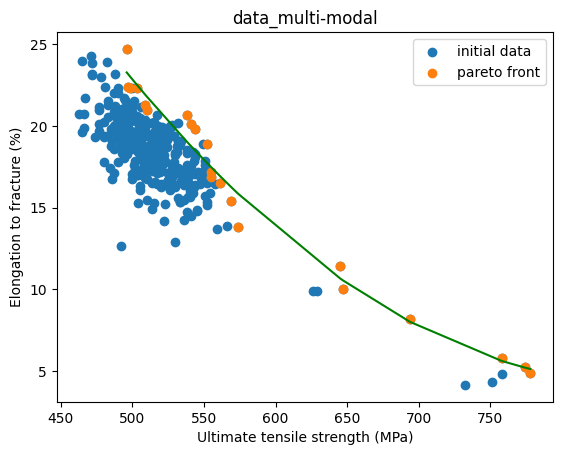

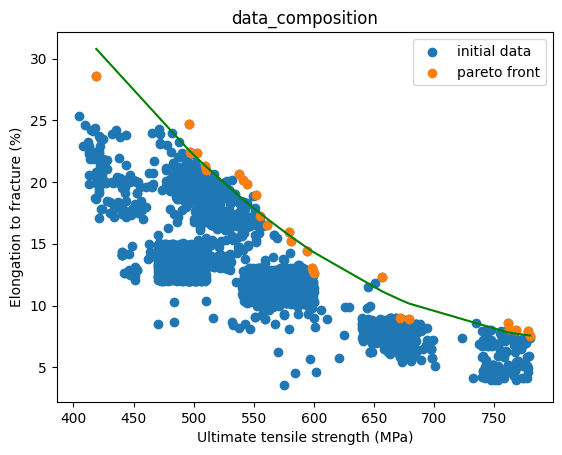

In [6]:

############################### Load Data and Visulization ###############################

def pareto_frontier(data):
    """
    Find the Pareto frontier from a two-dimensional array.

    :param data: A two-dimensional numpy array where rows are points.
    :return: A numpy array with the points on the Pareto frontier.
    """
    # Sort data by the first dimension (x)
    indices = np.argsort(data[:, 0])
    indices = indices[::-1]
    data_sorted = data[data[:, 0].argsort()]
    data_sorted = data_sorted[::-1]
    pareto_front = [data_sorted[0]]
    pareto_indices = [indices[0]]
    for i, point in enumerate(data_sorted[1:]):
        if point[1] > pareto_front[-1][1]:  # Compare with the last point in the Pareto front
            pareto_front.append(point)
            pareto_indices.append(indices[i + 1])
    return np.array(pareto_indices)

def load_data(
        param_space,
        file_name='data_multi-modal',
        ):
    df = pd.read_excel(f'{file_name}.xlsx')
    columns = [key for key, value in param_space.items()]
    df1 = df[columns]
    
    def data_ind(data):
        # return the indices of nan in the dataset
        if data.ndim == 1:
            ind = np.where(data=='/')[0]
            data[ind] = 'nan'
            data = data.astype(float)
            ind = np.argwhere(np.isnan(data))
        elif data.ndim == 2:
            ind = np.where(data=='/')
            for i in range(len(ind[0])):
                data[ind[0][i],ind[1][i]] = 'nan'
            data = data.astype(float)
            ind = np.argwhere(np.isnan(data))
        return ind

    ind = data_ind(np.array(df1))
    ind_new = np.setdiff1d(np.arange(len(np.array(df1))), ind)


    # features and labels
    input_x = np.array(df1)[ind_new].astype(float)
    data1 = np.array(df['UTS'])[ind_new].astype(float)
    data2 = np.array(df['Ef'])[ind_new].astype(float)
    
    properties01=np.concatenate((data1.reshape(-1,1),data2.reshape(-1,1)),axis=1)
    pareto_front = pareto_frontier(properties01)
    coef_fit = np.polyfit(data1[pareto_front], data2[pareto_front], 2)
    
    y_fit = np.polyval(coef_fit, data1[pareto_front])
    
    """Define StandardScaler"""
    scaler_x = StandardScaler()
    scaler_y1 = StandardScaler()
    scaler_y2 = StandardScaler()
    X_scaled = scaler_x.fit_transform(input_x.reshape(len(input_x),input_x.shape[1]))
    y1_scaled = scaler_y1.fit_transform(data1.reshape(len(data1),1))
    y2_scaled = scaler_y2.fit_transform(data2.reshape(len(data2),1))

    
    """Visulization"""
    plt.figure()
    plt.scatter(data1,data2,label='initial data')
    plt.scatter(data1[pareto_front],data2[pareto_front],label='pareto front')
    plt.plot(data1[pareto_front], y_fit, 'g')
    plt.xlabel('Ultimate tensile strength (MPa)')
    plt.ylabel('Elongation to fracture (%)')
    plt.title(f"{file_name}")
    plt.legend()
    
    print('fano factor of Tensile strength:',np.var(data1)/np.mean(data1))
    print('fano factor of Elongation:',np.var(data2)/np.mean(data2))

    return input_x, data1, data2, coef_fit, scaler_x, scaler_y1, scaler_y2


"""
    X_input (np.ndarray): All features.
    y1 (np.ndarray): ultimate tensile strength in unit MPa.
    y2 (np.ndarray): elongation to fracture in unit %.
    coef_fit (np.ndarray): Coefficients of fitted quadratic polynomial.
    scaler_x (StandardScaler): StandardScaler for input features.
    scaler_y1 (StandardScaler): StandardScaler for label #1.
    scaler_y2 (StandardScaler): StandardScaler for label #2.
"""

"""Multi-modal dataset"""
X_input, y1, y2, coef_fit, scaler_x, scaler_y1, scaler_y2 = load_data(
    param_space,
    file_name='data_multi-modal',
    )


"""Composition dataset"""
columns_c = ['C','Si','Mn','Cu','P','S','Cr','Sn','Mg','Sb','Ti']
X_input_c, y1_c, y2_c, coef_fit_c, scaler_x_c, scaler_y1_c, scaler_y2_c = load_data(
    {i:param_space[i] for i in columns_c},
    file_name='data_composition',
    )

In [7]:



################################# End of Part I ################################




################################################################################
> # **Part - II**

*   Surrogate model training

################################################################################

In [8]:

######################## Surrogate model define ############################

@dataclass
class SurrogateModel(ABC):
    """
    Abstract base class for surrogate model implementations.

    Attributes:
        input_dims (int): The input dimensions for the model.
        learning_rate (float): The learning rate for the optimizer.
        path (str): Where to save the trained mdoels.
        batch_size (int): The number of samples per gradient update.
        epochs (int): The number of epochs to train the model.
        patience (int): Number of epochs with no improvement after which training will be stopped.
        n_model (int): Number of models for cross-validation.
        target_R2 (float): Target R2 of model.
        try_lim (int): Max times to retrain the model to achieve target R2.
        models (dict): Load all trained models and store in the dict "models".
        n (int): Size of voxelized matrix (60,60,60).
    """

    input_dims: int = 40
    learning_rate: float = 0.001
    path: str = '/'
    check_point_path: Path = field(default_factory=lambda: Path("NN.keras"))
    batch_size: int = 50
    epochs: int = 5000
    patience: int = 1000
    n_model: int = 5
    target_R2: float = 0.98
    try_lim: int = 5
    models: Dict[Any, int] = field(default_factory=lambda: defaultdict(int))
    target: str = 'UTS'
    verbose: bool = False
    
    x_scaler: Optional[StandardScaler] = StandardScaler()
    y_scaler: Optional[StandardScaler] = StandardScaler()
    

    @abstractmethod
    def create_model(self) -> keras.Model:
        """
        Create and return a Keras model.

        This method should be implemented by subclasses to define the specific
        architecture of the neural network model.

        Returns:
            keras.Model: The created Keras model.
        """
        pass

    def __call__(self, X,y):
        """
        Train the model on the given data.

        This method handles the entire training process, including data splitting,
        model creation, training, and evaluation.

        Args:
            X (np.ndarray): Input features.
            y (np.ndarray): Target values.
            model_name (str): Name to save the model.

        """
        # X_processed, y_scaled = self.preprocess_data(X, y)
        
        # create a file to save model prediction results and model performance
        pd.DataFrame(np.empty(0)).to_csv(self.path +f'/model_performance_{self.target}.csv') 
        
        index_random = np.arange(X.shape[0])
        random.shuffle(index_random)
        X=X.reshape(-1,self.input_dims,1)
        
        for i in range(self.n_model):
            self.check_point_path = self.path + f"/{self.target}{i}_candidate.keras"
            
            # slice the data to 'n_model' parts
            ind=index_random[round(i*len(index_random)/self.n_model):round((1+i)*len(index_random)/self.n_model)]
            ind2=np.setdiff1d(index_random, ind)
            X_train,X_test,y_train,y_test = X[ind2],X[ind],y[ind2],y[ind]
          
            trytime = 0
            R2_1 = 0
            while R2_1 < self.target_R2 and trytime < self.try_lim:
                trytime += 1
                model, y_pred, R2, MAE = self.model_training(
                    X_train, 
                    X_test, 
                    y_train, 
                    y_test,
                    )
                # model.summary()
                if R2 > R2_1:
                    R2_1 = R2
                    model.save(self.path + f'/{self.target}{i}.keras')
                    self.evaluate_model(
                        y_test, 
                        y_pred, 
                        filename = f'{self.target}{i}',
                        save_file=True)
        self.load_model()
    
    # def preprocess_data(self, X, y):
    #     """Standardize and reshape input/output data"""
    #     # Reshape for scaling
    #     original_shape = X.shape
    #     X_flat = X.reshape(len(y), self.input_dims)  # Flatten spatial dimensions

    #     # Standardize data
    #     X_scaled = self.x_scaler.fit_transform(X_flat)
    #     y_scaled = self.y_scaler.fit_transform(y.reshape(-1, 1))

    #     # Reshape to appropriate dimensions
    #     X_processed = X_scaled.reshape(
    #         (X.shape[0], self.input_dims)
    #     )
    #     return X_processed, y_scaled.flatten()
    
    def load_model(self):
        # load all models and store in the dict "models"
        for i in range(self.n_model):
            self.models[f'model{i}']= keras.models.load_model(self.path+f'/{self.target}{i}.keras')

    # ensemble all models to predict
    def ensemble_pred(self, X):
        X_scaled=self.x_scaler.transform(X.reshape(len(X),self.input_dims))
        pred_all=0
        for i in range(self.n_model):
            temp=self.models[f'model{i}'].predict(
                X_scaled.reshape(len(X_scaled),-1,1), verbose = 0)
            temp_virgin = self.y_scaler.inverse_transform(temp.reshape(len(temp),1))
            pred_all+=temp_virgin.flatten()
        pred_all/=self.n_model
        
        return pred_all 

    def model_training(self, x_train, x_test, y_train, y_test):
        """
        Train the model on the given data.

        This method handles the entire training process, including 
        model creation, training, and evaluation.

        Args:
            x_train (np.ndarray): Input features of train-set.
            x_train (np.ndarray): Input features of test-set.
            y_train (np.ndarray): Target values of train-set.
            y_test (np.ndarray): Target values of test-set.

        Returns:
            keras.Model: The trained Keras model and its metrics.
        """
        self.model = self.create_model()
        
        X1 = self.x_scaler.transform(x_train.reshape(len(y_train),self.input_dims))
        y1 = self.y_scaler.transform(y_train.reshape(len(y_train),1))
        X2 = self.x_scaler.transform(x_test.reshape(len(y_test),self.input_dims))
        y2 = self.y_scaler.transform(y_test.reshape(len(y_test),1))
        
       
        mc = ModelCheckpoint(
            self.check_point_path,
            monitor="val_loss",
            mode="min",
            verbose=self.verbose,
            save_best_only=True,
        )
        early_stop = EarlyStopping(
            monitor="val_loss", patience=self.patience, restore_best_weights=True
        )
        self.model.fit(
            X1.reshape(len(X1), self.input_dims, 1),
            y1.flatten(),
            batch_size=self.batch_size,
            epochs=self.epochs,
            validation_data=(X2.reshape(len(X2),self.input_dims,1), y2.flatten()),
            callbacks=[early_stop, mc],
            verbose=self.verbose,
        )

        self.model = keras.models.load_model(self.check_point_path)
        y_pred = self.model.predict(
            X2.reshape(len(X2),self.input_dims,1), 
            verbose=self.verbose
        )
        
        y_pred2 = self.y_scaler.inverse_transform(y_pred.reshape(len(y_pred), 1))
        
        r_squared, mae = self.evaluate_model(y_test, y_pred2.flatten())

        return self.model, y_pred2, r_squared, mae


    def evaluate_model(self, y_test, y_pred, filename=None, save_file=False):
        """
        Evaluate the model's performance and plot results.

        This method calculates various performance metrics and creates a regression plot.

        Args:
            y_test (np.ndarray): True target values.
            y_pred (np.ndarray): Predicted target values.
        """
        # Calculate metrics
        metrics_dict = {
            'R': stats.pearsonr(y_pred.flatten(), y_test.flatten())[0],
            'R²': metrics.r2_score(y_test, y_pred),
            'MAE': metrics.mean_absolute_error(y_test, y_pred),
            'MSE': metrics.mean_squared_error(y_test, y_pred),
            'MAPE': metrics.mean_absolute_percentage_error(y_test, y_pred)
        }

        # Visualization
        ub = max(max(y_test.flatten()), max(y_pred.flatten()))
        lb = min(min(y_test.flatten()), min(y_pred.flatten()))
        u2l = ub - lb
        ub += 0.1 * u2l
        lb -= 0.1 * u2l
        label = {k: f"{v:.4f}" for k, v in metrics_dict.items()}
        print(f'{label}')
        
        if save_file:
        
            plt.figure(figsize=(6, 6))
            sns.regplot(x=y_pred.flatten(), y=y_test.flatten(), 
                        scatter_kws={'alpha':0.4}, line_kws={'color':'red'},
                        label = f'{label}')
            plt.title(f'{label}')
            plt.xlabel('Predicted Values')
            plt.ylabel('Actual Values')
            plt.xlim(lb,ub)
            plt.ylim(lb,ub)
            plt.grid(True)
            # plt.legend()
            plt.show()
            plt.savefig(self.path + f'/regplot_{filename}.png')
            
            perform_list = pd.read_csv(self.path + f'/model_performance_{self.target}.csv')
            y_test = pd.DataFrame(y_test)
            y_test.columns= ['ground truth']
            y_pred = pd.DataFrame(y_pred)
            y_pred.columns= ['pred']
            metric = pd.DataFrame([metrics_dict['R'], 
                                   metrics_dict['R²'], 
                                   metrics_dict['MAE'],
                                   metrics_dict['MSE'],
                                   metrics_dict['MAPE']
                                   ])
            metric.columns= ['R&R2&MAE&MSE&MAPE']
            perform_list2=pd.concat((perform_list,y_test,y_pred,metric),axis=1)
            perform_list2.drop([perform_list2.columns[0]],axis=1, inplace=True)
            perform_list2.to_csv(self.path + f'/model_performance_{self.target}.csv')

        return metrics_dict['R²'], metrics_dict['MAE']
        



class TensileSurrogateModel(SurrogateModel):
    """
    Surrogate model implementation for UTS and Ef prediction.
    """

    def create_model(self) -> keras.Model:
        model = Sequential([
            layers.Conv1D(
                filters=128,
                kernel_size=3,
                strides=1,
                padding='same', 
                activation='elu', 
                input_shape=(self.input_dims,1)),
            layers.LayerNormalization(),
            layers.Conv1D(
                filters=64,
                kernel_size=3,
                strides=1,
                padding='same', 
                activation='elu'),
            layers.Dropout(0.1),
            layers.Conv1D(
                filters=32,
                kernel_size=3,
                strides=1,
                padding='same', 
                activation='elu'),
            layers.Dropout(0.1),
            layers.Conv1D(
                filters=16,
                kernel_size=3,
                strides=1,
                padding='same', 
                activation='elu'),
            layers.Conv1D(
                filters=8,
                kernel_size=3,
                strides=1,
                padding='same', 
                activation='elu'),
            layers.Flatten(),
            Dense(64, activation='elu'),
            Dense(1, activation='linear')
        ])
        model.compile(
            optimizer=Adam(learning_rate=self.learning_rate), 
            loss='mse', metrics=["mean_squared_error"]
        )
        model.summary()
        return model


class DefaultSurrogateModel(SurrogateModel):
    """
    Default surrogate model implementation.
    """

    def create_model(self) -> keras.Model:
        model = Sequential(
            [
                Conv1D(
                    128,
                    kernel_size=3,
                    strides=1,
                    padding="same",
                    activation="relu",
                    input_shape=(self.input_dims, 1),
                ),
                MaxPooling1D(pool_size=2),
                Dropout(0.2),
                Conv1D(64, kernel_size=3, strides=1, padding="same", activation="relu"),
                MaxPooling1D(pool_size=2),
                Dropout(0.2),
                Conv1D(32, kernel_size=3, strides=1, padding="same", activation="relu"),
                MaxPooling1D(pool_size=2, strides=1),
                Conv1D(16, kernel_size=3, strides=1, padding="same", activation="relu"),
                Conv1D(8, kernel_size=3, strides=1, padding="same", activation="relu"),
                Conv1D(4, kernel_size=3, strides=1, padding="same", activation="relu"),
                Flatten(),
                Dense(64, activation="relu"),
                Dense(1, activation="linear"),
            ]
        )
        model.compile(
            optimizer=Adam(learning_rate=self.learning_rate), loss="mean_squared_error"
        )
        return model


class PredefinedSurrogateModel(Enum):
    TENSILE = auto()
    DEFAULT = auto()


def get_surrogate_model(
    f: PredefinedSurrogateModel = None,
) -> SurrogateModel:
    """
    Factory function to get the appropriate SurrogateModel.

    Args:
        f (str): The name of the optimization function.

    Returns:
        SurrogateModel: An instance of the appropriate SurrogateModel subclass.
    """
    model_classes = {
        PredefinedSurrogateModel.TENSILE: TensileSurrogateModel,
    }
    return model_classes.get(f, DefaultSurrogateModel)

print('Surrogate model defined!')

Surrogate model defined!


2025-07-18 01:28:02.279794: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2025-07-18 01:28:02.346480: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-07-18 01:28:02.347287: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:09:00.0 name: NVIDIA GeForce RTX 3090 Ti computeCapability: 8.6
coreClock: 1.905GHz coreCount: 84 deviceMemorySize: 23.68GiB deviceMemoryBandwidth: 938.86GiB/s
2025-07-18 01:28:02.347330: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2025-07-18 01:28:02.350327: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas.so.11
2025-07-18 01:28:02.350377: I tensorflow/stream_executor

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 39, 128)           512       
_________________________________________________________________
layer_normalization (LayerNo (None, 39, 128)           256       
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 39, 64)            24640     
_________________________________________________________________
dropout (Dropout)            (None, 39, 64)            0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 39, 32)            6176      
_________________________________________________________________
dropout_1 (Dropout)          (None, 39, 32)            0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 39, 16)            1

2025-07-18 01:28:02.861921: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2025-07-18 01:28:02.862181: I tensorflow/core/platform/profile_utils/cpu_utils.cc:114] CPU Frequency: 3799655000 Hz
2025-07-18 01:28:03.220341: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudnn.so.8
2025-07-18 01:28:03.569101: I tensorflow/stream_executor/cuda/cuda_dnn.cc:359] Loaded cuDNN version 8201
2025-07-18 01:28:04.091843: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2025-07-18 01:28:04.091866: W tensorflow/stream_executor/gpu/asm_compiler.cc:56] Couldn't invoke ptxas --version
2025-07-18 01:28:04.093542: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2025-07-18 01:28:04.093655: W tensorflow/stream_executor/gpu/redzone_allocator.cc:31

{'R': '0.9717', 'R²': '0.9372', 'MAE': '9.0102', 'MSE': '175.1144', 'MAPE': '0.0169'}
{'R': '0.9717', 'R²': '0.9372', 'MAE': '9.0102', 'MSE': '175.1144', 'MAPE': '0.0169'}


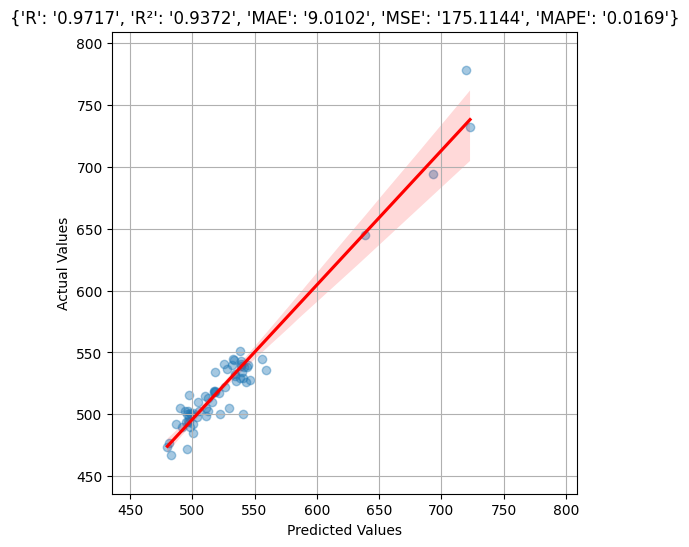

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_5 (Conv1D)            (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_1 (Layer (None, 39, 128)           256       
_________________________________________________________________
conv1d_6 (Conv1D)            (None, 39, 64)            24640     
_________________________________________________________________
dropout_2 (Dropout)          (None, 39, 64)            0         
_________________________________________________________________
conv1d_7 (Conv1D)            (None, 39, 32)            6176      
_________________________________________________________________
dropout_3 (Dropout)          (None, 39, 32)            0         
_________________________________________________________________
conv1d_8 (Conv1D)            (None, 39, 16)           

<Figure size 640x480 with 0 Axes>

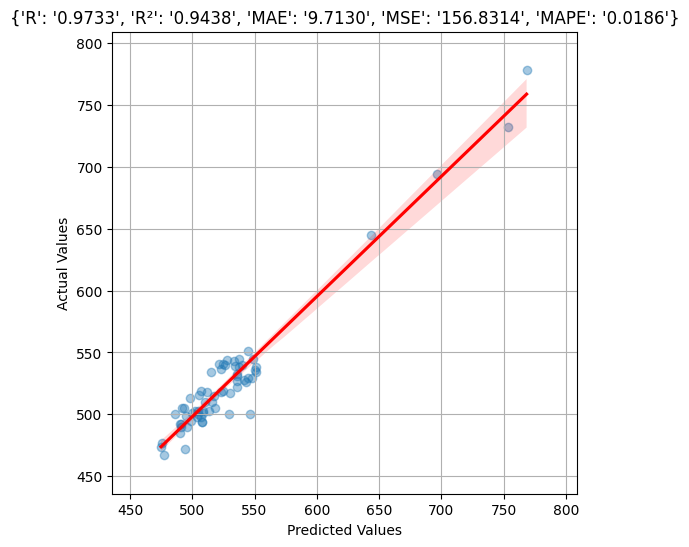

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_20 (Conv1D)           (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_4 (Layer (None, 39, 128)           256       
_________________________________________________________________
conv1d_21 (Conv1D)           (None, 39, 64)            24640     
_________________________________________________________________
dropout_8 (Dropout)          (None, 39, 64)            0         
_________________________________________________________________
conv1d_22 (Conv1D)           (None, 39, 32)            6176      
_________________________________________________________________
dropout_9 (Dropout)          (None, 39, 32)            0         
_________________________________________________________________
conv1d_23 (Conv1D)           (None, 39, 16)           

<Figure size 640x480 with 0 Axes>

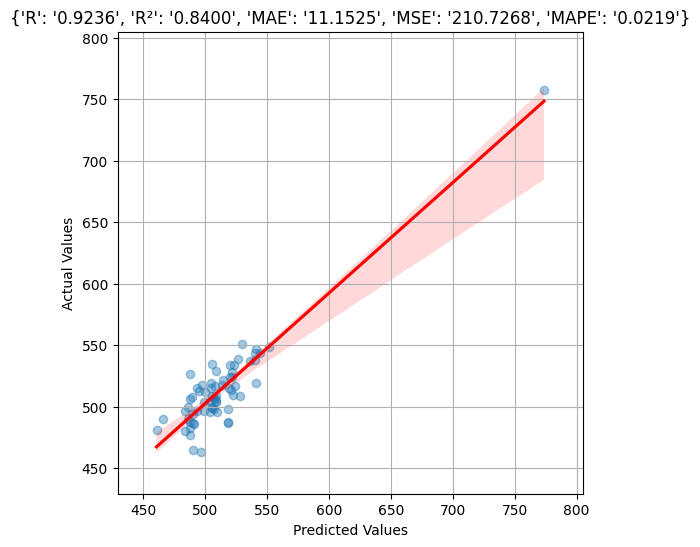

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_30 (Conv1D)           (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_6 (Layer (None, 39, 128)           256       
_________________________________________________________________
conv1d_31 (Conv1D)           (None, 39, 64)            24640     
_________________________________________________________________
dropout_12 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_32 (Conv1D)           (None, 39, 32)            6176      
_________________________________________________________________
dropout_13 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_33 (Conv1D)           (None, 39, 16)           

<Figure size 640x480 with 0 Axes>

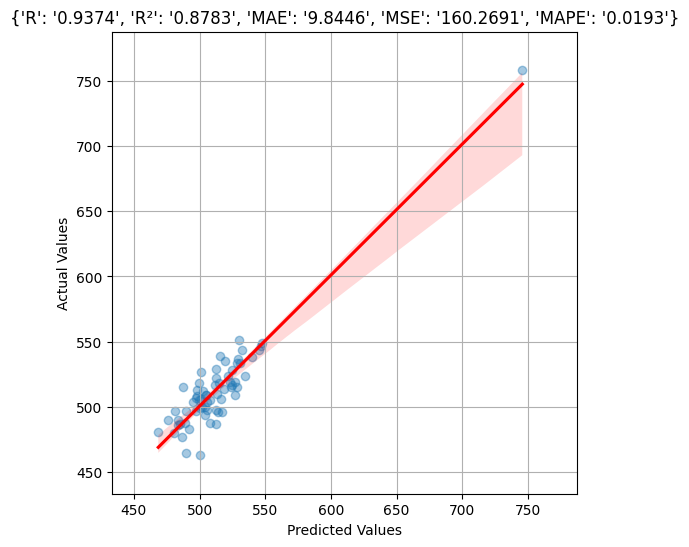

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_40 (Conv1D)           (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_8 (Layer (None, 39, 128)           256       
_________________________________________________________________
conv1d_41 (Conv1D)           (None, 39, 64)            24640     
_________________________________________________________________
dropout_16 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_42 (Conv1D)           (None, 39, 32)            6176      
_________________________________________________________________
dropout_17 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_43 (Conv1D)           (None, 39, 16)           

<Figure size 640x480 with 0 Axes>

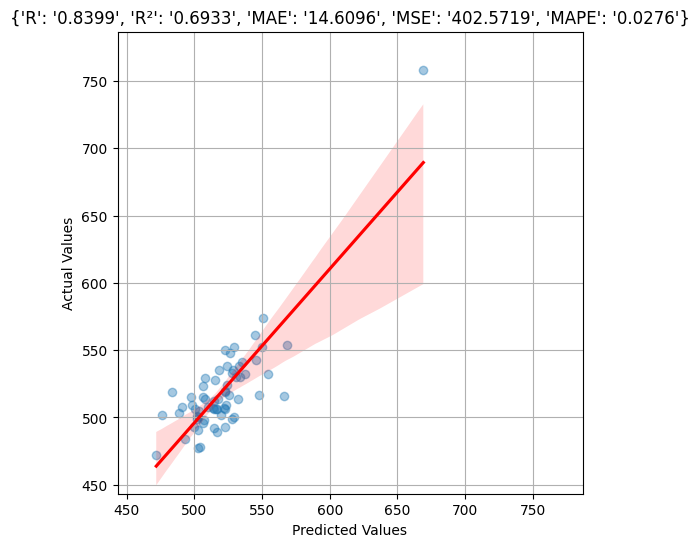

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_55 (Conv1D)           (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_11 (Laye (None, 39, 128)           256       
_________________________________________________________________
conv1d_56 (Conv1D)           (None, 39, 64)            24640     
_________________________________________________________________
dropout_22 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_57 (Conv1D)           (None, 39, 32)            6176      
_________________________________________________________________
dropout_23 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_58 (Conv1D)           (None, 39, 16)          

<Figure size 640x480 with 0 Axes>

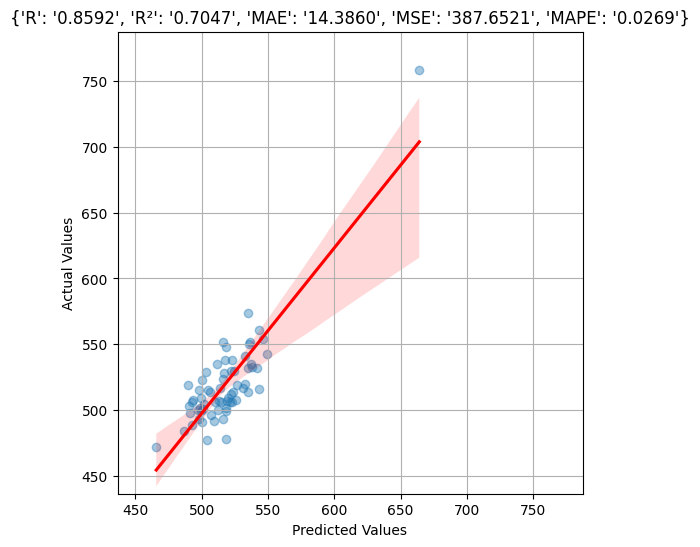

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_60 (Conv1D)           (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_12 (Laye (None, 39, 128)           256       
_________________________________________________________________
conv1d_61 (Conv1D)           (None, 39, 64)            24640     
_________________________________________________________________
dropout_24 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_62 (Conv1D)           (None, 39, 32)            6176      
_________________________________________________________________
dropout_25 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_63 (Conv1D)           (None, 39, 16)          

<Figure size 640x480 with 0 Axes>

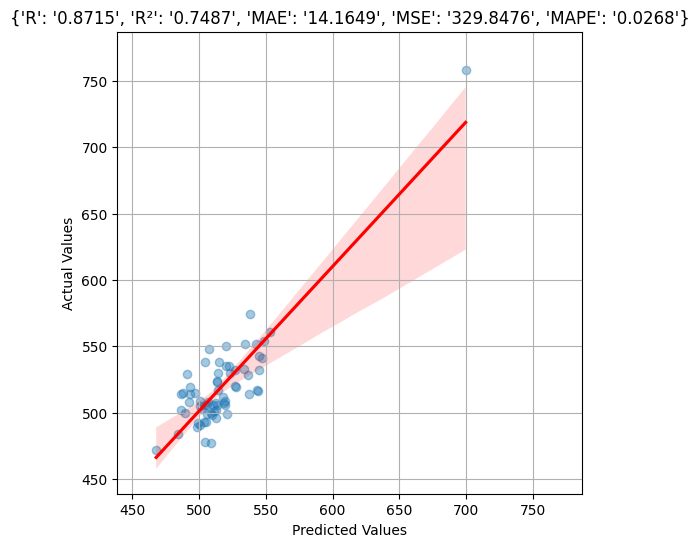

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_65 (Conv1D)           (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_13 (Laye (None, 39, 128)           256       
_________________________________________________________________
conv1d_66 (Conv1D)           (None, 39, 64)            24640     
_________________________________________________________________
dropout_26 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_67 (Conv1D)           (None, 39, 32)            6176      
_________________________________________________________________
dropout_27 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_68 (Conv1D)           (None, 39, 16)          

<Figure size 640x480 with 0 Axes>

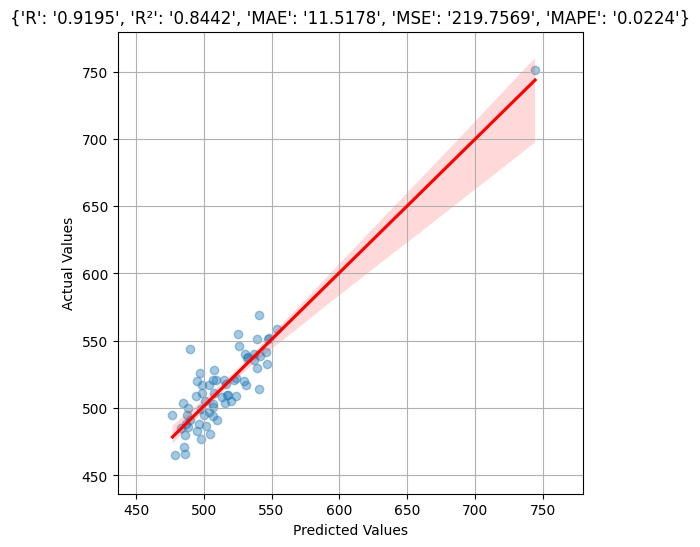

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_80 (Conv1D)           (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_16 (Laye (None, 39, 128)           256       
_________________________________________________________________
conv1d_81 (Conv1D)           (None, 39, 64)            24640     
_________________________________________________________________
dropout_32 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_82 (Conv1D)           (None, 39, 32)            6176      
_________________________________________________________________
dropout_33 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_83 (Conv1D)           (None, 39, 16)          

<Figure size 640x480 with 0 Axes>

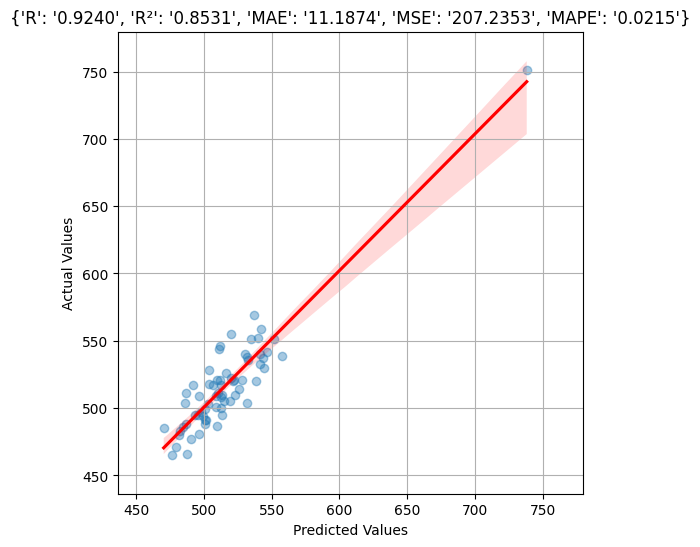

Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_90 (Conv1D)           (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_18 (Laye (None, 39, 128)           256       
_________________________________________________________________
conv1d_91 (Conv1D)           (None, 39, 64)            24640     
_________________________________________________________________
dropout_36 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_92 (Conv1D)           (None, 39, 32)            6176      
_________________________________________________________________
dropout_37 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_93 (Conv1D)           (None, 39, 16)          

<Figure size 640x480 with 0 Axes>

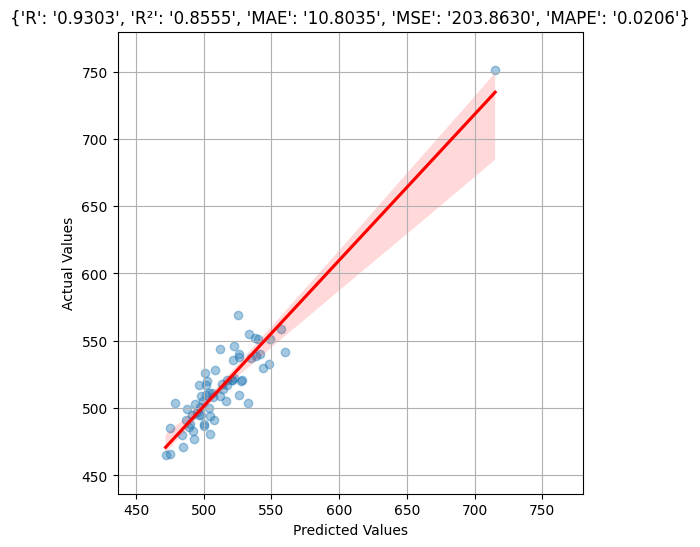

Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_95 (Conv1D)           (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_19 (Laye (None, 39, 128)           256       
_________________________________________________________________
conv1d_96 (Conv1D)           (None, 39, 64)            24640     
_________________________________________________________________
dropout_38 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_97 (Conv1D)           (None, 39, 32)            6176      
_________________________________________________________________
dropout_39 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_98 (Conv1D)           (None, 39, 16)          

<Figure size 640x480 with 0 Axes>

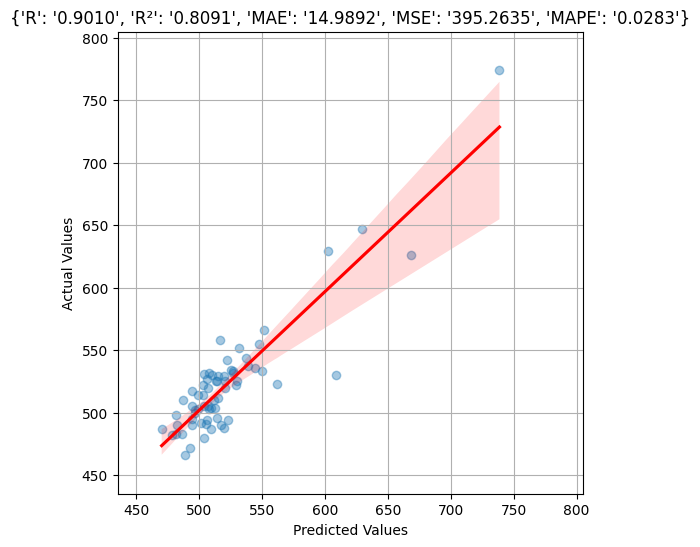

Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_105 (Conv1D)          (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_21 (Laye (None, 39, 128)           256       
_________________________________________________________________
conv1d_106 (Conv1D)          (None, 39, 64)            24640     
_________________________________________________________________
dropout_42 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_107 (Conv1D)          (None, 39, 32)            6176      
_________________________________________________________________
dropout_43 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_108 (Conv1D)          (None, 39, 16)          

<Figure size 640x480 with 0 Axes>

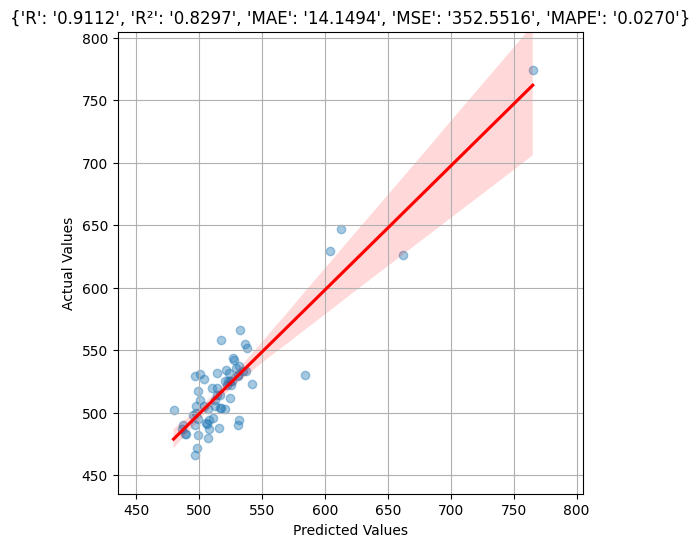

Model: "sequential_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_110 (Conv1D)          (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_22 (Laye (None, 39, 128)           256       
_________________________________________________________________
conv1d_111 (Conv1D)          (None, 39, 64)            24640     
_________________________________________________________________
dropout_44 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_112 (Conv1D)          (None, 39, 32)            6176      
_________________________________________________________________
dropout_45 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_113 (Conv1D)          (None, 39, 16)          

<Figure size 640x480 with 0 Axes>

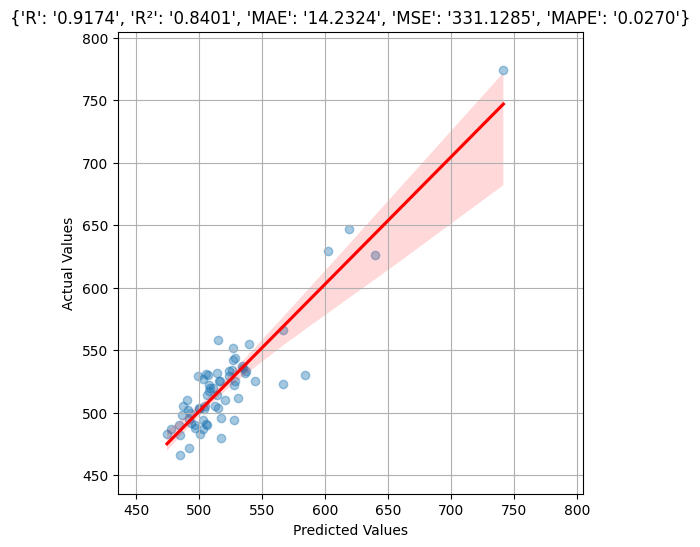

Model: "sequential_24"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_120 (Conv1D)          (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_24 (Laye (None, 39, 128)           256       
_________________________________________________________________
conv1d_121 (Conv1D)          (None, 39, 64)            24640     
_________________________________________________________________
dropout_48 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_122 (Conv1D)          (None, 39, 32)            6176      
_________________________________________________________________
dropout_49 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_123 (Conv1D)          (None, 39, 16)          

<Figure size 640x480 with 0 Axes>

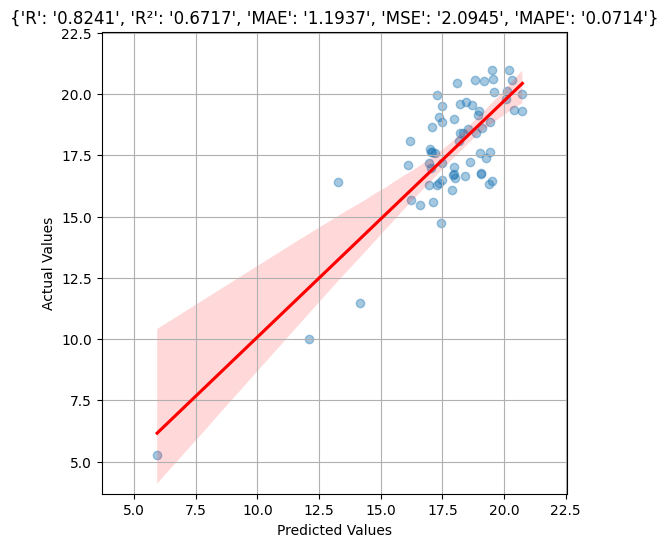

Model: "sequential_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_130 (Conv1D)          (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_26 (Laye (None, 39, 128)           256       
_________________________________________________________________
conv1d_131 (Conv1D)          (None, 39, 64)            24640     
_________________________________________________________________
dropout_52 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_132 (Conv1D)          (None, 39, 32)            6176      
_________________________________________________________________
dropout_53 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_133 (Conv1D)          (None, 39, 16)          

{'R': '0.7502', 'R²': '0.5352', 'MAE': '1.3727', 'MSE': '3.3172', 'MAPE': '0.0812'}
{'R': '0.7502', 'R²': '0.5352', 'MAE': '1.3727', 'MSE': '3.3172', 'MAPE': '0.0812'}


<Figure size 640x480 with 0 Axes>

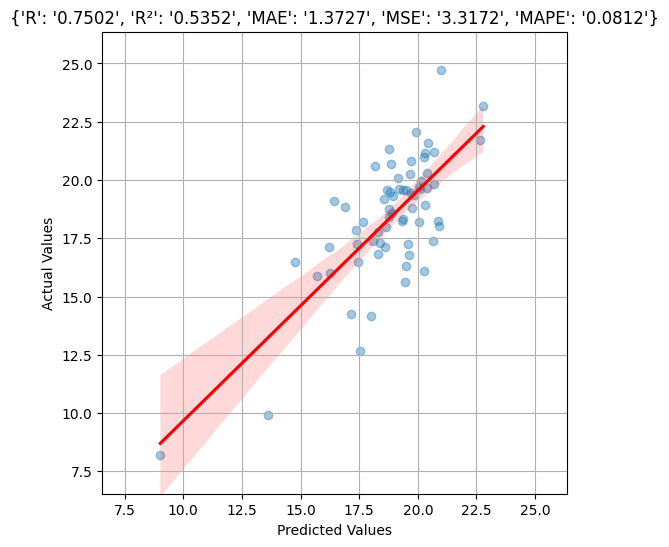

Model: "sequential_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_155 (Conv1D)          (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_31 (Laye (None, 39, 128)           256       
_________________________________________________________________
conv1d_156 (Conv1D)          (None, 39, 64)            24640     
_________________________________________________________________
dropout_62 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_157 (Conv1D)          (None, 39, 32)            6176      
_________________________________________________________________
dropout_63 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_158 (Conv1D)          (None, 39, 16)          

{'R': '0.7734', 'R²': '0.5867', 'MAE': '1.4225', 'MSE': '2.9351', 'MAPE': '0.0790'}
{'R': '0.7734', 'R²': '0.5867', 'MAE': '1.4225', 'MSE': '2.9351', 'MAPE': '0.0790'}


<Figure size 640x480 with 0 Axes>

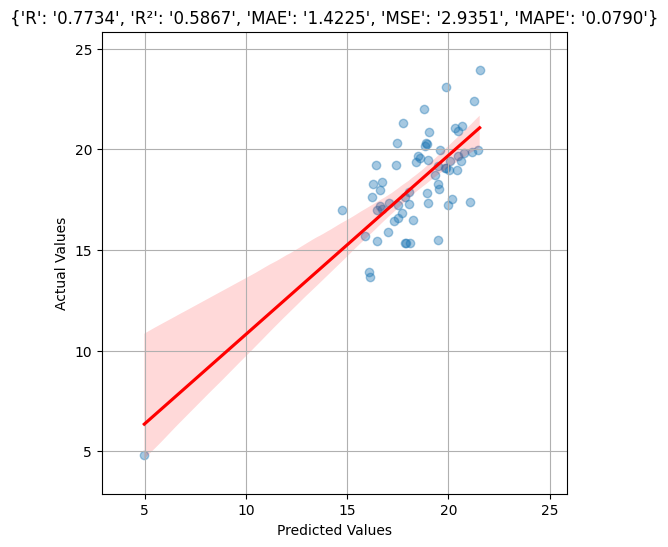

Model: "sequential_36"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_180 (Conv1D)          (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_36 (Laye (None, 39, 128)           256       
_________________________________________________________________
conv1d_181 (Conv1D)          (None, 39, 64)            24640     
_________________________________________________________________
dropout_72 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_182 (Conv1D)          (None, 39, 32)            6176      
_________________________________________________________________
dropout_73 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_183 (Conv1D)          (None, 39, 16)          

<Figure size 640x480 with 0 Axes>

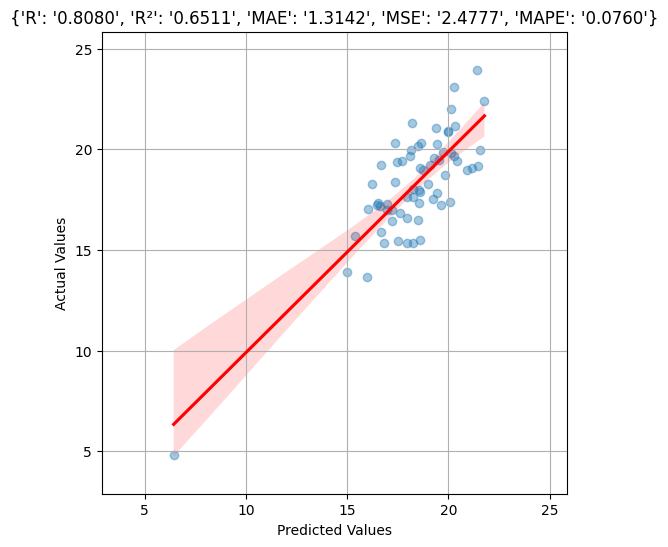

Model: "sequential_38"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_190 (Conv1D)          (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_38 (Laye (None, 39, 128)           256       
_________________________________________________________________
conv1d_191 (Conv1D)          (None, 39, 64)            24640     
_________________________________________________________________
dropout_76 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_192 (Conv1D)          (None, 39, 32)            6176      
_________________________________________________________________
dropout_77 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_193 (Conv1D)          (None, 39, 16)          

<Figure size 640x480 with 0 Axes>

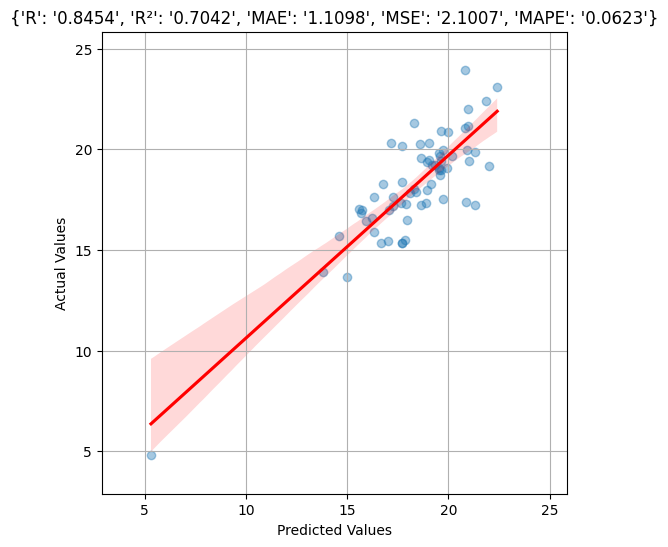

Model: "sequential_39"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_195 (Conv1D)          (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_39 (Laye (None, 39, 128)           256       
_________________________________________________________________
conv1d_196 (Conv1D)          (None, 39, 64)            24640     
_________________________________________________________________
dropout_78 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_197 (Conv1D)          (None, 39, 32)            6176      
_________________________________________________________________
dropout_79 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_198 (Conv1D)          (None, 39, 16)          

<Figure size 640x480 with 0 Axes>

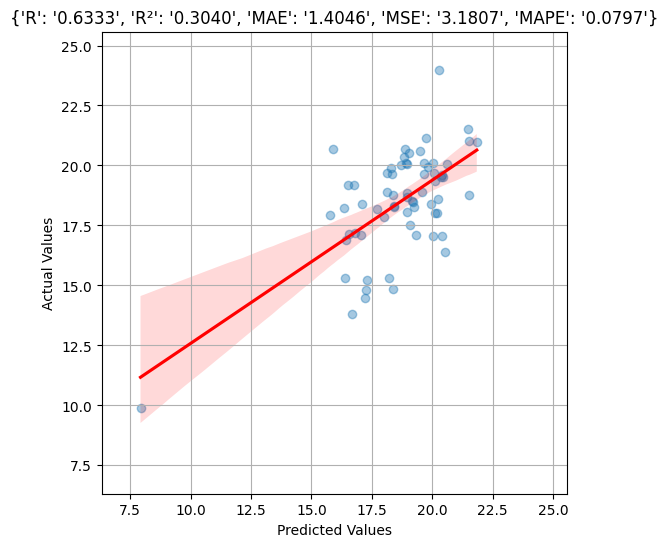

Model: "sequential_41"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_205 (Conv1D)          (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_41 (Laye (None, 39, 128)           256       
_________________________________________________________________
conv1d_206 (Conv1D)          (None, 39, 64)            24640     
_________________________________________________________________
dropout_82 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_207 (Conv1D)          (None, 39, 32)            6176      
_________________________________________________________________
dropout_83 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_208 (Conv1D)          (None, 39, 16)          

<Figure size 640x480 with 0 Axes>

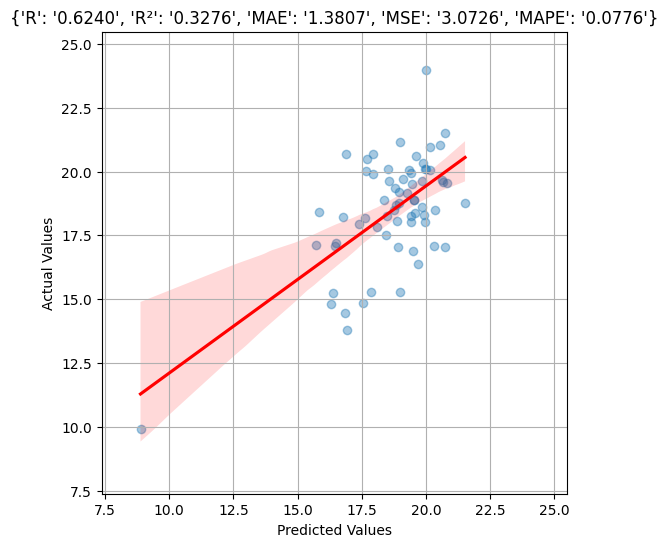

Model: "sequential_45"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_225 (Conv1D)          (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_45 (Laye (None, 39, 128)           256       
_________________________________________________________________
conv1d_226 (Conv1D)          (None, 39, 64)            24640     
_________________________________________________________________
dropout_90 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_227 (Conv1D)          (None, 39, 32)            6176      
_________________________________________________________________
dropout_91 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_228 (Conv1D)          (None, 39, 16)          

<Figure size 640x480 with 0 Axes>

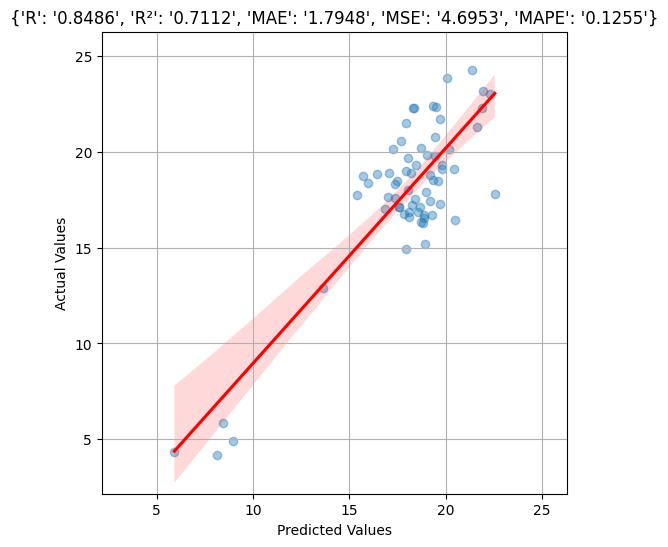

Model: "sequential_46"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_230 (Conv1D)          (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_46 (Laye (None, 39, 128)           256       
_________________________________________________________________
conv1d_231 (Conv1D)          (None, 39, 64)            24640     
_________________________________________________________________
dropout_92 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_232 (Conv1D)          (None, 39, 32)            6176      
_________________________________________________________________
dropout_93 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_233 (Conv1D)          (None, 39, 16)          

<Figure size 640x480 with 0 Axes>

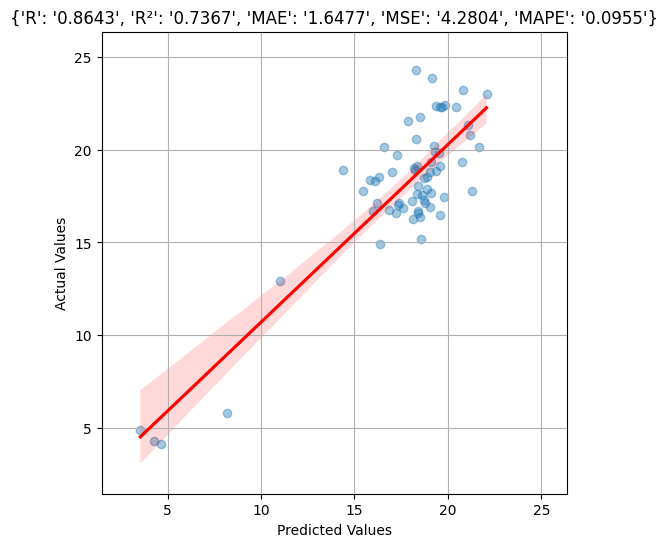

Model: "sequential_47"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_235 (Conv1D)          (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_47 (Laye (None, 39, 128)           256       
_________________________________________________________________
conv1d_236 (Conv1D)          (None, 39, 64)            24640     
_________________________________________________________________
dropout_94 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_237 (Conv1D)          (None, 39, 32)            6176      
_________________________________________________________________
dropout_95 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_238 (Conv1D)          (None, 39, 16)          

<Figure size 640x480 with 0 Axes>

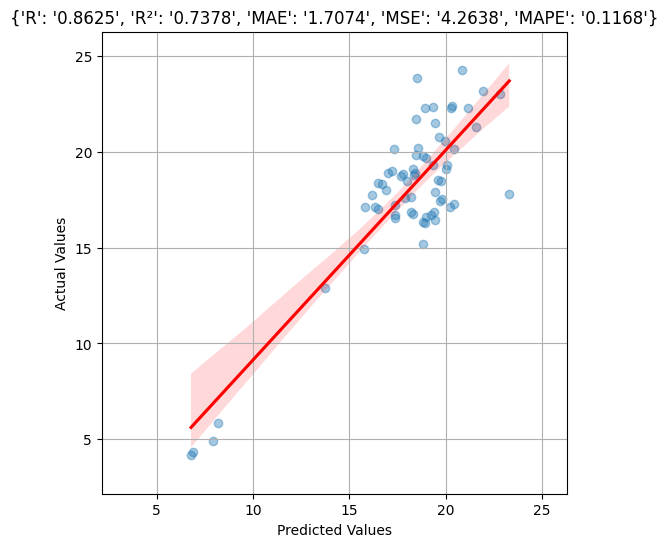

Model: "sequential_48"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_240 (Conv1D)          (None, 39, 128)           512       
_________________________________________________________________
layer_normalization_48 (Laye (None, 39, 128)           256       
_________________________________________________________________
conv1d_241 (Conv1D)          (None, 39, 64)            24640     
_________________________________________________________________
dropout_96 (Dropout)         (None, 39, 64)            0         
_________________________________________________________________
conv1d_242 (Conv1D)          (None, 39, 32)            6176      
_________________________________________________________________
dropout_97 (Dropout)         (None, 39, 32)            0         
_________________________________________________________________
conv1d_243 (Conv1D)          (None, 39, 16)          

<Figure size 640x480 with 0 Axes>

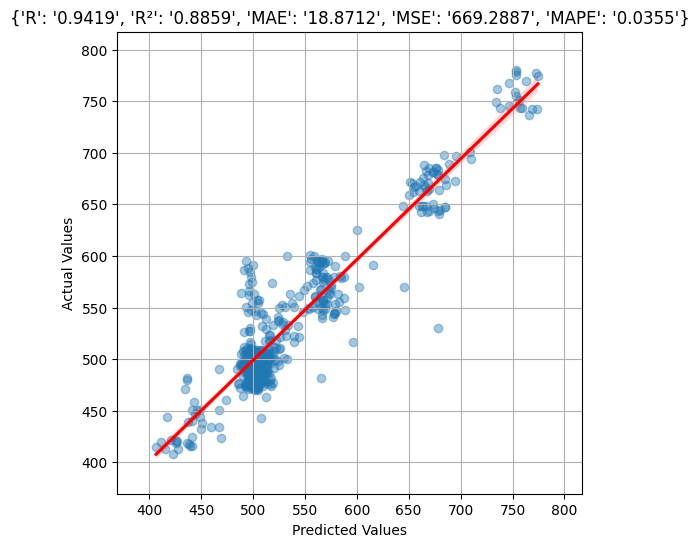

Model: "sequential_51"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_255 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_51 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_256 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_102 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_257 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_103 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_258 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

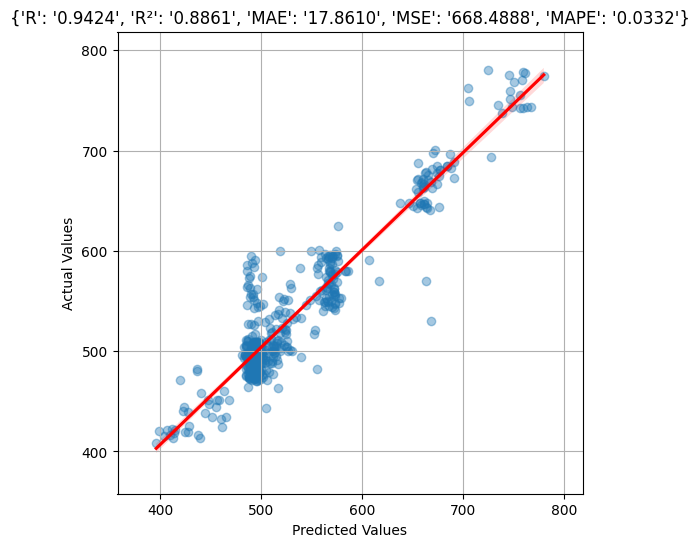

Model: "sequential_52"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_260 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_52 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_261 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_104 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_262 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_105 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_263 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

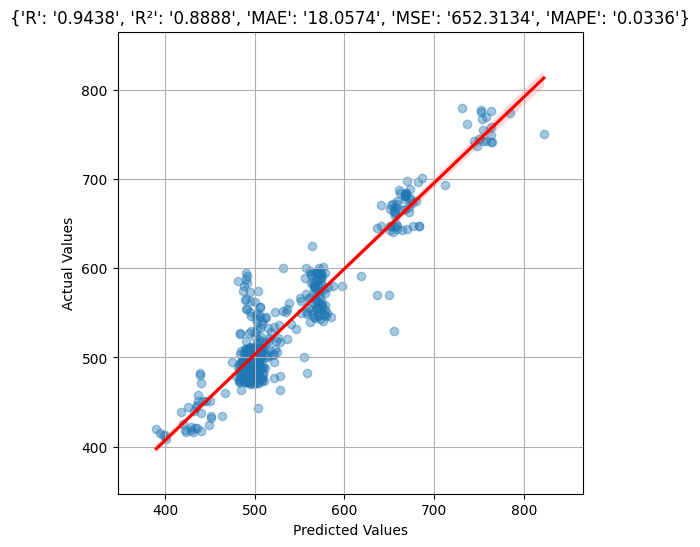

Model: "sequential_54"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_270 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_54 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_271 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_108 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_272 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_109 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_273 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

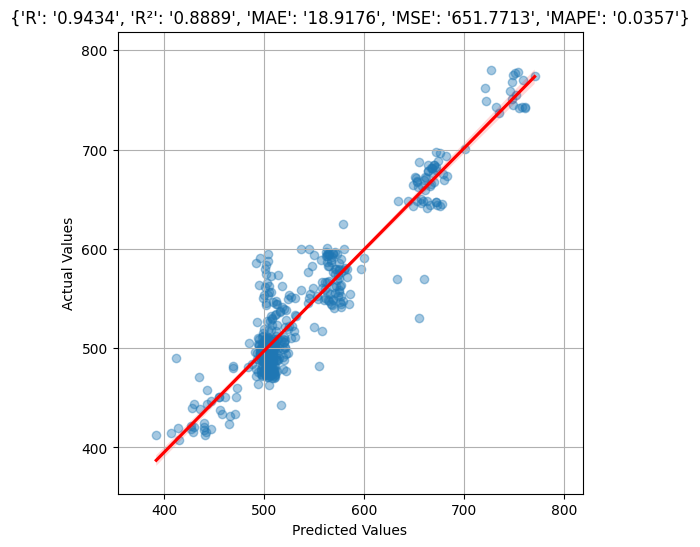

Model: "sequential_55"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_275 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_55 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_276 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_110 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_277 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_111 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_278 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

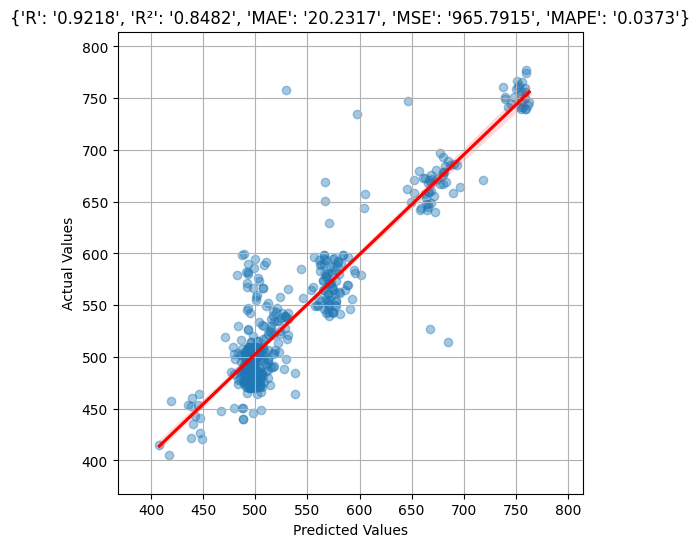

Model: "sequential_56"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_280 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_56 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_281 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_112 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_282 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_113 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_283 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

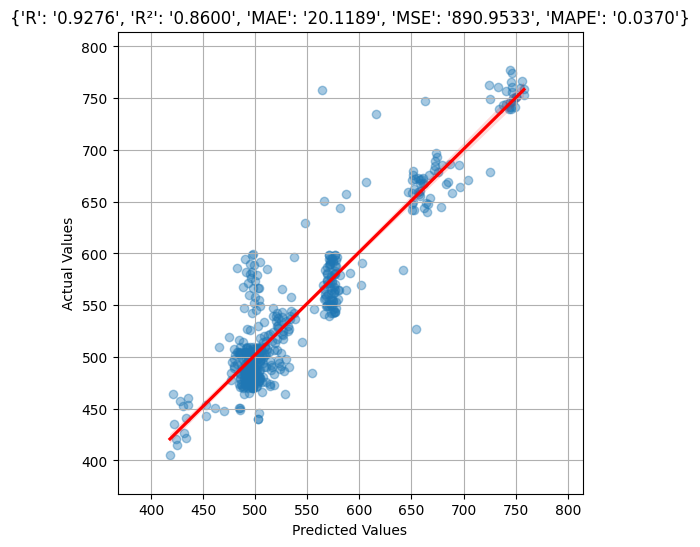

Model: "sequential_57"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_285 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_57 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_286 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_114 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_287 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_115 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_288 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

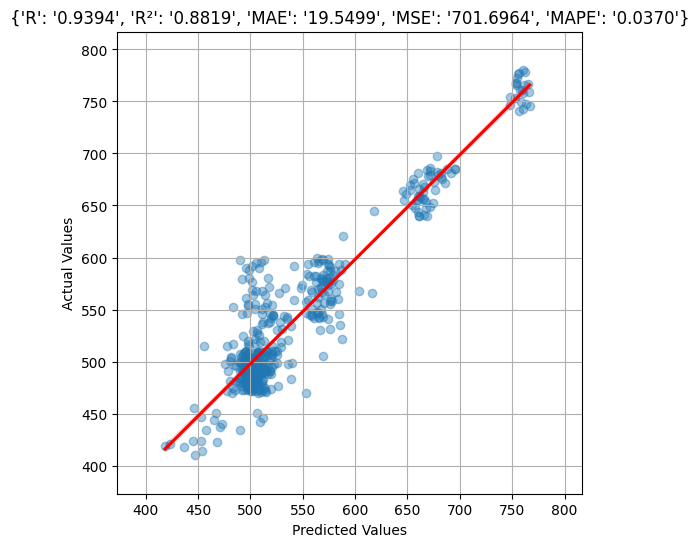

Model: "sequential_61"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_305 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_61 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_306 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_122 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_307 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_123 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_308 (Conv1D)          (None, 11, 16)          

{'R': '0.9408', 'R²': '0.8841', 'MAE': '18.5398', 'MSE': '659.0108', 'MAPE': '0.0344'}
{'R': '0.9408', 'R²': '0.8841', 'MAE': '18.5398', 'MSE': '659.0108', 'MAPE': '0.0344'}


<Figure size 640x480 with 0 Axes>

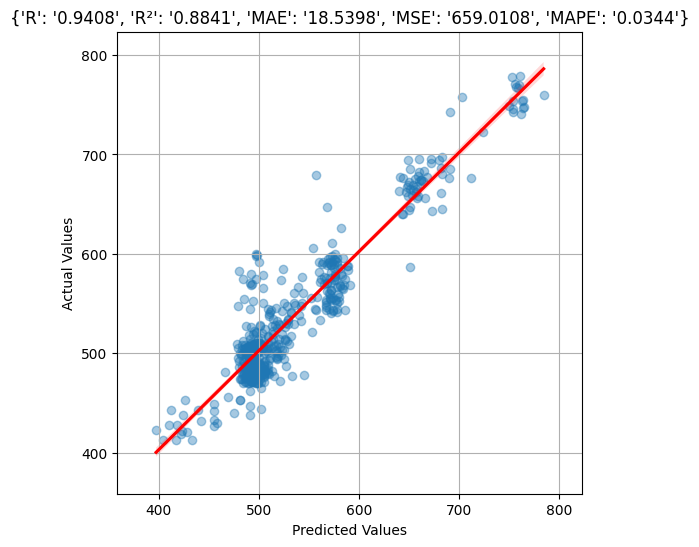

Model: "sequential_66"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_330 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_66 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_331 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_132 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_332 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_133 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_333 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

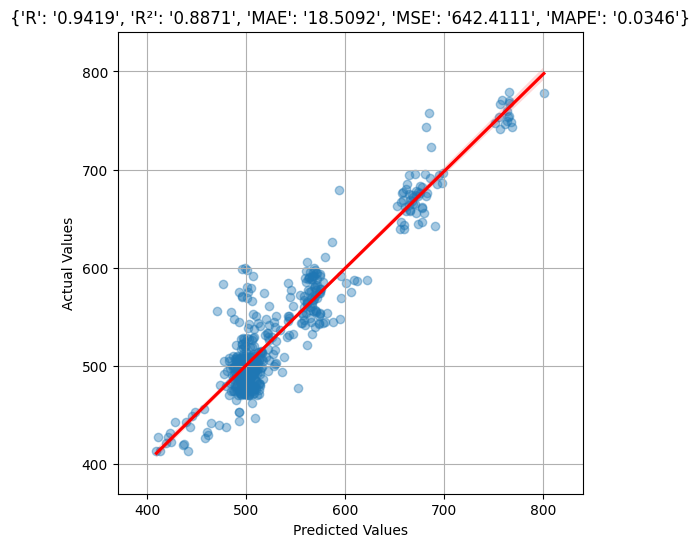

Model: "sequential_67"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_335 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_67 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_336 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_134 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_337 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_135 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_338 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

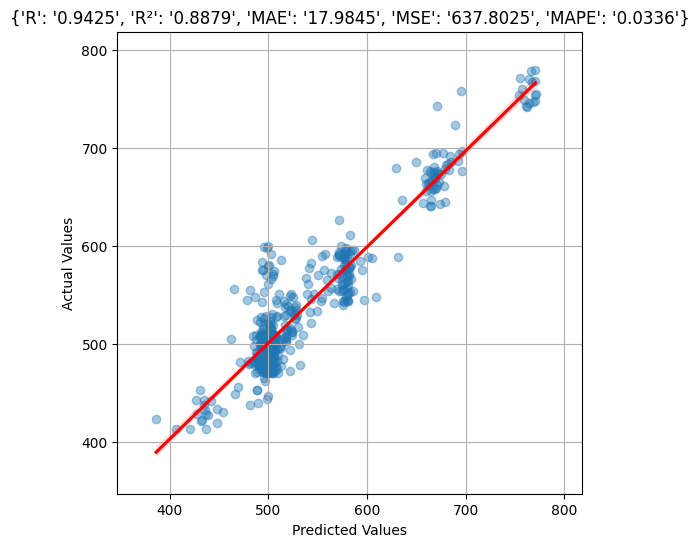

Model: "sequential_68"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_340 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_68 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_341 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_136 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_342 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_137 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_343 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

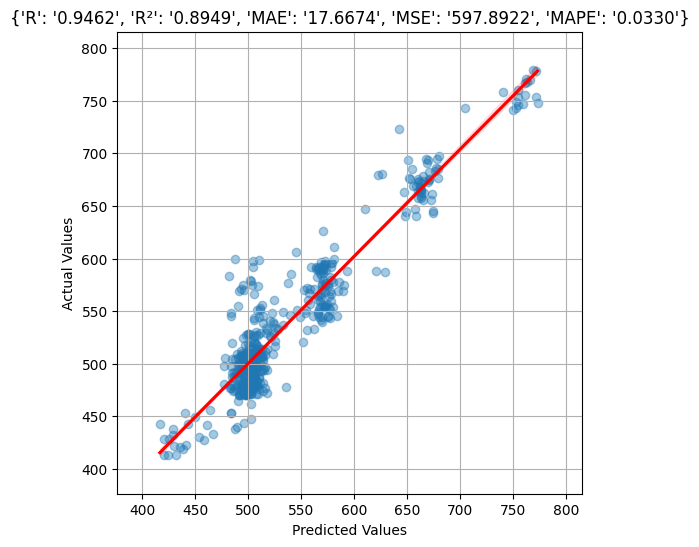

Model: "sequential_69"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_345 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_69 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_346 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_138 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_347 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_139 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_348 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

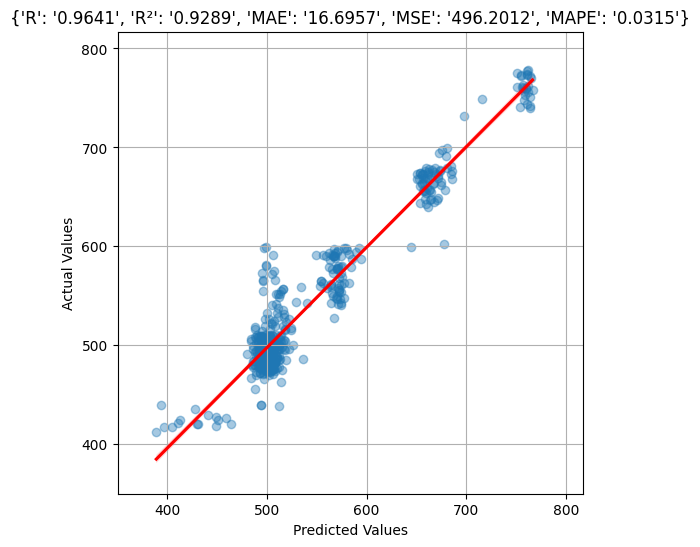

Model: "sequential_71"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_355 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_71 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_356 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_142 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_357 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_143 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_358 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

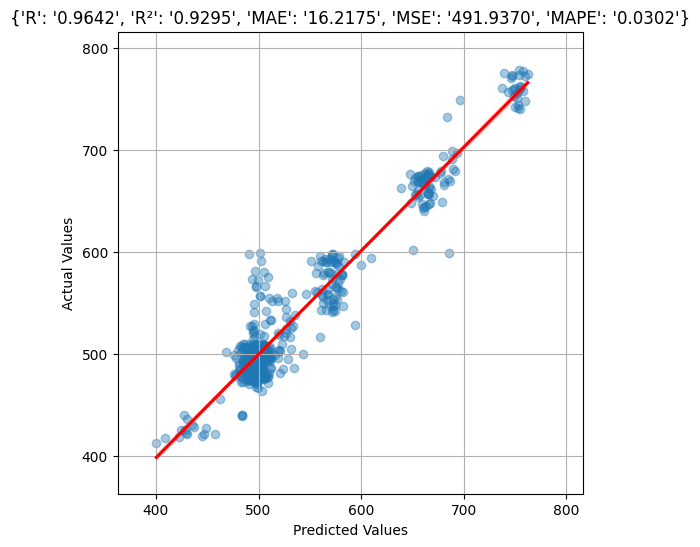

Model: "sequential_72"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_360 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_72 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_361 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_144 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_362 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_145 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_363 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

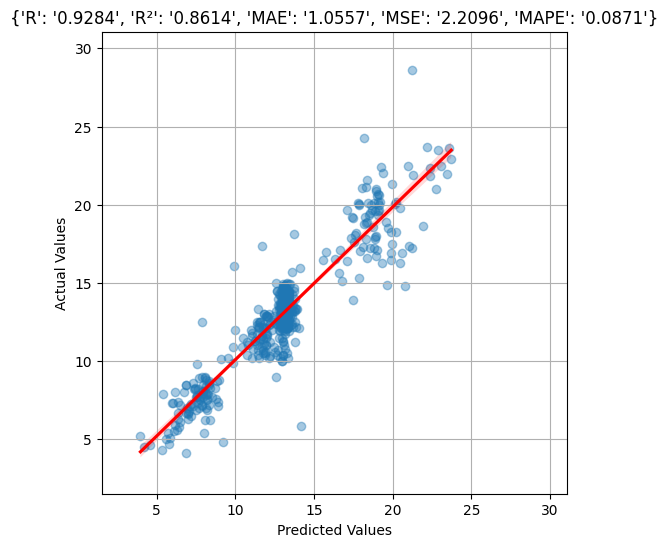

Model: "sequential_76"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_380 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_76 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_381 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_152 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_382 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_153 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_383 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

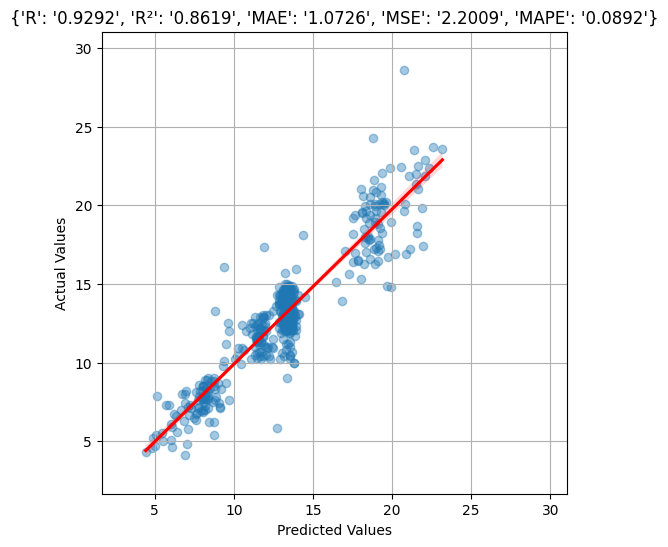

Model: "sequential_77"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_385 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_77 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_386 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_154 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_387 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_155 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_388 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

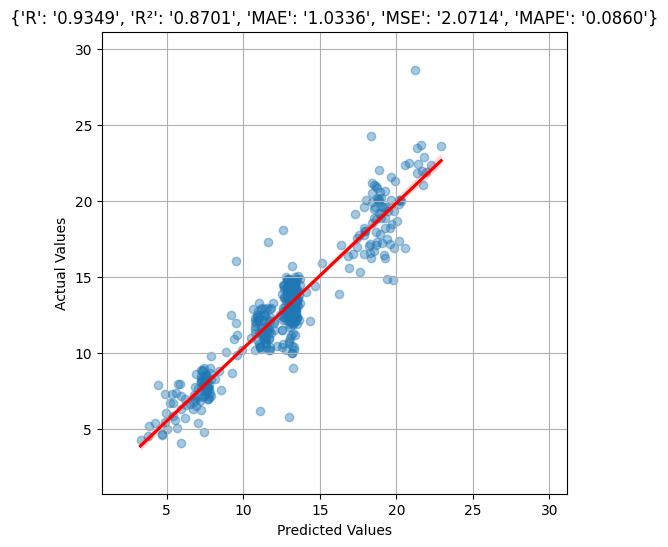

Model: "sequential_80"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_400 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_80 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_401 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_160 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_402 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_161 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_403 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

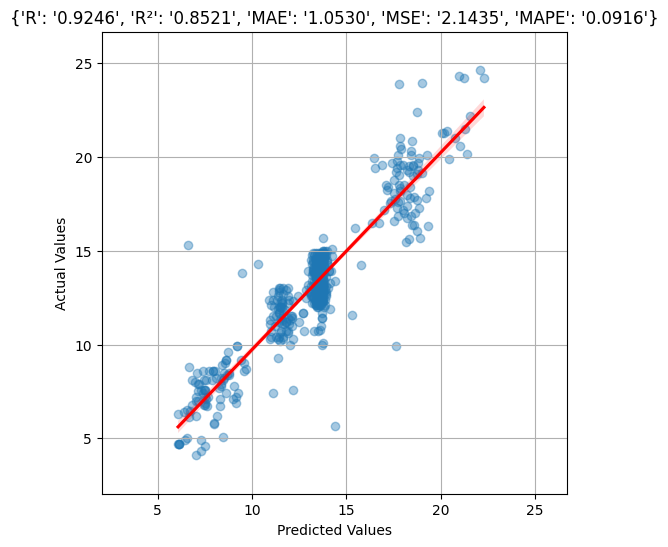

Model: "sequential_81"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_405 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_81 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_406 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_162 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_407 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_163 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_408 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

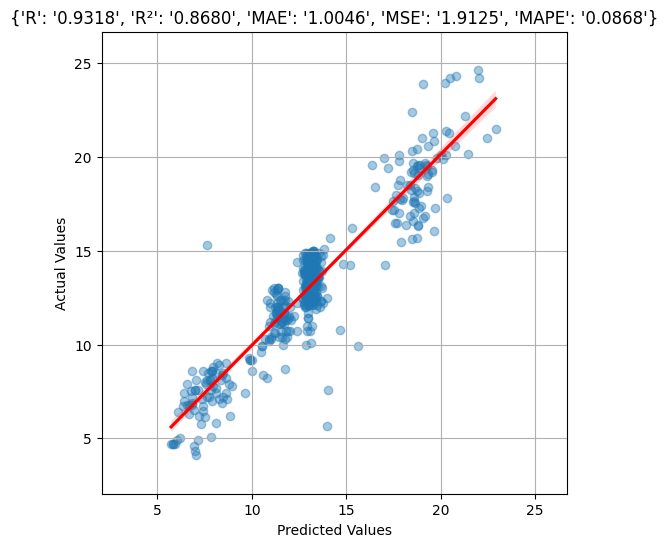

Model: "sequential_82"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_410 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_82 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_411 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_164 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_412 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_165 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_413 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

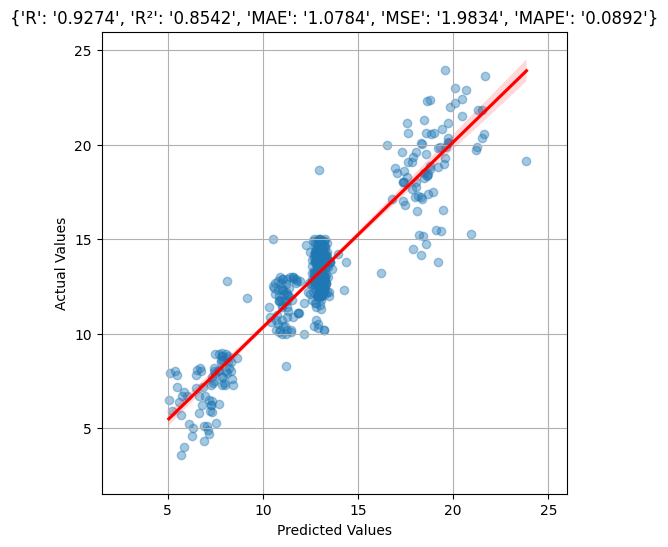

Model: "sequential_86"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_430 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_86 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_431 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_172 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_432 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_173 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_433 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

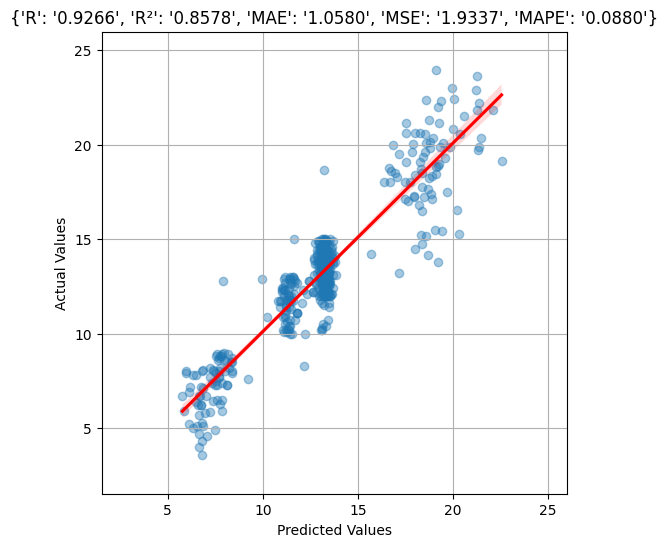

Model: "sequential_88"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_440 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_88 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_441 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_176 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_442 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_177 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_443 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

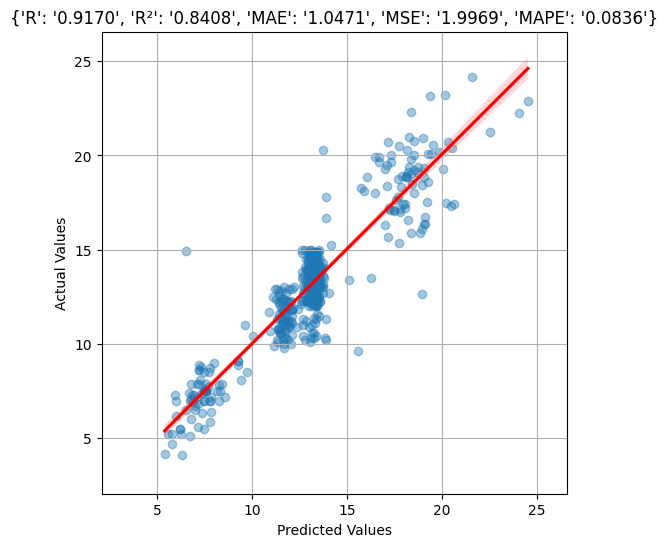

Model: "sequential_91"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_455 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_91 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_456 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_182 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_457 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_183 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_458 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

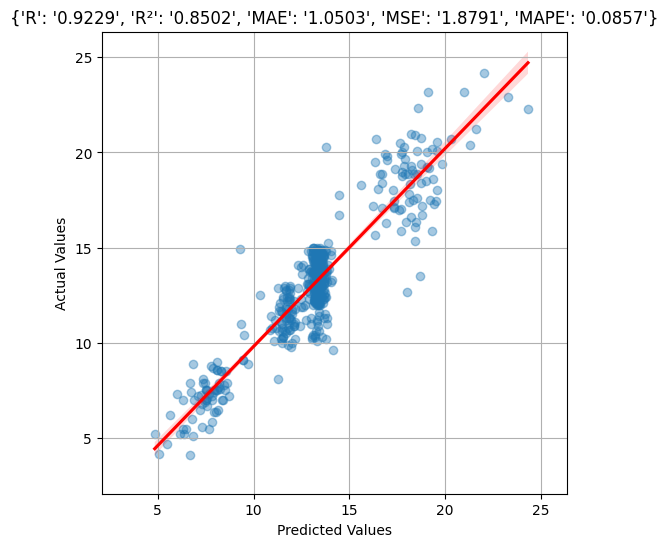

Model: "sequential_92"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_460 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_92 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_461 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_184 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_462 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_185 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_463 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

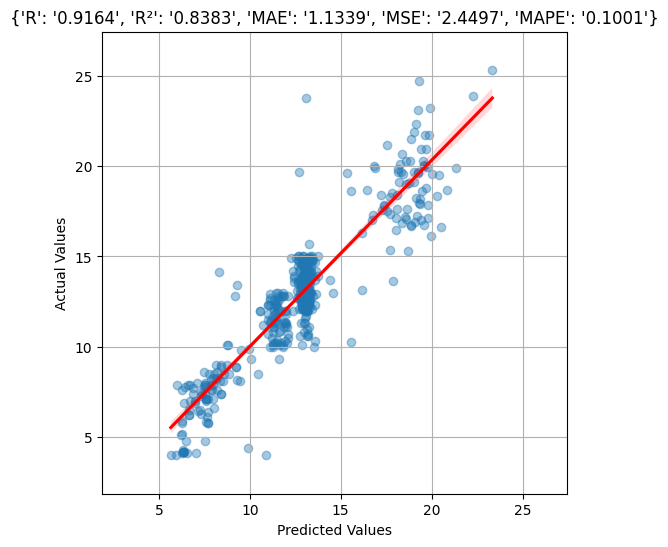

Model: "sequential_96"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_480 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_96 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_481 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_192 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_482 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_193 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_483 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

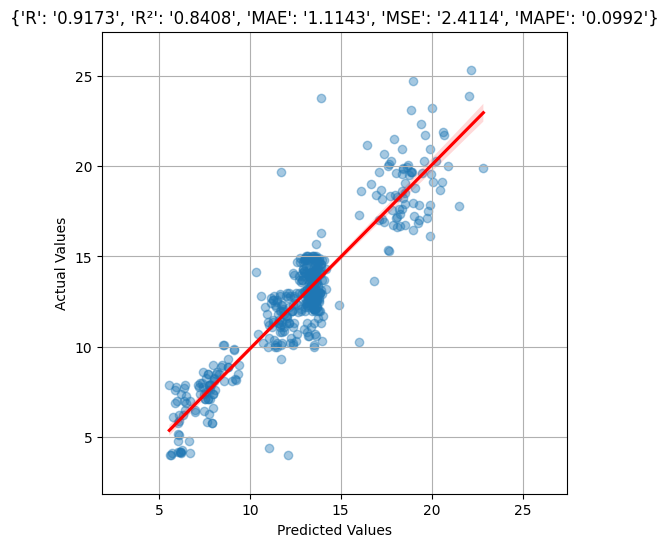

Model: "sequential_99"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_495 (Conv1D)          (None, 11, 128)           512       
_________________________________________________________________
layer_normalization_99 (Laye (None, 11, 128)           256       
_________________________________________________________________
conv1d_496 (Conv1D)          (None, 11, 64)            24640     
_________________________________________________________________
dropout_198 (Dropout)        (None, 11, 64)            0         
_________________________________________________________________
conv1d_497 (Conv1D)          (None, 11, 32)            6176      
_________________________________________________________________
dropout_199 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_498 (Conv1D)          (None, 11, 16)          

<Figure size 640x480 with 0 Axes>

In [9]:
######################## Surrogate model training ############################
"""
Attributes for TensileSurrogateModel:
    input_dims (int): The input dimensions for the model.
    learning_rate (float): The learning rate for the optimizer.
    path (str): Where to save the trained mdoels.
    batch_size (int): The number of samples per gradient update.
    epochs (int): The number of epochs to train the model.
    patience (int): Number of epochs with no improvement after which training will be stopped.
    n_model (int): Number of models for cross-validation.
    target_R2 (float): Target R2 of model.
    try_lim (int): Max times to retrain the model to achieve target R2.
    models (dict): Load all trained models and store in the dict "models".
"""
epochs = 5000
patience = 1000
try_lim = 5


"""Surrogate model training on multi-modal dataset"""
surrogate1 = TensileSurrogateModel(
    input_dims = X_input.shape[1], 
    learning_rate = 0.001,
    path = path1,
    batch_size = 50,
    epochs = epochs,
    patience = patience,
    n_model = 5,
    target_R2 = 0.98,
    try_lim = try_lim,
    target = 'UTS',
    verbose = False,
    )
surrogate1.x_scaler = scaler_x
surrogate1.y_scaler = scaler_y1


surrogate2 = TensileSurrogateModel(
    input_dims = X_input.shape[1], 
    learning_rate = 0.001,
    path = path1,
    batch_size = 50,
    epochs = epochs,
    patience = patience,
    n_model = 5,
    target_R2 = 0.98,
    try_lim = try_lim,
    target = 'Ef',
    verbose = False
    )
surrogate2.x_scaler = scaler_x
surrogate2.y_scaler = scaler_y2



surrogate1( # train and load models, visualize and save model performance
    X_input,
    y1,
    )
surrogate2( # train and load models, visualize and save model performance
    X_input,
    y2,
    )

surrogate1.load_model() # only load models
surrogate2.load_model() # only load models



"""Surrogate model training on composition dataset"""
surrogate3 = TensileSurrogateModel(
    input_dims = X_input_c.shape[1], 
    learning_rate = 0.001,
    path = path1,
    batch_size = 50,
    epochs = epochs,
    patience = patience,
    n_model = 5,
    target_R2 = 0.98,
    try_lim = try_lim,
    target = 'UTS_c',
    verbose = False,
    )
surrogate3.x_scaler = scaler_x_c
surrogate3.y_scaler = scaler_y1_c


surrogate4 = TensileSurrogateModel(
    input_dims = X_input_c.shape[1], 
    learning_rate = 0.001,
    path = path1,
    batch_size = 50,
    epochs = epochs,
    patience = patience,
    n_model = 5,
    target_R2 = 0.98,
    try_lim = try_lim,
    target = 'Ef_c',
    verbose = False
    )
surrogate4.x_scaler = scaler_x_c
surrogate4.y_scaler = scaler_y2_c


surrogate3( # train and load models, visualize and save model performance
    X_input_c,
    y1_c,
    )
surrogate4( # train and load models, visualize and save model performance
    X_input_c,
    y2_c,
    )

surrogate3.load_model() # only load models
surrogate4.load_model() # only load models

print('Surrogate model trained and loaded!')

In [10]:




################################ End of Part II ################################






################################################################################
> # **Part - III**

*   Neural-Surrogate-Guided tree exploration

################################################################################

In [11]:
######################## Objective function define ############################

@dataclass
class obj_function:
    """
    Attributes:
        dims (int): Feature dimension.
        coef_fit (np.ndarray): Coefficients of Quadratic Polynomial fitted based on 
            Pareto front points of stiffness and porosity.
        
        surrogate1 (class): Ensembled surrogate models for property #1 prediction.
        surrogate2 (class): Ensembled surrogate models for property #2 prediction.
        
        input_shape (int): Shape of input parameter matrix.
        param_space (np.ndarray): design space for all parameters.
        
        x_scaler (StandardScaler): StandardScaler for input features.
        y_scaler1 (StandardScaler): StandardScaler for label #1.
        y_scaler2 (StandardScaler): StandardScaler for label #2.

    """
    
    dims: int = 40
    coef_fit: np.ndarray = np.zeros(3)

    surrogate1: Optional[TensileSurrogateModel] = None
    surrogate2: Optional[TensileSurrogateModel] = None

    input_shape: int = 40
    param_space: Dict[Any, Set] = field(default_factory=dict)
    design_params: List[str] = field(default_factory=lambda: [])
        
    x_scaler: Optional[StandardScaler] = StandardScaler()
    y_scaler1: Optional[StandardScaler] = StandardScaler()
    y_scaler2: Optional[StandardScaler] = StandardScaler()

    def __call__(self, x: np.ndarray, # parameters
                 mode: int = 1, # return score (1) or property (!=1)
                 ):
        x=x.reshape(len(x),self.dims,1)
        UTS = self.surrogate1.ensemble_pred(x).flatten()
        Ef = self.surrogate2.ensemble_pred(x).flatten()
        
        self.UTS = UTS
        self.Ef = Ef
        score = self.score_eval(UTS,Ef)
        
        if mode == 1:
            return score.flatten()
        else:
            return UTS.flatten(),Ef.flatten()
        
    
    # define the standard of score
    def score_eval(self,UTS,Ef):
        y_fit = np.polyval(self.coef_fit, UTS)
        return Ef/y_fit

    
    

"""
Attributes for obj_function:
    dims (int): .
    coef_fit (np.ndarray): Coefficients of Quadratic Polynomial fitted based on 
            Pareto front points of stiffness and porosity.
    
    surrogate1 (class): Ensembled surrogate models for property #1 prediction.
    surrogate2 (class): Ensembled surrogate models for property #2 prediction.
    param_space (np.ndarray): design space for all parameters.
    design_params (list): 10 designable parameters.
    
    x_scaler (StandardScaler): StandardScaler for input features.
    y_scaler1 (StandardScaler): StandardScaler for label #1.
    y_scaler2 (StandardScaler): StandardScaler for label #2.
    
"""

obj_func = obj_function(

    dims = X_input.shape[1], 
    coef_fit = coef_fit,
    
    surrogate1 = surrogate1, # ensembled surrogate models for property #1 prediction
    surrogate2 = surrogate2,
    
    param_space = param_space,
    design_params = design_params,
    
    x_scaler = surrogate1.x_scaler,
    y_scaler1 = surrogate1.y_scaler,
    y_scaler2 = surrogate2.y_scaler,
    )

print('Objective function defined!')


Objective function defined!


In [12]:
######################## Tree exploration algorithm define ############################
def pareto_evaluation(X_scaled_init, X_scaled_sample,sample_score, num): 
    """pareto front of Euclidean distance + pred score"""
    sample_dist=[] # nearest neighbor distance
    for i in X_scaled_sample:
        dist_temp=1000000000000
        for n in X_scaled_init:
            dist= np.linalg.norm(i - n)
            if dist < dist_temp:
                dist_temp = round(dist,10)
        sample_dist.append(dist_temp)
    sample_dist=np.array(sample_dist)
    data=np.concatenate((sample_dist.reshape(-1,1),sample_score.reshape(-1,1)),axis=1)
    pareto_front = pareto_frontier(data)
    while len(pareto_front) < num:
        remaining_data = np.delete(data, pareto_front, axis=0)
        remaining_indices = np.delete(np.arange(data.shape[0]), pareto_front)
        pareto_front2 = pareto_frontier(remaining_data)
        pareto_front = np.concatenate((pareto_front,remaining_indices[pareto_front2]))
    ind = np.random.choice(pareto_front,num,replace=False)
    return ind


@dataclass
class TreeExploration:
    
    """
    Attributes:

        func (class): Objective function to evaluate the performance of new params.
        N (dict): Dict to record numebr of visit.
        children (dict): Dict to record leaf nodes information.
        rollout_round (int): Rollout times, i.e. expansion times of tree search.
        ratio (float): A larger ratio can lead to more exploration less exploitation.
        exploration_weight (float): Equals to ratio multiple max(score).
        num_list (list): Samples to be collected for a single tree rollout period,
            1st position number is top-scored samples, 
            2nd top-visited samples, 3rd random samples.
        n_tree (int): Num of single trees, 
            and will choose different root node for each tree.
        num_samples_per_acquisition (int): Num of final chosen samples in all trees.

    """
    
    func: Optional[obj_function] = None
    N: Dict[Any, int] = field(default_factory=lambda: defaultdict(int))
    children: Dict[Any, Set] = field(default_factory=dict)
    rollout_round: int = 200
    ratio: float = 0.1
    exploration_weight: float = 0.1
    num_list: List[int] = field(default_factory=lambda: [5,3,1,1])
    n_tree: int = 10 # in which 80% trees select top scored sample as root node, 20% random
    num_samples_per_acquisition: int = 20


    def choose(self, node):
        """Choose the best successor of node."""
        if node.is_terminal():
            raise RuntimeError(f"choose called on terminal node {node}")

        log_N_vertex = math.log(self.N[node])

        def uct(n):
            """Upper confidence bound for trees"""
            return n.value + self.exploration_weight * math.sqrt(
                log_N_vertex / (self.N[n] + 1)
            )

        media_node = max(self.children[node], key=uct)
        node_rand = [
            list(self.children[node])[i].tup
            for i in np.random.randint(0, len(self.children[node]), 2)
        ]
        print(f"Best leaf node: {media_node}")
        return (
            (media_node, node_rand)
            if uct(media_node) > uct(node)
            else (node, node_rand)
        )

    def do_rollout(self, node):
        """Make the tree one layer better. (Train for one iteration.)"""
        self._expand(node)
        self._backpropagate(path=node)
    
    def _expand(self, node):
        """Update the `children` dict with the children of `node`"""
        self.children[node] = node.find_children(
            node, self.func
        )

    def _backpropagate(self, path):
        """Send the reward back up to the ancestors of the leaf"""
        self.N[path] += 1

    @staticmethod
    def data_process(x: np.ndarray, boards: List[list]) -> np.ndarray:
        new_x = []
        boards = np.unique(np.array(boards), axis=0)
        new_x = [board for board in boards if not np.any(np.all(board == x, axis=1))]
        print(f"Unique number of boards: {len(new_x)}")
        return np.array(new_x)

    def most_visit_node(self, x: np.ndarray, top_n: int) -> np.ndarray:
        """Find the most visited nodes."""
        N_visit = self.N
        childrens = [i for i in self.children]
        children_N = []
        X_top = []
        for child in childrens:
            child_tup = np.array(child.tup)
            same = np.all(child_tup == x, axis=1)
            has_true = any(same)
            if not has_true:
                children_N.append(N_visit[child])
                X_top.append(child_tup)
        children_N = np.array(children_N)
        X_top = np.array(X_top)
        ind = np.argpartition(children_N, -top_n)[-top_n:]
        X_topN = X_top[ind]
        return X_topN
    
    def top_score_node(self,
                       x: np.ndarray,
                       boards: np.ndarray,
                       top_n: int) -> np.ndarray:
        """Find the nodes with highest score."""
        new_x = self.data_process(x, boards)
        
        new_pred = self.func(new_x)
        new_pred = np.array(new_pred).reshape(len(new_x))
    
        ind = np.argsort(new_pred)[-top_n:]
        top_X = new_x[ind]
        return top_X
    
    def random_node(self,
                    x: np.ndarray,
                    boards_rand: np.ndarray,
                    n: int) -> np.ndarray:
        """Return random nodes."""
        new_rands = self.data_process(x, boards_rand)
        ind = np.random.choice(np.arange(len(new_rands)),n,replace=False)
        X_rand = new_rands[ind]
        return X_rand
    
    def pf_node(self,
                    x: np.ndarray,
                    boards_rand: np.ndarray,
                    n: int) -> np.ndarray:
        """Return random nodes."""
        new_rands = self.data_process(x, boards_rand)
        sample_score=self.func(np.array(new_rands).reshape(len(new_rands), -1, 1))
        whe=np.where(sample_score > max(sample_score) * 0.8)[0]
        new_rands2=new_rands[whe]
        sample_score2=sample_score[whe]
        print('length of new_rands2:',len(new_rands2))
        X_scaled_init=self.func.x_scaler.transform(x)
        X_scaled_sample=self.func.x_scaler.transform(new_rands2)
        ind2=pareto_evaluation(X_scaled_init, X_scaled_sample,sample_score2,n)
        top_pf = new_rands2[ind2]   
        return top_pf

    def single_rollout(self, X, board_uct, num_list: List[float]):
        """Perform a single rollout."""
        boards = []
        boards_rand = []
        for i in tqdm(range(self.rollout_round)):
            print("")
            print("="*10)
            print("Rollout No.:", i+1)
            print("="*10)
            self.do_rollout(board_uct)
            board_uct, board_rand = self.choose(board_uct)
            boards.append(list(board_uct.tup))
            boards_rand.append(list(board_rand))

        # highest pred value nodes
        X_top_score = self.top_score_node(X, np.array(boards), num_list[0])
        
        # pareto front nodes of Euclidean distance versus Pred score in 'boards_rand'
        top_pf = self.pf_node(X, np.vstack(boards_rand), num_list[1])
        
        # most visit nodes
        X_most_visit = self.most_visit_node(X, num_list[2])

        # random nodes
        X_rand = self.random_node(X, np.vstack(boards_rand), num_list[3])

        return np.concatenate([X_top_score, top_pf, X_most_visit, X_rand])

    def rollout(
        self,
        x: np.ndarray,
        y: np.ndarray,
    ) -> np.ndarray:
        """Perform rollout"""
        x_current_top = self._get_unique_top_points(x, y)
        x_top = []
        for initial_X in x_current_top:
            print('initial_X:',initial_X)
            self.exploration_weight = self.ratio * abs(max(y))
            board_uct = OptTask(
                tup=tuple(initial_X), 
                value=float(self.func(initial_X.reshape(1,-1))), 
                terminal=False
                )
            x_top.append(self.single_rollout(x, board_uct, self.num_list))
        # return np.vstack(x_top)[: self.num_samples_per_acquisition]
        return np.vstack(x_top)
    
   
    def _get_unique_top_points(
            self, 
            X: np.ndarray, 
            y: np.ndarray,
            ) -> np.ndarray:

        top_select = round(self.n_tree*0.8)
        random_select = round(self.n_tree*0.2)
        ind = np.argsort(y)[-top_select:]
        ind_random=np.setdiff1d(np.arange(len(y)), ind)
        ind2 = np.random.choice(ind_random,random_select)
        ind = np.concatenate((ind,ind2))
        
        x_current_top = X[ind]
        y_top=y[ind]
        print('y score of selected root nodes:',y_top)    

        return x_current_top

class Node(ABC):
    """
    A representation of a single board state.
    DOTS works by constructing a tree of these Nodes.
    Could be e.g. a chess or checkers board state.
    """

    @abstractmethod
    def find_children(self):
        """All possible successors of this board state"""
        return set()

    @abstractmethod
    def is_terminal(self):
        """Returns True if the node has no children"""
        return True

    @abstractmethod
    def __hash__(self):
        """Nodes must be hashable"""
        return 123456789

    @abstractmethod
    def __eq__(self, node2):
        """Nodes must be comparable"""
        return True


_OT = namedtuple("OptTask", "tup value terminal")


class OptTask(_OT, Node):
    """Represents an optimization task node in the search tree."""

    @staticmethod
    def find_children(board, func):
        """Find all possible child nodes for the current board state."""
        if board.terminal:
            return set()
        
        all_tuples = []
        for i,index in enumerate(func.design_params):
            tup = list(board.tup)
            flip = np.random.randint(0,6)
            
            if flip ==0:
                indices = np.argmin(abs(func.param_space[index]-tup[i]))
                try:
                    tup[i] = func.param_space[index][indices+1]
                except:
                    tup[i] = func.param_space[index][indices-1]

            elif flip ==1:
                indices = np.argmin(abs(func.param_space[index]-tup[i]))
                try:
                    tup[i] = func.param_space[index][indices-1]
                except:
                    tup[i] = func.param_space[index][indices+1]

            elif flip ==2:
                n_flip = np.random.choice(
                    np.arange(len(func.design_params)),
                    int(len(func.design_params)/3),
                    replace=False
                    )
                for n in n_flip:
                    tup[n] = np.random.choice(
                        func.param_space[func.design_params[n]],
                        1)[0]

            elif flip ==3:
                n_flip = np.random.choice(
                    np.arange(len(func.design_params)),
                    int(len(func.design_params)/5),
                    replace=False
                    )
                for n in n_flip:
                    tup[n] = np.random.choice(
                        func.param_space[func.design_params[n]],
                        1)[0]

            else:
                tup[i] = np.random.choice(func.param_space[index],1)[0]

            all_tuples.append([round(t, 8) for t in tup])

        all_values = func(
            x=np.array(all_tuples).reshape(len(all_tuples),func.dims,1),
            )
        print('Predicted score of leaf nodes:',all_values)

        return {OptTask(tuple(t), v, False) for t, v in zip(all_tuples, all_values)}

    def is_terminal(self):
        """Check if the current board state is terminal."""
        return self.terminal
    

print('Tree exploration algorithm defined!')

Tree exploration algorithm defined!


In [13]:
######################## Optimization with Neural-Surrogate-Guided Tree Exploration ############################

tree_explorer = TreeExploration(
    func = obj_func, 
    rollout_round = 200,
    ratio = 0.05,
    num_list = [5,3,1,1],
    n_tree = 10,
    num_samples_per_acquisition = 20
    )

# Perform tree exploration to find promising samples for each target relative density
input_x = np.array(X_input)
input_y = obj_func.score_eval(y1,y2)
new_xs = []
new_ys = []
for i in range(5):
    tree_explorer.func = obj_func # Set objective function for tree search
    new_x = tree_explorer.rollout(input_x, input_y)
    new_x = np.unique(new_x, axis=0)
    new_y = obj_func(new_x)
    new_xs.append(new_x)
    new_ys.append(new_y)

sample_x=np.vstack(new_xs)
sample_x=np.unique(sample_x,axis=0)
sample_pf_top=tree_explorer.pf_node(input_x,sample_x,n=100)



y score of selected root nodes: [1.03628671 1.04821837 1.0617875  1.06539253 1.07293744 1.07305173
 1.07308392 1.08556581 0.84916051 0.84501498]
initial_X: [3.76999998e+00 2.49799991e+00 3.72000009e-01 6.80000037e-02
 1.48000000e+03 1.37000000e+03 2.80000000e+01 3.00000000e+01
 3.82000000e+02 9.50000000e+01 2.08000001e-02 1.33999996e-02
 3.59999985e-02 2.60000005e-02 5.79999983e-02 2.24000006e-03
 8.99999961e-03 4.39999998e-03 1.89999994e-02 1.99999996e-02
 3.00000003e-03 4.00000019e-03 2.00000009e-03 6.00000028e-04
 3.70000000e-03 3.00000003e-03 1.79999997e-03 1.00000005e-03
 1.00000005e-03 4.00000019e-03 4.00000019e-03 7.00000022e-03
 1.40000000e+02 1.61000000e+02 3.96000004e+00 1.43000002e+01
 1.03599997e+01 6.08400002e+01 3.59999990e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  1%|          | 2/200 [00:00<01:02,  3.17it/s]

Predicted score of leaf nodes: [0.9808585 1.105264  1.1591668 1.1069732 1.104837  1.106923  1.0418314
 1.0242174 1.130599  1.1113037]
Best leaf node: OptTask(tup=(3.76999998, 2.49799991, 0.98, 0.068, 1480.0, 1370.0, 28.0, 30.0, 382.0, 60, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.1591668, terminal=False)

Rollout No.: 2
Predicted score of leaf nodes: [1.1616734 1.161096  1.1575981 1.1310499 1.0210305 1.1575661 1.1767112
 1.0150356 1.1367999 1.1615509]
Best leaf node: OptTask(tup=(3.76999998, 2.49799991, 0.98, 0.068, 1480.0, 1370.0, 29, 30.0, 382.0, 60, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999),

  2%|▏         | 3/200 [00:00<00:51,  3.82it/s]

Predicted score of leaf nodes: [1.1815221 1.0031055 1.1765397 1.1692817 1.1772207 1.1745061 1.1591668
 1.1349466 1.1501358 1.1283809]
Best leaf node: OptTask(tup=(2.86, 2.49799991, 0.98, 0.068, 1480.0, 1370.0, 29, 30.0, 382.0, 60, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.1815221, terminal=False)

Rollout No.: 4


  2%|▏         | 4/200 [00:01<00:46,  4.17it/s]

Predicted score of leaf nodes: [1.1784694 1.1645497 1.1815801 1.1837336 1.0864435 1.183104  1.146647
 1.0726744 1.060198  1.067114 ]
Best leaf node: OptTask(tup=(2.86, 2.08, 0.98, 0.068, 1480.0, 1370.0, 29, 30, 382.0, 95, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.1837336, terminal=False)

Rollout No.: 5


  2%|▎         | 5/200 [00:01<00:44,  4.40it/s]

Predicted score of leaf nodes: [0.839526  1.0381765 1.198054  1.1840571 0.9644745 1.0366192 1.0281793
 1.1819135 1.0992066 1.0504153]
Best leaf node: OptTask(tup=(2.86, 2.08, 0.98, 0.22, 1480.0, 1389, 29, 30, 382.0, 95, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.198054, terminal=False)

Rollout No.: 6


  3%|▎         | 6/200 [00:01<00:43,  4.49it/s]

Predicted score of leaf nodes: [1.1977391  1.1719073  1.1088176  1.1984321  1.1861527  1.1389537
 0.95236814 1.1977249  1.1917512  1.1903905 ]
Best leaf node: OptTask(tup=(2.86, 2.08, 0.98, 0.29, 1480.0, 1389, 29, 30, 382.0, 95, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.1984321, terminal=False)

Rollout No.: 7


  4%|▎         | 7/200 [00:01<00:42,  4.58it/s]

Predicted score of leaf nodes: [1.0545204 1.1981616 1.1186637 1.1983359 1.1306149 1.1993384 1.1989583
 1.113081  1.1050928 1.12058  ]
Best leaf node: OptTask(tup=(2.86, 2.08, 0.98, 0.29, 1480.0, 1388, 29, 30, 382.0, 95, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.1993384, terminal=False)

Rollout No.: 8


  4%|▍         | 9/200 [00:02<00:39,  4.80it/s]

Predicted score of leaf nodes: [1.1990213 1.1954703 1.1495041 1.1993384 1.0827119 1.1226121 1.1867768
 1.1147125 1.1930462 1.2002802]
Best leaf node: OptTask(tup=(2.86, 2.08, 0.98, 0.29, 1480.0, 1388, 29, 30, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2002802, terminal=False)

Rollout No.: 9
Predicted score of leaf nodes: [1.1782455 1.2005206 1.193932  1.1997323 1.2046493 1.1651884 1.2128761
 1.1129401 1.0891773 1.1335382]
Best leaf node: OptTask(tup=(2.86, 2.08, 0.98, 0.29, 1480.0, 1388, 31, 30, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2128761, terminal=False)

R

  6%|▌         | 11/200 [00:02<00:37,  5.07it/s]

Predicted score of leaf nodes: [1.1977407 1.2126656 1.2126577 1.2076786 1.0871476 1.1701481 1.2064334
 1.1026002 1.1956735 1.2137488]
Best leaf node: OptTask(tup=(2.86, 2.08, 0.98, 0.29, 1480.0, 1388, 31, 30, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2137488, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.2135187 1.2135533 1.1431472 1.213776  1.2128308 1.2147871 1.0558599
 1.1646984 1.157391  1.104533 ]
Best leaf node: OptTask(tup=(2.86, 2.08, 0.98, 0.29, 1480.0, 1373, 31, 30, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2147871, terminal=False)



  6%|▌         | 12/200 [00:02<00:36,  5.13it/s]

Predicted score of leaf nodes: [1.2188196 1.2149676 1.122322  1.2182182 1.113403  1.2096199 1.2089686
 1.1453661 1.1034995 1.0731091]
Best leaf node: OptTask(tup=(2.72, 2.08, 0.98, 0.29, 1480.0, 1373, 31, 30, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2188196, terminal=False)

Rollout No.: 13


  7%|▋         | 14/200 [00:03<00:37,  4.96it/s]

Predicted score of leaf nodes: [1.0372584 1.2128172 1.1804291 1.2044579 1.194471  1.2144978 1.2203796
 1.2189611 1.1389577 1.2202647]
Best leaf node: OptTask(tup=(2.72, 2.08, 0.98, 0.29, 1480.0, 1373, 32, 30, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2203796, terminal=False)

Rollout No.: 14
Predicted score of leaf nodes: [1.1952882 1.0983391 1.2206286 1.1475557 1.2196562 1.1916285 1.2266911
 1.2203796 1.1061733 1.2192703]
Best leaf node: OptTask(tup=(2.72, 2.08, 0.98, 0.32, 1480.0, 1373, 32, 34, 382.0, 65, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2266911, terminal=False)



  8%|▊         | 16/200 [00:03<00:35,  5.11it/s]

Predicted score of leaf nodes: [1.2264854 1.2266911 1.198422  1.225426  1.1476756 1.2135193 1.1824346
 1.2226208 1.2131448 1.2298704]
Best leaf node: OptTask(tup=(2.72, 2.08, 0.98, 0.32, 1480.0, 1373, 32, 34, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2298704, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [1.229059  1.2294521 1.2300658 1.2158327 1.2327505 1.2088764 1.0220088
 1.2251662 1.2216246 1.2266911]
Best leaf node: OptTask(tup=(2.72, 2.08, 0.98, 0.32, 1485, 1373, 32, 34, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2327505, terminal=False)

Ro

  9%|▉         | 18/200 [00:03<00:35,  5.07it/s]

Predicted score of leaf nodes: [1.2303363 1.2315656 1.2325037 1.2293339 1.17937   1.2290623 1.1999403
 1.0575211 1.0391581 1.0428538]
Best leaf node: OptTask(tup=(2.72, 2.08, 0.97, 0.32, 1485, 1373, 32, 34, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2325037, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.2241101 1.2325625 1.2330209 1.2323055 1.2259018 1.2012986 1.2123753
 1.2281239 1.1570864 1.2327505]
Best leaf node: OptTask(tup=(2.72, 2.08, 0.99, 0.32, 1485, 1373, 32, 34, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2330209, terminal=False)

Roll

 10%|█         | 20/200 [00:04<00:35,  5.08it/s]

Predicted score of leaf nodes: [1.2349757 1.2253772 1.2332292 1.2350726 1.2324425 1.2360318 1.2321464
 1.1487122 1.0459857 1.2348464]
Best leaf node: OptTask(tup=(2.72, 2.08, 0.99, 0.32, 1485, 1374, 32, 34, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2360318, terminal=False)

Rollout No.: 20
Predicted score of leaf nodes: [1.2357664 1.0817589 1.2362956 1.218713  1.2364591 1.1754619 1.128546
 1.2126496 1.2297611 1.2329131]
Best leaf node: OptTask(tup=(2.72, 2.08, 0.99, 0.32, 1486, 1374, 32, 34, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2364591, terminal=False)

Rollo

 11%|█         | 22/200 [00:04<00:35,  5.08it/s]

Predicted score of leaf nodes: [1.221433  1.2366643 1.2177835 1.2303331 1.2360318 1.0287076 1.2360345
 1.2311555 1.1606264 1.2209623]
Best leaf node: OptTask(tup=(2.72, 2.09, 0.99, 0.32, 1486, 1374, 32, 34, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2366643, terminal=False)

Rollout No.: 22
Predicted score of leaf nodes: [1.2364051 1.2278078 1.1247118 1.2369709 0.9473728 1.2366643 1.2166202
 1.1372508 1.2462196 1.1819291]
Best leaf node: OptTask(tup=(2.72, 2.09, 0.99, 0.32, 1486, 1379, 32, 34, 380, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2462196, terminal=False)

Rollou

 12%|█▏        | 24/200 [00:05<00:34,  5.14it/s]

Predicted score of leaf nodes: [1.2382507 1.2419121 1.2031507 1.2381132 1.1796622 1.2460939 1.2469449
 1.2442133 1.2355129 1.2476805]
Best leaf node: OptTask(tup=(2.72, 2.09, 0.99, 0.32, 1486, 1379, 32, 34, 380, 75, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2476805, terminal=False)

Rollout No.: 24
Predicted score of leaf nodes: [1.2406349 1.1863495 1.2344652 1.2434455 1.2473242 1.1922725 1.2488039
 1.2461141 1.2069199 1.2476805]
Best leaf node: OptTask(tup=(2.72, 2.09, 0.99, 0.32, 1486, 1379, 33, 34, 380, 75, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2488039, terminal=False)

Rollout 

 13%|█▎        | 26/200 [00:05<00:33,  5.16it/s]

Predicted score of leaf nodes: [1.2433894 1.1749679 1.2448213 1.2473454 1.2481886 1.1431522 1.2476805
 1.2015839 1.2372617 1.2495681]
Best leaf node: OptTask(tup=(2.72, 2.09, 0.99, 0.32, 1486, 1379, 33, 34, 380, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2495681, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.196956  1.2456096 1.2497913 1.2509272 1.2500108 1.1800392 1.2481534
 1.2459788 1.1439596 1.2493037]
Best leaf node: OptTask(tup=(2.72, 2.09, 0.99, 0.1, 1486, 1379, 33, 34, 380, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2509272, terminal=False)

Rollout N

 14%|█▍        | 28/200 [00:05<00:32,  5.21it/s]

Predicted score of leaf nodes: [1.2105124 1.2302604 1.1844422 1.2465632 1.2516252 1.2263459 1.2455522
 1.1222533 1.1179724 1.2515608]
Best leaf node: OptTask(tup=(2.72, 2.09, 0.99, 0.1, 1487, 1379, 33, 34, 380, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2516252, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.2517766 1.2483546 1.2513849 1.2489561 0.9985002 1.1583369 1.2463623
 1.2468644 1.0535903 1.2498467]
Best leaf node: OptTask(tup=(2.71, 2.09, 0.99, 0.1, 1487, 1379, 33, 34, 380, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2517766, terminal=False)

Rollout No

 15%|█▌        | 30/200 [00:06<00:32,  5.19it/s]

Predicted score of leaf nodes: [1.2516252 1.2211004 1.1363088 1.1300677 1.2356448 1.2512145 1.250794
 1.1874876 1.1539289 1.2276124]
Best leaf node: OptTask(tup=(2.72, 2.09, 0.99, 0.1, 1487, 1379, 33, 34, 380, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2516252, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [1.251951  1.2500534 1.2515697 1.2414638 1.1290835 1.2501773 1.2152834
 1.1331596 1.2410154 1.1839832]
Best leaf node: OptTask(tup=(2.7, 2.09, 0.99, 0.1, 1487, 1379, 33, 34, 380, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.251951, terminal=False)

Rollout No.: 

 16%|█▌        | 32/200 [00:06<00:32,  5.17it/s]

Predicted score of leaf nodes: [1.248516  1.2235156 1.2517929 1.2362746 1.2165295 1.2519006 1.1405963
 0.961591  1.2411634 1.250197 ]
Best leaf node: OptTask(tup=(2.7, 2.09, 0.99, 0.1, 1487, 1378, 33, 34, 380, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2519006, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.1053884 1.2521493 1.2521236 1.252199  1.2069955 1.2519006 1.2466953
 1.2464861 1.1974053 1.251951 ]
Best leaf node: OptTask(tup=(2.7, 2.09, 0.99, 0.11, 1487, 1379, 33, 34, 380, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.252199, terminal=False)

Rollout No.:

 17%|█▋        | 34/200 [00:06<00:31,  5.25it/s]

Predicted score of leaf nodes: [1.252012  1.2519764 1.2523763 1.1745105 1.2565845 1.127878  1.2470713
 1.1319642 1.1282046 1.1274225]
Best leaf node: OptTask(tup=(2.7, 2.09, 0.99, 0.11, 1498, 1379, 33, 34, 380, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2565845, terminal=False)

Rollout No.: 34
Predicted score of leaf nodes: [1.249807  1.2556708 1.2152352 1.2476468 1.256846  1.2111803 1.2417264
 1.2485805 1.160378  1.2567067]
Best leaf node: OptTask(tup=(2.7, 2.09, 0.99, 0.11, 1499, 1379, 33, 34, 380, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.256846, terminal=False)

Rollout No.

 18%|█▊        | 36/200 [00:07<00:31,  5.24it/s]

Predicted score of leaf nodes: [1.2539389 1.2569568 1.2569739 1.2438507 1.2569574 1.2566352 1.2539971
 1.250844  1.2459538 1.2553279]
Best leaf node: OptTask(tup=(2.7, 2.09, 1.0, 0.11, 1499, 1379, 33, 34, 380, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2569739, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.2567949 1.2571826 1.256846  1.1672617 1.2567793 1.256672  1.2418487
 1.0382069 1.0356838 1.1169118]
Best leaf node: OptTask(tup=(2.7, 2.1, 1.0, 0.11, 1499, 1379, 33, 34, 380, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2571826, terminal=False)

Rollout No.: 

 19%|█▉        | 38/200 [00:07<00:31,  5.16it/s]

Predicted score of leaf nodes: [1.2573382 1.2573024 1.247517  1.1140933 1.1589181 1.222526  1.1169769
 1.1403754 1.2461331 1.257655 ]
Best leaf node: OptTask(tup=(2.7, 2.1, 1.0, 0.11, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.257655, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [1.2578083 1.2359196 1.1598706 1.136416  1.2294192 1.2082808 1.2419208
 1.1914902 1.1194031 1.2341053]
Best leaf node: OptTask(tup=(2.69, 2.1, 1.0, 0.11, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2578083, terminal=False)

Rollout No.: 3

 20%|█▉        | 39/200 [00:07<00:31,  5.16it/s]

Predicted score of leaf nodes: [1.2501814  1.2520335  0.99262947 1.0069406  1.0505351  1.2085326
 1.2536404  1.1384484  1.0849782  1.2578083 ]
Best leaf node: OptTask(tup=(2.69, 2.1, 1.0, 0.11, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2578083, terminal=False)

Rollout No.: 40
Predicted score of leaf nodes: [1.2580057 1.2582841 1.2576245 1.2390417 1.1718191 1.1974458 1.2554666
 1.1338392 1.1786783 1.1407846]
Best leaf node: OptTask(tup=(2.69, 2.13, 1.0, 0.11, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2582841, terminal=False)


 20%|██        | 40/200 [00:08<00:31,  5.11it/s]


Rollout No.: 41


 21%|██        | 42/200 [00:08<00:30,  5.12it/s]

Predicted score of leaf nodes: [1.258468  1.2577639 1.2580858 1.240803  1.1285267 1.25812   1.2549102
 1.1734351 1.246908  1.257779 ]
Best leaf node: OptTask(tup=(2.68, 2.13, 1.0, 0.11, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.258468, terminal=False)

Rollout No.: 42
Predicted score of leaf nodes: [1.258667  1.2444237 1.2583253 0.9969421 1.216553  1.234746  1.2067045
 1.1363214 1.258468  1.1364474]
Best leaf node: OptTask(tup=(2.67, 2.13, 1.0, 0.11, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.258667, terminal=False)

Rollout No.:

 22%|██▏       | 44/200 [00:08<00:30,  5.09it/s]

Predicted score of leaf nodes: [1.1327658 1.0927087 1.1353041 1.2587194 1.2574223 1.2584    1.073255
 1.1540864 1.2217594 1.2183428]
Best leaf node: OptTask(tup=(2.67, 2.13, 1.0, 0.12, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2587194, terminal=False)

Rollout No.: 44
Predicted score of leaf nodes: [1.2505672 1.2589412 1.1523197 1.258667  1.1125753 1.2049975 1.2554064
 1.2377392 1.1801982 1.2582921]
Best leaf node: OptTask(tup=(2.67, 2.14, 1.0, 0.12, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2589412, terminal=False)

Rollout No.

 23%|██▎       | 46/200 [00:09<00:30,  5.08it/s]

Predicted score of leaf nodes: [1.2590823 1.1718048 1.2587104 1.079064  1.259052  1.2586846 1.2566665
 1.1719663 1.0480313 1.2585329]
Best leaf node: OptTask(tup=(2.66, 2.14, 1.0, 0.12, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2590823, terminal=False)

Rollout No.: 46
Predicted score of leaf nodes: [1.2499244 1.242399  1.1488978 1.239007  1.2588573 1.2092063 1.1744494
 1.1970093 1.0482001 1.2586045]
Best leaf node: OptTask(tup=(2.66, 2.14, 1.0, 0.12, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2588573, terminal=False)

Rollout No

 24%|██▍       | 48/200 [00:09<00:29,  5.14it/s]

Predicted score of leaf nodes: [1.2573212 1.2589706 1.1864882 1.2407027 1.2588573 1.2588829 1.1679541
 1.2502506 1.1917679 1.1358198]
Best leaf node: OptTask(tup=(2.66, 2.13, 1.0, 0.12, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2589706, terminal=False)

Rollout No.: 48
Predicted score of leaf nodes: [1.2591867 1.1452391 1.2008604 1.2589779 1.2587166 1.2581733 1.2409601
 1.2290405 1.17969   1.2096223]
Best leaf node: OptTask(tup=(2.65, 2.13, 1.0, 0.12, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2591867, terminal=False)

Rollout No

 25%|██▌       | 50/200 [00:10<00:29,  5.10it/s]

Predicted score of leaf nodes: [1.2593343 1.2589991 1.2590064 1.2540756 1.25929   1.2589716 1.2481706
 1.258005  1.2477608 1.2587205]
Best leaf node: OptTask(tup=(2.64, 2.13, 1.0, 0.12, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2593343, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.1803489 1.2595327 1.2568452 1.2507256 1.1570345 1.2591786 1.189216
 1.1918967 1.2479076 1.0850813]
Best leaf node: OptTask(tup=(2.64, 2.14, 1.0, 0.12, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2595327, terminal=False)

Rollout No.

 26%|██▌       | 52/200 [00:10<00:28,  5.10it/s]

Predicted score of leaf nodes: [1.2530442  1.1377391  1.2461402  1.2594151  1.1700559  1.2592622
 1.1211271  0.98096687 1.2454284  1.2591264 ]
Best leaf node: OptTask(tup=(2.64, 2.14, 1.0, 0.11, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2594151, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [1.1171952 1.1631069 1.020807  1.163263  1.2595327 1.2386934 1.0953194
 1.2243639 1.0964262 1.0854025]
Best leaf node: OptTask(tup=(2.64, 2.14, 1.0, 0.12, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2595327, terminal=False)

R

 27%|██▋       | 54/200 [00:10<00:28,  5.06it/s]

Predicted score of leaf nodes: [1.0153897 1.1608577 1.2574656 1.2591257 1.2591877 1.2091681 1.2169993
 1.2583538 1.048661  1.2591264]
Best leaf node: OptTask(tup=(2.64, 2.14, 1.0, 0.12, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2591877, terminal=False)

Rollout No.: 54
Predicted score of leaf nodes: [1.2590355 1.1950288 1.2033902 1.2593608 1.2595327 1.2590209 1.2560304
 1.0674226 1.1370848 1.25886  ]
Best leaf node: OptTask(tup=(2.64, 2.14, 1.0, 0.12, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2595327, terminal=False)

Rollout No

 28%|██▊       | 56/200 [00:11<00:28,  5.09it/s]

Predicted score of leaf nodes: [1.250917  1.1915736 1.156792  1.2061362 1.259666  1.2592622 1.2562038
 1.2583538 1.1981035 1.0963438]
Best leaf node: OptTask(tup=(2.64, 2.14, 1.0, 0.12, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.259666, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.2600719 1.26039   1.1324306 1.244145  1.215041  1.0424924 1.2178516
 1.1988088 1.1372993 1.1725746]
Best leaf node: OptTask(tup=(2.64, 2.44, 1.0, 0.12, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.26039, terminal=False)

Rollout No.: 

 29%|██▉       | 58/200 [00:11<00:27,  5.16it/s]

Predicted score of leaf nodes: [1.2512058 1.2607335 1.147328  1.2601702 1.2602419 1.1937202 1.0442972
 1.2552335 1.1613178 1.1659818]
Best leaf node: OptTask(tup=(2.64, 2.41, 1.0, 0.12, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2607335, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [1.2609183 1.2608379 1.2440255 1.2605789 1.2605882 1.2606133 1.2444714
 1.253312  1.1125873 1.2600818]
Best leaf node: OptTask(tup=(2.63, 2.41, 1.0, 0.12, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2609183, terminal=False)

Rollout No

 30%|███       | 60/200 [00:12<00:27,  5.13it/s]

Predicted score of leaf nodes: [1.258835  1.260973  1.1789652 1.2428974 1.1514866 1.2607235 1.2609183
 1.1932765 1.0497899 1.1380982]
Best leaf node: OptTask(tup=(2.63, 2.4, 1.0, 0.12, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.260973, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.2515666 1.1316158 1.2609872 1.2607632 1.2523662 1.2240024 1.2128133
 1.1572627 1.0819777 1.2603053]
Best leaf node: OptTask(tup=(2.63, 2.4, 0.99, 0.12, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2609872, terminal=False)

Rollout No.:

 31%|███       | 62/200 [00:12<00:26,  5.17it/s]

Predicted score of leaf nodes: [1.2608304 1.1654624 1.260973  1.251669  1.2607614 1.1962825 1.2447283
 1.2535609 1.2203612 1.0731443]
Best leaf node: OptTask(tup=(2.63, 2.4, 1.0, 0.12, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.260973, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.2244203 1.2440231 1.2608453 1.2415757 1.2607614 1.0548255 1.2591099
 1.2310772 1.2497398 1.2607932]
Best leaf node: OptTask(tup=(2.63, 2.4, 0.98, 0.12, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2608453, terminal=False)

Rollout No.:

 32%|███▏      | 64/200 [00:12<00:25,  5.31it/s]

Predicted score of leaf nodes: [1.2556574 1.2609822 1.1562258 1.2607099 1.245952  1.2607094 1.2570457
 1.2597408 1.2424533 1.0975728]
Best leaf node: OptTask(tup=(2.63, 2.39, 0.98, 0.12, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2609822, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.2514127 1.2540795 1.1073393 1.2228644 1.1211743 1.2602476 1.1499174
 1.2487545 1.0848676 1.1616735]
Best leaf node: OptTask(tup=(2.63, 2.39, 0.98, 0.12, 1500, 1381, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2602476, terminal=False)

Rollout 

 33%|███▎      | 66/200 [00:13<00:25,  5.23it/s]

Predicted score of leaf nodes: [1.0360128 1.0398105 1.0324203 1.2581117 1.2335749 1.2607956 1.2447901
 1.090904  1.1108891 1.0728999]
Best leaf node: OptTask(tup=(2.63, 2.39, 0.98, 0.12, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2607956, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.2559845  1.109624   1.067502   0.98046255 1.2605666  1.1262176
 1.1048539  1.182231   1.2494413  1.2559047 ]
Best leaf node: OptTask(tup=(2.63, 2.39, 0.98, 0.12, 1499, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2605666, terminal=False)


 34%|███▍      | 68/200 [00:13<00:25,  5.24it/s]

Predicted score of leaf nodes: [1.2534882 1.2606765 1.1481739 1.1961851 1.2605666 1.1874768 1.108396
 1.1463859 1.2494413 1.1499678]
Best leaf node: OptTask(tup=(2.63, 2.4, 0.98, 0.12, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2606765, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [1.2608383 1.2605944 1.1484147 1.2414646 1.0654647 1.0306989 1.1288402
 1.2490425 1.2493093 1.2603813]
Best leaf node: OptTask(tup=(2.62, 2.4, 0.98, 0.12, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2608383, terminal=False)

Rollout No.

 35%|███▌      | 70/200 [00:13<00:25,  5.15it/s]

Predicted score of leaf nodes: [1.163367  1.2475508 1.0277805 1.2606677 1.2418035 1.2610314 1.256701
 1.1274775 1.2495122 1.2602259]
Best leaf node: OptTask(tup=(2.62, 2.4, 0.98, 0.12, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2610314, terminal=False)

Rollout No.: 70
Predicted score of leaf nodes: [1.2611794 1.0706965 1.241061  1.1667734 1.2609528 1.2179428 1.2591722
 1.253685  1.2497853 1.2367672]
Best leaf node: OptTask(tup=(2.61, 2.4, 0.98, 0.12, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2611794, terminal=False)

Rollout No.

 36%|███▌      | 72/200 [00:14<00:24,  5.15it/s]

Predicted score of leaf nodes: [1.1668175 1.2192105 1.2582179 1.2613137 1.2610387 1.2448227 1.1728469
 1.2600387 1.0923599 1.1009929]
Best leaf node: OptTask(tup=(2.61, 2.4, 0.98, 0.13, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2613137, terminal=False)

Rollout No.: 72
Predicted score of leaf nodes: [1.2508245 1.2549287 1.261308  1.0453691 1.1435012 1.207275  1.2529868
 1.186544  1.1375087 1.0679985]
Best leaf node: OptTask(tup=(2.61, 2.4, 0.97, 0.13, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261308, terminal=False)

Rollout No.

 36%|███▋      | 73/200 [00:14<00:24,  5.20it/s]

Predicted score of leaf nodes: [1.221023  1.2272274 1.1484774 1.0989947 1.2459295 1.1451639 1.118257
 1.2540494 1.2416568 1.2607161]
Best leaf node: OptTask(tup=(2.61, 2.4, 0.98, 0.13, 1500, 1379, 33, 34, 380, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2607161, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:15<00:28,  4.39it/s]

Predicted score of leaf nodes: [1.0658623 1.0715922 1.149432  1.2510817 1.260573  1.260582  1.035818
 1.0295025 1.2497559 1.2613137]
Best leaf node: OptTask(tup=(2.61, 2.4, 0.98, 0.13, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2613137, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.2614802 1.1929379 1.2580308 1.0860162 1.1483032 1.2611501 1.2595206
 1.1384046 1.2500514 1.2259076]
Best leaf node: OptTask(tup=(2.6, 2.4, 0.98, 0.13, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614802, terminal=False)

Rollout No.:

 38%|███▊      | 76/200 [00:15<00:27,  4.50it/s]

Predicted score of leaf nodes: [1.2552881 1.2176424 1.2591363 1.2613163 1.2248672 1.2613367 1.148253
 1.2541761 1.0501192 1.2612579]
Best leaf node: OptTask(tup=(2.6, 2.4, 0.98, 0.13, 1500, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2613367, terminal=False)

Rollout No.: 77


 38%|███▊      | 77/200 [00:15<00:26,  4.60it/s]

Predicted score of leaf nodes: [1.2329347 1.2615372 1.0546622 1.0365367 1.1496272 1.2613034 1.2548374
 1.1725836 1.2502    1.2523268]
Best leaf node: OptTask(tup=(2.6, 2.39, 0.98, 0.13, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615372, terminal=False)

Rollout No.: 78


 40%|███▉      | 79/200 [00:15<00:24,  4.86it/s]

Predicted score of leaf nodes: [1.2614005 1.2614802 1.2607334 1.2522122 1.2207832 1.2539936 1.2596787
 1.2153455 1.0570196 1.2480828]
Best leaf node: OptTask(tup=(2.6, 2.4, 0.98, 0.13, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614802, terminal=False)

Rollout No.: 79
Predicted score of leaf nodes: [1.261758  1.2617027 1.1225466 1.2617191 1.1693851 1.261409  1.1198417
 1.1919341 0.9933053 1.2609248]
Best leaf node: OptTask(tup=(2.59, 2.39, 0.98, 0.13, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261758, terminal=False)

Rollout No.

 40%|████      | 80/200 [00:16<00:24,  4.81it/s]

Predicted score of leaf nodes: [1.2615372 1.2589166 1.1864383 1.2235653 1.2615322 1.225121  1.2599006
 1.260564  1.2210209 1.2197838]
Best leaf node: OptTask(tup=(2.6, 2.39, 0.98, 0.13, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615372, terminal=False)

Rollout No.: 81


 40%|████      | 81/200 [00:16<00:24,  4.82it/s]

Predicted score of leaf nodes: [1.2536848 1.2617836 1.2616447 1.261583  1.1218629 1.1449978 1.1741186
 1.0207603 1.2504417 1.0869249]
Best leaf node: OptTask(tup=(2.59, 2.27, 0.98, 0.13, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2617836, terminal=False)

Rollout No.: 82


 42%|████▏     | 83/200 [00:16<00:24,  4.82it/s]

Predicted score of leaf nodes: [1.2502687 1.2617272 1.2616547 1.259334  1.1334734 1.1518298 1.1280984
 1.2497301 1.1798235 1.0521603]
Best leaf node: OptTask(tup=(2.59, 2.26, 0.98, 0.13, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2617272, terminal=False)

Rollout No.: 83
Predicted score of leaf nodes: [1.1122873 1.2618212 1.2527444 1.241691  1.1066629 1.1091233 1.2508419
 1.2606177 1.202483  1.0986899]
Best leaf node: OptTask(tup=(2.59, 2.28, 0.98, 0.13, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2618212, terminal=False)

Rollout 

 42%|████▏     | 84/200 [00:16<00:23,  4.92it/s]

Predicted score of leaf nodes: [1.2273754 1.261889  1.2039154 1.0698314 1.261646  1.1708151 1.245171
 1.2618212 1.2504501 1.2271276]
Best leaf node: OptTask(tup=(2.59, 2.29, 0.98, 0.13, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261889, terminal=False)

Rollout No.: 85


 42%|████▎     | 85/200 [00:17<00:23,  4.90it/s]

Predicted score of leaf nodes: [1.2619991 1.1067439 1.2619808 1.2619934 1.2617159 1.1548328 1.2582484
 1.2485571 1.1537596 1.2339244]
Best leaf node: OptTask(tup=(2.58, 2.29, 0.98, 0.13, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2619991, terminal=False)

Rollout No.: 86


 43%|████▎     | 86/200 [00:17<00:23,  4.90it/s]

Predicted score of leaf nodes: [1.261889  1.2620745 1.2621163 1.053131  1.2446382 1.2322098 1.1056752
 1.1495861 1.1038982 1.2617286]
Best leaf node: OptTask(tup=(2.58, 2.29, 0.99, 0.13, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2621163, terminal=False)

Rollout No.: 87


 44%|████▎     | 87/200 [00:17<00:22,  4.92it/s]

Predicted score of leaf nodes: [1.250755  1.2620826 1.2512791 1.1511803 1.2618966 1.2618898 1.2601397
 1.260977  1.0507782 1.26155  ]
Best leaf node: OptTask(tup=(2.58, 2.28, 0.99, 0.13, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2620826, terminal=False)

Rollout No.: 88


 44%|████▍     | 88/200 [00:17<00:22,  4.93it/s]

Predicted score of leaf nodes: [1.2534469 1.2603103 1.2621622 1.2460104 1.2618966 1.1228702 1.2584728
 1.1920711 1.2213007 1.2520056]
Best leaf node: OptTask(tup=(2.58, 2.29, 1.0, 0.13, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2621622, terminal=False)

Rollout No.: 89


 45%|████▌     | 90/200 [00:18<00:22,  4.96it/s]

Predicted score of leaf nodes: [1.2620759 1.2604777 1.0377033 1.2621756 1.0746686 1.0721289 1.2585205
 1.204571  1.2035363 1.2600349]
Best leaf node: OptTask(tup=(2.58, 2.29, 1.0, 0.21, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2621756, terminal=False)

Rollout No.: 90
Predicted score of leaf nodes: [1.262017  1.2612653 1.2160164 1.2557302 1.2620804 1.2619218 1.2372279
 1.1996758 1.250425  1.1547976]
Best leaf node: OptTask(tup=(2.58, 2.29, 1.0, 0.21, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2620804, terminal=False)

Rollout No

 46%|████▌     | 92/200 [00:18<00:21,  5.03it/s]

Predicted score of leaf nodes: [1.262017  1.1827161 1.2371554 1.1487219 1.2620804 1.1401548 1.1675433
 1.1567975 1.1380931 1.1983366]
Best leaf node: OptTask(tup=(2.58, 2.29, 1.0, 0.21, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2620804, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.2622781 1.2503374 1.225304  1.2590332 1.2366853 1.2617763 1.258241
 1.2558972 1.2502514 1.2148341]
Best leaf node: OptTask(tup=(2.57, 2.29, 1.0, 0.21, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2622781, terminal=False)

Rollout No.

 47%|████▋     | 94/200 [00:18<00:21,  4.98it/s]

Predicted score of leaf nodes: [1.257203  1.2538389 1.2418938 1.262165  1.2619581 1.2105758 1.2504687
 1.2523324 1.1813219 1.2160938]
Best leaf node: OptTask(tup=(2.57, 2.29, 1.0, 0.22, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.262165, terminal=False)

Rollout No.: 94
Predicted score of leaf nodes: [1.1980628 1.2337657 1.1817918 1.1043029 1.262102  1.2365934 1.2607551
 1.2622781 1.04838   1.2616997]
Best leaf node: OptTask(tup=(2.57, 2.29, 1.0, 0.21, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.262102, terminal=False)

Rollout No.:

 48%|████▊     | 96/200 [00:19<00:20,  5.10it/s]

Predicted score of leaf nodes: [1.2622151 1.2621269 1.2585541 1.2619336 1.1615837 1.1986238 1.2502469
 1.1485924 1.1740803 1.2344984]
Best leaf node: OptTask(tup=(2.56, 2.29, 1.0, 0.21, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2622151, terminal=False)

Rollout No.: 96
Predicted score of leaf nodes: [1.2550601 1.2621182 1.2350855 1.2623644 1.0251412 1.2620527 1.258527
 1.2602708 1.0484326 1.1777127]
Best leaf node: OptTask(tup=(2.56, 2.29, 1.0, 0.2, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2623644, terminal=False)

Rollout No.:

 49%|████▉     | 98/200 [00:19<00:19,  5.17it/s]

Predicted score of leaf nodes: [1.2622284 1.2175239 1.1397525 1.1020192 1.2620811 1.1438481 1.11341
 1.1478343 1.2326964 1.1284846]
Best leaf node: OptTask(tup=(2.57, 2.29, 1.0, 0.2, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2622284, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [1.2426006 1.2424542 1.2622464 1.2530384 1.259924  1.1881462 1.2586652
 1.0799407 1.0676293 1.1358248]
Best leaf node: OptTask(tup=(2.56, 2.29, 0.99, 0.2, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2622464, terminal=False)

Rollout No.: 

 50%|█████     | 100/200 [00:20<00:19,  5.16it/s]

Predicted score of leaf nodes: [1.2456573 1.2622486 1.2363298 1.2623233 1.2437578 1.1645217 1.258603
 1.1485628 0.9882263 1.2617576]
Best leaf node: OptTask(tup=(2.56, 2.29, 0.99, 0.18, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2623233, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.2488427  1.2623919  1.217445   1.0705935  1.2296642  1.0681129
 1.2604356  1.2259138  1.2206817  0.95303166]
Best leaf node: OptTask(tup=(2.56, 2.3, 0.99, 0.18, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2623919, terminal=False)



 51%|█████     | 102/200 [00:20<00:18,  5.25it/s]

Predicted score of leaf nodes: [1.1241307 1.256027  1.0476793 1.2464626 1.1276034 1.2137855 1.2588427
 1.2558112 1.0493802 1.0545446]
Best leaf node: OptTask(tup=(2.56, 2.3, 0.99, 0.18, 1498, 1379, 32, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2588427, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.2483503 1.2623233 1.1130732 1.2623467 1.1720742 1.2486495 1.1316984
 1.0524261 1.1822069 1.2620223]
Best leaf node: OptTask(tup=(2.56, 2.3, 0.99, 0.19, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2623467, terminal=False)

Rollout N

 52%|█████▏    | 104/200 [00:20<00:18,  5.15it/s]

Predicted score of leaf nodes: [1.262485   1.2543178  1.225592   1.2622486  1.2625262  1.2060075
 0.98059016 1.249757   1.0490725  1.2619978 ]
Best leaf node: OptTask(tup=(2.56, 2.3, 0.99, 0.19, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2625262, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.0423775 1.2624844 1.2617627 1.2572473 1.1671374 1.2623494 1.1907781
 1.1451597 1.2508107 1.1490617]
Best leaf node: OptTask(tup=(2.56, 2.29, 0.99, 0.19, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2624844, terminal=False)


 53%|█████▎    | 106/200 [00:21<00:18,  5.19it/s]

Predicted score of leaf nodes: [1.2626581 1.2558889 1.2328942 1.2517428 1.173402  1.1106929 1.2503437
 1.1416847 1.0644315 1.223898 ]
Best leaf node: OptTask(tup=(2.55, 2.3, 0.99, 0.19, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2626581, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.2628458 1.0446961 1.2474617 1.2627071 1.262485  1.2624195 1.0962431
 1.2553961 1.1133736 1.1283456]
Best leaf node: OptTask(tup=(2.54, 2.3, 0.99, 0.19, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2628458, terminal=False)

Rollout N

 54%|█████▍    | 108/200 [00:21<00:17,  5.27it/s]

Predicted score of leaf nodes: [1.046706  1.2628208 1.2628014 1.2627567 1.1910583 1.0374945 1.2591395
 1.155574  1.0495054 1.2147616]
Best leaf node: OptTask(tup=(2.54, 2.29, 0.99, 0.19, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2628208, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.2581803 1.2263466 1.2629446 1.2590854 1.1639644 1.174855  1.2505971
 1.2564254 1.0495054 1.2624797]
Best leaf node: OptTask(tup=(2.54, 2.3, 1.0, 0.19, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2629446, terminal=False)

Rollout N

 55%|█████▌    | 110/200 [00:22<00:17,  5.22it/s]

Predicted score of leaf nodes: [1.0033963  1.2242429  1.2628458  1.1431446  1.2600353  1.2626672
 1.1434934  1.2612213  0.90413517 1.1789932 ]
Best leaf node: OptTask(tup=(2.54, 2.3, 0.99, 0.19, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2628458, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.2525954 1.2629074 1.1940484 1.2629429 1.262787  1.2627499 1.2116077
 1.1250519 1.2512506 1.2277423]
Best leaf node: OptTask(tup=(2.54, 2.3, 1.0, 0.18, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2629429, terminal=False)

R

 56%|█████▌    | 112/200 [00:22<00:16,  5.22it/s]

Predicted score of leaf nodes: [1.2607577 1.2630103 1.2349404 1.2629446 1.2583709 1.2627574 1.1247938
 1.1399422 1.1740756 1.2486334]
Best leaf node: OptTask(tup=(2.54, 2.31, 1.0, 0.18, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2630103, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.2474283 1.2629429 1.213359  1.247386  1.0081521 1.2031299 1.2297173
 1.1201519 1.2331725 1.2546664]
Best leaf node: OptTask(tup=(2.54, 2.3, 1.0, 0.18, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2629429, terminal=False)

Rollout No

 57%|█████▋    | 114/200 [00:22<00:16,  5.33it/s]

Predicted score of leaf nodes: [1.2631557 1.261162  1.1516322 1.1443174 1.2632025 1.2581    1.2593232
 1.1861228 1.237521  1.0551059]
Best leaf node: OptTask(tup=(2.54, 2.31, 1.0, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632025, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.2633927 1.2631454 1.2152108 1.0567573 1.2630103 1.2628809 1.259438
 1.2594213 1.2515712 1.2627285]
Best leaf node: OptTask(tup=(2.53, 2.31, 1.0, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633927, terminal=False)

Rollout No

 58%|█████▊    | 116/200 [00:23<00:15,  5.28it/s]

Predicted score of leaf nodes: [1.2494696 1.2548383 1.2632135 1.2622733 1.2458383 1.2326789 1.2498484
 1.2617931 1.2517657 1.2629642]
Best leaf node: OptTask(tup=(2.53, 2.31, 0.99, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632135, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.18636   1.2521605 1.203224  1.2633011 1.2631557 1.2452581 1.2617542
 1.2567775 1.2217551 1.1010461]
Best leaf node: OptTask(tup=(2.53, 2.31, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633011, terminal=False)

Rollout 

 59%|█████▉    | 118/200 [00:23<00:15,  5.32it/s]

Predicted score of leaf nodes: [1.2484645 1.2633446 1.2630057 1.2534298 1.1912906 1.2617238 1.1073679
 1.1540496 1.2492183 1.2377801]
Best leaf node: OptTask(tup=(2.53, 2.32, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633446, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.0895026 1.2579616 1.1870327 1.2633178 1.2258552 1.1694081 1.072366
 1.1540583 1.050312  1.2629044]
Best leaf node: OptTask(tup=(2.53, 2.32, 1.0, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633178, terminal=False)

Rollout No

 60%|██████    | 120/200 [00:23<00:15,  5.32it/s]

Predicted score of leaf nodes: [1.1014403 1.0416414 1.0923526 1.2633178 1.1397951 1.2461607 1.2002183
 1.25656   1.090957  1.2629806]
Best leaf node: OptTask(tup=(2.53, 2.32, 1.0, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633178, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [1.2631896 1.2633927 1.2632631 1.2632458 1.2382077 1.2443941 1.2617378
 1.2566946 1.0216931 1.2628826]
Best leaf node: OptTask(tup=(2.53, 2.31, 1.0, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633927, terminal=False)

Rollout N

 61%|██████    | 122/200 [00:24<00:14,  5.30it/s]

Predicted score of leaf nodes: [1.2577462 1.2633092 1.100991  1.2446406 1.2631557 1.2622095 1.2596017
 1.2617931 1.050056  1.154241 ]
Best leaf node: OptTask(tup=(2.53, 2.3, 1.0, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633092, terminal=False)

Rollout No.: 122
Predicted score of leaf nodes: [1.2607734 1.2327222 1.1982969 1.2632781 1.2631011 1.2631978 1.2596111
 1.1496575 1.0687094 1.262855 ]
Best leaf node: OptTask(tup=(2.53, 2.3, 1.0, 0.19, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632781, terminal=False)

Rollout No.

 62%|██████▏   | 124/200 [00:24<00:14,  5.20it/s]

Predicted score of leaf nodes: [1.1668329 1.2632841 1.2405385 1.1414347 1.2116175 1.225723  1.2114719
 1.227643  1.050052  1.2619886]
Best leaf node: OptTask(tup=(2.53, 2.29, 1.0, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632841, terminal=False)

Rollout No.: 124
Predicted score of leaf nodes: [1.2634583 1.258852  1.2613066 1.2419386 1.2631058 1.21688   1.2616513
 1.1496145 1.2516841 1.2628573]
Best leaf node: OptTask(tup=(2.52, 2.29, 1.0, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634583, terminal=False)

Rollout N

 62%|██████▎   | 125/200 [00:24<00:14,  5.17it/s]

Predicted score of leaf nodes: [1.2632841 1.2635193 1.2633531 1.1238265 1.2219815 1.2633257 1.2597239
 1.1469039 1.0449202 1.2630178]
Best leaf node: OptTask(tup=(2.52, 2.3, 1.0, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635193, terminal=False)

Rollout No.: 126


 64%|██████▎   | 127/200 [00:25<00:14,  5.08it/s]

Predicted score of leaf nodes: [1.2617694  1.2544351  1.2516928  1.2540659  1.0371765  1.089934
 1.2573844  0.97612125 1.1627754  1.0534552 ]
Best leaf node: OptTask(tup=(2.62, 2.3, 1.0, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2617694, terminal=False)

Rollout No.: 127
Predicted score of leaf nodes: [1.1314251 1.2296966 1.1398149 1.159813  1.262145  1.2152425 1.0964279
 1.2569182 1.2635193 1.2459633]
Best leaf node: OptTask(tup=(2.52, 2.3, 1.0, 0.18, 1494, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.262145, terminal=False)

Roll

 64%|██████▍   | 129/200 [00:25<00:13,  5.12it/s]

Predicted score of leaf nodes: [1.103759  1.2621213 1.1461843 1.2621242 1.1383132 1.2620171 1.1290838
 1.1457309 1.1493133 1.2277551]
Best leaf node: OptTask(tup=(2.52, 2.3, 1.0, 0.19, 1494, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2621242, terminal=False)

Rollout No.: 129
Predicted score of leaf nodes: [1.2607034  1.2617974  1.2009069  1.247845   1.2617908  0.96501845
 1.2590591  1.2306457  1.2367107  1.2608861 ]
Best leaf node: OptTask(tup=(2.52, 2.23, 1.0, 0.18, 1494, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2617974, terminal=False)



 66%|██████▌   | 131/200 [00:26<00:13,  5.08it/s]

Predicted score of leaf nodes: [1.1540606 1.2065545 1.2601283 1.126828  1.129989  1.2348908 1.176934
 1.086046  1.2334006 1.1436758]
Best leaf node: OptTask(tup=(2.52, 2.23, 0.86, 0.18, 1494, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2601283, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.2468083 1.2585052 1.1778864 1.2617824 1.0579461 1.1653494 1.2592366
 1.2601465 1.056648  1.0531048]
Best leaf node: OptTask(tup=(2.52, 2.23, 1.0, 0.17, 1494, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2617824, terminal=False)


 66%|██████▌   | 132/200 [00:26<00:13,  5.18it/s]


Rollout No.: 132
Predicted score of leaf nodes: [1.2552423 1.2412443 1.0392563 1.2616279 0.9834686 1.2616391 1.1494333
 1.2549939 1.2501994 1.1258804]
Best leaf node: OptTask(tup=(2.52, 2.23, 1.0, 0.17, 1494, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616391, terminal=False)

Rollout No.: 133


 67%|██████▋   | 134/200 [00:26<00:12,  5.22it/s]

Predicted score of leaf nodes: [1.261638  1.2610213 1.2617124 1.1371459 1.2620595 1.2614745 1.2591469
 1.2159461 1.2501994 1.2613575]
Best leaf node: OptTask(tup=(2.52, 2.23, 1.0, 0.17, 1495, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2620595, terminal=False)

Rollout No.: 134
Predicted score of leaf nodes: [1.2618366 1.2515441 1.2603742 1.2620744 1.2205242 1.2610408 1.2595876
 1.2605641 1.2367775 1.0529253]
Best leaf node: OptTask(tup=(2.52, 2.23, 1.0, 0.18, 1495, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2620744, terminal=False)

Rollout N

 68%|██████▊   | 135/200 [00:26<00:12,  5.22it/s]

Predicted score of leaf nodes: [1.1704358 1.2619324 1.1443084 1.2355345 1.2622733 1.1322787 1.259652
 1.2604367 1.0495608 1.2616315]
Best leaf node: OptTask(tup=(2.52, 2.23, 1.0, 0.18, 1496, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2622733, terminal=False)

Rollout No.: 136


 68%|██████▊   | 136/200 [00:27<00:12,  5.14it/s]

Predicted score of leaf nodes: [1.2625057  1.2623395  1.1362661  1.2622279  1.2484679  1.2102369
 1.1555768  0.99595726 1.2507032  1.261852  ]
Best leaf node: OptTask(tup=(2.51, 2.23, 1.0, 0.18, 1496, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2625057, terminal=False)

Rollout No.: 137


 69%|██████▉   | 138/200 [00:27<00:12,  5.11it/s]

Predicted score of leaf nodes: [1.2566367 1.0902909 1.2566426 1.2472396 1.2622349 1.25782   1.2602559
 1.2609481 1.1620073 1.2197093]
Best leaf node: OptTask(tup=(2.51, 2.23, 1.0, 0.18, 1495, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2622349, terminal=False)

Rollout No.: 138
Predicted score of leaf nodes: [1.246602  1.2557465 1.1230754 1.2621557 1.2279692 1.262249  1.259283
 1.2344785 1.0498505 1.2606616]
Best leaf node: OptTask(tup=(2.51, 2.23, 1.0, 0.18, 1496, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.262249, terminal=False)

Rollout No.

 70%|███████   | 140/200 [00:27<00:11,  5.18it/s]

Predicted score of leaf nodes: [1.1045016 1.2624087 1.1365837 1.255259  1.2619328 1.2617241 1.226447
 1.262249  1.047773  1.2285032]
Best leaf node: OptTask(tup=(2.51, 2.37, 1.0, 0.18, 1496, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2624087, terminal=False)

Rollout No.: 140
Predicted score of leaf nodes: [1.2625356 1.0693463 1.1803362 1.2623767 1.1582321 1.2626399 1.2605801
 1.2612025 1.118248  1.2580757]
Best leaf node: OptTask(tup=(2.51, 2.37, 1.0, 0.18, 1496, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2626399, terminal=False)

Rollout No

 70%|███████   | 141/200 [00:28<00:11,  5.21it/s]

Predicted score of leaf nodes: [1.2542036 1.2474846 1.2626228 1.2626454 1.2624108 1.1960688 1.2593169
 1.2346449 1.1046549 1.2622046]
Best leaf node: OptTask(tup=(2.51, 2.37, 1.0, 0.19, 1496, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2626454, terminal=False)

Rollout No.: 142


 71%|███████   | 142/200 [00:28<00:11,  5.12it/s]

Predicted score of leaf nodes: [1.1581911 1.2626677 1.1706264 1.261523  1.1904839 1.1343211 1.1301525
 1.2292719 1.2211947 1.1997527]
Best leaf node: OptTask(tup=(2.51, 2.27, 1.0, 0.19, 1496, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2626677, terminal=False)

Rollout No.: 143


 72%|███████▏  | 144/200 [00:28<00:12,  4.34it/s]

Predicted score of leaf nodes: [1.2614634 1.1216197 1.1562921 1.129685  1.1270808 1.2625879 1.2463297
 1.2561933 1.056847  1.2622595]
Best leaf node: OptTask(tup=(2.51, 2.27, 1.0, 0.19, 1496, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2625879, terminal=False)

Rollout No.: 144
Predicted score of leaf nodes: [1.2625562 1.2627487 1.2626306 1.259026  1.2545587 1.1907278 1.2594115
 1.2067062 1.2024299 1.2622278]
Best leaf node: OptTask(tup=(2.51, 2.28, 1.0, 0.19, 1496, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2627487, terminal=False)

Rollout N

 73%|███████▎  | 146/200 [00:29<00:11,  4.70it/s]

Predicted score of leaf nodes: [1.2625402 1.2272583 1.2626773 1.2627081 1.262943  1.0420836 1.2594665
 1.2562356 1.2511052 1.0358702]
Best leaf node: OptTask(tup=(2.51, 2.28, 1.0, 0.19, 1497, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.262943, terminal=False)

Rollout No.: 146
Predicted score of leaf nodes: [1.1980157 1.1223167 1.2627871 1.2629174 1.2632049 1.2243559 1.259551
 1.1856089 1.0569416 1.2625864]
Best leaf node: OptTask(tup=(2.51, 2.28, 1.0, 0.19, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632049, terminal=False)

Rollout No.

 74%|███████▎  | 147/200 [00:29<00:11,  4.81it/s]

Predicted score of leaf nodes: [1.2633733 1.2631344 1.2538128 1.2586641 1.2388496 1.2629421 1.2229998
 1.1476028 1.2515192 1.253999 ]
Best leaf node: OptTask(tup=(2.5, 2.28, 1.0, 0.19, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633733, terminal=False)

Rollout No.: 148


 74%|███████▍  | 149/200 [00:29<00:10,  4.85it/s]

Predicted score of leaf nodes: [1.2632049 1.2508175 1.2633343 1.2546501 1.2623965 1.2631052 1.1337726
 1.2508277 1.2516917 1.2620593]
Best leaf node: OptTask(tup=(2.5, 2.28, 0.99, 0.19, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633343, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.2464774 1.263394  1.2550354 1.2633795 1.2101613 1.2414066 1.2598681
 1.1502066 1.006863  1.2590004]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.19, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263394, terminal=False)

Rollout No.

 75%|███████▌  | 150/200 [00:29<00:10,  4.78it/s]

Predicted score of leaf nodes: [1.2467602  0.97134256 1.0571604  1.1757048  1.1803939  1.221646
 1.2028646  1.2617687  1.1627387  1.2630223 ]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.19, 1498, 1379, 33, 34, 380, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2630223, terminal=False)

Rollout No.: 151


 76%|███████▌  | 152/200 [00:30<00:09,  4.94it/s]

Predicted score of leaf nodes: [1.2464877 1.2634443 1.2633854 1.2444462 1.1854323 1.2631731 1.2615372
 1.2569197 1.0884348 1.262994 ]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.19, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634443, terminal=False)

Rollout No.: 152
Predicted score of leaf nodes: [1.2520158 1.2187011 1.263384  1.2547848 1.263621  1.2632312 1.1841071
 1.1826348 1.2378831 1.2629944]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.19, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263621, terminal=False)

Rollout No.:

 76%|███████▋  | 153/200 [00:30<00:09,  4.84it/s]

Predicted score of leaf nodes: [1.2471201 1.2577255 1.2412686 1.2494885 1.2637517 1.2634482 1.2619293
 1.2541354 1.1976169 1.1025306]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.19, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637517, terminal=False)

Rollout No.: 154


 78%|███████▊  | 155/200 [00:30<00:09,  4.91it/s]

Predicted score of leaf nodes: [1.246928  1.2637728 1.1654605 1.2519897 1.263621  1.263549  1.262213
 1.1329582 1.1074089 1.2633809]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.19, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637728, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.247207  1.2551143 1.1982899 1.2125201 1.2636216 1.1746538 1.1265936
 1.1397346 1.0572145 1.2634001]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.19, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636216, terminal=False)

Rollout No.: 1

 78%|███████▊  | 157/200 [00:31<00:08,  4.99it/s]

Predicted score of leaf nodes: [1.2535378 1.2637517 1.2363055 1.2517616 1.2636216 1.2502285 1.0397058
 1.2621802 1.2011241 1.1028372]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.19, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636216, terminal=False)

Rollout No.: 157
Predicted score of leaf nodes: [1.1478512 1.2538074 1.2005646 1.25918   1.2637728 1.1664709 1.212554
 1.2571632 1.2519861 1.2632502]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.19, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637728, terminal=False)

Rollout No.: 1

 80%|███████▉  | 159/200 [00:31<00:08,  4.98it/s]

Predicted score of leaf nodes: [1.2619941 1.2631629 1.2587221 1.2638124 1.2636216 1.2130306 1.1446513
 1.2573044 1.2521569 1.2620208]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2638124, terminal=False)

Rollout No.: 159
Predicted score of leaf nodes: [1.2550912 1.231235  1.2637258 1.2638335 1.1650124 1.2365365 1.2601485
 1.1553609 1.2036535 1.2266233]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2638335, terminal=False)

Rollout No.: 

 80%|████████  | 160/200 [00:31<00:07,  5.00it/s]

Predicted score of leaf nodes: [1.248324  1.2409916 1.0296681 1.0432495 1.2636536 1.2574925 1.1481842
 1.1443232 1.1641304 1.1736772]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.17, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636536, terminal=False)

Rollout No.: 161


 81%|████████  | 162/200 [00:32<00:07,  4.99it/s]

Predicted score of leaf nodes: [1.263624  1.2514846 1.1743628 1.263782  1.2636536 1.2250818 1.2240747
 1.2570789 1.2523428 1.2634882]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263782, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [1.2495056 1.2598962 1.0574745 1.2638335 1.263603  1.230909  1.2619667
 1.2624311 1.0511992 1.1071833]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2638335, terminal=False)


 82%|████████▏ | 163/200 [00:32<00:07,  5.07it/s]


Rollout No.: 163
Predicted score of leaf nodes: [1.2489969 1.1432406 1.258575  1.1217884 1.2551134 1.1514975 1.2480851
 1.0837052 1.2523428 1.2634882]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.17, 1500, 1379, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634882, terminal=False)

Rollout No.: 164


 82%|████████▎ | 165/200 [00:32<00:06,  5.01it/s]

Predicted score of leaf nodes: [1.2632496 1.249113  1.0273753 1.2402949 1.1071745 1.2510196 1.1196189
 1.2159685 1.1033181 1.262648 ]
Best leaf node: OptTask(tup=(2.51, 2.3, 1.0, 0.17, 1500, 1379, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632496, terminal=False)

Rollout No.: 165
Predicted score of leaf nodes: [1.2476466 1.2253832 1.1685334 1.2579958 1.2631207 1.1419374 1.2596558
 1.2621025 1.251848  1.262648 ]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.17, 1498, 1379, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2631207, terminal=False)

Rollout No.:

 84%|████████▎ | 167/200 [00:33<00:06,  4.96it/s]

Predicted score of leaf nodes: [1.2287973 1.2619768 1.0132353 1.2630174 1.2628998 1.2627907 1.1246351
 1.2538166 1.1238421 1.2622802]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.18, 1498, 1379, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2630174, terminal=False)

Rollout No.: 167
Predicted score of leaf nodes: [1.2467833 1.2630701 1.2630502 1.2506022 1.2628998 1.2629339 1.1733686
 1.2057636 1.0549998 1.2634866]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.17, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634866, terminal=False)

Rollout No.: 

 84%|████████▍ | 168/200 [00:33<00:06,  4.97it/s]

Predicted score of leaf nodes: [1.1468631 1.2633986 1.2633939 1.2634088 1.0913316 1.2632514 1.260018
 1.2351161 1.2408549 1.2289705]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.18, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634088, terminal=False)

Rollout No.: 169


 85%|████████▌ | 170/200 [00:34<00:06,  4.96it/s]

Predicted score of leaf nodes: [1.2632573 1.2633986 1.1520277 1.262384  1.2636536 1.0136025 1.260018
 1.2566816 1.2518754 1.0545858]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.17, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636536, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [1.2548546  1.2603579  1.2635915  0.97710663 1.0888194  0.9955264
 1.2600639  1.1839492  1.1167845  1.2631868 ]
Best leaf node: OptTask(tup=(2.5, 2.3, 0.99, 0.17, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635915, terminal=False)

Roll

 86%|████████▌ | 172/200 [00:34<00:05,  5.03it/s]

Predicted score of leaf nodes: [0.9957292 1.2636211 1.0577304 1.263603  1.1742554 1.2634588 1.1244152
 1.1641084 1.0508265 1.2632751]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.17, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636211, terminal=False)

Rollout No.: 172
Predicted score of leaf nodes: [1.2521291 1.2551024 1.2635696 1.1119417 1.2037579 1.2634387 1.2600061
 1.2568853 1.2037579 1.1062821]
Best leaf node: OptTask(tup=(2.5, 2.31, 0.99, 0.17, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635696, terminal=False)

Rollout No

 86%|████████▋ | 173/200 [00:34<00:05,  5.00it/s]

Predicted score of leaf nodes: [1.2571993 1.1285877 1.142157  1.2155894 1.2481534 1.2633928 1.2618084
 1.1443224 1.1408092 1.2578845]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.17, 1499, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633928, terminal=False)

Rollout No.: 174


 88%|████████▊ | 175/200 [00:35<00:04,  5.05it/s]

Predicted score of leaf nodes: [1.2507325 1.2634302 1.2633381 1.2633812 1.174224  1.2636211 1.2614007
 1.2567003 1.2633928 1.2631011]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.17, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636211, terminal=False)

Rollout No.: 175
Predicted score of leaf nodes: [1.2488884 1.1569451 1.2582059 1.2636133 1.0550023 1.2633928 1.2508669
 1.1997656 1.252081  1.0548767]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.18, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636133, terminal=False)

Rollout No.

 88%|████████▊ | 176/200 [00:35<00:04,  5.00it/s]

Predicted score of leaf nodes: [1.2632645 1.2079673 1.1731938 1.263621  1.2460927 1.2465858 1.1328492
 1.2620934 1.0886097 1.2632277]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.19, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263621, terminal=False)

Rollout No.: 177


 89%|████████▉ | 178/200 [00:35<00:04,  5.06it/s]

Predicted score of leaf nodes: [1.2467892 1.2636101 1.148906  1.2636133 1.178405  1.1629755 1.2444955
 1.2541354 1.1833035 1.2632122]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.19, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636101, terminal=False)

Rollout No.: 178
Predicted score of leaf nodes: [1.1284826  1.2179257  1.2635393  0.97621304 1.2631575  1.1350456
 1.2512529  1.2571183  0.91822636 1.2632167 ]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.19, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635393, terminal=False)

R

 90%|█████████ | 180/200 [00:35<00:03,  5.12it/s]

Predicted score of leaf nodes: [1.1625919 1.263621  1.2630783 1.2629586 1.2637764 1.2633215 1.1800913
 1.2619048 1.2519479 1.0558779]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.19, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637764, terminal=False)

Rollout No.: 180
Predicted score of leaf nodes: [1.1631823 1.2627225 1.2542105 1.2638946 1.1841468 1.2167434 1.2622436
 1.2621974 1.0075445 1.2379309]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2638946, terminal=False)

Rollout No.

 91%|█████████ | 182/200 [00:36<00:03,  5.08it/s]

Predicted score of leaf nodes: [1.1918466 1.253134  1.1505467 1.2637764 1.2636691 1.2635714 1.2622296
 1.1394551 1.0693713 1.0536712]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.19, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637764, terminal=False)

Rollout No.: 182
Predicted score of leaf nodes: [1.2624757 1.2638142 1.0339139 1.1405951 1.2636691 1.2636697 1.0598334
 1.1346292 1.1415554 1.1986184]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2638142, terminal=False)

Rollout No.

 92%|█████████▏| 184/200 [00:36<00:03,  5.10it/s]

Predicted score of leaf nodes: [1.2481849 1.2569975 1.2587684 1.2633152 1.1628761 1.2636003 1.0305233
 1.2571709 1.0404004 1.1894709]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.18, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636003, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.1012224  1.2638946  1.2637342  1.17084    1.1685611  0.91518056
 1.2486212  1.2623343  1.050495   1.2633548 ]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637342, terminal=False)



 93%|█████████▎| 186/200 [00:37<00:02,  5.09it/s]

Predicted score of leaf nodes: [1.2600571 1.261001  1.2636961 1.2601165 1.1432052 1.2288724 1.2515125
 1.2301096 1.1406108 1.1184889]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.98, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636961, terminal=False)

Rollout No.: 186
Predicted score of leaf nodes: [1.254089  1.2637701 1.2638142 1.2624099 1.2635971 1.1737919 1.2620713
 1.2540834 1.2084295 1.1567135]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637701, terminal=False)

Rollout N

 94%|█████████▍| 188/200 [00:37<00:02,  5.09it/s]

Predicted score of leaf nodes: [1.2635826 0.9348877 1.2625083 1.2636672 1.2635914 1.263594  1.2620951
 1.0011083 1.1960958 1.0555873]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.19, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636672, terminal=False)

Rollout No.: 188
Predicted score of leaf nodes: [1.2632521 1.1516248 1.026634  1.2636956 1.2620057 1.2634337 1.2637701
 1.2570956 1.1453298 1.077461 ]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636956, terminal=False)

Rollout N

 95%|█████████▌| 190/200 [00:37<00:01,  5.10it/s]

Predicted score of leaf nodes: [1.2635562 1.2611864 1.1617857 1.1958394 1.2633443 1.2635119 1.2561238
 1.0253329 1.2522529 1.2632222]
Best leaf node: OptTask(tup=(2.51, 2.34, 0.99, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635562, terminal=False)

Rollout No.: 190
Predicted score of leaf nodes: [1.2635562 1.2514044 1.2483801 1.1103079 1.2356544 1.2635119 1.2305949
 1.2353158 1.140835  1.2589554]
Best leaf node: OptTask(tup=(2.51, 2.34, 0.99, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635562, terminal=False)

Rollout

 96%|█████████▌| 192/200 [00:38<00:01,  5.08it/s]

Predicted score of leaf nodes: [1.2599114 1.2546715 1.263478  1.252389  1.2633545 1.161063  1.2095234
 1.2621602 1.0506239 1.2632151]
Best leaf node: OptTask(tup=(2.51, 2.34, 0.98, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263478, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.2554107 1.2634567 1.2636176 1.1564445 1.1564795 1.1965678 1.2543455
 1.2621602 1.2520688 1.2630769]
Best leaf node: OptTask(tup=(2.51, 2.34, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636176, terminal=False)

Rollout N

 97%|█████████▋| 194/200 [00:38<00:01,  5.01it/s]

Predicted score of leaf nodes: [1.2536662 1.1725327 1.2635562 1.2636613 1.2222956 1.2332401 1.2446334
 1.2622217 1.0505838 1.2631799]
Best leaf node: OptTask(tup=(2.51, 2.34, 1.0, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636613, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.252524  1.1270494 1.1792786 1.2636176 1.1485933 1.2349682 1.2514764
 1.0271221 1.1630533 1.16069  ]
Best leaf node: OptTask(tup=(2.51, 2.34, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636176, terminal=False)

Rollout N

 98%|█████████▊| 196/200 [00:39<00:00,  4.98it/s]

Predicted score of leaf nodes: [1.2638118  1.2525208  1.2506347  1.2636176  1.2599537  1.2633113
 0.96995103 1.0837533  1.2381843  1.2632439 ]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2638118, terminal=False)

Rollout No.: 196
Predicted score of leaf nodes: [1.1389046 1.2637668 1.2637701 1.2637419 1.2636052 1.1943685 1.1797601
 1.2622918 1.2369728 1.1544195]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637701, terminal=False)

R

 99%|█████████▉| 198/200 [00:39<00:00,  5.05it/s]

Predicted score of leaf nodes: [1.2482272 1.0869055 1.2637701 1.263293  1.1606762 1.2496456 1.224407
 1.2462075 1.0574442 1.1816243]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.24, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263293, terminal=False)

Rollout No.: 198
Predicted score of leaf nodes: [1.2422296 1.2571507 1.2079753 1.2462859 1.2515672 1.2632449 1.2619432
 1.1520878 1.2522744 1.2627121]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.24, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632449, terminal=False)

Rollout No.: 

100%|██████████| 200/200 [00:39<00:00,  5.01it/s]

Predicted score of leaf nodes: [0.91316986 1.2227651  1.2632619  1.253107   1.2330966  1.2632449
 1.2489142  1.1188891  1.0487137  1.2627121 ]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.24, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632619, terminal=False)

Rollout No.: 200
Predicted score of leaf nodes: [1.2462342 1.2557936 1.1385605 1.2630202 1.1404248 1.2418876 1.1395378
 1.2611712 1.2514737 1.2630396]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.24, 1500, 1379, 33, 34, 380, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2630396, terminal=False)


Unique number of boards: 140
Unique number of boards: 374
length of new_rands2: 369
Unique number of boards: 374
initial_X: [3.48000002e+00 2.60299993e+00 2.86000013e-01 7.69999996e-02
 1.43300000e+03 1.36400000e+03 2.80000000e+01 3.60000000e+01
 4.75000000e+02 1.50000000e+01 1.47000002e-02 6.39999984e-03
 4.30000015e-02 9.99999978e-03 4.60000001e-02 9.99999975e-05
 1.30000003e-02 6.20000018e-03 1.70000009e-02 1.60000008e-02
 3.00000003e-03 3.00000003e-03 1.00000005e-03 1.70000002e-03
 1.90000003e-03 2.00000009e-03 1.00000005e-03 1.00000005e-03
 1.00000005e-03 4.00000019e-03 3.00000003e-03 1.00000005e-03
 1.73000000e+02 1.67000000e+02 4.53000021e+00 1.36999998e+01
 1.10200005e+01 5.35400009e+01 4.00000000e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:41,  4.83it/s]

Predicted score of leaf nodes: [1.0303777 1.0303917 1.0307021 1.0311991 1.0321995 1.0196755 1.0306185
 1.016967  1.0181704 1.0340722]
Best leaf node: OptTask(tup=(3.48000002, 2.60299993, 0.28600001, 0.077, 1433.0, 1364.0, 28.0, 36.0, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0340722, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:41,  4.75it/s]

Predicted score of leaf nodes: [1.0314771  1.019908   1.0339266  1.0027586  0.9355963  1.0323628
 0.97512525 1.0006136  1.04392    1.007171  ]
Best leaf node: OptTask(tup=(3.48000002, 2.60299993, 0.28600001, 0.077, 1433.0, 1356, 28.0, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.04392, terminal=False)

Rollout No.: 3


  2%|▏         | 3/200 [00:00<00:41,  4.77it/s]

Predicted score of leaf nodes: [1.0459833  1.0448458  0.9889508  1.0338637  1.0152113  1.0398893
 0.9678448  0.96797746 1.0026711  1.0379351 ]
Best leaf node: OptTask(tup=(3.99, 2.60299993, 0.28600001, 0.077, 1433.0, 1356, 28.0, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0459833, terminal=False)

Rollout No.: 4


  2%|▏         | 4/200 [00:00<00:41,  4.75it/s]

Predicted score of leaf nodes: [1.0449454 1.0416106 1.041743  0.9716364 1.0400059 0.9474984 1.0241331
 0.9911063 0.9458782 1.0398369]
Best leaf node: OptTask(tup=(3.75, 2.60299993, 0.28600001, 0.077, 1433.0, 1356, 28.0, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0449454, terminal=False)

Rollout No.: 5


  2%|▎         | 5/200 [00:01<00:41,  4.69it/s]

Predicted score of leaf nodes: [1.0437875  0.9430824  1.0361904  1.0256069  1.0460885  0.94284403
 1.0557995  1.0151534  1.0264874  1.0401374 ]
Best leaf node: OptTask(tup=(3.99, 2.60299993, 0.28600001, 0.077, 1433.0, 1356, 24, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0557995, terminal=False)

Rollout No.: 6


  3%|▎         | 6/200 [00:01<00:41,  4.66it/s]

Predicted score of leaf nodes: [1.0254647 1.0509053 1.0516826 1.0552698 1.0559478 1.0544752 1.0542672
 1.027074  1.0518929 1.0499767]
Best leaf node: OptTask(tup=(3.99, 2.60299993, 0.28600001, 0.077, 1432, 1356, 24, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0559478, terminal=False)

Rollout No.: 7


  4%|▎         | 7/200 [00:01<00:41,  4.71it/s]

Predicted score of leaf nodes: [1.0559832  1.0385735  1.045451   1.0563295  1.0360336  1.0248922
 1.0321009  0.95560914 1.025661   1.0501294 ]
Best leaf node: OptTask(tup=(3.99, 2.60299993, 0.28600001, 0.09, 1432, 1356, 24, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0563295, terminal=False)

Rollout No.: 8


  4%|▍         | 8/200 [00:01<00:41,  4.68it/s]

Predicted score of leaf nodes: [1.0562943 1.0567584 1.0451208 1.0479441 1.0561625 1.0387628 1.0569558
 1.0563295 0.9432936 1.034081 ]
Best leaf node: OptTask(tup=(3.99, 2.60299993, 0.28600001, 0.09, 1432, 1356, 25, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0569558, terminal=False)

Rollout No.: 9


  4%|▍         | 9/200 [00:01<00:40,  4.72it/s]

Predicted score of leaf nodes: [0.9941731  1.057409   1.0474945  0.94831413 1.0568392  1.0280267
 1.054576   1.0527391  1.0523771  1.0509206 ]
Best leaf node: OptTask(tup=(3.99, 2.61, 0.28600001, 0.09, 1432, 1356, 25, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.057409, terminal=False)

Rollout No.: 10


  5%|▌         | 10/200 [00:02<00:40,  4.70it/s]

Predicted score of leaf nodes: [1.0162951  1.038992   1.0400505  1.0573426  1.031079   1.0190805
 1.0573844  1.0412136  0.99837965 1.0540673 ]
Best leaf node: OptTask(tup=(3.99, 2.61, 0.28600001, 0.09, 1432, 1356, 26, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0573844, terminal=False)

Rollout No.: 11


  6%|▌         | 12/200 [00:02<00:45,  4.10it/s]

Predicted score of leaf nodes: [1.0068463 1.0064791 1.0475962 1.0569794 1.0361533 1.0465522 1.0560529
 1.0445015 1.0527041 0.9557253]
Best leaf node: OptTask(tup=(3.99, 2.61, 0.28600001, 0.08, 1432, 1356, 25, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0569794, terminal=False)

Rollout No.: 12
Predicted score of leaf nodes: [1.0535533  1.0523659  1.0477477  1.032919   1.0570161  1.0453907
 0.96904725 1.0145768  0.9973904  1.0086972 ]
Best leaf node: OptTask(tup=(3.99, 2.61, 0.28600001, 0.08, 1431, 1356, 25, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0570161, terminal=False)


  6%|▋         | 13/200 [00:02<00:42,  4.40it/s]

Predicted score of leaf nodes: [1.0634526  1.056981   1.0534397  0.968639   0.99998057 0.9652709
 1.056362   1.0570161  1.021918   1.03897   ]
Best leaf node: OptTask(tup=(2.89, 2.61, 0.28600001, 0.08, 1431, 1356, 25, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0634526, terminal=False)

Rollout No.: 14


  8%|▊         | 15/200 [00:03<00:39,  4.67it/s]

Predicted score of leaf nodes: [1.0492934 1.065664  0.9181209 1.0419729 1.0633216 1.0622101 1.0436199
 1.0431832 0.9531017 0.9646727]
Best leaf node: OptTask(tup=(2.89, 2.39, 0.28600001, 0.08, 1431, 1356, 25, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.065664, terminal=False)

Rollout No.: 15
Predicted score of leaf nodes: [1.0648761 1.0612065 1.0844989 1.0481987 1.050516  1.0669564 0.9550997
 1.0253403 1.0455971 1.0604059]
Best leaf node: OptTask(tup=(2.89, 2.39, 0.74, 0.08, 1431, 1356, 25, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0844989, terminal=False)

Rollout No.: 16

  8%|▊         | 16/200 [00:03<00:38,  4.80it/s]

Predicted score of leaf nodes: [1.0623082 1.0844104 1.084495  1.1016906 1.0688183 1.0826612 1.0026948
 0.9886552 1.0536603 1.0825174]
Best leaf node: OptTask(tup=(2.89, 2.39, 0.74, 0.46, 1431, 1356, 25, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1016906, terminal=False)

Rollout No.: 17


  9%|▉         | 18/200 [00:03<00:37,  4.89it/s]

Predicted score of leaf nodes: [1.0985754 1.1015977 1.1033374 1.1015135 1.1316935 1.1030481 1.1030992
 1.0776594 1.0822433 1.0703665]
Best leaf node: OptTask(tup=(2.89, 2.39, 0.74, 0.46, 1454, 1356, 25, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1316935, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.131822  1.0833279 1.1318984 1.0977612 1.0778881 1.0454872 1.0595987
 1.1162497 1.1453772 1.1325561]
Best leaf node: OptTask(tup=(2.64, 1.5, 0.74, 0.46, 1486, 1356, 25, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1453772, terminal=False)

Rollout No.: 19


 10%|█         | 20/200 [00:04<00:35,  5.09it/s]

Predicted score of leaf nodes: [1.1451434 1.1589651 1.0405034 1.145312  1.144991  1.0036328 1.1500169
 1.0199745 1.1187159 1.135908 ]
Best leaf node: OptTask(tup=(2.64, 2.42, 0.74, 0.46, 1486, 1356, 25, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1589651, terminal=False)

Rollout No.: 20
Predicted score of leaf nodes: [1.159565  1.1316748 1.1421733 1.159047  1.1601771 1.1382235 1.067037
 1.1423101 1.1512975 1.1483486]
Best leaf node: OptTask(tup=(2.64, 2.42, 0.74, 0.46, 1490, 1356, 25, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1601771, terminal=False)

Rollout No.: 21


 10%|█         | 21/200 [00:04<00:35,  5.05it/s]

Predicted score of leaf nodes: [1.149197  1.044722  1.14966   1.1526492 1.1598884 1.0606006 1.1626205
 1.1350902 1.1524256 1.1601771]
Best leaf node: OptTask(tup=(2.64, 2.42, 0.74, 0.46, 1490, 1356, 26, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1626205, terminal=False)

Rollout No.: 22


 11%|█         | 22/200 [00:04<00:35,  4.97it/s]

Predicted score of leaf nodes: [1.1626683 1.1574136 1.0481274 1.0493208 1.1627547 1.1649963 1.118292
 1.1169428 1.1131834 1.1244713]
Best leaf node: OptTask(tup=(2.64, 2.42, 0.74, 0.46, 1490, 1350, 26, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1649963, terminal=False)

Rollout No.: 23


 12%|█▏        | 24/200 [00:05<00:35,  5.01it/s]

Predicted score of leaf nodes: [1.1314507 1.0623895 1.1647612 1.0510398 1.1647425 1.0896052 1.1646075
 1.1220342 1.1344329 1.1020708]
Best leaf node: OptTask(tup=(2.64, 2.42, 0.73, 0.46, 1490, 1350, 26, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1647612, terminal=False)

Rollout No.: 24
Predicted score of leaf nodes: [1.1648983 1.1664076 1.1670629 1.1528435 1.1654803 1.1177508 1.1635954
 1.14849   1.06341   1.1158053]
Best leaf node: OptTask(tup=(2.52, 2.42, 0.97, 0.46, 1490, 1350, 26, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1670629, terminal=False)

Rollout No.: 25


 13%|█▎        | 26/200 [00:05<00:34,  5.04it/s]

Predicted score of leaf nodes: [1.1096076 1.1673068 1.1670635 1.158267  1.1073897 1.1593716 1.1441298
 1.1068878 1.1470947 1.0559127]
Best leaf node: OptTask(tup=(2.52, 2.41, 0.97, 0.46, 1490, 1350, 26, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1673068, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.1433663 1.1670629 1.1673188 1.1666651 1.1671089 1.1503711 1.0676782
 1.0986766 1.1573261 1.1527011]
Best leaf node: OptTask(tup=(2.52, 2.41, 0.98, 0.46, 1490, 1350, 26, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1673188, terminal=False)

Rollout No.: 27


 14%|█▍        | 28/200 [00:05<00:33,  5.09it/s]

Predicted score of leaf nodes: [1.1675038 1.1135025 1.1673068 1.0589132 1.1668787 1.1672381 1.0641738
 1.1382658 1.0540557 1.1658463]
Best leaf node: OptTask(tup=(2.52, 1.75, 0.93, 0.46, 1490, 1350, 26, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1675038, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.1631424 1.1674093 1.0753698 1.1649673 1.1680398 1.1168661 1.093303
 1.120829  1.1281234 1.1520605]
Best leaf node: OptTask(tup=(2.52, 1.75, 0.93, 0.46, 1492, 1350, 26, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1680398, terminal=False)

Rollout No.: 29


 15%|█▌        | 30/200 [00:06<00:32,  5.16it/s]

Predicted score of leaf nodes: [1.1576161 1.1679175 1.1682458 1.1636846 1.1686147 1.1677841 1.1437639
 1.1477532 1.1386496 1.1569625]
Best leaf node: OptTask(tup=(2.52, 1.75, 0.93, 0.46, 1495, 1350, 26, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1686147, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [1.1556106 1.097217  1.0774485 1.1686695 1.167804  1.1688274 1.0738877
 1.1485555 1.1065593 1.1670914]
Best leaf node: OptTask(tup=(2.52, 1.75, 0.93, 0.46, 1495, 1349, 26, 36, 475.0, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1688274, terminal=False)

Rollout No.: 31


 16%|█▌        | 32/200 [00:06<00:32,  5.10it/s]

Predicted score of leaf nodes: [1.0684909 1.1541626 1.1373334 1.0652463 1.1585325 1.1689767 1.1739013
 1.1467391 1.1395888 1.1576638]
Best leaf node: OptTask(tup=(2.52, 2.01, 0.93, 0.46, 1495, 1349, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1739013, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.1713681 1.1739674 1.1609111 1.0698385 1.1740474 1.1728191 1.1384583
 1.0805602 1.1046784 1.1313764]
Best leaf node: OptTask(tup=(2.52, 2.01, 0.93, 0.46, 1496, 1349, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1740474, terminal=False)

Rollout No.: 33


 17%|█▋        | 34/200 [00:07<00:32,  5.10it/s]

Predicted score of leaf nodes: [1.0686926 1.1739839 1.1649287 1.1708379 1.17419   1.104396  1.0815556
 1.1481417 1.1425514 1.027299 ]
Best leaf node: OptTask(tup=(2.52, 2.01, 0.93, 0.46, 1497, 1349, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.17419, terminal=False)

Rollout No.: 34
Predicted score of leaf nodes: [1.0173607 1.1717802 1.1170154 1.1742544 1.0566801 1.128644  1.0945776
 1.1246033 1.1427745 1.1588181]
Best leaf node: OptTask(tup=(2.52, 2.01, 0.93, 0.47, 1497, 1349, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1742544, terminal=False)

Rollout No.: 35


 18%|█▊        | 36/200 [00:07<00:32,  5.01it/s]

Predicted score of leaf nodes: [1.1109632 1.1743068 1.0627627 1.17419   1.172038  1.1744041 1.172729
 1.0570717 1.161431  1.1692283]
Best leaf node: OptTask(tup=(2.52, 2.01, 0.93, 0.47, 1497, 1348, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1744041, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.174491  1.1744674 1.1745362 1.1658694 1.0690535 1.1742544 1.0664375
 1.1566848 1.1429502 1.0906265]
Best leaf node: OptTask(tup=(2.52, 2.01, 0.94, 0.47, 1497, 1348, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1745362, terminal=False)

Rollout No.: 37


 19%|█▉        | 38/200 [00:07<00:32,  5.04it/s]

Predicted score of leaf nodes: [1.0904275  1.1745023  0.97744375 1.0876864  1.1746951  1.1723257
 1.1619934  1.1377383  1.1122903  1.1575488 ]
Best leaf node: OptTask(tup=(2.52, 2.01, 0.94, 0.47, 1498, 1348, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1746951, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [1.1747527 1.0823232 1.1745598 1.071604  1.1677339 1.1745479 1.099776
 1.117776  1.0050374 1.1696779]
Best leaf node: OptTask(tup=(2.51, 2.01, 0.94, 0.47, 1498, 1348, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1747527, terminal=False)

Rollout No.: 39


 20%|██        | 40/200 [00:08<00:31,  5.03it/s]

Predicted score of leaf nodes: [1.0621107 1.1747092 1.0548139 1.1709133 1.0933439 1.0754575 1.1745567
 1.1128441 1.0665351 1.1576675]
Best leaf node: OptTask(tup=(2.51, 2.0, 0.94, 0.47, 1498, 1348, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1747092, terminal=False)

Rollout No.: 40
Predicted score of leaf nodes: [1.1746951 1.1742754 1.147649  1.1748312 1.1748574 1.107602  1.0998518
 1.1483579 1.1434302 1.1593658]
Best leaf node: OptTask(tup=(2.51, 2.01, 0.94, 0.47, 1499, 1348, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1748574, terminal=False)

Rollout No.: 41


 20%|██        | 41/200 [00:08<00:32,  4.95it/s]

Predicted score of leaf nodes: [1.169908  1.1630557 1.1747457 1.1669562 1.1749877 1.1175861 1.1193384
 1.1209996 1.1436158 1.1568133]
Best leaf node: OptTask(tup=(2.51, 2.01, 0.94, 0.47, 1500, 1348, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1749877, terminal=False)

Rollout No.: 42


 21%|██        | 42/200 [00:08<00:32,  4.93it/s]

Predicted score of leaf nodes: [1.0994582 1.0706652 1.1753521 1.1737206 1.1748574 1.0623276 1.0791018
 1.1488212 1.1623017 1.1699051]
Best leaf node: OptTask(tup=(2.51, 2.01, 0.97, 0.47, 1500, 1348, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1753521, terminal=False)

Rollout No.: 43


 22%|██▏       | 44/200 [00:09<00:31,  4.97it/s]

Predicted score of leaf nodes: [1.0624381 1.1752924 1.1534488 1.1659545 1.1752534 1.1751635 1.1445647
 1.1548433 1.087866  1.1639025]
Best leaf node: OptTask(tup=(2.51, 2.0, 0.97, 0.47, 1500, 1348, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1752924, terminal=False)

Rollout No.: 44
Predicted score of leaf nodes: [1.060418  1.1658802 1.1754583 1.1701837 1.1450006 1.1144946 1.0683241
 1.1161817 1.1076286 1.168531 ]
Best leaf node: OptTask(tup=(2.51, 2.01, 0.98, 0.47, 1500, 1348, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1754583, terminal=False)

Rollout No.: 45


 22%|██▎       | 45/200 [00:09<00:31,  4.93it/s]

Predicted score of leaf nodes: [1.1378965 1.1754708 1.1664249 1.0924286 1.1596648 1.175577  1.1719152
 1.1477007 1.1443788 1.164016 ]
Best leaf node: OptTask(tup=(2.51, 2.01, 0.98, 0.47, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.175577, terminal=False)

Rollout No.: 46


 24%|██▎       | 47/200 [00:09<00:30,  4.94it/s]

Predicted score of leaf nodes: [1.175651  1.1755153 1.0619414 1.1386056 1.0573567 1.0704167 1.0832039
 1.1355691 1.0635115 1.1640236]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.98, 0.47, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.175651, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [1.1443766 1.0595261 1.1657224 1.171679  1.1322161 1.1756632 1.158892
 1.175651  1.1445007 1.0828395]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.98, 0.47, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1756632, terminal=False)

Rollout No.: 48


 24%|██▍       | 49/200 [00:10<00:29,  5.05it/s]

Predicted score of leaf nodes: [1.1528683 1.1756294 1.1757877 1.1633581 1.1314065 1.175695  1.1747079
 1.1584243 1.1017164 1.150271 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.99, 0.47, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1757877, terminal=False)

Rollout No.: 49
Predicted score of leaf nodes: [1.06524   1.1706887 1.1697731 1.1756796 1.1115193 1.1757398 1.1727977
 1.14179   1.1446589 1.1092702]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.99, 0.47, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1757398, terminal=False)

Rollout No.: 50


 26%|██▌       | 51/200 [00:10<00:28,  5.14it/s]

Predicted score of leaf nodes: [1.1757265 1.1758324 1.1715446 1.1758522 1.1699656 1.1758181 1.1006199
 1.1354319 1.0563824 1.1579204]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.99, 0.48, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1758522, terminal=False)

Rollout No.: 51
Predicted score of leaf nodes: [1.0162097 1.1758316 1.1757709 1.1717793 1.1757195 1.1592411 1.164197
 1.1550767 1.1630386 1.1641536]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.99, 0.48, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1758316, terminal=False)

Rollout No.: 52


 26%|██▋       | 53/200 [00:10<00:28,  5.17it/s]

Predicted score of leaf nodes: [1.0803918 1.1758316 1.1759446 1.1685238 1.1276616 1.1326307 1.1753838
 1.1601115 1.1596621 1.156968 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.48, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1759446, terminal=False)

Rollout No.: 53
Predicted score of leaf nodes: [1.1758738 1.1163654 1.173176  1.1547464 1.1125499 1.1642668 1.0927821
 1.1023976 1.1033632 1.095549 ]
Best leaf node: OptTask(tup=(2.51, 2.01, 1.0, 0.48, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1758738, terminal=False)

Rollout No.: 54


 27%|██▋       | 54/200 [00:11<00:28,  5.20it/s]

Predicted score of leaf nodes: [1.1649634 1.1662971 1.0622612 1.0494698 1.1758194 1.1759446 1.1729975
 1.1584588 1.1353632 1.1642647]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.48, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1758194, terminal=False)

Rollout No.: 55


 28%|██▊       | 56/200 [00:11<00:28,  5.14it/s]

Predicted score of leaf nodes: [1.1755706 1.1104436 1.1717355 1.1758666 1.095708  1.1758156 1.174844
 1.0878702 1.1629347 1.1709843]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.66, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1758666, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.148379  1.1383606 1.1222509 1.175835  1.1275175 1.11198   1.1749035
 1.157885  1.0827439 1.1713088]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.67, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.175835, terminal=False)

Rollout No.: 57


 29%|██▉       | 58/200 [00:11<00:27,  5.16it/s]

Predicted score of leaf nodes: [1.148379  1.1759285 1.070747  1.1575187 1.1757195 1.0940768 1.1751673
 1.0907024 1.1450118 1.1624295]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.66, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1759285, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [1.1212201 1.1758666 1.1536504 1.1761911 1.1132373 1.1758792 1.1759285
 1.1579521 1.1450769 1.1713632]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.56, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1761911, terminal=False)

Rollout No.: 59


 30%|███       | 60/200 [00:12<00:27,  5.13it/s]

Predicted score of leaf nodes: [1.105079  1.1762159 1.1755573 1.1740934 1.1718665 1.1264635 1.1139053
 1.1369077 1.1431315 1.1589732]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.56, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762159, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.1680173 1.1665895 1.1744988 1.0914565 1.176405  1.0972825 1.0821897
 1.1498835 1.0565879 1.1588448]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.56, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.176405, terminal=False)

Rollout No.: 61


 31%|███       | 62/200 [00:12<00:27,  5.11it/s]

Predicted score of leaf nodes: [1.0620062 1.1623285 1.1762687 1.175514  1.1297201 1.1763796 1.0775967
 1.1194719 1.1360912 1.1139067]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.56, 1500, 1345, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763796, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.1641579 1.1764017 1.1762687 1.0694104 1.1708955 1.0743644 1.1756362
 1.1587282 1.0673696 1.1644051]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.56, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764017, terminal=False)

Rollout No.: 63


 32%|███▏      | 63/200 [00:12<00:27,  5.07it/s]

Predicted score of leaf nodes: [1.1748646 1.176405  1.1659175 1.1727117 1.140924  1.1763811 1.1521827
 1.1494477 1.1417837 1.1716689]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.56, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.176405, terminal=False)

Rollout No.: 64


 32%|███▎      | 65/200 [00:13<00:26,  5.06it/s]

Predicted score of leaf nodes: [1.1696299 1.1745133 1.1762687 1.0489508 1.176405  1.1395335 1.0948298
 1.1552937 1.118265  1.1716838]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.99, 0.56, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762687, terminal=False)

Rollout No.: 65
Predicted score of leaf nodes: [1.174177  1.1763033 1.1688904 1.1754962 1.1761072 1.164688  1.0784512
 1.0809032 1.0738794 1.1549582]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.99, 0.56, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763033, terminal=False)

Rollout No.: 66


 34%|███▎      | 67/200 [00:13<00:26,  5.10it/s]

Predicted score of leaf nodes: [1.0639755 1.1753845 1.1764017 1.1646197 1.1258485 1.176162  1.1755261
 1.1141632 1.1453949 1.1587777]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.56, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764017, terminal=False)

Rollout No.: 67
Predicted score of leaf nodes: [1.1710687 1.1626642 1.1714042 1.1764098 1.0414099 1.1715736 1.1756407
 1.110749  1.125004  1.1716689]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.55, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764098, terminal=False)

Rollout No.: 68


 34%|███▍      | 69/200 [00:13<00:25,  5.13it/s]

Predicted score of leaf nodes: [1.1494662 1.101845  1.1762989 1.1764017 1.1762344 1.0961105 1.0509709
 1.1665148 1.1454903 1.1640154]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.56, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764017, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.1763251 1.1490755 1.1762989 1.1155353 1.1762344 1.1762577 1.0777682
 1.1227543 1.1632469 1.1589844]
Best leaf node: OptTask(tup=(2.51, 2.04, 1.0, 0.55, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763251, terminal=False)

Rollout No.: 70


 35%|███▌      | 70/200 [00:14<00:25,  5.11it/s]

Predicted score of leaf nodes: [1.151549  1.1763121 1.0874413 1.1755141 1.123616  0.9973975 1.175582
 1.1340953 1.0685831 1.1045455]
Best leaf node: OptTask(tup=(2.51, 2.03, 1.0, 0.55, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763121, terminal=False)

Rollout No.: 71


 36%|███▌      | 72/200 [00:14<00:25,  5.10it/s]

Predicted score of leaf nodes: [1.1762522 1.1763629 1.0707033 1.1667528 1.1761721 1.0987515 1.1735815
 1.1587043 1.1631495 1.1715821]
Best leaf node: OptTask(tup=(2.51, 2.05, 1.0, 0.55, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763629, terminal=False)

Rollout No.: 72
Predicted score of leaf nodes: [1.1764271 1.1683507 1.1762136 1.1667367 1.1146646 1.1753289 1.0707506
 1.1552562 1.057225  1.1643913]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.55, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764271, terminal=False)

Rollout No.: 73


 37%|███▋      | 74/200 [00:14<00:24,  5.07it/s]

Predicted score of leaf nodes: [1.1724548 1.0496652 1.164505  1.1641033 1.1762538 1.1664637 1.1679503
 1.1553553 1.1632719 1.1587038]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.55, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762538, terminal=False)

Rollout No.: 74
Predicted score of leaf nodes: [1.1763629 1.1751827 1.0642402 1.1476207 1.1762538 1.1764003 1.1756542
 1.0618032 1.0572692 1.1543051]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.55, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764003, terminal=False)

Rollout No.: 75


 38%|███▊      | 76/200 [00:15<00:24,  5.12it/s]

Predicted score of leaf nodes: [1.1715728 1.1763633 1.0377688 1.1223269 1.1595374 1.0944366 1.1754371
 1.0798614 1.1098349 1.163801 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.55, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763633, terminal=False)

Rollout No.: 76
Predicted score of leaf nodes: [1.1505791 1.1763633 1.1719625 1.1287982 1.1565717 1.1762663 1.0704734
 1.0756925 1.1454854 1.1141857]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.55, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763633, terminal=False)

Rollout No.: 77


 38%|███▊      | 77/200 [00:15<00:24,  5.10it/s]

Predicted score of leaf nodes: [1.1128678 1.1764003 1.1672828 1.1743908 1.0949298 1.1724607 1.1433147
 1.101836  1.0631962 1.165396 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.55, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764003, terminal=False)

Rollout No.: 78


 39%|███▉      | 78/200 [00:15<00:24,  5.03it/s]

Predicted score of leaf nodes: [1.1491411 1.1763777 1.1601325 1.125091  1.0518824 1.1019993 1.1717775
 1.0640091 1.1086708 1.1645064]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.55, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763777, terminal=False)

Rollout No.: 79


 40%|███▉      | 79/200 [00:16<00:29,  4.10it/s]

Predicted score of leaf nodes: [1.1513634 1.1739162 1.1055801 1.0736948 1.0707624 1.1757407 1.1541628
 1.1553773 1.0615339 1.1584673]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.55, 1500, 1351, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1757407, terminal=False)

Rollout No.: 80


 40%|████      | 80/200 [00:16<00:28,  4.27it/s]

Predicted score of leaf nodes: [1.1489452 1.0334182 0.9948183 1.1493105 1.1580585 1.176444  1.0951537
 1.1763777 1.0754149 1.171523 ]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.55, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.176444, terminal=False)

Rollout No.: 81


 40%|████      | 81/200 [00:16<00:27,  4.35it/s]

Predicted score of leaf nodes: [1.1585239 1.1764271 1.1510496 1.172193  1.1762699 1.1763777 1.0826112
 1.155334  1.145523  1.1336553]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.55, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764271, terminal=False)

Rollout No.: 82


 41%|████      | 82/200 [00:16<00:26,  4.47it/s]

Predicted score of leaf nodes: [1.1754018 1.176453  1.1697679 1.1753168 1.1762699 1.1594666 1.0817997
 1.1588932 1.145523  1.0611215]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.55, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.176453, terminal=False)

Rollout No.: 83


 42%|████▏     | 83/200 [00:16<00:25,  4.61it/s]

Predicted score of leaf nodes: [1.1487454 1.169953  1.1369351 1.1751403 1.176258  1.0302862 1.0770962
 1.1589041 1.0573459 1.1639999]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.55, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.176258, terminal=False)

Rollout No.: 84


 42%|████▏     | 84/200 [00:17<00:24,  4.66it/s]

Predicted score of leaf nodes: [1.1763633 1.1764225 1.0883518 1.176424  1.1126922 1.163905  1.1756397
 1.1553428 1.176453  1.1441137]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.54, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.176424, terminal=False)

Rollout No.: 85


 43%|████▎     | 86/200 [00:17<00:23,  4.79it/s]

Predicted score of leaf nodes: [1.1352189 1.1725892 1.098474  1.097062  1.1460134 1.1762785 1.175643
 1.1555924 1.1363872 1.1716745]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.54, 1500, 1343, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762785, terminal=False)

Rollout No.: 86
Predicted score of leaf nodes: [1.1763477 1.1759005 1.1763034 1.1264598 1.1747199 1.1329367 1.1262383
 1.1310592 1.1376183 1.1644981]
Best leaf node: OptTask(tup=(2.51, 2.07, 1.0, 0.54, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763477, terminal=False)

Rollout No.: 87


 44%|████▍     | 88/200 [00:17<00:22,  4.90it/s]

Predicted score of leaf nodes: [1.1762654 1.1488724 1.1231413 1.1713686 1.1761919 1.1760613 1.175569
 1.0752159 1.0572504 1.0789417]
Best leaf node: OptTask(tup=(2.52, 2.07, 1.0, 0.54, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762654, terminal=False)

Rollout No.: 88
Predicted score of leaf nodes: [1.16699   1.1763303 1.1762172 1.1701837 1.065493  1.1762962 1.1755686
 1.1588407 1.1454579 1.1715784]
Best leaf node: OptTask(tup=(2.51, 2.06, 1.0, 0.54, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763303, terminal=False)

Rollout No.: 89


 45%|████▌     | 90/200 [00:18<00:21,  5.02it/s]

Predicted score of leaf nodes: [1.1762702 1.1355203 1.0441976 1.17636   1.1212306 1.1120114 1.0690596
 1.0817791 1.1454293 1.164434 ]
Best leaf node: OptTask(tup=(2.51, 2.06, 1.0, 0.55, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.17636, terminal=False)

Rollout No.: 90
Predicted score of leaf nodes: [1.1592542 1.1186486 1.1259224 1.117978  1.0893615 1.1763294 1.1755812
 1.1154249 1.163184  1.0583963]
Best leaf node: OptTask(tup=(2.51, 2.06, 1.0, 0.55, 1500, 1345, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763294, terminal=False)

Rollout No.: 91


 46%|████▌     | 92/200 [00:18<00:21,  5.06it/s]

Predicted score of leaf nodes: [1.176444  1.1763633 1.1757448 1.1762654 1.0877508 1.1762815 1.1269671
 1.1750909 1.0412362 1.1586217]
Best leaf node: OptTask(tup=(2.51, 2.07, 1.0, 0.55, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763633, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.176453  1.1727887 1.0751513 1.1763983 1.0783533 1.1633716 1.1755624
 1.1358466 1.1416519 1.1644198]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.55, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.176453, terminal=False)

Rollout No.: 93


 47%|████▋     | 94/200 [00:19<00:20,  5.16it/s]

Predicted score of leaf nodes: [1.1243935 1.1764225 1.1763482 1.1759967 1.1738406 1.064147  1.0907712
 1.1443456 1.1341944 1.0767277]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.55, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764225, terminal=False)

Rollout No.: 94
Predicted score of leaf nodes: [1.1763625 1.1565107 1.1754347 1.175575  1.1515764 1.1764017 1.0770724
 1.1175627 1.133709  1.1717187]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.55, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764017, terminal=False)

Rollout No.: 95


 48%|████▊     | 96/200 [00:19<00:20,  5.01it/s]

Predicted score of leaf nodes: [1.1538618 1.0650239 1.0574199 1.1764005 1.1749316 1.1526939 1.1522121
 1.1589384 1.1455302 1.1639625]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.54, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764005, terminal=False)

Rollout No.: 96
Predicted score of leaf nodes: [1.1684351 1.1376957 1.1487478 1.0737342 1.1762656 1.1599997 1.1716449
 1.155362  1.064447  1.1644812]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.54, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762656, terminal=False)

Rollout No.: 97


 48%|████▊     | 97/200 [00:19<00:20,  4.98it/s]

Predicted score of leaf nodes: [1.1486319 1.1764153 1.1381449 1.1764225 1.111712  1.0880982 1.1650745
 1.1589367 1.0707064 1.1644812]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.54, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764153, terminal=False)

Rollout No.: 98


 49%|████▉     | 98/200 [00:19<00:20,  4.93it/s]

Predicted score of leaf nodes: [1.1763413 1.1506344 1.0646855 1.1718197 1.1489447 1.1219088 1.0841253
 1.0912871 1.1455249 1.142451 ]
Best leaf node: OptTask(tup=(2.51, 2.09, 1.0, 0.54, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763413, terminal=False)

Rollout No.: 99


 50%|█████     | 100/200 [00:20<00:20,  5.00it/s]

Predicted score of leaf nodes: [1.1763413 1.1628809 1.1716753 1.1623029 1.1548332 1.1764299 1.0908535
 1.1589837 1.0732026 1.1455474]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.54, 1500, 1345, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764299, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.1483711 1.1518271 1.0969309 1.1764008 1.1762613 1.1205492 1.1240723
 1.1345967 1.1633391 1.171763 ]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.53, 1500, 1345, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764008, terminal=False)

Rollout No.: 101


 51%|█████     | 102/200 [00:20<00:19,  5.08it/s]

Predicted score of leaf nodes: [1.1284478 1.1308726 1.1763326 1.1725006 1.1762613 1.1269695 1.1757925
 1.1400394 1.0866964 1.0948964]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.99, 0.54, 1500, 1345, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763326, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.1109227 1.174944  1.1764299 1.1762725 1.1450626 1.0952119 1.1713834
 1.1590099 1.058801  1.171676 ]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.54, 1500, 1345, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764299, terminal=False)

Rollout No.: 103


 52%|█████▏    | 103/200 [00:20<00:19,  5.09it/s]

Predicted score of leaf nodes: [1.1707056 1.1455481 1.1704191 1.1603382 1.1762613 1.1460657 1.0863404
 1.1479074 1.0612379 1.0919703]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.54, 1499, 1345, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762613, terminal=False)

Rollout No.: 104


 52%|█████▏    | 104/200 [00:21<00:19,  5.04it/s]

Predicted score of leaf nodes: [1.156277  1.1672653 1.1761609 1.1415524 1.1413642 1.176275  1.0901663
 1.1762613 1.1631362 1.1642022]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.54, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.176275, terminal=False)

Rollout No.: 105


 52%|█████▎    | 105/200 [00:21<00:19,  4.86it/s]

Predicted score of leaf nodes: [1.1733694 1.1762649 1.0627458 1.1755556 1.1764153 1.1576394 1.1754675
 1.058006  1.0041571 1.1715314]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.54, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764153, terminal=False)

Rollout No.: 106


 53%|█████▎    | 106/200 [00:21<00:19,  4.82it/s]

Predicted score of leaf nodes: [1.176102  1.1764005 1.1763017 1.1455746 1.1387607 1.1192019 1.1063906
 1.1159191 1.0261155 1.1584458]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.99, 0.54, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763017, terminal=False)

Rollout No.: 107


 54%|█████▎    | 107/200 [00:21<00:19,  4.77it/s]

Predicted score of leaf nodes: [1.1762431 1.1758229 1.0604116 1.158264  1.1761478 1.0901833 1.0772043
 1.1589105 1.1632488 1.1749707]
Best leaf node: OptTask(tup=(2.51, 2.09, 0.99, 0.54, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762431, terminal=False)

Rollout No.: 108


 55%|█████▍    | 109/200 [00:22<00:18,  4.93it/s]

Predicted score of leaf nodes: [1.1725028 1.158866  1.1613215 1.1762884 1.1191846 1.1191348 1.1650145
 1.1275767 1.1453719 1.1610118]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.99, 0.53, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762884, terminal=False)

Rollout No.: 109
Predicted score of leaf nodes: [1.1762071 1.1762    1.1761717 1.1716738 1.1299051 1.1737921 1.1755568
 1.0520645 1.0686008 1.1715486]
Best leaf node: OptTask(tup=(2.51, 2.09, 0.99, 0.53, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762071, terminal=False)

Rollout No.: 110


 55%|█████▌    | 110/200 [00:22<00:18,  4.95it/s]

Predicted score of leaf nodes: [1.1483432 1.1071925 1.1763877 1.1763017 1.15824   1.1737921 1.1025505
 1.1520786 1.145356  1.1715486]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.53, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763877, terminal=False)

Rollout No.: 111


 56%|█████▌    | 112/200 [00:22<00:17,  5.06it/s]

Predicted score of leaf nodes: [1.0884762 1.017911  1.0840282 1.0591171 1.1143636 1.1764008 1.1017627
 1.1553859 1.1633266 1.1763877]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.53, 1500, 1345, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764008, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.1678752 1.1763841 1.0888951 1.1764299 1.130431  1.1340688 1.175585
 1.1469706 1.1286119 1.158488 ]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.54, 1500, 1345, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764299, terminal=False)

Rollout No.: 113


 57%|█████▋    | 114/200 [00:23<00:17,  5.04it/s]

Predicted score of leaf nodes: [1.1728141 1.1405097 1.155493  1.1755748 1.1762613 1.1749883 1.1287466
 1.1552583 1.1633391 1.1588106]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.73, 1500, 1345, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1755748, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.1550692 1.1053272 1.1464565 1.1754459 1.1753567 1.1756046 1.1613882
 1.0728178 1.1537403 1.0952872]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.73, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1756046, terminal=False)

Rollout No.: 115


 57%|█████▊    | 115/200 [00:23<00:17,  5.00it/s]

Predicted score of leaf nodes: [1.1743679 1.1755972 1.1754963 1.1211545 1.1754086 1.1012859 1.117602
 1.1453362 1.0861197 1.171036 ]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.73, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1755972, terminal=False)

Rollout No.: 116


 58%|█████▊    | 117/200 [00:23<00:16,  4.99it/s]

Predicted score of leaf nodes: [1.1639948 1.1665416 1.1032493 1.1758125 1.1754086 1.1756104 1.1737955
 1.1508877 1.0639586 1.0644019]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.45, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1758125, terminal=False)

Rollout No.: 117
Predicted score of leaf nodes: [1.1745592  1.1758024  1.0734509  1.1082089  1.1757014  0.96954745
 1.174911   1.115572   1.163205   1.1611263 ]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.45, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1758024, terminal=False)

Rollout No.: 118


 59%|█████▉    | 118/200 [00:23<00:16,  4.94it/s]

Predicted score of leaf nodes: [1.1490421 1.1758208 1.1062586 1.1761264 1.1638677 1.0901558 1.174911
 1.0608078 1.0607109 1.0794196]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.67, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1761264, terminal=False)

Rollout No.: 119


 60%|█████▉    | 119/200 [00:24<00:16,  4.79it/s]

Predicted score of leaf nodes: [1.1654868 0.9649129 1.0820135 1.1755644 1.1759509 1.1760936 1.0987136
 1.15461   1.1624799 1.1586298]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.67, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1760936, terminal=False)

Rollout No.: 120


 60%|██████    | 120/200 [00:24<00:16,  4.82it/s]

Predicted score of leaf nodes: [1.1466299 1.1613785 1.1314718 1.1761831 1.1759509 1.1393815 1.0974345
 1.0203633 1.0772487 1.158817 ]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.66, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1761831, terminal=False)

Rollout No.: 121


 60%|██████    | 121/200 [00:24<00:16,  4.83it/s]

Predicted score of leaf nodes: [1.176086  1.1733686 1.1760514 1.1761264 1.0652188 1.1761947 1.1415719
 1.1547409 1.1586759 1.1715673]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.66, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1761947, terminal=False)

Rollout No.: 122


 61%|██████    | 122/200 [00:24<00:16,  4.85it/s]

Predicted score of leaf nodes: [1.1467268 1.1658428 1.0622665 1.1760936 1.176024  1.0323237 1.1662209
 1.1547922 1.064639  1.1714332]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.67, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1760936, terminal=False)

Rollout No.: 123


 62%|██████▏   | 124/200 [00:25<00:15,  4.92it/s]

Predicted score of leaf nodes: [1.1628492 1.171343  1.1077211 1.1762484 1.1462984 1.1752431 1.0856385
 1.1547922 1.0867959 1.1637135]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.51, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762484, terminal=False)

Rollout No.: 124
Predicted score of leaf nodes: [1.1498833 1.167141  1.1761583 1.1756104 1.1362417 1.1036502 1.0809976
 1.1441685 1.1452976 1.1713017]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.99, 0.51, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1761583, terminal=False)

Rollout No.: 125


 63%|██████▎   | 126/200 [00:25<00:14,  4.97it/s]

Predicted score of leaf nodes: [1.0764711 1.0442773 1.1221305 1.176404  1.1469563 1.1004723 1.1718129
 1.1587462 1.1632777 1.1154197]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.57, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.176404, terminal=False)

Rollout No.: 126
Predicted score of leaf nodes: [1.1562269 1.1764349 1.1000266 1.1759663 1.1689168 1.1764219 1.0662255
 1.155336  1.1631407 1.1584227]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.57, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764349, terminal=False)

Rollout No.: 127


 64%|██████▍   | 128/200 [00:26<00:14,  5.07it/s]

Predicted score of leaf nodes: [1.1482481 1.1049861 1.0844136 1.1754558 1.1365027 1.176455  1.1093726
 1.1490237 1.0594478 1.1204591]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.57, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.176455, terminal=False)

Rollout No.: 128
Predicted score of leaf nodes: [1.1022182 1.1764219 1.152562  1.1722815 1.117875  1.1745781 1.1757169
 1.1553043 1.1086715 1.1644254]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.57, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764219, terminal=False)

Rollout No.: 129


 65%|██████▌   | 130/200 [00:26<00:13,  5.03it/s]

Predicted score of leaf nodes: [1.131952  1.1764382 1.176338  1.1025242 1.1086797 1.1373147 1.1757169
 1.11974   1.0785191 1.1669391]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.57, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764382, terminal=False)

Rollout No.: 130
Predicted score of leaf nodes: [1.1485107 1.1764143 1.1286155 1.0371578 1.1167909 1.1252953 1.1757368
 1.1493093 1.1068    1.1717347]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.57, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764143, terminal=False)

Rollout No.: 131


 66%|██████▌   | 132/200 [00:26<00:13,  5.06it/s]

Predicted score of leaf nodes: [1.1545949 1.1628559 1.1156511 1.1764839 1.1628823 1.1764547 1.0968294
 1.1552984 1.0872653 1.1644194]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.58, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764839, terminal=False)

Rollout No.: 132
Predicted score of leaf nodes: [1.1483997 1.0645431 1.161656  1.1698564 1.1269957 1.1764591 1.1619229
 1.127383  1.0884145 1.1717952]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.58, 1500, 1345, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764591, terminal=False)

Rollout No.: 133


 67%|██████▋   | 134/200 [00:27<00:12,  5.11it/s]

Predicted score of leaf nodes: [1.1763804 1.1764326 1.1763598 1.1764307 1.1762923 1.1696187 1.1755643
 1.1589004 1.0647645 1.0328208]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.58, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764326, terminal=False)

Rollout No.: 134
Predicted score of leaf nodes: [1.1763482 1.0535882 1.1763521 1.1720191 1.1722196 1.0904559 1.171518
 1.1552712 1.1456995 1.1589007]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.58, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763521, terminal=False)

Rollout No.: 135


 68%|██████▊   | 136/200 [00:27<00:12,  5.17it/s]

Predicted score of leaf nodes: [1.1486433 1.1764839 1.1630765 1.1764183 1.1762576 1.1045542 1.16804
 1.1588233 1.1538279 1.171747 ]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.61, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764183, terminal=False)

Rollout No.: 136
Predicted score of leaf nodes: [1.1749514 1.1763854 1.0622296 1.1763614 1.176224  1.1522518 1.0900112
 1.1177449 1.13497   1.1717497]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.61, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763854, terminal=False)

Rollout No.: 137


 69%|██████▉   | 138/200 [00:27<00:12,  5.08it/s]

Predicted score of leaf nodes: [0.9926507 1.1000394 1.1700104 1.176418  1.176224  1.0868566 1.0501367
 1.1170194 1.0687754 1.1642481]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.6, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.176418, terminal=False)

Rollout No.: 138
Predicted score of leaf nodes: [1.148345  1.1764256 1.1763144 1.1596762 1.1745441 1.1503874 1.0997031
 1.1587338 1.0574266 1.055209 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.6, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764256, terminal=False)

Rollout No.: 139


 70%|██████▉   | 139/200 [00:28<00:12,  4.95it/s]

Predicted score of leaf nodes: [1.1486064 1.176406  1.1201837 1.107156  1.1113335 1.1425532 1.1710602
 1.1586957 1.1630157 1.1642735]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.6, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.176406, terminal=False)

Rollout No.: 140


 70%|███████   | 140/200 [00:28<00:12,  4.94it/s]

Predicted score of leaf nodes: [1.1627396 1.1748135 1.1762887 1.1764051 1.1762265 1.1421643 1.1755141
 1.1586957 1.1455942 1.1439778]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.59, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764051, terminal=False)

Rollout No.: 141


 71%|███████   | 142/200 [00:28<00:11,  5.00it/s]

Predicted score of leaf nodes: [1.17635   1.070549  1.1564778 1.1007279 1.1762364 1.1764116 1.1757034
 1.1194543 1.1630794 1.1590924]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.59, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764116, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [1.1699582 1.1729385 1.1758711 1.1764165 1.1168878 1.1764051 1.0775423
 1.1334982 1.1630064 1.0631579]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.58, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764165, terminal=False)

Rollout No.: 143


 72%|███████▏  | 144/200 [00:29<00:10,  5.20it/s]

Predicted score of leaf nodes: [1.1488534 1.1393515 1.1763258 1.1471019 1.1466701 1.0983278 1.1614479
 1.1378222 1.0646322 1.1716008]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.99, 0.58, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763258, terminal=False)

Rollout No.: 144
Predicted score of leaf nodes: [1.1488534 1.1424271 1.1763258 1.1037078 1.0678271 1.060275  1.116801
 1.148873  1.0516841 1.1716008]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.99, 0.58, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763258, terminal=False)

Rollout No.: 145


 73%|███████▎  | 146/200 [00:29<00:10,  5.11it/s]

Predicted score of leaf nodes: [1.1762401 1.17558   1.0821472 1.1715065 1.1191183 1.1001773 1.1755606
 1.1585193 1.1762803 1.1643331]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.99, 0.58, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762803, terminal=False)

Rollout No.: 146
Predicted score of leaf nodes: [1.1754583 1.0712105 1.1761829 1.1759009 1.1761738 1.0923129 1.0816171
 1.0870187 1.1405178 1.1643331]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.98, 0.58, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1761829, terminal=False)

Rollout No.: 147


 74%|███████▍  | 148/200 [00:29<00:10,  5.10it/s]

Predicted score of leaf nodes: [1.1712384  1.1558683  1.1763258  1.1761752  1.1760519  1.1602293
 0.99779403 0.9532545  1.1565218  1.1585456 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.99, 0.58, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763258, terminal=False)

Rollout No.: 148
Predicted score of leaf nodes: [1.1486737 1.1762954 1.1686574 1.1763091 1.1082325 1.1762266 1.1519787
 1.1076903 1.1629997 1.1601819]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.99, 0.57, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763091, terminal=False)

Rollout No.: 149

 75%|███████▌  | 150/200 [00:30<00:09,  5.17it/s]

Predicted score of leaf nodes: [1.1545905 1.1691607 1.0577413 1.1621984 1.1761543 1.1447383 1.0864897
 1.1585205 1.1453902 1.1586291]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.99, 0.57, 1499, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1761543, terminal=False)

Rollout No.: 150
Predicted score of leaf nodes: [1.1543297 1.1762812 1.0892915 1.1762824 1.1761543 1.1762313 1.1725616
 1.1488156 1.1630064 1.1040164]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.99, 0.56, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762824, terminal=False)

Rollout No.: 151


 76%|███████▌  | 152/200 [00:30<00:11,  4.32it/s]

Predicted score of leaf nodes: [1.0884832 1.0701993 1.1727972 1.0619979 1.160209  1.1704934 1.1249663
 1.167709  1.1429133 1.1585402]
Best leaf node: OptTask(tup=(2.5, 2.2, 0.99, 0.56, 1500, 1356, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1727972, terminal=False)

Rollout No.: 152
Predicted score of leaf nodes: [1.1735888 1.1581858 1.0878857 1.1755521 1.1761513 1.1185703 1.1755816
 1.1475037 1.1406904 1.0616275]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.99, 0.56, 1499, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1761513, terminal=False)

Rollout No.: 153


 76%|███████▋  | 153/200 [00:31<00:10,  4.54it/s]

Predicted score of leaf nodes: [1.1177288 1.1761827 1.057634  1.1760522 1.1760106 1.1015843 1.1754657
 1.1583778 1.145155  1.0432947]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.56, 1499, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1761827, terminal=False)

Rollout No.: 154


 77%|███████▋  | 154/200 [00:31<00:09,  4.64it/s]

Predicted score of leaf nodes: [1.1761205 1.1761513 1.176084  1.176173  1.1760113 1.1714128 1.1754297
 1.1479024 1.095623  1.1642126]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.57, 1499, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.176173, terminal=False)

Rollout No.: 155


 78%|███████▊  | 156/200 [00:31<00:09,  4.82it/s]

Predicted score of leaf nodes: [1.1647182 1.1056712 1.0623747 1.1756678 1.1106083 1.1187676 1.1752254
 1.1761827 1.1572955 1.1642126]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.46, 1499, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1756678, terminal=False)

Rollout No.: 156
Predicted score of leaf nodes: [1.1099211 1.0915877 1.068477  1.120761  1.1260715 1.1227484 1.0915263
 1.112254  1.1445115 1.1353513]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.46, 1499, 1347, 26, 36, 460, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1445115, terminal=False)

Rollout No.: 157


 79%|███████▉  | 158/200 [00:32<00:08,  4.95it/s]

Predicted score of leaf nodes: [1.1493828 1.1719238 1.0607414 1.0709805 1.1755425 1.1188043 1.1665605
 1.1150627 1.1285417 1.1707112]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.46, 1498, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1755425, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.1546448 1.1487548 1.1755986 1.1160073 1.1750376 1.175447  1.1751302
 1.154744  1.1755425 1.1611819]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.46, 1498, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1755986, terminal=False)

Rollout No.: 159


 80%|████████  | 160/200 [00:32<00:07,  5.03it/s]

Predicted score of leaf nodes: [1.1733491 1.1128478 1.1755425 1.168203  1.1575606 1.125397  1.1744949
 1.1548185 1.1443992 1.1342186]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.46, 1498, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1755425, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.1560229 1.1508627 1.1755425 1.059015  1.1754937 1.1542364 1.095196
 1.1581757 1.1628416 1.1640539]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.46, 1497, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1754937, terminal=False)

Rollout No.: 161


 81%|████████  | 162/200 [00:32<00:07,  5.13it/s]

Predicted score of leaf nodes: [1.1492562 1.1451366 1.1662308 1.1758258 1.1753123 1.1754892 1.1617398
 1.1754937 1.0599537 1.1729941]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.51, 1497, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1758258, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [1.0459077 1.064097  1.1757649 1.1758119 1.1246651 1.1757841 1.1042911
 1.1582221 1.0252455 1.1536486]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.5, 1497, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1758119, terminal=False)

Rollout No.: 163


 82%|████████▏ | 164/200 [00:33<00:07,  5.11it/s]

Predicted score of leaf nodes: [1.1748147 1.0496196 1.0023857 1.1434658 1.1756568 1.1758363 1.1714604
 1.0752304 1.0817002 1.0594065]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.51, 1497, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1758363, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [1.1489158 1.1758543 1.1446894 1.1758717 1.175672  1.1358846 1.1755328
 1.1546948 1.1758363 1.1712054]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.52, 1497, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1758717, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:33<00:06,  5.11it/s]

Predicted score of leaf nodes: [1.1488255 1.1723185 1.1757766 1.1759163 1.1706911 1.1264352 1.0207675
 1.1442895 1.1447215 1.171242 ]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.53, 1497, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1759163, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.1716942 1.0631188 1.025663  1.1758717 1.0775793 1.1389059 1.1759163
 1.1546988 1.0835923 1.1759163]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.53, 1497, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1759163, terminal=False)

Rollout No.: 167


 84%|████████▍ | 168/200 [00:34<00:06,  5.16it/s]

Predicted score of leaf nodes: [1.1487123 1.1759473 1.1758376 1.1759652 1.176099  1.1758735 1.1729776
 1.1584157 1.1447823 1.1639354]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.53, 1498, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.176099, terminal=False)

Rollout No.: 168
Predicted score of leaf nodes: [1.1746553 1.0627112 1.1759994 1.176075  1.1762204 1.1760566 1.1507176
 1.1226194 1.0843292 1.1714287]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.53, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762204, terminal=False)

Rollout No.: 169


 85%|████████▌ | 170/200 [00:34<00:05,  5.26it/s]

Predicted score of leaf nodes: [1.149019  1.1762446 1.0960805 1.1761655 1.176099  1.1129533 1.1754007
 1.1587225 1.1630987 1.162227 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.53, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762446, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [1.1594449 1.1762367 1.1762446 1.1761614 1.1414348 1.0952642 1.1677032
 1.1551502 1.1452428 1.166729 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.53, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762446, terminal=False)

Rollout No.: 171


 86%|████████▌ | 172/200 [00:34<00:05,  5.14it/s]

Predicted score of leaf nodes: [1.1500133 1.144688  1.1761246 1.1761614 1.1577818 1.0676403 1.0868329
 1.1587578 1.1452428 1.1643198]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.52, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1761614, terminal=False)

Rollout No.: 172
Predicted score of leaf nodes: [1.1488599 1.169247  1.1728415 1.0652851 1.1763333 1.1223015 1.1755248
 1.1761614 1.1631178 1.1582981]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.52, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763333, terminal=False)

Rollout No.: 173


 87%|████████▋ | 174/200 [00:35<00:05,  5.17it/s]

Predicted score of leaf nodes: [1.1690499 1.1763389 1.0876042 1.0423223 1.1377541 1.1763353 1.0775065
 1.0915942 1.0454333 1.1592602]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.52, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763389, terminal=False)

Rollout No.: 174
Predicted score of leaf nodes: [1.1762446 1.1358331 1.0771487 1.1763636 1.1761655 1.1521397 1.0850652
 1.150451  1.145381  1.1715434]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.53, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763636, terminal=False)

Rollout No.: 175


 88%|████████▊ | 175/200 [00:35<00:04,  5.13it/s]

Predicted score of leaf nodes: [1.1762838 1.1763877 1.1337316 1.0661583 1.0377054 1.0725695 1.1078898
 1.0906769 1.1525517 1.1584702]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.53, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763877, terminal=False)

Rollout No.: 176


 88%|████████▊ | 176/200 [00:35<00:04,  4.94it/s]

Predicted score of leaf nodes: [1.1763158 1.16586   1.1726154 1.176424  0.9829364 1.1094376 1.1756032
 1.1589575 1.1633329 1.0642861]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.54, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.176424, terminal=False)

Rollout No.: 177


 89%|████████▉ | 178/200 [00:36<00:04,  5.11it/s]

Predicted score of leaf nodes: [1.1488532 1.1757694 1.0630057 1.1063565 1.1762639 1.1257068 1.1710156
 1.1537265 1.0613867 1.1716745]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.54, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762639, terminal=False)

Rollout No.: 178
Predicted score of leaf nodes: [1.1600995 1.1461034 1.1625555 1.176258  1.1607455 1.1338867 1.1735011
 1.1210747 1.1631123 1.0609517]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.55, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.176258, terminal=False)

Rollout No.: 179


 90%|████████▉ | 179/200 [00:36<00:04,  4.92it/s]

Predicted score of leaf nodes: [1.1761919 1.1762656 1.0877056 1.176258  1.1695585 1.1762524 1.1754273
 1.1442642 1.1452637 1.0259423]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.54, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762656, terminal=False)

Rollout No.: 180
Predicted score of leaf nodes: [1.0094484 1.1726414 1.1590449 1.1050307 1.1764005 1.111749  1.1096225
 1.15514   1.1631274 1.1610926]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.54, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764005, terminal=False)


 90%|█████████ | 181/200 [00:36<00:03,  5.03it/s]


Rollout No.: 181
Predicted score of leaf nodes: [1.1763513 1.1319447 1.0621798 1.1763743 1.1762656 1.0526696 1.1144824
 1.114595  1.1349298 1.0845411]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.53, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763743, terminal=False)

Rollout No.: 182


 92%|█████████▏| 183/200 [00:37<00:03,  5.21it/s]

Predicted score of leaf nodes: [1.1556236 1.1763877 1.101852  0.9843541 1.1762367 1.1763382 1.175617
 1.1344719 1.068715  1.158887 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.53, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763877, terminal=False)

Rollout No.: 183
Predicted score of leaf nodes: [1.1763158 1.1763636 1.1355712 1.1763333 1.0354842 1.0996871 1.1756032
 1.1198859 1.1454618 1.1469235]
Best leaf node: OptTask(tup=(2.51, 2.07, 1.0, 0.53, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763158, terminal=False)

Rollout No.: 184


 92%|█████████▎| 185/200 [00:37<00:02,  5.15it/s]

Predicted score of leaf nodes: [1.1723194 1.1728908 1.1762128 1.0935261 1.1738042 1.1415468 1.1149024
 1.1553047 1.0939707 1.1715415]
Best leaf node: OptTask(tup=(2.51, 2.07, 0.99, 0.53, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762128, terminal=False)

Rollout No.: 185
Predicted score of leaf nodes: [1.1571203  1.1744488  1.1303809  1.1651465  1.1761589  1.1435304
 1.1755259  1.1493393  1.0612702  0.98912567]
Best leaf node: OptTask(tup=(2.51, 2.07, 1.0, 0.53, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1761589, terminal=False)

Rollout No.: 18

 94%|█████████▎| 187/200 [00:37<00:02,  5.14it/s]

Predicted score of leaf nodes: [1.1761019 1.1761702 1.1730186 1.1557913 1.1731359 1.0638295 1.1733567
 1.1156424 1.145156  1.1714078]
Best leaf node: OptTask(tup=(2.51, 2.08, 1.0, 0.53, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1761702, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.1560129 1.1761589 1.1691445 1.1762145 1.1534375 1.1294702 1.1753603
 1.1587204 1.1451749 1.1714321]
Best leaf node: OptTask(tup=(2.51, 2.08, 1.0, 0.54, 1499, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762145, terminal=False)

Rollout No.: 188


 94%|█████████▍| 189/200 [00:38<00:02,  5.16it/s]

Predicted score of leaf nodes: [1.1761266 1.0834507 1.0949007 1.1758534 1.1249543 1.1761303 1.1335158
 1.1587379 1.0942464 1.1642773]
Best leaf node: OptTask(tup=(2.51, 2.08, 1.0, 0.54, 1499, 1344, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1761303, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [1.1030765 1.147349  1.1264838 1.1761702 1.1763513 1.1588656 1.1707455
 1.1516709 1.0569819 1.1584506]
Best leaf node: OptTask(tup=(2.51, 2.08, 1.0, 0.54, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763513, terminal=False)

Rollout No.: 190


 95%|█████████▌| 190/200 [00:38<00:01,  5.01it/s]

Predicted score of leaf nodes: [1.1764005 1.1763477 1.1758261 1.1748888 1.133589  1.1538653 1.0840683
 1.1704483 1.163259  1.1421053]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.54, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1764005, terminal=False)

Rollout No.: 191


 96%|█████████▌| 192/200 [00:38<00:01,  5.06it/s]

Predicted score of leaf nodes: [1.1763513 1.0540236 1.1763108 1.176345  1.1762656 1.1680247 1.1254165
 1.1381041 1.0753107 1.1644812]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.52, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.176345, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.0758365 1.1424005 1.1664103 1.1763743 1.1024171 1.1761836 1.0582108
 1.0574961 1.1633627 1.0750586]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.53, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763743, terminal=False)

Rollout No.: 193


 97%|█████████▋| 194/200 [00:39<00:01,  5.15it/s]

Predicted score of leaf nodes: [1.0725391 1.0358237 1.1763036 1.0546186 1.1761009 1.1763382 1.1763743
 1.1589633 1.1748738 1.1644949]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.53, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763382, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.148655  1.1724038 1.0662363 1.1427687 1.1762148 1.1278569 1.1644678
 1.1478276 1.0964103 1.1583064]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.53, 1499, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762148, terminal=False)

Rollout No.: 195


 98%|█████████▊| 196/200 [00:39<00:00,  5.13it/s]

Predicted score of leaf nodes: [1.176291  1.0986642 1.1762569 1.0688453 1.1088899 1.0681949 1.1733536
 1.1184112 1.1454394 1.158224 ]
Best leaf node: OptTask(tup=(2.51, 2.08, 1.0, 0.53, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.176291, terminal=False)

Rollout No.: 196
Predicted score of leaf nodes: [1.1722143 1.1762631 1.1136786 1.1750731 1.1761355 1.0942465 1.1096624
 1.1553468 1.1632202 1.1673671]
Best leaf node: OptTask(tup=(2.51, 2.09, 1.0, 0.53, 1500, 1347, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1762631, terminal=False)

Rollout No.: 197


 98%|█████████▊| 197/200 [00:39<00:00,  5.06it/s]

Predicted score of leaf nodes: [1.1763382 1.1762631 1.1762153 1.167223  1.1597836 1.1763207 1.10043
 1.1428565 1.1453854 1.0719185]
Best leaf node: OptTask(tup=(2.51, 2.08, 1.0, 0.53, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763207, terminal=False)

Rollout No.: 198


100%|█████████▉| 199/200 [00:40<00:00,  5.03it/s]

Predicted score of leaf nodes: [1.0475293 1.1763158 1.1690735 1.1757548 1.1761702 1.176291  1.0801806
 1.1290715 1.1454154 1.075507 ]
Best leaf node: OptTask(tup=(2.51, 2.07, 1.0, 0.53, 1500, 1346, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763158, terminal=False)

Rollout No.: 199
Predicted score of leaf nodes: [1.1763743 1.1595374 1.1481729 1.1584522 1.161571  1.1763145 1.162162
 1.1538806 1.0743941 1.1715319]
Best leaf node: OptTask(tup=(2.51, 2.08, 1.0, 0.53, 1500, 1345, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1763145, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.95it/s]

Predicted score of leaf nodes: [1.1672802 1.1622676 1.1711123 1.1729662 1.1187934 1.0654814 1.1715215
 1.1490849 1.0866078 1.1584022]
Best leaf node: OptTask(tup=(2.51, 2.08, 1.0, 0.91, 1500, 1345, 26, 36, 470, 20, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1729662, terminal=False)
Unique number of boards: 133


Unique number of boards: 370
length of new_rands2: 370
Unique number of boards: 370
initial_X: [3.43000007e+00 2.62599993e+00 2.84000009e-01 9.30000022e-02
 1.43200000e+03 1.37400000e+03 3.00000000e+01 3.60000000e+01
 4.77000000e+02 1.00000000e+01 1.35000004e-02 9.70000029e-03
 4.60000001e-02 6.00000005e-03 4.69999984e-02 2.50000012e-04
 1.40000004e-02 6.30000001e-03 1.60000008e-02 1.60000008e-02
 4.99999989e-03 4.00000019e-03 1.00000005e-03 2.19999999e-03
 2.00000009e-03 2.00000009e-03 1.09999999e-03 1.00000005e-03
 2.00000009e-03 4.99999989e-03 4.00000019e-03 8.00000038e-03
 1.89000000e+02 1.43000000e+02 5.36999989e+00 1.27500000e+01
 1.08800001e+01 6.34500008e+01 3.20000005e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:39,  5.02it/s]

Predicted score of leaf nodes: [0.97800595 0.98296154 0.9779424  0.97880703 0.98255706 0.9758741
 0.9677545  0.9779026  0.92883086 1.017675  ]
Best leaf node: OptTask(tup=(3.43000007, 2.62599993, 0.28400001, 0.093, 1432.0, 1356, 24, 36.0, 477.0, 25, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.017675, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:38,  5.12it/s]

Predicted score of leaf nodes: [0.98781186 1.0179425  1.019961   1.0096309  0.9927007  1.0286095
 0.9957277  1.0033464  1.0077572  1.0146693 ]
Best leaf node: OptTask(tup=(2.53, 2.62599993, 0.34, 0.093, 1432.0, 1356, 24, 38, 477.0, 25, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0286095, terminal=False)

Rollout No.: 3


  2%|▏         | 3/200 [00:00<00:38,  5.16it/s]

Predicted score of leaf nodes: [1.0286144 1.0270289 1.027044  1.0194644 1.0290017 1.0351512 1.0289668
 1.0167571 1.0272242 1.0489151]
Best leaf node: OptTask(tup=(2.53, 2.62599993, 0.34, 0.093, 1432.0, 1356, 24, 38, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0489151, terminal=False)

Rollout No.: 4


  2%|▏         | 4/200 [00:00<00:38,  5.10it/s]

Predicted score of leaf nodes: [1.0489274 1.0378076 1.04654   1.0192766 1.0028608 1.0466173 1.048551
 1.0454208 1.0256293 1.0486598]
Best leaf node: OptTask(tup=(2.52, 2.62599993, 0.34, 0.093, 1432.0, 1356, 24, 38, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0489274, terminal=False)

Rollout No.: 5


  2%|▎         | 5/200 [00:00<00:38,  5.10it/s]

Predicted score of leaf nodes: [1.0497063 1.0360056 0.9985056 1.0171188 0.9874471 1.0184075 1.0275025
 1.0171756 1.0483308 1.0394449]
Best leaf node: OptTask(tup=(3.17, 2.62599993, 0.34, 0.093, 1432.0, 1356, 24, 38, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0497063, terminal=False)

Rollout No.: 6


  3%|▎         | 6/200 [00:01<00:37,  5.13it/s]

Predicted score of leaf nodes: [1.0248784 1.0428295 1.0541425 1.0060033 1.0492482 0.9936005 1.0493569
 1.0519503 1.0205791 1.0493942]
Best leaf node: OptTask(tup=(3.17, 2.62599993, 0.41, 0.093, 1432.0, 1356, 24, 38, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0541425, terminal=False)

Rollout No.: 7


  4%|▎         | 7/200 [00:01<00:37,  5.09it/s]

Predicted score of leaf nodes: [1.0074998 1.0216726 1.0502429 1.0599173 1.0539004 1.0085449 1.0418295
 1.054993  1.0548784 1.054286 ]
Best leaf node: OptTask(tup=(3.17, 2.49, 0.41, 0.093, 1454, 1356, 24, 38, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0599173, terminal=False)

Rollout No.: 8


  4%|▍         | 8/200 [00:01<00:37,  5.08it/s]

Predicted score of leaf nodes: [1.0598531 1.0384287 1.0596184 1.0712466 1.0526706 1.0124092 1.0180494
 1.0634336 1.057774  1.0705061]
Best leaf node: OptTask(tup=(3.17, 2.49, 0.41, 0.25, 1454, 1356, 24, 38, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0712466, terminal=False)

Rollout No.: 9


  4%|▍         | 9/200 [00:01<00:37,  5.12it/s]

Predicted score of leaf nodes: [1.0475124 1.0343665 1.0684394 1.0584234 1.0561925 1.0717554 1.0484428
 1.0766336 1.0720714 1.0662727]
Best leaf node: OptTask(tup=(3.17, 2.49, 0.41, 0.25, 1454, 1356, 24, 37, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0766336, terminal=False)

Rollout No.: 10


  5%|▌         | 10/200 [00:01<00:37,  5.10it/s]

Predicted score of leaf nodes: [1.0124475 1.0761917 1.0791773 1.0445119 0.9723186 1.0771415 1.0488448
 1.0503862 1.0775418 1.0763128]
Best leaf node: OptTask(tup=(3.17, 2.49, 0.42, 0.25, 1454, 1356, 24, 37, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0791773, terminal=False)

Rollout No.: 11


  6%|▌         | 11/200 [00:02<00:36,  5.13it/s]

Predicted score of leaf nodes: [1.0002737 1.0128747 1.0812219 1.0331312 1.0668977 1.0025069 1.0788279
 1.0367757 1.085731  1.0794008]
Best leaf node: OptTask(tup=(3.17, 2.49, 0.71, 0.25, 1454, 1356, 24, 38, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.085731, terminal=False)

Rollout No.: 12


  6%|▌         | 12/200 [00:02<00:36,  5.14it/s]

Predicted score of leaf nodes: [1.0651897 1.0762312 1.0709989 1.0867071 1.0854216 1.0567327 1.0835391
 1.0887072 1.0825413 1.0848702]
Best leaf node: OptTask(tup=(3.17, 2.49, 0.71, 0.25, 1454, 1356, 24, 33, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0887072, terminal=False)

Rollout No.: 13


  6%|▋         | 13/200 [00:02<00:36,  5.15it/s]

Predicted score of leaf nodes: [1.0430481 1.0537592 1.0623038 1.0696455 1.0894482 1.0887072 1.0711944
 1.0882794 1.0869308 1.0352213]
Best leaf node: OptTask(tup=(3.17, 2.49, 0.71, 0.25, 1455, 1356, 24, 33, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0894482, terminal=False)

Rollout No.: 14


  8%|▊         | 15/200 [00:02<00:36,  5.08it/s]

Predicted score of leaf nodes: [1.0893354 1.0892746 1.0895689 1.087698  1.0556    1.0897924 1.0056882
 1.0859759 1.0601683 1.0752321]
Best leaf node: OptTask(tup=(3.17, 2.49, 0.71, 0.25, 1455, 1357, 24, 33, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0897924, terminal=False)

Rollout No.: 15
Predicted score of leaf nodes: [1.0958699 1.0896146 1.0896541 1.0894266 1.0904586 1.0900432 1.0878576
 1.0890194 1.0585388 1.0857486]
Best leaf node: OptTask(tup=(3.17, 2.49, 0.71, 0.25, 1455, 1351, 24, 36, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0958699, terminal=False)

Rollout No.: 1

  8%|▊         | 16/200 [00:03<00:36,  5.10it/s]

Predicted score of leaf nodes: [1.081361  1.0960519 1.0837902 1.099087  1.0791996 1.0959291 1.012531
 1.0950682 1.0439017 1.0602341]
Best leaf node: OptTask(tup=(2.91, 2.49, 0.71, 0.64, 1455, 1351, 24, 36, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.099087, terminal=False)

Rollout No.: 17


  9%|▉         | 18/200 [00:03<00:41,  4.36it/s]

Predicted score of leaf nodes: [1.0990142 1.0994376 1.0371435 1.102591  1.0897353 1.0895557 1.0774717
 1.0724491 1.0939837 1.0548897]
Best leaf node: OptTask(tup=(2.91, 2.49, 0.71, 0.48, 1455, 1351, 24, 36, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.102591, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.1027838 1.0474732 1.1032758 1.1024767 1.0642389 1.1021396 1.1019679
 1.0803016 1.0620267 1.1024561]
Best leaf node: OptTask(tup=(2.91, 2.49, 0.81, 0.48, 1455, 1351, 24, 36, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1032758, terminal=False)

Rollout No.: 19

 10%|█         | 20/200 [00:04<00:38,  4.69it/s]

Predicted score of leaf nodes: [1.0943828 1.1028994 1.1032461 1.0746921 1.0386622 1.1036489 1.1038393
 1.1021947 1.06955   1.1023324]
Best leaf node: OptTask(tup=(2.91, 2.49, 0.81, 0.48, 1455, 1351, 25, 36, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1038393, terminal=False)

Rollout No.: 20
Predicted score of leaf nodes: [1.0756829 1.1041859 1.1038305 1.1038799 1.1044647 1.1034439 1.1009814
 1.0993886 1.1007534 1.0475328]
Best leaf node: OptTask(tup=(2.91, 2.49, 0.81, 0.48, 1456, 1351, 25, 36, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1044647, terminal=False)

Rollout No.: 2

 11%|█         | 22/200 [00:04<00:36,  4.88it/s]

Predicted score of leaf nodes: [1.1036576 1.1062047 1.1044956 1.1043878 1.0912144 1.0499779 1.1044639
 1.002337  1.0535818 1.1005642]
Best leaf node: OptTask(tup=(2.91, 2.12, 0.81, 0.48, 1456, 1351, 25, 36, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1062047, terminal=False)

Rollout No.: 22
Predicted score of leaf nodes: [1.067418  1.1061151 1.0811586 1.1060452 1.1059811 1.0430884 1.1014773
 1.0494932 1.1030669 1.0614669]
Best leaf node: OptTask(tup=(2.91, 2.11, 0.81, 0.48, 1456, 1351, 25, 36, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1061151, terminal=False)

Rollout No.: 2

 12%|█▏        | 24/200 [00:04<00:34,  5.06it/s]

Predicted score of leaf nodes: [1.104858  1.0995191 1.1056464 1.103217  1.1131408 1.0736824 1.1065977
 1.0960418 1.0716678 1.1060351]
Best leaf node: OptTask(tup=(2.91, 2.12, 0.81, 0.48, 1496, 1351, 25, 36, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1131408, terminal=False)

Rollout No.: 24
Predicted score of leaf nodes: [1.1130564 1.1131188 1.0341965 1.0915611 1.0488517 1.0410361 1.1121582
 1.1129463 1.0098816 1.0712032]
Best leaf node: OptTask(tup=(2.91, 2.11, 0.81, 0.48, 1496, 1351, 25, 36, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1131188, terminal=False)

Rollout No.: 2

 13%|█▎        | 26/200 [00:05<00:34,  5.01it/s]

Predicted score of leaf nodes: [1.1130564 1.1131188 1.1146165 1.1158155 1.1129749 1.089795  1.072403
 1.109621  1.1149061 1.0641549]
Best leaf node: OptTask(tup=(2.91, 2.12, 0.81, 0.75, 1496, 1351, 25, 36, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1158155, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.1159046 1.115238  1.1089519 1.0870497 1.1158628 1.115336  1.1147478
 1.114624  1.083366  1.1152011]
Best leaf node: OptTask(tup=(2.9, 2.12, 0.81, 0.75, 1496, 1351, 25, 36, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1159046, terminal=False)

Rollout No.: 27


 14%|█▍        | 28/200 [00:05<00:33,  5.07it/s]

Predicted score of leaf nodes: [1.0957128 1.1159338 1.1120749 1.0306863 1.1159791 1.117239  1.0217489
 1.1134349 1.081737  1.1133282]
Best leaf node: OptTask(tup=(2.9, 2.12, 0.81, 0.75, 1496, 1347, 25, 36, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.117239, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.1173279 1.1172624 1.1175491 1.1041994 1.0148591 1.0869392 1.1164707
 1.1004069 1.1141683 1.1169834]
Best leaf node: OptTask(tup=(2.9, 2.12, 0.82, 0.75, 1496, 1347, 25, 36, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1175491, terminal=False)

Rollout No.: 29


 14%|█▍        | 29/200 [00:05<00:33,  5.08it/s]

Predicted score of leaf nodes: [1.0823783 1.117482  1.0154785 1.1142579 1.1175452 1.1172805 1.0534695
 1.0671748 1.1136597 1.1013985]
Best leaf node: OptTask(tup=(2.9, 2.12, 0.82, 0.75, 1497, 1347, 25, 36, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1175452, terminal=False)

Rollout No.: 30


 16%|█▌        | 31/200 [00:06<00:33,  5.06it/s]

Predicted score of leaf nodes: [1.1169713 1.1176295 1.0513088 1.1174887 1.0626912 1.0657123 0.9949303
 1.0234815 1.0631179 1.1120855]
Best leaf node: OptTask(tup=(2.9, 2.16, 0.82, 0.75, 1496, 1347, 25, 36, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1176295, terminal=False)

Rollout No.: 31
Predicted score of leaf nodes: [1.1193563 1.083526  1.1053121 1.1176616 1.1176755 1.0653757 1.1172296
 1.0503454 1.1137356 1.0225941]
Best leaf node: OptTask(tup=(2.73, 2.16, 0.82, 0.75, 1496, 1347, 25, 36, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1193563, terminal=False)

Rollout No.: 32

 16%|█▋        | 33/200 [00:06<00:32,  5.07it/s]

Predicted score of leaf nodes: [1.1194174 1.1136304 1.1196543 1.1049781 1.1116763 1.063893  1.0488062
 1.0758079 1.0567336 1.1191467]
Best leaf node: OptTask(tup=(2.73, 2.16, 0.83, 0.75, 1496, 1347, 25, 36, 477.0, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1196543, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [1.0963817 1.1196333 1.1193563 1.1031005 1.1186109 1.0242075 1.0542951
 1.1183256 1.1041394 1.1198437]
Best leaf node: OptTask(tup=(2.73, 2.16, 0.83, 0.75, 1496, 1347, 25, 36, 477.0, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1198437, terminal=False)

Rollout No.: 3

 18%|█▊        | 35/200 [00:07<00:32,  5.12it/s]

Predicted score of leaf nodes: [1.1115401 1.079787  0.9887111 1.0441401 1.1187702 1.1200163 1.0907065
 1.1172328 1.1196538 1.1199565]
Best leaf node: OptTask(tup=(2.73, 2.16, 0.83, 0.75, 1496, 1346, 25, 36, 477.0, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1200163, terminal=False)

Rollout No.: 35
Predicted score of leaf nodes: [1.1201202 1.1200303 1.123047  1.0724075 1.1198858 1.0607088 1.1196336
 1.1032506 1.1161882 1.1201564]
Best leaf node: OptTask(tup=(2.73, 2.16, 0.98, 0.75, 1496, 1346, 25, 36, 477.0, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.123047, terminal=False)

Rollout No.: 36

 18%|█▊        | 37/200 [00:07<00:31,  5.17it/s]

Predicted score of leaf nodes: [1.1185635 1.1230363 1.0911658 1.1230508 1.1230396 1.1232089 1.0831422
 1.0485088 1.075906  1.1228642]
Best leaf node: OptTask(tup=(2.73, 2.16, 0.98, 0.75, 1496, 1345, 25, 36, 477.0, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1232089, terminal=False)

Rollout No.: 37
Predicted score of leaf nodes: [1.095726  1.091258  1.1221329 1.1157955 1.0489072 1.1017641 1.0958978
 1.0457854 1.0756803 1.1233397]
Best leaf node: OptTask(tup=(2.73, 2.16, 0.98, 0.75, 1496, 1345, 25, 36, 477.0, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1233397, terminal=False)

Rollout No.: 3

 20%|█▉        | 39/200 [00:07<00:30,  5.24it/s]

Predicted score of leaf nodes: [1.1237016 1.1233315 1.0105777 1.1229635 1.1233517 1.12351   1.0557204
 1.1207188 1.0852786 1.0851378]
Best leaf node: OptTask(tup=(2.69, 2.16, 0.98, 0.75, 1496, 1345, 25, 36, 477.0, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1237016, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [0.9924003 1.0588232 1.123457  1.123697  1.1237042 1.0630246 1.0926208
 1.1210496 1.1196777 1.1229191]
Best leaf node: OptTask(tup=(2.69, 2.16, 0.98, 0.75, 1497, 1345, 25, 36, 477.0, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1237042, terminal=False)

Rollout No.: 4

 20%|██        | 41/200 [00:08<00:30,  5.30it/s]

Predicted score of leaf nodes: [1.12135   1.084303  1.1235441 1.0216935 1.1215626 1.0717001 1.1239412
 1.0269156 1.0780308 1.0857368]
Best leaf node: OptTask(tup=(2.69, 2.16, 0.98, 0.75, 1497, 1343, 25, 36, 477.0, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1239412, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [1.1240562 1.1210858 1.057749  1.1147974 1.101063  1.0964172 1.0546106
 1.1216174 1.0862461 1.1240957]
Best leaf node: OptTask(tup=(2.69, 2.16, 0.98, 0.75, 1497, 1343, 25, 36, 477.0, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1240957, terminal=False)

Rollout No.: 4

 22%|██▏       | 43/200 [00:08<00:29,  5.33it/s]

Predicted score of leaf nodes: [1.1225266 1.1152303 1.1242254 1.1240277 1.1090521 1.1240225 1.0351977
 1.1016858 1.12526   1.1010581]
Best leaf node: OptTask(tup=(2.69, 2.16, 0.98, 0.75, 1497, 1343, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.12526, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [1.1253659 1.1089773 1.1049827 1.1252279 1.1244282 1.0815616 1.1243724
 1.115651  1.1233621 1.1246328]
Best leaf node: OptTask(tup=(2.68, 2.16, 0.98, 0.75, 1497, 1343, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1253659, terminal=False)

Rollout No.: 44


 22%|██▏       | 44/200 [00:08<00:29,  5.23it/s]

Predicted score of leaf nodes: [1.1118238 1.1253142 1.0468009 1.1140715 1.1253498 1.1239222 1.1244669
 1.1214842 1.1233596 1.1253401]
Best leaf node: OptTask(tup=(2.68, 2.16, 0.98, 0.75, 1498, 1343, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1253498, terminal=False)

Rollout No.: 45
Predicted score of leaf nodes: [1.0389895 1.1253142 1.0196981 1.1253225 1.0837874 1.1253413 1.0566123
 1.123604  1.0960134 1.037998 ]
Best leaf node: OptTask(tup=(2.68, 2.16, 0.98, 0.75, 1497, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1253413, terminal=False)


 23%|██▎       | 46/200 [00:09<00:30,  5.12it/s]


Rollout No.: 46
Predicted score of leaf nodes: [1.120479  1.1002195 1.1251769 1.1252803 1.0615877 1.1222968 1.0942479
 1.1253413 1.0897851 1.0793912]
Best leaf node: OptTask(tup=(2.68, 2.16, 0.98, 0.75, 1497, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1253413, terminal=False)

Rollout No.: 47


 24%|██▍       | 48/200 [00:09<00:29,  5.15it/s]

Predicted score of leaf nodes: [1.1254493 1.0887827 1.1231495 1.0938302 1.1253148 1.0915159 1.051576
 1.0903385 1.1233649 1.1253116]
Best leaf node: OptTask(tup=(2.67, 2.16, 0.98, 0.75, 1497, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1254493, terminal=False)

Rollout No.: 48
Predicted score of leaf nodes: [1.1253413 1.1254424 1.1143626 1.1191953 1.1130812 1.1130672 1.1092147
 1.1061394 1.1235499 1.0485489]
Best leaf node: OptTask(tup=(2.67, 2.15, 0.98, 0.75, 1497, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1254424, terminal=False)

Rollout No.: 49


 25%|██▌       | 50/200 [00:09<00:28,  5.21it/s]

Predicted score of leaf nodes: [1.1253413 1.1249479 1.1255403 1.1164271 1.1254207 1.0606889 1.0494801
 1.1230967 1.1254493 1.1234508]
Best leaf node: OptTask(tup=(2.67, 2.16, 0.99, 0.75, 1497, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1255403, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.1256281 1.046245  1.1204807 1.1256207 1.1255429 1.1255177 1.0683172
 1.0786905 1.0866404 1.1118081]
Best leaf node: OptTask(tup=(2.66, 2.16, 0.99, 0.75, 1497, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1256281, terminal=False)

Rollout No.: 51


 26%|██▌       | 52/200 [00:10<00:27,  5.30it/s]

Predicted score of leaf nodes: [1.1255403 1.0518856 1.1030579 1.125684  1.1113865 1.1124243 1.125536
 1.0839193 1.1196295 1.0669518]
Best leaf node: OptTask(tup=(2.66, 2.16, 0.99, 0.76, 1497, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.125684, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [1.1257852 1.1043342 1.0696625 1.1256281 1.1252583 1.1256752 1.099114
 1.0480309 1.123717  1.0935804]
Best leaf node: OptTask(tup=(2.65, 2.16, 0.99, 0.76, 1497, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1257852, terminal=False)

Rollout No.: 53


 27%|██▋       | 54/200 [00:10<00:28,  5.17it/s]

Predicted score of leaf nodes: [1.1258272 1.1045078 1.0689303 1.1257194 1.1257685 1.0771066 1.1256764
 1.1218829 1.1238029 1.0113771]
Best leaf node: OptTask(tup=(2.64, 2.16, 0.99, 0.76, 1497, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1258272, terminal=False)

Rollout No.: 54
Predicted score of leaf nodes: [1.1259422 1.1258842 1.1257062 1.0920248 1.1166428 1.0681485 1.0496099
 1.1171329 1.1239159 1.1185466]
Best leaf node: OptTask(tup=(2.63, 2.16, 0.99, 0.76, 1497, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1259422, terminal=False)

Rollout No.: 55


 28%|██▊       | 56/200 [00:11<00:27,  5.17it/s]

Predicted score of leaf nodes: [1.1161488 1.0745779 1.1260521 1.1258842 1.0850792 1.1258805 1.1258334
 1.0881089 1.12395   1.1093391]
Best leaf node: OptTask(tup=(2.63, 2.16, 1.0, 0.76, 1497, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1260521, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.0974385 1.126048  1.1259422 1.093372  1.1052084 1.0589129 1.1259924
 1.0929213 1.1260521 1.1261089]
Best leaf node: OptTask(tup=(2.63, 2.07, 1.0, 0.87, 1497, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1261089, terminal=False)

Rollout No.: 57


 29%|██▉       | 58/200 [00:11<00:27,  5.21it/s]

Predicted score of leaf nodes: [1.1261737 1.1260995 1.0229012 1.1194017 1.126128  1.0890443 1.1259098
 1.1245255 1.096801  1.1260585]
Best leaf node: OptTask(tup=(2.62, 2.07, 1.0, 0.87, 1497, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1261737, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [1.1262668 1.1045845 1.1035619 1.1172311 1.0975435 1.1228065 1.0515312
 1.0513941 1.1242859 1.0912764]
Best leaf node: OptTask(tup=(2.61, 2.07, 1.0, 0.87, 1497, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1262668, terminal=False)

Rollout No.: 59


 30%|███       | 60/200 [00:11<00:26,  5.21it/s]

Predicted score of leaf nodes: [1.1196817 1.1196178 1.1252186 1.1213422 1.070604  1.1129898 1.1260697
 1.0983922 1.061502  1.1262226]
Best leaf node: OptTask(tup=(2.61, 2.07, 1.0, 0.87, 1497, 1342, 25, 36, 470, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1262226, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.1137944 1.1262965 1.1200206 1.1262387 1.0810995 0.994298  1.1260697
 1.111594  1.1031263 1.1262226]
Best leaf node: OptTask(tup=(2.61, 2.08, 1.0, 0.87, 1497, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1262965, terminal=False)

Rollout No.: 61


 31%|███       | 62/200 [00:12<00:26,  5.12it/s]

Predicted score of leaf nodes: [1.1139992  1.1262668  1.1037084  1.0806967  1.1263365  1.0868465
 1.1261337  1.0526149  1.0918564  0.99320024]
Best leaf node: OptTask(tup=(2.61, 2.08, 1.0, 0.87, 1498, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1263365, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.126246  1.1263134 1.0183235 1.1263177 1.1262965 1.0803108 1.0478415
 1.0843415 1.0519412 1.1110476]
Best leaf node: OptTask(tup=(2.61, 2.08, 1.0, 0.88, 1498, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1263177, terminal=False)

Rollout No.

 32%|███▏      | 64/200 [00:12<00:26,  5.09it/s]

Predicted score of leaf nodes: [1.107124  1.0813994 1.1006204 1.1263536 1.1244153 1.0808891 1.126201
 1.1063124 1.0688854 1.1262944]
Best leaf node: OptTask(tup=(2.61, 2.08, 1.0, 0.86, 1498, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1263536, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.1033297 1.0644001 1.0182958 1.1100434 1.1100379 1.0809581 1.0498818
 1.0973569 1.0430766 1.1250435]
Best leaf node: OptTask(tup=(2.61, 2.08, 1.0, 0.86, 1498, 1342, 25, 36, 470, 50, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1250435, terminal=False)

Rollout No.: 65


 33%|███▎      | 66/200 [00:13<00:26,  5.05it/s]

Predicted score of leaf nodes: [1.0764859 1.1253116 1.1261954 1.0500603 1.1100379 1.106771  1.1262503
 1.0785991 1.1263536 1.1134163]
Best leaf node: OptTask(tup=(2.61, 2.08, 1.0, 0.86, 1498, 1342, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1262503, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.1254476 1.1262783 1.1241302 1.1262507 1.1261517 1.0564221 1.1262503
 1.1064011 1.1068928 1.1166836]
Best leaf node: OptTask(tup=(2.61, 2.09, 1.0, 0.86, 1498, 1342, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1262783, terminal=False)

Rollout No.: 67


 34%|███▍      | 68/200 [00:13<00:25,  5.15it/s]

Predicted score of leaf nodes: [1.1263517 1.1251824 1.0140865 1.1262219 1.1261708 1.1263031 1.1263833
 1.0791192 1.0860748 1.0633308]
Best leaf node: OptTask(tup=(2.61, 2.09, 1.0, 0.86, 1498, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1263833, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [1.1226374 1.0672265 1.0956448 1.0808747 1.0882655 1.1196644 1.1262783
 1.090308  1.1245521 1.0830878]
Best leaf node: OptTask(tup=(2.61, 2.09, 1.0, 0.86, 1498, 1342, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1262783, terminal=False)

Rollout No.: 69


 35%|███▌      | 70/200 [00:13<00:25,  5.16it/s]

Predicted score of leaf nodes: [1.1215894  1.0995946  1.1261954  0.99840784 1.1233448  1.0524902
 1.062143   1.1248654  1.1033932  1.1263438 ]
Best leaf node: OptTask(tup=(2.61, 2.09, 1.0, 0.86, 1498, 1342, 25, 36, 470, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1263438, terminal=False)

Rollout No.: 70
Predicted score of leaf nodes: [1.09883   1.1263021 1.1261593 1.0431019 1.1150057 1.1263447 1.1262101
 1.1227229 1.0690303 1.0908285]
Best leaf node: OptTask(tup=(2.61, 2.09, 1.0, 0.86, 1498, 1341, 25, 36, 470, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1263447, terminal=False)

Rollout No.

 36%|███▌      | 71/200 [00:13<00:25,  5.06it/s]

Predicted score of leaf nodes: [1.1136147 1.0949847 1.0704255 1.1131389 1.1108152 1.1262751 1.1262357
 1.1219885 1.084457  1.1263497]
Best leaf node: OptTask(tup=(2.61, 2.09, 1.0, 0.86, 1498, 1341, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1263497, terminal=False)

Rollout No.: 72
Predicted score of leaf nodes: [1.1110585 1.0688136 1.1261928 1.1263825 1.1034536 1.1262913 1.1254923
 1.1158253 1.1188071 1.1262733]


 36%|███▌      | 72/200 [00:14<00:25,  5.03it/s]

Best leaf node: OptTask(tup=(2.61, 2.09, 1.0, 0.85, 1498, 1341, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1263825, terminal=False)

Rollout No.: 73


 37%|███▋      | 74/200 [00:14<00:25,  4.91it/s]

Predicted score of leaf nodes: [1.1262902 1.1258578 1.1198615 1.1263539 1.1260403 1.1263676 0.9748456
 1.0901012 1.0891107 1.1263653]
Best leaf node: OptTask(tup=(2.61, 2.09, 1.0, 0.85, 1498, 1342, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1263676, terminal=False)

Rollout No.: 74
Predicted score of leaf nodes: [1.0790962 1.126366  1.1261754 1.1264032 1.1262989 1.0828319 1.048868
 1.0805094 1.0493749 1.0900469]
Best leaf node: OptTask(tup=(2.61, 2.09, 1.0, 0.84, 1498, 1341, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1264032, terminal=False)

Rollout No.: 75


 38%|███▊      | 76/200 [00:15<00:25,  4.93it/s]

Predicted score of leaf nodes: [1.1263282 1.1242106 1.1262039 1.1263825 1.0371796 1.1263754 1.125541
 1.1192473 1.0801437 1.1263855]
Best leaf node: OptTask(tup=(2.61, 2.09, 1.0, 0.84, 1498, 1341, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1263855, terminal=False)

Rollout No.: 76
Predicted score of leaf nodes: [1.1263282 1.1263995 1.0183067 1.0970548 1.1264242 1.1263754 1.125541
 1.0979298 1.1246302 1.0089537]
Best leaf node: OptTask(tup=(2.61, 2.09, 1.0, 0.84, 1499, 1341, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1264242, terminal=False)

Rollout No.: 77


 39%|███▉      | 78/200 [00:15<00:24,  4.92it/s]

Predicted score of leaf nodes: [1.0276868 1.1099325 1.1262456 1.1263927 1.1068938 1.065726  1.016359
 1.1249235 1.11521   1.1264081]
Best leaf node: OptTask(tup=(2.61, 2.09, 1.0, 0.84, 1499, 1341, 25, 36, 470, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1264081, terminal=False)

Rollout No.: 78
Predicted score of leaf nodes: [1.1264986 1.1264002 1.1200467 0.9955811 1.1187615 1.0837535 1.1220576
 1.1225787 1.0803261 1.1264081]
Best leaf node: OptTask(tup=(2.6, 2.09, 1.0, 0.84, 1499, 1341, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1264986, terminal=False)

Rollout No.: 79


 40%|████      | 80/200 [00:15<00:23,  5.09it/s]

Predicted score of leaf nodes: [1.034312  1.1182588 1.0513984 1.0407542 1.1264783 1.0731673 1.120563
 1.0799477 1.1098225 1.1158568]
Best leaf node: OptTask(tup=(2.6, 2.09, 1.0, 0.84, 1498, 1341, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1264783, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.1185725 1.1002519 1.0939018 1.1264703 1.0501568 1.0752598 1.125663
 1.114382  1.1247687 1.0910817]
Best leaf node: OptTask(tup=(2.6, 2.09, 1.0, 0.85, 1499, 1341, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1264703, terminal=False)

Rollout No.: 81


 41%|████      | 82/200 [00:16<00:22,  5.14it/s]

Predicted score of leaf nodes: [1.0747824 1.1264669 1.1263031 1.0400169 1.101896  1.1139547 1.1108438
 1.1218305 1.1015815 1.1198943]
Best leaf node: OptTask(tup=(2.6, 2.1, 1.0, 0.85, 1499, 1341, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1264669, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [1.1263111 1.1190537 1.1263031 1.080034  1.1265391 1.1227726 1.047288
 1.1218305 1.0803981 1.0922961]
Best leaf node: OptTask(tup=(2.6, 2.09, 1.0, 0.85, 1500, 1341, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1265391, terminal=False)

Rollout No.: 83


 42%|████▏     | 84/200 [00:16<00:21,  5.27it/s]

Predicted score of leaf nodes: [1.0727869 1.1265324 1.0669762 1.1263913 1.1025392 1.0759075 1.0562247
 1.0900776 1.1265391 1.124335 ]
Best leaf node: OptTask(tup=(2.6, 2.09, 1.0, 0.85, 1500, 1341, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1265391, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [1.1163545 1.0639745 1.12634   1.1114402 1.1264703 1.1264755 1.0718299
 1.1219293 1.1242561 1.0846874]
Best leaf node: OptTask(tup=(2.6, 2.09, 1.0, 0.85, 1500, 1340, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1264755, terminal=False)

Rollout No.: 85


 43%|████▎     | 86/200 [00:16<00:21,  5.22it/s]

Predicted score of leaf nodes: [1.1164558 1.1241721 1.0137218 1.1212142 1.126427  1.1231662 1.1255404
 1.1059896 1.1247803 1.1264378]
Best leaf node: OptTask(tup=(2.6, 2.09, 1.0, 0.85, 1500, 1340, 25, 36, 470, 80, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1264378, terminal=False)

Rollout No.: 86
Predicted score of leaf nodes: [1.0453624 1.0855355 1.1257206 1.1264495 1.0897765 1.0644145 1.1264927
 1.0131549 1.0366141 1.10648  ]
Best leaf node: OptTask(tup=(2.6, 2.09, 1.0, 0.85, 1500, 1340, 24, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1264927, terminal=False)

Rollout No.: 87


 44%|████▎     | 87/200 [00:17<00:26,  4.20it/s]

Predicted score of leaf nodes: [1.0806497 1.1011778 1.1263078 1.0912179 1.1249858 1.0992435 1.1259047
 1.1259422 1.1242582 1.1023302]
Best leaf node: OptTask(tup=(2.6, 2.09, 0.99, 0.85, 1500, 1340, 24, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1263078, terminal=False)

Rollout No.: 88


 44%|████▍     | 88/200 [00:17<00:25,  4.37it/s]

Predicted score of leaf nodes: [1.1096675 1.095803  1.1263078 1.0963317 1.0834371 1.0403733 1.0975649
 1.1259422 1.1210076 1.079592 ]
Best leaf node: OptTask(tup=(2.6, 2.09, 0.99, 0.85, 1500, 1340, 24, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1263078, terminal=False)

Rollout No.: 89


 44%|████▍     | 89/200 [00:17<00:25,  4.42it/s]

Predicted score of leaf nodes: [1.0617353 1.1263028 1.1264927 1.1263129 1.1233671 1.1263087 1.054207
 1.0724682 1.0921568 1.1262949]
Best leaf node: OptTask(tup=(2.6, 2.09, 1.0, 0.85, 1500, 1340, 24, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1264927, terminal=False)

Rollout No.: 90


 45%|████▌     | 90/200 [00:17<00:24,  4.55it/s]

Predicted score of leaf nodes: [1.1131668 1.1264791 1.0994781 1.1264693 1.0723945 1.0706373 1.0349991
 1.1221728 1.0923867 1.1265169]
Best leaf node: OptTask(tup=(2.6, 2.09, 1.0, 0.85, 1500, 1340, 24, 36, 470, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1265169, terminal=False)

Rollout No.: 91


 46%|████▌     | 91/200 [00:18<00:23,  4.67it/s]

Predicted score of leaf nodes: [1.126433  1.1015083 1.1185253 1.1264884 1.1256787 1.1099782 1.1264775
 1.0783356 1.1120231 1.126553 ]
Best leaf node: OptTask(tup=(2.6, 2.09, 1.0, 0.85, 1500, 1340, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.126553, terminal=False)

Rollout No.: 92


 46%|████▌     | 92/200 [00:18<00:23,  4.68it/s]

Predicted score of leaf nodes: [1.1242362 1.0193428 1.1112556 1.1260669 1.1264503 1.0888377 1.122739
 1.1260244 1.0971702 1.1237279]
Best leaf node: OptTask(tup=(2.6, 2.09, 1.0, 0.85, 1499, 1340, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1264503, terminal=False)

Rollout No.: 93


 46%|████▋     | 93/200 [00:18<00:23,  4.49it/s]

Predicted score of leaf nodes: [1.1264733  1.1256887  1.1263478  1.1265153  1.109189   1.0973365
 0.99614096 1.0482829  1.1072441  1.1265169 ]
Best leaf node: OptTask(tup=(2.6, 2.09, 1.0, 0.84, 1500, 1340, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1265153, terminal=False)

Rollout No.: 94


 47%|████▋     | 94/200 [00:18<00:23,  4.61it/s]

Predicted score of leaf nodes: [1.1266124 1.0480272 1.1263995 1.1243781 1.1264513 1.0851679 1.0469618
 1.0887651 1.0451326 1.1263522]
Best leaf node: OptTask(tup=(2.59, 2.09, 1.0, 0.84, 1500, 1340, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1266124, terminal=False)

Rollout No.: 95


 48%|████▊     | 95/200 [00:19<00:22,  4.61it/s]

Predicted score of leaf nodes: [1.1265153 1.1113672 1.0490624 1.1266178 1.126566  1.108271  1.126097
 1.1229618 1.125497  1.1265724]
Best leaf node: OptTask(tup=(2.59, 2.09, 1.0, 0.83, 1500, 1340, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1266178, terminal=False)

Rollout No.: 96


 48%|████▊     | 96/200 [00:19<00:22,  4.58it/s]

Predicted score of leaf nodes: [1.1227574 1.1266158 1.1227027 1.0820128 1.1029997 1.0639441 1.058696
 1.1170669 1.1254873 1.0825969]
Best leaf node: OptTask(tup=(2.59, 2.1, 1.0, 0.83, 1500, 1340, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1266158, terminal=False)

Rollout No.: 97


 48%|████▊     | 97/200 [00:19<00:22,  4.55it/s]

Predicted score of leaf nodes: [1.0466908 1.1266158 1.1264497 1.1226175 1.0283971 1.0813774 1.0516284
 1.1260872 1.100666  1.0909269]
Best leaf node: OptTask(tup=(2.59, 2.1, 1.0, 0.83, 1500, 1340, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1266158, terminal=False)

Rollout No.: 98


 49%|████▉     | 98/200 [00:19<00:22,  4.57it/s]

Predicted score of leaf nodes: [1.1031047 1.0050443 1.0211759 1.1266277 1.1140393 1.0626965 1.1158996
 1.1261022 1.0860572 1.1227176]
Best leaf node: OptTask(tup=(2.59, 2.1, 1.0, 0.82, 1500, 1340, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1266277, terminal=False)

Rollout No.: 99


 50%|█████     | 100/200 [00:20<00:21,  4.71it/s]

Predicted score of leaf nodes: [1.1206884 1.1266136 1.126454  1.1249326 1.0470533 1.11545   1.0897708
 1.1229705 1.1197535 1.1264617]
Best leaf node: OptTask(tup=(2.59, 2.09, 1.0, 0.82, 1500, 1340, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1266136, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.1040012 1.1264184 1.126454  1.117325  1.1076311 1.0744331 1.0505396
 1.1204814 1.085728  1.1229023]
Best leaf node: OptTask(tup=(2.59, 2.1, 0.99, 0.82, 1500, 1340, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.126454, terminal=False)

Rollout No.: 101


 50%|█████     | 101/200 [00:20<00:21,  4.60it/s]

Predicted score of leaf nodes: [1.1147277 1.0273666 1.1262449 1.1023368 1.0459653 1.0849894 1.1264095
 1.0856591 1.0978849 1.125533 ]
Best leaf node: OptTask(tup=(2.59, 2.1, 0.99, 0.82, 1500, 1340, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1264095, terminal=False)

Rollout No.: 102


 51%|█████     | 102/200 [00:20<00:21,  4.66it/s]

Predicted score of leaf nodes: [1.0909879 1.1197731 1.0676892 1.1263602 1.1263819 1.1263194 1.1264095
 1.1259224 1.1245309 1.1263645]
Best leaf node: OptTask(tup=(2.59, 2.1, 0.99, 0.82, 1500, 1340, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1264095, terminal=False)

Rollout No.: 103


 52%|█████▏    | 103/200 [00:20<00:21,  4.58it/s]

Predicted score of leaf nodes: [1.1089195 1.1263896 1.0962033 1.1137764 1.1062083 1.0769548 1.126454
 1.0774652 1.1244631 1.0562559]
Best leaf node: OptTask(tup=(2.59, 2.1, 0.99, 0.82, 1500, 1340, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.126454, terminal=False)

Rollout No.: 104


 52%|█████▏    | 104/200 [00:20<00:20,  4.60it/s]

Predicted score of leaf nodes: [1.1174268 1.123405  1.1266277 1.1264454 1.1263819 1.1264488 1.124976
 1.1227828 1.0541364 1.0856588]
Best leaf node: OptTask(tup=(2.59, 2.1, 0.99, 0.82, 1500, 1341, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1264488, terminal=False)

Rollout No.: 105


 53%|█████▎    | 106/200 [00:21<00:19,  4.81it/s]

Predicted score of leaf nodes: [1.0653405 0.999407  1.1053786 1.1249346 1.1263754 1.1122452 1.0478759
 1.1048192 1.1253271 1.1264056]
Best leaf node: OptTask(tup=(2.59, 2.1, 0.99, 0.82, 1500, 1341, 24, 36, 470, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1264056, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.1134864 1.0950048 1.0878139 1.0736942 1.1193731 1.1264071 1.0471635
 1.1233743 1.1253271 1.1023592]
Best leaf node: OptTask(tup=(2.59, 2.1, 0.99, 0.82, 1500, 1342, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1264071, terminal=False)

Rollout No.: 107


 54%|█████▍    | 108/200 [00:21<00:18,  4.91it/s]

Predicted score of leaf nodes: [1.120897  1.1264114 1.1045555 1.1263832 1.1263368 1.1128052 1.125761
 1.118374  1.1243031 1.1263595]
Best leaf node: OptTask(tup=(2.59, 2.11, 0.99, 0.82, 1500, 1342, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1264114, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.1263261 1.0827285 1.1265475 1.1263721 1.1263552 1.1264455 1.10168
 1.10903   1.0215653 1.1263499]
Best leaf node: OptTask(tup=(2.59, 2.11, 1.0, 0.82, 1500, 1342, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1265475, terminal=False)

Rollout No.: 109


 55%|█████▌    | 110/200 [00:22<00:18,  4.94it/s]

Predicted score of leaf nodes: [1.0852561 1.124169  1.0155019 1.0915402 1.1265169 1.0949845 1.1259179
 1.1036576 1.0679264 1.089318 ]
Best leaf node: OptTask(tup=(2.59, 2.11, 1.0, 0.82, 1499, 1342, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1265169, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.126649  1.1200517 1.1164824 1.1265533 1.1190946 1.0864619 1.1266177
 1.1092861 1.1265475 1.1264815]
Best leaf node: OptTask(tup=(2.58, 2.11, 1.0, 0.82, 1500, 1342, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.126649, terminal=False)

Rollout No.: 111


 56%|█████▌    | 112/200 [00:22<00:17,  5.12it/s]

Predicted score of leaf nodes: [1.1266963 1.1266336 1.1264734 1.1154177 1.082191  1.1265508 1.1260175
 1.0766746 1.1010731 1.0965556]
Best leaf node: OptTask(tup=(2.57, 2.11, 1.0, 0.82, 1500, 1342, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1266963, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.0269098 1.0831785 1.1265361 1.1081465 1.1258988 1.0771731 1.0779259
 1.1258974 1.1076369 1.1262846]
Best leaf node: OptTask(tup=(2.57, 2.11, 0.99, 0.82, 1500, 1342, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1265361, terminal=False)

Rollout No.: 113


 57%|█████▋    | 114/200 [00:22<00:16,  5.16it/s]

Predicted score of leaf nodes: [1.1093614 1.0869414 1.0865446 1.0964355 1.1266797 1.1267548 1.1238272
 1.1192224 1.1192282 1.0478134]
Best leaf node: OptTask(tup=(2.57, 2.11, 1.0, 0.82, 1500, 1341, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1267548, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.1240644 1.1222149 1.1265756 1.1087292 1.1267079 1.0720644 1.1252115
 1.126127  1.0691382 1.1267133]
Best leaf node: OptTask(tup=(2.57, 2.11, 1.0, 0.82, 1500, 1341, 24, 36, 470, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1267133, terminal=False)

Rollout No.: 115


 58%|█████▊    | 116/200 [00:23<00:16,  5.04it/s]

Predicted score of leaf nodes: [1.0209653 1.1267507 1.1120067 1.126733  1.1201503 1.1266963 1.0510851
 1.0543629 1.1256609 1.0941472]
Best leaf node: OptTask(tup=(2.57, 2.12, 1.0, 0.82, 1500, 1341, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1267507, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.1264768 1.1249741 1.0896213 1.1267849 1.125096  1.1267065 1.1261698
 1.1261303 1.1256682 1.1264076]
Best leaf node: OptTask(tup=(2.57, 2.12, 1.0, 0.83, 1500, 1341, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1267849, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:23<00:16,  4.99it/s]

Predicted score of leaf nodes: [1.083299  1.0919789 1.1228691 1.1235489 1.0991979 1.11042   1.1267444
 1.1232007 1.1256864 1.1239281]
Best leaf node: OptTask(tup=(2.57, 2.12, 1.0, 0.83, 1500, 1341, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1267444, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.1268468 1.092022  1.1265836 1.1267927 1.1182349 1.1267729 1.1267444
 1.0196455 1.0618175 1.1257951]
Best leaf node: OptTask(tup=(2.56, 2.12, 1.0, 0.83, 1500, 1341, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1268468, terminal=False)

Rollout No.: 119


 60%|██████    | 120/200 [00:24<00:15,  5.18it/s]

Predicted score of leaf nodes: [1.1267849 1.1229868 1.1266513 1.1268365 1.126355  1.1115897 1.0784533
 1.0243495 1.0825233 1.0935793]
Best leaf node: OptTask(tup=(2.56, 2.12, 1.0, 0.84, 1500, 1341, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1268365, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [1.0922074 1.0926441 1.1243503 1.1268365 1.1267805 1.0982851 1.1268213
 1.1232523 1.1268468 1.1267608]
Best leaf node: OptTask(tup=(2.56, 2.12, 1.0, 0.84, 1500, 1341, 24, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1268365, terminal=False)

Rollout No.: 121


 61%|██████    | 122/200 [00:24<00:15,  5.19it/s]

Predicted score of leaf nodes: [1.1244006 1.0661055 1.1128714 1.1100037 1.0760859 1.1268051 1.1268513
 1.1232492 1.1247939 1.0828972]
Best leaf node: OptTask(tup=(2.56, 2.12, 1.0, 0.84, 1500, 1341, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1268513, terminal=False)

Rollout No.: 122
Predicted score of leaf nodes: [1.1190133 1.1239781 1.0677673 1.1129038 1.1102184 1.0836312 1.0487914
 1.1171201 1.0842761 1.0253731]
Best leaf node: OptTask(tup=(2.56, 1.68, 0.99, 0.84, 1500, 1341, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1239781, terminal=False)

Rollout No.: 123


 62%|██████▏   | 123/200 [00:24<00:14,  5.16it/s]

Predicted score of leaf nodes: [1.1268995 1.1268173 1.1074837 1.110432  1.0753438 1.0830085 1.1258974
 1.1253619 1.1248642 1.1207299]
Best leaf node: OptTask(tup=(2.55, 2.12, 1.0, 0.84, 1500, 1341, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1268995, terminal=False)

Rollout No.: 124


 62%|██████▏   | 124/200 [00:24<00:14,  5.07it/s]

Predicted score of leaf nodes: [1.1048278 1.1238904 1.1267406 1.0562404 1.1256057 1.1269348 1.1259882
 1.1224765 1.1250218 1.1268816]
Best leaf node: OptTask(tup=(2.55, 2.12, 1.0, 0.84, 1500, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1269348, terminal=False)

Rollout No.: 125


 63%|██████▎   | 126/200 [00:25<00:14,  4.97it/s]

Predicted score of leaf nodes: [1.109297  1.1239952 1.1241939 1.125898  1.126859  1.1269113 1.1260962
 1.1253002 1.12482   1.1268773]
Best leaf node: OptTask(tup=(2.55, 2.12, 1.0, 0.84, 1500, 1343, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1269113, terminal=False)

Rollout No.: 126
Predicted score of leaf nodes: [1.1268501 1.0407629 1.1267552 1.1269274 1.0504794 1.0823264 1.1262213
 1.1231039 1.125099  0.9894029]
Best leaf node: OptTask(tup=(2.55, 2.12, 1.0, 0.85, 1500, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1269274, terminal=False)


 64%|██████▎   | 127/200 [00:25<00:14,  4.97it/s]


Rollout No.: 127
Predicted score of leaf nodes: [1.1197912 1.1269503 1.0818572 1.1269348 1.1268659 1.0483634 1.0958484
 1.1253043 1.1188469 1.0516346]
Best leaf node: OptTask(tup=(2.55, 2.11, 1.0, 0.85, 1500, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1269503, terminal=False)

Rollout No.: 128


 64%|██████▍   | 129/200 [00:25<00:14,  5.00it/s]

Predicted score of leaf nodes: [1.1020207 1.1237224 1.1267477 1.1269728 1.0700455 1.0743341 1.1268802
 1.1253315 1.1251098 1.1268827]
Best leaf node: OptTask(tup=(2.55, 2.11, 1.0, 0.84, 1500, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1269728, terminal=False)

Rollout No.: 129
Predicted score of leaf nodes: [1.1270015 1.1135796 1.0463442 1.0928956 1.1169986 1.1269414 1.1226648
 1.0881706 1.1251338 1.1068342]
Best leaf node: OptTask(tup=(2.54, 2.11, 1.0, 0.84, 1500, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1270015, terminal=False)

Rollout No.: 130


 66%|██████▌   | 131/200 [00:26<00:13,  5.00it/s]

Predicted score of leaf nodes: [1.0457542 1.1270341 1.1030133 1.1208735 1.1211997 1.1072782 1.0004693
 1.0321357 1.1251587 1.1270015]
Best leaf node: OptTask(tup=(2.54, 2.1, 1.0, 0.84, 1500, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1270341, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.116323  1.1141859 1.1268361 1.1161283 1.1269815 1.0572594 1.0563507
 1.1253915 1.1053934 1.1269779]
Best leaf node: OptTask(tup=(2.54, 2.1, 1.0, 0.84, 1499, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1269815, terminal=False)

Rollout No.: 132


 66%|██████▋   | 133/200 [00:26<00:13,  5.02it/s]

Predicted score of leaf nodes: [1.1022927 1.0442935 1.0612621 1.0821607 1.1269815 1.0874559 1.1252686
 1.0550216 1.1249373 1.0771302]
Best leaf node: OptTask(tup=(2.54, 2.1, 1.0, 0.84, 1499, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1269815, terminal=False)

Rollout No.: 133
Predicted score of leaf nodes: [1.1079493 1.126996  1.0692708 1.0234394 1.1244565 1.1245378 1.0234069
 1.0793746 1.1038579 1.1193688]
Best leaf node: OptTask(tup=(2.54, 2.09, 1.0, 0.84, 1499, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.126996, terminal=False)

Rollout No.: 134


 68%|██████▊   | 135/200 [00:27<00:12,  5.01it/s]

Predicted score of leaf nodes: [1.1270851 1.1269983 1.1203672 1.0628858 1.1270472 1.1270095 1.1261595
 1.126996  1.08825   1.126974 ]
Best leaf node: OptTask(tup=(2.53, 2.09, 1.0, 0.84, 1499, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1270851, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.126996  1.1270536 1.0162014 1.0762088 1.1271099 1.1270596 1.1269494
 1.1254673 1.0808965 1.1244495]
Best leaf node: OptTask(tup=(2.53, 2.09, 1.0, 0.84, 1500, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1271099, terminal=False)

Rollout No.: 136


 68%|██████▊   | 136/200 [00:27<00:12,  4.98it/s]

Predicted score of leaf nodes: [1.1251582 1.1269783 1.1269299 1.1117631 1.1270851 1.1271164 1.1270025
 1.123276  1.0808264 1.0926429]
Best leaf node: OptTask(tup=(2.53, 2.09, 1.0, 0.84, 1500, 1341, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1271164, terminal=False)

Rollout No.: 137


 69%|██████▉   | 138/200 [00:27<00:12,  4.98it/s]

Predicted score of leaf nodes: [1.1222012 0.9747075 1.1247368 1.0551302 1.0958725 1.1270517 1.1264578
 1.1271164 1.0882626 1.1270874]
Best leaf node: OptTask(tup=(2.53, 2.09, 1.0, 0.84, 1500, 1341, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1271164, terminal=False)

Rollout No.: 138
Predicted score of leaf nodes: [1.0996579 1.084013  1.1118625 1.1270949 1.1270596 1.0952911 1.0746506
 1.0153723 1.0976367 1.1271164]
Best leaf node: OptTask(tup=(2.53, 2.09, 1.0, 0.83, 1500, 1341, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1270949, terminal=False)

Rollout No.: 139


 70%|██████▉   | 139/200 [00:27<00:12,  4.90it/s]

Predicted score of leaf nodes: [1.1271453 1.1270838 1.0142598 1.1236459 1.0655745 1.1270864 1.0526974
 1.1239791 1.0895797 1.0852574]
Best leaf node: OptTask(tup=(2.52, 2.09, 1.0, 0.83, 1500, 1341, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1271453, terminal=False)

Rollout No.: 140


 70%|███████   | 140/200 [00:28<00:12,  4.89it/s]

Predicted score of leaf nodes: [1.1270949 1.111238  1.1270074 1.0155636 1.1271257 1.1271303 1.0431752
 1.1256617 1.1025732 1.127108 ]
Best leaf node: OptTask(tup=(2.52, 2.09, 1.0, 0.83, 1500, 1340, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1271303, terminal=False)

Rollout No.: 141


 71%|███████   | 142/200 [00:28<00:11,  4.86it/s]

Predicted score of leaf nodes: [1.0848689 1.0435172 1.0520374 1.1101019 1.092859  1.0762552 1.0409893
 1.0887691 1.1177859 1.0620594]
Best leaf node: OptTask(tup=(2.52, 2.09, 1.0, 0.9, 1500, 1341, 25, 32, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1177859, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [1.1036568 1.1177568 1.1175077 1.1109914 1.117087  1.1183695 1.1179414
 1.1008599 1.1200364 1.0153117]
Best leaf node: OptTask(tup=(2.52, 2.09, 1.0, 0.9, 1500, 1341, 25, 32, 480, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1200364, terminal=False)


 72%|███████▏  | 143/200 [00:28<00:11,  4.90it/s]


Rollout No.: 143
Predicted score of leaf nodes: [1.1199193 1.1200085 1.0202551 1.0911944 1.0763139 1.1037222 1.11078
 1.0829443 1.0679728 1.1195028]
Best leaf node: OptTask(tup=(2.52, 2.1, 1.0, 0.9, 1500, 1341, 25, 32, 480, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1200085, terminal=False)

Rollout No.: 144


 72%|███████▏  | 144/200 [00:28<00:11,  4.94it/s]

Predicted score of leaf nodes: [1.0460564 1.057589  1.1197628 1.120079  1.111211  1.1150589 1.0728428
 1.091608  1.0933467 1.1195028]
Best leaf node: OptTask(tup=(2.52, 2.09, 1.0, 0.89, 1500, 1341, 25, 32, 480, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.120079, terminal=False)

Rollout No.: 145
Predicted score of leaf nodes: [0.9787138 1.0640849 1.1179463 1.1000714 1.102038  1.1113975 1.114756
 1.0885961 1.1041633 1.1148623]
Best leaf node: OptTask(tup=(2.52, 2.09, 0.92, 0.89, 1500, 1341, 25, 32, 480, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1179463, terminal=False)


 73%|███████▎  | 146/200 [00:29<00:10,  5.03it/s]


Rollout No.: 146
Predicted score of leaf nodes: [1.0992522 1.1200584 1.1198646 1.0444714 1.1170734 1.0493025 1.0565982
 1.1209911 1.0781871 1.0910975]
Best leaf node: OptTask(tup=(2.52, 2.09, 1.0, 0.89, 1500, 1341, 25, 31, 480, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1209911, terminal=False)

Rollout No.: 147


 74%|███████▍  | 148/200 [00:29<00:10,  5.07it/s]

Predicted score of leaf nodes: [1.1210916 1.0836776 1.1207592 1.1210878 0.9998497 1.10803   1.0649537
 1.121603  1.1197213 1.1203471]
Best leaf node: OptTask(tup=(2.52, 2.09, 1.0, 0.89, 1500, 1341, 25, 34, 480, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.121603, terminal=False)

Rollout No.: 148
Predicted score of leaf nodes: [1.1047521 1.0836068 1.1213664 1.097301  1.0964359 1.0953313 1.121627
 1.0570625 1.123067  1.1171088]
Best leaf node: OptTask(tup=(2.52, 2.09, 1.0, 0.89, 1500, 1341, 25, 34, 490, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.123067, terminal=False)

Rollout No.: 149


 74%|███████▍  | 149/200 [00:29<00:10,  5.00it/s]

Predicted score of leaf nodes: [1.093906  1.0718449 1.0844519 1.067652  1.1194702 1.1230842 1.0348849
 1.1187668 1.121603  1.1227599]
Best leaf node: OptTask(tup=(2.52, 2.09, 1.0, 0.89, 1500, 1342, 25, 34, 490, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1230842, terminal=False)

Rollout No.: 150
Predicted score of leaf nodes: [1.0508037 1.1230358 1.1228936 1.1230623 1.0887454 1.0883394 1.0657521
 1.0509219 1.1217359 1.1227572]
Best leaf node: OptTask(tup=(2.52, 2.09, 1.0, 0.9, 1500, 1342, 25, 34, 490, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1230623, terminal=False)


 75%|███████▌  | 150/200 [00:30<00:10,  5.00it/s]


Rollout No.: 151


 76%|███████▌  | 152/200 [00:30<00:09,  4.95it/s]

Predicted score of leaf nodes: [1.070304  1.1230541 1.1228936 1.1155849 1.0608908 1.094735  1.1007589
 1.0619322 1.0808533 1.1159166]
Best leaf node: OptTask(tup=(2.52, 2.1, 1.0, 0.89, 1500, 1342, 25, 34, 490, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1230541, terminal=False)

Rollout No.: 152
Predicted score of leaf nodes: [1.0987445 1.123067  1.122886  1.113351  1.1230139 1.0359888 1.0637287
 1.1218642 1.1136433 1.1227432]
Best leaf node: OptTask(tup=(2.52, 2.11, 1.0, 0.89, 1500, 1342, 25, 34, 490, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.123067, terminal=False)

Rollout No.: 153


 77%|███████▋  | 154/200 [00:30<00:09,  5.01it/s]

Predicted score of leaf nodes: [1.1146028 1.1009537 0.9967974 1.1231424 1.1128981 1.0936923 1.0685132
 1.1221638 1.123067  1.1224166]
Best leaf node: OptTask(tup=(2.52, 2.11, 1.0, 0.88, 1500, 1342, 25, 34, 490, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1231424, terminal=False)

Rollout No.: 154
Predicted score of leaf nodes: [1.1010706 1.123006  0.9883488 1.0562497 1.0993088 1.1230943 1.1213293
 1.1218883 1.1216604 1.0746609]
Best leaf node: OptTask(tup=(2.52, 2.11, 1.0, 0.88, 1500, 1343, 25, 34, 490, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1230943, terminal=False)

Rollout No.: 155


 78%|███████▊  | 156/200 [00:31<00:08,  5.02it/s]

Predicted score of leaf nodes: [1.0938432 1.1174887 1.1229262 1.123127  1.1230589 1.0079763 1.0592749
 1.0839745 1.12182   1.0464361]
Best leaf node: OptTask(tup=(2.52, 2.11, 1.0, 0.87, 1500, 1342, 25, 34, 490, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.123127, terminal=False)

Rollout No.: 156
Predicted score of leaf nodes: [1.1232215 1.081758  1.1229796 1.0597588 1.1230906 1.0389491 1.0903172
 1.0926913 1.1216552 1.0579276]
Best leaf node: OptTask(tup=(2.51, 2.11, 1.0, 0.87, 1500, 1342, 25, 34, 490, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1232215, terminal=False)

Rollout No.: 157


 78%|███████▊  | 157/200 [00:31<00:08,  4.97it/s]

Predicted score of leaf nodes: [1.1232786 1.1232138 1.1193973 1.1231986 1.1095587 1.0793871 1.1117144
 1.122035  1.0984571 1.0998183]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.87, 1500, 1342, 25, 34, 490, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1232786, terminal=False)

Rollout No.: 158


 79%|███████▉  | 158/200 [00:31<00:10,  4.02it/s]

Predicted score of leaf nodes: [1.1232215 1.0999511 1.11465   1.123305  1.0831107 1.1232572 1.1224939
 1.0587143 1.1074277 1.1045606]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.86, 1500, 1342, 25, 34, 490, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.123305, terminal=False)

Rollout No.: 159


 80%|████████  | 160/200 [00:32<00:08,  4.46it/s]

Predicted score of leaf nodes: [1.1232387 1.0634092 1.1195576 1.1230257 1.0979929 1.1229769 1.0170672
 1.0842285 1.1004509 1.1230005]
Best leaf node: OptTask(tup=(2.51, 2.11, 1.0, 0.86, 1500, 1342, 25, 34, 490, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1232387, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.1095995 1.1096506 1.0679642 1.0592545 1.0464985 1.0714968 1.1164217
 1.1045138 1.0701103 1.1230005]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.86, 1500, 1342, 25, 34, 490, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1230005, terminal=False)

Rollout No.: 161


 81%|████████  | 162/200 [00:32<00:07,  4.76it/s]

Predicted score of leaf nodes: [1.0925359 1.0953033 1.1227928 1.0894266 1.1182585 1.1230286 1.0706496
 1.119135  1.0861108 1.1137022]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.86, 1500, 1341, 25, 34, 490, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1230286, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [1.0980939 1.1230177 1.115743  1.0565275 1.0969275 1.1229435 1.122543
 1.0601487 1.121482  1.0732279]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.86, 1500, 1341, 25, 34, 490, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1230177, terminal=False)

Rollout No.: 163


 82%|████████▏ | 164/200 [00:33<00:07,  4.96it/s]

Predicted score of leaf nodes: [1.1229714 1.0953267 1.1228201 1.0047907 1.0616994 1.1229435 1.1213722
 1.1237172 0.9944394 1.122313 ]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.86, 1500, 1341, 25, 35, 490, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1237172, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [1.0929178 1.1199273 1.0431943 1.0631704 1.1236845 1.0784622 1.0960277
 1.1225084 1.1144621 1.1234683]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.86, 1499, 1341, 25, 35, 490, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1236845, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:33<00:06,  5.00it/s]

Predicted score of leaf nodes: [1.1203592 1.1053619 1.1018944 1.002352  1.1047838 1.0954853 1.1232723
 1.1009387 1.1237172 1.0558183]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.86, 1500, 1341, 24, 35, 490, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1232723, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.1231937 1.122173  1.1230637 1.1231672 1.1204197 1.0844046 1.1190014
 1.1190681 1.1236709 1.1232723]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.86, 1500, 1341, 24, 35, 480, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1236709, terminal=False)

Rollout No.: 167


 84%|████████▎ | 167/200 [00:33<00:06,  5.11it/s]

Predicted score of leaf nodes: [1.0936098 1.1063553 1.0053104 1.1152062 1.0111607 1.0807475 1.1241747
 1.1236709 1.03206   0.9988066]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.86, 1500, 1341, 25, 35, 480, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1241747, terminal=False)

Rollout No.: 168


 84%|████████▍ | 169/200 [00:34<00:06,  5.03it/s]

Predicted score of leaf nodes: [1.1241208 1.123702  1.0482681 1.1241494 1.124121  1.083961  1.0556402
 1.1214684 1.1237172 1.1000174]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.87, 1500, 1341, 25, 35, 480, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1241494, terminal=False)

Rollout No.: 169
Predicted score of leaf nodes: [1.0623995 1.1241562 1.0123891 1.1241494 1.0869493 1.1131153 1.1238581
 1.1250932 1.1229978 1.1026973]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.86, 1500, 1341, 25, 36, 480, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1250932, terminal=False)

Rollout No.: 170


 86%|████████▌ | 171/200 [00:34<00:05,  5.10it/s]

Predicted score of leaf nodes: [1.0972499 1.1250849 1.1095788 1.1030992 1.1250426 1.0761402 1.0556102
 1.1241747 1.0870007 1.0913935]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.86, 1500, 1341, 25, 36, 480, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1250849, terminal=False)

Rollout No.: 171
Predicted score of leaf nodes: [1.0984149 1.0844351 1.094386  1.0598372 1.1250426 0.9844817 1.1249925
 1.1241747 1.1272367 1.1252517]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.86, 1500, 1341, 25, 36, 470, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1272367, terminal=False)

Rollout No.: 172


 86%|████████▋ | 173/200 [00:34<00:05,  5.06it/s]

Predicted score of leaf nodes: [1.0978922 1.1272256 1.1163874 1.0650631 1.0675303 1.1193994 1.1147304
 1.1229978 1.1250932 1.1272702]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.86, 1500, 1341, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1272702, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.0979744 1.1149755 1.1185046 1.1272776 1.1061254 1.127233  1.0450344
 1.1257532 1.0978044 1.1272367]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.85, 1500, 1341, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1272776, terminal=False)

Rollout No.: 174


 88%|████████▊ | 175/200 [00:35<00:04,  5.10it/s]

Predicted score of leaf nodes: [1.0980233 1.1208954 1.1193241 1.127261  1.1134514 1.1272706 1.1263857
 1.0889978 1.0506467 1.1132759]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.85, 1500, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1272706, terminal=False)

Rollout No.: 175
Predicted score of leaf nodes: [1.1256449 1.1190662 1.1270708 1.0836202 1.1271967 1.1242311 1.0395715
 1.0799459 1.1252829 1.1191508]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.85, 1499, 1341, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1271967, terminal=False)

Rollout No.: 176


 88%|████████▊ | 176/200 [00:35<00:04,  5.04it/s]

Predicted score of leaf nodes: [1.1173643 1.1271732 1.0799762 1.0941999 1.0544038 1.0220438 1.0632526
 1.1232585 1.1252469 1.1179975]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.85, 1499, 1341, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1271732, terminal=False)

Rollout No.: 177


 89%|████████▉ | 178/200 [00:35<00:04,  4.99it/s]

Predicted score of leaf nodes: [1.0979474 1.1272565 1.0611001 1.1272012 1.1272776 1.1272544 1.085725
 1.1232585 1.1038752 1.1251122]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.85, 1499, 1341, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1272565, terminal=False)

Rollout No.: 178
Predicted score of leaf nodes: [1.1017941 1.0857253 1.1270562 1.0514278 1.1272202 1.1272391 1.062281
 1.0683608 1.1253116 1.1272365]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.85, 1499, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1272391, terminal=False)

Rollout No.: 179


 90%|█████████ | 180/200 [00:36<00:03,  5.12it/s]

Predicted score of leaf nodes: [1.1093794 1.099914  1.1270562 1.12724   1.0928555 1.0900555 1.0420358
 1.0531633 1.1253116 1.1251062]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.84, 1499, 1341, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.12724, terminal=False)

Rollout No.: 180
Predicted score of leaf nodes: [1.1082048 1.1272712 1.0978886 1.0376981 1.1272873 1.1272621 1.1170262
 1.1096442 1.1252984 1.113682 ]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.84, 1500, 1341, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1272873, terminal=False)

Rollout No.: 181


 91%|█████████ | 182/200 [00:36<00:03,  5.09it/s]

Predicted score of leaf nodes: [1.1260271 1.127261  1.1271088 1.1090075 1.12724   1.1272948 1.1016843
 1.1257721 1.1253976 1.1269997]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.84, 1500, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1272948, terminal=False)

Rollout No.: 182
Predicted score of leaf nodes: [1.1169772 1.1272762 1.0695777 1.1272715 1.1045368 1.1272557 1.1272221
 1.1272948 1.0852748 1.1272624]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.84, 1500, 1342, 25, 36, 470, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1272948, terminal=False)

Rollout No.: 183


 92%|█████████▏| 184/200 [00:37<00:03,  5.18it/s]

Predicted score of leaf nodes: [1.1272246 1.0362006 1.0756823 1.1270802 1.1272621 1.0682017 1.1272221
 1.1159544 1.1252241 1.1272624]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.84, 1500, 1342, 25, 36, 470, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1272624, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.098273  1.057151  1.1270536 1.0491916 1.1272163 1.1272498 1.1264682
 1.1231312 1.1223483 1.1272943]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.84, 1500, 1342, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1272943, terminal=False)

Rollout No.: 185


 93%|█████████▎| 186/200 [00:37<00:02,  5.17it/s]

Predicted score of leaf nodes: [1.1256393 1.1272556 1.1270857 1.1217601 1.0986359 1.1151192 1.1176617
 1.1165291 1.1255993 1.0888151]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.84, 1500, 1342, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1272556, terminal=False)

Rollout No.: 186
Predicted score of leaf nodes: [1.127231  1.1047243 1.1045762 1.1272426 1.1271702 1.0159085 1.0513171
 1.1228017 1.1187707 1.1179342]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.83, 1500, 1342, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1272426, terminal=False)

Rollout No.: 187


 94%|█████████▍| 188/200 [00:37<00:02,  5.16it/s]

Predicted score of leaf nodes: [1.1161982 1.105466  1.0345979 1.1272943 1.1272469 1.1272924 1.1264896
 1.1255667 1.1115866 1.0530212]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.84, 1500, 1342, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1272943, terminal=False)

Rollout No.: 188
Predicted score of leaf nodes: [1.1143539 1.1047243 1.1084378 1.1272911 1.0940757 1.0856036 1.1265044
 1.0663681 1.1249616 1.1185741]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.85, 1500, 1342, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1272911, terminal=False)

Rollout No.: 189


 95%|█████████▌| 190/200 [00:38<00:01,  5.22it/s]

Predicted score of leaf nodes: [1.1271893 1.1251128 1.1270696 1.1272557 1.127221  1.1240721 1.0524178
 1.1174042 1.0131631 1.098427 ]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.86, 1500, 1342, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1272557, terminal=False)

Rollout No.: 190
Predicted score of leaf nodes: [1.0982013 1.110576  1.1270696 1.0547354 0.9700641 1.1272238 1.1240664
 1.122813  1.100491  1.034098 ]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.85, 1500, 1343, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1272238, terminal=False)

Rollout No.: 191


 96%|█████████▌| 192/200 [00:38<00:01,  5.22it/s]

Predicted score of leaf nodes: [1.0118921 1.044433  1.0749853 1.0810117 1.1003158 1.0912026 1.1269954
 1.1034464 1.1247723 1.1123786]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.85, 1500, 1343, 24, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1269954, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.1003777 1.1179028 1.1220373 1.1005526 1.1270336 1.1272911 1.1008978
 1.071865  1.1075699 1.1269852]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.85, 1495, 1343, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1270336, terminal=False)

Rollout No.: 193


 96%|█████████▋| 193/200 [00:38<00:01,  5.19it/s]

Predicted score of leaf nodes: [1.1269438 1.0894352 1.1241773 1.1268531 1.10746   1.0806981 1.0487857
 1.1223778 1.0530739 1.1270283]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.85, 1495, 1343, 25, 36, 470, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1270283, terminal=False)

Rollout No.: 194


 98%|█████████▊| 195/200 [00:39<00:00,  5.13it/s]

Predicted score of leaf nodes: [1.1269438 1.1184499 1.1268017 1.1270636 1.1269331 1.124599  1.0530236
 1.1051114 1.1252029 1.0557923]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.84, 1495, 1343, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1270636, terminal=False)

Rollout No.: 195
Predicted score of leaf nodes: [1.0843878 1.0795565 1.1124171 1.1104419 1.1228306 1.1089542 1.1264528
 1.0022243 1.0442369 1.1270489]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.84, 1495, 1343, 25, 36, 470, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1270489, terminal=False)

Rollout No.: 196


 98%|█████████▊| 197/200 [00:39<00:00,  5.13it/s]

Predicted score of leaf nodes: [1.0961226 1.0889246 1.1109196 1.1257286 1.1270823 1.092556  1.1267334
 1.0824497 1.0571558 1.0812248]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.84, 1496, 1343, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1270823, terminal=False)

Rollout No.: 197
Predicted score of leaf nodes: [1.1227603 1.1051968 1.1269177 1.0950282 1.1271588 1.0494682 1.0363178
 1.1252704 1.1247679 1.1270936]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.84, 1497, 1343, 25, 36, 470, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1271588, terminal=False)

Rollout No.: 198


100%|█████████▉| 199/200 [00:39<00:00,  5.06it/s]

Predicted score of leaf nodes: [1.0980678 1.1271275 1.120528  1.117165  1.0734929 1.0888932 1.1265035
 1.1225702 1.1022692 1.127184 ]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.84, 1497, 1343, 25, 36, 470, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.127184, terminal=False)

Rollout No.: 199
Predicted score of leaf nodes: [1.1271106 1.1251715 1.1269876 1.0883121 1.0538068 1.1161861 1.0583806
 1.1253924 1.1249065 1.1216364]
Best leaf node: OptTask(tup=(2.51, 2.1, 1.0, 0.84, 1497, 1343, 25, 36, 470, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1271106, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.98it/s]

Predicted score of leaf nodes: [1.0858713 1.0999019 1.125502  1.1271791 1.1270916 1.1271269 1.0927205
 1.02707   1.1249065 1.0049304]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.85, 1497, 1343, 25, 36, 470, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1271791, terminal=False)
Unique number of boards: 145


Unique number of boards: 381
length of new_rands2: 381
Unique number of boards: 381
initial_X: [3.52999997e+00 2.70400000e+00 2.75999993e-01 7.10000023e-02
 1.45300000e+03 1.38100000e+03 3.00000000e+01 3.60000000e+01
 4.61000000e+02 2.00000000e+01 1.53000001e-02 7.19999988e-03
 3.79999988e-02 8.99999961e-03 5.00000007e-02 9.99999975e-05
 1.30000003e-02 1.00000005e-03 2.30000000e-02 1.70000009e-02
 1.49999997e-02 4.00000019e-03 2.00000009e-03 2.00000009e-03
 1.79999997e-03 3.00000003e-03 1.79999997e-03 2.00000009e-03
 2.00000009e-03 6.00000005e-03 4.00000019e-03 8.00000038e-03
 1.68000000e+02 1.83000000e+02 3.95000005e+00 1.37299995e+01
 1.00600004e+01 5.39000015e+01 2.79999995e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:36,  5.47it/s]

Predicted score of leaf nodes: [1.0654505 1.0309087 1.0809513 1.0250815 1.0506463 1.0245693 1.0262742
 1.0533532 1.0300238 1.0305687]
Best leaf node: OptTask(tup=(2.54, 2.704, 0.53, 0.071, 1453.0, 1381.0, 30.0, 36, 461.0, 20.0, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.0809513, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:38,  5.19it/s]

Predicted score of leaf nodes: [1.055627  1.0804029 1.0796193 1.127885  1.0794    1.0315285 1.0635501
 1.0809513 1.1006169 1.0810485]
Best leaf node: OptTask(tup=(2.54, 2.704, 0.53, 0.9, 1453.0, 1381.0, 30.0, 36, 461.0, 20.0, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.127885, terminal=False)

Rollout No.: 3


  2%|▏         | 3/200 [00:00<00:38,  5.17it/s]

Predicted score of leaf nodes: [1.0917835 1.1309156 1.0535563 1.1275284 1.127292  1.0169501 1.1191983
 1.0813093 1.020131  1.1355244]
Best leaf node: OptTask(tup=(2.54, 2.704, 0.53, 0.9, 1453.0, 1381.0, 30.0, 36, 461.0, 35, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1355244, terminal=False)

Rollout No.: 4


  2%|▎         | 5/200 [00:00<00:38,  5.06it/s]

Predicted score of leaf nodes: [1.1356122 1.0720959 1.1370745 1.1358256 1.1041099 1.1338992 1.0806911
 1.0389992 1.1110495 1.1363976]
Best leaf node: OptTask(tup=(2.54, 2.704, 0.54, 0.9, 1453.0, 1381.0, 30.0, 36, 461.0, 35, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1370745, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [1.1370891 1.1380938 1.078297  1.1373917 1.1354413 1.1354841 1.0437297
 1.1370745 1.1623513 1.1379602]
Best leaf node: OptTask(tup=(2.54, 2.704, 0.54, 0.9, 1453.0, 1381.0, 30.0, 36, 380, 35, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1623513, terminal=False)


  4%|▎         | 7/200 [00:01<00:37,  5.10it/s]

Predicted score of leaf nodes: [1.0099913 1.0950191 1.1608037 1.1673938 1.0343663 1.1509824 1.0496098
 1.1407802 1.16229   1.0996869]
Best leaf node: OptTask(tup=(2.54, 2.91, 0.54, 0.9, 1453.0, 1381.0, 30.0, 36, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1673938, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [1.1350573 1.1053452 1.1688144 1.1674341 1.1199907 1.0300152 1.0633074
 1.1436031 1.1666039 1.1641862]
Best leaf node: OptTask(tup=(2.54, 2.91, 0.55, 0.9, 1453.0, 1381.0, 30.0, 36, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1688144, terminal=False)

Rol

  4%|▍         | 9/200 [00:01<00:37,  5.15it/s]

Predicted score of leaf nodes: [1.1251752 1.1678538 1.1207266 1.1687399 1.1758103 1.108021  1.1170508
 1.0591648 1.0841663 1.1116202]
Best leaf node: OptTask(tup=(2.54, 2.91, 0.72, 0.34, 1453.0, 1381.0, 30.0, 36, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1758103, terminal=False)

Rollout No.: 9
Predicted score of leaf nodes: [1.132129  1.2008513 1.1752864 1.1769189 1.0780478 1.177997  1.1367626
 1.1406711 1.1750573 1.1763253]
Best leaf node: OptTask(tup=(2.54, 1.69, 0.72, 0.34, 1453.0, 1381.0, 30.0, 36, 380, 55, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2008513, terminal=False)

R

  6%|▌         | 11/200 [00:02<00:36,  5.20it/s]

Predicted score of leaf nodes: [1.2007109 1.2009313 1.2011212 1.2019607 1.1315728 1.0922868 1.117926
 1.161288  1.2028866 1.1976616]
Best leaf node: OptTask(tup=(2.54, 1.69, 0.72, 0.34, 1453.0, 1381.0, 30.0, 36, 410, 55, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2028866, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.1937685 1.2071983 1.1999233 1.1297258 1.1803502 1.1759301 1.2110804
 1.0810907 1.2022899 1.141882 ]
Best leaf node: OptTask(tup=(2.54, 1.69, 0.72, 0.34, 1453.0, 1381.0, 32, 36, 410, 55, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2110804, terminal=False)

Rol

  6%|▋         | 13/200 [00:02<00:36,  5.11it/s]

Predicted score of leaf nodes: [1.2096903 1.2122782 1.1988019 1.0941784 1.2271081 1.2087781 1.2088226
 1.1962216 1.2100981 1.1930637]
Best leaf node: OptTask(tup=(2.54, 1.69, 0.72, 0.34, 1475, 1381.0, 32, 36, 410, 55, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2271081, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.2357949 1.2312497 1.2274798 1.2260593 1.1594378 1.2261448 1.2329673
 1.2185981 1.074205  1.2271081]
Best leaf node: OptTask(tup=(2.54, 1.69, 0.72, 0.34, 1483, 1381.0, 32, 36, 410, 75, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2357949, terminal=False)

Rollout 

  7%|▋         | 14/200 [00:02<00:37,  5.02it/s]

Predicted score of leaf nodes: [1.2183743 1.2359017 1.2361562 1.2367195 1.2404262 1.2351295 1.2386498
 1.177732  1.2310128 1.2304144]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.72, 0.34, 1483, 1381.0, 32, 36, 410, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2404262, terminal=False)

Rollout No.: 15


  8%|▊         | 16/200 [00:03<00:36,  5.03it/s]

Predicted score of leaf nodes: [1.239133  1.230661  1.0983208 1.2394404 1.2386825 1.2249166 1.0952022
 1.163405  1.1398445 1.2397813]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.72, 0.34, 1483, 1381.0, 32, 36, 410, 75, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2397813, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [1.2405468 1.1580944 1.1002853 1.1610703 1.2403026 1.120272  1.2425241
 1.1691996 1.2152156 1.1642791]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.72, 0.34, 1483, 1381.0, 31, 36, 410, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2425241, terminal=False)

Rollout 

  9%|▉         | 18/200 [00:03<00:36,  5.03it/s]

Predicted score of leaf nodes: [1.2290593 1.2425134 1.242392  1.0972737 1.2430743 1.2436471 1.2404262
 1.1808773 1.0896059 1.2345743]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.72, 0.34, 1483, 1380, 31, 36, 410, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2436471, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.243463  1.2435932 1.2435086 1.2426747 1.2438508 1.1332308 1.2324582
 1.2273903 1.1410724 1.243083 ]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.72, 0.34, 1482, 1380, 31, 36, 410, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2438508, terminal=False)


 10%|▉         | 19/200 [00:03<00:36,  5.01it/s]


Rollout No.: 19
Predicted score of leaf nodes: [1.1978347 1.1749903 1.1308249 1.2295383 1.2436471 1.2444773 1.207782
 1.2214512 1.2061003 1.2383133]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.72, 0.34, 1482, 1379, 31, 36, 410, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2444773, terminal=False)

Rollout No.: 20


 10%|█         | 21/200 [00:04<00:35,  5.11it/s]

Predicted score of leaf nodes: [1.2443172 1.2444588 1.2413602 1.1187066 1.1386771 1.1879891 1.2332115
 1.184867  1.1264358 1.2438431]
Best leaf node: OptTask(tup=(2.54, 2.07, 0.72, 0.34, 1482, 1379, 31, 36, 410, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2444588, terminal=False)

Rollout No.: 21
Predicted score of leaf nodes: [1.2443172 1.1957791 1.2445499 1.2435148 1.2442195 1.2444705 1.2321655
 1.2410158 1.2444773 1.2447428]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.72, 0.34, 1482, 1379, 31, 36, 410, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2447428, terminal=False)

Rollout No.:

 11%|█         | 22/200 [00:04<00:35,  4.98it/s]

Predicted score of leaf nodes: [1.2445568 1.1490324 1.2445952 1.1563226 1.2474382 1.2447897 1.2403303
 1.1673462 1.1853182 1.2317779]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.72, 0.34, 1471, 1379, 31, 36, 410, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2474382, terminal=False)

Rollout No.: 23


 12%|█▏        | 23/200 [00:04<00:35,  4.98it/s]

Predicted score of leaf nodes: [1.144978  1.2347848 1.2139618 1.2484034 1.1572884 1.2257769 1.2406181
 1.2319018 1.134061  1.1191214]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.72, 0.35, 1471, 1379, 31, 36, 410, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2484034, terminal=False)

Rollout No.: 24


 12%|█▎        | 25/200 [00:04<00:35,  4.97it/s]

Predicted score of leaf nodes: [1.2482365 1.2477998 1.2482518 1.2492677 1.1677537 1.1041585 1.1340026
 1.2088652 1.2457579 1.1751565]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.72, 0.36, 1471, 1379, 31, 36, 410, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2492677, terminal=False)

Rollout No.: 25
Predicted score of leaf nodes: [1.0665493 1.1781007 1.2491717 1.165577  1.2467765 1.1561266 1.2422117
 1.2393713 1.1743199 1.1300062]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.71, 0.36, 1471, 1379, 31, 36, 410, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2491717, terminal=False)

Rollout No.:

 13%|█▎        | 26/200 [00:05<00:44,  3.94it/s]

Predicted score of leaf nodes: [1.1093775 1.2492802 1.2491717 1.1186068 1.1881338 1.2492677 1.2390668
 1.1890461 1.1861118 1.2493403]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.72, 0.36, 1471, 1379, 31, 36, 410, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2493403, terminal=False)

Rollout No.: 27


 14%|█▍        | 28/200 [00:05<00:39,  4.39it/s]

Predicted score of leaf nodes: [1.2184459 1.2493297 1.1769507 1.1453553 1.2202096 1.1395636 1.1254543
 1.1964291 1.1635097 1.1464453]
Best leaf node: OptTask(tup=(2.54, 2.09, 0.72, 0.36, 1471, 1379, 31, 36, 410, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2493297, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.2407953 1.246494  1.2492633 1.2542992 1.2495004 1.2482932 1.134478
 1.2030672 1.2012975 1.1977311]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.72, 0.45, 1471, 1379, 31, 36, 410, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2542992, terminal=False)

Rollout No.: 

 15%|█▌        | 30/200 [00:06<00:36,  4.69it/s]

Predicted score of leaf nodes: [1.2369686 1.1298572 1.1551484 1.2539898 1.2417723 1.2499496 1.191835
 1.2424366 1.2367603 1.2541618]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.72, 0.45, 1471, 1379, 31, 36, 410, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2541618, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [1.254459  1.2343963 1.2552836 1.2546123 1.2522408 1.2541424 1.1286621
 1.2206159 1.1530503 1.1900496]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.8, 0.45, 1471, 1379, 31, 36, 410, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2552836, terminal=False)

Rollout No.: 3

 16%|█▌        | 32/200 [00:06<00:34,  4.83it/s]

Predicted score of leaf nodes: [1.2334712 1.2552148 1.1360558 1.2447213 1.2552088 1.255165  1.2371851
 1.1413418 1.249754  1.1693002]
Best leaf node: OptTask(tup=(2.54, 2.09, 0.8, 0.45, 1471, 1379, 31, 36, 410, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2552148, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.2298234 1.1992584 1.179876  1.2236167 1.1684929 1.255165  1.2445842
 1.2398908 1.2587032 1.2426162]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.8, 0.45, 1471, 1379, 31, 36, 400, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2587032, terminal=False)

Rollout No.: 3

 16%|█▋        | 33/200 [00:06<00:33,  4.91it/s]

Predicted score of leaf nodes: [1.250539  1.2110629 1.2568936 1.2207085 1.2524045 1.1312773 1.2514715
 1.2454538 1.2552836 1.1787373]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.69, 0.45, 1471, 1379, 31, 36, 400, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2568936, terminal=False)

Rollout No.: 34


 18%|█▊        | 35/200 [00:07<00:33,  4.96it/s]

Predicted score of leaf nodes: [1.248227  1.2570714 1.2450581 1.259089  1.2576916 1.168008  1.2599984
 1.1956971 1.150604  1.1532224]
Best leaf node: OptTask(tup=(2.54, 2.17, 0.8, 0.63, 1471, 1379, 31, 36, 400, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2599984, terminal=False)

Rollout No.: 35
Predicted score of leaf nodes: [1.2598395 1.2601827 1.2177663 1.224718  1.2565458 1.1268419 1.2523988
 1.1966901 1.1603475 1.2162718]
Best leaf node: OptTask(tup=(2.54, 2.16, 0.8, 0.63, 1471, 1379, 31, 36, 400, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2601827, terminal=False)

Rollout No.: 3

 18%|█▊        | 37/200 [00:07<00:32,  4.96it/s]

Predicted score of leaf nodes: [1.2600285 1.2509929 1.1083333 1.2577027 1.2602869 1.2595142 1.2525424
 1.2306503 1.261965  1.1132747]
Best leaf node: OptTask(tup=(2.54, 2.16, 0.8, 0.63, 1471, 1379, 31, 36, 390, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.261965, terminal=False)

Rollout No.: 37
Predicted score of leaf nodes: [1.2618359 1.2633001 1.194732  1.1890808 1.2617936 1.185042  1.2327912
 1.2456001 1.2626567 1.2577497]
Best leaf node: OptTask(tup=(2.54, 1.57, 0.8, 0.63, 1471, 1379, 31, 36, 390, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2633001, terminal=False)

Rollout No.: 38

 20%|█▉        | 39/200 [00:07<00:31,  5.08it/s]

Predicted score of leaf nodes: [1.2633668 1.2631718 1.1405011 1.2632456 1.2561518 1.2165172 1.2314839
 1.2527423 1.1102036 1.2640043]
Best leaf node: OptTask(tup=(2.54, 1.57, 0.8, 0.63, 1471, 1379, 31, 36, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2640043, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [1.2638958 1.2639043 1.1361326 1.2563746 1.2428588 1.1804503 1.217247
 1.2301227 1.2651485 1.2633001]
Best leaf node: OptTask(tup=(2.54, 1.57, 0.8, 0.63, 1471, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2651485, terminal=False)

Rollout No.: 40

 20%|██        | 40/200 [00:08<00:30,  5.21it/s]

Predicted score of leaf nodes: [1.2651976 1.1373557 1.2655324 1.1981622 1.2621149 1.2600629 1.2571232
 1.2494776 1.1591431 1.2639948]
Best leaf node: OptTask(tup=(2.54, 1.57, 0.81, 0.63, 1471, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2655324, terminal=False)

Rollout No.: 41


 21%|██        | 42/200 [00:08<00:31,  5.04it/s]

Predicted score of leaf nodes: [1.2615898 1.2585804 1.2659613 1.2655927 1.1817235 1.2348362 1.25753
 1.2312995 1.2655302 1.2643882]
Best leaf node: OptTask(tup=(2.54, 1.57, 0.82, 0.63, 1471, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2659613, terminal=False)

Rollout No.: 42
Predicted score of leaf nodes: [1.2374363 1.2280538 1.2033433 1.1674598 1.2657291 1.157289  1.1258924
 1.2487013 1.2624619 1.2230033]
Best leaf node: OptTask(tup=(2.54, 1.57, 0.82, 0.63, 1470, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2657291, terminal=False)

Rollout No.: 4

 22%|██▏       | 44/200 [00:08<00:30,  5.07it/s]

Predicted score of leaf nodes: [1.2460706 1.169622  1.2655324 1.2658975 1.0798376 1.2322649 1.2579035
 1.1918509 1.1610287 1.2648069]
Best leaf node: OptTask(tup=(2.54, 1.57, 0.82, 0.62, 1471, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2658975, terminal=False)

Rollout No.: 44
Predicted score of leaf nodes: [1.0627587 1.2659526 1.1000593 1.1357322 1.253777  1.150612  1.2578216
 1.2093587 1.1563896 1.2453722]
Best leaf node: OptTask(tup=(2.54, 1.58, 0.82, 0.62, 1471, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2659526, terminal=False)

Rollout No.:

 23%|██▎       | 46/200 [00:09<00:29,  5.17it/s]

Predicted score of leaf nodes: [1.2654647 1.2660297 1.2509662 1.1958691 1.2661316 1.2575139 1.24624
 1.2363006 1.2003244 1.2572272]
Best leaf node: OptTask(tup=(2.54, 1.58, 0.82, 0.62, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2661316, terminal=False)

Rollout No.: 46
Predicted score of leaf nodes: [1.2655991 1.1435816 1.1844537 1.2662473 1.2660506 1.1443068 1.2028285
 1.2026997 1.1954445 1.1399553]
Best leaf node: OptTask(tup=(2.54, 1.58, 0.82, 0.63, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2662473, terminal=False)

Rollout No.: 4

 24%|██▍       | 48/200 [00:09<00:29,  5.21it/s]

Predicted score of leaf nodes: [1.1892931 1.2663115 1.265822  1.1371342 1.2265674 1.2655315 1.2243882
 1.1912413 1.2585232 1.1843138]
Best leaf node: OptTask(tup=(2.54, 1.59, 0.82, 0.63, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2663115, terminal=False)

Rollout No.: 48
Predicted score of leaf nodes: [1.2247964 1.1477355 1.2658975 1.1534438 1.1613411 1.2661258 1.1691365
 1.0627878 1.2523868 1.2254362]
Best leaf node: OptTask(tup=(2.54, 1.59, 0.82, 0.63, 1477, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2661258, terminal=False)

Rollout No.:

 25%|██▌       | 50/200 [00:10<00:29,  5.12it/s]

Predicted score of leaf nodes: [1.26138   1.2663383 1.1757423 1.2041801 1.1363833 1.1941121 1.2531873
 1.1903546 1.2638394 1.1197278]
Best leaf node: OptTask(tup=(2.54, 1.6, 0.82, 0.63, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2663383, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.1517128 1.079847  1.2667547 1.2446282 1.222522  1.2375575 1.1423717
 1.1986306 1.0766392 1.1152236]
Best leaf node: OptTask(tup=(2.54, 1.6, 0.83, 0.63, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2667547, terminal=False)

Rollout No.: 5

 26%|██▌       | 52/200 [00:10<00:28,  5.16it/s]

Predicted score of leaf nodes: [1.2239635 1.266693  1.2663383 1.2386218 1.0913993 1.189235  1.2013571
 1.2510072 1.1530014 1.0782609]
Best leaf node: OptTask(tup=(2.54, 1.59, 0.83, 0.63, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.266693, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [1.2434763 1.266693  1.2663383 1.2669836 1.2666318 1.1726128 1.2537102
 1.2510072 1.1751087 1.2463855]
Best leaf node: OptTask(tup=(2.54, 1.6, 0.83, 0.73, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2669836, terminal=False)

Rollout No.: 5

 27%|██▋       | 54/200 [00:10<00:27,  5.24it/s]

Predicted score of leaf nodes: [1.2565244 1.2654548 1.1526304 1.2669948 1.2654887 1.2178823 1.2610048
 1.2076371 1.2633448 1.2658366]
Best leaf node: OptTask(tup=(2.54, 1.6, 0.83, 0.72, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2669948, terminal=False)

Rollout No.: 54
Predicted score of leaf nodes: [1.2670743 1.2395264 1.2580601 1.2670411 1.1959931 1.2662667 1.2610232
 1.2513796 1.2141302 1.1996924]
Best leaf node: OptTask(tup=(2.53, 1.6, 0.83, 0.72, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2670743, terminal=False)

Rollout No.: 5

 28%|██▊       | 55/200 [00:11<00:27,  5.28it/s]

Predicted score of leaf nodes: [1.2489197 1.2671121 1.2176082 1.1299406 1.2653693 1.1294304 1.1445495
 1.2352355 1.1539339 1.2659457]
Best leaf node: OptTask(tup=(2.53, 1.61, 0.83, 0.72, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2671121, terminal=False)

Rollout No.: 56


 28%|██▊       | 57/200 [00:11<00:28,  5.10it/s]

Predicted score of leaf nodes: [1.1382148 1.2297925 1.1824735 1.2667843 1.2671121 1.2185242 1.2505207
 1.2514648 1.2593486 1.203003 ]
Best leaf node: OptTask(tup=(2.53, 1.61, 0.83, 0.72, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2671121, terminal=False)

Rollout No.: 57
Predicted score of leaf nodes: [1.2668604 1.2670743 1.2675431 1.2671084 1.2623671 1.0987705 1.2611138
 1.218514  1.265941  1.2584966]
Best leaf node: OptTask(tup=(2.53, 1.61, 0.84, 0.72, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2675431, terminal=False)

Rollout No.:

 29%|██▉       | 58/200 [00:11<00:27,  5.13it/s]

Predicted score of leaf nodes: [1.1958147 1.2675055 1.117374  1.2673637 1.2667801 1.2667873 1.2615305
 1.2338915 1.1542099 1.2535144]
Best leaf node: OptTask(tup=(2.53, 1.6, 0.84, 0.72, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2675055, terminal=False)

Rollout No.: 59


 30%|███       | 60/200 [00:12<00:27,  5.13it/s]

Predicted score of leaf nodes: [1.245565  1.2590033 1.1687756 1.2672623 1.2675219 1.2667873 1.2283047
 1.1415342 1.1658701 1.2664187]
Best leaf node: OptTask(tup=(2.53, 1.61, 0.84, 0.72, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2675219, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.2674586 1.2631786 1.2679142 1.2674993 1.2132496 1.1499699 1.200512
 1.2080362 1.0648329 1.2649066]
Best leaf node: OptTask(tup=(2.53, 1.61, 0.85, 0.72, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2679142, terminal=False)

Rollout No.: 

 31%|███       | 62/200 [00:12<00:26,  5.17it/s]

Predicted score of leaf nodes: [1.253087  1.2129618 1.2682674 1.2130862 1.2046003 1.101869  1.2417053
 1.2519435 1.2667671 1.1657747]
Best leaf node: OptTask(tup=(2.53, 1.61, 0.86, 0.72, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2682674, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.2488006 1.1679108 1.2671146 1.1492307 1.2682772 1.2681926 1.2624711
 1.1909522 1.2583425 1.2153288]
Best leaf node: OptTask(tup=(2.53, 1.61, 0.86, 0.72, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2682772, terminal=False)

Rollout No.:

 32%|███▏      | 64/200 [00:12<00:26,  5.06it/s]

Predicted score of leaf nodes: [1.1393291 1.2682738 1.2686038 1.2682561 1.0919443 1.1323692 1.2626709
 1.1827277 1.2196195 1.2401066]
Best leaf node: OptTask(tup=(2.53, 1.61, 0.87, 0.72, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2686038, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.180186  1.2685982 1.2689525 1.2685745 1.268604  1.174335  1.2531184
 1.2528417 1.2674417 1.2674459]
Best leaf node: OptTask(tup=(2.53, 1.61, 0.88, 0.72, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2689525, terminal=False)

Rollout No.:

 33%|███▎      | 66/200 [00:13<00:25,  5.20it/s]

Predicted score of leaf nodes: [1.2506528 1.2689412 1.2686038 1.1247565 1.1680195 1.1802813 1.2632571
 1.2689525 1.2677761 1.2602546]
Best leaf node: OptTask(tup=(2.53, 1.61, 0.88, 0.72, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2689525, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.2546937 1.2689412 1.2692106 1.262957  1.152822  1.2214596 1.1810237
 1.2040228 1.1614282 1.2602546]
Best leaf node: OptTask(tup=(2.53, 1.61, 0.89, 0.72, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2692106, terminal=False)

Rollout No.:

 34%|███▍      | 68/200 [00:13<00:25,  5.14it/s]

Predicted score of leaf nodes: [1.2682804 1.2236022 1.174674  1.2692112 1.1577773 1.2684344 1.2560874
 1.2533895 1.2680428 1.2680362]
Best leaf node: OptTask(tup=(2.53, 1.61, 0.89, 0.71, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2692112, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [1.2691    1.2426333 1.2689257 1.2183949 1.1751298 1.2683547 1.1686082
 1.2534453 1.1547554 1.1620189]
Best leaf node: OptTask(tup=(2.54, 1.61, 0.89, 0.71, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2691, terminal=False)

Rollout No.: 69

 34%|███▍      | 69/200 [00:13<00:25,  5.11it/s]

Predicted score of leaf nodes: [1.1791596 1.2692112 1.2227756 1.2691414 1.1760931 1.1845868 1.1725712
 1.2534109 1.2680377 1.2565597]
Best leaf node: OptTask(tup=(2.53, 1.61, 0.89, 0.7, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2691414, terminal=False)

Rollout No.: 70


 36%|███▌      | 71/200 [00:14<00:25,  5.07it/s]

Predicted score of leaf nodes: [1.1617205 1.2692338 1.2636176 1.2692112 1.2692057 1.268343  1.1607944
 1.2534523 1.2348263 1.2679951]
Best leaf node: OptTask(tup=(2.53, 1.76, 0.89, 0.7, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2692338, terminal=False)

Rollout No.: 71
Predicted score of leaf nodes: [1.256755  1.2692962 1.2309468 1.2093693 1.1676452 1.214133  1.2436342
 1.1584595 1.2680931 1.2680763]
Best leaf node: OptTask(tup=(2.53, 1.77, 0.89, 0.7, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2692962, terminal=False)

Rollout No.: 7

 36%|███▋      | 73/200 [00:14<00:24,  5.09it/s]

Predicted score of leaf nodes: [1.2664043 1.2612833 1.2690222 1.2692115 1.2255408 1.269237  1.2163447
 1.2040904 1.1551338 1.2260331]
Best leaf node: OptTask(tup=(2.53, 1.77, 0.89, 0.7, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.269237, terminal=False)

Rollout No.: 73
Predicted score of leaf nodes: [1.269139  1.18432   1.1491593 1.2057236 1.269326  1.1202143 1.2635698
 1.2160342 1.1505702 1.2681453]
Best leaf node: OptTask(tup=(2.53, 1.77, 0.89, 0.7, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.269326, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:14<00:24,  5.14it/s]

Predicted score of leaf nodes: [1.2678845 1.2435728 1.1595268 1.2693086 1.2693263 1.12428   1.174934
 1.1680064 1.1827583 1.1192535]
Best leaf node: OptTask(tup=(2.53, 1.77, 0.89, 0.7, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2693263, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.2657726 1.2691935 1.0632288 1.2667906 1.1887846 1.2692509 1.2067888
 1.2536631 1.2466812 1.2553173]
Best leaf node: OptTask(tup=(2.53, 1.77, 0.89, 0.7, 1477, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2692509, terminal=False)

Rollout No.: 76

 38%|███▊      | 77/200 [00:15<00:23,  5.17it/s]

Predicted score of leaf nodes: [1.1926006 1.235504  1.0951867 1.2251718 1.1624634 1.2042071 1.126177
 1.2069215 1.2020667 1.2176601]
Best leaf node: OptTask(tup=(2.53, 1.84, 0.89, 0.7, 1477, 1379, 31, 36, 440, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.235504, terminal=False)

Rollout No.: 77
Predicted score of leaf nodes: [1.1867545 1.269287  1.2690595 1.2693397 1.121066  1.2685388 1.1403065
 1.2094946 1.1553311 1.2408314]
Best leaf node: OptTask(tup=(2.53, 1.77, 0.89, 0.71, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2693397, terminal=False)

Rollout No.: 78

 40%|███▉      | 79/200 [00:15<00:23,  5.10it/s]

Predicted score of leaf nodes: [1.2694864 1.2073964 1.2690798 1.2693263 1.2673776 1.2692493 1.0840032
 1.2099112 1.2467195 1.2291024]
Best leaf node: OptTask(tup=(2.52, 1.77, 0.89, 0.71, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2694864, terminal=False)

Rollout No.: 79
Predicted score of leaf nodes: [1.2693397 1.2694298 1.2691927 1.2688451 1.2153951 1.1837339 1.1713437
 1.2064463 1.2468789 1.0382777]
Best leaf node: OptTask(tup=(2.52, 1.78, 0.89, 0.71, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2694298, terminal=False)

Rollout No.:

 40%|████      | 81/200 [00:16<00:22,  5.19it/s]

Predicted score of leaf nodes: [1.1500707 1.1737549 1.269672  1.2693667 1.2095431 1.2511972 1.2566854
 1.2289863 1.2532207 1.1937054]
Best leaf node: OptTask(tup=(2.52, 1.77, 0.9, 0.71, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.269672, terminal=False)

Rollout No.: 81
Predicted score of leaf nodes: [1.1294458 1.2696826 1.1955923 1.269635  1.1507072 1.1537253 1.1385096
 1.2135514 1.1275494 1.1756127]
Best leaf node: OptTask(tup=(2.52, 1.76, 0.9, 0.71, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2696826, terminal=False)

Rollout No.: 82

 42%|████▏     | 83/200 [00:16<00:22,  5.31it/s]

Predicted score of leaf nodes: [1.2445765 1.2147686 1.2694589 1.2527826 1.2328904 1.2379508 1.2016355
 1.2134931 1.091287  1.261028 ]
Best leaf node: OptTask(tup=(2.52, 1.76, 0.89, 0.71, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2694589, terminal=False)

Rollout No.: 83
Predicted score of leaf nodes: [1.2636614 1.1962723 1.2699355 1.2696806 1.2640316 1.2441752 1.135811
 1.2539924 1.187004  1.2556767]
Best leaf node: OptTask(tup=(2.52, 1.76, 0.91, 0.71, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2699355, terminal=False)

Rollout No.: 

 42%|████▎     | 85/200 [00:16<00:21,  5.32it/s]

Predicted score of leaf nodes: [1.1236458 1.2568014 1.2631925 1.269927  1.1959648 1.2661974 1.2571568
 1.1451727 1.1436403 1.1845537]
Best leaf node: OptTask(tup=(2.52, 1.76, 0.91, 0.72, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.269927, terminal=False)

Rollout No.: 85
Predicted score of leaf nodes: [1.2700325 1.2254931 1.261112  1.2698035 1.1906713 1.0849665 1.2309473
 1.2536346 1.1438539 1.1758617]
Best leaf node: OptTask(tup=(2.51, 1.76, 0.91, 0.71, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2700325, terminal=False)

Rollout No.: 

 44%|████▎     | 87/200 [00:17<00:21,  5.19it/s]

Predicted score of leaf nodes: [1.2464924 1.2700863 1.2697797 1.27005   1.2700118 1.1906934 1.2638977
 1.2543316 1.1558561 1.1372765]
Best leaf node: OptTask(tup=(2.51, 1.68, 0.91, 0.71, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2700863, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [1.2699692 1.2188908 1.2703308 1.2700425 1.2700413 1.2699648 1.1847403
 1.2512783 1.2689109 1.2689282]
Best leaf node: OptTask(tup=(2.51, 1.68, 0.92, 0.71, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2703308, terminal=False)

Rollout No.:

 44%|████▍     | 89/200 [00:17<00:21,  5.20it/s]

Predicted score of leaf nodes: [1.2704331 1.2703199 1.1957    1.1817038 1.2200241 1.2702258 1.2151892
 1.2382748 1.1681153 1.1411539]
Best leaf node: OptTask(tup=(2.5, 1.68, 0.92, 0.71, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2704331, terminal=False)

Rollout No.: 89
Predicted score of leaf nodes: [1.2650927 1.2689301 1.1353985 1.172388  1.1775315 1.2695713 1.2538632
 1.1857675 1.1559566 1.2692801]
Best leaf node: OptTask(tup=(2.5, 1.68, 0.92, 0.71, 1477, 1378, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2695713, terminal=False)

Rollout No.: 9

 45%|████▌     | 90/200 [00:17<00:21,  5.20it/s]

Predicted score of leaf nodes: [1.2539952 1.2704003 1.269387  1.2702286 1.2679067 1.2123548 1.172925
 1.2105302 1.2395405 1.2299458]
Best leaf node: OptTask(tup=(2.5, 1.69, 0.92, 0.71, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2704003, terminal=False)

Rollout No.: 91


 46%|████▌     | 92/200 [00:18<00:20,  5.19it/s]

Predicted score of leaf nodes: [1.1459585 1.1568258 1.2441317 1.197662  1.2704012 1.2276112 1.2642322
 1.1734335 1.1559824 1.2479542]
Best leaf node: OptTask(tup=(2.5, 1.69, 0.92, 0.71, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2704012, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.2615333 1.1687585 1.2574908 1.2489184 1.2699084 1.2295496 1.2574949
 1.2545661 1.2625571 1.2692626]
Best leaf node: OptTask(tup=(2.5, 1.69, 0.92, 0.71, 1471, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2699084, terminal=False)

Rollout No.: 9

 47%|████▋     | 94/200 [00:18<00:20,  5.17it/s]

Predicted score of leaf nodes: [1.2491684 1.2704289 1.270204  1.109484  1.2703718 1.122541  1.2542918
 1.2224195 1.26925   1.250071 ]
Best leaf node: OptTask(tup=(2.5, 1.72, 0.92, 0.71, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2704289, terminal=False)

Rollout No.: 94
Predicted score of leaf nodes: [1.2470927 1.16792   1.2705611 1.0153021 1.2704135 1.2055328 1.2090262
 1.2244817 1.1987096 1.2660632]
Best leaf node: OptTask(tup=(2.5, 1.72, 0.93, 0.71, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2705611, terminal=False)

Rollout No.: 9

 48%|████▊     | 96/200 [00:19<00:23,  4.35it/s]

Predicted score of leaf nodes: [1.253535  1.0578065 1.1908116 1.2703403 1.2694175 1.2705212 1.1871756
 1.2705611 1.2464296 1.269407 ]
Best leaf node: OptTask(tup=(2.5, 1.72, 0.93, 0.71, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2705611, terminal=False)

Rollout No.: 96
Predicted score of leaf nodes: [1.2530649 1.1577235 1.1601009 1.2432088 1.2705817 1.2257944 1.100751
 1.2107296 1.2694118 1.269407 ]
Best leaf node: OptTask(tup=(2.5, 1.72, 0.93, 0.71, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2705817, terminal=False)

Rollout No.: 97

 48%|████▊     | 97/200 [00:19<00:22,  4.51it/s]

Predicted score of leaf nodes: [1.2050478 1.2705843 1.2707329 1.2705603 1.2237756 1.1171118 1.2576864
 1.1899897 1.1558899 1.2301166]
Best leaf node: OptTask(tup=(2.5, 1.72, 0.94, 0.71, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2707329, terminal=False)

Rollout No.: 98


 49%|████▉     | 98/200 [00:19<00:22,  4.46it/s]

Predicted score of leaf nodes: [1.2459186 1.2707007 1.2684804 1.270678  1.270653  1.269858  1.2343022
 1.2508651 1.269567  1.2695842]
Best leaf node: OptTask(tup=(2.5, 1.71, 0.94, 0.71, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2707007, terminal=False)

Rollout No.: 99


 50%|████▉     | 99/200 [00:19<00:22,  4.54it/s]

Predicted score of leaf nodes: [1.2706096 1.2489667 1.2148561 1.2655061 1.270653  1.2466706 1.2128296
 1.2549133 1.269567  1.2695842]
Best leaf node: OptTask(tup=(2.5, 1.72, 0.94, 0.71, 1480, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.270653, terminal=False)

Rollout No.: 100


 50%|█████     | 100/200 [00:20<00:21,  4.61it/s]

Predicted score of leaf nodes: [1.2505463 1.1743625 1.2704749 1.1515626 1.1696054 1.2478263 1.1388408
 1.2013043 1.2694976 1.2695408]
Best leaf node: OptTask(tup=(2.5, 1.72, 0.93, 0.71, 1480, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2704749, terminal=False)

Rollout No.: 101
Predicted score of leaf nodes: [1.2478836 1.2116642 1.1334459 1.270616  1.2677785 1.2706332 1.2651719
 1.270653  1.146978  1.2695408]
Best leaf node: OptTask(tup=(2.5, 1.72, 0.94, 0.71, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2706332, terminal=False)


 50%|█████     | 101/200 [00:20<00:21,  4.71it/s]


Rollout No.: 102


 51%|█████     | 102/200 [00:20<00:21,  4.62it/s]

Predicted score of leaf nodes: [1.2449722 1.2706461 1.1525089 1.2569289 1.1836336 1.2700021 1.2575635
 1.2171701 1.2622744 1.089682 ]
Best leaf node: OptTask(tup=(2.5, 1.73, 0.94, 0.71, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2706461, terminal=False)

Rollout No.: 103


 52%|█████▏    | 104/200 [00:20<00:20,  4.73it/s]

Predicted score of leaf nodes: [1.2705559 1.2706332 1.2704461 1.2692487 1.1323142 1.2034413 1.1399544
 1.2562648 1.2589658 1.2069541]
Best leaf node: OptTask(tup=(2.5, 1.72, 0.94, 0.71, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2706332, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.2705559 1.2652756 1.2367005 1.2705555 1.1385845 1.1819484 1.152289
 1.1102146 1.1245772 1.2598268]
Best leaf node: OptTask(tup=(2.51, 1.73, 0.94, 0.71, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2705559, terminal=False)

Rollout No.: 

 52%|█████▎    | 105/200 [00:21<00:20,  4.68it/s]

Predicted score of leaf nodes: [1.2703971 1.2561522 1.2200323 1.2696697 1.1693277 1.2319263 1.2665786
 1.2111856 1.26923   1.164174 ]
Best leaf node: OptTask(tup=(2.52, 1.73, 0.94, 0.71, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2703971, terminal=False)

Rollout No.: 106


 53%|█████▎    | 106/200 [00:21<00:19,  4.73it/s]

Predicted score of leaf nodes: [1.2569321 1.1250589 1.211374  1.2701167 1.2704221 1.1442995 1.261033
 1.2561706 1.1550663 1.2694945]
Best leaf node: OptTask(tup=(2.51, 1.73, 0.94, 0.71, 1481, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2704221, terminal=False)

Rollout No.: 107


 54%|█████▍    | 108/200 [00:21<00:18,  4.88it/s]

Predicted score of leaf nodes: [1.2136253 1.2704849 1.2275677 1.2703931 1.2690068 1.2518361 1.2325383
 1.2203287 1.1623962 1.2568834]
Best leaf node: OptTask(tup=(2.51, 1.63, 0.94, 0.71, 1481, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2704849, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.255108  1.2704461 1.135067  1.2364479 1.2698289 1.1245265 1.2572968
 1.25605   1.2467963 1.2680405]
Best leaf node: OptTask(tup=(2.51, 1.62, 0.94, 0.71, 1481, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2704461, terminal=False)

Rollout No.

 55%|█████▌    | 110/200 [00:22<00:18,  4.95it/s]

Predicted score of leaf nodes: [1.2065808 1.2704461 1.2702672 1.2704121 1.2705461 1.1200882 1.1617084
 1.2069085 1.1547133 1.2704849]
Best leaf node: OptTask(tup=(2.51, 1.63, 0.94, 0.71, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2705461, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.2706323 1.2656417 1.2490741 1.2704575 1.1961951 1.2104427 1.1608906
 1.2647371 1.255663  1.2695   ]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.94, 0.71, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2706323, terminal=False)

Rollout No.:

 56%|█████▌    | 111/200 [00:22<00:17,  5.02it/s]

Predicted score of leaf nodes: [1.2461134 1.2556351 1.174918  1.1443635 1.2108396 1.2700032 1.257458
 1.2169516 1.2693354 1.2506807]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.94, 0.71, 1480, 1381, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2700032, terminal=False)

Rollout No.: 112


 56%|█████▋    | 113/200 [00:22<00:17,  5.00it/s]

Predicted score of leaf nodes: [1.1986135 1.2440159 1.2704406 1.2705536 1.1581241 1.2700032 1.26669
 1.2706323 1.2622631 1.2695895]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.94, 0.7, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2705536, terminal=False)

Rollout No.: 113
Predicted score of leaf nodes: [1.2460488 1.2461762 1.0989228 1.269104  1.270499  1.1082731 1.1444136
 1.0253389 1.1772223 1.2146257]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.94, 0.7, 1481, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.270499, terminal=False)

Rollout No.: 114


 57%|█████▋    | 114/200 [00:22<00:17,  4.98it/s]

Predicted score of leaf nodes: [1.1964628 1.270554  1.2707366 1.2704502 1.2129803 1.2698874 1.2249472
 1.2558835 1.2357206 1.2694992]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.95, 0.7, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2707366, terminal=False)

Rollout No.: 115


 58%|█████▊    | 116/200 [00:23<00:16,  5.01it/s]

Predicted score of leaf nodes: [1.2463167 1.2707196 1.2713544 1.1882199 1.2707189 1.1697482 1.2195737
 1.256325  1.2694361 1.2507843]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.99, 0.7, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2713544, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.2706175 1.2301553 1.271205  1.2716867 1.220741  1.1894425 1.2582757
 1.2565684 1.2629331 1.2703264]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.99, 0.87, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716867, terminal=False)

Rollout No.: 1

 59%|█████▉    | 118/200 [00:23<00:16,  5.05it/s]

Predicted score of leaf nodes: [1.2502455 1.2287886 1.183913  1.2689164 1.270108  1.2065231 1.2679939
 1.2550794 1.2619357 1.26932  ]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.99, 0.87, 1500, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.270108, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.2476292 1.1192805 1.2681861 1.2452527 1.2717217 1.1765633 1.2046291
 1.2675982 1.1562948 1.2657173]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.99, 0.87, 1481, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717217, terminal=False)

Rollout No.: 1

 60%|█████▉    | 119/200 [00:23<00:16,  4.95it/s]

Predicted score of leaf nodes: [1.1509846 1.2204703 1.2719547 1.2717575 1.2281445 1.2711037 1.2582597
 1.2058712 1.1593208 1.2195616]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.87, 1481, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719547, terminal=False)

Rollout No.: 120


 60%|██████    | 121/200 [00:24<00:15,  5.01it/s]

Predicted score of leaf nodes: [1.2595646 1.2314858 1.2717217 1.2719408 1.2718956 1.1976807 1.2265418
 1.2183703 1.2705522 1.2485261]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.86, 1481, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719408, terminal=False)

Rollout No.: 121
Predicted score of leaf nodes: [1.0817648 1.2439986 1.1599365 1.258533  1.271922  1.2719547 1.1474699
 1.2201073 1.1334198 1.2708949]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.87, 1482, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271922, terminal=False)

Rollout No.: 122

 62%|██████▏   | 123/200 [00:24<00:15,  5.07it/s]

Predicted score of leaf nodes: [1.2203459 1.2719009 1.271732  1.2655884 1.270259  1.2713522 1.25847
 1.177376  1.2705098 1.2025312]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.87, 1482, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719009, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [1.2478088 1.2456597 1.271922  1.27189   1.210722  1.2718816 1.25847
 1.2575032 1.1561795 1.267865 ]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.88, 1482, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.27189, terminal=False)

Rollout No.: 124


 62%|██████▎   | 125/200 [00:25<00:14,  5.11it/s]

Predicted score of leaf nodes: [1.2477674 1.1511873 1.2716651 1.2720456 1.2081687 1.1277989 1.2684656
 1.2086257 1.1237496 1.170186 ]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.82, 1482, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720456, terminal=False)

Rollout No.: 125
Predicted score of leaf nodes: [1.2478274 1.2720711 1.1844659 1.2720548 1.2720685 1.2714155 1.194438
 1.2575439 1.2218623 1.2057906]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.82, 1482, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720711, terminal=False)

Rollout No.: 126

 64%|██████▎   | 127/200 [00:25<00:14,  5.11it/s]

Predicted score of leaf nodes: [1.2607096 1.245627  1.2106969 1.2720711 1.2226045 1.2714587 1.22907
 1.1998379 1.1784072 1.2555416]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.82, 1482, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720711, terminal=False)

Rollout No.: 127
Predicted score of leaf nodes: [1.2668835 1.271188  1.202792  1.272056  1.2718805 1.2720217 1.216672
 1.2568613 1.1560206 1.2710183]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.83, 1482, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272056, terminal=False)

Rollout No.: 128


 64%|██████▍   | 129/200 [00:25<00:13,  5.17it/s]

Predicted score of leaf nodes: [1.2479552 1.2720575 1.1317521 1.2717104 1.2077146 1.199448  1.2685599
 1.256833  1.2706715 1.2197388]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.83, 1482, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720575, terminal=False)

Rollout No.: 129
Predicted score of leaf nodes: [1.2616066 1.2174356 1.1463927 1.272032  1.2719953 1.1596379 1.177174
 1.2567757 1.1591728 1.2613089]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.84, 1482, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272032, terminal=False)

Rollout No.: 130


 65%|██████▌   | 130/200 [00:26<00:13,  5.16it/s]

Predicted score of leaf nodes: [1.199608  1.2635138 1.2694381 1.263496  1.2699071 1.2720503 1.1244195
 1.2130238 1.2418015 1.2317787]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.83, 1482, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720503, terminal=False)

Rollout No.: 131


 66%|██████▌   | 132/200 [00:26<00:13,  5.06it/s]

Predicted score of leaf nodes: [1.2710375 1.2670456 1.0964209 1.195637  1.2419691 1.2429154 1.2290177
 1.2560579 1.1566126 1.201079 ]
Best leaf node: OptTask(tup=(2.6, 1.61, 1.0, 0.83, 1482, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710375, terminal=False)

Rollout No.: 132
Predicted score of leaf nodes: [1.2625976 1.2720662 1.1708885 1.2720348 1.2719793 1.2660745 1.2669861
 1.2559028 1.2708223 1.1989015]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.83, 1482, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720662, terminal=False)


 66%|██████▋   | 133/200 [00:26<00:13,  5.07it/s]


Rollout No.: 133
Predicted score of leaf nodes: [1.2519637 1.2663747 1.2718586 1.2174693 1.2719784 1.1339486 1.2669681
 1.1824042 1.2720662 1.1460748]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.83, 1482, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720662, terminal=False)

Rollout No.: 134


 68%|██████▊   | 135/200 [00:27<00:12,  5.04it/s]

Predicted score of leaf nodes: [1.2487116 1.2720333 1.207586  1.2720217 1.1764045 1.1181225 1.2574967
 1.2023183 1.2708414 1.1309086]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.83, 1482, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720333, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.2485977 1.2622907 1.2718633 1.2578713 1.2719693 1.2693005 1.2669704
 1.2406836 1.1565863 1.2634152]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.83, 1483, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719693, terminal=False)

Rollout No.: 13

 68%|██████▊   | 137/200 [00:27<00:12,  5.12it/s]

Predicted score of leaf nodes: [1.1868173 1.1635832 1.2714344 1.2174133 1.2720782 1.1635505 1.1347663
 1.1041654 1.1766664 1.1925229]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.83, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720782, terminal=False)

Rollout No.: 137
Predicted score of leaf nodes: [1.2252804 1.2720598 1.2719481 1.2720714 1.2381734 1.2720782 1.2464334
 1.239502  1.2181667 1.2518944]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.83, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720782, terminal=False)

Rollout No.: 13

 70%|██████▉   | 139/200 [00:27<00:11,  5.12it/s]

Predicted score of leaf nodes: [1.252408  1.2720914 1.14305   1.2712326 1.2720603 1.1999348 1.2020735
 1.2232519 1.1802557 1.2709761]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.83, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720914, terminal=False)

Rollout No.: 139
Predicted score of leaf nodes: [1.2541987 1.2212734 1.2719235 1.2036476 1.1246959 1.1313835 1.2664003
 1.2083532 1.1568527 1.0857736]
Best leaf node: OptTask(tup=(2.5, 1.62, 0.99, 0.83, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719235, terminal=False)

Rollout No.: 1

 70%|███████   | 141/200 [00:28<00:11,  5.09it/s]

Predicted score of leaf nodes: [1.1420367 1.2683544 1.2678181 1.2720729 1.2720927 1.1330129 1.2588336
 1.1930724 1.1568527 1.2709687]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.83, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720927, terminal=False)

Rollout No.: 141
Predicted score of leaf nodes: [1.1913332 1.2720603 1.2718723 1.2720442 1.146916  1.1864357 1.2588838
 1.1620554 1.1256953 1.1775172]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.83, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720603, terminal=False)

Rollout No.: 14

 72%|███████▏  | 143/200 [00:28<00:11,  5.07it/s]

Predicted score of leaf nodes: [1.2489512 1.1985451 1.2718723 1.2720442 1.2720914 1.241733  1.2128946
 1.2693727 1.2708973 1.256132 ]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.84, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720442, terminal=False)

Rollout No.: 143
Predicted score of leaf nodes: [1.1763072 1.146394  1.1959618 1.2720927 1.2712722 1.2712262 1.1721638
 1.1566691 1.270827  1.2482527]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.83, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720927, terminal=False)

Rollout No.: 14

 72%|███████▏  | 144/200 [00:28<00:11,  4.99it/s]

Predicted score of leaf nodes: [1.2489512 1.2721312 1.2718723 1.2721119 1.2676    1.0924877 1.2720927
 1.2549711 1.2226484 1.1862894]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.83, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721312, terminal=False)

Rollout No.: 145


 73%|███████▎  | 146/200 [00:29<00:10,  4.97it/s]

Predicted score of leaf nodes: [1.249064  1.1349522 1.2709972 1.2720916 1.2720885 1.2712976 1.2588395
 1.2560977 1.1601284 1.1966108]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720916, terminal=False)

Rollout No.: 146
Predicted score of leaf nodes: [1.2339827 1.2720927 1.2180762 1.2720594 1.2714316 1.2719988 1.2661623
 1.2560977 1.1569638 1.2710252]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.84, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720594, terminal=False)

Rollout No.: 14

 74%|███████▎  | 147/200 [00:29<00:10,  4.94it/s]

Predicted score of leaf nodes: [1.2625017 1.2720457 1.2333754 1.2721312 1.2720016 1.2061446 1.2587919
 1.1806417 1.156939  1.2677505]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.83, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721312, terminal=False)

Rollout No.: 148


 74%|███████▍  | 149/200 [00:29<00:10,  4.97it/s]

Predicted score of leaf nodes: [1.0611333 1.2477745 1.2718886 1.2181616 1.2226002 1.2211586 1.2444957
 1.2182419 1.2661555 1.2196987]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.99, 0.83, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718886, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.2568063 1.2718881 1.157684  1.2598027 1.2719328 1.1992325 1.1494958
 1.2547859 1.2638612 1.2707655]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.99, 0.83, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719328, terminal=False)

Rollout No.: 

 76%|███████▌  | 151/200 [00:30<00:09,  4.99it/s]

Predicted score of leaf nodes: [1.2526367 1.2675265 1.2716913 1.1649127 1.2707186 1.1404532 1.2662239
 1.1648413 1.2050858 1.1670353]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.98, 0.83, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716913, terminal=False)

Rollout No.: 151
Predicted score of leaf nodes: [1.2487825 1.2218179 1.2716913 1.1308799 1.2710191 1.214614  1.2662239
 1.2118156 1.1567756 1.2708095]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.98, 0.83, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716913, terminal=False)

Rollout No.: 

 76%|███████▌  | 152/200 [00:30<00:09,  5.00it/s]

Predicted score of leaf nodes: [1.271593  1.2716484 1.2569634 1.2716866 1.2612287 1.1225569 1.258434
 1.2454398 1.271087  1.200965 ]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.98, 0.82, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716866, terminal=False)

Rollout No.: 153


 77%|███████▋  | 154/200 [00:30<00:09,  5.03it/s]

Predicted score of leaf nodes: [1.2005645 1.2296895 1.2714715 1.2716161 1.2717212 1.134195  1.212832
 1.2557136 1.2704841 1.2705773]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.98, 0.83, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717212, terminal=False)

Rollout No.: 154
Predicted score of leaf nodes: [1.2486284 1.1848278 1.2304289 1.2717031 1.2704902 1.1901892 1.2519356
 1.2717212 1.2712032 1.2514818]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.98, 0.83, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717212, terminal=False)

Rollout No.: 1

 78%|███████▊  | 156/200 [00:31<00:08,  5.06it/s]

Predicted score of leaf nodes: [1.2486284 1.2716582 1.2714711 1.2715995 1.2716827 1.2715912 1.134387
 1.2387197 1.1600162 1.125112 ]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.98, 0.83, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716827, terminal=False)

Rollout No.: 156
Predicted score of leaf nodes: [1.1246666 1.1324812 1.2714084 1.2716582 1.1855408 1.2708287 1.0761433
 1.2639692 1.1645691 1.2705748]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.98, 0.82, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716582, terminal=False)

Rollout No.: 1

 78%|███████▊  | 157/200 [00:31<00:08,  4.87it/s]

Predicted score of leaf nodes: [1.2486479 1.1443961 1.2512833 1.21046   1.2715821 1.2708287 1.265519
 1.2543855 1.1569058 1.2011883]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.98, 0.83, 1476, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715821, terminal=False)

Rollout No.: 158


 80%|███████▉  | 159/200 [00:31<00:08,  4.92it/s]

Predicted score of leaf nodes: [1.2675055 1.2715753 1.239976  1.2713966 1.2704803 1.2603228 1.2112826
 1.2056847 1.2703801 1.2012147]
Best leaf node: OptTask(tup=(2.5, 1.62, 0.98, 0.83, 1476, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715753, terminal=False)

Rollout No.: 159
Predicted score of leaf nodes: [1.2486428 1.1195974 1.1470559 1.170758  1.2091084 1.1239293 1.2583789
 1.2715821 1.2055104 1.0672187]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.98, 0.83, 1476, 1379, 30, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2583789, terminal=False)

Rollout No.: 

 80%|████████  | 160/200 [00:32<00:08,  4.95it/s]

Predicted score of leaf nodes: [1.2582554 1.118515  1.1376688 1.2583326 1.2583233 1.12731   1.2715821
 1.2412614 1.2510701 1.1970775]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.98, 0.83, 1476, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715821, terminal=False)

Rollout No.: 161


 81%|████████  | 162/200 [00:32<00:07,  4.97it/s]

Predicted score of leaf nodes: [1.1196771 1.2715911 1.2199625 1.2631884 1.2183055 1.2125925 1.2583789
 1.2080263 1.2489443 1.2513195]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.98, 0.83, 1476, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715911, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [1.2714992 1.2380676 1.2686127 1.2715368 1.2686447 1.2206228 1.1817985
 1.2170632 1.1601781 1.1741664]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.98, 0.84, 1476, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715368, terminal=False)

Rollout No.: 16

 82%|████████▏ | 164/200 [00:32<00:07,  5.05it/s]

Predicted score of leaf nodes: [1.2714992 1.2715821 1.2718196 1.2717029 1.2715058 1.1326979 1.1344621
 1.2540466 1.2492177 1.2546132]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.99, 0.83, 1476, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718196, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [1.263992  1.2629061 1.2629061 1.2718074 1.2718785 1.2709212 1.1329058
 1.1062801 1.1042372 1.1959741]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.99, 0.83, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718785, terminal=False)

Rollout No.: 16

 83%|████████▎ | 166/200 [00:33<00:06,  5.06it/s]

Predicted score of leaf nodes: [1.263573  1.1229037 1.2411253 1.2718779 1.2718196 1.2525157 1.1572328
 1.225549  1.2487632 1.182595 ]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.99, 0.76, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718779, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.2489816 1.2718636 1.2721034 1.271857  1.2718196 1.2256911 1.2376086
 1.1995715 1.1884671 1.251618 ]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.83, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721034, terminal=False)

Rollout No.: 167

 84%|████████▎ | 167/200 [00:33<00:08,  4.09it/s]

Predicted score of leaf nodes: [1.2503502 1.1267773 1.2485731 1.2720677 1.2719507 1.2719507 1.1289605
 1.2059082 1.2577227 1.2016367]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.82, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720677, terminal=False)

Rollout No.: 168


 84%|████████▍ | 168/200 [00:33<00:07,  4.30it/s]

Predicted score of leaf nodes: [1.2492163 1.2720026 1.2476462 1.2600036 1.2237478 1.237583  1.2235568
 1.2282907 1.2683676 1.2391754]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.83, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720026, terminal=False)

Rollout No.: 169


 84%|████████▍ | 169/200 [00:33<00:06,  4.47it/s]

Predicted score of leaf nodes: [1.2707652 1.2590141 1.271852  1.2705051 1.2634395 1.2719476 1.1289868
 1.2284027 1.1569841 1.2023927]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.83, 1477, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719476, terminal=False)

Rollout No.: 170


 85%|████████▌ | 170/200 [00:34<00:06,  4.58it/s]

Predicted score of leaf nodes: [1.2685603 1.2702465 1.271852  1.2682408 1.1964178 1.2712294 1.258817
 1.2176698 1.1647129 1.2605852]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.99, 0.83, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271852, terminal=False)

Rollout No.: 171


 86%|████████▌ | 172/200 [00:34<00:05,  4.83it/s]

Predicted score of leaf nodes: [1.2512275 1.2718412 1.2238002 1.1550615 1.2268234 1.2710406 1.2082027
 1.2558838 1.2229192 1.1829715]
Best leaf node: OptTask(tup=(2.5, 1.62, 0.99, 0.83, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718412, terminal=False)

Rollout No.: 172
Predicted score of leaf nodes: [1.1054837 1.2670712 1.1209894 1.2718674 1.188924  1.2717779 1.1421623
 1.2558838 1.2375453 1.2606369]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.99, 0.82, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718674, terminal=False)

Rollout No.: 

 86%|████████▋ | 173/200 [00:34<00:05,  4.88it/s]

Predicted score of leaf nodes: [1.2645684 1.1162131 1.2661244 1.216265  1.271945  1.1671609 1.258663
 1.2039592 1.1601334 1.2103807]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.99, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271945, terminal=False)

Rollout No.: 174


 88%|████████▊ | 175/200 [00:35<00:05,  4.90it/s]

Predicted score of leaf nodes: [1.2171667 1.0914941 1.2717031 1.2352426 1.1803383 1.2710992 1.2660186
 1.2559958 1.1885738 1.270839 ]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.98, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717031, terminal=False)

Rollout No.: 175
Predicted score of leaf nodes: [1.1494683 1.2719687 1.2720916 1.2487481 1.2719501 1.2610905 1.2587217
 1.2549119 1.1568469 1.2549583]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720916, terminal=False)

Rollout No.: 1

 88%|████████▊ | 176/200 [00:35<00:04,  4.91it/s]

Predicted score of leaf nodes: [1.2673385 1.236547  1.271945  1.2504182 1.2534494 1.112944  1.2588927
 1.2238039 1.1646214 1.2709848]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.99, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271945, terminal=False)

Rollout No.: 177


 89%|████████▉ | 178/200 [00:35<00:04,  5.00it/s]

Predicted score of leaf nodes: [1.2719893 1.2252928 1.0919516 1.271963  1.246171  1.2712834 1.2588927
 1.255039  1.2576869 1.1841885]
Best leaf node: OptTask(tup=(2.51, 1.61, 1.0, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719893, terminal=False)

Rollout No.: 178
Predicted score of leaf nodes: [1.2249167 1.2531352 1.224989  1.2433264 1.271994  1.2711846 1.1317097
 1.2225473 1.2707838 1.2708641]
Best leaf node: OptTask(tup=(2.51, 1.61, 1.0, 0.82, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271994, terminal=False)

Rollout No.: 1

 90%|█████████ | 180/200 [00:36<00:03,  5.14it/s]

Predicted score of leaf nodes: [1.2541839 1.2229182 1.19826   1.2719412 1.2566594 1.2718916 1.2223469
 1.271994  1.1908824 1.2693594]
Best leaf node: OptTask(tup=(2.51, 1.61, 1.0, 0.82, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271994, terminal=False)

Rollout No.: 180
Predicted score of leaf nodes: [1.2003121 1.0560688 1.1339805 1.2719699 1.2719893 1.2718916 1.2123207
 1.202516  1.1392486 1.219637 ]
Best leaf node: OptTask(tup=(2.51, 1.61, 1.0, 0.81, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719699, terminal=False)

Rollout No.: 1

 90%|█████████ | 181/200 [00:36<00:03,  5.05it/s]

Predicted score of leaf nodes: [1.1927049 1.102136  1.2340611 1.2287842 1.240254  1.1660728 1.2658175
 1.2546948 1.2229949 1.257985 ]
Best leaf node: OptTask(tup=(2.51, 1.61, 1.0, 0.81, 1477, 1379, 32, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2658175, terminal=False)

Rollout No.: 182


 91%|█████████ | 182/200 [00:36<00:03,  4.98it/s]

Predicted score of leaf nodes: [1.2718772 1.2714729 1.1846095 1.271358  1.2621671 1.1265262 1.1969539
 1.2539229 1.2719699 1.1577696]
Best leaf node: OptTask(tup=(2.52, 1.61, 1.0, 0.81, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718772, terminal=False)

Rollout No.: 183


 92%|█████████▏| 183/200 [00:36<00:03,  4.88it/s]

Predicted score of leaf nodes: [1.2623788 1.1708821 1.2715172 1.2718724 1.1713728 1.2369025 1.243557
 1.2366183 1.2706999 1.2707711]
Best leaf node: OptTask(tup=(2.52, 1.61, 1.0, 0.82, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718724, terminal=False)

Rollout No.: 184


 92%|█████████▏| 184/200 [00:37<00:03,  4.84it/s]

Predicted score of leaf nodes: [1.2705059 1.1875969 1.2661186 1.2181057 1.113007  1.1723706 1.2234477
 1.2545981 1.1290638 1.2632556]
Best leaf node: OptTask(tup=(2.52, 1.5, 1.0, 0.81, 1494, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2705059, terminal=False)

Rollout No.: 185


 92%|█████████▎| 185/200 [00:37<00:03,  4.76it/s]

Predicted score of leaf nodes: [1.2706599 1.2130235 1.206698  1.2707856 1.2703745 1.0938646 1.2598103
 1.2572715 1.2033669 1.1487069]
Best leaf node: OptTask(tup=(2.52, 1.5, 1.0, 0.86, 1494, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2707856, terminal=False)

Rollout No.: 186


 93%|█████████▎| 186/200 [00:37<00:02,  4.74it/s]

Predicted score of leaf nodes: [1.2593596 1.2707878 1.2606025 1.159772  1.2362987 1.2676641 1.109879
 1.254781  1.269469  1.1921852]
Best leaf node: OptTask(tup=(2.52, 1.51, 1.0, 0.86, 1494, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2707878, terminal=False)

Rollout No.: 187


 94%|█████████▎| 187/200 [00:37<00:02,  4.73it/s]

Predicted score of leaf nodes: [1.2709152 1.2708032 1.2350619 1.2385567 1.27088   1.269982  1.196965
 1.1887466 1.2694782 1.1830345]
Best leaf node: OptTask(tup=(2.51, 1.51, 1.0, 0.86, 1494, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2709152, terminal=False)

Rollout No.: 188


 94%|█████████▍| 188/200 [00:37<00:02,  4.70it/s]

Predicted score of leaf nodes: [1.2675524 1.2709049 1.1849695 1.2410276 1.1712881 1.2709354 1.2674654
 1.2571919 1.2696042 1.259809 ]
Best leaf node: OptTask(tup=(2.51, 1.51, 1.0, 0.86, 1494, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2709354, terminal=False)

Rollout No.: 189


 94%|█████████▍| 189/200 [00:38<00:02,  4.77it/s]

Predicted score of leaf nodes: [1.2708336 1.2703282 1.246791  1.209915  1.2708572 1.180973  1.1767446
 1.2580518 1.1576672 1.26992  ]
Best leaf node: OptTask(tup=(2.51, 1.51, 1.0, 0.86, 1495, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2708572, terminal=False)

Rollout No.: 190


 95%|█████████▌| 190/200 [00:38<00:02,  4.75it/s]

Predicted score of leaf nodes: [1.2531607 1.0868301 1.2481769 1.210992  1.2710513 1.2026112 1.1423624
 1.1963841 1.1576672 1.2300138]
Best leaf node: OptTask(tup=(2.51, 1.51, 1.0, 0.86, 1493, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710513, terminal=False)

Rollout No.: 191


 96%|█████████▌| 191/200 [00:38<00:01,  4.74it/s]

Predicted score of leaf nodes: [1.1434864 1.1845107 1.2708409 1.2701513 1.2699894 1.1275697 1.2537822
 1.2564011 1.1548687 1.270058 ]
Best leaf node: OptTask(tup=(2.51, 1.51, 0.99, 0.86, 1493, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2708409, terminal=False)

Rollout No.: 192


 96%|█████████▌| 192/200 [00:38<00:01,  4.78it/s]

Predicted score of leaf nodes: [1.2709452 1.2594289 1.1165267 1.2710725 1.270333  1.1378235 1.2317102
 1.2116193 1.1548687 1.2686684]
Best leaf node: OptTask(tup=(2.51, 1.51, 1.0, 0.87, 1493, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710725, terminal=False)

Rollout No.: 193


 96%|█████████▋| 193/200 [00:38<00:01,  4.77it/s]

Predicted score of leaf nodes: [1.271167  1.1823261 1.2707822 1.2694907 1.2249777 1.2710334 1.2577833
 1.2027129 1.1549519 1.2379637]
Best leaf node: OptTask(tup=(2.5, 1.51, 1.0, 0.87, 1493, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271167, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.2481599 1.26851   1.1556423 1.2570138 1.1132511 1.2711388 1.2514659
 1.2579619 1.271167  1.2336532]


 98%|█████████▊| 195/200 [00:39<00:01,  4.89it/s]

Best leaf node: OptTask(tup=(2.5, 1.51, 1.0, 0.87, 1493, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271167, terminal=False)

Rollout No.: 195
Predicted score of leaf nodes: [1.2481599 1.2574425 1.2452794 1.2712003 1.1245251 1.2707603 1.1911345
 1.2076668 1.2697457 1.157301 ]
Best leaf node: OptTask(tup=(2.5, 1.51, 1.0, 0.88, 1493, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2712003, terminal=False)

Rollout No.: 196


 98%|█████████▊| 197/200 [00:39<00:00,  4.98it/s]

Predicted score of leaf nodes: [1.2710643 1.271163  1.2709419 1.2501298 1.1894262 1.2711335 1.2455544
 1.2177124 1.2624166 1.1459173]
Best leaf node: OptTask(tup=(2.5, 1.52, 1.0, 0.88, 1493, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271163, terminal=False)

Rollout No.: 197
Predicted score of leaf nodes: [1.2290524 1.2709868 1.2709419 1.2430552 1.2719262 1.2712003 1.2690947
 1.2148699 1.1383905 1.083301 ]
Best leaf node: OptTask(tup=(2.5, 1.51, 1.0, 0.88, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719262, terminal=False)

Rollout No.: 198

100%|█████████▉| 199/200 [00:40<00:00,  5.07it/s]

Predicted score of leaf nodes: [1.2645015 1.2533566 1.1122416 1.2631707 1.2719443 1.2271894 1.2321957
 1.2190298 1.2705524 1.1516147]
Best leaf node: OptTask(tup=(2.5, 1.51, 1.0, 0.88, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719443, terminal=False)

Rollout No.: 199
Predicted score of leaf nodes: [1.2677627 1.2718943 1.271663  1.2712903 1.2718164 1.2719599 1.1744031
 1.248069  1.2369603 1.2708766]
Best leaf node: OptTask(tup=(2.5, 1.51, 1.0, 0.88, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719599, terminal=False)

Rollout No.: 20

100%|██████████| 200/200 [00:40<00:00,  4.96it/s]


Predicted score of leaf nodes: [1.2576157 1.1393766 1.1787865 1.1889507 1.210585  1.265864  1.1358006
 1.2559165 1.1568081 1.2549815]
Best leaf node: OptTask(tup=(2.5, 1.51, 1.0, 0.88, 1479, 1376, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.265864, terminal=False)
Unique number of boards: 135
Unique number of boards: 370
length of new_rands2: 369
Unique number of boards: 370
initial_X: [3.70000005e+00 2.41799998e+00 3.35999995e-01 7.80000016e-02
 1.42700000e+03 1.36500000e+03 3.20000000e+01 3.60000000e+01
 4.38000000e+02 6.50000000e+01 1.46000003e-02 7.79999979e-03
 3.40000018e-02 2.50000004e-02 5.49999997e-02 2.55999994e-03
 8.99999961e-03 5.70000010e-03 1.99999996e-02 1.99999996e-02
 6.00000005e-03 4.00000019e-03 2.00000009e-03 7.99999980e-04
 2.40000011e-03 2.00000009e-

  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:38,  5.20it/s]

Predicted score of leaf nodes: [1.0857625 1.0853019 1.0858375 1.0866143 1.0911587 1.0839185 1.0449497
 1.0864289 1.0870718 1.0859973]
Best leaf node: OptTask(tup=(3.70000005, 2.41799998, 0.336, 0.078, 1458, 1365.0, 32.0, 36.0, 438.0, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.0911587, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:38,  5.16it/s]

Predicted score of leaf nodes: [1.0913805  1.091101   1.0744451  1.0711387  1.1015726  1.0453025
 1.0622841  1.0321765  1.1033078  0.93399966]
Best leaf node: OptTask(tup=(3.70000005, 2.41799998, 0.336, 0.078, 1458, 1365.0, 32.0, 36.0, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.1033078, terminal=False)

Rollout No.: 3


  2%|▏         | 3/200 [00:00<00:38,  5.17it/s]

Predicted score of leaf nodes: [0.9870709  1.1033356  1.0730001  1.0879755  0.9711884  1.1010991
 1.0423046  1.1205072  1.1028899  0.97100025]
Best leaf node: OptTask(tup=(3.70000005, 2.41799998, 0.336, 0.07, 1458, 1405, 32.0, 36.0, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.1205072, terminal=False)

Rollout No.: 4


  2%|▎         | 5/200 [00:00<00:39,  4.99it/s]

Predicted score of leaf nodes: [1.1243293 1.1207435 1.1707844 1.1206518 1.1186739 1.1204938 1.1173906
 1.1113356 1.1023091 1.1206784]
Best leaf node: OptTask(tup=(3.71, 2.41799998, 0.78, 0.04, 1458, 1405, 32.0, 36.0, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.1707844, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [1.1606776 1.1747005 1.1862632 1.188348  1.1714208 1.1721461 1.0477722
 1.1812948 1.0237833 1.171628 ]
Best leaf node: OptTask(tup=(3.71, 2.41799998, 0.78, 0.88, 1458, 1405, 32.0, 36.0, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.188348, terminal=False)

Rollout No.:

  3%|▎         | 6/200 [00:01<00:38,  5.01it/s]

Predicted score of leaf nodes: [1.1882007 1.1712438 1.1892695 1.1791903 1.2281811 1.2020557 1.1920234
 1.1987256 1.0397159 1.1737463]
Best leaf node: OptTask(tup=(3.77, 2.41799998, 0.78, 0.88, 1458, 1405, 32.0, 30, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2281811, terminal=False)

Rollout No.: 7


  4%|▎         | 7/200 [00:01<00:38,  4.97it/s]

Predicted score of leaf nodes: [1.2282066 1.2280203 1.2273213 1.2228879 1.1340061 1.2288685 1.2257398
 1.2386638 1.2262545 1.2432078]
Best leaf node: OptTask(tup=(3.77, 1.82, 0.78, 0.39, 1458, 1389, 32.0, 30, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2432078, terminal=False)

Rollout No.: 8


  4%|▍         | 9/200 [00:01<00:37,  5.06it/s]

Predicted score of leaf nodes: [1.2432594 1.2431554 1.243711  1.1037971 1.2508494 1.2414895 1.147904
 1.1744757 1.1571813 1.2431926]
Best leaf node: OptTask(tup=(3.62, 1.82, 0.96, 0.39, 1458, 1389, 32.0, 30, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2508494, terminal=False)

Rollout No.: 9
Predicted score of leaf nodes: [1.2499765 1.2508404 1.2510988 1.2498425 1.2525823 1.2599016 1.2487192
 1.1448406 1.1456442 1.1374357]
Best leaf node: OptTask(tup=(3.62, 1.82, 0.96, 0.39, 1458, 1383, 32.0, 30, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2599016, terminal=False)

Rollout No.: 10


  5%|▌         | 10/200 [00:01<00:37,  5.09it/s]

Predicted score of leaf nodes: [1.2599839 1.2387055 1.216335  1.2178324 1.2921083 1.2588396 1.2618434
 1.1959764 1.2584982 1.0020901]
Best leaf node: OptTask(tup=(3.62, 1.82, 0.96, 0.39, 1482, 1383, 32.0, 30, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2921083, terminal=False)

Rollout No.: 11


  6%|▌         | 11/200 [00:02<00:37,  5.04it/s]

Predicted score of leaf nodes: [1.2921684 1.2892305 1.2761943 1.2937654 1.2913836 1.2779539 1.1859044
 1.2913331 1.2597147 1.2914509]
Best leaf node: OptTask(tup=(3.62, 1.82, 0.96, 0.73, 1482, 1383, 32.0, 30, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2937654, terminal=False)

Rollout No.: 12


  6%|▋         | 13/200 [00:02<00:36,  5.09it/s]

Predicted score of leaf nodes: [1.3061166 1.2462071 1.2933402 1.2936609 1.293273  1.1358364 1.2899671
 1.1566637 1.2810936 1.2927724]
Best leaf node: OptTask(tup=(2.83, 1.82, 0.96, 0.73, 1482, 1383, 32.0, 30, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3061166, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.3062311 1.3061486 1.1275852 1.1695739 1.3087639 1.3060321 1.2198043
 1.3067746 1.2682374 1.2443945]
Best leaf node: OptTask(tup=(2.83, 1.88, 0.96, 0.73, 1488, 1383, 32.0, 30, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3087639, terminal=False)

Rollout No.: 14


  8%|▊         | 15/200 [00:02<00:35,  5.23it/s]

Predicted score of leaf nodes: [1.199297  1.308801  1.308531  1.3087722 1.2722554 1.1661472 1.3104948
 1.2594177 1.3039936 1.3090308]
Best leaf node: OptTask(tup=(2.83, 1.88, 0.96, 0.73, 1488, 1383, 31, 30, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3104948, terminal=False)

Rollout No.: 15
Predicted score of leaf nodes: [1.263339  1.309792  1.307383  1.3104354 1.185626  1.2625715 1.2721429
 1.2549891 1.3058962 1.271372 ]
Best leaf node: OptTask(tup=(2.83, 1.88, 0.96, 0.72, 1488, 1383, 31, 30, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3104354, terminal=False)

Rollout No.: 16


  8%|▊         | 17/200 [00:03<00:35,  5.16it/s]

Predicted score of leaf nodes: [1.2521759 1.3104941 1.1809    1.307613  1.230677  1.3108213 1.1828707
 1.2896681 1.3105948 1.3072411]
Best leaf node: OptTask(tup=(2.83, 1.88, 0.96, 0.73, 1488, 1382, 31, 30, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3108213, terminal=False)

Rollout No.: 17
Predicted score of leaf nodes: [1.1540834 1.3106743 1.310507  1.3105793 1.3105688 1.26815   1.3086597
 1.3101363 1.2691929 1.1207054]
Best leaf node: OptTask(tup=(2.83, 1.66, 0.96, 0.73, 1488, 1382, 31, 30, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3106743, terminal=False)

Rollout No.: 18


  9%|▉         | 18/200 [00:03<00:35,  5.20it/s]

Predicted score of leaf nodes: [1.2676088 1.310779  1.1542587 1.310723  1.3108705 1.1816757 1.3086597
 1.1773223 1.3090098 1.0691762]
Best leaf node: OptTask(tup=(2.83, 1.88, 0.96, 0.73, 1489, 1382, 31, 30, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3108705, terminal=False)

Rollout No.: 19
Predicted score of leaf nodes: [1.3107022 1.3108958 1.2458855 1.3108854 1.310264  1.3106997 1.3090559
 1.1712223 1.3109151 1.1615875]
Best leaf node: OptTask(tup=(2.83, 1.88, 0.96, 0.73, 1489, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3109151, terminal=False)


 10%|█         | 20/200 [00:03<00:35,  5.09it/s]


Rollout No.: 20
Predicted score of leaf nodes: [1.3111291 1.1781033 1.3057144 1.3109217 1.1012772 1.1326075 1.157941
 1.0554017 1.3096856 1.3109583]
Best leaf node: OptTask(tup=(2.82, 1.88, 0.96, 0.73, 1489, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3111291, terminal=False)

Rollout No.: 21


 10%|█         | 21/200 [00:04<00:35,  5.10it/s]

Predicted score of leaf nodes: [1.3113531 1.3110812 1.2600018 1.3110882 1.3111997 1.3111311 1.2629864
 1.2721578 1.3110671 1.2948436]
Best leaf node: OptTask(tup=(2.81, 1.88, 0.96, 0.73, 1489, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3113531, terminal=False)

Rollout No.: 22


 11%|█         | 22/200 [00:04<00:35,  4.99it/s]

Predicted score of leaf nodes: [1.3139261 1.1176829 1.1521842 1.1520009 1.311443  1.2239902 1.2889378
 1.2681648 1.3095337 1.3104492]
Best leaf node: OptTask(tup=(2.67, 1.88, 0.96, 0.73, 1489, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3139261, terminal=False)

Rollout No.: 23


 12%|█▏        | 23/200 [00:04<00:35,  4.94it/s]

Predicted score of leaf nodes: [1.3137217 1.3139194 1.3141688 1.3139406 1.246245  1.2841978 1.3107896
 1.1759145 1.3137918 1.3131323]
Best leaf node: OptTask(tup=(2.67, 1.88, 0.97, 0.73, 1489, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141688, terminal=False)

Rollout No.: 24


 12%|█▏        | 24/200 [00:04<00:35,  4.95it/s]

Predicted score of leaf nodes: [1.3140178 1.314183  1.1939988 1.3141484 1.2733601 1.2921985 1.2987515
 1.312943  1.3042566 1.093805 ]
Best leaf node: OptTask(tup=(2.67, 1.87, 0.97, 0.73, 1489, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.314183, terminal=False)

Rollout No.: 25


 13%|█▎        | 26/200 [00:05<00:34,  5.00it/s]

Predicted score of leaf nodes: [1.3110274 1.3141688 1.3078653 1.3106575 1.2615489 1.3057035 1.311307
 1.2716186 1.164359  1.2178047]
Best leaf node: OptTask(tup=(2.67, 1.88, 0.97, 0.73, 1489, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141688, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.2941856 1.3141689 1.0181139 1.3142409 1.1897162 1.2951221 1.1542143
 1.312966  1.3092749 1.3134067]
Best leaf node: OptTask(tup=(2.67, 1.87, 0.97, 0.74, 1489, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142409, terminal=False)

Rollout No.: 27


 14%|█▍        | 28/200 [00:05<00:34,  5.02it/s]

Predicted score of leaf nodes: [1.3107629 1.0458864 1.2617224 1.1597828 1.2916147 1.3141218 1.2148966
 1.3129678 1.0739727 1.3142108]
Best leaf node: OptTask(tup=(2.67, 1.87, 0.97, 0.74, 1489, 1382, 31, 30, 430, 60, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142108, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.1447374 1.3142477 1.2652844 1.314183  1.3143228 1.2938117 1.2312791
 1.2422576 1.2594724 1.3110626]
Best leaf node: OptTask(tup=(2.67, 1.87, 0.97, 0.74, 1490, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143228, terminal=False)

Rollout No.: 29


 15%|█▌        | 30/200 [00:05<00:33,  5.13it/s]

Predicted score of leaf nodes: [1.3160353 1.314332  1.3098166 1.2217087 1.3083264 1.1529216 1.3114707
 1.1596959 1.314274  1.314303 ]
Best leaf node: OptTask(tup=(2.58, 1.87, 0.97, 0.74, 1490, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3160353, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [1.2898247 1.3159944 1.3157926 1.3160045 1.2939628 1.1784227 1.303724
 1.2816267 1.3140163 1.3152906]
Best leaf node: OptTask(tup=(2.58, 1.87, 0.97, 0.73, 1490, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3160045, terminal=False)

Rollout No.: 31


 16%|█▌        | 32/200 [00:06<00:32,  5.11it/s]

Predicted score of leaf nodes: [1.3158853 1.315254  1.1886061 1.3160045 1.3062419 1.3116986 1.2620615
 1.160951  1.2104267 1.073025 ]
Best leaf node: OptTask(tup=(2.58, 1.87, 0.97, 0.73, 1490, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3160045, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.3158017 1.0244335 1.148012  1.3147179 1.2231416 1.3157979 1.3129984
 1.3148565 1.3110425 1.2824128]
Best leaf node: OptTask(tup=(2.59, 1.87, 0.97, 0.73, 1490, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158017, terminal=False)

Rollout No.: 33


 17%|█▋        | 34/200 [00:06<00:32,  5.11it/s]

Predicted score of leaf nodes: [1.3133814 1.2902335 1.3157738 1.2327573 1.3160318 1.3157979 1.3160045
 1.1610303 1.3158731 1.3159348]
Best leaf node: OptTask(tup=(2.58, 1.87, 0.97, 0.73, 1491, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3160318, terminal=False)

Rollout No.: 34
Predicted score of leaf nodes: [1.3158839 1.3160993 1.1584266 1.316008  1.2021134 1.2922019 1.274057
 1.1609167 1.1902641 1.2098355]
Best leaf node: OptTask(tup=(2.58, 1.88, 0.97, 0.73, 1491, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3160993, terminal=False)

Rollout No.: 35


 18%|█▊        | 36/200 [00:07<00:37,  4.35it/s]

Predicted score of leaf nodes: [1.3106732 1.3150401 1.3162875 1.31611   1.2828845 1.2877338 1.3130549
 1.1858014 1.3133277 1.3110365]
Best leaf node: OptTask(tup=(2.58, 1.88, 0.98, 0.73, 1491, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3162875, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.2917752 1.3086503 1.3160993 1.1570523 1.3162736 1.2894706 1.2762632
 1.1707395 1.3162506 1.3162385]
Best leaf node: OptTask(tup=(2.58, 1.88, 0.98, 0.73, 1490, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3162736, terminal=False)

Rollout No.: 37


 19%|█▉        | 38/200 [00:07<00:34,  4.65it/s]

Predicted score of leaf nodes: [1.3154672 1.1122465 1.3155218 1.1768724 1.3148676 1.3162708 1.2903908
 1.2617731 1.1781887 1.3155649]
Best leaf node: OptTask(tup=(2.58, 1.88, 0.98, 0.73, 1491, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3162708, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [1.3164935 1.2512747 1.3160564 1.3157345 1.3161693 1.3162875 1.3138285
 1.1899238 1.3134611 1.3155324]
Best leaf node: OptTask(tup=(2.57, 1.88, 0.98, 0.73, 1491, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3164935, terminal=False)

Rollout No.: 39


 20%|██        | 40/200 [00:08<00:33,  4.83it/s]

Predicted score of leaf nodes: [1.3021282 1.1512333 1.316247  1.3106261 1.2873687 1.3165226 1.2213513
 1.3152076 1.2261277 1.0465755]
Best leaf node: OptTask(tup=(2.57, 1.88, 0.98, 0.73, 1491, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3165226, terminal=False)

Rollout No.: 40
Predicted score of leaf nodes: [1.3162875 1.3165327 1.1878874 1.3164572 1.3165667 1.1716679 1.313456
 1.0606178 1.2965853 1.2964253]
Best leaf node: OptTask(tup=(2.57, 1.88, 0.98, 0.73, 1492, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3165667, terminal=False)

Rollout No.: 41


 21%|██        | 42/200 [00:08<00:31,  4.99it/s]

Predicted score of leaf nodes: [1.1512443 1.3166037 1.3167905 1.1549605 1.1599361 1.3163856 1.3140038
 1.1610513 1.1904477 1.3157773]
Best leaf node: OptTask(tup=(2.57, 1.88, 0.99, 0.73, 1492, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3167905, terminal=False)

Rollout No.: 42
Predicted score of leaf nodes: [1.3170097 1.2788755 1.301623  1.3167427 1.2443213 1.3167465 1.1726079
 1.314487  1.316741  1.1389797]
Best leaf node: OptTask(tup=(2.56, 1.88, 0.99, 0.73, 1492, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3170097, terminal=False)

Rollout No.: 43


 22%|██▏       | 43/200 [00:08<00:31,  4.99it/s]

Predicted score of leaf nodes: [1.2305317 1.3169682 1.1611539 1.3169938 1.1652071 1.2738265 1.2453225
 1.3154675 1.3170097 1.1967127]
Best leaf node: OptTask(tup=(2.56, 1.88, 0.99, 0.73, 1492, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3170097, terminal=False)

Rollout No.: 44


 22%|██▎       | 45/200 [00:09<00:31,  5.00it/s]

Predicted score of leaf nodes: [1.3036493 1.3151848 1.1185318 1.2829952 1.3168746 1.2709591 1.2946715
 1.1228154 1.1637535 1.2210803]
Best leaf node: OptTask(tup=(2.56, 1.88, 0.99, 0.73, 1491, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3168746, terminal=False)

Rollout No.: 45
Predicted score of leaf nodes: [1.3166643 1.2446951 1.316686  1.2103399 1.188543  1.2947272 1.3141942
 1.3157918 1.3141173 1.1736017]
Best leaf node: OptTask(tup=(2.56, 1.88, 0.98, 0.73, 1491, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.316686, terminal=False)

Rollout No.: 46


 24%|██▎       | 47/200 [00:09<00:30,  5.02it/s]

Predicted score of leaf nodes: [1.3172609 1.3168929 1.2995641 1.0827483 1.3168486 1.257879  1.2314835
 1.2205188 1.3060379 1.1147393]
Best leaf node: OptTask(tup=(2.54, 1.88, 0.99, 0.73, 1491, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3172609, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [1.3174903 1.1506262 1.2110733 1.3151522 1.3172501 1.1988957 1.3145278
 1.1961194 1.3145142 1.3165205]
Best leaf node: OptTask(tup=(2.53, 1.88, 0.99, 0.73, 1491, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3174903, terminal=False)

Rollout No.: 48


 24%|██▍       | 48/200 [00:09<00:29,  5.10it/s]

Predicted score of leaf nodes: [1.2190678 1.3150554 1.1822593 1.3174787 1.3174683 1.3174933 1.314748
 1.2871273 1.3130163 1.3167807]
Best leaf node: OptTask(tup=(2.53, 1.88, 0.99, 0.73, 1491, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3174933, terminal=False)

Rollout No.: 49
Predicted score of leaf nodes: [1.3156565 1.3165222 1.1470227 1.3176287 1.2441187 1.3074791 1.3150691
 1.2891885 1.3147027 1.198515 ]


 25%|██▌       | 50/200 [00:10<00:29,  5.05it/s]

Best leaf node: OptTask(tup=(2.53, 1.88, 0.99, 0.82, 1491, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3176287, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.2975465 1.1546968 1.3173032 1.3173568 1.2956588 1.3175899 1.3153653
 1.1701951 1.2125366 1.3156785]
Best leaf node: OptTask(tup=(2.53, 1.88, 0.99, 0.82, 1491, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3175899, terminal=False)

Rollout No.: 51


 26%|██▌       | 52/200 [00:10<00:28,  5.15it/s]

Predicted score of leaf nodes: [1.3135209 1.3174772 1.240029  1.3175888 1.3171686 1.3175899 1.3104503
 1.1701951 1.1950926 1.3175793]
Best leaf node: OptTask(tup=(2.53, 1.88, 0.99, 0.82, 1491, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3175899, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [1.2913563 1.3175529 1.3177992 1.3175899 1.3097484 1.3173642 1.3149875
 1.3163542 1.3092145 1.3175211]
Best leaf node: OptTask(tup=(2.53, 1.88, 1.0, 0.82, 1491, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3177992, terminal=False)

Rollout No.: 53


 26%|██▋       | 53/200 [00:10<00:29,  5.06it/s]

Predicted score of leaf nodes: [1.3175892 1.3177849 1.3096732 1.3054055 1.1746556 1.312984  1.26359
 1.3136787 1.3152624 1.2982376]
Best leaf node: OptTask(tup=(2.53, 1.89, 1.0, 0.82, 1491, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3177849, terminal=False)

Rollout No.: 54


 28%|██▊       | 55/200 [00:11<00:28,  5.06it/s]

Predicted score of leaf nodes: [1.2912873 1.1608307 1.0484627 1.3178002 1.2080709 1.2978399 1.1282215
 1.3158754 1.3152624 1.2631586]
Best leaf node: OptTask(tup=(2.53, 1.88, 1.0, 0.81, 1491, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3178002, terminal=False)

Rollout No.: 55
Predicted score of leaf nodes: [1.2914792 1.1378704 1.301932  1.2434065 1.3177389 1.3176126 1.2707176
 1.1636807 1.2916007 1.1727374]
Best leaf node: OptTask(tup=(2.53, 1.88, 1.0, 0.81, 1489, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3177389, terminal=False)

Rollout No.: 56


 28%|██▊       | 56/200 [00:11<00:28,  5.07it/s]

Predicted score of leaf nodes: [1.295599  1.2646699 1.2987419 1.2868048 1.3178766 1.3159121 1.3145312
 1.3125637 1.2598224 1.1832175]
Best leaf node: OptTask(tup=(2.53, 1.88, 1.0, 0.81, 1492, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3178766, terminal=False)

Rollout No.: 57


 29%|██▉       | 58/200 [00:11<00:28,  4.99it/s]

Predicted score of leaf nodes: [1.3176745 1.3114369 1.2135373 1.3178945 1.3056257 1.207847  1.2170049
 1.3037813 1.1925974 1.3177805]
Best leaf node: OptTask(tup=(2.53, 1.88, 1.0, 0.8, 1492, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3178945, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [1.3180945 1.3024201 1.1694504 1.3178766 1.3179377 1.3179381 1.3144995
 1.3139539 1.2970066 1.3165845]
Best leaf node: OptTask(tup=(2.52, 1.88, 1.0, 0.8, 1492, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3180945, terminal=False)


 30%|██▉       | 59/200 [00:11<00:28,  4.99it/s]


Rollout No.: 59
Predicted score of leaf nodes: [1.3076613 1.3180816 1.2103456 1.2912529 1.3181409 1.2898226 1.3156995
 1.3028998 1.3128666 1.3173498]
Best leaf node: OptTask(tup=(2.52, 1.88, 1.0, 0.8, 1493, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3181409, terminal=False)

Rollout No.: 60


 30%|███       | 61/200 [00:12<00:27,  5.01it/s]

Predicted score of leaf nodes: [1.3179246 1.1783953 1.1419683 1.163606  1.1691272 1.3181465 1.2133069
 1.2792202 1.3129762 1.3173658]
Best leaf node: OptTask(tup=(2.52, 1.88, 1.0, 0.8, 1493, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3181465, terminal=False)

Rollout No.: 61
Predicted score of leaf nodes: [1.3135495 1.3181849 1.2732222 1.3181331 1.2358186 1.2447687 1.3174112
 1.3170666 1.2250413 1.3174855]
Best leaf node: OptTask(tup=(2.52, 1.89, 1.0, 0.8, 1493, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3181849, terminal=False)

Rollout No.: 62


 32%|███▏      | 63/200 [00:12<00:27,  5.06it/s]

Predicted score of leaf nodes: [1.3032522 1.2793336 1.1285706 1.3073823 1.2865655 1.2371914 1.3162704
 1.1608226 1.3179907 1.3162105]
Best leaf node: OptTask(tup=(2.52, 1.89, 1.0, 0.8, 1493, 1383, 31, 30, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3179907, terminal=False)

Rollout No.: 63
Predicted score of leaf nodes: [1.2936887 1.3181387 1.2798542 1.3181974 1.3182098 1.2584385 1.2297398
 1.3170254 1.3179907 1.3181496]
Best leaf node: OptTask(tup=(2.52, 1.89, 1.0, 0.8, 1494, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3182098, terminal=False)

Rollout No.: 64


 32%|███▎      | 65/200 [00:13<00:26,  5.09it/s]

Predicted score of leaf nodes: [1.148045  1.3165722 1.27484   1.2877189 1.3106331 1.251758  1.2058586
 1.1363586 1.1605874 1.3175246]
Best leaf node: OptTask(tup=(2.52, 1.89, 1.0, 0.8, 1494, 1383, 31, 30, 430, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3175246, terminal=False)

Rollout No.: 65
Predicted score of leaf nodes: [1.1493969 1.1704314 1.1238486 1.3182255 1.3182924 1.3180889 1.1989533
 1.1616557 1.318051  1.2238386]
Best leaf node: OptTask(tup=(2.52, 1.89, 1.0, 0.8, 1495, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3182924, terminal=False)

Rollout No.: 66


 34%|███▎      | 67/200 [00:13<00:25,  5.14it/s]

Predicted score of leaf nodes: [1.3184369 1.3045515 1.166986  1.3182924 1.3148959 1.1792111 1.2731339
 1.1606767 1.2911144 1.3175732]
Best leaf node: OptTask(tup=(2.51, 1.89, 1.0, 0.8, 1495, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3184369, terminal=False)

Rollout No.: 67
Predicted score of leaf nodes: [1.3017942 1.2891672 1.2088586 1.317332  1.3088635 1.3184308 1.2547063
 1.2785647 1.3183383 1.1652819]
Best leaf node: OptTask(tup=(2.51, 1.89, 1.0, 0.8, 1495, 1384, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3184308, terminal=False)

Rollout No.: 68


 34%|███▍      | 69/200 [00:13<00:25,  5.09it/s]

Predicted score of leaf nodes: [1.3079991 1.3164097 1.1398574 1.3184369 1.3184645 1.3149428 1.3168845
 1.316808  1.3156216 1.259539 ]
Best leaf node: OptTask(tup=(2.51, 1.89, 1.0, 0.8, 1494, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3184645, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.3186158 1.3053848 1.318205  1.3184137 1.2830156 1.3140142 1.3166866
 1.2483025 1.3182938 1.1439799]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.8, 1494, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3186158, terminal=False)

Rollout No.: 70


 36%|███▌      | 71/200 [00:14<00:25,  5.04it/s]

Predicted score of leaf nodes: [1.2906904 1.3182182 1.2655269 1.174232  1.2326233 1.150811  1.2145873
 1.1609994 1.3184401 1.3179212]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.8, 1494, 1383, 31, 30, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3184401, terminal=False)

Rollout No.: 71
Predicted score of leaf nodes: [1.3017255 1.3186287 1.2231547 1.2727152 1.3185894 1.2171439 1.3148842
 1.3143293 1.3184401 1.2875544]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.8, 1494, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3186287, terminal=False)

Rollout No.: 72


 36%|███▋      | 73/200 [00:14<00:25,  5.08it/s]

Predicted score of leaf nodes: [1.3183917 1.1765865 1.1937383 1.3111229 1.3186394 1.2723752 1.2814027
 1.163336  1.043818  1.3172796]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.8, 1495, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3186394, terminal=False)

Rollout No.: 73
Predicted score of leaf nodes: [1.3014886 1.3120112 1.3184783 1.3157831 1.2844864 1.3040553 1.3148934
 1.1657416 1.163564  1.3164694]
Best leaf node: OptTask(tup=(2.5, 1.9, 0.99, 0.8, 1495, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3184783, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:14<00:24,  5.18it/s]

Predicted score of leaf nodes: [1.2928624 1.3186623 1.0840775 1.3186142 1.2009687 1.3184518 1.1721894
 1.1609308 1.3166796 1.2596779]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.8, 1495, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3186623, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.2114713 1.3025572 1.2982414 1.3146384 1.3186158 1.2754668 1.1485074
 1.2775205 1.3157929 1.3119129]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.8, 1494, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3186158, terminal=False)

Rollout No.: 76


 38%|███▊      | 76/200 [00:15<00:24,  5.10it/s]

Predicted score of leaf nodes: [1.2908226 1.3186477 1.2288764 1.3039156 1.3055965 1.3185261 1.3186623
 1.1705292 1.291496  1.3186321]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.8, 1495, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3186477, terminal=False)

Rollout No.: 77


 39%|███▉      | 78/200 [00:15<00:23,  5.14it/s]

Predicted score of leaf nodes: [1.2953255 1.3160716 1.3088166 1.2884362 1.1915113 1.2633132 1.2676511
 1.1541423 1.1608902 1.3179376]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.8, 1495, 1383, 31, 30, 430, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3179376, terminal=False)

Rollout No.: 78
Predicted score of leaf nodes: [1.2910138 1.3184942 1.2021582 1.318308  1.1861721 1.3184632 1.2364743
 1.1498995 1.0987619 1.3179376]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.8, 1495, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3184942, terminal=False)

Rollout No.: 79


 40%|████      | 80/200 [00:15<00:23,  5.12it/s]

Predicted score of leaf nodes: [1.3045968 1.2621293 1.2967886 1.3184532 1.3102256 1.3185053 1.1372072
 1.2861488 1.3183616 1.3184673]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.8, 1495, 1384, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3185053, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.2890297 1.2351718 1.3182745 1.31834   1.1561904 1.3180883 1.3146061
 1.2644888 1.2277658 1.3184427]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.8, 1495, 1384, 31, 30, 430, 60, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3184427, terminal=False)

Rollout No.: 81


 41%|████      | 82/200 [00:16<00:23,  5.12it/s]

Predicted score of leaf nodes: [1.2952391 1.3185235 1.3001189 1.3021852 1.1356026 1.2376398 1.3171595
 1.2978282 1.2277658 1.3177934]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.8, 1495, 1384, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3185235, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [1.295023  1.2649409 1.3183594 1.2126644 1.2699792 1.2895013 1.3146371
 1.3010697 1.3156849 1.3177814]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.99, 0.8, 1495, 1384, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3183594, terminal=False)

Rollout No.: 83


 42%|████▏     | 84/200 [00:16<00:22,  5.09it/s]

Predicted score of leaf nodes: [1.1678728 1.3170509 1.1174638 1.3052397 1.2395568 1.3185652 1.2076045
 1.2465208 1.155314  1.2987659]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.8, 1495, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3185652, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [1.2894309 1.18021   1.1784078 1.3185718 1.255927  1.2505382 1.2076068
 1.160617  1.3074794 1.048114 ]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.79, 1495, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3185718, terminal=False)

Rollout No.: 85


 43%|████▎     | 86/200 [00:17<00:21,  5.23it/s]

Predicted score of leaf nodes: [1.1953758 1.3181213 1.3183273 1.3185652 1.3185399 1.3185515 1.305253
 1.3175035 1.3136666 1.3134689]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.8, 1495, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3185652, terminal=False)

Rollout No.: 86
Predicted score of leaf nodes: [1.1192123 1.318563  1.3183273 1.3185652 1.2680858 1.2789732 1.3169743
 1.1907262 1.3184632 1.2815306]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.79, 1495, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.318563, terminal=False)

Rollout No.: 87


 44%|████▍     | 88/200 [00:17<00:21,  5.21it/s]

Predicted score of leaf nodes: [1.1401101 1.3185718 1.318359  1.318575  1.3186104 1.245678  1.3169627
 1.3175378 1.2427629 1.1794866]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.79, 1497, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3186104, terminal=False)

Rollout No.: 88
Predicted score of leaf nodes: [1.2900664 1.3003299 1.3183385 1.318589  1.2822446 1.3106917 1.2938877
 1.1861682 1.3155823 1.2006346]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.8, 1497, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.318589, terminal=False)

Rollout No.: 89


 44%|████▍     | 89/200 [00:17<00:21,  5.17it/s]

Predicted score of leaf nodes: [1.3036848 1.3184068 1.3183385 1.3184352 1.3185383 1.3184396 1.2884943
 1.277114  1.1403672 1.3135027]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.79, 1496, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3185383, terminal=False)

Rollout No.: 90


 45%|████▌     | 90/200 [00:17<00:21,  5.05it/s]

Predicted score of leaf nodes: [1.2913709 1.3172854 1.2124758 1.3185375 1.3152364 1.2494693 1.224115
 1.3175632 1.3185014 1.091153 ]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.8, 1496, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3185375, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [1.2956989 1.3185678 1.1663479 1.3185375 1.318563  1.3175969 1.3171673
 1.1606998 1.3156253 1.3185383]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.79, 1496, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3185678, terminal=False)


 46%|████▌     | 91/200 [00:18<00:21,  5.03it/s]


Rollout No.: 92


 46%|████▋     | 93/200 [00:18<00:21,  4.99it/s]

Predicted score of leaf nodes: [1.3183836 1.3185383 1.2354807 1.3185966 1.195963  1.3183931 1.3147912
 1.1630079 1.318471  1.3185041]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.8, 1496, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3185966, terminal=False)

Rollout No.: 93
Predicted score of leaf nodes: [1.3171618 1.3176223 1.297133  1.3185678 1.1369883 1.2574427 1.3171545
 1.3143901 1.3185966 1.3185657]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.8, 1496, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3185966, terminal=False)

Rollout No.: 94


 48%|████▊     | 95/200 [00:18<00:20,  5.08it/s]

Predicted score of leaf nodes: [1.3074992 1.317635  1.1911837 1.3128312 1.2873211 1.3041911 1.2962217
 1.3176178 1.3136941 1.1769196]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.8, 1496, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.317635, terminal=False)

Rollout No.: 95
Predicted score of leaf nodes: [1.3052171 1.2955067 1.3173687 1.317645  1.3177112 1.1538765 1.2475529
 1.267721  1.290608  1.11217  ]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.8, 1497, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3177112, terminal=False)

Rollout No.: 96


 48%|████▊     | 97/200 [00:19<00:19,  5.19it/s]

Predicted score of leaf nodes: [1.2947533 1.3187071 1.0843421 1.3176692 1.317635  1.2874484 1.2062154
 1.1722503 1.3176268 1.3176348]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.8, 1497, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3187071, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [1.3185006 1.2834649 1.2271285 1.3186836 1.3167425 1.2323887 1.152598
 1.0220792 1.3157275 1.3186302]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.79, 1497, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3186836, terminal=False)

Rollout No.: 98


 49%|████▉     | 98/200 [00:19<00:19,  5.18it/s]

Predicted score of leaf nodes: [1.1960527 1.3186562 1.296701  1.2340591 1.3186336 1.3186779 1.2683473
 1.3176726 1.318615  1.3151543]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.8, 1497, 1384, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3186779, terminal=False)

Rollout No.: 99


 50%|████▉     | 99/200 [00:19<00:20,  5.02it/s]

Predicted score of leaf nodes: [1.2909439 1.2263907 1.2876893 1.1997535 1.1745402 1.3187071 1.3145779
 1.1650826 1.3058887 1.1291175]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.8, 1497, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3187071, terminal=False)

Rollout No.: 100


 50%|█████     | 101/200 [00:20<00:19,  5.08it/s]

Predicted score of leaf nodes: [1.1596051  1.3186562  1.318414   1.3186836  1.1833923  1.3186779
 0.99193215 1.2776154  1.3157275  1.3186302 ]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.79, 1497, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3186836, terminal=False)

Rollout No.: 101
Predicted score of leaf nodes: [1.2494845 1.3176452 1.3184061 1.3065841 1.1693509 1.3185399 1.3173727
 1.1608511 1.259667  1.3135616]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.79, 1497, 1382, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3185399, terminal=False)

Rollout No.: 102


 52%|█████▏    | 103/200 [00:20<00:19,  5.08it/s]

Predicted score of leaf nodes: [1.1416922 1.2829684 1.1927658 1.3186526 1.3186109 1.3186369 1.3148423
 1.3176601 1.3156642 1.3166796]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.81, 1497, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3186526, terminal=False)

Rollout No.: 103
Predicted score of leaf nodes: [1.2940599 1.3186163 1.3184056 1.3186387 1.2791843 1.2712333 1.3147433
 1.3186526 1.2913098 1.3135315]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.81, 1497, 1383, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3186526, terminal=False)

Rollout No.: 104


 52%|█████▏    | 104/200 [00:20<00:18,  5.11it/s]

Predicted score of leaf nodes: [1.3184925 1.1797907 1.3184056 1.1723673 1.2237391 1.318691  1.1890594
 1.1793777 1.1925116 1.0748847]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.81, 1497, 1384, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.318691, terminal=False)

Rollout No.: 105


 52%|█████▎    | 105/200 [00:21<00:23,  4.09it/s]

Predicted score of leaf nodes: [1.2887428 1.3186536 1.2663581 1.3186779 1.3186983 1.2576181 1.1084782
 1.1602006 1.3185945 1.174876 ]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.81, 1498, 1384, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3186983, terminal=False)

Rollout No.: 106


 54%|█████▎    | 107/200 [00:21<00:20,  4.53it/s]

Predicted score of leaf nodes: [1.1447018 1.2469589 1.2594756 1.0652014 1.3186905 1.3164159 1.2103034
 1.1621538 1.3156811 1.2597516]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.81, 1499, 1384, 31, 30, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3186905, terminal=False)

Rollout No.: 107
Predicted score of leaf nodes: [1.3185147 1.180384  1.2798458 1.3186706 1.3066823 1.3186382 1.2024239
 1.246877  1.3187108 1.1986332]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.81, 1498, 1384, 31, 30, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3187108, terminal=False)

Rollout No.: 108


 54%|█████▍    | 108/200 [00:21<00:19,  4.66it/s]

Predicted score of leaf nodes: [1.2754593 1.3187108 1.3184578 1.3186668 1.3185945 1.2422147 1.3128697
 1.2744023 1.1715664 1.3173753]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.81, 1498, 1384, 31, 30, 420, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3187108, terminal=False)

Rollout No.: 109


 55%|█████▌    | 110/200 [00:22<00:19,  4.73it/s]

Predicted score of leaf nodes: [1.3185229 1.3026223 1.3043286 1.2914121 1.3033382 1.318616  1.2745168
 1.1670046 1.3168536 1.3190283]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.81, 1498, 1384, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3190283, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.2684078 1.3075906 1.3187674 1.3040264 1.3190387 1.2876166 1.1770312
 1.1651597 1.2888743 1.0061264]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.81, 1499, 1384, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3190387, terminal=False)

Rollout No.: 111


 56%|█████▌    | 112/200 [00:22<00:18,  4.81it/s]

Predicted score of leaf nodes: [1.2915498 1.1704658 1.3164449 1.3143511 1.0921041 1.3174226 1.2083843
 1.1670705 1.1642106 1.3187659]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.81, 1499, 1384, 31, 30, 420, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3187659, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.2724627 1.2998177 1.3111979 1.3054827 1.2099354 1.3190249 1.2638371
 1.3043262 1.3190387 1.2937095]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.81, 1499, 1383, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3190249, terminal=False)

Rollout No.: 113


 57%|█████▋    | 114/200 [00:22<00:17,  5.05it/s]

Predicted score of leaf nodes: [1.3068242 1.3190123 1.3187469 1.319049  1.3190309 1.3187981 1.2011613
 1.1662061 1.1976513 1.2252085]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.8, 1499, 1383, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.319049, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.3068306 1.3190831 1.3177567 1.2964776 1.0599012 1.2988867 1.3143691
 1.1372762 1.3179073 1.3188249]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.8, 1499, 1383, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3190831, terminal=False)

Rollout No.: 115


 58%|█████▊    | 116/200 [00:23<00:16,  5.13it/s]

Predicted score of leaf nodes: [1.2921851 1.3190539 1.2662324 1.3190926 1.2405148 1.3191012 1.3113754
 1.1656349 1.3179141 1.2899591]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.8, 1499, 1384, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3191012, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.2919984 1.3146131 1.2979974 1.317859  1.3191372 1.1483117 1.2534549
 1.1651783 1.1666943 1.2609055]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.8, 1500, 1384, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3191372, terminal=False)

Rollout No.: 117


 58%|█████▊    | 117/200 [00:23<00:16,  5.09it/s]

Predicted score of leaf nodes: [1.3124654 1.3190516 1.3075017 1.206376  1.1708987 1.2311296 1.3142422
 1.1650615 1.2365656 1.3188652]
Best leaf node: OptTask(tup=(2.5, 1.86, 1.0, 0.8, 1500, 1384, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3190516, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.3064673 1.2969549 1.1525887 1.3191363 1.145869  1.3190936 1.3142422
 1.3186466 1.2037071 1.0743084]


 60%|█████▉    | 119/200 [00:23<00:15,  5.10it/s]

Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.79, 1500, 1384, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3191363, terminal=False)

Rollout No.: 119
Predicted score of leaf nodes: [1.2922539 1.2360703 1.3189036 1.2707409 1.3181512 1.3191236 1.1663377
 1.1651719 1.3183105 1.3145268]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.79, 1500, 1383, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3191236, terminal=False)

Rollout No.: 120


 60%|██████    | 121/200 [00:24<00:15,  5.13it/s]

Predicted score of leaf nodes: [1.3189429 1.3064629 1.3189036 1.231972  1.3176663 1.238552  1.313185
 1.1671685 1.2778633 1.1181484]
Best leaf node: OptTask(tup=(2.51, 1.87, 1.0, 0.79, 1500, 1384, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3189429, terminal=False)

Rollout No.: 121
Predicted score of leaf nodes: [1.3046312 1.3175251 1.3187193 1.3111076 1.1802922 1.3188343 1.2354889
 1.1649908 1.3181176 1.3186678]
Best leaf node: OptTask(tup=(2.51, 1.87, 1.0, 0.79, 1500, 1385, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3188343, terminal=False)

Rollout No.: 122


 62%|██████▏   | 123/200 [00:24<00:14,  5.24it/s]

Predicted score of leaf nodes: [1.3042698 1.2507197 1.2212586 1.0071019 1.2003682 1.2942541 1.3141372
 1.3185648 1.3181176 1.3185914]
Best leaf node: OptTask(tup=(2.51, 1.87, 1.0, 0.79, 1500, 1384, 31, 30, 420, 65, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3185914, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [1.3187609 1.3054658 1.31835   1.2352911 1.2292379 1.3084698 1.3138046
 1.1668692 1.3184742 1.3189429]
Best leaf node: OptTask(tup=(2.51, 1.87, 1.0, 0.79, 1500, 1384, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3189429, terminal=False)

Rollout No.: 124


 62%|██████▎   | 125/200 [00:24<00:14,  5.17it/s]

Predicted score of leaf nodes: [1.2970608 1.144576  1.3187193 1.3189746 1.3188851 1.1544994 1.2176276
 1.1649908 1.1968901 1.3186678]
Best leaf node: OptTask(tup=(2.51, 1.87, 1.0, 0.78, 1500, 1384, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3189746, terminal=False)

Rollout No.: 125
Predicted score of leaf nodes: [1.3122786 1.3188874 1.3187524 1.3092419 1.3189497 1.3188692 1.1690592
 1.1651552 1.2943206 1.2281455]
Best leaf node: OptTask(tup=(2.51, 1.87, 1.0, 0.78, 1499, 1384, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3189497, terminal=False)

Rollout No.: 126


 64%|██████▎   | 127/200 [00:25<00:14,  5.14it/s]

Predicted score of leaf nodes: [1.3191642 1.2843395 1.3187524 1.3189429 1.3189497 1.2251607 1.3047063
 1.212266  1.2650744 1.3179603]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.78, 1500, 1384, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3191642, terminal=False)

Rollout No.: 127
Predicted score of leaf nodes: [1.3125992 1.1903169 1.3188624 1.3191363 1.319132  1.3191447 1.3143666
 1.1660475 1.3135644 1.2578723]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.78, 1500, 1383, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3191447, terminal=False)

Rollout No.: 128


 64%|██████▍   | 128/200 [00:25<00:14,  5.00it/s]

Predicted score of leaf nodes: [1.3073287 1.3191643 1.3188624 1.307475  1.1807256 1.3191447 1.3166257
 1.3014845 1.1968993 1.3188018]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.78, 1500, 1384, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3191643, terminal=False)

Rollout No.: 129


 65%|██████▌   | 130/200 [00:25<00:14,  4.99it/s]

Predicted score of leaf nodes: [1.3140453 1.3105326 1.2601917 1.2343087 1.3191481 1.3015704 1.2537905
 1.1731161 1.3191643 1.3187625]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.78, 1500, 1384, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3191643, terminal=False)

Rollout No.: 130
Predicted score of leaf nodes: [1.3189911 1.3191642 1.3189237 1.1676226 1.2680945 1.3190287 1.2773744
 1.1652474 1.3055074 1.3188818]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.78, 1500, 1385, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3190287, terminal=False)

Rollout No.: 131


 66%|██████▌   | 132/200 [00:26<00:13,  5.12it/s]

Predicted score of leaf nodes: [1.31885   1.1256384 1.1508567 1.2608958 1.3078886 1.2008551 1.2822198
 1.1647934 1.3133736 1.314426 ]
Best leaf node: OptTask(tup=(2.51, 1.88, 1.0, 0.78, 1500, 1385, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.31885, terminal=False)

Rollout No.: 132
Predicted score of leaf nodes: [1.31885   1.3084179 1.2689254 1.3186023 1.2755848 1.3186184 1.3190287
 1.3185574 1.0963312 1.2262619]
Best leaf node: OptTask(tup=(2.51, 1.88, 1.0, 0.78, 1500, 1385, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.31885, terminal=False)

Rollout No.: 133


 66%|██████▋   | 133/200 [00:26<00:13,  5.07it/s]

Predicted score of leaf nodes: [1.3055806 1.3188692 1.3153156 1.318867  1.3038847 1.2751173 1.3139771
 1.2995584 1.3175715 1.0636585]
Best leaf node: OptTask(tup=(2.51, 1.87, 1.0, 0.78, 1500, 1385, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3188692, terminal=False)

Rollout No.: 134


 68%|██████▊   | 135/200 [00:26<00:12,  5.04it/s]

Predicted score of leaf nodes: [1.3007996 1.2023194 1.276196  1.3131135 1.3188043 1.294506  1.0424521
 1.3184006 1.3188692 1.2146274]
Best leaf node: OptTask(tup=(2.51, 1.87, 1.0, 0.78, 1500, 1385, 31, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3188692, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.3190935 1.3001994 1.3163558 1.3187491 1.2869642 1.3160956 1.319361
 1.186133  1.292633  1.2914909]
Best leaf node: OptTask(tup=(2.51, 1.87, 1.0, 0.78, 1500, 1385, 32, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.319361, terminal=False)

Rollout No.: 136


 68%|██████▊   | 136/200 [00:27<00:12,  5.04it/s]

Predicted score of leaf nodes: [1.3030877 1.3193722 1.1606873 1.3189764 1.319239  1.2911991 1.15403
 1.3188376 1.3157218 1.2783253]
Best leaf node: OptTask(tup=(2.51, 1.86, 1.0, 0.78, 1500, 1385, 32, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3193722, terminal=False)

Rollout No.: 137


 68%|██████▊   | 137/200 [00:27<00:13,  4.83it/s]

Predicted score of leaf nodes: [1.3151524 1.3191723 1.319117  1.3193525 1.3189809 1.3160263 1.1804538
 1.3050543 1.3126194 1.2874762]
Best leaf node: OptTask(tup=(2.51, 1.86, 1.0, 0.79, 1500, 1385, 32, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3193525, terminal=False)

Rollout No.: 138


 69%|██████▉   | 138/200 [00:27<00:12,  4.85it/s]

Predicted score of leaf nodes: [1.3191441 1.3193892 1.2762411 1.3193525 1.3191725 1.3192413 1.3167665
 1.1740096 1.3175166 1.260578 ]
Best leaf node: OptTask(tup=(2.51, 1.89, 1.0, 0.78, 1500, 1385, 32, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3193892, terminal=False)

Rollout No.: 139


 70%|███████   | 140/200 [00:27<00:12,  4.95it/s]

Predicted score of leaf nodes: [1.2934957 1.3180903 1.319151  1.319209  1.1974425 1.2764865 1.2758365
 1.0904038 1.3170131 1.3190261]
Best leaf node: OptTask(tup=(2.51, 1.89, 1.0, 0.88, 1500, 1385, 32, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.319209, terminal=False)

Rollout No.: 140
Predicted score of leaf nodes: [1.2990409 1.2932768 1.264817  1.3127631 1.2287096 1.154905  1.3168104
 1.2160085 1.2507282 1.2530926]
Best leaf node: OptTask(tup=(2.51, 1.89, 1.0, 0.78, 1500, 1385, 33, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3168104, terminal=False)

Rollout No.: 141


 71%|███████   | 142/200 [00:28<00:11,  5.12it/s]

Predicted score of leaf nodes: [1.2889055 1.3168417 1.0532938 1.2489623 1.3165498 1.307435  1.3128717
 1.1723882 1.3133507 1.3083562]
Best leaf node: OptTask(tup=(2.51, 1.88, 1.0, 0.78, 1500, 1385, 33, 30, 420, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3168417, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [1.3084612 1.2771983 1.2760483 1.2918653 1.3165731 1.3024943 1.3049005
 1.3179829 1.3145263 1.3163048]
Best leaf node: OptTask(tup=(2.51, 1.88, 1.0, 0.78, 1500, 1385, 33, 30, 400, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3179829, terminal=False)

Rollout No.: 143


 72%|███████▏  | 144/200 [00:28<00:10,  5.25it/s]

Predicted score of leaf nodes: [1.3072867 1.2856035 1.3157874 1.1917377 1.2302096 1.0023925 1.3189764
 1.3186162 1.3042915 1.3186693]
Best leaf node: OptTask(tup=(2.51, 1.88, 1.0, 0.78, 1500, 1385, 32, 30, 400, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3189764, terminal=False)

Rollout No.: 144
Predicted score of leaf nodes: [1.3191499 1.3189737 1.239977  1.3189651 1.3082474 1.318974  1.2149152
 1.2678244 1.1355733 1.3195724]
Best leaf node: OptTask(tup=(2.51, 1.88, 1.0, 0.78, 1500, 1385, 32, 30, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3195724, terminal=False)

Rollout No.: 145


 73%|███████▎  | 146/200 [00:29<00:10,  5.15it/s]

Predicted score of leaf nodes: [1.3151401 1.2033207 1.3193144 1.3194071 1.3194196 1.2907292 1.1576581
 1.1906114 1.1792601 1.3189764]
Best leaf node: OptTask(tup=(2.51, 1.88, 1.0, 0.78, 1499, 1385, 32, 30, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3194196, terminal=False)

Rollout No.: 146
Predicted score of leaf nodes: [1.3197339 1.3195399 1.3154483 1.3125693 1.3068163 1.2775291 1.3159162
 1.3147775 1.3187665 1.3082516]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.78, 1500, 1385, 32, 30, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3197339, terminal=False)

Rollout No.: 147


 74%|███████▍  | 148/200 [00:29<00:10,  5.17it/s]

Predicted score of leaf nodes: [1.2934691 1.2964547 1.2506713 1.3054712 1.2912728 1.3197296 1.3188202
 1.1441197 1.3189337 1.3191499]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.78, 1500, 1384, 32, 30, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3197296, terminal=False)

Rollout No.: 148
Predicted score of leaf nodes: [1.3014235 1.276861  1.2439188 1.3147312 1.1864448 1.3197296 1.2150962
 1.2702587 1.3192635 1.3199458]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.78, 1500, 1385, 32, 30, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3199458, terminal=False)

Rollout No.: 149


 75%|███████▌  | 150/200 [00:29<00:09,  5.04it/s]

Predicted score of leaf nodes: [1.2940145 1.316176  1.2167737 1.3072189 1.3197696 1.2601354 1.31902
 1.3201711 1.3125513 1.2992277]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.78, 1500, 1385, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201711, terminal=False)

Rollout No.: 150
Predicted score of leaf nodes: [1.3199549 1.3097152 1.3081802 1.2404562 1.1913768 1.313598  1.2345372
 1.1915119 1.3197398 1.3201711]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.78, 1500, 1385, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201711, terminal=False)

Rollout No.: 151


 76%|███████▌  | 151/200 [00:30<00:09,  5.15it/s]

Predicted score of leaf nodes: [1.2940172 1.318629  1.3199694 1.2765261 1.2160046 1.3201357 1.3175987
 1.3201711 1.2902913 1.3201711]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.78, 1500, 1383, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201357, terminal=False)

Rollout No.: 152


 76%|███████▋  | 153/200 [00:30<00:09,  5.03it/s]

Predicted score of leaf nodes: [1.3155522 1.3196247 1.2268018 1.3187765 1.3199899 1.294803  1.3001343
 1.1501468 1.2495733 1.2867309]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.78, 1499, 1383, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3199899, terminal=False)

Rollout No.: 153
Predicted score of leaf nodes: [1.3189409 1.2320209 1.2398701 1.3201274 1.1967574 1.313598  1.3166893
 1.2934576 1.3192543 1.320093 ]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.79, 1500, 1383, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201274, terminal=False)

Rollout No.: 154


 78%|███████▊  | 155/200 [00:30<00:08,  5.09it/s]

Predicted score of leaf nodes: [1.2759972 1.0818999 1.0926083 1.3200835 1.2826456 1.3036836 1.2993412
 1.1690744 1.1761726 1.3200858]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.79, 1500, 1383, 32, 31, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3200858, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.3119187 1.3201419 1.3198341 1.2587798 1.3199205 1.3201321 1.3119084
 1.3197749 1.3197057 1.2867255]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.79, 1500, 1383, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201419, terminal=False)

Rollout No.: 156


 78%|███████▊  | 157/200 [00:31<00:08,  5.24it/s]

Predicted score of leaf nodes: [1.308405  1.3196837 1.0675012 1.1792945 1.2090298 1.3198198 1.3177446
 1.3028288 1.3196788 1.3197602]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.79, 1500, 1382, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3198198, terminal=False)

Rollout No.: 157
Predicted score of leaf nodes: [1.2940544 1.3201175 1.1576725 1.1576359 1.2827142 1.3198198 1.3162196
 1.319812  1.1694776 1.3197602]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.79, 1500, 1383, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201175, terminal=False)

Rollout No.: 158


 80%|███████▉  | 159/200 [00:31<00:07,  5.26it/s]

Predicted score of leaf nodes: [1.3089378 1.3076259 1.3053294 1.1732073 1.3198998 1.3201444 1.3003869
 1.3197017 1.2420536 1.3194685]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.79, 1500, 1384, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201444, terminal=False)

Rollout No.: 159
Predicted score of leaf nodes: [1.288614  1.3196864 1.3199302 1.2038884 1.2949497 1.2375267 1.1240214
 1.3198913 1.319321  1.3140349]
Best leaf node: OptTask(tup=(2.5, 1.9, 0.99, 0.79, 1500, 1384, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3199302, terminal=False)

Rollout No.: 160


 80%|████████  | 161/200 [00:32<00:07,  5.28it/s]

Predicted score of leaf nodes: [1.3199369 1.2689328 1.3169132 1.3199811 1.2809463 1.2798133 1.3199726
 1.2654953 1.319321  1.287064 ]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.83, 1500, 1384, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3199811, terminal=False)

Rollout No.: 161
Predicted score of leaf nodes: [1.3085507 1.1347442 1.2493091 1.3201125 1.3198485 1.2989728 1.2991353
 1.3194757 1.317732  1.3196024]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.82, 1500, 1384, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201125, terminal=False)

Rollout No.: 162


 82%|████████▏ | 163/200 [00:32<00:07,  5.16it/s]

Predicted score of leaf nodes: [1.3080418 1.320126  1.3156991 1.3199811 1.3199514 1.2314012 1.3175281
 1.3080399 1.0332929 1.2440985]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.82, 1500, 1384, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.320126, terminal=False)

Rollout No.: 163
Predicted score of leaf nodes: [1.2817208 1.3201125 1.2029778 1.2985854 1.3170948 1.3121516 1.2515972
 1.2731683 1.1939799 1.3197016]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.82, 1500, 1384, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201125, terminal=False)

Rollout No.: 164


 82%|████████▎ | 165/200 [00:32<00:06,  5.16it/s]

Predicted score of leaf nodes: [1.2994463 1.3095673 1.2473408 1.3200057 1.246664  1.3097703 1.2063519
 1.1767706 1.1330352 1.3049408]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.83, 1500, 1384, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3200057, terminal=False)

Rollout No.: 165
Predicted score of leaf nodes: [1.3197949 1.2744395 1.3147072 1.3195916 1.31989   1.2888414 1.3069011
 1.3197898 1.3191395 1.320037 ]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.83, 1500, 1384, 32, 31, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.320037, terminal=False)

Rollout No.: 166


 84%|████████▎ | 167/200 [00:33<00:06,  5.23it/s]

Predicted score of leaf nodes: [1.3198417 1.3200711 1.2537329 1.3201579 1.2612311 1.2803646 1.1136153
 1.1603106 1.3148782 1.3200057]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.82, 1500, 1384, 32, 31, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201579, terminal=False)

Rollout No.: 167
Predicted score of leaf nodes: [1.3199264 1.3201501 1.3184606 1.3194284 1.2977426 1.3199515 1.1948583
 1.1709081 1.3186638 1.3195895]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.82, 1500, 1384, 32, 31, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201501, terminal=False)

Rollout No.: 168


 84%|████████▍ | 169/200 [00:33<00:06,  5.15it/s]

Predicted score of leaf nodes: [1.3199264 1.2697376 1.3198428 1.300615  1.3200009 1.3199515 1.1867481
 1.3198987 1.3186638 1.320126 ]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.82, 1499, 1384, 32, 31, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3200009, terminal=False)

Rollout No.: 169
Predicted score of leaf nodes: [1.3112686 1.2589824 1.1215335 1.3200043 1.2006987 1.3198117 1.3173559
 1.3194445 1.3201883 1.3194486]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.82, 1499, 1384, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201883, terminal=False)

Rollout No.: 170


 86%|████████▌ | 171/200 [00:33<00:05,  5.18it/s]

Predicted score of leaf nodes: [1.1707407 1.3197085 1.3198954 1.2949034 1.3203701 1.32016   1.3001003
 1.291117  1.074157  1.319604 ]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.82, 1500, 1384, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3203701, terminal=False)

Rollout No.: 171
Predicted score of leaf nodes: [1.1871465 1.3192854 1.3146614 1.3203005 1.1953286 1.2237251 1.3193631
 1.3199561 1.2928913 1.3134441]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.83, 1500, 1384, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3203005, terminal=False)

Rollout No.: 172


 86%|████████▋ | 173/200 [00:34<00:05,  5.15it/s]

Predicted score of leaf nodes: [1.116212  1.172711  1.1841618 1.3201555 1.3191046 1.2375314 1.3002914
 1.2117761 1.3201579 1.2200316]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.67, 1500, 1384, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201555, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.296329  1.2835245 1.319953  1.3129191 1.1512567 1.316088  1.3184929
 1.3163993 1.2636175 1.3202242]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.67, 1500, 1384, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202242, terminal=False)

Rollout No.: 174


 87%|████████▋ | 174/200 [00:34<00:04,  5.21it/s]

Predicted score of leaf nodes: [1.2452918 1.3188635 1.2809513 1.3203408 1.3135293 1.2728226 1.3186313
 1.3195307 1.0686957 1.171313 ]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.68, 1500, 1384, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3203408, terminal=False)

Rollout No.: 175


 88%|████████▊ | 176/200 [00:34<00:04,  5.13it/s]

Predicted score of leaf nodes: [1.2690781 1.3203323 1.3201379 1.3202242 1.3203408 1.2689584 1.3186646
 1.2091054 1.3140599 1.3188208]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.68, 1500, 1384, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3203408, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [1.314827  1.198345  1.3055905 1.2235729 1.3201729 1.2424463 1.3192397
 1.2467092 1.1861881 1.2523215]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.68, 1499, 1384, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201729, terminal=False)

Rollout No.: 177


 89%|████████▉ | 178/200 [00:35<00:04,  5.08it/s]

Predicted score of leaf nodes: [1.296506  1.3192872 1.3199952 1.3189096 1.2028935 1.319688  1.3189656
 1.169644  1.3020022 1.318588 ]
Best leaf node: OptTask(tup=(2.5, 1.89, 0.99, 0.68, 1499, 1384, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3199952, terminal=False)

Rollout No.: 178
Predicted score of leaf nodes: [1.296506  1.2947896 1.3199952 1.3202093 1.271345  1.2878729 1.2430792
 1.1756272 1.1452943 1.3080043]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.85, 1499, 1384, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202093, terminal=False)

Rollout No.: 179


 90%|████████▉ | 179/200 [00:35<00:04,  5.12it/s]

Predicted score of leaf nodes: [1.1713425 1.3202144 1.1590812 1.3203219 1.3200755 1.3095969 1.3179778
 1.2652946 1.3192713 1.3200353]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.84, 1499, 1384, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3203219, terminal=False)

Rollout No.: 180


 90%|█████████ | 180/200 [00:35<00:04,  4.09it/s]

Predicted score of leaf nodes: [1.3201282 1.2702127 1.3200165 1.3202093 1.2022703 1.139907  1.3192959
 1.3197577 1.3193685 1.1524338]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.85, 1499, 1384, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202093, terminal=False)

Rollout No.: 181


 90%|█████████ | 181/200 [00:36<00:04,  4.31it/s]

Predicted score of leaf nodes: [1.3203219 1.3202397 1.2186323 1.3149143 1.3201193 1.2434359 1.2557153
 1.1735137 1.319324  1.250957 ]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.84, 1499, 1384, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202397, terminal=False)

Rollout No.: 182


 91%|█████████ | 182/200 [00:36<00:04,  4.48it/s]

Predicted score of leaf nodes: [1.2958262 1.3143663 1.2673234 1.320293  1.3173773 1.250543  1.2412641
 1.2915341 1.3193187 1.3198477]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.83, 1499, 1384, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.320293, terminal=False)

Rollout No.: 183


 92%|█████████▏| 183/200 [00:36<00:03,  4.57it/s]

Predicted score of leaf nodes: [1.3200829 1.2600747 1.3188733 1.1978756 1.3200892 1.320149  1.3181598
 1.3197814 1.0425806 1.3198571]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.83, 1499, 1383, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.320149, terminal=False)

Rollout No.: 184


 92%|█████████▏| 184/200 [00:36<00:03,  4.59it/s]

Predicted score of leaf nodes: [1.3177141 1.3202894 1.2835952 1.219415  1.3200892 1.2977082 1.3158455
 1.2551202 1.320293  1.2876918]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.83, 1499, 1384, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202894, terminal=False)

Rollout No.: 185


 93%|█████████▎| 186/200 [00:37<00:02,  4.82it/s]

Predicted score of leaf nodes: [1.1531295 1.3030865 1.2406507 1.0207124 1.2887238 1.2800097 1.3158487
 1.3201729 1.1887069 1.1710486]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.68, 1499, 1384, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201729, terminal=False)

Rollout No.: 186
Predicted score of leaf nodes: [1.3056914 1.320211  1.1593523 1.3203219 1.3192458 1.2262933 1.202606
 1.1859055 1.3193614 1.221292 ]
Best leaf node: OptTask(tup=(2.5, 1.76, 1.0, 0.83, 1499, 1384, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.320211, terminal=False)

Rollout No.: 187


 94%|█████████▍| 188/200 [00:37<00:02,  5.04it/s]

Predicted score of leaf nodes: [1.3152134 1.3202162 1.3198985 1.1772162 1.1754053 1.2237711 1.3192436
 1.301425  1.3192595 1.2841554]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.83, 1499, 1384, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202162, terminal=False)

Rollout No.: 188
Predicted score of leaf nodes: [1.3089484 1.2167315 1.1598544 1.3189586 1.3199803 1.3201833 1.3192528
 1.1861091 1.2194498 1.3194395]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.83, 1499, 1385, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201833, terminal=False)

Rollout No.: 189


 94%|█████████▍| 189/200 [00:37<00:02,  5.01it/s]

Predicted score of leaf nodes: [1.239826  1.2784264 1.1608771 1.2959665 1.2754253 1.3156282 1.3080738
 1.1861091 1.3192246 1.3200586]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.83, 1499, 1384, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3200586, terminal=False)

Rollout No.: 190


 95%|█████████▌| 190/200 [00:37<00:02,  4.95it/s]

Predicted score of leaf nodes: [1.2943054 1.3200939 1.2359579 1.3199937 1.3202082 1.1889708 1.3110105
 1.2883086 1.2896535 1.3029753]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.83, 1500, 1384, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202082, terminal=False)

Rollout No.: 191


 96%|█████████▌| 192/200 [00:38<00:01,  4.98it/s]

Predicted score of leaf nodes: [1.0117968 1.3198117 1.1610644 1.3201662 1.1944487 1.2425382 1.2589315
 1.290613  1.3202082 1.1555443]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.83, 1500, 1384, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202082, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.2976526 1.279701  1.3092041 1.2486889 1.1418095 1.2257986 1.0841991
 1.2679865 1.3202082 1.3196013]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.83, 1500, 1384, 32, 31, 410, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3196013, terminal=False)

Rollout No.: 193


 97%|█████████▋| 194/200 [00:38<00:01,  5.05it/s]

Predicted score of leaf nodes: [1.2934235 1.2866852 1.3166286 1.3192278 1.2121577 1.3054123 1.3173707
 1.1783398 1.1941589 1.3202082]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.83, 1500, 1384, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202082, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.3200192 1.299794  1.2151743 1.3190168 1.306382  1.3201879 1.3179611
 1.206185  1.3184341 1.3092438]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.83, 1500, 1385, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201879, terminal=False)

Rollout No.: 195


 98%|█████████▊| 196/200 [00:39<00:00,  5.08it/s]

Predicted score of leaf nodes: [1.2942877 1.1457384 1.319036  1.3077091 1.2032269 1.2660347 1.3177466
 1.3198107 1.3183846 1.2469834]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.83, 1500, 1385, 32, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3198107, terminal=False)

Rollout No.: 196
Predicted score of leaf nodes: [1.2749349 1.2382728 1.2970523 1.3046216 1.3200023 1.3104211 1.3177466
 1.3054649 1.2162175 1.1676223]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.83, 1499, 1385, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3200023, terminal=False)

Rollout No.: 197


 99%|█████████▉| 198/200 [00:39<00:00,  5.10it/s]

Predicted score of leaf nodes: [1.3141776 1.3201123 1.3197241 1.2130772 1.3201879 1.2905306 1.317658
 1.3195302 1.3197861 1.3193831]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.83, 1500, 1385, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201879, terminal=False)

Rollout No.: 198
Predicted score of leaf nodes: [1.2484043 1.3203112 1.2815267 1.3201675 1.3200023 1.2568805 1.319538
 1.3198107 1.062174  1.046143 ]
Best leaf node: OptTask(tup=(2.5, 1.83, 1.0, 0.83, 1500, 1385, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3203112, terminal=False)

Rollout No.: 199


100%|██████████| 200/200 [00:39<00:00,  5.01it/s]

Predicted score of leaf nodes: [1.2808981 1.3203142 1.3200008 1.3066771 1.3156972 1.3202481 1.1664126
 1.1792539 1.2602612 1.3201191]
Best leaf node: OptTask(tup=(2.5, 1.82, 1.0, 0.83, 1500, 1385, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3203142, terminal=False)

Rollout No.: 200
Predicted score of leaf nodes: [1.3201234 1.3202598 1.3200306 1.3203447 1.2333595 1.3201412 1.2277669
 1.2294018 1.3184639 1.3157507]
Best leaf node: OptTask(tup=(2.5, 1.82, 1.0, 0.82, 1500, 1385, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3203447, terminal=False)
Unique number of boards: 137


Unique number of boards: 376
length of new_rands2: 371
Unique number of boards: 376
initial_X: [3.50000000e+00 2.59999990e+00 2.82999992e-01 1.01000004e-01
 1.43500000e+03 1.37000000e+03 3.00000000e+01 3.60000000e+01
 4.79000000e+02 1.50000000e+01 1.42999999e-02 8.29999987e-03
 4.19999994e-02 8.00000038e-03 4.69999984e-02 6.79999997e-04
 1.70000009e-02 3.70000000e-03 1.70000009e-02 1.70000009e-02
 9.99999978e-03 4.00000019e-03 2.00000009e-03 1.70000002e-03
 2.30000005e-03 3.00000003e-03 1.09999999e-03 2.00000009e-03
 3.00000003e-03 4.99999989e-03 4.00000019e-03 8.00000038e-03
 1.89000000e+02 1.43000000e+02 5.36999989e+00 1.27500000e+01
 1.08800001e+01 6.34500008e+01 3.20000005e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:38,  5.18it/s]

Predicted score of leaf nodes: [0.9539536  1.0686998  1.045376   1.0528438  1.0116745  1.0710951
 1.0296819  1.0805389  0.95738524 1.0527064 ]
Best leaf node: OptTask(tup=(3.5, 2.5999999, 0.47, 0.101, 1464, 1370.0, 30.0, 36.0, 479.0, 15.0, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0805389, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:38,  5.11it/s]

Predicted score of leaf nodes: [1.0817682 1.078577  1.0792702 1.0958353 1.0800005 1.0907542 1.0312442
 1.0571064 1.0691257 1.0739625]
Best leaf node: OptTask(tup=(3.5, 2.5999999, 0.47, 0.31, 1464, 1370.0, 30.0, 36.0, 479.0, 15.0, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0958353, terminal=False)

Rollout No.: 3


  2%|▏         | 3/200 [00:00<00:38,  5.07it/s]

Predicted score of leaf nodes: [1.0979227 1.1091042 1.0595942 1.0843357 1.096149  1.0681653 1.0819843
 1.0499371 1.1030804 1.0757891]
Best leaf node: OptTask(tup=(3.5, 1.7, 0.47, 0.31, 1464, 1370.0, 30.0, 36.0, 479.0, 15.0, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1091042, terminal=False)

Rollout No.: 4


  2%|▏         | 4/200 [00:00<00:38,  5.15it/s]

Predicted score of leaf nodes: [1.144632  1.1091642 1.1079081 1.1127483 1.0982941 1.112173  1.0959272
 1.0641283 1.1207552 1.0946884]
Best leaf node: OptTask(tup=(3.5, 1.7, 0.47, 0.8, 1464, 1370.0, 30.0, 36.0, 400, 55, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.144632, terminal=False)

Rollout No.: 5


  2%|▎         | 5/200 [00:00<00:37,  5.17it/s]

Predicted score of leaf nodes: [1.1402179 1.1440442 1.1333973 1.1419629 1.145372  1.1518737 1.0873061
 1.148865  1.1429982 1.0733795]
Best leaf node: OptTask(tup=(3.5, 1.7, 0.47, 0.8, 1464, 1371, 30.0, 36.0, 400, 55, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1518737, terminal=False)

Rollout No.: 6


  3%|▎         | 6/200 [00:01<00:37,  5.23it/s]

Predicted score of leaf nodes: [1.1530643 1.1510752 1.1503321 1.1229889 1.1546597 1.1591941 1.1636826
 1.1536233 1.1537343 1.1555272]
Best leaf node: OptTask(tup=(3.5, 1.7, 0.47, 0.8, 1464, 1371, 31, 36.0, 400, 55, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1636826, terminal=False)

Rollout No.: 7


  4%|▎         | 7/200 [00:01<00:37,  5.20it/s]

Predicted score of leaf nodes: [1.1635292 1.1493458 1.1615958 1.121806  1.1583234 1.1574961 1.157105
 1.1472538 1.1129228 1.167618 ]
Best leaf node: OptTask(tup=(3.5, 1.7, 0.47, 0.8, 1464, 1371, 31, 36.0, 400, 60, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.167618, terminal=False)

Rollout No.: 8


  4%|▍         | 8/200 [00:01<00:37,  5.13it/s]

Predicted score of leaf nodes: [1.1677432 1.1675841 1.1626401 1.1069046 1.1578606 1.085603  1.1348825
 1.1624945 1.1497778 1.1636826]
Best leaf node: OptTask(tup=(3.49, 1.7, 0.47, 0.8, 1464, 1371, 31, 36.0, 400, 60, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1677432, terminal=False)


  4%|▍         | 9/200 [00:01<00:37,  5.11it/s]


Rollout No.: 9
Predicted score of leaf nodes: [1.167618  1.092626  1.1692652 1.1680436 1.1683991 1.1736305 1.0850674
 1.1620208 1.088704  1.0744519]
Best leaf node: OptTask(tup=(3.49, 1.7, 0.47, 0.8, 1464, 1372, 31, 36.0, 400, 60, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1736305, terminal=False)

Rollout No.: 10


  5%|▌         | 10/200 [00:01<00:37,  5.03it/s]

Predicted score of leaf nodes: [1.1635318 1.1716578 1.1751838 1.1739464 1.1730696 1.2010695 1.1629069
 1.1700181 1.1731699 1.1544838]
Best leaf node: OptTask(tup=(2.8, 1.7, 0.81, 0.8, 1464, 1372, 31, 35, 400, 60, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2010695, terminal=False)

Rollout No.: 11


  6%|▌         | 11/200 [00:02<00:38,  4.95it/s]

Predicted score of leaf nodes: [1.1911536 1.2009999 1.0873809 1.201166  1.2001442 1.2260739 1.2015117
 1.1968664 1.1992047 1.2049333]
Best leaf node: OptTask(tup=(3.19, 1.7, 0.81, 0.8, 1464, 1385, 31, 35, 400, 60, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2260739, terminal=False)

Rollout No.: 12


  6%|▋         | 13/200 [00:02<00:37,  5.01it/s]

Predicted score of leaf nodes: [1.2176597 1.1867405 1.2256562 1.2260066 1.2265848 1.2265707 1.2170213
 1.2374463 1.2260578 1.2281357]
Best leaf node: OptTask(tup=(3.19, 1.7, 0.81, 0.8, 1464, 1385, 31, 36, 400, 60, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2374463, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.2315139 1.2374588 1.2405232 1.192189  1.2382052 1.2384936 1.2061957
 1.2353565 1.2378315 1.2388576]
Best leaf node: OptTask(tup=(3.19, 1.7, 0.91, 0.8, 1464, 1385, 31, 36, 400, 60, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2405232, terminal=False)

Rollout No.: 14


  7%|▋         | 14/200 [00:02<00:37,  5.00it/s]

Predicted score of leaf nodes: [1.146755  1.1768991 1.1346283 1.2376164 1.2408277 1.2188158 1.2145338
 1.2380754 1.2391782 1.1817486]
Best leaf node: OptTask(tup=(3.19, 1.7, 0.91, 0.8, 1465, 1385, 31, 36, 400, 60, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2408277, terminal=False)

Rollout No.: 15


  8%|▊         | 16/200 [00:03<00:37,  4.94it/s]

Predicted score of leaf nodes: [1.2301992 1.2408245 1.2323918 1.2409096 1.2405232 1.0591075 1.2408277
 1.2201686 1.1448699 1.2387407]
Best leaf node: OptTask(tup=(3.19, 1.7, 0.91, 0.81, 1465, 1385, 31, 36, 400, 60, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2409096, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [1.2364708 1.2408429 1.2406253 1.2409381 1.2411042 1.2026696 1.1896148
 1.2298645 1.119923  1.1660216]
Best leaf node: OptTask(tup=(3.19, 1.7, 0.91, 0.81, 1466, 1385, 31, 36, 400, 60, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2411042, terminal=False)

Rollout No.: 17


  9%|▉         | 18/200 [00:03<00:36,  5.05it/s]

Predicted score of leaf nodes: [1.208091  1.241276  1.2413427 1.2359352 1.2409096 1.2336127 1.2419026
 1.1147935 1.2415729 1.145109 ]
Best leaf node: OptTask(tup=(3.19, 1.7, 0.91, 0.81, 1466, 1385, 32, 36, 400, 60, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2419026, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.2420439 1.2418662 1.2465247 1.2419169 1.2362887 1.2360791 1.2411042
 1.1580453 1.1539806 1.2395046]
Best leaf node: OptTask(tup=(3.14, 1.7, 0.91, 0.81, 1466, 1385, 32, 36, 400, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2465247, terminal=False)

Rollout No.: 19


 10%|█         | 20/200 [00:03<00:34,  5.17it/s]

Predicted score of leaf nodes: [1.2404796 1.2465128 1.2462658 1.246643  1.2457952 1.162329  1.158208
 1.1988087 1.1981419 1.2325579]
Best leaf node: OptTask(tup=(3.14, 1.7, 0.91, 0.9, 1466, 1385, 32, 36, 400, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.246643, terminal=False)

Rollout No.: 20
Predicted score of leaf nodes: [1.2421615 1.2050862 1.2052869 1.212971  1.2450445 1.1617551 1.1578661
 1.2427317 1.1618553 1.2170678]
Best leaf node: OptTask(tup=(3.14, 1.7, 0.91, 0.68, 1466, 1385, 32, 36, 400, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2450445, terminal=False)

Rollout No.: 21


 11%|█         | 22/200 [00:04<00:34,  5.12it/s]

Predicted score of leaf nodes: [1.1372477 1.2311239 1.2463393 1.2328346 1.1444896 1.245969  1.2423985
 1.1439915 1.2040672 1.1637554]
Best leaf node: OptTask(tup=(3.14, 1.7, 0.9, 0.9, 1466, 1385, 32, 36, 400, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2463393, terminal=False)

Rollout No.: 22
Predicted score of leaf nodes: [1.2373669 1.1456486 1.246643  1.239702  1.2446946 1.2212341 1.2256259
 1.2463393 1.212436  1.1414196]
Best leaf node: OptTask(tup=(3.14, 1.7, 0.91, 0.9, 1466, 1385, 32, 36, 400, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.246643, terminal=False)

Rollout No.: 23


 12%|█▏        | 24/200 [00:04<00:34,  5.14it/s]

Predicted score of leaf nodes: [1.2464561 1.2466595 1.2425383 1.2465752 1.1863432 1.2469958 1.1939516
 1.246643  1.2305562 1.1802595]
Best leaf node: OptTask(tup=(3.14, 1.7, 0.91, 0.9, 1466, 1384, 32, 36, 400, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2469958, terminal=False)

Rollout No.: 24
Predicted score of leaf nodes: [1.1659919 1.1995647 1.2472501 1.2396381 1.2473274 1.1395983 1.2418616
 1.2350057 1.2479165 1.2080536]
Best leaf node: OptTask(tup=(3.02, 2.38, 0.91, 0.9, 1474, 1384, 32, 36, 400, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2479165, terminal=False)

Rollout No.: 25


 13%|█▎        | 26/200 [00:05<00:33,  5.13it/s]

Predicted score of leaf nodes: [1.2527293 1.2477622 1.142633  1.2447281 1.247855  1.2451385 1.2361314
 1.243736  1.2437248 1.2282004]
Best leaf node: OptTask(tup=(2.68, 2.38, 0.91, 0.9, 1474, 1384, 32, 36, 400, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2527293, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.2079471 1.249492  1.1598554 1.2526186 1.2255669 1.2483412 1.1626077
 1.2177217 1.2486974 1.2309182]
Best leaf node: OptTask(tup=(2.68, 2.38, 0.91, 0.91, 1474, 1384, 32, 36, 400, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2526186, terminal=False)

Rollout No.: 27


 14%|█▍        | 28/200 [00:05<00:33,  5.15it/s]

Predicted score of leaf nodes: [1.2507488 1.2154477 1.1849904 1.1846105 1.2515719 1.2298876 1.2090971
 1.1554801 1.1919014 1.2525926]
Best leaf node: OptTask(tup=(2.68, 2.38, 0.91, 0.9, 1474, 1384, 32, 36, 400, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2525926, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.154017  1.2523148 1.1263173 1.252694  1.2505236 1.2522436 1.2232167
 1.2273746 1.2480315 1.2522227]
Best leaf node: OptTask(tup=(2.68, 2.38, 0.91, 0.89, 1474, 1384, 32, 36, 400, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.252694, terminal=False)

Rollout No.: 29


 14%|█▍        | 29/200 [00:05<00:33,  5.10it/s]

Predicted score of leaf nodes: [1.252812  1.252438  1.0284356 1.2527591 1.2121907 1.2401522 1.2269806
 1.2300254 1.2412938 1.1745076]
Best leaf node: OptTask(tup=(2.67, 2.38, 0.91, 0.89, 1474, 1384, 32, 36, 400, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.252812, terminal=False)

Rollout No.: 30


 15%|█▌        | 30/200 [00:05<00:33,  5.06it/s]

Predicted score of leaf nodes: [0.9720073 1.2530726 1.127913  1.2529085 1.2500349 1.1491476 1.2176105
 1.13775   1.2556738 1.2416553]
Best leaf node: OptTask(tup=(2.67, 2.38, 0.91, 0.89, 1474, 1384, 32, 36, 390, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2556738, terminal=False)

Rollout No.: 31


 16%|█▌        | 32/200 [00:06<00:32,  5.12it/s]

Predicted score of leaf nodes: [1.2555562 1.2554126 1.1985848 1.2557793 1.1904162 1.2412981 1.1570102
 1.1688486 1.241406  1.2327546]
Best leaf node: OptTask(tup=(2.67, 2.38, 0.91, 0.88, 1474, 1384, 32, 36, 390, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2557793, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.2107571 1.224465  1.2155123 1.1759003 1.2138416 1.2559041 1.131887
 1.1627666 1.2529085 1.175704 ]
Best leaf node: OptTask(tup=(2.67, 2.38, 0.91, 0.88, 1474, 1385, 32, 36, 390, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2559041, terminal=False)

Rollout No.: 33


 17%|█▋        | 34/200 [00:06<00:32,  5.03it/s]

Predicted score of leaf nodes: [1.2419147 1.1829773 1.1885136 1.2562494 1.2559289 1.254589  1.1800215
 1.2513279 1.241424  1.2556608]
Best leaf node: OptTask(tup=(2.67, 2.38, 0.91, 0.8, 1474, 1385, 32, 36, 390, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2562494, terminal=False)

Rollout No.: 34
Predicted score of leaf nodes: [1.1672122 1.2518091 1.2564284 1.25584   1.2218394 1.1490165 1.1796341
 1.228787  1.2580242 1.1479019]
Best leaf node: OptTask(tup=(2.67, 2.38, 0.91, 0.8, 1474, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2580242, terminal=False)

Rollout No.: 35


 18%|█▊        | 36/200 [00:07<00:32,  5.06it/s]

Predicted score of leaf nodes: [1.136051  1.2603127 1.1264992 1.2580423 1.2482187 1.1434311 1.2541436
 1.2535291 1.1469197 1.2527184]
Best leaf node: OptTask(tup=(2.67, 1.78, 0.91, 0.8, 1474, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2603127, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.1937759 1.2440852 1.1286962 1.260333  1.2602197 1.2598187 1.2575655
 1.2339293 1.2437392 1.2540686]
Best leaf node: OptTask(tup=(2.67, 1.78, 0.91, 0.81, 1474, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.260333, terminal=False)

Rollout No.: 37


 18%|█▊        | 37/200 [00:07<00:32,  5.07it/s]

Predicted score of leaf nodes: [1.2592268 1.2433225 1.2580618 1.2603127 1.2603952 1.2293695 1.2567097
 1.220244  1.0968081 1.2328804]
Best leaf node: OptTask(tup=(2.67, 1.78, 0.91, 0.81, 1475, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2603952, terminal=False)

Rollout No.: 38


 20%|█▉        | 39/200 [00:07<00:32,  5.02it/s]

Predicted score of leaf nodes: [1.2134582 1.1245608 1.1642106 1.1343827 1.2377615 1.2086959 1.2603952
 1.2554097 1.1543736 1.2597959]
Best leaf node: OptTask(tup=(2.67, 1.78, 0.91, 0.81, 1475, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2603952, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [1.2602407 1.2603438 1.1411912 1.2284857 1.2604378 1.235815  1.256922
 1.2385182 1.1543736 1.2607703]
Best leaf node: OptTask(tup=(2.67, 1.78, 0.91, 0.81, 1475, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2607703, terminal=False)

Rollout No.: 40


 20%|██        | 41/200 [00:08<00:31,  5.06it/s]

Predicted score of leaf nodes: [1.2609252 1.2528306 1.2617015 1.2608976 1.2605292 1.2469927 1.2464006
 1.2359278 1.1548102 1.1736145]
Best leaf node: OptTask(tup=(2.67, 1.78, 0.96, 0.81, 1475, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2617015, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [1.1561359 1.2604513 1.2618504 1.2019807 1.2377833 1.154116  1.1750331
 1.0968635 1.2558978 1.2358464]
Best leaf node: OptTask(tup=(2.67, 1.78, 0.97, 0.81, 1475, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2618504, terminal=False)

Rollout No.: 42


 22%|██▏       | 43/200 [00:08<00:30,  5.10it/s]

Predicted score of leaf nodes: [1.1504604 1.2240455 1.1467009 1.2618504 1.2618818 1.1803166 1.2361993
 1.2571555 1.2595586 1.2615064]
Best leaf node: OptTask(tup=(2.67, 1.78, 0.97, 0.81, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2618818, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [1.2479998 1.2229759 1.2354875 1.261922  1.1559068 1.2621635 1.234041
 1.237846  1.2618818 1.1538593]
Best leaf node: OptTask(tup=(2.67, 1.78, 0.97, 0.81, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2621635, terminal=False)

Rollout No.: 44


 22%|██▏       | 44/200 [00:08<00:30,  5.14it/s]

Predicted score of leaf nodes: [1.1573459 1.2376806 1.2320187 1.2612426 1.2618723 1.2621514 1.047102
 1.2246308 1.1944095 1.2617482]
Best leaf node: OptTask(tup=(2.67, 1.78, 0.97, 0.81, 1476, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2621514, terminal=False)

Rollout No.: 45


 23%|██▎       | 46/200 [00:09<00:30,  5.03it/s]

Predicted score of leaf nodes: [1.1017313 1.23171   1.1548451 1.2621245 1.2614093 1.1846659 1.2583802
 1.248259  1.1772975 1.2178448]
Best leaf node: OptTask(tup=(2.67, 1.78, 0.97, 1.0, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2621245, terminal=False)

Rollout No.: 46
Predicted score of leaf nodes: [1.2622435 1.1412251 1.207567  1.2345093 1.2399652 1.2619156 1.2521421
 1.2619156 1.1555423 1.1202983]
Best leaf node: OptTask(tup=(2.66, 1.78, 0.97, 1.0, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2622435, terminal=False)

Rollout No.: 47


 24%|██▎       | 47/200 [00:09<00:30,  5.03it/s]

Predicted score of leaf nodes: [1.2586789 1.2622383 1.1590279 1.1185768 1.227582  1.1584742 1.1650735
 1.2385595 1.1646873 1.2617868]
Best leaf node: OptTask(tup=(2.66, 1.79, 0.97, 1.0, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2622383, terminal=False)

Rollout No.: 48


 24%|██▍       | 48/200 [00:09<00:30,  5.02it/s]

Predicted score of leaf nodes: [1.2623659 1.2249604 1.2619799 1.2356243 1.2607516 1.262065  1.2597387
 1.1212881 1.2231288 1.1697888]
Best leaf node: OptTask(tup=(2.65, 1.78, 0.97, 1.0, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2623659, terminal=False)

Rollout No.: 49


 25%|██▌       | 50/200 [00:10<00:35,  4.28it/s]

Predicted score of leaf nodes: [1.2366565 1.1553826 1.2214129 1.2321889 1.2302003 1.2621716 1.2282473
 1.2576466 1.2442847 1.1957264]
Best leaf node: OptTask(tup=(2.65, 1.78, 0.97, 1.0, 1476, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2621716, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.2630961 1.2300934 1.2089051 1.1878786 1.2205322 1.2622623 1.2350421
 1.2278854 1.1719592 1.2571591]
Best leaf node: OptTask(tup=(2.59, 1.78, 0.97, 1.0, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2630961, terminal=False)

Rollout No.: 51


 26%|██▌       | 52/200 [00:10<00:31,  4.67it/s]

Predicted score of leaf nodes: [1.2507663 1.116265  1.2633135 1.2489637 1.2590046 1.2259376 1.2590777
 1.2582505 1.1957895 1.2175952]
Best leaf node: OptTask(tup=(2.59, 1.78, 0.98, 1.0, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2633135, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [1.2534888 1.2633467 1.2635468 1.2363604 1.2604057 1.2441463 1.1310431
 1.2584308 1.0831171 1.166178 ]
Best leaf node: OptTask(tup=(2.59, 1.78, 0.99, 1.0, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2635468, terminal=False)

Rollout No.: 53


 27%|██▋       | 54/200 [00:10<00:30,  4.86it/s]

Predicted score of leaf nodes: [1.0368084 1.2635487 1.1665305 1.2548723 1.2435616 1.236204  1.2489092
 1.2263279 1.25274   1.2296188]
Best leaf node: OptTask(tup=(2.59, 1.95, 0.99, 1.0, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2635487, terminal=False)

Rollout No.: 54
Predicted score of leaf nodes: [1.257064  1.2635405 1.2631322 1.2049072 1.2636315 1.2632947 1.1910479
 1.2224272 1.2455847 1.2213993]
Best leaf node: OptTask(tup=(2.59, 1.95, 0.99, 1.0, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2636315, terminal=False)

Rollout No.: 55


 28%|██▊       | 55/200 [00:11<00:30,  4.80it/s]

Predicted score of leaf nodes: [1.25553   1.2635974 1.2194638 1.2636884 1.2161542 1.1783763 1.2384864
 1.1105598 1.2258041 1.2630326]
Best leaf node: OptTask(tup=(2.59, 1.95, 0.99, 0.99, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2636884, terminal=False)

Rollout No.: 56


 28%|██▊       | 57/200 [00:11<00:29,  4.91it/s]

Predicted score of leaf nodes: [1.263522  1.2402223 1.2253261 1.2486377 1.2636762 1.2636703 1.2614135
 1.2095736 1.1554676 1.1264043]
Best leaf node: OptTask(tup=(2.59, 1.95, 0.99, 0.99, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2636762, terminal=False)

Rollout No.: 57
Predicted score of leaf nodes: [1.2328429 1.2636726 1.2638657 1.2640635 1.2636762 1.2636703 1.2597926
 1.2396107 1.2245152 1.263231 ]
Best leaf node: OptTask(tup=(2.59, 1.95, 0.99, 0.92, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640635, terminal=False)

Rollout No.: 58


 29%|██▉       | 58/200 [00:11<00:28,  5.02it/s]

Predicted score of leaf nodes: [1.2032195 1.2640193 1.2638321 1.2189344 1.2531163 1.2237767 1.248503
 1.223969  1.2452793 1.2636434]
Best leaf node: OptTask(tup=(2.59, 1.94, 0.99, 0.92, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640193, terminal=False)

Rollout No.: 59


 30%|███       | 60/200 [00:12<00:27,  5.03it/s]

Predicted score of leaf nodes: [1.2605095 1.2640457 1.1789045 1.2211647 1.2487327 1.263917  1.1605506
 1.2145115 1.1556011 1.2636434]
Best leaf node: OptTask(tup=(2.59, 1.96, 0.99, 0.92, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640457, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.2264004 1.2640635 1.1958052 1.1634185 1.2639986 1.2638113 1.175291
 1.0932773 1.1270324 1.2101467]
Best leaf node: OptTask(tup=(2.59, 1.95, 0.99, 0.92, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640635, terminal=False)

Rollout No.: 61


 31%|███       | 62/200 [00:12<00:26,  5.17it/s]

Predicted score of leaf nodes: [1.2118096 1.2640193 1.2638321 1.2639775 1.2640127 1.1790822 1.1545444
 1.2488706 1.1653068 1.2636434]
Best leaf node: OptTask(tup=(2.59, 1.94, 0.99, 0.92, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640193, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.2651149 1.263991  1.2642019 1.2635958 1.2151265 1.1747854 1.1849455
 1.2594422 1.2531472 1.2513162]
Best leaf node: OptTask(tup=(2.51, 1.94, 0.99, 0.92, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651149, terminal=False)

Rollout No.: 63


 32%|███▏      | 63/200 [00:12<00:27,  5.06it/s]

Predicted score of leaf nodes: [1.2652388 1.215628  1.2649709 1.2651305 1.259525  1.2205095 1.2611746
 1.2597576 1.2629133 1.2283399]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.99, 0.92, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652388, terminal=False)

Rollout No.: 64


 32%|███▎      | 65/200 [00:13<00:26,  5.13it/s]

Predicted score of leaf nodes: [1.2597963 1.2651315 1.2654258 1.175313  1.2652264 1.2649963 1.2180511
 1.2598485 1.2217568 1.2422682]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.92, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654258, terminal=False)

Rollout No.: 65
Predicted score of leaf nodes: [1.2534238 1.2590698 1.2652388 1.2653941 1.265344  1.2415468 1.2614834
 1.2503003 1.1605544 1.211342 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.93, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653941, terminal=False)

Rollout No.: 66


 33%|███▎      | 66/200 [00:13<00:25,  5.23it/s]

Predicted score of leaf nodes: [1.2617399 1.2652348 1.2652388 1.2651899 1.2644656 1.2374473 1.2181939
 1.2600592 1.156962  1.2649745]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.92, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652348, terminal=False)

Rollout No.: 67


 34%|███▍      | 68/200 [00:13<00:25,  5.10it/s]

Predicted score of leaf nodes: [1.2631694 1.2653395 1.231436  1.2652818 1.2649685 1.2649163 1.2187182
 1.2455754 1.2227535 1.2637011]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.92, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653395, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [1.2651572 1.2074063 1.2651408 1.2004861 1.2650985 1.2650023 1.2549946
 1.2418244 1.2123575 1.2648841]
Best leaf node: OptTask(tup=(2.51, 2.09, 1.0, 0.92, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651572, terminal=False)

Rollout No.: 69


 35%|███▌      | 70/200 [00:13<00:25,  5.11it/s]

Predicted score of leaf nodes: [1.2569191 1.2654032 1.2651408 1.2652761 1.2648289 1.265327  1.2613374
 1.2608097 1.1662645 1.2648841]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.92, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654032, terminal=False)

Rollout No.: 70
Predicted score of leaf nodes: [1.2349924 1.265386  1.2652652 1.2654015 1.2653265 1.265192  1.2118397
 1.2442999 1.2631978 1.2390219]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.89, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654015, terminal=False)

Rollout No.: 71


 36%|███▌      | 71/200 [00:14<00:25,  5.07it/s]

Predicted score of leaf nodes: [1.2349924 1.1500506 1.2514472 1.2651616 1.2652444 1.2653034 1.2467439
 1.2340996 1.1571149 1.2649299]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.92, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653034, terminal=False)

Rollout No.: 72


 36%|███▌      | 72/200 [00:14<00:25,  5.02it/s]

Predicted score of leaf nodes: [1.2544855 1.2379031 1.2494724 1.1737541 1.2653128 1.2532923 1.2621322
 1.2488236 1.2259963 1.232452 ]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.92, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653128, terminal=False)

Rollout No.: 73


 36%|███▋      | 73/200 [00:14<00:25,  4.94it/s]

Predicted score of leaf nodes: [1.1638591 1.2412615 1.2469985 1.2653228 1.2345011 1.2653679 1.2302345
 1.2606075 1.1334602 1.2643033]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.92, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653679, terminal=False)

Rollout No.: 74


 37%|███▋      | 74/200 [00:14<00:25,  4.86it/s]

Predicted score of leaf nodes: [1.2652415 1.1341056 1.1657706 1.2618192 1.2281276 1.1510358 1.2630876
 1.2387114 1.1566701 1.1070257]
Best leaf node: OptTask(tup=(2.51, 1.91, 1.0, 0.92, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652415, terminal=False)

Rollout No.: 75


 38%|███▊      | 75/200 [00:15<00:26,  4.80it/s]

Predicted score of leaf nodes: [1.2262251 1.2641132 1.217817  1.2653629 1.2370138 1.1354028 1.2558906
 1.2609775 1.2632021 1.2254575]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.91, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653629, terminal=False)

Rollout No.: 76


 38%|███▊      | 76/200 [00:15<00:25,  4.79it/s]

Predicted score of leaf nodes: [1.0734789 1.2653648 1.2504833 1.2591969 1.2654341 1.265158  1.2630816
 1.2599057 1.2539151 1.264958 ]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.91, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654341, terminal=False)

Rollout No.: 77


 38%|███▊      | 77/200 [00:15<00:26,  4.71it/s]

Predicted score of leaf nodes: [1.2392329 1.2646328 1.2652389 1.1926488 1.2261401 1.265179  1.2614678
 1.1826202 1.2631916 1.15134  ]
Best leaf node: OptTask(tup=(2.5, 1.91, 0.99, 0.91, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652389, terminal=False)

Rollout No.: 78


 39%|███▉      | 78/200 [00:15<00:25,  4.73it/s]

Predicted score of leaf nodes: [1.2552351 1.1339948 1.2652389 1.2350707 1.2612143 1.1996788 1.2632221
 1.1890912 1.1570734 1.1914495]
Best leaf node: OptTask(tup=(2.5, 1.91, 0.99, 0.91, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652389, terminal=False)

Rollout No.: 79


 40%|███▉      | 79/200 [00:15<00:25,  4.74it/s]

Predicted score of leaf nodes: [1.2583864 1.2028606 1.1355904 1.1979328 1.265178  1.2246696 1.1594275
 1.1328354 1.2596432 1.1046096]
Best leaf node: OptTask(tup=(2.5, 1.91, 0.99, 0.91, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265178, terminal=False)

Rollout No.: 80


 40%|████      | 81/200 [00:16<00:24,  4.80it/s]

Predicted score of leaf nodes: [1.1895108 1.2652775 1.2650532 1.2650672 1.265178  1.22159   1.1617812
 1.2594875 1.2332382 1.2652389]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.99, 0.91, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652775, terminal=False)

Rollout No.: 81
Predicted score of leaf nodes: [1.1520162 1.265292  1.265444  1.2600393 1.2652366 1.265212  1.1357335
 1.2299201 1.2262907 1.151518 ]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.91, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265444, terminal=False)

Rollout No.: 82


 42%|████▏     | 83/200 [00:16<00:23,  4.92it/s]

Predicted score of leaf nodes: [1.2333934 1.0663134 1.1782731 1.2654667 1.2590917 1.2121382 1.219002
 1.1601629 1.2632431 1.2443795]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.9, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654667, terminal=False)

Rollout No.: 83
Predicted score of leaf nodes: [1.2586282 1.2654691 1.2216177 1.2157146 1.2252983 1.1635144 1.263342
 1.2600113 1.2381494 1.2214859]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654691, terminal=False)

Rollout No.: 84


 42%|████▎     | 85/200 [00:17<00:22,  5.04it/s]

Predicted score of leaf nodes: [1.2330816 1.2655087 1.2577056 1.2558657 1.2653025 1.2283703 1.2445647
 1.2610301 1.264243  1.2489402]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.9, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2655087, terminal=False)

Rollout No.: 85
Predicted score of leaf nodes: [1.2339509 1.2652286 1.2296252 1.2655249 1.2454175 1.2498507 1.2633592
 1.2128423 1.2353835 1.2545016]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.89, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2655249, terminal=False)

Rollout No.: 86


 43%|████▎     | 86/200 [00:17<00:22,  5.16it/s]

Predicted score of leaf nodes: [1.2460004 1.2498728 1.1380594 1.2654908 1.2212826 1.2476695 1.2633373
 1.2277862 1.2633301 1.2291511]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.88, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654908, terminal=False)

Rollout No.: 87


 44%|████▎     | 87/200 [00:17<00:22,  4.96it/s]

Predicted score of leaf nodes: [1.256203  1.2655166 1.1695299 1.2655087 1.2095255 1.2652246 1.239067
 1.2458694 1.2476015 1.2650867]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.89, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2655166, terminal=False)

Rollout No.: 88


 44%|████▍     | 88/200 [00:17<00:22,  4.94it/s]

Predicted score of leaf nodes: [1.2653985 1.1799202 1.2653656 1.2654691 1.235166  1.2379827 1.2398869
 1.2610905 1.2633305 1.2247226]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654691, terminal=False)

Rollout No.: 89


 44%|████▍     | 89/200 [00:17<00:22,  4.93it/s]

Predicted score of leaf nodes: [1.2122401 1.2655249 1.1254567 1.2596507 1.2654817 1.2258805 1.1589057
 1.2599908 1.1768714 1.262042 ]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.89, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654817, terminal=False)

Rollout No.: 90


 45%|████▌     | 90/200 [00:18<00:22,  4.89it/s]

Predicted score of leaf nodes: [1.2329409 1.2348827 1.1497638 1.2278258 1.2654512 1.2332162 1.2198353
 1.2599372 1.1562935 1.039815 ]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.89, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654512, terminal=False)

Rollout No.: 91


 46%|████▌     | 91/200 [00:18<00:22,  4.90it/s]

Predicted score of leaf nodes: [1.195072  1.2654451 1.2196358 1.2654607 1.2573261 1.1556126 1.1771612
 1.2494861 1.1798139 1.2650715]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654607, terminal=False)

Rollout No.: 92


 46%|████▋     | 93/200 [00:18<00:21,  4.95it/s]

Predicted score of leaf nodes: [1.2400532 1.2185267 1.265293  1.2500124 1.2654399 1.2652093 1.0864692
 1.2193238 1.2380558 1.2650545]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654399, terminal=False)

Rollout No.: 93
Predicted score of leaf nodes: [1.2103306 1.2654583 1.2349311 1.2481936 1.2654399 1.2652093 1.2367362
 1.259931  1.1562696 1.2650545]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.9, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654583, terminal=False)

Rollout No.: 94


 48%|████▊     | 95/200 [00:19<00:20,  5.07it/s]

Predicted score of leaf nodes: [1.2547365 1.2654607 1.1767976 1.2481375 1.2339176 1.2253654 1.2617165
 1.1893018 1.2632926 1.1586157]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654607, terminal=False)

Rollout No.: 95
Predicted score of leaf nodes: [1.2527436 1.1914191 1.2314637 1.1546274 1.1889412 1.1696068 1.1530244
 1.1344286 1.2632817 1.2650545]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1478, 1384, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650545, terminal=False)

Rollout No.: 96


 48%|████▊     | 97/200 [00:19<00:20,  5.09it/s]

Predicted score of leaf nodes: [1.2648838 1.148292  1.1688504 1.2581626 1.2586321 1.2616634 1.1680278
 1.2168927 1.2632113 1.2654607]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654607, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [1.2329547 1.2652534 1.2107073 1.2443724 1.2653952 1.2652093 1.1973414
 1.259931  1.1562696 1.2654607]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1475, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653952, terminal=False)

Rollout No.: 98


 49%|████▉     | 98/200 [00:19<00:20,  5.05it/s]

Predicted score of leaf nodes: [1.2167405 1.2420256 1.265227  1.224479  1.1844821 1.1707973 1.2550664
 1.2179909 1.1576132 1.2323227]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.99, 0.9, 1475, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265227, terminal=False)

Rollout No.: 99


 50%|█████     | 100/200 [00:20<00:19,  5.04it/s]

Predicted score of leaf nodes: [1.2653024 1.2648342 1.2252986 1.2066028 1.2653025 1.1937748 1.2382358
 1.1068233 1.1576132 1.2649707]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1474, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653025, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.2651516 1.2652706 1.2177311 1.2653494 1.2606136 1.1726707 1.2411352
 1.2601106 1.2631571 1.2235466]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.89, 1474, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653494, terminal=False)

Rollout No.: 101


 51%|█████     | 102/200 [00:20<00:19,  5.04it/s]

Predicted score of leaf nodes: [1.1511368 1.1496164 1.2651521 1.2542067 1.1070099 1.2650852 1.2547051
 1.2286042 1.198719  1.2641814]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.99, 0.89, 1474, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651521, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.1997135 1.2651993 1.1595831 1.2653025 1.2652556 1.2652259 1.1772084
 1.2615058 1.263195  1.2632389]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.89, 1473, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652556, terminal=False)

Rollout No.: 103


 52%|█████▏    | 103/200 [00:20<00:19,  5.00it/s]

Predicted score of leaf nodes: [1.2124269 1.2652322 1.2650206 1.2651784 1.26504   1.1559101 1.1731923
 1.2600669 1.1586057 1.2489144]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.89, 1473, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652322, terminal=False)

Rollout No.: 104


 52%|█████▏    | 104/200 [00:20<00:19,  4.98it/s]

Predicted score of leaf nodes: [1.241871  1.2652385 1.1504823 1.2549536 1.2622308 1.2649227 1.2635674
 1.2600669 1.2269831 1.2648034]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.89, 1473, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652385, terminal=False)

Rollout No.: 105
Predicted score of leaf nodes: [1.2468152 1.2638367 1.1962293 1.2362242 1.2650461 1.2649584 1.2211263
 1.2600707 1.1586611 1.2321851]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.89, 1472, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650461, terminal=False)


 53%|█████▎    | 106/200 [00:21<00:18,  5.01it/s]


Rollout No.: 106
Predicted score of leaf nodes: [1.2394079 1.0300461 1.2555478 1.264989  1.2394719 1.1795406 1.2409934
 1.1682045 1.2630951 1.260132 ]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.79, 1473, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264989, terminal=False)

Rollout No.: 107


 54%|█████▍    | 108/200 [00:21<00:18,  5.04it/s]

Predicted score of leaf nodes: [1.2333649 1.1304333 1.2382087 1.2650341 1.2648052 1.260556  1.1513348
 1.2603934 1.2472855 1.180122 ]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.8, 1473, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650341, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.2009324 1.2383035 1.2164594 1.2394316 1.2651302 1.2482321 1.2604512
 1.2604011 1.1604478 1.2646302]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.8, 1474, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651302, terminal=False)

Rollout No.: 109


 55%|█████▌    | 110/200 [00:22<00:17,  5.15it/s]

Predicted score of leaf nodes: [1.2649578 1.2651404 1.261087  1.2041793 1.220573  1.1942965 1.2608001
 1.2267685 1.2598516 1.264722 ]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.8, 1474, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651404, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.1494212 1.2651302 1.237264  1.1901507 1.2222812 1.2650015 1.263343
 1.2281361 1.263007  1.062918 ]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.8, 1474, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651302, terminal=False)

Rollout No.: 111


 56%|█████▌    | 111/200 [00:22<00:17,  5.05it/s]

Predicted score of leaf nodes: [1.2331142 1.2651302 1.2382406 1.2637181 1.2582124 1.2650015 1.263343
 1.2597201 1.1813898 1.2445165]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.8, 1474, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650015, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.1686015 1.2650299 1.138214  1.1725006 1.2524912 1.2249362 1.1494681
 1.2582419 1.2541865 1.264629 ]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.8, 1474, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650299, terminal=False)


 56%|█████▋    | 113/200 [00:22<00:17,  5.02it/s]


Rollout No.: 113
Predicted score of leaf nodes: [1.2649055 1.1746577 1.2649299 1.2652532 1.2494782 1.2651677 1.2613423
 1.1024355 1.2628288 1.2646312]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.91, 1474, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652532, terminal=False)

Rollout No.: 114


 57%|█████▋    | 114/200 [00:22<00:17,  5.03it/s]

Predicted score of leaf nodes: [1.2402312 1.0862825 1.2534847 1.2652684 1.1968647 1.2652686 1.1576129
 1.124321  1.2265054 1.1593759]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.91, 1474, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652686, terminal=False)

Rollout No.: 115


 57%|█████▊    | 115/200 [00:23<00:17,  4.97it/s]

Predicted score of leaf nodes: [1.252721  1.2652622 1.2493199 1.2652706 1.2489125 1.167801  1.2435842
 1.2605146 1.066417  1.0701156]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.9, 1474, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652706, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.2546513 1.2653025 1.2327583 1.1002582 1.2243936 1.2288477 1.2635363
 1.2605906 1.2631507 1.2444259]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1474, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653025, terminal=False)


 58%|█████▊    | 116/200 [00:23<00:16,  4.97it/s]


Rollout No.: 117


 59%|█████▉    | 118/200 [00:23<00:16,  4.93it/s]

Predicted score of leaf nodes: [1.2242022 1.2652893 1.2628126 1.2653494 1.2635827 1.0905579 1.2634898
 1.2601106 1.1580858 1.2641618]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.9, 1474, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652893, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.2565848 1.2542713 1.2651353 1.2653162 1.1093917 1.201926  1.2167625
 1.2395923 1.1807734 1.264854 ]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.89, 1474, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653162, terminal=False)

Rollout No.: 119


 60%|█████▉    | 119/200 [00:24<00:20,  4.04it/s]

Predicted score of leaf nodes: [1.2621914 1.2517315 1.1275346 1.208679  1.2653859 1.1708556 1.2635113
 1.084063  1.1682318 1.2648758]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.89, 1475, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653859, terminal=False)

Rollout No.: 120


 60%|██████    | 121/200 [00:24<00:17,  4.42it/s]

Predicted score of leaf nodes: [1.2652636 1.2654045 1.2384231 1.265433  1.1194462 1.2653697 1.2611082
 1.2607756 1.2051562 1.2602551]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.9, 1475, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265433, terminal=False)

Rollout No.: 121
Predicted score of leaf nodes: [1.2572354 1.2357125 1.1564441 1.2366235 1.1020861 1.2546401 1.2317077
 1.2258904 1.2383155 1.1408837]
Best leaf node: OptTask(tup=(3.03, 1.97, 1.0, 0.9, 1475, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2572354, terminal=False)

Rollout No.: 122


 61%|██████    | 122/200 [00:24<00:17,  4.53it/s]

Predicted score of leaf nodes: [1.1821378 1.2645955 1.2321713 1.2653868 1.1158774 1.248071  1.2610694
 1.260138  1.1677067 1.2649806]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.91, 1475, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653868, terminal=False)

Rollout No.: 123


 62%|██████▏   | 123/200 [00:24<00:16,  4.54it/s]

Predicted score of leaf nodes: [1.2372586 1.1878085 1.1772932 1.265433  1.2652726 1.2632229 1.1620468
 1.2601223 1.1576754 1.1221849]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.9, 1475, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265433, terminal=False)

Rollout No.: 124


 62%|██████▏   | 124/200 [00:25<00:16,  4.64it/s]

Predicted score of leaf nodes: [1.2062268 1.2653952 1.2576003 1.2653868 1.2652893 1.2528163 1.2385203
 1.260138  1.1597033 1.1424991]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.9, 1475, 1384, 32, 37, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.260138, terminal=False)

Rollout No.: 125


 63%|██████▎   | 126/200 [00:25<00:15,  4.80it/s]

Predicted score of leaf nodes: [1.2599889 1.2452224 1.2168833 1.2565846 1.1970031 1.2350649 1.181007
 1.265433  1.1608299 1.2596563]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.9, 1475, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265433, terminal=False)

Rollout No.: 126
Predicted score of leaf nodes: [1.1730791 1.1942378 1.2652001 1.2653859 1.2350211 1.2574095 1.2634693
 1.260138  1.2632512 1.2649806]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.99, 0.9, 1475, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652001, terminal=False)

Rollout No.: 127


 64%|██████▍   | 128/200 [00:25<00:14,  4.91it/s]

Predicted score of leaf nodes: [1.1785659 1.1788851 1.2459943 1.2433376 1.2219948 1.2298397 1.173281
 1.2549078 1.1575739 1.2630789]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.99, 0.9, 1475, 1384, 32, 36, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2630789, terminal=False)

Rollout No.: 128
Predicted score of leaf nodes: [1.2333415 1.2423856 1.2597039 1.1641233 1.1330932 1.26496   1.1673445
 1.2084174 1.1575739 1.2525101]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.99, 0.9, 1475, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.26496, terminal=False)

Rollout No.: 129


 65%|██████▌   | 130/200 [00:26<00:13,  5.05it/s]

Predicted score of leaf nodes: [1.264834  1.2649285 1.2545388 1.2530947 1.1938823 1.2643754 1.2606851
 1.2163806 1.2474719 1.1794128]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.99, 0.9, 1475, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649285, terminal=False)

Rollout No.: 130
Predicted score of leaf nodes: [1.264834  1.2649695 1.2651279 1.2577308 1.2619302 1.2652001 1.2500478
 1.2589995 1.2628921 1.1973675]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.9, 1475, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651279, terminal=False)

Rollout No.: 131


 66%|██████▌   | 132/200 [00:26<00:13,  5.06it/s]

Predicted score of leaf nodes: [1.2516193 1.1957086 1.2220817 1.2651699 1.2650499 1.1643256 1.2638743
 1.2275524 1.263082  1.2645869]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.89, 1475, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651699, terminal=False)

Rollout No.: 132
Predicted score of leaf nodes: [1.2339463 1.2367563 1.1491839 1.2651279 1.2220374 1.2653859 1.1895915
 1.2335719 1.2391937 1.1825099]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.89, 1475, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653859, terminal=False)

Rollout No.: 133


 66%|██████▋   | 133/200 [00:26<00:13,  4.97it/s]

Predicted score of leaf nodes: [1.2634544 1.2653395 1.2597884 1.2654206 1.2360989 1.2426332 1.2170168
 1.2601035 1.2563117 1.2527403]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.88, 1475, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654206, terminal=False)

Rollout No.: 134


 67%|██████▋   | 134/200 [00:27<00:13,  4.96it/s]

Predicted score of leaf nodes: [1.1447114 1.2654074 1.2501849 1.1516992 1.2653759 1.2067065 1.1797199
 1.2601148 1.2382958 1.2649678]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.88, 1475, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654074, terminal=False)

Rollout No.: 135


 68%|██████▊   | 136/200 [00:27<00:12,  5.02it/s]

Predicted score of leaf nodes: [1.2473501 1.2654074 1.26527   1.2653868 1.2652093 1.2061328 1.2288023
 1.2551417 1.234846  1.2649678]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.88, 1475, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654074, terminal=False)

Rollout No.: 136
Predicted score of leaf nodes: [1.2338681 1.2651037 1.1276598 1.2653395 1.2252051 1.1034377 1.1802475
 1.2258118 1.1576675 1.2329113]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.89, 1475, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653395, terminal=False)

Rollout No.: 137


 69%|██████▉   | 138/200 [00:27<00:12,  5.07it/s]

Predicted score of leaf nodes: [1.2551566 1.1737655 1.2643572 1.2606217 1.2465869 1.163606  1.2353301
 1.2267175 1.0780815 1.1579669]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.94, 0.88, 1475, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2643572, terminal=False)

Rollout No.: 138
Predicted score of leaf nodes: [1.2427762 1.2636964 1.2450691 1.1551558 1.2644023 1.2112256 1.2380981
 1.1560916 1.2621925 1.2499102]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.94, 0.88, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2644023, terminal=False)

Rollout No.: 139


 70%|███████   | 140/200 [00:28<00:11,  5.13it/s]

Predicted score of leaf nodes: [1.2637198 1.2592043 1.2645689 1.1606026 1.2638304 1.2641478 1.219068
 1.2599156 1.2588922 1.2639538]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.95, 0.88, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2645689, terminal=False)

Rollout No.: 140
Predicted score of leaf nodes: [1.2640666 1.2645494 1.1926111 1.2646247 1.2190365 1.2645689 1.1844615
 1.1493574 1.156816  1.2249141]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.95, 0.87, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2646247, terminal=False)

Rollout No.: 141


 71%|███████   | 142/200 [00:28<00:11,  5.15it/s]

Predicted score of leaf nodes: [1.2601668 1.2645986 1.2619097 1.2643361 1.2637088 1.2643653 1.1159856
 1.2601668 1.262469  1.2634363]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.95, 0.87, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2645986, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [1.1668026 1.2645986 1.1249294 1.2645689 1.2035232 1.2095917 1.2626246
 1.2601668 1.16032   1.2104334]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.95, 0.87, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2645986, terminal=False)

Rollout No.: 143


 72%|███████▏  | 144/200 [00:29<00:10,  5.11it/s]

Predicted score of leaf nodes: [1.1607714 1.2646247 1.264776  1.2645955 1.142029  1.2645472 1.2279754
 1.2601444 1.2258925 1.2641517]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.96, 0.87, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264776, terminal=False)

Rollout No.: 144
Predicted score of leaf nodes: [1.25815   1.2485224 1.1654112 1.2648128 1.2648023 1.1681103 1.2627537
 1.2456255 1.2122852 1.2643365]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.96, 0.86, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2648128, terminal=False)

Rollout No.: 145


 73%|███████▎  | 146/200 [00:29<00:10,  5.05it/s]

Predicted score of leaf nodes: [1.2353772 1.1306022 1.261942  1.2228544 1.2379862 1.1317496 1.1569409
 1.2594452 1.1569589 1.15719  ]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.84, 0.86, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.261942, terminal=False)

Rollout No.: 146
Predicted score of leaf nodes: [1.2134442 1.2643418 1.2074451 1.1374557 1.262733  1.2647092 1.2606792
 1.2603532 1.1569589 1.2643615]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.96, 0.86, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2647092, terminal=False)

Rollout No.: 147


 74%|███████▍  | 148/200 [00:29<00:10,  4.98it/s]

Predicted score of leaf nodes: [1.229908  1.2637501 1.2469307 1.2393556 1.2202065 1.1646732 1.1572832
 1.224993  1.2599102 1.2404069]
Best leaf node: OptTask(tup=(2.5, 1.68, 0.96, 0.86, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2637501, terminal=False)

Rollout No.: 148
Predicted score of leaf nodes: [1.2641574 1.2647164 1.2648759 1.2641723 1.1412027 1.2648128 1.245447
 1.2600584 1.2625087 1.1670852]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.97, 0.86, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2648759, terminal=False)

Rollout No.: 149


 75%|███████▌  | 150/200 [00:30<00:09,  5.01it/s]

Predicted score of leaf nodes: [1.2383881 1.2556852 1.2650295 1.2645379 1.2648591 1.2184899 1.1509514
 1.2303584 1.2551132 1.2645311]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.98, 0.86, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650295, terminal=False)

Rollout No.: 150
Predicted score of leaf nodes: [1.2649062 1.1975389 1.2008021 1.2474817 1.2626923 1.2324625 1.2624862
 1.2605458 1.1609951 1.2112617]
Best leaf node: OptTask(tup=(2.51, 1.95, 0.98, 0.86, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649062, terminal=False)

Rollout No.: 151


 76%|███████▌  | 152/200 [00:30<00:09,  5.01it/s]

Predicted score of leaf nodes: [1.2531595 1.2354548 1.2651627 1.0434978 1.2650677 1.2444206 1.2365557
 1.2605458 1.1974417 1.2646863]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.86, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651627, terminal=False)

Rollout No.: 152
Predicted score of leaf nodes: [1.2331083 1.2651865 1.2063705 1.2089304 1.2468201 1.2652752 1.2626345
 1.2606812 1.26299   1.2651627]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.86, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652752, terminal=False)

Rollout No.: 153


 76%|███████▋  | 153/200 [00:30<00:09,  4.97it/s]

Predicted score of leaf nodes: [1.1298515 1.2652398 1.1245396 1.1568056 1.2653044 1.2404205 1.2611812
 1.2598349 1.1571462 1.222867 ]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.86, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653044, terminal=False)

Rollout No.: 154


 77%|███████▋  | 154/200 [00:31<00:09,  4.94it/s]

Predicted score of leaf nodes: [1.209005  1.1800842 1.2651576 1.2462155 1.2652464 1.2650644 1.1703792
 1.2597756 1.1566654 1.250518 ]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.86, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652464, terminal=False)

Rollout No.: 155


 78%|███████▊  | 156/200 [00:31<00:08,  4.91it/s]

Predicted score of leaf nodes: [1.2651398 1.2653067 1.2257388 1.260708  1.2187512 1.1684068 1.1201679
 1.2609372 1.2212565 1.2290293]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.99, 0.86, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653067, terminal=False)

Rollout No.: 156
Predicted score of leaf nodes: [1.2397213 1.2653174 1.2218065 1.2652714 1.2647619 1.2649972 1.2632948
 1.2609512 1.2474469 1.2648515]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.86, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653174, terminal=False)

Rollout No.: 157


 79%|███████▉  | 158/200 [00:31<00:08,  5.02it/s]

Predicted score of leaf nodes: [1.2301905 1.2520128 1.2589692 1.2648095 1.1905373 1.2653204 1.263299
 1.2124509 1.156073  1.1810482]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.86, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653204, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.2295561 1.2653055 1.1288778 1.2652429 1.2652813 1.2158442 1.2620637
 1.2348175 1.2149334 1.1913786]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.99, 0.86, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653055, terminal=False)

Rollout No.: 159


 80%|████████  | 160/200 [00:32<00:08,  4.96it/s]

Predicted score of leaf nodes: [1.2578121 1.1700609 1.189388  1.2652476 1.2652813 1.1641536 1.2249864
 1.1725789 1.263121  1.260574 ]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.86, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652813, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.2100316 1.2289859 1.2499205 1.2173109 1.2575209 1.2201723 1.2622595
 1.1352757 1.2470789 1.2528162]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.86, 1478, 1385, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2622595, terminal=False)

Rollout No.: 161


 81%|████████  | 162/200 [00:32<00:07,  5.01it/s]

Predicted score of leaf nodes: [1.2651277 1.2049989 1.152214  1.2156342 1.2379252 1.1333663 1.2622595
 1.2602884 1.1595882 1.1689577]
Best leaf node: OptTask(tup=(2.51, 2.06, 0.99, 0.86, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651277, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [1.2567633 1.2651352 1.2635239 1.2651166 1.2651167 1.1758397 1.2621329
 1.2464434 1.2628978 1.2123463]
Best leaf node: OptTask(tup=(2.51, 2.07, 0.99, 0.86, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651352, terminal=False)

Rollout No.: 163


 82%|████████▏ | 164/200 [00:33<00:07,  5.04it/s]

Predicted score of leaf nodes: [1.2622343 1.2651274 1.2649484 1.2651345 1.2651738 1.2564192 1.1598057
 1.2633526 1.2459202 1.2380575]
Best leaf node: OptTask(tup=(2.51, 2.07, 0.99, 0.86, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651738, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [1.2371314 1.2641209 1.2342746 1.2651106 1.2651317 1.2652196 1.2619377
 1.170112  1.1598282 1.2648022]
Best leaf node: OptTask(tup=(2.51, 2.07, 0.99, 0.86, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652196, terminal=False)

Rollout No.: 165


 82%|████████▎ | 165/200 [00:33<00:06,  5.05it/s]

Predicted score of leaf nodes: [1.2650279 1.2651625 1.2628232 1.2651602 1.1725719 1.2648753 1.2631445
 1.2608286 1.2630225 1.2647412]
Best leaf node: OptTask(tup=(2.51, 2.08, 0.99, 0.86, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651625, terminal=False)

Rollout No.: 166


 83%|████████▎ | 166/200 [00:33<00:06,  4.96it/s]

Predicted score of leaf nodes: [1.2653239 1.2651813 1.2653131 1.2651602 1.2646712 1.1301432 1.1526283
 1.2608286 1.2544668 1.2640616]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.86, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653239, terminal=False)

Rollout No.: 167


 84%|████████▎ | 167/200 [00:33<00:06,  4.94it/s]

Predicted score of leaf nodes: [1.2652196 1.0743322 1.1280452 1.2167877 1.2651441 1.1527624 1.2632856
 1.2339735 1.2303913 1.2648596]
Best leaf node: OptTask(tup=(2.51, 2.07, 0.99, 0.86, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652196, terminal=False)

Rollout No.: 168


 84%|████████▍ | 168/200 [00:33<00:06,  4.90it/s]

Predicted score of leaf nodes: [1.2601153 1.2580432 1.2651669 1.2652271 1.2652873 1.2596643 1.2613858
 1.2609454 1.1799952 1.2641912]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.86, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652873, terminal=False)

Rollout No.: 169


 84%|████████▍ | 169/200 [00:34<00:06,  4.91it/s]

Predicted score of leaf nodes: [1.2410434 1.2653272 1.1579298 1.2306932 1.2653239 1.2650465 1.2652873
 1.2597553 1.1564384 1.2648791]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.86, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653272, terminal=False)

Rollout No.: 170


 85%|████████▌ | 170/200 [00:34<00:06,  4.91it/s]

Predicted score of leaf nodes: [1.2303445 1.2653179 1.2654468 1.2639805 1.1908033 1.2395427 1.2633995
 1.2608354 1.1565193 1.260207 ]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.86, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654468, terminal=False)

Rollout No.: 171


 86%|████████▌ | 172/200 [00:34<00:05,  4.96it/s]

Predicted score of leaf nodes: [1.2480658 1.227806  1.127859  1.230615  1.2653782 1.2653893 1.2634604
 1.2598853 1.1974525 1.1487825]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.86, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653893, terminal=False)

Rollout No.: 172
Predicted score of leaf nodes: [1.2455066 1.2318428 1.2606976 1.1852936 1.2654881 1.2653893 1.2634604
 1.2609748 1.1724218 1.180462 ]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.86, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654881, terminal=False)

Rollout No.: 173


 87%|████████▋ | 174/200 [00:35<00:05,  5.01it/s]

Predicted score of leaf nodes: [1.2359135 1.2643738 1.2032771 1.2234874 1.2478648 1.1735603 1.1864148
 1.2389826 1.1598543 1.2559608]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.86, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2643738, terminal=False)

Rollout No.: 174
Predicted score of leaf nodes: [1.1643658 1.2654592 1.2653174 1.212626  1.2157515 1.253954  1.1579132
 1.2598482 1.2632997 1.265047 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.86, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654592, terminal=False)

Rollout No.: 175


 88%|████████▊ | 176/200 [00:35<00:04,  5.00it/s]

Predicted score of leaf nodes: [1.1505622 1.261958  1.2170275 1.2413682 1.2634618 1.236138  1.2615415
 1.2611138 1.1428621 1.2245407]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.86, 1467, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2634618, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [1.2092521 1.2651136 1.2004958 1.2572592 1.2362272 1.2651554 1.263404
 1.2598058 1.1685978 1.2584121]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.86, 1477, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651554, terminal=False)

Rollout No.: 177


 89%|████████▉ | 178/200 [00:35<00:04,  5.07it/s]

Predicted score of leaf nodes: [1.2304378 1.2469608 1.1235291 1.172618  1.2261041 1.184599  1.2637172
 1.2176355 1.133784  1.1590943]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.86, 1477, 1383, 31, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2637172, terminal=False)

Rollout No.: 178
Predicted score of leaf nodes: [1.1610115 1.2651122 1.2649949 1.265186  1.2651701 1.1744667 1.2651554
 1.2588396 1.2651554 1.2646372]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.85, 1477, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265186, terminal=False)

Rollout No.: 179


 90%|█████████ | 180/200 [00:36<00:03,  5.10it/s]

Predicted score of leaf nodes: [1.2304132 1.2651469 1.2650255 1.241488  1.1922163 1.1564012 1.2387997
 1.2588149 1.2382609 1.248612 ]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.85, 1477, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651469, terminal=False)

Rollout No.: 180
Predicted score of leaf nodes: [1.1989509 1.2470008 1.2650255 1.2000281 1.2646768 1.2654226 1.2606803
 1.2194319 1.1556721 1.2646768]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.85, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654226, terminal=False)

Rollout No.: 181


 91%|█████████ | 182/200 [00:36<00:03,  5.17it/s]

Predicted score of leaf nodes: [1.2652812 1.1468123 1.265311  1.265451  1.1856711 1.2380852 1.2615765
 1.1920468 1.1560075 1.26501  ]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.84, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265451, terminal=False)

Rollout No.: 182
Predicted score of leaf nodes: [1.2652947 1.2095901 1.1634524 1.2486244 1.2606453 1.2653483 1.2449012
 1.2211758 1.1559783 1.265451 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.84, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265451, terminal=False)

Rollout No.: 183


 92%|█████████▏| 184/200 [00:37<00:03,  5.18it/s]

Predicted score of leaf nodes: [1.2652947 1.2653794 1.1778316 1.265413  1.2653474 1.2651459 1.2367662
 1.2493556 1.1559783 1.2633396]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.83, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265413, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.2371126 1.2434658 1.2076838 1.1932458 1.250205  1.265413  1.134527
 1.259676  1.1559402 1.2551619]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.83, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265413, terminal=False)

Rollout No.: 185


 93%|█████████▎| 186/200 [00:37<00:02,  5.21it/s]

Predicted score of leaf nodes: [1.2371031 1.2582763 1.2652769 1.172879  1.2653579 1.2624961 1.2311158
 1.2339126 1.2155995 1.2649759]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.83, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653579, terminal=False)

Rollout No.: 186
Predicted score of leaf nodes: [1.2652291 1.1734965 1.2652175 1.2266788 1.265413  1.222263  1.1117791
 1.2460061 1.1657047 1.1500163]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.83, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265413, terminal=False)

Rollout No.: 187


 94%|█████████▍| 188/200 [00:37<00:02,  5.13it/s]

Predicted score of leaf nodes: [1.139433  1.2653668 1.2479786 1.2653512 1.2583424 1.2651503 1.2633455
 1.2610903 1.2632445 1.260331 ]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.83, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653668, terminal=False)

Rollout No.: 188
Predicted score of leaf nodes: [1.1968782 1.264737  1.0816355 1.2653794 1.2653365 1.1615174 1.263359
 1.2422422 1.2598134 1.1508396]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.84, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653794, terminal=False)

Rollout No.: 189


 95%|█████████▌| 190/200 [00:38<00:01,  5.14it/s]

Predicted score of leaf nodes: [1.261228  1.2653127 1.2652497 1.2042116 1.1511858 1.2549613 1.2633426
 1.2155349 1.1558383 1.2649399]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.84, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653127, terminal=False)

Rollout No.: 190
Predicted score of leaf nodes: [1.0876857 1.2241806 1.261116  1.2415936 1.2653321 1.265122  1.2314804
 1.2508397 1.1483814 1.2602803]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.84, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653321, terminal=False)

Rollout No.: 191


 96%|█████████▌| 192/200 [00:38<00:01,  4.39it/s]

Predicted score of leaf nodes: [1.2558069 1.2198163 1.2371699 1.2653772 1.2031578 1.1980375 1.1705817
 1.1027566 1.1563318 1.2649062]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.85, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653772, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.2298158 1.265371  1.2652373 1.2636372 1.1483822 1.2256411 1.2613628
 1.2554764 1.1563886 1.2173339]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.85, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265371, terminal=False)

Rollout No.: 193


 97%|█████████▋| 194/200 [00:39<00:01,  4.76it/s]

Predicted score of leaf nodes: [1.2543821 1.2649957 1.254876  1.265408  1.0974307 1.259052  1.1682719
 1.2327298 1.2265328 1.2649552]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.86, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265408, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.2298559 1.2241412 1.1251166 1.1197096 1.2653395 1.2385011 1.2313641
 1.2409002 1.1581035 1.1972032]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.86, 1475, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653395, terminal=False)

Rollout No.: 195


 98%|█████████▊| 196/200 [00:39<00:00,  4.87it/s]

Predicted score of leaf nodes: [1.1170052 1.1277692 1.2652504 1.2653772 1.2624359 1.2653772 1.235768
 1.225736  1.156429  1.2649801]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.99, 0.86, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652504, terminal=False)

Rollout No.: 196
Predicted score of leaf nodes: [1.229628  1.178145  1.2651224 1.2615186 1.1020993 1.2652544 1.2611902
 1.2652504 1.2631134 1.2648214]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.99, 0.86, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652544, terminal=False)

Rollout No.: 197


 99%|█████████▉| 198/200 [00:39<00:00,  4.98it/s]

Predicted score of leaf nodes: [1.2651261 1.1528765 1.2653657 1.1892138 1.1669385 1.2650042 1.2303703
 1.2604477 1.2652544 1.264895 ]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.86, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653657, terminal=False)

Rollout No.: 198
Predicted score of leaf nodes: [1.1393294 1.2631825 1.2019184 1.2168548 1.2630255 1.2641268 1.1617665
 1.2285037 1.156537  1.2649922]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.86, 1476, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649922, terminal=False)

Rollout No.: 199


100%|█████████▉| 199/200 [00:40<00:00,  5.02it/s]

Predicted score of leaf nodes: [1.2652255 1.2061402 1.2555745 1.240282  1.2653484 1.265408  1.2619647
 1.1952796 1.2632284 1.2453377]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.86, 1475, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653484, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.96it/s]

Predicted score of leaf nodes: [1.2336426 1.2455992 1.181222  1.258573  1.2647461 1.2603452 1.2194008
 1.2354451 1.1569844 1.2649529]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.86, 1475, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649529, terminal=False)
Unique number of boards: 142


Unique number of boards: 378
length of new_rands2: 378
Unique number of boards: 378
initial_X: [3.49000001e+00 2.74399996e+00 3.10000002e-01 1.15999997e-01
 1.43500000e+03 1.36700000e+03 3.00000000e+01 3.60000000e+01
 4.64000000e+02 2.00000000e+01 1.33999996e-02 8.89999978e-03
 4.19999994e-02 7.00000022e-03 4.89999987e-02 6.99999975e-04
 1.49999997e-02 2.00000009e-03 1.79999992e-02 1.60000008e-02
 7.00000022e-03 4.00000019e-03 2.00000009e-03 2.19999999e-03
 1.90000003e-03 2.00000009e-03 1.20000006e-03 2.00000009e-03
 2.00000009e-03 4.99999989e-03 4.00000019e-03 8.00000038e-03
 1.89000000e+02 1.43000000e+02 5.36999989e+00 1.27500000e+01
 1.08800001e+01 6.34500008e+01 3.20000005e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:38,  5.17it/s]

Predicted score of leaf nodes: [0.9654572  0.91782856 0.92505264 0.9705778  0.9159486  1.0166556
 0.90558815 0.9555778  0.9833669  0.9805745 ]
Best leaf node: OptTask(tup=(3.49000001, 2.74399996, 0.31, 0.116, 1435.0, 1400, 30.0, 36.0, 464.0, 20.0, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0166556, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:39,  4.98it/s]

Predicted score of leaf nodes: [1.0184423 1.0141268 1.0154054 1.0176655 0.9361272 1.0042393 1.016589
 1.0284408 1.0110122 1.0165939]
Best leaf node: OptTask(tup=(3.49000001, 2.74399996, 0.31, 0.116, 1435.0, 1400, 30.0, 37, 464.0, 20.0, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0284408, terminal=False)

Rollout No.: 3


  2%|▏         | 4/200 [00:00<00:38,  5.08it/s]

Predicted score of leaf nodes: [0.9334268 1.0293697 1.0235757 0.9430882 1.0245813 0.9554249 1.0235258
 1.0166556 1.0171331 1.0237976]
Best leaf node: OptTask(tup=(3.49000001, 2.75, 0.31, 0.116, 1435.0, 1400, 30.0, 37, 464.0, 20.0, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0293697, terminal=False)

Rollout No.: 4
Predicted score of leaf nodes: [0.97083426 1.0239     0.9846308  1.0257033  0.94074583 1.0262057
 1.0229715  1.0395846  1.0332783  1.0332537 ]
Best leaf node: OptTask(tup=(3.49000001, 2.75, 0.31, 0.116, 1435.0, 1400, 30.0, 37, 410, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0395846, ter

  3%|▎         | 6/200 [00:01<00:37,  5.19it/s]

Predicted score of leaf nodes: [1.059808  1.0273619 1.038297  1.0676123 1.0386835 0.9986345 1.0463188
 1.0403641 1.0374157 1.0383343]
Best leaf node: OptTask(tup=(3.49000001, 2.75, 0.31, 0.5, 1435.0, 1400, 30.0, 37, 410, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0676123, terminal=False)

Rollout No.: 6
Predicted score of leaf nodes: [1.0680193 1.0390472 1.0731251 1.0826639 1.0669388 1.0680813 1.0745844
 1.0962125 1.0699109 1.0681634]
Best leaf node: OptTask(tup=(3.74, 2.64, 0.31, 0.5, 1435.0, 1400, 30.0, 37, 400, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0962125, terminal=False)

Rollout N

  4%|▍         | 8/200 [00:01<00:36,  5.21it/s]

Predicted score of leaf nodes: [1.0957209 1.0596851 1.1043316 1.1114714 1.0968131 1.0961545 1.0896935
 1.0969836 1.0675622 1.0371342]
Best leaf node: OptTask(tup=(3.74, 2.64, 0.31, 0.98, 1435.0, 1400, 30.0, 37, 400, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1114714, terminal=False)

Rollout No.: 8
Predicted score of leaf nodes: [1.0817975 1.1109314 1.1146159 1.1113821 1.1040549 1.0605878 1.105989
 1.1089544 1.0808017 1.0701278]
Best leaf node: OptTask(tup=(3.74, 2.64, 0.3, 0.98, 1435.0, 1400, 30.0, 37, 400, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1146159, terminal=False)

Rollout No.: 9


  5%|▌         | 10/200 [00:01<00:36,  5.22it/s]

Predicted score of leaf nodes: [1.0639069 1.0999457 1.1086832 1.1088711 1.1175205 1.114219  1.1190612
 1.0994762 1.1146159 1.1144148]
Best leaf node: OptTask(tup=(3.74, 2.64, 0.3, 0.98, 1435.0, 1400, 31, 37, 400, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1190612, terminal=False)

Rollout No.: 10
Predicted score of leaf nodes: [1.094111  1.1195624 1.1085783 1.0452155 1.119497  1.0548389 1.1146159
 1.1190612 1.1204143 1.1170499]
Best leaf node: OptTask(tup=(3.74, 2.64, 0.3, 0.98, 1435.0, 1400, 31, 37, 390, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1204143, terminal=False)

Rollout No.: 11


  6%|▌         | 12/200 [00:02<00:36,  5.11it/s]

Predicted score of leaf nodes: [1.094454   1.12095    1.1143372  1.1203305  1.1198691  1.0755717
 1.1057353  0.98735034 1.1210246  1.0510807 ]
Best leaf node: OptTask(tup=(3.74, 2.64, 0.3, 0.98, 1435.0, 1400, 31, 37, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1210246, terminal=False)

Rollout No.: 12
Predicted score of leaf nodes: [1.1256952  1.111656   1.0953225  1.051949   1.090193   0.99118334
 1.0954815  1.1166338  1.0901374  1.0924124 ]
Best leaf node: OptTask(tup=(3.97, 2.64, 0.3, 0.98, 1435.0, 1400, 31, 37, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1256952, terminal=False)


  7%|▋         | 14/200 [00:02<00:36,  5.03it/s]

Best leaf node: OptTask(tup=(3.97, 2.64, 0.29, 0.98, 1435.0, 1400, 31, 37, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1276203, terminal=False)

Rollout No.: 14
Predicted score of leaf nodes: [1.127711  1.1145691 1.1175998 1.1276475 1.1103512 1.1280004 1.1083649
 1.1057326 1.1276203 1.1004717]
Best leaf node: OptTask(tup=(3.97, 2.64, 0.29, 0.98, 1435.0, 1401, 31, 37, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1280004, terminal=False)

Rollout No.: 15


  8%|▊         | 15/200 [00:02<00:37,  4.99it/s]

Predicted score of leaf nodes: [1.1279056 1.1094118 1.1136581 1.1280668 1.1285251 1.0141823 1.1017226
 1.1236972 1.126321  1.1250256]
Best leaf node: OptTask(tup=(3.97, 2.64, 0.29, 0.98, 1436, 1401, 31, 37, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1285251, terminal=False)

Rollout No.: 16


  8%|▊         | 17/200 [00:03<00:35,  5.09it/s]

Predicted score of leaf nodes: [1.0604337 1.1286825 1.1301812 1.1422979 1.1280004 1.1288464 1.0626225
 1.1179137 1.1279216 1.1228188]
Best leaf node: OptTask(tup=(3.44, 2.64, 0.98, 0.98, 1436, 1402, 31, 37, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1422979, terminal=False)

Rollout No.: 17
Predicted score of leaf nodes: [1.1160535 1.1400111 1.1097422 1.1420777 1.0381292 1.143033  1.1565212
 1.1091735 1.0903646 1.1126962]
Best leaf node: OptTask(tup=(3.44, 2.64, 0.98, 0.98, 1436, 1402, 34, 37, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1565212, terminal=False)

Rollout No.: 18


  9%|▉         | 18/200 [00:03<00:35,  5.07it/s]

Predicted score of leaf nodes: [1.1109577 1.1373057 1.0875763 1.1454117 1.1571318 1.1554488 1.1548206
 1.1529745 1.1049745 1.1567341]
Best leaf node: OptTask(tup=(3.44, 2.64, 0.98, 0.98, 1437, 1402, 34, 37, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1571318, terminal=False)

Rollout No.: 19


 10%|█         | 20/200 [00:03<00:35,  5.07it/s]

Predicted score of leaf nodes: [1.1758031 1.1546912 1.1575627 1.1572367 1.0162535 1.1568544 1.1572311
 1.1537225 1.1564877 1.1155093]
Best leaf node: OptTask(tup=(3.44, 2.64, 0.98, 0.98, 1490, 1395, 34, 37, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1758031, terminal=False)

Rollout No.: 20
Predicted score of leaf nodes: [1.1772621 1.1802801 1.1762607 1.1111549 1.1756927 1.1451905 1.1746758
 1.1699426 1.149518  1.1737493]
Best leaf node: OptTask(tup=(3.44, 2.1, 0.98, 0.98, 1464, 1395, 34, 37, 400, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1802801, terminal=False)

Rollout No.: 21


 11%|█         | 22/200 [00:04<00:35,  5.04it/s]

Predicted score of leaf nodes: [1.1292223 1.1385362 1.1069835 1.14649   1.1806409 1.1806448 1.1788176
 1.1238812 1.1363596 1.179421 ]
Best leaf node: OptTask(tup=(3.44, 2.1, 0.98, 0.98, 1464, 1393, 34, 37, 400, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1806448, terminal=False)

Rollout No.: 22
Predicted score of leaf nodes: [1.1809144 1.1806072 1.0740987 1.1509855 1.1828649 1.1374394 1.0742537
 1.181935  1.1745304 1.1285746]
Best leaf node: OptTask(tup=(3.44, 2.1, 0.98, 0.98, 1497, 1393, 34, 37, 400, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1828649, terminal=False)

Rollout No.: 23


 12%|█▏        | 23/200 [00:04<00:35,  5.03it/s]

Predicted score of leaf nodes: [1.2041974 1.1827934 1.0990506 1.182905  1.1798303 1.1509277 1.1790833
 1.1853675 1.1861446 1.1820066]
Best leaf node: OptTask(tup=(2.53, 2.1, 0.98, 0.98, 1497, 1393, 34, 37, 400, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2041974, terminal=False)

Rollout No.: 24


 12%|█▏        | 24/200 [00:04<00:35,  5.00it/s]

Predicted score of leaf nodes: [1.1919261 1.2042558 1.2039876 1.1125802 1.2031846 1.1975179 1.2029448
 1.2002053 1.0351094 1.1391603]
Best leaf node: OptTask(tup=(2.53, 2.11, 0.98, 0.98, 1497, 1393, 34, 37, 400, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2042558, terminal=False)

Rollout No.: 25


 13%|█▎        | 26/200 [00:05<00:34,  5.02it/s]

Predicted score of leaf nodes: [1.1834497 1.1871192 1.194121  1.1293296 1.1709366 1.1413066 1.2034024
 1.1971385 1.2071913 1.202818 ]
Best leaf node: OptTask(tup=(2.53, 2.11, 0.98, 0.98, 1497, 1393, 34, 37, 390, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2071913, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.207326  1.2071253 1.1935863 1.2071363 1.1626816 1.2057146 1.2059568
 1.2107562 1.1507181 1.1033701]
Best leaf node: OptTask(tup=(2.53, 2.11, 0.98, 0.98, 1497, 1393, 34, 36, 390, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2107562, terminal=False)

Rollout No.: 27


 14%|█▍        | 28/200 [00:05<00:34,  5.02it/s]

Predicted score of leaf nodes: [1.1790559 1.17931   1.203935  1.2100736 1.2107798 1.082404  1.1961254
 1.2001519 1.1784369 1.210413 ]
Best leaf node: OptTask(tup=(2.53, 2.11, 0.98, 0.98, 1496, 1393, 34, 36, 390, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2107798, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.2040952 1.1176605 1.2110337 1.206526  1.2108306 1.1264474 1.1327459
 1.1753994 1.1324289 1.2104162]
Best leaf node: OptTask(tup=(2.53, 2.11, 0.99, 0.98, 1496, 1393, 34, 36, 390, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2110337, terminal=False)

Rollout No.: 29


 14%|█▍        | 29/200 [00:05<00:33,  5.04it/s]

Predicted score of leaf nodes: [1.1367335 1.21104   1.1198281 1.2110327 1.2109404 1.2025748 1.2101004
 1.1927428 1.2039171 1.2109617]
Best leaf node: OptTask(tup=(2.53, 2.12, 0.99, 0.98, 1496, 1393, 34, 36, 390, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.21104, terminal=False)

Rollout No.: 30


 15%|█▌        | 30/200 [00:05<00:34,  4.99it/s]

Predicted score of leaf nodes: [1.209544  1.2099339 1.2065676 1.1015408 1.1940413 1.2113879 1.2101566
 1.2115331 1.2083243 1.137146 ]
Best leaf node: OptTask(tup=(2.53, 2.12, 0.99, 0.98, 1496, 1393, 34, 35, 390, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2115331, terminal=False)

Rollout No.: 31


 16%|█▌        | 32/200 [00:06<00:33,  5.02it/s]

Predicted score of leaf nodes: [1.1747975 1.201314  1.1843646 1.2115309 1.2021465 1.2121042 1.2113887
 1.1823022 1.2127196 1.2110307]
Best leaf node: OptTask(tup=(2.53, 2.12, 0.99, 0.98, 1496, 1393, 34, 35, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2127196, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.2098583 1.2068006 1.1157434 1.161313  1.2127029 1.2121949 1.1192839
 1.1993295 1.0929267 1.2117963]
Best leaf node: OptTask(tup=(2.53, 2.12, 0.99, 0.98, 1495, 1393, 34, 35, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2127029, terminal=False)

Rollout No.: 33


 16%|█▋        | 33/200 [00:06<00:33,  5.04it/s]

Predicted score of leaf nodes: [1.0950952 1.1263149 1.204079  1.167998  1.2107744 1.086316  1.1519421
 1.2111812 1.2115331 1.1899617]
Best leaf node: OptTask(tup=(2.53, 2.12, 0.99, 0.98, 1496, 1393, 34, 34, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2111812, terminal=False)

Rollout No.: 34


 18%|█▊        | 35/200 [00:06<00:33,  4.95it/s]

Predicted score of leaf nodes: [1.1637977 1.2111987 1.2113556 1.206223  1.1641556 1.2071726 1.209423
 1.209263  1.1235079 1.2111812]
Best leaf node: OptTask(tup=(2.53, 2.12, 1.0, 0.98, 1496, 1393, 34, 34, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2113556, terminal=False)

Rollout No.: 35
Predicted score of leaf nodes: [1.1814417 1.1085912 1.2111812 1.2089609 1.0766202 1.21023   1.1859779
 1.2087024 1.1832603 1.1713796]
Best leaf node: OptTask(tup=(2.53, 2.12, 0.99, 0.98, 1496, 1393, 34, 34, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2111812, terminal=False)

Rollout No.: 36


 18%|█▊        | 37/200 [00:07<00:32,  5.00it/s]

Predicted score of leaf nodes: [1.1763077 1.2113299 1.1645559 1.2016892 1.1041057 1.1105676 1.2065847
 1.2096502 1.0932741 1.0887234]
Best leaf node: OptTask(tup=(2.53, 2.11, 1.0, 0.98, 1496, 1393, 34, 34, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2113299, terminal=False)

Rollout No.: 37
Predicted score of leaf nodes: [1.2111847 1.0497243 1.2111758 1.1614552 1.1021154 1.155256  1.1782719
 1.1682016 1.2104441 1.0826509]
Best leaf node: OptTask(tup=(2.54, 2.11, 1.0, 0.98, 1496, 1393, 34, 34, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2111847, terminal=False)

Rollout No.: 38


 19%|█▉        | 38/200 [00:07<00:32,  4.97it/s]

Predicted score of leaf nodes: [1.191219  1.142717  1.2111758 1.1811128 1.0684695 1.2118372 1.169198
 1.2113299 1.1236221 1.1076936]
Best leaf node: OptTask(tup=(2.53, 2.11, 1.0, 0.98, 1496, 1392, 34, 34, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2118372, terminal=False)

Rollout No.: 39


 20%|█▉        | 39/200 [00:07<00:33,  4.88it/s]

Predicted score of leaf nodes: [1.1809323 1.2118324 1.2072943 1.0725502 1.0980011 1.129954  1.1211638
 1.2134124 1.1291068 1.2106892]
Best leaf node: OptTask(tup=(2.53, 2.11, 1.0, 0.98, 1496, 1392, 34, 35, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2134124, terminal=False)

Rollout No.: 40


 20%|██        | 40/200 [00:07<00:32,  4.89it/s]

Predicted score of leaf nodes: [1.2134317 1.2043642 1.0868797 1.213299  1.1121852 1.2129229 1.2120724
 1.1784439 1.07933   1.2070066]
Best leaf node: OptTask(tup=(2.53, 2.11, 1.0, 0.98, 1497, 1392, 34, 35, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2134317, terminal=False)

Rollout No.: 41


 20%|██        | 41/200 [00:08<00:32,  4.89it/s]

Predicted score of leaf nodes: [1.1234449 1.2133904 1.0724432 1.2098198 1.2102551 1.2118193 1.1789011
 1.2118986 1.2122688 1.1350126]
Best leaf node: OptTask(tup=(2.53, 2.1, 1.0, 0.98, 1497, 1392, 34, 35, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2133904, terminal=False)

Rollout No.: 42


 21%|██        | 42/200 [00:08<00:32,  4.84it/s]

Predicted score of leaf nodes: [1.2070965 1.2101146 1.1326293 1.1586818 1.092214  1.2138326 1.2134317
 1.2118986 1.2060876 1.1245795]
Best leaf node: OptTask(tup=(2.53, 2.11, 1.0, 0.98, 1497, 1391, 34, 35, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2138326, terminal=False)

Rollout No.: 43


 22%|██▏       | 44/200 [00:08<00:31,  4.93it/s]

Predicted score of leaf nodes: [1.1923894 1.1554224 1.1420765 1.2138078 1.1857827 1.214162  1.1946428
 1.2122917 1.1226201 1.2145237]
Best leaf node: OptTask(tup=(2.53, 2.11, 1.0, 0.98, 1497, 1391, 34, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2145237, terminal=False)

Rollout No.: 44
Predicted score of leaf nodes: [1.2143564 1.2145101 1.2143284 1.1140008 1.1627719 1.193416  1.1130083
 1.2128165 1.210132  1.2138326]
Best leaf node: OptTask(tup=(2.53, 2.1, 1.0, 0.98, 1497, 1391, 34, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2145101, terminal=False)

Rollout No.: 45


 23%|██▎       | 46/200 [00:09<00:30,  4.99it/s]

Predicted score of leaf nodes: [1.192529  1.2145101 1.1750888 1.1716434 1.2044504 1.2149374 1.2145237
 1.1825408 1.2129095 1.2149107]
Best leaf node: OptTask(tup=(2.53, 2.11, 1.0, 0.98, 1497, 1390, 34, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2149374, terminal=False)

Rollout No.: 46
Predicted score of leaf nodes: [1.1501099 1.1866983 1.1045678 1.2149638 1.2149507 1.1333423 1.2137312
 1.2136154 1.1766437 1.1345919]
Best leaf node: OptTask(tup=(2.53, 2.11, 1.0, 0.99, 1497, 1390, 34, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2149638, terminal=False)

Rollout No.: 47


 24%|██▎       | 47/200 [00:09<00:30,  5.04it/s]

Predicted score of leaf nodes: [1.2150866 1.2109193 1.2147723 1.1589689 1.1552266 1.214507  1.2142724
 1.2136083 1.1801182 1.21291  ]
Best leaf node: OptTask(tup=(2.52, 2.11, 1.0, 0.99, 1497, 1390, 34, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2150866, terminal=False)

Rollout No.: 48


 24%|██▍       | 49/200 [00:09<00:29,  5.07it/s]

Predicted score of leaf nodes: [1.2152256 1.2141733 1.125789  1.1621697 1.2151519 1.2146577 1.1138064
 1.1351491 1.202204  1.2143347]
Best leaf node: OptTask(tup=(2.51, 2.11, 1.0, 0.99, 1497, 1390, 34, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2152256, terminal=False)

Rollout No.: 49
Predicted score of leaf nodes: [1.0702283 1.1986485 1.215083  1.1934468 1.1185297 1.1534405 1.181279
 1.2143778 1.1806215 1.1608438]
Best leaf node: OptTask(tup=(2.51, 2.11, 0.99, 0.99, 1497, 1390, 34, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.215083, terminal=False)

Rollout No.: 50


 25%|██▌       | 50/200 [00:09<00:29,  5.07it/s]

Predicted score of leaf nodes: [1.2150866 1.126302  1.1573234 1.2137507 1.2150558 1.0706527 1.1947896
 1.2139032 1.1697109 1.2156502]
Best leaf node: OptTask(tup=(2.51, 2.11, 1.0, 0.99, 1497, 1390, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2156502, terminal=False)

Rollout No.: 51


 26%|██▌       | 52/200 [00:10<00:29,  4.99it/s]

Predicted score of leaf nodes: [1.2155164 1.2156172 1.2154899 1.194116  1.2152095 1.2151839 1.1618178
 1.1479427 1.0628966 1.1081009]
Best leaf node: OptTask(tup=(2.51, 2.16, 1.0, 0.99, 1497, 1390, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2156172, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [1.2104096 1.0418897 1.2002436 1.1137959 1.1488497 1.2151839 1.1053406
 1.214637  1.1439531 1.193242 ]
Best leaf node: OptTask(tup=(2.51, 2.11, 1.0, 0.99, 1497, 1391, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2151839, terminal=False)

Rollout No.: 53


 26%|██▋       | 53/200 [00:10<00:29,  4.97it/s]

Predicted score of leaf nodes: [1.2153462 1.2151753 1.1206311 1.215179  1.2151659 1.2146736 1.1834407
 1.1768149 1.2050393 1.2148259]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.99, 1497, 1391, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2153462, terminal=False)

Rollout No.: 54


 27%|██▋       | 54/200 [00:10<00:29,  4.96it/s]

Predicted score of leaf nodes: [1.1957835 1.20267   1.2147335 1.2153014 1.2149926 1.0638144 1.2079376
 1.2028145 1.1230907 1.183262 ]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 1.0, 1497, 1391, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2153014, terminal=False)

Rollout No.: 55
Predicted score of leaf nodes: [1.1509241 1.2136284 1.1562593 1.2153014 1.2154084 1.2158027 1.1921219
 1.2142032 1.2100266 1.0097091]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.99, 1497, 1390, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2158027, terminal=False)


 28%|██▊       | 56/200 [00:11<00:28,  4.99it/s]


Rollout No.: 56
Predicted score of leaf nodes: [1.151845  1.2158191 1.17326   1.0658293 1.209649  1.1095545 1.2158027
 1.2146327 1.123369  1.2158027]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.99, 1497, 1390, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2158191, terminal=False)

Rollout No.: 57


 29%|██▉       | 58/200 [00:11<00:28,  4.99it/s]

Predicted score of leaf nodes: [1.207494  1.2145956 1.170375  1.119308  1.2157749 1.2153473 1.2050079
 0.9995799 1.1754396 1.212127 ]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.99, 1498, 1390, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2157749, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [1.1794773 1.1682068 1.215622  1.2158415 1.2157749 1.0389104 1.2144802
 1.214793  1.1558855 1.2146171]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.98, 1497, 1390, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2158415, terminal=False)

Rollout No.: 59


 30%|███       | 60/200 [00:11<00:27,  5.07it/s]

Predicted score of leaf nodes: [1.215356  1.2151226 1.2156593 1.1608608 1.0844828 1.1940064 1.2145182
 1.1714195 1.1772927 1.1588906]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.99, 0.98, 1497, 1390, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2156593, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.1770934 1.0183189 1.1567695 1.2120786 1.1540711 1.186216  1.1979119
 1.0835557 1.2105614 1.2013605]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.69, 1497, 1390, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2120786, terminal=False)

Rollout No.: 61


 31%|███       | 62/200 [00:12<00:31,  4.39it/s]

Predicted score of leaf nodes: [1.2119019 1.2120267 1.2120384 1.1967361 1.1578311 1.0364555 1.2085669
 1.1673509 1.1760439 1.1909955]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.99, 0.69, 1497, 1390, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2120384, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.1739016 1.1913639 1.2021388 1.2123597 1.0668955 1.2112709 1.212087
 1.210919  1.1217484 1.2141334]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.7, 1497, 1382, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2141334, terminal=False)

Rollout No.: 63


 32%|███▏      | 63/200 [00:12<00:29,  4.60it/s]

Predicted score of leaf nodes: [1.1899354 1.1961831 1.2140865 1.1933109 1.1094251 1.2136997 1.212035
 1.1606084 1.1861919 1.116156 ]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.99, 0.7, 1497, 1382, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2140865, terminal=False)

Rollout No.: 64


 32%|███▎      | 65/200 [00:13<00:28,  4.81it/s]

Predicted score of leaf nodes: [1.1193457 1.2141373 1.0701817 1.0926986 1.2142692 1.2136997 1.2148539
 1.1797199 1.1279119 1.0612901]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.7, 1497, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2148539, terminal=False)

Rollout No.: 65
Predicted score of leaf nodes: [1.2033122 1.1645592 1.1037534 1.1807369 1.2012497 1.1280494 1.2129306
 1.1074351 1.1499372 1.2141814]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.7, 1497, 1382, 33, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2141814, terminal=False)

Rollout No.: 66


 34%|███▎      | 67/200 [00:13<00:27,  4.92it/s]

Predicted score of leaf nodes: [1.161519  1.2148833 1.2147224 1.2162284 1.2150058 1.2128708 1.2141334
 1.1038326 1.1215245 1.1859198]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.79, 1497, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2162284, terminal=False)

Rollout No.: 67
Predicted score of leaf nodes: [1.1880778 1.1852449 1.2086889 1.2160679 1.1753225 1.1361414 1.214255
 1.1100923 1.1219251 1.1810849]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.78, 1497, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2160679, terminal=False)

Rollout No.: 68


 34%|███▍      | 69/200 [00:13<00:26,  4.98it/s]

Predicted score of leaf nodes: [1.1771417 1.2161713 1.1733148 1.1347232 1.2149034 1.2162998 1.1221817
 1.1305479 1.1230488 1.21117  ]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.79, 1497, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2162998, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.1901746 1.2106378 1.2161812 1.1164474 1.1076972 1.2162282 1.2157078
 1.1227565 1.1940249 1.1953359]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.79, 1497, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2162282, terminal=False)

Rollout No.: 70


 36%|███▌      | 71/200 [00:14<00:25,  5.09it/s]

Predicted score of leaf nodes: [1.1772109 1.2116957 1.200356  1.2101167 1.2164522 1.2162284 1.2153703
 1.1757889 1.1819539 1.2156248]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.79, 1496, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2164522, terminal=False)

Rollout No.: 71
Predicted score of leaf nodes: [1.2163035 1.1877257 1.1132146 1.1092398 1.2162998 1.2164236 1.2158089
 1.2151581 1.1719642 1.2079526]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.79, 1496, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2164236, terminal=False)

Rollout No.: 72


 36%|███▌      | 72/200 [00:14<00:25,  5.01it/s]

Predicted score of leaf nodes: [1.2163035 1.0953352 1.2163402 1.2122312 1.099801  1.2164026 1.2158089
 1.212395  1.2149282 1.215823 ]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.79, 1496, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2164026, terminal=False)

Rollout No.: 73


 37%|███▋      | 74/200 [00:14<00:25,  5.03it/s]

Predicted score of leaf nodes: [1.1365577 1.2123357 1.2162772 1.179352  1.2162999 1.2164522 1.1173964
 1.2143584 1.0531843 1.2164026]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.79, 1496, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2164522, terminal=False)

Rollout No.: 74
Predicted score of leaf nodes: [1.0723982 1.2163641 1.2163402 1.2162887 1.2166071 1.2127042 1.1991743
 1.2172371 1.2149282 1.2019029]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.99, 0.79, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172371, terminal=False)

Rollout No.: 75


 38%|███▊      | 76/200 [00:15<00:24,  5.07it/s]

Predicted score of leaf nodes: [1.1791304 1.2171893 1.1006513 1.2171608 1.2173102 1.2170564 1.1248884
 1.1974748 1.208936  1.2165326]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.99, 0.79, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173102, terminal=False)

Rollout No.: 76
Predicted score of leaf nodes: [1.2171366 1.0568244 1.1736345 1.1474345 1.0714281 1.2171903 1.1919675
 1.216426  1.2131456 1.1939242]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.99, 0.79, 1485, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171903, terminal=False)

Rollout No.: 77


 39%|███▉      | 78/200 [00:15<00:24,  5.04it/s]

Predicted score of leaf nodes: [1.2171366 1.092506  1.2174267 1.1630712 1.2034886 1.206804  1.2156945
 1.2144967 1.1845813 1.2155459]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.79, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174267, terminal=False)

Rollout No.: 78
Predicted score of leaf nodes: [1.2147481 1.1953704 1.2170455 1.2120981 1.1549171 1.2172856 1.2158362
 1.1646733 1.2159883 1.0990319]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.79, 1485, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172856, terminal=False)

Rollout No.: 79


 40%|████      | 80/200 [00:16<00:23,  5.08it/s]

Predicted score of leaf nodes: [1.2172346 1.2174053 1.213277  1.213277  1.2174029 1.1557117 1.2009832
 1.176612  1.2159883 1.2077516]
Best leaf node: OptTask(tup=(2.5, 2.13, 1.0, 0.79, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174053, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.2166483 1.2137839 1.2000033 1.2024474 1.0542359 1.2149746 1.2157738
 1.130466  1.2029054 1.2008497]
Best leaf node: OptTask(tup=(2.5, 2.13, 1.0, 0.89, 1479, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2166483, terminal=False)

Rollout No.: 81


 41%|████      | 82/200 [00:16<00:22,  5.14it/s]

Predicted score of leaf nodes: [1.1790138 1.2174418 1.1911002 1.2006886 1.1861862 1.1494418 1.1105789
 1.1982546 1.1846385 1.1656222]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.79, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174418, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [1.180346  1.2174276 1.1768591 1.2040714 1.2168524 1.2172695 1.0986449
 1.2146034 1.1948273 1.1540865]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.79, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174276, terminal=False)

Rollout No.: 83


 42%|████▏     | 84/200 [00:16<00:22,  5.18it/s]

Predicted score of leaf nodes: [1.0508443 1.2174053 1.0619818 1.2139772 1.1920921 1.1873065 1.2155563
 1.0643159 1.1667565 1.1942784]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.79, 1485, 1383, 32, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2155563, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [1.2153988 1.2148476 1.1130997 1.2154821 1.0104532 1.1957785 1.0972886
 1.1729624 1.1265073 1.2150472]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.78, 1485, 1383, 32, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2154821, terminal=False)

Rollout No.: 85


 43%|████▎     | 86/200 [00:17<00:21,  5.24it/s]

Predicted score of leaf nodes: [1.2153988 1.2155225 1.1434705 1.2154397 1.2148749 1.187725  1.209636
 1.204487  1.1748635 1.2142144]
Best leaf node: OptTask(tup=(2.5, 2.13, 1.0, 0.79, 1485, 1383, 32, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2155225, terminal=False)

Rollout No.: 86
Predicted score of leaf nodes: [1.1768624 1.2152821 1.1939574 1.1886417 1.2155538 1.2159424 1.2096423
 1.2119828 1.1655692 1.1030056]
Best leaf node: OptTask(tup=(2.5, 2.13, 1.0, 0.79, 1485, 1382, 32, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2159424, terminal=False)

Rollout No.: 87


 44%|████▍     | 88/200 [00:17<00:21,  5.17it/s]

Predicted score of leaf nodes: [1.215826  1.2159669 1.215842  1.2159497 1.1423079 1.2004598 1.1830539
 1.2121224 1.1858387 1.2153223]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.79, 1485, 1382, 32, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2159669, terminal=False)

Rollout No.: 88
Predicted score of leaf nodes: [1.1501801 1.2159424 1.126122  1.2158822 1.0596489 1.2161406 1.2173386
 1.209885  1.127187  1.2063563]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.79, 1485, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173386, terminal=False)

Rollout No.: 89


 45%|████▌     | 90/200 [00:17<00:21,  5.22it/s]

Predicted score of leaf nodes: [1.1999437 1.1817745 1.2171903 1.2173297 1.1469046 1.2164612 1.2094469
 1.1522987 1.1613171 1.2166086]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.8, 1485, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173297, terminal=False)

Rollout No.: 90
Predicted score of leaf nodes: [1.214694  1.0897989 1.2173386 1.1697911 1.164786  1.202399  1.2153337
 1.162007  1.1549754 1.2166086]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.79, 1485, 1382, 33, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2166086, terminal=False)

Rollout No.: 91


 46%|████▌     | 92/200 [00:18<00:20,  5.17it/s]

Predicted score of leaf nodes: [1.178912  1.2126057 1.2164595 1.1903995 1.2165561 1.1875917 1.2166086
 1.1078677 1.0696911 1.1294852]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.79, 1485, 1382, 33, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2166086, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.178912  1.2165747 1.202775  1.1814712 1.121366  1.0856861 1.2153836
 1.1661597 1.2156653 1.2173386]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.79, 1485, 1382, 33, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2165747, terminal=False)

Rollout No.: 93


 46%|████▋     | 93/200 [00:18<00:20,  5.14it/s]

Predicted score of leaf nodes: [1.179232  1.2166086 1.0717    1.1028975 1.1535448 1.2163152 1.1525321
 1.1964396 1.1476355 1.2172905]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.79, 1485, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172905, terminal=False)

Rollout No.: 94


 48%|████▊     | 95/200 [00:18<00:21,  4.97it/s]

Predicted score of leaf nodes: [1.217155  1.2082499 1.1090691 1.0485204 1.2143178 1.1857042 1.1934235
 1.2161448 1.2159415 1.1886297]
Best leaf node: OptTask(tup=(2.51, 2.11, 1.0, 0.79, 1485, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217155, terminal=False)

Rollout No.: 95
Predicted score of leaf nodes: [1.1697348 1.2161868 1.1791502 1.2172548 1.216751  1.2173846 1.2054914
 1.2161448 1.096233  1.2165747]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.79, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173846, terminal=False)

Rollout No.: 96


 48%|████▊     | 97/200 [00:19<00:20,  4.98it/s]

Predicted score of leaf nodes: [1.1820914 1.21249   1.0755796 1.2174016 1.2173257 1.1663196 1.2157506
 1.1703203 1.1073972 1.2166482]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.8, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174016, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [1.1838905 1.2164618 1.2172785 1.2173846 1.2173963 1.191714  1.2096486
 1.2161012 1.1260408 1.1823457]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.8, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173963, terminal=False)


 49%|████▉     | 98/200 [00:19<00:20,  5.06it/s]


Rollout No.: 98
Predicted score of leaf nodes: [1.186606  1.2173831 1.2124498 1.217246  1.1035671 1.2172395 1.1056584
 1.1848552 1.2159894 1.2166706]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.8, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173831, terminal=False)

Rollout No.: 99


 50%|█████     | 100/200 [00:19<00:19,  5.16it/s]

Predicted score of leaf nodes: [1.1799719 1.2174374 1.1213132 1.1976358 1.207905  1.2173142 1.2157208
 1.1987591 1.1610981 1.2166575]
Best leaf node: OptTask(tup=(2.5, 2.13, 1.0, 0.8, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174374, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.2173291 1.2153429 1.2173284 1.0681336 1.217437  1.1398203 1.2158248
 1.2145622 1.1177506 1.2167046]
Best leaf node: OptTask(tup=(2.5, 2.13, 1.0, 0.8, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217437, terminal=False)

Rollout No.: 101


 51%|█████     | 102/200 [00:20<00:19,  5.10it/s]

Predicted score of leaf nodes: [1.2173291 1.217455  1.1995773 1.1099942 1.0977346 1.1577766 1.1018279
 1.2145622 1.1900594 1.169137 ]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.8, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217455, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.1633818 1.1961303 1.0747566 1.2155123 1.2174491 1.2173055 1.0992286
 1.1988428 1.217455  1.1824127]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.8, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217455, terminal=False)

Rollout No.: 103


 52%|█████▏    | 104/200 [00:20<00:19,  5.05it/s]

Predicted score of leaf nodes: [0.96665746 1.2174374  1.1702725  1.2162741  1.2174491  1.2173297
 1.1883065  1.1975744  1.1798745  1.21437   ]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.8, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174491, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.2099754 1.2083821 1.2024506 1.2174029 1.2160096 1.2173228 1.1023473
 1.2146922 1.2028941 1.2104036]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.79, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174029, terminal=False)


 52%|█████▎    | 105/200 [00:20<00:18,  5.04it/s]


Rollout No.: 105
Predicted score of leaf nodes: [1.1488569 1.2097771 1.2173477 1.216918  1.2173287 1.2173846 1.1389544
 1.1703597 1.160879  1.2167665]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.8, 1486, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173846, terminal=False)

Rollout No.: 106


 53%|█████▎    | 106/200 [00:21<00:18,  5.00it/s]

Predicted score of leaf nodes: [1.21258   1.1405421 1.2172301 1.2173547 1.2048733 1.216984  1.2099255
 1.2145231 1.1472605 1.2039648]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.81, 1486, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173547, terminal=False)

Rollout No.: 107


 54%|█████▍    | 108/200 [00:21<00:18,  5.02it/s]

Predicted score of leaf nodes: [1.2078534 1.0546592 1.2172301 1.0953223 1.2173297 1.1872866 1.2046616
 1.1011604 1.1973813 1.1550438]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.8, 1485, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173297, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.2171782 1.1607561 1.1572607 1.1768423 1.0889535 1.1880047 1.2152977
 1.214403  1.2160196 1.216601 ]
Best leaf node: OptTask(tup=(2.51, 2.12, 1.0, 0.8, 1485, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171782, terminal=False)

Rollout No.: 109


 55%|█████▌    | 110/200 [00:21<00:17,  5.12it/s]

Predicted score of leaf nodes: [1.2057233 1.2172548 1.2172422 1.2173386 1.2172741 1.1743486 1.1018211
 1.1619815 1.1754688 1.216601 ]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.8, 1484, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172741, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.2171836 1.2172768 1.198689  1.1876955 1.1916703 1.1170821 1.1760409
 1.1878897 1.2091514 1.2165608]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.8, 1484, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172768, terminal=False)

Rollout No.: 111


 56%|█████▌    | 112/200 [00:22<00:17,  5.10it/s]

Predicted score of leaf nodes: [1.189497  1.2172879 1.2110845 1.2172598 1.1126925 1.2174177 1.2115566
 1.1622771 1.1942987 1.20987  ]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.8, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174177, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.2172527 1.2173928 1.2150947 1.183347  1.153263  1.2162925 1.2007127
 1.1647165 1.161466  1.2167262]
Best leaf node: OptTask(tup=(2.5, 2.13, 1.0, 0.8, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173928, terminal=False)

Rollout No.: 113


 57%|█████▋    | 114/200 [00:22<00:17,  5.04it/s]

Predicted score of leaf nodes: [1.2029575 1.0915495 1.2074349 1.2174648 1.1997968 1.1847873 1.204401
 1.2144634 1.2037174 1.2167262]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.81, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174648, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.1095796 1.1258754 1.0871145 1.2070795 1.1817365 1.2173293 1.1942437
 1.2144595 1.2160918 1.2167624]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.81, 1484, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173293, terminal=False)

Rollout No.: 115


 58%|█████▊    | 116/200 [00:23<00:16,  5.04it/s]

Predicted score of leaf nodes: [1.0756195 1.2138369 1.202598  1.2174575 1.1550679 1.1548522 1.1881785
 1.0717865 1.1477157 1.2167624]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.82, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174575, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.1892511 1.2174733 1.2173576 1.2174644 1.1192732 1.2173555 1.1900551
 1.2144867 1.147721  1.1959847]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.82, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174733, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:23<00:16,  5.02it/s]

Predicted score of leaf nodes: [1.2174733 1.217457  1.2173579 1.2164896 1.1282014 1.082595  1.1242733
 1.1879815 1.1828384 1.2167274]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.82, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174733, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.1785157 1.2174575 1.2173579 1.1276284 1.1520393 1.2173605 1.1973611
 1.2052116 1.1667684 1.1835556]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.82, 1484, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173605, terminal=False)

Rollout No.: 119


 60%|█████▉    | 119/200 [00:23<00:16,  4.94it/s]

Predicted score of leaf nodes: [1.2172111 1.2160776 1.2010406 1.2173243 1.2137878 1.1172053 1.2161044
 1.1131976 1.1684982 1.1723108]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.81, 1484, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173243, terminal=False)

Rollout No.: 120


 60%|██████    | 120/200 [00:23<00:16,  4.93it/s]

Predicted score of leaf nodes: [1.1806599 1.217302  1.2172333 1.2162412 1.2158914 1.1756816 1.2151618
 1.1361824 1.216044  1.2165875]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.82, 1484, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217302, terminal=False)

Rollout No.: 121


 60%|██████    | 121/200 [00:24<00:16,  4.93it/s]

Predicted score of leaf nodes: [1.2171634 1.1922325 1.1337022 1.1293803 1.1983865 1.1666502 1.0982502
 1.1141179 1.0732374 1.2008408]
Best leaf node: OptTask(tup=(2.51, 2.1, 1.0, 0.82, 1484, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171634, terminal=False)

Rollout No.: 122


 61%|██████    | 122/200 [00:24<00:15,  4.89it/s]

Predicted score of leaf nodes: [1.1997733 1.215531  1.1657424 1.2172971 1.192878  1.1892121 1.2150582
 1.2083826 1.2031461 1.209713 ]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.81, 1484, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172971, terminal=False)

Rollout No.: 123


 62%|██████▏   | 124/200 [00:24<00:15,  5.03it/s]

Predicted score of leaf nodes: [1.2112634 1.090372  1.0204597 1.1575631 1.2173829 1.2173734 1.1463631
 1.214287  1.1266291 1.1721706]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.81, 1485, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173829, terminal=False)

Rollout No.: 124
Predicted score of leaf nodes: [1.2124889 1.2096508 1.2134054 1.2173142 1.1800166 1.2174108 1.2152389
 1.2144098 1.1263986 1.2165967]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.81, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174108, terminal=False)

Rollout No.: 125


 63%|██████▎   | 126/200 [00:25<00:14,  5.18it/s]

Predicted score of leaf nodes: [1.216046  1.1625726 1.0765891 1.2174903 1.1329428 1.2064524 1.2157677
 1.2166044 1.1948632 1.1598767]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.82, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174903, terminal=False)

Rollout No.: 126
Predicted score of leaf nodes: [1.0994203 1.0902625 1.2173544 1.0959783 1.2174088 1.2173829 1.2157577
 1.2166579 1.1233174 1.2008003]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.82, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174088, terminal=False)

Rollout No.: 127


 64%|██████▎   | 127/200 [00:25<00:14,  5.18it/s]

Predicted score of leaf nodes: [1.2149662 1.2029942 1.1752287 1.1613526 1.1946098 1.1842309 1.1055447
 1.2166579 1.191175  1.2174903]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.82, 1485, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2166579, terminal=False)

Rollout No.: 128
Predicted score of leaf nodes: [1.1795217 1.2166978 1.1033084 1.214236  1.1624403 1.1919578 1.2136422
 1.1139927 1.1255604 1.2161808]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.82, 1485, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2166978, terminal=False)


 64%|██████▍   | 129/200 [00:25<00:13,  5.17it/s]


Rollout No.: 129
Predicted score of leaf nodes: [1.0750492 1.2166579 1.0741359 1.1964915 1.2166361 1.216289  1.2173473
 1.1856693 1.1255778 1.2126567]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.82, 1485, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173473, terminal=False)

Rollout No.: 130


 65%|██████▌   | 130/200 [00:25<00:13,  5.03it/s]

Predicted score of leaf nodes: [1.1954789 1.1153781 1.1475909 1.1437199 1.2174911 1.217531  1.1992655
 1.2156731 1.1698158 1.2126732]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.82, 1485, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217531, terminal=False)

Rollout No.: 131


 66%|██████▌   | 131/200 [00:26<00:13,  4.94it/s]

Predicted score of leaf nodes: [1.1170901 1.0240674 1.1441051 1.0473682 1.2173638 1.1346184 1.1941086
 1.1373026 1.2080016 1.1950619]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.82, 1486, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173638, terminal=False)

Rollout No.: 132


 66%|██████▋   | 133/200 [00:26<00:15,  4.26it/s]

Predicted score of leaf nodes: [1.1630279 1.2173411 1.1713417 1.1604826 1.2176795 1.1770734 1.216289
 1.2160369 1.2155664 1.2117655]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.82, 1484, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2176795, terminal=False)

Rollout No.: 133
Predicted score of leaf nodes: [1.2138355 1.2110329 1.1561428 1.0913856 1.1107025 1.1501619 1.1148757
 1.2071415 1.134785  1.2173543]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.82, 1484, 1382, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173543, terminal=False)

Rollout No.: 134


 68%|██████▊   | 135/200 [00:27<00:13,  4.66it/s]

Predicted score of leaf nodes: [1.2033691 1.2040303 1.1236814 1.2176064 1.216927  1.2139254 1.2162575
 1.2176795 1.2157173 1.2002699]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.81, 1484, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2176064, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.212677  1.0891889 1.1309431 1.2178369 1.2113098 1.1535162 1.1757054
 1.21606   1.2011133 1.1189198]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.91, 1484, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178369, terminal=False)

Rollout No.: 136


 68%|██████▊   | 136/200 [00:27<00:13,  4.73it/s]

Predicted score of leaf nodes: [1.1165361 1.2178153 1.2094709 1.2178328 1.2179012 1.0675944 1.1153111
 1.1662495 1.2158995 1.1624286]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.91, 1477, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179012, terminal=False)

Rollout No.: 137


 68%|██████▊   | 137/200 [00:27<00:13,  4.71it/s]

Predicted score of leaf nodes: [1.1211085 1.2179011 1.0476292 1.0318867 1.20129   1.1814792 1.2150594
 1.11727   1.1279296 1.217535 ]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.91, 1477, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179011, terminal=False)

Rollout No.: 138


 70%|██████▉   | 139/200 [00:27<00:12,  4.86it/s]

Predicted score of leaf nodes: [1.2121719 1.2178916 1.2170433 1.2177832 1.1413758 1.1180853 1.1977702
 1.2155641 1.2077035 1.217535 ]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.91, 1477, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178916, terminal=False)

Rollout No.: 139
Predicted score of leaf nodes: [1.2104719 1.2178521 1.2176701 1.1900539 1.2023151 1.217749  1.1842818
 1.166296  1.2160531 1.2126269]
Best leaf node: OptTask(tup=(2.5, 2.19, 1.0, 0.91, 1477, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178521, terminal=False)

Rollout No.: 140


 70%|███████   | 141/200 [00:28<00:11,  5.02it/s]

Predicted score of leaf nodes: [1.207689  1.1136413 1.1090841 1.1454122 1.1719977 1.2029816 1.119428
 1.1971704 1.2160531 1.1195517]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.91, 1477, 1382, 32, 36, 390, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2160531, terminal=False)

Rollout No.: 141
Predicted score of leaf nodes: [1.1934218 1.2104648 1.1956112 1.1576015 1.2134517 1.2159402 1.1198827
 1.2055966 1.1326052 1.1707006]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.91, 1477, 1381, 32, 36, 390, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2159402, terminal=False)

Rollout No.: 142


 71%|███████   | 142/200 [00:28<00:11,  5.04it/s]

Predicted score of leaf nodes: [1.2161187 1.2142494 1.116607  1.081877  1.2148423 1.2159402 1.1873198
 1.2144445 1.2129428 1.1199585]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.64, 1477, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2161187, terminal=False)

Rollout No.: 143


 72%|███████▏  | 143/200 [00:28<00:11,  5.01it/s]

Predicted score of leaf nodes: [1.1798109 1.216076  1.2113566 1.216271  1.2161372 1.216218  1.2125125
 1.1612608 1.131225  1.2161187]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.65, 1477, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.216271, terminal=False)

Rollout No.: 144


 72%|███████▎  | 145/200 [00:29<00:10,  5.02it/s]

Predicted score of leaf nodes: [1.1949143 1.186965  1.205299  1.2165177 1.2162763 1.1643727 1.2127466
 1.2145358 1.1928607 1.1202859]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.66, 1477, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2165177, terminal=False)

Rollout No.: 145
Predicted score of leaf nodes: [1.1679788 1.2164342 1.2164    1.110189  1.2165407 1.1663357 1.1013857
 1.1308012 1.2165177 1.2161957]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.66, 1476, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2165407, terminal=False)

Rollout No.: 146


 74%|███████▎  | 147/200 [00:29<00:10,  5.07it/s]

Predicted score of leaf nodes: [1.0194931 1.1723466 1.2164645 1.2163647 1.0700314 1.1882007 1.1888556
 1.0602212 1.2146728 1.1113398]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.66, 1476, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2164645, terminal=False)

Rollout No.: 147
Predicted score of leaf nodes: [1.1422236 1.147123  1.1900167 1.1639665 1.1735561 1.1925677 1.2142129
 1.2087302 1.1319506 1.0911809]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.66, 1476, 1382, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2142129, terminal=False)

Rollout No.: 148


 74%|███████▍  | 149/200 [00:29<00:10,  5.06it/s]

Predicted score of leaf nodes: [1.1561501 1.1271269 1.1437641 1.2068195 1.162273  1.2144467 1.1569152
 1.1625023 1.1452308 1.1823469]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.66, 1476, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2144467, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.204896  1.2144672 1.1777637 1.2001575 1.1903957 1.1887487 1.1804721
 1.1618044 1.2095321 1.1845744]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.66, 1476, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2144672, terminal=False)

Rollout No.: 150


 76%|███████▌  | 151/200 [00:30<00:09,  5.07it/s]

Predicted score of leaf nodes: [1.1784033 0.9742862 1.1238903 1.1456563 1.2015252 1.1759447 1.2107235
 1.1282382 1.2126526 1.104131 ]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.66, 1476, 1383, 33, 36, 390, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2126526, terminal=False)

Rollout No.: 151
Predicted score of leaf nodes: [1.2075783 1.2146087 1.2143954 1.2153893 1.1505094 1.2144172 1.2107235
 1.2001245 1.126749  1.2144672]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.74, 1476, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2153893, terminal=False)

Rollout No.: 152


 76%|███████▋  | 153/200 [00:30<00:09,  5.09it/s]

Predicted score of leaf nodes: [1.1847762 1.215349  1.1361524 1.2068198 1.1056314 1.2150623 1.1811813
 1.208124  1.2136536 1.21406  ]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.74, 1476, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.215349, terminal=False)

Rollout No.: 153
Predicted score of leaf nodes: [1.2140363 1.2083967 1.1297057 1.1813356 1.1681513 1.1194601 1.1030302
 1.215838  1.2135412 1.1939209]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.74, 1476, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.215838, terminal=False)

Rollout No.: 154


 78%|███████▊  | 155/200 [00:31<00:08,  5.20it/s]

Predicted score of leaf nodes: [1.1100758 1.2159541 1.1464847 1.1723611 1.1765326 1.2155614 1.2133533
 1.2121631 1.1281695 1.2151456]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.74, 1476, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2159541, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.2157909 1.1632334 1.2158583 1.1792548 1.1848757 1.21603   1.2135217
 1.1975868 1.194996  1.1937658]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.74, 1476, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.21603, terminal=False)

Rollout No.: 156


 78%|███████▊  | 157/200 [00:31<00:08,  5.23it/s]

Predicted score of leaf nodes: [1.059936  1.1893864 1.0721459 1.2159585 1.1576374 1.1711143 1.1094176
 1.1783922 1.2148105 1.2152537]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.73, 1476, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2159585, terminal=False)

Rollout No.: 157
Predicted score of leaf nodes: [1.18359   1.2104173 1.2158906 1.0639436 1.2157186 1.2159541 1.2130774
 1.1939574 1.0717028 1.1674792]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.74, 1476, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2158906, terminal=False)

Rollout No.: 158


 79%|███████▉  | 158/200 [00:31<00:08,  5.20it/s]

Predicted score of leaf nodes: [1.2010248 1.1926253 1.21603   1.2158496 1.191838  1.215639  1.1677265
 1.2121754 1.2026423 1.2151291]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.74, 1476, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.21603, terminal=False)

Rollout No.: 159


 80%|████████  | 160/200 [00:32<00:07,  5.07it/s]

Predicted score of leaf nodes: [1.2097163 1.2020239 1.1343331 1.2037334 1.2162098 1.215725  1.2155638
 1.2152689 1.1283267 1.2127208]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.74, 1477, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2162098, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.2115222 1.2162274 1.1777171 1.2161642 1.0533264 1.0982593 1.1176853
 1.1668024 1.2150301 1.2154875]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.74, 1477, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2162274, terminal=False)

Rollout No.: 161


 80%|████████  | 161/200 [00:32<00:07,  5.01it/s]

Predicted score of leaf nodes: [1.2160915 1.2162098 1.2161205 1.0964707 1.2160041 1.2162232 1.2011204
 1.2154857 1.1806362 1.2155005]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.74, 1477, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2162232, terminal=False)

Rollout No.: 162


 81%|████████  | 162/200 [00:32<00:07,  4.96it/s]

Predicted score of leaf nodes: [1.19486   1.1968583 1.2161205 1.1435705 1.2160041 1.1326207 1.2162274
 1.1187514 1.2162274 1.2155005]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.74, 1477, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2161205, terminal=False)

Rollout No.: 163


 82%|████████▏ | 164/200 [00:32<00:07,  4.99it/s]

Predicted score of leaf nodes: [1.1861662 1.2111846 1.1228461 1.1585432 1.2158959 1.157231  1.2133372
 1.102539  1.1705223 1.1877382]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.74, 1476, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2158959, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [1.2159909 1.2154591 1.0716323 1.1820917 1.2164863 1.0482277 1.2133372
 1.0533059 1.214924  1.0935159]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.74, 1490, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2164863, terminal=False)

Rollout No.: 165


 82%|████████▎ | 165/200 [00:33<00:07,  4.97it/s]

Predicted score of leaf nodes: [1.2163576 1.1463001 1.2164497 1.2163622 1.2163856 1.2115971 1.1647159
 1.2151735 1.1240823 1.2157753]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.98, 0.74, 1490, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2164497, terminal=False)

Rollout No.: 166


 83%|████████▎ | 166/200 [00:33<00:06,  4.95it/s]

Predicted score of leaf nodes: [1.1932498 1.122566  1.102168  1.2001559 1.2166374 1.1599298 1.2013857
 1.202569  1.1240823 1.2157753]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.74, 1489, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2166374, terminal=False)

Rollout No.: 167


 84%|████████▎ | 167/200 [00:33<00:06,  4.91it/s]

Predicted score of leaf nodes: [1.176826  1.2141093 1.139747  1.2172406 1.2152625 1.1075051 1.2151799
 1.2152644 1.1297452 1.0943428]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.85, 1489, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172406, terminal=False)

Rollout No.: 168


 84%|████████▍ | 168/200 [00:33<00:06,  4.90it/s]

Predicted score of leaf nodes: [1.2102528 1.2171905 1.088517  1.1940496 1.1520115 1.1378828 1.215495
 1.2160115 1.2007538 1.216476 ]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.99, 0.85, 1489, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171905, terminal=False)

Rollout No.: 169


 84%|████████▍ | 169/200 [00:33<00:06,  4.86it/s]

Predicted score of leaf nodes: [1.1114943 1.0981843 1.2128129 1.2106125 1.2172875 1.2108194 1.210072
 1.1840163 1.2158881 1.1813365]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.85, 1488, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172875, terminal=False)

Rollout No.: 170


 85%|████████▌ | 170/200 [00:34<00:06,  4.83it/s]

Predicted score of leaf nodes: [1.0127559 1.2173074 1.0452758 1.2171719 1.1645681 1.1378044 1.1991225
 1.210191  1.1256361 1.2165347]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.85, 1488, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173074, terminal=False)

Rollout No.: 171


 86%|████████▌ | 171/200 [00:34<00:05,  4.87it/s]

Predicted score of leaf nodes: [1.2171471 1.1596725 1.0863094 1.2173378 1.1232363 1.2169287 1.2065207
 1.1915919 1.2159768 1.2165343]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.84, 1488, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173378, terminal=False)

Rollout No.: 172


 86%|████████▋ | 173/200 [00:34<00:05,  4.95it/s]

Predicted score of leaf nodes: [1.2144649 1.2173105 1.0999414 1.2173074 1.1944515 1.217461  1.2154946
 1.214566  1.1047893 1.2165726]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.84, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217461, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.2125877 1.1881199 1.1827216 1.103647  1.1333882 1.1155512 1.2160736
 1.2147504 1.2160157 1.2059497]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.84, 1488, 1383, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2160736, terminal=False)

Rollout No.: 174


 88%|████████▊ | 175/200 [00:35<00:04,  5.16it/s]

Predicted score of leaf nodes: [1.2173078 1.135128  1.2175567 1.217421  1.217328  1.2088624 1.1844915
 1.1997095 1.2088488 1.1240474]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.84, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175567, terminal=False)

Rollout No.: 175
Predicted score of leaf nodes: [1.2098523 1.1159734 1.205656  1.0896779 1.1602771 1.1913769 1.2161804
 1.2166827 1.2175567 1.0910677]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.84, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175567, terminal=False)

Rollout No.: 176


 88%|████████▊ | 177/200 [00:35<00:04,  5.11it/s]

Predicted score of leaf nodes: [1.1781293 1.1825154 1.217461  1.157492  1.2043352 1.2174175 1.1983036
 1.2166827 1.1116002 1.1900308]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.84, 1488, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174175, terminal=False)

Rollout No.: 177
Predicted score of leaf nodes: [1.1984087 1.2138085 1.1347907 1.217426  1.2174114 1.1356151 1.2156148
 1.1797665 1.2160761 1.1471256]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.85, 1488, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217426, terminal=False)


 89%|████████▉ | 178/200 [00:35<00:04,  5.16it/s]


Rollout No.: 178
Predicted score of leaf nodes: [1.2172871 1.1917071 1.2122451 1.2174175 1.100624  1.1953715 1.1039948
 1.2149154 1.141221  1.2166837]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.84, 1488, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174175, terminal=False)

Rollout No.: 179


 90%|█████████ | 180/200 [00:36<00:03,  5.18it/s]

Predicted score of leaf nodes: [1.1780343 1.0711527 1.1661261 1.2009096 1.1956444 1.2170186 1.1641979
 1.1389103 1.1257241 1.1078928]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.85, 1488, 1381, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2170186, terminal=False)

Rollout No.: 180
Predicted score of leaf nodes: [1.2168789 1.1915852 1.2169287 1.2097332 1.2166435 1.1504482 1.1633749
 1.2141316 1.1584352 1.1993743]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.85, 1488, 1381, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2169287, terminal=False)

Rollout No.: 181


 91%|█████████ | 182/200 [00:36<00:03,  5.12it/s]

Predicted score of leaf nodes: [1.1775703 1.0638494 1.2169287 1.2170345 1.2170119 1.1748834 1.1509659
 1.1986626 1.1351799 1.2161562]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.84, 1488, 1381, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2170345, terminal=False)

Rollout No.: 182
Predicted score of leaf nodes: [1.0745238 1.2119306 1.2169024 1.2170186 1.2169988 1.1466358 1.215923
 1.2141811 1.1139331 1.1712025]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.85, 1488, 1381, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2170186, terminal=False)

Rollout No.: 183


 92%|█████████▏| 184/200 [00:36<00:03,  5.32it/s]

Predicted score of leaf nodes: [1.1981031 1.2170407 1.2129579 1.1684065 1.2169988 1.2164229 1.2029771
 1.2129039 1.1576183 1.2161795]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.84, 1488, 1381, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2170407, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.1168259 1.1619986 1.2063379 1.2170197 1.2169988 1.2164717 1.1117967
 1.1655422 1.2157594 1.2161901]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.85, 1488, 1381, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2170197, terminal=False)

Rollout No.: 185


 93%|█████████▎| 186/200 [00:37<00:02,  5.32it/s]

Predicted score of leaf nodes: [1.1540407 1.2142988 1.1414093 1.186937  1.2170321 1.2175655 1.1817027
 1.2049134 1.1259626 1.1796775]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.84, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175655, terminal=False)

Rollout No.: 186
Predicted score of leaf nodes: [1.2173977 1.2168602 1.165049  1.2175356 1.1940265 1.2174524 1.0142909
 1.1628692 1.2133023 1.1820624]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.85, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175356, terminal=False)

Rollout No.: 187


 94%|█████████▍| 188/200 [00:37<00:02,  5.28it/s]

Predicted score of leaf nodes: [1.2068564 1.2175635 1.2161335 1.1607144 1.2174742 1.2174524 1.2096233
 1.2148514 1.2161015 1.169544 ]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.84, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175635, terminal=False)

Rollout No.: 188
Predicted score of leaf nodes: [1.2058916 1.212655  1.2174435 1.1490796 1.1130519 1.1657181 1.0927367
 1.0893773 1.2160801 1.2104452]
Best leaf node: OptTask(tup=(2.5, 2.11, 0.99, 0.84, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174435, terminal=False)

Rollout No.: 189


 95%|█████████▌| 190/200 [00:37<00:01,  5.20it/s]

Predicted score of leaf nodes: [1.2174401 1.115179  1.2174435 1.1705943 1.2173111 1.2084516 1.184604
 1.1764028 1.1749612 1.2168409]
Best leaf node: OptTask(tup=(2.5, 2.11, 0.99, 0.84, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174435, terminal=False)

Rollout No.: 190
Predicted score of leaf nodes: [1.1992693 1.1797816 1.2173121 1.1941451 1.2163442 1.2173531 1.215374
 1.2164848 1.12551   1.2007354]
Best leaf node: OptTask(tup=(2.5, 2.11, 0.99, 0.84, 1488, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173531, terminal=False)

Rollout No.: 191


 96%|█████████▌| 192/200 [00:38<00:01,  5.23it/s]

Predicted score of leaf nodes: [1.2120131 1.2162353 1.1004537 1.1944189 1.2174183 1.2173531 1.1036313
 1.2164848 1.1465037 1.1831751]
Best leaf node: OptTask(tup=(2.5, 2.11, 0.99, 0.84, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174183, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.1793182 1.2174767 1.2142986 1.1613518 1.2174263 1.1944073 1.1258421
 1.2020379 1.1352522 1.2166995]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.99, 0.84, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174767, terminal=False)

Rollout No.: 193


 96%|█████████▋| 193/200 [00:38<00:01,  5.22it/s]

Predicted score of leaf nodes: [1.2110677  1.2126555  1.2173147  1.2174947  0.99815893 1.2173414
 1.2155063  1.1518574  1.0872393  1.0364851 ]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.99, 0.85, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174947, terminal=False)

Rollout No.: 194


 97%|█████████▋| 194/200 [00:38<00:01,  5.07it/s]

Predicted score of leaf nodes: [1.2115209 1.2174438 1.1742609 1.2174767 1.217446  1.2174271 1.2159188
 1.1774611 1.1560979 1.2168027]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.99, 0.84, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174767, terminal=False)

Rollout No.: 195


 98%|█████████▊| 196/200 [00:39<00:00,  5.03it/s]

Predicted score of leaf nodes: [1.217346  1.2119154 1.2174947 1.1663008 1.2174127 1.1799446 1.2155062
 1.1622958 1.2174947 1.2076827]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.99, 0.85, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174127, terminal=False)

Rollout No.: 196
Predicted score of leaf nodes: [1.1834612 1.1086342 1.158984  1.1997253 1.2166277 1.2172985 1.2156093
 1.1784672 1.2174127 1.1896064]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.99, 0.85, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174127, terminal=False)

Rollout No.: 197


 99%|█████████▉| 198/200 [00:39<00:00,  5.10it/s]

Predicted score of leaf nodes: [1.1791458 1.2174056 1.2172527 1.2143732 1.1087857 1.2172985 1.1351101
 1.214519  1.2160392 1.2166922]
Best leaf node: OptTask(tup=(2.5, 2.11, 0.99, 0.85, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174056, terminal=False)

Rollout No.: 198
Predicted score of leaf nodes: [1.1794924 1.160691  1.2175344 1.2156783 1.1871378 1.0652103 1.2155867
 1.1295004 1.2132882 1.2166817]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.85, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175344, terminal=False)

Rollout No.: 199


100%|██████████| 200/200 [00:39<00:00,  5.01it/s]

Predicted score of leaf nodes: [1.2173961 1.1538037 1.1439228 1.2175392 1.2175387 1.2174112 1.2157581
 1.1701834 1.2161609 1.2175344]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.86, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175392, terminal=False)

Rollout No.: 200
Predicted score of leaf nodes: [1.185521  1.2172401 1.2173847 1.2175257 1.0748641 1.1547244 1.1222004
 1.2145723 1.1295954 1.2007649]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.88, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175257, terminal=False)


Unique number of boards: 137
Unique number of boards: 380
length of new_rands2: 375
Unique number of boards: 380
initial_X: [3.43000007e+00 2.64299989e+00 3.12000006e-01 8.79999995e-02
 1.46400000e+03 1.37200000e+03 2.80000000e+01 3.60000000e+01
 4.64000000e+02 1.50000000e+01 1.49999997e-02 8.79999995e-03
 4.19999994e-02 1.09999999e-02 4.50000018e-02 9.99999975e-05
 1.20000001e-02 5.29999984e-03 1.60000008e-02 1.70000009e-02
 8.00000038e-03 4.00000019e-03 2.00000009e-03 1.79999997e-03
 2.40000011e-03 2.00000009e-03 1.09999999e-03 1.00000005e-03
 2.00000009e-03 4.99999989e-03 4.00000019e-03 1.00000005e-03
 1.73000000e+02 1.67000000e+02 4.53000021e+00 1.36999998e+01
 1.10200005e+01 5.35400009e+01 4.00000000e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  1%|          | 2/200 [00:00<00:39,  5.05it/s]

Predicted score of leaf nodes: [1.0345361  0.9818975  1.0152444  0.9797294  0.9872034  0.98052794
 0.9782486  0.9580171  0.9434253  1.0147724 ]
Best leaf node: OptTask(tup=(3.43000007, 2.64299989, 0.31200001, 0.088, 1500, 1364, 28.0, 36.0, 464.0, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0345361, terminal=False)

Rollout No.: 2
Predicted score of leaf nodes: [1.0373071  1.0404948  1.0178661  1.0053123  1.014672   1.0317986
 1.0270652  0.98020303 1.0428493  1.0345361 ]
Best leaf node: OptTask(tup=(3.43000007, 2.64299989, 0.31200001, 0.088, 1500, 1364, 28.0, 36.0, 470, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54

  2%|▏         | 4/200 [00:00<00:38,  5.13it/s]

Predicted score of leaf nodes: [1.0416075  1.0386738  1.051      1.0142276  1.0270628  1.039997
 1.0409707  0.99907714 1.0184233  0.99376076]
Best leaf node: OptTask(tup=(3.43000007, 2.64299989, 0.32, 0.088, 1500, 1364, 28.0, 36.0, 470, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.051, terminal=False)

Rollout No.: 4
Predicted score of leaf nodes: [1.0494267  1.0166794  1.0581702  1.0164223  1.0501319  1.0533824
 1.0135174  0.98930955 1.0482241  1.0425295 ]
Best leaf node: OptTask(tup=(3.43000007, 2.64299989, 0.33, 0.088, 1500, 1364, 28.0, 36.0, 470, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=

  2%|▎         | 5/200 [00:01<00:49,  3.96it/s]

Predicted score of leaf nodes: [1.0663184  1.054634   1.051      1.0585724  1.0582198  1.0604956
 1.0439676  0.9936034  0.96350664 0.9952514 ]
Best leaf node: OptTask(tup=(2.81, 2.64299989, 0.33, 0.088, 1500, 1364, 28.0, 36.0, 470, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0663184, terminal=False)

Rollout No.: 6


  4%|▎         | 7/200 [00:01<00:43,  4.45it/s]

Predicted score of leaf nodes: [1.0663096 1.0640237 1.0150013 0.9759096 1.0663455 1.0636857 1.0521194
 1.0257715 1.1189448 1.0612959]
Best leaf node: OptTask(tup=(2.81, 2.64299989, 0.83, 0.79, 1500, 1364, 28.0, 36.0, 470, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1189448, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [1.0660491 1.126349  1.044495  1.121782  1.1129494 1.1174299 1.1035508
 1.0564493 1.0925267 1.1117833]
Best leaf node: OptTask(tup=(2.81, 1.53, 0.83, 0.79, 1500, 1364, 28.0, 36.0, 470, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.126349, terminal=False)

Rollou

  4%|▍         | 8/200 [00:01<00:41,  4.61it/s]

Predicted score of leaf nodes: [1.1263391 1.1279407 1.1257961 1.0786643 1.1249841 1.1035233 1.1010365
 1.0883155 1.0916675 1.1323416]
Best leaf node: OptTask(tup=(2.81, 1.53, 0.83, 0.79, 1500, 1364, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1323416, terminal=False)

Rollout No.: 9


  4%|▍         | 9/200 [00:01<00:40,  4.69it/s]

Predicted score of leaf nodes: [1.1419959 1.1324234 1.1305286 1.1324855 1.124923  1.1272416 1.0593479
 1.0877212 1.1041973 1.1345885]
Best leaf node: OptTask(tup=(2.81, 1.53, 0.83, 0.79, 1500, 1364, 28.0, 34, 400, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1419959, terminal=False)

Rollout No.: 10


  6%|▌         | 11/200 [00:02<00:38,  4.86it/s]

Predicted score of leaf nodes: [1.1398789 1.1156923 1.0436735 1.1423231 1.1273522 1.1055342 1.1624507
 1.116923  1.144607  1.1452605]
Best leaf node: OptTask(tup=(2.81, 1.53, 0.83, 0.79, 1500, 1364, 33, 34, 400, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1624507, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.1624045 1.1625011 1.1618515 1.1478097 1.161972  1.1655922 1.1589116
 1.1348948 1.1620929 1.1721532]
Best leaf node: OptTask(tup=(2.81, 1.53, 0.83, 0.79, 1500, 1364, 33, 34, 400, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1721532, terminal=False)

Rollout No.: 12


  6%|▋         | 13/200 [00:02<00:37,  4.96it/s]

Predicted score of leaf nodes: [1.2087404 1.1721236 1.1702737 1.0723461 1.1696595 1.1262965 1.0940231
 1.156419  1.169538  1.1140133]
Best leaf node: OptTask(tup=(2.81, 2.22, 0.83, 0.79, 1500, 1382, 33, 34, 400, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2087404, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.2087723 1.0055484 1.2125661 1.2098477 1.1831033 1.2089123 1.2110171
 1.2069286 1.1990063 1.1355916]
Best leaf node: OptTask(tup=(2.81, 2.22, 0.98, 0.79, 1500, 1382, 33, 34, 400, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2125661, terminal=False)

Rollout No.: 14


  8%|▊         | 15/200 [00:03<00:36,  5.11it/s]

Predicted score of leaf nodes: [1.2105694 1.1868614 1.2127507 1.2125485 1.2121171 1.1933115 1.2087109
 1.2107658 1.2149451 1.2007084]
Best leaf node: OptTask(tup=(2.81, 2.22, 0.98, 0.79, 1500, 1382, 33, 34, 390, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2149451, terminal=False)

Rollout No.: 15
Predicted score of leaf nodes: [1.2156563 1.1552439 1.2151371 1.2080736 1.2148727 1.2132281 1.2115251
 1.2011101 1.1064227 1.1947987]
Best leaf node: OptTask(tup=(2.69, 2.22, 0.98, 0.79, 1500, 1382, 33, 34, 390, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2156563, terminal=False)

Rollout No.: 16


  8%|▊         | 17/200 [00:03<00:35,  5.13it/s]

Predicted score of leaf nodes: [1.0646274 1.215345  1.215444  1.2155776 1.0969346 1.2138305 1.2121528
 1.2048386 1.1841176 1.1507459]
Best leaf node: OptTask(tup=(2.69, 2.22, 0.98, 0.8, 1500, 1382, 33, 34, 390, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2155776, terminal=False)

Rollout No.: 17
Predicted score of leaf nodes: [1.1874715 1.2158779 1.2067491 1.2156599 1.2155668 1.1948984 1.0495884
 1.1963379 1.2166829 1.2158868]
Best leaf node: OptTask(tup=(2.69, 2.22, 0.98, 0.79, 1500, 1382, 33, 34, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2166829, terminal=False)

Rollout No.: 18


 10%|▉         | 19/200 [00:03<00:35,  5.05it/s]

Predicted score of leaf nodes: [1.2167569 1.2169504 1.1810391 1.2166474 1.1666948 1.2171503 1.2135168
 1.2162138 1.088514  1.2156847]
Best leaf node: OptTask(tup=(2.69, 2.22, 0.98, 0.79, 1500, 1383, 33, 34, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2171503, terminal=False)

Rollout No.: 19
Predicted score of leaf nodes: [1.2179908 1.171535  1.2169744 1.2170746 1.1302874 1.1891493 1.1575627
 1.2145022 1.2160423 1.2076774]
Best leaf node: OptTask(tup=(2.52, 2.22, 0.98, 0.79, 1500, 1383, 33, 34, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2179908, terminal=False)


 10%|█         | 20/200 [00:04<00:35,  5.11it/s]


Rollout No.: 20
Predicted score of leaf nodes: [1.2180564 1.218294  1.2178603 1.2117027 1.2178938 1.1441133 1.1892859
 1.0774189 1.2169259 1.1123954]
Best leaf node: OptTask(tup=(2.52, 2.21, 0.98, 0.79, 1500, 1383, 33, 34, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.218294, terminal=False)

Rollout No.: 21


 10%|█         | 21/200 [00:04<00:35,  5.03it/s]

Predicted score of leaf nodes: [1.218252  1.1046878 1.1039981 1.2183201 1.1403251 1.2035036 1.2028235
 1.1419911 1.1221801 1.1185153]
Best leaf node: OptTask(tup=(2.52, 2.21, 0.98, 0.78, 1500, 1383, 33, 34, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2183201, terminal=False)

Rollout No.: 22


 12%|█▏        | 23/200 [00:04<00:35,  4.98it/s]

Predicted score of leaf nodes: [1.2183348 1.0625641 1.218464  1.1782866 1.1462011 1.218738  1.2066503
 1.2178998 1.0897516 1.2120541]
Best leaf node: OptTask(tup=(2.52, 2.21, 0.98, 0.78, 1500, 1384, 33, 34, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.218738, terminal=False)

Rollout No.: 23
Predicted score of leaf nodes: [1.2187718 1.2228875 1.2116247 1.1845524 1.2185948 1.2183201 1.2197968
 1.2160717 1.0720397 1.2128205]
Best leaf node: OptTask(tup=(2.52, 1.94, 0.98, 0.78, 1500, 1384, 33, 34, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2228875, terminal=False)


 12%|█▏        | 24/200 [00:04<00:34,  5.09it/s]


Rollout No.: 24
Predicted score of leaf nodes: [1.2222904 1.2228663 1.2052379 1.148988  1.2227641 1.0917441 1.222754
 1.2223022 1.1991582 1.2219962]
Best leaf node: OptTask(tup=(2.52, 1.95, 0.98, 0.78, 1500, 1384, 33, 34, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2228663, terminal=False)

Rollout No.: 25


 13%|█▎        | 26/200 [00:05<00:33,  5.13it/s]

Predicted score of leaf nodes: [1.2229711 1.1935784 1.2230905 1.2229033 1.2227641 1.2230276 1.1717633
 1.2223022 1.0934592 1.2219962]
Best leaf node: OptTask(tup=(2.52, 1.94, 0.99, 0.78, 1500, 1384, 33, 34, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2230905, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.2230115 1.1812721 1.134907  1.2231369 1.17786   1.1398675 1.1376814
 1.076239  1.0934544 1.2221797]
Best leaf node: OptTask(tup=(2.52, 1.94, 0.99, 0.79, 1500, 1384, 33, 34, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2231369, terminal=False)

Rollout No.: 27


 14%|█▍        | 28/200 [00:05<00:33,  5.15it/s]

Predicted score of leaf nodes: [1.223162  1.1906329 1.1390213 1.2050354 1.2229555 1.1969243 1.2242035
 1.197361  1.2219325 1.1342854]
Best leaf node: OptTask(tup=(2.52, 1.94, 0.99, 0.79, 1500, 1384, 32, 34, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2242035, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.219343  1.2242122 1.16061   1.0772655 1.1371017 1.2242166 1.222925
 1.177322  1.2099198 1.1149323]
Best leaf node: OptTask(tup=(2.52, 1.94, 0.99, 0.79, 1500, 1385, 32, 34, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2242166, terminal=False)

Rollout No.: 29


 15%|█▌        | 30/200 [00:06<00:32,  5.25it/s]

Predicted score of leaf nodes: [1.2241488 1.214054  1.2240516 1.1866468 1.2115685 1.2213646 1.2229024
 1.171981  1.2075788 1.1513137]
Best leaf node: OptTask(tup=(2.53, 1.94, 0.99, 0.79, 1500, 1385, 32, 34, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2241488, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [1.1302793 1.1876963 1.1923757 1.224168  1.148169  1.204585  1.1379029
 1.2168932 1.2232451 1.2050277]
Best leaf node: OptTask(tup=(2.52, 1.94, 0.99, 0.78, 1500, 1385, 32, 34, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.224168, terminal=False)

Rollout No.: 31


 16%|█▌        | 32/200 [00:06<00:32,  5.14it/s]

Predicted score of leaf nodes: [1.2240791 1.2242289 1.2240312 1.1983626 1.1453036 1.2205844 1.146168
 1.2244645 1.224168  1.1785786]
Best leaf node: OptTask(tup=(2.52, 1.94, 0.99, 0.78, 1500, 1385, 32, 35, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2244645, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.1625088 1.1525657 1.224282  1.203279  1.2235656 1.1981275 1.2226614
 1.115952  1.1439512 1.207185 ]
Best leaf node: OptTask(tup=(2.52, 1.94, 0.98, 0.78, 1500, 1385, 32, 35, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.224282, terminal=False)

Rollout No.: 33


 17%|█▋        | 34/200 [00:06<00:32,  5.08it/s]

Predicted score of leaf nodes: [1.2245303 1.2095394 1.22296   1.112745  1.092257  1.168176  1.1479987
 1.1653625 1.0863774 1.2108259]
Best leaf node: OptTask(tup=(2.51, 1.94, 0.99, 0.78, 1500, 1385, 32, 35, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2245303, terminal=False)

Rollout No.: 34
Predicted score of leaf nodes: [1.1643385 1.2040147 1.2246774 1.1771216 1.0916891 1.2246516 1.2227012
 1.2094451 1.1440685 1.2240046]
Best leaf node: OptTask(tup=(2.51, 1.94, 1.0, 0.78, 1500, 1385, 32, 35, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2246774, terminal=False)

Rollout No.: 35


 18%|█▊        | 36/200 [00:07<00:32,  5.10it/s]

Predicted score of leaf nodes: [1.2178572 1.0435634 1.2125396 1.2246238 1.2228038 1.1403445 1.2066541
 1.2193853 1.0864627 1.2150892]
Best leaf node: OptTask(tup=(2.51, 1.94, 1.0, 0.77, 1500, 1385, 32, 35, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2246238, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.1562978 1.2247353 1.2245303 1.2230724 1.2246847 1.1779709 1.1227831
 1.2193853 1.2020509 1.2241349]
Best leaf node: OptTask(tup=(2.51, 1.93, 1.0, 0.78, 1500, 1385, 32, 35, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2247353, terminal=False)

Rollout No.: 37


 19%|█▉        | 38/200 [00:07<00:31,  5.12it/s]

Predicted score of leaf nodes: [1.2018725  1.0290055  1.2224745  1.0562408  1.2234946  1.0864896
 1.2238557  1.1717703  0.99281114 1.0905665 ]
Best leaf node: OptTask(tup=(2.51, 1.93, 1.0, 0.78, 1500, 1385, 31, 35, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2238557, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [1.224691  1.1722654 1.1614454 1.2241527 1.2247399 1.1615573 1.2229544
 1.2194108 1.2247353 1.099301 ]
Best leaf node: OptTask(tup=(2.51, 1.93, 1.0, 0.78, 1499, 1385, 32, 35, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2247399, terminal=False)

Rollout No.: 39

 20%|██        | 40/200 [00:08<00:30,  5.23it/s]

Predicted score of leaf nodes: [1.2246145 1.2153302 1.2245631 1.1826365 1.187992  1.2248604 1.2238787
 1.2157404 1.0865778 1.2233899]
Best leaf node: OptTask(tup=(2.51, 1.93, 1.0, 0.78, 1499, 1384, 32, 35, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2248604, terminal=False)

Rollout No.: 40
Predicted score of leaf nodes: [1.2240282 1.1661689 1.0764458 1.2016332 1.168312  1.1540114 1.2240311
 1.2194395 1.0990345 1.1044663]
Best leaf node: OptTask(tup=(2.51, 1.93, 1.0, 0.78, 1499, 1384, 31, 35, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2240311, terminal=False)

Rollout No.: 41


 21%|██        | 42/200 [00:08<00:30,  5.16it/s]

Predicted score of leaf nodes: [1.2243891 1.118793  1.2048286 1.2248623 1.1946135 1.2247399 1.2227571
 1.209237  1.2231064 1.2250962]
Best leaf node: OptTask(tup=(2.51, 1.93, 1.0, 0.78, 1499, 1384, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2250962, terminal=False)

Rollout No.: 42
Predicted score of leaf nodes: [1.2251786 1.2166861 1.2137382 1.2251279 1.1113956 1.1184932 1.1187279
 1.2062118 1.1813912 1.2147555]
Best leaf node: OptTask(tup=(2.5, 1.93, 1.0, 0.78, 1499, 1384, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2251786, terminal=False)

Rollout No.: 43


 22%|██▏       | 44/200 [00:08<00:30,  5.14it/s]

Predicted score of leaf nodes: [1.2106386 1.2252815 1.1389577 1.2029057 1.0574673 1.1019299 1.0869412
 1.1871688 1.0879571 1.2243538]
Best leaf node: OptTask(tup=(2.5, 1.92, 1.0, 0.78, 1499, 1384, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2252815, terminal=False)

Rollout No.: 44
Predicted score of leaf nodes: [1.2024033 1.2253091 1.2250383 1.1315893 1.178103  1.1512263 1.1483036
 1.0887345 1.1619971 1.2235115]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.78, 1499, 1384, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2253091, terminal=False)

Rollout No.: 45


 23%|██▎       | 46/200 [00:09<00:29,  5.26it/s]

Predicted score of leaf nodes: [1.0867401 1.2254654 1.223572  1.2253474 1.0793214 1.1663301 1.2244285
 1.2104347 1.0881405 1.2253447]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.78, 1499, 1384, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2254654, terminal=False)

Rollout No.: 46
Predicted score of leaf nodes: [1.2249563 1.2254397 1.2214886 1.2254102 1.2218482 1.1465722 1.2254654
 1.1431074 1.0890851 1.2057968]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.78, 1499, 1384, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2254654, terminal=False)

Rollout No.: 47


 24%|██▍       | 48/200 [00:09<00:28,  5.26it/s]

Predicted score of leaf nodes: [1.2077603 1.2254397 1.2225659 1.1460646 1.1001137 1.1785804 1.2235266
 1.225249  1.1937627 1.2028714]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.78, 1499, 1384, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2254397, terminal=False)

Rollout No.: 48
Predicted score of leaf nodes: [1.215006  1.1407465 1.117532  1.088463  1.2254568 1.1397218 1.2243164
 1.2219045 1.1215645 1.1753627]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.78, 1500, 1384, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2254568, terminal=False)

Rollout No.: 49


 25%|██▌       | 50/200 [00:09<00:28,  5.25it/s]

Predicted score of leaf nodes: [1.2216179 1.1134486 1.2024633 1.2255318 1.2087706 1.1450673 1.1891071
 1.2253186 1.1453913 1.2251804]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.79, 1500, 1384, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2255318, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.2254617 1.225793  1.2183355 1.22451   1.225468  1.2088816 1.2255318
 1.2195259 1.2064934 1.0097812]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.79, 1500, 1384, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225793, terminal=False)

Rollout No.: 51


 26%|██▌       | 52/200 [00:10<00:27,  5.32it/s]

Predicted score of leaf nodes: [1.2089508 1.2126169 1.2255661 1.2044091 1.2235843 1.1155533 1.2096328
 1.2199352 1.2200127 1.1859554]
Best leaf node: OptTask(tup=(2.5, 1.71, 0.99, 0.79, 1500, 1384, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2255661, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [1.2174343 1.2163224 1.2255661 1.2250111 1.1984413 1.2255248 1.219262
 1.1937313 1.2016422 1.0234998]
Best leaf node: OptTask(tup=(2.5, 1.71, 0.99, 0.79, 1500, 1384, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2255661, terminal=False)

Rollout No.: 53


 27%|██▋       | 54/200 [00:10<00:28,  5.21it/s]

Predicted score of leaf nodes: [1.2063154 1.2247756 1.0732087 1.2058727 1.2173535 1.1746303 1.224523
 1.1491228 1.1663886 1.2256051]
Best leaf node: OptTask(tup=(2.5, 1.71, 0.99, 0.79, 1500, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256051, terminal=False)

Rollout No.: 54
Predicted score of leaf nodes: [1.2059498 1.1196175 1.0851066 1.22213   1.1892707 1.2253096 1.2245327
 1.2197042 1.1945132 1.2246706]
Best leaf node: OptTask(tup=(2.5, 1.71, 0.99, 0.79, 1500, 1385, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2253096, terminal=False)

Rollout No.: 55


 28%|██▊       | 56/200 [00:11<00:27,  5.25it/s]

Predicted score of leaf nodes: [1.2203206 1.2093139 1.225346  1.1948246 1.1873997 1.1778612 1.2245327
 1.1312002 1.2256051 1.2148378]
Best leaf node: OptTask(tup=(2.5, 1.71, 0.98, 0.79, 1500, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225346, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.2137127 1.2253036 1.1357479 1.2253344 1.1381829 1.1625298 1.1376635
 1.0801766 1.0897998 1.2253345]
Best leaf node: OptTask(tup=(2.5, 1.71, 0.98, 0.79, 1500, 1384, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2253345, terminal=False)

Rollout No.: 57


 29%|██▉       | 58/200 [00:11<00:27,  5.20it/s]

Predicted score of leaf nodes: [1.1981348 1.1602924 1.1618989 1.2253871 1.1201551 1.2254885 1.2242994
 1.1599938 1.0897998 1.1101   ]
Best leaf node: OptTask(tup=(2.5, 1.71, 0.98, 0.79, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2254885, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [1.220559  1.2255185 1.1654466 1.1454027 1.2254772 1.2128823 1.2254885
 1.2255282 1.1892881 1.2253698]
Best leaf node: OptTask(tup=(2.5, 1.71, 0.98, 0.79, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2255282, terminal=False)

Rollout No.: 59


 30%|███       | 60/200 [00:11<00:26,  5.27it/s]

Predicted score of leaf nodes: [1.2254486 1.2253649 1.1831306 1.2251651 1.2203963 1.2044973 1.139022
 1.211121  1.2166277 1.0509788]
Best leaf node: OptTask(tup=(2.51, 1.71, 0.98, 0.79, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2254486, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.2254486 1.2254936 1.2251847 1.2254817 1.2251538 1.1266067 1.2242616
 1.2254885 1.2238915 1.0962363]
Best leaf node: OptTask(tup=(2.5, 1.72, 0.98, 0.79, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2254936, terminal=False)

Rollout No.: 61


 31%|███       | 62/200 [00:12<00:26,  5.22it/s]

Predicted score of leaf nodes: [0.99868625 1.2255253  1.2237415  1.2255081  1.1860833  1.2253134
 1.2243656  1.2194061  1.2238833  1.2251306 ]
Best leaf node: OptTask(tup=(2.5, 1.73, 0.98, 0.79, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2255253, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.2170134 1.22486   1.225767  1.2249376 1.2254138 1.2041551 1.2243145
 1.143482  1.223921  1.1429574]
Best leaf node: OptTask(tup=(2.5, 1.73, 0.99, 0.79, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225767, terminal=False)

Rollout No.: 63


 32%|███▏      | 64/200 [00:12<00:25,  5.35it/s]

Predicted score of leaf nodes: [1.2257086 1.2109135 1.2259998 1.1627729 1.140824  1.2257632 1.2246326
 1.1433083 1.2168574 1.164497 ]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.79, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259998, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.0533861 1.1687807 1.225767  1.1813977 1.1676947 1.1529989 1.224852
 1.2186922 1.1655644 1.1203556]
Best leaf node: OptTask(tup=(2.5, 1.73, 0.99, 0.79, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225767, terminal=False)

Rollout No.: 65


 33%|███▎      | 66/200 [00:12<00:25,  5.24it/s]

Predicted score of leaf nodes: [1.0759131 1.2259765 1.0927469 1.2224203 1.2023323 1.2257782 1.224852
 1.147473  1.1007715 1.1993601]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.79, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259765, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.1410156 1.0626009 1.2257764 1.2259616 1.225877  1.2257771 1.1418995
 1.2229426 1.1607203 1.1944503]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.78, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259616, terminal=False)

Rollout No.: 67


 34%|███▍      | 68/200 [00:13<00:25,  5.12it/s]

Predicted score of leaf nodes: [1.2258979 1.2210878 1.2183785 1.2245722 1.1164069 1.2229717 1.2248478
 1.1419289 1.2243401 1.1412426]
Best leaf node: OptTask(tup=(2.51, 1.72, 1.0, 0.79, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258979, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [1.2258464 1.2013468 1.2154164 1.202127  1.2258393 1.2256908 1.2247993
 1.1858505 1.1006773 1.1200802]
Best leaf node: OptTask(tup=(2.52, 1.72, 1.0, 0.79, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258464, terminal=False)

Rollout No.: 69


 35%|███▌      | 70/200 [00:13<00:25,  5.18it/s]

Predicted score of leaf nodes: [1.225802  1.1480287 1.2256937 1.217606  1.2258393 1.2190357 1.217144
 1.1473365 1.2242686 1.2094332]
Best leaf node: OptTask(tup=(2.51, 1.72, 1.0, 0.79, 1499, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258393, terminal=False)

Rollout No.: 70
Predicted score of leaf nodes: [1.2130522 1.1909525 1.0396551 1.2257761 1.2246497 1.1833872 1.2169299
 1.2227297 1.211264  1.0906079]
Best leaf node: OptTask(tup=(2.51, 1.72, 1.0, 0.78, 1499, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257761, terminal=False)

Rollout No.: 71


 36%|███▌      | 72/200 [00:14<00:24,  5.20it/s]

Predicted score of leaf nodes: [1.2183958 1.2258235 1.1917613 1.161838  1.2258979 1.2258335 1.1832696
 1.214405  1.100714  1.1749929]
Best leaf node: OptTask(tup=(2.51, 1.72, 1.0, 0.79, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258335, terminal=False)

Rollout No.: 72
Predicted score of leaf nodes: [1.2259195 1.2258221 1.225595  1.2257679 1.2110806 1.2248969 1.2218125
 1.2257377 1.1839565 1.1769924]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.79, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259195, terminal=False)

Rollout No.: 73


 36%|███▋      | 73/200 [00:14<00:24,  5.17it/s]

Predicted score of leaf nodes: [1.2258335 1.2259285 1.0497776 1.2258966 1.1717222 1.1358699 1.2259195
 1.2147025 1.2241766 1.2125527]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.79, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259285, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:14<00:24,  5.06it/s]

Predicted score of leaf nodes: [1.2160155 1.2258742 1.2246611 1.2247274 1.1510919 1.2196153 1.2248842
 1.1705016 1.1002108 1.2256234]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.79, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258742, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.2184855 1.2206393 1.2256734 1.2258842 1.2257326 1.1403582 1.0937221
 1.2051097 1.2109233 1.1663305]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.78, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258842, terminal=False)

Rollout No.: 76


 38%|███▊      | 76/200 [00:15<00:31,  3.98it/s]

Predicted score of leaf nodes: [1.2182366 1.1536374 1.2256877 1.2229306 1.2259225 1.2144635 1.2258842
 1.223052  1.1761398 1.1237512]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.78, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259225, terminal=False)

Rollout No.: 77


 38%|███▊      | 77/200 [00:15<00:29,  4.13it/s]

Predicted score of leaf nodes: [1.1451869 1.1186286 1.2257472 1.1309693 1.2258842 1.2049152 1.2250054
 1.2257751 1.1310446 1.2256674]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.78, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258842, terminal=False)

Rollout No.: 78


 39%|███▉      | 78/200 [00:15<00:28,  4.27it/s]

Predicted score of leaf nodes: [1.0935032 1.2254807 1.2257472 1.2027194 1.1563779 1.1853654 1.1676775
 1.1530699 1.1941094 1.2198373]
Best leaf node: OptTask(tup=(2.5, 1.73, 0.99, 0.78, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257472, terminal=False)

Rollout No.: 79


 40%|███▉      | 79/200 [00:15<00:27,  4.43it/s]

Predicted score of leaf nodes: [1.2256432 1.1405082 1.2259225 1.1834006 1.2077819 0.9854414 1.224775
 1.225603  1.1000323 1.2149957]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.78, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259225, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.2258865 1.2259398 1.2197638 1.0907246 1.1984706 1.2257919 1.1939609
 1.2257751 1.2242076 1.1694576]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.78, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259398, terminal=False)


 40%|████      | 80/200 [00:15<00:26,  4.58it/s]


Rollout No.: 81


 40%|████      | 81/200 [00:16<00:25,  4.63it/s]

Predicted score of leaf nodes: [1.2258773 1.215707  1.2257231 1.1147189 1.167799  1.224017  1.1328902
 1.160805  1.1000689 1.0977937]
Best leaf node: OptTask(tup=(2.51, 1.72, 1.0, 0.78, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258773, terminal=False)

Rollout No.: 82


 42%|████▏     | 83/200 [00:16<00:24,  4.85it/s]

Predicted score of leaf nodes: [1.1504297 1.1998559 1.2257231 1.2209278 1.219557  1.2259398 1.224763
 1.2258154 1.2242035 1.1852132]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.78, 1500, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258154, terminal=False)

Rollout No.: 83
Predicted score of leaf nodes: [1.2247143 1.2109718 1.0768914 1.2257522 1.2257985 1.2255045 1.1707698
 1.160805  1.2231956 1.2257466]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.78, 1499, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257985, terminal=False)

Rollout No.: 84


 42%|████▎     | 85/200 [00:16<00:23,  4.99it/s]

Predicted score of leaf nodes: [1.2176311 1.2258025 1.1044154 1.2257522 1.1973825 1.2255045 1.1621878
 1.1897063 1.1645137 1.2257466]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.78, 1500, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258025, terminal=False)

Rollout No.: 85
Predicted score of leaf nodes: [1.2130902 1.1914879 1.2255856 1.2258298 1.22573   1.2016246 1.1950412
 1.2259309 1.0896616 1.1127409]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.78, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259309, terminal=False)

Rollout No.: 86


 43%|████▎     | 86/200 [00:17<00:22,  5.01it/s]

Predicted score of leaf nodes: [1.0676899 1.1392925 1.0764546 1.0910127 1.1429051 1.2225826 1.2247169
 1.0919646 1.100081  1.2256804]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.78, 1500, 1384, 32, 34, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256804, terminal=False)

Rollout No.: 87


 44%|████▎     | 87/200 [00:17<00:22,  4.96it/s]

Predicted score of leaf nodes: [1.21666   1.2259442 1.0836203 1.1940633 1.2258108 1.1038347 1.2023481
 1.1055896 1.1626754 1.1909947]
Best leaf node: OptTask(tup=(2.5, 1.76, 1.0, 0.78, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259442, terminal=False)

Rollout No.: 88


 44%|████▍     | 88/200 [00:17<00:23,  4.76it/s]

Predicted score of leaf nodes: [1.2257826 1.2259321 1.2257643 1.1441951 1.0963256 1.169166  1.1182138
 1.2257886 1.0999515 1.225654 ]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.78, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259321, terminal=False)

Rollout No.: 89


 44%|████▍     | 89/200 [00:17<00:23,  4.81it/s]

Predicted score of leaf nodes: [1.2191144 1.225505  1.1579157 1.1836134 1.2095741 1.2250298 1.2247558
 1.2199379 1.2205275 1.2027237]
Best leaf node: OptTask(tup=(2.5, 1.57, 1.0, 0.78, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225505, terminal=False)

Rollout No.: 90


 45%|████▌     | 90/200 [00:17<00:22,  4.85it/s]

Predicted score of leaf nodes: [1.0490768 1.2257158 1.2233595 1.1717006 1.1047696 1.1947095 1.2245505
 1.2226245 1.1000775 1.2236342]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.78, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257158, terminal=False)

Rollout No.: 91


 46%|████▌     | 92/200 [00:18<00:21,  4.91it/s]

Predicted score of leaf nodes: [1.2232432 1.1974919 1.2254474 1.2256675 1.2256147 1.22572   1.2174392
 1.1395259 1.1001575 1.2254479]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.78, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.22572, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.207793  1.2257003 1.2100166 1.2256948 1.2039379 1.2117832 1.1386737
 1.1702158 1.1716292 1.2116286]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.78, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257003, terminal=False)

Rollout No.: 93


 47%|████▋     | 94/200 [00:18<00:21,  4.99it/s]

Predicted score of leaf nodes: [1.2080823 1.2257003 1.22572   1.2192686 1.225652  1.2255543 1.1386737
 1.139372  1.22572   1.2253599]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.78, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257003, terminal=False)

Rollout No.: 94
Predicted score of leaf nodes: [1.2182618 1.2256683 1.1705205 1.225646  1.2162879 1.2256542 1.224435
 1.2225958 1.2088933 1.2236297]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.78, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256683, terminal=False)

Rollout No.: 95


 48%|████▊     | 96/200 [00:19<00:20,  5.04it/s]

Predicted score of leaf nodes: [1.2009572 1.2121631 1.2254434 1.0778986 1.225588  1.2228804 1.1385449
 1.2225958 1.1007332 1.0737299]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.78, 1499, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225588, terminal=False)

Rollout No.: 96
Predicted score of leaf nodes: [1.2203879 1.0715001 1.1990942 1.2255976 1.2254564 1.2255719 1.2243166
 1.1410673 1.1972767 1.1847332]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.79, 1499, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2255976, terminal=False)

Rollout No.: 97


 49%|████▉     | 98/200 [00:19<00:20,  5.03it/s]

Predicted score of leaf nodes: [1.2255558 1.2255292 1.2238733 1.1032988 1.2254958 1.2254415 1.2243769
 1.2139925 1.21105   1.2115445]
Best leaf node: OptTask(tup=(2.51, 1.61, 1.0, 0.79, 1499, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2255558, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [1.1787962 1.109097  1.0867383 1.2255976 1.2095793 1.2254415 1.1568567
 1.2224238 1.2210542 1.2180685]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.79, 1499, 1382, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2254415, terminal=False)

Rollout No.: 99


 50%|████▉     | 99/200 [00:19<00:20,  4.96it/s]

Predicted score of leaf nodes: [1.1274823 1.0917721 1.0764741 1.1857448 1.1351048 1.1378642 1.2242103
 1.2257491 1.2239166 1.1475424]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.79, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257491, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.2256943 1.22429   1.2255185 1.2257584 1.1811745 1.225735  1.2233646
 1.2219713 1.122734  1.111633 ]


 50%|█████     | 101/200 [00:20<00:19,  5.09it/s]

Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.8, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257584, terminal=False)

Rollout No.: 101
Predicted score of leaf nodes: [1.2083311 1.2141172 1.1161003 1.2238598 1.1913332 1.1232042 1.0533949
 1.2175273 1.091319  1.1015033]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.62, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2238598, terminal=False)

Rollout No.: 102


 51%|█████     | 102/200 [00:20<00:19,  5.06it/s]

Predicted score of leaf nodes: [1.2257161 1.1802335 1.195351  1.1489931 1.140912  1.2256603 1.2248076
 1.2219578 1.0757164 1.0432199]
Best leaf node: OptTask(tup=(2.51, 1.61, 1.0, 0.8, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257161, terminal=False)

Rollout No.: 103


 52%|█████▏    | 104/200 [00:20<00:19,  5.01it/s]

Predicted score of leaf nodes: [1.2123754 1.2257091 1.2254544 1.2257147 1.2257235 1.1862733 1.1723131
 1.2195293 1.1024287 1.2255509]
Best leaf node: OptTask(tup=(2.51, 1.61, 1.0, 0.8, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257235, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.2211394 1.2257382 1.1124679 1.2257148 1.078843  1.2187016 1.2247325
 1.142745  1.1480094 1.2255924]
Best leaf node: OptTask(tup=(2.51, 1.62, 1.0, 0.8, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257382, terminal=False)

Rollout No.: 105


 53%|█████▎    | 106/200 [00:21<00:18,  5.05it/s]

Predicted score of leaf nodes: [1.2257029 1.2201029 1.1807252 1.1522    1.1829091 1.2056079 1.2044818
 1.2194835 1.1215662 1.2214756]
Best leaf node: OptTask(tup=(2.52, 1.62, 1.0, 0.8, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257029, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.219911  1.2142357 1.0453212 1.2056167 1.1639967 1.2256621 1.2247862
 1.0376033 1.0911871 1.2255894]
Best leaf node: OptTask(tup=(2.51, 1.62, 1.0, 0.8, 1500, 1381, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256621, terminal=False)

Rollout No.: 107


 54%|█████▍    | 108/200 [00:21<00:18,  5.00it/s]

Predicted score of leaf nodes: [1.2255783 1.1793857 1.2253716 1.0787256 1.2256031 1.2087947 1.0840818
 1.1120545 1.2233554 1.2253628]
Best leaf node: OptTask(tup=(2.51, 1.62, 1.0, 0.8, 1499, 1381, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256031, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.2170087 1.1274556 1.2247944 1.1548775 1.2256031 1.206268  1.2248142
 1.1421736 1.1476674 1.1520276]
Best leaf node: OptTask(tup=(2.51, 1.62, 1.0, 0.8, 1499, 1381, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256031, terminal=False)

Rollout No.: 109


 55%|█████▌    | 110/200 [00:21<00:17,  5.05it/s]

Predicted score of leaf nodes: [1.2249233 1.2255856 1.2208098 1.2209541 1.2003114 1.2257276 1.2120284
 1.0022447 1.1029541 1.0796152]
Best leaf node: OptTask(tup=(2.51, 1.62, 1.0, 0.8, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257276, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.2256972 1.2257673 1.1011678 1.2257922 1.1605109 1.1934729 1.2075728
 1.2254459 1.1924229 1.2255857]
Best leaf node: OptTask(tup=(2.51, 1.62, 1.0, 0.81, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257922, terminal=False)

Rollout No.: 111


 56%|█████▌    | 112/200 [00:22<00:17,  5.07it/s]

Predicted score of leaf nodes: [1.2088424 1.0568814 1.1977481 1.2110728 1.192934  1.196039  1.1924498
 1.1948841 1.2233704 1.2256339]
Best leaf node: OptTask(tup=(2.51, 1.62, 1.0, 0.81, 1499, 1382, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256339, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.2257236 1.2162355 1.2254838 1.2257276 1.2057452 1.2257394 1.1359818
 1.2169702 1.2059947 1.2256339]
Best leaf node: OptTask(tup=(2.51, 1.62, 1.0, 0.81, 1499, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257394, terminal=False)

Rollout No.: 113


 57%|█████▋    | 114/200 [00:22<00:16,  5.06it/s]

Predicted score of leaf nodes: [1.2256631 1.2070214 1.1789598 1.1445293 1.200024  1.1535798 1.2047734
 1.2256343 1.0907575 1.2256265]
Best leaf node: OptTask(tup=(2.52, 1.62, 1.0, 0.81, 1499, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256631, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.2172294 1.2257534 1.1896626 1.2256932 1.2257807 1.2255881 1.21426
 1.2256343 1.2232541 1.2199795]
Best leaf node: OptTask(tup=(2.51, 1.62, 1.0, 0.81, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257807, terminal=False)

Rollout No.: 115


 58%|█████▊    | 116/200 [00:23<00:16,  5.05it/s]

Predicted score of leaf nodes: [1.2145511 1.2257941 1.1488397 1.2258177 1.2242125 1.1343592 1.2237012
 1.2197087 1.1462387 1.2256736]
Best leaf node: OptTask(tup=(2.51, 1.62, 1.0, 0.82, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258177, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.193863  1.1862265 1.2235249 1.2181404 1.225766  1.2256199 1.2237667
 1.1788763 1.2232782 1.2257122]
Best leaf node: OptTask(tup=(2.51, 1.62, 1.0, 0.82, 1499, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225766, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:23<00:16,  5.03it/s]

Predicted score of leaf nodes: [1.2142122 1.1674777 1.0935007 1.1169256 1.1408482 1.2257961 1.2163911
 1.2197703 1.0908595 1.2258177]
Best leaf node: OptTask(tup=(2.51, 1.62, 1.0, 0.82, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257961, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.1410946 1.2257351 1.2251941 1.2257833 1.1550221 1.0456058 1.1640195
 1.2195734 1.2059705 1.0689899]
Best leaf node: OptTask(tup=(2.51, 1.62, 1.0, 0.81, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257833, terminal=False)

Rollout No.: 119


 60%|██████    | 120/200 [00:23<00:15,  5.12it/s]

Predicted score of leaf nodes: [1.2257254 1.1833123 1.221736  1.2257833 1.225769  1.1885283 1.2247641
 1.116004  1.0914488 1.2256074]
Best leaf node: OptTask(tup=(2.51, 1.62, 1.0, 0.81, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257833, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [1.0898528 1.1412196 1.1567204 1.2257382 1.1138359 1.2210025 1.224751
 1.2255509 1.0913316 1.2168106]
Best leaf node: OptTask(tup=(2.51, 1.62, 1.0, 0.8, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257382, terminal=False)

Rollout No.: 121


 60%|██████    | 121/200 [00:24<00:15,  5.05it/s]

Predicted score of leaf nodes: [1.22584   1.2256755 1.2254808 1.2257961 1.1996156 1.2256713 1.2234896
 1.1561989 1.0905071 1.223135 ]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.81, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.22584, terminal=False)

Rollout No.: 122


 62%|██████▏   | 123/200 [00:24<00:15,  5.01it/s]

Predicted score of leaf nodes: [1.2006946 1.2257931 1.1914504 1.1390796 1.1992444 1.2258182 1.1535102
 1.2195715 1.084777  1.2256632]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.81, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258182, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [1.2257833 1.22102   1.1508939 1.1106691 1.0801151 1.2258182 1.1727676
 1.2195715 1.0914171 1.2256632]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.81, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258182, terminal=False)


 62%|██████▏   | 124/200 [00:24<00:15,  4.99it/s]


Rollout No.: 124
Predicted score of leaf nodes: [1.2177075 1.2258184 1.1220547 1.2119968 1.2257665 1.1883755 1.2258182
 1.2197819 1.1581264 1.1861085]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.81, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258184, terminal=False)

Rollout No.: 125


 62%|██████▎   | 125/200 [00:24<00:15,  4.94it/s]

Predicted score of leaf nodes: [1.1794021 1.2258182 1.2217624 1.1536505 1.1608281 1.1434242 1.1165644
 1.2197845 1.0314908 1.0665188]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.81, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258182, terminal=False)

Rollout No.: 126


 63%|██████▎   | 126/200 [00:25<00:15,  4.81it/s]

Predicted score of leaf nodes: [1.207648  1.2258182 1.0980294 1.1515669 1.2186458 1.2257012 1.2237705
 1.191834  1.2258184 1.2112331]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.81, 1500, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257012, terminal=False)

Rollout No.: 127


 64%|██████▍   | 128/200 [00:25<00:14,  4.95it/s]

Predicted score of leaf nodes: [1.2070906 1.21617   1.1285944 1.2257049 1.1699423 1.2258184 1.2181242
 1.1712991 1.0953674 1.2256497]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.81, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258184, terminal=False)

Rollout No.: 128
Predicted score of leaf nodes: [1.2154717 1.1563085 1.1154082 1.2258725 1.2258192 1.1101457 1.1299771
 1.1515669 1.0941441 1.2050687]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.82, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258725, terminal=False)

Rollout No.: 129


 65%|██████▌   | 130/200 [00:25<00:13,  5.00it/s]

Predicted score of leaf nodes: [1.2076068 1.225654  1.166155  1.129061  1.2258103 1.1979063 0.9936683
 1.1515111 1.1213924 1.1282673]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.82, 1499, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258103, terminal=False)

Rollout No.: 130
Predicted score of leaf nodes: [1.2258109 1.1937928 1.1014894 1.188301  1.2258103 1.0456058 1.1371996
 1.2198437 1.223373  1.225748 ]
Best leaf node: OptTask(tup=(2.51, 1.63, 1.0, 0.82, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258109, terminal=False)


 66%|██████▌   | 131/200 [00:26<00:13,  5.01it/s]


Rollout No.: 131
Predicted score of leaf nodes: [1.2258725 1.2258177 1.2255456 1.1000115 1.2257518 1.1978083 1.2145386
 1.2197849 1.0908399 1.2062798]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.82, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258725, terminal=False)

Rollout No.: 132


 66%|██████▋   | 133/200 [00:26<00:13,  5.05it/s]

Predicted score of leaf nodes: [1.219924  1.2259185 1.1874961 1.2250112 1.0826725 1.1926492 1.0942729
 1.2165241 1.2031533 1.2140192]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.82, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259185, terminal=False)

Rollout No.: 133
Predicted score of leaf nodes: [1.2258762 1.1834893 1.2256521 1.1992488 1.1608559 1.2257696 1.2248176
 1.1850116 1.1464635 1.1884502]
Best leaf node: OptTask(tup=(2.51, 1.64, 1.0, 0.82, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258762, terminal=False)

Rollout No.: 134


 68%|██████▊   | 135/200 [00:26<00:12,  5.12it/s]

Predicted score of leaf nodes: [1.2224059 1.1819528 1.0746944 1.2258946 1.2258447 1.2259012 1.1333979
 1.0681026 1.2131908 1.1001675]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.82, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259012, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.2102821 1.2258676 1.1984327 1.2256782 1.2259079 1.2259185 1.2137439
 1.2197505 1.0915191 0.9889432]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.82, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259185, terminal=False)

Rollout No.: 136


 68%|██████▊   | 137/200 [00:27<00:12,  5.11it/s]

Predicted score of leaf nodes: [1.2144234 1.1737003 1.2256521 1.1255447 1.1976299 1.1352085 1.1667601
 1.2258638 1.1021292 1.2258066]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.82, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258638, terminal=False)

Rollout No.: 137
Predicted score of leaf nodes: [1.2258025 1.214442  1.2256039 1.2258041 1.101085  1.1975458 1.1354352
 1.2227573 1.1013082 1.2254896]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.78, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258041, terminal=False)


 69%|██████▉   | 138/200 [00:27<00:12,  5.08it/s]


Rollout No.: 138
Predicted score of leaf nodes: [1.2073005 1.1811374 1.2256039 1.0964445 1.2137802 1.1123698 1.2248075
 1.1044936 1.2242477 1.223803 ]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.99, 0.82, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256039, terminal=False)

Rollout No.: 139


 70%|██████▉   | 139/200 [00:27<00:11,  5.09it/s]

Predicted score of leaf nodes: [1.2069901 1.2015033 1.1579376 1.1438612 1.1389004 1.1779056 1.1553202
 1.2109853 1.1480631 1.2221599]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.99, 0.82, 1500, 1383, 32, 34, 380, 75, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2221599, terminal=False)

Rollout No.: 140


 70%|███████   | 141/200 [00:28<00:11,  5.10it/s]

Predicted score of leaf nodes: [1.0855615 1.2255814 1.1638943 1.1385353 1.1640772 1.2208347 1.2243165
 1.0494537 1.2239783 1.1835884]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.99, 0.82, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2255814, terminal=False)

Rollout No.: 141
Predicted score of leaf nodes: [1.2207019 1.1748825 1.1431843 1.2255576 1.1357526 1.2255605 1.224289
 1.1996195 1.2152911 1.096029 ]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.99, 0.82, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2255605, terminal=False)

Rollout No.: 142


 71%|███████   | 142/200 [00:28<00:11,  5.03it/s]

Predicted score of leaf nodes: [1.2121934 1.2255425 1.1835699 1.1587507 1.2254404 1.193472  1.1486489
 1.1316178 1.1945744 1.1939383]
Best leaf node: OptTask(tup=(2.5, 1.62, 0.99, 0.82, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2255425, terminal=False)

Rollout No.: 143


 72%|███████▏  | 144/200 [00:28<00:11,  5.01it/s]

Predicted score of leaf nodes: [1.2254862 1.0854099 1.22094   1.2255741 1.1658168 1.1410828 1.2242734
 1.2223477 1.1143044 1.2165654]
Best leaf node: OptTask(tup=(2.5, 1.62, 0.99, 0.81, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2255741, terminal=False)

Rollout No.: 144
Predicted score of leaf nodes: [1.2148274 1.1749374 1.2252386 1.2030673 1.1983364 1.2253194 1.194845
 1.1388634 1.2239505 1.2251879]
Best leaf node: OptTask(tup=(2.5, 1.62, 0.99, 0.81, 1500, 1382, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2253194, terminal=False)

Rollout No.: 145


 72%|███████▎  | 145/200 [00:28<00:10,  5.07it/s]

Predicted score of leaf nodes: [1.2166247 1.2255509 1.1723068 1.224134  1.2067795 1.2255249 1.2242495
 1.1460208 1.1945319 1.0733923]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.99, 0.81, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2255509, terminal=False)

Rollout No.: 146


 74%|███████▎  | 147/200 [00:29<00:10,  5.04it/s]

Predicted score of leaf nodes: [1.2240522 1.1297442 1.2258154 1.2090869 1.2254542 1.1803707 1.2015476
 1.2224033 1.0391574 1.2251661]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.81, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258154, terminal=False)

Rollout No.: 147
Predicted score of leaf nodes: [1.059803  1.2257901 1.2255509 1.2257613 1.189187  1.2258168 1.2247276
 1.2258154 1.101186  1.2247862]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.81, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258168, terminal=False)

Rollout No.: 148


 74%|███████▍  | 148/200 [00:29<00:10,  5.06it/s]

Predicted score of leaf nodes: [1.1811659 1.2242866 1.172477  1.2258111 1.0782859 1.2256752 1.1838638
 1.1411328 1.1005995 1.2146342]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.82, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258111, terminal=False)

Rollout No.: 149


 75%|███████▌  | 150/200 [00:30<00:11,  4.23it/s]

Predicted score of leaf nodes: [1.2257375 1.1914861 1.1422858 1.2227211 1.2257128 1.1519319 1.1705705
 1.211323  1.224116  1.1918117]
Best leaf node: OptTask(tup=(2.51, 1.63, 1.0, 0.81, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257375, terminal=False)

Rollout No.: 150
Predicted score of leaf nodes: [1.2224038 1.187148  1.2254663 1.2257564 1.1783894 1.2179605 1.2125831
 1.0807592 1.1939675 1.1319935]
Best leaf node: OptTask(tup=(2.51, 1.63, 1.0, 0.82, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257564, terminal=False)

Rollout No.: 151


 76%|███████▌  | 151/200 [00:30<00:11,  4.44it/s]

Predicted score of leaf nodes: [1.2258111 1.22574   1.0718592 1.1405426 1.2086456 1.1995231 1.1640906
 1.2185756 1.2240534 1.2208952]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.82, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258111, terminal=False)

Rollout No.: 152


 76%|███████▌  | 152/200 [00:30<00:10,  4.43it/s]

Predicted score of leaf nodes: [1.1514957 1.2171193 1.2255605 1.2258055 1.1766058 1.2102834 1.2182082
 1.1468024 1.1007236 1.1288682]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.83, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258055, terminal=False)

Rollout No.: 153


 76%|███████▋  | 153/200 [00:30<00:10,  4.57it/s]

Predicted score of leaf nodes: [1.2257564 1.2203006 1.1293482 1.2258168 1.2256994 1.1396588 1.1979758
 1.14339   1.1808022 1.21873  ]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.82, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256994, terminal=False)

Rollout No.: 154


 77%|███████▋  | 154/200 [00:30<00:09,  4.62it/s]

Predicted score of leaf nodes: [1.2214887 1.2257683 1.1664678 1.17242   1.1475352 1.1439114 1.2244186
 1.0545498 1.1235927 1.0734684]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.82, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257683, terminal=False)

Rollout No.: 155


 78%|███████▊  | 155/200 [00:31<00:09,  4.56it/s]

Predicted score of leaf nodes: [1.1011955 1.2246011 1.2254925 1.1713105 1.2256054 1.2255924 1.202537
 1.0044372 1.2240484 1.2254531]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.82, 1498, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256054, terminal=False)

Rollout No.: 156


 78%|███████▊  | 157/200 [00:31<00:08,  4.82it/s]

Predicted score of leaf nodes: [1.2076403 1.2259269 1.2254925 1.2257953 1.192505  1.133489  1.1637206
 1.1396579 1.2240484 1.1391559]
Best leaf node: OptTask(tup=(2.5, 1.76, 1.0, 0.82, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259269, terminal=False)

Rollout No.: 157
Predicted score of leaf nodes: [1.1505772 1.2259037 1.1326599 1.2259191 1.1347412 1.1824018 1.1104047
 1.2202199 1.0922658 1.2256074]
Best leaf node: OptTask(tup=(2.5, 1.76, 1.0, 0.83, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259191, terminal=False)

Rollout No.: 158


 79%|███████▉  | 158/200 [00:31<00:08,  4.87it/s]

Predicted score of leaf nodes: [1.2078344 1.2253562 1.1802505 1.2259312 1.204922  1.2256927 1.2249599
 1.2258438 1.2109061 1.0023732]
Best leaf node: OptTask(tup=(2.5, 1.76, 1.0, 0.81, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259312, terminal=False)

Rollout No.: 159


 80%|███████▉  | 159/200 [00:31<00:08,  4.90it/s]

Predicted score of leaf nodes: [1.0967224 1.2259306 1.0767583 1.2259272 1.1728585 1.2258699 1.2029141
 1.2008605 1.1079546 1.2256229]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.81, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259306, terminal=False)

Rollout No.: 160


 80%|████████  | 161/200 [00:32<00:07,  4.95it/s]

Predicted score of leaf nodes: [1.0260891 1.2139256 1.1969584 1.2249007 1.2257729 1.2044798 1.1300236
 1.1424443 1.2109478 1.2256229]
Best leaf node: OptTask(tup=(2.5, 1.76, 1.0, 0.81, 1498, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257729, terminal=False)

Rollout No.: 161
Predicted score of leaf nodes: [1.2037839 1.1766497 1.2083972 1.0433563 1.2155957 1.2256286 1.1960033
 1.1873745 1.1003726 1.1837764]
Best leaf node: OptTask(tup=(2.5, 1.76, 1.0, 0.81, 1498, 1385, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256286, terminal=False)

Rollout No.: 162


 82%|████████▏ | 163/200 [00:32<00:07,  4.99it/s]

Predicted score of leaf nodes: [1.2053645 1.1838161 1.1369376 1.2250401 1.1625395 1.2257396 1.1076201
 1.1447986 1.1003726 1.225502 ]
Best leaf node: OptTask(tup=(2.5, 1.76, 1.0, 0.81, 1498, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257396, terminal=False)

Rollout No.: 163
Predicted score of leaf nodes: [1.20535   1.1878268 1.0808344 1.1539284 1.191068  1.2100922 1.1686221
 1.2259047 1.2241213 1.2073346]
Best leaf node: OptTask(tup=(2.5, 1.76, 1.0, 0.81, 1498, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259047, terminal=False)

Rollout No.: 164


 82%|████████▏ | 164/200 [00:32<00:07,  4.88it/s]

Predicted score of leaf nodes: [1.2128338 1.2258991 1.2042001 1.2259388 1.2259552 1.2103679 1.1482034
 1.1603875 1.1823109 1.2258301]
Best leaf node: OptTask(tup=(2.5, 1.76, 1.0, 0.81, 1499, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259552, terminal=False)

Rollout No.: 165
Predicted score of leaf nodes: [1.2041949 1.2003406 1.2239925 1.2151742 1.2132164 1.2258719 1.1207509
 1.160329  1.2234987 1.2237091]


 83%|████████▎ | 166/200 [00:33<00:06,  4.96it/s]

Best leaf node: OptTask(tup=(2.5, 1.76, 1.0, 0.81, 1499, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258719, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.2057693 1.2046174 1.2201594 1.2219818 1.2259724 1.1281668 1.2145683
 1.2258699 1.1033775 1.2258265]
Best leaf node: OptTask(tup=(2.5, 1.76, 1.0, 0.81, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259724, terminal=False)

Rollout No.: 167


 84%|████████▍ | 168/200 [00:33<00:06,  5.02it/s]

Predicted score of leaf nodes: [1.1251227 1.2259914 1.2257499 1.1988156 1.2258428 1.2258893 1.223012
 1.2201065 1.1665268 1.2259043]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.81, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259914, terminal=False)

Rollout No.: 168
Predicted score of leaf nodes: [1.208151  1.225904  1.0908794 1.2240174 1.1740205 1.2258683 1.224963
 1.1613938 1.2135668 1.2080823]
Best leaf node: OptTask(tup=(2.5, 1.81, 1.0, 0.81, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225904, terminal=False)

Rollout No.: 169


 85%|████████▌ | 170/200 [00:34<00:05,  5.21it/s]

Predicted score of leaf nodes: [1.2250127 1.2218982 1.225744  1.2259705 1.2241611 1.2259538 1.224963
 1.1977204 1.1230567 1.2259088]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.8, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259705, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [1.2060474 1.2254467 1.1268182 1.1789376 1.2259073 1.2258537 1.0682371
 1.225973  1.1349604 1.0885756]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.8, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225973, terminal=False)

Rollout No.: 171


 86%|████████▌ | 171/200 [00:34<00:05,  5.13it/s]

Predicted score of leaf nodes: [1.1692189 1.1626897 1.2257713 1.2251194 1.197219  1.1060455 1.2216866
 1.1442838 1.2170641 1.1284913]
Best leaf node: OptTask(tup=(2.5, 1.75, 0.99, 0.8, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257713, terminal=False)

Rollout No.: 172


 86%|████████▋ | 173/200 [00:34<00:05,  5.05it/s]

Predicted score of leaf nodes: [1.2058585 1.2259684 1.2257713 1.2259846 1.2258365 1.1524317 1.2247543
 1.2259705 1.2114526 1.2255827]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.79, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259846, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.2069613 1.2259665 1.1836625 1.2098433 1.2258878 1.226021  1.2155758
 1.1493849 1.1233737 1.1643162]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.79, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.226021, terminal=False)

Rollout No.: 174


 88%|████████▊ | 175/200 [00:35<00:05,  4.95it/s]

Predicted score of leaf nodes: [1.0671917 1.2259941 1.2192239 1.2187054 1.1729004 1.22086   1.2247902
 1.1532066 1.2242986 1.2257304]
Best leaf node: OptTask(tup=(2.5, 1.76, 1.0, 0.79, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259941, terminal=False)

Rollout No.: 175
Predicted score of leaf nodes: [1.2246426 1.2259941 1.2257948 1.1796619 1.2016364 1.2259846 1.1844801
 1.1267239 1.1001616 1.2113825]
Best leaf node: OptTask(tup=(2.5, 1.76, 1.0, 0.79, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259941, terminal=False)

Rollout No.: 176


 88%|████████▊ | 177/200 [00:35<00:04,  4.99it/s]

Predicted score of leaf nodes: [1.220324  1.2143316 1.196041  1.2213961 1.1227449 1.1492764 1.1884694
 1.1722562 1.2155093 1.2259941]
Best leaf node: OptTask(tup=(2.5, 1.76, 1.0, 0.79, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259941, terminal=False)

Rollout No.: 177
Predicted score of leaf nodes: [1.198816  1.2050538 1.0738595 1.2213961 1.2259052 1.188646  1.2249594
 1.1446859 1.1001244 1.2256893]
Best leaf node: OptTask(tup=(2.5, 1.76, 1.0, 0.79, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259052, terminal=False)

Rollout No.: 178


 89%|████████▉ | 178/200 [00:35<00:04,  4.96it/s]

Predicted score of leaf nodes: [1.2156591 1.2255849 1.2257001 1.2258533 1.1364206 1.2238835 1.1302459
 1.2188586 1.2241656 1.2256159]
Best leaf node: OptTask(tup=(2.5, 1.76, 1.0, 0.78, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258533, terminal=False)

Rollout No.: 179


 90%|█████████ | 180/200 [00:36<00:03,  5.05it/s]

Predicted score of leaf nodes: [1.2067279 1.2259053 1.0964706 1.2000266 1.1415466 1.0478716 1.1005325
 1.2258123 1.100105  1.2256159]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.79, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259053, terminal=False)

Rollout No.: 180
Predicted score of leaf nodes: [1.2223134 1.2259052 1.2257092 1.2243975 1.2257674 1.0782183 1.2248892
 1.2231219 1.1001318 1.2255735]
Best leaf node: OptTask(tup=(2.5, 1.76, 1.0, 0.79, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259052, terminal=False)

Rollout No.: 181


 91%|█████████ | 182/200 [00:36<00:03,  5.01it/s]

Predicted score of leaf nodes: [1.2054694 1.0425856 1.2257092 1.2258536 1.204877  1.2258878 1.0635386
 1.1424737 1.2079029 1.2255735]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.79, 1499, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258878, terminal=False)

Rollout No.: 182
Predicted score of leaf nodes: [1.1676102 1.0692306 1.2256805 1.2166282 1.2257371 1.2259053 1.2247368
 1.1861885 1.1831833 1.1944764]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.79, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259053, terminal=False)

Rollout No.: 183


 92%|█████████▏| 184/200 [00:36<00:03,  5.08it/s]

Predicted score of leaf nodes: [1.225847  1.1252977 1.2257092 1.225889  1.1840583 1.2095245 1.1793116
 1.2231219 1.1001318 1.1580837]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.8, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225889, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.1752701 1.2259029 1.1812294 1.2016376 1.2117138 1.2258365 1.2246935
 1.074501  1.1414293 1.1639447]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.8, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259029, terminal=False)

Rollout No.: 185


 93%|█████████▎| 186/200 [00:37<00:02,  5.24it/s]

Predicted score of leaf nodes: [1.2055234 1.2258848 1.2256856 1.2258742 1.1897293 1.225871  1.2249293
 1.223067  1.1888916 1.2255783]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.8, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258848, terminal=False)

Rollout No.: 186
Predicted score of leaf nodes: [1.2085892 1.2110958 1.2061919 1.225311  1.1486087 1.225871  1.2028419
 1.2200851 1.2034898 1.2255783]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.8, 1499, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225871, terminal=False)

Rollout No.: 187


 94%|█████████▍| 188/200 [00:37<00:02,  5.19it/s]

Predicted score of leaf nodes: [1.1968215 1.1733246 1.1421491 1.225868  1.2259684 1.2259029 1.2246771
 1.2227767 1.2242522 1.0851711]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.8, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259684, terminal=False)

Rollout No.: 188
Predicted score of leaf nodes: [1.2259506 1.225973  1.1916689 1.2259842 1.1849458 1.2260028 1.224782
 1.0131418 1.2243679 1.2031882]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.8, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2260028, terminal=False)

Rollout No.: 189


 95%|█████████▌| 190/200 [00:38<00:01,  5.28it/s]

Predicted score of leaf nodes: [1.2250352 1.2259729 1.1683885 1.2260039 1.2058703 1.0701045 1.2247967
 1.2258824 1.1077398 1.0925865]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.79, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2260039, terminal=False)

Rollout No.: 190
Predicted score of leaf nodes: [1.2259218 1.1878103 1.2257997 1.2205667 1.2258742 1.2259512 1.1964355
 1.1406145 1.2242645 1.1372806]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.79, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259512, terminal=False)

Rollout No.: 191


 96%|█████████▌| 192/200 [00:38<00:01,  5.16it/s]

Predicted score of leaf nodes: [1.1647034 1.1600379 1.2247515 1.225952  1.2233464 1.2259512 1.2249799
 1.2232628 1.1001663 1.0827138]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.78, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225952, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.2258766 1.146047  1.2257321 1.2258848 1.2258738 1.2191421 1.1844133
 1.2150196 1.2167841 1.2256876]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.77, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258848, terminal=False)

Rollout No.: 193


 97%|█████████▋| 194/200 [00:38<00:01,  5.09it/s]

Predicted score of leaf nodes: [1.1770173 1.2231706 1.2257321 1.2260039 1.2031007 1.138671  1.2249496
 1.2257951 1.1824493 1.2256876]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.78, 1500, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257951, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.2257391 1.2258157 1.1451863 1.2258502 1.1641349 1.219012  1.2153116
 1.072459  1.2241942 1.2257593]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.79, 1500, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258502, terminal=False)

Rollout No.: 195


 98%|█████████▊| 196/200 [00:39<00:00,  5.07it/s]

Predicted score of leaf nodes: [1.1432722 1.124449  1.1992722 1.2257951 1.168426  1.2211434 0.9813045
 1.1515676 1.2232356 1.1862313]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.78, 1500, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257951, terminal=False)

Rollout No.: 196
Predicted score of leaf nodes: [1.1596248 1.2079722 1.0709531 1.2258824 1.1595218 1.2031255 1.224784
 1.2260039 1.2232356 1.2258321]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.8, 1500, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258824, terminal=False)

Rollout No.: 197


 99%|█████████▉| 198/200 [00:39<00:00,  5.01it/s]

Predicted score of leaf nodes: [1.2087893 1.0618389 1.2103106 1.2258502 1.2128073 1.2259693 1.115933
 1.2092    1.108881  1.2206669]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.8, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259693, terminal=False)

Rollout No.: 198
Predicted score of leaf nodes: [1.2245723 1.2259705 1.2257805 1.2137767 1.2259613 1.225959  1.2239448
 1.2259684 1.0711418 1.225896 ]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.8, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259705, terminal=False)

Rollout No.: 199


100%|█████████▉| 199/200 [00:39<00:00,  4.99it/s]

Predicted score of leaf nodes: [1.2060474 1.2259693 1.1661152 1.2240174 1.1713071 1.0894723 1.1555216
 1.2258062 1.1822276 1.0153314]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.88, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258062, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.99it/s]

Predicted score of leaf nodes: [1.0294675 1.225732  1.1868072 1.2258812 1.1349707 1.2090741 1.2239345
 1.1100717 1.1951083 1.050233 ]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.87, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258812, terminal=False)
Unique number of boards: 136


Unique number of boards: 384
length of new_rands2: 381
Unique number of boards: 384
initial_X: [3.59999990e+00 2.70199990e+00 3.07000011e-01 8.69999975e-02
 1.45500000e+03 1.37700000e+03 3.00000000e+01 3.40000000e+01
 4.72000000e+02 1.00000000e+01 1.67999994e-02 5.70000010e-03
 4.50000018e-02 9.99999978e-03 3.99999991e-02 3.60000005e-04
 1.49999997e-02 4.49999981e-03 2.09999997e-02 1.70000009e-02
 3.00000003e-03 4.00000019e-03 2.00000009e-03 1.20000006e-03
 2.49999994e-03 2.00000009e-03 1.39999995e-03 1.00000005e-03
 1.00000005e-03 4.99999989e-03 3.00000003e-03 6.00000005e-03
 1.82000000e+02 1.63000000e+02 5.00000000e+00 1.11300001e+01
 1.10400000e+01 5.90699997e+01 4.15000010e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:38,  5.14it/s]

Predicted score of leaf nodes: [0.8095178  0.81828094 0.81947464 0.83520293 0.9190787  0.8166369
 0.8516707  0.8315324  0.8147997  0.832513  ]
Best leaf node: OptTask(tup=(3.5999999, 2.7019999, 0.75, 0.087, 1455.0, 1377.0, 30.0, 34, 472.0, 60, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=0.9190787, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:39,  5.03it/s]

Predicted score of leaf nodes: [0.93218327 0.9145646  0.91889685 0.9195534  0.90591854 0.92391723
 0.9318826  0.90731996 0.9016438  0.91783834]
Best leaf node: OptTask(tup=(3.5999999, 2.7019999, 1.0, 0.087, 1455.0, 1377.0, 30.0, 34, 390, 60, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=0.93218327, terminal=False)

Rollout No.: 3


  2%|▏         | 4/200 [00:00<00:38,  5.11it/s]

Predicted score of leaf nodes: [0.90845656 0.87149864 0.9320955  0.9372705  0.9774393  0.9245915
 0.8800551  0.9332472  0.9322533  0.93098533]
Best leaf node: OptTask(tup=(3.5999999, 1.98, 1.0, 0.83, 1455.0, 1377.0, 30.0, 34, 390, 60, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=0.9774393, terminal=False)

Rollout No.: 4
Predicted score of leaf nodes: [0.9739466  0.97748214 0.9772095  0.95459855 0.9793456  0.978884
 0.95986587 0.97767705 0.9770179  0.98435503]
Best leaf node: OptTask(tup=(3.61, 1.98, 1.0, 0.83, 1455.0, 1377.0, 30.0, 34, 390, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=0.98435503, terminal=

  3%|▎         | 6/200 [00:01<00:37,  5.14it/s]

Predicted score of leaf nodes: [0.9841616  0.9844682  0.9355196  0.9845797  0.93354857 0.9831337
 0.96568024 0.98260415 0.9839674  0.9837387 ]
Best leaf node: OptTask(tup=(3.61, 1.98, 1.0, 0.81, 1455.0, 1377.0, 30.0, 34, 390, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=0.9845797, terminal=False)

Rollout No.: 6
Predicted score of leaf nodes: [0.98615754 0.9845236  0.93399173 0.9845069  0.9837391  0.9300332
 1.0007231  0.9725827  0.970775   0.9244588 ]
Best leaf node: OptTask(tup=(2.64, 1.98, 1.0, 0.81, 1455.0, 1377.0, 24, 34, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0007231, terminal=False)


  4%|▍         | 8/200 [00:01<00:37,  5.12it/s]

Predicted score of leaf nodes: [1.0298034  1.0007591  0.9615647  1.00074    1.0019717  0.98414123
 0.96666193 0.91363305 1.0050511  0.998974  ]
Best leaf node: OptTask(tup=(2.64, 1.98, 1.0, 0.6, 1499, 1377.0, 24, 34, 440, 85, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0298034, terminal=False)

Rollout No.: 8
Predicted score of leaf nodes: [1.0299819  1.0236211  0.9969037  0.9576331  0.97791207 1.0235748
 1.0097077  1.0060143  1.0304099  1.0315117 ]
Best leaf node: OptTask(tup=(2.64, 1.98, 1.0, 0.6, 1499, 1377.0, 24, 34, 440, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0315117, terminal=False)

Rollou

  5%|▌         | 10/200 [00:02<00:44,  4.28it/s]

Predicted score of leaf nodes: [1.0313396  0.97590464 0.9601454  0.96872747 1.0342739  1.03176
 1.0297743  1.0297072  1.0315117  0.99512434]
Best leaf node: OptTask(tup=(2.64, 1.98, 1.0, 0.93, 1499, 1377.0, 24, 34, 460, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0342739, terminal=False)

Rollout No.: 10
Predicted score of leaf nodes: [1.0344594  0.98166645 1.034212   1.0342587  0.9997425  1.0207101
 1.0320349  1.0331658  1.0108491  0.9725446 ]
Best leaf node: OptTask(tup=(2.63, 1.98, 1.0, 0.93, 1499, 1377.0, 24, 34, 460, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0344594, terminal=False)

Rollou

  6%|▌         | 11/200 [00:02<00:41,  4.54it/s]

Predicted score of leaf nodes: [1.0342739  1.0093565  0.9783377  1.0344585  1.0299623  1.0346018
 0.94413745 1.0333502  1.0111437  1.0359554 ]
Best leaf node: OptTask(tup=(2.63, 1.98, 1.0, 0.93, 1499, 1377.0, 24, 34, 460, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0359554, terminal=False)

Rollout No.: 12


  6%|▋         | 13/200 [00:02<00:39,  4.69it/s]

Predicted score of leaf nodes: [1.0166857 0.9784942 1.0071725 1.0286798 1.0184494 1.035692  1.0365167
 1.0359385 1.0129809 1.0344594]
Best leaf node: OptTask(tup=(2.63, 1.98, 1.0, 0.93, 1499, 1377.0, 26, 34, 460, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0365167, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.0297647 1.0269768 1.0260011 1.0342877 1.0365889 1.0362105 1.0364437
 1.0068346 0.9447475 0.9657897]
Best leaf node: OptTask(tup=(2.63, 1.98, 1.0, 0.93, 1500, 1377.0, 26, 34, 460, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0365889, terminal=False)

Rollout No.: 14


  8%|▊         | 15/200 [00:03<00:38,  4.76it/s]

Predicted score of leaf nodes: [1.0086752  1.0319011  0.9699209  0.90849274 1.0365167  1.036253
 1.0365528  1.0134403  1.0295619  0.9915852 ]
Best leaf node: OptTask(tup=(2.63, 1.98, 1.0, 0.93, 1500, 1377.0, 25, 34, 460, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0365528, terminal=False)

Rollout No.: 15
Predicted score of leaf nodes: [1.0293553  1.0365976  1.0339941  1.0365582  1.0365167  1.0381943
 1.0365528  0.9539633  0.94001323 1.0351315 ]
Best leaf node: OptTask(tup=(2.63, 1.98, 0.94, 0.89, 1500, 1377.0, 26, 34, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0381943, terminal=False)

Roll

  8%|▊         | 16/200 [00:03<00:38,  4.83it/s]

Predicted score of leaf nodes: [1.0383954 1.0381837 0.9787599 1.038165  1.0259665 0.9743025 1.0377301
 1.0384719 1.0106987 1.0202323]
Best leaf node: OptTask(tup=(2.63, 1.98, 0.94, 0.89, 1500, 1377.0, 26, 33, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0384719, terminal=False)

Rollout No.: 17


  9%|▉         | 18/200 [00:03<00:37,  4.85it/s]

Predicted score of leaf nodes: [0.9938667  0.99535197 1.0079924  1.0254359  1.0351586  0.94549143
 0.99359286 1.0381943  1.0377353  1.0371227 ]
Best leaf node: OptTask(tup=(2.63, 1.98, 0.94, 0.89, 1500, 1377.0, 26, 34, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0381943, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.036089   0.96733063 1.0296706  0.9931416  1.0050018  1.0381985
 1.0241196  0.9839944  1.0377353  1.0211015 ]
Best leaf node: OptTask(tup=(2.63, 1.98, 0.94, 0.89, 1500, 1376, 26, 33, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0381985, terminal=False)

Rol

 10%|▉         | 19/200 [00:03<00:37,  4.87it/s]

Predicted score of leaf nodes: [0.8898168 1.0349047 0.9963662 0.9931514 1.0208296 1.0378703 0.972603
 1.0112736 1.0236158 1.0234276]
Best leaf node: OptTask(tup=(2.63, 1.98, 0.94, 0.89, 1500, 1375, 26, 33, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0378703, terminal=False)

Rollout No.: 20


 10%|█         | 21/200 [00:04<00:36,  4.92it/s]

Predicted score of leaf nodes: [1.0381985 1.0193936 1.0381192 0.9968171 1.0380332 1.0223699 1.0354043
 0.9668751 1.0345433 1.0144234]
Best leaf node: OptTask(tup=(2.63, 1.98, 0.93, 0.89, 1500, 1376, 26, 33, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0381192, terminal=False)

Rollout No.: 21
Predicted score of leaf nodes: [0.9866712  1.0015634  1.0379915  1.0379953  1.0078446  0.9864778
 1.0304968  0.98451936 0.9332805  1.0100088 ]
Best leaf node: OptTask(tup=(2.63, 1.98, 0.93, 0.9, 1500, 1376, 26, 33, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0379953, terminal=False)

Rollout No.: 22


 12%|█▏        | 23/200 [00:04<00:35,  4.96it/s]

Predicted score of leaf nodes: [1.0184131 1.0096716 1.0381985 1.0379953 1.0379591 1.0244758 1.0376586
 1.0376312 0.9758543 1.0367649]
Best leaf node: OptTask(tup=(2.63, 1.98, 0.93, 0.9, 1500, 1376, 26, 33, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0379953, terminal=False)

Rollout No.: 23
Predicted score of leaf nodes: [1.0325348 1.0370858 1.0363014 1.0381192 1.0378764 1.0378631 1.0304333
 1.0383098 0.9559082 1.0299324]
Best leaf node: OptTask(tup=(2.63, 1.98, 0.93, 0.9, 1500, 1376, 26, 32, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0383098, terminal=False)

Rollout No.: 24


 12%|█▏        | 24/200 [00:04<00:35,  4.92it/s]

Predicted score of leaf nodes: [1.0385166  1.0383761  1.0383984  1.0382618  0.97819155 0.9832701
 1.0374795  1.0379953  1.0299685  1.0372747 ]
Best leaf node: OptTask(tup=(2.62, 1.98, 0.93, 0.9, 1500, 1376, 26, 32, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0385166, terminal=False)

Rollout No.: 25
Predicted score of leaf nodes: [1.0151151  0.9304594  1.0042411  1.0022787  1.0337489  1.0274875
 1.0347431  1.0416852  1.0360004  0.99448156]


 12%|█▎        | 25/200 [00:05<00:35,  4.94it/s]

Best leaf node: OptTask(tup=(2.53, 1.98, 0.93, 0.9, 1500, 1376, 26, 31, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0416852, terminal=False)

Rollout No.: 26


 13%|█▎        | 26/200 [00:05<00:35,  4.86it/s]

Predicted score of leaf nodes: [1.041874  0.9729115 1.0415322 1.0417498 1.0415748 1.0296303 1.0401518
 0.9218268 1.0393709 0.9584546]
Best leaf node: OptTask(tup=(2.52, 1.98, 0.93, 0.9, 1500, 1376, 26, 31, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.041874, terminal=False)

Rollout No.: 27


 14%|█▍        | 28/200 [00:05<00:34,  4.99it/s]

Predicted score of leaf nodes: [0.93974984 1.0419122  1.0208278  0.90633935 1.0028706  0.9235374
 0.9980906  1.044153   1.0422009  1.0243683 ]
Best leaf node: OptTask(tup=(2.52, 1.98, 0.93, 0.9, 1500, 1376, 26, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.044153, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.0443308  1.0243542  0.9374014  1.0441077  1.044085   1.0439574
 0.99197924 1.0399687  1.0298061  1.0426018 ]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.93, 0.9, 1500, 1376, 26, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0443308, terminal=False)

Rollout N

 14%|█▍        | 29/200 [00:05<00:33,  5.03it/s]

Predicted score of leaf nodes: [1.044153  1.0214596 1.04324   1.0215547 0.9938532 1.0243254 1.0079689
 1.0420263 1.0447093 0.9665894]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.93, 0.9, 1500, 1376, 26, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0447093, terminal=False)

Rollout No.: 30


 16%|█▌        | 31/200 [00:06<00:33,  5.05it/s]

Predicted score of leaf nodes: [1.0416449  1.030053   0.92016196 1.0159059  1.0103976  0.9778488
 1.0427597  0.9850422  1.0433508  0.997692  ]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.93, 0.9, 1500, 1376, 26, 30, 430, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0433508, terminal=False)

Rollout No.: 31
Predicted score of leaf nodes: [1.0448874 1.0399984 1.0450999 1.043051  1.0158031 1.0399746 1.0393602
 1.0038736 1.0419183 1.0441942]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.97, 0.9, 1500, 1376, 26, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0450999, terminal=False)

Rollout No.: 32


 16%|█▋        | 33/200 [00:06<00:32,  5.13it/s]

Predicted score of leaf nodes: [1.0449429 1.0333639 0.9760595 1.0220026 1.0449995 1.0388894 1.0471512
 0.9856946 1.0302391 1.0446208]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.97, 0.9, 1500, 1376, 29, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0471512, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [1.0447965 1.0087602 0.9358492 1.0452244 1.0232729 1.0295783 1.0398536
 1.0421584 0.9679629 1.0468327]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.97, 0.9, 1500, 1376, 29, 30, 440, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0468327, terminal=False)

Rollout No.: 34


 18%|█▊        | 35/200 [00:07<00:32,  5.10it/s]

Predicted score of leaf nodes: [1.0469745 1.0373356 0.9756308 1.0472144 0.9396502 1.0473276 0.9928042
 0.9860428 1.0446304 1.045984 ]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.97, 0.9, 1500, 1375, 29, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0473276, terminal=False)

Rollout No.: 35
Predicted score of leaf nodes: [1.0437224  1.0473126  0.9148165  1.0468392  1.0117747  0.95287955
 1.038928   0.96194196 0.9589704  1.0470033 ]
Best leaf node: OptTask(tup=(2.51, 1.97, 0.97, 0.9, 1500, 1375, 29, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0473126, terminal=False)

Rollout No.: 36


 18%|█▊        | 37/200 [00:07<00:32,  5.01it/s]

Predicted score of leaf nodes: [1.0449437 1.0473078 0.9425911 1.0029889 1.0416205 1.0474669 1.0329747
 1.0447356 1.0466149 1.0470033]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.97, 0.9, 1500, 1374, 29, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0474669, terminal=False)

Rollout No.: 37
Predicted score of leaf nodes: [1.0451623 1.0086015 1.0475805 1.0475904 1.0474007 1.0473276 1.0446169
 1.0447018 1.0207552 1.0471381]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.97, 0.89, 1500, 1374, 29, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0475904, terminal=False)

Rollout No.: 38


 20%|█▉        | 39/200 [00:07<00:31,  5.15it/s]

Predicted score of leaf nodes: [0.93743026 1.0302569  1.0031043  1.0476686  1.0039446  1.0360351
 1.0472431  1.0448105  1.0407411  1.0090429 ]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.97, 0.88, 1500, 1374, 29, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0476686, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [0.9408698 1.0476876 1.006243  0.9905647 1.0476089 1.0474651 1.02014
 1.0279391 1.0476686 1.047323 ]
Best leaf node: OptTask(tup=(2.51, 1.99, 0.97, 0.88, 1500, 1374, 29, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0476876, terminal=False)

Rollout No.: 40


 20%|██        | 41/200 [00:08<00:30,  5.28it/s]

Predicted score of leaf nodes: [1.0375937  1.0476686  1.0213951  1.0364985  1.0279357  1.047491
 1.0392612  1.0449344  0.95948493 0.98824507]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.97, 0.88, 1500, 1374, 29, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0476686, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [0.984609   1.0154874  0.93880284 0.94321704 1.0340006  1.0390657
 1.0447916  1.0449344  1.0470467  1.047329  ]
Best leaf node: OptTask(tup=(2.51, 1.99, 0.97, 0.88, 1500, 1374, 29, 30, 440, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.047329, terminal=False)

Rollout 

 22%|██▏       | 43/200 [00:08<00:29,  5.24it/s]

Predicted score of leaf nodes: [1.0260274  0.9610158  1.0472827  1.0472012  0.9502407  1.031175
 0.94496375 0.9882093  1.0109508  1.046949  ]
Best leaf node: OptTask(tup=(2.51, 1.99, 0.96, 0.88, 1500, 1374, 29, 30, 440, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0472827, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [1.0455037  1.0470661  0.99112976 0.9405784  1.0472836  1.0471876
 1.0407625  1.0443397  1.0468154  1.046949  ]
Best leaf node: OptTask(tup=(2.51, 1.99, 0.97, 0.88, 1499, 1374, 29, 30, 440, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0472836, terminal=False)

Rollout

 22%|██▏       | 44/200 [00:08<00:30,  5.16it/s]

Predicted score of leaf nodes: [1.0145307 1.0472958 1.0473324 1.036066  1.0430815 1.0298078 1.0478884
 1.0432842 1.0467622 1.0476034]
Best leaf node: OptTask(tup=(2.51, 1.99, 0.97, 0.88, 1499, 1374, 28, 30, 440, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0478884, terminal=False)

Rollout No.: 45


 23%|██▎       | 46/200 [00:09<00:30,  5.07it/s]

Predicted score of leaf nodes: [1.0480533  1.0375911  0.9492556  1.045618   1.0388242  1.0481834
 0.97982746 1.0478884  1.0475835  1.0448837 ]
Best leaf node: OptTask(tup=(2.51, 1.99, 0.97, 0.88, 1499, 1370, 28, 30, 440, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0481834, terminal=False)

Rollout No.: 46
Predicted score of leaf nodes: [1.0480506  1.0322864  1.0481118  0.94872165 1.0482515  1.0481967
 1.0471064  1.0442328  1.0513489  1.0481834 ]
Best leaf node: OptTask(tup=(2.51, 1.99, 0.97, 0.51, 1499, 1370, 28, 30, 440, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0513489, terminal=False)

Rollou

 24%|██▎       | 47/200 [00:09<00:30,  5.07it/s]

Predicted score of leaf nodes: [1.0237305 1.0454913 1.0513369 1.051328  1.0178792 0.930206  0.9690003
 1.0129015 1.0475103 1.0516961]
Best leaf node: OptTask(tup=(2.51, 1.99, 0.97, 0.51, 1499, 1370, 28, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0516961, terminal=False)

Rollout No.: 48


 24%|██▍       | 48/200 [00:09<00:30,  4.99it/s]

Predicted score of leaf nodes: [1.027038   1.051702   0.9379206  0.9247701  1.0516264  1.0513587
 0.99590456 1.0483776  1.0247178  1.0439297 ]
Best leaf node: OptTask(tup=(2.51, 2.0, 0.97, 0.51, 1499, 1370, 28, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.051702, terminal=False)

Rollout No.: 49


 24%|██▍       | 49/200 [00:09<00:30,  4.89it/s]

Predicted score of leaf nodes: [1.0217624 1.0411661 0.9899866 0.9276652 1.0517889 0.994461  1.0089175
 0.9297689 1.0167401 1.0513775]
Best leaf node: OptTask(tup=(2.51, 2.0, 0.97, 0.51, 1500, 1370, 28, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0517889, terminal=False)

Rollout No.: 50


 25%|██▌       | 50/200 [00:10<00:31,  4.80it/s]

Predicted score of leaf nodes: [1.0492055  1.0324099  1.018041   0.88391215 1.051702   1.0457343
 1.0437266  0.98991966 1.0474284  0.9733569 ]
Best leaf node: OptTask(tup=(2.51, 2.0, 0.97, 0.51, 1499, 1370, 28, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.051702, terminal=False)

Rollout No.: 51


 26%|██▌       | 51/200 [00:10<00:31,  4.79it/s]

Predicted score of leaf nodes: [1.0051192  0.97976243 0.90871614 1.0518415  1.0401813  1.0264764
 0.98716366 1.048518   1.050494   1.0412749 ]
Best leaf node: OptTask(tup=(2.51, 2.0, 0.97, 0.5, 1500, 1370, 28, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0518415, terminal=False)

Rollout No.: 52


 26%|██▌       | 52/200 [00:10<00:31,  4.74it/s]

Predicted score of leaf nodes: [1.0513102  0.99245197 0.9796801  1.0346291  1.0517901  1.0520631
 1.0405201  0.9881855  1.0245438  1.0486412 ]
Best leaf node: OptTask(tup=(2.51, 2.0, 0.97, 0.5, 1500, 1369, 28, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0520631, terminal=False)

Rollout No.: 53


 26%|██▋       | 53/200 [00:10<00:30,  4.75it/s]

Predicted score of leaf nodes: [0.98843926 1.0410202  1.0363787  1.0186548  1.039283   1.0518415
 1.032716   1.0486612  0.99455893 1.0517424 ]
Best leaf node: OptTask(tup=(2.51, 2.0, 0.97, 0.5, 1500, 1370, 28, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0518415, terminal=False)

Rollout No.: 54


 27%|██▋       | 54/200 [00:10<00:30,  4.74it/s]

Predicted score of leaf nodes: [1.0472378  1.0473069  1.0520427  1.0515403  1.0520322  1.0517336
 0.94507855 1.03098    1.042693   1.028488  ]
Best leaf node: OptTask(tup=(2.51, 2.0, 0.98, 0.5, 1500, 1369, 28, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0520427, terminal=False)

Rollout No.: 55


 28%|██▊       | 55/200 [00:11<00:31,  4.65it/s]

Predicted score of leaf nodes: [1.0377059  1.0393019  1.0520631  1.0521035  1.0520096  0.9739981
 0.9960405  0.99021804 1.0341115  1.0450863 ]
Best leaf node: OptTask(tup=(2.51, 2.0, 0.98, 0.49, 1500, 1369, 28, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0521035, terminal=False)

Rollout No.: 56


 28%|██▊       | 56/200 [00:11<00:30,  4.66it/s]

Predicted score of leaf nodes: [1.0447425 1.0521356 0.9770096 1.0478065 1.0491668 1.0135658 1.0466257
 1.0486941 1.0506706 1.0463531]
Best leaf node: OptTask(tup=(2.51, 2.01, 0.98, 0.49, 1500, 1369, 28, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0521356, terminal=False)

Rollout No.: 57


 29%|██▉       | 58/200 [00:11<00:29,  4.85it/s]

Predicted score of leaf nodes: [1.0519743 1.0521184 1.0520365 1.047942  1.0303668 1.041851  1.0512716
 0.9901673 1.0228238 1.0051064]
Best leaf node: OptTask(tup=(2.51, 2.12, 0.98, 0.49, 1500, 1369, 28, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0521184, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [1.0511619  1.023008   1.0490781  1.0505571  1.0514423  1.0524722
 0.99005187 1.0487163  1.0172162  0.98195016]
Best leaf node: OptTask(tup=(2.51, 2.01, 0.98, 0.49, 1500, 1365, 28, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0524722, terminal=False)

Rollout No.: 59

 30%|███       | 60/200 [00:12<00:27,  5.08it/s]

Predicted score of leaf nodes: [1.0526203  0.95475787 1.0524911  1.0525299  0.99302804 1.012914
 1.0467632  0.9916059  1.0393134  1.0523738 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.98, 0.49, 1500, 1365, 28, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0526203, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.0524722  1.0003641  0.98777896 1.0526052  1.0525565  1.0276606
 1.0417528  1.0393412  1.0373884  1.0382787 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.98, 0.37, 1500, 1365, 28, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0526052, terminal=False)

Rollout N

 31%|███       | 62/200 [00:12<00:27,  5.09it/s]

Predicted score of leaf nodes: [0.96556246 1.046737   0.9465987  1.0474968  0.9824434  0.9430387
 1.0438677  0.9917299  1.0527701  0.93418366]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.98, 0.49, 1500, 1365, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0527701, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.0291967 0.9444058 1.0407522 1.0527543 0.9195545 1.0401125 1.0522082
 0.9810624 1.0526203 1.052504 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.98, 0.5, 1500, 1365, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0527543, terminal=False)

Rollout No.: 63


 32%|███▏      | 64/200 [00:13<00:26,  5.09it/s]

Predicted score of leaf nodes: [1.052623  1.0527472 1.0449811 1.0031173 1.0527304 1.0121425 1.0508659
 1.0528814 1.0177824 0.9148442]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.98, 0.47, 1500, 1365, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0528814, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.0207955  1.052898   0.9852928  0.9627099  1.0508487  1.0331028
 1.0125599  0.99045795 0.9775805  1.0526261 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.98, 0.47, 1500, 1365, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.052898, terminal=False)

Rollout No.: 65


 33%|███▎      | 66/200 [00:13<00:26,  5.13it/s]

Predicted score of leaf nodes: [1.0209745 1.0325422 1.0332717 1.0469178 1.05286   1.0190709 1.0207562
 1.0495833 1.0527985 1.0526406]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.98, 0.47, 1499, 1365, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.05286, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.0477144 1.0528867 1.0413207 0.9940164 1.0526718 1.0529889 1.0508844
 1.0495833 0.9505099 1.0437348]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.98, 0.47, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0529889, terminal=False)

Rollout No.: 67


 34%|███▍      | 68/200 [00:13<00:25,  5.15it/s]

Predicted score of leaf nodes: [1.021245  1.050552  0.9227329 1.0404902 0.9170984 1.0389414 1.05186
 0.9940115 0.9753133 1.0527307]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.98, 0.47, 1500, 1364, 28, 30, 450, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0527307, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [1.0385425  1.0529809  0.93359184 0.97003806 1.0224426  1.052898
 1.0526288  0.9908804  0.95758617 1.0159096 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.98, 0.47, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0529809, terminal=False)

Rollout No.: 69


 35%|███▌      | 70/200 [00:14<00:25,  5.11it/s]

Predicted score of leaf nodes: [1.0205773  0.91774404 1.052985   1.0529448  1.0529428  1.0131574
 1.0201879  0.99089926 1.0505357  0.99198264]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.97, 0.47, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.052985, terminal=False)

Rollout No.: 70
Predicted score of leaf nodes: [1.0528083  1.0286639  0.9220556  1.0528638  1.0529778  1.0526052
 0.88927156 1.0382313  0.9313458  1.0527347 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.97, 0.47, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0529778, terminal=False)

Rollout N

 36%|███▌      | 71/200 [00:14<00:25,  5.12it/s]

Predicted score of leaf nodes: [1.0528463 1.007574  1.0530468 0.9823032 1.0529778 1.0369989 1.0525733
 1.0129422 1.0527343 0.9662948]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.96, 0.47, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0530468, terminal=False)

Rollout No.: 72


 36%|███▋      | 73/200 [00:14<00:24,  5.11it/s]

Predicted score of leaf nodes: [1.0450486 1.0140834 1.0530665 0.9895825 1.0530021 1.0529436 1.0509533
 1.0190808 1.0282878 1.0528101]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.95, 0.47, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0530665, terminal=False)

Rollout No.: 73
Predicted score of leaf nodes: [1.0448874  1.0530578  0.95303607 1.0063572  1.0530246  1.0238336
 1.0510097  1.0449251  1.0393287  1.0184268 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.95, 0.47, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0530578, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:15<00:24,  5.14it/s]

Predicted score of leaf nodes: [1.0514618 0.9683866 1.0019133 1.0379435 1.0206941 0.998203  1.0525967
 1.0369846 1.0506356 1.0527945]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.95, 0.47, 1500, 1364, 28, 30, 450, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0527945, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.0208745  1.0527747  1.0528119  1.0427748  1.0519117  1.052769
 1.0475154  0.98033375 1.0501977  1.0088829 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.94, 0.47, 1500, 1364, 28, 30, 450, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0528119, terminal=False)

Rollout No.: 76


 38%|███▊      | 77/200 [00:15<00:23,  5.13it/s]

Predicted score of leaf nodes: [1.0442168 1.0518593 0.9968325 1.0527976 1.0147078 1.052751  1.0507885
 0.9907911 1.0523759 1.0530628]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.94, 0.47, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0530628, terminal=False)

Rollout No.: 77
Predicted score of leaf nodes: [1.0181574  1.0325788  1.0530665  1.053086   0.97560567 1.0530223
 1.0189495  1.0187988  1.0481088  1.0376643 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.94, 0.46, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.053086, terminal=False)

Rollout No.: 78


 39%|███▉      | 78/200 [00:15<00:24,  5.07it/s]

Predicted score of leaf nodes: [1.0457996 1.0047836 1.0478704 1.0508347 0.9859338 1.0487695 1.0510558
 1.049663  1.0483054 1.0527976]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.94, 0.46, 1500, 1364, 28, 30, 450, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0527976, terminal=False)

Rollout No.: 79


 40%|████      | 80/200 [00:16<00:23,  5.04it/s]

Predicted score of leaf nodes: [1.0469362  1.0371811  1.0531074  1.0409884  1.0440036  1.053072
 0.98730946 1.049663   1.0506415  1.0349072 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.93, 0.46, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531074, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.0417515 0.9459745 1.0177073 1.0517588 1.050948  1.0530835 1.0526019
 0.9908309 1.0291532 0.9742342]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.93, 0.46, 1500, 1363, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0530835, terminal=False)

Rollout No.: 81


 40%|████      | 81/200 [00:16<00:23,  5.04it/s]

Predicted score of leaf nodes: [1.0435145  1.0432879  1.0433773  1.0530825  0.9171537  1.0530748
 1.0270603  0.97093153 1.0506514  1.052812  ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.93, 0.47, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0530825, terminal=False)

Rollout No.: 82


 41%|████      | 82/200 [00:16<00:29,  3.98it/s]

Predicted score of leaf nodes: [1.0340639 1.0494146 1.0531192 1.0515442 1.0441217 0.9884971 1.0382617
 1.0290412 0.9903771 0.9229504]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.92, 0.47, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531192, terminal=False)

Rollout No.: 83


 42%|████▏     | 83/200 [00:16<00:27,  4.22it/s]

Predicted score of leaf nodes: [1.0529606  1.0531182  1.053117   1.0402071  1.053087   0.91491103
 1.0511129  0.9941222  1.0450389  0.9817191 ]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.92, 0.47, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531182, terminal=False)

Rollout No.: 84


 42%|████▏     | 84/200 [00:17<00:26,  4.41it/s]

Predicted score of leaf nodes: [0.98026323 1.0491735  1.053117   1.0531374  1.0512823  1.0162959
 0.98868203 0.9901711  1.0528165  1.0528332 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.92, 0.46, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531374, terminal=False)

Rollout No.: 85


 42%|████▎     | 85/200 [00:17<00:25,  4.53it/s]

Predicted score of leaf nodes: [1.0141138 1.0531396 1.053086  1.0483581 1.0531199 1.053106  1.048761
 0.9901983 1.0528879 1.0528524]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.92, 0.46, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531396, terminal=False)

Rollout No.: 86


 44%|████▎     | 87/200 [00:17<00:23,  4.71it/s]

Predicted score of leaf nodes: [1.0323446 1.0485499 1.0531602 1.0374877 1.0466514 0.9931666 0.9311075
 1.0496905 1.0506845 1.0522972]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.91, 0.46, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531602, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [1.0310732 0.9860182 1.0228752 1.048039  1.0531173 1.0530925 1.0117378
 0.9499826 1.0528864 1.0528773]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.91, 0.46, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531173, terminal=False)

Rollout No.: 88


 44%|████▍     | 88/200 [00:17<00:23,  4.72it/s]

Predicted score of leaf nodes: [1.0333427  0.97501516 0.9481026  1.0525515  1.0531173  1.0530839
 1.0422829  0.9908114  0.98050624 1.0528773 ]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.91, 0.46, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531173, terminal=False)

Rollout No.: 89


 44%|████▍     | 89/200 [00:18<00:23,  4.74it/s]

Predicted score of leaf nodes: [1.0123552 1.046401  1.047301  1.0518328 1.0525879 1.0317167 1.0441518
 1.0295382 0.9518934 1.0519699]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.91, 0.46, 1489, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0525879, terminal=False)

Rollout No.: 90


 45%|████▌     | 90/200 [00:18<00:23,  4.76it/s]

Predicted score of leaf nodes: [1.0200821 1.0530638 1.0530741 1.0416373 0.9438065 1.0531105 1.0023949
 1.0213511 1.0507156 1.0528053]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.91, 0.46, 1499, 1363, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531105, terminal=False)

Rollout No.: 91


 46%|████▌     | 92/200 [00:18<00:22,  4.70it/s]

Predicted score of leaf nodes: [1.0502329  1.0405836  1.0501949  1.0516573  0.98735785 1.0207957
 1.0526353  0.99134296 1.0508012  1.0177821 ]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.91, 0.46, 1499, 1363, 27, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0526353, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.0202969 1.0530549 1.0530957 1.0260978 1.0530554 1.0531173 1.040543
 0.9948289 1.016707  1.0527806]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.92, 0.46, 1499, 1363, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0530957, terminal=False)

Rollout No.: 93


 46%|████▋     | 93/200 [00:19<00:22,  4.74it/s]

Predicted score of leaf nodes: [1.0529652  1.0531343  0.959119   0.9472724  1.04547    1.0530163
 0.9932575  0.99075437 1.0289491  1.0411049 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.92, 0.46, 1499, 1363, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531343, terminal=False)

Rollout No.: 94


 47%|████▋     | 94/200 [00:19<00:22,  4.80it/s]

Predicted score of leaf nodes: [1.0298953 1.0490456 1.053083  1.0530242 0.9435568 1.0517422 1.0246524
 1.0341089 1.0526633 1.0528216]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.93, 0.46, 1499, 1363, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.053083, terminal=False)

Rollout No.: 95


 48%|████▊     | 95/200 [00:19<00:21,  4.83it/s]

Predicted score of leaf nodes: [0.99387246 1.0530957  1.0093697  1.0479357  1.0530877  1.0500782
 1.0509287  1.0468311  1.0508304  1.0528216 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.92, 0.46, 1498, 1363, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0530877, terminal=False)

Rollout No.: 96


 48%|████▊     | 96/200 [00:19<00:22,  4.68it/s]

Predicted score of leaf nodes: [1.0112791 1.0530769 1.0530627 1.0527056 1.0042158 1.0529913 0.9836251
 1.0285904 1.0227292 1.0527948]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.92, 0.46, 1498, 1363, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0530769, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [0.991194  1.0295656 1.0449207 1.0396405 1.053026  1.0395901 1.0436486
 0.9914791 0.9680689 1.0515954]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.92, 0.46, 1497, 1363, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.053026, terminal=False)


 49%|████▉     | 98/200 [00:20<00:21,  4.82it/s]


Rollout No.: 98
Predicted score of leaf nodes: [1.0352901  1.0530505  1.0530494  1.0530672  1.0529697  1.052954
 1.0526118  0.99260813 1.0478638  1.0197748 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.92, 0.45, 1497, 1363, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0530672, terminal=False)

Rollout No.: 99


 50%|████▉     | 99/200 [00:20<00:21,  4.79it/s]

Predicted score of leaf nodes: [1.0205283  1.0276538  1.0530735  1.0531008  0.96536195 1.035991
 1.0368398  0.9801446  0.94501895 1.0161855 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.92, 0.44, 1497, 1363, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531008, terminal=False)

Rollout No.: 100


 50%|█████     | 100/200 [00:20<00:20,  4.78it/s]

Predicted score of leaf nodes: [1.0280013 1.0500888 1.0238622 1.0412271 0.9733531 1.0531024 1.0508436
 0.9904538 1.0526565 1.0292563]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.92, 0.44, 1497, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531024, terminal=False)

Rollout No.: 101


 50%|█████     | 101/200 [00:20<00:20,  4.78it/s]

Predicted score of leaf nodes: [1.0222043 1.032755  1.0530119 1.0531006 1.0530697 1.0450104 1.0508223
 1.004208  1.021162  1.0528126]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.92, 0.43, 1497, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531006, terminal=False)

Rollout No.: 102


 52%|█████▏    | 103/200 [00:21<00:19,  4.87it/s]

Predicted score of leaf nodes: [1.0236624  1.0500625  0.9165334  1.0516778  1.0530697  0.97914267
 0.9729717  0.9682339  0.9537943  1.0506784 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.92, 0.44, 1496, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0530697, terminal=False)

Rollout No.: 103
Predicted score of leaf nodes: [1.0487615  1.0495213  1.0530862  1.0506889  1.0530471  0.9853212
 0.9810349  1.0496081  0.91274357 0.9724366 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.88, 0.44, 1496, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0530862, terminal=False)

Rollou

 52%|█████▏    | 104/200 [00:21<00:19,  4.83it/s]

Predicted score of leaf nodes: [1.0529319 1.0530664 1.0530283 1.0269073 1.002224  1.0255977 1.0272732
 0.9909453 1.0507143 1.0528121]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.88, 0.44, 1496, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0530664, terminal=False)

Rollout No.: 105


 52%|█████▎    | 105/200 [00:21<00:19,  4.75it/s]

Predicted score of leaf nodes: [1.0469962 1.0531638 0.9290885 1.0468503 1.0531846 1.0334246 1.0510583
 0.9909453 1.0389822 1.0058703]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.88, 0.44, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531846, terminal=False)

Rollout No.: 106


 53%|█████▎    | 106/200 [00:21<00:19,  4.78it/s]

Predicted score of leaf nodes: [1.0530192 1.0453451 0.9164906 1.0531883 1.0282922 0.9665036 1.0531846
 1.0503274 1.0529002 1.0513489]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.88, 0.45, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531883, terminal=False)

Rollout No.: 107


 54%|█████▍    | 108/200 [00:22<00:18,  4.86it/s]

Predicted score of leaf nodes: [0.8593873  1.053146   1.0531372  1.0164465  0.96258014 1.0531503
 1.0525796  1.0295092  1.0531883  1.0177603 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.88, 0.45, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531883, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.0530189 1.0530481 1.0531883 1.0520748 1.0323114 1.0531503 1.039799
 1.0347852 1.0309225 1.0528628]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.88, 0.45, 1499, 1365, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531503, terminal=False)


 55%|█████▍    | 109/200 [00:22<00:18,  4.88it/s]


Rollout No.: 109
Predicted score of leaf nodes: [0.93243873 1.0531548  0.94009376 1.0531064  1.0421693  0.9284097
 1.0524601  0.9903144  1.0530049  1.0528743 ]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.88, 0.45, 1499, 1365, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531548, terminal=False)


 55%|█████▌    | 110/200 [00:22<00:18,  4.95it/s]


Rollout No.: 110
Predicted score of leaf nodes: [1.053     1.0531503 1.0531628 1.0396417 1.0531327 1.052631  1.0395787
 1.0032916 1.0103734 1.0213796]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.9, 0.45, 1499, 1365, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531628, terminal=False)

Rollout No.: 111


 56%|█████▌    | 112/200 [00:22<00:17,  4.99it/s]

Predicted score of leaf nodes: [1.046594  1.0384959 1.0528277 1.0531073 1.0390811 0.9464551 1.0512543
 1.0498127 1.0447783 1.0528834]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.9, 0.46, 1499, 1365, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531073, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.0194694 0.9712698 0.9948975 1.0531073 0.9891912 1.016483  1.0512543
 1.0394665 1.0505788 1.0528834]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.9, 0.46, 1499, 1365, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531073, terminal=False)

Rollout No.: 113


 56%|█████▋    | 113/200 [00:23<00:17,  5.00it/s]

Predicted score of leaf nodes: [1.0529754 1.0531313 1.0531363 1.0531628 0.9965941 0.9901035 1.0251257
 0.9904629 1.0196058 1.0032973]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.9, 0.45, 1499, 1365, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531628, terminal=False)

Rollout No.: 114


 57%|█████▊    | 115/200 [00:23<00:16,  5.03it/s]

Predicted score of leaf nodes: [1.0530062 1.0163138 1.0531304 1.0531073 1.0361257 1.0532045 1.0512543
 1.0453157 1.0505788 1.0528834]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.9, 0.45, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532045, terminal=False)

Rollout No.: 115
Predicted score of leaf nodes: [1.0421988  1.0390687  0.91840696 1.0532277  1.0531516  0.9218546
 1.0457442  0.99080366 0.9656417  1.0528983 ]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.9, 0.44, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532277, terminal=False)

Rollout No.: 116


 58%|█████▊    | 116/200 [00:23<00:16,  5.02it/s]

Predicted score of leaf nodes: [1.0166494 1.0531784 1.049867  1.0531818 1.0294523 1.0531417 1.0287997
 0.993483  1.0529512 1.039325 ]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.9, 0.43, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531818, terminal=False)

Rollout No.: 117


 58%|█████▊    | 117/200 [00:23<00:16,  5.00it/s]

Predicted score of leaf nodes: [1.0313008  1.0532511  0.981131   1.0498964  0.9902308  1.0531417
 1.0527195  0.9924643  1.0077953  0.98721564]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.9, 0.44, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532511, terminal=False)

Rollout No.: 118


 60%|█████▉    | 119/200 [00:24<00:16,  4.93it/s]

Predicted score of leaf nodes: [0.9740619 1.0532161 1.0121855 1.0488155 0.979205  1.0531907 1.0512044
 1.0497779 1.0160999 1.0363642]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.9, 0.44, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532161, terminal=False)

Rollout No.: 119
Predicted score of leaf nodes: [1.0440514  0.99989086 1.049529   1.0532022  1.0506918  1.0320759
 1.01129    1.0297672  1.0529745  1.0508267 ]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.9, 0.43, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532022, terminal=False)

Rollout No.: 120
Pr

 60%|██████    | 121/200 [00:24<00:15,  4.94it/s]


Rollout No.: 121
Predicted score of leaf nodes: [1.0450647  1.0429171  1.038349   1.0532047  0.90847707 0.9899132
 1.0511758  0.9983706  1.052482   1.0287926 ]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.9, 0.42, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532047, terminal=False)

Rollout No.: 122


 62%|██████▏   | 123/200 [00:25<00:15,  5.08it/s]

Predicted score of leaf nodes: [0.92050225 1.053184   1.0532088  1.0351173  0.88001657 1.0065877
 1.0511758  1.0354578  1.0506785  0.9864739 ]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.89, 0.43, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532088, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [0.97110695 1.0475794  1.0532364  1.0500101  0.99760205 1.0531791
 0.98644614 0.9904461  1.0503175  1.0529189 ]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.88, 0.43, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532364, terminal=False)

Rollout

 62%|██████▏   | 124/200 [00:25<00:15,  5.04it/s]

Predicted score of leaf nodes: [1.0194857 1.0256587 1.053021  1.0531718 1.0196971 1.05319   1.0277426
 1.0168287 0.9875868 1.0529612]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.88, 0.43, 1500, 1363, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.05319, terminal=False)

Rollout No.: 125


 62%|██████▎   | 125/200 [00:25<00:15,  4.91it/s]

Predicted score of leaf nodes: [1.0390832 1.0157082 1.010876  1.0520701 1.053227  1.0031743 1.0512654
 1.0498056 1.0507126 1.0502224]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.88, 0.43, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.053227, terminal=False)

Rollout No.: 126


 64%|██████▎   | 127/200 [00:25<00:14,  5.03it/s]

Predicted score of leaf nodes: [1.0194873 1.0532144 0.9175242 1.0013622 1.0532364 1.0175614 0.9978596
 1.0497712 1.052999  1.0383759]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.88, 0.43, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532364, terminal=False)

Rollout No.: 127
Predicted score of leaf nodes: [1.0194857 1.0515357 1.0532411 1.0476637 1.0532314 1.0261267 1.0512654
 1.0468872 1.0458438 1.0529612]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.87, 0.43, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532411, terminal=False)

Rollout No.: 128


 64%|██████▍   | 128/200 [00:26<00:14,  5.07it/s]

Predicted score of leaf nodes: [1.0532411 1.053195  1.020089  1.0530907 1.0242119 1.0413892 1.0115691
 0.9666778 1.0523771 1.052956 ]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.87, 0.43, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532411, terminal=False)

Rollout No.: 129


 64%|██████▍   | 129/200 [00:26<00:14,  5.02it/s]

Predicted score of leaf nodes: [1.0192064 1.0494655 1.0532364 0.9920369 1.0195541 1.0047597 1.0512886
 0.975525  1.0507305 1.052956 ]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.87, 0.43, 1500, 1364, 28, 30, 450, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.052956, terminal=False)

Rollout No.: 130


 66%|██████▌   | 131/200 [00:26<00:13,  4.94it/s]

Predicted score of leaf nodes: [1.038189  1.0529364 1.0176603 1.0529318 1.0005262 0.9759779 1.0523638
 1.0492704 1.037938  1.0526649]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.87, 0.43, 1500, 1364, 28, 30, 450, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0529364, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.0279094  1.0529364  1.0529612  1.0316507  1.0529603  0.99824303
 0.9451589  0.9650741  0.98119384 1.0154873 ]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.88, 0.43, 1500, 1364, 28, 30, 450, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0529612, terminal=False)

Rollout No.: 132

 66%|██████▋   | 133/200 [00:27<00:13,  5.00it/s]

Predicted score of leaf nodes: [1.0375692 1.052991  1.0529189 0.955638  1.0441853 1.0528977 0.9816146
 0.9903401 1.0502843 1.0526307]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.88, 0.43, 1500, 1364, 28, 30, 450, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.052991, terminal=False)

Rollout No.: 133
Predicted score of leaf nodes: [0.98680043 1.0490023  1.0529642  1.0524002  1.0529505  1.0448242
 1.0524994  0.99028474 0.97163993 1.0526853 ]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.87, 0.43, 1500, 1364, 28, 30, 450, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0529642, terminal=False)

Rollout No.: 134


 68%|██████▊   | 135/200 [00:27<00:13,  4.99it/s]

Predicted score of leaf nodes: [1.0416417  1.0381826  1.0529642  1.0460259  1.0503869  1.0529662
 0.9222425  1.0443888  1.0476019  0.97472095]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.88, 0.43, 1500, 1365, 28, 30, 450, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0529662, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.0184132  1.0529503  1.0529852  1.013251   1.0529375  0.96020716
 1.0523599  0.9898426  1.0501304  1.0526772 ]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.87, 0.43, 1500, 1365, 28, 30, 450, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0529852, terminal=False)

Rollou

 68%|██████▊   | 136/200 [00:27<00:12,  4.97it/s]

Predicted score of leaf nodes: [1.0528121  1.0529618  0.95686334 1.0512562  0.95248616 1.0268589
 1.034592   0.9890612  1.0501479  0.9799676 ]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.87, 0.43, 1500, 1365, 28, 30, 450, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0529618, terminal=False)

Rollout No.: 137


 68%|██████▊   | 137/200 [00:27<00:12,  4.89it/s]

Predicted score of leaf nodes: [0.96942484 1.0451642  1.0529466  1.0529635  1.0529706  0.9646618
 1.0120642  1.0494326  1.0501479  1.0526842 ]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.87, 0.43, 1499, 1365, 28, 30, 450, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0529706, terminal=False)

Rollout No.: 138


 70%|██████▉   | 139/200 [00:28<00:12,  4.94it/s]

Predicted score of leaf nodes: [1.0462166  1.0529813  1.0100179  0.9636432  1.0512003  1.0348986
 0.98756427 0.9795285  1.0431917  1.052665  ]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.87, 0.43, 1499, 1365, 28, 30, 450, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0529813, terminal=False)

Rollout No.: 139
Predicted score of leaf nodes: [1.0424796 0.9372111 1.0529438 1.0520592 1.0529606 1.0122956 0.985057
 1.0494165 1.0501753 1.0532168]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.87, 0.43, 1499, 1365, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532168, terminal=False)

Rollout No.: 140


 70%|███████   | 141/200 [00:28<00:11,  4.99it/s]

Predicted score of leaf nodes: [0.96383756 1.036278   1.0523992  1.0465189  1.0532296  0.97716665
 1.0416412  0.9780457  1.0399146  0.98206973]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.87, 0.43, 1498, 1365, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532296, terminal=False)

Rollout No.: 141
Predicted score of leaf nodes: [1.0303546 1.0246602 1.0531859 1.0532199 1.0532168 1.02034   1.0526438
 1.0498778 1.0506468 1.0480064]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.87, 0.42, 1498, 1365, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532199, terminal=False)

Rollout No.: 14

 72%|███████▏  | 143/200 [00:29<00:11,  5.06it/s]

Predicted score of leaf nodes: [1.0180568  0.9082473  0.94033635 1.0532198  1.0250566  1.0532366
 1.0512207  0.98908615 1.0506468  1.0529658 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.87, 0.43, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532366, terminal=False)

Rollout No.: 143
Predicted score of leaf nodes: [1.0183336  0.9855284  0.9746937  1.0532318  0.9645992  0.94139165
 1.0527757  1.0497732  1.0507877  1.0529624 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.87, 0.44, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532318, terminal=False)

Rollou

 72%|███████▏  | 144/200 [00:29<00:11,  5.07it/s]

Predicted score of leaf nodes: [1.0530754 1.0532299 1.0532552 1.051357  1.0532811 0.9873052 1.028205
 0.9905761 1.0507877 0.9821036]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.87, 0.43, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532811, terminal=False)

Rollout No.: 145


 73%|███████▎  | 146/200 [00:29<00:10,  4.97it/s]

Predicted score of leaf nodes: [1.018379  1.0532535 1.0527928 1.0532497 1.053255  1.046495  1.0512276
 0.9739415 1.0109421 1.0529908]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.87, 0.43, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.053255, terminal=False)

Rollout No.: 146
Predicted score of leaf nodes: [1.0531399  0.9683626  0.91605216 1.0514255  1.0529974  1.0532315
 1.0512276  0.9360368  0.9602056  1.0444251 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.87, 0.43, 1500, 1365, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532315, terminal=False)

Rollout No.: 147


 74%|███████▍  | 148/200 [00:30<00:10,  5.03it/s]

Predicted score of leaf nodes: [1.0336981 1.0532511 1.0532293 1.0532018 0.9092199 1.043428  1.0526665
 0.9899227 1.0400087 1.0046406]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.87, 0.43, 1500, 1365, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532511, terminal=False)

Rollout No.: 148
Predicted score of leaf nodes: [0.9662196  1.0496433  1.0532397  1.0532093  1.0530823  1.0531313
 0.9899521  0.99207914 1.0531456  1.0529852 ]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.88, 0.43, 1500, 1365, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532397, terminal=False)

Rollout No.: 149

 75%|███████▌  | 150/200 [00:30<00:09,  5.01it/s]

Predicted score of leaf nodes: [1.0374489  1.0298016  1.0532209  1.0502363  0.9833786  1.053247
 1.0513165  1.0498847  0.95261604 1.0469503 ]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.87, 0.43, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.053247, terminal=False)

Rollout No.: 150
Predicted score of leaf nodes: [1.0185255 1.0476255 1.0532577 0.9902249 1.053265  1.0526589 1.051062
 0.9900618 1.0460279 1.0362973]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.87, 0.43, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.053265, terminal=False)

Rollout No.: 151


 76%|███████▌  | 151/200 [00:30<00:09,  5.08it/s]

Predicted score of leaf nodes: [1.0494897  1.0373589  1.0532405  1.0193703  0.98859507 0.9398836
 1.0442404  0.9904909  1.0507827  1.0333558 ]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.89, 0.43, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532405, terminal=False)

Rollout No.: 152


 76%|███████▌  | 152/200 [00:30<00:09,  4.99it/s]

Predicted score of leaf nodes: [1.053136   0.9878562  1.0497265  1.0279955  1.053247   1.0432806
 1.0041065  0.93901354 0.90693164 1.0057464 ]
Best leaf node: OptTask(tup=(2.51, 2.13, 0.87, 0.43, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.053136, terminal=False)

Rollout No.: 153


 76%|███████▋  | 153/200 [00:31<00:09,  4.88it/s]

Predicted score of leaf nodes: [0.96187586 1.0491016  1.0355045  1.040505   1.0497847  1.047146
 1.0090046  0.99058765 1.0414572  1.0459068 ]
Best leaf node: OptTask(tup=(2.51, 2.13, 0.87, 0.43, 1499, 1364, 28, 30, 460, 85, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0497847, terminal=False)

Rollout No.: 154
Predicted score of leaf nodes: [1.0456043  1.0531169  1.0525923  1.0506914  1.0531137  0.93707144
 1.0193535  0.99039453 1.0414572  1.0482924 ]
Best leaf node: OptTask(tup=(2.51, 2.14, 0.87, 0.43, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531169, terminal=False)


 78%|███████▊  | 155/200 [00:31<00:09,  4.94it/s]


Rollout No.: 155
Predicted score of leaf nodes: [1.053255  1.0531367 1.0531547 1.0529759 1.0501001 1.0176469 1.0526513
 0.9903219 1.050635  1.0307517]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.87, 0.43, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.053255, terminal=False)

Rollout No.: 156


 78%|███████▊  | 157/200 [00:31<00:08,  5.09it/s]

Predicted score of leaf nodes: [1.0183455 1.0531191 1.0425099 1.0341837 0.9626528 1.0183517 1.0367663
 1.0088143 1.050783  1.0529822]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.87, 0.43, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531191, terminal=False)

Rollout No.: 157
Predicted score of leaf nodes: [1.0485814  0.96915853 0.94824505 1.0532571  1.0532811  1.0532317
 0.9779216  0.9895285  0.9326683  1.0529822 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.87, 0.42, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532571, terminal=False)

Rollout No.: 158

 79%|███████▉  | 158/200 [00:32<00:10,  4.04it/s]

Predicted score of leaf nodes: [1.0531192 1.0530213 0.9312736 1.0124496 1.0532699 1.0532484 1.0400962
 0.9903998 1.0449336 1.0529939]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.87, 0.42, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532699, terminal=False)

Rollout No.: 159


 80%|███████▉  | 159/200 [00:32<00:09,  4.24it/s]

Predicted score of leaf nodes: [1.0000007  1.048509   1.009452   0.9258801  0.96280587 0.9609022
 1.0377468  0.9983285  1.0282859  1.0529644 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.87, 0.42, 1498, 1364, 28, 30, 450, 90, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0529644, terminal=False)

Rollout No.: 160


 80%|████████  | 160/200 [00:32<00:09,  4.42it/s]

Predicted score of leaf nodes: [1.0262496  1.0527605  1.0495285  1.0461482  1.0532571  1.0470918
 0.99354416 0.97780454 0.96951854 1.0186962 ]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.87, 0.42, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0527605, terminal=False)

Rollout No.: 161


 80%|████████  | 161/200 [00:32<00:08,  4.56it/s]

Predicted score of leaf nodes: [1.0205503 1.0333315 1.027051  1.0470464 1.0317547 1.0392191 1.0364258
 0.985718  1.0524986 1.0515444]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.87, 0.42, 1498, 1364, 28, 30, 440, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0524986, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [1.0395607 1.039536  1.0504822 1.0527334 1.0527804 1.0527406 1.04552
 1.0493157 1.0503094 1.0524626]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.87, 0.42, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0527804, terminal=False)


 81%|████████  | 162/200 [00:33<00:08,  4.68it/s]


Rollout No.: 163


 82%|████████▏ | 164/200 [00:33<00:07,  4.91it/s]

Predicted score of leaf nodes: [1.0205424 1.0528326 0.9687591 1.0527378 1.0282196 1.0384703 1.0430697
 0.9897743 1.0206368 1.0524892]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.87, 0.42, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0528326, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [1.0263798  1.0270836  0.9479173  1.0079372  1.0528344  1.0322644
 0.9674904  0.9901878  1.0503489  0.98139423]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.87, 0.42, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0528344, terminal=False)

Rollout No.: 165

 82%|████████▎ | 165/200 [00:33<00:07,  5.00it/s]

Predicted score of leaf nodes: [1.0204686  1.0404112  1.0092086  1.0528476  1.0009545  1.0527942
 1.0243175  0.9928629  1.0456086  0.95460606]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.87, 0.43, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0528476, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.0297025  1.0481008  1.0164858  1.052294   0.9483325  1.0158615
 1.0509841  1.0450665  1.0263596  0.98586804]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.87, 0.54, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.052294, terminal=False)


 83%|████████▎ | 166/200 [00:33<00:06,  4.99it/s]


Rollout No.: 167


 84%|████████▍ | 168/200 [00:34<00:06,  5.01it/s]

Predicted score of leaf nodes: [1.0385368 1.0528003 1.0528893 0.9888728 1.0516328 1.0184566 1.0521731
 1.0384393 1.0528476 1.0525575]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.88, 0.43, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0528893, terminal=False)

Rollout No.: 168
Predicted score of leaf nodes: [1.0527225 1.052928  1.0528476 1.033645  1.029596  1.0467534 1.0503399
 1.0227226 1.0526233 1.0494502]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.88, 0.43, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.052928, terminal=False)

Rollout No.: 169


 85%|████████▌ | 170/200 [00:34<00:05,  5.03it/s]

Predicted score of leaf nodes: [0.9360957 1.0528893 0.9185068 1.0505688 0.964553  1.0529116 1.052928
 0.9698477 1.0526389 1.0494908]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.88, 0.43, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.052928, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [1.022643  1.0492711 1.0529505 1.031379  0.9446514 1.0529116 1.0522996
 0.9907706 1.050504  1.0037888]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.89, 0.43, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0529505, terminal=False)

Rollout No.: 171


 86%|████████▌ | 172/200 [00:35<00:05,  5.16it/s]

Predicted score of leaf nodes: [1.0432507 1.0097594 1.0400324 1.0529242 0.9091361 1.0047437 1.0510155
 1.0495263 0.993746  1.0526658]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.89, 0.42, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0529242, terminal=False)

Rollout No.: 172
Predicted score of leaf nodes: [1.0206915 1.0529957 1.0250822 1.0349803 1.0529293 1.0377187 1.0523219
 1.0495263 1.050524  1.0168468]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.89, 0.43, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0529957, terminal=False)

Rollout No.: 173


 87%|████████▋ | 174/200 [00:35<00:04,  5.25it/s]

Predicted score of leaf nodes: [1.0528593  1.0529505  1.0257587  1.0529978  1.0530155  1.0521618
 1.0523969  0.97729325 1.0505563  1.0083767 ]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.89, 0.43, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0530155, terminal=False)

Rollout No.: 174
Predicted score of leaf nodes: [1.0205706  1.0190806  1.05303    1.0529897  1.0529957  0.93548083
 0.99009055 1.0055765  1.0527538  1.0511456 ]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.9, 0.43, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.05303, terminal=False)

Rollout N

 88%|████████▊ | 176/200 [00:35<00:04,  5.28it/s]

Predicted score of leaf nodes: [0.9201528 1.0529916 1.0481039 1.0463252 0.9951034 1.0347888 0.9421269
 0.989485  1.0505632 1.0496538]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.9, 0.43, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0529916, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [1.0528529  1.0530602  1.0523062  1.0526222  1.0530171  1.0529773
 1.0416312  1.0141459  1.0505632  0.97969776]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.9, 0.43, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0530602, terminal=False)

Rollout No.: 177


 89%|████████▉ | 178/200 [00:36<00:04,  5.16it/s]

Predicted score of leaf nodes: [1.0217408  1.05303    0.9832723  1.0510577  1.0286132  1.0263319
 0.96113855 0.99049646 1.0528259  0.99899846]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.9, 0.43, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.05303, terminal=False)

Rollout No.: 178
Predicted score of leaf nodes: [1.0529124 1.0249324 0.9524263 1.0530449 1.0530665 0.9789386 1.0278702
 0.973985  1.0206766 1.049687 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.9, 0.43, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0530665, terminal=False)

Rollout No.: 179


 90%|████████▉ | 179/200 [00:36<00:04,  5.19it/s]

Predicted score of leaf nodes: [1.0405701  1.0053757  1.049638   0.9909013  0.98956203 1.0529989
 1.0093393  0.9906118  1.0467155  1.0527601 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.9, 0.43, 1498, 1365, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0529989, terminal=False)

Rollout No.: 180


 90%|█████████ | 180/200 [00:36<00:03,  5.06it/s]

Predicted score of leaf nodes: [1.0508171  1.0530171  1.0530534  1.0469158  1.0530496  0.93374485
 1.0525105  1.049654   1.0178007  1.0527601 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.91, 0.43, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0530534, terminal=False)

Rollout No.: 181


 90%|█████████ | 181/200 [00:36<00:03,  5.00it/s]

Predicted score of leaf nodes: [1.0529252  1.037989   1.0530282  1.053038   0.98877674 1.0033263
 1.0525287  1.0363373  1.0506113  1.0521958 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.91, 0.42, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.053038, terminal=False)

Rollout No.: 182


 91%|█████████ | 182/200 [00:37<00:03,  4.94it/s]

Predicted score of leaf nodes: [1.0457921  1.0254548  1.0530381  1.0517981  1.0530087  1.0418247
 1.0423753  0.96979463 0.95939744 1.0527456 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.92, 0.43, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0530381, terminal=False)

Rollout No.: 183


 92%|█████████▏| 183/200 [00:37<00:03,  4.86it/s]

Predicted score of leaf nodes: [1.0303295 1.053096  1.0406448 1.0323435 1.052828  1.0530243 1.0525182
 1.0061927 1.0481317 1.052726 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.92, 0.43, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.053096, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.0210218  1.0531383  1.0461029  1.0449116  1.0388492  0.93462664
 0.9564429  1.049691   1.0394377  1.0458955 ]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.92, 0.43, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531383, terminal=False)


 92%|█████████▏| 184/200 [00:37<00:03,  4.89it/s]


Rollout No.: 185
Predicted score of leaf nodes: [1.052526  1.0411024 1.0531241 1.0480862 0.9703297 1.0530797 1.0510886
 0.990654  1.0436999 1.0179509]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.91, 0.43, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531241, terminal=False)


 93%|█████████▎| 186/200 [00:37<00:02,  4.97it/s]


Rollout No.: 186
Predicted score of leaf nodes: [0.99347   1.0531635 1.0420116 1.050176  1.052712  1.0444336 1.0531383
 1.0496794 1.02084   1.0370538]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.92, 0.43, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531635, terminal=False)

Rollout No.: 187


 94%|█████████▍| 188/200 [00:38<00:02,  5.05it/s]

Predicted score of leaf nodes: [1.0530143 1.047194  1.0531492 0.9854835 1.0531541 1.0056605 1.045556
 1.0531635 1.036427  1.0528406]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.92, 0.43, 1498, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531635, terminal=False)

Rollout No.: 188
Predicted score of leaf nodes: [1.0039979  0.983206   1.0531316  1.0503106  1.0531541  0.92323774
 0.9900665  0.98931175 1.0506552  1.0528406 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.92, 0.43, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531541, terminal=False)

Rollout No.: 189

 94%|█████████▍| 189/200 [00:38<00:02,  5.16it/s]

Predicted score of leaf nodes: [1.0443604  1.0401568  1.0531472  0.95148236 1.0531763  1.053088
 0.9899247  1.0421745  1.0464163  1.0528774 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.92, 0.43, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531763, terminal=False)

Rollout No.: 190


 96%|█████████▌| 191/200 [00:38<00:01,  5.07it/s]

Predicted score of leaf nodes: [1.0317762 1.0199734 1.0066813 0.9506256 1.0529089 1.0531601 1.0245916
 1.0390393 1.05059   1.0237708]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.92, 0.43, 1500, 1363, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531601, terminal=False)

Rollout No.: 191
Predicted score of leaf nodes: [1.0207282 1.0532011 1.053174  1.053117  1.0319536 0.9877725 1.0488151
 1.0140874 1.0506535 1.0529137]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.92, 0.43, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532011, terminal=False)

Rollout No.: 192


 96%|█████████▋| 193/200 [00:39<00:01,  5.11it/s]

Predicted score of leaf nodes: [1.0530334  1.0501236  1.0514854  1.0495758  0.9541854  1.0414765
 0.98523885 1.0532011  1.0438784  1.0364099 ]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.92, 0.43, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532011, terminal=False)

Rollout No.: 193
Predicted score of leaf nodes: [1.0479563 1.0127143 0.9805318 1.0531193 1.0206794 1.0521246 1.0423561
 0.9530096 1.0506282 1.0047804]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.92, 0.42, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531193, terminal=False)

Rollout No.: 194

 98%|█████████▊| 195/200 [00:39<00:00,  5.09it/s]

Predicted score of leaf nodes: [1.0204701  1.01051    0.91754705 1.0532011  1.0309939  1.0398548
 1.0511123  0.9902957  1.0109186  1.052851  ]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.92, 0.43, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532011, terminal=False)

Rollout No.: 195
Predicted score of leaf nodes: [1.0365462  1.0531894  1.0499223  1.045534   1.0422424  1.034294
 0.99840856 1.049783   1.0205364  1.046056  ]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.92, 0.43, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531894, terminal=False)

Rollout 

 98%|█████████▊| 197/200 [00:40<00:00,  5.23it/s]

Predicted score of leaf nodes: [1.0530459  1.0532008  1.0531998  1.0341699  0.96360564 1.0349784
 1.0467323  1.0243701  1.0430224  0.9748375 ]
Best leaf node: OptTask(tup=(2.5, 2.11, 0.92, 0.43, 1500, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0532008, terminal=False)

Rollout No.: 197
Predicted score of leaf nodes: [1.0200771  1.0242499  1.0216818  1.0531613  1.053167   1.0531472
 1.0527906  1.0498084  1.0146397  0.96839523]
Best leaf node: OptTask(tup=(2.5, 2.11, 0.92, 0.43, 1499, 1364, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.053167, terminal=False)

Rollout 

100%|█████████▉| 199/200 [00:40<00:00,  5.11it/s]

Predicted score of leaf nodes: [1.0134484  1.0532008  0.9542624  0.9670123  1.0307902  1.0531797
 1.0425702  0.99045056 0.91822183 1.0529447 ]
Best leaf node: OptTask(tup=(2.5, 2.11, 0.92, 0.43, 1500, 1363, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531797, terminal=False)

Rollout No.: 199
Predicted score of leaf nodes: [1.0252249  1.0157901  0.93156093 1.0521218  1.0531948  1.0389007
 1.0097479  1.0043219  1.052866   1.049854  ]
Best leaf node: OptTask(tup=(2.5, 2.11, 0.92, 0.43, 1499, 1363, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531948, terminal=False)

Rollout

100%|██████████| 200/200 [00:40<00:00,  4.93it/s]


Predicted score of leaf nodes: [0.9632579  1.0531687  1.0524746  1.0531529  1.0403545  1.0531062
 0.9561749  1.0370109  1.0391346  0.99353224]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.92, 0.43, 1499, 1363, 28, 30, 450, 95, 0.0168, 0.0057, 0.045, 0.01, 0.04, 0.00036, 0.015, 0.0045, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0012, 0.0025, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.003, 0.006, 182.0, 163.0, 5.0, 11.13000011, 11.03999996, 59.06999969, 4.1500001), value=1.0531687, terminal=False)
Unique number of boards: 137
Unique number of boards: 375
length of new_rands2: 374
Unique number of boards: 375
initial_X: [3.46000004e+00 2.68600011e+00 2.98000008e-01 6.30000010e-02
 1.44300000e+03 1.37300000e+03 2.80000000e+01 3.60000000e+01
 4.48000000e+02 2.00000000e+01 1.53999999e-02 9.30000003e-03
 4.80000004e-02 1.09999999e-02 4.39999998e-02 8.90000025e-04
 1.09999999e-02 6.20000018e-03 2.30000000e-02 1.49999997e-02
 8.00000038e-03 4.00000019e-03 2.00000009e-03 8.99999985e-04
 8.99999985e-04 3.000000

  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:39,  5.02it/s]

Predicted score of leaf nodes: [0.8442177  0.83355874 0.8720344  0.8526297  0.84008026 0.9178238
 0.8435809  0.84797376 0.85511297 0.83229536]
Best leaf node: OptTask(tup=(3.46000004, 2.68600011, 0.29800001, 0.063, 1443.0, 1411, 28.0, 36.0, 448.0, 20.0, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=0.9178238, terminal=False)

Rollout No.: 2
Predicted score of leaf nodes: [0.9351911  0.9451583  0.86743456 0.91856587 0.9223948  0.9182579
 0.9205962  0.92168206 0.9203855  0.969185  ]


  2%|▏         | 3/200 [00:00<00:38,  5.08it/s]

Best leaf node: OptTask(tup=(3.46000004, 2.68600011, 0.29800001, 0.063, 1443.0, 1411, 28.0, 36.0, 448.0, 85, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=0.969185, terminal=False)

Rollout No.: 3
Predicted score of leaf nodes: [0.9714186  0.9733105  0.9875084  0.9697702  1.0164466  0.9720441
 1.0150317  0.97833383 0.96363336 0.96880865]
Best leaf node: OptTask(tup=(3.46000004, 2.61, 0.29800001, 0.82, 1443.0, 1412, 28.0, 36.0, 448.0, 85, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.0164466, terminal=False)

Rollout No.: 4


  2%|▎         | 5/200 [00:00<00:37,  5.20it/s]

Predicted score of leaf nodes: [1.0185535 1.0538393 1.0363001 1.0161918 1.0165385 1.0165305 1.0096684
 1.0237123 1.0510613 1.0165187]
Best leaf node: OptTask(tup=(3.46000004, 1.73, 0.29800001, 0.82, 1443.0, 1412, 28.0, 36.0, 448.0, 85, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.0538393, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [1.0528454  1.0538402  1.0578545  1.0540951  1.0536425  0.96899974
 1.0493335  1.0479418  1.0746     0.9929483 ]
Best leaf node: OptTask(tup=(2.76, 1.66, 0.88, 0.82, 1443.0, 1412, 28.0, 36.0, 448.0, 85, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), val

  4%|▎         | 7/200 [00:01<00:37,  5.18it/s]

Predicted score of leaf nodes: [1.0746907 1.0484276 1.0968915 1.0710744 1.0906929 1.0739982 1.0845073
 1.0832344 1.0518255 0.9660578]
Best leaf node: OptTask(tup=(2.76, 1.66, 0.88, 0.82, 1447, 1404, 28.0, 36.0, 430, 85, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.0968915, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [1.0871059 1.0948994 1.0897382 1.0963846 1.0978063 1.0816132 1.1071509
 1.0911653 1.1034684 1.087272 ]
Best leaf node: OptTask(tup=(2.76, 1.66, 0.88, 0.82, 1447, 1404, 29, 36.0, 430, 85, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1071509, terminal=False)

R

  4%|▍         | 9/200 [00:01<00:36,  5.23it/s]

Predicted score of leaf nodes: [1.1396061 1.1071374 0.9561128 1.0194194 1.1232215 1.1063389 1.0968915
 1.1191679 1.065098  1.0178427]
Best leaf node: OptTask(tup=(2.76, 1.66, 0.89, 0.96, 1447, 1404, 33, 36.0, 430, 85, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1396061, terminal=False)

Rollout No.: 9
Predicted score of leaf nodes: [1.1395178 1.1226916 1.1409156 1.1397604 1.0429406 1.099178  1.0640411
 1.0913799 1.096629  1.0802122]
Best leaf node: OptTask(tup=(2.76, 1.66, 0.92, 0.96, 1447, 1404, 33, 36.0, 430, 85, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1409156, terminal=False)

Rol

  6%|▌         | 11/200 [00:02<00:36,  5.15it/s]

Predicted score of leaf nodes: [1.1408043 1.1409574 1.0930899 1.0481957 1.1414459 1.0577538 1.1425008
 1.1310861 1.0536988 1.1339614]
Best leaf node: OptTask(tup=(2.76, 1.66, 0.92, 0.96, 1447, 1404, 34, 36.0, 430, 85, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1425008, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.1233544 1.0656081 1.1420461 1.1425964 1.0331169 1.1405135 1.142009
 1.1323828 1.0716003 1.1098161]
Best leaf node: OptTask(tup=(2.76, 1.66, 0.92, 0.97, 1447, 1404, 34, 36.0, 430, 85, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1425964, terminal=False)

Rol

  6%|▌         | 12/200 [00:02<00:36,  5.13it/s]

Predicted score of leaf nodes: [1.1430339 1.1431947 1.1104647 1.1231182 1.085037  1.1417443 1.1421337
 1.0992565 1.0347154 1.1488518]
Best leaf node: OptTask(tup=(2.76, 1.66, 0.92, 0.97, 1447, 1404, 34, 36.0, 430, 60, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1488518, terminal=False)

Rollout No.: 13


  7%|▋         | 14/200 [00:02<00:36,  5.14it/s]

Predicted score of leaf nodes: [1.0404602  0.98049784 1.1491088  1.0766599  1.115742   0.9800194
 1.1480073  1.1368505  1.0217268  1.1453018 ]
Best leaf node: OptTask(tup=(2.73, 1.66, 0.92, 0.97, 1447, 1404, 34, 36.0, 430, 60, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1491088, terminal=False)

Rollout No.: 14
Predicted score of leaf nodes: [1.1492211 1.1490505 1.0773518 1.0883324 1.1485124 1.1482986 1.1479125
 1.0952893 1.0116299 1.1418257]
Best leaf node: OptTask(tup=(2.72, 1.66, 0.92, 0.97, 1447, 1404, 34, 36.0, 430, 60, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1492211, terminal=F

  8%|▊         | 16/200 [00:03<00:36,  5.10it/s]

Predicted score of leaf nodes: [1.1393162 1.1489574 1.1417019 1.1490568 1.1466807 1.0706371 1.1391971
 1.0661143 1.1562107 1.1442966]
Best leaf node: OptTask(tup=(2.72, 1.66, 0.92, 0.97, 1447, 1404, 34, 36.0, 420, 60, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1562107, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [1.1548939 1.156167  1.078856  1.0641985 1.1669495 1.1568835 1.0404128
 1.1004212 1.1492211 1.1550767]
Best leaf node: OptTask(tup=(2.72, 1.66, 0.92, 0.97, 1473, 1404, 34, 36.0, 420, 60, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1669495, terminal=False)

Ro

  9%|▉         | 18/200 [00:03<00:34,  5.24it/s]

Predicted score of leaf nodes: [1.1197646 1.1670151 1.167404  1.1530745 1.1671307 1.104645  1.1666309
 1.122777  1.0493921 1.1667203]
Best leaf node: OptTask(tup=(2.72, 1.66, 0.93, 0.97, 1473, 1404, 34, 36.0, 420, 60, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.167404, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.1675107 1.1674505 1.1678239 1.1027281 1.0985721 1.1512752 1.1658767
 1.1589613 1.15106   1.1164576]
Best leaf node: OptTask(tup=(2.72, 1.66, 0.94, 0.97, 1473, 1404, 34, 36.0, 420, 60, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1678239, terminal=False)

Rol

 10%|█         | 20/200 [00:03<00:34,  5.24it/s]

Predicted score of leaf nodes: [1.1586512 1.1627282 1.1261666 1.1679447 1.1651522 1.1757294 1.16751
 1.1031965 1.1570557 1.0590057]
Best leaf node: OptTask(tup=(2.72, 1.66, 0.94, 0.97, 1473, 1395, 34, 36.0, 420, 60, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1757294, terminal=False)

Rollout No.: 20
Predicted score of leaf nodes: [1.1187282 1.1836299 1.1761845 1.0869517 1.1116298 1.1598983 1.1319839
 1.1736794 1.0572419 1.1679481]
Best leaf node: OptTask(tup=(2.76, 1.66, 0.94, 0.97, 1473, 1395, 34, 36.0, 390, 60, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1836299, terminal=False)

Roll

 11%|█         | 22/200 [00:04<00:34,  5.17it/s]

Predicted score of leaf nodes: [1.1158957 1.1629512 1.1840748 1.1022367 1.0650357 1.1840175 1.1751189
 1.0702435 1.1823444 1.185971 ]
Best leaf node: OptTask(tup=(2.76, 1.66, 0.94, 0.97, 1473, 1395, 34, 36.0, 390, 65, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.185971, terminal=False)

Rollout No.: 22
Predicted score of leaf nodes: [1.0570598 1.1804521 1.1526567 1.1670427 1.1885384 1.0678736 1.185971
 1.0931797 1.1842827 1.12997  ]
Best leaf node: OptTask(tup=(2.76, 1.66, 0.94, 0.97, 1500, 1395, 34, 36.0, 390, 65, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1885384, terminal=False)

Roll

 12%|█▏        | 24/200 [00:04<00:34,  5.09it/s]

Predicted score of leaf nodes: [1.1897004 1.1866224 1.1379799 1.1884332 1.1886361 1.1628983 1.1717889
 1.1906955 1.1151265 1.1229777]
Best leaf node: OptTask(tup=(2.76, 1.66, 0.94, 0.97, 1500, 1395, 34, 37, 390, 65, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1906955, terminal=False)

Rollout No.: 24
Predicted score of leaf nodes: [1.1831294 1.1228447 1.1911157 1.1905364 1.1583145 1.1897423 1.0302593
 1.1883904 1.158664  1.1922642]
Best leaf node: OptTask(tup=(2.76, 1.66, 0.94, 0.97, 1500, 1395, 34, 37, 390, 70, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1922642, terminal=False)

Rollou

 13%|█▎        | 26/200 [00:05<00:33,  5.20it/s]

Predicted score of leaf nodes: [1.1886853 1.192237  1.191803  1.1678659 1.1923537 1.1557273 1.1902211
 1.1662674 1.0811576 1.0812185]
Best leaf node: OptTask(tup=(2.76, 1.66, 0.94, 0.97, 1499, 1395, 34, 37, 390, 70, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1923537, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.1926446 1.1547145 1.1037775 1.1924788 1.0813115 1.146574  1.1922455
 1.1904018 1.1896574 1.1934156]
Best leaf node: OptTask(tup=(2.76, 1.66, 0.94, 0.97, 1499, 1395, 34, 37, 390, 75, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1934156, terminal=False)

Rollou

 14%|█▎        | 27/200 [00:05<00:33,  5.18it/s]

Predicted score of leaf nodes: [1.1885871 1.1513938 1.1938772 1.1932958 1.135249  1.1625184 1.1915895
 1.1910549 1.1902798 1.1814171]
Best leaf node: OptTask(tup=(2.76, 1.66, 0.95, 0.97, 1499, 1395, 34, 37, 390, 75, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1938772, terminal=False)

Rollout No.: 28


 14%|█▍        | 29/200 [00:05<00:39,  4.31it/s]

Predicted score of leaf nodes: [1.194014  1.1181326 1.1810044 1.1938772 1.1041378 1.1035722 1.1920111
 1.1915078 1.0630757 1.1938772]
Best leaf node: OptTask(tup=(2.75, 1.66, 0.95, 0.97, 1499, 1395, 34, 37, 390, 75, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.194014, terminal=False)

Rollout No.: 29
Predicted score of leaf nodes: [1.0783342 1.1596619 1.1944156 1.194062  1.1209319 1.183847  1.1205556
 1.1573008 1.19609   1.0121807]
Best leaf node: OptTask(tup=(2.75, 1.66, 0.95, 0.97, 1499, 1395, 34, 37, 380, 75, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.19609, terminal=False)

Rollout N

 15%|█▌        | 30/200 [00:06<00:37,  4.48it/s]

Predicted score of leaf nodes: [1.1959388 1.1961019 1.1965083 1.0589914 1.0893749 1.1965541 1.1957499
 1.1592406 1.1271398 1.1970775]
Best leaf node: OptTask(tup=(2.75, 1.66, 0.95, 0.97, 1499, 1395, 34, 37, 380, 80, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1970775, terminal=False)

Rollout No.: 31


 16%|█▌        | 31/200 [00:06<00:37,  4.54it/s]

Predicted score of leaf nodes: [1.074968  1.12377   1.1974874 1.1703674 1.1969038 0.9614198 1.0481087
 1.1953522 1.1768036 1.19609  ]
Best leaf node: OptTask(tup=(2.75, 1.66, 0.96, 0.97, 1499, 1395, 34, 37, 380, 80, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1974874, terminal=False)

Rollout No.: 32


 16%|█▌        | 32/200 [00:06<00:36,  4.54it/s]

Predicted score of leaf nodes: [1.1865169 1.1975449 1.1149269 1.1973817 1.1932013 1.1518972 1.0252947
 1.0516901 1.1175598 1.0435921]
Best leaf node: OptTask(tup=(2.75, 1.67, 0.96, 0.97, 1499, 1395, 34, 37, 380, 80, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1975449, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [1.1974199 1.1064174 1.1924376 1.1162442 1.1118782 1.0965437 1.1938949
 1.0381821 1.0811747 1.1284844]
Best leaf node: OptTask(tup=(2.76, 1.67, 0.96, 0.97, 1499, 1395, 34, 37, 380, 80, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1974199, terminal=False)


 16%|█▋        | 33/200 [00:06<00:35,  4.66it/s]


Rollout No.: 34


 17%|█▋        | 34/200 [00:06<00:35,  4.68it/s]

Predicted score of leaf nodes: [1.0582042 1.1811968 1.1728666 1.1458455 1.1973801 1.1966261 1.1957483
 1.1447378 1.1951188 1.1982055]
Best leaf node: OptTask(tup=(2.75, 1.67, 0.96, 0.97, 1499, 1395, 34, 37, 380, 85, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1982055, terminal=False)

Rollout No.: 35


 18%|█▊        | 36/200 [00:07<00:33,  4.90it/s]

Predicted score of leaf nodes: [1.1843892 1.1981716 1.1312877 1.1329583 1.1625386 1.0989023 1.1899574
 1.1958236 1.0682856 1.1257902]
Best leaf node: OptTask(tup=(2.75, 1.66, 0.96, 0.97, 1499, 1395, 34, 37, 380, 85, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1981716, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.19201   1.1972406 1.1986396 1.1395719 1.1643564 1.1697066 1.1833895
 1.1123695 1.1954416 1.1975449]
Best leaf node: OptTask(tup=(2.75, 1.67, 0.97, 0.97, 1499, 1395, 34, 37, 380, 85, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1986396, terminal=False)

Rollou

 19%|█▉        | 38/200 [00:07<00:32,  5.04it/s]

Predicted score of leaf nodes: [1.1739714 1.198571  1.0740497 1.1987462 1.1988122 0.9776727 1.1970769
 1.196294  1.0685015 1.1979738]
Best leaf node: OptTask(tup=(2.75, 1.67, 0.97, 0.97, 1498, 1395, 34, 37, 380, 85, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1988122, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [1.1870327 1.1988188 1.0973483 1.1832949 1.1989019 1.1981364 1.1438831
 1.1963502 1.1988122 1.1992431]
Best leaf node: OptTask(tup=(2.75, 1.67, 0.97, 0.97, 1498, 1395, 34, 37, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1992431, terminal=False)

Rollou

 20%|██        | 40/200 [00:08<00:31,  5.01it/s]

Predicted score of leaf nodes: [1.199105  1.1920859 0.9727342 1.1276265 1.1993468 1.1985204 1.1977503
 1.0371825 1.1960098 1.1993912]
Best leaf node: OptTask(tup=(2.75, 1.67, 0.97, 0.97, 1498, 1395, 34, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1993912, terminal=False)

Rollout No.: 40
Predicted score of leaf nodes: [1.199264  1.1994505 1.174352  1.1608334 1.184267  1.1819336 1.1746951
 1.181106  1.2006446 1.1992431]
Best leaf node: OptTask(tup=(2.75, 1.67, 0.97, 0.97, 1473, 1389, 34, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2006446, terminal=False)

Rollou

 21%|██        | 42/200 [00:08<00:31,  5.06it/s]

Predicted score of leaf nodes: [1.2005122 1.1919669 1.1462103 1.0240451 1.2009181 1.2001966 1.2043598
 1.1810929 1.0953039 1.0382798]
Best leaf node: OptTask(tup=(2.75, 1.67, 0.97, 0.97, 1473, 1389, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2043598, terminal=False)

Rollout No.: 42
Predicted score of leaf nodes: [1.2014092 1.2044079 1.1384883 1.1115342 1.2005062 1.1809198 1.2006446
 1.0785179 1.171152  1.1915239]
Best leaf node: OptTask(tup=(2.75, 1.73, 0.97, 0.97, 1473, 1389, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2044079, terminal=False)

Rollou

 22%|██▏       | 44/200 [00:08<00:30,  5.09it/s]

Predicted score of leaf nodes: [1.2045101 1.2041682 1.2048173 1.1364511 1.2029607 1.1817454 1.2006744
 1.0675104 1.1554346 1.0181539]
Best leaf node: OptTask(tup=(2.75, 1.73, 0.98, 0.97, 1473, 1389, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2048173, terminal=False)

Rollout No.: 44
Predicted score of leaf nodes: [1.2049004 1.2047914 1.1694312 1.2047814 1.2049618 1.2043498 1.1570115
 1.1087363 1.0499814 1.1955475]
Best leaf node: OptTask(tup=(2.75, 1.73, 0.98, 0.97, 1474, 1389, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2049618, terminal=False)

Rollou

 22%|██▎       | 45/200 [00:09<00:30,  5.02it/s]

Predicted score of leaf nodes: [1.1442215 1.2034872 1.0883499 1.1398901 1.0963957 1.2045244 1.2039859
 1.172528  1.201965  1.0460519]
Best leaf node: OptTask(tup=(2.75, 1.73, 0.98, 0.97, 1474, 1390, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2045244, terminal=False)

Rollout No.: 46


 23%|██▎       | 46/200 [00:09<00:31,  4.96it/s]

Predicted score of leaf nodes: [1.1973737 1.2050116 1.2053326 1.1914195 1.1287459 1.2051618 1.182522
 1.2014356 1.201965  1.195791 ]
Best leaf node: OptTask(tup=(2.75, 1.73, 0.99, 0.97, 1474, 1389, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2053326, terminal=False)

Rollout No.: 47


 24%|██▎       | 47/200 [00:09<00:30,  4.94it/s]

Predicted score of leaf nodes: [1.2052375  1.2053348  0.98395616 1.2033604  1.2051595  1.0756067
 1.1797335  1.2017487  1.1828605  1.2050788 ]
Best leaf node: OptTask(tup=(2.75, 1.72, 0.99, 0.97, 1474, 1389, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2053348, terminal=False)

Rollout No.: 48


 24%|██▍       | 49/200 [00:09<00:30,  4.95it/s]

Predicted score of leaf nodes: [1.2064799 1.2053348 1.05312   1.1810672 1.2054787 1.2055008 1.204385
 1.2017401 1.0777298 1.2050637]
Best leaf node: OptTask(tup=(2.63, 1.72, 0.99, 0.97, 1474, 1389, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2064799, terminal=False)

Rollout No.: 49
Predicted score of leaf nodes: [1.0895604 1.2057785 1.2061229 1.2064444 1.2063171 1.1934642 1.2027178
 0.9890651 1.1171349 1.1965219]
Best leaf node: OptTask(tup=(2.63, 1.72, 0.99, 0.96, 1474, 1389, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2064444, terminal=False)

Rollout

 26%|██▌       | 51/200 [00:10<00:29,  5.13it/s]

Predicted score of leaf nodes: [1.2065799 1.2064614 1.1515111 1.1826216 1.1701573 1.091427  1.205611
 1.0742593 1.1688417 1.0294218]
Best leaf node: OptTask(tup=(2.62, 1.72, 0.99, 0.97, 1474, 1389, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2065799, terminal=False)

Rollout No.: 51
Predicted score of leaf nodes: [1.207619  1.2065853 1.0722395 1.2065692 1.164394  1.2066838 1.1997608
 1.1283987 1.1607339 1.1692933]
Best leaf node: OptTask(tup=(2.5, 1.72, 0.99, 0.97, 1474, 1389, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.207619, terminal=False)

Rollout N

 26%|██▌       | 52/200 [00:10<00:28,  5.13it/s]

Predicted score of leaf nodes: [1.1960329 1.0608157 1.1640443 1.1827284 1.2077295 1.2076789 1.1135441
 1.1532189 1.0897875 1.2057581]
Best leaf node: OptTask(tup=(2.5, 1.72, 0.99, 0.97, 1475, 1389, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2077295, terminal=False)

Rollout No.: 53


 26%|██▋       | 53/200 [00:10<00:29,  5.01it/s]

Predicted score of leaf nodes: [1.1882678 1.1814438 1.2080647 1.1027664 1.207889  1.2078534 1.1894826
 1.098298  1.1482214 1.1898919]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.97, 1475, 1389, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2080647, terminal=False)

Rollout No.: 54


 27%|██▋       | 54/200 [00:10<00:29,  4.99it/s]

Predicted score of leaf nodes: [1.1881561 1.1329552 1.2077295 1.208059  1.1778128 1.2078083 1.2001187
 1.2049    1.0005298 1.1984614]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.96, 1475, 1389, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.208059, terminal=False)

Rollout No.: 55


 28%|██▊       | 56/200 [00:11<00:28,  4.99it/s]

Predicted score of leaf nodes: [1.1872635 1.1989571 1.2073407 1.115345  1.2082614 1.2061741 1.2071933
 1.2049    1.1161716 1.2078034]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.97, 1476, 1389, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2082614, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.1873637 1.1920488 0.9725024 1.208281  1.202396  1.2083455 1.1857759
 1.1897057 1.1751548 1.0822849]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.97, 1476, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2083455, terminal=False)

Rollout No

 29%|██▉       | 58/200 [00:11<00:28,  4.94it/s]

Predicted score of leaf nodes: [1.1887676 1.0275708 1.1968066 1.1921521 1.2084576 1.2082614 1.2041343
 1.1883228 1.1864536 1.2079645]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.97, 1477, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2084576, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [1.2060683 0.9785233 1.066265  1.1907548 1.208598  1.1372474 1.0831017
 1.0519034 1.205579  1.2054634]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.97, 1479, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.208598, terminal=False)

Rollout No.

 30%|███       | 60/200 [00:12<00:28,  4.99it/s]

Predicted score of leaf nodes: [1.2085187 1.1179292 1.1804026 1.205267  1.2085323 1.2085035 1.0794864
 1.208598  1.0985602 1.2082299]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.97, 1479, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.208598, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.0729823 1.1850588 1.0693445 1.1335708 1.2072664 1.156007  1.2077117
 1.2033267 1.1303592 1.2082299]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.97, 1479, 1388, 33, 37, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2082299, terminal=False)

Rollout No.

 31%|███       | 62/200 [00:12<00:27,  5.08it/s]

Predicted score of leaf nodes: [1.1885679 1.1988866 1.2078724 1.0706403 1.2083493 1.1942599 1.062852
 1.2036746 1.0862846 1.203772 ]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.97, 1480, 1388, 33, 37, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2083493, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.1882154 1.158476  1.2033739 1.1234607 1.1759615 1.2030586 1.1766114
 1.176668  0.9339458 1.203873 ]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.97, 1480, 1388, 33, 37, 380, 70, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.203873, terminal=False)

Rollout No.:

 32%|███▏      | 64/200 [00:12<00:26,  5.04it/s]

Predicted score of leaf nodes: [1.2082129 0.8589398 1.032193  1.1433833 1.1494907 1.2082341 1.1510171
 1.2036568 1.2057631 0.9961773]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.97, 1480, 1389, 33, 37, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2082341, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.1800585  1.2048063  1.207876   1.0693381  1.2082064  1.1516253
 1.1888388  1.2057595  1.0871087  0.90563357]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.97, 1479, 1389, 33, 37, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2082064, terminal=False)

R

 33%|███▎      | 66/200 [00:13<00:26,  5.08it/s]

Predicted score of leaf nodes: [1.1960949 1.2082473 1.207876  1.1896366 1.2054645 1.1801206 1.0981965
 1.1130596 1.0794388 1.1596725]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.97, 1480, 1389, 33, 37, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2082473, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.1999182 1.1458809 1.0915571 1.1178322 1.2081903 1.2083071 1.1493045
 1.2057592 1.133161  1.2076957]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.97, 1480, 1388, 33, 37, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2083071, terminal=False)

Rollout No

 34%|███▎      | 67/200 [00:13<00:26,  5.10it/s]

Predicted score of leaf nodes: [1.1880788 1.2083493 1.1338497 1.1680833 1.182596  1.2082473 1.1869247
 1.2036655 1.2057594 1.2086706]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.97, 1480, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2086706, terminal=False)

Rollout No.: 68


 34%|███▍      | 69/200 [00:13<00:25,  5.07it/s]

Predicted score of leaf nodes: [1.2085973 1.1932727 1.1831698 1.2086035 1.0416673 1.2085068 1.2076846
 1.2064874 1.1321199 1.2083071]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.96, 1480, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2086035, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.1881663 1.2087121 1.2001702 1.1795031 1.204794  1.1981838 1.080336
 1.058446  1.1622089 1.14056  ]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.97, 1480, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2087121, terminal=False)

Rollout No.

 36%|███▌      | 71/200 [00:14<00:25,  5.04it/s]

Predicted score of leaf nodes: [1.205612  1.2086706 1.2083267 1.0598708 1.1655251 1.1604915 1.1319785
 1.2065451 1.1933137 1.1485132]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.97, 1480, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2086706, terminal=False)

Rollout No.: 71
Predicted score of leaf nodes: [1.1497383 1.0954952 1.2087121 1.208645  1.1829482 1.2085289 1.207665
 1.2065451 1.2057858 1.2016143]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.98, 1480, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.208645, terminal=False)

Rollout No.:

 36%|███▋      | 73/200 [00:14<00:24,  5.08it/s]

Predicted score of leaf nodes: [1.2085462 1.169429  1.1314223 1.1715871 1.105127  1.2085208 1.1318823
 1.2064704 1.08123   1.1987761]
Best leaf node: OptTask(tup=(2.51, 1.72, 1.0, 0.98, 1480, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2085462, terminal=False)

Rollout No.: 73
Predicted score of leaf nodes: [1.1997037 1.2086855 1.1733377 1.2086271 1.2084372 1.2085831 1.1180418
 1.2042413 1.1146395 1.1429996]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.98, 1480, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2086855, terminal=False)


 37%|███▋      | 74/200 [00:14<00:24,  5.16it/s]


Rollout No.: 74
Predicted score of leaf nodes: [1.2046492 1.187381  1.2082767 1.208674  1.2085909 1.2085851 1.1856197
 1.1825311 1.0984513 1.2083057]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.99, 1480, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.208674, terminal=False)

Rollout No.: 75


 38%|███▊      | 76/200 [00:15<00:24,  5.12it/s]

Predicted score of leaf nodes: [1.1316853 1.1765764 1.2082767 1.208674  1.2086797 1.2085165 1.1935226
 1.2086855 1.2057359 1.0594451]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.98, 1481, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2086797, terminal=False)

Rollout No.: 76
Predicted score of leaf nodes: [1.1881841 1.1066478 1.2083069 1.2073524 1.2086855 1.172771  1.0699437
 1.2065679 1.0982461 1.138248 ]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.98, 1480, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2086855, terminal=False)

Rollout No

 38%|███▊      | 77/200 [00:15<00:23,  5.15it/s]

Predicted score of leaf nodes: [1.1923128 1.208645  1.1883836 1.1438653 1.2086797 1.1175232 1.2048774
 1.0146345 1.1732045 1.2015991]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.98, 1480, 1388, 34, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2048774, terminal=False)

Rollout No.: 78


 40%|███▉      | 79/200 [00:15<00:23,  5.06it/s]

Predicted score of leaf nodes: [1.2048502 1.2048998 1.2004608 1.2049433 1.0668117 1.1748321 1.2086855
 1.1964523 1.0457591 1.0890689]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.98, 1480, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2086855, terminal=False)

Rollout No.: 79
Predicted score of leaf nodes: [1.1853832 1.208645  1.2082767 1.1343693 1.2070765 1.2056551 1.1538575
 1.1719465 1.1752778 1.2083057]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.98, 1480, 1388, 33, 37, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2083057, terminal=False)


 40%|████      | 80/200 [00:15<00:23,  5.09it/s]


Rollout No.: 80
Predicted score of leaf nodes: [1.1609774 1.2082739 1.2079042 1.2052739 1.2083436 1.2082148 1.2044019
 1.1733569 1.2057279 1.2076777]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.98, 1481, 1388, 33, 37, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2083436, terminal=False)

Rollout No.: 81


 41%|████      | 82/200 [00:16<00:22,  5.17it/s]

Predicted score of leaf nodes: [1.204765  1.0115359 1.2079597 1.2083608 1.2083684 1.0418714 1.1375462
 1.2063813 1.1137012 1.0959984]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.98, 1482, 1388, 33, 37, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2083684, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [1.1882547 1.1995946 1.0047979 1.1865846 1.1933645 1.208265  1.1832398
 1.1360979 1.2057427 1.207747 ]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.98, 1482, 1387, 33, 37, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.208265, terminal=False)

Rollout No.

 42%|████▏     | 84/200 [00:16<00:22,  5.25it/s]

Predicted score of leaf nodes: [1.2055897 1.1714381 1.1661916 1.2082821 1.208356  1.1701368 1.1184807
 1.0371724 1.140395  1.1172363]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.98, 1483, 1388, 33, 37, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.208356, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [1.2011752 1.2083484 1.1949522 1.1484843 1.1755114 1.1011683 1.204783
 1.1956558 1.1296111 1.1187123]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.98, 1483, 1388, 33, 37, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2083484, terminal=False)

Rollout No.: 

 43%|████▎     | 86/200 [00:17<00:22,  5.17it/s]

Predicted score of leaf nodes: [1.208356  1.206963  1.2080055 1.2083025 1.2082968 1.2082278 1.1773236
 1.2006432 1.1957572 1.1187123]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.97, 1483, 1388, 33, 37, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2083025, terminal=False)

Rollout No.: 86
Predicted score of leaf nodes: [1.1947249 1.2083133 1.072695  1.2083237 1.2070707 1.1685437 1.2070681
 1.1992276 1.0794108 1.1803087]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.96, 1483, 1388, 33, 37, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2083237, terminal=False)

Rollout No

 44%|████▍     | 88/200 [00:17<00:21,  5.13it/s]

Predicted score of leaf nodes: [1.1881875 1.2083107 1.1874381 1.2082922 1.1696801 1.2009915 1.199447
 1.1498258 1.1134833 1.105138 ]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.96, 1483, 1388, 33, 37, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2083107, terminal=False)

Rollout No.: 88
Predicted score of leaf nodes: [1.2082695 1.2083107 1.2079468 1.1379143 1.2061818 1.2081435 1.0807976
 1.2079574 1.1335231 1.2076921]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.96, 1483, 1388, 33, 37, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2083107, terminal=False)

Rollout No.

 45%|████▌     | 90/200 [00:17<00:20,  5.26it/s]

Predicted score of leaf nodes: [1.1880256 1.2070699 1.1478369 1.2067189 1.1449573 1.192449  1.2070743
 1.1911956 1.1451097 1.2086569]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.96, 1483, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2086569, terminal=False)

Rollout No.: 90
Predicted score of leaf nodes: [1.1879146 1.208653  1.031262  1.0985761 1.2063439 1.2062861 1.2033308
 1.2040168 1.0806216 1.0435661]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.96, 1483, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.208653, terminal=False)

Rollout No.

 46%|████▌     | 92/200 [00:18<00:21,  5.14it/s]

Predicted score of leaf nodes: [1.1941285 1.208653  1.1481558 1.2086766 1.2072394 1.1883069 1.007294
 1.0728306 1.1860933 1.1307883]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.97, 1483, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2086766, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.2076925 1.2086989 1.1305496 1.1909871 1.1860596 1.2081217 1.205241
 1.2040131 1.0807317 1.2083294]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.97, 1483, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2086989, terminal=False)

Rollout No.:

 46%|████▋     | 93/200 [00:18<00:20,  5.16it/s]

Predicted score of leaf nodes: [1.2086172 1.2086954 1.1651292 1.1858704 1.2086252 1.2085079 1.207299
 1.1717166 1.2057106 1.2083434]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.97, 1483, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2086954, terminal=False)

Rollout No.: 94


 47%|████▋     | 94/200 [00:18<00:20,  5.08it/s]

Predicted score of leaf nodes: [1.0997864 1.2086766 0.9339266 1.0311204 1.1545818 1.0639446 1.207299
 1.2067908 1.1644199 1.1634461]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.97, 1483, 1388, 32, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.207299, terminal=False)

Rollout No.: 95


 48%|████▊     | 96/200 [00:19<00:20,  5.05it/s]

Predicted score of leaf nodes: [1.1970482 1.1121947 1.195075  1.0715139 1.2074527 1.0925262 1.082576
 1.2063073 1.2043402 1.185891 ]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.97, 1482, 1388, 32, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2074527, terminal=False)

Rollout No.: 96
Predicted score of leaf nodes: [1.1856319 1.2074696 1.207002  1.1058683 1.2039592 1.1450517 1.2087055
 1.1601554 1.079404  1.2072673]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.97, 1482, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2087055, terminal=False)

Rollout No.

 49%|████▉     | 98/200 [00:19<00:20,  5.09it/s]

Predicted score of leaf nodes: [1.2002503 1.1646084 1.208328  1.1501381 1.208739  1.1056777 1.2051408
 1.1399542 1.0912132 1.024076 ]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.97, 1481, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.208739, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [1.2086053 1.2052945 1.2083405 1.2086593 1.1753559 1.2085578 1.205009
 1.2042056 1.2057881 1.208739 ]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.97, 1481, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.208739, terminal=False)

Rollout No.: 

 50%|█████     | 100/200 [00:19<00:19,  5.16it/s]

Predicted score of leaf nodes: [1.1879241 1.1842157 1.2083405 1.2086593 1.143404  1.2085578 1.0811112
 1.0674514 1.0810958 1.0850115]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.96, 1481, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2086593, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.2086192  1.208258   1.1931835  0.99919283 1.093824   1.1970311
 1.2086593  1.199066   1.2057129  1.0522777 ]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.96, 1481, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2086593, terminal=False)



 51%|█████     | 102/200 [00:20<00:18,  5.22it/s]

Predicted score of leaf nodes: [1.2025578 1.0912708 1.2083117 1.1527865 1.1621714 1.1732357 1.0879929
 1.0892197 1.1620467 1.208328 ]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.96, 1481, 1388, 33, 37, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.208328, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.2006477 1.2083405 1.1969771 1.1363033 1.2083539 1.2080762 1.1662389
 1.1608095 1.1315519 1.2086593]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.96, 1481, 1388, 33, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2086593, terminal=False)

Rollout No

 52%|█████▏    | 104/200 [00:20<00:18,  5.32it/s]

Predicted score of leaf nodes: [1.0799726 1.1311572 1.1597507 1.0302804 1.2048107 1.1648725 1.2074971
 1.1523635 1.2057129 1.2067648]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.96, 1481, 1388, 32, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2074971, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.2074414 1.0705215 1.1444383 1.110662  0.9935279 1.2080697 1.099338
 1.1919897 1.2045428 1.1772634]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.96, 1481, 1383, 32, 37, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2080697, terminal=False)

Rollout No

 53%|█████▎    | 106/200 [00:20<00:17,  5.32it/s]

Predicted score of leaf nodes: [0.90699226 1.2080872  1.0836258  1.1662302  1.2043791  0.9339089
 1.2061735  1.2098533  1.2054542  1.2076502 ]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.96, 1481, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2098533, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.2097745 1.2098514 1.201718  1.2098103 1.1145898 1.2026963 1.2061293
 1.1526344 1.06037   1.1965598]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.96, 1481, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2098514, terminal=False)



 54%|█████▍    | 108/200 [00:21<00:21,  4.33it/s]

Predicted score of leaf nodes: [1.1899542 1.2098346 1.0525132 1.1661892 1.2097124 1.2090359 1.2061236
 1.1744998 1.2065883 1.2096103]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.96, 1481, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2098346, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.1822389 1.072846  1.209409  1.2097943 1.0910887 1.1740994 1.0827744
 1.2002476 1.2098346 1.1893576]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.96, 1481, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2098346, terminal=False)

Rollout N

 55%|█████▌    | 110/200 [00:21<00:19,  4.68it/s]

Predicted score of leaf nodes: [1.1588846 1.1926464 1.209409  1.0943516 1.1906629 1.0394785 1.0827744
 1.208069  1.144284  1.1502076]
Best leaf node: OptTask(tup=(2.5, 1.74, 0.99, 0.96, 1481, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.209409, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.1470773  0.99312377 1.0616214  1.131803   1.1637318  1.1839569
 1.2056907  1.069715   1.2061791  1.171579  ]
Best leaf node: OptTask(tup=(2.5, 1.74, 0.99, 0.96, 1481, 1383, 32, 36, 390, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2061791, terminal=False)


 56%|█████▌    | 111/200 [00:22<00:18,  4.77it/s]

Predicted score of leaf nodes: [1.1932985 1.2094043 1.2065872 1.1983979 1.2045903 1.2011232 1.2058626
 1.1998199 1.1394209 1.1201345]
Best leaf node: OptTask(tup=(2.5, 1.73, 0.99, 0.96, 1481, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2094043, terminal=False)

Rollout No.: 112


 56%|█████▌    | 112/200 [00:22<00:18,  4.79it/s]

Predicted score of leaf nodes: [0.98809445 1.2094289  1.0815328  1.2093546  1.0917776  0.93033284
 1.2057177  1.1982484  1.1561154  1.1459563 ]
Best leaf node: OptTask(tup=(2.5, 1.77, 0.99, 0.96, 1481, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2094289, terminal=False)

Rollout No.: 113


 56%|█████▋    | 113/200 [00:22<00:18,  4.81it/s]

Predicted score of leaf nodes: [1.0793109 1.2094063 1.2098436 1.1880167 1.148619  1.2064456 1.0744203
 1.1998754 1.206183  1.2091985]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.96, 1481, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2098436, terminal=False)

Rollout No.: 114


 57%|█████▋    | 114/200 [00:22<00:17,  4.82it/s]

Predicted score of leaf nodes: [1.1636978 1.2097648 1.2050035 1.1750818 1.16453   1.0943394 1.1779442
 1.2002923 1.1687862 1.2096192]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.96, 1481, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2097648, terminal=False)

Rollout No.: 115


 58%|█████▊    | 116/200 [00:23<00:17,  4.92it/s]

Predicted score of leaf nodes: [1.2097715  0.9606698  1.1986258  0.95273554 1.2098644  1.2097604
 1.1997626  1.2002923  1.150359   1.0535626 ]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.96, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2098644, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.1990858 1.194085  1.1634867 1.2099665 1.2098436 1.2097976 1.1140803
 1.1681097 1.2065676 1.2031684]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.95, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099665, terminal=False)



 59%|█████▉    | 118/200 [00:23<00:16,  4.94it/s]

Predicted score of leaf nodes: [1.0815268 1.2099388 1.1794108 1.1338454 1.116655  1.1332133 1.1650517
 1.2099665 1.1682986 1.2005451]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.95, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099665, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.2098778 1.2099665 1.1910685 1.2100044 1.2099608 1.2040205 1.0964093
 1.1988647 1.2066762 1.2097175]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.94, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100044, terminal=False)

Rollout N

 60%|██████    | 120/200 [00:23<00:15,  5.00it/s]

Predicted score of leaf nodes: [1.2099147 1.2099797 1.2096053 1.2100809 1.1612004 1.2083783 1.0448263
 1.1665967 1.1612734 1.1824944]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.91, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100809, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [1.198568  1.2057518 1.209704  1.1664072 1.0775776 1.2011944 1.2066649
 1.1743808 1.175444  1.0227697]
Best leaf node: OptTask(tup=(2.5, 1.77, 0.99, 0.91, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.209704, terminal=False)

Rollout N

 61%|██████    | 122/200 [00:24<00:15,  5.11it/s]

Predicted score of leaf nodes: [1.2100044 1.1880658 1.1279626 1.2100214 1.1496184 1.1017361 1.1733199
 1.2082695 1.1957055 1.2071452]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.92, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100214, terminal=False)

Rollout No.: 122
Predicted score of leaf nodes: [1.2099553 1.1857476 1.2100214 1.1787652 1.2092484 1.2098229 1.2061199
 1.2058088 1.0767022 1.2097834]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.92, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100214, terminal=False)

Rollout N

 62%|██████▏   | 124/200 [00:24<00:15,  5.05it/s]

Predicted score of leaf nodes: [1.0573045 1.208435  1.0953909 1.1907359 1.0135219 1.044773  1.1918124
 1.1663942 1.0771424 1.0693582]
Best leaf node: OptTask(tup=(2.5, 1.82, 1.0, 0.92, 1480, 1386, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.208435, terminal=False)

Rollout No.: 124
Predicted score of leaf nodes: [1.1890578 1.0523338 1.2080282 1.2084078 1.2084261 1.07193   1.0016103
 1.108113  1.1453701 1.0207117]
Best leaf node: OptTask(tup=(2.5, 1.82, 1.0, 0.92, 1481, 1386, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2084261, terminal=False)

Rollout No

 63%|██████▎   | 126/200 [00:25<00:14,  5.00it/s]

Predicted score of leaf nodes: [1.205462  1.0849628 1.2080282 1.2083975 1.2081178 1.2085283 1.2036095
 1.1828504 1.0953925 1.1730804]
Best leaf node: OptTask(tup=(2.5, 1.82, 1.0, 0.92, 1480, 1380, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2085283, terminal=False)

Rollout No.: 126
Predicted score of leaf nodes: [1.0500448 1.2085935 1.2081151 1.2084264 1.0634923 1.1692183 1.0735263
 1.1683425 1.2012094 1.2080674]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.92, 1480, 1380, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2085935, terminal=False)

Rollout N

 64%|██████▍   | 128/200 [00:25<00:14,  5.11it/s]

Predicted score of leaf nodes: [1.1975299 1.0925758 1.1612356 1.2085588 1.2085706 1.2095339 1.0899667
 1.1950457 1.1441227 1.1978781]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.92, 1480, 1381, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2095339, terminal=False)

Rollout No.: 128
Predicted score of leaf nodes: [1.1981019 1.1784134 1.2091146 1.2095801 1.1889924 1.2099776 1.1103138
 1.1742829 1.2064514 1.149533 ]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.92, 1480, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099776, terminal=False)

Rollout N

 64%|██████▍   | 129/200 [00:25<00:14,  5.06it/s]

Predicted score of leaf nodes: [1.2093878 1.1874582 1.2092317 1.2100402 1.0536091 1.2100496 1.2072757
 1.2003456 1.2099776 1.20965  ]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.92, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100496, terminal=False)

Rollout No.: 130


 66%|██████▌   | 131/200 [00:26<00:13,  5.00it/s]

Predicted score of leaf nodes: [1.1903629 1.2097622 1.209622  1.1748078 1.1293286 1.1674412 1.2060945
 1.2004149 1.0877476 1.2097852]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.92, 1480, 1383, 32, 36, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2097852, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.203977  1.1604741 1.209622  1.20985   1.1851007 1.2097831 1.1545304
 1.1947733 1.077085  1.1795495]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.83, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.20985, terminal=False)

Rollout No.

 66%|██████▋   | 133/200 [00:26<00:12,  5.17it/s]

Predicted score of leaf nodes: [1.1900446 1.0903116 1.0841281 1.209794  1.1411525 1.2098943 1.0642241
 1.1324815 1.2065812 1.1207052]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.83, 1480, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2098943, terminal=False)

Rollout No.: 133
Predicted score of leaf nodes: [1.1343008 1.2098274 1.1827784 1.1817604 1.1957433 1.20985   1.0867251
 1.1975331 1.080334  1.0786397]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.83, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.20985, terminal=False)

Rollout No.

 67%|██████▋   | 134/200 [00:26<00:13,  5.01it/s]

Predicted score of leaf nodes: [1.1909271 1.209802  1.1462852 1.1400142 1.2096672 1.1586617 1.2050587
 1.0962812 1.2067198 1.2095621]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.83, 1480, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.209802, terminal=False)

Rollout No.: 135


 68%|██████▊   | 135/200 [00:26<00:13,  4.88it/s]

Predicted score of leaf nodes: [1.1914982 1.2097907 1.1315345 1.2097312 1.1417016 1.2094145 1.1612476
 1.2002548 1.2066408 1.2094781]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.83, 1480, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2097907, terminal=False)

Rollout No.: 136


 68%|██████▊   | 136/200 [00:27<00:13,  4.80it/s]

Predicted score of leaf nodes: [1.1914982 1.2094339 1.2083126 1.1924165 1.196376  1.2097976 1.204989
 1.1800315 0.9894878 1.2094781]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.83, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2097976, terminal=False)

Rollout No.: 137


 68%|██████▊   | 137/200 [00:27<00:13,  4.67it/s]

Predicted score of leaf nodes: [1.2042177 1.1782719 0.9478575 1.2098275 1.1301577 1.0398387 1.168415
 1.1552075 1.0759771 1.2095219]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.96, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2098275, terminal=False)

Rollout No.: 138


 69%|██████▉   | 138/200 [00:27<00:13,  4.61it/s]

Predicted score of leaf nodes: [1.1240331 1.0440873 1.2094707 1.2099206 1.209676  1.1590192 1.0914065
 1.2081459 1.1710432 1.2095716]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.86, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099206, terminal=False)

Rollout No.: 139


 70%|██████▉   | 139/200 [00:27<00:13,  4.67it/s]

Predicted score of leaf nodes: [1.1935288 1.1984406 1.209601  1.1827953 1.1902912 1.1539444 1.2059538
 1.198686  1.0763131 0.9104545]
Best leaf node: OptTask(tup=(2.5, 1.7, 0.99, 0.86, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.209601, terminal=False)

Rollout No.: 140


 70%|███████   | 140/200 [00:28<00:13,  4.61it/s]

Predicted score of leaf nodes: [1.2044481  1.2014396  1.1756701  0.99833614 1.0739393  1.1754311
 1.180379   1.1335448  1.161166   1.2096596 ]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.86, 1480, 1383, 32, 36, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2096596, terminal=False)

Rollout No.: 141


 70%|███████   | 141/200 [00:28<00:12,  4.63it/s]

Predicted score of leaf nodes: [1.0981404 1.0125698 1.2093443 1.2096152 1.0048555 1.2096847 1.1629103
 1.2076695 1.1477575 1.2099206]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.86, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099206, terminal=False)

Rollout No.: 142


 71%|███████   | 142/200 [00:28<00:12,  4.70it/s]

Predicted score of leaf nodes: [1.1996588 1.203638  1.209601  1.1499767 1.1765597 1.209985  1.1560972
 1.2080883 1.0855967 1.2096596]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.86, 1480, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.209985, terminal=False)

Rollout No.: 143


 72%|███████▏  | 143/200 [00:28<00:12,  4.71it/s]

Predicted score of leaf nodes: [1.1953545 1.2099375 1.2095648 1.2099378 1.097619  1.1973958 1.1119701
 1.2074931 1.0767008 1.044973 ]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.85, 1480, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099378, terminal=False)

Rollout No.: 144


 72%|███████▏  | 144/200 [00:28<00:11,  4.75it/s]

Predicted score of leaf nodes: [1.1915648 1.2099657 1.1844153 1.1853653 1.2099062 1.1768705 1.2073964
 1.0982574 1.206825  1.0213923]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.86, 1480, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099657, terminal=False)

Rollout No.: 145


 72%|███████▎  | 145/200 [00:29<00:11,  4.75it/s]

Predicted score of leaf nodes: [1.0774076 1.1638857 1.2055652 1.2053714 1.2059916 1.1236373 1.2051196
 1.1302713 1.1051676 1.2089752]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.86, 1480, 1382, 32, 36, 380, 85, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2089752, terminal=False)

Rollout No.: 146


 73%|███████▎  | 146/200 [00:29<00:11,  4.72it/s]

Predicted score of leaf nodes: [1.2080821 1.2099471 1.2096237 1.196173  1.2059916 1.1025274 1.1693927
 1.16951   1.2068061 1.194746 ]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.86, 1480, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099471, terminal=False)

Rollout No.: 147


 74%|███████▎  | 147/200 [00:29<00:11,  4.74it/s]

Predicted score of leaf nodes: [1.051143  1.0623294 1.1894957 1.2098795 1.1844038 1.2098912 1.1991869
 1.1694946 1.2067996 1.1343808]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.86, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2098912, terminal=False)

Rollout No.: 148


 74%|███████▍  | 149/200 [00:29<00:10,  4.95it/s]

Predicted score of leaf nodes: [1.2065759 1.2099375 1.2095709 1.1675    1.2098665 1.2098912 1.0709215
 1.171796  1.2023141 1.0882351]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.86, 1480, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099375, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.2098541 1.0455093 1.209559  1.0824572 1.2024142 1.2098932 1.2072968
 1.1856683 1.1159434 1.2096376]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.86, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2098932, terminal=False)

Rollout N

 76%|███████▌  | 151/200 [00:30<00:09,  5.11it/s]

Predicted score of leaf nodes: [1.2098541 1.1889194 1.209559  1.2099657 1.2099688 1.0832387 1.0363008
 1.2003125 1.0516425 1.2096376]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.86, 1479, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099688, terminal=False)

Rollout No.: 151
Predicted score of leaf nodes: [1.100809  1.2092838 1.0676104 1.2065927 1.2093407 1.1740149 1.1624495
 1.16643   1.206779  1.2096686]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.86, 1479, 1382, 32, 36, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2096686, terminal=False)

Rollout N

 76%|███████▋  | 153/200 [00:30<00:09,  5.09it/s]

Predicted score of leaf nodes: [1.2036886 1.173624  1.1491911 1.2031701 1.2081062 1.1913902 1.2049221
 1.2075435 1.0878628 1.2096686]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.86, 1479, 1382, 32, 36, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2096686, terminal=False)

Rollout No.: 153
Predicted score of leaf nodes: [1.1264356 1.0058625 1.2093118 1.1439649 0.9831163 1.1914662 1.2073776
 1.0738881 1.0790498 1.2099688]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.86, 1479, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099688, terminal=False)

Rollout N

 77%|███████▋  | 154/200 [00:30<00:08,  5.12it/s]

Predicted score of leaf nodes: [1.1917348 1.2099608 1.2044281 1.2100221 1.2099695 1.165385  1.2074878
 1.2075435 1.0878628 1.1029059]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.87, 1479, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100221, terminal=False)

Rollout No.: 155


 78%|███████▊  | 156/200 [00:31<00:08,  5.06it/s]

Predicted score of leaf nodes: [1.078955  1.1510125 1.2096047 1.2100236 1.2099912 1.1259884 1.1932876
 1.2002116 1.2080013 1.2097076]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.88, 1479, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100236, terminal=False)

Rollout No.: 156
Predicted score of leaf nodes: [1.1893358 1.2088515 1.1715628 1.210027  1.1985563 1.2100084 1.0788109
 1.1623166 1.2068563 1.0158056]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.89, 1479, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.210027, terminal=False)

Rollout No

 79%|███████▉  | 158/200 [00:31<00:08,  5.11it/s]

Predicted score of leaf nodes: [1.2046959 1.0927751 1.2083522 1.2100258 1.044631  1.1076741 1.168814
 1.2064378 1.195934  1.1851505]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.9, 1479, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100258, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.1946775 1.2046282 1.1824673 1.0668138 1.2099967 1.1476668 1.0792037
 1.16648   1.2068272 1.088016 ]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.89, 1480, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099967, terminal=False)

Rollout No.

 80%|████████  | 160/200 [00:32<00:07,  5.10it/s]

Predicted score of leaf nodes: [1.2098746 1.1639781 1.2095828 1.2099766 1.2099743 1.2094753 1.1280555
 1.0732714 1.206828  1.2096962]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.9, 1480, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099766, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.1281848 1.2092505 1.1349431 1.2099872 1.1750449 1.2072014 1.1025509
 1.1211908 1.0768998 1.1635597]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.88, 1480, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099872, terminal=False)

Rollout No

 81%|████████  | 162/200 [00:32<00:07,  5.20it/s]

Predicted score of leaf nodes: [1.2099051 1.0953002 1.2095939 1.1855785 1.1945773 1.2095283 1.2051334
 1.1717979 1.076819  1.208967 ]
Best leaf node: OptTask(tup=(2.51, 1.69, 1.0, 0.88, 1480, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099051, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [1.2099051 1.1540871 1.1995627 1.1120713 1.17508   1.0835899 1.2099872
 1.1483109 1.2068106 1.1977593]
Best leaf node: OptTask(tup=(2.51, 1.69, 1.0, 0.88, 1480, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099051, terminal=False)

Rollout

 82%|████████▏ | 164/200 [00:32<00:07,  5.13it/s]

Predicted score of leaf nodes: [1.2014613 1.1351315 1.065607  1.2098657 1.2098922 1.1638052 1.1668824
 1.2074473 1.206738  1.106716 ]
Best leaf node: OptTask(tup=(2.51, 1.69, 1.0, 0.88, 1481, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2098922, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [1.0544457 1.1656462 1.0642388 1.2098746 1.0943323 1.0850272 1.1815814
 1.1391108 1.1778158 1.2066739]
Best leaf node: OptTask(tup=(2.51, 1.69, 1.0, 0.89, 1480, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2098746, terminal=False)

Rollout

 82%|████████▎ | 165/200 [00:33<00:06,  5.10it/s]

Predicted score of leaf nodes: [0.98862076 1.20989    1.2077814  1.1911869  1.1762515  1.2099222
 1.2050945  1.2074101  1.0767533  1.2095668 ]
Best leaf node: OptTask(tup=(2.51, 1.69, 1.0, 0.89, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099222, terminal=False)

Rollout No.: 166


 83%|████████▎ | 166/200 [00:33<00:06,  4.98it/s]

Predicted score of leaf nodes: [1.1979214 1.2072847 1.2095773 1.0579158 1.1492777 1.1915895 1.2059591
 1.051851  1.076446  1.120387 ]
Best leaf node: OptTask(tup=(2.51, 1.69, 0.99, 0.89, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2095773, terminal=False)

Rollout No.: 167


 84%|████████▍ | 168/200 [00:33<00:06,  5.01it/s]

Predicted score of leaf nodes: [1.2099794 1.0839766 1.2095773 1.1946208 1.1580361 1.2098746 1.2059591
 1.1122762 1.1773607 1.2096788]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.89, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099794, terminal=False)

Rollout No.: 168
Predicted score of leaf nodes: [1.2099222 1.0295383 1.2096277 1.2044652 1.2099301 1.2099967 1.2060343
 1.1889858 1.2099794 1.2099794]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.89, 1480, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099967, terminal=False)

Rollout N

 85%|████████▌ | 170/200 [00:34<00:05,  5.23it/s]

Predicted score of leaf nodes: [1.2095603 1.0208747 1.154199  1.191374  1.1974236 1.2094753 1.1756624
 1.1369936 1.0768998 1.2096962]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.89, 1480, 1382, 32, 36, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2096962, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [1.2095668 1.1899462 1.2092817 1.0712789 1.0701455 1.1910439 1.1268116
 1.1705338 1.1423364 1.1851772]
Best leaf node: OptTask(tup=(2.51, 1.69, 1.0, 0.89, 1480, 1382, 32, 36, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2095668, terminal=False)

Rollout 

 86%|████████▌ | 172/200 [00:34<00:05,  5.29it/s]

Predicted score of leaf nodes: [1.0994824 1.2096379 1.2092817 1.2096734 1.2096106 1.2091074 1.0821164
 1.1764774 1.0754932 1.2067502]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.9, 1480, 1382, 32, 36, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2096734, terminal=False)

Rollout No.: 172
Predicted score of leaf nodes: [1.2049265 1.2096828 1.2092623 1.2096668 1.2097219 1.2097454 1.1823235
 1.0583942 1.1586254 1.2099766]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.9, 1480, 1382, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099766, terminal=False)

Rollout No.

 87%|████████▋ | 174/200 [00:34<00:04,  5.27it/s]

Predicted score of leaf nodes: [1.1961447 1.1822172 1.1791904 1.2095569 1.0827351 1.210021  1.2072254
 1.2075248 1.2067941 1.1962051]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.9, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.210021, terminal=False)

Rollout No.: 174
Predicted score of leaf nodes: [1.2073966 1.1607386 1.2079041 1.2100136 1.08193   1.1262835 1.1466436
 1.2081977 1.1734418 1.1777115]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.91, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100136, terminal=False)

Rollout No.

 88%|████████▊ | 176/200 [00:35<00:04,  5.26it/s]

Predicted score of leaf nodes: [1.2033855 1.1487702 1.2096363 1.2099794 1.2099454 1.2099766 1.2060434
 1.2081977 1.0766599 1.2097454]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.9, 1481, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099454, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [1.1980308 1.1137263 1.0776336 1.2095827 1.2062391 1.1270225 1.1947634
 1.1804224 1.2066972 1.2096889]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.9, 1481, 1383, 32, 36, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2096889, terminal=False)

Rollout No.

 88%|████████▊ | 177/200 [00:35<00:04,  5.27it/s]

Predicted score of leaf nodes: [1.1906728 1.2099501 1.2095032 1.2059164 1.1907009 1.1772898 1.1471974
 1.1707195 1.2037082 1.2096889]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.9, 1481, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099501, terminal=False)

Rollout No.: 178
Predicted score of leaf nodes: [1.1905948 1.210007  1.2027059 1.1198226 1.2100166 1.1814033 1.0711507
 1.1085082 1.2067115 1.1696684]


 90%|████████▉ | 179/200 [00:35<00:04,  5.14it/s]

Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.9, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100166, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [1.1942247  0.98614866 1.0565028  1.0433234  1.1079354  1.2097212
 1.2065086  1.058154   1.1377271  1.2071    ]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.9, 1480, 1384, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2097212, terminal=False)

Rollout No.: 180


 90%|█████████ | 181/200 [00:36<00:03,  5.13it/s]

Predicted score of leaf nodes: [1.2085295 1.2100255 1.2096262 1.1659353 1.2089658 1.1742144 1.0813646
 1.1746699 1.0784547 1.209747 ]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.9, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100255, terminal=False)

Rollout No.: 181
Predicted score of leaf nodes: [0.9861276 1.1119804 1.0687004 1.0284326 1.210066  1.2097064 1.2100255
 1.1889998 1.1546509 1.2097831]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.9, 1479, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.210066, terminal=False)

Rollout No.:

 91%|█████████ | 182/200 [00:36<00:04,  3.90it/s]

Predicted score of leaf nodes: [1.129936  1.2100418 1.1986092 1.2100884 1.1133976 1.1689659 1.0862296
 1.2083578 1.1644866 1.2006302]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.91, 1479, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100884, terminal=False)

Rollout No.: 183


 92%|█████████▏| 183/200 [00:36<00:04,  4.09it/s]

Predicted score of leaf nodes: [1.2085867 1.2095315 1.2096786 1.2100228 1.1646934 1.0842869 1.1030775
 1.1813867 1.2068255 1.2098147]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.92, 1479, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100228, terminal=False)

Rollout No.: 184


 92%|█████████▏| 184/200 [00:36<00:03,  4.29it/s]

Predicted score of leaf nodes: [1.2100152 1.0647887 1.1002185 1.2100228 1.2100327 1.1479559 1.2058886
 1.2001718 1.0876942 1.2098147]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.91, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100327, terminal=False)

Rollout No.: 185


 92%|█████████▎| 185/200 [00:37<00:03,  4.45it/s]

Predicted score of leaf nodes: [1.1936026  1.1951169  1.2096677  1.185604   1.1549506  1.0877097
 0.99836355 1.2082195  1.1047144  1.2091705 ]
Best leaf node: OptTask(tup=(2.5, 1.71, 0.99, 0.91, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2096677, terminal=False)

Rollout No.: 186


 93%|█████████▎| 186/200 [00:37<00:03,  4.49it/s]

Predicted score of leaf nodes: [1.2099898 1.2001492 1.2096677 1.1842297 1.2100884 1.2097561 1.2060808
 1.2082195 1.0768332 1.2097516]
Best leaf node: OptTask(tup=(2.51, 1.71, 1.0, 0.91, 1480, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2099898, terminal=False)

Rollout No.: 187


 94%|█████████▎| 187/200 [00:37<00:02,  4.57it/s]

Predicted score of leaf nodes: [1.1535429 1.2094615 1.2096182 1.1404517 1.2100152 1.2099508 1.1745738
 1.1444485 1.0565058 1.2070663]
Best leaf node: OptTask(tup=(2.51, 1.71, 1.0, 0.91, 1479, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100152, terminal=False)

Rollout No.: 188


 94%|█████████▍| 188/200 [00:37<00:02,  4.68it/s]

Predicted score of leaf nodes: [1.2099378 1.2100027 1.2002225 1.1905733 1.1935399 1.1979793 1.2065271
 1.2001232 1.0768421 1.2097477]
Best leaf node: OptTask(tup=(2.51, 1.74, 1.0, 0.91, 1479, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100027, terminal=False)

Rollout No.: 189


 94%|█████████▍| 189/200 [00:38<00:02,  4.76it/s]

Predicted score of leaf nodes: [1.2042452 1.2099719 1.1912061 1.2100043 1.2099898 1.16212   1.1912777
 1.1903582 1.1956542 1.1333168]
Best leaf node: OptTask(tup=(2.51, 1.71, 1.0, 0.9, 1479, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100043, terminal=False)

Rollout No.: 190


 95%|█████████▌| 190/200 [00:38<00:02,  4.80it/s]

Predicted score of leaf nodes: [1.2083977 1.1251782 1.2095852 1.2100152 1.2100577 1.2099745 1.1844276
 1.1824182 1.0812349 1.2097584]
Best leaf node: OptTask(tup=(2.51, 1.71, 1.0, 0.9, 1478, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100577, terminal=False)

Rollout No.: 191


 96%|█████████▌| 191/200 [00:38<00:01,  4.81it/s]

Predicted score of leaf nodes: [1.1701354 1.2100539 1.1913395 1.1261168 1.153549  1.0253015 1.2055763
 1.1668024 1.0768495 1.143465 ]
Best leaf node: OptTask(tup=(2.51, 1.72, 1.0, 0.9, 1478, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100539, terminal=False)

Rollout No.: 192


 96%|█████████▋| 193/200 [00:38<00:01,  4.91it/s]

Predicted score of leaf nodes: [1.0700932 1.1952883 1.2096803 1.2100583 1.1534909 1.0925324 1.2055763
 1.2084135 1.0768495 1.086205 ]
Best leaf node: OptTask(tup=(2.51, 1.71, 1.0, 0.89, 1478, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100583, terminal=False)

Rollout No.: 193
Predicted score of leaf nodes: [1.2101045 1.1613516 1.184347  1.2100372 1.1630635 1.1716115 1.1905015
 1.1836382 1.0445971 1.0217165]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.89, 1478, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2101045, terminal=False)

Rollout 

 97%|█████████▋| 194/200 [00:39<00:01,  4.92it/s]

Predicted score of leaf nodes: [1.130871  1.20554   1.2038628 1.2101198 1.1849225 1.2097971 1.0893754
 1.1361936 1.1960446 1.2098205]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.9, 1478, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2101198, terminal=False)

Rollout No.: 195


 98%|█████████▊| 195/200 [00:39<00:01,  4.75it/s]

Predicted score of leaf nodes: [1.1581962 1.1604378 1.1981022 1.2101281 1.210066  1.200703  1.1399281
 1.2085029 1.2068406 1.2068661]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.91, 1478, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2101281, terminal=False)

Rollout No.: 196


 98%|█████████▊| 197/200 [00:39<00:00,  4.84it/s]

Predicted score of leaf nodes: [1.2100548 1.2100724 1.2078428 1.2100997 1.2100693 1.1094917 1.206712
 1.1172184 1.0770309 1.1209124]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.92, 1478, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2100997, terminal=False)

Rollout No.: 197
Predicted score of leaf nodes: [1.2027086 1.210109  1.1374761 1.2101198 1.2100693 1.1952178 1.2101281
 1.1676502 1.1450354 1.209821 ]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.91, 1478, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.210109, terminal=False)

Rollout No.

100%|█████████▉| 199/200 [00:40<00:00,  4.94it/s]

Predicted score of leaf nodes: [1.141693  1.1989949 1.1911073 1.0595757 1.1134194 1.0829393 1.1908958
 1.1621727 1.07708   1.2098218]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.91, 1478, 1383, 32, 36, 380, 90, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2098218, terminal=False)

Rollout No.: 199
Predicted score of leaf nodes: [1.2059306 1.1467899 1.2097182 1.1446965 1.2101004 1.2100157 1.205642
 1.1621727 1.2068523 1.0526334]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.91, 1479, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2101004, terminal=False)

Rollout No

100%|██████████| 200/200 [00:40<00:00,  4.97it/s]

Predicted score of leaf nodes: [1.208992  1.2101065 1.2043403 1.2100234 1.210109  1.1842793 1.20591
 1.0543141 1.0770056 1.2055582]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.91, 1478, 1383, 32, 36, 380, 95, 0.0154, 0.0093, 0.048, 0.011, 0.044, 0.00089, 0.011, 0.0062, 0.023, 0.015, 0.008, 0.004, 0.002, 0.0009, 0.0009, 0.003, 0.0018, 0.002, 0.003, 0.005, 0.004, 0.008, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.210109, terminal=False)
Unique number of boards: 142


Unique number of boards: 376
length of new_rands2: 370
Unique number of boards: 376
y score of selected root nodes: [1.03628671 1.04821837 1.0617875  1.06539253 1.07293744 1.07305173
 1.07308392 1.08556581 0.77813745 0.92121311]
initial_X: [3.76999998e+00 2.49799991e+00 3.72000009e-01 6.80000037e-02
 1.48000000e+03 1.37000000e+03 2.80000000e+01 3.00000000e+01
 3.82000000e+02 9.50000000e+01 2.08000001e-02 1.33999996e-02
 3.59999985e-02 2.60000005e-02 5.79999983e-02 2.24000006e-03
 8.99999961e-03 4.39999998e-03 1.89999994e-02 1.99999996e-02
 3.00000003e-03 4.00000019e-03 2.00000009e-03 6.00000028e-04
 3.70000000e-03 3.00000003e-03 1.79999997e-03 1.00000005e-03
 1.00000005e-03 4.00000019e-03 4.00000019e-03 7.00000022e-03
 1.40000000e+02 1.61000000e+02 3.96000004e+00 1.43000002e+01
 1.03599997e+01 6.08400002e+01 3.59999990e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:39,  5.00it/s]

Predicted score of leaf nodes: [1.1221982 1.1662744 1.0220361 1.1103034 1.1101656 1.074641  1.0502163
 1.0188161 1.091929  1.1196035]
Best leaf node: OptTask(tup=(3.76999998, 2.8, 0.37200001, 0.068, 1480.0, 1370.0, 40, 30.0, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.1662744, terminal=False)

Rollout No.: 2
Predicted score of leaf nodes: [1.107632  1.1670092 1.1683122 1.0890344 1.1642106 1.02108   1.0590141
 1.1715488 1.1680362 1.1645358]


  1%|          | 2/200 [00:00<00:39,  4.99it/s]

Best leaf node: OptTask(tup=(3.76999998, 2.8, 0.37200001, 0.068, 1480, 1386, 40, 30.0, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.1715488, terminal=False)

Rollout No.: 3


  2%|▏         | 3/200 [00:00<00:39,  4.93it/s]

Predicted score of leaf nodes: [1.1220921 1.1713439 1.1773398 1.1535298 1.0565544 1.1214687 1.1760726
 1.1705579 1.0773206 1.1696352]
Best leaf node: OptTask(tup=(3.76999998, 2.8, 0.46, 0.068, 1480, 1386, 40, 30.0, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.1773398, terminal=False)

Rollout No.: 4


  2%|▎         | 5/200 [00:01<00:39,  4.95it/s]

Predicted score of leaf nodes: [1.1546353 1.1762292 1.1773664 1.1824398 1.1477872 1.1157448 1.0403757
 1.1767435 1.0352181 1.1760036]
Best leaf node: OptTask(tup=(3.76999998, 2.8, 0.82, 0.16, 1480, 1386, 30, 30.0, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.1824398, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [1.1846619 1.2014908 1.1787133 1.1376448 1.1319025 1.1585286 1.1744444
 1.0833893 1.0629196 1.0715729]
Best leaf node: OptTask(tup=(3.1, 2.16, 0.82, 0.16, 1480, 1386, 30, 30.0, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2014908, terminal=F

  3%|▎         | 6/200 [00:01<00:39,  4.94it/s]

Predicted score of leaf nodes: [1.1922488 1.1945715 1.1026896 1.2017285 1.202253  1.2026968 1.1911522
 1.2013544 1.1913838 1.2025821]
Best leaf node: OptTask(tup=(3.1, 2.16, 0.82, 0.16, 1480, 1385, 30, 30.0, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2026968, terminal=False)

Rollout No.: 7


  4%|▎         | 7/200 [00:01<00:40,  4.79it/s]

Predicted score of leaf nodes: [1.1266562 1.2025002 1.1968529 1.1264702 1.1132027 1.2002922 1.0893537
 1.202701  1.0814918 1.0976895]
Best leaf node: OptTask(tup=(3.1, 2.16, 0.82, 0.16, 1480, 1385, 30, 31, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.202701, terminal=False)

Rollout No.: 8


  4%|▍         | 8/200 [00:01<00:40,  4.75it/s]

Predicted score of leaf nodes: [1.2023933 1.1962237 1.0584555 1.2012985 1.0943586 1.181508  1.2098467
 1.2019868 1.0715489 1.1558837]
Best leaf node: OptTask(tup=(3.1, 2.16, 0.82, 0.16, 1480, 1385, 31, 31, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2098467, terminal=False)

Rollout No.: 9


  4%|▍         | 9/200 [00:01<00:40,  4.75it/s]

Predicted score of leaf nodes: [1.04355   1.2096064 1.2100838 1.2101448 1.1755296 1.1680793 1.1815596
 1.2097245 1.2019675 1.2110025]
Best leaf node: OptTask(tup=(3.1, 2.16, 0.82, 0.16, 1480, 1385, 31, 31, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2110025, terminal=False)

Rollout No.: 10


  6%|▌         | 11/200 [00:02<00:38,  4.87it/s]

Predicted score of leaf nodes: [1.2029204 1.1525801 1.1444403 1.2112986 1.1021456 1.170836  1.1251309
 1.2110013 1.0672326 1.1856904]
Best leaf node: OptTask(tup=(3.1, 2.16, 0.82, 0.15, 1480, 1385, 31, 31, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2112986, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.2236432 1.064859  1.1468298 1.0009989 1.2103443 1.2157041 1.2040554
 1.2080816 1.067328  1.2101448]
Best leaf node: OptTask(tup=(2.67, 2.16, 0.82, 0.15, 1480, 1385, 31, 31, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2236432, terminal=False)

Rollo

  6%|▌         | 12/200 [00:02<00:38,  4.91it/s]

Predicted score of leaf nodes: [1.2233119 1.2238529 1.1036633 1.2235811 1.2246554 1.0885366 1.2179357
 1.2237536 1.0460182 1.2229136]
Best leaf node: OptTask(tup=(2.67, 2.16, 0.82, 0.15, 1481, 1385, 31, 31, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2246554, terminal=False)

Rollout No.: 13


  6%|▋         | 13/200 [00:02<00:38,  4.87it/s]

Predicted score of leaf nodes: [1.0950274 1.212883  1.2264487 1.2244068 1.2236432 1.230964  1.2036077
 1.1804813 1.0802225 1.0968459]
Best leaf node: OptTask(tup=(2.67, 2.16, 0.82, 0.15, 1491, 1385, 31, 31, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.230964, terminal=False)

Rollout No.: 14


  8%|▊         | 15/200 [00:03<00:37,  4.89it/s]

Predicted score of leaf nodes: [1.1034827 1.231202  1.230831  1.2308971 1.1895565 1.1883575 1.2235397
 1.2314432 1.0834062 1.1783594]
Best leaf node: OptTask(tup=(2.67, 2.16, 0.82, 0.15, 1491, 1385, 31, 32, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2314432, terminal=False)

Rollout No.: 15
Predicted score of leaf nodes: [1.1801493 1.2316636 1.210287  1.2030917 1.1642851 1.2302135 1.2377506
 1.2313904 1.2234511 1.2321513]
Best leaf node: OptTask(tup=(2.67, 2.16, 0.82, 0.15, 1491, 1385, 32, 32, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2377506, terminal=False)

Roll

  8%|▊         | 17/200 [00:03<00:36,  5.02it/s]

Predicted score of leaf nodes: [1.2374738 1.237985  1.2232914 1.2062004 1.1438475 1.2362597 1.1173074
 1.1282487 1.2293861 1.2383792]
Best leaf node: OptTask(tup=(2.67, 2.16, 0.82, 0.15, 1491, 1385, 32, 32, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2383792, terminal=False)

Rollout No.: 17
Predicted score of leaf nodes: [1.0724614 1.184829  1.2381648 1.2382643 1.2377814 1.2275288 1.2184336
 1.1604409 1.1064312 1.2384189]
Best leaf node: OptTask(tup=(2.67, 2.16, 0.82, 0.15, 1491, 1385, 32, 32, 382.0, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2384189, terminal=False)

Roll

  9%|▉         | 18/200 [00:03<00:36,  5.05it/s]

Predicted score of leaf nodes: [1.238659  1.239583  1.1929114 1.2361175 1.2129124 1.2397261 1.2406223
 1.1873169 1.090551  1.2367595]
Best leaf node: OptTask(tup=(2.67, 2.16, 0.82, 0.15, 1491, 1385, 35, 32, 382.0, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2406223, terminal=False)

Rollout No.: 19


 10%|█         | 20/200 [00:04<00:35,  5.01it/s]

Predicted score of leaf nodes: [1.1050023 1.2403394 1.1704719 1.163957  1.0912623 1.1379707 1.0478276
 1.1578659 1.2182075 1.2328932]
Best leaf node: OptTask(tup=(2.67, 2.15, 0.82, 0.15, 1491, 1385, 35, 32, 382.0, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2403394, terminal=False)

Rollout No.: 20
Predicted score of leaf nodes: [1.2274286 1.2280576 1.1327267 1.2404346 1.2394228 1.0764482 1.0070261
 1.1994835 1.0990673 1.1567253]
Best leaf node: OptTask(tup=(2.67, 2.16, 0.82, 0.14, 1491, 1385, 35, 32, 382.0, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2404346, terminal=False)

Roll

 10%|█         | 21/200 [00:04<00:36,  4.96it/s]

Predicted score of leaf nodes: [1.2406625 1.2401845 1.2233886 1.2366151 1.1372117 1.1485964 1.2355108
 1.2404256 1.247316  1.2390199]
Best leaf node: OptTask(tup=(2.51, 2.45, 0.82, 0.23, 1491, 1385, 35, 32, 382.0, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.247316, terminal=False)

Rollout No.: 22


 11%|█         | 22/200 [00:04<00:35,  4.96it/s]

Predicted score of leaf nodes: [1.2474928 1.2472401 1.2472693 1.2473059 1.2461847 1.1968418 1.1438286
 1.2478323 1.0089906 1.2460723]
Best leaf node: OptTask(tup=(2.51, 2.45, 0.82, 0.23, 1491, 1385, 35, 33, 382.0, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2478323, terminal=False)

Rollout No.: 23


 12%|█▏        | 24/200 [00:04<00:35,  4.95it/s]

Predicted score of leaf nodes: [1.2275431 1.0855954 1.2477678 1.2438831 1.2195996 1.1569257 1.2478323
 1.2451842 1.2073729 1.225768 ]
Best leaf node: OptTask(tup=(2.51, 2.45, 0.82, 0.23, 1491, 1385, 35, 33, 382.0, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2478323, terminal=False)

Rollout No.: 24
Predicted score of leaf nodes: [1.2476741 1.2479448 1.2478828 1.2478739 1.2334735 1.2279559 1.1940908
 1.2450566 1.2381582 1.0612295]
Best leaf node: OptTask(tup=(2.51, 2.44, 0.82, 0.23, 1491, 1385, 35, 33, 382.0, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2479448, terminal=False)

Roll

 12%|█▎        | 25/200 [00:05<00:34,  5.00it/s]

Predicted score of leaf nodes: [1.247782  1.2480552 1.2485459 1.2148949 1.2488579 1.1365294 1.2513577
 1.1200719 1.0264217 1.1833545]
Best leaf node: OptTask(tup=(2.51, 2.44, 0.82, 0.23, 1491, 1385, 34, 33, 382.0, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2513577, terminal=False)

Rollout No.: 26


 14%|█▎        | 27/200 [00:05<00:35,  4.94it/s]

Predicted score of leaf nodes: [1.2511874  1.2412124  1.2514198  1.0262024  1.2521251  1.2484581
 0.99753124 1.1446186  1.2418131  1.0489062 ]
Best leaf node: OptTask(tup=(2.51, 2.44, 0.82, 0.23, 1492, 1385, 34, 33, 382.0, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2521251, terminal=False)

Rollout No.: 27
Predicted score of leaf nodes: [1.2519575 1.0923474 1.2521336 1.2465163 1.2513577 1.2554086 1.251904
 1.1379429 1.0745866 1.155471 ]
Best leaf node: OptTask(tup=(2.51, 2.44, 0.82, 0.23, 1492, 1380, 34, 33, 382.0, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2554086, terminal=Fals

 14%|█▍        | 29/200 [00:05<00:34,  4.94it/s]

Predicted score of leaf nodes: [1.2346923 1.1806362 1.2553759 1.2555782 1.187561  1.2138292 1.2556865
 1.0208825 1.068502  1.2558346]
Best leaf node: OptTask(tup=(2.51, 2.44, 0.82, 0.23, 1492, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2558346, terminal=False)

Rollout No.: 29
Predicted score of leaf nodes: [1.256061  1.2277989 1.1471647 1.2234961 1.2552334 1.2556431 1.2558372
 1.2550313 1.2464375 1.1264602]
Best leaf node: OptTask(tup=(2.5, 2.44, 0.82, 0.23, 1492, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.256061, terminal=False)

Rollou

 15%|█▌        | 30/200 [00:06<00:34,  4.93it/s]

Predicted score of leaf nodes: [1.2340024 1.2560493 1.255953  1.2294985 1.2554418 1.2290943 1.2323494
 1.2532495 1.1643729 1.2116762]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.82, 0.23, 1492, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2560493, terminal=False)

Rollout No.: 31


 16%|█▌        | 32/200 [00:06<00:34,  4.89it/s]

Predicted score of leaf nodes: [1.2558346 1.2560493 1.255953  1.2151823 1.2554418 1.2496136 1.1687406
 1.2532495 1.2173547 1.1730568]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.82, 0.23, 1492, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2560493, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.135711  1.2089267 1.2561895 1.2559057 1.216688  1.1410149 1.2176917
 1.1460947 1.0630772 1.2557466]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.83, 0.23, 1492, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2561895, terminal=False)

Rollou

 16%|█▋        | 33/200 [00:06<00:34,  4.91it/s]

Predicted score of leaf nodes: [1.2325172 1.2186495 1.2560493 1.2560363 1.1384137 1.2179374 1.2562057
 1.1465557 1.1243856 1.0949981]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.83, 0.23, 1492, 1380, 33, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2562057, terminal=False)

Rollout No.: 34


 17%|█▋        | 34/200 [00:06<00:34,  4.88it/s]

Predicted score of leaf nodes: [1.2307901 1.1877127 1.162308  1.2443143 1.2558299 1.2560325 1.1578712
 1.2578746 1.0911518 1.2547777]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.83, 0.23, 1492, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2578746, terminal=False)

Rollout No.: 35


 18%|█▊        | 36/200 [00:07<00:33,  4.93it/s]

Predicted score of leaf nodes: [1.2328004 1.2523267 1.2580422 1.2507362 1.258228  1.258094  1.2550786
 1.2521058 1.2483711 1.0477549]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.83, 0.23, 1493, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.258228, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.2502583 1.1575301 1.2581313 1.2555736 1.2561232 1.2524654 1.1661956
 1.2564827 1.0859785 1.2566592]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.82, 0.23, 1493, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2581313, terminal=False)

Rollout

 19%|█▉        | 38/200 [00:07<00:33,  4.90it/s]

Predicted score of leaf nodes: [1.0126271 1.2581668 1.150692  1.2491298 1.2578746 1.2581475 1.2225523
 1.2564827 1.0953553 1.2510178]
Best leaf node: OptTask(tup=(2.5, 2.35, 0.83, 0.23, 1493, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2581668, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [1.257933  1.258228  1.0874909 1.2551156 1.258564  1.2498924 1.2367722
 1.2523655 1.248676  1.257652 ]
Best leaf node: OptTask(tup=(2.5, 2.35, 0.83, 0.23, 1494, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.258564, terminal=False)

Rollout

 20%|██        | 40/200 [00:08<00:32,  4.93it/s]

Predicted score of leaf nodes: [1.1755908 1.2585536 1.1465603 1.2583927 1.2581668 1.2272311 1.256429
 1.2526821 1.0547092 1.0361655]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.83, 0.23, 1494, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2585536, terminal=False)

Rollout No.: 40
Predicted score of leaf nodes: [1.258357  1.2585536 1.2594101 1.2344707 1.2581668 1.2020674 1.1422919
 1.1471719 1.2489959 1.2584612]
Best leaf node: OptTask(tup=(2.5, 2.35, 0.97, 0.23, 1494, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2594101, terminal=False)

Rollout

 21%|██        | 42/200 [00:08<00:31,  5.02it/s]

Predicted score of leaf nodes: [1.2593356 1.2593454 1.2593999 1.252919  1.2590858 1.1985853 1.2575076
 1.2461512 1.2409955 1.2593403]
Best leaf node: OptTask(tup=(2.5, 2.35, 0.96, 0.23, 1494, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2593999, terminal=False)

Rollout No.: 42
Predicted score of leaf nodes: [1.2593356 1.1346079 1.2281963 1.247443  1.2597474 1.142234  0.9200783
 1.1625303 1.1382519 1.0554892]
Best leaf node: OptTask(tup=(2.5, 2.35, 0.97, 0.23, 1495, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2597474, terminal=False)

Rollou

 22%|██▏       | 44/200 [00:08<00:31,  5.02it/s]

Predicted score of leaf nodes: [0.9417834 1.0682404 1.2347319 1.2596232 1.2594101 1.2405269 1.055417
 1.2581044 1.2282443 1.2581949]
Best leaf node: OptTask(tup=(2.5, 2.35, 0.97, 0.24, 1495, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2596232, terminal=False)

Rollout No.: 44
Predicted score of leaf nodes: [1.1554124 1.2596899 1.140322  1.2568163 1.1496861 1.2591763 1.2096815
 1.2581044 1.1602181 1.2592663]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.97, 0.23, 1495, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2596899, terminal=False)

Rollout

 23%|██▎       | 46/200 [00:09<00:31,  4.94it/s]

Predicted score of leaf nodes: [1.2544883 1.2596254 1.259758  1.259832  1.237315  1.1160972 1.1394964
 1.2580994 1.2501917 1.2596028]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.97, 0.22, 1495, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.259832, terminal=False)

Rollout No.: 46
Predicted score of leaf nodes: [1.2419316 1.1735715 1.2597501 1.249114  1.1606914 1.2450207 1.2327076
 1.2583189 1.2198539 1.2596738]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.96, 0.22, 1495, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2597501, terminal=False)

Rollout

 24%|██▎       | 47/200 [00:09<00:31,  4.84it/s]

Predicted score of leaf nodes: [1.2401192 1.258363  1.2250493 1.0613788 1.2595439 1.2042593 1.1250694
 1.1473265 1.0467615 1.2596738]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.97, 0.22, 1495, 1380, 33, 34, 382.0, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2596738, terminal=False)

Rollout No.: 48


 24%|██▍       | 49/200 [00:09<00:30,  4.99it/s]

Predicted score of leaf nodes: [1.257237  1.2592652 1.2597536 1.2596028 1.2602024 1.2453262 1.1468529
 1.2581408 1.148261  1.2269772]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.97, 0.22, 1497, 1380, 33, 34, 382.0, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2602024, terminal=False)

Rollout No.: 49
Predicted score of leaf nodes: [1.2408829 1.2601525 1.252838  1.2601902 1.260005  1.2603706 1.2568368
 1.152956  1.2508782 1.2567401]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.97, 0.22, 1497, 1379, 33, 34, 382.0, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2603706, terminal=False)

Rollou

 26%|██▌       | 51/200 [00:10<00:29,  5.04it/s]

Predicted score of leaf nodes: [1.2415982 1.2088507 1.26027   1.2390262 1.2052082 1.2599909 1.254223
 1.2004368 1.2342459 1.2605445]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.97, 0.22, 1497, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2605445, terminal=False)

Rollout No.: 51
Predicted score of leaf nodes: [1.022719  1.2560999 1.2604691 1.2604518 1.172723  1.1875529 1.2570994
 1.1661454 1.0490626 1.1460785]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.96, 0.22, 1497, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2604691, terminal=False)

Rollout

 26%|██▌       | 52/200 [00:10<00:29,  5.07it/s]

Predicted score of leaf nodes: [1.2432619 1.2605336 1.2605592 1.2505369 1.2391555 1.2603188 1.2570994
 1.2479776 1.1539242 1.2600898]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.98, 0.22, 1497, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2605592, terminal=False)

Rollout No.: 53


 26%|██▋       | 53/200 [00:10<00:29,  5.01it/s]

Predicted score of leaf nodes: [1.1459097 1.2604859 1.2606112 1.1940595 1.2539886 1.2603722 1.2571069
 1.2542233 1.0878203 1.2603254]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.99, 0.22, 1497, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2606112, terminal=False)

Rollout No.: 54


 28%|██▊       | 55/200 [00:11<00:34,  4.18it/s]

Predicted score of leaf nodes: [1.2534033 1.2606049 1.260692  1.2605262 1.1960375 1.085279  1.258757
 1.2587037 1.2429639 1.1402907]
Best leaf node: OptTask(tup=(2.5, 2.36, 1.0, 0.22, 1497, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.260692, terminal=False)

Rollout No.: 55
Predicted score of leaf nodes: [1.260524  1.2607808 1.2194529 1.2583767 1.1708335 1.2604837 1.2588046
 1.1561484 1.139338  1.2592105]
Best leaf node: OptTask(tup=(2.5, 2.35, 1.0, 0.22, 1497, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2607808, terminal=False)

Rollout No

 28%|██▊       | 56/200 [00:11<00:33,  4.35it/s]

Predicted score of leaf nodes: [1.2605883 1.2578437 1.2607201 1.2606373 1.2533877 1.1084983 1.2589256
 0.9340291 1.113787  1.2571315]
Best leaf node: OptTask(tup=(2.5, 2.35, 0.99, 0.22, 1497, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2607201, terminal=False)

Rollout No.: 57


 28%|██▊       | 57/200 [00:11<00:32,  4.42it/s]

Predicted score of leaf nodes: [1.2448913 1.2607261 1.2607201 1.0362318 1.2258065 1.2605371 1.0355676
 1.1828176 1.1422222 1.2593497]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.22, 1497, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2607261, terminal=False)

Rollout No.: 58


 30%|██▉       | 59/200 [00:12<00:29,  4.78it/s]

Predicted score of leaf nodes: [1.2434927 1.2607771 1.0159292 1.1421219 1.0476102 1.211157  1.2572672
 1.2588475 1.0562543 1.189858 ]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.22, 1497, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2607771, terminal=False)

Rollout No.: 59
Predicted score of leaf nodes: [1.2413572 1.2512499 1.2563543 1.2609262 1.1479175 1.1507134 1.1325947
 1.1828531 1.2209495 1.2605944]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.15, 1497, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2609262, terminal=False)

Rollout 

 30%|███       | 60/200 [00:12<00:29,  4.79it/s]

Predicted score of leaf nodes: [1.112484  1.260953  1.1491172 1.1376196 1.1329557 1.2605518 1.1223234
 1.1662545 1.1014649 1.258976 ]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.15, 1497, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.260953, terminal=False)

Rollout No.: 61


 31%|███       | 62/200 [00:12<00:28,  4.91it/s]

Predicted score of leaf nodes: [1.170293  1.2609392 1.2535019 1.2432584 1.2610945 1.2608252 1.070547
 1.2021002 1.2516432 1.2604841]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.15, 1498, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2610945, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.2471496 1.2611935 1.2352223 1.2473376 1.1544088 1.141969  1.2578028
 1.1372699 1.0526897 1.0745677]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.15, 1498, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2611935, terminal=False)

Rollout N

 32%|███▏      | 64/200 [00:13<00:27,  5.03it/s]

Predicted score of leaf nodes: [1.255085  1.258735  1.1396818 1.2579527 1.1024436 1.1465777 1.2442228
 1.2530861 1.2518919 1.2607198]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.15, 1498, 1379, 33, 34, 382.0, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2607198, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.2481861 1.2584548 1.1388378 1.1599472 1.2614063 1.1947075 1.1142786
 1.2403848 1.1840667 1.2601776]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.15, 1499, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614063, terminal=False)

Rollout 

 33%|███▎      | 66/200 [00:13<00:26,  5.08it/s]

Predicted score of leaf nodes: [1.1518099 1.2614037 1.2613384 1.2614063 1.2611935 1.129177  1.2593337
 1.2542053 1.0513906 1.2611268]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.15, 1499, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614063, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.2342484 1.2614037 1.1483272 1.2614331 1.2327176 1.2440212 1.0429463
 1.1402887 1.2520427 1.0030739]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.16, 1499, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614331, terminal=False)

Rollout 

 34%|███▎      | 67/200 [00:13<00:26,  5.03it/s]

Predicted score of leaf nodes: [0.98263097 0.9956885  1.1930702  1.2615032  1.2616626  1.2612098
 1.259493   1.1248296  1.2224457  1.2611741 ]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.16, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616626, terminal=False)

Rollout No.: 68


 34%|███▍      | 69/200 [00:14<00:26,  5.00it/s]

Predicted score of leaf nodes: [1.2476432 1.2616192 1.2616075 1.2615783 1.2614331 1.108939  1.0265703
 1.2603912 0.9812277 1.1125122]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.16, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616192, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.246962  1.1530844 1.2616075 1.2600765 1.170442  1.2489387 1.1409458
 1.2603912 1.2523129 1.2612185]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.16, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616075, terminal=False)

Rollout

 36%|███▌      | 71/200 [00:14<00:25,  5.07it/s]

Predicted score of leaf nodes: [1.2474517 1.2542292 1.1757063 1.1656942 1.0267586 1.256519  1.1935927
 1.1149353 1.0698888 1.2612883]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.16, 1500, 1379, 33, 34, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2612883, terminal=False)

Rollout No.: 71
Predicted score of leaf nodes: [1.2614657 1.2598089 1.259372  1.1491272 1.0180898 1.1420568 1.1162297
 1.1513392 1.0511582 1.2465684]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.99, 0.16, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614657, terminal=False)

Rollo

 36%|███▋      | 73/200 [00:14<00:24,  5.09it/s]

Predicted score of leaf nodes: [1.2581412 1.25674   1.1427898 1.2614647 1.0365044 1.2612464 1.2595994
 1.1610137 1.2520876 1.2611336]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.99, 0.17, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614647, terminal=False)

Rollout No.: 73
Predicted score of leaf nodes: [1.2612787 1.2216631 1.2614003 1.2614647 1.2612649 1.1978225 1.2595994
 1.0497041 1.2520876 1.1353106]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.99, 0.17, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614647, terminal=False)

Roll

 38%|███▊      | 75/200 [00:15<00:24,  5.08it/s]

Predicted score of leaf nodes: [1.2463683 1.2474931 1.2613889 1.2614657 1.197899  1.2217326 1.1337937
 1.0490314 1.1549677 1.2249806]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.99, 0.16, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614657, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.2563682 1.2614405 1.2026752 1.1396447 1.2612649 1.2466615 1.1578267
 1.2543793 1.1408501 1.2452799]
Best leaf node: OptTask(tup=(2.51, 2.32, 0.99, 0.16, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614405, terminal=False)

Roll

 38%|███▊      | 77/200 [00:15<00:24,  5.08it/s]

Predicted score of leaf nodes: [1.2464616 1.2614547 1.1672038 1.2588081 1.2612176 1.2611911 1.1229808
 1.0904826 1.0728415 1.173247 ]
Best leaf node: OptTask(tup=(2.51, 2.31, 0.99, 0.16, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614547, terminal=False)

Rollout No.: 77
Predicted score of leaf nodes: [1.2615737 1.2613991 1.2615393 1.0242833 1.261285  1.2490914 1.2548611
 1.2614547 1.051047  1.2247497]
Best leaf node: OptTask(tup=(2.5, 2.31, 0.99, 0.16, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615737, terminal=False)

Rollo

 40%|███▉      | 79/200 [00:16<00:23,  5.10it/s]

Predicted score of leaf nodes: [1.2468138 1.2441294 1.2380317 1.261554  1.1729915 1.2614378 1.1769778
 1.2603029 1.2522435 1.261257 ]
Best leaf node: OptTask(tup=(2.5, 2.31, 0.99, 0.15, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261554, terminal=False)

Rollout No.: 79
Predicted score of leaf nodes: [1.253205  1.2615552 1.2617071 1.261554  1.2614247 1.1419516 1.2597237
 1.254524  1.0511756 1.2571546]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.16, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2617071, terminal=False)

Rollout 

 40%|████      | 81/200 [00:16<00:23,  5.10it/s]

Predicted score of leaf nodes: [1.2615393 1.2616835 1.2559636 1.2542937 1.2610865 1.2614228 1.2580795
 1.1416671 1.0511601 1.197478 ]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.16, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616835, terminal=False)

Rollout No.: 81
Predicted score of leaf nodes: [1.2615393 1.2417833 1.2479023 1.2617164 1.2614394 1.2614228 1.2597964
 1.2180145 1.0511601 1.2612697]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.17, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2617164, terminal=False)

Rollout 

 41%|████      | 82/200 [00:16<00:23,  5.04it/s]

Predicted score of leaf nodes: [1.2499267 1.183847  1.1839917 1.2615113 1.2242512 1.2613875 1.2617164
 1.2617164 1.2523022 1.1009824]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.17, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2617164, terminal=False)

Rollout No.: 83


 42%|████▏     | 84/200 [00:17<00:23,  5.01it/s]

Predicted score of leaf nodes: [1.2593826 1.2617214 1.1560742 1.1718172 1.0606039 1.1965374 1.2295702
 1.260313  1.069623  1.2617164]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.17, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2617214, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [1.2615784 1.26155   1.1391068 1.1100128 1.2524745 1.2287493 1.1418792
 1.2603555 1.0508405 1.2613366]
Best leaf node: OptTask(tup=(2.51, 2.32, 1.0, 0.17, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615784, terminal=False)


 42%|████▎     | 85/200 [00:17<00:22,  5.05it/s]


Rollout No.: 85
Predicted score of leaf nodes: [1.2463508 1.2280071 1.0381185 1.0752386 1.2575017 1.2614627 1.0433321
 1.2271048 1.2504212 1.2599416]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.17, 1500, 1378, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614627, terminal=False)

Rollout No.: 86


 44%|████▎     | 87/200 [00:17<00:22,  4.97it/s]

Predicted score of leaf nodes: [1.2460576 1.2613875 1.2609433 1.2614849 1.1794235 1.2223597 1.1956309
 1.140486  1.2395612 1.1523181]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.16, 1500, 1378, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614849, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [1.2466615 1.1399001 1.1566539 1.2596128 1.182827  1.2616835 1.1305183
 1.2544677 1.2042502 1.2610492]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.16, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616835, terminal=False)

Rollout 

 44%|████▍     | 88/200 [00:17<00:22,  4.97it/s]

Predicted score of leaf nodes: [1.2615446 1.2521976 1.2616245 1.2616074 1.2615395 1.2614849 1.1208674
 1.1514459 1.115081  1.2542617]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.16, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616245, terminal=False)

Rollout No.: 89


 44%|████▍     | 89/200 [00:18<00:22,  4.93it/s]

Predicted score of leaf nodes: [1.2478354 1.1661103 1.2616245 1.2617214 1.1481175 1.1620914 1.2486103
 1.2546277 1.2155232 1.2613618]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.16, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616245, terminal=False)

Rollout No.: 90


 46%|████▌     | 91/200 [00:18<00:22,  4.93it/s]

Predicted score of leaf nodes: [1.2466176 1.2238035 1.2615649 1.2615534 1.1038225 1.2024491 1.2597166
 1.2308419 1.2461057 1.0479211]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.98, 0.16, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615649, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [1.2474382 1.0396004 1.1837032 1.2615534 1.2614268 1.2271358 1.2484272
 1.1307139 1.1410183 1.2074493]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.15, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615534, terminal=False)

Rollou

 46%|████▌     | 92/200 [00:18<00:21,  5.03it/s]

Predicted score of leaf nodes: [1.0422658 1.2553813 1.1503193 1.247061  1.248682  1.1843733 1.2596414
 1.2603889 1.1624607 1.2612936]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.15, 1500, 1379, 33, 34, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2612936, terminal=False)

Rollout No.: 93
Predicted score of leaf nodes: [1.2613891  1.2520577  1.2614805  1.2501088  1.226227   1.2612866
 0.90678775 1.1602683  1.1878251  1.2611178 ]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.98, 0.15, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614805, terminal=False

 47%|████▋     | 94/200 [00:19<00:21,  5.01it/s]


Rollout No.: 94
Predicted score of leaf nodes: [1.2587832 1.2615131 1.2597247 1.2521476 1.2544241 1.2612704 1.2554078
 1.0879803 1.1963639 1.0532115]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.98, 0.15, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615131, terminal=False)

Rollout No.: 95


 48%|████▊     | 95/200 [00:19<00:20,  5.07it/s]

Predicted score of leaf nodes: [1.2481204 1.2614805 1.2615211 1.2495607 1.2613518 1.2612798 1.1565131
 1.2542838 1.2521677 1.2038594]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.15, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615211, terminal=False)

Rollout No.: 96


 48%|████▊     | 97/200 [00:19<00:20,  5.04it/s]

Predicted score of leaf nodes: [1.254739  1.2615329 1.2615131 1.2614574 1.2613384 1.2049135 1.2596203
 1.0707461 1.0701813 1.1518629]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.15, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615329, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [1.2613622 1.2615248 1.2493136 1.2614459 1.2018944 1.2221632 1.1398535
 1.2603652 1.0514662 1.2610492]
Best leaf node: OptTask(tup=(2.5, 2.35, 0.99, 0.15, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615248, terminal=False)

Rollou

 50%|████▉     | 99/200 [00:20<00:19,  5.12it/s]

Predicted score of leaf nodes: [1.2482871 1.2615248 1.1141795 1.2596925 1.2613558 1.1494658 1.2579715
 1.2543246 1.0514662 1.2610492]
Best leaf node: OptTask(tup=(2.5, 2.35, 0.99, 0.15, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615248, terminal=False)

Rollout No.: 99
Predicted score of leaf nodes: [0.92149466 1.2490487  1.2606925  1.2614791  1.1063296  1.261315
 1.102697   1.176784   1.0891243  1.2527708 ]
Best leaf node: OptTask(tup=(2.5, 2.35, 0.99, 0.16, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614791, terminal=False)

 50%|█████     | 101/200 [00:20<00:19,  5.02it/s]

Predicted score of leaf nodes: [1.254045  1.2611871 1.2615057 1.1233839 1.0518318 1.1582742 1.2595946
 1.1451201 1.2277255 1.0751554]
Best leaf node: OptTask(tup=(2.5, 2.35, 0.98, 0.15, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615057, terminal=False)

Rollout No.: 101
Predicted score of leaf nodes: [1.2471452 1.1542387 1.2497528 1.1494024 1.1599889 1.2287081 1.2273695
 1.1424127 1.2042228 1.2269621]
Best leaf node: OptTask(tup=(2.5, 2.35, 0.53, 0.15, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2497528, terminal=False)


 51%|█████     | 102/200 [00:20<00:19,  5.06it/s]


Rollout No.: 102
Predicted score of leaf nodes: [1.2482305 1.2614435 1.2606136 1.0684725 1.2612519 1.2265924 1.2461634
 1.2602936 1.0514911 1.0691317]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.98, 0.15, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614435, terminal=False)

Rollout No.: 103


 52%|█████▏    | 103/200 [00:20<00:19,  5.03it/s]

Predicted score of leaf nodes: [1.2559308 1.2615131 1.1529615 1.26152   1.2613308 1.2191641 1.2614435
 1.2539406 1.065822  1.1751235]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.98, 0.16, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.26152, terminal=False)

Rollout No.: 104


 52%|█████▎    | 105/200 [00:21<00:18,  5.03it/s]

Predicted score of leaf nodes: [1.1584947 1.2295406 1.1011622 1.2549918 1.0994508 1.0731357 1.1434739
 1.2544591 1.2521728 1.172843 ]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.98, 0.46, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2549918, terminal=False)

Rollout No.: 105
Predicted score of leaf nodes: [1.2587332 1.2614162 1.2615564 1.2486033 0.9597627 1.2613518 1.2579658
 1.1394539 1.1242906 1.0756624]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.16, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615564, terminal=False)

Rollo

 54%|█████▎    | 107/200 [00:21<00:18,  5.03it/s]

Predicted score of leaf nodes: [1.2465894 1.2536974 1.0845567 1.2615925 1.26141   1.261349  1.2348322
 1.2116266 1.1410257 1.2530386]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.17, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615925, terminal=False)

Rollout No.: 107
Predicted score of leaf nodes: [1.2614207 1.2615497 1.0547777 1.1467184 1.2599255 1.2613775 1.2215854
 1.2546539 1.1634613 1.1775434]
Best leaf node: OptTask(tup=(2.5, 2.35, 0.99, 0.17, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615497, terminal=False)

Rollo

 54%|█████▍    | 108/200 [00:21<00:18,  4.95it/s]

Predicted score of leaf nodes: [1.2569234 1.0566273 1.1990346 1.1667535 1.1149962 1.0666653 1.1417696
 1.2236935 1.2522529 1.2572299]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.17, 1500, 1379, 33, 34, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2572299, terminal=False)

Rollout No.: 109


 55%|█████▍    | 109/200 [00:22<00:18,  4.95it/s]

Predicted score of leaf nodes: [1.126773  1.2235688 1.2558211 1.2573712 1.2570851 1.2568686 1.1608057
 1.2565954 1.0348921 1.1286135]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.18, 1500, 1379, 33, 34, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2573712, terminal=False)

Rollout No.: 110


 56%|█████▌    | 111/200 [00:22<00:17,  5.00it/s]

Predicted score of leaf nodes: [1.1652633 1.252129  1.2556967 1.0705168 1.0843982 1.1997482 1.25458
 1.1412581 1.1428145 1.2299932]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.76, 0.18, 1500, 1379, 33, 34, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2556967, terminal=False)

Rollout No.: 111
Predicted score of leaf nodes: [1.2480843 1.2573217 1.2573943 1.2381064 1.1614629 1.2425894 1.2281114
 1.2492641 1.1259673 1.2533917]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.18, 1500, 1379, 33, 34, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2573943, terminal=False)

Rollout 

 56%|█████▋    | 113/200 [00:22<00:17,  5.09it/s]

Predicted score of leaf nodes: [1.2448606 1.2573906 1.1327987 1.2244022 1.2219086 1.1943445 1.1754814
 1.2530785 1.2488387 1.2534232]
Best leaf node: OptTask(tup=(2.5, 2.35, 1.0, 0.18, 1500, 1379, 33, 34, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2573906, terminal=False)

Rollout No.: 113
Predicted score of leaf nodes: [1.2448606 1.2574621 1.2573712 1.175668  1.1281909 1.2219225 1.1990132
 1.2573943 1.2281439 1.2599214]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.18, 1500, 1379, 33, 34, 382.0, 75, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2599214, terminal=False)

Rollout

 57%|█████▋    | 114/200 [00:23<00:17,  4.96it/s]

Predicted score of leaf nodes: [1.2458442 1.2599511 1.1266731 1.2599766 1.25973   1.259582  1.1208723
 1.2587032 1.0475057 1.0767595]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.19, 1500, 1379, 33, 34, 382.0, 75, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2599766, terminal=False)

Rollout No.: 115
Predicted score of leaf nodes: [1.2454218 1.2569634 1.133675  1.2599214 1.2597969 1.2596608 1.1612694
 1.1464711 1.1146375 1.1824218]


 58%|█████▊    | 116/200 [00:23<00:16,  5.01it/s]

Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.18, 1500, 1379, 33, 34, 382.0, 75, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2599214, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.2451086 1.2600108 1.1385263 1.250533  1.2597969 1.259966  1.0090481
 1.2586117 1.0588078 1.1689192]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.19, 1500, 1379, 33, 34, 382.0, 75, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2600108, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:23<00:16,  5.08it/s]

Predicted score of leaf nodes: [1.1550157 1.1584466 1.2599722 1.260039  0.9888862 1.2085966 1.1090808
 1.2586968 1.2013814 1.151362 ]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.2, 1500, 1379, 33, 34, 382.0, 75, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.260039, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.2444552 1.2600003 1.2594607 1.2593172 1.2586427 1.2600551 1.1229274
 1.1490921 1.1556233 1.2576153]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.2, 1500, 1380, 33, 34, 382.0, 75, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2600551, terminal=False)

Rollout No

 60%|██████    | 120/200 [00:24<00:15,  5.15it/s]

Predicted score of leaf nodes: [1.2598734 1.0648437 1.0692447 1.2443726 1.2453663 1.2136766 1.1671671
 1.0410551 1.0382423 1.197139 ]
Best leaf node: OptTask(tup=(2.51, 2.32, 1.0, 0.2, 1500, 1380, 33, 34, 382.0, 75, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2598734, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [1.2447278 1.2599593 1.2599814 1.2200133 1.2490981 1.0798495 1.1817429
 1.1580117 1.0382423 1.2612373]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.2, 1500, 1380, 33, 34, 382.0, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2612373, terminal=False)

Rollout 

 60%|██████    | 121/200 [00:24<00:15,  5.09it/s]

Predicted score of leaf nodes: [1.2447788 1.252749  1.2612242 1.2612511 1.0235612 1.2613399 1.2596452
 1.237605  1.2020478 1.0872973]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.2, 1500, 1379, 33, 34, 382.0, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2613399, terminal=False)

Rollout No.: 122


 62%|██████▏   | 123/200 [00:24<00:15,  5.03it/s]

Predicted score of leaf nodes: [1.2611655 1.2606134 1.1431202 1.2612364 1.2093084 1.2612373 1.1931838
 1.2543708 1.2520751 1.260039 ]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.2, 1500, 1380, 33, 34, 382.0, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2612373, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [1.2518272 1.258683  1.0885869 1.2589366 1.0508922 1.2297446 1.1793865
 1.2522087 1.23959   1.2616384]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.2, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616384, terminal=False)

Rollout N

 62%|██████▏   | 124/200 [00:25<00:15,  5.06it/s]

Predicted score of leaf nodes: [1.2514313 1.2615876 1.048232  1.1601264 1.2613946 0.9705257 1.2600154
 1.2616384 1.2520648 1.2289697]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.2, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616384, terminal=False)

Rollout No.: 125


 62%|██████▎   | 125/200 [00:25<00:15,  4.99it/s]

Predicted score of leaf nodes: [1.2614491 1.2545996 1.2121034 1.2558894 1.2613946 1.2614026 1.257876
 1.2495265 1.2225723 1.2611411]
Best leaf node: OptTask(tup=(2.51, 2.32, 1.0, 0.2, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614491, terminal=False)

Rollout No.: 126


 64%|██████▎   | 127/200 [00:25<00:14,  5.00it/s]

Predicted score of leaf nodes: [1.2612606 1.2614129 1.2607893 1.176512  1.1583773 1.2612264 1.2598203
 1.2612259 1.2518916 1.0864934]
Best leaf node: OptTask(tup=(2.51, 2.33, 1.0, 0.2, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614129, terminal=False)

Rollout No.: 127
Predicted score of leaf nodes: [1.2616384 1.2614129 1.2613865 1.2614793 1.2400213 1.2286776 1.2598203
 1.254885  1.1138921 1.2611655]
Best leaf node: OptTask(tup=(2.51, 2.32, 1.0, 0.19, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614793, terminal=False)

Rollou

 64%|██████▍   | 128/200 [00:26<00:18,  3.99it/s]

Predicted score of leaf nodes: [1.2410321 1.2492292 1.2614319 1.2607585 1.1281955 1.2612962 1.2578377
 1.0971076 1.0500321 1.2611555]
Best leaf node: OptTask(tup=(2.51, 2.32, 0.99, 0.19, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614319, terminal=False)

Rollout No.: 129


 65%|██████▌   | 130/200 [00:26<00:15,  4.41it/s]

Predicted score of leaf nodes: [1.2182772 1.2508801 1.0955304 1.1276261 1.1316326 1.2611952 1.2578377
 1.1348548 1.0500321 1.131424 ]
Best leaf node: OptTask(tup=(2.51, 2.32, 1.0, 0.19, 1500, 1378, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2611952, terminal=False)

Rollout No.: 130
Predicted score of leaf nodes: [1.2601956 1.26005   1.2611281 1.2493848 1.260995  1.2614793 1.2593253
 1.024651  1.0978639 1.2609278]
Best leaf node: OptTask(tup=(2.51, 2.32, 1.0, 0.19, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614793, terminal=False)

Rollo

 66%|██████▌   | 131/200 [00:26<00:15,  4.54it/s]

Predicted score of leaf nodes: [1.2613246 1.2590775 1.2369729 1.2104914 1.2087878 1.1678646 1.2578377
 1.2598225 1.0500321 1.2293407]
Best leaf node: OptTask(tup=(2.52, 2.32, 1.0, 0.19, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2613246, terminal=False)

Rollout No.: 132


 66%|██████▋   | 133/200 [00:27<00:14,  4.75it/s]

Predicted score of leaf nodes: [1.2614793 1.0392052 1.1330094 1.039294  1.2611617 1.1546172 1.1443527
 1.1458578 1.2186519 1.1767046]
Best leaf node: OptTask(tup=(2.51, 2.32, 1.0, 0.19, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614793, terminal=False)

Rollout No.: 133
Predicted score of leaf nodes: [1.2613246 1.2540758 1.2614319 1.2614491 1.2387474 1.2611952 1.2598412
 1.1217955 1.0500321 1.2610424]
Best leaf node: OptTask(tup=(2.51, 2.32, 0.99, 0.19, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614319, terminal=False)

Roll

 67%|██████▋   | 134/200 [00:27<00:13,  4.78it/s]

Predicted score of leaf nodes: [1.1737486 1.2534014 1.2609855 1.2613865 1.0439072 1.1986723 1.2287388
 1.2548068 1.140185  1.1279715]
Best leaf node: OptTask(tup=(2.51, 2.32, 0.99, 0.2, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2613865, terminal=False)

Rollout No.: 135


 68%|██████▊   | 135/200 [00:27<00:13,  4.80it/s]

Predicted score of leaf nodes: [1.2565551 1.2614642 1.2614793 1.261478  1.1645257 1.1733651 1.1454862
 1.2537345 1.0501007 1.0102838]
Best leaf node: OptTask(tup=(2.51, 2.32, 0.99, 0.18, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261478, terminal=False)

Rollout No.: 136


 68%|██████▊   | 136/200 [00:27<00:13,  4.79it/s]

Predicted score of leaf nodes: [1.2616554 1.2541927 1.2610145 1.2613865 1.1718547 1.1845291 1.1331521
 1.2599871 1.0504106 1.1350114]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.18, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616554, terminal=False)

Rollout No.: 137


 68%|██████▊   | 137/200 [00:27<00:13,  4.79it/s]

Predicted score of leaf nodes: [1.261478  1.2616247 1.2179133 1.2452457 1.2615104 1.2010223 1.1918099
 1.1479679 1.0505921 1.2612607]
Best leaf node: OptTask(tup=(2.5, 2.31, 0.99, 0.18, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616247, terminal=False)

Rollout No.: 138


 69%|██████▉   | 138/200 [00:28<00:12,  4.78it/s]

Predicted score of leaf nodes: [1.2580582 1.2423735 1.2033259 1.261657  1.168447  1.2613763 1.2599134
 1.2495424 1.152244  1.2612628]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.17, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261657, terminal=False)

Rollout No.: 139


 70%|███████   | 140/200 [00:28<00:12,  4.84it/s]

Predicted score of leaf nodes: [1.2611519 1.2424699 1.2615409 1.2546469 1.2615242 1.1516314 1.2598029
 1.0286595 1.1066014 1.2390511]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.98, 0.17, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615409, terminal=False)

Rollout No.: 140
Predicted score of leaf nodes: [1.1585455 1.0620302 1.261309  1.2616554 1.2001357 1.2613697 1.2464964
 1.2602894 1.140841  1.1862664]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.17, 1500, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2613697, terminal=False)


 70%|███████   | 141/200 [00:28<00:11,  4.93it/s]


Rollout No.: 141
Predicted score of leaf nodes: [1.2464062 1.0321996 1.2598722 1.2613382 1.255494  1.2261504 1.1667037
 1.1337042 1.0663886 1.2499828]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.16, 1500, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2613382, terminal=False)

Rollout No.: 142


 71%|███████   | 142/200 [00:28<00:12,  4.76it/s]

Predicted score of leaf nodes: [1.2561697 1.2503194 1.2614472 1.2613763 1.261185  1.2596266 1.2315857
 1.0900327 1.251932  1.2503953]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.17, 1500, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614472, terminal=False)

Rollout No.: 143


 72%|███████▏  | 143/200 [00:29<00:11,  4.76it/s]

Predicted score of leaf nodes: [1.2612867 1.1051649 1.1416715 1.2427738 1.1373453 1.2066834 1.1279105
 1.2605833 1.0488477 1.1532483]
Best leaf node: OptTask(tup=(2.51, 2.32, 1.0, 0.17, 1500, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2612867, terminal=False)

Rollout No.: 144


 72%|███████▏  | 144/200 [00:29<00:11,  4.73it/s]

Predicted score of leaf nodes: [1.245887  1.2128178 1.242396  1.255876  1.2612643 1.1356633 1.2247462
 1.2471659 1.2586923 1.2612481]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.17, 1499, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2612643, terminal=False)

Rollout No.: 145


 72%|███████▎  | 145/200 [00:29<00:11,  4.78it/s]

Predicted score of leaf nodes: [1.2610507 1.2596406 1.259082  1.2612371 1.1494495 1.2607973 1.2575271
 1.0129011 1.2518405 1.1529274]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.16, 1499, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2612371, terminal=False)

Rollout No.: 146


 74%|███████▎  | 147/200 [00:29<00:10,  4.91it/s]

Predicted score of leaf nodes: [1.2456962 1.2612177 1.0289412 1.2524952 1.2610558 1.2615284 1.1662128
 1.2231942 1.1008751 1.2609704]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.17, 1499, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615284, terminal=False)

Rollout No.: 147
Predicted score of leaf nodes: [1.2613589 1.1487495 1.1502206 1.1624577 1.2613015 1.2612643 1.2596158
 1.2546024 1.238313  1.2611134]
Best leaf node: OptTask(tup=(2.51, 2.32, 1.0, 0.17, 1499, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2613589, terminal=False)

Rollou

 74%|███████▍  | 149/200 [00:30<00:10,  4.99it/s]

Predicted score of leaf nodes: [1.2465501 1.2615284 1.2615242 1.2444174 1.1320002 1.261267  1.1647805
 1.1350485 1.050774  1.2611134]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.17, 1499, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615242, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.1940167 1.2614231 1.2586116 1.2614268 1.261657  1.2612326 1.1791381
 1.2601105 1.2383404 1.261177 ]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.17, 1500, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261657, terminal=False)

Rollou

 76%|███████▌  | 151/200 [00:30<00:09,  5.03it/s]

Predicted score of leaf nodes: [1.2465404 1.1831856 1.068286  1.2584077 1.2615242 1.2286054 1.2580712
 1.2602894 1.1349478 1.2390511]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.17, 1500, 1379, 33, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2602894, terminal=False)

Rollout No.: 151
Predicted score of leaf nodes: [0.98622304 1.2592067  1.2561902  1.1059614  1.2453349  1.2086065
 1.2544376  1.1443707  1.1744621  1.2600392 ]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.17, 1500, 1379, 33, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2600392, terminal=Fals

 76%|███████▋  | 153/200 [00:31<00:09,  5.03it/s]

Predicted score of leaf nodes: [1.1554942 1.2585765 1.1786264 1.2558692 0.9245961 1.2453009 1.2544376
 1.1463915 1.1346987 1.10584  ]
Best leaf node: OptTask(tup=(2.5, 2.49, 0.99, 0.17, 1500, 1379, 33, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2585765, terminal=False)

Rollout No.: 153
Predicted score of leaf nodes: [1.2438434 1.2584386 1.1074623 1.1036575 1.187381  1.2347562 1.2422239
 1.2308004 1.2497075 1.2283676]
Best leaf node: OptTask(tup=(2.5, 2.5, 0.99, 0.17, 1500, 1379, 33, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2584386, terminal=False)

Rollou

 78%|███████▊  | 155/200 [00:31<00:08,  5.03it/s]

Predicted score of leaf nodes: [1.2441579 0.9707502 1.0681082 1.2310853 1.2584908 1.2587589 1.2324097
 1.2545675 1.0641675 1.1112672]
Best leaf node: OptTask(tup=(2.5, 2.49, 0.99, 0.17, 1500, 1380, 33, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2587589, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.2447627 1.1379266 1.2587926 1.2566704 1.1236509 1.0803208 1.2598038
 1.2076977 1.1544154 1.2584314]
Best leaf node: OptTask(tup=(2.5, 2.49, 0.99, 0.17, 1500, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2598038, terminal=False)

Rollo

 78%|███████▊  | 156/200 [00:31<00:08,  5.01it/s]

Predicted score of leaf nodes: [1.257015  1.2281703 1.2566458 1.2568128 1.0814285 1.1266913 1.2568389
 1.1223739 1.0886204 1.0384592]
Best leaf node: OptTask(tup=(2.7, 2.49, 0.99, 0.17, 1500, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.257015, terminal=False)

Rollout No.: 157


 79%|███████▉  | 158/200 [00:32<00:08,  5.08it/s]

Predicted score of leaf nodes: [1.247471  1.181018  1.132276  1.214288  1.2595094 1.133875  1.2587589
 1.2539303 1.1062033 1.2592047]
Best leaf node: OptTask(tup=(2.5, 2.49, 0.99, 0.17, 1499, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2595094, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.231704  1.259697  1.144896  1.1653224 1.1297507 0.9702564 1.2254431
 1.2579917 1.2502226 1.2550106]
Best leaf node: OptTask(tup=(2.5, 2.48, 0.99, 0.17, 1499, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.259697, terminal=False)

Rollou

 80%|████████  | 160/200 [00:32<00:07,  5.13it/s]

Predicted score of leaf nodes: [1.2472953 1.2589072 1.2470455 1.0786834 1.2593285 1.1828489 1.219662
 1.2581506 1.2504635 1.1917685]
Best leaf node: OptTask(tup=(2.5, 2.48, 0.99, 0.17, 1498, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2593285, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.259697  1.2611439 1.2596949 1.2597903 1.2593285 1.2594706 1.256592
 1.2581506 1.0638622 1.0274724]
Best leaf node: OptTask(tup=(2.5, 2.3, 0.99, 0.17, 1499, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2611439, terminal=False)

Rollout 

 80%|████████  | 161/200 [00:32<00:07,  5.05it/s]

Predicted score of leaf nodes: [1.2460526 1.2611443 1.1342945 1.2611328 1.2607371 1.2608845 1.2357674
 1.143922  1.0655982 1.2309384]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.17, 1499, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2611443, terminal=False)

Rollout No.: 162


 81%|████████  | 162/200 [00:32<00:07,  4.97it/s]

Predicted score of leaf nodes: [1.2465587 1.2315601 1.0733525 1.2051165 1.2614591 1.1938386 1.2602338
 1.2596604 1.2518258 1.1965914]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.17, 1500, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614591, terminal=False)

Rollout No.: 163


 82%|████████▏ | 163/200 [00:33<00:07,  4.94it/s]

Predicted score of leaf nodes: [1.1555969 1.2614301 1.261471  1.2414647 1.2611443 1.1748511 1.1622025
 1.2599348 1.1849349 1.035945 ]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.17, 1500, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261471, terminal=False)

Rollout No.: 164


 82%|████████▏ | 164/200 [00:33<00:07,  4.89it/s]

Predicted score of leaf nodes: [1.1318867 1.261452  1.2614591 1.2442981 1.2612139 1.2612847 1.2605093
 1.1416405 1.0364585 1.0956614]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.17, 1500, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614591, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:33<00:06,  4.90it/s]

Predicted score of leaf nodes: [1.2478135 1.0927246 1.2614591 1.0906652 1.2612139 1.161895  1.2586151
 1.1415548 1.1730226 1.261423 ]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.17, 1500, 1380, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261423, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.0731072 1.2613866 1.2290907 1.1275799 1.2611641 1.2010181 1.0810257
 1.1339337 1.0838529 1.246178 ]
Best leaf node: OptTask(tup=(2.5, 2.35, 1.0, 0.17, 1500, 1380, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2613866, terminal=False)

Rollout 

 84%|████████▎ | 167/200 [00:34<00:06,  4.79it/s]

Predicted score of leaf nodes: [1.1432852 1.1980726 1.2413906 1.2054819 1.2461232 1.2612782 1.2287213
 1.2600236 1.0701252 1.2589551]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.17, 1500, 1379, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2612782, terminal=False)

Rollout No.: 168


 84%|████████▍ | 169/200 [00:34<00:06,  4.89it/s]

Predicted score of leaf nodes: [1.1038859 1.2612544 1.1302128 1.2089096 1.2153435 1.261423  1.1694384
 1.2483861 1.2063174 1.1818295]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.17, 1500, 1380, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261423, terminal=False)

Rollout No.: 169
Predicted score of leaf nodes: [1.2613001 1.1319491 1.1264689 1.2614207 1.2145866 1.2594596 1.2588015
 1.144222  1.1522615 1.2141752]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.16, 1500, 1380, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614207, terminal=False)

Rollout 

 86%|████████▌ | 171/200 [00:34<00:05,  4.97it/s]

Predicted score of leaf nodes: [1.2614207 1.2614622 1.2613711 1.2426482 1.2612013 1.2613165 1.2587267
 1.1675979 1.1403364 1.1209532]
Best leaf node: OptTask(tup=(2.5, 2.35, 1.0, 0.16, 1500, 1380, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614622, terminal=False)

Rollout No.: 171
Predicted score of leaf nodes: [1.2516657 1.2613916 1.2614622 1.2613924 1.2611485 1.2255601 1.1823798
 1.2589043 1.0703572 1.1719304]
Best leaf node: OptTask(tup=(2.5, 2.35, 1.0, 0.16, 1500, 1380, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614622, terminal=False)

Rollout

 86%|████████▋ | 173/200 [00:35<00:05,  5.04it/s]

Predicted score of leaf nodes: [1.2478192 1.1909266 1.138673  1.23915   1.2611485 1.0180151 1.2601632
 1.2598901 1.2520463 1.08329  ]
Best leaf node: OptTask(tup=(2.5, 2.35, 1.0, 0.16, 1499, 1380, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2611485, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.2476256 1.2610537 1.2600092 1.2362152 1.2423784 1.2609026 1.2347277
 1.2586012 1.1469557 1.2526605]
Best leaf node: OptTask(tup=(2.5, 2.36, 1.0, 0.16, 1499, 1380, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2610537, terminal=False)

Rollout

 88%|████████▊ | 175/200 [00:35<00:05,  4.96it/s]

Predicted score of leaf nodes: [1.2148342 1.2442973 1.0951059 1.2610716 1.1351849 1.2609026 1.2599713
 1.1326225 1.1522489 1.2605263]
Best leaf node: OptTask(tup=(2.5, 2.35, 1.0, 0.15, 1499, 1380, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2610716, terminal=False)

Rollout No.: 175
Predicted score of leaf nodes: [1.2241995 1.2611016 1.2609828 1.2337484 1.24036   1.219686  1.2433883
 1.2595005 1.063877  1.2524135]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.15, 1499, 1380, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2611016, terminal=False)

Rollout

 88%|████████▊ | 177/200 [00:35<00:04,  5.04it/s]

Predicted score of leaf nodes: [1.2484338 0.9976636 1.2590662 1.0872589 1.2491505 1.2564256 1.2599727
 1.2233006 1.0946935 1.2129947]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.15, 1499, 1380, 33, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2599727, terminal=False)

Rollout No.: 177
Predicted score of leaf nodes: [1.1190999 1.2611533 1.2610328 1.2612013 1.1239127 1.2609608 1.2599727
 1.2301944 1.2517854 1.227235 ]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.16, 1499, 1380, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2612013, terminal=False)

Rollout

 89%|████████▉ | 178/200 [00:36<00:04,  5.01it/s]

Predicted score of leaf nodes: [1.1521046  1.2611485  1.26111    1.2611641  1.2614207  1.2527955
 1.1324856  0.99034685 1.2408929  1.2188977 ]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.16, 1500, 1380, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614207, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [1.1637574 1.2614622 1.2613711 1.261364  1.2612013 1.2606384 1.2601705
 1.2070048 1.0703893 1.1208459]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.16, 1500, 1380, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2613711, terminal=False

 90%|█████████ | 180/200 [00:36<00:04,  4.99it/s]


Rollout No.: 180
Predicted score of leaf nodes: [1.2612396 1.2581365 1.2614207 1.2527897 1.1541336 1.0994495 1.1345147
 1.2555531 1.2519706 1.247125 ]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.16, 1500, 1380, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614207, terminal=False)

Rollout No.: 181


 91%|█████████ | 182/200 [00:37<00:03,  5.01it/s]

Predicted score of leaf nodes: [1.251714  1.2615095 1.2613711 1.261364  1.2612013 1.2612718 1.2601705
 1.181107  1.0703893 1.2381135]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.16, 1500, 1380, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615095, terminal=False)

Rollout No.: 182
Predicted score of leaf nodes: [1.2476947 1.2615176 1.0930868 1.2464668 1.1523907 1.2079991 1.2601937
 1.2615095 1.0704608 1.2615234]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.16, 1500, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615234, terminal=False)

Rollout

 92%|█████████▏| 183/200 [00:37<00:03,  4.87it/s]

Predicted score of leaf nodes: [1.2484152 1.2480803 1.2269217 1.239434  1.2611697 1.261225  1.1565753
 1.2313007 1.1009923 1.2615234]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.16, 1500, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615234, terminal=False)

Rollout No.: 184


 92%|█████████▎| 185/200 [00:37<00:03,  4.88it/s]

Predicted score of leaf nodes: [1.250075  1.1244363 1.1625975 1.2523811 1.2611697 1.0504136 1.2584977
 1.2527924 1.2229655 1.260836 ]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.16, 1499, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2611697, terminal=False)

Rollout No.: 185
Predicted score of leaf nodes: [0.9840758 1.2594203 1.2611293 1.2486188 1.2607753 1.2214552 1.1772228
 1.2524318 1.0657942 1.2606217]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.16, 1499, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2611293, terminal=False)

Rollou

 94%|█████████▎| 187/200 [00:38<00:02,  4.98it/s]

Predicted score of leaf nodes: [1.261023  1.238236  1.2611293 1.2611179 1.2615234 1.2594361 1.2603514
 1.1743281 1.1455684 1.1272975]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.16, 1499, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2611293, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.2479327 1.2610979 1.1443039 1.2354552 1.2614334 1.2312257 1.257975
 1.1647537 1.0658242 1.1270351]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.16, 1500, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614334, terminal=False)

Rollou

 94%|█████████▍| 189/200 [00:38<00:02,  4.94it/s]

Predicted score of leaf nodes: [1.2583987 1.2614362 1.2613748 1.2614301 1.08994   1.2298301 1.1551946
 1.1650068 1.2521051 1.1350222]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.16, 1500, 1380, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614362, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [1.2478843 1.2450207 1.2613722 1.1676998 1.1426321 1.261501  1.0779866
 1.255803  1.1873746 1.2614131]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.16, 1500, 1381, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261501, terminal=False)


 95%|█████████▌| 190/200 [00:38<00:02,  4.99it/s]


Rollout No.: 190
Predicted score of leaf nodes: [1.2487888 1.2550701 1.2614441 1.2460982 1.2333044 1.2540785 1.119003
 1.1460718 1.2520112 1.261501 ]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.16, 1500, 1381, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261501, terminal=False)

Rollout No.: 191


 96%|█████████▌| 191/200 [00:38<00:01,  5.07it/s]

Predicted score of leaf nodes: [1.2502321 1.2614766 1.1381242 1.2568316 1.2223531 1.2079333 1.2585361
 1.2597071 1.064216  1.1407886]
Best leaf node: OptTask(tup=(2.5, 2.31, 0.99, 0.16, 1500, 1381, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614766, terminal=False)

Rollout No.: 192


 96%|█████████▌| 192/200 [00:39<00:01,  4.98it/s]

Predicted score of leaf nodes: [1.25336   1.261501  1.2614112 1.2578257 1.1924648 1.1650943 1.2584989
 1.2530817 1.1217006 1.2608726]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.16, 1500, 1381, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261501, terminal=False)

Rollout No.: 193


 97%|█████████▋| 194/200 [00:39<00:01,  4.96it/s]

Predicted score of leaf nodes: [1.2613153 1.2614139 1.2614441 1.2613643 1.1443611 1.2043415 1.1319355
 1.240296  1.1486392 1.2613496]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.98, 0.16, 1500, 1381, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614441, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.2468575 1.248837  1.2248588 1.2591574 1.2610714 1.239644  1.1579313
 1.2596458 1.1061012 1.2607715]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.98, 0.16, 1499, 1381, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2610714, terminal=False)

Rollo

 98%|█████████▊| 195/200 [00:39<00:01,  4.92it/s]

Predicted score of leaf nodes: [1.2470675 1.0384295 1.2497438 1.2613183 1.1805956 1.1475035 1.2162365
 1.2596458 1.1374391 1.1764758]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.98, 0.15, 1500, 1381, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2613183, terminal=False)

Rollout No.: 196


 98%|█████████▊| 196/200 [00:39<00:00,  4.93it/s]

Predicted score of leaf nodes: [1.2564387 1.2613437 1.2613643 1.2579176 1.2282835 1.2609054 1.2582992
 1.1389902 1.1779836 1.2612439]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.15, 1500, 1381, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2613643, terminal=False)

Rollout No.: 197


 98%|█████████▊| 197/200 [00:40<00:00,  4.94it/s]

Predicted score of leaf nodes: [1.2478541 1.261395  1.2613183 1.1688917 1.2204201 1.1574714 1.0355102
 1.1517012 1.2519675 1.2386987]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.15, 1500, 1381, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261395, terminal=False)

Rollout No.: 198
Predicted score of leaf nodes: [1.2612358 1.1241647 1.2554563 1.2465861 1.2610767 1.0397602 1.1396644
 1.1238289 1.2519493 1.1759734]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.99, 0.15, 1500, 1381, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2612358, terminal=False)


100%|█████████▉| 199/200 [00:40<00:00,  4.97it/s]


Rollout No.: 199
Predicted score of leaf nodes: [1.2502052 1.1661481 1.2614387 1.2452652 1.2559652 1.2362497 1.2583823
 1.2009201 1.1061443 1.2607336]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.15, 1500, 1381, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614387, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.92it/s]

Predicted score of leaf nodes: [1.2480366 1.1526356 1.261395  0.9578386 1.164631  1.1448584 1.1396393
 1.250431  1.0643108 1.2469867]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.15, 1500, 1381, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261395, terminal=False)
Unique number of boards: 135


Unique number of boards: 375
length of new_rands2: 372
Unique number of boards: 375
initial_X: [3.48000002e+00 2.60299993e+00 2.86000013e-01 7.69999996e-02
 1.43300000e+03 1.36400000e+03 2.80000000e+01 3.60000000e+01
 4.75000000e+02 1.50000000e+01 1.47000002e-02 6.39999984e-03
 4.30000015e-02 9.99999978e-03 4.60000001e-02 9.99999975e-05
 1.30000003e-02 6.20000018e-03 1.70000009e-02 1.60000008e-02
 3.00000003e-03 3.00000003e-03 1.00000005e-03 1.70000002e-03
 1.90000003e-03 2.00000009e-03 1.00000005e-03 1.00000005e-03
 1.00000005e-03 4.00000019e-03 3.00000003e-03 1.00000005e-03
 1.73000000e+02 1.67000000e+02 4.53000021e+00 1.36999998e+01
 1.10200005e+01 5.35400009e+01 4.00000000e+00]


  0%|          | 1/200 [00:00<00:40,  4.97it/s]


Rollout No.: 1
Predicted score of leaf nodes: [1.0357938 1.0308323 1.0401199 1.0258814 1.0189936 1.0323907 0.9613576
 1.0003573 1.0213444 1.0175612]
Best leaf node: OptTask(tup=(3.48000002, 2.60299993, 0.81, 0.077, 1433.0, 1364.0, 28.0, 36.0, 475.0, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0401199, terminal=False)

Rollout No.: 2


  2%|▏         | 3/200 [00:00<00:49,  3.96it/s]

Predicted score of leaf nodes: [1.0406966 1.0243388 1.0400503 1.0445807 0.9982797 1.037581  1.0515087
 1.029833  1.0090989 1.0275683]
Best leaf node: OptTask(tup=(3.48000002, 2.60299993, 0.81, 0.077, 1433.0, 1364.0, 22, 36.0, 475.0, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0515087, terminal=False)

Rollout No.: 3
Predicted score of leaf nodes: [1.0433451 1.0507349 1.057903  1.0495402 1.0502602 1.0543494 1.0526061
 1.0406923 1.0030693 1.056402 ]
Best leaf node: OptTask(tup=(3.48000002, 2.60299993, 0.81, 0.28, 1433.0, 1364.0, 22, 36.0, 440, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.057903, te

  2%|▎         | 5/200 [00:01<00:42,  4.61it/s]

Predicted score of leaf nodes: [1.0424273 1.0215569 1.0576481 1.042865  1.0062898 1.0247822 1.0538975
 1.0541372 1.0642402 1.0554742]
Best leaf node: OptTask(tup=(3.48000002, 2.60299993, 0.81, 0.28, 1433.0, 1364.0, 22, 36.0, 450, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0642402, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [1.0519426  1.0068381  1.018898   1.0644494  1.0407567  1.0289731
 1.0528263  1.1020911  0.98934346 1.0408887 ]
Best leaf node: OptTask(tup=(3.48000002, 2.60299993, 0.81, 0.28, 1471, 1364.0, 24, 36.0, 480, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1020911,

  3%|▎         | 6/200 [00:01<00:40,  4.75it/s]

Predicted score of leaf nodes: [1.1005929 1.1006969 1.0252651 1.1022792 1.1020658 1.1042116 1.0937234
 1.0626624 1.0255176 1.1020348]
Best leaf node: OptTask(tup=(3.48000002, 2.60299993, 0.81, 0.28, 1471, 1363, 24, 36.0, 480, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1042116, terminal=False)

Rollout No.: 7


  4%|▍         | 8/200 [00:01<00:39,  4.90it/s]

Predicted score of leaf nodes: [1.0760863 1.1028026 1.1041858 1.1040255 1.1004775 1.03226   1.0943109
 1.0969561 1.1059911 1.104162 ]
Best leaf node: OptTask(tup=(3.48000002, 2.60299993, 0.81, 0.28, 1471, 1363, 24, 36.0, 470, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1059911, terminal=False)

Rollout No.: 8
Predicted score of leaf nodes: [1.1115329 1.1079575 1.0972116 1.1044794 1.106705  1.1077865 1.10806
 1.1173369 1.0061073 1.1059074]
Best leaf node: OptTask(tup=(3.48000002, 2.60299993, 0.81, 0.28, 1471, 1363, 24, 34, 470, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1173369, terminal=False)

R

  5%|▌         | 10/200 [00:02<00:38,  4.96it/s]

Predicted score of leaf nodes: [1.1227107 1.1251177 1.0014147 1.1234356 1.1175251 1.118165  1.0836269
 1.1235615 1.1169966 1.1143137]
Best leaf node: OptTask(tup=(3.48000002, 2.5, 0.81, 0.28, 1471, 1363, 24, 34, 470, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1251177, terminal=False)

Rollout No.: 10
Predicted score of leaf nodes: [1.0943972 1.122251  1.0618913 1.0285108 1.1248204 1.1240708 1.0915792
 1.1387606 1.1270276 1.1247653]
Best leaf node: OptTask(tup=(3.48000002, 2.5, 0.81, 0.28, 1471, 1363, 24, 32, 470, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1387606, terminal=False)

Rollout No.: 1

  6%|▌         | 12/200 [00:02<00:38,  4.91it/s]

Predicted score of leaf nodes: [1.1435062 1.1633877 1.1388459 1.1244105 1.1261082 1.0175883 1.1426079
 1.065743  1.1135719 1.1279907]
Best leaf node: OptTask(tup=(3.17, 2.5, 0.81, 0.28, 1471, 1363, 28, 32, 430, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1633877, terminal=False)

Rollout No.: 12
Predicted score of leaf nodes: [0.9694508 1.100979  1.085216  1.1519941 1.1626034 1.1614687 1.1633128
 1.0990309 1.1553918 1.1630594]
Best leaf node: OptTask(tup=(3.17, 2.5, 0.81, 0.28, 1471, 1363, 29, 32, 430, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1633128, terminal=False)

Rollout No.: 13


  7%|▋         | 14/200 [00:02<00:36,  5.04it/s]

Predicted score of leaf nodes: [1.0942518 1.1627822 1.118467  1.1283875 1.1558521 1.1620901 1.1449662
 1.1723149 1.1610105 1.1316825]
Best leaf node: OptTask(tup=(3.17, 2.5, 0.81, 0.28, 1471, 1363, 28, 31, 430, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1723149, terminal=False)

Rollout No.: 14
Predicted score of leaf nodes: [1.1713752 1.1717043 1.0742475 1.0848216 1.000543  1.1064439 1.1345129
 1.1618148 1.0880312 1.1557224]
Best leaf node: OptTask(tup=(3.17, 2.51, 0.81, 0.28, 1471, 1363, 28, 31, 430, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1717043, terminal=False)

Rollout No.: 15


  8%|▊         | 15/200 [00:03<00:37,  4.99it/s]

Predicted score of leaf nodes: [1.1685727 1.1190324 1.1703446 1.1443148 1.1766604 1.1705998 1.1151054
 1.1793153 1.0531616 1.1613532]
Best leaf node: OptTask(tup=(3.17, 2.5, 0.81, 0.28, 1471, 1363, 28, 30, 430, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1793153, terminal=False)

Rollout No.: 16


  8%|▊         | 16/200 [00:03<00:36,  4.99it/s]

Predicted score of leaf nodes: [1.1386306 1.0855417 1.171507  1.043908  1.050957  1.1778336 1.1459587
 1.1723149 1.1399945 1.0776799]
Best leaf node: OptTask(tup=(3.17, 2.5, 0.81, 0.28, 1471, 1362, 28, 30, 430, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1778336, terminal=False)

Rollout No.: 17


  8%|▊         | 17/200 [00:03<00:37,  4.91it/s]

Predicted score of leaf nodes: [1.1828637 1.1807789 1.1793193 1.1644201 1.0189853 1.1612782 1.177282
 1.1565453 1.1761537 1.1774585]
Best leaf node: OptTask(tup=(2.89, 2.5, 0.81, 0.28, 1471, 1363, 28, 30, 430, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1828637, terminal=False)

Rollout No.: 18


  9%|▉         | 18/200 [00:03<00:37,  4.89it/s]

Predicted score of leaf nodes: [1.1650838 1.1822071 1.1596054 1.1831311 1.1819978 1.1094065 1.1517563
 1.0838959 1.1854978 1.0701671]
Best leaf node: OptTask(tup=(2.89, 2.5, 0.81, 0.28, 1471, 1363, 28, 30, 440, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1854978, terminal=False)

Rollout No.: 19


 10%|▉         | 19/200 [00:04<00:37,  4.78it/s]

Predicted score of leaf nodes: [1.1808985 1.1932116 1.185638  1.1679125 1.1706321 1.1512148 1.1167998
 1.0909067 1.1100925 1.1860417]
Best leaf node: OptTask(tup=(2.89, 2.22, 0.81, 0.28, 1471, 1363, 28, 30, 440, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1932116, terminal=False)

Rollout No.: 20


 10%|█         | 20/200 [00:04<00:37,  4.75it/s]

Predicted score of leaf nodes: [1.1933491 1.1918118 1.1932172 1.1929302 1.1924664 1.1917167 1.1885917
 1.0961185 1.1932116 1.1320018]
Best leaf node: OptTask(tup=(2.88, 2.22, 0.81, 0.28, 1471, 1363, 28, 30, 440, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1933491, terminal=False)

Rollout No.: 21


 10%|█         | 21/200 [00:04<00:37,  4.76it/s]

Predicted score of leaf nodes: [1.1650702 1.1631197 1.1934004 1.1935747 1.1179396 1.1918774 1.1339302
 1.0976846 1.1933491 1.1804535]
Best leaf node: OptTask(tup=(2.88, 2.22, 0.81, 0.29, 1471, 1363, 28, 30, 440, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1935747, terminal=False)

Rollout No.: 22


 11%|█         | 22/200 [00:04<00:37,  4.70it/s]

Predicted score of leaf nodes: [1.1937362 1.1931721 1.185624  1.1822281 1.0575712 1.1071296 1.1824185
 1.1829612 1.0865421 1.1935747]
Best leaf node: OptTask(tup=(2.87, 2.22, 0.81, 0.29, 1471, 1363, 28, 30, 440, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1937362, terminal=False)

Rollout No.: 23


 12%|█▏        | 23/200 [00:04<00:37,  4.77it/s]

Predicted score of leaf nodes: [1.1974684 1.1083165 1.1938204 1.1939163 1.0909903 1.1492506 1.1832434
 1.0956523 1.1937362 1.1942792]
Best leaf node: OptTask(tup=(2.6, 2.22, 0.81, 0.29, 1471, 1363, 28, 30, 440, 95, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1974684, terminal=False)

Rollout No.: 24


 12%|█▏        | 24/200 [00:05<00:36,  4.82it/s]

Predicted score of leaf nodes: [1.1576272 1.1511704 1.1974359 1.0727687 1.0053251 1.1114337 1.1529022
 1.1964705 1.1946645 1.1979418]
Best leaf node: OptTask(tup=(2.6, 2.22, 0.81, 0.29, 1471, 1363, 28, 30, 440, 90, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1979418, terminal=False)

Rollout No.: 25


 12%|█▎        | 25/200 [00:05<00:37,  4.71it/s]

Predicted score of leaf nodes: [1.1580073 1.1747723 1.0784754 1.1552484 1.0805975 1.1555661 1.1637746
 1.0957162 1.1921009 1.198417 ]
Best leaf node: OptTask(tup=(2.6, 2.22, 0.81, 0.29, 1471, 1363, 28, 30, 440, 85, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.198417, terminal=False)

Rollout No.: 26


 13%|█▎        | 26/200 [00:05<00:36,  4.72it/s]

Predicted score of leaf nodes: [1.1616318 1.1968743 1.1984862 1.1402764 1.1946638 1.2006836 1.1971397
 1.1905243 1.1823763 1.0935073]
Best leaf node: OptTask(tup=(2.6, 2.22, 0.81, 0.29, 1471, 1365, 28, 30, 440, 85, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2006836, terminal=False)

Rollout No.: 27


 14%|█▍        | 28/200 [00:05<00:35,  4.84it/s]

Predicted score of leaf nodes: [1.0105569 1.1702409 1.1625142 1.2002156 1.2000325 1.1892393 1.1948196
 1.0993496 1.2024019 1.1373712]
Best leaf node: OptTask(tup=(2.6, 2.22, 0.81, 0.29, 1471, 1365, 28, 30, 450, 85, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2024019, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.2023101 1.2023472 1.2024457 1.1967164 1.2058165 1.2029431 1.0145651
 1.1848158 1.1929158 1.2014726]
Best leaf node: OptTask(tup=(2.6, 2.22, 0.81, 0.29, 1485, 1365, 28, 30, 450, 85, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2058165, terminal=False)

Rollout No.: 29


 15%|█▌        | 30/200 [00:06<00:33,  5.09it/s]

Predicted score of leaf nodes: [1.2058986  1.1578594  1.0657794  1.2063272  1.2058438  1.1939336
 1.2062182  1.0989907  1.2026962  0.98212737]
Best leaf node: OptTask(tup=(2.6, 2.22, 0.81, 0.3, 1485, 1365, 28, 30, 450, 85, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2063272, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [1.1672369 1.1984601 1.2062654 1.1329888 1.1612988 1.2059522 1.1634814
 1.1009479 1.2053752 1.1251372]
Best leaf node: OptTask(tup=(2.6, 2.22, 0.82, 0.3, 1485, 1365, 28, 30, 450, 85, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2062654, terminal=False)

Rollout No.: 31


 16%|█▌        | 32/200 [00:06<00:32,  5.11it/s]

Predicted score of leaf nodes: [1.2061851 1.2064117 1.1060295 1.0520283 1.0845906 1.2059522 1.2066675
 1.082451  1.1641312 1.2052429]
Best leaf node: OptTask(tup=(2.6, 2.22, 0.81, 0.3, 1485, 1365, 29, 30, 450, 85, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2066675, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.2067477 1.2067858 1.0644027 1.049175  1.1119959 1.1996579 1.1629925
 1.0958371 1.1946236 1.2071213]
Best leaf node: OptTask(tup=(2.6, 2.22, 0.81, 0.3, 1485, 1365, 29, 30, 450, 45, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2071213, terminal=False)

Rollout No.: 33


 16%|█▋        | 33/200 [00:06<00:33,  5.03it/s]

Predicted score of leaf nodes: [1.174417  1.2072507 1.1385498 1.2067196 1.0658633 1.20756   1.200882
 1.1052126 1.2091931 1.2100719]
Best leaf node: OptTask(tup=(2.6, 2.22, 0.81, 0.3, 1485, 1365, 29, 30, 450, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2100719, terminal=False)

Rollout No.: 34


 17%|█▋        | 34/200 [00:07<00:33,  4.99it/s]

Predicted score of leaf nodes: [1.1826813 1.0713121 1.0280395 1.2043409 1.081719  1.1496773 1.155915
 1.1062466 1.2103342 1.2071213]
Best leaf node: OptTask(tup=(2.6, 2.22, 0.81, 0.3, 1485, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2103342, terminal=False)

Rollout No.: 35


 18%|█▊        | 35/200 [00:07<00:33,  4.90it/s]

Predicted score of leaf nodes: [1.2038085 1.2101722 1.2103893 1.2093287 1.1536701 1.0545882 1.1793015
 1.1056715 1.0873874 1.210209 ]
Best leaf node: OptTask(tup=(2.6, 2.22, 0.8, 0.3, 1485, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2103893, terminal=False)

Rollout No.: 36


 18%|█▊        | 36/200 [00:07<00:33,  4.84it/s]

Predicted score of leaf nodes: [1.2103213  1.1734016  1.2103342  1.0829171  1.2102673  1.1451254
 1.1997093  1.0454321  1.2101095  0.97708035]
Best leaf node: OptTask(tup=(2.6, 2.22, 0.81, 0.3, 1485, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2103342, terminal=False)

Rollout No.: 37


 18%|█▊        | 37/200 [00:07<00:33,  4.83it/s]

Predicted score of leaf nodes: [1.2104853 1.2099314 1.172169  1.1413329 1.210462  1.1728221 1.1335732
 1.0879018 1.1940734 1.0949466]
Best leaf node: OptTask(tup=(2.59, 2.22, 0.8, 0.3, 1485, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2104853, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [1.2103893 1.210321  1.208948  1.1143392 1.2103885 1.2100637 1.1617615
 1.2104853 1.1586313 1.1297718]


 20%|█▉        | 39/200 [00:08<00:32,  4.95it/s]

Best leaf node: OptTask(tup=(2.59, 2.22, 0.8, 0.3, 1485, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2104853, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [1.2103893 1.2106156 1.1453342 1.1741704 1.2105885 1.1942935 1.2037288
 1.1057454 1.0293869 1.103893 ]
Best leaf node: OptTask(tup=(2.59, 2.21, 0.8, 0.3, 1485, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2106156, terminal=False)

Rollout No.: 40


 20%|██        | 41/200 [00:08<00:31,  5.08it/s]

Predicted score of leaf nodes: [1.2028689 1.2107147 1.1763198 1.2065225 1.2107061 1.210164  1.1991745
 1.058257  1.1146336 1.2074237]
Best leaf node: OptTask(tup=(2.59, 2.2, 0.8, 0.3, 1485, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2107147, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [1.2108163 1.1680682 1.201586  1.116812  1.2109467 1.2102765 1.2019889
 1.0942299 1.210385  1.2061812]
Best leaf node: OptTask(tup=(2.59, 2.2, 0.8, 0.3, 1487, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2109467, terminal=False)

Rollout No.: 42


 21%|██        | 42/200 [00:08<00:31,  5.07it/s]

Predicted score of leaf nodes: [1.2081876 1.2084177 1.0275494 1.2104391 1.2110491 1.2105207 1.1693358
 1.1291486 1.1948395 1.1148983]
Best leaf node: OptTask(tup=(2.59, 2.2, 0.8, 0.3, 1488, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2110491, terminal=False)

Rollout No.: 43


 22%|██▏       | 44/200 [00:09<00:30,  5.08it/s]

Predicted score of leaf nodes: [1.2109559 1.2066113 1.2111425 1.2114733 1.037299  1.188757  1.2048954
 1.0396876 1.2001665 1.1795672]
Best leaf node: OptTask(tup=(2.59, 2.2, 0.8, 0.31, 1488, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2114733, terminal=False)

Rollout No.: 44
Predicted score of leaf nodes: [1.1008624 1.1068994 1.2115244 1.2110491 1.191548  1.1748267 1.049281
 1.2022028 1.1430997 1.2103573]
Best leaf node: OptTask(tup=(2.59, 2.2, 0.75, 0.31, 1488, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2115244, terminal=False)

Rollout No.: 45


 23%|██▎       | 46/200 [00:09<00:29,  5.16it/s]

Predicted score of leaf nodes: [1.2018276 1.2095984 1.1781464 1.1855007 1.1191838 1.1639014 1.1787603
 1.0956621 1.1955383 1.1628009]
Best leaf node: OptTask(tup=(2.59, 1.89, 0.75, 0.31, 1488, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2095984, terminal=False)

Rollout No.: 46
Predicted score of leaf nodes: [1.1815401 1.2114419 1.1701053 1.2111372 1.1068953 1.1532979 1.2055548
 1.0865161 1.2111855 1.2104005]
Best leaf node: OptTask(tup=(2.59, 2.21, 0.75, 0.31, 1488, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2114419, terminal=False)

Rollout No.: 47


 24%|██▍       | 48/200 [00:09<00:29,  5.11it/s]

Predicted score of leaf nodes: [1.0404804 1.2113457 1.2093184 1.1868942 1.0744171 1.1192787 1.1348033
 1.1714295 1.2111489 1.2106146]
Best leaf node: OptTask(tup=(2.59, 2.22, 0.75, 0.31, 1488, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2113457, terminal=False)

Rollout No.: 48
Predicted score of leaf nodes: [1.1987362 1.066343  1.211457  1.0453154 1.1815617 1.1976492 1.2001699
 1.2001376 1.1133579 1.2069838]
Best leaf node: OptTask(tup=(2.59, 2.21, 0.76, 0.31, 1488, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.211457, terminal=False)

Rollout No.: 49


 25%|██▌       | 50/200 [00:10<00:29,  5.13it/s]

Predicted score of leaf nodes: [1.2061623 1.1931702 1.2014073 1.2082324 1.079585  1.1869823 1.1323745
 1.0998875 1.1728904 1.0910867]
Best leaf node: OptTask(tup=(2.59, 2.21, 0.76, 0.72, 1488, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2082324, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.2113634 1.0526164 1.089031  1.0471528 1.2116699 1.1794113 1.2054167
 1.0936891 1.2111655 1.206337 ]
Best leaf node: OptTask(tup=(2.59, 2.21, 0.76, 0.31, 1497, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2116699, terminal=False)

Rollout No.: 51


 26%|██▌       | 52/200 [00:10<00:29,  5.10it/s]

Predicted score of leaf nodes: [1.2062137 1.2115309 1.0332555 1.211392  1.0671263 1.1935836 1.2112633
 1.0745288 1.1951523 1.2083038]
Best leaf node: OptTask(tup=(2.59, 2.22, 0.76, 0.31, 1497, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2115309, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [1.069458  1.1734731 1.2100762 1.2110661 1.2116216 1.2116699 1.1702657
 1.1050557 1.1951523 1.1179332]
Best leaf node: OptTask(tup=(2.59, 2.21, 0.76, 0.31, 1498, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2116216, terminal=False)

Rollout No.: 53


 27%|██▋       | 54/200 [00:11<00:28,  5.16it/s]

Predicted score of leaf nodes: [1.198144  1.2114874 1.074934  1.1561692 1.208832  1.1594354 1.1528032
 1.1064801 1.1864722 1.210685 ]
Best leaf node: OptTask(tup=(2.59, 2.22, 0.76, 0.31, 1498, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2114874, terminal=False)

Rollout No.: 54
Predicted score of leaf nodes: [1.2117082 1.2114874 1.2086914 1.2019205 1.2116699 1.1864108 1.139121
 1.1775651 1.1039454 1.211477 ]
Best leaf node: OptTask(tup=(2.58, 2.21, 0.76, 0.31, 1498, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2117082, terminal=False)

Rollout No.: 55


 28%|██▊       | 56/200 [00:11<00:27,  5.16it/s]

Predicted score of leaf nodes: [1.2116216 1.1977322 1.1954349 1.1031929 1.2112623 1.1530715 1.2113104
 1.0553389 1.1963607 1.2115592]
Best leaf node: OptTask(tup=(2.59, 2.21, 0.76, 0.31, 1498, 1365, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2116216, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.211778  1.1769106 1.2117333 1.2111689 1.094941  1.1507342 1.1528808
 1.2076898 1.2117801 1.2083684]
Best leaf node: OptTask(tup=(2.58, 2.21, 0.76, 0.31, 1498, 1365, 29, 30, 450, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2117801, terminal=False)

Rollout No.: 57


 28%|██▊       | 57/200 [00:11<00:27,  5.14it/s]

Predicted score of leaf nodes: [1.0646038 1.2062674 1.2102782 1.1868829 1.1005826 1.1586424 1.1647468
 1.1338469 1.1429139 1.2052015]
Best leaf node: OptTask(tup=(2.58, 2.21, 1.0, 0.31, 1498, 1365, 29, 30, 450, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2102782, terminal=False)

Rollout No.: 58


 30%|██▉       | 59/200 [00:12<00:27,  5.09it/s]

Predicted score of leaf nodes: [1.0735986 1.1732328 1.2116282 1.2122254 1.0365771 1.1686634 1.149897
 1.2066605 1.1992389 1.1343118]
Best leaf node: OptTask(tup=(2.58, 2.21, 0.76, 0.32, 1498, 1365, 29, 30, 450, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2122254, terminal=False)

Rollout No.: 59
Predicted score of leaf nodes: [1.1622872 1.1004459 1.1821251 1.2117801 1.0107114 1.2124428 1.2082546
 1.1850663 1.1967039 1.2134622]
Best leaf node: OptTask(tup=(2.58, 2.21, 0.76, 0.32, 1498, 1365, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2134622, terminal=False)

Rollout No.: 60


 30%|███       | 60/200 [00:12<00:27,  5.02it/s]

Predicted score of leaf nodes: [1.2133647 1.2133273 1.1088094 1.2138534 1.2134522 1.2130915 1.2094141
 1.10623   1.1591158 1.1518273]
Best leaf node: OptTask(tup=(2.58, 2.21, 0.76, 0.33, 1498, 1365, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2138534, terminal=False)

Rollout No.: 61


 31%|███       | 62/200 [00:12<00:27,  4.97it/s]

Predicted score of leaf nodes: [1.0334523 1.2139622 1.2138016 1.2078846 1.059562  1.213482  1.2097311
 1.2082742 1.1972718 1.210166 ]
Best leaf node: OptTask(tup=(2.58, 2.2, 0.76, 0.33, 1498, 1365, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2139622, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.2096574 1.2140226 1.0908858 1.2139622 1.2138976 1.2041954 1.2012302
 1.1053276 1.193938  1.1322314]
Best leaf node: OptTask(tup=(2.58, 2.19, 0.76, 0.33, 1498, 1365, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2140226, terminal=False)

Rollout No.: 63


 32%|███▏      | 64/200 [00:13<00:27,  4.99it/s]

Predicted score of leaf nodes: [1.2139406 1.2036906 1.2140894 1.2099385 1.2132396 1.0904806 1.0496222
 1.1914023 1.162868  1.2141681]
Best leaf node: OptTask(tup=(2.58, 2.19, 0.76, 0.33, 1498, 1365, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2141681, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.1251869 1.2142495 1.0495561 1.2024518 1.210519  1.2137836 1.2100163
 1.163687  1.196784  1.2052423]
Best leaf node: OptTask(tup=(2.58, 2.18, 0.76, 0.33, 1498, 1365, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2142495, terminal=False)

Rollout No.: 65


 33%|███▎      | 66/200 [00:13<00:26,  5.11it/s]

Predicted score of leaf nodes: [1.1805981 1.2141681 1.1899385 1.2146589 1.0549258 1.2138307 1.2100879
 1.0960884 1.2029089 1.2048801]
Best leaf node: OptTask(tup=(2.58, 2.18, 0.76, 0.34, 1498, 1365, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2146589, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.2110606 1.2115033 1.1899137 1.2149702 1.213553  1.1883014 1.2087064
 1.2047205 1.1783673 1.1505036]
Best leaf node: OptTask(tup=(2.58, 2.18, 0.76, 0.35, 1498, 1365, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2149702, terminal=False)

Rollout No.: 67


 34%|███▍      | 68/200 [00:13<00:25,  5.09it/s]

Predicted score of leaf nodes: [1.2009509 1.2148975 1.214924  1.1993741 1.1459217 1.1708494 1.1723825
 1.2090108 1.0949236 1.2148124]
Best leaf node: OptTask(tup=(2.58, 2.18, 0.75, 0.35, 1498, 1365, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.214924, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [1.2148904 1.191635  1.1785474 1.2002501 1.214945  1.2145752 1.2107056
 1.1811445 1.1495883 1.2149702]
Best leaf node: OptTask(tup=(2.58, 2.18, 0.76, 0.35, 1497, 1365, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.214945, terminal=False)

Rollout No.: 69


 35%|███▌      | 70/200 [00:14<00:25,  5.10it/s]

Predicted score of leaf nodes: [1.2148453 1.2094892 1.1748471 1.2152853 1.2149385 1.2145443 1.2105377
 1.1055697 1.183164  1.2148187]
Best leaf node: OptTask(tup=(2.58, 2.18, 0.76, 0.36, 1497, 1365, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2152853, terminal=False)

Rollout No.: 70
Predicted score of leaf nodes: [1.160445  1.2134293 1.0317111 1.1823478 1.104437  1.214828  1.1799914
 1.1055933 1.2131906 1.2147474]
Best leaf node: OptTask(tup=(2.58, 2.18, 0.76, 0.36, 1497, 1364, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.214828, terminal=False)

Rollout No.: 71


 36%|███▌      | 72/200 [00:14<00:24,  5.26it/s]

Predicted score of leaf nodes: [1.215165  1.0640639 1.2149652 1.1269709 1.2152191 1.2068322 1.214396
 1.1526709 1.2131906 1.1146691]
Best leaf node: OptTask(tup=(2.58, 2.18, 0.76, 0.36, 1496, 1365, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2152191, terminal=False)

Rollout No.: 72
Predicted score of leaf nodes: [1.135227  1.215069  1.0779383 1.2149385 1.1135811 1.2147739 1.1804136
 1.2152191 1.213142  1.1970862]
Best leaf node: OptTask(tup=(2.58, 2.18, 0.76, 0.36, 1496, 1365, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2152191, terminal=False)

Rollout No.: 73


 37%|███▋      | 74/200 [00:14<00:23,  5.25it/s]

Predicted score of leaf nodes: [1.2151191 1.2154605 1.2152737 1.0908777 1.0776943 1.2072066 1.2105924
 1.1055772 1.1993856 1.2146711]
Best leaf node: OptTask(tup=(2.58, 2.09, 0.76, 0.36, 1496, 1365, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2154605, terminal=False)

Rollout No.: 74
Predicted score of leaf nodes: [1.2153468 1.2155166 1.2005595 1.0798278 1.2110273 1.2018845 1.1564412
 1.0924983 1.2154605 1.1715637]
Best leaf node: OptTask(tup=(2.58, 2.1, 0.76, 0.36, 1496, 1365, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2155166, terminal=False)

Rollout No.: 75


 38%|███▊      | 76/200 [00:15<00:23,  5.19it/s]

Predicted score of leaf nodes: [1.2153568 1.0856255 1.215327  1.2151719 1.1904562 1.0902117 1.2144762
 1.1040548 1.2103926 1.0683359]
Best leaf node: OptTask(tup=(2.59, 2.1, 0.76, 0.36, 1496, 1365, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2153568, terminal=False)

Rollout No.: 76
Predicted score of leaf nodes: [1.1451304 1.2154605 1.2099494 1.1483669 1.1605835 1.1900163 1.2144762
 1.1120664 1.059097  1.185378 ]
Best leaf node: OptTask(tup=(2.58, 2.1, 0.76, 0.36, 1496, 1365, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2144762, terminal=False)

Rollout No.: 77


 38%|███▊      | 77/200 [00:15<00:30,  4.02it/s]

Predicted score of leaf nodes: [1.1873999 1.0201929 1.1881973 1.2141565 1.2145189 1.1431602 1.1696572
 1.1051693 1.212874  1.1631762]
Best leaf node: OptTask(tup=(2.58, 2.1, 0.76, 0.36, 1497, 1365, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2145189, terminal=False)

Rollout No.: 78


 40%|███▉      | 79/200 [00:16<00:27,  4.45it/s]

Predicted score of leaf nodes: [1.2117522 1.2065022 1.1363819 1.1854254 1.1273324 1.1715795 1.0865465
 1.2073716 1.2128679 1.1523803]
Best leaf node: OptTask(tup=(2.58, 2.1, 0.76, 0.36, 1497, 1365, 28, 30, 460, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2128679, terminal=False)

Rollout No.: 79
Predicted score of leaf nodes: [1.2041026 1.1743634 1.1766049 1.1879914 1.2144879 1.1981825 1.0469769
 1.1052195 1.1526065 1.2144421]
Best leaf node: OptTask(tup=(2.58, 2.1, 0.76, 0.36, 1498, 1365, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2144879, terminal=False)

Rollout No.: 80


 40%|████      | 80/200 [00:16<00:26,  4.61it/s]

Predicted score of leaf nodes: [1.0950962 1.2144948 1.2150027 1.209084  1.1720636 1.2141654 1.1559391
 1.2073643 1.1767582 1.2138903]
Best leaf node: OptTask(tup=(2.58, 2.1, 0.93, 0.36, 1498, 1365, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2150027, terminal=False)

Rollout No.: 81


 40%|████      | 81/200 [00:16<00:25,  4.70it/s]

Predicted score of leaf nodes: [1.1979192 1.2149395 1.2056379 1.2135638 1.214987  1.1718702 1.2150027
 1.1070781 1.2102401 1.2149862]
Best leaf node: OptTask(tup=(2.58, 2.1, 0.93, 0.36, 1498, 1365, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2150027, terminal=False)

Rollout No.: 82


 42%|████▏     | 83/200 [00:16<00:24,  4.83it/s]

Predicted score of leaf nodes: [1.1721815 1.212024  1.032341  1.2175223 1.2003016 1.1747484 1.1244442
 1.1819166 1.1021185 1.1829401]
Best leaf node: OptTask(tup=(2.58, 2.1, 0.93, 0.51, 1498, 1365, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2175223, terminal=False)

Rollout No.: 83
Predicted score of leaf nodes: [1.2173917 1.2175534 1.0920534 1.0948368 1.2176385 1.2177315 1.0508215
 1.2102563 1.2159501 1.2174404]
Best leaf node: OptTask(tup=(2.58, 2.1, 0.93, 0.51, 1498, 1367, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2177315, terminal=False)

Rollout No.: 84


 42%|████▎     | 85/200 [00:17<00:23,  4.87it/s]

Predicted score of leaf nodes: [1.2175997 1.1352154 1.2177342 1.2069306 1.1682239 1.1920283 1.1395072
 1.2108746 1.2125323 1.0904373]
Best leaf node: OptTask(tup=(2.58, 2.1, 0.92, 0.51, 1498, 1367, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2177342, terminal=False)

Rollout No.: 85
Predicted score of leaf nodes: [1.180571  1.1925896 1.2177315 1.2177287 1.0658592 1.2001384 1.1724381
 1.1929617 1.2058028 1.2171462]
Best leaf node: OptTask(tup=(2.58, 2.1, 0.93, 0.51, 1498, 1367, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2177315, terminal=False)

Rollout No.: 86


 44%|████▎     | 87/200 [00:17<00:23,  4.89it/s]

Predicted score of leaf nodes: [1.125306  1.2176628 1.1781316 1.214388  1.0826333 1.1670523 1.2143762
 1.0455626 1.1272322 1.2175957]
Best leaf node: OptTask(tup=(2.58, 2.11, 0.92, 0.51, 1498, 1367, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2176628, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [1.210608  1.2177342 1.0960662 1.1912097 1.1015716 1.0989099 1.2178197
 1.2002786 1.1381396 1.2148621]
Best leaf node: OptTask(tup=(2.58, 2.11, 0.92, 0.51, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2178197, terminal=False)

Rollout No.: 88


 44%|████▍     | 89/200 [00:18<00:22,  4.99it/s]

Predicted score of leaf nodes: [1.2067635 1.2182125 1.2125473 1.2178679 1.0692468 1.2177815 1.2129611
 1.2090805 1.2155216 1.1304424]
Best leaf node: OptTask(tup=(2.58, 2.05, 0.92, 0.51, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2182125, terminal=False)

Rollout No.: 89
Predicted score of leaf nodes: [1.218371  1.2181815 1.218205  1.119405  1.0602577 1.2101712 1.2145094
 1.0979967 1.2020651 1.1392432]
Best leaf node: OptTask(tup=(2.57, 2.05, 0.92, 0.51, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.218371, terminal=False)

Rollout No.: 90


 46%|████▌     | 91/200 [00:18<00:21,  4.97it/s]

Predicted score of leaf nodes: [1.2139273 1.2183851 1.0399132 1.2183775 1.2185371 1.078195  1.213553
 1.0968609 1.1810975 1.1902215]
Best leaf node: OptTask(tup=(2.57, 2.05, 0.92, 0.51, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2185371, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [1.2115511 1.190455  1.2185402 1.0747114 1.218371  1.1890993 1.1682401
 1.1061347 1.0840309 1.2183435]
Best leaf node: OptTask(tup=(2.57, 2.05, 0.91, 0.51, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2185402, terminal=False)

Rollout No.: 92


 46%|████▌     | 92/200 [00:18<00:21,  5.05it/s]

Predicted score of leaf nodes: [1.2186568 1.2161932 1.17148   1.2021136 1.1519648 1.0687002 1.1654108
 1.2126166 1.2134339 1.2183871]
Best leaf node: OptTask(tup=(2.56, 2.05, 0.91, 0.51, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2186568, terminal=False)

Rollout No.: 93


 46%|████▋     | 93/200 [00:18<00:21,  5.02it/s]

Predicted score of leaf nodes: [1.1993874 1.1859739 1.082484  1.2187016 1.1251051 1.1927638 1.0926945
 1.1862825 1.2164276 1.2185078]
Best leaf node: OptTask(tup=(2.56, 2.05, 0.91, 0.5, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2187016, terminal=False)

Rollout No.: 94
Predicted score of leaf nodes: [1.107482  1.2186449 1.0462179 1.1446759 1.2188041 1.1541744 1.2148833
 1.1004134 1.2135985 1.2185091]
Best leaf node: OptTask(tup=(2.56, 2.05, 0.91, 0.5, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2188041, terminal=False)


 48%|████▊     | 95/200 [00:19<00:20,  5.00it/s]


Rollout No.: 95
Predicted score of leaf nodes: [1.2186685 1.2188041 1.0980784 1.1701276 1.2182803 1.1708261 1.130149
 1.2103271 1.2071698 1.20047  ]
Best leaf node: OptTask(tup=(2.56, 2.05, 0.91, 0.5, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2188041, terminal=False)

Rollout No.: 96


 48%|████▊     | 97/200 [00:19<00:20,  4.95it/s]

Predicted score of leaf nodes: [1.218928  1.1206859 1.2182198 1.1267233 1.217594  1.0783799 1.2141396
 1.1037204 1.17945   1.1531844]
Best leaf node: OptTask(tup=(2.55, 2.05, 0.91, 0.5, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.218928, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [1.2188041 1.2188759 1.2188745 1.1960386 1.2034993 1.2188438 1.2143251
 1.2129751 1.2138662 1.2187177]
Best leaf node: OptTask(tup=(2.55, 2.06, 0.91, 0.5, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2188759, terminal=False)


 49%|████▉     | 98/200 [00:19<00:20,  4.95it/s]


Rollout No.: 98
Predicted score of leaf nodes: [1.1936358 1.2189978 1.213135  1.2189169 1.0580032 1.2188908 1.1106195
 1.0723116 1.098281  1.1867146]
Best leaf node: OptTask(tup=(2.55, 2.04, 0.91, 0.5, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2189978, terminal=False)

Rollout No.: 99


 50%|█████     | 100/200 [00:20<00:20,  4.96it/s]

Predicted score of leaf nodes: [1.1809114 1.2190031 1.1823248 1.2021931 1.2188601 1.2160301 1.1371464
 1.1852372 1.0448908 1.1014023]
Best leaf node: OptTask(tup=(2.55, 2.03, 0.91, 0.5, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2190031, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.2025483 1.1833274 1.2190518 1.070427  1.2173682 1.2022038 1.1913066
 1.2023762 1.1820718 1.1384857]
Best leaf node: OptTask(tup=(2.55, 2.03, 0.87, 0.5, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2190518, terminal=False)

Rollout No.: 101


 51%|█████     | 102/200 [00:20<00:19,  5.01it/s]

Predicted score of leaf nodes: [1.2191442 1.0984408 1.0401459 1.2057207 1.1040791 1.218946  1.1832838
 1.2130632 1.2139069 1.218854 ]
Best leaf node: OptTask(tup=(2.54, 2.03, 0.87, 0.5, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191442, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.2097578 1.2134719 1.1839088 1.1696188 1.0644485 1.1485877 1.1402718
 1.099896  1.1957786 1.1160198]
Best leaf node: OptTask(tup=(2.54, 2.35, 0.87, 0.5, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2134719, terminal=False)

Rollout No.: 103


 52%|█████▏    | 104/200 [00:21<00:18,  5.07it/s]

Predicted score of leaf nodes: [1.2192749 1.219144  1.1688236 1.1519172 1.2190251 1.1282189 1.2056865
 1.1048954 1.2169532 1.2191442]
Best leaf node: OptTask(tup=(2.53, 2.03, 0.87, 0.5, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192749, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.1966574 1.0943154 1.219297  1.2120916 1.2106105 1.2192088 1.2035942
 1.2133133 1.2141478 1.2154751]
Best leaf node: OptTask(tup=(2.53, 2.03, 0.88, 0.5, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219297, terminal=False)

Rollout No.: 105


 53%|█████▎    | 106/200 [00:21<00:18,  5.03it/s]

Predicted score of leaf nodes: [1.1990007 1.0948341 1.2193352 1.1682061 1.2191902 1.2086179 1.2037244
 1.1061102 1.1267892 1.2009639]
Best leaf node: OptTask(tup=(2.53, 2.03, 0.89, 0.5, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193352, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.219439  1.2193165 1.2192749 1.2193316 1.2191888 1.1935936 1.1814263
 1.0762666 1.2142111 1.2020216]
Best leaf node: OptTask(tup=(2.52, 2.03, 0.89, 0.5, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219439, terminal=False)

Rollout No.: 107


 54%|█████▍    | 108/200 [00:21<00:18,  5.07it/s]

Predicted score of leaf nodes: [1.219555  1.2187117 1.2194189 1.171042  1.0806746 1.1370314 1.1854843
 1.219439  1.2172031 1.2101408]
Best leaf node: OptTask(tup=(2.51, 2.03, 0.89, 0.5, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219555, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.1877055 1.2195448 1.1654505 1.142433  1.2122378 1.1863816 1.1415746
 1.1064743 1.1828167 1.2190567]
Best leaf node: OptTask(tup=(2.51, 2.04, 0.89, 0.5, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195448, terminal=False)

Rollout No.: 109


 55%|█████▌    | 110/200 [00:22<00:17,  5.02it/s]

Predicted score of leaf nodes: [1.1866431 1.2195852 1.204308  1.1792899 1.1532629 1.2194818 1.1976045
 1.1305692 1.2034079 1.2193586]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.89, 0.5, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195852, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.215767  1.2195055 1.1714236 1.2195987 1.0581936 1.1064728 1.162499
 1.0944533 1.141542  1.2190773]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.89, 0.51, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195987, terminal=False)

Rollout No.: 111


 56%|█████▌    | 112/200 [00:22<00:17,  5.18it/s]

Predicted score of leaf nodes: [1.213997  1.2127298 1.1563818 1.2195852 1.2194899 1.2195643 1.1531756
 1.2120554 1.2144474 1.2097943]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.89, 0.5, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195852, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.2104471 1.2196219 1.2177101 1.2184008 0.9755435 1.2195643 1.1752089
 1.094583  1.0941554 1.2194061]
Best leaf node: OptTask(tup=(2.51, 2.01, 0.89, 0.51, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196219, terminal=False)

Rollout No.: 113


 56%|█████▋    | 113/200 [00:22<00:17,  5.11it/s]

Predicted score of leaf nodes: [1.127828  1.1625186 1.2195681 1.2196093 1.0789164 1.2194989 1.2155964
 1.1053402 1.005614  1.1988459]
Best leaf node: OptTask(tup=(2.51, 2.01, 0.89, 0.52, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196093, terminal=False)

Rollout No.: 114


 57%|█████▋    | 114/200 [00:23<00:17,  4.99it/s]

Predicted score of leaf nodes: [1.2138011 1.1580756 1.1117176 1.2196093 1.2194804 1.0832347 1.1531315
 1.094571  1.1831759 1.2191085]
Best leaf node: OptTask(tup=(2.51, 2.01, 0.89, 0.52, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196093, terminal=False)

Rollout No.: 115


 57%|█████▊    | 115/200 [00:23<00:17,  4.95it/s]

Predicted score of leaf nodes: [1.2053034 1.2196352 1.2196287 1.2195725 1.2126191 1.2140568 1.172515
 1.213632  1.2015065 1.2068349]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.89, 0.52, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196352, terminal=False)

Rollout No.: 116


 58%|█████▊    | 116/200 [00:23<00:17,  4.88it/s]

Predicted score of leaf nodes: [1.2194561 1.2196093 1.0473139 1.2195818 1.1683381 1.2139777 1.2192663
 1.2136445 1.0901116 1.129103 ]
Best leaf node: OptTask(tup=(2.51, 2.01, 0.89, 0.52, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196093, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:23<00:16,  4.88it/s]

Predicted score of leaf nodes: [1.201035  1.1420529 1.2178854 1.2195818 1.1763595 1.1899675 1.1274669
 1.1347979 1.1412799 1.2194186]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.89, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195818, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.2122811 1.2195725 1.168169  1.214066  1.0609078 1.2194475 1.2192338
 1.2192061 1.214357  1.1511995]
Best leaf node: OptTask(tup=(2.51, 2.01, 0.89, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195725, terminal=False)

Rollout No.: 119


 60%|█████▉    | 119/200 [00:24<00:16,  4.86it/s]

Predicted score of leaf nodes: [1.2194233 1.2164092 1.1150113 1.210962  1.21606   1.2173126 1.2149968
 1.1062813 1.1872523 1.2193778]
Best leaf node: OptTask(tup=(2.52, 2.02, 0.89, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194233, terminal=False)

Rollout No.: 120


 60%|██████    | 121/200 [00:24<00:16,  4.91it/s]

Predicted score of leaf nodes: [1.2193129 1.2194582 1.2193257 1.1781845 1.2192827 1.0793989 1.1381718
 1.106147  1.1972052 1.0866419]
Best leaf node: OptTask(tup=(2.52, 2.01, 0.89, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194582, terminal=False)

Rollout No.: 121
Predicted score of leaf nodes: [1.2193328 1.2149891 1.219467  1.2166879 1.2193289 1.1526653 1.2190765
 1.1508626 1.2173091 1.2194582]
Best leaf node: OptTask(tup=(2.52, 2.01, 0.88, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219467, terminal=False)

Rollout No.: 122


 62%|██████▏   | 123/200 [00:24<00:15,  4.93it/s]

Predicted score of leaf nodes: [1.2154276 1.1829745 1.2191044 1.2182006 1.2193161 1.2182962 1.1852579
 1.0977916 1.2173445 1.2189331]
Best leaf node: OptTask(tup=(2.52, 2.01, 0.88, 0.53, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193161, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [1.2152666 1.2194442 1.2194582 1.2132    1.2193161 1.1507035 1.0427971
 1.2134398 1.1871816 1.080543 ]
Best leaf node: OptTask(tup=(2.52, 2.02, 0.88, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194442, terminal=False)

Rollout No.: 124


 62%|██████▎   | 125/200 [00:25<00:14,  5.02it/s]

Predicted score of leaf nodes: [1.2149328 1.0930388 1.1346792 1.1804259 1.1408901 1.0860274 1.191232
 1.1060522 1.214233  0.9803636]
Best leaf node: OptTask(tup=(2.82, 2.02, 0.88, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2149328, terminal=False)

Rollout No.: 125
Predicted score of leaf nodes: [1.1351755 1.1478983 1.0773287 1.2129875 1.1970901 1.1908166 1.2039926
 1.09666   1.0576823 1.2134038]
Best leaf node: OptTask(tup=(2.52, 2.02, 0.88, 0.53, 1500, 1367, 29, 30, 450, 90, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2134038, terminal=False)

Rollout No.: 126


 64%|██████▎   | 127/200 [00:25<00:14,  5.10it/s]

Predicted score of leaf nodes: [1.2084925 1.1841981 1.2133856 1.2103872 1.1582224 1.1862912 1.1765779
 1.2073948 1.2128625 0.997242 ]
Best leaf node: OptTask(tup=(2.52, 2.02, 0.87, 0.53, 1500, 1367, 29, 30, 450, 90, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2133856, terminal=False)

Rollout No.: 127
Predicted score of leaf nodes: [1.2132958 1.2087071 1.1587331 1.0433334 1.1713554 1.1699423 1.2090857
 1.1482632 1.2074867 1.214482 ]
Best leaf node: OptTask(tup=(2.52, 2.02, 0.88, 0.53, 1500, 1367, 29, 30, 450, 85, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.214482, terminal=False)

Rollout No.: 128


 64%|██████▍   | 128/200 [00:25<00:14,  4.94it/s]

Predicted score of leaf nodes: [1.2146183 1.2144487 1.214456  1.1468235 1.2143838 1.1487994 1.2098998
 1.1813041 1.2112083 1.1731482]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.88, 0.53, 1500, 1367, 29, 30, 450, 85, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2146183, terminal=False)

Rollout No.: 129
Predicted score of leaf nodes: [1.2016197 1.1666619 1.2146165 1.2145841 1.2145094 1.2144889 1.0460589
 1.1660765 1.1411647 1.0950397]


 64%|██████▍   | 129/200 [00:26<00:14,  4.95it/s]

Best leaf node: OptTask(tup=(2.51, 2.02, 0.89, 0.53, 1500, 1367, 29, 30, 450, 85, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2146165, terminal=False)

Rollout No.: 130


 66%|██████▌   | 131/200 [00:26<00:13,  4.99it/s]

Predicted score of leaf nodes: [1.0981514 1.0664974 1.1843547 1.2145144 1.1838937 1.2142117 1.1896377
 1.2146183 1.197408  1.2158108]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.88, 0.53, 1500, 1367, 29, 30, 450, 80, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2158108, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.1925111 1.0629925 1.2155032 1.2157801 1.2097574 1.1655704 1.1406674
 1.0973914 1.212506  1.209749 ]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.88, 0.54, 1500, 1367, 29, 30, 450, 80, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2157801, terminal=False)

Rollout No.: 132


 66%|██████▌   | 132/200 [00:26<00:13,  5.02it/s]

Predicted score of leaf nodes: [1.1874053 1.2088687 1.2118161 1.2158453 1.2158108 1.137023  1.2152585
 1.213568  1.047274  1.2150065]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.88, 0.52, 1500, 1367, 29, 30, 450, 80, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2158453, terminal=False)

Rollout No.: 133
Predicted score of leaf nodes: [1.0870292 1.2132938 1.0799916 1.2158108 1.0580635 1.2056575 1.1911278
 1.1443094 1.2125319 1.1888305]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.88, 0.53, 1500, 1367, 29, 30, 450, 80, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2158108, terminal=False)


 67%|██████▋   | 134/200 [00:27<00:13,  5.03it/s]


Rollout No.: 134
Predicted score of leaf nodes: [1.2156928 1.2158214 1.2158048 1.2158108 1.2000332 1.2156929 1.163297
 1.1929306 1.2108476 1.219098 ]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.88, 0.52, 1500, 1367, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219098, terminal=False)

Rollout No.: 135


 68%|██████▊   | 135/200 [00:27<00:12,  5.01it/s]

Predicted score of leaf nodes: [1.1921134 1.2190539 1.218657  1.2190882 1.2189279 1.1274338 1.2186139
 1.0949212 1.1939098 1.215047 ]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.88, 0.51, 1500, 1367, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2190882, terminal=False)

Rollout No.: 136


 68%|██████▊   | 136/200 [00:27<00:12,  4.99it/s]

Predicted score of leaf nodes: [1.1863034 1.08686   1.2190901 1.1530439 1.0723628 1.1716708 1.2186139
 1.1908146 1.163926  1.096857 ]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.89, 0.52, 1500, 1367, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2190901, terminal=False)

Rollout No.: 137


 68%|██████▊   | 137/200 [00:27<00:12,  4.95it/s]

Predicted score of leaf nodes: [1.2169762 1.2190813 1.2190478 1.2190908 1.2044317 1.1460971 1.1731833
 1.1844902 1.2163402 1.2135767]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.89, 0.51, 1500, 1367, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2190908, terminal=False)

Rollout No.: 138


 69%|██████▉   | 138/200 [00:27<00:12,  4.92it/s]

Predicted score of leaf nodes: [1.2192328 1.1651068 1.1413006 1.2190773 1.2189424 1.1722506 1.2186605
 1.2128596 1.2093508 1.2181628]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.89, 0.51, 1500, 1367, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192328, terminal=False)

Rollout No.: 139


 70%|██████▉   | 139/200 [00:28<00:12,  4.93it/s]

Predicted score of leaf nodes: [1.1908588 1.2026485 1.219195  1.2191986 1.2190886 1.2190846 1.2145753
 1.0951229 1.1986792 1.1952991]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.89, 0.5, 1500, 1367, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191986, terminal=False)

Rollout No.: 140


 70%|███████   | 141/200 [00:28<00:12,  4.89it/s]

Predicted score of leaf nodes: [1.1620408  1.2192235  1.1965028  0.97574085 1.2190886  1.1816283
 1.1734153  1.0977039  1.1868485  1.1538823 ]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.89, 0.51, 1500, 1367, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192235, terminal=False)

Rollout No.: 141
Predicted score of leaf nodes: [1.207314  1.2192328 1.1472479 1.2192076 1.2190704 1.1765333 1.2145497
 1.2129924 1.200351  1.1889641]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.89, 0.51, 1500, 1367, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192328, terminal=False)

Rollout No.: 142

 72%|███████▏  | 143/200 [00:28<00:11,  5.03it/s]

Predicted score of leaf nodes: [1.2190908 1.2172977 1.1517754 1.2192135 1.1302657 1.2191943 1.2034112
 1.2129835 1.1986792 1.1165594]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.89, 0.52, 1500, 1367, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192135, terminal=False)

Rollout No.: 143
Predicted score of leaf nodes: [1.2190901 1.2182351 1.1483229 1.1851695 1.2190818 1.065905  1.205462
 1.2180749 1.2094278 1.21974  ]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.89, 0.52, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.21974, terminal=False)

Rollout No.: 144


 72%|███████▏  | 144/200 [00:29<00:11,  5.00it/s]

Predicted score of leaf nodes: [1.211548  1.2174561 1.2196914 1.2170835 1.0604242 1.2196857 1.108368
 1.194787  1.166087  1.2195305]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.9, 0.52, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196914, terminal=False)

Rollout No.: 145


 72%|███████▎  | 145/200 [00:29<00:11,  4.98it/s]

Predicted score of leaf nodes: [1.1508086 1.1443148 1.2196572 1.2133607 1.2195857 1.2195901 1.1915945
 1.098173  1.1229523 1.2195305]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.93, 0.52, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196572, terminal=False)

Rollout No.: 146


 74%|███████▎  | 147/200 [00:29<00:10,  4.98it/s]

Predicted score of leaf nodes: [1.219577  1.1658318 1.2191645 1.1801559 1.2195292 1.1923429 1.1973689
 1.102406  1.2145511 1.2191565]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.93, 0.52, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219577, terminal=False)

Rollout No.: 147
Predicted score of leaf nodes: [1.1915545 1.1658653 1.2194719 1.2138644 1.203847  1.1713701 1.2194424
 1.1611617 1.1926873 1.171904 ]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.84, 0.52, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194719, terminal=False)

Rollout No.: 148


 74%|███████▍  | 149/200 [00:30<00:10,  5.01it/s]

Predicted score of leaf nodes: [1.19723   1.1980169 1.047195  1.2194896 1.2193592 1.2194971 1.2189817
 1.2116361 1.1139722 1.1887296]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.84, 0.52, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194971, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.1790376 1.2113647 1.2196857 1.2059387 1.1623561 1.2193522 1.219012
 1.2163    1.1337682 1.2032803]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.89, 0.52, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196857, terminal=False)

Rollout No.: 150


 76%|███████▌  | 151/200 [00:30<00:09,  5.06it/s]

Predicted score of leaf nodes: [1.1927792 1.146976  1.2196732 1.2196639 1.0626526 1.0974946 1.2196857
 1.1059388 1.2173667 1.0502875]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.89, 0.52, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196857, terminal=False)

Rollout No.: 151
Predicted score of leaf nodes: [1.2134963 1.0773044 1.1791313 1.2186334 1.2195792 1.2147422 1.2151282
 1.2138985 1.2195821 0.9945502]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.91, 0.56, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195821, terminal=False)


 76%|███████▌  | 152/200 [00:30<00:09,  5.03it/s]


Rollout No.: 152
Predicted score of leaf nodes: [1.218178  1.1910915 1.219614  1.2192155 1.2042019 1.1568787 1.215871
 1.0659672 1.2144926 1.0933052]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.92, 0.56, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219614, terminal=False)

Rollout No.: 153


 76%|███████▋  | 153/200 [00:30<00:09,  5.01it/s]

Predicted score of leaf nodes: [1.1800346 1.2193291 1.2195821 1.204546  1.2150018 1.2152025 1.1017592
 1.149259  1.2017719 1.1499329]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.91, 0.56, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195821, terminal=False)

Rollout No.: 154


 78%|███████▊  | 155/200 [00:31<00:10,  4.26it/s]

Predicted score of leaf nodes: [1.2112225 1.2195432 1.2195795 1.2195201 1.2194374 1.208486  1.2107587
 1.1724324 1.217326  1.1327456]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.93, 0.56, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195795, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.0949872 1.2196195 1.219614  1.1018348 1.1528925 1.2187244 1.1594932
 1.1063175 1.2055752 1.2193404]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.93, 0.56, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196195, terminal=False)

Rollout No.: 156


 78%|███████▊  | 157/200 [00:31<00:09,  4.63it/s]

Predicted score of leaf nodes: [1.1604487 1.0709631 1.0411872 1.2195991 1.0878325 1.1981441 1.0841831
 1.1005297 1.1601462 1.2097236]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.93, 0.57, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195991, terminal=False)

Rollout No.: 157
Predicted score of leaf nodes: [1.1637365 1.219645  1.1450173 1.2196647 1.0472625 1.2196273 1.1890556
 1.205114  1.0488542 1.081436 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.93, 0.55, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196647, terminal=False)

Rollout No.: 158


 79%|███████▉  | 158/200 [00:32<00:08,  4.68it/s]

Predicted score of leaf nodes: [1.1980842 1.1696419 1.2196578 1.2018527 1.0795418 1.0887276 1.1805719
 1.1004902 1.1460625 1.2191505]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.92, 0.55, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196578, terminal=False)

Rollout No.: 159


 80%|███████▉  | 159/200 [00:32<00:08,  4.66it/s]

Predicted score of leaf nodes: [1.1805799 1.180045  1.1010875 1.1289283 1.2195071 1.2110882 1.2149454
 1.0980318 1.1214595 1.2150272]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.93, 0.55, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195071, terminal=False)

Rollout No.: 160


 80%|████████  | 160/200 [00:32<00:08,  4.75it/s]

Predicted score of leaf nodes: [1.2193954 1.1061268 1.0957953 1.2132584 1.0740744 1.219514  1.0888389
 1.1840163 1.0423359 1.1536878]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.93, 0.55, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219514, terminal=False)

Rollout No.: 161


 81%|████████  | 162/200 [00:32<00:07,  4.88it/s]

Predicted score of leaf nodes: [1.2181382 1.219457  1.1728561 1.1560559 1.0625272 1.1783707 1.2193533
 1.1067284 1.1659602 1.2193209]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.93, 0.55, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219457, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [1.1805218 1.2148035 1.2195002 1.1834034 1.0738174 1.1991602 1.2193533
 1.2134818 1.2142521 1.2193209]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.94, 0.55, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195002, terminal=False)

Rollout No.: 163


 82%|████████▏ | 164/200 [00:33<00:07,  5.01it/s]

Predicted score of leaf nodes: [1.219378  1.2195398 1.0715187 1.2194818 1.2196294 1.1941735 1.1584616
 1.2134389 1.0488364 1.0915082]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.94, 0.55, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196294, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [1.200061  1.2189782 1.056881  1.2188958 1.2195002 1.1012121 1.1924527
 1.0943854 1.2174333 1.1958307]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.94, 0.55, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195002, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:33<00:06,  5.07it/s]

Predicted score of leaf nodes: [1.2104261 1.0370954 1.0966572 1.1268953 1.2195002 1.0919225 1.2149578
 1.1048509 1.1786402 1.0793853]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.94, 0.55, 1500, 1367, 30, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2149578, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.2053095 1.2148709 1.1766949 1.2061388 1.2146925 1.1989295 1.0963935
 1.0941738 1.2101985 1.2143881]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.94, 0.55, 1500, 1367, 30, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2148709, terminal=False)

Rollout No.: 167


 84%|████████▎ | 167/200 [00:33<00:06,  5.01it/s]

Predicted score of leaf nodes: [1.1844459 1.2149804 1.0414131 1.2115161 1.2146925 1.2054466 1.0804948
 1.2016153 1.2101985 1.1484734]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.94, 0.55, 1500, 1367, 30, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2149804, terminal=False)

Rollout No.: 168


 84%|████████▍ | 169/200 [00:34<00:06,  5.03it/s]

Predicted score of leaf nodes: [1.1476941 1.2126678 1.1463727 1.2125031 1.0998772 1.1000901 1.1479478
 1.1383412 1.2142438 1.2148727]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.94, 0.55, 1500, 1367, 30, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2148727, terminal=False)

Rollout No.: 169
Predicted score of leaf nodes: [1.1770645 1.2149578 1.1832627 1.0756698 1.204761  1.2092876 1.143751
 1.104816  1.2102655 1.1967666]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.94, 0.55, 1500, 1367, 30, 30, 440, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2102655, terminal=False)

Rollout No.: 170


 86%|████████▌ | 171/200 [00:34<00:05,  5.00it/s]

Predicted score of leaf nodes: [1.1564337 1.0850527 1.0441089 1.2103931 1.2093389 1.2105199 1.1963929
 1.2118179 1.1249324 1.0834056]
Best leaf node: OptTask(tup=(2.7, 2.09, 0.94, 0.55, 1500, 1367, 30, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2118179, terminal=False)

Rollout No.: 171
Predicted score of leaf nodes: [1.2116636  1.2118782  1.0248327  1.2056549  1.0754836  1.1896724
 0.97927755 1.2062384  1.2071928  1.1645377 ]
Best leaf node: OptTask(tup=(2.7, 2.08, 0.94, 0.55, 1500, 1367, 30, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2118782, terminal=False)

Rollout No.: 172

 86%|████████▋ | 173/200 [00:35<00:05,  4.97it/s]

Predicted score of leaf nodes: [1.2117414 1.2104847 1.2118407 1.2107558 1.211638  1.1901568 1.216381
 1.18637   1.2092355 1.1016563]
Best leaf node: OptTask(tup=(2.7, 2.08, 0.94, 0.55, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.216381, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.216543  1.1808037 1.2164192 1.1816009 1.058301  1.1698983 1.1723568
 1.1045423 1.0956693 1.2158322]
Best leaf node: OptTask(tup=(2.69, 2.08, 0.94, 0.55, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.216543, terminal=False)

Rollout No.: 174


 87%|████████▋ | 174/200 [00:35<00:05,  4.94it/s]

Predicted score of leaf nodes: [1.21671   1.2165735 1.1372594 1.2101609 1.2164437 1.0844777 1.2120429
 1.1676286 1.2142819 1.0882813]
Best leaf node: OptTask(tup=(2.68, 2.08, 0.94, 0.55, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.21671, terminal=False)

Rollout No.: 175


 88%|████████▊ | 176/200 [00:35<00:04,  5.06it/s]

Predicted score of leaf nodes: [1.2168602 1.1920629 1.1513432 1.067183  1.21659   1.1729211 1.2165393
 1.0975467 1.07536   1.1513406]
Best leaf node: OptTask(tup=(2.67, 2.08, 0.94, 0.55, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2168602, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [1.2122575 1.2168874 1.1067929 1.1561989 1.2055511 1.1568043 1.2166959
 1.1049614 1.1916147 1.2124063]
Best leaf node: OptTask(tup=(2.67, 2.07, 0.94, 0.55, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2168874, terminal=False)

Rollout No.: 177


 89%|████████▉ | 178/200 [00:36<00:04,  5.08it/s]

Predicted score of leaf nodes: [1.1925926 1.2168602 1.2169877 1.2169654 1.0864456 1.2168795 1.190304
 1.2109094 1.1935803 1.2167612]
Best leaf node: OptTask(tup=(2.67, 2.07, 0.93, 0.55, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2169877, terminal=False)

Rollout No.: 178
Predicted score of leaf nodes: [1.043058  1.2149506 1.112483  1.2169439 1.0844978 1.2169302 1.0608736
 1.2109447 1.214731  1.171026 ]
Best leaf node: OptTask(tup=(2.67, 2.07, 0.93, 0.56, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2169439, terminal=False)

Rollout No.: 179


 90%|█████████ | 180/200 [00:36<00:03,  5.07it/s]

Predicted score of leaf nodes: [1.2043054 1.2168858 1.2170326 1.189564  1.2168436 1.1655535 1.1849213
 1.2109447 1.1936146 1.1767647]
Best leaf node: OptTask(tup=(2.67, 2.07, 0.92, 0.55, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2170326, terminal=False)

Rollout No.: 180
Predicted score of leaf nodes: [1.181435  1.1371481 1.1414957 1.2169905 1.2168939 1.1561958 1.1462741
 1.1679279 1.189459  1.1035424]
Best leaf node: OptTask(tup=(2.67, 2.07, 0.92, 0.56, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2169905, terminal=False)

Rollout No.: 181


 91%|█████████ | 182/200 [00:36<00:03,  5.11it/s]

Predicted score of leaf nodes: [1.2078257 1.2170638 1.0893867 1.216728  1.1729512 1.1919427 1.2124712
 1.1047618 1.2118807 1.1035424]
Best leaf node: OptTask(tup=(2.67, 2.06, 0.92, 0.55, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2170638, terminal=False)

Rollout No.: 182
Predicted score of leaf nodes: [1.2114495 1.209816  1.1580349 1.1270773 1.069247  1.1861994 1.216815
 1.0973771 1.1003542 1.21692  ]
Best leaf node: OptTask(tup=(2.67, 2.06, 0.92, 0.55, 1500, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.21692, terminal=False)

Rollout No.: 183


 92%|█████████▏| 184/200 [00:37<00:03,  5.04it/s]

Predicted score of leaf nodes: [1.203845  1.1913276 1.2099122 1.1947136 1.0588496 1.16829   1.2122027
 1.0994135 1.1493306 1.1988523]
Best leaf node: OptTask(tup=(2.67, 2.06, 0.97, 0.55, 1500, 1367, 29, 30, 460, 70, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2122027, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.2009144 1.1715716 1.2122605 1.1794993 1.2120901 1.2110546 1.2072068
 1.2106838 1.1936648 1.2141256]
Best leaf node: OptTask(tup=(2.67, 2.06, 0.97, 0.55, 1500, 1367, 29, 30, 460, 45, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2141256, terminal=False)

Rollout No.: 185


 93%|█████████▎| 186/200 [00:37<00:02,  5.13it/s]

Predicted score of leaf nodes: [1.2141256 1.1054373 1.198937  1.2118977 1.2127655 1.1457292 1.0775423
 1.1068966 1.139169  1.0596142]
Best leaf node: OptTask(tup=(2.67, 2.06, 0.97, 0.55, 1500, 1367, 29, 30, 460, 45, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2141256, terminal=False)

Rollout No.: 186
Predicted score of leaf nodes: [1.1713455 1.2064259 1.1183262 1.1996586 1.1982908 1.149983  1.2093331
 1.1024563 1.1968514 1.215352 ]
Best leaf node: OptTask(tup=(2.67, 2.06, 0.97, 0.55, 1500, 1367, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.215352, terminal=False)

Rollout No.: 187


 94%|█████████▍| 188/200 [00:38<00:02,  5.18it/s]

Predicted score of leaf nodes: [1.1995652 1.215273  1.0978445 1.1355474 1.2136035 1.215453  1.2104499
 1.2112648 1.1759732 1.1698215]
Best leaf node: OptTask(tup=(2.67, 2.06, 0.97, 0.55, 1500, 1366, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.215453, terminal=False)

Rollout No.: 188
Predicted score of leaf nodes: [1.2116368 1.1744182 1.145011  1.2101052 1.2153076 1.091477  1.1990439
 1.1653777 1.0914366 1.0464858]
Best leaf node: OptTask(tup=(2.67, 2.06, 0.97, 0.55, 1499, 1366, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2153076, terminal=False)

Rollout No.: 189


 95%|█████████▌| 190/200 [00:38<00:01,  5.09it/s]

Predicted score of leaf nodes: [1.2100463 1.2157079 1.0684671 1.1556816 1.2015823 1.1927676 1.2013767
 1.1039528 1.1990705 1.2142757]
Best leaf node: OptTask(tup=(2.67, 1.75, 0.97, 0.55, 1500, 1366, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2157079, terminal=False)

Rollout No.: 190
Predicted score of leaf nodes: [1.2158251 1.202221  1.2157235 1.0480987 1.1415825 1.2155895 1.2109205
 1.1906501 1.1721379 1.2076815]
Best leaf node: OptTask(tup=(2.66, 1.75, 0.97, 0.55, 1500, 1366, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2158251, terminal=False)

Rollout No.: 191


 96%|█████████▌| 192/200 [00:38<00:01,  5.03it/s]

Predicted score of leaf nodes: [1.1932192 1.1897728 1.1120325 1.2048832 1.2156817 1.0220597 1.1342136
 1.1035225 1.1623788 1.1596701]
Best leaf node: OptTask(tup=(2.66, 1.75, 0.97, 0.55, 1499, 1366, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2156817, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.1873177 1.1305156 1.2158555 1.2158508 1.1796552 1.2158077 1.1803715
 1.1035225 1.0821551 1.2157394]
Best leaf node: OptTask(tup=(2.66, 1.75, 0.98, 0.55, 1500, 1366, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2158555, terminal=False)

Rollout No.: 193


 97%|█████████▋| 194/200 [00:39<00:01,  5.08it/s]

Predicted score of leaf nodes: [1.1833252 1.1855891 1.2158251 1.0849512 1.1991214 1.2158555 1.1759267
 1.2116061 1.1995809 1.0995741]
Best leaf node: OptTask(tup=(2.66, 1.75, 0.98, 0.55, 1500, 1366, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2158555, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.2157235 1.2159102 1.2145947 1.2155945 1.2144339 1.1880013 1.1909685
 1.098097  1.2092384 1.2158065]
Best leaf node: OptTask(tup=(2.66, 1.76, 0.98, 0.55, 1500, 1366, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2159102, terminal=False)

Rollout No.: 195


 98%|█████████▊| 196/200 [00:39<00:00,  5.04it/s]

Predicted score of leaf nodes: [1.2168483 1.2149754 1.2158599 1.1030324 1.215734  1.1973741 1.1877637
 1.2116418 1.1996077 1.2114469]
Best leaf node: OptTask(tup=(2.59, 1.76, 0.98, 0.55, 1500, 1366, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2168483, terminal=False)

Rollout No.: 196
Predicted score of leaf nodes: [1.1841259 1.1620886 1.1003678 1.2168059 1.0701402 1.1112682 1.2120553
 1.1045994 1.1080189 1.2066876]
Best leaf node: OptTask(tup=(2.59, 1.76, 0.98, 0.54, 1500, 1366, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2168059, terminal=False)

Rollout No.: 197


 99%|█████████▉| 198/200 [00:40<00:00,  5.05it/s]

Predicted score of leaf nodes: [1.1215911 1.2170773 1.0483105 1.211848  1.0618315 1.1984899 1.2168663
 1.1033335 1.2005879 1.1741537]
Best leaf node: OptTask(tup=(2.59, 1.88, 0.98, 0.55, 1500, 1366, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2170773, terminal=False)

Rollout No.: 198
Predicted score of leaf nodes: [1.2169485 1.2170626 1.2170494 1.0654707 1.0637051 1.2087581 1.1431338
 1.1000211 1.200758  1.1750863]
Best leaf node: OptTask(tup=(2.59, 1.87, 0.98, 0.55, 1500, 1366, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2170626, terminal=False)

Rollout No.: 199


100%|█████████▉| 199/200 [00:40<00:00,  5.11it/s]

Predicted score of leaf nodes: [1.2172078 1.2170626 1.1751523 1.2152246 1.2139115 1.1096104 1.1862296
 1.1298649 1.200758  1.2126007]
Best leaf node: OptTask(tup=(2.58, 1.88, 0.98, 0.55, 1500, 1366, 29, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2172078, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.94it/s]

Predicted score of leaf nodes: [1.1920328 1.2171919 1.0257642 1.213861  1.161038  1.217192  1.2174588
 1.0981995 1.172332  1.1234833]
Best leaf node: OptTask(tup=(2.58, 1.88, 0.98, 0.55, 1500, 1366, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2174588, terminal=False)
Unique number of boards: 144


Unique number of boards: 382
length of new_rands2: 382
Unique number of boards: 382
initial_X: [3.43000007e+00 2.62599993e+00 2.84000009e-01 9.30000022e-02
 1.43200000e+03 1.37400000e+03 3.00000000e+01 3.60000000e+01
 4.77000000e+02 1.00000000e+01 1.35000004e-02 9.70000029e-03
 4.60000001e-02 6.00000005e-03 4.69999984e-02 2.50000012e-04
 1.40000004e-02 6.30000001e-03 1.60000008e-02 1.60000008e-02
 4.99999989e-03 4.00000019e-03 1.00000005e-03 2.19999999e-03
 2.00000009e-03 2.00000009e-03 1.09999999e-03 1.00000005e-03
 2.00000009e-03 4.99999989e-03 4.00000019e-03 8.00000038e-03
 1.89000000e+02 1.43000000e+02 5.36999989e+00 1.27500000e+01
 1.08800001e+01 6.34500008e+01 3.20000005e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:37,  5.27it/s]

Predicted score of leaf nodes: [0.9391797  0.98296154 0.972056   0.9726202  0.9238114  0.99805063
 0.89734477 1.0012957  0.92972606 0.95500964]
Best leaf node: OptTask(tup=(3.43000007, 2.62599993, 0.28400001, 0.77, 1432.0, 1374.0, 30.0, 36.0, 477.0, 35, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0012957, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:39,  5.01it/s]

Predicted score of leaf nodes: [1.0009898  0.9997519  1.0554615  1.0057257  1.0020455  0.9864169
 0.9907002  0.99199414 0.9582545  1.0012107 ]
Best leaf node: OptTask(tup=(3.43000007, 2.62599993, 0.72, 0.77, 1432.0, 1374.0, 30.0, 36.0, 477.0, 35, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0554615, terminal=False)

Rollout No.: 3


  2%|▏         | 4/200 [00:00<00:39,  4.95it/s]

Predicted score of leaf nodes: [1.0535485 0.9980412 1.0600678 1.0502839 1.0551373 1.0499583 1.0571578
 1.0318365 1.0414151 1.0533957]
Best leaf node: OptTask(tup=(3.43000007, 2.62599993, 0.82, 0.77, 1432.0, 1374.0, 30.0, 36.0, 477.0, 35, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0600678, terminal=False)

Rollout No.: 4
Predicted score of leaf nodes: [0.9985    1.0671701 1.0054396 1.060977  1.0526378 1.0585786 1.0632266
 1.0473214 1.0571783 1.0613   ]
Best leaf node: OptTask(tup=(3.43000007, 2.16, 0.82, 0.77, 1432.0, 1374.0, 30.0, 36.0, 477.0, 35, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0671701

  3%|▎         | 6/200 [00:01<00:37,  5.14it/s]

Predicted score of leaf nodes: [1.0674062 1.0670923 1.0145651 1.0036025 1.067329  1.0468975 1.0632105
 1.07064   1.0576615 1.0556802]
Best leaf node: OptTask(tup=(3.43000007, 2.26, 0.82, 0.77, 1432.0, 1374.0, 32, 36.0, 477.0, 30, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.07064, terminal=False)

Rollout No.: 6
Predicted score of leaf nodes: [1.07031   1.0467489 1.0692276 1.037896  1.0320563 1.0394682 1.0311551
 1.0373806 1.0500044 1.0652847]
Best leaf node: OptTask(tup=(3.44, 2.26, 0.82, 0.77, 1432.0, 1374.0, 32, 36.0, 477.0, 30, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.07031, terminal=False)

R

  4%|▎         | 7/200 [00:01<00:37,  5.08it/s]

Predicted score of leaf nodes: [1.0460913 1.0735842 1.0703329 1.0738522 1.0675795 1.0588145 1.0311396
 1.0612609 1.0593077 1.0547912]
Best leaf node: OptTask(tup=(3.43000007, 2.26, 0.82, 0.47, 1432.0, 1374.0, 32, 36.0, 477.0, 30, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0738522, terminal=False)

Rollout No.: 8


  4%|▍         | 9/200 [00:01<00:37,  5.06it/s]

Predicted score of leaf nodes: [1.073541  1.0734566 1.0740058 0.9910053 1.0739949 1.0715334 1.072127
 1.0463585 1.0291965 1.0762452]
Best leaf node: OptTask(tup=(3.43000007, 2.26, 0.82, 0.47, 1432.0, 1374.0, 32, 36.0, 477.0, 35, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0762452, terminal=False)

Rollout No.: 9
Predicted score of leaf nodes: [1.066346  1.0805178 1.0668708 1.0720489 1.0501549 0.9942868 1.0822314
 1.0435427 1.0586916 1.0767395]
Best leaf node: OptTask(tup=(2.91, 2.26, 0.82, 0.47, 1432.0, 1374.0, 32, 36.0, 450, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0822314, terminal=False)



  6%|▌         | 11/200 [00:02<00:37,  5.10it/s]

Predicted score of leaf nodes: [1.082386  1.0822189 1.0823119 1.0823008 1.0814359 1.0796701 1.0325685
 1.0857956 1.092467  1.0800325]
Best leaf node: OptTask(tup=(2.91, 2.26, 0.82, 0.47, 1432.0, 1374.0, 32, 36.0, 410, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.092467, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.0858396 1.0924939 1.0926017 1.0927054 1.091468  1.0767078 1.0943911
 1.0688007 1.090535  1.0888666]
Best leaf node: OptTask(tup=(2.91, 2.26, 0.82, 0.47, 1432.0, 1374.0, 33, 36.0, 410, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0943911, terminal=False)

Rollout

  6%|▋         | 13/200 [00:02<00:36,  5.11it/s]

Predicted score of leaf nodes: [1.0945559 1.0788836 1.0942487 1.0943136 1.1068913 1.1065693 1.0737472
 1.0930914 1.0926989 0.9939112]
Best leaf node: OptTask(tup=(2.91, 2.26, 0.82, 0.47, 1451, 1374.0, 33, 36.0, 410, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1068913, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.0269606 0.9933641 1.0328554 1.0902917 1.1186031 1.1095978 1.0962069
 1.0672714 1.1085228 1.0965769]
Best leaf node: OptTask(tup=(2.91, 2.26, 0.82, 0.85, 1451, 1382, 33, 36.0, 410, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1186031, terminal=False)


  7%|▋         | 14/200 [00:02<00:36,  5.12it/s]


Rollout No.: 14
Predicted score of leaf nodes: [1.1051464 1.0817846 1.1195165 1.0984131 1.1191324 1.04401   1.0514092
 1.1089993 1.1212833 1.1017847]
Best leaf node: OptTask(tup=(2.91, 2.26, 0.82, 0.85, 1451, 1382, 33, 36.0, 400, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1212833, terminal=False)

Rollout No.: 15


  8%|▊         | 16/200 [00:03<00:36,  5.08it/s]

Predicted score of leaf nodes: [1.0581224 1.1222328 1.1209579 1.1248358 1.0328708 1.1154501 1.0685954
 1.1214689 1.1030723 1.0576962]
Best leaf node: OptTask(tup=(2.91, 2.26, 0.82, 0.61, 1451, 1382, 33, 35, 400, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1248358, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [1.1282603 1.1248622 1.0060257 1.1248693 1.040867  1.10439   1.1260208
 1.1247042 1.0790955 1.025681 ]
Best leaf node: OptTask(tup=(2.71, 2.26, 0.82, 0.61, 1451, 1382, 33, 35, 400, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1282603, terminal=False)

Rollout No.: 17


  9%|▉         | 18/200 [00:03<00:35,  5.07it/s]

Predicted score of leaf nodes: [1.1281228 1.128348  1.0261176 1.1155612 1.1318756 1.1161102 1.0906341
 1.0414451 1.1260943 1.1282574]
Best leaf node: OptTask(tup=(3.12, 2.26, 0.82, 0.61, 1486, 1382, 33, 35, 400, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1318756, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.1321577 1.1198192 1.1324348 1.1320301 1.0855026 1.1319591 1.1287216
 1.1318756 1.1281484 1.1321435]
Best leaf node: OptTask(tup=(3.12, 2.26, 0.95, 0.61, 1486, 1382, 33, 35, 400, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1324348, terminal=False)

Rollout No.: 19


 10%|▉         | 19/200 [00:03<00:36,  5.01it/s]

Predicted score of leaf nodes: [1.1326874 1.1323483 1.0657127 1.1322023 1.1066362 1.1147931 1.1295694
 1.1277686 1.1073892 1.1319846]
Best leaf node: OptTask(tup=(3.11, 2.26, 0.95, 0.61, 1486, 1382, 33, 35, 400, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1326874, terminal=False)

Rollout No.: 20


 10%|█         | 21/200 [00:04<00:35,  5.05it/s]

Predicted score of leaf nodes: [1.132107  1.1387522 1.1327021 1.0518713 1.1336339 1.1327634 1.1298251
 1.0748563 1.1289812 1.132978 ]
Best leaf node: OptTask(tup=(2.85, 2.26, 0.95, 0.95, 1486, 1382, 33, 35, 400, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1387522, terminal=False)

Rollout No.: 21
Predicted score of leaf nodes: [1.1402845 1.0970187 1.0184035 1.1382684 1.1121924 1.1393622 1.1392792
 1.0922807 1.1410198 1.0869911]
Best leaf node: OptTask(tup=(2.85, 2.26, 0.95, 0.95, 1486, 1382, 33, 35, 390, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1410198, terminal=False)

Rollout No.: 22


 12%|█▏        | 23/200 [00:04<00:34,  5.14it/s]

Predicted score of leaf nodes: [1.1412225 1.125904  1.0518351 1.1409091 1.131541  1.0601772 1.0675911
 1.1096447 1.1422228 1.0812135]
Best leaf node: OptTask(tup=(2.85, 2.26, 0.95, 0.95, 1486, 1382, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1422228, terminal=False)

Rollout No.: 23
Predicted score of leaf nodes: [1.1046273 1.1421071 1.1420854 1.1423792 1.1422873 1.0744805 1.087321
 1.1386207 1.0665324 1.134722 ]
Best leaf node: OptTask(tup=(2.85, 2.26, 0.95, 0.94, 1486, 1382, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1423792, terminal=False)

Rollout No.: 24


 12%|█▎        | 25/200 [00:04<00:33,  5.21it/s]

Predicted score of leaf nodes: [1.1425467 1.1420814 1.1425349 1.1432916 1.1422994 1.1431103 1.0858938
 1.0854392 1.1411946 1.1209068]
Best leaf node: OptTask(tup=(2.85, 2.26, 0.95, 0.72, 1486, 1382, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1432916, terminal=False)

Rollout No.: 25
Predicted score of leaf nodes: [1.1434652 1.0664862 1.1114955 1.143343  1.1427023 1.1425595 1.1399355
 1.0954584 1.0916986 1.1436769]
Best leaf node: OptTask(tup=(2.85, 2.26, 0.95, 0.72, 1486, 1382, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1436769, terminal=False)

Rollout No.: 26


 13%|█▎        | 26/200 [00:05<00:42,  4.06it/s]

Predicted score of leaf nodes: [1.0791776 1.137381  1.0425601 1.1437119 1.1436428 1.1441528 1.1436769
 1.1435483 1.1437615 1.1432916]
Best leaf node: OptTask(tup=(2.85, 2.26, 0.95, 0.72, 1486, 1383, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1441528, terminal=False)

Rollout No.: 27


 14%|█▎        | 27/200 [00:05<00:41,  4.16it/s]

Predicted score of leaf nodes: [1.0763427 1.144704  1.143926  1.1440889 1.1441039 1.1207215 1.1411943
 1.1331074 1.1072234 1.1438298]
Best leaf node: OptTask(tup=(2.85, 2.2, 0.95, 0.72, 1486, 1383, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.144704, terminal=False)

Rollout No.: 28


 14%|█▍        | 29/200 [00:05<00:37,  4.52it/s]

Predicted score of leaf nodes: [1.1256078 1.1244822 1.0972776 1.1355537 1.1446441 1.0724038 1.0314317
 1.084363  1.1307498 1.1311171]
Best leaf node: OptTask(tup=(2.85, 2.2, 0.95, 0.72, 1487, 1383, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1446441, terminal=False)

Rollout No.: 29
Predicted score of leaf nodes: [1.1196073 1.1375881 1.1447737 1.1446636 1.1354152 1.0931889 1.1297963
 1.1414516 1.1048796 1.1443739]
Best leaf node: OptTask(tup=(2.85, 2.2, 0.96, 0.72, 1486, 1383, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1447737, terminal=False)

Rollout No.: 30


 15%|█▌        | 30/200 [00:06<00:36,  4.67it/s]

Predicted score of leaf nodes: [1.1449339 1.0775037 1.0360698 1.1446191 1.0914619 1.1450068 1.0935624
 1.144418  1.1049137 1.1349273]
Best leaf node: OptTask(tup=(2.85, 2.2, 0.96, 0.72, 1486, 1384, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1450068, terminal=False)

Rollout No.: 31


 16%|█▌        | 31/200 [00:06<00:35,  4.76it/s]

Predicted score of leaf nodes: [1.1192082 1.145789  1.1449597 1.1344748 1.1213565 1.1450865 1.1423719
 1.0918081 1.1362588 1.1423   ]
Best leaf node: OptTask(tup=(2.85, 1.99, 0.96, 0.72, 1486, 1384, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.145789, terminal=False)

Rollout No.: 32


 16%|█▌        | 32/200 [00:06<00:35,  4.79it/s]

Predicted score of leaf nodes: [1.0932529 1.145749  1.1330117 1.1347419 1.1372832 1.1269308 1.0880995
 1.0688478 1.0668261 1.0527861]
Best leaf node: OptTask(tup=(2.85, 2.0, 0.96, 0.72, 1486, 1384, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.145749, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [1.1122061 1.1447917 1.1445727 1.1456412 1.1457855 1.1109086 1.1305791
 1.1451037 1.1376945 1.1454841]
Best leaf node: OptTask(tup=(2.85, 1.99, 0.96, 0.72, 1485, 1384, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1457855, terminal=False)


 17%|█▋        | 34/200 [00:06<00:33,  4.91it/s]


Rollout No.: 34
Predicted score of leaf nodes: [1.1456203 1.053399  1.1458619 1.0447823 1.1454546 1.1455588 1.0868037
 1.1280729 1.0822834 1.1404395]
Best leaf node: OptTask(tup=(2.85, 1.99, 0.97, 0.72, 1485, 1384, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1458619, terminal=False)

Rollout No.: 35


 18%|█▊        | 36/200 [00:07<00:32,  5.04it/s]

Predicted score of leaf nodes: [1.1456681 1.1458465 1.1267154 1.1362455 1.1458559 1.0726348 1.143094
 1.1345986 1.0670198 1.1276337]
Best leaf node: OptTask(tup=(2.85, 1.99, 0.97, 0.72, 1484, 1384, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1458559, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.1212455 1.1179512 1.0356805 1.1462604 1.1442223 1.0665883 1.104335
 1.0959483 1.1149297 1.0263245]
Best leaf node: OptTask(tup=(2.85, 1.99, 0.97, 0.91, 1485, 1384, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1462604, terminal=False)

Rollout No.: 37


 18%|█▊        | 37/200 [00:07<00:32,  4.99it/s]

Predicted score of leaf nodes: [1.1464219 1.1314303 1.1037596 1.1444803 1.1463208 1.1416234 1.1468177
 1.1454252 1.090379  1.143121 ]
Best leaf node: OptTask(tup=(2.85, 1.99, 0.97, 0.91, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1468177, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [1.1466297 1.1257423 1.079375  1.100701  1.1000305 1.0434203 1.1462604
 1.1457646 1.1423762 1.068665 ]
Best leaf node: OptTask(tup=(2.86, 1.99, 0.97, 0.91, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1466297, terminal=False)


 19%|█▉        | 38/200 [00:07<00:32,  4.98it/s]


Rollout No.: 39


 20%|█▉        | 39/200 [00:07<00:32,  4.94it/s]

Predicted score of leaf nodes: [1.1328114 1.132334  1.07133   1.0984226 1.0321532 1.1464095 1.0906123
 1.1244516 1.1451067 1.1128708]
Best leaf node: OptTask(tup=(2.85, 1.99, 0.97, 0.91, 1485, 1387, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1464095, terminal=False)

Rollout No.: 40


 20%|██        | 41/200 [00:08<00:32,  4.94it/s]

Predicted score of leaf nodes: [1.1465988 1.1464165 1.0494475 1.1050041 1.1463994 1.1137879 1.1148467
 1.1031972 1.1414895 1.1241072]
Best leaf node: OptTask(tup=(2.84, 1.99, 0.97, 0.91, 1485, 1387, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1465988, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [1.1505046 1.1070474 1.146493  1.11764   1.0884867 1.1187614 1.1466672
 1.1167556 1.0412345 1.1458371]
Best leaf node: OptTask(tup=(2.62, 1.99, 0.97, 0.91, 1485, 1387, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1505046, terminal=False)

Rollout No.: 42


 22%|██▏       | 43/200 [00:08<00:30,  5.11it/s]

Predicted score of leaf nodes: [1.1506654 1.1361046 1.0459573 1.0671344 1.1504524 1.1506449 1.0543686
 1.1505046 1.070775  1.0888724]
Best leaf node: OptTask(tup=(2.61, 1.99, 0.97, 0.91, 1485, 1387, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1506654, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [1.1289469 1.0405129 1.150807  1.1139691 1.0762174 1.147777  1.0903095
 1.1490126 1.1219296 1.1505923]
Best leaf node: OptTask(tup=(2.61, 1.99, 0.98, 0.91, 1485, 1387, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.150807, terminal=False)

Rollout No.: 44


 22%|██▎       | 45/200 [00:09<00:30,  5.09it/s]

Predicted score of leaf nodes: [1.1509311 1.1508089 1.0984564 1.1507587 1.1480439 1.1509364 1.0968257
 1.1425368 1.0709536 1.1507529]
Best leaf node: OptTask(tup=(2.61, 1.99, 0.98, 0.91, 1485, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1509364, terminal=False)

Rollout No.: 45
Predicted score of leaf nodes: [1.1510941 1.1509148 1.1509945 1.1509055 1.086954  1.104349  1.0803026
 1.1502272 1.0861024 1.0784458]
Best leaf node: OptTask(tup=(2.6, 1.99, 0.98, 0.91, 1485, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1510941, terminal=False)


 23%|██▎       | 46/200 [00:09<00:30,  5.12it/s]


Rollout No.: 46
Predicted score of leaf nodes: [1.1174476 1.1510953 1.1509695 1.1510355 1.1463133 1.1511248 1.1178186
 1.1123582 1.1493257 1.1509819]
Best leaf node: OptTask(tup=(2.6, 1.99, 0.98, 0.91, 1485, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1511248, terminal=False)

Rollout No.: 47


 24%|██▍       | 48/200 [00:09<00:29,  5.15it/s]

Predicted score of leaf nodes: [1.136502  1.1259012 1.0855565 1.1400448 1.1126647 1.1467636 1.1000147
 1.1471236 1.1007848 1.1509609]
Best leaf node: OptTask(tup=(2.6, 1.99, 0.98, 0.91, 1485, 1385, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1509609, terminal=False)

Rollout No.: 48
Predicted score of leaf nodes: [1.0667139 1.1379336 1.0562768 1.1363174 1.150923  1.1510941 1.1358728
 1.1502566 1.1494242 1.1509609]
Best leaf node: OptTask(tup=(2.6, 1.99, 0.98, 0.91, 1485, 1385, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1509609, terminal=False)

Rollout No.: 49


 25%|██▌       | 50/200 [00:10<00:29,  5.13it/s]

Predicted score of leaf nodes: [1.0747905 1.0524777 1.0438191 1.150948  1.1509768 1.1509111 1.1503357
 1.0996617 1.1472434 1.1511248]
Best leaf node: OptTask(tup=(2.6, 1.99, 0.98, 0.91, 1485, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1511248, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.146659  1.0531156 1.1376599 1.0815196 1.1511441 1.0784835 1.0965517
 1.1494827 1.1427273 1.0617043]
Best leaf node: OptTask(tup=(2.6, 1.99, 0.98, 0.91, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1511441, terminal=False)

Rollout No.: 51


 26%|██▌       | 51/200 [00:10<00:29,  5.12it/s]

Predicted score of leaf nodes: [1.1509793 1.1511499 1.1510255 1.1262653 1.0449268 1.1299844 1.0988677
 1.1495715 1.1494125 1.1510108]
Best leaf node: OptTask(tup=(2.6, 1.94, 0.98, 0.91, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1511499, terminal=False)

Rollout No.: 52


 26%|██▋       | 53/200 [00:10<00:28,  5.13it/s]

Predicted score of leaf nodes: [1.0851176 1.1495103 0.9997078 1.1421977 1.1510746 1.1392641 1.0264918
 1.1495575 1.1494234 1.1488914]
Best leaf node: OptTask(tup=(2.6, 1.94, 0.98, 0.91, 1487, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1510746, terminal=False)

Rollout No.: 53
Predicted score of leaf nodes: [1.1512579 1.0727335 1.0772246 1.1369497 1.1510746 1.1510776 1.1511177
 1.1495575 1.1494234 1.0613079]
Best leaf node: OptTask(tup=(2.59, 1.94, 0.98, 0.91, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1512579, terminal=False)

Rollout No.: 54


 27%|██▋       | 54/200 [00:10<00:28,  5.10it/s]

Predicted score of leaf nodes: [1.1261833 1.1209141 1.0435487 1.1512791 1.1470717 1.1512184 1.1491345
 1.1502265 1.1495365 1.1510831]
Best leaf node: OptTask(tup=(2.59, 1.94, 0.98, 0.9, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1512791, terminal=False)

Rollout No.: 55


 28%|██▊       | 56/200 [00:11<00:28,  5.11it/s]

Predicted score of leaf nodes: [1.0253997 1.1513057 1.1086206 1.1513013 1.1342382 1.1390868 1.1439062
 1.1497096 1.0718777 1.1511295]
Best leaf node: OptTask(tup=(2.59, 1.95, 0.98, 0.9, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1513057, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.1373361 1.1399264 1.1048189 1.1441455 1.0705811 1.0676904 1.0076935
 1.0436246 1.1495785 1.1511459]
Best leaf node: OptTask(tup=(2.59, 1.95, 0.98, 0.9, 1486, 1385, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1511459, terminal=False)

Rollout No.: 57


 29%|██▉       | 58/200 [00:11<00:28,  5.06it/s]

Predicted score of leaf nodes: [1.1511341 1.0849183 1.1513871 1.1513135 1.1474307 1.1508563 1.0962286
 1.1176453 1.1378647 1.1511459]
Best leaf node: OptTask(tup=(2.59, 1.95, 0.99, 0.9, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1513871, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [1.1007077 1.1506994 1.1515231 1.1418306 1.1289265 1.1468993 1.1355196
 1.1503944 1.1505672 1.0924473]
Best leaf node: OptTask(tup=(2.59, 1.95, 1.0, 0.9, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1515231, terminal=False)

Rollout No.: 59


 30%|███       | 60/200 [00:12<00:27,  5.14it/s]

Predicted score of leaf nodes: [1.1409252 1.151164  1.1513871 1.1511678 1.1436639 1.1514068 1.1511087
 1.102389  1.1497757 1.1513653]
Best leaf node: OptTask(tup=(2.59, 1.95, 1.0, 0.9, 1486, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1514068, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.1319492 1.1429939 1.0611062 1.1505046 1.1053396 1.1020458 1.1368648
 1.150969  1.1132646 1.1445261]
Best leaf node: OptTask(tup=(2.59, 1.76, 1.0, 0.9, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.150969, terminal=False)

Rollout No.: 61


 30%|███       | 61/200 [00:12<00:26,  5.17it/s]

Predicted score of leaf nodes: [1.1466596 1.1509128 1.0417933 1.1232551 1.1224108 1.0890956 1.1507419
 1.1499686 1.1213846 1.150786 ]
Best leaf node: OptTask(tup=(2.59, 1.75, 1.0, 0.9, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1509128, terminal=False)

Rollout No.: 62


 31%|███       | 62/200 [00:12<00:27,  5.08it/s]

Predicted score of leaf nodes: [1.150853  1.1298943 1.150815  1.1241509 1.1509049 1.1510051 1.124963
 1.0997242 1.076292  1.150786 ]
Best leaf node: OptTask(tup=(2.59, 1.76, 1.0, 0.9, 1486, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1510051, terminal=False)

Rollout No.: 63


 32%|███▏      | 64/200 [00:12<00:26,  5.07it/s]

Predicted score of leaf nodes: [1.1515474 1.1507212 1.0414721 1.1283859 1.1509916 1.0443537 1.0840081
 1.1493394 1.1493554 1.097167 ]
Best leaf node: OptTask(tup=(2.55, 1.76, 1.0, 0.9, 1486, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1515474, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.1230181 1.0997627 1.0806706 1.1172732 1.142876  1.1480498 1.124276
 1.1210997 1.0247852 1.0497866]
Best leaf node: OptTask(tup=(2.55, 1.76, 1.0, 0.9, 1486, 1394, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1480498, terminal=False)

Rollout No.: 65


 33%|███▎      | 66/200 [00:13<00:26,  5.08it/s]

Predicted score of leaf nodes: [1.0449125 1.1512208 1.151393  1.1492654 1.0605507 1.1514058 1.1388712
 1.1499    1.124017  1.0547127]
Best leaf node: OptTask(tup=(2.55, 1.76, 1.0, 0.9, 1486, 1383, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1514058, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.1486303 1.1177354 1.0671833 1.1393965 1.1513947 1.1172988 1.1377405
 1.1005691 1.0732073 1.1036059]
Best leaf node: OptTask(tup=(2.55, 1.76, 1.0, 0.9, 1487, 1383, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1513947, terminal=False)

Rollout No.: 67


 34%|███▎      | 67/200 [00:13<00:26,  4.97it/s]

Predicted score of leaf nodes: [1.1336246 1.1513295 1.1491294 1.030397  1.133249  1.151227  1.114831
 1.0843365 1.0960158 1.151112 ]
Best leaf node: OptTask(tup=(2.55, 1.75, 1.0, 0.9, 1486, 1383, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1513295, terminal=False)

Rollout No.: 68


 34%|███▍      | 69/200 [00:13<00:26,  4.94it/s]

Predicted score of leaf nodes: [0.98031664 1.1514058  1.0495414  1.1430799  1.1504226  1.1511853
 1.0906514  1.0446138  1.1224124  1.1367815 ]
Best leaf node: OptTask(tup=(2.55, 1.76, 1.0, 0.9, 1486, 1383, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1514058, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.1512724 1.1514182 1.0671755 1.0792738 1.1167161 1.151227  1.0928762
 1.1499745 1.0732073 1.1381394]
Best leaf node: OptTask(tup=(2.55, 1.77, 1.0, 0.9, 1486, 1383, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1514182, terminal=False)

Rollout No.: 

 36%|███▌      | 71/200 [00:14<00:25,  5.05it/s]

Predicted score of leaf nodes: [1.129276  1.1446333 1.1513214 1.1109939 1.0793589 1.1287596 1.076211
 1.1500067 1.0875831 1.1514182]
Best leaf node: OptTask(tup=(2.55, 1.77, 1.0, 0.9, 1486, 1383, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1514182, terminal=False)

Rollout No.: 71
Predicted score of leaf nodes: [1.1512802 1.1501399 1.1513214 1.1514232 1.1514372 1.1515694 1.1492109
 1.1497897 1.1022882 1.0960752]
Best leaf node: OptTask(tup=(2.55, 1.77, 1.0, 0.9, 1486, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1515694, terminal=False)

Rollout No.: 72


 36%|███▋      | 73/200 [00:14<00:24,  5.10it/s]

Predicted score of leaf nodes: [1.151427  1.1515474 1.1476315 1.1512331 1.1170819 1.1514182 1.0891056
 1.1503623 1.1177201 1.0437663]
Best leaf node: OptTask(tup=(2.55, 1.76, 1.0, 0.9, 1486, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1515474, terminal=False)

Rollout No.: 73
Predicted score of leaf nodes: [1.1517063 1.1511221 1.1103892 1.1515775 1.1515952 1.0948372 1.1314539
 1.1499324 1.0728631 1.151324 ]
Best leaf node: OptTask(tup=(2.54, 1.77, 1.0, 0.9, 1486, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1517063, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:15<00:24,  5.04it/s]

Predicted score of leaf nodes: [1.1231292  1.0410458  1.1365536  1.135076   1.1513695  1.1421262
 1.1494067  1.0392885  1.1012557  0.96633166]
Best leaf node: OptTask(tup=(2.54, 1.77, 1.0, 0.9, 1477, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1513695, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.1416304 1.1517593 1.1324536 1.1435511 1.1213115 1.1506406 1.1511488
 1.1395607 1.0730315 1.1514697]
Best leaf node: OptTask(tup=(2.54, 1.78, 1.0, 0.9, 1486, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1517593, terminal=False)


 38%|███▊      | 76/200 [00:15<00:24,  5.04it/s]


Rollout No.: 76
Predicted score of leaf nodes: [1.151868   1.1517063  1.1516317  0.94764394 1.1509957  1.0969205
 1.1344858  1.1501102  1.0730408  1.1038808 ]
Best leaf node: OptTask(tup=(2.53, 1.78, 1.0, 0.9, 1486, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151868, terminal=False)

Rollout No.: 77


 39%|███▉      | 78/200 [00:15<00:24,  5.02it/s]

Predicted score of leaf nodes: [1.1412443 1.1442553 1.1506892 1.0987799 1.1518767 1.108582  1.1275234
 1.1502429 1.0731826 1.1516287]
Best leaf node: OptTask(tup=(2.53, 1.78, 1.0, 0.9, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1518767, terminal=False)

Rollout No.: 78
Predicted score of leaf nodes: [1.1328393 1.1305665 1.1517562 1.1519253 1.151868  1.0730742 1.0889798
 1.1343877 1.1472605 1.119767 ]
Best leaf node: OptTask(tup=(2.53, 1.78, 1.0, 0.89, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1519253, terminal=False)

Rollout No.: 79


 40%|███▉      | 79/200 [00:15<00:24,  5.00it/s]

Predicted score of leaf nodes: [1.1520425 1.1487621 1.1427296 1.1028299 1.1107484 1.0911127 1.1397265
 1.139453  1.1503174 1.1198461]
Best leaf node: OptTask(tup=(2.52, 1.78, 1.0, 0.89, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520425, terminal=False)

Rollout No.: 80


 40%|████      | 81/200 [00:16<00:23,  5.05it/s]

Predicted score of leaf nodes: [1.1311499 1.1406085 1.1519744 1.1520172 1.0841937 1.1355674 1.0908345
 1.1477908 1.0733997 1.1517934]
Best leaf node: OptTask(tup=(2.52, 1.78, 1.0, 0.9, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520172, terminal=False)

Rollout No.: 81
Predicted score of leaf nodes: [1.1291438 1.1519988 1.1519744 1.1520172 1.1519237 1.1519156 1.1497633
 1.1509136 1.0733997 1.1517934]
Best leaf node: OptTask(tup=(2.52, 1.78, 1.0, 0.9, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520172, terminal=False)

Rollout No.: 82


 42%|████▏     | 83/200 [00:16<00:23,  5.02it/s]

Predicted score of leaf nodes: [1.1518767 1.1261616 0.9993626 1.1520425 1.1520345 1.1356725 1.1321746
 1.0980827 1.0735016 1.0609707]
Best leaf node: OptTask(tup=(2.52, 1.78, 1.0, 0.89, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520425, terminal=False)

Rollout No.: 83
Predicted score of leaf nodes: [1.1519253 1.1512434 1.1519744 1.1520498 1.010414  1.1484549 1.1514151
 1.1509136 1.145084  1.1517934]
Best leaf node: OptTask(tup=(2.52, 1.78, 1.0, 0.88, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520498, terminal=False)

Rollout No.: 84


 42%|████▎     | 85/200 [00:16<00:22,  5.19it/s]

Predicted score of leaf nodes: [1.1259867 1.152005  1.0384507 1.1520425 1.1025242 1.1394382 1.050661
 1.0368304 1.1306144 1.1458354]
Best leaf node: OptTask(tup=(2.52, 1.78, 1.0, 0.89, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520425, terminal=False)

Rollout No.: 85
Predicted score of leaf nodes: [1.151919  1.1171275 1.1519138 1.1520425 1.0859462 1.1520183 1.1310205
 1.1503386 1.1042035 1.098457 ]
Best leaf node: OptTask(tup=(2.52, 1.78, 1.0, 0.88, 1485, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520183, terminal=False)

Rollout No.: 86


 44%|████▎     | 87/200 [00:17<00:21,  5.19it/s]

Predicted score of leaf nodes: [1.0536456 1.0811533 1.0758853 1.1520303 1.1389936 1.0720502 1.0888197
 1.07407   1.1017995 1.1518741]
Best leaf node: OptTask(tup=(2.52, 1.78, 1.0, 0.89, 1485, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520303, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [1.0849646 1.0724831 1.0410833 1.1520376 1.0448681 1.1293383 1.0119348
 1.1361244 1.1503705 1.1434987]
Best leaf node: OptTask(tup=(2.52, 1.78, 1.0, 0.9, 1485, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520376, terminal=False)

Rollout No.: 88


 44%|████▍     | 89/200 [00:17<00:21,  5.19it/s]

Predicted score of leaf nodes: [1.041666  1.1314259 1.151912  1.1519803 1.1520534 1.1514984 1.1172822
 1.0934774 1.073176  1.1500504]
Best leaf node: OptTask(tup=(2.52, 1.78, 1.0, 0.9, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520534, terminal=False)

Rollout No.: 89
Predicted score of leaf nodes: [1.1337688 1.1215011 1.1029328 1.1520284 1.1520376 1.0674441 1.1517469
 1.1510018 1.1503351 1.0986375]
Best leaf node: OptTask(tup=(2.52, 1.78, 1.0, 0.9, 1485, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520376, terminal=False)

Rollout No.: 90


 46%|████▌     | 91/200 [00:18<00:21,  5.11it/s]

Predicted score of leaf nodes: [1.1492789 1.0528518 1.1447111 1.0015095 1.1520376 1.1449275 1.0829781
 1.1286129 1.1047869 1.125634 ]
Best leaf node: OptTask(tup=(2.71, 1.78, 1.0, 0.9, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1492789, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [1.0948468 1.093579  1.1491538 1.0716429 1.1492507 1.0847328 1.1224003
 1.0791167 1.074397  1.0835972]
Best leaf node: OptTask(tup=(2.71, 1.78, 1.0, 0.9, 1487, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1492507, terminal=False)

Rollout No.: 92


 46%|████▋     | 93/200 [00:18<00:21,  5.08it/s]

Predicted score of leaf nodes: [1.1494297 1.1374922 1.1252241 1.1226246 1.1165249 1.1491132 1.1122203
 1.148331  1.029586  1.0383343]
Best leaf node: OptTask(tup=(2.7, 1.78, 1.0, 0.9, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1494297, terminal=False)

Rollout No.: 93
Predicted score of leaf nodes: [1.1465309 1.1052974 1.1169969 1.149425  1.1314849 1.1492456 1.1349654
 1.1477659 1.0701942 1.126477 ]
Best leaf node: OptTask(tup=(2.7, 1.78, 1.0, 0.91, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.149425, terminal=False)

Rollout No.: 94


 47%|████▋     | 94/200 [00:18<00:20,  5.09it/s]

Predicted score of leaf nodes: [1.1298819 1.1117139 1.1492968 1.0829704 1.149406  1.1494882 1.1470917
 1.1137624 1.0745612 1.1492668]
Best leaf node: OptTask(tup=(2.7, 1.78, 1.0, 0.9, 1486, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1494882, terminal=False)

Rollout No.: 95


 48%|████▊     | 96/200 [00:19<00:20,  5.07it/s]

Predicted score of leaf nodes: [1.0912626 1.1354921 1.135305  1.1480465 1.1494918 1.1494297 1.0898796
 1.0489799 1.1487437 1.1492884]
Best leaf node: OptTask(tup=(2.7, 1.78, 1.0, 0.9, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1494918, terminal=False)

Rollout No.: 96
Predicted score of leaf nodes: [1.135889  1.1494374 1.1283028 1.1494975 1.1494882 1.1484121 1.1307408
 1.1167924 1.1299059 1.1086642]
Best leaf node: OptTask(tup=(2.7, 1.78, 1.0, 0.86, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1494975, terminal=False)

Rollout No.: 97


 49%|████▉     | 98/200 [00:19<00:20,  5.08it/s]

Predicted score of leaf nodes: [1.1496524 1.0572143 1.1306232 1.1495143 1.1130875 1.0770812 1.1289983
 1.1249503 1.1478469 1.149284 ]
Best leaf node: OptTask(tup=(2.69, 1.78, 1.0, 0.86, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1496524, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [1.1494975 1.1490927 1.1477618 1.076116  1.1496208 1.149641  1.1072134
 1.1145947 1.0992917 1.0585566]
Best leaf node: OptTask(tup=(2.69, 1.78, 1.0, 0.86, 1485, 1383, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.149641, terminal=False)

Rollout No.: 99


 50%|█████     | 100/200 [00:19<00:19,  5.14it/s]

Predicted score of leaf nodes: [1.1267393 1.148828  1.1495225 1.1066496 1.1496208 1.0500104 1.1491681
 1.0966563 1.0671629 1.1243504]
Best leaf node: OptTask(tup=(2.69, 1.78, 1.0, 0.86, 1486, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1496208, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.1494815 1.1495842 1.149529  1.1261216 1.119945  1.1031557 1.1461163
 1.1479535 1.0801158 1.1409041]
Best leaf node: OptTask(tup=(2.69, 1.77, 1.0, 0.86, 1486, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1495842, terminal=False)

Rollout No.: 101


 51%|█████     | 102/200 [00:20<00:18,  5.16it/s]

Predicted score of leaf nodes: [1.1115853 1.149674  1.149529  1.1235356 1.1082691 1.149586  1.1473087
 1.0457537 1.1479119 1.1326227]
Best leaf node: OptTask(tup=(2.69, 1.79, 1.0, 0.86, 1486, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.149674, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.1495051 1.1456561 1.1027322 1.071073  1.1216675 1.1495733 1.0847089
 1.1129727 1.1479831 1.0705657]
Best leaf node: OptTask(tup=(2.69, 1.79, 1.0, 0.86, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1495733, terminal=False)

Rollout No.: 103


 52%|█████▏    | 104/200 [00:20<00:18,  5.13it/s]

Predicted score of leaf nodes: [1.1498264 1.092817  1.1495315 1.1496795 1.1491017 1.0728984 1.1361558
 1.1396385 1.149674  1.0515817]
Best leaf node: OptTask(tup=(2.68, 1.79, 1.0, 0.86, 1486, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1498264, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.149674  1.1498296 1.116477  1.1044275 1.1498317 1.1497192 1.1493605
 1.1426753 1.1481383 1.0960628]
Best leaf node: OptTask(tup=(2.68, 1.79, 1.0, 0.86, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1498317, terminal=False)

Rollout No.: 105


 52%|█████▎    | 105/200 [00:20<00:18,  5.07it/s]

Predicted score of leaf nodes: [1.1500114 1.1498914 1.1408035 1.0347075 1.1500715 1.0917675 1.1493318
 1.1480786 1.0692303 1.1011308]
Best leaf node: OptTask(tup=(2.68, 1.89, 1.0, 0.86, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1500715, terminal=False)

Rollout No.: 106


 53%|█████▎    | 106/200 [00:21<00:24,  3.85it/s]

Predicted score of leaf nodes: [1.152287  1.1264693 1.1121627 1.0098779 1.1412419 1.111343  1.0189757
 1.1035929 1.0399444 1.0325317]
Best leaf node: OptTask(tup=(2.53, 1.89, 1.0, 0.86, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152287, terminal=False)

Rollout No.: 107


 54%|█████▎    | 107/200 [00:21<00:22,  4.11it/s]

Predicted score of leaf nodes: [1.1398876 1.1522864 1.0097619 1.152274  1.0886066 1.1521686 1.1456386
 1.109729  1.1517401 1.0610015]
Best leaf node: OptTask(tup=(2.53, 1.88, 1.0, 0.86, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522864, terminal=False)

Rollout No.: 108


 54%|█████▍    | 108/200 [00:21<00:21,  4.25it/s]

Predicted score of leaf nodes: [1.1215891 1.1522864 1.1522379 1.1081315 1.152291  1.0913906 1.1302133
 1.1400262 1.0730025 1.1520723]
Best leaf node: OptTask(tup=(2.53, 1.89, 1.0, 0.86, 1484, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152291, terminal=False)

Rollout No.: 109


 55%|█████▍    | 109/200 [00:21<00:20,  4.39it/s]

Predicted score of leaf nodes: [1.1518644 1.152269  1.0488169 1.1521094 1.152287  1.0988418 1.1515509
 1.0928485 1.1263446 1.1520988]
Best leaf node: OptTask(tup=(2.53, 1.89, 1.0, 0.86, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152287, terminal=False)

Rollout No.: 110


 55%|█████▌    | 110/200 [00:22<00:20,  4.42it/s]

Predicted score of leaf nodes: [1.1521341 1.112996  1.1522236 1.1521508 1.1519727 1.152287  1.1515509
 1.1504971 1.0441356 1.1353077]
Best leaf node: OptTask(tup=(2.53, 1.89, 1.0, 0.86, 1484, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152287, terminal=False)

Rollout No.: 111


 56%|█████▌    | 111/200 [00:22<00:20,  4.42it/s]

Predicted score of leaf nodes: [1.1521177 1.0414699 1.1522018 1.1384608 1.1246405 1.148763  1.0858755
 1.1505003 1.0728698 1.1437516]
Best leaf node: OptTask(tup=(2.53, 1.89, 0.99, 0.86, 1484, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522018, terminal=False)

Rollout No.: 112


 56%|█████▌    | 112/200 [00:22<00:19,  4.52it/s]

Predicted score of leaf nodes: [1.1474942 1.1277772 1.1342133 1.145049  1.1512316 1.1519959 1.1400511
 1.1505003 1.0709171 1.1521239]
Best leaf node: OptTask(tup=(2.53, 1.89, 1.0, 0.86, 1484, 1385, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1521239, terminal=False)

Rollout No.: 113


 56%|█████▋    | 113/200 [00:22<00:18,  4.60it/s]

Predicted score of leaf nodes: [1.1091148 1.0449847 1.0597701 1.1519153 1.1501158 1.0638187 1.1251328
 1.134043  1.0919229 1.1517856]
Best leaf node: OptTask(tup=(2.53, 1.89, 1.0, 0.95, 1484, 1385, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1519153, terminal=False)

Rollout No.: 114


 57%|█████▋    | 114/200 [00:23<00:18,  4.63it/s]

Predicted score of leaf nodes: [1.1474715 1.1521366 1.1520525 1.1511445 1.15215   1.0867411 1.1167212
 1.1444318 1.1049442 1.152287 ]
Best leaf node: OptTask(tup=(2.53, 1.89, 1.0, 0.86, 1483, 1385, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.15215, terminal=False)

Rollout No.: 115


 57%|█████▊    | 115/200 [00:23<00:18,  4.63it/s]

Predicted score of leaf nodes: [1.152278  1.1521188 1.1520373 1.1149011 1.0970459 1.0909798 1.1514363
 1.0693594 1.1409843 1.0625805]
Best leaf node: OptTask(tup=(2.52, 1.89, 1.0, 0.86, 1483, 1385, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152278, terminal=False)

Rollout No.: 116


 58%|█████▊    | 116/200 [00:23<00:18,  4.61it/s]

Predicted score of leaf nodes: [1.0355128 1.1522398 1.1521521 1.1522559 1.1522803 1.1521968 1.1452242
 1.1023835 1.1508985 1.1298183]
Best leaf node: OptTask(tup=(2.52, 1.89, 1.0, 0.86, 1484, 1385, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522803, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:23<00:17,  4.79it/s]

Predicted score of leaf nodes: [1.1521239 1.0716721 1.0881819 1.1316975 1.1481359 1.1305417 1.0926025
 1.0995901 1.1288902 1.1524429]
Best leaf node: OptTask(tup=(2.52, 1.89, 1.0, 0.86, 1484, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524429, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.1232039 1.1524485 1.0554157 1.0922061 1.1524533 1.1523402 1.1519806
 1.1033564 1.1049757 1.1522803]
Best leaf node: OptTask(tup=(2.52, 1.89, 1.0, 0.86, 1483, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524533, terminal=False)

Rollout No.: 119


 60%|██████    | 120/200 [00:24<00:16,  4.88it/s]

Predicted score of leaf nodes: [1.1525741 1.1359673 1.041713  1.0333433 1.1523879 1.1522923 1.1368358
 1.1505193 1.148047  1.152278 ]
Best leaf node: OptTask(tup=(2.51, 1.89, 1.0, 0.86, 1483, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525741, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [1.1527398 1.15263   1.1512206 1.0609206 1.1192154 1.1525534 1.0996766
 1.1035719 1.1508645 1.1406825]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.86, 1483, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527398, terminal=False)

Rollout No.: 121


 61%|██████    | 122/200 [00:24<00:15,  5.04it/s]

Predicted score of leaf nodes: [1.1378227 1.0608817 1.1473997 1.062136  1.1356608 1.0613068 1.1521944
 1.1520152 1.1444257 1.1443627]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.86, 1483, 1385, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1521944, terminal=False)

Rollout No.: 122
Predicted score of leaf nodes: [1.1525741 1.1526988 1.1526556 1.1434598 1.1003668 1.1527307 1.0194182
 1.1520152 1.1510278 1.0938234]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.86, 1483, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527307, terminal=False)

Rollout No.: 123


 62%|██████▏   | 124/200 [00:25<00:15,  4.97it/s]

Predicted score of leaf nodes: [1.1525534 1.1527516 1.0394194 1.1429955 1.1524299 1.1527398 1.1505364
 1.0872015 1.1336325 1.0081216]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.86, 1483, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527516, terminal=False)

Rollout No.: 124
Predicted score of leaf nodes: [1.1201457 1.1213498 1.1526978 1.0296777 1.1527812 1.1518224 1.1254073
 1.1518166 1.1511823 1.1513956]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.86, 1484, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527812, terminal=False)

Rollout No.: 125


 63%|██████▎   | 126/200 [00:25<00:14,  4.99it/s]

Predicted score of leaf nodes: [1.1315155 1.1528085 1.1214408 1.1527996 1.1256456 1.0625876 1.150631
 1.1177394 1.0736741 1.1439649]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.86, 1484, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528085, terminal=False)

Rollout No.: 126
Predicted score of leaf nodes: [1.136755  1.1157123 1.0802946 1.1372048 1.1527799 1.0686684 1.0896966
 1.1517458 1.0736841 1.1526027]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.86, 1483, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527799, terminal=False)

Rollout No.: 127


 64%|██████▍   | 128/200 [00:25<00:14,  5.05it/s]

Predicted score of leaf nodes: [1.1316396 1.1175523 1.1527171 1.1528056 1.0759802 1.063938  1.0436947
 1.1510189 1.1364897 1.0993282]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.87, 1484, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528056, terminal=False)

Rollout No.: 128
Predicted score of leaf nodes: [1.0581948 1.138391  1.0711313 1.1527979 1.1527601 1.1526663 1.1306914
 1.1517699 1.073754  1.0992378]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.88, 1484, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527979, terminal=False)

Rollout No.: 129


 65%|██████▌   | 130/200 [00:26<00:13,  5.16it/s]

Predicted score of leaf nodes: [1.1258434 1.0930052 1.1007252 1.1022068 1.1527601 1.1528089 1.1519846
 1.1517699 1.0527203 1.0739734]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.87, 1484, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528089, terminal=False)

Rollout No.: 130
Predicted score of leaf nodes: [1.1526734 1.0933138 1.1524069 1.0793563 1.0861032 1.1263256 1.1522673
 1.148568  1.0883526 1.1526502]
Best leaf node: OptTask(tup=(2.51, 1.91, 1.0, 0.87, 1484, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526734, terminal=False)

Rollout No.: 131


 66%|██████▌   | 132/200 [00:26<00:13,  5.06it/s]

Predicted score of leaf nodes: [1.1387777 1.1292983 1.066119  1.1527771 1.1527889 1.1527182 1.1506054
 1.0933139 1.0706375 1.130163 ]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.87, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527889, terminal=False)

Rollout No.: 132
Predicted score of leaf nodes: [1.1194224 1.1522317 1.152391  1.1528373 1.084471  1.0825087 1.1507154
 1.1518011 1.10224   1.0670377]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.88, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528373, terminal=False)


 66%|██████▋   | 133/200 [00:26<00:13,  5.04it/s]


Rollout No.: 133
Predicted score of leaf nodes: [1.1526443 1.1523234 1.1493632 1.1526649 1.1527845 1.1527703 1.1523893
 1.1169547 1.1511222 1.1036296]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.88, 1485, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527845, terminal=False)

Rollout No.: 134


 67%|██████▋   | 134/200 [00:27<00:13,  5.07it/s]

Predicted score of leaf nodes: [1.1194413 1.1348177 1.152725  1.1523995 1.1137507 1.0908751 1.0569152
 1.1293565 1.1165253 1.1526679]
Best leaf node: OptTask(tup=(2.5, 1.91, 0.99, 0.88, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152725, terminal=False)

Rollout No.: 135


 68%|██████▊   | 136/200 [00:27<00:12,  5.07it/s]

Predicted score of leaf nodes: [1.1415813 1.1175051 1.1526152 1.0233605 1.0914567 1.1174034 1.1183503
 1.0444548 1.1510195 1.1525699]
Best leaf node: OptTask(tup=(2.5, 1.91, 0.98, 0.88, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526152, terminal=False)

Rollout No.: 136
Predicted score of leaf nodes: [1.1191835 1.1527219 1.1355727 1.1526988 1.1527143 1.1526864 1.1522994
 1.0565634 1.152725  1.1525699]
Best leaf node: OptTask(tup=(2.5, 1.9, 0.99, 0.88, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527219, terminal=False)

Rollout No.: 137


 69%|██████▉   | 138/200 [00:27<00:12,  5.09it/s]

Predicted score of leaf nodes: [1.122408  1.1244836 1.1527762 1.0953593 1.049442  1.1283426 1.1376233
 1.1489325 1.1443208 1.1525398]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.88, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527762, terminal=False)

Rollout No.: 138
Predicted score of leaf nodes: [1.1405066 1.0949333 1.1527219 1.1480143 1.151921  1.1381747 1.132922
 1.1220299 1.0870932 1.0448759]
Best leaf node: OptTask(tup=(2.5, 1.9, 0.99, 0.88, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527219, terminal=False)

Rollout No.: 139


 70%|███████   | 140/200 [00:28<00:11,  5.10it/s]

Predicted score of leaf nodes: [1.1526312 1.1528373 1.1220313 1.120067  1.1527747 1.1080841 1.1478707
 1.1182901 1.144379  1.1300396]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.88, 1485, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527747, terminal=False)

Rollout No.: 140
Predicted score of leaf nodes: [1.1197418 1.1527845 1.0181482 1.0365796 1.1527762 1.1316665 1.1147033
 1.1487297 1.1510867 1.1296443]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.88, 1485, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527845, terminal=False)

Rollout No.: 141


 71%|███████   | 142/200 [00:28<00:11,  5.06it/s]

Predicted score of leaf nodes: [1.1126158 1.1528306 1.1527143 1.1017863 1.11701   1.1527363 1.150664
 1.1294284 1.0732926 1.1408639]
Best leaf node: OptTask(tup=(2.5, 1.92, 1.0, 0.88, 1485, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528306, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [1.1224103 1.1421466 1.067858  1.1436902 1.1162677 1.1528198 1.0921762
 1.1010532 1.1399543 1.1526667]
Best leaf node: OptTask(tup=(2.5, 1.92, 1.0, 0.88, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528198, terminal=False)

Rollout No.: 143


 72%|███████▏  | 143/200 [00:28<00:11,  5.09it/s]

Predicted score of leaf nodes: [1.1303341  1.152947   0.98938125 1.1415522  1.1523354  1.1401311
 1.1114445  1.1519316  1.1444889  1.1526667 ]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.88, 1485, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152947, terminal=False)

Rollout No.: 144


 72%|███████▎  | 145/200 [00:29<00:10,  5.02it/s]

Predicted score of leaf nodes: [1.0202373 1.1529522 1.040437  1.1529243 1.1407013 1.0858451 1.0395954
 1.1489805 1.094165  1.1446748]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.88, 1485, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1529522, terminal=False)

Rollout No.: 145
Predicted score of leaf nodes: [1.1175132 1.1475424 1.0416222 1.1529498 1.1492552 1.0671163 1.0949258
 1.1025568 1.0732111 1.1334118]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.87, 1485, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1529498, terminal=False)


 73%|███████▎  | 146/200 [00:29<00:10,  5.00it/s]


Rollout No.: 146
Predicted score of leaf nodes: [1.1527959 1.1212302 1.1528431 1.1457639 1.1529167 1.1528972 1.1495098
 1.0982009 1.1455414 1.1529522]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.88, 1487, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1529167, terminal=False)

Rollout No.: 147


 74%|███████▎  | 147/200 [00:29<00:10,  4.94it/s]

Predicted score of leaf nodes: [1.1289048 1.124325  1.1144398 1.138856  1.1528747 1.1528811 1.1525235
 1.1039984 1.1512144 1.0046582]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.88, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528811, terminal=False)

Rollout No.: 148


 74%|███████▍  | 149/200 [00:30<00:10,  4.98it/s]

Predicted score of leaf nodes: [1.1527663 1.117985  1.1528395 1.1529071 1.1528747 1.1213382 1.1509062
 1.1118121 1.1289381 1.1027526]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.89, 1487, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1529071, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.1172932 1.1528993 1.1528325 1.0577539 1.1142256 1.1528819 1.1509066
 1.0366014 1.0729436 1.1246213]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.89, 1487, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528993, terminal=False)

Rollout No.: 150


 75%|███████▌  | 150/200 [00:30<00:10,  4.99it/s]

Predicted score of leaf nodes: [1.0843943 1.150903  1.1083907 1.1527169 1.0383655 1.1528819 1.152497
 1.1023602 1.1219348 1.152785 ]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.89, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528819, terminal=False)

Rollout No.: 151


 76%|███████▌  | 151/200 [00:30<00:09,  4.91it/s]

Predicted score of leaf nodes: [1.1480203 1.1527886 1.1528181 1.1170173 1.0844208 1.152827  1.1508372
 1.1308588 1.0701869 1.0645975]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.89, 1487, 1387, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152827, terminal=False)

Rollout No.: 152


 76%|███████▌  | 152/200 [00:30<00:09,  4.82it/s]

Predicted score of leaf nodes: [1.0327263 1.1528587 1.1427615 1.1183352 1.1528519 1.0672008 1.1508372
 1.1389588 1.1391472 1.1408067]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.89, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528587, terminal=False)

Rollout No.: 153


 76%|███████▋  | 153/200 [00:30<00:09,  4.85it/s]

Predicted score of leaf nodes: [1.0234487 1.1509638 1.1527956 1.1528667 1.15286   1.076469  1.1501665
 1.1076283 1.1326481 1.1347022]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528667, terminal=False)

Rollout No.: 154
Predicted score of leaf nodes: [1.1481978 1.1528791 1.1402056 1.1522036 1.1525537 1.105791  1.1508107
 1.1045599 1.1188341 1.1527637]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.9, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528791, terminal=False)


 77%|███████▋  | 154/200 [00:31<00:09,  4.89it/s]


Rollout No.: 155


 78%|███████▊  | 156/200 [00:31<00:08,  4.92it/s]

Predicted score of leaf nodes: [1.1523757 1.1510171 0.9974371 1.1480335 1.137205  1.0915449 1.123773
 1.0960788 1.1033046 1.1527629]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.9, 1487, 1386, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527629, terminal=False)

Rollout No.: 156
Predicted score of leaf nodes: [1.1167263 1.1524544 1.1527946 1.1505733 1.1514428 1.1135927 1.0422326
 1.1435819 1.0638458 1.1527629]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.99, 0.9, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527946, terminal=False)

Rollout No.: 157


 78%|███████▊  | 157/200 [00:31<00:08,  4.94it/s]

Predicted score of leaf nodes: [1.1263616 1.1514914 1.1317251 1.0977925 1.1527134 1.1527946 1.1525087
 1.1027801 1.0726819 1.1526906]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.99, 0.9, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527946, terminal=False)

Rollout No.: 158


 80%|███████▉  | 159/200 [00:32<00:08,  4.92it/s]

Predicted score of leaf nodes: [1.1377251 1.1528001 1.1528791 1.1527871 1.1527884 1.1127217 1.1461695
 1.1417104 1.0726819 1.1526906]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.99, 0.9, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528001, terminal=False)

Rollout No.: 159
Predicted score of leaf nodes: [1.1189684 1.1424476 1.1514487 1.1176996 1.0844232 1.1324782 1.1528001
 1.1513423 1.0770118 1.1527216]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.99, 0.9, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528001, terminal=False)

Rollout No.: 160


 80%|████████  | 161/200 [00:32<00:07,  5.05it/s]

Predicted score of leaf nodes: [1.0179551 1.0916378 1.1527182 1.152811  1.0464922 1.035219  1.1508043
 1.0929734 1.1473271 1.083863 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.99, 0.89, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152811, terminal=False)

Rollout No.: 161
Predicted score of leaf nodes: [1.1402093 1.0748767 1.1437739 1.1528001 1.1526629 1.1250435 1.1516724
 1.1518786 1.1441827 1.1475353]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.99, 0.9, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528001, terminal=False)

Rollout No.: 162


 81%|████████  | 162/200 [00:32<00:07,  5.13it/s]

Predicted score of leaf nodes: [1.0789803 1.1494502 1.1527382 1.080083  1.1275887 1.0674175 1.1071424
 1.1009421 1.1142329 1.1527066]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.98, 0.89, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527382, terminal=False)

Rollout No.: 163


 82%|████████▏ | 163/200 [00:32<00:07,  5.01it/s]

Predicted score of leaf nodes: [1.1360238 1.1509407 1.1258518 1.1527194 1.1527311 0.9472639 1.1461188
 1.151781  1.1142106 1.0644021]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.98, 0.89, 1486, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527311, terminal=False)

Rollout No.: 164


 82%|████████▎ | 165/200 [00:33<00:06,  5.08it/s]

Predicted score of leaf nodes: [1.0419415 1.1527491 1.063585  1.137726  1.0697628 1.1129643 1.1525033
 1.1307296 1.0726261 1.0620133]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.98, 0.89, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527491, terminal=False)

Rollout No.: 165
Predicted score of leaf nodes: [1.0416546 1.1321499 1.1527902 1.1513982 1.1234487 1.0635917 1.1524768
 1.1517726 1.1325619 1.1526467]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.99, 0.89, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527902, terminal=False)

Rollout No.: 166


 84%|████████▎ | 167/200 [00:33<00:06,  5.05it/s]

Predicted score of leaf nodes: [1.0842186 1.057761  1.0464813 1.1527946 1.0644064 1.1528242 1.150802
 1.1527902 1.0726105 1.1143641]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.99, 0.89, 1487, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528242, terminal=False)

Rollout No.: 167
Predicted score of leaf nodes: [1.1167835 1.1293284 1.0671563 1.1108766 1.152875  1.1527902 1.1508548
 1.1517502 1.0729189 1.0637437]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.99, 0.89, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152875, terminal=False)

Rollout No.: 168


 84%|████████▍ | 168/200 [00:33<00:06,  5.06it/s]

Predicted score of leaf nodes: [1.0706689 1.1485803 1.1529491 1.1053128 1.1528242 1.1528263 1.1186868
 1.1519079 1.0731316 1.1445559]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.89, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1529491, terminal=False)

Rollout No.: 169
Predicted score of leaf nodes: [1.1200176 1.1378025 1.152875  1.1529522 1.1195023 1.1023741 1.1529491
 1.1390406 1.1490188 1.0710791]


 85%|████████▌ | 170/200 [00:34<00:05,  5.08it/s]

Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.88, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1529522, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [1.1320976 1.1521305 1.1528602 1.0997233 1.1094601 1.120237  1.0335746
 1.1069952 1.114816  1.1447006]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.99, 0.88, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528602, terminal=False)

Rollout No.: 171


 86%|████████▌ | 172/200 [00:34<00:05,  5.10it/s]

Predicted score of leaf nodes: [1.15278   1.137809  1.1528602 1.1529373 1.1529012 1.117118  1.127532
 1.1006999 1.1512341 1.1507692]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.87, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1529373, terminal=False)

Rollout No.: 172
Predicted score of leaf nodes: [1.1171489 1.152918  1.1152179 1.1529095 1.0349418 1.1381941 1.1274992
 1.142865  1.1474781 1.1528168]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.87, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152918, terminal=False)

Rollout No.: 173


 87%|████████▋ | 174/200 [00:35<00:05,  5.06it/s]

Predicted score of leaf nodes: [1.1491827 1.152937  1.1528461 1.0730629 1.152906  1.1311936 1.152468
 1.1516411 1.130335  1.1388748]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.87, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152937, terminal=False)

Rollout No.: 174
Predicted score of leaf nodes: [1.1174276 1.152922  1.1528556 1.0876034 1.1149304 1.1497476 1.1509056
 1.0834402 1.1023273 1.1224358]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.87, 1486, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152922, terminal=False)

Rollout No.: 175


 88%|████████▊ | 175/200 [00:35<00:04,  5.03it/s]

Predicted score of leaf nodes: [1.143934   1.151322   1.0258809  1.0913317  1.146475   1.1047431
 0.97913605 1.1513867  1.151222   1.1524338 ]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.87, 1486, 1385, 32, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524338, terminal=False)

Rollout No.: 176


 88%|████████▊ | 177/200 [00:35<00:04,  5.06it/s]

Predicted score of leaf nodes: [1.1268669 1.1522628 1.1126755 1.1304862 1.1524214 1.0721608 1.1367948
 1.0754814 1.0939027 1.1517768]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.87, 1485, 1385, 32, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524214, terminal=False)

Rollout No.: 177
Predicted score of leaf nodes: [1.150893  1.1364516 1.1216818 1.1030312 1.1524214 1.1523162 1.117384
 1.1116203 1.060802  1.0595378]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.87, 1485, 1385, 32, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524214, terminal=False)

Rollout No.: 178


 89%|████████▉ | 178/200 [00:35<00:04,  5.11it/s]

Predicted score of leaf nodes: [1.1269338 1.1426135 1.0798225 1.0496354 1.1523199 1.1180744 1.124667
 1.099852  1.1360635 1.0748383]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.87, 1480, 1385, 32, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523199, terminal=False)

Rollout No.: 179


 90%|█████████ | 180/200 [00:36<00:03,  5.07it/s]

Predicted score of leaf nodes: [1.1238431 1.1524363 1.1208057 1.1524614 1.1521126 1.0642365 1.150633
 1.1504961 1.1414567 1.0884196]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.86, 1485, 1385, 32, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524614, terminal=False)

Rollout No.: 180
Predicted score of leaf nodes: [1.1175417 1.1524625 1.1524189 1.1280817 1.1524143 1.1437631 1.1515594
 1.1448133 1.1147773 1.0713334]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.86, 1485, 1385, 32, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524625, terminal=False)

Rollout No.: 181


 90%|█████████ | 181/200 [00:36<00:04,  3.98it/s]

Predicted score of leaf nodes: [1.1405194 1.1524011 1.1353936 1.1505121 1.1434567 1.127064  1.151596
 1.1523262 1.1266772 1.1517954]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.86, 1485, 1385, 32, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524011, terminal=False)

Rollout No.: 182


 91%|█████████ | 182/200 [00:36<00:04,  4.21it/s]

Predicted score of leaf nodes: [1.152313  1.0970433 1.1523744 1.1524363 1.1210985 1.1524643 1.1161197
 1.110264  1.0922303 1.1528219]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.86, 1485, 1385, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528219, terminal=False)

Rollout No.: 183


 92%|█████████▏| 183/200 [00:37<00:03,  4.33it/s]

Predicted score of leaf nodes: [1.1298655  0.97723377 1.0808021  1.1527816  1.152757   1.1527569
 1.1139746  1.1186765  1.1514072  1.0884434 ]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.87, 1485, 1385, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527816, terminal=False)

Rollout No.: 184


 92%|█████████▏| 184/200 [00:37<00:03,  4.47it/s]

Predicted score of leaf nodes: [1.1179309 1.1184876 1.1527138 1.152763  1.1447208 1.1516926 1.1508211
 1.1528219 1.1153119 1.0697724]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.85, 1485, 1385, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152763, terminal=False)

Rollout No.: 185


 92%|█████████▎| 185/200 [00:37<00:03,  4.55it/s]

Predicted score of leaf nodes: [1.1526299 0.9605782 1.1523477 1.1211306 1.1527777 1.1527534 1.1508371
 1.151997  1.1453893 1.0641308]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.85, 1484, 1385, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527777, terminal=False)

Rollout No.: 186


 94%|█████████▎| 187/200 [00:37<00:02,  4.78it/s]

Predicted score of leaf nodes: [1.1405613 1.1527961 1.1029559 1.152791  1.0674261 1.1527662 1.1363453
 1.140046  1.1339788 1.1517818]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.85, 1484, 1385, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527961, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.1509949 1.1527777 1.1278883 1.1371752 1.1124249 1.0346164 1.118709
 1.1508794 1.1491716 1.1305736]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.85, 1484, 1385, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527777, terminal=False)

Rollout No.: 188


 94%|█████████▍| 189/200 [00:38<00:02,  4.86it/s]

Predicted score of leaf nodes: [1.11825   1.1060492 1.1154894 1.1527983 1.152664  1.1526196 1.1453459
 1.1292493 1.073538  1.146218 ]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.84, 1484, 1385, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527983, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [1.1374663 1.137437  1.071655  1.0605761 1.1527687 1.1185298 1.1479326
 1.100388  1.1341542 1.1529325]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.84, 1484, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1529325, terminal=False)

Rollout No.: 190


 95%|█████████▌| 190/200 [00:38<00:02,  4.95it/s]

Predicted score of leaf nodes: [1.1527629 1.0983107 1.1528369 1.1529441 1.1526518 1.1373947 1.1523877
 1.1511476 1.1353614 1.1517819]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.85, 1484, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1529441, terminal=False)

Rollout No.: 191


 96%|█████████▌| 191/200 [00:38<00:01,  4.88it/s]

Predicted score of leaf nodes: [1.0840367 1.1529379 1.1459272 1.1510478 1.1525072 1.1528262 1.0797487
 1.1521506 1.0731893 1.0176984]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.85, 1484, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1529379, terminal=False)

Rollout No.: 192


 96%|█████████▋| 193/200 [00:39<00:01,  4.95it/s]

Predicted score of leaf nodes: [1.134444  1.1504809 1.1308982 1.1529332 1.1526396 1.0758902 1.0516843
 1.1521506 1.1512467 1.0975025]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.86, 1484, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1529332, terminal=False)

Rollout No.: 193
Predicted score of leaf nodes: [1.1060417 1.1528809 1.1528409 1.1529441 1.1457796 1.0891596 1.127468
 1.1295664 1.0732876 1.1524342]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.85, 1484, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1529441, terminal=False)

Rollout No.: 194


 98%|█████████▊| 195/200 [00:39<00:01,  4.89it/s]

Predicted score of leaf nodes: [1.0926349 1.1235487 1.0591508 1.1529325 1.152591  1.063307  1.105152
 1.1025605 1.1512467 1.0640147]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.85, 1492, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152591, terminal=False)

Rollout No.: 195
Predicted score of leaf nodes: [1.1173192 1.1525952 1.1460427 1.1372614 1.096381  1.1269292 1.1523958
 1.1509469 1.1508461 1.15248  ]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.85, 1492, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525952, terminal=False)

Rollout No.: 196


 98%|█████████▊| 196/200 [00:39<00:00,  4.88it/s]

Predicted score of leaf nodes: [1.1223783 1.1320575 1.1302531 1.1421556 1.1526598 1.0467584 1.0445136
 1.1498944 1.1179982 1.0873957]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.85, 1491, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526598, terminal=False)

Rollout No.: 197


 98%|█████████▊| 197/200 [00:39<00:00,  4.85it/s]

Predicted score of leaf nodes: [1.1271733 1.0725774 1.1097536 1.1527286 1.1278529 1.0408018 1.1031834
 1.1342485 1.1275461 1.1409686]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.86, 1491, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527286, terminal=False)

Rollout No.: 198


 99%|█████████▉| 198/200 [00:40<00:00,  4.87it/s]

Predicted score of leaf nodes: [1.1525365 1.1526797 1.0795939 1.1526598 1.1526058 1.1526053 1.1524944
 1.1005906 1.0980662 1.0755402]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.86, 1491, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526797, terminal=False)

Rollout No.: 199


100%|█████████▉| 199/200 [00:40<00:00,  4.85it/s]

Predicted score of leaf nodes: [1.0691674 1.0934592 1.1134218 1.1526713 1.1526058 1.1526111 1.1222436
 1.0711019 1.1509653 1.1103344]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.87, 1491, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526713, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.94it/s]

Predicted score of leaf nodes: [1.1026987 1.1387801 1.0853417 1.151454  1.1527506 1.0983133 1.1507516
 1.0986794 1.072181  1.063751 ]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.87, 1490, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527506, terminal=False)
Unique number of boards: 142


Unique number of boards: 380
length of new_rands2: 379
Unique number of boards: 380
initial_X: [3.52999997e+00 2.70400000e+00 2.75999993e-01 7.10000023e-02
 1.45300000e+03 1.38100000e+03 3.00000000e+01 3.60000000e+01
 4.61000000e+02 2.00000000e+01 1.53000001e-02 7.19999988e-03
 3.79999988e-02 8.99999961e-03 5.00000007e-02 9.99999975e-05
 1.30000003e-02 1.00000005e-03 2.30000000e-02 1.70000009e-02
 1.49999997e-02 4.00000019e-03 2.00000009e-03 2.00000009e-03
 1.79999997e-03 3.00000003e-03 1.79999997e-03 2.00000009e-03
 2.00000009e-03 6.00000005e-03 4.00000019e-03 8.00000038e-03
 1.68000000e+02 1.83000000e+02 3.95000005e+00 1.37299995e+01
 1.00600004e+01 5.39000015e+01 2.79999995e+00]


  0%|          | 1/200 [00:00<00:40,  4.97it/s]


Rollout No.: 1
Predicted score of leaf nodes: [1.0212346 1.068896  1.0463319 1.0853336 1.0228697 1.0245693 1.0042957
 0.9906849 0.9682541 1.0305687]
Best leaf node: OptTask(tup=(3.52999997, 2.704, 0.27599999, 0.88, 1453.0, 1381.0, 30.0, 36.0, 461.0, 20.0, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.0853336, terminal=False)


  1%|          | 2/200 [00:00<00:39,  5.03it/s]


Rollout No.: 2
Predicted score of leaf nodes: [1.0715026 1.0583094 1.043413  1.0709138 1.0778223 1.0851566 1.0394242
 1.0759727 1.0821447 1.1038837]
Best leaf node: OptTask(tup=(3.52999997, 2.704, 0.27599999, 0.88, 1453.0, 1381.0, 30.0, 36.0, 461.0, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1038837, terminal=False)

Rollout No.: 3


  2%|▏         | 4/200 [00:00<00:39,  5.02it/s]

Predicted score of leaf nodes: [1.1258773 1.0622431 1.094414  1.1038165 1.1031729 1.10338   1.0579565
 1.104023  1.1279726 1.1036481]
Best leaf node: OptTask(tup=(3.52999997, 2.704, 0.27599999, 0.88, 1453.0, 1381.0, 30.0, 36.0, 440, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1279726, terminal=False)

Rollout No.: 4
Predicted score of leaf nodes: [1.1246582 1.1269066 1.1285342 1.1023898 1.1054655 1.1283648 1.0414001
 1.109905  1.117264  1.1272115]
Best leaf node: OptTask(tup=(3.52999997, 2.704, 0.29, 0.88, 1453.0, 1381.0, 30.0, 36.0, 440, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.128

  3%|▎         | 6/200 [00:01<00:38,  5.06it/s]

Predicted score of leaf nodes: [1.1523474 1.1263375 1.0360188 1.1167963 0.991667  1.019973  1.0980644
 1.0279398 1.1177931 1.1294078]
Best leaf node: OptTask(tup=(3.75, 2.704, 0.29, 0.88, 1453.0, 1381.0, 30.0, 36.0, 440, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1523474, terminal=False)

Rollout No.: 6
Predicted score of leaf nodes: [1.1047529 1.118912  1.1488993 1.1255953 1.1496836 1.0378495 1.1047456
 1.063424  1.1408018 1.0335411]
Best leaf node: OptTask(tup=(3.75, 2.704, 0.29, 0.88, 1471, 1381.0, 30.0, 36.0, 440, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1496836, terminal=False

  4%|▎         | 7/200 [00:01<00:38,  5.06it/s]

Predicted score of leaf nodes: [1.1525503 1.134623  1.1488993 1.1206069 1.1521788 1.1500592 1.1462694
 1.1326046 1.1751502 1.1561502]
Best leaf node: OptTask(tup=(3.75, 2.704, 0.29, 0.88, 1453.0, 1381.0, 30.0, 36.0, 390, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1751502, terminal=False)

Rollout No.: 8


  4%|▍         | 8/200 [00:01<00:38,  5.00it/s]

Predicted score of leaf nodes: [1.0735958 1.1173234 1.2003065 1.1750362 1.0778838 1.1551622 1.1376756
 1.1706569 1.1490551 1.1759826]
Best leaf node: OptTask(tup=(3.75, 1.81, 0.71, 0.88, 1453.0, 1381.0, 30.0, 36.0, 390, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2003065, terminal=False)

Rollout No.: 9


  4%|▍         | 9/200 [00:01<00:39,  4.86it/s]

Predicted score of leaf nodes: [1.2005608 1.2001711 1.1995258 1.0490768 1.2019747 1.1981183 1.1724191
 1.195881  1.1988655 1.1994265]
Best leaf node: OptTask(tup=(3.75, 1.81, 0.71, 0.88, 1454, 1381.0, 30.0, 36.0, 390, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2019747, terminal=False)

Rollout No.: 10


  6%|▌         | 11/200 [00:02<00:37,  4.98it/s]

Predicted score of leaf nodes: [1.2179073 1.146879  1.1883205 1.1847774 1.2003065 1.1997035 1.0958586
 1.1779917 1.186063  1.1211644]
Best leaf node: OptTask(tup=(2.98, 1.81, 0.71, 0.88, 1454, 1381.0, 30.0, 36.0, 390, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2179073, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.1527784 1.1814423 1.2185832 1.0611985 1.1576042 1.1778772 1.1308452
 1.1776496 1.1949519 1.1968222]
Best leaf node: OptTask(tup=(2.98, 1.81, 0.72, 0.88, 1454, 1381.0, 30.0, 36.0, 390, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2185832, terminal=False)



  6%|▌         | 12/200 [00:02<00:37,  5.00it/s]

Predicted score of leaf nodes: [1.218457  1.2185813 1.2192203 1.2175277 1.2365323 1.0860904 1.1810437
 1.0678371 1.2175407 1.2173901]
Best leaf node: OptTask(tup=(2.98, 1.81, 0.72, 0.88, 1489, 1381.0, 30.0, 36.0, 390, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2365323, terminal=False)

Rollout No.: 13


  7%|▋         | 14/200 [00:02<00:37,  4.97it/s]

Predicted score of leaf nodes: [1.2364537 1.2218395 1.1565976 1.2385032 1.1830033 1.1984961 1.2109675
 1.2240539 1.1759481 1.107493 ]
Best leaf node: OptTask(tup=(2.98, 1.81, 0.72, 0.75, 1489, 1381.0, 30.0, 36.0, 390, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2385032, terminal=False)

Rollout No.: 14
Predicted score of leaf nodes: [1.2386311 1.2176341 1.2377844 1.2383928 1.2385824 1.2192408 1.1227083
 1.2263365 1.2385206 1.1569558]
Best leaf node: OptTask(tup=(2.97, 1.81, 0.72, 0.75, 1489, 1381.0, 30.0, 36.0, 390, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2386311, terminal=False)



  8%|▊         | 15/200 [00:03<00:37,  4.96it/s]

Predicted score of leaf nodes: [1.1022434 1.16024   1.2393386 1.2283885 1.2183867 1.229285  1.212762
 1.1946833 1.2375693 1.2396135]
Best leaf node: OptTask(tup=(2.97, 1.81, 0.72, 0.75, 1489, 1381.0, 30.0, 36.0, 390, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2396135, terminal=False)

Rollout No.: 16


  8%|▊         | 16/200 [00:03<00:37,  4.85it/s]

Predicted score of leaf nodes: [1.0837255 1.2395544 1.178487  1.239493  1.2158909 1.1938021 1.1748132
 1.2274818 1.1780502 1.2386311]
Best leaf node: OptTask(tup=(2.97, 1.8, 0.72, 0.75, 1489, 1381.0, 30.0, 36.0, 390, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2395544, terminal=False)

Rollout No.: 17


  8%|▊         | 17/200 [00:03<00:38,  4.75it/s]

Predicted score of leaf nodes: [1.181117  1.2395544 1.2224694 1.2363846 1.207637  1.2387264 1.1973923
 1.1829548 1.1971157 1.1986109]
Best leaf node: OptTask(tup=(2.97, 1.8, 0.72, 0.75, 1489, 1381.0, 30.0, 36.0, 390, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2395544, terminal=False)

Rollout No.: 18


  9%|▉         | 18/200 [00:03<00:37,  4.80it/s]

Predicted score of leaf nodes: [1.1345994 1.179422  1.2409102 1.2397815 1.2395473 1.2386833 1.1981803
 1.2395544 1.0473375 1.2401364]
Best leaf node: OptTask(tup=(2.97, 1.8, 0.74, 0.75, 1489, 1381.0, 30.0, 36.0, 390, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2409102, terminal=False)

Rollout No.: 19


 10%|▉         | 19/200 [00:03<00:38,  4.73it/s]

Predicted score of leaf nodes: [1.2407893 1.1353027 1.156491  1.2365719 1.240829  1.2400371 1.1408399
 1.230081  1.2392759 1.1583954]
Best leaf node: OptTask(tup=(2.97, 1.8, 0.74, 0.75, 1490, 1381.0, 30.0, 36.0, 390, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.240829, terminal=False)

Rollout No.: 20


 10%|█         | 20/200 [00:04<00:37,  4.78it/s]

Predicted score of leaf nodes: [1.1511409 1.2409648 1.2415498 1.2409967 1.238916  1.2070026 1.1364436
 1.2286409 1.2121264 1.2399447]
Best leaf node: OptTask(tup=(2.97, 1.8, 0.75, 0.75, 1489, 1381.0, 30.0, 36.0, 390, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2415498, terminal=False)

Rollout No.: 21


 10%|█         | 21/200 [00:04<00:37,  4.83it/s]

Predicted score of leaf nodes: [1.2413863 1.1955996 1.2389103 1.1911218 1.1726059 1.1944281 1.1719542
 1.1927996 1.2120085 1.1171856]
Best leaf node: OptTask(tup=(2.98, 1.8, 0.75, 0.75, 1489, 1381.0, 30.0, 36.0, 390, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2413863, terminal=False)

Rollout No.: 22


 11%|█         | 22/200 [00:04<00:36,  4.83it/s]

Predicted score of leaf nodes: [1.2416581 1.2415491 1.242105  1.2403051 1.2414377 1.2406385 1.2156669
 1.2105508 1.1186823 1.2421006]
Best leaf node: OptTask(tup=(2.97, 1.8, 0.76, 0.75, 1489, 1381.0, 30.0, 36.0, 390, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.242105, terminal=False)

Rollout No.: 23


 12%|█▏        | 23/200 [00:04<00:36,  4.86it/s]

Predicted score of leaf nodes: [1.1108122 1.2421035 1.1583449 1.0869234 1.2422009 1.0778725 1.1944109
 1.23119   1.2404318 1.147005 ]
Best leaf node: OptTask(tup=(2.97, 1.8, 0.76, 0.75, 1488, 1381.0, 30.0, 36.0, 390, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2422009, terminal=False)

Rollout No.: 24


 12%|█▏        | 24/200 [00:04<00:37,  4.72it/s]

Predicted score of leaf nodes: [1.1643353 1.1869326 1.2464429 1.2494962 1.2422609 1.1277502 1.2546977
 1.1559618 1.2338778 1.2110647]
Best leaf node: OptTask(tup=(2.97, 1.8, 0.76, 0.75, 1488, 1381.0, 31, 36.0, 390, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2546977, terminal=False)

Rollout No.: 25


 13%|█▎        | 26/200 [00:05<00:36,  4.82it/s]

Predicted score of leaf nodes: [1.254846  1.2546996 1.233694  1.164493  1.2209954 1.1279234 1.2220656
 1.2426393 1.2546977 1.2052021]
Best leaf node: OptTask(tup=(2.96, 1.8, 0.76, 0.75, 1488, 1381.0, 31, 36.0, 390, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.254846, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.2483791 1.2479286 1.1602204 1.1520501 1.2549336 1.2538068 1.2375573
 1.2428021 1.0446875 1.1535361]
Best leaf node: OptTask(tup=(2.96, 1.8, 0.76, 0.75, 1487, 1381.0, 31, 36.0, 390, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2549336, terminal=False)

Rollout

 14%|█▍        | 28/200 [00:05<00:34,  5.05it/s]

Predicted score of leaf nodes: [1.2165935 1.2324669 1.1953515 1.2410356 1.22135   1.2556195 1.2532258
 1.2210307 1.2095833 1.2538269]
Best leaf node: OptTask(tup=(2.96, 1.8, 0.76, 0.75, 1487, 1380, 31, 36.0, 390, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2556195, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.1023682 1.2398357 1.2608881 1.1867143 1.2234085 1.2538397 1.2134444
 1.1983327 1.253808  1.245936 ]
Best leaf node: OptTask(tup=(2.96, 1.8, 0.94, 0.75, 1487, 1380, 31, 36.0, 390, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2608881, terminal=False)

Rollout No

 15%|█▌        | 30/200 [00:06<00:33,  5.11it/s]

Predicted score of leaf nodes: [1.2607167 1.2293072 1.2374177 1.2220017 1.1920373 1.2198831 1.1508263
 1.2472631 1.1672416 1.127644 ]
Best leaf node: OptTask(tup=(2.97, 1.8, 0.94, 0.75, 1487, 1380, 31, 36.0, 390, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2607167, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [1.2607167 1.2595195 1.2439553 1.2622963 1.254756  1.2601385 1.1442049
 1.2281575 1.151756  1.237039 ]
Best leaf node: OptTask(tup=(2.95, 1.8, 0.94, 0.75, 1487, 1380, 31, 36.0, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2622963, terminal=False)

Rollout No

 16%|█▌        | 31/200 [00:06<00:32,  5.15it/s]

Predicted score of leaf nodes: [1.262471  1.1819881 1.1983238 1.1389327 1.2624267 1.2614537 1.1443075
 1.2493073 1.1273627 1.2618123]
Best leaf node: OptTask(tup=(2.94, 1.8, 0.94, 0.75, 1487, 1380, 31, 36.0, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.262471, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.2622963 1.2622963 1.2507361 1.2625214 1.1694009 1.2558713 1.2596143
 1.2494985 1.2596114 1.2619841]


 16%|█▌        | 32/200 [00:06<00:32,  5.10it/s]

Best leaf node: OptTask(tup=(2.94, 1.8, 0.94, 0.76, 1487, 1380, 31, 36.0, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2625214, terminal=False)

Rollout No.: 33


 16%|█▋        | 33/200 [00:06<00:33,  5.00it/s]

Predicted score of leaf nodes: [1.2088969 1.1911908 1.162929  1.2625959 1.206302  1.2070003 1.2597342
 1.2131037 1.2596835 1.2620423]
Best leaf node: OptTask(tup=(2.94, 1.8, 0.94, 0.77, 1487, 1380, 31, 36.0, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2625959, terminal=False)

Rollout No.: 34


 18%|█▊        | 35/200 [00:07<00:33,  4.92it/s]

Predicted score of leaf nodes: [1.2627455 1.2498382 1.2627286 1.2619779 1.2630411 1.2617173 1.2597827
 1.2487985 1.1467456 1.2621267]
Best leaf node: OptTask(tup=(2.94, 1.8, 0.94, 0.77, 1475, 1380, 31, 36.0, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2630411, terminal=False)

Rollout No.: 35
Predicted score of leaf nodes: [1.2562026 1.2629374 1.1481571 1.1999431 1.200792  1.2635336 1.2031473
 1.2466636 1.260259  1.2457227]
Best leaf node: OptTask(tup=(2.94, 1.8, 0.94, 0.77, 1475, 1379, 31, 36.0, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2635336, terminal=False)

Rollout No

 18%|█▊        | 36/200 [00:07<00:33,  4.95it/s]

Predicted score of leaf nodes: [1.2483376 1.2644262 1.2633426 1.2635005 1.26346   1.2630411 1.2508332
 1.2208384 1.2626603 1.2629461]
Best leaf node: OptTask(tup=(2.94, 1.56, 0.94, 0.77, 1475, 1379, 31, 36.0, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2644262, terminal=False)

Rollout No.: 37


 18%|█▊        | 37/200 [00:07<00:33,  4.92it/s]

Predicted score of leaf nodes: [1.1946144 1.2644293 1.2639903 1.2061323 1.2645515 1.264101  1.2579403
 1.2468432 1.2306068 1.2202582]
Best leaf node: OptTask(tup=(2.94, 1.56, 0.94, 0.77, 1476, 1379, 31, 36.0, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2645515, terminal=False)

Rollout No.: 38


 19%|█▉        | 38/200 [00:07<00:33,  4.84it/s]

Predicted score of leaf nodes: [1.2644138 1.2480172 1.260387  1.2591418 1.2329775 1.2640123 1.1277192
 1.247215  1.2658442 1.2136692]
Best leaf node: OptTask(tup=(2.94, 1.56, 0.94, 0.77, 1476, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2658442, terminal=False)

Rollout No.: 39


 20%|██        | 40/200 [00:08<00:32,  4.96it/s]

Predicted score of leaf nodes: [1.2659796 1.2658166 1.2660707 1.2649244 1.2040077 1.2409484 1.2490766
 1.2506838 1.2576528 1.2495799]
Best leaf node: OptTask(tup=(2.94, 1.56, 0.95, 0.77, 1476, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2660707, terminal=False)

Rollout No.: 40
Predicted score of leaf nodes: [1.2589579 1.2549875 1.2669712 1.263492  1.2516841 1.2614152 1.2098769
 1.2617835 1.0365372 1.2145729]
Best leaf node: OptTask(tup=(2.94, 1.56, 1.0, 0.77, 1476, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2669712, terminal=False)

Rollout N

 20%|██        | 41/200 [00:08<00:31,  4.97it/s]

Predicted score of leaf nodes: [1.2094654 1.2669758 1.2584542 1.2670207 1.2646438 1.1319219 1.2538279
 1.1347111 1.1495264 1.1370083]
Best leaf node: OptTask(tup=(2.94, 1.56, 1.0, 0.78, 1476, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2670207, terminal=False)

Rollout No.: 42
Predicted score of leaf nodes: [1.2671242 1.2666552 1.2668653 1.2669712 1.230235  1.1996177 1.253814
 1.2516669 1.209987  1.2410382]
Best leaf node: OptTask(tup=(2.93, 1.56, 1.0, 0.78, 1476, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2671242, terminal=False)


 21%|██        | 42/200 [00:08<00:31,  4.97it/s]


Rollout No.: 43
Predicted score of leaf nodes: [1.2610754 1.259786  1.1470927 1.2671831 1.2670655 1.2700832 1.2128958
 1.2487665 1.2407775 1.2660784]


 22%|██▏       | 43/200 [00:08<00:31,  4.95it/s]

Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.78, 1497, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2700832, terminal=False)

Rollout No.: 44


 22%|██▎       | 45/200 [00:09<00:31,  4.97it/s]

Predicted score of leaf nodes: [1.2627611 1.1555693 1.269918  1.2473294 1.272074  1.0894058 1.2667694
 1.2578489 1.1773666 1.2684752]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.78, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272074, terminal=False)

Rollout No.: 45
Predicted score of leaf nodes: [1.2511646 1.2714448 1.2058932 1.2441258 1.1362885 1.2114592 1.2661599
 1.2183174 1.1053121 1.1834824]
Best leaf node: OptTask(tup=(2.5, 1.81, 1.0, 0.78, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714448, terminal=False)

Rollout No.: 

 24%|██▎       | 47/200 [00:09<00:30,  4.95it/s]

Predicted score of leaf nodes: [1.2693216 1.2720944 1.2399907 1.2721467 1.2720891 1.2585158 1.2294966
 1.2183174 1.1597844 1.1548617]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.79, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721467, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [1.2496073 1.2706015 1.2392098 1.2716334 1.2721347 1.2720377 1.2661709
 1.2551936 1.2039204 1.2710307]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.79, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721347, terminal=False)

Rollout No.:

 24%|██▍       | 48/200 [00:09<00:30,  4.96it/s]

Predicted score of leaf nodes: [1.0617974 1.2721035 1.1981939 1.2721375 1.2720972 1.2611197 1.2661709
 1.1714034 1.1566833 1.2629356]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.8, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721375, terminal=False)

Rollout No.: 49


 25%|██▌       | 50/200 [00:10<00:30,  4.97it/s]

Predicted score of leaf nodes: [1.2496463 1.2721211 1.2719655 1.2273581 1.2721095 1.2713464 1.2661893
 1.1045862 1.1798632 1.249885 ]
Best leaf node: OptTask(tup=(2.5, 1.57, 1.0, 0.8, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721211, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.2267325 1.1677198 1.1598742 1.2396535 1.2721095 1.2713464 1.2588749
 1.2551047 1.1567184 1.271011 ]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.8, 1477, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721095, terminal=False)

Rollout No.: 5

 26%|██▌       | 52/200 [00:10<00:29,  5.00it/s]

Predicted score of leaf nodes: [1.1226841 1.1038989 1.1376313 1.1875813 1.2721375 1.2712848 1.2588935
 1.225651  1.1600219 1.1393272]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.8, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721375, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [1.2679516 1.2533003 1.1353176 1.2343615 1.2483066 1.2720604 1.137923
 1.1216687 1.1567184 1.2482659]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.8, 1478, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720604, terminal=False)

Rollout No.: 53

 27%|██▋       | 54/200 [00:10<00:28,  5.16it/s]

Predicted score of leaf nodes: [1.2719511 1.2695677 1.259239  1.2719333 1.2719988 1.1896966 1.214498
 1.1607305 1.2370399 1.2710046]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.8, 1477, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719988, terminal=False)

Rollout No.: 54
Predicted score of leaf nodes: [1.2719511 1.2720671 1.1322688 1.1245661 1.1869535 1.1275473 1.2678554
 1.2720604 1.1562304 1.2198535]
Best leaf node: OptTask(tup=(2.5, 1.55, 1.0, 0.8, 1478, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720671, terminal=False)

Rollout No.: 55

 28%|██▊       | 56/200 [00:11<00:33,  4.24it/s]

Predicted score of leaf nodes: [1.259675  1.2720295 1.2718668 1.2693704 1.2720057 1.2000285 1.2678562
 1.2576284 1.2223694 1.2709875]
Best leaf node: OptTask(tup=(2.5, 1.54, 1.0, 0.8, 1478, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720295, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.2719297 1.2529579 1.2718668 1.2716163 1.185561  1.2713614 1.1545932
 1.2269876 1.2370237 1.216395 ]
Best leaf node: OptTask(tup=(2.51, 1.55, 1.0, 0.8, 1478, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719297, terminal=False)

Rollout No.: 

 29%|██▉       | 58/200 [00:11<00:30,  4.58it/s]

Predicted score of leaf nodes: [1.2509258 1.2242824 1.2717799 1.2550483 1.0299    1.2711939 1.1440128
 1.2231734 1.2131826 1.2708695]
Best leaf node: OptTask(tup=(2.51, 1.55, 0.99, 0.8, 1478, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717799, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [1.1681746 1.1528648 1.204674  1.2711382 1.2119011 1.2069827 1.1294492
 1.2268137 1.0635197 1.219727 ]
Best leaf node: OptTask(tup=(2.51, 1.55, 1.0, 0.95, 1478, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2711382, terminal=False)

Rollout No

 30%|██▉       | 59/200 [00:12<00:29,  4.71it/s]

Predicted score of leaf nodes: [1.2710257 1.2711452 1.2207574 1.268979  1.271268  1.1738676 1.26714
 1.2544445 1.2697424 1.0992547]
Best leaf node: OptTask(tup=(2.51, 1.55, 1.0, 0.95, 1479, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271268, terminal=False)

Rollout No.: 60


 30%|███       | 60/200 [00:12<00:29,  4.73it/s]

Predicted score of leaf nodes: [1.1871935 1.2618252 1.2601627 1.2711746 1.2710582 1.1092528 1.2674369
 1.2413931 1.2297695 1.2165684]
Best leaf node: OptTask(tup=(2.51, 1.55, 1.0, 0.96, 1479, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2711746, terminal=False)

Rollout No.: 61


 30%|███       | 61/200 [00:12<00:29,  4.77it/s]

Predicted score of leaf nodes: [1.0350703 1.233874  1.2709831 1.2714477 1.2712922 1.2705202 1.2674369
 1.2092897 1.2698405 1.1269518]
Best leaf node: OptTask(tup=(2.51, 1.55, 1.0, 0.93, 1479, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714477, terminal=False)

Rollout No.: 62


 32%|███▏      | 63/200 [00:12<00:28,  4.89it/s]

Predicted score of leaf nodes: [1.2715514 1.2714537 1.1458137 1.2354207 1.2713573 1.1436476 1.2261975
 1.257131  1.2174995 1.2704475]
Best leaf node: OptTask(tup=(2.5, 1.55, 1.0, 0.93, 1479, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715514, terminal=False)

Rollout No.: 63
Predicted score of leaf nodes: [1.1405392 1.2543299 1.2599107 1.2095827 1.2715493 1.2716185 1.1454419
 1.2572187 1.1143812 1.2191353]
Best leaf node: OptTask(tup=(2.5, 1.55, 1.0, 0.93, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716185, terminal=False)

Rollout No.:

 32%|███▎      | 65/200 [00:13<00:26,  5.04it/s]

Predicted score of leaf nodes: [1.2619236 1.1893721 1.2708665 1.1567631 1.2700547 1.1874319 1.2660083
 1.2037396 1.2703699 1.2690295]
Best leaf node: OptTask(tup=(2.5, 1.55, 1.0, 1.0, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2708665, terminal=False)

Rollout No.: 65
Predicted score of leaf nodes: [1.2407758 1.2287911 1.2713605 1.2714673 1.2094463 1.2707912 1.2581179
 1.1643476 1.2716185 1.2705232]
Best leaf node: OptTask(tup=(2.5, 1.55, 1.0, 0.94, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714673, terminal=False)

Rollout No.: 

 34%|███▎      | 67/200 [00:13<00:26,  5.10it/s]

Predicted score of leaf nodes: [1.180976  1.2715101 1.2465454 1.2716185 1.2631027 1.271441  1.2714673
 1.2540684 1.1567827 1.1074606]
Best leaf node: OptTask(tup=(2.5, 1.55, 1.0, 0.93, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716185, terminal=False)

Rollout No.: 67
Predicted score of leaf nodes: [1.2494271 1.1766734 1.2713605 1.2720494 1.1051018 1.2707912 1.1390358
 1.1418511 1.1401103 1.2705232]
Best leaf node: OptTask(tup=(2.5, 1.55, 1.0, 0.85, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720494, terminal=False)

Rollout No.:

 34%|███▍      | 68/200 [00:13<00:25,  5.13it/s]

Predicted score of leaf nodes: [1.2522967 1.1803422 1.193511  1.2045959 1.1428479 1.2359104 1.1584615
 1.2560452 1.1996464 1.2709398]
Best leaf node: OptTask(tup=(2.5, 1.55, 1.0, 0.85, 1479, 1379, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2709398, terminal=False)

Rollout No.: 69


 35%|███▌      | 70/200 [00:14<00:25,  5.07it/s]

Predicted score of leaf nodes: [1.2332807 1.259177  1.2716196 1.2170993 1.2720865 1.1114438 1.1322953
 1.2413324 1.2720494 1.1674787]
Best leaf node: OptTask(tup=(2.5, 1.55, 1.0, 0.85, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720865, terminal=False)

Rollout No.: 70
Predicted score of leaf nodes: [1.2614601 1.2720579 1.2301832 1.2721204 1.1653197 1.2520384 1.135899
 1.256077  1.2264526 1.2011092]
Best leaf node: OptTask(tup=(2.5, 1.55, 1.0, 0.83, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721204, terminal=False)

Rollout No.: 

 36%|███▌      | 72/200 [00:14<00:25,  5.10it/s]

Predicted score of leaf nodes: [1.2721204 1.272151  1.2718995 1.1635841 1.248774  1.1291984 1.266654
 1.2056851 1.2266154 1.2185304]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.83, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272151, terminal=False)

Rollout No.: 72
Predicted score of leaf nodes: [1.2681384 1.272105  1.1684314 1.2583555 1.1086771 1.1440266 1.2543025
 1.2118375 1.2488232 1.2318302]
Best leaf node: OptTask(tup=(2.5, 1.57, 1.0, 0.83, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272105, terminal=False)

Rollout No.: 73

 37%|███▋      | 74/200 [00:15<00:24,  5.05it/s]

Predicted score of leaf nodes: [1.2720227 1.2406482 1.2719411 1.27209   1.2111797 1.2656642 1.2666612
 1.229819  1.2709332 1.2710191]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.84, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.27209, terminal=False)

Rollout No.: 74
Predicted score of leaf nodes: [1.2626603 1.1970229 1.271919  1.272151  1.2569559 1.2340062 1.2666272
 1.2234399 1.1481235 1.2709962]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.83, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272151, terminal=False)

Rollout No.: 75

 38%|███▊      | 75/200 [00:15<00:24,  5.03it/s]

Predicted score of leaf nodes: [1.2413814 1.272105  1.2719411 1.2721078 1.2721144 1.2259132 1.2632012
 1.2082223 1.2111228 1.2710191]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.83, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721144, terminal=False)

Rollout No.: 76


 38%|███▊      | 76/200 [00:15<00:24,  5.01it/s]

Predicted score of leaf nodes: [1.2495731 1.1677576 1.203512  1.211058  1.1931437 1.2139695 1.1923354
 1.18138   1.207253  1.2709993]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.83, 1479, 1379, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2709993, terminal=False)

Rollout No.: 77


 38%|███▊      | 77/200 [00:15<00:24,  4.98it/s]

Predicted score of leaf nodes: [1.2173883 1.245762  1.1471293 1.2412348 1.1712155 1.0826184 1.1725918
 1.1080295 1.270928  1.2514381]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.83, 1479, 1379, 31, 36.0, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.270928, terminal=False)

Rollout No.: 78


 39%|███▉      | 78/200 [00:15<00:24,  4.92it/s]

Predicted score of leaf nodes: [1.2659959 1.210288  1.1678765 1.1687323 1.2028189 1.2703164 1.2283548
 1.2584721 1.2721144 1.2612725]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.83, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721144, terminal=False)

Rollout No.: 79


 40%|████      | 80/200 [00:16<00:24,  4.97it/s]

Predicted score of leaf nodes: [1.2711905 1.2595712 1.2719182 1.0592021 1.2056034 1.1845477 1.2664462
 1.2039    1.270928  1.2611591]
Best leaf node: OptTask(tup=(2.5, 1.56, 0.99, 0.83, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719182, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.2708031 1.2719235 1.271692  1.2655752 1.2664909 1.2545284 1.2662554
 1.2299016 1.1865585 1.2632649]
Best leaf node: OptTask(tup=(2.5, 1.62, 0.99, 0.83, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719235, terminal=False)

Rollout No

 41%|████      | 82/200 [00:16<00:23,  5.06it/s]

Predicted score of leaf nodes: [1.2685473 1.232462  1.2716484 1.2167819 1.2718723 1.2480677 1.2662117
 1.1330153 1.2681639 1.2707855]
Best leaf node: OptTask(tup=(2.5, 1.62, 0.99, 0.83, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718723, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [1.271776  1.2464365 1.2716484 1.0923696 1.2268667 1.2448827 1.2675945
 1.1704267 1.2707126 1.2707855]
Best leaf node: OptTask(tup=(2.51, 1.62, 0.99, 0.83, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271776, terminal=False)

Rollout No

 42%|████▏     | 84/200 [00:17<00:22,  5.12it/s]

Predicted score of leaf nodes: [1.2563245 1.2665337 1.1265919 1.2717296 1.2717856 1.2462038 1.1337719
 1.2172402 1.2203032 1.2438766]
Best leaf node: OptTask(tup=(2.51, 1.62, 0.99, 0.83, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717856, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [1.1529508 1.1868366 1.2716134 1.2298324 1.1768758 1.2079748 1.1330898
 1.01464   1.1565511 1.2706645]
Best leaf node: OptTask(tup=(2.51, 1.62, 0.98, 0.83, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716134, terminal=False)

Rollout 

 43%|████▎     | 86/200 [00:17<00:22,  5.12it/s]

Predicted score of leaf nodes: [1.1297457 1.2338548 1.2716134 1.1724019 1.2717718 1.2404842 1.2585454
 1.2396362 1.0470768 1.206186 ]
Best leaf node: OptTask(tup=(2.51, 1.62, 0.99, 0.83, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717718, terminal=False)

Rollout No.: 86
Predicted score of leaf nodes: [1.2718623 1.2651842 1.1379607 1.2382412 1.2054785 1.239584  1.2585715
 1.2255758 1.2705613 1.1484368]
Best leaf node: OptTask(tup=(2.5, 1.62, 0.99, 0.83, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718623, terminal=False)

Rollout N

 44%|████▍     | 88/200 [00:17<00:21,  5.10it/s]

Predicted score of leaf nodes: [1.2717718 1.2718774 1.1908009 1.2093832 1.2718586 1.2061248 1.1521305
 1.2021953 1.1182393 1.2707226]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.99, 0.83, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718774, terminal=False)

Rollout No.: 88
Predicted score of leaf nodes: [1.1740999 1.2516893 1.2720491 1.2161139 1.1969316 1.2719196 1.2666581
 1.0960232 1.2573617 1.2337807]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.83, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720491, terminal=False)

Rollout No.

 44%|████▍     | 89/200 [00:18<00:21,  5.07it/s]

Predicted score of leaf nodes: [1.2576755 1.2720412 1.2718774 1.204235  1.2720333 1.2456372 1.258819
 1.2720491 1.138464  1.2583098]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.83, 1481, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720491, terminal=False)

Rollout No.: 90


 45%|████▌     | 90/200 [00:18<00:21,  5.02it/s]

Predicted score of leaf nodes: [1.2554387 1.2683666 1.2464746 1.1504191 1.2716231 1.1797354 1.2247591
 1.2560619 1.2608933 1.2608472]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.83, 1473, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716231, terminal=False)

Rollout No.: 91


 46%|████▌     | 92/200 [00:18<00:21,  4.98it/s]

Predicted score of leaf nodes: [1.2085729 1.2710323 1.1651816 1.2523497 1.2716231 1.2707244 1.0535282
 1.202708  1.2704414 1.2219505]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.83, 1473, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716231, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.1589755 1.2049755 1.2714375 1.2715738 1.1776414 1.2176431 1.2586167
 1.2556782 1.2704414 1.2265761]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.84, 1473, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715738, terminal=False)

Rollout No.:

 46%|████▋     | 93/200 [00:18<00:21,  5.02it/s]

Predicted score of leaf nodes: [1.2699274 1.271543  1.1227788 1.2056553 1.1784571 1.2706612 1.2585213
 1.2556071 1.2715738 1.2704399]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.84, 1473, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715738, terminal=False)

Rollout No.: 94
Predicted score of leaf nodes: [1.2609138 1.2287775 1.1113046 1.2616765 1.2717686 1.2042117 1.1616685
 1.2556071 1.2703663 1.2314537]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.84, 1486, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717686, terminal=False)


 47%|████▋     | 94/200 [00:19<00:21,  5.00it/s]


Rollout No.: 95


 48%|████▊     | 96/200 [00:19<00:20,  4.99it/s]

Predicted score of leaf nodes: [1.2557838 1.271766  1.1619551 1.2717426 1.2042395 1.2334318 1.2339653
 1.1038443 1.2481604 1.1761602]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.84, 1486, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271766, terminal=False)

Rollout No.: 96
Predicted score of leaf nodes: [1.2481534 1.2475485 1.2351071 1.2153047 1.2708799 1.170552  1.2673916
 1.1953475 1.2705095 1.2706903]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.84, 1494, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2708799, terminal=False)

Rollout No.: 

 48%|████▊     | 97/200 [00:19<00:21,  4.89it/s]

Predicted score of leaf nodes: [1.2522681 1.2270343 1.2707392 1.2708471 1.2348118 1.2709668 1.2256184
 1.2387954 1.2696055 1.2666366]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.84, 1494, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2709668, terminal=False)

Rollout No.: 98


 49%|████▉     | 98/200 [00:19<00:21,  4.86it/s]

Predicted score of leaf nodes: [1.2493232 1.2709806 1.2708198 1.2710316 1.1850019 1.1862954 1.2214926
 1.2310803 1.2611562 1.269936 ]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.85, 1494, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710316, terminal=False)

Rollout No.: 99
Predicted score of leaf nodes: [1.2699075 1.2178326 1.1430002 1.1911253 1.2710987 1.2264504 1.2176808
 1.2264259 1.1551517 1.2699884]


 50%|█████     | 100/200 [00:20<00:20,  5.00it/s]

Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.85, 1493, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710987, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.259822  1.2552757 1.2312554 1.271008  1.2710316 1.270686  1.1004727
 1.2030367 1.2697113 1.2342741]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.85, 1494, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710316, terminal=False)

Rollout No.: 101


 51%|█████     | 102/200 [00:20<00:19,  5.01it/s]

Predicted score of leaf nodes: [1.1778784 1.2596267 1.2709917 1.2710963 1.1959955 1.172139  1.2689164
 1.2564923 1.2697113 1.1834625]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.86, 1493, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710963, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.1312755 1.2711214 1.2705231 1.2711169 1.173243  1.2710295 1.2210972
 1.2582123 1.2046677 1.2452753]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.86, 1493, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2711214, terminal=False)

Rollout No.

 52%|█████▏    | 104/200 [00:21<00:18,  5.12it/s]

Predicted score of leaf nodes: [1.266905  1.2084174 1.2348384 1.271131  1.2710208 1.1424124 1.1398845
 1.1604815 1.1552724 1.2182573]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.87, 1493, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271131, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.2664684 1.2067262 1.2709191 1.2311136 1.2712307 1.246352  1.2580625
 1.2293621 1.2697145 1.270118 ]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.87, 1492, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2712307, terminal=False)

Rollout No.:

 53%|█████▎    | 106/200 [00:21<00:18,  5.13it/s]

Predicted score of leaf nodes: [1.2270163 1.271234  1.2618935 1.2665534 1.0872204 1.2495553 1.1706119
 1.2121329 1.1677961 1.1903977]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.87, 1492, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271234, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.2670721 1.2533084 1.2710634 1.2712638 1.2463963 1.1264129 1.1270391
 1.2353427 1.1553916 1.2181782]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.88, 1492, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2712638, terminal=False)

Rollout No.:

 54%|█████▍    | 108/200 [00:21<00:17,  5.13it/s]

Predicted score of leaf nodes: [1.2479407 1.2691323 1.2710574 1.2672601 1.1846061 1.2618407 1.1501012
 1.2566981 1.1773709 1.2354887]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.99, 0.88, 1492, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710574, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.2711132 1.2712414 1.2710574 1.2405605 1.2713182 1.2708085 1.238313
 1.2579665 1.2133902 1.2548064]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.88, 1491, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2713182, terminal=False)

Rollout No.

 55%|█████▌    | 110/200 [00:22<00:17,  5.08it/s]

Predicted score of leaf nodes: [1.2634095 1.2712079 1.2534701 1.1424863 1.0914577 1.2709361 1.1822456
 1.2568238 1.1555157 1.2703046]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.88, 1491, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2712079, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.2667488 1.2533652 1.247829  1.2712817 1.1930677 1.2709361 1.2690189
 1.2263248 1.2468404 1.2703046]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.89, 1491, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2712817, terminal=False)

Rollout No.

 56%|█████▌    | 112/200 [00:22<00:17,  5.13it/s]

Predicted score of leaf nodes: [1.1737332 1.1917154 1.1867898 1.2712492 1.2712276 1.2712159 1.2581346
 1.2021805 1.2698544 1.2672744]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.9, 1491, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2712492, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.247039  1.2713214 1.2710981 1.136275  1.2713925 1.1386944 1.2001754
 1.2424387 1.2092619 1.2702357]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.89, 1490, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2713925, terminal=False)

Rollout No.:

 57%|█████▋    | 114/200 [00:23<00:16,  5.23it/s]

Predicted score of leaf nodes: [1.2299079 1.2512938 1.1978453 1.2405324 1.2714516 1.2713351 1.2419775
 1.2122049 1.1775815 1.2066255]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.89, 1489, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714516, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.155975  1.2681139 1.2416781 1.2710279 1.1359094 1.2470151 1.1824769
 1.2575163 1.1003124 1.2655383]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.75, 1489, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710279, terminal=False)

Rollout No.

 58%|█████▊    | 116/200 [00:23<00:16,  5.15it/s]

Predicted score of leaf nodes: [1.2713557 1.2714944 1.2308939 1.1532993 1.1804122 1.2596632 1.2193757
 1.2569966 1.270046  1.1912338]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.89, 1489, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714944, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.2623249 1.2254106 1.2182825 1.2708496 1.2709237 1.2710732 1.2690583
 1.2714944 1.2330123 1.270479 ]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.89, 1489, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714944, terminal=False)

Rollout No.: 

 58%|█████▊    | 117/200 [00:23<00:16,  5.01it/s]

Predicted score of leaf nodes: [1.2683964 1.2714456 1.1722662 1.2714866 1.2714311 1.1756355 1.210998
 1.2575165 1.2356426 1.270479 ]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.88, 1489, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714866, terminal=False)

Rollout No.: 118


 60%|█████▉    | 119/200 [00:24<00:16,  4.95it/s]

Predicted score of leaf nodes: [1.2713966 1.1569136 1.2351967 1.2682035 1.2714661 1.2714396 1.1437919
 1.2343248 1.1556492 1.0385863]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.88, 1490, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714661, terminal=False)

Rollout No.: 119
Predicted score of leaf nodes: [1.1432371 1.2611723 1.2271618 1.2417939 1.2714661 1.2555859 1.2194177
 1.2570016 1.2700989 1.2480991]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.88, 1490, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714661, terminal=False)


 60%|██████    | 120/200 [00:24<00:16,  4.98it/s]


Rollout No.: 120
Predicted score of leaf nodes: [1.2713683 1.2714494 1.2712533 1.2674235 1.1857232 1.2714015 1.2198058
 1.2577281 1.155606  1.2704322]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.88, 1490, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714494, terminal=False)

Rollout No.: 121


 61%|██████    | 122/200 [00:24<00:15,  4.95it/s]

Predicted score of leaf nodes: [1.2545193 1.2714494 1.1591423 1.1912947 1.2711447 1.2709925 1.2582531
 1.256947  1.2470001 1.1535904]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.88, 1490, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714494, terminal=False)

Rollout No.: 122
Predicted score of leaf nodes: [1.254729  1.257414  1.2491801 1.2340554 1.2713351 1.2714494 1.2568746
 1.2054551 1.2714494 1.125578 ]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.88, 1490, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714494, terminal=False)


 62%|██████▏   | 123/200 [00:24<00:15,  4.98it/s]


Rollout No.: 123
Predicted score of leaf nodes: [1.247397  1.2096628 1.0830419 1.1344576 1.2713351 1.2177906 1.2690332
 1.1695459 1.2700014 1.1366907]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.88, 1491, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2713351, terminal=False)

Rollout No.: 124


 62%|██████▎   | 125/200 [00:25<00:14,  5.01it/s]

Predicted score of leaf nodes: [1.2409279 1.2713261 1.2711922 1.2713712 1.156638  1.2503272 1.2690675
 1.2203505 1.1554794 1.2485216]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.87, 1491, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2713712, terminal=False)

Rollout No.: 125
Predicted score of leaf nodes: [1.2685304 1.1832258 1.1110947 1.2348331 1.2714918 1.2085305 1.1687968
 1.226697  1.2699487 1.2208796]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.87, 1490, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714918, terminal=False)

Rollout No.

 63%|██████▎   | 126/200 [00:25<00:14,  5.01it/s]

Predicted score of leaf nodes: [1.2474132 1.092101  1.2690359 1.2714887 1.2461374 1.2710222 1.1540203
 1.1154956 1.177562  1.1388444]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.86, 1490, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714887, terminal=False)

Rollout No.: 127


 64%|██████▎   | 127/200 [00:25<00:14,  4.97it/s]

Predicted score of leaf nodes: [1.2474132 1.2714574 1.2385937 1.2650515 1.2715237 1.27139   1.2582725
 1.2121434 1.2700372 1.270444 ]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.87, 1489, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715237, terminal=False)

Rollout No.: 128


 64%|██████▍   | 129/200 [00:26<00:14,  4.97it/s]

Predicted score of leaf nodes: [1.1455765 1.2149966 1.2481453 1.2548447 1.2716043 1.2710938 1.2690576
 1.257696  1.2190012 1.1379849]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.87, 1488, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716043, terminal=False)

Rollout No.: 129
Predicted score of leaf nodes: [1.2404717 1.266204  1.2714199 1.2716217 1.1947998 1.271558  1.2145891
 1.1795292 1.1628672 1.2705953]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.88, 1488, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716217, terminal=False)

Rollout No.

 66%|██████▌   | 131/200 [00:26<00:15,  4.32it/s]

Predicted score of leaf nodes: [1.2475477 1.2715831 1.2707182 1.2461013 1.2716588 1.2715402 1.2690082
 1.257432  1.2609526 1.2004592]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.88, 1487, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716588, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.2669153 1.2154459 1.271472  1.2703032 1.2716217 1.174479  1.2689961
 1.2225541 1.1587818 1.1846162]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.88, 1488, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716217, terminal=False)

Rollout No.

 66%|██████▌   | 132/200 [00:26<00:15,  4.43it/s]

Predicted score of leaf nodes: [1.2675624 1.2716788 1.270944  1.2380062 1.2713139 1.1409215 1.2583541
 1.2269554 1.1557801 1.2706506]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.88, 1487, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716788, terminal=False)

Rollout No.: 133


 66%|██████▋   | 133/200 [00:27<00:14,  4.56it/s]

Predicted score of leaf nodes: [1.1748923 1.2454442 1.2714921 1.2644423 1.2703196 1.1804609 1.215793
 1.2036827 1.2702786 1.1454595]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.99, 0.88, 1487, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714921, terminal=False)

Rollout No.: 134


 68%|██████▊   | 135/200 [00:27<00:13,  4.75it/s]

Predicted score of leaf nodes: [1.1290495 1.2323467 1.2714921 1.21511   1.1379298 1.0982898 1.2583759
 1.2573129 1.1577829 1.2706671]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.99, 0.88, 1487, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714921, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.2633113 1.271472  1.1324322 1.2293087 1.271529  1.271466  1.1464387
 1.257122  1.1557187 1.2704813]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.99, 0.88, 1486, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271529, terminal=False)


 68%|██████▊   | 136/200 [00:27<00:13,  4.89it/s]


Rollout No.: 136
Predicted score of leaf nodes: [1.2476892 1.2031549 1.2163738 1.2715482 1.2041394 1.2146235 1.271529
 1.2131065 1.2628304 1.1754433]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.99, 0.89, 1486, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715482, terminal=False)

Rollout No.: 137


 69%|██████▉   | 138/200 [00:28<00:12,  4.95it/s]

Predicted score of leaf nodes: [1.2618811 1.2714092 1.2091317 1.2708627 1.1061205 1.2081388 1.2687674
 1.23638   1.2472783 1.2438856]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.89, 1486, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714092, terminal=False)

Rollout No.: 138
Predicted score of leaf nodes: [1.2579854 1.2715057 1.2680045 1.271529  1.1624694 1.1598272 1.2388003
 1.2568872 1.2673898 1.2004739]
Best leaf node: OptTask(tup=(2.5, 1.59, 0.99, 0.89, 1486, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715057, terminal=False)

Rollout N

 70%|██████▉   | 139/200 [00:28<00:12,  4.99it/s]

Predicted score of leaf nodes: [1.2714002 1.1723729 1.0941106 1.2563711 1.2715714 1.2473397 1.2687302
 1.2568265 1.1780267 1.2169652]
Best leaf node: OptTask(tup=(2.5, 1.59, 0.99, 0.89, 1485, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715714, terminal=False)

Rollout No.: 140
Predicted score of leaf nodes: [1.2674017 1.2716075 1.2449951 1.259125  1.2706226 1.2710454 1.2581456
 1.2566935 1.2473283 1.0114963]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.99, 0.89, 1485, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716075, terminal=False)


 70%|███████   | 140/200 [00:28<00:12,  4.99it/s]


Rollout No.: 141
Predicted score of leaf nodes: [1.2477089 1.2715714 1.2717702 1.2715284 1.2535943 1.2659189 1.1572347
 1.2567327 1.2076795 1.2706132]


 70%|███████   | 141/200 [00:28<00:11,  4.97it/s]

Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.89, 1485, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717702, terminal=False)

Rollout No.: 142


 71%|███████   | 142/200 [00:28<00:11,  4.94it/s]

Predicted score of leaf nodes: [1.2637627 1.2041546 1.1588092 1.2718163 1.2717979 1.2717491 1.2688626
 1.2216418 1.0747412 1.2707462]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.88, 1485, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718163, terminal=False)

Rollout No.: 143


 72%|███████▏  | 143/200 [00:29<00:11,  4.92it/s]

Predicted score of leaf nodes: [1.2637594 1.1577046 1.2716154 1.2287062 1.1961856 1.2717798 1.2688717
 1.1842904 1.2718163 1.2426913]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.88, 1485, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718163, terminal=False)

Rollout No.: 144


 72%|███████▎  | 145/200 [00:29<00:11,  4.93it/s]

Predicted score of leaf nodes: [1.245222  1.2718501 1.1397697 1.0982107 1.1835171 1.136629  1.2688717
 1.2570043 1.2704122 1.2707831]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.88, 1485, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718501, terminal=False)

Rollout No.: 145
Predicted score of leaf nodes: [1.2648805 1.2358637 1.2716    1.2718414 1.2668959 1.1769814 1.2511449
 1.212409  1.2439537 1.251134 ]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.87, 1485, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718414, terminal=False)

Rollout No.

 74%|███████▎  | 147/200 [00:29<00:10,  5.06it/s]

Predicted score of leaf nodes: [1.2073727 1.268473  1.2558349 1.2086018 1.2717786 1.2718046 1.2688816
 1.269422  1.2361686 1.2244626]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.88, 1485, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718046, terminal=False)

Rollout No.: 147
Predicted score of leaf nodes: [1.2630643 1.202467  1.2715821 1.2718154 1.1575134 1.2632484 1.2332535
 1.1008725 1.2059435 1.1849568]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.87, 1485, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718154, terminal=False)

Rollout No.

 74%|███████▍  | 149/200 [00:30<00:09,  5.11it/s]

Predicted score of leaf nodes: [1.2487947 1.1950948 1.2694016 1.2163239 1.1959188 1.2332221 1.257254
 1.202057  1.2481762 1.248058 ]
Best leaf node: OptTask(tup=(2.5, 1.59, 0.91, 0.87, 1485, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2694016, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.1305724 1.271867  1.2716111 1.0867589 1.2003407 1.2710257 1.226535
 1.2558634 1.2705784 1.1332352]
Best leaf node: OptTask(tup=(2.5, 1.58, 1.0, 0.87, 1485, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271867, terminal=False)

Rollout No.: 

 76%|███████▌  | 151/200 [00:30<00:09,  5.15it/s]

Predicted score of leaf nodes: [1.2717531 1.1539395 1.1661379 1.2413844 1.1399555 1.1994132 1.2280232
 1.2254456 1.1793575 1.0978047]
Best leaf node: OptTask(tup=(2.51, 1.58, 1.0, 0.87, 1485, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717531, terminal=False)

Rollout No.: 151
Predicted score of leaf nodes: [1.1322768 1.2521313 1.2716088 1.2718605 1.2332646 1.2718785 1.1753893
 1.271867  1.2281028 1.2027477]
Best leaf node: OptTask(tup=(2.5, 1.58, 1.0, 0.87, 1485, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718785, terminal=False)

Rollout No

 76%|███████▋  | 153/200 [00:30<00:09,  5.11it/s]

Predicted score of leaf nodes: [1.2717781 1.2718414 1.2716348 1.2715111 1.2717861 1.2052156 1.2718785
 1.2329377 1.155907  1.270831 ]
Best leaf node: OptTask(tup=(2.5, 1.58, 1.0, 0.87, 1485, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718785, terminal=False)

Rollout No.: 153
Predicted score of leaf nodes: [1.2717781 1.2718414 1.2442983 1.2006222 1.1212821 1.2692177 1.1709998
 1.2019223 1.1700194 1.270831 ]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.87, 1485, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718414, terminal=False)

Rollout No.

 78%|███████▊  | 155/200 [00:31<00:08,  5.26it/s]

Predicted score of leaf nodes: [1.1118597 1.2666875 1.248398  1.206455  1.1320312 1.2146556 1.080229
 1.2570633 1.163141  1.2708228]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.87, 1485, 1380, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2708228, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.26843   1.2709377 1.2664447 1.2286841 1.2711432 1.176107  1.2428058
 1.1306621 1.2525762 1.2192364]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.87, 1493, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2711432, terminal=False)

Rollout No.:

 78%|███████▊  | 157/200 [00:31<00:08,  5.18it/s]

Predicted score of leaf nodes: [1.0818672 1.271187  1.2201838 1.2630479 1.201364  1.2700849 1.2438278
 1.2565604 1.0499748 1.1993374]
Best leaf node: OptTask(tup=(2.5, 1.58, 1.0, 0.87, 1493, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271187, terminal=False)

Rollout No.: 157
Predicted score of leaf nodes: [1.1645972 1.2711432 1.271187  1.2380824 1.2713084 1.1456658 1.2308929
 1.2120918 1.2697899 1.2701856]
Best leaf node: OptTask(tup=(2.5, 1.58, 1.0, 0.87, 1492, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2713084, terminal=False)

Rollout No.:

 80%|███████▉  | 159/200 [00:32<00:07,  5.14it/s]

Predicted score of leaf nodes: [1.2475649 1.2548021 1.2415891 1.2712957 1.2627802 1.0665494 1.2358606
 1.2580229 1.2002918 1.2424289]
Best leaf node: OptTask(tup=(2.5, 1.58, 1.0, 0.88, 1492, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2712957, terminal=False)

Rollout No.: 159
Predicted score of leaf nodes: [1.2712071 1.1225417 1.2711462 1.2712957 1.271187  1.1448331 1.2303306
 1.2683997 1.19493   1.2702966]
Best leaf node: OptTask(tup=(2.5, 1.58, 1.0, 0.88, 1492, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2712957, terminal=False)

Rollout No.

 80%|████████  | 161/200 [00:32<00:07,  5.10it/s]

Predicted score of leaf nodes: [1.2079037 1.2712902 1.1179242 1.2706879 1.2719225 1.2435507 1.2158558
 1.1833563 1.2698611 1.2702448]
Best leaf node: OptTask(tup=(2.5, 1.58, 1.0, 0.88, 1481, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719225, terminal=False)

Rollout No.: 161
Predicted score of leaf nodes: [1.1986899 1.27195   1.1400332 1.2718446 1.2719121 1.2719505 1.1889254
 1.2561733 1.2365648 1.2708924]
Best leaf node: OptTask(tup=(2.5, 1.58, 1.0, 0.88, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719505, terminal=False)

Rollout No.

 82%|████████▏ | 163/200 [00:32<00:07,  5.21it/s]

Predicted score of leaf nodes: [1.2713233 1.2719307 1.2659023 1.2506808 1.2719337 1.2517631 1.2066767
 1.1699127 1.2638061 1.2708285]
Best leaf node: OptTask(tup=(2.5, 1.58, 1.0, 0.88, 1482, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719337, terminal=False)

Rollout No.: 163
Predicted score of leaf nodes: [1.271862  1.2556368 1.2717319 1.2548757 1.2707208 1.2711109 1.2667726
 1.2397387 1.1451408 1.2708285]
Best leaf node: OptTask(tup=(2.51, 1.58, 1.0, 0.88, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271862, terminal=False)

Rollout No.

 82%|████████▎ | 165/200 [00:33<00:06,  5.16it/s]

Predicted score of leaf nodes: [1.2637123 1.2718815 1.2713447 1.271861  1.2718489 1.1830978 1.2666578
 1.2056559 1.2370316 1.2707351]
Best leaf node: OptTask(tup=(2.51, 1.57, 1.0, 0.88, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718815, terminal=False)

Rollout No.: 165
Predicted score of leaf nodes: [1.2627168 1.2718617 1.1429585 1.107361  1.1418369 1.2457994 1.1406232
 1.108563  1.1565849 1.200935 ]
Best leaf node: OptTask(tup=(2.51, 1.56, 1.0, 0.88, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718617, terminal=False)

Rollout N

 84%|████████▎ | 167/200 [00:33<00:06,  5.05it/s]

Predicted score of leaf nodes: [1.2717477 1.0937816 1.1332173 1.271907  1.1064719 1.1482785 1.2666913
 1.2191278 1.1565849 1.2707772]
Best leaf node: OptTask(tup=(2.51, 1.57, 1.0, 0.87, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271907, terminal=False)

Rollout No.: 167
Predicted score of leaf nodes: [1.2685933 1.2199105 1.1990368 1.2137015 1.2718655 1.1327347 1.2585201
 1.2552714 1.1566051 1.2707763]
Best leaf node: OptTask(tup=(2.51, 1.57, 1.0, 0.87, 1482, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718655, terminal=False)

Rollout No

 84%|████████▍ | 169/200 [00:34<00:06,  5.06it/s]

Predicted score of leaf nodes: [1.2718014 1.2005489 1.2269905 1.2578993 1.2718884 1.1780238 1.1605475
 1.2536476 1.2706783 1.2656051]
Best leaf node: OptTask(tup=(2.51, 1.57, 1.0, 0.87, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718884, terminal=False)

Rollout No.: 169
Predicted score of leaf nodes: [1.2720057 1.0936916 1.2717211 1.2149945 1.2705485 1.1975642 1.2585366
 1.2559364 1.1566801 1.2679949]
Best leaf node: OptTask(tup=(2.5, 1.57, 1.0, 0.87, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720057, terminal=False)

Rollout No

 86%|████████▌ | 171/200 [00:34<00:05,  5.05it/s]

Predicted score of leaf nodes: [1.2493901 1.2668384 1.2717941 1.2229437 1.2397207 1.2711885 1.2665521
 1.1720462 1.2296237 1.2098783]
Best leaf node: OptTask(tup=(2.5, 1.57, 0.99, 0.87, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717941, terminal=False)

Rollout No.: 171
Predicted score of leaf nodes: [1.2506676 1.2719839 1.2107953 1.2398148 1.2715954 1.1916025 1.2237914
 1.2394108 1.2707855 1.0782143]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.87, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719839, terminal=False)

Rollout No

 86%|████████▋ | 173/200 [00:34<00:05,  5.14it/s]

Predicted score of leaf nodes: [1.2494323 1.2563144 1.2364849 1.2719966 1.2719765 1.2711834 1.2586226
 1.2082137 1.2036074 1.270872 ]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.88, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719966, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.2494334 1.2684362 1.1938471 1.2277483 1.2719926 1.2711352 1.2241313
 1.2550236 1.1343977 1.2314917]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.88, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719926, terminal=False)

Rollout No.

 87%|████████▋ | 174/200 [00:35<00:05,  5.05it/s]

Predicted score of leaf nodes: [1.2717512 1.2711143 1.1409833 1.2719194 1.2719777 1.1377724 1.2501807
 1.2550236 1.1997179 1.2708906]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.88, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719777, terminal=False)

Rollout No.: 175


 88%|████████▊ | 175/200 [00:35<00:05,  5.00it/s]

Predicted score of leaf nodes: [1.2494828 1.161487  1.271705  1.2632363 1.238273  1.1722139 1.2662747
 1.2547762 1.2631559 1.2477744]
Best leaf node: OptTask(tup=(2.5, 1.56, 0.99, 0.88, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271705, terminal=False)

Rollout No.: 176


 88%|████████▊ | 177/200 [00:35<00:04,  5.00it/s]

Predicted score of leaf nodes: [1.2618297 1.2714908 1.1393195 1.2700534 1.27193   1.1398574 1.2662747
 1.1354659 1.1600237 1.2193303]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.88, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.27193, terminal=False)

Rollout No.: 177
Predicted score of leaf nodes: [1.2652497 1.2719144 1.1780096 1.1818961 1.2363716 1.1306167 1.2006818
 1.2377197 1.1793144 1.2708262]
Best leaf node: OptTask(tup=(2.5, 1.55, 1.0, 0.88, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719144, terminal=False)

Rollout No.: 

 90%|████████▉ | 179/200 [00:36<00:04,  4.95it/s]

Predicted score of leaf nodes: [1.257105  1.1908865 1.138548  1.2720046 1.2718396 1.271109  1.1580663
 1.2544911 1.1528038 1.2579559]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.87, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720046, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [1.212789  1.2719815 1.205553  1.2316998 1.1811397 1.271186  1.2581987
 1.2137009 1.2373358 1.2708887]
Best leaf node: OptTask(tup=(2.5, 1.57, 1.0, 0.87, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719815, terminal=False)

Rollout No.

 90%|█████████ | 181/200 [00:36<00:03,  4.99it/s]

Predicted score of leaf nodes: [1.2718753 1.2719833 1.2673793 1.2524599 1.2299145 1.1662581 1.1853944
 1.2559836 1.1569524 1.2432069]
Best leaf node: OptTask(tup=(2.5, 1.55, 1.0, 0.87, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719833, terminal=False)

Rollout No.: 181
Predicted score of leaf nodes: [1.2718247 1.2720046 1.2719833 1.2719897 1.2718691 1.2297769 1.2585751
 1.2545758 1.1965134 1.1385024]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.87, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720046, terminal=False)

Rollout No.

 92%|█████████▏| 183/200 [00:36<00:03,  5.12it/s]

Predicted score of leaf nodes: [1.24955   1.2719815 1.202983  1.2720243 1.2719053 1.2496918 1.2660724
 1.2546238 1.1569524 1.2720046]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.86, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720243, terminal=False)

Rollout No.: 183
Predicted score of leaf nodes: [1.2141148 1.1086861 1.158498  1.2720438 1.1831458 1.2711766 1.1593916
 1.2560325 1.270802  1.1858753]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.85, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720438, terminal=False)

Rollout No.

 92%|█████████▎| 185/200 [00:37<00:02,  5.06it/s]

Predicted score of leaf nodes: [1.0938944 1.2469741 1.1822444 1.2720672 1.1242076 1.2532374 1.2606548
 1.2560291 1.1780202 1.1127294]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.84, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720672, terminal=False)

Rollout No.: 185
Predicted score of leaf nodes: [1.2496033 1.2718568 1.2719088 1.2720963 1.2720238 1.227078  1.2587373
 1.1440446 1.2108166 1.2197338]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.83, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720963, terminal=False)


 93%|█████████▎| 186/200 [00:37<00:02,  5.13it/s]


Rollout No.: 186
Predicted score of leaf nodes: [1.2496372 1.2721461 1.2719426 1.2340629 1.2514064 1.2713356 1.2450396
 1.1102543 1.2701386 1.1069491]
Best leaf node: OptTask(tup=(2.5, 1.55, 1.0, 0.83, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721461, terminal=False)

Rollout No.: 187


 94%|█████████▍| 188/200 [00:37<00:02,  5.10it/s]

Predicted score of leaf nodes: [1.240581  1.2721171 1.2719051 1.1517544 1.2721428 1.2355454 1.245692
 1.2549413 1.1568686 1.2489883]
Best leaf node: OptTask(tup=(2.5, 1.55, 1.0, 0.83, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721428, terminal=False)

Rollout No.: 188
Predicted score of leaf nodes: [1.2497368 1.2721144 1.1161603 1.2562096 1.1710298 1.1302117 1.2292922
 1.256096  1.1664003 1.2391087]
Best leaf node: OptTask(tup=(2.5, 1.54, 1.0, 0.83, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721144, terminal=False)

Rollout No.:

 94%|█████████▍| 189/200 [00:38<00:02,  5.11it/s]

Predicted score of leaf nodes: [1.2720151 1.2720991 1.2718999 1.1892364 1.2710074 1.2454345 1.1881261
 1.2549347 1.156842  1.2716839]
Best leaf node: OptTask(tup=(2.5, 1.53, 1.0, 0.83, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720991, terminal=False)

Rollout No.: 190


 96%|█████████▌| 191/200 [00:38<00:01,  5.06it/s]

Predicted score of leaf nodes: [1.2720151 1.2720991 1.0814903 1.0243186 1.2029271 1.2713032 1.2661476
 1.256095  1.2643353 1.2315621]
Best leaf node: OptTask(tup=(2.5, 1.53, 1.0, 0.83, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720991, terminal=False)

Rollout No.: 191
Predicted score of leaf nodes: [1.2719737 1.2602872 1.2483164 1.1498663 1.2711154 1.2713238 1.2661619
 1.2560667 1.1568168 1.2709824]
Best leaf node: OptTask(tup=(2.51, 1.53, 1.0, 0.83, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719737, terminal=False)

Rollout No

 96%|█████████▋| 193/200 [00:38<00:01,  5.16it/s]

Predicted score of leaf nodes: [1.1113807 1.2206262 1.2194378 1.272084  1.272056  1.2719988 1.2501543
 1.2053658 1.2709081 1.1633576]
Best leaf node: OptTask(tup=(2.5, 1.53, 1.0, 0.84, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272084, terminal=False)

Rollout No.: 193
Predicted score of leaf nodes: [1.249921  1.1742691 1.0515639 1.271984  1.2139248 1.1300533 1.2586713
 1.2548096 1.270874  1.263465 ]
Best leaf node: OptTask(tup=(2.5, 1.53, 1.0, 0.87, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271984, terminal=False)

Rollout No.: 

 98%|█████████▊| 195/200 [00:39<00:00,  5.21it/s]

Predicted score of leaf nodes: [1.249921  1.269485  1.1009088 1.2720991 1.2720975 1.2719934 1.2556833
 1.2178289 1.1799145 1.2709755]
Best leaf node: OptTask(tup=(2.5, 1.53, 1.0, 0.84, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720975, terminal=False)

Rollout No.: 195
Predicted score of leaf nodes: [1.2705632 1.2720906 1.271841  1.2721372 1.272084  1.2069311 1.114381
 1.256037  1.2709173 1.2290723]
Best leaf node: OptTask(tup=(2.5, 1.53, 1.0, 0.83, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721372, terminal=False)

Rollout No.:

 98%|█████████▊| 196/200 [00:39<00:00,  5.14it/s]

Predicted score of leaf nodes: [1.2498978 1.2720897 1.2719157 1.2721037 1.1788146 1.2215248 1.2357658
 1.1996809 1.2567282 1.2709842]
Best leaf node: OptTask(tup=(2.5, 1.53, 1.0, 0.82, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721037, terminal=False)

Rollout No.: 197


 98%|█████████▊| 197/200 [00:39<00:00,  5.08it/s]

Predicted score of leaf nodes: [1.2131218 1.2530488 1.181532  1.2721037 1.272107  1.2471392 1.258741
 1.2551804 1.2642972 1.2608753]
Best leaf node: OptTask(tup=(2.5, 1.53, 1.0, 0.83, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272107, terminal=False)

Rollout No.: 198


100%|█████████▉| 199/200 [00:40<00:00,  5.06it/s]

Predicted score of leaf nodes: [1.2498497 1.2711293 1.2439626 1.2713563 1.1920794 1.2720561 1.2448176
 1.240153  1.1339054 1.2709727]
Best leaf node: OptTask(tup=(2.5, 1.53, 1.0, 0.83, 1480, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720561, terminal=False)

Rollout No.: 199
Predicted score of leaf nodes: [1.1026808 1.2721175 1.2191354 1.2721345 1.1324571 1.2720561 1.1646156
 1.2081425 1.2708985 1.1238936]
Best leaf node: OptTask(tup=(2.5, 1.53, 1.0, 0.84, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721345, terminal=False)

Rollout No.

100%|██████████| 200/200 [00:40<00:00,  4.97it/s]

Predicted score of leaf nodes: [1.1852393 1.2682631 1.2660874 1.1763641 1.220983  1.2377898 1.2587163
 1.2155396 1.2045312 1.2155162]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.84, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2682631, terminal=False)
Unique number of boards: 138


Unique number of boards: 374
length of new_rands2: 373
Unique number of boards: 374
initial_X: [3.70000005e+00 2.41799998e+00 3.35999995e-01 7.80000016e-02
 1.42700000e+03 1.36500000e+03 3.20000000e+01 3.60000000e+01
 4.38000000e+02 6.50000000e+01 1.46000003e-02 7.79999979e-03
 3.40000018e-02 2.50000004e-02 5.49999997e-02 2.55999994e-03
 8.99999961e-03 5.70000010e-03 1.99999996e-02 1.99999996e-02
 6.00000005e-03 4.00000019e-03 2.00000009e-03 7.99999980e-04
 2.40000011e-03 2.00000009e-03 1.39999995e-03 1.00000005e-03
 1.00000005e-03 4.99999989e-03 4.00000019e-03 4.99999989e-03
 1.72000000e+02 1.81000000e+02 5.44999981e+00 1.25000000e+01
 1.04499998e+01 5.62799988e+01 4.25000000e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:42,  4.63it/s]

Predicted score of leaf nodes: [1.0848349 1.0959944 1.1018262 1.0556167 1.0904772 1.0616564 1.0643895
 1.0758966 1.0870718 1.0859973]
Best leaf node: OptTask(tup=(3.70000005, 2.41799998, 0.7, 0.078, 1427.0, 1365.0, 32.0, 36.0, 438.0, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.1018262, terminal=False)

Rollout No.: 2


  2%|▏         | 3/200 [00:00<00:40,  4.89it/s]

Predicted score of leaf nodes: [1.0922501 1.0903233 1.1066635 1.1294327 1.150836  1.1099858 1.0493551
 1.104614  1.1003498 1.1000614]
Best leaf node: OptTask(tup=(3.70000005, 2.41799998, 0.7, 0.078, 1456, 1365.0, 32.0, 36.0, 438.0, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.150836, terminal=False)

Rollout No.: 3
Predicted score of leaf nodes: [1.1511562 1.1510509 1.1510766 1.1480154 1.1850464 1.1533335 1.1100087
 1.1454194 1.158894  1.1496615]
Best leaf node: OptTask(tup=(3.70000005, 2.41799998, 0.7, 0.078, 1488, 1365.0, 32.0, 36.0, 438.0, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.1850464, terminal=

  2%|▎         | 5/200 [00:01<00:38,  5.06it/s]

Predicted score of leaf nodes: [1.0535213 1.1994736 1.0775026 1.1368859 1.1878033 1.1820676 1.1434717
 1.2456133 1.1572521 1.0341327]
Best leaf node: OptTask(tup=(3.70000005, 2.41799998, 0.7, 0.078, 1488, 1365.0, 32.0, 34, 438.0, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2456133, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [1.2426411 1.1663806 1.194695  1.1384298 1.2448303 1.1150033 1.2547226
 1.2593588 1.1195797 1.0723921]
Best leaf node: OptTask(tup=(3.70000005, 2.41799998, 0.7, 0.078, 1488, 1365.0, 32.0, 33, 438.0, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2593588, terminal=Fal

  4%|▎         | 7/200 [00:01<00:37,  5.14it/s]

Predicted score of leaf nodes: [1.224126  1.2596607 1.2597132 1.2593442 1.2373424 1.2560967 1.2663205
 1.2700094 1.2653681 1.1244878]
Best leaf node: OptTask(tup=(3.70000005, 2.08, 0.7, 0.078, 1488, 1365.0, 32.0, 32, 438.0, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2700094, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [1.2677004 1.2674882 1.2386646 1.1612711 1.2422837 1.2675161 1.161616
 0.9912946 1.1347145 1.2031019]
Best leaf node: OptTask(tup=(3.22, 2.08, 0.7, 0.078, 1488, 1365.0, 32.0, 32, 438.0, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2677004, terminal=False)

Rollout No.: 8

  4%|▍         | 9/200 [00:01<00:44,  4.25it/s]

Predicted score of leaf nodes: [1.2699819 1.2602631 1.1107776 1.2698206 1.2708801 1.1997331 1.2146899
 1.2240365 1.1584818 1.2657648]
Best leaf node: OptTask(tup=(3.70000005, 2.08, 0.7, 0.078, 1489, 1365.0, 32.0, 32, 438.0, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2708801, terminal=False)

Rollout No.: 9
Predicted score of leaf nodes: [1.0496846 1.1608424 1.2382661 1.2706796 1.2715878 1.2395386 1.2865356
 1.2708801 1.2788119 1.0586866]
Best leaf node: OptTask(tup=(3.70000005, 2.08, 0.96, 0.078, 1489, 1365.0, 32.0, 32, 410, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2865356, terminal=False)

Rollout No

  6%|▌         | 11/200 [00:02<00:40,  4.64it/s]

Predicted score of leaf nodes: [1.2818978 1.2748923 1.2623185 1.2839909 1.2747115 1.21572   1.2901891
 1.2638963 1.289197  1.272476 ]
Best leaf node: OptTask(tup=(3.70000005, 2.08, 0.96, 0.078, 1489, 1365.0, 31, 32, 410, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2901891, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.0653156 1.2902272 1.2553331 1.2898566 1.2907945 1.2264452 1.2844901
 1.0675024 1.2685378 1.0377935]
Best leaf node: OptTask(tup=(3.70000005, 2.08, 0.96, 0.078, 1490, 1365.0, 31, 32, 410, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2907945, terminal=False)

Rollout No.: 12


  6%|▌         | 12/200 [00:02<00:39,  4.81it/s]

Predicted score of leaf nodes: [1.290951  1.0611424 1.2851796 1.1257929 1.1857771 1.2931184 1.2898871
 1.1931207 1.2792523 1.2912828]
Best leaf node: OptTask(tup=(3.70000005, 2.08, 0.96, 0.078, 1490, 1366, 31, 32, 410, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2931184, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.2935854 1.293127  1.1583143 1.2868253 1.2925887 1.2907945 1.2568402
 1.2575907 1.1669772 1.290615 ]


  6%|▋         | 13/200 [00:02<00:38,  4.86it/s]

Best leaf node: OptTask(tup=(3.94, 2.08, 0.96, 0.078, 1490, 1366, 31, 32, 410, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2935854, terminal=False)

Rollout No.: 14


  8%|▊         | 15/200 [00:03<00:37,  4.90it/s]

Predicted score of leaf nodes: [1.2936025 1.1083658 1.086987  1.2617831 1.1048863 1.2585586 1.2898792
 1.2904025 1.2551178 1.2926562]
Best leaf node: OptTask(tup=(3.93, 2.08, 0.96, 0.078, 1490, 1366, 31, 32, 410, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2936025, terminal=False)

Rollout No.: 15
Predicted score of leaf nodes: [1.2882032 1.261933  1.2937037 1.2727275 1.2930008 1.2856759 1.2258017
 1.290444  1.2957808 1.2936025]
Best leaf node: OptTask(tup=(3.93, 2.08, 0.96, 0.078, 1490, 1366, 31, 32, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2957808, terminal=False)

Rollout No.: 16
Predicted score 

  8%|▊         | 17/200 [00:03<00:37,  4.93it/s]


Rollout No.: 17
Predicted score of leaf nodes: [1.1876732 1.3038653 1.306155  1.2823515 1.2217816 1.235137  1.2997099
 1.1010795 1.228693  1.2600064]
Best leaf node: OptTask(tup=(3.93, 2.08, 0.99, 0.078, 1490, 1378, 31, 32, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.306155, terminal=False)

Rollout No.: 18


 10%|▉         | 19/200 [00:03<00:36,  5.02it/s]

Predicted score of leaf nodes: [1.2540038 1.2931907 1.2979114 1.3061099 1.3066075 1.2193165 1.1766374
 1.3043636 1.2667934 1.2748094]
Best leaf node: OptTask(tup=(3.93, 2.08, 0.99, 0.078, 1491, 1378, 31, 32, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3066075, terminal=False)

Rollout No.: 19
Predicted score of leaf nodes: [1.3010445 1.2733016 1.3064643 1.2515688 1.3040957 1.3053827 1.3005046
 1.3066075 1.2644097 1.3038751]
Best leaf node: OptTask(tup=(3.93, 2.08, 0.99, 0.078, 1491, 1378, 31, 32, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3066075, terminal=False)

Rollout No.: 20


 10%|█         | 20/200 [00:04<00:36,  4.87it/s]

Predicted score of leaf nodes: [1.2965266 1.1155249 1.2936333 1.2719764 1.2959646 1.3074245 1.2264572
 1.0594981 1.304701  1.0899696]
Best leaf node: OptTask(tup=(3.93, 2.08, 0.99, 0.078, 1491, 1377, 31, 32, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3074245, terminal=False)

Rollout No.: 21


 10%|█         | 21/200 [00:04<00:36,  4.88it/s]

Predicted score of leaf nodes: [1.3073692 1.2724361 0.9300323 1.1981933 1.3078558 1.3080108 1.3088943
 1.3072325 1.2732008 1.2908638]
Best leaf node: OptTask(tup=(3.93, 2.08, 0.99, 0.078, 1491, 1377, 32, 32, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3088943, terminal=False)

Rollout No.: 22


 12%|█▏        | 23/200 [00:04<00:35,  4.98it/s]

Predicted score of leaf nodes: [1.3087889 1.2950939 1.3087718 1.2913295 1.3082807 1.3083866 1.3059534
 1.3077997 1.1815543 1.3081329]
Best leaf node: OptTask(tup=(3.92, 2.08, 0.99, 0.078, 1491, 1377, 32, 32, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3087889, terminal=False)

Rollout No.: 23
Predicted score of leaf nodes: [1.2987585 1.3089687 1.2151395 1.2860456 1.3082807 1.3089879 1.2497318
 1.3076744 1.3095069 1.2626698]
Best leaf node: OptTask(tup=(3.93, 2.08, 0.99, 0.078, 1491, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3095069, terminal=False)

Rollout No.: 24


 12%|█▎        | 25/200 [00:05<00:33,  5.15it/s]

Predicted score of leaf nodes: [1.3047708 1.2190083 1.3096528 1.2166578 1.2449872 1.3095781 1.3079623
 1.1660589 1.3088943 1.253387 ]
Best leaf node: OptTask(tup=(3.93, 2.08, 1.0, 0.078, 1491, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3096528, terminal=False)

Rollout No.: 25
Predicted score of leaf nodes: [1.2917016 1.3012203 1.3095069 1.03453   1.2932953 1.3097608 1.307111
 1.3089668 1.2682178 1.3094485]
Best leaf node: OptTask(tup=(3.93, 2.08, 1.0, 0.078, 1491, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3097608, terminal=False)

Rollout No.: 26


 14%|█▎        | 27/200 [00:05<00:33,  5.10it/s]

Predicted score of leaf nodes: [1.2503184 1.120574  1.2017848 1.2814735 1.3091522 1.2349356 1.3069044
 1.2683444 1.3023199 1.3095815]
Best leaf node: OptTask(tup=(3.93, 2.08, 1.0, 0.078, 1491, 1376, 32, 32, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3095815, terminal=False)

Rollout No.: 27
Predicted score of leaf nodes: [1.3098428 1.1663146 1.2017848 1.1936668 1.2719489 1.3096834 1.2444756
 1.2025362 1.2911453 1.3095815]
Best leaf node: OptTask(tup=(3.94, 2.08, 1.0, 0.078, 1491, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3098428, terminal=False)

Rollout No.: 28


 14%|█▍        | 28/200 [00:05<00:33,  5.12it/s]

Predicted score of leaf nodes: [1.3099548 1.2053579 1.2005677 1.3098401 1.1344459 1.2213839 1.2604249
 1.3091629 1.2308754 1.3096969]
Best leaf node: OptTask(tup=(3.95, 2.08, 1.0, 0.078, 1491, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3099548, terminal=False)

Rollout No.: 29


 15%|█▌        | 30/200 [00:06<00:33,  5.06it/s]

Predicted score of leaf nodes: [1.3098428 1.1555579 1.2522418 1.2865397 1.3105145 1.230823  1.1738403
 1.3099548 1.198502  1.2957841]
Best leaf node: OptTask(tup=(3.95, 2.08, 1.0, 0.078, 1492, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3105145, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [1.3004361 1.3105168 1.210398  1.2949761 1.3127912 1.3103428 1.1603357
 1.3098525 1.307473  1.2849584]
Best leaf node: OptTask(tup=(3.95, 2.08, 1.0, 0.078, 1497, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3127912, terminal=False)

Rollout No.: 31


 16%|█▌        | 32/200 [00:06<00:33,  5.06it/s]

Predicted score of leaf nodes: [1.3129228 1.3128102 1.3012059 1.2773188 1.3123618 1.2378515 1.3107605
 1.3118473 1.312295  1.3071544]
Best leaf node: OptTask(tup=(3.96, 2.08, 1.0, 0.078, 1497, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3129228, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.3041239 1.3117654 1.249338  1.2212646 1.3124821 1.3128898 1.2758656
 1.3121976 1.3124417 1.3110582]
Best leaf node: OptTask(tup=(3.96, 2.08, 1.0, 0.078, 1497, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3128898, terminal=False)

Rollout No.: 33


 16%|█▋        | 33/200 [00:06<00:32,  5.11it/s]

Predicted score of leaf nodes: [1.1606504 1.3129119 1.3127203 1.3128883 0.9585974 1.3128898 1.3108264
 1.1961862 1.2287046 1.067456 ]
Best leaf node: OptTask(tup=(3.96, 2.07, 1.0, 0.078, 1497, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3129119, terminal=False)

Rollout No.: 34


 17%|█▋        | 34/200 [00:06<00:33,  4.94it/s]

Predicted score of leaf nodes: [0.9296796 1.3129092 1.2187922 1.3001751 1.31252   1.3120486 1.1747742
 1.3122042 1.1514167 1.3127173]
Best leaf node: OptTask(tup=(3.96, 2.06, 1.0, 0.078, 1497, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3129092, terminal=False)

Rollout No.: 35


 18%|█▊        | 35/200 [00:07<00:33,  4.90it/s]

Predicted score of leaf nodes: [1.3114374 1.1239473 1.3127891 1.3064477 1.31252   1.3063234 1.2210305
 1.2159714 1.305328  1.3127173]
Best leaf node: OptTask(tup=(3.96, 2.07, 0.99, 0.078, 1497, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3127891, terminal=False)

Rollout No.: 36


 18%|█▊        | 36/200 [00:07<00:33,  4.91it/s]

Predicted score of leaf nodes: [1.2083628 1.3127198 1.1062006 1.3119216 1.3123049 1.3126247 1.2592361
 1.2419888 1.3122793 1.1084621]
Best leaf node: OptTask(tup=(3.96, 2.06, 0.99, 0.078, 1497, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3127198, terminal=False)

Rollout No.: 37


 18%|█▊        | 37/200 [00:07<00:33,  4.89it/s]

Predicted score of leaf nodes: [1.3024085 1.3113232 1.200604  1.312765  1.1437007 1.3114129 1.0771608
 1.0737166 1.3096731 1.2455534]
Best leaf node: OptTask(tup=(3.96, 2.07, 0.99, 0.07, 1497, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.312765, terminal=False)

Rollout No.: 38


 20%|█▉        | 39/200 [00:07<00:32,  4.98it/s]

Predicted score of leaf nodes: [1.0601239 1.3126061 1.3039168 1.2945302 1.112345  1.2362652 1.3109632
 1.3067646 1.237534  1.2402979]
Best leaf node: OptTask(tup=(3.96, 1.94, 0.99, 0.07, 1497, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3126061, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [1.3128287 1.3025317 1.3126494 0.9137016 1.3131002 1.312644  1.1668652
 1.3119702 1.3122215 1.162259 ]
Best leaf node: OptTask(tup=(3.96, 2.07, 0.99, 0.07, 1498, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3131002, terminal=False)

Rollout No.: 40


 20%|██        | 41/200 [00:08<00:31,  5.05it/s]

Predicted score of leaf nodes: [1.3092167 1.311881  1.2986425 1.1469482 1.3134826 1.2224644 1.1755829
 1.1032207 1.3124473 1.2929382]
Best leaf node: OptTask(tup=(3.96, 2.07, 0.99, 0.07, 1499, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3134826, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [1.313444  1.2907412 1.3133487 1.3135146 1.2239382 1.3133667 1.311185
 1.2533455 1.3128519 1.3132966]
Best leaf node: OptTask(tup=(3.96, 2.07, 0.99, 0.08, 1499, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3135146, terminal=False)

Rollout No.: 42


 22%|██▏       | 43/200 [00:08<00:31,  5.05it/s]

Predicted score of leaf nodes: [1.313433  1.3134973 1.150775  1.3134826 1.2940942 1.2439137 1.2068135
 1.1991491 1.2014036 1.2091625]
Best leaf node: OptTask(tup=(3.96, 2.06, 0.99, 0.08, 1499, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3134973, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [1.3136202 1.2601191 1.3128256 1.3134826 1.2301773 1.2994452 1.3112311
 1.0810494 1.3128108 1.2224706]
Best leaf node: OptTask(tup=(3.97, 2.07, 0.99, 0.08, 1499, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3136202, terminal=False)

Rollout No.: 44


 22%|██▎       | 45/200 [00:09<00:30,  5.03it/s]

Predicted score of leaf nodes: [1.3135146 1.1979296 1.2234751 1.3136022 1.311055  1.3010037 1.1573231
 1.2068797 1.3130747 1.262892 ]
Best leaf node: OptTask(tup=(3.97, 2.07, 0.99, 0.07, 1499, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3136022, terminal=False)

Rollout No.: 45
Predicted score of leaf nodes: [1.1070826 1.2784684 1.3137212 1.2834562 1.1864828 1.3135015 1.2708737
 1.311516  1.2850579 1.3127615]
Best leaf node: OptTask(tup=(3.97, 2.07, 1.0, 0.08, 1499, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3137212, terminal=False)

Rollout No.: 46


 24%|██▎       | 47/200 [00:09<00:30,  4.98it/s]

Predicted score of leaf nodes: [1.3138677 1.3137641 1.257502  1.3137581 1.1496842 1.2732384 1.1366731
 1.1624469 1.2536013 1.2577653]
Best leaf node: OptTask(tup=(3.98, 2.07, 1.0, 0.08, 1499, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3138677, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [1.3069394 1.311727  1.3136979 1.2937157 1.1991684 1.2733797 1.276046
 1.3128598 1.3133309 1.31364  ]
Best leaf node: OptTask(tup=(3.98, 2.07, 0.99, 0.08, 1499, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3136979, terminal=False)

Rollout No.: 48


 24%|██▍       | 48/200 [00:09<00:30,  5.01it/s]

Predicted score of leaf nodes: [1.3138707 1.313843  1.3138677 1.3138359 1.3142519 1.2083904 1.3115455
 1.3138677 1.2930881 1.2415208]
Best leaf node: OptTask(tup=(3.98, 2.07, 1.0, 0.08, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142519, terminal=False)

Rollout No.: 49


 24%|██▍       | 49/200 [00:09<00:30,  4.96it/s]

Predicted score of leaf nodes: [1.1521327 1.2831733 1.3140663 1.1210421 1.3138677 1.1028183 1.2023522
 1.3134791 1.3086213 1.2291427]
Best leaf node: OptTask(tup=(3.98, 2.07, 0.99, 0.08, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140663, terminal=False)

Rollout No.: 50


 25%|██▌       | 50/200 [00:10<00:30,  4.92it/s]

Predicted score of leaf nodes: [1.3125279 1.1750011 1.2578524 1.3103306 1.3034201 1.3141781 1.311796
 1.1486886 1.3135751 1.3140165]
Best leaf node: OptTask(tup=(3.98, 2.07, 1.0, 0.08, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141781, terminal=False)

Rollout No.: 51


 26%|██▌       | 52/200 [00:10<00:29,  4.95it/s]

Predicted score of leaf nodes: [1.2870336 1.3120015 1.3018577 1.29941   1.1418042 1.3051112 1.2695116
 1.3141781 1.0937424 1.3139945]
Best leaf node: OptTask(tup=(3.98, 2.07, 1.0, 0.08, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141781, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [1.3037394 1.1586056 1.3139597 1.3141444 1.2705588 1.3142519 1.3087851
 1.313502  1.3136718 1.3139945]
Best leaf node: OptTask(tup=(3.98, 2.07, 1.0, 0.09, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141444, terminal=False)

Rollout No.: 53


 27%|██▋       | 54/200 [00:10<00:28,  5.12it/s]

Predicted score of leaf nodes: [1.2274479 1.2494578 1.3139522 1.3045071 1.2903497 1.3137195 1.3113772
 1.1527753 1.3135726 1.2417344]
Best leaf node: OptTask(tup=(3.98, 2.07, 0.99, 0.09, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3139522, terminal=False)

Rollout No.: 54
Predicted score of leaf nodes: [1.3140246 1.2961723 1.3064933 1.3141781 1.3137084 1.176325  1.1342933
 1.3134936 1.3135726 1.3141444]
Best leaf node: OptTask(tup=(3.97, 2.07, 1.0, 0.09, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140246, terminal=False)

Rollout No.: 55


 28%|██▊       | 55/200 [00:11<00:28,  5.16it/s]

Predicted score of leaf nodes: [1.1359766 1.3140224 1.3063375 1.3139664 1.2643689 1.3140873 1.3130175
 1.3140246 1.2530833 1.3016038]
Best leaf node: OptTask(tup=(3.97, 2.07, 1.0, 0.09, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140873, terminal=False)

Rollout No.: 56


 28%|██▊       | 56/200 [00:11<00:28,  5.09it/s]

Predicted score of leaf nodes: [1.3043793 1.2902889 1.3123807 1.3140134 1.3137047 1.1528859 1.3051924
 1.3134104 1.1531628 1.2885839]
Best leaf node: OptTask(tup=(3.97, 2.07, 1.0, 0.1, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140134, terminal=False)

Rollout No.: 57
Predicted score of leaf nodes: [1.2619838 1.2831986 1.3139217 1.3137367 1.3137047 1.1733862 1.312713
 1.3054343 1.2727135 1.3138397]
Best leaf node: OptTask(tup=(3.97, 2.07, 0.99, 0.09, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3139217, terminal=False)


 28%|██▊       | 57/200 [00:11<00:28,  5.05it/s]


Rollout No.: 58


 30%|██▉       | 59/200 [00:11<00:27,  5.08it/s]

Predicted score of leaf nodes: [1.3041862 1.3091743 1.1847035 1.1558056 1.2287982 1.301495  1.2590114
 1.3030674 1.3057181 1.2585193]
Best leaf node: OptTask(tup=(3.97, 2.52, 0.99, 0.09, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3091743, terminal=False)

Rollout No.: 59
Predicted score of leaf nodes: [1.2063098 1.2011124 1.2800667 1.3139726 1.257218  1.313829  1.2789514
 1.278475  1.3132762 1.3139217]
Best leaf node: OptTask(tup=(3.97, 2.07, 0.99, 0.08, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3139726, terminal=False)

Rollout No.: 60


 30%|███       | 61/200 [00:12<00:27,  5.13it/s]

Predicted score of leaf nodes: [1.1545391 1.3139684 1.0529047 1.2406952 1.3136202 1.3138251 1.2849269
 1.3132482 1.3134614 1.3023636]
Best leaf node: OptTask(tup=(3.97, 2.08, 0.99, 0.08, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3139684, terminal=False)

Rollout No.: 61
Predicted score of leaf nodes: [1.2322085 1.3139592 1.2149881 1.3139691 1.1698565 1.2854165 1.2362092
 1.3132482 1.2017449 1.3083287]
Best leaf node: OptTask(tup=(3.97, 2.07, 0.99, 0.07, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3139691, terminal=False)

Rollout No.: 62


 32%|███▏      | 63/200 [00:12<00:27,  5.05it/s]

Predicted score of leaf nodes: [1.180488  1.3117402 1.2056117 1.3139402 1.3136022 1.313881  1.3126426
 1.2561077 1.313317  1.1386253]
Best leaf node: OptTask(tup=(3.97, 2.07, 0.99, 0.06, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3139402, terminal=False)

Rollout No.: 63
Predicted score of leaf nodes: [1.3033428 1.3140093 1.3036418 1.3011127 1.3136022 1.2579637 1.2929052
 1.1448144 1.313317  1.3137354]
Best leaf node: OptTask(tup=(3.97, 2.08, 0.99, 0.07, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140093, terminal=False)

Rollout No.: 64


 32%|███▎      | 65/200 [00:13<00:26,  5.11it/s]

Predicted score of leaf nodes: [1.2180005 1.2990067 1.3137534 1.3138857 1.3132316 1.3137655 1.1897178
 1.2835752 1.3134838 1.3040292]
Best leaf node: OptTask(tup=(3.97, 2.08, 0.99, 0.06, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3138857, terminal=False)

Rollout No.: 65
Predicted score of leaf nodes: [1.2270213 1.3139691 1.2605813 1.2817012 1.2778395 1.1460428 1.2412753
 1.2220159 1.2020779 1.3138012]
Best leaf node: OptTask(tup=(3.97, 2.08, 0.99, 0.07, 1500, 1376, 32, 32, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3138012, terminal=False)

Rollout No.: 66


 34%|███▎      | 67/200 [00:13<00:25,  5.16it/s]

Predicted score of leaf nodes: [1.313636  1.218911  1.2669808 1.2999313 1.1486542 1.2459681 1.3115327
 1.1498411 1.1548766 1.0424275]
Best leaf node: OptTask(tup=(3.96, 2.08, 0.99, 0.07, 1500, 1376, 32, 32, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.313636, terminal=False)

Rollout No.: 67
Predicted score of leaf nodes: [1.173754  1.3137354 1.3138937 1.3110102 1.3133855 1.2720118 1.3124434
 1.2153924 1.3138646 1.0618529]
Best leaf node: OptTask(tup=(3.97, 2.08, 1.0, 0.07, 1500, 1376, 32, 32, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3138937, terminal=False)

Rollout No.: 68


 34%|███▍      | 69/200 [00:13<00:25,  5.23it/s]

Predicted score of leaf nodes: [1.3038099 1.3139101 1.1859617 1.3139259 1.3135687 1.3138875 1.2644281
 1.3133422 1.084481  1.3138766]
Best leaf node: OptTask(tup=(3.97, 2.08, 1.0, 0.08, 1500, 1376, 32, 32, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3139259, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.3038822 1.3009837 1.2189785 1.2764268 1.0713174 1.3138908 1.2100825
 1.0640149 1.3126895 1.3100442]
Best leaf node: OptTask(tup=(3.97, 2.08, 1.0, 0.08, 1500, 1377, 32, 32, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3138908, terminal=False)

Rollout No.: 70


 36%|███▌      | 71/200 [00:14<00:24,  5.26it/s]

Predicted score of leaf nodes: [1.3139817 1.3139356 1.2856114 1.3015575 1.3135782 1.313837  1.3114673
 1.262447  1.2958791 1.3141294]
Best leaf node: OptTask(tup=(3.97, 2.08, 1.0, 0.08, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141294, terminal=False)

Rollout No.: 71
Predicted score of leaf nodes: [1.3140533 1.3140371 1.3139684 1.2689061 1.1463634 1.1593754 1.3116053
 1.3134001 1.2565365 1.2417629]
Best leaf node: OptTask(tup=(3.96, 2.08, 1.0, 0.08, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140533, terminal=False)

Rollout No.: 72


 36%|███▋      | 73/200 [00:14<00:24,  5.24it/s]

Predicted score of leaf nodes: [1.1717004 1.3141487 1.3139684 1.3133292 1.3107028 1.2827498 1.3128364
 1.0866364 1.2539166 1.1423582]
Best leaf node: OptTask(tup=(3.97, 2.09, 1.0, 0.08, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141487, terminal=False)

Rollout No.: 73
Predicted score of leaf nodes: [1.3037161 1.3131361 1.3139683 1.3140943 1.3137773 1.3140379 1.1871904
 1.0718102 1.2295344 1.262655 ]
Best leaf node: OptTask(tup=(3.97, 2.09, 1.0, 0.07, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140943, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:15<00:24,  5.12it/s]

Predicted score of leaf nodes: [1.3142335 1.3140515 1.1515771 1.2852721 1.305027  1.3139753 1.3116478
 1.190714  1.2539192 1.1706644]
Best leaf node: OptTask(tup=(3.98, 2.09, 1.0, 0.08, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142335, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.304123  1.2797779 1.314059  1.3141903 1.3070737 1.3140076 1.3117054
 1.313483  1.3135659 1.3123497]
Best leaf node: OptTask(tup=(3.98, 2.09, 1.0, 0.07, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141903, terminal=False)

Rollout No.: 76


 38%|███▊      | 76/200 [00:15<00:24,  5.13it/s]

Predicted score of leaf nodes: [1.306239  1.3140446 1.3142335 1.3141903 1.1361003 1.3141334 1.3117054
 1.3142335 1.3110832 1.042691 ]
Best leaf node: OptTask(tup=(3.98, 2.09, 1.0, 0.07, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141903, terminal=False)

Rollout No.: 77


 39%|███▉      | 78/200 [00:15<00:23,  5.15it/s]

Predicted score of leaf nodes: [1.3142831 1.3137563 1.3025916 1.2935754 1.3138309 1.3141716 1.2937648
 1.3134438 1.2373568 1.2632397]
Best leaf node: OptTask(tup=(3.99, 2.09, 1.0, 0.07, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142831, terminal=False)

Rollout No.: 78
Predicted score of leaf nodes: [1.314391  1.3135325 1.314124  1.2788477 1.0400462 1.2998538 1.3117397
 1.2690793 1.122393  1.20963  ]
Best leaf node: OptTask(tup=(4.0, 2.09, 1.0, 0.07, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.314391, terminal=False)

Rollout No.: 79


 40%|████      | 80/200 [00:16<00:23,  5.16it/s]

Predicted score of leaf nodes: [1.2041173 1.1968933 1.314254  1.2867519 1.2189281 1.3065009 1.0599382
 1.3026254 1.2298664 1.3141934]
Best leaf node: OptTask(tup=(4.0, 2.09, 0.99, 0.07, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.314254, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.3091525 1.2855222 1.2281185 1.2999948 1.3140494 1.3142176 1.141579
 1.3133807 1.3137556 1.3141934]
Best leaf node: OptTask(tup=(4.0, 2.09, 1.0, 0.07, 1500, 1375, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142176, terminal=False)

Rollout No.: 81


 41%|████      | 82/200 [00:16<00:23,  5.03it/s]

Predicted score of leaf nodes: [1.3058851 1.3141578 1.3123983 1.3115569 1.3138999 1.2908547 1.3023851
 1.3045316 1.3134917 1.1637332]
Best leaf node: OptTask(tup=(4.0, 2.08, 1.0, 0.07, 1500, 1375, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141578, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [1.2236358 1.2127573 1.3086169 1.3142498 1.243914  1.314391  1.2455248
 1.1415288 1.1186271 1.313979 ]
Best leaf node: OptTask(tup=(4.0, 2.09, 1.0, 0.08, 1500, 1375, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142498, terminal=False)

Rollout No.: 83


 42%|████▏     | 83/200 [00:16<00:23,  5.03it/s]

Predicted score of leaf nodes: [1.3103802 1.3142182 1.3140215 1.0999235 1.1668484 1.3137958 1.1285028
 1.149627  1.1596935 1.2781518]
Best leaf node: OptTask(tup=(4.0, 1.93, 1.0, 0.08, 1500, 1375, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142182, terminal=False)

Rollout No.: 84


 42%|████▎     | 85/200 [00:17<00:27,  4.24it/s]

Predicted score of leaf nodes: [1.305134  1.3134931 1.3103603 1.3142176 1.2082198 1.0896349 1.3120995
 1.3134352 1.313788  1.126689 ]
Best leaf node: OptTask(tup=(4.0, 2.09, 1.0, 0.08, 1500, 1375, 32, 32, 380, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.313788, terminal=False)

Rollout No.: 85
Predicted score of leaf nodes: [1.0069047 1.3138036 1.3136159 1.2952037 1.3134695 1.2861557 1.3115102
 1.3128027 1.3110583 1.3131521]
Best leaf node: OptTask(tup=(4.0, 2.08, 1.0, 0.08, 1500, 1375, 32, 32, 380, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3138036, terminal=False)

Rollout No.: 86


 44%|████▎     | 87/200 [00:17<00:24,  4.58it/s]

Predicted score of leaf nodes: [1.3137078 1.3137583 1.2128586 1.2808917 1.1582706 1.2890042 1.3122917
 1.2354132 1.3142428 1.2600968]
Best leaf node: OptTask(tup=(4.0, 2.08, 1.0, 0.08, 1500, 1375, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142428, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [1.1348925 1.3142498 1.2940826 1.2803792 1.1666538 1.3143778 1.3006251
 1.3134369 1.3036584 1.1098357]
Best leaf node: OptTask(tup=(4.0, 2.08, 1.0, 0.08, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143778, terminal=False)

Rollout No.: 88


 44%|████▍     | 89/200 [00:18<00:22,  4.83it/s]

Predicted score of leaf nodes: [1.2562089 1.3140874 1.2081691 1.2910676 1.3128438 1.3008833 1.2770245
 1.2538999 1.3066823 1.3082322]
Best leaf node: OptTask(tup=(4.0, 1.83, 1.0, 0.08, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140874, terminal=False)

Rollout No.: 89
Predicted score of leaf nodes: [1.185152  1.3143609 1.3087044 1.2829305 1.3140053 1.3143123 1.2644018
 1.2538999 1.3137152 1.3087262]
Best leaf node: OptTask(tup=(4.0, 2.07, 1.0, 0.08, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143609, terminal=False)

Rollout No.: 90


 46%|████▌     | 91/200 [00:18<00:21,  4.96it/s]

Predicted score of leaf nodes: [1.3143115 1.3143895 1.3142338 1.2874862 1.3140088 1.2197076 1.3119152
 1.1626337 1.313697  1.3141369]
Best leaf node: OptTask(tup=(4.0, 2.02, 1.0, 0.08, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143895, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [1.3049936 1.3099873 1.3142377 1.2933297 1.2437809 1.2962633 1.3129205
 1.3099835 1.152474  1.3141758]
Best leaf node: OptTask(tup=(4.0, 2.02, 0.99, 0.08, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142377, terminal=False)

Rollout No.: 92


 46%|████▋     | 93/200 [00:18<00:21,  5.01it/s]

Predicted score of leaf nodes: [1.3087305 1.3139176 1.3142377 1.3144073 1.3008847 1.3142809 1.2412574
 1.3089364 1.29786   1.3143895]
Best leaf node: OptTask(tup=(4.0, 2.02, 1.0, 0.09, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3144073, terminal=False)

Rollout No.: 93
Predicted score of leaf nodes: [1.067618  1.3006538 1.2125139 1.2844242 1.1597545 1.3142343 1.1813586
 1.3133085 1.3138484 1.30193  ]
Best leaf node: OptTask(tup=(4.0, 2.02, 1.0, 0.09, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142343, terminal=False)

Rollout No.: 94


 48%|████▊     | 95/200 [00:19<00:20,  5.02it/s]

Predicted score of leaf nodes: [1.314295  1.3143169 1.3102707 1.302717  1.2829825 1.3138758 1.1792202
 1.3082215 1.1484443 1.2695258]
Best leaf node: OptTask(tup=(4.0, 2.01, 1.0, 0.09, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143169, terminal=False)

Rollout No.: 95
Predicted score of leaf nodes: [1.3132838 1.3144073 1.2193836 1.3077521 1.3140048 1.2754607 1.1788038
 1.3136503 1.1999333 1.2800832]
Best leaf node: OptTask(tup=(4.0, 2.02, 1.0, 0.09, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3144073, terminal=False)

Rollout No.: 96


 48%|████▊     | 96/200 [00:19<00:20,  5.01it/s]

Predicted score of leaf nodes: [1.314295  1.3140496 1.2997153 1.2959306 1.148546  1.3033509 1.3128539
 1.2363259 1.3138484 1.31418  ]
Best leaf node: OptTask(tup=(3.99, 2.02, 1.0, 0.09, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.314295, terminal=False)

Rollout No.: 97


 49%|████▉     | 98/200 [00:19<00:20,  4.99it/s]

Predicted score of leaf nodes: [1.3141876 1.1696571 1.3141035 1.3141665 1.3139014 1.1586105 1.2780569
 1.3135848 1.1333967 1.1099265]
Best leaf node: OptTask(tup=(3.98, 2.02, 1.0, 0.09, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141876, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [1.2461712 1.3142844 1.281421  1.2616607 1.3024136 1.2311898 1.3119255
 1.1714221 1.3111037 1.3140854]
Best leaf node: OptTask(tup=(3.99, 2.03, 1.0, 0.09, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142844, terminal=False)

Rollout No.: 99


 50%|████▉     | 99/200 [00:20<00:20,  5.01it/s]

Predicted score of leaf nodes: [1.3048997 1.2414358 1.3141122 1.3141853 1.2766405 1.3142844 1.1716172
 1.3132744 1.2017236 1.2891893]
Best leaf node: OptTask(tup=(3.99, 2.03, 1.0, 0.09, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142844, terminal=False)

Rollout No.: 100


 50%|█████     | 101/200 [00:20<00:20,  4.94it/s]

Predicted score of leaf nodes: [1.2075207 1.3103657 1.2359612 1.0660648 1.3139119 1.3141456 1.3119144
 1.313549  1.2838212 1.2941576]
Best leaf node: OptTask(tup=(3.99, 2.03, 1.0, 0.09, 1500, 1375, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141456, terminal=False)

Rollout No.: 101
Predicted score of leaf nodes: [1.3142505 1.2985864 1.3139832 1.0016744 1.3100889 1.2407316 1.1813409
 1.3133847 1.2786762 1.3139588]
Best leaf node: OptTask(tup=(4.0, 2.03, 1.0, 0.09, 1500, 1375, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142505, terminal=False)

Rollout No.: 102


 51%|█████     | 102/200 [00:20<00:19,  4.92it/s]

Predicted score of leaf nodes: [1.3129073 1.3133867 1.2370657 1.3142505 1.0323904 1.3138156 1.262019
 1.3134615 1.3138189 1.3108873]
Best leaf node: OptTask(tup=(4.0, 2.03, 1.0, 0.09, 1500, 1375, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142505, terminal=False)

Rollout No.: 103


 52%|█████▏    | 104/200 [00:21<00:19,  4.96it/s]

Predicted score of leaf nodes: [1.3141456 1.3031385 1.3128996 1.3021576 1.3138834 1.3005749 1.2845613
 1.301262  1.3138189 1.31409  ]
Best leaf node: OptTask(tup=(4.0, 2.03, 1.0, 0.09, 1500, 1375, 32, 32, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.31409, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.3139808 1.3140874 1.1971579 1.3140155 1.313674  1.1244655 1.2604036
 1.3131458 1.3131531 1.2609087]
Best leaf node: OptTask(tup=(4.0, 2.04, 1.0, 0.09, 1500, 1375, 32, 32, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140874, terminal=False)

Rollout No.: 105


 53%|█████▎    | 106/200 [00:21<00:18,  4.98it/s]

Predicted score of leaf nodes: [1.3139808 1.3140421 1.3139111 1.2848967 1.313674  1.2507809 1.3055921
 1.2545584 1.2548413 1.2334698]
Best leaf node: OptTask(tup=(4.0, 2.02, 1.0, 0.09, 1500, 1375, 32, 32, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140421, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.2367439 1.3128549 1.31188   1.314017  1.3005937 1.3136503 1.3055748
 1.3132021 1.313104  1.2080266]
Best leaf node: OptTask(tup=(4.0, 2.02, 1.0, 0.1, 1500, 1375, 32, 32, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.314017, terminal=False)

Rollout No.: 107


 54%|█████▎    | 107/200 [00:21<00:19,  4.85it/s]

Predicted score of leaf nodes: [1.3139912 1.1209906 1.3138788 1.314017  1.2496915 1.2391319 1.3121951
 1.2546184 1.1504029 1.2103232]
Best leaf node: OptTask(tup=(4.0, 2.02, 1.0, 0.1, 1500, 1375, 32, 32, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.314017, terminal=False)

Rollout No.: 108


 54%|█████▍    | 108/200 [00:21<00:19,  4.84it/s]

Predicted score of leaf nodes: [1.3053019 1.3140181 1.3138815 1.3131114 1.1941435 1.3136152 1.2275712
 1.1560918 1.3137358 1.3108666]
Best leaf node: OptTask(tup=(4.0, 2.03, 1.0, 0.1, 1500, 1375, 32, 32, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140181, terminal=False)

Rollout No.: 109


 55%|█████▌    | 110/200 [00:22<00:18,  4.97it/s]

Predicted score of leaf nodes: [1.3139325 1.288527  1.3138677 1.3139341 1.145881  1.2591897 1.2689995
 1.2543988 1.2198156 1.2076777]
Best leaf node: OptTask(tup=(4.0, 2.03, 1.0, 0.11, 1500, 1375, 32, 32, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3139341, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.3139325 1.294161  1.2137468 1.1843545 1.3136803 1.3141171 1.2620045
 1.1508237 1.2548339 1.3057082]
Best leaf node: OptTask(tup=(4.0, 2.03, 1.0, 0.1, 1500, 1376, 32, 32, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141171, terminal=False)

Rollout No.: 111


 56%|█████▌    | 112/200 [00:22<00:17,  5.00it/s]

Predicted score of leaf nodes: [1.3063408 1.312928  1.3139858 1.3140256 1.3137528 1.314085  1.3141171
 1.3132851 1.0858134 1.3142872]
Best leaf node: OptTask(tup=(4.0, 2.03, 1.0, 0.1, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142872, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.3141853 1.2913047 1.3121548 1.3143977 1.3139089 1.2391247 1.2261006
 1.2775941 1.0932573 1.0432527]
Best leaf node: OptTask(tup=(4.0, 2.03, 1.0, 0.09, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143977, terminal=False)

Rollout No.: 113


 57%|█████▋    | 114/200 [00:23<00:16,  5.06it/s]

Predicted score of leaf nodes: [1.3142844 1.3144073 1.2060605 1.1732808 1.284605  1.2435522 1.3120035
 1.3136443 1.2874905 1.1731808]
Best leaf node: OptTask(tup=(4.0, 2.02, 1.0, 0.09, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3144073, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.1452003 1.3143977 1.3141803 1.3143013 1.2841527 1.231133  1.3128539
 1.2514747 1.2311438 1.3110591]
Best leaf node: OptTask(tup=(4.0, 2.02, 1.0, 0.1, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143013, terminal=False)

Rollout No.: 115


 58%|█████▊    | 116/200 [00:23<00:16,  5.07it/s]

Predicted score of leaf nodes: [1.3141773 1.3141198 1.3141681 1.31419   1.3126951 1.2945167 1.312019
 1.3132746 1.0201232 1.21456  ]
Best leaf node: OptTask(tup=(4.0, 2.02, 1.0, 0.11, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.31419, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.3073633 1.2861781 1.3139704 1.3144073 1.3138543 1.2892126 1.312019
 1.3136336 1.3137794 1.1915531]
Best leaf node: OptTask(tup=(4.0, 2.02, 0.98, 0.1, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3139704, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:23<00:16,  5.08it/s]

Predicted score of leaf nodes: [1.1878234 1.3129122 1.2828896 1.2901007 1.3136026 1.2847558 1.2297051
 1.3129646 1.2290388 1.313225 ]
Best leaf node: OptTask(tup=(4.0, 2.02, 0.98, 0.1, 1499, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3136026, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.313871  1.3135519 1.2956465 1.3140253 1.1409237 1.283236  1.2804182
 1.1585525 1.1513594 1.2885425]
Best leaf node: OptTask(tup=(4.0, 2.02, 0.98, 0.09, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140253, terminal=False)

Rollout No.: 119


 60%|██████    | 120/200 [00:24<00:15,  5.12it/s]

Predicted score of leaf nodes: [1.3139318 1.2897916 1.3016148 1.1983565 1.106748  1.2729031 1.3125577
 1.3140253 1.3133513 1.3138343]
Best leaf node: OptTask(tup=(4.0, 2.02, 0.98, 0.09, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140253, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [1.3139318 1.3127738 1.2856188 1.3008903 1.2937093 1.2983341 1.3052045
 1.313033  1.2725614 1.0582546]
Best leaf node: OptTask(tup=(3.99, 2.02, 0.98, 0.09, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3139318, terminal=False)

Rollout No.: 121


 60%|██████    | 121/200 [00:24<00:15,  5.08it/s]

Predicted score of leaf nodes: [1.304576  1.3125274 1.2913915 1.313871  1.2997451 1.2516959 1.2928665
 1.3129424 1.3071189 1.3136555]
Best leaf node: OptTask(tup=(3.99, 2.02, 0.98, 0.1, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.313871, terminal=False)

Rollout No.: 122


 61%|██████    | 122/200 [00:24<00:15,  4.91it/s]

Predicted score of leaf nodes: [1.3056844 1.3125134 1.3091311 1.0877613 1.3135991 1.2916038 1.3115652
 1.3129424 1.3134558 1.1664354]
Best leaf node: OptTask(tup=(3.99, 2.02, 0.98, 0.09, 1499, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3135991, terminal=False)

Rollout No.: 123


 62%|██████▏   | 124/200 [00:25<00:15,  4.97it/s]

Predicted score of leaf nodes: [1.1647011 1.1868978 1.3134481 1.313631  1.2841084 1.3024875 1.3113801
 1.0967973 1.1906152 1.2882345]
Best leaf node: OptTask(tup=(3.99, 2.02, 0.98, 0.08, 1499, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.313631, terminal=False)

Rollout No.: 124
Predicted score of leaf nodes: [1.3135288 1.2537264 1.2559284 1.2980512 1.3059019 1.3135027 1.3120646
 1.1537576 1.2292721 1.1207893]
Best leaf node: OptTask(tup=(3.98, 2.02, 0.98, 0.08, 1499, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3135288, terminal=False)

Rollout No.: 125


 62%|██████▎   | 125/200 [00:25<00:14,  5.04it/s]

Predicted score of leaf nodes: [1.3135288 1.2853253 1.2709589 1.299254  1.260694  1.2649964 1.3000501
 1.3129071 1.2723353 1.3134621]
Best leaf node: OptTask(tup=(3.98, 2.02, 0.98, 0.08, 1499, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3135288, terminal=False)

Rollout No.: 126


 63%|██████▎   | 126/200 [00:25<00:14,  4.97it/s]

Predicted score of leaf nodes: [1.3105799 1.3134866 1.3111546 1.2925903 1.3049394 1.2445678 1.1963804
 1.1966037 1.2139769 1.0423957]
Best leaf node: OptTask(tup=(3.98, 2.01, 0.98, 0.08, 1499, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3134866, terminal=False)

Rollout No.: 127


 64%|██████▍   | 128/200 [00:25<00:14,  5.00it/s]

Predicted score of leaf nodes: [1.078411  1.2717209 1.2062432 1.2411408 1.2966    1.3133805 1.2665288
 1.3128097 1.2131182 1.1636957]
Best leaf node: OptTask(tup=(3.98, 2.02, 0.98, 0.08, 1499, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3133805, terminal=False)

Rollout No.: 128
Predicted score of leaf nodes: [1.3107947 1.3117559 1.3119433 1.3133956 1.3138225 1.3135288 1.3108563
 1.1694413 1.2980663 1.3050078]
Best leaf node: OptTask(tup=(3.98, 2.02, 0.98, 0.08, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3138225, terminal=False)

Rollout No.: 129


 64%|██████▍   | 129/200 [00:26<00:14,  4.92it/s]

Predicted score of leaf nodes: [1.3065375 1.3138452 1.3136424 1.3137559 1.1566536 1.2621868 1.1468706
 1.1569    1.298477  1.066745 ]
Best leaf node: OptTask(tup=(3.98, 2.09, 0.98, 0.08, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3138452, terminal=False)

Rollout No.: 130


 65%|██████▌   | 130/200 [00:26<00:14,  4.79it/s]

Predicted score of leaf nodes: [1.3139164 1.2760922 1.1353207 1.3138455 1.1445255 1.200588  1.304158
 1.3118423 1.3138452 1.3136698]
Best leaf node: OptTask(tup=(3.99, 2.09, 0.98, 0.08, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3139164, terminal=False)

Rollout No.: 131


 66%|██████▌   | 131/200 [00:26<00:14,  4.75it/s]

Predicted score of leaf nodes: [1.3140646 1.3109835 1.2196583 1.3096327 1.313531  1.2627981 1.3111439
 1.3132721 1.1326351 1.3139164]
Best leaf node: OptTask(tup=(4.0, 2.09, 0.98, 0.08, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140646, terminal=False)

Rollout No.: 132


 66%|██████▋   | 133/200 [00:26<00:13,  4.88it/s]

Predicted score of leaf nodes: [1.3098187 1.3140392 1.3142245 1.3140708 1.3136703 1.3136826 1.3130009
 1.2000035 1.3134712 1.3138543]
Best leaf node: OptTask(tup=(4.0, 2.09, 0.99, 0.08, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142245, terminal=False)

Rollout No.: 133
Predicted score of leaf nodes: [1.3044358 1.0929942 1.314351  1.3142288 1.1781298 1.1134851 1.1684493
 1.3135924 1.1745148 1.3140278]
Best leaf node: OptTask(tup=(4.0, 2.09, 1.0, 0.08, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.314351, terminal=False)

Rollout No.: 134


 68%|██████▊   | 135/200 [00:27<00:13,  4.88it/s]

Predicted score of leaf nodes: [1.30389   1.3143123 1.2800076 1.2839724 1.3045061 1.2868696 1.1685934
 1.1800632 1.2287358 1.3125509]
Best leaf node: OptTask(tup=(4.0, 2.08, 1.0, 0.08, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143123, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.2121472 1.3143123 1.3093596 1.3144166 1.079562  1.3143884 1.3116347
 1.1489528 1.3138254 1.2416995]
Best leaf node: OptTask(tup=(4.0, 2.09, 1.0, 0.07, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3144166, terminal=False)

Rollout No.: 136


 68%|██████▊   | 137/200 [00:27<00:12,  4.99it/s]

Predicted score of leaf nodes: [1.3041326 1.2718533 1.3142288 1.289869  1.3140033 1.2423043 1.2392542
 1.1272532 1.3057969 1.3142277]
Best leaf node: OptTask(tup=(4.0, 2.09, 0.99, 0.07, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142288, terminal=False)

Rollout No.: 137
Predicted score of leaf nodes: [1.3142446 1.3141023 1.2845552 1.3138645 1.3140033 1.314391  1.2729074
 1.16859   1.2784516 1.3142152]
Best leaf node: OptTask(tup=(3.99, 2.09, 1.0, 0.07, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142446, terminal=False)

Rollout No.: 138


 70%|██████▉   | 139/200 [00:28<00:12,  5.07it/s]

Predicted score of leaf nodes: [1.3142446 1.3142135 1.3131641 1.314238  1.0826877 1.3138808 1.3114119
 1.3122377 1.2009112 1.3140514]
Best leaf node: OptTask(tup=(3.99, 2.09, 1.0, 0.07, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142446, terminal=False)

Rollout No.: 139
Predicted score of leaf nodes: [1.15885   1.3047376 1.3140906 1.314238  1.3097104 1.2453128 1.3114119
 1.3131365 1.3066751 1.3140514]
Best leaf node: OptTask(tup=(3.99, 2.09, 1.0, 0.06, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.314238, terminal=False)

Rollout No.: 140


 70%|███████   | 141/200 [00:28<00:11,  5.11it/s]

Predicted score of leaf nodes: [1.3056272 1.3049127 1.2645859 1.262471  1.3138291 1.2998563 1.3113385
 1.1599412 1.2158902 1.3138028]
Best leaf node: OptTask(tup=(3.99, 2.09, 1.0, 0.06, 1499, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3138291, terminal=False)

Rollout No.: 141
Predicted score of leaf nodes: [1.3141599 1.3139454 1.3065157 1.3141894 1.300557  1.2236108 1.2938488
 1.313067  1.1660637 1.108921 ]
Best leaf node: OptTask(tup=(3.99, 2.09, 1.0, 0.05, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141894, terminal=False)

Rollout No.: 142


 71%|███████   | 142/200 [00:28<00:11,  5.09it/s]

Predicted score of leaf nodes: [1.3070964 1.1440014 1.1710387 1.289168  1.288337  1.3139989 1.2937071
 1.167736  1.1757159 1.3139418]
Best leaf node: OptTask(tup=(3.99, 2.09, 1.0, 0.05, 1500, 1375, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3139989, terminal=False)

Rollout No.: 143


 72%|███████▏  | 143/200 [00:28<00:11,  5.00it/s]

Predicted score of leaf nodes: [1.3140985  1.1651326  1.3140333  1.3140892  0.97509277 1.2921412
 1.3131919  1.2967534  1.3136024  1.3139418 ]
Best leaf node: OptTask(tup=(3.98, 2.09, 1.0, 0.05, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140985, terminal=False)

Rollout No.: 144


 72%|███████▎  | 145/200 [00:29<00:10,  5.04it/s]

Predicted score of leaf nodes: [1.3141894 1.2857296 1.3138872 1.3141599 1.1632404 1.0637538 1.3004777
 1.3130221 1.1716238 1.3138499]
Best leaf node: OptTask(tup=(3.99, 2.09, 1.0, 0.05, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141894, terminal=False)

Rollout No.: 145
Predicted score of leaf nodes: [1.3143189 1.3141695 1.3140333 1.2999605 1.313783  1.3138454 1.3041757
 1.3134553 1.3136284 1.292483 ]
Best leaf node: OptTask(tup=(4.0, 2.09, 1.0, 0.05, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143189, terminal=False)

Rollout No.: 146


 74%|███████▎  | 147/200 [00:29<00:10,  5.11it/s]

Predicted score of leaf nodes: [1.3141894 1.3142858 1.2242801 1.2165178 1.3139333 1.2983272 1.2917447
 1.3132397 1.3137373 1.1019422]
Best leaf node: OptTask(tup=(4.0, 2.1, 1.0, 0.05, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142858, terminal=False)

Rollout No.: 147
Predicted score of leaf nodes: [1.3141894 1.3143044 1.313859  1.3142211 1.3103747 1.3000041 1.3113397
 1.219655  1.1868409 1.3141862]
Best leaf node: OptTask(tup=(4.0, 2.18, 1.0, 0.05, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143044, terminal=False)

Rollout No.: 148


 74%|███████▍  | 149/200 [00:30<00:10,  5.03it/s]

Predicted score of leaf nodes: [1.3015697 1.3003045 1.1396339 1.2927897 1.3139023 1.3140072 1.3133881
 1.3131112 1.2356291 1.240689 ]
Best leaf node: OptTask(tup=(4.0, 2.18, 1.0, 0.05, 1500, 1378, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140072, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.314194  1.3142388 1.2812904 1.283649  1.3139023 1.3092115 1.2693166
 1.3131112 1.1752315 1.0415119]
Best leaf node: OptTask(tup=(4.0, 2.05, 1.0, 0.05, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142388, terminal=False)

Rollout No.: 150


 75%|███████▌  | 150/200 [00:30<00:10,  4.98it/s]

Predicted score of leaf nodes: [1.2767714 1.3129404 1.314091  1.3143665 1.1722579 1.238717  1.2928144
 1.1416417 1.2989476 1.3142388]
Best leaf node: OptTask(tup=(4.0, 2.05, 1.0, 0.06, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143665, terminal=False)

Rollout No.: 151


 76%|███████▌  | 152/200 [00:30<00:09,  5.00it/s]

Predicted score of leaf nodes: [1.3093263 1.3143758 1.2373883 1.3017342 1.3139359 1.2704936 1.3133342
 1.313631  1.2875458 1.3141668]
Best leaf node: OptTask(tup=(4.0, 2.06, 1.0, 0.06, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143758, terminal=False)

Rollout No.: 152
Predicted score of leaf nodes: [1.3112303 1.2201331 1.3142213 1.144146  1.274155  1.2340508 1.2670728
 1.1607149 1.3137923 1.3141764]
Best leaf node: OptTask(tup=(4.0, 2.06, 0.99, 0.06, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142213, terminal=False)

Rollout No.: 153


 77%|███████▋  | 154/200 [00:31<00:09,  4.96it/s]

Predicted score of leaf nodes: [1.3113573 1.306211  1.208109  1.314258  1.3139318 1.3143787 1.2546084
 1.2878913 1.2727908 1.3129901]
Best leaf node: OptTask(tup=(4.0, 2.06, 1.0, 0.06, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143787, terminal=False)

Rollout No.: 154
Predicted score of leaf nodes: [1.3034328 1.3143672 1.1494453 1.2881792 1.3140253 1.2363479 1.1813045
 1.3135836 1.3138726 1.3141774]
Best leaf node: OptTask(tup=(4.0, 2.07, 1.0, 0.06, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143672, terminal=False)

Rollout No.: 155


 78%|███████▊  | 156/200 [00:31<00:08,  5.04it/s]

Predicted score of leaf nodes: [1.2292743 1.3134944 1.3116896 1.3143038 1.3140253 1.3143758 1.2991438
 1.3133858 1.2644113 1.3141999]
Best leaf node: OptTask(tup=(4.0, 2.06, 1.0, 0.05, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143038, terminal=False)

Rollout No.: 156
Predicted score of leaf nodes: [1.3124067 1.2770853 1.3141153 1.2485656 1.150423  1.3140798 1.2509291
 1.2975916 1.2875683 1.1631303]
Best leaf node: OptTask(tup=(4.0, 2.06, 0.99, 0.05, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141153, terminal=False)

Rollout No.: 157


 78%|███████▊  | 157/200 [00:31<00:08,  5.06it/s]

Predicted score of leaf nodes: [1.132943  1.2775276 1.279889  1.3142222 1.2675818 1.314258  1.2935671
 1.3133823 1.1520647 1.3141443]
Best leaf node: OptTask(tup=(4.0, 2.06, 1.0, 0.05, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.314258, terminal=False)

Rollout No.: 158


 80%|███████▉  | 159/200 [00:32<00:08,  5.00it/s]

Predicted score of leaf nodes: [1.3126425 1.314266  1.2825767 1.091956  1.2702893 1.2644671 1.1611708
 1.0495485 1.3061908 1.3140467]
Best leaf node: OptTask(tup=(4.0, 2.07, 1.0, 0.05, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.314266, terminal=False)

Rollout No.: 159
Predicted score of leaf nodes: [1.3023928 1.3142858 1.3140976 1.2969583 1.153613  1.3029717 1.1583519
 1.3135092 1.3136773 1.3141295]
Best leaf node: OptTask(tup=(4.0, 2.1, 1.0, 0.05, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142858, terminal=False)

Rollout No.: 160


 80%|████████  | 160/200 [00:32<00:07,  5.09it/s]

Predicted score of leaf nodes: [1.3141992 1.2158532 1.3141438 1.3143626 1.3139027 1.0757142 1.1096619
 1.3135418 1.3136685 1.277221 ]
Best leaf node: OptTask(tup=(4.0, 2.1, 1.0, 0.06, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143626, terminal=False)

Rollout No.: 161


 80%|████████  | 161/200 [00:32<00:07,  4.96it/s]

Predicted score of leaf nodes: [1.3142582 1.1833291 1.1896101 1.3143982 1.3098058 1.3100944 1.311435
 1.1143222 1.313765  1.1303084]
Best leaf node: OptTask(tup=(4.0, 2.1, 1.0, 0.07, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143982, terminal=False)

Rollout No.: 162


 81%|████████  | 162/200 [00:32<00:09,  3.95it/s]

Predicted score of leaf nodes: [1.3142418 1.3144166 1.3142071 1.1739728 1.2928059 1.3143725 1.3133508
 1.3136994 1.2997501 1.3109295]
Best leaf node: OptTask(tup=(4.0, 2.09, 1.0, 0.07, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3144166, terminal=False)

Rollout No.: 163


 82%|████████▏ | 164/200 [00:33<00:08,  4.40it/s]

Predicted score of leaf nodes: [1.3142446 1.3143982 1.3142288 1.1963631 1.3140033 1.3140163 1.2609284
 1.3137072 1.1103598 1.3142277]
Best leaf node: OptTask(tup=(4.0, 2.09, 0.99, 0.07, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142288, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [1.3055851 1.3134316 1.305011  1.214846  1.2555431 1.314254  1.274587
 1.2647573 1.2534412 1.3133359]
Best leaf node: OptTask(tup=(4.0, 2.09, 0.99, 0.07, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.314254, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:33<00:07,  4.70it/s]

Predicted score of leaf nodes: [1.2020824 1.3136673 1.3094221 1.2880325 1.2622299 1.3142288 1.2681202
 1.1463499 1.2297746 1.3140314]
Best leaf node: OptTask(tup=(4.0, 2.09, 0.99, 0.07, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142288, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.3105102 1.2736758 1.2181439 1.3141985 1.3097568 1.254818  1.2731686
 1.313474  1.3066026 1.2884215]
Best leaf node: OptTask(tup=(4.0, 2.09, 0.99, 0.06, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141985, terminal=False)

Rollout No.: 167


 84%|████████▍ | 168/200 [00:34<00:06,  4.85it/s]

Predicted score of leaf nodes: [1.3035237 1.2798994 1.3098453 1.314254  1.1337883 1.3064009 1.2217833
 1.0269641 1.2023779 1.3117048]
Best leaf node: OptTask(tup=(4.0, 2.09, 0.99, 0.07, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.314254, terminal=False)

Rollout No.: 168
Predicted score of leaf nodes: [1.2689089 1.2616802 1.2167007 1.3141985 1.2064934 1.2894598 1.2095912
 1.2749742 1.2983626 1.3140464]
Best leaf node: OptTask(tup=(4.0, 2.09, 0.99, 0.07, 1500, 1376, 32, 32, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140464, terminal=False)

Rollout No.: 169


 85%|████████▌ | 170/200 [00:34<00:06,  4.98it/s]

Predicted score of leaf nodes: [1.0639322 1.3139881 1.3141555 1.3139676 1.2557386 1.3061538 1.2584496
 1.3132268 1.2293714 1.3126798]
Best leaf node: OptTask(tup=(4.0, 2.09, 1.0, 0.07, 1500, 1376, 32, 32, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141555, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [1.3032838 1.313941  1.2181393 1.3111145 1.272199  1.3142152 1.312916
 1.3132999 1.3132173 1.163628 ]
Best leaf node: OptTask(tup=(4.0, 2.09, 1.0, 0.07, 1500, 1377, 32, 32, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142152, terminal=False)

Rollout No.: 171


 86%|████████▌ | 172/200 [00:34<00:05,  5.08it/s]

Predicted score of leaf nodes: [1.3073416 1.3141885 1.3140506 1.3141601 1.3138069 1.1316587 1.3106699
 1.1752762 1.3132062 1.1633588]
Best leaf node: OptTask(tup=(4.0, 2.08, 1.0, 0.07, 1500, 1377, 32, 32, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141885, terminal=False)

Rollout No.: 172
Predicted score of leaf nodes: [1.3140514 1.3056335 1.3140506 1.2873967 1.2531056 1.2493081 1.1189604
 1.1684811 1.314098  1.2382537]
Best leaf node: OptTask(tup=(4.0, 2.09, 1.0, 0.07, 1500, 1377, 32, 32, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.314098, terminal=False)

Rollout No.: 173


 87%|████████▋ | 174/200 [00:35<00:05,  5.08it/s]

Predicted score of leaf nodes: [1.2410939 1.3140659 1.2358493 1.2875679 1.3137382 1.0784571 1.1445525
 1.3131584 1.3142152 1.314098 ]
Best leaf node: OptTask(tup=(4.0, 2.09, 1.0, 0.07, 1500, 1377, 32, 32, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142152, terminal=False)

Rollout No.: 174
Predicted score of leaf nodes: [1.3140514 1.3140988 1.3140506 1.3141971 1.3126826 1.2700247 1.3132567
 1.3077466 1.3008446 1.3051858]
Best leaf node: OptTask(tup=(4.0, 2.09, 1.0, 0.08, 1500, 1377, 32, 32, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141971, terminal=False)

Rollout No.: 175


 88%|████████▊ | 176/200 [00:35<00:04,  5.03it/s]

Predicted score of leaf nodes: [1.3140801 1.1882997 1.3077911 1.1744015 1.0925188 1.3138536 1.3113716
 1.3131634 1.2461334 1.314351 ]
Best leaf node: OptTask(tup=(4.0, 2.09, 1.0, 0.08, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.314351, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [1.3142239 1.3143057 1.2805855 1.314296  1.2885878 1.3140177 1.1956532
 1.3114095 1.3138254 1.2886988]
Best leaf node: OptTask(tup=(4.0, 2.1, 1.0, 0.08, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143057, terminal=False)

Rollout No.: 177


 89%|████████▉ | 178/200 [00:36<00:04,  5.06it/s]

Predicted score of leaf nodes: [1.3107532 1.312332  1.2995774 1.3130459 1.3109326 1.2418262 1.3049321
 1.1515465 1.3137741 1.2886229]
Best leaf node: OptTask(tup=(4.0, 2.1, 1.0, 0.08, 1500, 1377, 32, 32, 380, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3137741, terminal=False)

Rollout No.: 178
Predicted score of leaf nodes: [1.2015693 1.1477807 1.1351856 1.0800798 1.3139696 1.3143768 1.3133205
 1.3136863 1.3137741 1.2419028]
Best leaf node: OptTask(tup=(4.0, 2.1, 1.0, 0.08, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143768, terminal=False)

Rollout No.: 179


 90%|█████████ | 180/200 [00:36<00:03,  5.03it/s]

Predicted score of leaf nodes: [1.2097685 1.2465373 1.3142169 1.3143189 1.3139637 1.3143057 1.3122435
 1.3080779 1.3137257 1.263548 ]
Best leaf node: OptTask(tup=(4.0, 2.1, 1.0, 0.09, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143189, terminal=False)

Rollout No.: 180
Predicted score of leaf nodes: [1.3142753 1.1957656 1.3142169 1.3142025 1.2931948 1.3143057 1.3130672
 1.1379831 1.2729317 1.3141878]
Best leaf node: OptTask(tup=(3.99, 2.1, 1.0, 0.08, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142753, terminal=False)

Rollout No.: 181


 91%|█████████ | 182/200 [00:36<00:03,  5.09it/s]

Predicted score of leaf nodes: [1.3142016 1.3141879 1.1495497 1.3142362 1.3139188 1.2535993 1.3117853
 1.3132544 1.3034369 1.2781098]
Best leaf node: OptTask(tup=(3.99, 2.1, 1.0, 0.09, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142362, terminal=False)

Rollout No.: 182
Predicted score of leaf nodes: [1.1962464 1.258523  1.3139825 1.3142694 1.1725608 1.3142215 1.3129785
 1.2517345 1.2295314 1.3140906]
Best leaf node: OptTask(tup=(3.99, 2.1, 1.0, 0.07, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142694, terminal=False)

Rollout No.: 183


 92%|█████████▏| 184/200 [00:37<00:03,  5.00it/s]

Predicted score of leaf nodes: [1.314181  1.2551458 1.2339994 1.2905064 1.308507  1.3142418 1.3130006
 1.2306179 1.294     1.3140501]
Best leaf node: OptTask(tup=(3.99, 2.1, 1.0, 0.07, 1500, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142418, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.314181  1.2630903 1.2005203 1.1978586 1.1349669 1.3011792 1.2938455
 1.2245488 1.3136425 1.3142694]
Best leaf node: OptTask(tup=(3.98, 2.1, 1.0, 0.07, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.314181, terminal=False)

Rollout No.: 185


 93%|█████████▎| 186/200 [00:37<00:02,  5.10it/s]

Predicted score of leaf nodes: [1.2269201 1.3135018 1.267693  1.290312  1.313857  1.3088434 1.2689736
 1.3134296 1.3065457 1.3106983]
Best leaf node: OptTask(tup=(3.98, 2.1, 1.0, 0.07, 1499, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.313857, terminal=False)

Rollout No.: 186
Predicted score of leaf nodes: [1.3142694 1.3019927 1.1708539 1.3141989 1.058994  1.3140099 1.3128817
 1.1626045 1.3135628 1.3140037]
Best leaf node: OptTask(tup=(3.98, 2.1, 1.0, 0.06, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141989, terminal=False)

Rollout No.: 187


 94%|█████████▍| 188/200 [00:37<00:02,  5.17it/s]

Predicted score of leaf nodes: [1.3025323 1.3141584 1.217066  1.1847786 1.0347446 1.2326992 1.3129437
 1.3133874 1.1765873 1.3140365]
Best leaf node: OptTask(tup=(3.98, 2.09, 1.0, 0.06, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141584, terminal=False)

Rollout No.: 188
Predicted score of leaf nodes: [1.2827892 1.3141584 1.3140585 1.3140919 1.3138318 1.2564021 1.3129437
 1.1692193 1.3136505 1.3140365]
Best leaf node: OptTask(tup=(3.98, 2.09, 1.0, 0.06, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141584, terminal=False)

Rollout No.: 189


 95%|█████████▌| 190/200 [00:38<00:01,  5.19it/s]

Predicted score of leaf nodes: [1.311249  1.2844611 1.2847013 1.2590015 1.3106081 1.3049941 1.3115984
 1.2835305 1.3135294 1.3139503]
Best leaf node: OptTask(tup=(3.98, 2.09, 1.0, 0.06, 1500, 1376, 32, 32, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3139503, terminal=False)

Rollout No.: 190
Predicted score of leaf nodes: [1.2667172 1.3028016 1.167767  1.2955972 1.3138272 1.1635358 1.3129058
 1.3133372 1.3135294 1.1288034]
Best leaf node: OptTask(tup=(3.98, 2.09, 1.0, 0.06, 1499, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3138272, terminal=False)

Rollout No.: 191


 96%|█████████▌| 192/200 [00:38<00:01,  5.21it/s]

Predicted score of leaf nodes: [1.313728  1.3138318 1.3136184 1.2896634 1.2717657 1.2003188 1.312395
 1.3128678 1.3107316 1.1179032]
Best leaf node: OptTask(tup=(3.98, 2.1, 1.0, 0.06, 1499, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3138318, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.1511121 1.210904  1.3136805 1.2857941 1.3134345 1.3137425 1.2701355
 1.0008602 1.0503227 1.1932563]
Best leaf node: OptTask(tup=(3.98, 2.1, 1.0, 0.06, 1499, 1377, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3137425, terminal=False)

Rollout No.: 193


 96%|█████████▋| 193/200 [00:38<00:01,  5.26it/s]

Predicted score of leaf nodes: [1.3139725 1.3133999 1.3136805 1.313857  1.2362502 1.29264   1.3114042
 1.3128427 1.1763126 1.2773248]
Best leaf node: OptTask(tup=(3.99, 2.1, 1.0, 0.06, 1499, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3139725, terminal=False)

Rollout No.: 194


 98%|█████████▊| 195/200 [00:39<00:00,  5.14it/s]

Predicted score of leaf nodes: [1.1156926 1.1473665 1.3098574 1.3138186 1.3142719 1.3038366 1.3124943
 1.2800232 1.3133305 1.0420601]
Best leaf node: OptTask(tup=(3.99, 2.1, 1.0, 0.06, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142719, terminal=False)

Rollout No.: 195
Predicted score of leaf nodes: [1.303662  1.1966994 1.0957992 1.2633873 1.3132094 1.2436558 1.3116397
 1.1466856 1.230009  1.0422903]
Best leaf node: OptTask(tup=(3.99, 2.1, 1.0, 0.06, 1497, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3132094, terminal=False)

Rollout No.: 196


 98%|█████████▊| 197/200 [00:39<00:00,  5.19it/s]

Predicted score of leaf nodes: [1.2971274 1.3142327 1.2115811 1.3142182 1.2446864 1.2949002 1.3116397
 1.313273  1.1765801 1.3140978]
Best leaf node: OptTask(tup=(3.99, 2.11, 1.0, 0.06, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142327, terminal=False)

Rollout No.: 197
Predicted score of leaf nodes: [1.252866  1.3140146 1.2212173 1.2542814 1.2886841 1.1728545 1.169953
 1.1951845 1.3142327 1.1528689]
Best leaf node: OptTask(tup=(3.99, 2.11, 1.0, 0.06, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142327, terminal=False)

Rollout No.: 198


 99%|█████████▉| 198/200 [00:39<00:00,  5.19it/s]

Predicted score of leaf nodes: [1.3143553 1.3142728 1.2682289 1.3142478 1.2647692 1.2506812 1.3116554
 1.1951845 1.0987715 1.3054018]
Best leaf node: OptTask(tup=(4.0, 2.11, 1.0, 0.06, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143553, terminal=False)

Rollout No.: 199


100%|█████████▉| 199/200 [00:40<00:00,  5.12it/s]

Predicted score of leaf nodes: [1.2327099 1.3139902 1.2202346 1.293973  1.3140165 1.2696247 1.3083577
 1.1427032 1.3138535 1.3141861]
Best leaf node: OptTask(tup=(4.0, 2.11, 1.0, 0.06, 1500, 1376, 32, 32, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141861, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.96it/s]

Predicted score of leaf nodes: [1.2612984 1.3143617 1.2685847 1.1591135 1.2426983 1.111328  1.1512581
 1.3133813 1.31129   1.3141373]
Best leaf node: OptTask(tup=(4.0, 2.04, 1.0, 0.06, 1500, 1376, 32, 32, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3143617, terminal=False)
Unique number of boards: 128


Unique number of boards: 372
length of new_rands2: 370
Unique number of boards: 372
initial_X: [3.50000000e+00 2.59999990e+00 2.82999992e-01 1.01000004e-01
 1.43500000e+03 1.37000000e+03 3.00000000e+01 3.60000000e+01
 4.79000000e+02 1.50000000e+01 1.42999999e-02 8.29999987e-03
 4.19999994e-02 8.00000038e-03 4.69999984e-02 6.79999997e-04
 1.70000009e-02 3.70000000e-03 1.70000009e-02 1.70000009e-02
 9.99999978e-03 4.00000019e-03 2.00000009e-03 1.70000002e-03
 2.30000005e-03 3.00000003e-03 1.09999999e-03 2.00000009e-03
 3.00000003e-03 4.99999989e-03 4.00000019e-03 8.00000038e-03
 1.89000000e+02 1.43000000e+02 5.36999989e+00 1.27500000e+01
 1.08800001e+01 6.34500008e+01 3.20000005e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  1%|          | 2/200 [00:00<00:38,  5.08it/s]

Predicted score of leaf nodes: [1.0344586 1.0063158 1.0437222 1.0563277 1.0080142 1.030076  1.0422858
 1.0428315 1.0543488 1.0443709]
Best leaf node: OptTask(tup=(3.5, 2.5999999, 0.28299999, 0.101, 1435.0, 1370.0, 30.0, 37, 479.0, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0563277, terminal=False)

Rollout No.: 2
Predicted score of leaf nodes: [1.0332093 1.0557185 1.0568745 1.091497  1.0370926 1.0879793 1.0623066
 1.0414233 1.0546342 1.0708575]
Best leaf node: OptTask(tup=(3.5, 2.5999999, 0.28299999, 0.41, 1435.0, 1370.0, 30.0, 37, 479.0, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.091497, 

  2%|▏         | 3/200 [00:00<00:38,  5.09it/s]

Predicted score of leaf nodes: [1.0921212 1.062637  1.0866101 1.1015825 1.1033084 1.0944098 1.0761627
 1.0849262 1.0935707 1.091497 ]
Best leaf node: OptTask(tup=(3.5, 2.5999999, 0.23, 0.41, 1435.0, 1370.0, 30.0, 44, 479.0, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1033084, terminal=False)

Rollout No.: 4


  2%|▎         | 5/200 [00:00<00:38,  5.01it/s]

Predicted score of leaf nodes: [1.1044871 1.1044371 1.1256081 1.1095868 1.1053989 1.1033084 1.076873
 1.1033084 1.1071541 1.1024259]
Best leaf node: OptTask(tup=(3.5, 2.5999999, 0.57, 0.41, 1435.0, 1370.0, 30.0, 44, 479.0, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1256081, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [1.107809  1.127589  1.1255606 1.0672433 1.1098291 1.1236277 1.1220039
 1.0745311 1.106484  1.1246345]
Best leaf node: OptTask(tup=(3.5, 2.59, 0.57, 0.41, 1435.0, 1370.0, 30.0, 44, 479.0, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.127589, terminal=False)

Ro

  4%|▎         | 7/200 [00:01<00:38,  5.03it/s]

Predicted score of leaf nodes: [1.1256421 1.1445316 1.1048186 1.1276157 1.1263909 1.1255728 1.1217499
 1.1342819 1.1404895 1.1266074]
Best leaf node: OptTask(tup=(3.5, 1.75, 0.57, 0.41, 1435.0, 1370.0, 30.0, 44, 479.0, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1445316, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [1.1445316 1.0858624 1.1627347 1.0922596 1.115294  1.1362951 1.1446656
 1.0890881 1.1383393 1.1260667]
Best leaf node: OptTask(tup=(3.5, 1.75, 0.57, 0.61, 1435.0, 1370.0, 30.0, 44, 390, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1627347, terminal=False)

Rollout

  4%|▍         | 9/200 [00:01<00:37,  5.14it/s]

Predicted score of leaf nodes: [1.1674241 1.1628535 1.142644  1.1618687 1.1985887 1.1835867 1.1291386
 1.0959476 1.1563063 1.1588285]
Best leaf node: OptTask(tup=(3.5, 1.75, 0.57, 0.83, 1435.0, 1404, 37, 44, 390, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1985887, terminal=False)

Rollout No.: 9
Predicted score of leaf nodes: [1.1916424 1.1499219 1.1891758 1.1995151 1.1986024 1.1987902 1.1976875
 1.1702077 1.1979567 1.1982775]
Best leaf node: OptTask(tup=(3.5, 1.75, 0.57, 0.97, 1435.0, 1404, 37, 44, 390, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1995151, terminal=False)

Rollout No.: 10


  5%|▌         | 10/200 [00:01<00:37,  5.04it/s]

Predicted score of leaf nodes: [1.2086041 1.2009802 1.1595486 1.1980501 1.1443994 1.1995462 1.1995151
 1.1991059 1.1988549 1.1990974]
Best leaf node: OptTask(tup=(2.8, 1.75, 0.57, 0.97, 1435.0, 1404, 37, 44, 390, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2086041, terminal=False)

Rollout No.: 11


  6%|▌         | 11/200 [00:02<00:38,  4.91it/s]

Predicted score of leaf nodes: [1.1941881 1.2090666 1.2094896 1.2085834 1.2085848 1.20859   1.2085971
 1.2072452 1.1969283 1.1815611]
Best leaf node: OptTask(tup=(2.8, 1.75, 0.58, 0.97, 1435.0, 1404, 37, 44, 390, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2094896, terminal=False)

Rollout No.: 12


  6%|▋         | 13/200 [00:02<00:36,  5.09it/s]

Predicted score of leaf nodes: [1.208     1.1437759 1.2004417 1.1920844 1.2094046 1.2012483 1.2095125
 1.2094896 1.2051604 1.2092348]
Best leaf node: OptTask(tup=(2.8, 1.75, 0.58, 0.97, 1435.0, 1404, 38, 44, 390, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2095125, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.2062352 1.20684   1.2102536 1.1723773 1.2094941 1.2085183 1.2094896
 1.2099363 1.1776189 1.2094795]
Best leaf node: OptTask(tup=(2.8, 1.75, 0.59, 0.97, 1435.0, 1404, 38, 44, 390, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2102536, terminal=False)

Rollout No.: 14


  8%|▊         | 15/200 [00:02<00:36,  5.11it/s]

Predicted score of leaf nodes: [1.207552  1.210245  1.2095125 1.20978   1.1339526 1.2090418 1.1981962
 1.2124584 1.2096685 1.1947705]
Best leaf node: OptTask(tup=(2.8, 1.75, 0.59, 0.97, 1435.0, 1404, 38, 40, 390, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2124584, terminal=False)

Rollout No.: 15
Predicted score of leaf nodes: [1.2123669 1.2102062 1.2115688 1.2124527 1.2135661 1.1783175 1.2140758
 1.2120521 1.2139395 1.108093 ]
Best leaf node: OptTask(tup=(2.8, 1.75, 0.59, 0.97, 1435.0, 1404, 37, 40, 390, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2140758, terminal=False)

Rollout No.: 16


  8%|▊         | 17/200 [00:03<00:36,  5.08it/s]

Predicted score of leaf nodes: [1.2117382 1.2144535 1.2131869 1.20787   1.2131375 1.2140344 1.2153687
 1.0833051 1.1164707 1.200343 ]
Best leaf node: OptTask(tup=(2.8, 1.75, 0.59, 0.97, 1435.0, 1404, 36, 40, 390, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2153687, terminal=False)

Rollout No.: 17
Predicted score of leaf nodes: [1.2014192 1.1726202 1.2161962 1.214453  1.1812364 1.2152294 1.2160361
 1.1886538 1.2169065 1.2019218]
Best leaf node: OptTask(tup=(2.8, 1.75, 0.59, 0.97, 1435.0, 1404, 36, 40, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2169065, terminal=False)

Rollout No.: 18


 10%|▉         | 19/200 [00:03<00:35,  5.14it/s]

Predicted score of leaf nodes: [1.2170112 1.216401  1.1448435 1.2168646 1.21786   1.2167724 1.2174045
 1.2177294 1.1670139 1.1685802]
Best leaf node: OptTask(tup=(2.8, 1.75, 0.59, 0.97, 1471, 1404, 36, 40, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.21786, terminal=False)

Rollout No.: 19
Predicted score of leaf nodes: [1.2205428 1.2191578 1.2167089 1.1932989 1.2151781 1.210495  1.1961918
 1.2144476 1.2153801 1.2104075]
Best leaf node: OptTask(tup=(2.56, 1.75, 0.59, 0.97, 1471, 1404, 36, 40, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2205428, terminal=False)

Rollout No.: 20


 10%|█         | 21/200 [00:04<00:34,  5.17it/s]

Predicted score of leaf nodes: [1.2018763 1.2203984 1.2088994 1.2204915 1.2206137 1.1770132 1.1037678
 1.2004546 1.1742407 1.2202905]
Best leaf node: OptTask(tup=(2.56, 1.75, 0.59, 0.97, 1470, 1404, 36, 40, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2206137, terminal=False)

Rollout No.: 21
Predicted score of leaf nodes: [1.2169003 1.2207801 1.2265795 1.2206334 1.140912  1.2205298 1.17463
 1.2238189 1.1622307 1.1794962]
Best leaf node: OptTask(tup=(2.56, 1.75, 0.65, 0.97, 1470, 1404, 36, 40, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2265795, terminal=False)

Rollout No.: 22


 12%|█▏        | 23/200 [00:04<00:33,  5.29it/s]

Predicted score of leaf nodes: [1.2266996 1.2267071 1.1342167 1.2265563 1.2221984 1.2264189 1.2271429
 1.2079662 1.1671807 1.2251806]
Best leaf node: OptTask(tup=(2.56, 1.75, 0.65, 0.97, 1470, 1404, 35, 40, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2271429, terminal=False)

Rollout No.: 23
Predicted score of leaf nodes: [1.1160082 1.1227884 1.2263147 1.2271041 1.22721   1.2227238 1.187687
 1.2210351 1.0836061 1.2269953]
Best leaf node: OptTask(tup=(2.56, 1.75, 0.65, 0.97, 1469, 1404, 35, 40, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.22721, terminal=False)

Rollout No.: 24


 12%|█▎        | 25/200 [00:04<00:34,  5.14it/s]

Predicted score of leaf nodes: [1.1370393 1.2258459 1.2263446 1.2271644 1.2219931 1.2260203 1.2266304
 1.2047753 1.1223974 1.1449556]
Best leaf node: OptTask(tup=(2.56, 1.75, 0.65, 0.96, 1469, 1404, 35, 40, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2271644, terminal=False)

Rollout No.: 25
Predicted score of leaf nodes: [1.1122695 1.2163863 1.2124188 1.1946023 1.2210152 1.223734  1.1995316
 1.2341306 1.1638484 1.2266325]
Best leaf node: OptTask(tup=(2.56, 1.75, 0.65, 0.97, 1469, 1404, 35, 37, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2341306, terminal=False)

Rollout No.: 26


 14%|█▎        | 27/200 [00:05<00:33,  5.21it/s]

Predicted score of leaf nodes: [1.224495  1.1718242 1.2171642 1.2341379 1.2092103 1.2434161 1.1813433
 1.1994611 1.1201835 1.1441114]
Best leaf node: OptTask(tup=(2.56, 1.75, 0.97, 0.97, 1496, 1381, 35, 37, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2434161, terminal=False)

Rollout No.: 27
Predicted score of leaf nodes: [1.2210753 1.243423  1.2409312 1.2434051 1.2140623 1.2448846 1.247827
 1.2389674 1.1740896 1.1849383]
Best leaf node: OptTask(tup=(2.56, 1.75, 0.97, 0.97, 1496, 1381, 34, 37, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.247827, terminal=False)

Rollout No.: 28


 14%|█▍        | 29/200 [00:05<00:32,  5.34it/s]

Predicted score of leaf nodes: [1.2247169 1.2479552 1.2368635 1.2477962 1.2058203 1.2518595 1.2274562
 1.243686  1.1521792 1.2470766]
Best leaf node: OptTask(tup=(2.56, 1.75, 0.97, 0.97, 1496, 1384, 34, 37, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2518595, terminal=False)

Rollout No.: 29
Predicted score of leaf nodes: [1.2519925 1.1718332 1.2521089 1.2514807 1.2519026 1.1982455 1.2475629
 1.2452871 1.2493788 1.2475494]
Best leaf node: OptTask(tup=(2.56, 1.75, 0.98, 0.97, 1496, 1384, 34, 37, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2521089, terminal=False)

Rollout No.: 30


 16%|█▌        | 31/200 [00:06<00:32,  5.24it/s]

Predicted score of leaf nodes: [1.2498999 1.1729633 1.1894549 1.1355543 1.2520329 1.2521089 1.2263638
 1.2455093 1.2495046 1.2514749]
Best leaf node: OptTask(tup=(2.56, 1.75, 0.98, 0.97, 1496, 1384, 34, 37, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2521089, terminal=False)

Rollout No.: 31
Predicted score of leaf nodes: [1.2191255 1.2521266 1.2518595 1.0569129 1.216686  1.2531203 1.2355783
 1.2455093 1.239377  1.2528286]
Best leaf node: OptTask(tup=(2.56, 1.75, 0.98, 0.97, 1496, 1385, 34, 37, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2531203, terminal=False)

Rollout No.: 32


 16%|█▋        | 33/200 [00:06<00:31,  5.23it/s]

Predicted score of leaf nodes: [1.2530489 1.2524835 1.2375948 1.1982276 1.2532485 1.2401472 1.2120785
 1.2214439 1.1528732 1.157883 ]
Best leaf node: OptTask(tup=(2.56, 1.75, 0.98, 0.97, 1495, 1385, 34, 37, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2532485, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [1.2292141 1.1985031 1.2530046 1.2532169 1.2533168 1.2521693 1.2228485
 1.0996753 1.2505842 1.2392433]
Best leaf node: OptTask(tup=(2.56, 1.75, 0.98, 0.97, 1494, 1385, 34, 37, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2533168, terminal=False)

Rollout No.: 34


 18%|█▊        | 35/200 [00:06<00:31,  5.22it/s]

Predicted score of leaf nodes: [1.2441083 1.2532731 1.1373143 1.1696844 1.2533497 1.2522644 1.2132082
 1.2572421 1.2533168 1.2228177]
Best leaf node: OptTask(tup=(2.56, 1.75, 0.98, 0.97, 1494, 1385, 34, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2572421, terminal=False)

Rollout No.: 35
Predicted score of leaf nodes: [1.227566  1.2572254 1.25744   1.2167369 1.2423124 1.2579477 1.2257696
 1.2533168 1.2547127 1.256482 ]
Best leaf node: OptTask(tup=(2.56, 1.75, 0.98, 0.97, 1494, 1386, 34, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2579477, terminal=False)

Rollout No.: 36


 18%|█▊        | 36/200 [00:07<00:32,  5.12it/s]

Predicted score of leaf nodes: [1.1450248 1.1959149 1.2581714 1.2579434 1.2365652 1.1954618 1.1668862
 1.1368933 1.1901827 1.2572333]
Best leaf node: OptTask(tup=(2.56, 1.75, 0.99, 0.97, 1494, 1386, 34, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2581714, terminal=False)

Rollout No.: 37


 19%|█▉        | 38/200 [00:07<00:37,  4.32it/s]

Predicted score of leaf nodes: [1.2270846 1.258181  1.1262695 1.0947994 1.1552991 1.2365279 1.2537485
 1.2118626 1.1491083 1.2276139]
Best leaf node: OptTask(tup=(2.56, 1.74, 0.99, 0.97, 1494, 1386, 34, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.258181, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [1.2370805 1.2251418 1.126505  1.2487549 1.2581586 1.1949703 1.1556449
 1.2588743 1.1574467 1.2574604]
Best leaf node: OptTask(tup=(2.56, 1.74, 0.99, 0.97, 1494, 1386, 34, 35, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2588743, terminal=False)

Rollout No.: 39


 20%|██        | 40/200 [00:07<00:34,  4.65it/s]

Predicted score of leaf nodes: [1.2564962 1.2591795 1.2590982 1.1715884 1.2501181 1.1591842 1.253852
 1.2212162 1.153519  1.2580017]
Best leaf node: OptTask(tup=(2.56, 1.88, 0.99, 0.97, 1494, 1386, 34, 35, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2591795, terminal=False)

Rollout No.: 40
Predicted score of leaf nodes: [1.2583554 1.2327381 1.2425103 1.2592021 1.2343361 1.2595371 1.2605151
 1.2577106 1.1558471 1.258306 ]
Best leaf node: OptTask(tup=(2.56, 1.88, 0.99, 0.97, 1494, 1386, 33, 35, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2605151, terminal=False)

Rollout No.: 41


 20%|██        | 41/200 [00:08<00:33,  4.72it/s]

Predicted score of leaf nodes: [1.2323865 1.1770661 1.2603383 1.2605337 1.260578  1.2603853 1.2591795
 1.2614981 1.164085  1.1387439]
Best leaf node: OptTask(tup=(2.56, 1.88, 0.99, 0.97, 1494, 1386, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2614981, terminal=False)

Rollout No.: 42


 21%|██        | 42/200 [00:08<00:33,  4.76it/s]

Predicted score of leaf nodes: [1.2616591 1.2615063 1.2536563 1.1326605 1.2504117 1.2604334 1.2583944
 1.2112854 1.2185954 1.1102879]
Best leaf node: OptTask(tup=(2.55, 1.88, 0.99, 0.97, 1494, 1386, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2616591, terminal=False)

Rollout No.: 43


 22%|██▏       | 43/200 [00:08<00:32,  4.79it/s]

Predicted score of leaf nodes: [1.2242739 1.2616401 1.2544134 1.1598632 1.163453  1.2408619 1.2001451
 1.2606976 1.153861  1.2480427]
Best leaf node: OptTask(tup=(2.55, 1.87, 0.99, 0.97, 1494, 1386, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2616401, terminal=False)

Rollout No.: 44


 22%|██▎       | 45/200 [00:09<00:31,  4.89it/s]

Predicted score of leaf nodes: [1.1849374 1.1543207 1.2614539 1.1825583 1.2617822 1.2616591 1.2585592
 1.2241141 1.1622803 1.2241151]
Best leaf node: OptTask(tup=(2.55, 1.88, 0.99, 0.97, 1493, 1386, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2617822, terminal=False)

Rollout No.: 45
Predicted score of leaf nodes: [1.2359308 1.2618042 1.2619523 1.2596288 1.2585464 1.2614057 1.1268475
 1.257816  1.2296847 1.1379542]
Best leaf node: OptTask(tup=(2.55, 1.88, 1.0, 0.97, 1493, 1386, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2619523, terminal=False)

Rollout No.: 46


 23%|██▎       | 46/200 [00:09<00:31,  4.87it/s]

Predicted score of leaf nodes: [1.233036  1.2620138 1.2603577 1.2091844 1.2618486 1.1426023 1.2587618
 1.2579881 1.2463123 1.2614442]
Best leaf node: OptTask(tup=(2.55, 1.89, 1.0, 0.97, 1493, 1386, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2620138, terminal=False)

Rollout No.: 47


 24%|██▍       | 48/200 [00:09<00:30,  4.95it/s]

Predicted score of leaf nodes: [1.2194259 1.2616245 1.2618042 1.2158246 1.2566874 1.2621807 1.259418
 1.2329957 1.1544703 1.230347 ]
Best leaf node: OptTask(tup=(2.55, 1.89, 1.0, 0.97, 1493, 1387, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2621807, terminal=False)

Rollout No.: 48
Predicted score of leaf nodes: [1.2622945 1.2621526 1.1323493 1.1706744 1.2623118 1.1953629 1.212843
 1.2501523 1.2596476 1.2345898]
Best leaf node: OptTask(tup=(2.55, 1.89, 1.0, 0.97, 1492, 1387, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2623118, terminal=False)

Rollout No.: 49


 24%|██▍       | 49/200 [00:09<00:30,  4.91it/s]

Predicted score of leaf nodes: [1.2442635 1.194442  1.2621315 1.1772825 1.1787436 1.2621512 1.2416296
 1.1680669 1.250147  1.1991407]
Best leaf node: OptTask(tup=(2.55, 1.89, 1.0, 0.97, 1492, 1386, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2621512, terminal=False)

Rollout No.: 50


 25%|██▌       | 50/200 [00:10<00:30,  4.85it/s]

Predicted score of leaf nodes: [1.1494019 1.1555245 1.2621315 1.2425927 1.2387683 1.2621512 1.2294807
 1.2610393 1.1674099 1.2619096]
Best leaf node: OptTask(tup=(2.55, 1.89, 1.0, 0.97, 1492, 1386, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2621512, terminal=False)

Rollout No.: 51


 26%|██▌       | 51/200 [00:10<00:30,  4.86it/s]

Predicted score of leaf nodes: [1.2404721 1.2466557 1.2619563 1.2621497 1.262277  1.2623118 1.2626346
 1.2401634 1.1762552 1.2580246]
Best leaf node: OptTask(tup=(2.55, 1.89, 1.0, 0.97, 1492, 1386, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2626346, terminal=False)

Rollout No.: 52


 26%|██▌       | 52/200 [00:10<00:30,  4.88it/s]

Predicted score of leaf nodes: [1.205455  1.2626913 1.1565042 1.2626505 1.2548879 1.2137699 1.1531273
 1.0858749 1.2062278 1.1371348]
Best leaf node: OptTask(tup=(2.55, 1.99, 1.0, 0.97, 1492, 1386, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2626913, terminal=False)

Rollout No.: 53


 27%|██▋       | 54/200 [00:10<00:29,  4.95it/s]

Predicted score of leaf nodes: [1.2479173 1.2265103 1.1270428 1.2504932 1.2629116 1.2610822 1.1539555
 1.2626913 1.2603602 1.2624258]
Best leaf node: OptTask(tup=(2.55, 1.99, 1.0, 0.97, 1491, 1386, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2629116, terminal=False)

Rollout No.: 54
Predicted score of leaf nodes: [1.2077625 1.2292494 1.2627199 1.2394614 1.2598914 1.2568115 1.1919975
 1.2180334 1.187187  1.2369037]
Best leaf node: OptTask(tup=(2.55, 1.99, 0.99, 0.97, 1491, 1386, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2627199, terminal=False)

Rollout No.: 55


 28%|██▊       | 56/200 [00:11<00:28,  5.04it/s]

Predicted score of leaf nodes: [1.2630755 1.2485783 1.0955095 1.2383314 1.1955128 1.26295   1.2622743
 1.2218108 1.2031584 1.2508175]
Best leaf node: OptTask(tup=(2.54, 1.99, 1.0, 0.97, 1491, 1386, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2630755, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.2465913 1.2630732 1.1524186 1.2373362 1.2328129 1.16355   1.2354048
 1.1837788 1.2570657 1.262761 ]
Best leaf node: OptTask(tup=(2.54, 1.98, 1.0, 0.97, 1491, 1386, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2630732, terminal=False)

Rollout No.: 57


 29%|██▉       | 58/200 [00:11<00:27,  5.11it/s]

Predicted score of leaf nodes: [1.230256  1.2565707 1.126923  1.2373362 1.1667087 1.2552732 1.1797277
 1.2597687 1.2378434 1.262761 ]
Best leaf node: OptTask(tup=(2.54, 1.99, 1.0, 0.97, 1491, 1386, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.262761, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [1.203493  1.2253522 1.2533538 1.222319  1.2370603 1.1601467 1.2531599
 1.2578652 1.2234975 1.2621804]
Best leaf node: OptTask(tup=(2.54, 1.99, 1.0, 0.97, 1491, 1386, 32, 36, 380, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2621804, terminal=False)

Rollout No.: 59


 30%|██▉       | 59/200 [00:11<00:27,  5.06it/s]

Predicted score of leaf nodes: [1.1364241 1.2519443 1.1320754 1.2308995 1.253945  1.2627586 1.1664796
 1.2313478 1.2607797 1.2585182]
Best leaf node: OptTask(tup=(2.54, 1.99, 1.0, 0.97, 1491, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2627586, terminal=False)

Rollout No.: 60


 30%|███       | 60/200 [00:12<00:27,  5.03it/s]

Predicted score of leaf nodes: [1.262906  1.183694  1.2625488 1.2490573 1.2536645 1.1450944 1.2144644
 1.2189022 1.2608598 1.2631259]
Best leaf node: OptTask(tup=(2.54, 1.99, 1.0, 0.97, 1491, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2631259, terminal=False)

Rollout No.: 61
Predicted score of leaf nodes: [1.2449046 1.2630982 1.2625011 1.250054  1.2247554 1.1539457 1.1380268
 1.2201995 1.1031884 1.2163309]
Best leaf node: OptTask(tup=(2.54, 2.0, 1.0, 0.97, 1491, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2630982, terminal=False)


 31%|███       | 62/200 [00:12<00:27,  5.02it/s]


Rollout No.: 62
Predicted score of leaf nodes: [1.2419095 1.175795  1.1344467 1.2202833 1.2630234 1.2255234 1.2602221
 1.2557604 1.1740773 1.1882704]
Best leaf node: OptTask(tup=(2.54, 1.99, 1.0, 0.97, 1468, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2630234, terminal=False)

Rollout No.: 63


 32%|███▏      | 64/200 [00:12<00:26,  5.14it/s]

Predicted score of leaf nodes: [1.262911  1.2260556 1.262871  1.1799722 1.2120762 1.2628425 1.2466178
 1.230539  1.2630234 1.2253757]
Best leaf node: OptTask(tup=(2.54, 1.99, 1.0, 0.97, 1468, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2630234, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.262911  1.2630234 1.262871  1.2631419 1.2452419 1.2481046 1.2522403
 1.2630234 1.2230825 1.2220997]
Best leaf node: OptTask(tup=(2.54, 1.99, 1.0, 0.96, 1468, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2631419, terminal=False)

Rollout No.: 65


 32%|███▎      | 65/200 [00:13<00:26,  5.09it/s]

Predicted score of leaf nodes: [1.232484  1.1237625 1.0917362 1.2574037 1.249988  1.1978801 1.2500646
 1.259809  1.1839985 1.2376611]
Best leaf node: OptTask(tup=(2.54, 1.99, 1.0, 0.96, 1468, 1385, 32, 37, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.259809, terminal=False)

Rollout No.: 66


 34%|███▎      | 67/200 [00:13<00:26,  5.04it/s]

Predicted score of leaf nodes: [1.2347208 1.2631388 1.261732  1.2425947 1.1549435 1.2628721 1.1771827
 1.2213899 1.2610711 1.2094219]
Best leaf node: OptTask(tup=(2.54, 2.0, 1.0, 0.96, 1468, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2631388, terminal=False)

Rollout No.: 67
Predicted score of leaf nodes: [1.2341843 1.2558208 1.2333622 1.2630234 1.2634598 1.2630999 1.0620854
 1.2305791 1.2418699 1.107383 ]
Best leaf node: OptTask(tup=(2.54, 2.0, 1.0, 0.96, 1469, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2634598, terminal=False)

Rollout No.: 68


 34%|███▍      | 69/200 [00:13<00:25,  5.06it/s]

Predicted score of leaf nodes: [1.1123482 1.2634654 1.2633008 1.2634879 1.2441857 1.262581  1.1547538
 1.2599055 1.1600868 1.2630632]
Best leaf node: OptTask(tup=(2.54, 2.0, 1.0, 0.95, 1469, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2634879, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.2636392 1.2622739 1.2633356 1.2634598 1.0709684 1.263259  1.2528528
 1.2580776 1.1850779 1.2631112]
Best leaf node: OptTask(tup=(2.53, 2.0, 1.0, 0.95, 1469, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2636392, terminal=False)

Rollout No.: 70


 36%|███▌      | 71/200 [00:14<00:25,  5.10it/s]

Predicted score of leaf nodes: [1.2634879 1.2636378 1.2418773 1.259504  1.2639529 1.2340736 1.2589222
 1.2428371 1.1836644 1.1588724]
Best leaf node: OptTask(tup=(2.53, 2.0, 1.0, 0.95, 1470, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2639529, terminal=False)

Rollout No.: 71
Predicted score of leaf nodes: [1.2507747 1.2586008 1.1925414 1.2638909 1.1807538 1.2636846 1.0694246
 1.2586765 1.2648319 1.2635797]
Best leaf node: OptTask(tup=(2.53, 1.96, 1.0, 0.95, 1480, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2648319, terminal=False)

Rollout No.: 72


 36%|███▋      | 73/200 [00:14<00:24,  5.19it/s]

Predicted score of leaf nodes: [1.2650031 1.2636131 1.2642957 1.0883347 1.2082261 1.2646626 1.2622147
 1.2585971 1.2428145 1.2644653]
Best leaf node: OptTask(tup=(2.52, 1.96, 1.0, 0.95, 1480, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650031, terminal=False)

Rollout No.: 73
Predicted score of leaf nodes: [1.2038167 1.2649839 1.2647957 1.210976  1.2650461 1.2394186 1.2419363
 1.2297839 1.15552   1.264639 ]
Best leaf node: OptTask(tup=(2.52, 1.96, 1.0, 0.95, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650461, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:14<00:23,  5.23it/s]

Predicted score of leaf nodes: [1.2020166 1.1320145 1.2648485 1.2257346 1.2650031 1.2261748 1.2622173
 1.2257228 1.2112788 1.264053 ]
Best leaf node: OptTask(tup=(2.52, 1.96, 1.0, 0.95, 1480, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650031, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.2648963 1.2650287 1.2648485 1.2200856 1.265012  1.2648658 1.1685573
 1.2602621 1.15593   1.2646674]
Best leaf node: OptTask(tup=(2.52, 1.97, 1.0, 0.95, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650287, terminal=False)

Rollout No.: 76


 38%|███▊      | 77/200 [00:15<00:23,  5.25it/s]

Predicted score of leaf nodes: [1.2330834 1.2650461 1.2413863 1.2543654 1.2649839 1.1559031 1.2001578
 1.2160287 1.2650287 1.2631477]
Best leaf node: OptTask(tup=(2.52, 1.96, 1.0, 0.95, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650461, terminal=False)

Rollout No.: 77
Predicted score of leaf nodes: [1.2387544 1.2650465 1.2648485 1.1897335 1.2325228 1.2506825 1.2622827
 1.26063   1.15593   1.2646674]
Best leaf node: OptTask(tup=(2.52, 1.95, 1.0, 0.95, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650465, terminal=False)

Rollout No.: 78


 39%|███▉      | 78/200 [00:15<00:23,  5.22it/s]

Predicted score of leaf nodes: [1.1166534 1.138442  1.2648447 1.2649659 1.2512386 1.2648176 1.181572
 1.1126883 1.2307991 1.2646605]
Best leaf node: OptTask(tup=(2.52, 1.95, 1.0, 0.96, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649659, terminal=False)

Rollout No.: 79


 40%|███▉      | 79/200 [00:15<00:23,  5.10it/s]

Predicted score of leaf nodes: [1.2569904 1.2155657 1.1627351 1.258878  1.108509  1.2620394 1.208871
 1.1599456 1.1559749 1.2646605]
Best leaf node: OptTask(tup=(2.52, 1.95, 1.0, 0.95, 1479, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2646605, terminal=False)

Rollout No.: 80


 40%|████      | 80/200 [00:15<00:24,  4.97it/s]

Predicted score of leaf nodes: [1.2645282 1.1539524 1.1486906 1.2124882 1.264601  1.1586065 1.250296
 1.2598217 1.155478  1.26395  ]
Best leaf node: OptTask(tup=(2.52, 1.95, 1.0, 0.95, 1480, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264601, terminal=False)

Rollout No.: 81


 40%|████      | 81/200 [00:16<00:24,  4.85it/s]

Predicted score of leaf nodes: [1.2647983 1.2646674 1.2482771 1.2646623 1.1640816 1.145684  1.2200347
 1.2406082 1.1937746 1.2251809]
Best leaf node: OptTask(tup=(2.51, 1.95, 1.0, 0.95, 1479, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2647983, terminal=False)

Rollout No.: 82


 41%|████      | 82/200 [00:16<00:24,  4.81it/s]

Predicted score of leaf nodes: [1.2649311 1.2648134 1.2330234 1.2646846 1.2642909 1.1157905 1.1699119
 1.2263899 1.2598997 1.265177 ]
Best leaf node: OptTask(tup=(2.51, 1.95, 1.0, 0.95, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265177, terminal=False)

Rollout No.: 83


 42%|████▏     | 83/200 [00:16<00:24,  4.81it/s]

Predicted score of leaf nodes: [1.2159474 1.265186  1.2649859 1.2616955 1.2433722 1.247612  1.2421774
 1.2610604 1.1963059 1.2647983]
Best leaf node: OptTask(tup=(2.51, 1.96, 1.0, 0.95, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265186, terminal=False)

Rollout No.: 84


 42%|████▏     | 84/200 [00:16<00:24,  4.68it/s]

Predicted score of leaf nodes: [1.2643358 1.2249507 1.2051004 1.2398119 1.2312922 1.236556  1.2624222
 1.255617  1.2541786 1.2648134]
Best leaf node: OptTask(tup=(2.51, 1.96, 1.0, 0.95, 1479, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2648134, terminal=False)

Rollout No.: 85


 42%|████▎     | 85/200 [00:17<00:24,  4.73it/s]

Predicted score of leaf nodes: [1.2173474 1.1705732 1.2650204 1.265255  1.2445517 1.2651957 1.1894906
 1.2393246 1.262941  1.1801957]
Best leaf node: OptTask(tup=(2.51, 1.96, 1.0, 0.91, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265255, terminal=False)

Rollout No.: 86


 43%|████▎     | 86/200 [00:17<00:23,  4.77it/s]

Predicted score of leaf nodes: [1.2383751 1.2519114 1.2285769 1.2652515 1.2652658 1.2629905 1.2414843
 1.2297047 1.179251  1.2620564]
Best leaf node: OptTask(tup=(2.51, 1.96, 1.0, 0.91, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652658, terminal=False)

Rollout No.: 87


 44%|████▎     | 87/200 [00:17<00:23,  4.79it/s]

Predicted score of leaf nodes: [1.2568811 1.2638233 1.2641828 1.2284021 1.2649647 1.2312902 1.2622347
 1.2190421 1.2652658 1.1679438]
Best leaf node: OptTask(tup=(2.51, 1.96, 1.0, 0.91, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652658, terminal=False)

Rollout No.: 88


 44%|████▍     | 88/200 [00:17<00:23,  4.72it/s]

Predicted score of leaf nodes: [1.2558974 1.2201765 1.199203  1.2653086 1.2250496 1.2652892 1.2544049
 1.2608266 1.1796961 1.2172836]
Best leaf node: OptTask(tup=(2.51, 1.96, 1.0, 0.92, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653086, terminal=False)

Rollout No.: 89


 44%|████▍     | 89/200 [00:17<00:23,  4.73it/s]

Predicted score of leaf nodes: [1.2518126 1.2398646 1.2650957 1.2626699 1.2630314 1.2652493 1.2411476
 1.2605329 1.2636919 1.2649379]
Best leaf node: OptTask(tup=(2.51, 1.96, 1.0, 0.92, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652493, terminal=False)

Rollout No.: 90


 45%|████▌     | 90/200 [00:18<00:23,  4.76it/s]

Predicted score of leaf nodes: [1.2332395 1.2411011 1.2650957 1.145784  1.2652562 1.171596  1.2625698
 1.256229  1.1564649 1.1804721]
Best leaf node: OptTask(tup=(2.51, 1.96, 1.0, 0.92, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652562, terminal=False)

Rollout No.: 91


 46%|████▌     | 91/200 [00:18<00:22,  4.76it/s]

Predicted score of leaf nodes: [1.2392392 1.2159787 1.1263114 1.2556487 1.2436364 1.2402356 1.1640497
 1.2606537 1.2414887 1.2560477]
Best leaf node: OptTask(tup=(2.51, 1.96, 1.0, 0.92, 1477, 1385, 32, 35, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2606537, terminal=False)

Rollout No.: 92


 46%|████▌     | 92/200 [00:18<00:22,  4.77it/s]

Predicted score of leaf nodes: [1.2653923 1.1985029 1.2650908 1.265204  1.2651645 1.2649792 1.2396747
 1.2606537 1.2470647 1.2648846]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.92, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653923, terminal=False)

Rollout No.: 93


 47%|████▋     | 94/200 [00:18<00:21,  4.94it/s]

Predicted score of leaf nodes: [1.2331221 1.2654037 1.2652273 1.2646837 1.2653866 1.1593635 1.2409899
 1.2416506 1.1607122 1.2131311]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.92, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654037, terminal=False)

Rollout No.: 94
Predicted score of leaf nodes: [1.2530241 1.2001718 1.240801  1.2654247 1.207771  1.2651873 1.262178
 1.2607116 1.2327523 1.2650697]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.91, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654247, terminal=False)

Rollout No.: 95


 48%|████▊     | 95/200 [00:19<00:20,  5.01it/s]

Predicted score of leaf nodes: [1.193455  1.2654315 1.2105896 1.238146  1.2653995 1.1423476 1.2369299
 1.2026842 1.2631701 1.1501551]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.91, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654315, terminal=False)

Rollout No.: 96


 48%|████▊     | 97/200 [00:19<00:20,  5.00it/s]

Predicted score of leaf nodes: [1.2599033 1.2654299 1.2652398 1.1732013 1.2629902 1.2651585 1.2281861
 1.2230111 1.156887  1.2586881]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.91, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654299, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [1.2652713 1.1951137 1.2652398 1.265424  1.2258444 1.2157888 1.2622005
 1.2390715 1.156887  1.265094 ]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265424, terminal=False)

Rollout No.: 98


 50%|████▉     | 99/200 [00:19<00:19,  5.08it/s]

Predicted score of leaf nodes: [1.1540444 1.2653873 1.2247617 1.2314469 1.2653897 1.2042574 1.2621787
 1.2307501 1.226522  1.2586969]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653897, terminal=False)

Rollout No.: 99
Predicted score of leaf nodes: [1.1489209 1.2650819 1.2297752 1.2067003 1.2415257 1.2654691 1.2510175
 1.1404989 1.2597222 1.2650898]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1477, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650898, terminal=False)

Rollout No.: 100


 50%|█████     | 101/200 [00:20<00:19,  5.17it/s]

Predicted score of leaf nodes: [1.1448419 1.2651069 1.2306483 1.2650788 1.2489202 1.2649103 1.2615707
 1.2602613 1.2086643 1.265424 ]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265424, terminal=False)

Rollout No.: 101
Predicted score of leaf nodes: [1.2441972 1.2649658 1.256464  1.1874776 1.1238608 1.2654691 1.2458154
 1.2609084 1.2504218 1.256254 ]
Best leaf node: OptTask(tup=(2.5, 2.17, 1.0, 0.9, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649658, terminal=False)

Rollout No.: 102


 52%|█████▏    | 103/200 [00:20<00:19,  5.05it/s]

Predicted score of leaf nodes: [1.2255079 1.2648804 1.2648151 1.2512405 1.2649674 1.1118642 1.1484029
 1.1438615 1.257058  1.1821187]
Best leaf node: OptTask(tup=(2.5, 2.17, 1.0, 0.9, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649674, terminal=False)

Rollout No.: 103
Predicted score of leaf nodes: [1.2648242 1.2648188 1.2647967 1.2602158 1.2649658 1.2648983 1.2085284
 1.259935  1.1791321 1.2645962]
Best leaf node: OptTask(tup=(2.5, 2.17, 1.0, 0.9, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649658, terminal=False)

Rollout No.: 104


 52%|█████▎    | 105/200 [00:21<00:18,  5.08it/s]

Predicted score of leaf nodes: [1.2586055 1.2648188 1.2625655 1.2649295 1.2148448 1.235485  1.2619159
 1.2411942 1.2593116 1.1976727]
Best leaf node: OptTask(tup=(2.5, 2.17, 1.0, 0.91, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649295, terminal=False)

Rollout No.: 105
Predicted score of leaf nodes: [1.2642963 1.2546892 1.2220712 1.2649535 1.2649378 1.2012305 1.2027152
 1.1908103 1.1616026 1.2126647]
Best leaf node: OptTask(tup=(2.5, 2.17, 1.0, 0.83, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649535, terminal=False)

Rollout No.: 106


 54%|█████▎    | 107/200 [00:21<00:17,  5.18it/s]

Predicted score of leaf nodes: [1.2389499 1.1975784 1.2413639 1.264923  1.2639369 1.2648845 1.236263
 1.2260187 1.1996806 1.1655742]
Best leaf node: OptTask(tup=(2.5, 2.17, 1.0, 0.84, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264923, terminal=False)

Rollout No.: 107
Predicted score of leaf nodes: [1.2567631 1.2649797 1.264781  1.0558954 1.2648473 1.1914383 1.2619336
 1.2597274 1.22743   1.2645624]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.83, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649797, terminal=False)

Rollout No.: 108


 55%|█████▍    | 109/200 [00:21<00:17,  5.16it/s]

Predicted score of leaf nodes: [1.2394847 1.224004  1.2648239 1.2649382 1.2260334 1.1880203 1.2619945
 1.2465901 1.2627803 1.2129471]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.82, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649382, terminal=False)

Rollout No.: 109
Predicted score of leaf nodes: [1.1961136 1.2210059 1.2648239 1.2614696 1.2650024 1.264987  1.2206337
 1.2373924 1.2372956 1.2646083]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.83, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650024, terminal=False)

Rollout No.: 110


 56%|█████▌    | 111/200 [00:22<00:17,  5.13it/s]

Predicted score of leaf nodes: [1.1470003 1.2610385 1.264885  1.2649971 1.2650374 1.2376279 1.1525034
 1.2599174 1.2116486 1.2646543]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.83, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650374, terminal=False)

Rollout No.: 111
Predicted score of leaf nodes: [1.2258588 1.2649567 1.2648954 1.2518356 1.2650024 1.2649927 1.1548849
 1.1517395 1.0843978 1.213122 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.83, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650024, terminal=False)

Rollout No.: 112


 56%|█████▌    | 112/200 [00:22<00:17,  5.17it/s]

Predicted score of leaf nodes: [1.2033979 1.1807817 1.1272931 1.1524885 1.2076199 1.1759628 1.2516216
 1.2605749 1.2375524 1.2646606]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.83, 1476, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2646606, terminal=False)

Rollout No.: 113


 57%|█████▋    | 114/200 [00:22<00:19,  4.34it/s]

Predicted score of leaf nodes: [1.2378178 1.2646071 1.2549236 1.264645  1.2646028 1.2610483 1.2610534
 1.2646606 1.2628357 1.2650374]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.83, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650374, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.2258588 1.2148029 1.2201178 1.2650294 1.2200664 1.264818  1.2472202
 1.2600187 1.2594241 1.2646606]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.84, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650294, terminal=False)

Rollout No.: 115


 57%|█████▊    | 115/200 [00:23<00:18,  4.48it/s]

Predicted score of leaf nodes: [1.2623693 1.2650899 1.2649126 1.2146256 1.265029  1.2523661 1.2342647
 1.2600862 1.1556885 1.1730769]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.84, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650899, terminal=False)

Rollout No.: 116


 58%|█████▊    | 117/200 [00:23<00:17,  4.74it/s]

Predicted score of leaf nodes: [1.2443153 1.2650294 1.264995  1.077234  1.2650689 1.2625985 1.1235663
 1.2502159 1.15579   1.2154577]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.84, 1475, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650689, terminal=False)

Rollout No.: 117
Predicted score of leaf nodes: [1.105419  1.2559723 1.2558618 1.25725   1.206982  1.2647853 1.1887423
 1.2365674 1.15579   1.2533231]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.84, 1476, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2647853, terminal=False)

Rollout No.: 118


 60%|█████▉    | 119/200 [00:23<00:16,  4.93it/s]

Predicted score of leaf nodes: [1.2143129 1.2647026 1.1907172 1.2647662 1.241209  1.1530052 1.0979359
 1.1493213 1.2627243 1.264282 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.85, 1476, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2647662, terminal=False)

Rollout No.: 119
Predicted score of leaf nodes: [1.264656  1.1819358 1.1228392 1.2647865 1.2647501 1.2650535 1.2156923
 1.258423  1.2124188 1.264282 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.84, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650535, terminal=False)

Rollout No.: 120


 60%|██████    | 121/200 [00:24<00:15,  5.01it/s]

Predicted score of leaf nodes: [1.2649362 1.2650232 1.1896058 1.13749   1.2651153 1.216213  1.244419
 1.2594138 1.2629348 1.1090702]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.84, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651153, terminal=False)

Rollout No.: 121
Predicted score of leaf nodes: [1.2268147 1.2651645 1.2636024 1.2102884 1.2233226 1.1548424 1.0944281
 1.2337668 1.14652   1.197428 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.84, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651645, terminal=False)

Rollout No.: 122


 62%|██████▏   | 123/200 [00:24<00:15,  5.02it/s]

Predicted score of leaf nodes: [1.2390465 1.2118027 1.2650429 1.2642993 1.2553747 1.2648464 1.2373806
 1.1740582 1.2244158 1.1817867]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.84, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650429, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [1.1970382 1.1285304 1.1948366 1.2228519 1.2651099 1.2648464 1.2498688
 1.2389493 1.2629968 1.1602684]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.84, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651099, terminal=False)

Rollout No.: 124


 62%|██████▎   | 125/200 [00:25<00:15,  4.94it/s]

Predicted score of leaf nodes: [1.2270312 1.2607594 1.2649724 1.132923  1.2500256 1.2648115 1.1595594
 1.260834  1.1548716 1.2646747]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.84, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649724, terminal=False)

Rollout No.: 125
Predicted score of leaf nodes: [1.1546243 1.2498145 1.1808102 1.2217808 1.2650609 1.2625735 1.2614915
 1.2400959 1.262935  1.1803722]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.84, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650609, terminal=False)


 63%|██████▎   | 126/200 [00:25<00:14,  4.96it/s]


Rollout No.: 126
Predicted score of leaf nodes: [1.2649113 1.2651663 1.1743585 1.2650769 1.2367749 1.1586366 1.2594798
 1.2267681 1.2629068 1.1600155]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.84, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651663, terminal=False)

Rollout No.: 127


 64%|██████▎   | 127/200 [00:25<00:14,  4.90it/s]

Predicted score of leaf nodes: [1.2107486 1.1794535 1.1247971 1.2651415 1.2612032 1.2318695 1.2629917
 1.2592994 1.2630116 1.239935 ]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.83, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651415, terminal=False)

Rollout No.: 128


 64%|██████▍   | 129/200 [00:25<00:14,  4.90it/s]

Predicted score of leaf nodes: [1.2650722 1.2652282 1.1629359 1.2652185 1.2652578 1.2651962 1.2629917
 1.2090168 1.1742985 1.1690315]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.84, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652578, terminal=False)

Rollout No.: 129
Predicted score of leaf nodes: [1.2636406 1.224019  1.2386236 1.2640089 1.2653127 1.25156   1.2393667
 1.2594343 1.2378811 1.2112938]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.84, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653127, terminal=False)


 65%|██████▌   | 130/200 [00:26<00:14,  4.92it/s]


Rollout No.: 130
Predicted score of leaf nodes: [1.2435302 1.264447  1.2395471 1.2652919 1.2652525 1.2581432 1.1913664
 1.2595615 1.1556313 1.260219 ]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.83, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652919, terminal=False)

Rollout No.: 131


 66%|██████▌   | 131/200 [00:26<00:13,  4.94it/s]

Predicted score of leaf nodes: [1.2630627 1.2260766 1.2523202 1.153151  1.2598069 1.2475322 1.2388138
 1.2595615 1.2262524 1.2394081]
Best leaf node: OptTask(tup=(2.66, 2.11, 1.0, 0.84, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2630627, terminal=False)

Rollout No.: 132


 66%|██████▌   | 132/200 [00:26<00:13,  4.88it/s]

Predicted score of leaf nodes: [1.2345316 1.2615001 1.2629265 1.2630596 1.2630575 1.2628845 1.2367729
 1.2587159 1.2097714 1.1362972]
Best leaf node: OptTask(tup=(2.66, 2.11, 1.0, 0.85, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2630596, terminal=False)

Rollout No.: 133


 66%|██████▋   | 133/200 [00:26<00:13,  4.88it/s]

Predicted score of leaf nodes: [1.2632536 1.2631049 1.2629265 1.1603155 1.2073994 1.2581111 1.1539416
 1.2587159 1.2538463 1.2626647]
Best leaf node: OptTask(tup=(2.65, 2.11, 1.0, 0.84, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2632536, terminal=False)

Rollout No.: 134


 68%|██████▊   | 135/200 [00:27<00:13,  4.99it/s]

Predicted score of leaf nodes: [1.2418685 1.2632045 1.2630821 1.2321216 1.2227638 1.1965003 1.1564128
 1.2341787 1.2632536 1.2628498]
Best leaf node: OptTask(tup=(2.65, 2.11, 1.0, 0.84, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2632536, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.2533518 1.2632031 1.2274814 1.1912876 1.2243266 1.2630494 1.2594908
 1.258863  1.202103  1.2106508]
Best leaf node: OptTask(tup=(2.65, 1.86, 1.0, 0.84, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2632031, terminal=False)

Rollout No.: 136


 68%|██████▊   | 137/200 [00:27<00:12,  4.97it/s]

Predicted score of leaf nodes: [1.2633221 1.2355525 1.2299645 1.2012464 1.2137594 1.2306048 1.2594748
 1.2229152 1.1548988 1.2627393]
Best leaf node: OptTask(tup=(2.64, 1.86, 1.0, 0.84, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2633221, terminal=False)

Rollout No.: 137
Predicted score of leaf nodes: [1.2362761 1.1780443 1.2153977 1.2633457 1.2632929 1.2257968 1.1514834
 1.1602787 1.2633221 1.2628795]
Best leaf node: OptTask(tup=(2.64, 1.86, 1.0, 0.85, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2633457, terminal=False)


 69%|██████▉   | 138/200 [00:27<00:12,  5.03it/s]


Rollout No.: 138
Predicted score of leaf nodes: [1.263453  1.2633921 1.2282426 1.1199113 1.2633401 1.2627072 1.2609764
 1.1690102 1.2611136 1.2629265]
Best leaf node: OptTask(tup=(2.63, 1.86, 1.0, 0.85, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.263453, terminal=False)

Rollout No.: 139


 70%|███████   | 140/200 [00:28<00:12,  4.97it/s]

Predicted score of leaf nodes: [1.2591269 1.2384101 1.2633423 1.2572242 1.2634859 1.2606585 1.149922
 1.2333142 1.2612078 1.2630571]
Best leaf node: OptTask(tup=(2.63, 1.86, 1.0, 0.85, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2634859, terminal=False)

Rollout No.: 140
Predicted score of leaf nodes: [1.24652   1.2273166 1.2633306 1.2635432 1.2516086 1.2632815 1.259599
 1.258256  1.1591032 1.263077 ]
Best leaf node: OptTask(tup=(2.63, 1.86, 1.0, 0.87, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2635432, terminal=False)

Rollout No.: 141


 71%|███████   | 142/200 [00:28<00:11,  5.04it/s]

Predicted score of leaf nodes: [1.2369009 1.2635778 1.2630813 1.2635522 1.2634994 1.1729411 1.2612872
 1.2584049 1.2454109 1.1777881]
Best leaf node: OptTask(tup=(2.63, 1.87, 1.0, 0.87, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2635778, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [1.2522188 1.2553722 1.2322857 1.1403915 1.1483324 1.1879586 1.1601893
 1.2247152 1.1771606 1.1481311]
Best leaf node: OptTask(tup=(2.63, 2.52, 1.0, 0.87, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2553722, terminal=False)

Rollout No.: 143


 72%|███████▏  | 143/200 [00:28<00:11,  4.92it/s]

Predicted score of leaf nodes: [1.174855  1.2629964 1.2633815 1.2635642 1.2514563 1.1943653 1.2596179
 1.2247152 1.194968  1.1497133]
Best leaf node: OptTask(tup=(2.63, 1.87, 1.0, 0.88, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2635642, terminal=False)

Rollout No.: 144


 72%|███████▏  | 144/200 [00:29<00:11,  4.89it/s]

Predicted score of leaf nodes: [1.2477098 1.2635522 1.2572091 1.2635778 1.2635183 1.2544639 1.1658982
 1.2584258 1.2613378 1.1582109]
Best leaf node: OptTask(tup=(2.63, 1.87, 1.0, 0.87, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2635778, terminal=False)

Rollout No.: 145


 73%|███████▎  | 146/200 [00:29<00:11,  4.88it/s]

Predicted score of leaf nodes: [1.2520367 1.2625477 1.1343454 1.228012  1.2354385 1.2185118 1.2017242
 1.2258108 1.1558152 1.2216175]
Best leaf node: OptTask(tup=(2.63, 1.55, 1.0, 0.87, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2625477, terminal=False)

Rollout No.: 146
Predicted score of leaf nodes: [1.2057302 1.2634023 1.1478814 1.2479169 1.2625065 1.1615765 1.2127559
 1.2082806 1.2603378 1.2621193]
Best leaf node: OptTask(tup=(2.63, 1.78, 1.0, 0.87, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2634023, terminal=False)

Rollout No.: 147


 74%|███████▍  | 148/200 [00:29<00:10,  4.95it/s]

Predicted score of leaf nodes: [1.2503409 1.2530296 1.2621316 1.2501545 1.2273395 1.2204019 1.2595382
 1.258732  1.2611905 1.2629944]
Best leaf node: OptTask(tup=(2.63, 1.78, 1.0, 0.87, 1476, 1384, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2629944, terminal=False)

Rollout No.: 148
Predicted score of leaf nodes: [1.2590516 1.2593787 1.2632638 1.2423133 1.1591046 1.2631919 1.2595382
 1.2193754 1.2510155 1.1897998]
Best leaf node: OptTask(tup=(2.63, 1.78, 0.99, 0.87, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2632638, terminal=False)

Rollout No.: 149


 75%|███████▌  | 150/200 [00:30<00:09,  5.05it/s]

Predicted score of leaf nodes: [1.257782  1.262861  1.2472469 1.2631721 1.2630836 1.2511712 1.2609062
 1.258139  1.2104342 1.0374894]
Best leaf node: OptTask(tup=(2.63, 1.78, 0.99, 0.84, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2631721, terminal=False)

Rollout No.: 150
Predicted score of leaf nodes: [1.2634041 1.2632242 1.2394466 1.2629793 1.262569  1.2549524 1.2414969
 1.259847  1.2190133 1.2628635]
Best leaf node: OptTask(tup=(2.62, 1.78, 0.99, 0.87, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2634041, terminal=False)

Rollout No.: 151


 76%|███████▌  | 152/200 [00:30<00:09,  5.03it/s]

Predicted score of leaf nodes: [1.2635442 1.2260118 1.2635456 1.2009771 1.2611161 1.1476554 1.1488055
 1.1924564 1.1468028 1.256299 ]
Best leaf node: OptTask(tup=(2.62, 1.78, 1.0, 0.87, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2635456, terminal=False)

Rollout No.: 152
Predicted score of leaf nodes: [1.2601357 1.2635446 1.2634041 1.2412442 1.263143  1.2633662 1.2611946
 1.2583712 1.1562463 1.2631416]
Best leaf node: OptTask(tup=(2.62, 1.77, 1.0, 0.87, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2635446, terminal=False)

Rollout No.: 153


 77%|███████▋  | 154/200 [00:31<00:09,  5.00it/s]

Predicted score of leaf nodes: [1.2636939 1.2280524 1.2634041 1.2361487 1.2634555 1.2634809 1.1724739
 1.2635456 1.1562463 1.2631416]
Best leaf node: OptTask(tup=(2.61, 1.78, 1.0, 0.87, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2636939, terminal=False)

Rollout No.: 154
Predicted score of leaf nodes: [1.2384553 1.2263386 1.1292218 1.2636135 1.2483953 1.2243319 1.2150471
 1.2326391 1.1563758 1.2632691]
Best leaf node: OptTask(tup=(2.61, 1.78, 1.0, 0.85, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2636135, terminal=False)

Rollout No.: 155


 78%|███████▊  | 156/200 [00:31<00:08,  5.12it/s]

Predicted score of leaf nodes: [1.2638235 1.2628046 1.2635442 1.0699127 1.2637025 1.1074023 1.2150471
 1.2584883 1.1884485 1.2632691]
Best leaf node: OptTask(tup=(2.6, 1.78, 1.0, 0.87, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2638235, terminal=False)

Rollout No.: 156
Predicted score of leaf nodes: [1.2639482 1.2085959 1.230068  1.2432828 1.208783  1.2636178 1.2362621
 1.2536038 1.2110168 1.2633964]
Best leaf node: OptTask(tup=(2.59, 1.78, 1.0, 0.87, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2639482, terminal=False)

Rollout No.: 157


 79%|███████▉  | 158/200 [00:31<00:08,  5.07it/s]

Predicted score of leaf nodes: [1.2638235 1.2639264 1.1539245 1.2093737 1.2555984 1.2638388 1.2541379
 1.2593148 1.2458494 1.2628227]
Best leaf node: OptTask(tup=(2.59, 1.77, 1.0, 0.87, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2639264, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.2056806 1.2639607 1.2509736 1.2639596 1.2639667 1.2609617 1.2616248
 1.217736  1.1599271 1.2428015]
Best leaf node: OptTask(tup=(2.59, 1.78, 1.0, 0.87, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2639667, terminal=False)

Rollout No.: 159


 80%|███████▉  | 159/200 [00:32<00:08,  5.05it/s]

Predicted score of leaf nodes: [1.2573231 1.2639942 1.2381258 1.2203406 1.2639482 1.2634324 1.2485805
 1.2586867 1.2108791 1.2635617]
Best leaf node: OptTask(tup=(2.59, 1.79, 1.0, 0.87, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2639942, terminal=False)

Rollout No.: 160


 80%|████████  | 160/200 [00:32<00:08,  4.94it/s]

Predicted score of leaf nodes: [1.2638583 1.0596663 1.2066902 1.2640147 1.2301574 1.2213575 1.1445086
 1.2639942 1.2231146 1.2635646]
Best leaf node: OptTask(tup=(2.59, 1.79, 1.0, 0.88, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640147, terminal=False)

Rollout No.: 161


 80%|████████  | 161/200 [00:32<00:07,  4.89it/s]

Predicted score of leaf nodes: [1.2638909 1.2341875 1.1346302 1.1317302 1.2271949 1.2637969 1.2366974
 1.2637752 1.2617613 1.1556053]
Best leaf node: OptTask(tup=(2.6, 1.79, 1.0, 0.88, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2638909, terminal=False)

Rollout No.: 162


 82%|████████▏ | 163/200 [00:32<00:07,  4.83it/s]

Predicted score of leaf nodes: [1.1300424 1.2264987 1.263835  1.2640587 1.263968  1.2205051 1.2602537
 1.2587372 1.1562006 1.1556053]
Best leaf node: OptTask(tup=(2.59, 1.79, 1.0, 0.89, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640587, terminal=False)

Rollout No.: 163
Predicted score of leaf nodes: [1.1239959 1.252768  1.2450013 1.2548777 1.2611586 1.1694329 1.2615448
 1.2396835 1.2251823 1.2636218]
Best leaf node: OptTask(tup=(2.59, 1.79, 1.0, 0.89, 1477, 1384, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2636218, terminal=False)

Rollout No.: 164


 82%|████████▎ | 165/200 [00:33<00:07,  4.93it/s]

Predicted score of leaf nodes: [1.1705734 1.1820838 1.2638783 1.2640147 1.2640392 1.2638489 1.1837951
 1.2587607 1.2413387 1.1517885]
Best leaf node: OptTask(tup=(2.59, 1.79, 1.0, 0.89, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640392, terminal=False)

Rollout No.: 165
Predicted score of leaf nodes: [1.248237  1.2640299 1.263857  1.2607002 1.2569413 1.1631181 1.2614973
 1.2257547 1.1752529 1.1477894]
Best leaf node: OptTask(tup=(2.59, 1.78, 1.0, 0.89, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640299, terminal=False)

Rollout No.: 166


 84%|████████▎ | 167/200 [00:33<00:06,  4.96it/s]

Predicted score of leaf nodes: [1.2559803 1.2199832 1.2632922 1.2640004 1.1941003 1.2638572 1.2278607
 1.2441326 1.210668  1.2260185]
Best leaf node: OptTask(tup=(2.59, 1.79, 1.0, 0.88, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640004, terminal=False)

Rollout No.: 167
Predicted score of leaf nodes: [1.2638773 1.2411441 1.232532  1.2633212 1.2174112 1.263786  1.2547532
 1.2402344 1.2068592 1.1647655]
Best leaf node: OptTask(tup=(2.6, 1.79, 1.0, 0.88, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2638773, terminal=False)

Rollout No.: 168


 84%|████████▍ | 168/200 [00:33<00:06,  4.92it/s]

Predicted score of leaf nodes: [1.2121035 1.0894407 1.2638468 1.2616831 1.172172  1.263786  1.2278266
 1.2481886 1.2202549 1.263587 ]
Best leaf node: OptTask(tup=(2.59, 1.79, 0.99, 0.88, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2638468, terminal=False)

Rollout No.: 169


 85%|████████▌ | 170/200 [00:34<00:06,  4.93it/s]

Predicted score of leaf nodes: [1.2058897 1.1286347 1.2361535 1.263857  1.2638468 1.084105  1.2385969
 1.2480768 1.26161   1.215377 ]
Best leaf node: OptTask(tup=(2.59, 1.79, 0.99, 0.89, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.263857, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [1.2639788 1.2638192 1.2640392 1.2504656 1.2118267 1.2636623 1.166917
 1.2438582 1.258162  1.2634422]
Best leaf node: OptTask(tup=(2.59, 1.79, 1.0, 0.89, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640392, terminal=False)

Rollout No.: 171


 86%|████████▌ | 172/200 [00:34<00:05,  4.95it/s]

Predicted score of leaf nodes: [1.2638904 1.2492354 1.1635121 1.2636317 1.0728744 1.2319493 1.2614973
 1.2241895 1.2465461 1.2636184]
Best leaf node: OptTask(tup=(2.6, 1.79, 1.0, 0.89, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2638904, terminal=False)

Rollout No.: 172
Predicted score of leaf nodes: [1.1552263 1.2168458 1.2374731 1.2639039 1.2638243 1.1616169 1.2518498
 1.1849923 1.1807699 1.2567477]
Best leaf node: OptTask(tup=(2.6, 1.79, 1.0, 0.9, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2639039, terminal=False)

Rollout No.: 173


 87%|████████▋ | 174/200 [00:35<00:05,  4.96it/s]

Predicted score of leaf nodes: [1.0957096 1.2638625 1.1248329 1.2263104 1.2636532 1.2628444 1.2603291
 1.224148  1.1954563 1.263495 ]
Best leaf node: OptTask(tup=(2.6, 1.78, 1.0, 0.9, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2638625, terminal=False)

Rollout No.: 174
Predicted score of leaf nodes: [1.2609451 1.258161  1.2605547 1.2123772 1.2638575 1.182747  1.1978389
 1.258633  1.1557869 1.263495 ]
Best leaf node: OptTask(tup=(2.6, 1.79, 1.0, 0.9, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2638575, terminal=False)

Rollout No.: 175


 88%|████████▊ | 175/200 [00:35<00:05,  4.91it/s]

Predicted score of leaf nodes: [1.219676  1.2639029 1.2250323 1.192767  1.2638406 1.2636857 1.2612907
 1.2216927 1.2616404 1.2634456]
Best leaf node: OptTask(tup=(2.6, 1.8, 1.0, 0.9, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2639029, terminal=False)

Rollout No.: 176


 88%|████████▊ | 177/200 [00:35<00:04,  4.87it/s]

Predicted score of leaf nodes: [1.210754  1.2207434 1.2637134 1.2530904 1.2638359 1.178718  1.1579771
 1.258567  1.1950657 1.2446427]
Best leaf node: OptTask(tup=(2.6, 1.8, 1.0, 0.9, 1480, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2638359, terminal=False)

Rollout No.: 177
Predicted score of leaf nodes: [1.2639652 1.2638575 1.1949488 1.262794  1.2638359 1.2564996 1.2613189
 1.258567  1.1408384 1.2604376]
Best leaf node: OptTask(tup=(2.6, 1.85, 1.0, 0.9, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2639652, terminal=False)


 89%|████████▉ | 178/200 [00:35<00:04,  4.95it/s]


Rollout No.: 178
Predicted score of leaf nodes: [1.2637874 1.2054458 1.2638092 1.2616285 1.2639879 1.2638409 1.2348632
 1.2239947 1.1647938 1.263532 ]
Best leaf node: OptTask(tup=(2.6, 1.85, 1.0, 0.9, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2639879, terminal=False)

Rollout No.: 179


 90%|████████▉ | 179/200 [00:36<00:04,  4.92it/s]

Predicted score of leaf nodes: [1.2638395 1.2021868 1.253206  1.1863223 1.2599162 1.2638656 1.2526999
 1.1097    1.2457647 1.2189218]
Best leaf node: OptTask(tup=(2.6, 1.85, 1.0, 0.9, 1478, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2638656, terminal=False)

Rollout No.: 180


 90%|█████████ | 181/200 [00:36<00:03,  4.97it/s]

Predicted score of leaf nodes: [1.2519192 1.2409582 1.2586943 1.2635239 1.2176492 1.211311  1.1751204
 1.2587005 1.2457647 1.2378064]
Best leaf node: OptTask(tup=(2.6, 1.85, 1.0, 0.87, 1483, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2635239, terminal=False)

Rollout No.: 181
Predicted score of leaf nodes: [1.2557732 1.2635087 1.2633703 1.2633821 1.2633204 1.263348  1.2608485
 1.2578372 1.2450987 1.2210568]
Best leaf node: OptTask(tup=(2.6, 1.86, 1.0, 0.87, 1483, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2635087, terminal=False)

Rollout No.: 182


 92%|█████████▏| 183/200 [00:36<00:03,  5.07it/s]

Predicted score of leaf nodes: [1.232007  1.2604461 1.2092211 1.2245531 1.2633204 1.2476957 1.2007476
 1.259568  1.2612847 1.2631024]
Best leaf node: OptTask(tup=(2.6, 1.85, 1.0, 0.87, 1484, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2633204, terminal=False)

Rollout No.: 183
Predicted score of leaf nodes: [1.2632171 1.2633656 1.1783421 1.2633988 1.1239414 1.2632402 1.2608298
 1.2576032 1.1528858 1.2420461]
Best leaf node: OptTask(tup=(2.6, 1.85, 1.0, 0.88, 1484, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2633988, terminal=False)

Rollout No.: 184


 92%|█████████▎| 185/200 [00:37<00:02,  5.18it/s]

Predicted score of leaf nodes: [1.2635099 1.2634333 1.155834  1.2633204 1.2635363 1.263289  1.2608995
 1.2505231 1.1529164 1.2630045]
Best leaf node: OptTask(tup=(2.6, 1.85, 1.0, 0.88, 1483, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2635363, terminal=False)

Rollout No.: 185
Predicted score of leaf nodes: [1.2527556 1.1591673 1.1874661 1.2592391 1.2008603 1.1517667 1.0795954
 1.2224123 1.153354  1.26007  ]
Best leaf node: OptTask(tup=(2.6, 1.85, 1.0, 0.88, 1483, 1384, 32, 36, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.26007, terminal=False)

Rollout No.: 186


 94%|█████████▎| 187/200 [00:37<00:02,  5.18it/s]

Predicted score of leaf nodes: [1.2636592 1.228755  1.2481561 1.1320019 1.2635617 1.187796  1.2370071
 1.2562493 1.1565843 1.2631199]
Best leaf node: OptTask(tup=(2.59, 1.85, 1.0, 0.88, 1483, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2636592, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.238841  1.2636843 1.1629779 1.1526387 1.2635099 1.1535454 1.1137778
 1.2596813 1.2452694 1.2620997]
Best leaf node: OptTask(tup=(2.59, 1.84, 1.0, 0.88, 1483, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2636843, terminal=False)

Rollout No.: 188


 94%|█████████▍| 189/200 [00:38<00:02,  5.14it/s]

Predicted score of leaf nodes: [1.263786  1.2636592 1.1829413 1.2636617 1.2248441 1.2635586 1.261
 1.2105708 1.2242594 1.2615944]
Best leaf node: OptTask(tup=(2.58, 1.84, 1.0, 0.88, 1483, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.263786, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [1.1934934 1.0927447 1.1751457 1.2185763 1.2606983 1.2296457 1.2217013
 1.1968122 1.153662  1.2633474]
Best leaf node: OptTask(tup=(2.58, 1.84, 1.0, 0.88, 1483, 1384, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2633474, terminal=False)

Rollout No.: 190


 96%|█████████▌| 191/200 [00:38<00:01,  5.14it/s]

Predicted score of leaf nodes: [1.2556514 1.2637386 1.1700503 1.156436  1.2636354 1.1596552 1.1708282
 1.2319417 1.2615522 1.2633474]
Best leaf node: OptTask(tup=(2.58, 1.83, 1.0, 0.88, 1483, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2637386, terminal=False)

Rollout No.: 191
Predicted score of leaf nodes: [1.2360234 1.2637814 1.1515583 1.2437853 1.2633573 1.1975602 1.13309
 1.1523817 1.2614784 1.1639749]
Best leaf node: OptTask(tup=(2.58, 1.82, 1.0, 0.88, 1483, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2637814, terminal=False)

Rollout No.: 192


 96%|█████████▌| 192/200 [00:38<00:01,  4.00it/s]

Predicted score of leaf nodes: [1.2543658 1.1826828 1.1277331 1.2313637 1.1499043 1.234457  1.2610829
 1.2203038 1.261544  1.1759689]
Best leaf node: OptTask(tup=(2.58, 1.82, 1.0, 0.88, 1483, 1384, 32, 36, 390, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.261544, terminal=False)

Rollout No.: 193


 96%|█████████▋| 193/200 [00:39<00:01,  4.23it/s]

Predicted score of leaf nodes: [1.2515693 1.2637466 1.2181712 1.2402908 1.2267314 1.1560496 1.1706394
 1.2581183 1.1537695 1.2633431]
Best leaf node: OptTask(tup=(2.58, 1.81, 1.0, 0.88, 1483, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2637466, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.2580366 1.2559372 1.0871977 1.2113806 1.264168  1.2636393 1.1555424
 1.2597356 1.2637466 1.1579481]
Best leaf node: OptTask(tup=(2.58, 1.81, 1.0, 0.88, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264168, terminal=False)


 98%|█████████▊| 195/200 [00:39<00:01,  4.57it/s]


Rollout No.: 195
Predicted score of leaf nodes: [1.2556362 1.252807  1.1884466 1.2127047 1.253213  1.1921605 1.2555606
 1.2393068 1.1651258 1.25906  ]
Best leaf node: OptTask(tup=(2.58, 1.81, 1.0, 0.88, 1478, 1384, 32, 36, 380, 70, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.25906, terminal=False)

Rollout No.: 196


 98%|█████████▊| 196/200 [00:39<00:00,  4.66it/s]

Predicted score of leaf nodes: [1.1686684 1.2641946 1.2289335 1.2450868 1.2477639 1.2640407 1.2605633
 1.2597394 1.1558775 1.2637442]
Best leaf node: OptTask(tup=(2.58, 1.82, 1.0, 0.88, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2641946, terminal=False)

Rollout No.: 197


 99%|█████████▉| 198/200 [00:40<00:00,  4.72it/s]

Predicted score of leaf nodes: [1.2643173 1.2356848 1.2640132 1.2641958 1.2641137 1.1736966 1.2617214
 1.2386658 1.2619581 1.1559496]
Best leaf node: OptTask(tup=(2.57, 1.82, 1.0, 0.88, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2643173, terminal=False)

Rollout No.: 198
Predicted score of leaf nodes: [1.2644575 1.2574068 1.2641257 1.2196957 1.264236  1.2116542 1.261862
 1.2643173 1.1419312 1.2643173]
Best leaf node: OptTask(tup=(2.56, 1.82, 1.0, 0.88, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2644575, terminal=False)

Rollout No.: 199


100%|██████████| 200/200 [00:40<00:00,  4.95it/s]

Predicted score of leaf nodes: [1.2520548 1.0669769 1.1283549 1.2419888 1.2644004 1.2642723 1.262026
 1.2590892 1.2622328 1.264017 ]
Best leaf node: OptTask(tup=(2.56, 1.82, 1.0, 0.88, 1475, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2644004, terminal=False)

Rollout No.: 200
Predicted score of leaf nodes: [1.2486792 1.2630839 1.1511235 1.2644085 1.2625414 1.2642953 1.1539186
 1.2600414 1.2622328 1.2190397]
Best leaf node: OptTask(tup=(2.56, 1.82, 1.0, 0.87, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2644085, terminal=False)
Unique number of boar

Unique number of boards: 378
length of new_rands2: 378
Unique number of boards: 378
initial_X: [3.49000001e+00 2.74399996e+00 3.10000002e-01 1.15999997e-01
 1.43500000e+03 1.36700000e+03 3.00000000e+01 3.60000000e+01
 4.64000000e+02 2.00000000e+01 1.33999996e-02 8.89999978e-03
 4.19999994e-02 7.00000022e-03 4.89999987e-02 6.99999975e-04
 1.49999997e-02 2.00000009e-03 1.79999992e-02 1.60000008e-02
 7.00000022e-03 4.00000019e-03 2.00000009e-03 2.19999999e-03
 1.90000003e-03 2.00000009e-03 1.20000006e-03 2.00000009e-03
 2.00000009e-03 4.99999989e-03 4.00000019e-03 8.00000038e-03
 1.89000000e+02 1.43000000e+02 5.36999989e+00 1.27500000e+01
 1.08800001e+01 6.34500008e+01 3.20000005e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:38,  5.20it/s]

Predicted score of leaf nodes: [0.90310425 1.0023549  1.0005833  0.9709965  0.9833196  0.96513325
 0.9870678  0.9555778  0.9400236  0.97153753]
Best leaf node: OptTask(tup=(3.49000001, 2.74399996, 0.31, 0.116, 1435.0, 1397, 30.0, 36.0, 400, 20.0, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0023549, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:38,  5.13it/s]

Predicted score of leaf nodes: [1.0024238 0.9534859 0.9959732 1.0009749 1.0019175 1.0027845 0.9997891
 1.0106255 1.0202358 0.9947695]
Best leaf node: OptTask(tup=(3.49000001, 2.74399996, 0.31, 0.116, 1435.0, 1397, 30.0, 36.0, 490, 20.0, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0202358, terminal=False)

Rollout No.: 3


  2%|▏         | 3/200 [00:00<00:38,  5.11it/s]

Predicted score of leaf nodes: [1.0260878  1.0270902  1.0208023  1.0163561  0.96448255 1.0200542
 0.9718002  1.005918   1.0102892  1.0240533 ]
Best leaf node: OptTask(tup=(3.49000001, 2.74399996, 0.31, 0.17, 1435.0, 1397, 31, 36.0, 480, 20.0, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0270902, terminal=False)

Rollout No.: 4
Predicted score of leaf nodes: [1.0347083 1.0266092 1.0265006 1.0279768 1.028526  1.0270509 1.0361807
 1.025092  1.0213058 1.013822 ]


  2%|▎         | 5/200 [00:00<00:38,  5.07it/s]

Best leaf node: OptTask(tup=(3.79, 2.74399996, 0.31, 0.42, 1450, 1397, 31, 36.0, 480, 20.0, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0361807, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [1.0352241 1.0364301 1.017637  1.0230305 0.9881848 1.0208122 1.018719
 1.037741  1.0223587 1.0474187]
Best leaf node: OptTask(tup=(3.79, 2.74399996, 0.31, 0.42, 1450, 1397, 31, 36.0, 480, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0474187, terminal=False)

Rollout No.: 6


  4%|▎         | 7/200 [00:01<00:38,  4.96it/s]

Predicted score of leaf nodes: [1.0472031  0.98105633 1.0315094  1.0658662  1.0474187  1.0484887
 1.0197057  1.0348142  1.0468408  1.0361807 ]
Best leaf node: OptTask(tup=(3.79, 2.74399996, 0.31, 0.66, 1450, 1397, 31, 36.0, 480, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0658662, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [1.0589396  1.0523431  1.0393461  1.0689132  1.0652723  0.98689103
 1.0619318  1.0264308  1.0475618  1.0657402 ]
Best leaf node: OptTask(tup=(3.79, 2.74399996, 0.31, 0.75, 1450, 1397, 31, 36.0, 480, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0689132, ter

  4%|▍         | 8/200 [00:01<00:38,  4.96it/s]


Rollout No.: 8
Predicted score of leaf nodes: [1.0706314 1.062459  1.072625  1.0705657 1.0661494 1.045139  1.0283734
 1.0675985 1.0688568 1.0410037]
Best leaf node: OptTask(tup=(3.79, 2.74399996, 0.3, 0.75, 1450, 1397, 31, 36.0, 480, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.072625, terminal=False)

Rollout No.: 9


  5%|▌         | 10/200 [00:01<00:37,  5.07it/s]

Predicted score of leaf nodes: [1.0737308 1.0627694 1.0456085 0.9686106 1.067391  1.1190526 1.0750132
 1.0824202 1.1157721 1.0724012]
Best leaf node: OptTask(tup=(3.79, 2.74399996, 0.3, 0.75, 1450, 1397, 31, 39, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1190526, terminal=False)

Rollout No.: 10
Predicted score of leaf nodes: [1.0764331 1.0841895 1.122212  1.1020142 1.1191028 1.118331  1.1035393
 1.1157082 1.1144806 1.0929369]
Best leaf node: OptTask(tup=(3.79, 2.74399996, 0.28, 0.75, 1450, 1397, 31, 39, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.122212, terminal=False)


  6%|▌         | 11/200 [00:02<00:37,  5.07it/s]


Rollout No.: 11
Predicted score of leaf nodes: [1.0786922 0.9876369 1.0590764 1.0531577 1.1179454 1.0799987 1.1245912
 1.0930802 1.0699171 1.121801 ]
Best leaf node: OptTask(tup=(3.79, 2.74399996, 0.28, 0.75, 1450, 1397, 32, 39, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1245912, terminal=False)

Rollout No.: 12


  6%|▋         | 13/200 [00:02<00:36,  5.12it/s]

Predicted score of leaf nodes: [1.1247058 1.1532338 1.1095383 1.0950801 1.1245011 1.1237117 1.122212
 1.0888107 1.069697  1.1242304]
Best leaf node: OptTask(tup=(3.0, 2.74399996, 0.95, 0.75, 1450, 1397, 32, 39, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1532338, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.1101921 1.1165038 1.1196914 1.1535137 1.1528813 1.1204528 1.1590416
 1.1466794 1.1252894 1.121232 ]
Best leaf node: OptTask(tup=(3.0, 2.74399996, 0.95, 0.75, 1450, 1397, 33, 39, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1590416, terminal=False)

Rollout No.

  8%|▊         | 15/200 [00:02<00:36,  5.09it/s]

Predicted score of leaf nodes: [1.1450585 1.1473249 1.1586412 1.1510638 1.0732518 1.1011164 1.122878
 1.13796   1.1204644 1.159117 ]
Best leaf node: OptTask(tup=(3.0, 2.74399996, 0.95, 0.75, 1450, 1397, 33, 39, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.159117, terminal=False)

Rollout No.: 15
Predicted score of leaf nodes: [1.1594044 1.1663039 1.1592906 1.1402979 1.1186962 1.1336128 1.178322
 1.1655496 1.1576306 1.1590416]
Best leaf node: OptTask(tup=(3.0, 2.39, 0.95, 0.75, 1484, 1398, 33, 39, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.178322, terminal=False)

Rollout No.: 16


  8%|▊         | 17/200 [00:03<00:35,  5.19it/s]

Predicted score of leaf nodes: [1.1392211 1.0165812 1.1772332 1.1801964 1.156976  1.1062794 1.1287423
 1.1877873 1.1759549 1.0944549]
Best leaf node: OptTask(tup=(3.0, 2.39, 0.95, 0.75, 1484, 1398, 33, 33, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1877873, terminal=False)

Rollout No.: 17
Predicted score of leaf nodes: [1.1934409 1.1799613 1.1882606 1.1875149 1.18813   1.110336  1.0876925
 1.1514319 1.1680789 1.0774294]
Best leaf node: OptTask(tup=(2.68, 2.39, 0.95, 0.75, 1484, 1398, 33, 33, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1934409, terminal=False)

Rollout No.: 18


  9%|▉         | 18/200 [00:03<00:35,  5.12it/s]

Predicted score of leaf nodes: [1.1932862 1.1936593 1.1888715 1.0898381 1.1540657 1.1946417 1.098593
 1.196456  1.1833258 1.1597874]
Best leaf node: OptTask(tup=(2.68, 2.39, 0.95, 0.75, 1484, 1398, 33, 34, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.196456, terminal=False)

Rollout No.: 19
Predicted score of leaf nodes: [1.1965891 1.196253  1.1869484 1.1307194 1.0892863 1.207772  1.1988032
 1.1991235 1.1126403 1.1242685]
Best leaf node: OptTask(tup=(2.68, 2.39, 0.95, 0.75, 1484, 1385, 33, 34, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.207772, terminal=False)


 10%|▉         | 19/200 [00:03<00:35,  5.08it/s]


Rollout No.: 20
Predicted score of leaf nodes: [1.207622  1.2079881 1.201956  1.2078229 1.1298428 1.2080214 1.2047058
 1.2107574 1.1223552 1.1120098]
Best leaf node: OptTask(tup=(2.68, 2.39, 0.95, 0.75, 1484, 1385, 33, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2107574, terminal=False)


 10%|█         | 20/200 [00:03<00:35,  5.03it/s]


Rollout No.: 21
Predicted score of leaf nodes: [1.0418051 1.2105315 1.1985728 1.1919128 1.2043669 1.2110499 1.2084566
 1.1605376 1.1679158 1.1744919]


 10%|█         | 21/200 [00:04<00:35,  5.00it/s]

Best leaf node: OptTask(tup=(2.68, 2.39, 0.95, 0.75, 1484, 1384, 33, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2110499, terminal=False)

Rollout No.: 22


 12%|█▏        | 23/200 [00:04<00:35,  4.98it/s]

Predicted score of leaf nodes: [1.1729983 1.2073613 1.1408079 1.1963203 1.2110538 1.2107574 1.196458
 1.2080214 1.1201279 1.2101611]
Best leaf node: OptTask(tup=(2.68, 2.39, 0.95, 0.75, 1485, 1384, 33, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2110538, terminal=False)

Rollout No.: 23
Predicted score of leaf nodes: [1.2109096 1.2107825 1.2109367 1.2109466 1.2110499 1.2110714 1.2101681
 1.2110538 1.1198375 1.2101479]
Best leaf node: OptTask(tup=(2.68, 2.39, 0.95, 0.75, 1485, 1383, 33, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2110714, terminal=False)


 12%|█▏        | 24/200 [00:04<00:34,  5.08it/s]


Rollout No.: 24
Predicted score of leaf nodes: [1.1780214 1.1723094 1.2111529 1.2110391 1.2110066 1.1069005 1.1111907
 1.1904179 1.210091  1.2117223]
Best leaf node: OptTask(tup=(2.68, 2.39, 0.95, 0.75, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2117223, terminal=False)

Rollout No.: 25


 13%|█▎        | 26/200 [00:05<00:33,  5.18it/s]

Predicted score of leaf nodes: [1.1827557 1.2118394 1.1962321 1.2116896 1.1800021 1.1674839 1.1614294
 1.2110226 1.1788682 1.1309538]
Best leaf node: OptTask(tup=(2.68, 2.39, 1.0, 0.75, 1477, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2118394, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [0.9676102 1.2120526 1.2117378 1.140352  1.2108057 1.211678  1.2016693
 1.1054285 1.133533  1.2118394]
Best leaf node: OptTask(tup=(2.68, 2.38, 1.0, 0.75, 1477, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2120526, terminal=False)

Rollout No.: 27


 14%|█▍        | 28/200 [00:05<00:32,  5.30it/s]

Predicted score of leaf nodes: [1.1954648 1.1741549 1.1548976 1.2120306 1.2119012 1.212063  1.2108467
 1.2118924 1.1234753 1.2120526]
Best leaf node: OptTask(tup=(2.68, 2.38, 1.0, 0.75, 1477, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.212063, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.2122184 1.1742349 1.1147603 1.2045211 1.2099825 1.1770499 1.2017552
 1.1566988 1.2108152 1.211393 ]
Best leaf node: OptTask(tup=(2.67, 2.38, 1.0, 0.75, 1477, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2122184, terminal=False)

Rollout No.: 29


 15%|█▌        | 30/200 [00:05<00:32,  5.23it/s]

Predicted score of leaf nodes: [1.1627111 1.2124025 1.2121059 1.2120279 1.1165632 1.2118928 1.2114043
 1.1625917 1.1493719 1.1440083]
Best leaf node: OptTask(tup=(2.67, 2.37, 1.0, 0.75, 1477, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2124025, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [1.2074592 1.2122184 1.2048743 1.2114075 1.0808845 1.2123463 1.1912152
 1.0994552 1.211182  1.2117182]
Best leaf node: OptTask(tup=(2.67, 2.37, 1.0, 0.75, 1477, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2123463, terminal=False)

Rollout No.: 31


 16%|█▌        | 31/200 [00:06<00:32,  5.19it/s]

Predicted score of leaf nodes: [1.2124919 1.0718867 1.2075281 1.2123917 1.2080158 1.1925209 1.206097
 1.129653  1.211182  1.1226063]
Best leaf node: OptTask(tup=(2.66, 2.37, 1.0, 0.75, 1477, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2124919, terminal=False)

Rollout No.: 32


 16%|█▌        | 32/200 [00:06<00:32,  5.09it/s]

Predicted score of leaf nodes: [1.2132298 1.2127485 1.1832094 1.2108268 1.1930596 1.113501  1.2058102
 1.2119358 1.124003  1.1542747]
Best leaf node: OptTask(tup=(2.6, 2.37, 1.0, 0.75, 1477, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2132298, terminal=False)

Rollout No.: 33


 16%|█▋        | 33/200 [00:06<00:33,  5.02it/s]

Predicted score of leaf nodes: [1.1633956 1.2134258 1.0747753 1.094045  1.2136682 1.168411  1.1670066
 1.1622709 1.1921203 1.1916265]
Best leaf node: OptTask(tup=(2.6, 2.37, 1.0, 0.75, 1481, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2136682, terminal=False)

Rollout No.: 34


 17%|█▋        | 34/200 [00:06<00:33,  4.97it/s]

Predicted score of leaf nodes: [1.1697586 1.2134289 1.0977867 1.1837648 1.213577  1.1943178 1.1933918
 1.2103837 1.1697011 1.1746558]
Best leaf node: OptTask(tup=(2.6, 2.37, 1.0, 0.75, 1480, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.213577, terminal=False)

Rollout No.: 35


 18%|█▊        | 35/200 [00:06<00:34,  4.84it/s]

Predicted score of leaf nodes: [1.2108722 1.1103588 1.213545  1.2135351 1.2029868 1.1014224 1.1956998
 1.2129176 1.1996975 1.1922395]
Best leaf node: OptTask(tup=(2.6, 2.37, 0.99, 0.75, 1481, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.213545, terminal=False)

Rollout No.: 36


 18%|█▊        | 36/200 [00:07<00:33,  4.86it/s]

Predicted score of leaf nodes: [1.1960415 1.2032255 1.0751506 1.1445279 1.2135172 1.1862458 1.1052154
 1.2127886 1.0523612 1.1697237]
Best leaf node: OptTask(tup=(2.6, 2.37, 0.99, 0.75, 1480, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2135172, terminal=False)

Rollout No.: 37
Predicted score of leaf nodes: [1.0162721 1.2117753 1.1540464 1.2109227 1.2034445 1.2132317 1.1693052
 1.1617539 1.0894307 1.0809208]


 18%|█▊        | 37/200 [00:07<00:33,  4.89it/s]

Best leaf node: OptTask(tup=(2.6, 2.37, 0.99, 0.75, 1481, 1381, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2132317, terminal=False)

Rollout No.: 38


 20%|█▉        | 39/200 [00:07<00:32,  4.91it/s]

Predicted score of leaf nodes: [1.133334  1.2130173 1.2131387 1.1736283 1.1669139 1.141361  1.1954086
 1.2132317 1.0976787 1.2123979]
Best leaf node: OptTask(tup=(2.6, 2.37, 0.99, 0.75, 1481, 1381, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2132317, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [1.2133497 1.2130173 1.1467507 1.1896093 1.2132226 1.2125918 1.2125044
 1.1189393 1.2119687 1.1949339]
Best leaf node: OptTask(tup=(2.59, 2.37, 0.99, 0.75, 1481, 1381, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2133497, terminal=False)

Rollout No.: 40


 20%|██        | 41/200 [00:08<00:31,  5.04it/s]

Predicted score of leaf nodes: [1.208767  1.1241941 1.0897105 1.1411475 1.213262  1.1193497 1.0875713
 1.2122452 1.1918185 1.1790373]
Best leaf node: OptTask(tup=(2.59, 2.37, 0.99, 0.75, 1480, 1381, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.213262, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [1.1209667 1.2131283 1.079878  1.2116514 1.213262  1.1064099 1.1671294
 1.0426114 1.2088655 1.1774805]
Best leaf node: OptTask(tup=(2.59, 2.37, 0.99, 0.75, 1480, 1381, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.213262, terminal=False)

Rollout No.: 42


 22%|██▏       | 43/200 [00:08<00:30,  5.09it/s]

Predicted score of leaf nodes: [1.1878246 1.1805822 1.213173  1.1573851 1.2133497 1.1158476 1.2126999
 1.1955564 1.1453342 1.1978215]
Best leaf node: OptTask(tup=(2.59, 2.37, 0.99, 0.75, 1481, 1381, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2133497, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [0.97338605 1.1295476  1.171086   1.213322   1.1750382  1.2126772
 1.1900505  1.210074   1.212085   1.1576065 ]
Best leaf node: OptTask(tup=(2.59, 2.37, 0.99, 0.76, 1481, 1381, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.213322, terminal=False)

Rollout No.:

 22%|██▎       | 45/200 [00:08<00:29,  5.18it/s]

Predicted score of leaf nodes: [1.2129691 1.1894592 1.2134193 1.2133497 1.2108582 1.138949  1.2108347
 1.2100208 1.1680367 1.2125144]
Best leaf node: OptTask(tup=(2.59, 2.37, 1.0, 0.76, 1481, 1381, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2134193, terminal=False)

Rollout No.: 45
Predicted score of leaf nodes: [1.1459728 1.1312478 1.0743128 1.1158916 1.212707  1.1224934 1.2094704
 1.1133926 1.212198  1.1469978]
Best leaf node: OptTask(tup=(2.59, 2.37, 1.0, 0.76, 1491, 1381, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.212707, terminal=False)

Rollout No.: 46


 24%|██▎       | 47/200 [00:09<00:29,  5.16it/s]

Predicted score of leaf nodes: [1.1764287 1.2132311 1.213322  1.2134528 1.1549122 1.2137771 1.1503575
 1.2124102 1.1235073 1.1078779]
Best leaf node: OptTask(tup=(2.59, 2.37, 1.0, 0.76, 1481, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2137771, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [1.175414   1.1815257  1.2136747  1.2137777  1.2138134  1.0294328
 0.99180055 1.1832656  1.2124934  1.2130599 ]
Best leaf node: OptTask(tup=(2.59, 2.37, 1.0, 0.76, 1482, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2138134, terminal=False)

Rollout No.: 

 24%|██▍       | 49/200 [00:09<00:29,  5.17it/s]

Predicted score of leaf nodes: [1.2136877 1.2140197 1.1117164 1.1534518 1.2081851 1.2138722 1.1937314
 1.1644012 1.1652199 1.1789311]
Best leaf node: OptTask(tup=(2.59, 2.36, 1.0, 0.76, 1482, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2140197, terminal=False)

Rollout No.: 49
Predicted score of leaf nodes: [1.2069621 1.1470779 1.1036938 1.1736723 1.2139912 1.1596191 1.2127508
 1.2108222 1.1089259 1.2133127]
Best leaf node: OptTask(tup=(2.59, 2.36, 1.0, 0.76, 1483, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2139912, terminal=False)

Rollout No.: 50


 25%|██▌       | 50/200 [00:09<00:29,  5.08it/s]

Predicted score of leaf nodes: [1.2025014 1.0525866 1.2139269 1.2140746 1.097523  1.1644808 1.2127508
 1.2108222 1.1449246 1.2133127]
Best leaf node: OptTask(tup=(2.59, 2.36, 1.0, 0.77, 1482, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2140746, terminal=False)

Rollout No.: 51


 26%|██▌       | 52/200 [00:10<00:29,  5.07it/s]

Predicted score of leaf nodes: [1.1958278 1.0751888 1.2139629 1.1969541 1.1768495 1.1279777 1.1412117
 1.1652362 1.1233846 1.2133495]
Best leaf node: OptTask(tup=(2.59, 2.36, 0.99, 0.77, 1482, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2139629, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [1.1315577 1.2130473 1.2139629 1.0710443 1.2140335 1.214159  1.2127854
 1.1216097 1.1430721 1.1122295]
Best leaf node: OptTask(tup=(2.59, 2.36, 1.0, 0.77, 1482, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.214159, terminal=False)

Rollout No.: 53


 26%|██▋       | 53/200 [00:10<00:29,  5.03it/s]

Predicted score of leaf nodes: [1.2139957  1.2018186  1.172468   1.1826575  1.1982214  1.2144463
 1.1998256  1.1746405  1.1587031  0.98752964]
Best leaf node: OptTask(tup=(2.56, 2.36, 1.0, 0.77, 1482, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2144463, terminal=False)

Rollout No.: 54


 27%|██▋       | 54/200 [00:10<00:29,  5.00it/s]

Predicted score of leaf nodes: [1.176902  1.209781  1.2143103 1.2144693 1.2131801 1.1159693 1.0773009
 1.1636059 1.1236959 1.213718 ]
Best leaf node: OptTask(tup=(2.56, 2.36, 1.0, 0.79, 1482, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2144693, terminal=False)

Rollout No.: 55


 28%|██▊       | 56/200 [00:11<00:28,  4.97it/s]

Predicted score of leaf nodes: [1.169333  1.2118587 1.2143458 1.1697359 1.206331  1.1345651 1.2088693
 1.1117738 1.2037652 1.1462225]
Best leaf node: OptTask(tup=(2.56, 2.36, 0.99, 0.79, 1482, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2143458, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.2145619 1.2146313 1.2143458 1.2144496 1.1495696 1.1986923 1.2132127
 1.1838456 1.2063938 1.1792927]
Best leaf node: OptTask(tup=(2.56, 2.35, 1.0, 0.79, 1482, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2146313, terminal=False)

Rollout No.: 57


 28%|██▊       | 57/200 [00:11<00:28,  5.00it/s]

Predicted score of leaf nodes: [1.1844935 1.1943556 1.2145202 1.1261262 1.2146764 1.1466753 1.2133989
 1.2139444 1.2146313 1.2046812]
Best leaf node: OptTask(tup=(2.56, 2.35, 1.0, 0.79, 1483, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2146764, terminal=False)

Rollout No.: 58


 30%|██▉       | 59/200 [00:11<00:28,  5.00it/s]

Predicted score of leaf nodes: [1.1765062 1.157319  1.2076998 1.2146224 1.2128384 1.2147596 1.2127111
 1.2138951 1.0858995 1.2114477]
Best leaf node: OptTask(tup=(2.56, 2.35, 1.0, 0.79, 1483, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2147596, terminal=False)

Rollout No.: 59
Predicted score of leaf nodes: [1.2148566 1.2057877 1.2146502 1.1958995 1.1734023 1.2146764 1.1123883
 1.2143111 1.1235186 1.0951169]
Best leaf node: OptTask(tup=(2.55, 2.35, 1.0, 0.79, 1483, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2148566, terminal=False)

Rollout No.: 60


 30%|███       | 61/200 [00:12<00:27,  5.05it/s]

Predicted score of leaf nodes: [1.1120718 1.2147236 1.1572866 1.1207438 1.2148257 1.2147578 1.1927167
 1.1247417 1.154385  1.1238652]
Best leaf node: OptTask(tup=(2.55, 2.35, 1.0, 0.79, 1482, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2148257, terminal=False)

Rollout No.: 61
Predicted score of leaf nodes: [1.2122171 1.2147236 1.2090235 1.2137619 1.1644924 1.1574469 1.2148566
 1.2148566 1.188308  1.1806605]
Best leaf node: OptTask(tup=(2.55, 2.36, 1.0, 0.79, 1483, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2147236, terminal=False)

Rollout No.: 62


 32%|███▏      | 63/200 [00:12<00:26,  5.23it/s]

Predicted score of leaf nodes: [1.175033  1.2148566 1.1921561 1.2147174 1.070718  1.2145964 1.2129278
 1.1473829 1.1368132 1.2053392]
Best leaf node: OptTask(tup=(2.55, 2.35, 1.0, 0.79, 1483, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2148566, terminal=False)

Rollout No.: 63
Predicted score of leaf nodes: [1.0607357 1.2147236 1.2147758 1.1801944 1.1864967 1.0695554 1.2133509
 1.0736246 1.123601  1.1771868]
Best leaf node: OptTask(tup=(2.55, 2.35, 0.99, 0.79, 1483, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2147758, terminal=False)

Rollout No.: 64


 32%|███▏      | 64/200 [00:12<00:26,  5.15it/s]

Predicted score of leaf nodes: [1.1573156 1.2104499 1.1062633 1.2147311 1.214776  1.0882351 1.2130088
 1.2116629 1.145164  1.2141043]
Best leaf node: OptTask(tup=(2.55, 2.35, 0.99, 0.79, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.214776, terminal=False)

Rollout No.: 65


 32%|███▎      | 65/200 [00:13<00:34,  3.97it/s]

Predicted score of leaf nodes: [1.2146448 1.1790313 1.2146821 1.148648  1.1251469 1.2146609 1.2065879
 1.1211882 1.182202  1.2140876]
Best leaf node: OptTask(tup=(2.55, 2.35, 0.98, 0.79, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2146821, terminal=False)

Rollout No.: 66


 33%|███▎      | 66/200 [00:13<00:31,  4.21it/s]

Predicted score of leaf nodes: [1.2146448 1.214979  1.0807414 1.112248  1.1698971 1.2146717 1.2133727
 1.2142512 1.1232485 1.2140876]
Best leaf node: OptTask(tup=(2.55, 2.34, 0.99, 0.79, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.214979, terminal=False)

Rollout No.: 67


 34%|███▎      | 67/200 [00:13<00:30,  4.37it/s]

Predicted score of leaf nodes: [1.1832948 1.098827  1.2049041 1.2071797 1.2149704 1.2066301 1.2131163
 1.2144449 1.2103384 1.2142994]
Best leaf node: OptTask(tup=(2.55, 2.34, 0.99, 0.79, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2149704, terminal=False)

Rollout No.: 68


 34%|███▍      | 69/200 [00:13<00:28,  4.65it/s]

Predicted score of leaf nodes: [1.2036905 1.2151624 1.1573095 1.18297   1.2149788 1.0820689 1.2131163
 1.2119468 1.2135686 1.2055911]
Best leaf node: OptTask(tup=(2.55, 2.33, 0.99, 0.79, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2151624, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.2152716 1.2151624 1.1370445 1.1520627 1.2139323 1.2117848 1.2137588
 1.2146374 1.192404  1.2144843]
Best leaf node: OptTask(tup=(2.54, 2.33, 0.99, 0.79, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2152716, terminal=False)


 35%|███▌      | 70/200 [00:14<00:27,  4.76it/s]


Rollout No.: 70
Predicted score of leaf nodes: [1.2153925 1.2150791 1.077545  1.2106146 1.0743428 1.1913562 1.2138484
 1.2147243 1.1815459 1.2145809]
Best leaf node: OptTask(tup=(2.53, 2.33, 0.99, 0.79, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2153925, terminal=False)

Rollout No.: 71


 36%|███▌      | 71/200 [00:14<00:26,  4.83it/s]

Predicted score of leaf nodes: [1.2152716 1.1804878 1.2137076 1.1690675 1.21542   1.157953  1.2139772
 1.2123772 1.1567563 1.0799087]
Best leaf node: OptTask(tup=(2.53, 2.33, 0.99, 0.79, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.21542, terminal=False)

Rollout No.: 72


 36%|███▌      | 72/200 [00:14<00:26,  4.85it/s]

Predicted score of leaf nodes: [1.2018222 1.2146472 1.1232127 1.179348  1.097574  1.1966177 1.1859789
 1.2148011 1.160007  1.2147316]
Best leaf node: OptTask(tup=(2.53, 2.33, 0.99, 0.79, 1485, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2148011, terminal=False)

Rollout No.: 73


 36%|███▋      | 73/200 [00:14<00:26,  4.77it/s]

Predicted score of leaf nodes: [1.215281  1.215221  1.1258599 1.1753532 1.1508473 1.1169444 1.1632645
 1.0731739 1.192376  1.2147316]
Best leaf node: OptTask(tup=(2.54, 2.33, 0.99, 0.79, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.215281, terminal=False)

Rollout No.: 74


 37%|███▋      | 74/200 [00:14<00:26,  4.70it/s]

Predicted score of leaf nodes: [1.165807  1.2149403 1.1601145 1.1388785 1.2152137 1.1995419 1.2139151
 1.1758125 1.1234534 1.202812 ]
Best leaf node: OptTask(tup=(2.54, 2.33, 0.99, 0.79, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2152137, terminal=False)

Rollout No.: 75


 38%|███▊      | 76/200 [00:15<00:25,  4.82it/s]

Predicted score of leaf nodes: [1.211889  1.2166302 1.2151564 1.2152591 1.2152716 1.2119204 1.1461269
 1.214661  1.089806  1.1343621]
Best leaf node: OptTask(tup=(2.54, 2.1, 0.99, 0.79, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2166302, terminal=False)

Rollout No.: 76
Predicted score of leaf nodes: [1.1874635 1.2134868 1.1954578 1.2166522 1.1735414 1.1685995 1.193641
 1.213839  1.1692058 1.2159263]
Best leaf node: OptTask(tup=(2.54, 2.1, 0.99, 0.8, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2166522, terminal=False)

Rollout No.: 77


 38%|███▊      | 77/200 [00:15<00:25,  4.89it/s]

Predicted score of leaf nodes: [1.2168227 1.0780252 1.2165685 1.0985059 1.0277915 1.1830869 1.2150142
 1.0850576 1.1255014 1.2159376]
Best leaf node: OptTask(tup=(2.53, 2.1, 0.99, 0.8, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2168227, terminal=False)

Rollout No.: 78


 40%|███▉      | 79/200 [00:15<00:24,  5.00it/s]

Predicted score of leaf nodes: [1.2169713 1.0492346 1.1756748 1.1355209 1.1779451 1.1798884 1.2168227
 1.167055  1.2154146 1.2094214]
Best leaf node: OptTask(tup=(2.52, 2.1, 0.99, 0.8, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2169713, terminal=False)

Rollout No.: 79
Predicted score of leaf nodes: [1.1890907  1.1886398  1.2171047  1.2169379  1.2170169  1.2169713
 0.98254806 1.2043949  1.1607317  1.0983701 ]
Best leaf node: OptTask(tup=(2.52, 2.1, 1.0, 0.8, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171047, terminal=False)

Rollout No.: 80


 40%|████      | 81/200 [00:16<00:23,  5.07it/s]

Predicted score of leaf nodes: [1.2172678 1.2065139 1.2169713 1.0846286 1.2164173 1.117439  1.1418382
 1.2142543 1.1470433 1.2164139]
Best leaf node: OptTask(tup=(2.51, 2.1, 1.0, 0.8, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172678, terminal=False)

Rollout No.: 81
Predicted score of leaf nodes: [1.1747671 1.1794347 1.2102258 1.2172692 1.2104131 1.2171195 1.2154117
 1.1451344 1.1946884 1.1860985]
Best leaf node: OptTask(tup=(2.51, 2.1, 1.0, 0.81, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172692, terminal=False)

Rollout No.: 82


 41%|████      | 82/200 [00:16<00:23,  5.02it/s]

Predicted score of leaf nodes: [1.1822379 1.122096  1.2171462 1.211033  1.215816  1.0215703 1.1056043
 1.1242998 1.2158674 1.2165731]
Best leaf node: OptTask(tup=(2.51, 2.1, 0.99, 0.81, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171462, terminal=False)

Rollout No.: 83


 42%|████▏     | 83/200 [00:16<00:23,  5.00it/s]

Predicted score of leaf nodes: [1.2146033 1.2172837 1.0845512 1.1510179 1.1978363 1.1188676 1.1907347
 1.1683806 1.2158674 1.1836202]
Best leaf node: OptTask(tup=(2.51, 2.11, 1.0, 0.81, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172837, terminal=False)

Rollout No.: 84


 42%|████▎     | 85/200 [00:17<00:22,  5.01it/s]

Predicted score of leaf nodes: [1.217447  1.1859032 1.1866139 1.1625223 1.2173501 1.1875689 1.215635
 1.2172837 1.1043451 1.216599 ]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.81, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217447, terminal=False)

Rollout No.: 85
Predicted score of leaf nodes: [1.1796546 1.0730555 1.2173216 1.2168264 1.1904265 1.2173524 1.1018515
 1.2145935 1.126144  1.216733 ]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.81, 1485, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173524, terminal=False)

Rollout No.: 86


 44%|████▎     | 87/200 [00:17<00:22,  5.13it/s]

Predicted score of leaf nodes: [1.1796546 1.1603433 1.2173216 1.2174016 1.1956325 1.2173116 1.1057563
 1.1850029 1.1846877 1.1823552]
Best leaf node: OptTask(tup=(2.5, 2.11, 0.99, 0.81, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173216, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [1.2171893 1.2173058 1.217447  1.1621172 1.2170388 1.2171859 1.1428351
 1.216496  1.2173216 1.2166494]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.81, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217447, terminal=False)

Rollout No.: 88


 44%|████▍     | 88/200 [00:17<00:22,  5.04it/s]

Predicted score of leaf nodes: [1.1796546  1.2047794  1.2166319  1.2174016  1.1933025  1.2173116
 1.1406237  0.97219414 1.1928898  1.2143679 ]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.81, 1485, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173116, terminal=False)

Rollout No.: 89


 45%|████▌     | 90/200 [00:18<00:22,  4.97it/s]

Predicted score of leaf nodes: [1.217156  1.2173431 1.2171859 1.2173489 1.2173195 1.2075377 1.1018022
 1.1868192 1.2158129 1.2166892]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.82, 1485, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173489, terminal=False)

Rollout No.: 90
Predicted score of leaf nodes: [1.2078637 1.2124274 1.1728021 1.2174188 1.186102  1.184427  1.1016053
 1.2105415 1.2158453 1.1741488]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.83, 1485, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174188, terminal=False)

Rollout No.: 91


 46%|████▌     | 92/200 [00:18<00:21,  5.10it/s]

Predicted score of leaf nodes: [1.2025185 1.2172054 1.2172962 1.1891067 1.2173197 1.2170651 1.1982392
 1.1868767 1.2174188 1.2167534]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.83, 1485, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174188, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.2088524 1.211494  1.215326  1.1000363 1.217399  1.0951504 1.213588
 1.2168288 1.1103697 1.1059839]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.83, 1486, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217399, terminal=False)

Rollout No.: 93


 47%|████▋     | 94/200 [00:18<00:20,  5.08it/s]

Predicted score of leaf nodes: [1.2099288 1.2174319 1.0728688 1.2173474 1.2174188 1.2171223 1.2150929
 1.2168218 1.1062762 1.2167767]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.83, 1486, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174319, terminal=False)

Rollout No.: 94
Predicted score of leaf nodes: [1.1719223 1.2107381 1.1222306 1.2172533 1.1947753 1.0916456 1.1851122
 1.1672125 1.2159486 1.1718942]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.79, 1486, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172533, terminal=False)

Rollout No.: 95


 48%|████▊     | 96/200 [00:19<00:20,  5.05it/s]

Predicted score of leaf nodes: [1.1957047 1.2109045 1.0832276 1.2151203 1.2174761 1.21345   1.2162852
 1.1089228 1.1844187 1.2168084]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.83, 1487, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174761, terminal=False)

Rollout No.: 96
Predicted score of leaf nodes: [1.2040135 1.2174525 1.1873848 1.2173712 1.136766  1.2114742 1.2000792
 1.1633857 1.1254563 1.2168154]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.83, 1487, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174525, terminal=False)

Rollout No.: 97


 48%|████▊     | 97/200 [00:19<00:20,  5.08it/s]

Predicted score of leaf nodes: [1.1868657 1.2160687 1.2173938 1.2174599 1.172093  1.027332  1.2150751
 1.1032584 1.2159216 1.1214011]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.82, 1487, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174599, terminal=False)

Rollout No.: 98


 49%|████▉     | 98/200 [00:19<00:20,  4.89it/s]

Predicted score of leaf nodes: [1.0751317 1.2174103 1.2172991 1.1696305 1.2111353 1.2175397 1.215061
 1.1352088 1.2159157 1.1667706]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.82, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175397, terminal=False)

Rollout No.: 99


 50%|█████     | 100/200 [00:20<00:20,  4.99it/s]

Predicted score of leaf nodes: [1.1512109 1.2175003 1.2082341 1.2174811 1.2118287 1.1561633 1.2155665
 1.2148373 1.164576  1.2078212]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.82, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175003, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.1714904 1.1630182 1.2174046 1.217581  1.1685752 1.2173933 1.2091707
 1.216621  1.2161101 1.2175397]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.83, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217581, terminal=False)

Rollout No.: 101


 51%|█████     | 102/200 [00:20<00:19,  5.09it/s]

Predicted score of leaf nodes: [1.2101772 1.1537291 1.0933836 1.1637764 1.2087754 1.1930264 1.2155813
 1.2166961 1.0943252 1.2169046]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.83, 1487, 1383, 33, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2169046, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.2136996 1.2175144 1.0992296 1.2148358 1.2104582 1.2056416 1.1836699
 1.2166961 1.1257477 1.1206472]
Best leaf node: OptTask(tup=(2.5, 2.13, 1.0, 0.83, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175144, terminal=False)

Rollout No.: 103


 52%|█████▏    | 104/200 [00:20<00:18,  5.14it/s]

Predicted score of leaf nodes: [1.1225989 1.1187999 1.217417  1.1050049 1.2135402 1.2058045 1.107229
 1.1859686 1.1287012 1.1206408]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.99, 0.83, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217417, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.134658  1.1267849 1.217417  1.1898272 1.1308352 1.217397  1.0688946
 1.2147999 1.17292   1.2168348]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.99, 0.83, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217417, terminal=False)

Rollout No.: 105


 53%|█████▎    | 106/200 [00:21<00:18,  5.18it/s]

Predicted score of leaf nodes: [1.2173003 1.2174317 1.137944  1.2174474 1.2174287 1.2172879 1.2154528
 1.2165571 1.1529363 1.1933262]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.99, 0.84, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174474, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.2173212 1.1375755 1.1718441 1.0727477 1.1274749 1.217387  1.1977584
 1.2106341 1.1257446 1.2167583]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.99, 0.84, 1487, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217387, terminal=False)

Rollout No.: 107


 54%|█████▍    | 108/200 [00:21<00:18,  5.04it/s]

Predicted score of leaf nodes: [1.2096567 1.217463  1.2158049 1.217417  1.2076788 1.2173347 1.0769898
 1.1302987 1.1324606 1.2167583]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.84, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217463, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.113718  1.2174474 1.0955552 1.217487  1.2174937 1.2173864 1.1017318
 1.2006065 1.2160536 1.2167559]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.84, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174937, terminal=False)

Rollout No.: 109


 55%|█████▌    | 110/200 [00:22<00:17,  5.04it/s]

Predicted score of leaf nodes: [1.1538169 1.075287  1.1628737 1.2169001 1.2174091 1.2170974 1.2153847
 1.1997089 1.2160274 1.196029 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.84, 1489, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174091, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.2173306 1.1853218 1.1438377 1.2174416 1.1451248 1.1992706 1.2160529
 1.1763786 1.2160274 1.216766 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.83, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174416, terminal=False)

Rollout No.: 111


 56%|█████▌    | 112/200 [00:22<00:17,  4.98it/s]

Predicted score of leaf nodes: [1.1781985 1.1657802 1.2173321 1.0670801 1.2174494 1.2173868 1.215402
 1.1974128 1.2160027 1.2167318]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.83, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174494, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.1783261 1.217417  1.0767783 1.1922089 1.2174416 1.2044337 1.0999328
 1.2059236 1.18246   1.1823736]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.83, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174416, terminal=False)

Rollout No.: 113


 56%|█████▋    | 113/200 [00:22<00:17,  4.92it/s]

Predicted score of leaf nodes: [1.0722833 1.217417  1.2173175 1.2144132 1.1480819 1.1822296 1.1103655
 1.1703979 1.2132763 1.2167786]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.98, 0.83, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173175, terminal=False)

Rollout No.: 114


 57%|█████▋    | 114/200 [00:22<00:17,  4.88it/s]

Predicted score of leaf nodes: [1.195942  1.2018007 1.1594495 1.2173269 1.1930735 1.2171656 1.1308322
 1.2164137 1.176512  1.2166202]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.98, 0.84, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173269, terminal=False)

Rollout No.: 115


 58%|█████▊    | 116/200 [00:23<00:16,  4.95it/s]

Predicted score of leaf nodes: [1.1908764 1.2173306 1.1892704 1.1231325 1.1928995 1.2172488 1.2153732
 1.0389255 1.1257006 1.1958381]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.98, 0.84, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173306, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.1302425 1.1672145 1.0846413 1.1343395 1.208216  1.1969577 1.062605
 1.1400787 1.1256546 1.1869643]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.71, 0.64, 1487, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.208216, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:23<00:16,  4.97it/s]

Predicted score of leaf nodes: [1.1777092 1.1751882 1.0962946 1.2173315 1.216904  1.217142  1.1301957
 1.1719737 1.0415275 1.1784213]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.98, 0.85, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173315, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.059278  1.2098454 1.0715505 1.2173381 1.2173269 1.1984265 1.2158003
 1.197429  1.2159017 1.2166041]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.98, 0.86, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173381, terminal=False)

Rollout No.: 119


 60%|██████    | 120/200 [00:24<00:15,  5.17it/s]

Predicted score of leaf nodes: [1.1777194 1.2173548 1.2171751 1.2018384 1.2161791 1.0937431 1.1719159
 1.2145586 1.1257129 1.2166213]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.98, 0.86, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173548, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [1.2172011  1.2005624  1.1998625  1.215466   0.99050546 1.2171798
 1.2157745  1.2146047  1.2159172  1.2043823 ]
Best leaf node: OptTask(tup=(2.51, 2.14, 0.98, 0.86, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172011, terminal=False)

Rollout No.

 60%|██████    | 121/200 [00:24<00:15,  5.12it/s]

Predicted score of leaf nodes: [1.0491073 1.1136801 1.0882323 1.2173045 1.2173479 1.2171798 1.1071674
 1.2146047 1.194382  1.2166218]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.98, 0.86, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173479, terminal=False)

Rollout No.: 122


 62%|██████▏   | 123/200 [00:24<00:15,  5.08it/s]

Predicted score of leaf nodes: [1.2015089 1.2173206 1.1958488 1.1098688 1.1439893 1.2172345 1.164353
 1.2092305 1.1260228 1.2165976]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.98, 0.86, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173206, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [1.0891833 1.1792593 1.2037138 1.087532  1.2099888 1.0888697 1.1026696
 1.2144859 1.1290915 1.1744978]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.98, 0.86, 1486, 1383, 33, 34, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2144859, terminal=False)

Rollout No.: 124


 62%|██████▎   | 125/200 [00:25<00:14,  5.16it/s]

Predicted score of leaf nodes: [1.1747271 1.2053123 1.1767654 1.1364508 1.2143604 1.1830935 1.211905
 1.1912254 1.1617404 1.2135785]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.98, 0.86, 1485, 1383, 33, 34, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2143604, terminal=False)

Rollout No.: 125
Predicted score of leaf nodes: [1.2109727 1.189534  1.1006247 1.21247   1.162184  1.1716201 1.211905
 1.2173479 1.2136452 1.1910564]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.98, 0.86, 1486, 1383, 33, 34, 390, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2136452, terminal=False)

Rollout No.: 126


 63%|██████▎   | 126/200 [00:25<00:14,  5.10it/s]

Predicted score of leaf nodes: [1.1685829 1.2136056 1.2086251 1.2136394 1.2135062 1.0962466 1.206415
 1.2098575 1.1482593 1.2136452]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.98, 0.86, 1486, 1383, 33, 34, 390, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2136452, terminal=False)

Rollout No.: 127


 64%|██████▎   | 127/200 [00:25<00:14,  4.98it/s]

Predicted score of leaf nodes: [1.2134897 1.2111176 1.213465  1.1579763 1.0847789 1.1260381 1.1756827
 1.1750535 1.2117971 1.1498979]
Best leaf node: OptTask(tup=(2.51, 2.14, 0.98, 0.86, 1486, 1383, 33, 34, 390, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2134897, terminal=False)

Rollout No.: 128


 64%|██████▍   | 129/200 [00:25<00:14,  4.99it/s]

Predicted score of leaf nodes: [1.1955332 1.080482  1.2136103 1.0781212 1.1602198 1.213443  1.1259273
 1.2023143 1.2116244 1.17597  ]
Best leaf node: OptTask(tup=(2.51, 2.14, 0.99, 0.86, 1486, 1383, 33, 34, 390, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2136103, terminal=False)

Rollout No.: 129
Predicted score of leaf nodes: [1.213727  1.2013203 1.1935664 1.0335937 1.2132622 1.2135439 1.1058562
 1.2159073 1.2114071 1.1424844]
Best leaf node: OptTask(tup=(2.51, 2.14, 0.99, 0.86, 1486, 1383, 33, 35, 390, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2159073, terminal=False)

Rollout No.: 130


 66%|██████▌   | 131/200 [00:26<00:13,  5.14it/s]

Predicted score of leaf nodes: [1.1385906 1.2158884 1.2157906 1.1564028 1.2149817 1.2158228 1.1150728
 1.1605889 1.1946712 1.1737183]
Best leaf node: OptTask(tup=(2.51, 2.13, 0.99, 0.86, 1486, 1383, 33, 35, 390, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2158884, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.2037132 1.2153354 1.0829568 1.215865  1.2098044 1.1444479 1.1191567
 1.2136103 1.2173337 1.1749642]
Best leaf node: OptTask(tup=(2.51, 2.14, 0.99, 0.86, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173337, terminal=False)

Rollout No.: 132


 66%|██████▋   | 133/200 [00:26<00:12,  5.17it/s]

Predicted score of leaf nodes: [1.0983671 1.1918727 1.0497355 1.1875067 1.217241  1.217258  1.2156577
 1.1180031 1.1259266 1.2075163]
Best leaf node: OptTask(tup=(2.51, 2.14, 0.99, 0.86, 1486, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217258, terminal=False)

Rollout No.: 133
Predicted score of leaf nodes: [1.2174449 1.0923879 1.209592  1.2172709 1.1583931 1.1197745 1.2006845
 1.154441  1.2159073 1.2166134]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.86, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174449, terminal=False)

Rollout No.: 134


 68%|██████▊   | 135/200 [00:26<00:12,  5.06it/s]

Predicted score of leaf nodes: [1.2109584 1.1993842 1.2091482 1.1773669 1.1430184 1.2167343 1.2096279
 1.2166246 1.2141833 1.2167395]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.86, 1486, 1383, 33, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2167395, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.1784729 1.1554626 1.217548  1.217506  1.1430973 1.1395116 1.2170358
 1.2166246 1.2160308 1.0755087]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.86, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217548, terminal=False)

Rollout No.: 136


 68%|██████▊   | 137/200 [00:27<00:12,  4.97it/s]

Predicted score of leaf nodes: [1.2098292 1.217574  1.0877229 1.1578488 1.2175897 1.1958693 1.2159353
 1.2121365 1.1957289 1.1745274]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.86, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175897, terminal=False)

Rollout No.: 137
Predicted score of leaf nodes: [1.1957263 1.2175825 1.213968  1.217596  1.2175965 1.2175167 1.1384435
 1.2168086 1.216157  1.2168748]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.86, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175965, terminal=False)


 69%|██████▉   | 138/200 [00:27<00:12,  4.98it/s]


Rollout No.: 138
Predicted score of leaf nodes: [1.2159754 1.217363  1.1684663 1.2175562 1.1004125 1.1847302 1.2155452
 1.1860316 1.1256095 1.1637244]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.85, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175562, terminal=False)

Rollout No.: 139


 70%|███████   | 140/200 [00:27<00:11,  5.13it/s]

Predicted score of leaf nodes: [1.2011437 1.1759192 1.2174525 1.2175926 1.1159561 1.2174671 1.1120383
 1.1997459 1.1843134 1.182452 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.87, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175926, terminal=False)

Rollout No.: 140
Predicted score of leaf nodes: [1.1936588 1.2175732 1.2174726 1.2175894 1.2175531 1.1472042 1.2021207
 1.1656454 1.1230778 1.2168999]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.88, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175894, terminal=False)

Rollout No.: 141


 71%|███████   | 142/200 [00:28<00:11,  5.18it/s]

Predicted score of leaf nodes: [1.0550618 1.2175161 1.2174726 1.2147435 1.217596  1.2081962 1.1553779
 1.2167147 1.2161429 1.2080535]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.87, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217596, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [1.183642  1.1866724 1.2051767 1.2142298 1.2056985 1.203767  1.2097197
 1.1967227 1.0886979 1.044323 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.77, 1487, 1383, 33, 35, 380, 80, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2142298, terminal=False)

Rollout No.: 143


 72%|███████▏  | 144/200 [00:28<00:10,  5.21it/s]

Predicted score of leaf nodes: [1.1846056 1.2152668 1.1393429 1.1849678 1.2141639 1.2175709 1.216057
 1.2147622 1.216198  1.1084878]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.87, 1487, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175709, terminal=False)

Rollout No.: 144
Predicted score of leaf nodes: [1.1963254 1.1936324 1.2174737 1.1483918 1.1986322 1.2173088 1.1987827
 1.202494  1.189907  1.1212691]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.87, 1487, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174737, terminal=False)

Rollout No.: 145


 72%|███████▎  | 145/200 [00:28<00:10,  5.18it/s]

Predicted score of leaf nodes: [1.1773536 1.2102634 1.2174737 1.2175167 1.1895057 1.1616355 1.1675686
 1.2169904 1.1257164 1.0495334]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.86, 1487, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175167, terminal=False)

Rollout No.: 146


 73%|███████▎  | 146/200 [00:29<00:13,  3.92it/s]

Predicted score of leaf nodes: [1.1802824 1.2175311 1.1539307 1.2175672 1.2175759 1.1553085 1.1691356
 1.2169297 1.1256152 1.216914 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.86, 1488, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175759, terminal=False)

Rollout No.: 147


 74%|███████▎  | 147/200 [00:29<00:12,  4.13it/s]

Predicted score of leaf nodes: [1.1731687 1.2175359 1.1946412 1.2174745 1.183775  1.2175965 1.21654
 1.2169023 1.1253805 1.1058788]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.86, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175965, terminal=False)

Rollout No.: 148


 74%|███████▍  | 148/200 [00:29<00:11,  4.34it/s]

Predicted score of leaf nodes: [1.1690503 1.1857628 1.2174525 1.0939301 1.2022905 1.2174671 1.157435
 1.0895568 1.2161151 1.2169089]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.86, 1488, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174671, terminal=False)

Rollout No.: 149


 74%|███████▍  | 149/200 [00:29<00:11,  4.42it/s]

Predicted score of leaf nodes: [1.1616739 1.2171049 1.2173223 1.1672026 1.1261109 1.2047558 1.2139744
 1.2162951 1.2133893 1.0843602]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.86, 1488, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173223, terminal=False)

Rollout No.: 150


 75%|███████▌  | 150/200 [00:30<00:10,  4.55it/s]

Predicted score of leaf nodes: [1.2095066 1.0111022 1.1337955 1.2174356 1.2173992 1.1938015 1.1998565
 1.1617781 1.125805  1.1077521]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.85, 1488, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174356, terminal=False)

Rollout No.: 151


 76%|███████▌  | 151/200 [00:30<00:10,  4.63it/s]

Predicted score of leaf nodes: [1.1956255 1.217426  1.217306  1.2174246 1.1942296 1.2175562 1.2158369
 1.1965418 1.0741597 1.1078364]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.85, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175562, terminal=False)

Rollout No.: 152


 76%|███████▌  | 152/200 [00:30<00:10,  4.64it/s]

Predicted score of leaf nodes: [1.1912178 1.2175356 1.2174094 1.2017847 1.1820427 1.1271937 1.2161461
 1.2108217 1.172107  1.2168549]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.85, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175356, terminal=False)

Rollout No.: 153


 76%|███████▋  | 153/200 [00:30<00:10,  4.64it/s]

Predicted score of leaf nodes: [1.2084148 1.2175269 1.1031172 1.2175784 1.1630926 1.090648  1.2161461
 1.1704495 1.125508  1.1348149]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.84, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175784, terminal=False)

Rollout No.: 154


 78%|███████▊  | 155/200 [00:31<00:09,  4.77it/s]

Predicted score of leaf nodes: [1.1911926 1.2175567 1.1656594 1.1680534 1.2175506 1.2039515 1.1078957
 1.1975843 1.2161117 1.1961722]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.84, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175567, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.178492  1.2063878 1.2174937 1.2175562 1.1760685 1.2143037 1.2155107
 1.2062393 1.1719851 1.1803691]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.84, 1488, 1383, 32, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2155107, terminal=False)

Rollout No.: 156


 78%|███████▊  | 157/200 [00:31<00:08,  4.95it/s]

Predicted score of leaf nodes: [1.145903  1.1600789 1.2077457 1.1284366 1.2157507 1.2150626 1.1439745
 1.2048528 1.2141795 1.132996 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.84, 1484, 1383, 32, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2157507, terminal=False)

Rollout No.: 157
Predicted score of leaf nodes: [1.1159652 1.2157748 1.2156572 1.0749378 1.1664586 1.2161452 1.2004516
 1.2176346 1.1949072 1.215248 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.84, 1484, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2176346, terminal=False)

Rollout No.: 158


 79%|███████▉  | 158/200 [00:31<00:08,  4.89it/s]

Predicted score of leaf nodes: [1.1839741 1.1739537 1.215585  1.2175949 1.2174897 1.1536491 1.2131613
 1.1671634 1.1304293 1.2174   ]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.83, 1484, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175949, terminal=False)

Rollout No.: 159


 80%|████████  | 160/200 [00:32<00:08,  4.97it/s]

Predicted score of leaf nodes: [1.1787963 1.2176292 1.1436888 1.2176855 1.2177778 1.126895  1.2131613
 1.2040826 1.1304293 1.2174   ]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.84, 1483, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2177778, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.2176366 1.1402919 1.0929285 1.1561135 1.2178751 1.0932109 1.2094429
 1.2157797 1.141439  1.2174978]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.84, 1482, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178751, terminal=False)

Rollout No.: 161


 80%|████████  | 161/200 [00:32<00:07,  5.00it/s]

Predicted score of leaf nodes: [1.2177078 1.1937616 1.2152278 1.2151936 1.2179488 1.1916552 1.2134597
 1.1694335 1.2178751 1.2175832]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.84, 1481, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179488, terminal=False)

Rollout No.: 162


 82%|████████▏ | 163/200 [00:32<00:07,  5.04it/s]

Predicted score of leaf nodes: [1.1794842 1.2143934 1.2177957 1.2179686 1.2165323 1.1845521 1.0928131
 1.1725776 1.2159407 1.1164736]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.85, 1481, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179686, terminal=False)

Rollout No.: 163
Predicted score of leaf nodes: [1.1895784 1.2149134 1.079502  1.2179965 1.1258612 1.2110846 1.21665
 1.21577   1.127101  1.217719 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.86, 1481, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179965, terminal=False)

Rollout No.: 164


 82%|████████▏ | 164/200 [00:33<00:07,  5.01it/s]

Predicted score of leaf nodes: [1.2014291 1.2025373 1.2178065 1.1966156 1.1804839 1.2068951 1.2130144
 1.1569859 1.16369   1.2177297]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.86, 1481, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178065, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:33<00:06,  4.99it/s]

Predicted score of leaf nodes: [1.1888045 1.1269042 1.1797255 1.0968939 1.2179964 1.1067997 1.2166529
 1.162895  1.1313744 1.2177297]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.86, 1480, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179964, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.1858608 1.2179857 1.1148201 1.1693298 1.2080301 1.217618  1.2179964
 1.1629382 1.2128295 1.2177255]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.86, 1480, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179964, terminal=False)

Rollout No.: 167


 84%|████████▍ | 168/200 [00:33<00:06,  5.06it/s]

Predicted score of leaf nodes: [1.1916498 1.1792991 1.2139007 1.2180246 1.1439022 1.1564722 1.1034209
 1.1618845 1.0699626 1.1848383]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.87, 1480, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2180246, terminal=False)

Rollout No.: 168
Predicted score of leaf nodes: [1.188947  1.217414  1.1196741 1.2179776 1.2179751 1.0995584 1.0749415
 1.1610283 1.2160251 1.1688598]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.88, 1480, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179776, terminal=False)

Rollout No.: 169


 85%|████████▌ | 170/200 [00:34<00:06,  4.99it/s]

Predicted score of leaf nodes: [1.1975904 1.2131841 1.2136946 1.2179776 1.2179751 1.1070104 1.0709443
 1.2114097 1.1284066 1.2171857]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.88, 1480, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179776, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [1.2097044 1.2180326 1.171288  1.1264791 1.2179927 1.2181704 1.2164928
 1.2083695 1.2160125 1.1178201]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.88, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2181704, terminal=False)


 86%|████████▌ | 171/200 [00:34<00:05,  5.02it/s]


Rollout No.: 171
Predicted score of leaf nodes: [1.2120311 1.2171056 1.2180219 1.2181772 1.1701695 1.0805182 1.2111179
 1.2076191 1.0955702 1.1811515]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.87, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2181772, terminal=False)

Rollout No.: 172


 86%|████████▌ | 172/200 [00:34<00:05,  4.95it/s]

Predicted score of leaf nodes: [1.2180423 1.2181512 1.1845074 1.1677188 1.1914102 1.2180529 1.2160659
 1.2076466 1.127236  1.2178385]
Best leaf node: OptTask(tup=(2.5, 2.13, 1.0, 0.87, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2181512, terminal=False)

Rollout No.: 173


 86%|████████▋ | 173/200 [00:34<00:05,  4.91it/s]

Predicted score of leaf nodes: [1.1685737 1.2179065 1.2157817 1.1907808 1.1788186 1.2180246 1.1930739
 1.2181772 1.2163013 1.1925272]
Best leaf node: OptTask(tup=(2.5, 2.23, 1.0, 0.87, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179065, terminal=False)

Rollout No.: 174


 87%|████████▋ | 174/200 [00:35<00:05,  4.91it/s]

Predicted score of leaf nodes: [1.1487858 1.172588  1.1239219 1.1623383 1.2178985 1.2177641 1.0843794
 1.1659389 1.1570748 1.1734966]
Best leaf node: OptTask(tup=(2.5, 2.23, 1.0, 0.87, 1481, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178985, terminal=False)

Rollout No.: 175


 88%|████████▊ | 175/200 [00:35<00:05,  4.87it/s]

Predicted score of leaf nodes: [1.2114333 1.1449518 1.2169021 1.2179184 1.2178985 1.1785367 1.2158333
 1.2010087 1.1266434 1.2175883]
Best leaf node: OptTask(tup=(2.5, 2.23, 1.0, 0.88, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179184, terminal=False)

Rollout No.: 176


 88%|████████▊ | 176/200 [00:35<00:04,  4.89it/s]

Predicted score of leaf nodes: [1.176627  1.2179692 1.21776   1.2177831 1.1700071 1.2177557 1.2157669
 1.2075541 1.1029673 1.1494378]
Best leaf node: OptTask(tup=(2.5, 2.22, 1.0, 0.88, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179692, terminal=False)

Rollout No.: 177


 88%|████████▊ | 177/200 [00:35<00:04,  4.85it/s]

Predicted score of leaf nodes: [1.1804857 1.1148679 1.0708926 1.2180227 1.2180419 1.2071879 1.1811844
 1.2075889 1.1656533 1.217656 ]
Best leaf node: OptTask(tup=(2.5, 2.22, 1.0, 0.88, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2180419, terminal=False)

Rollout No.: 178


 89%|████████▉ | 178/200 [00:35<00:04,  4.72it/s]

Predicted score of leaf nodes: [1.217887  1.094383  1.1839558 1.1428944 1.2179692 1.2146769 1.2156748
 1.1644586 1.2161394 1.2080042]
Best leaf node: OptTask(tup=(2.5, 2.22, 1.0, 0.88, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179692, terminal=False)

Rollout No.: 179


 90%|████████▉ | 179/200 [00:36<00:04,  4.73it/s]

Predicted score of leaf nodes: [1.217887  1.1286657 1.2178344 1.1066246 1.1772455 1.2178881 1.1978678
 1.0114089 1.2161394 1.2177002]
Best leaf node: OptTask(tup=(2.5, 2.22, 1.0, 0.88, 1479, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178881, terminal=False)

Rollout No.: 180


 90%|█████████ | 180/200 [00:36<00:04,  4.71it/s]

Predicted score of leaf nodes: [1.1175615 1.1976781 1.2176725 1.2127091 1.21362   1.1403555 1.1232731
 1.2084763 1.1424346 1.2131877]
Best leaf node: OptTask(tup=(2.5, 2.22, 0.99, 0.88, 1479, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2176725, terminal=False)

Rollout No.: 181


 90%|█████████ | 181/200 [00:36<00:04,  4.74it/s]

Predicted score of leaf nodes: [1.2177331 1.2179352 1.1696211 1.1452898 1.215112  1.1251777 1.2161986
 1.1729134 1.1694082 1.1111915]
Best leaf node: OptTask(tup=(2.5, 2.21, 1.0, 0.88, 1479, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179352, terminal=False)

Rollout No.: 182


 91%|█████████ | 182/200 [00:36<00:03,  4.76it/s]

Predicted score of leaf nodes: [1.2178084 1.2126565 1.21773   1.2179353 1.1828333 1.1975106 1.0609897
 1.2084633 1.1818184 1.1660335]
Best leaf node: OptTask(tup=(2.5, 2.21, 1.0, 0.89, 1479, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179353, terminal=False)

Rollout No.: 183


 92%|█████████▏| 184/200 [00:37<00:03,  4.82it/s]

Predicted score of leaf nodes: [1.1881552 1.0584333 1.2155749 1.2179352 1.2178452 1.2174555 1.2000228
 1.21533   1.2159135 1.2084253]
Best leaf node: OptTask(tup=(2.5, 2.21, 1.0, 0.88, 1479, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179352, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.0709561 1.2179898 1.0828369 1.2177087 1.2178429 1.1185433 1.1500237
 1.2179353 1.1927116 1.1959556]
Best leaf node: OptTask(tup=(2.5, 2.2, 1.0, 0.89, 1479, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179898, terminal=False)

Rollout No.: 185


 93%|█████████▎| 186/200 [00:37<00:02,  5.01it/s]

Predicted score of leaf nodes: [1.1778414 1.2167089 1.2177988 1.2177323 1.1809913 1.218044  1.1233215
 1.1935016 1.1930794 1.2176762]
Best leaf node: OptTask(tup=(2.5, 2.2, 1.0, 0.89, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.218044, terminal=False)

Rollout No.: 186
Predicted score of leaf nodes: [1.1798702 1.2168491 1.215937  1.2180257 1.1869321 1.1232086 1.1548368
 1.1175922 1.2018336 1.217732 ]
Best leaf node: OptTask(tup=(2.5, 2.2, 1.0, 0.9, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2180257, terminal=False)

Rollout No.: 187


 94%|█████████▍| 188/200 [00:37<00:02,  5.05it/s]

Predicted score of leaf nodes: [1.1779525 1.211446  1.1561328 1.1969239 1.218046  1.2071842 1.207006
 1.218044  1.1798552 1.2077607]
Best leaf node: OptTask(tup=(2.5, 2.2, 1.0, 0.89, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.218046, terminal=False)

Rollout No.: 188
Predicted score of leaf nodes: [1.1777556 1.218062  1.2111603 1.1779073 1.218044  1.2073227 1.2158841
 1.2158065 1.1818613 1.1953924]
Best leaf node: OptTask(tup=(2.5, 2.19, 1.0, 0.89, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.218062, terminal=False)

Rollout No.: 189


 94%|█████████▍| 189/200 [00:38<00:02,  4.93it/s]

Predicted score of leaf nodes: [1.2012603 1.2180963 1.0955487 1.0875679 1.2180868 1.1817389 1.2143873
 1.1609348 1.1575483 1.204693 ]
Best leaf node: OptTask(tup=(2.5, 2.18, 1.0, 0.89, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2180963, terminal=False)

Rollout No.: 190


 95%|█████████▌| 190/200 [00:38<00:02,  4.91it/s]

Predicted score of leaf nodes: [1.2179459 1.1873074 1.2057992 1.2130691 1.2181239 1.1008818 1.2159483
 1.1988441 1.1695021 1.200565 ]
Best leaf node: OptTask(tup=(2.5, 2.18, 1.0, 0.89, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2181239, terminal=False)

Rollout No.: 191


 96%|█████████▌| 191/200 [00:38<00:01,  4.88it/s]

Predicted score of leaf nodes: [1.1621449 1.2181058 1.200707  1.2159064 1.1673717 1.0315701 1.1886129
 1.1909313 1.1428496 1.2177874]
Best leaf node: OptTask(tup=(2.5, 2.19, 1.0, 0.89, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2181058, terminal=False)

Rollout No.: 192


 96%|█████████▌| 192/200 [00:38<00:01,  4.89it/s]

Predicted score of leaf nodes: [1.1162479 1.2181379 1.04813   1.1724162 1.218104  1.2075132 1.13443
 1.0306765 1.1272466 1.2080152]
Best leaf node: OptTask(tup=(2.5, 2.17, 1.0, 0.89, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2181379, terminal=False)

Rollout No.: 193


 96%|█████████▋| 193/200 [00:38<00:01,  4.81it/s]

Predicted score of leaf nodes: [1.1872195 1.217884  1.1516478 1.1987772 1.1743569 1.197206  1.1071042
 1.201668  1.1317822 1.1953449]
Best leaf node: OptTask(tup=(2.5, 2.23, 1.0, 0.89, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217884, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.2179742 1.1913391 1.1603614 1.156197  1.1126356 1.1451832 1.0947933
 1.2076378 1.11608   1.2127873]


 97%|█████████▋| 194/200 [00:39<00:01,  4.86it/s]

Best leaf node: OptTask(tup=(2.51, 2.17, 1.0, 0.89, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179742, terminal=False)

Rollout No.: 195


 98%|█████████▊| 196/200 [00:39<00:00,  4.99it/s]

Predicted score of leaf nodes: [1.1519517 1.2180238 1.1516316 1.2162327 1.1754555 1.2010511 1.0752597
 1.0950825 1.2161204 1.1453141]
Best leaf node: OptTask(tup=(2.51, 2.16, 1.0, 0.89, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2180238, terminal=False)

Rollout No.: 196
Predicted score of leaf nodes: [1.1937966 1.2179884 1.1041596 1.217991  1.2126194 1.1179248 1.214414
 1.1090968 1.2161521 1.2176887]
Best leaf node: OptTask(tup=(2.51, 2.16, 1.0, 0.9, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217991, terminal=False)

Rollout No.: 197


 99%|█████████▉| 198/200 [00:39<00:00,  5.06it/s]

Predicted score of leaf nodes: [1.1883647 1.19813   1.1422135 1.2177815 1.2066499 1.0787044 1.2026258
 1.1664301 1.1282914 1.2128404]
Best leaf node: OptTask(tup=(2.51, 2.07, 1.0, 0.89, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2177815, terminal=False)

Rollout No.: 198
Predicted score of leaf nodes: [1.137933  1.2132882 1.2048756 1.2177773 1.2177628 1.0443418 1.1947358
 1.1630114 1.2015789 1.2174516]
Best leaf node: OptTask(tup=(2.51, 2.07, 1.0, 0.9, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2177773, terminal=False)

Rollout No.: 199


100%|██████████| 200/200 [00:40<00:00,  4.96it/s]

Predicted score of leaf nodes: [1.2179697 1.2030876 1.2146331 1.1583108 1.1687977 1.1020861 1.18051
 1.2156713 1.215904  1.2174516]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.89, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179697, terminal=False)

Rollout No.: 200
Predicted score of leaf nodes: [1.2141969 1.1282407 1.2112769 1.2179084 1.2169298 1.217812  1.0917053
 1.2024609 1.1275563 1.2169462]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.9, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179084, terminal=False)


Unique number of boards: 141
Unique number of boards: 378
length of new_rands2: 378
Unique number of boards: 378
initial_X: [3.43000007e+00 2.64299989e+00 3.12000006e-01 8.79999995e-02
 1.46400000e+03 1.37200000e+03 2.80000000e+01 3.60000000e+01
 4.64000000e+02 1.50000000e+01 1.49999997e-02 8.79999995e-03
 4.19999994e-02 1.09999999e-02 4.50000018e-02 9.99999975e-05
 1.20000001e-02 5.29999984e-03 1.60000008e-02 1.70000009e-02
 8.00000038e-03 4.00000019e-03 2.00000009e-03 1.79999997e-03
 2.40000011e-03 2.00000009e-03 1.09999999e-03 1.00000005e-03
 2.00000009e-03 4.99999989e-03 4.00000019e-03 1.00000005e-03
 1.73000000e+02 1.67000000e+02 4.53000021e+00 1.36999998e+01
 1.10200005e+01 5.35400009e+01 4.00000000e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:39,  5.00it/s]

Predicted score of leaf nodes: [0.98666173 1.002604   0.9956082  0.98374623 1.036147   0.9702937
 0.94134015 0.9978138  1.0127623  0.9772509 ]
Best leaf node: OptTask(tup=(3.43000007, 2.64299989, 0.69, 0.088, 1464.0, 1376, 28.0, 34, 464.0, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.036147, terminal=False)

Rollout No.: 2
Predicted score of leaf nodes:

  2%|▏         | 3/200 [00:00<00:38,  5.10it/s]

 [1.0359325  1.0085998  1.0340533  1.0518943  1.0384496  1.039893
 0.96369916 1.0170884  1.0182612  1.0129029 ]
Best leaf node: OptTask(tup=(3.43000007, 2.64299989, 0.69, 0.52, 1464.0, 1376, 28.0, 34, 464.0, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0518943, terminal=False)

Rollout No.: 3
Predicted score of leaf nodes: [1.0510379  1.0548481  1.0514362  1.0520469  0.98859453 1.0667747
 1.056275   1.0377475  1.0520539  1.0214367 ]
Best leaf node: OptTask(tup=(3.43000007, 2.64299989, 0.69, 0.52, 1464.0, 1355, 28.0, 34, 464.0, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0667747, terminal=Fals

  2%|▏         | 4/200 [00:00<00:38,  5.06it/s]

Predicted score of leaf nodes: [1.0662374 1.0697881 1.016753  1.0617609 0.9895883 1.0302253 1.0611618
 1.0826293 0.9941362 1.0666816]
Best leaf node: OptTask(tup=(3.43000007, 2.64299989, 0.69, 0.52, 1464.0, 1355, 28.0, 35, 464.0, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0826293, terminal=False)

Rollout No.: 5


  3%|▎         | 6/200 [00:01<00:38,  5.08it/s]

Predicted score of leaf nodes: [1.0887407 1.0981807 1.0820838 1.0677382 1.084053  1.0825026 1.0562298
 1.0452855 1.005675  1.0780463]
Best leaf node: OptTask(tup=(3.43000007, 1.82, 0.69, 0.52, 1464.0, 1355, 28.0, 35, 464.0, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0981807, terminal=False)

Rollout No.: 6
Predicted score of leaf nodes: [1.0957701 1.0983008 1.0075563 1.0951422 1.1289992 1.0484595 1.07355
 1.0810238 1.0489471 1.100181 ]
Best leaf node: OptTask(tup=(3.43000007, 1.82, 0.69, 0.52, 1500, 1355, 28.0, 35, 464.0, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1289992, terminal=False)


  4%|▍         | 8/200 [00:01<00:37,  5.06it/s]

Predicted score of leaf nodes: [1.1255794 1.1259024 1.1282302 1.1242037 1.0736912 0.972405  1.0570543
 1.1142187 1.0440576 1.1003591]
Best leaf node: OptTask(tup=(3.43000007, 1.82, 0.68, 0.52, 1500, 1355, 28.0, 35, 464.0, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1282302, terminal=False)

Rollout No.: 8
Predicted score of leaf nodes: [1.1236055 1.0057636 1.1296781 1.0960864 1.0928655 1.1290194 1.132363
 1.1042483 1.0471381 1.1291306]
Best leaf node: OptTask(tup=(3.43000007, 1.82, 0.69, 0.52, 1500, 1355, 26, 35, 464.0, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.132363, terminal=False)

Rol

  4%|▍         | 9/200 [00:01<00:38,  5.00it/s]

Predicted score of leaf nodes: [1.08705   1.1322044 1.1182938 1.1319497 1.141851  1.1331086 1.1107312
 1.0622228 1.0855784 1.1238511]
Best leaf node: OptTask(tup=(3.31, 1.82, 0.69, 0.52, 1500, 1358, 26, 35, 464.0, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.141851, terminal=False)

Rollout No.: 10


  6%|▌         | 11/200 [00:02<00:38,  4.91it/s]

Predicted score of leaf nodes: [1.1419158 1.0656317 1.0674967 1.1418941 1.141627  1.1225502 1.1394898
 1.1424057 1.1413336 1.0736326]
Best leaf node: OptTask(tup=(3.31, 1.82, 0.69, 0.52, 1500, 1358, 26, 36, 464.0, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1424057, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.1391807 1.1422529 1.0397694 1.142408  1.1422228 1.1465223 1.1424607
 1.0769529 1.1329951 1.127984 ]
Best leaf node: OptTask(tup=(3.31, 1.82, 0.69, 0.52, 1500, 1350, 26, 36, 464.0, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1465223, terminal=False)

Rollout No.: 12


  6%|▌         | 12/200 [00:02<00:38,  4.85it/s]

Predicted score of leaf nodes: [1.0877856 1.1467179 1.1138036 1.1465232 1.0969465 1.1396643 1.1345185
 1.04343   1.1357061 1.1312126]
Best leaf node: OptTask(tup=(3.31, 1.83, 0.69, 0.52, 1500, 1350, 26, 36, 464.0, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1467179, terminal=False)

Rollout No.: 13


  7%|▋         | 14/200 [00:02<00:37,  4.90it/s]

Predicted score of leaf nodes: [1.1467456 1.131511  1.1473395 1.1263974 1.1027703 1.1026924 1.1450307
 1.1436589 1.1411552 1.1456344]
Best leaf node: OptTask(tup=(3.31, 1.83, 0.7, 0.52, 1500, 1350, 26, 36, 464.0, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1473395, terminal=False)

Rollout No.: 14
Predicted score of leaf nodes: [1.0699801 1.1471726 1.1528941 1.1449076 1.1456834 1.1475806 1.1452494
 1.145177  1.147847  1.1410804]
Best leaf node: OptTask(tup=(3.31, 1.83, 1.0, 0.52, 1488, 1350, 26, 36, 464.0, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1528941, terminal=False)

Rollout No.: 15


  8%|▊         | 15/200 [00:03<00:37,  4.89it/s]

Predicted score of leaf nodes: [1.0484358 1.1374185 1.1389396 1.1527913 1.0431489 1.1526567 1.0517969
 1.146976  1.1530937 1.1528941]
Best leaf node: OptTask(tup=(3.31, 1.83, 1.0, 0.52, 1488, 1350, 26, 36, 470, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1530937, terminal=False)

Rollout No.: 16


  8%|▊         | 16/200 [00:03<00:37,  4.90it/s]

Predicted score of leaf nodes: [1.1531826 1.1531801 1.1529645 1.0545526 1.1534429 1.1324075 1.0719151
 1.0762595 1.1124538 1.1535511]
Best leaf node: OptTask(tup=(3.31, 1.83, 1.0, 0.52, 1488, 1350, 26, 36, 470, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1535511, terminal=False)

Rollout No.: 17


  9%|▉         | 18/200 [00:03<00:36,  5.00it/s]

Predicted score of leaf nodes: [1.1274359 1.1525307 1.1435946 1.0937846 1.059214  1.1434845 1.1485121
 1.0940973 1.0903971 1.1539735]
Best leaf node: OptTask(tup=(3.31, 1.83, 1.0, 0.52, 1488, 1350, 26, 36, 470, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1539735, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.1422085 1.14928   1.0798638 1.1540225 1.154893  1.0929507 1.0716977
 1.1063815 1.1386894 1.1289604]
Best leaf node: OptTask(tup=(3.31, 1.83, 1.0, 0.52, 1491, 1350, 26, 36, 470, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.154893, terminal=False)

Rollout No.: 19


 10%|█         | 20/200 [00:04<00:35,  5.03it/s]

Predicted score of leaf nodes: [1.1558546 1.1548928 1.15134   1.1551341 1.108418  1.1550752 1.1431185
 1.1231796 1.1255506 1.12914  ]
Best leaf node: OptTask(tup=(2.92, 1.83, 1.0, 0.52, 1491, 1350, 26, 36, 470, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1558546, terminal=False)

Rollout No.: 20
Predicted score of leaf nodes: [1.0989108 0.9621356 1.1643817 1.156216  1.155572  1.1560451 1.1561517
 1.0823591 1.0940251 1.1427529]
Best leaf node: OptTask(tup=(3.17, 1.83, 1.0, 0.52, 1491, 1350, 26, 31, 420, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1643817, terminal=False)

Rollout No.: 21


 10%|█         | 21/200 [00:04<00:46,  3.83it/s]

Predicted score of leaf nodes: [1.1643935 1.1571219 1.1246858 1.164471  1.142824  1.1712929 1.1511362
 1.12856   1.0953013 1.1573411]
Best leaf node: OptTask(tup=(3.17, 1.83, 1.0, 0.52, 1491, 1356, 26, 31, 420, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1712929, terminal=False)

Rollout No.: 22
Predicted score of leaf nodes: [1.1712929 1.1660173 1.1457072 1.1712079 1.1027827 1.170324  1.1594741
 1.1636255 1.1699502 1.1359938]
Best leaf node: OptTask(tup=(3.16, 1.83, 1.0, 0.52, 1491, 1356, 26, 31, 420, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1712929, terminal=False)


 12%|█▏        | 23/200 [00:04<00:40,  4.34it/s]


Rollout No.: 23
Predicted score of leaf nodes: [1.1533617 1.1712654 1.1702756 1.1706549 1.171957  1.1405674 1.0922678
 1.1775557 1.1688006 1.1708195]
Best leaf node: OptTask(tup=(3.17, 1.83, 1.0, 0.52, 1491, 1356, 26, 30, 420, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1775557, terminal=False)

Rollout No.: 24


 12%|█▏        | 24/200 [00:05<00:39,  4.43it/s]

Predicted score of leaf nodes: [1.173287  1.1530964 1.1773807 1.17743   1.1400083 1.1515042 1.0782356
 1.0469644 1.1749014 1.1773003]
Best leaf node: OptTask(tup=(3.17, 1.83, 1.0, 0.53, 1491, 1356, 26, 30, 420, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.17743, terminal=False)

Rollout No.: 25


 13%|█▎        | 26/200 [00:05<00:36,  4.72it/s]

Predicted score of leaf nodes: [1.1399492 1.1668972 1.1773807 1.1157357 1.165848  1.1184499 1.1646129
 1.100291  1.1764274 1.1773003]
Best leaf node: OptTask(tup=(3.17, 1.83, 0.99, 0.52, 1491, 1356, 26, 30, 420, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1773807, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.1773158 1.1774067 1.1772443 1.1690152 1.0566455 1.1765261 1.1731504
 1.119867  1.1617956 1.1771188]
Best leaf node: OptTask(tup=(3.17, 1.84, 0.99, 0.52, 1491, 1356, 26, 30, 420, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1774067, terminal=False)

Rollout No.: 27


 14%|█▎        | 27/200 [00:05<00:36,  4.74it/s]

Predicted score of leaf nodes: [1.1773729 1.164537  1.1775608 1.1757982 1.1780546 1.0845791 1.1707767
 1.1001748 1.1712959 1.1763476]
Best leaf node: OptTask(tup=(3.17, 1.84, 0.99, 0.52, 1492, 1356, 26, 30, 420, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1780546, terminal=False)

Rollout No.: 28


 14%|█▍        | 28/200 [00:05<00:36,  4.78it/s]

Predicted score of leaf nodes: [1.1780531 1.1781139 1.1778839 1.1602411 1.1482824 1.1771677 1.1802341
 1.1757778 1.1720114 1.1778202]
Best leaf node: OptTask(tup=(3.17, 1.84, 0.99, 0.52, 1492, 1356, 31, 30, 420, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1802341, terminal=False)

Rollout No.: 29


 14%|█▍        | 29/200 [00:06<00:35,  4.81it/s]

Predicted score of leaf nodes: [1.1802938 1.1801716 1.1801546 1.1182697 1.161935  1.1783601 1.1864976
 1.138902  1.1795285 1.180095 ]
Best leaf node: OptTask(tup=(3.17, 1.84, 0.99, 0.52, 1492, 1356, 30, 30, 420, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1864976, terminal=False)

Rollout No.: 30


 16%|█▌        | 31/200 [00:06<00:34,  4.85it/s]

Predicted score of leaf nodes: [1.1864526 1.186476  1.0765254 1.1864974 1.1207196 1.1520458 1.0524338
 1.1277394 1.1835694 1.1812162]
Best leaf node: OptTask(tup=(3.17, 1.84, 0.99, 0.51, 1492, 1356, 30, 30, 420, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1864974, terminal=False)

Rollout No.: 31
Predicted score of leaf nodes: [1.1221048 1.120333  1.1927708 1.1829292 1.187058  1.1846466 1.184277
 1.1126356 1.1855743 1.1187023]
Best leaf node: OptTask(tup=(2.95, 1.84, 0.99, 0.52, 1492, 1389, 30, 30, 420, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1927708, terminal=False)

Rollout No.: 32


 16%|█▌        | 32/200 [00:06<00:34,  4.88it/s]

Predicted score of leaf nodes: [1.1809038 1.1923614 1.1926976 1.1931747 1.1931801 1.2024504 1.1997429
 1.1936588 1.1895916 1.1930085]
Best leaf node: OptTask(tup=(2.95, 1.84, 0.99, 0.52, 1492, 1380, 30, 30, 420, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2024504, terminal=False)

Rollout No.: 33


 17%|█▋        | 34/200 [00:07<00:33,  5.01it/s]

Predicted score of leaf nodes: [1.1360422 1.0842754 1.1980497 1.177122  1.202617  1.1967722 1.166198
 1.2024504 1.1844647 1.0362227]
Best leaf node: OptTask(tup=(2.95, 1.84, 0.99, 0.52, 1493, 1380, 30, 30, 420, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.202617, terminal=False)

Rollout No.: 34
Predicted score of leaf nodes: [1.1339343 1.2026789 1.2025219 1.202594  1.1274552 1.1666409 1.2009103
 1.1182601 1.2043381 1.2027471]
Best leaf node: OptTask(tup=(2.95, 1.84, 0.99, 0.52, 1493, 1380, 30, 30, 410, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2043381, terminal=False)

Rollout No.: 35


 18%|█▊        | 36/200 [00:07<00:32,  5.03it/s]

Predicted score of leaf nodes: [1.2042867 1.2043995 1.1908599 1.2045493 1.2041503 1.1624845 1.1173958
 1.1798731 1.1547983 1.1497856]
Best leaf node: OptTask(tup=(2.95, 1.84, 0.99, 0.53, 1493, 1380, 30, 30, 410, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2045493, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.1954187 1.2045646 1.1883794 1.1196965 1.2042787 1.1666205 1.1987407
 1.2054461 1.2027941 1.2043159]
Best leaf node: OptTask(tup=(2.95, 1.84, 0.99, 0.53, 1493, 1380, 30, 31, 410, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2054461, terminal=False)


 18%|█▊        | 37/200 [00:07<00:32,  5.02it/s]


Rollout No.: 37
Predicted score of leaf nodes: [1.1779056 1.2053857 1.1226546 1.1599172 1.153369  1.1527153 1.1727986
 1.2070702 1.1898042 1.2051331]
Best leaf node: OptTask(tup=(2.95, 1.84, 0.99, 0.53, 1493, 1380, 30, 32, 410, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2070702, terminal=False)

Rollout No.: 38


 20%|█▉        | 39/200 [00:08<00:31,  5.03it/s]

Predicted score of leaf nodes: [1.2069888 1.1964504 1.1389663 1.206925  1.2072263 1.2072486 1.2053306
 1.1961926 1.1882521 1.20688  ]
Best leaf node: OptTask(tup=(2.95, 1.84, 0.99, 0.53, 1493, 1379, 30, 32, 410, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2072486, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [1.2071277 1.2071989 1.1140256 1.2066473 1.2070333 1.2070702 1.2074052
 1.2084557 1.208751  1.1194344]
Best leaf node: OptTask(tup=(2.95, 1.84, 0.99, 0.53, 1493, 1379, 30, 32, 400, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.208751, terminal=False)

Rollout No.: 40


 20%|██        | 41/200 [00:08<00:31,  5.00it/s]

Predicted score of leaf nodes: [1.2086583 1.2087789 1.1942401 1.0586946 1.2089039 1.2071948 1.2093459
 1.1188586 1.2091253 1.060684 ]
Best leaf node: OptTask(tup=(2.95, 1.84, 0.99, 0.53, 1493, 1379, 31, 32, 400, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093459, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [1.2094079 1.2094555 1.2092934 1.1223408 1.209115  1.194033  1.203816
 1.1822361 1.1622308 1.208986 ]
Best leaf node: OptTask(tup=(2.95, 1.76, 0.99, 0.53, 1493, 1379, 31, 32, 400, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2094555, terminal=False)

Rollout No.: 42


 21%|██        | 42/200 [00:08<00:31,  4.96it/s]

Predicted score of leaf nodes: [1.1708659 1.1184138 1.209589  1.209624  1.2097574 1.0838879 1.2004235
 1.149586  1.2074915 1.2090814]
Best leaf node: OptTask(tup=(2.95, 1.76, 0.99, 0.53, 1494, 1379, 31, 32, 400, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2097574, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [1.2097048 1.1995956 1.2098509 1.1309192 1.1915432 1.2095152 1.0694336
 1.2041199 1.2078202 1.2052355]


 22%|██▏       | 44/200 [00:09<00:31,  4.99it/s]

Best leaf node: OptTask(tup=(2.95, 1.76, 1.0, 0.53, 1494, 1379, 31, 32, 400, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098509, terminal=False)

Rollout No.: 44
Predicted score of leaf nodes: [1.2099191 1.2098526 1.1309199 1.2099991 1.2101097 1.2096553 1.2055212
 1.2073404 1.2079171 1.2080153]
Best leaf node: OptTask(tup=(2.95, 1.76, 1.0, 0.53, 1495, 1379, 31, 32, 400, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2101097, terminal=False)

Rollout No.: 45


 23%|██▎       | 46/200 [00:09<00:30,  5.04it/s]

Predicted score of leaf nodes: [1.2094676 1.1932825 1.209051  1.2020655 1.0665785 1.2098973 1.2093359
 1.2126392 1.2111524 1.2097436]
Best leaf node: OptTask(tup=(2.95, 1.76, 1.0, 0.53, 1495, 1379, 31, 33, 400, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2126392, terminal=False)

Rollout No.: 46
Predicted score of leaf nodes: [1.2125871 1.2126923 1.2101176 1.0425551 1.1359944 1.2060335 1.1811264
 1.1324826 1.1735624 1.2125512]
Best leaf node: OptTask(tup=(2.95, 1.75, 1.0, 0.53, 1495, 1379, 31, 33, 400, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2126923, terminal=False)

Rollout No.: 47


 24%|██▍       | 48/200 [00:09<00:30,  5.06it/s]

Predicted score of leaf nodes: [1.2125921 1.2093984 1.2125542 1.111266  1.2125186 1.2128813 1.2120339
 1.2075897 1.2139395 1.2090073]
Best leaf node: OptTask(tup=(2.95, 1.75, 1.0, 0.53, 1495, 1379, 31, 33, 390, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2139395, terminal=False)

Rollout No.: 48
Predicted score of leaf nodes: [1.1816484 1.2139183 1.2137815 1.2150669 1.2137703 1.0998651 1.1691979
 1.1805321 1.1194978 1.0878234]
Best leaf node: OptTask(tup=(2.95, 1.75, 1.0, 0.67, 1495, 1379, 31, 33, 390, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2150669, terminal=False)

Rollout No.: 49


 24%|██▍       | 49/200 [00:10<00:29,  5.07it/s]

Predicted score of leaf nodes: [1.2149742 1.215057  1.2089447 1.0629084 1.1688309 1.2156335 1.2138095
 1.2120492 1.1592398 1.2145478]
Best leaf node: OptTask(tup=(2.95, 1.75, 1.0, 0.67, 1495, 1380, 31, 33, 390, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2156335, terminal=False)

Rollout No.: 50


 26%|██▌       | 51/200 [00:10<00:29,  4.99it/s]

Predicted score of leaf nodes: [1.2155584 1.0930092 1.2155108 1.2156184 1.2109945 1.1648786 1.1624272
 1.2184899 1.2142934 1.0754944]
Best leaf node: OptTask(tup=(2.95, 1.75, 1.0, 0.67, 1495, 1380, 31, 34, 390, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2184899, terminal=False)

Rollout No.: 51
Predicted score of leaf nodes: [1.0950536 1.2080334 1.1725249 1.2185795 1.2186273 1.196155  1.1349458
 1.1336854 1.2128869 1.2184161]
Best leaf node: OptTask(tup=(2.95, 1.75, 1.0, 0.67, 1496, 1380, 31, 34, 390, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2186273, terminal=False)

Rollout No.: 52


 26%|██▋       | 53/200 [00:10<00:28,  5.08it/s]

Predicted score of leaf nodes: [1.22072   1.2181288 1.2184837 1.2180142 1.1350212 1.2182192 1.2134115
 1.1423053 1.1255352 1.2185385]
Best leaf node: OptTask(tup=(2.7, 1.75, 1.0, 0.67, 1496, 1380, 31, 34, 390, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.22072, terminal=False)

Rollout No.: 53
Predicted score of leaf nodes: [1.2207868 1.2207004 1.1636711 1.2051489 1.2205617 1.2158185 1.1419895
 1.0587395 1.2055389 1.220543 ]
Best leaf node: OptTask(tup=(2.69, 1.75, 1.0, 0.67, 1496, 1380, 31, 34, 390, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2207868, terminal=False)

Rollout No.: 54


 28%|██▊       | 55/200 [00:11<00:27,  5.20it/s]

Predicted score of leaf nodes: [1.2057039 1.0450546 1.1938012 1.196664  1.1871258 1.2150126 1.1729902
 1.2209057 1.2215549 1.1892618]
Best leaf node: OptTask(tup=(2.69, 1.75, 1.0, 0.67, 1496, 1380, 31, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2215549, terminal=False)

Rollout No.: 55
Predicted score of leaf nodes: [1.1951516 1.1726063 1.1862925 1.0737063 1.2066314 1.2214019 1.1967984
 1.1618189 1.0526404 1.2200491]
Best leaf node: OptTask(tup=(2.69, 1.75, 1.0, 0.67, 1496, 1385, 31, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2214019, terminal=False)

Rollout No.: 56


 28%|██▊       | 57/200 [00:11<00:27,  5.14it/s]

Predicted score of leaf nodes: [1.1272091 1.2211121 1.1986252 1.221507  1.2216399 1.2219764 1.1860167
 1.0438354 1.1034232 1.0901449]
Best leaf node: OptTask(tup=(2.69, 1.75, 1.0, 0.67, 1496, 1381, 31, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2219764, terminal=False)

Rollout No.: 57
Predicted score of leaf nodes: [1.1745539 1.1329733 1.0720291 1.2220677 1.2089618 1.2220837 1.097732
 1.2154081 1.2210398 1.0184556]
Best leaf node: OptTask(tup=(2.69, 1.75, 1.0, 0.67, 1496, 1382, 31, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2220837, terminal=False)

Rollout No.: 58


 30%|██▉       | 59/200 [00:12<00:27,  5.11it/s]

Predicted score of leaf nodes: [1.1713448 1.123148  1.2219725 1.2227178 1.222193  1.2219764 1.2233206
 1.1387309 1.1973804 1.1319233]
Best leaf node: OptTask(tup=(2.69, 1.75, 1.0, 0.67, 1496, 1382, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2233206, terminal=False)

Rollout No.: 59
Predicted score of leaf nodes: [1.1910983 1.2230076 1.2231835 1.223423  1.1042626 1.2233046 1.1051176
 1.2176014 1.0971177 1.1765157]
Best leaf node: OptTask(tup=(2.69, 1.75, 1.0, 0.68, 1496, 1382, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.223423, terminal=False)

Rollout No.: 60


 30%|███       | 61/200 [00:12<00:27,  5.09it/s]

Predicted score of leaf nodes: [1.2233416 1.1953769 1.2232492 1.2215074 1.1581876 1.1460813 1.1687219
 1.2116685 1.1806633 1.212984 ]
Best leaf node: OptTask(tup=(2.7, 1.75, 1.0, 0.68, 1496, 1382, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2233416, terminal=False)

Rollout No.: 61
Predicted score of leaf nodes: [1.212501  1.2234496 1.2077756 1.2235183 1.2233301 1.223423  1.1228704
 1.2019948 1.2190431 1.2157925]
Best leaf node: OptTask(tup=(2.69, 1.75, 1.0, 0.69, 1496, 1382, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2235183, terminal=False)

Rollout No.: 62


 32%|███▏      | 63/200 [00:12<00:27,  5.06it/s]

Predicted score of leaf nodes: [1.2236366 1.2235267 1.2233852 1.223423  1.2067592 1.2235663 1.1899967
 1.1351167 1.1525704 1.2200321]
Best leaf node: OptTask(tup=(2.68, 1.75, 1.0, 0.69, 1496, 1382, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2236366, terminal=False)

Rollout No.: 63
Predicted score of leaf nodes: [1.2109722 1.0399915 1.2234663 1.1184654 1.2235144 1.2234783 1.2222924
 1.2180387 1.0709327 1.2201331]
Best leaf node: OptTask(tup=(2.68, 1.75, 1.0, 0.69, 1495, 1382, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2235144, terminal=False)

Rollout No.: 64


 32%|███▏      | 64/200 [00:13<00:27,  5.00it/s]

Predicted score of leaf nodes: [1.1518255 1.2235805 1.1880815 1.2220434 1.2237328 1.198717  1.1341211
 1.2202381 1.1051241 1.2232511]
Best leaf node: OptTask(tup=(2.68, 1.75, 1.0, 0.69, 1497, 1382, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2237328, terminal=False)

Rollout No.: 65


 32%|███▎      | 65/200 [00:13<00:27,  4.98it/s]

Predicted score of leaf nodes: [1.2083837 1.2237372 1.134986  1.1368586 1.182607  1.2226845 1.0662653
 1.2204145 1.1975678 1.2233309]
Best leaf node: OptTask(tup=(2.68, 1.77, 1.0, 0.69, 1497, 1382, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2237372, terminal=False)

Rollout No.: 66


 33%|███▎      | 66/200 [00:13<00:27,  4.94it/s]

Predicted score of leaf nodes: [1.2122972 1.2237195 1.2236089 1.2027506 1.2237984 1.2205716 1.1249392
 1.2120937 1.0976468 1.2051824]
Best leaf node: OptTask(tup=(2.68, 1.77, 1.0, 0.69, 1498, 1382, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2237984, terminal=False)

Rollout No.: 67


 34%|███▍      | 68/200 [00:13<00:26,  4.99it/s]

Predicted score of leaf nodes: [1.2237151 1.2238343 1.1267345 1.2239257 1.2239114 1.2212292 1.2225437
 1.1601678 1.127776  1.223394 ]
Best leaf node: OptTask(tup=(2.68, 1.77, 1.0, 0.7, 1498, 1382, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2239257, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [1.2238338 1.2239139 1.0735018 1.2212485 1.2125188 1.2063612 1.2162483
 1.2241962 1.1929686 1.220392 ]
Best leaf node: OptTask(tup=(2.68, 1.77, 1.0, 0.7, 1498, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2241962, terminal=False)

Rollout No.: 69


 35%|███▌      | 70/200 [00:14<00:25,  5.00it/s]

Predicted score of leaf nodes: [1.2241075 1.2241846 1.2239605 1.1996207 1.1584089 1.223933  1.2216383
 1.2180265 1.2217262 1.2241036]
Best leaf node: OptTask(tup=(2.68, 1.78, 1.0, 0.7, 1498, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2241846, terminal=False)

Rollout No.: 70
Predicted score of leaf nodes: [1.2186855 1.1806457 1.0796858 1.1907107 1.2241416 1.1851363 1.2038534
 1.2180265 1.1937544 1.1567398]
Best leaf node: OptTask(tup=(2.68, 1.77, 1.0, 0.7, 1497, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2241416, terminal=False)

Rollout No.: 71


 36%|███▌      | 72/200 [00:14<00:25,  5.05it/s]

Predicted score of leaf nodes: [1.2063806 1.2241745 1.2225277 1.194013  1.1695838 1.2241265 1.2215805
 1.2238231 1.2118661 1.1872568]
Best leaf node: OptTask(tup=(2.68, 1.74, 1.0, 0.7, 1497, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2241745, terminal=False)

Rollout No.: 72
Predicted score of leaf nodes: [1.2106093 1.1433951 1.2196152 1.1828403 1.1842123 1.1948922 1.1267413
 1.2231085 1.1443249 1.1258186]
Best leaf node: OptTask(tup=(2.82, 1.74, 1.0, 0.7, 1497, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2231085, terminal=False)

Rollout No.: 73


 37%|███▋      | 74/200 [00:15<00:24,  5.09it/s]

Predicted score of leaf nodes: [1.1740854 1.2241589 1.2239822 1.2206743 1.223155  1.211707  1.112998
 1.2181106 1.0877229 1.2240819]
Best leaf node: OptTask(tup=(2.68, 1.75, 1.0, 0.7, 1497, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2241589, terminal=False)

Rollout No.: 74
Predicted score of leaf nodes: [1.2101938 1.2184312 1.2229451 1.1642907 1.1915549 1.1310924 1.18543
 1.2238837 1.0910699 1.127432 ]
Best leaf node: OptTask(tup=(2.68, 1.75, 1.0, 0.7, 1497, 1382, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2238837, terminal=False)

Rollout No.: 75


 38%|███▊      | 75/200 [00:15<00:24,  5.05it/s]

Predicted score of leaf nodes: [1.2242547 1.2241203 1.133967  1.1614913 1.1987276 1.1857557 1.223256
 1.2238837 1.2177249 1.1091065]
Best leaf node: OptTask(tup=(2.67, 1.75, 1.0, 0.7, 1497, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2242547, terminal=False)

Rollout No.: 76


 38%|███▊      | 77/200 [00:15<00:24,  4.98it/s]

Predicted score of leaf nodes: [1.2243098 1.2157584 1.0835544 1.224319  1.1782254 1.224114  1.2216583
 1.2242547 1.2217798 1.2159171]
Best leaf node: OptTask(tup=(2.67, 1.75, 1.0, 0.71, 1497, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.224319, terminal=False)

Rollout No.: 77
Predicted score of leaf nodes: [1.2230154 1.2243252 1.195884  1.2244053 1.2242947 1.192147  1.2035797
 1.2023455 1.2218976 1.2242436]
Best leaf node: OptTask(tup=(2.67, 1.75, 1.0, 0.72, 1497, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2244053, terminal=False)


 39%|███▉      | 78/200 [00:15<00:24,  5.00it/s]


Rollout No.: 78
Predicted score of leaf nodes: [1.2121226 1.2241877 1.1167827 1.0602483 1.2243786 1.2243637 1.2235101
 1.1519959 1.1650671 1.173175 ]
Best leaf node: OptTask(tup=(2.67, 1.75, 1.0, 0.72, 1496, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2243786, terminal=False)

Rollout No.: 79


 40%|████      | 80/200 [00:16<00:23,  5.15it/s]

Predicted score of leaf nodes: [1.2244884 1.224398  1.2162523 1.1224595 1.2244326 1.1969527 1.2218877
 1.0637459 1.2121168 1.2243267]
Best leaf node: OptTask(tup=(2.66, 1.75, 1.0, 0.72, 1497, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2244884, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.1924464 1.2244798 1.20844   1.2086012 1.2245167 1.2244747 1.2219474
 1.1567414 1.088255  1.1020424]
Best leaf node: OptTask(tup=(2.66, 1.75, 1.0, 0.72, 1498, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2245167, terminal=False)

Rollout No.: 81


 41%|████      | 82/200 [00:16<00:22,  5.14it/s]

Predicted score of leaf nodes: [1.2244326 1.2197052 1.2243327 1.2246253 1.2245343 1.199507  1.2220244
 1.159126  1.218133  1.1501017]
Best leaf node: OptTask(tup=(2.66, 1.75, 1.0, 0.73, 1498, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2246253, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [1.2245059 1.2246202 1.2244459 1.2245167 1.224183  1.2244807 1.2069623
 1.1519828 1.0884178 1.1758634]
Best leaf node: OptTask(tup=(2.66, 1.74, 1.0, 0.73, 1498, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2246202, terminal=False)

Rollout No.: 83


 42%|████▏     | 84/200 [00:16<00:22,  5.17it/s]

Predicted score of leaf nodes: [1.2222203 1.224588  1.2214503 1.212739  1.2246274 1.1458193 1.2236781
 1.1813651 1.1810238 1.2244953]
Best leaf node: OptTask(tup=(2.66, 1.75, 1.0, 0.73, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2246274, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [1.2091644 1.2246441 1.1964617 1.224226  1.1860843 1.0914665 1.2145553
 1.2184203 1.2229481 1.0843681]
Best leaf node: OptTask(tup=(2.66, 1.71, 1.0, 0.73, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2246441, terminal=False)

Rollout No.: 85


 43%|████▎     | 86/200 [00:17<00:21,  5.24it/s]

Predicted score of leaf nodes: [1.1165024 1.224516  1.2244098 1.1521908 1.2246733 1.2245891 1.1966861
 1.1490213 1.218247  1.2068993]
Best leaf node: OptTask(tup=(2.66, 1.71, 1.0, 0.73, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2246733, terminal=False)

Rollout No.: 86
Predicted score of leaf nodes: [1.1438174 1.1831148 1.1557235 1.183574  1.2240678 1.2245959 1.2222646
 1.2245036 1.1824802 1.2245384]
Best leaf node: OptTask(tup=(2.66, 1.71, 1.0, 0.73, 1500, 1381, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2245959, terminal=False)

Rollout No.: 87


 44%|████▍     | 88/200 [00:17<00:21,  5.14it/s]

Predicted score of leaf nodes: [1.2247063 1.0576221 1.0624262 1.2245489 1.1876831 1.203461  1.1323038
 1.2182906 1.0885643 1.2245384]
Best leaf node: OptTask(tup=(2.65, 1.71, 1.0, 0.73, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2247063, terminal=False)

Rollout No.: 88
Predicted score of leaf nodes: [1.1502928 1.139087  1.0739491 1.2128817 1.1586871 1.132292  1.2237473
 1.2183173 1.2248955 1.2187284]
Best leaf node: OptTask(tup=(2.62, 1.71, 1.0, 0.73, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2248955, terminal=False)


 44%|████▍     | 89/200 [00:17<00:21,  5.15it/s]


Rollout No.: 89
Predicted score of leaf nodes: [1.2082083 1.1407331 1.1170087 1.2249702 1.2249101 1.224806  1.2239721
 1.1346767 1.2248955 1.1854243]
Best leaf node: OptTask(tup=(2.62, 1.71, 1.0, 0.74, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2249702, terminal=False)

Rollout No.: 90


 46%|████▌     | 91/200 [00:18<00:21,  5.13it/s]

Predicted score of leaf nodes: [1.2173234 1.2249788 1.2128812 1.2249702 1.224978  1.2249193 1.1937078
 1.224785  1.1196169 1.1323738]
Best leaf node: OptTask(tup=(2.62, 1.72, 1.0, 0.74, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2249788, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [1.1819754 1.1224828 1.1476364 1.2250212 1.2218742 1.2246531 1.2226055
 1.2186116 1.221059  1.2038696]
Best leaf node: OptTask(tup=(2.62, 1.72, 1.0, 0.75, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2250212, terminal=False)

Rollout No.: 92


 46%|████▋     | 93/200 [00:18<00:20,  5.24it/s]

Predicted score of leaf nodes: [1.2241769 1.2250628 1.1841848 1.2249788 1.2250181 1.2119398 1.2240722
 1.22486   1.2225834 1.1351678]
Best leaf node: OptTask(tup=(2.62, 1.71, 1.0, 0.75, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2250628, terminal=False)

Rollout No.: 93
Predicted score of leaf nodes: [1.2250808 1.2007133 1.0860994 1.2249966 1.1783576 1.078999  1.2184137
 1.224911  1.1272893 1.0693997]
Best leaf node: OptTask(tup=(2.61, 1.71, 1.0, 0.75, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2250808, terminal=False)

Rollout No.: 94


 48%|████▊     | 95/200 [00:19<00:19,  5.31it/s]

Predicted score of leaf nodes: [1.1922357 1.1810205 1.0736228 1.2231559 1.1695151 1.2249947 1.1631408
 1.2249242 1.2128315 1.2249391]
Best leaf node: OptTask(tup=(2.61, 1.71, 1.0, 0.75, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2249947, terminal=False)

Rollout No.: 95
Predicted score of leaf nodes: [1.1041986 1.2251273 1.1874616 1.0429798 1.211921  1.2249945 1.1679074
 1.2200508 1.1924611 1.2237743]
Best leaf node: OptTask(tup=(2.61, 1.72, 1.0, 0.75, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2251273, terminal=False)

Rollout No.: 96


 48%|████▊     | 97/200 [00:19<00:19,  5.24it/s]

Predicted score of leaf nodes: [1.2251866 1.1008991 1.2238386 1.2250367 1.2251102 1.1729298 1.1392434
 1.103822  1.0893897 1.2250113]
Best leaf node: OptTask(tup=(2.6, 1.72, 1.0, 0.75, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2251866, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [1.2251273 1.2251772 1.2249843 1.2252253 1.2165042 1.066254  1.1920967
 1.2106102 1.089499  1.2250714]
Best leaf node: OptTask(tup=(2.6, 1.72, 1.0, 0.76, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2252253, terminal=False)

Rollout No.: 98


 49%|████▉     | 98/200 [00:19<00:25,  4.04it/s]

Predicted score of leaf nodes: [1.2227732 1.225207  1.1923187 1.2252579 1.2252324 1.2222775 1.2228687
 1.1477638 1.0896156 0.9578665]
Best leaf node: OptTask(tup=(2.6, 1.72, 1.0, 0.77, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2252579, terminal=False)

Rollout No.: 99


 50%|████▉     | 99/200 [00:20<00:24,  4.20it/s]

Predicted score of leaf nodes: [1.1656623 1.2252711 1.2165833 1.2242142 1.2252468 1.1656657 1.1275909
 1.2190301 1.2188829 1.0633869]
Best leaf node: OptTask(tup=(2.6, 1.71, 1.0, 0.77, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2252711, terminal=False)

Rollout No.: 100


 50%|█████     | 100/200 [00:20<00:23,  4.33it/s]

Predicted score of leaf nodes: [1.2156119 1.1047628 1.0718563 1.2253302 1.2144542 1.1993793 1.214605
 1.0611827 1.1613353 1.2251323]
Best leaf node: OptTask(tup=(2.6, 1.71, 1.0, 0.78, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2253302, terminal=False)

Rollout No.: 101


 51%|█████     | 102/200 [00:20<00:21,  4.64it/s]

Predicted score of leaf nodes: [1.065201  1.219341  1.2250897 1.1995051 1.2252775 1.1836052 1.1852275
 1.1588812 1.0542293 1.2251567]
Best leaf node: OptTask(tup=(2.6, 1.71, 1.0, 0.78, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2252775, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.2176838 1.2253215 1.1367983 1.2253008 1.2252775 1.0759755 1.199563
 1.2251279 1.2228444 1.2251567]
Best leaf node: OptTask(tup=(2.6, 1.7, 1.0, 0.78, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2253215, terminal=False)

Rollout No.: 103


 52%|█████▏    | 103/200 [00:20<00:20,  4.67it/s]

Predicted score of leaf nodes: [1.2171488 1.1705421 1.1472843 1.2251904 1.1461865 1.1397675 1.2185916
 1.169506  1.2228564 1.1802464]
Best leaf node: OptTask(tup=(2.6, 1.7, 1.0, 0.88, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2251904, terminal=False)

Rollout No.: 104


 52%|█████▏    | 104/200 [00:21<00:20,  4.71it/s]

Predicted score of leaf nodes: [1.2118148 1.1794723 1.0197666 1.1825913 1.2253145 1.2252772 1.2228681
 1.184277  0.967811  1.2247486]
Best leaf node: OptTask(tup=(2.6, 1.7, 1.0, 0.78, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2253145, terminal=False)

Rollout No.: 105


 52%|█████▎    | 105/200 [00:21<00:19,  4.76it/s]

Predicted score of leaf nodes: [1.2206897 1.2252989 1.183398  1.1233555 1.2234999 1.2016752 1.2243268
 1.184384  1.1460525 1.2166069]
Best leaf node: OptTask(tup=(2.6, 1.69, 1.0, 0.78, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2252989, terminal=False)

Rollout No.: 106


 53%|█████▎    | 106/200 [00:21<00:19,  4.76it/s]

Predicted score of leaf nodes: [1.2078669 1.2252775 1.0716962 1.1990199 1.2247554 1.2160466 1.2243268
 1.2124833 1.2202715 1.2251953]
Best leaf node: OptTask(tup=(2.6, 1.71, 1.0, 0.78, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2252775, terminal=False)

Rollout No.: 107


 54%|█████▎    | 107/200 [00:21<00:19,  4.77it/s]

Predicted score of leaf nodes: [1.2253773 1.2132304 1.1123255 1.218151  1.2251908 1.2252171 1.127079
 1.2192079 1.1419977 1.2251747]
Best leaf node: OptTask(tup=(2.59, 1.71, 1.0, 0.78, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2253773, terminal=False)

Rollout No.: 108


 55%|█████▍    | 109/200 [00:22<00:18,  4.88it/s]

Predicted score of leaf nodes: [1.2252775 1.2253377 1.2251613 1.2205774 1.2040673 1.1235776 1.2229778
 1.2250798 1.0900042 1.2252312]
Best leaf node: OptTask(tup=(2.59, 1.76, 1.0, 0.78, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2253377, terminal=False)

Rollout No.: 109
Predicted score of leaf nodes: [1.2252775 1.082791  1.2201418 1.2253258 1.2254001 1.2093333 1.2253773
 1.2192696 1.0900042 1.2252312]
Best leaf node: OptTask(tup=(2.59, 1.71, 1.0, 0.78, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2254001, terminal=False)

Rollout No.: 110


 56%|█████▌    | 111/200 [00:22<00:17,  4.98it/s]

Predicted score of leaf nodes: [1.2241904 1.22541   1.1524581 1.161296  1.2251056 1.2095519 1.2230518
 1.2191834 1.0900193 1.1398486]
Best leaf node: OptTask(tup=(2.59, 1.72, 1.0, 0.78, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.22541, terminal=False)

Rollout No.: 111
Predicted score of leaf nodes: [1.225451  0.9976578 1.2251768 1.2065002 1.2253585 1.2138153 1.2230461
 1.2175891 1.0900129 1.2252507]
Best leaf node: OptTask(tup=(2.58, 1.72, 1.0, 0.78, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225451, terminal=False)

Rollout No.: 112


 56%|█████▌    | 112/200 [00:22<00:18,  4.85it/s]

Predicted score of leaf nodes: [1.143338  1.2107902 1.2133673 1.225475  1.1409577 1.022506  1.2080168
 1.2176338 1.1907341 1.1315585]
Best leaf node: OptTask(tup=(2.58, 1.72, 1.0, 0.79, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225475, terminal=False)

Rollout No.: 113


 57%|█████▋    | 114/200 [00:23<00:17,  4.89it/s]

Predicted score of leaf nodes: [1.0345167 1.1631209 1.2252362 1.217876  1.2254792 1.1368887 1.1633301
 1.2193134 1.0747988 1.0558186]
Best leaf node: OptTask(tup=(2.58, 1.72, 1.0, 0.79, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2254792, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.1985376 1.2250209 1.2252529 1.2254581 1.2254388 1.2254392 1.1410328
 1.1846095 1.1830186 1.2253628]
Best leaf node: OptTask(tup=(2.58, 1.72, 1.0, 0.78, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2254581, terminal=False)

Rollout No.: 115


 57%|█████▊    | 115/200 [00:23<00:17,  4.93it/s]

Predicted score of leaf nodes: [1.2023987 1.2240436 1.2252529 1.1420321 1.2184873 1.1074845 1.2231054
 1.2251937 1.2078816 1.2052746]
Best leaf node: OptTask(tup=(2.58, 1.72, 0.99, 0.79, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2252529, terminal=False)

Rollout No.: 116


 58%|█████▊    | 117/200 [00:23<00:16,  4.95it/s]

Predicted score of leaf nodes: [1.2114953 1.2252231 1.1440144 1.1618445 1.2252362 1.1915784 1.0845741
 1.2191522 1.2189004 1.2251171]
Best leaf node: OptTask(tup=(2.58, 1.72, 0.99, 0.79, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2252362, terminal=False)

Rollout No.: 117
Predicted score of leaf nodes: [1.2252426 1.1669041 1.1398011 1.1881427 1.1550376 1.1408492 1.2228795
 1.0882167 1.2252529 1.219059 ]
Best leaf node: OptTask(tup=(2.57, 1.72, 0.99, 0.79, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2252426, terminal=False)

Rollout No.: 118


 59%|█████▉    | 118/200 [00:23<00:16,  4.88it/s]

Predicted score of leaf nodes: [1.2252529 1.1421387 1.1463385 1.0712012 1.0785377 1.2251472 1.2229065
 1.2080698 1.086451  1.2090617]
Best leaf node: OptTask(tup=(2.58, 1.72, 0.99, 0.79, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2252529, terminal=False)

Rollout No.: 119


 60%|██████    | 120/200 [00:24<00:16,  4.92it/s]

Predicted score of leaf nodes: [1.1026981 1.0794859 1.1159835 1.2015563 1.102488  1.1681721 1.2165884
 1.1397098 1.1920797 1.0913658]
Best leaf node: OptTask(tup=(2.56, 1.72, 0.99, 0.79, 1499, 1382, 32, 35, 380, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2165884, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [1.2164947 1.216565  1.2163137 1.2117742 1.199552  1.16766   1.034846
 1.137004  1.216906  1.1215507]
Best leaf node: OptTask(tup=(2.56, 1.72, 0.99, 0.79, 1499, 1382, 32, 35, 390, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.216906, terminal=False)

Rollout No.: 121


 61%|██████    | 122/200 [00:24<00:15,  4.97it/s]

Predicted score of leaf nodes: [1.2169487 1.2168981 1.1880387 1.2167993 1.1973438 1.2084934 1.216953
 1.2153182 1.2165884 1.2138138]
Best leaf node: OptTask(tup=(2.56, 1.72, 0.99, 0.79, 1499, 1382, 31, 35, 390, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.216953, terminal=False)

Rollout No.: 122
Predicted score of leaf nodes: [1.2168784 1.1869686 1.1971871 1.2169173 1.2162851 1.2115039 1.1344879
 1.1335635 1.0900128 1.2192013]
Best leaf node: OptTask(tup=(2.56, 1.72, 0.99, 0.79, 1499, 1382, 31, 35, 390, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192013, terminal=False)

Rollout No.: 123


 62%|██████▏   | 123/200 [00:24<00:15,  4.97it/s]

Predicted score of leaf nodes: [1.217077  1.186244  1.0820618 1.1601644 1.1575803 1.1091628 1.2137852
 1.2174311 1.1796907 1.2222313]
Best leaf node: OptTask(tup=(2.56, 1.72, 0.99, 0.79, 1499, 1382, 31, 35, 390, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2222313, terminal=False)

Rollout No.: 124


 62%|██████▎   | 125/200 [00:25<00:15,  4.91it/s]

Predicted score of leaf nodes: [1.1798426 1.1340861 1.0869296 1.0836833 1.2221949 1.2081991 1.2229502
 1.1935723 1.0813967 1.0871114]
Best leaf node: OptTask(tup=(2.56, 1.72, 0.99, 0.79, 1499, 1382, 32, 35, 390, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2229502, terminal=False)

Rollout No.: 125
Predicted score of leaf nodes: [1.2057785 1.2229121 1.2229081 1.0145154 1.2229878 1.2228643 1.2222313
 1.1467355 1.2253839 1.0863987]
Best leaf node: OptTask(tup=(2.56, 1.72, 0.99, 0.79, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2253839, terminal=False)

Rollout No.: 126


 64%|██████▎   | 127/200 [00:25<00:14,  4.97it/s]

Predicted score of leaf nodes: [1.2252426 1.225344  1.200137  1.2246478 1.2253835 1.2253253 1.213168
 1.2251054 1.1016953 1.2252462]
Best leaf node: OptTask(tup=(2.56, 1.72, 0.99, 0.79, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2253835, terminal=False)

Rollout No.: 127
Predicted score of leaf nodes: [1.2067502 1.2253466 1.2251201 1.2238926 1.2253835 1.2253253 1.2187235
 1.146667  1.2035567 1.2252462]
Best leaf node: OptTask(tup=(2.56, 1.72, 0.99, 0.79, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2253835, terminal=False)

Rollout No.: 128


 64%|██████▍   | 128/200 [00:25<00:14,  4.92it/s]

Predicted score of leaf nodes: [1.2220153 1.2253559 1.2251495 1.1967821 1.2211324 1.2013657 1.1756375
 1.2224938 1.2249466 1.1536618]
Best leaf node: OptTask(tup=(2.56, 1.71, 0.99, 0.79, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2253559, terminal=False)

Rollout No.: 129


 64%|██████▍   | 129/200 [00:26<00:14,  4.89it/s]

Predicted score of leaf nodes: [1.225415  1.2044917 1.2251495 1.2064878 1.0828348 1.2252495 1.2244107
 1.2251933 1.1281468 1.2069936]
Best leaf node: OptTask(tup=(2.55, 1.72, 0.99, 0.79, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225415, terminal=False)

Rollout No.: 130


 66%|██████▌   | 131/200 [00:26<00:13,  4.94it/s]

Predicted score of leaf nodes: [1.180258  1.2254472 1.1912653 1.2253426 1.2254149 1.1969067 1.2231038
 1.2192376 1.2230345 1.1969298]
Best leaf node: OptTask(tup=(2.55, 1.73, 0.99, 0.79, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2254472, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.0088228 1.2228988 1.225631  1.2254276 1.225437  1.2152643 1.2245048
 1.1278651 1.1464134 1.2212632]
Best leaf node: OptTask(tup=(2.55, 1.73, 1.0, 0.79, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225631, terminal=False)

Rollout No.: 132


 66%|██████▌   | 132/200 [00:26<00:13,  4.98it/s]

Predicted score of leaf nodes: [1.1604857 1.2256823 1.0890617 1.2003858 1.2209555 1.225516  1.1540504
 1.2254567 1.2168117 1.1972188]
Best leaf node: OptTask(tup=(2.55, 1.72, 1.0, 0.79, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256823, terminal=False)

Rollout No.: 133


 66%|██████▋   | 133/200 [00:27<00:13,  4.93it/s]

Predicted score of leaf nodes: [1.2255957 1.1851625 1.0840671 1.2056847 1.2256376 1.2255528 1.2233125
 1.2256823 1.2193453 1.1162894]
Best leaf node: OptTask(tup=(2.55, 1.72, 1.0, 0.79, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256823, terminal=False)

Rollout No.: 134


 68%|██████▊   | 135/200 [00:27<00:13,  4.91it/s]

Predicted score of leaf nodes: [1.2119467 1.1880786 1.225415  1.2253062 1.2256376 1.1993607 1.1539749
 1.1775374 1.2142075 1.2232678]
Best leaf node: OptTask(tup=(2.55, 1.72, 1.0, 0.79, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256376, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.2256104 1.2107548 1.0996842 1.2256111 1.0809953 1.1579356 1.2246977
 1.2137579 1.1486503 1.2255101]
Best leaf node: OptTask(tup=(2.55, 1.72, 1.0, 0.78, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256111, terminal=False)

Rollout No.: 136


 68%|██████▊   | 137/200 [00:27<00:12,  5.00it/s]

Predicted score of leaf nodes: [1.2089323 1.2246029 1.2254149 1.2253283 1.2256376 1.0684696 1.1306435
 1.1238837 1.0939845 1.1906508]
Best leaf node: OptTask(tup=(2.55, 1.72, 0.99, 0.79, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2254149, terminal=False)

Rollout No.: 137
Predicted score of leaf nodes: [1.2253839 1.225371  1.2256376 1.1193569 1.225387  1.060957  1.0989059
 1.217423  1.1210924 1.2252816]
Best leaf node: OptTask(tup=(2.55, 1.72, 1.0, 0.79, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256376, terminal=False)

Rollout No.: 138


 69%|██████▉   | 138/200 [00:28<00:12,  5.00it/s]

Predicted score of leaf nodes: [1.2257289 1.2246855 1.2254149 1.1529747 1.1218977 1.134947  1.0753525
 1.1591794 1.090537  1.2230649]
Best leaf node: OptTask(tup=(2.54, 1.72, 1.0, 0.79, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257289, terminal=False)

Rollout No.: 139


 70%|██████▉   | 139/200 [00:28<00:12,  4.98it/s]

Predicted score of leaf nodes: [1.1468027 1.199902  1.2254642 1.2253405 1.108332  1.2257358 1.1817284
 1.225454  1.0335464 1.1614556]
Best leaf node: OptTask(tup=(2.54, 1.72, 1.0, 0.79, 1499, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257358, terminal=False)

Rollout No.: 140


 70%|███████   | 141/200 [00:28<00:11,  4.98it/s]

Predicted score of leaf nodes: [1.2256495 1.2038853 1.225477  1.1459258 1.2257264 1.2257289 1.1634482
 1.2194301 1.2231885 1.1922258]
Best leaf node: OptTask(tup=(2.54, 1.72, 1.0, 0.79, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257289, terminal=False)

Rollout No.: 141
Predicted score of leaf nodes: [1.1695886 1.2087871 1.1997362 1.1405209 1.1806709 1.2246017 1.2236208
 1.2198335 1.0900517 1.1660918]
Best leaf node: OptTask(tup=(2.54, 1.72, 1.0, 0.77, 1499, 1383, 31, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2246017, terminal=False)

Rollout No.: 142


 71%|███████   | 142/200 [00:28<00:11,  4.96it/s]

Predicted score of leaf nodes: [1.2191908 1.1334039 1.2221287 1.2243152 1.1503443 1.2024567 1.2191759
 1.2246017 1.2093464 1.2099631]
Best leaf node: OptTask(tup=(2.54, 1.72, 1.0, 0.77, 1499, 1383, 31, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2246017, terminal=False)

Rollout No.: 143


 72%|███████▏  | 143/200 [00:29<00:11,  4.96it/s]

Predicted score of leaf nodes: [1.0497426 1.1499436 1.0876795 1.2196939 1.1424556 1.2243521 1.1893047
 1.203514  1.0940832 1.2245889]
Best leaf node: OptTask(tup=(2.54, 1.72, 1.0, 0.77, 1499, 1383, 31, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2245889, terminal=False)

Rollout No.: 144


 72%|███████▎  | 145/200 [00:29<00:11,  4.93it/s]

Predicted score of leaf nodes: [1.2246144 1.0986869 1.2243677 1.2006392 1.157212  1.2246698 1.2188072
 1.1402705 1.0934508 1.1236881]
Best leaf node: OptTask(tup=(2.54, 1.72, 1.0, 0.77, 1499, 1382, 31, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2246698, terminal=False)

Rollout No.: 145
Predicted score of leaf nodes: [1.2245861 1.166708  1.208201  1.1332146 1.2246655 1.2133849 1.061446
 1.1400446 1.1889067 1.2247217]
Best leaf node: OptTask(tup=(2.54, 1.72, 1.0, 0.77, 1499, 1382, 31, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2247217, terminal=False)

Rollout No.: 146


 74%|███████▎  | 147/200 [00:29<00:10,  4.98it/s]

Predicted score of leaf nodes: [1.2095157 1.2236629 1.2245319 1.1616749 1.2247508 1.2246017 1.0689538
 1.1776363 1.1982676 1.2246698]
Best leaf node: OptTask(tup=(2.54, 1.72, 1.0, 0.77, 1500, 1382, 31, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2247508, terminal=False)

Rollout No.: 147
Predicted score of leaf nodes: [1.2248226 1.196035  1.2245271 1.2247695 1.0062417 1.181049  1.1928632
 1.2178897 1.0948545 1.2246655]
Best leaf node: OptTask(tup=(2.53, 1.72, 1.0, 0.77, 1500, 1382, 31, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2248226, terminal=False)

Rollout No.: 148


 74%|███████▍  | 149/200 [00:30<00:10,  5.01it/s]

Predicted score of leaf nodes: [1.2248895 1.224809  1.0903939 1.2120739 1.1417212 1.223006  1.1473151
 1.1382989 1.2226126 1.1009545]
Best leaf node: OptTask(tup=(2.52, 1.72, 1.0, 0.77, 1500, 1382, 31, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2248895, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.2156228 1.2248635 1.2246841 1.1846076 1.0679892 1.2006023 1.1302369
 1.2243701 1.1858944 1.2247688]
Best leaf node: OptTask(tup=(2.52, 1.73, 1.0, 0.77, 1500, 1382, 31, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2248635, terminal=False)

Rollout No.: 150


 75%|███████▌  | 150/200 [00:30<00:09,  5.01it/s]

Predicted score of leaf nodes: [1.2115276 1.2247996 1.2246841 1.2244207 1.2248884 1.2247617 1.2258018
 1.0930246 1.0950716 1.1877376]
Best leaf node: OptTask(tup=(2.52, 1.72, 1.0, 0.77, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258018, terminal=False)

Rollout No.: 151


 76%|███████▌  | 152/200 [00:30<00:09,  5.04it/s]

Predicted score of leaf nodes: [1.225718  1.0554717 1.0962669 1.1078851 1.1069325 1.2021785 1.2015469
 1.2156547 1.0984892 1.2244382]
Best leaf node: OptTask(tup=(2.53, 1.72, 1.0, 0.77, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225718, terminal=False)

Rollout No.: 152
Predicted score of leaf nodes: [1.2253093 1.2257991 1.2255557 1.2257205 1.2108545 1.2163746 1.2234296
 1.2258018 1.1615461 1.2236675]
Best leaf node: OptTask(tup=(2.52, 1.71, 1.0, 0.77, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257991, terminal=False)

Rollout No.: 153


 77%|███████▋  | 154/200 [00:31<00:09,  5.03it/s]

Predicted score of leaf nodes: [1.2230031 1.1661673 1.146601  1.2258494 1.2257613 1.2257937 1.224848
 1.2223296 1.1980927 1.2256424]
Best leaf node: OptTask(tup=(2.52, 1.71, 1.0, 0.78, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258494, terminal=False)

Rollout No.: 154
Predicted score of leaf nodes: [1.2255205 1.2104158 1.2255734 1.2257991 1.2257851 1.2258488 1.2028649
 1.225622  1.1467661 1.187433 ]
Best leaf node: OptTask(tup=(2.52, 1.71, 1.0, 0.78, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258488, terminal=False)

Rollout No.: 155


 78%|███████▊  | 156/200 [00:31<00:08,  5.05it/s]

Predicted score of leaf nodes: [1.2249466 1.2158282 1.218092  1.225861  1.218079  1.128507  1.1556971
 1.1857314 1.0418087 1.2256622]
Best leaf node: OptTask(tup=(2.52, 1.71, 1.0, 0.79, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225861, terminal=False)

Rollout No.: 156
Predicted score of leaf nodes: [1.0523689 1.0800632 1.2256122 1.2235575 1.1618402 1.2258778 1.2192036
 1.2147315 1.223462  1.1675369]
Best leaf node: OptTask(tup=(2.52, 1.71, 1.0, 0.79, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258778, terminal=False)

Rollout No.: 157


 79%|███████▉  | 158/200 [00:32<00:08,  5.02it/s]

Predicted score of leaf nodes: [1.2216793 1.1199602 1.1676508 1.2258652 1.2186581 1.2257077 1.2248127
 1.2145596 1.2258778 1.128752 ]
Best leaf node: OptTask(tup=(2.52, 1.71, 1.0, 0.79, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258778, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.2258877 1.219975  1.2186767 1.0880378 1.2119241 1.1534818 1.2237735
 1.21984   1.0902638 1.1030385]
Best leaf node: OptTask(tup=(2.51, 1.71, 1.0, 0.79, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258877, terminal=False)

Rollout No.: 159


 80%|███████▉  | 159/200 [00:32<00:08,  4.93it/s]

Predicted score of leaf nodes: [1.0581536 1.1773976 1.1966915 1.2259004 1.2258668 1.225919  1.2093287
 1.1567059 1.2233486 1.1370964]
Best leaf node: OptTask(tup=(2.51, 1.71, 1.0, 0.79, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225919, terminal=False)

Rollout No.: 160


 80%|████████  | 160/200 [00:32<00:08,  4.88it/s]

Predicted score of leaf nodes: [1.1939461 1.2258775 1.1064346 1.2012995 1.1833487 1.0671065 1.1067463
 1.2256969 1.0599693 1.120136 ]
Best leaf node: OptTask(tup=(2.51, 1.7, 1.0, 0.79, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258775, terminal=False)

Rollout No.: 161


 81%|████████  | 162/200 [00:32<00:07,  4.94it/s]

Predicted score of leaf nodes: [1.215795  1.2258775 1.2256505 1.1228762 1.225877  1.1380833 1.2235312
 1.1460575 1.2235054 1.1425169]
Best leaf node: OptTask(tup=(2.51, 1.7, 1.0, 0.79, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258775, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [1.2194673 1.1141658 1.2256411 1.1006098 1.2258748 1.2259188 1.0844092
 1.2256736 1.0934076 1.1638368]
Best leaf node: OptTask(tup=(2.51, 1.7, 1.0, 0.79, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259188, terminal=False)

Rollout No.: 163


 82%|████████▏ | 163/200 [00:33<00:07,  4.97it/s]

Predicted score of leaf nodes: [1.216678  1.1634225 1.2245873 1.2156007 1.2097147 1.1995116 1.2248908
 1.2258888 1.2233955 1.1984373]
Best leaf node: OptTask(tup=(2.51, 1.7, 1.0, 0.79, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258888, terminal=False)

Rollout No.: 164


 82%|████████▎ | 165/200 [00:33<00:07,  4.90it/s]

Predicted score of leaf nodes: [1.0895197 1.1459733 1.1948484 1.2181896 1.2180041 1.2162849 1.1376829
 1.2258888 1.0837137 1.2258079]
Best leaf node: OptTask(tup=(2.51, 1.7, 1.0, 0.79, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258888, terminal=False)

Rollout No.: 165
Predicted score of leaf nodes: [1.2126186 1.1849841 1.176038  1.225877  1.1873022 1.2190235 1.1730568
 1.1471837 1.1007286 1.1640171]
Best leaf node: OptTask(tup=(2.51, 1.7, 1.0, 0.8, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225877, terminal=False)

Rollout No.: 166


 84%|████████▎ | 167/200 [00:33<00:06,  4.92it/s]

Predicted score of leaf nodes: [1.2258211 1.2258552 1.2106062 1.1508114 1.2257771 1.2256736 1.1784425
 1.218549  1.2242664 1.0815885]
Best leaf node: OptTask(tup=(2.51, 1.69, 1.0, 0.79, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258552, terminal=False)

Rollout No.: 167
Predicted score of leaf nodes: [1.1268988 1.1025251 1.2256668 1.2258332 1.1578386 1.2253006 1.061759
 1.1471059 1.2182382 1.1519743]
Best leaf node: OptTask(tup=(2.51, 1.69, 1.0, 0.78, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258332, terminal=False)

Rollout No.: 168


 84%|████████▍ | 169/200 [00:34<00:06,  4.98it/s]

Predicted score of leaf nodes: [1.2259426 1.2258888 1.1683096 1.1035635 1.2014705 1.106862  1.1211294
 1.2258934 1.18311   1.168919 ]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.79, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259426, terminal=False)

Rollout No.: 169
Predicted score of leaf nodes: [1.2258552 1.218046  1.2257241 1.2259511 1.1729891 1.1602798 1.1983335
 1.2259533 1.0595618 1.225555 ]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.79, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259533, terminal=False)

Rollout No.: 170


 86%|████████▌ | 171/200 [00:34<00:05,  5.01it/s]

Predicted score of leaf nodes: [1.2193205 1.2143937 1.2257208 1.1524057 1.1280541 1.2257957 1.1653242
 1.1171622 1.2064621 1.1984233]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.79, 1500, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257957, terminal=False)

Rollout No.: 171
Predicted score of leaf nodes: [1.2171738 1.1816403 1.2257208 1.1227804 1.2241521 1.2257957 1.219452
 1.2185738 1.2194229 1.2258543]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.79, 1500, 1383, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258543, terminal=False)

Rollout No.: 172


 86%|████████▋ | 173/200 [00:35<00:05,  4.86it/s]

Predicted score of leaf nodes: [1.0796086 1.2259355 1.2256343 1.0696267 1.1646295 1.0948958 1.1363161
 1.225555  1.223728  1.222161 ]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.79, 1500, 1383, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259355, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.2178873 1.0720385 1.2256494 1.2150712 1.1378186 1.1898702 1.203409
 1.1794364 1.1209197 1.1479979]
Best leaf node: OptTask(tup=(2.5, 1.7, 0.99, 0.79, 1500, 1383, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256494, terminal=False)

Rollout No.: 174


 87%|████████▋ | 174/200 [00:35<00:05,  4.98it/s]

Predicted score of leaf nodes: [1.2175747 1.0788398 1.2078481 1.2258672 1.2069311 1.2258145 1.1588527
 1.2255644 1.0898353 1.2255563]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.8, 1500, 1383, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258672, terminal=False)

Rollout No.: 175


 88%|████████▊ | 175/200 [00:35<00:05,  4.95it/s]

Predicted score of leaf nodes: [1.1477367 1.224723  1.1971353 1.2254951 1.1261318 1.1577857 1.1470753
 1.2198919 1.1837037 1.214509 ]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.72, 1500, 1383, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2254951, terminal=False)

Rollout No.: 176


 88%|████████▊ | 176/200 [00:35<00:06,  3.84it/s]

Predicted score of leaf nodes: [1.2257843 1.1240125 1.2256222 1.2146304 1.1720951 1.2258109 1.2011927
 1.2255576 1.1970408 1.2259859]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.8, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259859, terminal=False)

Rollout No.: 177


 88%|████████▊ | 177/200 [00:36<00:05,  4.10it/s]

Predicted score of leaf nodes: [1.2124121 1.2245857 1.2259859 1.16289   1.1714752 1.2162952 1.2249727
 1.1856565 1.1137022 1.1943525]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.8, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259859, terminal=False)

Rollout No.: 178
Predicted score of leaf nodes: [1.2186164 1.1845345 1.1497931 1.2036141 1.1783993 1.0640327 1.2195187
 1.1934391 1.1017964 1.2258672]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.8, 1500, 1383, 30, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195187, terminal=False)


 89%|████████▉ | 178/200 [00:36<00:05,  4.33it/s]


Rollout No.: 179


 90%|████████▉ | 179/200 [00:36<00:04,  4.47it/s]

Predicted score of leaf nodes: [1.2173338 1.2194587 1.2192373 1.2103422 1.1614269 1.1336149 1.2239364
 1.1562647 1.106902  1.2194649]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.8, 1500, 1383, 33, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2239364, terminal=False)

Rollout No.: 180


 90%|█████████ | 180/200 [00:36<00:04,  4.58it/s]

Predicted score of leaf nodes: [1.205976  1.2239393 1.0747122 1.2239052 1.2134297 1.2239364 1.2259859
 1.222221  1.2213345 1.2067   ]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.8, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259859, terminal=False)

Rollout No.: 181


 91%|█████████ | 182/200 [00:37<00:03,  4.80it/s]

Predicted score of leaf nodes: [1.0956339 1.1835645 1.2039486 1.2260189 1.17677   1.2259498 1.2249727
 1.2199808 1.2234619 1.1930794]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.79, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2260189, terminal=False)

Rollout No.: 182
Predicted score of leaf nodes: [1.2259188 1.1687707 1.2257342 1.2259859 1.20732   1.0979891 1.1988859
 1.2146995 1.1862977 1.2259355]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.8, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259859, terminal=False)

Rollout No.: 183


 92%|█████████▏| 183/200 [00:37<00:03,  4.86it/s]

Predicted score of leaf nodes: [1.2211456 1.1471115 1.2257342 1.2259722 1.2260189 1.1852189 1.2061933
 1.1771232 1.2102771 1.208995 ]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.78, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259722, terminal=False)

Rollout No.: 184


 92%|█████████▎| 185/200 [00:37<00:03,  4.95it/s]

Predicted score of leaf nodes: [1.1933876 1.2258211 1.1260303 1.1482933 1.1555059 1.2240779 1.1940662
 1.2061995 1.090381  1.0884947]
Best leaf node: OptTask(tup=(2.5, 1.84, 1.0, 0.78, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258211, terminal=False)

Rollout No.: 185
Predicted score of leaf nodes: [1.2069589 1.1883957 1.1421499 1.2259024 1.1618569 1.2257822 1.1551895
 1.0832553 1.1821933 1.2258751]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.77, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259024, terminal=False)

Rollout No.: 186


 94%|█████████▎| 187/200 [00:38<00:02,  4.95it/s]

Predicted score of leaf nodes: [1.2069978 1.225889  1.1082629 1.2258178 1.2046536 1.1843114 1.1940063
 1.219777  1.2009368 1.149197 ]
Best leaf node: OptTask(tup=(2.5, 1.75, 1.0, 0.77, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225889, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.0935495 1.2255039 1.1653227 1.2259722 1.2258674 1.2064034 1.224853
 1.1418104 1.0902069 1.1133176]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.77, 1499, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258674, terminal=False)

Rollout No.: 188


 94%|█████████▍| 188/200 [00:38<00:02,  5.00it/s]

Predicted score of leaf nodes: [1.2245785 1.1915052 1.2256222 1.225801  1.1770452 1.2223825 1.2237374
 1.2198669 1.1821557 1.2257708]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.76, 1499, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225801, terminal=False)

Rollout No.: 189


 95%|█████████▌| 190/200 [00:38<00:01,  5.05it/s]

Predicted score of leaf nodes: [1.206948  1.2258584 1.2258674 1.2258935 1.2259024 1.2163146 1.2237374
 1.1268392 1.1418045 1.1953346]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.78, 1499, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258935, terminal=False)

Rollout No.: 190
Predicted score of leaf nodes: [1.2154254 1.2191662 1.1277299 1.2259533 1.1536927 1.2208229 1.1883247
 1.1322376 1.1576489 1.2247177]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.79, 1499, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259533, terminal=False)

Rollout No.: 191


 96%|█████████▌| 192/200 [00:39<00:01,  5.03it/s]

Predicted score of leaf nodes: [1.222936  1.1309727 1.0874145 1.2259027 1.1728599 1.2209387 1.0790969
 1.2227762 1.0904925 1.2258544]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.8, 1499, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259027, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.2068791 1.225935  1.2256888 1.2185153 1.1676636 1.057591  1.2177796
 1.2258577 1.2194675 1.2258544]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.79, 1499, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225935, terminal=False)


 96%|█████████▋| 193/200 [00:39<00:01,  5.06it/s]


Rollout No.: 193
Predicted score of leaf nodes: [1.1878861 1.219505  1.2256697 1.0099689 1.1467981 1.036239  1.201046
 1.2041891 1.0905147 1.2258047]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.79, 1499, 1383, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258047, terminal=False)

Rollout No.: 194


 98%|█████████▊| 195/200 [00:39<00:01,  4.93it/s]

Predicted score of leaf nodes: [1.1455928 1.2169747 1.2256697 1.225937  1.1833527 1.2157435 1.2238543
 1.2227223 1.0905147 1.0246965]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.8, 1499, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225937, terminal=False)

Rollout No.: 195
Predicted score of leaf nodes: [1.2258527 1.2259238 1.225676  1.1219053 1.1980001 1.1654783 1.2249
 1.1548257 1.225937  1.0508006]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.8, 1499, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225937, terminal=False)

Rollout No.: 196


 98%|█████████▊| 197/200 [00:40<00:00,  4.92it/s]

Predicted score of leaf nodes: [1.2069259 1.2259027 1.1112219 1.225935  1.2233751 1.2257701 1.1635245
 1.1524506 1.0906537 1.2258372]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.8, 1499, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259027, terminal=False)

Rollout No.: 197
Predicted score of leaf nodes: [1.2210433 1.174754  1.225715  1.1935194 1.2117615 1.2257823 1.0814433
 1.1522944 1.1822882 1.2254344]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.8, 1499, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257823, terminal=False)

Rollout No.: 198


 99%|█████████▉| 198/200 [00:40<00:00,  5.02it/s]

Predicted score of leaf nodes: [1.2068003 1.1665201 1.2175282 1.187899  1.2259305 1.1745776 1.114419
 1.2259027 1.0906162 1.1287187]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.8, 1498, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259305, terminal=False)

Rollout No.: 199
Predicted score of leaf nodes: [1.187743  1.2046742 1.0427285 1.2241964 1.2259032 1.2098349 1.176243
 1.1710477 1.0869584 1.2187796]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.8, 1497, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259032, terminal=False)


100%|██████████| 200/200 [00:40<00:00,  4.91it/s]


Rollout No.: 200
Predicted score of leaf nodes: [1.0666705 1.1939088 1.2257053 1.0774635 1.2236495 1.2257895 1.2238358
 1.225734  1.090639  1.2053076]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.8, 1498, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257895, terminal=False)


Unique number of boards: 150
Unique number of boards: 375
length of new_rands2: 372
Unique number of boards: 375
initial_X: [3.41000009e+00 2.68499994e+00 3.00999999e-01 9.60000008e-02
 1.43500000e+03 1.36700000e+03 3.00000000e+01 3.50000000e+01
 4.72000000e+02 2.00000000e+01 1.67999994e-02 8.00000038e-03
 4.50000018e-02 6.00000005e-03 4.80000004e-02 3.39999999e-04
 1.60999998e-01 2.40000002e-02 1.60000008e-02 1.79999992e-02
 3.00000003e-03 6.00000005e-03 1.00000005e-03 6.99999975e-04
 2.09999993e-03 2.00000009e-03 2.70000007e-03 1.00000005e-03
 8.00000038e-03 4.99999989e-03 4.00000019e-03 6.00000005e-03
 1.66399994e+02 1.53000000e+02 5.94000006e+00 1.30000000e+01
 9.19999981e+00 5.79199982e+01 4.30000019e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:39,  5.06it/s]

Predicted score of leaf nodes: [0.73665446 0.73620784 0.7401437  0.7360395  0.73443466 0.73192
 0.7608988  0.7693403  0.73416704 0.73650175]
Best leaf node: OptTask(tup=(3.41000009, 2.68499994, 0.301, 0.096, 1435.0, 1367.0, 30.0, 36, 472.0, 20.0, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.7693403, terminal=False)

Rollout No.: 2


  2%|▏         | 3/200 [00:00<00:38,  5.06it/s]

Predicted score of leaf nodes: [0.76972973 0.77594256 0.7723185  0.7716134  0.8155037  0.8139014
 0.8198594  0.738838   0.7457419  0.7732757 ]
Best leaf node: OptTask(tup=(2.53, 2.68499994, 0.301, 0.096, 1435.0, 1367.0, 24, 36, 472.0, 60, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.8198594, terminal=False)

Rollout No.: 3
Predicted score of leaf nodes: [0.81985843 0.7882745  0.79967934 0.82226855 0.75965255 0.8191897
 0.81881857 0.81071377 0.8137949  0.80746007]
Best leaf node: OptTask(tup=(2.53, 2.68499994, 0.301, 0.78, 1435.0, 1367.0, 24, 36, 472.0, 60, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), va

  2%|▎         | 5/200 [00:00<00:37,  5.21it/s]

Predicted score of leaf nodes: [0.81975085 0.84352374 0.84954244 0.79003567 0.74135923 0.848297
 0.8236348  0.8150471  0.8172185  0.82872206]
Best leaf node: OptTask(tup=(2.53, 2.68499994, 0.2, 0.78, 1437, 1404, 24, 36, 472.0, 60, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.84954244, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [0.8495652  0.849485   0.84401166 0.7488766  0.8484623  0.8498356
 0.82374877 0.84624684 0.839393   0.84954244]
Best leaf node: OptTask(tup=(2.53, 2.68499994, 0.2, 0.78, 1437, 1405, 24, 36, 472.0, 60, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.8498356

  4%|▎         | 7/200 [00:01<00:37,  5.09it/s]

Predicted score of leaf nodes: [0.846329   0.8497742  0.8327758  0.8375969  0.8197944  0.83024037
 0.8099349  0.832883   0.85671264 0.84425145]
Best leaf node: OptTask(tup=(3.36, 1.69, 0.2, 0.78, 1437, 1405, 24, 36, 472.0, 60, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.85671264, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [0.84583414 0.8567884  0.85643166 0.85522705 0.8567114  0.8377626
 0.8376696  0.85245764 0.8237025  0.82044613]
Best leaf node: OptTask(tup=(3.36, 1.7, 0.2, 0.78, 1437, 1405, 24, 36, 472.0, 60, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.8567884, terminal=

  4%|▍         | 8/200 [00:01<00:38,  5.04it/s]

Predicted score of leaf nodes: [0.81969213 0.8596241  0.8334795  0.8168478  0.8567742  0.8613631
 0.86184853 0.8341265  0.85579956 0.85803044]
Best leaf node: OptTask(tup=(3.36, 1.7, 0.2, 0.78, 1437, 1405, 26, 36, 472.0, 60, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.86184853, terminal=False)

Rollout No.: 9


  4%|▍         | 9/200 [00:01<00:38,  4.92it/s]

Predicted score of leaf nodes: [0.8627364  0.86359197 0.84895337 0.8619556  0.8618602  0.8364663
 0.8410641  0.86322045 0.8540756  0.8568119 ]
Best leaf node: OptTask(tup=(3.36, 1.88, 0.2, 0.78, 1437, 1405, 26, 36, 472.0, 60, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.86359197, terminal=False)

Rollout No.: 10


  6%|▌         | 11/200 [00:02<00:37,  4.99it/s]

Predicted score of leaf nodes: [0.8685292  0.86050963 0.84843695 0.86438733 0.8345382  0.8532797
 0.865851   0.8606899  0.862306   0.8446337 ]
Best leaf node: OptTask(tup=(3.36, 2.88, 0.2, 0.78, 1437, 1405, 26, 36, 472.0, 80, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.8685292, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [0.81089735 0.8680599  0.8298985  0.86869884 0.86856407 0.86879
 0.8358191  0.80280334 0.8670551  0.8693312 ]
Best leaf node: OptTask(tup=(3.36, 2.88, 0.2, 0.78, 1437, 1405, 26, 36, 472.0, 85, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.8693312, terminal=Fa

  6%|▌         | 12/200 [00:02<00:37,  5.02it/s]

Predicted score of leaf nodes: [0.8557651  0.86981386 0.8792213  0.8359392  0.8684981  0.86959773
 0.8708882  0.86153215 0.8634495  0.858491  ]
Best leaf node: OptTask(tup=(3.51, 2.88, 0.2, 0.78, 1437, 1403, 26, 36, 472.0, 85, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.8792213, terminal=False)

Rollout No.: 13


  7%|▋         | 14/200 [00:02<00:37,  4.95it/s]

Predicted score of leaf nodes: [0.85672593 0.8777756  0.8347498  0.8712717  0.87920314 0.8788446
 0.87688863 0.8522521  0.83062845 0.8752706 ]
Best leaf node: OptTask(tup=(3.51, 2.88, 0.2, 0.78, 1438, 1403, 26, 36, 472.0, 85, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.87920314, terminal=False)

Rollout No.: 14
Predicted score of leaf nodes: [0.87990326 0.87358737 0.87837714 0.8793266  0.87129354 0.8637214
 0.8813052  0.85069597 0.87743706 0.8554537 ]
Best leaf node: OptTask(tup=(3.51, 2.88, 0.2, 0.78, 1437, 1403, 27, 36, 472.0, 85, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.8813052, terminal

  8%|▊         | 15/200 [00:03<00:37,  4.92it/s]

Predicted score of leaf nodes: [0.8849024  0.78172845 0.8291584  0.8667964  0.88132864 0.8809694
 0.85404027 0.882727   0.87886053 0.8828296 ]
Best leaf node: OptTask(tup=(3.56, 2.88, 0.2, 0.78, 1437, 1403, 27, 36, 472.0, 85, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.8849024, terminal=False)

Rollout No.: 16


  8%|▊         | 17/200 [00:03<00:37,  4.85it/s]

Predicted score of leaf nodes: [0.8841963  0.885179   0.8344097  0.8734296  0.875942   0.850825
 0.88552314 0.88618803 0.88222593 0.83568877]
Best leaf node: OptTask(tup=(3.56, 2.88, 0.2, 0.78, 1437, 1403, 27, 35, 472.0, 85, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.88618803, terminal=False)

Rollout No.: 17
Predicted score of leaf nodes: [0.8625823  0.8863915  0.8856894  0.8860243  0.8858709  0.8610249
 0.7753962  0.87434494 0.86800694 0.88722557]
Best leaf node: OptTask(tup=(3.56, 2.88, 0.2, 0.78, 1437, 1403, 27, 35, 472.0, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.88722557, terminal

  9%|▉         | 18/200 [00:03<00:37,  4.89it/s]

Predicted score of leaf nodes: [0.8865606  0.887446   0.8828443  0.8386064  0.8823838  0.89829093
 0.85456055 0.8195017  0.8832095  0.88815355]
Best leaf node: OptTask(tup=(3.81, 2.88, 0.2, 0.78, 1437, 1403, 27, 36, 472.0, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.89829093, terminal=False)

Rollout No.: 19


 10%|█         | 20/200 [00:04<00:36,  4.95it/s]

Predicted score of leaf nodes: [0.8925568  0.8865878  0.83870083 0.8712065  0.8501502  0.90071464
 0.8950684  0.8992532  0.89758795 0.8768938 ]
Best leaf node: OptTask(tup=(3.81, 2.88, 0.2, 0.78, 1437, 1410, 27, 36, 472.0, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.90071464, terminal=False)

Rollout No.: 20
Predicted score of leaf nodes: [0.85766464 0.90018    0.87782264 0.8903702  0.9007623  0.90044034
 0.85930765 0.891299   0.87334913 0.87633437]
Best leaf node: OptTask(tup=(3.81, 2.88, 0.2, 0.78, 1441, 1410, 27, 36, 472.0, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9007623, termin

 11%|█         | 22/200 [00:04<00:35,  4.95it/s]

Predicted score of leaf nodes: [0.901014   0.9057944  0.8833004  0.90177464 0.90071464 0.8790809
 0.8734937  0.81164134 0.8972348  0.9015355 ]
Best leaf node: OptTask(tup=(3.81, 2.71, 0.2, 0.78, 1441, 1410, 27, 36, 472.0, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9057944, terminal=False)

Rollout No.: 22
Predicted score of leaf nodes: [0.8609492  0.88046783 0.9060477  0.8618438  0.87951285 0.8300571
 0.79095036 0.90755147 0.9058338  0.8785165 ]
Best leaf node: OptTask(tup=(3.81, 2.71, 0.2, 0.78, 1441, 1410, 27, 35, 472.0, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.90755147, terminal

 12%|█▏        | 24/200 [00:04<00:34,  5.04it/s]

Predicted score of leaf nodes: [0.8455327  0.90745485 0.90748125 0.9074194  0.8520297  0.90795726
 0.9033771  0.9057944  0.80206203 0.9064344 ]
Best leaf node: OptTask(tup=(3.81, 2.71, 0.2, 0.78, 1441, 1411, 27, 35, 472.0, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.90795726, terminal=False)

Rollout No.: 24
Predicted score of leaf nodes: [0.90773    0.9044577  0.8980407  0.88945127 0.9049831  0.90755147
 0.84329337 0.90181977 0.8605764  0.9089076 ]
Best leaf node: OptTask(tup=(3.81, 2.71, 0.2, 0.78, 1441, 1411, 27, 35, 472.0, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9089076, termin

 13%|█▎        | 26/200 [00:05<00:34,  5.11it/s]

Predicted score of leaf nodes: [0.9100696  0.90882224 0.8376008  0.9090291  0.89918315 0.85801876
 0.88306725 0.8360793  0.9037119  0.8423579 ]
Best leaf node: OptTask(tup=(3.87, 2.71, 0.2, 0.78, 1441, 1411, 27, 35, 472.0, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9100696, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [0.86609715 0.91017026 0.8939115  0.89653975 0.90933496 0.90968025
 0.91191775 0.89074934 0.84543705 0.85006154]
Best leaf node: OptTask(tup=(3.87, 2.71, 0.2, 0.78, 1441, 1411, 28, 35, 472.0, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91191775, termin

 14%|█▍        | 28/200 [00:05<00:33,  5.20it/s]

Predicted score of leaf nodes: [0.8890951  0.8965227  0.8466767  0.90802836 0.9117738  0.9116923
 0.9100696  0.8753513  0.9114872  0.91098356]
Best leaf node: OptTask(tup=(3.87, 2.71, 0.2, 0.78, 1440, 1411, 28, 35, 472.0, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9117738, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [0.88989526 0.9036885  0.9118606  0.8944552  0.9117738  0.91213906
 0.8950017  0.88699603 0.9104458  0.8460245 ]
Best leaf node: OptTask(tup=(3.87, 2.71, 0.2, 0.78, 1441, 1412, 28, 35, 472.0, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91213906, termina

 15%|█▌        | 30/200 [00:05<00:33,  5.09it/s]

Predicted score of leaf nodes: [0.84477496 0.912245   0.84815705 0.91357243 0.9127478  0.91191775
 0.8926907  0.89331037 0.9049892  0.90885913]
Best leaf node: OptTask(tup=(3.87, 2.71, 0.2, 0.95, 1441, 1412, 28, 35, 472.0, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91357243, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [0.8834146 0.9135002 0.867638  0.8600429 0.9136776 0.8088745 0.8278991
 0.8902119 0.8683889 0.8697878]
Best leaf node: OptTask(tup=(3.87, 2.71, 0.2, 0.95, 1442, 1412, 28, 35, 472.0, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9136776, terminal=False)


 16%|█▌        | 31/200 [00:06<00:33,  5.12it/s]

Predicted score of leaf nodes: [0.8367926  0.9137655  0.8976995  0.9074239  0.90826005 0.9139313
 0.9127254  0.8527496  0.85585666 0.8529492 ]
Best leaf node: OptTask(tup=(3.87, 2.71, 0.2, 0.95, 1442, 1413, 28, 35, 472.0, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9139313, terminal=False)

Rollout No.: 32


 16%|█▋        | 33/200 [00:06<00:33,  5.02it/s]

Predicted score of leaf nodes: [0.8689027  0.91399956 0.9139227  0.91414577 0.89560664 0.8377565
 0.91217196 0.90704876 0.9122393  0.8657654 ]
Best leaf node: OptTask(tup=(3.87, 2.71, 0.2, 1.0, 1442, 1413, 28, 35, 472.0, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91414577, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [0.91434336 0.84410834 0.89462996 0.9141043  0.9142771  0.79697573
 0.8656877  0.8200902  0.9057814  0.88097125]
Best leaf node: OptTask(tup=(3.88, 2.71, 0.2, 1.0, 1442, 1413, 28, 35, 472.0, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91434336, terminal

 17%|█▋        | 34/200 [00:06<00:32,  5.08it/s]


Rollout No.: 34
Predicted score of leaf nodes: [0.91414577 0.889583   0.91433346 0.9143116  0.90845084 0.84541136
 0.85059196 0.9100776  0.90382886 0.91337705]
Best leaf node: OptTask(tup=(3.88, 2.71, 0.21, 1.0, 1442, 1413, 28, 35, 472.0, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91433346, terminal=False)

Rollout No.: 35


 18%|█▊        | 36/200 [00:07<00:32,  5.05it/s]

Predicted score of leaf nodes: [0.8973608  0.8879873  0.8141675  0.84630054 0.9107146  0.81502354
 0.89346355 0.90759873 0.9125817  0.8411883 ]
Best leaf node: OptTask(tup=(3.88, 2.71, 0.2, 1.0, 1442, 1413, 28, 35, 460, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9125817, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [0.91239744 0.8957208  0.9125817  0.90014976 0.911206   0.91227317
 0.89479846 0.9053944  0.9046508  0.898988  ]
Best leaf node: OptTask(tup=(3.88, 2.71, 0.2, 1.0, 1442, 1413, 28, 35, 460, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9125817, terminal=Fals

 19%|█▉        | 38/200 [00:07<00:31,  5.09it/s]

Predicted score of leaf nodes: [0.8643696  0.894266   0.85365564 0.91255844 0.9114322  0.802291
 0.8667779  0.9105076  0.91548663 0.9062084 ]
Best leaf node: OptTask(tup=(3.88, 2.71, 0.2, 1.0, 1442, 1413, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91548663, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [0.86963886 0.87847215 0.8787576  0.86895466 0.9162023  0.8378194
 0.88564134 0.88038737 0.8058842  0.83697426]
Best leaf node: OptTask(tup=(3.88, 2.71, 0.2, 1.0, 1450, 1413, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9162023, terminal=False)

 20%|█▉        | 39/200 [00:07<00:31,  5.11it/s]

Predicted score of leaf nodes: [0.8716082  0.9162458  0.9162334  0.91617525 0.9161422  0.91640925
 0.89963335 0.89565754 0.8888008  0.9152647 ]
Best leaf node: OptTask(tup=(3.88, 2.71, 0.2, 1.0, 1450, 1414, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91640925, terminal=False)

Rollout No.: 40


 20%|██        | 41/200 [00:08<00:31,  5.03it/s]

Predicted score of leaf nodes: [0.86967564 0.916343   0.91424686 0.9145395  0.87161976 0.83183354
 0.8621198  0.91064423 0.8814706  0.9154703 ]
Best leaf node: OptTask(tup=(3.88, 2.72, 0.2, 1.0, 1450, 1414, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.916343, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [0.87451875 0.916343   0.8537936  0.9163633  0.8470259  0.8282458
 0.84016484 0.8754889  0.8956693  0.89964134]
Best leaf node: OptTask(tup=(3.88, 2.71, 0.2, 0.99, 1450, 1414, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9163633, terminal=False

 21%|██        | 42/200 [00:08<00:31,  5.01it/s]

Predicted score of leaf nodes: [0.9165505  0.87744397 0.9163017  0.91640925 0.83075535 0.8622417
 0.89687264 0.90929633 0.822381   0.9154352 ]
Best leaf node: OptTask(tup=(3.89, 2.71, 0.2, 0.99, 1450, 1414, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9165505, terminal=False)

Rollout No.: 43


 22%|██▏       | 44/200 [00:08<00:31,  5.02it/s]

Predicted score of leaf nodes: [0.8452049  0.90424395 0.9165218  0.90339327 0.8389057  0.9163432
 0.91460025 0.9011867  0.86831385 0.9146647 ]
Best leaf node: OptTask(tup=(3.89, 2.71, 0.19, 0.99, 1450, 1414, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9165218, terminal=False)

Rollout No.: 44
Predicted score of leaf nodes: [0.86959004 0.90807766 0.9165218  0.9126343  0.8417426  0.9163432
 0.9065182  0.909485   0.8998672  0.87297195]
Best leaf node: OptTask(tup=(3.89, 2.71, 0.19, 0.99, 1450, 1414, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9165218, terminal=Fa

 23%|██▎       | 46/200 [00:09<00:30,  5.03it/s]

Predicted score of leaf nodes: [0.8703136  0.9119187  0.8515673  0.8838798  0.9164532  0.9162963
 0.90885675 0.9092324  0.91491306 0.9155886 ]
Best leaf node: OptTask(tup=(3.89, 2.71, 0.19, 0.99, 1449, 1414, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9164532, terminal=False)

Rollout No.: 46
Predicted score of leaf nodes: [0.9163017  0.91420245 0.8825577  0.8657892  0.91142154 0.9162963
 0.8780535  0.9092324  0.8354126  0.9155886 ]
Best leaf node: OptTask(tup=(3.88, 2.71, 0.19, 0.99, 1450, 1414, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9163017, terminal=Fa

 24%|██▎       | 47/200 [00:09<00:30,  5.02it/s]

Predicted score of leaf nodes: [0.91609496 0.89405954 0.90946853 0.8892104  0.91624755 0.9165017
 0.8996863  0.8191663  0.8951895  0.9035148 ]
Best leaf node: OptTask(tup=(3.88, 2.71, 0.19, 0.99, 1450, 1415, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9165017, terminal=False)

Rollout No.: 48


 24%|██▍       | 48/200 [00:09<00:30,  5.00it/s]

Predicted score of leaf nodes: [0.86924267 0.8909242  0.9163875  0.91644317 0.85646397 0.88870084
 0.84658307 0.9112121  0.9125     0.909428  ]
Best leaf node: OptTask(tup=(3.88, 2.71, 0.19, 0.98, 1450, 1415, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91644317, terminal=False)

Rollout No.: 49


 25%|██▌       | 50/200 [00:09<00:29,  5.06it/s]

Predicted score of leaf nodes: [0.870746   0.8154188  0.8546478  0.91644317 0.9165048  0.88641804
 0.8388833  0.90915745 0.88923454 0.9155996 ]
Best leaf node: OptTask(tup=(3.88, 2.71, 0.19, 0.99, 1451, 1415, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9165048, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [0.8525513  0.9165328  0.9164094  0.8428713  0.8001482  0.8394596
 0.8361123  0.91328627 0.9165048  0.91557604]
Best leaf node: OptTask(tup=(3.88, 2.7, 0.19, 0.99, 1451, 1415, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9165328, terminal=Fa

 26%|██▌       | 51/200 [00:10<00:30,  4.90it/s]

Predicted score of leaf nodes: [0.84024346 0.9165048  0.85377824 0.9090389  0.91558    0.91592395
 0.8704862  0.90916497 0.85642296 0.8827113 ]
Best leaf node: OptTask(tup=(3.88, 2.71, 0.19, 0.99, 1451, 1415, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9165048, terminal=False)

Rollout No.: 52


 26%|██▌       | 52/200 [00:10<00:38,  3.80it/s]

Predicted score of leaf nodes: [0.91419864 0.8860966  0.91644144 0.9165075  0.9078563  0.9163348
 0.9165328  0.88451815 0.90609074 0.9156218 ]
Best leaf node: OptTask(tup=(3.88, 2.7, 0.19, 0.98, 1451, 1415, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9165075, terminal=False)

Rollout No.: 53


 26%|██▋       | 53/200 [00:10<00:36,  4.05it/s]

Predicted score of leaf nodes: [0.87008226 0.8534486  0.916562   0.8891899  0.8712817  0.9147977
 0.88566464 0.911176   0.9121454  0.8242376 ]
Best leaf node: OptTask(tup=(3.88, 2.7, 0.2, 0.98, 1451, 1415, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.916562, terminal=False)

Rollout No.: 54


 27%|██▋       | 54/200 [00:11<00:35,  4.08it/s]

Predicted score of leaf nodes: [0.9120722  0.9165348  0.85355157 0.8896851  0.89837885 0.8633658
 0.90680486 0.853053   0.9061125  0.9156432 ]
Best leaf node: OptTask(tup=(3.88, 2.71, 0.2, 0.98, 1451, 1415, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9165348, terminal=False)

Rollout No.: 55


 28%|██▊       | 55/200 [00:11<00:34,  4.23it/s]

Predicted score of leaf nodes: [0.89175063 0.91291106 0.9165075  0.9166195  0.9156495  0.88580114
 0.9088168  0.9006012  0.9144031  0.8777473 ]
Best leaf node: OptTask(tup=(3.88, 2.7, 0.2, 0.99, 1451, 1415, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9166195, terminal=False)

Rollout No.: 56


 28%|██▊       | 56/200 [00:11<00:33,  4.27it/s]

Predicted score of leaf nodes: [0.869977   0.8404071  0.87394625 0.9166621  0.91651803 0.90114087
 0.90885615 0.9010385  0.91445696 0.87540483]
Best leaf node: OptTask(tup=(3.88, 2.7, 0.2, 1.0, 1451, 1415, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9166621, terminal=False)

Rollout No.: 57


 28%|██▊       | 57/200 [00:11<00:32,  4.38it/s]

Predicted score of leaf nodes: [0.87108374 0.8043276  0.91659683 0.9166195  0.9157126  0.75971234
 0.90891355 0.8183714  0.76099837 0.9157418 ]
Best leaf node: OptTask(tup=(3.88, 2.7, 0.2, 0.99, 1451, 1415, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9166195, terminal=False)

Rollout No.: 58


 29%|██▉       | 58/200 [00:11<00:32,  4.40it/s]

Predicted score of leaf nodes: [0.91686374 0.90129036 0.9166996  0.9166195  0.91665256 0.9116249
 0.90891355 0.9109202  0.89789593 0.9157418 ]
Best leaf node: OptTask(tup=(3.89, 2.7, 0.2, 1.0, 1451, 1415, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91686374, terminal=False)

Rollout No.: 59


 30%|██▉       | 59/200 [00:12<00:31,  4.46it/s]

Predicted score of leaf nodes: [0.9170355  0.91359186 0.8756725  0.9097912  0.91684496 0.8278614
 0.9091083  0.9097195  0.9055192  0.8685604 ]
Best leaf node: OptTask(tup=(3.9, 2.7, 0.2, 1.0, 1451, 1415, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9170355, terminal=False)

Rollout No.: 60


 30%|███       | 61/200 [00:12<00:30,  4.63it/s]

Predicted score of leaf nodes: [0.8517079  0.9170523  0.78266495 0.8386238  0.84193194 0.9172197
 0.91522294 0.85792756 0.91484106 0.9125132 ]
Best leaf node: OptTask(tup=(3.9, 2.7, 0.2, 1.0, 1451, 1416, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9172197, terminal=False)

Rollout No.: 61
Predicted score of leaf nodes: [0.91234964 0.8924283  0.8553705  0.83965665 0.9056867  0.8389045
 0.8980569  0.8261391  0.91507    0.89677364]
Best leaf node: OptTask(tup=(3.9, 2.7, 0.2, 1.0, 1451, 1416, 28, 35, 460, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91507, terminal=False)

Roll

 31%|███       | 62/200 [00:12<00:30,  4.58it/s]

Predicted score of leaf nodes: [0.8493     0.91719466 0.9171673  0.9150376  0.9171786  0.84071845
 0.81618106 0.9100316  0.91500944 0.84268314]
Best leaf node: OptTask(tup=(3.9, 2.71, 0.2, 1.0, 1451, 1416, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91719466, terminal=False)

Rollout No.: 63


 32%|███▏      | 64/200 [00:13<00:28,  4.77it/s]

Predicted score of leaf nodes: [0.86987925 0.9172197  0.9119303  0.8986508  0.88109756 0.7765955
 0.85331625 0.90168774 0.90663546 0.9140227 ]
Best leaf node: OptTask(tup=(3.9, 2.7, 0.2, 1.0, 1451, 1416, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9172197, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [0.8777878  0.91719466 0.86624503 0.9171991  0.90749747 0.86167604
 0.90939736 0.9100316  0.91507    0.8834667 ]
Best leaf node: OptTask(tup=(3.9, 2.7, 0.2, 0.99, 1451, 1416, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9171991, terminal=False)



 32%|███▎      | 65/200 [00:13<00:28,  4.74it/s]

Predicted score of leaf nodes: [0.917008   0.91589344 0.9171384  0.9172197  0.9170244  0.8436289
 0.8979677  0.9115093  0.8429737  0.9071141 ]
Best leaf node: OptTask(tup=(3.9, 2.7, 0.2, 1.0, 1451, 1416, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9172197, terminal=False)

Rollout No.: 66


 33%|███▎      | 66/200 [00:13<00:28,  4.74it/s]

Predicted score of leaf nodes: [0.9186451  0.91679853 0.9171673  0.9171991  0.91348124 0.8880753
 0.9155393  0.8725275  0.8342845  0.83988106]
Best leaf node: OptTask(tup=(4.0, 2.7, 0.2, 1.0, 1451, 1416, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9186451, terminal=False)

Rollout No.: 67


 34%|███▍      | 68/200 [00:14<00:27,  4.82it/s]

Predicted score of leaf nodes: [0.8752352  0.8868769  0.8548021  0.90958834 0.91865426 0.8610617
 0.9168562  0.9116012  0.89903796 0.87003803]
Best leaf node: OptTask(tup=(4.0, 2.7, 0.2, 1.0, 1452, 1416, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91865426, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [0.9185241  0.85538524 0.91835773 0.91847044 0.9186451  0.9184787
 0.9052875  0.8982092  0.89019626 0.85770273]
Best leaf node: OptTask(tup=(4.0, 2.7, 0.2, 1.0, 1451, 1416, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9186451, terminal=False)

R

 35%|███▌      | 70/200 [00:14<00:26,  4.95it/s]

Predicted score of leaf nodes: [0.9185241  0.8598404  0.91850924 0.91861266 0.9186451  0.9184787
 0.90499896 0.8651561  0.91659033 0.90252453]
Best leaf node: OptTask(tup=(4.0, 2.7, 0.2, 0.99, 1452, 1416, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91861266, terminal=False)

Rollout No.: 70
Predicted score of leaf nodes: [0.8776782  0.8583406  0.9186854  0.9158213  0.91828907 0.9133696
 0.8441905  0.9126638  0.91656834 0.78384876]
Best leaf node: OptTask(tup=(4.0, 2.7, 0.19, 0.99, 1452, 1416, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9186854, terminal=False)

 36%|███▌      | 72/200 [00:14<00:25,  4.97it/s]

Predicted score of leaf nodes: [0.9185704  0.91863686 0.854766   0.88859063 0.9127855  0.86456126
 0.855753   0.86116797 0.8904299  0.9177622 ]
Best leaf node: OptTask(tup=(4.0, 2.71, 0.19, 0.99, 1452, 1416, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91863686, terminal=False)

Rollout No.: 72
Predicted score of leaf nodes: [0.8703082  0.91691005 0.88475376 0.89773524 0.91872895 0.91852516
 0.91068906 0.9055787  0.9078903  0.9107804 ]
Best leaf node: OptTask(tup=(4.0, 2.7, 0.19, 0.99, 1451, 1416, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91872895, terminal=F

 36%|███▋      | 73/200 [00:15<00:25,  4.97it/s]


Rollout No.: 73
Predicted score of leaf nodes: [0.8034342  0.9000564  0.9176007  0.9186475  0.9186854  0.9138516
 0.91079015 0.87815756 0.9087519  0.9178067 ]
Best leaf node: OptTask(tup=(4.0, 2.7, 0.19, 0.99, 1452, 1416, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9186854, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:15<00:24,  5.10it/s]

Predicted score of leaf nodes: [0.8920458 0.9187479 0.9003151 0.8778007 0.819388  0.8465398 0.8239957
 0.9001176 0.8534603 0.9178067]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.19, 0.99, 1451, 1416, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9187479, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [0.80763483 0.8878897  0.8848842  0.9177995  0.9041457  0.8921578
 0.9170308  0.91145635 0.9102188  0.91784686]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.19, 0.99, 1451, 1416, 28, 35, 470, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91784686, terminal=False)

Roll

 38%|███▊      | 77/200 [00:15<00:24,  5.10it/s]

Predicted score of leaf nodes: [0.8566975  0.91875845 0.91867447 0.91869974 0.9178318  0.90438706
 0.8439069  0.83371896 0.9107389  0.8981852 ]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.19, 0.99, 1451, 1416, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91875845, terminal=False)

Rollout No.: 77
Predicted score of leaf nodes: [0.9186034  0.9061029  0.9186437  0.9187647  0.91874635 0.9189148
 0.9118372  0.91145635 0.8713735  0.9085929 ]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.19, 0.99, 1451, 1417, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9189148, terminal=Fa

 40%|███▉      | 79/200 [00:16<00:23,  5.10it/s]

Predicted score of leaf nodes: [0.89667463 0.91890085 0.9143215  0.907237   0.9173481  0.919072
 0.85714865 0.913412   0.81533223 0.91572934]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.19, 0.99, 1451, 1418, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.919072, terminal=False)

Rollout No.: 79
Predicted score of leaf nodes: [0.9160976  0.88500476 0.87685114 0.91910106 0.9146064  0.9182029
 0.91092175 0.88803905 0.8441613  0.9181557 ]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.19, 1.0, 1451, 1418, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91910106, terminal=False)

 40%|████      | 81/200 [00:16<00:22,  5.18it/s]

Predicted score of leaf nodes: [0.9140444  0.91910803 0.9189758  0.8522565  0.9191265  0.9189374
 0.91096413 0.84606165 0.9110645  0.91817003]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.19, 1.0, 1452, 1418, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9191265, terminal=False)

Rollout No.: 81
Predicted score of leaf nodes: [0.9105263  0.9190607  0.8647605  0.90637994 0.8600067  0.84164274
 0.90829265 0.9000047  0.91704386 0.86277366]
Best leaf node: OptTask(tup=(4.0, 2.67, 0.19, 1.0, 1452, 1418, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9190607, terminal=False

 42%|████▏     | 83/200 [00:16<00:22,  5.11it/s]

Predicted score of leaf nodes: [0.91790926 0.9049303  0.9156951  0.82784545 0.91577935 0.9189852
 0.9176988  0.9000047  0.91704386 0.9159294 ]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.19, 1.0, 1452, 1417, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9189852, terminal=False)

Rollout No.: 83
Predicted score of leaf nodes: [0.87091786 0.8965093  0.8847646  0.9077579  0.7951516  0.89020467
 0.9173746  0.87208384 0.9086542  0.90279114]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.19, 1.0, 1452, 1417, 27, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9173746, terminal=False

 42%|████▎     | 85/200 [00:17<00:22,  5.08it/s]

Predicted score of leaf nodes: [0.91882354 0.81501806 0.8352846  0.86448586 0.91527647 0.9191265
 0.9173746  0.90308076 0.8975199  0.8983438 ]
Best leaf node: OptTask(tup=(3.99, 2.68, 0.19, 1.0, 1452, 1417, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91882354, terminal=False)

Rollout No.: 85
Predicted score of leaf nodes: [0.91870886 0.9188376  0.8435843  0.8862338  0.8446071  0.84731203
 0.8525201  0.91323566 0.8905228  0.8400168 ]
Best leaf node: OptTask(tup=(3.99, 2.69, 0.19, 1.0, 1452, 1417, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9188376, terminal=Fa

 44%|████▎     | 87/200 [00:17<00:22,  5.13it/s]

Predicted score of leaf nodes: [0.8712552  0.89214027 0.85671085 0.9187939  0.91335875 0.83857256
 0.91725785 0.87827605 0.9080155  0.8439752 ]
Best leaf node: OptTask(tup=(3.99, 2.69, 0.19, 0.99, 1452, 1417, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9187939, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [0.91869307 0.91881585 0.9188386  0.902772   0.9188026  0.86602604
 0.89487344 0.8376653  0.9080155  0.86070716]
Best leaf node: OptTask(tup=(3.99, 2.69, 0.18, 1.0, 1452, 1417, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9188386, terminal=F

 44%|████▍     | 89/200 [00:18<00:21,  5.12it/s]

Predicted score of leaf nodes: [0.9189732  0.81725824 0.83597445 0.8453679  0.9088487  0.9186497
 0.91199905 0.9135411  0.913054   0.82339054]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.18, 1.0, 1452, 1417, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9189732, terminal=False)

Rollout No.: 89
Predicted score of leaf nodes: [0.9188386  0.86944276 0.90583795 0.8769521  0.91594476 0.8411037
 0.87950134 0.8042542  0.9176503  0.8754322 ]
Best leaf node: OptTask(tup=(3.99, 2.69, 0.18, 1.0, 1452, 1417, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9188386, terminal=False

 46%|████▌     | 91/200 [00:18<00:21,  5.02it/s]

Predicted score of leaf nodes: [0.8270277  0.9189534  0.91810614 0.9139948  0.9151513  0.9188086
 0.90284127 0.8763226  0.9169297  0.89840394]
Best leaf node: OptTask(tup=(4.0, 2.7, 0.18, 1.0, 1452, 1417, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9189534, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [0.9188029  0.9189732  0.9189048  0.9179055  0.8230058  0.84747744
 0.91076183 0.88207996 0.89759207 0.91803247]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.18, 1.0, 1452, 1417, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9189732, terminal=False)

 46%|████▌     | 92/200 [00:18<00:21,  4.99it/s]

Predicted score of leaf nodes: [0.80823475 0.90649384 0.85401744 0.8515423  0.8231988  0.89822507
 0.90911967 0.85874736 0.8811564  0.9180525 ]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.18, 1.0, 1452, 1417, 28, 35, 470, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9180525, terminal=False)

Rollout No.: 93


 46%|████▋     | 93/200 [00:18<00:21,  4.88it/s]

Predicted score of leaf nodes: [0.9179163  0.90913284 0.91372955 0.91803783 0.9179745  0.91823655
 0.892661   0.86370933 0.9133663  0.9040258 ]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.18, 1.0, 1452, 1418, 28, 35, 470, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91823655, terminal=False)

Rollout No.: 94


 47%|████▋     | 94/200 [00:19<00:22,  4.80it/s]

Predicted score of leaf nodes: [0.8703932 0.914814  0.8669731 0.8112887 0.8466469 0.8861462 0.9150856
 0.8787753 0.9167685 0.8600614]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.18, 1.0, 1452, 1418, 28, 35, 390, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9167685, terminal=False)

Rollout No.: 95


 48%|████▊     | 95/200 [00:19<00:21,  4.82it/s]

Predicted score of leaf nodes: [0.9133011  0.9182215  0.88622725 0.91428965 0.86727333 0.8818945
 0.8730206  0.9053436  0.9090802  0.9171697 ]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.18, 1.0, 1452, 1418, 28, 35, 470, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9182215, terminal=False)

Rollout No.: 96


 48%|████▊     | 96/200 [00:19<00:21,  4.86it/s]

Predicted score of leaf nodes: [0.8704875  0.91823655 0.91818637 0.9181726  0.8513553  0.9167167
 0.90986145 0.91041136 0.9072531  0.91916656]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.18, 1.0, 1452, 1418, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91916656, terminal=False)

Rollout No.: 97


 48%|████▊     | 97/200 [00:19<00:21,  4.84it/s]

Predicted score of leaf nodes: [0.8656011  0.91915184 0.8781504  0.8773253  0.8512651  0.91737556
 0.84918785 0.9164954  0.91672343 0.90898156]
Best leaf node: OptTask(tup=(4.0, 2.67, 0.18, 1.0, 1452, 1418, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91915184, terminal=False)

Rollout No.: 98


 50%|████▉     | 99/200 [00:20<00:20,  4.87it/s]

Predicted score of leaf nodes: [0.87129337 0.91917866 0.8562644  0.89458215 0.86561966 0.8812593
 0.8979735  0.8753913  0.9083322  0.86180115]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.18, 1.0, 1452, 1418, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91917866, terminal=False)

Rollout No.: 99
Predicted score of leaf nodes: [0.9157815  0.87298477 0.9191067  0.9191123  0.9137475  0.9189732
 0.82851064 0.9009121  0.91120654 0.89289147]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.18, 0.99, 1452, 1418, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9191123, terminal=Fals

 50%|█████     | 100/200 [00:20<00:20,  4.86it/s]

Predicted score of leaf nodes: [0.8711919  0.8702321  0.9190498  0.9178676  0.919127   0.8372134
 0.84606916 0.871593   0.86401397 0.90899366]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.18, 1.0, 1451, 1418, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.919127, terminal=False)

Rollout No.: 101


 50%|█████     | 101/200 [00:20<00:20,  4.89it/s]

Predicted score of leaf nodes: [0.9146197  0.8951831  0.855019   0.8746803  0.839692   0.91337407
 0.91775084 0.91159767 0.914286   0.9089712 ]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.18, 1.0, 1451, 1418, 27, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91775084, terminal=False)

Rollout No.: 102


 52%|█████▏    | 103/200 [00:21<00:19,  4.94it/s]

Predicted score of leaf nodes: [0.87123567 0.84751534 0.8469417  0.90110606 0.9191214  0.9074586
 0.8220196  0.8551725  0.8528739  0.85938543]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.18, 1.0, 1450, 1418, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9191214, terminal=False)

Rollout No.: 103
Predicted score of leaf nodes: [0.83003384 0.9190958  0.8845632  0.91908616 0.918125   0.91928977
 0.8670675  0.9066622  0.9169542  0.91820055]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.18, 1.0, 1450, 1419, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91928977, terminal=Fal

 52%|█████▎    | 105/200 [00:21<00:18,  5.02it/s]

Predicted score of leaf nodes: [0.87138486 0.9115298  0.85665125 0.91925436 0.9188571  0.8075035
 0.9110209  0.9001899  0.9086289  0.8119515 ]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.18, 0.99, 1450, 1419, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91925436, terminal=False)

Rollout No.: 105
Predicted score of leaf nodes: [0.91917694 0.91926306 0.9192633  0.85585344 0.91931546 0.91943
 0.90551233 0.87973547 0.911294   0.8929886 ]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.18, 1.0, 1450, 1420, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91943, terminal=False)


 54%|█████▎    | 107/200 [00:21<00:18,  5.06it/s]

Predicted score of leaf nodes: [0.9192876  0.91942346 0.91944265 0.9194053  0.91942936 0.91928977
 0.9053842  0.91178006 0.7923689  0.8521102 ]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.17, 1.0, 1450, 1420, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91944265, terminal=False)

Rollout No.: 107
Predicted score of leaf nodes: [0.91930085 0.9193134  0.8123063  0.8994513  0.7894854  0.84596795
 0.8639648  0.91471815 0.9083783  0.9056742 ]
Best leaf node: OptTask(tup=(4.0, 2.71, 0.17, 1.0, 1450, 1420, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9193134, terminal=Fa

 55%|█████▍    | 109/200 [00:22<00:17,  5.09it/s]

Predicted score of leaf nodes: [0.91930085 0.91947407 0.8533524  0.8660159  0.8887933  0.91551447
 0.87302744 0.9168971  0.9173539  0.91849786]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.17, 1.0, 1450, 1420, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91947407, terminal=False)

Rollout No.: 109
Predicted score of leaf nodes: [0.91932106 0.9123986  0.87874484 0.90580827 0.9037193  0.9193087
 0.87678736 0.89524245 0.9090737  0.86811787]
Best leaf node: OptTask(tup=(3.99, 2.68, 0.17, 1.0, 1450, 1420, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91932106, terminal=F

 56%|█████▌    | 111/200 [00:22<00:17,  5.08it/s]

Predicted score of leaf nodes: [0.8764996  0.9194586  0.89726055 0.9193951  0.9056667  0.9193087
 0.865977   0.843544   0.80963475 0.90925926]
Best leaf node: OptTask(tup=(4.0, 2.67, 0.17, 1.0, 1450, 1420, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9194586, terminal=False)

Rollout No.: 111
Predicted score of leaf nodes: [0.91929835 0.80438405 0.91945064 0.9194036  0.91944313 0.91932476
 0.8299516  0.8845971  0.85252124 0.91850036]
Best leaf node: OptTask(tup=(4.0, 2.67, 0.18, 1.0, 1450, 1420, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91945064, terminal=Fal

 56%|█████▋    | 113/200 [00:22<00:16,  5.17it/s]

Predicted score of leaf nodes: [0.91929835 0.91942316 0.91804594 0.9194036  0.91946596 0.86058277
 0.9182891  0.9147014  0.8984799  0.91850036]
Best leaf node: OptTask(tup=(4.0, 2.67, 0.17, 1.0, 1451, 1420, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.91946596, terminal=False)

Rollout No.: 113
Predicted score of leaf nodes: [0.9193116 0.9114118 0.854527  0.9134955 0.9175939 0.9193315 0.9183373
 0.8756263 0.9086798 0.8563678]
Best leaf node: OptTask(tup=(4.0, 2.67, 0.17, 1.0, 1451, 1419, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9193315, terminal=False)

Roll

 57%|█████▋    | 114/200 [00:23<00:16,  5.07it/s]

Predicted score of leaf nodes: [0.9193116  0.8893916  0.85870785 0.903672   0.9194671  0.9193315
 0.9183373  0.91466635 0.90818393 0.91852933]
Best leaf node: OptTask(tup=(4.0, 2.67, 0.17, 1.0, 1452, 1420, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9194671, terminal=False)

Rollout No.: 115


 58%|█████▊    | 116/200 [00:23<00:16,  5.08it/s]

Predicted score of leaf nodes: [0.9138546  0.91941005 0.8525608  0.9088126  0.9194141  0.91931105
 0.9107533  0.884072   0.85834503 0.89307344]
Best leaf node: OptTask(tup=(4.0, 2.67, 0.17, 1.0, 1453, 1420, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9194141, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [0.8769683  0.9144243  0.855889   0.8558019  0.9194141  0.8788799
 0.8782207  0.91461384 0.88978845 0.90655917]
Best leaf node: OptTask(tup=(4.0, 2.67, 0.17, 1.0, 1453, 1420, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9194141, terminal=Fals

 59%|█████▉    | 118/200 [00:23<00:16,  5.02it/s]

Predicted score of leaf nodes: [0.91923857 0.9193891  0.9120879  0.9193926  0.9194671  0.8467169
 0.8697814  0.91450423 0.9178843  0.91849977]
Best leaf node: OptTask(tup=(4.0, 2.67, 0.17, 1.0, 1452, 1420, 28, 35, 470, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9194671, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [0.8723195  0.91393113 0.85797834 0.8250946  0.84461415 0.8412322
 0.914801   0.91152036 0.9178162  0.89619523]
Best leaf node: OptTask(tup=(4.0, 2.67, 0.17, 1.0, 1452, 1420, 28, 35, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9178162, terminal=False

 60%|██████    | 120/200 [00:24<00:15,  5.13it/s]

Predicted score of leaf nodes: [0.7525982  0.9090797  0.9108468  0.8839212  0.8708377  0.862729
 0.9201922  0.91650987 0.8812207  0.8890216 ]
Best leaf node: OptTask(tup=(4.0, 2.67, 0.17, 1.0, 1452, 1420, 29, 35, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9201922, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [0.8585177  0.92031986 0.87332296 0.84556794 0.92024267 0.8728803
 0.89572334 0.9209108  0.84674    0.9193562 ]
Best leaf node: OptTask(tup=(4.0, 2.67, 0.17, 1.0, 1452, 1420, 29, 36, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9209108, terminal=False)

 61%|██████    | 122/200 [00:24<00:15,  5.03it/s]

Predicted score of leaf nodes: [0.86173826 0.891452   0.9193974  0.9222887  0.91758966 0.92072475
 0.8979794  0.9201922  0.81293464 0.9189983 ]
Best leaf node: OptTask(tup=(4.0, 2.67, 0.17, 0.81, 1452, 1420, 33, 36, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9222887, terminal=False)

Rollout No.: 122
Predicted score of leaf nodes: [0.91600084 0.9223896  0.7969443  0.8365943  0.89874524 0.91586816
 0.9046641  0.92049915 0.88094145 0.9220436 ]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.17, 0.81, 1452, 1420, 33, 36, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9223896, terminal=F

 62%|██████▏   | 123/200 [00:24<00:15,  5.08it/s]


Rollout No.: 123
Predicted score of leaf nodes: [0.9221645  0.9222887  0.86824507 0.82832676 0.8361142  0.7682405
 0.8834107  0.92239875 0.9205859  0.8464613 ]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.17, 0.81, 1452, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92239875, terminal=False)

Rollout No.: 124


 62%|██████▎   | 125/200 [00:25<00:14,  5.04it/s]

Predicted score of leaf nodes: [0.92219186 0.89096373 0.9250315  0.90613323 0.92250973 0.805154
 0.91901445 0.9027764  0.92239875 0.9193841 ]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.23, 0.81, 1452, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9250315, terminal=False)

Rollout No.: 125
Predicted score of leaf nodes: [0.92494345 0.924857   0.9249085  0.92497134 0.92465556 0.92491484
 0.90968174 0.91956526 0.92303896 0.9249408 ]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.23, 0.8, 1452, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92497134, terminal=Fal

 64%|██████▎   | 127/200 [00:25<00:14,  5.13it/s]

Predicted score of leaf nodes: [0.92415917 0.924857   0.8800123  0.8734897  0.92509115 0.8918892
 0.86762565 0.9246654  0.9133398  0.91156715]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.23, 0.81, 1451, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92509115, terminal=False)

Rollout No.: 127
Predicted score of leaf nodes: [0.9128464  0.81075543 0.8619504  0.9251419  0.9250315  0.9239874
 0.7991283  0.7808816  0.8790589  0.9231093 ]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.23, 0.82, 1451, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9251419, terminal=Fa

 64%|██████▍   | 128/200 [00:25<00:13,  5.15it/s]

Predicted score of leaf nodes: [0.8619824  0.86108404 0.9250544  0.924982   0.9252258  0.8751181
 0.92415047 0.92377454 0.8860179  0.9241694 ]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.23, 0.82, 1450, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9252258, terminal=False)

Rollout No.: 129


 64%|██████▍   | 129/200 [00:26<00:18,  3.86it/s]

Predicted score of leaf nodes: [0.8332584  0.8790859  0.8715626  0.91189253 0.9248531  0.9250593
 0.8207963  0.90613407 0.92046136 0.92509437]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.23, 0.82, 1450, 1420, 33, 37, 380, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92509437, terminal=False)

Rollout No.: 130


 65%|██████▌   | 130/200 [00:26<00:16,  4.14it/s]

Predicted score of leaf nodes: [0.8624144  0.86396575 0.92310727 0.91101724 0.8216047  0.8009557
 0.9251953  0.8720591  0.90669334 0.92489845]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.23, 0.82, 1450, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9251953, terminal=False)

Rollout No.: 131


 66%|██████▌   | 132/200 [00:26<00:15,  4.50it/s]

Predicted score of leaf nodes: [0.8790414  0.9112608  0.87062466 0.925152   0.9251522  0.80685693
 0.91297895 0.9235542  0.88709545 0.9232589 ]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.23, 0.82, 1451, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9251522, terminal=False)

Rollout No.: 132
Predicted score of leaf nodes: [0.9250913  0.92502046 0.9232589  0.925152   0.8771505  0.8227286
 0.9252258  0.9233624  0.8379897  0.9194149 ]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.23, 0.81, 1450, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.925152, terminal=Fal

 66%|██████▋   | 133/200 [00:27<00:14,  4.58it/s]

Predicted score of leaf nodes: [0.8494848  0.88415676 0.9249638  0.8662404  0.9251066  0.8343303
 0.91290706 0.9102664  0.9012006  0.91482526]
Best leaf node: OptTask(tup=(4.0, 2.68, 0.23, 0.81, 1451, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9251066, terminal=False)

Rollout No.: 134


 68%|██████▊   | 135/200 [00:27<00:13,  4.77it/s]

Predicted score of leaf nodes: [0.8977918  0.9252476  0.92513037 0.9251001  0.9251066  0.83129513
 0.89553237 0.9092976  0.88796836 0.87270117]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.23, 0.81, 1450, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9252476, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [0.9251764  0.92286384 0.86307716 0.8799592  0.9233485  0.9252459
 0.9151036  0.8520205  0.895981   0.85810554]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.23, 0.81, 1450, 1419, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9252459, terminal=Fa

 68%|██████▊   | 137/200 [00:27<00:12,  4.91it/s]

Predicted score of leaf nodes: [0.85292614 0.8541651  0.9168413  0.8845093  0.92537284 0.8317708
 0.92529505 0.9159079  0.92070293 0.9117867 ]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.23, 0.81, 1448, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92537284, terminal=False)

Rollout No.: 137
Predicted score of leaf nodes: [0.89663905 0.86418825 0.87262404 0.8756611  0.918451   0.89750487
 0.9223478  0.90291446 0.9235107  0.925265  ]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.23, 0.81, 1448, 1420, 32, 37, 380, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.925265, terminal=Fa

 70%|██████▉   | 139/200 [00:28<00:12,  4.87it/s]

Predicted score of leaf nodes: [0.85457855 0.92524534 0.91325796 0.88927156 0.92532116 0.88793147
 0.92450994 0.9021516  0.8050513  0.8953517 ]
Best leaf node: OptTask(tup=(4.0, 2.69, 0.23, 0.81, 1449, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92532116, terminal=False)

Rollout No.: 139
Predicted score of leaf nodes: [0.85009044 0.9254546  0.8967449  0.9252699  0.92537284 0.92372864
 0.84648925 0.923715   0.88812965 0.8602849 ]
Best leaf node: OptTask(tup=(4.0, 2.71, 0.23, 0.81, 1449, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9254546, terminal=

 70%|███████   | 141/200 [00:28<00:11,  4.94it/s]

Predicted score of leaf nodes: [0.91694176 0.9130825  0.83721304 0.92551583 0.9053111  0.82361084
 0.9235155  0.92530626 0.88023853 0.8717097 ]
Best leaf node: OptTask(tup=(4.0, 2.71, 0.23, 0.82, 1449, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92551583, terminal=False)

Rollout No.: 141
Predicted score of leaf nodes: [0.80445546 0.85331976 0.8767898  0.9254546  0.9255392  0.92523193
 0.9255499  0.8941306  0.91217154 0.8775821 ]
Best leaf node: OptTask(tup=(4.0, 2.71, 0.23, 0.82, 1449, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9255499, terminal=

 72%|███████▏  | 143/200 [00:29<00:11,  5.06it/s]

Predicted score of leaf nodes: [0.92547095 0.92435133 0.87163955 0.9254701  0.9246657  0.9091542
 0.92551583 0.9250504  0.88662875 0.89247376]
Best leaf node: OptTask(tup=(4.0, 2.71, 0.23, 0.82, 1449, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92551583, terminal=False)

Rollout No.: 143
Predicted score of leaf nodes: [0.92547095 0.8861788  0.9254035  0.9254701  0.9255403  0.81240815
 0.9010311  0.924186   0.9236059  0.9044221 ]
Best leaf node: OptTask(tup=(4.0, 2.71, 0.23, 0.82, 1448, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9255403, terminal=F

 72%|███████▎  | 145/200 [00:29<00:10,  5.17it/s]

Predicted score of leaf nodes: [0.85300314 0.92548054 0.9134944  0.87923926 0.8579576  0.92456126
 0.92467904 0.90266114 0.88702875 0.92542577]
Best leaf node: OptTask(tup=(4.0, 2.7, 0.23, 0.82, 1448, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92548054, terminal=False)

Rollout No.: 145
Predicted score of leaf nodes: [0.84787285 0.9255401  0.8678492  0.9166034  0.87659335 0.9254357
 0.9198683  0.9250377  0.9236357  0.86415416]
Best leaf node: OptTask(tup=(4.0, 2.72, 0.23, 0.82, 1448, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9255401, terminal=Fa

 73%|███████▎  | 146/200 [00:29<00:10,  5.00it/s]

Predicted score of leaf nodes: [0.90598345 0.9255403  0.91697073 0.90326756 0.9248451  0.86508125
 0.9078067  0.85276455 0.9012414  0.92543954]
Best leaf node: OptTask(tup=(4.0, 2.71, 0.23, 0.82, 1448, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9255403, terminal=False)

Rollout No.: 147


 74%|███████▍  | 148/200 [00:30<00:10,  4.98it/s]

Predicted score of leaf nodes: [0.90651965 0.92548054 0.9254261  0.9254796  0.9255038  0.831939
 0.9191464  0.87219775 0.9236357  0.92542577]
Best leaf node: OptTask(tup=(4.0, 2.71, 0.23, 0.82, 1442, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9255038, terminal=False)

Rollout No.: 148
Predicted score of leaf nodes: [0.8477614  0.9225191  0.7925239  0.9254405  0.9247845  0.8853935
 0.9245633  0.9049796  0.89003676 0.92532414]
Best leaf node: OptTask(tup=(4.0, 2.71, 0.23, 0.81, 1442, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9254405, terminal=Fals

 75%|███████▌  | 150/200 [00:30<00:09,  5.05it/s]

Predicted score of leaf nodes: [0.8822371  0.8648702  0.9255038  0.8996757  0.88930255 0.9253632
 0.8734258  0.89576125 0.9237336  0.92532414]
Best leaf node: OptTask(tup=(4.0, 2.71, 0.23, 0.82, 1442, 1419, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9253632, terminal=False)

Rollout No.: 150
Predicted score of leaf nodes: [0.92219377 0.92532605 0.925188   0.8874117  0.8574023  0.8055338
 0.9253161  0.9223533  0.89591557 0.9249235 ]
Best leaf node: OptTask(tup=(4.0, 2.72, 0.23, 0.82, 1442, 1419, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92532605, terminal=Fa

 76%|███████▌  | 152/200 [00:30<00:09,  5.11it/s]

Predicted score of leaf nodes: [0.92529786 0.90571016 0.925188   0.92531776 0.9229201  0.9255038
 0.920762   0.92424285 0.8901681  0.85984033]
Best leaf node: OptTask(tup=(4.0, 2.71, 0.23, 0.81, 1442, 1419, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92531776, terminal=False)

Rollout No.: 152
Predicted score of leaf nodes: [0.84750545 0.92531765 0.88013476 0.92526716 0.9164573  0.8651179
 0.887535   0.9168488  0.9080306  0.9188651 ]
Best leaf node: OptTask(tup=(4.0, 2.7, 0.23, 0.81, 1442, 1419, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92531765, terminal=Fa

 77%|███████▋  | 154/200 [00:31<00:09,  5.05it/s]

Predicted score of leaf nodes: [0.8473989  0.8906755  0.8661389  0.8579472  0.83644843 0.9252003
 0.9242911  0.9169943  0.8405414  0.9240302 ]
Best leaf node: OptTask(tup=(4.0, 2.71, 0.23, 0.81, 1442, 1418, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9252003, terminal=False)

Rollout No.: 154
Predicted score of leaf nodes: [0.9251158  0.88938475 0.9099029  0.9094324  0.92292154 0.92531776
 0.87960225 0.8979896  0.79642105 0.9249979 ]
Best leaf node: OptTask(tup=(4.0, 2.71, 0.23, 0.81, 1442, 1419, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92531776, terminal=F

 78%|███████▊  | 155/200 [00:31<00:08,  5.08it/s]

Predicted score of leaf nodes: [0.8475279  0.9252777  0.8672114  0.9253632  0.9253635  0.9252003
 0.9252538  0.87367696 0.8898746  0.84882957]
Best leaf node: OptTask(tup=(4.0, 2.71, 0.23, 0.81, 1443, 1419, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9253635, terminal=False)

Rollout No.: 156


 78%|███████▊  | 157/200 [00:31<00:08,  5.10it/s]

Predicted score of leaf nodes: [0.8836243  0.8828794  0.8431474  0.870114   0.92531776 0.8471394
 0.9243209  0.91478837 0.8887605  0.91613287]
Best leaf node: OptTask(tup=(4.0, 2.71, 0.23, 0.81, 1442, 1419, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92531776, terminal=False)

Rollout No.: 157
Predicted score of leaf nodes: [0.92528486 0.8808189  0.92008203 0.92527807 0.92531776 0.8619295
 0.89054596 0.92418224 0.90222204 0.84003514]
Best leaf node: OptTask(tup=(3.99, 2.71, 0.23, 0.81, 1443, 1419, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92528486, terminal=

 80%|███████▉  | 159/200 [00:32<00:07,  5.13it/s]

Predicted score of leaf nodes: [0.81214744 0.92522657 0.87224597 0.87719184 0.9252596  0.91536105
 0.8382631  0.9245564  0.92349815 0.84991634]
Best leaf node: OptTask(tup=(3.99, 2.71, 0.23, 0.81, 1444, 1419, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9252596, terminal=False)

Rollout No.: 159
Predicted score of leaf nodes: [0.8475317  0.899043   0.9251555  0.8709229  0.92522335 0.8711273
 0.80450004 0.924107   0.8887413  0.9251106 ]
Best leaf node: OptTask(tup=(3.99, 2.71, 0.23, 0.81, 1442, 1419, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92522335, terminal

 80%|████████  | 161/200 [00:32<00:07,  5.12it/s]

Predicted score of leaf nodes: [0.88975686 0.9055766  0.92065483 0.84529114 0.7643423  0.80015314
 0.8217878  0.90660995 0.9234575  0.92506313]
Best leaf node: OptTask(tup=(3.99, 2.71, 0.23, 0.81, 1442, 1419, 33, 37, 380, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92506313, terminal=False)

Rollout No.: 161
Predicted score of leaf nodes: [0.88319594 0.84017134 0.92511964 0.9251848  0.89259136 0.92472506
 0.8874821  0.9244367  0.8890734  0.8289325 ]
Best leaf node: OptTask(tup=(3.99, 2.71, 0.23, 0.8, 1442, 1419, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9251848, terminal

 82%|████████▏ | 163/200 [00:33<00:07,  5.05it/s]

Predicted score of leaf nodes: [0.92526716 0.90921897 0.865601   0.85972565 0.9251889  0.9070442
 0.8398947  0.8668518  0.90230805 0.8637076 ]
Best leaf node: OptTask(tup=(4.0, 2.71, 0.23, 0.8, 1442, 1419, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92526716, terminal=False)

Rollout No.: 163
Predicted score of leaf nodes: [0.9251848  0.8583952  0.9251592  0.9030077  0.8698244  0.9251252
 0.92526716 0.9241686  0.88909245 0.9250877 ]
Best leaf node: OptTask(tup=(4.0, 2.71, 0.23, 0.8, 1442, 1419, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92526716, terminal=Fal

 82%|████████▎ | 165/200 [00:33<00:06,  5.09it/s]

Predicted score of leaf nodes: [0.85515845 0.9252488  0.9251408  0.9093906  0.83985424 0.9226343
 0.9242327  0.9186541  0.87171596 0.9250877 ]
Best leaf node: OptTask(tup=(4.0, 2.7, 0.23, 0.8, 1442, 1419, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9252488, terminal=False)

Rollout No.: 165
Predicted score of leaf nodes: [0.8408732  0.88424784 0.8700417  0.9251908  0.9240483  0.9252488
 0.9252042  0.9244791  0.78062195 0.92507607]
Best leaf node: OptTask(tup=(4.0, 2.7, 0.23, 0.8, 1442, 1419, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9252488, terminal=False)


 84%|████████▎ | 167/200 [00:33<00:06,  5.31it/s]

Predicted score of leaf nodes: [0.8592215  0.9239037  0.8539929  0.90243363 0.83316517 0.9222472
 0.7546961  0.9128003  0.8892634  0.9252488 ]
Best leaf node: OptTask(tup=(4.0, 2.8, 0.23, 0.8, 1447, 1419, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9239037, terminal=False)

Rollout No.: 167
Predicted score of leaf nodes: [0.87226146 0.9241585  0.923696   0.92400175 0.9238942  0.8402788
 0.9180096  0.85450625 0.8845689  0.8868609 ]
Best leaf node: OptTask(tup=(4.0, 2.79, 0.23, 0.8, 1447, 1419, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9241585, terminal=False)

 84%|████████▍ | 168/200 [00:34<00:06,  5.31it/s]

Predicted score of leaf nodes: [0.91630924 0.92395085 0.9076395  0.9227727  0.9044236  0.92039067
 0.8669304  0.8481312  0.88499683 0.9005976 ]
Best leaf node: OptTask(tup=(4.0, 2.79, 0.23, 0.8, 1450, 1419, 33, 37, 380, 85, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92395085, terminal=False)

Rollout No.: 169


 85%|████████▌ | 170/200 [00:34<00:05,  5.11it/s]

Predicted score of leaf nodes: [0.8767491  0.8890484  0.92394185 0.9175842  0.924193   0.9234539
 0.9236609  0.923705   0.9222807  0.79526615]
Best leaf node: OptTask(tup=(4.0, 2.79, 0.23, 0.8, 1448, 1419, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.924193, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [0.8784031  0.85267544 0.8621222  0.8648666  0.83913517 0.9242362
 0.915141   0.9070623  0.88465613 0.9240742 ]
Best leaf node: OptTask(tup=(4.0, 2.79, 0.23, 0.8, 1448, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9242362, terminal=False)

 86%|████████▌ | 172/200 [00:34<00:05,  5.04it/s]

Predicted score of leaf nodes: [0.8605782  0.8907449  0.8665094  0.86682147 0.88554263 0.9213432
 0.9242969  0.9238074  0.92235774 0.9241646 ]
Best leaf node: OptTask(tup=(4.0, 2.79, 0.23, 0.8, 1448, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9242969, terminal=False)

Rollout No.: 172
Predicted score of leaf nodes: [0.87416905 0.8821615  0.8918919  0.8707291  0.9242953  0.90704435
 0.8876302  0.9241096  0.9117728  0.9242096 ]
Best leaf node: OptTask(tup=(4.0, 2.79, 0.23, 0.8, 1449, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9242953, terminal=Fals

 86%|████████▋ | 173/200 [00:35<00:05,  4.94it/s]

Predicted score of leaf nodes: [0.8173575  0.9245378  0.92416954 0.9244278  0.9233581  0.92424124
 0.89405364 0.86382407 0.8861092  0.9242096 ]
Best leaf node: OptTask(tup=(4.0, 2.78, 0.23, 0.8, 1448, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9245378, terminal=False)

Rollout No.: 174


 87%|████████▋ | 174/200 [00:35<00:05,  4.93it/s]

Predicted score of leaf nodes: [0.8504759  0.88535017 0.92439854 0.85368156 0.92452043 0.9244715
 0.89083064 0.88322806 0.88653475 0.9244659 ]
Best leaf node: OptTask(tup=(4.0, 2.78, 0.23, 0.8, 1449, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92452043, terminal=False)

Rollout No.: 175
Predicted score of leaf nodes: [0.867876   0.8190604  0.84799266 0.9121215  0.9162473  0.81417567
 0.92374104 0.91279864 0.90482336 0.9244659 ]
Best leaf node: OptTask(tup=(4.0, 2.78, 0.23, 0.8, 1448, 1420, 32, 37, 380, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9244659, terminal=Fal

 88%|████████▊ | 176/200 [00:35<00:04,  4.98it/s]


Rollout No.: 176
Predicted score of leaf nodes: [0.86479443 0.89606595 0.9186769  0.9243204  0.9244484  0.91024315
 0.90111107 0.9223715  0.9170116  0.8129058 ]
Best leaf node: OptTask(tup=(4.0, 2.78, 0.23, 0.8, 1449, 1420, 32, 37, 380, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9244484, terminal=False)

Rollout No.: 177


 89%|████████▉ | 178/200 [00:36<00:04,  5.04it/s]

Predicted score of leaf nodes: [0.9242517  0.8663727  0.92006505 0.9245477  0.9243924  0.9215208
 0.92362344 0.9072406  0.90071946 0.9245378 ]
Best leaf node: OptTask(tup=(4.0, 2.78, 0.23, 0.81, 1448, 1420, 32, 37, 380, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9245477, terminal=False)

Rollout No.: 178
Predicted score of leaf nodes: [0.92446303 0.89656353 0.9225145  0.8608314  0.9170066  0.9245042
 0.91894615 0.8915858  0.9071198  0.9234582 ]
Best leaf node: OptTask(tup=(4.0, 2.78, 0.23, 0.81, 1448, 1419, 32, 37, 380, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9245042, terminal=Fal

 90%|█████████ | 180/200 [00:36<00:03,  5.11it/s]

Predicted score of leaf nodes: [0.8491073  0.92435396 0.877374   0.88197166 0.9215359  0.8203145
 0.92452484 0.9243508  0.9229055  0.92464864]
Best leaf node: OptTask(tup=(4.0, 2.78, 0.23, 0.81, 1448, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92464864, terminal=False)

Rollout No.: 180
Predicted score of leaf nodes: [0.9245516  0.8239772  0.8667777  0.9247643  0.85200584 0.92458475
 0.9019514  0.9227287  0.9166513  0.92053556]
Best leaf node: OptTask(tup=(4.0, 2.78, 0.23, 0.82, 1448, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9247643, terminal=F

 91%|█████████ | 182/200 [00:36<00:03,  5.13it/s]

Predicted score of leaf nodes: [0.849613   0.9249461  0.88867515 0.9172307  0.86367154 0.840802
 0.91516536 0.9230416  0.8599383  0.92467093]
Best leaf node: OptTask(tup=(4.0, 2.77, 0.23, 0.82, 1448, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9249461, terminal=False)

Rollout No.: 182
Predicted score of leaf nodes: [0.92484695 0.9251599  0.92145115 0.8796608  0.92421365 0.9119465
 0.90647954 0.9099361  0.9230765  0.92487174]
Best leaf node: OptTask(tup=(4.0, 2.76, 0.23, 0.82, 1448, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9251599, terminal=Fals

 92%|█████████▏| 184/200 [00:37<00:03,  5.08it/s]

Predicted score of leaf nodes: [0.91951233 0.8867525  0.925009   0.92227906 0.9247832  0.92494553
 0.92512786 0.92345387 0.8872788  0.86569464]
Best leaf node: OptTask(tup=(4.0, 2.76, 0.23, 0.82, 1448, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92512786, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [0.7794775  0.8836866  0.86558    0.9250744  0.9210321  0.9171552
 0.9243198  0.8909207  0.8931948  0.92505217]
Best leaf node: OptTask(tup=(4.0, 2.76, 0.23, 0.81, 1448, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9250744, terminal=F

 93%|█████████▎| 186/200 [00:37<00:02,  5.08it/s]

Predicted score of leaf nodes: [0.89516014 0.8189461  0.9251052  0.92539674 0.91690797 0.9231073
 0.92383206 0.91542953 0.92521507 0.92497224]
Best leaf node: OptTask(tup=(4.0, 2.76, 0.23, 0.85, 1448, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92539674, terminal=False)

Rollout No.: 186
Predicted score of leaf nodes: [0.9253205  0.92521405 0.86138266 0.9253142  0.92418176 0.92528546
 0.9205962  0.8564809  0.81509316 0.925302  ]
Best leaf node: OptTask(tup=(3.99, 2.76, 0.23, 0.85, 1448, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9253205, terminal=

 94%|█████████▍| 188/200 [00:38<00:02,  5.23it/s]

Predicted score of leaf nodes: [0.8744747  0.8597215  0.92523754 0.90718174 0.9170832  0.81231064
 0.898824   0.8411387  0.87771875 0.925302  ]
Best leaf node: OptTask(tup=(4.0, 2.76, 0.23, 0.85, 1448, 1420, 32, 37, 380, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.925302, terminal=False)

Rollout No.: 188
Predicted score of leaf nodes: [0.9146272  0.925146   0.92511976 0.85894376 0.92527443 0.9113142
 0.92443883 0.754602   0.9132572  0.92539674]
Best leaf node: OptTask(tup=(4.0, 2.76, 0.23, 0.85, 1448, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92539674, terminal=Fa

 95%|█████████▌| 190/200 [00:38<00:01,  5.14it/s]

Predicted score of leaf nodes: [0.8530739  0.89351445 0.92545205 0.87672126 0.9253686  0.8171661
 0.89159805 0.92368835 0.92348033 0.8473882 ]
Best leaf node: OptTask(tup=(4.0, 2.76, 0.24, 0.85, 1448, 1420, 32, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92545205, terminal=False)

Rollout No.: 190
Predicted score of leaf nodes: [0.9134174  0.9252838  0.86897755 0.859384   0.87526286 0.80688494
 0.925483   0.9237592  0.9171677  0.8938863 ]
Best leaf node: OptTask(tup=(4.0, 2.76, 0.24, 0.85, 1448, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.925483, terminal=Fa

 96%|█████████▌| 192/200 [00:38<00:01,  5.14it/s]

Predicted score of leaf nodes: [0.92303085 0.8820215  0.92541444 0.89949006 0.9253679  0.80819505
 0.886152   0.92500305 0.89664316 0.92542255]
Best leaf node: OptTask(tup=(4.0, 2.76, 0.24, 0.85, 1448, 1420, 33, 37, 380, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92542255, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [0.92541206 0.9253449  0.92541444 0.8646964  0.77783304 0.80123645
 0.91383386 0.9028165  0.88531893 0.9031898 ]
Best leaf node: OptTask(tup=(4.0, 2.76, 0.23, 0.85, 1448, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92541444, terminal

 97%|█████████▋| 194/200 [00:39<00:01,  5.28it/s]

Predicted score of leaf nodes: [0.84555787 0.9192261  0.92519635 0.84188485 0.8645019  0.8402652
 0.90351564 0.92496747 0.9234542  0.92541444]
Best leaf node: OptTask(tup=(4.0, 2.76, 0.23, 0.85, 1448, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92541444, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [0.9206979  0.8910584  0.8659512  0.92545336 0.9254339  0.85834
 0.92539674 0.92496747 0.9234542  0.9253129 ]
Best leaf node: OptTask(tup=(4.0, 2.76, 0.23, 0.86, 1448, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92545336, terminal=Fal

 98%|█████████▊| 196/200 [00:39<00:00,  5.19it/s]

Predicted score of leaf nodes: [0.84660304 0.9224251  0.74658483 0.9254898  0.8967443  0.8617428
 0.9245373  0.86496586 0.92352366 0.92515653]
Best leaf node: OptTask(tup=(4.0, 2.76, 0.23, 0.87, 1448, 1420, 33, 37, 380, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9254898, terminal=False)

Rollout No.: 196
Predicted score of leaf nodes: [0.8179627  0.8341334  0.86544186 0.9209032  0.9179784  0.8141955
 0.8813373  0.916444   0.9235654  0.88124233]
Best leaf node: OptTask(tup=(4.0, 2.76, 0.23, 0.87, 1448, 1420, 33, 37, 390, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9235654, terminal=Fal

 99%|█████████▉| 198/200 [00:39<00:00,  5.10it/s]

Predicted score of leaf nodes: [0.910533   0.8445696  0.8697123  0.92124724 0.92299205 0.84324867
 0.80139786 0.8632381  0.9235654  0.8913098 ]
Best leaf node: OptTask(tup=(4.0, 2.76, 0.23, 0.87, 1448, 1420, 33, 37, 390, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9235654, terminal=False)

Rollout No.: 198
Predicted score of leaf nodes: [0.910207   0.91019547 0.9236227  0.92352366 0.9181062  0.9234369
 0.8957199  0.910436   0.853611   0.87295973]
Best leaf node: OptTask(tup=(4.0, 2.76, 0.24, 0.87, 1448, 1420, 33, 37, 390, 95, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.9236227, terminal=Fa

100%|██████████| 200/200 [00:40<00:00,  4.95it/s]

Predicted score of leaf nodes: [0.9226126  0.9234774  0.9126209  0.906482   0.92362463 0.8550473
 0.9181111  0.8625538  0.9207794  0.92377454]
Best leaf node: OptTask(tup=(4.0, 2.76, 0.24, 0.87, 1448, 1420, 33, 37, 390, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92377454, terminal=False)

Rollout No.: 200
Predicted score of leaf nodes: [0.84455144 0.89279497 0.9107558  0.9048912  0.92377377 0.9236369
 0.92281806 0.90745974 0.88639617 0.91229993]
Best leaf node: OptTask(tup=(4.0, 2.76, 0.24, 0.87, 1447, 1420, 33, 37, 390, 90, 0.0168, 0.008, 0.045, 0.006, 0.048, 0.00034, 0.161, 0.024, 0.016, 0.018, 0.003, 0.006, 0.001, 0.0007, 0.0021, 0.002, 0.0027, 0.001, 0.008, 0.005, 0.004, 0.006, 166.3999939, 153.0, 5.94000006, 13.0, 9.19999981, 57.91999817, 4.30000019), value=0.92377377, terminal=F

Unique number of boards: 136
Unique number of boards: 373
length of new_rands2: 371
Unique number of boards: 373
initial_X: [3.49000001e+00 2.70099998e+00 3.00999999e-01 6.10000007e-02
 1.45000000e+03 1.37300000e+03 3.00000000e+01 3.60000000e+01
 4.67000000e+02 1.50000000e+01 1.57999992e-02 4.69999993e-03
 3.59999985e-02 8.99999961e-03 5.20000011e-02 9.99999975e-05
 1.30000003e-02 1.00000005e-03 1.49999997e-02 1.79999992e-02
 3.00000003e-03 4.00000019e-03 2.00000009e-03 1.09999999e-03
 2.40000011e-03 2.00000009e-03 1.09999999e-03 1.00000005e-03
 9.99999978e-03 4.99999989e-03 4.00000019e-03 9.99999978e-03
 1.85000000e+02 1.50000000e+02 5.34000015e+00 1.33000002e+01
 1.00100002e+01 5.54399986e+01 4.09999990e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:39,  5.08it/s]

Predicted score of leaf nodes: [0.83853966 0.82989794 0.8377919  0.8694022  0.8268806  0.82393146
 0.80468845 0.8011482  0.8220774  0.83160937]
Best leaf node: OptTask(tup=(3.32, 2.70099998, 0.301, 0.61, 1450.0, 1373.0, 30.0, 36.0, 467.0, 15.0, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.8694022, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:37,  5.25it/s]

Predicted score of leaf nodes: [0.8637924  0.9045808  0.8557417  0.867972   0.86948967 0.8390048
 0.8912654  0.88248533 0.8611291  0.8368977 ]
Best leaf node: OptTask(tup=(3.32, 2.70099998, 0.9, 0.61, 1450.0, 1373.0, 36, 45, 467.0, 15.0, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.9045808, terminal=False)

Rollout No.: 3


  2%|▏         | 3/200 [00:00<00:37,  5.25it/s]

Predicted score of leaf nodes: [0.92569995 0.9035683  0.8995375  0.9006241  0.9044817  0.9213901
 0.87096965 0.92525315 0.913321   0.90250856]
Best leaf node: OptTask(tup=(3.32, 2.4, 0.9, 0.61, 1450.0, 1373.0, 36, 45, 467.0, 80, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.92569995, terminal=False)

Rollout No.: 4


  2%|▎         | 5/200 [00:00<00:38,  5.10it/s]

Predicted score of leaf nodes: [0.9150776  0.9236509  0.9158541  0.909433   0.92608106 0.9360191
 0.92586553 0.8927636  0.9156165  0.9171622 ]
Best leaf node: OptTask(tup=(3.32, 2.4, 0.9, 0.61, 1450.0, 1389, 36, 45, 467.0, 80, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.9360191, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [0.9363078  0.9359669  0.9147661  0.9014929  0.93656635 0.92488855
 0.94898194 0.93533474 0.9559272  0.93051016]
Best leaf node: OptTask(tup=(3.32, 2.4, 0.9, 0.61, 1450.0, 1389, 36, 45, 410, 80, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.9559272, terminal=Fa

  4%|▎         | 7/200 [00:01<00:37,  5.10it/s]

Predicted score of leaf nodes: [0.95620793 0.95752156 0.9074015  0.96319634 0.957975   0.95574653
 0.9574675  0.95795256 0.8808809  0.9439213 ]
Best leaf node: OptTask(tup=(2.78, 2.4, 0.9, 0.61, 1475, 1389, 36, 45, 410, 80, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.96319634, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [0.9359507  0.9632936  0.95838743 0.95414275 0.96312183 0.9624254
 0.9569542  0.9625555  0.96375924 0.96774775]
Best leaf node: OptTask(tup=(2.78, 2.4, 0.9, 0.61, 1475, 1389, 36, 36, 420, 80, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.96774775, terminal=False)

  4%|▍         | 9/200 [00:01<00:45,  4.21it/s]

Predicted score of leaf nodes: [0.9461221  0.9684123  0.9678165  0.93866193 0.96756804 0.96774775
 0.9482967  0.95171833 0.96210253 0.9610414 ]
Best leaf node: OptTask(tup=(2.78, 2.33, 0.9, 0.61, 1475, 1389, 36, 36, 420, 80, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.9684123, terminal=False)

Rollout No.: 9
Predicted score of leaf nodes: [0.9553504  0.967098   0.96828943 0.9619809  0.9682555  0.92910355
 0.9459045  0.97047794 0.9566613  0.96833754]
Best leaf node: OptTask(tup=(2.78, 2.33, 0.9, 0.61, 1475, 1389, 36, 35, 420, 80, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.97047794, terminal=Fals

  6%|▌         | 11/200 [00:02<00:41,  4.56it/s]

Predicted score of leaf nodes: [0.96400964 0.9609828  0.9562129  0.97050285 0.9619637  0.89416534
 0.9654258  0.9718713  0.9651811  0.88044536]
Best leaf node: OptTask(tup=(2.78, 2.33, 0.9, 0.61, 1475, 1389, 36, 34, 420, 80, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.9718713, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [0.9605322  0.9715273  0.9719874  0.9333206  0.9894112  0.9728418
 0.97741264 0.96950316 0.9751448  0.9252246 ]
Best leaf node: OptTask(tup=(2.78, 2.33, 0.97, 0.61, 1475, 1389, 32, 32, 420, 80, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.9894112, terminal=Fals

  6%|▋         | 13/200 [00:02<00:39,  4.74it/s]

Predicted score of leaf nodes: [0.98958486 0.889089   0.89308846 0.98740333 0.98999935 0.989551
 0.94844985 0.9704418  0.9753077  0.9896779 ]
Best leaf node: OptTask(tup=(2.78, 2.33, 0.97, 0.61, 1476, 1389, 32, 32, 420, 80, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.98999935, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [0.9898946  0.9878969  0.9899363  0.97070444 0.99403626 0.9901583
 0.99166244 0.96989006 0.9877625  0.97542167]
Best leaf node: OptTask(tup=(2.78, 2.33, 0.97, 0.61, 1484, 1389, 32, 32, 420, 80, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.99403626, terminal=Fal

  8%|▊         | 15/200 [00:03<00:38,  4.86it/s]

Predicted score of leaf nodes: [0.9918806  0.9853572  0.9940034  0.99036497 0.9397353  0.99424016
 0.9906729  0.9662806  0.9047068  0.9840323 ]
Best leaf node: OptTask(tup=(2.78, 2.33, 0.97, 0.61, 1484, 1390, 32, 32, 420, 80, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.99424016, terminal=False)

Rollout No.: 15
Predicted score of leaf nodes: [0.9909886  0.99705684 0.9942941  0.9941845  0.9946883  0.9787362
 0.9648814  0.99424016 0.977144   0.9203087 ]
Best leaf node: OptTask(tup=(2.58, 2.33, 0.97, 0.61, 1484, 1390, 32, 32, 380, 80, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.99705684, terminal=F

  8%|▊         | 17/200 [00:03<00:37,  4.92it/s]

Predicted score of leaf nodes: [0.9971447  0.9703596  0.9970687  0.94584477 0.9974705  0.9292118
 0.9664848  0.9687517  0.98726827 0.94050705]
Best leaf node: OptTask(tup=(2.58, 2.33, 0.97, 0.61, 1485, 1390, 32, 32, 380, 80, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.9974705, terminal=False)

Rollout No.: 17
Predicted score of leaf nodes: [0.997553   0.9744691  0.9712522  0.99711365 0.99705684 0.9971113
 0.99795043 0.99353164 0.9229155  0.9984876 ]
Best leaf node: OptTask(tup=(2.58, 2.33, 0.97, 0.61, 1485, 1390, 32, 32, 380, 85, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.9984876, terminal=Fals

 10%|▉         | 19/200 [00:03<00:36,  4.98it/s]

Predicted score of leaf nodes: [0.91032207 0.9323848  0.8987451  0.9535786  0.9980573  0.9971226
 0.996414   0.9730658  0.9984746  0.99565375]
Best leaf node: OptTask(tup=(2.58, 2.33, 0.97, 0.61, 1485, 1390, 32, 32, 390, 85, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.9984746, terminal=False)

Rollout No.: 19
Predicted score of leaf nodes: [0.99838805 0.998577   0.99254143 0.99789464 0.9988725  0.95701694
 0.996414   0.9756441  0.9969296  0.97466844]
Best leaf node: OptTask(tup=(2.58, 2.33, 0.97, 0.61, 1486, 1390, 32, 32, 380, 85, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.9988725, terminal=Fal

 10%|█         | 21/200 [00:04<00:35,  4.97it/s]

Predicted score of leaf nodes: [0.99004704 0.9996493  0.94950277 0.9988725  0.99294263 0.99909836
 0.999392   1.0032682  0.9954136  0.9978584 ]
Best leaf node: OptTask(tup=(2.58, 2.33, 0.97, 0.61, 1486, 1390, 32, 33, 380, 85, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0032682, terminal=False)

Rollout No.: 21
Predicted score of leaf nodes: [0.8554407  0.9856054  1.0032442  0.9841486  0.98217034 0.97852516
 1.000677   0.9772551  1.0028577  0.94298506]
Best leaf node: OptTask(tup=(2.58, 2.33, 0.98, 0.61, 1486, 1390, 32, 33, 380, 85, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0032442, terminal=Fa

 11%|█         | 22/200 [00:04<00:35,  4.96it/s]

Predicted score of leaf nodes: [1.0009562  1.003365   0.93034893 1.0031676  0.9758435  0.97691745
 1.000677   0.9760006  0.9064459  1.0040885 ]
Best leaf node: OptTask(tup=(2.58, 2.33, 0.97, 0.61, 1486, 1390, 32, 33, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0040885, terminal=False)

Rollout No.: 23
Predicted score of leaf nodes: [1.0041764  0.90700895 0.9012171  0.987386   0.99029386 1.0042574
 1.0040885  0.9780503  1.0004908  1.0047133 ]


 12%|█▏        | 24/200 [00:04<00:35,  4.99it/s]

Best leaf node: OptTask(tup=(2.58, 2.33, 0.97, 0.61, 1486, 1390, 32, 33, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0047133, terminal=False)

Rollout No.: 24
Predicted score of leaf nodes: [0.99131405 1.0048008  1.0046904  1.0045979  1.0064144  0.9696705
 0.9805933  0.9734048  0.92517847 0.9216592 ]
Best leaf node: OptTask(tup=(2.58, 2.33, 0.97, 0.61, 1492, 1390, 32, 33, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0064144, terminal=False)

Rollout No.: 25


 12%|█▎        | 25/200 [00:05<00:35,  5.00it/s]

Predicted score of leaf nodes: [1.0063366  1.0070988  0.8968375  0.9859331  1.0056114  0.97522223
 0.95456195 1.0096635  0.96533906 1.0057496 ]
Best leaf node: OptTask(tup=(2.58, 2.33, 0.97, 0.61, 1492, 1390, 32, 34, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0096635, terminal=False)

Rollout No.: 26


 14%|█▎        | 27/200 [00:05<00:34,  5.01it/s]

Predicted score of leaf nodes: [1.0095637  1.0097914  1.00978    1.0055044  0.9449294  0.93977517
 1.0063821  0.9746668  0.9840023  0.9795307 ]
Best leaf node: OptTask(tup=(2.58, 2.32, 0.97, 0.61, 1492, 1390, 32, 34, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0097914, terminal=False)

Rollout No.: 27
Predicted score of leaf nodes: [1.0083945  0.8924978  0.90843314 1.0096452  0.9982556  1.0095356
 0.97367096 0.98688626 1.0077311  1.0092614 ]
Best leaf node: OptTask(tup=(2.58, 2.32, 0.97, 0.6, 1492, 1390, 32, 34, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0096452, terminal=Fals

 14%|█▍        | 29/200 [00:05<00:33,  5.13it/s]

Predicted score of leaf nodes: [0.9984237 0.8630227 0.999724  1.0098758 1.0063884 1.0099331 1.0096596
 1.0065327 1.0086218 1.0032704]
Best leaf node: OptTask(tup=(2.58, 2.32, 0.97, 0.61, 1492, 1391, 32, 34, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0099331, terminal=False)

Rollout No.: 29
Predicted score of leaf nodes: [0.98265684 0.97307897 1.0099237  0.90799    1.0100912  0.9992582
 0.9602222  0.98791945 0.9858123  0.99323297]
Best leaf node: OptTask(tup=(2.58, 2.32, 0.97, 0.61, 1493, 1391, 32, 34, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0100912, terminal=False)

Rollo

 16%|█▌        | 31/200 [00:06<00:33,  5.12it/s]

Predicted score of leaf nodes: [0.993314   1.0093509  1.0101132  1.0101814  1.0015082  0.97650087
 1.0069658  0.99085754 1.008894   0.9756268 ]
Best leaf node: OptTask(tup=(2.58, 2.32, 0.97, 0.62, 1493, 1391, 32, 34, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0101814, terminal=False)

Rollout No.: 31
Predicted score of leaf nodes: [1.010328  1.0102843 1.0102925 1.0015849 1.0016578 1.0100329 1.007067
 1.0043323 1.0089978 1.00969  ]
Best leaf node: OptTask(tup=(2.57, 2.32, 0.97, 0.62, 1493, 1391, 32, 34, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.010328, terminal=False)

Rollou

 16%|█▋        | 33/200 [00:06<00:32,  5.12it/s]

Predicted score of leaf nodes: [0.98878795 0.93226904 1.0047565  1.0103624  1.0109901  0.9695308
 0.99512833 0.9972879  0.92004484 0.99425894]
Best leaf node: OptTask(tup=(2.57, 2.32, 0.97, 0.62, 1498, 1391, 32, 34, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0109901, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [1.0109252  1.0097303  0.98086214 1.0116215  0.9181782  1.010847
 1.0121533  1.0010635  0.998669   0.9454765 ]
Best leaf node: OptTask(tup=(2.57, 2.32, 0.97, 0.62, 1498, 1391, 31, 34, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0121533, terminal=False

 17%|█▋        | 34/200 [00:06<00:32,  5.07it/s]

Predicted score of leaf nodes: [1.0075341  1.0127273  0.9966608  1.0122563  1.012259   0.95957255
 1.0109901  0.9944324  0.91886073 1.0115762 ]
Best leaf node: OptTask(tup=(2.57, 2.24, 0.97, 0.62, 1498, 1391, 31, 34, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0127273, terminal=False)

Rollout No.: 35


 18%|█▊        | 36/200 [00:07<00:32,  5.06it/s]

Predicted score of leaf nodes: [0.94462436 1.010034   1.004344   0.9995083  0.9973348  1.0126495
 1.0116128  1.0090849  0.91968757 1.0121341 ]
Best leaf node: OptTask(tup=(2.57, 2.24, 0.97, 0.62, 1498, 1390, 31, 34, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0126495, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.0128399  0.9868622  1.0127604  1.0132412  0.9979327  1.0126959
 0.99607253 0.98847514 1.0117812  1.0121341 ]
Best leaf node: OptTask(tup=(2.57, 2.24, 0.97, 0.68, 1498, 1391, 31, 34, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0132412, terminal=Fals

 19%|█▉        | 38/200 [00:07<00:31,  5.10it/s]

Predicted score of leaf nodes: [1.0133759  1.0049903  1.0132219  0.9910392  1.0077871  1.0130875
 0.9803158  0.99019825 1.0122948  1.0126426 ]
Best leaf node: OptTask(tup=(2.56, 2.24, 0.97, 0.68, 1498, 1391, 31, 34, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0133759, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [0.9926098  1.013378   1.0132405  1.0132691  0.86904556 1.0133824
 0.99944615 1.0156999  0.9443533  1.0127714 ]
Best leaf node: OptTask(tup=(2.56, 2.24, 0.97, 0.68, 1498, 1391, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0156999, terminal=Fals

 20%|██        | 40/200 [00:08<00:30,  5.16it/s]

Predicted score of leaf nodes: [1.0155815  1.0124736  0.9179612  0.9957142  0.86551875 1.0156626
 0.97852063 0.9878193  1.0142736  1.0152531 ]
Best leaf node: OptTask(tup=(2.56, 2.24, 0.97, 0.68, 1498, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0156626, terminal=False)

Rollout No.: 40
Predicted score of leaf nodes: [0.9844508  0.9943325  1.0138761  0.99907064 1.0156744  1.0156626
 1.0149888  1.0148106  1.0142736  1.0120298 ]
Best leaf node: OptTask(tup=(2.56, 2.24, 0.97, 0.68, 1497, 1391, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0156744, terminal=Fals

 20%|██        | 41/200 [00:08<00:31,  5.11it/s]

Predicted score of leaf nodes: [0.8798952  1.0156866  0.9967051  0.9560563  0.967114   1.0156008
 0.9977251  1.0113305  0.96345115 0.9760589 ]
Best leaf node: OptTask(tup=(2.56, 2.23, 0.97, 0.68, 1497, 1391, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0156866, terminal=False)

Rollout No.: 42


 21%|██        | 42/200 [00:08<00:31,  5.07it/s]

Predicted score of leaf nodes: [0.9897884  0.98998535 0.898514   1.0156318  0.989493   0.97062504
 0.98904055 1.0044575  1.0142819  0.9943618 ]
Best leaf node: OptTask(tup=(2.56, 2.23, 0.97, 0.67, 1497, 1391, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0156318, terminal=False)

Rollout No.: 43


 22%|██▏       | 43/200 [00:08<00:31,  4.92it/s]

Predicted score of leaf nodes: [1.0158463  0.9721392  1.0157034  1.0092143  1.0105067  1.0156407
 0.9942784  1.0055437  0.91529197 1.0152426 ]
Best leaf node: OptTask(tup=(2.55, 2.23, 0.97, 0.68, 1497, 1391, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0158463, terminal=False)

Rollout No.: 44


 22%|██▏       | 44/200 [00:08<00:31,  4.89it/s]

Predicted score of leaf nodes: [1.0156866  1.0157262  1.0095373  1.0157436  1.015853   0.99463147
 0.9848087  1.0134239  1.0122792  1.0047877 ]
Best leaf node: OptTask(tup=(2.55, 2.23, 0.97, 0.68, 1498, 1391, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.015853, terminal=False)

Rollout No.: 45


 22%|██▎       | 45/200 [00:09<00:31,  4.87it/s]

Predicted score of leaf nodes: [1.0157481 1.0089196 1.0093889 1.005107  1.0088584 1.0158044 0.9845047
 1.0022587 1.0140367 1.0154057]
Best leaf node: OptTask(tup=(2.55, 2.23, 0.97, 0.68, 1498, 1390, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0158044, terminal=False)

Rollout No.: 46


 23%|██▎       | 46/200 [00:09<00:31,  4.82it/s]

Predicted score of leaf nodes: [1.0157481  1.0141386  0.923225   1.0090029  0.9678544  1.0157998
 1.0151347  0.92560476 0.9741842  1.0154057 ]
Best leaf node: OptTask(tup=(2.55, 2.23, 0.97, 0.68, 1498, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0157998, terminal=False)

Rollout No.: 47


 24%|██▍       | 48/200 [00:09<00:31,  4.90it/s]

Predicted score of leaf nodes: [1.0039625  1.015856   1.0128417  0.99262846 1.0157443  1.015853
 1.0150899  1.0135176  0.9154321  1.0137922 ]
Best leaf node: OptTask(tup=(2.55, 2.14, 0.97, 0.68, 1498, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.015856, terminal=False)

Rollout No.: 48
Predicted score of leaf nodes: [1.0159823  0.9944559  0.94303936 1.016179   1.0006057  0.9999024
 1.0150684  1.0150955  0.96683055 1.0154078 ]
Best leaf node: OptTask(tup=(2.55, 2.14, 0.97, 0.84, 1498, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.016179, terminal=False)


 25%|██▌       | 50/200 [00:10<00:30,  4.94it/s]

Predicted score of leaf nodes: [0.87162936 1.0146768  0.9907112  1.016187   1.0160869  1.0083843
 0.92054766 0.9949713  1.0114508  0.9860977 ]
Best leaf node: OptTask(tup=(2.55, 2.14, 0.97, 0.83, 1498, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.016187, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [0.9456227  1.0162019  1.0151148  0.9757134  1.0162835  0.9221343
 0.98906016 1.0154186  0.9860591  0.9680617 ]
Best leaf node: OptTask(tup=(2.55, 2.14, 0.97, 0.83, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0162835, terminal=False

 26%|██▌       | 51/200 [00:10<00:29,  5.00it/s]

Predicted score of leaf nodes: [0.933402   0.9023269  0.9294202  1.0162245  0.98675144 1.0162147
 1.0144638  0.9467669  0.95083195 1.015803  ]
Best leaf node: OptTask(tup=(2.55, 2.14, 0.97, 0.84, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0162245, terminal=False)

Rollout No.: 52


 26%|██▋       | 53/200 [00:10<00:29,  5.00it/s]

Predicted score of leaf nodes: [0.9485247  1.016254   1.0023152  1.01356    0.9587078  1.0162586
 0.981824   0.95529777 1.0148423  1.0135634 ]
Best leaf node: OptTask(tup=(2.55, 2.14, 0.97, 0.83, 1499, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0162586, terminal=False)

Rollout No.: 53
Predicted score of leaf nodes: [0.9696806  1.016218   1.0161712  1.0115772  1.0080817  1.0009695
 1.0146213  0.99034214 1.0147719  0.89337295]
Best leaf node: OptTask(tup=(2.55, 2.13, 0.97, 0.83, 1499, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.016218, terminal=False

 27%|██▋       | 54/200 [00:10<00:28,  5.05it/s]

Predicted score of leaf nodes: [0.9585369  1.0145519  1.0161712  1.0068934  1.0162882  0.90409714
 0.9889149  1.0140606  0.95268625 1.0102751 ]
Best leaf node: OptTask(tup=(2.55, 2.14, 0.97, 0.83, 1500, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0162882, terminal=False)

Rollout No.: 55


 28%|██▊       | 56/200 [00:11<00:29,  4.91it/s]

Predicted score of leaf nodes: [1.0110465  1.0162902  0.939615   1.0163208  1.0026239  0.91819894
 0.91063446 0.99029565 1.0162882  1.0126027 ]
Best leaf node: OptTask(tup=(2.55, 2.14, 0.97, 0.82, 1500, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0163208, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.0164459 1.0152502 1.0027753 1.0116186 0.9791279 1.0163026 1.0153023
 1.0141797 0.9167647 0.966986 ]
Best leaf node: OptTask(tup=(2.54, 2.14, 0.97, 0.82, 1500, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0164459, terminal=False)

Roll

 29%|██▉       | 58/200 [00:11<00:28,  4.98it/s]

Predicted score of leaf nodes: [1.0004817  0.8813115  1.0146306  0.99344075 0.9982384  0.915132
 0.9704892  1.0142967  1.0097568  0.94896877]
Best leaf node: OptTask(tup=(2.62, 2.14, 0.97, 0.82, 1500, 1393, 31, 36, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0146306, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [0.96735877 1.0164711  0.96160775 0.9668383  1.0160079  1.0164323
 1.014795   1.0156983  1.0149974  1.0159818 ]
Best leaf node: OptTask(tup=(2.54, 2.15, 0.97, 0.82, 1500, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0164711, terminal=False

 30%|███       | 60/200 [00:12<00:27,  5.07it/s]

Predicted score of leaf nodes: [1.0163292  1.0145947  1.016476   0.9836261  1.0164027  0.9267377
 1.0148352  1.0143131  0.91682017 1.0160227 ]
Best leaf node: OptTask(tup=(2.54, 2.15, 0.98, 0.82, 1500, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.016476, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [0.9941756 0.9958231 1.0165547 1.0164924 0.9918812 0.939405  1.0012548
 1.0157957 0.9991734 1.0160335]
Best leaf node: OptTask(tup=(2.54, 2.15, 0.99, 0.82, 1500, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0165547, terminal=False)

Rollou

 31%|███       | 62/200 [00:12<00:27,  5.09it/s]

Predicted score of leaf nodes: [1.0169529  0.8906982  0.9992493  1.0165358  0.9824819  0.9498489
 0.9736611  0.9923511  0.98269385 1.0160987 ]
Best leaf node: OptTask(tup=(2.51, 2.15, 0.99, 0.82, 1500, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0169529, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.0100273  1.001411   0.9787659  1.0168804  0.95350534 1.0071543
 0.8886838  0.98370624 1.0155058  1.013237  ]
Best leaf node: OptTask(tup=(2.51, 2.15, 0.99, 0.83, 1500, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0168804, terminal=Fals

 32%|███▏      | 64/200 [00:12<00:26,  5.08it/s]

Predicted score of leaf nodes: [1.0073678  1.0085255  0.99484545 1.0166254  1.0168718  0.9994898
 0.9824934  1.0074391  0.9171322  1.0159403 ]
Best leaf node: OptTask(tup=(2.51, 2.15, 0.99, 0.82, 1499, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0168718, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.0169952  1.0168322  0.92497385 1.0168635  1.0146707  0.87788576
 0.9794877  0.96718746 1.0154096  0.97909397]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.82, 1499, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0169952, terminal=Fals

 32%|███▎      | 65/200 [00:13<00:26,  5.10it/s]

Predicted score of leaf nodes: [1.0139625  1.0039191  0.9223012  0.9848081  0.93654823 1.0074202
 0.94251597 0.89746934 0.9173595  1.0165367 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.82, 1499, 1393, 31, 35, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0165367, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [0.98828626 1.0104357  1.0170456  1.0163977  1.0055742  0.9849448
 1.0153503  0.98553514 0.9905314  0.99361056]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.82, 1499, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170456, terminal=False)


 34%|███▎      | 67/200 [00:13<00:26,  5.07it/s]


Rollout No.: 67
Predicted score of leaf nodes: [0.918633   0.9497609  1.0051335  1.0064085  0.9805958  0.92226046
 0.99280846 1.0163935  1.006346   1.0165725 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.82, 1499, 1393, 31, 35, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0165725, terminal=False)

Rollout No.: 68


 34%|███▍      | 69/200 [00:13<00:25,  5.12it/s]

Predicted score of leaf nodes: [0.9770565  1.0170323  0.98785144 1.0170454  1.0036513  1.0000968
 1.0154101  0.9855881  1.0008222  1.013324  ]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.81, 1499, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170454, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [0.98508304 0.95155877 1.0016645  1.0155593  1.0170814  0.91265166
 1.0153959  1.0164207  1.0064504  1.0032142 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.81, 1500, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170814, terminal=False)


 35%|███▌      | 70/200 [00:14<00:25,  5.16it/s]

Predicted score of leaf nodes: [0.9857766  0.97270423 1.0170556  1.0162205  0.9931243  1.0153325
 0.9976088  0.9507507  0.86855716 1.0166503 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.81, 1500, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170556, terminal=False)

Rollout No.: 71


 36%|███▌      | 72/200 [00:14<00:25,  5.03it/s]

Predicted score of leaf nodes: [0.9998166  1.0026011  1.007586   0.97966874 1.0076205  1.0171033
 0.9976088  0.9356471  1.0035943  0.9948346 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.81, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0171033, terminal=False)

Rollout No.: 72
Predicted score of leaf nodes: [1.0122854 1.0169334 1.0143669 0.9945434 1.0111601 1.0170814 1.0152905
 0.9219164 1.0156959 1.0166341]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.81, 1500, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170814, terminal=False)

Rollout N

 37%|███▋      | 74/200 [00:14<00:24,  5.05it/s]

Predicted score of leaf nodes: [0.9950233  0.9615604  1.0170736  1.0171559  1.014407   0.95834553
 1.0072106  1.0112934  0.938495   1.0077742 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.8, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0171559, terminal=False)

Rollout No.: 74
Predicted score of leaf nodes: [0.9267128  1.0160497  0.9857248  1.0035979  0.947089   0.9563106
 0.95157665 1.0009589  0.96201843 1.0144408 ]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.8, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0160497, terminal=False)

R

 38%|███▊      | 76/200 [00:15<00:24,  5.09it/s]

Predicted score of leaf nodes: [0.99705344 0.95294464 0.9992319  0.95634085 1.0170451  0.986166
 1.0049313  1.0163196  1.015719   0.9900869 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.8, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170451, terminal=False)

Rollout No.: 76
Predicted score of leaf nodes: [1.0017331  1.0125436  1.0170176  1.0170817  1.0171559  0.9922356
 1.0160397  1.0170451  0.97496516 0.9653212 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.8, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0171559, terminal=False)

Rol

 39%|███▉      | 78/200 [00:15<00:23,  5.08it/s]

Predicted score of leaf nodes: [0.9978716  0.9524667  0.98957837 1.0171206  1.0168339  1.017101
 1.0161525  1.0163196  0.98469085 0.9001851 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.79, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0171206, terminal=False)

Rollout No.: 78
Predicted score of leaf nodes: [0.9920956 1.0139862 1.0119578 0.8850424 1.016379  1.0170882 1.015307
 0.9094493 1.0171206 1.0166438]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.79, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0171206, terminal=False)

Rollout No.

 40%|████      | 80/200 [00:16<00:23,  5.07it/s]

Predicted score of leaf nodes: [0.9914737 0.9911624 1.0170871 0.991566  1.0114112 0.9668951 0.970226
 1.0163049 1.0156968 0.9687387]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.79, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170871, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [0.9852276  1.011106   0.9807752  1.0044528  1.0170151  1.0170336
 0.99710697 1.0162328  0.9749084  1.0121058 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.79, 1500, 1391, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170336, terminal=False)

Rollout 

 41%|████      | 82/200 [00:16<00:23,  5.07it/s]

Predicted score of leaf nodes: [0.9852276  1.0142184  0.9858566  1.0170591  0.98495525 0.9182385
 1.0160828  1.0162328  1.0130739  0.92601687]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.78, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170591, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [0.8920575  0.99915713 0.9686865  1.0170871  1.0169344  1.0154114
 1.0022523  0.8886581  1.0156319  1.0165794 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.79, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170871, terminal=False)

 42%|████▏     | 84/200 [00:16<00:22,  5.10it/s]

Predicted score of leaf nodes: [0.9852276  1.0010301  1.0170304  0.9654     1.0170151  0.99123377
 0.91644514 1.014841   1.00775    0.9953448 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.98, 0.79, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170304, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [0.96867436 1.0170562  1.0170871  1.0170679  1.0170113  1.0060287
 1.0063472  1.0148166  1.0012689  0.8494532 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.79, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170871, terminal=False

 42%|████▎     | 85/200 [00:17<00:22,  5.04it/s]

Predicted score of leaf nodes: [1.009149   1.0162446  0.91340184 1.0080895  0.9906053  0.9490798
 1.0160828  0.91070986 0.9919133  1.0166097 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.79, 1500, 1392, 31, 35, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0166097, terminal=False)

Rollout No.: 86


 43%|████▎     | 86/200 [00:17<00:29,  3.91it/s]

Predicted score of leaf nodes: [1.0098492  0.9705445  1.0166438  1.0165794  1.0043348  0.96395195
 0.9806165  1.0000734  1.0153489  1.00775   ]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.79, 1500, 1392, 31, 35, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0166438, terminal=False)

Rollout No.: 87


 44%|████▍     | 88/200 [00:17<00:25,  4.36it/s]

Predicted score of leaf nodes: [1.01655    1.0066009  1.0166097  1.0166248  1.0160999  0.99106824
 1.0156075  1.0105826  0.9869762  1.0160288 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.78, 1500, 1392, 31, 35, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0166248, terminal=False)

Rollout No.: 88
Predicted score of leaf nodes: [1.015234   0.99576426 1.0166097  1.0166746  1.0112689  1.0166372
 0.9665959  1.0160693  0.9158359  0.9736105 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.8, 1500, 1392, 31, 35, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0166746, terminal=False)



 44%|████▍     | 89/200 [00:18<00:24,  4.55it/s]

Predicted score of leaf nodes: [0.9977378  1.0038717  0.91246814 1.003207   1.0165764  1.0164434
 0.93563026 1.0105627  0.9958642  1.0171559 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.8, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0171559, terminal=False)

Rollout No.: 90


 45%|████▌     | 90/200 [00:18<00:23,  4.62it/s]

Predicted score of leaf nodes: [0.9942273 1.0171324 1.017042  1.0171206 1.0147336 0.8850283 1.0152985
 1.0084752 0.932464  1.0153549]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.8, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0171324, terminal=False)

Rollout No.: 91


 46%|████▌     | 91/200 [00:18<00:23,  4.56it/s]

Predicted score of leaf nodes: [0.99435896 1.0170965  0.97669697 1.0171057  1.0170298  0.9093333
 1.0152826  1.0162972  0.9168984  1.0166607 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.81, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0171057, terminal=False)

Rollout No.: 92


 46%|████▌     | 92/200 [00:18<00:23,  4.63it/s]

Predicted score of leaf nodes: [1.0086702 1.0170965 1.01672   0.9507763 1.0082222 1.0161124 0.9480646
 0.9978076 0.9168984 1.0166607]
Best leaf node: OptTask(tup=(2.5, 2.17, 1.0, 0.8, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170965, terminal=False)

Rollout No.: 93


 46%|████▋     | 93/200 [00:18<00:22,  4.68it/s]

Predicted score of leaf nodes: [1.0169818  1.0171324  0.92565256 1.0171146  0.88964397 1.0063776
 0.9971156  0.99501014 1.010508   1.0057569 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.8, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0171324, terminal=False)

Rollout No.: 94


 47%|████▋     | 94/200 [00:19<00:22,  4.74it/s]

Predicted score of leaf nodes: [0.9852375  0.96747816 0.9324008  0.9659748  0.99618936 0.9478466
 0.9598355  1.0148233  1.0156906  1.0077897 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.8, 1500, 1392, 31, 35, 390, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0156906, terminal=False)

Rollout No.: 95


 48%|████▊     | 95/200 [00:19<00:22,  4.76it/s]

Predicted score of leaf nodes: [0.9832603 1.0149229 0.9887256 1.0084821 1.0156586 1.0156621 1.0150274
 1.0048382 1.011763  1.0021822]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.8, 1500, 1393, 31, 35, 390, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0156621, terminal=False)

Rollout No.: 96


 48%|████▊     | 96/200 [00:19<00:21,  4.78it/s]

Predicted score of leaf nodes: [0.98551375 1.0156804  1.0156739  1.0156621  1.0156586  1.0156621
 0.96720755 1.0066025  1.0105182  1.0126232 ]
Best leaf node: OptTask(tup=(2.5, 2.17, 1.0, 0.8, 1500, 1392, 31, 35, 390, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0156804, terminal=False)

Rollout No.: 97


 49%|████▉     | 98/200 [00:19<00:21,  4.83it/s]

Predicted score of leaf nodes: [1.0115521  1.0156906  0.98269457 1.0152032  1.0156536  0.9519311
 0.9666627  1.0138371  0.932354   1.0126287 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.8, 1500, 1392, 31, 35, 390, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0156906, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [0.89572513 1.0043503  1.0156739  0.97493166 1.0156586  1.0156621
 1.0136703  0.9775517  1.0171324  1.0154021 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.8, 1500, 1392, 31, 35, 390, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0156739, terminal=False)

R

 50%|████▉     | 99/200 [00:20<00:20,  4.81it/s]

Predicted score of leaf nodes: [0.8968838  0.99158627 1.0156308  1.0122262  0.9842025  1.0156459
 0.98086846 1.014469   1.0100349  0.9551609 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.8, 1500, 1391, 31, 35, 390, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0156459, terminal=False)

Rollout No.: 100


 50%|█████     | 100/200 [00:20<00:20,  4.83it/s]

Predicted score of leaf nodes: [1.0155295  0.98971885 0.9915719  1.0094434  0.9038275  0.88330793
 0.8924204  0.97606903 0.98693705 1.0153582 ]
Best leaf node: OptTask(tup=(2.51, 2.16, 0.99, 0.8, 1500, 1392, 31, 35, 390, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0155295, terminal=False)

Rollout No.: 101


 51%|█████     | 102/200 [00:20<00:19,  4.94it/s]

Predicted score of leaf nodes: [1.0029049  1.0119067  0.9321854  1.0096483  1.0154976  1.0092373
 0.91226983 1.0143576  0.91679347 1.0087299 ]
Best leaf node: OptTask(tup=(2.51, 2.16, 0.99, 0.8, 1499, 1392, 31, 35, 390, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0154976, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [0.9650116  1.0155222  0.9733814  1.0076922  0.9309377  0.9096936
 1.0134965  0.97289073 1.0169364  1.0134436 ]
Best leaf node: OptTask(tup=(2.51, 2.16, 0.99, 0.8, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0169364, terminal=False

 52%|█████▏    | 103/200 [00:21<00:19,  4.88it/s]

Predicted score of leaf nodes: [1.0168371 1.0169295 0.9858126 1.0169109 0.9876066 1.003923  1.015096
 1.0161196 1.0155295 0.9690124]
Best leaf node: OptTask(tup=(2.51, 2.17, 0.99, 0.8, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0169295, terminal=False)

Rollout No.: 104


 52%|█████▏    | 104/200 [00:21<00:19,  4.83it/s]

Predicted score of leaf nodes: [0.9785802  1.0139954  1.0170174  1.0169417  0.98904014 0.97986925
 1.0159626  0.9976242  1.004672   1.0164744 ]
Best leaf node: OptTask(tup=(2.51, 2.16, 1.0, 0.8, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170174, terminal=False)

Rollout No.: 105


 52%|█████▎    | 105/200 [00:21<00:19,  4.83it/s]

Predicted score of leaf nodes: [1.0171324  1.0084862  0.9574853  0.8998737  0.8617139  1.0151792
 0.991945   0.9976968  0.97484905 0.98998684]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.8, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0171324, terminal=False)

Rollout No.: 106


 54%|█████▎    | 107/200 [00:21<00:19,  4.88it/s]

Predicted score of leaf nodes: [0.9852375  0.90514463 1.0112048  0.979046   1.0170298  1.0142916
 1.0059311  1.0169237  0.9870063  1.0144117 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.8, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170298, terminal=False)

Rollout No.: 107
Predicted score of leaf nodes: [0.9399109  0.9946212  1.0170385  1.0167838  1.017024   0.8815461
 0.95574373 1.0147288  0.97495556 1.0165701 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.8, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170385, terminal=False)



 54%|█████▍    | 108/200 [00:22<00:18,  4.86it/s]

Predicted score of leaf nodes: [0.96010816 1.0137547  0.9330467  1.0162075  0.9855387  1.0104417
 1.0160348  0.9167683  1.0156404  1.0165677 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.8, 1499, 1392, 31, 35, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0165677, terminal=False)

Rollout No.: 109


 55%|█████▌    | 110/200 [00:22<00:18,  4.91it/s]

Predicted score of leaf nodes: [0.9848851  0.8926959  0.8848345  0.93663585 1.0170385  0.9108942
 0.97849256 0.9627725  1.0086793  1.0029093 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.94, 0.8, 1460, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0086793, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.0081824  0.9943     1.0086458  0.96332645 0.9674488  0.90843797
 0.9701953  1.0086793  0.9626702  0.9454412 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.94, 0.8, 1460, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0086793, terminal=False)

 56%|█████▌    | 111/200 [00:22<00:18,  4.87it/s]

Predicted score of leaf nodes: [0.9182936 1.008682  0.8899975 0.9215259 1.0025927 0.9937946 1.0050442
 0.9900452 0.9156562 0.9963559]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.94, 0.8, 1460, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.008682, terminal=False)

Rollout No.: 112


 56%|█████▌    | 112/200 [00:22<00:18,  4.84it/s]

Predicted score of leaf nodes: [0.9720066  1.0086936  1.0081364  1.0087124  0.94870025 1.0006101
 0.95781535 1.0107688  1.0075569  0.9160097 ]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.94, 0.8, 1460, 1392, 31, 36, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0107688, terminal=False)

Rollout No.: 113


 56%|█████▋    | 113/200 [00:23<00:18,  4.82it/s]

Predicted score of leaf nodes: [0.9966492  1.0086589  0.9738873  0.94804657 1.011013   1.0107617
 1.0086122  1.008682   0.9252798  1.0047837 ]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.94, 0.8, 1461, 1392, 31, 36, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.011013, terminal=False)

Rollout No.: 114


 57%|█████▋    | 114/200 [00:23<00:17,  4.84it/s]

Predicted score of leaf nodes: [1.002413  1.0110073 1.0103766 1.0110263 1.0152117 1.01104   0.989666
 0.9813643 1.0095177 1.010684 ]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.94, 0.8, 1485, 1392, 31, 36, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0152117, terminal=False)

Rollout No.: 115


 57%|█████▊    | 115/200 [00:23<00:17,  4.85it/s]

Predicted score of leaf nodes: [0.99391866 0.97148556 1.0005332  1.0151936  1.0051606  1.0151658
 0.9658092  1.0154828  0.94934076 1.0149627 ]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.94, 0.8, 1485, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0154828, terminal=False)

Rollout No.: 116


 58%|█████▊    | 116/200 [00:23<00:17,  4.81it/s]

Predicted score of leaf nodes: [1.0013727 1.0154757 1.0154213 0.9826938 1.0075003 1.0155143 1.003428
 0.9257102 0.9252456 1.0028799]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.94, 0.8, 1485, 1391, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0155143, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:24<00:16,  4.90it/s]

Predicted score of leaf nodes: [1.0153788  1.0154948  1.0120977  1.0141339  1.015351   1.0042582
 1.0130085  0.99598974 0.92566425 1.0150285 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.94, 0.8, 1485, 1391, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0154948, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [0.9973589  0.9913414  1.0154377  0.981575   0.9852772  0.97271687
 0.9917829  1.0123471  0.981394   1.0078156 ]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.93, 0.8, 1485, 1391, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0154377, terminal=False)

 60%|██████    | 120/200 [00:24<00:16,  4.95it/s]

Predicted score of leaf nodes: [1.0153127 1.0154549 0.9703101 1.015421  1.0155581 0.9234627 1.0144733
 0.9762691 0.9249287 0.9830751]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.93, 0.8, 1486, 1391, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0155581, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [0.9822503  1.0035836  1.0155015  1.0130621  1.0045972  1.0155162
 1.0131446  0.9782187  0.91887474 1.0150949 ]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.93, 0.8, 1486, 1390, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0155162, terminal=False)

Rollout 

 60%|██████    | 121/200 [00:24<00:16,  4.89it/s]

Predicted score of leaf nodes: [0.993287   1.015562   1.014985   1.0156002  1.016543   1.0017022
 0.9818059  1.0125115  0.91887474 1.0117546 ]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.93, 0.8, 1497, 1391, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.016543, terminal=False)

Rollout No.: 122


 61%|██████    | 122/200 [00:24<00:16,  4.84it/s]

Predicted score of leaf nodes: [1.0076529  1.016557   0.9799688  1.0165333  1.0054157  0.99146354
 0.95134145 0.97496456 0.9944801  0.9681453 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.93, 0.8, 1497, 1391, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.016557, terminal=False)

Rollout No.: 123


 62%|██████▏   | 123/200 [00:25<00:16,  4.66it/s]

Predicted score of leaf nodes: [0.95409524 1.016543   0.9940052  1.016025   1.0165749  0.93552923
 1.0154768  1.0155401  0.89099056 0.8965137 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.93, 0.8, 1498, 1391, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0165749, terminal=False)

Rollout No.: 124


 62%|██████▏   | 124/200 [00:25<00:16,  4.57it/s]

Predicted score of leaf nodes: [0.9767837  0.9658625  0.96221954 1.0166265  0.9500775  1.0164229
 1.0155174  1.0142155  1.0101286  1.0160826 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.93, 0.79, 1498, 1391, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0166265, terminal=False)

Rollout No.: 125


 63%|██████▎   | 126/200 [00:25<00:15,  4.78it/s]

Predicted score of leaf nodes: [1.0014727  0.99114114 1.0017337  1.0152547  1.0165924  1.0166471
 0.9888791  1.014306   1.0152509  0.93827015]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.93, 0.79, 1498, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0166471, terminal=False)

Rollout No.: 126
Predicted score of leaf nodes: [0.98318774 0.9794718  0.9924662  1.0094563  0.9874152  0.98531014
 1.0148149  1.014442   1.0152619  0.97202164]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.93, 0.79, 1498, 1392, 31, 35, 390, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0152619, terminal=Fals

 64%|██████▍   | 128/200 [00:26<00:14,  4.90it/s]

Predicted score of leaf nodes: [1.0064393  0.96888185 1.0166795  1.0040764  1.0137541  0.97614324
 1.015614   0.9753218  0.9170117  1.0107006 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.94, 0.79, 1498, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0166795, terminal=False)

Rollout No.: 128
Predicted score of leaf nodes: [0.98348457 1.0167043  0.8822019  1.0099405  0.88928366 1.0166802
 0.9455181  1.0144438  0.9170117  1.0162106 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.94, 0.79, 1498, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0167043, terminal=Fals

 65%|██████▌   | 130/200 [00:26<00:14,  4.97it/s]

Predicted score of leaf nodes: [1.0132195  1.0166911  1.0166287  1.0167474  1.0058318  0.96309704
 0.98171777 1.0003613  1.0167043  1.0162308 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.94, 0.78, 1498, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0167474, terminal=False)

Rollout No.: 130
Predicted score of leaf nodes: [1.015407   1.0167481  1.0167603  1.0167145  0.9710969  1.0166872
 1.0157229  1.0004139  0.88043374 1.016253  ]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.95, 0.78, 1498, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0167603, terminal=Fals

 66%|██████▌   | 132/200 [00:26<00:13,  4.93it/s]

Predicted score of leaf nodes: [1.016671   1.0156485  1.0168505  0.9848538  0.94534373 0.9734495
 0.9335783  0.9682481  1.0153778  1.0162866 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.96, 0.78, 1498, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0168505, terminal=False)

Rollout No.: 132
Predicted score of leaf nodes: [0.96257806 1.0168387  1.0168732  0.9913559  1.0162917  1.011697
 1.011425   1.0145713  0.99144465 0.9545887 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.97, 0.78, 1498, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0168732, terminal=False)

 66%|██████▋   | 133/200 [00:27<00:13,  4.97it/s]


Rollout No.: 133
Predicted score of leaf nodes: [0.9971953  1.0168865  1.0168732  0.99120855 1.013664   0.99619055
 0.99139065 0.98989034 1.0154893  1.0164051 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.97, 0.78, 1498, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0168865, terminal=False)

Rollout No.: 134


 68%|██████▊   | 135/200 [00:27<00:12,  5.03it/s]

Predicted score of leaf nodes: [1.0162365  0.92857486 0.9691419  1.0168784  1.0080208  1.015311
 0.95725656 0.98634386 0.91710275 0.9022743 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.97, 0.79, 1498, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0168784, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [0.92642796 1.0161322  1.0151432  0.98903304 0.97634846 0.9948689
 0.9694015  0.9533709  1.0154678  1.0164002 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.97, 0.78, 1498, 1392, 31, 35, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0164002, terminal=False)

 68%|██████▊   | 136/200 [00:27<00:12,  4.98it/s]

Predicted score of leaf nodes: [0.9579953  0.99751323 0.9248606  1.0164036  1.0120996  1.0163912
 1.0146456  1.0164002  0.926282   1.0098509 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.97, 0.79, 1498, 1392, 31, 35, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0164036, terminal=False)

Rollout No.: 137


 69%|██████▉   | 138/200 [00:28<00:12,  4.99it/s]

Predicted score of leaf nodes: [1.0162749  1.0162792  1.0143703  0.91314775 0.985275   1.0163803
 1.0111252  1.0102565  0.93772024 1.0168784 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.97, 0.79, 1498, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0168784, terminal=False)

Rollout No.: 138
Predicted score of leaf nodes: [1.0058798 1.0168406 1.0169414 0.9871058 0.9855504 1.0168468 0.9780948
 1.0083178 1.0121561 0.9822315]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.98, 0.79, 1498, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0169414, terminal=False)

Rollou

 70%|██████▉   | 139/200 [00:28<00:12,  4.94it/s]

Predicted score of leaf nodes: [1.0168266  1.0051737  1.0163438  1.0166578  0.98892266 1.0164814
 1.0151078  1.0146469  0.91719997 1.0164666 ]
Best leaf node: OptTask(tup=(2.51, 2.14, 0.98, 0.79, 1498, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0168266, terminal=False)

Rollout No.: 140


 70%|███████   | 140/200 [00:28<00:12,  4.93it/s]

Predicted score of leaf nodes: [1.0024595 1.0113643 1.0060948 1.0141486 1.0049398 1.0099086 0.996348
 1.0146469 0.9923852 1.0164666]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.98, 0.79, 1498, 1392, 31, 35, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0164666, terminal=False)

Rollout No.: 141


 70%|███████   | 141/200 [00:28<00:12,  4.91it/s]

Predicted score of leaf nodes: [1.0163498  0.99759924 0.91255057 1.0164325  1.016548   0.9729913
 1.0146782  1.0134007  1.0101296  0.9841658 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.98, 0.79, 1499, 1392, 31, 35, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.016548, terminal=False)

Rollout No.: 142


 71%|███████   | 142/200 [00:29<00:11,  4.84it/s]

Predicted score of leaf nodes: [0.9876915  0.9374982  0.9180335  0.9769825  1.0164666  1.0164852
 1.0154834  0.99463767 0.9529211  0.96197486]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.98, 0.79, 1499, 1391, 31, 35, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0164852, terminal=False)

Rollout No.: 143


 72%|███████▏  | 143/200 [00:29<00:11,  4.84it/s]

Predicted score of leaf nodes: [1.016418  1.0138619 0.9858368 1.016491  1.014525  1.0147756 1.0154834
 1.0159351 1.0061259 1.015949 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.98, 0.8, 1499, 1392, 31, 35, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.016491, terminal=False)

Rollout No.: 144


 72%|███████▏  | 144/200 [00:29<00:11,  4.85it/s]

Predicted score of leaf nodes: [1.0028677  1.016494   0.9860164  0.9561979  1.0164325  0.9944792
 0.9740346  1.016491   0.93194354 0.9787555 ]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.98, 0.8, 1499, 1392, 31, 35, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.016494, terminal=False)

Rollout No.: 145


 72%|███████▎  | 145/200 [00:29<00:11,  4.79it/s]

Predicted score of leaf nodes: [0.9852712  1.0136203  1.0165443  0.90015674 0.9961368  1.0164732
 1.0112967  0.9767092  0.9160401  0.9965418 ]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.99, 0.8, 1499, 1392, 31, 35, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0165443, terminal=False)

Rollout No.: 146


 73%|███████▎  | 146/200 [00:29<00:11,  4.71it/s]

Predicted score of leaf nodes: [1.0139552  0.8530175  0.91967607 0.99313563 1.0165852  1.0165757
 1.0000387  0.9782999  1.0138583  1.0159473 ]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.99, 0.8, 1500, 1392, 31, 35, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0165852, terminal=False)

Rollout No.: 147


 74%|███████▎  | 147/200 [00:30<00:11,  4.69it/s]

Predicted score of leaf nodes: [1.0164541  1.0165931  1.0165343  1.0165823  1.0165443  0.9464446
 0.9759236  1.016008   0.96599585 1.0091058 ]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.99, 0.8, 1500, 1392, 31, 35, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0165931, terminal=False)

Rollout No.: 148


 74%|███████▍  | 148/200 [00:30<00:11,  4.69it/s]

Predicted score of leaf nodes: [0.81473416 1.0165852  1.0166347  1.0165648  1.016532   1.0165272
 1.0070862  1.0159988  0.915991   0.9360697 ]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.8, 1500, 1392, 31, 35, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0166347, terminal=False)

Rollout No.: 149


 74%|███████▍  | 149/200 [00:30<00:11,  4.63it/s]

Predicted score of leaf nodes: [0.991282   1.016595   1.0152887  1.0157958  1.0165709  1.0166264
 0.97835064 1.0106093  1.0005765  0.9953926 ]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.8, 1500, 1393, 31, 35, 380, 90, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0166264, terminal=False)

Rollout No.: 150


 75%|███████▌  | 150/200 [00:30<00:10,  4.70it/s]

Predicted score of leaf nodes: [0.98877704 0.9774746  1.0165931  1.01096    1.0166347  0.9849579
 1.0149143  0.9683061  1.0153819  1.0171366 ]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.8, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0171366, terminal=False)

Rollout No.: 151


 76%|███████▌  | 151/200 [00:30<00:10,  4.66it/s]

Predicted score of leaf nodes: [1.0101229 1.006745  1.0170703 1.0170867 1.0116972 0.919799  0.9703305
 0.941967  1.0064795 0.9864642]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.81, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170867, terminal=False)

Rollout No.: 152


 76%|███████▌  | 152/200 [00:31<00:10,  4.67it/s]

Predicted score of leaf nodes: [1.01128    0.97084457 0.9505664  1.0170867  0.9316788  1.0147676
 1.0152982  0.9948929  0.9983045  0.9168495 ]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.81, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170867, terminal=False)

Rollout No.: 153


 76%|███████▋  | 153/200 [00:31<00:10,  4.67it/s]

Predicted score of leaf nodes: [1.0168613 1.0170542 1.0170499 1.0152352 1.0129424 0.9789613 1.0153095
 1.0148417 0.9170952 1.0120802]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.81, 1500, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170542, terminal=False)

Rollout No.: 154


 78%|███████▊  | 155/200 [00:31<00:09,  4.88it/s]

Predicted score of leaf nodes: [0.9466103  1.01688    1.007064   0.9016975  1.0170677  0.92308855
 1.0160946  1.0148417  0.99910617 1.0033569 ]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.81, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170677, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [0.98587984 0.9725335  1.0170115  1.0170362  0.91519433 1.0170348
 0.9972401  1.0162519  1.0156765  1.0165724 ]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.8, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170362, terminal=False)


 78%|███████▊  | 156/200 [00:31<00:08,  4.94it/s]

Predicted score of leaf nodes: [0.98587984 0.9973487  0.9259907  0.9485399  0.9121868  0.9097008
 0.96262586 0.9082833  0.9749827  0.99254984]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.71, 1499, 1392, 31, 38, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=0.9973487, terminal=False)

Rollout No.: 157


 79%|███████▉  | 158/200 [00:32<00:08,  4.94it/s]

Predicted score of leaf nodes: [1.0158699 0.9597312 0.9966981 0.9963752 0.9249378 1.010382  0.9667424
 0.977034  1.0135252 0.9366182]
Best leaf node: OptTask(tup=(2.59, 2.12, 1.0, 0.81, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0158699, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [0.9946335  0.96695906 0.97585124 1.0157051  1.0105671  0.9484059
 0.96193737 0.988922   1.0158699  1.0153955 ]
Best leaf node: OptTask(tup=(2.59, 2.12, 1.0, 0.81, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0158699, terminal=False)

Rollou

 80%|███████▉  | 159/200 [00:32<00:08,  5.00it/s]

Predicted score of leaf nodes: [0.9586939  1.0158452  0.9143965  0.97000504 1.009336   0.92221755
 0.9745346  1.0061415  0.91636163 1.0079201 ]
Best leaf node: OptTask(tup=(2.59, 2.11, 1.0, 0.81, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0158452, terminal=False)

Rollout No.: 160


 80%|████████  | 160/200 [00:32<00:08,  4.98it/s]

Predicted score of leaf nodes: [0.9487278  1.0090554  1.0157913  1.0158532  0.91437894 0.97143847
 0.99611187 1.0135573  1.0000454  0.97809404]
Best leaf node: OptTask(tup=(2.59, 2.11, 1.0, 0.82, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0158532, terminal=False)

Rollout No.: 161


 80%|████████  | 161/200 [00:32<00:07,  4.94it/s]

Predicted score of leaf nodes: [0.9041848  1.0158699  0.9207283  1.0015086  0.9289583  0.9715413
 0.98776716 0.95398563 1.0144525  0.97424006]
Best leaf node: OptTask(tup=(2.59, 2.12, 1.0, 0.82, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0158699, terminal=False)

Rollout No.: 162


 82%|████████▏ | 163/200 [00:33<00:07,  5.00it/s]

Predicted score of leaf nodes: [0.9564167  1.0158846  1.0089513  0.9947599  0.98082197 1.0147953
 0.9862669  1.015072   1.0144627  1.0154054 ]
Best leaf node: OptTask(tup=(2.59, 2.13, 1.0, 0.82, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0158846, terminal=False)

Rollout No.: 163
Predicted score of leaf nodes: [1.0160085 1.0155464 1.0158246 1.0016675 0.9989076 1.008039  1.0148579
 0.9777792 0.9219192 1.0153883]
Best leaf node: OptTask(tup=(2.58, 2.13, 1.0, 0.82, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0160085, terminal=False)

Rollou

 82%|████████▏ | 164/200 [00:33<00:07,  5.04it/s]

Predicted score of leaf nodes: [0.99389046 1.0149722  0.9154547  1.0160286  0.923257   1.0159762
 0.98932445 1.0101261  1.0146098  0.97012824]
Best leaf node: OptTask(tup=(2.58, 2.13, 1.0, 0.83, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0160286, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:34<00:07,  4.29it/s]

Predicted score of leaf nodes: [1.0161505  1.0160292  0.95454085 1.0111963  0.99908346 1.0159746
 1.0149603  0.9657031  0.9937379  0.98586464]
Best leaf node: OptTask(tup=(2.57, 2.13, 1.0, 0.83, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0161505, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.0082893 1.0064375 0.9650674 1.0161786 0.9899041 1.0107008 1.0143818
 0.9199743 1.0147284 1.0156883]
Best leaf node: OptTask(tup=(2.57, 2.13, 1.0, 0.82, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0161786, terminal=False)

Rollou

 84%|████████▎ | 167/200 [00:34<00:07,  4.46it/s]

Predicted score of leaf nodes: [0.997467  1.0109692 1.016065  1.0025222 1.0062077 1.0161048 1.0143907
 1.0138311 1.009533  1.0156804]
Best leaf node: OptTask(tup=(2.57, 2.13, 1.0, 0.82, 1499, 1391, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0161048, terminal=False)

Rollout No.: 168


 84%|████████▍ | 169/200 [00:34<00:06,  4.67it/s]

Predicted score of leaf nodes: [0.9901803 1.0145751 0.9881433 1.0161746 0.8704676 1.0131483 1.0151405
 0.9152135 0.9320233 1.0156804]
Best leaf node: OptTask(tup=(2.57, 2.13, 1.0, 0.81, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0161746, terminal=False)

Rollout No.: 169
Predicted score of leaf nodes: [1.0162927  1.016177   0.9286601  1.0161786  0.89952064 0.92690015
 1.0151564  1.0153596  0.9165374  1.0156964 ]
Best leaf node: OptTask(tup=(2.56, 2.13, 1.0, 0.81, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0162927, terminal=False)

Rollo

 85%|████████▌ | 170/200 [00:34<00:06,  4.76it/s]

Predicted score of leaf nodes: [1.0161746  1.0148127  0.9692344  1.0162805  0.99429166 0.9824184
 1.014515   1.0139996  1.0096734  1.0162927 ]
Best leaf node: OptTask(tup=(2.56, 2.13, 1.0, 0.81, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0162927, terminal=False)

Rollout No.: 171


 86%|████████▌ | 171/200 [00:35<00:06,  4.82it/s]

Predicted score of leaf nodes: [1.0164618  1.0155641  0.96310014 1.0162805  0.9388242  1.016256
 0.9946393  1.0001264  1.0148928  1.0113906 ]
Best leaf node: OptTask(tup=(2.55, 2.13, 1.0, 0.81, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0164618, terminal=False)

Rollout No.: 172


 86%|████████▋ | 173/200 [00:35<00:05,  4.93it/s]

Predicted score of leaf nodes: [0.9951841  1.0132295  1.0163587  1.016401   1.0120236  0.97667307
 0.9477838  0.9894255  0.9543425  1.0102308 ]
Best leaf node: OptTask(tup=(2.55, 2.13, 1.0, 0.8, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.016401, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.0072806  1.0164062  0.933558   1.016401   0.92945886 1.0163909
 1.006761   1.0156436  1.0006826  0.9710744 ]
Best leaf node: OptTask(tup=(2.55, 2.12, 1.0, 0.81, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0164062, terminal=False)

 88%|████████▊ | 175/200 [00:35<00:04,  5.03it/s]

Predicted score of leaf nodes: [1.0165241  1.0164019  1.0163796  0.9131641  0.98811185 0.97034585
 1.0146351  1.0155909  1.0101084  0.9778177 ]
Best leaf node: OptTask(tup=(2.54, 2.12, 1.0, 0.81, 1499, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0165241, terminal=False)

Rollout No.: 175
Predicted score of leaf nodes: [1.0125324  0.993904   0.99730444 1.0015856  1.0164925  1.0141692
 1.0155071  1.0157083  0.91683    1.016042  ]
Best leaf node: OptTask(tup=(2.54, 2.12, 1.0, 0.81, 1498, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0164925, terminal=Fals

 88%|████████▊ | 176/200 [00:36<00:04,  4.97it/s]

Predicted score of leaf nodes: [1.0131809  0.90713006 1.0162481  0.97303027 1.0162836  0.98077476
 0.8960026  0.9879209  0.938023   0.9785428 ]
Best leaf node: OptTask(tup=(2.54, 2.12, 1.0, 0.81, 1495, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0162836, terminal=False)

Rollout No.: 177


 88%|████████▊ | 177/200 [00:36<00:04,  4.95it/s]

Predicted score of leaf nodes: [0.9052685  0.96693355 1.0162355  1.0162799  1.003623   0.922242
 1.0152553  0.9981979  0.917427   1.0087076 ]
Best leaf node: OptTask(tup=(2.54, 2.12, 1.0, 0.8, 1495, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0162799, terminal=False)

Rollout No.: 178


 89%|████████▉ | 178/200 [00:36<00:04,  4.92it/s]

Predicted score of leaf nodes: [0.9115259  0.978009   0.92651033 1.0162992  1.0141649  1.0162711
 1.0152553  1.0138249  0.917427   1.0070856 ]
Best leaf node: OptTask(tup=(2.54, 2.12, 1.0, 0.82, 1495, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0162992, terminal=False)

Rollout No.: 179


 90%|████████▉ | 179/200 [00:36<00:04,  4.92it/s]

Predicted score of leaf nodes: [1.0164114 0.9384396 1.0033182 1.015152  1.0161943 1.0162379 1.0152436
 0.9407439 1.0149051 1.0158203]
Best leaf node: OptTask(tup=(2.53, 2.12, 1.0, 0.82, 1495, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0164114, terminal=False)

Rollout No.: 180


 90%|█████████ | 180/200 [00:36<00:04,  4.89it/s]

Predicted score of leaf nodes: [1.0165613 1.0049907 1.0018549 1.0158414 0.9893856 1.0104967 1.0145311
 1.0139332 1.0007553 1.0071833]
Best leaf node: OptTask(tup=(2.52, 2.12, 1.0, 0.82, 1495, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0165613, terminal=False)

Rollout No.: 181


 91%|█████████ | 182/200 [00:37<00:03,  4.98it/s]

Predicted score of leaf nodes: [1.0164114  1.0165682  0.91968924 1.0164645  1.0164424  1.0082978
 1.015477   0.92440283 1.0165613  0.98241955]
Best leaf node: OptTask(tup=(2.52, 2.14, 1.0, 0.82, 1495, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0165682, terminal=False)

Rollout No.: 182
Predicted score of leaf nodes: [0.99145246 1.0165458  0.98677945 1.016584   1.016625   0.97554564
 0.96272063 1.0084207  1.0060112  1.0160837 ]
Best leaf node: OptTask(tup=(2.52, 2.14, 1.0, 0.82, 1496, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.016625, terminal=False

 92%|█████████▏| 184/200 [00:37<00:03,  5.01it/s]

Predicted score of leaf nodes: [1.0167304  1.0151266  1.0165914  1.0044469  0.9423468  1.0165907
 0.97786486 0.98557585 1.010038   1.0161703 ]
Best leaf node: OptTask(tup=(2.51, 2.14, 1.0, 0.82, 1496, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0167304, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.0075079  1.0146561  1.0150622  1.0155241  1.0155956  0.97241545
 1.0015312  1.0142971  1.015345   0.9035642 ]
Best leaf node: OptTask(tup=(2.51, 2.14, 1.0, 0.82, 1485, 1392, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0155956, terminal=Fals

 92%|█████████▎| 185/200 [00:37<00:02,  5.01it/s]

Predicted score of leaf nodes: [1.016625   1.0066724  0.96900636 1.0006796  1.0166631  1.0167277
 0.95923173 0.97887945 0.9175253  1.0017188 ]
Best leaf node: OptTask(tup=(2.51, 2.14, 1.0, 0.82, 1496, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0167277, terminal=False)

Rollout No.: 186


 94%|█████████▎| 187/200 [00:38<00:02,  4.99it/s]

Predicted score of leaf nodes: [0.95468056 0.94848895 1.0166817  0.9838822  1.0166422  0.9520633
 1.0022149  1.0067639  0.91931766 1.0162846 ]
Best leaf node: OptTask(tup=(2.51, 2.14, 0.99, 0.82, 1496, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0166817, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.002705  1.0118871 1.0166817 1.0160943 1.0169182 1.015895  1.0156922
 1.0143542 0.8823349 0.9804462]
Best leaf node: OptTask(tup=(2.51, 2.14, 1.0, 0.82, 1499, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0169182, terminal=False)

Rollo

 94%|█████████▍| 189/200 [00:38<00:02,  4.95it/s]

Predicted score of leaf nodes: [1.017038   1.0169109  0.9268389  1.0021522  1.016859   0.99052036
 1.0119568  0.9792875  1.015455   0.99479043]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.82, 1499, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.017038, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [1.0049539 0.9526731 1.0170145 1.0170586 1.0101683 0.9527858 1.0154064
 0.9857492 0.9174111 1.0165814]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.83, 1499, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170586, terminal=False)

Rollout 

 96%|█████████▌| 191/200 [00:39<00:01,  5.15it/s]

Predicted score of leaf nodes: [0.9131513  1.0170125  0.97068554 1.0170637  1.0009065  1.0162367
 0.9876893  1.0163968  0.9865698  1.0159937 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.84, 1499, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170637, terminal=False)

Rollout No.: 191
Predicted score of leaf nodes: [0.957456  1.0134246 1.0169811 1.0170586 0.9955021 0.9222772 1.0154029
 1.0164092 0.9174927 0.9926176]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.83, 1499, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170586, terminal=False)

Rollout 

 96%|█████████▋| 193/200 [00:39<00:01,  5.08it/s]

Predicted score of leaf nodes: [0.985114   1.0015634  0.9115519  1.0169798  1.0087444  1.0020342
 1.0154029  0.99992996 1.0134438  1.0094194 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.85, 1499, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0169798, terminal=False)

Rollout No.: 193
Predicted score of leaf nodes: [1.0162402  1.0049106  1.0169511  0.9762542  1.0170674  1.016964
 0.96337616 0.9484407  1.0155387  0.9831507 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.85, 1500, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170674, terminal=False)



 98%|█████████▊| 195/200 [00:39<00:00,  5.01it/s]

Predicted score of leaf nodes: [1.0102289 1.0170234 1.0170038 1.0170479 1.0077845 1.0084673 0.9756968
 0.963292  0.9867791 0.9619309]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.84, 1500, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0170479, terminal=False)

Rollout No.: 195
Predicted score of leaf nodes: [1.0114928 1.0135301 0.9969869 0.8695074 1.0169798 0.9833114 1.0160017
 1.0040581 1.0012325 1.016951 ]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.85, 1499, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.016951, terminal=False)

Rollout No.: 196


 98%|█████████▊| 197/200 [00:40<00:00,  5.02it/s]

Predicted score of leaf nodes: [0.9088679  1.0029263  0.9509668  1.0169468  1.0064845  0.9947608
 0.98853195 1.0163065  1.0133729  0.9900934 ]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.86, 1499, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0169468, terminal=False)

Rollout No.: 197
Predicted score of leaf nodes: [0.9960914 1.0169286 0.9162053 1.004591  1.016908  1.0068127 1.0159185
 1.0147426 1.0112072 1.016951 ]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.85, 1499, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0169286, terminal=False)

Rollout N

 99%|█████████▉| 198/200 [00:40<00:00,  5.04it/s]

Predicted score of leaf nodes: [1.0012249  1.0169089  0.91502666 0.98368657 0.99142194 1.0121726
 1.0153655  1.0147476  1.015508   1.0076553 ]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.85, 1499, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0169089, terminal=False)

Rollout No.: 199
Predicted score of leaf nodes: [0.9956156  0.9394122  0.9878918  1.016914   1.0090569  0.9186072
 0.99794054 1.0147476  0.9177461  0.91804457]


100%|█████████▉| 199/200 [00:40<00:00,  5.02it/s]

Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.86, 1499, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.016914, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.88it/s]

Predicted score of leaf nodes: [1.0007913  1.0162523  1.0155765  1.0169771  1.0122355  1.0169181
 1.0153373  1.0162625  0.98165584 1.0037826 ]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.8, 1499, 1393, 31, 35, 380, 95, 0.0158, 0.0047, 0.036, 0.009, 0.052, 0.0001, 0.013, 0.001, 0.015, 0.018, 0.003, 0.004, 0.002, 0.0011, 0.0024, 0.002, 0.0011, 0.001, 0.01, 0.005, 0.004, 0.01, 185.0, 150.0, 5.34000015, 13.30000019, 10.01000023, 55.43999863, 4.0999999), value=1.0169771, terminal=False)
Unique number of boards: 144


Unique number of boards: 373
length of new_rands2: 373
Unique number of boards: 373
y score of selected root nodes: [1.03628671 1.04821837 1.0617875  1.06539253 1.07293744 1.07305173
 1.07308392 1.08556581 0.89900368 0.81321503]
initial_X: [3.76999998e+00 2.49799991e+00 3.72000009e-01 6.80000037e-02
 1.48000000e+03 1.37000000e+03 2.80000000e+01 3.00000000e+01
 3.82000000e+02 9.50000000e+01 2.08000001e-02 1.33999996e-02
 3.59999985e-02 2.60000005e-02 5.79999983e-02 2.24000006e-03
 8.99999961e-03 4.39999998e-03 1.89999994e-02 1.99999996e-02
 3.00000003e-03 4.00000019e-03 2.00000009e-03 6.00000028e-04
 3.70000000e-03 3.00000003e-03 1.79999997e-03 1.00000005e-03
 1.00000005e-03 4.00000019e-03 4.00000019e-03 7.00000022e-03
 1.40000000e+02 1.61000000e+02 3.96000004e+00 1.43000002e+01
 1.03599997e+01 6.08400002e+01 3.59999990e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:40,  4.96it/s]

Predicted score of leaf nodes: [1.1028272 1.1111813 1.1028336 1.0758464 1.0665306 1.1113229 1.1463711
 1.1093942 1.0820365 1.1113037]
Best leaf node: OptTask(tup=(3.76999998, 2.49799991, 0.37200001, 0.068, 1480.0, 1370.0, 30, 30.0, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.1463711, terminal=False)


  1%|          | 2/200 [00:00<00:39,  5.03it/s]


Rollout No.: 2
Predicted score of leaf nodes: [0.8951261 1.1452913 1.0576937 1.1445589 1.1487385 1.1628968 1.1598197
 1.0728755 1.0446887 1.112362 ]
Best leaf node: OptTask(tup=(3.76999998, 2.49799991, 0.37200001, 0.068, 1480.0, 1381, 30, 30.0, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.1628968, terminal=False)

Rollout No.: 3


  2%|▏         | 4/200 [00:00<00:38,  5.05it/s]

Predicted score of leaf nodes: [1.1406454 1.1563181 1.0270839 1.1613585 1.1634911 1.1625521 1.1071352
 1.0792757 1.0322347 1.1642414]
Best leaf node: OptTask(tup=(3.76999998, 2.49799991, 0.37200001, 0.068, 1480.0, 1381, 30, 30.0, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.1642414, terminal=False)

Rollout No.: 4
Predicted score of leaf nodes: [1.1553797 0.8400326 1.1684959 1.1628559 1.1121567 1.079568  1.1474689
 1.0652895 1.2049809 1.1628968]
Best leaf node: OptTask(tup=(3.52, 2.49799991, 0.97, 0.068, 1480.0, 1376, 30, 30.0, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value

  3%|▎         | 6/200 [00:01<00:38,  5.08it/s]

Predicted score of leaf nodes: [1.2153778 1.2024934 1.1804295 1.1475325 1.2049994 1.2061306 1.216428
 1.2053456 1.1496195 1.1470377]
Best leaf node: OptTask(tup=(3.52, 2.49799991, 0.97, 0.068, 1480.0, 1376, 31, 30.0, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.216428, terminal=False)

Rollout No.: 6
Predicted score of leaf nodes: [1.2164652 1.2139598 1.1146268 1.2165974 1.1082284 1.2147892 1.1886275
 1.1178396 1.0927067 1.1551834]
Best leaf node: OptTask(tup=(3.52, 2.49799991, 0.97, 0.06, 1480.0, 1376, 31, 30.0, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2165974, ter

  4%|▍         | 8/200 [00:01<00:37,  5.11it/s]

Predicted score of leaf nodes: [1.2206124 1.2166171 1.2168288 1.216297  1.0773479 1.2150521 1.2237977
 1.2300398 1.2082089 1.2150055]
Best leaf node: OptTask(tup=(3.52, 2.49799991, 0.97, 0.06, 1480.0, 1376, 31, 34, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2300398, terminal=False)

Rollout No.: 8
Predicted score of leaf nodes: [1.2299486 1.0229722 1.2042953 1.2297325 1.1862782 1.1524073 1.1775458
 1.2340224 1.1171762 1.2214124]
Best leaf node: OptTask(tup=(3.52, 2.49799991, 0.97, 0.06, 1480.0, 1376, 31, 35, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2340224, termin

  5%|▌         | 10/200 [00:01<00:36,  5.19it/s]

Predicted score of leaf nodes: [1.2367154 1.2291356 1.234172  1.2115157 1.2021705 1.1394318 1.2394676
 1.2026368 1.0263777 1.2132773]
Best leaf node: OptTask(tup=(3.52, 2.49799991, 0.97, 0.06, 1480.0, 1376, 32, 35, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2394676, terminal=False)

Rollout No.: 10
Predicted score of leaf nodes: [0.9472226 1.2394732 1.2392125 1.2159861 1.1667393 1.1866925 1.1182085
 1.2106427 1.229902  1.2395154]
Best leaf node: OptTask(tup=(3.52, 2.49799991, 0.97, 0.06, 1480.0, 1376, 32, 35, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2395154, termi

  6%|▌         | 12/200 [00:02<00:36,  5.20it/s]

Predicted score of leaf nodes: [1.2399629 1.2255677 1.2393123 1.2394292 1.0137069 1.2011263 1.2362928
 1.2099595 1.021853  1.2394676]
Best leaf node: OptTask(tup=(2.77, 2.49799991, 0.97, 0.06, 1480.0, 1376, 32, 35, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2399629, terminal=False)

Rollout No.: 12
Predicted score of leaf nodes: [1.109424  1.2367154 1.1432993 1.235524  1.1079874 1.2000891 1.2098361
 1.2279127 1.0348191 1.0089384]
Best leaf node: OptTask(tup=(2.77, 2.49799991, 0.97, 0.06, 1480.0, 1376, 31, 35, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2367154, termi

  7%|▋         | 14/200 [00:02<00:35,  5.23it/s]

Predicted score of leaf nodes: [1.2398764 1.1749088 1.2324133 1.2332937 1.2037759 1.0633123 1.0655081
 1.1184665 1.0348191 1.2406249]
Best leaf node: OptTask(tup=(2.77, 2.49799991, 0.97, 0.06, 1480.0, 1376, 32, 35, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2406249, terminal=False)

Rollout No.: 14
Predicted score of leaf nodes: [1.2407442 1.24077   1.1345798 1.2412468 1.1451479 1.2249632 1.2367154
 1.0492784 1.2317828 1.165914 ]
Best leaf node: OptTask(tup=(2.77, 2.49799991, 0.97, 0.07, 1480.0, 1376, 32, 35, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2412468, termi

  8%|▊         | 16/200 [00:03<00:35,  5.24it/s]

Predicted score of leaf nodes: [1.2283013 1.2414281 1.1612267 1.2406249 1.240585  1.0055834 1.1650642
 1.1235749 0.9592153 1.2411668]
Best leaf node: OptTask(tup=(2.77, 2.49, 0.97, 0.07, 1480.0, 1376, 32, 35, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2414281, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [1.2417537 1.2412148 1.24156   1.24077   1.1857316 1.2404983 1.0815483
 1.001105  1.241049  1.1669605]
Best leaf node: OptTask(tup=(2.74, 2.49, 0.97, 0.07, 1480.0, 1376, 32, 35, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2417537, terminal=False)



  9%|▉         | 18/200 [00:03<00:35,  5.15it/s]

Predicted score of leaf nodes: [1.0364017 1.0410013 1.2217582 1.2411045 1.2410879 1.0275388 1.1422671
 1.1269883 1.0391775 1.2158693]
Best leaf node: OptTask(tup=(2.74, 2.49, 0.97, 0.06, 1480.0, 1376, 32, 35, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2411045, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.238645  1.0444896 1.0496314 1.2374364 1.0636944 1.2418253 1.0725085
 1.2131995 1.0391775 1.2404196]
Best leaf node: OptTask(tup=(2.74, 2.49, 0.97, 0.07, 1480.0, 1377, 32, 35, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2418253, terminal=False)



 10%|▉         | 19/200 [00:03<00:35,  5.04it/s]

Predicted score of leaf nodes: [1.0529048 1.2374417 1.1498386 1.2401145 1.1956291 1.2417537 1.2371447
 1.1257647 1.2277285 1.1858562]
Best leaf node: OptTask(tup=(2.74, 2.49, 0.97, 0.07, 1480.0, 1376, 32, 35, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2417537, terminal=False)

Rollout No.: 20


 10%|█         | 21/200 [00:04<00:35,  5.01it/s]

Predicted score of leaf nodes: [1.231246  1.242379  1.213839  1.2411835 1.2472523 1.1316379 1.2366244
 1.0974785 1.120602  1.2413706]
Best leaf node: OptTask(tup=(2.74, 2.49, 0.97, 0.07, 1497, 1377, 32, 35, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2472523, terminal=False)

Rollout No.: 21
Predicted score of leaf nodes: [1.2471429  1.2470263  0.95643455 1.153729   1.1513243  1.0059514
 1.0545055  1.2376163  1.1258847  1.128643  ]
Best leaf node: OptTask(tup=(2.75, 2.49, 0.97, 0.07, 1497, 1377, 32, 35, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2471429, terminal=Fal

 12%|█▏        | 23/200 [00:04<00:34,  5.08it/s]

Predicted score of leaf nodes: [1.2469963 1.187933  1.2471824 1.2307532 1.2473896 1.2467883 1.2277502
 1.1823001 1.0381856 1.2469289]
Best leaf node: OptTask(tup=(2.74, 2.49, 0.97, 0.07, 1498, 1377, 32, 35, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2473896, terminal=False)

Rollout No.: 23
Predicted score of leaf nodes: [1.2475171 1.2423658 1.2472956 1.1267518 1.2468655 1.1670783 1.0752233
 1.1436657 1.0379    1.0985374]
Best leaf node: OptTask(tup=(2.73, 2.49, 0.97, 0.07, 1498, 1377, 32, 35, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2475171, terminal=False)

Roll

 12%|█▎        | 25/200 [00:04<00:33,  5.17it/s]

Predicted score of leaf nodes: [1.2455693 1.2457803 1.246371  1.2446145 1.1122049 1.1999508 1.0875152
 1.2509245 1.0380925 1.2472157]
Best leaf node: OptTask(tup=(2.73, 2.49, 0.97, 0.07, 1498, 1377, 32, 34, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2509245, terminal=False)

Rollout No.: 25
Predicted score of leaf nodes: [1.2450798 1.2371222 1.2509152 1.2428746 1.2057507 1.2438899 1.2210102
 1.2212859 1.2422534 1.2418551]
Best leaf node: OptTask(tup=(2.73, 2.49, 0.98, 0.07, 1498, 1377, 32, 34, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2509152, terminal=False)

Roll

 14%|█▎        | 27/200 [00:05<00:33,  5.12it/s]

Predicted score of leaf nodes: [1.2509829 1.2402368 1.2509152 1.2540858 1.1023324 1.2333353 1.2378489
 1.2219136 1.2400589 1.2356609]
Best leaf node: OptTask(tup=(2.73, 2.49, 0.97, 0.17, 1498, 1377, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2540858, terminal=False)

Rollout No.: 27
Predicted score of leaf nodes: [1.2432601 1.2312797 1.2541862 1.2204498 1.2513028 1.2382149 1.2513434
 1.0695516 1.1242933 1.2541628]
Best leaf node: OptTask(tup=(2.73, 2.49, 0.98, 0.17, 1498, 1377, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2541862, terminal=False)

Roll

 14%|█▍        | 29/200 [00:05<00:33,  5.15it/s]

Predicted score of leaf nodes: [1.2466551 1.2437671 1.1401656 1.2541033 1.0365139 1.2550296 1.2514117
 1.2532309 1.0699214 1.1704652]
Best leaf node: OptTask(tup=(2.73, 2.49, 0.98, 0.17, 1498, 1378, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2550296, terminal=False)

Rollout No.: 29
Predicted score of leaf nodes: [1.2551705 1.148023  1.2549692 1.0708392 1.2547348 1.2552868 1.2286392
 1.2520814 1.0681857 1.2550049]
Best leaf node: OptTask(tup=(2.73, 2.49, 0.98, 0.17, 1498, 1382, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2552868, terminal=False)

Roll

 15%|█▌        | 30/200 [00:05<00:32,  5.18it/s]

Predicted score of leaf nodes: [1.2501554 1.2505747 1.1183269 1.2553309 1.2556561 1.0774444 1.1783483
 1.113658  1.0696332 1.2553121]
Best leaf node: OptTask(tup=(2.73, 2.49, 0.98, 0.17, 1499, 1382, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2556561, terminal=False)

Rollout No.: 31


 16%|█▌        | 31/200 [00:06<00:33,  5.10it/s]

Predicted score of leaf nodes: [1.2519467 1.2554983 1.2557546 1.1729836 1.2456585 1.256052  1.178684
 1.2538892 1.2435865 1.0794005]
Best leaf node: OptTask(tup=(2.73, 2.49, 0.98, 0.17, 1499, 1381, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.256052, terminal=False)

Rollout No.: 32


 16%|█▋        | 33/200 [00:06<00:33,  5.04it/s]

Predicted score of leaf nodes: [1.1360962 1.2558651 1.2069554 1.2543811 1.2563434 1.2532231 1.254412
 1.2544019 1.2012895 1.0514086]
Best leaf node: OptTask(tup=(2.73, 2.49, 0.98, 0.17, 1500, 1381, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2563434, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [1.245448  1.2570041 1.1425489 1.2563468 1.242977  1.093069  1.1922419
 1.1286001 1.0631663 1.2237438]
Best leaf node: OptTask(tup=(2.73, 2.45, 0.98, 0.17, 1500, 1381, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2570041, terminal=False)

Rollo

 18%|█▊        | 35/200 [00:06<00:31,  5.18it/s]

Predicted score of leaf nodes: [1.2571182 1.256869  1.1022453 1.2570418 1.075363  1.1927917 1.2552826
 1.2204825 1.0724676 1.2435435]
Best leaf node: OptTask(tup=(2.72, 2.45, 0.98, 0.17, 1500, 1381, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2571182, terminal=False)

Rollout No.: 35
Predicted score of leaf nodes: [1.2570041 1.2520841 1.2420571 1.2571015 1.2567804 1.1877073 1.2547668
 1.2555492 1.2184666 1.1557419]
Best leaf node: OptTask(tup=(2.72, 2.45, 0.98, 0.18, 1500, 1381, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2571015, terminal=False)

Roll

 18%|█▊        | 36/200 [00:07<00:32,  5.06it/s]

Predicted score of leaf nodes: [1.25979   1.2431146 1.2319049 1.2539461 1.2567804 1.1679662 1.0091666
 1.2469273 1.2476875 1.2246559]
Best leaf node: OptTask(tup=(2.54, 2.45, 0.98, 0.17, 1500, 1381, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.25979, terminal=False)

Rollout No.: 37


 19%|█▉        | 38/200 [00:07<00:31,  5.10it/s]

Predicted score of leaf nodes: [1.2596279 1.2599517 1.1693907 1.212299  1.2204154 1.1921479 1.1488869
 1.257455  1.250446  1.1816558]
Best leaf node: OptTask(tup=(2.54, 2.44, 0.98, 0.17, 1500, 1381, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2599517, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [1.2600795 1.1561371 1.1636969 1.2599957 1.2547039 1.2139608 1.1092315
 1.142053  1.0750526 1.2183303]
Best leaf node: OptTask(tup=(2.53, 2.44, 0.98, 0.17, 1500, 1381, 34, 33, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2600795, terminal=False)

Roll

 20%|██        | 40/200 [00:07<00:37,  4.32it/s]

Predicted score of leaf nodes: [1.2599517 1.2592047 1.2600706 1.2559482 1.1853569 1.2598104 1.2575015
 1.2583804 1.0775847 1.2602197]
Best leaf node: OptTask(tup=(2.53, 2.44, 0.98, 0.17, 1500, 1381, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2602197, terminal=False)

Rollout No.: 40
Predicted score of leaf nodes: [1.260372  1.2459278 1.0907086 1.260211  1.142412  1.229058  1.2589853
 1.1908312 1.2507377 1.1874976]
Best leaf node: OptTask(tup=(2.52, 2.44, 0.98, 0.17, 1500, 1381, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.260372, terminal=False)

Rollo

 21%|██        | 42/200 [00:08<00:33,  4.65it/s]

Predicted score of leaf nodes: [1.2478226 1.2575399 1.2531296 1.2593008 1.2506158 1.1062118 1.1706592
 1.205677  1.1069636 1.0351732]
Best leaf node: OptTask(tup=(2.52, 2.44, 0.98, 0.26, 1500, 1381, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2593008, terminal=False)

Rollout No.: 42
Predicted score of leaf nodes: [1.2466615 1.2539176 1.1521959 1.2603844 1.2003602 1.1568128 1.2591152
 1.2580594 1.2509073 1.2602487]
Best leaf node: OptTask(tup=(2.52, 2.44, 0.98, 0.18, 1500, 1381, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2603844, terminal=False)

Roll

 22%|██▏       | 43/200 [00:08<00:33,  4.73it/s]

Predicted score of leaf nodes: [1.2602775 1.2510593 1.1029572 1.2603533 1.2187133 1.2011875 1.2168305
 0.9465102 1.1547283 1.2598596]
Best leaf node: OptTask(tup=(2.52, 2.44, 0.98, 0.19, 1500, 1381, 34, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2603533, terminal=False)

Rollout No.: 44


 22%|██▎       | 45/200 [00:09<00:32,  4.83it/s]

Predicted score of leaf nodes: [1.1132646 1.1099751 1.2109193 1.2603533 1.2084732 1.2344211 1.1396557
 1.0534368 1.2624812 1.2571791]
Best leaf node: OptTask(tup=(2.52, 2.44, 0.98, 0.18, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2624812, terminal=False)

Rollout No.: 45
Predicted score of leaf nodes: [1.248828  1.1006843 1.2480588 1.2624545 1.2621634 1.2621846 1.0509636
 1.1946964 1.2509117 1.248248 ]
Best leaf node: OptTask(tup=(2.52, 2.44, 0.98, 0.17, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2624545, terminal=False)


 23%|██▎       | 46/200 [00:09<00:31,  4.91it/s]


Rollout No.: 46
Predicted score of leaf nodes: [1.2480816 1.2626128 1.2624754 1.1675986 1.2621634 1.1218679 1.1591835
 1.2214357 1.2217768 1.0550748]
Best leaf node: OptTask(tup=(2.52, 2.43, 0.98, 0.18, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2626128, terminal=False)

Rollout No.: 47


 24%|██▍       | 48/200 [00:09<00:30,  4.98it/s]

Predicted score of leaf nodes: [1.2624521 1.2625524 1.0732533 1.1392727 1.1316134 1.2626128 1.1854585
 1.1262344 1.2056892 1.0811229]
Best leaf node: OptTask(tup=(2.52, 2.43, 0.98, 0.18, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2626128, terminal=False)

Rollout No.: 48
Predicted score of leaf nodes: [1.2624521 1.2486966 1.2626224 1.262562  1.0683571 1.0906018 1.1931158
 1.1279726 1.207935  1.2624907]
Best leaf node: OptTask(tup=(2.52, 2.43, 0.99, 0.18, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2626224, terminal=False)

Rollout 

 25%|██▌       | 50/200 [00:09<00:29,  5.08it/s]

Predicted score of leaf nodes: [1.2627529 1.2624754 1.2627082 1.2488761 1.2037833 1.2386439 1.2600182
 1.2603037 1.1027569 1.1110746]
Best leaf node: OptTask(tup=(2.51, 2.43, 0.99, 0.18, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2627529, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.254513  1.2634153 1.2022967 1.2627232 1.061248  1.204057  1.2567066
 1.2524163 1.251182  1.0552788]
Best leaf node: OptTask(tup=(2.51, 2.34, 0.99, 0.18, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634153, terminal=False)

Rollout 

 26%|██▌       | 51/200 [00:10<00:29,  5.09it/s]

Predicted score of leaf nodes: [1.2485954 1.0703899 1.0335528 1.0333809 1.0707742 1.1541722 1.2620783
 1.1866732 1.2076656 1.1292058]
Best leaf node: OptTask(tup=(2.51, 2.34, 0.99, 0.18, 1500, 1381, 33, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2620783, terminal=False)

Rollout No.: 52


 26%|██▋       | 53/200 [00:10<00:29,  5.07it/s]

Predicted score of leaf nodes: [1.2632778 1.263225  1.1214861 1.2633977 1.2631257 1.2631017 1.1173245
 1.1498606 0.9790275 1.1292058]
Best leaf node: OptTask(tup=(2.51, 2.34, 0.99, 0.19, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633977, terminal=False)

Rollout No.: 53
Predicted score of leaf nodes: [1.2610645 1.190006  1.1123208 1.2366996 1.0725099 1.1731648 1.2609161
 1.1526303 1.2101856 1.0519676]
Best leaf node: OptTask(tup=(2.66, 2.34, 0.99, 0.19, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2610645, terminal=False)

Rollout 

 28%|██▊       | 55/200 [00:10<00:28,  5.09it/s]

Predicted score of leaf nodes: [1.2635721 1.0734797 1.1801169 1.2634153 1.159403  1.2631071 1.1356546
 1.1450495 1.1681992 1.1015552]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.19, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635721, terminal=False)

Rollout No.: 55
Predicted score of leaf nodes: [1.1350422 1.1741812 1.2636697 1.2101532 1.1599617 1.2447975 1.2456908
 1.2620832 1.2519147 1.2631993]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.19, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636697, terminal=False)

Rollout No.

 28%|██▊       | 57/200 [00:11<00:27,  5.17it/s]

Predicted score of leaf nodes: [1.2190279 1.1190873 1.2042677 1.2635634 1.2551397 1.2056817 1.2622166
 1.2579049 1.1461684 1.2304672]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.2, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635634, terminal=False)

Rollout No.: 57
Predicted score of leaf nodes: [1.2477075 1.0615473 1.2630364 1.2636157 1.2633109 1.2636824 1.2622166
 1.2621636 1.2017554 1.1607735]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.19, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636824, terminal=False)

Rollout No.: 

 30%|██▉       | 59/200 [00:11<00:27,  5.10it/s]

Predicted score of leaf nodes: [1.263502  1.2461584 1.1819038 1.2480247 1.2632897 1.254176  1.2623589
 1.2623281 1.2519978 1.2635247]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.19, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635247, terminal=False)

Rollout No.: 59
Predicted score of leaf nodes: [1.2089673 1.2637104 1.2636088 1.2493331 1.1981921 1.2636697 1.2609905
 1.1516364 1.2519978 1.078673 ]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.19, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637104, terminal=False)

Rollout No.:

 30%|███       | 61/200 [00:12<00:27,  5.12it/s]

Predicted score of leaf nodes: [0.99314857 1.2385492  1.2636191  1.2636305  1.2633189  1.255401
 1.2466366  1.1422433  1.212872   1.0376172 ]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.2, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636305, terminal=False)

Rollout No.: 61
Predicted score of leaf nodes: [1.2503545 1.2636824 1.1188275 1.2636305 1.1827102 1.2633691 1.262362
 1.2611196 1.1321701 1.2637104]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.2, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636305, terminal=False)

Rollout

 31%|███       | 62/200 [00:12<00:27,  5.05it/s]

Predicted score of leaf nodes: [1.2580005 1.1952096 1.2634139 1.2637104 1.263344  1.2597114 1.1636839
 1.2074299 1.1686528 1.2634519]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.19, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637104, terminal=False)

Rollout No.: 63


 32%|███▏      | 64/200 [00:12<00:27,  5.01it/s]

Predicted score of leaf nodes: [1.2635593  1.1460027  1.2636191  1.2629488  1.12127    1.1394114
 0.97503644 1.1224542  1.0652195  1.2632421 ]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.19, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636191, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.26349   1.2387632 1.2634813 1.2635913 1.2633021 1.145739  1.2608937
 1.1451979 1.1154927 1.2631831]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.18, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635913, terminal=False)

R

 33%|███▎      | 66/200 [00:13<00:26,  5.02it/s]

Predicted score of leaf nodes: [1.0911871 1.2499255 1.2635312 1.2635913 1.2633021 1.2312934 1.2203742
 1.2347168 1.1687752 1.2631831]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.18, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635913, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.2529942 1.2592748 1.2637104 1.2559514 1.2632759 1.2350059 1.2504628
 1.2093809 1.0654392 1.2501184]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.18, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637104, terminal=False)

Rollout No.

 34%|███▍      | 68/200 [00:13<00:26,  5.06it/s]

Predicted score of leaf nodes: [1.2492567 1.263678  1.1679391 1.235305  1.263372  1.2221026 1.0825126
 1.2611824 1.0918441 1.185681 ]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.18, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263678, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [1.1901606 1.263743  1.2635913 1.2631893 1.208753  1.2440108 1.2564933
 1.19095   1.2384852 1.2635974]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.18, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263743, terminal=False)

Rollout No.: 6

 35%|███▌      | 70/200 [00:13<00:25,  5.12it/s]

Predicted score of leaf nodes: [1.2517114 1.1059111 1.0853571 0.9861374 1.2633878 1.1952692 1.2609698
 1.025834  1.0900311 1.2160044]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.18, 1499, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633878, terminal=False)

Rollout No.: 70
Predicted score of leaf nodes: [1.1250305 1.2454962 1.158205  1.2589362 1.258894  1.2637041 1.2441598
 1.2623458 1.0655155 1.1844913]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.18, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637041, terminal=False)

Rollout No.:

 36%|███▌      | 71/200 [00:14<00:25,  5.02it/s]

Predicted score of leaf nodes: [1.2511653 1.2364227 1.0114696 1.2637044 1.2604451 1.2634017 1.1434639
 1.1569561 1.0637892 1.1553   ]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.17, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637044, terminal=False)

Rollout No.: 72


 36%|███▌      | 72/200 [00:14<00:25,  4.97it/s]

Predicted score of leaf nodes: [1.2504293 1.2636902 1.149037  1.2378687 1.2637044 1.1670722 1.2610346
 1.1898823 1.1806352 1.1782311]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.17, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637044, terminal=False)

Rollout No.: 73
Predicted score of leaf nodes: [1.2504293 1.2636902 1.2617543 1.2603296 1.2633115 1.2554284 1.1756921
 1.2550242 1.205271  1.23192  ]


 36%|███▋      | 73/200 [00:14<00:25,  4.97it/s]

Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.17, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636902, terminal=False)

Rollout No.: 74


 37%|███▋      | 74/200 [00:14<00:25,  4.91it/s]

Predicted score of leaf nodes: [1.2523403 1.1917077 1.2327455 1.2636054 1.2632959 1.2437521 1.2280191
 1.1434143 1.0745953 1.2635776]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.16, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636054, terminal=False)

Rollout No.: 75


 38%|███▊      | 76/200 [00:15<00:25,  4.95it/s]

Predicted score of leaf nodes: [1.2634771 1.2637006 1.0729206 1.1525098 1.2632959 1.1714822 1.0677279
 1.1117643 1.2520763 1.2630692]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.17, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637006, terminal=False)

Rollout No.: 76
Predicted score of leaf nodes: [1.2634991 1.1917479 1.2635552 1.2636791 1.2632598 1.1981161 1.2610445
 1.262097  1.0640104 1.2468529]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.18, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636791, terminal=False)

Rollout No.: 7

 39%|███▉      | 78/200 [00:15<00:24,  5.00it/s]

Predicted score of leaf nodes: [1.1559345 1.2556725 1.2627996 1.055515  1.1513131 1.2637761 1.121003
 1.141682  1.1870762 1.1077614]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637761, terminal=False)

Rollout No.: 78
Predicted score of leaf nodes: [1.1589029 1.2636955 1.2607703 1.2637072 1.2606769 1.2634287 1.236949
 1.1875076 1.2228525 1.0365322]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.18, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637072, terminal=False)

Rollout No.: 79


 40%|████      | 80/200 [00:15<00:23,  5.01it/s]

Predicted score of leaf nodes: [1.2635924 1.2637888 1.1342493 1.2636784 1.1151937 1.2066019 1.1210042
 1.2088059 1.1074928 1.2636979]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637888, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.2501067 1.2637761 1.2402171 1.1959596 1.228973  1.2636902 1.2053647
 1.131055  1.065718  1.2632062]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637761, terminal=False)

Rollout No.: 

 41%|████      | 82/200 [00:16<00:23,  5.06it/s]

Predicted score of leaf nodes: [1.1413841 1.2074964 1.2636508 1.2637169 1.1280371 1.2617692 1.2608558
 1.1330374 1.065718  0.9878147]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637169, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [1.2510016 1.2636784 1.2219998 1.2622856 1.2633538 1.2636054 1.2334092
 1.2621189 1.0660138 1.2636669]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636784, terminal=False)

Rollout No.: 

 42%|████▏     | 84/200 [00:16<00:22,  5.05it/s]

Predicted score of leaf nodes: [1.2635554 1.2636784 1.1411963 1.2637888 1.2633538 1.2388698 1.1610963
 1.2621189 1.2386043 1.2550867]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636784, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [1.2509729 1.2617774 1.1389731 1.2637761 1.1135072 1.2634171 1.1288396
 1.0681368 1.0659864 1.1544565]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637761, terminal=False)

Rollout No.: 8

 42%|████▎     | 85/200 [00:16<00:22,  5.08it/s]

Predicted score of leaf nodes: [1.2543857 1.2636955 1.2636502 1.2379729 1.142673  1.2171973 1.2625676
 1.149891  1.0762624 1.0771972]
Best leaf node: OptTask(tup=(2.5, 2.29, 1.0, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636955, terminal=False)

Rollout No.: 86


 44%|████▎     | 87/200 [00:17<00:22,  5.07it/s]

Predicted score of leaf nodes: [1.2494885 1.2637761 1.0613981 1.2296692 1.1757256 1.2633857 1.2053436
 0.9951409 1.0843935 1.1741397]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637761, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [1.2443014 1.2626206 1.2636502 1.2637072 1.2633582 1.1171046 1.236949
 1.2622805 1.0657595 1.2636979]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.18, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637072, terminal=False)

Rollout No.: 88

 44%|████▍     | 89/200 [00:17<00:21,  5.11it/s]

Predicted score of leaf nodes: [1.2492572 1.0839604 1.1734957 1.2281817 1.2088721 1.2140768 1.1779935
 1.1211052 1.2521722 1.2541071]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.34, 1500, 1380, 34, 33, 380, 65, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2541071, terminal=False)

Rollout No.: 89
Predicted score of leaf nodes: [1.2492572 1.004     1.2636124 1.1205674 1.2114589 1.213407  1.1521817
 1.2623453 1.2574611 1.2632365]
Best leaf node: OptTask(tup=(2.5, 2.3, 0.99, 0.18, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636124, terminal=False)

Rollout No.: 

 46%|████▌     | 91/200 [00:18<00:21,  5.18it/s]

Predicted score of leaf nodes: [1.0159292 1.241718  1.2047445 1.1564664 1.059812  1.2635739 1.2490065
 1.2610917 1.1073064 1.2271035]
Best leaf node: OptTask(tup=(2.5, 2.3, 0.99, 0.18, 1500, 1381, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635739, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [1.076035  1.2628722 1.2637072 1.2636502 1.263302  1.2635739 1.1856741
 1.1514239 1.2520531 1.2631364]
Best leaf node: OptTask(tup=(2.5, 2.3, 0.99, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636502, terminal=False)

Rollout No.:

 46%|████▋     | 93/200 [00:18<00:20,  5.16it/s]

Predicted score of leaf nodes: [1.2498904 1.2635897 1.2635595 1.2636108 1.1545124 1.2268704 1.2437098
 1.2621878 1.1002015 1.1547934]
Best leaf node: OptTask(tup=(2.5, 2.3, 0.99, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636108, terminal=False)

Rollout No.: 93
Predicted score of leaf nodes: [1.2542278 1.1202477 1.1282994 1.2636124 1.2632836 1.1543357 1.260753
 1.2621878 1.1074349 1.2409891]
Best leaf node: OptTask(tup=(2.5, 2.3, 0.99, 0.17, 1499, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632836, terminal=False)

Rollout No.: 

 48%|████▊     | 95/200 [00:18<00:20,  5.13it/s]

Predicted score of leaf nodes: [1.2496511 1.1531096 1.2630894 1.2494127 1.1844785 1.2630693 1.141222
 1.2073504 1.2312899 1.2627345]
Best leaf node: OptTask(tup=(2.5, 2.3, 0.96, 0.17, 1499, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2630894, terminal=False)

Rollout No.: 95
Predicted score of leaf nodes: [1.2603335 1.1256806 1.2436484 1.263302  1.262942  1.2151403 1.1679927
 1.1439041 1.2517737 1.1979092]
Best leaf node: OptTask(tup=(2.5, 2.3, 0.99, 0.18, 1499, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263302, terminal=False)

Rollout No.: 9

 48%|████▊     | 97/200 [00:19<00:20,  5.04it/s]

Predicted score of leaf nodes: [1.2526734 1.2632996 1.263228  1.2632836 1.2309513 1.262931  1.2622423
 1.2607651 1.0759071 1.0893147]
Best leaf node: OptTask(tup=(2.5, 2.31, 0.99, 0.18, 1499, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632996, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [1.2568734 1.2305893 1.2472702 1.2632836 1.1636809 1.166017  1.1399088
 1.1683117 1.251779  1.2398251]
Best leaf node: OptTask(tup=(2.87, 2.3, 0.99, 0.18, 1499, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2568734, terminal=False)

Rollout No

 50%|████▉     | 99/200 [00:19<00:19,  5.06it/s]

Predicted score of leaf nodes: [1.2607882 1.2271287 1.2570064 1.2471615 1.2571789 1.2565578 1.2084529
 1.2557317 1.1792185 1.2565256]
Best leaf node: OptTask(tup=(2.65, 2.3, 0.99, 0.18, 1499, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2607882, terminal=False)

Rollout No.: 99
Predicted score of leaf nodes: [1.1506526 1.1635749 1.1355783 1.2608029 1.1737082 1.26048   1.2344899
 1.2595367 1.202111  1.1275349]
Best leaf node: OptTask(tup=(2.65, 2.3, 0.99, 0.19, 1499, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2608029, terminal=False)

Rollout No

 50%|█████     | 101/200 [00:20<00:19,  5.18it/s]

Predicted score of leaf nodes: [1.260613  1.2513429 1.2307479 1.2608528 1.1403947 1.2094557 1.2593467
 1.2580948 1.2491534 1.2390784]
Best leaf node: OptTask(tup=(2.65, 2.3, 0.99, 0.17, 1499, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2608528, terminal=False)

Rollout No.: 101
Predicted score of leaf nodes: [1.2606441 1.2595725 1.2394704 1.260795  1.2611353 1.2605486 1.2432039
 1.2582469 1.2021348 1.2600826]
Best leaf node: OptTask(tup=(2.65, 2.3, 0.99, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2611353, terminal=False)

Rollout N

 52%|█████▏    | 103/200 [00:20<00:18,  5.23it/s]

Predicted score of leaf nodes: [1.220714  1.2610971 1.1626137 1.2343374 1.2308348 1.2075288 1.258435
 1.2585487 1.2199757 1.2609491]
Best leaf node: OptTask(tup=(2.65, 2.29, 0.99, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2610971, terminal=False)

Rollout No.: 103
Predicted score of leaf nodes: [1.1148552 1.2567831 1.1961408 1.1608975 1.2608528 1.2608823 1.2417756
 1.2585487 1.0631733 1.2603109]
Best leaf node: OptTask(tup=(2.65, 2.3, 0.99, 0.17, 1500, 1379, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2608823, terminal=False)

Rollout N

 52%|█████▏    | 104/200 [00:20<00:18,  5.08it/s]

Predicted score of leaf nodes: [1.2573284 1.048123  1.2607299 1.2220496 1.2605486 1.2318609 1.2596276
 1.2596473 1.202428  1.2526066]
Best leaf node: OptTask(tup=(2.65, 2.3, 0.98, 0.17, 1500, 1379, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2607299, terminal=False)

Rollout No.: 105


 53%|█████▎    | 106/200 [00:21<00:18,  5.19it/s]

Predicted score of leaf nodes: [1.2607114 1.2389776 1.2606292 1.1898963 1.2605486 1.2318609 1.2580794
 1.1446812 1.0403636 1.2602923]
Best leaf node: OptTask(tup=(2.66, 2.3, 0.99, 0.17, 1500, 1379, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2607114, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.2608823 1.2607671 1.260598  1.1769646 1.1870342 1.0027122 1.259421
 1.2057936 1.0647933 1.2604934]
Best leaf node: OptTask(tup=(2.65, 2.3, 0.99, 0.17, 1500, 1379, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2608823, terminal=False)

Rollout No

 54%|█████▍    | 108/200 [00:21<00:17,  5.30it/s]

Predicted score of leaf nodes: [1.0607618 1.2501186 1.2607299 1.2607814 1.2605486 1.2601831 1.2596276
 1.1419721 1.2492468 1.260668 ]
Best leaf node: OptTask(tup=(2.65, 2.3, 0.99, 0.18, 1500, 1379, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2607814, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.1263019 1.2584131 1.2609677 1.2291069 1.2183993 1.1552149 1.2074351
 1.0464162 1.0646969 1.1190006]
Best leaf node: OptTask(tup=(2.65, 2.3, 1.0, 0.18, 1500, 1379, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2609677, terminal=False)

Rollout No

 55%|█████▌    | 110/200 [00:21<00:16,  5.33it/s]

Predicted score of leaf nodes: [1.2550122 1.2608324 1.2299566 1.2609007 1.2606201 1.2028245 1.243027
 1.2515812 1.0647424 1.1676582]
Best leaf node: OptTask(tup=(2.65, 2.3, 1.0, 0.19, 1500, 1379, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2609007, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.2611319 1.2610474 1.0262122 1.2609708 1.1868166 1.2602857 1.1450092
 1.2581706 1.1841168 1.000214 ]
Best leaf node: OptTask(tup=(2.64, 2.3, 1.0, 0.18, 1500, 1379, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2611319, terminal=False)

Rollout No.:

 56%|█████▌    | 111/200 [00:21<00:16,  5.32it/s]

Predicted score of leaf nodes: [1.2016243 1.2610457 1.253633  1.2518063 1.2478347 1.2604504 1.2597657
 1.2583281 1.2358434 1.1999146]
Best leaf node: OptTask(tup=(2.64, 2.29, 1.0, 0.18, 1500, 1379, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2610457, terminal=False)

Rollout No.: 112


 56%|█████▋    | 113/200 [00:22<00:16,  5.14it/s]

Predicted score of leaf nodes: [1.2490886 1.261191  1.2609568 1.2374703 1.1524903 1.1344262 1.1196445
 1.2599683 1.0649062 1.2529788]
Best leaf node: OptTask(tup=(2.64, 2.31, 1.0, 0.18, 1500, 1379, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261191, terminal=False)

Rollout No.: 113
Predicted score of leaf nodes: [1.2486217 1.13614   1.1190368 1.2610813 1.2608579 1.1458285 1.1692744
 1.0894973 1.2495409 1.260675 ]
Best leaf node: OptTask(tup=(2.64, 2.31, 1.0, 0.19, 1500, 1379, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2610813, terminal=False)

Rollout No

 57%|█████▊    | 115/200 [00:22<00:16,  5.16it/s]

Predicted score of leaf nodes: [1.2480584 1.2611319 1.261023  1.2612164 1.1272118 1.1229687 1.0593839
 1.1674719 1.2495409 1.260675 ]
Best leaf node: OptTask(tup=(2.64, 2.31, 1.0, 0.17, 1500, 1379, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2612164, terminal=False)

Rollout No.: 115
Predicted score of leaf nodes: [1.2494717 1.1265578 1.1341174 1.2423452 1.2608528 1.2614987 1.2538214
 1.2600001 1.2202175 1.2606792]
Best leaf node: OptTask(tup=(2.64, 2.31, 1.0, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614987, terminal=False)

Rollout N

 58%|█████▊    | 117/200 [00:23<00:15,  5.24it/s]

Predicted score of leaf nodes: [1.2613883 1.1422266 1.2483431 1.2615004 1.1951926 1.1015829 1.1970004
 1.1422842 1.2498431 1.1500064]
Best leaf node: OptTask(tup=(2.64, 2.31, 1.0, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615004, terminal=False)

Rollout No.: 117
Predicted score of leaf nodes: [1.051346  1.2615793 1.140824  1.2578505 1.1330016 1.1023984 1.2601964
 1.1413412 1.0637246 1.2609874]
Best leaf node: OptTask(tup=(2.64, 2.32, 1.0, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615793, terminal=False)

Rollout N

 60%|█████▉    | 119/200 [00:23<00:15,  5.24it/s]

Predicted score of leaf nodes: [1.2616622 1.2615273 1.2614175 1.126519  1.261178  1.2326849 1.11955
 1.0030249 1.2499888 1.1039412]
Best leaf node: OptTask(tup=(2.63, 2.32, 1.0, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616622, terminal=False)

Rollout No.: 119
Predicted score of leaf nodes: [1.2497243 1.228204  1.2615877 1.2615448 1.2314594 1.2614133 1.1695049
 1.2616622 1.0639027 1.2611635]
Best leaf node: OptTask(tup=(2.63, 2.32, 1.0, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616622, terminal=False)

Rollout No.

 60%|██████    | 121/200 [00:23<00:15,  5.20it/s]

Predicted score of leaf nodes: [1.2618291 1.2445128 1.2581544 1.2448702 1.2613298 1.2390518 1.2616622
 1.259139  1.0760589 1.2390999]
Best leaf node: OptTask(tup=(2.62, 2.32, 1.0, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2618291, terminal=False)

Rollout No.: 121
Predicted score of leaf nodes: [1.1118747 1.2428931 1.0447873 1.2313635 1.2561932 1.2615585 1.2070292
 1.1002084 1.2502724 1.2611421]
Best leaf node: OptTask(tup=(2.62, 2.32, 1.0, 0.16, 1500, 1379, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615585, terminal=False)

Rollout N

 61%|██████    | 122/200 [00:24<00:19,  3.95it/s]

Predicted score of leaf nodes: [1.251887  1.2559011 1.2617282 1.2617687 1.0471777 1.1526927 1.2590238
 1.2593158 1.0881301 1.080649 ]
Best leaf node: OptTask(tup=(2.62, 2.32, 1.0, 0.15, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2617687, terminal=False)

Rollout No.: 123


 62%|██████▏   | 123/200 [00:24<00:18,  4.16it/s]

Predicted score of leaf nodes: [1.2508628 1.2530427 1.2616392 1.2534627 1.2535748 1.2297293 1.1170444
 1.2339586 1.2458233 1.1005566]
Best leaf node: OptTask(tup=(2.62, 2.32, 0.99, 0.15, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616392, terminal=False)

Rollout No.: 124


 62%|██████▏   | 124/200 [00:24<00:17,  4.35it/s]

Predicted score of leaf nodes: [1.2609395 1.2605232 1.2616392 1.0410929 1.1492138 1.2388353 1.2606161
 1.2592455 1.0642253 1.2611982]
Best leaf node: OptTask(tup=(2.62, 2.32, 0.99, 0.15, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616392, terminal=False)

Rollout No.: 125


 63%|██████▎   | 126/200 [00:25<00:15,  4.65it/s]

Predicted score of leaf nodes: [1.2499418 1.2616814 1.1294744 1.259154  1.1470621 1.2615653 1.2140934
 1.2591295 1.1676513 1.2376698]
Best leaf node: OptTask(tup=(2.62, 2.33, 0.99, 0.15, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616814, terminal=False)

Rollout No.: 126
Predicted score of leaf nodes: [1.2554449 1.2569302 1.2480444 1.2001039 1.2558962 1.1478636 1.118492
 1.2200574 1.250136  1.261614 ]
Best leaf node: OptTask(tup=(2.62, 2.33, 0.99, 0.15, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261614, terminal=False)

Rollout N

 64%|██████▍   | 128/200 [00:25<00:14,  4.80it/s]

Predicted score of leaf nodes: [1.2615573 1.2422479 1.088917  1.2616259 1.2613285 1.222985  1.2285285
 1.2601151 1.250136  1.1526408]
Best leaf node: OptTask(tup=(2.62, 2.33, 0.99, 0.14, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616259, terminal=False)

Rollout No.: 128
Predicted score of leaf nodes: [1.2522188 1.2093079 1.2553325 1.1958988 1.1773351 1.1898775 1.1565083
 1.2599958 1.0644779 1.261548 ]
Best leaf node: OptTask(tup=(2.62, 2.33, 0.99, 0.14, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261548, terminal=False)


 64%|██████▍   | 129/200 [00:25<00:14,  4.86it/s]


Rollout No.: 129
Predicted score of leaf nodes: [1.2561892 1.0832694 1.2616725 1.2616814 1.1300516 1.2616259 1.2605219
 1.163609  1.2455932 1.261548 ]
Best leaf node: OptTask(tup=(2.62, 2.33, 1.0, 0.14, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616725, terminal=False)

Rollout No.: 130


 66%|██████▌   | 131/200 [00:26<00:14,  4.90it/s]

Predicted score of leaf nodes: [1.2618147 1.0619938 1.110946  1.2514771 1.2613049 1.2614548 1.253608
 1.2591938 1.2502015 1.1264266]
Best leaf node: OptTask(tup=(2.61, 2.33, 1.0, 0.14, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2618147, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.2510546 1.25052   1.2443731 1.2298853 1.2586483 1.1231515 1.2607365
 1.1436211 1.0638224 1.2617575]
Best leaf node: OptTask(tup=(2.61, 2.33, 1.0, 0.14, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2617575, terminal=False)

Rollout No

 66%|██████▌   | 132/200 [00:26<00:13,  4.88it/s]

Predicted score of leaf nodes: [1.1037664 1.2618123 1.2617191 1.2465242 1.26146   1.258817  1.1230688
 1.2560058 1.1256311 1.0263975]
Best leaf node: OptTask(tup=(2.61, 2.32, 1.0, 0.14, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2618123, terminal=False)

Rollout No.: 133


 67%|██████▋   | 134/200 [00:26<00:13,  4.97it/s]

Predicted score of leaf nodes: [1.2509437 1.1963162 1.26177   1.2459601 1.2614179 1.2615881 1.2278501
 1.2313496 1.2187034 1.2131541]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.99, 0.14, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.26177, terminal=False)

Rollout No.: 134
Predicted score of leaf nodes: [1.2616696 1.0111893 1.1582379 1.2510558 1.2614179 1.2616961 1.1222956
 1.2601863 1.1855872 1.2617728]
Best leaf node: OptTask(tup=(2.61, 2.32, 1.0, 0.14, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2617728, terminal=False)

Rollout No

 68%|██████▊   | 136/200 [00:27<00:12,  4.98it/s]

Predicted score of leaf nodes: [1.0642787 1.2617936 1.2617011 1.2577434 1.261399  1.1553406 1.2293847
 1.1417174 1.150428  1.2618123]
Best leaf node: OptTask(tup=(2.61, 2.32, 1.0, 0.14, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2618123, terminal=False)

Rollout No.: 136
Predicted score of leaf nodes: [1.0970988 0.9831736 1.2616719 1.2619145 1.2456936 1.2615881 1.168656
 1.2593243 1.167602  1.1265569]
Best leaf node: OptTask(tup=(2.61, 2.32, 1.0, 0.15, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2619145, terminal=False)

Rollout No

 69%|██████▉   | 138/200 [00:27<00:12,  5.09it/s]

Predicted score of leaf nodes: [1.2617687 1.2571046 1.1432066 1.2494539 1.2441198 1.1522858 1.1582981
 1.2593789 1.1471453 1.2618464]
Best leaf node: OptTask(tup=(2.61, 2.32, 1.0, 0.15, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2618464, terminal=False)

Rollout No.: 138
Predicted score of leaf nodes: [1.2206459 1.2542229 1.2617735 1.2618123 1.1451229 1.1180967 1.2608091
 1.2318312 1.105316  1.2598295]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.99, 0.15, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2617735, terminal=False)

Rollout 

 70%|███████   | 140/200 [00:27<00:11,  5.15it/s]

Predicted score of leaf nodes: [1.2619483 1.2612543 1.1502932 1.2369591 1.2118669 1.2120702 1.2607207
 1.2593039 1.0643879 1.2542297]
Best leaf node: OptTask(tup=(2.6, 2.32, 0.99, 0.15, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2619483, terminal=False)

Rollout No.: 140
Predicted score of leaf nodes: [1.2621212 1.0733432 1.2496519 1.2619026 1.2616141 1.1558704 1.1992009
 1.2086294 1.2504473 1.0246509]
Best leaf node: OptTask(tup=(2.59, 2.32, 0.99, 0.15, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2621212, terminal=False)

Rollout 

 71%|███████   | 142/200 [00:28<00:11,  5.16it/s]

Predicted score of leaf nodes: [1.2619483 1.2587459 1.2620507 1.2622173 1.2206429 1.2620404 1.0661167
 1.2621212 1.0646914 1.1322843]
Best leaf node: OptTask(tup=(2.59, 2.32, 0.99, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2622173, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [1.259942   1.2589164  1.2399241  1.2197156  1.1769977  1.1988335
 1.2125788  0.97179174 1.2352731  1.229897  ]
Best leaf node: OptTask(tup=(2.73, 2.32, 0.99, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.259942, terminal=False)


 72%|███████▏  | 144/200 [00:28<00:11,  5.06it/s]

Predicted score of leaf nodes: [1.256387  0.9885534 1.166655  1.1841847 0.9282671 1.2123024 1.1359531
 1.2497277 1.2345722 1.2477707]
Best leaf node: OptTask(tup=(2.93, 2.32, 0.99, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.256387, terminal=False)

Rollout No.: 144
Predicted score of leaf nodes: [1.2495294 1.257053  1.2565607 1.2365475 1.0083492 1.0537401 1.2479415
 1.1424795 1.0584856 1.1729865]
Best leaf node: OptTask(tup=(2.93, 2.4, 0.99, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.257053, terminal=False)

Rollout No

 72%|███████▎  | 145/200 [00:28<00:10,  5.09it/s]

Predicted score of leaf nodes: [1.2513816 1.2402564 1.2437825 1.2570324 1.2464377 1.2112725 1.2545524
 1.1079364 1.2453076 1.0846534]
Best leaf node: OptTask(tup=(2.93, 2.4, 0.99, 0.15, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2570324, terminal=False)

Rollout No.: 146
Predicted score of leaf nodes: [1.2508401 1.2570324 1.2571528 1.0289742 1.2567316 1.2569094 1.2552445
 1.150995  1.0012437 1.256787 ]
Best leaf node: OptTask(tup=(2.93, 2.4, 1.0, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2571528, terminal=False)


 74%|███████▎  | 147/200 [00:29<00:10,  5.09it/s]


Rollout No.: 147
Predicted score of leaf nodes: [1.2572978 1.1235865 1.1366565 1.1791778 1.2568539 1.2569132 1.2554145
 1.142996  1.2454232 1.0649126]
Best leaf node: OptTask(tup=(2.92, 2.4, 1.0, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2572978, terminal=False)

Rollout No.: 148


 74%|███████▍  | 149/200 [00:29<00:09,  5.12it/s]

Predicted score of leaf nodes: [1.2571528 1.2455158 1.249236  1.2347488 1.2570173 1.023359  1.2587194
 1.2559671 1.1982164 1.2328131]
Best leaf node: OptTask(tup=(2.72, 2.4, 1.0, 0.16, 1500, 1380, 34, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2587194, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.1207217 1.2469665 1.258625  1.258262  1.233918  1.236146  1.2598777
 1.2587194 1.1519178 1.2586514]
Best leaf node: OptTask(tup=(2.72, 2.4, 1.0, 0.16, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2598777, terminal=False)

Rollout No.

 76%|███████▌  | 151/200 [00:30<00:09,  5.09it/s]

Predicted score of leaf nodes: [1.2488815 1.048619  1.2543012 1.2376245 1.139141  1.2600899 1.2555583
 1.1597179 1.1520356 1.1946057]
Best leaf node: OptTask(tup=(2.72, 2.4, 1.0, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2600899, terminal=False)

Rollout No.: 151
Predicted score of leaf nodes: [1.0623128 1.2600129 1.2548966 1.260069  1.2599787 1.2598777 1.2438965
 1.2586178 1.1474444 1.2057419]
Best leaf node: OptTask(tup=(2.72, 2.4, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.260069, terminal=False)

Rollout No.:

 76%|███████▌  | 152/200 [00:30<00:09,  5.05it/s]

Predicted score of leaf nodes: [1.2602142 1.2559739 1.2599554 1.0990503 1.1511139 1.1667482 1.1914034
 1.2533108 1.0471104 1.2596673]
Best leaf node: OptTask(tup=(2.71, 2.4, 1.0, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2602142, terminal=False)

Rollout No.: 153


 76%|███████▋  | 153/200 [00:30<00:09,  5.00it/s]

Predicted score of leaf nodes: [1.2600899 1.2598501 1.0408853 1.2601552 1.258602  1.1921853 1.2543697
 1.2587688 1.2486861 1.259001 ]
Best leaf node: OptTask(tup=(2.71, 2.4, 1.0, 0.15, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2601552, terminal=False)

Rollout No.: 154


 77%|███████▋  | 154/200 [00:30<00:09,  4.97it/s]

Predicted score of leaf nodes: [1.2490671 1.2552459 1.2601109 1.147631  1.2110467 1.2600405 1.2417071
 1.1401595 1.0472391 1.188964 ]
Best leaf node: OptTask(tup=(2.71, 2.4, 0.99, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2601109, terminal=False)

Rollout No.: 155


 78%|███████▊  | 156/200 [00:31<00:08,  4.97it/s]

Predicted score of leaf nodes: [1.2491437 1.245546  1.2600312 1.22112   1.2600132 1.2230511 1.0877513
 1.2506748 1.0472645 1.2597283]
Best leaf node: OptTask(tup=(2.71, 2.4, 0.98, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2600312, terminal=False)

Rollout No.: 156
Predicted score of leaf nodes: [1.2588655 1.2467695 1.2600312 1.260145  1.2600132 1.2178555 1.258657
 1.2533067 1.0472645 1.1254873]
Best leaf node: OptTask(tup=(2.71, 2.4, 0.99, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.260145, terminal=False)


 78%|███████▊  | 157/200 [00:31<00:08,  5.02it/s]


Rollout No.: 157
Predicted score of leaf nodes: [1.1583734 1.0431707 1.2599972 1.1494563 1.2600194 1.0360332 1.2507422
 1.2294918 1.2047354 1.2596985]
Best leaf node: OptTask(tup=(2.71, 2.4, 0.99, 0.17, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2600194, terminal=False)

Rollout No.: 158


 80%|███████▉  | 159/200 [00:31<00:08,  5.11it/s]

Predicted score of leaf nodes: [1.0773551 1.2566075 1.2599972 1.2384919 1.2600194 1.252522  1.2267197
 1.1430634 1.179974  1.2583637]
Best leaf node: OptTask(tup=(2.71, 2.4, 0.99, 0.17, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2600194, terminal=False)

Rollout No.: 159
Predicted score of leaf nodes: [1.2601846 1.2533287 1.2599249 1.1353098 1.1269358 1.2303874 1.1255991
 1.1255895 1.220851  1.2596092]
Best leaf node: OptTask(tup=(2.7, 2.4, 0.99, 0.17, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2601846, terminal=False)

Rollout No

 80%|████████  | 161/200 [00:32<00:07,  5.13it/s]

Predicted score of leaf nodes: [1.2603499 1.2600577 1.2525018 1.2537911 1.0474446 1.2176646 1.2586569
 1.2586154 1.0471338 1.2597883]
Best leaf node: OptTask(tup=(2.69, 2.4, 0.99, 0.17, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2603499, terminal=False)

Rollout No.: 161
Predicted score of leaf nodes: [1.2604835 1.2553661 1.2602321 1.2260445 1.2601222 1.2601398 1.2564447
 1.2587813 1.1371005 1.2599288]
Best leaf node: OptTask(tup=(2.68, 2.4, 0.99, 0.17, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2604835, terminal=False)

Rollout N

 81%|████████  | 162/200 [00:32<00:07,  5.08it/s]

Predicted score of leaf nodes: [1.2282847 1.2558312 1.1443305 1.2604362 1.2593777 1.2602733 1.2273089
 1.1680522 1.24885   1.2600566]
Best leaf node: OptTask(tup=(2.68, 2.4, 0.99, 0.16, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2604362, terminal=False)

Rollout No.: 163


 82%|████████▏ | 164/200 [00:32<00:07,  5.03it/s]

Predicted score of leaf nodes: [1.2614009 1.2605075 1.2604469 1.2076453 1.2587208 1.2602733 1.157507
 1.1780097 1.0474099 1.2600613]
Best leaf node: OptTask(tup=(2.62, 2.4, 0.99, 0.17, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614009, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [1.125173  1.2318397 1.2613947 1.2613113 1.2615391 1.2350394 1.1395783
 1.1440095 1.1610223 1.256928 ]
Best leaf node: OptTask(tup=(2.62, 2.4, 0.99, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615391, terminal=False)


 82%|████████▎ | 165/200 [00:32<00:06,  5.04it/s]


Rollout No.: 165
Predicted score of leaf nodes: [1.2483598 1.2614481 1.2445561 1.0793554 1.0361646 1.2613283 1.2600399
 1.254799  1.2016219 1.261088 ]
Best leaf node: OptTask(tup=(2.62, 2.41, 0.99, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614481, terminal=False)

Rollout No.: 166


 83%|████████▎ | 166/200 [00:33<00:06,  5.04it/s]

Predicted score of leaf nodes: [1.0894966 1.2615908 1.2615798 1.2614686 1.2614009 1.1306573 1.2284483
 1.2600874 1.2500296 1.261088 ]
Best leaf node: OptTask(tup=(2.62, 2.39, 0.99, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615908, terminal=False)

Rollout No.: 167


 84%|████████▍ | 168/200 [00:33<00:06,  5.04it/s]

Predicted score of leaf nodes: [1.2614079 1.2220476 1.2616304 1.2392781 1.2471611 1.2614056 1.2576913
 1.2601191 1.0863391 1.2615908]
Best leaf node: OptTask(tup=(2.62, 2.39, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616304, terminal=False)

Rollout No.: 168
Predicted score of leaf nodes: [1.2614847 1.2615798 1.1223172 1.247374  1.249426  1.2145036 1.2577152
 1.2601856 1.213982  1.2612948]
Best leaf node: OptTask(tup=(2.62, 2.4, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615798, terminal=False)

Rollout No

 84%|████████▍ | 169/200 [00:33<00:06,  5.07it/s]

Predicted score of leaf nodes: [1.2614847 1.2611332 1.1411984 0.9947951 1.2615008 1.2614251 1.15243
 1.2601856 1.1029719 1.1268411]
Best leaf node: OptTask(tup=(2.62, 2.39, 1.0, 0.17, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615008, terminal=False)

Rollout No.: 170


 85%|████████▌ | 170/200 [00:33<00:05,  5.02it/s]

Predicted score of leaf nodes: [1.2616376 1.1557013 1.2614943 1.2594994 1.2613273 1.0829917 1.2576174
 1.2599738 1.1333902 1.2611201]
Best leaf node: OptTask(tup=(2.61, 2.39, 1.0, 0.17, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2616376, terminal=False)

Rollout No.: 171


 86%|████████▌ | 171/200 [00:34<00:05,  5.00it/s]

Predicted score of leaf nodes: [1.2618176 1.2115352 1.1486764 1.2616429 1.261449  1.2614324 1.2599598
 1.2527831 1.1612241 1.0757096]
Best leaf node: OptTask(tup=(2.6, 2.39, 1.0, 0.17, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2618176, terminal=False)

Rollout No.: 172


 86%|████████▋ | 173/200 [00:34<00:05,  5.04it/s]

Predicted score of leaf nodes: [1.2250333 1.2511775 1.1458212 1.2505275 1.2017753 1.2615949 1.176573
 1.1186379 1.250256  1.2599034]
Best leaf node: OptTask(tup=(2.6, 2.39, 1.0, 0.17, 1499, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615949, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.2441921 1.2294931 1.2618005 1.2617915 1.2619549 1.2615949 1.1219641
 1.25503   1.0487331 1.2532641]
Best leaf node: OptTask(tup=(2.6, 2.39, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2619549, terminal=False)

Rollout No.:

 87%|████████▋ | 174/200 [00:34<00:05,  5.09it/s]

Predicted score of leaf nodes: [1.2618073 1.179352  1.2615567 1.2457899 1.2618176 1.1423419 1.1680058
 1.2187705 1.2504601 1.2616305]
Best leaf node: OptTask(tup=(2.6, 2.39, 1.0, 0.17, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2618176, terminal=False)

Rollout No.: 175


 88%|████████▊ | 176/200 [00:35<00:04,  5.03it/s]

Predicted score of leaf nodes: [1.2618073 1.255437  1.1419885 1.2507049 1.2618176 1.2617825 1.2604177
 1.2607703 1.0487543 1.2615088]
Best leaf node: OptTask(tup=(2.61, 2.39, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2618073, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [1.2482233  0.92540514 1.2538114  1.2391852  1.1430347  1.1452808
 1.257939   1.147296   1.1115714  1.2223694 ]
Best leaf node: OptTask(tup=(2.61, 2.39, 1.0, 0.17, 1500, 1379, 32, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.257939, terminal=False)

R

 88%|████████▊ | 177/200 [00:35<00:04,  4.99it/s]

Predicted score of leaf nodes: [1.2628362 1.2617145 1.0769356 1.2615044 1.1675061 1.2561581 1.2296084
 1.2603787 1.2493496 1.261393 ]
Best leaf node: OptTask(tup=(2.54, 2.39, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2628362, terminal=False)

Rollout No.: 178


 90%|████████▉ | 179/200 [00:35<00:04,  4.98it/s]

Predicted score of leaf nodes: [1.2630067 1.2627705 1.2619997 1.0701182 1.2129537 1.2626376 1.2612623
 1.2614508 1.2030401 1.1764506]
Best leaf node: OptTask(tup=(2.53, 2.39, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2630067, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [1.2628362 1.108121  1.2625835 1.2593237 1.2212408 1.1029489 1.2502221
 1.112918  1.2515787 1.0663102]
Best leaf node: OptTask(tup=(2.54, 2.39, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2628362, terminal=False)

Rollout N

 90%|█████████ | 181/200 [00:36<00:03,  5.05it/s]

Predicted score of leaf nodes: [1.2628362 1.2631187 1.2630001 1.2593237 1.262829  1.2486707 1.2592895
 1.2630067 1.1628141 1.2625598]
Best leaf node: OptTask(tup=(2.53, 2.38, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2631187, terminal=False)

Rollout No.: 181
Predicted score of leaf nodes: [1.1308699 1.2632554 1.2629974 1.2630961 1.2317657 1.2629708 1.2614638
 1.2617422 1.2631187 1.2484542]
Best leaf node: OptTask(tup=(2.53, 2.28, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632554, terminal=False)

Rollout N

 91%|█████████ | 182/200 [00:36<00:03,  5.08it/s]

Predicted score of leaf nodes: [1.2631161 1.0768712 1.0612774 1.1517457 1.20437   1.2630289 1.1533668
 0.9196826 1.0503007 1.1771096]
Best leaf node: OptTask(tup=(2.54, 2.28, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2631161, terminal=False)

Rollout No.: 183


 92%|█████████▏| 183/200 [00:36<00:03,  5.02it/s]

Predicted score of leaf nodes: [1.256071  1.2348356 1.2631638 1.2625284 1.0734626 1.2630787 1.2536412
 1.2632554 1.0503007 1.2628639]
Best leaf node: OptTask(tup=(2.53, 2.28, 0.99, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2631638, terminal=False)

Rollout No.: 184


 92%|█████████▏| 184/200 [00:36<00:03,  5.01it/s]

Predicted score of leaf nodes: [1.2525659 1.2552987 1.1536688 1.2531183 1.2179513 1.1744432 1.2312999
 1.0565182 1.220542  1.1651394]
Best leaf node: OptTask(tup=(2.53, 1.8, 0.99, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2552987, terminal=False)

Rollout No.: 185


 92%|█████████▎| 185/200 [00:36<00:03,  4.97it/s]

Predicted score of leaf nodes: [1.2632936 1.2521261 1.2119668 1.1125228 1.1298611 1.2630011 1.0505248
 1.256489  1.2631638 1.262734 ]
Best leaf node: OptTask(tup=(2.52, 2.28, 0.99, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632936, terminal=False)

Rollout No.: 186


 94%|█████████▎| 187/200 [00:37<00:02,  4.98it/s]

Predicted score of leaf nodes: [1.2631638 1.2622675 1.0493712 1.2548491 1.2553344 1.2631491 1.122632
 1.261881  1.0504686 1.2628472]
Best leaf node: OptTask(tup=(2.53, 2.28, 0.99, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2631638, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.0289099 1.1822469 1.2632169 1.0673163 1.2631721 1.0978557 1.2615923
 1.1439534 1.2632936 1.2628472]
Best leaf node: OptTask(tup=(2.52, 2.28, 0.98, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632169, terminal=False)

Rollout 

 94%|█████████▍| 188/200 [00:37<00:02,  4.93it/s]

Predicted score of leaf nodes: [1.2634152 1.2632388 1.223575  1.262541  1.2283142 1.1424001 1.1924222
 1.0962527 1.2516509 1.2627705]
Best leaf node: OptTask(tup=(2.51, 2.28, 0.98, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634152, terminal=False)

Rollout No.: 189


 94%|█████████▍| 189/200 [00:37<00:02,  4.93it/s]

Predicted score of leaf nodes: [1.2635646 1.2634093 1.2634948 1.2540349 1.2632436 1.2029157 1.2616744
 1.2567335 1.1404153 1.2549738]
Best leaf node: OptTask(tup=(2.5, 2.28, 0.98, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635646, terminal=False)

Rollout No.: 190


 95%|█████████▌| 190/200 [00:37<00:02,  4.88it/s]

Predicted score of leaf nodes: [1.164285  0.9992586 1.263187  1.2635869 1.263452  1.1292611 1.2618345
 1.237212  1.0509071 1.2631761]
Best leaf node: OptTask(tup=(2.5, 2.28, 0.98, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635869, terminal=False)

Rollout No.: 191


 96%|█████████▌| 191/200 [00:38<00:01,  4.87it/s]

Predicted score of leaf nodes: [1.2473676 1.2635411 1.2601807 1.2635646 1.2391834 1.2632886 1.2533672
 1.2620571 1.1582657 1.263197 ]
Best leaf node: OptTask(tup=(2.5, 2.28, 0.98, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635646, terminal=False)

Rollout No.: 192


 96%|█████████▋| 193/200 [00:38<00:01,  4.92it/s]

Predicted score of leaf nodes: [1.2476348 1.2635411 1.0495331 1.2535293 1.2634581 1.1614769 1.1938696
 1.2588835 1.0575147 1.0370704]
Best leaf node: OptTask(tup=(2.5, 2.27, 0.98, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635411, terminal=False)

Rollout No.: 193
Predicted score of leaf nodes: [1.2489761 1.2635869 1.1474905 1.2635849 1.1143235 1.2632339 1.2618803
 1.1372845 1.2607151 1.2631398]
Best leaf node: OptTask(tup=(2.5, 2.28, 0.98, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635869, terminal=False)

Rollout N

 98%|█████████▊| 195/200 [00:38<00:01,  4.99it/s]

Predicted score of leaf nodes: [1.2634382 1.2491473 1.2579536 1.2421142 1.1844485 1.2632886 1.1440258
 1.1189116 1.2520149 1.1597539]
Best leaf node: OptTask(tup=(2.51, 2.28, 0.98, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634382, terminal=False)

Rollout No.: 195
Predicted score of leaf nodes: [1.2512909 1.2634436 1.1418053 1.2094125 1.2633023 1.2631387 1.2588954
 1.1453496 1.057305  1.2630023]
Best leaf node: OptTask(tup=(2.51, 2.29, 0.98, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634436, terminal=False)

Rollout

 98%|█████████▊| 197/200 [00:39<00:00,  5.07it/s]

Predicted score of leaf nodes: [1.2478538 1.2609715 1.2633337 1.148839  1.140184  1.2028964 1.2597804
 1.1453636 1.1833616 1.2630839]
Best leaf node: OptTask(tup=(2.51, 2.29, 0.97, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633337, terminal=False)

Rollout No.: 197
Predicted score of leaf nodes: [1.2220967 1.144445  1.2624103 1.0307986 1.2633203 1.2432631 1.1261294
 0.9910387 1.251877  1.248788 ]
Best leaf node: OptTask(tup=(2.51, 2.29, 0.98, 0.18, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633203, terminal=False)

Rollout

100%|█████████▉| 199/200 [00:39<00:00,  5.12it/s]

Predicted score of leaf nodes: [1.2634764 1.0384443 1.2520883 1.2633082 1.1547602 1.2630848 1.2597467
 1.2578192 1.2516702 1.2559308]
Best leaf node: OptTask(tup=(2.5, 2.29, 0.98, 0.18, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634764, terminal=False)

Rollout No.: 199
Predicted score of leaf nodes: [1.2475694 1.2634581 1.2633893 1.263477  1.2317691 1.2632581 1.2599069
 1.1359048 1.1079154 1.2631105]
Best leaf node: OptTask(tup=(2.5, 2.29, 0.98, 0.19, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263477, terminal=False)

Rollout No

100%|██████████| 200/200 [00:39<00:00,  5.02it/s]

Predicted score of leaf nodes: [1.1840265 1.2633907 1.2635187 1.2556669 1.2505716 1.0531964 1.2321025
 1.2360013 1.2517405 1.1684881]
Best leaf node: OptTask(tup=(2.5, 2.29, 0.99, 0.19, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635187, terminal=False)
Unique number of boards: 134


Unique number of boards: 372
length of new_rands2: 368
Unique number of boards: 372
initial_X: [3.48000002e+00 2.60299993e+00 2.86000013e-01 7.69999996e-02
 1.43300000e+03 1.36400000e+03 2.80000000e+01 3.60000000e+01
 4.75000000e+02 1.50000000e+01 1.47000002e-02 6.39999984e-03
 4.30000015e-02 9.99999978e-03 4.60000001e-02 9.99999975e-05
 1.30000003e-02 6.20000018e-03 1.70000009e-02 1.60000008e-02
 3.00000003e-03 3.00000003e-03 1.00000005e-03 1.70000002e-03
 1.90000003e-03 2.00000009e-03 1.00000005e-03 1.00000005e-03
 1.00000005e-03 4.00000019e-03 3.00000003e-03 1.00000005e-03
 1.73000000e+02 1.67000000e+02 4.53000021e+00 1.36999998e+01
 1.10200005e+01 5.35400009e+01 4.00000000e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:38,  5.10it/s]

Predicted score of leaf nodes: [1.0325899 1.0204688 1.0228101 1.0311991 0.98122   1.0359652 1.0345626
 1.0269108 0.9307968 1.0088898]
Best leaf node: OptTask(tup=(3.48000002, 2.60299993, 0.28600001, 0.077, 1433.0, 1416, 28.0, 36.0, 475.0, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0359652, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:40,  4.94it/s]

Predicted score of leaf nodes: [1.0358366 0.9910581 1.0293261 1.0211116 1.0336417 1.0356176 1.0303016
 1.0399603 1.0427319 1.0161535]
Best leaf node: OptTask(tup=(3.48000002, 2.60299993, 0.28600001, 0.077, 1433.0, 1416, 28.0, 36.0, 470, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0427319, terminal=False)

Rollout No.: 3
Predicted score of leaf nodes: [1.0569904  1.043501   1.0365345  0.96139085 1.0427319  1.0032656
 1.014781   1.0199926  1.0011133  1.0236328 ]
Best leaf node: OptTask(tup=(2.64, 2.60299993, 0.28600001, 0.077, 1433.0, 1416, 28.0, 36.0, 470, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), va

  2%|▏         | 4/200 [00:00<00:39,  5.02it/s]


Rollout No.: 4
Predicted score of leaf nodes: [1.0245621 0.9842942 1.0565423 1.0553461 1.0220602 1.0442286 1.0329882
 1.00924   1.0451632 1.0463881]
Best leaf node: OptTask(tup=(2.64, 2.60299993, 0.28, 0.077, 1433.0, 1416, 28.0, 36.0, 470, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0565423, terminal=False)

Rollout No.: 5


  3%|▎         | 6/200 [00:01<00:38,  5.06it/s]

Predicted score of leaf nodes: [1.0572436  1.056847   1.0567831  1.0576771  1.0344948  1.0530053
 1.0159084  1.0555526  1.0259749  0.96368396]
Best leaf node: OptTask(tup=(2.64, 2.60299993, 0.28600001, 0.07, 1433.0, 1416, 28.0, 36.0, 470, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0576771, terminal=False)

Rollout No.: 6
Predicted score of leaf nodes: [1.0576936 1.0269825 1.0584801 1.0403073 1.0442251 1.0410005 1.0449246
 1.024788  1.0108342 1.0471545]
Best leaf node: OptTask(tup=(2.64, 2.60299993, 0.99, 0.07, 1433.0, 1416, 28.0, 36.0, 470, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0584801,

  4%|▍         | 8/200 [00:01<00:36,  5.25it/s]

Predicted score of leaf nodes: [1.0524292 1.0587701 1.0613632 1.058617  1.0582207 1.0587677 1.0502912
 1.0461875 1.0749104 1.050306 ]
Best leaf node: OptTask(tup=(2.64, 2.60299993, 0.99, 1.0, 1429, 1355, 28.0, 36.0, 470, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0749104, terminal=False)

Rollout No.: 8
Predicted score of leaf nodes: [1.0748186  0.97836274 1.0610528  1.0768358  1.0062445  1.1148164
 1.0045837  1.0209899  0.9723776  1.0801872 ]
Best leaf node: OptTask(tup=(2.64, 1.62, 0.99, 1.0, 1452, 1355, 28.0, 36.0, 470, 30, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1148164, terminal=False)

Ro

  5%|▌         | 10/200 [00:01<00:36,  5.15it/s]

Predicted score of leaf nodes: [1.095194  1.0172819 1.1145312 1.1086664 1.1131685 1.1144936 1.0951997
 1.099756  1.108822  1.1114199]
Best leaf node: OptTask(tup=(2.64, 1.62, 0.98, 1.0, 1452, 1355, 28.0, 36.0, 470, 30, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1145312, terminal=False)

Rollout No.: 10
Predicted score of leaf nodes: [1.0994833 1.1144811 1.1145312 1.1253735 1.1115373 1.1391202 1.0951997
 1.0996293 1.115593  1.1080098]
Best leaf node: OptTask(tup=(2.64, 1.62, 0.99, 0.91, 1475, 1355, 28.0, 34, 470, 30, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1391202, terminal=False)

Rollout No.: 11


  6%|▌         | 12/200 [00:02<00:36,  5.16it/s]

Predicted score of leaf nodes: [1.1392188 1.1392214 1.1058264 1.1393152 1.0610812 1.1229266 1.0782815
 1.1410049 1.1010085 1.1041737]
Best leaf node: OptTask(tup=(2.6, 1.62, 0.99, 0.91, 1475, 1355, 27, 34, 470, 30, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1410049, terminal=False)

Rollout No.: 12
Predicted score of leaf nodes: [1.1408966 1.1420536 1.0939239 1.1413848 1.1399848 1.1414045 1.1402575
 1.1379577 1.0607574 1.1089422]
Best leaf node: OptTask(tup=(2.6, 1.72, 0.99, 0.91, 1475, 1355, 27, 34, 470, 30, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1420536, terminal=False)

Rollout No.: 13


  7%|▋         | 14/200 [00:02<00:35,  5.21it/s]

Predicted score of leaf nodes: [1.0468048 1.0712006 1.1417198 1.0876638 1.1429728 1.048538  1.1397597
 1.1488885 1.1232791 1.1428913]
Best leaf node: OptTask(tup=(2.6, 1.72, 0.99, 0.91, 1475, 1355, 27, 33, 470, 30, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1488885, terminal=False)

Rollout No.: 14
Predicted score of leaf nodes: [1.1479207  1.1487808  1.1485565  1.1580883  1.0937462  1.1237029
 1.1165923  1.1480016  0.99691767 1.1488885 ]
Best leaf node: OptTask(tup=(2.6, 1.72, 0.99, 0.41, 1475, 1355, 27, 33, 470, 30, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1580883, terminal=False)

Rollout No.: 15


  8%|▊         | 15/200 [00:02<00:35,  5.25it/s]

Predicted score of leaf nodes: [1.1579838 1.0973707 1.1060148 1.1580672 1.1244211 1.1158289 1.0905031
 1.1093366 1.1530007 1.150167 ]
Best leaf node: OptTask(tup=(2.6, 1.72, 0.99, 0.4, 1475, 1355, 27, 33, 470, 30, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1580672, terminal=False)

Rollout No.: 16


  8%|▊         | 16/200 [00:03<00:35,  5.15it/s]

Predicted score of leaf nodes: [1.1581609 1.1329991 1.1582426 1.1529347 1.0712177 1.1020863 1.1564734
 1.0831991 1.1144791 1.1615529]
Best leaf node: OptTask(tup=(2.6, 1.72, 0.99, 0.41, 1475, 1355, 27, 33, 470, 35, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1615529, terminal=False)

Rollout No.: 17


  9%|▉         | 18/200 [00:03<00:35,  5.11it/s]

Predicted score of leaf nodes: [1.1616164 1.1398606 1.1617124 1.0887879 1.1656128 1.1605474 1.1290268
 1.1702117 1.1082269 1.1630659]
Best leaf node: OptTask(tup=(2.6, 1.72, 0.99, 0.41, 1475, 1355, 27, 32, 470, 35, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1702117, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.1683713 1.1706042 1.1674951 1.0998672 1.1694587 1.0917282 1.1683916
 1.1757343 1.1562198 1.0848053]
Best leaf node: OptTask(tup=(2.6, 1.72, 0.99, 0.41, 1475, 1355, 27, 31, 470, 35, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1757343, terminal=False)

Rollout No.: 19


 10%|█         | 20/200 [00:03<00:35,  5.08it/s]

Predicted score of leaf nodes: [1.019136  1.0826372 1.0820276 1.1743848 1.1364245 1.0719377 1.1043413
 1.1515983 1.1592555 1.1693726]
Best leaf node: OptTask(tup=(2.6, 1.72, 0.99, 0.54, 1475, 1355, 27, 31, 470, 35, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1743848, terminal=False)

Rollout No.: 20
Predicted score of leaf nodes: [1.1033413 1.1621583 1.0135652 1.1734948 1.1542581 1.1767417 1.1478728
 1.1064203 1.1194614 1.1791792]
Best leaf node: OptTask(tup=(2.6, 1.72, 0.99, 0.41, 1475, 1355, 27, 31, 470, 40, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1791792, terminal=False)

Rollout No.: 21


 11%|█         | 22/200 [00:04<00:34,  5.12it/s]

Predicted score of leaf nodes: [1.179095  1.0112545 1.1789964 1.1530031 1.1044604 1.1253312 1.166519
 1.1106752 1.1706635 1.1811736]
Best leaf node: OptTask(tup=(2.6, 1.72, 0.99, 0.41, 1475, 1355, 27, 31, 470, 45, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1811736, terminal=False)

Rollout No.: 22
Predicted score of leaf nodes: [1.0235037 1.1813253 1.0522026 1.1811795 1.1818745 1.1822653 1.1190164
 1.1502954 1.1520247 1.1791792]
Best leaf node: OptTask(tup=(2.6, 1.72, 0.99, 0.41, 1475, 1356, 27, 31, 470, 45, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1822653, terminal=False)

Rollout No.: 23


 12%|█▏        | 23/200 [00:04<00:34,  5.15it/s]

Predicted score of leaf nodes: [1.0175933 1.163594  1.1731101 1.0588729 1.1815097 1.1811736 1.1593729
 1.1864288 1.0330733 1.1594212]
Best leaf node: OptTask(tup=(2.6, 1.72, 0.99, 0.41, 1475, 1356, 27, 30, 470, 45, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1864288, terminal=False)

Rollout No.: 24


 12%|█▏        | 24/200 [00:04<00:34,  5.06it/s]

Predicted score of leaf nodes: [1.1579193 1.1865566 1.186256  1.1864296 1.173544  1.1893963 1.1860005
 1.119874  1.1698676 1.1879148]
Best leaf node: OptTask(tup=(2.6, 1.72, 0.99, 0.41, 1475, 1360, 27, 30, 470, 45, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1893963, terminal=False)

Rollout No.: 25


 12%|█▎        | 25/200 [00:04<00:35,  4.91it/s]

Predicted score of leaf nodes: [1.1896503 1.173827  1.1895258 1.189399  1.1887738 1.157519  1.1367474
 1.0564648 1.1678337 1.1868684]
Best leaf node: OptTask(tup=(2.58, 1.72, 0.99, 0.41, 1475, 1360, 27, 30, 470, 45, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1896503, terminal=False)

Rollout No.: 26


 13%|█▎        | 26/200 [00:05<00:35,  4.84it/s]

Predicted score of leaf nodes: [1.1897686 1.1493669 1.1150306 1.1845455 1.1902679 1.1506655 1.1096134
 1.1858393 1.1680288 1.1912374]
Best leaf node: OptTask(tup=(2.58, 1.72, 0.99, 0.41, 1475, 1360, 27, 30, 470, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1912374, terminal=False)

Rollout No.: 27


 14%|█▎        | 27/200 [00:05<00:36,  4.73it/s]

Predicted score of leaf nodes: [1.1911339 1.186141  1.0894079 1.1481233 1.1960552 1.1848894 1.162327
 1.1448892 1.1747179 1.192067 ]
Best leaf node: OptTask(tup=(2.58, 1.72, 0.99, 0.41, 1487, 1360, 27, 30, 470, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1960552, terminal=False)

Rollout No.: 28


 14%|█▍        | 28/200 [00:05<00:36,  4.77it/s]

Predicted score of leaf nodes: [1.175607  1.1973922 1.1959523 1.1948597 1.1962634 1.1951559 1.1931252
 1.1917768 1.1499372 1.1967987]
Best leaf node: OptTask(tup=(2.58, 1.89, 0.99, 0.41, 1487, 1360, 27, 30, 470, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1973922, terminal=False)

Rollout No.: 29


 14%|█▍        | 29/200 [00:05<00:35,  4.79it/s]

Predicted score of leaf nodes: [1.1702515 1.1974765 1.1928947 1.1970243 1.1971558 1.1406807 1.1960584
 1.1058815 1.1042391 1.1981133]
Best leaf node: OptTask(tup=(2.58, 1.89, 0.99, 0.41, 1487, 1360, 27, 30, 470, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1981133, terminal=False)

Rollout No.: 30


 15%|█▌        | 30/200 [00:05<00:36,  4.70it/s]

Predicted score of leaf nodes: [1.1708969 1.1982551 1.1476483 1.1982535 1.1978747 1.198434  1.1865505
 1.1764628 1.2092663 1.1973922]
Best leaf node: OptTask(tup=(2.58, 1.89, 0.99, 0.41, 1487, 1360, 27, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092663, terminal=False)

Rollout No.: 31


 16%|█▌        | 31/200 [00:06<00:36,  4.64it/s]

Predicted score of leaf nodes: [1.2072803 1.1657323 1.2093185 1.2090665 1.2094913 1.2032406 1.1552477
 1.0286101 1.2009352 1.2059028]
Best leaf node: OptTask(tup=(2.58, 1.89, 0.99, 0.41, 1488, 1360, 27, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2094913, terminal=False)

Rollout No.: 32


 16%|█▌        | 32/200 [00:06<00:35,  4.73it/s]

Predicted score of leaf nodes: [1.2093706 1.2070119 1.2095643 1.1711248 1.2107625 1.1743917 1.1828234
 1.20251   1.1982929 1.1052697]
Best leaf node: OptTask(tup=(2.58, 1.89, 0.99, 0.41, 1494, 1360, 27, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2107625, terminal=False)

Rollout No.: 33


 16%|█▋        | 33/200 [00:06<00:35,  4.73it/s]

Predicted score of leaf nodes: [1.2115376 1.1231986 1.2091823 1.2109677 1.1439371 1.1815752 1.2036556
 1.1079433 1.1416298 1.0210038]
Best leaf node: OptTask(tup=(2.52, 1.89, 0.99, 0.41, 1494, 1360, 27, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2115376, terminal=False)

Rollout No.: 34


 17%|█▋        | 34/200 [00:06<00:35,  4.69it/s]

Predicted score of leaf nodes: [1.2099595 1.211463  1.149857  1.0902374 1.2117103 1.2120265 1.1973197
 1.1088717 1.19887   1.2106085]
Best leaf node: OptTask(tup=(2.52, 1.89, 0.99, 0.41, 1494, 1361, 27, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2120265, terminal=False)

Rollout No.: 35


 18%|█▊        | 35/200 [00:07<00:34,  4.72it/s]

Predicted score of leaf nodes: [1.1109928 1.2119881 1.2120309 1.2130197 1.1764517 1.2078384 1.1676846
 1.2051063 1.2115995 1.2024213]
Best leaf node: OptTask(tup=(2.52, 1.89, 0.99, 0.64, 1494, 1361, 27, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2130197, terminal=False)

Rollout No.: 36


 18%|█▊        | 37/200 [00:07<00:33,  4.91it/s]

Predicted score of leaf nodes: [1.1829296 1.1984442 1.1069778 1.213086  1.1825259 1.1946074 1.1620258
 1.1078981 1.1956657 1.212151 ]
Best leaf node: OptTask(tup=(2.52, 1.89, 0.99, 0.63, 1494, 1361, 27, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.213086, terminal=False)

Rollout No.: 37
Predicted score of leaf nodes: [1.2107364 1.2132298 1.2131968 1.2079623 1.2128195 1.0960578 1.2089843
 1.2060956 1.181895  1.2081553]
Best leaf node: OptTask(tup=(2.52, 2.07, 0.99, 0.63, 1494, 1361, 27, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2132298, terminal=False)

Rollout No.: 38


 20%|█▉        | 39/200 [00:07<00:32,  4.92it/s]

Predicted score of leaf nodes: [1.188566   1.1982515  1.2132524  0.95730126 1.213456   1.2135797
 1.1365539  1.1095248  1.1762502  1.2123806 ]
Best leaf node: OptTask(tup=(2.52, 2.07, 0.99, 0.63, 1494, 1362, 27, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2135797, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [1.1482035 1.212422  1.0356354 1.2134966 1.2127628 1.2132298 1.2158849
 1.0389533 1.1616358 1.1748961]
Best leaf node: OptTask(tup=(2.52, 2.07, 0.99, 0.63, 1494, 1362, 28, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2158849, terminal=False)

Rollout No.: 40

 20%|██        | 41/200 [00:08<00:31,  5.04it/s]

Predicted score of leaf nodes: [1.1732142 1.2147915 1.2110344 1.2152704 1.1816454 1.2158849 1.2135797
 1.1190184 1.1922265 1.2159612]
Best leaf node: OptTask(tup=(2.52, 2.07, 0.99, 0.63, 1494, 1362, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2159612, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [1.1366984 1.1446869 1.0851386 1.2158172 1.1699485 1.2162782 1.2136889
 1.0445764 1.1844465 1.2089498]
Best leaf node: OptTask(tup=(2.52, 2.07, 0.99, 0.63, 1494, 1363, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2162782, terminal=False)

Rollout No.: 42


 22%|██▏       | 43/200 [00:08<00:31,  5.00it/s]

Predicted score of leaf nodes: [1.2161617 1.2143788 1.2162766 1.1990045 1.2160707 1.2159612 1.177319
 1.1089624 1.1617671 1.2092572]
Best leaf node: OptTask(tup=(2.52, 2.07, 1.0, 0.63, 1494, 1363, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2162766, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [1.1355102 1.2162119 1.2116654 1.2149407 1.2160707 1.1571884 1.2049415
 1.1093315 1.2023399 1.1058825]
Best leaf node: OptTask(tup=(2.52, 2.08, 0.99, 0.63, 1494, 1363, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2162119, terminal=False)

Rollout No.: 44


 22%|██▎       | 45/200 [00:09<00:30,  5.11it/s]

Predicted score of leaf nodes: [1.2163738 1.2161142 1.0958765 1.2116556 1.1087582 1.1617423 1.1078073
 1.0548744 1.2060739 1.2161498]
Best leaf node: OptTask(tup=(2.51, 2.08, 0.99, 0.63, 1494, 1363, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2163738, terminal=False)

Rollout No.: 45
Predicted score of leaf nodes: [1.2155496 1.1786026 1.1533527 1.2078862 1.2004608 1.1942073 1.2140148
 1.215623  1.1895807 1.1060902]
Best leaf node: OptTask(tup=(2.51, 1.65, 0.99, 0.63, 1494, 1368, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.215623, terminal=False)

Rollout No.: 46


 24%|██▎       | 47/200 [00:09<00:29,  5.18it/s]

Predicted score of leaf nodes: [1.024311  1.0381228 1.2163523 1.2162806 1.2165904 1.1858298 1.2153714
 1.0865746 1.0707402 1.2157669]
Best leaf node: OptTask(tup=(2.51, 2.08, 0.99, 0.63, 1495, 1363, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2165904, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [1.2166785 1.2164875 1.0614045 1.2132452 1.2167261 1.215355  1.2156199
 1.1842035 1.1788282 1.0235193]
Best leaf node: OptTask(tup=(2.51, 2.08, 0.99, 0.63, 1496, 1363, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2167261, terminal=False)

Rollout No.: 48


 24%|██▍       | 49/200 [00:09<00:29,  5.18it/s]

Predicted score of leaf nodes: [1.0289941 1.2172115 1.0340892 1.0141399 1.2174226 1.1639324 1.2144564
 1.1879405 1.1694136 1.0659958]
Best leaf node: OptTask(tup=(2.51, 2.08, 0.99, 0.63, 1500, 1363, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2174226, terminal=False)

Rollout No.: 49
Predicted score of leaf nodes: [1.1783899 1.2175251 1.2166078 1.1936063 1.0943731 1.1178688 1.2152569
 1.2087345 1.20316   1.20916  ]
Best leaf node: OptTask(tup=(2.51, 2.07, 0.99, 0.63, 1500, 1363, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2175251, terminal=False)

Rollout No.: 50


 26%|██▌       | 51/200 [00:10<00:29,  5.06it/s]

Predicted score of leaf nodes: [1.1972616 1.2174226 1.2175336 1.2174423 1.2173884 1.215704  1.1687659
 1.1587384 1.2175251 1.2127014]
Best leaf node: OptTask(tup=(2.51, 2.07, 0.98, 0.63, 1500, 1363, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2175336, terminal=False)

Rollout No.: 51
Predicted score of leaf nodes: [1.1986626 1.1779501 1.2175251 1.2174505 1.2168229 1.2177157 1.2117587
 1.1088719 1.0372729 1.2174011]
Best leaf node: OptTask(tup=(2.51, 2.07, 0.98, 0.63, 1500, 1364, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2177157, terminal=False)

Rollout No.: 52


 26%|██▋       | 53/200 [00:10<00:28,  5.15it/s]

Predicted score of leaf nodes: [1.2148182 1.2176341 1.2177173 1.2153687 1.0661931 1.2112255 1.1965603
 1.1600935 1.2166396 1.2165713]
Best leaf node: OptTask(tup=(2.51, 2.07, 0.99, 0.63, 1500, 1364, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2177173, terminal=False)

Rollout No.: 53
Predicted score of leaf nodes: [1.2175297 1.217634  1.2177063 1.2138166 1.1368202 1.2002591 1.2154926
 1.2124548 1.165165  1.0982826]
Best leaf node: OptTask(tup=(2.51, 2.07, 1.0, 0.63, 1500, 1364, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2177063, terminal=False)

Rollout No.: 54


 27%|██▋       | 54/200 [00:10<00:28,  5.10it/s]

Predicted score of leaf nodes: [1.2175297 1.217634  1.2177157 1.2177924 1.2175863 1.1735388 1.2087413
 1.2124548 1.2032261 1.2083118]
Best leaf node: OptTask(tup=(2.51, 2.07, 0.99, 0.62, 1500, 1364, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2177924, terminal=False)

Rollout No.: 55


 28%|██▊       | 56/200 [00:11<00:28,  5.08it/s]

Predicted score of leaf nodes: [1.2086486 1.2177186 1.2177467 1.2177173 1.1859759 1.0866897 1.2169956
 1.2125418 1.2167798 1.1832772]
Best leaf node: OptTask(tup=(2.51, 2.07, 1.0, 0.62, 1500, 1364, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2177467, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.2034779 1.2178825 1.2177467 1.2177173 1.2176555 1.1701233 1.1862873
 1.1874305 1.2032884 1.2166648]
Best leaf node: OptTask(tup=(2.51, 2.06, 0.99, 0.62, 1500, 1364, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2178825, terminal=False)

Rollout No.: 57


 29%|██▉       | 58/200 [00:11<00:28,  5.03it/s]

Predicted score of leaf nodes: [1.2179965 1.2179226 1.0389615 1.216977  1.2177424 1.2151743 1.2072376
 1.1081864 1.1031516 1.2146927]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.62, 1500, 1364, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2179965, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [1.1932958 1.2160745 1.1518767 1.2180388 1.207679  1.2177633 1.2019376
 1.2072737 1.1996028 1.2045429]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.61, 1500, 1364, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2180388, terminal=False)


 30%|██▉       | 59/200 [00:11<00:27,  5.06it/s]


Rollout No.: 59
Predicted score of leaf nodes: [1.2102305 1.1515304 1.0950328 1.0028669 1.0716863 1.2160128 1.2158331
 1.1995292 1.170932  1.0951886]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.61, 1500, 1359, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2160128, terminal=False)

Rollout No.: 60


 30%|███       | 61/200 [00:12<00:27,  5.11it/s]

Predicted score of leaf nodes: [1.1885127 1.1820551 1.2051457 1.1969969 1.1756928 1.217867  1.1863984
 1.2128136 1.180326  1.1763068]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.61, 1500, 1363, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.217867, terminal=False)

Rollout No.: 61
Predicted score of leaf nodes: [1.2130173 1.2177515 1.2177961 1.2177633 1.2152959 1.0935645 1.1967666
 1.2124734 1.2034937 1.2104841]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.61, 1500, 1363, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2177961, terminal=False)

Rollout No.: 62


 31%|███       | 62/200 [00:12<00:27,  5.00it/s]

Predicted score of leaf nodes: [1.2087047 1.2150164 1.0841767 1.1846074 1.2177048 1.2180388 1.1686438
 1.1091698 1.1921022 1.0163163]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.61, 1499, 1363, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2177048, terminal=False)

Rollout No.: 63
Predicted score of leaf nodes: [1.2175784 1.2132375 1.0774369 1.2025442 1.0978351 1.1973612 1.2154613
 1.0285604 1.2033852 1.2165704]
Best leaf node: OptTask(tup=(2.51, 2.06, 0.99, 0.61, 1499, 1363, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2175784, terminal=False)


 32%|███▏      | 64/200 [00:12<00:26,  5.05it/s]


Rollout No.: 64
Predicted score of leaf nodes: [1.1920754 1.2071398 1.0394706 1.2046599 1.1565361 1.2180139 1.2168467
 1.0725152 1.0432674 1.1216266]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.61, 1499, 1365, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2180139, terminal=False)

Rollout No.: 65


 32%|███▎      | 65/200 [00:12<00:26,  5.01it/s]

Predicted score of leaf nodes: [1.2179153 1.2078438 1.1961547 1.1591729 1.2178376 1.2180111 1.1530374
 1.2053522 1.1694055 1.2139168]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.61, 1499, 1366, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2180111, terminal=False)

Rollout No.: 66


 33%|███▎      | 66/200 [00:13<00:27,  4.95it/s]

Predicted score of leaf nodes: [1.1810354 1.1951524 1.0998021 1.2148663 1.2181584 1.1611947 1.1468313
 1.1958603 1.2087336 1.2168827]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.61, 1500, 1365, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2181584, terminal=False)

Rollout No.: 67


 34%|███▍      | 68/200 [00:13<00:26,  5.01it/s]

Predicted score of leaf nodes: [1.1926701 1.2177986 1.0644902 1.2139113 1.1165314 1.1707549 1.2079343
 1.2144644 1.2173182 1.2170125]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.61, 1500, 1365, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2177986, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [1.1788429 1.0779283 1.0656071 1.2180716 1.2180139 1.218152  1.0746204
 1.2130563 1.203379  1.2080816]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.61, 1500, 1366, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.218152, terminal=False)

Rollout No.: 69


 34%|███▍      | 69/200 [00:13<00:26,  4.94it/s]

Predicted score of leaf nodes: [1.2166097 1.2180614 1.2182719 1.2180932 0.981345  1.217867  1.1186762
 1.1893522 1.1871998 1.1324761]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.96, 0.61, 1500, 1366, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2182719, terminal=False)

Rollout No.: 70


 35%|███▌      | 70/200 [00:13<00:26,  4.93it/s]

Predicted score of leaf nodes: [1.1953269 1.196032  1.2182801 1.2182534 1.2178352 1.0970311 1.2176927
 1.2008731 1.2033719 1.1950351]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.95, 0.61, 1500, 1366, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2182801, terminal=False)

Rollout No.: 71


 36%|███▌      | 71/200 [00:14<00:26,  4.86it/s]

Predicted score of leaf nodes: [1.1779891 1.2183665 1.2180839 1.2158333 1.1788636 1.2182003 1.2135813
 1.1964006 1.2174885 1.1980473]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.95, 0.61, 1500, 1366, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2183665, terminal=False)

Rollout No.: 72


 36%|███▌      | 72/200 [00:14<00:26,  4.84it/s]

Predicted score of leaf nodes: [1.207734  1.1097692 1.118762  1.1998467 1.1870435 1.1559536 1.2158699
 1.108585  1.1719248 1.0509696]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.95, 0.61, 1500, 1366, 27, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2158699, terminal=False)

Rollout No.: 73


 37%|███▋      | 74/200 [00:14<00:25,  4.91it/s]

Predicted score of leaf nodes: [1.1972997 1.2182801 1.2183665 1.2108256 1.2181921 1.2182457 1.2127591
 1.2133132 1.1719248 1.214878 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.95, 0.61, 1500, 1367, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2182457, terminal=False)

Rollout No.: 74
Predicted score of leaf nodes: [1.1776333 1.2183051 1.2182393 1.2182885 1.0236583 1.2180389 1.1708117
 1.1750312 1.2008893 1.2097826]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.95, 0.61, 1500, 1367, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2183051, terminal=False)

Rollout No.: 75


 38%|███▊      | 75/200 [00:15<00:32,  3.85it/s]

Predicted score of leaf nodes: [1.1694984 1.2183704 1.2024852 1.2182493 1.1000744 1.1528964 1.1309831
 1.213444  1.2032299 1.0830315]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.95, 0.61, 1500, 1367, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2183704, terminal=False)

Rollout No.: 76


 38%|███▊      | 77/200 [00:15<00:28,  4.35it/s]

Predicted score of leaf nodes: [1.1206884 1.2183051 1.2169842 1.2027767 1.2177981 1.2184503 1.1391753
 1.2134806 1.170433  1.1418524]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.95, 0.61, 1500, 1366, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2184503, terminal=False)

Rollout No.: 77
Predicted score of leaf nodes: [1.2183142 1.218478  1.2184505 1.2138271 1.2182795 1.1661904 1.2179394
 1.1722385 1.1763828 1.1817683]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.95, 0.61, 1500, 1366, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.218478, terminal=False)

Rollout No.: 78


 40%|███▉      | 79/200 [00:16<00:26,  4.63it/s]

Predicted score of leaf nodes: [1.1234014 1.1002866 1.2184876 1.218478  1.2182984 1.0663158 1.154114
 1.2134825 1.0800818 1.2100018]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.94, 0.61, 1500, 1366, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2184876, terminal=False)

Rollout No.: 79
Predicted score of leaf nodes: [1.2113298 1.1939461 1.2163225 1.2154793 1.1605377 1.2183994 1.1559445
 1.1082447 1.1991104 1.2111447]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.94, 0.61, 1500, 1367, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2183994, terminal=False)

Rollout No.: 80


 40%|████      | 81/200 [00:16<00:24,  4.83it/s]

Predicted score of leaf nodes: [1.218379  1.0551945 1.2072955 1.1925483 1.2183156 1.2183994 1.2180325
 1.1082447 1.2126491 1.2183784]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.94, 0.61, 1500, 1367, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2183994, terminal=False)

Rollout No.: 81
Predicted score of leaf nodes: [1.218241  1.2184143 1.1330296 1.077125  1.1183702 1.2184876 1.2179749
 1.1106862 1.2033875 1.2183287]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.94, 0.61, 1500, 1366, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2184876, terminal=False)

Rollout No.: 82


 42%|████▏     | 83/200 [00:16<00:23,  4.96it/s]

Predicted score of leaf nodes: [1.1093917 1.218472  1.218478  1.2183803 1.1336687 1.1319903 1.1705625
 1.187203  1.1765763 1.2183784]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.94, 0.61, 1500, 1366, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.218472, terminal=False)

Rollout No.: 83
Predicted score of leaf nodes: [1.2183003 1.1495396 1.11324   1.1337463 1.1751975 1.1569762 1.2159346
 1.1894438 1.200673  1.2172971]
Best leaf node: OptTask(tup=(2.51, 2.03, 0.94, 0.61, 1500, 1366, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2183003, terminal=False)

Rollout No.: 84


 42%|████▎     | 85/200 [00:17<00:22,  5.01it/s]

Predicted score of leaf nodes: [1.2046921 1.1234353 1.2011259 1.2185124 1.2182671 1.2184209 1.147662
 1.2134331 1.0452363 1.2136929]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.94, 0.6, 1500, 1366, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2185124, terminal=False)

Rollout No.: 85
Predicted score of leaf nodes: [1.1617455 1.0826455 1.0447704 1.1917529 1.0788803 1.1810677 1.1618751
 1.2134744 1.1816063 1.0798523]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.94, 0.6, 1500, 1366, 28, 31, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2134744, terminal=False)

Rollout No.: 86


 43%|████▎     | 86/200 [00:17<00:22,  5.02it/s]

Predicted score of leaf nodes: [1.2183812 1.1828209 1.1949815 1.2172451 1.1957343 1.1662185 1.1355759
 1.1060995 1.1711152 1.2175902]
Best leaf node: OptTask(tup=(2.51, 2.03, 0.94, 0.6, 1500, 1366, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2183812, terminal=False)

Rollout No.: 87


 44%|████▍     | 88/200 [00:17<00:22,  5.01it/s]

Predicted score of leaf nodes: [1.1266743 1.2049917 1.0394102 1.2183485 1.2182035 1.1522428 1.2127789
 1.1203352 1.203489  1.183547 ]
Best leaf node: OptTask(tup=(2.51, 2.03, 0.94, 0.59, 1500, 1366, 28, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2183485, terminal=False)

Rollout No.: 88
Predicted score of leaf nodes: [1.216747  1.2181946 1.0677668 1.1997455 1.2182035 1.0347949 1.2183812
 1.1551213 1.203489  1.2182701]
Best leaf node: OptTask(tup=(2.51, 2.03, 0.94, 0.6, 1500, 1366, 28, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2182701, terminal=False)

Rollout No.: 89


 45%|████▌     | 90/200 [00:18<00:21,  5.08it/s]

Predicted score of leaf nodes: [1.2181019 1.2054491 1.2163184 1.2182096 1.1358674 1.1724181 1.2156597
 1.1069312 1.2044952 1.0550162]
Best leaf node: OptTask(tup=(2.51, 2.03, 0.94, 0.61, 1500, 1366, 28, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2182096, terminal=False)

Rollout No.: 90
Predicted score of leaf nodes: [1.2181019 1.2182964 1.1635826 1.2182096 1.2181339 1.2182125 1.2115649
 1.1237471 1.2188296 1.2174326]
Best leaf node: OptTask(tup=(2.51, 2.03, 0.94, 0.6, 1500, 1366, 28, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2188296, terminal=False)

Rollout No.: 91


 46%|████▌     | 92/200 [00:18<00:20,  5.19it/s]

Predicted score of leaf nodes: [1.2045352 1.2188588 1.2187711 1.216524  1.2186416 1.1537023 1.1793839
 1.097771  1.211922  1.2175864]
Best leaf node: OptTask(tup=(2.51, 1.93, 0.94, 0.6, 1500, 1366, 28, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2188588, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.2189926 1.218839  1.1997942 1.2176659 1.1828605 1.218958  1.1837372
 1.1884779 1.2119442 1.2174366]
Best leaf node: OptTask(tup=(2.5, 1.93, 0.94, 0.6, 1500, 1366, 28, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2189926, terminal=False)

Rollout No.: 93


 47%|████▋     | 94/200 [00:18<00:20,  5.11it/s]

Predicted score of leaf nodes: [1.1865385 1.1562175 1.2189919 1.216642  1.185374  1.2082043 1.2156613
 1.1821738 1.0992634 1.1831636]
Best leaf node: OptTask(tup=(2.5, 1.93, 0.95, 0.6, 1500, 1366, 28, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2189919, terminal=False)

Rollout No.: 94
Predicted score of leaf nodes: [1.2188588  1.2189602  1.2189919  1.2190208  1.2188383  0.97900546
 1.2191315  1.1073251  1.2184803  1.2177364 ]
Best leaf node: OptTask(tup=(2.5, 1.93, 0.94, 0.6, 1500, 1366, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191315, terminal=False)

Rollout No.: 95


 48%|████▊     | 95/200 [00:19<00:20,  5.04it/s]

Predicted score of leaf nodes: [1.1935138 1.1004686 1.0597204 1.2135477 1.2189871 1.2192652 1.2189926
 1.1070787 1.1286997 1.0370895]
Best leaf node: OptTask(tup=(2.5, 1.93, 0.94, 0.6, 1500, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192652, terminal=False)

Rollout No.: 96


 48%|████▊     | 96/200 [00:19<00:20,  5.01it/s]

Predicted score of leaf nodes: [1.091451  1.2193092 1.2193053 1.1652409 1.2191068 1.2191315 1.2190719
 1.1790719 1.0655739 1.2179204]
Best leaf node: OptTask(tup=(2.5, 1.92, 0.94, 0.6, 1500, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193092, terminal=False)

Rollout No.: 97


 49%|████▉     | 98/200 [00:19<00:20,  5.05it/s]

Predicted score of leaf nodes: [1.129136  1.1236069 1.1993771 1.0620462 1.2171388 1.2191364 1.214715
 1.210907  1.2125511 1.1859645]
Best leaf node: OptTask(tup=(2.5, 1.92, 0.94, 0.6, 1500, 1366, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191364, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [1.1834075 1.2178205 1.1132022 1.217662  1.1815224 1.1820083 1.214715
 1.2134902 1.1560603 1.2169507]
Best leaf node: OptTask(tup=(2.5, 1.67, 0.94, 0.6, 1500, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2178205, terminal=False)

Rollout No.: 99


 50%|█████     | 100/200 [00:20<00:19,  5.07it/s]

Predicted score of leaf nodes: [1.2007129 1.0705451 1.2176871 1.1982337 1.2052093 1.1172245 1.2172588
 1.1031435 1.2033765 1.175008 ]
Best leaf node: OptTask(tup=(2.5, 1.67, 0.93, 0.6, 1500, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2176871, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.2177045 1.0540628 1.2179604 1.2178835 1.2009604 1.1982303 1.2134978
 1.1031435 1.2016445 1.1513387]
Best leaf node: OptTask(tup=(2.5, 1.67, 0.95, 0.6, 1500, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2179604, terminal=False)

Rollout No.: 101


 50%|█████     | 101/200 [00:20<00:19,  5.06it/s]

Predicted score of leaf nodes: [1.1864179 1.181304  1.2147341 1.2043506 1.0575325 1.12597   1.2180728
 1.0678616 1.1629306 1.2167919]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.95, 0.6, 1495, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2180728, terminal=False)

Rollout No.: 102


 52%|█████▏    | 103/200 [00:20<00:19,  5.04it/s]

Predicted score of leaf nodes: [1.1776751 1.2179856 1.0404903 1.2152766 1.1207019 1.2172915 1.0928282
 1.1077111 1.1192006 1.2182797]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.95, 0.6, 1495, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2182797, terminal=False)

Rollout No.: 103
Predicted score of leaf nodes: [1.1843101 1.2182078 1.2182443 1.2183859 1.2184653 1.1692278 1.1858302
 1.2121339 1.0928442 1.2007148]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.95, 0.6, 1496, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2184653, terminal=False)

Rollout No.: 104


 52%|█████▎    | 105/200 [00:21<00:18,  5.03it/s]

Predicted score of leaf nodes: [1.177745  1.205846  1.1177688 1.2185585 1.0706263 1.1630906 1.1850139
 1.1069664 1.1656779 1.059058 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.95, 0.59, 1496, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2185585, terminal=False)

Rollout No.: 105
Predicted score of leaf nodes: [1.1987717 1.1809038 1.2185814 1.18236   1.2074512 1.1279356 1.170805
 1.1685985 1.0588677 1.2180521]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.94, 0.59, 1496, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2185814, terminal=False)

Rollout No.: 106


 54%|█████▎    | 107/200 [00:21<00:18,  5.02it/s]

Predicted score of leaf nodes: [1.2162806 1.2164195 1.218583  1.2186348 1.2063341 1.2184526 1.1887879
 1.0361193 1.2185814 1.216031 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.94, 0.58, 1496, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2186348, terminal=False)

Rollout No.: 107
Predicted score of leaf nodes: [1.2103225 1.2169318 1.218633  1.2165427 1.0082452 1.1370132 1.2151563
 1.2038187 1.2132775 1.2181425]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.95, 0.58, 1496, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.218633, terminal=False)

Rollout No.: 108


 55%|█████▍    | 109/200 [00:21<00:17,  5.08it/s]

Predicted score of leaf nodes: [1.1562703 1.0880853 1.1702831 1.1903172 1.2130678 1.1538701 1.0857141
 1.215575  1.2132775 1.0144548]
Best leaf node: OptTask(tup=(2.57, 2.05, 0.94, 0.74, 1496, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.215575, terminal=False)

Rollout No.: 109
Predicted score of leaf nodes: [1.2151914 1.2156531 1.0448781 1.2157722 1.0622802 1.1973958 1.2155333
 1.1044817 1.1902751 1.0858537]
Best leaf node: OptTask(tup=(2.57, 2.05, 0.94, 0.73, 1496, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2157722, terminal=False)

Rollout No.: 110


 56%|█████▌    | 111/200 [00:22<00:17,  5.12it/s]

Predicted score of leaf nodes: [1.1692147 1.2158121 1.151928  1.1897703 1.2160065 1.2159207 1.2157195
 1.1866225 1.2141703 1.102166 ]
Best leaf node: OptTask(tup=(2.57, 2.05, 0.94, 0.73, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2160065, terminal=False)

Rollout No.: 111
Predicted score of leaf nodes: [1.2020872 1.162526  1.2160265 1.2161622 1.1522672 1.1588013 1.215947
 1.1542654 1.2103314 1.2113723]
Best leaf node: OptTask(tup=(2.57, 2.05, 0.94, 0.72, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2161622, terminal=False)

Rollout No.: 112


 56%|█████▋    | 113/200 [00:22<00:17,  5.05it/s]

Predicted score of leaf nodes: [1.2162725 1.1893791 1.1935467 1.216355  1.0035139 1.071729  1.1891336
 1.209822  1.2161622 1.0647312]
Best leaf node: OptTask(tup=(2.57, 2.05, 0.94, 0.71, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.216355, terminal=False)

Rollout No.: 113
Predicted score of leaf nodes: [1.2162031 1.2042403 1.119319  1.2161622 1.1827478 1.1930164 1.2162423
 1.1049303 1.1989167 1.1044174]
Best leaf node: OptTask(tup=(2.57, 2.05, 0.94, 0.71, 1497, 1367, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2162423, terminal=False)

Rollout No.: 114


 57%|█████▊    | 115/200 [00:23<00:16,  5.19it/s]

Predicted score of leaf nodes: [1.2162031  1.0207094  1.0649767  1.2164826  1.2131032  1.0379239
 1.1599157  1.112707   1.0586411  0.98480743]
Best leaf node: OptTask(tup=(2.57, 2.05, 0.94, 0.7, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2164826, terminal=False)

Rollout No.: 115
Predicted score of leaf nodes: [1.2166342 1.0895524 1.2165018 1.2174597 1.1830009 1.2162971 1.202025
 1.1050494 1.1864581 1.0938677]
Best leaf node: OptTask(tup=(2.57, 2.05, 0.94, 0.63, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2174597, terminal=False)

Rollout No.: 116

 58%|█████▊    | 117/200 [00:23<00:15,  5.25it/s]

Predicted score of leaf nodes: [1.0612565 1.1456078 1.2174202 1.1861379 1.2172443 1.090741  1.2173952
 1.0987297 1.1425192 1.2172818]
Best leaf node: OptTask(tup=(2.57, 2.05, 0.95, 0.63, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2174202, terminal=False)

Rollout No.: 117
Predicted score of leaf nodes: [1.2176001 1.2173768 1.1253628 1.2181535 1.2172443 1.2174792 1.2173952
 1.2112573 1.1517491 1.2172818]
Best leaf node: OptTask(tup=(2.57, 2.05, 0.94, 0.5, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2181535, terminal=False)

Rollout No.: 118


 60%|█████▉    | 119/200 [00:23<00:15,  5.14it/s]

Predicted score of leaf nodes: [1.2179966 1.1856382 1.2181913 1.2167299 1.069479  1.1960365 1.1744641
 1.2103323 1.172556  1.0330215]
Best leaf node: OptTask(tup=(2.57, 2.05, 0.93, 0.5, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2181913, terminal=False)

Rollout No.: 119
Predicted score of leaf nodes: [1.2180351 1.2148999 1.184222  1.2182213 1.1667678 1.1398445 1.2179699
 1.2179562 1.213072  1.2167431]
Best leaf node: OptTask(tup=(2.57, 2.05, 0.93, 0.51, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2182213, terminal=False)

Rollout No.: 120


 60%|██████    | 121/200 [00:24<00:15,  5.15it/s]

Predicted score of leaf nodes: [1.2180583 1.17844   1.2182435 1.2166593 1.16463   1.1711528 1.1754115
 1.0726794 1.1818238 1.2155664]
Best leaf node: OptTask(tup=(2.57, 2.05, 0.92, 0.51, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2182435, terminal=False)

Rollout No.: 121
Predicted score of leaf nodes: [1.218368  1.1963985 1.1366231 1.2151914 1.1436305 1.150344  1.213297
 1.2122447 1.2130917 1.2124664]
Best leaf node: OptTask(tup=(2.56, 2.05, 0.92, 0.51, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.218368, terminal=False)

Rollout No.: 122


 62%|██████▏   | 123/200 [00:24<00:15,  5.06it/s]

Predicted score of leaf nodes: [1.2190032 1.1279564 1.18179   1.1629457 1.0976267 1.208831  1.1931149
 1.2123971 1.0923281 1.2178508]
Best leaf node: OptTask(tup=(2.51, 2.05, 0.92, 0.51, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2190032, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [1.2069191 1.1989565 1.0965949 1.2109773 1.2170514 1.040237  1.213991
 1.2040741 1.2168432 1.0226876]
Best leaf node: OptTask(tup=(2.51, 2.05, 0.92, 0.51, 1487, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2170514, terminal=False)


 62%|██████▏   | 124/200 [00:24<00:14,  5.11it/s]


Rollout No.: 124
Predicted score of leaf nodes: [1.219187  1.2190908 1.18165   1.2188059 1.0969915 1.1226512 1.213991
 1.1068693 1.1959407 1.1533386]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.92, 0.51, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219187, terminal=False)

Rollout No.: 125


 63%|██████▎   | 126/200 [00:25<00:14,  5.13it/s]

Predicted score of leaf nodes: [1.1874685 1.219162  1.2029518 1.2110745 1.2190527 1.1254358 1.2141665
 1.0177847 1.217032  1.2189891]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.92, 0.51, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219162, terminal=False)

Rollout No.: 126
Predicted score of leaf nodes: [1.2108723 1.1078229 1.2191591 1.1307541 1.1023498 1.1570702 1.118382
 1.1070244 1.219187  1.2189891]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.93, 0.51, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191591, terminal=False)

Rollout No.: 127


 64%|██████▍   | 128/200 [00:25<00:14,  5.05it/s]

Predicted score of leaf nodes: [1.1770475 1.2190648 1.0705701 1.0970161 1.2189932 1.1482002 1.1400213
 1.0975791 1.0502641 1.2130979]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.93, 0.51, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2190648, terminal=False)

Rollout No.: 128
Predicted score of leaf nodes: [1.1798245 1.163511  1.1059629 1.2190983 1.1850044 1.2191275 1.0508626
 1.1070751 1.0552994 1.2145572]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.93, 0.51, 1497, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191275, terminal=False)


 64%|██████▍   | 129/200 [00:25<00:14,  5.07it/s]


Rollout No.: 129
Predicted score of leaf nodes: [1.0713781 1.1733526 1.2191752 1.2185464 1.2040168 1.1978507 1.218912
 1.096162  1.1378646 1.1798626]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.92, 0.51, 1497, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191752, terminal=False)

Rollout No.: 130


 66%|██████▌   | 131/200 [00:26<00:13,  5.07it/s]

Predicted score of leaf nodes: [0.99443316 1.0533278  1.2191997  1.2103518  1.0643401  1.219187
 1.2141837  1.1065357  1.1046947  1.090726  ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.51, 1497, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191997, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.1793652 1.1871845 1.2107484 1.2192004 1.1903479 1.219219  1.2189184
 1.1064607 1.2141324 1.2187122]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.51, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219219, terminal=False)

Rollout No.: 132


 66%|██████▌   | 132/200 [00:26<00:13,  5.08it/s]

Predicted score of leaf nodes: [1.2052382 1.1878937 1.2192173 1.1692396 1.0708475 1.2190661 1.1900797
 1.2132367 1.2170563 1.1399086]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.9, 0.51, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192173, terminal=False)

Rollout No.: 133


 67%|██████▋   | 134/200 [00:26<00:13,  5.04it/s]

Predicted score of leaf nodes: [1.219088  1.0984329 1.087679  1.2176534 1.2193602 1.2191997 1.2189666
 1.0986547 1.2139902 1.2190094]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.51, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193602, terminal=False)

Rollout No.: 134
Predicted score of leaf nodes: [1.2192214 1.219311  1.1808019 1.2193537 1.2194812 1.1777041 1.2103728
 1.1880414 1.2171584 1.2188565]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.51, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194812, terminal=False)

Rollout No.: 135


 68%|██████▊   | 135/200 [00:27<00:13,  4.99it/s]

Predicted score of leaf nodes: [1.1913787 1.2194171 1.2115233 1.0700828 1.0460794 1.2194637 1.1404638
 1.1060152 1.2014892 1.219305 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.51, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194637, terminal=False)

Rollout No.: 136


 68%|██████▊   | 137/200 [00:27<00:12,  5.04it/s]

Predicted score of leaf nodes: [1.1557341 1.1647276 1.1830857 1.15742   1.0857246 1.2085798 1.1023638
 1.1069504 1.21435   1.2194812]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.51, 1499, 1367, 29, 30, 440, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.21435, terminal=False)

Rollout No.: 137
Predicted score of leaf nodes: [1.2142333 0.9979932 1.2143476 1.2143595 1.0496994 1.2140529 1.0702406
 1.2082827 1.2077199 1.1663845]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.5, 1499, 1367, 29, 30, 440, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2143595, terminal=False)

Rollout No.: 138


 70%|██████▉   | 139/200 [00:27<00:12,  5.03it/s]

Predicted score of leaf nodes: [1.2142539 1.1687257 1.1729922 1.1997408 1.1141939 1.2140727 1.2100551
 1.1065663 1.077099  1.212965 ]
Best leaf node: OptTask(tup=(2.51, 2.05, 0.91, 0.5, 1499, 1367, 29, 30, 440, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2142539, terminal=False)

Rollout No.: 139
Predicted score of leaf nodes: [1.2142539 1.214287  1.2143613 1.2143666 1.0556134 1.2140727 1.2021099
 1.1696757 1.2143595 0.9797166]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.49, 1499, 1367, 29, 30, 440, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2143666, terminal=False)

Rollout No.: 140


 70%|███████   | 141/200 [00:28<00:11,  5.05it/s]

Predicted score of leaf nodes: [1.1884722 1.2143127 1.21435   1.2053553 0.964201  1.2140981 1.2139299
 1.2083611 1.0398039 1.2143666]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.49, 1499, 1367, 29, 30, 440, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2143666, terminal=False)

Rollout No.: 141
Predicted score of leaf nodes: [1.1755334 1.2134662 1.1590453 1.211487  1.2144749 1.2050122 1.2100459
 1.106562  1.2077559 1.195725 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.49, 1500, 1367, 29, 30, 440, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2144749, terminal=False)

Rollout No.: 142


 72%|███████▏  | 143/200 [00:28<00:11,  5.15it/s]

Predicted score of leaf nodes: [1.1503401 1.2144312 1.2144885 1.209269  1.2143666 1.214259  1.210324
 1.0123718 1.203172  1.215171 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.49, 1500, 1367, 29, 30, 440, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.215171, terminal=False)

Rollout No.: 143
Predicted score of leaf nodes: [1.0962851 1.2127503 1.215152  1.2151666 1.1650107 1.1928433 1.1696846
 1.0987282 1.20374   1.155023 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.48, 1500, 1367, 29, 30, 440, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2151666, terminal=False)

Rollout No.: 144


 72%|███████▎  | 145/200 [00:29<00:10,  5.20it/s]

Predicted score of leaf nodes: [1.2077229 1.1705197 1.1907173 1.2103362 1.1173978 1.2108916 1.21467
 1.1058773 1.2094504 1.2152045]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.49, 1500, 1367, 29, 30, 440, 70, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2152045, terminal=False)

Rollout No.: 145
Predicted score of leaf nodes: [1.2051735 1.2139121 1.2152133 1.215199  1.2151012 1.1909921 1.1658318
 1.2088691 1.2070866 1.1839377]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.92, 0.49, 1500, 1367, 29, 30, 440, 70, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2152133, terminal=False)

Rollout No.: 146


 74%|███████▎  | 147/200 [00:29<00:10,  5.16it/s]

Predicted score of leaf nodes: [1.2150578 1.2151612 1.2151692 1.2142221 1.2014701 1.1567142 1.1249647
 1.1031046 1.2102835 1.21019  ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.93, 0.49, 1500, 1367, 29, 30, 440, 70, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2151692, terminal=False)

Rollout No.: 147
Predicted score of leaf nodes: [1.1865029 1.2064544 1.0331043 1.0935938 1.2112414 1.1012189 1.2146112
 1.0956836 1.2102835 1.1778306]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.92, 0.49, 1500, 1367, 28, 30, 440, 70, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2146112, terminal=False)

Rollout No.: 148


 74%|███████▍  | 149/200 [00:29<00:09,  5.10it/s]

Predicted score of leaf nodes: [1.2053299 1.2145884 1.2145894 1.2145483 1.2030445 1.1658747 1.2092639
 1.1059806 1.2176402 1.2117864]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.92, 0.49, 1500, 1367, 28, 30, 450, 70, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2176402, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.1893643 1.2163558 1.2175958 1.217534  1.2175951 1.217546  1.1522617
 1.210359  1.2147492 1.2186723]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.92, 0.49, 1500, 1367, 28, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2186723, terminal=False)

Rollout No.: 150


 76%|███████▌  | 151/200 [00:30<00:09,  5.21it/s]

Predicted score of leaf nodes: [1.2019835 1.218614  1.2186663 1.2099614 1.1549219 1.2050785 1.2150509
 1.2186723 1.1356494 1.1887913]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.92, 0.49, 1500, 1367, 28, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2186723, terminal=False)

Rollout No.: 151
Predicted score of leaf nodes: [1.218527  1.1380194 1.2186219 1.21872   1.2185857 1.218601  1.15861
 1.21144   1.2186723 1.2176402]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.92, 0.5, 1500, 1367, 28, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.21872, terminal=False)

Rollout No.: 152


 76%|███████▋  | 153/200 [00:30<00:08,  5.22it/s]

Predicted score of leaf nodes: [1.2170931 1.1813729 1.0349917 1.2187638 1.2188544 1.1141042 1.0960758
 1.2115084 1.2043144 1.2079604]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.92, 0.62, 1500, 1367, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2188544, terminal=False)

Rollout No.: 153
Predicted score of leaf nodes: [1.1814524 1.2189013 1.2188629 1.1872535 1.2187166 1.1293658 1.2093883
 1.2118117 1.1552558 1.0967143]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.92, 0.62, 1500, 1367, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2189013, terminal=False)

Rollout No.: 154


 78%|███████▊  | 155/200 [00:30<00:08,  5.11it/s]

Predicted score of leaf nodes: [1.2003666 1.2164251 1.2188767 1.1018169 1.192732  1.1591632 1.2067416
 1.1067992 1.217368  1.2187426]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.91, 0.62, 1500, 1367, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2188767, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.2187693 1.2189304 1.0604819 1.1266154 1.1941794 1.1603309 1.1617646
 1.1997765 1.1830517 1.2183475]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.92, 0.62, 1500, 1367, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2189304, terminal=False)

Rollout No.: 156


 78%|███████▊  | 157/200 [00:31<00:08,  5.23it/s]

Predicted score of leaf nodes: [1.2122065 1.2189013 1.2184088 1.2188464 1.205438  1.1889104 1.1982744
 1.2189304 1.1553458 1.2187852]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.92, 0.62, 1500, 1367, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2189304, terminal=False)

Rollout No.: 157
Predicted score of leaf nodes: [1.1780689 1.1922213 1.2189916 1.2190521 1.1982744 1.2044702 1.1983445
 1.1059964 1.2174281 1.2183888]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.92, 0.61, 1500, 1367, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2190521, terminal=False)

Rollout No.: 158


 79%|███████▉  | 158/200 [00:31<00:08,  5.16it/s]

Predicted score of leaf nodes: [1.1783414 1.2152711 1.0378191 1.1881043 1.1310353 1.2139859 1.215681
 1.106801  1.2135243 1.1960516]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.92, 0.61, 1500, 1367, 27, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.215681, terminal=False)

Rollout No.: 159


 80%|███████▉  | 159/200 [00:31<00:10,  3.88it/s]

Predicted score of leaf nodes: [1.1783414 1.1645267 1.2190864 1.0349165 1.2189171 1.1890292 1.2046912
 1.2190521 1.2135243 1.2188972]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.93, 0.61, 1500, 1367, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2190864, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.1957966 1.215071  1.0895264 1.2189916 1.2189419 1.2190582 1.2157792
 1.1903927 1.183911  1.1995524]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.93, 0.61, 1500, 1368, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2190582, terminal=False)


 80%|████████  | 160/200 [00:32<00:09,  4.15it/s]


Rollout No.: 161


 80%|████████  | 161/200 [00:32<00:09,  4.28it/s]

Predicted score of leaf nodes: [1.2189385 1.2191021 1.2119883 1.1988322 1.1003808 1.2190582 1.2190864
 1.2120374 1.2135938 1.0078421]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.93, 0.61, 1500, 1367, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191021, terminal=False)

Rollout No.: 162


 81%|████████  | 162/200 [00:32<00:08,  4.43it/s]

Predicted score of leaf nodes: [1.1788614 1.2190864 1.1466811 1.2127626 1.108435  1.2143762 1.2126466
 1.2120677 1.0114398 1.2191021]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.93, 0.61, 1500, 1367, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191021, terminal=False)

Rollout No.: 163


 82%|████████▏ | 163/200 [00:32<00:08,  4.49it/s]

Predicted score of leaf nodes: [1.2188238 1.1800241 1.1952392 1.2190111 1.2189626 1.1870896 1.210842
 1.2121006 1.2175025 1.105917 ]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.93, 0.62, 1500, 1367, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2190111, terminal=False)

Rollout No.: 164


 82%|████████▎ | 165/200 [00:33<00:07,  4.71it/s]

Predicted score of leaf nodes: [1.1629299 1.2165184 1.2188805 1.2179049 1.2188617 1.2189295 1.2157162
 1.1584516 1.1971593 1.2163464]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.93, 0.62, 1500, 1366, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2189295, terminal=False)

Rollout No.: 165
Predicted score of leaf nodes: [1.1821582 1.2190505 1.0416652 1.2189119 1.2188617 1.029444  1.1980412
 1.2119502 1.1841551 1.1891446]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.93, 0.62, 1500, 1367, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2190505, terminal=False)

Rollout No.: 166


 84%|████████▎ | 167/200 [00:33<00:06,  4.78it/s]

Predicted score of leaf nodes: [1.0695173 1.1797249 1.0837903 1.2189391 1.2188702 1.2190151 1.1873783
 1.1633676 1.2175167 1.2184868]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.93, 0.62, 1500, 1368, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2190151, terminal=False)

Rollout No.: 167
Predicted score of leaf nodes: [1.207663  1.1956338 1.1603856 1.2191187 1.1745692 1.2183198 1.146896
 1.1020466 1.2064517 1.1369299]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.93, 0.61, 1500, 1367, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191187, terminal=False)

Rollout No.: 168


 84%|████████▍ | 168/200 [00:33<00:06,  4.89it/s]

Predicted score of leaf nodes: [1.1809435 1.2191118 1.2154082 1.2001518 1.1927011 1.0901418 1.219374
 1.1654392 1.201156  1.1741478]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.93, 0.61, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219374, terminal=False)

Rollout No.: 169


 84%|████████▍ | 169/200 [00:34<00:06,  4.72it/s]

Predicted score of leaf nodes: [1.2008324 1.2193649 1.2191468 1.1765505 1.1249741 1.2193645 1.2156842
 1.0976489 1.1176716 1.0586063]
Best leaf node: OptTask(tup=(2.5, 1.93, 0.93, 0.61, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193649, terminal=False)

Rollout No.: 170


 86%|████████▌ | 171/200 [00:34<00:05,  4.90it/s]

Predicted score of leaf nodes: [1.201554  1.2193649 1.0963323 1.2193019 1.0866331 1.1915624 1.2057866
 1.102703  1.2174438 1.2188823]
Best leaf node: OptTask(tup=(2.5, 1.93, 0.93, 0.61, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193649, terminal=False)

Rollout No.: 171
Predicted score of leaf nodes: [0.9834474 1.219374  1.2161033 1.2192829 1.2191718 1.1968993 1.2191366
 1.0975676 1.0637835 1.2188661]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.93, 0.61, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219374, terminal=False)

Rollout No.: 172


 86%|████████▋ | 173/200 [00:34<00:05,  5.15it/s]

Predicted score of leaf nodes: [1.1784205 1.2193488 1.2193204 1.2194376 1.219374  1.2163486 1.0239316
 1.2132385 1.1835793 1.1852872]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.93, 0.6, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194376, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.2193359 1.2194492 1.1836749 1.2195134 1.1347433 1.1894646 1.2192293
 1.2133288 1.1994693 1.0653142]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.93, 0.59, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195134, terminal=False)

Rollout No.: 174


 88%|████████▊ | 175/200 [00:35<00:04,  5.14it/s]

Predicted score of leaf nodes: [1.1969936 1.2195332 1.2195077 1.089177  1.2194006 1.1191372 1.2192763
 1.2134295 1.2142056 1.1835009]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.93, 0.59, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195332, terminal=False)

Rollout No.: 175
Predicted score of leaf nodes: [1.2054702 1.219515  1.1968946 1.2194492 1.2193831 1.1642281 1.2149448
 1.2134469 1.1268991 1.1046299]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.93, 0.59, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219515, terminal=False)

Rollout No.: 176


 88%|████████▊ | 177/200 [00:35<00:04,  5.04it/s]

Predicted score of leaf nodes: [1.1105435 1.2195134 1.1395748 1.1593187 1.2193831 1.219379  1.210692
 1.1696944 1.1615572 1.2190351]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.93, 0.59, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193831, terminal=False)

Rollout No.: 177
Predicted score of leaf nodes: [1.1447474 1.1801444 1.219368  1.2162188 1.219197  1.218458  1.2193831
 1.0981592 1.214     1.2191718]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.93, 0.59, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193831, terminal=False)

Rollout No.: 178


 90%|████████▉ | 179/200 [00:35<00:04,  5.10it/s]

Predicted score of leaf nodes: [1.1148103 1.0632885 1.2194077 1.2193161 1.0880266 1.1104498 1.2146418
 1.1059828 1.2099109 1.0583376]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.97, 0.59, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194077, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [1.0948192 1.2193596 1.2194175 1.1934677 1.1049625 1.1789238 1.1161778
 1.1905442 1.1822299 1.2179915]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.96, 0.59, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194175, terminal=False)

Rollout No.: 180


 90%|█████████ | 181/200 [00:36<00:03,  5.14it/s]

Predicted score of leaf nodes: [1.2099992 1.2193953 1.219413  1.2193365 1.0728093 1.190319  1.2192268
 1.2041396 1.2108177 1.1158723]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.95, 0.59, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219413, terminal=False)

Rollout No.: 181
Predicted score of leaf nodes: [1.1816889 1.2194005 1.2194077 1.1404675 1.2195776 1.2190053 1.2190216
 1.0912933 1.1860913 1.1533394]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.96, 0.59, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195776, terminal=False)

Rollout No.: 182


 91%|█████████ | 182/200 [00:36<00:03,  4.99it/s]

Predicted score of leaf nodes: [1.1723646 1.21954   1.219545  1.2012687 1.2194175 1.1506567 1.1859871
 1.0443068 1.2142365 1.2150047]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.95, 0.59, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219545, terminal=False)

Rollout No.: 183


 92%|█████████▏| 183/200 [00:36<00:03,  4.87it/s]

Predicted score of leaf nodes: [1.2099822 1.2195562 1.219545  1.2194991 1.2174844 1.1821735 1.192293
 1.1010199 1.0960395 1.1958449]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.96, 0.59, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195562, terminal=False)

Rollout No.: 184


 92%|█████████▏| 184/200 [00:37<00:03,  4.85it/s]

Predicted score of leaf nodes: [1.2005335  1.2065223  0.98241717 1.2178768  1.2051123  1.219531
 1.2193339  1.1020339  1.0378643  1.2190427 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.96, 0.59, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219531, terminal=False)

Rollout No.: 185


 92%|█████████▎| 185/200 [00:37<00:03,  4.82it/s]

Predicted score of leaf nodes: [1.1821254 1.1304293 1.0578914 1.2195089 1.2194005 1.2194123 1.1522495
 1.1764799 1.1661192 1.1887335]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.96, 0.6, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195089, terminal=False)

Rollout No.: 186


 94%|█████████▎| 187/200 [00:37<00:02,  4.86it/s]

Predicted score of leaf nodes: [1.2193716 1.2146279 1.1806868 1.1055347 1.2193477 1.2118528 1.2193388
 1.0679958 1.2038102 1.2193204]
Best leaf node: OptTask(tup=(2.51, 1.94, 0.96, 0.6, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193716, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.0744092 1.1990916 1.0677131 1.2194111 1.215166  1.2103809 1.21484
 1.1062621 1.2174621 1.1289517]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.96, 0.61, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194111, terminal=False)

Rollout No.: 188


 94%|█████████▍| 188/200 [00:37<00:02,  4.89it/s]

Predicted score of leaf nodes: [1.1816928 1.1745836 1.2194417 1.1392968 1.0868506 1.1641163 1.1517665
 1.2133025 1.2174159 1.1157951]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.95, 0.61, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194417, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [1.0822088 1.2193778 1.2152796 1.2009683 1.140623  1.2192866 1.194931
 1.183892  1.214068  1.2189374]


 95%|█████████▌| 190/200 [00:38<00:02,  4.97it/s]

Best leaf node: OptTask(tup=(2.5, 1.95, 0.95, 0.61, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193778, terminal=False)

Rollout No.: 190
Predicted score of leaf nodes: [1.2192872 1.1049505 1.2194111 1.21948   1.1653112 1.204286  1.1863186
 1.1479304 1.214068  1.2192353]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.95, 0.6, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.21948, terminal=False)

Rollout No.: 191


 96%|█████████▌| 192/200 [00:38<00:01,  5.01it/s]

Predicted score of leaf nodes: [1.2193779 1.2156683 1.2194879 1.2189113 1.2193215 1.1730119 1.2058867
 1.1866052 1.1662111 1.2179332]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.94, 0.6, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194879, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.2177378 1.2189245 1.21948   1.2193705 1.2179013 1.2111537 1.1751323
 1.1059754 1.20735   1.214595 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.95, 0.6, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.21948, terminal=False)

Rollout No.: 193


 96%|█████████▋| 193/200 [00:38<00:01,  5.07it/s]

Predicted score of leaf nodes: [1.1815726 1.1675465 1.21948   1.2193705 1.176678  1.1845186 1.0552636
 1.189525  1.2099668 1.1815815]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.94, 0.61, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193705, terminal=False)

Rollout No.: 194


 98%|█████████▊| 195/200 [00:39<00:00,  5.04it/s]

Predicted score of leaf nodes: [1.2052965 1.2193903 1.2194417 1.1871128 1.098005  1.2193135 1.1707631
 1.0977938 1.0247449 1.1944396]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.95, 0.61, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194417, terminal=False)

Rollout No.: 195
Predicted score of leaf nodes: [1.1815144 1.1763878 1.2147036 1.2175074 1.1624634 1.2194331 1.2148099
 1.1775209 1.1859244 1.2189374]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.95, 0.61, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194331, terminal=False)

Rollout No.: 196


 98%|█████████▊| 196/200 [00:39<00:00,  5.03it/s]

Predicted score of leaf nodes: [1.2108912 1.1627523 1.0870552 1.1548704 1.21929   1.2117028 1.1776855
 1.1056045 1.1799803 1.1046023]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.95, 0.61, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.21929, terminal=False)

Rollout No.: 197


 98%|█████████▊| 197/200 [00:39<00:00,  4.92it/s]

Predicted score of leaf nodes: [1.1364454  1.1900277  1.2194483  0.99566567 1.1517743  1.2138944
 1.1901876  1.1830096  1.1657116  1.2189376 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.96, 0.61, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194483, terminal=False)

Rollout No.: 198


100%|█████████▉| 199/200 [00:40<00:00,  4.92it/s]

Predicted score of leaf nodes: [1.1815584 1.2170929 1.2180597 1.2190157 1.1688361 1.1861888 1.2148604
 1.1057249 1.2142271 1.0302871]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.96, 0.66, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2190157, terminal=False)

Rollout No.: 199
Predicted score of leaf nodes: [1.2192808 1.1948358 1.219344  1.1978728 1.2192742 1.1773252 1.2148604
 1.1865678 1.1334704 1.2135018]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.92, 0.61, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219344, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.97it/s]


Predicted score of leaf nodes: [1.1188105 1.2193698 1.219409  1.219344  1.1868889 1.2158532 1.21906
 1.219344  1.1831868 1.2123938]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.98, 0.61, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219409, terminal=False)
Unique number of boards: 144
Unique number of boards: 369
length of new_rands2: 369
Unique number of boards: 369
initial_X: [3.43000007e+00 2.62599993e+00 2.84000009e-01 9.30000022e-02
 1.43200000e+03 1.37400000e+03 3.00000000e+01 3.60000000e+01
 4.77000000e+02 1.00000000e+01 1.35000004e-02 9.70000029e-03
 4.60000001e-02 6.00000005e-03 4.69999984e-02 2.50000012e-04
 1.40000004e-02 6.30000001e-03 1.60000008e-02 1.60000008e-02
 4.99999989e-03 4.00000019e-03 1.00000005e-03 2.19999999e-03
 2.00000009e-03 2.00000009e-03 1.09

  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:37,  5.24it/s]

Predicted score of leaf nodes: [0.98038447 0.98296154 0.9779424  0.97880703 0.9112546  0.96688277
 0.9677545  0.99495125 0.96842015 0.98870534]
Best leaf node: OptTask(tup=(3.43000007, 2.62599993, 0.4, 0.093, 1471, 1374.0, 30.0, 36.0, 477.0, 10.0, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=0.99495125, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:38,  5.11it/s]

Predicted score of leaf nodes: [1.0051681  0.9677092  0.97616607 0.9812728  0.99474293 0.9956503
 0.9914909  0.9942625  0.97183007 0.98603594]
Best leaf node: OptTask(tup=(2.98, 2.62599993, 0.4, 0.093, 1471, 1374.0, 30.0, 36.0, 477.0, 10.0, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0051681, terminal=False)

Rollout No.: 3


  2%|▏         | 3/200 [00:00<00:38,  5.16it/s]

Predicted score of leaf nodes: [1.0060184  0.98847735 1.002392   1.0060264  0.9419161  1.0081072
 1.0197366  1.003037   1.0297607  0.99914205]
Best leaf node: OptTask(tup=(2.98, 2.62599993, 0.47, 0.24, 1471, 1374.0, 30.0, 36.0, 477.0, 10.0, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0297607, terminal=False)

Rollout No.: 4


  2%|▏         | 4/200 [00:00<00:37,  5.23it/s]

Predicted score of leaf nodes: [0.9890137 1.0177121 1.0082499 1.0308867 1.0303612 1.0291808 1.039881
 1.0282589 1.0145301 1.0195007]
Best leaf node: OptTask(tup=(2.98, 2.62599993, 0.47, 0.24, 1471, 1374.0, 31, 36.0, 477.0, 10.0, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.039881, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [1.0399514 1.040373  1.0142194 1.0400159 1.0318347 0.9412312 1.040363
 1.025532  1.0373024 1.0658029]


  2%|▎         | 5/200 [00:00<00:37,  5.14it/s]

Best leaf node: OptTask(tup=(2.98, 2.62599993, 0.47, 0.24, 1471, 1374.0, 31, 36.0, 477.0, 25, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0658029, terminal=False)

Rollout No.: 6


  4%|▎         | 7/200 [00:01<00:37,  5.09it/s]

Predicted score of leaf nodes: [1.0656912 1.0665066 0.9614258 1.0033245 1.0664408 1.0667495 1.0432891
 1.0581181 1.0418619 1.0469869]
Best leaf node: OptTask(tup=(2.98, 2.62599993, 0.47, 0.24, 1471, 1375, 31, 36.0, 477.0, 25, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0667495, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [1.0666546 1.0756863 1.067534  1.0661863 1.0665116 1.0658029 1.0402956
 1.0482384 1.0452962 1.0430937]
Best leaf node: OptTask(tup=(2.98, 2.18, 0.62, 0.24, 1471, 1375, 31, 36.0, 477.0, 25, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0756863, terminal=False)

Rollo

  4%|▍         | 9/200 [00:01<00:37,  5.09it/s]

Predicted score of leaf nodes: [1.075492  1.0758826 1.0754609 1.056987  1.0127949 1.0607313 1.0654856
 1.0833231 1.0709769 1.0618476]
Best leaf node: OptTask(tup=(2.98, 2.18, 0.62, 0.24, 1499, 1375, 31, 36.0, 440, 45, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0833231, terminal=False)

Rollout No.: 9
Predicted score of leaf nodes: [1.0832334  1.0753151  1.0864449  1.0841821  1.0888892  1.087558
 1.0847492  1.0522443  0.99090105 1.0833231 ]
Best leaf node: OptTask(tup=(2.98, 2.18, 0.62, 0.24, 1474, 1375, 31, 36.0, 440, 45, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0888892, terminal=False)

Rollout

  6%|▌         | 11/200 [00:02<00:36,  5.11it/s]

Predicted score of leaf nodes: [1.085448  1.0448688 1.0891837 1.0898898 1.0919867 1.0330402 1.0806628
 1.0554237 1.0794747 1.0362213]
Best leaf node: OptTask(tup=(2.98, 2.18, 0.62, 0.24, 1473, 1375, 31, 36.0, 420, 45, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0919867, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.0850005 1.0918282 0.9660028 1.1032891 1.0260943 1.0924659 1.0737811
 1.0998583 1.0908915 1.0244827]
Best leaf node: OptTask(tup=(2.98, 2.41, 0.62, 0.24, 1473, 1375, 31, 33, 420, 45, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1032891, terminal=False)

Rollout No.: 12


  6%|▋         | 13/200 [00:02<00:36,  5.15it/s]

Predicted score of leaf nodes: [1.1080978 1.1033407 1.1033897 1.047251  1.1001961 1.0886788 1.1023227
 1.0732932 1.1046112 1.0398681]
Best leaf node: OptTask(tup=(2.62, 2.41, 0.62, 0.24, 1473, 1375, 31, 33, 420, 45, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1080978, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.1081777 1.104686  1.0759556 1.0522225 1.1083112 1.0882803 1.1089371
 1.1080978 1.1072011 1.0962944]
Best leaf node: OptTask(tup=(2.62, 2.41, 0.6, 0.24, 1473, 1378, 31, 33, 420, 45, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1089371, terminal=False)

Rollout No.: 14


  7%|▋         | 14/200 [00:02<00:35,  5.18it/s]

Predicted score of leaf nodes: [1.0317056  1.1090366  0.96751064 1.1097258  1.1086886  1.1030289
 1.0406895  1.1107087  1.06146    1.0894818 ]
Best leaf node: OptTask(tup=(2.62, 2.41, 0.6, 0.24, 1473, 1378, 31, 34, 420, 45, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1107087, terminal=False)

Rollout No.: 15


  8%|▊         | 16/200 [00:03<00:35,  5.14it/s]

Predicted score of leaf nodes: [1.1106426 1.1108557 1.1108949 1.10975   1.0659132 1.1108083 1.0295866
 1.0804421 1.0946267 1.087851 ]
Best leaf node: OptTask(tup=(2.62, 2.41, 0.61, 0.24, 1473, 1378, 31, 34, 420, 45, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1108949, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [1.1047107 1.100019  1.1110641 1.0637637 1.1107837 1.1023326 1.0054039
 1.109155  1.099761  1.0702302]
Best leaf node: OptTask(tup=(2.62, 2.41, 0.62, 0.24, 1473, 1378, 31, 34, 420, 45, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1110641, terminal=False)

Rollout No.: 17


  8%|▊         | 17/200 [00:03<00:35,  5.12it/s]

Predicted score of leaf nodes: [1.0934237  1.0817662  0.97888994 1.0922757  1.1108239  1.0640153
 1.0667633  1.0576192  1.1128749  1.104182  ]
Best leaf node: OptTask(tup=(2.62, 2.41, 0.62, 0.24, 1473, 1378, 31, 34, 430, 45, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1128749, terminal=False)

Rollout No.: 18


 10%|▉         | 19/200 [00:03<00:36,  5.01it/s]

Predicted score of leaf nodes: [1.1100338 1.095887  1.1022253 1.1161675 1.0682935 1.1124431 1.0792378
 1.1072812 1.1110641 1.1196946]
Best leaf node: OptTask(tup=(2.62, 2.41, 0.62, 0.24, 1473, 1378, 31, 34, 430, 60, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1196946, terminal=False)

Rollout No.: 19
Predicted score of leaf nodes: [1.102178  1.1249042 1.0880958 1.1206684 1.1034203 1.0839607 1.1173793
 1.1156527 1.0714976 1.1201742]
Best leaf node: OptTask(tup=(2.62, 2.41, 0.62, 0.75, 1473, 1387, 31, 34, 430, 60, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1249042, terminal=False)

Rollout No.: 20


 10%|█         | 21/200 [00:04<00:36,  4.95it/s]

Predicted score of leaf nodes: [1.0628141 1.1217296 1.1058052 1.1245835 1.0932676 1.0958146 1.0682567
 1.1247703 1.0751898 1.1242063]
Best leaf node: OptTask(tup=(2.62, 2.41, 0.62, 0.75, 1473, 1387, 31, 35, 430, 60, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1247703, terminal=False)

Rollout No.: 21
Predicted score of leaf nodes: [1.086978  1.124672  1.1240067 1.0487894 1.0134516 1.1252681 1.1071473
 1.1153127 1.1262788 1.0765103]
Best leaf node: OptTask(tup=(2.62, 2.41, 0.62, 0.75, 1473, 1387, 31, 34, 380, 60, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1262788, terminal=False)


 11%|█         | 22/200 [00:04<00:35,  5.06it/s]


Rollout No.: 22
Predicted score of leaf nodes: [1.1261301 1.0428592 1.0971951 1.1190656 1.1265769 1.0286254 1.1036481
 1.1262788 1.1272808 1.1230254]
Best leaf node: OptTask(tup=(2.62, 2.41, 0.62, 0.75, 1473, 1387, 31, 34, 390, 60, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1272808, terminal=False)

Rollout No.: 23


 12%|█▏        | 24/200 [00:04<00:34,  5.09it/s]

Predicted score of leaf nodes: [1.1274017 1.0602703 1.0958014 1.0743163 1.0874888 1.1273029 1.1046295
 1.1225094 1.0893028 1.0456576]
Best leaf node: OptTask(tup=(2.61, 2.41, 0.62, 0.75, 1473, 1387, 31, 34, 390, 60, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1274017, terminal=False)

Rollout No.: 24
Predicted score of leaf nodes: [1.1291486 1.1178188 1.1303186 1.1293006 1.127715  1.1033522 1.012035
 1.0790555 1.1281387 1.124428 ]
Best leaf node: OptTask(tup=(2.61, 2.41, 0.66, 0.75, 1473, 1387, 31, 34, 390, 60, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1303186, terminal=False)

Rollout No.: 25


 13%|█▎        | 26/200 [00:05<00:33,  5.13it/s]

Predicted score of leaf nodes: [1.1298354 1.1304619 1.0741247 1.0669683 1.0750507 1.1300724 1.0625857
 1.0876741 1.1121526 1.0878426]
Best leaf node: OptTask(tup=(2.61, 2.4, 0.66, 0.75, 1473, 1387, 31, 34, 390, 60, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1304619, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.1052568 1.0389712 1.1132407 1.1307311 1.0715469 1.1305054 1.0882919
 1.1261444 0.9987706 1.1005745]
Best leaf node: OptTask(tup=(2.61, 2.4, 0.66, 0.74, 1473, 1387, 31, 34, 390, 60, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1307311, terminal=False)

Rollout No.: 27


 14%|█▍        | 28/200 [00:05<00:34,  5.06it/s]

Predicted score of leaf nodes: [1.0775901  1.1297239  1.1301097  1.1304619  0.99722284 1.0868816
 1.0819453  1.075091   1.1314744  1.127788  ]
Best leaf node: OptTask(tup=(2.61, 2.4, 0.66, 0.74, 1473, 1387, 31, 34, 400, 60, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1314744, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.1190591 1.0628184 1.1319778 1.0970448 1.1325862 1.0334684 1.0811782
 1.1346209 1.1307311 1.1288873]
Best leaf node: OptTask(tup=(2.61, 2.4, 0.66, 0.74, 1473, 1387, 31, 35, 400, 60, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1346209, terminal=False)

Rollout No.

 15%|█▌        | 30/200 [00:05<00:33,  5.05it/s]

Predicted score of leaf nodes: [1.134766  1.1344353 1.1351812 1.1280128 1.1347073 1.1343957 1.1344361
 1.090459  1.1345593 1.1323428]
Best leaf node: OptTask(tup=(2.61, 2.4, 0.67, 0.74, 1473, 1387, 31, 35, 400, 60, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1351812, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [1.1353208 1.1349876 1.1247785 1.1353745 1.0906743 1.1352212 1.0789388
 1.1319778 1.0719166 1.0281874]
Best leaf node: OptTask(tup=(2.61, 2.4, 0.67, 0.73, 1473, 1387, 31, 35, 400, 60, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1353745, terminal=False)

Rollout No.: 31


 16%|█▌        | 32/200 [00:06<00:33,  5.02it/s]

Predicted score of leaf nodes: [1.1352177 1.0502019 1.1041456 1.1351812 1.1198812 1.1354337 1.1352248
 1.1281853 0.996816  1.1331306]
Best leaf node: OptTask(tup=(2.61, 2.4, 0.67, 0.73, 1473, 1386, 31, 35, 400, 60, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1354337, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.1355928 1.1361169 1.096601  1.0821292 1.0954456 1.1353906 1.1214563
 1.1364523 1.1353084 1.1330734]
Best leaf node: OptTask(tup=(2.61, 2.4, 0.67, 0.73, 1473, 1386, 31, 36, 400, 60, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1364523, terminal=False)

Rollout No.: 33


 17%|█▋        | 34/200 [00:06<00:32,  5.05it/s]

Predicted score of leaf nodes: [1.1346233 1.1363014 1.0350325 1.1366515 1.1363211 1.0426737 1.0597837
 1.1197256 1.1281422 1.1384169]
Best leaf node: OptTask(tup=(2.61, 2.4, 0.67, 0.73, 1473, 1386, 31, 36, 400, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1384169, terminal=False)

Rollout No.: 34
Predicted score of leaf nodes: [1.1382594 1.1382487 1.0388806 1.0974271 1.0560572 1.1074728 1.1385114
 0.9917887 1.066472  1.137005 ]
Best leaf node: OptTask(tup=(2.61, 2.4, 0.67, 0.73, 1473, 1386, 32, 36, 400, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1385114, terminal=False)

Rollout No.: 35


 18%|█▊        | 35/200 [00:06<00:33,  4.89it/s]

Predicted score of leaf nodes: [1.1386732 1.1055974 1.1432103 1.1391695 1.1379414 1.1113375 1.1179748
 1.1316512 1.0480946 1.0422375]
Best leaf node: OptTask(tup=(2.61, 2.4, 0.86, 0.73, 1473, 1386, 32, 36, 400, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1432103, terminal=False)

Rollout No.: 36


 18%|█▊        | 37/200 [00:07<00:39,  4.11it/s]

Predicted score of leaf nodes: [1.0664469 1.0196112 1.1431334 1.1432434 1.1431993 1.1430261 1.1166666
 1.0985593 1.1395276 1.1376196]
Best leaf node: OptTask(tup=(2.61, 2.4, 0.86, 0.74, 1473, 1386, 32, 36, 400, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1432434, terminal=False)

Rollout No.: 37
Predicted score of leaf nodes: [1.1430709 1.052414  1.1431099 1.1413236 1.1427487 1.1431923 1.1061679
 1.1005026 1.1395469 1.1426655]
Best leaf node: OptTask(tup=(2.61, 2.4, 0.86, 0.74, 1473, 1387, 32, 36, 400, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1431923, terminal=False)

Rollout No.: 38


 19%|█▉        | 38/200 [00:07<00:37,  4.35it/s]

Predicted score of leaf nodes: [1.1434042 1.1430042 1.1436409 1.1406811 1.1442828 1.1431923 1.1372167
 1.1356916 1.1395469 1.1117101]
Best leaf node: OptTask(tup=(2.61, 1.94, 0.86, 0.74, 1473, 1386, 32, 36, 400, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1442828, terminal=False)

Rollout No.: 39


 20%|█▉        | 39/200 [00:07<00:35,  4.48it/s]

Predicted score of leaf nodes: [1.1446306 1.144212  1.1441002 1.1428488 1.1395522 1.072269  1.1001396
 1.1444    1.1016356 1.0868388]
Best leaf node: OptTask(tup=(2.59, 1.94, 0.86, 0.74, 1473, 1386, 32, 36, 400, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1446306, terminal=False)

Rollout No.: 40


 20%|██        | 40/200 [00:08<00:35,  4.56it/s]

Predicted score of leaf nodes: [1.1444674 1.1253037 1.1447622 1.1446712 1.144267  1.1145997 1.141742
 1.1447058 1.1406205 1.0623124]
Best leaf node: OptTask(tup=(2.59, 1.94, 0.87, 0.74, 1473, 1386, 32, 36, 400, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1447622, terminal=False)

Rollout No.: 41


 21%|██        | 42/200 [00:08<00:33,  4.75it/s]

Predicted score of leaf nodes: [1.119499  1.1062945 1.110318  1.1447394 1.1086649 1.0640639 1.1043651
 1.13687   1.1474562 1.1441603]
Best leaf node: OptTask(tup=(2.59, 1.94, 0.87, 0.74, 1473, 1386, 32, 36, 390, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1474562, terminal=False)

Rollout No.: 42
Predicted score of leaf nodes: [1.1258539  1.1474186  1.0685464  0.98676133 1.0788456  1.0717444
 1.1444863  1.062763   1.1085997  1.1472253 ]
Best leaf node: OptTask(tup=(2.59, 1.93, 0.87, 0.74, 1473, 1386, 32, 36, 390, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1474186, terminal=False)

Rollout N

 22%|██▏       | 44/200 [00:08<00:31,  4.95it/s]

Predicted score of leaf nodes: [1.1476244 1.0858052 1.1485592 1.1474528 1.128476  1.147212  1.1284851
 1.129517  1.1407561 1.1385767]
Best leaf node: OptTask(tup=(2.59, 1.94, 0.96, 0.74, 1473, 1386, 32, 36, 390, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1485592, terminal=False)

Rollout No.: 44
Predicted score of leaf nodes: [1.0983741 1.1485732 1.1484365 1.1330358 1.119895  1.1329519 1.1303811
 1.1027224 1.1458147 1.1482795]
Best leaf node: OptTask(tup=(2.59, 1.95, 0.96, 0.74, 1473, 1386, 32, 36, 390, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1485732, terminal=False)

Rollout No.: 45


 23%|██▎       | 46/200 [00:09<00:30,  4.97it/s]

Predicted score of leaf nodes: [1.1475514 1.0631593 1.08117   1.1481248 1.1109976 1.0596503 1.1465796
 1.1278374 1.0952209 1.1083615]
Best leaf node: OptTask(tup=(2.59, 1.95, 0.96, 0.99, 1473, 1386, 32, 36, 390, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1481248, terminal=False)

Rollout No.: 46
Predicted score of leaf nodes: [1.1484014 1.1485592 1.0783051 1.1466304 1.1485744 1.1482606 1.1286381
 1.0994717 1.0625042 1.135622 ]
Best leaf node: OptTask(tup=(2.59, 1.95, 0.96, 0.74, 1474, 1386, 32, 36, 390, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1485744, terminal=False)

Rollout No.: 47


 24%|██▍       | 48/200 [00:09<00:30,  5.00it/s]

Predicted score of leaf nodes: [1.0894382 1.1465445 1.1485215 1.0208377 1.143957  1.1258836 1.058684
 1.1482484 1.150373  1.1487116]
Best leaf node: OptTask(tup=(2.59, 1.95, 0.96, 0.74, 1474, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.150373, terminal=False)

Rollout No.: 48
Predicted score of leaf nodes: [1.1048081 1.1175741 1.1162782 1.1502852 1.1503689 1.0655159 1.0775126
 1.1418456 1.1417556 1.1504117]
Best leaf node: OptTask(tup=(2.59, 1.95, 0.96, 0.74, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1504117, terminal=False)

Rollout No.: 49


 25%|██▌       | 50/200 [00:10<00:29,  5.04it/s]

Predicted score of leaf nodes: [1.1395437 1.1504389 1.046783  1.1240592 1.1503676 1.1504246 1.1482482
 1.1259371 1.1482906 1.150373 ]
Best leaf node: OptTask(tup=(2.59, 1.96, 0.96, 0.74, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1504389, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.1021978 1.1387265 1.1505091 1.1504997 1.1504064 1.1502094 1.070799
 1.1421254 1.1407597 1.1503934]
Best leaf node: OptTask(tup=(2.59, 1.96, 0.97, 0.74, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1505091, terminal=False)

Rollout No.: 51


 26%|██▌       | 52/200 [00:10<00:29,  5.07it/s]

Predicted score of leaf nodes: [1.1501751 1.0374129 1.1404797 1.1509148 1.1444002 1.1085732 1.0812178
 1.0199841 1.0709809 1.0897976]
Best leaf node: OptTask(tup=(2.59, 1.96, 0.97, 0.85, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1509148, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [1.1447277 1.1509038 1.151024  1.1509606 1.1401396 1.1266731 1.127368
 1.150255  1.0721134 1.1508734]
Best leaf node: OptTask(tup=(2.59, 1.96, 0.98, 0.85, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151024, terminal=False)

Rollout No.: 53


 27%|██▋       | 54/200 [00:10<00:28,  5.09it/s]

Predicted score of leaf nodes: [1.1508764 1.1509818 1.1510938 1.1510168 1.0958883 1.123442  1.1482084
 1.1121649 1.1355137 1.1509945]
Best leaf node: OptTask(tup=(2.59, 1.96, 0.99, 0.85, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1510938, terminal=False)

Rollout No.: 54
Predicted score of leaf nodes: [1.0842463 1.1048453 1.0934849 1.151107  1.1131885 1.1002544 1.1022253
 1.1504633 1.0965518 1.1182685]
Best leaf node: OptTask(tup=(2.59, 1.96, 0.99, 0.84, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151107, terminal=False)

Rollout No.: 55


 28%|██▊       | 55/200 [00:11<00:29,  4.98it/s]

Predicted score of leaf nodes: [1.145627   1.0418744  1.0392148  1.1511112  1.1510572  1.1509331
 0.97386193 1.1161951  1.1490247  1.1230792 ]
Best leaf node: OptTask(tup=(2.59, 1.96, 0.99, 0.83, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1511112, terminal=False)

Rollout No.: 56


 28%|██▊       | 56/200 [00:11<00:29,  4.92it/s]

Predicted score of leaf nodes: [1.127083  1.1511401 1.1511794 1.1421252 1.0906515 1.150258  1.1249017
 1.1213673 1.0840693 1.1195586]
Best leaf node: OptTask(tup=(2.59, 1.96, 1.0, 0.83, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1511794, terminal=False)

Rollout No.: 57


 28%|██▊       | 57/200 [00:11<00:29,  4.88it/s]

Predicted score of leaf nodes: [1.1510228 1.1324142 1.1263655 1.1397336 1.1511294 1.1456633 1.0104662
 1.1429402 1.0681982 1.0660893]
Best leaf node: OptTask(tup=(2.59, 1.96, 1.0, 0.83, 1473, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1511294, terminal=False)

Rollout No.: 58


 29%|██▉       | 58/200 [00:11<00:29,  4.79it/s]

Predicted score of leaf nodes: [1.1513567 1.1511601 1.1511112 1.1511582 1.0770259 1.1182296 1.0487185
 1.1010513 1.1487327 1.1511564]
Best leaf node: OptTask(tup=(2.58, 1.96, 1.0, 0.83, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1513567, terminal=False)

Rollout No.: 59


 30%|██▉       | 59/200 [00:11<00:29,  4.79it/s]

Predicted score of leaf nodes: [1.1473875 1.1513131 1.0956779 1.0857664 1.1509246 1.1512972 1.0813361
 1.0574313 1.0720726 1.1513386]
Best leaf node: OptTask(tup=(2.58, 1.96, 1.0, 0.83, 1474, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1513386, terminal=False)

Rollout No.: 60


 30%|███       | 61/200 [00:12<00:27,  5.00it/s]

Predicted score of leaf nodes: [1.0729119 1.1492218 1.0013494 1.0999966 1.1513681 1.1512972 1.1492596
 1.1030083 1.0720726 1.1457133]
Best leaf node: OptTask(tup=(2.58, 1.96, 1.0, 0.83, 1475, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1513681, terminal=False)

Rollout No.: 61
Predicted score of leaf nodes: [1.1409916 1.151389  1.0994797 1.0850153 1.1513456 1.1513227 1.1327317
 1.1430936 1.0953656 1.0780479]
Best leaf node: OptTask(tup=(2.58, 1.97, 1.0, 0.83, 1475, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151389, terminal=False)

Rollout No.: 62


 32%|███▏      | 63/200 [00:12<00:27,  5.06it/s]

Predicted score of leaf nodes: [1.1416434 1.1513681 1.0594783 1.1513593 1.1503882 1.1513369 1.120453
 1.1430957 1.150594  1.079009 ]
Best leaf node: OptTask(tup=(2.58, 1.96, 1.0, 0.83, 1475, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1513681, terminal=False)

Rollout No.: 63
Predicted score of leaf nodes: [1.065263  1.1513681 1.1513162 1.1510983 1.15139   1.1447874 0.9884739
 1.1408646 1.1492559 1.1301029]
Best leaf node: OptTask(tup=(2.58, 1.97, 1.0, 0.83, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.15139, terminal=False)

Rollout No.: 64


 32%|███▎      | 65/200 [00:13<00:26,  5.08it/s]

Predicted score of leaf nodes: [1.1204516 1.142421  1.1417625 1.1463999 1.1123503 1.1511979 1.1492856
 1.1170255 1.0720748 1.151351 ]
Best leaf node: OptTask(tup=(2.58, 1.97, 1.0, 0.83, 1474, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151351, terminal=False)

Rollout No.: 65
Predicted score of leaf nodes: [1.1198558 1.0195947 1.1148651 1.1513466 1.0404145 1.083753  1.1280661
 1.1506535 1.09677   1.151351 ]
Best leaf node: OptTask(tup=(2.58, 1.97, 1.0, 0.83, 1474, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151351, terminal=False)

Rollout No.: 66


 34%|███▎      | 67/200 [00:13<00:26,  5.04it/s]

Predicted score of leaf nodes: [1.1511934 1.1515546 1.0930327 1.1513541 1.150752  1.1512517 1.1093326
 1.136716  1.1090184 1.15139  ]
Best leaf node: OptTask(tup=(2.58, 2.09, 1.0, 0.83, 1474, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1515546, terminal=False)

Rollout No.: 67
Predicted score of leaf nodes: [1.113009  1.1306986 1.0401175 1.1515594 1.1499945 1.1451296 1.1483762
 1.1436687 1.1515546 1.1384667]
Best leaf node: OptTask(tup=(2.58, 2.09, 1.0, 0.84, 1474, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1515594, terminal=False)

Rollout No.: 68


 34%|███▍      | 69/200 [00:13<00:26,  5.03it/s]

Predicted score of leaf nodes: [1.1449456 1.0232857 1.1514701 1.0767255 1.0731775 1.1408134 1.1483427
 1.0992497 1.0973958 1.1512897]
Best leaf node: OptTask(tup=(2.58, 2.09, 0.99, 0.84, 1474, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1514701, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.1293808 1.1500808 1.1514701 1.1326264 1.1257637 1.1342682 1.1483427
 1.1506357 1.0761502 1.0730417]
Best leaf node: OptTask(tup=(2.58, 2.09, 0.99, 0.84, 1474, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1514701, terminal=False)


 35%|███▌      | 70/200 [00:14<00:25,  5.09it/s]


Rollout No.: 70
Predicted score of leaf nodes: [1.0773747 1.1227221 1.0680496 1.1514492 1.0969505 1.149995  1.139323
 1.1505336 1.109141  1.1462427]
Best leaf node: OptTask(tup=(2.58, 2.09, 0.99, 0.85, 1474, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1514492, terminal=False)

Rollout No.: 71


 36%|███▌      | 71/200 [00:14<00:25,  5.06it/s]

Predicted score of leaf nodes: [1.1513213 1.1502532 1.0812178 1.0585573 1.1506993 1.1514142 1.125849
 1.1077135 1.0725462 1.1286839]
Best leaf node: OptTask(tup=(2.58, 2.09, 0.99, 0.84, 1474, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1514142, terminal=False)

Rollout No.: 72


 36%|███▌      | 72/200 [00:14<00:25,  5.01it/s]

Predicted score of leaf nodes: [1.1512337 1.1514008 1.151492  1.0426872 1.1513499 1.138106  1.1514142
 1.0478715 1.1495965 1.1231678]
Best leaf node: OptTask(tup=(2.58, 2.09, 1.0, 0.84, 1474, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151492, terminal=False)

Rollout No.: 73


 36%|███▋      | 73/200 [00:14<00:25,  4.99it/s]

Predicted score of leaf nodes: [1.0956801 1.1452032 1.1514142 1.1514893 1.1249695 1.1512818 1.0655084
 1.0859483 1.0724561 1.0510141]
Best leaf node: OptTask(tup=(2.58, 2.09, 1.0, 0.83, 1474, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1514893, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:15<00:24,  5.06it/s]

Predicted score of leaf nodes: [1.1516341 1.1216955 1.1143823 1.0850396 1.1515509 1.1515594 1.1353735
 1.1439766 1.1368535 1.0758257]
Best leaf node: OptTask(tup=(2.57, 2.09, 1.0, 0.84, 1474, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1516341, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.1360271 1.1516489 1.0424687 1.1481047 1.1516978 1.1517187 1.117305
 1.1098877 1.109197  1.1514317]
Best leaf node: OptTask(tup=(2.57, 2.09, 1.0, 0.84, 1474, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1517187, terminal=False)

Rollout No.: 76


 38%|███▊      | 77/200 [00:15<00:24,  5.04it/s]

Predicted score of leaf nodes: [1.1369457 1.1243422 1.102152  1.0821927 1.1166781 1.1516341 1.1244382
 1.1517187 1.1499391 1.1517497]
Best leaf node: OptTask(tup=(2.57, 2.09, 1.0, 0.84, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1517497, terminal=False)

Rollout No.: 77
Predicted score of leaf nodes: [1.0940087 1.1170727 1.044801  1.1515524 1.1396463 1.0616088 1.1253241
 1.1478391 1.1496334 1.1517187]
Best leaf node: OptTask(tup=(2.57, 2.09, 1.0, 0.84, 1474, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1517187, terminal=False)

Rollout No.: 78


 40%|███▉      | 79/200 [00:15<00:23,  5.10it/s]

Predicted score of leaf nodes: [1.1480026 1.1517375 1.1269218 1.1517338 1.1517205 1.0975597 1.1498276
 1.1508857 1.1496334 1.1514446]
Best leaf node: OptTask(tup=(2.57, 2.1, 1.0, 0.84, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1517375, terminal=False)

Rollout No.: 79
Predicted score of leaf nodes: [1.1518939 1.1505203 1.0422692 1.1196029 1.0411898 1.067475  1.1252947
 1.144239  1.1285914 1.1517159]
Best leaf node: OptTask(tup=(2.56, 2.1, 1.0, 0.84, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1518939, terminal=False)

Rollout No.: 80


 40%|████      | 81/200 [00:16<00:23,  5.08it/s]

Predicted score of leaf nodes: [1.147996  1.1321592 1.0785916 1.1287522 1.1089832 1.151813  1.0864234
 1.0890119 1.0721703 1.0586438]
Best leaf node: OptTask(tup=(2.56, 2.1, 1.0, 0.84, 1474, 1387, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151813, terminal=False)

Rollout No.: 81
Predicted score of leaf nodes: [1.1517375 1.1495098 1.1123339 1.1026063 1.1517395 1.151813  1.1489204
 1.0659734 1.0721703 1.1231692]
Best leaf node: OptTask(tup=(2.56, 2.1, 1.0, 0.84, 1474, 1387, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151813, terminal=False)

Rollout No.: 82


 42%|████▏     | 83/200 [00:16<00:22,  5.11it/s]

Predicted score of leaf nodes: [1.0792602 1.1252663 1.0440954 1.1088673 1.1494683 1.120402  1.1301233
 1.1444782 1.0425162 1.1470929]
Best leaf node: OptTask(tup=(2.56, 2.1, 1.0, 0.84, 1495, 1387, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1494683, terminal=False)

Rollout No.: 83
Predicted score of leaf nodes: [1.1519864 1.1518055 1.1517478 1.151625  1.1518327 1.1416961 1.0839491
 1.097759  1.1496629 1.1370095]
Best leaf node: OptTask(tup=(2.55, 2.1, 1.0, 0.84, 1474, 1387, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1519864, terminal=False)

Rollout No.: 84


 42%|████▏     | 84/200 [00:16<00:22,  5.11it/s]

Predicted score of leaf nodes: [1.1382029 1.1353602 1.1101757 1.1007758 1.0893397 1.082265  1.1309503
 1.1354837 1.1498393 1.1237609]
Best leaf node: OptTask(tup=(2.55, 2.1, 1.0, 0.84, 1474, 1387, 32, 36, 390, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1498393, terminal=False)

Rollout No.: 85


 43%|████▎     | 86/200 [00:17<00:22,  5.09it/s]

Predicted score of leaf nodes: [1.151813  1.1517395 1.1519052 1.1490359 1.1483935 1.1365143 1.0949255
 1.1509615 1.0932608 1.0955441]
Best leaf node: OptTask(tup=(2.55, 2.1, 0.99, 0.84, 1474, 1387, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1519052, terminal=False)

Rollout No.: 86
Predicted score of leaf nodes: [1.1520886 1.1511437 1.0659249 1.1296278 1.1519715 1.1448501 1.0424638
 1.1445602 1.0566586 1.1519357]
Best leaf node: OptTask(tup=(2.54, 2.1, 0.99, 0.84, 1474, 1387, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520886, terminal=False)

Rollout No.: 87


 44%|████▍     | 88/200 [00:17<00:21,  5.10it/s]

Predicted score of leaf nodes: [1.1522316 1.1308117 1.1430656 1.1520771 1.15211   1.1489631 1.080441
 1.1027857 1.0849031 1.0558436]
Best leaf node: OptTask(tup=(2.53, 2.1, 0.99, 0.84, 1474, 1387, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522316, terminal=False)

Rollout No.: 88
Predicted score of leaf nodes: [1.1258907 1.1250074 1.1352881 1.1458671 1.1522825 1.1522893 1.080509
 1.0355221 1.1501054 1.0802416]
Best leaf node: OptTask(tup=(2.53, 2.1, 0.99, 0.84, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522893, terminal=False)

Rollout No.: 89


 45%|████▌     | 90/200 [00:18<00:21,  5.12it/s]

Predicted score of leaf nodes: [1.1410105 1.0799118 1.1522412 1.079207  1.1275024 1.1407638 1.1492968
 1.1447251 1.072695  1.1369629]
Best leaf node: OptTask(tup=(2.53, 2.1, 0.98, 0.84, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522412, terminal=False)

Rollout No.: 90
Predicted score of leaf nodes: [1.1242102 1.1523    1.0990039 1.0819783 1.1522422 1.1522316 1.1492968
 1.0579002 1.0977327 1.0812193]
Best leaf node: OptTask(tup=(2.53, 2.09, 0.99, 0.84, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523, terminal=False)

Rollout No.: 91


 46%|████▌     | 92/200 [00:18<00:21,  5.14it/s]

Predicted score of leaf nodes: [1.118317  1.1502259 1.1504025 1.1523393 1.1522434 1.1111071 1.0865452
 1.1514653 0.9555892 1.0595778]
Best leaf node: OptTask(tup=(2.53, 2.09, 0.99, 0.83, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523393, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.1240958 1.1314664 1.1214176 1.1521994 1.152316  1.152232  1.1209114
 1.1441551 1.0411892 1.1523122]
Best leaf node: OptTask(tup=(2.53, 2.09, 0.99, 0.83, 1475, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152316, terminal=False)

Rollout No.: 93


 47%|████▋     | 94/200 [00:18<00:20,  5.13it/s]

Predicted score of leaf nodes: [1.1524707 1.1523058 1.1145959 1.1516297 1.1522483 1.1521944 1.1493156
 1.131616  1.1502745 1.053023 ]
Best leaf node: OptTask(tup=(2.52, 2.09, 0.99, 0.83, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524707, terminal=False)

Rollout No.: 94
Predicted score of leaf nodes: [1.0720234 1.0670376 1.1525323 1.081515  1.1524756 1.0730631 1.1506176
 1.1490498 1.051458  1.1524378]
Best leaf node: OptTask(tup=(2.52, 2.09, 1.0, 0.83, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525323, terminal=False)

Rollout No.: 95


 48%|████▊     | 96/200 [00:19<00:20,  5.16it/s]

Predicted score of leaf nodes: [1.0779724 1.0412643 1.1516143 1.1518339 1.1525401 1.15247   1.1506828
 1.1516876 1.0765122 1.0904508]
Best leaf node: OptTask(tup=(2.52, 2.09, 1.0, 0.83, 1475, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525401, terminal=False)

Rollout No.: 96
Predicted score of leaf nodes: [1.1523594 1.0898328 1.1524756 1.1525242 1.1525323 1.0332252 1.1235783
 1.1443039 1.1227967 1.1525283]
Best leaf node: OptTask(tup=(2.52, 2.09, 1.0, 0.83, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525323, terminal=False)

Rollout No.: 97


 49%|████▉     | 98/200 [00:19<00:19,  5.14it/s]

Predicted score of leaf nodes: [1.1172414 1.1239008 1.1524756 1.0916494 1.1338295 1.1524318 1.0847577
 1.1518008 1.0725286 1.1525283]
Best leaf node: OptTask(tup=(2.52, 2.09, 1.0, 0.83, 1475, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525283, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [1.1107594 1.152506  1.0722722 1.1525131 1.1512401 1.0643744 1.1331677
 1.1021625 1.0742143 1.1474956]
Best leaf node: OptTask(tup=(2.52, 2.09, 1.0, 0.82, 1475, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525131, terminal=False)

Rollout No.: 99


 50%|█████     | 100/200 [00:20<00:19,  5.15it/s]

Predicted score of leaf nodes: [1.1406994 1.1524725 1.1524552 1.1415821 1.1258025 1.1523532 1.1452363
 1.0921152 1.1507281 1.1296381]
Best leaf node: OptTask(tup=(2.52, 2.04, 1.0, 0.83, 1475, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524725, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.145833  1.1524537 1.1524233 1.1524003 1.1173099 1.0662262 1.1477444
 1.1027682 1.150592  1.1139982]
Best leaf node: OptTask(tup=(2.52, 2.03, 1.0, 0.83, 1475, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524537, terminal=False)

Rollout No.: 101


 51%|█████     | 102/200 [00:20<00:18,  5.21it/s]

Predicted score of leaf nodes: [1.1398717 1.1524783 1.1433743 1.1513464 1.1524975 1.149301  1.1506426
 1.0340244 1.0733387 1.1524975]
Best leaf node: OptTask(tup=(2.52, 2.04, 1.0, 0.83, 1475, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524975, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.1457797 1.115977  1.039979  1.074593  1.1525152 1.1481365 1.1497363
 1.1442432 1.1369109 1.1255016]
Best leaf node: OptTask(tup=(2.52, 2.04, 1.0, 0.83, 1476, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525152, terminal=False)

Rollout No.: 103


 52%|█████▏    | 104/200 [00:20<00:18,  5.26it/s]

Predicted score of leaf nodes: [1.0643357 1.1524937 1.085605  1.152492  1.1364242 1.1524593 1.0954916
 1.1489791 1.1090685 1.1524975]
Best leaf node: OptTask(tup=(2.52, 2.04, 1.0, 0.83, 1476, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524975, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.1526995 1.0182606 1.1524127 1.1525173 1.0878644 1.1308137 1.110144
 1.1088097 1.0973151 1.1313822]
Best leaf node: OptTask(tup=(2.51, 2.04, 1.0, 0.83, 1476, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526995, terminal=False)

Rollout No.: 105


 53%|█████▎    | 106/200 [00:21<00:17,  5.28it/s]

Predicted score of leaf nodes: [1.1339656 1.1412984 1.1525695 1.1006451 1.1353304 1.1526091 1.0615317
 1.0342193 1.0718114 1.0727992]
Best leaf node: OptTask(tup=(2.51, 2.04, 1.0, 0.83, 1476, 1385, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526091, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.152813  1.147799  1.1416168 1.1526766 1.1280923 1.0639774 1.0816976
 1.0515058 1.1526995 1.0685977]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.83, 1476, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152813, terminal=False)

Rollout No.: 107


 54%|█████▎    | 107/200 [00:21<00:17,  5.25it/s]

Predicted score of leaf nodes: [1.1305624 1.1528459 1.1413429 1.0751128 1.1275074 1.1522338 1.1501635
 1.0977498 1.147052  1.1528081]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.83, 1476, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528459, terminal=False)

Rollout No.: 108


 55%|█████▍    | 109/200 [00:21<00:17,  5.16it/s]

Predicted score of leaf nodes: [1.1443616 1.1528493 1.0791587 1.1007518 1.152865  1.13173   1.104972
 1.0634445 1.1507603 1.1518936]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.83, 1477, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152865, terminal=False)

Rollout No.: 109
Predicted score of leaf nodes: [1.0699371 1.1528282 1.0578598 1.0643117 1.1528459 1.0808626 1.1353257
 1.1042773 1.14365   1.1145492]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.83, 1476, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528459, terminal=False)

Rollout No.: 110


 56%|█████▌    | 111/200 [00:22<00:17,  5.14it/s]

Predicted score of leaf nodes: [1.1387676 1.1383951 1.0983202 1.1526183 1.1527883 1.1330768 1.1454614
 1.0571157 1.0733724 1.1188174]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.83, 1478, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527883, terminal=False)

Rollout No.: 111
Predicted score of leaf nodes: [1.1513203 1.1527778 1.1402522 1.1528198 1.1527228 1.1311885 1.0829374
 1.1444582 1.1294893 1.1317642]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.84, 1478, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528198, terminal=False)

Rollout No.: 112


 56%|█████▋    | 113/200 [00:22<00:16,  5.14it/s]

Predicted score of leaf nodes: [1.1159912 1.0856823 1.1522665 1.1528131 1.1471364 1.152715  1.1493098
 1.060023  1.0845162 1.1525749]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.85, 1478, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528131, terminal=False)

Rollout No.: 113
Predicted score of leaf nodes: [1.1426522 1.1528189 1.1099703 1.1526612 1.1528457 1.0609288 1.0830619
 1.0606726 1.1126472 1.0925866]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.84, 1477, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528457, terminal=False)

Rollout No.: 114


 57%|█████▋    | 114/200 [00:22<00:21,  3.91it/s]

Predicted score of leaf nodes: [1.0114714 1.0463105 1.14049   1.1078513 1.1435881 1.1159383 1.1223913
 1.1524721 1.1507521 1.1057334]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.84, 1477, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524721, terminal=False)

Rollout No.: 115


 57%|█████▊    | 115/200 [00:23<00:20,  4.11it/s]

Predicted score of leaf nodes: [1.1392187 1.1522212 1.1495641 1.1098033 1.1528198 0.992599  1.1023543
 1.1528457 1.1388185 1.1497083]
Best leaf node: OptTask(tup=(2.5, 1.85, 1.0, 0.84, 1477, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522212, terminal=False)

Rollout No.: 116


 58%|█████▊    | 116/200 [00:23<00:19,  4.25it/s]

Predicted score of leaf nodes: [1.1209717 1.041113  1.1393011 1.1522393 1.1521971 1.0967647 1.0847205
 1.143718  1.1086285 1.0781506]
Best leaf node: OptTask(tup=(2.5, 1.85, 1.0, 0.85, 1477, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522393, terminal=False)

Rollout No.: 117


 58%|█████▊    | 117/200 [00:23<00:18,  4.40it/s]

Predicted score of leaf nodes: [1.1436733 1.1515915 1.1504558 1.1522819 1.139681  1.1521142 1.084846
 1.032812  1.0728233 1.1052114]
Best leaf node: OptTask(tup=(2.5, 1.85, 1.0, 0.86, 1477, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522819, terminal=False)

Rollout No.: 118


 59%|█████▉    | 118/200 [00:23<00:18,  4.52it/s]

Predicted score of leaf nodes: [1.1210055 1.0540977 1.0980254 1.1518494 1.1282077 1.1522344 1.0766051
 1.1489439 1.0728942 1.0662874]
Best leaf node: OptTask(tup=(2.5, 1.85, 1.0, 0.86, 1477, 1385, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522344, terminal=False)

Rollout No.: 119


 60%|█████▉    | 119/200 [00:23<00:17,  4.59it/s]

Predicted score of leaf nodes: [1.1208205  1.1522124  0.99666876 1.1522837  1.1522571  1.0988799
 1.149992   1.1522819  1.1086099  1.1522269 ]
Best leaf node: OptTask(tup=(2.5, 1.85, 1.0, 0.87, 1477, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522837, terminal=False)

Rollout No.: 120


 60%|██████    | 120/200 [00:24<00:17,  4.57it/s]

Predicted score of leaf nodes: [1.1347839 1.1522493 1.0372313 1.108838  1.0783174 1.1522049 1.0875893
 1.1520804 1.073633  1.1522176]
Best leaf node: OptTask(tup=(2.5, 1.84, 1.0, 0.87, 1477, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522493, terminal=False)

Rollout No.: 121


 60%|██████    | 121/200 [00:24<00:17,  4.57it/s]

Predicted score of leaf nodes: [1.1521242 1.1481366 1.1521394 1.1522555 1.1522905 1.1458719 1.1500056
 0.9938891 1.101803  1.0565417]
Best leaf node: OptTask(tup=(2.5, 1.85, 1.0, 0.87, 1476, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522905, terminal=False)

Rollout No.: 122


 61%|██████    | 122/200 [00:24<00:16,  4.62it/s]

Predicted score of leaf nodes: [1.1353229 1.1522274 1.1521503 1.1311438 1.1277546 1.1075124 1.1360335
 1.1519516 1.11988   1.1522454]
Best leaf node: OptTask(tup=(2.5, 1.85, 1.0, 0.87, 1476, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522454, terminal=False)

Rollout No.: 123


 62%|██████▏   | 123/200 [00:24<00:16,  4.59it/s]

Predicted score of leaf nodes: [1.1521326 1.0912507 1.1380998 1.0591828 1.1494154 1.1482322 1.1497847
 1.0491332 1.1502094 1.1522454]
Best leaf node: OptTask(tup=(2.5, 1.85, 1.0, 0.87, 1476, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522454, terminal=False)

Rollout No.: 124


 62%|██████▏   | 124/200 [00:25<00:16,  4.56it/s]

Predicted score of leaf nodes: [1.1097156 1.0637138 1.1521059 1.1036195 1.1409662 1.118142  1.1197191
 1.1135049 1.073848  1.1522905]
Best leaf node: OptTask(tup=(2.5, 1.85, 1.0, 0.87, 1476, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522905, terminal=False)

Rollout No.: 125


 62%|██████▎   | 125/200 [00:25<00:16,  4.54it/s]

Predicted score of leaf nodes: [1.1412662 1.1390898 1.1477228 1.1246285 1.152302  1.152232  1.1500047
 1.0593451 0.9816703 1.060067 ]
Best leaf node: OptTask(tup=(2.5, 1.85, 1.0, 0.87, 1475, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152302, terminal=False)

Rollout No.: 126


 63%|██████▎   | 126/200 [00:25<00:16,  4.53it/s]

Predicted score of leaf nodes: [1.1065928 1.036003  1.1221479 1.1522701 1.151488  1.1285236 1.0821496
 1.1310234 1.073421  1.1522408]
Best leaf node: OptTask(tup=(2.5, 1.85, 1.0, 0.86, 1475, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522701, terminal=False)

Rollout No.: 127


 64%|██████▎   | 127/200 [00:25<00:16,  4.50it/s]

Predicted score of leaf nodes: [1.0095236 1.1364859 1.1285453 1.135499  1.1522442 1.15215   1.1496831
 1.1385589 1.073421  1.1522408]
Best leaf node: OptTask(tup=(2.5, 1.85, 1.0, 0.87, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522442, terminal=False)

Rollout No.: 128


 64%|██████▍   | 128/200 [00:25<00:16,  4.49it/s]

Predicted score of leaf nodes: [1.1350064 1.1388423 1.1395962 1.1060247 1.1024511 1.085488  1.0722169
 1.143871  1.1501986 1.1521968]
Best leaf node: OptTask(tup=(2.5, 1.85, 1.0, 0.87, 1474, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1521968, terminal=False)

Rollout No.: 129


 64%|██████▍   | 129/200 [00:26<00:15,  4.49it/s]

Predicted score of leaf nodes: [1.1395186 1.1442846 1.1521398 1.1522772 1.1522095 1.0875498 1.0802217
 1.1518644 1.1501986 1.1521968]
Best leaf node: OptTask(tup=(2.5, 1.85, 1.0, 0.86, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522772, terminal=False)

Rollout No.: 130


 66%|██████▌   | 131/200 [00:26<00:14,  4.71it/s]

Predicted score of leaf nodes: [1.1467865 1.1522973 1.152162  1.0517083 1.1304647 1.1143317 1.0490378
 1.1438375 1.1200948 1.1522079]
Best leaf node: OptTask(tup=(2.5, 1.86, 1.0, 0.86, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522973, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.1521444 1.1519884 1.1522027 1.1521894 1.1239686 1.1522005 1.0655749
 1.1189073 1.0736114 1.1522331]
Best leaf node: OptTask(tup=(2.5, 1.86, 1.0, 0.86, 1474, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522331, terminal=False)

Rollout No.: 132


 66%|██████▌   | 132/200 [00:26<00:14,  4.79it/s]

Predicted score of leaf nodes: [1.1521444 1.1523693 1.152582  1.1522804 1.0486646 1.1310666 1.1500794
 1.0238085 1.1502262 1.0725614]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.89, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152582, terminal=False)

Rollout No.: 133


 66%|██████▋   | 133/200 [00:27<00:13,  4.82it/s]

Predicted score of leaf nodes: [1.1187853 1.152741  1.1084692 1.1320136 1.0366367 1.1524413 1.1505747
 1.134311  1.0745778 1.0225025]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.89, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152741, terminal=False)

Rollout No.: 134


 67%|██████▋   | 134/200 [00:27<00:13,  4.82it/s]

Predicted score of leaf nodes: [1.0522232 1.1527246 1.152651  1.152794  1.0947769 1.1525455 1.1508853
 1.0653304 1.1160587 1.1176785]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1474, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152794, terminal=False)

Rollout No.: 135


 68%|██████▊   | 135/200 [00:27<00:13,  4.79it/s]

Predicted score of leaf nodes: [1.1490446 1.1433498 1.1526667 1.1528014 1.1528422 1.1526076 1.1215365
 1.151927  1.1507254 1.0682161]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1475, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528422, terminal=False)

Rollout No.: 136


 68%|██████▊   | 136/200 [00:27<00:13,  4.77it/s]

Predicted score of leaf nodes: [1.1302145 1.1528138 1.1527269 1.1527575 1.1512355 1.1516756 1.1499426
 1.1285714 1.0371308 1.1519427]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.88, 1475, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528138, terminal=False)

Rollout No.: 137


 68%|██████▊   | 137/200 [00:27<00:13,  4.78it/s]

Predicted score of leaf nodes: [1.143311  1.1246923 1.1527269 1.1527575 1.0867727 1.1471653 1.0954949
 1.1520971 1.0732342 1.1141776]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.89, 1475, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527575, terminal=False)

Rollout No.: 138


 70%|██████▉   | 139/200 [00:28<00:12,  4.88it/s]

Predicted score of leaf nodes: [1.1289145 1.1245544 1.1527112 1.1528422 1.1527842 1.1376293 1.1498715
 1.1391686 1.1297067 1.1527315]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1475, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528422, terminal=False)

Rollout No.: 139
Predicted score of leaf nodes: [1.1511974  1.1528195  1.1527269  1.1528612  1.0516789  1.152788
 1.0820097  0.99696106 1.0624312  1.138939  ]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.86, 1475, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528612, terminal=False)

Rollout No.: 

 70%|███████   | 141/200 [00:28<00:12,  4.89it/s]

Predicted score of leaf nodes: [1.1526943 1.1528267 1.1492943 1.0880009 1.1528556 1.1527414 1.1509652
 1.1457257 1.0731215 1.059184 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.86, 1476, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528556, terminal=False)

Rollout No.: 141
Predicted score of leaf nodes: [1.1285934 1.1528267 1.152752  1.1528454 1.152091  1.1369758 1.0876215
 1.1015568 1.0731215 1.1528448]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.87, 1475, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528454, terminal=False)

Rollout No.: 142


 71%|███████   | 142/200 [00:28<00:11,  4.87it/s]

Predicted score of leaf nodes: [1.1375116 1.1339785 1.0864879 1.0935336 1.1528014 1.1528    1.1499776
 1.1367611 1.1507634 1.152814 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.87, 1475, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152814, terminal=False)

Rollout No.: 143


 72%|███████▏  | 144/200 [00:29<00:11,  4.98it/s]

Predicted score of leaf nodes: [1.1416122 1.1231264 1.0921385 1.1528422 1.1526853 1.0885412 1.1499776
 1.1521312 1.1528454 1.1511476]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.87, 1480, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526853, terminal=False)

Rollout No.: 144
Predicted score of leaf nodes: [1.1258453 1.0838603 1.0986942 1.1152253 1.151314  1.1525685 1.150739
 1.127323  1.1473428 1.1527121]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.87, 1480, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527121, terminal=False)

Rollout No.: 145


 72%|███████▎  | 145/200 [00:29<00:10,  5.05it/s]

Predicted score of leaf nodes: [1.0832738 1.152202  1.1517849 1.152703  1.1523712 1.1428396 1.1508586
 1.1441724 1.0135949 1.1188556]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.86, 1480, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152703, terminal=False)

Rollout No.: 146


 74%|███████▎  | 147/200 [00:29<00:10,  5.01it/s]

Predicted score of leaf nodes: [1.1348742 1.1527034 1.1526012 1.152711  1.1266445 1.1527362 1.1508586
 1.1207744 1.1508808 1.1526853]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.87, 1480, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527362, terminal=False)

Rollout No.: 147
Predicted score of leaf nodes: [1.1126286 1.1527234 1.1333401 1.0596014 1.1527781 1.1526585 1.150706
 1.0774567 1.0759462 1.151163 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.87, 1479, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527781, terminal=False)

Rollout No.: 148


 74%|███████▍  | 148/200 [00:30<00:10,  4.95it/s]

Predicted score of leaf nodes: [1.0541981 1.0526617 1.1522613 1.1527662 1.1358244 1.0446221 1.1507125
 1.1449636 1.14379   1.0810156]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.86, 1479, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527662, terminal=False)

Rollout No.: 149


 75%|███████▌  | 150/200 [00:30<00:09,  5.03it/s]

Predicted score of leaf nodes: [1.1152363 1.1503971 1.1308246 1.1107638 1.0958037 1.1019924 1.0884236
 1.1022345 1.0729121 1.0599529]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.87, 1479, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1503971, terminal=False)

Rollout No.: 150
Predicted score of leaf nodes: [1.1149031 1.1319906 1.0721526 1.1478034 1.1503699 1.1501318 1.1488463
 1.1103406 1.1282688 1.0370256]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.87, 1480, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1503699, terminal=False)

Rollout No.: 151


 76%|███████▌  | 151/200 [00:30<00:09,  4.99it/s]

Predicted score of leaf nodes: [1.1256709 1.0647874 1.1502613 1.0920868 1.1503699 1.1351551 1.0305557
 1.1479306 1.1186081 1.1478118]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.87, 1480, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1503699, terminal=False)

Rollout No.: 152


 76%|███████▋  | 153/200 [00:31<00:09,  4.96it/s]

Predicted score of leaf nodes: [1.0894854 1.1228131 1.1502311 1.0795802 1.0950587 1.1501131 1.1129928
 1.1505036 1.1260841 1.1504121]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.87, 1480, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1505036, terminal=False)

Rollout No.: 153
Predicted score of leaf nodes: [1.1238438 1.1523279 1.0448165 1.122794  1.1505973 1.150137  1.1068696
 1.1074325 1.1490216 1.1506191]
Best leaf node: OptTask(tup=(2.5, 1.92, 1.0, 0.87, 1480, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523279, terminal=False)

Rollout No.: 154


 77%|███████▋  | 154/200 [00:31<00:09,  4.90it/s]

Predicted score of leaf nodes: [1.1009512 1.1522787 1.1481149 1.1523163 1.1367368 1.0786097 1.0939448
 1.1499197 1.1150829 1.06411  ]
Best leaf node: OptTask(tup=(2.5, 1.92, 1.0, 0.86, 1480, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523163, terminal=False)

Rollout No.: 155


 78%|███████▊  | 156/200 [00:31<00:08,  4.96it/s]

Predicted score of leaf nodes: [1.1499419 1.150557  1.1522391 1.0625294 1.1292089 1.1276997 1.0790497
 1.1239924 1.144585  1.0545014]
Best leaf node: OptTask(tup=(2.5, 1.92, 0.99, 0.87, 1480, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522391, terminal=False)

Rollout No.: 156
Predicted score of leaf nodes: [1.1520951 1.152329  1.0919482 1.1217717 1.1352338 1.1129701 1.1043687
 1.149833  1.0739309 1.1519247]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.87, 1480, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152329, terminal=False)

Rollout No.: 157


 79%|███████▉  | 158/200 [00:32<00:08,  5.04it/s]

Predicted score of leaf nodes: [1.1425335 1.1524097 1.118247  1.147894  1.136362  1.0886772 1.129677
 1.150741  1.0732412 1.0946709]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.99, 0.87, 1480, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524097, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.1166894 1.1501073 1.1251608 1.1524382 1.083699  1.1129576 1.1469903
 1.0787435 1.0977197 1.1449871]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.99, 0.86, 1480, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524382, terminal=False)

Rollout No.: 159


 80%|███████▉  | 159/200 [00:32<00:08,  5.07it/s]

Predicted score of leaf nodes: [1.1477686 1.0924379 1.1524754 0.9862895 1.1522801 1.1497695 1.1409357
 1.0967598 1.0737549 1.1524805]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.99, 0.86, 1480, 1387, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524805, terminal=False)

Rollout No.: 160


 80%|████████  | 160/200 [00:32<00:07,  5.03it/s]

Predicted score of leaf nodes: [1.1438519 1.1525047 1.092839  1.1208968 1.1511942 1.152655  1.1524805
 1.099962  1.1506622 1.0488056]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.99, 0.86, 1480, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152655, terminal=False)

Rollout No.: 161


 81%|████████  | 162/200 [00:32<00:07,  4.99it/s]

Predicted score of leaf nodes: [1.1169049 1.1505418 1.0832378 1.0570209 1.1436101 1.0984148 1.087954
 1.1520859 1.1473026 1.1522332]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.99, 0.86, 1480, 1386, 32, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522332, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [1.0912851 1.1525085 1.1445841 1.0312641 1.1391366 1.1284719 1.1330966
 1.150428  1.0940913 1.152655 ]
Best leaf node: OptTask(tup=(2.5, 1.93, 0.99, 0.86, 1480, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525085, terminal=False)

Rollout No.: 163


 82%|████████▏ | 163/200 [00:33<00:07,  4.88it/s]

Predicted score of leaf nodes: [1.1523497 1.1505418 1.1258793 1.1525153 1.1333139 1.1469438 1.0935876
 1.0883647 1.1498866 1.1514634]
Best leaf node: OptTask(tup=(2.5, 1.93, 0.99, 0.87, 1480, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525153, terminal=False)

Rollout No.: 164


 82%|████████▏ | 164/200 [00:33<00:07,  4.84it/s]

Predicted score of leaf nodes: [1.0554253 1.1506647 1.1525936 1.150647  1.0302426 1.1526364 1.1519655
 1.1020392 1.1480265 1.1524063]
Best leaf node: OptTask(tup=(2.5, 1.93, 0.99, 0.87, 1480, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526364, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:33<00:06,  4.94it/s]

Predicted score of leaf nodes: [1.152491  1.1526488 1.1527289 1.1526886 1.0294294 1.0254847 1.1518519
 1.1503894 1.1509706 1.1482841]
Best leaf node: OptTask(tup=(2.5, 1.93, 1.0, 0.87, 1480, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527289, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.1147442 1.1511716 1.1526364 1.1504973 1.1187891 1.1295125 1.1519436
 1.1524099 1.0741754 1.1525722]
Best leaf node: OptTask(tup=(2.5, 1.93, 0.99, 0.87, 1480, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526364, terminal=False)

Rollout No.: 167


 84%|████████▍ | 168/200 [00:34<00:06,  4.98it/s]

Predicted score of leaf nodes: [1.0174549 1.0825202 1.0957029 1.1520759 1.11543   1.1305376 1.1519436
 1.003014  1.151035  1.1527289]
Best leaf node: OptTask(tup=(2.5, 1.93, 1.0, 0.73, 1480, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520759, terminal=False)

Rollout No.: 168
Predicted score of leaf nodes: [1.1102066 1.1520728 1.0407752 1.024946  1.130881  1.1405401 1.0498618
 1.1498885 1.1503431 1.1519818]
Best leaf node: OptTask(tup=(2.5, 1.92, 1.0, 0.73, 1480, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520728, terminal=False)

Rollout No.: 169


 85%|████████▌ | 170/200 [00:34<00:06,  4.97it/s]

Predicted score of leaf nodes: [1.1310002 1.0711015 1.080243  1.15217   1.0806222 1.1522514 1.1017517
 1.1384499 1.1476085 1.0885322]
Best leaf node: OptTask(tup=(2.5, 1.93, 1.0, 0.73, 1480, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522514, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [1.1380104 1.0721129 1.0172956 1.1521626 1.1475217 1.0427548 1.1500514
 1.1176236 1.1392663 1.0615414]
Best leaf node: OptTask(tup=(2.5, 1.93, 1.0, 0.72, 1480, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1521626, terminal=False)

Rollout No.: 171


 86%|████████▌ | 172/200 [00:34<00:05,  4.98it/s]

Predicted score of leaf nodes: [1.1505892 1.121912  1.1227363 1.1375097 1.1392131 1.1520759 1.1500514
 1.1104441 1.1147324 1.1439209]
Best leaf node: OptTask(tup=(2.61, 1.93, 1.0, 0.73, 1480, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1505892, terminal=False)

Rollout No.: 172
Predicted score of leaf nodes: [1.150436  1.1378032 1.1399369 1.1499708 1.066106  1.1415601 1.1505892
 1.0353789 1.1505892 1.037746 ]
Best leaf node: OptTask(tup=(2.61, 1.93, 1.0, 0.73, 1480, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1505892, terminal=False)

Rollout No.: 173


 87%|████████▋ | 174/200 [00:35<00:05,  4.98it/s]

Predicted score of leaf nodes: [0.9999852 1.150596  1.1046482 1.1504858 1.1157093 1.0956564 1.099058
 1.1161758 1.0710853 1.0861303]
Best leaf node: OptTask(tup=(2.61, 1.94, 1.0, 0.73, 1480, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.150596, terminal=False)

Rollout No.: 174
Predicted score of leaf nodes: [1.1075398 1.089774  1.1264374 1.1510755 1.1211338 1.0436858 1.0268815
 1.1483616 1.0976938 1.1504419]
Best leaf node: OptTask(tup=(2.61, 1.94, 1.0, 0.82, 1480, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1510755, terminal=False)

Rollout No.: 175


 88%|████████▊ | 175/200 [00:35<00:04,  5.06it/s]

Predicted score of leaf nodes: [1.1509429 1.1493405 1.1510477 1.0909818 1.0973736 1.0661614 1.0868558
 1.1487851 1.1111124 1.0993571]
Best leaf node: OptTask(tup=(2.61, 1.94, 0.99, 0.82, 1480, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1510477, terminal=False)

Rollout No.: 176


 88%|████████▊ | 177/200 [00:35<00:04,  5.01it/s]

Predicted score of leaf nodes: [1.1374668 1.1044402 1.1249278 1.1215546 1.0993948 1.1463162 1.1390196
 1.1405308 1.0722773 1.1509153]
Best leaf node: OptTask(tup=(2.61, 1.94, 1.0, 0.82, 1480, 1384, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1509153, terminal=False)

Rollout No.: 177
Predicted score of leaf nodes: [1.0702972 1.1508164 1.1508436 1.1507844 1.1090735 1.1501275 1.0999999
 1.074965  1.1495594 1.1510755]
Best leaf node: OptTask(tup=(2.61, 1.94, 1.0, 0.82, 1480, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1510755, terminal=False)

Rollout No.: 178


 89%|████████▉ | 178/200 [00:36<00:04,  4.91it/s]

Predicted score of leaf nodes: [1.1512513 1.0197085 1.1510477 1.1510906 1.1505166 1.1357182 1.1488348
 1.1405308 1.0875535 1.1510755]
Best leaf node: OptTask(tup=(2.6, 1.94, 1.0, 0.82, 1480, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1512513, terminal=False)

Rollout No.: 179


 90%|████████▉ | 179/200 [00:36<00:04,  4.88it/s]

Predicted score of leaf nodes: [1.1331685 1.1510469 1.1512082 1.1512246 1.1512622 1.1176223 1.0079322
 1.1489577 1.0865824 1.1506624]
Best leaf node: OptTask(tup=(2.6, 1.94, 1.0, 0.82, 1481, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1512622, terminal=False)

Rollout No.: 180


 90%|█████████ | 181/200 [00:36<00:03,  4.87it/s]

Predicted score of leaf nodes: [1.110329  1.1513134 1.1201688 1.096229  1.1500497 1.1393855 1.1503768
 1.1474802 1.1496015 1.0978454]
Best leaf node: OptTask(tup=(2.6, 1.95, 1.0, 0.82, 1481, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1513134, terminal=False)

Rollout No.: 181
Predicted score of leaf nodes: [1.1514515 1.1503508 1.151215  1.1512764 1.151332  1.0768046 1.1256292
 1.1505646 1.1496465 1.0518316]
Best leaf node: OptTask(tup=(2.59, 1.95, 1.0, 0.82, 1481, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1514515, terminal=False)

Rollout No.: 182


 92%|█████████▏| 183/200 [00:37<00:03,  4.99it/s]

Predicted score of leaf nodes: [1.1460409 1.1514249 1.151395  1.0660585 1.0351675 1.1452413 1.1471972
 1.1464763 1.1497946 1.1285573]
Best leaf node: OptTask(tup=(2.59, 1.96, 1.0, 0.82, 1481, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1514249, terminal=False)

Rollout No.: 183
Predicted score of leaf nodes: [1.1198524 1.1495389 1.098347  1.1514807 1.0653049 1.0968379 1.1245701
 1.12727   1.1433251 1.1512612]
Best leaf node: OptTask(tup=(2.59, 1.95, 1.0, 0.86, 1481, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1514807, terminal=False)

Rollout No.: 184


 92%|█████████▏| 184/200 [00:37<00:03,  5.01it/s]

Predicted score of leaf nodes: [1.0543659 1.0270547 1.1411177 1.1351831 1.111924  1.1492943 1.1505518
 1.1493201 1.1144376 1.1512957]
Best leaf node: OptTask(tup=(2.59, 1.95, 1.0, 0.86, 1481, 1384, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1512957, terminal=False)

Rollout No.: 185


 92%|█████████▎| 185/200 [00:37<00:03,  4.99it/s]

Predicted score of leaf nodes: [1.1347256 1.1456941 1.1513833 1.1479486 1.1515316 1.1513791 1.1492629
 1.1273623 1.128122  1.1392689]
Best leaf node: OptTask(tup=(2.59, 1.95, 1.0, 0.86, 1482, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1515316, terminal=False)

Rollout No.: 186


 94%|█████████▎| 187/200 [00:37<00:02,  5.01it/s]

Predicted score of leaf nodes: [1.1434407  1.1515281  0.98816323 1.0851909  1.1514659  1.127126
 1.0917492  1.127317   1.1498883  1.1513169 ]
Best leaf node: OptTask(tup=(2.59, 1.96, 1.0, 0.86, 1482, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1515281, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.0650779 1.1330754 1.0935113 1.0442481 1.1514659 1.1384383 1.1492963
 1.1434102 1.1043584 1.1476038]
Best leaf node: OptTask(tup=(2.59, 1.95, 1.0, 0.86, 1483, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1514659, terminal=False)

Rollout No.

 94%|█████████▍| 188/200 [00:38<00:02,  5.04it/s]

Predicted score of leaf nodes: [1.1411573 1.1514857 1.0919962 1.111359  1.1515316 1.0679746 1.1507338
 1.1505812 1.1498501 1.1202111]
Best leaf node: OptTask(tup=(2.59, 1.95, 1.0, 0.86, 1482, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1515316, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [1.0949959 1.1016737 1.1514455 1.1515164 1.1133991 1.0610461 1.1225175
 1.0930077 1.1142348 1.1513169]


 94%|█████████▍| 189/200 [00:38<00:02,  5.02it/s]

Best leaf node: OptTask(tup=(2.59, 1.95, 1.0, 0.85, 1482, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1515164, terminal=False)

Rollout No.: 190


 96%|█████████▌| 191/200 [00:38<00:01,  5.00it/s]

Predicted score of leaf nodes: [1.1448727 1.1515167 1.0451845 1.0713476 1.0523522 1.1514848 1.1323164
 1.0784687 1.0724807 1.0919281]
Best leaf node: OptTask(tup=(2.59, 1.94, 1.0, 0.85, 1482, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1515167, terminal=False)

Rollout No.: 191
Predicted score of leaf nodes: [1.1516681 1.1515164 1.1514088 1.0909395 1.1451485 1.1514055 1.1352454
 1.1494219 1.0725011 1.1346699]
Best leaf node: OptTask(tup=(2.58, 1.94, 1.0, 0.85, 1482, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1516681, terminal=False)

Rollout No.: 192


 96%|█████████▋| 193/200 [00:39<00:01,  5.05it/s]

Predicted score of leaf nodes: [1.141845  1.1227466 1.1515441 1.0927583 1.1244503 1.151558  1.0887676
 1.0281296 1.1473826 1.1477786]
Best leaf node: OptTask(tup=(2.58, 1.94, 1.0, 0.85, 1482, 1383, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151558, terminal=False)

Rollout No.: 193
Predicted score of leaf nodes: [1.151826  1.1516589 1.0774314 1.1507095 1.1516644 1.1278142 1.1494473
 1.1495773 1.0777522 1.1514748]
Best leaf node: OptTask(tup=(2.57, 1.94, 1.0, 0.85, 1482, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151826, terminal=False)

Rollout No.: 194


 98%|█████████▊| 195/200 [00:39<00:01,  4.16it/s]

Predicted score of leaf nodes: [1.1080941 1.132301  1.1517345 1.1517953 1.1467656 1.1490388 1.1041543
 1.086195  1.0110916 1.1516113]
Best leaf node: OptTask(tup=(2.57, 1.94, 1.0, 0.86, 1482, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1517953, terminal=False)

Rollout No.: 195
Predicted score of leaf nodes: [1.0947164 1.1518121 1.0343052 1.1517953 1.0738378 1.129032  1.1509389
 1.1510059 1.072824  1.1516113]
Best leaf node: OptTask(tup=(2.57, 1.95, 1.0, 0.85, 1482, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1518121, terminal=False)

Rollout No.: 196


 98%|█████████▊| 196/200 [00:39<00:00,  4.37it/s]

Predicted score of leaf nodes: [1.1381633 1.1081625 1.1415176 1.1463556 1.0482318 1.151718  1.0902698
 1.0975844 1.1325189 1.0965587]
Best leaf node: OptTask(tup=(2.57, 1.95, 1.0, 0.85, 1482, 1383, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151718, terminal=False)

Rollout No.: 197


 98%|█████████▊| 197/200 [00:40<00:00,  4.49it/s]

Predicted score of leaf nodes: [1.0277253 1.0845473 0.9662219 1.151836  1.0668759 1.1517935 1.1496283
 1.1172343 1.0689225 1.1085163]
Best leaf node: OptTask(tup=(2.57, 1.95, 1.0, 0.86, 1482, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151836, terminal=False)

Rollout No.: 198


100%|█████████▉| 199/200 [00:40<00:00,  4.71it/s]

Predicted score of leaf nodes: [1.1519917 1.1320485 1.1517493 1.1359912 1.15176   1.1517012 1.1496106
 1.1410943 1.1501857 1.1504878]
Best leaf node: OptTask(tup=(2.56, 1.95, 1.0, 0.86, 1482, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1519917, terminal=False)

Rollout No.: 199
Predicted score of leaf nodes: [1.151836  1.1519418 1.087533  0.9906676 1.1516585 1.1518561 1.1497685
 1.038165  1.1246372 1.1517404]
Best leaf node: OptTask(tup=(2.56, 1.94, 1.0, 0.86, 1482, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1519418, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.91it/s]

Predicted score of leaf nodes: [1.0765849 1.151997  1.1192049 1.123032  1.1519017 1.0769874 1.1497685
 1.1511827 1.0730243 1.0809699]
Best leaf node: OptTask(tup=(2.56, 1.96, 1.0, 0.86, 1482, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151997, terminal=False)
Unique number of boards: 145


Unique number of boards: 381
length of new_rands2: 381
Unique number of boards: 381
initial_X: [3.52999997e+00 2.70400000e+00 2.75999993e-01 7.10000023e-02
 1.45300000e+03 1.38100000e+03 3.00000000e+01 3.60000000e+01
 4.61000000e+02 2.00000000e+01 1.53000001e-02 7.19999988e-03
 3.79999988e-02 8.99999961e-03 5.00000007e-02 9.99999975e-05
 1.30000003e-02 1.00000005e-03 2.30000000e-02 1.70000009e-02
 1.49999997e-02 4.00000019e-03 2.00000009e-03 2.00000009e-03
 1.79999997e-03 3.00000003e-03 1.79999997e-03 2.00000009e-03
 2.00000009e-03 6.00000005e-03 4.00000019e-03 8.00000038e-03
 1.68000000e+02 1.83000000e+02 3.95000005e+00 1.37299995e+01
 1.00600004e+01 5.39000015e+01 2.79999995e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:40,  4.89it/s]

Predicted score of leaf nodes: [1.0273433  1.0111717  1.0142194  1.0332636  1.0228697  1.025645
 1.0187811  1.0097134  0.99274874 1.0262752 ]
Best leaf node: OptTask(tup=(3.52999997, 2.704, 0.27599999, 0.14, 1453.0, 1381.0, 30.0, 36.0, 461.0, 20.0, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.0332636, terminal=False)

Rollout No.: 2


  2%|▏         | 3/200 [00:00<00:40,  4.91it/s]

Predicted score of leaf nodes: [1.0346866 1.0334382 1.0240084 1.0314237 1.0479102 1.0329957 0.9887295
 1.0303704 1.0263255 1.008017 ]
Best leaf node: OptTask(tup=(3.52999997, 2.704, 0.59, 0.14, 1453.0, 1386, 30.0, 38, 461.0, 20.0, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.0479102, terminal=False)

Rollout No.: 3
Predicted score of leaf nodes: [1.0848305  1.0474775  1.0467544  1.0489675  1.0477526  1.0496314
 1.0566314  1.0172447  1.0303563  0.99407774]
Best leaf node: OptTask(tup=(2.99, 2.704, 0.59, 0.14, 1453.0, 1386, 30.0, 38, 461.0, 20.0, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.084830

  2%|▏         | 4/200 [00:00<00:39,  5.00it/s]

Predicted score of leaf nodes: [1.0908896 1.0860659 1.0847522 1.0824531 1.0861577 1.084474  1.0937058
 1.0441986 1.0324606 1.0287017]
Best leaf node: OptTask(tup=(2.99, 2.704, 0.59, 0.14, 1453.0, 1386, 31, 38, 461.0, 20.0, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.0937058, terminal=False)

Rollout No.: 5


  2%|▎         | 5/200 [00:01<00:39,  4.99it/s]

Predicted score of leaf nodes: [1.0934339 1.0815101 1.0936389 1.0916806 1.0918684 1.0399401 1.0403721
 1.0916873 1.0924152 1.086851 ]
Best leaf node: OptTask(tup=(2.99, 2.704, 0.58, 0.14, 1453.0, 1386, 31, 38, 461.0, 20.0, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.0936389, terminal=False)

Rollout No.: 6


  3%|▎         | 6/200 [00:01<00:39,  4.88it/s]

Predicted score of leaf nodes: [1.0939648 1.0956985 1.1128852 1.108785  1.099535  1.0937225 1.0915089
 1.0878971 1.0909945 1.0869244]
Best leaf node: OptTask(tup=(2.99, 2.704, 0.59, 0.88, 1453.0, 1403, 31, 38, 461.0, 20.0, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1128852, terminal=False)

Rollout No.: 7


  4%|▎         | 7/200 [00:01<00:39,  4.87it/s]

Predicted score of leaf nodes: [1.1126229 1.0992382 1.0830519 1.1108658 1.0931801 1.1119659 1.1185201
 1.107454  1.113672  1.1224573]
Best leaf node: OptTask(tup=(2.99, 2.704, 0.59, 0.88, 1453.0, 1403, 31, 38, 461.0, 40, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1224573, terminal=False)

Rollout No.: 8


  4%|▍         | 8/200 [00:01<00:40,  4.75it/s]

Predicted score of leaf nodes: [1.1221787 1.121969  1.1088462 1.12252   1.1225239 1.0692747 1.1068523
 1.1173713 1.1062449 1.1249565]
Best leaf node: OptTask(tup=(2.99, 2.704, 0.59, 0.88, 1453.0, 1403, 31, 38, 461.0, 35, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1249565, terminal=False)

Rollout No.: 9


  5%|▌         | 10/200 [00:02<00:38,  4.88it/s]

Predicted score of leaf nodes: [1.1115172 1.1468947 1.123976  1.0940884 1.1230661 1.1240244 1.1335053
 1.1249933 1.1402293 1.1167476]
Best leaf node: OptTask(tup=(2.99, 2.11, 0.59, 0.88, 1453.0, 1403, 31, 38, 461.0, 35, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1468947, terminal=False)

Rollout No.: 10
Predicted score of leaf nodes: [1.1354146 1.149371  1.146397  1.146933  1.1461765 1.1478925 1.1067405
 1.1420273 1.1459823 1.1393094]
Best leaf node: OptTask(tup=(2.99, 1.6, 0.59, 0.88, 1453.0, 1403, 31, 38, 461.0, 35, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.149371, terminal=False)

Rollou

  6%|▌         | 12/200 [00:02<00:37,  4.95it/s]

Predicted score of leaf nodes: [1.0796841 1.145814  1.1498908 1.1344618 1.1500236 1.1577727 1.1418011
 1.1084555 1.1143527 1.1449938]
Best leaf node: OptTask(tup=(2.99, 1.6, 0.59, 0.88, 1453.0, 1391, 31, 38, 461.0, 35, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1577727, terminal=False)

Rollout No.: 12
Predicted score of leaf nodes: [1.1003374 1.144193  1.1583762 1.1578394 1.1570846 1.1574911 1.1638476
 1.1496578 1.1666477 1.167417 ]
Best leaf node: OptTask(tup=(2.99, 1.6, 0.59, 0.88, 1447, 1391, 31, 38, 410, 35, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.167417, terminal=False)

Rollout No.

  7%|▋         | 14/200 [00:02<00:36,  5.08it/s]

Predicted score of leaf nodes: [1.1678553 1.1263249 1.1666734 1.1561939 1.1683527 1.0778195 1.0897228
 1.106434  1.1683586 1.1893317]
Best leaf node: OptTask(tup=(2.99, 1.6, 0.59, 0.88, 1491, 1391, 31, 31, 410, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1893317, terminal=False)

Rollout No.: 14
Predicted score of leaf nodes: [1.1894724 1.107038  1.1878242 1.1726075 1.1897751 1.1902071 1.1381248
 1.2066818 1.1893317 1.1832846]
Best leaf node: OptTask(tup=(2.99, 1.6, 0.59, 0.88, 1491, 1391, 31, 35, 410, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2066818, terminal=False)

Rollout No.: 1

  8%|▊         | 16/200 [00:03<00:35,  5.15it/s]

Predicted score of leaf nodes: [1.1144916 1.1544874 1.2051456 1.1676841 1.0822623 1.1081072 1.1984915
 1.1897551 1.1689236 1.2066818]
Best leaf node: OptTask(tup=(2.99, 1.6, 0.59, 0.88, 1491, 1391, 31, 35, 410, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2066818, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [1.2065585 1.215308  1.2051456 1.2040837 1.0876576 1.179723  1.1984915
 1.2020403 1.1416323 1.2073216]
Best leaf node: OptTask(tup=(2.99, 1.6, 0.59, 0.88, 1498, 1383, 31, 35, 410, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.215308, terminal=False)

Rollout No.: 17

  8%|▊         | 17/200 [00:03<00:35,  5.09it/s]

Predicted score of leaf nodes: [1.2178789 1.1967031 1.2169814 1.2201653 1.1716547 1.1117743 1.1843667
 1.2086003 1.1889157 1.2157536]
Best leaf node: OptTask(tup=(2.99, 1.6, 0.59, 0.72, 1498, 1383, 31, 35, 410, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2201653, terminal=False)

Rollout No.: 18


 10%|▉         | 19/200 [00:03<00:35,  5.07it/s]

Predicted score of leaf nodes: [1.2180343 1.2201374 1.2216072 1.2204247 1.2036127 1.2218933 1.209118
 1.173955  1.2240866 1.2205645]
Best leaf node: OptTask(tup=(2.99, 1.6, 0.59, 0.72, 1498, 1383, 31, 35, 400, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2240866, terminal=False)

Rollout No.: 19
Predicted score of leaf nodes: [1.1964176 1.2241669 1.1933769 1.2254874 1.201365  1.2248908 1.162576
 1.1609257 1.2201653 1.0833727]
Best leaf node: OptTask(tup=(2.99, 1.6, 0.59, 0.5, 1498, 1383, 31, 35, 400, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2254874, terminal=False)

Rollout No.: 20


 10%|█         | 20/200 [00:04<00:35,  5.07it/s]

Predicted score of leaf nodes: [1.225619  1.2255403 1.2265931 1.2252545 1.2161831 1.2134763 1.2295758
 1.1671103 1.2254874 1.1858337]
Best leaf node: OptTask(tup=(2.99, 1.6, 0.59, 0.5, 1498, 1383, 32, 35, 400, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2295758, terminal=False)

Rollout No.: 21


 11%|█         | 22/200 [00:04<00:34,  5.13it/s]

Predicted score of leaf nodes: [1.2335566 1.2000177 1.2119861 1.229096  1.19358   1.1479632 1.2280948
 1.2234144 1.225295  1.1852869]
Best leaf node: OptTask(tup=(2.52, 1.6, 0.59, 0.5, 1498, 1383, 32, 35, 400, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2335566, terminal=False)

Rollout No.: 22
Predicted score of leaf nodes: [1.1117897 1.2401699 1.1155678 1.2333795 1.2333785 1.2101517 1.1275613
 1.2362037 1.235968  1.2332582]
Best leaf node: OptTask(tup=(2.52, 2.07, 0.59, 0.5, 1498, 1383, 32, 35, 400, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2401699, terminal=False)

Rollout No.: 23

 12%|█▏        | 23/200 [00:04<00:34,  5.13it/s]

Predicted score of leaf nodes: [1.2271514 1.1340503 1.1972731 1.2385496 1.1370989 1.2392983 1.1379291
 1.2003758 1.217445  1.2406485]
Best leaf node: OptTask(tup=(2.86, 2.07, 0.65, 0.5, 1498, 1383, 32, 35, 400, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2406485, terminal=False)

Rollout No.: 24


 12%|█▏        | 24/200 [00:04<00:34,  5.05it/s]

Predicted score of leaf nodes: [1.1842552 1.2406085 1.2412812 1.1164584 1.2138866 1.2413752 1.1963897
 1.2281926 1.1326832 1.2378461]
Best leaf node: OptTask(tup=(2.86, 2.07, 0.65, 0.5, 1498, 1382, 32, 35, 400, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2413752, terminal=False)

Rollout No.: 25


 12%|█▎        | 25/200 [00:05<00:35,  4.95it/s]

Predicted score of leaf nodes: [1.1907407 1.2377058 1.2132473 1.2415633 1.2264557 1.2418151 1.2297734
 1.2354102 1.2316692 1.2234466]
Best leaf node: OptTask(tup=(2.86, 2.07, 0.65, 0.5, 1498, 1381, 32, 35, 400, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2418151, terminal=False)

Rollout No.: 26


 14%|█▎        | 27/200 [00:05<00:34,  4.98it/s]

Predicted score of leaf nodes: [1.2147353 1.1280518 1.242403  1.2419368 1.1737657 1.1763359 1.1316481
 1.1908362 1.1694796 1.241533 ]
Best leaf node: OptTask(tup=(2.86, 2.07, 0.66, 0.5, 1498, 1381, 32, 35, 400, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.242403, terminal=False)

Rollout No.: 27
Predicted score of leaf nodes: [1.1767604 1.2424124 1.1043879 1.2259455 1.2424043 1.2419966 1.2394307
 1.2360655 1.244523  1.2463484]
Best leaf node: OptTask(tup=(2.86, 2.07, 0.89, 0.5, 1478, 1381, 32, 35, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2463484, terminal=False)

Rollout No.: 28

 14%|█▍        | 29/200 [00:05<00:34,  5.00it/s]

Predicted score of leaf nodes: [1.2465527 1.2432889 1.1207391 1.2459743 1.2460623 1.2250911 1.241509
 1.2053252 1.2339488 1.2450924]
Best leaf node: OptTask(tup=(2.85, 2.07, 0.89, 0.5, 1478, 1381, 32, 35, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2465527, terminal=False)

Rollout No.: 29
Predicted score of leaf nodes: [1.1215231 1.2463994 1.1922259 1.2515203 1.1557046 1.2086262 1.1324015
 1.2549771 1.148189  1.2192019]
Best leaf node: OptTask(tup=(2.85, 2.07, 0.89, 0.5, 1478, 1381, 32, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2549771, terminal=False)

Rollout No.: 30

 16%|█▌        | 31/200 [00:06<00:34,  4.93it/s]

Predicted score of leaf nodes: [1.238502  1.2550993 1.2231714 1.2583078 1.2549058 1.251831  1.1010836
 1.2049836 1.2534498 1.2238182]
Best leaf node: OptTask(tup=(2.85, 2.07, 0.89, 0.62, 1478, 1381, 32, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2583078, terminal=False)

Rollout No.: 31
Predicted score of leaf nodes: [1.2581241 1.2581542 1.1349564 1.2584867 1.1992065 1.2576827 1.1333772
 1.2487383 1.2567999 1.1733932]
Best leaf node: OptTask(tup=(2.85, 2.07, 0.89, 0.63, 1478, 1381, 32, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2584867, terminal=False)


 16%|█▌        | 32/200 [00:06<00:34,  4.94it/s]


Rollout No.: 32
Predicted score of leaf nodes: [1.2623504 1.1779543 1.2503297 1.2583078 1.2583393 1.2585281 1.2108021
 1.2488301 1.1475729 1.257331 ]
Best leaf node: OptTask(tup=(2.61, 2.07, 0.89, 0.63, 1478, 1381, 32, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2623504, terminal=False)

Rollout No.: 33


 17%|█▋        | 34/200 [00:06<00:32,  5.05it/s]

Predicted score of leaf nodes: [1.236726  1.1207558 1.1357375 1.2605196 1.2624518 1.1087348 1.1425266
 1.2548002 1.1477208 1.2611544]
Best leaf node: OptTask(tup=(2.61, 2.07, 0.89, 0.63, 1479, 1381, 32, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2624518, terminal=False)

Rollout No.: 34
Predicted score of leaf nodes: [1.2626069 1.2623343 1.1560202 1.2380984 1.2416188 1.2449638 1.2247263
 1.2071904 1.1705604 1.1461979]
Best leaf node: OptTask(tup=(2.6, 2.07, 0.89, 0.63, 1479, 1381, 32, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2626069, terminal=False)

Rollout No.: 

 18%|█▊        | 36/200 [00:07<00:32,  5.07it/s]

Predicted score of leaf nodes: [1.2624518 1.1779386 1.2584637 1.1942544 1.1370726 1.2628152 1.1646674
 1.1684421 1.2072461 1.1843114]
Best leaf node: OptTask(tup=(2.6, 2.07, 0.89, 0.63, 1479, 1382, 32, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2628152, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.2629943 1.2629166 1.2629381 1.2626318 1.2627066 1.2373824 1.2637382
 1.255883  1.1474313 1.1962646]
Best leaf node: OptTask(tup=(2.6, 2.07, 0.89, 0.63, 1479, 1382, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2637382, terminal=False)

Rollout No.: 3

 19%|█▉        | 38/200 [00:07<00:31,  5.08it/s]

Predicted score of leaf nodes: [1.207456  1.2068211 1.2641244 1.2638617 1.2637223 1.2281661 1.2516311
 1.2530973 1.2622561 1.1969271]
Best leaf node: OptTask(tup=(2.6, 2.07, 1.0, 0.63, 1479, 1382, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2641244, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [1.2458036 1.2642281 1.2641248 1.2064725 1.2526245 1.2342552 1.2520066
 1.1995212 1.1486362 1.1488777]
Best leaf node: OptTask(tup=(2.6, 2.06, 1.0, 0.63, 1479, 1382, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2642281, terminal=False)

Rollout No.: 39


 20%|██        | 40/200 [00:08<00:31,  5.11it/s]

Predicted score of leaf nodes: [1.126912  1.1507598 1.2642356 1.2394222 1.2637438 1.265394  1.2521182
 1.2300863 1.2489306 1.1716012]
Best leaf node: OptTask(tup=(2.6, 2.06, 1.0, 0.63, 1479, 1381, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.265394, terminal=False)

Rollout No.: 40
Predicted score of leaf nodes: [1.1862868 1.2129725 1.0302129 1.2613963 1.0503173 1.1771611 1.1286204
 1.1714239 1.1499377 1.2162224]
Best leaf node: OptTask(tup=(2.6, 2.06, 1.0, 0.51, 1479, 1381, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2613963, terminal=False)

Rollout No.: 41


 20%|██        | 41/200 [00:08<00:32,  4.94it/s]

Predicted score of leaf nodes: [1.2006869 1.2613963 1.2565398 1.2655728 1.2654846 1.1342913 1.1735138
 1.2361269 1.2573214 1.1856673]
Best leaf node: OptTask(tup=(2.6, 2.06, 1.0, 0.64, 1479, 1381, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2655728, terminal=False)

Rollout No.: 42


 22%|██▏       | 43/200 [00:08<00:31,  5.00it/s]

Predicted score of leaf nodes: [1.2657324 1.1247761 1.1863872 1.2667769 1.2656676 1.059839  1.138975
 1.2521744 1.26419   1.2646401]
Best leaf node: OptTask(tup=(2.6, 2.06, 1.0, 0.77, 1479, 1381, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2667769, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [1.266875  1.2145534 1.2640278 1.2667074 1.264867  1.2254821 1.1974908
 1.201169  1.1516119 1.2658525]
Best leaf node: OptTask(tup=(2.59, 2.06, 1.0, 0.77, 1479, 1381, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.266875, terminal=False)

Rollout No.: 44


 22%|██▏       | 44/200 [00:08<00:30,  5.04it/s]

Predicted score of leaf nodes: [1.2329617 1.2667491 1.2666734 1.2503152 1.266856  1.2658645 1.12875
 1.2154325 1.2336948 1.1788919]
Best leaf node: OptTask(tup=(2.59, 2.06, 1.0, 0.77, 1480, 1381, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.266856, terminal=False)

Rollout No.: 45


 23%|██▎       | 46/200 [00:09<00:31,  4.95it/s]

Predicted score of leaf nodes: [1.2575258 1.2115173 1.2591513 1.2455627 1.266856  1.2674996 1.2221551
 1.2525094 1.266875  1.2362926]
Best leaf node: OptTask(tup=(2.59, 2.06, 1.0, 0.77, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2674996, terminal=False)

Rollout No.: 46
Predicted score of leaf nodes: [1.267374  1.2355042 1.1779228 1.2548622 1.1612908 1.266875  1.1303731
 1.2674996 1.2661889 1.2366743]
Best leaf node: OptTask(tup=(2.59, 2.06, 1.0, 0.77, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2674996, terminal=False)

Rollout No.: 4

 24%|██▍       | 48/200 [00:09<00:30,  5.02it/s]

Predicted score of leaf nodes: [1.2621136 1.2676749 1.2674184 1.2662021 1.136265  1.191445  1.2548372
 1.1870801 1.1371306 1.2665299]
Best leaf node: OptTask(tup=(2.59, 2.05, 1.0, 0.77, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2676749, terminal=False)

Rollout No.: 48
Predicted score of leaf nodes: [1.267539  1.2710452 1.2675909 1.2676569 1.2465786 1.267707  1.0275078
 1.1464765 1.2332096 1.1773874]
Best leaf node: OptTask(tup=(2.59, 1.54, 1.0, 0.77, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710452, terminal=False)

Rollout No.: 4

 24%|██▍       | 49/200 [00:09<00:30,  4.89it/s]

Predicted score of leaf nodes: [1.2563857 1.1468842 1.2708308 1.2709734 1.2710332 1.2512196 1.2669673
 1.1543489 1.1760857 1.2435266]
Best leaf node: OptTask(tup=(2.59, 1.54, 1.0, 0.77, 1478, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710332, terminal=False)

Rollout No.: 50


 26%|██▌       | 51/200 [00:10<00:30,  4.96it/s]

Predicted score of leaf nodes: [1.2021784 1.2386264 1.2708308 1.1403487 1.2356763 1.2711524 1.2190346
 1.2551825 1.1575731 1.270031 ]
Best leaf node: OptTask(tup=(2.59, 1.54, 1.0, 0.77, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2711524, terminal=False)

Rollout No.: 51
Predicted score of leaf nodes: [1.2572999 1.2711059 1.2709402 1.217803  1.2709357 1.2710452 1.2578868
 1.2543883 1.2215657 1.1247582]
Best leaf node: OptTask(tup=(2.59, 1.53, 1.0, 0.77, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2711059, terminal=False)

Rollout No.: 5

 26%|██▋       | 53/200 [00:10<00:29,  4.99it/s]

Predicted score of leaf nodes: [1.1093904 1.1438591 1.2709402 1.2710947 1.1286843 1.2317152 1.2578868
 1.2543883 1.1549916 1.2700247]
Best leaf node: OptTask(tup=(2.59, 1.54, 1.0, 0.76, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710947, terminal=False)

Rollout No.: 53
Predicted score of leaf nodes: [1.2507745 1.2710662 1.232291  1.2163774 1.2710367 1.1542935 1.2653416
 1.2544155 1.2095112 1.2003804]
Best leaf node: OptTask(tup=(2.59, 1.55, 1.0, 0.76, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710662, terminal=False)

Rollout No.: 5

 28%|██▊       | 55/200 [00:11<00:28,  5.02it/s]

Predicted score of leaf nodes: [1.2257595 1.2710706 1.2705343 1.2696337 1.2710922 1.2711678 1.2653416
 1.1942871 1.2698869 1.269957 ]
Best leaf node: OptTask(tup=(2.58, 1.52, 1.0, 0.76, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2711678, terminal=False)

Rollout No.: 55
Predicted score of leaf nodes: [1.1672876 1.2542113 1.1717494 1.2402903 1.271191  1.2464007 1.1645136
 1.2552065 1.2022618 1.2711678]
Best leaf node: OptTask(tup=(2.58, 1.52, 1.0, 0.76, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271191, terminal=False)

Rollout No.: 56

 28%|██▊       | 57/200 [00:11<00:28,  5.04it/s]

Predicted score of leaf nodes: [1.2625712 1.2711772 1.2710035 1.2711123 1.1867448 1.2704327 1.1350694
 1.204731  1.1783091 1.0583342]
Best leaf node: OptTask(tup=(2.58, 1.53, 1.0, 0.76, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2711772, terminal=False)

Rollout No.: 57
Predicted score of leaf nodes: [1.2645202 1.2711772 1.2260894 1.271206  1.2429135 1.2184458 1.2080451
 1.2542474 1.2217563 1.243235 ]
Best leaf node: OptTask(tup=(2.58, 1.52, 1.0, 0.77, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271206, terminal=False)

Rollout No.: 58

 29%|██▉       | 58/200 [00:11<00:28,  5.04it/s]

Predicted score of leaf nodes: [1.1737326 1.2142226 1.2366136 1.271191  1.1951616 1.271092  1.2119393
 1.23818   1.1552033 1.2700862]
Best leaf node: OptTask(tup=(2.58, 1.52, 1.0, 0.76, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271191, terminal=False)

Rollout No.: 59


 30%|███       | 60/200 [00:12<00:27,  5.04it/s]

Predicted score of leaf nodes: [1.2638266 1.2712106 1.2369462 1.2711123 1.1147298 1.2704835 1.2580152
 1.2248181 1.2700222 1.2700862]
Best leaf node: OptTask(tup=(2.58, 1.51, 1.0, 0.77, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2712106, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.2711039 1.2462876 1.1456347 1.2420306 1.1398989 1.2710683 1.2579597
 1.1242107 1.2674668 1.266911 ]
Best leaf node: OptTask(tup=(2.59, 1.51, 1.0, 0.77, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2711039, terminal=False)

Rollout No.: 6

 31%|███       | 62/200 [00:12<00:27,  4.95it/s]

Predicted score of leaf nodes: [1.1596445 1.271191  1.2710671 1.2556988 1.2710668 1.2705096 1.2712106
 1.2381239 1.270024  1.1694909]
Best leaf node: OptTask(tup=(2.58, 1.5, 1.0, 0.77, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271191, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.2710985 1.214636  1.2453365 1.1912953 1.2695535 1.2638485 1.2652665
 1.1669823 1.2700089 1.2064811]
Best leaf node: OptTask(tup=(2.59, 1.5, 1.0, 0.77, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710985, terminal=False)

Rollout No.: 63


 32%|███▏      | 64/200 [00:12<00:26,  5.06it/s]

Predicted score of leaf nodes: [1.2581064 1.214636  1.2710174 1.2475917 1.2107588 1.2636734 1.2688577
 1.2552384 1.155135  1.2382149]
Best leaf node: OptTask(tup=(2.58, 1.5, 0.99, 0.77, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710174, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.2626523 1.2142912 1.1241478 1.2710621 1.2117305 1.1559378 1.2577529
 1.2540404 1.1370649 1.2698909]
Best leaf node: OptTask(tup=(2.58, 1.5, 0.99, 0.78, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710621, terminal=False)

Rollout No.: 6

 33%|███▎      | 66/200 [00:13<00:25,  5.16it/s]

Predicted score of leaf nodes: [1.2561722 1.2663422 1.2708439 1.2698333 1.271043  1.1335471 1.228344
 1.1907043 1.2629884 1.2699429]
Best leaf node: OptTask(tup=(2.58, 1.5, 0.99, 0.78, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271043, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.1088893 1.2142991 1.238906  1.2710686 1.271043  1.1459659 1.2116525
 1.254046  1.2698487 1.2472466]
Best leaf node: OptTask(tup=(2.58, 1.5, 0.99, 0.79, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710686, terminal=False)

Rollout No.: 67


 34%|███▍      | 68/200 [00:13<00:26,  5.05it/s]

Predicted score of leaf nodes: [1.271153  1.1984903 1.1985108 1.2710621 1.2710302 1.0625298 1.22266
 1.2539338 1.0915684 1.2211381]
Best leaf node: OptTask(tup=(2.57, 1.5, 0.99, 0.79, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271153, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [1.2548689 1.2441546 1.218679  1.271165  1.2048578 1.2710474 1.2652255
 1.2540634 1.2223734 1.2700633]
Best leaf node: OptTask(tup=(2.57, 1.5, 0.99, 0.78, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271165, terminal=False)

Rollout No.: 69


 35%|███▌      | 70/200 [00:14<00:25,  5.04it/s]

Predicted score of leaf nodes: [1.166184  1.1710699 1.2548554 1.2625296 1.271165  1.2225366 1.2652314
 1.201334  1.2092769 1.2700443]
Best leaf node: OptTask(tup=(2.57, 1.5, 0.99, 0.78, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271165, terminal=False)

Rollout No.: 70
Predicted score of leaf nodes: [1.2708428 1.2407073 1.2638917 1.2712038 1.2711576 1.1395288 1.2578564
 1.2541199 1.2699404 1.2625601]
Best leaf node: OptTask(tup=(2.57, 1.5, 0.99, 0.8, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2712038, terminal=False)

Rollout No.: 71


 36%|███▌      | 71/200 [00:14<00:25,  5.00it/s]

Predicted score of leaf nodes: [1.2574995 1.2691357 1.271357  1.2711794 1.2712073 1.2471656 1.1259903
 1.2552336 1.2699767 1.270079 ]
Best leaf node: OptTask(tup=(2.57, 1.5, 1.0, 0.8, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271357, terminal=False)

Rollout No.: 72


 36%|███▋      | 73/200 [00:14<00:30,  4.11it/s]

Predicted score of leaf nodes: [1.224816  1.2390062 1.1392106 1.2714186 1.2713438 1.2706249 1.2654312
 1.246911  1.2701488 1.238376 ]
Best leaf node: OptTask(tup=(2.57, 1.5, 1.0, 0.81, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714186, terminal=False)

Rollout No.: 73
Predicted score of leaf nodes: [1.111999  1.244246  1.1078923 1.271357  1.2611287 1.1494385 1.1332641
 1.1676354 1.2377492 1.2545034]
Best leaf node: OptTask(tup=(2.57, 1.5, 1.0, 0.8, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271357, terminal=False)

Rollout No.: 74


 37%|███▋      | 74/200 [00:15<00:29,  4.26it/s]

Predicted score of leaf nodes: [1.271544  1.1597625 1.2711794 1.2714076 1.1773555 1.2641692 1.2580332
 1.2541574 1.2702302 1.2702872]
Best leaf node: OptTask(tup=(2.56, 1.5, 1.0, 0.81, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271544, terminal=False)

Rollout No.: 75


 38%|███▊      | 75/200 [00:15<00:28,  4.43it/s]

Predicted score of leaf nodes: [1.1571882 1.2152141 1.2712566 1.2679597 1.271519  1.2707468 1.1569492
 1.2555461 1.1557765 1.0870894]
Best leaf node: OptTask(tup=(2.56, 1.5, 1.0, 0.81, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271519, terminal=False)

Rollout No.: 76


 38%|███▊      | 76/200 [00:15<00:27,  4.51it/s]

Predicted score of leaf nodes: [1.2714186 1.2715328 1.2097718 1.271494  1.2682397 1.2279065 1.2581089
 1.2372512 1.1557765 1.2652355]
Best leaf node: OptTask(tup=(2.56, 1.51, 1.0, 0.81, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715328, terminal=False)

Rollout No.: 77


 38%|███▊      | 77/200 [00:15<00:26,  4.58it/s]

Predicted score of leaf nodes: [1.2549822 1.2713377 1.1496954 1.2714745 1.2679081 1.1257602 1.2166449
 1.2542782 1.1557735 1.2703991]
Best leaf node: OptTask(tup=(2.56, 1.51, 1.0, 0.8, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714745, terminal=False)

Rollout No.: 78


 40%|███▉      | 79/200 [00:16<00:25,  4.71it/s]

Predicted score of leaf nodes: [1.1999607 1.2680048 1.2526106 1.2706134 1.2106895 1.1764014 1.2017951
 1.2542782 1.2634208 1.2188725]
Best leaf node: OptTask(tup=(2.56, 1.51, 1.0, 0.97, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2706134, terminal=False)

Rollout No.: 79
Predicted score of leaf nodes: [1.2538943 1.2690253 1.2112194 1.2713857 1.118412  1.2697809 1.2570504
 1.2547699 1.2546246 1.2695203]
Best leaf node: OptTask(tup=(2.56, 1.51, 1.0, 0.76, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2713857, terminal=False)

Rollout No.: 8

 40%|████      | 81/200 [00:16<00:24,  4.85it/s]

Predicted score of leaf nodes: [1.2691958 1.0356389 1.2712271 1.271339  1.1667714 1.2455683 1.265394
 1.221836  1.1631371 1.270249 ]
Best leaf node: OptTask(tup=(2.56, 1.51, 1.0, 0.75, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271339, terminal=False)

Rollout No.: 81
Predicted score of leaf nodes: [1.2645355 1.2713997 1.2712271 1.2714249 1.2713633 1.2689116 1.2581666
 1.2545005 1.1553911 1.270249 ]
Best leaf node: OptTask(tup=(2.56, 1.51, 1.0, 0.77, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714249, terminal=False)

Rollout No.: 82


 41%|████      | 82/200 [00:16<00:24,  4.81it/s]

Predicted score of leaf nodes: [1.2659466 1.2132726 1.2127272 1.1226647 1.2714096 1.1764196 1.1376053
 1.2534482 1.1554899 1.2703313]
Best leaf node: OptTask(tup=(2.56, 1.51, 1.0, 0.77, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714096, terminal=False)

Rollout No.: 83


 42%|████▏     | 84/200 [00:17<00:23,  4.86it/s]

Predicted score of leaf nodes: [1.2617053  1.179046   1.2712731  1.2713857  1.2512501  1.1869434
 0.98465604 1.2207198  1.1554899  1.1657562 ]
Best leaf node: OptTask(tup=(2.56, 1.51, 0.99, 0.77, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2712731, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [1.2501024 1.2109169 1.2708201 1.2712271 1.183727  1.1319873 1.1567543
 1.2542928 1.2700565 1.1123163]
Best leaf node: OptTask(tup=(2.56, 1.51, 0.99, 0.76, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2712271, terminal=False)

Rol

 42%|████▎     | 85/200 [00:17<00:23,  4.88it/s]

Predicted score of leaf nodes: [1.2624638 1.2599684 1.2714249 1.2713226 1.2688223 1.1011715 1.1329389
 1.1434112 1.2367017 1.2018529]
Best leaf node: OptTask(tup=(2.56, 1.51, 0.99, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2713226, terminal=False)

Rollout No.: 86


 44%|████▎     | 87/200 [00:17<00:23,  4.89it/s]

Predicted score of leaf nodes: [1.271438  1.2713406 1.1572943 1.2712888 1.2125138 1.2705321 1.1898012
 1.2553557 1.2567108 1.2004607]
Best leaf node: OptTask(tup=(2.55, 1.51, 0.99, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271438, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [1.271505  1.12445   1.1475322 1.1551927 1.2702413 1.2007416 1.2494626
 1.2541881 1.1789781 1.1166734]
Best leaf node: OptTask(tup=(2.54, 1.51, 0.99, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271505, terminal=False)

Rollout No.: 8

 44%|████▍     | 89/200 [00:18<00:21,  5.10it/s]

Predicted score of leaf nodes: [1.2607808 1.2715039 1.2326016 1.2281029 1.2104702 1.2300187 1.2655679
 1.2279944 1.2702969 1.2703904]
Best leaf node: OptTask(tup=(2.54, 1.52, 0.99, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715039, terminal=False)

Rollout No.: 89
Predicted score of leaf nodes: [1.2538831 1.1917181 1.2717007 1.257283  1.1851391 1.2608107 1.2581381
 1.2555275 1.179101  1.2703904]
Best leaf node: OptTask(tup=(2.54, 1.51, 1.0, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717007, terminal=False)

Rollout No.: 

 45%|████▌     | 90/200 [00:18<00:22,  4.95it/s]

Predicted score of leaf nodes: [1.2716118 1.257762  1.2669564 1.2534008 1.2274332 1.1949323 1.1458137
 1.2373915 1.1561035 1.2705669]
Best leaf node: OptTask(tup=(2.55, 1.51, 1.0, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716118, terminal=False)

Rollout No.: 91


 46%|████▌     | 92/200 [00:18<00:21,  5.05it/s]

Predicted score of leaf nodes: [1.2683041 1.2717122 1.271505  1.1911106 1.2114192 1.2709255 1.1573216
 1.2557039 1.2704387 1.2386568]
Best leaf node: OptTask(tup=(2.54, 1.5, 1.0, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717122, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.2589401 1.2717007 1.1872934 1.2001657 1.2663268 1.270944  1.2657977
 1.2299428 1.2033497 1.2705901]
Best leaf node: OptTask(tup=(2.54, 1.51, 1.0, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717007, terminal=False)

Rollout No.: 93

 46%|████▋     | 93/200 [00:18<00:20,  5.10it/s]

Predicted score of leaf nodes: [1.2716035 1.2684143 1.2693276 1.2251191 1.2572387 1.2041318 1.1901231
 1.2379454 1.2678239 1.2705901]
Best leaf node: OptTask(tup=(2.55, 1.5, 1.0, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716035, terminal=False)

Rollout No.: 94


 48%|████▊     | 95/200 [00:19<00:20,  5.07it/s]

Predicted score of leaf nodes: [1.2503539 1.2423025 1.2591572 1.2581244 1.2712544 1.1590533 1.258222
 1.2543334 1.270359  1.2539622]
Best leaf node: OptTask(tup=(2.55, 1.5, 1.0, 0.82, 1486, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2712544, terminal=False)

Rollout No.: 95
Predicted score of leaf nodes: [1.2711115 1.261363  1.2713884 1.2268294 1.2715547 1.2714688 1.2079906
 1.2543334 1.1849997 1.2704582]
Best leaf node: OptTask(tup=(2.55, 1.5, 1.0, 0.82, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715547, terminal=False)

Rollout No.: 96


 48%|████▊     | 97/200 [00:19<00:20,  5.11it/s]

Predicted score of leaf nodes: [1.1980199 1.2715694 1.2077062 1.0996484 1.2716035 1.2017506 1.2215188
 1.2540345 1.1607906 1.2007886]
Best leaf node: OptTask(tup=(2.55, 1.5, 1.0, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716035, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [1.2717122 1.2715437 1.1853809 1.233791  1.2329525 1.1202676 1.265716
 1.2543334 1.2481997 1.2383144]
Best leaf node: OptTask(tup=(2.55, 1.64, 1.0, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715437, terminal=False)

Rollout No.: 98


 50%|████▉     | 99/200 [00:20<00:20,  5.01it/s]

Predicted score of leaf nodes: [1.2637742 1.2178342 1.13386   1.2236767 1.211138  1.2714516 1.2552816
 1.2544129 1.2703171 1.2546605]
Best leaf node: OptTask(tup=(2.55, 1.64, 1.0, 0.82, 1478, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714516, terminal=False)

Rollout No.: 99
Predicted score of leaf nodes: [1.2546531 1.2715865 1.2697122 1.2715752 1.271555  1.2165443 1.2553676
 1.1227407 1.2703171 1.2223165]
Best leaf node: OptTask(tup=(2.55, 1.63, 1.0, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715865, terminal=False)

Rollout No.: 1

 50%|█████     | 101/200 [00:20<00:19,  4.99it/s]

Predicted score of leaf nodes: [1.1595827 1.2715437 1.2529107 1.1760205 1.12572   1.235792  1.2604592
 1.2715865 1.2644109 1.2704622]
Best leaf node: OptTask(tup=(2.55, 1.63, 1.0, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715865, terminal=False)

Rollout No.: 101
Predicted score of leaf nodes: [1.2714531 1.2715437 1.2713797 1.2715867 1.219301  1.0724617 1.208677
 1.2053543 1.2164569 1.2101763]
Best leaf node: OptTask(tup=(2.55, 1.63, 1.0, 0.83, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715867, terminal=False)

Rollout No.: 1

 52%|█████▏    | 103/200 [00:20<00:19,  5.05it/s]

Predicted score of leaf nodes: [1.1404767 1.2715688 1.2675931 1.27152   1.1857876 1.0507729 1.131522
 1.2715867 1.2076616 1.2704777]
Best leaf node: OptTask(tup=(2.55, 1.63, 1.0, 0.83, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715867, terminal=False)

Rollout No.: 103
Predicted score of leaf nodes: [1.271667  1.2715533 1.2634225 1.253473  1.2533147 1.2714292 1.131522
 1.1884857 1.263491  1.2521545]
Best leaf node: OptTask(tup=(2.54, 1.63, 1.0, 0.83, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271667, terminal=False)

Rollout No.: 104

 52%|█████▎    | 105/200 [00:21<00:18,  5.04it/s]

Predicted score of leaf nodes: [1.1920648 1.243071  1.271426  1.2692366 1.2509377 1.2024084 1.2330178
 1.2115941 1.2456994 1.186023 ]
Best leaf node: OptTask(tup=(2.54, 1.63, 0.99, 0.83, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271426, terminal=False)

Rollout No.: 105
Predicted score of leaf nodes: [1.2570006 1.2699772 1.1578315 1.2508575 1.1782061 1.1792057 1.2657428
 1.2465619 1.1657544 1.2705668]
Best leaf node: OptTask(tup=(2.54, 1.63, 1.0, 0.83, 1478, 1379, 31, 36, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2705668, terminal=False)

Rollout No.: 

 54%|█████▎    | 107/200 [00:21<00:18,  5.09it/s]

Predicted score of leaf nodes: [1.270643  1.2206788 1.2166169 1.2038465 1.2704495 1.2374337 1.1448905
 1.177451  1.2578255 1.271667 ]
Best leaf node: OptTask(tup=(2.54, 1.63, 1.0, 0.83, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271667, terminal=False)

Rollout No.: 107
Predicted score of leaf nodes: [1.2484328 1.262451  1.1383963 1.2716715 1.1821572 1.1245649 1.2156523
 1.271667  1.271667  1.1368212]
Best leaf node: OptTask(tup=(2.54, 1.63, 1.0, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716715, terminal=False)

Rollout No.: 1

 55%|█████▍    | 109/200 [00:22<00:17,  5.25it/s]

Predicted score of leaf nodes: [1.124651  1.2701406 1.1333448 1.2410976 1.2713335 1.2653587 1.2228371
 1.2419492 1.1563114 1.2705514]
Best leaf node: OptTask(tup=(2.54, 1.63, 1.0, 0.82, 1486, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2713335, terminal=False)

Rollout No.: 109
Predicted score of leaf nodes: [1.2594854 1.2716731 1.2714297 1.2710726 1.2717065 1.1222733 1.1343846
 1.2145524 1.1791059 1.1358043]
Best leaf node: OptTask(tup=(2.54, 1.63, 1.0, 0.82, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717065, terminal=False)

Rollout No.: 

 56%|█████▌    | 111/200 [00:22<00:17,  5.16it/s]

Predicted score of leaf nodes: [1.2715788 1.2716987 1.1282027 1.2133836 1.2716715 1.2708238 1.237472
 1.1405479 1.1890998 1.270585 ]
Best leaf node: OptTask(tup=(2.54, 1.62, 1.0, 0.82, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716987, terminal=False)

Rollout No.: 111
Predicted score of leaf nodes: [1.2717704 1.1968557 1.2714776 1.2716401 1.1010017 1.2345365 1.1632785
 1.2036523 1.1562347 1.270585 ]
Best leaf node: OptTask(tup=(2.53, 1.63, 1.0, 0.82, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717704, terminal=False)

Rollout No.: 1

 56%|█████▋    | 113/200 [00:22<00:16,  5.17it/s]

Predicted score of leaf nodes: [1.2055014 1.2402787 1.2243655 1.2706176 1.2141893 1.253129  1.127952
 1.2549335 1.2705773 1.2142304]
Best leaf node: OptTask(tup=(2.53, 1.63, 1.0, 0.98, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2706176, terminal=False)

Rollout No.: 113
Predicted score of leaf nodes: [1.1598805 1.2717683 1.1677054 1.2716987 1.2485639 1.2717558 1.1503277
 1.2549335 1.2506994 1.2138537]
Best leaf node: OptTask(tup=(2.53, 1.64, 1.0, 0.82, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717683, terminal=False)

Rollout No.: 1

 57%|█████▊    | 115/200 [00:23<00:16,  5.12it/s]

Predicted score of leaf nodes: [1.2606552 1.2717999 1.2266994 1.2717761 1.2717751 1.2377217 1.1389885
 1.2152349 1.1795255 1.1707141]
Best leaf node: OptTask(tup=(2.53, 1.58, 1.0, 0.82, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717999, terminal=False)

Rollout No.: 115
Predicted score of leaf nodes: [1.210804  1.2446814 1.2635405 1.1881478 1.1729764 1.2709991 1.258539
 1.1416386 1.1176109 1.1867534]
Best leaf node: OptTask(tup=(2.53, 1.58, 1.0, 0.82, 1479, 1378, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2709991, terminal=False)

Rollout No.: 1

 58%|█████▊    | 117/200 [00:23<00:16,  5.16it/s]

Predicted score of leaf nodes: [1.2601402 1.2718456 1.2559973 1.2718691 1.2718071 1.261219  1.2661114
 1.0769979 1.1562669 1.1495377]
Best leaf node: OptTask(tup=(2.53, 1.58, 1.0, 0.81, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718691, terminal=False)

Rollout No.: 117
Predicted score of leaf nodes: [1.2719353 1.2718335 1.1379763 1.2663041 1.2535721 1.2717879 1.1297995
 1.2055274 1.2248585 1.2011416]
Best leaf node: OptTask(tup=(2.52, 1.58, 1.0, 0.81, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719353, terminal=False)

Rollout No.: 

 60%|█████▉    | 119/200 [00:24<00:15,  5.09it/s]

Predicted score of leaf nodes: [1.1024647 1.2719427 1.1506414 1.2719402 1.1932812 1.1106522 1.2180654
 1.2056265 1.2705061 1.2440035]
Best leaf node: OptTask(tup=(2.52, 1.59, 1.0, 0.81, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719427, terminal=False)

Rollout No.: 119
Predicted score of leaf nodes: [1.2190235 1.2455779 1.2717493 1.252561  1.2719343 1.2711465 1.266239
 1.225579  1.1368532 1.2708035]
Best leaf node: OptTask(tup=(2.52, 1.59, 1.0, 0.81, 1480, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719343, terminal=False)

Rollout No.: 1

 60%|██████    | 121/200 [00:24<00:15,  5.12it/s]

Predicted score of leaf nodes: [1.2720945 1.165294  1.2100761 1.2719285 1.1856486 1.2264738 1.266239
 1.2229996 1.1564116 1.2708035]
Best leaf node: OptTask(tup=(2.51, 1.59, 1.0, 0.81, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720945, terminal=False)

Rollout No.: 121
Predicted score of leaf nodes: [1.2721672 1.2720613 1.181347  1.259356  1.2720542 1.178615  1.2482547
 1.2259734 1.0339336 1.2694563]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.81, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721672, terminal=False)

Rollout No.: 12

 62%|██████▏   | 123/200 [00:24<00:15,  5.11it/s]

Predicted score of leaf nodes: [1.2495666 1.2720515 1.2593203 1.1329762 1.2550304 1.2721318 1.2563349
 1.2296147 1.248929  1.2710298]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.81, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721318, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [1.249286  1.2229173 1.1412698 1.1294292 1.2221096 1.1643618 1.2664571
 1.2561333 1.270974  1.2678212]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.81, 1479, 1379, 31, 36, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.270974, terminal=False)

Rollout No.: 124

 62%|██████▎   | 125/200 [00:25<00:14,  5.07it/s]

Predicted score of leaf nodes: [1.2475679 1.2515283 1.202635  1.1730925 1.1398047 1.2401705 1.2368907
 1.2486722 1.1610587 1.2702872]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.81, 1479, 1379, 31, 36, 390, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2702872, terminal=False)

Rollout No.: 125
Predicted score of leaf nodes: [1.2704123 1.2709639 1.1932778 1.2691386 1.184707  1.2015959 1.2246194
 1.2546495 1.1767561 1.0444922]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.81, 1479, 1379, 31, 36, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2709639, terminal=False)

Rollout No.: 126

 64%|██████▎   | 127/200 [00:25<00:14,  5.04it/s]

Predicted score of leaf nodes: [1.1964498 1.1754282 1.250741  1.2709271 1.2706258 1.2703182 1.2072797
 1.1744012 1.2684021 1.2702534]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.8, 1479, 1379, 31, 36, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2709271, terminal=False)

Rollout No.: 127
Predicted score of leaf nodes: [1.091441  1.2570174 1.2707405 1.2417018 1.270352  1.126831  1.1188202
 1.254642  1.0932575 1.2702534]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.99, 0.81, 1479, 1379, 31, 36, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2707405, terminal=False)

Rollout No.: 128


 64%|██████▍   | 129/200 [00:26<00:14,  5.01it/s]

Predicted score of leaf nodes: [1.2655791 1.2707322 1.259871  1.2707492 1.2707642 1.2015165 1.133398
 1.2707405 1.2681884 1.2215074]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.99, 0.81, 1480, 1379, 31, 36, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2707642, terminal=False)

Rollout No.: 129
Predicted score of leaf nodes: [1.1889043 1.184281  1.2660819 1.2707384 1.2042854 1.1447871 1.2652624
 1.2306728 1.1797358 1.2700938]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.99, 0.82, 1480, 1379, 31, 36, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2707384, terminal=False)

Rollout No.: 130

 66%|██████▌   | 131/200 [00:26<00:13,  5.05it/s]

Predicted score of leaf nodes: [1.2471067 1.2678461 1.2705393 1.2707384 1.2394276 1.1404347 1.222437
 1.1090144 1.2693074 1.2700938]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.99, 0.82, 1480, 1379, 31, 36, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2707384, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.1564146 1.251215  1.2705331 1.1456544 1.2706957 1.2598464 1.1390252
 1.2072486 1.2093275 1.2250443]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.99, 0.82, 1481, 1379, 31, 36, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2706957, terminal=False)

Rollout No.: 132

 66%|██████▋   | 133/200 [00:26<00:13,  5.14it/s]

Predicted score of leaf nodes: [1.1938983 1.1771206 1.2639061 1.240338  1.2529483 1.2705821 1.2576092
 1.2550759 1.2682135 1.1761849]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.99, 0.82, 1480, 1380, 31, 36, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2705821, terminal=False)

Rollout No.: 133
Predicted score of leaf nodes: [1.2646155 1.186243  1.2702901 1.270575  1.2705158 1.2707384 1.1699685
 1.2558715 1.271912  1.2389243]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.99, 0.82, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271912, terminal=False)

Rollout No.: 134

 68%|██████▊   | 135/200 [00:27<00:13,  5.00it/s]

Predicted score of leaf nodes: [1.248076  1.2718812 1.2182888 1.2710567 1.058971  1.271274  1.131224
 1.2269397 1.1561592 1.170124 ]
Best leaf node: OptTask(tup=(2.5, 1.59, 0.99, 0.82, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718812, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.2717912 1.2718974 1.2720511 1.2719024 1.2031988 1.271274  1.2325617
 1.158925  1.2705821 1.2708757]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.82, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720511, terminal=False)

Rollout No.: 136

 68%|██████▊   | 137/200 [00:27<00:12,  5.11it/s]

Predicted score of leaf nodes: [1.2009841 1.2720667 1.2541564 1.2644347 1.2710758 1.2714435 1.2271857
 1.2563652 1.1721653 1.2710294]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.82, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720667, terminal=False)

Rollout No.: 137
Predicted score of leaf nodes: [1.2719889 1.2720526 1.1127301 1.2619447 1.2720609 1.218831  1.2682649
 1.2720667 1.2707069 1.2710395]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.82, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720667, terminal=False)

Rollout No.: 13

 70%|██████▉   | 139/200 [00:27<00:11,  5.10it/s]

Predicted score of leaf nodes: [1.2490116 1.2720572 1.2655779 1.2487311 1.1886104 1.1294254 1.2567973
 1.2563682 1.2149836 1.0881402]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.82, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720572, terminal=False)

Rollout No.: 139
Predicted score of leaf nodes: [1.2515407 1.2538133 1.2719085 1.2639666 1.1093524 1.1550226 1.1411573
 1.2576548 1.2707349 1.220378 ]
Best leaf node: OptTask(tup=(2.5, 1.62, 0.99, 0.82, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719085, terminal=False)

Rollout No.: 1

 70%|███████   | 140/200 [00:28<00:11,  5.02it/s]

Predicted score of leaf nodes: [1.2603506 1.2242478 1.2719085 1.2220274 1.2720691 1.2690179 1.2586938
 1.174367  1.1576226 1.2710503]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.82, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720691, terminal=False)

Rollout No.: 141
Predicted score of leaf nodes: [1.2678536 1.2641354 1.2718859 1.210081  1.2720572 1.1408741 1.1455864
 1.2193792 1.1786932 1.2486051]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.82, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720572, terminal=False)


 70%|███████   | 141/200 [00:28<00:11,  5.01it/s]


Rollout No.: 142


 72%|███████▏  | 143/200 [00:28<00:11,  4.96it/s]

Predicted score of leaf nodes: [1.2481259 1.2720609 1.2718859 1.0935843 1.2720572 1.1315145 1.2240809
 1.2561305 1.1594814 1.2445041]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.82, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720609, terminal=False)

Rollout No.: 143
Predicted score of leaf nodes: [1.2482615 1.1962276 1.1906039 1.2515783 1.2225078 1.1182207 1.2321868
 1.1037966 1.27075   1.2222611]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.82, 1479, 1380, 31, 36, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.27075, terminal=False)

Rollout No.: 144


 72%|███████▎  | 145/200 [00:29<00:10,  5.01it/s]

Predicted score of leaf nodes: [1.2166973 1.2720844 1.2217786 1.2423589 1.2720221 1.2597108 1.1586275
 1.2576386 1.2635415 1.2712573]
Best leaf node: OptTask(tup=(2.5, 1.54, 1.0, 0.82, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720844, terminal=False)

Rollout No.: 145
Predicted score of leaf nodes: [1.249004  1.270852  1.1603675 1.2721068 1.2720315 1.0544776 1.2680141
 1.2560991 1.1561896 1.2197816]
Best leaf node: OptTask(tup=(2.5, 1.54, 1.0, 0.83, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721068, terminal=False)

Rollout No.: 14

 74%|███████▎  | 147/200 [00:29<00:10,  5.03it/s]

Predicted score of leaf nodes: [1.1283964 1.2720727 1.2339813 1.2720844 1.176333  1.1314349 1.2484956
 1.2304771 1.2707385 1.2710681]
Best leaf node: OptTask(tup=(2.5, 1.54, 1.0, 0.82, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720844, terminal=False)

Rollout No.: 147
Predicted score of leaf nodes: [1.2546442 1.2720727 1.2036359 1.272082  1.2593344 1.2291257 1.2319365
 1.205883  1.130666  1.2018639]
Best leaf node: OptTask(tup=(2.5, 1.54, 1.0, 0.84, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272082, terminal=False)

Rollout No.: 148

 74%|███████▍  | 149/200 [00:29<00:09,  5.16it/s]

Predicted score of leaf nodes: [1.2719766 1.2171168 1.243599  1.1315365 1.1986462 1.2064465 1.1956068
 1.2559886 1.1562718 1.219772 ]
Best leaf node: OptTask(tup=(2.51, 1.54, 1.0, 0.84, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719766, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.2719766 1.249727  1.1539311 1.2718233 1.104759  1.2720906 1.2584559
 1.2520154 1.2481183 1.2692304]
Best leaf node: OptTask(tup=(2.5, 1.54, 1.0, 0.84, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720906, terminal=False)

Rollout No.: 1

 75%|███████▌  | 150/200 [00:30<00:12,  3.93it/s]

Predicted score of leaf nodes: [1.267148  1.2676027 1.2598324 1.2720387 1.2720644 1.2712841 1.1112956
 1.217372  1.1567663 1.2072042]
Best leaf node: OptTask(tup=(2.5, 1.54, 1.0, 0.84, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720644, terminal=False)

Rollout No.: 151


 76%|███████▌  | 152/200 [00:30<00:11,  4.36it/s]

Predicted score of leaf nodes: [1.266872  1.2715833 1.2718999 1.1597257 1.2700766 1.1228881 1.1249112
 1.2057393 1.2683569 1.1810256]
Best leaf node: OptTask(tup=(2.5, 1.54, 0.99, 0.84, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718999, terminal=False)

Rollout No.: 152
Predicted score of leaf nodes: [1.267075  1.271841  1.2720906 1.2715034 1.2719061 1.129223  1.2585007
 1.255858  1.1642983 1.2718999]
Best leaf node: OptTask(tup=(2.5, 1.54, 1.0, 0.84, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720906, terminal=False)

Rollout No.: 1

 76%|███████▋  | 153/200 [00:30<00:10,  4.52it/s]

Predicted score of leaf nodes: [1.1796726 1.272085  1.2718999 1.2013491 1.2695614 1.2712841 1.2374154
 1.2550724 1.2038049 1.2709591]
Best leaf node: OptTask(tup=(2.5, 1.55, 1.0, 0.84, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272085, terminal=False)

Rollout No.: 154


 78%|███████▊  | 155/200 [00:31<00:09,  4.74it/s]

Predicted score of leaf nodes: [1.2496854 1.1254357 1.1716776 1.2709798 1.2140044 1.2646171 1.266429
 1.2623373 1.2038261 1.1887474]
Best leaf node: OptTask(tup=(2.5, 1.55, 1.0, 0.99, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2709798, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.1122534 1.2719921 1.2467735 1.2704449 1.2026284 1.2712958 1.25881
 1.200449  1.1599498 1.1726339]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.84, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719921, terminal=False)

Rollout No.: 156


 78%|███████▊  | 157/200 [00:31<00:08,  4.84it/s]

Predicted score of leaf nodes: [1.2718791 1.27204   1.2322432 1.2546188 1.221255  1.0917684 1.2117515
 1.2257779 1.162375  1.2609483]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.84, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.27204, terminal=False)

Rollout No.: 157
Predicted score of leaf nodes: [1.2719215 1.2570397 1.1710008 1.2719543 1.2583867 1.142892  1.102655
 1.1324774 1.257583  1.2551354]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.85, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719543, terminal=False)

Rollout No.: 158


 80%|███████▉  | 159/200 [00:32<00:08,  4.86it/s]

Predicted score of leaf nodes: [1.2086761 1.2173114 1.2718463 1.2718599 1.2718453 1.272003  1.248076
 1.2059381 1.1568918 1.27091  ]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.84, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272003, terminal=False)

Rollout No.: 159
Predicted score of leaf nodes: [1.2706372 1.2276853 1.2718195 1.2066263 1.2719917 1.1313545 1.2585752
 1.2576181 1.1564152 1.2709631]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.84, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719917, terminal=False)


 80%|████████  | 160/200 [00:32<00:08,  4.98it/s]


Rollout No.: 160
Predicted score of leaf nodes: [1.2033272 1.2719994 1.2199463 1.2720292 1.2719339 1.2416683 1.2485881
 1.1467345 1.1906883 1.2709631]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.83, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720292, terminal=False)

Rollout No.: 161


 80%|████████  | 161/200 [00:32<00:07,  4.94it/s]

Predicted score of leaf nodes: [1.2176684 1.2227597 1.2718283 1.2720411 1.1263114 1.1221405 1.1364901
 1.0737135 1.2706832 1.258508 ]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.82, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720411, terminal=False)

Rollout No.: 162


 81%|████████  | 162/200 [00:32<00:07,  4.92it/s]

Predicted score of leaf nodes: [1.2704602 1.2681454 1.26459   1.2193235 1.2487994 1.2473985 1.2201513
 1.256159  1.1542656 1.1674283]
Best leaf node: OptTask(tup=(2.64, 1.64, 1.0, 0.82, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2704602, terminal=False)

Rollout No.: 163


 82%|████████▏ | 163/200 [00:33<00:07,  4.89it/s]

Predicted score of leaf nodes: [1.1932447 1.2720543 1.205024  1.2095367 1.2673895 1.2712748 1.2272581
 1.2270925 1.1563327 1.1982876]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.82, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720543, terminal=False)

Rollout No.: 164


 82%|████████▏ | 164/200 [00:33<00:07,  4.82it/s]

Predicted score of leaf nodes: [1.2529995 1.2704403 1.2451231 1.1410952 1.270731  1.2720598 1.1857384
 1.2576507 1.2707152 1.2710372]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.82, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720598, terminal=False)

Rollout No.: 165


 82%|████████▎ | 165/200 [00:33<00:07,  4.86it/s]

Predicted score of leaf nodes: [1.262282  1.1388109 1.190375  1.0077113 1.2720764 1.1798875 1.266406
 1.1965164 1.0865381 1.2438872]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720764, terminal=False)

Rollout No.: 166


 83%|████████▎ | 166/200 [00:33<00:07,  4.75it/s]

Predicted score of leaf nodes: [1.2720052 1.2692038 1.1873373 1.2303066 1.2701765 1.2701341 1.2661495
 1.2369777 1.1569344 1.2115139]
Best leaf node: OptTask(tup=(2.51, 1.65, 1.0, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720052, terminal=False)

Rollout No.: 167


 84%|████████▎ | 167/200 [00:33<00:06,  4.74it/s]

Predicted score of leaf nodes: [1.2655753 1.2694753 1.264633  1.272071  1.1845299 1.2719789 1.2661495
 1.2561173 1.2720764 1.2709359]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.81, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272071, terminal=False)

Rollout No.: 168


 84%|████████▍ | 168/200 [00:34<00:06,  4.69it/s]

Predicted score of leaf nodes: [1.2560904 1.272104  1.2334965 1.2719891 1.2470994 1.2118657 1.2589792
 1.2059553 1.2708845 1.2709411]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.81, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272104, terminal=False)

Rollout No.: 169


 84%|████████▍ | 169/200 [00:34<00:06,  4.73it/s]

Predicted score of leaf nodes: [1.0934396 1.0987804 1.266412  1.1261663 1.272089  1.1220728 1.2661666
 1.2561468 1.1569062 1.2709677]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.81, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272089, terminal=False)

Rollout No.: 170


 86%|████████▌ | 171/200 [00:34<00:05,  4.87it/s]

Predicted score of leaf nodes: [1.2719853 1.258582  1.2719195 1.2720686 1.1626508 1.2720385 1.1643419
 1.2228724 1.2286972 1.2442046]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.8, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720686, terminal=False)

Rollout No.: 171
Predicted score of leaf nodes: [1.2671841 1.2427776 1.1737982 1.1197375 1.2720965 1.204613  1.2661866
 1.2551559 1.127878  1.248297 ]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.8, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720965, terminal=False)

Rollout No.: 172


 86%|████████▋ | 173/200 [00:35<00:05,  4.95it/s]

Predicted score of leaf nodes: [1.266821  1.1475847 1.2485937 1.2720914 1.2717956 1.1352776 1.2471706
 1.2647232 1.0599011 1.2709678]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.79, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720914, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.2691272 1.2696882 1.2160196 1.2706585 1.1877953 1.1352776 1.2664093
 1.0999964 1.1789066 1.2709678]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.8, 1479, 1379, 31, 36, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2709678, terminal=False)

Rollout No.: 174

 87%|████████▋ | 174/200 [00:35<00:05,  4.86it/s]

Predicted score of leaf nodes: [1.2709678 1.2328931 1.2708215 1.2700944 1.2709749 1.2253059 1.2650019
 1.2540202 1.2670718 1.2608896]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.8, 1478, 1379, 31, 36, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2709749, terminal=False)

Rollout No.: 175


 88%|████████▊ | 176/200 [00:35<00:04,  4.89it/s]

Predicted score of leaf nodes: [1.2058874 1.2559217 1.2625259 1.2709432 1.2709678 1.2566049 1.2263091
 1.2211654 1.2467815 1.2720686]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.8, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720686, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [1.2575142 1.1839981 1.251387  1.2024395 1.2152786 1.2713188 1.2668066
 1.1513584 1.2708966 1.2197388]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.8, 1478, 1378, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2713188, terminal=False)

Rollout No.: 177


 88%|████████▊ | 177/200 [00:35<00:04,  4.86it/s]

Predicted score of leaf nodes: [1.2618718 1.2488729 1.1679431 1.2117832 1.2027107 1.2692894 1.2638991
 1.2637335 1.270276  1.1857382]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.8, 1478, 1378, 31, 36, 390, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.270276, terminal=False)

Rollout No.: 178


 89%|████████▉ | 178/200 [00:36<00:04,  4.86it/s]

Predicted score of leaf nodes: [1.2487597 1.12946   1.2519017 1.1330205 1.1474681 1.1277714 1.2555174
 1.2537723 1.1603334 1.2265109]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.6, 1456, 1378, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2555174, terminal=False)

Rollout No.: 179


 90%|█████████ | 180/200 [00:36<00:04,  4.85it/s]

Predicted score of leaf nodes: [1.2254512 1.2395006 1.2554032 1.2042452 1.2575855 1.2427568 1.2492235
 1.1683722 1.1604264 1.2407733]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.6, 1457, 1378, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2575855, terminal=False)

Rollout No.: 180
Predicted score of leaf nodes: [1.2389967 1.2574362 1.2419728 1.1088681 1.248236  1.248823  1.2575855
 1.2359152 1.156794  1.1955402]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.6, 1457, 1378, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2575855, terminal=False)

Rollout No.: 181


 90%|█████████ | 181/200 [00:36<00:03,  4.84it/s]

Predicted score of leaf nodes: [1.1290534 1.2575623 1.2566458 1.2576838 1.182772  1.1719818 1.112577
 1.1990224 1.2569773 1.196867 ]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.61, 1457, 1378, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2576838, terminal=False)

Rollout No.: 182


 91%|█████████ | 182/200 [00:36<00:03,  4.86it/s]

Predicted score of leaf nodes: [1.2389785 1.2576615 1.2046522 1.2575855 1.2555968 1.161293  1.2444729
 1.2359751 1.2570744 1.256336 ]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.61, 1457, 1378, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2576615, terminal=False)

Rollout No.: 183


 92%|█████████▏| 184/200 [00:37<00:03,  4.87it/s]

Predicted score of leaf nodes: [1.257598  1.2576411 1.2575186 1.2575855 1.2555968 1.1161367 1.1212913
 1.2562568 1.1440581 1.2237711]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.61, 1457, 1378, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2576411, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.1307119 1.1271646 1.150787  1.2572544 1.2555406 1.2319567 1.2324693
 1.2416356 1.1585673 1.26937  ]
Best leaf node: OptTask(tup=(2.52, 1.63, 1.0, 0.61, 1474, 1378, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.26937, terminal=False)

Rollout No.: 185

 92%|█████████▎| 185/200 [00:37<00:03,  4.84it/s]

Predicted score of leaf nodes: [1.2695096 1.1756386 1.2692989 1.186353  1.2691623 1.2673801 1.250228
 1.1790116 1.245278  1.1990967]
Best leaf node: OptTask(tup=(2.51, 1.63, 1.0, 0.61, 1474, 1378, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2695096, terminal=False)

Rollout No.: 186


 94%|█████████▎| 187/200 [00:37<00:02,  4.93it/s]

Predicted score of leaf nodes: [1.2575523 1.2694858 1.269414  1.2692876 1.1260214 1.2674795 1.2177033
 1.2523652 1.2685546 1.2594349]
Best leaf node: OptTask(tup=(2.51, 1.64, 1.0, 0.61, 1474, 1378, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2694858, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.2680429 1.2694854 1.2683226 1.2691941 1.2694955 1.270261  1.1388979
 1.2551159 1.2685546 1.252007 ]
Best leaf node: OptTask(tup=(2.51, 1.63, 1.0, 0.61, 1474, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.270261, terminal=False)

Rollout No.: 1

 94%|█████████▍| 188/200 [00:38<00:02,  4.96it/s]

Predicted score of leaf nodes: [1.2703656 1.2702464 1.270126  1.2676747 1.2702218 1.1907533 1.0750339
 1.2027006 1.2311957 1.269122 ]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.61, 1474, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2703656, terminal=False)

Rollout No.: 189


 94%|█████████▍| 189/200 [00:38<00:02,  4.87it/s]

Predicted score of leaf nodes: [1.2497327 1.2691348 1.265771  1.2705612 1.270351  1.2467004 1.1292232
 1.2703656 1.2564539 1.2424543]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.62, 1474, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2705612, terminal=False)

Rollout No.: 190


 96%|█████████▌| 191/200 [00:38<00:01,  4.92it/s]

Predicted score of leaf nodes: [1.2639786 1.1878314 1.2114315 1.259953  1.2705349 1.2697997 1.1376414
 1.2546848 1.2368443 1.1955303]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.62, 1473, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2705349, terminal=False)

Rollout No.: 191
Predicted score of leaf nodes: [1.1524158 1.1911888 1.27051   1.2150441 1.2705349 1.2697997 1.1993382
 1.2537756 1.2669919 1.1664317]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.62, 1473, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2705349, terminal=False)

Rollout No.: 19

 96%|█████████▋| 193/200 [00:39<00:01,  5.04it/s]

Predicted score of leaf nodes: [1.2478795 1.161893  1.1368686 1.2197881 1.2704383 1.155664  1.2632825
 1.0886147 1.1487477 1.2185987]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.62, 1472, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2704383, terminal=False)

Rollout No.: 193
Predicted score of leaf nodes: [1.2704087 1.1063927 1.2704321 1.2706867 1.2064794 1.2702368 1.2581623
 1.2117455 1.1894734 1.2184867]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.63, 1473, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2706867, terminal=False)

Rollout No.: 19

 98%|█████████▊| 195/200 [00:39<00:00,  5.02it/s]

Predicted score of leaf nodes: [1.2705708 1.2688694 1.2705904 1.1528053 1.2676872 1.2300799 1.1217923
 1.2637851 1.2410945 1.1771998]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.99, 0.63, 1473, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2705904, terminal=False)

Rollout No.: 195
Predicted score of leaf nodes: [1.2705708 1.2706821 1.2705904 1.2608615 1.2094295 1.2154094 1.1261626
 1.2106333 1.1806915 1.2594086]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.63, 1473, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2706821, terminal=False)

Rollout No.: 1

 98%|█████████▊| 197/200 [00:39<00:00,  5.05it/s]

Predicted score of leaf nodes: [1.2705504 1.2561523 1.1470366 1.1850847 1.2706251 1.1727633 1.1610013
 1.2147397 1.1635324 1.2695528]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.63, 1472, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2706251, terminal=False)

Rollout No.: 197
Predicted score of leaf nodes: [1.2513629 1.2412459 1.2704961 1.0978903 1.1981514 1.2704444 1.2634531
 1.152057  1.237134  1.2695528]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.98, 0.63, 1473, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2704961, terminal=False)

Rollout No.: 1

100%|█████████▉| 199/200 [00:40<00:00,  5.01it/s]

Predicted score of leaf nodes: [1.2703656 1.2677923 1.270366  1.270643  1.084059  1.2526617 1.1924114
 1.0871929 1.1202437 1.267862 ]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.98, 0.64, 1473, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.270643, terminal=False)

Rollout No.: 199
Predicted score of leaf nodes: [1.2217602 1.2703651 1.2249937 1.2252028 1.2216133 1.1674734 1.2070906
 1.2071886 1.1501044 1.2426431]
Best leaf node: OptTask(tup=(2.5, 1.8, 0.98, 0.64, 1473, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2703651, terminal=False)

Rollout No.: 20

100%|██████████| 200/200 [00:40<00:00,  4.93it/s]


Predicted score of leaf nodes: [1.26326   1.2706481 1.2427427 1.2608988 1.2707117 1.2659907 1.2633634
 1.2106601 1.155705  1.2426431]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.98, 0.64, 1474, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2707117, terminal=False)
Unique number of boards: 134
Unique number of boards: 384
length of new_rands2: 381
Unique number of boards: 384
initial_X: [3.70000005e+00 2.41799998e+00 3.35999995e-01 7.80000016e-02
 1.42700000e+03 1.36500000e+03 3.20000000e+01 3.60000000e+01
 4.38000000e+02 6.50000000e+01 1.46000003e-02 7.79999979e-03
 3.40000018e-02 2.50000004e-02 5.49999997e-02 2.55999994e-03
 8.99999961e-03 5.70000010e-03 1.99999996e-02 1.99999996e-02
 6.00000005e-03 4.00000019e-03 2.00000009e-03 7.99999980e-04
 2.40000011e-03 2.00000009

  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:40,  4.87it/s]

Predicted score of leaf nodes: [1.0857625 1.0835315 1.0610298 1.0866143 1.0856926 1.0803392 1.0664471
 1.092813  1.0787916 1.0597734]
Best leaf node: OptTask(tup=(3.70000005, 2.41799998, 0.336, 0.078, 1427.0, 1365.0, 32.0, 31, 438.0, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.092813, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:40,  4.85it/s]

Predicted score of leaf nodes: [1.0933204  1.1202383  1.0996199  1.0933571  1.1164013  1.1083864
 0.99250656 1.0954434  1.0266558  1.0901566 ]
Best leaf node: OptTask(tup=(3.70000005, 2.94, 0.336, 0.078, 1427.0, 1365.0, 32.0, 31, 438.0, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.1202383, terminal=False)

Rollout No.: 3


  2%|▏         | 3/200 [00:00<00:41,  4.74it/s]

Predicted score of leaf nodes: [1.1197314  0.98537827 1.1229088  1.119563   1.0568995  1.0269264
 1.1104335  1.1234329  1.1175036  1.0917208 ]
Best leaf node: OptTask(tup=(3.70000005, 2.94, 0.336, 0.078, 1427.0, 1365.0, 32.0, 30, 438.0, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.1234329, terminal=False)

Rollout No.: 4


  2%|▏         | 4/200 [00:00<00:41,  4.67it/s]

Predicted score of leaf nodes: [1.1229668 1.1232259 1.1554105 1.0720879 1.1227292 1.1265347 1.1138902
 1.0773233 1.0956901 1.1227155]
Best leaf node: OptTask(tup=(3.70000005, 1.59, 0.336, 0.17, 1427.0, 1365.0, 37, 30, 438.0, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.1554105, terminal=False)

Rollout No.: 5


  2%|▎         | 5/200 [00:01<00:41,  4.71it/s]

Predicted score of leaf nodes: [0.9280924  1.1494585  1.154455   1.1503522  1.1100558  1.154213
 1.1610541  1.1014835  1.121105   0.90114707]
Best leaf node: OptTask(tup=(3.70000005, 1.59, 0.336, 0.17, 1427.0, 1365.0, 38, 30, 438.0, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.1610541, terminal=False)

Rollout No.: 6


  3%|▎         | 6/200 [00:01<00:41,  4.70it/s]

Predicted score of leaf nodes: [1.1961819 1.1612132 1.1802547 1.1579888 1.1280535 1.1598028 1.0908786
 1.0551639 1.1558195 1.1507559]
Best leaf node: OptTask(tup=(3.70000005, 1.59, 0.336, 0.17, 1427.0, 1419, 38, 34, 438.0, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.1961819, terminal=False)

Rollout No.: 7


  4%|▎         | 7/200 [00:01<00:40,  4.72it/s]

Predicted score of leaf nodes: [1.1922209 1.1961843 1.1932927 1.2013967 1.1108075 1.1921978 1.1299564
 1.2016876 1.0957407 1.1916888]
Best leaf node: OptTask(tup=(3.70000005, 1.59, 0.336, 0.57, 1427.0, 1419, 38, 34, 390, 50, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2016876, terminal=False)

Rollout No.: 8


  4%|▍         | 9/200 [00:01<00:38,  4.91it/s]

Predicted score of leaf nodes: [1.1865095 1.2016455 1.1505762 1.2018787 1.2022241 1.201281  1.2037586
 1.2012857 1.2052352 1.1403369]
Best leaf node: OptTask(tup=(3.70000005, 1.59, 0.336, 0.57, 1427.0, 1419, 38, 34, 400, 50, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2052352, terminal=False)

Rollout No.: 9
Predicted score of leaf nodes: [1.2050079 1.2023731 1.212734  1.2049234 1.0894626 1.1846462 1.0958717
 1.2029017 1.2086997 1.2219499]
Best leaf node: OptTask(tup=(3.70000005, 1.59, 0.336, 0.57, 1427.0, 1419, 38, 34, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2219499, terminal=False)

Rollout No.: 10


  6%|▌         | 11/200 [00:02<00:37,  4.99it/s]

Predicted score of leaf nodes: [1.2221779 1.2218773 1.2228216 1.1780387 1.2082086 1.2263396 1.2068293
 1.2216654 1.2202958 1.2219499]
Best leaf node: OptTask(tup=(3.70000005, 2.72, 0.336, 0.57, 1427.0, 1419, 38, 33, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2263396, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.1784837 1.1390214 1.1917062 1.2292625 1.2118808 1.2202262 1.2284383
 1.1870759 1.2243985 1.080084 ]
Best leaf node: OptTask(tup=(3.70000005, 2.72, 0.336, 0.63, 1427.0, 1419, 38, 33, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2292625, terminal=False)

Rollout No.: 12


  6%|▌         | 12/200 [00:02<00:37,  5.06it/s]

Predicted score of leaf nodes: [1.2309718 1.2291446 1.179127  1.2297353 1.2291425 1.2162987 1.2367581
 1.2282013 1.146976  1.228359 ]
Best leaf node: OptTask(tup=(3.70000005, 2.72, 0.336, 0.63, 1427.0, 1419, 33, 33, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2367581, terminal=False)

Rollout No.: 13


  6%|▋         | 13/200 [00:02<00:37,  5.01it/s]

Predicted score of leaf nodes: [1.1832179 1.2366297 1.2103456 1.2362225 1.236027  1.2364608 1.2292625
 1.0989568 1.2359028 1.2367581]
Best leaf node: OptTask(tup=(3.70000005, 2.72, 0.336, 0.63, 1427.0, 1419, 33, 33, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2367581, terminal=False)

Rollout No.: 14


  8%|▊         | 15/200 [00:03<00:36,  5.01it/s]

Predicted score of leaf nodes: [1.1932099 1.2366297 1.199819  1.1302629 1.2368203 1.2368993 1.2354493
 1.1346704 1.2486244 1.2374524]
Best leaf node: OptTask(tup=(3.87, 2.72, 0.336, 0.63, 1427.0, 1419, 31, 33, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2486244, terminal=False)

Rollout No.: 15
Predicted score of leaf nodes: [1.2033066 1.248777  1.171574  1.2491217 1.1710099 1.2190977 1.2499876
 1.1870233 1.2481927 1.2010403]
Best leaf node: OptTask(tup=(3.87, 2.72, 0.336, 0.63, 1427.0, 1419, 36, 33, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2499876, terminal=False)

Rollout No.: 16


  8%|▊         | 17/200 [00:03<00:35,  5.13it/s]

Predicted score of leaf nodes: [1.2494127 1.2232697 1.2235801 1.1207201 1.228254  1.250544  1.1809009
 1.1568062 1.2495996 1.0970024]
Best leaf node: OptTask(tup=(3.87, 2.72, 0.336, 0.63, 1427.0, 1420, 36, 33, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.250544, terminal=False)

Rollout No.: 17
Predicted score of leaf nodes: [1.1836056 1.2304009 1.2547146 1.2510095 1.1984218 1.09612   1.2470973
 1.2497293 1.0993857 1.0873877]
Best leaf node: OptTask(tup=(3.87, 2.72, 0.33, 0.63, 1427.0, 1420, 36, 33, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2547146, terminal=False)

Rollout No.: 18


 10%|▉         | 19/200 [00:03<00:35,  5.15it/s]

Predicted score of leaf nodes: [1.2551607 1.2280769 1.2477115 1.254276  1.236898  1.1012514 1.2563921
 1.2540281 1.2542561 1.2455077]
Best leaf node: OptTask(tup=(3.87, 2.72, 0.33, 0.63, 1427.0, 1420, 35, 33, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2563921, terminal=False)

Rollout No.: 19
Predicted score of leaf nodes: [1.0526278 1.2368051 1.2050924 1.2096522 1.25642   1.2558644 1.2573029
 1.2556555 1.2558535 1.1484216]
Best leaf node: OptTask(tup=(3.87, 2.72, 0.33, 0.63, 1427.0, 1420, 34, 33, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2573029, terminal=False)

Rollout No.: 20


 10%|█         | 21/200 [00:04<00:34,  5.12it/s]

Predicted score of leaf nodes: [1.2577175 1.2551136 1.2638595 1.2229242 1.2454909 1.2569177 1.2474693
 1.2415173 1.2564658 1.2507255]
Best leaf node: OptTask(tup=(3.87, 2.72, 0.32, 0.63, 1427.0, 1420, 34, 33, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2638595, terminal=False)

Rollout No.: 21
Predicted score of leaf nodes: [1.2642325 1.2518106 1.2536528 1.1933872 1.2638443 1.1303655 1.2199723
 1.2600591 1.2631192 1.252505 ]
Best leaf node: OptTask(tup=(3.88, 2.72, 0.32, 0.63, 1427.0, 1420, 34, 33, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2642325, terminal=False)

Rollout No.: 22


 11%|█         | 22/200 [00:04<00:34,  5.17it/s]

Predicted score of leaf nodes: [1.1779929 1.1062812 1.2890909 1.2187623 1.2468092 1.2337996 1.2632785
 1.1900426 1.2269988 1.257253 ]
Best leaf node: OptTask(tup=(3.88, 2.72, 0.26, 0.63, 1427.0, 1420, 34, 33, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2890909, terminal=False)

Rollout No.: 23


 12%|█▏        | 24/200 [00:04<00:34,  5.12it/s]

Predicted score of leaf nodes: [1.2888296 1.2878718 1.2869642 1.2816231 1.1417853 1.288816  1.2885925
 1.2677375 1.1699784 1.157411 ]
Best leaf node: OptTask(tup=(3.87, 2.72, 0.26, 0.63, 1427.0, 1420, 34, 33, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2888296, terminal=False)

Rollout No.: 24
Predicted score of leaf nodes: [1.2485576 1.252881  1.279515  1.288595  1.0968134 1.288816  1.235457
 1.2781549 1.1832527 1.1598258]
Best leaf node: OptTask(tup=(3.88, 2.72, 0.26, 0.63, 1427.0, 1419, 34, 33, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.288816, terminal=False)

Rollout No.: 25


 13%|█▎        | 26/200 [00:05<00:34,  5.07it/s]

Predicted score of leaf nodes: [1.2885593 1.2928686 1.2866658 1.2947973 1.2820567 1.262045  1.2355852
 1.2655647 1.2884252 1.2295609]
Best leaf node: OptTask(tup=(3.88, 2.72, 0.26, 0.96, 1427.0, 1419, 34, 33, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2947973, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.2500182 1.1729162 1.2963403 1.2948365 1.2948966 1.2918333 1.2944787
 1.2919271 1.2917852 1.2811518]
Best leaf node: OptTask(tup=(3.88, 2.72, 0.25, 0.96, 1427.0, 1419, 34, 33, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2963403, terminal=False)

Rollout No.: 27


 14%|█▍        | 28/200 [00:05<00:33,  5.15it/s]

Predicted score of leaf nodes: [1.2960527 1.2565911 1.2986631 1.26152   1.2952378 1.2935712 1.2209836
 1.193762  1.295994  1.21369  ]
Best leaf node: OptTask(tup=(3.88, 2.72, 0.22, 0.96, 1427.0, 1419, 34, 33, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2986631, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.2991319 1.3016148 1.2010678 1.2986869 1.2631667 1.0958096 1.0629109
 1.2998923 1.297522  1.2226055]
Best leaf node: OptTask(tup=(3.88, 2.68, 0.22, 0.96, 1427.0, 1419, 34, 33, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3016148, terminal=False)

Rollout No.: 29


 14%|█▍        | 29/200 [00:05<00:33,  5.18it/s]

Predicted score of leaf nodes: [1.3011562  0.97459346 1.3021742  1.3016382  1.3016449  1.0587225
 1.3009293  1.2124032  1.2666078  1.3031058 ]
Best leaf node: OptTask(tup=(3.88, 2.68, 0.22, 0.96, 1427.0, 1419, 34, 33, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3031058, terminal=False)

Rollout No.: 30


 16%|█▌        | 31/200 [00:06<00:40,  4.19it/s]

Predicted score of leaf nodes: [1.2981972 1.2939711 1.1997598 1.2932916 1.3031554 1.1269408 1.3025416
 1.0208119 1.3025752 1.3039813]
Best leaf node: OptTask(tup=(3.88, 2.68, 0.22, 0.96, 1427.0, 1419, 34, 33, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3039813, terminal=False)

Rollout No.: 31
Predicted score of leaf nodes: [1.1512794 1.2457402 1.2130309 1.2618868 1.3040314 1.303381  1.195046
 1.3013078 1.222789  1.1786007]
Best leaf node: OptTask(tup=(3.88, 2.68, 0.22, 0.96, 1426, 1419, 34, 33, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3040314, terminal=False)


 16%|█▌        | 32/200 [00:06<00:38,  4.41it/s]


Rollout No.: 32
Predicted score of leaf nodes: [1.2569017 1.3044058 1.1908413 1.3035899 1.2548747 1.3045185 1.2037327
 1.3013031 1.0140811 1.3031554]
Best leaf node: OptTask(tup=(3.88, 2.68, 0.22, 0.96, 1426, 1420, 34, 33, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3045185, terminal=False)

Rollout No.: 33


 16%|█▋        | 33/200 [00:06<00:36,  4.53it/s]

Predicted score of leaf nodes: [1.212054  1.3049428 1.1308213 1.3045975 1.3042251 1.3040314 1.3039207
 1.2202955 1.3047727 1.2095397]
Best leaf node: OptTask(tup=(3.88, 2.67, 0.22, 0.96, 1426, 1420, 34, 33, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3049428, terminal=False)

Rollout No.: 34


 17%|█▋        | 34/200 [00:07<00:36,  4.58it/s]

Predicted score of leaf nodes: [1.212735  1.2924111 1.1927636 1.3050227 1.2964536 1.2098477 1.238246
 1.3051854 1.2462223 1.1794703]
Best leaf node: OptTask(tup=(3.88, 2.67, 0.22, 0.96, 1426, 1420, 34, 34, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3051854, terminal=False)

Rollout No.: 35


 18%|█▊        | 35/200 [00:07<00:35,  4.63it/s]

Predicted score of leaf nodes: [1.2104063 1.2621899 1.2929567 1.1129082 1.3053777 1.1043993 1.3048518
 1.1921086 1.302835  1.3052218]
Best leaf node: OptTask(tup=(3.88, 2.67, 0.22, 0.96, 1425, 1420, 34, 34, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3053777, terminal=False)

Rollout No.: 36


 18%|█▊        | 36/200 [00:07<00:34,  4.71it/s]

Predicted score of leaf nodes: [1.3049933 1.3049332 1.1874495 1.3052496 1.196556  1.1470813 1.2005882
 1.2842307 1.1953242 1.1788172]
Best leaf node: OptTask(tup=(3.88, 2.67, 0.22, 0.97, 1425, 1420, 34, 34, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3052496, terminal=False)

Rollout No.: 37


 18%|█▊        | 37/200 [00:07<00:34,  4.72it/s]

Predicted score of leaf nodes: [1.2117031  1.2612543  1.2952362  1.3054388  1.14861    1.262109
 1.3041552  1.3023362  1.1924419  0.97054976]
Best leaf node: OptTask(tup=(3.88, 2.67, 0.22, 0.95, 1425, 1420, 34, 34, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3054388, terminal=False)

Rollout No.: 38


 19%|█▉        | 38/200 [00:07<00:34,  4.68it/s]

Predicted score of leaf nodes: [1.2043022 1.2912128 1.304392  1.1191539 1.3054646 1.3049669 1.3050776
 1.2458405 1.3029962 1.1903546]
Best leaf node: OptTask(tup=(3.88, 2.67, 0.22, 0.95, 1424, 1420, 34, 34, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3054646, terminal=False)

Rollout No.: 39


 20%|█▉        | 39/200 [00:08<00:34,  4.69it/s]

Predicted score of leaf nodes: [1.2117136 1.302191  1.2054685 1.1701441 1.2276675 1.3050508 1.3042715
 1.3025788 1.2981435 1.0263284]
Best leaf node: OptTask(tup=(3.88, 2.67, 0.22, 0.95, 1424, 1419, 34, 34, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3050508, terminal=False)

Rollout No.: 40


 20%|██        | 40/200 [00:08<00:33,  4.74it/s]

Predicted score of leaf nodes: [1.3051168 1.2115941 1.1879847 1.150121  1.3054388 1.2715458 1.3051733
 1.2492098 1.3060769 1.3055161]
Best leaf node: OptTask(tup=(3.88, 2.67, 0.22, 0.95, 1424, 1420, 34, 34, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3060769, terminal=False)

Rollout No.: 41


 20%|██        | 41/200 [00:08<00:33,  4.79it/s]

Predicted score of leaf nodes: [1.30573   1.2775882 1.2448654 1.3017131 1.3061178 1.3056384 1.0610462
 1.303766  1.2999732 1.3027062]
Best leaf node: OptTask(tup=(3.88, 2.67, 0.22, 0.95, 1423, 1420, 34, 34, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3061178, terminal=False)

Rollout No.: 42


 22%|██▏       | 43/200 [00:08<00:32,  4.87it/s]

Predicted score of leaf nodes: [1.3057009 1.2778296 1.3061178 1.2918302 1.2170608 1.1326879 1.3058803
 1.09968   1.30553   1.223584 ]
Best leaf node: OptTask(tup=(3.88, 2.67, 0.22, 0.95, 1423, 1420, 34, 34, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3061178, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [1.2000996 1.0876997 1.1965853 1.1930135 1.2776445 1.3057245 1.3050798
 1.2312605 1.1707433 1.3022438]
Best leaf node: OptTask(tup=(3.88, 2.67, 0.22, 0.95, 1423, 1419, 34, 34, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3057245, terminal=False)

Rollout No.: 44


 22%|██▎       | 45/200 [00:09<00:30,  5.09it/s]

Predicted score of leaf nodes: [1.3053286 1.3052652 1.2121671 1.3031776 1.3056384 1.1508303 1.3052504
 1.1756397 1.0108807 1.1102731]
Best leaf node: OptTask(tup=(3.88, 2.67, 0.22, 0.95, 1424, 1419, 34, 34, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3056384, terminal=False)

Rollout No.: 45
Predicted score of leaf nodes: [1.2469896 1.294239  1.220676  1.3040411 1.3010471 1.2347171 1.1523557
 1.2154014 1.3050205 1.1934364]
Best leaf node: OptTask(tup=(3.88, 2.67, 0.22, 0.95, 1423, 1419, 34, 34, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3050205, terminal=False)

Rollout No.: 46


 24%|██▎       | 47/200 [00:09<00:30,  5.02it/s]

Predicted score of leaf nodes: [1.307413  1.1213328 1.1253281 1.2935711 1.3050041 1.2467531 1.0611776
 1.2525773 1.1966224 1.144372 ]
Best leaf node: OptTask(tup=(3.96, 2.67, 0.22, 0.95, 1423, 1419, 34, 34, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.307413, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [1.1793467 1.262035  1.3084251 1.3003383 1.2833017 1.3068408 1.3069088
 1.1519974 1.1488125 1.025661 ]
Best leaf node: OptTask(tup=(3.96, 2.67, 0.21, 0.95, 1423, 1419, 34, 34, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3084251, terminal=False)

Rollout No.: 48


 24%|██▍       | 48/200 [00:09<00:30,  4.94it/s]

Predicted score of leaf nodes: [1.3087176 1.2795691 1.2974858 1.2337487 1.3084593 1.2099351 1.218576
 1.2720183 1.3091325 1.3042496]
Best leaf node: OptTask(tup=(3.96, 2.67, 0.21, 0.95, 1423, 1419, 34, 34, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3091325, terminal=False)

Rollout No.: 49


 25%|██▌       | 50/200 [00:10<00:30,  4.96it/s]

Predicted score of leaf nodes: [1.3094184 1.3094954 1.1940737 1.138276  1.1863204 1.2362357 1.3081632
 1.2986375 1.171366  1.2998753]
Best leaf node: OptTask(tup=(3.96, 2.66, 0.21, 0.95, 1423, 1419, 34, 34, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3094954, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.2988135 1.3091325 1.310241  1.3064102 1.309533  1.3098993 1.308997
 1.2716719 1.3088665 1.3101958]
Best leaf node: OptTask(tup=(3.96, 2.66, 0.2, 0.95, 1423, 1419, 34, 34, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.310241, terminal=False)

Rollout No.: 51


 26%|██▌       | 52/200 [00:10<00:29,  5.09it/s]

Predicted score of leaf nodes: [1.3061959 1.3105118 1.2126908 1.2841403 1.310237  1.12876   1.2384735
 1.2841582 1.3096762 1.2964851]
Best leaf node: OptTask(tup=(3.96, 2.65, 0.2, 0.95, 1423, 1419, 34, 34, 390, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3105118, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [1.2147037 1.085504  1.3098155 1.1976266 1.3104308 1.3066453 1.3096027
 1.3094462 1.1690896 1.3112464]
Best leaf node: OptTask(tup=(3.96, 2.65, 0.2, 0.95, 1423, 1419, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3112464, terminal=False)

Rollout No.: 53


 26%|██▋       | 53/200 [00:10<00:29,  5.06it/s]

Predicted score of leaf nodes: [1.3044585 1.280559  1.3117845 1.2027609 1.3029473 1.295441  1.2900681
 1.2858517 1.1552792 1.0270971]
Best leaf node: OptTask(tup=(3.96, 2.65, 0.19, 0.95, 1423, 1419, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3117845, terminal=False)

Rollout No.: 54


 27%|██▋       | 54/200 [00:11<00:29,  4.97it/s]

Predicted score of leaf nodes: [1.216119  1.1785375 1.1678474 1.205308  1.280363  1.312236  1.3037988
 1.2544773 1.1563019 1.2437083]
Best leaf node: OptTask(tup=(3.96, 2.65, 0.19, 0.95, 1423, 1420, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.312236, terminal=False)

Rollout No.: 55


 28%|██▊       | 56/200 [00:11<00:28,  5.06it/s]

Predicted score of leaf nodes: [1.2377995 1.2872155 1.3117265 1.3121825 1.1630089 1.3117845 1.3119392
 1.2362577 1.1541009 1.311414 ]
Best leaf node: OptTask(tup=(3.96, 2.65, 0.19, 0.96, 1423, 1420, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3121825, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.3125879 1.1407458 1.206414  1.1675365 1.3091456 1.0987151 1.2307327
 1.312236  1.1952966 1.0701852]
Best leaf node: OptTask(tup=(3.97, 2.65, 0.19, 0.95, 1423, 1420, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3125879, terminal=False)

Rollout No.: 57


 29%|██▉       | 58/200 [00:11<00:28,  5.01it/s]

Predicted score of leaf nodes: [1.3128797 1.3128254 1.3128793 1.2592399 1.2048084 1.1589305 1.2909842
 1.3099889 1.308067  1.1199173]
Best leaf node: OptTask(tup=(3.98, 2.65, 0.19, 0.95, 1423, 1420, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3128797, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [1.3125879 1.2214241 1.3132281 1.3094227 1.3127967 1.2609377 1.3125687
 1.3102846 1.311697  1.2441341]
Best leaf node: OptTask(tup=(3.98, 2.65, 0.18, 0.95, 1423, 1420, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3132281, terminal=False)

Rollout No.: 59


 30%|███       | 60/200 [00:12<00:27,  5.02it/s]

Predicted score of leaf nodes: [1.2291394 1.2151062 1.2533581 1.3132731 1.3083612 1.3128321 1.3119606
 1.2116327 1.2297589 1.2924551]
Best leaf node: OptTask(tup=(3.98, 2.65, 0.18, 0.94, 1423, 1420, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3132731, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.2194866 1.2699364 1.2072538 1.3035425 1.0676099 1.2199063 1.31199
 1.3107315 1.3121896 1.075661 ]
Best leaf node: OptTask(tup=(3.98, 2.65, 0.18, 0.94, 1423, 1420, 34, 34, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3121896, terminal=False)

Rollout No.: 61


 31%|███       | 62/200 [00:12<00:26,  5.14it/s]

Predicted score of leaf nodes: [1.3135822 1.2857358 1.3132731 1.1866356 1.313182  1.3101078 1.31199
 1.3107315 1.154178  1.3036349]
Best leaf node: OptTask(tup=(3.99, 2.65, 0.18, 0.94, 1423, 1420, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3135822, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.0794814 1.3100482 1.313777  1.2990288 1.3105702 1.1816643 1.2992443
 1.3128402 1.3038516 1.0277958]
Best leaf node: OptTask(tup=(3.99, 2.65, 0.17, 0.94, 1423, 1420, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.313777, terminal=False)

Rollout No.: 63


 32%|███▏      | 64/200 [00:13<00:26,  5.11it/s]

Predicted score of leaf nodes: [1.1245517 1.0502433 1.2339367 1.2604194 1.2896646 1.3133292 1.3123786
 1.3112345 1.1934425 1.312862 ]
Best leaf node: OptTask(tup=(3.99, 2.65, 0.17, 0.94, 1423, 1419, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3133292, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.234257  1.2982581 1.3137354 1.2758579 1.1972202 1.3118987 1.1729898
 1.3112345 1.3126864 1.1035326]
Best leaf node: OptTask(tup=(3.99, 2.65, 0.16, 0.94, 1423, 1420, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3137354, terminal=False)

Rollout No.: 65


 33%|███▎      | 66/200 [00:13<00:25,  5.17it/s]

Predicted score of leaf nodes: [1.3133348 1.313982  1.3135241 1.3130103 1.307743  1.3133501 1.0743425
 1.3098035 1.1898669 1.3127972]
Best leaf node: OptTask(tup=(3.99, 2.64, 0.16, 0.94, 1423, 1420, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.313982, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.2297348 1.3060883 1.228141  1.3140703 1.3139081 1.0878109 1.2136898
 1.3115865 1.2509769 1.2222812]
Best leaf node: OptTask(tup=(3.99, 2.64, 0.16, 0.95, 1423, 1420, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140703, terminal=False)

Rollout No.: 67


 34%|███▍      | 68/200 [00:13<00:25,  5.09it/s]

Predicted score of leaf nodes: [1.3136717 1.3137497 1.3138582 1.2475858 1.3138868 1.3053397 1.2752209
 1.1331339 1.2509471 1.2040266]
Best leaf node: OptTask(tup=(3.99, 2.64, 0.16, 0.95, 1424, 1420, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3138868, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [1.3136717 1.3142587 1.1995541 1.3140355 1.2653579 1.1070346 1.2729508
 1.311674  1.312997  1.2175024]
Best leaf node: OptTask(tup=(3.99, 2.63, 0.16, 0.95, 1423, 1420, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142587, terminal=False)

Rollout No.: 69


 35%|███▌      | 70/200 [00:14<00:25,  5.10it/s]

Predicted score of leaf nodes: [1.1307604 1.287308  1.191272  1.2242773 1.3124611 1.3138243 1.3128713
 1.3134075 1.181081  1.127512 ]
Best leaf node: OptTask(tup=(3.99, 2.63, 0.16, 0.95, 1423, 1419, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3138243, terminal=False)

Rollout No.: 70
Predicted score of leaf nodes: [1.3146033 1.1331421 1.2010709 1.3147805 1.3008622 1.3138243 1.1069341
 1.2376467 1.1917242 1.2767651]
Best leaf node: OptTask(tup=(3.99, 2.58, 0.16, 0.95, 1423, 1420, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3147805, terminal=False)

Rollout No.: 71


 36%|███▌      | 72/200 [00:14<00:25,  5.09it/s]

Predicted score of leaf nodes: [1.2498866 1.2856632 1.3147388 1.314805  1.3148365 1.1792219 1.3134027
 1.3139514 1.2051877 1.3124524]
Best leaf node: OptTask(tup=(3.99, 2.58, 0.16, 0.95, 1422, 1420, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3148365, terminal=False)

Rollout No.: 72
Predicted score of leaf nodes: [1.3144466 1.3146328 1.2146487 1.3148406 1.2348619 1.31441   1.2434949
 1.2959309 1.3146371 1.3152207]
Best leaf node: OptTask(tup=(3.99, 2.58, 0.16, 0.95, 1422, 1420, 34, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3152207, terminal=False)

Rollout No.: 73


 37%|███▋      | 74/200 [00:15<00:24,  5.07it/s]

Predicted score of leaf nodes: [1.3155692 1.3117498 1.3027655 1.3001063 1.3150942 1.1524689 1.3098837
 1.3147078 1.313541  1.2997912]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.95, 1422, 1420, 34, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155692, terminal=False)

Rollout No.: 74
Predicted score of leaf nodes: [1.3039643 1.1578319 1.3154213 1.3089383 1.2816466 1.1973146 1.2344126
 1.3150834 1.1856605 1.3151892]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.17, 0.95, 1422, 1420, 34, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154213, terminal=False)

Rollout No.: 75


 38%|███▊      | 76/200 [00:15<00:24,  5.07it/s]

Predicted score of leaf nodes: [1.3152207 1.3150406 1.2903295 1.1862411 1.3154535 1.315207  1.3028976
 1.2260259 1.3159109 1.3108977]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.95, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159109, terminal=False)

Rollout No.: 76
Predicted score of leaf nodes: [1.2253149 1.3159355 1.1917022 1.2270981 1.2931978 1.2026185 1.3157196
 1.3150824 1.1651165 1.177035 ]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.95, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159355, terminal=False)

Rollout No.: 77


 39%|███▉      | 78/200 [00:15<00:24,  5.07it/s]

Predicted score of leaf nodes: [1.2245072 1.3159109 1.2742513 1.1174095 1.3158306 1.1182919 1.309728
 1.3139545 1.3159355 1.2279441]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.95, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159355, terminal=False)

Rollout No.: 78
Predicted score of leaf nodes: [1.2525624 1.3159109 1.2129706 1.1204678 1.3158306 1.1106011 1.28652
 1.2352113 1.3155879 1.3150151]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.95, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158306, terminal=False)

Rollout No.: 79


 40%|████      | 80/200 [00:16<00:23,  5.13it/s]

Predicted score of leaf nodes: [1.3154595 1.3095459 1.2168914 1.043271  1.2339543 1.31539   1.3121841
 1.315089  1.2706943 1.2247205]
Best leaf node: OptTask(tup=(3.99, 2.57, 0.16, 0.95, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154595, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.3117092 1.3158361 1.2333627 1.3158376 1.045157  1.31539   1.2730966
 1.2429802 1.3041874 1.096466 ]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.94, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158376, terminal=False)

Rollout No.: 81


 41%|████      | 82/200 [00:16<00:23,  5.12it/s]

Predicted score of leaf nodes: [1.3154968 1.0349857 1.1984109 1.3158306 1.2869463 1.3154508 1.20946
 1.3151193 1.1784402 1.1521858]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.95, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158306, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [1.1787926 1.2993747 1.3158816 1.3159156 1.3157796 1.274039  1.2771177
 1.1917148 1.1650774 1.3091683]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.93, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159156, terminal=False)

Rollout No.: 83


 42%|████▏     | 84/200 [00:16<00:23,  5.00it/s]

Predicted score of leaf nodes: [1.2348262 1.3158392 1.3157325 1.3159232 1.2956054 1.3154838 1.1866175
 1.2815334 1.165296  1.2911161]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.92, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159232, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [1.3155417 1.2664696 1.1986545 1.2302513 1.2240691 1.2354627 1.2131901
 1.2707206 1.315626  1.2737406]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.92, 1423, 1420, 34, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315626, terminal=False)

Rollout No.: 85


 43%|████▎     | 86/200 [00:17<00:22,  5.09it/s]

Predicted score of leaf nodes: [1.2136    1.2169913 1.315803  1.3158842 1.3019081 1.3154831 1.0523845
 1.3139565 1.315626  1.2477602]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.91, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158842, terminal=False)

Rollout No.: 86
Predicted score of leaf nodes: [0.98629916 1.1731044  1.1611278  1.275644   1.2922608  1.2150332
 1.225184   1.2293961  1.3043697  1.2083777 ]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.91, 1423, 1420, 34, 34, 420, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3043697, terminal=False)

Rollout No.: 87


 44%|████▍     | 88/200 [00:17<00:22,  5.06it/s]

Predicted score of leaf nodes: [1.315524  1.1642097 1.1839896 1.1869262 1.2295228 1.2625945 1.1820244
 1.3139441 1.1694552 1.1349356]
Best leaf node: OptTask(tup=(3.99, 2.57, 0.16, 0.91, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315524, terminal=False)

Rollout No.: 88
Predicted score of leaf nodes: [1.3158842 1.1715949 1.2086564 1.3155307 1.2983322 1.302232  1.2261766
 1.3135642 1.3152152 1.296739 ]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.91, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158842, terminal=False)

Rollout No.: 89


 45%|████▌     | 90/200 [00:18<00:21,  5.13it/s]

Predicted score of leaf nodes: [1.315524  1.2202097 1.3158468 1.3147742 1.266577  1.2128174 1.3147976
 1.3150641 1.16567   1.2382051]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.15, 0.91, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158468, terminal=False)

Rollout No.: 90
Predicted score of leaf nodes: [1.0894752 1.3158437 1.2111338 1.3090701 1.3146757 1.3099309 1.2309067
 1.3079171 1.3155735 1.2264118]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.91, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158437, terminal=False)

Rollout No.: 91


 46%|████▌     | 92/200 [00:18<00:21,  5.05it/s]

Predicted score of leaf nodes: [1.2266707 1.3080441 1.2841166 1.2551236 1.315731  1.2650503 1.3146988
 1.3139472 1.3044806 1.2418425]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.15, 0.91, 1424, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315731, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.2234386 1.260041  1.3143153 1.2546374 1.2969939 1.3153617 1.3146541
 1.3148955 1.3154576 1.2209923]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.15, 0.91, 1424, 1420, 34, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154576, terminal=False)

Rollout No.: 93


 47%|████▋     | 94/200 [00:18<00:20,  5.07it/s]

Predicted score of leaf nodes: [1.1007416 1.3157716 1.2475685 1.2864429 1.315388  1.3099124 1.2949452
 1.169438  1.165737  1.2601225]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.91, 1424, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157716, terminal=False)

Rollout No.: 94
Predicted score of leaf nodes: [1.308151  1.2894974 1.2415828 1.3156147 1.2893151 1.1097853 1.3146787
 1.223933  1.3137884 1.3089471]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.88, 1424, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3156147, terminal=False)

Rollout No.: 95


 48%|████▊     | 96/200 [00:19<00:20,  5.04it/s]

Predicted score of leaf nodes: [1.2271006 1.3114188 1.3156323 1.3157812 1.163513  1.2744422 1.2043203
 1.2345033 1.2493173 1.3148168]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.92, 1424, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157812, terminal=False)

Rollout No.: 96
Predicted score of leaf nodes: [1.2344414 1.208072  1.3031924 1.2733278 1.2789066 1.2753376 1.3155236
 1.1120179 1.2347468 1.0265766]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.92, 1424, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155236, terminal=False)

Rollout No.: 97


 49%|████▉     | 98/200 [00:19<00:20,  5.08it/s]

Predicted score of leaf nodes: [1.2934654 1.3014107 1.1796153 1.231961  1.2298714 1.1145868 1.3155236
 1.2288327 1.2169113 1.0689614]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.92, 1424, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155236, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [1.3013617 1.3155031 1.3154674 1.1529226 1.3078648 1.1162126 1.1937068
 1.2613214 1.2951466 1.3145909]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.15, 0.92, 1424, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155031, terminal=False)

Rollout No.: 99


 50%|█████     | 100/200 [00:20<00:19,  5.08it/s]

Predicted score of leaf nodes: [1.2084558 1.3053551 1.099337  1.3155148 1.2911456 1.315032  1.30794
 1.3138347 1.251738  1.2903814]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.91, 1424, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155148, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.3151078  1.3147801  1.3154547  0.90975356 1.3062582  1.3092748
 1.2361656  1.3069831  1.2957262  1.2726157 ]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.91, 1424, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154547, terminal=False)

Rollout No.: 101


 51%|█████     | 102/200 [00:20<00:18,  5.16it/s]

Predicted score of leaf nodes: [1.2924374 1.2320075 1.2141184 1.3154547 1.1739876 1.2190608 1.3155148
 1.2876987 1.0132964 1.2494286]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.9, 1424, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154547, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.2198387 1.3154316 1.3119525 1.2208766 1.308707  1.2087657 1.315721
 1.3138621 1.1674262 1.2408576]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.9, 1424, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315721, terminal=False)

Rollout No.: 103


 52%|█████▏    | 104/200 [00:20<00:18,  5.14it/s]

Predicted score of leaf nodes: [1.3029577  0.96077174 1.3157871  1.3157244  1.104951   1.231678
 1.3154547  1.3148664  1.1661555  1.3147975 ]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.9, 1424, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157871, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.2449576 1.2986534 1.2350934 1.3158038 1.3156545 1.3088322 1.3147093
 1.055745  1.2976375 1.3148814]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.91, 1424, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158038, terminal=False)

Rollout No.: 105


 53%|█████▎    | 106/200 [00:21<00:18,  5.10it/s]

Predicted score of leaf nodes: [1.3154052 1.2036113 1.2466341 1.2349093 1.3156582 1.2082564 1.3154547
 1.3121716 1.3011347 1.2737161]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.91, 1425, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3156582, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.2294612 1.2512959 1.1914835 1.310878  1.31587   1.3154105 1.309149
 1.3137347 1.2202522 1.2166471]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.91, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.31587, terminal=False)

Rollout No.: 107


 54%|█████▍    | 108/200 [00:21<00:18,  5.10it/s]

Predicted score of leaf nodes: [1.2840158 1.2896513 1.3158437 1.2390125 1.3110744 1.3154948 1.1899135
 1.241373  1.2711685 1.3150198]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.91, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158437, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.3154974 1.308554  1.3158437 1.3158509 1.296633  1.2174702 1.3147953
 1.3150723 1.2239064 1.051216 ]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.92, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158509, terminal=False)

Rollout No.: 109


 55%|█████▍    | 109/200 [00:22<00:23,  3.88it/s]

Predicted score of leaf nodes: [1.2224113 1.1868142 1.3157536 1.2204489 1.3159411 1.1958765 1.3147931
 1.2727833 1.1656578 1.3149624]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.92, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159411, terminal=False)

Rollout No.: 110


 55%|█████▌    | 110/200 [00:22<00:21,  4.14it/s]

Predicted score of leaf nodes: [1.2915908 1.3159473 1.3158095 1.3138546 1.3160555 1.315586  1.3022499
 1.3080659 1.3156514 1.1606938]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.92, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3160555, terminal=False)

Rollout No.: 111
Predicted score of leaf nodes: [1.1766046 1.2882512 1.2882664 1.3159845 1.2874006 1.1057041 1.3070323
 1.3151039 1.166578  1.3160555]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.92, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3160555, terminal=False)


 56%|█████▌    | 111/200 [00:22<00:20,  4.36it/s]


Rollout No.: 112


 56%|█████▌    | 112/200 [00:22<00:19,  4.50it/s]

Predicted score of leaf nodes: [1.2156672 1.2789507 1.3159044 1.3159845 1.3159411 1.3156357 1.2672355
 1.2359662 1.2228763 1.2184603]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.91, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159845, terminal=False)

Rollout No.: 113


 56%|█████▋    | 113/200 [00:22<00:19,  4.57it/s]

Predicted score of leaf nodes: [1.3156279 1.2615917 1.2416058 1.2617829 1.3160428 1.3156248 1.3148241
 1.3150634 1.31568   1.3151023]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.91, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3160428, terminal=False)

Rollout No.: 114


 57%|█████▋    | 114/200 [00:23<00:18,  4.67it/s]

Predicted score of leaf nodes: [1.1743995 1.2806623 1.1975374 1.1038581 1.2051328 1.1534348 1.2654153
 1.3119824 1.1672171 1.302039 ]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.91, 1420, 1420, 34, 32, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3119824, terminal=False)

Rollout No.: 115


 57%|█████▊    | 115/200 [00:23<00:18,  4.69it/s]

Predicted score of leaf nodes: [1.3156555 1.316111  1.1074071 1.2172822 1.2785659 1.286426  1.3147871
 1.3030236 1.1338288 1.3151501]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.91, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.316111, terminal=False)

Rollout No.: 116


 58%|█████▊    | 116/200 [00:23<00:17,  4.74it/s]

Predicted score of leaf nodes: [1.0153961 1.3156797 1.2092642 1.2540525 1.3160001 1.09695   1.0747095
 1.2679857 1.3158102 1.3151755]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.91, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3160001, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:23<00:17,  4.80it/s]

Predicted score of leaf nodes: [1.2076664 1.2784286 1.1835912 1.316015  1.2050687 1.315645  1.1594198
 1.3150675 1.1873802 1.3151755]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.92, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.316015, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.241691  1.316021  1.315964  1.2599695 0.9812534 1.188111  1.3147894
 1.3078148 1.316015  1.3136442]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.92, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.316021, terminal=False)

Rollout No.: 119


 60%|█████▉    | 119/200 [00:24<00:16,  4.80it/s]

Predicted score of leaf nodes: [1.2396144 1.314789  1.2757324 1.3095983 1.2791308 1.3104175 1.2567394
 1.314982  1.2853892 1.2389721]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.92, 1420, 1420, 34, 33, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.314982, terminal=False)

Rollout No.: 120


 60%|██████    | 120/200 [00:24<00:16,  4.80it/s]

Predicted score of leaf nodes: [1.2234321  0.96022743 1.3078539  1.1768159  1.2791308  1.1503532
 1.3147665  1.1873666  1.1800405  1.3003396 ]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.92, 1420, 1420, 33, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3147665, terminal=False)

Rollout No.: 121


 61%|██████    | 122/200 [00:24<00:15,  4.94it/s]

Predicted score of leaf nodes: [1.3143988 1.3117265 1.3147621 1.2697842 1.2781489 1.0911252 1.316021
 1.2334467 1.3030099 1.2897649]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.92, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.316021, terminal=False)

Rollout No.: 122
Predicted score of leaf nodes: [1.3156667 1.0957893 1.315931  1.3123947 1.3072734 1.2291677 1.3128666
 1.3142675 1.3157213 1.0269816]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.17, 0.92, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315931, terminal=False)

Rollout No.: 123


 62%|██████▏   | 124/200 [00:25<00:15,  5.05it/s]

Predicted score of leaf nodes: [1.2259332 1.315964  1.1519989 1.2335949 1.3159719 1.2081926 1.1502059
 1.2361654 1.1951294 1.1264149]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.17, 0.92, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159719, terminal=False)

Rollout No.: 124
Predicted score of leaf nodes: [1.2902251 1.3159374 1.2392149 1.2876564 1.2109575 1.1196941 1.2568759
 1.3150759 1.2526065 1.3150915]
Best leaf node: OptTask(tup=(4.0, 2.59, 0.17, 0.92, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159374, terminal=False)

Rollout No.: 125


 62%|██████▎   | 125/200 [00:25<00:14,  5.09it/s]

Predicted score of leaf nodes: [1.228107  1.2810559 1.3157269 1.2991753 1.2878402 1.2828225 1.3157239
 1.3031304 1.2313427 1.2910582]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.18, 0.92, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157269, terminal=False)

Rollout No.: 126


 63%|██████▎   | 126/200 [00:25<00:14,  5.02it/s]

Predicted score of leaf nodes: [1.2525617 1.3157102 1.1918968 1.2770847 1.315626  1.2840858 1.2005607
 1.2302209 1.1645741 1.3148816]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.18, 0.92, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157102, terminal=False)

Rollout No.: 127


 64%|██████▎   | 127/200 [00:25<00:14,  5.00it/s]

Predicted score of leaf nodes: [1.2220153 1.2363513 1.3150378 1.315637  1.0562038 1.3153017 1.3079101
 1.2518055 1.2082633 1.3060229]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.18, 0.93, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315637, terminal=False)

Rollout No.: 128


 64%|██████▍   | 128/200 [00:25<00:14,  4.86it/s]

Predicted score of leaf nodes: [1.3003273 1.3148788 1.2132105 1.1462723 1.3146005 1.1962284 1.1045098
 1.3148088 1.295249  1.0700547]
Best leaf node: OptTask(tup=(4.0, 2.52, 0.18, 0.93, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3148788, terminal=False)

Rollout No.: 129
Predicted score of leaf nodes: [1.2026403 1.2946421 1.2155173 1.3157269 1.3156582 1.3014355 1.2950119
 1.3076996 1.3036976 1.2181745]


 65%|██████▌   | 130/200 [00:26<00:14,  4.93it/s]

Best leaf node: OptTask(tup=(4.0, 2.58, 0.18, 0.93, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3156582, terminal=False)

Rollout No.: 130
Predicted score of leaf nodes: [1.1608539 1.2936109 1.3159317 1.2079674 1.315637  1.1603818 0.9750267
 1.2362154 1.2953194 1.1775733]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.17, 0.93, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159317, terminal=False)

Rollout No.: 131


 66%|██████▌   | 132/200 [00:26<00:13,  4.97it/s]

Predicted score of leaf nodes: [1.2064689 1.2636511 1.3159955 1.0953134 1.2946342 1.215886  1.3079025
 1.2177444 1.2525238 1.0273184]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.93, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159955, terminal=False)

Rollout No.: 132
Predicted score of leaf nodes: [1.3156447 1.2874272 1.192133  1.2959795 1.3014588 1.315609  1.3159292
 1.3141775 1.1081606 1.3151203]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.93, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159292, terminal=False)

Rollout No.: 133


 66%|██████▋   | 133/200 [00:27<00:13,  4.95it/s]

Predicted score of leaf nodes: [1.2212414 1.3160385 1.3159317 1.3154885 1.3103057 1.1585275 1.3159292
 1.2716408 1.2095523 1.1836674]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.93, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3160385, terminal=False)

Rollout No.: 134


 68%|██████▊   | 135/200 [00:27<00:13,  4.93it/s]

Predicted score of leaf nodes: [1.315689  1.28848   1.3159181 1.1153052 1.2564987 1.156263  1.3102814
 1.3142284 1.3160385 1.0694488]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.93, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3160385, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.315689  1.2680823 1.1254674 1.2295014 1.3159908 1.1500235 1.3159475
 1.3160385 1.1870464 1.0694488]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.93, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159908, terminal=False)

Rollout No.: 136


 68%|██████▊   | 137/200 [00:27<00:12,  4.96it/s]

Predicted score of leaf nodes: [1.226932  1.1910359 1.3158835 1.3160722 1.1809586 1.3155849 1.3148285
 1.2913682 1.209467  1.3151001]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.92, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3160722, terminal=False)

Rollout No.: 137
Predicted score of leaf nodes: [1.2850348 1.3160146 1.3159482 1.3159908 1.2308121 1.3156914 1.314706
 1.202774  1.1663778 1.3151569]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.92, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3160146, terminal=False)

Rollout No.: 138


 69%|██████▉   | 138/200 [00:28<00:12,  4.91it/s]

Predicted score of leaf nodes: [1.2636988 1.2873727 1.2117871 1.2636259 1.3043338 1.3156914 1.3158633
 1.2096864 1.2533505 1.3151569]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.92, 1421, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158633, terminal=False)

Rollout No.: 139


 70%|██████▉   | 139/200 [00:28<00:12,  4.92it/s]

Predicted score of leaf nodes: [1.2268329 1.3158448 1.2101126 1.3098075 1.3159167 1.3068646 1.2099594
 1.3143787 1.1045938 1.3149633]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.92, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159167, terminal=False)

Rollout No.: 140


 70%|███████   | 140/200 [00:28<00:12,  4.92it/s]

Predicted score of leaf nodes: [1.2878842 1.2815307 1.2021406 1.316     1.28813   1.2717115 1.3073244
 1.3146365 1.1681725 1.2829547]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.91, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.316, terminal=False)

Rollout No.: 141


 70%|███████   | 141/200 [00:28<00:12,  4.90it/s]

Predicted score of leaf nodes: [1.3156126 1.2720181 1.2127755 1.2229396 1.2879888 1.2109779 1.2362626
 1.3145586 1.228243  1.3150326]
Best leaf node: OptTask(tup=(3.99, 2.57, 0.16, 0.91, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3156126, terminal=False)

Rollout No.: 142


 72%|███████▏  | 143/200 [00:29<00:11,  4.93it/s]

Predicted score of leaf nodes: [1.2532787 1.315958  1.1969514 1.3159637 1.2013861 1.3155127 1.3021128
 1.3145586 1.1684417 1.2708839]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.9, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159637, terminal=False)

Rollout No.: 143
Predicted score of leaf nodes: [1.1771067 1.3135018 1.3158834 1.2919414 1.2355455 1.2852347 1.0117887
 1.3145359 1.2961838 1.3150014]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.17, 0.9, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158834, terminal=False)

Rollout No.: 144


 72%|███████▎  | 145/200 [00:29<00:11,  4.92it/s]

Predicted score of leaf nodes: [1.3156134 1.3159018 1.1999166 1.2956454 1.2876512 1.3154521 1.2463651
 1.113322  1.2961838 1.2592913]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.9, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159018, terminal=False)

Rollout No.: 145
Predicted score of leaf nodes: [1.1948173 1.3097019 1.1999457 1.2260886 1.2788507 1.3154213 1.294864
 1.3145645 1.252629  1.1118522]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.9, 1420, 1419, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154213, terminal=False)

Rollout No.: 146


 73%|███████▎  | 146/200 [00:29<00:10,  5.00it/s]

Predicted score of leaf nodes: [1.2555788 1.3158349 1.2971557 1.2711312 1.3158565 1.1997802 1.1633222
 1.3145645 1.1683035 1.2741331]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.9, 1421, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158565, terminal=False)

Rollout No.: 147


 74%|███████▎  | 147/200 [00:29<00:10,  4.97it/s]

Predicted score of leaf nodes: [1.3112713 1.1460212 1.314365  1.1627799 1.3157235 1.1391643 1.1951987
 1.3143128 1.3050424 1.3149043]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.9, 1422, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157235, terminal=False)

Rollout No.: 148


 74%|███████▍  | 148/200 [00:30<00:10,  4.96it/s]

Predicted score of leaf nodes: [1.2294126 1.2307628 1.1410182 1.3146876 1.3157235 1.3153055 1.3158565
 1.2446796 1.2254666 1.3149043]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.9, 1422, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157235, terminal=False)

Rollout No.: 149


 74%|███████▍  | 149/200 [00:30<00:10,  4.90it/s]

Predicted score of leaf nodes: [1.2453927 1.2749585 1.3156472 1.3157415 1.1752552 1.2522418 1.3147584
 1.3144647 1.2096813 1.2142047]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.91, 1422, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157415, terminal=False)

Rollout No.: 150


 75%|███████▌  | 150/200 [00:30<00:10,  4.92it/s]

Predicted score of leaf nodes: [1.2219477 1.1449616 1.1760026 1.3157235 1.3158641 1.315276  1.3144962
 1.3141438 1.1672295 1.2125049]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.91, 1421, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158641, terminal=False)

Rollout No.: 151


 76%|███████▌  | 152/200 [00:30<00:09,  4.89it/s]

Predicted score of leaf nodes: [1.0421431 1.3153151 1.2171024 1.288081  1.3067867 1.3070112 1.315959
 1.0431361 1.1677008 1.3149523]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.91, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315959, terminal=False)

Rollout No.: 152
Predicted score of leaf nodes: [1.1844728 1.3159043 1.202852  1.2648853 1.3077794 1.3156465 1.3158641
 1.2037073 1.1460704 1.3150306]
Best leaf node: OptTask(tup=(4.0, 2.59, 0.16, 0.91, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159043, terminal=False)

Rollout No.: 153


 76%|███████▋  | 153/200 [00:31<00:09,  4.96it/s]

Predicted score of leaf nodes: [1.2227364 1.3132377 1.1992301 1.2666824 1.3013407 1.3138474 1.3154413
 1.1135175 1.3050663 1.2889069]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.91, 1427, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154413, terminal=False)

Rollout No.: 154


 77%|███████▋  | 154/200 [00:31<00:09,  4.96it/s]

Predicted score of leaf nodes: [1.2256415 1.3087461 1.3153468 1.2812035 1.275067  1.3040323 1.2769706
 1.3132386 1.2071824 1.2153099]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.15, 0.91, 1427, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3153468, terminal=False)

Rollout No.: 155


 78%|███████▊  | 155/200 [00:31<00:09,  4.91it/s]

Predicted score of leaf nodes: [1.1810954  1.2701529  1.1918062  1.3153623  1.3025455  1.3150942
 0.97605366 1.2802818  1.1538498  1.3145659 ]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.9, 1427, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3153623, terminal=False)

Rollout No.: 156


 78%|███████▊  | 156/200 [00:31<00:09,  4.88it/s]

Predicted score of leaf nodes: [1.3149661 1.3027846 1.1687675 1.3052132 1.3155085 1.1055565 1.2459999
 1.3147645 1.3036474 1.2704389]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.9, 1426, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155085, terminal=False)

Rollout No.: 157


 79%|███████▉  | 158/200 [00:32<00:08,  4.96it/s]

Predicted score of leaf nodes: [1.187307  1.3096308 1.2127323 1.3155531 1.2921834 1.2193769 1.220049
 1.3034321 1.3152156 1.3146504]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.91, 1426, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155531, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.3151635 1.1725516 1.1925153 1.1430228 1.011025  1.1749259 1.2358494
 1.1593071 1.1638869 1.3146286]
Best leaf node: OptTask(tup=(3.99, 2.58, 0.16, 0.91, 1426, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3151635, terminal=False)

Rollout No.: 159


 80%|████████  | 160/200 [00:32<00:08,  4.96it/s]

Predicted score of leaf nodes: [1.3088613 0.9768664 1.1925972 1.3155766 1.3154413 1.2605333 1.3054947
 1.2692552 1.2702717 1.1234666]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.92, 1426, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155766, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.3151699 1.2803415 1.1747786 1.3155583 1.3019652 1.3132653 1.3054873
 1.2758647 1.3153416 1.0737827]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.93, 1426, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155583, terminal=False)


 80%|████████  | 161/200 [00:32<00:07,  5.01it/s]


Rollout No.: 161
Predicted score of leaf nodes: [1.3151699 1.2241704 1.3154689 1.088383  1.183207  1.1163975 1.1872416
 1.3134356 1.3152422 1.2792373]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.17, 0.92, 1426, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154689, terminal=False)

Rollout No.: 162


 81%|████████  | 162/200 [00:32<00:07,  5.01it/s]

Predicted score of leaf nodes: [1.3151003 1.1761731 1.3155766 1.3154627 1.3155917 1.3150896 1.3145375
 1.3132288 1.1630504 1.3146667]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.17, 0.92, 1425, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155917, terminal=False)

Rollout No.: 163
Predicted score of leaf nodes: [1.3152434 1.2736197 1.3156995 1.2248598 1.3051128 1.2298776 1.315175
 1.2350179 1.1469338 1.2158225]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.92, 1425, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3156995, terminal=False)


 82%|████████▏ | 164/200 [00:33<00:07,  5.04it/s]


Rollout No.: 164
Predicted score of leaf nodes: [1.3153521 1.3157138 1.2953925 1.3156465 1.3050838 1.315313  1.3147067
 1.3085375 1.1785911 1.3058271]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.92, 1425, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157138, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:33<00:06,  5.03it/s]

Predicted score of leaf nodes: [1.3085575 1.2750711 1.315611  1.3113822 1.2806808 1.315336  1.314695
 1.3150437 1.3040212 1.308972 ]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.17, 0.92, 1425, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315611, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.3153412 1.3156459 1.315611  1.289739  1.0975598 1.3139412 1.314695
 1.2341409 1.2081002 1.1220685]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.92, 1425, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3156459, terminal=False)

Rollout No.: 167


 84%|████████▎ | 167/200 [00:33<00:06,  4.91it/s]

Predicted score of leaf nodes: [1.3153186 1.207102  1.3156395 1.3156582 1.2229941 1.3152426 1.256844
 1.3135923 1.3153145 1.3133557]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.91, 1425, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3156582, terminal=False)

Rollout No.: 168
Predicted score of leaf nodes: [1.3152868 1.2739217 1.2358137 1.268367  1.3158038 1.2832958 1.2567614
 1.241373  1.0711743 1.3090124]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.91, 1424, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158038, terminal=False)


 84%|████████▍ | 169/200 [00:34<00:06,  4.95it/s]


Rollout No.: 169
Predicted score of leaf nodes: [1.129788  1.3000525 1.0419102 1.2845875 1.2576704 1.220811  1.3154547
 1.2498221 1.1653554 1.220948 ]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.91, 1424, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154547, terminal=False)

Rollout No.: 170


 86%|████████▌ | 171/200 [00:34<00:05,  4.98it/s]

Predicted score of leaf nodes: [1.2284114  1.3153918  1.3153323  1.3154755  0.97068155 1.3150004
 1.1333151  1.1874778  1.3151982  1.002962  ]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.9, 1424, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154755, terminal=False)

Rollout No.: 171
Predicted score of leaf nodes: [1.2238327 1.2313517 1.1931376 1.300013  1.3111706 1.3150162 1.314082
 1.2328182 1.3154755 1.2827559]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.9, 1424, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154755, terminal=False)

Rollout No.: 172


 86%|████████▌ | 172/200 [00:34<00:05,  4.90it/s]

Predicted score of leaf nodes: [1.2831045 1.3154497 1.2052788 1.0922552 1.2950127 1.3150162 1.3027098
 1.3143475 1.3151709 1.2412753]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.16, 0.9, 1424, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154497, terminal=False)

Rollout No.: 173


 87%|████████▋ | 174/200 [00:35<00:05,  4.95it/s]

Predicted score of leaf nodes: [1.0039117 1.3153785 1.283413  1.2335992 1.3152293 1.1951759 1.3119141
 1.3070693 1.3098657 1.2306087]
Best leaf node: OptTask(tup=(4.0, 2.54, 0.16, 0.9, 1424, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3153785, terminal=False)

Rollout No.: 174
Predicted score of leaf nodes: [1.3150502 1.3121974 1.2181349 1.1937816 1.2795678 1.314943  1.3140438
 1.3137829 1.3151053 1.1074172]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.16, 0.9, 1424, 1420, 35, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3151053, terminal=False)

Rollout No.: 175


 88%|████████▊ | 176/200 [00:35<00:04,  4.97it/s]

Predicted score of leaf nodes: [1.2327316 1.3116984 1.2174833 1.3151933 1.3150041 1.3146946 1.28332
 1.2503905 1.3154497 1.3148253]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.16, 0.9, 1424, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154497, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [1.240831  1.2824049 1.3154572 1.1890335 1.233824  1.314943  1.3140438
 1.3143224 1.196552  1.3145324]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.15, 0.9, 1424, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154572, terminal=False)

Rollout No.: 177


 88%|████████▊ | 177/200 [00:35<00:04,  4.96it/s]

Predicted score of leaf nodes: [1.2357597 1.2925332 1.2357585 1.2017001 1.3156147 1.2005635 1.30624
 1.3142699 1.3151957 1.1309718]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.15, 0.9, 1423, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3156147, terminal=False)

Rollout No.: 178


 90%|████████▉ | 179/200 [00:36<00:04,  4.99it/s]

Predicted score of leaf nodes: [1.3146744 1.2933593 1.3154962 1.2723073 1.0814135 1.1081719 1.2865465
 1.2704964 1.3153391 1.3146744]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.14, 0.9, 1423, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154962, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [1.2980138 1.2060454 1.2252934 1.3022927 1.307196  1.1421585 1.3032115
 1.1420631 1.1681763 1.2726164]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.15, 0.9, 1449, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.307196, terminal=False)

Rollout No.: 180


 90%|█████████ | 180/200 [00:36<00:04,  4.97it/s]

Predicted score of leaf nodes: [1.1813151 1.307211  1.260806  1.3071187 1.307707  1.3068067 1.3052347
 1.2380092 1.2936747 1.307196 ]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.15, 0.9, 1448, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.307707, terminal=False)

Rollout No.: 181


 90%|█████████ | 181/200 [00:36<00:03,  4.96it/s]

Predicted score of leaf nodes: [1.3033874 1.3075943 1.3078063 1.3077418 1.2920337 1.3012099 1.3057433
 1.3041211 1.0123369 1.2849888]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.14, 0.9, 1448, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3078063, terminal=False)

Rollout No.: 182


 91%|█████████ | 182/200 [00:36<00:03,  4.94it/s]

Predicted score of leaf nodes: [1.2856768 1.2752475 1.206253  1.3002824 1.290395  1.132581  1.2898636
 1.3042676 1.3017093 1.2953975]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.14, 0.9, 1448, 1420, 35, 35, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3042676, terminal=False)

Rollout No.: 183


 92%|█████████▏| 183/200 [00:37<00:03,  4.90it/s]

Predicted score of leaf nodes: [1.3074219 1.1803904 1.3077327 1.3076653 1.2955118 1.0683879 1.3058615
 1.1978575 1.285509  1.1709849]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.13, 0.9, 1448, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3077327, terminal=False)

Rollout No.: 184


 92%|█████████▎| 185/200 [00:37<00:03,  4.96it/s]

Predicted score of leaf nodes: [1.2383982 1.3067839 1.271445  1.3075591 1.3081999 1.3074173 1.3058047
 1.2281246 1.2092419 1.276866 ]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.13, 0.9, 1447, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3081999, terminal=False)

Rollout No.: 185
Predicted score of leaf nodes: [1.3078277 1.3081931 1.2122686 1.2820071 1.2244976 1.3078797 1.3087802
 1.2570397 1.301595  1.307484 ]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.13, 0.9, 1447, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3087802, terminal=False)

Rollout No.: 186


 93%|█████████▎| 186/200 [00:37<00:02,  4.80it/s]

Predicted score of leaf nodes: [1.296098  1.2733055 1.1987548 1.3086855 1.1439389 1.3086435 1.3079545
 1.3050535 1.2100503 1.0920273]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.13, 0.89, 1447, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3086855, terminal=False)

Rollout No.: 187


 94%|█████████▍| 188/200 [00:38<00:02,  4.90it/s]

Predicted score of leaf nodes: [1.3083856 1.2813612 1.2711791 1.3086855 1.301445  1.3086435 1.3079545
 1.3050535 1.3022666 1.3068693]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.13, 0.89, 1447, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3086855, terminal=False)

Rollout No.: 188
Predicted score of leaf nodes: [1.2962493 1.2067497 1.192872  1.3084685 1.2859856 1.3085338 1.2631845
 1.1942241 1.308132  1.2959884]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.13, 0.89, 1447, 1419, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3085338, terminal=False)

Rollout No.: 189


 95%|█████████▌| 190/200 [00:38<00:02,  4.93it/s]

Predicted score of leaf nodes: [1.2330408 1.3008624 1.2080513 1.3087802 1.3025507 1.1188743 1.3018229
 1.2205323 1.2192308 1.3080258]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.13, 0.89, 1447, 1420, 34, 34, 380, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3080258, terminal=False)

Rollout No.: 190
Predicted score of leaf nodes: [1.3075947 1.2771516 1.3077017 1.2021393 1.3136473 1.2406702 1.2625977
 1.3066216 1.3065134 1.2554854]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.13, 0.89, 1429, 1420, 34, 34, 380, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3136473, terminal=False)

Rollout No.: 191


 96%|█████████▌| 191/200 [00:38<00:02,  3.82it/s]

Predicted score of leaf nodes: [1.2500407 1.2779456 1.2190701 1.165748  1.2932671 1.3133624 1.3132268
 1.2786635 1.3136473 1.3021364]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.13, 0.89, 1429, 1420, 34, 34, 380, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3136473, terminal=False)

Rollout No.: 192


 96%|█████████▌| 192/200 [00:39<00:01,  4.04it/s]

Predicted score of leaf nodes: [1.3132309 1.3136574 1.3131827 1.2695918 1.2895638 1.1368032 1.3132268
 0.9655847 1.3138349 1.3121247]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.13, 0.89, 1429, 1420, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3138349, terminal=False)

Rollout No.: 193


 96%|█████████▋| 193/200 [00:39<00:01,  4.23it/s]

Predicted score of leaf nodes: [1.3134288 1.3090338 1.191175  1.1910357 1.3119717 1.3135946 1.203849
 1.1419042 1.3128445 1.3129258]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.13, 0.89, 1429, 1419, 34, 34, 390, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3135946, terminal=False)

Rollout No.: 194


 97%|█████████▋| 194/200 [00:39<00:01,  4.38it/s]

Predicted score of leaf nodes: [1.3134288 1.2784979 1.2990109 1.2766789 1.3136709 1.3135946 1.2233536
 1.3115196 1.3128445 1.3142945]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.13, 0.89, 1429, 1420, 34, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142945, terminal=False)

Rollout No.: 195


 98%|█████████▊| 196/200 [00:40<00:00,  4.61it/s]

Predicted score of leaf nodes: [1.1333191 1.1702083 1.3145387 1.2981046 1.3143965 1.2594146 1.2874231
 1.3139418 1.252625  1.3114623]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.14, 0.89, 1429, 1420, 34, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3145387, terminal=False)

Rollout No.: 196
Predicted score of leaf nodes: [1.3112347 1.3119336 1.3142945 1.3144759 1.3148129 1.3142885 1.3141202
 1.2456335 1.0311548 1.275829 ]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.14, 0.89, 1427, 1420, 34, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3148129, terminal=False)


 98%|█████████▊| 197/200 [00:40<00:00,  4.72it/s]


Rollout No.: 197
Predicted score of leaf nodes: [1.2146646 1.2925762 1.314595  1.3150485 1.3010874 1.2365376 1.2245345
 1.278222  1.2847885 1.262863 ]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.14, 0.96, 1427, 1420, 34, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3150485, terminal=False)

Rollout No.: 198


100%|█████████▉| 199/200 [00:40<00:00,  4.93it/s]

Predicted score of leaf nodes: [1.3146641 1.3150922 1.2917068 1.3146025 1.3099079 1.3147364 1.2876705
 1.2258276 1.2198024 1.3146676]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.96, 1427, 1420, 34, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3150922, terminal=False)

Rollout No.: 199
Predicted score of leaf nodes: [1.2271076 1.3150485 1.1986364 1.3029407 1.314931  1.288608  0.9630828
 1.3148614 1.270571  1.2938353]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.14, 0.96, 1427, 1420, 34, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3150485, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.90it/s]

Predicted score of leaf nodes: [1.2906233 1.3150485 1.0875248 1.2007029 1.3028538 1.2722172 1.2299447
 1.3148614 1.3154135 1.2938353]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.96, 1427, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154135, terminal=False)
Unique number of boards: 143


Unique number of boards: 375
length of new_rands2: 366
Unique number of boards: 375
initial_X: [3.50000000e+00 2.59999990e+00 2.82999992e-01 1.01000004e-01
 1.43500000e+03 1.37000000e+03 3.00000000e+01 3.60000000e+01
 4.79000000e+02 1.50000000e+01 1.42999999e-02 8.29999987e-03
 4.19999994e-02 8.00000038e-03 4.69999984e-02 6.79999997e-04
 1.70000009e-02 3.70000000e-03 1.70000009e-02 1.70000009e-02
 9.99999978e-03 4.00000019e-03 2.00000009e-03 1.70000002e-03
 2.30000005e-03 3.00000003e-03 1.09999999e-03 2.00000009e-03
 3.00000003e-03 4.99999989e-03 4.00000019e-03 8.00000038e-03
 1.89000000e+02 1.43000000e+02 5.36999989e+00 1.27500000e+01
 1.08800001e+01 6.34500008e+01 3.20000005e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:38,  5.19it/s]

Predicted score of leaf nodes: [1.0139335  1.0347613  1.0445609  1.019571   0.99411255 1.0148519
 1.0014502  1.0428315  1.0232432  1.0434402 ]
Best leaf node: OptTask(tup=(3.5, 2.5999999, 0.59, 0.101, 1435.0, 1370.0, 30.0, 36.0, 479.0, 15.0, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0445609, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:38,  5.15it/s]

Predicted score of leaf nodes: [1.0277789 1.0433428 1.0164417 1.0396835 1.0437095 1.0512933 1.050612
 1.0047991 1.0440093 1.0633521]
Best leaf node: OptTask(tup=(3.5, 2.5999999, 0.59, 0.101, 1435.0, 1370.0, 30.0, 36.0, 479.0, 60, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0633521, terminal=False)

Rollout No.: 3


  2%|▏         | 4/200 [00:00<00:38,  5.13it/s]

Predicted score of leaf nodes: [1.0514504 1.0611833 1.0634874 1.0848047 1.0737952 1.0618699 1.1051913
 1.0149121 1.0634669 1.0679722]
Best leaf node: OptTask(tup=(3.5, 2.5999999, 0.59, 0.71, 1435.0, 1370.0, 30.0, 36.0, 440, 60, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1051913, terminal=False)

Rollout No.: 4
Predicted score of leaf nodes: [1.0846325 1.1072139 1.1252271 1.14691   1.0786302 1.113337  1.1176972
 1.0649402 1.1027743 1.0712788]
Best leaf node: OptTask(tup=(3.5, 2.5999999, 0.24, 0.98, 1435.0, 1392, 30.0, 36.0, 440, 60, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.14691, terminal=False)


  2%|▎         | 5/200 [00:00<00:38,  5.09it/s]

Predicted score of leaf nodes: [1.145776  1.1118971 1.1158124 1.1468916 1.1386274 1.0844274 1.1047559
 1.1583354 1.117587  1.1467924]
Best leaf node: OptTask(tup=(3.5, 2.5999999, 0.24, 0.98, 1435.0, 1392, 30.0, 39, 440, 60, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1583354, terminal=False)

Rollout No.: 6


  4%|▎         | 7/200 [00:01<00:38,  5.04it/s]

Predicted score of leaf nodes: [1.1568418 1.1171906 1.1652236 1.1583792 1.1778262 1.1591898 1.140432
 1.1286175 1.1477516 1.1582794]
Best leaf node: OptTask(tup=(3.5, 1.99, 0.68, 0.98, 1435.0, 1412, 30.0, 39, 440, 60, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1778262, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [1.1776388 1.1798103 1.1779212 1.178087  1.1776224 1.1257654 1.1830225
 1.1825031 1.1863077 1.1534053]
Best leaf node: OptTask(tup=(3.5, 1.99, 0.68, 0.98, 1435.0, 1412, 30.0, 39, 380, 60, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1863077, terminal=False)

Rollout No.: 8

  4%|▍         | 9/200 [00:01<00:38,  5.02it/s]

Predicted score of leaf nodes: [1.1864941 1.1856953 1.1674616 1.1163265 1.1886519 1.1272482 1.1927114
 1.185655  1.1863077 1.182082 ]
Best leaf node: OptTask(tup=(3.5, 1.99, 0.68, 0.98, 1435.0, 1412, 31, 39, 380, 60, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1927114, terminal=False)

Rollout No.: 9
Predicted score of leaf nodes: [1.2086    1.1075349 1.1811608 1.1468046 1.1983422 1.1255612 1.1184353
 1.1927133 1.1481099 1.1142045]
Best leaf node: OptTask(tup=(3.5, 1.99, 0.67, 0.98, 1435.0, 1412, 36, 39, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2086, terminal=False)

Rollout No.: 10


  6%|▌         | 11/200 [00:02<00:37,  4.99it/s]

Predicted score of leaf nodes: [1.2210007 1.2084938 1.1905186 1.2084558 1.2107999 1.2081251 1.2087573
 1.2003478 1.1529133 1.1456035]
Best leaf node: OptTask(tup=(2.79, 1.99, 0.67, 0.98, 1435.0, 1412, 36, 39, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2210007, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.1689526 1.2209921 1.1884468 1.2211334 1.162631  1.1905581 1.2211663
 1.1907614 1.2202958 1.2201413]
Best leaf node: OptTask(tup=(2.79, 1.99, 0.67, 0.98, 1435.0, 1412, 35, 39, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2211663, terminal=False)

Rollout No.: 1

  6%|▋         | 13/200 [00:02<00:36,  5.11it/s]

Predicted score of leaf nodes: [1.2140051 1.1364318 1.2206423 1.2210196 1.2128091 1.2227166 1.1726778
 1.1743064 1.1668682 1.2216917]
Best leaf node: OptTask(tup=(2.79, 1.99, 0.67, 0.98, 1435.0, 1394, 35, 39, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2227166, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.1554741 1.2179651 1.2096382 1.1543199 1.2218499 1.1321156 1.1242732
 1.2224612 1.1674554 1.1143224]
Best leaf node: OptTask(tup=(2.79, 1.99, 0.67, 0.98, 1435.0, 1394, 35, 38, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2224612, terminal=False)

Rollout No.: 1

  8%|▊         | 15/200 [00:02<00:36,  5.00it/s]

Predicted score of leaf nodes: [1.2029413 1.2126906 1.1562608 1.2233902 1.1040795 1.2233031 1.1686844
 1.2059172 1.1674554 1.219592 ]
Best leaf node: OptTask(tup=(2.79, 1.99, 0.67, 0.82, 1435.0, 1394, 35, 39, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2233902, terminal=False)

Rollout No.: 15
Predicted score of leaf nodes: [1.2183354 1.2182965 1.1503371 1.2234445 1.2228616 1.1213286 1.1132066
 1.170964  1.1941392 1.2227651]
Best leaf node: OptTask(tup=(2.79, 1.99, 0.67, 0.83, 1435.0, 1394, 35, 39, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2234445, terminal=False)

Rollout No.: 1

  8%|▊         | 17/200 [00:03<00:35,  5.09it/s]

Predicted score of leaf nodes: [1.223302  1.2183392 1.2229011 1.1959705 1.230403  1.2048234 1.2243187
 1.2212386 1.2234731 1.215716 ]
Best leaf node: OptTask(tup=(2.79, 1.99, 0.67, 0.83, 1457, 1394, 35, 39, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.230403, terminal=False)

Rollout No.: 17
Predicted score of leaf nodes: [1.2302815 1.2303903 1.2234464 1.2293626 1.2260544 1.168642  1.2280089
 1.21744   1.1663138 1.229175 ]
Best leaf node: OptTask(tup=(2.79, 1.98, 0.67, 0.83, 1457, 1394, 35, 39, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2303903, terminal=False)

Rollout No.: 18


 10%|▉         | 19/200 [00:03<00:35,  5.06it/s]

Predicted score of leaf nodes: [1.2128317 1.2297827 1.1362823 1.2304263 1.230256  1.2267221 1.2395244
 1.223806  1.2136865 1.2312721]
Best leaf node: OptTask(tup=(2.79, 1.99, 1.0, 0.83, 1488, 1394, 35, 39, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2395244, terminal=False)

Rollout No.: 19
Predicted score of leaf nodes: [1.2272868 1.23858   1.1304846 1.2301576 1.2396665 1.1855282 1.2298431
 1.245018  1.2115726 1.2402722]
Best leaf node: OptTask(tup=(2.79, 1.99, 1.0, 0.83, 1488, 1394, 35, 38, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.245018, terminal=False)

Rollout No.: 20


 10%|█         | 21/200 [00:04<00:35,  5.11it/s]

Predicted score of leaf nodes: [1.222444  1.2450051 1.2399408 1.2143246 1.2450613 1.1756022 1.2423975
 1.2395244 1.1596481 1.2439698]
Best leaf node: OptTask(tup=(2.79, 1.99, 1.0, 0.83, 1487, 1394, 35, 38, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2450613, terminal=False)

Rollout No.: 21
Predicted score of leaf nodes: [1.1661869 1.2450707 1.2310675 1.2448758 1.1864469 1.1871423 1.2468011
 1.239814  1.2202073 1.2440097]
Best leaf node: OptTask(tup=(2.79, 1.99, 1.0, 0.83, 1487, 1394, 34, 38, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2468011, terminal=False)

Rollout No.: 22


 12%|█▏        | 23/200 [00:04<00:34,  5.07it/s]

Predicted score of leaf nodes: [1.2466103 1.2462698 1.2466872 1.0434427 1.2119907 1.1936914 1.1441748
 1.2399639 1.2448411 1.2479843]
Best leaf node: OptTask(tup=(2.79, 1.99, 1.0, 0.83, 1487, 1394, 34, 38, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2479843, terminal=False)

Rollout No.: 23
Predicted score of leaf nodes: [1.2419918 1.2336519 1.2261795 1.2482069 1.2478842 1.23709   1.2464756
 1.1738801 1.1538931 1.2277286]
Best leaf node: OptTask(tup=(2.79, 1.99, 1.0, 0.84, 1487, 1394, 34, 38, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2482069, terminal=False)

Rollout No.: 24


 12%|█▎        | 25/200 [00:04<00:34,  5.02it/s]

Predicted score of leaf nodes: [1.1707271 1.2481709 1.2380104 1.1748427 1.2325476 1.2482609 1.2477727
 1.2228783 1.1384463 1.2480323]
Best leaf node: OptTask(tup=(2.79, 1.99, 1.0, 0.84, 1487, 1393, 34, 38, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2482609, terminal=False)

Rollout No.: 25
Predicted score of leaf nodes: [1.2379841 1.1997433 1.2481565 1.2493222 1.2481484 1.2135814 1.2482609
 1.2415245 1.2451366 1.185715 ]
Best leaf node: OptTask(tup=(2.79, 1.99, 1.0, 0.92, 1487, 1393, 34, 38, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2493222, terminal=False)


 13%|█▎        | 26/200 [00:05<00:34,  5.02it/s]


Rollout No.: 26
Predicted score of leaf nodes: [1.2456834 1.2492746 1.2492421 1.2439966 1.2492647 1.2492404 1.2150012
 1.2379432 1.0930134 1.2209677]
Best leaf node: OptTask(tup=(2.79, 2.12, 1.0, 0.92, 1487, 1393, 34, 38, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2492746, terminal=False)

Rollout No.: 27


 14%|█▍        | 28/200 [00:05<00:34,  5.01it/s]

Predicted score of leaf nodes: [1.2533152 1.2493507 1.2220964 1.2492497 1.2500739 1.221303  1.2491982
 1.2413782 1.1794263 1.2491187]
Best leaf node: OptTask(tup=(2.52, 1.99, 1.0, 0.92, 1487, 1393, 34, 38, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2533152, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.2534643 1.2368664 1.2432349 1.1551114 1.2268746 1.1756384 1.2237904
 1.2301162 1.1973754 1.2530607]
Best leaf node: OptTask(tup=(2.51, 1.99, 1.0, 0.92, 1487, 1393, 34, 38, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2534643, terminal=False)

Rollout No.: 29


 15%|█▌        | 30/200 [00:05<00:34,  4.98it/s]

Predicted score of leaf nodes: [1.2486995 1.1536099 1.2533437 1.1761872 1.248472  1.1068785 1.2398636
 1.2588102 1.2503906 1.2479604]
Best leaf node: OptTask(tup=(2.51, 1.99, 1.0, 0.92, 1487, 1393, 34, 37, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2588102, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [1.2586094 1.2579726 1.2573588 1.2587197 1.258802  1.2391722 1.2412635
 1.2607172 1.2558421 1.258573 ]
Best leaf node: OptTask(tup=(2.51, 1.99, 1.0, 0.92, 1487, 1393, 34, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2607172, terminal=False)

Rollout No.: 31


 16%|█▌        | 32/200 [00:06<00:33,  4.99it/s]

Predicted score of leaf nodes: [1.2154588 1.2285569 1.1791502 1.243072  1.2606272 1.1117054 1.2577566
 1.2596691 1.2480521 1.1591271]
Best leaf node: OptTask(tup=(2.51, 1.99, 1.0, 0.92, 1486, 1393, 34, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2606272, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.2464631 1.2486858 1.1641871 1.2591225 1.209793  1.1661432 1.1670251
 1.2588102 1.1728253 1.2560972]
Best leaf node: OptTask(tup=(2.51, 2.14, 0.92, 0.92, 1487, 1393, 34, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2591225, terminal=False)

Rollout No.: 33


 17%|█▋        | 34/200 [00:06<00:33,  4.98it/s]

Predicted score of leaf nodes: [1.1594815 1.2591776 1.2558072 1.2590721 1.2591794 1.2591966 1.2561843
 1.2482706 1.2387744 1.2003207]
Best leaf node: OptTask(tup=(2.51, 2.14, 0.92, 0.92, 1487, 1392, 34, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2591966, terminal=False)

Rollout No.: 34
Predicted score of leaf nodes: [1.2108408 1.2591869 1.112779  1.2592052 1.2592216 1.2355665 1.2195383
 1.2559803 1.256583  1.2287753]
Best leaf node: OptTask(tup=(2.51, 2.14, 0.92, 0.92, 1488, 1392, 34, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2592216, terminal=False)

Rollout No.: 35


 18%|█▊        | 36/200 [00:07<00:32,  5.10it/s]

Predicted score of leaf nodes: [1.2394537 1.2370666 1.2286711 1.2485174 1.2591966 1.1896378 1.162144
 1.258441  1.2565914 1.2327226]
Best leaf node: OptTask(tup=(2.51, 2.14, 0.92, 0.92, 1487, 1392, 34, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2591966, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.18081   1.2356064 1.2594687 1.2529713 1.2591966 1.2591794 1.1673458
 1.1038648 1.2289122 1.2588671]
Best leaf node: OptTask(tup=(2.51, 2.14, 0.93, 0.92, 1488, 1392, 34, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2594687, terminal=False)

Rollout No.: 37


 19%|█▉        | 38/200 [00:07<00:31,  5.08it/s]

Predicted score of leaf nodes: [1.2207923 1.2594113 1.2594687 1.2594444 1.2594472 1.2594726 1.256292
 1.2573828 1.2182609 1.2594472]
Best leaf node: OptTask(tup=(2.51, 2.14, 0.93, 0.92, 1488, 1391, 34, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2594726, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [1.2595893 1.2594849 1.11933   1.2594471 1.2374426 1.1588663 1.2560269
 1.2588774 1.2568065 1.2169312]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.93, 0.92, 1488, 1391, 34, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2595893, terminal=False)

Rollout No.: 39


 20%|██        | 40/200 [00:07<00:31,  5.10it/s]

Predicted score of leaf nodes: [1.2596    1.2226665 1.1410339 1.2593256 1.2277478 1.2595004 1.1535195
 1.2567825 1.1517956 1.2525305]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.93, 0.91, 1488, 1391, 34, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2596, terminal=False)

Rollout No.: 40
Predicted score of leaf nodes: [1.2588913 1.2556269 1.2598113 1.2516904 1.259597  1.2252918 1.2521299
 1.2255259 1.2056813 1.2569424]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.94, 0.91, 1488, 1391, 34, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2598113, terminal=False)

Rollout No.: 41


 21%|██        | 42/200 [00:08<00:31,  5.01it/s]

Predicted score of leaf nodes: [1.259681  1.259051  1.2596    1.2132412 1.1880162 1.2597011 1.2549713
 1.2415413 1.2571287 1.2593945]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.94, 0.91, 1488, 1390, 34, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2597011, terminal=False)

Rollout No.: 42
Predicted score of leaf nodes: [1.1565253 1.2302811 1.1789324 1.259811  1.2555691 1.2597892 1.181312
 1.2242963 1.1518669 1.1729999]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.94, 0.92, 1488, 1391, 34, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.259811, terminal=False)

Rollout No.: 43


 22%|██▏       | 44/200 [00:08<00:30,  5.06it/s]

Predicted score of leaf nodes: [1.2275639 1.1453973 1.2507349 1.2295266 1.2531453 1.1997594 1.2146492
 1.230133  1.257135  1.2412786]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.94, 0.92, 1488, 1391, 34, 36, 390, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.257135, terminal=False)

Rollout No.: 44
Predicted score of leaf nodes: [1.1083735 1.2391814 1.1265285 1.2586082 1.2597623 1.2498319 1.2563409
 1.1359686 1.257135  1.2328968]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.94, 0.92, 1487, 1391, 34, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2597623, terminal=False)

Rollout No.: 45


 23%|██▎       | 46/200 [00:09<00:30,  5.09it/s]

Predicted score of leaf nodes: [1.2163348 1.2577331 1.2465516 1.2486601 1.259811  1.2597996 1.1843959
 1.2255484 1.1304387 1.2039155]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.94, 0.92, 1488, 1391, 34, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.259811, terminal=False)

Rollout No.: 46
Predicted score of leaf nodes: [1.2510823 1.2598532 1.259811  1.2590234 1.2594457 1.2607211 1.2617664
 1.2592072 1.1519217 1.1583155]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.94, 0.92, 1488, 1391, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2617664, terminal=False)

Rollout No.: 47


 24%|██▍       | 48/200 [00:09<00:29,  5.18it/s]

Predicted score of leaf nodes: [1.249684  1.261825  1.2434821 1.2617807 1.2616785 1.1650308 1.1475827
 1.2599093 1.2186652 1.2615134]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.94, 0.92, 1488, 1391, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.261825, terminal=False)

Rollout No.: 48
Predicted score of leaf nodes: [1.220388  1.2617664 1.2544823 1.2618388 1.1878856 1.2614679 1.1711074
 1.2363025 1.1975253 1.2249284]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.94, 0.93, 1488, 1391, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2618388, terminal=False)

Rollout No.: 49


 25%|██▌       | 50/200 [00:09<00:28,  5.21it/s]

Predicted score of leaf nodes: [1.2616783 1.2617807 1.1345423 1.261825  1.2355756 1.2614784 1.2598704
 1.152571  1.1648443 1.2615827]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.94, 0.92, 1488, 1391, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.261825, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.2616783 1.2509899 1.1701133 1.261825  1.2617136 1.2411929 1.1906799
 1.2476661 1.1512696 1.1764   ]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.94, 0.93, 1489, 1391, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2617136, terminal=False)

Rollout No.: 51


 26%|██▌       | 51/200 [00:10<00:29,  5.10it/s]

Predicted score of leaf nodes: [1.2275878 1.2308412 1.2619419 1.1728861 1.2618035 1.1927236 1.1608653
 1.231136  1.2590951 1.2295529]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.95, 0.93, 1489, 1391, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2619419, terminal=False)

Rollout No.: 52


 26%|██▋       | 53/200 [00:10<00:29,  5.03it/s]

Predicted score of leaf nodes: [1.116495  1.2613099 1.2569166 1.1929537 1.2620279 1.2555442 1.1209489
 1.2534332 1.2552507 1.2616982]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.95, 0.93, 1488, 1391, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2620279, terminal=False)

Rollout No.: 53
Predicted score of leaf nodes: [1.2207719 1.2619395 1.2618388 1.2620225 1.2619419 1.2617017 1.2062643
 1.259626  1.2593517 1.2369411]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.95, 0.94, 1488, 1391, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2620225, terminal=False)

Rollout No.: 54


 27%|██▋       | 54/200 [00:10<00:29,  5.02it/s]

Predicted score of leaf nodes: [1.2207719 1.2620766 1.1322775 1.2158328 1.2217631 1.180189  1.2387531
 1.2315307 1.1649517 1.2208244]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.95, 0.93, 1488, 1391, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2620766, terminal=False)

Rollout No.: 55


 28%|██▊       | 55/200 [00:10<00:29,  4.97it/s]

Predicted score of leaf nodes: [1.2257085 1.2620279 1.1375768 1.2586061 1.2620046 1.2438487 1.2516198
 1.2597187 1.2594154 1.2618505]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.95, 0.93, 1488, 1391, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2620279, terminal=False)

Rollout No.: 56


 28%|██▊       | 56/200 [00:11<00:29,  4.95it/s]

Predicted score of leaf nodes: [1.1103168 1.2329366 1.2566082 1.1635435 1.2578526 1.2617115 1.1441073
 1.2602112 1.2594154 1.2508162]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.95, 0.93, 1488, 1392, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2617115, terminal=False)

Rollout No.: 57
Predicted score of leaf nodes: [1.137535  1.2600877 1.2615136 1.204654  1.2617837 1.2578684 1.1809851
 1.2234012 1.1568298 1.2479047]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.95, 0.93, 1487, 1392, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2617837, terminal=False)


 29%|██▉       | 58/200 [00:11<00:28,  5.01it/s]


Rollout No.: 58
Predicted score of leaf nodes: [1.2206157 1.2617204 1.2117302 1.2617636 1.2606678 1.2292316 1.247987
 1.2597607 1.2188797 1.2580196]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.95, 0.92, 1487, 1392, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2617636, terminal=False)

Rollout No.: 59


 30%|███       | 60/200 [00:11<00:27,  5.12it/s]

Predicted score of leaf nodes: [1.2510194 1.1943334 1.2569369 1.2618039 1.2264154 1.2431129 1.2601327
 1.2597607 1.2617837 1.2371134]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.95, 0.94, 1487, 1392, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2618039, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.2616026 1.2476217 1.2619654 1.2613193 1.2617254 1.2613264 1.2608818
 1.232258  1.1519483 1.1636785]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.96, 0.94, 1487, 1392, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2619654, terminal=False)

Rollout No.: 61


 31%|███       | 62/200 [00:12<00:27,  5.09it/s]

Predicted score of leaf nodes: [1.2209841 1.2282443 1.2558296 1.2089269 1.127558  1.2615155 1.2603211
 1.1883367 1.1711341 1.1056584]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.96, 0.94, 1487, 1393, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2615155, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.2209841 1.2183588 1.262135  1.2226799 1.2272993 1.262308  1.2610439
 1.2095069 1.2204753 1.2562156]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.96, 0.94, 1487, 1391, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.262308, terminal=False)

Rollout No.: 63


 32%|███▏      | 64/200 [00:12<00:26,  5.17it/s]

Predicted score of leaf nodes: [1.247017  1.1492536 1.1365845 1.2622155 1.262017  1.1911904 1.2602465
 1.2600404 1.1924806 1.2620732]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.96, 1.0, 1487, 1391, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2622155, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.2470827 1.2623628 1.2515175 1.2623205 1.2622604 1.2289612 1.2018569
 1.2247257 1.2318702 1.1934329]
Best leaf node: OptTask(tup=(2.5, 2.11, 0.96, 0.94, 1487, 1391, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2623628, terminal=False)

Rollout No.: 65


 32%|███▎      | 65/200 [00:12<00:26,  5.02it/s]

Predicted score of leaf nodes: [1.2221098 1.2468487 1.2571032 1.2619214 1.2475362 1.2620263 1.2375116
 1.2457219 1.1165155 1.2621478]
Best leaf node: OptTask(tup=(2.5, 2.11, 0.96, 0.94, 1487, 1391, 33, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2621478, terminal=False)

Rollout No.: 66


 33%|███▎      | 66/200 [00:13<00:26,  4.98it/s]

Predicted score of leaf nodes: [1.2622108 1.262308  1.2625777 1.1492082 1.2533965 1.260278  1.2603242
 1.2493807 1.2397864 1.2493807]
Best leaf node: OptTask(tup=(2.5, 2.11, 0.97, 0.94, 1487, 1391, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2625777, terminal=False)

Rollout No.: 67


 34%|███▎      | 67/200 [00:13<00:35,  3.73it/s]

Predicted score of leaf nodes: [1.2623729 1.2625552 1.208104  1.1865772 1.2305127 1.2411646 1.2618155
 1.2292172 1.2503296 1.2623271]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.97, 0.94, 1487, 1391, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2625552, terminal=False)

Rollout No.: 68


 34%|███▍      | 68/200 [00:13<00:32,  4.03it/s]

Predicted score of leaf nodes: [1.1722422 1.2625552 1.1560426 1.1707649 1.1985719 1.2621741 1.2618155
 1.2602651 1.2500637 1.2584182]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.97, 0.94, 1487, 1391, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2625552, terminal=False)

Rollout No.: 69


 34%|███▍      | 69/200 [00:13<00:30,  4.25it/s]

Predicted score of leaf nodes: [1.2283322 1.239401  1.2293322 1.1926469 1.2469058 1.1853207 1.2377506
 1.260294  1.2599643 1.2623491]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.97, 0.94, 1487, 1391, 33, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2623491, terminal=False)

Rollout No.: 70


 35%|███▌      | 70/200 [00:14<00:29,  4.43it/s]

Predicted score of leaf nodes: [1.2283322 1.1316482 1.2266569 1.1641154 1.262525  1.2628915 1.2618564
 1.0774785 1.1658378 1.1641345]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.97, 0.94, 1487, 1390, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2628915, terminal=False)

Rollout No.: 71
Predicted score of leaf nodes: [1.1614062 1.2610862 1.2610394 1.2628237 1.1355419 1.196305  1.2623744
 1.1104778 1.2593579 1.2512313]


 36%|███▌      | 71/200 [00:14<00:28,  4.58it/s]

Best leaf node: OptTask(tup=(2.5, 2.1, 0.97, 0.95, 1487, 1390, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2628237, terminal=False)

Rollout No.: 72


 36%|███▌      | 72/200 [00:14<00:27,  4.60it/s]

Predicted score of leaf nodes: [1.1950853 1.124117  1.2332461 1.2628574 1.2628177 1.2629932 1.2623744
 1.2608588 1.1785948 1.2069212]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.97, 0.94, 1487, 1389, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2629932, terminal=False)

Rollout No.: 73


 37%|███▋      | 74/200 [00:14<00:26,  4.77it/s]

Predicted score of leaf nodes: [1.2116455 1.2624245 1.2631775 1.2589304 1.2415937 1.2143341 1.1731697
 1.2421827 1.2629932 1.2626472]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.98, 0.94, 1487, 1389, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2631775, terminal=False)

Rollout No.: 74
Predicted score of leaf nodes: [1.2244027 1.2302978 1.1589195 1.2631732 1.2631031 1.2630105 1.1547589
 1.2612814 1.2261949 1.2511566]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.98, 0.93, 1487, 1389, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2631732, terminal=False)

Rollout No.: 75


 38%|███▊      | 75/200 [00:15<00:26,  4.77it/s]

Predicted score of leaf nodes: [1.2413287 1.2631508 1.2629932 1.2178009 1.263204  1.0604775 1.1590883
 1.2612814 1.1399088 1.2628359]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.98, 0.94, 1486, 1389, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.263204, terminal=False)

Rollout No.: 76


 38%|███▊      | 76/200 [00:15<00:25,  4.82it/s]

Predicted score of leaf nodes: [1.2141632 1.2266047 1.2633736 1.2631876 1.2632372 1.2632498 1.0966555
 1.1981133 1.2433295 1.2150948]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.94, 1486, 1389, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2633736, terminal=False)

Rollout No.: 77


 38%|███▊      | 77/200 [00:15<00:25,  4.84it/s]

Predicted score of leaf nodes: [1.2148246 1.2149644 1.263204  1.2634062 1.2634355 1.2634046 1.2604264
 1.2423575 1.2608614 1.2630924]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.94, 1485, 1389, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2634355, terminal=False)

Rollout No.: 78


 39%|███▉      | 78/200 [00:15<00:25,  4.84it/s]

Predicted score of leaf nodes: [1.2456111 1.2592224 1.2632372 1.1937969 1.2634727 1.2417028 1.2634164
 1.2606543 1.1735995 1.2514763]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.94, 1484, 1389, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2634727, terminal=False)

Rollout No.: 79


 40%|███▉      | 79/200 [00:15<00:25,  4.75it/s]

Predicted score of leaf nodes: [1.2633266 1.263408  1.1239529 1.2634695 1.2507275 1.243832  1.2634994
 1.1023966 1.162454  1.263142 ]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.94, 1484, 1389, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2634994, terminal=False)

Rollout No.: 80


 40%|████      | 80/200 [00:16<00:25,  4.79it/s]

Predicted score of leaf nodes: [1.2238497 1.2609223 1.2614504 1.25957   1.2620285 1.2639477 1.1993836
 1.2601275 1.152888  1.2634994]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.94, 1484, 1388, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2639477, terminal=False)

Rollout No.: 81


 41%|████      | 82/200 [00:16<00:24,  4.90it/s]

Predicted score of leaf nodes: [1.1768025 1.2093188 1.2637959 1.2639663 1.2629434 1.2634994 1.2606833
 1.2240015 1.1635439 1.1967562]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.91, 1484, 1388, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2639663, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [1.2500466 1.2639467 1.2638301 1.2639287 1.2640493 1.2423805 1.2417997
 1.2497736 1.152998  1.2120337]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.91, 1483, 1388, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640493, terminal=False)

Rollout No.: 83


 42%|████▏     | 83/200 [00:16<00:23,  4.90it/s]

Predicted score of leaf nodes: [1.224317  1.2640233 1.264232  1.1085286 1.263022  1.1588129 1.2633857
 1.1926134 1.2513429 1.2638457]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.91, 1483, 1388, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264232, terminal=False)

Rollout No.: 84


 42%|████▏     | 84/200 [00:17<00:23,  4.89it/s]

Predicted score of leaf nodes: [1.1965191 1.2603331 1.151463  1.2116684 1.2641011 1.2324433 1.2305
 1.2606086 1.2493525 1.2533396]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.91, 1484, 1388, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2641011, terminal=False)

Rollout No.: 85


 42%|████▎     | 85/200 [00:17<00:23,  4.81it/s]

Predicted score of leaf nodes: [1.2334118 1.2641613 1.2144731 1.2641712 1.2641011 1.2130024 1.2252612
 1.2142637 1.1534638 1.1582158]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.9, 1483, 1388, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2641712, terminal=False)

Rollout No.: 86


 43%|████▎     | 86/200 [00:17<00:23,  4.82it/s]

Predicted score of leaf nodes: [1.1955223 1.2639319 1.17508   1.2457381 1.2640772 1.2171626 1.2636267
 1.0947797 1.2228218 1.245252 ]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.9, 1484, 1388, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640772, terminal=False)

Rollout No.: 87


 44%|████▎     | 87/200 [00:17<00:23,  4.84it/s]

Predicted score of leaf nodes: [1.2374142 1.2617514 1.141919  1.2627871 1.2642845 1.2431613 1.232791
 1.0491055 1.2617648 1.2639679]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.9, 1482, 1388, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2642845, terminal=False)

Rollout No.: 88


 44%|████▍     | 88/200 [00:17<00:23,  4.82it/s]

Predicted score of leaf nodes: [1.2641691 1.2509623 1.2477245 1.2643172 1.2617921 1.2646452 1.2608619
 1.1094548 1.1537762 1.1966441]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.9, 1482, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2646452, terminal=False)

Rollout No.: 89


 44%|████▍     | 89/200 [00:18<00:23,  4.71it/s]

Predicted score of leaf nodes: [1.1452311 1.2646211 1.2644848 1.264657  1.1685587 1.205154  1.2086396
 1.2606395 1.1539384 1.1852014]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.91, 1482, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264657, terminal=False)

Rollout No.: 90


 45%|████▌     | 90/200 [00:18<00:23,  4.78it/s]

Predicted score of leaf nodes: [1.2589946 1.2641176 1.1547081 1.2646452 1.264657  1.2580429 1.2614573
 1.1999049 1.1941125 1.2398547]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.91, 1482, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264657, terminal=False)

Rollout No.: 91


 46%|████▌     | 91/200 [00:18<00:23,  4.70it/s]

Predicted score of leaf nodes: [1.142223  1.264626  1.1470495 1.1762555 1.1381425 1.154609  1.2160277
 1.2002603 1.2623204 1.2605218]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.91, 1482, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264626, terminal=False)

Rollout No.: 92


 46%|████▌     | 92/200 [00:18<00:23,  4.69it/s]

Predicted score of leaf nodes: [1.2315009 1.2615185 1.2644706 1.186424  1.2645453 1.2589124 1.2634563
 1.2443714 1.2622607 1.1490573]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.91, 1483, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2645453, terminal=False)

Rollout No.: 93


 46%|████▋     | 93/200 [00:18<00:23,  4.57it/s]

Predicted score of leaf nodes: [1.1974837 1.1933013 1.2644706 1.2646211 1.2645453 1.2630999 1.264626
 1.2304604 1.2456194 1.2331027]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.9, 1482, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2646211, terminal=False)

Rollout No.: 94


 47%|████▋     | 94/200 [00:19<00:23,  4.55it/s]

Predicted score of leaf nodes: [1.227164  1.1491767 1.2194593 1.1925787 1.2645581 1.2631125 1.084569
 1.2608492 1.0731219 1.2643973]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.9, 1483, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2645581, terminal=False)

Rollout No.: 95


 48%|████▊     | 95/200 [00:19<00:22,  4.57it/s]

Predicted score of leaf nodes: [1.1437861 1.2646163 1.2644758 1.1989071 1.2530462 1.1869949 1.2545481
 1.250905  1.1692854 1.2600493]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.9, 1482, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2646163, terminal=False)

Rollout No.: 96


 48%|████▊     | 96/200 [00:19<00:22,  4.65it/s]

Predicted score of leaf nodes: [1.2252219 1.2645282 1.1984177 1.1717845 1.2227864 1.1580657 1.2447029
 1.2608281 1.1537598 1.1727823]
Best leaf node: OptTask(tup=(2.5, 2.13, 1.0, 0.9, 1482, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2645282, terminal=False)

Rollout No.: 97


 48%|████▊     | 97/200 [00:19<00:22,  4.64it/s]

Predicted score of leaf nodes: [1.2252219 1.2645912 1.2609435 1.2461873 1.2647773 1.264241  1.2593031
 1.2525644 1.1270916 1.2638692]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.9, 1479, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2647773, terminal=False)

Rollout No.: 98


 50%|████▉     | 99/200 [00:20<00:20,  4.81it/s]

Predicted score of leaf nodes: [1.2646294 1.2635832 1.2631564 1.2647362 1.2309576 1.264353  1.2535748
 1.2515808 1.2103516 1.2647773]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.9, 1479, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2647773, terminal=False)

Rollout No.: 99
Predicted score of leaf nodes: [1.2094922 1.1573426 1.2627428 1.1652945 1.2631397 1.1839192 1.2615982
 1.1983604 1.2103516 1.2645407]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.9, 1479, 1387, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2645407, terminal=False)

Rollout No.: 100


 50%|█████     | 100/200 [00:20<00:20,  4.87it/s]

Predicted score of leaf nodes: [1.2314374 1.1515349 1.2345103 1.2644947 1.2325686 1.0748606 1.2626659
 1.2546176 1.2029281 1.1282748]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.89, 1479, 1387, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2644947, terminal=False)

Rollout No.: 101


 50%|█████     | 101/200 [00:20<00:20,  4.84it/s]

Predicted score of leaf nodes: [1.1812989 1.256157  1.2644032 1.196089  1.2626644 1.264108  1.2626659
 1.2248069 1.2601554 1.2640247]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.99, 0.9, 1479, 1387, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2644032, terminal=False)

Rollout No.: 102


 52%|█████▏    | 103/200 [00:21<00:19,  4.94it/s]

Predicted score of leaf nodes: [1.1894499 1.2643423 1.2642368 1.2477765 1.1865638 1.2568263 1.2429271
 1.147964  1.2592772 1.2646295]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.99, 0.9, 1479, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2646295, terminal=False)

Rollout No.: 103
Predicted score of leaf nodes: [1.1893553 1.2645953 1.2647773 1.260525  1.2617786 1.2348493 1.2303901
 1.2274963 1.2623006 1.2644032]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.9, 1479, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2647773, terminal=False)

Rollout No.: 104


 52%|█████▎    | 105/200 [00:21<00:19,  4.94it/s]

Predicted score of leaf nodes: [1.161687  1.2647936 1.1549855 1.1626841 1.2282416 1.1729239 1.2242837
 1.2647773 1.2624515 1.2645407]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.9, 1479, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2647936, terminal=False)

Rollout No.: 105
Predicted score of leaf nodes: [1.2646538 1.2506615 1.2636299 1.1749992 1.2456605 1.238338  1.2631193
 1.2428648 1.2103539 1.264566 ]
Best leaf node: OptTask(tup=(2.51, 2.11, 1.0, 0.9, 1479, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2646538, terminal=False)

Rollout No.: 106
Predi

 53%|█████▎    | 106/200 [00:21<00:19,  4.94it/s]

Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.9, 1479, 1386, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650965, terminal=False)

Rollout No.: 107


 54%|█████▍    | 108/200 [00:22<00:18,  4.87it/s]

Predicted score of leaf nodes: [1.2098012 1.2651006 1.1272335 1.2651085 1.2030607 1.2647936 1.1587958
 1.2609255 1.1551294 1.257518 ]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.91, 1479, 1386, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651085, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.2587093 1.2208012 1.2649626 1.2609031 1.151986  1.2356863 1.2350686
 1.2606971 1.2189441 1.2563833]
Best leaf node: OptTask(tup=(2.5, 2.11, 0.99, 0.91, 1479, 1386, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649626, terminal=False)

Rollout No.: 109


 55%|█████▌    | 110/200 [00:22<00:17,  5.01it/s]

Predicted score of leaf nodes: [1.2092501 1.265174  1.2478338 1.2158062 1.2650677 1.2652293 1.2628492
 1.1594331 1.1551716 1.264811 ]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.91, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652293, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.2651284 1.2418116 1.2650443 1.2599441 1.2652035 1.2437646 1.2626338
 1.2602223 1.1961871 1.208956 ]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.91, 1480, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652035, terminal=False)

Rollout No.: 111


 56%|█████▌    | 112/200 [00:22<00:17,  5.03it/s]

Predicted score of leaf nodes: [1.1624553 1.2651881 1.2650443 1.2652444 1.2536689 1.2651856 1.2623359
 1.2609348 1.2630236 1.2560782]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.9, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652444, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.2651608 1.264997  1.2645946 1.2652293 1.1498293 1.2557591 1.233898
 1.2601604 1.2596114 1.2642696]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.91, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652293, terminal=False)

Rollout No.: 113


 57%|█████▋    | 114/200 [00:23<00:17,  5.01it/s]

Predicted score of leaf nodes: [1.2638845 1.2358472 1.2650617 1.2500634 1.2652045 1.2189484 1.2375227
 1.2558286 1.1550945 1.2648871]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.9, 1480, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652045, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.2275188 1.2502276 1.1265306 1.265178  1.256325  1.2613654 1.1581293
 1.2600503 1.20558   1.1983936]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.89, 1480, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265178, terminal=False)

Rollout No.: 115


 58%|█████▊    | 116/200 [00:23<00:16,  5.09it/s]

Predicted score of leaf nodes: [1.2367929 1.1609373 1.1639199 1.2642505 1.2651173 1.2650841 1.2594594
 1.2102904 1.1546308 1.2435862]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.9, 1481, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651173, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.1867737 1.2598487 1.1258818 1.2556589 1.2649829 1.2649729 1.2390252
 1.2610891 1.2628803 1.2542717]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.9, 1482, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649829, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:24<00:16,  5.07it/s]

Predicted score of leaf nodes: [1.24494   1.1554768 1.2586058 1.2650998 1.2652466 1.1789573 1.1896175
 1.2517638 1.1741433 1.2647531]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.9, 1475, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652466, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.2553006 1.265203  1.2650635 1.2355547 1.2575089 1.1889846 1.2395414
 1.2605313 1.2280253 1.2605453]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.9, 1475, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265203, terminal=False)

Rollout No.: 119


 60%|█████▉    | 119/200 [00:24<00:16,  4.97it/s]

Predicted score of leaf nodes: [1.2553006 1.265203  1.2523738 1.2433143 1.1375086 1.2651966 1.1591245
 1.2605313 1.2630537 1.2648562]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.9, 1475, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265203, terminal=False)

Rollout No.: 120


 60%|██████    | 120/200 [00:24<00:16,  4.95it/s]

Predicted score of leaf nodes: [1.2278979 1.2348579 1.1276727 1.2255185 1.2336936 1.173786  1.2547166
 1.2604936 1.2262357 1.264799 ]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.9, 1475, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264799, terminal=False)

Rollout No.: 121


 60%|██████    | 121/200 [00:24<00:16,  4.87it/s]

Predicted score of leaf nodes: [1.2278979 1.2649902 1.2650418 1.2562912 1.2651232 1.2435817 1.2558942
 1.2604682 1.265203  1.1267153]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.9, 1474, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651232, terminal=False)

Rollout No.: 122


 61%|██████    | 122/200 [00:24<00:16,  4.86it/s]

Predicted score of leaf nodes: [1.1748859 1.2640549 1.2504599 1.1375349 1.2649843 1.1931714 1.229853
 1.2546456 1.2235775 1.2389451]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.9, 1473, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649843, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [1.1729854 1.172241  1.1724349 1.2362558 1.263292  1.2458805 1.2612221
 1.2651232 1.1572907 1.0872983]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.9, 1467, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.263292, terminal=False)


 62%|██████▏   | 124/200 [00:25<00:15,  4.93it/s]


Rollout No.: 124
Predicted score of leaf nodes: [1.2317566 1.2633044 1.1861638 1.1739006 1.1247957 1.2317019 1.2310318
 1.2335474 1.2316735 1.2629216]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.9, 1467, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2633044, terminal=False)

Rollout No.: 125


 62%|██████▎   | 125/200 [00:25<00:14,  5.02it/s]

Predicted score of leaf nodes: [1.2632328 1.256996  1.2259415 1.2633408 1.2628627 1.2631541 1.1795814
 1.25777   1.2612901 1.2633044]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.89, 1467, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2633408, terminal=False)

Rollout No.: 126
Predicted score of leaf nodes: [1.2350823 1.1731654 1.1586313 1.2633809 1.2478245 1.230377  1.1620721
 1.2599895 1.1651855 1.2498227]


 64%|██████▎   | 127/200 [00:25<00:14,  5.02it/s]

Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.88, 1467, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2633809, terminal=False)

Rollout No.: 127
Predicted score of leaf nodes: [1.2632804 1.263514  1.2036054 1.246386  1.171794  1.2631812 1.2584072
 1.229095  1.121293  1.2307316]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.88, 1467, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.263514, terminal=False)

Rollout No.: 128


 64%|██████▍   | 128/200 [00:26<00:14,  5.01it/s]

Predicted score of leaf nodes: [1.2436856 1.2619181 1.1572684 1.2634941 1.2635688 1.2632314 1.2473412
 1.2580127 1.2014976 1.2631271]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.88, 1491, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2635688, terminal=False)

Rollout No.: 129


 65%|██████▌   | 130/200 [00:26<00:14,  4.98it/s]

Predicted score of leaf nodes: [1.2379508 1.2635841 1.2634034 1.2635111 1.263336  1.2634833 1.0860082
 1.2578999 1.1513453 1.1938634]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.88, 1491, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2635841, terminal=False)

Rollout No.: 130
Predicted score of leaf nodes: [1.2076904 1.2621526 1.241527  1.2634861 1.1344892 1.263475  1.2607102
 1.2308966 1.1512849 1.2631949]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.87, 1491, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2634861, terminal=False)

Rollout No.: 131


 66%|██████▌   | 131/200 [00:26<00:13,  4.94it/s]

Predicted score of leaf nodes: [1.2522752 1.2439494 1.2633862 1.0861318 1.2638067 1.2634745 1.2056812
 1.2428231 1.261274  1.1560798]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.88, 1490, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2638067, terminal=False)

Rollout No.: 132


 66%|██████▌   | 132/200 [00:26<00:14,  4.77it/s]

Predicted score of leaf nodes: [1.2292624 1.2244034 1.2630029 1.263694  1.2635841 1.2071273 1.248231
 1.2236332 1.1516701 1.247653 ]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.87, 1490, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.263694, terminal=False)

Rollout No.: 133


 66%|██████▋   | 133/200 [00:27<00:13,  4.79it/s]

Predicted score of leaf nodes: [1.2637012 1.2637762 1.2425827 1.2302127 1.2628468 1.2636987 1.2165959
 1.2454388 1.2450211 1.2634337]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.88, 1490, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2637762, terminal=False)

Rollout No.: 134


 68%|██████▊   | 135/200 [00:27<00:13,  4.81it/s]

Predicted score of leaf nodes: [1.2636071 1.2638109 1.1545911 1.263076  1.2639631 1.2637091 1.2625235
 1.1985395 1.2615042 1.201503 ]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.88, 1489, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2639631, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.1474313 1.2620953 1.263856  1.2639985 1.2260563 1.244384  1.220517
 1.2206631 1.2616752 1.263622 ]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.89, 1489, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2639985, terminal=False)

Rollout No.: 136


 68%|██████▊   | 137/200 [00:27<00:12,  4.99it/s]

Predicted score of leaf nodes: [1.2536747 1.2640048 1.2600503 1.2201372 1.2642    1.26399   1.2060758
 1.2420349 1.1521966 1.2636371]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.89, 1488, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2642, terminal=False)

Rollout No.: 137
Predicted score of leaf nodes: [1.1309068 1.2642071 1.2640479 1.2503084 1.2218598 1.2641736 1.1704183
 1.2587126 1.1525824 1.2609774]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.89, 1488, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2642071, terminal=False)

Rollout No.: 138


 70%|██████▉   | 139/200 [00:28<00:12,  5.04it/s]

Predicted score of leaf nodes: [1.2595942 1.264186  1.2278799 1.2439953 1.2530607 1.1569344 1.243475
 1.2608097 1.1621226 1.2638681]
Best leaf node: OptTask(tup=(2.5, 1.93, 1.0, 0.89, 1488, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264186, terminal=False)

Rollout No.: 139
Predicted score of leaf nodes: [1.2446394 1.2604086 1.264051  1.2439953 1.2639844 1.1263713 1.247914
 1.2567642 1.2583652 1.129361 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.99, 0.89, 1488, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264051, terminal=False)

Rollout No.: 140


 70%|███████   | 140/200 [00:28<00:11,  5.01it/s]

Predicted score of leaf nodes: [1.2307936 1.223586  1.2092246 1.2063339 1.2223046 1.2639666 1.1082566
 1.258619  1.1919268 1.195763 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.99, 0.89, 1488, 1386, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2639666, terminal=False)

Rollout No.: 141


 70%|███████   | 141/200 [00:28<00:11,  4.98it/s]

Predicted score of leaf nodes: [1.11495   1.2640383 1.2642071 1.2397187 1.2652099 1.2640681 1.2611413
 1.248689  1.2617769 1.0582424]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.99, 0.89, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652099, terminal=False)

Rollout No.: 142


 71%|███████   | 142/200 [00:28<00:11,  4.93it/s]

Predicted score of leaf nodes: [1.1557647 1.2635856 1.265347  1.1938502 1.218016  1.1934543 1.1785976
 1.2608825 1.2594936 1.167363 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.89, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265347, terminal=False)

Rollout No.: 143


 72%|███████▏  | 143/200 [00:29<00:11,  4.93it/s]

Predicted score of leaf nodes: [1.1716468 1.2628554 1.2465878 1.26536   1.2653185 1.0621023 1.202195
 1.2303219 1.1565547 1.1586673]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.9, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.26536, terminal=False)

Rollout No.: 144


 72%|███████▏  | 144/200 [00:29<00:11,  4.91it/s]

Predicted score of leaf nodes: [1.237019  1.2413373 1.2651974 1.265358  1.2653525 1.1989545 1.2626907
 1.2583561 1.2498008 1.1964539]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.91, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265358, terminal=False)

Rollout No.: 145


 72%|███████▎  | 145/200 [00:29<00:11,  4.83it/s]

Predicted score of leaf nodes: [1.2334957 1.2652678 1.2651974 1.265347  1.2653525 1.2651291 1.1705174
 1.2610047 1.2478402 1.264992 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.9, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653525, terminal=False)

Rollout No.: 146


 74%|███████▎  | 147/200 [00:29<00:10,  4.89it/s]

Predicted score of leaf nodes: [1.2529048 1.2375153 1.2239245 1.1832186 1.220312  1.2654009 1.2028965
 1.2610596 1.2201374 1.2561058]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.9, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654009, terminal=False)

Rollout No.: 147
Predicted score of leaf nodes: [1.2158432 1.2429973 1.2652408 1.2428888 1.2220379 1.1865772 1.2392131
 1.2611309 1.1560363 1.195839 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.99, 0.9, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652408, terminal=False)

Rollout No.: 148


 74%|███████▍  | 148/200 [00:30<00:10,  4.94it/s]

Predicted score of leaf nodes: [1.2568045 1.2651142 1.1616056 1.2463712 1.2649335 1.239618  1.2618957
 1.2073584 1.1560363 1.2197392]
Best leaf node: OptTask(tup=(2.5, 1.79, 1.0, 0.9, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651142, terminal=False)

Rollout No.: 149


 75%|███████▌  | 150/200 [00:30<00:12,  4.15it/s]

Predicted score of leaf nodes: [1.2541052 1.2651142 1.2649623 1.1781949 1.1445729 1.2425346 1.1162412
 1.2477165 1.2470642 1.2646794]
Best leaf node: OptTask(tup=(2.5, 1.79, 1.0, 0.9, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651142, terminal=False)

Rollout No.: 150
Predicted score of leaf nodes: [1.1590462 1.2652729 1.2649623 1.2557886 1.2650977 1.2650058 1.1883295
 1.2456222 1.1658618 1.2646794]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.9, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652729, terminal=False)

Rollout No.: 151


 76%|███████▌  | 152/200 [00:31<00:10,  4.53it/s]

Predicted score of leaf nodes: [1.2442602 1.2644655 1.2338382 1.2076594 1.1745992 1.2375238 1.2548409
 1.1985642 1.263124  1.1297665]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.9, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2644655, terminal=False)

Rollout No.: 152
Predicted score of leaf nodes: [1.2510322 1.2653034 1.2641078 1.2652152 1.2499766 1.1565588 1.1639897
 1.2609872 1.2597193 1.264848 ]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.9, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653034, terminal=False)

Rollout No.: 153


 76%|███████▋  | 153/200 [00:31<00:10,  4.55it/s]

Predicted score of leaf nodes: [1.2551335 1.2256387 1.125478  1.2652843 1.254353  1.2650425 1.222249
 1.2402128 1.2631526 1.2648766]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.91, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652843, terminal=False)

Rollout No.: 154


 78%|███████▊  | 155/200 [00:31<00:09,  4.73it/s]

Predicted score of leaf nodes: [1.2360654 1.2653334 1.265155  1.2652843 1.223727  1.2255838 1.1362253
 1.2610515 1.2117515 1.2648766]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.9, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653334, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.2651954 1.2214559 1.2381009 1.2582328 1.2546171 1.1898426 1.2631079
 1.2596363 1.2631712 1.2649004]
Best leaf node: OptTask(tup=(2.51, 2.08, 1.0, 0.9, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651954, terminal=False)

Rollout No.: 156


 78%|███████▊  | 157/200 [00:32<00:08,  4.91it/s]

Predicted score of leaf nodes: [1.2252308 1.2653034 1.1677284 1.197912  1.2652887 1.2650332 1.2631079
 1.2610301 1.2631712 1.2498024]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.9, 1480, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652887, terminal=False)

Rollout No.: 157
Predicted score of leaf nodes: [1.1453012 1.2384726 1.2651536 1.1529512 1.2300061 1.16363   1.2619505
 1.16463   1.1547203 1.2103368]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.99, 0.9, 1480, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651536, terminal=False)

Rollout No.: 158


 79%|███████▉  | 158/200 [00:32<00:08,  4.98it/s]

Predicted score of leaf nodes: [1.2642087 1.2226248 1.2651536 1.2451724 1.2522795 1.1777288 1.1790226
 1.1839077 1.0780685 1.2118587]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.99, 0.9, 1480, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651536, terminal=False)

Rollout No.: 159
Predicted score of leaf nodes: [1.2604517 1.2651441 1.1372365 1.2651482 1.2232774 1.2461143 1.233815
 1.259387  1.2544727 1.1683205]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.99, 0.88, 1480, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651482, terminal=False)


 80%|████████  | 160/200 [00:32<00:07,  5.00it/s]


Rollout No.: 160
Predicted score of leaf nodes: [1.2290066 1.2635415 1.2301579 1.1866094 1.2650105 1.2423464 1.2491769
 1.2609766 1.154662  1.2647126]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.99, 0.9, 1481, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650105, terminal=False)

Rollout No.: 161


 80%|████████  | 161/200 [00:32<00:07,  4.93it/s]

Predicted score of leaf nodes: [1.2648952 1.2548031 1.2651482 1.2641934 1.215965  1.2484915 1.2618898
 1.2609189 1.1082623 1.2645621]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.9, 1481, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651482, terminal=False)

Rollout No.: 162


 81%|████████  | 162/200 [00:33<00:07,  4.92it/s]

Predicted score of leaf nodes: [1.2617944 1.1611419 1.2133026 1.2651801 1.2650843 1.2089514 1.2329938
 1.2289758 1.2343161 1.160688 ]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.89, 1481, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651801, terminal=False)

Rollout No.: 163


 82%|████████▏ | 164/200 [00:33<00:07,  5.01it/s]

Predicted score of leaf nodes: [1.2621003 1.2652249 1.1373439 1.2651715 1.26219   1.1533214 1.1362722
 1.2247043 1.1516134 1.232231 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.89, 1481, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652249, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [1.2293428 1.2259336 1.2650403 1.2062978 1.2634465 1.2649593 1.2628576
 1.222886  1.2630724 1.168347 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.89, 1481, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650403, terminal=False)

Rollout No.: 165


 82%|████████▎ | 165/200 [00:33<00:06,  5.05it/s]

Predicted score of leaf nodes: [1.233963  1.1291126 1.2004184 1.1536134 1.2607765 1.1422937 1.2621108
 1.2517799 1.1764528 1.1928171]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.89, 1481, 1384, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2621108, terminal=False)

Rollout No.: 166


 84%|████████▎ | 167/200 [00:34<00:06,  5.11it/s]

Predicted score of leaf nodes: [1.2468846 1.2615868 1.2619318 1.2621131 1.1973796 1.2297776 1.2568346
 1.193443  1.1090388 1.1741462]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.9, 1481, 1384, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2621131, terminal=False)

Rollout No.: 167
Predicted score of leaf nodes: [1.2320234 1.2620742 1.2619131 1.2596833 1.2619815 1.2499291 1.2621131
 1.2170727 1.2192844 1.2343168]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.9, 1481, 1384, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2621131, terminal=False)

Rollout No.: 168


 84%|████████▍ | 168/200 [00:34<00:06,  5.07it/s]

Predicted score of leaf nodes: [1.2564836 1.2594092 1.1298624 1.2621108 1.2603438 1.2627372 1.2019234
 1.2610954 1.2151413 1.1898226]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.9, 1481, 1385, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2627372, terminal=False)

Rollout No.: 169


 85%|████████▌ | 170/200 [00:34<00:05,  5.01it/s]

Predicted score of leaf nodes: [1.2279459 1.2428265 1.2625548 1.2627265 1.1209997 1.2621131 1.1911023
 1.261355  1.2627372 1.1911094]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.9, 1481, 1385, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2627372, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [1.2279459 1.2626865 1.2090176 1.2609375 1.2241783 1.2621131 1.1623884
 1.2361172 1.1808667 1.2347851]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.9, 1481, 1385, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2626865, terminal=False)

Rollout No.: 171


 86%|████████▌ | 172/200 [00:35<00:05,  5.11it/s]

Predicted score of leaf nodes: [1.2561859 1.2472513 1.2625103 1.2179396 1.1691464 1.2405797 1.2651957
 1.1705852 1.2223861 1.254729 ]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.9, 1481, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651957, terminal=False)

Rollout No.: 172
Predicted score of leaf nodes: [1.2050178 1.2635474 1.2511903 1.2652334 1.2651191 1.2222033 1.2470943
 1.2094802 1.2468481 1.2394426]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.89, 1481, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652334, terminal=False)

Rollout No.: 173


 87%|████████▋ | 174/200 [00:35<00:05,  5.09it/s]

Predicted score of leaf nodes: [1.2522236 1.2649316 1.2154796 1.2230664 1.2651026 1.2422708 1.2577736
 1.2599936 1.1783031 1.26486  ]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.89, 1482, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651026, terminal=False)

Rollout No.: 174
Predicted score of leaf nodes: [1.2459607 1.1362817 1.1975876 1.2406766 1.265292  1.2650731 1.2409062
 1.2519327 1.1646675 1.26486  ]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.89, 1480, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265292, terminal=False)

Rollout No.: 175


 88%|████████▊ | 176/200 [00:35<00:04,  5.13it/s]

Predicted score of leaf nodes: [1.26515   1.2296399 1.2324319 1.2652849 1.2634385 1.2649674 1.2575566
 1.2601583 1.1240482 1.224275 ]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.9, 1480, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652849, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [1.2286415 1.1568711 1.2651505 1.265333  1.236613  1.0820849 1.2419786
 1.2083092 1.1548889 1.1781781]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.88, 1480, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265333, terminal=False)

Rollout No.: 177


 89%|████████▉ | 178/200 [00:36<00:04,  5.01it/s]

Predicted score of leaf nodes: [1.2651702 1.263321  1.2443064 1.1867074 1.2608135 1.2652779 1.2626777
 1.2611758 1.234897  1.2649451]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.88, 1480, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652779, terminal=False)

Rollout No.: 178
Predicted score of leaf nodes: [1.2623197 1.1773982 1.2651693 1.2218152 1.2652283 1.2332711 1.1903915
 1.2272351 1.1530273 1.2649451]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.88, 1481, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652283, terminal=False)

Rollout No.: 179


 90%|█████████ | 180/200 [00:36<00:03,  5.15it/s]

Predicted score of leaf nodes: [1.2283977 1.1439089 1.1867632 1.1330397 1.1352031 1.1646692 1.2625338
 1.228107  1.2143978 1.264857 ]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.88, 1481, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264857, terminal=False)

Rollout No.: 180
Predicted score of leaf nodes: [1.2650964 1.2652463 1.2651023 1.2652334 1.2336681 1.2293097 1.1873585
 1.2599797 1.1544346 1.2584478]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1481, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652463, terminal=False)

Rollout No.: 181


 91%|█████████ | 182/200 [00:37<00:03,  5.13it/s]

Predicted score of leaf nodes: [1.2634699 1.2652283 1.1291506 1.1585205 1.2377708 1.2494719 1.2625433
 1.1963781 1.1545122 1.2648767]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.88, 1481, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652283, terminal=False)

Rollout No.: 182
Predicted score of leaf nodes: [1.2651174 1.2457796 1.237222  1.2614393 1.2431116 1.1999578 1.222346
 1.2497133 1.1582848 1.2648767]
Best leaf node: OptTask(tup=(2.51, 2.07, 1.0, 0.88, 1481, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651174, terminal=False)

Rollout No.: 183


 92%|█████████▏| 184/200 [00:37<00:03,  5.01it/s]

Predicted score of leaf nodes: [1.2009546 1.2650964 1.2480841 1.1872063 1.2361102 1.2649571 1.1729853
 1.1779709 1.1543832 1.2647716]
Best leaf node: OptTask(tup=(2.51, 2.08, 1.0, 0.88, 1481, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650964, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.264998  1.2283249 1.1905842 1.1361    1.2652018 1.2526072 1.262638
 1.2252215 1.1543832 1.2245021]
Best leaf node: OptTask(tup=(2.51, 2.07, 1.0, 0.88, 1480, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652018, terminal=False)

Rollout No.: 185


 93%|█████████▎| 186/200 [00:37<00:02,  5.01it/s]

Predicted score of leaf nodes: [1.2411838 1.2450328 1.2650621 1.2643352 1.2253209 1.2376323 1.2061421
 1.2610745 1.2110076 1.2648444]
Best leaf node: OptTask(tup=(2.51, 2.07, 0.99, 0.88, 1480, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650621, terminal=False)

Rollout No.: 186
Predicted score of leaf nodes: [1.2322527 1.1608069 1.2650621 1.260407  1.2652724 1.2612318 1.262538
 1.2271298 1.2629682 1.232851 ]
Best leaf node: OptTask(tup=(2.51, 2.07, 1.0, 0.88, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652724, terminal=False)

Rollout No.: 187


 94%|█████████▎| 187/200 [00:38<00:02,  4.98it/s]

Predicted score of leaf nodes: [1.236699  1.2652471 1.2651149 1.238688  1.2652018 1.2652581 1.2626802
 1.2009273 1.1525066 1.1957244]
Best leaf node: OptTask(tup=(2.51, 2.07, 1.0, 0.88, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652581, terminal=False)

Rollout No.: 188


 94%|█████████▍| 188/200 [00:38<00:02,  4.96it/s]

Predicted score of leaf nodes: [1.2289509 1.2652471 1.1270322 1.2652447 1.2379556 1.2495093 1.1885915
 1.1623468 1.1937375 1.2319221]
Best leaf node: OptTask(tup=(2.51, 2.08, 1.0, 0.88, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652471, terminal=False)

Rollout No.: 189


 95%|█████████▌| 190/200 [00:38<00:02,  4.96it/s]

Predicted score of leaf nodes: [1.121767  1.2652724 1.1894093 1.1531197 1.2651702 1.2425756 1.228434
 1.2601832 1.2304646 1.2648945]
Best leaf node: OptTask(tup=(2.51, 2.07, 1.0, 0.88, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652724, terminal=False)

Rollout No.: 190
Predicted score of leaf nodes: [1.2653785 1.2652334 1.2651149 1.2652586 1.2624851 1.2650675 1.1789912
 1.2382519 1.2484558 1.2649199]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653785, terminal=False)

Rollout No.: 191


 96%|█████████▌| 192/200 [00:39<00:01,  4.91it/s]

Predicted score of leaf nodes: [1.2518277 1.2646782 1.2062255 1.1634145 1.2654264 1.2653925 1.2573793
 1.2611607 1.1591595 1.2562336]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654264, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.1274437 1.265433  1.2633454 1.197661  1.2328106 1.2654424 1.1869206
 1.2604375 1.2087708 1.2650485]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654424, terminal=False)

Rollout No.: 193


 97%|█████████▋| 194/200 [00:39<00:01,  5.00it/s]

Predicted score of leaf nodes: [1.2299795 1.265394  1.2652828 1.1922007 1.2362015 1.1840516 1.170054
 1.2611322 1.2131615 1.2449802]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.88, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265394, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.2652808 1.2091802 1.0739927 1.2635001 1.257746  1.1738101 1.2632877
 1.2611322 1.1556592 1.263358 ]
Best leaf node: OptTask(tup=(2.51, 2.07, 1.0, 0.88, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652808, terminal=False)

Rollout No.: 195


 98%|█████████▊| 195/200 [00:39<00:01,  4.93it/s]

Predicted score of leaf nodes: [1.2173569 1.2261844 1.2651501 1.1410078 1.2653058 1.2653054 1.1598694
 1.2296995 1.2631279 1.2648784]
Best leaf node: OptTask(tup=(2.51, 2.07, 1.0, 0.88, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653058, terminal=False)

Rollout No.: 196
Predicted score of leaf nodes: [1.2651817 1.2653497 1.1693922 1.265321  1.2653111 1.2352415 1.2614036
 1.2555127 1.2597328 1.2648573]
Best leaf node: OptTask(tup=(2.51, 2.06, 1.0, 0.88, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653497, terminal=False)


 98%|█████████▊| 196/200 [00:39<00:00,  4.95it/s]


Rollout No.: 197
Predicted score of leaf nodes: [1.2654662 1.1841497 1.2651567 1.2371043 1.2652701 1.2249974 1.263757
 1.2340606 1.1560147 1.1536385]


 98%|█████████▊| 197/200 [00:40<00:00,  4.94it/s]

Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.88, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654662, terminal=False)

Rollout No.: 198


100%|█████████▉| 199/200 [00:40<00:00,  4.96it/s]

Predicted score of leaf nodes: [1.2493808 1.2654706 1.1685065 1.2654544 1.2654119 1.2622938 1.2633877
 1.261041  1.2632799 1.2650353]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.88, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654706, terminal=False)

Rollout No.: 199
Predicted score of leaf nodes: [1.2636292 1.2654662 1.1252627 1.1295379 1.265442  1.2165607 1.1564211
 1.2244827 1.2632834 1.2393125]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.88, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654662, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.91it/s]


Predicted score of leaf nodes: [1.2598897 1.2654715 1.1727737 1.2453607 1.237343  1.169686  1.1592389
 1.2610574 1.2381549 1.2239999]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.88, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654715, terminal=False)
Unique number of boards: 137
Unique number of boards: 375
length of new_rands2: 374
Unique number of boards: 375
initial_X: [3.49000001e+00 2.74399996e+00 3.10000002e-01 1.15999997e-01
 1.43500000e+03 1.36700000e+03 3.00000000e+01 3.60000000e+01
 4.64000000e+02 2.00000000e+01 1.33999996e-02 8.89999978e-03
 4.19999994e-02 7.00000022e-03 4.89999987e-02 6.99999975e-04
 1.49999997e-02 2.00000009e-03 1.79999992e-02 1.60000008e-02
 7.00000022e-03 4.00000019e-03 2.00000009e-03 2.19999999e-03
 1.90000003e-03 2.00000009e-03

  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:38,  5.19it/s]

Predicted score of leaf nodes: [0.99579024 0.96382856 0.9665107  0.9690087  0.9533321  0.98324424
 0.9886196  0.9557305  0.95209205 0.9798415 ]
Best leaf node: OptTask(tup=(3.49000001, 2.29, 0.56, 0.116, 1435.0, 1367.0, 30.0, 36.0, 464.0, 20.0, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=0.99579024, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:38,  5.19it/s]

Predicted score of leaf nodes: [0.9957162  0.98857284 1.0001094  1.0264935  0.99507046 1.0413543
 1.0044309  1.0103182  0.97005695 0.9752399 ]
Best leaf node: OptTask(tup=(3.49000001, 2.29, 0.51, 0.116, 1481, 1367.0, 30.0, 36.0, 500, 20.0, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0413543, terminal=False)

Rollout No.: 3


  2%|▏         | 4/200 [00:00<00:39,  4.97it/s]

Predicted score of leaf nodes: [0.9874998  1.0533179  0.9657702  0.99341935 1.0204226  1.0026553
 1.063247   1.0415161  1.0500166  1.0270616 ]
Best leaf node: OptTask(tup=(3.49000001, 2.29, 0.51, 0.1, 1481, 1367.0, 30.0, 36.0, 500, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.063247, terminal=False)

Rollout No.: 4
Predicted score of leaf nodes: [1.061329  1.0616114 1.0619645 0.9795228 1.0896963 1.051571  1.052068
 0.9828773 1.063247  1.0633146]
Best leaf node: OptTask(tup=(3.49000001, 2.29, 0.54, 0.1, 1481, 1390, 30.0, 36.0, 440, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0896963, terminal=Fa

  2%|▎         | 5/200 [00:01<00:39,  4.95it/s]

Predicted score of leaf nodes: [1.1078904 1.0870501 1.0396802 1.1162567 1.0683403 1.1036612 1.0951262
 1.0896963 1.098093  1.0831105]
Best leaf node: OptTask(tup=(3.49000001, 2.29, 0.54, 0.98, 1481, 1390, 30.0, 36.0, 440, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1162567, terminal=False)

Rollout No.: 6


  4%|▎         | 7/200 [00:01<00:39,  4.92it/s]

Predicted score of leaf nodes: [1.1488541 1.132493  1.0951904 1.1164297 1.0814977 1.1168388 1.1218915
 1.0896773 1.0826088 1.0590322]
Best leaf node: OptTask(tup=(3.49000001, 2.29, 0.97, 0.98, 1478, 1390, 30.0, 36.0, 440, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1488541, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [1.1261652 1.1489831 1.1485465 1.1202079 1.1256292 1.0735698 1.1559505
 1.1389784 1.0826511 1.150849 ]
Best leaf node: OptTask(tup=(3.49000001, 2.29, 0.97, 0.98, 1478, 1390, 31, 36.0, 440, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1559505, terminal=False)

Rol

  4%|▍         | 9/200 [00:01<00:38,  4.95it/s]

Predicted score of leaf nodes: [1.1301646 1.1059822 1.1556342 1.1195152 1.1559887 1.1547832 1.1488541
 1.0654211 1.1031953 1.1511296]
Best leaf node: OptTask(tup=(3.49000001, 2.29, 0.97, 0.98, 1480, 1390, 31, 36.0, 440, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1559887, terminal=False)

Rollout No.: 9
Predicted score of leaf nodes: [1.1806502 1.155843  1.1562984 1.154195  1.1558204 1.1426417 1.0945352
 1.1625406 1.037184  1.1062423]
Best leaf node: OptTask(tup=(2.6, 2.29, 0.97, 0.98, 1480, 1390, 31, 36.0, 440, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1806502, terminal=False)

Rollout No.:

  5%|▌         | 10/200 [00:02<00:38,  4.94it/s]

Predicted score of leaf nodes: [1.1805004 1.0172937 1.180438  1.1337216 1.1667011 1.1796639 1.0998648
 1.1720488 1.1806502 1.0324917]
Best leaf node: OptTask(tup=(2.6, 2.29, 0.97, 0.98, 1480, 1390, 31, 36.0, 440, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1806502, terminal=False)

Rollout No.: 11


  6%|▌         | 11/200 [00:02<00:38,  4.95it/s]

Predicted score of leaf nodes: [1.1271154 1.068272  1.1729357 1.1806347 1.1806464 1.1796639 1.1836656
 1.1417079 1.1989114 1.1824514]
Best leaf node: OptTask(tup=(2.6, 2.29, 0.97, 0.98, 1480, 1390, 31, 36.0, 380, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1989114, terminal=False)

Rollout No.: 12


  6%|▋         | 13/200 [00:02<00:37,  4.97it/s]

Predicted score of leaf nodes: [1.194399  1.1988167 1.1986681 1.1988326 1.1990366 1.1996088 1.140965
 1.1074467 1.1895013 1.1378155]
Best leaf node: OptTask(tup=(2.6, 2.29, 0.97, 0.98, 1480, 1389, 31, 36.0, 380, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1996088, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.1997347 1.1995113 1.1579665 1.1475286 1.1996546 1.2002157 1.0773911
 1.153089  1.0753746 1.1738242]
Best leaf node: OptTask(tup=(2.6, 2.29, 0.97, 0.98, 1480, 1388, 31, 36.0, 380, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2002157, terminal=False)

Rollout No.: 14


  7%|▋         | 14/200 [00:02<00:38,  4.85it/s]

Predicted score of leaf nodes: [1.2003772 1.2003719 1.1760386 1.200355  1.1997254 1.1996088 1.1912113
 1.182242  1.1454256 1.1974385]
Best leaf node: OptTask(tup=(2.59, 2.29, 0.97, 0.98, 1480, 1388, 31, 36.0, 380, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2003772, terminal=False)

Rollout No.: 15


  8%|▊         | 15/200 [00:03<00:38,  4.82it/s]

Predicted score of leaf nodes: [1.189726  1.1951493 1.0934674 1.2004881 1.2004116 1.1729307 1.0842437
 1.1931846 1.2010369 1.2025683]
Best leaf node: OptTask(tup=(2.59, 2.29, 0.97, 0.98, 1480, 1388, 31, 36.0, 380, 65, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2025683, terminal=False)

Rollout No.: 16


  8%|▊         | 16/200 [00:03<00:38,  4.73it/s]

Predicted score of leaf nodes: [1.1543438 1.2026455 1.2007424 1.2026502 1.1140357 1.1896513 1.1950879
 1.185579  1.2028962 1.1719515]
Best leaf node: OptTask(tup=(2.59, 2.29, 0.97, 0.98, 1480, 1388, 31, 36.0, 390, 65, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2028962, terminal=False)

Rollout No.: 17


  9%|▉         | 18/200 [00:03<00:38,  4.75it/s]

Predicted score of leaf nodes: [1.1464853 1.174055  1.2028962 1.1951058 1.1775054 1.2021798 1.1817607
 1.1941009 1.0742168 1.2010369]
Best leaf node: OptTask(tup=(2.59, 2.29, 0.97, 0.98, 1480, 1388, 31, 36.0, 390, 65, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2028962, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.1637294 1.140312  1.1469738 1.166051  1.2029123 1.2036089 1.1921828
 1.1690071 1.2011592 1.1984499]
Best leaf node: OptTask(tup=(2.59, 2.29, 0.97, 0.98, 1480, 1387, 31, 36.0, 390, 65, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2036089, terminal=False)

Rollout No.: 19


 10%|▉         | 19/200 [00:03<00:37,  4.80it/s]


Rollout No.: 20


 10%|█         | 20/200 [00:04<00:37,  4.81it/s]

Predicted score of leaf nodes: [1.1950569 1.2025536 1.2044644 1.1676382 1.2026714 1.2036089 1.0892727
 1.1523708 1.2042911 1.147172 ]
Best leaf node: OptTask(tup=(2.59, 2.29, 0.98, 0.98, 1480, 1386, 31, 36.0, 390, 65, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2044644, terminal=False)

Rollout No.: 21


 10%|█         | 21/200 [00:04<00:36,  4.85it/s]

Predicted score of leaf nodes: [1.1966041 1.2045656 1.1625321 1.2043104 1.0984483 1.1702101 1.202058
 1.1998962 1.133196  1.1099083]
Best leaf node: OptTask(tup=(2.59, 2.28, 0.98, 0.98, 1480, 1386, 31, 36.0, 390, 65, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2045656, terminal=False)

Rollout No.: 22


 12%|█▏        | 23/200 [00:04<00:35,  4.92it/s]

Predicted score of leaf nodes: [1.1116884 1.1915481 1.2047603 1.2044617 1.204246  1.1071451 1.1324844
 1.1892105 1.1996505 1.2026078]
Best leaf node: OptTask(tup=(2.59, 2.28, 0.99, 0.98, 1480, 1386, 31, 36.0, 390, 65, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2047603, terminal=False)

Rollout No.: 23
Predicted score of leaf nodes: [1.1639984 1.2047087 1.197376  1.1860272 1.1719775 1.2053795 1.1454738
 1.1308275 1.122667  1.2074823]
Best leaf node: OptTask(tup=(2.59, 2.28, 0.99, 0.98, 1480, 1386, 31, 36.0, 390, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2074823, terminal=False)

Rollout No.: 24


 12%|█▎        | 25/200 [00:05<00:34,  5.07it/s]

Predicted score of leaf nodes: [1.2090975 1.0912012 1.0982084 1.1333952 1.1910529 1.1857152 1.0633211
 1.1812514 1.2088281 1.1671594]
Best leaf node: OptTask(tup=(2.59, 2.28, 0.99, 0.98, 1487, 1383, 31, 36.0, 390, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2090975, terminal=False)

Rollout No.: 25
Predicted score of leaf nodes: [1.1900984 1.2091452 1.2088965 1.0823917 1.1752201 1.0815878 1.2129583
 1.1807063 1.0803486 1.1967763]
Best leaf node: OptTask(tup=(2.59, 2.28, 0.99, 0.98, 1487, 1383, 32, 36.0, 390, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2129583, terminal=False)

Rollout No.: 26


 13%|█▎        | 26/200 [00:05<00:45,  3.79it/s]

Predicted score of leaf nodes: [1.2087159 1.2057261 1.2020584 1.2129904 1.2130861 1.1196715 1.0980603
 1.203455  1.134959  1.2130514]
Best leaf node: OptTask(tup=(2.59, 2.28, 0.99, 0.98, 1486, 1383, 32, 36.0, 390, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2130861, terminal=False)

Rollout No.: 27
Predicted score of leaf nodes: [1.2131926 1.1376284 1.0846062 1.1711155 1.1201036 1.1325632 1.2119827
 1.2040967 1.2142761 1.1621218]


 14%|█▎        | 27/200 [00:05<00:42,  4.08it/s]

Best leaf node: OptTask(tup=(2.59, 2.28, 0.99, 0.98, 1486, 1383, 32, 36.0, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2142761, terminal=False)

Rollout No.: 28


 14%|█▍        | 28/200 [00:05<00:40,  4.27it/s]

Predicted score of leaf nodes: [1.2059768 1.2141564 1.2144628 1.2141962 1.1457347 1.214184  1.1069908
 1.2115331 1.1759517 1.2121034]
Best leaf node: OptTask(tup=(2.59, 2.28, 1.0, 0.98, 1486, 1383, 32, 36.0, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2144628, terminal=False)

Rollout No.: 29


 14%|█▍        | 29/200 [00:06<00:38,  4.41it/s]

Predicted score of leaf nodes: [1.2145699 1.2143319 1.1984639 1.2034286 1.1883589 1.2143764 1.2131944
 1.2116725 1.2070366 1.0893432]
Best leaf node: OptTask(tup=(2.58, 2.28, 1.0, 0.98, 1486, 1383, 32, 36.0, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2145699, terminal=False)

Rollout No.: 30


 15%|█▌        | 30/200 [00:06<00:37,  4.52it/s]

Predicted score of leaf nodes: [1.1949977 1.2114037 1.1567451 1.2147042 1.16019   1.1769376 1.102193
 1.1098366 1.1674135 1.1531576]
Best leaf node: OptTask(tup=(2.58, 2.28, 1.0, 0.96, 1486, 1383, 32, 36.0, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2147042, terminal=False)

Rollout No.: 31


 16%|█▌        | 31/200 [00:06<00:36,  4.58it/s]

Predicted score of leaf nodes: [1.2148021 1.1652018 1.200536  1.2147254 1.1625379 1.2145021 1.2107941
 1.2119809 1.1388018 1.2152091]
Best leaf node: OptTask(tup=(2.58, 2.28, 1.0, 0.96, 1486, 1383, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2152091, terminal=False)

Rollout No.: 32


 16%|█▋        | 33/200 [00:06<00:34,  4.81it/s]

Predicted score of leaf nodes: [1.0309455 1.2153012 1.2017833 1.1652995 1.2151014 1.1115978 1.1408226
 1.2044961 1.1239389 1.2147042]
Best leaf node: OptTask(tup=(2.58, 2.27, 1.0, 0.96, 1486, 1383, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2153012, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [0.98039097 1.1213233  1.0733097  1.2152874  1.2146899  1.0037957
 1.2153012  1.2129438  1.2064809  1.2147877 ]
Best leaf node: OptTask(tup=(2.58, 2.27, 1.0, 0.96, 1486, 1383, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2153012, terminal=False)

Rollout N

 17%|█▋        | 34/200 [00:07<00:34,  4.87it/s]

Predicted score of leaf nodes: [1.1984913 1.2148298 1.1810243 1.2152874 1.1092144 1.2150964 1.2144247
 1.1449763 1.2064809 1.1174537]
Best leaf node: OptTask(tup=(2.58, 2.27, 1.0, 0.97, 1486, 1383, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2152874, terminal=False)

Rollout No.: 35


 18%|█▊        | 36/200 [00:07<00:34,  4.81it/s]

Predicted score of leaf nodes: [1.1880432 1.2153704 1.2150558 1.2151877 1.1861058 1.2133492 1.1599557
 1.2061161 1.1990303 1.2147584]
Best leaf node: OptTask(tup=(2.58, 2.26, 1.0, 0.97, 1486, 1383, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2153704, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.1580374 1.2152874 1.2151697 1.1786624 1.2129132 1.1911658 1.19925
 1.2061849 1.1799635 1.2126782]
Best leaf node: OptTask(tup=(2.58, 2.27, 1.0, 0.97, 1486, 1383, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2152874, terminal=False)


 18%|█▊        | 37/200 [00:07<00:33,  4.87it/s]


Rollout No.: 37
Predicted score of leaf nodes: [1.2152448 1.1814637 1.2143122 1.1196986 1.2009413 1.1489635 1.1442904
 1.1739813 1.152835  1.2148622]
Best leaf node: OptTask(tup=(2.59, 2.26, 1.0, 0.97, 1486, 1383, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2152448, terminal=False)

Rollout No.: 38


 19%|█▉        | 38/200 [00:07<00:33,  4.90it/s]

Predicted score of leaf nodes: [1.2152448 1.215479  1.177224  1.2105765 1.2154087 1.2153227 1.1656616
 1.197743  1.2135903 1.1936809]
Best leaf node: OptTask(tup=(2.59, 2.05, 1.0, 0.97, 1486, 1383, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.215479, terminal=False)

Rollout No.: 39


 20%|█▉        | 39/200 [00:08<00:32,  4.89it/s]

Predicted score of leaf nodes: [1.1621611 1.1773325 1.1402401 1.1819683 1.0938665 1.215202  1.2024907
 1.1903207 1.2138337 1.21575  ]
Best leaf node: OptTask(tup=(2.59, 2.05, 1.0, 0.97, 1486, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.21575, terminal=False)

Rollout No.: 40


 20%|██        | 41/200 [00:08<00:32,  4.94it/s]

Predicted score of leaf nodes: [1.214904  1.1732593 1.1638359 1.2157927 1.2158588 1.2153552 1.1389066
 1.1258574 1.1927785 1.2027961]
Best leaf node: OptTask(tup=(2.59, 2.05, 1.0, 0.97, 1485, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2158588, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [1.2156785 1.1060284 1.2156335 1.2101958 1.2159199 1.2153747 1.094069
 1.1967239 1.2107744 1.1089474]
Best leaf node: OptTask(tup=(2.59, 2.05, 1.0, 0.97, 1484, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2159199, terminal=False)

Rollout No.: 42


 21%|██        | 42/200 [00:08<00:31,  4.94it/s]

Predicted score of leaf nodes: [1.2021395 1.1921299 1.2035867 1.15955   1.2159233 1.2155364 1.2073071
 1.1697817 1.200251  1.1296409]
Best leaf node: OptTask(tup=(2.59, 2.05, 1.0, 0.97, 1479, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2159233, terminal=False)

Rollout No.: 43


 22%|██▏       | 44/200 [00:09<00:31,  4.95it/s]

Predicted score of leaf nodes: [1.1755916 1.2159923 1.1634952 1.1436077 1.2159323 1.1587458 1.2097245
 1.2135307 1.2138842 1.2127929]
Best leaf node: OptTask(tup=(2.59, 2.06, 1.0, 0.97, 1479, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2159923, terminal=False)

Rollout No.: 44
Predicted score of leaf nodes: [1.1948096 1.2162777 1.2142848 1.2160497 1.198016  1.215597  1.2117033
 1.2062396 1.1304404 1.158858 ]
Best leaf node: OptTask(tup=(2.59, 2.13, 1.0, 0.97, 1479, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2162777, terminal=False)

Rollout No.: 45


 22%|██▎       | 45/200 [00:09<00:31,  4.97it/s]

Predicted score of leaf nodes: [1.2156421 1.2162205 1.2004436 1.1366838 1.1724111 1.2158867 1.2162777
 1.2162777 1.2142311 1.1002928]
Best leaf node: OptTask(tup=(2.59, 2.13, 1.0, 0.97, 1479, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2162777, terminal=False)

Rollout No.: 46


 24%|██▎       | 47/200 [00:09<00:30,  4.98it/s]

Predicted score of leaf nodes: [1.1710649 1.2163019 1.2160318 1.2161885 1.1628516 1.1495554 1.1598371
 1.2137333 1.2142311 1.1546714]
Best leaf node: OptTask(tup=(2.59, 2.14, 1.0, 0.97, 1479, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2163019, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [1.1812316 1.1311678 1.1490995 1.2166698 1.1834347 1.2091657 1.2144238
 1.1528956 1.2142532 1.1439457]
Best leaf node: OptTask(tup=(2.59, 2.14, 1.0, 0.82, 1479, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2166698, terminal=False)


 24%|██▍       | 48/200 [00:10<00:30,  4.97it/s]


Rollout No.: 48
Predicted score of leaf nodes: [1.2092347 1.2027767 1.2165202 1.1769552 1.1242535 1.1903219 1.1621659
 1.2143234 1.1262943 1.1843963]
Best leaf node: OptTask(tup=(2.59, 2.14, 0.99, 0.82, 1479, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2165202, terminal=False)

Rollout No.: 49


 25%|██▌       | 50/200 [00:10<00:30,  4.97it/s]

Predicted score of leaf nodes: [1.1423677 1.2166779 1.2135509 1.2166841 1.1726655 1.2058347 1.1003802
 1.2070627 1.0579374 1.216417 ]
Best leaf node: OptTask(tup=(2.59, 2.14, 1.0, 0.83, 1479, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2166841, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.2165443 1.1295584 1.1116458 1.2166698 1.2166942 1.20326   1.2150936
 1.2099483 1.2146696 1.2164311]
Best leaf node: OptTask(tup=(2.59, 2.14, 1.0, 0.83, 1478, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2166942, terminal=False)


 26%|██▌       | 51/200 [00:10<00:29,  5.00it/s]


Rollout No.: 51
Predicted score of leaf nodes: [1.2168373 1.194929  1.2126112 1.1552811 1.2166563 1.2007921 1.2149162
 1.1903111 1.1417454 1.1277852]
Best leaf node: OptTask(tup=(2.58, 2.14, 1.0, 0.83, 1478, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2168373, terminal=False)

Rollout No.: 52


 26%|██▋       | 53/200 [00:10<00:28,  5.15it/s]

Predicted score of leaf nodes: [1.1865811 1.1977023 1.2166892 1.2168373 1.2168205 1.1737831 1.212634
 1.1664561 1.1277744 1.216576 ]
Best leaf node: OptTask(tup=(2.58, 2.14, 1.0, 0.83, 1478, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2168373, terminal=False)

Rollout No.: 53
Predicted score of leaf nodes: [1.2170339 1.2149464 1.1889869 1.1680592 1.1208626 1.2163894 1.0905515
 1.214398  1.2116175 1.1907715]
Best leaf node: OptTask(tup=(2.57, 2.14, 1.0, 0.83, 1478, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2170339, terminal=False)

Rollout No.: 54


 27%|██▋       | 54/200 [00:11<00:28,  5.09it/s]

Predicted score of leaf nodes: [1.1799845 1.1555569 1.2168496 1.1431534 1.2170055 1.2165586 1.2152227
 1.2074118 1.127883  1.1967328]
Best leaf node: OptTask(tup=(2.57, 2.14, 1.0, 0.83, 1479, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2170055, terminal=False)

Rollout No.: 55


 28%|██▊       | 56/200 [00:11<00:28,  5.05it/s]

Predicted score of leaf nodes: [1.2168373 1.1279862 1.2168496 1.0910244 1.2169638 1.1998588 1.1355628
 1.1717079 1.2150337 1.159194 ]
Best leaf node: OptTask(tup=(2.57, 2.14, 1.0, 0.83, 1477, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2169638, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.216784  1.2150353 1.2079037 1.2169709 1.1030856 1.2171538 1.2149818
 1.1250758 1.2149893 1.2166995]
Best leaf node: OptTask(tup=(2.57, 2.14, 1.0, 0.83, 1477, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171538, terminal=False)

Rollout No.: 57


 28%|██▊       | 57/200 [00:11<00:28,  5.00it/s]

Predicted score of leaf nodes: [1.1982623 1.2147247 1.2169881 1.2171664 1.2172142 1.2169638 1.2137461
 1.2002505 1.1270127 1.195596 ]
Best leaf node: OptTask(tup=(2.57, 2.14, 1.0, 0.83, 1478, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172142, terminal=False)

Rollout No.: 58


 29%|██▉       | 58/200 [00:11<00:28,  4.96it/s]

Predicted score of leaf nodes: [1.1669027 1.2111813 1.2093016 1.2171699 1.1558713 1.0780405 1.1283363
 1.1452596 1.126796  1.2138991]
Best leaf node: OptTask(tup=(2.57, 2.14, 1.0, 0.82, 1478, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171699, terminal=False)

Rollout No.: 59
Predicted score of leaf nodes: [1.2170326 1.2095891 1.0906893 1.2106931 1.2172042 1.1162721 1.2104418
 1.2066678 1.2153171 1.1451168]


 30%|███       | 60/200 [00:12<00:27,  5.00it/s]

Best leaf node: OptTask(tup=(2.57, 2.14, 1.0, 0.83, 1479, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172042, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.2063274 1.2140406 1.0788119 1.0968941 1.1620091 1.2170055 1.2135774
 1.2150818 1.1309836 1.1499697]
Best leaf node: OptTask(tup=(2.57, 2.14, 1.0, 0.83, 1479, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2170055, terminal=False)

Rollout No.: 61


 30%|███       | 61/200 [00:12<00:28,  4.94it/s]

Predicted score of leaf nodes: [1.2151294 1.2171829 1.1166985 1.2171813 1.216274  1.0963508 1.2135774
 1.0688816 1.2152863 1.1709766]
Best leaf node: OptTask(tup=(2.57, 2.13, 1.0, 0.83, 1479, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171829, terminal=False)

Rollout No.: 62


 31%|███       | 62/200 [00:12<00:27,  4.93it/s]

Predicted score of leaf nodes: [1.2060784 1.1927012 1.1249225 1.2166542 1.1859056 1.174211  1.0912385
 1.1922573 1.2152663 1.2168471]
Best leaf node: OptTask(tup=(2.57, 2.13, 1.0, 0.83, 1479, 1382, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2168471, terminal=False)

Rollout No.: 63


 32%|███▏      | 64/200 [00:13<00:27,  4.96it/s]

Predicted score of leaf nodes: [1.206563  1.2172042 1.203258  1.1738226 1.1400616 1.2170041 1.1049129
 1.1584599 1.1265289 1.174418 ]
Best leaf node: OptTask(tup=(2.57, 2.13, 1.0, 0.83, 1479, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2170041, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.2171597 1.2170055 1.2079036 1.2034268 1.127923  1.1173115 1.0357617
 1.214641  1.1241388 1.1317947]
Best leaf node: OptTask(tup=(2.56, 2.13, 1.0, 0.83, 1479, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171597, terminal=False)

Rollout No.: 65


 32%|███▎      | 65/200 [00:13<00:26,  5.00it/s]

Predicted score of leaf nodes: [1.2177341 1.2171425 1.203498  1.2170706 1.2149742 1.1380244 1.2155055
 1.207517  1.2005221 1.1078912]
Best leaf node: OptTask(tup=(2.52, 2.13, 1.0, 0.83, 1479, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2177341, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.1962715 1.2176751 1.1222905 1.2177311 1.2176926 1.1188332 1.1025437
 1.1808304 1.2157086 1.1459658]
Best leaf node: OptTask(tup=(2.52, 2.13, 1.0, 0.84, 1479, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2177311, terminal=False)


 33%|███▎      | 66/200 [00:13<00:26,  4.99it/s]


Rollout No.: 67


 34%|███▍      | 68/200 [00:13<00:26,  5.05it/s]

Predicted score of leaf nodes: [1.1879401 1.2117082 1.1418476 1.217652  1.1839185 1.1994704 1.1669225
 1.1608187 1.1438621 1.1482896]
Best leaf node: OptTask(tup=(2.52, 2.13, 1.0, 0.82, 1479, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217652, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [1.2037491 1.0973634 1.217537  1.1912268 1.2176695 1.1226103 1.1822792
 1.2153141 1.1562674 1.1857141]
Best leaf node: OptTask(tup=(2.52, 2.13, 1.0, 0.82, 1478, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2176695, terminal=False)

Rollout No.: 69


 35%|███▌      | 70/200 [00:14<00:25,  5.06it/s]

Predicted score of leaf nodes: [1.1151472 1.1383108 1.2080574 1.2176423 1.2176311 1.0620561 1.0709597
 1.1710265 1.1274469 1.1957761]
Best leaf node: OptTask(tup=(2.52, 2.13, 1.0, 0.9, 1478, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2176423, terminal=False)

Rollout No.: 70
Predicted score of leaf nodes: [1.20356   1.1252434 1.2173696 1.1949142 1.0749247 1.2178735 1.1569481
 1.2061374 1.2156776 1.217404 ]
Best leaf node: OptTask(tup=(2.52, 2.13, 1.0, 0.82, 1478, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178735, terminal=False)

Rollout No.: 71


 36%|███▌      | 72/200 [00:14<00:25,  5.11it/s]

Predicted score of leaf nodes: [1.2153724 1.2179111 1.2177382 1.1365124 1.1075107 1.1601393 1.2143309
 1.1614858 1.1698096 1.2175832]
Best leaf node: OptTask(tup=(2.52, 2.14, 1.0, 0.82, 1478, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179111, terminal=False)

Rollout No.: 72
Predicted score of leaf nodes: [1.0240747 1.2178735 1.2177756 1.1461809 1.184483  1.2176905 1.189548
 1.2073745 1.2103068 1.0948472]
Best leaf node: OptTask(tup=(2.52, 2.13, 1.0, 0.82, 1478, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178735, terminal=False)

Rollout No.: 73


 36%|███▋      | 73/200 [00:14<00:24,  5.11it/s]

Predicted score of leaf nodes: [1.0737715 1.2166355 1.1057884 1.1407856 1.1840271 1.1063336 1.120166
 1.1872652 1.1698264 1.2176213]
Best leaf node: OptTask(tup=(2.52, 2.14, 1.0, 0.82, 1478, 1382, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2176213, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:15<00:24,  5.04it/s]

Predicted score of leaf nodes: [1.2117121 1.0724001 1.2108763 1.2175492 1.1814363 1.1389891 1.199676
 1.2070149 1.1708134 1.0756177]
Best leaf node: OptTask(tup=(2.52, 2.14, 1.0, 0.81, 1478, 1382, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175492, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.2177361 1.1121323 1.2174613 1.2175632 1.2175448 1.2172996 1.1887609
 1.1792961 1.127588  1.0960896]
Best leaf node: OptTask(tup=(2.51, 2.14, 1.0, 0.82, 1478, 1382, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2177361, terminal=False)

Rollout No.: 76


 38%|███▊      | 77/200 [00:15<00:24,  5.08it/s]

Predicted score of leaf nodes: [1.0867548 1.2177523 1.2175844 1.2177277 1.2176484 1.2174499 1.0916657
 1.207972  1.1576958 1.120696 ]
Best leaf node: OptTask(tup=(2.51, 2.13, 1.0, 0.82, 1478, 1382, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2177523, terminal=False)

Rollout No.: 77
Predicted score of leaf nodes: [1.1960703 1.1468364 1.1967436 1.1321365 1.1505175 1.2174463 1.2023481
 1.093966  1.1446813 1.2106987]
Best leaf node: OptTask(tup=(2.51, 2.13, 1.0, 0.82, 1478, 1381, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174463, terminal=False)

Rollout No.: 78


 39%|███▉      | 78/200 [00:15<00:24,  5.01it/s]

Predicted score of leaf nodes: [1.2178338 1.2177145 1.2175448 1.2177384 1.1382914 1.0819765 1.1977766
 1.1622589 1.0687718 1.2146906]
Best leaf node: OptTask(tup=(2.5, 2.13, 1.0, 0.82, 1478, 1382, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178338, terminal=False)

Rollout No.: 79


 40%|████      | 80/200 [00:16<00:23,  5.01it/s]

Predicted score of leaf nodes: [1.0455922 1.2179111 1.2176845 1.1870247 1.2177776 1.1695386 1.191847
 0.9951775 1.2178338 1.1348602]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.82, 1478, 1382, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179111, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.1796248 1.2177415 1.1980203 1.1901042 1.1698104 1.2177386 1.1942552
 1.1123414 1.1277721 1.2172288]
Best leaf node: OptTask(tup=(2.5, 2.22, 1.0, 0.82, 1478, 1382, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2177415, terminal=False)

Rollout No.: 81


 41%|████      | 82/200 [00:16<00:23,  5.04it/s]

Predicted score of leaf nodes: [1.2153634 1.1264325 1.0948395 1.2178622 1.212798  1.1544167 1.1231418
 1.1918259 1.2163918 1.1323605]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.81, 1478, 1382, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178622, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [1.2177362 1.2176594 1.2158493 1.1819774 1.1029214 1.1247269 1.1235579
 1.2073281 1.1188473 1.2178622]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.81, 1478, 1382, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178622, terminal=False)

Rollout No.: 83


 42%|████▏     | 83/200 [00:16<00:23,  5.04it/s]

Predicted score of leaf nodes: [1.2177362 1.2172562 1.1509615 1.1124369 1.2178657 1.2176218 1.2144946
 1.2073281 1.0688523 1.218162 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.81, 1478, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.218162, terminal=False)

Rollout No.: 84


 42%|████▎     | 85/200 [00:17<00:22,  5.05it/s]

Predicted score of leaf nodes: [1.2180483 1.2181844 1.2074388 1.218223  1.218181  1.1698048 1.2146183
 1.2076937 1.1275896 1.0597864]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.82, 1478, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.218223, terminal=False)

Rollout No.: 85
Predicted score of leaf nodes: [1.2170485 1.1995145 1.1680913 1.2162308 1.218169  1.1599882 1.1222996
 1.211818  1.2163436 1.218223 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.82, 1478, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.218223, terminal=False)

Rollout No.: 86


 44%|████▎     | 87/200 [00:17<00:22,  5.07it/s]

Predicted score of leaf nodes: [1.0909759 1.2181761 1.2180395 1.2182294 1.1115184 1.1307781 1.2158453
 1.1290946 1.2086141 1.1814141]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.83, 1478, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2182294, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [1.1488248 1.2182072 1.2180424 1.1483107 1.09233   1.2036437 1.1980618
 1.0983527 1.2163773 1.2148857]
Best leaf node: OptTask(tup=(2.5, 2.17, 1.0, 0.83, 1478, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2182072, terminal=False)

Rollout No.: 88


 44%|████▍     | 89/200 [00:18<00:21,  5.08it/s]

Predicted score of leaf nodes: [1.0939367 1.1967667 1.207856  1.1771607 1.2124934 1.2031066 1.2146875
 1.1546106 1.2086542 1.2182294]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.83, 1478, 1382, 31, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2146875, terminal=False)

Rollout No.: 89
Predicted score of leaf nodes: [1.2145323 1.138177  1.011894  1.2146776 1.2147421 1.1535857 1.2026356
 1.0029933 1.1263398 1.2145718]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.83, 1477, 1382, 31, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2147421, terminal=False)

Rollout No.: 90


 46%|████▌     | 91/200 [00:18<00:21,  5.00it/s]

Predicted score of leaf nodes: [1.1925375 1.1269859 1.2145734 1.2145673 1.1226212 1.1020185 1.0843903
 1.1992706 1.064532  1.2141625]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.83, 1477, 1382, 31, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2145734, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [1.1757704 1.0922985 1.0740526 1.2147416 1.2174457 1.2142712 1.1330165
 1.1670517 1.0757695 1.2064238]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.83, 1477, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174457, terminal=False)

Rollout No.: 92


 46%|████▋     | 93/200 [00:18<00:21,  5.02it/s]

Predicted score of leaf nodes: [1.1381944 1.1346352 1.2172829 1.149823  1.2173966 1.2172793 1.0879912
 1.206601  1.1928898 1.2099582]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.83, 1476, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173966, terminal=False)

Rollout No.: 93
Predicted score of leaf nodes: [1.1037253 1.1870518 1.2014005 1.1959611 1.2161049 1.2173154 1.1184748
 1.215371  1.2156061 1.2038713]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.83, 1477, 1381, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173154, terminal=False)

Rollout No.: 94


 47%|████▋     | 94/200 [00:19<00:21,  5.02it/s]

Predicted score of leaf nodes: [1.1477103 1.215462  1.1201777 1.2173152 1.1034346 1.0832789 1.1283405
 1.0681343 1.1590357 1.2168362]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.84, 1477, 1381, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173152, terminal=False)

Rollout No.: 95


 48%|████▊     | 95/200 [00:19<00:21,  4.95it/s]

Predicted score of leaf nodes: [1.1836866 1.2111689 1.1401907 1.2173152 1.1273164 1.1296289 1.1131623
 1.2055486 1.126894  1.1298356]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.84, 1477, 1381, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173152, terminal=False)

Rollout No.: 96


 48%|████▊     | 97/200 [00:19<00:21,  4.89it/s]

Predicted score of leaf nodes: [1.2109805 1.2173808 1.2171412 1.1931174 1.1963526 1.0380251 1.2139335
 1.2156285 1.1276087 1.216052 ]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.84, 1477, 1381, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173808, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [1.1940569 1.2173152 1.2172189 1.217391  1.2174776 1.1564336 1.2088966
 1.1616994 1.2156504 1.2169045]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.84, 1478, 1381, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174776, terminal=False)

Rollout No.: 98


 49%|████▉     | 98/200 [00:19<00:20,  4.90it/s]

Predicted score of leaf nodes: [1.1941091 1.2175697 1.2115109 1.197927  1.2175152 1.2169503 1.2147585
 1.2174776 1.2156891 1.1989422]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.84, 1478, 1381, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175697, terminal=False)

Rollout No.: 99


 50%|█████     | 100/200 [00:20<00:19,  5.02it/s]

Predicted score of leaf nodes: [1.2016863 1.1808747 1.2173641 1.1688354 1.2007712 1.1823254 1.0683123
 1.1824291 1.1274282 1.1436269]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.99, 0.84, 1478, 1381, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173641, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.1268636 1.2176595 1.098465  1.2031875 1.1157748 1.1816556 1.120377
 1.1594754 1.0973656 1.2175697]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.84, 1478, 1381, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2176595, terminal=False)

Rollout No.: 101


 51%|█████     | 102/200 [00:20<00:19,  5.14it/s]

Predicted score of leaf nodes: [1.1556294 1.1459318 1.2025055 1.1560919 1.2176702 1.217734  1.2097701
 1.1489927 1.2018478 1.0869159]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.84, 1478, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217734, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.2175705 1.2052431 1.2091384 1.217786  1.2178116 1.2175545 1.2143729
 1.1598828 1.1121861 1.1310755]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.84, 1479, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178116, terminal=False)

Rollout No.: 103


 52%|█████▏    | 103/200 [00:20<00:18,  5.16it/s]

Predicted score of leaf nodes: [1.1297305 1.19207   1.1919867 1.2087252 1.217734  1.1734617 1.2141795
 1.1631373 1.215929  1.1768258]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.84, 1478, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217734, terminal=False)

Rollout No.: 104


 52%|█████▏    | 104/200 [00:21<00:18,  5.06it/s]

Predicted score of leaf nodes: [1.2176709 1.217906  1.1328757 1.2177336 1.217734  1.2029891 1.1113055
 1.2157859 1.215929  1.2174714]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.84, 1479, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217906, terminal=False)

Rollout No.: 105


 53%|█████▎    | 106/200 [00:21<00:22,  4.14it/s]

Predicted score of leaf nodes: [1.2116934 1.164943  1.2140447 1.2178519 1.2178124 1.1540354 1.1950549
 1.1599512 1.1274927 1.099387 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.83, 1479, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178519, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.1874218 1.2131236 1.1977942 1.1571295 1.0717958 1.2177424 1.0995628
 1.2071328 1.0936345 1.1799942]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.84, 1479, 1381, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2177424, terminal=False)

Rollout No.: 107


 54%|█████▎    | 107/200 [00:21<00:21,  4.36it/s]

Predicted score of leaf nodes: [1.2158716  1.1752418  1.1515168  1.2177222  1.1605386  0.99929947
 1.2149336  1.1447958  1.1272547  1.2172769 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.83, 1479, 1381, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2177222, terminal=False)

Rollout No.: 108


 54%|█████▍    | 108/200 [00:22<00:20,  4.42it/s]

Predicted score of leaf nodes: [1.1826214 1.1886312 1.0791675 1.2177222 1.1990899 1.1141473 1.2149336
 1.122062  1.2037976 1.2172769]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.83, 1479, 1381, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2177222, terminal=False)

Rollout No.: 109


 55%|█████▌    | 110/200 [00:22<00:19,  4.69it/s]

Predicted score of leaf nodes: [1.1843703 1.126492  1.2175837 1.2177453 1.1937289 1.1449249 1.0101378
 1.2160579 1.1252707 1.192825 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.82, 1479, 1381, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2177453, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.182571  1.216701  1.1415026 1.133833  1.073411  1.2172467 1.0875424
 1.2060506 1.1696091 1.2153937]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.82, 1479, 1380, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172467, terminal=False)

Rollout No.: 111


 56%|█████▌    | 112/200 [00:22<00:18,  4.85it/s]

Predicted score of leaf nodes: [1.2040366 1.1869721 1.1588362 1.1933973 1.2176874 1.2178559 1.1781998
 1.2060506 1.1430162 1.1430162]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.82, 1479, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178559, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.0229299 1.1921961 1.1774871 1.1848286 1.1704439 1.1801987 1.2141969
 1.1617665 1.1893433 1.2002561]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.82, 1479, 1382, 31, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2141969, terminal=False)

Rollout No.: 113


 57%|█████▋    | 114/200 [00:23<00:17,  5.03it/s]

Predicted score of leaf nodes: [1.2176919 1.2177329 1.2176543 1.2178519 1.1581268 1.126793  1.1112934
 1.1633044 1.1274482 1.1588458]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.83, 1479, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178519, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.2030957 1.1647561 1.1885978 1.1169783 1.0995724 1.2029315 1.2155485
 1.2070614 1.1274303 1.2175033]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.83, 1479, 1382, 32, 36.0, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175033, terminal=False)

Rollout No.: 115


 58%|█████▊    | 116/200 [00:23<00:16,  4.99it/s]

Predicted score of leaf nodes: [1.2177099 1.1336485 1.2176694 1.213894  1.1727219 1.0818683 1.2155485
 1.2070614 1.1736753 1.2175033]
Best leaf node: OptTask(tup=(2.51, 2.05, 1.0, 0.83, 1479, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2177099, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.1044891 1.092154  1.2154446 1.1846739 1.2176665 1.1758449 1.2154307
 1.1924059 1.1565672 1.1197709]
Best leaf node: OptTask(tup=(2.51, 2.05, 1.0, 0.83, 1481, 1382, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2176665, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:24<00:16,  5.00it/s]

Predicted score of leaf nodes: [1.183165  1.1581967 1.1528926 1.1403964 1.1751754 1.2174879 1.1803545
 1.1457436 1.2157981 1.2173669]
Best leaf node: OptTask(tup=(2.51, 2.05, 1.0, 0.83, 1479, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174879, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.1967305 1.2174103 1.0931522 1.2170125 1.217452  1.2077466 1.1499416
 1.1635661 1.1814378 1.2172018]
Best leaf node: OptTask(tup=(2.51, 2.05, 1.0, 0.83, 1480, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217452, terminal=False)

Rollout No.: 119


 60%|█████▉    | 119/200 [00:24<00:16,  4.98it/s]

Predicted score of leaf nodes: [1.1790051 1.1489048 1.2173463 1.2175394 1.2173568 1.1790439 1.215818
 1.2076726 1.0662055 1.2172018]
Best leaf node: OptTask(tup=(2.51, 2.05, 1.0, 0.84, 1479, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175394, terminal=False)

Rollout No.: 120


 60%|██████    | 120/200 [00:24<00:16,  4.96it/s]

Predicted score of leaf nodes: [1.217686  1.2175848 1.2143054 1.0035824 1.1287318 1.1965742 1.0947102
 1.0681372 1.1318387 1.1912618]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.84, 1479, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217686, terminal=False)

Rollout No.: 121


 60%|██████    | 121/200 [00:24<00:16,  4.90it/s]

Predicted score of leaf nodes: [1.1034609 1.2175679 1.2017381 1.1932486 1.1749368 1.2136346 1.2159967
 1.0527341 1.1275318 1.1317376]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.84, 1479, 1383, 32, 36.0, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175679, terminal=False)

Rollout No.: 122


 62%|██████▏   | 123/200 [00:25<00:15,  4.93it/s]

Predicted score of leaf nodes: [1.1558945 1.0952834 1.0799352 1.111502  1.1207353 1.1898483 1.1813213
 1.1606197 1.2092277 1.1579016]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.84, 1479, 1383, 32, 34, 400, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2092277, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [1.2090818 1.2092654 1.1537675 1.18302   1.2071348 1.1968644 1.2043511
 1.1272086 1.2068999 1.1968236]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.84, 1479, 1383, 32, 34, 400, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2092654, terminal=False)

Rollout No.: 124


 62%|██████▎   | 125/200 [00:25<00:14,  5.02it/s]

Predicted score of leaf nodes: [1.1852511 1.1969644 1.2091377 1.2087704 1.2094873 1.2086936 1.1515607
 1.2116647 1.2106545 1.1057464]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.84, 1479, 1383, 32, 35, 400, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2116647, terminal=False)

Rollout No.: 125
Predicted score of leaf nodes: [1.2083046 1.2116592 1.211548  1.1960644 1.2117554 1.2109659 1.1691303
 1.081444  1.2141585 1.2058029]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.84, 1479, 1383, 32, 35, 390, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2141585, terminal=False)

Rollout No.: 126


 64%|██████▎   | 127/200 [00:25<00:14,  5.07it/s]

Predicted score of leaf nodes: [1.2125976 1.2127018 1.2140342 1.164678  1.2136126 1.2147505 1.2152603
 1.070547  1.195161  1.2139825]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.84, 1479, 1383, 33, 35, 390, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2152603, terminal=False)

Rollout No.: 127
Predicted score of leaf nodes: [1.2151179 1.2021803 1.1625272 1.215217  1.2111712 1.1832867 1.2141585
 1.2141908 1.2015551 1.2149612]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.85, 1479, 1383, 33, 35, 390, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.215217, terminal=False)

Rollout No.: 128


 64%|██████▍   | 128/200 [00:26<00:14,  4.94it/s]

Predicted score of leaf nodes: [1.1829802 1.2128361 1.1811265 1.215217  1.1955156 1.195849  1.2141585
 1.2141908 1.1743106 1.2149612]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.85, 1479, 1383, 33, 35, 390, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.215217, terminal=False)

Rollout No.: 129


 65%|██████▌   | 130/200 [00:26<00:14,  4.96it/s]

Predicted score of leaf nodes: [1.1623926  1.1697891  1.0531154  1.2152603  1.206481   1.2150282
 1.1966218  0.97503585 1.1008633  1.2149243 ]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.84, 1479, 1383, 33, 35, 390, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2152603, terminal=False)

Rollout No.: 130
Predicted score of leaf nodes: [1.212953  1.2127634 1.151362  1.215217  1.2159944 1.1920458 1.2127587
 1.2123028 1.2086039 1.2149612]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.84, 1487, 1383, 33, 35, 390, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2159944, terminal=False)

Rollout No.: 1

 66%|██████▌   | 131/200 [00:26<00:13,  4.93it/s]

Predicted score of leaf nodes: [1.1790699 1.2128379 1.1914941 1.2159793 1.067385  1.2092757 1.214103
 1.2144676 1.1353348 1.2083634]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.85, 1487, 1383, 33, 35, 390, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2159793, terminal=False)

Rollout No.: 132


 66%|██████▌   | 132/200 [00:27<00:13,  4.88it/s]

Predicted score of leaf nodes: [1.1039568 1.2160461 1.2158605 1.2159492 1.2118338 1.1696129 1.214103
 1.164322  1.1149256 1.1649389]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.84, 1487, 1383, 33, 35, 390, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2160461, terminal=False)

Rollout No.: 133


 67%|██████▋   | 134/200 [00:27<00:13,  4.88it/s]

Predicted score of leaf nodes: [1.1377981 1.2160678 1.0752761 1.1173518 1.2138329 1.1494304 1.2143699
 1.2022308 1.2132537 1.2157736]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.84, 1487, 1383, 33, 35, 390, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2160678, terminal=False)

Rollout No.: 134
Predicted score of leaf nodes: [1.1785245 1.2161194 1.2159349 1.1190972 1.1837374 1.125309  1.2159909
 1.1157612 1.2174574 1.2142913]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.84, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174574, terminal=False)

Rollout No.: 135


 68%|██████▊   | 136/200 [00:27<00:12,  4.97it/s]

Predicted score of leaf nodes: [1.2150468 1.1823242 1.098826  1.2174919 1.1787136 1.2174207 1.1070175
 1.2147243 1.2089363 1.2167735]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.85, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174919, terminal=False)

Rollout No.: 136
Predicted score of leaf nodes: [1.2173468 1.1256839 1.2174032 1.1672392 1.2175057 1.2173778 1.2159516
 1.1910758 1.216082  1.1959007]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.85, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175057, terminal=False)

Rollout No.: 137


 69%|██████▉   | 138/200 [00:28<00:12,  5.07it/s]

Predicted score of leaf nodes: [1.1862454 1.177358  1.1572561 1.2174739 1.2174919 1.1153091 1.1393882
 1.2148355 1.125664  1.2045631]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.85, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174919, terminal=False)

Rollout No.: 138
Predicted score of leaf nodes: [1.217349  1.1881195 1.2084707 1.1117604 1.2174535 1.1478157 1.1242139
 1.1996459 1.125664  1.1658647]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.85, 1489, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174535, terminal=False)

Rollout No.: 139


 70%|███████   | 140/200 [00:28<00:11,  5.04it/s]

Predicted score of leaf nodes: [1.1802571  1.217485   0.96251583 1.2071223  1.0894349  1.2174398
 1.1529361  1.1971608  1.1254051  1.1724533 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.85, 1489, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217485, terminal=False)

Rollout No.: 140
Predicted score of leaf nodes: [1.2069737 1.2174169 1.2054812 1.2174609 1.1652141 1.0947007 1.1090693
 1.2148706 1.125409  1.2103347]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.86, 1489, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174609, terminal=False)

Rollout No.: 14

 70%|███████   | 141/200 [00:28<00:11,  4.96it/s]

Predicted score of leaf nodes: [1.1928078 1.2174535 1.1351714 1.2137983 1.2074963 1.2167094 1.2129831
 1.1624678 1.125409  1.1821994]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.85, 1489, 1386, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2167094, terminal=False)

Rollout No.: 142


 71%|███████   | 142/200 [00:29<00:11,  4.92it/s]

Predicted score of leaf nodes: [1.1531535 1.2166646 1.2166008 1.2167218 1.216705  1.2161775 1.2137847
 1.2072501 1.1762872 1.2026893]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.86, 1489, 1386, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2167218, terminal=False)

Rollout No.: 143


 72%|███████▏  | 144/200 [00:29<00:11,  4.90it/s]

Predicted score of leaf nodes: [1.189895  1.1911266 1.2165967 1.1328515 1.216746  1.2162083 1.2165554
 1.2107517 1.1339139 1.1360158]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.86, 1488, 1386, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.216746, terminal=False)

Rollout No.: 144
Predicted score of leaf nodes: [1.1800689 1.0333666 1.2166052 1.2167692 1.2167218 1.2161293 1.1864964
 1.210968  1.1456677 1.0889574]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.87, 1488, 1386, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2167692, terminal=False)

Rollout No.: 145


 73%|███████▎  | 146/200 [00:29<00:10,  4.94it/s]

Predicted score of leaf nodes: [1.1259549 1.1636117 1.2148932 1.1228065 1.1535847 1.216202  1.1039381
 1.2167692 1.1049573 1.1225446]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.87, 1488, 1386, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2167692, terminal=False)

Rollout No.: 146
Predicted score of leaf nodes: [1.1800987 1.2167803 1.1747841 1.216746  1.2167903 1.1846272 1.1972866
 1.097543  1.2150859 1.2054433]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.87, 1489, 1386, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2167903, terminal=False)

Rollout No.: 147
Predic

 74%|███████▎  | 147/200 [00:30<00:10,  4.94it/s]


Rollout No.: 148


 74%|███████▍  | 149/200 [00:30<00:10,  5.00it/s]

Predicted score of leaf nodes: [1.2166322 1.216737  1.2100469 1.1884872 1.1928686 1.1942331 1.2165871
 1.174011  1.1246969 1.2162702]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.87, 1489, 1386, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.216737, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.1802447 1.2166274 1.2166063 1.2166775 1.2167397 1.2161591 1.1007224
 1.2144442 1.1830338 1.0825632]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.87, 1490, 1386, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2167397, terminal=False)

Rollout No.: 150


 76%|███████▌  | 151/200 [00:30<00:09,  5.06it/s]

Predicted score of leaf nodes: [1.2002082 1.1538149 1.2165961 1.1680835 1.2143857 1.1157658 1.2144599
 1.2163441 1.1244078 1.183866 ]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.87, 1490, 1386, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2165961, terminal=False)

Rollout No.: 151
Predicted score of leaf nodes: [1.1964588 1.2155426 1.1042408 1.2167429 1.1820462 1.1128079 1.2137417
 1.2167397 1.1336334 1.1643577]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.88, 1490, 1386, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2167429, terminal=False)

Rollout No.: 152


 76%|███████▋  | 153/200 [00:31<00:09,  5.06it/s]

Predicted score of leaf nodes: [1.1981522 1.155884  1.2021792 1.1243151 1.148506  1.1325908 1.2077782
 1.216408  1.0635477 1.1705072]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.88, 1490, 1386, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.216408, terminal=False)

Rollout No.: 153
Predicted score of leaf nodes: [1.2153339 1.2167926 1.216621  1.1930139 1.2125257 1.1249343 1.2137898
 1.2167429 1.1729724 1.2162123]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1490, 1386, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2167926, terminal=False)

Rollout No.: 154


 78%|███████▊  | 155/200 [00:31<00:08,  5.07it/s]

Predicted score of leaf nodes: [1.1936163 1.2167429 1.2166734 1.2168275 1.2050294 1.2171769 1.1219352
 1.2106067 1.2151297 1.0936949]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1490, 1385, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171769, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.206436  1.2171447 1.2170261 1.2171689 1.2067432 1.2150414 1.1536701
 1.2148108 1.2090123 1.2166051]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.89, 1490, 1385, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171689, terminal=False)

Rollout No.: 156


 78%|███████▊  | 157/200 [00:32<00:08,  5.12it/s]

Predicted score of leaf nodes: [1.1964604 1.154456  1.2170261 1.2171689 1.2171624 1.2169094 1.181755
 1.1870565 1.1248105 1.2166051]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.89, 1490, 1385, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171689, terminal=False)

Rollout No.: 157
Predicted score of leaf nodes: [1.2170537 1.204332  1.1691451 1.0378349 1.1569332 1.2168275 1.2166213
 1.2148288 1.158536  1.2148769]
Best leaf node: OptTask(tup=(2.51, 2.07, 1.0, 0.89, 1490, 1385, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2170537, terminal=False)

Rollout No.: 158


 79%|███████▉  | 158/200 [00:32<00:08,  5.10it/s]

Predicted score of leaf nodes: [1.1802176 1.216773  1.215956  1.049908  1.2171876 1.089065  1.2166213
 1.1992327 1.2081946 1.2166051]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.89, 1491, 1385, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171876, terminal=False)

Rollout No.: 159


 80%|████████  | 160/200 [00:32<00:07,  5.00it/s]

Predicted score of leaf nodes: [1.2110189 1.2163725 1.2169917 1.2171806 1.2171717 1.1890918 1.1645693
 1.1704551 1.0747334 1.2165812]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1491, 1385, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171806, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.212499  1.0886364 1.1768194 1.1251503 1.2171689 1.1708806 1.095317
 1.2165807 1.2081231 1.2083224]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.89, 1491, 1385, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2165807, terminal=False)

Rollout No.: 161


 81%|████████  | 162/200 [00:33<00:07,  4.97it/s]

Predicted score of leaf nodes: [1.2164544 1.2166425 1.1830359 1.2165465 1.2165189 1.2138426 1.2148287
 1.2171876 1.1248093 1.2165807]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.89, 1491, 1385, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171876, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [1.1921533 1.2141833 1.2141534 1.2171861 1.1319056 1.2174013 1.1479522
 1.1005096 1.1246446 1.2016554]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.89, 1491, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174013, terminal=False)

Rollout No.: 163


 82%|████████▏ | 164/200 [00:33<00:07,  5.01it/s]

Predicted score of leaf nodes: [1.2172389 1.1146307 1.1934134 1.2174011 1.1813787 1.1061363 1.2148103
 1.216534  1.2158257 1.0980285]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.9, 1491, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174011, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [1.1930075 1.1876655 1.2172735 1.2173624 1.1842895 1.2171876 1.2138118
 1.2150071 1.1248938 1.132103 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1491, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173624, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:33<00:06,  5.04it/s]

Predicted score of leaf nodes: [1.2172277 1.1849033 1.2010281 1.2173803 1.1730038 1.2174333 1.1899315
 1.1861168 1.1594162 1.2167721]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1491, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174333, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.1830399 1.156322  1.2172807 1.1679578 1.2173944 1.2173624 1.1093711
 1.1852376 1.2138826 1.1821442]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1492, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173944, terminal=False)

Rollout No.: 167


 84%|████████▍ | 168/200 [00:34<00:06,  5.01it/s]

Predicted score of leaf nodes: [1.0614527 1.171089  1.2137572 1.1267366 1.1621665 1.1189412 1.2161818
 1.2174333 1.1720746 1.2167394]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1491, 1383, 33, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2167394, terminal=False)

Rollout No.: 168
Predicted score of leaf nodes: [1.1958437 1.1908654 1.2165648 1.2134253 1.1468693 1.2165127 1.1038321
 1.2141033 1.215709  1.1336914]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.88, 1491, 1383, 33, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2165648, terminal=False)

Rollout No.: 169


 85%|████████▌ | 170/200 [00:34<00:05,  5.03it/s]

Predicted score of leaf nodes: [1.1799655 1.2166908 1.0796249 1.1821765 1.2167647 1.2165127 1.2153862
 1.1733598 1.1249651 1.1432627]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1490, 1383, 33, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2167647, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [1.1972439 1.1500068 1.1998723 1.2126774 1.1855506 1.1951975 1.181416
 1.2159967 1.0811491 1.0986037]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1490, 1383, 33, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2159967, terminal=False)

Rollout No.: 171


 86%|████████▌ | 171/200 [00:34<00:05,  4.84it/s]

Predicted score of leaf nodes: [1.1822529 1.2167181 1.191203  1.2167431 1.1420163 1.2165297 1.1360381
 1.1847878 1.160345  1.2137986]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.87, 1490, 1383, 33, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2167431, terminal=False)

Rollout No.: 172


 86%|████████▌ | 172/200 [00:35<00:05,  4.83it/s]

Predicted score of leaf nodes: [1.1800637 1.2167085 1.1835519 1.2167282 1.1713796 1.2168074 1.2153032
 1.2140661 1.1251663 1.2174726]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.87, 1490, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174726, terminal=False)

Rollout No.: 173


 86%|████████▋ | 173/200 [00:35<00:05,  4.81it/s]

Predicted score of leaf nodes: [1.2162286 1.2174038 1.1943346 1.1782898 1.2167648 1.1446239 1.1123371
 1.105445  1.1252979 1.0851696]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.87, 1490, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174038, terminal=False)

Rollout No.: 174


 87%|████████▋ | 174/200 [00:35<00:05,  4.74it/s]

Predicted score of leaf nodes: [1.1447163 1.1534078 1.1877737 1.1687435 1.2091748 1.2174202 1.2161006
 1.1007959 1.2160045 1.112678 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.87, 1490, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174202, terminal=False)

Rollout No.: 175


 88%|████████▊ | 175/200 [00:35<00:05,  4.61it/s]

Predicted score of leaf nodes: [1.1804211 1.2150036 1.1569343 1.1756796 1.1504226 1.1159074 1.1461437
 1.2165754 1.215806  1.149961 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.87, 1490, 1384, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2165754, terminal=False)

Rollout No.: 176


 88%|████████▊ | 176/200 [00:35<00:05,  4.63it/s]

Predicted score of leaf nodes: [1.1804211 1.2173632 1.2172835 1.2174121 1.2127515 1.1743491 1.2130115
 1.1500087 1.2085532 1.0900799]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.86, 1490, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174121, terminal=False)

Rollout No.: 177


 88%|████████▊ | 177/200 [00:36<00:04,  4.60it/s]

Predicted score of leaf nodes: [1.1804392  1.2173489  1.2127593  1.2174202  1.1570364  1.2146338
 1.1082177  1.2113898  0.99923855 1.2167954 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.87, 1490, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174202, terminal=False)

Rollout No.: 178


 89%|████████▉ | 178/200 [00:36<00:04,  4.57it/s]

Predicted score of leaf nodes: [1.1804211 1.2174585 1.1863502 1.0394188 1.2127515 1.2174726 1.2164675
 1.10592   1.1517842 1.2168074]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.87, 1490, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174585, terminal=False)

Rollout No.: 179


 90%|████████▉ | 179/200 [00:36<00:04,  4.56it/s]

Predicted score of leaf nodes: [1.1801813 1.2173632 1.2173411 1.2174757 1.1529729 1.1254385 1.2044668
 1.204948  1.1250445 1.1643599]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.88, 1490, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174757, terminal=False)

Rollout No.: 180


 90%|█████████ | 180/200 [00:36<00:04,  4.61it/s]

Predicted score of leaf nodes: [1.2144151 1.2174957 1.2173487 1.1769608 1.1702698 1.2172352 1.1540225
 1.2174757 1.2024131 1.2168303]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.88, 1490, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174957, terminal=False)

Rollout No.: 181


 90%|█████████ | 181/200 [00:37<00:04,  4.60it/s]

Predicted score of leaf nodes: [1.1798558 1.1330861 1.1128452 1.2174765 1.2065474 1.216308  1.2149662
 1.1644399 1.1732222 1.2168684]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.87, 1490, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174765, terminal=False)

Rollout No.: 182


 91%|█████████ | 182/200 [00:37<00:03,  4.58it/s]

Predicted score of leaf nodes: [1.0981655 1.2170167 1.2094941 1.0786476 1.1154194 1.217223  1.2149662
 1.2150295 1.0993434 1.2168684]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.88, 1490, 1385, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217223, terminal=False)

Rollout No.: 183


 92%|█████████▏| 183/200 [00:37<00:03,  4.54it/s]

Predicted score of leaf nodes: [1.2107323 1.2172337 1.0409491 1.2172084 1.202067  1.2065868 1.2167176
 1.1872488 1.124811  1.1931331]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.88, 1490, 1385, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172337, terminal=False)

Rollout No.: 184


 92%|█████████▎| 185/200 [00:37<00:03,  4.74it/s]

Predicted score of leaf nodes: [1.2113574 1.2172517 1.2170937 1.2172638 1.2172376 1.2175176 1.1864083
 1.200897  1.1380682 1.21095  ]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.88, 1490, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175176, terminal=False)

Rollout No.: 185
Predicted score of leaf nodes: [1.2161427 1.2174957 1.2025183 1.2168537 1.2175255 1.1116594 1.2165972
 1.2166975 1.2130717 1.2168988]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.88, 1489, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175255, terminal=False)

Rollout No.: 186


 93%|█████████▎| 186/200 [00:38<00:02,  4.79it/s]

Predicted score of leaf nodes: [1.0833148 1.2156518 1.2173631 1.1775159 1.2108601 1.2172376 1.1792626
 1.1584482 1.1408714 1.0350862]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.88, 1489, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173631, terminal=False)

Rollout No.: 187


 94%|█████████▎| 187/200 [00:38<00:03,  3.77it/s]

Predicted score of leaf nodes: [1.1894996 1.2174871 1.2126952 1.2170467 0.9762938 1.1630272 1.199029
 1.1771059 1.1839582 1.2073053]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.88, 1489, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174871, terminal=False)

Rollout No.: 188


 94%|█████████▍| 189/200 [00:38<00:02,  4.30it/s]

Predicted score of leaf nodes: [1.2173725 1.2013121 1.2173266 1.2175212 1.1566651 1.2175289 1.2150416
 1.2149588 1.1949841 1.2168542]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.88, 1489, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175289, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [1.1536543 1.2059274 1.2173858 1.2086325 1.2127454 1.0963355 1.1820047
 1.1591755 1.1255637 1.2168411]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.99, 0.88, 1489, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173858, terminal=False)

Rollout No.: 190


 95%|█████████▌| 190/200 [00:39<00:02,  4.45it/s]

Predicted score of leaf nodes: [1.1729167 1.2175479 1.1695664 1.217504  1.2175466 1.1877022 1.2161433
 1.214882  1.1255637 1.2168411]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.88, 1489, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175479, terminal=False)

Rollout No.: 191


 96%|█████████▌| 192/200 [00:39<00:01,  4.70it/s]

Predicted score of leaf nodes: [1.0507427 1.2175499 1.088184  1.1787318 1.2175747 1.2039886 1.1047161
 1.1701288 1.2120249 1.1084052]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.88, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175747, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.179814  1.2175466 1.0882255 1.0459247 1.1885303 1.2128475 1.2050554
 1.1664999 1.2102805 1.1202041]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.88, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175466, terminal=False)

Rollout No.: 193


 97%|█████████▋| 194/200 [00:39<00:01,  4.87it/s]

Predicted score of leaf nodes: [1.179814  1.2175609 1.0975716 1.2175486 1.1981134 1.1993273 1.2160604
 1.2166839 1.1663127 1.113711 ]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.88, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175609, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.1427498 1.1873376 1.2098582 1.181141  1.210134  1.2175473 1.2155304
 1.1658243 1.1257615 1.2144413]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.88, 1488, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175473, terminal=False)

Rollout No.: 195


 98%|█████████▊| 196/200 [00:40<00:00,  4.85it/s]

Predicted score of leaf nodes: [1.1972619 1.2175741 1.1873324 1.2160459 1.2175499 1.1829519 1.2155304
 1.1702447 1.1257615 1.2168543]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.88, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175741, terminal=False)

Rollout No.: 196
Predicted score of leaf nodes: [1.1486306 1.2175609 1.084846  1.2175523 1.2109686 1.1329117 1.1009281
 1.2148455 1.1727514 1.2168823]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.88, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175609, terminal=False)

Rollout No.: 197


 99%|█████████▉| 198/200 [00:40<00:00,  4.96it/s]

Predicted score of leaf nodes: [1.1838274 1.2145422 1.0640137 1.1959598 1.2176013 1.1132855 1.2155737
 1.2002277 1.2161111 1.2168823]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.88, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2176013, terminal=False)

Rollout No.: 198
Predicted score of leaf nodes: [1.2089307 1.2174963 1.1942433 1.1688952 1.2175741 1.2174352 1.2156309
 1.1621624 1.1260141 1.2168915]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.88, 1488, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175741, terminal=False)

Rollout No.: 199


100%|█████████▉| 199/200 [00:40<00:00,  5.02it/s]

Predicted score of leaf nodes: [1.2006894 1.2137727 1.2129172 1.1155019 1.1803715 1.1524421 1.1840099
 1.118992  1.1948559 1.2168915]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.88, 1487, 1383, 33, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2168915, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:41<00:00,  4.87it/s]

Predicted score of leaf nodes: [1.2167486 1.1324306 1.2150927 1.2168976 1.1023124 1.2169244 1.1465164
 1.2139289 1.1856662 1.1732432]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.88, 1487, 1384, 33, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2169244, terminal=False)
Unique number of boards: 140


Unique number of boards: 376
length of new_rands2: 375
Unique number of boards: 376
initial_X: [3.43000007e+00 2.64299989e+00 3.12000006e-01 8.79999995e-02
 1.46400000e+03 1.37200000e+03 2.80000000e+01 3.60000000e+01
 4.64000000e+02 1.50000000e+01 1.49999997e-02 8.79999995e-03
 4.19999994e-02 1.09999999e-02 4.50000018e-02 9.99999975e-05
 1.20000001e-02 5.29999984e-03 1.60000008e-02 1.70000009e-02
 8.00000038e-03 4.00000019e-03 2.00000009e-03 1.79999997e-03
 2.40000011e-03 2.00000009e-03 1.09999999e-03 1.00000005e-03
 2.00000009e-03 4.99999989e-03 4.00000019e-03 1.00000005e-03
 1.73000000e+02 1.67000000e+02 4.53000021e+00 1.36999998e+01
 1.10200005e+01 5.35400009e+01 4.00000000e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:40,  4.96it/s]

Predicted score of leaf nodes: [0.9943116  1.0061805  1.0454454  0.9848856  0.9756176  1.002879
 0.8974524  0.96961826 0.9392401  0.9772509 ]
Best leaf node: OptTask(tup=(3.43000007, 2.64299989, 0.51, 0.088, 1464.0, 1372.0, 28.0, 36.0, 464.0, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0454454, terminal=False)

Rollout No.: 2


  2%|▏         | 3/200 [00:00<00:39,  4.94it/s]

Predicted score of leaf nodes: [1.0352726  1.0479113  1.0450357  1.0441779  0.98990357 1.0824221
 1.0519992  1.0353663  1.0239074  1.0424966 ]
Best leaf node: OptTask(tup=(3.43000007, 2.64299989, 0.51, 0.088, 1464.0, 1358, 28.0, 36.0, 464.0, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0824221, terminal=False)

Rollout No.: 3
Predicted score of leaf nodes: [1.0816282 1.0900184 1.0114439 1.0180159 1.0845159 1.0317798 1.0864321
 1.0359576 1.0958289 1.0689523]
Best leaf node: OptTask(tup=(3.43000007, 2.64299989, 0.51, 0.088, 1464.0, 1358, 28.0, 36.0, 470, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), valu

  2%|▎         | 5/200 [00:01<00:38,  5.04it/s]

Predicted score of leaf nodes: [1.0965914 1.0610783 1.0962082 1.104017  1.1102647 1.0955036 1.0953549
 1.0595093 1.0606692 1.0218555]
Best leaf node: OptTask(tup=(3.43000007, 2.64299989, 0.51, 0.088, 1488, 1358, 28.0, 36.0, 470, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1102647, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [1.1005733 1.114093  1.1107918 1.1108445 1.1104357 1.1095984 1.1103406
 1.0728528 1.0809059 1.083956 ]
Best leaf node: OptTask(tup=(3.43000007, 2.63, 0.51, 0.088, 1488, 1358, 28.0, 36.0, 470, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.114093, terminal=

  4%|▎         | 7/200 [00:01<00:37,  5.12it/s]

Predicted score of leaf nodes: [1.07224   1.0159656 1.1135492 1.1146324 1.1138543 1.1134588 1.0495944
 1.0461177 1.0534595 1.1049727]
Best leaf node: OptTask(tup=(3.43000007, 2.63, 0.51, 0.1, 1488, 1358, 28.0, 36.0, 470, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1146324, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [1.1009564 1.0605603 1.1104853 1.1150483 1.1156976 1.113999  1.0315316
 1.0576466 1.0908829 1.0943724]
Best leaf node: OptTask(tup=(3.43000007, 2.63, 0.51, 0.1, 1500, 1358, 28.0, 36.0, 470, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1156976, terminal=False)

R

  4%|▍         | 8/200 [00:01<00:38,  5.04it/s]

Predicted score of leaf nodes: [1.0910103 1.076371  1.1211939 1.0908144 1.1037142 1.1149094 1.1073827
 1.0299295 1.0448878 1.1065193]
Best leaf node: OptTask(tup=(3.43000007, 2.63, 0.73, 0.1, 1500, 1358, 28.0, 36.0, 470, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1211939, terminal=False)

Rollout No.: 9


  4%|▍         | 9/200 [00:01<00:38,  4.98it/s]

Predicted score of leaf nodes: [1.1094769 1.0205053 1.1212804 1.1234053 1.130125  1.1203092 1.1037115
 1.0828217 1.1211939 1.1120757]
Best leaf node: OptTask(tup=(3.43000007, 2.2, 0.73, 0.1, 1477, 1358, 28.0, 36.0, 470, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.130125, terminal=False)

Rollout No.: 10


  6%|▌         | 11/200 [00:02<00:38,  4.93it/s]

Predicted score of leaf nodes: [1.1300824 1.1276919 1.1130164 1.0605936 1.1307509 1.0698943 1.112931
 1.0908487 1.1222668 1.1338582]
Best leaf node: OptTask(tup=(3.43000007, 2.2, 0.73, 0.1, 1477, 1358, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1338582, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.1332201 1.133775  1.1265596 1.1241074 1.06472   1.0759408 1.0520588
 1.108752  1.1011777 1.0512204]
Best leaf node: OptTask(tup=(3.43000007, 2.21, 0.73, 0.1, 1477, 1358, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.133775, terminal=False)

Rollout

  6%|▋         | 13/200 [00:02<00:37,  5.01it/s]

Predicted score of leaf nodes: [1.1343894 1.0612334 1.0657278 1.1329788 1.0328298 1.0485315 1.0286392
 1.1322005 1.0364913 1.1260746]
Best leaf node: OptTask(tup=(3.17, 2.2, 0.73, 0.1, 1477, 1358, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1343894, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.1333125 1.134412  1.1343008 1.1353071 1.0857176 1.1105944 1.1184516
 0.9828797 1.0552014 1.1267903]
Best leaf node: OptTask(tup=(3.17, 2.2, 0.73, 0.11, 1477, 1358, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1353071, terminal=False)

Rollout No.: 14


  8%|▊         | 15/200 [00:03<00:36,  5.02it/s]

Predicted score of leaf nodes: [1.1360713 1.1323282 1.1354777 1.0017608 1.1348327 1.0654721 1.0285823
 1.0915608 1.1144563 1.1231834]
Best leaf node: OptTask(tup=(2.94, 2.2, 0.73, 0.11, 1477, 1358, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1360713, terminal=False)

Rollout No.: 15
Predicted score of leaf nodes: [1.088813  1.0034052 1.1359489 1.0642675 1.1356486 1.1212668 1.1198242
 1.0922587 1.0354394 1.1186858]
Best leaf node: OptTask(tup=(2.94, 2.2, 0.72, 0.11, 1477, 1358, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1359489, terminal=False)

Rollout No.: 16


  8%|▊         | 17/200 [00:03<00:36,  5.08it/s]

Predicted score of leaf nodes: [1.1361452 1.0384195 1.0504198 1.1414738 1.0345378 1.0868111 1.1333714
 1.140339  1.0984321 1.1283392]
Best leaf node: OptTask(tup=(2.94, 2.2, 0.73, 0.51, 1477, 1358, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1414738, terminal=False)

Rollout No.: 17
Predicted score of leaf nodes: [1.0842566 1.1414264 1.1410517 1.1441587 1.1409664 1.0785793 1.058431
 1.0974201 1.1068717 1.117481 ]
Best leaf node: OptTask(tup=(2.94, 2.2, 0.73, 0.28, 1477, 1358, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1441587, terminal=False)

Rollout No.: 18


 10%|▉         | 19/200 [00:03<00:35,  5.10it/s]

Predicted score of leaf nodes: [1.1441963 1.1096208 1.1156582 1.1440103 1.1460088 1.035211  1.1402745
 1.0630265 1.0900263 1.0902998]
Best leaf node: OptTask(tup=(2.94, 2.2, 0.73, 0.28, 1497, 1358, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1460088, terminal=False)

Rollout No.: 19
Predicted score of leaf nodes: [1.1354022 1.1460098 1.0349916 1.146121  1.1270089 1.144665  1.1439273
 1.1224421 1.1156248 1.1355245]
Best leaf node: OptTask(tup=(2.94, 2.2, 0.73, 0.29, 1497, 1358, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.146121, terminal=False)

Rollout No.: 20


 10%|█         | 21/200 [00:04<00:35,  5.04it/s]

Predicted score of leaf nodes: [1.1455857 1.0932968 1.0343794 1.1460088 1.112327  1.1472638 1.0382515
 1.0175164 1.0598435 1.1043628]
Best leaf node: OptTask(tup=(2.94, 2.2, 0.73, 0.29, 1497, 1357, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1472638, terminal=False)

Rollout No.: 21
Predicted score of leaf nodes: [1.1478318 1.139347  1.1504143 1.1473566 1.0910758 1.146121  1.1454425
 1.1025232 1.1234331 1.1422391]
Best leaf node: OptTask(tup=(2.94, 2.2, 0.92, 0.46, 1497, 1357, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1504143, terminal=False)

Rollout No.: 22


 12%|█▏        | 23/200 [00:04<00:35,  5.01it/s]

Predicted score of leaf nodes: [1.1497277  1.1249616  1.1203774  1.1503756  1.1504118  1.1095753
 0.93550986 1.0727834  1.1234791  1.0535485 ]
Best leaf node: OptTask(tup=(2.94, 2.2, 0.92, 0.46, 1498, 1357, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1504118, terminal=False)

Rollout No.: 23
Predicted score of leaf nodes: [1.1433936 1.1503339 1.0523359 1.1503888 1.1481014 1.1153431 1.1486995
 1.0570735 1.1207352 1.0620617]
Best leaf node: OptTask(tup=(2.94, 2.2, 0.92, 0.45, 1497, 1357, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1503888, terminal=False)

Rollout

 12%|█▎        | 25/200 [00:04<00:34,  5.05it/s]

Predicted score of leaf nodes: [1.1504548 1.1508393 1.1458116 1.1492535 1.153511  1.1115656 1.1333476
 1.0709574 1.0744208 1.143793 ]
Best leaf node: OptTask(tup=(2.94, 1.7, 0.92, 0.45, 1497, 1349, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.153511, terminal=False)

Rollout No.: 25
Predicted score of leaf nodes: [1.1541349 1.1534795 1.1410843 1.0454072 1.1537142 1.1534262 1.15306
 1.0891    1.0850041 1.1549467]
Best leaf node: OptTask(tup=(2.58, 2.27, 0.92, 0.45, 1497, 1349, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1549467, terminal=False)

Rollout No.: 26


 13%|█▎        | 26/200 [00:05<00:34,  5.07it/s]

Predicted score of leaf nodes: [1.113255  1.1556276 1.1031116 1.1549523 1.134679  1.1547406 1.1553892
 1.1436263 1.1465584 1.146673 ]
Best leaf node: OptTask(tup=(2.58, 1.94, 0.92, 0.45, 1497, 1349, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1556276, terminal=False)

Rollout No.: 27


 14%|█▍        | 28/200 [00:05<00:34,  4.99it/s]

Predicted score of leaf nodes: [1.1556104 1.1524944 1.0919961 1.1556437 1.1554775 1.1557373 1.1173747
 1.1410697 1.1219755 1.0524054]
Best leaf node: OptTask(tup=(2.58, 1.94, 0.92, 0.45, 1497, 1348, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1557373, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.1557121 1.1558313 1.1561667 1.1557183 1.15592   1.0968146 1.0828733
 1.1320441 1.0698433 1.1418076]
Best leaf node: OptTask(tup=(2.58, 1.94, 0.95, 0.45, 1497, 1348, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1561667, terminal=False)


 14%|█▍        | 29/200 [00:05<00:33,  5.06it/s]


Rollout No.: 29
Predicted score of leaf nodes: [1.1550207 1.0238881 1.1560295 1.1423075 1.0247307 1.1561757 1.1525617
 1.1473929 1.1223629 1.1493579]
Best leaf node: OptTask(tup=(2.58, 1.94, 0.95, 0.45, 1497, 1347, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1561757, terminal=False)

Rollout No.: 30


 16%|█▌        | 31/200 [00:06<00:32,  5.14it/s]

Predicted score of leaf nodes: [1.1546534 1.1083646 1.1563209 1.1552681 1.0986496 1.1561332 1.0642836
 1.111067  1.1220834 1.1404659]
Best leaf node: OptTask(tup=(2.58, 1.94, 0.96, 0.45, 1497, 1347, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1563209, terminal=False)

Rollout No.: 31
Predicted score of leaf nodes: [1.1562757 1.1430812 1.1561757 1.1562765 1.1545901 1.108952  1.1263857
 1.1111778 1.1222597 1.1501027]
Best leaf node: OptTask(tup=(2.58, 1.94, 0.96, 0.46, 1497, 1347, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1562765, terminal=False)

Rollout No.: 3

 16%|█▋        | 33/200 [00:06<00:33,  5.01it/s]

Predicted score of leaf nodes: [1.1562757 1.1563194 1.136166  1.1557702 1.1413012 1.1550593 1.1020708
 1.1474416 1.1295545 1.0452555]
Best leaf node: OptTask(tup=(2.58, 1.95, 0.96, 0.45, 1497, 1347, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1563194, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [1.1563026 1.1561852 1.0906856 1.1562281 1.1561301 1.1050406 1.0781574
 1.111228  1.1295756 1.1486552]
Best leaf node: OptTask(tup=(2.59, 1.95, 0.96, 0.45, 1497, 1347, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1563026, terminal=False)

Rollout No.: 3

 17%|█▋        | 34/200 [00:06<00:33,  4.97it/s]

Predicted score of leaf nodes: [1.1563945 1.1552783 1.0921665 1.1563115 1.1565163 1.1279862 1.0416049
 1.0735718 1.0217719 1.0475519]
Best leaf node: OptTask(tup=(2.58, 1.95, 0.96, 0.45, 1498, 1347, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1565163, terminal=False)

Rollout No.: 35


 18%|█▊        | 36/200 [00:07<00:32,  5.08it/s]

Predicted score of leaf nodes: [1.1482329 1.0495311 1.1059488 1.0629693 1.1567061 1.1565075 1.1024133
 1.0515273 1.1226455 1.146925 ]
Best leaf node: OptTask(tup=(2.58, 1.95, 0.96, 0.45, 1499, 1347, 28.0, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1567061, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.1493993 1.1565394 1.0991833 1.1566821 1.1568909 1.1566344 1.1570959
 1.126115  1.1300277 1.1504191]
Best leaf node: OptTask(tup=(2.58, 1.95, 0.96, 0.45, 1499, 1347, 27, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1570959, terminal=False)

Rollout No.: 37


 19%|█▉        | 38/200 [00:07<00:32,  5.04it/s]

Predicted score of leaf nodes: [1.1483946 1.1569599 1.1572205 1.1564901 1.1569079 1.0941495 1.0651048
 1.0771713 1.1305901 1.1541748]
Best leaf node: OptTask(tup=(2.58, 1.95, 0.97, 0.45, 1499, 1347, 27, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1572205, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [1.1571753 0.9445805 1.111475  1.0843823 1.147228  1.1574492 1.1491436
 1.1184716 1.1307695 1.0780623]
Best leaf node: OptTask(tup=(2.58, 1.95, 0.97, 0.45, 1499, 1346, 27, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1574492, terminal=False)

Rollout No.: 39


 20%|██        | 40/200 [00:07<00:31,  5.07it/s]

Predicted score of leaf nodes: [1.1558661 1.1574987 1.0503733 1.0940328 1.0914981 1.0374702 1.1294085
 1.1518519 1.136806  1.153179 ]
Best leaf node: OptTask(tup=(2.58, 1.96, 0.97, 0.45, 1499, 1346, 27, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1574987, terminal=False)

Rollout No.: 40
Predicted score of leaf nodes: [1.1574577 1.1575152 1.1575674 1.0640224 1.1576774 1.1575853 1.1542419
 1.0836589 1.1097448 1.136138 ]
Best leaf node: OptTask(tup=(2.58, 1.96, 0.97, 0.45, 1500, 1346, 27, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1576774, terminal=False)

Rollout No.: 41


 20%|██        | 41/200 [00:08<00:31,  5.05it/s]

Predicted score of leaf nodes: [1.1576877 1.136598  1.139617  1.117165  1.0987866 1.1577909 1.1544423
 1.1400281 1.1099273 1.0841337]
Best leaf node: OptTask(tup=(2.58, 1.96, 0.97, 0.45, 1500, 1345, 27, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1577909, terminal=False)

Rollout No.: 42


 21%|██        | 42/200 [00:08<00:31,  4.99it/s]

Predicted score of leaf nodes: [1.1564106 1.1443042 1.1578947 1.1578219 1.0426246 1.1442786 1.1569806
 1.068679  1.1372145 1.1575776]
Best leaf node: OptTask(tup=(2.58, 1.96, 0.98, 0.45, 1500, 1345, 27, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1578947, terminal=False)

Rollout No.: 43


 22%|██▏       | 43/200 [00:08<00:31,  4.97it/s]

Predicted score of leaf nodes: [1.0411949 1.1578454 1.1013238 1.156473  1.1455146 1.1577904 1.1371878
 1.1192316 1.0703747 1.0633712]
Best leaf node: OptTask(tup=(2.58, 1.95, 0.98, 0.45, 1500, 1345, 27, 36.0, 470, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1578454, terminal=False)

Rollout No.: 44


 22%|██▏       | 44/200 [00:08<00:31,  4.90it/s]

Predicted score of leaf nodes: [1.151644  1.15823   1.1645926 1.0469599 1.1578947 1.1306807 1.11153
 1.1192316 1.054239  1.1183014]
Best leaf node: OptTask(tup=(2.58, 1.96, 0.98, 0.45, 1500, 1345, 27, 31, 470, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1645926, terminal=False)

Rollout No.: 45


 22%|██▎       | 45/200 [00:09<00:32,  4.84it/s]

Predicted score of leaf nodes: [1.1646177 1.1082253 1.1644994 1.1112868 1.1428368 1.164511  1.1047667
 1.1487354 1.1111435 1.1646672]
Best leaf node: OptTask(tup=(2.58, 1.96, 0.98, 0.45, 1500, 1345, 27, 31, 470, 80, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1646672, terminal=False)

Rollout No.: 46


 24%|██▎       | 47/200 [00:09<00:31,  4.86it/s]

Predicted score of leaf nodes: [1.1646972 0.9857885 1.1567082 1.16479   1.1663088 1.1636648 1.1649357
 1.161005  1.1571972 1.1646477]
Best leaf node: OptTask(tup=(2.58, 1.96, 0.97, 0.91, 1500, 1345, 27, 30, 470, 80, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1663088, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [1.1662787 1.165203  1.1460984 1.0710908 1.1565461 1.157266  1.1374718
 1.1611838 1.1716006 1.166216 ]
Best leaf node: OptTask(tup=(2.58, 1.96, 0.97, 0.91, 1500, 1345, 27, 30, 460, 80, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1716006, terminal=False)


 24%|██▍       | 48/200 [00:09<00:30,  4.93it/s]


Rollout No.: 48
Predicted score of leaf nodes: [1.1499331 1.0809402 1.0306517 1.1755238 1.171081  1.1727508 1.0589962
 1.1488732 1.1663088 1.1392151]
Best leaf node: OptTask(tup=(2.58, 1.96, 0.97, 0.44, 1500, 1345, 27, 30, 460, 80, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1755238, terminal=False)

Rollout No.: 49


 25%|██▌       | 50/200 [00:10<00:29,  5.01it/s]

Predicted score of leaf nodes: [1.1754848 1.1677732 1.1756221 1.1746919 1.1751218 1.1116658 1.1607049
 1.0934957 1.1774813 1.1748427]
Best leaf node: OptTask(tup=(2.58, 1.96, 0.97, 0.44, 1500, 1345, 27, 30, 450, 80, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1774813, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.0773525 1.1771829 1.1773653 1.1729193 1.1774813 1.1603212 1.1765151
 1.082194  1.1658201 1.1784184]
Best leaf node: OptTask(tup=(2.58, 1.96, 0.97, 0.44, 1500, 1345, 27, 30, 450, 75, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1784184, terminal=False)

Rollout No.: 51


 26%|██▌       | 52/200 [00:10<00:29,  4.95it/s]

Predicted score of leaf nodes: [1.0778173 1.1747437 1.178688  1.178288  1.1779286 1.175349  1.175913
 1.1593968 1.1763481 1.136651 ]
Best leaf node: OptTask(tup=(2.58, 1.96, 1.0, 0.44, 1500, 1345, 27, 30, 450, 75, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.178688, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [1.1293157  1.1714833  1.1232123  1.1783944  1.1218537  1.0780185
 0.99679404 1.0591706  1.1029568  1.178688  ]
Best leaf node: OptTask(tup=(2.58, 1.96, 1.0, 0.44, 1500, 1345, 27, 30, 450, 75, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.178688, terminal=False)

Rollout No.: 53


 27%|██▋       | 54/200 [00:10<00:29,  5.03it/s]

Predicted score of leaf nodes: [1.171057  1.1786563 1.1740528 1.17877   1.1609781 1.1684431 1.1619993
 1.0963035 1.1765305 1.179451 ]
Best leaf node: OptTask(tup=(2.58, 1.96, 1.0, 0.44, 1500, 1345, 27, 30, 450, 70, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.179451, terminal=False)

Rollout No.: 54
Predicted score of leaf nodes: [1.1719154 1.1722527 1.1793928 1.1797974 1.0521003 1.1668743 1.1768632
 1.1704361 1.1701576 1.1803466]
Best leaf node: OptTask(tup=(2.58, 1.96, 1.0, 0.44, 1500, 1345, 27, 30, 450, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1803466, terminal=False)

Rollout No.: 55


 28%|██▊       | 55/200 [00:11<00:29,  4.98it/s]

Predicted score of leaf nodes: [1.1464183 1.1803588 1.162982  1.1630974 1.1477956 1.187722  1.1512936
 1.1430843 1.1554356 1.1560805]
Best leaf node: OptTask(tup=(2.58, 1.96, 1.0, 0.44, 1500, 1351, 27, 30, 450, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.187722, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.1873713 1.1815525 1.0671093 1.1463901 1.1873896 1.1959883 1.1436067
 1.1553683 1.1856598 1.1625748]
Best leaf node: OptTask(tup=(2.58, 1.96, 1.0, 0.44, 1500, 1369, 27, 30, 450, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1959883, terminal=False)


 28%|██▊       | 57/200 [00:11<00:28,  5.01it/s]


Rollout No.: 57
Predicted score of leaf nodes: [1.1868377 1.1960369 1.0995051 1.196235  1.1932561 1.1076198 1.1998632
 1.1730151 1.1961746 1.1949075]
Best leaf node: OptTask(tup=(2.58, 1.96, 1.0, 0.44, 1500, 1369, 31, 30, 450, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1998632, terminal=False)

Rollout No.: 58


 30%|██▉       | 59/200 [00:11<00:28,  5.02it/s]

Predicted score of leaf nodes: [1.1998222 1.1830688 1.1999111 1.1066377 1.1049016 1.1181073 1.2034062
 1.1054486 1.2009662 1.1998632]
Best leaf node: OptTask(tup=(2.58, 1.96, 1.0, 0.44, 1500, 1369, 30, 30, 450, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2034062, terminal=False)

Rollout No.: 59
Predicted score of leaf nodes: [1.2034631 1.1943274 1.2005574 1.2057298 1.1219425 1.2027584 1.1582739
 1.1215034 1.0512748 1.2023312]
Best leaf node: OptTask(tup=(2.58, 1.96, 1.0, 0.73, 1500, 1369, 30, 30, 450, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2057298, terminal=False)

Rollout No.: 60


 30%|███       | 61/200 [00:12<00:27,  5.00it/s]

Predicted score of leaf nodes: [1.0842012 1.1752731 1.2053207 1.1877961 1.0624305 1.2059953 1.2025822
 1.200892  1.2057298 1.2037672]
Best leaf node: OptTask(tup=(2.58, 1.96, 1.0, 0.73, 1500, 1370, 30, 30, 450, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2059953, terminal=False)

Rollout No.: 61
Predicted score of leaf nodes: [1.2059389 1.1932613 1.2059547 1.0651222 1.2003107 1.2027808 1.167888
 1.1053903 1.1997135 1.119266 ]
Best leaf node: OptTask(tup=(2.58, 1.96, 0.99, 0.73, 1500, 1370, 30, 30, 450, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2059547, terminal=False)

Rollout No.: 62


 32%|███▏      | 63/200 [00:12<00:27,  5.04it/s]

Predicted score of leaf nodes: [1.1814054 1.205105  1.2059547 1.2060685 1.2059456 1.2011628 1.1676012
 1.2012955 1.0525945 1.1761156]
Best leaf node: OptTask(tup=(2.58, 1.96, 1.0, 0.64, 1500, 1370, 30, 30, 450, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2060685, terminal=False)

Rollout No.: 63
Predicted score of leaf nodes: [1.1525581 1.1857786 1.1623392 1.2060485 1.2060126 1.1694239 1.1662558
 1.1075143 1.2066792 1.0925915]
Best leaf node: OptTask(tup=(2.58, 1.96, 1.0, 0.64, 1500, 1370, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2066792, terminal=False)

Rollout No.: 64


 32%|███▏      | 64/200 [00:12<00:27,  4.99it/s]

Predicted score of leaf nodes: [1.1685929 1.150064  1.2066122 1.1312295 1.0910388 1.1832733 1.178052
 1.1136204 1.2060685 1.2066137]
Best leaf node: OptTask(tup=(2.58, 1.96, 1.0, 0.64, 1500, 1370, 30, 30, 440, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2066137, terminal=False)

Rollout No.: 65


 33%|███▎      | 66/200 [00:13<00:32,  4.17it/s]

Predicted score of leaf nodes: [1.1943954 1.1718674 1.1910086 1.2066514 1.1195722 1.2053932 1.1767918
 1.1894855 1.2060685 1.1450742]
Best leaf node: OptTask(tup=(2.58, 1.96, 1.0, 0.65, 1500, 1370, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2066514, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.1856402 1.2081397 1.2066466 1.1887197 1.1566895 1.0983834 1.1228145
 1.1320784 1.1995957 1.2063874]
Best leaf node: OptTask(tup=(2.58, 1.61, 1.0, 0.65, 1500, 1370, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2081397, terminal=False)

Rollout No.: 67


 34%|███▎      | 67/200 [00:13<00:30,  4.37it/s]

Predicted score of leaf nodes: [1.057871  1.1899173 1.2080524 1.1154202 1.2080547 1.2084404 1.2081397
 1.1994958 1.207762  1.2079458]
Best leaf node: OptTask(tup=(2.58, 1.61, 1.0, 0.65, 1500, 1371, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2084404, terminal=False)

Rollout No.: 68


 34%|███▍      | 68/200 [00:13<00:29,  4.51it/s]

Predicted score of leaf nodes: [1.2084723 1.0663933 1.0527332 1.196973  1.2083403 1.1947318 1.187319
 1.2043692 1.0585313 1.2083315]
Best leaf node: OptTask(tup=(2.57, 1.61, 1.0, 0.65, 1500, 1371, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2084723, terminal=False)

Rollout No.: 69


 35%|███▌      | 70/200 [00:14<00:27,  4.69it/s]

Predicted score of leaf nodes: [1.2084404 1.2084641 1.2057449 1.2084618 1.0401757 1.1202688 1.0685638
 1.2043786 1.1414084 1.1166878]
Best leaf node: OptTask(tup=(2.57, 1.6, 1.0, 0.65, 1500, 1371, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2084641, terminal=False)

Rollout No.: 70
Predicted score of leaf nodes: [1.2064081 1.1764189 1.2071708 1.208366  1.0776739 1.2086107 1.0660156
 1.1104568 1.1243241 1.2057928]
Best leaf node: OptTask(tup=(2.57, 1.61, 1.0, 0.65, 1500, 1372, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2086107, terminal=False)


 36%|███▌      | 71/200 [00:14<00:27,  4.76it/s]


Rollout No.: 71
Predicted score of leaf nodes: [1.2086997 1.1524088 1.2084935 1.1034644 1.1746955 1.0506451 1.0666617
 1.1117433 1.1730978 1.1799852]
Best leaf node: OptTask(tup=(2.56, 1.61, 1.0, 0.65, 1500, 1372, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2086997, terminal=False)

Rollout No.: 72


 36%|███▌      | 72/200 [00:14<00:26,  4.87it/s]

Predicted score of leaf nodes: [1.2086107 1.1959655 1.1760966 1.2087309 1.142097  1.2085403 1.2082448
 1.1336414 1.2074896 1.2084688]
Best leaf node: OptTask(tup=(2.56, 1.61, 1.0, 0.66, 1500, 1372, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2087309, terminal=False)

Rollout No.: 73


 37%|███▋      | 74/200 [00:15<00:25,  4.96it/s]

Predicted score of leaf nodes: [1.2086704 1.1569074 1.1439226 1.2072798 1.1755072 1.0955383 1.1562698
 1.1982137 1.2080319 1.2058514]
Best leaf node: OptTask(tup=(2.57, 1.61, 1.0, 0.66, 1500, 1372, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2086704, terminal=False)

Rollout No.: 74
Predicted score of leaf nodes: [1.1929271 1.2087103 1.1323117 1.150911  1.205296  1.2085356 1.1746119
 1.204898  1.1858749 1.1395043]
Best leaf node: OptTask(tup=(2.56, 1.6, 1.0, 0.66, 1500, 1372, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2087103, terminal=False)

Rollout No.: 75


 38%|███▊      | 76/200 [00:15<00:24,  4.99it/s]

Predicted score of leaf nodes: [1.2087678 1.2087498 1.1214113 1.2072074 1.0881811 1.1754334 1.205905
 1.0762223 1.2080216 1.1510646]
Best leaf node: OptTask(tup=(2.55, 1.6, 1.0, 0.66, 1500, 1372, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2087678, terminal=False)

Rollout No.: 76
Predicted score of leaf nodes: [1.1966921 1.2087218 1.0503712 1.1996757 1.1896074 1.073007  1.2059603
 1.1116779 1.1673602 1.2085551]
Best leaf node: OptTask(tup=(2.55, 1.59, 1.0, 0.66, 1500, 1372, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2087218, terminal=False)

Rollout No.: 77


 39%|███▉      | 78/200 [00:15<00:23,  5.09it/s]

Predicted score of leaf nodes: [1.2066816 1.1990569 1.2086358 1.2054828 1.1914948 1.196765  1.2082869
 1.1116779 1.2087678 1.2085551]
Best leaf node: OptTask(tup=(2.55, 1.6, 0.99, 0.66, 1500, 1372, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2086358, terminal=False)

Rollout No.: 78
Predicted score of leaf nodes: [1.1943308 1.1384355 1.2062049 1.2086371 1.073205  1.1760154 1.2081326
 1.2047961 1.1419472 1.2084032]
Best leaf node: OptTask(tup=(2.55, 1.6, 0.99, 0.67, 1500, 1372, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2086371, terminal=False)

Rollout No.: 79


 40%|███▉      | 79/200 [00:16<00:24,  4.96it/s]

Predicted score of leaf nodes: [1.207726  1.200243  1.1700127 1.2085052 1.2085552 1.2037306 1.144016
 1.1596489 1.2054111 1.2083949]
Best leaf node: OptTask(tup=(2.55, 1.6, 0.99, 0.67, 1499, 1372, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2085552, terminal=False)

Rollout No.: 80


 40%|████      | 80/200 [00:16<00:24,  4.85it/s]

Predicted score of leaf nodes: [1.2086823 1.2085989 1.1665598 1.1553764 1.1117979 1.2084783 1.2081659
 1.0654461 1.207994  1.2026207]
Best leaf node: OptTask(tup=(2.54, 1.6, 0.99, 0.67, 1500, 1372, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2086823, terminal=False)

Rollout No.: 81


 41%|████      | 82/200 [00:16<00:24,  4.91it/s]

Predicted score of leaf nodes: [1.2087648 1.1832595 1.2087756 1.2086793 1.2086054 1.1673114 1.205922
 1.1849318 1.1775199 1.0899738]
Best leaf node: OptTask(tup=(2.54, 1.6, 1.0, 0.67, 1500, 1372, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2087756, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [1.2077698 1.2087667 1.1592882 1.14673   1.1760063 1.1318617 1.1942663
 1.2049755 1.1767118 1.1914103]
Best leaf node: OptTask(tup=(2.54, 1.59, 1.0, 0.67, 1500, 1372, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2087667, terminal=False)

Rollout No.: 83


 42%|████▏     | 83/200 [00:16<00:23,  4.93it/s]

Predicted score of leaf nodes: [1.2087605 1.2087667 1.2086823 1.1382277 1.2087402 1.208926  1.1340064
 1.2049755 1.2075484 1.2016436]
Best leaf node: OptTask(tup=(2.54, 1.6, 1.0, 0.67, 1500, 1373, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.208926, terminal=False)

Rollout No.: 84


 42%|████▎     | 85/200 [00:17<00:23,  4.89it/s]

Predicted score of leaf nodes: [1.2029662 1.146592  1.1669662 1.1938447 1.1513292 1.2089458 1.2049531
 1.159056  1.1079935 1.2088253]
Best leaf node: OptTask(tup=(2.54, 1.6, 1.0, 0.67, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2089458, terminal=False)

Rollout No.: 85
Predicted score of leaf nodes: [1.2089999 1.1606473 1.2087897 1.208896  1.1311492 1.2088922 1.183355
 1.1179485 1.1992327 1.2088712]
Best leaf node: OptTask(tup=(2.53, 1.6, 1.0, 0.67, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2089999, terminal=False)

Rollout No.: 86


 44%|████▎     | 87/200 [00:17<00:22,  5.09it/s]

Predicted score of leaf nodes: [1.1978898 1.2089988 1.0566764 1.2090397 1.2001239 1.1692369 1.1352646
 1.2055336 1.1677659 1.0785168]
Best leaf node: OptTask(tup=(2.53, 1.6, 1.0, 0.68, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090397, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [1.1947137 1.1532911 1.1192478 1.0957651 1.2089697 1.2090386 1.1834813
 1.2055798 1.1826853 1.2088329]
Best leaf node: OptTask(tup=(2.53, 1.6, 1.0, 0.68, 1500, 1373, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090386, terminal=False)

Rollout No.: 88


 44%|████▍     | 89/200 [00:18<00:21,  5.10it/s]

Predicted score of leaf nodes: [1.2076547 1.1937184 1.2089328 1.2088917 1.082566  1.2090386 1.2083629
 1.1128795 1.1992404 1.0770897]
Best leaf node: OptTask(tup=(2.53, 1.6, 1.0, 0.68, 1500, 1373, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090386, terminal=False)

Rollout No.: 89
Predicted score of leaf nodes: [1.1980486 1.2090098 1.1070918 1.2090471 1.1920347 1.1205883 1.2029712
 1.1111383 1.1083016 1.2088966]
Best leaf node: OptTask(tup=(2.53, 1.6, 1.0, 0.69, 1500, 1373, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090471, terminal=False)

Rollout No.: 90


 46%|████▌     | 91/200 [00:18<00:21,  5.11it/s]

Predicted score of leaf nodes: [1.208998  1.20902   1.2089678 1.1935861 1.2089418 1.2090864 1.1637056
 1.1018311 1.1218109 1.2087973]
Best leaf node: OptTask(tup=(2.53, 1.6, 1.0, 0.69, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090864, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [1.2090071 1.2090507 1.0699047 1.1950436 1.0767462 1.1947819 1.208375
 1.1116633 1.2082019 1.2088594]
Best leaf node: OptTask(tup=(2.53, 1.59, 1.0, 0.69, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090507, terminal=False)

Rollout No.: 92


 46%|████▋     | 93/200 [00:18<00:20,  5.12it/s]

Predicted score of leaf nodes: [1.2090071 1.1971058 1.1550593 1.1820968 1.2090006 1.2090471 1.2066255
 1.2055787 1.1669593 1.130263 ]
Best leaf node: OptTask(tup=(2.54, 1.6, 1.0, 0.69, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090071, terminal=False)

Rollout No.: 93
Predicted score of leaf nodes: [1.204843  1.2013766 1.1817522 1.2090131 1.2089602 1.1980773 1.206564
 1.2055013 1.0218852 1.2083282]
Best leaf node: OptTask(tup=(2.54, 1.6, 1.0, 0.7, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090131, terminal=False)

Rollout No.: 94


 48%|████▊     | 95/200 [00:19<00:20,  5.11it/s]

Predicted score of leaf nodes: [1.2018006 1.1902355 1.2088609 1.1539971 1.2089595 1.2038742 1.19059
 1.2003752 1.1680939 1.208131 ]
Best leaf node: OptTask(tup=(2.54, 1.6, 1.0, 0.7, 1499, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2089595, terminal=False)

Rollout No.: 95
Predicted score of leaf nodes: [1.1940045 1.2087866 1.1963162 1.1078229 1.1688994 1.1829814 1.2065644
 1.1110599 1.2005672 1.1967456]
Best leaf node: OptTask(tup=(2.54, 1.53, 1.0, 0.7, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2087866, terminal=False)

Rollout No.: 96


 48%|████▊     | 97/200 [00:19<00:19,  5.18it/s]

Predicted score of leaf nodes: [1.2087615 1.1819984 1.2012275 1.1954834 1.207485  1.196278  1.1757464
 1.2053035 1.192454  1.2085892]
Best leaf node: OptTask(tup=(2.55, 1.53, 1.0, 0.7, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2087615, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [1.2079444 1.1509368 1.2086817 1.207833  1.0800982 1.0952682 1.2080681
 1.1844233 1.1785966 1.2085892]
Best leaf node: OptTask(tup=(2.54, 1.53, 0.99, 0.7, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2086817, terminal=False)

Rollout No.: 98


 50%|████▉     | 99/200 [00:19<00:19,  5.21it/s]

Predicted score of leaf nodes: [1.2087287 1.1702207 1.1183747 1.2073582 1.0748411 1.1784667 1.1890851
 1.2068554 1.200117  1.0985913]
Best leaf node: OptTask(tup=(2.53, 1.53, 0.99, 0.7, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2087287, terminal=False)

Rollout No.: 99
Predicted score of leaf nodes: [1.1707709 1.2033015 1.0551957 1.2079237 1.1858381 1.2020906 1.1689659
 1.1105917 1.1723228 1.0800748]
Best leaf node: OptTask(tup=(2.53, 1.53, 0.99, 0.9, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2079237, terminal=False)

Rollout No.: 100


 50%|█████     | 101/200 [00:20<00:19,  5.16it/s]

Predicted score of leaf nodes: [1.1942427 1.1204033 1.1881709 1.2071123 1.2077376 1.208706  1.1057616
 1.2051938 1.2078992 1.2085956]
Best leaf node: OptTask(tup=(2.53, 1.53, 0.99, 0.7, 1500, 1375, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.208706, terminal=False)

Rollout No.: 101
Predicted score of leaf nodes: [1.2012331 1.1122286 1.2085103 1.1803172 1.2086306 1.0617309 1.1688262
 1.1105813 1.121924  1.208473 ]
Best leaf node: OptTask(tup=(2.53, 1.53, 0.99, 0.7, 1499, 1375, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2086306, terminal=False)

Rollout No.: 102


 52%|█████▏    | 103/200 [00:20<00:18,  5.13it/s]

Predicted score of leaf nodes: [1.2087706 1.2083677 1.2088464 1.2086114 1.0787603 1.1669436 1.0876882
 1.208706  1.2034358 1.169738 ]
Best leaf node: OptTask(tup=(2.53, 1.53, 1.0, 0.7, 1500, 1375, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2088464, terminal=False)

Rollout No.: 103
Predicted score of leaf nodes: [1.2079154 1.1949424 1.2078772 1.2082536 1.2079352 1.1779286 1.2064525
 1.2085984 1.1967669 1.183284 ]
Best leaf node: OptTask(tup=(2.53, 1.53, 1.0, 0.7, 1500, 1373, 30, 30, 440, 70, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2085984, terminal=False)

Rollout No.: 104


 52%|█████▎    | 105/200 [00:21<00:18,  5.12it/s]

Predicted score of leaf nodes: [1.2088464 1.2088779 1.0578784 1.0994062 1.1936849 1.2088846 1.20841
 1.205513  1.2078571 1.1162044]
Best leaf node: OptTask(tup=(2.53, 1.53, 1.0, 0.7, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2088846, terminal=False)

Rollout No.: 105
Predicted score of leaf nodes: [1.2058057 1.2054484 1.2087287 1.152538  1.2086072 1.1649982 1.2081476
 1.1109551 1.1227067 1.2086734]
Best leaf node: OptTask(tup=(2.53, 1.53, 0.99, 0.7, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2087287, terminal=False)

Rollout No.: 106


 54%|█████▎    | 107/200 [00:21<00:18,  5.01it/s]

Predicted score of leaf nodes: [1.2089207 1.0569711 1.0898116 1.202703  1.2087973 1.2082523 1.2063847
 1.2053851 1.2080336 1.1872317]
Best leaf node: OptTask(tup=(2.52, 1.53, 1.0, 0.7, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2089207, terminal=False)

Rollout No.: 107
Predicted score of leaf nodes: [1.2089779 1.2089001 1.1663221 1.2089493 1.0837479 1.2035114 1.1590449
 1.2054472 1.208105  1.145932 ]
Best leaf node: OptTask(tup=(2.51, 1.53, 1.0, 0.7, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2089779, terminal=False)

Rollout No.: 108


 55%|█████▍    | 109/200 [00:21<00:18,  5.05it/s]

Predicted score of leaf nodes: [1.2089207 1.2090123 1.2088358 1.2090151 1.2089128 1.1998941 1.1223289
 1.2054898 1.067432  1.2088753]
Best leaf node: OptTask(tup=(2.51, 1.53, 1.0, 0.69, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090151, terminal=False)

Rollout No.: 109
Predicted score of leaf nodes: [1.20904   1.2037028 1.0877236 1.1453047 1.1607094 1.1963034 1.0600015
 1.1890345 1.2021793 1.2087973]
Best leaf node: OptTask(tup=(2.5, 1.53, 1.0, 0.69, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.20904, terminal=False)

Rollout No.: 110


 56%|█████▌    | 111/200 [00:22<00:17,  5.00it/s]

Predicted score of leaf nodes: [1.2090151 1.1892654 1.0571451 1.2079896 1.2089787 1.2089938 1.1551895
 1.1104699 1.1231943 1.1700823]
Best leaf node: OptTask(tup=(2.51, 1.53, 1.0, 0.69, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090151, terminal=False)

Rollout No.: 111
Predicted score of leaf nodes: [1.2051771 1.2090294 1.1964244 1.1958281 1.1991756 1.1710091 1.20904
 1.1417733 1.2079839 1.2088281]
Best leaf node: OptTask(tup=(2.5, 1.52, 1.0, 0.69, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090294, terminal=False)

Rollout No.: 112


 56%|█████▋    | 113/200 [00:22<00:16,  5.13it/s]

Predicted score of leaf nodes: [1.2030113 1.2092762 1.0587611 1.208112  1.1006477 1.0254631 1.085251
 1.1109115 1.1263007 1.2088951]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.69, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092762, terminal=False)

Rollout No.: 113
Predicted score of leaf nodes: [1.2092226 1.2008045 1.2092214 1.142198  1.2092241 1.2092651 1.1957726
 1.1325766 1.2083158 1.0692852]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.69, 1500, 1375, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092651, terminal=False)

Rollout No.: 114


 57%|█████▋    | 114/200 [00:22<00:17,  4.99it/s]

Predicted score of leaf nodes: [1.0867333 1.2093235 1.2092214 1.1958392 1.1611525 1.1749002 1.2086134
 1.2007964 1.2092762 1.2083964]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.69, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093235, terminal=False)

Rollout No.: 115


 57%|█████▊    | 115/200 [00:23<00:17,  4.97it/s]

Predicted score of leaf nodes: [1.1923236 1.1767108 1.2091726 1.2092721 1.2017846 1.2040069 1.2068462
 1.1926249 1.1412529 1.0347416]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.68, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092721, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.2047886 1.0727886 1.1666013 1.0742865 1.0840645 1.2092634 1.2068462
 1.0651531 1.208374  1.2064147]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.69, 1500, 1373, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092634, terminal=False)


 58%|█████▊    | 116/200 [00:23<00:16,  4.97it/s]


Rollout No.: 117


 59%|█████▉    | 118/200 [00:23<00:16,  4.96it/s]

Predicted score of leaf nodes: [1.2055882 1.1936644 1.209138  1.20926   1.2091715 1.2093235 1.2092634
 1.2065234 1.2084718 1.2090373]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.69, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093235, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.2047886 1.2092762 1.183778  1.1141747 1.209172  1.2092634 1.2048852
 1.2057887 1.2066126 1.1254334]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.69, 1499, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209172, terminal=False)

Rollout No.: 119


 60%|██████    | 120/200 [00:24<00:16,  4.97it/s]

Predicted score of leaf nodes: [1.1972333 1.1887382 1.2090919 1.2092273 1.0443796 1.2091907 1.1762433
 1.1985868 1.2064627 1.209053 ]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.7, 1499, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092273, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [0.99466735 1.1953386  1.1174386  1.19358    1.0876664  1.098729
 1.1110672  1.1118162  1.2081654  1.2091238 ]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.7, 1499, 1374, 30, 30, 440, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2091238, terminal=False)

Rollout No.: 121


 60%|██████    | 121/200 [00:24<00:16,  4.85it/s]

Predicted score of leaf nodes: [1.2074671 1.2092209 1.2091228 1.1435784 1.0850358 0.9973941 1.081577
 1.1245397 1.2092273 1.0651392]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.7, 1499, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092209, terminal=False)

Rollout No.: 122


 62%|██████▏   | 123/200 [00:24<00:15,  4.96it/s]

Predicted score of leaf nodes: [1.1783965 1.1150776 1.1227582 1.0854189 1.1747118 1.1898372 1.1952794
 1.2057004 1.2022821 1.0769973]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.7, 1499, 1374, 30, 31, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2057004, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [1.2091529 1.0897478 1.1197401 1.0566235 1.1964464 1.2092    1.2084882
 1.2057004 1.2083561 1.189401 ]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.7, 1499, 1375, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092, terminal=False)

Rollout No.: 124


 62%|██████▏   | 124/200 [00:24<00:15,  4.87it/s]

Predicted score of leaf nodes: [1.2091074 1.1620849 1.1968833 1.1990702 1.209262  1.194793  1.2092
 1.124922  1.2010989 1.1327341]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.7, 1500, 1375, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209262, terminal=False)

Rollout No.: 125


 62%|██████▎   | 125/200 [00:25<00:15,  4.83it/s]

Predicted score of leaf nodes: [1.2055995 1.0639559 1.2091105 1.2092142 1.2060183 1.2091522 1.1859123
 1.2059284 1.2012334 1.2091528]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.69, 1500, 1375, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092142, terminal=False)

Rollout No.: 126


 64%|██████▎   | 127/200 [00:25<00:14,  4.89it/s]

Predicted score of leaf nodes: [1.1921406 1.2009172 1.0729542 1.2089491 1.1107652 1.2092569 1.1859123
 1.1017268 1.18739   1.209045 ]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.7, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092569, terminal=False)

Rollout No.: 127
Predicted score of leaf nodes: [1.1922903 1.2092893 1.14697   1.1846812 1.0815873 1.2015786 1.1691366
 1.1117233 1.147604  1.1824785]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.7, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092893, terminal=False)

Rollout No.: 128


 64%|██████▍   | 128/200 [00:25<00:14,  4.97it/s]

Predicted score of leaf nodes: [1.2000272 1.1897988 1.0668749 1.2056017 1.1282675 1.2088032 1.1647464
 1.11184   1.1989067 0.9875681]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.7, 1500, 1378, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2088032, terminal=False)

Rollout No.: 129


 65%|██████▌   | 130/200 [00:26<00:14,  4.96it/s]

Predicted score of leaf nodes: [1.1998541 1.193891  1.209192  1.2092901 1.0573527 1.1891243 1.1807853
 1.205806  1.1708316 1.2093089]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.76, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093089, terminal=False)

Rollout No.: 130
Predicted score of leaf nodes: [1.1845074 1.180068  1.2091458 1.2093235 1.086794  1.2025477 1.0654496
 1.1109047 1.0756587 1.2091877]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.69, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093235, terminal=False)

Rollout No.: 131


 66%|██████▌   | 132/200 [00:26<00:13,  5.14it/s]

Predicted score of leaf nodes: [1.1923236 1.2092474 1.1987888 1.2089821 1.209172  1.2092634 1.1757607
 1.124456  1.2083054 1.2090782]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.69, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092474, terminal=False)

Rollout No.: 132
Predicted score of leaf nodes: [1.207722  1.2093235 1.1002928 1.2092569 1.1156412 1.1183664 1.2085782
 1.1361481 1.1675297 1.209049 ]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.69, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093235, terminal=False)

Rollout No.: 133


 67%|██████▋   | 134/200 [00:26<00:12,  5.13it/s]

Predicted score of leaf nodes: [1.2048527 1.1111516 1.0622842 1.2092893 1.209172  1.2092634 1.2068462
 1.1646197 1.0747707 1.2048762]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.69, 1500, 1374, 31, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2068462, terminal=False)

Rollout No.: 134
Predicted score of leaf nodes: [1.2067984 1.2068439 1.1503869 1.1086425 1.2066619 1.0768288 1.1646984
 1.2034415 1.1376785 1.206884 ]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.69, 1500, 1374, 31, 30, 440, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.206884, terminal=False)

Rollout No.: 135


 68%|██████▊   | 136/200 [00:27<00:12,  5.13it/s]

Predicted score of leaf nodes: [1.2044755 1.0934285 1.1912851 1.1969734 1.1981372 1.1254196 1.2061343
 1.1591482 1.2054262 1.2068462]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.69, 1500, 1374, 31, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2068462, terminal=False)

Rollout No.: 136
Predicted score of leaf nodes: [1.2050129 1.2068988 1.2067726 1.2069222 1.1613524 1.2067113 1.2021409
 1.095428  1.1996847 1.1633   ]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.7, 1500, 1374, 31, 30, 440, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2069222, terminal=False)

Rollout No.: 137


 69%|██████▉   | 138/200 [00:27<00:12,  5.09it/s]

Predicted score of leaf nodes: [1.1573997 1.2066622 1.1456604 1.2068548 1.2048484 1.2067333 1.2021719
 1.1997947 1.1992986 1.2068727]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.7, 1500, 1374, 31, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2068727, terminal=False)

Rollout No.: 138
Predicted score of leaf nodes: [1.1983958 1.1103016 1.2067875 1.2057132 1.1598763 1.2067333 1.1779164
 1.1121241 1.2069222 1.2063614]
Best leaf node: OptTask(tup=(2.5, 1.62, 0.99, 0.7, 1500, 1374, 31, 30, 440, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2067875, terminal=False)

Rollout No.: 139


 70%|███████   | 140/200 [00:28<00:11,  5.09it/s]

Predicted score of leaf nodes: [1.2059617 1.2068526 1.1617965 1.1284375 1.2066498 1.2066373 1.2090933
 1.1756675 1.2052821 1.1354179]
Best leaf node: OptTask(tup=(2.5, 1.62, 0.99, 0.7, 1500, 1374, 30, 30, 440, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090933, terminal=False)

Rollout No.: 140
Predicted score of leaf nodes: [1.2038463 1.1230966 1.146832  1.1990728 1.0497637 1.2089746 1.2081057
 1.1162012 1.1375092 1.1462297]
Best leaf node: OptTask(tup=(2.5, 1.62, 0.99, 0.7, 1500, 1373, 30, 30, 440, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2089746, terminal=False)

Rollout No.: 141


 71%|███████   | 142/200 [00:28<00:11,  5.12it/s]

Predicted score of leaf nodes: [1.2053646 1.1115822 1.2068483 1.1606258 1.0707328 1.1808217 1.1667145
 1.2054985 1.2070725 1.2082664]
Best leaf node: OptTask(tup=(2.5, 1.62, 0.99, 0.7, 1500, 1374, 30, 30, 440, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2082664, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [1.1941682 1.2082798 1.0355252 1.1882107 1.2082229 1.197475  1.2070973
 1.0755905 1.1143926 1.2082664]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.99, 0.7, 1500, 1374, 30, 30, 440, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2082798, terminal=False)

Rollout No.: 143


 72%|███████▏  | 144/200 [00:28<00:10,  5.09it/s]

Predicted score of leaf nodes: [1.1921945  1.1872221  1.2083697  1.2079827  0.96206486 1.1872383
 1.206192   1.1123327  1.2034566  1.2090687 ]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.99, 0.7, 1500, 1374, 30, 30, 440, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090687, terminal=False)

Rollout No.: 144
Predicted score of leaf nodes: [1.2089663 1.1832156 1.1731485 1.209007  1.0621763 1.1139402 1.1594384
 1.1119657 1.2070557 1.2063998]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.99, 0.69, 1500, 1374, 30, 30, 440, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209007, terminal=False)

Rollout No.: 145

 72%|███████▎  | 145/200 [00:29<00:14,  3.82it/s]

Predicted score of leaf nodes: [1.2089663 1.2090933 1.2078736 1.0503724 1.1515218 1.2090195 1.1816162
 1.1821992 1.2091496 1.1903385]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.99, 0.7, 1500, 1374, 30, 30, 450, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2091496, terminal=False)

Rollout No.: 146


 73%|███████▎  | 146/200 [00:29<00:13,  4.09it/s]

Predicted score of leaf nodes: [1.0797567 1.2091331 1.2089989 1.2091577 1.2005739 1.2044829 1.1841067
 1.1225924 1.2090687 1.1223738]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.99, 0.71, 1500, 1374, 30, 30, 450, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2091577, terminal=False)

Rollout No.: 147


 74%|███████▎  | 147/200 [00:29<00:12,  4.29it/s]

Predicted score of leaf nodes: [1.0896184 1.1232793 1.1439977 1.2083617 1.2090842 1.2089845 1.1664236
 1.1502528 1.2024896 1.2082916]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.99, 0.71, 1499, 1374, 30, 30, 450, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090842, terminal=False)

Rollout No.: 148


 74%|███████▍  | 148/200 [00:29<00:11,  4.42it/s]

Predicted score of leaf nodes: [1.1994246 1.2091933 1.2092812 1.1682441 1.2090842 1.2030897 1.0117981
 1.1058787 1.2090154 1.1833062]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.71, 1500, 1374, 30, 30, 450, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092812, terminal=False)

Rollout No.: 149


 74%|███████▍  | 149/200 [00:30<00:11,  4.47it/s]

Predicted score of leaf nodes: [1.2092085 1.2071067 1.2091577 1.2067807 1.1966068 1.0900723 1.173288
 1.0884347 1.2091889 1.2098035]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.71, 1500, 1374, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098035, terminal=False)

Rollout No.: 150


 75%|███████▌  | 150/200 [00:30<00:11,  4.52it/s]

Predicted score of leaf nodes: [1.2097287 1.2098317 1.051673  1.2098007 1.2097573 1.2095854 1.1717273
 1.105521  1.1773326 1.0798532]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.71, 1500, 1374, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098317, terminal=False)

Rollout No.: 151


 76%|███████▌  | 151/200 [00:30<00:10,  4.62it/s]

Predicted score of leaf nodes: [1.2091352 1.2097983 1.0851272 1.2098299 1.0740427 1.2099229 1.1927614
 1.2056924 1.203564  1.2093233]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.71, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099229, terminal=False)

Rollout No.: 152


 76%|███████▌  | 152/200 [00:30<00:10,  4.69it/s]

Predicted score of leaf nodes: [1.2098728 1.2099229 1.196612  1.206024  1.2098871 1.1302167 1.1788456
 1.1305268 1.1583158 1.2094038]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.71, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099229, terminal=False)

Rollout No.: 153


 76%|███████▋  | 153/200 [00:31<00:09,  4.74it/s]

Predicted score of leaf nodes: [1.1932327 1.209904  1.2098099 1.2099086 1.0815074 1.2007307 1.1929336
 1.0588248 1.1920526 1.2095771]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.7, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099086, terminal=False)

Rollout No.: 154


 77%|███████▋  | 154/200 [00:31<00:09,  4.79it/s]

Predicted score of leaf nodes: [1.2046086 1.1110605 1.209786  1.1724417 1.1430807 1.2098875 1.2094808
 1.200322  1.2017405 1.1930426]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.7, 1500, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098875, terminal=False)

Rollout No.: 155


 78%|███████▊  | 155/200 [00:31<00:09,  4.73it/s]

Predicted score of leaf nodes: [1.1977353 1.2075719 1.209786  1.1933862 1.1617615 1.1373407 1.1732134
 1.1041785 1.2038267 1.2095761]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.7, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209786, terminal=False)

Rollout No.: 156


 78%|███████▊  | 156/200 [00:31<00:09,  4.78it/s]

Predicted score of leaf nodes: [1.2056736 1.174513  1.2096878 1.194071  1.1602741 1.2096862 1.1580546
 1.0893071 1.2036945 1.2083997]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.98, 0.7, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2096878, terminal=False)

Rollout No.: 157


 78%|███████▊  | 157/200 [00:31<00:09,  4.77it/s]

Predicted score of leaf nodes: [1.2097279 1.2018238 1.1895138 1.1950899 1.1656554 1.1793377 1.1707811
 1.1654984 1.2050442 1.2092597]
Best leaf node: OptTask(tup=(2.51, 1.66, 0.99, 0.7, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2097279, terminal=False)

Rollout No.: 158


 79%|███████▉  | 158/200 [00:32<00:08,  4.81it/s]

Predicted score of leaf nodes: [1.209786  1.2094675 1.0592043 1.2097737 1.199666  1.2091826 1.1113375
 1.1638217 1.1848632 1.1379653]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.7, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209786, terminal=False)

Rollout No.: 159


 80%|███████▉  | 159/200 [00:32<00:08,  4.81it/s]

Predicted score of leaf nodes: [1.1937901 1.1877209 1.106467  1.2086831 1.074227  1.1073633 1.1125379
 1.1893969 1.2022041 1.2094569]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.7, 1500, 1373, 30, 30, 450, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2094569, terminal=False)

Rollout No.: 160


 80%|████████  | 160/200 [00:32<00:08,  4.84it/s]

Predicted score of leaf nodes: [1.1516577 1.172939  1.1749777 1.1960509 1.2093906 1.1598667 1.2088166
 1.1076877 1.1795776 1.1933388]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.7, 1499, 1373, 30, 30, 450, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093906, terminal=False)

Rollout No.: 161


 80%|████████  | 161/200 [00:32<00:08,  4.71it/s]

Predicted score of leaf nodes: [1.1753348 1.1093757 1.207445  1.0756971 1.1100658 1.2093385 1.1757253
 1.1076877 1.18355   1.0585071]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.7, 1500, 1374, 30, 30, 450, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093385, terminal=False)

Rollout No.: 162


 81%|████████  | 162/200 [00:32<00:07,  4.78it/s]

Predicted score of leaf nodes: [1.1930864 1.2093079 1.1766884 1.0566969 1.1032053 1.2094569 1.1571764
 1.2042283 1.2039627 1.2075398]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.7, 1500, 1373, 30, 30, 450, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2094569, terminal=False)

Rollout No.: 163


 82%|████████▏ | 164/200 [00:33<00:07,  4.87it/s]

Predicted score of leaf nodes: [1.2066232 1.1311826 1.1161126 1.2037935 1.0751734 1.2086715 1.1993048
 1.1939462 1.162763  1.2076421]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.7, 1500, 1368, 30, 30, 450, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2086715, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [1.1153548 1.2086315 1.2085574 1.0836359 1.2085208 1.2082622 1.208531
 1.1023017 1.2044783 1.0804555]
Best leaf node: OptTask(tup=(2.5, 1.65, 0.99, 0.7, 1500, 1368, 30, 30, 450, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2086315, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:33<00:06,  4.93it/s]

Predicted score of leaf nodes: [1.1935194 1.1526475 1.1720023 1.207041  1.193112  1.1994001 1.2056819
 1.117449  1.2044783 1.2090204]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.7, 1500, 1368, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090204, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.193375  1.2090025 1.204214  1.208922  1.2088745 1.2085679 1.185915
 1.0893359 1.2060558 1.2057588]
Best leaf node: OptTask(tup=(2.5, 1.65, 0.99, 0.7, 1500, 1368, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090025, terminal=False)

Rollout No.: 167


 84%|████████▍ | 168/200 [00:34<00:06,  5.01it/s]

Predicted score of leaf nodes: [1.1855915 1.1053212 1.157656  1.1978911 1.1289828 1.0984408 1.2058378
 1.1068269 1.1600785 1.2084574]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.7, 1500, 1368, 30, 30, 450, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2084574, terminal=False)

Rollout No.: 168
Predicted score of leaf nodes: [1.2084044 1.1733396 1.1021941 1.2080628 1.2083248 1.1068676 1.1276772
 1.0449586 1.1453974 1.0834069]
Best leaf node: OptTask(tup=(2.51, 1.66, 0.99, 0.7, 1500, 1368, 30, 30, 450, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2084044, terminal=False)

Rollout No.: 169


 84%|████████▍ | 169/200 [00:34<00:06,  4.87it/s]

Predicted score of leaf nodes: [1.0482705 1.0789554 1.1863009 1.2083929 1.1841109 1.1881846 1.2085872
 1.2070594 1.2074763 1.202779 ]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.7, 1500, 1368, 29, 30, 450, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2085872, terminal=False)

Rollout No.: 170


 85%|████████▌ | 170/200 [00:34<00:06,  4.89it/s]

Predicted score of leaf nodes: [1.1932238 1.208553  1.1650848 1.2074467 1.056963  1.2088317 1.1855385
 1.1136231 1.1999435 1.2078034]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.7, 1500, 1369, 29, 30, 450, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2088317, terminal=False)

Rollout No.: 171


 86%|████████▌ | 171/200 [00:34<00:05,  4.85it/s]

Predicted score of leaf nodes: [1.208808  1.159717  1.0980707 1.080083  1.115411  1.0829245 1.2087963
 1.2036697 1.2031341 1.2061899]
Best leaf node: OptTask(tup=(2.51, 1.66, 0.99, 0.7, 1500, 1369, 29, 30, 450, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.208808, terminal=False)

Rollout No.: 172


 86%|████████▌ | 172/200 [00:34<00:05,  4.78it/s]

Predicted score of leaf nodes: [1.1932317 1.1918873 1.2083398 1.2087878 1.1077673 1.2089778 1.1673481
 1.1029179 1.1910865 1.2068379]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.7, 1500, 1370, 29, 30, 450, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2089778, terminal=False)

Rollout No.: 173


 87%|████████▋ | 174/200 [00:35<00:05,  4.83it/s]

Predicted score of leaf nodes: [1.1104888 1.1664611 1.2091018 1.2089121 1.1689513 1.2018028 1.2090083
 1.2039286 1.152233  1.1568213]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.7, 1500, 1370, 29, 30, 450, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2091018, terminal=False)

Rollout No.: 174
Predicted score of leaf nodes: [1.2090335 1.1850456 1.2089778 1.079422  1.0862888 1.11962   1.163777
 1.191527  1.1800953 1.0956156]
Best leaf node: OptTask(tup=(2.51, 1.66, 1.0, 0.7, 1500, 1370, 29, 30, 450, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090335, terminal=False)

Rollout No.: 175


 88%|████████▊ | 176/200 [00:35<00:04,  4.96it/s]

Predicted score of leaf nodes: [1.2027789 1.1916964 1.2089778 1.209076  1.0588624 1.183298  1.0614578
 1.0654196 1.2048553 1.2073749]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.71, 1500, 1370, 29, 30, 450, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209076, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [1.1979549 1.2089679 1.208659  1.2091018 1.1224561 1.1542569 1.1527337
 1.1130164 1.2049989 1.1732528]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.7, 1500, 1370, 29, 30, 450, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2091018, terminal=False)

Rollout No.: 177


 88%|████████▊ | 177/200 [00:35<00:04,  4.98it/s]

Predicted score of leaf nodes: [1.2025176 1.12854   1.2089778 1.205906  1.2090265 1.1554904 1.172743
 1.107455  1.1400263 1.2095307]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.7, 1500, 1370, 29, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2095307, terminal=False)

Rollout No.: 178


 90%|████████▉ | 179/200 [00:36<00:04,  5.00it/s]

Predicted score of leaf nodes: [1.2017015 1.2095225 1.0792105 1.1848469 1.2087116 1.2096221 1.2060701
 1.100642  1.1894815 1.1803997]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.7, 1500, 1371, 29, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2096221, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [1.1933457 1.2096108 1.2094972 1.2095598 1.0547693 1.2095904 1.1922725
 1.100251  1.1154482 1.093346 ]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.7, 1500, 1371, 29, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2096108, terminal=False)

Rollout No.: 180


 90%|█████████ | 181/200 [00:36<00:03,  4.94it/s]

Predicted score of leaf nodes: [1.0839264 1.2096293 1.1042709 1.1018488 1.2095512 1.1835693 1.2061484
 1.2047263 1.1187193 1.2090852]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.7, 1500, 1371, 29, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2096293, terminal=False)

Rollout No.: 181
Predicted score of leaf nodes: [1.2071364 1.2088068 1.1509092 1.2096293 1.1909432 1.1901833 1.1591451
 1.1012824 1.0246716 1.0349308]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.71, 1500, 1371, 29, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2096293, terminal=False)

Rollout No.: 182


 91%|█████████ | 182/200 [00:36<00:03,  4.96it/s]

Predicted score of leaf nodes: [1.1954322 1.0662737 1.2094929 1.2096095 1.209543  1.2095225 1.1504385
 1.1498989 0.9807856 1.2090845]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.68, 1500, 1371, 29, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2096095, terminal=False)

Rollout No.: 183


 92%|█████████▏| 183/200 [00:37<00:03,  4.94it/s]

Predicted score of leaf nodes: [1.2095612 1.2096084 1.2094749 1.1033131 1.1512536 1.1626873 1.18608
 1.1819927 1.2072691 1.2091621]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.68, 1500, 1371, 29, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2096084, terminal=False)

Rollout No.: 184


 92%|█████████▏| 184/200 [00:37<00:03,  4.91it/s]

Predicted score of leaf nodes: [1.1841692 1.0772272 1.0470154 1.2096032 1.2095519 1.1990528 1.2068042
 1.2074353 1.2040527 1.0124569]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.67, 1500, 1371, 29, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2096032, terminal=False)

Rollout No.: 185


 93%|█████████▎| 186/200 [00:37<00:02,  4.91it/s]

Predicted score of leaf nodes: [1.195083  1.0763657 1.1206405 1.0373083 1.1078712 1.2095157 1.1232461
 1.2047484 1.2072719 1.2091686]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.67, 1500, 1370, 29, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2095157, terminal=False)

Rollout No.: 186
Predicted score of leaf nodes: [1.1154491 1.1815823 1.2094659 1.2096095 1.0612254 1.2095395 1.2061757
 1.0436695 1.2072719 1.2091074]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.67, 1500, 1372, 29, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2095395, terminal=False)


 94%|█████████▎| 187/200 [00:37<00:02,  4.94it/s]


Rollout No.: 187
Predicted score of leaf nodes: [1.2067583 1.1487616 1.2004124 1.2095437 1.1349305 1.1746213 1.1726633
 1.1124868 1.1354592 1.20656  ]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.68, 1500, 1372, 29, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2095437, terminal=False)

Rollout No.: 188


 94%|█████████▍| 189/200 [00:38<00:02,  5.00it/s]

Predicted score of leaf nodes: [1.1566489 1.2095453 1.2094729 1.1127492 1.2095002 1.2094244 1.1859143
 1.1886376 1.2035204 1.203208 ]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.68, 1500, 1372, 29, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2095453, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [1.1013076 1.2095518 1.0764844 1.101103  1.0677179 1.1899823 1.2061174
 1.2047871 1.2073115 1.2091249]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.68, 1500, 1372, 29, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2095518, terminal=False)

Rollout No.: 190


 95%|█████████▌| 190/200 [00:38<00:01,  5.01it/s]

Predicted score of leaf nodes: [1.1794887 1.1925685 1.1002464 1.2080916 1.2095056 1.1863773 1.1829479
 1.177966  1.163447  1.207412 ]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.68, 1499, 1372, 29, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2095056, terminal=False)

Rollout No.: 191


 96%|█████████▌| 192/200 [00:38<00:01,  5.07it/s]

Predicted score of leaf nodes: [1.194202  1.1987029 1.131419  1.2054551 1.2095056 1.1786598 1.2099037
 1.1036848 1.2072939 1.1891692]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.68, 1500, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099037, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.2061278 1.2099072 1.2097533 1.2098025 1.2097985 1.2098608 1.1179842
 1.0924305 1.2039124 1.209314 ]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.68, 1500, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099072, terminal=False)

Rollout No.: 193


 97%|█████████▋| 194/200 [00:39<00:01,  5.08it/s]

Predicted score of leaf nodes: [1.0756983 1.2099037 1.118799  1.1914593 0.9932577 1.2075782 1.0415297
 1.1633334 1.2070055 1.1949807]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.68, 1500, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099037, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.1936808 1.0558447 1.1797876 1.2098216 1.1920033 1.209874  1.2095453
 1.1075149 1.1766945 1.2093323]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.68, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209874, terminal=False)

Rollout No.: 195


 98%|█████████▊| 195/200 [00:39<00:00,  5.04it/s]

Predicted score of leaf nodes: [1.1934704 1.1226916 1.2097176 1.2098761 1.2017418 1.1893462 1.2000939
 1.2055857 1.2084047 1.2030241]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.69, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098761, terminal=False)

Rollout No.: 196
Predicted score of leaf nodes: [1.0985825 1.1654881 1.0501432 1.1861585 1.1961714 1.2064766 1.2071354
 1.2098761 1.1782782 1.2095463]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.69, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098761, terminal=False)


 98%|█████████▊| 196/200 [00:39<00:00,  5.02it/s]


Rollout No.: 197
Predicted score of leaf nodes: [1.2089306 1.2099004 1.0661279 1.209874  1.2098318 1.1935718 1.1857004
 1.2069111 1.1278069 1.2093686]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.69, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099004, terminal=False)


 99%|█████████▉| 198/200 [00:40<00:00,  5.01it/s]


Rollout No.: 198
Predicted score of leaf nodes: [1.2098426 1.209864  1.106356  1.146021  1.2016412 1.2038181 1.2094866
 1.1896739 1.1849421 1.2095623]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.69, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209864, terminal=False)

Rollout No.: 199


100%|█████████▉| 199/200 [00:40<00:00,  4.97it/s]

Predicted score of leaf nodes: [1.2098426 1.2068725 1.2097751 1.1893626 1.2036594 1.1837428 1.1858052
 1.1848217 1.1150624 1.2055838]
Best leaf node: OptTask(tup=(2.51, 1.67, 1.0, 0.69, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098426, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.93it/s]

Predicted score of leaf nodes: [1.201587  1.2034435 1.0524958 1.208511  1.2007587 1.2096763 1.1946094
 1.1919103 1.1079816 1.2055084]
Best leaf node: OptTask(tup=(2.51, 1.67, 1.0, 0.69, 1500, 1374, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2096763, terminal=False)
Unique number of boards: 142


Unique number of boards: 373
length of new_rands2: 372
Unique number of boards: 373
initial_X: [3.29999995e+00 2.64700007e+00 2.96999991e-01 6.19999990e-02
 1.44500000e+03 1.37300000e+03 3.00000000e+01 3.60000000e+01
 4.72000000e+02 1.00000000e+01 1.70000009e-02 6.30000001e-03
 3.40000018e-02 8.99999961e-03 4.60000001e-02 9.99999975e-05
 1.60000008e-02 1.50000001e-03 2.09999997e-02 1.70000009e-02
 3.00000003e-03 4.00000019e-03 2.00000009e-03 1.09999999e-03
 2.60000001e-03 2.00000009e-03 1.00000005e-03 1.00000005e-03
 2.00000009e-03 4.00000019e-03 4.00000019e-03 1.00000005e-03
 1.46000000e+02 1.53000000e+02 5.07999992e+00 1.44300003e+01
 1.14399996e+01 5.78400002e+01 4.90000010e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:39,  5.05it/s]

Predicted score of leaf nodes: [0.85579175 0.8398057  0.8272986  0.8215406  0.82254225 0.8476946
 0.83707863 0.85616547 0.8538829  0.8063766 ]
Best leaf node: OptTask(tup=(3.29999995, 2.64700007, 0.29699999, 0.062, 1445.0, 1373.0, 30.0, 36, 472.0, 10.0, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.85616547, terminal=False)

Rollout No.: 2


  2%|▏         | 3/200 [00:00<00:39,  5.05it/s]

Predicted score of leaf nodes: [0.85612476 0.7596169  0.8533177  0.8542058  0.860803   0.8027977
 0.85969603 0.85986066 0.8471545  0.83776015]
Best leaf node: OptTask(tup=(3.29999995, 2.64700007, 0.29699999, 0.062, 1444, 1373.0, 30.0, 36, 472.0, 10.0, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.860803, terminal=False)

Rollout No.: 3
Predicted score of leaf nodes: [0.8613823  0.840201   0.8562349  0.8590291  0.8308268  0.874338
 0.8720866  0.8643817  0.8520477  0.81495416]
Best leaf node: OptTask(tup=(3.29999995, 2.64700007, 0.29699999, 0.36, 1444, 1390, 30.0, 36, 472.0, 10.0, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84

  2%|▎         | 5/200 [00:00<00:37,  5.20it/s]

Predicted score of leaf nodes: [0.8742796 0.8633073 0.8754747 0.8741303 0.8608277 0.8328409 0.8784923
 0.8711381 0.8003957 0.8722886]
Best leaf node: OptTask(tup=(3.29999995, 2.64700007, 0.29699999, 0.36, 1444, 1390, 29, 36, 472.0, 10.0, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.8784923, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [0.8788969  0.90627426 0.8794851  0.90298945 0.87753123 0.8774986
 0.8710178  0.9102075  0.8902325  0.8693447 ]
Best leaf node: OptTask(tup=(3.29999995, 2.64700007, 0.29699999, 0.36, 1444, 1390, 29, 36, 390, 25, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001)

  3%|▎         | 6/200 [00:01<00:37,  5.18it/s]

Predicted score of leaf nodes: [0.9096774  0.85954034 0.9089127  0.9134512  0.9244703  0.80645245
 0.914702   0.88201606 0.8887457  0.90798   ]
Best leaf node: OptTask(tup=(3.99, 2.17, 0.29699999, 0.36, 1444, 1390, 29, 36, 390, 25, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9244703, terminal=False)

Rollout No.: 7


  4%|▎         | 7/200 [00:01<00:38,  5.08it/s]

Predicted score of leaf nodes: [0.85720396 0.92662203 0.92236066 0.9251915  0.9248464  0.9252321
 0.9153803  0.850593   0.90058005 0.93278295]
Best leaf node: OptTask(tup=(3.99, 2.17, 0.29699999, 0.36, 1444, 1390, 29, 36, 390, 55, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.93278295, terminal=False)

Rollout No.: 8


  4%|▍         | 8/200 [00:01<00:38,  4.99it/s]

Predicted score of leaf nodes: [0.90623885 0.9328724  0.9301698  0.929389   0.9116867  0.931831
 0.8734561  0.92768335 0.92489165 0.9322939 ]
Best leaf node: OptTask(tup=(3.99, 2.18, 0.29699999, 0.36, 1444, 1390, 29, 36, 390, 55, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9328724, terminal=False)

Rollout No.: 9


  5%|▌         | 10/200 [00:01<00:38,  4.97it/s]

Predicted score of leaf nodes: [0.9329906  0.93278295 0.93019086 0.93506414 0.93335176 0.93808347
 0.8875665  0.85977644 0.9492545  0.893525  ]
Best leaf node: OptTask(tup=(2.68, 2.18, 0.82, 0.38, 1444, 1390, 29, 36, 390, 55, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9492545, terminal=False)

Rollout No.: 10
Predicted score of leaf nodes: [0.94914544 0.9484706  0.9400892  0.95000124 0.9250513  0.92636985
 0.9581235  0.91575027 0.939527   0.92278534]
Best leaf node: OptTask(tup=(2.68, 2.18, 0.82, 0.38, 1444, 1390, 30, 36, 390, 55, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9581235, terminal=

  6%|▌         | 12/200 [00:02<00:37,  5.08it/s]

Predicted score of leaf nodes: [0.91598356 0.946341   0.94647783 0.9673742  0.95735407 0.8960047
 0.907838   0.9445198  0.8756266  0.95664936]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.82, 0.86, 1444, 1390, 30, 36, 390, 55, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9673742, terminal=False)

Rollout No.: 12
Predicted score of leaf nodes: [0.8895277  0.96738005 0.9676704  0.96729356 0.96692735 0.9672865
 0.9535584  0.9634654  0.9673742  0.96701175]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.83, 0.86, 1444, 1390, 30, 36, 390, 55, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9676704, terminal=Fa

  7%|▋         | 14/200 [00:02<00:36,  5.12it/s]

Predicted score of leaf nodes: [0.8772902  0.96536225 0.9679351  0.86844146 0.96723795 0.9675823
 0.96949655 0.963777   0.88233656 0.9673164 ]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.83, 0.86, 1444, 1390, 31, 36, 390, 55, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.96949655, terminal=False)

Rollout No.: 14
Predicted score of leaf nodes: [0.91911626 0.95530057 0.9691269  0.96960354 0.9787131  0.96012014
 0.91018575 0.96949655 0.88135344 0.93907845]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.83, 0.86, 1486, 1390, 31, 36, 390, 55, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9787131, terminal=

  8%|▊         | 16/200 [00:03<00:35,  5.21it/s]

Predicted score of leaf nodes: [0.97865486 0.9657536  0.9783084  0.9785799  0.96949655 0.9765579
 0.92640173 0.98215723 0.8739732  0.96176034]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.83, 0.86, 1486, 1390, 31, 35, 390, 55, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.98215723, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [0.9825842  0.98214626 0.95500964 0.9841192  0.90335906 0.9814216
 0.9722543  0.981908   0.8828006  0.97546536]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.83, 0.45, 1486, 1390, 31, 35, 390, 55, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9841192, terminal=F

  9%|▉         | 18/200 [00:03<00:35,  5.14it/s]

Predicted score of leaf nodes: [0.98419654 0.98413205 0.98428047 0.9839608  0.9838774  0.98338145
 0.9535893  0.98036116 0.9820256  0.9847477 ]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.83, 0.45, 1486, 1390, 31, 35, 390, 60, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9847477, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [0.9702314  0.9847225  0.98435366 0.9848587  0.984471   0.9745057
 0.98210967 0.9441829  0.97318065 0.9841192 ]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.83, 0.46, 1486, 1390, 31, 35, 390, 60, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9848587, terminal=F

 10%|█         | 20/200 [00:03<00:34,  5.21it/s]

Predicted score of leaf nodes: [0.8951101  0.9563699  0.97310114 0.9773062  0.94398373 0.98558533
 0.9822141  0.98466694 0.9825399  0.9444173 ]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.83, 0.46, 1486, 1389, 31, 35, 390, 60, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.98558533, terminal=False)

Rollout No.: 20
Predicted score of leaf nodes: [0.9171553  0.950337   0.91787654 0.97123736 0.9853568  0.9788646
 0.98280966 0.9540261  0.9743792  0.9682339 ]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.83, 0.46, 1485, 1389, 31, 35, 390, 60, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9853568, terminal=

 11%|█         | 22/200 [00:04<00:34,  5.23it/s]

Predicted score of leaf nodes: [0.9856702  0.9829351  0.8928608  0.9856863  0.9587422  0.9676913
 0.9051349  0.93127245 0.9477522  0.98490995]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.83, 0.47, 1486, 1389, 31, 35, 390, 60, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9856863, terminal=False)

Rollout No.: 22
Predicted score of leaf nodes: [0.9748025  0.93916917 0.91035396 0.98608655 0.9866689  0.9849644
 0.98289573 0.9813244  0.98336864 0.9850303 ]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.83, 0.47, 1491, 1389, 31, 35, 390, 60, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9866689, terminal=Fa

 12%|█▏        | 23/200 [00:04<00:34,  5.16it/s]

Predicted score of leaf nodes: [0.9617258  0.9852171  0.9070825  0.9352175  0.97077733 0.9859986
 0.9866689  0.98711437 0.9435187  0.9671458 ]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.83, 0.47, 1491, 1389, 31, 34, 390, 60, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.98711437, terminal=False)

Rollout No.: 24


 12%|█▎        | 25/200 [00:04<00:34,  5.10it/s]

Predicted score of leaf nodes: [0.92240864 0.98636216 0.9691659  0.9869711  0.98735994 0.9877427
 0.987551   0.98535985 0.9843255  0.9877397 ]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.83, 0.47, 1491, 1388, 31, 34, 390, 60, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9877427, terminal=False)

Rollout No.: 25
Predicted score of leaf nodes: [0.97780555 0.9604167  0.98386633 0.9694737  0.8929395  0.9864241
 0.9837627  0.9859148  0.9392395  0.9530544 ]
Best leaf node: OptTask(tup=(2.67, 2.43, 0.83, 0.47, 1491, 1388, 31, 34, 390, 80, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9864241, terminal=Fa

 14%|█▎        | 27/200 [00:05<00:41,  4.18it/s]

Predicted score of leaf nodes: [0.97942656 0.98356247 0.9879084  0.8895299  0.9874378  0.98711437
 0.90337133 0.9859148  0.9392395  0.95916885]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.84, 0.47, 1491, 1388, 31, 34, 390, 60, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9879084, terminal=False)

Rollout No.: 27
Predicted score of leaf nodes: [0.9854179  0.9373163  0.9877427  0.9848227  0.9551927  0.9884133
 0.9882557  0.98603594 0.9731384  0.9462262 ]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.84, 0.47, 1491, 1387, 31, 34, 390, 60, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9884133, terminal=F

 14%|█▍        | 29/200 [00:05<00:37,  4.59it/s]

Predicted score of leaf nodes: [0.9530639  0.98405045 0.8596621  0.98235524 0.983267   0.9725256
 0.98868865 0.98641986 0.98707354 0.98144937]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.84, 0.47, 1491, 1387, 32, 34, 390, 60, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.98868865, terminal=False)

Rollout No.: 29
Predicted score of leaf nodes: [0.98865086 0.98874426 0.8816415  0.98877007 0.9884243  0.9021526
 0.91113085 0.9426238  0.98868865 0.9332851 ]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.84, 0.48, 1491, 1387, 32, 34, 390, 60, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.98877007, terminal=

 15%|█▌        | 30/200 [00:06<00:36,  4.67it/s]

Predicted score of leaf nodes: [0.93668085 0.9840675  0.97626805 0.98893094 0.988487   0.9665561
 0.9885472  0.9363889  0.966084   0.9894576 ]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.84, 0.48, 1491, 1387, 32, 34, 390, 65, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9894576, terminal=False)

Rollout No.: 31


 16%|█▌        | 32/200 [00:06<00:35,  4.79it/s]

Predicted score of leaf nodes: [0.9828093  0.92341506 0.9896273  0.9882393  0.991214   0.96770144
 0.97465414 0.9880086  0.9547894  0.92683715]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.94, 0.48, 1491, 1386, 32, 34, 390, 65, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.991214, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [0.99115866 0.9912594  0.9895399  0.9912832  0.9263322  0.9892118
 0.909397   0.9574179  0.9924774  0.906539  ]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.94, 0.48, 1491, 1386, 32, 34, 380, 65, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9924774, terminal=Fa

 16%|█▋        | 33/200 [00:06<00:34,  4.82it/s]

Predicted score of leaf nodes: [0.99244577 0.9894041  0.98839027 0.93011725 0.93143064 0.99180305
 0.9407097  0.9583229  0.9571597  0.9930642 ]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.94, 0.48, 1491, 1386, 32, 34, 380, 70, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9930642, terminal=False)

Rollout No.: 34


 17%|█▋        | 34/200 [00:06<00:34,  4.86it/s]

Predicted score of leaf nodes: [0.9855459  0.97213024 0.967439   0.99300086 0.99281955 0.9820095
 0.98479134 0.97882867 0.96641284 0.984185  ]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.94, 0.47, 1491, 1386, 32, 34, 380, 70, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99300086, terminal=False)

Rollout No.: 35


 18%|█▊        | 36/200 [00:07<00:33,  4.87it/s]

Predicted score of leaf nodes: [0.9931487  0.99304736 0.99320847 0.8626221  0.99281955 0.9927134
 0.99234533 0.992538   0.991542   0.9773483 ]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.95, 0.48, 1491, 1386, 32, 34, 380, 70, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99320847, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [0.99323684 0.8964277  0.9924587  0.9897506  0.98838544 0.98108816
 0.99241453 0.9657752  0.9312946  0.9926083 ]
Best leaf node: OptTask(tup=(2.66, 2.18, 0.95, 0.48, 1491, 1386, 32, 34, 380, 70, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99323684, terminal

 18%|█▊        | 37/200 [00:07<00:33,  4.91it/s]

Predicted score of leaf nodes: [0.99320847 0.97413754 0.9254112  0.91044647 0.9234337  0.98135376
 0.94649875 0.99270475 0.9918251  0.9664405 ]
Best leaf node: OptTask(tup=(2.67, 2.18, 0.95, 0.48, 1491, 1386, 32, 34, 380, 70, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99320847, terminal=False)

Rollout No.: 38


 20%|█▉        | 39/200 [00:07<00:32,  4.93it/s]

Predicted score of leaf nodes: [0.84338784 0.99309725 0.88524073 0.9933543  0.99301285 0.9735503
 0.99175227 0.9884527  0.8824482  0.87838805]
Best leaf node: OptTask(tup=(2.66, 2.18, 0.95, 0.49, 1491, 1386, 32, 34, 380, 70, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9933543, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [0.9654458  0.9315894  0.99321306 0.99323684 0.99237233 0.8842248
 0.97427434 0.8949085  0.93115824 0.95170134]
Best leaf node: OptTask(tup=(2.66, 2.18, 0.95, 0.48, 1491, 1386, 32, 34, 380, 70, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99323684, terminal=F

 20%|██        | 41/200 [00:08<00:31,  5.03it/s]

Predicted score of leaf nodes: [0.97682947 0.96447974 0.99321306 0.94726086 0.9587365  0.9935536
 0.9926041  0.9737034  0.9757918  0.9927375 ]
Best leaf node: OptTask(tup=(2.66, 2.18, 0.95, 0.49, 1491, 1385, 32, 34, 380, 70, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9935536, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [0.99229395 0.90422255 0.93042254 0.9393418  0.9932922  0.99315256
 0.95572335 0.9795943  0.99218243 0.88154036]
Best leaf node: OptTask(tup=(2.66, 2.18, 0.95, 0.49, 1490, 1385, 32, 34, 380, 70, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9932922, terminal=F

 22%|██▏       | 43/200 [00:08<00:30,  5.08it/s]

Predicted score of leaf nodes: [0.9507052  0.99206156 0.9374779  0.99348843 0.99375325 0.9426302
 0.959293   0.9464365  0.9324048  0.99404025]
Best leaf node: OptTask(tup=(2.66, 2.18, 0.95, 0.49, 1491, 1385, 32, 34, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99404025, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [0.99407965 0.9939634  0.99413896 0.91158575 0.9429345  0.9937626
 0.9933341  0.9918594  0.88071555 0.9935536 ]
Best leaf node: OptTask(tup=(2.66, 2.18, 0.96, 0.49, 1491, 1385, 32, 34, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99413896, terminal=

 22%|██▎       | 45/200 [00:09<00:29,  5.24it/s]

Predicted score of leaf nodes: [0.9228882  0.9914297  0.95485663 0.9849816  0.9938895  0.926408
 0.8590917  0.986536   0.9591183  0.95966494]
Best leaf node: OptTask(tup=(2.66, 2.18, 0.96, 0.49, 1490, 1385, 32, 34, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9938895, terminal=False)

Rollout No.: 45
Predicted score of leaf nodes: [0.8925746  0.99188334 0.9604031  0.9192497  0.98376    0.9450195
 0.9270422  0.99355036 0.9665464  0.9490939 ]
Best leaf node: OptTask(tup=(2.66, 2.18, 0.96, 0.49, 1491, 1385, 32, 35, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99355036, terminal=Fa

 24%|██▎       | 47/200 [00:09<00:29,  5.17it/s]

Predicted score of leaf nodes: [0.86893946 0.99345344 0.99297523 0.9940956  0.99431586 0.99045265
 0.9905938  0.9867761  0.88053036 0.9875257 ]
Best leaf node: OptTask(tup=(2.66, 2.18, 0.96, 0.49, 1498, 1385, 32, 35, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99431586, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [0.9943568  0.9942614  0.9308569  0.9944061  0.98906016 0.99168396
 0.9943334  0.9182959  0.9921409  0.97925264]
Best leaf node: OptTask(tup=(2.66, 2.18, 0.96, 0.5, 1498, 1385, 32, 35, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9944061, terminal=

 24%|██▍       | 48/200 [00:09<00:29,  5.16it/s]


Rollout No.: 48
Predicted score of leaf nodes: [0.9919175  0.99487966 0.99428666 0.9921601  0.994515   0.99453235
 0.9917067  0.95716333 0.94155926 0.9940164 ]
Best leaf node: OptTask(tup=(2.66, 2.0, 0.96, 0.5, 1498, 1385, 32, 35, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99487966, terminal=False)

Rollout No.: 49


 25%|██▌       | 50/200 [00:10<00:28,  5.18it/s]

Predicted score of leaf nodes: [0.9928978  0.99487615 0.99473906 0.99478173 0.994764   0.9315551
 0.9947131  0.96909094 0.8823283  0.91342837]
Best leaf node: OptTask(tup=(2.66, 2.01, 0.96, 0.5, 1498, 1385, 32, 35, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99487615, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [0.9383351  0.97165626 0.96638244 0.9955862  0.952577   0.98901075
 0.99095    0.99487966 0.98540014 0.99487966]
Best leaf node: OptTask(tup=(2.66, 2.0, 0.96, 0.64, 1498, 1385, 32, 35, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9955862, terminal=Fa

 26%|██▌       | 51/200 [00:10<00:28,  5.24it/s]

Predicted score of leaf nodes: [0.9955085  0.9955513  0.9925223  0.99554133 0.9956356  0.98297197
 0.94685245 0.93241143 0.9933539  0.9945723 ]
Best leaf node: OptTask(tup=(2.66, 2.0, 0.96, 0.64, 1499, 1385, 32, 35, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9956356, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [0.9955654  0.95980346 0.99548286 0.9955287  0.9914283  0.9194571
 0.99309576 0.95256925 0.97076935 0.99497604]


 26%|██▋       | 53/200 [00:10<00:28,  5.11it/s]

Best leaf node: OptTask(tup=(2.67, 2.0, 0.96, 0.64, 1499, 1385, 32, 35, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9955654, terminal=False)

Rollout No.: 53
Predicted score of leaf nodes: [0.99475586 0.9874059  0.98975396 0.9956381  0.9826753  0.9940759
 0.9956356  0.9964303  0.9420004  0.95880735]
Best leaf node: OptTask(tup=(2.66, 2.0, 0.96, 0.64, 1499, 1385, 32, 34, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9964303, terminal=False)

Rollout No.: 54


 28%|██▊       | 55/200 [00:11<00:28,  5.07it/s]

Predicted score of leaf nodes: [0.9910959  0.94767886 0.90267825 0.9964857  0.95240223 0.9850505
 0.9949392  0.99426454 0.8964578  0.99408334]
Best leaf node: OptTask(tup=(2.66, 2.0, 0.96, 0.61, 1499, 1385, 32, 34, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9964857, terminal=False)

Rollout No.: 55
Predicted score of leaf nodes: [0.9964104 0.9964412 0.889929  0.9964638 0.9924285 0.9584322 0.9435046
 0.9363627 0.9805439 0.9959446]
Best leaf node: OptTask(tup=(2.66, 2.0, 0.96, 0.6, 1499, 1385, 32, 34, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9964638, terminal=False)

Rollou

 28%|██▊       | 56/200 [00:11<00:28,  5.02it/s]

Predicted score of leaf nodes: [0.9964104  0.9964412  0.99684864 0.9047971  0.99161357 0.97519535
 0.93530005 0.95232326 0.99490356 0.9831268 ]
Best leaf node: OptTask(tup=(2.66, 2.0, 0.99, 0.61, 1499, 1385, 32, 34, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99684864, terminal=False)

Rollout No.: 57


 28%|██▊       | 57/200 [00:11<00:28,  4.95it/s]

Predicted score of leaf nodes: [0.98797596 0.99687064 0.98713946 0.9905913  0.9948689  0.98386216
 0.9427119  0.99601805 0.9952708  0.9962988 ]
Best leaf node: OptTask(tup=(2.66, 2.01, 0.99, 0.61, 1499, 1385, 32, 34, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99687064, terminal=False)

Rollout No.: 58


 29%|██▉       | 58/200 [00:11<00:29,  4.79it/s]

Predicted score of leaf nodes: [0.9969149  0.99684864 0.9969576  0.9931245  0.946351   0.98402864
 0.9946858  0.99476224 0.99525976 0.9963345 ]
Best leaf node: OptTask(tup=(2.66, 2.01, 1.0, 0.61, 1499, 1385, 32, 34, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9969576, terminal=False)

Rollout No.: 59


 30%|██▉       | 59/200 [00:11<00:29,  4.77it/s]

Predicted score of leaf nodes: [0.9970381  0.9949062  0.99687064 0.91978604 0.9961122  0.977134
 0.9955343  0.9337571  0.8862979  0.93808615]
Best leaf node: OptTask(tup=(2.65, 2.01, 1.0, 0.61, 1499, 1385, 32, 34, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9970381, terminal=False)

Rollout No.: 60


 30%|███       | 60/200 [00:12<00:29,  4.83it/s]

Predicted score of leaf nodes: [0.9167432  0.9588242  0.937768   0.99703044 0.9001027  0.99694985
 0.9353992  0.94445294 0.8305082  0.9964838 ]
Best leaf node: OptTask(tup=(2.65, 2.01, 1.0, 0.6, 1499, 1385, 32, 34, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99703044, terminal=False)

Rollout No.: 61


 30%|███       | 61/200 [00:12<00:29,  4.78it/s]

Predicted score of leaf nodes: [0.9507976  0.997003   0.9969149  0.99703044 0.9968537  0.99694246
 0.99559474 0.99622303 0.9362578  0.99576116]
Best leaf node: OptTask(tup=(2.65, 2.01, 1.0, 0.6, 1499, 1385, 32, 34, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99703044, terminal=False)

Rollout No.: 62


 31%|███       | 62/200 [00:12<00:29,  4.75it/s]

Predicted score of leaf nodes: [0.9483843  0.9970043  0.9582992  0.9867815  0.9669311  0.9783705
 0.9104145  0.9483502  0.9890962  0.94755334]
Best leaf node: OptTask(tup=(2.65, 1.89, 1.0, 0.6, 1499, 1385, 32, 34, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9970043, terminal=False)

Rollout No.: 63


 32%|███▏      | 63/200 [00:12<00:29,  4.72it/s]

Predicted score of leaf nodes: [0.9970772  0.9102324  0.94757736 0.95175403 0.99686426 0.9272848
 0.9645011  0.93762815 0.9954526  0.9964741 ]
Best leaf node: OptTask(tup=(2.64, 2.01, 1.0, 0.6, 1499, 1385, 32, 34, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9970772, terminal=False)

Rollout No.: 64


 32%|███▏      | 64/200 [00:12<00:28,  4.69it/s]

Predicted score of leaf nodes: [0.9971412  0.997061   0.959687   0.9966625  0.9652579  0.9963452
 0.94411737 0.9320363  0.99552035 0.9965281 ]
Best leaf node: OptTask(tup=(2.63, 2.01, 1.0, 0.6, 1499, 1385, 32, 34, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9971412, terminal=False)

Rollout No.: 65


 32%|███▎      | 65/200 [00:13<00:28,  4.68it/s]

Predicted score of leaf nodes: [0.98828495 0.9970814  0.98334336 0.96359754 0.997251   0.997054
 0.94106686 0.9352994  0.9172957  0.96108884]
Best leaf node: OptTask(tup=(2.63, 2.01, 1.0, 0.6, 1500, 1385, 32, 34, 380, 75, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.997251, terminal=False)

Rollout No.: 66


 33%|███▎      | 66/200 [00:13<00:28,  4.72it/s]

Predicted score of leaf nodes: [0.94090444 0.9657245  0.99713945 0.954316   0.9642354  0.95563847
 0.99636006 0.9326282  0.9957086  0.99759966]
Best leaf node: OptTask(tup=(2.63, 2.01, 1.0, 0.6, 1500, 1385, 32, 34, 380, 80, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99759966, terminal=False)

Rollout No.: 67


 34%|███▎      | 67/200 [00:13<00:27,  4.78it/s]

Predicted score of leaf nodes: [0.9975402  0.9975638  0.9501815  0.9976077  0.9974514  0.9827021
 0.96961266 0.93549246 0.93225205 0.96118414]
Best leaf node: OptTask(tup=(2.63, 2.01, 1.0, 0.59, 1500, 1385, 32, 34, 380, 80, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9976077, terminal=False)

Rollout No.: 68


 34%|███▍      | 69/200 [00:13<00:26,  4.92it/s]

Predicted score of leaf nodes: [0.89865255 0.9975962  0.99746484 0.9975824  0.99742    0.9242822
 0.99619776 0.99577713 0.9151559  0.9746384 ]
Best leaf node: OptTask(tup=(2.63, 2.02, 1.0, 0.59, 1500, 1385, 32, 34, 380, 80, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9975962, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [0.9779035  0.9689496  0.98818547 0.99546367 0.9885831  0.9974727
 0.976973   0.9018268  0.88744575 0.98702246]
Best leaf node: OptTask(tup=(2.63, 2.01, 1.0, 0.59, 1500, 1386, 32, 34, 380, 80, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9974727, terminal=Fals

 35%|███▌      | 70/200 [00:14<00:25,  5.03it/s]

Predicted score of leaf nodes: [0.99460953 0.9973577  0.99737084 0.89862293 0.9452791  0.91908336
 0.97295666 0.99620825 0.99568015 0.99717975]
Best leaf node: OptTask(tup=(2.63, 2.01, 0.99, 0.59, 1500, 1386, 32, 34, 380, 80, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99737084, terminal=False)

Rollout No.: 71


 36%|███▌      | 72/200 [00:14<00:25,  5.03it/s]

Predicted score of leaf nodes: [0.99446493 0.9359228  0.99737084 0.99747646 0.9882683  0.99721986
 0.98056346 0.93309385 0.900455   0.9975658 ]
Best leaf node: OptTask(tup=(2.63, 2.01, 1.0, 0.59, 1500, 1386, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9975658, terminal=False)

Rollout No.: 72
Predicted score of leaf nodes: [0.94740903 0.92612255 0.9974582  0.943643   0.9973905  0.9754868
 0.9967495  0.97338986 0.9955723  0.9548553 ]
Best leaf node: OptTask(tup=(2.63, 2.01, 0.99, 0.59, 1500, 1386, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9974582, terminal=Fa

 36%|███▋      | 73/200 [00:14<00:25,  5.02it/s]

Predicted score of leaf nodes: [0.99752206 0.9974628  0.9974582  0.9970661  0.9973905  0.88857347
 0.93448144 0.9286176  0.88785064 0.996153  ]
Best leaf node: OptTask(tup=(2.64, 2.01, 1.0, 0.59, 1500, 1386, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99752206, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:15<00:25,  4.97it/s]

Predicted score of leaf nodes: [0.9417218  0.9877368  0.98594886 0.99755865 0.98820966 0.9976883
 0.84016603 0.99752206 0.9927084  0.90607804]
Best leaf node: OptTask(tup=(2.64, 2.01, 1.0, 0.59, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9976883, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [0.9977726  0.9977074  0.9445506  0.9695146  0.9454186  0.94716644
 0.9406836  0.9965155  0.88819396 0.997667  ]
Best leaf node: OptTask(tup=(2.63, 2.01, 1.0, 0.59, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9977726, terminal=Fal

 38%|███▊      | 77/200 [00:15<00:24,  5.00it/s]

Predicted score of leaf nodes: [0.99779737 0.9977527  0.997605   0.9649926  0.9183641  0.99729186
 0.9838818  0.99602294 0.8882613  0.9550282 ]
Best leaf node: OptTask(tup=(2.62, 2.01, 1.0, 0.59, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99779737, terminal=False)

Rollout No.: 77
Predicted score of leaf nodes: [0.9268915  0.99783397 0.99768347 0.91618055 0.9963398  0.9491283
 0.9963939  0.9960668  0.91825247 0.9976525 ]
Best leaf node: OptTask(tup=(2.62, 2.0, 1.0, 0.59, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99783397, terminal=Fa

 40%|███▉      | 79/200 [00:15<00:23,  5.08it/s]

Predicted score of leaf nodes: [0.9978774  0.99779737 0.9816506  0.9813545  0.9563366  0.99780494
 0.9847394  0.9888744  0.9674009  0.9978001 ]
Best leaf node: OptTask(tup=(2.61, 2.0, 1.0, 0.59, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9978774, terminal=False)

Rollout No.: 79
Predicted score of leaf nodes: [0.99783397 0.91335326 0.92057264 0.99785936 0.9793942  0.9964967
 0.9795164  0.9911348  0.8925233  0.99787325]
Best leaf node: OptTask(tup=(2.61, 2.0, 1.0, 0.59, 1500, 1385, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99787325, terminal=Fals

 40%|████      | 81/200 [00:16<00:22,  5.17it/s]

Predicted score of leaf nodes: [0.9910872  0.97616076 0.89224166 0.9978443  0.9976905  0.9168458
 0.95370716 0.9967093  0.9674654  0.9682466 ]
Best leaf node: OptTask(tup=(2.61, 2.0, 1.0, 0.58, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9978443, terminal=False)

Rollout No.: 81
Predicted score of leaf nodes: [0.9963329  0.9761361  0.9953762  0.99769664 0.9764882  0.89108455
 0.9744634  0.99612224 0.9317049  0.9613047 ]
Best leaf node: OptTask(tup=(2.61, 2.0, 1.0, 0.69, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99769664, terminal=Fals

 42%|████▏     | 83/200 [00:16<00:22,  5.09it/s]

Predicted score of leaf nodes: [0.9977533  0.997817   0.944866   0.9977936  0.9965113  0.9876379
 0.9964268  0.98699844 0.99591166 0.9977044 ]
Best leaf node: OptTask(tup=(2.61, 2.01, 1.0, 0.58, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.997817, terminal=False)

Rollout No.: 83
Predicted score of leaf nodes: [0.96435463 0.9947143  0.8885087  0.9971515  0.95228225 0.9239962
 0.9552509  0.9961573  0.8883298  0.9976918 ]
Best leaf node: OptTask(tup=(2.61, 2.01, 1.0, 0.58, 1500, 1385, 32, 34, 380, 80, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9976918, terminal=False

 42%|████▎     | 85/200 [00:17<00:22,  5.19it/s]

Predicted score of leaf nodes: [0.99791    0.99771285 0.9866748  0.99786067 0.99765915 0.9771033
 0.99705917 0.9826224  0.99588394 0.9976918 ]
Best leaf node: OptTask(tup=(2.6, 2.01, 1.0, 0.58, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99791, terminal=False)

Rollout No.: 85
Predicted score of leaf nodes: [0.95882976 0.99787295 0.98531264 0.99792004 0.95977116 0.97512317
 0.9932276  0.99667585 0.88839734 0.9968541 ]
Best leaf node: OptTask(tup=(2.6, 2.01, 1.0, 0.59, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99792004, terminal=False)

 44%|████▎     | 87/200 [00:17<00:21,  5.21it/s]

Predicted score of leaf nodes: [0.99797404 0.9979109  0.9308903  0.99676913 0.9973973  0.95738107
 0.99711585 0.95919484 0.88841605 0.989748  ]
Best leaf node: OptTask(tup=(2.59, 2.01, 1.0, 0.59, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99797404, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [0.9257237  0.98669386 0.97273785 0.9979827  0.9455311  0.92142314
 0.9409475  0.95330125 0.97091436 0.99782157]
Best leaf node: OptTask(tup=(2.59, 2.01, 1.0, 0.6, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9979827, terminal=Fa

 44%|████▍     | 88/200 [00:17<00:21,  5.17it/s]

Predicted score of leaf nodes: [0.9980154  0.97674036 0.98289084 0.9847765  0.96496016 0.9834901
 0.9849859  0.9968126  0.979365   0.9381015 ]
Best leaf node: OptTask(tup=(2.58, 2.01, 1.0, 0.6, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9980154, terminal=False)

Rollout No.: 89


 45%|████▌     | 90/200 [00:18<00:21,  5.04it/s]

Predicted score of leaf nodes: [0.9980737  0.95351374 0.9979041  0.9967381  0.9917617  0.9978929
 0.99659526 0.90188336 0.9615967  0.9979077 ]
Best leaf node: OptTask(tup=(2.57, 2.01, 1.0, 0.6, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9980737, terminal=False)

Rollout No.: 90
Predicted score of leaf nodes: [0.9981254  0.99511683 0.99449384 0.97795784 0.96737546 0.9980794
 0.9973289  0.9963146  0.88862044 0.9779886 ]
Best leaf node: OptTask(tup=(2.56, 2.01, 1.0, 0.6, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9981254, terminal=False)

 46%|████▌     | 92/200 [00:18<00:20,  5.18it/s]

Predicted score of leaf nodes: [0.8838945  0.99816203 0.9980176  0.96755034 0.9823536  0.99685985
 0.9498339  0.99638355 0.9961857  0.9980927 ]
Best leaf node: OptTask(tup=(2.56, 2.0, 1.0, 0.6, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99816203, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [0.99278903 0.9981254  0.9671426  0.9862627  0.9980167  0.9980475
 0.98683035 0.9104051  0.888717   0.99800575]
Best leaf node: OptTask(tup=(2.56, 2.01, 1.0, 0.6, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9981254, terminal=False

 46%|████▋     | 93/200 [00:18<00:20,  5.17it/s]

Predicted score of leaf nodes: [0.9981998  0.97914267 0.96274567 0.9431488  0.9787812  0.88528925
 0.8844045  0.97692066 0.9582588  0.9663515 ]
Best leaf node: OptTask(tup=(2.55, 2.0, 1.0, 0.6, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9981998, terminal=False)

Rollout No.: 94


 48%|████▊     | 95/200 [00:19<00:20,  5.05it/s]

Predicted score of leaf nodes: [0.9904288  0.9884374  0.91316015 0.99820745 0.97596663 0.9650529
 0.9751622  0.91392684 0.9981998  0.99215823]
Best leaf node: OptTask(tup=(2.55, 2.0, 1.0, 0.61, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99820745, terminal=False)

Rollout No.: 95
Predicted score of leaf nodes: [0.87653375 0.91159916 0.9980782  0.9981998  0.99804705 0.9283612
 0.99674845 0.9653663  0.99627197 0.9981292 ]
Best leaf node: OptTask(tup=(2.55, 2.0, 1.0, 0.6, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9981998, terminal=False)

 48%|████▊     | 97/200 [00:19<00:20,  4.99it/s]

Predicted score of leaf nodes: [0.99409246 0.99820447 0.926045   0.9981988  0.99804705 0.9478617
 0.99674845 0.99820745 0.9770381  0.9980653 ]
Best leaf node: OptTask(tup=(2.55, 2.01, 1.0, 0.61, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99820447, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [0.9393844  0.99659693 0.99259603 0.9982108  0.99800223 0.9202201
 0.91534966 0.9429456  0.88396215 0.97727567]
Best leaf node: OptTask(tup=(2.55, 2.01, 1.0, 0.6, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9982108, terminal=Fals

 50%|████▉     | 99/200 [00:19<00:20,  4.99it/s]

Predicted score of leaf nodes: [0.9855596  0.9981998  0.9935528  0.99786365 0.99803567 0.9404839
 0.98525393 0.99702656 0.966085   0.9981793 ]
Best leaf node: OptTask(tup=(2.55, 2.0, 1.0, 0.6, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9981998, terminal=False)

Rollout No.: 99
Predicted score of leaf nodes: [0.9720859  0.99816144 0.9980718  0.99746305 0.99803567 0.99808633
 0.96430874 0.9750942  0.94739896 0.90266395]
Best leaf node: OptTask(tup=(2.55, 2.02, 1.0, 0.6, 1500, 1385, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99816144, terminal=False

 50%|█████     | 100/200 [00:20<00:20,  5.00it/s]

Predicted score of leaf nodes: [0.9981409  0.9880814  0.99803925 0.9977858  0.9856318  0.99817467
 0.99742216 0.81008923 0.9186452  0.9979958 ]
Best leaf node: OptTask(tup=(2.55, 2.02, 1.0, 0.6, 1500, 1384, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99817467, terminal=False)

Rollout No.: 101


 50%|█████     | 101/200 [00:20<00:20,  4.86it/s]

Predicted score of leaf nodes: [0.98890126 0.9981998  0.99805725 0.9981444  0.9980031  0.9399281
 0.9974706  0.99620515 0.9469753  0.9979606 ]
Best leaf node: OptTask(tup=(2.55, 2.01, 1.0, 0.6, 1500, 1384, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9981998, terminal=False)

Rollout No.: 102


 52%|█████▏    | 103/200 [00:20<00:19,  5.04it/s]

Predicted score of leaf nodes: [0.9981285  0.99817467 0.9980777  0.9981795  0.99807334 0.9980269
 0.9536799  0.9903954  0.98453075 0.9979882 ]
Best leaf node: OptTask(tup=(2.55, 2.01, 1.0, 0.59, 1500, 1384, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9981795, terminal=False)

Rollout No.: 103
Predicted score of leaf nodes: [0.9981285  0.97584355 0.947483   0.97793686 0.9610822  0.9980269
 0.9615342  0.9981998  0.88907135 0.9979882 ]
Best leaf node: OptTask(tup=(2.56, 2.01, 1.0, 0.6, 1500, 1384, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9981285, terminal=Fals

 52%|█████▎    | 105/200 [00:21<00:18,  5.22it/s]

Predicted score of leaf nodes: [0.98926765 0.99811447 0.9887188  0.9894157  0.9979585  0.9977433
 0.9449592  0.9971668  0.9680913  0.89574814]
Best leaf node: OptTask(tup=(2.56, 2.02, 1.0, 0.6, 1500, 1384, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99811447, terminal=False)

Rollout No.: 105
Predicted score of leaf nodes: [0.9896377  0.99811447 0.9980265  0.86976564 0.9695713  0.9979571
 0.9848025  0.9971668  0.889002   0.9961673 ]
Best leaf node: OptTask(tup=(2.56, 2.02, 1.0, 0.6, 1500, 1384, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99811447, terminal=Fal

 53%|█████▎    | 106/200 [00:21<00:18,  5.20it/s]

Predicted score of leaf nodes: [0.9973059  0.99470574 0.9980045  0.94314307 0.9979478  0.9950774
 0.9016623  0.99715227 0.9962564  0.9979034 ]
Best leaf node: OptTask(tup=(2.56, 2.02, 0.99, 0.6, 1500, 1384, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9980045, terminal=False)

Rollout No.: 107


 54%|█████▍    | 108/200 [00:21<00:21,  4.24it/s]

Predicted score of leaf nodes: [0.99806327 0.89668936 0.9980045  0.99751073 0.9450298  0.9460472
 0.99648595 0.9484165  0.9962564  0.9979034 ]
Best leaf node: OptTask(tup=(2.57, 2.02, 1.0, 0.6, 1500, 1384, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99806327, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [0.8996798  0.99802625 0.88862044 0.9980735  0.983077   0.93691695
 0.99306965 0.98887783 0.88892955 0.9978462 ]
Best leaf node: OptTask(tup=(2.57, 2.02, 1.0, 0.59, 1500, 1384, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9980735, terminal=Fa

 55%|█████▍    | 109/200 [00:22<00:21,  4.30it/s]

Predicted score of leaf nodes: [0.9070201  0.99704033 0.96341866 0.9980833  0.98842156 0.9720328
 0.98477244 0.9961402  0.9680919  0.9979144 ]
Best leaf node: OptTask(tup=(2.57, 2.02, 1.0, 0.58, 1500, 1384, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9980833, terminal=False)

Rollout No.: 110


 55%|█████▌    | 110/200 [00:22<00:20,  4.45it/s]

Predicted score of leaf nodes: [0.87315184 0.9869386  0.97220457 0.9980735  0.9978946  0.8881478
 0.9712532  0.99620396 0.99621457 0.9250862 ]
Best leaf node: OptTask(tup=(2.57, 2.02, 1.0, 0.59, 1500, 1384, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9980735, terminal=False)

Rollout No.: 111


 56%|█████▌    | 112/200 [00:22<00:19,  4.54it/s]

Predicted score of leaf nodes: [0.9968015  0.99804914 0.97027344 0.9970539  0.989189   0.98945373
 0.97506756 0.8336502  0.8888821  0.9981125 ]
Best leaf node: OptTask(tup=(2.57, 2.02, 1.0, 0.58, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9981125, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [0.9947637  0.8866789  0.99797726 0.9695979  0.95613    0.99802375
 0.93802595 0.9963724  0.99161524 0.99059695]
Best leaf node: OptTask(tup=(2.57, 2.02, 1.0, 0.58, 1500, 1383, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99802375, terminal=

 56%|█████▋    | 113/200 [00:22<00:19,  4.57it/s]

Predicted score of leaf nodes: [0.99675536 0.99751925 0.9686362  0.99810994 0.86098564 0.9980123
 0.95273864 0.99702245 0.98913264 0.9796504 ]
Best leaf node: OptTask(tup=(2.57, 2.02, 1.0, 0.59, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99810994, terminal=False)

Rollout No.: 114


 57%|█████▋    | 114/200 [00:23<00:18,  4.58it/s]

Predicted score of leaf nodes: [0.9980375  0.968475   0.99797887 0.99811697 0.9979678  0.917768
 0.997478   0.9963036  0.95080906 0.9980735 ]
Best leaf node: OptTask(tup=(2.57, 2.02, 1.0, 0.6, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99811697, terminal=False)

Rollout No.: 115


 57%|█████▊    | 115/200 [00:23<00:18,  4.66it/s]

Predicted score of leaf nodes: [0.9236298  0.9981199  0.9886769  0.99810994 0.9979479  0.9747776
 0.94187564 0.99704576 0.88967    0.99806327]
Best leaf node: OptTask(tup=(2.57, 2.01, 1.0, 0.6, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9981199, terminal=False)

Rollout No.: 116


 58%|█████▊    | 117/200 [00:23<00:17,  4.82it/s]

Predicted score of leaf nodes: [0.891455   0.9709384  0.923759   0.99813724 0.92379034 0.9976314
 0.95013446 0.9589714  0.9571759  0.9980794 ]
Best leaf node: OptTask(tup=(2.57, 2.01, 1.0, 0.61, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99813724, terminal=False)

Rollout No.: 117
Predicted score of leaf nodes: [0.9951531  0.9819192  0.9639821  0.998103   0.9979664  0.99797004
 0.979142   0.9963011  0.89326036 0.96092105]
Best leaf node: OptTask(tup=(2.57, 2.01, 1.0, 0.62, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.998103, terminal=Fa

 59%|█████▉    | 118/200 [00:23<00:17,  4.76it/s]

Predicted score of leaf nodes: [0.9963524  0.9976565  0.9973711  0.99251217 0.9904101  0.99808633
 0.98498356 0.9890067  0.925697   0.99803114]
Best leaf node: OptTask(tup=(2.57, 2.01, 1.0, 0.61, 1500, 1385, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99808633, terminal=False)

Rollout No.: 119


 60%|██████    | 120/200 [00:24<00:16,  4.90it/s]

Predicted score of leaf nodes: [0.95897657 0.9980611  0.9979564  0.9980429  0.9759432  0.99813724
 0.989306   0.9969059  0.90234125 0.99798274]
Best leaf node: OptTask(tup=(2.57, 2.01, 1.0, 0.61, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99813724, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [0.9981767  0.88381714 0.99749285 0.87571764 0.95047945 0.91775554
 0.9502154  0.99713653 0.9390529  0.9980837 ]
Best leaf node: OptTask(tup=(2.56, 2.01, 1.0, 0.61, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9981767, terminal=

 61%|██████    | 122/200 [00:24<00:15,  5.01it/s]

Predicted score of leaf nodes: [0.98174125 0.9981778  0.99807245 0.917787   0.98076326 0.99445087
 0.99324477 0.95079476 0.9673528  0.9981309 ]
Best leaf node: OptTask(tup=(2.56, 2.0, 1.0, 0.61, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9981778, terminal=False)

Rollout No.: 122
Predicted score of leaf nodes: [0.99769765 0.9980246  0.99807227 0.9981659  0.9748991  0.97501135
 0.94059527 0.9972206  0.99612665 0.9975807 ]
Best leaf node: OptTask(tup=(2.56, 2.0, 1.0, 0.62, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9981659, terminal=Fal

 62%|██████▏   | 124/200 [00:25<00:15,  5.02it/s]

Predicted score of leaf nodes: [0.9982504  0.9929548  0.99807227 0.9973397  0.9892802  0.91999286
 0.92238754 0.99632984 0.9919274  0.9883744 ]
Best leaf node: OptTask(tup=(2.55, 2.0, 1.0, 0.61, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9982504, terminal=False)

Rollout No.: 124
Predicted score of leaf nodes: [0.9981778  0.92787784 0.93577844 0.8594503  0.9880599  0.8938668
 0.99665725 0.96632564 0.99616885 0.99821585]
Best leaf node: OptTask(tup=(2.55, 2.0, 1.0, 0.61, 1500, 1384, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99821585, terminal=Fal

 63%|██████▎   | 126/200 [00:25<00:14,  4.98it/s]

Predicted score of leaf nodes: [0.96702015 0.9982611  0.9981219  0.9789755  0.9980901  0.9982311
 0.939558   0.9972773  0.9028892  0.91119397]
Best leaf node: OptTask(tup=(2.55, 1.99, 1.0, 0.61, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9982611, terminal=False)

Rollout No.: 126
Predicted score of leaf nodes: [0.9270198  0.9982504  0.97393876 0.99645305 0.99667144 0.93093646
 0.9976401  0.9963942  0.93282366 0.99816203]
Best leaf node: OptTask(tup=(2.55, 2.0, 1.0, 0.61, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9982504, terminal=Fal

 64%|██████▍   | 128/200 [00:25<00:14,  4.99it/s]

Predicted score of leaf nodes: [0.995155   0.9976294  0.9981403  0.99826634 0.9980927  0.9023687
 0.9733904  0.9904814  0.9961835  0.99368757]
Best leaf node: OptTask(tup=(2.55, 1.99, 1.0, 0.6, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99826634, terminal=False)

Rollout No.: 128
Predicted score of leaf nodes: [0.99130744 0.96358913 0.96505827 0.99609953 0.8889361  0.9981983
 0.9501369  0.9972546  0.8898743  0.9981627 ]
Best leaf node: OptTask(tup=(2.55, 1.99, 1.0, 0.6, 1500, 1385, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9981983, terminal=Fals

 65%|██████▌   | 130/200 [00:26<00:13,  5.11it/s]

Predicted score of leaf nodes: [0.98180497 0.9868278  0.9737103  0.9982611  0.9562628  0.96173483
 0.9976309  0.9964268  0.97337896 0.9371237 ]
Best leaf node: OptTask(tup=(2.55, 1.99, 1.0, 0.6, 1500, 1384, 31, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9976309, terminal=False)

Rollout No.: 130
Predicted score of leaf nodes: [0.9889181  0.9976279  0.9600644  0.9976401  0.93299234 0.9800993
 0.97362316 0.93424076 0.98496026 0.92562723]
Best leaf node: OptTask(tup=(2.55, 1.99, 1.0, 0.61, 1500, 1384, 31, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9976401, terminal=Fal

 66%|██████▌   | 132/200 [00:26<00:13,  5.11it/s]

Predicted score of leaf nodes: [0.9945081  0.9879067  0.9975228  0.99762017 0.95443887 0.8977008
 0.99372053 0.98273027 0.99596375 0.99760336]
Best leaf node: OptTask(tup=(2.55, 1.99, 1.0, 0.62, 1500, 1384, 31, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99762017, terminal=False)

Rollout No.: 132
Predicted score of leaf nodes: [0.9975635  0.99354756 0.93162024 0.9971169  0.933906   0.93473923
 0.9544205  0.93586195 0.9802546  0.9557475 ]
Best leaf node: OptTask(tup=(2.56, 1.99, 1.0, 0.61, 1500, 1384, 31, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9975635, terminal=F

 67%|██████▋   | 134/200 [00:27<00:12,  5.15it/s]

Predicted score of leaf nodes: [0.91793734 0.99289453 0.9293284  0.9975739  0.9406714  0.97051257
 0.89608324 0.9652078  0.9655054  0.92776716]
Best leaf node: OptTask(tup=(2.56, 1.99, 1.0, 0.6, 1500, 1384, 31, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9975739, terminal=False)

Rollout No.: 134
Predicted score of leaf nodes: [0.9029209  0.9975629  0.890721   0.9247433  0.9948804  0.98259616
 0.9966161  0.98967326 0.9959009  0.9942161 ]
Best leaf node: OptTask(tup=(2.56, 1.93, 1.0, 0.6, 1500, 1384, 31, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9975629, terminal=Fal

 68%|██████▊   | 135/200 [00:27<00:12,  5.11it/s]

Predicted score of leaf nodes: [0.997245   0.9974868  0.985345   0.91417456 0.95139956 0.9974889
 0.99365497 0.9956349  0.9970396  0.9461702 ]
Best leaf node: OptTask(tup=(2.56, 1.99, 1.0, 0.6, 1500, 1385, 31, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9974889, terminal=False)

Rollout No.: 136


 68%|██████▊   | 136/200 [00:27<00:12,  5.01it/s]

Predicted score of leaf nodes: [0.98698413 0.9974821  0.97834814 0.9974369  0.9534531  0.9863633
 0.9643089  0.93624765 0.9881857  0.99297976]
Best leaf node: OptTask(tup=(2.56, 1.98, 1.0, 0.6, 1500, 1385, 31, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9974821, terminal=False)

Rollout No.: 137


 68%|██████▊   | 137/200 [00:27<00:12,  4.95it/s]

Predicted score of leaf nodes: [0.9932294  0.9923395  0.9003351  0.9974889  0.99732655 0.99326074
 0.9846379  0.9957364  0.9957672  0.98635423]
Best leaf node: OptTask(tup=(2.56, 1.99, 1.0, 0.6, 1499, 1385, 31, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99732655, terminal=False)

Rollout No.: 138


 69%|██████▉   | 138/200 [00:27<00:12,  4.90it/s]

Predicted score of leaf nodes: [0.99690574 0.9224748  0.9972169  0.9724844  0.949957   0.93283087
 0.985181   0.9346581  0.98008215 0.9972577 ]
Best leaf node: OptTask(tup=(2.56, 1.99, 1.0, 0.6, 1499, 1385, 31, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9972577, terminal=False)

Rollout No.: 139


 70%|███████   | 140/200 [00:28<00:12,  4.95it/s]

Predicted score of leaf nodes: [0.9940306  0.95686287 0.9972169  0.9917244  0.95704675 0.9970721
 0.9979914  0.9336053  0.9065349  0.9972577 ]
Best leaf node: OptTask(tup=(2.56, 1.99, 1.0, 0.6, 1499, 1385, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9979914, terminal=False)

Rollout No.: 140
Predicted score of leaf nodes: [0.9980636  0.99799603 0.99788564 0.9702123  0.97693694 0.95977455
 0.90719754 0.8931146  0.954897   0.97643834]
Best leaf node: OptTask(tup=(2.55, 1.99, 1.0, 0.6, 1499, 1385, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9980636, terminal=Fals

 70%|███████   | 141/200 [00:28<00:11,  4.99it/s]

Predicted score of leaf nodes: [0.9966896  0.998052   0.9964391  0.9972247  0.96394444 0.9639608
 0.9966173  0.9674258  0.996127   0.96843076]
Best leaf node: OptTask(tup=(2.55, 1.98, 1.0, 0.6, 1499, 1385, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.998052, terminal=False)

Rollout No.: 142


 72%|███████▏  | 143/200 [00:28<00:11,  4.92it/s]

Predicted score of leaf nodes: [0.9979914  0.98501354 0.9978152  0.9980084  0.95160663 0.99786466
 0.9403243  0.996932   0.93861616 0.997962  ]
Best leaf node: OptTask(tup=(2.55, 1.99, 1.0, 0.61, 1499, 1385, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9980084, terminal=False)

Rollout No.: 143
Predicted score of leaf nodes: [0.99336183 0.9681171  0.9979798  0.9980636  0.8944335  0.9978771
 0.9973943  0.9963048  0.9958478  0.9980106 ]
Best leaf node: OptTask(tup=(2.55, 1.99, 1.0, 0.6, 1499, 1385, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9980636, terminal=Fal

 72%|███████▏  | 144/200 [00:29<00:11,  4.94it/s]

Predicted score of leaf nodes: [0.921863   0.998052   0.9979116  0.9801535  0.9981983  0.96138805
 0.9795981  0.99634916 0.902532   0.95577544]
Best leaf node: OptTask(tup=(2.55, 1.99, 1.0, 0.6, 1500, 1385, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9981983, terminal=False)

Rollout No.: 145


 72%|███████▎  | 145/200 [00:29<00:11,  4.92it/s]

Predicted score of leaf nodes: [0.99815214 0.99821204 0.9662536  0.9909393  0.9980636  0.99826634
 0.9753489  0.9430536  0.93872595 0.99822026]
Best leaf node: OptTask(tup=(2.55, 1.99, 1.0, 0.6, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99826634, terminal=False)

Rollout No.: 146


 74%|███████▎  | 147/200 [00:29<00:10,  4.96it/s]

Predicted score of leaf nodes: [0.9985542  0.99826115 0.8593653  0.95138395 0.99810135 0.9981435
 0.9966482  0.9340532  0.9961857  0.99186105]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.6, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9985542, terminal=False)

Rollout No.: 147
Predicted score of leaf nodes: [0.9984889  0.99567944 0.9984209  0.99856013 0.9628729  0.99804467
 0.9314247  0.99671644 0.89018214 0.9799783 ]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.59, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99856013, terminal=Fals

 74%|███████▍  | 148/200 [00:29<00:10,  4.96it/s]

Predicted score of leaf nodes: [0.96603656 0.99855125 0.9914939  0.9971752  0.9515933  0.96468425
 0.99692124 0.9323116  0.996481   0.9984656 ]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.59, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99855125, terminal=False)

Rollout No.: 149


 74%|███████▍  | 149/200 [00:30<00:10,  4.92it/s]

Predicted score of leaf nodes: [0.99849975 0.99822104 0.99796844 0.9985542  0.9791349  0.9829472
 0.9544781  0.9649235  0.884246   0.96815777]
Best leaf node: OptTask(tup=(2.51, 1.99, 1.0, 0.59, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99849975, terminal=False)

Rollout No.: 150


 75%|███████▌  | 150/200 [00:30<00:10,  4.83it/s]

Predicted score of leaf nodes: [0.9105503  0.98010623 0.9983627  0.99574417 0.95712304 0.99845266
 0.99784493 0.9092238  0.8955206  0.9799113 ]
Best leaf node: OptTask(tup=(2.51, 1.87, 1.0, 0.59, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99845266, terminal=False)

Rollout No.: 151


 76%|███████▌  | 152/200 [00:30<00:09,  4.87it/s]

Predicted score of leaf nodes: [0.99843794 0.9604188  0.93324524 0.9917306  0.9291806  0.9785007
 0.9345436  0.92090935 0.9422791  0.9984194 ]
Best leaf node: OptTask(tup=(2.52, 1.99, 1.0, 0.59, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99843794, terminal=False)

Rollout No.: 152
Predicted score of leaf nodes: [0.9652777  0.9983106  0.9826768  0.9957745  0.95708936 0.9983815
 0.9402633  0.9165573  0.99843794 0.99834085]
Best leaf node: OptTask(tup=(2.52, 1.99, 1.0, 0.59, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99843794, terminal=F

 76%|███████▋  | 153/200 [00:31<00:09,  4.79it/s]

Predicted score of leaf nodes: [0.998385   0.9984473  0.9809505  0.99841076 0.9982798  0.95144856
 0.9911656  0.9973626  0.93938184 0.92444444]
Best leaf node: OptTask(tup=(2.52, 1.91, 1.0, 0.59, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9984473, terminal=False)

Rollout No.: 154


 78%|███████▊  | 155/200 [00:31<00:09,  4.92it/s]

Predicted score of leaf nodes: [0.9983781  0.9984892  0.8868702  0.99841774 0.98353237 0.92290616
 0.9977601  0.99743783 0.98486656 0.99838006]
Best leaf node: OptTask(tup=(2.52, 1.92, 1.0, 0.59, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9984892, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [0.91018575 0.9984473  0.89272445 0.99833065 0.9462135  0.9808874
 0.9705512  0.93185747 0.8901907  0.9984274 ]
Best leaf node: OptTask(tup=(2.52, 1.91, 1.0, 0.59, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9984473, terminal=Fa

 78%|███████▊  | 156/200 [00:31<00:08,  4.95it/s]

Predicted score of leaf nodes: [0.99851805 0.9945414  0.9952034  0.9984717  0.99833053 0.9183156
 0.940223   0.9319333  0.9895056  0.98383725]
Best leaf node: OptTask(tup=(2.51, 1.92, 1.0, 0.59, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99851805, terminal=False)

Rollout No.: 157


 79%|███████▉  | 158/200 [00:32<00:08,  4.96it/s]

Predicted score of leaf nodes: [0.9984892  0.91741586 0.9684361  0.9722823  0.9385937  0.9750507
 0.91691816 0.95886165 0.9840567  0.9777872 ]
Best leaf node: OptTask(tup=(2.52, 1.92, 1.0, 0.59, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9984892, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [0.9562733  0.9496104  0.9663746  0.99854016 0.946865   0.99840045
 0.9978386  0.9544136  0.9602437  0.9871198 ]
Best leaf node: OptTask(tup=(2.51, 1.92, 1.0, 0.6, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99854016, terminal=Fa

 80%|████████  | 160/200 [00:32<00:08,  4.97it/s]

Predicted score of leaf nodes: [0.99394    0.9985263  0.99837667 0.9907479  0.9983803  0.95170885
 0.95661    0.99757016 0.99421334 0.9984846 ]
Best leaf node: OptTask(tup=(2.51, 1.93, 1.0, 0.6, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9985263, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [0.95155096 0.9985078  0.99837667 0.99752736 0.9836523  0.98367995
 0.9248966  0.9890917  0.9197244  0.9984569 ]
Best leaf node: OptTask(tup=(2.51, 1.91, 1.0, 0.6, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9985078, terminal=Fal

 81%|████████  | 162/200 [00:32<00:07,  5.01it/s]

Predicted score of leaf nodes: [0.98693836 0.99688625 0.8859964  0.9450037  0.9983674  0.9984404
 0.9445213  0.9599669  0.9126104  0.9984129 ]
Best leaf node: OptTask(tup=(2.51, 1.91, 1.0, 0.6, 1500, 1385, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9984404, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [0.8870347  0.9979784  0.99838674 0.99816126 0.9983674  0.92546874
 0.9596065  0.9966225  0.9964462  0.9984484 ]
Best leaf node: OptTask(tup=(2.51, 1.91, 1.0, 0.6, 1500, 1384, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9984484, terminal=Fals

 82%|████████▏ | 164/200 [00:33<00:07,  5.06it/s]

Predicted score of leaf nodes: [0.97676593 0.9702703  0.9028808  0.9922768  0.9984484  0.9273712
 0.9977163  0.98105776 0.9420638  0.9985078 ]
Best leaf node: OptTask(tup=(2.51, 1.91, 1.0, 0.6, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9985078, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [0.9984363  0.99854016 0.9740065  0.94355714 0.9983674  0.939104
 0.95280695 0.9966225  0.9964462  0.9728323 ]
Best leaf node: OptTask(tup=(2.52, 1.91, 1.0, 0.6, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9984363, terminal=False)

 82%|████████▎ | 165/200 [00:33<00:06,  5.09it/s]

Predicted score of leaf nodes: [0.9985078  0.9984654  0.9504486  0.99845135 0.9938894  0.9969263
 0.974698   0.9974866  0.99347067 0.99834526]
Best leaf node: OptTask(tup=(2.51, 1.91, 1.0, 0.6, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9985078, terminal=False)

Rollout No.: 166


 83%|████████▎ | 166/200 [00:33<00:06,  5.01it/s]

Predicted score of leaf nodes: [0.9984363  0.99649596 0.9918971  0.9985337  0.9983674  0.95575964
 0.9969253  0.9308256  0.9964462  0.9984129 ]
Best leaf node: OptTask(tup=(2.51, 1.91, 1.0, 0.61, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9985337, terminal=False)

Rollout No.: 167


 84%|████████▎ | 167/200 [00:33<00:06,  4.93it/s]

Predicted score of leaf nodes: [0.9378442 0.9763092 0.9260698 0.9752791 0.9559163 0.998374  0.9969422
 0.9965989 0.9964611 0.9972571]
Best leaf node: OptTask(tup=(2.51, 1.91, 1.0, 0.61, 1500, 1383, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.998374, terminal=False)

Rollout No.: 168


 84%|████████▍ | 168/200 [00:34<00:06,  4.88it/s]

Predicted score of leaf nodes: [0.99845356 0.99198747 0.96771497 0.98435014 0.99835974 0.9317428
 0.9484283  0.993417   0.8903315  0.99849254]
Best leaf node: OptTask(tup=(2.51, 1.91, 1.0, 0.61, 1500, 1384, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99849254, terminal=False)

Rollout No.: 169


 85%|████████▌ | 170/200 [00:34<00:06,  4.93it/s]

Predicted score of leaf nodes: [0.99740005 0.97577256 0.9120551  0.998141   0.992025   0.9746114
 0.9702421  0.99086636 0.99660116 0.9839158 ]
Best leaf node: OptTask(tup=(2.51, 1.91, 1.0, 0.51, 1500, 1384, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.998141, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [0.94468194 0.99847275 0.9414749  0.9984484  0.9982895  0.9460595
 0.99143827 0.93774086 0.9394351  0.99827343]
Best leaf node: OptTask(tup=(2.51, 1.92, 1.0, 0.61, 1500, 1384, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99847275, terminal=Fal

 86%|████████▌ | 172/200 [00:34<00:05,  5.03it/s]

Predicted score of leaf nodes: [0.92449796 0.99150354 0.8935924  0.9960715  0.97724223 0.9757753
 0.9889402  0.9419056  0.92273706 0.99826455]
Best leaf node: OptTask(tup=(2.51, 1.92, 1.0, 0.61, 1500, 1384, 32, 34, 380, 80, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99826455, terminal=False)

Rollout No.: 172
Predicted score of leaf nodes: [0.9616552  0.99849254 0.9860499  0.986607   0.99357915 0.99829215
 0.985026   0.9976021  0.996603   0.99530554]
Best leaf node: OptTask(tup=(2.51, 1.92, 1.0, 0.61, 1500, 1383, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99829215, terminal=

 86%|████████▋ | 173/200 [00:35<00:05,  5.03it/s]

Predicted score of leaf nodes: [0.9982613  0.9982928  0.9981769  0.99829787 0.96523845 0.9796547
 0.9976157  0.9960919  0.9787372  0.9141567 ]
Best leaf node: OptTask(tup=(2.51, 1.92, 1.0, 0.62, 1500, 1383, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99829787, terminal=False)

Rollout No.: 174


 88%|████████▊ | 175/200 [00:35<00:05,  5.00it/s]

Predicted score of leaf nodes: [0.99103427 0.9928275  0.99744725 0.99731463 0.9895423  0.97361016
 0.9716305  0.9960546  0.99647564 0.98007846]
Best leaf node: OptTask(tup=(2.51, 1.92, 0.94, 0.62, 1500, 1383, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99744725, terminal=False)

Rollout No.: 175
Predicted score of leaf nodes: [0.994418   0.99333435 0.9981856  0.9968092  0.8557882  0.99138993
 0.9850637  0.997664   0.990101   0.9833498 ]
Best leaf node: OptTask(tup=(2.51, 1.92, 0.99, 0.62, 1500, 1383, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9981856, termina

 88%|████████▊ | 177/200 [00:35<00:04,  5.02it/s]

Predicted score of leaf nodes: [0.99824154 0.99817646 0.991486   0.95610285 0.9536619  0.997816
 0.925026   0.9102338  0.9028924  0.9940446 ]
Best leaf node: OptTask(tup=(2.5, 1.92, 0.99, 0.62, 1500, 1383, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99824154, terminal=False)

Rollout No.: 177
Predicted score of leaf nodes: [0.9981856  0.9916614  0.99000984 0.9982115  0.953212   0.9413761
 0.9858489  0.93187124 0.9397379  0.9865456 ]
Best leaf node: OptTask(tup=(2.5, 1.92, 0.99, 0.63, 1500, 1383, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9982115, terminal=Fal

 90%|████████▉ | 179/200 [00:36<00:04,  5.07it/s]

Predicted score of leaf nodes: [0.98641384 0.9982308  0.8763523  0.9982115  0.93565065 0.9978446
 0.996438   0.995012   0.9397379  0.998314  ]
Best leaf node: OptTask(tup=(2.5, 1.92, 0.99, 0.62, 1500, 1383, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.998314, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [0.99826646 0.96713924 0.98912257 0.96977305 0.9949908  0.93450296
 0.8766212  0.99758464 0.90607625 0.99824154]
Best leaf node: OptTask(tup=(2.51, 1.92, 0.99, 0.62, 1500, 1383, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99826646, terminal=F

 90%|█████████ | 181/200 [00:36<00:03,  5.11it/s]

Predicted score of leaf nodes: [0.98704904 0.9866076  0.95217663 0.9982987  0.9643581  0.9975546
 0.99295264 0.99758464 0.9148246  0.98923796]
Best leaf node: OptTask(tup=(2.5, 1.92, 0.99, 0.61, 1500, 1383, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9982987, terminal=False)

Rollout No.: 181
Predicted score of leaf nodes: [0.9657985  0.88902235 0.9984166  0.93858045 0.99816453 0.99802923
 0.89457285 0.9373015  0.89062214 0.9982341 ]
Best leaf node: OptTask(tup=(2.5, 1.92, 1.0, 0.61, 1500, 1383, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9984166, terminal=Fal

 92%|█████████▏| 183/200 [00:37<00:03,  5.04it/s]

Predicted score of leaf nodes: [0.9974047  0.99841934 0.9913331  0.9130904  0.99831635 0.9492057
 0.9966974  0.9963463  0.8886258  0.99835587]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.61, 1500, 1383, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99841934, terminal=False)

Rollout No.: 183
Predicted score of leaf nodes: [0.92774594 0.99840903 0.88518256 0.9127849  0.99828714 0.8587292
 0.92660695 0.9976941  0.88918144 0.9947682 ]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.61, 1500, 1383, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99840903, terminal=Fals

 92%|█████████▏| 184/200 [00:37<00:03,  5.06it/s]

Predicted score of leaf nodes: [0.9639496  0.9966806  0.9983133  0.99790376 0.9440606  0.9772038
 0.9978119  0.87389314 0.89065945 0.9983431 ]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.61, 1500, 1383, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9983431, terminal=False)

Rollout No.: 185


 93%|█████████▎| 186/200 [00:37<00:02,  5.03it/s]

Predicted score of leaf nodes: [0.98762405 0.9262581  0.9982457  0.9983377  0.94428337 0.92882395
 0.9965933  0.93160045 0.9305897  0.9772074 ]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.6, 1500, 1383, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9983377, terminal=False)

Rollout No.: 186
Predicted score of leaf nodes: [0.9949748  0.9977178  0.9982457  0.9946939  0.9883128  0.98464787
 0.9965933  0.9703652  0.9530448  0.9980909 ]
Best leaf node: OptTask(tup=(2.5, 1.91, 0.99, 0.61, 1500, 1383, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9982457, terminal=Fal

 94%|█████████▍| 188/200 [00:38<00:02,  4.97it/s]

Predicted score of leaf nodes: [0.9981711  0.9982341  0.8885054  0.9953799  0.97747993 0.9979084
 0.90986407 0.99757695 0.9778646  0.9856775 ]
Best leaf node: OptTask(tup=(2.5, 1.92, 0.99, 0.61, 1500, 1383, 32, 34, 380, 85, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9982341, terminal=False)

Rollout No.: 188
Predicted score of leaf nodes: [0.9981711  0.98944014 0.9975158  0.9909124  0.9875847  0.9273035
 0.9134341  0.9960334  0.94291395 0.9983133 ]
Best leaf node: OptTask(tup=(2.5, 1.91, 0.99, 0.61, 1500, 1383, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9983133, terminal=Fal

 94%|█████████▍| 189/200 [00:38<00:02,  4.92it/s]

Predicted score of leaf nodes: [0.9900016  0.97076124 0.9352913  0.99831235 0.9633673  0.9980481
 0.99658334 0.9316319  0.9450058  0.88901204]
Best leaf node: OptTask(tup=(2.5, 1.91, 0.99, 0.62, 1500, 1383, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99831235, terminal=False)

Rollout No.: 190


 95%|█████████▌| 190/200 [00:38<00:02,  3.78it/s]

Predicted score of leaf nodes: [0.99313086 0.9982987  0.9958871  0.99831235 0.9982051  0.9914104
 0.9650214  0.9936104  0.91696995 0.9559036 ]
Best leaf node: OptTask(tup=(2.5, 1.91, 0.99, 0.62, 1500, 1383, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99831235, terminal=False)

Rollout No.: 191


 96%|█████████▌| 192/200 [00:39<00:01,  4.28it/s]

Predicted score of leaf nodes: [0.8720906  0.99778235 0.9981731  0.9969774  0.998155   0.9979888
 0.9905351  0.98101074 0.97762966 0.92203665]
Best leaf node: OptTask(tup=(2.5, 1.91, 0.98, 0.62, 1500, 1383, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9981731, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [0.9021614  0.99831796 0.91178906 0.998267   0.998155   0.9328362
 0.9965117  0.99831235 0.99491394 0.93291503]
Best leaf node: OptTask(tup=(2.5, 1.9, 0.99, 0.62, 1500, 1383, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99831796, terminal=Fal

 96%|█████████▋| 193/200 [00:39<00:01,  4.43it/s]

Predicted score of leaf nodes: [0.99507236 0.9777922  0.8856801  0.99826527 0.9939691  0.9984337
 0.9965231  0.99618566 0.9894792  0.9982805 ]
Best leaf node: OptTask(tup=(2.5, 1.9, 0.99, 0.62, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9984337, terminal=False)

Rollout No.: 194


 97%|█████████▋| 194/200 [00:39<00:01,  4.56it/s]

Predicted score of leaf nodes: [0.99372756 0.9984454  0.99856156 0.99845403 0.96709096 0.9498769
 0.99680215 0.9359117  0.91973233 0.99834067]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.62, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99856156, terminal=False)

Rollout No.: 195


 98%|█████████▊| 195/200 [00:39<00:01,  4.51it/s]

Predicted score of leaf nodes: [0.9984881  0.9892697  0.9672737  0.99856526 0.9312021  0.9985148
 0.9978874  0.9858626  0.9642484  0.99847275]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.61, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99856526, terminal=False)

Rollout No.: 196


 98%|█████████▊| 196/200 [00:39<00:00,  4.54it/s]

Predicted score of leaf nodes: [0.98740923 0.9910078  0.99845403 0.9746054  0.99842924 0.99808097
 0.99700725 0.93204176 0.9677608  0.9938833 ]
Best leaf node: OptTask(tup=(2.5, 1.9, 0.99, 0.61, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.99845403, terminal=False)

Rollout No.: 197


 98%|█████████▊| 197/200 [00:40<00:00,  4.66it/s]

Predicted score of leaf nodes: [0.9318314  0.9981637  0.9509492  0.9985778  0.95848083 0.9985344
 0.99700725 0.9894479  0.95493567 0.9984743 ]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.6, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9985778, terminal=False)

Rollout No.: 198


100%|█████████▉| 199/200 [00:40<00:00,  4.86it/s]

Predicted score of leaf nodes: [0.9875371  0.91300744 0.9984469  0.9959837  0.9566066  0.9542963
 0.99697614 0.88308203 0.996489   0.98606527]
Best leaf node: OptTask(tup=(2.5, 1.9, 0.99, 0.6, 1500, 1384, 32, 34, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9984469, terminal=False)

Rollout No.: 199
Predicted score of leaf nodes: [0.9875371  0.99413544 0.9117318  0.9975309  0.94430083 0.97591054
 0.96048117 0.9976326  0.8942424  0.91921777]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.6, 1500, 1384, 32, 35, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9976326, terminal=False)


100%|██████████| 200/200 [00:40<00:00,  4.91it/s]

Predicted score of leaf nodes: [0.99335974 0.9976062  0.99687564 0.9863911  0.99755174 0.9973726
 0.9552795  0.98935    0.9948335  0.9191754 ]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.6, 1500, 1384, 32, 35, 380, 90, 0.017, 0.0063, 0.034, 0.009, 0.046, 0.0001, 0.016, 0.0015, 0.021, 0.017, 0.003, 0.004, 0.002, 0.0011, 0.0026, 0.002, 0.001, 0.001, 0.002, 0.004, 0.004, 0.001, 146.0, 153.0, 5.07999992, 14.43000031, 11.43999958, 57.84000015, 4.9000001), value=0.9976062, terminal=False)
Unique number of boards: 138


Unique number of boards: 379
length of new_rands2: 379
Unique number of boards: 379
initial_X: [3.46000004e+00 2.67799997e+00 2.82000005e-01 5.49999997e-02
 1.43700000e+03 1.37500000e+03 2.80000000e+01 3.60000000e+01
 4.58000000e+02 1.00000000e+01 1.66999996e-02 1.15999999e-02
 4.60000001e-02 9.99999978e-03 5.60000017e-02 4.29999985e-04
 9.99999978e-03 5.90000022e-03 2.50000004e-02 1.40000004e-02
 3.00000003e-03 4.00000019e-03 2.00000009e-03 8.99999985e-04
 1.09999999e-03 3.00000003e-03 1.00000005e-03 1.00000005e-03
 1.00000005e-03 4.99999989e-03 4.00000019e-03 8.99999961e-03
 1.78000000e+02 1.77000000e+02 4.42000008e+00 1.07600002e+01
 9.89999962e+00 5.77200012e+01 3.79999995e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:40,  4.96it/s]

Predicted score of leaf nodes: [0.95077896 0.87815654 0.88078755 0.8549992  0.86412865 0.8648693
 0.84401023 0.851486   0.86519194 0.933571  ]
Best leaf node: OptTask(tup=(3.48, 2.67799997, 0.28200001, 0.055, 1437.0, 1375.0, 28.0, 36.0, 458.0, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=0.95077896, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:39,  5.03it/s]

Predicted score of leaf nodes: [0.95259935 0.9492741  0.9526988  0.9487259  0.9533316  0.9774154
 0.9485913  0.9633122  0.9524626  0.9809598 ]
Best leaf node: OptTask(tup=(2.69, 2.67799997, 0.28200001, 0.25, 1437.0, 1375.0, 28, 36.0, 458.0, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=0.9809598, terminal=False)

Rollout No.: 3


  2%|▏         | 3/200 [00:00<00:38,  5.17it/s]

Predicted score of leaf nodes: [0.98156345 0.965422   0.9815055  0.98775756 1.000905   0.9816211
 0.9869069  0.86504567 0.99814075 0.98249185]
Best leaf node: OptTask(tup=(2.69, 2.65, 0.28200001, 0.25, 1437.0, 1375.0, 28, 40, 458.0, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.000905, terminal=False)

Rollout No.: 4


  2%|▏         | 4/200 [00:00<00:38,  5.04it/s]

Predicted score of leaf nodes: [0.8795167  1.0139006  1.0020145  0.9780128  1.0020847  0.99869543
 0.97331756 0.9990264  1.0106741  0.98387456]
Best leaf node: OptTask(tup=(2.69, 1.94, 0.28200001, 0.25, 1437.0, 1375.0, 28, 40, 458.0, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.0139006, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [1.0140109 1.0169659 1.0099232 1.0124333 1.0131056 1.0365388 1.0144475
 1.0720544 1.0184526 1.0164604]
Best leaf node: OptTask(tup=(2.69, 1.94, 0.28200001, 0.87, 1437.0, 1406, 28, 33, 458.0, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.0720544

  3%|▎         | 6/200 [00:01<00:38,  5.05it/s]


Rollout No.: 6
Predicted score of leaf nodes: [1.0721323  1.1106985  1.0656738  1.0724025  1.0403857  0.99945045
 1.0251867  1.0720544  1.061625   0.97359395]
Best leaf node: OptTask(tup=(3.86, 1.94, 0.28200001, 0.87, 1437.0, 1406, 28, 33, 420, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1106985, terminal=False)

Rollout No.: 7


  4%|▍         | 8/200 [00:01<00:37,  5.06it/s]

Predicted score of leaf nodes: [1.1108253 1.1105224 1.1018007 1.0816832 1.0855433 1.0565786 1.0159149
 0.8853529 1.048956  1.1091707]
Best leaf node: OptTask(tup=(3.86, 1.6, 0.28200001, 0.87, 1482, 1406, 28, 33, 420, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1108253, terminal=False)

Rollout No.: 8
Predicted score of leaf nodes: [1.0052488 1.0911101 1.1148968 1.0972114 1.0329661 1.102583  1.1092582
 1.1034769 1.0885797 1.109398 ]
Best leaf node: OptTask(tup=(3.86, 2.5, 0.28200001, 0.87, 1457, 1406, 28, 33, 420, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1148968, terminal=False)

Rol

  5%|▌         | 10/200 [00:01<00:36,  5.17it/s]

Predicted score of leaf nodes: [0.9705408 1.1126657 1.0960191 1.1148468 1.1161368 1.1151315 1.0974348
 1.0881659 1.0277982 1.1135969]
Best leaf node: OptTask(tup=(3.86, 2.5, 0.22, 0.8, 1421, 1406, 28, 33, 420, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1161368, terminal=False)

Rollout No.: 10
Predicted score of leaf nodes: [1.1057489 1.0496883 1.1166954 1.0539507 1.1186107 1.1167341 1.118613
 1.1098123 1.0636106 1.0967075]
Best leaf node: OptTask(tup=(3.86, 2.5, 0.22, 0.8, 1421, 1406, 29, 33, 420, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.118613, terminal=False)

Rollout No.: 11


  6%|▌         | 12/200 [00:02<00:36,  5.10it/s]

Predicted score of leaf nodes: [1.1178724  0.98863673 1.1177727  1.04801    1.1191036  1.1193793
 1.1161368  1.034745   1.0030892  1.1059881 ]
Best leaf node: OptTask(tup=(3.86, 2.5, 0.22, 0.8, 1421, 1407, 29, 33, 420, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1193793, terminal=False)

Rollout No.: 12
Predicted score of leaf nodes: [1.0043257  1.0723027  1.1185552  1.1138929  1.1198914  1.1200024
 1.1167341  1.0984015  1.1243572  0.90828836]
Best leaf node: OptTask(tup=(3.86, 2.5, 0.22, 0.8, 1421, 1407, 29, 33, 410, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1243572, terminal=False)

  6%|▋         | 13/200 [00:02<00:36,  5.14it/s]

Predicted score of leaf nodes: [1.1241813 1.0929598 1.1249555 1.0907925 1.1244781 1.1250333 1.1262635
 1.1070577 1.1193793 1.106514 ]
Best leaf node: OptTask(tup=(3.86, 2.5, 0.22, 0.8, 1421, 1407, 30, 33, 410, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1262635, terminal=False)

Rollout No.: 14
Predicted score of leaf nodes: [1.1260635 1.1104728 1.1227864 1.1257983 1.1197363 1.0754118 1.0888774
 1.1093992 1.0743057 0.817212 ]


  7%|▋         | 14/200 [00:02<00:36,  5.09it/s]

Best leaf node: OptTask(tup=(3.85, 2.5, 0.22, 0.8, 1421, 1407, 30, 33, 410, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1260635, terminal=False)

Rollout No.: 15


  8%|▊         | 16/200 [00:03<00:36,  5.05it/s]

Predicted score of leaf nodes: [1.1260635 1.1083989 1.1268737 1.1261979 1.1012963 1.0128791 1.1263248
 1.1093992 1.120765  1.125922 ]
Best leaf node: OptTask(tup=(3.86, 2.5, 0.21, 0.8, 1421, 1407, 30, 33, 410, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1268737, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [0.8678422 1.1268133 1.0835091 1.1269491 1.1276517 1.1275293 1.1177675
 1.0618178 1.1267358 1.0591583]
Best leaf node: OptTask(tup=(3.86, 2.5, 0.21, 0.8, 1471, 1407, 30, 33, 410, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1276517, terminal=False)

Rollout No.: 17


  9%|▉         | 18/200 [00:03<00:35,  5.09it/s]

Predicted score of leaf nodes: [1.1192682 1.1217293 1.031919  1.12746   1.1278375 1.0703716 1.125963
 1.0969968 1.1223342 1.0000764]
Best leaf node: OptTask(tup=(3.86, 2.5, 0.21, 0.8, 1470, 1407, 30, 33, 410, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1278375, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.0918351 1.1278442 1.1160867 1.0980586 1.1276517 1.1080823 1.1261867
 1.1312321 1.0530676 1.1178501]
Best leaf node: OptTask(tup=(3.86, 2.5, 0.21, 0.8, 1470, 1407, 30, 34, 410, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1312321, terminal=False)

Rollout No.: 19


 10%|▉         | 19/200 [00:03<00:35,  5.07it/s]

Predicted score of leaf nodes: [1.1309816 1.1312602 1.1144108 0.9552902 1.0809293 1.1072546 1.1170672
 1.12892   1.0597874 0.952731 ]
Best leaf node: OptTask(tup=(3.86, 2.49, 0.21, 0.8, 1470, 1407, 30, 34, 410, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1312602, terminal=False)

Rollout No.: 20


 10%|█         | 20/200 [00:03<00:35,  5.01it/s]

Predicted score of leaf nodes: [1.0388044 1.0579838 1.1306139 1.1310369 1.1172649 1.1189086 1.1316731
 1.1087872 1.1353339 1.0409832]
Best leaf node: OptTask(tup=(3.86, 2.49, 0.21, 0.8, 1470, 1407, 30, 34, 400, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1353339, terminal=False)

Rollout No.: 21


 11%|█         | 22/200 [00:04<00:35,  4.95it/s]

Predicted score of leaf nodes: [1.0913299  1.1353064  1.1357539  1.1355017  1.1168584  1.1353372
 1.1353339  1.1367381  1.0877185  0.93310744]
Best leaf node: OptTask(tup=(3.86, 2.49, 0.21, 0.8, 1470, 1407, 30, 35, 400, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1367381, terminal=False)

Rollout No.: 22
Predicted score of leaf nodes: [1.1364703 1.1277982 1.1249976 1.1191266 1.1207501 1.0325387 1.1004984
 1.0697719 1.1326709 1.1373494]
Best leaf node: OptTask(tup=(3.86, 2.49, 0.21, 0.8, 1470, 1407, 30, 35, 400, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1373494, terminal=False)

Rollo

 12%|█▏        | 23/200 [00:04<00:35,  4.95it/s]

Predicted score of leaf nodes: [1.1375371 1.1373701 1.1377869 1.1371418 1.1377082 1.1259838 1.1191646
 1.1360073 1.0804151 1.1105546]
Best leaf node: OptTask(tup=(3.86, 2.49, 0.2, 0.8, 1470, 1407, 30, 35, 400, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1377869, terminal=False)

Rollout No.: 24
Predicted score of leaf nodes: [1.1005691 1.1378778 1.1090465 1.1375645 1.1304793 1.0128169 1.1349772
 1.1364317 1.1407171 1.1299579]
Best leaf node: OptTask(tup=(3.86, 2.49, 0.2, 0.8, 1470, 1407, 30, 35, 390, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1407171, terminal=False)


 12%|█▏        | 24/200 [00:04<00:35,  4.96it/s]


Rollout No.: 25


 13%|█▎        | 26/200 [00:05<00:34,  5.00it/s]

Predicted score of leaf nodes: [1.0986986 1.122915  1.0611881 1.1290859 1.0224705 1.0115329 1.1378231
 1.1372101 1.1022873 1.1398338]
Best leaf node: OptTask(tup=(3.86, 2.49, 0.2, 0.8, 1470, 1407, 30, 35, 390, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1398338, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.0912659 1.1407852 1.122095  1.1404517 1.1426823 1.1408032 1.1378231
 1.1407171 1.1377869 1.0960656]
Best leaf node: OptTask(tup=(3.86, 2.49, 0.2, 0.8, 1465, 1407, 30, 35, 390, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1426823, terminal=False)

Rollout No.: 27


 14%|█▎        | 27/200 [00:05<00:34,  4.96it/s]

Predicted score of leaf nodes: [1.1161976 1.1406591 1.1430726 1.0650196 1.1481389 1.0072141 1.0168346
 1.1175596 1.144577  1.1218358]
Best leaf node: OptTask(tup=(3.86, 2.49, 0.2, 0.8, 1450, 1407, 30, 35, 390, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1481389, terminal=False)

Rollout No.: 28


 14%|█▍        | 29/200 [00:05<00:33,  5.05it/s]

Predicted score of leaf nodes: [1.0953789  0.97809285 1.1097854  1.1482683  1.1496079  1.131987
 1.134917   1.0829356  1.0486385  1.0138257 ]
Best leaf node: OptTask(tup=(3.86, 2.49, 0.2, 0.8, 1434, 1407, 30, 35, 390, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1496079, terminal=False)

Rollout No.: 29
Predicted score of leaf nodes: [1.1497853 1.148878  0.9735799 1.1494783 1.1422486 1.149221  1.0700756
 1.1444246 1.119693  1.1501806]
Best leaf node: OptTask(tup=(3.86, 2.49, 0.2, 0.8, 1434, 1402, 30, 35, 380, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1501806, terminal=False)

Rollout 

 16%|█▌        | 31/200 [00:06<00:33,  5.06it/s]

Predicted score of leaf nodes: [1.0975106 1.1328945 1.0579839 1.0689917 1.0996003 1.0946866 1.0145906
 1.12436   1.0616664 1.1486807]
Best leaf node: OptTask(tup=(3.86, 2.49, 0.2, 0.8, 1434, 1402, 30, 35, 380, 85, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1486807, terminal=False)

Rollout No.: 31
Predicted score of leaf nodes: [1.099504  1.1399906 1.1064985 1.1052824 1.1462132 1.1504836 1.1515613
 1.1499181 1.1428493 1.1186377]
Best leaf node: OptTask(tup=(3.86, 2.49, 0.2, 0.8, 1434, 1402, 31, 35, 380, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1515613, terminal=False)

Rollout No.: 32


 16%|█▋        | 33/200 [00:06<00:32,  5.10it/s]

Predicted score of leaf nodes: [1.1517527 1.1395097 1.0841044 1.1517301 1.0347762 1.1114937 1.1501806
 1.0884923 1.1373388 0.9860916]
Best leaf node: OptTask(tup=(3.87, 2.49, 0.2, 0.8, 1434, 1402, 31, 35, 380, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1517527, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [1.1144825 1.1345928 1.0415415 1.0644373 1.1521366 1.153257  1.0935616
 1.1345869 1.1503412 0.9371987]
Best leaf node: OptTask(tup=(3.87, 2.49, 0.2, 0.8, 1434, 1413, 31, 35, 380, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.153257, terminal=False)

Rollout No.: 34


 18%|█▊        | 35/200 [00:06<00:31,  5.16it/s]

Predicted score of leaf nodes: [1.1230589 1.1531929 1.1533066 1.1206999 1.1532565 1.0028529 1.1366712
 1.0363251 1.0500789 1.1438986]
Best leaf node: OptTask(tup=(3.87, 2.49, 0.19, 0.8, 1434, 1413, 31, 35, 380, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1533066, terminal=False)

Rollout No.: 35
Predicted score of leaf nodes: [1.1530997  1.1532034  1.1087046  1.1544718  1.1475345  1.1281607
 1.0971487  0.96860003 1.0329341  1.1488471 ]
Best leaf node: OptTask(tup=(3.87, 2.49, 0.19, 0.86, 1434, 1413, 31, 35, 380, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1544718, terminal=False)

Roll

 18%|█▊        | 37/200 [00:07<00:31,  5.21it/s]

Predicted score of leaf nodes: [1.1110281 1.1545602 1.1546086 1.0983475 1.1544263 1.0027516 1.1251023
 1.1541154 1.0334054 1.117321 ]
Best leaf node: OptTask(tup=(3.87, 2.49, 0.18, 0.86, 1434, 1413, 31, 35, 380, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1546086, terminal=False)

Rollout No.: 37
Predicted score of leaf nodes: [1.144349  1.1507401 1.1148388 1.1544249 1.1534686 1.1536452 1.1065981
 1.1546086 1.1216698 1.1530955]
Best leaf node: OptTask(tup=(3.87, 2.49, 0.18, 0.86, 1434, 1413, 31, 35, 380, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1546086, terminal=False)

Rollout No.:

 20%|█▉        | 39/200 [00:07<00:30,  5.21it/s]

Predicted score of leaf nodes: [1.1544527 1.1163062 1.1538345 1.109122  1.1546521 1.0944841 1.118262
 1.1518173 1.0665665 1.1530955]
Best leaf node: OptTask(tup=(3.87, 2.49, 0.18, 0.86, 1435, 1413, 31, 35, 380, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1546521, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [1.1544789 1.1545209 1.1066911 1.1548426 1.1546836 1.0896175 1.0382328
 1.1518747 1.1546521 1.1506662]
Best leaf node: OptTask(tup=(3.87, 2.49, 0.18, 0.87, 1435, 1413, 31, 35, 380, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1548426, terminal=False)

Rollout No.: 

 20%|██        | 40/200 [00:07<00:31,  5.12it/s]

Predicted score of leaf nodes: [1.100861  1.1551901 1.154649  1.1243776 1.1382036 1.154826  1.1547278
 1.0999113 1.1548426 1.1099014]
Best leaf node: OptTask(tup=(3.87, 2.43, 0.18, 0.87, 1435, 1413, 31, 35, 380, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1551901, terminal=False)

Rollout No.: 41


 20%|██        | 41/200 [00:08<00:31,  5.01it/s]

Predicted score of leaf nodes: [1.1481489 1.1551301 1.1188325 1.0866132 1.1551478 1.1551695 1.1330812
 1.1549633 1.0889843 1.145822 ]
Best leaf node: OptTask(tup=(3.87, 2.43, 0.18, 0.87, 1435, 1412, 31, 35, 380, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1551695, terminal=False)

Rollout No.: 42


 22%|██▏       | 43/200 [00:08<00:31,  5.00it/s]

Predicted score of leaf nodes: [1.1553602 1.1551301 1.1548455 1.1552936 1.1551677 1.1545458 1.1290023
 1.1551901 1.0514832 1.1536623]
Best leaf node: OptTask(tup=(3.88, 2.43, 0.18, 0.87, 1435, 1413, 31, 35, 380, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1553602, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [1.0136001 1.149964  1.0632317 1.0641743 1.1388148 1.1553192 1.1310711
 1.1551654 1.1553602 1.1565579]
Best leaf node: OptTask(tup=(3.88, 2.43, 0.18, 0.87, 1435, 1413, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1565579, terminal=False)

Rollout No.:

 22%|██▎       | 45/200 [00:08<00:30,  5.06it/s]

Predicted score of leaf nodes: [1.1339613 1.1055839 1.1100042 1.0663707 1.0810963 1.1528335 1.1563288
 1.1250858 1.0692308 1.1553602]
Best leaf node: OptTask(tup=(3.88, 2.43, 0.18, 0.87, 1435, 1413, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1563288, terminal=False)

Rollout No.: 45
Predicted score of leaf nodes: [1.1567538 1.1125    1.140749  1.1567425 1.1565523 1.156578  1.1549515
 1.1152742 1.037949  1.1553602]
Best leaf node: OptTask(tup=(3.89, 2.43, 0.18, 0.87, 1435, 1413, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1567538, terminal=False)

Rollout No.:

 24%|██▎       | 47/200 [00:09<00:29,  5.13it/s]

Predicted score of leaf nodes: [1.1565579 1.1567209 1.1097721 1.0320702 1.1544166 1.1567248 1.1201674
 1.133399  1.0694149 1.1311276]
Best leaf node: OptTask(tup=(3.89, 2.43, 0.18, 0.87, 1435, 1414, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1567248, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [1.1053895 1.1567479 1.0203608 1.1566026 1.1567469 1.156715  1.1513973
 1.1352158 1.0671036 1.0479617]
Best leaf node: OptTask(tup=(3.89, 2.44, 0.18, 0.87, 1435, 1413, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1567479, terminal=False)

Rollout No.:

 24%|██▍       | 49/200 [00:09<00:29,  5.15it/s]

Predicted score of leaf nodes: [1.156954  1.1471424 1.0589839 1.1564145 1.1417283 1.070903  1.1423758
 1.1565242 1.0543596 1.153992 ]
Best leaf node: OptTask(tup=(3.9, 2.44, 0.18, 0.87, 1435, 1413, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.156954, terminal=False)

Rollout No.: 49
Predicted score of leaf nodes: [1.1116704 1.0796666 1.1356301 1.1561835 1.1568811 1.0853522 1.1281359
 1.1539615 1.1039845 1.1557155]
Best leaf node: OptTask(tup=(3.9, 2.44, 0.18, 0.87, 1436, 1413, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1568811, terminal=False)

Rollout No.: 50

 26%|██▌       | 51/200 [00:10<00:28,  5.18it/s]

Predicted score of leaf nodes: [0.9800917 1.1569338 1.1149503 1.1567395 1.1569356 1.1014969 1.125028
 1.1418597 1.038132  1.1557155]
Best leaf node: OptTask(tup=(3.9, 2.44, 0.18, 0.87, 1434, 1413, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1569356, terminal=False)

Rollout No.: 51
Predicted score of leaf nodes: [1.1032982 1.1569012 1.1566511 1.0855788 1.1000351 1.1568916 1.1567309
 1.1355592 1.1367072 1.1216719]
Best leaf node: OptTask(tup=(3.9, 2.45, 0.18, 0.87, 1434, 1413, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1569012, terminal=False)

Rollout No.: 52

 26%|██▋       | 53/200 [00:10<00:28,  5.11it/s]

Predicted score of leaf nodes: [1.1571226  1.1474699  1.1566511  1.1067604  0.93876463 0.90375066
 1.1475977  1.153897   1.121651   1.1557075 ]
Best leaf node: OptTask(tup=(3.91, 2.44, 0.18, 0.87, 1434, 1413, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1571226, terminal=False)

Rollout No.: 53
Predicted score of leaf nodes: [1.1572937 1.1547495 1.1572225 1.1568855 1.1417626 1.0047663 1.156917
 1.1338556 1.038536  1.0147148]
Best leaf node: OptTask(tup=(3.92, 2.44, 0.18, 0.87, 1434, 1413, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1572937, terminal=False)

Rol

 28%|██▊       | 55/200 [00:10<00:28,  5.09it/s]

Predicted score of leaf nodes: [1.0440737 1.0147547 1.1574019 1.1570712 1.1413089 1.157238  1.1553468
 1.0952475 1.091548  1.0484823]
Best leaf node: OptTask(tup=(3.92, 2.44, 0.17, 0.87, 1434, 1413, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1574019, terminal=False)

Rollout No.: 55
Predicted score of leaf nodes: [1.1575605 1.1573513 1.1303934 1.1270603 1.1286536 1.1573845 1.1030604
 1.1544427 1.1574019 1.1320125]
Best leaf node: OptTask(tup=(3.93, 2.44, 0.17, 0.87, 1434, 1413, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1575605, terminal=False)

Rollout No.:

 28%|██▊       | 57/200 [00:11<00:28,  5.09it/s]

Predicted score of leaf nodes: [1.1466186  1.1513908  1.1154097  1.1248504  1.1574634  1.0980549
 1.0765325  1.1235865  0.99831265 1.0886645 ]
Best leaf node: OptTask(tup=(3.93, 2.44, 0.17, 0.87, 1433, 1413, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1574634, terminal=False)

Rollout No.: 57
Predicted score of leaf nodes: [1.1472127 1.157485  1.1201298 1.0881305 1.140078  1.0424377 1.1572795
 1.0952313 1.1480495 1.1563227]
Best leaf node: OptTask(tup=(3.93, 2.45, 0.17, 0.87, 1434, 1413, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.157485, terminal=False)

Roll

 30%|██▉       | 59/200 [00:11<00:27,  5.17it/s]

Predicted score of leaf nodes: [1.1573513 1.0100249 1.1574826 1.1573234 1.1501828 1.1574835 1.1557795
 1.0993732 1.1555846 1.048855 ]
Best leaf node: OptTask(tup=(3.93, 2.45, 0.17, 0.87, 1434, 1414, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1574835, terminal=False)

Rollout No.: 59
Predicted score of leaf nodes: [1.1573513 1.1575605 1.1574826 1.1414217 1.1574454 1.141155  1.1573879
 1.0923098 1.0998639 1.1216199]
Best leaf node: OptTask(tup=(3.93, 2.45, 0.16, 0.87, 1434, 1413, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1574826, terminal=False)

Rollout No.:

 30%|███       | 61/200 [00:12<00:26,  5.17it/s]

Predicted score of leaf nodes: [1.1573116 1.1574357 1.1113573 1.1572794 0.9862159 1.0812434 1.1557466
 1.1571566 1.1196918 0.9604114]
Best leaf node: OptTask(tup=(3.93, 2.46, 0.16, 0.87, 1434, 1413, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1574357, terminal=False)

Rollout No.: 61
Predicted score of leaf nodes: [1.1090723 1.1575915 1.157485  1.1572794 1.1103182 1.1444067 1.1557466
 1.1571566 1.1555928 1.0444775]
Best leaf node: OptTask(tup=(3.93, 2.44, 0.16, 0.87, 1434, 1413, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1575915, terminal=False)

Rollout No.:

 31%|███       | 62/200 [00:12<00:26,  5.12it/s]

Predicted score of leaf nodes: [1.0843352 1.1454589 0.8273598 1.157305  1.1531392 1.1575196 1.1089563
 1.1347622 1.0463837 1.0200385]
Best leaf node: OptTask(tup=(3.93, 2.44, 0.16, 0.87, 1434, 1414, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1575196, terminal=False)

Rollout No.: 63


 32%|███▏      | 64/200 [00:12<00:26,  5.10it/s]

Predicted score of leaf nodes: [1.1124532 1.0297211 1.1144526 1.0282643 1.1574863 1.1575912 1.1574599
 1.1546781 1.155686  1.1563535]
Best leaf node: OptTask(tup=(3.93, 2.44, 0.16, 0.87, 1434, 1412, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1575912, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.1577476  1.157627   1.1575662  1.117647   1.1575085  1.157465
 1.1547137  1.0705222  1.155695   0.94032687]
Best leaf node: OptTask(tup=(3.94, 2.44, 0.16, 0.87, 1434, 1412, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1577476, terminal=False)

Roll

 32%|███▎      | 65/200 [00:12<00:26,  5.12it/s]

Predicted score of leaf nodes: [1.1144984 1.1577873 1.1576581 1.1052268 1.1576625 1.1499301 1.114789
 1.1574522 1.155862  1.1564602]
Best leaf node: OptTask(tup=(3.94, 2.43, 0.16, 0.87, 1434, 1412, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1577873, terminal=False)

Rollout No.: 66


 34%|███▎      | 67/200 [00:13<00:26,  5.10it/s]

Predicted score of leaf nodes: [1.1585752 1.077373  1.1138874 1.0954713 0.9795667 1.1577551 1.1560869
 1.1169381 1.1558965 1.1565213]
Best leaf node: OptTask(tup=(3.99, 2.43, 0.16, 0.87, 1434, 1412, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1585752, terminal=False)

Rollout No.: 67
Predicted score of leaf nodes: [1.1041578 0.9104223 1.1585146 1.1583928 1.1586314 1.0149374 1.1155667
 1.0103418 1.0397158 1.1573025]
Best leaf node: OptTask(tup=(3.99, 2.43, 0.16, 0.87, 1435, 1412, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1586314, terminal=False)

Rollout No.:

 34%|███▍      | 68/200 [00:13<00:34,  3.87it/s]

Predicted score of leaf nodes: [1.1542431  1.0395427  1.1585956  1.1588241  0.98418987 0.91728145
 1.1423559  1.1557559  1.03952    1.1574138 ]
Best leaf node: OptTask(tup=(3.99, 2.43, 0.16, 0.88, 1435, 1412, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1588241, terminal=False)

Rollout No.: 69


 34%|███▍      | 69/200 [00:13<00:32,  4.08it/s]

Predicted score of leaf nodes: [1.1586976  1.1587585  1.1588044  1.1586314  1.1525937  1.0985471
 1.1585766  1.1585097  1.0395536  0.92865175]
Best leaf node: OptTask(tup=(3.99, 2.43, 0.15, 0.88, 1435, 1412, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1588044, terminal=False)

Rollout No.: 70
Predicted score of leaf nodes: [1.099924  1.1551937 1.084741  1.1589776 1.1587789 1.1254205 1.1571031
 1.1559122 1.1569469 1.1575636]


 35%|███▌      | 70/200 [00:14<00:30,  4.31it/s]

Best leaf node: OptTask(tup=(3.99, 2.43, 0.16, 0.89, 1435, 1412, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1589776, terminal=False)

Rollout No.: 71


 36%|███▌      | 71/200 [00:14<00:28,  4.46it/s]

Predicted score of leaf nodes: [1.1044416 1.1589776 1.1589936 1.159156  1.1590344 1.099778  1.0989991
 1.1507959 1.134509  1.1577617]
Best leaf node: OptTask(tup=(3.99, 2.43, 0.16, 0.9, 1435, 1412, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.159156, terminal=False)

Rollout No.: 72


 36%|███▌      | 72/200 [00:14<00:27,  4.57it/s]

Predicted score of leaf nodes: [1.1112056 1.1511528 1.1590862 1.1589776 1.1573232 1.1531383 1.1589239
 1.1359015 1.1431161 0.9288099]
Best leaf node: OptTask(tup=(3.99, 2.43, 0.17, 0.9, 1435, 1412, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1590862, terminal=False)

Rollout No.: 73


 36%|███▋      | 73/200 [00:14<00:27,  4.56it/s]

Predicted score of leaf nodes: [1.1590083 1.1264127 1.1262453 1.1589776 1.1590742 1.1587496 1.1574274
 1.159156  1.1510164 1.156771 ]
Best leaf node: OptTask(tup=(3.99, 2.43, 0.16, 0.9, 1434, 1412, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1590742, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:15<00:26,  4.75it/s]

Predicted score of leaf nodes: [1.1177831  1.1590694  1.1590987  1.1589656  1.1540908  1.0056087
 0.96131766 1.1561207  1.1495928  1.1314802 ]
Best leaf node: OptTask(tup=(3.99, 2.43, 0.15, 0.9, 1434, 1412, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1590987, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [0.9833991 1.1310186 1.0361776 1.0734506 1.1440316 1.1590939 1.1573733
 1.1561768 1.1495984 1.076737 ]
Best leaf node: OptTask(tup=(3.99, 2.43, 0.15, 0.9, 1434, 1413, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1590939, terminal=False)

Rollo

 38%|███▊      | 77/200 [00:15<00:24,  4.96it/s]

Predicted score of leaf nodes: [1.1592336 1.1332331 1.0509487 1.1420844 1.0122075 1.1306003 1.1467555
 1.1561768 1.0465746 1.1578408]
Best leaf node: OptTask(tup=(4.0, 2.43, 0.15, 0.9, 1434, 1412, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1592336, terminal=False)

Rollout No.: 77
Predicted score of leaf nodes: [1.119357  1.1326104 1.159222  1.1190692 1.1590711 0.9512621 1.143045
 1.1563381 1.1592336 1.1485815]
Best leaf node: OptTask(tup=(4.0, 2.43, 0.15, 0.9, 1434, 1412, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1592336, terminal=False)

Rollout No.: 78


 40%|███▉      | 79/200 [00:15<00:24,  5.01it/s]

Predicted score of leaf nodes: [1.1511201 1.1496756 1.1261513 1.0703462 1.0394427 1.1592234 1.1590556
 1.1563381 1.1347941 1.1579772]
Best leaf node: OptTask(tup=(4.0, 2.43, 0.15, 0.9, 1434, 1411, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1592234, terminal=False)

Rollout No.: 79
Predicted score of leaf nodes: [1.1078236  1.142614   1.1355118  1.1590526  1.143522   1.1592336
 1.158975   1.0888679  1.0400325  0.92917544]
Best leaf node: OptTask(tup=(4.0, 2.43, 0.15, 0.9, 1434, 1412, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1592336, terminal=False)

Rollout

 40%|████      | 81/200 [00:16<00:24,  4.90it/s]

Predicted score of leaf nodes: [1.1590987 1.1494052 1.1425121 1.1396862 1.1364293 1.1393157 1.0589688
 1.1364293 1.1592336 1.1124413]
Best leaf node: OptTask(tup=(4.0, 1.94, 0.15, 0.9, 1434, 1412, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1494052, terminal=False)

Rollout No.: 81
Predicted score of leaf nodes: [1.0742826 1.115793  1.125858  1.1497215 1.1448818 1.1297617 1.1238333
 1.0951732 1.147447  1.1481215]
Best leaf node: OptTask(tup=(4.0, 1.94, 0.15, 0.91, 1434, 1412, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1497215, terminal=False)

Rollout No.: 82

 42%|████▏     | 83/200 [00:16<00:23,  4.89it/s]

Predicted score of leaf nodes: [1.149471  1.149457  1.1498133 1.0847253 1.1496987 1.1464791 1.1102115
 0.993463  1.051227  1.1484144]
Best leaf node: OptTask(tup=(4.0, 1.94, 0.14, 0.91, 1434, 1412, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1498133, terminal=False)

Rollout No.: 83
Predicted score of leaf nodes: [1.1495984 1.0364224 1.1371835 1.1495118 0.9931114 1.0025201 1.1212331
 1.0845711 1.1478503 1.0327126]
Best leaf node: OptTask(tup=(3.99, 1.94, 0.14, 0.91, 1434, 1412, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1495984, terminal=False)

Rollout No.: 

 42%|████▎     | 85/200 [00:17<00:22,  5.00it/s]

Predicted score of leaf nodes: [1.1043553 1.1378878 1.1497215 1.1288689 1.1360393 1.1311568 1.1242671
 1.1504542 1.1478503 1.1423866]
Best leaf node: OptTask(tup=(4.0, 1.94, 0.14, 0.91, 1434, 1412, 31, 36, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1504542, terminal=False)

Rollout No.: 85
Predicted score of leaf nodes: [1.0044402 1.1502292 1.1504171 1.1501987 1.1256545 1.1504012 1.1496564
 1.1123395 1.0857948 1.1491249]
Best leaf node: OptTask(tup=(4.0, 1.94, 0.15, 0.91, 1434, 1412, 31, 36, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1504171, terminal=False)

Rollout No.: 8

 43%|████▎     | 86/200 [00:17<00:22,  5.02it/s]

Predicted score of leaf nodes: [0.99249655 1.1502292  1.1261482  1.0189694  1.1341388  1.1504012
 1.1418271  1.0298854  1.0366474  1.1491249 ]
Best leaf node: OptTask(tup=(4.0, 1.94, 0.14, 0.91, 1434, 1411, 31, 36, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1504012, terminal=False)

Rollout No.: 87


 44%|████▍     | 88/200 [00:17<00:22,  4.92it/s]

Predicted score of leaf nodes: [1.1338419 1.0437381 1.15031   1.1506567 1.1399488 1.1073751 1.100944
 1.1238732 1.1485541 1.096308 ]
Best leaf node: OptTask(tup=(4.0, 1.94, 0.14, 0.92, 1434, 1411, 31, 36, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1506567, terminal=False)

Rollout No.: 88
Predicted score of leaf nodes: [1.1322676 1.1504141 1.0818226 1.1509079 1.1505829 1.1507407 1.1470574
 1.1396363 1.1456735 1.149343 ]
Best leaf node: OptTask(tup=(4.0, 1.94, 0.14, 0.93, 1434, 1411, 31, 36, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1509079, terminal=False)


 44%|████▍     | 89/200 [00:17<00:22,  5.02it/s]


Rollout No.: 89
Predicted score of leaf nodes: [1.1572961  1.0493448  1.1509346  1.1107683  1.1335169  0.91291153
 1.1404673  1.1310927  1.0366774  0.91558665]
Best leaf node: OptTask(tup=(4.0, 2.53, 0.14, 0.93, 1434, 1415, 31, 36, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1572961, terminal=False)

Rollout No.: 90


 46%|████▌     | 91/200 [00:18<00:21,  5.08it/s]

Predicted score of leaf nodes: [1.1056676 1.0830251 1.1570438 1.0268373 1.1522309 1.0372586 1.121246
 1.1581452 1.03614   0.9308622]
Best leaf node: OptTask(tup=(4.0, 2.53, 0.14, 0.93, 1434, 1415, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1581452, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [1.1322144 1.1578844 1.1121259 1.0958635 1.15819   1.1582276 1.082789
 1.1572961 1.1280669 1.0963479]
Best leaf node: OptTask(tup=(4.0, 2.53, 0.14, 0.93, 1434, 1414, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1582276, terminal=False)

Rollout No.: 92


 46%|████▋     | 93/200 [00:18<00:21,  5.09it/s]

Predicted score of leaf nodes: [1.158078  1.1193343 1.1506568 1.1417046 1.1500725 1.128027  1.0712794
 1.1027285 1.1563567 1.155455 ]
Best leaf node: OptTask(tup=(3.99, 2.53, 0.14, 0.93, 1434, 1414, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.158078, terminal=False)

Rollout No.: 93
Predicted score of leaf nodes: [1.12195   1.1579713 1.0386806 1.0944017 1.1570715 1.0098414 1.1336697
 1.1165805 1.0380851 1.1061932]
Best leaf node: OptTask(tup=(4.0, 2.54, 0.14, 0.93, 1434, 1414, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1579713, terminal=False)

Rollout No.: 9

 48%|████▊     | 95/200 [00:19<00:20,  5.21it/s]

Predicted score of leaf nodes: [1.0560527 1.1582276 1.1314285 1.0783765 1.1029453 1.1578844 1.1582394
 0.9370187 1.0377877 0.9044742]
Best leaf node: OptTask(tup=(4.0, 2.54, 0.14, 0.93, 1434, 1414, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1582394, terminal=False)

Rollout No.: 95
Predicted score of leaf nodes: [1.1041751 1.0761584 1.1583928 1.1399213 1.155893  1.1581521 1.1464602
 1.1150225 1.0355334 1.0859089]
Best leaf node: OptTask(tup=(4.0, 2.54, 0.15, 0.93, 1434, 1414, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1583928, terminal=False)

Rollout No.: 9

 48%|████▊     | 97/200 [00:19<00:19,  5.29it/s]

Predicted score of leaf nodes: [0.9845201 1.1438155 1.1581844 1.1053295 1.1422658 1.0971602 1.1583928
 1.0337602 1.0621144 1.1116371]
Best leaf node: OptTask(tup=(4.0, 2.54, 0.15, 0.93, 1434, 1414, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1583928, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [1.1582165 1.1419085 1.1217088 1.0941586 1.1582841 1.1567044 1.1337119
 1.1459053 1.14957   1.1198329]
Best leaf node: OptTask(tup=(4.0, 2.54, 0.15, 0.93, 1433, 1414, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1582841, terminal=False)

Rollout No.: 9

 50%|████▉     | 99/200 [00:19<00:19,  5.19it/s]

Predicted score of leaf nodes: [1.1581062  1.1579971  1.1490824  1.1581829  1.1570132  1.1550301
 1.1570685  1.1276121  1.1348501  0.96328354]
Best leaf node: OptTask(tup=(4.0, 2.54, 0.15, 0.92, 1433, 1414, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1581829, terminal=False)

Rollout No.: 99
Predicted score of leaf nodes: [1.0352331 1.1260366 1.1130186 1.1364707 1.1579709 1.0120876 1.1065942
 1.1577284 1.0358478 1.0837548]
Best leaf node: OptTask(tup=(4.0, 2.54, 0.15, 0.93, 1429, 1414, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1579709, terminal=False)

Rollo

 50%|█████     | 101/200 [00:20<00:19,  5.11it/s]

Predicted score of leaf nodes: [1.1578035 1.1294979 1.1385546 1.1578203 1.1411283 1.1580614 1.1196743
 1.1576548 1.0364617 1.0283818]
Best leaf node: OptTask(tup=(4.0, 2.54, 0.15, 0.93, 1429, 1415, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1580614, terminal=False)

Rollout No.: 101
Predicted score of leaf nodes: [1.1578968 1.1490558 1.1188626 1.1579252 1.1403311 1.1581678 1.1473119
 1.0594677 1.0365933 1.1568209]
Best leaf node: OptTask(tup=(4.0, 2.54, 0.15, 0.93, 1429, 1420, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1581678, terminal=False)

Rollout No.: 

 52%|█████▏    | 103/200 [00:20<00:19,  5.02it/s]

Predicted score of leaf nodes: [1.1531652 1.1578416 1.1444438 1.0895661 1.1501266 1.1022711 1.1574678
 1.1557875 1.1363763 0.9355656]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.15, 0.93, 1429, 1420, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1578416, terminal=False)

Rollout No.: 103
Predicted score of leaf nodes: [1.1464295 0.9129683 1.0707176 1.1579466 1.1581355 1.1581609 1.1028407
 1.1375346 1.126532  1.156862 ]
Best leaf node: OptTask(tup=(4.0, 2.54, 0.15, 0.93, 1429, 1419, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1581609, terminal=False)

Rollout No.: 

 52%|█████▎    | 105/200 [00:21<00:19,  4.92it/s]

Predicted score of leaf nodes: [1.1579684 1.1584113 1.111874  1.1497064 1.090898  1.156411  1.1371081
 1.1371468 1.0368851 1.1229662]
Best leaf node: OptTask(tup=(4.0, 2.53, 0.15, 0.93, 1429, 1419, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1584113, terminal=False)

Rollout No.: 105
Predicted score of leaf nodes: [1.1582521 1.1581609 1.1022284 1.1586465 1.1586465 1.1583982 1.1577514
 1.1237625 1.0371776 1.0714145]
Best leaf node: OptTask(tup=(4.0, 2.53, 0.15, 0.94, 1429, 1419, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1586465, terminal=False)


 53%|█████▎    | 106/200 [00:21<00:18,  4.96it/s]


Rollout No.: 106
Predicted score of leaf nodes: [1.1584659 1.0283314 1.1512526 1.1584113 1.062668  1.1586003 1.0967621
 1.1280982 1.0372608 1.1573892]
Best leaf node: OptTask(tup=(4.0, 2.53, 0.15, 0.94, 1429, 1418, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1586003, terminal=False)

Rollout No.: 107


 54%|█████▍    | 108/200 [00:21<00:17,  5.13it/s]

Predicted score of leaf nodes: [1.1584659 1.1590044 1.1418201 1.0978885 1.1586319 1.0853653 1.1017431
 1.156149  1.1160948 1.0194788]
Best leaf node: OptTask(tup=(4.0, 2.51, 0.15, 0.94, 1429, 1419, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1590044, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.0970585 1.0647615 1.0964822 1.0999513 1.1590444 1.1590215 1.1584381
 1.1564505 1.0466046 1.1577824]
Best leaf node: OptTask(tup=(4.0, 2.51, 0.15, 0.94, 1430, 1419, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1590444, terminal=False)

Rollout No.: 

 55%|█████▌    | 110/200 [00:21<00:17,  5.17it/s]

Predicted score of leaf nodes: [1.1103554 1.1430609 1.1590444 1.0443459 1.144922  1.0951827 1.1166216
 1.1586745 1.0375905 1.1578387]
Best leaf node: OptTask(tup=(4.0, 2.51, 0.15, 0.94, 1430, 1419, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1590444, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.158886  1.1451116 1.1344289 1.1592529 1.1591246 1.1590815 1.1585729
 1.1565928 1.1572076 1.1578387]
Best leaf node: OptTask(tup=(4.0, 2.51, 0.15, 0.95, 1430, 1419, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1592529, terminal=False)

Rollout No.: 

 56%|█████▌    | 112/200 [00:22<00:17,  5.08it/s]

Predicted score of leaf nodes: [1.1301482 1.1590642 1.0993688 1.0843195 1.1447058 1.1592984 1.1393214
 1.0984057 1.107619  1.1126244]
Best leaf node: OptTask(tup=(4.0, 2.51, 0.15, 0.95, 1430, 1420, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1592984, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.1041882 1.1590508 1.11067   1.1590575 1.1415298 1.1592529 1.1586746
 1.1313589 1.1088107 1.1334709]
Best leaf node: OptTask(tup=(4.0, 2.51, 0.15, 0.95, 1430, 1419, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1592529, terminal=False)

Rollout No.: 

 57%|█████▋    | 114/200 [00:22<00:17,  4.99it/s]

Predicted score of leaf nodes: [1.1591151 1.1590508 1.0750147 1.1590575 1.0355535 1.1080033 1.1510555
 1.1520833 1.0108697 1.1551937]
Best leaf node: OptTask(tup=(3.99, 2.51, 0.15, 0.95, 1430, 1420, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1591151, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.1239847 1.1592538 1.1588768 1.1589018 1.1591368 1.0165585 1.1585106
 1.1309438 1.0572364 1.1074705]
Best leaf node: OptTask(tup=(3.99, 2.5, 0.15, 0.95, 1430, 1420, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1592538, terminal=False)

Rollout No.:

 58%|█████▊    | 116/200 [00:23<00:16,  5.01it/s]

Predicted score of leaf nodes: [1.1590855 1.0527066 1.0636377 1.1008475 1.1593083 1.1169715 1.1586014
 1.1592538 1.1573651 1.1125662]
Best leaf node: OptTask(tup=(3.99, 2.5, 0.15, 0.95, 1431, 1420, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1593083, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.159449  1.1600752 1.0162178 1.1357479 1.1443974 1.1509372 1.1319352
 1.0658773 1.091757  1.0994668]
Best leaf node: OptTask(tup=(3.99, 2.4, 0.15, 0.95, 1431, 1420, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1600752, terminal=False)

Rollout No.: 

 59%|█████▉    | 118/200 [00:23<00:16,  5.01it/s]

Predicted score of leaf nodes: [1.1082715 1.0456651 1.160017  1.0588478 1.1417068 1.0085533 1.1539581
 1.1053262 0.9796376 1.124393 ]
Best leaf node: OptTask(tup=(3.99, 2.4, 0.14, 0.95, 1431, 1420, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.160017, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.1419293  0.96681917 1.149869   1.1403646  1.1140062  1.1601068
 1.1591715  1.1388286  1.1465842  0.96108735]
Best leaf node: OptTask(tup=(3.99, 2.4, 0.15, 0.95, 1431, 1419, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1601068, terminal=False)

Rollo

 60%|██████    | 120/200 [00:23<00:15,  5.05it/s]

Predicted score of leaf nodes: [1.1470431 1.1527776 1.156145  1.1598554 1.1387826 1.1600481 1.1162496
 1.1421971 1.1581724 1.1020137]
Best leaf node: OptTask(tup=(3.99, 2.4, 0.15, 0.95, 1431, 1418, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1600481, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [1.1091154 1.160079  1.1600376 1.160308  1.0334163 1.0080857 1.1597842
 1.100146  1.1094445 1.1128597]
Best leaf node: OptTask(tup=(3.99, 2.4, 0.15, 0.96, 1431, 1419, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.160308, terminal=False)

Rollout No.: 1

 61%|██████    | 122/200 [00:24<00:15,  5.08it/s]

Predicted score of leaf nodes: [1.0937313 1.1406436 1.1444769 1.1604642 1.1602038 1.1602172 1.1592565
 1.1574439 1.1583346 1.0576127]
Best leaf node: OptTask(tup=(3.99, 2.4, 0.15, 0.97, 1431, 1419, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1604642, terminal=False)

Rollout No.: 122
Predicted score of leaf nodes: [1.0980839 1.1432205 1.0672913 1.1347295 1.071412  1.1603978 1.144167
 1.1576189 1.1437383 1.1592034]
Best leaf node: OptTask(tup=(3.99, 2.4, 0.15, 0.97, 1431, 1418, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1603978, terminal=False)

Rollout No.: 1

 62%|██████▏   | 124/200 [00:24<00:14,  5.08it/s]

Predicted score of leaf nodes: [1.1605942 1.1602331 1.1603911 1.1129762 1.0971375 1.0203654 1.1594343
 1.1576189 1.1194012 1.02082  ]
Best leaf node: OptTask(tup=(4.0, 2.4, 0.15, 0.97, 1431, 1419, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1605942, terminal=False)

Rollout No.: 124
Predicted score of leaf nodes: [1.1604642 1.1606184 1.1601641 1.1604291 1.1605394 1.1606076 1.1603112
 1.1051515 1.1605942 1.140476 ]
Best leaf node: OptTask(tup=(4.0, 2.41, 0.15, 0.97, 1431, 1419, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1606184, terminal=False)

Rollout No.: 1

 62%|██████▎   | 125/200 [00:24<00:14,  5.05it/s]

Predicted score of leaf nodes: [1.1604507 1.1419597 1.1605648 1.1607548 1.1506857 1.1225764 1.1509466
 1.160463  0.9983823 1.1578226]
Best leaf node: OptTask(tup=(4.0, 2.41, 0.15, 0.98, 1431, 1419, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1607548, terminal=False)

Rollout No.: 126


 63%|██████▎   | 126/200 [00:25<00:14,  5.01it/s]

Predicted score of leaf nodes: [1.090871  1.1607548 1.1343554 1.1606184 1.1606785 1.1607637 1.1461463
 1.1606351 1.132102  0.9292551]
Best leaf node: OptTask(tup=(4.0, 2.41, 0.15, 0.98, 1431, 1420, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1607637, terminal=False)

Rollout No.: 127


 64%|██████▍   | 128/200 [00:25<00:14,  5.01it/s]

Predicted score of leaf nodes: [1.1076841 1.1607174 1.1606846 1.1600292 1.0738467 1.0335693 1.1296109
 1.1333535 1.1587714 1.098245 ]
Best leaf node: OptTask(tup=(4.0, 2.42, 0.15, 0.98, 1431, 1420, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1607174, terminal=False)

Rollout No.: 128
Predicted score of leaf nodes: [1.1161648 1.1607174 1.1607118 1.1437529 1.1527497 1.1607548 1.1603911
 1.1468223 1.1587714 1.1607637]
Best leaf node: OptTask(tup=(4.0, 2.42, 0.15, 0.98, 1431, 1420, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1607174, terminal=False)

Rollout No.: 

 65%|██████▌   | 130/200 [00:25<00:13,  5.10it/s]

Predicted score of leaf nodes: [1.1605804 1.1494219 1.160693  1.160553  1.1606858 1.1607189 1.1598344
 1.1510373 1.1587597 1.1594665]
Best leaf node: OptTask(tup=(4.0, 2.42, 0.15, 0.98, 1431, 1419, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1607189, terminal=False)

Rollout No.: 130
Predicted score of leaf nodes: [1.1605608 1.1607548 1.1246029 1.1605575 1.1434964 1.0983566 1.1603426
 1.1607189 1.1607189 1.0599481]
Best leaf node: OptTask(tup=(4.0, 2.41, 0.15, 0.98, 1431, 1419, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1607548, terminal=False)

Rollout No.: 

 66%|██████▌   | 132/200 [00:26<00:13,  5.11it/s]

Predicted score of leaf nodes: [1.1606162 1.142243  1.1606696 1.140159  1.1606785 1.0776647 1.1230409
 1.1230612 1.0587333 1.1595111]
Best leaf node: OptTask(tup=(4.0, 2.41, 0.15, 0.98, 1430, 1419, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1606785, terminal=False)

Rollout No.: 132
Predicted score of leaf nodes: [1.1331093 1.1606276 1.0789545 1.159764  1.1607548 1.0369767 1.126989
 1.1578866 1.1452457 1.1594481]
Best leaf node: OptTask(tup=(4.0, 2.41, 0.15, 0.98, 1431, 1419, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1607548, terminal=False)

Rollout No.: 1

 67%|██████▋   | 134/200 [00:26<00:13,  5.06it/s]

Predicted score of leaf nodes: [1.108295   0.94512105 1.1597326  1.1606184  1.1483302  0.9796292
 1.05224    1.1606351  1.1440095  1.1595111 ]
Best leaf node: OptTask(tup=(4.0, 2.41, 0.15, 0.98, 1431, 1419, 32, 36, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1606351, terminal=False)

Rollout No.: 134
Predicted score of leaf nodes: [1.1070021 1.1451912 1.1605783 1.160463  1.1606437 1.1383848 1.0479949
 1.1390452 1.0828167 1.1115488]
Best leaf node: OptTask(tup=(4.0, 2.41, 0.15, 0.98, 1430, 1419, 32, 36, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1606437, terminal=False)

Roll

 68%|██████▊   | 136/200 [00:27<00:12,  5.09it/s]

Predicted score of leaf nodes: [1.1402631 1.0289236 1.1606058 1.1604991 1.0996042 1.014321  1.1348515
 1.1578866 1.1105698 1.0164088]
Best leaf node: OptTask(tup=(4.0, 2.41, 0.14, 0.98, 1430, 1419, 32, 36, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1606058, terminal=False)

Rollout No.: 136
Predicted score of leaf nodes: [1.1604848 1.1605814 1.1150776 1.0207882 1.1266268 1.1187408 1.1599216
 1.1173075 1.0943488 1.1593465]
Best leaf node: OptTask(tup=(4.0, 2.42, 0.15, 0.98, 1430, 1419, 32, 36, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1605814, terminal=False)

Rollout No.: 

 69%|██████▉   | 138/200 [00:27<00:12,  5.11it/s]

Predicted score of leaf nodes: [1.1164707 1.1607493 1.1605434 1.1604325 1.1467035 1.1605577 1.1584055
 1.1004642 1.0490049 1.1392936]
Best leaf node: OptTask(tup=(4.0, 2.38, 0.15, 0.98, 1430, 1419, 32, 36, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1607493, terminal=False)

Rollout No.: 138
Predicted score of leaf nodes: [1.1257294 1.1607171 1.1108334 1.0272436 1.1595905 1.0581269 1.1421648
 1.1574949 1.0396733 1.1594248]
Best leaf node: OptTask(tup=(4.0, 2.39, 0.15, 0.98, 1430, 1419, 32, 36, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1607171, terminal=False)

Rollout No.: 

 70%|███████   | 140/200 [00:27<00:11,  5.07it/s]

Predicted score of leaf nodes: [1.1155026 1.160724  1.127042  1.1106112 1.1607286 1.0891377 1.1603546
 1.160651  1.1588979 1.1529225]
Best leaf node: OptTask(tup=(4.0, 2.38, 0.15, 0.98, 1429, 1419, 32, 36, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1607286, terminal=False)

Rollout No.: 140
Predicted score of leaf nodes: [1.1035534 1.1607385 1.1735111 1.133534  1.1607493 1.1086392 1.142342
 1.13096   1.1588962 1.1607286]
Best leaf node: OptTask(tup=(4.0, 2.38, 0.89, 0.98, 1498, 1384, 32, 36, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1735111, terminal=False)

Rollout No.: 1

 70%|███████   | 141/200 [00:28<00:11,  4.99it/s]

Predicted score of leaf nodes: [1.181875  1.1613065 1.1739577 0.9869975 1.1733905 1.0895733 1.0772287
 1.1039063 1.0933135 1.152075 ]
Best leaf node: OptTask(tup=(3.7, 2.38, 0.89, 0.98, 1498, 1384, 32, 36, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.181875, terminal=False)

Rollout No.: 142


 72%|███████▏  | 143/200 [00:28<00:11,  4.99it/s]

Predicted score of leaf nodes: [1.1664532 1.154388  1.1283764 1.181777  1.1406316 1.0828055 1.1668633
 1.1864268 1.0507878 1.1700702]
Best leaf node: OptTask(tup=(3.7, 2.38, 0.89, 0.98, 1498, 1384, 32, 33, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1864268, terminal=False)

Rollout No.: 143
Predicted score of leaf nodes: [1.1616516 1.1996713 1.1558355 1.1862766 1.1229212 1.181631  1.1844671
 1.1511201 1.1217867 1.1857972]
Best leaf node: OptTask(tup=(3.7, 2.08, 0.89, 0.98, 1498, 1384, 32, 33, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.1996713, terminal=False)

Rollout No.: 

 72%|███████▏  | 144/200 [00:28<00:11,  4.97it/s]

Predicted score of leaf nodes: [1.2150114 1.1621042 1.1853235 1.1381721 1.1793755 1.1329372 1.1464006
 1.2029184 1.1151632 1.1708814]
Best leaf node: OptTask(tup=(2.65, 2.08, 0.89, 0.98, 1498, 1384, 32, 33, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2150114, terminal=False)

Rollout No.: 145


 72%|███████▎  | 145/200 [00:28<00:11,  4.94it/s]

Predicted score of leaf nodes: [1.2151254 1.1560532 1.2133299 1.1732806 1.2152053 1.1189591 1.2148193
 1.2194349 1.113813  1.2140032]
Best leaf node: OptTask(tup=(2.65, 2.08, 0.89, 0.98, 1498, 1384, 32, 34, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2194349, terminal=False)

Rollout No.: 146


 73%|███████▎  | 146/200 [00:29<00:10,  4.93it/s]

Predicted score of leaf nodes: [1.1159126 1.2220197 1.0939527 1.209331  1.1878495 1.2115206 1.1514683
 1.2156904 1.1298695 1.2020286]
Best leaf node: OptTask(tup=(2.65, 1.58, 0.89, 0.98, 1498, 1384, 32, 34, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2220197, terminal=False)

Rollout No.: 147


 74%|███████▎  | 147/200 [00:29<00:10,  4.89it/s]

Predicted score of leaf nodes: [1.1170765 1.222019  1.0342444 1.0966859 1.1597618 1.171234  1.2220904
 1.2229799 1.2033879 1.0167522]
Best leaf node: OptTask(tup=(2.65, 1.58, 0.89, 0.98, 1498, 1384, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2229799, terminal=False)

Rollout No.: 148


 74%|███████▍  | 149/200 [00:29<00:10,  4.91it/s]

Predicted score of leaf nodes: [1.2080357 1.159499  1.2201763 1.2230774 1.0331335 1.223234  1.0247263
 1.2201695 1.0682695 1.2229799]
Best leaf node: OptTask(tup=(2.65, 1.58, 0.89, 0.98, 1498, 1383, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.223234, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.2233399 1.1792274 1.2144518 1.2182877 1.1537913 1.2059777 1.0372882
 1.2219845 1.1313049 1.2220534]
Best leaf node: OptTask(tup=(2.64, 1.58, 0.89, 0.98, 1498, 1383, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2233399, terminal=False)

Rollout No.:

 75%|███████▌  | 150/200 [00:29<00:10,  4.89it/s]

Predicted score of leaf nodes: [1.2225572 1.2233196 1.2238581 1.2234025 1.1756501 1.2230844 1.2037506
 1.2206609 1.1313994 1.0848573]
Best leaf node: OptTask(tup=(2.64, 1.58, 0.9, 0.98, 1498, 1383, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2238581, terminal=False)

Rollout No.: 151


 76%|███████▌  | 151/200 [00:30<00:10,  4.88it/s]

Predicted score of leaf nodes: [1.2089776 1.186442  1.2233399 1.2244167 1.1463552 1.1274431 1.2238581
 1.2211652 1.1440887 1.2226728]
Best leaf node: OptTask(tup=(2.64, 1.58, 0.9, 0.84, 1498, 1383, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2244167, terminal=False)

Rollout No.: 152


 76%|███████▌  | 152/200 [00:30<00:09,  4.82it/s]

Predicted score of leaf nodes: [1.2224587 1.1282002 1.2229633 1.1792858 1.1258557 1.0127374 1.2250209
 1.1770582 1.2117213 1.2232276]
Best leaf node: OptTask(tup=(2.64, 1.58, 0.9, 0.84, 1498, 1383, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2250209, terminal=False)

Rollout No.: 153


 76%|███████▋  | 153/200 [00:30<00:09,  4.84it/s]

Predicted score of leaf nodes: [1.114563  1.1313697 1.2254646 1.2237296 1.1871507 1.1431907 1.2244167
 1.2225316 1.0508597 1.2239149]
Best leaf node: OptTask(tup=(2.64, 1.58, 0.91, 0.84, 1498, 1383, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2254646, terminal=False)

Rollout No.: 154


 77%|███████▋  | 154/200 [00:31<00:12,  3.73it/s]

Predicted score of leaf nodes: [1.0749066 1.2255145 1.1379536 1.2254655 1.2253015 1.2256311 1.0144488
 1.1431949 1.183761  1.027117 ]
Best leaf node: OptTask(tup=(2.64, 1.58, 0.91, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2256311, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.2258841 1.215821  1.1200442 1.2255479 1.2255906 1.1780585 1.2211064
 1.0553902 1.075666  1.2043092]
Best leaf node: OptTask(tup=(2.58, 1.58, 0.91, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2258841, terminal=False)


 78%|███████▊  | 155/200 [00:31<00:11,  4.03it/s]


Rollout No.: 156


 78%|███████▊  | 156/200 [00:31<00:10,  4.20it/s]

Predicted score of leaf nodes: [1.1394342 1.2255311 1.112501  1.2258613 1.1846716 1.1279813 1.1270766
 1.1412174 1.2113822 1.0998805]
Best leaf node: OptTask(tup=(2.58, 1.58, 0.91, 0.83, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2258613, terminal=False)

Rollout No.: 157


 78%|███████▊  | 157/200 [00:31<00:09,  4.36it/s]

Predicted score of leaf nodes: [1.2259675 1.1123677 1.1355861 1.2214491 1.2259142 1.2258227 1.1317954
 1.2229311 1.0865588 1.2247216]
Best leaf node: OptTask(tup=(2.57, 1.58, 0.91, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2259675, terminal=False)

Rollout No.: 158


 80%|███████▉  | 159/200 [00:32<00:08,  4.66it/s]

Predicted score of leaf nodes: [1.2260207 1.1805875 1.2263923 1.2259269 1.2227368 1.2258158 1.2253073
 1.2230121 1.0536258 1.2248145]
Best leaf node: OptTask(tup=(2.57, 1.58, 0.92, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2263923, terminal=False)

Rollout No.: 159
Predicted score of leaf nodes: [1.2086222 1.226444  0.8489199 1.226364  1.1791307 1.2262771 1.190419
 1.0599146 1.0765923 1.1999843]
Best leaf node: OptTask(tup=(2.57, 1.59, 0.92, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.226444, terminal=False)

Rollout No.: 

 80%|████████  | 160/200 [00:32<00:08,  4.64it/s]

Predicted score of leaf nodes: [1.2207867 1.2263923 1.2260135 1.2225298 1.2261151 1.2103869 1.2220023
 1.2211882 1.2242807 1.0878572]
Best leaf node: OptTask(tup=(2.57, 1.58, 0.92, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2263923, terminal=False)

Rollout No.: 161


 81%|████████  | 162/200 [00:32<00:07,  4.82it/s]

Predicted score of leaf nodes: [1.226386  1.226493  1.1330259 1.1753819 1.0961171 1.22632   1.2220044
 1.2022978 1.0766438 1.1654918]
Best leaf node: OptTask(tup=(2.57, 1.6, 0.92, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.226493, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [1.2112602 1.142525  1.2100394 1.2264589 1.2033975 1.2263383 1.2220297
 1.161613  1.140826  1.1455994]
Best leaf node: OptTask(tup=(2.57, 1.6, 0.92, 0.83, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2264589, terminal=False)

Rollout No.: 1

 82%|████████▏ | 163/200 [00:32<00:07,  4.82it/s]

Predicted score of leaf nodes: [1.2160507 1.2265106 1.1313734 1.0604361 1.2264831 1.2241818 1.0407976
 1.2055907 1.22434   1.1935165]
Best leaf node: OptTask(tup=(2.57, 1.61, 0.92, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2265106, terminal=False)

Rollout No.: 164


 82%|████████▏ | 164/200 [00:33<00:07,  4.80it/s]

Predicted score of leaf nodes: [1.2265589 1.0957011 1.1575598 1.2251875 1.1484963 1.2263385 1.2265106
 1.2235812 1.1552173 1.1918918]
Best leaf node: OptTask(tup=(2.56, 1.61, 0.92, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2265589, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:33<00:06,  4.92it/s]

Predicted score of leaf nodes: [1.1654801 1.169569  1.2269503 1.0760374 1.2265505 1.2236559 1.2258885
 1.1913873 1.2243924 1.1210121]
Best leaf node: OptTask(tup=(2.56, 1.61, 0.93, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2269503, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.136652   1.1741395  1.1557584  1.20067    1.2269502  1.1969777
 1.1571497  1.2239841  1.0769345  0.99074066]
Best leaf node: OptTask(tup=(2.56, 1.61, 0.93, 0.84, 1497, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2269502, terminal=False)

Ro

 84%|████████▎ | 167/200 [00:33<00:06,  4.95it/s]

Predicted score of leaf nodes: [1.2230539 1.2269229 1.227354  1.1746444 1.2269454 1.1844051 1.1817966
 1.2239841 1.1455903 1.2006004]
Best leaf node: OptTask(tup=(2.56, 1.61, 0.94, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.227354, terminal=False)

Rollout No.: 168


 84%|████████▍ | 168/200 [00:33<00:06,  4.85it/s]

Predicted score of leaf nodes: [1.2272633 1.2273927 1.2265589 1.2181627 1.2126336 1.2175174 1.2229373
 1.2117563 1.2251735 1.0945193]
Best leaf node: OptTask(tup=(2.56, 1.62, 0.94, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2273927, terminal=False)

Rollout No.: 169


 84%|████████▍ | 169/200 [00:34<00:06,  4.80it/s]

Predicted score of leaf nodes: [1.2273992 1.2141821 1.2014539 1.1268086 1.2243794 1.2271934 1.2266448
 1.2030753 1.2135594 1.2261978]
Best leaf node: OptTask(tup=(2.55, 1.62, 0.94, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2273992, terminal=False)

Rollout No.: 170


 86%|████████▌ | 171/200 [00:34<00:05,  4.90it/s]

Predicted score of leaf nodes: [1.2273927 1.2274201 1.141619  1.22388   1.1614919 1.1494436 1.2230576
 1.1368374 1.1615155 1.1364588]
Best leaf node: OptTask(tup=(2.55, 1.63, 0.94, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2274201, terminal=False)

Rollout No.: 171
Predicted score of leaf nodes: [1.2275226 1.2274432 1.2270594 1.2274389 1.2274514 1.1826605 1.2230722
 1.2065903 1.2252651 1.1665871]
Best leaf node: OptTask(tup=(2.54, 1.63, 0.94, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2275226, terminal=False)

Rollout No.

 86%|████████▋ | 173/200 [00:34<00:05,  4.98it/s]

Predicted score of leaf nodes: [1.2275441 1.1174474 1.2271348 1.2222177 1.227521  1.1893973 1.2268109
 1.0609488 1.1357841 1.0828446]
Best leaf node: OptTask(tup=(2.53, 1.63, 0.94, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2275441, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.2276208 1.1873664 1.2176425 1.1150976 1.2275578 1.2274542 1.1918154
 1.2222608 1.1740586 1.029132 ]
Best leaf node: OptTask(tup=(2.52, 1.63, 0.94, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2276208, terminal=False)

Rollout No.

 87%|████████▋ | 174/200 [00:35<00:05,  4.95it/s]

Predicted score of leaf nodes: [1.227665  1.1703279 1.2272443 1.2195357 1.1386372 1.2019275 1.2230632
 1.2246617 1.2254524 1.0577596]
Best leaf node: OptTask(tup=(2.51, 1.63, 0.94, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.227665, terminal=False)

Rollout No.: 175


 88%|████████▊ | 176/200 [00:35<00:04,  5.04it/s]

Predicted score of leaf nodes: [1.2277061 1.2267399 1.2280035 1.0652964 1.1616406 1.2276129 1.1883506
 1.2247249 1.1867045 1.2264882]
Best leaf node: OptTask(tup=(2.51, 1.63, 0.95, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2280035, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [1.2280923 1.2279967 1.1398921 1.2280074 1.194425  1.2272253 1.1621957
 1.203711  1.0777568 1.2268533]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.95, 0.84, 1498, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2280923, terminal=False)

Rollout No.:

 89%|████████▉ | 178/200 [00:35<00:04,  4.99it/s]

Predicted score of leaf nodes: [1.2249871 1.1834172 1.2207    1.1799082 1.2280982 1.1197903 1.20238
 1.2228097 1.2259213 1.2269169]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.95, 0.84, 1499, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2280982, terminal=False)

Rollout No.: 178
Predicted score of leaf nodes: [1.2266034 1.2280982 1.2159717 1.2280368 1.1342068 1.2206733 1.2237686
 1.1354156 1.1346382 1.1312337]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.95, 0.84, 1499, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2280982, terminal=False)


 90%|████████▉ | 179/200 [00:36<00:04,  5.03it/s]


Rollout No.: 179
Predicted score of leaf nodes: [1.2117646 1.1852082 1.1540045 1.2281157 1.0157098 1.0663921 1.2273649
 1.2251841 1.120868  1.1472161]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.95, 0.85, 1499, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2281157, terminal=False)

Rollout No.: 180


 90%|█████████ | 180/200 [00:36<00:04,  4.95it/s]

Predicted score of leaf nodes: [1.1359041 1.1208329 1.1953285 1.1833084 1.1618918 1.1617408 1.2274126
 1.2227737 1.1621406 1.1167291]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.95, 0.85, 1499, 1382, 32, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2274126, terminal=False)

Rollout No.: 181


 90%|█████████ | 181/200 [00:36<00:03,  4.87it/s]

Predicted score of leaf nodes: [1.2129003 1.1952097 1.1125823 1.2280982 1.2273319 1.2070128 1.1531745
 1.2037383 1.2259415 1.1207112]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.95, 0.85, 1487, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2273319, terminal=False)

Rollout No.: 182


 91%|█████████ | 182/200 [00:36<00:03,  4.87it/s]

Predicted score of leaf nodes: [1.227261   1.2088817  1.1353707  1.2021807  0.96808827 1.2270886
 1.2262619  1.1383185  1.1836942  1.1731632 ]
Best leaf node: OptTask(tup=(2.51, 1.63, 0.95, 0.85, 1487, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.227261, terminal=False)

Rollout No.: 183


 92%|█████████▏| 183/200 [00:36<00:03,  4.84it/s]

Predicted score of leaf nodes: [1.217937  1.2106483 1.2270019 1.2272866 1.211636  1.220805  1.2047881
 1.0925478 1.0656434 1.1670523]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.95, 0.86, 1487, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2272866, terminal=False)

Rollout No.: 184


 92%|█████████▎| 185/200 [00:37<00:03,  4.82it/s]

Predicted score of leaf nodes: [1.154884  1.2228177 1.2171572 1.2272458 1.2253712 1.2181157 1.2262913
 1.2236431 0.9233029 1.2261071]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.95, 0.87, 1487, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2272458, terminal=False)

Rollout No.: 185
Predicted score of leaf nodes: [1.1560342 1.2273257 1.2089416 1.2273319 1.1772718 1.1951785 1.0699618
 1.142033  1.0782145 1.2077224]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.95, 0.86, 1487, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2273257, terminal=False)

Rollout No.: 

 93%|█████████▎| 186/200 [00:37<00:02,  4.89it/s]

Predicted score of leaf nodes: [1.2272897 1.2273278 1.210225  1.2273629 1.2257409 1.2272905 1.2262505
 1.223676  1.1463773 1.2261559]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.95, 0.85, 1487, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2273629, terminal=False)

Rollout No.: 187


 94%|█████████▎| 187/200 [00:37<00:02,  4.86it/s]

Predicted score of leaf nodes: [1.2273088 1.2161385 1.1709731 1.2273257 1.1478347 1.1233245 1.1353462
 1.136614  1.1834419 1.0765488]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.95, 0.86, 1487, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2273257, terminal=False)

Rollout No.: 188


 94%|█████████▍| 189/200 [00:38<00:02,  4.78it/s]

Predicted score of leaf nodes: [1.2256109 1.2273319 1.11979   1.1089758 1.1639963 1.1430033 1.1911175
 1.2237154 1.2251902 1.2262055]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.95, 0.85, 1487, 1382, 31, 35, 380, 90, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2262055, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [1.2193477 1.2261877 1.2258091 1.1892301 1.226059  1.1462836 1.2218113
 1.2226068 1.074768  1.2273629]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.95, 0.85, 1487, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2273629, terminal=False)

Rollout No.: 

 95%|█████████▌| 190/200 [00:38<00:02,  4.82it/s]

Predicted score of leaf nodes: [1.2107229  1.2209611  1.1959565  1.2148958  1.2272468  1.2196772
 1.1104126  0.95326114 1.0925703  1.1818205 ]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.95, 0.85, 1486, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2272468, terminal=False)

Rollout No.: 191


 96%|█████████▌| 191/200 [00:38<00:01,  4.86it/s]

Predicted score of leaf nodes: [1.2236907  1.1882396  1.2275065  1.1751556  1.2270156  1.1492933
 0.99771637 1.205418   1.0931206  1.226059  ]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.96, 0.85, 1486, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2275065, terminal=False)

Rollout No.: 192


 96%|█████████▋| 193/200 [00:39<00:01,  4.94it/s]

Predicted score of leaf nodes: [1.2274859 1.2090043 1.2272468 1.2164125 1.2276978 1.227535  1.1741832
 1.1250007 1.2241176 1.1592351]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.96, 0.85, 1487, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2276978, terminal=False)

Rollout No.: 193
Predicted score of leaf nodes: [1.2144487 1.2277069 1.2053262 1.2066842 1.1433507 1.1387681 1.1850034
 1.2172507 1.225475  1.1232845]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.96, 0.85, 1487, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2277069, terminal=False)

Rollout No.: 

 98%|█████████▊| 195/200 [00:39<00:00,  5.10it/s]

Predicted score of leaf nodes: [1.2224115 1.2276875 1.0908672 1.2272369 1.1162113 1.1158699 1.2105031
 1.1512297 1.225518  1.226508 ]
Best leaf node: OptTask(tup=(2.5, 1.62, 0.96, 0.85, 1487, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2276875, terminal=False)

Rollout No.: 195
Predicted score of leaf nodes: [1.2022407 1.2276548 1.1691508 1.2033808 1.2246138 1.1581709 1.2265928
 1.1225353 1.225518  1.226508 ]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.96, 0.85, 1487, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2276548, terminal=False)

Rollout No.: 1

 98%|█████████▊| 197/200 [00:39<00:00,  5.12it/s]

Predicted score of leaf nodes: [1.2276071 1.1366452 1.19935   1.2272334 1.2274965 1.2276053 1.2231436
 1.1483713 1.1320394 1.2172598]
Best leaf node: OptTask(tup=(2.51, 1.6, 0.96, 0.85, 1487, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2276071, terminal=False)

Rollout No.: 197
Predicted score of leaf nodes: [1.174142  1.2276778 1.1503392 1.2275698 1.2278038 1.2276053 1.2231436
 1.224023  1.1701396 1.1512039]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.96, 0.85, 1488, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2278038, terminal=False)

Rollout No.: 1

 99%|█████████▉| 198/200 [00:39<00:00,  5.09it/s]

Predicted score of leaf nodes: [1.0677462 1.2278126 1.1511635 1.1676302 1.2276548 1.2275157 1.1431966
 1.1733304 1.1933498 1.1504744]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.96, 0.85, 1488, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2278126, terminal=False)

Rollout No.: 199


100%|█████████▉| 199/200 [00:40<00:00,  4.97it/s]

Predicted score of leaf nodes: [1.2277778  1.1918551  1.1435573  1.1628807  1.1652921  0.89317507
 1.0893466  1.2055041  0.991975   1.1771896 ]
Best leaf node: OptTask(tup=(2.51, 1.61, 0.96, 0.85, 1488, 1382, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2277778, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.95it/s]

Predicted score of leaf nodes: [1.2136023 1.1632868 1.2274776 1.1991255 1.1392156 1.2277446 1.0852951
 1.2241751 1.2256461 1.0703468]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.96, 0.85, 1488, 1381, 31, 35, 380, 95, 0.0167, 0.0116, 0.046, 0.01, 0.056, 0.00043, 0.01, 0.0059, 0.025, 0.014, 0.003, 0.004, 0.002, 0.0009, 0.0011, 0.003, 0.001, 0.001, 0.001, 0.005, 0.004, 0.009, 178.0, 177.0, 4.42000008, 10.76000023, 9.89999962, 57.72000122, 3.79999995), value=1.2277446, terminal=False)
Unique number of boards: 152


Unique number of boards: 373
length of new_rands2: 362
Unique number of boards: 373
y score of selected root nodes: [1.03628671 1.04821837 1.0617875  1.06539253 1.07293744 1.07305173
 1.07308392 1.08556581 0.76919069 0.8531539 ]
initial_X: [3.76999998e+00 2.49799991e+00 3.72000009e-01 6.80000037e-02
 1.48000000e+03 1.37000000e+03 2.80000000e+01 3.00000000e+01
 3.82000000e+02 9.50000000e+01 2.08000001e-02 1.33999996e-02
 3.59999985e-02 2.60000005e-02 5.79999983e-02 2.24000006e-03
 8.99999961e-03 4.39999998e-03 1.89999994e-02 1.99999996e-02
 3.00000003e-03 4.00000019e-03 2.00000009e-03 6.00000028e-04
 3.70000000e-03 3.00000003e-03 1.79999997e-03 1.00000005e-03
 1.00000005e-03 4.00000019e-03 4.00000019e-03 7.00000022e-03
 1.40000000e+02 1.61000000e+02 3.96000004e+00 1.43000002e+01
 1.03599997e+01 6.08400002e+01 3.59999990e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1
Predicted score of leaf nodes:

  1%|          | 2/200 [00:00<00:38,  5.11it/s]

 [1.1680036 1.118489  1.1131701 1.1069732 1.1256186 1.0305903 1.0768292
 1.1054736 1.0887594 1.0796709]
Best leaf node: OptTask(tup=(3.76999998, 2.72, 0.36, 0.068, 1480.0, 1370.0, 31, 30.0, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.1680036, terminal=False)

Rollout No.: 2
Predicted score of leaf nodes: [1.0062724 1.1681037 1.1870922 1.1216763 1.0997698 1.1247172 1.1621287
 1.0734134 1.127381  1.0477979]
Best leaf node: OptTask(tup=(3.76999998, 2.72, 0.99, 0.068, 1480.0, 1370.0, 31, 30.0, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.1870922, terminal=False)

Rollo

  2%|▏         | 3/200 [00:00<00:37,  5.20it/s]

Predicted score of leaf nodes: [1.1719757 1.2005702 1.1868693 1.1872127 1.1801409 1.1839397 1.1765016
 1.1026775 1.17935   1.1882575]
Best leaf node: OptTask(tup=(3.76999998, 2.32, 0.99, 0.068, 1480.0, 1370.0, 31, 30.0, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2005702, terminal=False)

Rollout No.: 4


  2%|▏         | 4/200 [00:00<00:38,  5.08it/s]

Predicted score of leaf nodes: [1.2006726 1.2006198 1.1644835 1.0313886 1.1890874 1.1782069 1.2076999
 1.1205951 1.1922358 1.2005702]
Best leaf node: OptTask(tup=(3.76999998, 2.32, 0.99, 0.068, 1480.0, 1370.0, 32, 30.0, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2076999, terminal=False)

Rollout No.: 5


  2%|▎         | 5/200 [00:00<00:38,  5.01it/s]

Predicted score of leaf nodes: [1.2076514 1.180579  1.1655165 1.1776822 1.0828912 1.220611  1.0974458
 1.120538  1.1994172 1.207036 ]
Best leaf node: OptTask(tup=(3.76999998, 2.32, 0.99, 0.068, 1480.0, 1375, 32, 30.0, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.220611, terminal=False)

Rollout No.: 6


  4%|▎         | 7/200 [00:01<00:38,  5.02it/s]

Predicted score of leaf nodes: [1.2206997 1.1289885 1.0313033 1.1508938 1.2217904 1.0370675 1.223482
 1.1199821 1.2180777 1.1135507]
Best leaf node: OptTask(tup=(3.76999998, 2.32, 0.99, 0.068, 1480.0, 1375, 33, 30.0, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.223482, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [1.2234411 1.223526  1.2232149 1.223681  1.2070968 1.2076799 1.1789867
 1.209483  1.0967833 1.2251625]
Best leaf node: OptTask(tup=(3.76999998, 2.32, 0.99, 0.068, 1480.0, 1375, 33, 30.0, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2251625, 

  4%|▍         | 8/200 [00:01<00:38,  4.94it/s]

Predicted score of leaf nodes: [1.2246071 1.2251419 1.2249169 1.2269096 1.2010615 1.0549792 1.1051301
 1.2284131 1.2171711 1.2261145]
Best leaf node: OptTask(tup=(3.76999998, 2.32, 0.99, 0.068, 1480.0, 1375, 33, 31, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2284131, terminal=False)

Rollout No.: 9


  5%|▌         | 10/200 [00:01<00:38,  4.98it/s]

Predicted score of leaf nodes: [1.0428172 1.2172501 1.2282535 1.2284282 1.1468761 1.0724667 1.2266605
 1.0881912 1.1701043 1.2154281]
Best leaf node: OptTask(tup=(3.76999998, 2.32, 0.99, 0.06, 1480.0, 1375, 33, 31, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2284282, terminal=False)

Rollout No.: 10
Predicted score of leaf nodes: [1.0994245 1.2278774 1.1204678 1.2282909 1.1811254 1.1980804 1.2265898
 1.1874771 1.0852067 1.2258052]
Best leaf node: OptTask(tup=(3.76999998, 2.32, 0.99, 0.05, 1480.0, 1375, 33, 31, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2282909, termi

  6%|▌         | 11/200 [00:02<00:38,  4.96it/s]

Predicted score of leaf nodes: [1.2275996  1.228473   1.1592267  1.1242356  1.2314615  1.2266077
 1.2265898  1.1026125  1.2204638  0.96285415]
Best leaf node: OptTask(tup=(3.76999998, 2.32, 0.99, 0.06, 1484, 1375, 33, 31, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2314615, terminal=False)

Rollout No.: 12


  6%|▋         | 13/200 [00:02<00:37,  4.96it/s]

Predicted score of leaf nodes: [1.2314994 1.2315193 1.2280461 1.2129542 1.2308868 1.1719936 1.2116885
 1.2346212 1.2333533 1.2326376]
Best leaf node: OptTask(tup=(2.53, 2.32, 0.99, 0.31, 1484, 1375, 33, 31, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2346212, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.2347271 1.2346497 1.2347287 1.2341715 1.2338117 1.2020634 1.2280985
 1.1499633 1.1765095 1.2320838]
Best leaf node: OptTask(tup=(2.53, 2.32, 1.0, 0.31, 1484, 1375, 33, 31, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2347287, terminal=False)

Rollo

  8%|▊         | 15/200 [00:02<00:36,  5.08it/s]

Predicted score of leaf nodes: [1.2348583 1.2346536 1.2346212 1.1421587 1.009658  1.237739  1.0803808
 1.2325615 1.1993556 0.9458861]
Best leaf node: OptTask(tup=(2.53, 2.32, 1.0, 0.31, 1484, 1386, 33, 31, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.237739, terminal=False)

Rollout No.: 15
Predicted score of leaf nodes: [1.2375811 1.2377502 1.2198578 1.2377752 1.236761  1.1357068 1.232497
 1.24076   1.1924076 1.0921217]
Best leaf node: OptTask(tup=(2.53, 2.32, 1.0, 0.31, 1484, 1386, 33, 32, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.24076, terminal=False)

Rollout No

  8%|▊         | 17/200 [00:03<00:37,  4.94it/s]

Predicted score of leaf nodes: [1.2409613 1.1481016 1.1635123 1.2409415 1.1574498 1.2166648 1.2404321
 1.2434502 1.2427233 1.2328267]
Best leaf node: OptTask(tup=(2.53, 2.32, 1.0, 0.31, 1484, 1386, 33, 33, 382.0, 70, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2434502, terminal=False)

Rollout No.: 17
Predicted score of leaf nodes: [1.169209  1.2434311 1.0767497 1.2378297 1.2425059 1.2416017 1.2424915
 1.1344001 1.0375876 1.2449899]
Best leaf node: OptTask(tup=(2.53, 2.32, 1.0, 0.31, 1484, 1386, 33, 33, 382.0, 75, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2449899, terminal=False)

Rollou

 10%|▉         | 19/200 [00:03<00:35,  5.04it/s]

Predicted score of leaf nodes: [1.2448237 1.2335476 1.169719  1.2366817 1.245892  1.2167591 1.131879
 1.1679922 1.0560973 1.2456094]
Best leaf node: OptTask(tup=(2.53, 2.32, 1.0, 0.31, 1485, 1386, 33, 33, 382.0, 75, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.245892, terminal=False)

Rollout No.: 19
Predicted score of leaf nodes: [1.2457381 1.1442297 1.2458686 1.238655  1.2449899 1.2440712 1.0461473
 1.2456542 1.1270669 1.1500847]
Best leaf node: OptTask(tup=(2.53, 2.32, 0.99, 0.31, 1485, 1386, 33, 33, 382.0, 75, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2458686, terminal=False)

Rollout

 10%|█         | 21/200 [00:04<00:35,  5.05it/s]

Predicted score of leaf nodes: [1.2460667 1.2270514 1.1250397 1.2032417 1.1583574 1.0652118 1.2427483
 1.2102891 1.236687  1.2199476]
Best leaf node: OptTask(tup=(2.52, 2.32, 1.0, 0.31, 1485, 1386, 33, 33, 382.0, 75, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2460667, terminal=False)

Rollout No.: 21
Predicted score of leaf nodes: [1.245892  1.2178229 1.2460254 1.2462095 1.2451986 1.24816   1.2429475
 1.1606343 1.1433258 1.2467341]
Best leaf node: OptTask(tup=(2.52, 2.32, 1.0, 0.1, 1485, 1382, 33, 33, 382.0, 75, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.24816, terminal=False)

Rollout N

 12%|█▏        | 23/200 [00:04<00:35,  5.06it/s]

Predicted score of leaf nodes: [1.2483127 1.2481028 1.0489724 1.1574998 1.2491328 1.2494924 1.2447768
 1.2424651 1.0470536 1.2455564]
Best leaf node: OptTask(tup=(2.52, 2.32, 1.0, 0.1, 1485, 1381, 33, 33, 382.0, 75, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2494924, terminal=False)

Rollout No.: 23
Predicted score of leaf nodes: [1.2496264 1.2494375 1.1224161 1.2339579 1.1419023 1.2249749 1.1114138
 1.2464359 1.2487507 1.246825 ]
Best leaf node: OptTask(tup=(2.51, 2.32, 1.0, 0.1, 1485, 1381, 33, 33, 382.0, 75, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2496264, terminal=False)

Rollout 

 12%|█▎        | 25/200 [00:04<00:34,  5.01it/s]

Predicted score of leaf nodes: [1.0824602 1.2482976 1.1224844 1.2101437 1.120019  1.2505536 1.2047392
 1.0952362 1.2110821 1.1059797]
Best leaf node: OptTask(tup=(2.51, 2.32, 1.0, 0.1, 1485, 1380, 33, 33, 382.0, 75, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2505536, terminal=False)

Rollout No.: 25
Predicted score of leaf nodes: [1.2504206 1.2497594 1.2504487 1.2509695 1.1335942 1.1565319 1.1761099
 1.2510759 0.977987  1.2521732]
Best leaf node: OptTask(tup=(2.51, 2.32, 1.0, 0.1, 1485, 1380, 33, 33, 382.0, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2521732, terminal=False)

Rollout 

 13%|█▎        | 26/200 [00:05<00:34,  5.04it/s]

Predicted score of leaf nodes: [1.2523185 1.1281325 1.2467777 1.2517188 1.2219317 1.2512583 1.1402057
 1.2287643 1.2437516 1.2529238]
Best leaf node: OptTask(tup=(2.51, 2.32, 1.0, 0.1, 1485, 1380, 33, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2529238, terminal=False)

Rollout No.: 27


 14%|█▎        | 27/200 [00:05<00:34,  4.95it/s]

Predicted score of leaf nodes: [1.2527657 1.2493651 1.2528213 1.2543638 1.1322955 0.9961112 1.1267465
 1.2536309 1.1855106 1.1930549]
Best leaf node: OptTask(tup=(2.51, 2.32, 1.0, 0.17, 1485, 1380, 33, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2543638, terminal=False)

Rollout No.: 28


 14%|█▍        | 29/200 [00:05<00:34,  5.00it/s]

Predicted score of leaf nodes: [1.2531042 1.2543173 1.2542706 1.2542639 1.253479  1.1810625 1.1220945
 1.2505965 1.1306167 1.2539431]
Best leaf node: OptTask(tup=(2.51, 2.31, 1.0, 0.17, 1485, 1380, 33, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2543173, terminal=False)

Rollout No.: 29
Predicted score of leaf nodes: [1.2432235 1.2478592 1.133326  1.2542962 1.1580404 1.1988121 1.2140948
 1.2505965 1.1572129 1.0737723]
Best leaf node: OptTask(tup=(2.51, 2.32, 1.0, 0.18, 1485, 1380, 33, 33, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2542962, terminal=False)

Rollou

 15%|█▌        | 30/200 [00:06<00:34,  4.98it/s]

Predicted score of leaf nodes: [1.2465186 1.2463938 1.142961  1.1416312 1.1665715 1.1232127 1.2525766
 1.2555228 0.9974954 1.2469211]
Best leaf node: OptTask(tup=(2.51, 2.32, 1.0, 0.18, 1485, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2555228, terminal=False)

Rollout No.: 31


 16%|█▌        | 32/200 [00:06<00:33,  5.03it/s]

Predicted score of leaf nodes: [1.1406877 1.2543585 1.2513577 1.2555671 1.2008258 1.2375399 1.1454275
 1.1789702 1.0080354 1.1903033]
Best leaf node: OptTask(tup=(2.51, 2.32, 1.0, 0.19, 1485, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2555671, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.2463132 1.255592  1.2342926 1.2555811 1.2547629 1.1844765 1.215275
 1.2490015 1.0852988 1.0779464]
Best leaf node: OptTask(tup=(2.51, 2.31, 1.0, 0.19, 1485, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.255592, terminal=False)

Rollout 

 17%|█▋        | 34/200 [00:07<00:40,  4.11it/s]

Predicted score of leaf nodes: [1.2554569 1.2555671 1.1986825 1.15163   1.2548318 1.2544651 1.2152559
 1.2490128 1.2462323 1.255592 ]
Best leaf node: OptTask(tup=(2.51, 2.31, 1.0, 0.19, 1485, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.255592, terminal=False)

Rollout No.: 34
Predicted score of leaf nodes: [1.245196   1.0855349  1.2554967  1.2555019  1.2322862  1.2544651
 1.2441316  1.2490128  1.1723343  0.97397333]
Best leaf node: OptTask(tup=(2.51, 2.31, 1.0, 0.18, 1485, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2555019, terminal=False)

 18%|█▊        | 36/200 [00:07<00:36,  4.49it/s]

Predicted score of leaf nodes: [1.2553675 1.2555397 1.2554767 1.2553947 1.2561818 1.2562989 1.1288043
 1.2436807 1.1436343 1.2551887]
Best leaf node: OptTask(tup=(2.51, 2.31, 1.0, 0.18, 1485, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2562989, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.2561328 1.1063327 1.2016501 1.2153784 1.1881999 1.1226714 1.1549258
 1.249602  1.1991645 1.1317632]
Best leaf node: OptTask(tup=(2.52, 2.31, 1.0, 0.18, 1485, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2561328, terminal=False)

Rollou

 18%|█▊        | 37/200 [00:07<00:35,  4.61it/s]

Predicted score of leaf nodes: [1.2406815 1.2336203 1.2562103 1.2491579 1.1281134 1.2443868 1.2546775
 1.2466382 1.047502  1.2415588]
Best leaf node: OptTask(tup=(2.51, 2.31, 0.99, 0.18, 1485, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2562103, terminal=False)

Rollout No.: 38


 19%|█▉        | 38/200 [00:07<00:34,  4.66it/s]

Predicted score of leaf nodes: [1.2418872 1.1338947 1.2559129 1.1026307 1.2310625 1.2379707 1.254588
 1.249538  1.0475122 1.1210506]
Best leaf node: OptTask(tup=(2.51, 2.31, 0.95, 0.18, 1485, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2559129, terminal=False)

Rollout No.: 39


 20%|█▉        | 39/200 [00:08<00:34,  4.73it/s]

Predicted score of leaf nodes: [1.2563857 1.2481059 1.2562989 1.2562422 1.2413007 1.139192  1.1180389
 1.249538  1.0475122 1.2075264]
Best leaf node: OptTask(tup=(2.5, 2.31, 0.99, 0.18, 1485, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2563857, terminal=False)

Rollout No.: 40


 20%|██        | 40/200 [00:08<00:33,  4.75it/s]

Predicted score of leaf nodes: [1.1044581 1.2067131 1.2564645 1.2562459 1.1772779 1.2555784 1.2548047
 1.1228212 1.0477039 1.2554159]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.18, 1485, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2564645, terminal=False)

Rollout No.: 41


 20%|██        | 41/200 [00:08<00:33,  4.75it/s]

Predicted score of leaf nodes: [1.2562989 1.2562522 1.2563857 1.2564963 1.2074113 1.2326787 1.2004696
 1.2548256 1.2471205 1.2559618]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.19, 1485, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2564963, terminal=False)

Rollout No.: 42


 21%|██        | 42/200 [00:08<00:32,  4.80it/s]

Predicted score of leaf nodes: [1.2563157 1.251067  1.2563927 1.2563845 1.2557955 1.1583853 1.2125055
 1.2499195 1.1793793 1.1053925]
Best leaf node: OptTask(tup=(2.5, 2.31, 0.99, 0.19, 1485, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2563927, terminal=False)

Rollout No.: 43


 22%|██▏       | 44/200 [00:09<00:32,  4.84it/s]

Predicted score of leaf nodes: [1.2395556 1.0774177 1.2563927 1.1947727 1.2570593 1.2537599 1.2523023
 1.2499195 1.247156  1.1159682]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.19, 1486, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2570593, terminal=False)

Rollout No.: 44
Predicted score of leaf nodes: [1.2401842 1.2527975 1.2569404 1.240592  1.2575408 1.1393238 1.2099854
 1.1511416 1.2476928 1.1915885]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.19, 1487, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2575408, terminal=False)

Rollout 

 23%|██▎       | 46/200 [00:09<00:30,  4.99it/s]

Predicted score of leaf nodes: [1.2412122 1.2255148 1.2574992 1.2575672 1.2570593 1.0869464 1.2537895
 1.1420144 1.1299309 1.2531786]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.18, 1487, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2575672, terminal=False)

Rollout No.: 46
Predicted score of leaf nodes: [1.2423254 1.1942607 1.1308382 1.23796   1.2570009 1.2568842 1.2298719
 1.2303535 1.0483875 1.2414771]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.18, 1486, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2570009, terminal=False)

Rollout 

 24%|██▍       | 48/200 [00:09<00:29,  5.12it/s]

Predicted score of leaf nodes: [1.2415458 1.2574774 1.2574297 1.2534689 1.1504916 1.1955639 1.2398764
 1.2389704 1.0183512 1.249027 ]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.18, 1487, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2574774, terminal=False)

Rollout No.: 48
Predicted score of leaf nodes: [1.2415003  1.2555588  1.1543869  1.2575241  0.97984344 1.0987278
 1.1304259  1.2094443  1.2481583  1.1715087 ]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.19, 1487, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2575241, terminal=False)


 24%|██▍       | 49/200 [00:10<00:30,  4.92it/s]

Predicted score of leaf nodes: [1.2413149  1.0107367  1.1236205  1.2574774  1.2013505  1.1528987
 1.2245666  1.1726002  1.0718284  0.97633165]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.18, 1487, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2574774, terminal=False)

Rollout No.: 50


 25%|██▌       | 50/200 [00:10<00:31,  4.83it/s]

Predicted score of leaf nodes: [1.0388775 1.2575388 1.1378809 1.2574774 1.0580963 1.1419055 1.2554199
 1.1500741 1.2344613 1.257257 ]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.19, 1487, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2575388, terminal=False)

Rollout No.: 51


 26%|██▌       | 51/200 [00:10<00:30,  4.82it/s]

Predicted score of leaf nodes: [1.2373933 1.2575241 1.2569721 1.2384518 1.2513086 1.2575927 1.2554148
 1.2024319 1.0479761 1.2575388]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.19, 1487, 1378, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2575927, terminal=False)

Rollout No.: 52


 26%|██▌       | 52/200 [00:10<00:30,  4.86it/s]

Predicted score of leaf nodes: [1.2574806 1.0499429 1.2455494 1.2540475 1.2581056 1.2571218 1.2559717
 1.2015948 1.0503159 1.1228198]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.19, 1488, 1378, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2581056, terminal=False)

Rollout No.: 53


 27%|██▋       | 54/200 [00:11<00:29,  4.88it/s]

Predicted score of leaf nodes: [1.2364656 1.2574626 1.2556429 1.2487249 1.2584774 1.2581129 1.2251754
 1.2560729 1.248845  1.1249136]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.19, 1489, 1378, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2584774, terminal=False)

Rollout No.: 54
Predicted score of leaf nodes: [1.2578768 1.2551918 1.2584354 1.245302  1.1994655 1.161098  1.2436138
 1.2566131 1.183474  1.041759 ]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.19, 1489, 1378, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2584354, terminal=False)

Rollout

 28%|██▊       | 56/200 [00:11<00:28,  4.99it/s]

Predicted score of leaf nodes: [1.241824  1.245418  1.2584354 1.2423319 1.2248762 1.1973689 1.0366707
 1.1076169 1.050791  1.2583816]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.19, 1489, 1378, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2584354, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.2583055 1.2584401 1.2033668 1.119984  1.2580035 1.2578562 1.1233987
 1.2210965 1.2491539 1.1494159]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.19, 1489, 1378, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2584401, terminal=False)

Rollou

 29%|██▉       | 58/200 [00:11<00:28,  5.01it/s]

Predicted score of leaf nodes: [1.2348745 1.2583851 1.1094055 1.2571473 1.2588463 1.2584926 1.096797
 1.2522713 1.1394311 1.149447 ]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.19, 1490, 1378, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2588463, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [1.2586582 1.2588011 1.2588564 1.0923195 1.2591795 1.258293  1.2089665
 1.2567725 1.0712472 1.2569721]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.19, 1491, 1378, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2591795, terminal=False)

Rollout

 30%|██▉       | 59/200 [00:12<00:28,  4.99it/s]

Predicted score of leaf nodes: [1.22763   1.0671836 1.2592261 1.2346836 1.259494  1.0726285 1.1594366
 1.1479799 1.1617947 1.1879812]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.19, 1492, 1378, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.259494, terminal=False)

Rollout No.: 60


 30%|███       | 61/200 [00:12<00:27,  5.04it/s]

Predicted score of leaf nodes: [1.2593331 1.0439781 1.2594045 1.2574909 1.2598263 1.2596079 1.2565202
 1.1618177 1.1456188 1.2585042]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.19, 1493, 1378, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2598263, terminal=False)

Rollout No.: 61
Predicted score of leaf nodes: [1.2113032 1.259505  1.2580379 1.2597759 1.1945693 1.2430298 1.16096
 1.1197901 1.2505628 1.1086178]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.2, 1493, 1378, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2597759, terminal=False)

Rollout N

 32%|███▏      | 63/200 [00:12<00:27,  5.00it/s]

Predicted score of leaf nodes: [1.2449723 1.2597384 1.2244607 1.2598624 1.2601036 1.2599757 1.2573397
 1.0615352 1.1825256 1.1401602]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.19, 1494, 1378, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2601036, terminal=False)

Rollout No.: 63
Predicted score of leaf nodes: [1.2599667 1.2298404 1.0775591 1.1869113 1.2598263 1.2602278 1.2573574
 1.2581246 1.2506888 1.1383227]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.19, 1494, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2602278, terminal=False)

Rollou

 32%|███▎      | 65/200 [00:13<00:26,  5.07it/s]

Predicted score of leaf nodes: [1.2501341 1.0045731 1.0153128 1.2573758 1.2599757 1.2250079 1.2572595
 1.2042176 1.2507551 1.151968 ]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.19, 1493, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2599757, terminal=False)

Rollout No.: 65
Predicted score of leaf nodes: [1.2600229 1.0487415 1.1072781 1.2501892 1.1332    1.1396815 1.2577806
 1.2535386 1.151511  1.1379353]
Best leaf node: OptTask(tup=(2.51, 2.32, 0.99, 0.19, 1494, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2600229, terminal=False)

Rollo

 34%|███▎      | 67/200 [00:13<00:25,  5.14it/s]

Predicted score of leaf nodes: [1.0877898 1.260074  1.144377  1.260126  1.2603767 1.01925   1.1672059
 1.2584056 1.0824977 1.2596805]
Best leaf node: OptTask(tup=(2.51, 2.32, 0.99, 0.19, 1495, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2603767, terminal=False)

Rollout No.: 67
Predicted score of leaf nodes: [1.2604965 1.2593358 1.260163  1.2599717 1.2600229 1.2464919 1.2463931
 1.2536955 1.2209787 1.2600443]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.19, 1495, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2604965, terminal=False)

Rollo

 34%|███▍      | 69/200 [00:14<00:25,  5.18it/s]

Predicted score of leaf nodes: [1.2502031  1.1814767  0.98830533 1.2579111  1.2602278  1.2602447
 1.2574196  1.2538204  1.1676173  1.258833  ]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.19, 1495, 1380, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2602447, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.2502385 1.2409219 1.2605984 1.2604556 1.2602278 1.2602447 1.206179
 0.9790293 1.2510196 1.2601392]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.19, 1495, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2605984, terminal=False)


 36%|███▌      | 71/200 [00:14<00:25,  5.13it/s]

Predicted score of leaf nodes: [1.2440615 1.2605773 1.2045586 1.1503907 1.2603161 1.0733141 1.0492038
 1.2589394 1.1566573 1.2602366]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.19, 1495, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2605773, terminal=False)

Rollout No.: 71
Predicted score of leaf nodes: [1.2440615 1.2605773 1.1355695 1.2526015 1.2369461 1.2604054 1.2582372
 1.2589394 1.2511379 1.2602366]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.19, 1495, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2605773, terminal=False)

Rollout 

 36%|███▋      | 73/200 [00:14<00:25,  5.08it/s]

Predicted score of leaf nodes: [1.0585593 1.2333704 1.2590964 1.2605792 1.2407187 1.1850452 1.2583104
 1.1480733 1.2026007 1.075785 ]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.18, 1495, 1379, 33, 34, 382.0, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2605792, terminal=False)

Rollout No.: 73
Predicted score of leaf nodes: [1.2030396 1.260579  1.2605335 1.2190095 1.1945668 1.2602327 1.176346
 1.2553113 1.2627172 1.2602192]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.18, 1495, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2627172, terminal=False)

Rollout No.

 38%|███▊      | 75/200 [00:15<00:24,  5.13it/s]

Predicted score of leaf nodes: [1.2576579 1.2561232 1.1288888 1.2485452 1.2265102 1.1558696 1.2486933
 1.2301682 1.2511508 1.2429326]
Best leaf node: OptTask(tup=(2.81, 2.33, 1.0, 0.18, 1495, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2576579, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.2468832 1.1333635 1.1565365 1.2627246 1.0403707 1.2328197 1.2604008
 1.1254647 1.0499822 1.262251 ]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.17, 1495, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2627246, terminal=False)

Rollout No.

 38%|███▊      | 77/200 [00:15<00:23,  5.14it/s]

Predicted score of leaf nodes: [1.2483485 1.2627773 1.2531335 1.2627172 1.0696929 1.2624154 1.2551246
 1.2051172 1.2512492 1.2622232]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.17, 1495, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2627773, terminal=False)

Rollout No.: 77
Predicted score of leaf nodes: [1.244125  1.2021561 1.2609276 1.2627075 1.1269958 1.2103424 1.2201176
 1.143745  1.1404464 1.1775976]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.16, 1495, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2627075, terminal=False)

Rollout No.:

 39%|███▉      | 78/200 [00:15<00:23,  5.15it/s]

Predicted score of leaf nodes: [1.2483332 1.1556884 1.262686  1.1349936 1.2312802 1.1507394 1.2290398
 1.1687183 1.2375845 1.1616373]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.17, 1495, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.262686, terminal=False)

Rollout No.: 79


 40%|████      | 80/200 [00:16<00:23,  5.05it/s]

Predicted score of leaf nodes: [1.2481428 1.2510266 1.2626172 1.2627002 1.2473365 1.2623676 1.2602944
 1.2612284 1.2030187 1.1266882]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.18, 1495, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2627002, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.2531435 1.2626921 1.2620212 1.2394074 1.2194613 1.255371  1.1155667
 1.1402874 1.176727  1.1966792]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.18, 1495, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2626921, terminal=False)

Rollout No

 40%|████      | 81/200 [00:16<00:23,  5.01it/s]

Predicted score of leaf nodes: [1.1644405 1.2626921 1.1449692 1.2582648 1.2629397 1.262414  1.2603731
 1.2627002 1.1765528 1.2582159]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.18, 1496, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2629397, terminal=False)

Rollout No.: 82


 42%|████▏     | 83/200 [00:16<00:23,  4.99it/s]

Predicted score of leaf nodes: [1.2488889 1.2628992 1.2628354 1.2629446 1.2627002 1.25485   1.2492619
 1.2613953 1.0502396 1.1970148]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.19, 1496, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2629446, terminal=False)

Rollout No.: 83
Predicted score of leaf nodes: [1.262788  1.1458908 1.262904  1.2234558 1.2631576 1.1619614 1.1112807
 1.2612302 1.1084644 1.249817 ]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.19, 1497, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2631576, terminal=False)

Rollout No

 42%|████▎     | 85/200 [00:17<00:22,  5.05it/s]

Predicted score of leaf nodes: [1.2465677 1.258648  1.2630599 1.1507063 1.2347529 1.237485  1.0361515
 1.2615047 1.2482617 1.2627519]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.98, 0.19, 1497, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2630599, terminal=False)

Rollout No.: 85
Predicted score of leaf nodes: [1.2465677 1.2630633 1.2631575 1.1881309 1.1324422 1.2629501 1.2597512
 1.256651  1.1281549 1.262764 ]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.19, 1497, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2631575, terminal=False)

Rollout No.

 43%|████▎     | 86/200 [00:17<00:22,  5.04it/s]

Predicted score of leaf nodes: [1.1380394 1.2288663 1.2631576 1.2629851 1.1244771 1.262971  1.1793606
 1.1558349 1.2290236 1.2628026]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.19, 1497, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2631576, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [1.1042212 1.2630633 1.1626999 1.2558088 1.0236393 1.2032092 1.1177604
 1.1456487 1.1460856 1.1931489]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.19, 1497, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2630633, terminal=False)


 44%|████▍     | 88/200 [00:17<00:22,  5.09it/s]


Rollout No.: 88
Predicted score of leaf nodes: [1.2629802 1.260306  1.2425953 1.2628974 1.2109022 1.0744532 1.259718
 1.2614355 1.2394645 1.016347 ]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.99, 0.19, 1497, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2629802, terminal=False)

Rollout No.: 89


 44%|████▍     | 89/200 [00:18<00:21,  5.16it/s]

Predicted score of leaf nodes: [1.2594546 1.2631576 1.2630352 1.1747841 1.2324978 1.1922536 1.2288647
 1.1557972 1.2514523 1.2402955]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.98, 0.19, 1497, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2630352, terminal=False)

Rollout No.: 90


 46%|████▌     | 91/200 [00:18<00:21,  5.12it/s]

Predicted score of leaf nodes: [1.2457483  1.2630854  1.2366562  1.1064992  1.1903185  1.2191005
 1.1705043  0.99767905 1.2064166  1.2449499 ]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.98, 0.19, 1497, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2630854, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [1.2602471  1.254581   1.0210207  1.2616636  1.2633135  1.2172695
 1.2597302  1.2566034  0.93498534 1.2290361 ]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.98, 0.19, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633135, terminal=

 46%|████▋     | 93/200 [00:18<00:21,  5.09it/s]

Predicted score of leaf nodes: [1.2458698 1.2632387 1.2633374 1.2632974 1.2630854 1.2432016 1.2614143
 1.0552773 1.2516136 1.2620232]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.19, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633374, terminal=False)

Rollout No.: 93
Predicted score of leaf nodes: [1.2502543 1.2633412 1.2633374 1.263382  1.118715  1.2631184 1.1669046
 1.2567953 1.0571498 1.2629524]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.18, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263382, terminal=False)

Rollout No.

 48%|████▊     | 95/200 [00:19<00:20,  5.24it/s]

Predicted score of leaf nodes: [1.1963135 1.250154  1.2634133 1.2633443 1.2630925 1.2575797 1.2293315
 1.1448915 1.2517984 1.263382 ]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.18, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634133, terminal=False)

Rollout No.: 95
Predicted score of leaf nodes: [1.2386832 1.2531924 1.263382  1.2627257 1.1422914 1.2351977 1.2294916
 1.1366407 1.162993  1.2488701]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.18, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263382, terminal=False)

Rollout No.:

 48%|████▊     | 96/200 [00:19<00:20,  5.15it/s]

Predicted score of leaf nodes: [1.2511759 1.2612321 1.1501733 1.2634193 1.2342054 1.2373472 1.2598464
 1.0627441 1.2518035 1.2630019]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.17, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634193, terminal=False)

Rollout No.: 97


 49%|████▉     | 98/200 [00:19<00:20,  5.04it/s]

Predicted score of leaf nodes: [1.2553232 1.2497265 1.2633443 1.22305   1.2569911 1.0632855 1.2613943
 1.2056289 1.2634193 1.263083 ]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.17, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634193, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [1.1248515 1.2363386 1.2631009 1.263374  1.1543201 1.0783623 1.222529
 1.2349935 1.0506063 1.2629753]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.16, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263374, terminal=False)

Rollout No.: 9

 50%|█████     | 100/200 [00:20<00:19,  5.12it/s]

Predicted score of leaf nodes: [1.162495  1.2633595 1.1963352 1.1585915 1.2548995 1.1827676 1.261314
 1.2580676 1.0536512 1.2041869]
Best leaf node: OptTask(tup=(2.5, 2.29, 1.0, 0.16, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633595, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.2497578 1.2620205 1.2633544 1.2598085 1.2630992 1.2357461 1.25991
 1.1579474 1.1522673 1.2398194]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.16, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633544, terminal=False)

Rollout No.: 

 51%|█████     | 102/200 [00:20<00:19,  5.09it/s]

Predicted score of leaf nodes: [1.2587616 1.2451288 1.2615508 1.2580973 1.1177899 1.2122533 1.2499943
 1.262026  1.205024  1.2628361]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.16, 1498, 1379, 33, 34, 380, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2628361, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.2500254 1.2632848 1.2144736 1.1021335 1.263574  1.2630552 1.2115073
 1.262026  1.2633544 1.2612838]
Best leaf node: OptTask(tup=(2.5, 2.34, 0.99, 0.16, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263574, terminal=False)

Rollout No

 52%|█████▏    | 104/200 [00:20<00:18,  5.08it/s]

Predicted score of leaf nodes: [1.1432112 1.2635778 1.2497454 1.2548534 1.2633544 1.1674663 1.2616513
 1.2621996 1.0511206 1.0452261]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.16, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635778, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.1430061 1.0769215 1.2636168 1.2634971 1.2632866 1.2632943 1.2600006
 1.2621939 1.2520766 1.2288136]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.16, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636168, terminal=False)

Rollout No

 53%|█████▎    | 106/200 [00:21<00:18,  5.05it/s]

Predicted score of leaf nodes: [1.2498392 1.263466  1.1404406 1.2260834 1.2637964 1.1962734 1.1713631
 1.1021423 1.0890006 1.2589227]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637964, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.1245371 1.244458  1.2634943 1.2638    1.1355281 1.2635751 1.260074
 1.2591686 1.2523129 1.1935335]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2638, terminal=False)

Rollout No.: 10

 54%|█████▍    | 108/200 [00:21<00:18,  5.03it/s]

Predicted score of leaf nodes: [1.2579211 1.2637419 1.263704  1.2093029 1.2338225 1.2152848 1.0503119
 1.2624142 1.2523057 1.263472 ]
Best leaf node: OptTask(tup=(2.5, 2.34, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637419, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.248396  1.2548798 1.2638    1.2638142 1.2076243 1.147386  1.1735007
 1.2624142 1.2523057 1.263472 ]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.17, 1500, 1379, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263472, terminal=False)

Rollout No.:

 55%|█████▌    | 110/200 [00:22<00:18,  4.98it/s]

Predicted score of leaf nodes: [1.2477658 1.2634898 1.2556548 1.2633979 1.2603028 1.2071828 1.2477341
 1.1828448 1.0647056 1.2626275]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.17, 1500, 1379, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634898, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.2633036 1.0645952 1.144444  1.2580374 1.2561566 1.2319841 1.2621691
 1.2362847 1.2634898 1.1048034]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.17, 1500, 1379, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634898, terminal=False)

Rollout No.

 56%|█████▌    | 111/200 [00:22<00:17,  4.96it/s]

Predicted score of leaf nodes: [1.2622417 1.251207  1.2611701 1.2634624 1.2187086 1.1877885 1.2305398
 1.2621136 1.2045907 1.2626681]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.16, 1500, 1379, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634624, terminal=False)

Rollout No.: 112


 56%|█████▌    | 112/200 [00:22<00:17,  4.93it/s]

Predicted score of leaf nodes: [1.2505741 1.2634437 1.2624581 1.2531723 1.1756171 1.2400982 1.104168
 1.0982481 1.2381318 1.0283096]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.16, 1500, 1379, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634437, terminal=False)

Rollout No.: 113


 56%|█████▋    | 113/200 [00:22<00:23,  3.76it/s]

Predicted score of leaf nodes: [1.2484671 1.2539346 1.1503019 1.0335424 1.1777327 1.2633282 1.245936
 1.2621411 1.226336  1.2626752]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.16, 1500, 1378, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633282, terminal=False)

Rollout No.: 114


 57%|█████▋    | 114/200 [00:23<00:21,  4.01it/s]

Predicted score of leaf nodes: [1.253412  1.1422029 1.1738174 1.2547878 1.2631366 1.2273338 1.2616457
 1.1470523 1.2621411 1.2526965]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.16, 1499, 1378, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2631366, terminal=False)

Rollout No.: 115


 57%|█████▊    | 115/200 [00:23<00:20,  4.22it/s]

Predicted score of leaf nodes: [1.2532345  1.2580124  1.2632467  0.98962855 1.2191675  0.98508936
 1.2371835  1.2616538  1.1452471  1.1982833 ]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.16, 1500, 1378, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632467, terminal=False)

Rollout No.: 116


 58%|█████▊    | 116/200 [00:23<00:19,  4.31it/s]

Predicted score of leaf nodes: [1.1759249 1.2285135 1.2631783 1.0949527 0.9668108 1.1683047 1.2245201
 1.218412  1.057474  1.0541518]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.98, 0.16, 1500, 1378, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2631783, terminal=False)

Rollout No.: 117


 58%|█████▊    | 117/200 [00:23<00:18,  4.45it/s]

Predicted score of leaf nodes: [1.2481128 1.2632244 1.2633282 1.1892698 1.2630492 1.2626368 1.1766196
 1.2616093 1.1226948 1.263524 ]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.16, 1500, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263524, terminal=False)

Rollout No.: 118


 59%|█████▉    | 118/200 [00:24<00:18,  4.53it/s]

Predicted score of leaf nodes: [1.261197  1.2634728 1.2636068 1.25303   1.1979549 1.2637403 1.263524
 1.1488194 1.2521377 1.2632467]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637403, terminal=False)

Rollout No.: 119


 60%|██████    | 120/200 [00:24<00:16,  4.72it/s]

Predicted score of leaf nodes: [1.2487911 1.2637037 1.2571256 1.2637205 1.230308  1.1638521 1.2618924
 1.2623972 1.0738215 1.0636379]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637205, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [1.0545816 1.2637037 1.2636863 1.2477254 1.2599493 1.2469075 1.2618924
 1.1535115 1.2215376 1.2251942]
Best leaf node: OptTask(tup=(2.5, 2.31, 0.99, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637037, terminal=False)

Rollout N

 60%|██████    | 121/200 [00:24<00:16,  4.68it/s]

Predicted score of leaf nodes: [1.2635634 1.2636957 1.2636745 1.1491823 1.2635686 1.2635398 1.1534951
 1.0461949 1.2522435 1.26318  ]
Best leaf node: OptTask(tup=(2.5, 2.3, 0.99, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636957, terminal=False)

Rollout No.: 122


 61%|██████    | 122/200 [00:24<00:16,  4.76it/s]

Predicted score of leaf nodes: [1.2583702 1.2637403 1.1163983 1.2211362 1.127621  1.2133276 1.2579345
 1.2567965 1.1522819 1.2488687]
Best leaf node: OptTask(tup=(2.81, 2.31, 0.99, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2583702, terminal=False)

Rollout No.: 123


 62%|██████▏   | 123/200 [00:25<00:16,  4.74it/s]

Predicted score of leaf nodes: [1.2581614 1.2582947 1.2093257 1.2583158 1.125187  1.2048336 1.2409359
 1.2006068 1.1344665 1.1935798]
Best leaf node: OptTask(tup=(2.81, 2.31, 0.99, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2583158, terminal=False)

Rollout No.: 124


 62%|██████▏   | 124/200 [00:25<00:15,  4.79it/s]

Predicted score of leaf nodes: [1.2489399 1.2432407 1.2584943 1.2583158 1.2582448 1.2581685 1.2542672
 1.2531571 1.1579002 1.1935798]
Best leaf node: OptTask(tup=(2.81, 2.31, 1.0, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2584943, terminal=False)

Rollout No.: 125


 62%|██████▎   | 125/200 [00:25<00:15,  4.73it/s]

Predicted score of leaf nodes: [1.2583356 1.2584184 1.2581333 1.2584633 1.2565974 1.2582504 1.254362
 1.2481608 1.0037291 1.2225219]
Best leaf node: OptTask(tup=(2.81, 2.31, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2584633, terminal=False)

Rollout No.: 126


 63%|██████▎   | 126/200 [00:25<00:15,  4.77it/s]

Predicted score of leaf nodes: [1.2583356 1.2585723 1.2517188 1.2010477 1.1743699 1.2582504 1.2571269
 1.2518479 1.1812772 1.2579784]
Best leaf node: OptTask(tup=(2.81, 2.32, 1.0, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2585723, terminal=False)

Rollout No.: 127


 64%|██████▎   | 127/200 [00:25<00:15,  4.81it/s]

Predicted score of leaf nodes: [1.2587616 1.1094944 1.1062504 1.1898974 1.0700759 1.251051  1.254437
 1.2304564 1.2469577 1.034032 ]
Best leaf node: OptTask(tup=(2.8, 2.32, 1.0, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2587616, terminal=False)

Rollout No.: 128


 64%|██████▍   | 128/200 [00:26<00:15,  4.76it/s]

Predicted score of leaf nodes: [1.2585723 1.2540075 1.19884   1.257983  1.2586432 1.2585435 1.2423301
 1.2521545 1.2587616 1.0987462]
Best leaf node: OptTask(tup=(2.8, 2.32, 1.0, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2587616, terminal=False)

Rollout No.: 129


 64%|██████▍   | 129/200 [00:26<00:15,  4.70it/s]

Predicted score of leaf nodes: [1.2589933  1.2571229  1.2585963  1.2577232  1.0800036  0.96249574
 1.2546399  1.1446215  1.2451377  1.2108614 ]
Best leaf node: OptTask(tup=(2.79, 2.32, 1.0, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2589933, terminal=False)

Rollout No.: 130


 65%|██████▌   | 130/200 [00:26<00:14,  4.71it/s]

Predicted score of leaf nodes: [1.026072  1.2534833 1.0348183 1.2410783 1.030137  1.258726  1.2406476
 1.1065788 1.163577  1.2110223]
Best leaf node: OptTask(tup=(2.79, 2.32, 1.0, 0.16, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.258726, terminal=False)

Rollout No.: 131


 66%|██████▌   | 131/200 [00:26<00:15,  4.58it/s]

Predicted score of leaf nodes: [1.2637829 1.2554483 1.1090491 1.2589281 1.1642364 1.258726  1.2548668
 1.2332728 1.0851063 1.2586256]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637829, terminal=False)

Rollout No.: 132


 66%|██████▌   | 132/200 [00:27<00:14,  4.62it/s]

Predicted score of leaf nodes: [1.2636421 1.2637792 1.2098943 1.2638187 1.0557562 1.2636331 1.2620194
 1.1432651 1.1141622 1.2634624]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2638187, terminal=False)

Rollout No.: 133


 66%|██████▋   | 133/200 [00:27<00:14,  4.62it/s]

Predicted score of leaf nodes: [1.2636412 1.2513024 1.2300584 1.0456012 1.26366   1.2636582 1.1430863
 1.1810412 1.1149313 1.2638187]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2638187, terminal=False)

Rollout No.: 134


 67%|██████▋   | 134/200 [00:27<00:14,  4.68it/s]

Predicted score of leaf nodes: [1.2625    1.2420949 1.2637205 1.2638946 1.2536399 1.124358  1.2557126
 1.2547022 1.1409105 1.2633704]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.17, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637205, terminal=False)

Rollout No.: 135


 68%|██████▊   | 136/200 [00:27<00:13,  4.83it/s]

Predicted score of leaf nodes: [1.2452403 1.263704  1.1431682 1.2637403 1.2492927 1.2635467 1.1445364
 1.2569836 1.0775077 1.2637205]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2637403, terminal=False)

Rollout No.: 136
Predicted score of leaf nodes: [0.9668991 1.2637037 1.1363467 1.0791461 1.2603832 1.1712172 1.236126
 1.2515781 1.1410183 1.255031 ]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.16, 1489, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2603832, terminal=False)

Rollout No

 69%|██████▉   | 138/200 [00:28<00:12,  4.90it/s]

Predicted score of leaf nodes: [1.2467391 1.0589001 1.1425413 1.2542583 1.2599493 1.0129843 1.2568357
 1.0435505 1.2161155 1.0316069]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.16, 1488, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2599493, terminal=False)

Rollout No.: 138
Predicted score of leaf nodes: [1.1395999 1.244533  1.2417829 1.0570596 1.2599493 1.25288   1.1440772
 1.2534885 1.2462882 1.2581732]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.16, 1488, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2599493, terminal=False)

Rollout N

 70%|██████▉   | 139/200 [00:28<00:12,  4.91it/s]

Predicted score of leaf nodes: [1.2455609 1.2514175 1.2326308 1.1184589 1.2594192 1.1916145 1.2309417
 1.2062621 1.2101712 1.181191 ]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.16, 1487, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2594192, terminal=False)

Rollout No.: 140


 70%|███████   | 140/200 [00:28<00:12,  4.92it/s]

Predicted score of leaf nodes: [1.1033573 1.2599362 1.2518201 1.2600813 1.2453809 1.2593801 1.1304151
 1.1619226 1.049289  1.2593676]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.99, 0.17, 1488, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2600813, terminal=False)

Rollout No.: 141


 70%|███████   | 141/200 [00:28<00:12,  4.81it/s]

Predicted score of leaf nodes: [1.2448536 1.2600062 1.2599518 1.2350723 1.1270845 1.0873368 1.1213434
 1.1486032 1.2350194 1.2449408]
Best leaf node: OptTask(tup=(2.5, 2.31, 0.99, 0.17, 1488, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2600062, terminal=False)

Rollout No.: 142


 71%|███████   | 142/200 [00:29<00:11,  4.85it/s]

Predicted score of leaf nodes: [1.244884  1.2600026 1.2477858 1.1779996 1.2456822 1.19481   1.2563037
 1.1448122 1.2486469 1.2598217]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.17, 1488, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2600026, terminal=False)

Rollout No.: 143


 72%|███████▏  | 144/200 [00:29<00:11,  4.83it/s]

Predicted score of leaf nodes: [1.1309347 1.2381388 1.0987135 1.216705  1.2595432 1.1402292 1.2562723
 1.1412847 1.2191508 1.2151917]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.17, 1487, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2595432, terminal=False)

Rollout No.: 144
Predicted score of leaf nodes: [1.246734  1.2082709 1.0767865 1.2597404 1.129903  1.2180762 0.9935831
 1.1410291 1.05679   1.1930832]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.23, 1488, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2597404, terminal=False)

Rollout N

 73%|███████▎  | 146/200 [00:29<00:11,  4.86it/s]

Predicted score of leaf nodes: [1.2595448  1.2465547  1.259793   0.97635734 1.1859946  1.2371447
 1.2565207  1.125601   1.0472982  1.2592745 ]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.23, 1488, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.259793, terminal=False)

Rollout No.: 146
Predicted score of leaf nodes: [1.2596484 1.2402792 1.1965712 1.259631  1.2593474 1.1348462 1.2190515
 1.2538391 1.2179786 1.1265548]
Best leaf node: OptTask(tup=(2.51, 2.33, 1.0, 0.23, 1488, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2596484, terminal=False)

Ro

 74%|███████▍  | 148/200 [00:30<00:10,  4.87it/s]

Predicted score of leaf nodes: [1.2394968 1.2590208 1.2480782 1.1020845 1.2602979 1.2594584 1.2573239
 1.1330795 1.2480875 1.2460415]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.23, 1489, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2602979, terminal=False)

Rollout No.: 148
Predicted score of leaf nodes: [1.2527456 1.2603267 1.2125626 1.1802578 1.2607058 1.2409326 1.1418341
 1.2581502 1.0475224 1.2588507]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.23, 1490, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2607058, terminal=False)

Rollout No.

 74%|███████▍  | 149/200 [00:30<00:10,  4.80it/s]

Predicted score of leaf nodes: [1.069723  1.1408368 1.260663  1.1811509 1.2044594 1.2050613 1.1401579
 1.1709198 1.2489821 1.2592702]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.23, 1490, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.260663, terminal=False)

Rollout No.: 150


 75%|███████▌  | 150/200 [00:30<00:10,  4.71it/s]

Predicted score of leaf nodes: [1.2403908 1.2317166 1.0843912 1.210732  1.1509949 1.2029114 1.2579558
 1.2485178 1.1515565 1.2347248]
Best leaf node: OptTask(tup=(2.5, 2.33, 1.0, 0.23, 1490, 1379, 32, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2579558, terminal=False)

Rollout No.: 151


 76%|███████▌  | 151/200 [00:30<00:10,  4.74it/s]

Predicted score of leaf nodes: [1.1503588 1.2278855 1.2579126 0.9135113 1.2515452 1.1309266 1.2452961
 1.2147667 1.18319   1.2559822]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.23, 1490, 1379, 32, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2579126, terminal=False)

Rollout No.: 152


 76%|███████▌  | 152/200 [00:31<00:10,  4.79it/s]

Predicted score of leaf nodes: [1.1977434  1.2578919  1.2579126  1.2578018  1.0732051  0.98027724
 1.2449881  1.2555064  1.0494452  1.2572876 ]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.23, 1490, 1379, 32, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2579126, terminal=False)

Rollout No.: 153


 76%|███████▋  | 153/200 [00:31<00:09,  4.77it/s]

Predicted score of leaf nodes: [1.2393496 1.2578613 1.2578299 1.258023  1.2329254 1.2579321 1.260663
 1.2015834 1.1463012 1.2579126]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.23, 1490, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.260663, terminal=False)

Rollout No.: 154


 78%|███████▊  | 155/200 [00:31<00:09,  4.87it/s]

Predicted score of leaf nodes: [1.240187  1.1348219 1.2576853 1.2606997 1.2602731 1.1949556 1.2469707
 1.2585131 1.055494  1.1302309]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.22, 1490, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2606997, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.2369039 1.2601808 1.2608005 1.2545463 1.2611402 1.1514591 1.258023
 1.2546321 1.1544809 1.222809 ]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.22, 1491, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2611402, terminal=False)


 78%|███████▊  | 156/200 [00:31<00:08,  4.91it/s]


Rollout No.: 156
Predicted score of leaf nodes: [1.261033  1.2167528 1.229394  1.0725466 1.2628903 1.2607751 1.1754483
 1.1479987 1.2494361 1.2269355]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.99, 0.22, 1497, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2628903, terminal=False)

Rollout No.: 157


 79%|███████▉  | 158/200 [00:32<00:08,  4.98it/s]

Predicted score of leaf nodes: [1.2630882 1.261234  1.2627766 1.1595421 1.1471386 1.2627329 1.2211553
 1.1584531 1.1393161 1.2624172]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.98, 0.18, 1497, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2630882, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.2465761 1.24929   1.2543337 1.247897  1.2474992 1.2628928 1.2597858
 1.242536  1.2217528 1.240096 ]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.98, 0.18, 1497, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2628928, terminal=False)

Rollout N

 80%|███████▉  | 159/200 [00:32<00:08,  5.06it/s]

Predicted score of leaf nodes: [1.2572992 1.2570887 1.2552072 1.2600607 1.1312867 1.2629226 1.2561202
 1.1448327 1.2630882 1.0812721]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.98, 0.18, 1497, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2629226, terminal=False)

Rollout No.: 160


 80%|████████  | 160/200 [00:32<00:08,  4.98it/s]

Predicted score of leaf nodes: [1.1899319 1.1461724 1.2628773 1.2629912 1.2627515 1.2586083 1.1229259
 1.1856482 1.0523952 1.1418723]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.98, 0.17, 1497, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2629912, terminal=False)

Rollout No.: 161


 80%|████████  | 161/200 [00:32<00:07,  4.95it/s]

Predicted score of leaf nodes: [1.2536757 1.2537985 1.2628483 1.2396779 1.2483599 1.1646796 1.2605245
 1.2561666 1.0903181 1.2280848]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.97, 0.17, 1497, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2628483, terminal=False)

Rollout No.: 162


 81%|████████  | 162/200 [00:33<00:07,  4.93it/s]

Predicted score of leaf nodes: [1.2439528 1.2456174 1.2014941 1.218779  1.2631254 1.2630547 1.2055551
 1.1447579 1.038623  1.2620146]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.98, 0.17, 1498, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2631254, terminal=False)

Rollout No.: 163


 82%|████████▏ | 163/200 [00:33<00:07,  4.87it/s]

Predicted score of leaf nodes: [1.2629766 1.260284  1.2175635 1.2246715 1.0646874 1.1299036 1.2351892
 1.0905224 1.0597357 1.2283286]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.98, 0.17, 1498, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2629766, terminal=False)

Rollout No.: 164


 82%|████████▏ | 164/200 [00:33<00:07,  4.81it/s]

Predicted score of leaf nodes: [1.2521698 1.2627841 1.2616776 1.2631103 1.2466787 1.2118621 1.2015464
 1.2343202 1.0527358 1.2542642]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.98, 0.16, 1498, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2631103, terminal=False)

Rollout No.: 165


 82%|████████▎ | 165/200 [00:33<00:07,  4.84it/s]

Predicted score of leaf nodes: [1.248928  1.2630996 1.2630768 1.2631254 1.2632896 1.2405591 1.2598907
 1.1434853 1.1484234 1.075409 ]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.98, 0.16, 1499, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632896, terminal=False)

Rollout No.: 166


 84%|████████▎ | 167/200 [00:34<00:06,  4.88it/s]

Predicted score of leaf nodes: [1.1868175 1.2632859 1.1767653 1.1440794 1.218803  1.1154269 1.176626
 1.2243721 1.1359686 1.1279933]
Best leaf node: OptTask(tup=(2.5, 2.32, 0.98, 0.16, 1499, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632859, terminal=False)

Rollout No.: 167
Predicted score of leaf nodes: [1.0231078 1.2380201 1.2632385 1.2632419 1.1268102 1.2626218 1.2600352
 1.2616258 1.251844  1.2542601]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.98, 0.15, 1499, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632419, terminal=False)


 84%|████████▍ | 168/200 [00:34<00:06,  4.94it/s]


Rollout No.: 168
Predicted score of leaf nodes: [1.2493023 1.1488596 1.2633189 1.0516732 1.2634023 1.2486082 1.1759484
 1.143614  1.0603433 1.2391933]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.98, 0.15, 1500, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634023, terminal=False)

Rollout No.: 169


 84%|████████▍ | 169/200 [00:34<00:06,  4.90it/s]

Predicted score of leaf nodes: [1.1297666 1.2548331 1.2590519 1.2441103 1.1308246 1.2635847 1.2612096
 1.2563387 1.132141  1.2135884]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.98, 0.15, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635847, terminal=False)

Rollout No.: 170


 85%|████████▌ | 170/200 [00:34<00:06,  4.89it/s]

Predicted score of leaf nodes: [1.2569484 1.2538038 1.2633225 1.2635807 1.2527453 1.2634023 1.18326
 1.2565434 1.0515119 1.2635847]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.98, 0.15, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635847, terminal=False)

Rollout No.: 171


 86%|████████▌ | 172/200 [00:35<00:05,  4.97it/s]

Predicted score of leaf nodes: [1.085017  1.2551337 0.9048999 1.2460355 1.2634878 1.1711426 1.1777885
 1.2565434 1.115191  1.2630174]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.98, 0.15, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634878, terminal=False)

Rollout No.: 172
Predicted score of leaf nodes: [1.1259964 1.2518816 1.2634348 1.2591572 1.2631832 1.2247735 1.2598536
 1.2564051 1.1962535 1.2629296]
Best leaf node: OptTask(tup=(2.5, 2.33, 0.97, 0.15, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634348, terminal=False)

Rollout N

 87%|████████▋ | 174/200 [00:35<00:05,  5.09it/s]

Predicted score of leaf nodes: [1.2633677 1.1436976 1.2459686 1.2633377 1.1588198 1.2632419 1.256509
 1.2564051 1.2520282 1.1946411]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.98, 0.15, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633677, terminal=False)

Rollout No.: 174
Predicted score of leaf nodes: [1.2495484 1.2593726 1.2576705 1.189658  1.2630434 1.1948001 1.1150143
 1.034096  1.2038722 1.2633677]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.98, 0.15, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633677, terminal=False)

Rollout 

 88%|████████▊ | 176/200 [00:36<00:04,  5.13it/s]

Predicted score of leaf nodes: [1.2502887 1.1562972 1.263265  1.2632501 1.2630434 1.2630699 1.1250426
 1.2619976 1.0879117 1.2622803]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.97, 0.15, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263265, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [1.2583909 1.2553384 1.2631867 1.1758091 1.2634181 1.2629966 1.1632347
 1.2620085 1.1839738 1.0535436]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.97, 0.15, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634181, terminal=False)

Rollout 

 88%|████████▊ | 177/200 [00:36<00:04,  4.95it/s]

Predicted score of leaf nodes: [1.2499615 1.2633454 1.0849154 1.2632946 1.2604846 1.2574762 1.1535158
 1.2564296 1.0439612 1.239777 ]
Best leaf node: OptTask(tup=(2.51, 2.36, 0.97, 0.15, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633454, terminal=False)

Rollout No.: 178


 89%|████████▉ | 178/200 [00:36<00:04,  4.93it/s]

Predicted score of leaf nodes: [1.1258867 1.2633963 1.1534919 1.263446  1.2578037 1.2159493 1.0984294
 1.2621615 1.114983  1.2631439]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.97, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263446, terminal=False)

Rollout No.: 179


 90%|████████▉ | 179/200 [00:36<00:04,  4.93it/s]

Predicted score of leaf nodes: [1.2632943 1.2466632 1.2635108 1.2632807 1.2632762 1.2577425 1.1417685
 1.2621096 1.2381761 1.2547228]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.98, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635108, terminal=False)

Rollout No.: 180


 90%|█████████ | 180/200 [00:36<00:04,  4.86it/s]

Predicted score of leaf nodes: [1.2504494 1.243414  1.263446  1.2434301 1.2164465 1.2130815 1.2617624
 1.1533488 1.2038517 1.2631737]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.97, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263446, terminal=False)

Rollout No.: 181


 90%|█████████ | 181/200 [00:37<00:03,  4.87it/s]

Predicted score of leaf nodes: [1.1543319 1.2635001 1.2304072 1.0257661 1.1266114 1.2466087 1.0837629
 1.2621813 1.0696989 1.1533842]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.98, 0.19, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635001, terminal=False)

Rollout No.: 182


 92%|█████████▏| 183/200 [00:37<00:03,  4.84it/s]

Predicted score of leaf nodes: [1.0153686 1.1454282 1.2635658 1.2634804 1.1838086 1.2449868 1.2598327
 1.2411817 1.2519163 1.2630823]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.99, 0.19, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635658, terminal=False)

Rollout No.: 183
Predicted score of leaf nodes: [1.2546891 1.2634729 1.2635899 1.0646735 1.0453771 1.2229675 1.2485136
 1.2619696 1.2074851 1.2631665]
Best leaf node: OptTask(tup=(2.51, 2.33, 1.0, 0.19, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635899, terminal=False)

Rollout 

 92%|█████████▏| 184/200 [00:37<00:03,  4.81it/s]

Predicted score of leaf nodes: [1.1979529 1.2611711 1.2635658 1.2625158 1.1223699 1.2208638 1.2620786
 1.1463832 1.2381781 1.2632157]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.99, 0.19, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635658, terminal=False)

Rollout No.: 185


 92%|█████████▎| 185/200 [00:37<00:03,  4.82it/s]

Predicted score of leaf nodes: [1.1489218 1.2538553 1.2635658 1.0298855 0.993754  1.2634642 1.136485
 1.2619957 1.1349865 1.262017 ]
Best leaf node: OptTask(tup=(2.51, 2.33, 1.0, 0.19, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634642, terminal=False)

Rollout No.: 186


 94%|█████████▎| 187/200 [00:38<00:02,  4.92it/s]

Predicted score of leaf nodes: [1.1430937 1.257699  1.2090049 1.1210587 1.26331   1.2635899 1.2322775
 1.145712  1.235283  1.2483568]
Best leaf node: OptTask(tup=(2.51, 2.33, 1.0, 0.19, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635899, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.2482399 1.2266123 1.1406648 1.1285342 1.2634835 1.0923623 1.2620786
 1.2579881 1.064717  1.2632157]
Best leaf node: OptTask(tup=(2.51, 2.33, 1.0, 0.19, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634835, terminal=False)

Rollout N

 94%|█████████▍| 189/200 [00:38<00:02,  4.99it/s]

Predicted score of leaf nodes: [1.1991351 1.1055148 1.2211437 1.2597121 1.0595735 1.1431383 1.2372886
 1.1286864 1.1831716 1.15661  ]
Best leaf node: OptTask(tup=(2.51, 2.33, 1.0, 0.37, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2597121, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [1.2053655 1.2425385 1.0512993 0.9866575 1.2633017 1.26331   1.2511432
 1.1457579 1.2518164 1.067563 ]
Best leaf node: OptTask(tup=(2.51, 2.33, 1.0, 0.19, 1499, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.26331, terminal=False)

Rollout No.

 95%|█████████▌| 190/200 [00:38<00:02,  4.98it/s]

Predicted score of leaf nodes: [1.2619987  1.263243   1.2632564  1.2633148  1.2605188  1.2634835
 1.1266394  0.98868895 1.248629   1.2433871 ]
Best leaf node: OptTask(tup=(2.51, 2.33, 1.0, 0.19, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634835, terminal=False)

Rollout No.: 191


 96%|█████████▌| 192/200 [00:39<00:01,  4.96it/s]

Predicted score of leaf nodes: [1.0997423 1.2487327 1.2633959 1.2633672 1.2635899 1.222224  1.2572908
 1.2175252 1.0882522 1.2591481]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.99, 0.19, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633959, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.2531998 1.097183  1.2627778 1.1681398 1.2635658 1.2632564 1.2617178
 1.1300405 1.0499816 1.1274819]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.99, 0.19, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635658, terminal=False)

Rollout

 97%|█████████▋| 194/200 [00:39<00:01,  4.94it/s]

Predicted score of leaf nodes: [1.2633796 1.2523308 1.2579255 1.1431345 1.2633959 1.2048305 1.2109979
 1.2570759 1.2426671 1.2409174]
Best leaf node: OptTask(tup=(2.52, 2.33, 0.99, 0.19, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2633796, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.2635658 1.2633284 1.1843044 1.261739  1.2587531 1.1675193 1.259641
 1.1657444 1.2500706 1.2152052]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.99, 0.19, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635658, terminal=False)

Rollout 

 98%|█████████▊| 195/200 [00:39<00:01,  4.85it/s]

Predicted score of leaf nodes: [1.2465158 1.2207441 1.2575185 1.2635776 1.2633959 1.2634636 1.2635658
 1.2619696 1.2032698 1.2618413]
Best leaf node: OptTask(tup=(2.51, 2.33, 0.99, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2635776, terminal=False)

Rollout No.: 196


 98%|█████████▊| 196/200 [00:40<00:00,  4.81it/s]

Predicted score of leaf nodes: [1.2038487 1.2636069 1.1401755 1.2586988 1.024544  1.2634138 1.2320117
 1.2065835 1.0503608 1.2491769]
Best leaf node: OptTask(tup=(2.51, 2.32, 0.99, 0.18, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2636069, terminal=False)

Rollout No.: 197


 98%|█████████▊| 197/200 [00:40<00:00,  3.70it/s]

Predicted score of leaf nodes: [1.204523  1.2407812 1.1911228 1.03383   1.2634484 1.2634848 1.2598765
 1.1519648 1.1630383 1.0871599]
Best leaf node: OptTask(tup=(2.51, 2.32, 0.99, 0.18, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2634848, terminal=False)

Rollout No.: 198


100%|█████████▉| 199/200 [00:40<00:00,  4.25it/s]

Predicted score of leaf nodes: [1.1452371 1.2433757 1.227753  1.2117162 1.1530192 1.0961446 1.1373588
 1.2570133 1.0504106 1.2631702]
Best leaf node: OptTask(tup=(2.51, 2.32, 0.99, 0.18, 1500, 1379, 33, 34, 380, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2631702, terminal=False)

Rollout No.: 199
Predicted score of leaf nodes: [1.2629799 1.2443835 1.2630922 1.2607746 1.2630628 1.2630863 1.2612205
 1.2617869 1.0978141 1.2151173]
Best leaf node: OptTask(tup=(2.51, 2.32, 0.98, 0.18, 1500, 1379, 33, 34, 380, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2630922, terminal=False)

Rollout

100%|██████████| 200/200 [00:41<00:00,  4.86it/s]

Predicted score of leaf nodes: [1.2491754 1.2631924 1.2501118 1.2631526 1.243499  1.2139984 1.2612205
 1.2561792 1.1304536 1.2617381]
Best leaf node: OptTask(tup=(2.51, 2.31, 0.99, 0.18, 1500, 1379, 33, 34, 380, 80, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2631924, terminal=False)
Unique number of boards: 139


Unique number of boards: 367
length of new_rands2: 363
Unique number of boards: 367
initial_X: [3.48000002e+00 2.60299993e+00 2.86000013e-01 7.69999996e-02
 1.43300000e+03 1.36400000e+03 2.80000000e+01 3.60000000e+01
 4.75000000e+02 1.50000000e+01 1.47000002e-02 6.39999984e-03
 4.30000015e-02 9.99999978e-03 4.60000001e-02 9.99999975e-05
 1.30000003e-02 6.20000018e-03 1.70000009e-02 1.60000008e-02
 3.00000003e-03 3.00000003e-03 1.00000005e-03 1.70000002e-03
 1.90000003e-03 2.00000009e-03 1.00000005e-03 1.00000005e-03
 1.00000005e-03 4.00000019e-03 3.00000003e-03 1.00000005e-03
 1.73000000e+02 1.67000000e+02 4.53000021e+00 1.36999998e+01
 1.10200005e+01 5.35400009e+01 4.00000000e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:41,  4.79it/s]

Predicted score of leaf nodes: [1.0309541 1.0297321 1.0407652 1.0192542 1.0309418 1.0322826 1.0345626
 1.0086116 1.001511  1.1096208]
Best leaf node: OptTask(tup=(3.48000002, 2.60299993, 0.84, 0.077, 1471, 1364.0, 28.0, 36.0, 475.0, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1096208, terminal=False)

Rollout No.: 2


  2%|▏         | 3/200 [00:00<00:40,  4.89it/s]

Predicted score of leaf nodes: [1.099865  1.119112  1.1096781 1.0853062 1.09377   1.1080067 1.0721817
 1.0694473 1.0528227 1.095996 ]
Best leaf node: OptTask(tup=(3.48000002, 2.41, 0.84, 0.077, 1471, 1364.0, 28.0, 36.0, 475.0, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.119112, terminal=False)

Rollout No.: 3
Predicted score of leaf nodes: [1.1193702 1.1117711 1.1191269 1.1342891 1.1185671 1.1202835 1.0394601
 1.0890763 1.086719  1.0960582]
Best leaf node: OptTask(tup=(3.48000002, 2.41, 0.84, 0.81, 1471, 1364.0, 28.0, 33, 475.0, 80, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1342891, terminal=False

  2%|▎         | 5/200 [00:01<00:39,  4.97it/s]

Predicted score of leaf nodes: [1.1289444 1.1346015 1.1424919 1.133919  1.1349374 1.1338419 1.0512617
 1.1429675 1.1199656 1.134161 ]
Best leaf node: OptTask(tup=(3.48000002, 2.41, 0.84, 0.81, 1471, 1364.0, 28.0, 32, 475.0, 80, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1429675, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [1.0673248 1.1461202 1.0695065 1.139967  1.085894  1.1207225 1.1437474
 1.0575    1.1016746 1.0372741]
Best leaf node: OptTask(tup=(3.48000002, 2.41, 0.84, 0.81, 1477, 1364.0, 29, 32, 475.0, 80, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1461202, terminal=False)

Rol

  4%|▎         | 7/200 [00:01<00:38,  5.01it/s]

Predicted score of leaf nodes: [1.1453674 1.1457158 1.1464592 1.1241363 1.1471834 1.146331  1.1591083
 1.1689036 1.1357927 1.0343745]
Best leaf node: OptTask(tup=(2.76, 1.54, 0.84, 0.81, 1477, 1364.0, 29, 32, 475.0, 80, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1689036, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [1.1690131 1.1734724 1.125232  1.1518031 1.1175623 1.1132524 1.1606514
 1.1604902 1.0680002 1.1679517]
Best leaf node: OptTask(tup=(2.76, 2.05, 0.84, 0.81, 1477, 1364.0, 29, 32, 475.0, 80, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1734724, terminal=False)

Rollout No.: 8


  4%|▍         | 8/200 [00:01<00:38,  5.00it/s]

Predicted score of leaf nodes: [1.166381  1.0962903 1.090438  1.1778187 1.1436694 1.1442726 1.1643999
 1.0821772 1.1678286 1.1795535]
Best leaf node: OptTask(tup=(2.8, 2.05, 0.89, 0.81, 1477, 1364.0, 29, 32, 450, 80, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1795535, terminal=False)

Rollout No.: 9


  4%|▍         | 9/200 [00:01<00:38,  4.98it/s]

Predicted score of leaf nodes: [1.1797076 1.1291975 1.0744582 1.1845504 1.1878934 1.1195767 1.0702941
 1.0930556 1.1573254 1.1806878]
Best leaf node: OptTask(tup=(2.8, 2.05, 0.89, 0.81, 1495, 1364.0, 29, 32, 450, 80, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1878934, terminal=False)

Rollout No.: 10


  5%|▌         | 10/200 [00:02<00:38,  4.96it/s]

Predicted score of leaf nodes: [1.1593006 1.1879436 1.1168603 1.177685  1.1876256 1.1522285 1.1843935
 1.1980263 1.0796888 1.1885283]
Best leaf node: OptTask(tup=(2.8, 2.05, 0.89, 0.81, 1495, 1364.0, 29, 31, 450, 80, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1980263, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.1909995 1.1845064 1.1864063 1.1982969 1.0461104 1.1986841 1.1936729
 1.1878934 1.1517535 1.1906217]
Best leaf node: OptTask(tup=(2.8, 2.05, 0.89, 0.81, 1495, 1365, 29, 31, 450, 80, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1986841, terminal=False)


  6%|▌         | 11/200 [00:02<00:38,  4.97it/s]


Rollout No.: 12


  6%|▌         | 12/200 [00:02<00:38,  4.92it/s]

Predicted score of leaf nodes: [1.1988684 1.1987287 1.1985155 1.1982145 1.1260809 1.186809  1.1187509
 1.205825  1.1976432 1.1996927]
Best leaf node: OptTask(tup=(2.8, 2.05, 0.89, 0.81, 1495, 1365, 29, 30, 450, 80, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.205825, terminal=False)

Rollout No.: 13


  6%|▋         | 13/200 [00:02<00:38,  4.89it/s]

Predicted score of leaf nodes: [1.2060063 1.1737487 1.1515793 1.201637  1.0766729 1.1681433 1.2054085
 1.1986841 1.0733519 1.2069072]
Best leaf node: OptTask(tup=(2.8, 2.05, 0.89, 0.81, 1495, 1365, 29, 30, 450, 75, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2069072, terminal=False)

Rollout No.: 14


  7%|▋         | 14/200 [00:02<00:38,  4.86it/s]

Predicted score of leaf nodes: [1.1788057 1.1930581 1.0955305 1.0369205 1.2066875 1.1527258 1.1390158
 1.0948349 1.20496   1.2049935]
Best leaf node: OptTask(tup=(2.8, 2.05, 0.89, 0.81, 1494, 1365, 29, 30, 450, 75, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2066875, terminal=False)

Rollout No.: 15


  8%|▊         | 16/200 [00:03<00:37,  4.97it/s]

Predicted score of leaf nodes: [1.0412453 1.1715302 1.2070409 1.2029773 1.0843494 1.1642525 1.2021209
 1.2069072 1.20496   1.1914495]
Best leaf node: OptTask(tup=(2.8, 2.05, 0.9, 0.81, 1495, 1365, 29, 30, 450, 75, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2070409, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [1.175756  1.0948635 1.2069072 1.2101883 1.1888225 1.0884999 1.0992187
 1.097225  1.2039238 1.1639833]
Best leaf node: OptTask(tup=(2.8, 2.05, 0.9, 0.64, 1495, 1365, 29, 30, 450, 75, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2101883, terminal=False)

Rollout No.: 17


  8%|▊         | 17/200 [00:03<00:37,  4.94it/s]

Predicted score of leaf nodes: [1.183773  1.2102269 1.0443624 1.2099191 1.2104031 1.2097801 1.2052281
 1.0990155 1.1826311 1.1669695]
Best leaf node: OptTask(tup=(2.8, 2.05, 0.9, 0.64, 1496, 1365, 29, 30, 450, 75, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2104031, terminal=False)

Rollout No.: 18


  9%|▉         | 18/200 [00:03<00:37,  4.91it/s]

Predicted score of leaf nodes: [1.2090746 1.205855  1.0653903 1.1991911 1.1516663 1.2096925 1.2055807
 1.0963893 1.2076802 1.1947998]
Best leaf node: OptTask(tup=(2.8, 2.05, 0.9, 0.64, 1496, 1372, 29, 30, 450, 75, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2096925, terminal=False)

Rollout No.: 19


 10%|▉         | 19/200 [00:03<00:37,  4.81it/s]

Predicted score of leaf nodes: [1.1063997 1.2006319 1.208531  1.1891778 1.145039  1.1563258 1.1424234
 1.0990436 1.1892514 1.1591614]
Best leaf node: OptTask(tup=(2.8, 2.05, 0.77, 0.64, 1496, 1365, 29, 30, 450, 75, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.208531, terminal=False)

Rollout No.: 20


 10%|█         | 20/200 [00:04<00:37,  4.83it/s]

Predicted score of leaf nodes: [1.2120339 1.2038685 1.1489619 1.1684022 1.2087573 1.1246157 1.1300592
 1.1564096 1.1955688 1.2106324]
Best leaf node: OptTask(tup=(2.55, 2.05, 0.77, 0.64, 1496, 1365, 29, 30, 450, 75, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2120339, terminal=False)

Rollout No.: 21


 10%|█         | 21/200 [00:04<00:37,  4.77it/s]

Predicted score of leaf nodes: [1.2118723 1.194397  1.2116323 1.2010833 1.14813   1.187047  1.0648946
 1.0999157 1.1780771 1.2109476]
Best leaf node: OptTask(tup=(2.56, 2.05, 0.77, 0.64, 1496, 1365, 29, 30, 450, 75, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2118723, terminal=False)

Rollout No.: 22


 11%|█         | 22/200 [00:04<00:37,  4.77it/s]

Predicted score of leaf nodes: [1.1913167 1.2074935 1.2116323 1.2120339 1.2088287 1.1764935 1.1994908
 0.9902196 1.0634122 1.0702376]
Best leaf node: OptTask(tup=(2.55, 2.05, 0.76, 0.64, 1496, 1365, 29, 30, 450, 75, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2116323, terminal=False)

Rollout No.: 23


 12%|█▏        | 23/200 [00:04<00:37,  4.73it/s]

Predicted score of leaf nodes: [1.2117798 1.209736  1.1732013 1.2113832 1.0645949 1.2111    1.1275902
 1.0967689 1.1895452 1.1098547]
Best leaf node: OptTask(tup=(2.54, 2.05, 0.76, 0.64, 1496, 1365, 29, 30, 450, 75, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2117798, terminal=False)

Rollout No.: 24


 12%|█▏        | 24/200 [00:04<00:37,  4.73it/s]

Predicted score of leaf nodes: [1.127942  1.2108331 1.21129   1.2125404 1.0809014 1.2121899 1.2110482
 1.0953742 1.2137717 1.1587355]
Best leaf node: OptTask(tup=(2.54, 2.07, 0.84, 0.64, 1496, 1365, 29, 30, 450, 75, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2137717, terminal=False)

Rollout No.: 25


 12%|█▎        | 25/200 [00:05<00:37,  4.68it/s]

Predicted score of leaf nodes: [1.2138994 1.1359075 1.2139193 1.214457  1.1497141 1.2132988 1.1990665
 1.0997376 1.1916193 1.1536126]
Best leaf node: OptTask(tup=(2.54, 2.07, 0.84, 0.6, 1496, 1365, 29, 30, 450, 75, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.214457, terminal=False)

Rollout No.: 26


 13%|█▎        | 26/200 [00:05<00:37,  4.59it/s]

Predicted score of leaf nodes: [1.2014287 1.2138281 1.2143397 1.2145879 1.1009687 1.2139716 1.214179
 1.2075304 1.1890671 1.1170652]
Best leaf node: OptTask(tup=(2.54, 2.07, 0.84, 0.59, 1496, 1365, 29, 30, 450, 75, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2145879, terminal=False)

Rollout No.: 27


 14%|█▎        | 27/200 [00:05<00:37,  4.58it/s]

Predicted score of leaf nodes: [1.1849867 1.086682  1.1384733 1.2108469 1.2147876 1.2149651 1.1869434
 1.098756  1.1932054 1.2070338]
Best leaf node: OptTask(tup=(2.54, 2.07, 0.84, 0.59, 1496, 1366, 29, 30, 450, 75, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2149651, terminal=False)

Rollout No.: 28


 14%|█▍        | 28/200 [00:05<00:37,  4.58it/s]

Predicted score of leaf nodes: [1.1925967 1.2150066 1.0831747 1.2040217 1.188007  1.1621846 1.2099141
 1.1874992 1.1805665 1.1472932]
Best leaf node: OptTask(tup=(2.54, 2.06, 0.84, 0.59, 1496, 1366, 29, 30, 450, 75, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2150066, terminal=False)

Rollout No.: 29


 14%|█▍        | 29/200 [00:06<00:37,  4.53it/s]

Predicted score of leaf nodes: [1.2026923 1.2149651 1.215065  1.0545344 1.2015989 1.2046045 1.1662419
 1.1268538 1.202518  1.0732734]
Best leaf node: OptTask(tup=(2.54, 2.06, 0.85, 0.59, 1496, 1366, 29, 30, 450, 75, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.215065, terminal=False)

Rollout No.: 30


 15%|█▌        | 30/200 [00:06<00:37,  4.48it/s]

Predicted score of leaf nodes: [1.1733035 1.2150347 1.1677803 1.2149271 1.2073025 1.215277  1.2100213
 1.1026539 1.199806  1.094406 ]
Best leaf node: OptTask(tup=(2.54, 2.06, 0.85, 0.59, 1496, 1367, 29, 30, 450, 75, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.215277, terminal=False)

Rollout No.: 31


 16%|█▌        | 31/200 [00:06<00:37,  4.51it/s]

Predicted score of leaf nodes: [1.1706007 1.2043091 1.2151678 1.2151457 1.2103857 1.215065  1.1378886
 1.2087938 1.186454  1.1036946]
Best leaf node: OptTask(tup=(2.54, 2.06, 0.84, 0.59, 1496, 1367, 29, 30, 450, 75, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2151678, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.2151299 1.1753294 1.1043143 1.2113031 1.215431  1.1991696 1.0950503
 1.0968254 1.1505502 1.2164241]


 16%|█▌        | 32/200 [00:06<00:36,  4.64it/s]

Best leaf node: OptTask(tup=(2.54, 2.06, 0.85, 0.59, 1496, 1367, 29, 30, 450, 70, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2164241, terminal=False)

Rollout No.: 33


 16%|█▋        | 33/200 [00:06<00:35,  4.71it/s]

Predicted score of leaf nodes: [1.2111893 1.1248783 1.135154  1.1092956 1.1376445 1.0551615 1.2113374
 1.0994077 1.156517  1.2173126]
Best leaf node: OptTask(tup=(2.54, 2.06, 0.85, 0.59, 1496, 1367, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2173126, terminal=False)

Rollout No.: 34


 17%|█▋        | 34/200 [00:07<00:34,  4.76it/s]

Predicted score of leaf nodes: [1.2174356 1.2172463 1.2081152 1.21717   1.2180401 1.1556575 1.1818054
 1.2108741 1.2149422 1.2164241]
Best leaf node: OptTask(tup=(2.54, 2.06, 0.85, 0.49, 1496, 1367, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2180401, terminal=False)

Rollout No.: 35


 18%|█▊        | 36/200 [00:07<00:33,  4.88it/s]

Predicted score of leaf nodes: [1.2184236 1.0551535 1.2180115 1.2177343 1.2181991 1.0288448 1.2130059
 1.2118106 1.2140617 1.200185 ]
Best leaf node: OptTask(tup=(2.51, 2.06, 0.85, 0.49, 1496, 1367, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2184236, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.0549743 1.2184353 1.2082834 1.2054328 1.2186037 1.0730795 1.1549253
 1.2121564 1.1843055 1.2088264]
Best leaf node: OptTask(tup=(2.51, 2.06, 0.85, 0.49, 1497, 1367, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2186037, terminal=False)

Rollout No.: 37


 18%|█▊        | 37/200 [00:07<00:33,  4.82it/s]

Predicted score of leaf nodes: [1.2003194 1.2185687 1.2185748 1.2175097 1.0578219 1.2173809 1.2136433
 1.2123101 1.1786458 1.2176857]
Best leaf node: OptTask(tup=(2.51, 2.06, 0.84, 0.49, 1497, 1367, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2185748, terminal=False)

Rollout No.: 38


 20%|█▉        | 39/200 [00:08<00:32,  4.89it/s]

Predicted score of leaf nodes: [1.0565696 1.1803204 1.2186334 1.218558  1.0509956 1.2081861 1.1327366
 1.0810925 1.2159007 1.1494933]
Best leaf node: OptTask(tup=(2.51, 2.06, 0.86, 0.49, 1497, 1367, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2186334, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [1.1967446 1.2185922 1.1357352 1.0933877 1.174257  1.2166761 0.9556978
 1.0693542 1.2158856 1.153404 ]
Best leaf node: OptTask(tup=(2.51, 2.07, 0.86, 0.49, 1497, 1367, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2185922, terminal=False)

Rollout No.: 40


 20%|██        | 41/200 [00:08<00:32,  4.95it/s]

Predicted score of leaf nodes: [1.2152407 1.2059993 1.1023767 1.1313186 1.0860331 1.2185835 1.2136167
 1.178496  1.1603109 1.217703 ]
Best leaf node: OptTask(tup=(2.51, 2.06, 0.86, 0.49, 1497, 1368, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2185835, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [1.1662071 1.1463573 1.1775202 1.1530722 1.2088612 1.0855243 1.2181157
 1.1678234 1.2157154 1.2190831]
Best leaf node: OptTask(tup=(2.51, 2.06, 0.86, 0.49, 1497, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2190831, terminal=False)

Rollout No.: 42


 22%|██▏       | 43/200 [00:08<00:31,  4.93it/s]

Predicted score of leaf nodes: [1.2189716 1.2191057 1.1761048 1.1925998 1.2189895 1.1659335 1.2142504
 1.1058218 1.2140268 1.2165087]
Best leaf node: OptTask(tup=(2.51, 2.05, 0.86, 0.49, 1497, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191057, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [1.1536907 1.1814868 1.2191169 1.2191092 1.0709938 1.2191325 1.1830022
 1.2047185 1.1823585 1.1883613]
Best leaf node: OptTask(tup=(2.51, 2.05, 0.86, 0.49, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191325, terminal=False)


 22%|██▏       | 44/200 [00:09<00:31,  4.97it/s]


Rollout No.: 44
Predicted score of leaf nodes: [1.2083212 1.2191054 1.2184901 1.21913   1.2192379 1.1930457 1.2187512
 1.1062415 1.2138897 1.1055194]
Best leaf node: OptTask(tup=(2.51, 2.05, 0.86, 0.49, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192379, terminal=False)

Rollout No.: 45


 22%|██▎       | 45/200 [00:09<00:31,  4.96it/s]

Predicted score of leaf nodes: [1.1185411 1.2192223 1.1442912 1.218124  1.1776043 1.1025906 1.2126037
 1.2160912 1.1909153 1.2187307]
Best leaf node: OptTask(tup=(2.51, 2.06, 0.86, 0.49, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192223, terminal=False)

Rollout No.: 46


 23%|██▎       | 46/200 [00:09<00:31,  4.95it/s]

Predicted score of leaf nodes: [1.2191284 1.1830316 1.2192528 1.0661999 1.1643374 1.1558965 1.194169
 1.1930343 1.0574074 1.2190429]
Best leaf node: OptTask(tup=(2.51, 2.05, 0.87, 0.49, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192528, terminal=False)

Rollout No.: 47


 24%|██▍       | 48/200 [00:09<00:30,  5.03it/s]

Predicted score of leaf nodes: [1.1456608 1.1845262 1.2127602 1.1927935 1.2191732 1.1471041 1.2144458
 1.1063688 1.2170514 1.136601 ]
Best leaf node: OptTask(tup=(2.51, 2.05, 0.87, 0.49, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191732, terminal=False)

Rollout No.: 48
Predicted score of leaf nodes: [1.219385  1.2004722 1.2192379 1.197223  1.2193815 1.2132951 1.2157679
 1.1063688 1.2140676 1.2187328]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.87, 0.49, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219385, terminal=False)

Rollout No.: 49


 25%|██▌       | 50/200 [00:10<00:29,  5.07it/s]

Predicted score of leaf nodes: [1.0893983  1.2014686  1.2193772  1.1395946  1.1384121  1.2192694
 1.2145555  1.123355   0.98848355 1.1870891 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.86, 0.49, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193772, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.1794087 1.0497428 1.2194078 1.2193593 1.0790586 1.2104902 1.2145555
 1.1065164 1.2142103 1.0984737]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.88, 0.49, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194078, terminal=False)

Rollout No.: 51


 26%|██▌       | 51/200 [00:10<00:29,  5.00it/s]

Predicted score of leaf nodes: [1.2192718 1.2193258 1.2193928 1.2193469 1.0720513 1.2193924 1.2110509
 1.1066415 1.2172155 1.2148329]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.89, 0.49, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193928, terminal=False)

Rollout No.: 52


 26%|██▋       | 53/200 [00:10<00:29,  4.99it/s]

Predicted score of leaf nodes: [1.1795838 1.1721795 1.2192972 1.2069291 1.1152027 1.1551031 1.1792742
 1.0773197 1.1829556 1.1330645]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.49, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192972, terminal=False)

Rollout No.: 53
Predicted score of leaf nodes: [1.2117522 1.1271745 1.1521657 1.0994223 1.2192328 1.1873198 1.2190323
 1.1069453 1.2141869 1.2187973]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.49, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192328, terminal=False)

Rollout No.: 54


 27%|██▋       | 54/200 [00:11<00:29,  4.91it/s]

Predicted score of leaf nodes: [1.1800833 1.0592426 1.1782088 1.219372  1.2194242 1.2019948 1.2034057
 1.1069453 1.2170584 1.107354 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.49, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194242, terminal=False)

Rollout No.: 55


 28%|██▊       | 56/200 [00:11<00:29,  4.97it/s]

Predicted score of leaf nodes: [1.2180501 1.2193452 1.1116464 1.1935793 1.1141902 1.2018775 1.2146568
 1.1069549 1.1654401 1.2194356]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.54, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194356, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.2193385  0.98882455 1.1464742  1.2127463  1.1280917  1.2171774
 1.2146701  1.2150545  1.2194356  1.2192361 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.54, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194356, terminal=False)

Rollout No.: 57


 28%|██▊       | 57/200 [00:11<00:28,  4.95it/s]

Predicted score of leaf nodes: [1.2193385 1.1683934 1.2150766 1.2193886 1.1447247 1.2193861 1.2192373
 1.2021772 1.1944643 1.0776212]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.55, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193886, terminal=False)

Rollout No.: 58


 29%|██▉       | 58/200 [00:11<00:28,  4.93it/s]

Predicted score of leaf nodes: [1.1789479 1.2004987 1.070084  1.1922375 1.1223005 1.0689294 1.2099481
 1.1059091 1.1907246 1.2144521]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.91, 0.55, 1499, 1367, 29, 30, 450, 85, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2144521, terminal=False)

Rollout No.: 59


 30%|██▉       | 59/200 [00:12<00:28,  4.93it/s]

Predicted score of leaf nodes: [1.2192389 1.2194251 1.2169952 1.2193682 1.064834  1.2194183 1.1428581
 1.1068168 1.0669978 1.2191918]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.91, 0.55, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194251, terminal=False)

Rollout No.: 60


 30%|███       | 60/200 [00:12<00:28,  4.91it/s]

Predicted score of leaf nodes: [1.1962292 1.2179701 1.2194248 1.2194704 1.0621839 1.1506115 1.1153044
 1.2133383 1.2141584 1.2192234]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.91, 0.54, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194704, terminal=False)

Rollout No.: 61


 30%|███       | 61/200 [00:12<00:28,  4.89it/s]

Predicted score of leaf nodes: [1.1702664 1.2194356 1.2194542 1.0751622 1.1364539 1.2193778 1.2192689
 1.204438  1.2156492 1.2193072]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.92, 0.54, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194542, terminal=False)

Rollout No.: 62


 31%|███       | 62/200 [00:12<00:28,  4.89it/s]

Predicted score of leaf nodes: [1.2058501 1.2195653 1.2195169 1.0621817 1.2196186 1.2168144 1.0601841
 1.1047353 1.160106  1.218976 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.91, 0.54, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196186, terminal=False)

Rollout No.: 63


 32%|███▏      | 63/200 [00:12<00:28,  4.88it/s]

Predicted score of leaf nodes: [1.2135125 1.2191094 1.18084   1.1830407 1.2130847 1.2195336 1.1743294
 1.1372889 1.1959654 1.2135884]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.91, 0.54, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195336, terminal=False)

Rollout No.: 64


 32%|███▏      | 64/200 [00:13<00:28,  4.82it/s]

Predicted score of leaf nodes: [1.2131151 1.2185036 1.0851722 1.1051501 1.2098608 1.1802008 1.214931
 1.2136182 1.2195336 1.1243802]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.91, 0.54, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195336, terminal=False)

Rollout No.: 65


 32%|███▎      | 65/200 [00:13<00:27,  4.83it/s]

Predicted score of leaf nodes: [1.2117889 1.2155396 1.2194785 1.073712  1.0907981 1.2196186 1.1790092
 1.2133225 1.2175461 1.1165923]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.91, 0.54, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196186, terminal=False)

Rollout No.: 66


 34%|███▎      | 67/200 [00:13<00:27,  4.80it/s]

Predicted score of leaf nodes: [1.2195196 1.2137086 1.1539118 1.1962597 1.2194704 1.2195336 1.1743294
 1.2136182 1.1666834 1.207709 ]
Best leaf node: OptTask(tup=(2.51, 2.04, 0.91, 0.54, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195196, terminal=False)

Rollout No.: 67
Predicted score of leaf nodes: [1.1962978 1.2195487 1.1898181 1.2194957 1.0823904 1.192061  1.2192469
 1.1283077 1.2143008 1.1845965]
Best leaf node: OptTask(tup=(2.51, 2.03, 0.91, 0.54, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195487, terminal=False)


 34%|███▍      | 68/200 [00:14<00:27,  4.84it/s]


Rollout No.: 68
Predicted score of leaf nodes: [1.219417  1.2195196 1.2047265 1.2153158 1.1782056 1.1276665 1.1436319
 1.1045429 1.1054119 1.2190465]
Best leaf node: OptTask(tup=(2.51, 2.04, 0.91, 0.54, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195196, terminal=False)


 34%|███▍      | 69/200 [00:14<00:26,  4.90it/s]


Rollout No.: 69
Predicted score of leaf nodes: [1.2110837 1.21924   1.064212  1.1544667 1.2194179 1.1834487 1.1957017
 1.2195487 1.2076759 1.2169325]
Best leaf node: OptTask(tup=(2.51, 2.03, 0.91, 0.54, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194179, terminal=False)

Rollout No.: 70


 35%|███▌      | 70/200 [00:14<00:27,  4.73it/s]

Predicted score of leaf nodes: [1.2031418 1.1597296 1.1178309 1.0637288 1.2016543 1.17936   1.0448374
 1.1343266 1.2172829 1.2188964]
Best leaf node: OptTask(tup=(2.51, 2.03, 0.91, 0.54, 1499, 1367, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2188964, terminal=False)

Rollout No.: 71


 36%|███▌      | 72/200 [00:14<00:26,  4.83it/s]

Predicted score of leaf nodes: [1.193994  1.219522  1.0558277 1.2141955 1.2195487 1.1875421 1.1451951
 1.0998664 1.0916146 1.2134361]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.91, 0.54, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219522, terminal=False)

Rollout No.: 72
Predicted score of leaf nodes: [1.2196163 1.210462  1.2193902 1.0940518 1.1827432 1.2113229 1.1581489
 1.106151  1.1017678 1.2190074]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.91, 0.54, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196163, terminal=False)

Rollout No.: 73


 37%|███▋      | 74/200 [00:15<00:25,  5.00it/s]

Predicted score of leaf nodes: [1.1014961 1.2196207 1.1448233 1.1271324 1.2197567 1.2195919 1.1080513
 1.213553  1.214351  1.1088375]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.91, 0.54, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197567, terminal=False)

Rollout No.: 74
Predicted score of leaf nodes: [1.1313127 1.1756086 1.1908098 1.2000417 1.1661685 1.2196412 1.2151322
 1.1805301 1.081372  1.2195655]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.91, 0.54, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196412, terminal=False)

Rollout No.: 75


 38%|███▊      | 75/200 [00:15<00:25,  4.98it/s]

Predicted score of leaf nodes: [1.2025204 1.2197894 1.0901017 1.1977476 1.08011   1.1136438 1.1661012
 1.1062382 1.2176434 1.2192638]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.91, 0.54, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197894, terminal=False)

Rollout No.: 76


 38%|███▊      | 77/200 [00:15<00:25,  4.90it/s]

Predicted score of leaf nodes: [1.1661681 1.2197534 1.0746123 1.2043673 1.1898606 1.0910312 1.1688651
 1.2137783 1.0855275 1.1592828]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.91, 0.54, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197534, terminal=False)

Rollout No.: 77
Predicted score of leaf nodes: [1.0192064 1.1181563 1.2197765 1.2095041 1.2196248 1.2197607 1.0942724
 1.191201  1.2078875 1.1889945]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.92, 0.54, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197765, terminal=False)

Rollout No.: 78


 39%|███▉      | 78/200 [00:16<00:33,  3.68it/s]

Predicted score of leaf nodes: [1.2020483 1.206683  1.2158722 1.1365459 1.2120527 1.2098053 1.1585555
 1.1933799 1.2176565 1.2195898]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.92, 0.54, 1500, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195898, terminal=False)

Rollout No.: 79


 40%|████      | 80/200 [00:16<00:28,  4.28it/s]

Predicted score of leaf nodes: [1.2196211 1.2197623 1.2197694 1.2063361 1.2196242 1.2196672 1.2194414
 1.104264  1.2130879 1.2195898]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.93, 0.54, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197694, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.208909  1.1717893 1.2195665 1.2197971 1.1592008 1.1720595 1.1824735
 1.1218505 1.1869785 1.2195679]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.93, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197971, terminal=False)

Rollout No.: 81


 40%|████      | 81/200 [00:16<00:26,  4.49it/s]

Predicted score of leaf nodes: [1.0911407 1.2186936 1.219754  1.2197694 1.0591369 1.2196857 1.1532413
 1.1055633 1.1831801 1.2074258]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.93, 0.54, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197694, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [1.1822196 1.2197227 1.219754  1.2197694 1.2196467 1.2056655 1.1844655
 1.1064818 1.2017062 1.1702815]


 41%|████      | 82/200 [00:17<00:25,  4.62it/s]

Best leaf node: OptTask(tup=(2.5, 1.97, 0.94, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219754, terminal=False)

Rollout No.: 83


 42%|████▏     | 83/200 [00:17<00:24,  4.68it/s]

Predicted score of leaf nodes: [1.2184752 1.0638677 1.1613914 1.2160845 1.1257355 1.1941403 1.1920451
 1.0484252 1.1872916 1.1889584]
Best leaf node: OptTask(tup=(2.59, 1.97, 0.94, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2184752, terminal=False)

Rollout No.: 84


 42%|████▏     | 84/200 [00:17<00:24,  4.74it/s]

Predicted score of leaf nodes: [1.1823323 1.219756  1.2197452 1.1698152 1.079004  1.2197057 1.1533662
 1.0982801 1.2175305 1.0986202]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.94, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219756, terminal=False)

Rollout No.: 85


 42%|████▎     | 85/200 [00:17<00:24,  4.75it/s]

Predicted score of leaf nodes: [1.1591833 1.1830188 1.2156452 1.118733  1.2143047 1.2077984 1.2194915
 1.1917086 1.2175446 1.1734095]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.94, 0.53, 1500, 1367, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194915, terminal=False)

Rollout No.: 86


 44%|████▎     | 87/200 [00:18<00:23,  4.85it/s]

Predicted score of leaf nodes: [1.2186321 1.2196736 1.2197323 1.2129314 1.2196497 1.1905164 1.1846732
 1.219756  1.147323  1.2159802]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.95, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197323, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [1.1653945 1.0448608 1.2197323 1.1365856 1.2196139 1.2196162 1.2194886
 1.106737  1.0898172 1.2013546]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.95, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197323, terminal=False)


 44%|████▍     | 88/200 [00:18<00:22,  4.93it/s]


Rollout No.: 88
Predicted score of leaf nodes: [1.2195821 1.150113  1.219756  1.0958356 1.2036988 1.1634305 1.2150698
 1.2137231 1.217521  1.1537802]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.95, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195821, terminal=False)

Rollout No.: 89


 45%|████▌     | 90/200 [00:18<00:21,  5.02it/s]

Predicted score of leaf nodes: [1.2194358 1.2162    1.2194484 1.2196039 1.1937598 1.1763386 1.1921817
 1.0959679 1.2086426 1.1732333]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.95, 0.54, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196039, terminal=False)

Rollout No.: 90
Predicted score of leaf nodes: [1.1882156 1.2195754 1.2153678 1.0991561 1.2106212 1.1564844 1.2060103
 1.1065936 1.1912446 1.1053134]
Best leaf node: OptTask(tup=(2.51, 1.99, 0.95, 0.54, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195754, terminal=False)

Rollout No.: 91


 46%|████▌     | 91/200 [00:18<00:21,  4.97it/s]

Predicted score of leaf nodes: [1.217112  1.1179367 1.2195361 1.2195821 1.2194439 1.1587796 1.1768048
 1.1706853 1.2144066 1.1499187]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.96, 0.54, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195361, terminal=False)

Rollout No.: 92


 46%|████▋     | 93/200 [00:19<00:21,  4.96it/s]

Predicted score of leaf nodes: [1.2175254 1.2189407 1.0966295 1.1872672 1.1489604 1.0708227 1.1866343
 1.0946562 1.2173183 1.219338 ]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.96, 0.54, 1500, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219338, terminal=False)

Rollout No.: 93
Predicted score of leaf nodes: [1.2196838 1.2084378 1.2195072 1.2042265 1.2193902 1.2194145 1.2148478
 1.1756698 1.1828256 1.219338 ]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.96, 0.54, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196838, terminal=False)

Rollout No.: 94


 48%|████▊     | 95/200 [00:19<00:21,  4.95it/s]

Predicted score of leaf nodes: [1.1977402 1.219418  1.2196348 1.0686948 1.1966946 1.0203322 1.2060434
 1.2136968 1.2145013 1.219474 ]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.97, 0.54, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196348, terminal=False)

Rollout No.: 95
Predicted score of leaf nodes: [1.1399385 1.1620883 1.2181036 1.2176416 1.219533  1.2196137 1.2149373
 1.2136968 1.0692225 1.1371864]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.96, 0.54, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196137, terminal=False)

Rollout No.: 96


 48%|████▊     | 97/200 [00:20<00:20,  5.09it/s]

Predicted score of leaf nodes: [1.0709121 1.2196236 1.219679  1.2196267 1.2195176 1.2153982 1.2194028
 1.1063153 1.1918784 1.2193855]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.95, 0.54, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219679, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [1.2195683 1.2132454 1.1013005 1.1109784 1.0591758 1.0880852 1.2150602
 1.1542618 1.0547129 1.219178 ]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.95, 0.54, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195683, terminal=False)

Rollout No.: 98


 50%|████▉     | 99/200 [00:20<00:19,  5.09it/s]

Predicted score of leaf nodes: [1.2005965 1.2196755 1.048111  1.1997372 1.1361818 1.1737    1.2150602
 1.0980105 1.0440911 1.1772662]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.95, 0.54, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196755, terminal=False)

Rollout No.: 99
Predicted score of leaf nodes: [1.2142532 1.219679  1.1407604 1.214907  1.219555  1.2197174 1.1418182
 1.0993251 1.2020929 1.1871345]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.95, 0.54, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197174, terminal=False)

Rollout No.: 100


 50%|█████     | 100/200 [00:20<00:19,  5.09it/s]

Predicted score of leaf nodes: [1.0870558 1.0460107 1.0054543 1.2174687 1.1617212 1.2009363 1.034783
 1.106617  1.2145476 1.0946611]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.95, 0.37, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2174687, terminal=False)

Rollout No.: 101


 51%|█████     | 102/200 [00:21<00:19,  5.00it/s]

Predicted score of leaf nodes: [1.2190461 1.2197111 1.2196717 1.2189946 1.0869198 1.2196057 1.2150321
 1.1301862 1.1997825 1.1330042]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.95, 0.54, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197111, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.2196039 1.2190206 1.2197106 1.2197323 1.0607979 1.219679  1.152716
 1.2136414 1.183049  1.0446279]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.95, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197323, terminal=False)

Rollout No.: 103


 52%|█████▏    | 104/200 [00:21<00:18,  5.10it/s]

Predicted score of leaf nodes: [1.2127461 1.2176487 1.194866  1.1783497 1.1985569 1.2196602 1.2160335
 1.0811937 1.1398664 1.1968281]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.95, 0.53, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196602, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.1856321  1.1543646  1.1752905  0.98535985 1.2181622  1.1995602
 1.2196602  1.0936668  1.1659107  1.2170787 ]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.95, 0.53, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196602, terminal=False)

Rollout No.: 105

 52%|█████▎    | 105/200 [00:21<00:18,  5.05it/s]

Predicted score of leaf nodes: [1.2195257 1.2145135 1.0626417 1.0489904 1.0900514 1.0814964 1.1234666
 1.2139046 1.217293  1.2191677]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.95, 0.53, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195257, terminal=False)

Rollout No.: 106


 54%|█████▎    | 107/200 [00:22<00:18,  5.02it/s]

Predicted score of leaf nodes: [1.0424628 1.2195545 1.2166941 1.216743  1.2148027 1.2143247 1.2192714
 1.1061081 1.1509651 1.2149286]
Best leaf node: OptTask(tup=(2.51, 1.97, 0.95, 0.53, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195545, terminal=False)

Rollout No.: 107
Predicted score of leaf nodes: [1.2043753 1.0958486 1.2195815 1.2195632 1.1900451 1.1416814 1.2149584
 1.1019437 1.2171613 1.2190624]
Best leaf node: OptTask(tup=(2.51, 1.97, 0.94, 0.53, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195815, terminal=False)


 54%|█████▍    | 108/200 [00:22<00:18,  5.06it/s]


Rollout No.: 108
Predicted score of leaf nodes: [1.2194333 1.21437   1.1978153 1.164787  1.2194533 1.1613172 1.2195815
 1.1059328 1.165161  1.2193489]
Best leaf node: OptTask(tup=(2.51, 1.97, 0.94, 0.53, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195815, terminal=False)

Rollout No.: 109


 55%|█████▌    | 110/200 [00:22<00:17,  5.04it/s]

Predicted score of leaf nodes: [1.2197057 1.0780101 1.0328603 1.2187992 1.2194533 1.1536925 1.2192905
 1.2137042 1.214594  1.1807488]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.94, 0.53, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197057, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.1947267 1.2121063 1.2012614 1.2197169 1.072213  1.217335  1.215133
 1.2139444 1.1838917 1.1824619]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.94, 0.52, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197169, terminal=False)

Rollout No.: 111


 56%|█████▌    | 112/200 [00:23<00:17,  5.02it/s]

Predicted score of leaf nodes: [1.2195612 1.1949402 1.0408952 1.1323369 1.2197169 1.0981665 1.1490455
 1.2139709 1.1808397 1.219229 ]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.94, 0.52, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197169, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.1699773 1.219138  1.0402251 1.1112536 1.2195963 1.2144593 1.2197169
 1.1787852 1.1034055 1.2195061]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.94, 0.52, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195963, terminal=False)

Rollout No.: 113


 57%|█████▋    | 114/200 [00:23<00:16,  5.07it/s]

Predicted score of leaf nodes: [1.2031945 1.2195626 1.1605656 1.1042786 1.0982189 1.2056617 1.2148836
 1.211796  1.091245  1.2146447]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.94, 0.52, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195626, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.1822464 1.1640671 1.219607  1.036844  1.2150085 1.2194128 1.2046727
 1.1464005 1.1875842 1.2191197]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.94, 0.53, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219607, terminal=False)

Rollout No.: 115


 57%|█████▊    | 115/200 [00:23<00:16,  5.03it/s]

Predicted score of leaf nodes: [1.1820388 1.1697793 1.2195772 1.2195852 1.2182605 1.1650382 1.160291
 1.106051  1.0762788 1.107393 ]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.94, 0.54, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195852, terminal=False)

Rollout No.: 116


 58%|█████▊    | 117/200 [00:24<00:16,  5.02it/s]

Predicted score of leaf nodes: [1.2159305 1.1878989 1.0987587 1.219607  1.0768914 1.2196311 1.1549537
 1.0980936 1.219607  1.1983496]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.94, 0.53, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196311, terminal=False)

Rollout No.: 117
Predicted score of leaf nodes: [1.1821738 1.2188444 1.2196467 1.219637  1.2195212 1.1037047 1.214922
 1.2045987 1.2174764 1.1887944]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.93, 0.53, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196467, terminal=False)

Rollout No.: 118


 60%|█████▉    | 119/200 [00:24<00:16,  5.02it/s]

Predicted score of leaf nodes: [1.0885696 1.1812633 1.197734  1.2196357 1.086757  1.2196122 1.2139987
 1.213612  1.1171836 1.1837736]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.93, 0.52, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196357, terminal=False)

Rollout No.: 119
Predicted score of leaf nodes: [1.2195219 1.2173499 1.2196431 1.1550819 1.2197971 1.1639506 1.2193431
 1.213612  1.2174928 1.1362109]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.92, 0.53, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196431, terminal=False)

Rollout No.: 120


 60%|██████    | 121/200 [00:24<00:15,  5.04it/s]

Predicted score of leaf nodes: [1.1923752 1.2196698 1.0576901 1.1387231 1.2197788 1.1842262 1.2105147
 1.195766  1.0437908 1.0685205]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.92, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197788, terminal=False)

Rollout No.: 121
Predicted score of leaf nodes: [1.0228935 1.2197111 1.2059877 1.1891338 1.2162272 1.0302758 1.082137
 1.1721829 1.2197788 1.1285793]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.92, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197788, terminal=False)

Rollout No.: 122


 62%|██████▏   | 123/200 [00:25<00:15,  5.01it/s]

Predicted score of leaf nodes: [1.1819872 1.2197566 1.2196871 1.1812725 1.2182088 1.2172146 1.210598
 1.1913415 1.207947  1.2195989]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.92, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197566, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [1.2118636 1.2197639 1.1952788 1.2197793 1.1041766 1.155748  1.1844077
 1.0971427 1.2079283 1.2127103]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.92, 0.52, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197793, terminal=False)

Rollout No.: 124


 62%|██████▏   | 124/200 [00:25<00:15,  4.91it/s]

Predicted score of leaf nodes: [1.2014256 1.2198013 1.1449333 1.2114326 1.1838993 1.2197492 1.2029058
 1.2138015 1.2175676 1.2192634]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.92, 0.52, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2198013, terminal=False)

Rollout No.: 125
Predicted score of leaf nodes: [1.219678  1.1766378 1.2167165 1.2188631 1.2196497 1.2190514 1.2151462
 1.1709831 1.214634  1.2026607]
Best leaf node: OptTask(tup=(2.51, 1.97, 0.92, 0.52, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219678, terminal=False)


 63%|██████▎   | 126/200 [00:25<00:14,  4.97it/s]


Rollout No.: 126
Predicted score of leaf nodes: [1.219678  1.2193962 1.2197717 1.2197298 1.2179505 1.1900449 1.2194529
 1.1063539 1.2198013 1.219581 ]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.93, 0.52, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197717, terminal=False)

Rollout No.: 127


 64%|██████▎   | 127/200 [00:26<00:14,  4.98it/s]

Predicted score of leaf nodes: [1.2113626 1.1880739 1.2198013 1.2197471 1.0622574 1.21448   1.2151548
 1.1914382 1.1847032 1.219587 ]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.92, 0.52, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2198013, terminal=False)

Rollout No.: 128


 64%|██████▍   | 128/200 [00:26<00:14,  4.93it/s]

Predicted score of leaf nodes: [1.2177982 1.2069671 1.0766588 1.1904296 1.0907444 1.2197369 1.1727487
 1.2134652 1.214634  1.219581 ]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.92, 0.52, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197369, terminal=False)

Rollout No.: 129
Predicted score of leaf nodes: [1.182094  1.2193953 1.2197586 1.2197238 1.1020021 1.211765  1.0674998
 1.2140017 1.0470309 1.2192429]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.91, 0.52, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197586, terminal=False)


 65%|██████▌   | 130/200 [00:26<00:13,  5.05it/s]


Rollout No.: 130
Predicted score of leaf nodes: [1.2144418 1.2197491 1.2185082 1.2170357 1.2059368 1.2195934 1.2152469
 1.2140061 1.1967664 1.2192479]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.91, 0.52, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197491, terminal=False)

Rollout No.: 131


 66%|██████▌   | 132/200 [00:27<00:13,  5.02it/s]

Predicted score of leaf nodes: [1.219595  1.1357837 1.1909465 1.2197038 1.2046694 1.007685  1.2194065
 1.2162685 1.2147359 1.138072 ]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.91, 0.51, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197038, terminal=False)

Rollout No.: 132
Predicted score of leaf nodes: [1.1858301 1.0330042 1.2196971 1.045476  1.1467324 1.2152804 1.0231686
 1.1330454 1.1638765 1.2192309]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.9, 0.51, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196971, terminal=False)

Rollout No.: 133


 67%|██████▋   | 134/200 [00:27<00:13,  5.07it/s]

Predicted score of leaf nodes: [1.2195946 1.1676623 1.0510825 1.2197586 1.2196376 1.192476  1.1581521
 1.2139645 1.214764  1.2181559]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.91, 0.51, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196376, terminal=False)

Rollout No.: 134
Predicted score of leaf nodes: [1.1266217 1.1603281 1.155734  1.2105323 1.2197038 1.0457875 1.1338971
 1.1002504 1.2081617 1.2194017]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.91, 0.51, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197038, terminal=False)

Rollout No.: 135


 68%|██████▊   | 136/200 [00:27<00:12,  5.05it/s]

Predicted score of leaf nodes: [1.2139411 1.2177765 1.1441582 1.2177843 1.2196376 1.1841615 1.2193711
 1.0783045 1.1839999 1.0387235]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.91, 0.51, 1500, 1368, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193711, terminal=False)

Rollout No.: 136
Predicted score of leaf nodes: [1.1903658 1.197287  1.0471485 1.2193104 1.2192618 1.2155148 1.206322
 1.1037648 1.160218  1.2179978]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.91, 0.5, 1500, 1368, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193104, terminal=False)

Rollout No.: 137


 69%|██████▉   | 138/200 [00:28<00:12,  5.16it/s]

Predicted score of leaf nodes: [1.2192413 1.1724269 1.2193093 1.2117891 1.0216461 1.0835434 1.184783
 1.1015917 1.2141885 1.2188251]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.9, 0.51, 1500, 1368, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193093, terminal=False)

Rollout No.: 138
Predicted score of leaf nodes: [1.2145338 1.1300771 1.2193711 1.2192659 1.2192192 1.1937749 1.1650617
 1.1875721 1.202205  1.2191861]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.91, 0.51, 1500, 1368, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193711, terminal=False)

Rollout No.: 139


 70%|██████▉   | 139/200 [00:28<00:12,  5.04it/s]

Predicted score of leaf nodes: [1.1817855 1.0664529 1.0374546 1.067548  1.2192618 1.2101743 1.2193711
 1.2125674 1.2174248 1.1751373]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.91, 0.51, 1499, 1368, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192618, terminal=False)

Rollout No.: 140


 70%|███████   | 141/200 [00:28<00:11,  5.00it/s]

Predicted score of leaf nodes: [1.2149754 1.190512  1.1251104 1.1789052 1.1679035 1.1880258 1.2192618
 1.1038233 1.0541984 1.2013055]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.91, 0.51, 1499, 1368, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192618, terminal=False)

Rollout No.: 141
Predicted score of leaf nodes: [1.1680076 1.2178175 1.1140538 1.2192518 1.0648632 1.1870482 1.1267232
 1.1056881 1.2173681 1.2191231]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.91, 0.5, 1499, 1368, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192518, terminal=False)

Rollout No.: 142


 72%|███████▏  | 143/200 [00:29<00:11,  5.00it/s]

Predicted score of leaf nodes: [1.2024478 1.2192425 1.2191937 1.2192618 1.2071638 1.2190346 1.2155443
 1.1421454 1.1540688 1.2190784]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.91, 0.51, 1499, 1368, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192618, terminal=False)

Rollout No.: 143
Predicted score of leaf nodes: [1.1610132 1.2192359 1.0373594 1.1897621 1.2045565 1.2186329 1.1984618
 1.1603646 1.0965953 1.2191231]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.91, 0.51, 1499, 1368, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192359, terminal=False)

Rollout No.: 144


 72%|███████▏  | 144/200 [00:29<00:11,  5.01it/s]

Predicted score of leaf nodes: [1.136284  1.1763831 1.2129263 1.2181569 1.1996106 1.2190714 1.2155253
 1.1055343 1.2140385 1.0873219]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.91, 0.51, 1499, 1369, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2190714, terminal=False)

Rollout No.: 145


 73%|███████▎  | 146/200 [00:29<00:10,  5.09it/s]

Predicted score of leaf nodes: [1.1818712 1.2188022 1.1908926 1.2192127 1.1681577 1.2190714 1.1270375
 1.2018139 1.2140385 1.2190821]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.91, 0.5, 1499, 1368, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192127, terminal=False)

Rollout No.: 146
Predicted score of leaf nodes: [1.2190714 1.2192518 1.2192127 1.2162727 1.1339447 1.2118044 1.2195277
 1.187467  1.2140607 1.2186426]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.91, 0.5, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195277, terminal=False)

Rollout No.: 147


 74%|███████▍  | 148/200 [00:30<00:10,  5.13it/s]

Predicted score of leaf nodes: [1.21591   1.205264  1.2193997 1.0323528 1.2170702 1.0451682 1.2195277
 1.095756  1.2146016 1.2193427]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.91, 0.5, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195277, terminal=False)

Rollout No.: 148
Predicted score of leaf nodes: [1.2172817 1.1842296 1.2193997 1.2195961 1.2194905 1.2194282 1.2148973
 1.0927173 1.2146016 1.0723503]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.91, 0.51, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195961, terminal=False)

Rollout No.: 149


 75%|███████▌  | 150/200 [00:30<00:09,  5.14it/s]

Predicted score of leaf nodes: [1.2195961 1.0872637 1.2083392 1.2195277 1.2099146 1.0820069 1.2195961
 1.2052284 1.2146202 1.1887765]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.91, 0.51, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195961, terminal=False)

Rollout No.: 150
Predicted score of leaf nodes: [1.0803849 1.2170088 1.1911534 1.1499621 1.2164416 1.2187011 1.1922822
 1.105598  1.2146202 1.1887765]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.91, 0.51, 1499, 1371, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2187011, terminal=False)

Rollout No.: 151


 76%|███████▌  | 152/200 [00:31<00:09,  5.10it/s]

Predicted score of leaf nodes: [1.2186027 1.2186593 1.2185736 1.2182481 1.2187833 1.2160534 1.1345778
 1.1038295 1.2081437 1.2182741]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.91, 0.51, 1500, 1371, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2187833, terminal=False)

Rollout No.: 152
Predicted score of leaf nodes: [1.2103778 1.097769  1.0389403 1.2188241 1.1511096 1.1020344 1.2183517
 1.1006278 1.215961  1.2184932]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.91, 0.52, 1500, 1371, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2188241, terminal=False)

Rollout No.: 153


 77%|███████▋  | 154/200 [00:31<00:09,  5.06it/s]

Predicted score of leaf nodes: [1.1809794 1.2185588 1.0598158 1.1916438 1.2187514 1.1901382 1.218394
 1.1793004 1.2160327 1.2088671]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.91, 0.52, 1499, 1371, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2187514, terminal=False)

Rollout No.: 154
Predicted score of leaf nodes: [1.2112314 1.2022666 1.2188164 1.2186303 1.2187514 1.1740693 1.2144866
 1.1018242 1.1806982 1.2184083]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.92, 0.52, 1500, 1371, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2188164, terminal=False)

Rollout No.: 155


 78%|███████▊  | 155/200 [00:31<00:09,  4.97it/s]

Predicted score of leaf nodes: [1.1734127 1.1073904 1.0525452 1.2187715 1.2187082 1.1920952 1.1681141
 1.1083318 1.1929649 1.0798038]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.92, 0.51, 1500, 1371, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2187715, terminal=False)

Rollout No.: 156


 78%|███████▊  | 156/200 [00:31<00:08,  4.95it/s]

Predicted score of leaf nodes: [1.2042719 1.0781446 1.2188183 1.1595191 1.1791629 1.195261  1.2023828
 1.1958971 1.1806555 1.2088989]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.93, 0.52, 1500, 1371, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2188183, terminal=False)

Rollout No.: 157


 79%|███████▉  | 158/200 [00:32<00:08,  4.96it/s]

Predicted score of leaf nodes: [1.1813097 1.165734  1.1121644 1.185178  1.108827  1.1849402 1.2144569
 1.104092  1.1269403 1.0988607]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.93, 0.52, 1500, 1371, 30, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2144569, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.1813097 1.2187984 1.1904473 1.2187375 1.2126257 1.1900922 1.1759051
 1.1806854 0.9840629 1.217481 ]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.93, 0.52, 1500, 1371, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2187984, terminal=False)

Rollout No.: 159


 80%|███████▉  | 159/200 [00:32<00:10,  3.78it/s]

Predicted score of leaf nodes: [1.1865634 1.0395893 1.0442963 1.2188303 1.217225  1.2182127 1.1504084
 1.2136004 1.1966803 1.1302937]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.93, 0.53, 1500, 1371, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2188303, terminal=False)

Rollout No.: 160


 80%|████████  | 160/200 [00:32<00:09,  4.04it/s]

Predicted score of leaf nodes: [1.217334  1.2187953 1.0868784 1.1363121 1.0703677 1.1430656 1.2024616
 1.2136158 1.2142814 1.21841  ]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.93, 0.53, 1500, 1371, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2187953, terminal=False)

Rollout No.: 161


 80%|████████  | 161/200 [00:33<00:09,  4.24it/s]

Predicted score of leaf nodes: [1.18087   1.2188089 1.2188418 1.2165365 1.2150092 1.1985413 1.0603733
 1.121467  1.1975051 1.2130746]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.92, 0.53, 1500, 1371, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2188418, terminal=False)

Rollout No.: 162


 81%|████████  | 162/200 [00:33<00:08,  4.39it/s]

Predicted score of leaf nodes: [1.2187163 1.2185199 1.218289  1.218851  1.1531109 1.2043661 1.2184514
 1.2136223 1.1886377 1.2129089]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.92, 0.54, 1500, 1371, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.218851, terminal=False)

Rollout No.: 163


 82%|████████▏ | 163/200 [00:33<00:08,  4.52it/s]

Predicted score of leaf nodes: [1.2024902 1.0913929 1.218869  1.2188418 1.0635083 1.132543  1.0909784
 1.1031604 1.2082624 1.2184572]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.93, 0.54, 1500, 1371, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.218869, terminal=False)

Rollout No.: 164


 82%|████████▏ | 164/200 [00:33<00:07,  4.56it/s]

Predicted score of leaf nodes: [1.180695  1.2076074 1.2187072 1.1713828 1.1819671 1.1705158 1.214464
 1.1041979 1.1490648 1.0944184]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.86, 0.54, 1500, 1371, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2187072, terminal=False)

Rollout No.: 165
Predicted score of leaf nodes: [1.2169032 1.21883   1.216759  1.2188526 1.0633074 1.2182882 1.214464
 1.2136217 1.185394  1.2184489]


 83%|████████▎ | 166/200 [00:34<00:07,  4.79it/s]

Best leaf node: OptTask(tup=(2.5, 1.97, 0.93, 0.55, 1500, 1371, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2188526, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.0429966 1.2187755 1.2188861 1.1380224 1.0615935 1.0398029 1.2185096
 1.1802828 1.17025   1.1530298]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.92, 0.55, 1500, 1371, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2188861, terminal=False)

Rollout No.: 167


 84%|████████▍ | 168/200 [00:34<00:06,  4.87it/s]

Predicted score of leaf nodes: [1.1803313 1.181966  1.2188526 1.2188601 1.0614957 1.218339  1.2144905
 1.2057085 1.2142719 1.2184563]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.92, 0.56, 1500, 1371, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2188601, terminal=False)

Rollout No.: 168
Predicted score of leaf nodes: [1.1041629 1.2189124 1.1333678 1.2188601 1.1411732 1.2192996 1.2144905
 1.0994872 1.2142719 1.1631781]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.92, 0.55, 1500, 1370, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192996, terminal=False)

Rollout No.: 169


 85%|████████▌ | 170/200 [00:34<00:06,  4.98it/s]

Predicted score of leaf nodes: [1.2191383 1.219299  1.2192705 1.2193289 1.1430937 1.1945448 1.177412
 1.0332673 1.2145171 1.1942962]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.92, 0.54, 1500, 1370, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193289, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [1.0860513 1.2120788 1.1634911 1.2143098 1.2003103 1.1853667 1.1761069
 1.2060349 1.2145772 1.2190675]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.92, 0.54, 1500, 1370, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2190675, terminal=False)

Rollout No.: 171


 86%|████████▌ | 171/200 [00:35<00:05,  4.91it/s]

Predicted score of leaf nodes: [1.2191497 1.2192568 1.2192707 1.2141658 1.0599405 1.192498  1.2189603
 1.2193289 1.1863376 1.2190675]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.91, 0.54, 1500, 1370, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192707, terminal=False)

Rollout No.: 172


 86%|████████▌ | 172/200 [00:35<00:05,  4.89it/s]

Predicted score of leaf nodes: [1.1782281 1.1739417 1.2191149 1.1868117 1.1855041 1.2189078 1.125835
 1.1013288 1.1731318 1.2188498]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.98, 0.54, 1500, 1370, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191149, terminal=False)

Rollout No.: 173


 87%|████████▋ | 174/200 [00:35<00:05,  4.94it/s]

Predicted score of leaf nodes: [1.0654203 1.2192488 1.149509  1.2192705 1.2171574 1.2065047 1.214893
 1.1394173 1.2083634 1.1486102]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.91, 0.55, 1500, 1370, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192705, terminal=False)

Rollout No.: 174
Predicted score of leaf nodes: [1.0257013 1.0410929 1.2190175 1.2182784 1.2159991 1.1707188 1.0924977
 1.1045122 1.2144952 1.2188329]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.55, 1500, 1370, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2190175, terminal=False)

Rollout No.: 175


 88%|████████▊ | 176/200 [00:36<00:04,  4.93it/s]

Predicted score of leaf nodes: [1.2189856 1.0491283 1.150112  1.1740183 1.1892362 1.1994777 1.214919
 1.1397629 1.2144952 1.2155831]
Best leaf node: OptTask(tup=(2.52, 1.97, 0.91, 0.55, 1500, 1370, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2189856, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [1.2191664 1.1506736 1.1524405 1.2190192 1.095961  1.1704016 1.1555278
 1.173387  1.2164432 1.2185447]
Best leaf node: OptTask(tup=(2.51, 1.97, 0.91, 0.55, 1500, 1370, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191664, terminal=False)

Rollout No.: 177


 89%|████████▉ | 178/200 [00:36<00:04,  4.97it/s]

Predicted score of leaf nodes: [1.2189856 1.1871117 1.1772614 1.1947283 1.09379   1.2194285 1.2187662
 1.103455  1.0710427 1.2097038]
Best leaf node: OptTask(tup=(2.51, 1.97, 0.91, 0.55, 1500, 1369, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194285, terminal=False)

Rollout No.: 178
Predicted score of leaf nodes: [1.2192904 1.2170125 1.1743834 1.2194742 1.1960754 1.1917784 1.2190945
 1.0911949 1.2170202 1.1603533]
Best leaf node: OptTask(tup=(2.51, 1.97, 0.91, 0.54, 1500, 1369, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194742, terminal=False)

Rollout No.: 179


 90%|█████████ | 180/200 [00:36<00:04,  5.00it/s]

Predicted score of leaf nodes: [1.2015221 1.219446  1.1484703 1.1830686 1.1830072 1.1701361 1.1843708
 1.097952  1.1481184 1.2157876]
Best leaf node: OptTask(tup=(2.51, 1.96, 0.91, 0.54, 1500, 1369, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219446, terminal=False)

Rollout No.: 180
Predicted score of leaf nodes: [1.2193267 1.1732277 1.219407  1.0538524 1.219332  1.2195281 1.1904707
 1.0712544 1.2014549 1.1326916]
Best leaf node: OptTask(tup=(2.51, 1.97, 0.91, 0.54, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195281, terminal=False)

Rollout No.: 181


 91%|█████████ | 182/200 [00:37<00:03,  5.07it/s]

Predicted score of leaf nodes: [1.1976879 1.2179879 1.2182487 1.0717635 1.1931686 1.1887563 1.1760705
 1.2067424 1.2141236 1.1697034]
Best leaf node: OptTask(tup=(2.51, 1.97, 0.8, 0.54, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2182487, terminal=False)

Rollout No.: 182
Predicted score of leaf nodes: [1.2011944 1.1345587 1.1968161 1.2195575 1.2193558 1.2192416 1.142789
 1.1064798 1.1750746 1.2190037]
Best leaf node: OptTask(tup=(2.51, 1.97, 0.91, 0.53, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195575, terminal=False)

Rollout No.: 183


 92%|█████████▏| 184/200 [00:37<00:03,  4.95it/s]

Predicted score of leaf nodes: [1.2148412 1.1990886 1.2195218 1.2195327 1.2193576 1.1276302 1.1063334
 1.1064912 1.178231  1.2190044]
Best leaf node: OptTask(tup=(2.51, 1.97, 0.91, 0.5, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195327, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.20183   1.2195429 1.2195218 1.0622286 1.0761415 1.2196124 1.2192005
 1.213319  1.0507535 1.0664895]
Best leaf node: OptTask(tup=(2.51, 1.97, 0.91, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196124, terminal=False)

Rollout No.: 185


 92%|█████████▎| 185/200 [00:37<00:02,  5.03it/s]

Predicted score of leaf nodes: [1.2011633 1.2196236 1.038397  1.1492374 1.2195048 1.1373813 1.2024221
 1.1060565 1.2077743 1.1535921]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.91, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196236, terminal=False)

Rollout No.: 186


 93%|█████████▎| 186/200 [00:38<00:02,  4.99it/s]

Predicted score of leaf nodes: [1.1929518 1.2196124 1.1588427 1.187791  1.2194847 1.155575  1.180361
 1.1061759 1.183159  1.2191389]
Best leaf node: OptTask(tup=(2.51, 1.97, 0.91, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196124, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.1985059 1.2154152 1.0418802 1.217202  1.1362989 1.2196373 1.1193006
 1.1911575 1.2144531 1.1536411]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.91, 0.53, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196373, terminal=False)


 94%|█████████▎| 187/200 [00:38<00:02,  4.98it/s]


Rollout No.: 188


 94%|█████████▍| 189/200 [00:38<00:02,  4.98it/s]

Predicted score of leaf nodes: [1.1580739 1.2156881 1.1936266 1.1973022 1.2087812 1.216191  1.2196373
 1.095629  1.2109475 1.2158841]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.91, 0.53, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196373, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [0.984387  1.2034127 1.0652199 1.2163355 1.1647363 1.1712601 1.2192954
 1.1056669 1.2145934 1.1888125]
Best leaf node: OptTask(tup=(2.51, 1.98, 0.91, 0.53, 1500, 1368, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192954, terminal=False)

Rollout No.: 190


 96%|█████████▌| 191/200 [00:39<00:01,  4.96it/s]

Predicted score of leaf nodes: [1.2193964 1.219303  1.1693366 1.2192547 1.2191901 1.0904851 1.2156823
 1.1874485 1.2016414 1.2187258]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.91, 0.53, 1500, 1368, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193964, terminal=False)

Rollout No.: 191
Predicted score of leaf nodes: [1.1197963 1.1960661 1.219355  1.1507862 1.1845576 1.219426  1.219744
 1.2126067 1.187384  1.2158937]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.91, 0.53, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219744, terminal=False)

Rollout No.: 192


 96%|█████████▋| 193/200 [00:39<00:01,  4.96it/s]

Predicted score of leaf nodes: [1.2039381 1.2158229 1.1959395 1.0990393 1.152656  1.1523701 1.2193964
 1.1057932 1.1966513 1.2195008]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.91, 0.53, 1500, 1368, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195008, terminal=False)

Rollout No.: 193
Predicted score of leaf nodes: [1.1814378 1.092906  1.1802663 1.2150707 1.2196449 1.2197576 1.2193964
 1.1484691 1.1261456 1.2195008]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.91, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197576, terminal=False)

Rollout No.: 194


 97%|█████████▋| 194/200 [00:39<00:01,  4.91it/s]

Predicted score of leaf nodes: [1.2196236 1.2197473 1.1341679 1.218298  1.2099037 1.219744  1.1529828
 1.1188929 1.2145629 1.0674552]
Best leaf node: OptTask(tup=(2.5, 1.99, 0.91, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197473, terminal=False)

Rollout No.: 195


 98%|█████████▊| 195/200 [00:39<00:01,  4.87it/s]

Predicted score of leaf nodes: [1.146903  1.2133019 1.1957234 1.0854392 1.1932807 1.2196504 1.1449279
 1.0781316 1.2145629 1.0409393]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.91, 0.53, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196504, terminal=False)

Rollout No.: 196


 98%|█████████▊| 197/200 [00:40<00:00,  4.93it/s]

Predicted score of leaf nodes: [1.1027368 1.1491141 1.2196386 1.126083  1.1900436 1.2197576 1.2193468
 1.1903212 1.1939894 1.2190924]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.91, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197576, terminal=False)

Rollout No.: 197
Predicted score of leaf nodes: [1.1496131 1.1505752 1.2197111 1.2197567 1.0861747 1.219744  1.2097249
 1.213783  1.1250286 1.1052479]
Best leaf node: OptTask(tup=(2.5, 1.98, 0.92, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197111, terminal=False)

Rollout No.: 198


 99%|█████████▉| 198/200 [00:40<00:00,  4.92it/s]

Predicted score of leaf nodes: [1.197073  1.2197661 1.2197227 1.219753  1.1617867 1.165769  1.2194633
 1.1054801 1.217575  1.1520025]
Best leaf node: OptTask(tup=(2.5, 1.99, 0.92, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197661, terminal=False)

Rollout No.: 199


100%|██████████| 200/200 [00:40<00:00,  4.88it/s]

Predicted score of leaf nodes: [1.1797622 1.1092151 1.2197315 1.2148887 1.136748  1.2145619 1.1808009
 1.1020782 1.1962469 1.1467819]
Best leaf node: OptTask(tup=(2.5, 1.99, 0.93, 0.53, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197315, terminal=False)

Rollout No.: 200
Predicted score of leaf nodes: [1.2160816 1.1225475 1.1882288 1.2079177 1.1511687 1.1726818 1.1745908
 1.2138014 1.2176341 1.2192799]
Best leaf node: OptTask(tup=(2.5, 1.99, 0.92, 0.53, 1500, 1367, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192799, terminal=False)


Unique number of boards: 132
Unique number of boards: 380
length of new_rands2: 380
Unique number of boards: 380
initial_X: [3.43000007e+00 2.62599993e+00 2.84000009e-01 9.30000022e-02
 1.43200000e+03 1.37400000e+03 3.00000000e+01 3.60000000e+01
 4.77000000e+02 1.00000000e+01 1.35000004e-02 9.70000029e-03
 4.60000001e-02 6.00000005e-03 4.69999984e-02 2.50000012e-04
 1.40000004e-02 6.30000001e-03 1.60000008e-02 1.60000008e-02
 4.99999989e-03 4.00000019e-03 1.00000005e-03 2.19999999e-03
 2.00000009e-03 2.00000009e-03 1.09999999e-03 1.00000005e-03
 2.00000009e-03 4.99999989e-03 4.00000019e-03 8.00000038e-03
 1.89000000e+02 1.43000000e+02 5.36999989e+00 1.27500000e+01
 1.08800001e+01 6.34500008e+01 3.20000005e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:39,  4.99it/s]

Predicted score of leaf nodes: [0.9840939  0.97836864 0.90056026 0.97040117 0.9819387  0.9084358
 0.9720882  0.9797977  0.9718306  0.97044367]
Best leaf node: OptTask(tup=(3.69, 2.62599993, 0.28400001, 0.093, 1432.0, 1374.0, 30.0, 36.0, 477.0, 10.0, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=0.9840939, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:38,  5.08it/s]

Predicted score of leaf nodes: [0.98409206 0.97612196 0.98148495 0.95906925 0.9828121  0.9716955
 0.9723622  0.98788935 0.977676   0.975189  ]
Best leaf node: OptTask(tup=(3.69, 2.62599993, 0.28400001, 0.093, 1432.0, 1374.0, 30.0, 37, 477.0, 10.0, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=0.98788935, terminal=False)

Rollout No.: 3


  2%|▏         | 4/200 [00:00<00:39,  5.01it/s]

Predicted score of leaf nodes: [0.98193103 0.96880144 0.9693466  0.98486876 1.0053918  0.9691658
 0.9890703  0.97240186 0.98552907 0.9802199 ]
Best leaf node: OptTask(tup=(3.69, 2.62599993, 0.28400001, 0.093, 1432.0, 1374.0, 27, 37, 477.0, 75, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0053918, terminal=False)

Rollout No.: 4
Predicted score of leaf nodes: [1.0053242  0.9879792  1.005714   1.0150142  1.0071176  1.004112
 0.988124   0.99496144 0.9851433  1.0052756 ]
Best leaf node: OptTask(tup=(3.69, 2.62599993, 0.28400001, 0.75, 1432.0, 1374.0, 27, 37, 477.0, 75, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005),

  3%|▎         | 6/200 [00:01<00:38,  5.08it/s]

Predicted score of leaf nodes: [1.0091585 1.0210642 1.013125  1.0149564 1.014983  1.0254886 1.0195836
 1.0042336 1.0163656 1.014199 ]
Best leaf node: OptTask(tup=(3.69, 2.62599993, 0.28400001, 0.75, 1432.0, 1390, 27, 37, 477.0, 75, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0254886, terminal=False)

Rollout No.: 6
Predicted score of leaf nodes: [1.0268023 0.996502  1.033655  1.0132905 1.0256644 1.027689  1.0238862
 1.027178  1.0228455 1.0270996]
Best leaf node: OptTask(tup=(3.69, 2.62599993, 0.28400001, 0.75, 1432.0, 1396, 27, 44, 477.0, 75, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.033655, termi

  4%|▍         | 8/200 [00:01<00:38,  5.05it/s]

Predicted score of leaf nodes: [1.0352175 1.0335919 1.0261697 1.0110042 1.0341522 1.0336645 1.0450422
 1.0335803 1.0252829 1.0323038]
Best leaf node: OptTask(tup=(3.66, 2.62599993, 0.28400001, 0.75, 1432.0, 1396, 36, 44, 380, 75, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0450422, terminal=False)

Rollout No.: 8
Predicted score of leaf nodes: [1.0259223  1.0364268  1.0489521  1.0450544  1.038791   1.0176923
 1.0419488  0.98964953 1.0184803  1.0428079 ]
Best leaf node: OptTask(tup=(3.66, 2.62599993, 0.28400001, 0.75, 1471, 1396, 36, 32, 380, 75, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0489521, t

  5%|▌         | 10/200 [00:01<00:37,  5.01it/s]

Predicted score of leaf nodes: [1.0526893  1.050237   1.070466   1.0487431  1.0485512  0.99684787
 1.0336881  1.0514649  1.0485739  1.0302778 ]
Best leaf node: OptTask(tup=(3.66, 1.65, 0.88, 0.75, 1471, 1396, 36, 32, 480, 75, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.070466, terminal=False)

Rollout No.: 10
Predicted score of leaf nodes: [1.0812482 1.0703825 1.0487611 1.0707089 1.033091  1.0709212 1.0700588
 1.071478  1.0836653 1.0706353]
Best leaf node: OptTask(tup=(3.66, 1.65, 0.88, 0.75, 1471, 1396, 36, 32, 460, 75, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0836653, terminal=False)

Rollout N

  6%|▌         | 11/200 [00:02<00:38,  4.90it/s]

Predicted score of leaf nodes: [1.0834461 1.0840999 1.0797889 1.083907  1.0785059 1.0830725 1.0804065
 1.0849609 1.0997581 1.0831106]
Best leaf node: OptTask(tup=(3.66, 1.65, 0.88, 0.75, 1471, 1396, 36, 32, 430, 75, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0997581, terminal=False)

Rollout No.: 12
Predicted score of leaf nodes: [1.0991058 1.0991793 1.058292  1.0340861 1.0222236 1.1002126 1.0632584
 1.101378  1.1079346 1.0999705]


  6%|▌         | 12/200 [00:02<00:38,  4.92it/s]

Best leaf node: OptTask(tup=(3.66, 1.65, 0.88, 0.75, 1471, 1396, 36, 32, 390, 75, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1079346, terminal=False)

Rollout No.: 13


  7%|▋         | 14/200 [00:02<00:37,  4.94it/s]

Predicted score of leaf nodes: [1.1077108 1.1072445 1.1091664 1.1015923 1.1075424 1.092293  1.0986825
 1.1048187 1.070466  1.1086977]
Best leaf node: OptTask(tup=(3.66, 1.65, 0.88, 1.0, 1471, 1396, 36, 32, 390, 75, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1091664, terminal=False)

Rollout No.: 14
Predicted score of leaf nodes: [1.0601262 1.1092105 1.0213054 1.0730382 1.0933795 1.109075  1.1090122
 1.1120532 1.0857536 1.0795307]
Best leaf node: OptTask(tup=(3.66, 1.65, 0.88, 1.0, 1471, 1396, 36, 33, 390, 75, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1120532, terminal=False)

Rollout No.: 15


  8%|▊         | 16/200 [00:03<00:36,  5.05it/s]

Predicted score of leaf nodes: [1.1118144 1.1110659 0.9711898 1.1107188 1.1116762 1.1043979 1.1045508
 1.1145285 1.1111606 1.0964311]
Best leaf node: OptTask(tup=(3.66, 1.65, 0.88, 1.0, 1471, 1396, 36, 34, 390, 75, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1145285, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [1.1332482 1.1137445 1.1172487 1.1145473 1.0861512 1.1144207 1.0666838
 1.1120532 1.0269884 1.006879 ]
Best leaf node: OptTask(tup=(2.5, 1.65, 0.88, 1.0, 1471, 1396, 36, 34, 390, 75, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1332482, terminal=False)

Rollout No.: 17


  9%|▉         | 18/200 [00:03<00:35,  5.13it/s]

Predicted score of leaf nodes: [1.0512998 1.1143949 1.1100129 1.1333196 1.1142412 1.0877051 1.1353632
 1.124759  1.0896572 1.1332482]
Best leaf node: OptTask(tup=(2.5, 1.65, 0.88, 1.0, 1471, 1396, 35, 34, 390, 75, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1353632, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.1305242 1.1336926 1.1350174 1.1354225 1.1208476 1.0540668 1.1313608
 1.1326876 1.1325814 1.1342084]
Best leaf node: OptTask(tup=(2.5, 1.65, 0.88, 0.99, 1471, 1396, 35, 34, 390, 75, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1354225, terminal=False)

Rollout No.: 19


 10%|█         | 20/200 [00:03<00:34,  5.19it/s]

Predicted score of leaf nodes: [1.1352781 1.1354918 1.078909  1.1354698 1.0289463 1.135453  1.128647
 1.0325135 1.0849104 1.0313346]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.88, 0.99, 1471, 1396, 35, 34, 390, 75, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1354918, terminal=False)

Rollout No.: 20
Predicted score of leaf nodes: [1.0728878 1.0981718 1.1051838 1.0976387 1.115213  1.0557652 1.0577605
 1.1259797 1.1359651 1.1342384]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.88, 0.99, 1471, 1396, 35, 36, 400, 75, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1359651, terminal=False)

Rollout No.: 21


 11%|█         | 22/200 [00:04<00:33,  5.24it/s]

Predicted score of leaf nodes: [1.0868529 1.0376431 1.1361814 1.1284431 1.136177  1.1359651 1.1255457
 1.1097058 1.0991868 1.1362952]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.88, 0.99, 1471, 1396, 35, 36, 400, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1362952, terminal=False)

Rollout No.: 22
Predicted score of leaf nodes: [1.0864028 1.1300374 1.1348749 1.1367272 0.9757602 1.1057935 1.1327963
 1.1130328 1.0845517 1.100328 ]
Best leaf node: OptTask(tup=(2.5, 2.36, 0.88, 0.95, 1471, 1396, 35, 36, 400, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1367272, terminal=False)

Rollout No.: 23


 12%|█▏        | 24/200 [00:04<00:33,  5.24it/s]

Predicted score of leaf nodes: [1.0885353 1.1369004 1.1331052 1.1016201 1.1368887 1.1296448 1.128116
 1.1367128 1.1135627 1.0652559]
Best leaf node: OptTask(tup=(2.5, 2.35, 0.88, 0.95, 1471, 1396, 35, 36, 400, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1369004, terminal=False)

Rollout No.: 24
Predicted score of leaf nodes: [1.091095  1.1370339 1.1317577 1.1353862 1.1367153 1.1164919 1.1401391
 1.136911  1.1215987 1.1011428]
Best leaf node: OptTask(tup=(2.5, 2.35, 0.88, 0.95, 1471, 1396, 34, 36, 400, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1401391, terminal=False)

Rollout No.: 25


 13%|█▎        | 26/200 [00:05<00:33,  5.24it/s]

Predicted score of leaf nodes: [1.0909824 1.1407132 1.135009  1.1261774 1.119007  1.1331726 1.0562475
 1.1156685 1.1238041 1.096984 ]
Best leaf node: OptTask(tup=(2.5, 1.87, 0.88, 0.95, 1471, 1396, 34, 36, 400, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1407132, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.1067328 1.095225  1.0451515 1.1407343 1.0937676 1.1139419 1.1421387
 1.1403654 1.11579   1.140294 ]
Best leaf node: OptTask(tup=(2.5, 1.87, 0.88, 0.95, 1471, 1396, 33, 36, 400, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1421387, terminal=False)

Rollout No.: 27


 14%|█▎        | 27/200 [00:05<00:34,  5.02it/s]

Predicted score of leaf nodes: [1.1097237 0.9796365 1.0476962 1.1417173 1.1410798 1.1425341 1.1022755
 1.1411605 1.0868536 1.1416361]
Best leaf node: OptTask(tup=(2.5, 1.87, 0.88, 0.95, 1471, 1395, 33, 36, 400, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1425341, terminal=False)

Rollout No.: 28


 14%|█▍        | 29/200 [00:05<00:34,  4.97it/s]

Predicted score of leaf nodes: [1.1423807 1.142472  1.1127992 1.1367984 1.1292175 1.1428758 1.1422235
 1.1398354 1.1449573 1.1321311]
Best leaf node: OptTask(tup=(2.5, 1.87, 0.88, 0.95, 1471, 1395, 33, 36, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1449573, terminal=False)

Rollout No.: 29
Predicted score of leaf nodes: [1.1111392 1.1440556 1.1452341 1.1328781 1.1126941 1.1445669 1.1447157
 1.1422646 1.0824721 1.0849872]
Best leaf node: OptTask(tup=(2.5, 1.87, 0.89, 0.95, 1471, 1395, 33, 36, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1452341, terminal=False)

Rollout No.: 30


 16%|█▌        | 31/200 [00:06<00:34,  4.93it/s]

Predicted score of leaf nodes: [1.1450467 1.1451412 1.145451  1.0441216 1.1460186 1.0730294 1.0802151
 1.1441001 1.0784149 1.0770446]
Best leaf node: OptTask(tup=(2.5, 1.87, 0.89, 0.95, 1481, 1395, 33, 36, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1460186, terminal=False)

Rollout No.: 31
Predicted score of leaf nodes: [1.1448265 1.145922  1.1457577 1.1458579 1.1460314 1.1456274 1.1445109
 1.1423274 1.1258137 1.1460186]
Best leaf node: OptTask(tup=(2.5, 1.87, 0.89, 0.95, 1482, 1395, 33, 36, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1460314, terminal=False)

Rollout No.: 32


 16%|█▋        | 33/200 [00:06<00:32,  5.07it/s]

Predicted score of leaf nodes: [1.1342133 1.0512737 1.137834  1.146032  1.1349208 1.1463711 1.0734367
 1.1106205 1.075505  1.1459364]
Best leaf node: OptTask(tup=(2.5, 1.87, 0.89, 0.95, 1482, 1394, 33, 36, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1463711, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [1.1465178 1.1437775 1.0437542 1.1463212 1.1460118 1.1460314 1.1451755
 1.1059091 1.0756046 1.1461707]
Best leaf node: OptTask(tup=(2.5, 1.89, 0.89, 0.95, 1482, 1394, 33, 36, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1465178, terminal=False)

Rollout No.: 34


 18%|█▊        | 35/200 [00:06<00:31,  5.18it/s]

Predicted score of leaf nodes: [1.1463424 1.1201515 1.1462538 1.0909984 1.1463572 1.146785  1.048674
 1.1347654 1.079422  1.1337882]
Best leaf node: OptTask(tup=(2.5, 1.89, 0.89, 0.95, 1482, 1393, 33, 36, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.146785, terminal=False)

Rollout No.: 35
Predicted score of leaf nodes: [1.1118938 1.0898969 1.0619015 1.0901643 1.146756  1.1465178 1.0513266
 1.1471643 1.0984683 1.1028216]
Best leaf node: OptTask(tup=(2.5, 1.89, 0.89, 0.95, 1482, 1393, 33, 35, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1471643, terminal=False)

Rollout No.: 36


 18%|█▊        | 37/200 [00:07<00:31,  5.19it/s]

Predicted score of leaf nodes: [1.1153725 1.1472106 1.14736   1.147153  1.0801774 1.1006576 1.0982661
 1.0832547 1.0543274 1.1438612]
Best leaf node: OptTask(tup=(2.5, 1.89, 0.9, 0.95, 1482, 1393, 33, 35, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.14736, terminal=False)

Rollout No.: 37
Predicted score of leaf nodes: [1.1465857 1.1472819 1.1475713 1.1139077 1.0476505 1.147018  1.1401623
 1.1276042 1.0675868 1.1286688]
Best leaf node: OptTask(tup=(2.5, 1.89, 0.91, 0.95, 1482, 1393, 33, 35, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1475713, terminal=False)

Rollout No.: 38


 20%|█▉        | 39/200 [00:07<00:30,  5.29it/s]

Predicted score of leaf nodes: [1.1045123 1.1139421 1.1339966 1.1204426 1.1475351 1.1092701 1.1437359
 1.1472605 1.0888976 1.1473881]
Best leaf node: OptTask(tup=(2.5, 1.89, 0.91, 0.95, 1481, 1393, 33, 35, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1475351, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [1.1126996 1.1239183 1.1478165 1.1475986 1.12751   1.0474564 1.1304476
 1.1472605 1.1211311 1.1263981]
Best leaf node: OptTask(tup=(2.5, 1.89, 0.92, 0.95, 1482, 1393, 33, 35, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1478165, terminal=False)

Rollout No.: 40


 20%|██        | 41/200 [00:08<00:30,  5.23it/s]

Predicted score of leaf nodes: [1.1383094 1.1477557 1.1475713 1.1123242 1.1477115 1.0587378 1.0904133
 1.147525  1.1454751 1.1476326]
Best leaf node: OptTask(tup=(2.5, 1.88, 0.92, 0.95, 1482, 1393, 33, 35, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1477557, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [1.1231104 1.1322187 1.1183469 1.1478581 1.1341377 1.1202184 1.1410354
 1.141071  1.0998877 1.0856299]
Best leaf node: OptTask(tup=(2.5, 1.89, 0.92, 0.94, 1482, 1393, 33, 35, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1478581, terminal=False)

Rollout No.: 42


 21%|██        | 42/200 [00:08<00:41,  3.78it/s]

Predicted score of leaf nodes: [1.1131209 1.1129278 1.045808  1.1269575 1.146436  1.0766224 1.1466463
 1.0929339 1.1492207 1.1212157]
Best leaf node: OptTask(tup=(2.5, 1.89, 0.92, 0.94, 1482, 1393, 33, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1492207, terminal=False)

Rollout No.: 43


 22%|██▏       | 43/200 [00:08<00:38,  4.05it/s]

Predicted score of leaf nodes: [1.0976105 1.1497933 1.0465646 1.0889766 1.1311662 1.1007328 1.0901989
 1.1376872 1.1471319 1.0856357]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.92, 0.94, 1482, 1393, 33, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1497933, terminal=False)

Rollout No.: 44


 22%|██▏       | 44/200 [00:08<00:37,  4.21it/s]

Predicted score of leaf nodes: [1.0292076 1.1321093 1.1101248 1.1474024 1.1499355 1.1184951 1.1387945
 1.1481315 1.146103  1.0935317]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.92, 0.94, 1483, 1393, 33, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1499355, terminal=False)

Rollout No.: 45


 22%|██▎       | 45/200 [00:09<00:36,  4.21it/s]

Predicted score of leaf nodes: [1.1497694 1.0869619 1.149757  1.1025338 1.1500349 1.1495723 1.1496794
 1.1483525 1.1485313 1.1396691]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.92, 0.94, 1484, 1393, 33, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1500349, terminal=False)

Rollout No.: 46


 23%|██▎       | 46/200 [00:09<00:35,  4.39it/s]

Predicted score of leaf nodes: [1.1228865 1.0750394 1.1384634 1.1478137 1.1499355 1.0860912 1.1498334
 1.1499614 1.1486274 1.1500349]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.92, 0.94, 1484, 1393, 33, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1500349, terminal=False)

Rollout No.: 47


 24%|██▎       | 47/200 [00:09<00:33,  4.54it/s]

Predicted score of leaf nodes: [1.1369075 1.0715529 1.1057006 1.1499934 1.1332216 1.071227  1.1486317
 1.0666804 1.1486274 1.0674503]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.92, 0.95, 1484, 1393, 33, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1499934, terminal=False)

Rollout No.: 48


 24%|██▍       | 49/200 [00:09<00:31,  4.76it/s]

Predicted score of leaf nodes: [1.1452514 1.1500664 1.14981   1.1499704 1.1501138 1.1502694 1.1485734
 1.1056774 1.1486164 1.0996672]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.92, 0.95, 1484, 1392, 33, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1502694, terminal=False)

Rollout No.: 49
Predicted score of leaf nodes: [1.140499  1.140725  1.1501093 1.1081917 1.1503518 1.0911095 1.1092567
 1.1488807 1.039204  1.073682 ]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.92, 0.95, 1485, 1392, 33, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1503518, terminal=False)

Rollout No.: 50


 26%|██▌       | 51/200 [00:10<00:30,  4.92it/s]

Predicted score of leaf nodes: [1.1505722 1.1475613 1.1206704 1.1052101 1.1173526 1.1501138 1.1180809
 1.0876473 1.1489712 1.0869043]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.99, 0.95, 1485, 1394, 33, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1505722, terminal=False)

Rollout No.: 51
Predicted score of leaf nodes: [1.1257559 1.1498896 1.1506678 1.0848051 1.1468908 1.1509647 1.0458446
 1.1490817 1.149118  1.1086833]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.99, 0.95, 1485, 1393, 33, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1509647, terminal=False)

Rollout No.: 52


 26%|██▋       | 53/200 [00:10<00:29,  4.98it/s]

Predicted score of leaf nodes: [1.123289  1.1048787 1.1438429 1.1509718 1.1285661 1.1067343 1.147263
 1.1495287 1.0810894 1.1124259]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.99, 0.96, 1485, 1393, 33, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1509718, terminal=False)

Rollout No.: 53
Predicted score of leaf nodes: [1.0947071 1.15063   1.1510673 1.0566313 1.131934  1.1497027 1.1370668
 1.1495173 1.0741601 1.0390421]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.96, 1485, 1393, 33, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1510673, terminal=False)

Rollout No.: 54


 27%|██▋       | 54/200 [00:10<00:29,  4.98it/s]

Predicted score of leaf nodes: [1.105984  1.1510917 1.1128491 1.151063  1.119678  1.1256741 1.1304961
 1.0880626 1.0741326 1.1408701]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.96, 1485, 1393, 33, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1510917, terminal=False)

Rollout No.: 55


 28%|██▊       | 55/200 [00:11<00:29,  4.98it/s]

Predicted score of leaf nodes: [1.1485229 1.1511174 1.1509598 1.0443063 1.1402044 1.1368653 1.0945486
 1.1334738 1.1114135 1.1505711]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.96, 1485, 1393, 33, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1511174, terminal=False)

Rollout No.: 56


 28%|██▊       | 56/200 [00:11<00:29,  4.88it/s]

Predicted score of leaf nodes: [1.1480174 1.1510917 1.1510046 1.095846  1.1514707 1.1513513 1.0839702
 1.1442065 1.1309003 1.1010941]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.96, 1496, 1393, 33, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1514707, terminal=False)

Rollout No.: 57


 28%|██▊       | 57/200 [00:11<00:29,  4.83it/s]

Predicted score of leaf nodes: [1.0826652 1.1444664 1.1475887 1.1125611 1.151523  1.1511456 1.0938796
 1.147174  1.0971334 1.1516275]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.96, 1496, 1393, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1516275, terminal=False)

Rollout No.: 58


 30%|██▉       | 59/200 [00:11<00:28,  5.00it/s]

Predicted score of leaf nodes: [1.1514376 1.0737464 1.0485573 1.0802009 1.1516275 1.0759059 1.1510515
 1.1516275 1.1086937 1.1514707]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.96, 1496, 1393, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1516275, terminal=False)

Rollout No.: 59
Predicted score of leaf nodes: [1.1163936 1.1516166 1.1515226 1.1401137 1.1521034 1.1354051 1.1184632
 1.1503475 1.0709672 1.1516275]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.96, 1496, 1389, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1521034, terminal=False)

Rollout No.: 60


 30%|███       | 61/200 [00:12<00:27,  5.02it/s]

Predicted score of leaf nodes: [1.1305952 1.0288497 1.0907445 1.0757352 1.0803018 1.083703  1.1518179
 1.1516672 1.1046778 1.073576 ]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.96, 1496, 1389, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1518179, terminal=False)

Rollout No.: 61
Predicted score of leaf nodes: [1.1259303 1.1520855 1.1219015 1.0936508 1.1304086 1.1361756 1.0512797
 1.1501147 1.1385732 1.1521941]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.96, 1496, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1521941, terminal=False)

Rollout No.: 62


 32%|███▏      | 63/200 [00:12<00:26,  5.12it/s]

Predicted score of leaf nodes: [1.0758553 1.0974076 1.0844632 1.114255  1.1188804 1.1507204 1.1497256
 1.1518751 1.0980982 1.0615456]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.96, 1496, 1389, 33, 34, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1518751, terminal=False)

Rollout No.: 63
Predicted score of leaf nodes: [1.1185124 1.1523316 1.1520367 1.1521451 1.1201898 1.0813415 1.1153744
 1.1356916 1.1426227 1.1059575]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.96, 1496, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523316, terminal=False)

Rollout No.: 64


 32%|███▎      | 65/200 [00:13<00:26,  5.10it/s]

Predicted score of leaf nodes: [1.1460736 1.0645694 1.1272796 1.1408186 1.1524175 1.1521896 1.1509702
 1.1503681 1.1121987 1.1489055]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.96, 1495, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524175, terminal=False)

Rollout No.: 65
Predicted score of leaf nodes: [1.1052704 1.1523623 1.1522784 1.1523733 1.1376348 1.1237549 1.1509745
 1.117076  1.0715333 1.1172847]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.97, 1495, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523733, terminal=False)

Rollout No.: 66


 34%|███▎      | 67/200 [00:13<00:25,  5.25it/s]

Predicted score of leaf nodes: [1.1139683 1.1523783 1.0458118 1.0950214 1.1520189 1.1291555 1.152192
 1.1492049 1.1235248 1.0969827]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.96, 1495, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523783, terminal=False)

Rollout No.: 67
Predicted score of leaf nodes: [1.1142642 1.1096141 1.1497725 1.1517407 1.1523583 1.0980917 1.150981
 1.1029598 1.1503334 1.0749665]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.96, 1496, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523583, terminal=False)

Rollout No.: 68


 34%|███▍      | 69/200 [00:13<00:25,  5.11it/s]

Predicted score of leaf nodes: [1.1366959 1.1524175 1.152302  1.1523998 1.1224245 1.109547  1.026521
 1.1505618 1.1241174 1.1522938]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.95, 1495, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523998, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.1142936 1.1524302 1.0427626 1.1523783 1.1229703 1.1523566 1.0607843
 1.1319199 1.0715067 1.1218579]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.95, 1495, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524302, terminal=False)


 35%|███▌      | 70/200 [00:14<00:25,  5.12it/s]


Rollout No.: 70
Predicted score of leaf nodes: [1.1522427 1.136116  1.0798151 1.1392895 1.1298574 1.0841064 1.1510091
 1.0669097 1.1299617 1.061832 ]
Best leaf node: OptTask(tup=(2.51, 2.05, 1.0, 0.95, 1495, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522427, terminal=False)

Rollout No.: 71


 36%|███▌      | 71/200 [00:14<00:25,  5.10it/s]

Predicted score of leaf nodes: [1.0268521 1.1048115 1.1437505 1.1515063 1.1523799 1.1524819 1.0967996
 1.1128633 1.0782058 1.1409214]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.95, 1495, 1388, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524819, terminal=False)

Rollout No.: 72


 36%|███▌      | 72/200 [00:14<00:25,  4.95it/s]

Predicted score of leaf nodes: [1.1423506 1.122231  1.1523585 1.1524627 1.1012912 1.152416  1.1402398
 1.0523022 1.1192262 1.1402513]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.94, 1495, 1388, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524627, terminal=False)

Rollout No.: 73


 37%|███▋      | 74/200 [00:14<00:25,  5.01it/s]

Predicted score of leaf nodes: [1.0454584 1.1405863 1.1365867 1.1524627 1.1128054 1.086657  1.097348
 1.150296  1.1504649 1.1523428]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.94, 1495, 1388, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524627, terminal=False)

Rollout No.: 74
Predicted score of leaf nodes: [1.1399703 1.1501904 1.1523824 1.1524819 1.1520913 1.0693386 1.1440285
 1.1368566 1.0716522 1.1523281]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.95, 1495, 1388, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524819, terminal=False)

Rollout No.: 75


 38%|███▊      | 76/200 [00:15<00:24,  5.09it/s]

Predicted score of leaf nodes: [1.0343548 1.1524873 1.1517203 1.1525046 1.1322654 1.0955378 1.0661294
 1.150296  1.1022366 1.1513317]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.92, 1495, 1388, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525046, terminal=False)

Rollout No.: 76
Predicted score of leaf nodes: [1.1523445 1.124312  1.1406455 1.0982192 1.1525468 1.1474806 1.1523252
 1.1521626 1.1504834 1.0939056]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.92, 1494, 1388, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525468, terminal=False)

Rollout No.: 77


 39%|███▉      | 78/200 [00:15<00:23,  5.15it/s]

Predicted score of leaf nodes: [1.1228223 1.152542  1.1524694 1.1406755 1.1512862 1.1506047 1.1332504
 1.1521457 1.1505572 1.1073192]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.92, 1494, 1388, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152542, terminal=False)

Rollout No.: 78
Predicted score of leaf nodes: [1.1310534 1.1515446 1.0318428 1.092664  1.1492106 1.1333026 1.1117072
 1.0230504 1.0779175 1.1194365]
Best leaf node: OptTask(tup=(2.5, 2.21, 1.0, 0.92, 1494, 1388, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1515446, terminal=False)

Rollout No.: 79


 40%|████      | 80/200 [00:16<00:23,  5.16it/s]

Predicted score of leaf nodes: [1.108277   1.1473508  1.1176039  1.1516081  1.1516087  1.1487784
 1.1516103  1.1515446  0.99499285 1.0788033 ]
Best leaf node: OptTask(tup=(2.5, 2.21, 1.0, 0.92, 1494, 1388, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1516103, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.11671   1.1515077 1.0974642 1.1515965 1.0923948 1.1133633 1.0985374
 1.135837  1.1135187 1.1516173]
Best leaf node: OptTask(tup=(2.5, 2.21, 1.0, 0.92, 1494, 1388, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1516173, terminal=False)

Rollout No.: 

 41%|████      | 82/200 [00:16<00:23,  5.09it/s]

Predicted score of leaf nodes: [0.9893992 1.1517762 1.1515443 1.1515993 1.0852762 1.1285596 1.151475
 1.1516173 1.0837142 1.0907625]
Best leaf node: OptTask(tup=(2.5, 2.19, 1.0, 0.92, 1494, 1388, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1517762, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [1.1285815  1.0888497  1.1517324  1.1517705  1.1262119  1.1103171
 1.1500436  1.1521077  1.1383263  0.99207747]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.92, 1497, 1388, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1521077, terminal=False)

Rollout No.: 8

 42%|████▏     | 84/200 [00:16<00:22,  5.13it/s]

Predicted score of leaf nodes: [1.1241904 1.150074  1.0608553 1.0873829 1.1519439 1.1191148 1.136991
 1.1505864 1.1521077 1.15214  ]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.92, 1497, 1388, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.15214, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [1.1155384 1.1520011 1.0759149 1.152121  1.1510553 1.1307585 1.0949548
 1.1516918 1.0703751 1.0975894]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.94, 1497, 1388, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152121, terminal=False)

Rollout No.: 85


 43%|████▎     | 86/200 [00:17<00:22,  5.12it/s]

Predicted score of leaf nodes: [1.1155384 1.0415038 1.1520581 1.152127  1.1256802 1.0996131 1.145237
 1.1516918 1.0847437 1.1521077]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.91, 1497, 1388, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152127, terminal=False)

Rollout No.: 86
Predicted score of leaf nodes: [1.1519732 1.151357  1.1107268 1.1449238 1.1115617 1.1519715 1.1334717
 1.1005536 1.1375597 1.1450045]
Best leaf node: OptTask(tup=(2.51, 1.98, 1.0, 0.91, 1497, 1388, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1519732, terminal=False)

Rollout No.: 87


 44%|████▍     | 88/200 [00:17<00:22,  5.06it/s]

Predicted score of leaf nodes: [1.1010083 1.1488043 1.0442164 1.15214   1.0508246 1.1519715 1.1371031
 1.1444823 1.1088847 1.1233698]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.91, 1497, 1389, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1519715, terminal=False)

Rollout No.: 88
Predicted score of leaf nodes: [1.1151608 1.151939  1.1493105 1.1519591 1.1520425 1.1236125 1.0760589
 1.1515124 1.1499462 1.0901488]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.91, 1496, 1389, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520425, terminal=False)

Rollout No.: 89


 45%|████▌     | 90/200 [00:18<00:21,  5.15it/s]

Predicted score of leaf nodes: [1.0828348 1.1207359 1.1058236 1.1516165 1.1510572 1.122837  1.1026236
 1.1515211 1.1500334 1.0970896]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.84, 1496, 1389, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1516165, terminal=False)

Rollout No.: 90
Predicted score of leaf nodes: [1.124991  1.1520425 1.0571193 1.1401852 1.1519715 1.1164373 1.1440383
 1.1505209 1.1500334 1.1520818]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.91, 1496, 1389, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520818, terminal=False)

Rollout No.: 91


 46%|████▌     | 92/200 [00:18<00:21,  5.12it/s]

Predicted score of leaf nodes: [1.1168325 1.1508279 1.1519855 1.133227  1.1108465 1.1315198 1.1523058
 1.0494584 1.1299773 1.1518996]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.91, 1496, 1389, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523058, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.1412252 1.1098262 1.1311802 1.1478356 1.0070876 1.1522108 1.1315701
 1.151879  1.0635322 1.1523649]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.91, 1496, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523649, terminal=False)

Rollout No.: 93


 47%|████▋     | 94/200 [00:18<00:20,  5.10it/s]

Predicted score of leaf nodes: [1.1470042 1.1322722 1.0437185 1.086899  1.1435636 1.08205   1.0630685
 1.1286927 1.1201687 1.100189 ]
Best leaf node: OptTask(tup=(2.81, 1.98, 1.0, 0.91, 1496, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1470042, terminal=False)

Rollout No.: 94
Predicted score of leaf nodes: [1.1002294 1.1164773 1.1313705 1.1311649 1.1524352 1.1522113 1.146184
 1.1464492 1.086376  1.1523058]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.91, 1495, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524352, terminal=False)

Rollout No.: 95


 48%|████▊     | 96/200 [00:19<00:20,  5.07it/s]

Predicted score of leaf nodes: [1.1002535 1.1523793 1.1344658 1.1524678 1.1524352 1.0746162 1.1521177
 1.1433098 1.0672348 1.1523685]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.92, 1495, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524678, terminal=False)

Rollout No.: 96
Predicted score of leaf nodes: [1.10911   1.103422  1.1523614 1.0946673 1.1524719 1.1356492 1.1521319
 1.1166191 1.0714508 1.1101644]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.92, 1494, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524719, terminal=False)

Rollout No.: 97


 49%|████▉     | 98/200 [00:19<00:20,  5.07it/s]

Predicted score of leaf nodes: [1.1215143 1.138676  1.1000255 1.1482843 1.1407913 1.0743378 1.1522001
 1.110758  1.0982931 1.1523863]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.92, 1494, 1389, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523863, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [1.1510074 1.1522503 1.1523939 1.1524655 1.1158352 1.0654563 1.11086
 1.0963342 1.0716196 1.1523863]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.93, 1494, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524655, terminal=False)

Rollout No.: 99


 50%|████▉     | 99/200 [00:19<00:20,  5.05it/s]

Predicted score of leaf nodes: [1.1346973 1.1465569 1.0475589 1.1027721 1.141493  1.1523575 1.1522098
 1.1454685 1.0716982 1.1523947]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.93, 1494, 1389, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523947, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.139106  1.1397394 1.0444744 1.066933  1.1525124 1.0670543 1.1060891
 1.1247355 1.1429031 1.1523947]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.93, 1493, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525124, terminal=False)


 50%|█████     | 101/200 [00:20<00:19,  5.06it/s]


Rollout No.: 101
Predicted score of leaf nodes: [1.0846564 1.1513951 1.0528955 1.152511  1.1521552 1.1523402 1.1017108
 1.151994  1.0599935 1.1514771]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.92, 1493, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152511, terminal=False)

Rollout No.: 102


 52%|█████▏    | 103/200 [00:20<00:18,  5.11it/s]

Predicted score of leaf nodes: [1.1409484 1.1525277 1.1139718 1.1524214 1.1378375 1.1523402 1.0952969
 1.0029116 1.1525124 1.1085227]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.93, 1493, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525277, terminal=False)

Rollout No.: 103
Predicted score of leaf nodes: [1.116011  1.1050246 1.130231  1.0252637 1.06683   1.152381  1.0957618
 1.1525277 1.1020423 1.1445404]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.93, 1493, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525277, terminal=False)

Rollout No.: 104


 52%|█████▎    | 105/200 [00:21<00:18,  5.16it/s]

Predicted score of leaf nodes: [1.1253895 1.1147656 1.1058406 1.1525174 1.1525114 1.0597614 1.1070305
 1.150403  1.1525277 1.1279018]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.92, 1493, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525174, terminal=False)

Rollout No.: 105
Predicted score of leaf nodes: [1.1159996 1.0823267 1.1524078 1.1509724 1.1279825 1.1452104 1.0336046
 1.1520056 1.0805223 1.0757382]
Best leaf node: OptTask(tup=(2.5, 1.99, 0.99, 0.92, 1493, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524078, terminal=False)

Rollout No.: 106


 53%|█████▎    | 106/200 [00:21<00:19,  4.94it/s]

Predicted score of leaf nodes: [1.1159996 1.1240313 1.1478506 1.0026169 1.1522644 1.1364734 1.1228224
 1.1507423 1.1504397 1.1220713]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.92, 1493, 1389, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522644, terminal=False)

Rollout No.: 107


 54%|█████▎    | 107/200 [00:21<00:19,  4.68it/s]

Predicted score of leaf nodes: [1.147473  1.1157085 1.128738  1.1522708 1.1510406 1.1207076 1.1525174
 1.1509459 1.1448056 1.1522827]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.92, 1493, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525174, terminal=False)

Rollout No.: 108


 54%|█████▍    | 108/200 [00:21<00:19,  4.63it/s]

Predicted score of leaf nodes: [1.1295004 1.1418154 1.1524078 1.0056167 1.1194831 1.0822866 1.0931329
 1.1520056 1.1302007 1.1002443]
Best leaf node: OptTask(tup=(2.5, 1.99, 0.99, 0.92, 1493, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524078, terminal=False)

Rollout No.: 109


 55%|█████▍    | 109/200 [00:21<00:19,  4.67it/s]

Predicted score of leaf nodes: [1.1157339 1.1524166 1.1523378 1.1524266 1.0213518 1.1449621 1.0524402
 1.1506221 1.0738565 1.1523565]
Best leaf node: OptTask(tup=(2.5, 1.99, 0.99, 0.93, 1493, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524266, terminal=False)

Rollout No.: 110


 55%|█████▌    | 110/200 [00:22<00:19,  4.56it/s]

Predicted score of leaf nodes: [1.1522598 1.1524215 1.1523122 1.1159127 1.0756211 1.1525333 1.1299199
 1.127662  1.1429236 1.1523477]
Best leaf node: OptTask(tup=(2.5, 1.99, 0.99, 0.93, 1493, 1388, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525333, terminal=False)

Rollout No.: 111


 56%|█████▌    | 111/200 [00:22<00:19,  4.50it/s]

Predicted score of leaf nodes: [1.1504241 1.1525244 1.1149379 1.1525197 1.1524903 1.1423165 1.1041899
 1.1504464 1.0922741 1.1523887]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.99, 0.93, 1493, 1388, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525244, terminal=False)

Rollout No.: 112


 56%|█████▌    | 112/200 [00:22<00:19,  4.45it/s]

Predicted score of leaf nodes: [1.1320684 1.1283184 1.1040497 1.1365058 1.1213771 1.1441058 1.100532
 1.1159713 1.1505469 1.1212727]
Best leaf node: OptTask(tup=(2.5, 1.99, 0.99, 0.93, 1493, 1388, 33, 35, 390, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1505469, terminal=False)

Rollout No.: 113


 56%|█████▋    | 113/200 [00:22<00:19,  4.56it/s]

Predicted score of leaf nodes: [1.1354085 1.0619993 1.1242326 1.1504979 1.1110411 1.0923469 1.1434542
 1.1001292 1.1344855 1.1507386]
Best leaf node: OptTask(tup=(2.5, 1.99, 0.99, 0.93, 1493, 1388, 33, 35, 390, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1507386, terminal=False)

Rollout No.: 114


 57%|█████▋    | 114/200 [00:23<00:18,  4.65it/s]

Predicted score of leaf nodes: [1.0636903 1.1479783 1.1506227 1.1507596 1.1470586 1.1468966 1.0053791
 1.1141312 1.1480726 1.0998119]
Best leaf node: OptTask(tup=(2.5, 1.99, 0.99, 0.92, 1493, 1388, 33, 35, 390, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1507596, terminal=False)

Rollout No.: 115


 57%|█████▊    | 115/200 [00:23<00:18,  4.60it/s]

Predicted score of leaf nodes: [1.1505809 1.0863119 1.043241  1.0826155 1.1507583 1.1507977 1.0867106
 1.037844  1.1167847 1.1508182]
Best leaf node: OptTask(tup=(2.5, 1.99, 0.99, 0.92, 1493, 1388, 33, 35, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1508182, terminal=False)

Rollout No.: 116


 58%|█████▊    | 117/200 [00:23<00:17,  4.71it/s]

Predicted score of leaf nodes: [1.1176683 1.1467932 1.1316661 1.119342  1.1507643 1.1060358 1.1271507
 1.1485174 1.1485023 1.1371772]
Best leaf node: OptTask(tup=(2.5, 1.99, 0.99, 0.92, 1494, 1388, 33, 35, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1507643, terminal=False)

Rollout No.: 117
Predicted score of leaf nodes: [1.1506361 1.150801  1.1025774 1.1508075 1.1507643 1.0752941 1.0526305
 1.0900394 1.1078733 1.1504967]
Best leaf node: OptTask(tup=(2.5, 1.99, 0.99, 0.93, 1493, 1388, 33, 35, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1508075, terminal=False)

Rollout No.: 118


 59%|█████▉    | 118/200 [00:23<00:17,  4.74it/s]

Predicted score of leaf nodes: [1.1144639 1.1508118 1.097239  1.1343365 1.0980581 1.1507338 1.0949279
 1.1504924 1.1408138 1.0818404]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.99, 0.93, 1493, 1388, 33, 35, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1508118, terminal=False)

Rollout No.: 119


 60%|█████▉    | 119/200 [00:24<00:17,  4.69it/s]

Predicted score of leaf nodes: [1.1506361 1.1508172 1.1389836 1.1063968 1.138618  1.1507502 1.0308958
 1.1505171 1.1288459 1.1477106]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.99, 0.93, 1493, 1388, 33, 35, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1508172, terminal=False)

Rollout No.: 120


 60%|██████    | 120/200 [00:24<00:17,  4.65it/s]

Predicted score of leaf nodes: [1.114108  1.1491735 1.0161443 1.1507849 1.0613165 1.1504507 1.0975832
 1.1421403 1.1213394 1.1504999]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.99, 0.92, 1493, 1388, 33, 35, 390, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1507849, terminal=False)

Rollout No.: 121


 60%|██████    | 121/200 [00:24<00:17,  4.63it/s]

Predicted score of leaf nodes: [1.1506501 1.1508118 1.1136975 1.1400466 1.1455579 1.0750276 1.1487751
 1.1183884 1.1520478 1.1320775]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.99, 0.93, 1493, 1388, 33, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520478, terminal=False)

Rollout No.: 122


 61%|██████    | 122/200 [00:24<00:17,  4.57it/s]

Predicted score of leaf nodes: [1.1205807 1.1520509 1.1521218 1.1316051 1.1195598 1.1520544 1.1521438
 1.1514271 1.0839255 1.1513627]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.99, 0.93, 1493, 1388, 32, 35, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1521438, terminal=False)

Rollout No.: 123


 62%|██████▏   | 123/200 [00:24<00:16,  4.62it/s]

Predicted score of leaf nodes: [1.1151247 1.141957  1.1522294 1.1521183 1.1521052 1.0373976 1.0956147
 1.1071354 0.9712234 1.1523527]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.99, 0.93, 1493, 1388, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523527, terminal=False)

Rollout No.: 124


 62%|██████▏   | 124/200 [00:25<00:16,  4.64it/s]

Predicted score of leaf nodes: [1.0667018 1.1523672 1.052102  1.0185307 1.1523132 1.1465523 1.1504531
 1.1511385 1.1507467 1.1382349]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.99, 0.93, 1493, 1388, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523672, terminal=False)

Rollout No.: 125


 63%|██████▎   | 126/200 [00:25<00:18,  3.92it/s]

Predicted score of leaf nodes: [1.1365328 1.1232369 1.0940778 1.1361573 1.152466  1.1391629 1.0944058
 1.1028123 1.1507735 1.1434327]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.99, 0.93, 1487, 1388, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152466, terminal=False)

Rollout No.: 126
Predicted score of leaf nodes: [1.1158682 1.1502033 1.1525743 1.1525091 1.1524915 1.1458418 1.1504645
 1.1411544 1.1508874 1.0588343]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.93, 1487, 1388, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525743, terminal=False)

Rollout No.: 127


 64%|██████▎   | 127/200 [00:25<00:17,  4.16it/s]

Predicted score of leaf nodes: [1.1407776 1.1510578 1.099968  1.1525822 1.139307  1.1482079 1.1524422
 1.1085199 1.1509631 1.113724 ]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.92, 1487, 1388, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525822, terminal=False)

Rollout No.: 128
Predicted score of leaf nodes: [1.1524391 1.1525778 1.0495812 1.139173  1.1478788 1.0873623 1.0980668
 1.1509526 1.1509849 1.1497128]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.92, 1487, 1388, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525778, terminal=False)


 64%|██████▍   | 128/200 [00:26<00:16,  4.37it/s]


Rollout No.: 129


 65%|██████▌   | 130/200 [00:26<00:15,  4.64it/s]

Predicted score of leaf nodes: [1.1488068 1.1525778 1.1525091 1.1384312 1.1525582 1.0430433 1.0947666
 1.1450571 1.0865749 1.1023858]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.92, 1487, 1388, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525778, terminal=False)

Rollout No.: 130
Predicted score of leaf nodes: [1.1523813 1.0463679 1.1524739 1.1092353 1.1525605 1.1512702 1.0346419
 1.1509421 1.1509948 1.1317338]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.92, 1486, 1388, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525605, terminal=False)

Rollout No.: 131


 66%|██████▌   | 132/200 [00:26<00:14,  4.82it/s]

Predicted score of leaf nodes: [1.1219136 1.116313  1.1524739 1.1519874 1.1525605 1.07947   1.1460098
 1.147019  1.1509948 1.1376648]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.92, 1486, 1388, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525605, terminal=False)

Rollout No.: 132
Predicted score of leaf nodes: [1.1164808 1.0857513 1.1524516 1.152537  1.1144539 1.1526992 1.1524224
 1.1508586 1.0780367 1.1523466]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.92, 1486, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526992, terminal=False)

Rollout No.: 133


 67%|██████▋   | 134/200 [00:27<00:13,  4.93it/s]

Predicted score of leaf nodes: [1.1244254 1.1444639 1.132533  1.1141303 1.1153882 1.1086781 1.1499456
 1.1030192 1.073066  1.0467494]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.92, 1486, 1387, 34, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1499456, terminal=False)

Rollout No.: 134
Predicted score of leaf nodes: [1.142624  1.1501436 1.1526097 1.1527132 1.1294155 1.0623857 1.0974036
 1.1441393 1.1066369 1.0181977]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.91, 1486, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527132, terminal=False)

Rollout No.: 135


 68%|██████▊   | 136/200 [00:27<00:12,  4.95it/s]

Predicted score of leaf nodes: [1.1525328 1.1316798 1.0808363 1.1439676 1.1527208 1.1501974 1.1379085
 1.1024637 1.1511875 1.0586592]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.91, 1487, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527208, terminal=False)

Rollout No.: 136
Predicted score of leaf nodes: [1.0599304 1.1142513 1.1341321 1.1527632 1.0891931 1.1527647 1.0944973
 1.1511092 1.0728078 1.0429114]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.91, 1487, 1386, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527647, terminal=False)

Rollout No.: 137


 69%|██████▉   | 138/200 [00:28<00:12,  5.03it/s]

Predicted score of leaf nodes: [1.1449188 1.1469853 1.1394264 1.1190416 1.114015  1.0720828 1.1523755
 1.1024675 1.07313   1.0903726]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.91, 1487, 1386, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523755, terminal=False)

Rollout No.: 138
Predicted score of leaf nodes: [1.1440809 1.1527433 1.15264   1.0535446 1.1130068 1.0776647 1.0987494
 1.1490276 1.1512879 1.1528578]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.91, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528578, terminal=False)

Rollout No.: 139


 70%|██████▉   | 139/200 [00:28<00:12,  5.07it/s]

Predicted score of leaf nodes: [1.1118065 1.1528412 1.0937655 1.1528333 1.1528485 1.1528081 1.137896
 1.0564117 1.1412754 1.1309094]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.91, 1488, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528485, terminal=False)

Rollout No.: 140


 70%|███████   | 140/200 [00:28<00:11,  5.03it/s]

Predicted score of leaf nodes: [1.1189581 1.1528041 1.1527767 1.1528691 1.1528585 1.086602  1.1526135
 1.142651  1.1510723 1.1527647]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.9, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528691, terminal=False)

Rollout No.: 141


 70%|███████   | 141/200 [00:28<00:11,  4.98it/s]

Predicted score of leaf nodes: [1.152713  1.1528667 1.0438843 1.1398205 1.1352731 1.1426309 1.0678371
 1.1028649 1.1431445 1.1527758]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528667, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [1.1228095 1.1446797 1.1527841 1.1521215 1.1528803 1.1278148 1.1360033
 1.0792439 1.1391697 1.1518611]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.9, 1486, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528803, terminal=False)


 72%|███████▏  | 143/200 [00:29<00:11,  5.04it/s]


Rollout No.: 143
Predicted score of leaf nodes: [1.1377348 1.1528769 1.152777  1.1362439 1.061152  1.1350497 1.0953212
 1.1520535 1.1510897 1.1527702]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.9, 1486, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528769, terminal=False)

Rollout No.: 144


 72%|███████▏  | 144/200 [00:29<00:10,  5.12it/s]

Predicted score of leaf nodes: [1.1527417 1.1528512 1.152777  1.1075112 1.0855653 1.1313939 1.0930519
 1.1520535 1.0728464 1.0289942]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1486, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528512, terminal=False)

Rollout No.: 145


 73%|███████▎  | 146/200 [00:29<00:10,  5.05it/s]

Predicted score of leaf nodes: [1.1245681 1.1323831 1.0708818 1.1220725 1.1528691 1.1362978 1.1525798
 1.1269855 1.1482834 1.0520463]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1485, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528691, terminal=False)

Rollout No.: 146
Predicted score of leaf nodes: [1.1417822 1.1528809 1.1524911 1.1528542 1.1362488 1.1529112 1.1122309
 1.1134202 1.1442828 1.0462681]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1485, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1529112, terminal=False)

Rollout No.: 147


 74%|███████▍  | 148/200 [00:30<00:10,  5.14it/s]

Predicted score of leaf nodes: [1.1350851 1.0762062 1.0312725 1.1023608 1.0517802 1.1528217 1.1523696
 1.1142269 1.1512176 1.1410263]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.9, 1485, 1384, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528217, terminal=False)

Rollout No.: 148
Predicted score of leaf nodes: [1.1214179 1.1508902 1.0428337 1.1393858 1.1360008 1.0699339 1.0949653
 1.1014296 1.117329  1.0455891]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.9, 1485, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1508902, terminal=False)

Rollout No.: 149


 75%|███████▌  | 150/200 [00:30<00:09,  5.03it/s]

Predicted score of leaf nodes: [1.143056  1.1394506 1.0427058 1.040569  1.0438589 1.1507653 1.1347742
 1.1056856 1.0771532 1.1506733]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.9, 1485, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1507653, terminal=False)

Rollout No.: 150
Predicted score of leaf nodes: [1.0579449 1.1509452 1.1268641 1.1508753 1.1488596 1.1149775 1.143116
 1.0164148 1.058754  1.1384987]
Best leaf node: OptTask(tup=(2.5, 1.57, 1.0, 0.9, 1485, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1509452, terminal=False)

Rollout No.: 151


 76%|███████▌  | 151/200 [00:30<00:10,  4.90it/s]

Predicted score of leaf nodes: [1.150829  1.1508902 1.1507806 1.1436456 1.1509873 1.1508253 1.0236753
 1.1318011 1.1466125 1.119158 ]
Best leaf node: OptTask(tup=(2.5, 1.57, 1.0, 0.9, 1484, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1509873, terminal=False)

Rollout No.: 152


 76%|███████▌  | 152/200 [00:31<00:10,  4.75it/s]

Predicted score of leaf nodes: [1.1245981 1.1509873 1.1507771 1.1507062 1.1509452 1.0965053 1.1506996
 1.1161896 1.117397  1.1507702]
Best leaf node: OptTask(tup=(2.5, 1.57, 1.0, 0.9, 1484, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1509873, terminal=False)

Rollout No.: 153


 77%|███████▋  | 154/200 [00:31<00:09,  4.84it/s]

Predicted score of leaf nodes: [1.1245981 1.0789264 1.0948325 1.0600687 1.1390673 1.1508212 1.1506996
 1.1298857 1.1493056 1.1395737]
Best leaf node: OptTask(tup=(2.5, 1.57, 1.0, 0.9, 1484, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1508212, terminal=False)

Rollout No.: 154
Predicted score of leaf nodes: [1.1242274 1.1523263 1.016204  1.0828103 1.0704257 1.1506242 1.1349859
 1.142164  1.0726856 1.0418742]
Best leaf node: OptTask(tup=(2.5, 1.8, 1.0, 0.9, 1484, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523263, terminal=False)

Rollout No.: 155


 78%|███████▊  | 155/200 [00:31<00:09,  4.86it/s]

Predicted score of leaf nodes: [1.1124899 1.1516862 1.152145  1.1522754 1.145291  1.1240944 1.1520815
 1.1451256 1.0733446 1.1521884]
Best leaf node: OptTask(tup=(2.5, 1.8, 1.0, 0.91, 1484, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522754, terminal=False)

Rollout No.: 156


 78%|███████▊  | 156/200 [00:31<00:08,  4.90it/s]

Predicted score of leaf nodes: [1.1207951 1.1523308 1.152145  1.1522754 1.152205  1.0539327 1.081112
 1.1301266 1.0733446 1.0962989]
Best leaf node: OptTask(tup=(2.5, 1.81, 1.0, 0.9, 1484, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523308, terminal=False)

Rollout No.: 157


 79%|███████▉  | 158/200 [00:32<00:08,  4.93it/s]

Predicted score of leaf nodes: [1.1216897 1.1524074 1.105362  1.148001  1.0673736 1.1521647 1.1279763
 1.1505227 1.1505985 1.148772 ]
Best leaf node: OptTask(tup=(2.5, 1.82, 1.0, 0.9, 1484, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524074, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.0888618 1.0942919 1.1522421 1.1037704 1.1523734 1.125406  1.1501065
 1.0485101 1.1242174 1.1519228]
Best leaf node: OptTask(tup=(2.5, 1.82, 1.0, 0.9, 1483, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523734, terminal=False)

Rollout No.: 159


 80%|████████  | 160/200 [00:32<00:08,  4.99it/s]

Predicted score of leaf nodes: [1.123296  1.1523308 1.012381  1.1353521 1.1523734 1.073842  1.1501065
 1.1505859 1.1506748 1.0542384]
Best leaf node: OptTask(tup=(2.5, 1.82, 1.0, 0.9, 1483, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523734, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.0431908 1.1528481 1.1009955 1.1523217 1.104288  1.1524726 1.1500556
 1.1523734 1.0735526 0.9659595]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.9, 1483, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528481, terminal=False)

Rollout No.: 161


 81%|████████  | 162/200 [00:33<00:07,  4.90it/s]

Predicted score of leaf nodes: [1.1169938 1.1381613 1.1511784 1.1403999 1.1527833 1.0926918 1.1524378
 1.103106  1.0855571 1.0865434]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.9, 1482, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527833, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [1.1422341 1.1188909 1.1030214 1.1451423 1.1518564 1.1422045 1.0824933
 1.1509812 1.0734048 1.0889797]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.9, 1474, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1518564, terminal=False)

Rollout No.: 163


 82%|████████▏ | 164/200 [00:33<00:07,  4.92it/s]

Predicted score of leaf nodes: [1.0073669 1.1518898 1.1462752 1.1261237 1.1516557 1.1307672 1.0914764
 1.0796543 1.1443115 1.1517115]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.9, 1474, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1518898, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [1.1166214 1.1518542 1.0674196 1.1519682 1.141145  1.0673797 1.03008
 1.1061035 1.1337142 1.1041219]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.85, 1474, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1519682, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:33<00:06,  4.94it/s]

Predicted score of leaf nodes: [1.0879519 1.1508498 1.1519139 1.1352261 1.1517926 1.0594584 1.0281162
 1.1451944 1.0750936 1.033399 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.99, 0.85, 1474, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1519139, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.135921  1.0986805 1.1388066 1.1519823 1.131985  1.1521562 1.1519682
 1.0940439 1.1519682 1.1518502]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.85, 1474, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1521562, terminal=False)

Rollout No.: 167


 84%|████████▍ | 168/200 [00:34<00:06,  5.09it/s]

Predicted score of leaf nodes: [1.1486398 1.1521628 1.1515288 1.1515502 1.1401049 1.1519682 1.1498936
 1.1204027 1.1504976 1.1516055]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.85, 1474, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1521628, terminal=False)

Rollout No.: 168
Predicted score of leaf nodes: [1.0394297 1.1521713 1.0782228 1.1455204 1.1519915 1.1153411 1.1499045
 1.1061206 1.1441497 1.1519965]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.85, 1474, 1385, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1521713, terminal=False)

Rollout No.: 169


 84%|████████▍ | 169/200 [00:34<00:06,  5.11it/s]

Predicted score of leaf nodes: [1.1274635 1.15119   1.1217887 1.1521987 1.0185341 1.1074152 1.1025664
 1.1526879 1.1334202 1.1519771]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.85, 1474, 1385, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526879, terminal=False)

Rollout No.: 170


 86%|████████▌ | 171/200 [00:34<00:05,  5.01it/s]

Predicted score of leaf nodes: [1.1077099 1.0487098 1.0813304 1.1526971 1.1527095 1.1526879 1.139293
 1.1132246 1.1476395 1.1229663]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.85, 1475, 1385, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527095, terminal=False)

Rollout No.: 171
Predicted score of leaf nodes: [1.1525481 1.1525068 1.1118178 1.1527244 1.0698669 1.0776092 1.0871997
 1.1494074 1.0089955 1.1370306]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.86, 1475, 1385, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527244, terminal=False)

Rollout No.: 172


 86%|████████▋ | 173/200 [00:35<00:05,  5.12it/s]

Predicted score of leaf nodes: [1.1253958 1.1526748 1.0724616 1.1038886 1.083747  1.1518071 1.0872815
 1.0714208 1.1506695 1.1367474]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.86, 1475, 1385, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526748, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.094655  1.1526748 1.149815  1.1527095 1.1526638 1.1346916 1.1510634
 1.1523337 1.1319821 1.1516715]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.86, 1475, 1385, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526748, terminal=False)

Rollout No.: 174


 88%|████████▊ | 175/200 [00:35<00:04,  5.13it/s]

Predicted score of leaf nodes: [1.1173316 1.0238118 1.1526054 1.121233  1.127551  1.1495005 1.1510137
 1.149398  1.0732747 1.1411268]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.99, 0.86, 1475, 1385, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526054, terminal=False)

Rollout No.: 175
Predicted score of leaf nodes: [1.1198092 1.0880213 1.1508116 1.1433805 1.1483067 1.1487715 1.0909472
 1.1435746 1.0732747 1.0869094]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.87, 0.86, 1475, 1385, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1508116, terminal=False)

Rollout No.: 176


 88%|████████▊ | 177/200 [00:36<00:04,  5.08it/s]

Predicted score of leaf nodes: [1.0829314 1.1508279 1.1392888 1.1478486 1.1285012 1.1468703 1.1492579
 1.1506602 1.1205398 1.1506623]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.87, 0.86, 1475, 1385, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1508279, terminal=False)

Rollout No.: 177
Predicted score of leaf nodes: [1.1456194 1.1468073 1.1439284 1.1508949 1.1508083 1.1510046 1.0977452
 1.1508279 1.0551623 1.1506956]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.87, 0.86, 1475, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1510046, terminal=False)

Rollout No.: 178


 90%|████████▉ | 179/200 [00:36<00:04,  5.04it/s]

Predicted score of leaf nodes: [1.13809   1.151061  1.1507994 1.1340059 1.1362616 1.1387429 1.129845
 1.1199652 1.0698621 1.0172327]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.87, 0.86, 1475, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151061, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [1.1125599 1.1510046 1.1442403 1.151371  1.0427731 1.1307505 1.0850546
 1.1428391 1.085101  1.1274451]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.87, 0.77, 1475, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151371, terminal=False)

Rollout No.: 180


 90%|█████████ | 181/200 [00:36<00:03,  4.98it/s]

Predicted score of leaf nodes: [1.1127579 1.0742623 1.1448852 1.1513698 1.0949134 1.1328313 1.1505411
 1.134586  1.1493118 1.1437558]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.87, 0.76, 1475, 1386, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1513698, terminal=False)

Rollout No.: 181
Predicted score of leaf nodes: [1.1360797 1.1506901 1.037715  1.1509615 1.1490767 1.1239609 1.0571045
 1.1063085 1.0729108 1.0765502]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.87, 0.77, 1475, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1509615, terminal=False)

Rollout No.: 182
Pr

 91%|█████████ | 182/200 [00:37<00:03,  4.96it/s]


Rollout No.: 183


 92%|█████████▏| 184/200 [00:37<00:03,  4.97it/s]

Predicted score of leaf nodes: [1.112602  1.0765362 1.1512331 1.1511185 1.1212822 1.1508332 1.151808
 1.1515466 1.0743937 1.1510434]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.89, 0.77, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151808, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.1235353 1.1518259 1.1517016 1.0753592 1.1198269 1.1452338 1.1500185
 1.145976  1.0715189 1.110751 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.89, 0.77, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1518259, terminal=False)

Rollout No.: 185


 92%|█████████▎| 185/200 [00:37<00:03,  4.91it/s]

Predicted score of leaf nodes: [1.1476914 1.151808  1.0406156 1.116117  1.0560347 1.0835487 1.098374
 1.1465831 1.0715095 1.136404 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.89, 0.77, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151808, terminal=False)

Rollout No.: 186


 94%|█████████▎| 187/200 [00:38<00:02,  4.95it/s]

Predicted score of leaf nodes: [1.1516656 1.092824  1.1521728 1.1085961 1.1518558 1.0756019 1.1514665
 1.1505313 1.076461  1.1514658]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.93, 0.77, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1521728, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.1141373 1.104751  1.0478431 1.0950612 1.1521025 1.1326517 1.0710974
 1.1171373 1.1384053 1.1521113]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.93, 0.77, 1487, 1386, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1521113, terminal=False)

Rollout No.: 188


 94%|█████████▍| 189/200 [00:38<00:02,  4.98it/s]

Predicted score of leaf nodes: [1.1192057 1.1486009 1.1522229 1.1252476 1.1444705 1.1297294 1.1502516
 1.1024284 1.063072  1.1073238]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.94, 0.77, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522229, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [1.1204115 1.1041825 1.1524085 1.1001834 1.0626403 1.1523285 1.1503104
 1.1490976 1.0713326 1.1522229]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.77, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524085, terminal=False)

Rollout No.: 190


 96%|█████████▌| 191/200 [00:38<00:01,  5.09it/s]

Predicted score of leaf nodes: [1.1441873 1.1524007 1.1523952 1.1200243 1.0893178 1.0657004 1.1132182
 1.1009974 1.1505636 1.1061999]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.77, 1487, 1386, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524007, terminal=False)

Rollout No.: 191
Predicted score of leaf nodes: [1.1365895 0.9898697 1.0580585 1.0757438 1.1409625 1.1522065 1.128245
 1.1509919 1.1505636 1.1070687]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.77, 1487, 1387, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522065, terminal=False)

Rollout No.: 192


 96%|█████████▋| 193/200 [00:39<00:01,  5.13it/s]

Predicted score of leaf nodes: [1.0705446 1.1521044 1.1513039 1.1348715 1.1522323 1.0788182 1.1290444
 1.1067952 1.1502912 1.0909846]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.77, 1486, 1387, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522323, terminal=False)

Rollout No.: 193
Predicted score of leaf nodes: [1.1476301 1.1209441 1.1521931 1.1525669 1.1514211 1.1075072 1.0894209
 1.1507119 1.1522323 1.0489844]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.81, 1486, 1387, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525669, terminal=False)

Rollout No.: 194


 98%|█████████▊| 195/200 [00:39<00:00,  5.16it/s]

Predicted score of leaf nodes: [1.1524076 1.152279  1.1362786 1.1526533 1.1284359 1.1502223 1.1098685
 1.1319485 1.1061671 1.1525525]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.82, 1486, 1387, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526533, terminal=False)

Rollout No.: 195
Predicted score of leaf nodes: [1.114944  1.1526296 1.1316047 1.1041427 1.1526493 1.1394575 1.0980912
 1.1510485 1.1147689 1.116924 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.82, 1485, 1387, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526493, terminal=False)

Rollout No.: 196


 98%|█████████▊| 197/200 [00:40<00:00,  5.15it/s]

Predicted score of leaf nodes: [1.1524789 1.0951633 1.0380759 1.1525669 1.1450622 1.1475075 1.1505325
 1.1438731 1.1526533 1.152629 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.82, 1486, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152629, terminal=False)

Rollout No.: 197
Predicted score of leaf nodes: [1.1157054 1.1191858 1.0921975 1.1187993 1.0113893 1.1524148 1.1138389
 1.1519947 1.1421882 1.1460022]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.82, 1486, 1388, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524148, terminal=False)

Rollout No.: 198


100%|█████████▉| 199/200 [00:40<00:00,  5.17it/s]

Predicted score of leaf nodes: [1.1036307 1.1525745 1.1056284 1.1226152 1.1526668 1.1524148 1.1523869
 1.0797015 1.0719416 1.1378589]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.82, 1485, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526668, terminal=False)

Rollout No.: 199
Predicted score of leaf nodes: [1.1524854 1.136492  1.1446755 1.1249073 1.1526228 1.141986  1.1505749
 1.1521215 1.1485219 1.0848284]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.82, 1484, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526228, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.93it/s]


Predicted score of leaf nodes: [1.1373515 1.1276067 1.1525896 1.0952113 1.152629  1.1075642 1.1054517
 1.103428  1.1308708 1.0565504]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.99, 0.82, 1485, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525896, terminal=False)
Unique number of boards: 152
Unique number of boards: 386
length of new_rands2: 386
Unique number of boards: 386
initial_X: [3.52999997e+00 2.70400000e+00 2.75999993e-01 7.10000023e-02
 1.45300000e+03 1.38100000e+03 3.00000000e+01 3.60000000e+01
 4.61000000e+02 2.00000000e+01 1.53000001e-02 7.19999988e-03
 3.79999988e-02 8.99999961e-03 5.00000007e-02 9.99999975e-05
 1.30000003e-02 1.00000005e-03 2.30000000e-02 1.70000009e-02
 1.49999997e-02 4.00000019e-03 2.00000009e-03 2.00000009e-03
 1.79999997e-03 3.00000003e-0

  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:39,  5.10it/s]

Predicted score of leaf nodes: [1.0248419  0.96786016 1.0146705  1.0825801  1.0613377  1.0394543
 0.99547446 1.0241548  0.97752595 0.99515456]
Best leaf node: OptTask(tup=(3.52999997, 2.704, 0.27599999, 0.64, 1453.0, 1381.0, 30.0, 36.0, 461.0, 20.0, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.0825801, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:38,  5.19it/s]

Predicted score of leaf nodes: [1.0800971 1.0961388 1.0939859 1.0547633 0.9541643 0.9907233 1.0785114
 1.0500143 1.0669949 1.0682936]
Best leaf node: OptTask(tup=(3.52999997, 1.8, 0.27599999, 0.64, 1453.0, 1381.0, 30.0, 36.0, 461.0, 20.0, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.0961388, terminal=False)

Rollout No.: 3


  2%|▏         | 3/200 [00:00<00:38,  5.08it/s]

Predicted score of leaf nodes: [1.083981  1.074034  1.1547973 1.1007481 1.0960397 1.0737035 1.0948995
 1.1006858 1.0834689 1.0826008]
Best leaf node: OptTask(tup=(3.52999997, 1.8, 0.87, 0.64, 1453.0, 1381.0, 30.0, 36.0, 461.0, 20.0, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1547973, terminal=False)

Rollout No.: 4


  2%|▏         | 4/200 [00:00<00:39,  5.00it/s]

Predicted score of leaf nodes: [1.1556357 1.1417984 1.119109  1.148739  1.1531682 1.1575701 1.1093057
 1.1276556 1.1572059 1.1631558]
Best leaf node: OptTask(tup=(3.52999997, 1.8, 0.87, 0.64, 1453.0, 1381.0, 30.0, 36.0, 461.0, 25, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1631558, terminal=False)

Rollout No.: 5


  3%|▎         | 6/200 [00:01<00:39,  4.96it/s]

Predicted score of leaf nodes: [1.1745045 1.1119069 1.1633846 1.162802  1.1442671 1.1064868 1.0552498
 1.1381155 1.1737859 1.1497654]
Best leaf node: OptTask(tup=(2.68, 1.8, 0.87, 0.64, 1453.0, 1381.0, 30.0, 36.0, 461.0, 25, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1745045, terminal=False)

Rollout No.: 6
Predicted score of leaf nodes: [1.0738207 1.1745207 1.0915352 1.1744412 1.1223239 1.0507216 1.1531887
 1.1639404 1.0974461 1.1647042]
Best leaf node: OptTask(tup=(2.68, 1.81, 0.87, 0.64, 1453.0, 1381.0, 30.0, 36.0, 461.0, 25, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1745207, terminal=Fa

  4%|▍         | 8/200 [00:01<00:37,  5.05it/s]

Predicted score of leaf nodes: [1.1354811 1.1745707 1.1747375 1.0616624 1.1840159 1.0665855 1.1084325
 1.150771  1.1825211 1.1770922]
Best leaf node: OptTask(tup=(2.68, 1.81, 0.87, 0.64, 1491, 1381.0, 30.0, 36.0, 461.0, 25, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1840159, terminal=False)

Rollout No.: 8
Predicted score of leaf nodes: [1.183901  1.1873976 1.1842475 1.1598924 1.173423  1.1849314 1.1806408
 1.168772  1.1720724 1.1723877]
Best leaf node: OptTask(tup=(2.68, 1.81, 0.87, 0.64, 1491, 1381.0, 30.0, 36.0, 460, 65, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1873976, terminal=False)


  4%|▍         | 9/200 [00:01<00:50,  3.80it/s]

Predicted score of leaf nodes: [1.1590031 1.0195663 1.1094165 1.1872087 1.1383644 1.1452277 1.1766188
 1.194898  1.209615  1.1874248]
Best leaf node: OptTask(tup=(2.68, 1.81, 0.87, 0.64, 1491, 1381.0, 30.0, 36.0, 450, 65, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.209615, terminal=False)

Rollout No.: 10


  6%|▌         | 11/200 [00:02<00:43,  4.33it/s]

Predicted score of leaf nodes: [1.2031871 1.2086595 1.128243  1.1495175 1.2094069 1.1253101 1.1991438
 1.2032393 1.2252069 1.1483474]
Best leaf node: OptTask(tup=(2.68, 1.81, 0.87, 0.64, 1491, 1381.0, 30.0, 36.0, 440, 65, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2252069, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.2175359 1.2252119 1.0925976 1.1773279 1.226374  1.1623051 1.1973954
 1.222982  1.2093127 1.0976723]
Best leaf node: OptTask(tup=(2.68, 1.81, 0.87, 0.64, 1481, 1381.0, 30.0, 36.0, 440, 65, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.226374, terminal=False)

R

  6%|▌         | 12/200 [00:02<00:41,  4.52it/s]

Predicted score of leaf nodes: [1.1975924 1.2263918 1.2262042 1.2262521 1.2197038 1.2275565 1.1204896
 1.2215863 1.1802102 1.2274306]
Best leaf node: OptTask(tup=(2.68, 1.81, 0.87, 0.64, 1481, 1380, 30.0, 36.0, 440, 65, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2275565, terminal=False)

Rollout No.: 13


  6%|▋         | 13/200 [00:02<00:40,  4.57it/s]

Predicted score of leaf nodes: [1.215634  1.2275776 1.0522581 1.1686102 1.1744751 1.1567973 1.240053
 1.1824456 1.2125231 1.2272403]
Best leaf node: OptTask(tup=(2.68, 1.81, 0.87, 0.53, 1481, 1380, 30.0, 36.0, 420, 65, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.240053, terminal=False)

Rollout No.: 14


  7%|▋         | 14/200 [00:03<00:39,  4.67it/s]

Predicted score of leaf nodes: [1.1519054 1.2025026 1.1339461 1.1364182 1.1313645 1.1429075 1.1324358
 1.1932322 1.2420846 1.2403738]
Best leaf node: OptTask(tup=(2.68, 1.81, 0.87, 0.53, 1481, 1380, 30.0, 36.0, 410, 65, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2420846, terminal=False)

Rollout No.: 15


  8%|▊         | 16/200 [00:03<00:38,  4.78it/s]

Predicted score of leaf nodes: [1.219056  1.1511183 1.2422061 1.1309538 1.2419194 1.162306  1.2134866
 1.2315916 1.2118077 1.1274049]
Best leaf node: OptTask(tup=(2.68, 1.81, 0.88, 0.53, 1481, 1380, 30.0, 36.0, 410, 65, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2422061, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [1.242373  1.1949486 1.1021366 1.2418674 1.2300224 1.1906315 1.2527118
 1.231692  1.1471847 1.240149 ]
Best leaf node: OptTask(tup=(2.68, 1.81, 0.88, 0.53, 1481, 1380, 31, 36.0, 410, 65, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2527118, terminal=False)


  8%|▊         | 17/200 [00:03<00:37,  4.90it/s]


Rollout No.: 17
Predicted score of leaf nodes: [1.2413305 1.1225781 1.1619083 1.2425873 1.2524885 1.2520432 1.2422061
 1.2219794 1.2501491 1.2504324]
Best leaf node: OptTask(tup=(2.68, 1.81, 0.88, 0.53, 1482, 1380, 31, 36.0, 410, 65, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2524885, terminal=False)

Rollout No.: 18


  9%|▉         | 18/200 [00:03<00:36,  4.94it/s]

Predicted score of leaf nodes: [1.2500985 1.2208397 1.1787149 1.1764581 1.0900673 1.2175852 1.2422061
 1.241619  1.2530847 1.1369373]
Best leaf node: OptTask(tup=(2.68, 1.81, 0.88, 0.53, 1481, 1380, 31, 36.0, 380, 65, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2530847, terminal=False)

Rollout No.: 19
Predicted score of leaf nodes: [1.252948  1.2122073 1.1473966 1.2064911 1.2501953 1.2528784 1.2411193
 1.2132016 1.2534426 1.2410278]
Best leaf node: OptTask(tup=(2.68, 1.81, 0.88, 0.53, 1481, 1380, 31, 36.0, 390, 65, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2534426, terminal=False)


 10%|▉         | 19/200 [00:04<00:36,  4.95it/s]


Rollout No.: 20


 10%|█         | 20/200 [00:04<00:37,  4.86it/s]

Predicted score of leaf nodes: [1.2416371 1.1054244 1.2532983 1.213345  1.1163567 1.252954  1.2534426
 1.2025758 1.1922057 1.19033  ]
Best leaf node: OptTask(tup=(2.68, 1.81, 0.88, 0.53, 1481, 1380, 31, 36.0, 390, 65, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2534426, terminal=False)

Rollout No.: 21


 10%|█         | 21/200 [00:04<00:37,  4.81it/s]

Predicted score of leaf nodes: [1.2533076 1.2525988 1.2532983 1.2537589 1.2532209 1.2540537 1.1799842
 1.1321447 1.1936606 1.0949175]
Best leaf node: OptTask(tup=(2.68, 1.81, 0.9, 0.53, 1478, 1380, 31, 36.0, 390, 65, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2540537, terminal=False)

Rollout No.: 22


 11%|█         | 22/200 [00:04<00:36,  4.85it/s]

Predicted score of leaf nodes: [1.2541646 1.088318  1.1235785 1.2562217 1.2542391 1.2194858 1.2426924
 1.202648  1.2186502 1.1370912]
Best leaf node: OptTask(tup=(2.68, 1.81, 0.9, 0.61, 1478, 1380, 31, 36.0, 390, 65, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2562217, terminal=False)

Rollout No.: 23


 12%|█▏        | 24/200 [00:05<00:35,  4.95it/s]

Predicted score of leaf nodes: [1.2563833 1.256     1.1805627 1.1675242 1.1695886 1.2550875 1.1216915
 1.2402277 1.236256  1.2264054]
Best leaf node: OptTask(tup=(2.67, 1.81, 0.9, 0.61, 1478, 1380, 31, 36.0, 390, 65, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2563833, terminal=False)

Rollout No.: 24
Predicted score of leaf nodes: [1.2565122 1.0956643 1.1940514 1.224959  1.0651557 1.2271048 1.2068746
 1.197606  1.1999403 1.2587625]
Best leaf node: OptTask(tup=(2.67, 1.81, 0.9, 0.61, 1478, 1380, 31, 36.0, 390, 70, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2587625, terminal=False)

Rollout No

 13%|█▎        | 26/200 [00:05<00:34,  5.06it/s]

Predicted score of leaf nodes: [1.257315  1.1895883 1.1785896 1.258948  1.254798  1.2109553 1.2539935
 1.2117316 1.2411187 1.200743 ]
Best leaf node: OptTask(tup=(2.67, 1.81, 0.9, 0.62, 1478, 1380, 31, 36.0, 390, 70, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.258948, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.2548145 1.202437  1.1874862 1.2587625 1.2538513 1.2103201 1.2289847
 1.2434859 1.1439908 1.1203741]
Best leaf node: OptTask(tup=(2.67, 1.81, 0.9, 0.61, 1478, 1380, 31, 36.0, 390, 70, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2587625, terminal=False)

Rollout No.

 14%|█▍        | 28/200 [00:05<00:34,  5.06it/s]

Predicted score of leaf nodes: [1.2580329 1.0778179 1.1701174 1.1102539 1.2582049 1.1281459 1.2471247
 1.2063811 1.1759895 1.2610039]
Best leaf node: OptTask(tup=(2.67, 1.81, 0.9, 0.62, 1478, 1380, 31, 36.0, 390, 75, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2610039, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.2426858 1.1491913 1.2608681 1.2608086 1.2505015 1.1958332 1.1203033
 1.2468046 1.2608589 1.258948 ]
Best leaf node: OptTask(tup=(2.67, 1.81, 0.89, 0.62, 1478, 1380, 31, 36.0, 390, 75, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2608681, terminal=False)

Rollout N

 15%|█▌        | 30/200 [00:06<00:33,  5.03it/s]

Predicted score of leaf nodes: [1.206628  1.2587647 1.2295338 1.2603927 1.2609094 1.2603378 1.255575
 1.2468046 1.2603992 1.1812762]
Best leaf node: OptTask(tup=(2.67, 1.81, 0.9, 0.62, 1479, 1380, 31, 36.0, 390, 75, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2609094, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [1.2607659 1.2172319 1.2610157 1.26073   1.2589675 1.2140625 1.2480911
 1.2012202 1.2012639 1.2588353]
Best leaf node: OptTask(tup=(2.67, 1.81, 0.91, 0.62, 1479, 1380, 31, 36.0, 390, 75, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2610157, terminal=False)

Rollout No

 16%|█▌        | 32/200 [00:06<00:33,  5.02it/s]

Predicted score of leaf nodes: [1.2558577 1.1789465 1.261161  1.2608291 1.260966  1.2610157 1.2558042
 1.2467966 1.2608925 1.2589598]
Best leaf node: OptTask(tup=(2.67, 1.81, 0.92, 0.62, 1479, 1380, 31, 36.0, 390, 75, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.261161, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.2612636 1.1833829 1.261645  1.1737188 1.2577869 1.1829313 1.249266
 1.2040583 1.2541857 1.2590841]
Best leaf node: OptTask(tup=(2.67, 1.81, 1.0, 0.62, 1479, 1380, 31, 36.0, 390, 75, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.261645, terminal=False)

Rollout No.:

 16%|█▋        | 33/200 [00:06<00:32,  5.07it/s]

Predicted score of leaf nodes: [1.2458346 1.2617124 1.138905  1.2544286 1.2549677 1.2615954 1.2566252
 1.2473652 1.2352022 1.2596093]
Best leaf node: OptTask(tup=(2.67, 1.8, 1.0, 0.62, 1479, 1380, 31, 36.0, 390, 75, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2617124, terminal=False)

Rollout No.: 34


 18%|█▊        | 35/200 [00:07<00:33,  4.99it/s]

Predicted score of leaf nodes: [1.2618175 1.2617882 1.2617193 1.1929044 1.2451206 1.2610705 1.2474512
 1.2467575 1.2610948 1.1673689]
Best leaf node: OptTask(tup=(2.66, 1.8, 1.0, 0.62, 1479, 1380, 31, 36.0, 390, 75, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2618175, terminal=False)

Rollout No.: 35
Predicted score of leaf nodes: [1.2620016 1.2324551 1.2618122 1.2152368 1.1481315 1.2617679 1.2190639
 1.2012951 1.2612303 1.2634658]
Best leaf node: OptTask(tup=(2.66, 1.8, 1.0, 0.62, 1479, 1380, 31, 36.0, 390, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2634658, terminal=False)

Rollout No.:

 18%|█▊        | 37/200 [00:07<00:32,  5.02it/s]

Predicted score of leaf nodes: [1.2553408 1.2186035 1.2601316 1.2637393 1.2637832 1.2627652 1.2586652
 1.2489737 1.130697  1.1084579]
Best leaf node: OptTask(tup=(2.66, 1.8, 1.0, 0.62, 1475, 1380, 31, 36.0, 390, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2637832, terminal=False)

Rollout No.: 37
Predicted score of leaf nodes: [1.263082  1.2607006 1.1332206 1.2358509 1.2307159 1.2433889 1.2582316
 1.2182859 1.1893272 1.2621326]
Best leaf node: OptTask(tup=(2.71, 1.8, 1.0, 0.62, 1475, 1380, 31, 36.0, 390, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.263082, terminal=False)

Rollout No.: 

 20%|█▉        | 39/200 [00:08<00:31,  5.03it/s]

Predicted score of leaf nodes: [1.2552853 1.2636895 1.2637287 1.2019644 1.2637467 1.0989686 1.2517967
 1.2102634 1.1972355 1.2637832]
Best leaf node: OptTask(tup=(2.66, 1.8, 1.0, 0.62, 1476, 1380, 31, 36.0, 390, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2637467, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [1.1568024 1.2636956 1.242062  1.2635243 1.1670547 1.2260842 1.1973976
 1.2493194 1.1692549 1.2620971]
Best leaf node: OptTask(tup=(2.66, 1.81, 1.0, 0.62, 1476, 1380, 31, 36.0, 390, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2636956, terminal=False)

Rollout No.

 20%|██        | 41/200 [00:08<00:31,  5.11it/s]

Predicted score of leaf nodes: [1.1874412 1.2140294 1.112986  1.2614273 1.2637832 1.2638507 1.1426682
 1.2493194 1.2626678 1.1475775]
Best leaf node: OptTask(tup=(2.66, 1.8, 1.0, 0.62, 1476, 1379, 31, 36.0, 390, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2638507, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [1.1654537 1.0904912 1.2637872 1.1462207 1.2637904 1.2629558 1.0798694
 1.2475364 1.2638757 1.2652856]
Best leaf node: OptTask(tup=(2.66, 1.8, 1.0, 0.62, 1476, 1379, 31, 36.0, 390, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2652856, terminal=False)

Rollout No.:

 22%|██▏       | 43/200 [00:08<00:30,  5.15it/s]

Predicted score of leaf nodes: [1.2063067 1.2520471 1.0938563 1.2650634 1.1982881 1.2650478 1.2664534
 1.2492741 1.1712306 1.259586 ]
Best leaf node: OptTask(tup=(2.68, 1.8, 1.0, 0.79, 1476, 1379, 31, 36.0, 390, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2664534, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [1.2478698 1.167961  1.1431831 1.2129673 1.1763031 1.2655538 1.2541101
 1.0927914 1.2649333 1.2529172]
Best leaf node: OptTask(tup=(2.68, 1.8, 1.0, 0.79, 1476, 1378, 31, 36.0, 390, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2655538, terminal=False)

Rollout No.:

 22%|██▎       | 45/200 [00:09<00:30,  5.10it/s]

Predicted score of leaf nodes: [1.263194  1.2665228 1.1585923 1.2660303 1.190047  1.2663012 1.2541101
 1.2320609 1.2667522 1.2650263]
Best leaf node: OptTask(tup=(2.68, 1.8, 1.0, 0.79, 1476, 1379, 31, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2667522, terminal=False)

Rollout No.: 45
Predicted score of leaf nodes: [1.1579642 1.2392402 1.2617424 1.2667308 1.2667522 1.2667065 1.2394961
 1.2219394 1.2360526 1.2650889]
Best leaf node: OptTask(tup=(2.68, 1.8, 1.0, 0.79, 1476, 1379, 31, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2667522, terminal=False)

Rollout No.:

 24%|██▎       | 47/200 [00:09<00:30,  5.05it/s]

Predicted score of leaf nodes: [1.2666284 1.2208328 1.2665999 1.2666689 1.2667525 1.0727694 1.2542835
 1.1829603 1.1196042 1.2650889]
Best leaf node: OptTask(tup=(2.68, 1.8, 1.0, 0.79, 1477, 1379, 31, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2667525, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [1.2660347 1.2012647 1.1373775 1.201027  1.2620605 1.2667763 1.2588623
 1.2037197 1.2359746 1.2650456]
Best leaf node: OptTask(tup=(2.68, 1.8, 1.0, 0.79, 1477, 1380, 31, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2667763, terminal=False)

Rollout No.:

 24%|██▍       | 49/200 [00:09<00:29,  5.10it/s]

Predicted score of leaf nodes: [1.2632987 1.252977  1.2401626 1.2207003 1.2445984 1.1889563 1.169738
 1.2528594 1.1847576 1.2651746]
Best leaf node: OptTask(tup=(2.68, 1.8, 1.0, 0.79, 1477, 1380, 31, 36.0, 380, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2651746, terminal=False)

Rollout No.: 49
Predicted score of leaf nodes: [1.2648818 1.2107935 1.0849556 1.2667325 1.2548147 1.1474016 1.1331197
 1.2124968 1.2553906 1.2632638]
Best leaf node: OptTask(tup=(2.68, 1.8, 1.0, 0.8, 1477, 1380, 31, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2667325, terminal=False)

Rollout No.: 5

 26%|██▌       | 51/200 [00:10<00:29,  5.07it/s]

Predicted score of leaf nodes: [1.2646447 1.2205951 1.2666881 1.2667842 1.1284015 1.1504705 1.1895481
 1.2529663 1.1638412 1.1698982]
Best leaf node: OptTask(tup=(2.68, 1.8, 1.0, 0.81, 1477, 1380, 31, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2667842, terminal=False)

Rollout No.: 51
Predicted score of leaf nodes: [1.2477262 1.2668478 1.2450383 1.1917857 1.2374352 1.2660897 1.2234583
 1.2146087 1.200698  1.2400926]
Best leaf node: OptTask(tup=(2.68, 1.79, 1.0, 0.81, 1477, 1380, 31, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2668478, terminal=False)

Rollout No.

 26%|██▋       | 53/200 [00:10<00:28,  5.09it/s]

Predicted score of leaf nodes: [1.2669667 1.2669137 1.2392937 1.2644582 1.1896547 1.1616166 1.1450971
 1.2529324 1.203817  1.0870177]
Best leaf node: OptTask(tup=(2.67, 1.79, 1.0, 0.81, 1477, 1380, 31, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2669667, terminal=False)

Rollout No.: 53
Predicted score of leaf nodes: [1.1256636 1.2677784 1.2668159 1.0763398 1.2669798 1.1566889 1.1761392
 1.2669667 1.2664798 1.2435863]
Best leaf node: OptTask(tup=(2.67, 1.57, 1.0, 0.81, 1477, 1380, 31, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2677784, terminal=False)

Rollout No

 28%|██▊       | 55/200 [00:11<00:28,  5.14it/s]

Predicted score of leaf nodes: [1.2512181 1.2617937 1.1717329 1.075665  1.2399142 1.2505976 1.2222128
 1.2537631 1.2005323 1.2691277]
Best leaf node: OptTask(tup=(2.67, 1.57, 1.0, 0.81, 1477, 1380, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2691277, terminal=False)

Rollout No.: 55
Predicted score of leaf nodes: [1.2689766 1.267413  1.1402652 1.2451756 1.2082748 1.1302084 1.2691277
 1.2031544 1.1873989 1.2677784]
Best leaf node: OptTask(tup=(2.67, 1.57, 1.0, 0.81, 1477, 1380, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2691277, terminal=False)

Rollout No

 28%|██▊       | 57/200 [00:11<00:28,  5.06it/s]

Predicted score of leaf nodes: [1.1823412 1.2165538 1.1414968 1.2002746 1.2690164 1.2691277 1.2005255
 1.1852894 1.2474886 1.2567753]
Best leaf node: OptTask(tup=(2.67, 1.57, 1.0, 0.81, 1476, 1380, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2690164, terminal=False)

Rollout No.: 57
Predicted score of leaf nodes: [1.2641764 1.264419  1.2688282 1.2690026 1.2623955 1.0773237 1.1389534
 1.1307049 1.2618625 1.2184768]
Best leaf node: OptTask(tup=(2.67, 1.57, 1.0, 0.8, 1476, 1380, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2690026, terminal=False)

Rollout No.

 29%|██▉       | 58/200 [00:11<00:28,  5.02it/s]

Predicted score of leaf nodes: [1.2691332 1.2690252 1.213927  1.2146446 1.2186296 1.2518533 1.2181844
 1.2366927 1.2007967 1.2676636]
Best leaf node: OptTask(tup=(2.66, 1.57, 1.0, 0.81, 1476, 1380, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2691332, terminal=False)

Rollout No.: 59


 30%|███       | 60/200 [00:12<00:28,  4.99it/s]

Predicted score of leaf nodes: [1.14361   1.2690994 1.2592121 1.2677258 1.2692012 1.2683076 1.1904637
 1.0784528 1.2691332 1.1757054]
Best leaf node: OptTask(tup=(2.66, 1.57, 1.0, 0.81, 1477, 1380, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2692012, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.2693272 1.2691964 1.2690369 1.2691554 1.2692298 1.2429531 1.1680067
 1.2551353 1.2682776 1.1690594]
Best leaf node: OptTask(tup=(2.65, 1.57, 1.0, 0.81, 1477, 1380, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2693272, terminal=False)

Rollout No

 31%|███       | 62/200 [00:12<00:27,  5.06it/s]

Predicted score of leaf nodes: [1.1821506 1.2693075 1.2690926 1.2676362 1.2660187 1.2495676 1.2646939
 1.2057946 1.2356651 1.1691614]
Best leaf node: OptTask(tup=(2.65, 1.58, 1.0, 0.81, 1477, 1380, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2693075, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.2685156 1.2693173 1.2631283 1.2512254 1.2591981 1.2694196 1.1697776
 1.2108195 1.110152  1.2679807]
Best leaf node: OptTask(tup=(2.65, 1.57, 1.0, 0.81, 1477, 1379, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2694196, terminal=False)

Rollout No

 32%|███▏      | 64/200 [00:12<00:26,  5.17it/s]

Predicted score of leaf nodes: [1.2692826 1.1447136 1.2511181 1.2693938 1.2555971 1.2693272 1.1902932
 1.2055811 1.2686563 1.162571 ]
Best leaf node: OptTask(tup=(2.65, 1.57, 1.0, 0.8, 1477, 1379, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2693938, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.2692826 1.2457554 1.2692392 1.1685882 1.2692837 1.260974  1.153757
 1.2515347 1.1986408 1.227969 ]
Best leaf node: OptTask(tup=(2.65, 1.57, 1.0, 0.81, 1475, 1379, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2692837, terminal=False)

Rollout No.:

 32%|███▎      | 65/200 [00:13<00:26,  5.05it/s]

Predicted score of leaf nodes: [1.2691513 1.2692932 1.2691154 1.2679268 1.269174  1.2691466 1.2622544
 1.2419888 1.1534504 1.2047238]
Best leaf node: OptTask(tup=(2.65, 1.56, 1.0, 0.81, 1475, 1379, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2692932, terminal=False)

Rollout No.: 66


 34%|███▎      | 67/200 [00:13<00:26,  5.05it/s]

Predicted score of leaf nodes: [1.1308153 1.2362041 1.2009636 1.2312931 1.2693914 1.2313766 1.2622716
 1.1944556 1.126534  1.2003409]
Best leaf node: OptTask(tup=(2.65, 1.56, 1.0, 0.81, 1476, 1379, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2693914, terminal=False)

Rollout No.: 67
Predicted score of leaf nodes: [1.2577842 1.1363201 1.2238549 1.1774625 1.2692932 1.2230502 1.2562896
 1.0673505 1.2686036 1.2704823]
Best leaf node: OptTask(tup=(2.65, 1.56, 1.0, 0.81, 1476, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2704823, terminal=False)

Rollout No

 34%|███▍      | 69/200 [00:13<00:25,  5.14it/s]

Predicted score of leaf nodes: [1.2705728 1.2702942 1.1898528 1.2704942 1.1932335 1.2697443 1.1313379
 1.2526437 1.2692804 1.2693914]
Best leaf node: OptTask(tup=(2.64, 1.56, 1.0, 0.81, 1476, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2705728, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.2602262 1.268161  1.140391  1.1016122 1.2704918 1.2212096 1.1266129
 1.0995395 1.2693578 1.2694803]
Best leaf node: OptTask(tup=(2.64, 1.56, 1.0, 0.81, 1475, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2704918, terminal=False)

Rollout No

 36%|███▌      | 71/200 [00:14<00:24,  5.22it/s]

Predicted score of leaf nodes: [1.2548059 1.2207925 1.2704076 1.2700006 1.2449368 1.2263671 1.2573441
 1.1976682 1.2693578 1.1761703]
Best leaf node: OptTask(tup=(2.64, 1.56, 0.99, 0.81, 1476, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2704076, terminal=False)

Rollout No.: 71
Predicted score of leaf nodes: [1.2704808 1.1642119 1.2701857 1.2704407 1.1911486 1.2701427 1.1952984
 1.2032422 1.2135134 1.259486 ]
Best leaf node: OptTask(tup=(2.63, 1.56, 0.99, 0.81, 1476, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2704808, terminal=False)

Rollout 

 36%|███▋      | 73/200 [00:14<00:24,  5.17it/s]

Predicted score of leaf nodes: [1.2706146 1.1306676 1.2703084 1.2704996 1.1931973 1.2697539 1.2704808
 1.252678  1.2023841 1.1802354]
Best leaf node: OptTask(tup=(2.62, 1.56, 0.99, 0.81, 1476, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2706146, terminal=False)

Rollout No.: 73
Predicted score of leaf nodes: [1.2336388 1.2706233 1.2676256 1.270596  1.1811135 1.1208668 1.2104172
 1.2303993 1.2668197 1.2378225]
Best leaf node: OptTask(tup=(2.62, 1.55, 0.99, 0.81, 1476, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2706233, terminal=False)

Rollout 

 37%|███▋      | 74/200 [00:14<00:24,  5.20it/s]

Predicted score of leaf nodes: [1.2511665 1.2705915 1.1904067 1.1570208 1.2073071 1.2698822 1.2351044
 1.2159181 1.2694072 1.2695072]
Best leaf node: OptTask(tup=(2.62, 1.54, 0.99, 0.81, 1476, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2705915, terminal=False)

Rollout No.: 75


 38%|███▊      | 76/200 [00:15<00:24,  5.07it/s]

Predicted score of leaf nodes: [1.259948  1.240132  1.2041659 1.1425667 1.2706424 1.2347989 1.1265937
 1.2504036 1.1550455 1.2695072]
Best leaf node: OptTask(tup=(2.62, 1.55, 0.99, 0.81, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2706424, terminal=False)

Rollout No.: 76
Predicted score of leaf nodes: [1.2592762 1.1806942 1.1276991 1.2704914 1.247626  1.2416875 1.1439213
 1.2706424 1.2014838 1.2695101]
Best leaf node: OptTask(tup=(2.62, 1.55, 0.99, 0.81, 1481, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2706424, terminal=False)

Rollout No

 39%|███▉      | 78/200 [00:15<00:24,  5.01it/s]

Predicted score of leaf nodes: [1.2707553 1.2706269 1.1629688 1.152224  1.2701471 1.2699407 1.2573193
 1.1466006 1.2355998 1.2469952]
Best leaf node: OptTask(tup=(2.61, 1.55, 0.99, 0.81, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2707553, terminal=False)

Rollout No.: 78
Predicted score of leaf nodes: [1.2684636 1.2707405 1.2705355 1.2708197 1.2707326 1.2622653 1.2043222
 1.178103  1.1587715 1.2696337]
Best leaf node: OptTask(tup=(2.61, 1.55, 0.99, 0.82, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2708197, terminal=False)

Rollout 

 40%|████      | 80/200 [00:16<00:23,  5.16it/s]

Predicted score of leaf nodes: [1.2265902 1.2707986 1.1728418 1.270137  1.2702341 1.2081624 1.1914929
 1.2386295 1.199171  1.2507437]
Best leaf node: OptTask(tup=(2.61, 1.56, 0.99, 0.82, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2707986, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.2708747 1.2708108 1.1830995 1.2708036 1.2369689 1.1361742 1.1725018
 1.2541807 1.2695786 1.2622658]
Best leaf node: OptTask(tup=(2.6, 1.55, 0.99, 0.82, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2708747, terminal=False)

Rollout N

 41%|████      | 82/200 [00:16<00:23,  5.13it/s]

Predicted score of leaf nodes: [1.2708197 1.2708639 1.1529891 1.1683663 1.2708747 1.1230713 1.1354434
 1.25504   1.1467996 1.240072 ]
Best leaf node: OptTask(tup=(2.6, 1.55, 0.99, 0.82, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2708747, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [1.2708197 1.1943146 1.2642679 1.270852  1.2708927 1.2701374 1.1851708
 1.1907493 1.2561632 1.2697449]
Best leaf node: OptTask(tup=(2.6, 1.55, 0.99, 0.82, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2708927, terminal=False)

Rollout No

 42%|████▏     | 84/200 [00:16<00:22,  5.18it/s]

Predicted score of leaf nodes: [1.2709827 1.270913  1.2573283 1.2709405 1.2701334 1.2707897 1.2575364
 1.2540985 1.2631555 1.1793604]
Best leaf node: OptTask(tup=(2.59, 1.55, 0.99, 0.82, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2709827, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [1.2708927 1.2108434 1.2328655 1.2710476 1.2709455 1.2575716 1.1908553
 1.2551383 1.1552113 1.2699047]
Best leaf node: OptTask(tup=(2.59, 1.55, 0.99, 0.81, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710476, terminal=False)

Rollout 

 43%|████▎     | 86/200 [00:17<00:22,  5.18it/s]

Predicted score of leaf nodes: [1.2709125 1.2119726 1.271217  1.2710476 1.0739087 1.2708786 1.1909176
 1.1806372 1.2224303 1.2699184]
Best leaf node: OptTask(tup=(2.59, 1.55, 1.0, 0.81, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271217, terminal=False)

Rollout No.: 86
Predicted score of leaf nodes: [1.2711266 1.2711865 1.1247842 1.2711701 1.2705029 1.223554  1.2657087
 1.2544243 1.2476877 1.176061 ]
Best leaf node: OptTask(tup=(2.59, 1.56, 1.0, 0.81, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2711865, terminal=False)

Rollout No.

 44%|████▍     | 88/200 [00:17<00:21,  5.14it/s]

Predicted score of leaf nodes: [1.255637  1.2625488 1.2687109 1.2711701 1.1787695 1.0917015 1.1501085
 1.2544243 1.2699516 1.2701207]
Best leaf node: OptTask(tup=(2.59, 1.55, 1.0, 0.82, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2711701, terminal=False)

Rollout No.: 88
Predicted score of leaf nodes: [1.2710886 1.228359  1.2709827 1.058057  1.2114252 1.2704371 1.1320156
 1.2064719 1.0399848 1.2685764]
Best leaf node: OptTask(tup=(2.6, 1.55, 1.0, 0.82, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710886, terminal=False)

Rollout No.

 45%|████▌     | 90/200 [00:18<00:21,  5.11it/s]

Predicted score of leaf nodes: [1.0241601 1.26796   1.2709827 1.2459553 1.2712114 1.1230963 1.159433
 1.254376  1.2453364 1.2700841]
Best leaf node: OptTask(tup=(2.59, 1.55, 1.0, 0.82, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2712114, terminal=False)

Rollout No.: 90
Predicted score of leaf nodes: [1.2691153 1.2697693 1.2710062 1.2474308 1.1994807 1.1443638 1.1427721
 1.2541589 1.2024819 1.2543862]
Best leaf node: OptTask(tup=(2.59, 1.55, 0.99, 0.82, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710062, terminal=False)

Rollout No

 46%|████▌     | 92/200 [00:18<00:21,  5.10it/s]

Predicted score of leaf nodes: [1.2682297 1.270364  1.2686558 1.1823231 1.2712073 1.2457701 1.1904415
 1.2141249 1.2699796 1.2433512]
Best leaf node: OptTask(tup=(2.59, 1.55, 1.0, 0.82, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2712073, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.2712739 1.2687879 1.175548  1.2712216 1.1766129 1.2710633 1.1570421
 1.2213438 1.235347  1.2383446]
Best leaf node: OptTask(tup=(2.58, 1.55, 1.0, 0.82, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2712739, terminal=False)

Rollout No

 47%|████▋     | 94/200 [00:18<00:20,  5.06it/s]

Predicted score of leaf nodes: [1.2713996 1.2713057 1.266752  1.1843643 1.2510208 1.1208031 1.26253
 1.1399293 1.1937463 1.2383925]
Best leaf node: OptTask(tup=(2.57, 1.55, 1.0, 0.82, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2713996, terminal=False)

Rollout No.: 94
Predicted score of leaf nodes: [1.1334214 1.2222966 1.1920987 1.2714026 1.1887156 1.2020652 1.1696199
 1.2167212 1.2676246 1.2651099]
Best leaf node: OptTask(tup=(2.57, 1.55, 1.0, 0.81, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714026, terminal=False)

Rollout No.:

 48%|████▊     | 95/200 [00:19<00:21,  4.99it/s]

Predicted score of leaf nodes: [1.2677698 1.2677348 1.2712231 1.2713996 1.2713783 1.215436  1.1973759
 1.2554704 1.1556922 1.2702973]
Best leaf node: OptTask(tup=(2.57, 1.55, 1.0, 0.82, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2713996, terminal=False)

Rollout No.: 96


 48%|████▊     | 96/200 [00:19<00:21,  4.93it/s]

Predicted score of leaf nodes: [1.2713201 1.1888171 1.2577648 1.2713977 1.2713783 1.1220978 1.1372336
 1.2172481 1.1556922 1.2651159]
Best leaf node: OptTask(tup=(2.57, 1.55, 1.0, 0.8, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2713977, terminal=False)

Rollout No.: 97


 48%|████▊     | 97/200 [00:19<00:27,  3.71it/s]

Predicted score of leaf nodes: [1.251088  1.2714124 1.262709  1.2078216 1.2713991 1.1926438 1.2167914
 1.2075437 1.158821  1.2702703]
Best leaf node: OptTask(tup=(2.57, 1.56, 1.0, 0.8, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714124, terminal=False)

Rollout No.: 98


 49%|████▉     | 98/200 [00:19<00:26,  3.92it/s]

Predicted score of leaf nodes: [1.1723313 1.2290477 1.2337165 1.2714128 1.2713919 1.2126842 1.1420761
 1.2554541 1.24322   1.2602524]
Best leaf node: OptTask(tup=(2.57, 1.56, 1.0, 0.81, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2714128, terminal=False)

Rollout No.: 99


 50%|█████     | 100/200 [00:20<00:22,  4.37it/s]

Predicted score of leaf nodes: [1.2715282 1.2669042 1.2711934 1.243535  1.2710078 1.2712737 1.2515439
 1.2024925 1.1556996 1.2702818]
Best leaf node: OptTask(tup=(2.56, 1.56, 1.0, 0.81, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715282, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.256837  1.2715214 1.1669323 1.2715074 1.2715228 1.2714138 1.2311131
 1.2555791 1.1949557 1.1700946]
Best leaf node: OptTask(tup=(2.56, 1.56, 1.0, 0.81, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715228, terminal=False)

Rollout N

 50%|█████     | 101/200 [00:20<00:22,  4.50it/s]

Predicted score of leaf nodes: [1.2714128 1.2715214 1.2713243 1.091689  1.2544177 1.2707558 1.2582539
 1.254335  1.1807687 1.1766648]
Best leaf node: OptTask(tup=(2.56, 1.55, 1.0, 0.81, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715214, terminal=False)

Rollout No.: 102


 51%|█████     | 102/200 [00:20<00:21,  4.52it/s]

Predicted score of leaf nodes: [1.2714026 1.1259037 1.0843269 1.2715323 1.2715324 1.217112  1.2655907
 1.2382814 1.1558394 1.2704096]
Best leaf node: OptTask(tup=(2.56, 1.55, 1.0, 0.81, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715324, terminal=False)

Rollout No.: 103


 52%|█████▏    | 104/200 [00:21<00:20,  4.78it/s]

Predicted score of leaf nodes: [1.1905605 1.2715287 1.2414469 1.2709045 1.1940777 1.2311858 1.2464871
 1.2387251 1.2569596 1.1698647]
Best leaf node: OptTask(tup=(2.56, 1.54, 1.0, 0.81, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715287, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.2522941 1.2715228 1.2486929 1.2715471 1.2715163 1.2707372 1.2582197
 1.1385735 1.2703187 1.1355078]
Best leaf node: OptTask(tup=(2.56, 1.55, 1.0, 0.82, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715471, terminal=False)

Rollout N

 52%|█████▎    | 105/200 [00:21<00:19,  4.80it/s]

Predicted score of leaf nodes: [1.2714398 1.2654423 1.2707267 1.1895502 1.2715225 1.2707092 1.2658559
 1.2593071 1.2703065 1.2603555]
Best leaf node: OptTask(tup=(2.56, 1.55, 1.0, 0.82, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715225, terminal=False)

Rollout No.: 106


 53%|█████▎    | 106/200 [00:21<00:19,  4.84it/s]

Predicted score of leaf nodes: [1.2716259 1.2715137 1.2713438 1.1063327 1.2555442 1.2707092 1.222908
 1.1663702 1.1707337 1.1349721]
Best leaf node: OptTask(tup=(2.55, 1.55, 1.0, 0.82, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716259, terminal=False)

Rollout No.: 107


 54%|█████▎    | 107/200 [00:21<00:19,  4.83it/s]

Predicted score of leaf nodes: [1.0884743 1.1563556 1.1442269 1.2396142 1.2716417 1.2303264 1.1920593
 1.214647  1.2704389 1.2705102]
Best leaf node: OptTask(tup=(2.55, 1.55, 1.0, 0.82, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716417, terminal=False)

Rollout No.: 108


 55%|█████▍    | 109/200 [00:22<00:18,  4.85it/s]

Predicted score of leaf nodes: [1.2704263 1.2716012 1.2193068 1.2715898 1.2716259 1.2086239 1.2657065
 1.1070011 1.1214137 1.2705204]
Best leaf node: OptTask(tup=(2.55, 1.55, 1.0, 0.82, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716259, terminal=False)

Rollout No.: 109
Predicted score of leaf nodes: [1.1828206 1.2716166 1.1079812 1.2504288 1.1869279 1.2312139 1.2583332
 1.2544116 1.0867416 1.1701123]
Best leaf node: OptTask(tup=(2.55, 1.56, 1.0, 0.82, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716166, terminal=False)

Rollout N

 55%|█████▌    | 110/200 [00:22<00:18,  4.87it/s]

Predicted score of leaf nodes: [1.271712  1.2716417 1.199775  1.2716491 1.2715966 1.2715211 1.2467151
 1.1276774 1.1247607 1.1478215]
Best leaf node: OptTask(tup=(2.54, 1.56, 1.0, 0.82, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271712, terminal=False)

Rollout No.: 111


 56%|█████▌    | 111/200 [00:22<00:18,  4.88it/s]

Predicted score of leaf nodes: [1.2716166 1.241736  1.1229635 1.2717078 1.2693084 1.1103457 1.2049398
 1.1432644 1.1565931 1.2690868]
Best leaf node: OptTask(tup=(2.54, 1.56, 1.0, 0.83, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717078, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.2708695 1.2607026 1.253343  1.2418951 1.1507734 1.155725  1.2657788
 1.1496154 1.271712  1.1159542]


 56%|█████▌    | 112/200 [00:22<00:17,  4.91it/s]

Best leaf node: OptTask(tup=(2.62, 1.56, 1.0, 0.82, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2708695, terminal=False)

Rollout No.: 113


 57%|█████▋    | 114/200 [00:23<00:17,  4.95it/s]

Predicted score of leaf nodes: [1.2023071 1.1457089 1.16299   1.2643929 1.2708486 1.1391388 1.1691236
 1.1882093 1.262707  1.2511935]
Best leaf node: OptTask(tup=(2.62, 1.56, 1.0, 0.82, 1477, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2708486, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.16796   1.1998137 1.2707133 1.0668129 1.1191776 1.18797   1.1919857
 1.2209238 1.1714853 1.1171836]
Best leaf node: OptTask(tup=(2.62, 1.56, 0.99, 0.82, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2707133, terminal=False)

Rollout 

 57%|█████▊    | 115/200 [00:23<00:17,  4.99it/s]

Predicted score of leaf nodes: [1.2388779 1.2562666 1.2122244 1.2613461 1.1228575 1.2705514 1.2573867
 1.2045804 1.1580802 1.1693276]
Best leaf node: OptTask(tup=(2.62, 1.56, 0.99, 0.82, 1478, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2705514, terminal=False)

Rollout No.: 116


 58%|█████▊    | 116/200 [00:23<00:16,  4.96it/s]

Predicted score of leaf nodes: [1.2509979 1.2689304 1.2704504 1.145304  1.2707009 1.2133666 1.2573867
 1.2106242 1.1286305 1.2498696]
Best leaf node: OptTask(tup=(2.62, 1.56, 0.99, 0.82, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2707009, terminal=False)

Rollout No.: 117


 58%|█████▊    | 117/200 [00:23<00:17,  4.82it/s]

Predicted score of leaf nodes: [1.2532679 1.2707123 1.2708881 1.2706778 1.2093585 1.2307366 1.2374237
 1.0647243 1.2019731 1.2695904]
Best leaf node: OptTask(tup=(2.62, 1.56, 1.0, 0.82, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2708881, terminal=False)

Rollout No.: 118


 59%|█████▉    | 118/200 [00:23<00:17,  4.80it/s]

Predicted score of leaf nodes: [1.2707891 1.2709031 1.2409828 1.2708658 1.2694167 1.1719162 1.2652409
 1.2246028 1.2473959 1.2683079]
Best leaf node: OptTask(tup=(2.62, 1.57, 1.0, 0.82, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2709031, terminal=False)

Rollout No.: 119


 60%|█████▉    | 119/200 [00:24<00:16,  4.84it/s]

Predicted score of leaf nodes: [1.2635092 1.2708881 1.234511  1.2667793 1.2708689 1.1071639 1.143829
 1.1911612 1.2627087 1.2461805]
Best leaf node: OptTask(tup=(2.62, 1.56, 1.0, 0.82, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2708881, terminal=False)

Rollout No.: 120


 60%|██████    | 120/200 [00:24<00:16,  4.86it/s]

Predicted score of leaf nodes: [1.2707846 1.2708881 1.2263324 1.2708787 1.147139  1.095821  1.2169536
 1.253785  1.267075  1.2149931]
Best leaf node: OptTask(tup=(2.62, 1.57, 1.0, 0.81, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2708787, terminal=False)

Rollout No.: 121


 60%|██████    | 121/200 [00:24<00:16,  4.84it/s]

Predicted score of leaf nodes: [1.2707835 1.2655998 1.1480814 1.2345937 1.2708677 1.2578264 1.1339746
 1.2071096 1.15483   1.2697548]
Best leaf node: OptTask(tup=(2.62, 1.57, 1.0, 0.81, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2708677, terminal=False)

Rollout No.: 122


 61%|██████    | 122/200 [00:24<00:16,  4.77it/s]

Predicted score of leaf nodes: [1.1758435 1.2193866 1.1448568 1.1757083 1.1730912 1.2496618 1.1698929
 1.2549989 1.1274488 1.2380707]
Best leaf node: OptTask(tup=(2.62, 1.57, 1.0, 0.81, 1479, 1379, 31, 37, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2549989, terminal=False)

Rollout No.: 123


 62%|██████▏   | 123/200 [00:25<00:15,  4.83it/s]

Predicted score of leaf nodes: [1.2397175 1.1228341 1.2310394 1.2550218 1.2550094 1.2177362 1.1692163
 1.2012312 1.2000303 1.1839468]
Best leaf node: OptTask(tup=(2.62, 1.57, 1.0, 0.8, 1479, 1379, 31, 37, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2550218, terminal=False)

Rollout No.: 124


 62%|██████▎   | 125/200 [00:25<00:15,  4.89it/s]

Predicted score of leaf nodes: [1.2283053 1.2550187 1.106132  1.2284056 1.1674298 1.1307073 1.2271959
 1.2149392 1.1642809 1.110677 ]
Best leaf node: OptTask(tup=(2.62, 1.58, 1.0, 0.8, 1479, 1379, 31, 37, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2550187, terminal=False)

Rollout No.: 125
Predicted score of leaf nodes: [1.2436615 1.191978  1.157801  1.171142  1.2549243 1.1419249 1.2569066
 1.2368023 1.16027   1.25395  ]
Best leaf node: OptTask(tup=(3.14, 1.57, 0.77, 0.8, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2569066, terminal=False)

Rollout No.: 1

 63%|██████▎   | 126/200 [00:25<00:15,  4.81it/s]

Predicted score of leaf nodes: [1.2629918 1.1900502 1.2133491 1.1758673 1.1956137 1.2563585 1.1232858
 1.2031333 1.134529  1.2429664]
Best leaf node: OptTask(tup=(2.54, 1.57, 0.77, 0.8, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2629918, terminal=False)

Rollout No.: 127


 64%|██████▎   | 127/200 [00:25<00:15,  4.81it/s]

Predicted score of leaf nodes: [1.2629147 1.2145782 1.2069803 1.2631662 1.2630283 1.1330613 1.249277
 1.207438  1.2617922 1.2625793]
Best leaf node: OptTask(tup=(2.54, 1.57, 0.77, 0.79, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2631662, terminal=False)

Rollout No.: 128


 64%|██████▍   | 128/200 [00:26<00:14,  4.82it/s]

Predicted score of leaf nodes: [1.2417893 1.2635825 1.2624749 1.1936578 1.2027119 1.2624402 1.2213567
 1.1808951 1.2402759 1.262047 ]
Best leaf node: OptTask(tup=(2.54, 1.66, 0.77, 0.79, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2635825, terminal=False)

Rollout No.: 129


 64%|██████▍   | 129/200 [00:26<00:14,  4.84it/s]

Predicted score of leaf nodes: [1.2635021 1.2533567 1.1371367 1.263397  1.1138421 1.1965073 1.2500417
 1.2468759 1.2584639 1.2573166]
Best leaf node: OptTask(tup=(2.55, 1.66, 0.77, 0.79, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2635021, terminal=False)

Rollout No.: 130


 66%|██████▌   | 131/200 [00:26<00:14,  4.92it/s]

Predicted score of leaf nodes: [1.263645  1.2465549 1.191204  1.262824  1.1340191 1.2628276 1.1324332
 1.1605968 1.2342728 1.1869295]
Best leaf node: OptTask(tup=(2.53, 1.66, 0.77, 0.79, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.263645, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.2237114 1.1934568 1.137321  1.2123351 1.2636502 1.2635925 1.2501644
 1.2477396 1.123104  1.2435602]
Best leaf node: OptTask(tup=(2.53, 1.66, 0.77, 0.79, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2636502, terminal=False)

Rollout No.:

 66%|██████▌   | 132/200 [00:26<00:13,  4.93it/s]

Predicted score of leaf nodes: [1.2637193 1.0851371 1.2629544 1.2622306 1.174555  1.1504518 1.250168
 1.1743141 1.1523261 1.262538 ]
Best leaf node: OptTask(tup=(2.52, 1.66, 0.77, 0.79, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2637193, terminal=False)

Rollout No.: 133


 66%|██████▋   | 133/200 [00:27<00:13,  4.93it/s]

Predicted score of leaf nodes: [1.2418917 1.0974102 1.2718217 1.2090932 1.2623903 1.1468676 1.2582451
 1.1421559 1.1553018 1.2625971]
Best leaf node: OptTask(tup=(2.52, 1.66, 1.0, 0.79, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718217, terminal=False)

Rollout No.: 134


 67%|██████▋   | 134/200 [00:27<00:13,  4.85it/s]

Predicted score of leaf nodes: [1.2719741 1.2398511 1.2716464 1.2024677 1.2711426 1.0960019 1.217773
 1.2290763 1.2706355 1.239013 ]
Best leaf node: OptTask(tup=(2.51, 1.66, 1.0, 0.79, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719741, terminal=False)

Rollout No.: 135


 68%|██████▊   | 135/200 [00:27<00:13,  4.88it/s]

Predicted score of leaf nodes: [1.1855968 1.2719636 1.1488411 1.2211835 1.2719471 1.2052267 1.2660632
 1.1633809 1.2079968 1.2708446]
Best leaf node: OptTask(tup=(2.51, 1.65, 1.0, 0.79, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719636, terminal=False)

Rollout No.: 136


 68%|██████▊   | 136/200 [00:27<00:13,  4.81it/s]

Predicted score of leaf nodes: [1.0950345 1.2719349 1.2101842 1.1984085 1.2719549 1.1448753 1.2174124
 1.1871321 1.1566656 1.23914  ]
Best leaf node: OptTask(tup=(2.51, 1.66, 1.0, 0.79, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719549, terminal=False)

Rollout No.: 137


 68%|██████▊   | 137/200 [00:27<00:13,  4.83it/s]

Predicted score of leaf nodes: [1.272064  1.2328788 1.2717737 1.1683732 1.2089714 1.271146  1.2658165
 1.2256788 1.1567745 1.2708465]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.79, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272064, terminal=False)

Rollout No.: 138


 70%|██████▉   | 139/200 [00:28<00:12,  4.84it/s]

Predicted score of leaf nodes: [1.0424306 1.2330481 1.2718792 1.2717371 1.2720655 1.2073307 1.2030623
 1.251448  1.156915  1.2709445]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.79, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720655, terminal=False)

Rollout No.: 139
Predicted score of leaf nodes: [1.2130011 1.1545843 1.2285641 1.258931  1.272064  1.2198355 1.2318171
 1.2551885 1.1137248 1.1712682]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.79, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272064, terminal=False)

Rollout No.: 140

 70%|███████   | 141/200 [00:28<00:11,  4.96it/s]

Predicted score of leaf nodes: [1.2208703 1.103625  1.2718754 1.1123885 1.127176  1.2053903 1.2661525
 1.2174817 1.1568245 1.2709378]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.79, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718754, terminal=False)

Rollout No.: 141
Predicted score of leaf nodes: [1.0814478 1.2718233 1.2671255 1.2718958 1.2718754 1.1306691 1.2588267
 1.2559747 1.2707354 1.2435257]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.78, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718958, terminal=False)

Rollout No.: 

 72%|███████▏  | 143/200 [00:29<00:11,  4.96it/s]

Predicted score of leaf nodes: [1.2672825 1.2718978 1.271708  1.195593  1.1985797 1.2710656 1.2659843
 1.2559607 1.1566945 1.1602454]
Best leaf node: OptTask(tup=(2.5, 1.65, 0.99, 0.78, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718978, terminal=False)

Rollout No.: 143
Predicted score of leaf nodes: [1.2717805 1.1829653 1.2717254 1.1140728 1.2718742 1.2718282 1.1294811
 1.2718978 1.2639487 1.2707734]
Best leaf node: OptTask(tup=(2.5, 1.65, 0.99, 0.78, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718978, terminal=False)

Rollout No.: 

 72%|███████▏  | 144/200 [00:29<00:11,  4.94it/s]

Predicted score of leaf nodes: [1.2241422 1.1398692 1.1765202 1.2718824 1.2719026 1.2335063 1.2588396
 1.2551415 1.2707236 1.2000029]
Best leaf node: OptTask(tup=(2.5, 1.65, 0.99, 0.78, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719026, terminal=False)

Rollout No.: 145


 72%|███████▎  | 145/200 [00:29<00:11,  4.90it/s]

Predicted score of leaf nodes: [1.2484059 1.2719088 1.1820627 1.2582371 1.2622137 1.2306179 1.2588612
 1.1623706 1.1370411 1.2453624]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.78, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719088, terminal=False)

Rollout No.: 146


 74%|███████▎  | 147/200 [00:29<00:10,  4.96it/s]

Predicted score of leaf nodes: [1.2538315 1.1872056 1.2615849 1.2520641 1.2208666 1.2717942 1.157487
 1.1897292 1.2707269 1.0801573]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.78, 1477, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717942, terminal=False)

Rollout No.: 147
Predicted score of leaf nodes: [1.2482777 1.2609004 1.2717139 1.2219971 1.2718958 1.2717942 1.2126393
 1.2559875 1.1568153 1.2316217]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.78, 1477, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717942, terminal=False)

Rollout No.: 1

 74%|███████▍  | 148/200 [00:30<00:10,  4.97it/s]

Predicted score of leaf nodes: [1.2380139 1.271772  1.1364717 1.199303  1.2717987 1.1369059 1.1316087
 1.2556667 1.2224494 1.2717942]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.78, 1478, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717987, terminal=False)

Rollout No.: 149


 74%|███████▍  | 149/200 [00:30<00:10,  4.96it/s]

Predicted score of leaf nodes: [1.2473354 1.1950783 1.1364052 1.2718    1.2718694 1.2711335 1.2267787
 1.2559105 1.2717987 1.1460917]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.78, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718694, terminal=False)

Rollout No.: 150
Predicted score of leaf nodes: [1.2715594 1.1697093 1.2625997 1.2718968 1.2718465 1.2404267 1.2585465
 1.1739429 1.2633961 1.2708526]
Best leaf node: OptTask(tup=(2.5, 1.66, 0.99, 0.79, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718968, terminal=False)


 76%|███████▌  | 151/200 [00:30<00:09,  5.08it/s]


Rollout No.: 151
Predicted score of leaf nodes: [1.2680833 1.2718405 1.2720538 1.2668018 1.163102  1.1465355 1.2635841
 1.2574967 1.1561934 1.2484145]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.79, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720538, terminal=False)

Rollout No.: 152


 76%|███████▋  | 153/200 [00:31<00:09,  5.08it/s]

Predicted score of leaf nodes: [1.2453046 1.2327522 1.2718968 1.2717891 1.2720101 1.2713497 1.1730962
 1.2350512 1.1562129 1.1773577]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.79, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720101, terminal=False)

Rollout No.: 153
Predicted score of leaf nodes: [1.2475562 1.2720116 1.1905209 1.1380075 1.2141972 1.2713497 1.2680098
 1.2299534 1.2706934 1.2006449]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.79, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720116, terminal=False)

Rollout No.: 15

 78%|███████▊  | 155/200 [00:31<00:08,  5.14it/s]

Predicted score of leaf nodes: [1.2609082 1.2438887 1.1431386 1.1302938 1.2675018 1.2020906 1.2203779
 1.2562674 1.236631  1.2709943]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.79, 1479, 1380, 31, 36, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2709943, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.2662455 1.2720538 1.2718405 1.2720329 1.187527  1.164732  1.161936
 1.2288485 1.1561984 1.177408 ]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.82, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720329, terminal=False)

Rollout No.: 156

 78%|███████▊  | 157/200 [00:31<00:08,  5.23it/s]

Predicted score of leaf nodes: [1.2581974 1.2172683 1.2604184 1.1787753 1.2719849 1.2315255 1.2679648
 1.2561166 1.1595579 1.2709861]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.82, 1480, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719849, terminal=False)

Rollout No.: 157
Predicted score of leaf nodes: [1.2719105 1.2719762 1.2177136 1.2717378 1.2719425 1.2636385 1.2679648
 1.1699312 1.257018  1.1896379]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.82, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719762, terminal=False)

Rollout No.: 15

 80%|███████▉  | 159/200 [00:32<00:08,  5.09it/s]

Predicted score of leaf nodes: [1.2569696 1.271964  1.2698888 1.2720077 1.2523423 1.2180989 1.2339
 1.2195457 1.1788086 1.2678993]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.81, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720077, terminal=False)

Rollout No.: 159
Predicted score of leaf nodes: [1.0458097 1.1815851 1.271832  1.2720232 1.2380797 1.2403048 1.206497
 1.0823427 1.1249977 1.1001105]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.8, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720232, terminal=False)

Rollout No.: 160


 80%|████████  | 160/200 [00:32<00:07,  5.08it/s]

Predicted score of leaf nodes: [1.1674392 1.2719636 1.1370173 1.2720077 1.1737709 1.2720151 1.1334493
 1.257632  1.2370142 1.2710129]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.8, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720151, terminal=False)

Rollout No.: 161


 81%|████████  | 162/200 [00:32<00:07,  5.00it/s]

Predicted score of leaf nodes: [1.2473127 1.1870989 1.2718852 1.241874  1.2681739 1.265446  1.2720232
 1.1353321 1.2436578 1.1710252]
Best leaf node: OptTask(tup=(2.5, 1.68, 0.99, 0.8, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718852, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [1.2717371 1.218359  1.159517  1.054984  1.1554443 1.1222787 1.2585615
 1.1343803 1.156244  1.2708553]
Best leaf node: OptTask(tup=(2.51, 1.68, 0.99, 0.8, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717371, terminal=False)


 82%|████████▏ | 163/200 [00:33<00:07,  5.01it/s]


Rollout No.: 163
Predicted score of leaf nodes: [1.2668043 1.2718822 1.2716458 1.2065498 1.203361  1.2718891 1.1275847
 1.241182  1.2705172 1.1764311]
Best leaf node: OptTask(tup=(2.5, 1.68, 0.99, 0.8, 1479, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718891, terminal=False)

Rollout No.: 164


 82%|████████▎ | 165/200 [00:33<00:06,  5.06it/s]

Predicted score of leaf nodes: [1.2616105 1.229016  1.2357864 1.2718731 1.2632277 1.2718852 1.266209
 1.2552886 1.1645148 1.2195649]
Best leaf node: OptTask(tup=(2.5, 1.68, 0.99, 0.8, 1479, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718852, terminal=False)

Rollout No.: 165
Predicted score of leaf nodes: [1.2478958 1.1720988 1.2428432 1.0484635 1.2716533 1.2710514 1.2136467
 1.1744512 1.1280037 1.1710343]
Best leaf node: OptTask(tup=(2.5, 1.68, 0.99, 0.8, 1474, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716533, terminal=False)

Rollout No.: 166

 84%|████████▎ | 167/200 [00:33<00:06,  5.12it/s]

Predicted score of leaf nodes: [1.2695674 1.201161  1.2718085 1.2158778 1.271506  1.1949067 1.258635
 1.2557356 1.1572351 1.238541 ]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.8, 1474, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718085, terminal=False)

Rollout No.: 167
Predicted score of leaf nodes: [1.2371551 1.1865995 1.2716533 1.2717705 1.2719016 1.2709115 1.2647748
 1.2538165 1.2705995 1.261589 ]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.8, 1475, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719016, terminal=False)

Rollout No.: 168


 84%|████████▍ | 169/200 [00:34<00:06,  5.11it/s]

Predicted score of leaf nodes: [1.2634367 1.2693888 1.2716944 1.2050074 1.2633731 1.2710519 1.2651807
 1.2221751 1.2046452 1.1781632]
Best leaf node: OptTask(tup=(2.5, 1.68, 0.99, 0.8, 1475, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2716944, terminal=False)

Rollout No.: 169
Predicted score of leaf nodes: [1.2718184 1.26612   1.2209185 1.269091  1.209717  1.2558287 1.1325727
 1.2719016 1.2707077 1.2707226]
Best leaf node: OptTask(tup=(2.51, 1.68, 1.0, 0.8, 1475, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718184, terminal=False)

Rollout No.: 17

 86%|████████▌ | 171/200 [00:34<00:05,  5.17it/s]

Predicted score of leaf nodes: [1.2716916 1.2719272 1.2380517 1.2717361 1.1295234 1.1974344 1.265107
 1.2420359 1.1213975 1.2706518]
Best leaf node: OptTask(tup=(2.51, 1.52, 1.0, 0.8, 1475, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719272, terminal=False)

Rollout No.: 171
Predicted score of leaf nodes: [1.2596538 1.1452821 1.2627962 1.2685074 1.183021  1.2679766 1.1444135
 1.2558491 1.1820197 1.2458588]
Best leaf node: OptTask(tup=(2.51, 1.52, 1.0, 0.55, 1475, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2685074, terminal=False)

Rollout No.: 17

 86%|████████▌ | 172/200 [00:34<00:05,  5.15it/s]

Predicted score of leaf nodes: [1.2669966 1.2718989 1.2408322 1.2718484 1.2718196 1.2017288 1.1315011
 1.2126858 1.1567783 1.1531805]
Best leaf node: OptTask(tup=(2.51, 1.51, 1.0, 0.8, 1475, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718989, terminal=False)

Rollout No.: 173


 87%|████████▋ | 174/200 [00:35<00:05,  5.06it/s]

Predicted score of leaf nodes: [1.2637151 1.2718801 1.2716155 1.2035788 1.1968668 1.1994547 1.2650509
 1.2540466 1.2639273 1.2707386]
Best leaf node: OptTask(tup=(2.51, 1.5, 1.0, 0.8, 1475, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718801, terminal=False)

Rollout No.: 174
Predicted score of leaf nodes: [1.2719797 1.2682396 1.152911  1.2718331 1.1886137 1.2266861 1.2586142
 1.1194599 1.2334576 1.254826 ]
Best leaf node: OptTask(tup=(2.5, 1.51, 1.0, 0.8, 1475, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719797, terminal=False)

Rollout No.: 175


 88%|████████▊ | 176/200 [00:35<00:04,  5.04it/s]

Predicted score of leaf nodes: [1.173699  1.2720183 1.2717564 1.2220434 1.2304261 1.2291213 1.2072966
 1.2559363 1.2088126 1.2708228]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.8, 1475, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720183, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [1.2061924 1.2206548 1.271834  1.1602342 1.2498882 1.2697465 1.168041
 1.255994  1.2708405 1.1865882]
Best leaf node: OptTask(tup=(2.5, 1.62, 0.99, 0.8, 1475, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271834, terminal=False)

Rollout No.: 177


 88%|████████▊ | 177/200 [00:35<00:04,  5.03it/s]

Predicted score of leaf nodes: [1.2698486 1.2720059 1.271834  1.271952  1.2719356 1.2379242 1.2652322
 1.2542304 1.2069314 1.2708708]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.8, 1475, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720059, terminal=False)

Rollout No.: 178


 89%|████████▉ | 178/200 [00:36<00:04,  5.00it/s]

Predicted score of leaf nodes: [1.1061498 1.255582  1.2547176 1.2635379 1.2719401 1.2079364 1.2652254
 1.2560363 1.1571084 1.2607343]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.8, 1474, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719401, terminal=False)

Rollout No.: 179


 90%|████████▉ | 179/200 [00:36<00:05,  3.80it/s]

Predicted score of leaf nodes: [1.2719027 1.2682397 1.1223912 1.2719725 1.2720627 1.2162504 1.2588992
 1.2132195 1.1571084 1.2579366]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.8, 1476, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720627, terminal=False)

Rollout No.: 180


 90%|█████████ | 180/200 [00:36<00:04,  4.09it/s]

Predicted score of leaf nodes: [1.2492062 1.2613269 1.2718222 1.2186816 1.2692434 1.2719623 1.227064
 1.1752598 1.1648115 1.2709277]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.8, 1476, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719623, terminal=False)

Rollout No.: 181


 90%|█████████ | 181/200 [00:36<00:04,  4.31it/s]

Predicted score of leaf nodes: [1.2492062 1.2720687 1.2259898 1.2720604 1.2720059 1.1964433 1.2174258
 1.2111003 1.2490755 1.2391394]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.8, 1476, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720687, terminal=False)

Rollout No.: 182


 91%|█████████ | 182/200 [00:37<00:04,  4.40it/s]

Predicted score of leaf nodes: [1.2493321 1.2721195 1.2719233 1.2683424 1.2647758 1.2719696 1.2656143
 1.2138171 1.156967  1.255067 ]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.8, 1476, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721195, terminal=False)

Rollout No.: 183


 92%|█████████▏| 183/200 [00:37<00:03,  4.40it/s]

Predicted score of leaf nodes: [1.2052356 1.2720687 1.2702428 1.1425847 1.1290737 1.2304498 1.2218604
 1.2119085 1.1269258 1.231729 ]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.8, 1476, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720687, terminal=False)

Rollout No.: 184


 92%|█████████▏| 184/200 [00:37<00:03,  4.50it/s]

Predicted score of leaf nodes: [1.2624555 1.2687145 1.2637973 1.2720915 1.272117  1.271252  1.1319652
 1.20832   1.268424  1.240968 ]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.8, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272117, terminal=False)

Rollout No.: 185


 92%|█████████▎| 185/200 [00:37<00:03,  4.59it/s]

Predicted score of leaf nodes: [1.1594043 1.2466537 1.2719593 1.2721294 1.2721019 1.2442473 1.2589102
 1.1879478 1.1567589 1.2608892]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.79, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721294, terminal=False)

Rollout No.: 186


 93%|█████████▎| 186/200 [00:37<00:02,  4.69it/s]

Predicted score of leaf nodes: [1.0763181 1.2544812 1.2357607 1.2581494 1.131334  1.237819  1.2661929
 1.2561086 1.1799034 1.271009 ]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.79, 1478, 1379, 31, 36, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271009, terminal=False)

Rollout No.: 187


 94%|█████████▎| 187/200 [00:38<00:02,  4.72it/s]

Predicted score of leaf nodes: [1.1601523 1.2720969 1.1691142 1.2688029 1.2208041 1.1470877 1.2661929
 1.2024409 1.1947699 1.271009 ]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.79, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720969, terminal=False)

Rollout No.: 188


 94%|█████████▍| 188/200 [00:38<00:02,  4.72it/s]

Predicted score of leaf nodes: [1.2604995 1.0149051 1.2719297 1.1244015 1.2721297 1.2720367 1.2589755
 1.2551702 1.1645085 1.1861888]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.79, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721297, terminal=False)

Rollout No.: 189


 94%|█████████▍| 189/200 [00:38<00:02,  4.74it/s]

Predicted score of leaf nodes: [1.1307179 1.1647745 1.2719331 1.2720805 1.2707901 1.2223387 1.2236749
 1.2388488 1.1781455 1.2678328]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.78, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720805, terminal=False)

Rollout No.: 190


 95%|█████████▌| 190/200 [00:38<00:02,  4.67it/s]

Predicted score of leaf nodes: [1.2564816 1.272107  1.2324797 1.2715882 1.1701832 1.1551858 1.2443227
 1.2549322 1.2709688 1.2202369]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.79, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272107, terminal=False)

Rollout No.: 191


 96%|█████████▌| 191/200 [00:38<00:01,  4.66it/s]

Predicted score of leaf nodes: [1.0675472 1.2721297 1.1669681 1.1332155 1.2719725 1.2189571 1.2589777
 1.2477114 1.2577718 1.270968 ]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.79, 1477, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721297, terminal=False)

Rollout No.: 192


 96%|█████████▋| 193/200 [00:39<00:01,  4.77it/s]

Predicted score of leaf nodes: [1.2450104 1.2539961 1.2624713 1.196766  1.1835396 1.2720314 1.0267302
 1.2300029 1.2092539 1.2057922]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.79, 1477, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720314, terminal=False)

Rollout No.: 193
Predicted score of leaf nodes: [1.2376441 1.2719871 1.2718267 1.2720194 1.2719847 1.2469231 1.2586427
 1.21758   1.1400902 1.2709905]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.82, 1477, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720194, terminal=False)

Rollout No.: 194


 97%|█████████▋| 194/200 [00:39<00:01,  4.69it/s]

Predicted score of leaf nodes: [1.2650423 1.1655495 1.1770612 1.2720044 1.2168338 1.2712537 1.2586427
 1.2577052 1.1097937 1.2709905]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.78, 1477, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720044, terminal=False)

Rollout No.: 195


 98%|█████████▊| 195/200 [00:39<00:01,  4.72it/s]

Predicted score of leaf nodes: [1.2484272 1.2719976 1.2281692 1.2242699 1.2719159 1.2291534 1.2675681
 1.2407973 1.089429  1.2709672]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.78, 1477, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719976, terminal=False)

Rollout No.: 196


 98%|█████████▊| 196/200 [00:40<00:00,  4.78it/s]

Predicted score of leaf nodes: [1.257708  1.1642433 1.1073558 1.2718297 1.1845659 1.2110673 1.1945192
 1.2085154 1.2706565 1.2720044]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.86, 1477, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718297, terminal=False)

Rollout No.: 197


 98%|█████████▊| 197/200 [00:40<00:00,  4.79it/s]

Predicted score of leaf nodes: [1.2694381 1.2717532 1.1556135 1.2666361 1.2176806 1.139219  1.2583532
 1.2269468 1.2333786 1.2520055]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.86, 1477, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717532, terminal=False)

Rollout No.: 198


 99%|█████████▉| 198/200 [00:40<00:00,  4.76it/s]

Predicted score of leaf nodes: [1.2717055 1.271848  1.2716554 1.2288061 1.2652609 1.1249667 1.2690074
 1.2575549 1.2704695 1.2620008]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.86, 1477, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271848, terminal=False)

Rollout No.: 199


100%|█████████▉| 199/200 [00:40<00:00,  4.81it/s]

Predicted score of leaf nodes: [1.2717296 1.2560374 1.2700328 1.2719022 1.2710634 1.1357849 1.1774819
 1.2181884 1.105961  1.2024033]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.85, 1477, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719022, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.89it/s]

Predicted score of leaf nodes: [1.1693285 1.2626237 1.2590079 1.2032787 1.2719824 1.180511  1.1731532
 1.1483268 1.2460498 1.1650188]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.85, 1478, 1380, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719824, terminal=False)
Unique number of boards: 144


Unique number of boards: 371
length of new_rands2: 370
Unique number of boards: 371
initial_X: [3.70000005e+00 2.41799998e+00 3.35999995e-01 7.80000016e-02
 1.42700000e+03 1.36500000e+03 3.20000000e+01 3.60000000e+01
 4.38000000e+02 6.50000000e+01 1.46000003e-02 7.79999979e-03
 3.40000018e-02 2.50000004e-02 5.49999997e-02 2.55999994e-03
 8.99999961e-03 5.70000010e-03 1.99999996e-02 1.99999996e-02
 6.00000005e-03 4.00000019e-03 2.00000009e-03 7.99999980e-04
 2.40000011e-03 2.00000009e-03 1.39999995e-03 1.00000005e-03
 1.00000005e-03 4.99999989e-03 4.00000019e-03 4.99999989e-03
 1.72000000e+02 1.81000000e+02 5.44999981e+00 1.25000000e+01
 1.04499998e+01 5.62799988e+01 4.25000000e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  1%|          | 2/200 [00:00<00:39,  5.02it/s]

Predicted score of leaf nodes: [1.0848349 1.0885748 1.0859617 1.0842416 1.085008  1.0839185 1.0449497
 1.1733578 1.0801542 1.0834094]
Best leaf node: OptTask(tup=(3.85, 2.41799998, 0.336, 0.078, 1427.0, 1398, 32.0, 36.0, 440, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.1733578, terminal=False)

Rollout No.: 2
Predicted score of leaf nodes: [1.1726737 1.0807912 1.1393915 1.1866841 1.1726192 1.0855263 1.0821332
 1.109235  1.1766847 1.1714958]
Best leaf node: OptTask(tup=(3.85, 2.41799998, 0.336, 0.45, 1427.0, 1398, 32.0, 36.0, 440, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.1866841, terminal=False)

Roll

  2%|▏         | 3/200 [00:00<00:39,  5.03it/s]

Predicted score of leaf nodes: [1.1656699 1.053129  1.1962531 1.0328267 1.1691535 1.1872207 1.1240995
 1.1806872 1.1716615 1.1841164]
Best leaf node: OptTask(tup=(3.92, 2.58, 0.336, 0.45, 1431, 1398, 32.0, 36.0, 440, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.1962531, terminal=False)

Rollout No.: 4


  2%|▏         | 4/200 [00:00<00:39,  4.93it/s]

Predicted score of leaf nodes: [1.139647  1.136566  1.1861737 1.1955696 1.0481579 1.1778775 1.194983
 1.1875361 1.2091931 1.1992806]
Best leaf node: OptTask(tup=(3.92, 2.58, 0.336, 0.45, 1431, 1398, 32.0, 36.0, 430, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2091931, terminal=False)

Rollout No.: 5


  2%|▎         | 5/200 [00:01<00:40,  4.82it/s]

Predicted score of leaf nodes: [1.1371382 1.1993477 1.1954434 1.1218154 1.2039381 1.2099236 1.1618979
 1.119296  1.2235298 1.2066846]
Best leaf node: OptTask(tup=(3.92, 2.58, 0.336, 0.45, 1431, 1398, 32.0, 36.0, 380, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2235298, terminal=False)

Rollout No.: 6


  3%|▎         | 6/200 [00:01<00:39,  4.85it/s]

Predicted score of leaf nodes: [1.2241374 1.2153114 1.2235298 1.2281476 1.1957737 1.2243062 1.1774366
 1.2172052 1.1267726 1.229085 ]
Best leaf node: OptTask(tup=(3.92, 2.58, 0.336, 0.45, 1431, 1398, 32.0, 36.0, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.229085, terminal=False)

Rollout No.: 7


  4%|▎         | 7/200 [00:01<00:40,  4.78it/s]

Predicted score of leaf nodes: [1.1786886 1.2203256 1.2007085 1.2283167 1.2025434 1.1106379 1.227074
 1.1667665 1.2272124 1.2083414]
Best leaf node: OptTask(tup=(3.92, 2.58, 0.336, 0.44, 1431, 1398, 32.0, 36.0, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2283167, terminal=False)

Rollout No.: 8


  4%|▍         | 8/200 [00:01<00:40,  4.73it/s]

Predicted score of leaf nodes: [1.1796969 1.2131222 1.1853046 1.2283167 1.2291454 1.0856937 1.1690297
 1.1639876 1.199004  0.9793251]
Best leaf node: OptTask(tup=(3.92, 2.58, 0.336, 0.45, 1430, 1398, 32.0, 36.0, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2291454, terminal=False)

Rollout No.: 9


  4%|▍         | 9/200 [00:01<00:40,  4.76it/s]

Predicted score of leaf nodes: [1.2186133 1.2295252 1.1944805 1.2298304 1.229085  1.2192224 1.1121117
 1.1672378 1.1592476 1.2286301]
Best leaf node: OptTask(tup=(3.92, 2.58, 0.336, 0.46, 1430, 1398, 32.0, 36.0, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2298304, terminal=False)

Rollout No.: 10


  5%|▌         | 10/200 [00:02<00:39,  4.79it/s]

Predicted score of leaf nodes: [1.2304833 1.2200284 1.2082746 1.2291454 1.2212781 1.2290834 1.2282181
 1.206034  1.2189417 1.2299722]
Best leaf node: OptTask(tup=(3.93, 2.58, 0.336, 0.46, 1430, 1398, 32.0, 36.0, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2304833, terminal=False)

Rollout No.: 11


  6%|▌         | 12/200 [00:02<00:38,  4.83it/s]

Predicted score of leaf nodes: [1.2310784 1.2300917 1.2173647 1.2297697 1.2304059 1.0750769 1.120546
 1.2003108 1.1876523 1.1754693]
Best leaf node: OptTask(tup=(3.94, 2.58, 0.336, 0.46, 1430, 1398, 32.0, 36.0, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2310784, terminal=False)

Rollout No.: 12
Predicted score of leaf nodes: [1.2304833 1.231387  1.2233945 1.2160264 1.2343067 1.1531503 0.9785813
 1.2335935 1.0737345 1.2312012]
Best leaf node: OptTask(tup=(3.94, 2.55, 0.336, 0.46, 1430, 1408, 32.0, 36.0, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2343067, terminal=False)

Rollout No.: 13


  6%|▋         | 13/200 [00:02<00:38,  4.91it/s]

Predicted score of leaf nodes: [1.1820362 1.2337545 1.1857027 1.2325352 1.2344588 1.0920304 1.1952682
 1.2381597 1.2323227 1.175548 ]
Best leaf node: OptTask(tup=(3.94, 2.55, 0.336, 0.46, 1430, 1408, 32.0, 35, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2381597, terminal=False)

Rollout No.: 14


  7%|▋         | 14/200 [00:02<00:38,  4.84it/s]

Predicted score of leaf nodes: [1.2374251 1.2267935 1.1831454 1.1201326 0.9806329 1.2378441 1.2283958
 1.2343067 1.2370471 1.2374109]
Best leaf node: OptTask(tup=(3.94, 2.55, 0.336, 0.46, 1430, 1407, 32.0, 35, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2378441, terminal=False)

Rollout No.: 15


  8%|▊         | 15/200 [00:03<00:38,  4.85it/s]

Predicted score of leaf nodes: [1.1749125 1.2300608 1.2155155 1.0798337 1.2378788 1.1636012 1.2314813
 1.2095169 1.0837668 1.2374109]
Best leaf node: OptTask(tup=(3.94, 2.55, 0.336, 0.46, 1433, 1408, 32.0, 35, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2378788, terminal=False)

Rollout No.: 16


  8%|▊         | 16/200 [00:03<00:38,  4.83it/s]

Predicted score of leaf nodes: [1.1716404 1.2371775 1.1558542 1.236952  1.2380257 1.0756873 1.1771272
 1.169301  1.0820026 0.99571  ]
Best leaf node: OptTask(tup=(3.94, 2.55, 0.336, 0.46, 1432, 1408, 32.0, 35, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2380257, terminal=False)

Rollout No.: 17


  8%|▊         | 17/200 [00:03<00:38,  4.81it/s]

Predicted score of leaf nodes: [1.2372558 1.2373887 1.2039626 1.2196062 1.1986802 1.1641313 1.1478702
 1.1698947 1.2224374 0.9751769]
Best leaf node: OptTask(tup=(3.94, 2.54, 0.336, 0.46, 1432, 1408, 32.0, 35, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2373887, terminal=False)

Rollout No.: 18


  9%|▉         | 18/200 [00:03<00:37,  4.81it/s]

Predicted score of leaf nodes: [1.2387432 1.2385851 1.0528303 1.2456836 1.2152569 1.237758  1.1324806
 1.2400249 1.0825868 1.238269 ]
Best leaf node: OptTask(tup=(3.94, 2.55, 0.336, 0.96, 1432, 1408, 32.0, 35, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2456836, terminal=False)

Rollout No.: 19


 10%|▉         | 19/200 [00:03<00:37,  4.85it/s]

Predicted score of leaf nodes: [1.2450007 1.2464796 1.1978194 1.2458216 1.2220992 1.0713564 1.2437884
 1.2407633 1.2563534 1.2456836]
Best leaf node: OptTask(tup=(3.94, 2.55, 0.21, 0.96, 1432, 1386, 32.0, 35, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2563534, terminal=False)

Rollout No.: 20


 10%|█         | 21/200 [00:04<00:36,  4.92it/s]

Predicted score of leaf nodes: [1.2284328 1.1744305 1.2539059 1.1985399 1.2479733 1.2520474 1.3036522
 1.2543863 1.2569233 1.2544436]
Best leaf node: OptTask(tup=(3.94, 2.55, 0.21, 0.96, 1432, 1420, 35, 35, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3036522, terminal=False)

Rollout No.: 21
Predicted score of leaf nodes: [1.3032539 1.3040526 1.3048463 1.3038361 1.2933881 1.2815083 1.3007474
 1.2933613 1.1435934 1.2543975]
Best leaf node: OptTask(tup=(3.94, 2.55, 0.2, 0.96, 1432, 1420, 35, 35, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3048463, terminal=False)

Rollout No.: 22


 11%|█         | 22/200 [00:04<00:35,  4.99it/s]

Predicted score of leaf nodes: [1.0952166 1.305157  1.2294462 1.1928924 1.1674751 1.0977459 1.2940027
 1.3067825 1.304983  1.2550256]
Best leaf node: OptTask(tup=(3.94, 2.55, 0.2, 0.96, 1432, 1420, 35, 34, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3067825, terminal=False)

Rollout No.: 23


 12%|█▏        | 23/200 [00:04<00:36,  4.86it/s]

Predicted score of leaf nodes: [1.2159894 1.213335  1.1750308 1.3069168 1.2773317 1.1470745 1.3074938
 1.3048463 1.1662029 1.2266234]
Best leaf node: OptTask(tup=(3.94, 2.55, 0.2, 0.96, 1432, 1420, 34, 34, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3074938, terminal=False)

Rollout No.: 24


 12%|█▎        | 25/200 [00:05<00:35,  4.97it/s]

Predicted score of leaf nodes: [1.3032087 1.3071558 1.3063643 1.2091129 1.3082292 1.0315464 1.2110776
 1.305194  1.1486082 1.2827125]
Best leaf node: OptTask(tup=(3.94, 2.55, 0.2, 0.96, 1429, 1420, 34, 34, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3082292, terminal=False)

Rollout No.: 25
Predicted score of leaf nodes: [1.1107306 1.2930666 1.3090518 1.2909342 1.2861191 1.2219636 1.2479391
 1.3060762 1.1504653 1.3064821]
Best leaf node: OptTask(tup=(3.94, 2.55, 0.19, 0.96, 1429, 1420, 34, 34, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3090518, terminal=False)

Rollout No.: 26


 14%|█▎        | 27/200 [00:05<00:34,  4.98it/s]

Predicted score of leaf nodes: [1.216442  1.3087331 1.3082292 1.3091515 1.1358571 1.3086033 1.2706312
 1.308273  1.1516793 1.1851026]
Best leaf node: OptTask(tup=(3.94, 2.55, 0.19, 0.95, 1429, 1420, 34, 34, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3091515, terminal=False)

Rollout No.: 27
Predicted score of leaf nodes: [1.3087032 1.3094081 1.2090765 1.1985987 1.3093742 1.1931707 1.3091515
 1.3083825 1.0466471 1.2880207]
Best leaf node: OptTask(tup=(3.94, 2.56, 0.19, 0.95, 1429, 1420, 34, 34, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3094081, terminal=False)

Rollout No.: 28


 14%|█▍        | 29/200 [00:05<00:34,  5.00it/s]

Predicted score of leaf nodes: [1.2775383 1.3091515 1.2567271 1.2808317 1.3092178 1.1183951 1.2749482
 1.3074182 1.2471668 1.1967278]
Best leaf node: OptTask(tup=(3.94, 2.56, 0.19, 0.95, 1430, 1420, 34, 34, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3092178, terminal=False)

Rollout No.: 29
Predicted score of leaf nodes: [1.3089654 1.3095773 1.20771   1.2467356 1.309605  1.0182775 1.281678
 1.3074182 1.3069365 1.1188879]
Best leaf node: OptTask(tup=(3.94, 2.56, 0.19, 0.95, 1428, 1420, 34, 34, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.309605, terminal=False)

Rollout No.: 30


 15%|█▌        | 30/200 [00:06<00:34,  4.99it/s]

Predicted score of leaf nodes: [1.1366324 1.1700182 1.1252412 1.2062387 1.3094081 1.2685362 1.2765591
 1.1511655 1.1707292 1.3078518]
Best leaf node: OptTask(tup=(3.94, 2.56, 0.19, 0.95, 1429, 1420, 34, 34, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3094081, terminal=False)

Rollout No.: 31


 16%|█▌        | 31/200 [00:06<00:34,  4.94it/s]

Predicted score of leaf nodes: [1.3062298 1.3097821 1.3100718 1.3096789 1.3094081 1.2926959 1.3088732
 1.3087238 1.156907  1.3078518]
Best leaf node: OptTask(tup=(3.94, 2.56, 0.18, 0.95, 1428, 1420, 34, 34, 380, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3100718, terminal=False)

Rollout No.: 32


 16%|█▌        | 32/200 [00:06<00:34,  4.90it/s]

Predicted score of leaf nodes: [1.3105026 1.269892  1.1442865 1.2433785 1.2837241 1.3073214 1.3093361
 1.3082013 1.3030391 1.311441 ]
Best leaf node: OptTask(tup=(3.94, 2.56, 0.18, 0.95, 1428, 1420, 34, 34, 380, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.311441, terminal=False)

Rollout No.: 33


 16%|█▋        | 33/200 [00:06<00:34,  4.90it/s]

Predicted score of leaf nodes: [1.3110318 1.2871603 1.3109009 1.1546159 1.3111999 1.1805223 1.206363
 1.2299306 1.1566203 1.3082867]
Best leaf node: OptTask(tup=(3.94, 2.56, 0.18, 0.95, 1429, 1420, 34, 34, 380, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3111999, terminal=False)

Rollout No.: 34


 18%|█▊        | 35/200 [00:07<00:33,  4.87it/s]

Predicted score of leaf nodes: [1.242835  1.2841848 1.3109009 1.2766685 1.124683  1.2968225 1.2996056
 1.2767369 1.167386  1.3121657]
Best leaf node: OptTask(tup=(3.94, 2.56, 0.18, 0.95, 1428, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3121657, terminal=False)

Rollout No.: 35
Predicted score of leaf nodes: [1.2189378 1.3051479 1.2885387 1.2211224 1.3122437 1.3117238 1.2149576
 1.1034373 1.3116918 1.0055145]
Best leaf node: OptTask(tup=(3.94, 2.56, 0.18, 0.95, 1427, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3122437, terminal=False)

Rollout No.: 36


 18%|█▊        | 37/200 [00:07<00:33,  4.93it/s]

Predicted score of leaf nodes: [1.3126829 1.3124582 1.2101096 1.3122205 1.281116  1.2053477 1.3115242
 1.2913984 1.226834  1.1090009]
Best leaf node: OptTask(tup=(3.95, 2.56, 0.18, 0.95, 1427, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3126829, terminal=False)

Rollout No.: 37
Predicted score of leaf nodes: [1.2202687 1.2922626 1.3121244 1.2427348 1.2087147 1.3049358 1.3122303
 1.2316564 1.1603135 1.0700828]
Best leaf node: OptTask(tup=(3.95, 2.56, 0.18, 0.95, 1427, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3122303, terminal=False)

Rollout No.: 38


 20%|█▉        | 39/200 [00:07<00:32,  4.92it/s]

Predicted score of leaf nodes: [1.2032939 1.3125054 1.3121244 1.3128194 1.3129053 1.1925234 1.2546005
 1.3123417 1.2487001 1.2787926]
Best leaf node: OptTask(tup=(3.95, 2.56, 0.18, 0.95, 1426, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3129053, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [1.2249469 1.3127025 1.2523154 1.3129644 1.1151568 1.1977195 1.1987706
 1.3129053 1.2183223 1.2142905]
Best leaf node: OptTask(tup=(3.95, 2.56, 0.18, 0.94, 1426, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3129644, terminal=False)

Rollout No.: 40


 20%|██        | 40/200 [00:08<00:32,  4.98it/s]

Predicted score of leaf nodes: [1.312519  1.0522655 1.1950334 1.3129053 1.2506686 1.312541  1.3121351
 1.1866906 1.1610703 1.240987 ]
Best leaf node: OptTask(tup=(3.95, 2.56, 0.18, 0.95, 1426, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3129053, terminal=False)

Rollout No.: 41


 21%|██        | 42/200 [00:08<00:31,  4.97it/s]

Predicted score of leaf nodes: [1.2211138 1.2855576 1.3124435 1.2170874 1.3135054 1.2959985 1.2339544
 1.3106685 1.2491516 1.3122134]
Best leaf node: OptTask(tup=(3.95, 2.56, 0.18, 0.94, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3135054, terminal=False)

Rollout No.: 42
Predicted score of leaf nodes: [1.1914392 1.3123693 1.3129468 1.1649079 1.2574587 1.1032585 1.2318736
 1.2521207 1.2536937 1.311258 ]
Best leaf node: OptTask(tup=(3.95, 2.56, 0.19, 0.94, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3129468, terminal=False)

Rollout No.: 43


 22%|██▏       | 43/200 [00:08<00:31,  4.91it/s]

Predicted score of leaf nodes: [1.3130622 1.3102976 1.3134284 1.2316926 1.2775688 1.3130206 1.0338465
 1.2907804 1.1203706 1.3126585]
Best leaf node: OptTask(tup=(3.95, 2.56, 0.12, 0.94, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3134284, terminal=False)

Rollout No.: 44


 22%|██▎       | 45/200 [00:09<00:31,  4.95it/s]

Predicted score of leaf nodes: [1.132444   1.3028451  1.255606   1.2997155  1.289832   0.97628605
 1.1854916  1.3117746  1.1664811  1.2938507 ]
Best leaf node: OptTask(tup=(3.95, 2.56, 0.12, 0.94, 1422, 1420, 34, 35, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3117746, terminal=False)

Rollout No.: 45
Predicted score of leaf nodes: [1.2781069 1.2795417 1.3137047 1.3132938 1.2961972 1.3131076 1.2439286
 1.2908314 1.2840235 1.213937 ]
Best leaf node: OptTask(tup=(3.95, 2.56, 0.13, 0.94, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3137047, terminal=False)

Rollout No.: 46


 23%|██▎       | 46/200 [00:09<00:31,  4.92it/s]

Predicted score of leaf nodes: [1.2395972  1.3137288  1.202903   1.2375674  1.2065659  0.96927387
 1.266558   1.2687124  1.1107076  1.3127528 ]
Best leaf node: OptTask(tup=(3.95, 2.55, 0.13, 0.94, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3137288, terminal=False)

Rollout No.: 47


 24%|██▎       | 47/200 [00:09<00:31,  4.88it/s]

Predicted score of leaf nodes: [1.3141443 1.313698  1.3134872 1.3137013 1.0133238 1.3133893 1.3136616
 1.3137288 1.3135333 1.3137288]
Best leaf node: OptTask(tup=(3.96, 2.55, 0.13, 0.94, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141443, terminal=False)

Rollout No.: 48


 24%|██▍       | 49/200 [00:10<00:30,  4.97it/s]

Predicted score of leaf nodes: [1.2279686 1.3141538 1.3139089 1.2947898 1.3140737 1.3137972 1.3129755
 1.1859452 1.3088782 1.1963563]
Best leaf node: OptTask(tup=(3.96, 2.56, 0.13, 0.94, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3141538, terminal=False)

Rollout No.: 49
Predicted score of leaf nodes: [1.2588874 1.1950619 1.287597  1.2625647 1.283526  1.3137563 1.3110263
 1.312436  1.284445  1.2808387]
Best leaf node: OptTask(tup=(3.96, 2.56, 0.13, 0.94, 1422, 1419, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3137563, terminal=False)

Rollout No.: 50


 25%|██▌       | 50/200 [00:10<00:29,  5.05it/s]

Predicted score of leaf nodes: [1.2290136 1.270779  1.3138026 1.3140557 1.3140676 1.0896171 1.3105658
 1.3130665 1.278863  1.2997241]
Best leaf node: OptTask(tup=(3.96, 2.56, 0.13, 0.94, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140676, terminal=False)

Rollout No.: 51


 26%|██▌       | 52/200 [00:10<00:29,  4.95it/s]

Predicted score of leaf nodes: [1.2993098 1.3140252 1.183405  1.1515305 1.2082484 1.2827712 1.3128529
 1.2482581 1.2527786 1.2710184]
Best leaf node: OptTask(tup=(3.96, 2.57, 0.13, 0.94, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3140252, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [1.3144819 1.1473049 1.3137556 1.193109  1.3141538 1.0892068 1.3019042
 1.2578154 1.1864302 1.2807944]
Best leaf node: OptTask(tup=(3.97, 2.56, 0.13, 0.94, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3144819, terminal=False)

Rollout No.: 53


 26%|██▋       | 53/200 [00:10<00:29,  5.01it/s]

Predicted score of leaf nodes: [1.3140676 1.3144873 1.3146355 1.3143889 1.3093354 1.1886282 1.3132805
 1.3126518 1.1662272 1.2567879]
Best leaf node: OptTask(tup=(3.97, 2.56, 0.14, 0.94, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3146355, terminal=False)

Rollout No.: 54


 28%|██▊       | 55/200 [00:11<00:29,  4.98it/s]

Predicted score of leaf nodes: [1.3150203 1.3094394 1.3144819 1.3145986 1.1943307 1.1068895 1.306607
 1.3137431 1.3143543 1.1215733]
Best leaf node: OptTask(tup=(3.98, 2.56, 0.14, 0.94, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3150203, terminal=False)

Rollout No.: 55
Predicted score of leaf nodes: [1.3154396 1.3150469 1.3151354 1.253313  1.2518262 1.1240493 1.293954
 1.3083701 1.3147669 1.222941 ]
Best leaf node: OptTask(tup=(3.99, 2.56, 0.14, 0.94, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154396, terminal=False)

Rollout No.: 56


 28%|██▊       | 56/200 [00:11<00:28,  5.01it/s]

Predicted score of leaf nodes: [1.1018394 1.3154014 1.1113813 1.314497  1.184121  1.3050826 1.3142774
 1.3145223 1.3154396 1.2880461]
Best leaf node: OptTask(tup=(3.99, 2.56, 0.14, 0.94, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154396, terminal=False)

Rollout No.: 57


 29%|██▉       | 58/200 [00:11<00:28,  5.01it/s]

Predicted score of leaf nodes: [1.3157924 1.3154014 1.0587692 1.3154377 1.311433  1.1419995 1.1560787
 1.2496129 1.1867367 1.3144662]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.94, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157924, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [1.3154396 1.3157868 1.290043  1.230027  1.1656185 1.2388043 1.3067281
 1.3139032 1.2854618 1.3148307]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.14, 0.94, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157868, terminal=False)

Rollout No.: 59


 30%|███       | 60/200 [00:12<00:28,  4.91it/s]

Predicted score of leaf nodes: [1.3154396 1.2878156 1.3047248 1.3158344 1.2344862 1.3154368 1.3155957
 1.2594799 1.2126957 1.3148307]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.95, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158344, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.1572795 1.301645  1.3157045 1.0559081 1.2267207 1.1404059 1.3156475
 1.1931252 1.0928926 1.3098022]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.13, 0.95, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157045, terminal=False)

Rollout No.: 61


 31%|███       | 62/200 [00:12<00:33,  4.12it/s]

Predicted score of leaf nodes: [1.2290512 1.3157893 1.1940076 1.315866  1.3157732 1.3154497 1.1768678
 1.3149663 1.1419524 1.2812312]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.96, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315866, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.3047109 1.3158071 1.3156874 1.3158414 1.3158176 1.310394  1.2769012
 1.1811525 1.315866  1.3149332]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.96, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315866, terminal=False)

Rollout No.: 63


 32%|███▏      | 63/200 [00:13<00:31,  4.31it/s]

Predicted score of leaf nodes: [1.3154918 1.3157903 1.1913872 1.080963  1.2655417 1.2521594 1.3147266
 1.2256751 1.3127263 1.3149332]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.14, 0.96, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157903, terminal=False)

Rollout No.: 64


 32%|███▎      | 65/200 [00:13<00:28,  4.67it/s]

Predicted score of leaf nodes: [1.3089169 1.3158071 1.2041783 1.2212211 1.315725  1.1872189 1.3147125
 1.2500005 1.2536423 1.1763545]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.14, 0.96, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158071, terminal=False)

Rollout No.: 65
Predicted score of leaf nodes: [1.283906  1.3157521 1.3158488 0.9806398 1.2680879 1.2975209 1.0852841
 1.3138483 1.3044786 1.3148812]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.15, 0.96, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158488, terminal=False)

Rollout No.: 66


 34%|███▎      | 67/200 [00:13<00:27,  4.91it/s]

Predicted score of leaf nodes: [1.3009006 1.3152039 1.1935817 1.2791774 1.3157805 1.3153863 1.3147814
 1.2891436 1.3158488 1.2752416]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.15, 0.96, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158488, terminal=False)

Rollout No.: 67
Predicted score of leaf nodes: [1.3006811 1.2090498 1.1037253 1.3158084 1.3158948 1.1500616 1.3079315
 1.2815913 1.3155478 1.1975193]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.15, 0.96, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158948, terminal=False)

Rollout No.: 68


 34%|███▍      | 69/200 [00:14<00:26,  4.93it/s]

Predicted score of leaf nodes: [1.11909   1.0252118 1.3158644 1.3157173 1.1936079 1.3154974 1.314788
 1.1052445 1.2092365 1.3149574]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.14, 0.96, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158644, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.2746543 1.3112353 1.2758465 1.1862876 1.3140092 1.3003783 1.185678
 1.3150192 1.1657658 1.0593101]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.15, 0.96, 1422, 1420, 34, 33, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3150192, terminal=False)

Rollout No.: 70


 35%|███▌      | 70/200 [00:14<00:25,  5.01it/s]

Predicted score of leaf nodes: [1.1782851 1.3150396 1.2033434 1.3149434 1.3150113 1.224935  1.3145504
 1.3158948 1.3150455 1.3137581]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.15, 0.96, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158948, terminal=False)

Rollout No.: 71
Predicted score of leaf nodes: [1.2006925 1.3158755 1.2522732 1.3159006 1.2817366 1.3154974 1.3158948
 1.31395   1.31561   1.1767071]


 36%|███▌      | 71/200 [00:14<00:25,  4.99it/s]

Best leaf node: OptTask(tup=(4.0, 2.57, 0.15, 0.95, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159006, terminal=False)

Rollout No.: 72


 36%|███▋      | 73/200 [00:15<00:25,  4.92it/s]

Predicted score of leaf nodes: [1.2826039 1.2106851 1.1920981 0.9911382 1.3029017 1.3154933 1.3157544
 1.1333176 1.1905385 1.0665488]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.15, 0.95, 1422, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157544, terminal=False)

Rollout No.: 73
Predicted score of leaf nodes: [1.0560933 1.3159093 1.3158803 1.3158948 1.2825899 1.3154933 1.3157544
 1.3150066 1.3156124 1.3111136]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.95, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159093, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:15<00:25,  4.96it/s]

Predicted score of leaf nodes: [1.3155304 1.2932326 1.2055253 1.2816157 1.302777  1.2428476 1.3157483
 0.8910744 1.1714654 1.3150196]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.95, 1422, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157483, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.3155304 1.1156384 1.2420727 1.2856901 1.3022373 1.1353554 1.2569567
 1.1799875 1.2847862 1.1767516]
Best leaf node: OptTask(tup=(3.99, 2.56, 0.15, 0.95, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155304, terminal=False)

Rollout No.: 76


 38%|███▊      | 77/200 [00:15<00:24,  5.05it/s]

Predicted score of leaf nodes: [1.2245442 1.1920061 1.2088085 1.2619977 1.0049591 1.2831566 1.3065218
 1.3088801 1.1659751 1.2905633]
Best leaf node: OptTask(tup=(3.99, 2.56, 0.15, 0.74, 1422, 1420, 32, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3088801, terminal=False)

Rollout No.: 77
Predicted score of leaf nodes: [1.2249014 1.3155551 1.3155396 1.315537  1.2910451 1.3151373 1.1510466
 1.3136637 1.315238  1.2418612]
Best leaf node: OptTask(tup=(3.99, 2.55, 0.15, 0.95, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155551, terminal=False)

Rollout No.: 78


 40%|███▉      | 79/200 [00:16<00:23,  5.20it/s]

Predicted score of leaf nodes: [1.225291  1.1591737 1.2776278 1.1184684 1.3057749 1.3151358 1.3075552
 1.301922  1.3152523 1.314665 ]
Best leaf node: OptTask(tup=(3.99, 2.55, 0.15, 0.95, 1422, 1420, 34, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3152523, terminal=False)

Rollout No.: 79
Predicted score of leaf nodes: [1.2237318 1.3072642 1.2532014 1.2766049 1.3154376 1.3151358 1.3153641
 1.3136734 1.3152523 1.2642668]
Best leaf node: OptTask(tup=(3.99, 2.55, 0.15, 0.95, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154376, terminal=False)

Rollout No.: 80


 40%|████      | 81/200 [00:16<00:23,  5.05it/s]

Predicted score of leaf nodes: [1.2295966 1.3089142 1.2315621 1.3154342 1.2189581 1.2967913 1.3152169
 1.2578807 1.2838817 1.0044876]
Best leaf node: OptTask(tup=(3.99, 2.55, 0.15, 0.96, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154342, terminal=False)

Rollout No.: 81
Predicted score of leaf nodes: [1.084366  1.1516758 1.3154502 1.3154342 1.2243879 1.3150203 1.301756
 1.303071  1.3024213 1.2731999]
Best leaf node: OptTask(tup=(3.99, 2.55, 0.14, 0.95, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154502, terminal=False)

Rollout No.: 82


 41%|████      | 82/200 [00:16<00:23,  5.04it/s]

Predicted score of leaf nodes: [1.3150662 1.266629  1.133467  1.2299025 1.2105495 1.3150375 1.3143258
 1.2291516 1.3013393 1.259798 ]
Best leaf node: OptTask(tup=(3.98, 2.55, 0.14, 0.95, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3150662, terminal=False)

Rollout No.: 83


 42%|████▏     | 84/200 [00:17<00:23,  4.99it/s]

Predicted score of leaf nodes: [1.3150662 1.2953182 1.3154376 1.313396  1.3155034 1.27648   1.3120368
 1.2592583 1.2323763 1.2146648]
Best leaf node: OptTask(tup=(3.99, 2.55, 0.14, 0.95, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155034, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [1.3151015 1.258501  1.3155551 1.3155144 1.2441499 1.1103952 1.3143315
 1.1856602 1.2759496 1.3061253]
Best leaf node: OptTask(tup=(3.99, 2.55, 0.15, 0.95, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155551, terminal=False)

Rollout No.: 85


 42%|████▎     | 85/200 [00:17<00:23,  4.96it/s]

Predicted score of leaf nodes: [1.1316875 1.2919852 1.315172  1.3154771 1.2425174 1.2828516 1.0924572
 1.229332  1.0134571 1.2906204]
Best leaf node: OptTask(tup=(3.99, 2.55, 0.15, 0.96, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154771, terminal=False)

Rollout No.: 86


 43%|████▎     | 86/200 [00:17<00:23,  4.92it/s]

Predicted score of leaf nodes: [1.2282252 1.3153867 1.1850979 1.3154298 1.3154342 1.2789524 1.2246227
 1.2914841 1.0078467 1.0005082]
Best leaf node: OptTask(tup=(3.99, 2.55, 0.15, 0.96, 1423, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154342, terminal=False)

Rollout No.: 87


 44%|████▎     | 87/200 [00:17<00:23,  4.90it/s]

Predicted score of leaf nodes: [1.3150828 1.1701308 1.3153461 1.3091775 1.1242625 1.1810206 1.2060454
 1.3076254 1.2004088 1.3145711]
Best leaf node: OptTask(tup=(3.99, 2.55, 0.16, 0.96, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3153461, terminal=False)

Rollout No.: 88


 44%|████▍     | 89/200 [00:18<00:22,  4.94it/s]

Predicted score of leaf nodes: [1.2054191 1.2870052 1.3154771 1.2663418 1.1316936 1.3149306 1.2566799
 1.3015779 1.315047  1.3144939]
Best leaf node: OptTask(tup=(3.99, 2.55, 0.15, 0.96, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154771, terminal=False)

Rollout No.: 89
Predicted score of leaf nodes: [1.1878963 1.3154981 1.2375274 1.2304368 1.3154342 1.3150729 1.2181028
 1.3087437 1.2081718 1.0143218]
Best leaf node: OptTask(tup=(3.99, 2.56, 0.15, 0.96, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154981, terminal=False)

Rollout No.: 90


 46%|████▌     | 91/200 [00:18<00:21,  5.06it/s]

Predicted score of leaf nodes: [1.3158755 1.3155259 1.21302   1.315467  1.3036072 1.3151138 1.3065076
 1.2099347 1.3152062 1.2710041]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.96, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158755, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [1.3093951 1.3035228 1.1991526 1.226712  1.1156116 1.1260136 1.315737
 1.207179  1.1660084 1.0055158]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.96, 1422, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315737, terminal=False)

Rollout No.: 92


 46%|████▋     | 93/200 [00:19<00:21,  5.03it/s]

Predicted score of leaf nodes: [1.2440693 1.0267677 1.2088388 1.2443236 1.2930146 1.3154724 1.1666847
 1.3150396 1.3155975 1.3135039]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.96, 1422, 1420, 34, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155975, terminal=False)

Rollout No.: 93
Predicted score of leaf nodes: [1.3152062 1.1813465 1.31568   1.3155522 1.2389024 1.2363241 1.0489393
 1.3150876 1.2321295 1.3151952]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.96, 1422, 1420, 34, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.31568, terminal=False)

Rollout No.: 94


 48%|████▊     | 95/200 [00:19<00:20,  5.10it/s]

Predicted score of leaf nodes: [1.3152524 1.3156362 1.3155975 1.3156773 1.3155959 1.2163191 1.3123589
 1.3131557 1.3159163 1.3152531]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.96, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159163, terminal=False)

Rollout No.: 95
Predicted score of leaf nodes: [1.2633364 1.2351211 1.2156422 1.3159267 1.3159163 1.3155291 1.3147982
 1.3031408 1.31568   1.2240711]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.95, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159267, terminal=False)

Rollout No.: 96


 48%|████▊     | 97/200 [00:19<00:20,  5.09it/s]

Predicted score of leaf nodes: [1.2799886 1.3158611 1.1892917 1.3159026 1.3158344 1.2160705 1.2947799
 1.3149774 1.3159267 1.0036781]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.95, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159267, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [1.2666079 1.3158611 1.2355477 1.2293757 1.3121845 1.2294011 1.142828
 1.3149774 1.2956927 1.3150184]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.14, 0.95, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158611, terminal=False)

Rollout No.: 98


 50%|████▉     | 99/200 [00:20<00:19,  5.06it/s]

Predicted score of leaf nodes: [1.2709777 1.3144002 1.2904315 1.3158572 1.3159202 1.3155053 1.3157815
 1.1697644 1.2492679 1.0264211]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.14, 0.95, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159202, terminal=False)

Rollout No.: 99
Predicted score of leaf nodes: [1.1792952 1.2821206 1.3157762 1.2837415 1.2839115 1.1054404 1.3039922
 1.2775434 1.286359  1.0687945]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.13, 0.95, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157762, terminal=False)

Rollout No.: 100


 50%|█████     | 101/200 [00:20<00:19,  5.06it/s]

Predicted score of leaf nodes: [1.2045236 1.3159248 1.3157762 1.3159128 1.0776231 1.0788864 1.3146778
 1.1648778 1.2540864 1.3149829]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.95, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159248, terminal=False)

Rollout No.: 101
Predicted score of leaf nodes: [1.2104558 1.3158587 1.3157852 1.1625382 1.1849948 1.133009  1.3147565
 1.3095229 1.3047189 1.31499  ]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.14, 0.95, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158587, terminal=False)

Rollout No.: 102


 52%|█████▏    | 103/200 [00:21<00:18,  5.12it/s]

Predicted score of leaf nodes: [1.3155347 1.3151648 1.2240727 1.258988  1.3160115 1.3155582 1.3158703
 1.3134423 1.2402759 1.3057168]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.95, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3160115, terminal=False)

Rollout No.: 103
Predicted score of leaf nodes: [1.2228835 1.161236  1.0439004 1.3159645 1.2794803 1.1070609 1.3159387
 1.2196208 1.2108227 1.3115159]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.94, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159645, terminal=False)

Rollout No.: 104


 52%|█████▎    | 105/200 [00:21<00:18,  5.03it/s]

Predicted score of leaf nodes: [1.2368491 1.2344215 1.1988536 1.1989794 1.3159248 1.3155867 1.3159387
 1.3142588 1.3157487 1.315102 ]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.95, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159387, terminal=False)

Rollout No.: 105
Predicted score of leaf nodes: [1.3151859 1.3021352 1.2121013 1.2375575 1.3039284 1.1678984 1.2191784
 1.2376709 1.315808  1.3149787]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.95, 1420, 1420, 35, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315808, terminal=False)

Rollout No.: 106


 54%|█████▎    | 107/200 [00:21<00:18,  5.04it/s]

Predicted score of leaf nodes: [1.3155874 1.2502947 1.288299  1.2070862 1.2796881 1.2767535 1.1292822
 1.3145989 1.1989993 1.0894132]
Best leaf node: OptTask(tup=(3.99, 2.56, 0.14, 0.95, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155874, terminal=False)

Rollout No.: 107
Predicted score of leaf nodes: [1.254535  1.3155645 1.2159436 1.3155949 1.315465  1.3151042 1.3101393
 1.3142282 1.1893139 1.296257 ]
Best leaf node: OptTask(tup=(3.99, 2.56, 0.14, 0.96, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155949, terminal=False)

Rollout No.: 108


 54%|█████▍    | 108/200 [00:22<00:18,  4.92it/s]

Predicted score of leaf nodes: [1.2933718 1.3155582 1.2040368 1.2250859 1.2794663 1.1804227 1.3155699
 1.2598376 1.2798388 1.1242001]
Best leaf node: OptTask(tup=(3.99, 2.56, 0.14, 0.96, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155699, terminal=False)

Rollout No.: 109


 55%|█████▌    | 110/200 [00:22<00:18,  4.95it/s]

Predicted score of leaf nodes: [1.3070686 1.2947731 1.315467  1.2832576 1.2794663 1.1451772 1.1106368
 1.1786808 1.1686783 1.3127567]
Best leaf node: OptTask(tup=(3.99, 2.56, 0.13, 0.96, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315467, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.247839  1.1977837 1.194235  1.3154459 1.309597  1.2091907 1.2662946
 1.2836136 1.1745396 1.3144795]
Best leaf node: OptTask(tup=(3.99, 2.56, 0.13, 0.95, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154459, terminal=False)


 56%|█████▌    | 111/200 [00:22<00:17,  4.96it/s]


Rollout No.: 111
Predicted score of leaf nodes: [1.3045785 1.2053497 1.2096381 1.3154459 1.1882992 1.3149598 1.3144685
 1.3140898 1.1896008 1.2586906]
Best leaf node: OptTask(tup=(3.99, 2.56, 0.13, 0.95, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154459, terminal=False)

Rollout No.: 112


 56%|█████▋    | 113/200 [00:23<00:17,  5.02it/s]

Predicted score of leaf nodes: [1.2100923 1.3078793 1.2958546 1.3059455 1.3047769 1.2885287 1.3144457
 1.3141098 1.250491  1.3154459]
Best leaf node: OptTask(tup=(3.99, 2.56, 0.13, 0.95, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154459, terminal=False)

Rollout No.: 113
Predicted score of leaf nodes: [1.3157951 1.2912132 1.1923021 1.173051  1.2811732 1.3100717 1.2560818
 1.3072122 1.1198931 1.3144466]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.13, 0.95, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157951, terminal=False)

Rollout No.: 114


 57%|█████▊    | 115/200 [00:23<00:16,  5.10it/s]

Predicted score of leaf nodes: [1.3003124 1.1125641 1.0230423 1.2113315 1.3157047 1.1288078 1.2179644
 1.3157951 1.285618  1.1918278]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.13, 0.95, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157951, terminal=False)

Rollout No.: 115
Predicted score of leaf nodes: [1.3154459 1.3157616 1.300122  1.3158443 1.2798371 1.3153256 1.1386986
 1.314405  1.3049161 1.3147975]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.13, 0.96, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158443, terminal=False)

Rollout No.: 116


 58%|█████▊    | 117/200 [00:23<00:16,  5.16it/s]

Predicted score of leaf nodes: [1.2933263 1.3157835 1.1933233 1.3157827 1.2799454 1.1395361 1.3158042
 1.3145195 1.2855778 1.3148779]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.13, 0.96, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158042, terminal=False)

Rollout No.: 117
Predicted score of leaf nodes: [1.2253798 1.1993898 1.3159559 1.2584293 1.3029584 1.2738761 1.3148477
 1.3144717 1.271283  1.0676   ]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.96, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159559, terminal=False)

Rollout No.: 118


 59%|█████▉    | 118/200 [00:24<00:16,  4.99it/s]

Predicted score of leaf nodes: [1.2331969 1.223712  1.269893  1.1719792 1.2798189 1.3154075 1.3043555
 1.314197  1.0042944 1.1981354]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.96, 1420, 1419, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154075, terminal=False)

Rollout No.: 119


 60%|█████▉    | 119/200 [00:24<00:16,  4.92it/s]

Predicted score of leaf nodes: [1.3155949 1.3159161 1.2015644 1.0068291 1.0267081 1.2443134 1.2364756
 1.2626969 1.3158078 1.2870864]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.14, 0.96, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159161, terminal=False)

Rollout No.: 120


 60%|██████    | 120/200 [00:24<00:16,  4.90it/s]

Predicted score of leaf nodes: [1.3155264 1.134494  1.20731   1.2908186 1.2799754 1.3153806 1.315915
 1.3068423 1.298784  1.3149421]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.14, 0.96, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315915, terminal=False)

Rollout No.: 121


 60%|██████    | 121/200 [00:24<00:16,  4.87it/s]

Predicted score of leaf nodes: [1.2278099 1.3159559 1.1529644 1.3159033 1.3077857 1.3055884 1.315915
 1.2945724 1.1686407 1.3149421]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.14, 0.96, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315915, terminal=False)

Rollout No.: 122


 62%|██████▏   | 123/200 [00:25<00:15,  4.94it/s]

Predicted score of leaf nodes: [1.1887269 1.3158433 1.3157724 1.3074211 1.2797436 1.270697  1.0221157
 1.3148729 1.1189463 1.3149841]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.14, 0.96, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158433, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [1.3155605 1.3130306 1.3011773 1.2606733 1.315915  1.0539252 1.3076049
 1.2604481 1.1671947 1.3016176]
Best leaf node: OptTask(tup=(3.99, 2.57, 0.14, 0.96, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155605, terminal=False)

Rollout No.: 124


 62%|██████▏   | 124/200 [00:25<00:15,  4.98it/s]

Predicted score of leaf nodes: [1.309518  1.3154771 1.1403599 1.3155237 1.3155845 1.3151531 1.3125895
 1.3026364 1.3152943 1.2962942]
Best leaf node: OptTask(tup=(3.99, 2.57, 0.14, 0.96, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155845, terminal=False)

Rollout No.: 125


 62%|██████▎   | 125/200 [00:25<00:15,  4.96it/s]

Predicted score of leaf nodes: [1.2855241 1.3154544 1.1921927 1.3155032 1.315427  1.2930173 1.2096744
 1.3145489 1.3152899 1.272738 ]
Best leaf node: OptTask(tup=(3.99, 2.57, 0.14, 0.97, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155032, terminal=False)

Rollout No.: 126


 64%|██████▎   | 127/200 [00:25<00:14,  4.94it/s]

Predicted score of leaf nodes: [1.2696314 1.3155254 1.3156152 1.3124279 1.3155605 1.3151416 1.3069913
 1.195699  1.2714235 1.1208451]
Best leaf node: OptTask(tup=(3.99, 2.57, 0.15, 0.96, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3156152, terminal=False)

Rollout No.: 127
Predicted score of leaf nodes: [1.3094628 1.315623  1.2152281 1.2697526 1.3155259 1.3151746 1.2765313
 1.3026935 1.3153037 1.2876999]
Best leaf node: OptTask(tup=(3.99, 2.56, 0.15, 0.96, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315623, terminal=False)

Rollout No.: 128


 64%|██████▍   | 129/200 [00:26<00:14,  5.03it/s]

Predicted score of leaf nodes: [1.3159527 1.2398722 1.3155704 1.219356  1.3075218 1.1211038 1.3068221
 1.3146633 1.2797538 1.2093334]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.96, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159527, terminal=False)

Rollout No.: 129
Predicted score of leaf nodes: [1.315623  1.2870133 1.3158505 1.2486014 1.3045336 1.2038428 1.3158007
 1.3023877 1.20979   1.3159527]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.96, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159527, terminal=False)

Rollout No.: 130


 66%|██████▌   | 131/200 [00:26<00:13,  5.03it/s]

Predicted score of leaf nodes: [0.9746167 1.3159347 1.2416704 1.1240873 1.2908227 1.3155247 1.3147836
 1.2711211 1.2962893 1.3135054]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.15, 0.96, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159347, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.2715148 1.3158844 1.3157991 1.3158721 1.315926  1.315504  1.3157678
 0.9932433 1.1739417 1.3150084]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.15, 0.96, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315926, terminal=False)

Rollout No.: 132


 66%|██████▋   | 133/200 [00:27<00:13,  5.03it/s]

Predicted score of leaf nodes: [1.3142296 1.1644113 1.2067715 1.1693965 1.2857076 1.3018621 1.1768492
 1.3140984 1.3045349 1.1999322]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.15, 0.96, 1432, 1420, 34, 33, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3142296, terminal=False)

Rollout No.: 133
Predicted score of leaf nodes: [1.3138609 1.3098444 1.2908571 1.2759262 1.3149256 1.3138094 1.3028034
 1.206427  1.2490741 1.1770184]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.15, 0.96, 1420, 1420, 34, 33, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3149256, terminal=False)

Rollout No.: 134


 67%|██████▋   | 134/200 [00:27<00:13,  4.97it/s]

Predicted score of leaf nodes: [1.3145733 1.3149887 1.1982235 1.1949247 1.2862993 1.3143474 1.3145792
 1.311967  1.2164713 1.1938884]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.96, 1420, 1420, 34, 33, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3149887, terminal=False)

Rollout No.: 135


 68%|██████▊   | 136/200 [00:27<00:12,  5.01it/s]

Predicted score of leaf nodes: [1.31462   1.2959839 1.2078094 1.308142  1.301085  1.1246755 1.3079236
 1.3119985 1.1239421 1.3137523]
Best leaf node: OptTask(tup=(3.99, 2.56, 0.15, 0.96, 1420, 1420, 34, 33, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.31462, terminal=False)

Rollout No.: 136
Predicted score of leaf nodes: [1.31462   1.3149256 1.1926384 1.223495  1.2336117 1.1331124 1.2207025
 1.3159555 1.1941762 1.1953491]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.96, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159555, terminal=False)

Rollout No.: 137


 69%|██████▉   | 138/200 [00:28<00:12,  5.08it/s]

Predicted score of leaf nodes: [1.3155892 1.2731098 1.2332819 1.2430593 1.3049207 1.0848526 1.3158835
 1.2995129 1.1668532 1.2154107]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.96, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158835, terminal=False)

Rollout No.: 138
Predicted score of leaf nodes: [1.1041518 1.3118277 1.3159846 1.2584616 1.2853916 1.2427601 1.3147525
 1.1972895 1.1668532 1.3026642]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.96, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159846, terminal=False)

Rollout No.: 139


 70%|███████   | 140/200 [00:28<00:11,  5.04it/s]

Predicted score of leaf nodes: [1.3155699 1.2900232 1.3159555 1.3160115 1.3159782 1.3155257 1.2915555
 1.3118627 1.2827606 1.0157062]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.95, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3160115, terminal=False)

Rollout No.: 140
Predicted score of leaf nodes: [1.2476932 1.3035378 1.2871157 1.3159645 1.3159248 1.1576737 1.3105335
 1.3142588 1.1880915 1.303954 ]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.94, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159645, terminal=False)

Rollout No.: 141


 71%|███████   | 142/200 [00:28<00:11,  5.13it/s]

Predicted score of leaf nodes: [1.2331532 1.087509  1.2189553 1.2116215 1.279354  1.3155489 1.3159196
 1.235693  1.3159645 1.2995872]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.14, 0.94, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159645, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [1.3155797 1.2968997 1.31583   1.2760979 1.3005567 1.2825297 1.3146687
 1.2938452 1.2333053 1.3016359]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.17, 0.94, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.31583, terminal=False)

Rollout No.: 143


 72%|███████▏  | 143/200 [00:29<00:11,  5.15it/s]

Predicted score of leaf nodes: [1.2686446 1.2745283 1.315988  1.2756989 1.2865062 1.3153614 1.3146448
 1.3139586 1.1936742 1.1450843]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.94, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315988, terminal=False)

Rollout No.: 144


 72%|███████▏  | 144/200 [00:29<00:14,  3.83it/s]

Predicted score of leaf nodes: [1.2292558 1.3091518 1.0600096 1.251126  1.216115  1.2422606 1.3158364
 1.3141551 1.283561  1.3151041]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.94, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158364, terminal=False)

Rollout No.: 145


 72%|███████▎  | 145/200 [00:29<00:13,  4.10it/s]

Predicted score of leaf nodes: [1.298659  1.0344399 1.31583   1.316016  1.1048146 1.2558784 1.3147308
 1.315002  1.1665887 1.0694683]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.93, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.316016, terminal=False)

Rollout No.: 146


 73%|███████▎  | 146/200 [00:29<00:12,  4.26it/s]

Predicted score of leaf nodes: [1.196641  1.3069696 1.3158811 1.3104587 1.2334815 1.1172581 1.2056897
 1.2719184 1.2083169 1.3151206]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.17, 0.93, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158811, terminal=False)

Rollout No.: 147


 74%|███████▎  | 147/200 [00:30<00:11,  4.42it/s]

Predicted score of leaf nodes: [1.3156604 1.1076752 1.2247298 1.316016  1.2935317 1.2906488 1.3159294
 1.3142062 1.2881687 1.3151206]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.93, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159294, terminal=False)

Rollout No.: 148


 74%|███████▍  | 149/200 [00:30<00:10,  4.69it/s]

Predicted score of leaf nodes: [1.2875062 1.191621  1.3159609 1.2305328 1.3071382 1.2789009 1.2181525
 1.3144125 1.3157263 1.2568641]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.93, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159609, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.2593623 1.3137727 1.3159294 1.3159416 1.2792097 1.3155005 1.3148766
 1.3091643 1.3106233 1.2906362]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.92, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159416, terminal=False)

Rollout No.: 150


 75%|███████▌  | 150/200 [00:30<00:10,  4.74it/s]

Predicted score of leaf nodes: [1.3155978 1.2328738 1.3159221 1.3159416 1.2792097 1.1637433 1.2568197
 1.1805772 1.2527018 1.2828037]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.92, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159416, terminal=False)

Rollout No.: 151


 76%|███████▌  | 151/200 [00:30<00:10,  4.78it/s]

Predicted score of leaf nodes: [1.3155774 1.3013765 1.2157724 1.2561226 1.2050239 1.3154597 1.2360469
 1.3145722 1.3157974 1.3150028]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.92, 1420, 1420, 35, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157974, terminal=False)

Rollout No.: 152


 76%|███████▋  | 153/200 [00:31<00:09,  4.82it/s]

Predicted score of leaf nodes: [1.3155774 1.2950181 1.2536633 1.3159609 1.2790183 1.2275696 1.1730648
 1.1980664 1.2853092 1.3115661]
Best leaf node: OptTask(tup=(3.99, 2.56, 0.15, 0.92, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155774, terminal=False)

Rollout No.: 153
Predicted score of leaf nodes: [1.2181817 1.1014539 1.3155175 1.3084928 1.2786524 1.3151107 1.1253201
 1.2945887 1.2780454 1.3146329]
Best leaf node: OptTask(tup=(3.99, 2.56, 0.16, 0.92, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155175, terminal=False)


 77%|███████▋  | 154/200 [00:31<00:09,  4.91it/s]


Rollout No.: 154
Predicted score of leaf nodes: [1.3047553 1.253665  1.1648034 1.3156058 1.3137465 1.1930282 1.3024933
 1.3141975 1.3154455 1.1751858]
Best leaf node: OptTask(tup=(3.99, 2.56, 0.15, 0.91, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3156058, terminal=False)

Rollout No.: 155


 78%|███████▊  | 155/200 [00:31<00:09,  4.96it/s]

Predicted score of leaf nodes: [1.3159456 1.2693481 1.2139685 1.3155733 1.3032959 1.3150828 1.0517966
 1.3141937 1.3044866 1.3012986]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.91, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159456, terminal=False)

Rollout No.: 156


 78%|███████▊  | 156/200 [00:31<00:08,  4.96it/s]

Predicted score of leaf nodes: [1.2762126 1.2744305 1.1031948 1.2380309 1.2788967 1.1677281 1.3147415
 1.3145803 1.3157912 1.3149602]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.91, 1420, 1420, 35, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157912, terminal=False)

Rollout No.: 157


 79%|███████▉  | 158/200 [00:32<00:08,  4.99it/s]

Predicted score of leaf nodes: [1.3156058 1.2246481 1.315958  1.2783258 1.3158096 1.2836035 1.0682054
 1.2888491 1.3044907 1.2966814]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.91, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315958, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.315596  1.0689076 1.3159456 1.3159201 1.1963289 1.3154811 1.2465156
 1.1676384 1.3157725 1.2907599]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.15, 0.91, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159456, terminal=False)

Rollout No.: 159


 80%|████████  | 160/200 [00:32<00:08,  5.00it/s]

Predicted score of leaf nodes: [1.2482669 1.3159204 1.3158478 1.3159094 1.3158275 1.3154811 1.3147962
 1.1618426 1.1685942 1.2720503]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.16, 0.91, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159204, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.3109261 1.2942097 1.1868123 1.121577  1.2418771 1.1849205 1.3147849
 1.2314816 1.2109575 1.3149918]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.16, 0.91, 1420, 1420, 35, 34, 380, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3149918, terminal=False)

Rollout No.: 161


 80%|████████  | 161/200 [00:32<00:07,  5.02it/s]

Predicted score of leaf nodes: [1.3155487 1.3131683 1.1928816 1.3018848 1.2784364 1.3154511 1.3148003
 1.3145872 1.3157175 1.2830184]
Best leaf node: OptTask(tup=(4.0, 2.55, 0.16, 0.91, 1420, 1420, 35, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157175, terminal=False)

Rollout No.: 162


 81%|████████  | 162/200 [00:33<00:07,  4.98it/s]

Predicted score of leaf nodes: [1.3153456 1.3157725 1.1213378 1.3156937 1.2052318 1.2042919 1.2067981
 1.1674618 1.2706774 1.1054273]
Best leaf node: OptTask(tup=(4.0, 2.56, 0.16, 0.91, 1420, 1420, 35, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157725, terminal=False)

Rollout No.: 163


 82%|████████▏ | 164/200 [00:33<00:07,  4.97it/s]

Predicted score of leaf nodes: [1.3153787 1.3073751 1.1927496 1.3069406 1.3144807 1.3152726 1.3146428
 1.3147221 1.2850275 1.311042 ]
Best leaf node: OptTask(tup=(3.99, 2.56, 0.16, 0.91, 1420, 1420, 35, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3153787, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [1.3153787 1.3157878 1.1895713 1.2028601 1.1563169 1.3152726 1.3157638
 1.237055  1.1195188 1.0558923]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.91, 1420, 1420, 35, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157878, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:33<00:06,  4.97it/s]

Predicted score of leaf nodes: [1.2988101 1.132862  1.2115635 1.248474  1.2767022 1.2924013 1.0047809
 1.3147976 1.314123  1.0758799]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.91, 1420, 1420, 35, 33, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3147976, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.2947556 1.2929142 1.2157202 1.2081693 1.0593    1.3152981 1.3158102
 1.3138024 1.2105956 1.2940919]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.16, 0.91, 1420, 1420, 34, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158102, terminal=False)


 84%|████████▎ | 167/200 [00:34<00:06,  5.01it/s]


Rollout No.: 167
Predicted score of leaf nodes: [1.3154261 1.3004236 1.3157471 1.2918962 1.315639  1.3153975 1.2752659
 1.3151349 1.144152  1.3109807]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.15, 0.91, 1420, 1420, 34, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157471, terminal=False)

Rollout No.: 168


 84%|████████▍ | 169/200 [00:34<00:06,  5.13it/s]

Predicted score of leaf nodes: [1.3154261 1.3157827 1.17949   1.2719549 1.2763069 1.3017193 1.2130363
 1.3134447 1.2855974 1.3153801]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.91, 1420, 1420, 34, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157827, terminal=False)

Rollout No.: 169
Predicted score of leaf nodes: [1.1904176 1.3140972 1.1884987 1.2601562 1.3156809 1.3154095 1.3008472
 1.3150611 1.1108317 1.3153203]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.91, 1421, 1420, 34, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3156809, terminal=False)

Rollout No.: 170


 85%|████████▌ | 170/200 [00:34<00:05,  5.05it/s]

Predicted score of leaf nodes: [1.2242125 1.3086976 1.3010269 1.3157126 1.3156809 1.3154095 1.2506913
 1.3134022 1.3160267 1.1839247]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.91, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3160267, terminal=False)

Rollout No.: 171


 86%|████████▌ | 171/200 [00:34<00:05,  5.02it/s]

Predicted score of leaf nodes: [1.1749269 1.3159729 1.3160052 1.2231916 1.315959  1.2658721 1.1158898
 1.074476  1.1667368 1.1763929]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.17, 0.91, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3160052, terminal=False)

Rollout No.: 172


 86%|████████▋ | 173/200 [00:35<00:05,  4.99it/s]

Predicted score of leaf nodes: [1.3123766 1.3159729 1.3104657 1.25058   1.2989677 1.3156366 1.3147916
 1.2611088 1.1667368 1.0269485]
Best leaf node: OptTask(tup=(4.0, 2.59, 0.16, 0.91, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159729, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.3155905 1.1201457 1.3159409 1.3158765 1.2790501 1.3128294 1.3147264
 1.2829618 1.315721  1.2346841]
Best leaf node: OptTask(tup=(4.0, 2.59, 0.17, 0.91, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159409, terminal=False)

Rollout No.: 174


 88%|████████▊ | 175/200 [00:35<00:05,  4.96it/s]

Predicted score of leaf nodes: [1.3155905 1.3146051 1.3128961 1.3159304 1.2790501 1.122541  1.3159102
 1.1956979 1.3045413 1.3115505]
Best leaf node: OptTask(tup=(4.0, 2.59, 0.16, 0.92, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159304, terminal=False)

Rollout No.: 175
Predicted score of leaf nodes: [1.1170743 1.316021  1.3159263 1.3140156 1.0055746 1.3155346 1.3147141
 1.3141729 1.209894  1.3150631]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.92, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.316021, terminal=False)

Rollout No.: 176


 88%|████████▊ | 177/200 [00:36<00:04,  5.03it/s]

Predicted score of leaf nodes: [1.2999359 1.2823719 1.2756526 1.3159955 1.3160146 1.2347672 1.3159093
 1.314982  1.3157213 1.0041883]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.92, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3160146, terminal=False)

Rollout No.: 177
Predicted score of leaf nodes: [1.2363994 1.2838476 1.2312052 1.2516536 1.3159242 1.1242344 1.2580599
 1.3150768 1.2094061 1.315118 ]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.92, 1422, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159242, terminal=False)

Rollout No.: 178


 90%|████████▉ | 179/200 [00:36<00:04,  5.02it/s]

Predicted score of leaf nodes: [1.105136  1.2926165 1.2034329 1.3158994 1.1844174 1.1242344 1.1973172
 1.2510804 1.2070612 1.315118 ]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.96, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158994, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [1.0018998 1.3092129 1.3159239 1.3159649 1.3087357 1.26274   1.3157376
 1.3150191 1.2723413 1.3091811]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.95, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159649, terminal=False)

Rollout No.: 180


 90%|█████████ | 181/200 [00:36<00:03,  5.09it/s]

Predicted score of leaf nodes: [1.3155745 1.3102505 1.212568  1.2914675 1.3119531 1.3092163 1.2304639
 1.3150679 1.3156406 1.305979 ]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.95, 1421, 1420, 34, 34, 390, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3156406, terminal=False)

Rollout No.: 181
Predicted score of leaf nodes: [1.3155745 1.239838  1.1972498 1.231843  1.3159109 1.1912407 1.3148001
 1.3150679 1.0641078 1.273668 ]
Best leaf node: OptTask(tup=(3.99, 2.58, 0.16, 0.95, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155745, terminal=False)

Rollout No.: 182


 92%|█████████▏| 183/200 [00:37<00:03,  5.13it/s]

Predicted score of leaf nodes: [1.3151932 1.2959061 1.3154117 1.3155512 1.1052215 1.2851452 1.274025
 1.1956562 1.1653147 1.3146988]
Best leaf node: OptTask(tup=(3.99, 2.58, 0.16, 0.96, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155512, terminal=False)

Rollout No.: 183
Predicted score of leaf nodes: [1.1962439 1.2259362 1.1956233 1.3155512 1.3155323 1.3151774 1.240889
 1.3147148 1.3039981 1.1146098]
Best leaf node: OptTask(tup=(3.99, 2.58, 0.16, 0.96, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155512, terminal=False)

Rollout No.: 184


 92%|█████████▎| 185/200 [00:37<00:02,  5.17it/s]

Predicted score of leaf nodes: [1.315179  1.2270101 1.1986448 1.3091869 1.3154911 1.3155512 1.3153718
 1.2193241 1.1651342 1.2830175]
Best leaf node: OptTask(tup=(3.99, 2.58, 0.16, 0.96, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155512, terminal=False)

Rollout No.: 185
Predicted score of leaf nodes: [1.225477  1.3127071 1.2140726 1.2660383 1.309447  1.1969385 1.3153718
 1.3113639 1.1651342 1.3146634]
Best leaf node: OptTask(tup=(3.99, 2.58, 0.16, 0.96, 1421, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3153718, terminal=False)

Rollout No.: 186


 94%|█████████▎| 187/200 [00:38<00:02,  5.19it/s]

Predicted score of leaf nodes: [1.3157376 1.0166765 1.2396959 1.2367693 1.151016  1.314828  1.2062172
 1.2831377 1.3151264 1.2182403]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.16, 0.96, 1421, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157376, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.2514727 1.3156947 1.3158106 1.3021741 1.3100529 1.2604891 1.307915
 1.3141156 1.1139512 1.0686748]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.15, 0.96, 1421, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158106, terminal=False)

Rollout No.: 188


 94%|█████████▍| 189/200 [00:38<00:02,  5.09it/s]

Predicted score of leaf nodes: [1.2197518 1.3089534 1.2103631 1.0657514 1.3158547 1.3152789 1.2121886
 1.2525944 1.3158106 1.3148763]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.15, 0.96, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158547, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [1.2249168 1.3137652 1.29666   1.2319597 1.3136442 1.2729268 1.2021394
 1.3143613 1.090125  1.314936 ]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.15, 0.96, 1420, 1420, 35, 34, 380, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.314936, terminal=False)

Rollout No.: 190


 96%|█████████▌| 191/200 [00:38<00:01,  5.16it/s]

Predicted score of leaf nodes: [1.315502  1.2983185 1.3158392 1.3158711 1.1771253 1.1388186 1.2861724
 1.3143613 1.1285852 1.314936 ]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.15, 0.97, 1420, 1420, 35, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158711, terminal=False)

Rollout No.: 191
Predicted score of leaf nodes: [1.3078471 1.2906278 1.1988293 1.2340611 1.3157644 1.1295853 1.315918
 1.2374489 1.2256584 1.3017042]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.15, 0.97, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.315918, terminal=False)

Rollout No.: 192


 96%|█████████▋| 193/200 [00:39<00:01,  5.23it/s]

Predicted score of leaf nodes: [1.3155748 1.3007413 1.1934342 1.2074326 1.3104587 1.3155024 1.2363305
 1.3141434 1.1662194 1.3150661]
Best leaf node: OptTask(tup=(3.99, 2.58, 0.15, 0.97, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155748, terminal=False)

Rollout No.: 193
Predicted score of leaf nodes: [1.246237  1.2850596 1.3067218 1.3159114 1.2980406 1.3155024 1.2212226
 1.2933793 1.2095858 1.2548772]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.15, 0.98, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159114, terminal=False)

Rollout No.: 194


 98%|█████████▊| 195/200 [00:39<00:00,  5.21it/s]

Predicted score of leaf nodes: [1.2016882 1.2987026 1.283959  1.3131957 1.2819568 1.1869662 1.1071208
 1.2191476 1.3016988 1.1258217]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.15, 0.75, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3131957, terminal=False)

Rollout No.: 195
Predicted score of leaf nodes: [1.1956829  1.3159499  1.3158754  1.2842531  1.2924556  1.2332182
 0.95191175 1.3076994  1.166037   1.31502   ]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.15, 0.98, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159499, terminal=False)

Rollout No.: 196


 98%|█████████▊| 196/200 [00:39<00:00,  5.16it/s]

Predicted score of leaf nodes: [1.2233415 1.3159194 1.3159434 1.2645826 1.3123467 1.3154815 1.2862145
 1.2870123 1.3156449 1.3150567]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.14, 0.98, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159434, terminal=False)

Rollout No.: 197


 99%|█████████▉| 198/200 [00:40<00:00,  5.12it/s]

Predicted score of leaf nodes: [1.2328801 1.3159194 1.3159434 1.2413529 1.279757  1.3059638 1.311953
 1.260417  1.3045491 1.0268112]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.14, 0.98, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159434, terminal=False)

Rollout No.: 198
Predicted score of leaf nodes: [1.3155771 1.2987609 1.3031934 1.3132461 1.3158845 1.3155123 1.236404
 1.3141452 1.2536283 1.2600046]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.14, 0.98, 1421, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158845, terminal=False)

Rollout No.: 199


100%|██████████| 200/200 [00:40<00:00,  4.93it/s]

Predicted score of leaf nodes: [1.2378485 1.3158754 1.3158158 1.3153603 1.2975134 1.3155123 1.236404
 1.2148728 1.2855767 1.273111 ]
Best leaf node: OptTask(tup=(4.0, 2.58, 0.14, 0.98, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3158754, terminal=False)

Rollout No.: 200
Predicted score of leaf nodes: [1.2533733 1.3159434 1.1947857 1.3157743 1.3158695 1.1393783 1.3158506
 1.3158754 1.3158754 1.3149627]
Best leaf node: OptTask(tup=(4.0, 2.57, 0.14, 0.98, 1420, 1420, 34, 34, 380, 95, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3159434, terminal=False)
Unique number of boards: 127


Unique number of boards: 377
length of new_rands2: 367
Unique number of boards: 377
initial_X: [3.50000000e+00 2.59999990e+00 2.82999992e-01 1.01000004e-01
 1.43500000e+03 1.37000000e+03 3.00000000e+01 3.60000000e+01
 4.79000000e+02 1.50000000e+01 1.42999999e-02 8.29999987e-03
 4.19999994e-02 8.00000038e-03 4.69999984e-02 6.79999997e-04
 1.70000009e-02 3.70000000e-03 1.70000009e-02 1.70000009e-02
 9.99999978e-03 4.00000019e-03 2.00000009e-03 1.70000002e-03
 2.30000005e-03 3.00000003e-03 1.09999999e-03 2.00000009e-03
 3.00000003e-03 4.99999989e-03 4.00000019e-03 8.00000038e-03
 1.89000000e+02 1.43000000e+02 5.36999989e+00 1.27500000e+01
 1.08800001e+01 6.34500008e+01 3.20000005e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:39,  5.01it/s]

Predicted score of leaf nodes: [1.0307255 1.038833  1.0348035 1.0312886 1.033857  1.0012382 1.0422858
 0.9814813 1.0232432 1.0442669]
Best leaf node: OptTask(tup=(3.5, 2.5999999, 0.28299999, 0.101, 1435.0, 1370.0, 30.0, 36.0, 479.0, 30, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0442669, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:39,  5.03it/s]

Predicted score of leaf nodes: [1.038419  1.0437703 1.0646743 1.0412433 1.0407863 1.0494295 0.9637841
 1.0667217 1.0278013 1.117842 ]
Best leaf node: OptTask(tup=(3.5, 2.5999999, 0.98, 0.43, 1488, 1370.0, 30.0, 36.0, 479.0, 30, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.117842, terminal=False)

Rollout No.: 3


  2%|▏         | 3/200 [00:00<00:39,  4.95it/s]

Predicted score of leaf nodes: [1.1081066 1.0985113 1.1140198 1.1138813 1.1225257 1.1252711 1.1091411
 1.0966463 1.1173772 1.1153198]
Best leaf node: OptTask(tup=(3.5, 2.5999999, 0.89, 0.43, 1488, 1370.0, 23, 36.0, 479.0, 55, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1252711, terminal=False)

Rollout No.: 4


  2%|▏         | 4/200 [00:00<00:39,  4.94it/s]

Predicted score of leaf nodes: [1.1231345 1.0768118 1.1358947 1.0984145 1.12243   1.123808  1.1267258
 1.104546  1.1035008 1.1041063]
Best leaf node: OptTask(tup=(3.5, 2.5999999, 0.89, 0.56, 1488, 1362, 21, 36.0, 479.0, 55, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1358947, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [1.1337188 1.1425743 1.1232322 1.119876  1.1447337 1.1345627 1.1024528
 1.1253144 1.1292727 1.136534 ]


  3%|▎         | 6/200 [00:01<00:38,  5.00it/s]

Best leaf node: OptTask(tup=(3.5, 1.82, 0.89, 0.5, 1488, 1362, 21, 36.0, 490, 55, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1447337, terminal=False)

Rollout No.: 6
Predicted score of leaf nodes: [1.0762902 1.11726   1.1445372 1.1464411 1.1223599 1.1433718 1.11726
 1.1169621 1.1068779 1.1511217]
Best leaf node: OptTask(tup=(3.5, 1.55, 0.89, 0.5, 1488, 1362, 24, 36.0, 490, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1511217, terminal=False)

Rollout No.: 7


  4%|▍         | 8/200 [00:01<00:37,  5.11it/s]

Predicted score of leaf nodes: [1.1510344 1.1390817 1.1260177 1.0475498 1.1330061 1.15635   1.1489704
 1.1498712 1.1589537 1.096815 ]
Best leaf node: OptTask(tup=(3.5, 1.55, 0.89, 0.5, 1488, 1362, 24, 36.0, 480, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1589537, terminal=False)

Rollout No.: 8
Predicted score of leaf nodes: [1.0635872 1.1099094 1.1591905 1.1590838 1.1583107 1.1602206 1.1170952
 1.1589537 1.167123  1.1582932]
Best leaf node: OptTask(tup=(3.5, 1.55, 0.89, 0.5, 1488, 1362, 24, 36.0, 470, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.167123, terminal=False)

Rollout No.: 9


  5%|▌         | 10/200 [00:01<00:36,  5.17it/s]

Predicted score of leaf nodes: [1.1665256 1.168693  1.1674112 1.1669146 1.1172929 1.1186818 1.1702682
 1.1633403 1.1670613 1.1668022]
Best leaf node: OptTask(tup=(3.5, 1.55, 0.89, 0.5, 1488, 1362, 25, 36.0, 470, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1702682, terminal=False)

Rollout No.: 10
Predicted score of leaf nodes: [1.172316  1.1294864 1.1476699 1.1702682 1.1286908 1.1722876 1.1326351
 1.1326057 1.1491498 1.0652407]
Best leaf node: OptTask(tup=(2.72, 1.55, 0.89, 0.5, 1488, 1362, 25, 36.0, 470, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.172316, terminal=False)

Rollout No.: 11


  6%|▌         | 12/200 [00:02<00:36,  5.13it/s]

Predicted score of leaf nodes: [1.1701857 1.1721752 1.1451696 1.113507  1.154004  1.1298935 1.1566224
 1.1120441 1.1271454 1.1543714]
Best leaf node: OptTask(tup=(2.72, 1.54, 0.89, 0.5, 1488, 1362, 25, 36.0, 470, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1721752, terminal=False)

Rollout No.: 12
Predicted score of leaf nodes: [1.0847155 1.1330063 1.1726822 1.1564616 1.1659826 1.115167  1.1690651
 1.1735847 1.15165   1.0930477]
Best leaf node: OptTask(tup=(2.72, 1.55, 0.89, 0.5, 1488, 1362, 25, 30, 470, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1735847, terminal=False)

Rollout No.: 13


  6%|▋         | 13/200 [00:02<00:36,  5.13it/s]

Predicted score of leaf nodes: [1.1736041 1.1737424 1.1731647 1.173408  1.1738718 1.173907  1.1780001
 1.1335601 1.1711141 1.1655118]
Best leaf node: OptTask(tup=(2.72, 1.55, 0.89, 0.5, 1488, 1362, 26, 30, 470, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1780001, terminal=False)

Rollout No.: 14


  7%|▋         | 14/200 [00:02<00:37,  5.03it/s]

Predicted score of leaf nodes: [1.1780547 1.1679773 1.1776391 1.1778657 1.1783035 1.1777761 1.1690037
 1.1780001 1.1786277 1.1597333]
Best leaf node: OptTask(tup=(2.72, 2.33, 0.89, 0.37, 1493, 1362, 26, 30, 470, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1786277, terminal=False)

Rollout No.: 15


  8%|▊         | 16/200 [00:03<00:36,  5.04it/s]

Predicted score of leaf nodes: [1.1164044 1.1773117 1.0966026 1.1644838 1.1064681 1.1491776 1.1619236
 1.139564  1.1625601 1.1777356]
Best leaf node: OptTask(tup=(2.72, 2.33, 0.89, 0.37, 1493, 1362, 26, 30, 470, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1777356, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [1.1720995 1.1658082 1.1426276 1.1055642 1.1786491 1.142044  1.1814238
 1.1437082 1.148136  1.1795062]
Best leaf node: OptTask(tup=(2.72, 2.33, 0.89, 0.37, 1493, 1362, 27, 30, 470, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1814238, terminal=False)

Rollout No.: 17


  8%|▊         | 17/200 [00:03<00:36,  4.96it/s]

Predicted score of leaf nodes: [1.1640663 1.1062164 1.1808276 1.1844021 1.1813898 1.1700573 1.1685985
 1.1803322 1.1657004 1.1631589]
Best leaf node: OptTask(tup=(2.72, 2.33, 0.89, 0.85, 1493, 1362, 27, 30, 470, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1844021, terminal=False)

Rollout No.: 18


 10%|▉         | 19/200 [00:03<00:36,  5.00it/s]

Predicted score of leaf nodes: [1.1843079 1.1621115 1.1854199 1.1842296 1.185987  1.1850332 1.1892835
 1.1807908 1.1706667 1.18511  ]
Best leaf node: OptTask(tup=(2.72, 2.33, 0.89, 0.85, 1493, 1362, 29, 30, 470, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1892835, terminal=False)

Rollout No.: 19
Predicted score of leaf nodes: [1.15482   1.1928557 1.1852823 1.18934   1.0840387 1.1729759 1.190699
 1.1493691 1.2081941 1.1900413]
Best leaf node: OptTask(tup=(2.72, 2.33, 0.89, 0.85, 1493, 1362, 29, 30, 430, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2081941, terminal=False)

Rollout No.: 20


 10%|█         | 21/200 [00:04<00:35,  5.02it/s]

Predicted score of leaf nodes: [1.0292112 1.2084506 1.0605218 1.1832243 1.208022  1.2091465 1.1210716
 1.2045611 1.2086713 1.208747 ]
Best leaf node: OptTask(tup=(2.72, 2.33, 0.89, 0.85, 1493, 1363, 29, 30, 430, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2091465, terminal=False)

Rollout No.: 21
Predicted score of leaf nodes: [1.1799595 1.2114443 1.2094396 1.2108266 1.1018206 1.2101542 1.2095442
 1.1878622 1.2077856 1.2085226]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.89, 0.85, 1493, 1363, 29, 30, 430, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2114443, terminal=False)

Rollout No.: 22


 12%|█▏        | 23/200 [00:04<00:34,  5.12it/s]

Predicted score of leaf nodes: [1.1296875 1.0557196 1.2111442 1.21158   1.2039473 1.2256627 1.1855661
 1.1542659 1.2100329 1.2108151]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.89, 0.85, 1493, 1394, 29, 30, 430, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2256627, terminal=False)

Rollout No.: 23
Predicted score of leaf nodes: [1.2258543 1.2256287 1.1889166 1.2258464 1.1879168 1.2259817 1.2289058
 1.1890277 1.2256864 1.2247254]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.89, 0.85, 1493, 1394, 35, 30, 430, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2289058, terminal=False)

Rollout No.: 24


 12%|█▎        | 25/200 [00:04<00:34,  5.12it/s]

Predicted score of leaf nodes: [1.0892715 1.2320396 1.2261384 1.1907098 1.2290078 1.228882  1.1513919
 1.2303828 1.0659481 1.2291   ]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.89, 0.85, 1493, 1390, 35, 32, 430, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2320396, terminal=False)

Rollout No.: 25
Predicted score of leaf nodes: [1.2224231 1.1823494 1.2322654 1.2320263 1.2269951 1.1830745 1.1677238
 1.2085277 1.2253854 1.228852 ]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.9, 0.85, 1493, 1390, 35, 32, 430, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2322654, terminal=False)

Rollout No.: 26


 14%|█▎        | 27/200 [00:05<00:33,  5.16it/s]

Predicted score of leaf nodes: [1.2320979 1.2319883 1.2307947 1.130606  1.2285464 1.2325045 1.2348228
 1.2333335 1.2020651 1.1758182]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.9, 0.85, 1493, 1390, 34, 32, 430, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2348228, terminal=False)

Rollout No.: 27
Predicted score of leaf nodes: [1.1754036 1.2112461 1.2350132 1.1768613 1.1154876 1.2348673 1.2165209
 1.208938  1.219676  1.2138903]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.91, 0.85, 1493, 1390, 34, 32, 430, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2350132, terminal=False)

Rollout No.: 28


 14%|█▍        | 28/200 [00:05<00:33,  5.13it/s]

Predicted score of leaf nodes: [1.2203597 1.2231796 1.2352405 1.2350105 1.2350208 1.2348328 1.1994381
 1.2365878 1.1232773 1.2327758]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.91, 0.85, 1493, 1390, 34, 33, 430, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2365878, terminal=False)

Rollout No.: 29


 14%|█▍        | 29/200 [00:05<00:43,  3.93it/s]

Predicted score of leaf nodes: [1.2213509 1.2365873 1.2379789 1.1724635 1.2242846 1.225664  1.2384508
 1.1875335 1.2411761 1.1951611]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.91, 0.85, 1493, 1390, 34, 33, 420, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2411761, terminal=False)

Rollout No.: 30


 15%|█▌        | 30/200 [00:06<00:40,  4.16it/s]

Predicted score of leaf nodes: [1.2410088 1.2396187 1.1558428 1.2411462 1.2411294 1.1971685 1.23844
 1.2419794 1.2186829 1.1477132]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.91, 0.85, 1493, 1390, 34, 34, 420, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2419794, terminal=False)

Rollout No.: 31


 16%|█▌        | 31/200 [00:06<00:39,  4.30it/s]

Predicted score of leaf nodes: [1.1592339 1.0404975 1.2064393 1.2018939 1.2340165 1.2335451 1.202415
 1.2024608 1.1992065 1.2418278]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.91, 0.85, 1493, 1390, 34, 34, 420, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2418278, terminal=False)

Rollout No.: 32


 16%|█▌        | 32/200 [00:06<00:38,  4.34it/s]

Predicted score of leaf nodes: [1.1762757 1.1994804 1.2418523 1.2420173 1.2419984 1.191254  1.09084
 1.2096908 1.2373122 1.2413777]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.91, 0.86, 1493, 1390, 34, 34, 420, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2420173, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [1.1407908 1.2420589 1.2332863 1.1190062 1.2147311 1.2271879 1.2457777
 1.2410611 1.2459191 1.2315223]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.91, 0.86, 1493, 1390, 34, 34, 410, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2459191, terminal=False)


 16%|█▋        | 33/200 [00:06<00:36,  4.52it/s]


Rollout No.: 34


 17%|█▋        | 34/200 [00:06<00:36,  4.54it/s]

Predicted score of leaf nodes: [1.2244487 1.2435645 1.246127  1.2459221 1.2251084 1.220041  1.1795005
 1.2436918 1.2145981 1.1490098]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.92, 0.86, 1493, 1390, 34, 34, 410, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.246127, terminal=False)

Rollout No.: 35


 18%|█▊        | 35/200 [00:07<00:35,  4.62it/s]

Predicted score of leaf nodes: [1.2460003 1.2052656 1.1987695 1.2035321 1.2452722 1.2458339 1.2462987
 1.2255692 1.2497271 1.1668462]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.92, 0.86, 1493, 1390, 34, 34, 390, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2497271, terminal=False)

Rollout No.: 36


 18%|█▊        | 36/200 [00:07<00:35,  4.67it/s]

Predicted score of leaf nodes: [1.2214534 1.206378  1.2429265 1.249707  1.2496933 1.2312961 1.2100981
 1.2461137 1.2361114 1.2128359]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.92, 0.87, 1493, 1390, 34, 34, 390, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.249707, terminal=False)

Rollout No.: 37


 18%|█▊        | 37/200 [00:07<00:35,  4.61it/s]

Predicted score of leaf nodes: [1.1141216 1.2180172 1.1478676 1.1609112 1.2496601 1.1934527 1.2298337
 1.2517855 1.1741804 1.2370527]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.92, 0.86, 1493, 1390, 34, 35, 390, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2517855, terminal=False)

Rollout No.: 38


 20%|█▉        | 39/200 [00:08<00:33,  4.82it/s]

Predicted score of leaf nodes: [1.2519685 1.2321268 1.202545  1.2517734 1.2299497 1.2519746 1.2494498
 1.2372453 1.2527528 1.2366402]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.92, 0.86, 1493, 1390, 34, 35, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2527528, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [1.2381492 1.2525872 1.2535297 1.2442089 1.252377  1.2378305 1.1230971
 1.0345289 1.2331619 1.1773826]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.96, 0.86, 1493, 1390, 34, 35, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2535297, terminal=False)

Rollout No.: 40


 20%|██        | 40/200 [00:08<00:32,  4.90it/s]

Predicted score of leaf nodes: [1.2154139 1.2431338 1.2533175 1.253465  1.2513102 1.2533998 1.1590413
 1.231383  1.2226073 1.2501789]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.96, 0.85, 1493, 1390, 34, 35, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.253465, terminal=False)

Rollout No.: 41


 20%|██        | 41/200 [00:08<00:32,  4.87it/s]

Predicted score of leaf nodes: [1.1365397 1.2487456 1.1616706 1.2535642 1.2256333 1.2370867 1.189984
 1.1564507 1.1401442 1.2478453]
Best leaf node: OptTask(tup=(2.72, 2.21, 0.96, 0.94, 1493, 1390, 34, 35, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2535642, terminal=False)

Rollout No.: 42


 22%|██▏       | 43/200 [00:08<00:31,  4.95it/s]

Predicted score of leaf nodes: [1.2477993 1.252622  1.2445023 1.2418722 1.1837434 1.2128458 1.20063
 1.2426363 1.1407063 1.221787 ]
Best leaf node: OptTask(tup=(2.72, 1.55, 0.96, 0.94, 1493, 1390, 34, 35, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.252622, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [1.2396573 1.2540776 1.253321  1.2239839 1.2244831 1.2373874 1.09761
 1.238452  1.233981  1.2239177]
Best leaf node: OptTask(tup=(2.72, 2.03, 0.96, 0.94, 1493, 1390, 34, 35, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2540776, terminal=False)

Rollout No.: 44


 22%|██▏       | 44/200 [00:09<00:30,  5.05it/s]

Predicted score of leaf nodes: [1.2266289 1.2540233 1.1678346 1.2284046 1.1861168 1.2411549 1.227699
 1.2540776 1.2519443 1.1774615]
Best leaf node: OptTask(tup=(2.72, 2.03, 0.96, 0.94, 1493, 1390, 34, 35, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2540776, terminal=False)

Rollout No.: 45


 22%|██▎       | 45/200 [00:09<00:31,  4.88it/s]

Predicted score of leaf nodes: [1.2538866 1.252622  1.2467462 1.1634738 1.2540632 1.2539117 1.251707
 1.2547712 1.2539605 1.2181153]
Best leaf node: OptTask(tup=(2.72, 2.03, 0.96, 0.94, 1493, 1390, 34, 36, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2547712, terminal=False)

Rollout No.: 46


 24%|██▎       | 47/200 [00:09<00:31,  4.93it/s]

Predicted score of leaf nodes: [1.22882   1.2547554 1.1629138 1.1508788 1.2547543 1.1540881 1.1624985
 1.2522825 1.1524996 1.2564303]
Best leaf node: OptTask(tup=(2.72, 2.03, 0.96, 0.94, 1493, 1390, 34, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2564303, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [1.256589  1.2564267 1.256227  1.1867853 1.233082  1.2564974 1.2530978
 1.2537494 1.2540914 1.2557623]
Best leaf node: OptTask(tup=(2.71, 2.03, 0.96, 0.94, 1493, 1390, 34, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.256589, terminal=False)

Rollout No.: 48


 24%|██▍       | 49/200 [00:10<00:30,  4.99it/s]

Predicted score of leaf nodes: [1.2567722 1.2534568 1.2319866 1.1900728 1.2247765 1.2441039 1.2577507
 1.2562699 1.2449876 1.1181259]
Best leaf node: OptTask(tup=(2.71, 2.03, 0.96, 0.94, 1493, 1390, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2577507, terminal=False)

Rollout No.: 49
Predicted score of leaf nodes: [1.1529062 1.1298547 1.2575593 1.2507749 1.257918  1.2572362 1.2394608
 1.2409866 1.1458951 1.257774 ]
Best leaf node: OptTask(tup=(2.71, 2.03, 0.96, 0.94, 1492, 1390, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.257918, terminal=False)

Rollout No.: 50
Pre

 25%|██▌       | 50/200 [00:10<00:30,  4.96it/s]

Best leaf node: OptTask(tup=(2.71, 2.04, 0.96, 0.94, 1492, 1390, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.257935, terminal=False)

Rollout No.: 51


 26%|██▌       | 51/200 [00:10<00:30,  4.94it/s]

Predicted score of leaf nodes: [1.2352616 1.2579491 1.258101  1.2319463 1.2577384 1.2513348 1.2411053
 1.221882  1.146148  1.2579451]
Best leaf node: OptTask(tup=(2.71, 2.04, 0.97, 0.94, 1492, 1390, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.258101, terminal=False)

Rollout No.: 52


 26%|██▌       | 52/200 [00:10<00:29,  4.94it/s]

Predicted score of leaf nodes: [1.1457537 1.2578406 1.1590145 1.2581547 1.2391196 1.1763982 1.2432221
 1.2511122 1.1770402 1.2319893]
Best leaf node: OptTask(tup=(2.71, 2.04, 0.97, 0.95, 1492, 1390, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2581547, terminal=False)

Rollout No.: 53


 27%|██▋       | 54/200 [00:11<00:29,  4.97it/s]

Predicted score of leaf nodes: [1.2450668 1.2293453 1.226658  1.2553737 1.2397082 1.1820388 1.258758
 1.2612685 1.1462947 1.2473384]
Best leaf node: OptTask(tup=(2.53, 2.04, 0.97, 0.95, 1492, 1390, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2612685, terminal=False)

Rollout No.: 54
Predicted score of leaf nodes: [1.2614388 1.2611665 1.261077  1.2586601 1.2614264 1.2506113 1.1415719
 1.2222084 1.2098109 1.261329 ]
Best leaf node: OptTask(tup=(2.52, 2.04, 0.97, 0.95, 1492, 1390, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2614388, terminal=False)

Rollout No.: 55


 28%|██▊       | 56/200 [00:11<00:28,  5.13it/s]

Predicted score of leaf nodes: [1.226421  1.2168449 1.2453325 1.2237134 1.2598714 1.2617564 1.2619148
 1.2330328 1.1274965 1.2091172]
Best leaf node: OptTask(tup=(2.52, 2.04, 0.97, 0.95, 1492, 1390, 33, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2619148, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.2619148 1.2251236 1.2369277 1.2411671 1.2210793 1.2547033 1.2614388
 1.144444  1.0634791 1.2621914]
Best leaf node: OptTask(tup=(2.52, 2.04, 0.97, 0.95, 1492, 1390, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2621914, terminal=False)

Rollout No.: 57


 28%|██▊       | 57/200 [00:11<00:28,  5.09it/s]

Predicted score of leaf nodes: [1.1303171 1.2237381 1.2366468 1.0662342 1.2623389 1.2619679 1.2603
 1.260643  1.259532  1.1801571]
Best leaf node: OptTask(tup=(2.52, 2.04, 0.97, 0.95, 1491, 1390, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2623389, terminal=False)

Rollout No.: 58


 29%|██▉       | 58/200 [00:11<00:28,  5.03it/s]

Predicted score of leaf nodes: [1.2384715 1.2623612 1.2571497 1.251454  1.2616376 1.2621402 1.215521
 1.2595317 1.1508065 1.1766796]
Best leaf node: OptTask(tup=(2.52, 2.05, 0.97, 0.95, 1491, 1390, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2623612, terminal=False)

Rollout No.: 59


 30%|███       | 60/200 [00:12<00:28,  4.95it/s]

Predicted score of leaf nodes: [1.2316524 1.1536775 1.128763  1.2623266 1.2624719 1.2590864 1.260311
 1.2248642 1.1507285 1.2620673]
Best leaf node: OptTask(tup=(2.52, 2.05, 0.97, 0.95, 1490, 1390, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2624719, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.2567805 1.200904  1.1654336 1.2624466 1.1162024 1.2626116 1.2382154
 1.2205364 1.1511264 1.1629776]
Best leaf node: OptTask(tup=(2.52, 2.05, 0.97, 0.95, 1490, 1389, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2626116, terminal=False)

Rollout No.: 61


 31%|███       | 62/200 [00:12<00:27,  4.96it/s]

Predicted score of leaf nodes: [1.2628806 1.2362573 1.2405872 1.2625705 1.2020686 1.2626389 1.1629418
 1.2596296 1.1392778 1.2579381]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.97, 0.95, 1490, 1389, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2628806, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.2254444 1.2375478 1.262696  1.2281888 1.1447883 1.2629232 1.2625546
 1.162445  1.2564183 1.1648034]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.97, 0.95, 1490, 1388, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2629232, terminal=False)

Rollout No.: 63


 32%|███▏      | 64/200 [00:13<00:27,  4.97it/s]

Predicted score of leaf nodes: [1.1924397 1.2628751 1.1596365 1.204337  1.2629871 1.2628806 1.178737
 1.2301449 1.2604138 1.2417501]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.97, 0.95, 1489, 1388, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2629871, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.2571862 1.2629466 1.1301413 1.201648  1.2462969 1.2613143 1.123314
 1.2573729 1.1514435 1.2626026]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.97, 0.95, 1489, 1388, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2629466, terminal=False)


 32%|███▎      | 65/200 [00:13<00:26,  5.03it/s]


Rollout No.: 65
Predicted score of leaf nodes: [1.2260913 1.1289632 1.2490361 1.2203104 1.2630193 1.2628577 1.2629871
 1.2613629 1.2066392 1.2291605]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.97, 0.95, 1481, 1388, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2630193, terminal=False)

Rollout No.: 66


 34%|███▎      | 67/200 [00:13<00:26,  5.10it/s]

Predicted score of leaf nodes: [1.2271141 1.2597853 1.2296388 1.2630225 1.261721  1.2362351 1.2542627
 1.2630193 1.2606494 1.2596862]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.97, 0.94, 1481, 1388, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2630225, terminal=False)

Rollout No.: 67
Predicted score of leaf nodes: [1.2527995 1.2563739 1.2628242 1.1525304 1.2109146 1.2629734 1.1898636
 1.2607803 1.1547873 1.1815716]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.97, 0.94, 1481, 1389, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2629734, terminal=False)

Rollout No.: 68


 34%|███▍      | 69/200 [00:14<00:26,  5.03it/s]

Predicted score of leaf nodes: [1.19881   1.2382835 1.2628242 1.1943388 1.2367139 1.2628949 1.1617826
 1.2607803 1.1547873 1.2505885]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.97, 0.94, 1481, 1387, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2628949, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.151586  1.2625133 1.2554435 1.2628543 1.2630501 1.2558424 1.2586031
 1.2163305 1.2222998 1.2555668]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.97, 0.94, 1484, 1387, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2630501, terminal=False)


 35%|███▌      | 70/200 [00:14<00:25,  5.06it/s]


Rollout No.: 70
Predicted score of leaf nodes: [1.231141  1.1461707 1.1345809 1.1204602 1.263058  1.2627814 1.2590638
 1.2262121 1.2569088 1.2626014]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.97, 0.94, 1485, 1387, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.263058, terminal=False)

Rollout No.: 71


 36%|███▌      | 72/200 [00:14<00:25,  5.06it/s]

Predicted score of leaf nodes: [1.2280176 1.2617338 1.26328   1.1400714 1.2630674 1.2232004 1.1773552
 1.226988  1.261373  1.2625945]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.98, 0.94, 1485, 1387, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.26328, terminal=False)

Rollout No.: 72
Predicted score of leaf nodes: [1.2313699 1.2632457 1.263058  1.1693794 1.2311815 1.1416821 1.2593583
 1.2621088 1.1528333 1.2610401]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.98, 0.94, 1485, 1387, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2632457, terminal=False)


 36%|███▋      | 73/200 [00:14<00:24,  5.09it/s]


Rollout No.: 73
Predicted score of leaf nodes: [1.2431403 1.2632457 1.2462859 1.2202579 1.245613  1.2222433 1.2098379
 1.2597629 1.2437413 1.2627901]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.98, 0.94, 1485, 1387, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2632457, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:15<00:25,  4.99it/s]

Predicted score of leaf nodes: [1.2099017 1.2632322 1.2220036 1.151439  1.257888  1.2629602 1.2262145
 1.2493653 1.2608043 1.1967328]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.98, 0.94, 1485, 1387, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2632322, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.2571347 1.2616582 1.238796  1.2589048 1.2008156 1.246103  1.2246281
 1.2317635 1.2514026 1.1035721]
Best leaf node: OptTask(tup=(2.5, 2.26, 0.98, 0.94, 1485, 1387, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2616582, terminal=False)

Rollout No.: 76


 38%|███▊      | 76/200 [00:15<00:25,  4.95it/s]

Predicted score of leaf nodes: [1.0553313 1.261814  1.2618245 1.2613728 1.2513407 1.239785  1.2185972
 1.2597601 1.0604364 1.1764212]
Best leaf node: OptTask(tup=(2.5, 2.26, 0.99, 0.94, 1485, 1387, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2618245, terminal=False)

Rollout No.: 77


 38%|███▊      | 77/200 [00:15<00:24,  4.94it/s]

Predicted score of leaf nodes: [1.2180759 1.2469183 1.255394  1.26188   1.2404004 1.2614726 1.2483414
 1.2421525 1.1852723 1.1315435]
Best leaf node: OptTask(tup=(2.5, 2.26, 0.99, 0.93, 1485, 1387, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.26188, terminal=False)

Rollout No.: 78


 39%|███▉      | 78/200 [00:15<00:25,  4.80it/s]

Predicted score of leaf nodes: [1.2393965 1.2633342 1.143533  1.2483414 1.2344991 1.2615532 1.25968
 1.2132387 1.1503958 1.2614377]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.93, 1485, 1387, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2633342, terminal=False)

Rollout No.: 79


 40%|███▉      | 79/200 [00:16<00:25,  4.81it/s]

Predicted score of leaf nodes: [1.2631884 1.2633554 1.2579728 1.2633244 1.1168642 1.2634485 1.2641972
 1.259779  1.2514707 1.2628843]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.93, 1485, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2641972, terminal=False)

Rollout No.: 80


 40%|████      | 80/200 [00:16<00:25,  4.78it/s]

Predicted score of leaf nodes: [1.2252064 1.2641245 1.2643706 1.2642211 1.2645942 1.2437822 1.2610142
 1.2309141 1.2617937 1.2040184]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.93, 1481, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2645942, terminal=False)

Rollout No.: 81


 40%|████      | 81/200 [00:16<00:25,  4.72it/s]

Predicted score of leaf nodes: [1.2626128 1.2645329 1.2235197 1.2623622 1.2644863 1.2386614 1.1239094
 1.2377701 1.2622505 1.2542453]
Best leaf node: OptTask(tup=(2.5, 2.11, 0.99, 0.93, 1481, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2645329, terminal=False)

Rollout No.: 82


 41%|████      | 82/200 [00:16<00:25,  4.70it/s]

Predicted score of leaf nodes: [1.2260525 1.2627375 1.2617091 1.2179922 1.2644863 1.2641511 1.2613859
 1.2238482 1.1543593 1.264336 ]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.93, 1482, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2644863, terminal=False)

Rollout No.: 83


 42%|████▏     | 83/200 [00:16<00:24,  4.71it/s]

Predicted score of leaf nodes: [1.1583176 1.2587616 1.2643533 1.2087563 1.2237277 1.070872  1.2421501
 1.2605237 1.2178168 1.1686069]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.98, 0.93, 1482, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2643533, terminal=False)

Rollout No.: 84


 42%|████▏     | 84/200 [00:17<00:24,  4.67it/s]

Predicted score of leaf nodes: [1.2629641 1.0278285 1.2646979 1.2604493 1.236996  1.2623599 1.1947665
 1.2517123 1.1539617 1.2617935]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.93, 1482, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2646979, terminal=False)

Rollout No.: 85


 42%|████▎     | 85/200 [00:17<00:24,  4.60it/s]

Predicted score of leaf nodes: [1.2261467 1.2647322 1.2644863 1.1957599 1.2645793 1.2442315 1.245603
 1.1418376 1.1519185 1.2174443]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.93, 1482, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2647322, terminal=False)

Rollout No.: 86


 43%|████▎     | 86/200 [00:17<00:25,  4.55it/s]

Predicted score of leaf nodes: [1.2645931 1.2401408 1.1366178 1.2647072 1.2616569 1.2643206 1.2085505
 1.2483125 1.1547972 1.2632191]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.92, 1482, 1387, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2647072, terminal=False)

Rollout No.: 87


 44%|████▎     | 87/200 [00:17<00:24,  4.66it/s]

Predicted score of leaf nodes: [1.2645931 1.2647291 1.158219  1.2616358 1.2647891 1.2650068 1.2334479
 1.1645645 1.2498893 1.146586 ]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.93, 1482, 1386, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650068, terminal=False)

Rollout No.: 88


 44%|████▍     | 89/200 [00:18<00:23,  4.80it/s]

Predicted score of leaf nodes: [1.2315624 1.2650267 1.2610894 1.2251389 1.258502  1.2450261 1.255153
 1.244036  1.2057827 1.2647282]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.93, 1482, 1386, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650267, terminal=False)

Rollout No.: 89
Predicted score of leaf nodes: [1.2303772 1.2650362 1.2648838 1.2241318 1.209633  1.2651818 1.2632687
 1.2520001 1.262754  1.2161279]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.93, 1482, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651818, terminal=False)

Rollout No.: 90


 46%|████▌     | 91/200 [00:18<00:22,  4.89it/s]

Predicted score of leaf nodes: [1.263252  1.2651969 1.2089511 1.2651395 1.240153  1.2651713 1.2628489
 1.2611474 1.2346131 1.264797 ]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.93, 1482, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651969, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [1.257046  1.2651818 1.2649833 1.212675  1.2610399 1.2650068 1.1475911
 1.14289   1.1583881 1.1714044]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.93, 1482, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651818, terminal=False)

Rollout No.: 92


 46%|████▋     | 93/200 [00:19<00:21,  4.99it/s]

Predicted score of leaf nodes: [1.2595732 1.2631043 1.1291031 1.2651256 1.2222747 1.2643142 1.2342747
 1.2406644 1.2629443 1.1283902]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.94, 1482, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651256, terminal=False)

Rollout No.: 93
Predicted score of leaf nodes: [1.231311  1.2352321 1.1591575 1.2389991 1.0757307 1.1271104 1.2627764
 1.233902  1.2593971 1.2234247]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.94, 1482, 1385, 33, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2627764, terminal=False)

Rollout No.: 94


 47%|████▋     | 94/200 [00:19<00:21,  4.96it/s]

Predicted score of leaf nodes: [1.231311  1.183368  1.1315213 1.2651969 1.2424113 1.2634434 1.2623628
 1.233902  1.1548148 1.1145314]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.94, 1482, 1381, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2634434, terminal=False)

Rollout No.: 95


 48%|████▊     | 96/200 [00:19<00:20,  5.03it/s]

Predicted score of leaf nodes: [1.2442809 1.262721  1.2542266 1.259827  1.2290639 1.2621268 1.2524353
 1.0430297 1.1738043 1.2354538]
Best leaf node: OptTask(tup=(2.5, 1.55, 1.0, 0.94, 1482, 1381, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.262721, terminal=False)

Rollout No.: 96
Predicted score of leaf nodes: [1.2526057 1.2600194 1.263279  1.2635139 1.2633544 1.1334121 1.2625359
 1.229785  1.2534091 1.262767 ]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.93, 1482, 1381, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2635139, terminal=False)

Rollout No.: 97


 49%|████▉     | 98/200 [00:20<00:20,  5.05it/s]

Predicted score of leaf nodes: [1.2319087 1.2634865 1.2633101 1.198963  1.2635454 1.0665256 1.258706
 1.2559644 1.2582277 1.2628173]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.93, 1481, 1381, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2635454, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [1.2634231 1.2615988 1.1981544 1.2635121 1.131056  1.2524735 1.1547621
 1.2409946 1.2616558 1.2628607]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.94, 1481, 1381, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2635121, terminal=False)

Rollout No.: 99


 50%|████▉     | 99/200 [00:20<00:20,  5.00it/s]

Predicted score of leaf nodes: [1.2590735 1.2635932 1.263366  1.246276  1.2195901 1.1563637 1.2285656
 1.1496583 1.1532577 1.2520064]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.93, 1481, 1381, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2635932, terminal=False)

Rollout No.: 100


 50%|█████     | 100/200 [00:20<00:20,  4.94it/s]

Predicted score of leaf nodes: [1.2451963 1.1812989 1.2606716 1.2060612 1.263631  1.2644334 1.1800387
 1.221935  1.2635932 1.1767914]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.93, 1481, 1382, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2644334, terminal=False)

Rollout No.: 101


 51%|█████     | 102/200 [00:20<00:19,  5.01it/s]

Predicted score of leaf nodes: [1.2582381 1.2644211 1.1954355 1.2644317 1.2182595 1.2650299 1.1970385
 1.2030537 1.2624424 1.2217786]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.93, 1481, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650299, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.2290924 1.265003  1.2032087 1.2650455 1.2480552 1.2644334 1.2612233
 1.246332  1.2628707 1.2508674]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.92, 1481, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650455, terminal=False)

Rollout No.: 103


 52%|█████▏    | 104/200 [00:21<00:19,  5.01it/s]

Predicted score of leaf nodes: [1.1629297 1.251386  1.217024  1.160737  1.1796124 1.2453378 1.1449
 1.1528984 1.2629236 1.2555848]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.92, 1481, 1383, 32, 36, 390, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2629236, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.2504113 1.2650529 1.1161993 1.2147915 1.1669539 1.2644459 1.2166892
 1.2586972 1.1546555 1.2645202]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.92, 1481, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650529, terminal=False)

Rollout No.: 105


 53%|█████▎    | 106/200 [00:21<00:18,  4.96it/s]

Predicted score of leaf nodes: [1.2001793 1.2303284 1.1856844 1.2002614 1.2650888 1.2644749 1.2612643
 1.2587143 1.171188  1.2626399]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.92, 1480, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650888, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.199469  1.1992563 1.2649026 1.2325437 1.2344197 1.15391   1.2632321
 1.2357364 1.1551212 1.2433227]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.99, 0.92, 1480, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649026, terminal=False)

Rollout No.: 107


 54%|█████▍    | 108/200 [00:22<00:18,  5.06it/s]

Predicted score of leaf nodes: [1.2602373 1.2648222 1.2649026 1.2651368 1.2650529 1.2653884 1.2202393
 1.2588282 1.2473276 1.2645475]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.92, 1480, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653884, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.2293082 1.2653768 1.2652115 1.2330381 1.2492421 1.2096691 1.1713058
 1.24664   1.2248275 1.2649446]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.92, 1480, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653768, terminal=False)

Rollout No.: 109


 55%|█████▌    | 110/200 [00:22<00:18,  4.98it/s]

Predicted score of leaf nodes: [1.2328945 1.2653965 1.2152153 1.2343751 1.2653005 1.1463354 1.2620354
 1.2597128 1.225561  1.2632486]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.92, 1480, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653965, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.2401098 1.2653884 1.126027  1.2631352 1.2251438 1.2622586 1.0932509
 1.2344207 1.1554427 1.2653965]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.92, 1480, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653965, terminal=False)

Rollout No.: 111


 56%|█████▌    | 111/200 [00:22<00:18,  4.87it/s]

Predicted score of leaf nodes: [1.1628528 1.2653884 1.1861092 1.2653261 1.2242857 1.2318093 1.2620044
 1.2597209 1.2194101 1.1966342]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.93, 1480, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653261, terminal=False)

Rollout No.: 112


 56%|█████▌    | 112/200 [00:22<00:18,  4.88it/s]

Predicted score of leaf nodes: [1.2331371 1.2593759 1.1753817 1.2652483 1.216449  1.2411084 1.2629411
 1.2395966 1.2589812 1.1551617]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.94, 1480, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652483, terminal=False)

Rollout No.: 113


 56%|█████▋    | 113/200 [00:23<00:18,  4.82it/s]

Predicted score of leaf nodes: [1.2651641 1.2583462 1.2608805 1.2363985 1.2653753 1.1637162 1.2629411
 1.2596844 1.2631394 1.2649019]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.93, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653753, terminal=False)

Rollout No.: 114


 57%|█████▋    | 114/200 [00:23<00:23,  3.61it/s]

Predicted score of leaf nodes: [1.2551581 1.1701196 1.1398193 1.2653395 1.2653261 1.1545364 1.210553
 1.255835  1.2631533 1.241524 ]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.94, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653395, terminal=False)

Rollout No.: 115


 58%|█████▊    | 116/200 [00:23<00:20,  4.17it/s]

Predicted score of leaf nodes: [1.2652469 1.2638472 1.2601218 1.2651778 1.2429272 1.2653441 1.2310799
 1.1614077 1.2567705 1.1113005]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.93, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653441, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.0439845 1.2653229 1.1973466 1.2646127 1.2264134 1.1556314 1.2626641
 1.1991229 1.1232045 1.2634456]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.93, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653229, terminal=False)

Rollout No.: 117


 58%|█████▊    | 117/200 [00:24<00:19,  4.31it/s]

Predicted score of leaf nodes: [1.105742  1.2653229 1.255785  1.2642089 1.2262741 1.2651749 1.2624933
 1.2533054 1.2271955 1.264378 ]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.93, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653229, terminal=False)

Rollout No.: 118


 59%|█████▉    | 118/200 [00:24<00:18,  4.46it/s]

Predicted score of leaf nodes: [1.1636924 1.2653441 1.2651529 1.2345064 1.2653285 1.2652173 1.2626247
 1.2604821 1.2630967 1.1509973]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.93, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653441, terminal=False)

Rollout No.: 119


 60%|█████▉    | 119/200 [00:24<00:17,  4.59it/s]

Predicted score of leaf nodes: [1.2575034 1.2641994 1.235569  1.186821  1.2653188 1.1906393 1.240199
 1.2036225 1.1189374 1.2650123]
Best leaf node: OptTask(tup=(2.5, 1.98, 1.0, 0.93, 1480, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653188, terminal=False)

Rollout No.: 120


 60%|██████    | 121/200 [00:24<00:16,  4.66it/s]

Predicted score of leaf nodes: [1.2226908 1.2653652 1.2195883 1.2644081 1.2619306 1.1328177 1.2625705
 1.2272977 1.246973  1.2653188]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.93, 1480, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653652, terminal=False)

Rollout No.: 121
Predicted score of leaf nodes: [1.2317517 1.2653222 1.2651552 1.2652706 1.2335951 1.2130375 1.2556605
 1.2611294 1.1556389 1.26498  ]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.93, 1480, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653222, terminal=False)

Rollout No.: 122


 62%|██████▏   | 123/200 [00:25<00:15,  4.90it/s]

Predicted score of leaf nodes: [1.2399094 1.2653222 1.2651552 1.209743  1.188105  1.1461954 1.1725382
 1.226046  1.2631239 1.2208606]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.93, 1480, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653222, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [1.250911  1.243515  1.2651459 1.2653395 1.2653545 1.2653399 1.1794984
 1.2628582 1.1944227 1.2181916]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.93, 1479, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653545, terminal=False)

Rollout No.: 124


 62%|██████▎   | 125/200 [00:25<00:14,  5.01it/s]

Predicted score of leaf nodes: [1.2315896 1.2631426 1.1639575 1.1834259 1.2653735 1.2653733 1.2624928
 1.2108581 1.2470946 1.2653545]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.93, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653735, terminal=False)

Rollout No.: 125
Predicted score of leaf nodes: [1.2588127 1.2485971 1.1541893 1.174554  1.2201077 1.262984  1.2208534
 1.2392409 1.1595756 1.2336782]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.93, 1478, 1390, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.262984, terminal=False)

Rollout No.: 126


 64%|██████▎   | 127/200 [00:26<00:14,  5.03it/s]

Predicted score of leaf nodes: [1.2317703 1.2485971 1.156781  1.2654588 1.2653633 1.2653726 1.2027178
 1.2605817 1.2631555 1.2649989]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.92, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654588, terminal=False)

Rollout No.: 127
Predicted score of leaf nodes: [1.2426176 1.2654184 1.2634033 1.2176583 1.2653905 1.2561805 1.2335386
 1.2496041 1.2632301 1.2532253]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.92, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654184, terminal=False)

Rollout No.: 128


 64%|██████▍   | 128/200 [00:26<00:14,  4.99it/s]

Predicted score of leaf nodes: [1.2385129 1.2627987 1.2574193 1.2653735 1.2584839 1.2024117 1.2654588
 1.2610229 1.2259183 1.2586637]
Best leaf node: OptTask(tup=(2.5, 2.32, 1.0, 0.92, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2627987, terminal=False)

Rollout No.: 129


 64%|██████▍   | 129/200 [00:26<00:14,  4.97it/s]

Predicted score of leaf nodes: [1.2626884 1.2613357 1.2626209 1.0766842 1.2178465 1.2041246 1.1630195
 1.1181527 1.2234662 1.2624345]
Best leaf node: OptTask(tup=(2.51, 2.32, 1.0, 0.92, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2626884, terminal=False)

Rollout No.: 130


 65%|██████▌   | 130/200 [00:26<00:14,  4.80it/s]

Predicted score of leaf nodes: [1.1750902 1.2651222 1.2626209 1.2531196 1.2621187 1.2627577 1.2597061
 1.2438738 1.176939  1.1600852]
Best leaf node: OptTask(tup=(2.5, 1.82, 1.0, 0.92, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651222, terminal=False)

Rollout No.: 131


 66%|██████▌   | 132/200 [00:27<00:13,  4.88it/s]

Predicted score of leaf nodes: [1.2488548 1.2650973 1.2327323 1.2651001 1.2628374 1.231352  1.2621824
 1.2345828 1.1270008 1.1702824]
Best leaf node: OptTask(tup=(2.5, 1.82, 1.0, 0.93, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651001, terminal=False)

Rollout No.: 132
Predicted score of leaf nodes: [1.2650108 1.1173242 1.2649378 1.2624406 1.2650604 1.2652129 1.2299082
 1.2604686 1.2541219 1.2230395]
Best leaf node: OptTask(tup=(2.5, 1.82, 1.0, 0.92, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652129, terminal=False)

Rollout No.: 133


 67%|██████▋   | 134/200 [00:27<00:13,  5.00it/s]

Predicted score of leaf nodes: [1.2650911 1.1312282 1.1569728 1.2652106 1.1631535 1.0831267 1.2406576
 1.1748321 1.1569965 1.2647878]
Best leaf node: OptTask(tup=(2.5, 1.82, 1.0, 0.91, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652106, terminal=False)

Rollout No.: 134
Predicted score of leaf nodes: [1.2556608 1.2651567 1.1293716 1.2652106 1.2636517 1.1353425 1.2627891
 1.2554299 1.1663523 1.2363011]
Best leaf node: OptTask(tup=(2.5, 1.82, 1.0, 0.91, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652106, terminal=False)

Rollout No.: 135


 68%|██████▊   | 136/200 [00:27<00:12,  5.06it/s]

Predicted score of leaf nodes: [1.2367747 1.2653906 1.2650579 1.2555203 1.2442031 1.2523388 1.176004
 1.2598258 1.1570072 1.2226437]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.91, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653906, terminal=False)

Rollout No.: 136
Predicted score of leaf nodes: [1.2339953 1.2654419 1.2653081 1.2653862 1.2654383 1.222096  1.1929363
 1.2610419 1.1390555 1.2650189]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.91, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654419, terminal=False)

Rollout No.: 137


 69%|██████▉   | 138/200 [00:28<00:11,  5.19it/s]

Predicted score of leaf nodes: [1.2366756 1.2654331 1.2413669 1.2654619 1.2110972 1.1588864 1.2617296
 1.1307238 1.226267  1.2619827]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.9, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654619, terminal=False)

Rollout No.: 138
Predicted score of leaf nodes: [1.2653145 1.2654579 1.2359767 1.2141038 1.2654256 1.2358309 1.1863022
 1.2599201 1.1560829 1.2650402]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.9, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654579, terminal=False)

Rollout No.: 139


 70%|██████▉   | 139/200 [00:28<00:11,  5.17it/s]

Predicted score of leaf nodes: [1.2653145 1.2654359 1.2652979 1.19055   1.2655017 1.2474824 1.2516651
 1.2508923 1.2632997 1.2650402]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.9, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2655017, terminal=False)

Rollout No.: 140


 70%|███████   | 141/200 [00:28<00:11,  5.11it/s]

Predicted score of leaf nodes: [1.2653389 1.2308589 1.263269  1.2653234 1.2651865 1.2654525 1.2633804
 1.2610432 1.2633084 1.2650602]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.9, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654525, terminal=False)

Rollout No.: 141
Predicted score of leaf nodes: [1.2493614 1.2654821 1.1460099 1.2522631 1.2241473 1.0084321 1.2615529
 1.2599748 1.1565473 1.2650602]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.9, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654821, terminal=False)

Rollout No.: 142


 72%|███████▏  | 143/200 [00:29<00:11,  5.07it/s]

Predicted score of leaf nodes: [1.2324953 1.2584128 1.2653221 1.2541981 1.2567946 1.1801727 1.1557187
 1.2600062 1.1801987 1.2650546]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.99, 0.9, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653221, terminal=False)

Rollout No.: 143
Predicted score of leaf nodes: [1.2653422 1.265165  1.1259881 1.1191733 1.2466048 1.2121212 1.2615398
 1.2458025 1.1158698 1.2650546]
Best leaf node: OptTask(tup=(2.51, 2.0, 1.0, 0.9, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653422, terminal=False)

Rollout No.: 144


 72%|███████▎  | 145/200 [00:29<00:10,  5.10it/s]

Predicted score of leaf nodes: [1.2585845 1.1070229 1.2158478 1.1928458 1.2619638 1.2556599 1.2632195
 1.2598666 1.2335048 1.2649003]
Best leaf node: OptTask(tup=(2.51, 2.0, 1.0, 0.9, 1477, 1384, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649003, terminal=False)

Rollout No.: 145
Predicted score of leaf nodes: [1.2651968 1.265325  1.2652093 1.2653816 1.2652752 1.244878  1.2392238
 1.2608702 1.2473954 1.1863146]
Best leaf node: OptTask(tup=(2.51, 2.0, 1.0, 0.89, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653816, terminal=False)

Rollout No.: 146


 74%|███████▎  | 147/200 [00:30<00:10,  5.08it/s]

Predicted score of leaf nodes: [1.2652211 1.2637434 1.130971  1.2142736 1.2628546 1.2327756 1.2182863
 1.2406964 1.2184849 1.2649447]
Best leaf node: OptTask(tup=(2.52, 2.0, 1.0, 0.89, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652211, terminal=False)

Rollout No.: 147
Predicted score of leaf nodes: [1.257351  1.218506  1.2421993 1.2473047 1.2653365 1.1545199 1.2389675
 1.1663809 1.2094603 1.2148029]
Best leaf node: OptTask(tup=(2.51, 2.0, 1.0, 0.89, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653365, terminal=False)

Rollout No.: 148


 74%|███████▍  | 149/200 [00:30<00:09,  5.13it/s]

Predicted score of leaf nodes: [1.2174581 1.2653229 1.2496332 1.2643383 1.1542927 1.1590644 1.2391478
 1.2422028 1.1585034 1.2649091]
Best leaf node: OptTask(tup=(2.51, 2.01, 1.0, 0.89, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653229, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.2627245 1.2651329 1.2472835 1.2653378 1.2653816 1.161611  1.1595836
 1.2571193 1.1659656 1.2631595]
Best leaf node: OptTask(tup=(2.51, 2.0, 1.0, 0.9, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653378, terminal=False)

Rollout No.: 150


 76%|███████▌  | 151/200 [00:30<00:09,  5.12it/s]

Predicted score of leaf nodes: [1.1173936 1.2653368 1.2651361 1.2619723 1.2653422 1.2650948 1.2004113
 1.2598104 1.2597288 1.2649188]
Best leaf node: OptTask(tup=(2.51, 2.0, 1.0, 0.9, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653422, terminal=False)

Rollout No.: 151
Predicted score of leaf nodes: [1.2350587 1.2653389 1.128238  1.2512136 1.2653378 1.2598094 1.2320949
 1.2202101 1.159619  1.2649003]
Best leaf node: OptTask(tup=(2.51, 2.01, 1.0, 0.9, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653389, terminal=False)

Rollout No.: 152


 76%|███████▋  | 153/200 [00:31<00:09,  5.04it/s]

Predicted score of leaf nodes: [1.2655017 1.2653289 1.1893016 1.2653298 1.2648361 1.1093278 1.2444828
 1.2493333 1.0910081 1.2648972]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.9, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2655017, terminal=False)

Rollout No.: 153
Predicted score of leaf nodes: [1.2427905 1.1733692 1.2427773 1.2371341 1.2654619 1.1641822 1.0880667
 1.1418047 1.1565473 1.2650602]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.9, 1477, 1384, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650602, terminal=False)

Rollout No.: 154


 78%|███████▊  | 155/200 [00:31<00:08,  5.15it/s]

Predicted score of leaf nodes: [1.2321576 1.2574178 1.1558148 1.2650812 1.2402053 1.1687785 1.2046479
 1.26024   1.2632385 1.2436923]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.89, 1477, 1384, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650812, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.1891444 1.2650762 1.2648981 1.2584685 1.2268914 1.2434727 1.1992242
 1.2595084 1.2632427 1.213749 ]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.89, 1477, 1384, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650762, terminal=False)

Rollout No.: 156


 78%|███████▊  | 156/200 [00:31<00:08,  5.08it/s]

Predicted score of leaf nodes: [1.2596061 1.1370227 1.2623036 1.2650602 1.2216705 1.2651042 1.2421076
 1.2642114 1.1109065 1.1746246]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.89, 1477, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651042, terminal=False)

Rollout No.: 157


 79%|███████▉  | 158/200 [00:32<00:08,  5.00it/s]

Predicted score of leaf nodes: [1.2649624 1.2651025 1.2649639 1.2650824 1.2511837 1.2568322 1.1623415
 1.2603097 1.1992627 1.2095267]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.89, 1477, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651025, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.2649624 1.2255943 1.2649639 1.2650572 1.2650464 1.2650812 1.15636
 1.2602255 1.2602333 1.1794149]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.88, 1477, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650572, terminal=False)

Rollout No.: 159


 80%|████████  | 160/200 [00:32<00:08,  4.96it/s]

Predicted score of leaf nodes: [1.2427005 1.2650825 1.2649567 1.2453775 1.2563306 1.1800097 1.2626475
 1.2246107 1.2554156 1.1595557]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.88, 1477, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650825, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.1719278 1.22775   1.2649415 1.2651021 1.1505176 1.2622011 1.1263695
 1.2246963 1.263231  1.253955 ]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.87, 1477, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651021, terminal=False)

Rollout No.: 161


 81%|████████  | 162/200 [00:33<00:07,  5.04it/s]

Predicted score of leaf nodes: [1.2174503 1.2505299 1.0942477 1.2649745 1.2650734 1.2566931 1.1948707
 1.251827  1.1560304 1.2654601]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.87, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654601, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [1.1805234 1.2600654 1.23489   1.2654595 1.2654585 1.2654667 1.2205424
 1.2605885 1.263216  1.2530737]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.87, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654667, terminal=False)

Rollout No.: 163


 82%|████████▏ | 163/200 [00:33<00:07,  5.06it/s]

Predicted score of leaf nodes: [1.2592328 1.2638093 1.126794  1.1755849 1.1980678 1.2131641 1.1460614
 1.193241  1.0484623 1.2088151]
Best leaf node: OptTask(tup=(2.5, 1.51, 1.0, 0.87, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2638093, terminal=False)

Rollout No.: 164


 82%|████████▎ | 165/200 [00:33<00:06,  5.08it/s]

Predicted score of leaf nodes: [1.2318289 1.2654842 1.2653639 1.2654984 1.2654496 1.2654601 1.2404768
 1.2599149 1.2441121 1.2583584]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.88, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654984, terminal=False)

Rollout No.: 165
Predicted score of leaf nodes: [1.2607046 1.265491  1.2350327 1.2655249 1.2350767 1.2315726 1.257995
 1.2599715 1.1676329 1.2187765]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.89, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2655249, terminal=False)

Rollout No.: 166


 84%|████████▎ | 167/200 [00:34<00:06,  5.12it/s]

Predicted score of leaf nodes: [1.2385896 1.2486987 1.1326263 1.2654984 1.1593916 1.2309625 1.2633655
 1.2262329 1.2633188 1.2620367]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.88, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654984, terminal=False)

Rollout No.: 167
Predicted score of leaf nodes: [1.2613859 1.1862644 1.2451326 1.2610128 1.2199168 1.2654575 1.2323136
 1.2610484 1.2373877 1.2650762]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.89, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654575, terminal=False)

Rollout No.: 168


 84%|████████▍ | 168/200 [00:34<00:06,  5.06it/s]

Predicted score of leaf nodes: [1.2312294 1.1896375 1.1550338 1.191373  1.2653998 1.1472231 1.2553666
 1.2256345 1.1861228 1.2635972]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.89, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653998, terminal=False)

Rollout No.: 169


 84%|████████▍ | 169/200 [00:34<00:06,  5.03it/s]

Predicted score of leaf nodes: [1.2312294 1.265432  1.2630734 1.2611904 1.2654626 1.2655249 1.2628835
 1.2391356 1.2378495 1.1505731]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.89, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654626, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [1.2652988 1.2300314 1.2653288 1.2051224 1.2202467 1.2654642 1.160216
 1.2422858 1.1599553 1.2651204]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.89, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654642, terminal=False)


 86%|████████▌ | 171/200 [00:34<00:05,  5.00it/s]


Rollout No.: 171
Predicted score of leaf nodes: [1.231722  1.2131226 1.2652898 1.2654579 1.2632732 1.2654626 1.2632802
 1.2598941 1.2632732 1.1591431]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.89, 1478, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654626, terminal=False)

Rollout No.: 172


 86%|████████▋ | 173/200 [00:35<00:05,  5.11it/s]

Predicted score of leaf nodes: [1.2653308 1.2654523 1.2652898 1.2369835 1.232891  1.1684937 1.1966165
 1.2654642 1.2236403 1.2650496]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.89, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654523, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.2546256 1.2654642 1.2616738 1.265426  1.1641991 1.265196  1.2294245
 1.2611519 1.2126265 1.1808792]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.89, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654642, terminal=False)

Rollout No.: 174


 88%|████████▊ | 175/200 [00:35<00:04,  5.04it/s]

Predicted score of leaf nodes: [1.2653308 1.2490658 1.2215039 1.2654775 1.2488912 1.1667967 1.1668042
 1.255897  1.2380646 1.2650496]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.88, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654775, terminal=False)

Rollout No.: 175
Predicted score of leaf nodes: [1.2316672 1.2485138 1.2642128 1.2535917 1.2245376 1.0944674 1.2617512
 1.2598394 1.226259  1.2583157]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.93, 0.88, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2642128, terminal=False)

Rollout No.: 176


 88%|████████▊ | 177/200 [00:36<00:04,  5.02it/s]

Predicted score of leaf nodes: [1.2330979 1.2432258 1.2653177 1.2654496 1.265439  1.1920124 1.2325228
 1.2598394 1.2375003 1.1966592]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.87, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654496, terminal=False)

Rollout No.: 177
Predicted score of leaf nodes: [1.1600729 1.2654531 1.1584843 1.220829  1.2623008 1.163827  1.2359449
 1.1750398 1.2121965 1.2650635]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.87, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654531, terminal=False)

Rollout No.: 178


 90%|████████▉ | 179/200 [00:36<00:04,  4.98it/s]

Predicted score of leaf nodes: [1.2581414 1.2654848 1.1602502 1.2654917 1.265403  1.2652247 1.1869369
 1.2611387 1.1951586 1.2118263]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.88, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654917, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [1.2413285 1.1853259 1.0317308 1.1625049 1.2544519 1.1834242 1.2632413
 1.2595279 1.2633033 1.2445056]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.88, 1478, 1384, 32, 36, 390, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2633033, terminal=False)

Rollout No.: 180


 90%|█████████ | 181/200 [00:36<00:03,  4.99it/s]

Predicted score of leaf nodes: [1.2123308 1.2654879 1.2006638 1.2207655 1.1669803 1.2654306 1.2278528
 1.2611549 1.1924589 1.2650521]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.88, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654879, terminal=False)

Rollout No.: 181
Predicted score of leaf nodes: [1.2643486 1.2652448 1.2307211 1.2425315 1.2654546 1.1679548 1.1772171
 1.2297239 1.1560677 1.2002302]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.88, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654546, terminal=False)

Rollout No.: 182


 92%|█████████▏| 183/200 [00:37<00:03,  5.03it/s]

Predicted score of leaf nodes: [1.2301255 1.2654917 1.2653219 1.2346424 1.2654546 1.2366875 1.2004936
 1.196957  1.2475154 1.2650684]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.88, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654546, terminal=False)

Rollout No.: 183
Predicted score of leaf nodes: [1.2555264 1.2535424 1.2653134 1.2654641 1.2173095 1.2653852 1.2631631
 1.2081127 1.241131  1.2323911]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.89, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654641, terminal=False)

Rollout No.: 184


 92%|█████████▏| 184/200 [00:37<00:03,  5.08it/s]

Predicted score of leaf nodes: [1.1037209 1.2635174 1.2372625 1.2654546 1.2653983 1.2654158 1.2619507
 1.2612209 1.1556574 1.2650356]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.88, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654546, terminal=False)

Rollout No.: 185


 93%|█████████▎| 186/200 [00:37<00:02,  5.05it/s]

Predicted score of leaf nodes: [1.261677  1.2214861 1.2653052 1.2367467 1.265451  1.2652373 1.1800866
 1.2294923 1.1556574 1.2650356]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.89, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265451, terminal=False)

Rollout No.: 186
Predicted score of leaf nodes: [1.2122324 1.2654837 1.0389427 1.236217  1.2645772 1.2425311 1.2617625
 1.259883  1.2598822 1.2603184]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.89, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654837, terminal=False)

Rollout No.: 187


 94%|█████████▍| 188/200 [00:38<00:02,  5.08it/s]

Predicted score of leaf nodes: [1.242155  1.1468039 1.2610959 1.2655035 1.216378  1.2311529 1.2320944
 1.2367265 1.263298  1.260338 ]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.9, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2655035, terminal=False)

Rollout No.: 188
Predicted score of leaf nodes: [1.2653378 1.2654779 1.1847776 1.1551443 1.2654821 1.1831644 1.261742
 1.1521106 1.1791176 1.2655035]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.9, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2655035, terminal=False)

Rollout No.: 189


 95%|█████████▌| 190/200 [00:38<00:01,  5.03it/s]

Predicted score of leaf nodes: [1.2239807 1.2519017 1.1978902 1.2652007 1.2263874 1.2488934 1.2632686
 1.2599348 1.156179  1.2650689]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.8, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652007, terminal=False)

Rollout No.: 190
Predicted score of leaf nodes: [1.2418829 1.265183  1.2650552 1.2654556 1.2489077 1.1688781 1.2630026
 1.165365  1.1378986 1.2652007]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.85, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654556, terminal=False)

Rollout No.: 191


 96%|█████████▌| 191/200 [00:38<00:01,  4.94it/s]

Predicted score of leaf nodes: [1.2612394 1.245177  1.2616407 1.2190207 1.2242295 1.2652313 1.1231358
 1.2597672 1.2632864 1.2650424]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.85, 1478, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652313, terminal=False)

Rollout No.: 192


 96%|█████████▌| 192/200 [00:39<00:01,  4.93it/s]

Predicted score of leaf nodes: [1.2321882 1.26546   1.2653049 1.243105  1.2606648 1.2652313 1.2632623
 1.2597672 1.159649  1.2445478]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.85, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.26546, terminal=False)

Rollout No.: 193


 96%|█████████▋| 193/200 [00:39<00:01,  4.94it/s]

Predicted score of leaf nodes: [1.1400198 1.2460192 1.1446762 1.2040244 1.2600507 1.2350425 1.2450819
 1.2271625 1.1139956 1.2560234]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.85, 1472, 1384, 32, 36, 380, 70, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2600507, terminal=False)

Rollout No.: 194


 97%|█████████▋| 194/200 [00:39<00:01,  4.92it/s]

Predicted score of leaf nodes: [1.2653242 1.2654556 1.2626449 1.2655094 1.2654617 1.127146  1.2632161
 1.2425205 1.1512406 1.2131909]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.89, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2655094, terminal=False)

Rollout No.: 195


 98%|█████████▊| 195/200 [00:39<00:01,  4.85it/s]

Predicted score of leaf nodes: [1.2653303 1.2654837 1.1553813 1.2654934 1.2625272 1.2652406 1.2208937
 1.2244852 1.1598063 1.2650831]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.88, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654934, terminal=False)

Rollout No.: 196


 98%|█████████▊| 197/200 [00:40<00:00,  4.90it/s]

Predicted score of leaf nodes: [1.2530974 1.2654817 1.1803846 1.2654779 1.2523115 1.0943661 1.2633107
 1.259943  1.156232  1.2558308]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.9, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654779, terminal=False)

Rollout No.: 197
Predicted score of leaf nodes: [1.2326537 1.2119391 1.2353915 1.2337258 1.2655087 1.2652382 1.2632796
 1.2135992 1.2495884 1.180523 ]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.9, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2655087, terminal=False)

Rollout No.: 198


 99%|█████████▉| 198/200 [00:40<00:00,  3.78it/s]

Predicted score of leaf nodes: [1.265325  1.2654821 1.2653131 1.1536897 1.2654358 1.1367677 1.2541064
 1.2411839 1.2633231 1.2227305]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.9, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654358, terminal=False)

Rollout No.: 199


100%|██████████| 200/200 [00:40<00:00,  4.89it/s]

Predicted score of leaf nodes: [1.2653112 1.2595227 1.1865523 1.2654041 1.2410886 1.218129  1.1876707
 1.2600951 1.2632438 1.2649924]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.91, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654041, terminal=False)

Rollout No.: 200
Predicted score of leaf nodes: [1.2543033 1.1211413 1.2652551 1.2034104 1.2654184 1.2605639 1.2547251
 1.2600951 1.1571018 1.2649924]
Best leaf node: OptTask(tup=(2.5, 1.99, 1.0, 0.9, 1475, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2654184, terminal=False)
Unique number of boards

Unique number of boards: 375
length of new_rands2: 374
Unique number of boards: 375
initial_X: [3.49000001e+00 2.74399996e+00 3.10000002e-01 1.15999997e-01
 1.43500000e+03 1.36700000e+03 3.00000000e+01 3.60000000e+01
 4.64000000e+02 2.00000000e+01 1.33999996e-02 8.89999978e-03
 4.19999994e-02 7.00000022e-03 4.89999987e-02 6.99999975e-04
 1.49999997e-02 2.00000009e-03 1.79999992e-02 1.60000008e-02
 7.00000022e-03 4.00000019e-03 2.00000009e-03 2.19999999e-03
 1.90000003e-03 2.00000009e-03 1.20000006e-03 2.00000009e-03
 2.00000009e-03 4.99999989e-03 4.00000019e-03 8.00000038e-03
 1.89000000e+02 1.43000000e+02 5.36999989e+00 1.27500000e+01
 1.08800001e+01 6.34500008e+01 3.20000005e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:39,  5.04it/s]

Predicted score of leaf nodes: [0.96704054 1.0040418  0.96665835 0.9658025  0.9586964  1.0195886
 0.9859832  0.9684676  1.0121374  0.9798415 ]
Best leaf node: OptTask(tup=(3.49000001, 2.74399996, 0.31, 0.116, 1435.0, 1415, 30.0, 36.0, 464.0, 20.0, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0195886, terminal=False)

Rollout No.: 2


  2%|▏         | 3/200 [00:00<00:39,  5.00it/s]

Predicted score of leaf nodes: [1.0238631  1.0068381  0.96283007 1.0042393  1.0186495  1.019488
 1.0219848  1.0080904  1.0218105  1.0189364 ]
Best leaf node: OptTask(tup=(2.89, 2.74399996, 0.31, 0.116, 1435.0, 1415, 30.0, 36.0, 464.0, 20.0, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0238631, terminal=False)

Rollout No.: 3
Predicted score of leaf nodes: [1.0659366 1.0257096 1.0215019 1.0230014 0.9936504 1.0475346 1.0250062
 1.0100795 1.0428429 1.021498 ]
Best leaf node: OptTask(tup=(2.89, 2.74399996, 0.31, 0.5, 1435.0, 1415, 30.0, 36.0, 380, 75, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0659366, te

  2%|▎         | 5/200 [00:00<00:38,  5.09it/s]

Predicted score of leaf nodes: [1.0655046 1.0652609 1.0667549 0.9766637 1.0478412 1.0650688 1.0721405
 1.0750202 1.0631919 1.0625123]
Best leaf node: OptTask(tup=(2.89, 2.74399996, 0.31, 0.5, 1435.0, 1415, 30.0, 43, 380, 75, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0750202, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [0.9671193 1.0583441 1.0551817 1.062186  1.0426679 1.0749977 1.1113758
 1.0486583 1.0750202 1.0753242]
Best leaf node: OptTask(tup=(2.89, 2.61, 0.81, 0.5, 1435.0, 1415, 30.0, 43, 380, 75, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1113758, terminal=False)

Rollout N

  4%|▎         | 7/200 [00:01<00:38,  5.04it/s]

Predicted score of leaf nodes: [1.1083705 1.111607  1.1113511 1.1120292 1.0802908 1.1059238 1.0729219
 1.100282  1.0909356 1.1022246]
Best leaf node: OptTask(tup=(2.89, 2.61, 0.81, 0.51, 1435.0, 1415, 30.0, 43, 380, 75, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1120292, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [1.1081339 1.1117154 1.1237911 1.1113758 1.0564202 1.0934435 1.0801709
 1.1122507 1.0686305 1.0152869]
Best leaf node: OptTask(tup=(2.89, 2.61, 0.81, 0.71, 1435.0, 1415, 30.0, 39, 380, 75, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1237911, terminal=False)

Rollout No.: 

  4%|▍         | 9/200 [00:01<00:37,  5.07it/s]

Predicted score of leaf nodes: [1.1255245 1.1249802 1.0891016 1.124282  1.1314012 1.1304829 1.115475
 1.1239656 1.0917722 1.1242532]
Best leaf node: OptTask(tup=(2.89, 2.61, 0.81, 0.71, 1453, 1415, 30.0, 39, 380, 75, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1314012, terminal=False)

Rollout No.: 9
Predicted score of leaf nodes: [1.1177984 1.1309713 1.1315539 1.1680607 1.1225789 1.06284   1.0871866
 1.1314012 1.0803251 1.1318232]
Best leaf node: OptTask(tup=(2.89, 2.61, 0.81, 0.71, 1453, 1407, 37, 39, 380, 75, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1680607, terminal=False)

Rollout No.: 10


  6%|▌         | 11/200 [00:02<00:37,  5.10it/s]

Predicted score of leaf nodes: [1.1572022 1.1671634 1.1677384 1.1166425 1.1724585 1.165812  1.1676989
 1.1680607 1.1680607 1.1049494]
Best leaf node: OptTask(tup=(2.89, 2.61, 0.81, 0.71, 1494, 1407, 37, 39, 380, 75, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1724585, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.166993  1.1718053 1.1359099 1.1721108 1.1561515 1.1719825 1.1722658
 1.075507  1.0838871 1.173278 ]
Best leaf node: OptTask(tup=(2.89, 2.61, 0.81, 0.71, 1494, 1407, 37, 39, 380, 80, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.173278, terminal=False)

Rollout No.: 12


  6%|▌         | 12/200 [00:02<00:37,  5.05it/s]

Predicted score of leaf nodes: [1.1278551 1.1726122 1.1514258 1.1749082 1.173166  1.1659033 1.1088264
 1.176752  1.1379573 1.1593819]
Best leaf node: OptTask(tup=(2.89, 2.61, 0.81, 0.71, 1494, 1407, 37, 38, 380, 80, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.176752, terminal=False)

Rollout No.: 13


  6%|▋         | 13/200 [00:02<00:37,  4.96it/s]

Predicted score of leaf nodes: [1.1769644 1.1773643 1.1056976 1.1584522 1.0952477 1.1762182 1.1610672
 1.1609144 1.1105844 1.175899 ]
Best leaf node: OptTask(tup=(2.89, 2.6, 0.81, 0.71, 1494, 1407, 37, 38, 380, 80, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1773643, terminal=False)

Rollout No.: 14


  7%|▋         | 14/200 [00:02<00:37,  4.92it/s]

Predicted score of leaf nodes: [1.177581  1.1716927 1.1344101 1.1770447 1.1731473 1.1484407 1.1766597
 1.173875  1.1639041 1.1777366]
Best leaf node: OptTask(tup=(2.89, 2.6, 0.81, 0.71, 1494, 1407, 37, 38, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1777366, terminal=False)

Rollout No.: 15


  8%|▊         | 15/200 [00:03<00:38,  4.82it/s]

Predicted score of leaf nodes: [1.1779875 1.1718458 1.1525651 1.169937  1.176165  1.1772264 1.1152916
 1.1688075 1.1105988 1.1608257]
Best leaf node: OptTask(tup=(2.88, 2.6, 0.81, 0.71, 1494, 1407, 37, 38, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1779875, terminal=False)

Rollout No.: 16


  8%|▊         | 17/200 [00:03<00:37,  4.94it/s]

Predicted score of leaf nodes: [1.1777366 1.1745024 1.1810178 1.093458  1.1393012 1.1812963 1.1256441
 1.1745722 1.1108332 1.1536692]
Best leaf node: OptTask(tup=(2.88, 2.6, 0.81, 0.71, 1494, 1393, 37, 38, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1812963, terminal=False)

Rollout No.: 17
Predicted score of leaf nodes: [1.1261952 1.0776206 1.1002146 1.1813923 1.1867415 1.1725252 1.1237757
 1.1768901 1.16002   1.1412137]
Best leaf node: OptTask(tup=(2.88, 2.27, 0.81, 0.71, 1494, 1403, 37, 38, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1867415, terminal=False)

Rollout No.: 18


 10%|▉         | 19/200 [00:03<00:35,  5.09it/s]

Predicted score of leaf nodes: [1.1864698 1.1866447 1.1863532 1.0920058 1.1851639 1.1391381 1.1109482
 1.1720656 1.1821845 1.1837398]
Best leaf node: OptTask(tup=(2.88, 2.26, 0.81, 0.71, 1494, 1403, 37, 38, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1866447, terminal=False)

Rollout No.: 19
Predicted score of leaf nodes: [1.158772  1.1840357 1.1589959 1.1077248 1.1064065 1.1862782 1.1858039
 1.1895968 1.1206144 1.1743094]
Best leaf node: OptTask(tup=(2.88, 2.27, 0.81, 0.71, 1494, 1403, 37, 37, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1895968, terminal=False)

Rollout No.: 20


 10%|█         | 21/200 [00:04<00:34,  5.19it/s]

Predicted score of leaf nodes: [1.1893502 1.1418945 1.1898645 1.1305768 1.1841676 1.1883342 1.190374
 1.1780186 1.1264393 1.1889218]
Best leaf node: OptTask(tup=(2.88, 2.27, 0.81, 0.71, 1494, 1403, 36, 37, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.190374, terminal=False)

Rollout No.: 21
Predicted score of leaf nodes: [1.0984607 1.1164869 1.1900295 1.1260793 1.1142135 1.1790662 1.1902968
 1.078773  1.0582752 1.1833899]
Best leaf node: OptTask(tup=(2.88, 2.27, 0.81, 0.71, 1494, 1403, 35, 37, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1902968, terminal=False)

Rollout No.: 22


 12%|█▏        | 23/200 [00:04<00:34,  5.08it/s]

Predicted score of leaf nodes: [1.190114  1.184801  1.1906667 1.1780359 1.075743  1.1910654 1.1721798
 1.1662364 1.1651094 1.1874235]
Best leaf node: OptTask(tup=(2.88, 2.27, 0.81, 0.71, 1494, 1402, 36, 37, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1910654, terminal=False)

Rollout No.: 23
Predicted score of leaf nodes: [1.1912885 1.1848644 1.162831  1.1907761 1.0056511 1.190374  1.1911781
 1.186955  1.0966619 1.0938098]
Best leaf node: OptTask(tup=(2.87, 2.27, 0.81, 0.71, 1494, 1402, 36, 37, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1912885, terminal=False)


 12%|█▏        | 24/200 [00:04<00:34,  5.05it/s]


Rollout No.: 24
Predicted score of leaf nodes: [1.113796  1.1913445 1.0764264 1.1909821 1.1833862 1.1919308 1.1876328
 1.1927097 1.1586001 1.1345129]
Best leaf node: OptTask(tup=(2.87, 2.27, 0.81, 0.71, 1494, 1402, 36, 36, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1927097, terminal=False)

Rollout No.: 25


 12%|█▎        | 25/200 [00:04<00:34,  5.04it/s]

Predicted score of leaf nodes: [1.1505408 1.1183509 1.089918  1.1822028 1.192615  1.1703373 1.0922599
 1.1247447 1.1911774 1.0862037]
Best leaf node: OptTask(tup=(2.87, 2.27, 0.81, 0.71, 1493, 1402, 36, 36, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.192615, terminal=False)

Rollout No.: 26


 14%|█▎        | 27/200 [00:05<00:34,  5.01it/s]

Predicted score of leaf nodes: [1.1946652 1.1087432 1.1802901 1.1407257 1.1630619 1.1491243 1.1342226
 1.1912885 1.1292509 1.1825616]
Best leaf node: OptTask(tup=(2.78, 2.27, 0.81, 0.71, 1494, 1402, 36, 36, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1946652, terminal=False)

Rollout No.: 27
Predicted score of leaf nodes: [1.1825598 1.1946055 1.1949443 1.1782868 1.1873355 1.20061   1.1126243
 1.1814537 1.1863152 1.1300114]
Best leaf node: OptTask(tup=(2.78, 2.27, 0.81, 0.71, 1494, 1391, 36, 36, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.20061, terminal=False)

Rollout No.: 28


 14%|█▍        | 28/200 [00:05<00:34,  5.04it/s]

Predicted score of leaf nodes: [1.1921915 1.2006109 1.1306515 1.1720337 1.1777859 1.2004535 1.0120631
 1.1190562 1.1833606 1.1374815]
Best leaf node: OptTask(tup=(2.78, 2.28, 0.81, 0.71, 1494, 1391, 36, 36, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2006109, terminal=False)

Rollout No.: 29


 15%|█▌        | 30/200 [00:05<00:34,  4.98it/s]

Predicted score of leaf nodes: [1.1902428 1.2004148 1.1392021 1.0854133 1.1926972 1.2006725 1.1548841
 1.1967243 1.1578358 1.2040328]
Best leaf node: OptTask(tup=(2.78, 2.28, 0.81, 0.71, 1494, 1380, 32, 36, 380, 80, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2040328, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [1.2038661 1.2041296 1.2063255 1.2029082 1.2037972 1.2014788 1.2029201
 1.2035695 1.1182882 1.2040328]
Best leaf node: OptTask(tup=(2.78, 2.28, 0.96, 0.71, 1494, 1380, 32, 36, 380, 80, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2063255, terminal=False)

Rollout No.: 31


 16%|█▌        | 32/200 [00:06<00:33,  5.04it/s]

Predicted score of leaf nodes: [1.206193  1.2062428 1.1972018 1.2065312 1.1540257 1.2068719 1.1795989
 1.2056651 1.1636714 1.2073934]
Best leaf node: OptTask(tup=(2.78, 2.28, 0.96, 0.71, 1494, 1380, 32, 36, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2073934, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.189686  1.2072407 1.207329  1.189471  1.1992159 1.1506306 1.0252494
 1.1962279 1.2064102 1.1145104]
Best leaf node: OptTask(tup=(2.78, 2.28, 0.95, 0.71, 1494, 1380, 32, 36, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.207329, terminal=False)

Rollout No.: 33


 17%|█▋        | 34/200 [00:06<00:32,  5.11it/s]

Predicted score of leaf nodes: [1.2072709 1.2074814 1.0967435 1.2075864 1.2077231 1.1742551 1.1425912
 1.048459  1.185843  1.1050819]
Best leaf node: OptTask(tup=(2.78, 2.28, 0.96, 0.71, 1493, 1380, 32, 36, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2077231, terminal=False)

Rollout No.: 34
Predicted score of leaf nodes: [1.2043035 1.2037958 1.2075925 1.2075372 1.2062671 1.2070292 1.1256776
 1.2072527 1.0672865 1.2084877]
Best leaf node: OptTask(tup=(2.78, 2.28, 0.96, 0.71, 1493, 1380, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2084877, terminal=False)

Rollout No.: 35


 18%|█▊        | 35/200 [00:06<00:32,  5.03it/s]

Predicted score of leaf nodes: [1.2086327 1.137762  1.1605521 1.1164455 1.2087243 1.2078356 1.2076166
 1.150071  1.1222117 1.1866775]
Best leaf node: OptTask(tup=(2.78, 2.28, 0.96, 0.71, 1492, 1380, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2087243, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.1501613 1.2073551 1.2086374 1.054948  1.2090199 1.2081262 1.1885982
 1.1123343 1.2072966 1.2014297]
Best leaf node: OptTask(tup=(2.78, 2.28, 0.96, 0.71, 1491, 1380, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2090199, terminal=False)


 18%|█▊        | 37/200 [00:07<00:32,  5.06it/s]


Rollout No.: 37
Predicted score of leaf nodes: [1.1743593 1.2038101 1.0926281 1.2009941 1.0721253 1.1331203 1.0967492
 1.1715112 1.1336237 1.1948911]
Best leaf node: OptTask(tup=(2.78, 1.57, 0.96, 0.71, 1491, 1380, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2038101, terminal=False)

Rollout No.: 38


 19%|█▉        | 38/200 [00:07<00:31,  5.07it/s]

Predicted score of leaf nodes: [1.1875631 1.2089531 1.138862  1.2101309 1.1737741 1.1691738 1.2062043
 1.1976697 1.1191274 1.1363723]
Best leaf node: OptTask(tup=(2.78, 2.28, 0.96, 0.93, 1491, 1380, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2101309, terminal=False)

Rollout No.: 39


 20%|██        | 40/200 [00:07<00:31,  5.06it/s]

Predicted score of leaf nodes: [1.1732444 1.2054414 1.2103955 1.2101889 1.0823501 1.134284  1.1323308
 1.2001528 1.2086868 1.1961827]
Best leaf node: OptTask(tup=(2.78, 2.28, 0.97, 0.93, 1491, 1380, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2103955, terminal=False)

Rollout No.: 40
Predicted score of leaf nodes: [1.2105378 1.2102673 1.1860923 1.1819723 1.1741623 1.0933233 1.2084076
 1.1989548 1.1914729 1.2096001]
Best leaf node: OptTask(tup=(2.77, 2.28, 0.97, 0.93, 1491, 1380, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2105378, terminal=False)

Rollout No.: 41


 21%|██        | 42/200 [00:08<00:30,  5.12it/s]

Predicted score of leaf nodes: [1.1869998 1.1672605 1.1666584 1.2017539 1.2103037 1.2024106 1.1169668
 1.1928082 1.1849345 1.0519421]
Best leaf node: OptTask(tup=(2.77, 2.28, 0.97, 0.93, 1492, 1380, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2103037, terminal=False)

Rollout No.: 42
Predicted score of leaf nodes: [1.0932534 1.2003427 1.2107015 1.1669512 1.1261714 1.188815  1.2085587
 1.155227  1.1057003 1.138748 ]
Best leaf node: OptTask(tup=(2.77, 2.28, 0.98, 0.93, 1491, 1380, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2107015, terminal=False)

Rollout No.: 43


 22%|██▏       | 44/200 [00:08<00:30,  5.07it/s]

Predicted score of leaf nodes: [1.2105627 1.186933  1.0841581 1.1966226 1.2082384 1.2112826 1.1283311
 1.0896446 1.1706408 1.2111806]
Best leaf node: OptTask(tup=(2.77, 2.28, 0.98, 0.93, 1491, 1381, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2112826, terminal=False)

Rollout No.: 44
Predicted score of leaf nodes: [1.183799  1.2113843 1.1472628 1.1891253 1.1794828 1.1144326 1.1982403
 1.2098631 1.1200805 1.1088552]
Best leaf node: OptTask(tup=(2.77, 2.27, 0.98, 0.93, 1491, 1381, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2113843, terminal=False)

Rollout No.: 45


 22%|██▎       | 45/200 [00:08<00:30,  5.04it/s]

Predicted score of leaf nodes: [1.2112218 1.17922   1.2111524 1.1949836 1.1508013 1.2108085 1.0820506
 1.1592654 1.1962742 1.2096361]
Best leaf node: OptTask(tup=(2.78, 2.27, 0.98, 0.93, 1491, 1381, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2112218, terminal=False)

Rollout No.: 46


 24%|██▎       | 47/200 [00:09<00:30,  5.05it/s]

Predicted score of leaf nodes: [1.1887434 1.05745   1.1602579 1.211356  1.153078  1.2115915 1.2098798
 1.1616344 1.1618991 1.1659292]
Best leaf node: OptTask(tup=(2.77, 2.27, 0.98, 0.93, 1491, 1382, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2115915, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [1.1975843 1.0789448 1.1288538 1.1095226 1.1678718 1.1086307 1.1871282
 1.1622235 1.2099099 1.2109891]
Best leaf node: OptTask(tup=(2.77, 2.27, 0.98, 0.93, 1491, 1382, 32, 36, 380, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2109891, terminal=False)

Rollout No.: 48


 24%|██▍       | 49/200 [00:09<00:29,  5.10it/s]

Predicted score of leaf nodes: [1.1659633 1.155017  1.2073212 1.209477  1.2075564 1.1678901 1.1930724
 1.2015861 1.1856252 1.2080992]
Best leaf node: OptTask(tup=(2.77, 2.27, 0.98, 0.69, 1491, 1382, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.209477, terminal=False)

Rollout No.: 49
Predicted score of leaf nodes: [1.0600138 1.0862538 1.1248901 1.1891211 1.1675143 1.2094346 1.1968788
 1.144696  1.2005605 1.183028 ]
Best leaf node: OptTask(tup=(2.77, 2.27, 0.98, 0.69, 1491, 1381, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2094346, terminal=False)

Rollout No.: 50


 25%|██▌       | 50/200 [00:09<00:30,  5.00it/s]

Predicted score of leaf nodes: [1.1812848 1.1973202 1.1806273 1.186245  1.183444  1.1900514 1.2093308
 1.1570745 1.1196651 1.209477 ]
Best leaf node: OptTask(tup=(2.77, 2.27, 0.98, 0.69, 1491, 1382, 33, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2093308, terminal=False)

Rollout No.: 51


 26%|██▌       | 52/200 [00:10<00:30,  4.92it/s]

Predicted score of leaf nodes: [1.2124252 1.0935082 1.1620662 1.2103895 1.1697989 1.156551  1.20723
 1.2017848 1.1129216 1.1370599]
Best leaf node: OptTask(tup=(2.55, 2.27, 0.98, 0.69, 1491, 1382, 33, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2124252, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [1.1932865 1.212488  1.2124553 1.1892406 1.1666212 1.2126867 1.2126211
 1.1881648 1.1824129 1.1278511]
Best leaf node: OptTask(tup=(2.55, 2.27, 0.98, 0.69, 1491, 1383, 33, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2126867, terminal=False)

Rollout No.: 53


 26%|██▋       | 53/200 [00:10<00:29,  4.93it/s]

Predicted score of leaf nodes: [1.1376044 1.1797282 1.2127627 1.17259   1.2124664 1.2127715 1.0957472
 1.171261  1.1216217 1.2130604]
Best leaf node: OptTask(tup=(2.55, 2.27, 0.98, 0.69, 1491, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2130604, terminal=False)

Rollout No.: 54


 28%|██▊       | 55/200 [00:10<00:29,  4.99it/s]

Predicted score of leaf nodes: [1.2088251 1.1593966 1.2130094 1.1536559 1.2128602 1.2128733 1.1347742
 1.1828941 1.1214306 1.1716185]
Best leaf node: OptTask(tup=(2.55, 2.27, 0.97, 0.69, 1491, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2130094, terminal=False)

Rollout No.: 55
Predicted score of leaf nodes: [1.2129233 1.158786  1.17571   1.2128749 1.0890543 1.2020098 1.0853412
 1.2058688 1.0132061 1.2126867]
Best leaf node: OptTask(tup=(2.56, 2.27, 0.98, 0.69, 1491, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2129233, terminal=False)

Rollout No.: 56


 28%|██▊       | 57/200 [00:11<00:28,  5.07it/s]

Predicted score of leaf nodes: [1.1988065 1.2130275 1.2128692 1.1232635 1.1571913 1.2127064 1.0746198
 1.1736714 1.0863742 1.0983901]
Best leaf node: OptTask(tup=(2.56, 2.26, 0.98, 0.69, 1491, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2130275, terminal=False)

Rollout No.: 57
Predicted score of leaf nodes: [1.2092453 1.2130275 1.2055894 1.1188548 1.0553347 1.1478899 1.1638392
 1.1737415 1.2109959 1.2126722]
Best leaf node: OptTask(tup=(2.56, 2.26, 0.98, 0.69, 1491, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2130275, terminal=False)

Rollout No.: 58


 30%|██▉       | 59/200 [00:11<00:27,  5.08it/s]

Predicted score of leaf nodes: [1.200539  1.21311   1.0698001 1.2132487 1.1632771 1.2130809 1.197714
 1.1696804 1.121449  1.2100178]
Best leaf node: OptTask(tup=(2.56, 2.26, 0.98, 0.7, 1491, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2132487, terminal=False)

Rollout No.: 59
Predicted score of leaf nodes: [1.2043877 1.2033522 1.0959787 1.1463603 1.2123132 1.2076514 1.1985998
 1.0036844 1.1287379 1.1002009]
Best leaf node: OptTask(tup=(2.56, 2.26, 0.98, 0.7, 1495, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2123132, terminal=False)

Rollout No.: 60


 30%|███       | 60/200 [00:11<00:27,  5.03it/s]

Predicted score of leaf nodes: [1.2066869 1.2131287 1.2132971 1.2134278 1.2130237 1.2132415 1.2084101
 1.2060671 1.1301099 1.2128458]
Best leaf node: OptTask(tup=(2.56, 2.26, 0.98, 0.71, 1491, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2134278, terminal=False)

Rollout No.: 61


 31%|███       | 62/200 [00:12<00:27,  5.05it/s]

Predicted score of leaf nodes: [1.2135425 1.2133329 1.112139  1.20935   1.1916946 1.1367013 1.2116523
 1.2124252 1.123784  1.153713 ]
Best leaf node: OptTask(tup=(2.55, 2.26, 0.98, 0.71, 1491, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2135425, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.2033392 1.2056879 1.0701948 1.2137089 1.183349  1.2005152 1.2117678
 1.2063106 1.108979  1.0997679]
Best leaf node: OptTask(tup=(2.55, 2.26, 0.98, 0.72, 1491, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2137089, terminal=False)

Rollout No.: 63


 32%|███▏      | 63/200 [00:12<00:27,  5.02it/s]

Predicted score of leaf nodes: [1.2138236 1.1250905 1.1688818 1.150099  1.1814591 1.2137353 1.2089696
 1.1604038 1.0949508 1.1915479]
Best leaf node: OptTask(tup=(2.54, 2.26, 0.98, 0.72, 1491, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2138236, terminal=False)

Rollout No.: 64


 32%|███▏      | 64/200 [00:12<00:27,  4.98it/s]

Predicted score of leaf nodes: [1.2061664 1.2137294 1.1567864 1.2063599 1.1463175 1.2135272 1.1792599
 1.0450004 1.2117809 1.1666411]
Best leaf node: OptTask(tup=(2.54, 2.27, 0.98, 0.72, 1491, 1383, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2137294, terminal=False)

Rollout No.: 65


 32%|███▎      | 65/200 [00:12<00:27,  4.94it/s]

Predicted score of leaf nodes: [1.2023634 1.2137294 1.2137473 1.1331409 1.2122275 1.2138463 1.2120111
 1.214943  1.1631553 1.2134244]
Best leaf node: OptTask(tup=(2.54, 2.26, 0.98, 0.72, 1491, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.214943, terminal=False)

Rollout No.: 66


 33%|███▎      | 66/200 [00:13<00:27,  4.87it/s]

Predicted score of leaf nodes: [1.2110212 1.1154081 1.0791932 1.2147819 1.1339682 1.1991981 1.095584
 1.1225617 1.1515961 1.1206787]
Best leaf node: OptTask(tup=(2.54, 2.26, 0.98, 0.71, 1491, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2147819, terminal=False)

Rollout No.: 67


 34%|███▍      | 68/200 [00:13<00:27,  4.85it/s]

Predicted score of leaf nodes: [1.1940084 1.2005154 1.0929489 1.2066225 1.2147948 1.2148579 1.2127303
 1.1944586 1.1696632 1.2142855]
Best leaf node: OptTask(tup=(2.54, 2.26, 0.98, 0.72, 1491, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2148579, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [1.2147294 1.2146909 1.0945088 1.2147497 1.1469685 1.214943  1.111899
 1.1612399 1.2134794 1.143749 ]
Best leaf node: OptTask(tup=(2.54, 2.26, 0.98, 0.72, 1491, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.214943, terminal=False)

Rollout No.: 69


 35%|███▌      | 70/200 [00:13<00:25,  5.01it/s]

Predicted score of leaf nodes: [1.2069646 1.211537  1.2149662 1.2151924 1.1457758 1.214768  1.1829568
 1.2138236 1.2128164 1.1206787]
Best leaf node: OptTask(tup=(2.54, 2.26, 0.98, 0.74, 1491, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2151924, terminal=False)

Rollout No.: 70
Predicted score of leaf nodes: [1.2153205 1.2150153 1.1805245 1.179855  1.1127316 1.1381272 1.2144917
 1.1421603 1.2108692 1.1346024]
Best leaf node: OptTask(tup=(2.53, 2.26, 0.98, 0.74, 1491, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2153205, terminal=False)

Rollout No.: 71


 36%|███▌      | 71/200 [00:14<00:25,  5.06it/s]

Predicted score of leaf nodes: [1.1950157 1.1486224 1.2154003 1.1935276 1.1886685 1.1149777 1.1323446
 1.1193316 1.1977426 1.2146777]
Best leaf node: OptTask(tup=(2.53, 2.26, 0.99, 0.74, 1491, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2154003, terminal=False)

Rollout No.: 72


 36%|███▋      | 73/200 [00:14<00:24,  5.10it/s]

Predicted score of leaf nodes: [1.2152923 1.2155073 1.2153205 1.2155225 1.2155302 1.0646234 1.0081319
 1.1609362 1.2139107 1.2147465]
Best leaf node: OptTask(tup=(2.53, 2.26, 0.99, 0.74, 1490, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2155302, terminal=False)

Rollout No.: 73
Predicted score of leaf nodes: [1.2021768 1.1205335 1.1819876 1.2080059 1.2093519 1.1794534 1.1589692
 1.1126062 1.2140378 1.1196433]
Best leaf node: OptTask(tup=(2.53, 2.26, 0.99, 0.74, 1490, 1383, 33, 35, 390, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2140378, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:14<00:24,  5.13it/s]

Predicted score of leaf nodes: [1.2156786 1.2156781 1.2081425 1.0891018 1.2160087 1.2154323 1.2133676
 1.1751587 1.2140378 1.2148978]
Best leaf node: OptTask(tup=(2.53, 2.26, 0.99, 0.74, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2160087, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.1369637 1.1533992 1.2159404 1.2161009 1.2159519 1.2159445 1.2140828
 1.2152609 1.1457082 1.1054618]
Best leaf node: OptTask(tup=(2.53, 2.26, 0.99, 0.75, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2161009, terminal=False)

Rollout No.: 76


 38%|███▊      | 76/200 [00:15<00:24,  5.09it/s]

Predicted score of leaf nodes: [1.1934209 1.2115281 1.112044  1.2156612 1.2158281 1.2101365 1.2141724
 1.1962548 1.2146536 1.2147679]
Best leaf node: OptTask(tup=(2.53, 2.26, 0.99, 0.75, 1489, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2158281, terminal=False)

Rollout No.: 77
Predicted score of leaf nodes: [1.2159593 1.2159734 1.1831762 1.2161622 1.1654141 1.1811892 1.1076831
 1.158049  1.1720123 1.1622314]


 39%|███▉      | 78/200 [00:15<00:23,  5.09it/s]

Best leaf node: OptTask(tup=(2.53, 2.26, 0.99, 0.76, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2161622, terminal=False)

Rollout No.: 78
Predicted score of leaf nodes: [1.1847578 1.1322563 1.1888742 1.2162678 1.2161483 1.1753358 1.2142586
 1.1644899 1.1720684 1.1087983]
Best leaf node: OptTask(tup=(2.53, 2.26, 0.99, 0.77, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2162678, terminal=False)

Rollout No.: 79


 40%|████      | 80/200 [00:15<00:23,  5.07it/s]

Predicted score of leaf nodes: [1.2054262 1.1668122 1.1897857 1.2062049 1.2162069 1.2161326 1.2149208
 1.1544893 1.2148433 1.1087737]
Best leaf node: OptTask(tup=(2.53, 2.26, 0.99, 0.77, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2162069, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.2163594 1.2167462 1.1982173 1.2161622 1.1997198 1.1405443 1.2143486
 1.2134206 1.0693024 1.2145938]
Best leaf node: OptTask(tup=(2.53, 2.16, 0.99, 0.77, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2167462, terminal=False)

Rollout No.: 81


 41%|████      | 82/200 [00:16<00:23,  5.05it/s]

Predicted score of leaf nodes: [1.2105515 1.2167156 1.1490935 1.2166762 1.1984602 1.178044  1.2082939
 1.141838  1.1252389 1.2071894]
Best leaf node: OptTask(tup=(2.53, 2.17, 0.99, 0.77, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2167156, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [1.1887105 1.1630467 1.216841  1.1553746 1.0885787 1.2165619 1.2148587
 1.2139716 1.195383  1.1398971]
Best leaf node: OptTask(tup=(2.53, 2.16, 1.0, 0.77, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.216841, terminal=False)


 42%|████▏     | 83/200 [00:16<00:23,  5.03it/s]


Rollout No.: 83
Predicted score of leaf nodes: [1.198454  1.216839  1.0754974 1.1934572 1.171332  1.2167633 1.0981822
 1.2087349 1.2083696 1.1707436]
Best leaf node: OptTask(tup=(2.53, 2.15, 1.0, 0.77, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.216839, terminal=False)

Rollout No.: 84


 42%|████▏     | 84/200 [00:16<00:30,  3.76it/s]

Predicted score of leaf nodes: [1.2013094 1.2143888 1.1606088 1.2169349 1.2168093 1.1631073 1.2149527
 1.216841  1.0697862 1.2161276]
Best leaf node: OptTask(tup=(2.53, 2.16, 1.0, 0.78, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2169349, terminal=False)

Rollout No.: 85


 43%|████▎     | 86/200 [00:17<00:26,  4.29it/s]

Predicted score of leaf nodes: [1.1249951 1.2169276 1.2168344 1.0490391 1.1640747 1.1292061 1.2107083
 1.214127  1.1553835 1.0990624]
Best leaf node: OptTask(tup=(2.53, 2.15, 1.0, 0.78, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2169276, terminal=False)

Rollout No.: 86
Predicted score of leaf nodes: [1.1981434 1.2169276 1.1261803 1.2138432 1.1999099 1.1074139 1.2150667
 1.0853704 1.1318778 1.156034 ]
Best leaf node: OptTask(tup=(2.53, 2.15, 1.0, 0.78, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2169276, terminal=False)

Rollout No.: 87


 44%|████▍     | 88/200 [00:17<00:24,  4.56it/s]

Predicted score of leaf nodes: [1.1868207 1.2169349 1.2168179 1.2166445 1.2169217 1.149549  1.1973324
 1.185666  1.2155036 1.1781377]
Best leaf node: OptTask(tup=(2.53, 2.16, 1.0, 0.78, 1485, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2169349, terminal=False)

Rollout No.: 88
Predicted score of leaf nodes: [1.1879576 1.2169276 1.2168344 1.166249  1.216905  1.2078803 1.1054069
 1.1764295 1.105668  1.2162373]
Best leaf node: OptTask(tup=(2.53, 2.16, 1.0, 0.78, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.216905, terminal=False)

Rollout No.: 89


 45%|████▌     | 90/200 [00:18<00:23,  4.73it/s]

Predicted score of leaf nodes: [1.2170388 1.1469209 1.1730212 1.2168093 1.0718004 1.1212729 1.1564442
 1.16243   1.2083839 1.1850182]
Best leaf node: OptTask(tup=(2.52, 2.16, 1.0, 0.78, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2170388, terminal=False)

Rollout No.: 90
Predicted score of leaf nodes: [1.2172103 1.1998997 1.2050014 1.210896  1.206196  1.0987484 1.2004068
 1.1644956 1.1612822 1.2163486]
Best leaf node: OptTask(tup=(2.51, 2.16, 1.0, 0.78, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172103, terminal=False)

Rollout No.: 91


 46%|████▌     | 92/200 [00:18<00:22,  4.81it/s]

Predicted score of leaf nodes: [1.1972337 1.2163981 1.2170873 1.2030154 1.2171707 1.1155287 1.1364555
 1.1973724 1.1253141 1.0607103]
Best leaf node: OptTask(tup=(2.51, 2.16, 1.0, 0.78, 1487, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171707, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.174565  1.2171481 1.1474444 1.2172447 1.1628855 1.2171247 1.2152727
 1.216325  1.1253141 1.1487855]
Best leaf node: OptTask(tup=(2.51, 2.16, 1.0, 0.79, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172447, terminal=False)

Rollout No.: 93


 46%|████▋     | 93/200 [00:18<00:21,  4.93it/s]

Predicted score of leaf nodes: [1.2171072 1.1285886 1.192554  1.0942166 1.1244009 1.2171097 1.1023066
 1.2163807 1.2158121 1.2045492]
Best leaf node: OptTask(tup=(2.51, 2.16, 1.0, 0.79, 1486, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171097, terminal=False)

Rollout No.: 94


 47%|████▋     | 94/200 [00:18<00:21,  4.94it/s]

Predicted score of leaf nodes: [1.2060587 1.2153981 1.2171353 1.2173171 1.2172469 1.1875092 1.2013222
 1.2163807 1.2042791 1.2165458]
Best leaf node: OptTask(tup=(2.51, 2.16, 1.0, 0.8, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173171, terminal=False)

Rollout No.: 95


 48%|████▊     | 95/200 [00:19<00:21,  4.88it/s]

Predicted score of leaf nodes: [1.2174329 1.2172925 1.2171849 1.2172447 1.2173071 1.1978291 1.1796566
 1.2145319 1.1709212 1.2166057]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.8, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174329, terminal=False)

Rollout No.: 96


 48%|████▊     | 97/200 [00:19<00:20,  4.97it/s]

Predicted score of leaf nodes: [1.1787629 1.128872  1.0995111 1.198678  1.1888397 1.1308471 1.2155161
 1.2146522 1.1316177 1.1025695]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.8, 1486, 1383, 32, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2155161, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [1.211268  1.1131189 1.0858356 1.2175124 1.2156539 1.2173337 1.1036665
 1.1860942 1.121885  1.1534109]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.81, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175124, terminal=False)

Rollout No.: 98


 50%|████▉     | 99/200 [00:19<00:20,  5.03it/s]

Predicted score of leaf nodes: [1.1944246 1.2174563 1.1141169 1.2128047 1.1962467 1.1174828 1.2155613
 1.1635069 1.2029301 1.2167727]
Best leaf node: OptTask(tup=(2.5, 2.17, 1.0, 0.81, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174563, terminal=False)

Rollout No.: 99
Predicted score of leaf nodes: [1.2170662 1.2157056 1.2173582 1.1822697 1.0629177 1.147296  1.2155613
 1.2147025 1.1278063 1.2167727]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.81, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173582, terminal=False)

Rollout No.: 100


 50%|█████     | 100/200 [00:20<00:20,  4.99it/s]

Predicted score of leaf nodes: [1.1860627 1.2173399 1.1053176 1.2173967 1.2173259 1.1807331 1.1186893
 1.1805365 1.173683  1.2166563]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.82, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173967, terminal=False)

Rollout No.: 101


 51%|█████     | 102/200 [00:20<00:19,  4.94it/s]

Predicted score of leaf nodes: [1.2149667 1.2026201 1.1727853 1.1836005 1.0787063 1.2172534 1.2011471
 1.0498048 1.164617  1.1520756]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.82, 1486, 1382, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172534, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.1821749 1.2173285 1.1799126 1.1996889 1.1516227 1.2035329 1.2154754
 1.2093378 1.2159787 1.189863 ]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.99, 0.82, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173285, terminal=False)

Rollout No.: 103


 52%|█████▏    | 104/200 [00:21<00:19,  4.92it/s]

Predicted score of leaf nodes: [1.178146  1.0292894 1.2172551 1.095217  1.2112414 1.2172133 1.0945675
 1.2145498 1.1469249 1.1625938]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.98, 0.82, 1486, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172551, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.1730188 1.139619  1.1124465 1.203203  1.1033943 1.2152833 1.2158568
 1.1590267 1.1256938 1.173402 ]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.99, 0.82, 1486, 1383, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2158568, terminal=False)

Rollout No.: 105


 53%|█████▎    | 106/200 [00:21<00:18,  5.01it/s]

Predicted score of leaf nodes: [1.1782136 1.2158022 1.2159816 1.2158295 1.1675036 1.215296  1.0994309
 1.1993072 1.2143289 1.1031498]
Best leaf node: OptTask(tup=(2.5, 2.17, 1.0, 0.82, 1486, 1383, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2159816, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.134549  1.2159709 1.2158568 1.2159816 1.216191  1.2163094 1.1397291
 1.0779796 1.111633  1.1697532]
Best leaf node: OptTask(tup=(2.5, 2.17, 1.0, 0.82, 1486, 1384, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2163094, terminal=False)

Rollout No.: 107


 54%|█████▍    | 108/200 [00:21<00:18,  4.92it/s]

Predicted score of leaf nodes: [1.1767894 1.2112468 1.2161375 1.1593378 1.1550992 1.2148495 1.2134137
 1.2144217 1.1715457 1.0951074]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.99, 0.82, 1486, 1384, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2161375, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.1896901 1.2163131 1.1039534 1.2162726 1.216359  1.1427822 1.1865069
 1.183149  1.1925815 1.215579 ]
Best leaf node: OptTask(tup=(2.5, 2.17, 1.0, 0.82, 1494, 1384, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.216359, terminal=False)


 55%|█████▍    | 109/200 [00:22<00:18,  5.00it/s]


Rollout No.: 109
Predicted score of leaf nodes: [1.1400086 1.2163166 1.0398562 1.0925734 1.2163396 1.1419219 1.214158
 1.1843555 1.1238099 1.2156494]
Best leaf node: OptTask(tup=(2.5, 2.17, 1.0, 0.82, 1495, 1384, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2163396, terminal=False)

Rollout No.: 110


 55%|█████▌    | 110/200 [00:22<00:18,  4.95it/s]

Predicted score of leaf nodes: [1.2002932 1.2127436 1.2162799 1.2158713 1.0144464 1.2164916 1.1043148
 1.1291524 1.1961212 1.118284 ]
Best leaf node: OptTask(tup=(2.5, 2.17, 1.0, 0.82, 1494, 1385, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2164916, terminal=False)

Rollout No.: 111


 56%|█████▌    | 112/200 [00:22<00:17,  4.99it/s]

Predicted score of leaf nodes: [1.2163776 1.1850945 1.128167  1.176532  1.1203824 1.1968238 1.1985642
 1.2146295 1.1237161 1.215849 ]
Best leaf node: OptTask(tup=(2.51, 2.17, 1.0, 0.82, 1494, 1385, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2163776, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.2089629 1.2108442 1.2150966 1.1547128 1.2039964 1.0789819 1.1996751
 1.2146295 1.1961181 1.1197351]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.9, 0.82, 1494, 1385, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2150966, terminal=False)

Rollout No.: 113


 57%|█████▋    | 114/200 [00:23<00:16,  5.06it/s]

Predicted score of leaf nodes: [1.1299018 1.2147592 1.1344784 1.1228486 1.0984056 1.2141505 1.2152078
 1.1634004 1.2056094 1.2144057]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.9, 0.82, 1494, 1385, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2152078, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.079283  1.0975311 1.2143126 1.2152326 1.2116948 1.2048893 1.2150966
 1.2142788 1.1977847 1.1623545]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.9, 0.83, 1494, 1385, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2152326, terminal=False)

Rollout No.: 115


 58%|█████▊    | 116/200 [00:23<00:16,  5.08it/s]

Predicted score of leaf nodes: [1.2150681 1.1978751 1.2028302 1.2152258 1.2151216 1.2148559 1.2151031
 1.2033004 1.1226488 1.2147292]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.9, 0.84, 1494, 1385, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2152258, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.1795994 1.2117006 1.2164286 1.1712621 1.19966   1.2154932 1.2123028
 1.2142959 1.1643796 1.1085209]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.98, 0.83, 1494, 1385, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2164286, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:23<00:16,  5.09it/s]

Predicted score of leaf nodes: [1.1766697 1.1935967 1.1309794 1.1922691 1.1288422 1.1109633 1.2134593
 1.2044035 1.2147425 1.215927 ]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.98, 0.83, 1494, 1385, 33, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.215927, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.190446  1.2165096 1.2165865 1.2165931 1.1377156 1.2155635 1.2134593
 1.1643631 1.1255078 1.1103083]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.98, 0.86, 1494, 1385, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2165931, terminal=False)

Rollout No.: 119


 60%|██████    | 120/200 [00:24<00:15,  5.03it/s]

Predicted score of leaf nodes: [1.2164737 1.2057116 1.1419898 1.2058992 1.2112557 1.2007776 1.2136493
 1.1115744 1.1827751 1.2104119]
Best leaf node: OptTask(tup=(2.51, 2.17, 0.98, 0.86, 1494, 1385, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2164737, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [1.1757178 1.2111785 1.2120997 1.2166381 1.102811  1.2168307 1.2136493
 1.2165931 1.2149203 1.2160625]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.98, 0.86, 1494, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2168307, terminal=False)

Rollout No.: 121


 61%|██████    | 122/200 [00:24<00:15,  5.18it/s]

Predicted score of leaf nodes: [1.1759052 1.2163757 1.1735928 1.2168539 1.1938504 1.1966658 1.2162838
 1.214666  1.2152326 1.2162335]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.98, 0.9, 1494, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2168539, terminal=False)

Rollout No.: 122
Predicted score of leaf nodes: [1.2167217 1.174058  1.1789418 1.2041543 1.208046  1.1508795 1.1646957
 1.2146112 1.193287  1.2162673]
Best leaf node: OptTask(tup=(2.51, 2.17, 0.98, 0.9, 1494, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2167217, terminal=False)

Rollout No.: 123


 62%|██████▏   | 124/200 [00:24<00:14,  5.27it/s]

Predicted score of leaf nodes: [1.175958  1.2168784 1.2167206 1.1603746 1.2097992 1.2168133 1.0033867
 1.215903  1.0962763 1.1576617]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.98, 0.9, 1494, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2168784, terminal=False)

Rollout No.: 124
Predicted score of leaf nodes: [1.1763164 1.2058088 1.118542  1.2168795 1.2000772 1.2167221 1.1997516
 1.1238292 1.2096907 1.2162887]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.98, 0.89, 1494, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2168795, terminal=False)

Rollout No.: 125


 63%|██████▎   | 126/200 [00:25<00:14,  5.16it/s]

Predicted score of leaf nodes: [1.1762806 1.1993874 1.2170391 1.1494771 1.1828349 1.1513646 1.142361
 1.2159129 1.1443518 1.2162789]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.89, 1494, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2170391, terminal=False)

Rollout No.: 126
Predicted score of leaf nodes: [1.1690186 1.2075909 1.2168795 1.1872407 1.2171663 1.2168368 1.1307286
 1.2147596 1.2154577 1.2077972]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.89, 1493, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171663, terminal=False)

Rollout No.: 127


 64%|██████▎   | 127/200 [00:25<00:14,  5.10it/s]

Predicted score of leaf nodes: [1.2170202 1.1100324 1.2172972 1.1893469 1.2170391 1.1490009 1.1036537
 1.2162353 1.124117  1.2155478]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.89, 1493, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172972, terminal=False)

Rollout No.: 128


 64%|██████▍   | 129/200 [00:25<00:13,  5.10it/s]

Predicted score of leaf nodes: [1.1771448 1.2168144 1.2099867 1.2172742 1.2171497 1.2172699 1.2108184
 1.1713014 1.2156872 1.1216172]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.9, 1493, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172742, terminal=False)

Rollout No.: 129
Predicted score of leaf nodes: [1.1771448 1.2172875 1.1989179 1.2172742 1.2171497 1.1477444 1.2122991
 1.1631018 1.1787945 1.2012708]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.89, 1493, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172875, terminal=False)

Rollout No.: 130


 66%|██████▌   | 131/200 [00:26<00:13,  5.18it/s]

Predicted score of leaf nodes: [1.1880124 1.1912959 1.2146838 1.162955  1.2171372 1.1868136 1.2146161
 1.216417  1.2156996 1.216687 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.89, 1482, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171372, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.1317801 1.1832995 1.1654164 1.2173167 1.2171372 1.1521703 1.2166133
 1.1769334 1.2156996 1.0845547]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.9, 1493, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173167, terminal=False)

Rollout No.: 132


 66%|██████▌   | 132/200 [00:26<00:13,  5.20it/s]

Predicted score of leaf nodes: [1.1897926 1.1988349 1.1410462 1.2018199 1.1975569 1.2171006 1.2173308
 1.1630404 1.107955  1.2167187]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.9, 1493, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173308, terminal=False)

Rollout No.: 133


 67%|██████▋   | 134/200 [00:26<00:12,  5.16it/s]

Predicted score of leaf nodes: [1.2171715 1.2058408 1.1621823 1.2047204 1.1906825 1.2003258 1.2146206
 1.2150142 1.1714197 1.2157091]
Best leaf node: OptTask(tup=(2.51, 2.07, 1.0, 0.9, 1493, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171715, terminal=False)

Rollout No.: 134
Predicted score of leaf nodes: [1.0891124 1.2073486 1.2155706 1.1097069 1.2119865 1.2066426 1.2109197
 1.2163452 1.1244881 1.1210723]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.9, 1493, 1384, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2163452, terminal=False)

Rollout No.: 135


 68%|██████▊   | 135/200 [00:27<00:12,  5.03it/s]

Predicted score of leaf nodes: [1.1685597 1.2082121 1.2161785 1.1810517 1.1431264 1.1846431 0.9787065
 1.2095431 1.2142642 1.2126269]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.9, 1493, 1384, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2161785, terminal=False)

Rollout No.: 136


 68%|██████▊   | 137/200 [00:27<00:12,  5.03it/s]

Predicted score of leaf nodes: [1.1822262 1.194296  1.2161785 1.2080988 1.1099463 1.2024632 1.0986309
 1.1918097 1.1263394 1.127353 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.9, 1493, 1384, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2161785, terminal=False)

Rollout No.: 137
Predicted score of leaf nodes: [1.133028  1.2161512 1.2163452 1.199667  1.0969284 1.2121581 1.1199085
 1.1251842 1.2040683 1.0619658]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.9, 1493, 1384, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2163452, terminal=False)

Rollout No.: 138


 70%|██████▉   | 139/200 [00:27<00:12,  4.96it/s]

Predicted score of leaf nodes: [1.2162153 1.1540197 1.1214478 1.1597514 1.2044142 1.2164018 1.1638744
 1.1816993 1.2163452 1.155441 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.9, 1493, 1385, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2164018, terminal=False)

Rollout No.: 139
Predicted score of leaf nodes: [1.1136601 1.1509894 1.0866747 1.2164345 1.2093254 1.216305  1.1859564
 1.2170928 1.1649021 1.2160753]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.9, 1493, 1385, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2170928, terminal=False)

Rollout No.: 140


 70%|███████   | 141/200 [00:28<00:11,  5.04it/s]

Predicted score of leaf nodes: [1.1938418 1.2049446 1.2169279 1.1770189 1.2170436 1.1863612 1.1547227
 1.2164018 1.1836927 1.1096317]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.9, 1494, 1385, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2170436, terminal=False)

Rollout No.: 141
Predicted score of leaf nodes: [1.1051826 1.1283289 1.215081  1.199969  1.2170436 1.2167846 1.2141503
 1.2164018 1.1658477 1.2165366]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.9, 1494, 1385, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2170436, terminal=False)

Rollout No.: 142


 71%|███████   | 142/200 [00:28<00:11,  5.01it/s]

Predicted score of leaf nodes: [1.1864185 1.2166542 1.2168716 1.2170087 1.1888169 1.2172308 1.148318
 1.2162839 1.1707867 1.2164868]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.9, 1494, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172308, terminal=False)

Rollout No.: 143


 72%|███████▏  | 143/200 [00:28<00:11,  4.90it/s]

Predicted score of leaf nodes: [1.1374687 1.1948748 1.2170494 1.2171887 1.161144  1.1084177 1.2165872
 1.2150044 1.1587017 1.2048534]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.91, 1494, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171887, terminal=False)

Rollout No.: 144


 72%|███████▏  | 144/200 [00:28<00:11,  4.91it/s]

Predicted score of leaf nodes: [1.2001567 1.2172297 1.195491  1.1475662 1.217131  1.1992302 1.214549
 1.0943853 1.124306  1.0990238]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.9, 1494, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172297, terminal=False)

Rollout No.: 145


 72%|███████▎  | 145/200 [00:29<00:11,  4.89it/s]

Predicted score of leaf nodes: [1.2083035 1.2112848 1.2170974 1.0228722 1.2173202 1.1993855 1.2166396
 1.1763808 1.1505429 1.147177 ]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.9, 1493, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173202, terminal=False)

Rollout No.: 146


 73%|███████▎  | 146/200 [00:29<00:11,  4.84it/s]

Predicted score of leaf nodes: [1.217184  1.1943511 1.1685523 1.2173082 1.1701881 1.1678122 1.1586051
 1.1612905 1.2127838 1.121124 ]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.91, 1493, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173082, terminal=False)

Rollout No.: 147


 74%|███████▎  | 147/200 [00:29<00:11,  4.78it/s]

Predicted score of leaf nodes: [1.1802971 1.1986228 1.194391  1.1358545 1.2173713 1.1394272 1.130249
 1.2150471 1.2157159 1.1498936]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.9, 1492, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173713, terminal=False)

Rollout No.: 148


 74%|███████▍  | 148/200 [00:29<00:10,  4.81it/s]

Predicted score of leaf nodes: [1.1617666 1.2173889 1.1245404 1.0828494 1.2173202 1.1607993 1.1399916
 1.2150137 1.1459473 1.2080373]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.9, 1492, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173889, terminal=False)

Rollout No.: 149


 75%|███████▌  | 150/200 [00:30<00:10,  4.91it/s]

Predicted score of leaf nodes: [1.1853349 1.2173713 1.2023621 1.1566637 1.2164915 1.1895103 1.214781
 1.0809069 1.2022705 1.2167898]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.9, 1492, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173713, terminal=False)

Rollout No.: 150
Predicted score of leaf nodes: [1.2172252 1.2173713 1.1548798 1.2168643 1.1310201 1.1641414 1.1156191
 1.0899718 1.1453438 1.1249728]
Best leaf node: OptTask(tup=(2.51, 2.09, 1.0, 0.9, 1492, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172252, terminal=False)

Rollout No.: 151


 76%|███████▌  | 152/200 [00:30<00:09,  4.99it/s]

Predicted score of leaf nodes: [1.1976464 1.217258  1.2157812 1.1760179 1.2173066 1.194513  1.1898595
 1.2149065 1.1245817 1.2079216]
Best leaf node: OptTask(tup=(2.51, 2.09, 1.0, 0.9, 1491, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173066, terminal=False)

Rollout No.: 152
Predicted score of leaf nodes: [1.2075105 1.2111901 1.0880206 1.0934482 1.2172252 1.0550677 1.2131655
 1.2148836 1.1349096 1.1960443]
Best leaf node: OptTask(tup=(2.51, 2.09, 1.0, 0.9, 1492, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172252, terminal=False)

Rollout No.: 153


 77%|███████▋  | 154/200 [00:30<00:09,  5.09it/s]

Predicted score of leaf nodes: [1.2174873 1.216412  1.2169564 1.2172749 1.2172252 1.1200087 1.2146994
 1.1330355 1.2157302 1.2166674]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.9, 1491, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174873, terminal=False)

Rollout No.: 154
Predicted score of leaf nodes: [1.1989403 1.2174369 1.0319138 1.1336465 1.1076493 1.2172482 1.2148966
 1.2166642 1.124994  1.2012845]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.9, 1491, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174369, terminal=False)

Rollout No.: 155


 78%|███████▊  | 156/200 [00:31<00:08,  5.12it/s]

Predicted score of leaf nodes: [1.2153739 1.1472574 1.1917194 1.217445  1.1038673 1.1519432 1.2165948
 1.2150657 1.2159214 1.2168581]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.89, 1491, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217445, terminal=False)

Rollout No.: 156
Predicted score of leaf nodes: [1.1780953 1.2139775 1.1312975 1.2174873 1.2174158 1.2032768 1.001949
 1.185385  1.0886308 1.2168329]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.9, 1491, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174873, terminal=False)

Rollout No.: 157


 79%|███████▉  | 158/200 [00:31<00:08,  5.14it/s]

Predicted score of leaf nodes: [1.1822441 1.2157614 1.0913948 1.2168672 1.1841761 1.2095592 1.1728489
 1.2150657 1.0781567 1.2064979]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.78, 1491, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2168672, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.1203033 1.2168719 1.209375  1.2167169 1.216967  1.1789031 1.1520524
 1.2146682 1.2152734 1.2100179]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.78, 1490, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.216967, terminal=False)

Rollout No.: 159


 80%|████████  | 160/200 [00:32<00:07,  5.15it/s]

Predicted score of leaf nodes: [1.2109919 1.2132671 1.2161223 1.2168422 1.2162122 1.2154112 1.2162058
 1.1321743 1.1241674 1.2011924]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.77, 1490, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2168422, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.2010236 1.2112595 1.2152336 1.1175947 1.1320919 1.2032895 1.2162058
 1.2160282 1.1540703 1.1965473]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.78, 1490, 1384, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2162058, terminal=False)

Rollout No.: 161


 81%|████████  | 162/200 [00:32<00:07,  5.16it/s]

Predicted score of leaf nodes: [1.1954045 1.2161983 1.1536436 1.1688781 1.1002291 1.21592   1.2137184
 1.2138492 1.0685374 1.2154828]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.78, 1490, 1384, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2161983, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [1.2160236 1.1949251 1.2034161 1.2139306 1.1616508 1.0812852 1.1517551
 1.2147455 1.2145216 1.2129995]
Best leaf node: OptTask(tup=(2.51, 2.09, 1.0, 0.78, 1490, 1384, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2160236, terminal=False)

Rollout No.: 163


 82%|████████▏ | 163/200 [00:32<00:07,  5.10it/s]

Predicted score of leaf nodes: [1.1885208 1.1331515 1.2130706 1.2077696 1.176667  1.1223735 1.1383425
 1.2139338 1.1288643 1.2153275]
Best leaf node: OptTask(tup=(2.51, 2.09, 1.0, 0.78, 1490, 1384, 34, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2153275, terminal=False)

Rollout No.: 164


 82%|████████▏ | 164/200 [00:32<00:07,  5.05it/s]

Predicted score of leaf nodes: [1.2141232 1.2160789 1.1412048 1.0998658 1.2160356 1.1562765 1.1995997
 1.214601  1.0142522 1.2153275]
Best leaf node: OptTask(tup=(2.51, 2.1, 1.0, 0.78, 1490, 1384, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2160789, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:33<00:06,  4.98it/s]

Predicted score of leaf nodes: [1.2027135 1.2160236 1.2117149 1.1695776 1.2150991 1.0539294 1.0673484
 1.1957703 1.2067305 1.198591 ]
Best leaf node: OptTask(tup=(2.51, 2.09, 1.0, 0.78, 1490, 1384, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2160236, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.1956497 1.1582503 1.2159878 1.120783  1.2160879 1.1292558 1.2066181
 1.1636568 1.2004725 1.1880131]
Best leaf node: OptTask(tup=(2.51, 2.1, 1.0, 0.78, 1489, 1384, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2160879, terminal=False)

Rollout No.: 167


 84%|████████▎ | 167/200 [00:33<00:06,  5.00it/s]

Predicted score of leaf nodes: [1.1788547 1.2146149 1.2159768 1.2161618 1.1981353 1.1723276 1.1812004
 1.211189  1.1705277 1.1794312]
Best leaf node: OptTask(tup=(2.51, 2.1, 1.0, 0.79, 1489, 1384, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2161618, terminal=False)

Rollout No.: 168


 84%|████████▍ | 168/200 [00:33<00:08,  3.59it/s]

Predicted score of leaf nodes: [1.2016588 1.2161885 1.1549244 1.1762909 1.2161776 1.0559227 1.1380422
 1.2140964 1.1249664 1.1120148]
Best leaf node: OptTask(tup=(2.51, 2.11, 1.0, 0.79, 1489, 1384, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2161885, terminal=False)

Rollout No.: 169


 84%|████████▍ | 169/200 [00:34<00:08,  3.85it/s]

Predicted score of leaf nodes: [1.195128  1.2145865 1.2160791 1.1705071 1.181739  1.2159154 1.2088388
 1.214167  1.1886609 1.1172115]
Best leaf node: OptTask(tup=(2.51, 2.11, 0.99, 0.79, 1489, 1384, 34, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2160791, terminal=False)

Rollout No.: 170


 85%|████████▌ | 170/200 [00:34<00:07,  4.03it/s]

Predicted score of leaf nodes: [1.2162949 1.1450675 1.2117897 1.1830099 1.2161937 1.2162416 1.2170079
 1.1896226 1.1249596 1.1990869]
Best leaf node: OptTask(tup=(2.51, 2.11, 1.0, 0.79, 1489, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2170079, terminal=False)

Rollout No.: 171


 86%|████████▌ | 171/200 [00:34<00:06,  4.17it/s]

Predicted score of leaf nodes: [1.2153649 1.1178902 1.100783  1.2171055 1.2068539 1.1053988 1.161025
 1.2161375 1.1572726 1.119752 ]
Best leaf node: OptTask(tup=(2.51, 2.11, 1.0, 0.8, 1489, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171055, terminal=False)

Rollout No.: 172


 86%|████████▌ | 172/200 [00:34<00:06,  4.25it/s]

Predicted score of leaf nodes: [1.2169179 1.217087  1.2169783 1.2170079 1.1577158 1.1345782 1.2146145
 1.2023607 1.1456491 1.2155416]
Best leaf node: OptTask(tup=(2.51, 2.12, 1.0, 0.8, 1489, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217087, terminal=False)

Rollout No.: 173


 86%|████████▋ | 173/200 [00:35<00:06,  4.41it/s]

Predicted score of leaf nodes: [1.2169179 1.1878992 1.1738504 1.1157744 1.2170386 1.1462197 1.2162672
 1.176098  1.1835575 1.1095688]
Best leaf node: OptTask(tup=(2.51, 2.11, 1.0, 0.8, 1483, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2170386, terminal=False)

Rollout No.: 174


 87%|████████▋ | 174/200 [00:35<00:05,  4.51it/s]

Predicted score of leaf nodes: [1.2171739 1.2170681 1.0645214 1.1690634 1.1704681 1.2171395 1.1490691
 1.1867487 1.2155843 1.1004747]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.8, 1483, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171739, terminal=False)

Rollout No.: 175


 88%|████████▊ | 176/200 [00:35<00:05,  4.68it/s]

Predicted score of leaf nodes: [1.1525339 1.217137  1.2170473 1.2171065 1.0759313 1.2152704 1.2150483
 1.2167026 1.1051148 1.1961209]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.8, 1483, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217137, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [1.1584541 1.1216611 1.1635631 1.0736974 1.1310655 1.2173041 1.115988
 1.1636773 1.1895663 1.21266  ]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.8, 1483, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173041, terminal=False)

Rollout No.: 177


 89%|████████▉ | 178/200 [00:36<00:04,  4.80it/s]

Predicted score of leaf nodes: [1.2171395 1.2065432 1.1480112 1.217242  1.1101217 1.1907533 1.1823281
 1.1976143 1.2159103 1.2047052]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.79, 1483, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217242, terminal=False)

Rollout No.: 178
Predicted score of leaf nodes: [1.0284292 1.2173287 1.2171857 1.1696517 1.0705329 1.2171739 1.1839145
 1.1860137 1.1844296 1.20445  ]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.8, 1483, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173287, terminal=False)

Rollout No.: 179


 90%|█████████ | 180/200 [00:36<00:04,  4.95it/s]

Predicted score of leaf nodes: [1.1794508 1.2097387 1.2093028 1.0847125 1.1759282 1.1909012 1.1999024
 1.2142901 1.1299071 1.2166284]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.8, 1483, 1383, 33, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2166284, terminal=False)

Rollout No.: 180
Predicted score of leaf nodes: [1.1794508 1.2173382 1.1693655 1.187071  1.2172478 1.1253654 1.2155489
 1.1976478 1.126636  1.1488981]
Best leaf node: OptTask(tup=(2.5, 2.13, 1.0, 0.8, 1483, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173382, terminal=False)

Rollout No.: 181


 91%|█████████ | 182/200 [00:36<00:03,  4.99it/s]

Predicted score of leaf nodes: [1.1856061 1.1646526 1.1961741 1.1370542 1.187672  1.2171941 1.2098137
 1.13612   1.1756456 1.2166258]
Best leaf node: OptTask(tup=(2.5, 2.13, 1.0, 0.8, 1483, 1384, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171941, terminal=False)

Rollout No.: 182
Predicted score of leaf nodes: [1.2051713 1.1436008 1.2172258 1.2172836 1.1492554 1.2172145 1.2156692
 1.1797175 1.1850073 1.2166258]
Best leaf node: OptTask(tup=(2.5, 2.13, 1.0, 0.79, 1483, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172836, terminal=False)

Rollout No.: 183


 92%|█████████▏| 184/200 [00:37<00:03,  4.96it/s]

Predicted score of leaf nodes: [1.2070887 1.2018409 1.2172085 1.143394  1.140667  1.1557328 1.2156159
 1.1981274 1.1683016 1.2165898]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.99, 0.79, 1483, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172085, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.1791312 1.217299  1.0396085 1.1947075 1.2173591 1.2171237 1.1646044
 1.2142767 1.1659437 1.2165898]
Best leaf node: OptTask(tup=(2.5, 2.13, 1.0, 0.79, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173591, terminal=False)


 92%|█████████▎| 185/200 [00:37<00:02,  5.05it/s]


Rollout No.: 185
Predicted score of leaf nodes: [1.214755  1.2173542 1.217241  1.2070603 1.2157999 1.121996  1.191114
 1.2166309 1.126162  1.2166431]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.79, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173542, terminal=False)

Rollout No.: 186


 93%|█████████▎| 186/200 [00:37<00:02,  4.95it/s]

Predicted score of leaf nodes: [1.2039016 1.2165256 1.217241  1.1774102 1.2172836 1.2023348 1.2096642
 1.1880035 1.126162  1.196008 ]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.99, 0.79, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217241, terminal=False)

Rollout No.: 187


 94%|█████████▎| 187/200 [00:37<00:02,  4.93it/s]

Predicted score of leaf nodes: [1.2125356 1.2113099 1.1782545 1.2173051 1.2172085 1.2170736 1.2154903
 1.1529444 1.1613194 1.2165631]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.99, 0.8, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173051, terminal=False)

Rollout No.: 188


 94%|█████████▍| 189/200 [00:38<00:02,  4.93it/s]

Predicted score of leaf nodes: [1.1849706 1.1438701 1.1641493 1.2173237 1.199083  1.21718   1.1039883
 1.1622443 1.2132195 1.2166024]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.99, 0.81, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173237, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [1.1788648 1.2173119 1.1563288 1.2173051 1.1641706 1.2171894 1.2156024
 1.216566  1.2159603 1.2166123]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.99, 0.81, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173119, terminal=False)


 95%|█████████▌| 190/200 [00:38<00:02,  4.99it/s]


Rollout No.: 190
Predicted score of leaf nodes: [1.2111272 1.2162265 1.2141901 1.2173051 1.1903017 1.1997063 1.2156024
 1.1662006 1.2159603 1.1958563]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.81, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2162265, terminal=False)

Rollout No.: 191


 96%|█████████▌| 192/200 [00:38<00:01,  4.96it/s]

Predicted score of leaf nodes: [1.1861484 1.216339  1.2160977 1.1991891 1.2043581 1.1749672 1.2143308
 1.2133359 1.1469754 1.21125  ]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.99, 0.81, 1484, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.216339, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.1702174 1.2153134 1.1668218 1.212     1.2153136 1.1065927 1.211094
 1.1746266 1.1799798 1.2131749]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.99, 0.81, 1478, 1383, 33, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2153136, terminal=False)

Rollout No.: 193


 97%|█████████▋| 194/200 [00:39<00:01,  4.97it/s]

Predicted score of leaf nodes: [1.1830416 1.210638  1.1467001 1.1547868 1.0493706 1.1974338 1.2147305
 1.2090583 1.0948613 1.2145816]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.99, 0.81, 1484, 1383, 32, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2147305, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.2032256 1.214965  1.1878155 1.2147404 1.1814426 1.2151656 1.1792822
 1.1600648 1.206734  1.1817497]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.99, 0.81, 1484, 1382, 32, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2151656, terminal=False)

Rollout No.: 195


 98%|█████████▊| 196/200 [00:39<00:00,  5.05it/s]

Predicted score of leaf nodes: [1.1933885 1.1825857 1.0211954 1.1684246 1.1903018 1.2146124 1.1990346
 1.1586803 1.213949  1.2145562]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.99, 0.73, 1484, 1379, 32, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2146124, terminal=False)

Rollout No.: 196
Predicted score of leaf nodes: [1.1850501 1.2113158 1.1017976 1.1907    1.1821461 1.2153462 1.1990346
 1.2112265 1.2130135 1.2145562]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.99, 0.81, 1484, 1381, 32, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2153462, terminal=False)

Rollout No.: 197


 99%|█████████▉| 198/200 [00:40<00:00,  5.07it/s]

Predicted score of leaf nodes: [1.2135834 1.1443385 1.171291  1.1946507 1.0951395 1.1524255 1.2153462
 1.0938458 1.2160965 1.2153462]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.99, 0.87, 1484, 1381, 32, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2160965, terminal=False)

Rollout No.: 198
Predicted score of leaf nodes: [1.2155097 1.2159953 1.1197289 1.0252584 1.2160864 1.1925242 1.2101098
 1.2175932 1.1285286 0.993352 ]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.99, 0.87, 1484, 1381, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175932, terminal=False)

Rollout No.: 199


100%|██████████| 200/200 [00:40<00:00,  4.96it/s]

Predicted score of leaf nodes: [1.2103833 1.2175446 1.201327  1.2176216 1.1569785 1.1673566 1.2143039
 1.2160965 1.2157273 1.2095085]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.99, 0.88, 1484, 1381, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2176216, terminal=False)

Rollout No.: 200
Predicted score of leaf nodes: [1.2080203 1.2175761 1.2173965 1.2175773 1.1854901 1.2170978 1.2047986
 1.041399  1.1970431 1.2112281]
Best leaf node: OptTask(tup=(2.5, 2.12, 0.99, 0.89, 1484, 1381, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175773, terminal=False)


100%|██████████| 200/200 [00:40<00:00,  4.93it/s]


Unique number of boards: 137
Unique number of boards: 372
length of new_rands2: 371
Unique number of boards: 372
initial_X: [3.43000007e+00 2.64299989e+00 3.12000006e-01 8.79999995e-02
 1.46400000e+03 1.37200000e+03 2.80000000e+01 3.60000000e+01
 4.64000000e+02 1.50000000e+01 1.49999997e-02 8.79999995e-03
 4.19999994e-02 1.09999999e-02 4.50000018e-02 9.99999975e-05
 1.20000001e-02 5.29999984e-03 1.60000008e-02 1.70000009e-02
 8.00000038e-03 4.00000019e-03 2.00000009e-03 1.79999997e-03
 2.40000011e-03 2.00000009e-03 1.09999999e-03 1.00000005e-03
 2.00000009e-03 4.99999989e-03 4.00000019e-03 1.00000005e-03
 1.73000000e+02 1.67000000e+02 4.53000021e+00 1.36999998e+01
 1.10200005e+01 5.35400009e+01 4.00000000e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:42,  4.66it/s]

Predicted score of leaf nodes: [0.9806133  1.0026343  1.0511984  0.9867737  0.9631159  0.992086
 0.99317336 0.97669613 0.92031336 0.9871721 ]
Best leaf node: OptTask(tup=(3.43000007, 2.64299989, 0.85, 0.088, 1464.0, 1372.0, 28.0, 36.0, 464.0, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0511984, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:41,  4.75it/s]

Predicted score of leaf nodes: [1.0531929  1.054555   1.0171721  1.0498623  1.0490255  1.0160742
 1.0216644  1.0538616  0.97868526 1.0478598 ]
Best leaf node: OptTask(tup=(3.43000007, 2.63, 0.85, 0.088, 1464.0, 1372.0, 28.0, 36.0, 464.0, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.054555, terminal=False)

Rollout No.: 3
Predicted score of leaf nodes: [1.0445429  1.0520314  0.9725904  1.0553012  0.99820846 1.0521969
 1.0460364  1.0576593  0.97802526 1.0482609 ]
Best leaf node: OptTask(tup=(3.43000007, 2.63, 0.85, 0.088, 1464.0, 1372.0, 28.0, 32, 464.0, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), valu

  2%|▏         | 3/200 [00:00<00:40,  4.85it/s]


Rollout No.: 4


  2%|▏         | 4/200 [00:00<00:42,  4.62it/s]

Predicted score of leaf nodes: [1.0579201 1.0720556 1.0239731 1.0676795 1.0027263 1.0718607 1.0475775
 1.0579406 1.0365121 1.0481956]
Best leaf node: OptTask(tup=(3.43000007, 2.14, 0.85, 0.088, 1464.0, 1372.0, 28.0, 32, 464.0, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0720556, terminal=False)

Rollout No.: 5


  2%|▎         | 5/200 [00:01<00:41,  4.68it/s]

Predicted score of leaf nodes: [1.0415921 1.0678045 1.0578918 1.0677452 1.0703238 1.042166  1.0560362
 1.0410701 1.057894  1.0866781]
Best leaf node: OptTask(tup=(3.43000007, 2.14, 0.85, 0.088, 1464.0, 1372.0, 28.0, 32, 464.0, 20, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0866781, terminal=False)

Rollout No.: 6


  4%|▎         | 7/200 [00:01<00:39,  4.93it/s]

Predicted score of leaf nodes: [1.0866872 1.0850174 1.0865835 1.0993379 1.0883445 1.0495024 1.02999
 1.0638095 1.0238781 1.129688 ]
Best leaf node: OptTask(tup=(3.43000007, 2.14, 0.85, 0.088, 1464.0, 1372.0, 28.0, 32, 464.0, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.129688, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [1.129646  1.1297675 1.0570761 1.1281037 1.1276071 1.1259507 1.1074768
 1.0493078 1.1375408 1.1314343]
Best leaf node: OptTask(tup=(3.43000007, 2.14, 0.85, 0.088, 1464.0, 1372.0, 28.0, 32, 450, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1375408, terminal=False)

  4%|▍         | 8/200 [00:01<00:38,  4.98it/s]

Predicted score of leaf nodes: [1.1366446 1.0867898 1.1375333 1.1628442 1.1667736 1.1222471 1.0859319
 1.1450845 1.1295888 1.1308906]
Best leaf node: OptTask(tup=(3.43000007, 2.14, 0.85, 0.088, 1499, 1372.0, 28.0, 32, 450, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1667736, terminal=False)

Rollout No.: 9


  4%|▍         | 9/200 [00:01<00:38,  4.92it/s]

Predicted score of leaf nodes: [1.1589099  1.1644595  1.0856904  1.1660738  0.99275315 1.1673508
 1.1229982  1.162651   1.1573447  1.1658299 ]
Best leaf node: OptTask(tup=(3.43000007, 2.14, 0.85, 0.088, 1499, 1371, 28.0, 32, 450, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1673508, terminal=False)

Rollout No.: 10


  6%|▌         | 11/200 [00:02<00:37,  5.01it/s]

Predicted score of leaf nodes: [1.1721739 1.1677936 1.1303397 1.0150304 1.0878587 1.1632454 1.1402018
 1.090699  1.1356632 1.0753775]
Best leaf node: OptTask(tup=(3.43000007, 2.14, 0.85, 0.2, 1499, 1371, 28.0, 32, 450, 75, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1721739, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.172935  1.1720215 1.1273985 1.1779268 1.1723218 1.1685948 1.0340654
 1.1783875 1.1117686 1.1356392]
Best leaf node: OptTask(tup=(3.43000007, 2.14, 0.85, 0.2, 1499, 1371, 28.0, 31, 450, 75, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1783875, terminal=False)

Rollout 

  6%|▋         | 13/200 [00:02<00:38,  4.90it/s]

Predicted score of leaf nodes: [1.168605  1.1558777 1.1817938 1.1766028 1.1782393 1.1510749 1.1718496
 1.0434282 1.1807915 1.1772066]
Best leaf node: OptTask(tup=(3.43000007, 2.15, 0.85, 0.2, 1499, 1371, 28.0, 31, 440, 75, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1817938, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.1815003 1.1835974 1.1415559 1.1823709 1.133686  1.1822859 1.1780965
 1.1860244 1.1119895 1.131713 ]
Best leaf node: OptTask(tup=(3.43000007, 2.15, 0.85, 0.2, 1499, 1371, 28.0, 30, 440, 75, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1860244, terminal=False)

Rollout 

  7%|▋         | 14/200 [00:02<00:38,  4.82it/s]

Predicted score of leaf nodes: [1.1861091 1.1877457 1.0448229 1.1865823 1.1401252 1.1852766 1.0966027
 1.1951382 1.1464155 1.1910383]
Best leaf node: OptTask(tup=(3.43000007, 1.57, 0.85, 0.47, 1500, 1371, 28.0, 30, 440, 75, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1951382, terminal=False)

Rollout No.: 15


  8%|▊         | 15/200 [00:03<00:38,  4.84it/s]

Predicted score of leaf nodes: [1.1037046 1.1471316 1.1954675 1.1599861 1.0755101 1.1735417 1.1900204
 1.0955966 1.1932753 1.1597937]
Best leaf node: OptTask(tup=(3.43000007, 1.57, 0.86, 0.47, 1500, 1371, 28.0, 30, 440, 75, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1954675, terminal=False)

Rollout No.: 16


  8%|▊         | 16/200 [00:03<00:37,  4.88it/s]

Predicted score of leaf nodes: [1.1983526 1.1955055 1.1935279 1.1496803 1.1559279 1.1717244 1.0442694
 1.1954675 1.1023407 1.1948092]
Best leaf node: OptTask(tup=(2.86, 1.57, 0.86, 0.47, 1500, 1371, 28.0, 30, 440, 75, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1983526, terminal=False)

Rollout No.: 17


  9%|▉         | 18/200 [00:03<00:37,  4.85it/s]

Predicted score of leaf nodes: [1.1116973 1.1882448 1.1986718 1.1886938 1.1982522 1.1960514 1.0606567
 1.163904  1.1946484 1.1581768]
Best leaf node: OptTask(tup=(2.86, 1.57, 0.87, 0.47, 1500, 1371, 28.0, 30, 440, 75, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1986718, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.1978965 1.198575  1.1884047 1.1684386 1.1972122 1.1867629 1.1717528
 1.0973779 1.1984496 1.0956724]
Best leaf node: OptTask(tup=(2.86, 1.56, 0.87, 0.47, 1500, 1371, 28.0, 30, 440, 75, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.198575, terminal=False)

Rollout No.: 19


 10%|▉         | 19/200 [00:03<00:36,  4.91it/s]

Predicted score of leaf nodes: [1.1970582 1.1987468 1.0766389 1.194303  1.1515297 1.1729854 1.1919632
 1.1940569 1.1984496 1.199008 ]
Best leaf node: OptTask(tup=(2.86, 1.57, 0.87, 0.47, 1500, 1371, 28.0, 30, 440, 70, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.199008, terminal=False)

Rollout No.: 20


 10%|█         | 20/200 [00:04<00:36,  4.87it/s]

Predicted score of leaf nodes: [1.0537875 1.1989136 1.1998112 1.1827863 1.1711252 1.184216  1.1923411
 1.1431013 1.1980757 1.0889729]
Best leaf node: OptTask(tup=(2.86, 1.57, 0.9, 0.47, 1500, 1371, 28.0, 30, 440, 70, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1998112, terminal=False)

Rollout No.: 21


 11%|█         | 22/200 [00:04<00:35,  4.96it/s]

Predicted score of leaf nodes: [1.1906456 1.1998032 1.2000542 1.1989944 1.0520844 1.2000561 1.1400932
 1.0988266 1.1989164 1.1999713]
Best leaf node: OptTask(tup=(2.86, 1.57, 0.9, 0.47, 1500, 1369, 28.0, 30, 440, 70, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2000561, terminal=False)

Rollout No.: 22
Predicted score of leaf nodes: [1.1305225 1.2000221 1.0927716 1.0812944 1.199925  1.2000139 1.2037001
 1.1901821 1.1988814 1.2002163]
Best leaf node: OptTask(tup=(2.86, 1.57, 0.9, 0.47, 1500, 1369, 29, 30, 440, 70, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2037001, terminal=False)

Rollout No.: 23


 12%|█▏        | 24/200 [00:04<00:34,  5.04it/s]

Predicted score of leaf nodes: [1.1802328 1.2037401 1.0517223 1.203553  1.113489  1.2036339 1.1511618
 1.1043128 1.0408487 1.197407 ]
Best leaf node: OptTask(tup=(2.86, 1.58, 0.9, 0.47, 1500, 1369, 29, 30, 440, 70, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2037401, terminal=False)

Rollout No.: 24
Predicted score of leaf nodes: [1.1970636 1.2037956 1.1038228 1.2039024 1.2029706 1.1587615 1.1748861
 1.1993483 1.2027519 1.2017542]
Best leaf node: OptTask(tup=(2.86, 1.58, 0.9, 0.48, 1500, 1369, 29, 30, 440, 70, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2039024, terminal=False)

Rollout No.: 25


 13%|█▎        | 26/200 [00:05<00:34,  4.99it/s]

Predicted score of leaf nodes: [1.2028238 1.203987  1.2041284 1.1436197 1.0998325 1.1950741 1.1803293
 1.0511135 1.1828369 1.2040802]
Best leaf node: OptTask(tup=(2.86, 1.58, 0.91, 0.48, 1500, 1369, 29, 30, 440, 70, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2041284, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.2041072 1.2031307 1.2039024 1.2042402 1.1945312 1.2040156 1.2004077
 1.1066421 1.0491164 1.2041284]
Best leaf node: OptTask(tup=(2.86, 1.58, 0.91, 0.49, 1500, 1369, 29, 30, 440, 70, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2042402, terminal=False)

Rollout No.: 27


 14%|█▎        | 27/200 [00:05<00:34,  4.95it/s]

Predicted score of leaf nodes: [1.2042447 1.1781769 1.2046392 1.1065938 1.20416   1.2041347 1.1589464
 1.104234  1.2015176 1.135565 ]
Best leaf node: OptTask(tup=(2.86, 1.58, 0.93, 0.49, 1500, 1369, 29, 30, 440, 70, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2046392, terminal=False)

Rollout No.: 28


 14%|█▍        | 29/200 [00:05<00:34,  4.98it/s]

Predicted score of leaf nodes: [1.2046465 1.1997287 1.2047534 1.2044542 1.072342  1.1624867 1.2010465
 1.1900861 1.1980017 1.2026412]
Best leaf node: OptTask(tup=(2.86, 1.58, 0.94, 0.49, 1500, 1369, 29, 30, 440, 70, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2047534, terminal=False)

Rollout No.: 29
Predicted score of leaf nodes: [1.2050146 1.1590204 1.2046392 1.1747248 1.0590279 1.2047226 1.2012454
 1.105095  1.1450512 1.2047534]
Best leaf node: OptTask(tup=(2.79, 1.58, 0.94, 0.49, 1500, 1369, 29, 30, 440, 70, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2050146, terminal=False)

Rollout No.: 30


 16%|█▌        | 31/200 [00:06<00:33,  5.10it/s]

Predicted score of leaf nodes: [1.145944  1.1583283 1.2048467 1.1365832 1.0779948 1.1799899 1.1603287
 1.1051241 1.2040492 1.2051936]
Best leaf node: OptTask(tup=(2.79, 1.58, 0.94, 0.49, 1500, 1369, 29, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2051936, terminal=False)

Rollout No.: 31
Predicted score of leaf nodes: [1.2060448 1.2030426 1.2053554 1.2050836 1.1084409 1.1447186 1.2015902
 1.0752659 1.1779218 1.2035974]
Best leaf node: OptTask(tup=(2.54, 1.58, 0.94, 0.49, 1500, 1369, 29, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2060448, terminal=False)

Rollout No.: 32


 16%|█▌        | 32/200 [00:06<00:33,  5.08it/s]

Predicted score of leaf nodes: [1.2047094 1.0860121 1.205836  1.2066667 1.1658422 1.1713176 1.2059472
 1.2016097 1.2058977 1.2049991]
Best leaf node: OptTask(tup=(2.54, 1.58, 0.94, 0.55, 1500, 1369, 29, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2066667, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [1.2066181 1.139935  1.0439101 1.2046267 1.0793926 1.2064503 1.2030178
 1.2021787 1.161272  1.206359 ]
Best leaf node: OptTask(tup=(2.55, 1.58, 0.94, 0.55, 1500, 1369, 29, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2066181, terminal=False)


 17%|█▋        | 34/200 [00:06<00:32,  5.06it/s]


Rollout No.: 34
Predicted score of leaf nodes: [1.0734836 1.2062116 1.1745181 1.2008797 1.1951089 1.2068441 1.1787398
 1.2021366 1.2021449 1.2053579]
Best leaf node: OptTask(tup=(2.54, 1.58, 0.94, 0.55, 1500, 1370, 29, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2068441, terminal=False)

Rollout No.: 35


 18%|█▊        | 36/200 [00:07<00:32,  5.04it/s]

Predicted score of leaf nodes: [1.2036606 1.103467  1.0445373 1.204621  1.2067727 1.2066667 1.1579432
 1.1837553 1.2066488 1.1939714]
Best leaf node: OptTask(tup=(2.54, 1.58, 0.94, 0.55, 1499, 1370, 29, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2067727, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.2068449 1.1474861 1.0551043 1.2067479 1.2067727 1.1192515 1.2069268
 0.986226  1.1643649 1.1900132]
Best leaf node: OptTask(tup=(2.54, 1.58, 0.94, 0.55, 1500, 1370, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2069268, terminal=False)

Rollout No.: 37


 19%|█▉        | 38/200 [00:07<00:31,  5.12it/s]

Predicted score of leaf nodes: [1.2042276 1.2068316 1.2067324 1.1857955 1.2000049 1.2066778 1.2038063
 1.1282713 1.2064722 1.2068218]
Best leaf node: OptTask(tup=(2.54, 1.89, 0.94, 0.55, 1500, 1370, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2068316, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [1.1088179 1.1979189 1.1939934 1.1830524 1.2071128 1.1672949 1.1628703
 1.2028652 1.2055458 1.160011 ]
Best leaf node: OptTask(tup=(2.5, 1.58, 0.94, 0.55, 1500, 1370, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2071128, terminal=False)

Rollout No.: 39


 20%|██        | 40/200 [00:08<00:30,  5.21it/s]

Predicted score of leaf nodes: [1.2067997 1.0481738 1.2072648 1.2057568 1.2070003 1.11247   1.2070106
 1.2030224 1.2066268 1.2069795]
Best leaf node: OptTask(tup=(2.5, 1.58, 0.95, 0.55, 1500, 1370, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2072648, terminal=False)

Rollout No.: 40
Predicted score of leaf nodes: [1.201238  1.1948768 1.1852943 1.2071966 1.043193  1.1823858 1.2071811
 1.1098932 1.1723716 1.1507283]
Best leaf node: OptTask(tup=(2.5, 1.58, 0.95, 0.54, 1500, 1370, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2071966, terminal=False)

Rollout No.: 41


 20%|██        | 41/200 [00:08<00:31,  5.10it/s]

Predicted score of leaf nodes: [1.1932759 1.1083175 1.2071128 1.2073401 1.2071891 1.1396201 1.1426905
 1.1102195 1.1254835 1.1869946]
Best leaf node: OptTask(tup=(2.5, 1.58, 0.95, 0.56, 1500, 1370, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2073401, terminal=False)

Rollout No.: 42


 21%|██        | 42/200 [00:08<00:31,  5.00it/s]

Predicted score of leaf nodes: [1.1985896 1.1347988 1.0579754 1.2074655 1.1932786 1.0422146 1.1748986
 1.2037585 1.2068766 1.2072318]
Best leaf node: OptTask(tup=(2.5, 1.58, 0.95, 0.57, 1500, 1370, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2074655, terminal=False)

Rollout No.: 43


 22%|██▏       | 43/200 [00:08<00:31,  4.94it/s]

Predicted score of leaf nodes: [1.149693  1.1737309 1.0901233 1.2073401 1.101983  1.1987693 1.1821657
 1.2033675 1.1837901 1.1161497]
Best leaf node: OptTask(tup=(2.5, 1.58, 0.95, 0.56, 1500, 1370, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2073401, terminal=False)

Rollout No.: 44


 22%|██▏       | 44/200 [00:08<00:32,  4.87it/s]

Predicted score of leaf nodes: [1.2074163 1.1019168 1.2066507 1.188507  1.0715349 1.2071246 1.2043594
 1.1087984 1.1499659 1.0666615]
Best leaf node: OptTask(tup=(2.51, 1.58, 0.95, 0.57, 1500, 1370, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2074163, terminal=False)

Rollout No.: 45


 23%|██▎       | 46/200 [00:09<00:31,  4.93it/s]

Predicted score of leaf nodes: [1.2019838 1.2073632 1.1915771 1.1783583 1.1904652 1.1307693 1.2028084
 1.1284627 1.2069651 1.2072533]
Best leaf node: OptTask(tup=(2.51, 1.57, 0.95, 0.57, 1500, 1370, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2073632, terminal=False)

Rollout No.: 46
Predicted score of leaf nodes: [1.2073818 1.2074605 1.1709057 1.1105642 1.1616639 1.2028992 1.2072635
 1.1413392 1.2060127 1.2072533]
Best leaf node: OptTask(tup=(2.51, 1.59, 0.95, 0.57, 1500, 1370, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2074605, terminal=False)

Rollout No.: 47


 24%|██▍       | 48/200 [00:09<00:30,  5.03it/s]

Predicted score of leaf nodes: [1.2075166 1.2074833 1.0461875 1.2073429 1.1091044 1.2076755 1.1683815
 1.2033372 1.2006706 1.2073295]
Best leaf node: OptTask(tup=(2.51, 1.59, 0.95, 0.57, 1500, 1371, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2076755, terminal=False)

Rollout No.: 48
Predicted score of leaf nodes: [1.2018204 1.1943347 1.0741786 1.2055036 1.156334  1.0360005 1.1991417
 1.0914866 1.1147149 1.2075331]
Best leaf node: OptTask(tup=(2.51, 1.59, 0.95, 0.57, 1500, 1371, 30, 30, 440, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2075331, terminal=False)

Rollout No.: 49


 24%|██▍       | 49/200 [00:09<00:29,  5.07it/s]

Predicted score of leaf nodes: [1.207729  1.2076999 1.0609986 1.2078726 1.1271899 1.2077705 1.2046566
 1.1299833 1.2064176 1.0728366]
Best leaf node: OptTask(tup=(2.51, 1.59, 0.95, 0.71, 1500, 1371, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2078726, terminal=False)

Rollout No.: 50


 25%|██▌       | 50/200 [00:10<00:39,  3.78it/s]

Predicted score of leaf nodes: [1.2078602 1.1445489 1.2081167 1.2079042 1.2077667 1.1901157 1.1643372
 1.2037176 1.1425135 1.207714 ]
Best leaf node: OptTask(tup=(2.51, 1.59, 0.96, 0.71, 1500, 1371, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2081167, terminal=False)

Rollout No.: 51


 26%|██▌       | 51/200 [00:10<00:36,  4.06it/s]

Predicted score of leaf nodes: [1.208067  1.1978256 1.1748306 1.204784  1.1994556 1.1946626 1.1697711
 1.1150318 1.199777  1.1958274]
Best leaf node: OptTask(tup=(2.52, 1.59, 0.96, 0.71, 1500, 1371, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.208067, terminal=False)

Rollout No.: 52


 26%|██▌       | 52/200 [00:10<00:35,  4.22it/s]

Predicted score of leaf nodes: [1.2081538 1.2037631 1.2055148 1.1499636 1.1132559 1.1786623 1.1382967
 1.2060522 1.2065858 1.2079178]
Best leaf node: OptTask(tup=(2.5, 1.59, 0.96, 0.71, 1500, 1371, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2081538, terminal=False)

Rollout No.: 53


 27%|██▋       | 54/200 [00:11<00:32,  4.55it/s]

Predicted score of leaf nodes: [1.1942036 1.1437557 1.1083468 1.208136  1.2080201 1.1861414 1.155542
 1.1688185 1.2014557 1.1668798]
Best leaf node: OptTask(tup=(2.5, 1.59, 0.96, 0.72, 1500, 1371, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.208136, terminal=False)

Rollout No.: 54
Predicted score of leaf nodes: [1.1917518 1.1850337 1.2079375 1.2040746 1.1981981 1.2077821 1.1691816
 1.0652182 1.1963519 1.2080076]
Best leaf node: OptTask(tup=(2.5, 1.59, 0.96, 0.71, 1500, 1371, 30, 30, 440, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2080076, terminal=False)

Rollout No.: 55


 28%|██▊       | 56/200 [00:11<00:30,  4.77it/s]

Predicted score of leaf nodes: [1.2063558 1.2079549 1.1606474 1.1856616 1.2078683 1.2084439 1.2073181
 1.1482943 1.2080532 1.2055296]
Best leaf node: OptTask(tup=(2.5, 1.59, 0.96, 0.71, 1500, 1374, 30, 30, 440, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2084439, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.2050012 1.1629039 1.1791435 1.2074833 1.0714114 1.1850858 1.2074184
 1.1851311 1.2020024 1.1455356]
Best leaf node: OptTask(tup=(2.5, 1.59, 0.96, 0.89, 1500, 1374, 30, 30, 440, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2074833, terminal=False)

Rollout No.: 57


 29%|██▉       | 58/200 [00:11<00:29,  4.87it/s]

Predicted score of leaf nodes: [1.2083913 1.1751081 1.0602746 1.1419302 1.2080977 1.2085416 1.1991779
 1.1641232 1.206387  1.200221 ]
Best leaf node: OptTask(tup=(2.5, 1.76, 0.96, 0.71, 1500, 1374, 30, 30, 440, 70, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2085416, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [1.1889368 1.1804993 1.2084035 1.1892695 1.2084912 1.1856697 1.1886276
 1.1101315 1.2025561 1.2081357]
Best leaf node: OptTask(tup=(2.5, 1.76, 0.96, 0.71, 1499, 1374, 30, 30, 440, 70, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2084912, terminal=False)

Rollout No.: 59


 30%|███       | 60/200 [00:12<00:28,  4.93it/s]

Predicted score of leaf nodes: [1.1988288 1.1690311 1.2086442 1.208574  1.0881077 1.1985168 1.0216088
 1.1110756 1.1867036 1.0712987]
Best leaf node: OptTask(tup=(2.5, 1.76, 0.97, 0.71, 1500, 1374, 30, 30, 440, 70, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2086442, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.2076262 1.2086536 1.2085416 1.0928925 1.2082903 1.208673  1.1697018
 1.2051967 1.144318  1.2088554]
Best leaf node: OptTask(tup=(2.5, 1.76, 0.97, 0.71, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2088554, terminal=False)

Rollout No.: 61


 31%|███       | 62/200 [00:12<00:27,  5.01it/s]

Predicted score of leaf nodes: [1.208831   1.2089014  1.2089972  1.1271329  1.0838678  1.1769527
 1.176645   0.99739236 1.2020285  1.0817386 ]
Best leaf node: OptTask(tup=(2.5, 1.76, 0.98, 0.71, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2089972, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.1156005 1.1474495 1.2088554 1.2026638 1.1078768 1.0469435 1.1987373
 1.1113324 1.0701822 1.1207954]
Best leaf node: OptTask(tup=(2.5, 1.76, 0.97, 0.71, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2088554, terminal=False)

Rollout No.: 63

 32%|███▏      | 64/200 [00:13<00:27,  5.03it/s]

Predicted score of leaf nodes: [1.2055005 1.1021966 1.2088554 1.2090282 1.0838368 1.1441029 1.206656
 1.1646209 1.2063295 1.1525353]
Best leaf node: OptTask(tup=(2.5, 1.76, 0.98, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090282, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.10965   1.2090739 1.1012765 1.1869565 1.2057343 1.2070532 1.1429014
 0.9880309 1.2081017 1.1936016]
Best leaf node: OptTask(tup=(2.5, 1.75, 0.98, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090739, terminal=False)

Rollout No.: 65


 33%|███▎      | 66/200 [00:13<00:26,  5.01it/s]

Predicted score of leaf nodes: [1.2058325 1.2090497 1.2091534 1.1678233 1.208002  1.2090638 1.2067068
 1.2002343 1.208042  1.2088094]
Best leaf node: OptTask(tup=(2.5, 1.75, 0.99, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2091534, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.2072183 1.2045188 1.1942658 1.2091131 1.1145993 1.2091045 1.2068369
 1.1124896 1.208242  1.1492147]
Best leaf node: OptTask(tup=(2.5, 1.75, 0.99, 0.73, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2091131, terminal=False)

Rollout No.: 67


 34%|███▍      | 68/200 [00:13<00:26,  5.07it/s]

Predicted score of leaf nodes: [1.205872  1.2091638 1.2090739 1.2091131 1.1839075 1.1756057 1.2068369
 1.1124896 1.1213741 1.2090513]
Best leaf node: OptTask(tup=(2.5, 1.74, 0.99, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2091638, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [1.1183603  1.2034439  1.2037274  1.2090522  1.2010212  1.2090888
 1.1959428  0.99933475 1.2022805  1.2089375 ]
Best leaf node: OptTask(tup=(2.5, 1.74, 0.99, 0.72, 1500, 1373, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090888, terminal=False)

Rollout No.: 69

 34%|███▍      | 69/200 [00:14<00:26,  4.95it/s]

Predicted score of leaf nodes: [1.1922884 1.1465043 1.0592525 1.2091638 1.0465826 1.1830373 1.1208596
 1.2056178 1.2082725 1.2089375]
Best leaf node: OptTask(tup=(2.5, 1.74, 0.99, 0.72, 1500, 1374, 30, 30, 440, 70, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2089375, terminal=False)

Rollout No.: 70


 36%|███▌      | 71/200 [00:14<00:25,  4.97it/s]

Predicted score of leaf nodes: [1.148158  1.2089708 1.2090434 1.2089651 1.2088718 1.1791509 1.0877286
 1.2054427 1.2072746 1.2091638]
Best leaf node: OptTask(tup=(2.5, 1.74, 0.99, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2091638, terminal=False)

Rollout No.: 71
Predicted score of leaf nodes: [1.1902729 1.1828641 1.146292  1.2091637 1.2091093 1.2091633 1.2084998
 1.2056178 1.2091638 1.2032162]
Best leaf node: OptTask(tup=(2.5, 1.74, 0.99, 0.71, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2091637, terminal=False)

Rollout No.: 72


 36%|███▋      | 73/200 [00:14<00:25,  5.06it/s]

Predicted score of leaf nodes: [1.1809891 1.2084142 1.1846086 1.129103  1.2091054 1.175343  1.1324394
 1.1118426 1.0734954 1.1951871]
Best leaf node: OptTask(tup=(2.5, 1.74, 0.99, 0.71, 1499, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2091054, terminal=False)

Rollout No.: 73
Predicted score of leaf nodes: [1.1950444 1.1811118 1.0502515 1.2059591 1.2091054 1.1612062 1.2085049
 1.0991201 1.1631819 1.2089651]
Best leaf node: OptTask(tup=(2.5, 1.74, 0.99, 0.71, 1499, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2091054, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:15<00:24,  5.02it/s]

Predicted score of leaf nodes: [1.1754551 1.2073734 1.203764  1.209035  1.2082796 1.0904597 1.1985795
 1.2003312 1.2081897 1.2089903]
Best leaf node: OptTask(tup=(2.5, 1.74, 0.99, 0.76, 1499, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209035, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.1902561 1.1106355 1.2091694 1.166221  1.108039  1.2090949 1.1213609
 1.1113659 1.2080988 1.2089903]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.71, 1499, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2091694, terminal=False)

Rollout No.: 76


 38%|███▊      | 77/200 [00:15<00:24,  4.98it/s]

Predicted score of leaf nodes: [1.2091379 1.1760647 1.2091054 1.2089874 1.209202  1.1658629 1.1957142
 1.1652052 1.2082335 1.2090706]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.71, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209202, terminal=False)

Rollout No.: 77
Predicted score of leaf nodes: [1.1270084 1.2092417 1.2091637 1.2092572 1.2091694 1.164999  1.2068739
 1.0647323 1.209202  1.2089759]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092572, terminal=False)

Rollout No.: 78


 40%|███▉      | 79/200 [00:16<00:24,  4.99it/s]

Predicted score of leaf nodes: [1.1918265 1.1821464 1.0830035 1.209211  1.1962724 1.1887066 1.2092572
 1.1127131 1.1784753 1.0349718]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092572, terminal=False)

Rollout No.: 79
Predicted score of leaf nodes: [1.209188  1.2093033 1.2088138 1.2018445 1.2092036 1.2091569 1.1143286
 1.2024097 1.1772146 1.2062843]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093033, terminal=False)

Rollout No.: 80


 40%|████      | 80/200 [00:16<00:24,  4.95it/s]

Predicted score of leaf nodes: [1.207602  1.1667324 1.160928  1.1846124 1.1618855 1.2092818 1.2050761
 1.1368974 1.0344391 1.1169639]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.72, 1500, 1375, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092818, terminal=False)

Rollout No.: 81
Predicted score of leaf nodes: [1.2092103 1.1841799 1.1719356 1.2085584 1.2040788 1.2092818 1.1575443
 1.1384724 1.1228715 1.2093033]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.72, 1500, 1375, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092818, terminal=False)


 41%|████      | 82/200 [00:16<00:23,  5.02it/s]


Rollout No.: 82
Predicted score of leaf nodes: [1.2092249 1.1411842 1.2092048 1.2082899 1.2092286 1.2093033 1.0581013
 1.1677307 1.2082347 1.2092074]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093033, terminal=False)

Rollout No.: 83


 42%|████▏     | 84/200 [00:17<00:23,  4.98it/s]

Predicted score of leaf nodes: [1.1844014 1.2093185 1.2092063 1.209272  1.2092198 1.1735115 1.2093033
 1.1855459 1.2083038 1.2090534]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093185, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [1.2092403 1.2093484 1.2091986 1.2092733 1.183253  1.2092872 1.2086138
 1.1902858 1.2083993 1.2084447]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093484, terminal=False)

Rollout No.: 85


 43%|████▎     | 86/200 [00:17<00:22,  5.09it/s]

Predicted score of leaf nodes: [1.2046977 1.2093185 1.2092206 1.1542959 1.2057152 1.208494  1.2069771
 1.1124831 1.193691  1.2091211]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093185, terminal=False)

Rollout No.: 86
Predicted score of leaf nodes: [1.207769  1.2031717 1.2047542 1.1915733 1.2092383 1.2047606 1.2086273
 1.1863545 1.2084198 1.1071564]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.72, 1499, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092383, terminal=False)

Rollout No.: 87


 44%|████▍     | 88/200 [00:17<00:21,  5.13it/s]

Predicted score of leaf nodes: [1.2091973 1.1518703 1.1690491 1.2092003 1.2093484 1.1051556 1.2067719
 1.0828128 1.0708337 1.2090317]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093484, terminal=False)

Rollout No.: 88
Predicted score of leaf nodes: [1.1919099 1.2093309 1.2036136 1.2092973 1.2092383 1.2092445 1.2069771
 1.1124831 1.2084198 1.2076302]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093309, terminal=False)

Rollout No.: 89


 45%|████▌     | 90/200 [00:18<00:21,  5.16it/s]

Predicted score of leaf nodes: [1.2043209 1.08201   1.1762726 1.207257  1.1382647 1.1773572 1.1758239
 1.1740624 1.2014579 1.2091055]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.72, 1500, 1374, 30, 30, 440, 70, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2091055, terminal=False)

Rollout No.: 90
Predicted score of leaf nodes: [1.2092438 1.2093033 1.059897  1.1674773 1.1580997 1.1834393 1.2086598
 1.1123987 1.2084484 1.2069739]
Best leaf node: OptTask(tup=(2.51, 1.7, 1.0, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092438, terminal=False)

Rollout No.: 91


 46%|████▌     | 92/200 [00:18<00:20,  5.19it/s]

Predicted score of leaf nodes: [1.2093309 1.2089564 1.1108465 1.2092153 1.1869415 1.1732687 1.1843361
 1.0426476 1.204366  1.1214424]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093309, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.2092438 1.209345  1.0659486 1.2029346 1.205019  1.2092499 1.1207232
 1.2057887 1.1856705 1.2091055]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209345, terminal=False)

Rollout No.: 93


 46%|████▋     | 93/200 [00:18<00:21,  5.06it/s]

Predicted score of leaf nodes: [0.9580818 1.114346  1.2067986 1.2093385 1.1939377 1.2092717 1.1113662
 1.1859252 1.1810868 1.1871368]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.71, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093385, terminal=False)

Rollout No.: 94


 48%|████▊     | 95/200 [00:19<00:21,  4.98it/s]

Predicted score of leaf nodes: [1.2092571 1.2093309 1.199699  1.2080348 1.2045859 1.2070212 1.2049762
 1.1366701 1.1413206 1.2076207]
Best leaf node: OptTask(tup=(2.51, 1.69, 1.0, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092571, terminal=False)

Rollout No.: 95
Predicted score of leaf nodes: [1.2092278 1.162348  1.2034057 1.2092482 1.2092097 1.2033579 1.1810122
 1.1122812 1.2083724 1.20914  ]
Best leaf node: OptTask(tup=(2.51, 1.69, 1.0, 0.71, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092482, terminal=False)

Rollout No.: 96


 48%|████▊     | 96/200 [00:19<00:21,  4.90it/s]

Predicted score of leaf nodes: [1.2043196 1.1570746 1.0554049 1.2062482 1.2092097 1.1713921 1.2031507
 1.1134591 1.1100211 1.165955 ]
Best leaf node: OptTask(tup=(2.51, 1.69, 1.0, 0.72, 1499, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092097, terminal=False)

Rollout No.: 97


 49%|████▉     | 98/200 [00:19<00:20,  4.95it/s]

Predicted score of leaf nodes: [1.1980078 1.2036439 1.1835052 1.2092024 1.2092571 1.1895989 1.1648408
 1.1843061 1.2083151 1.1793206]
Best leaf node: OptTask(tup=(2.51, 1.69, 1.0, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092571, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [1.0431786 1.2092438 1.2092029 1.2080896 1.1356429 1.209207  1.2012898
 1.1112611 1.2059736 1.1776266]
Best leaf node: OptTask(tup=(2.51, 1.69, 1.0, 0.72, 1500, 1373, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209207, terminal=False)

Rollout No.: 99


 50%|█████     | 100/200 [00:20<00:19,  5.02it/s]

Predicted score of leaf nodes: [1.2092717 1.2091974 1.1549636 1.2069639 1.2053463 1.1889203 1.2085673
 1.2054505 1.2001913 1.208978 ]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.72, 1500, 1373, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092717, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.209207  1.1513412 1.209175  1.1860652 1.1425387 1.2063628 1.1993101
 1.0853341 1.208509  1.0772976]
Best leaf node: OptTask(tup=(2.51, 1.69, 1.0, 0.72, 1500, 1373, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209207, terminal=False)

Rollout No.: 101


 51%|█████     | 102/200 [00:20<00:19,  5.06it/s]

Predicted score of leaf nodes: [1.1912849 1.1946582 1.130071  1.1250027 1.1069136 1.2090836 1.2086613
 1.2055312 1.2039999 1.2090405]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.72, 1500, 1372, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2090836, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.0773096 1.1634729 1.2089863 1.20911   1.2090259 1.2088515 1.1791295
 1.1555153 1.2078149 1.0936806]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.71, 1500, 1372, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.20911, terminal=False)

Rollout No.: 103


 52%|█████▏    | 104/200 [00:21<00:19,  5.01it/s]

Predicted score of leaf nodes: [1.1914433 1.2091167 1.2090069 1.2052469 1.205667  1.2092811 1.2064354
 1.1628891 1.0791596 1.2089502]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.71, 1500, 1373, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092811, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.1986992 1.2023995 1.2091985 1.2090454 1.0697598 1.2093385 1.1918384
 1.2055343 1.2084876 1.2092811]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.71, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093385, terminal=False)

Rollout No.: 105


 53%|█████▎    | 106/200 [00:21<00:18,  5.05it/s]

Predicted score of leaf nodes: [1.2050478 1.1300323 1.1943628 1.209345  1.208103  1.1103516 1.0859107
 1.1173997 1.1877171 1.2008431]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209345, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.2084059 1.1489562 1.1435821 1.2064693 1.0213681 1.2093582 1.2086716
 1.1123048 1.0811491 1.2092531]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.72, 1500, 1375, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093582, terminal=False)

Rollout No.: 107


 54%|█████▎    | 107/200 [00:21<00:18,  5.04it/s]

Predicted score of leaf nodes: [1.2088771 1.2091228 1.1861365 1.2093252 1.2042575 1.209292  1.2070819
 1.1062912 1.1852168 1.0900453]
Best leaf node: OptTask(tup=(2.5, 1.69, 1.0, 0.71, 1500, 1375, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093252, terminal=False)

Rollout No.: 108


 55%|█████▍    | 109/200 [00:22<00:18,  5.03it/s]

Predicted score of leaf nodes: [1.1986147 1.2093841 1.1851053 1.2093252 1.0886483 1.209345  1.1839007
 1.1122975 1.2085038 1.1168286]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.72, 1500, 1375, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093841, terminal=False)

Rollout No.: 109
Predicted score of leaf nodes: [1.2067853 1.1040081 1.1963037 1.0768583 1.2092862 1.209335  1.2085432
 1.2093841 1.0979799 1.2093841]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.72, 1500, 1375, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093841, terminal=False)

Rollout No.: 110


 56%|█████▌    | 111/200 [00:22<00:17,  5.05it/s]

Predicted score of leaf nodes: [1.2057102 1.2093582 1.057297  1.2093434 1.1713333 1.1754087 1.2076671
 1.1122459 1.2093841 1.2092781]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.71, 1500, 1375, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093434, terminal=False)

Rollout No.: 111
Predicted score of leaf nodes: [1.1406112 1.0766925 1.1157117 1.2092597 1.0760965 1.0611846 1.1566951
 1.1358622 1.2047836 1.1963692]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.7, 1500, 1375, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092597, terminal=False)

Rollout No.: 112


 56%|█████▌    | 112/200 [00:22<00:17,  5.16it/s]

Predicted score of leaf nodes: [1.2068691 1.2066088 1.2092746 1.2092597 1.2092575 1.1276366 1.2070843
 1.2030288 1.2084677 1.200467 ]
Best leaf node: OptTask(tup=(2.5, 1.68, 0.99, 0.71, 1500, 1375, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092746, terminal=False)

Rollout No.: 113


 57%|█████▋    | 114/200 [00:23<00:16,  5.12it/s]

Predicted score of leaf nodes: [1.1959251 1.2092485 1.1266025 1.1921846 1.1871325 1.2092209 1.2035625
 1.1120238 1.2083981 1.0770826]
Best leaf node: OptTask(tup=(2.5, 1.69, 0.99, 0.71, 1500, 1375, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092485, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.2048262 1.2020166 1.1964682 1.2078766 1.1624213 1.1607248 1.2084423
 1.1799845 1.2081838 1.2091308]
Best leaf node: OptTask(tup=(2.5, 1.68, 0.99, 0.71, 1500, 1375, 30, 30, 440, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2091308, terminal=False)

Rollout No.: 115


 58%|█████▊    | 116/200 [00:23<00:16,  5.11it/s]

Predicted score of leaf nodes: [1.2090499 1.1556033 1.2092433 1.201319  1.0736994 1.0548362 1.066774
 1.1828274 1.0818101 1.2076731]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.71, 1500, 1375, 30, 30, 440, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092433, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.1925015 1.198943  1.1527274 1.2092781 1.2091576 1.0707676 1.1838768
 1.1129018 1.2074299 1.1698629]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.72, 1500, 1375, 30, 30, 440, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092781, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:23<00:15,  5.17it/s]

Predicted score of leaf nodes: [1.1931944 1.2092488 1.1848209 1.1882691 1.1866256 1.2063057 1.1872905
 1.1122662 1.2023133 1.2093841]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.72, 1500, 1375, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093841, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.2056664 1.1388502 1.2092395 1.1837456 1.1957101 1.2092936 1.1915311
 1.1134769 1.140766  1.2092781]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.72, 1500, 1376, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092936, terminal=False)

Rollout No.: 119


 60%|█████▉    | 119/200 [00:24<00:15,  5.13it/s]

Predicted score of leaf nodes: [1.1976628 1.1901742 1.1520828 1.1899667 1.195869  1.2093841 1.2014121
 1.1696061 1.2001683 1.1682937]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.72, 1500, 1375, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093841, terminal=False)

Rollout No.: 120


 60%|██████    | 121/200 [00:24<00:15,  5.02it/s]

Predicted score of leaf nodes: [1.1310985 1.2093582 1.2092395 1.1930836 1.205883  1.209335  1.0922246
 1.2060239 1.1009488 1.0525695]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209335, terminal=False)

Rollout No.: 121
Predicted score of leaf nodes: [1.1912792 1.209335  1.209245  1.18292   1.2093054 1.1714213 1.1734152
 1.1133957 1.1229807 1.2092397]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.72, 1500, 1374, 30, 30, 440, 65, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209335, terminal=False)

Rollout No.: 122


 62%|██████▏   | 123/200 [00:24<00:15,  5.06it/s]

Predicted score of leaf nodes: [1.2060736 1.209345  1.2072191 1.2083157 1.1659834 1.158057  1.1773812
 1.2057995 1.2066036 1.2092397]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.72, 1500, 1374, 30, 30, 440, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2092397, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [1.1916257 1.2092671 1.20813   1.1975495 1.207652  1.1724188 1.2070316
 1.1127814 1.2093527 1.2084757]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.72, 1500, 1374, 30, 30, 450, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2093527, terminal=False)

Rollout No.: 124


 62%|██████▏   | 124/200 [00:25<00:15,  5.06it/s]

Predicted score of leaf nodes: [1.2091235 1.2093358 1.2092462 1.0938379 1.2007982 1.1772817 1.1077194
 1.0930392 1.202644  1.2098427]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.72, 1500, 1374, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098427, terminal=False)

Rollout No.: 125
Predicted score of leaf nodes: [1.2091306 1.1488519 1.2097565 1.2092764 1.0809876 1.2097144 1.1748973
 1.1074563 1.2035706 1.1515545]
Best leaf node: OptTask(tup=(2.5, 1.68, 0.99, 0.72, 1500, 1374, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2097565, terminal=False)


 63%|██████▎   | 126/200 [00:25<00:14,  5.10it/s]


Rollout No.: 126
Predicted score of leaf nodes: [1.2073015 1.2094241 1.1992005 1.1586757 1.2098173 1.2099551 1.1178956
 1.1074563 1.1737497 1.2029469]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.72, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099551, terminal=False)

Rollout No.: 127


 64%|██████▎   | 127/200 [00:25<00:14,  5.12it/s]

Predicted score of leaf nodes: [1.2050712 1.2099189 1.2098097 1.2099551 1.0724293 1.2099128 1.2095366
 1.1894065 1.0808234 1.2099551]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.72, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099551, terminal=False)

Rollout No.: 128


 64%|██████▍   | 129/200 [00:26<00:13,  5.11it/s]

Predicted score of leaf nodes: [1.194334  1.1835188 1.1326559 1.2099304 1.2098975 1.1978526 1.1670964
 1.1142769 1.2038847 1.0851691]
Best leaf node: OptTask(tup=(2.5, 1.68, 1.0, 0.71, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099304, terminal=False)

Rollout No.: 129
Predicted score of leaf nodes: [1.1105428 1.2099334 1.2098534 1.2083901 1.2098612 1.1430413 1.2094891
 1.1463662 1.2084231 1.1652926]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.71, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099334, terminal=False)

Rollout No.: 130


 66%|██████▌   | 131/200 [00:26<00:13,  5.21it/s]

Predicted score of leaf nodes: [1.1966305 1.2099229 1.1752467 1.1233343 1.2098703 1.178884  1.1870139
 1.1048627 1.1583126 1.2096146]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.71, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099229, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.2068429 1.2099304 1.1145765 1.0946342 1.2098703 1.1892741 1.05109
 1.1074704 1.1896012 1.165365 ]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.71, 1499, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098703, terminal=False)

Rollout No.: 132


 66%|██████▌   | 132/200 [00:26<00:12,  5.25it/s]

Predicted score of leaf nodes: [1.193016  1.199417  1.0849161 1.2098831 1.2098294 1.2016547 1.1970203
 1.1041529 1.2038283 1.2023511]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.72, 1499, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098831, terminal=False)

Rollout No.: 133


 67%|██████▋   | 134/200 [00:27<00:12,  5.14it/s]

Predicted score of leaf nodes: [1.2005202 1.1934165 1.2097476 1.2098757 1.2098302 1.1766798 1.2094345
 1.1615438 1.2038229 1.2093587]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.73, 1499, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098757, terminal=False)

Rollout No.: 134
Predicted score of leaf nodes: [1.2080107 1.1804338 1.2097476 1.2098757 1.2098302 1.2018926 1.0861695
 1.0858622 1.068696  1.206572 ]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.73, 1499, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098757, terminal=False)

Rollout No.: 135


 68%|██████▊   | 136/200 [00:27<00:12,  5.12it/s]

Predicted score of leaf nodes: [1.0465915 1.1910201 1.2097523 1.0680456 1.1028184 1.1745408 1.0735654
 1.1774915 1.1048415 1.1159099]
Best leaf node: OptTask(tup=(2.5, 1.67, 0.99, 0.73, 1499, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2097523, terminal=False)

Rollout No.: 136
Predicted score of leaf nodes: [1.1928452 1.1728977 1.0526288 1.2098986 1.098133  1.2098303 1.2071329
 1.1054754 1.2038546 1.1513416]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.74, 1499, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098986, terminal=False)

Rollout No.: 137


 69%|██████▉   | 138/200 [00:27<00:11,  5.17it/s]

Predicted score of leaf nodes: [1.2098445 1.2099148 1.2097735 1.2098757 1.2095644 1.2098275 1.2071416
 1.0823078 1.2014142 1.1198735]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.74, 1499, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099148, terminal=False)

Rollout No.: 138
Predicted score of leaf nodes: [1.2049701 1.2081704 1.1467478 1.0199044 1.2099519 1.2085197 1.1740808
 1.1071978 1.2038677 1.2093911]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.74, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099519, terminal=False)

Rollout No.: 139


 70%|██████▉   | 139/200 [00:27<00:11,  5.16it/s]

Predicted score of leaf nodes: [1.2050153 1.1993643 1.160281  1.2097831 1.0876485 1.1774763 1.1787844
 1.1788411 1.1570196 1.2095718]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.67, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2097831, terminal=False)

Rollout No.: 140


 70%|███████   | 140/200 [00:28<00:15,  3.88it/s]

Predicted score of leaf nodes: [1.2099179 1.1586915 1.0943027 1.2099417 1.2074872 1.2099016 1.207171
 1.2055784 1.115192  1.2095718]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.75, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099417, terminal=False)

Rollout No.: 141


 70%|███████   | 141/200 [00:28<00:14,  4.05it/s]

Predicted score of leaf nodes: [1.2062637 1.1643339 1.2045598 1.2099519 1.1715126 1.2041594 1.2073284
 1.1775606 1.185209  1.2094522]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.74, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099519, terminal=False)

Rollout No.: 142


 71%|███████   | 142/200 [00:28<00:13,  4.27it/s]

Predicted score of leaf nodes: [1.2013637 1.151236  1.1739933 1.0623063 1.2099148 1.209885  1.2072731
 1.1071566 1.1584185 1.2095718]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.74, 1500, 1374, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209885, terminal=False)

Rollout No.: 143


 72%|███████▏  | 143/200 [00:29<00:12,  4.43it/s]

Predicted score of leaf nodes: [1.2041856 1.1615487 1.2097609 1.2098632 1.1903256 1.2097604 1.1843435
 1.2057109 1.2084687 1.2093854]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.73, 1500, 1374, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098632, terminal=False)

Rollout No.: 144


 72%|███████▏  | 144/200 [00:29<00:12,  4.55it/s]

Predicted score of leaf nodes: [1.209528  1.2098806 1.2097609 1.175691  1.2098309 1.1982818 1.2093953
 1.1066233 1.2084687 1.079809 ]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.74, 1500, 1374, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098806, terminal=False)

Rollout No.: 145


 72%|███████▎  | 145/200 [00:29<00:11,  4.65it/s]

Predicted score of leaf nodes: [1.2098274 1.0496011 1.2097603 1.2098806 1.1009574 1.1694362 1.1722189
 1.151846  1.2084563 1.2095091]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.74, 1500, 1374, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098806, terminal=False)

Rollout No.: 146


 73%|███████▎  | 146/200 [00:29<00:11,  4.71it/s]

Predicted score of leaf nodes: [1.1064394 1.1787044 1.1784695 1.1529961 1.2098023 1.0872623 1.209379
 1.1070642 1.184742  1.0840069]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.74, 1499, 1374, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098023, terminal=False)

Rollout No.: 147


 74%|███████▍  | 148/200 [00:30<00:10,  4.82it/s]

Predicted score of leaf nodes: [1.1935003 1.2082605 1.1938776 1.2098116 1.2098806 1.2097268 1.0754303
 1.1957633 1.1579224 1.1108662]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.74, 1500, 1374, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098806, terminal=False)

Rollout No.: 148
Predicted score of leaf nodes: [1.2014407 1.2098566 1.2097603 1.1849959 1.2098023 1.0843177 1.2073176
 1.1038009 1.1808472 1.2095091]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.74, 1500, 1374, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098566, terminal=False)

Rollout No.: 149


 75%|███████▌  | 150/200 [00:30<00:10,  4.89it/s]

Predicted score of leaf nodes: [1.1754266 1.1484069 1.2097185 1.1970124 1.2098279 1.2097579 1.1333728
 1.103754  1.2036408 1.2095034]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.74, 1499, 1374, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098279, terminal=False)

Rollout No.: 150
Predicted score of leaf nodes: [1.2067239 1.0919894 1.2019563 1.2098951 1.0780771 1.2099464 1.1952046
 1.1069678 1.2084128 1.2095034]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.74, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099464, terminal=False)

Rollout No.: 151


 76%|███████▌  | 152/200 [00:30<00:09,  5.01it/s]

Predicted score of leaf nodes: [1.2020996 1.195016  1.0528147 1.1525581 1.206224  1.2037505 1.2094696
 1.2056136 1.2039073 1.144102 ]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.74, 1500, 1373, 29, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2094696, terminal=False)

Rollout No.: 152
Predicted score of leaf nodes: [1.1950368 1.2099329 1.0681508 1.1011816 1.0918341 1.209935  1.2094696
 1.1037445 1.2039073 1.2094254]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.74, 1500, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209935, terminal=False)

Rollout No.: 153


 76%|███████▋  | 153/200 [00:31<00:09,  5.00it/s]

Predicted score of leaf nodes: [1.2090286 1.2099094 1.1355113 1.2099149 1.053691  1.2051742 1.1790178
 1.2054589 1.2040817 1.2093899]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.73, 1500, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099149, terminal=False)

Rollout No.: 154


 78%|███████▊  | 155/200 [00:31<00:09,  4.99it/s]

Predicted score of leaf nodes: [1.0786821 1.1695919 1.1401675 1.2099094 1.1339637 1.1900867 1.2095482
 1.1053185 1.2040817 1.2093899]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.75, 1500, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099094, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.1932483 1.2098684 1.1160376 1.2075273 1.0718787 1.0746078 1.2095366
 1.204516  1.1761166 1.2093356]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.75, 1500, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098684, terminal=False)

Rollout No.: 156


 78%|███████▊  | 156/200 [00:31<00:08,  4.96it/s]

Predicted score of leaf nodes: [1.1981813 1.2096293 1.186798  1.209935  1.1673304 1.1898954 1.1883788
 1.1429505 1.2081255 1.2031986]
Best leaf node: OptTask(tup=(2.5, 1.52, 1.0, 0.75, 1500, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2096293, terminal=False)

Rollout No.: 157


 79%|███████▉  | 158/200 [00:32<00:08,  5.05it/s]

Predicted score of leaf nodes: [1.2043902 1.2096585 1.1999184 1.2075244 1.2095711 1.1725079 1.0656253
 1.1058624 1.1503788 1.209246 ]
Best leaf node: OptTask(tup=(2.5, 1.53, 1.0, 0.75, 1500, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2096585, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.1926533 1.1867372 1.0631858 1.2096623 1.2096062 1.2096983 1.1943944
 1.1208299 1.2038801 1.1593643]
Best leaf node: OptTask(tup=(2.5, 1.53, 1.0, 0.75, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2096983, terminal=False)

Rollout No.: 159


 80%|███████▉  | 159/200 [00:32<00:08,  5.00it/s]

Predicted score of leaf nodes: [1.083043   0.96177673 1.1627026  1.2097353  1.2096144  1.1921681
 1.2070073  1.1888623  1.146299   1.2093111 ]
Best leaf node: OptTask(tup=(2.5, 1.53, 1.0, 0.74, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2097353, terminal=False)

Rollout No.: 160


 80%|████████  | 160/200 [00:32<00:08,  4.99it/s]

Predicted score of leaf nodes: [1.170771  1.1544459 1.1589544 1.2096986 1.1025686 1.2096623 1.2069694
 1.1333574 1.2037416 1.2092147]
Best leaf node: OptTask(tup=(2.5, 1.53, 1.0, 0.73, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2096986, terminal=False)

Rollout No.: 161


 80%|████████  | 161/200 [00:32<00:07,  4.96it/s]

Predicted score of leaf nodes: [1.1706898  1.209897   1.078701   1.2096986  0.98937845 1.1092114
 1.2092168  1.2053609  1.1123635  1.180544  ]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.74, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209897, terminal=False)

Rollout No.: 162


 81%|████████  | 162/200 [00:32<00:07,  4.93it/s]

Predicted score of leaf nodes: [1.1381077 1.2031422 1.2097812 1.0496752 1.0799536 1.2098606 1.1826444
 1.1585324 1.2038752 1.2094042]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.74, 1500, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098606, terminal=False)

Rollout No.: 163


 82%|████████▏ | 164/200 [00:33<00:07,  4.96it/s]

Predicted score of leaf nodes: [1.0844146 1.1965476 1.14098   1.1827422 1.1996629 1.1723353 1.1919413
 1.2055582 1.2038752 1.1180245]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.74, 1500, 1373, 30, 31, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2055582, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [1.2054775 1.2055885 1.1476321 1.1744018 1.2043217 1.1694188 1.2047389
 1.1106378 1.1541579 1.1998667]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.74, 1500, 1373, 30, 31, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2055885, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:33<00:06,  5.00it/s]

Predicted score of leaf nodes: [1.2045097 1.1594341 1.139058  1.2055681 1.0681276 1.1715355 1.2047201
 1.2002344 1.1995003 1.1998862]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.75, 1500, 1373, 30, 31, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2055681, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.1885933 1.2055582 1.0568962 1.1882911 1.1759995 1.1694659 1.192501
 1.1891912 1.200213  1.2054832]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.74, 1500, 1373, 30, 31, 450, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2054832, terminal=False)

Rollout No.: 167


 84%|████████▍ | 168/200 [00:34<00:06,  5.05it/s]

Predicted score of leaf nodes: [1.2026222 1.1684853 1.1529564 1.1443058 1.0663711 1.1734462 1.1764998
 1.1938733 1.0790905 1.202925 ]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.74, 1483, 1373, 30, 31, 450, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.202925, terminal=False)

Rollout No.: 168
Predicted score of leaf nodes: [1.1180382 1.2054565 1.0048778 1.2054852 1.2054092 1.2053249 1.1692632
 1.1945735 1.012901  1.1754524]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.75, 1500, 1373, 30, 31, 450, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2054852, terminal=False)

Rollout No.: 169


 85%|████████▌ | 170/200 [00:34<00:05,  5.05it/s]

Predicted score of leaf nodes: [1.205444  1.1993102 1.1107813 1.0717922 1.0791976 1.1684804 1.1691945
 1.1993256 1.2009616 1.1489099]
Best leaf node: OptTask(tup=(2.51, 1.62, 1.0, 0.75, 1500, 1373, 30, 31, 450, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.205444, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [1.1599162 1.1898166 0.9880735 1.2043648 1.142683  1.205566  1.1858709
 1.2000214 1.2028381 1.2040586]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.75, 1500, 1374, 30, 31, 450, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.205566, terminal=False)

Rollout No.: 171


 86%|████████▌ | 171/200 [00:34<00:05,  5.03it/s]

Predicted score of leaf nodes: [1.1968596 1.1171272 1.083769  1.1027607 1.2054975 1.1012748 1.1733959
 1.2094901 1.2031536 1.118456 ]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.75, 1500, 1374, 30, 30, 450, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2094901, terminal=False)

Rollout No.: 172


 86%|████████▌ | 172/200 [00:34<00:05,  5.00it/s]

Predicted score of leaf nodes: [1.2094389 1.2095052 1.0496936 1.20951   1.2094308 1.1912776 1.2087462
 1.205566  1.1909119 1.2030274]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.73, 1500, 1374, 30, 30, 450, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.20951, terminal=False)

Rollout No.: 173


 86%|████████▋ | 173/200 [00:35<00:05,  4.97it/s]

Predicted score of leaf nodes: [1.1958588 1.2094761 1.1572719 1.209444  1.2017622 1.209366  1.20951
 1.1730583 1.2065394 1.2076793]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.73, 1500, 1374, 30, 30, 450, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.20951, terminal=False)

Rollout No.: 174


 87%|████████▋ | 174/200 [00:35<00:05,  4.93it/s]

Predicted score of leaf nodes: [1.0093026 1.2094332 1.1973076 1.1782575 1.0436532 1.0711771 1.0841122
 1.1040572 1.2065394 1.1732424]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.73, 1500, 1374, 30, 30, 450, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2094332, terminal=False)

Rollout No.: 175


 88%|████████▊ | 176/200 [00:35<00:04,  4.95it/s]

Predicted score of leaf nodes: [1.2093877 1.2035292 1.1740397 1.1762484 1.129988  1.1705651 1.2070649
 1.1655185 1.1978191 1.2098279]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.73, 1500, 1374, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098279, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [1.2081363 1.2098957 1.2047547 1.2098267 1.1419296 1.2035539 1.1575892
 1.1915783 1.197644  1.1195959]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.73, 1500, 1374, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098957, terminal=False)

Rollout No.: 177


 88%|████████▊ | 177/200 [00:35<00:04,  4.86it/s]

Predicted score of leaf nodes: [1.0810745 1.1010278 1.1891099 1.2098609 1.1231153 1.2085731 1.134023
 1.1231695 1.203648  1.1396908]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.74, 1500, 1374, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098609, terminal=False)

Rollout No.: 178


 90%|████████▉ | 179/200 [00:36<00:04,  4.92it/s]

Predicted score of leaf nodes: [1.1926957 1.1922606 1.102375  1.2098609 1.1639477 1.1969779 1.2073036
 1.1055976 1.0753412 1.0622582]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.74, 1500, 1374, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098609, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [1.2098229 1.2098429 1.2097644 1.2098957 1.2038604 1.1993737 1.1779165
 1.1072714 1.0640461 1.1455429]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.73, 1500, 1374, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098957, terminal=False)

Rollout No.: 180


 90%|█████████ | 181/200 [00:36<00:03,  5.02it/s]

Predicted score of leaf nodes: [1.1629053 1.2053103 1.1921469 1.1798648 1.1234878 1.2099389 1.2093712
 1.1064633 1.203648  1.2098957]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.73, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099389, terminal=False)

Rollout No.: 181
Predicted score of leaf nodes: [1.0528325 1.172927  1.1905531 1.2099327 1.0398355 1.0978159 1.2072778
 1.1073291 1.186356  1.2095846]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.74, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099327, terminal=False)

Rollout No.: 182


 92%|█████████▏| 183/200 [00:37<00:03,  5.13it/s]

Predicted score of leaf nodes: [1.2098963 1.209937  1.1438062 1.098133  1.1803266 1.2099355 1.1069932
 1.182749  1.208389  1.2095846]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.73, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209937, terminal=False)

Rollout No.: 183
Predicted score of leaf nodes: [1.2098955 1.2099487 1.1997325 1.2018522 1.0733927 1.2043116 1.2072866
 1.2055792 1.165441  1.2094069]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.73, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099487, terminal=False)

Rollout No.: 184


 92%|█████████▎| 185/200 [00:37<00:02,  5.04it/s]

Predicted score of leaf nodes: [1.1931747 1.0607493 1.1174374 1.1290883 1.2091388 1.2098718 1.2094924
 1.1464696 1.2038678 1.1948963]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.73, 1500, 1374, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098718, terminal=False)

Rollout No.: 185
Predicted score of leaf nodes: [1.1953547 1.2098829 1.2098203 1.2097898 1.0554645 1.187595  1.2009815
 1.2055784 1.2038678 1.2095615]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.73, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098829, terminal=False)

Rollout No.: 186


 94%|█████████▎| 187/200 [00:37<00:02,  4.99it/s]

Predicted score of leaf nodes: [1.2097962 1.2098541 1.2097163 1.1869901 1.2097963 1.2098211 1.1616108
 1.1040446 1.2082607 1.0798186]
Best leaf node: OptTask(tup=(2.5, 1.58, 1.0, 0.73, 1500, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098541, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.1982086 1.2096986 1.136968  1.1844832 1.2090622 1.2098556 1.2093885
 1.2055191 1.2082607 1.1003425]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.73, 1500, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098556, terminal=False)

Rollout No.: 188


 94%|█████████▍| 188/200 [00:38<00:02,  4.96it/s]

Predicted score of leaf nodes: [1.1915549 1.2098259 1.209688  1.2098213 1.2097967 1.0974759 1.20949
 1.1033719 1.1633748 1.1539887]
Best leaf node: OptTask(tup=(2.5, 1.58, 1.0, 0.73, 1500, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098259, terminal=False)

Rollout No.: 189


 95%|█████████▌| 190/200 [00:38<00:02,  4.97it/s]

Predicted score of leaf nodes: [1.2086102  1.1571361  1.1862292  1.207121   1.2097967  0.93833584
 0.97925353 1.2054276  1.2046028  1.2075368 ]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.73, 1499, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2097967, terminal=False)

Rollout No.: 190
Predicted score of leaf nodes: [1.2001547 1.209763  1.2096153 1.2020857 1.1655307 1.092846  1.2068834
 1.2053403 1.1927344 1.2094568]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.73, 1499, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209763, terminal=False)

Rollout No.: 191

 96%|█████████▌| 191/200 [00:38<00:01,  5.01it/s]

Predicted score of leaf nodes: [1.2063555 1.1467286 1.0614959 1.1961117 1.2097417 1.2097167 1.1658406
 1.190824  1.197572  1.1571704]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.73, 1498, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2097417, terminal=False)

Rollout No.: 192


 96%|█████████▋| 193/200 [00:39<00:01,  4.99it/s]

Predicted score of leaf nodes: [1.2057844 1.2096828 1.1724195 1.1107203 1.0732048 1.1925362 1.2067237
 1.1931821 1.1344621 1.209196 ]
Best leaf node: OptTask(tup=(2.5, 1.58, 1.0, 0.73, 1498, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2096828, terminal=False)

Rollout No.: 193
Predicted score of leaf nodes: [1.1997168 1.2096828 1.2080452 1.2097034 1.2096353 1.1617935 1.1640946
 1.1162581 1.2097417 1.2094036]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.72, 1498, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2097034, terminal=False)

Rollout No.: 194


 98%|█████████▊| 195/200 [00:39<00:00,  5.10it/s]

Predicted score of leaf nodes: [1.1996639 1.209773  1.1190656 1.2059307 1.1500937 1.2096412 1.1816742
 1.1216427 1.0474501 1.2027217]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.72, 1498, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209773, terminal=False)

Rollout No.: 195
Predicted score of leaf nodes: [1.1929958 1.2097564 1.1712621 1.1233876 1.1949532 1.2098302 1.209773
 1.1432449 1.2045281 1.1236125]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.72, 1498, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2098302, terminal=False)

Rollout No.: 196


 98%|█████████▊| 196/200 [00:39<00:00,  5.18it/s]

Predicted score of leaf nodes: [1.1982331 1.1762122 1.2097136 1.1674474 1.0900342 1.209773  1.179013
 1.1500621 1.193018  1.2092904]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.72, 1498, 1372, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209773, terminal=False)

Rollout No.: 197


 99%|█████████▉| 198/200 [00:40<00:00,  5.09it/s]

Predicted score of leaf nodes: [1.2061927 1.0823818 1.1864157 1.1892488 1.209764  1.1937734 1.1779383
 1.2001156 1.1933819 1.1924429]
Best leaf node: OptTask(tup=(2.5, 1.67, 1.0, 0.72, 1497, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.209764, terminal=False)

Rollout No.: 198
Predicted score of leaf nodes: [1.1927506 1.2097726 1.1435972 1.2097069 1.0719745 1.2000189 1.2092994
 1.0770487 1.1954136 1.2092235]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.72, 1497, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2097726, terminal=False)

Rollout No.: 199


100%|██████████| 200/200 [00:40<00:00,  4.94it/s]

Predicted score of leaf nodes: [1.1928741 1.1811541 1.1870241 1.101577  1.07604   1.1729816 1.2067511
 1.1484416 1.2081304 1.0942142]
Best leaf node: OptTask(tup=(2.5, 1.66, 1.0, 0.72, 1497, 1373, 30, 30, 440, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2081304, terminal=False)

Rollout No.: 200
Predicted score of leaf nodes: [1.1934843 1.2097713 1.1025182 1.2096384 1.1784073 1.1952372 1.2055982
 1.2054391 1.2081304 1.2094121]
Best leaf node: OptTask(tup=(2.5, 1.65, 1.0, 0.72, 1497, 1373, 30, 30, 450, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2097713, terminal=False)
Unique number of boards: 1

Unique number of boards: 379
length of new_rands2: 378
Unique number of boards: 379
initial_X: [3.64000010e+00 2.73300004e+00 2.98999995e-01 1.12000003e-01
 1.48500000e+03 1.36900000e+03 3.00000000e+01 3.60000000e+01
 4.75000000e+02 1.00000000e+01 1.61000006e-02 8.79999995e-03
 3.99999991e-02 6.00000005e-03 5.60000017e-02 5.90000011e-04
 1.40000004e-02 1.39999995e-03 1.49999997e-02 1.79999992e-02
 8.00000038e-03 4.00000019e-03 2.00000009e-03 1.00000005e-03
 2.60000001e-03 2.00000009e-03 1.50000001e-03 2.00000009e-03
 1.00000005e-03 4.99999989e-03 4.00000019e-03 1.00000005e-03
 1.78000000e+02 1.40000000e+02 5.51000023e+00 1.18000002e+01
 9.56000042e+00 5.54399986e+01 3.79999995e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:39,  5.10it/s]

Predicted score of leaf nodes: [0.80398494 0.8243725  0.8670324  0.8191442  0.8364956  0.86794263
 0.83159715 0.82975256 0.816945   0.81802475]
Best leaf node: OptTask(tup=(3.6400001, 2.73300004, 0.98, 0.112, 1485.0, 1369.0, 30, 36.0, 475.0, 10.0, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=0.86794263, terminal=False)

Rollout No.: 2
Predicted score of leaf nodes: [0.876019   0.85699    0.8367211  0.8594245  0.86778814 0.87022805
 0.91971976 0.88044876 0.86932224 0.8656017 ]


  1%|          | 2/200 [00:00<00:39,  5.03it/s]

Best leaf node: OptTask(tup=(3.6400001, 2.73300004, 0.98, 0.02, 1485.0, 1369.0, 30, 32, 475.0, 80, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=0.91971976, terminal=False)

Rollout No.: 3


  2%|▏         | 4/200 [00:00<00:39,  5.01it/s]

Predicted score of leaf nodes: [0.8377155  0.8788177  0.91964513 0.91641635 0.87306297 0.9070579
 0.887319   0.8877154  0.9596568  0.8878106 ]
Best leaf node: OptTask(tup=(3.6400001, 2.73300004, 0.98, 0.02, 1485.0, 1369.0, 30, 32, 410, 80, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=0.9596568, terminal=False)

Rollout No.: 4
Predicted score of leaf nodes: [0.9584212  0.9584225  0.95147985 0.959099   0.9600658  0.96086675
 0.95894474 0.9595235  0.9373795  0.9622388 ]
Best leaf node: OptTask(tup=(3.6400001, 2.73300004, 0.83, 0.16, 1485.0, 1369.0, 30, 32, 410, 80, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.7999999

  2%|▎         | 5/200 [00:01<00:39,  4.95it/s]

Predicted score of leaf nodes: [0.96326077 1.0053827  0.96203715 0.95206106 0.9619983  0.96384007
 0.9458607  0.96146405 0.9531776  0.8656582 ]
Best leaf node: OptTask(tup=(3.6400001, 2.25, 0.83, 0.16, 1485.0, 1369.0, 30, 32, 410, 80, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0053827, terminal=False)

Rollout No.: 6


  4%|▎         | 7/200 [00:01<00:38,  4.99it/s]

Predicted score of leaf nodes: [1.0053024  1.0074067  0.9600397  0.99277264 1.0059017  0.9709508
 1.0053827  1.004317   0.9996193  1.0057806 ]
Best leaf node: OptTask(tup=(3.6400001, 2.05, 0.83, 0.16, 1485.0, 1369.0, 30, 32, 410, 80, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0074067, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [1.007847   0.98892987 1.0054508  1.0046471  1.007692   1.0088761
 0.97156113 1.0063751  0.9905798  0.96872693]
Best leaf node: OptTask(tup=(3.6400001, 2.05, 0.83, 0.16, 1485.0, 1370, 30, 32, 410, 80, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.008

  4%|▍         | 9/200 [00:01<00:37,  5.11it/s]

Predicted score of leaf nodes: [1.004925   0.91105616 1.0052559  0.99498713 0.9684492  0.975851
 0.9688074  1.0092413  1.0096859  1.0082718 ]
Best leaf node: OptTask(tup=(3.6400001, 2.05, 0.83, 0.16, 1485.0, 1370, 30, 32, 400, 80, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0096859, terminal=False)

Rollout No.: 9
Predicted score of leaf nodes: [1.0097255  0.9842688  1.0097945  1.0088603  1.0079317  1.0082573
 0.98558384 1.0100199  1.0071247  0.9041964 ]
Best leaf node: OptTask(tup=(3.6400001, 2.05, 0.83, 0.16, 1485.0, 1370, 30, 31, 400, 80, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.010019

  6%|▌         | 11/200 [00:02<00:36,  5.11it/s]

Predicted score of leaf nodes: [1.0101006  1.0100666  0.9065699  0.98802924 1.0102533  1.0131106
 1.0082707  1.0096859  1.007773   0.91379744]
Best leaf node: OptTask(tup=(3.6400001, 2.05, 0.83, 0.16, 1485.0, 1379, 30, 31, 400, 80, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0131106, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.0131607  1.013063   0.95320493 1.0040258  1.0127244  1.0125461
 1.0090246  0.89461064 0.99649936 0.9948786 ]
Best leaf node: OptTask(tup=(3.63, 2.05, 0.83, 0.16, 1485.0, 1379, 30, 31, 400, 80, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0131607, 

  6%|▋         | 13/200 [00:02<00:36,  5.05it/s]

Predicted score of leaf nodes: [1.0114213 1.0131607 1.0128783 1.0111444 1.0127687 1.0125805 1.0134318
 1.0139326 0.9555109 1.0137504]
Best leaf node: OptTask(tup=(3.63, 2.05, 0.83, 0.16, 1485.0, 1379, 30, 32, 400, 80, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0139326, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [0.9099963  1.0138754  0.93242073 1.0142137  1.0142475  1.0064151
 0.99503046 1.0126268  1.0078207  0.9795929 ]
Best leaf node: OptTask(tup=(3.63, 2.05, 0.83, 0.16, 1486, 1379, 30, 32, 400, 80, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0142475, terminal=False)


  7%|▋         | 14/200 [00:02<00:36,  5.05it/s]

Predicted score of leaf nodes: [0.8946985  1.0133257  0.9166256  1.0041115  0.9387742  0.96684736
 0.95993686 0.97288686 0.9947945  0.92910326]
Best leaf node: OptTask(tup=(3.63, 2.17, 0.83, 0.16, 1486, 1379, 30, 32, 400, 80, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0133257, terminal=False)

Rollout No.: 15


  8%|▊         | 16/200 [00:03<00:36,  5.06it/s]

Predicted score of leaf nodes: [1.014193  1.0145544 1.0152124 1.0044705 1.0055754 1.0132236 0.9890334
 1.0073551 1.0089668 1.0149766]
Best leaf node: OptTask(tup=(3.63, 2.05, 0.93, 0.16, 1486, 1379, 30, 32, 400, 80, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0152124, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [0.9735299  1.0153002  1.0152986  0.89138716 0.9154377  0.96654963
 0.9466982  1.0144497  1.0143297  0.89524394]
Best leaf node: OptTask(tup=(3.63, 2.04, 0.93, 0.16, 1486, 1379, 30, 32, 400, 80, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0153002, terminal=False)



  8%|▊         | 17/200 [00:03<00:36,  4.99it/s]

Predicted score of leaf nodes: [1.0168365 1.0152124 1.015385  1.0155956 1.0172256 1.0155437 1.001068
 0.9639092 0.9581522 1.010024 ]
Best leaf node: OptTask(tup=(3.63, 2.04, 0.93, 0.16, 1494, 1379, 30, 32, 400, 80, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0172256, terminal=False)

Rollout No.: 18


 10%|▉         | 19/200 [00:03<00:36,  4.94it/s]

Predicted score of leaf nodes: [1.0146993 1.0176777 1.0007653 1.0139908 1.0083311 0.9878863 0.9031801
 1.0177974 1.0172256 1.0187916]
Best leaf node: OptTask(tup=(3.63, 2.04, 0.93, 0.16, 1494, 1379, 30, 32, 400, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0187916, terminal=False)

Rollout No.: 19
Predicted score of leaf nodes: [0.96714735 1.0146886  1.0187392  1.0190718  1.0117208  0.9970006
 1.0203962  1.0124475  0.98531663 1.0022444 ]
Best leaf node: OptTask(tup=(3.63, 2.04, 0.93, 0.16, 1494, 1379, 31, 32, 400, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0203962, terminal=False)

R

 10%|█         | 21/200 [00:04<00:34,  5.11it/s]

Predicted score of leaf nodes: [1.0204264  1.0239526  1.020488   1.0215127  0.92356324 1.020294
 0.9378058  1.0186126  1.0002924  1.0137631 ]
Best leaf node: OptTask(tup=(3.63, 2.04, 0.93, 0.16, 1494, 1379, 31, 34, 400, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0239526, terminal=False)

Rollout No.: 21
Predicted score of leaf nodes: [1.0230833  0.9605713  1.0239975  1.0228552  1.0241593  0.8632946
 0.90607643 0.8481822  1.0219615  1.0193015 ]
Best leaf node: OptTask(tup=(3.63, 2.04, 0.93, 0.16, 1495, 1379, 31, 34, 400, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0241593, terminal=F

 11%|█         | 22/200 [00:04<00:46,  3.81it/s]

Predicted score of leaf nodes: [1.0234581  1.0242592  0.9862622  1.0246514  1.0206985  0.9576801
 0.99670255 1.0173723  1.0268933  1.0241774 ]
Best leaf node: OptTask(tup=(3.55, 2.03, 0.93, 0.56, 1495, 1379, 31, 34, 400, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0268933, terminal=False)

Rollout No.: 23


 12%|█▏        | 23/200 [00:04<00:44,  4.02it/s]

Predicted score of leaf nodes: [0.9101614  1.0286523  0.99522465 1.0268332  0.94096106 0.9914309
 1.0028642  1.0162283  1.0243043  0.9774201 ]
Best leaf node: OptTask(tup=(3.55, 1.83, 0.93, 0.56, 1495, 1379, 31, 34, 400, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0286523, terminal=False)

Rollout No.: 24


 12%|█▏        | 24/200 [00:05<00:41,  4.24it/s]

Predicted score of leaf nodes: [1.0285249  1.023877   1.0288216  1.028608   1.0286454  0.89817333
 1.0286523  1.0154936  1.0261449  1.0286381 ]
Best leaf node: OptTask(tup=(3.55, 1.83, 0.94, 0.56, 1495, 1379, 31, 34, 400, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0288216, terminal=False)

Rollout No.: 25


 12%|█▎        | 25/200 [00:05<00:39,  4.40it/s]

Predicted score of leaf nodes: [0.98293924 0.99087465 0.99968475 1.028755   0.97516227 0.96283114
 1.0234712  0.94676274 1.02628    1.0288216 ]
Best leaf node: OptTask(tup=(3.55, 1.83, 0.94, 0.56, 1495, 1379, 31, 34, 400, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0288216, terminal=False)

Rollout No.: 26


 13%|█▎        | 26/200 [00:05<00:38,  4.55it/s]

Predicted score of leaf nodes: [1.0327393  1.0225812  1.0290004  1.0239005  1.028987   1.0297486
 1.0304945  0.98652226 1.0302144  1.0285869 ]
Best leaf node: OptTask(tup=(2.97, 1.83, 0.94, 0.56, 1495, 1379, 31, 34, 400, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0327393, terminal=False)

Rollout No.: 27


 14%|█▍        | 28/200 [00:05<00:36,  4.73it/s]

Predicted score of leaf nodes: [0.9891671 1.0323586 1.0328817 1.0327387 1.032709  1.0312784 0.9728813
 1.0295483 1.005309  1.0102657]
Best leaf node: OptTask(tup=(2.97, 1.83, 0.95, 0.56, 1495, 1379, 31, 34, 400, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0328817, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [0.92822915 1.03293    0.93656915 0.95238584 1.0144205  1.0340109
 1.027856   1.0029255  1.0233947  1.0301063 ]
Best leaf node: OptTask(tup=(2.97, 1.83, 0.95, 0.56, 1495, 1380, 31, 34, 400, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0340109, terminal=False)

R

 15%|█▌        | 30/200 [00:06<00:35,  4.82it/s]

Predicted score of leaf nodes: [0.94580644 1.0331393  0.93866813 1.0209851  0.98730475 0.99327046
 1.0292711  1.0360045  0.9715033  1.032036  ]
Best leaf node: OptTask(tup=(2.97, 1.83, 0.95, 0.56, 1495, 1380, 31, 35, 400, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0360045, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [1.0351189 1.0123249 1.0114101 0.9935415 1.0046904 1.0307114 0.98951
 1.0340109 0.9582894 1.0029379]
Best leaf node: OptTask(tup=(3.13, 1.83, 0.95, 0.56, 1495, 1380, 31, 35, 400, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0351189, terminal=False)

Ro

 16%|█▌        | 31/200 [00:06<00:35,  4.78it/s]

Predicted score of leaf nodes: [1.0359538 1.021216  1.0357465 1.0360045 1.035911  1.0343158 1.0312926
 1.0340109 1.0391426 1.0361195]
Best leaf node: OptTask(tup=(2.97, 1.83, 0.95, 0.56, 1495, 1380, 31, 35, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0391426, terminal=False)

Rollout No.: 32


 16%|█▋        | 33/200 [00:06<00:34,  4.88it/s]

Predicted score of leaf nodes: [1.0399426  1.0210172  0.92316186 1.0391859  0.9536443  1.0380799
 1.0164547  1.0354012  1.0392191  1.0395943 ]
Best leaf node: OptTask(tup=(2.78, 1.83, 0.95, 0.56, 1495, 1380, 31, 35, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0399426, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [1.0397615  0.97105265 1.029577   1.0398167  1.0418218  1.0274704
 1.0377961  1.0361865  1.0221872  1.0404648 ]
Best leaf node: OptTask(tup=(2.78, 1.83, 0.95, 0.56, 1482, 1380, 31, 35, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0418218, terminal=

 17%|█▋        | 34/200 [00:07<00:33,  4.90it/s]

Predicted score of leaf nodes: [1.0418396  1.0418403  1.0034885  1.0274113  1.040128   1.0405519
 0.93409514 1.0430944  0.99080527 1.0410246 ]
Best leaf node: OptTask(tup=(2.78, 1.83, 0.95, 0.56, 1482, 1380, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0430944, terminal=False)

Rollout No.: 35


 18%|█▊        | 36/200 [00:07<00:33,  4.96it/s]

Predicted score of leaf nodes: [0.9983334  0.93290037 1.0174963  1.0376251  0.9830581  1.0084912
 0.98429203 1.0021379  1.0414973  1.0424768 ]
Best leaf node: OptTask(tup=(2.78, 1.83, 0.95, 0.56, 1482, 1380, 31, 36, 380, 85, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0424768, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.0016551  0.96669847 1.0432558  1.0441167  0.9765112  0.98115695
 1.0355916  1.0203137  1.0230715  0.98022884]
Best leaf node: OptTask(tup=(2.78, 1.83, 0.95, 0.74, 1482, 1380, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0441167, terminal

 18%|█▊        | 37/200 [00:07<00:33,  4.91it/s]

Predicted score of leaf nodes: [1.0440587 0.9572301 0.9443265 1.0273592 1.0471795 1.0432595 1.0356035
 1.0420643 1.0425104 1.0434787]
Best leaf node: OptTask(tup=(2.78, 1.79, 0.95, 0.64, 1458, 1380, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0471795, terminal=False)

Rollout No.: 38


 19%|█▉        | 38/200 [00:07<00:33,  4.89it/s]

Predicted score of leaf nodes: [1.0039574  1.0471725  1.0399228  0.95397854 1.0452129  0.94482476
 1.0136286  0.9968831  0.91356486 1.0475541 ]
Best leaf node: OptTask(tup=(2.78, 1.79, 0.95, 0.64, 1458, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0475541, terminal=False)

Rollout No.: 39


 20%|██        | 40/200 [00:08<00:32,  4.98it/s]

Predicted score of leaf nodes: [1.0382541 1.0472033 1.0434642 0.99444   0.8426487 0.9794553 1.0417758
 1.0404204 1.0208566 1.0415103]
Best leaf node: OptTask(tup=(2.78, 1.99, 0.95, 0.64, 1458, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0472033, terminal=False)

Rollout No.: 40
Predicted score of leaf nodes: [1.044836  1.0475152 1.0473822 1.0119773 1.0072459 1.0424134 0.9592263
 1.0404204 1.0164149 1.0342215]
Best leaf node: OptTask(tup=(2.78, 1.69, 0.95, 0.64, 1458, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0475152, terminal=False)

Rollout No

 21%|██        | 42/200 [00:08<00:31,  5.03it/s]

Predicted score of leaf nodes: [1.0073352  1.0436393  1.0386081  0.9883194  1.0479732  0.92270446
 0.989894   1.0405011  1.0182376  1.0369413 ]
Best leaf node: OptTask(tup=(2.78, 1.69, 0.95, 0.64, 1459, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0479732, terminal=False)

Rollout No.: 42
Predicted score of leaf nodes: [1.0480279  0.99040294 0.93763137 0.98846585 0.93627787 1.0473428
 1.0096272  1.0411594  1.0092713  1.0475627 ]
Best leaf node: OptTask(tup=(2.77, 1.69, 0.95, 0.64, 1459, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0480279, terminal

 22%|██▏       | 43/200 [00:08<00:31,  5.02it/s]

Predicted score of leaf nodes: [1.0481471  1.0200939  1.0482424  1.0376724  0.9666396  0.99574214
 1.0270771  1.0345681  0.9547718  1.001829  ]
Best leaf node: OptTask(tup=(2.77, 1.69, 0.96, 0.64, 1459, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0482424, terminal=False)

Rollout No.: 44


 22%|██▏       | 44/200 [00:09<00:31,  4.88it/s]

Predicted score of leaf nodes: [1.0482664  0.98763126 1.0480279  0.95170474 0.9513176  0.9391204
 1.0099416  0.92555505 0.95336556 1.0376824 ]
Best leaf node: OptTask(tup=(2.76, 1.69, 0.96, 0.64, 1459, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0482664, terminal=False)

Rollout No.: 45


 22%|██▎       | 45/200 [00:09<00:32,  4.82it/s]

Predicted score of leaf nodes: [0.9845457  0.95953953 1.0071901  0.9938108  0.9226889  1.0476156
 1.0385234  1.0414327  1.0357109  1.0478626 ]
Best leaf node: OptTask(tup=(2.76, 1.69, 0.96, 0.64, 1459, 1380, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0478626, terminal=False)

Rollout No.: 46


 23%|██▎       | 46/200 [00:09<00:31,  4.83it/s]

Predicted score of leaf nodes: [0.98930556 1.0270473  1.0176439  1.0482409  1.0438055  0.98306715
 0.936054   0.91258276 1.0482664  1.0478626 ]
Best leaf node: OptTask(tup=(2.76, 1.69, 0.96, 0.65, 1459, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0482409, terminal=False)

Rollout No.: 47


 24%|██▎       | 47/200 [00:09<00:32,  4.71it/s]

Predicted score of leaf nodes: [1.0482218  1.0482688  0.9936001  0.96159256 1.0477699  1.0376778
 1.0271063  1.0414355  1.0084729  1.0478269 ]
Best leaf node: OptTask(tup=(2.76, 1.7, 0.96, 0.65, 1459, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0482688, terminal=False)

Rollout No.: 48


 24%|██▍       | 48/200 [00:09<00:32,  4.67it/s]

Predicted score of leaf nodes: [0.9488279  1.047655   0.90084386 1.0482421  0.9709021  1.0461063
 0.86800784 1.0045291  0.95352507 0.9470219 ]
Best leaf node: OptTask(tup=(2.76, 1.7, 0.96, 0.66, 1459, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0482421, terminal=False)

Rollout No.: 49


 24%|██▍       | 49/200 [00:10<00:31,  4.72it/s]

Predicted score of leaf nodes: [1.0408646  1.047655   1.0048839  0.9907059  0.93784356 1.01422
 1.038537   1.0182999  1.045055   0.9534107 ]
Best leaf node: OptTask(tup=(2.76, 2.03, 0.96, 0.65, 1459, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.047655, terminal=False)

Rollout No.: 50


 25%|██▌       | 50/200 [00:10<00:31,  4.76it/s]

Predicted score of leaf nodes: [1.0408207  0.95771444 0.93856627 0.90650195 0.9709317  0.950357
 0.96208644 1.0404031  0.9692458  1.0397298 ]
Best leaf node: OptTask(tup=(3.67, 2.03, 0.96, 0.65, 1459, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0408207, terminal=False)

Rollout No.: 51


 26%|██▌       | 51/200 [00:10<00:31,  4.66it/s]

Predicted score of leaf nodes: [1.0477192  1.032317   1.047503   0.9119623  0.94529706 0.93104935
 1.0108715  1.0404031  0.95292914 1.0473043 ]
Best leaf node: OptTask(tup=(2.75, 2.03, 0.96, 0.65, 1459, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0477192, terminal=False)

Rollout No.: 52


 26%|██▌       | 52/200 [00:10<00:32,  4.60it/s]

Predicted score of leaf nodes: [1.015685   1.0165913  1.0480129  0.84838086 1.0483023  1.0045456
 1.0439222  1.0346255  1.0037593  1.047364  ]
Best leaf node: OptTask(tup=(2.75, 2.03, 0.96, 0.65, 1461, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0483023, terminal=False)

Rollout No.: 53


 26%|██▋       | 53/200 [00:11<00:31,  4.63it/s]

Predicted score of leaf nodes: [0.994979   1.0482271  1.0484387  1.0482262  1.0035954  0.93704647
 0.94982463 1.0349238  1.0483023  1.0479194 ]
Best leaf node: OptTask(tup=(2.75, 2.03, 0.97, 0.65, 1461, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0484387, terminal=False)

Rollout No.: 54


 27%|██▋       | 54/200 [00:11<00:31,  4.69it/s]

Predicted score of leaf nodes: [1.048491   1.0485064  0.9528703  1.0367069  0.96194416 1.0484296
 1.0421637  1.0350806  0.9536638  1.0480624 ]
Best leaf node: OptTask(tup=(2.75, 2.02, 0.97, 0.65, 1461, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0485064, terminal=False)

Rollout No.: 55


 28%|██▊       | 55/200 [00:11<00:31,  4.59it/s]

Predicted score of leaf nodes: [1.0419506  1.0361426  1.0181353  1.00886    0.9114673  0.9345348
 1.0389279  0.93210155 1.0485064  0.9504172 ]
Best leaf node: OptTask(tup=(2.75, 2.02, 0.97, 0.65, 1461, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0485064, terminal=False)

Rollout No.: 56


 28%|██▊       | 56/200 [00:11<00:30,  4.66it/s]

Predicted score of leaf nodes: [0.9976557  1.0408539  1.0486678  1.0484589  1.048599   1.0351045
 1.0432942  1.006748   1.0464865  0.94643086]
Best leaf node: OptTask(tup=(2.75, 2.02, 0.98, 0.65, 1461, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0486678, terminal=False)

Rollout No.: 57


 28%|██▊       | 57/200 [00:11<00:30,  4.68it/s]

Predicted score of leaf nodes: [1.0424322 1.0124016 1.0485064 1.0458047 1.022232  1.0364544 1.003568
 1.0069145 1.0358126 1.014664 ]
Best leaf node: OptTask(tup=(2.75, 2.02, 0.97, 0.65, 1461, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0485064, terminal=False)

Rollout No.: 58


 29%|██▉       | 58/200 [00:12<00:30,  4.73it/s]

Predicted score of leaf nodes: [1.0380801  1.0486203  0.93625045 1.0486329  1.0487972  1.0483427
 1.0434562  0.98936903 0.9993633  1.0318979 ]
Best leaf node: OptTask(tup=(2.75, 2.02, 0.98, 0.65, 1462, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0487972, terminal=False)

Rollout No.: 59


 30%|███       | 60/200 [00:12<00:28,  4.85it/s]

Predicted score of leaf nodes: [1.049244  1.0471302 0.9384818 0.9825412 1.0405416 1.0467069 1.0067465
 1.0327665 0.9561545 1.048446 ]
Best leaf node: OptTask(tup=(2.67, 2.02, 0.98, 0.65, 1462, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.049244, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [0.98709494 1.0373545  1.0493995  1.0115376  0.98330283 1.0492439
 0.95105636 1.0368973  0.96329296 1.0047014 ]
Best leaf node: OptTask(tup=(2.67, 2.02, 0.99, 0.65, 1462, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0493995, terminal=False)

Ro

 31%|███       | 62/200 [00:12<00:28,  4.91it/s]

Predicted score of leaf nodes: [1.0491713 1.0306332 1.0480591 1.0219821 1.0488877 1.0494356 1.0444893
 1.0043392 0.9570252 1.0413531]
Best leaf node: OptTask(tup=(2.67, 2.02, 0.99, 0.65, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0494356, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.0450261 1.0493908 1.0492439 1.0494399 1.036849  1.0490875 0.9830497
 1.0005612 0.9402252 1.0479143]
Best leaf node: OptTask(tup=(2.67, 2.02, 0.99, 0.66, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0494399, terminal=False)

Rollout No

 32%|███▏      | 63/200 [00:13<00:27,  4.93it/s]

Predicted score of leaf nodes: [1.0229808  0.93781716 0.9377872  1.0494025  0.8631811  1.0411977
 1.0400698  1.004674   1.0442516  0.9571019 ]
Best leaf node: OptTask(tup=(2.67, 2.02, 0.99, 0.64, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0494025, terminal=False)

Rollout No.: 64


 32%|███▏      | 64/200 [00:13<00:27,  4.94it/s]

Predicted score of leaf nodes: [0.89572054 1.0494014  1.0485274  1.0102162  1.0494957  1.0334107
 1.0337253  1.019663   0.953536   1.0049497 ]
Best leaf node: OptTask(tup=(2.67, 2.02, 0.99, 0.66, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0494957, terminal=False)

Rollout No.: 65


 33%|███▎      | 66/200 [00:13<00:26,  5.01it/s]

Predicted score of leaf nodes: [1.0495381  0.9986021  0.9791527  0.93673223 1.0494599  1.0346209
 1.0267671  1.0062795  1.0396924  1.0440668 ]
Best leaf node: OptTask(tup=(2.66, 2.02, 0.99, 0.66, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0495381, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.0495838  1.0083798  1.0222998  0.95473915 1.049509   1.0492256
 1.0463246  1.0183334  1.0397509  0.9870223 ]
Best leaf node: OptTask(tup=(2.65, 2.02, 0.99, 0.66, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0495838, terminal=

 34%|███▎      | 67/200 [00:13<00:26,  4.98it/s]

Predicted score of leaf nodes: [1.0496607  1.0496168  0.9432458  1.0495669  1.044124   0.95955235
 1.0463867  1.0283959  0.9533067  1.049251  ]
Best leaf node: OptTask(tup=(2.64, 2.02, 0.99, 0.66, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0496607, terminal=False)

Rollout No.: 68


 34%|███▍      | 69/200 [00:14<00:26,  4.96it/s]

Predicted score of leaf nodes: [0.9358581  1.0001159  1.0498178  1.0040731  0.9970874  1.0483239
 1.0021123  0.95659083 1.0065105  1.0052217 ]
Best leaf node: OptTask(tup=(2.64, 2.02, 1.0, 0.66, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0498178, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.0421686 1.0498598 1.0410333 1.003251  1.0123103 1.0229638 0.9631291
 1.0286367 0.9999813 1.0042732]
Best leaf node: OptTask(tup=(2.64, 2.01, 1.0, 0.66, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0498598, terminal=False)

Rol

 36%|███▌      | 71/200 [00:14<00:25,  5.03it/s]

Predicted score of leaf nodes: [1.049933  1.0080603 1.0267966 1.0368689 1.043537  1.0498068 1.0442332
 1.0444918 1.025851  1.0495383]
Best leaf node: OptTask(tup=(2.63, 2.01, 1.0, 0.66, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.049933, terminal=False)

Rollout No.: 71
Predicted score of leaf nodes: [1.0424672 1.0498997 1.0399779 0.9530006 1.0499116 1.0498413 1.0406493
 1.005723  1.0103431 1.0447903]
Best leaf node: OptTask(tup=(2.63, 2.01, 1.0, 0.66, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0499116, terminal=False)

Rollout No.: 

 36%|███▌      | 72/200 [00:14<00:25,  5.03it/s]

Predicted score of leaf nodes: [1.0386107  1.0498997  0.9928475  0.9681592  1.0466684  1.0498413
 0.91072315 1.005788   0.98200583 0.994809  ]
Best leaf node: OptTask(tup=(2.63, 2.02, 1.0, 0.66, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0498997, terminal=False)

Rollout No.: 73


 37%|███▋      | 74/200 [00:15<00:25,  5.03it/s]

Predicted score of leaf nodes: [1.0499693  1.0138302  1.0497452  1.0439824  1.0489169  0.9454411
 1.0466936  0.97133386 0.9691763  1.0498997 ]
Best leaf node: OptTask(tup=(2.62, 2.02, 1.0, 0.66, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0499693, terminal=False)

Rollout No.: 74
Predicted score of leaf nodes: [1.0492865  0.94225836 1.0498075  1.049963   1.0362402  0.85068417
 0.96323866 1.0232357  0.95758015 0.97732353]
Best leaf node: OptTask(tup=(2.62, 2.02, 1.0, 0.65, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.049963, terminal=Fa

 38%|███▊      | 76/200 [00:15<00:24,  5.04it/s]

Predicted score of leaf nodes: [1.0464132 1.0499797 1.0446701 1.0260766 1.0191512 0.9485213 1.0032316
 1.0241467 0.9536754 1.0496376]
Best leaf node: OptTask(tup=(2.62, 2.01, 1.0, 0.66, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0499797, terminal=False)

Rollout No.: 76
Predicted score of leaf nodes: [1.0403454  1.0464694  1.0482432  0.8910634  0.90622973 0.8868595
 0.9965946  1.0446069  1.0260205  1.0304737 ]
Best leaf node: OptTask(tup=(2.62, 1.87, 1.0, 0.66, 1463, 1381, 31, 36, 390, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0482432, terminal=False)


 38%|███▊      | 77/200 [00:15<00:24,  5.04it/s]


Rollout No.: 77
Predicted score of leaf nodes: [1.0401056 1.0500255 1.0497893 1.0422268 1.0499285 1.0496976 1.0407263
 1.037989  1.0479314 1.0461398]
Best leaf node: OptTask(tup=(2.62, 2.0, 1.0, 0.66, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0500255, terminal=False)

Rollout No.: 78


 40%|███▉      | 79/200 [00:16<00:24,  4.98it/s]

Predicted score of leaf nodes: [1.0465845 1.0411353 1.0147356 1.0285554 1.0075684 1.0420212 1.0396456
 1.03582   1.0402817 1.050109 ]
Best leaf node: OptTask(tup=(2.55, 2.0, 1.0, 0.75, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.050109, terminal=False)

Rollout No.: 79
Predicted score of leaf nodes: [1.0500349  0.9054631  1.0406606  1.0320648  0.96000355 1.0421457
 1.0068488  0.99701136 0.9608043  1.0497801 ]
Best leaf node: OptTask(tup=(2.56, 2.0, 1.0, 0.75, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0500349, terminal=False)

Rollou

 40%|████      | 81/200 [00:16<00:24,  4.94it/s]

Predicted score of leaf nodes: [1.0389534 1.0437956 0.9639448 1.0500411 1.0500534 1.0319961 1.0117613
 0.9762243 1.0167947 1.0090731]
Best leaf node: OptTask(tup=(2.55, 2.0, 1.0, 0.75, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0500534, terminal=False)

Rollout No.: 81
Predicted score of leaf nodes: [1.0138603  1.0494747  1.0500534  1.0501515  0.99065614 1.0498894
 1.0404562  1.0444366  0.94185513 1.0496937 ]
Best leaf node: OptTask(tup=(2.55, 2.0, 1.0, 0.74, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0501515, terminal=False)

Rollo

 42%|████▏     | 83/200 [00:17<00:23,  5.04it/s]

Predicted score of leaf nodes: [0.9575595  1.0421838  1.0265827  0.99663204 1.0408343  1.0499833
 1.017927   1.0070907  1.0480785  1.0497727 ]
Best leaf node: OptTask(tup=(2.55, 2.0, 1.0, 0.74, 1462, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0499833, terminal=False)

Rollout No.: 83
Predicted score of leaf nodes: [1.0437138  1.0315748  0.9611612  1.0498601  1.0500069  1.0499833
 0.9511837  1.0381447  1.0168571  0.95202184]
Best leaf node: OptTask(tup=(2.55, 2.0, 1.0, 0.74, 1461, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0500069, terminal=Fals

 42%|████▎     | 85/200 [00:17<00:22,  5.13it/s]

Predicted score of leaf nodes: [1.04992    1.044181   0.95610195 1.0397675  1.0497742  1.0305556
 0.95509976 1.0091512  0.95579386 0.94974625]
Best leaf node: OptTask(tup=(2.56, 2.0, 1.0, 0.74, 1461, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.04992, terminal=False)

Rollout No.: 85
Predicted score of leaf nodes: [1.022987  1.0499676 1.0497837 1.0500716 1.0501515 1.0376835 1.0203288
 1.0058447 1.0262375 1.0496454]
Best leaf node: OptTask(tup=(2.55, 2.0, 1.0, 0.73, 1461, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0500716, terminal=False)

Rollout

 44%|████▎     | 87/200 [00:17<00:22,  5.04it/s]

Predicted score of leaf nodes: [1.044213  1.014144  0.9293574 1.0385057 1.0495561 1.0499403 1.0071244
 1.0253203 1.0480133 1.0497161]
Best leaf node: OptTask(tup=(2.55, 2.0, 1.0, 0.73, 1461, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0499403, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [1.0501237  1.050107   1.0498753  0.9202124  0.89683485 1.0434768
 1.0500716  1.0059212  0.98027474 1.0497161 ]
Best leaf node: OptTask(tup=(2.54, 2.0, 1.0, 0.73, 1461, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0501237, terminal=False)

Rollo

 44%|████▍     | 89/200 [00:18<00:21,  5.06it/s]

Predicted score of leaf nodes: [1.0460285  1.0500833  0.9218741  1.0340877  0.92374563 1.0288709
 1.0501237  1.0123593  1.0294044  0.9529623 ]
Best leaf node: OptTask(tup=(2.54, 2.0, 1.0, 0.73, 1461, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0501237, terminal=False)

Rollout No.: 89
Predicted score of leaf nodes: [1.0502008  0.95515245 1.0462296  1.0500705  1.0502481  1.0499146
 1.0405371  1.0155926  0.9558536  1.0497591 ]
Best leaf node: OptTask(tup=(2.54, 2.0, 1.0, 0.73, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0502481, terminal=Fals

 45%|████▌     | 90/200 [00:18<00:21,  5.05it/s]

Predicted score of leaf nodes: [0.96629214 1.0503008  1.0173216  1.0122701  0.92270887 1.0084207
 1.0406971  1.0241327  0.982484   1.0502481 ]
Best leaf node: OptTask(tup=(2.54, 1.99, 1.0, 0.73, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0503008, terminal=False)

Rollout No.: 91


 46%|████▌     | 92/200 [00:18<00:21,  4.93it/s]

Predicted score of leaf nodes: [1.0132945  1.025567   1.0207082  1.0419134  1.0501493  1.0411844
 0.94670594 0.9816472  1.0085071  0.9898314 ]
Best leaf node: OptTask(tup=(2.54, 1.99, 1.0, 0.73, 1461, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0501493, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.0402987 1.0503262 1.0180811 1.048127  1.0472727 1.0501406 1.0406753
 0.999235  0.9910118 1.0499507]
Best leaf node: OptTask(tup=(2.54, 1.98, 1.0, 0.73, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0503262, terminal=False)

Rol

 47%|████▋     | 94/200 [00:19<00:21,  4.97it/s]

Predicted score of leaf nodes: [1.0423143  1.050581   0.94284725 1.0504937  1.0501124  1.047784
 1.0329344  0.9652355  1.045222   1.0499643 ]
Best leaf node: OptTask(tup=(2.54, 1.79, 1.0, 0.73, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.050581, terminal=False)

Rollout No.: 94
Predicted score of leaf nodes: [0.96739227 1.0498544  1.0271353  1.0506402  1.04115    1.0505148
 1.0249943  1.0256314  1.050581   1.0502217 ]
Best leaf node: OptTask(tup=(2.54, 1.79, 1.0, 0.72, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0506402, terminal=Fals

 48%|████▊     | 96/200 [00:19<00:20,  5.13it/s]

Predicted score of leaf nodes: [1.0476699 1.0210742 1.0504225 1.0148053 1.0506402 1.0503385 1.0094178
 1.0384178 1.0446591 1.050232 ]
Best leaf node: OptTask(tup=(2.54, 1.79, 1.0, 0.72, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0506402, terminal=False)

Rollout No.: 96
Predicted score of leaf nodes: [1.046024  1.0396184 1.0168959 1.0506783 1.0243114 1.0413221 1.0089376
 1.0360557 1.0455537 1.0404474]
Best leaf node: OptTask(tup=(2.54, 1.79, 1.0, 0.65, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0506783, terminal=False)

Rollout No.:

 49%|████▉     | 98/200 [00:20<00:19,  5.18it/s]

Predicted score of leaf nodes: [1.0415227  1.0505712  1.0216539  0.95940435 1.0436279  1.0168725
 1.0411643  0.95218813 1.0064745  0.9988974 ]
Best leaf node: OptTask(tup=(2.54, 1.95, 1.0, 0.65, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0505712, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [1.0457318  1.0323137  1.0496608  1.0082061  1.0505692  0.94156367
 0.94977194 1.0286326  0.987782   1.0502913 ]
Best leaf node: OptTask(tup=(2.54, 1.79, 1.0, 0.65, 1461, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0505692, terminal=F

 50%|█████     | 100/200 [00:20<00:19,  5.20it/s]

Predicted score of leaf nodes: [1.0506335 1.0179616 1.0504144 1.0355134 1.0503458 1.0505918 1.0213561
 1.0073135 0.9172462 1.0501943]
Best leaf node: OptTask(tup=(2.53, 1.79, 1.0, 0.65, 1461, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0506335, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.0162932  0.9351592  1.0464624  1.0506177  1.0388471  1.011545
 0.94795096 1.0384973  0.9559489  0.93767077]
Best leaf node: OptTask(tup=(2.53, 1.79, 1.0, 0.67, 1461, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0506177, terminal=False)

Rol

 51%|█████     | 102/200 [00:20<00:19,  5.15it/s]

Predicted score of leaf nodes: [1.0472293 0.9532123 1.0499367 1.0505916 1.0351837 1.0502461 1.0427911
 0.8353828 1.048618  1.0298039]
Best leaf node: OptTask(tup=(2.53, 1.79, 1.0, 0.71, 1461, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0505916, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [0.9388485  1.0147369  1.0222992  0.99354196 1.0507175  1.0502551
 0.9728201  1.0223911  0.96016353 1.0488901 ]
Best leaf node: OptTask(tup=(2.53, 1.79, 1.0, 0.71, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0507175, terminal=False)


 52%|█████▏    | 103/200 [00:21<00:18,  5.13it/s]


Rollout No.: 103
Predicted score of leaf nodes: [1.0424198  1.0312295  0.90607995 1.0506674  1.0106899  1.0018674
 0.95004284 1.045367   1.0148644  0.99252146]
Best leaf node: OptTask(tup=(2.53, 1.79, 1.0, 0.72, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0506674, terminal=False)

Rollout No.: 104


 52%|█████▎    | 105/200 [00:21<00:18,  5.13it/s]

Predicted score of leaf nodes: [1.0379311  1.0507368  0.8957291  0.9445202  1.0216886  1.0506508
 0.9616931  1.0089582  1.0496243  0.98654526]
Best leaf node: OptTask(tup=(2.53, 1.8, 1.0, 0.71, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0507368, terminal=False)

Rollout No.: 105
Predicted score of leaf nodes: [1.0467802 0.9561368 1.0505769 1.0507419 1.0505743 1.0486177 0.9511864
 1.0239584 0.9573493 0.9866174]
Best leaf node: OptTask(tup=(2.53, 1.8, 1.0, 0.7, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0507419, terminal=False)

Rollo

 53%|█████▎    | 106/200 [00:21<00:24,  3.83it/s]

Predicted score of leaf nodes: [1.0269479  0.94241345 0.96433294 1.0481184  0.99796766 0.96690977
 1.0471816  1.0453523  1.0177051  0.9866356 ]
Best leaf node: OptTask(tup=(2.53, 1.8, 1.0, 0.97, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0481184, terminal=False)

Rollout No.: 107


 54%|█████▎    | 107/200 [00:22<00:22,  4.11it/s]

Predicted score of leaf nodes: [1.047594  1.0507507 1.0471631 1.0507616 1.0443193 1.0506974 1.0471816
 1.0170602 1.0487223 1.0466536]
Best leaf node: OptTask(tup=(2.53, 1.8, 1.0, 0.69, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0507616, terminal=False)

Rollout No.: 108


 54%|█████▍    | 108/200 [00:22<00:21,  4.27it/s]

Predicted score of leaf nodes: [1.0417736  1.0260341  1.0244379  0.96187973 1.0506921  1.0504316
 1.0369017  0.95964336 1.0177481  1.0342727 ]
Best leaf node: OptTask(tup=(2.53, 1.8, 1.0, 0.69, 1467, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0506921, terminal=False)

Rollout No.: 109


 55%|█████▌    | 110/200 [00:22<00:19,  4.64it/s]

Predicted score of leaf nodes: [1.0030919  1.0158731  0.97138166 1.0362784  1.0146449  1.0504316
 0.95112514 1.0183245  0.94387317 1.0174141 ]
Best leaf node: OptTask(tup=(2.53, 1.8, 1.0, 0.69, 1462, 1382, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0504316, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.0505083  1.0504407  1.050324   1.0323956  1.0503018  0.92598903
 1.0483098  1.0458972  1.0061771  1.047973  ]
Best leaf node: OptTask(tup=(2.52, 1.8, 1.0, 0.69, 1462, 1382, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0505083, terminal=Fa

 56%|█████▌    | 111/200 [00:22<00:19,  4.67it/s]

Predicted score of leaf nodes: [1.0505651  1.028218   1.0433583  1.050474   1.0505769  1.050027
 1.048374   0.96068364 0.9367725  1.0246044 ]
Best leaf node: OptTask(tup=(2.52, 1.8, 1.0, 0.69, 1463, 1382, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0505769, terminal=False)

Rollout No.: 112


 56%|█████▋    | 113/200 [00:23<00:17,  4.85it/s]

Predicted score of leaf nodes: [1.0416477 0.9334492 1.0504342 1.050624  1.0505083 1.0001879 1.04143
 1.0094714 0.9705165 1.0433167]
Best leaf node: OptTask(tup=(2.52, 1.8, 1.0, 0.7, 1463, 1382, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.050624, terminal=False)

Rollout No.: 113
Predicted score of leaf nodes: [1.0429171  1.0242971  1.050385   1.0505769  1.016138   1.0508498
 0.95954317 1.0081582  1.0266341  1.0382344 ]
Best leaf node: OptTask(tup=(2.52, 1.8, 1.0, 0.7, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0508498, terminal=False)

Rollout N

 57%|█████▋    | 114/200 [00:23<00:17,  4.95it/s]

Predicted score of leaf nodes: [0.933542  1.0506262 0.9969626 1.0052941 1.0507759 1.0372838 1.0006651
 1.0457783 0.9556918 0.9838238]
Best leaf node: OptTask(tup=(2.52, 1.8, 1.0, 0.7, 1462, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0507759, terminal=False)

Rollout No.: 115
Predicted score of leaf nodes: [1.0463665 1.0508635 1.0506865 1.0354111 0.9384491 1.0308657 1.0412155
 0.9893892 1.0488479 1.0481368]


 57%|█████▊    | 115/200 [00:23<00:17,  4.95it/s]

Best leaf node: OptTask(tup=(2.52, 1.81, 1.0, 0.7, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0508635, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [0.9683094 1.0132855 1.0499278 1.0509118 1.0442524 1.0505905 0.9745565
 1.0386611 0.957009  1.0344552]
Best leaf node: OptTask(tup=(2.52, 1.81, 1.0, 0.69, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509118, terminal=False)


 58%|█████▊    | 117/200 [00:24<00:16,  4.97it/s]


Rollout No.: 117
Predicted score of leaf nodes: [0.9755193  1.0508949  1.0428762  1.0508635  1.0509254  1.0508194
 1.0093207  0.94300777 0.9556316  1.0505389 ]
Best leaf node: OptTask(tup=(2.52, 1.81, 1.0, 0.69, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509254, terminal=False)

Rollout No.: 118


 59%|█████▉    | 118/200 [00:24<00:16,  4.96it/s]

Predicted score of leaf nodes: [0.99053925 1.0509132  1.0252987  1.0509003  1.0462394  1.050857
 1.0479351  1.0196427  0.95526314 1.0505568 ]
Best leaf node: OptTask(tup=(2.52, 1.82, 1.0, 0.69, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509132, terminal=False)

Rollout No.: 119


 60%|██████    | 120/200 [00:24<00:16,  4.97it/s]

Predicted score of leaf nodes: [1.0493346 1.0498091 1.0507457 1.0502276 1.0504669 1.0431861 1.0479351
 1.0460582 1.048927  1.0505568]
Best leaf node: OptTask(tup=(2.52, 1.81, 0.99, 0.69, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0507457, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [1.0485063 1.0091177 1.0505179 1.0507467 1.0089617 1.0357534 1.047809
 1.0374372 1.0487566 1.0449803]
Best leaf node: OptTask(tup=(2.52, 1.81, 0.99, 0.67, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0507467, terminal=False)

Rollout No

 60%|██████    | 121/200 [00:24<00:16,  4.93it/s]

Predicted score of leaf nodes: [1.0349244  0.96873814 0.93754154 1.0507607  1.016031   1.0188816
 0.99603546 1.045934   0.9550661  1.026597  ]
Best leaf node: OptTask(tup=(2.52, 1.81, 0.99, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0507607, terminal=False)

Rollout No.: 122


 61%|██████    | 122/200 [00:25<00:15,  4.92it/s]

Predicted score of leaf nodes: [0.98381627 1.0091919  1.0509202  1.0008733  1.0499039  0.9410525
 1.041319   1.0459447  0.97022355 0.96485436]
Best leaf node: OptTask(tup=(2.52, 1.81, 1.0, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509202, terminal=False)

Rollout No.: 123


 62%|██████▏   | 124/200 [00:25<00:15,  4.91it/s]

Predicted score of leaf nodes: [1.0037525  1.0215515  0.97197706 0.9338099  1.0153469  1.0453302
 1.0414656  1.0368865  0.9588233  0.99971044]
Best leaf node: OptTask(tup=(3.01, 2.28, 1.0, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0453302, terminal=False)

Rollout No.: 124
Predicted score of leaf nodes: [1.0479666  1.0508865  1.0507607  0.95292103 1.0486399  1.0054098
 0.9540896  1.0380032  1.0489203  1.0505494 ]
Best leaf node: OptTask(tup=(2.52, 1.82, 1.0, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0508865, terminal=F

 63%|██████▎   | 126/200 [00:25<00:15,  4.88it/s]

Predicted score of leaf nodes: [1.0497135  1.0078924  1.016489   1.0395123  0.97711486 0.9026762
 1.0508865  1.0201508  0.9551449  1.0505264 ]
Best leaf node: OptTask(tup=(2.52, 1.82, 1.0, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0508865, terminal=False)

Rollout No.: 126
Predicted score of leaf nodes: [1.0508454 1.0506922 1.0507666 0.9974854 1.0489113 1.0506344 1.0205196
 1.0375377 0.9322901 0.9670731]
Best leaf node: OptTask(tup=(2.53, 1.82, 1.0, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0508454, terminal=False)

Ro

 64%|██████▍   | 128/200 [00:26<00:14,  5.01it/s]

Predicted score of leaf nodes: [1.0307646  0.9042396  0.9140242  1.0506935  0.95274746 1.0372257
 1.0442415  0.90420336 1.0488788  1.0508454 ]
Best leaf node: OptTask(tup=(2.53, 1.82, 1.0, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0508454, terminal=False)

Rollout No.: 128
Predicted score of leaf nodes: [1.0505036 1.0506843 1.0477216 1.050589  1.0504099 1.0486925 1.0414265
 1.0046561 1.0017772 1.0454642]
Best leaf node: OptTask(tup=(2.53, 1.61, 1.0, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0506843, terminal=False)

Ro

 64%|██████▍   | 129/200 [00:26<00:14,  5.07it/s]

Predicted score of leaf nodes: [1.0506414 1.0129094 1.0505229 1.050678  1.0438036 1.0506668 1.031476
 1.0102074 1.0411925 1.0172604]
Best leaf node: OptTask(tup=(2.53, 1.61, 1.0, 0.67, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.050678, terminal=False)

Rollout No.: 130


 66%|██████▌   | 131/200 [00:26<00:13,  5.06it/s]

Predicted score of leaf nodes: [1.0507205 1.0504254 1.044075  1.0507058 0.9228901 1.0366285 1.0342721
 1.0047014 1.0405164 0.9301442]
Best leaf node: OptTask(tup=(2.52, 1.61, 1.0, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0507205, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.0202389  0.96460205 1.0505606  0.95971656 1.0134251  0.9081349
 1.0265601  1.046086   1.0487448  1.0049917 ]
Best leaf node: OptTask(tup=(2.52, 1.61, 0.99, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0505606, terminal=False)

R

 66%|██████▋   | 133/200 [00:27<00:13,  5.06it/s]

Predicted score of leaf nodes: [0.94029576 0.94494396 1.0491734  1.0198051  1.0507485  0.99849147
 1.047701   0.9887743  1.0271765  1.0164844 ]
Best leaf node: OptTask(tup=(2.52, 1.61, 1.0, 0.68, 1465, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0507485, terminal=False)

Rollout No.: 133
Predicted score of leaf nodes: [1.0506966 1.045565  0.9363219 1.0507362 1.0507205 1.0464826 1.0412045
 1.0076883 1.0487676 0.9051223]
Best leaf node: OptTask(tup=(2.52, 1.61, 1.0, 0.67, 1465, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0507362, terminal=False)

R

 68%|██████▊   | 135/200 [00:27<00:12,  5.09it/s]

Predicted score of leaf nodes: [0.9999972 1.031984  1.0172018 0.9787001 1.0284058 0.9725149 1.047972
 1.0160592 0.9697988 1.0503585]
Best leaf node: OptTask(tup=(2.52, 1.61, 1.0, 0.68, 1465, 1381, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0503585, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [0.97299147 1.0156617  1.0501372  1.021271   1.0423598  1.0213208
 1.0474001  0.96381426 1.0460048  1.0072211 ]
Best leaf node: OptTask(tup=(2.52, 1.61, 0.99, 0.68, 1465, 1381, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0501372, terminal=False)

Ro

 68%|██████▊   | 137/200 [00:28<00:12,  5.16it/s]

Predicted score of leaf nodes: [1.0503732 1.0504001 1.0501372 1.047733  1.0346334 1.0154811 1.0408742
 1.0373935 0.9537487 1.0497807]
Best leaf node: OptTask(tup=(2.52, 1.62, 1.0, 0.68, 1465, 1381, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0504001, terminal=False)

Rollout No.: 137
Predicted score of leaf nodes: [1.00114    1.0503933  1.0208694  1.0363096  1.013737   1.0501488
 0.9515372  0.99077433 1.0032701  1.0103971 ]
Best leaf node: OptTask(tup=(2.52, 1.63, 1.0, 0.68, 1465, 1381, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0503933, terminal=False)

Ro

 69%|██████▉   | 138/200 [00:28<00:12,  5.09it/s]

Predicted score of leaf nodes: [1.0503201  1.0503933  1.0416124  0.95497245 1.0503699  1.0177058
 1.0409008  1.0253323  1.0279207  1.0507761 ]
Best leaf node: OptTask(tup=(2.52, 1.62, 1.0, 0.68, 1465, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0507761, terminal=False)

Rollout No.: 139


 70%|███████   | 140/200 [00:28<00:11,  5.08it/s]

Predicted score of leaf nodes: [1.0502263  1.0379355  0.94761544 1.018843   0.9482769  1.034679
 0.9850891  1.0383254  0.9838495  1.0075607 ]
Best leaf node: OptTask(tup=(2.64, 1.62, 1.0, 0.68, 1465, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0502263, terminal=False)

Rollout No.: 140
Predicted score of leaf nodes: [1.0071081 1.044486  1.0368453 1.0491065 1.0134618 1.0506836 1.0175701
 1.0507761 0.9582968 1.0504001]
Best leaf node: OptTask(tup=(2.52, 1.62, 1.0, 0.68, 1465, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0506836, terminal=False)

Rol

 71%|███████   | 142/200 [00:29<00:11,  5.10it/s]

Predicted score of leaf nodes: [0.9943753 1.0161293 1.0504884 1.0498856 1.0507535 1.0501139 1.015721
 0.9993164 1.0440186 1.0487188]
Best leaf node: OptTask(tup=(2.52, 1.62, 1.0, 0.68, 1464, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0507535, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [1.0442061 1.0506996 1.0149677 1.0507535 1.0507014 0.9858694 1.0432833
 1.03672   1.0488895 1.0386198]
Best leaf node: OptTask(tup=(2.52, 1.62, 1.0, 0.68, 1464, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0507535, terminal=False)

Rollout No.:

 72%|███████▏  | 144/200 [00:29<00:11,  5.08it/s]

Predicted score of leaf nodes: [1.0507975  1.0505037  1.0505526  1.0411689  1.016277   0.9908433
 0.9529863  1.0050262  0.96192014 1.0507535 ]
Best leaf node: OptTask(tup=(2.51, 1.62, 1.0, 0.68, 1464, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0507975, terminal=False)

Rollout No.: 144
Predicted score of leaf nodes: [1.0508379  1.0507739  1.0505749  1.0449187  1.0507327  0.91636074
 0.96629196 0.9994646  0.95455396 1.0503736 ]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.68, 1464, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0508379, terminal=F

 73%|███████▎  | 146/200 [00:29<00:10,  5.25it/s]

Predicted score of leaf nodes: [1.0416069 1.0509473 1.0506383 1.0508556 1.0507616 0.9335051 0.9757277
 0.9820173 0.9546397 1.043354 ]
Best leaf node: OptTask(tup=(2.5, 1.84, 1.0, 0.68, 1464, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509473, terminal=False)

Rollout No.: 146
Predicted score of leaf nodes: [1.0508788  1.0181105  1.0467732  1.0509276  1.0509353  1.0503156
 1.0166657  1.0451881  0.9361741  0.93522984]
Best leaf node: OptTask(tup=(2.5, 1.84, 1.0, 0.68, 1463, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509353, terminal=False)

Roll

 74%|███████▍  | 148/200 [00:30<00:09,  5.22it/s]

Predicted score of leaf nodes: [1.0479585  1.0116804  0.9488214  1.0504845  1.0485461  1.0510033
 0.9583856  1.0050086  0.99945545 1.0425304 ]
Best leaf node: OptTask(tup=(2.5, 1.84, 1.0, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0510033, terminal=False)

Rollout No.: 148
Predicted score of leaf nodes: [1.041258   1.0509815  1.050852   1.050996   0.9486496  1.0509473
 1.0416065  1.0305063  1.0510033  0.96480113]
Best leaf node: OptTask(tup=(2.5, 1.84, 1.0, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0510033, terminal=Fal

 74%|███████▍  | 149/200 [00:30<00:09,  5.18it/s]

Predicted score of leaf nodes: [0.9506667 1.0147083 1.050852  1.0479025 1.0395166 1.0262103 1.0480617
 1.0387598 1.0252659 1.0408224]
Best leaf node: OptTask(tup=(2.5, 1.84, 0.99, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.050852, terminal=False)

Rollout No.: 150


 76%|███████▌  | 151/200 [00:30<00:09,  5.13it/s]

Predicted score of leaf nodes: [1.0507752  1.048537   1.0054083  1.050814   1.050826   0.9400414
 1.041421   1.0283     0.95540345 0.8969    ]
Best leaf node: OptTask(tup=(2.5, 1.84, 0.99, 0.68, 1465, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.050826, terminal=False)

Rollout No.: 151
Predicted score of leaf nodes: [1.0397913  1.0507973  1.0494647  1.0489885  1.0169966  1.050603
 0.95413774 1.0386128  0.8759897  1.0246702 ]
Best leaf node: OptTask(tup=(2.5, 1.85, 0.99, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0507973, terminal=Fal

 76%|███████▋  | 153/200 [00:31<00:09,  5.15it/s]

Predicted score of leaf nodes: [1.0498878 1.050669  1.0506712 1.05081   1.024719  1.0505722 1.0275216
 1.0057298 0.970359  1.0504342]
Best leaf node: OptTask(tup=(2.5, 1.85, 0.99, 0.67, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.05081, terminal=False)

Rollout No.: 153
Predicted score of leaf nodes: [0.95127124 1.0508399  1.0510148  1.0253781  1.0440277  0.9673968
 1.023608   1.0223247  0.9551926  1.0085723 ]
Best leaf node: OptTask(tup=(2.5, 1.85, 1.0, 0.67, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0510148, terminal=False)

Rollo

 78%|███████▊  | 155/200 [00:31<00:08,  5.10it/s]

Predicted score of leaf nodes: [1.0497946  1.0509868  1.0288265  1.0464001  0.93801343 0.9508793
 1.0480435  0.98045707 0.9556563  1.0493559 ]
Best leaf node: OptTask(tup=(2.5, 1.84, 1.0, 0.67, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509868, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.0509276  1.0497311  0.93912274 1.0509815  1.0335317  1.0230751
 0.9419317  0.9572387  1.0064478  0.94519854]
Best leaf node: OptTask(tup=(2.5, 1.85, 1.0, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509815, terminal=Fal

 78%|███████▊  | 157/200 [00:31<00:08,  5.09it/s]

Predicted score of leaf nodes: [1.0509263 1.0477238 1.0181333 1.0393859 1.0509689 1.0509552 1.0329732
 1.0387571 1.0272956 1.0003539]
Best leaf node: OptTask(tup=(2.5, 1.85, 1.0, 0.68, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509689, terminal=False)

Rollout No.: 157
Predicted score of leaf nodes: [1.0509263 1.0222847 0.9708719 1.0158222 0.9421981 0.9803574 1.0416207
 1.0387571 1.0509815 1.0453342]
Best leaf node: OptTask(tup=(2.51, 1.85, 1.0, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509263, terminal=False)

Rollout No.:

 80%|███████▉  | 159/200 [00:32<00:07,  5.16it/s]

Predicted score of leaf nodes: [1.0422789  1.0509571  0.9574441  1.0509276  1.0456272  1.0509017
 0.99147624 1.046056   1.048944   0.9994632 ]
Best leaf node: OptTask(tup=(2.51, 1.84, 1.0, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509571, terminal=False)

Rollout No.: 159
Predicted score of leaf nodes: [1.0454992  1.0509263  0.9380347  1.0509473  1.0291365  0.93455005
 0.9695356  1.014919   1.0364001  1.034305  ]
Best leaf node: OptTask(tup=(2.51, 1.84, 1.0, 0.69, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509473, terminal=

 80%|████████  | 161/200 [00:32<00:07,  5.14it/s]

Predicted score of leaf nodes: [1.0508754  1.026061   1.0507752  1.0128471  0.9505793  1.050682
 0.90326524 1.0509571  1.035144   1.0505999 ]
Best leaf node: OptTask(tup=(2.52, 1.84, 1.0, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0508754, terminal=False)

Rollout No.: 161
Predicted score of leaf nodes: [1.0509571 1.044767  1.0507132 1.0497764 1.0508543 0.9386309 1.0377668
 1.0386367 1.0488845 1.0186355]
Best leaf node: OptTask(tup=(2.51, 1.84, 1.0, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509571, terminal=False)

Rol

 82%|████████▏ | 163/200 [00:33<00:07,  5.09it/s]

Predicted score of leaf nodes: [1.0508754 1.0018948 1.0475551 1.0227457 1.0425158 1.0166433 0.9633774
 1.0304488 1.0489824 1.0505999]
Best leaf node: OptTask(tup=(2.51, 1.84, 1.0, 0.68, 1464, 1381, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0505999, terminal=False)

Rollout No.: 163
Predicted score of leaf nodes: [0.9668009 1.0501405 0.9739492 1.0296369 1.0198239 1.036623  1.0177065
 1.0454804 1.0489258 1.0348017]
Best leaf node: OptTask(tup=(2.51, 2.08, 1.0, 0.68, 1464, 1381, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0501405, terminal=False)

Rollout No.

 82%|████████▎ | 165/200 [00:33<00:06,  5.17it/s]

Predicted score of leaf nodes: [1.0422187 1.0506126 1.0305847 1.0106333 1.050566  1.0504661 0.9129569
 1.0295391 1.0489258 1.0509571]
Best leaf node: OptTask(tup=(2.51, 1.83, 1.0, 0.68, 1464, 1381, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0506126, terminal=False)

Rollout No.: 165
Predicted score of leaf nodes: [1.0492398  1.0505399  0.970789   1.0505928  0.99410295 1.0505115
 0.9866421  1.0161563  1.0182812  1.0014666 ]
Best leaf node: OptTask(tup=(2.51, 1.83, 1.0, 0.67, 1464, 1381, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0505928, terminal=False)

Ro

 83%|████████▎ | 166/200 [00:33<00:06,  5.23it/s]

Predicted score of leaf nodes: [1.0505505  1.0478182  0.95164955 0.997984   1.0474547  1.033059
 1.0141814  0.9781846  0.9542627  1.0170838 ]
Best leaf node: OptTask(tup=(2.52, 1.83, 1.0, 0.68, 1464, 1381, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0505505, terminal=False)

Rollout No.: 167


 84%|████████▍ | 168/200 [00:34<00:06,  5.11it/s]

Predicted score of leaf nodes: [1.0504961 1.025619  0.938643  1.0505339 1.012955  1.0420349 1.047422
 0.9120504 0.9501675 1.0500108]
Best leaf node: OptTask(tup=(2.52, 1.83, 1.0, 0.7, 1464, 1381, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0505339, terminal=False)

Rollout No.: 168
Predicted score of leaf nodes: [0.9936289  0.99832124 0.9876872  1.050528   1.0174369  1.0413381
 1.0399648  1.0115836  1.0488492  0.96716857]
Best leaf node: OptTask(tup=(2.52, 1.83, 1.0, 0.69, 1464, 1381, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.050528, terminal=False)

Rollo

 85%|████████▌ | 170/200 [00:34<00:05,  5.14it/s]

Predicted score of leaf nodes: [0.99279803 1.0195986  1.0243357  1.047816   1.0505575  1.0504314
 1.047427   1.0368028  1.0419775  1.049995  ]
Best leaf node: OptTask(tup=(2.52, 1.83, 1.0, 0.69, 1463, 1381, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0505575, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [1.0505804  1.0434849  0.95938826 1.0503324  1.0454144  0.9872761
 1.04032    1.0451651  1.0419928  1.0500019 ]
Best leaf node: OptTask(tup=(2.51, 1.83, 1.0, 0.69, 1463, 1381, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0505804, terminal=F

 86%|████████▌ | 172/200 [00:34<00:05,  5.11it/s]

Predicted score of leaf nodes: [0.96701753 1.0505373  1.0430549  1.0419327  0.9207717  1.0480665
 1.0343608  1.0383048  0.95982647 1.0500221 ]
Best leaf node: OptTask(tup=(2.51, 1.86, 1.0, 0.69, 1463, 1381, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0505373, terminal=False)

Rollout No.: 172
Predicted score of leaf nodes: [0.94168395 1.0505843  1.0503911  1.0502648  1.0505556  1.031318
 1.0411054  1.0083455  1.0488732  1.0167019 ]
Best leaf node: OptTask(tup=(2.51, 1.82, 1.0, 0.69, 1463, 1381, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0505843, terminal=Fa

 87%|████████▋ | 174/200 [00:35<00:05,  5.15it/s]

Predicted score of leaf nodes: [1.04248   1.0505896 1.0503776 1.050581  1.0504848 1.0117596 0.9944311
 1.0382942 1.0420434 1.0076889]
Best leaf node: OptTask(tup=(2.51, 1.81, 1.0, 0.69, 1463, 1381, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0505896, terminal=False)

Rollout No.: 174
Predicted score of leaf nodes: [0.9414815  0.99460137 1.0349108  0.9806119  1.0504869  1.0504626
 0.96109086 1.0452206  0.9455629  1.0246897 ]
Best leaf node: OptTask(tup=(2.51, 1.81, 1.0, 0.69, 1462, 1381, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0504869, terminal=False)

Ro

 88%|████████▊ | 176/200 [00:35<00:04,  5.14it/s]

Predicted score of leaf nodes: [1.0456405  0.9627693  1.0326743  0.9523439  1.0505773  0.93660194
 0.94628876 1.0382901  1.0462184  1.0500352 ]
Best leaf node: OptTask(tup=(2.51, 1.81, 1.0, 0.69, 1464, 1381, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0505773, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [0.90788984 1.0001069  1.0504323  1.0205817  1.0428842  1.0504704
 1.0412023  1.0062687  1.0489246  1.0500427 ]
Best leaf node: OptTask(tup=(2.51, 1.81, 1.0, 0.69, 1464, 1380, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0504704, terminal=

 89%|████████▉ | 178/200 [00:36<00:04,  5.07it/s]

Predicted score of leaf nodes: [0.9485363  0.91188747 1.0466784  0.9982716  0.9356656  1.0495362
 1.0197412  1.0216575  1.0489246  1.0500427 ]
Best leaf node: OptTask(tup=(2.51, 1.81, 1.0, 0.69, 1464, 1381, 31, 36, 380, 85, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0500427, terminal=False)

Rollout No.: 178
Predicted score of leaf nodes: [0.92740995 0.97541153 1.0498992  1.0500336  1.0500352  0.9528834
 1.040765   1.0375574  1.0509359  1.0492725 ]
Best leaf node: OptTask(tup=(2.51, 1.81, 1.0, 0.69, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509359, terminal=F

 90%|█████████ | 180/200 [00:36<00:03,  5.06it/s]

Predicted score of leaf nodes: [1.0438772 1.0509691 1.0493681 1.0509344 1.0441083 1.0507075 1.0148904
 1.0046583 0.9717056 0.997969 ]
Best leaf node: OptTask(tup=(2.51, 1.77, 1.0, 0.69, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509691, terminal=False)

Rollout No.: 180
Predicted score of leaf nodes: [1.0423313  0.93317163 1.0507687  0.9094194  1.0317103  1.0506829
 1.0480357  0.940729   1.0414093  1.0247481 ]
Best leaf node: OptTask(tup=(2.51, 1.77, 0.99, 0.69, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0507687, terminal=False)

R

 91%|█████████ | 182/200 [00:36<00:03,  5.13it/s]

Predicted score of leaf nodes: [1.0510182  1.0509388  1.0474019  0.9593848  1.0509298  1.0479761
 1.0414548  1.0116448  0.9553834  0.96675473]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.69, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0510182, terminal=False)

Rollout No.: 182
Predicted score of leaf nodes: [1.0405625  1.0506911  1.0401734  1.0510249  1.0510055  1.0509712
 1.0235327  1.0494726  0.97873056 1.0153393 ]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0510249, terminal=Fal

 92%|█████████▏| 184/200 [00:37<00:03,  5.17it/s]

Predicted score of leaf nodes: [1.0509574  1.0497419  1.0094424  1.0207537  1.0509784  1.0509803
 0.96327865 1.0461912  1.017972   1.0431935 ]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.68, 1464, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509803, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.0509574 1.0507238 1.0508382 1.0271484 0.9337582 1.0509803 0.9961347
 1.0257809 1.0410637 0.9668039]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.68, 1464, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509803, terminal=False)

Roll

 93%|█████████▎| 186/200 [00:37<00:02,  5.18it/s]

Predicted score of leaf nodes: [1.0409847  1.0509739  1.0498302  1.0509712  1.0434705  1.0446041
 1.0385182  1.0453007  0.95476353 1.0505697 ]
Best leaf node: OptTask(tup=(2.5, 1.76, 1.0, 0.68, 1464, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509739, terminal=False)

Rollout No.: 186
Predicted score of leaf nodes: [1.0275503  0.99361604 1.0508076  1.0509536  1.049968   1.0510249
 1.046485   1.0234188  1.0490928  1.0505697 ]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.67, 1464, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509536, terminal=Fal

 94%|█████████▍| 188/200 [00:38<00:02,  5.20it/s]

Predicted score of leaf nodes: [0.9864179  1.0252135  1.0493385  1.0509803  1.0433396  0.88348174
 1.0312803  0.9143553  0.9585521  1.0505297 ]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.68, 1464, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509803, terminal=False)

Rollout No.: 188
Predicted score of leaf nodes: [1.0482696  1.0473244  1.0508076  1.0509712  0.94396985 0.93503463
 1.0411062  1.0002837  1.0437447  1.0505697 ]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.69, 1464, 1380, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509712, terminal=F

 95%|█████████▌| 190/200 [00:38<00:01,  5.16it/s]

Predicted score of leaf nodes: [0.8956022 1.0510021 1.0374484 1.0498631 1.0257771 1.0510182 0.9768326
 1.0410628 0.954853  1.038275 ]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.69, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0510182, terminal=False)

Rollout No.: 190
Predicted score of leaf nodes: [1.0506091  0.9215775  1.0508064  1.0510249  1.0510055  1.0431622
 1.0334382  1.0057702  0.95550674 0.956342  ]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.69, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0510055, terminal=False)

Roll

 96%|█████████▌| 192/200 [00:38<00:01,  5.06it/s]

Predicted score of leaf nodes: [1.0424628 1.0084468 1.0447782 1.0507203 1.0490521 1.0506878 1.0402168
 1.0459299 0.9558697 1.0506091]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.6, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0507203, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [0.95453334 1.0510114  1.0095704  1.01734    1.0374285  1.0279093
 0.93344766 1.0405513  1.0489781  1.0506091 ]
Best leaf node: OptTask(tup=(2.5, 1.78, 1.0, 0.69, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0510114, terminal=False)

Rollo

 97%|█████████▋| 194/200 [00:39<00:01,  5.05it/s]

Predicted score of leaf nodes: [1.0405377  1.0510055  1.0370209  0.94671935 1.0075548  1.0460762
 0.9423699  1.0387508  0.95953655 1.0506166 ]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.69, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0510055, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.0438579  0.9430932  1.0508485  1.0509756  1.0360479  1.0507103
 1.0477364  0.98554534 0.99162275 1.0506166 ]
Best leaf node: OptTask(tup=(2.5, 1.78, 1.0, 0.68, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0509756, terminal=Fal

 98%|█████████▊| 195/200 [00:39<00:00,  5.01it/s]

Predicted score of leaf nodes: [0.95115614 1.0198178  0.99030906 1.0471106  1.0479418  0.9307612
 0.9985344  1.021696   1.0099721  1.0506158 ]
Best leaf node: OptTask(tup=(2.5, 1.78, 1.0, 0.68, 1463, 1381, 31, 36, 380, 90, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0506158, terminal=False)

Rollout No.: 196


 98%|█████████▊| 196/200 [00:39<00:01,  3.81it/s]

Predicted score of leaf nodes: [0.9470022 1.0509801 0.9818136 0.8949876 1.0510298 1.0448844 1.0414362
 1.0387511 0.9700107 1.0506158]
Best leaf node: OptTask(tup=(2.5, 1.78, 1.0, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0510298, terminal=False)

Rollout No.: 197


 99%|█████████▉| 198/200 [00:40<00:00,  4.30it/s]

Predicted score of leaf nodes: [1.040554   1.0510249  1.0508708  1.0510134  0.89257765 1.0509737
 0.95917845 1.0462521  0.95665836 1.0408077 ]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0510249, terminal=False)

Rollout No.: 198
Predicted score of leaf nodes: [1.0472375  0.9966086  1.0508708  1.0338247  0.94569683 1.0354917
 0.99739933 1.0367165  0.95540553 1.0452348 ]
Best leaf node: OptTask(tup=(2.5, 1.78, 0.99, 0.68, 1464, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0508708, terminal=Fa

100%|██████████| 200/200 [00:40<00:00,  4.92it/s]

Predicted score of leaf nodes: [1.0054646  1.0507607  1.0167207  0.99915886 1.050843   1.050567
 0.9339841  1.0256097  1.0458113  1.0504975 ]
Best leaf node: OptTask(tup=(2.5, 1.78, 0.99, 0.68, 1465, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.050843, terminal=False)

Rollout No.: 200
Predicted score of leaf nodes: [1.0459207 1.0248008 1.0049862 1.0487757 1.0508614 1.050567  1.0478814
 1.0460758 1.0488809 1.0504975]
Best leaf node: OptTask(tup=(2.5, 1.78, 0.99, 0.68, 1463, 1381, 31, 36, 380, 95, 0.0161, 0.0088, 0.04, 0.006, 0.056, 0.00059, 0.014, 0.0014, 0.015, 0.018, 0.008, 0.004, 0.002, 0.001, 0.0026, 0.002, 0.0015, 0.002, 0.001, 0.005, 0.004, 0.001, 178.0, 140.0, 5.51000023, 11.80000019, 9.56000042, 55.43999863, 3.79999995), value=1.0508614, terminal=False)


Unique number of boards: 139
Unique number of boards: 366
length of new_rands2: 363
Unique number of boards: 366
initial_X: [3.53999996e+00 2.68400002e+00 3.01999986e-01 7.19999969e-02
 1.45800000e+03 1.38500000e+03 3.00000000e+01 3.60000000e+01
 4.64000000e+02 1.00000000e+01 1.53000001e-02 7.49999983e-03
 3.40000018e-02 8.00000038e-03 4.69999984e-02 4.79999988e-04
 1.30000003e-02 4.00000019e-03 1.40000004e-02 1.60000008e-02
 7.00000022e-03 4.00000019e-03 2.00000009e-03 1.09999999e-03
 3.50000011e-03 2.00000009e-03 1.39999995e-03 2.00000009e-03
 1.00000005e-03 4.99999989e-03 4.00000019e-03 2.00000009e-03
 1.74000000e+02 1.35000000e+02 4.59999990e+00 1.38000002e+01
 1.03999996e+01 5.61699982e+01 4.19999981e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  1%|          | 2/200 [00:00<00:39,  5.07it/s]

Predicted score of leaf nodes: [0.88042206 0.9009211  0.86769944 0.88808143 0.86442345 0.9124101
 0.8444289  0.86188614 0.9023671  0.90230376]
Best leaf node: OptTask(tup=(3.53999996, 2.68400002, 0.30199999, 0.56, 1458.0, 1385.0, 30.0, 36.0, 460, 10.0, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=0.9124101, terminal=False)

Rollout No.: 2
Predicted score of leaf nodes: [0.9096551  0.91460943 0.92886066 0.8984316  0.8751888  0.90665245
 0.8372225  0.91117865 0.87887263 0.9222191 ]
Best leaf node: OptTask(tup=(3.53999996, 2.68400002, 0.66, 0.56, 1458.0, 1385.0, 30.0, 36.0, 460, 10.0, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 

  2%|▏         | 3/200 [00:00<00:39,  5.01it/s]

Predicted score of leaf nodes: [0.91147786 0.87794584 0.92840374 0.85970175 0.928832   0.8615954
 0.9203701  0.9297277  0.9504658  0.9308487 ]
Best leaf node: OptTask(tup=(3.53999996, 2.12, 0.66, 0.56, 1458.0, 1402, 30.0, 37, 460, 10.0, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=0.9504658, terminal=False)

Rollout No.: 4


  2%|▎         | 5/200 [00:01<00:39,  4.98it/s]

Predicted score of leaf nodes: [0.9257516  0.9503547  0.9091576  0.9502053  0.9461145  0.89826757
 0.9432595  0.9534136  0.95623404 0.94527084]
Best leaf node: OptTask(tup=(3.53999996, 2.12, 0.66, 0.56, 1458.0, 1396, 30.0, 38, 460, 75, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=0.95623404, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [0.95644456 0.9561978  0.9558969  0.95597863 0.95663816 0.9319403
 0.96120507 0.9539657  0.9459403  0.95620406]
Best leaf node: OptTask(tup=(3.53999996, 2.12, 0.84, 0.56, 1458.0, 1376, 30.0, 38, 460, 75, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), val

  3%|▎         | 6/200 [00:01<00:38,  5.00it/s]

Predicted score of leaf nodes: [0.9651624  0.95515186 0.9613675  0.957102   0.9605387  0.96218383
 0.96120507 0.96456015 0.9474387  0.962079  ]
Best leaf node: OptTask(tup=(3.22, 2.12, 0.84, 0.56, 1458.0, 1376, 30.0, 38, 460, 75, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=0.9651624, terminal=False)

Rollout No.: 7


  4%|▎         | 7/200 [00:01<00:38,  4.96it/s]

Predicted score of leaf nodes: [0.9579554  0.959308   0.9653491  0.9651237  0.93651825 0.96367836
 0.93508184 0.8743698  0.9748809  0.9636838 ]
Best leaf node: OptTask(tup=(3.22, 2.12, 0.84, 0.56, 1458.0, 1376, 30.0, 38, 450, 75, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=0.9748809, terminal=False)

Rollout No.: 8


  4%|▍         | 8/200 [00:01<00:38,  4.92it/s]

Predicted score of leaf nodes: [0.9758912  0.91353166 0.9750949  0.9429314  1.017438   0.9730459
 0.9569768  0.98044956 0.9651624  0.9747314 ]
Best leaf node: OptTask(tup=(3.22, 2.12, 0.84, 0.35, 1458.0, 1376, 30.0, 30, 450, 75, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.017438, terminal=False)

Rollout No.: 9


  4%|▍         | 9/200 [00:01<00:39,  4.88it/s]

Predicted score of leaf nodes: [1.0148445  1.0124092  0.9836441  1.0177435  0.90453655 1.0172933
 0.98685735 0.913293   0.93067455 1.0149469 ]
Best leaf node: OptTask(tup=(3.22, 2.12, 0.84, 0.36, 1458.0, 1376, 30.0, 30, 450, 75, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0177435, terminal=False)

Rollout No.: 10
Predicted score of leaf nodes: [1.0219903  1.0129989  0.94178563 1.0202903  1.0159515  1.0155318
 0.9969712  0.9646526  1.0131861  0.98286396]


  5%|▌         | 10/200 [00:02<00:38,  4.90it/s]

Best leaf node: OptTask(tup=(2.54, 2.03, 0.84, 0.36, 1458.0, 1376, 30.0, 30, 450, 75, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0219903, terminal=False)

Rollout No.: 11


  6%|▌         | 11/200 [00:02<00:38,  4.90it/s]

Predicted score of leaf nodes: [1.0178094  1.0210526  1.0034521  0.97542185 1.0377095  1.0052462
 0.91683495 1.014596   1.0198957  1.0032654 ]
Best leaf node: OptTask(tup=(2.54, 2.03, 0.84, 0.36, 1494, 1376, 30.0, 30, 450, 75, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0377095, terminal=False)

Rollout No.: 12


  6%|▌         | 12/200 [00:02<00:39,  4.79it/s]

Predicted score of leaf nodes: [1.0376319  0.9603044  0.9433042  1.0241343  1.0037996  1.0247128
 1.0373319  1.0300452  1.0398204  0.96362007]
Best leaf node: OptTask(tup=(2.54, 2.03, 0.84, 0.36, 1494, 1376, 30.0, 30, 440, 75, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0398204, terminal=False)

Rollout No.: 13


  7%|▋         | 14/200 [00:02<00:37,  4.90it/s]

Predicted score of leaf nodes: [1.0398961 1.0398477 1.0397468 1.0395616 0.9450547 1.0394744 1.0126485
 0.9940594 1.0403515 1.0388004]
Best leaf node: OptTask(tup=(2.54, 2.03, 0.84, 0.36, 1494, 1376, 30.0, 30, 430, 75, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0403515, terminal=False)

Rollout No.: 14
Predicted score of leaf nodes: [1.0377324  1.0344024  0.92095286 1.0401269  1.040419   0.98573595
 1.0383878  1.0186737  0.980373   1.0405108 ]
Best leaf node: OptTask(tup=(2.54, 2.03, 0.84, 0.36, 1494, 1376, 30.0, 30, 430, 80, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0405108, terminal=Fa

  8%|▊         | 16/200 [00:03<00:37,  4.94it/s]

Predicted score of leaf nodes: [1.0183594 1.0405464 1.0397952 1.0407212 1.0404428 1.0028026 1.0342388
 1.0394386 1.0109826 1.0404847]
Best leaf node: OptTask(tup=(2.54, 2.03, 0.84, 0.37, 1494, 1376, 30.0, 30, 430, 80, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0407212, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [1.0408038 1.0407578 1.0408297 1.0394546 1.0379612 0.9663585 0.9569342
 1.0394822 0.989356  1.0125312]
Best leaf node: OptTask(tup=(2.54, 2.03, 0.85, 0.37, 1494, 1376, 30.0, 30, 430, 80, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0408297, terminal=False)

Roll

  9%|▉         | 18/200 [00:03<00:36,  5.01it/s]

Predicted score of leaf nodes: [1.0407188  0.94859993 1.0405552  1.0405898  1.0292568  1.0405638
 1.0158012  1.0195315  1.0398463  1.040659  ]
Best leaf node: OptTask(tup=(2.55, 2.03, 0.85, 0.37, 1494, 1376, 30.0, 30, 430, 80, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0407188, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.0408673 1.0021379 0.909962  1.0058024 1.0408297 1.0405638 1.0241958
 1.0129564 1.0408297 1.0408095]
Best leaf node: OptTask(tup=(2.53, 2.03, 0.85, 0.37, 1494, 1376, 30.0, 30, 430, 80, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0408673, terminal=Fal

 10%|▉         | 19/200 [00:03<00:36,  4.91it/s]

Predicted score of leaf nodes: [1.0311956 1.0408678 1.0153997 1.0406741 1.0378714 1.0406334 1.0388287
 0.9732417 1.0410808 1.0408734]
Best leaf node: OptTask(tup=(2.53, 2.03, 0.85, 0.37, 1494, 1376, 30.0, 30, 420, 80, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0410808, terminal=False)

Rollout No.: 20


 10%|█         | 20/200 [00:04<00:36,  4.89it/s]

Predicted score of leaf nodes: [0.9635201 1.0187727 1.0142642 1.0410713 1.0410157 1.0413363 1.0150192
 1.0404437 1.0322872 1.0318607]
Best leaf node: OptTask(tup=(2.53, 2.03, 1.0, 0.9, 1494, 1376, 30.0, 30, 420, 80, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0413363, terminal=False)

Rollout No.: 21


 11%|█         | 22/200 [00:04<00:35,  4.96it/s]

Predicted score of leaf nodes: [1.0412806 1.0342405 1.0412253 1.0412221 1.0409693 1.001922  1.0398384
 0.9912342 1.0413363 1.028697 ]
Best leaf node: OptTask(tup=(2.53, 2.03, 1.0, 0.9, 1494, 1376, 30.0, 30, 420, 80, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0413363, terminal=False)

Rollout No.: 22
Predicted score of leaf nodes: [1.0385418 1.0412751 1.01241   0.9903047 1.0161755 1.020434  1.0157582
 1.04115   1.0374537 1.0268103]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.9, 1494, 1376, 30.0, 30, 420, 80, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0412751, terminal=False)

Rollout 

 12%|█▏        | 24/200 [00:04<00:35,  4.96it/s]

Predicted score of leaf nodes: [0.9009474  1.0413363  0.9460417  1.0411901  0.99120486 1.0002007
 1.0141408  1.0397174  1.0348847  1.0416486 ]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.9, 1494, 1376, 30.0, 30, 420, 85, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0416486, terminal=False)

Rollout No.: 24
Predicted score of leaf nodes: [1.02177   1.0413465 0.9853792 1.0417364 0.9816265 1.0423578 1.0308948
 1.0389868 0.9652154 1.0399095]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.9, 1494, 1377, 30.0, 30, 420, 85, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0423578, terminal=False)


 13%|█▎        | 26/200 [00:05<00:34,  5.04it/s]

Predicted score of leaf nodes: [1.0401934  1.0423092  1.0422854  1.0185513  1.0422689  1.0488204
 0.88017476 0.9813236  1.0124229  1.0420009 ]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.9, 1494, 1390, 30.0, 30, 420, 85, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0488204, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.0372444  1.047702   1.048788   1.0385092  1.0486656  0.9955396
 1.048657   0.99716955 1.0485004  0.956418  ]
Best leaf node: OptTask(tup=(2.53, 2.04, 0.99, 0.9, 1494, 1390, 30.0, 30, 420, 85, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.048788, termina

 14%|█▍        | 28/200 [00:05<00:34,  5.04it/s]

Predicted score of leaf nodes: [1.0489074  1.0488765  0.97156066 1.0488074  1.0489842  0.95984954
 1.046845   1.0433854  0.99047    1.0356778 ]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.9, 1495, 1390, 30.0, 30, 420, 85, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0489842, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.0290793  0.99190265 0.9715253  1.0433931  1.048305   1.0487252
 1.0243107  1.049297   1.0483499  1.0492353 ]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.9, 1495, 1390, 30.0, 31, 420, 85, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.049297, termina

 14%|█▍        | 29/200 [00:05<00:34,  4.94it/s]

Predicted score of leaf nodes: [0.9770424  1.0492822  1.0156184  1.0471846  1.0110892  0.99284846
 1.0475165  1.0489842  1.0484538  1.0301025 ]
Best leaf node: OptTask(tup=(2.53, 2.05, 1.0, 0.9, 1495, 1390, 30.0, 31, 420, 85, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0492822, terminal=False)

Rollout No.: 30


 15%|█▌        | 30/200 [00:06<00:34,  4.93it/s]

Predicted score of leaf nodes: [1.030656   1.0163039  0.94432133 1.0495077  1.0172762  1.0495355
 1.0496186  1.0149245  1.0484538  1.0140187 ]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.9, 1495, 1390, 31, 31, 420, 85, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0496186, terminal=False)

Rollout No.: 31


 16%|█▌        | 31/200 [00:06<00:34,  4.90it/s]

Predicted score of leaf nodes: [1.049544   1.0431808  1.0495708  0.9513786  1.0137621  0.965049
 1.0203185  1.0489044  0.96425873 1.026748  ]
Best leaf node: OptTask(tup=(2.53, 2.04, 0.99, 0.9, 1495, 1390, 31, 31, 420, 85, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0495708, terminal=False)

Rollout No.: 32


 16%|█▋        | 33/200 [00:06<00:34,  4.84it/s]

Predicted score of leaf nodes: [1.0447874 1.0496972 1.0495708 1.0495571 1.0498707 1.006813  0.97647
 1.0390238 1.0484549 1.036079 ]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.9, 1496, 1390, 31, 31, 420, 85, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0498707, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [1.0499682  1.0418794  1.0498109  1.0283109  1.0405812  0.8930147
 1.0494238  1.0440062  1.0500898  0.96671915]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.9, 1496, 1390, 31, 31, 410, 85, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0500898, terminal=False)

Rollo

 18%|█▊        | 35/200 [00:07<00:33,  4.99it/s]

Predicted score of leaf nodes: [1.0200781  1.0500908  1.0500898  1.0500262  1.0498241  1.02949
 1.0485064  1.0514356  0.97299606 1.0504774 ]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.9, 1496, 1390, 31, 32, 410, 85, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0514356, terminal=False)

Rollout No.: 35
Predicted score of leaf nodes: [1.0515307 0.9536911 1.0513985 1.0514057 1.051701  0.9727287 1.0240066
 1.0500898 1.0271181 0.9777366]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.9, 1497, 1390, 31, 32, 410, 85, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.051701, terminal=False)

Rollou

 18%|█▊        | 36/200 [00:07<00:33,  4.97it/s]

Predicted score of leaf nodes: [0.93570256 1.0516467  1.0039665  0.96182984 1.0514356  1.044519
 1.051701   1.0503206  1.0478925  1.0511283 ]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.9, 1497, 1390, 31, 32, 410, 85, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.051701, terminal=False)

Rollout No.: 37


 19%|█▉        | 38/200 [00:07<00:32,  4.93it/s]

Predicted score of leaf nodes: [1.0492817  0.99480164 0.95703423 1.051635   0.97444016 1.0176929
 0.9510904  1.0397096  1.051592   0.95364904]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.91, 1497, 1390, 31, 32, 410, 85, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.051635, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [0.9166739  0.95065683 1.0336927  1.051701   0.99015945 1.024318
 1.0509969  1.0215012  1.0495818  1.0454727 ]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.9, 1497, 1390, 31, 32, 410, 85, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.051701, terminal=Fals

 20%|█▉        | 39/200 [00:07<00:32,  4.96it/s]


Rollout No.: 39
Predicted score of leaf nodes: [1.0503167  1.0291655  1.0514356  1.0242375  1.0519124  1.004573
 1.051032   0.96649706 1.051592   1.0519676 ]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.9, 1497, 1390, 31, 32, 410, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0519676, terminal=False)

Rollout No.: 40


 20%|██        | 41/200 [00:08<00:31,  4.98it/s]

Predicted score of leaf nodes: [0.988085  1.0090185 1.049255  1.0460806 1.0025253 1.0521483 1.0429913
 0.9918493 1.0510249 1.0478183]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.9, 1497, 1391, 31, 32, 410, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0521483, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [0.9950675 1.008303  1.0252109 1.052396  1.0524068 1.0522114 0.9984403
 1.0121008 1.0524573 1.051848 ]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.9, 1497, 1391, 31, 32, 400, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0524573, terminal=False)

Rollout No.:

 22%|██▏       | 43/200 [00:08<00:31,  5.05it/s]

Predicted score of leaf nodes: [1.0509056 1.0506722 1.0523895 1.0523833 1.043222  1.0285062 1.0313787
 1.0299584 1.0521483 1.0396736]
Best leaf node: OptTask(tup=(2.53, 2.04, 0.99, 0.9, 1497, 1391, 31, 32, 400, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0523895, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [1.0463287  1.052479   1.0465021  1.0529186  1.0522506  1.0498419
 0.96556246 1.0390801  1.0331085  1.0209669 ]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.73, 1497, 1391, 31, 32, 400, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0529186, terminal=False)

R

 22%|██▎       | 45/200 [00:09<00:30,  5.00it/s]

Predicted score of leaf nodes: [1.052819   1.051657   1.0529064  1.052898   0.96543247 0.9831352
 1.0525993  1.0533545  1.0467505  1.0523084 ]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.73, 1497, 1391, 31, 34, 400, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0533545, terminal=False)

Rollout No.: 45
Predicted score of leaf nodes: [1.0515774 1.0530051 0.9729925 1.0442606 1.052922  1.0534229 1.0526668
 1.0251414 1.052827  1.0531473]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.73, 1497, 1390, 31, 34, 400, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0534229, terminal=False)

R

 24%|██▎       | 47/200 [00:09<00:31,  4.92it/s]

Predicted score of leaf nodes: [0.9582532 1.0363324 1.0533683 1.0534544 1.047901  0.9808714 1.0505979
 1.0320297 1.0544132 1.0533215]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.73, 1497, 1390, 31, 34, 390, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0544132, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [1.0543121  1.0542333  0.9822427  0.99279165 1.0542705  1.0543591
 1.0524329  1.0184666  1.0545576  0.9614751 ]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.73, 1497, 1390, 31, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0545576, terminal=False)

R

 24%|██▍       | 49/200 [00:09<00:30,  4.98it/s]

Predicted score of leaf nodes: [1.029502  1.0545701 1.0545226 1.054587  1.0065105 1.0546399 1.0523897
 1.050436  1.0544132 1.0537348]
Best leaf node: OptTask(tup=(2.53, 2.04, 1.0, 0.73, 1497, 1391, 31, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0546399, terminal=False)

Rollout No.: 49
Predicted score of leaf nodes: [1.0545319 1.0545949 1.0546035 1.0365808 1.0491731 1.0545576 1.0432913
 1.0137115 1.024158  1.0384825]
Best leaf node: OptTask(tup=(2.53, 2.04, 0.99, 0.73, 1497, 1391, 31, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0546035, terminal=False)

Rollout N

 26%|██▌       | 51/200 [00:10<00:29,  5.01it/s]

Predicted score of leaf nodes: [1.0547255  1.0462042  0.97401863 1.0545651  1.0038869  1.0545882
 0.92846876 0.9963203  0.97763616 1.0542053 ]
Best leaf node: OptTask(tup=(2.52, 2.04, 1.0, 0.73, 1497, 1391, 31, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0547255, terminal=False)

Rollout No.: 51
Predicted score of leaf nodes: [1.0547988  1.0546441  1.0269848  0.9806906  0.99274474 0.99550927
 0.98345387 1.0537168  0.9487826  1.0517327 ]
Best leaf node: OptTask(tup=(2.51, 2.04, 1.0, 0.73, 1497, 1391, 31, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0547988, terminal

 26%|██▋       | 53/200 [00:10<00:29,  4.99it/s]

Predicted score of leaf nodes: [1.0395076  1.0371679  1.0185782  0.98732793 0.95680237 1.0547316
 1.0526398  1.0544225  0.9984249  1.0142527 ]
Best leaf node: OptTask(tup=(2.51, 2.04, 1.0, 0.73, 1497, 1390, 31, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0547316, terminal=False)

Rollout No.: 53
Predicted score of leaf nodes: [1.0335002  1.0114515  1.0547693  0.9792448  1.0546995  1.0139389
 0.9947999  1.0537894  0.97222906 0.9977911 ]
Best leaf node: OptTask(tup=(2.51, 2.04, 0.99, 0.73, 1497, 1391, 31, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0547693, terminal

 27%|██▋       | 54/200 [00:10<00:29,  4.97it/s]

Predicted score of leaf nodes: [1.0548477  1.0133291  1.0424532  1.0332681  0.9099324  1.0546813
 1.0061351  1.0499375  0.97226137 1.0223726 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.99, 0.73, 1497, 1391, 31, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0548477, terminal=False)

Rollout No.: 55


 28%|██▊       | 55/200 [00:11<00:29,  4.93it/s]

Predicted score of leaf nodes: [1.0334444  1.0513337  1.0547986  1.0550543  1.0547324  1.0533583
 1.0012343  0.9926816  0.99613476 1.0554142 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.99, 0.73, 1497, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0554142, terminal=False)

Rollout No.: 56


 28%|██▊       | 57/200 [00:11<00:28,  4.96it/s]

Predicted score of leaf nodes: [1.0436189  1.0497433  0.97169644 1.0483857  1.0555174  1.0474212
 1.0413533  1.035792   1.0439732  1.0496669 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.99, 0.73, 1498, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0555174, terminal=False)

Rollout No.: 57
Predicted score of leaf nodes: [0.97148144 1.0554726  1.0555394  1.0555682  0.91749567 1.0552896
 1.0283985  1.0169255  0.9988195  1.0549369 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.99, 0.74, 1498, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0555682, terminal=

 29%|██▉       | 58/200 [00:11<00:29,  4.82it/s]

Predicted score of leaf nodes: [1.0555682 1.0081956 1.0132111 1.0549887 1.0542046 1.0555428 1.0285077
 1.032136  1.0361987 1.055027 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.99, 0.74, 1498, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0555682, terminal=False)

Rollout No.: 59


 30%|███       | 60/200 [00:12<00:28,  4.87it/s]

Predicted score of leaf nodes: [1.0423208 1.0485051 1.049448  1.0510339 0.955806  1.0555428 1.0022248
 0.9663351 1.0161557 1.055027 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.99, 0.74, 1498, 1392, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0555428, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.0554194  1.0555656  1.0555688  1.0324202  1.0267154  1.0554036
 0.98660934 1.0147768  1.0465767  0.97202384]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.74, 1498, 1392, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0555688, terminal=False)

Ro

 31%|███       | 62/200 [00:12<00:27,  4.97it/s]

Predicted score of leaf nodes: [1.033929  0.9941136 1.0383086 1.0556388 1.0289598 0.9761211 1.0093501
 1.0263932 1.0074091 1.0476859]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.75, 1498, 1392, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0556388, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.0311325 1.0338145 1.0555984 1.0555688 1.0555172 1.0050259 1.0535277
 1.0549442 0.9730205 1.002769 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.99, 0.75, 1498, 1392, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0555984, terminal=False)

Rollout No.

 32%|███▏      | 64/200 [00:12<00:26,  5.06it/s]

Predicted score of leaf nodes: [1.0509664 1.0416988 1.0517459 1.0555688 1.055719  1.009089  1.006424
 1.0549442 0.9730205 0.9581707]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.75, 1499, 1392, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.055719, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.0312352 1.055746  1.0556719 0.9618556 1.055814  1.055719  1.0536488
 1.0088568 1.0550342 0.977991 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 1.0, 0.75, 1500, 1392, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.055814, terminal=False)

Rollout No.: 65

 33%|███▎      | 66/200 [00:13<00:26,  5.08it/s]

Predicted score of leaf nodes: [1.0326027  1.055853   1.0554689  1.0533925  1.0413858  1.0293612
 0.98298824 1.0027798  1.0551165  1.0552696 ]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.75, 1500, 1392, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.055853, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.0538477 1.0433723 1.0526245 1.0387819 1.0119485 1.0494595 1.0521431
 1.0552994 1.055162  1.0128119]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.75, 1500, 1392, 31, 33, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0552994, terminal=False)

Roll

 34%|███▎      | 67/200 [00:13<00:26,  5.04it/s]

Predicted score of leaf nodes: [1.0396482  1.0402838  1.0303301  1.0475185  1.0048987  0.9864634
 0.9721033  1.0552994  0.97288877 1.0006744 ]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.75, 1500, 1392, 31, 33, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0552994, terminal=False)

Rollout No.: 68


 34%|███▍      | 68/200 [00:13<00:26,  4.96it/s]

Predicted score of leaf nodes: [1.0313258 1.0553074 1.0545557 1.0553049 1.0551354 1.0552896 1.0355848
 1.055853  1.0553503 1.0234126]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.75, 1500, 1392, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.055853, terminal=False)

Rollout No.: 69


 34%|███▍      | 69/200 [00:13<00:26,  4.92it/s]

Predicted score of leaf nodes: [1.0335236  1.0392021  1.007313   1.0207182  0.98485833 1.0269506
 1.0537771  1.0550749  1.0476751  1.0553027 ]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.75, 1500, 1392, 31, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0553027, terminal=False)

Rollout No.: 70


 36%|███▌      | 71/200 [00:14<00:26,  4.93it/s]

Predicted score of leaf nodes: [1.0312201  1.0552864  1.0495677  1.0552496  0.9200724  1.0552335
 0.99021715 1.022279   0.9679298  0.9615105 ]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.75, 1500, 1392, 31, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0552864, terminal=False)

Rollout No.: 71
Predicted score of leaf nodes: [1.0519234  1.0376401  1.0552664  1.0552496  1.0227723  1.0404761
 0.92925864 1.0441641  0.97241557 1.0516366 ]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.99, 0.75, 1500, 1392, 31, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0552664, terminal=F

 36%|███▋      | 73/200 [00:14<00:25,  4.98it/s]

Predicted score of leaf nodes: [1.0551482 1.0552472 1.0541962 1.0553082 1.0551813 0.9767734 1.0373747
 1.0339216 0.9889118 1.0350429]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.99, 0.76, 1500, 1392, 31, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0553082, terminal=False)

Rollout No.: 73
Predicted score of leaf nodes: [1.0552417 1.0327777 1.0377752 1.0553621 1.0548991 1.016927  1.0553689
 0.9978278 1.0126218 0.9563806]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.99, 0.76, 1500, 1392, 32, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0553689, terminal=False)

Rollout No

 38%|███▊      | 75/200 [00:15<00:25,  4.93it/s]

Predicted score of leaf nodes: [1.055263  0.9676741 1.0111885 0.9850596 0.9989904 0.9936261 1.0254086
 1.0540938 1.0553689 1.0526086]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.99, 0.76, 1500, 1392, 32, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0553689, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.0409721 1.0551609 1.055292  1.0553292 1.0518608 0.9351559 1.0553082
 0.9824135 1.0278634 1.0345744]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.99, 0.75, 1500, 1392, 32, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0553292, terminal=False)

Rollout No

 38%|███▊      | 76/200 [00:15<00:25,  4.91it/s]

Predicted score of leaf nodes: [0.96037585 0.99146265 1.0231001  1.0554811  1.0551958  1.0551703
 1.0365152  1.0445354  0.98177373 1.0232718 ]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.99, 0.82, 1500, 1392, 32, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0554811, terminal=False)

Rollout No.: 77


 38%|███▊      | 77/200 [00:15<00:25,  4.89it/s]

Predicted score of leaf nodes: [0.96489567 1.0490167  0.98604566 1.0445718  1.0047867  1.0555427
 1.0540122  1.0238348  1.0554811  1.0305533 ]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.99, 0.82, 1500, 1393, 32, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0555427, terminal=False)

Rollout No.: 78


 40%|███▉      | 79/200 [00:16<00:25,  4.82it/s]

Predicted score of leaf nodes: [1.0487896  0.99312764 1.006609   1.0555353  1.0407966  1.0555719
 1.0554415  1.0488932  1.0550721  0.95587367]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.99, 0.82, 1500, 1394, 32, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0555719, terminal=False)

Rollout No.: 79
Predicted score of leaf nodes: [1.0212815  1.0312799  0.971837   1.0555145  1.0215075  1.0555427
 1.050612   0.99829835 0.9305108  1.0548248 ]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.99, 0.82, 1500, 1393, 32, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0555427, terminal=

 40%|████      | 80/200 [00:16<00:32,  3.66it/s]

Predicted score of leaf nodes: [0.9844776 1.048941  1.0556219 1.0328081 0.9644932 1.0555246 1.0543572
 1.0544673 1.0550283 0.9696119]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.82, 1500, 1394, 32, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0556219, terminal=False)

Rollout No.: 81


 40%|████      | 81/200 [00:16<00:30,  3.95it/s]

Predicted score of leaf nodes: [1.0347903  1.0555549  1.0553862  1.0556316  1.0068339  1.0287999
 0.99091405 1.0496259  1.0550734  0.9838075 ]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.81, 1500, 1394, 32, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0556316, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [1.0391408 1.0479854 1.0014373 1.0556219 1.0554593 1.0065161 1.055418
 1.0545257 1.0556316 1.0524426]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.81, 1500, 1394, 32, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0556316, terminal=False)


 41%|████      | 82/200 [00:16<00:28,  4.21it/s]


Rollout No.: 83


 42%|████▏     | 84/200 [00:17<00:25,  4.57it/s]

Predicted score of leaf nodes: [1.0346768  1.0556685  0.96508986 1.0527694  1.017863   1.0556073
 1.055418   1.0545257  1.0550461  0.98838675]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.81, 1500, 1394, 32, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0556685, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [1.0263878 1.0543005 1.0354079 1.0556692 1.0546433 1.0556685 1.0424092
 1.0284021 1.0209293 1.0157119]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.82, 1500, 1394, 32, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0556692, terminal=False)

Rollo

 42%|████▎     | 85/200 [00:17<00:24,  4.62it/s]

Predicted score of leaf nodes: [1.0180094  1.0555998  1.0548042  1.0044496  1.053984   1.0556068
 1.054445   1.0515218  0.99261576 1.0561862 ]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.82, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561862, terminal=False)

Rollout No.: 86


 44%|████▎     | 87/200 [00:17<00:23,  4.77it/s]

Predicted score of leaf nodes: [0.9458357 1.0228716 0.9559367 1.0271169 1.0234534 1.0200096 1.0559915
 0.9658995 0.9712568 1.0556692]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.82, 1500, 1394, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0559915, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [1.033005   1.008095   1.026922   1.0561688  1.0419445  1.0474186
 0.98801666 1.0549468  1.0233259  1.0157123 ]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.81, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561688, terminal=False)

Rollo

 44%|████▍     | 89/200 [00:18<00:22,  4.83it/s]

Predicted score of leaf nodes: [1.0527467 1.0102607 1.0170925 1.0357885 1.0559987 1.0562017 0.9606026
 1.0558386 1.0343511 0.999589 ]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.81, 1500, 1393, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0562017, terminal=False)

Rollout No.: 89
Predicted score of leaf nodes: [1.033302  1.0561637 0.908416  1.0561892 1.0134292 1.0561688 1.0429964
 1.054917  1.0443629 1.0236435]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.82, 1500, 1393, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561892, terminal=False)

Rollout No.: 9

 45%|████▌     | 90/200 [00:18<00:22,  4.86it/s]

Predicted score of leaf nodes: [1.0450859 1.0561776 1.0101418 1.0064069 1.0560265 0.9872453 1.0548711
 1.0558013 0.9711738 1.0014156]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.81, 1500, 1393, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561776, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [1.0330511 1.0561776 1.0527103 1.0139455 1.0452279 1.0276992 1.0539709
 1.0009706 1.0552711 1.0198144]


 46%|████▌     | 92/200 [00:18<00:21,  4.93it/s]

Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.81, 1500, 1393, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561776, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.0358797 1.0089121 1.0364197 1.0561435 1.0015596 1.0331331 1.0080743
 1.0166423 0.9499977 1.0054168]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.8, 1500, 1393, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561435, terminal=False)

Rollout No.: 93


 47%|████▋     | 94/200 [00:19<00:20,  5.05it/s]

Predicted score of leaf nodes: [1.0330689 1.0550091 1.020935  1.056098  0.9998412 1.0230905 1.0539534
 1.0165931 1.055228  0.9934551]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.79, 1500, 1393, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.056098, terminal=False)

Rollout No.: 94
Predicted score of leaf nodes: [1.0536525 1.0546527 1.0551856 1.056098  1.0560026 0.9877176 1.0548328
 0.9753825 1.055228  1.0298756]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.79, 1500, 1393, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.056098, terminal=False)

Rollout No.: 9

 48%|████▊     | 95/200 [00:19<00:20,  5.04it/s]

Predicted score of leaf nodes: [0.98225975 0.9440069  1.0560414  1.0436943  1.0559703  1.0560954
 1.0326353  1.0541431  0.9708692  1.0348059 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.79, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0560954, terminal=False)

Rollout No.: 96


 48%|████▊     | 96/200 [00:19<00:20,  4.96it/s]

Predicted score of leaf nodes: [1.0330883 1.0353047 1.0542383 1.056087  1.0559703 1.0555551 1.0426265
 1.055717  1.0551802 1.0555742]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.78, 1500, 1393, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.056087, terminal=False)

Rollout No.: 97


 49%|████▉     | 98/200 [00:20<00:20,  4.98it/s]

Predicted score of leaf nodes: [1.0405883  1.0282592  0.970202   1.0464921  0.98815906 1.0560378
 1.0495703  1.0448148  0.9345685  1.046921  ]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.78, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0560378, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [1.0415622  1.0502703  1.0408869  0.99246454 1.034342   1.0560317
 1.0559855  1.054766   1.0345176  1.0348246 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.78, 1500, 1392, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0560317, terminal=Fa

 50%|█████     | 100/200 [00:20<00:20,  4.99it/s]

Predicted score of leaf nodes: [1.0449649  0.97926146 1.0559658  0.9587777  0.9766593  1.0294877
 1.0545907  0.9992466  1.0098428  0.9826788 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.99, 0.78, 1500, 1392, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0559658, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [0.9675474  1.0194594  1.0559658  1.0560684  0.9813601  1.056087
 0.97265536 1.0556355  1.0523921  1.0092394 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.79, 1500, 1392, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0560684, terminal=F

 51%|█████     | 102/200 [00:20<00:19,  5.00it/s]

Predicted score of leaf nodes: [1.0540379 1.0320143 1.0560068 1.0296901 1.0386641 0.9629099 0.9750162
 1.016347  0.9709226 1.0522918]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.99, 0.79, 1500, 1392, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0560068, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.0333304 0.9027401 1.0056287 0.9701967 1.0510416 1.056098  1.0174006
 1.0014678 1.0057253 1.0109686]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.79, 1480, 1392, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0510416, terminal=False)

Rollout No

 52%|█████▏    | 104/200 [00:21<00:19,  4.98it/s]

Predicted score of leaf nodes: [0.9474444  1.0502472  1.0464342  1.0441928  1.0514865  0.98591185
 1.0221674  1.048738   1.0427986  1.0019866 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.79, 1481, 1392, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0514865, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.0502    1.0126036 0.9481308 1.0514417 1.0510416 1.0018901 0.9905683
 1.0185442 1.0505732 1.0509107]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.8, 1481, 1392, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0514417, terminal=False)

Ro

 53%|█████▎    | 106/200 [00:21<00:18,  5.04it/s]

Predicted score of leaf nodes: [1.0383059  0.9127493  1.0513783  1.0514624  1.0470395  0.97808236
 1.0518638  0.92493004 0.9690878  1.0406024 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.79, 1481, 1392, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0518638, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.0517666  1.051845   0.96294916 1.0238008  1.0465542  1.002008
 1.0514865  1.052983   0.9918952  1.0442944 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.79, 1481, 1392, 31, 35, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.052983, terminal=Fa

 54%|█████▍    | 108/200 [00:22<00:18,  5.02it/s]

Predicted score of leaf nodes: [1.0402675  1.053026   0.99745524 1.0497588  1.0532085  1.0532198
 1.0381528  1.0354792  0.99022245 1.0416774 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.79, 1481, 1391, 31, 35, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0532198, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.0471023  1.0479704  0.96099406 1.0532573  1.0463567  0.97222793
 1.036336   1.0445145  1.0264033  1.0187492 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.8, 1481, 1391, 31, 35, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0532573, terminal=F

 55%|█████▌    | 110/200 [00:22<00:17,  5.05it/s]

Predicted score of leaf nodes: [1.0194647  0.95311654 0.96091264 0.9841797  1.0235474  1.0529859
 1.0490526  1.014464   0.9704832  0.93259645]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.8, 1481, 1392, 31, 35, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0529859, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.0297608 1.0532408 1.0531374 1.0522438 1.0534881 1.0529859 0.9932288
 1.0513767 1.031819  1.0528163]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.8, 1482, 1391, 31, 35, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0534881, terminal=False)

Roll

 56%|█████▌    | 112/200 [00:22<00:17,  4.98it/s]

Predicted score of leaf nodes: [1.0533926  1.0534403  1.0457312  1.0469149  1.0532573  0.95422024
 1.0295603  1.0515618  0.97036594 1.0530398 ]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.8, 1482, 1391, 31, 35, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0534403, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.0299265  1.053444   1.0533606  1.0534434  0.97333616 1.0536059
 1.0385689  1.0132674  1.0079787  1.0530398 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.8, 1482, 1390, 31, 35, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0536059, terminal=Fal

 57%|█████▋    | 114/200 [00:23<00:17,  5.05it/s]

Predicted score of leaf nodes: [0.92828405 0.9667496  0.9534374  1.0496973  1.0550872  0.9602029
 0.9572514  1.0515711  0.9702533  1.0531257 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.8, 1494, 1390, 31, 35, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0550872, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.0311983 1.0550809 0.9936119 1.0534235 1.0550584 1.0551407 1.0541269
 1.0293176 1.035964  1.0235955]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.8, 1494, 1391, 31, 35, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0551407, terminal=False)

Roll

 58%|█████▊    | 116/200 [00:23<00:16,  5.04it/s]

Predicted score of leaf nodes: [1.0333992  1.0551574  0.95972097 1.0551624  1.0551672  1.0364634
 0.9904266  1.0460579  1.0514089  1.0363703 ]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.8, 1495, 1391, 31, 35, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0551672, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.0310389  0.97702986 1.0024107  1.0551813  1.0551407  1.0313956
 1.0465469  1.0543898  0.9867177  0.97160834]
Best leaf node: OptTask(tup=(2.5, 2.01, 1.0, 0.81, 1495, 1391, 31, 35, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0551813, terminal=Fa

 59%|█████▉    | 118/200 [00:24<00:16,  5.05it/s]

Predicted score of leaf nodes: [1.0375705  1.0551871  0.9272409  1.0256327  1.0551624  0.97576845
 1.054395   1.0146445  0.9874713  1.05478   ]
Best leaf node: OptTask(tup=(2.5, 2.02, 1.0, 0.81, 1495, 1391, 31, 35, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0551871, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.0308739  1.0551996  1.0013864  1.0544027  1.0403411  0.94370854
 1.0537063  0.9983705  1.0499012  1.0547853 ]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.81, 1495, 1391, 31, 35, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0551996, terminal

 60%|██████    | 120/200 [00:24<00:15,  5.20it/s]

Predicted score of leaf nodes: [1.0306591 0.9976954 1.0551142 1.0516267 1.0552448 0.9859582 1.0291016
 1.0487559 1.0538685 0.9449137]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.81, 1496, 1391, 31, 35, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0552448, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [1.0511273  1.0476624  0.9763414  1.0309995  0.9502868  0.94844085
 1.0333407  1.009122   1.0539327  1.0395527 ]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.81, 1496, 1391, 31, 35, 390, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0539327, terminal=False)

R

 60%|██████    | 121/200 [00:24<00:15,  5.04it/s]

Predicted score of leaf nodes: [1.023993   1.0552577  1.0551882  1.0435914  0.98404586 1.053852
 1.0486311  1.0555544  1.0223486  0.88804835]
Best leaf node: OptTask(tup=(2.5, 2.03, 1.0, 0.81, 1496, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0555544, terminal=False)

Rollout No.: 122


 62%|██████▏   | 123/200 [00:25<00:15,  5.00it/s]

Predicted score of leaf nodes: [1.0311891 1.0556358 1.0286937 1.0555754 1.0206423 1.0411339 1.0553883
 1.0552448 1.0249096 1.0549854]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.81, 1496, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0556358, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [0.94217443 1.0552732  0.9766926  0.9743853  0.99313575 0.9879062
 1.0461063  1.0491197  1.0394378  1.0375625 ]
Best leaf node: OptTask(tup=(2.5, 1.8, 1.0, 0.81, 1496, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0552732, terminal=False)

Rol

 62%|██████▏   | 124/200 [00:25<00:15,  5.03it/s]

Predicted score of leaf nodes: [1.0076469 1.055616  1.0549774 1.0556248 1.0543532 1.0479074 1.0170857
 1.0525007 0.9471131 1.01358  ]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.8, 1496, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0556248, terminal=False)

Rollout No.: 125


 63%|██████▎   | 126/200 [00:25<00:14,  4.96it/s]

Predicted score of leaf nodes: [1.0437659 1.0556446 1.0394067 0.9714254 1.0557601 1.0556619 1.0467632
 1.031892  1.0433314 1.0217211]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.8, 1497, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0557601, terminal=False)

Rollout No.: 126
Predicted score of leaf nodes: [1.0542047  1.0557406  0.9544378  1.0557116  1.0029782  1.0551493
 1.0231084  1.0552796  0.97392255 1.0476242 ]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.8, 1497, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0557406, terminal=False)

Roll

 64%|██████▍   | 128/200 [00:26<00:14,  5.06it/s]

Predicted score of leaf nodes: [1.0328139 1.0460116 1.0556674 1.0461601 0.9614453 1.0556692 1.0281366
 1.0557601 1.0231081 1.0552083]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.8, 1497, 1390, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0556692, terminal=False)

Rollout No.: 128
Predicted score of leaf nodes: [1.0358526  1.0554923  1.0467243  1.055638   1.0215722  1.0557601
 1.0553603  1.002475   0.95819294 1.055085  ]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.8, 1497, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0557601, terminal=False)

Roll

 65%|██████▌   | 130/200 [00:26<00:13,  5.06it/s]

Predicted score of leaf nodes: [1.0328139 1.0261469 1.0556674 0.9555041 1.0559072 1.0556692 1.0536417
 1.0511994 1.0551655 1.0526431]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.8, 1498, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0559072, terminal=False)

Rollout No.: 130
Predicted score of leaf nodes: [1.0558002  1.0558549  0.95836854 1.0492914  1.0559614  1.0557752
 1.0331246  1.0525831  1.0552588  1.0297345 ]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.8, 1499, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0559614, terminal=False)

Roll

 66%|██████▌   | 132/200 [00:26<00:13,  5.13it/s]

Predicted score of leaf nodes: [1.0330153  1.0323594  1.0558763  0.99321926 0.9784882  1.049811
 1.0467749  1.0320204  1.004405   1.0333587 ]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.8, 1499, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0558763, terminal=False)

Rollout No.: 132
Predicted score of leaf nodes: [1.0361035  1.0559729  1.020921   1.0034226  0.99285626 1.0558574
 1.0538442  1.0551829  1.0553548  0.9916595 ]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.8, 1499, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0559729, terminal=Fal

 66%|██████▋   | 133/200 [00:27<00:13,  5.02it/s]

Predicted score of leaf nodes: [1.0383345  1.0559614  0.93546516 1.0362296  1.0560627  1.0488161
 1.0558664  1.05535    0.9737593  0.9609708 ]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.8, 1500, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0560627, terminal=False)

Rollout No.: 134


 67%|██████▋   | 134/200 [00:27<00:13,  5.00it/s]

Predicted score of leaf nodes: [1.0475351  1.0560372  1.0533973  1.0187663  1.022491   1.0561379
 1.0539722  0.96298325 1.0554696  1.0249615 ]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.8, 1500, 1392, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561379, terminal=False)

Rollout No.: 135


 68%|██████▊   | 136/200 [00:27<00:12,  4.95it/s]

Predicted score of leaf nodes: [1.0354803 1.0561367 0.9604051 1.05605   1.05056   1.0458357 1.0540152
 1.0554817 1.010454  1.0421032]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.8, 1500, 1392, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561367, terminal=False)

Rollout No.: 136
Predicted score of leaf nodes: [1.0327886  1.0560144  1.0189823  1.05605    1.0110725  1.0560627
 0.94788444 1.0540811  0.973653   0.9714575 ]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.79, 1500, 1392, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.05605, terminal=False)

Rollo

 68%|██████▊   | 137/200 [00:27<00:12,  4.93it/s]

Predicted score of leaf nodes: [1.0560054  1.0559397  0.96003884 1.0553038  1.047488   1.0560143
 1.0118601  1.0554689  1.0479113  1.0555148 ]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.79, 1500, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0560143, terminal=False)

Rollout No.: 138


 69%|██████▉   | 138/200 [00:28<00:12,  4.83it/s]

Predicted score of leaf nodes: [1.001876  1.0501367 1.0457584 1.0163062 1.0559479 1.0533553 1.0357099
 1.055317  1.0553877 1.0349691]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.79, 1499, 1392, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0559479, terminal=False)

Rollout No.: 139


 70%|██████▉   | 139/200 [00:28<00:12,  4.84it/s]

Predicted score of leaf nodes: [0.97457325 1.0471447  0.9667974  0.99794793 1.0433007  0.96317554
 1.0538856  1.0552822  1.0552988  1.0554168 ]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.79, 1499, 1392, 31, 34, 380, 90, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0554168, terminal=False)

Rollout No.: 140


 70%|███████   | 140/200 [00:28<00:12,  4.83it/s]

Predicted score of leaf nodes: [1.0326884 1.0559319 1.0559055 0.9789753 1.05605   1.0413114 1.0545598
 1.0033804 1.0051872 1.0285065]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.79, 1499, 1392, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0559319, terminal=False)

Rollout No.: 141


 71%|███████   | 142/200 [00:28<00:11,  4.84it/s]

Predicted score of leaf nodes: [1.0446844 1.0559645 0.9630606 1.0314345 0.9702713 1.0510988 1.0545478
 1.0552651 1.0552672 1.041925 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.79, 1499, 1392, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0559645, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [1.0558656  1.055921   0.972939   1.055949   1.0407425  1.0559666
 0.95129025 0.9595063  1.0559645  1.0554142 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.79, 1499, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0559666, terminal=False)

Ro

 72%|███████▏  | 143/200 [00:29<00:11,  4.82it/s]

Predicted score of leaf nodes: [1.0401385 1.039984  1.038231  1.055905  1.055144  1.028762  1.0538733
 1.0534846 0.9736348 1.012158 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.87, 1499, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.055905, terminal=False)

Rollout No.: 144


 72%|███████▏  | 144/200 [00:29<00:11,  4.78it/s]

Predicted score of leaf nodes: [1.0559666 1.0223536 1.0558848 1.0527768 1.0433536 0.9770477 1.0348849
 1.0026758 1.0553724 1.0501164]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.99, 0.79, 1499, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0558848, terminal=False)

Rollout No.: 145


 72%|███████▎  | 145/200 [00:29<00:11,  4.73it/s]

Predicted score of leaf nodes: [1.0459124  1.0538607  0.96615183 1.0422916  1.0243925  1.0557886
 1.0557814  1.043771   0.97363836 1.0553046 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.99, 0.79, 1499, 1390, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0557886, terminal=False)

Rollout No.: 146


 74%|███████▎  | 147/200 [00:29<00:10,  4.84it/s]

Predicted score of leaf nodes: [1.0447577  1.0558698  1.054365   1.0445703  1.0522344  1.0457963
 0.99783474 1.0552309  1.0332705  1.0239832 ]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.79, 1499, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0558698, terminal=False)

Rollout No.: 147
Predicted score of leaf nodes: [1.0328662 1.0457752 0.9446675 1.0558763 1.0559647 1.0547552 1.0136908
 1.0025836 1.0437127 1.049056 ]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.79, 1500, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0559647, terminal=False)



 74%|███████▍  | 149/200 [00:30<00:10,  4.96it/s]

Predicted score of leaf nodes: [1.0451725 1.0295569 0.9142689 1.0559675 1.0266422 0.9650853 1.0331533
 0.9953569 1.0553651 1.0527102]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.78, 1500, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0559675, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.0527626  0.96715415 1.0525224  1.0559882  1.0558608  1.0055871
 1.0554532  1.0552958  0.9894518  1.0554032 ]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.82, 1500, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0559882, terminal=False)



 76%|███████▌  | 151/200 [00:30<00:09,  4.99it/s]

Predicted score of leaf nodes: [1.0501578 1.0434713 0.9589627 1.0316447 1.055896  1.0471388 1.0558994
 1.0081757 1.0515536 0.9864329]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.82, 1500, 1391, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0558994, terminal=False)

Rollout No.: 151
Predicted score of leaf nodes: [1.0559243  1.0296834  1.0499488  1.0559838  1.0104378  0.96355444
 1.0539088  1.0210588  1.012763   1.0554532 ]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.81, 1500, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0559838, terminal=False)


 76%|███████▌  | 152/200 [00:30<00:09,  4.87it/s]

Predicted score of leaf nodes: [1.0477906 1.0559958 1.0560544 1.055959  1.046426  0.9513594 1.0447657
 1.002551  0.9068264 0.9633001]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.81, 1500, 1391, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0560544, terminal=False)

Rollout No.: 153


 76%|███████▋  | 153/200 [00:31<00:09,  4.81it/s]

Predicted score of leaf nodes: [1.0559788 1.0489745 0.9132604 1.0534023 1.0559484 1.0561169 1.0539904
 1.0526241 1.038957  1.0282911]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.81, 1500, 1392, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561169, terminal=False)

Rollout No.: 154


 77%|███████▋  | 154/200 [00:31<00:09,  4.80it/s]

Predicted score of leaf nodes: [1.0050503 1.0312974 0.9545885 1.0261698 1.0560253 1.0560583 1.0357678
 1.0553988 1.0554632 1.03645  ]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.81, 1500, 1393, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0560583, terminal=False)

Rollout No.: 155


 78%|███████▊  | 155/200 [00:31<00:09,  4.81it/s]

Predicted score of leaf nodes: [1.0560551  1.056091   1.0341268  1.0465882  1.0545046  1.0560583
 1.0540171  1.0554686  0.9738121  0.97018033]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.81, 1500, 1392, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.056091, terminal=False)

Rollout No.: 156


 78%|███████▊  | 156/200 [00:31<00:09,  4.83it/s]

Predicted score of leaf nodes: [1.0330496 1.0509737 1.0560476 0.9441954 1.0551149 1.0288756 1.0561404
 1.0553325 1.0330496 1.056091 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.81, 1500, 1392, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561404, terminal=False)

Rollout No.: 157


 79%|███████▉  | 158/200 [00:32<00:08,  4.90it/s]

Predicted score of leaf nodes: [1.0309895 1.0561242 1.0376796 1.0517771 1.056043  1.0561876 0.9548836
 1.054735  1.0552653 0.9603428]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.81, 1500, 1393, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561876, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.0343223 1.0533502 1.0400238 1.0541314 0.9673364 0.9919978 1.0548662
 1.0548083 1.0552658 1.0462862]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.81, 1500, 1393, 32, 34, 390, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0552658, terminal=False)

Rollout No.

 80%|████████  | 160/200 [00:32<00:07,  5.04it/s]

Predicted score of leaf nodes: [1.012759  0.9513336 1.0561057 1.0541314 1.0531756 1.0561469 1.0458269
 1.0548083 0.9459826 1.0240117]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.81, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561469, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.054997  1.0561445 1.0549947 1.0562216 1.0456841 0.9844398 1.0469769
 1.0501081 1.0503224 0.9612391]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.82, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0562216, terminal=False)

Rollout No.

 80%|████████  | 161/200 [00:32<00:07,  5.05it/s]

Predicted score of leaf nodes: [1.0416845  1.014551   0.97612226 1.0172637  1.0560361  1.0562242
 1.051125   1.0548334  1.0562216  1.0459652 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.82, 1500, 1393, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0562242, terminal=False)

Rollout No.: 162


 82%|████████▏ | 163/200 [00:33<00:07,  5.03it/s]

Predicted score of leaf nodes: [1.0334262  1.0388547  0.9968252  1.0112615  1.0540646  1.0561606
 1.0423626  0.99918014 1.0513167  1.0390338 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.82, 1500, 1392, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561606, terminal=False)

Rollout No.: 163
Predicted score of leaf nodes: [1.0433747 0.928333  1.0047929 1.0561876 1.0326309 1.0289882 1.0147254
 1.0239971 1.046379  1.0390338]
Best leaf node: OptTask(tup=(3.27, 1.94, 1.0, 0.82, 1500, 1393, 34, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.046379, terminal=False)

Ro

 82%|████████▎ | 165/200 [00:33<00:08,  4.09it/s]

Predicted score of leaf nodes: [1.0039489 1.0019497 1.0453175 1.0463644 0.9602985 0.9739595 0.9513977
 1.0465589 1.0465225 1.0459653]
Best leaf node: OptTask(tup=(3.27, 1.94, 1.0, 0.82, 1500, 1393, 34, 33, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0465589, terminal=False)

Rollout No.: 165
Predicted score of leaf nodes: [1.050458   1.0340313  1.0464005  1.0407797  1.0236863  1.0463862
 1.0163705  1.0465589  1.0229964  0.94768465]
Best leaf node: OptTask(tup=(2.83, 1.94, 1.0, 0.82, 1500, 1393, 34, 33, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.050458, terminal=False)

R

 84%|████████▎ | 167/200 [00:34<00:07,  4.59it/s]

Predicted score of leaf nodes: [1.0194058  1.0505106  0.9847737  1.033602   1.050226   0.96938854
 1.0481856  1.0492423  1.0387287  1.0498801 ]
Best leaf node: OptTask(tup=(2.83, 1.93, 1.0, 0.82, 1500, 1393, 34, 33, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0505106, terminal=False)

Rollout No.: 167
Predicted score of leaf nodes: [0.9995794  1.0119534  1.0503829  1.0019603  0.99657315 1.0521157
 1.003512   1.0422847  1.0187213  1.0182459 ]
Best leaf node: OptTask(tup=(2.83, 1.93, 1.0, 0.89, 1500, 1393, 33, 33, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0521157, termina

 84%|████████▍ | 168/200 [00:34<00:06,  4.71it/s]

Predicted score of leaf nodes: [0.98219997 1.0305114  1.0474181  1.0520778  1.0518609  1.0522445
 1.0227474  1.0506262  0.9751339  1.0442291 ]
Best leaf node: OptTask(tup=(2.83, 1.93, 1.0, 0.89, 1500, 1394, 33, 33, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0522445, terminal=False)

Rollout No.: 169


 85%|████████▌ | 170/200 [00:34<00:06,  4.86it/s]

Predicted score of leaf nodes: [1.0388175 1.0522505 1.0463829 1.0146165 1.0345153 1.0507448 1.0531415
 1.0508075 1.0451258 1.051686 ]
Best leaf node: OptTask(tup=(2.83, 1.93, 1.0, 0.89, 1500, 1394, 32, 33, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0531415, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [0.97525394 1.0431273  1.0530407  1.0527232  1.0528932  1.0314745
 1.045259   1.0111507  0.98484164 1.0524813 ]
Best leaf node: OptTask(tup=(2.83, 1.93, 0.99, 0.89, 1500, 1394, 32, 33, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0530407, terminal=False)


 86%|████████▌ | 172/200 [00:35<00:05,  4.96it/s]

Predicted score of leaf nodes: [0.9831872 1.0449281 1.0062789 1.0382338 1.0365866 1.0530874 0.9612312
 1.0535003 1.0527979 1.020394 ]
Best leaf node: OptTask(tup=(2.83, 1.93, 1.0, 0.89, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0535003, terminal=False)

Rollout No.: 172
Predicted score of leaf nodes: [1.0187569  1.0490608  0.96933883 0.9353919  1.0533464  1.053386
 1.0340527  0.997827   1.0379571  1.025288  ]
Best leaf node: OptTask(tup=(2.83, 1.93, 1.0, 0.89, 1500, 1395, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.053386, terminal=False)

Ro

 86%|████████▋ | 173/200 [00:35<00:05,  4.92it/s]

Predicted score of leaf nodes: [1.0350316 1.0332892 1.0036483 1.0188979 1.0441664 1.0279458 1.0530549
 1.0311372 1.0506418 1.0275588]
Best leaf node: OptTask(tup=(2.83, 1.93, 1.0, 0.89, 1500, 1394, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0530549, terminal=False)

Rollout No.: 174


 87%|████████▋ | 174/200 [00:35<00:05,  4.87it/s]

Predicted score of leaf nodes: [1.0529386 1.0404341 1.0456411 1.0530415 1.049127  1.0531355 1.0463934
 1.01501   1.0522276 1.0525327]
Best leaf node: OptTask(tup=(2.83, 1.93, 1.0, 0.89, 1500, 1393, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0531355, terminal=False)

Rollout No.: 175


 88%|████████▊ | 175/200 [00:35<00:05,  4.89it/s]

Predicted score of leaf nodes: [1.0480106  0.9699092  0.98164976 1.05317    1.0081849  1.043901
 1.0509232  1.0525681  0.9770819  0.96174717]
Best leaf node: OptTask(tup=(2.83, 1.93, 1.0, 0.88, 1500, 1393, 31, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.05317, terminal=False)

Rollout No.: 176


 88%|████████▊ | 176/200 [00:36<00:04,  4.88it/s]

Predicted score of leaf nodes: [1.0459203 1.0531248 1.0323166 1.052971  1.0107527 1.050522  1.0535355
 1.0507579 1.0177764 1.0526353]
Best leaf node: OptTask(tup=(2.83, 1.93, 1.0, 0.88, 1500, 1393, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0535355, terminal=False)

Rollout No.: 177


 88%|████████▊ | 177/200 [00:36<00:04,  4.86it/s]

Predicted score of leaf nodes: [1.0057505 1.0458761 1.0397877 1.0535496 1.05341   1.053513  1.05317
 1.0421095 1.0382336 0.9688984]
Best leaf node: OptTask(tup=(2.83, 1.93, 1.0, 0.87, 1500, 1393, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0535496, terminal=False)

Rollout No.: 178


 90%|████████▉ | 179/200 [00:36<00:04,  4.89it/s]

Predicted score of leaf nodes: [1.0361623  1.0530472  0.96837366 1.0535355  1.0534105  0.9874996
 1.0335602  1.0522189  0.98172283 1.053032  ]
Best leaf node: OptTask(tup=(2.83, 1.93, 1.0, 0.88, 1500, 1393, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0535355, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [1.0536573  1.0533996  0.99603504 1.024077   1.0534105  1.0535289
 1.0377233  1.0522189  0.98378897 1.053032  ]
Best leaf node: OptTask(tup=(2.82, 1.93, 1.0, 0.87, 1500, 1393, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0536573, terminal

 90%|█████████ | 180/200 [00:36<00:04,  4.84it/s]

Predicted score of leaf nodes: [1.0369624 1.01151   0.9682691 1.0536255 1.0527073 0.9710052 1.0432898
 1.0422072 1.0437381 1.0306538]
Best leaf node: OptTask(tup=(2.82, 1.93, 1.0, 0.88, 1500, 1393, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0536255, terminal=False)

Rollout No.: 181


 91%|█████████ | 182/200 [00:37<00:03,  4.94it/s]

Predicted score of leaf nodes: [1.0557306 1.0527165 1.0523821 1.0532228 1.0527073 1.0536042 1.0401543
 1.0532533 0.9691866 1.0512494]
Best leaf node: OptTask(tup=(2.56, 1.93, 1.0, 0.87, 1500, 1393, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0557306, terminal=False)

Rollout No.: 182
Predicted score of leaf nodes: [1.0561024 1.055733  1.0549121 1.0431689 1.0477556 1.0556582 1.0192494
 1.0515385 1.0341663 0.944649 ]
Best leaf node: OptTask(tup=(2.51, 1.93, 1.0, 0.87, 1500, 1395, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561024, terminal=False)

Rollout N

 92%|█████████▏| 184/200 [00:37<00:03,  5.06it/s]

Predicted score of leaf nodes: [1.003631  1.0561085 1.0559556 0.953792  0.9621133 1.015261  1.0435996
 1.0024137 0.9717235 1.0428178]
Best leaf node: OptTask(tup=(2.51, 1.94, 1.0, 0.87, 1500, 1395, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561085, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.0107466  1.0561024  1.0559701  1.0344781  1.0209552  0.98218876
 1.0549941  1.0443034  0.97173697 1.0040773 ]
Best leaf node: OptTask(tup=(2.51, 1.93, 1.0, 0.87, 1500, 1395, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561024, terminal=False)


 93%|█████████▎| 186/200 [00:38<00:02,  5.02it/s]

Predicted score of leaf nodes: [1.0548853 1.0528221 1.0559701 1.050479  1.0462338 1.0523834 0.9600962
 1.0060765 1.0164514 0.9853405]
Best leaf node: OptTask(tup=(2.51, 1.94, 0.99, 0.87, 1500, 1395, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0559701, terminal=False)

Rollout No.: 186
Predicted score of leaf nodes: [1.055068   1.0312912  1.0558203  1.0446764  1.0558064  1.0560122
 1.0310647  1.0541129  0.97167885 1.0554667 ]
Best leaf node: OptTask(tup=(2.51, 1.94, 0.99, 0.87, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0560122, terminal=False)

 94%|█████████▎| 187/200 [00:38<00:02,  4.91it/s]

Predicted score of leaf nodes: [1.0538116  1.0539725  1.0380611  1.0560238  0.9934454  1.0559701
 1.0558132  1.0556983  0.96806985 1.0554929 ]
Best leaf node: OptTask(tup=(2.51, 1.94, 0.99, 0.88, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0560238, terminal=False)

Rollout No.: 188


 94%|█████████▍| 189/200 [00:38<00:02,  4.93it/s]

Predicted score of leaf nodes: [1.0560813  1.0560054  1.0558966  1.0239955  1.0558615  1.0559893
 1.042949   1.0556302  1.053256   0.97288275]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.99, 0.88, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0560813, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [0.95498973 1.0560882  1.0559869  1.0395731  1.0552555  1.0459354
 1.0462807  1.0515307  1.0407398  1.0555798 ]
Best leaf node: OptTask(tup=(2.5, 1.93, 0.99, 0.88, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0560882, terminal

 96%|█████████▌| 191/200 [00:39<00:01,  5.05it/s]

Predicted score of leaf nodes: [1.0474937 1.0127734 1.0561984 1.027379  1.0559115 1.0435916 1.0552169
 1.0333322 1.0551609 1.0215883]
Best leaf node: OptTask(tup=(2.5, 1.93, 1.0, 0.88, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561984, terminal=False)

Rollout No.: 191
Predicted score of leaf nodes: [1.0200938  1.0200344  1.0261496  1.0371488  1.0560405  1.0561347
 1.0559994  0.9670833  0.97196907 1.0556695 ]
Best leaf node: OptTask(tup=(2.5, 1.93, 1.0, 0.88, 1500, 1395, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561347, terminal=False)

Ro

 96%|█████████▋| 193/200 [00:39<00:01,  5.00it/s]

Predicted score of leaf nodes: [1.0533233 1.0562162 1.0537026 0.9928861 0.9638804 1.0028505 1.0549681
 1.0350112 1.0552602 1.0506574]
Best leaf node: OptTask(tup=(2.5, 1.92, 1.0, 0.88, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0562162, terminal=False)

Rollout No.: 193
Predicted score of leaf nodes: [1.0537039 1.0122839 1.0560638 1.0416967 1.0560626 0.9800885 1.0560231
 1.0501605 1.0553086 1.0557007]
Best leaf node: OptTask(tup=(2.5, 1.92, 0.99, 0.88, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0560638, terminal=False)


 97%|█████████▋| 194/200 [00:39<00:01,  5.07it/s]


Rollout No.: 194
Predicted score of leaf nodes: [1.0342307 1.0561999 1.0560638 1.0367357 1.040029  1.0186995 1.0549788
 1.0549346 0.9954219 1.0562162]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.88, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561999, terminal=False)

Rollout No.: 195


 98%|█████████▊| 195/200 [00:39<00:00,  5.12it/s]

Predicted score of leaf nodes: [1.0238378  0.97898054 0.99868995 1.0561687  0.91311795 0.98009074
 1.030769   1.0561999  0.9646577  1.0561999 ]
Best leaf node: OptTask(tup=(2.5, 1.91, 1.0, 0.88, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561999, terminal=False)

Rollout No.: 196


 98%|█████████▊| 197/200 [00:40<00:00,  5.05it/s]

Predicted score of leaf nodes: [1.0009809  1.0561455  1.0560651  1.0549589  1.0189892  1.0358949
 1.0153819  1.0349329  1.0552696  0.99120545]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.88, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561455, terminal=False)

Rollout No.: 197
Predicted score of leaf nodes: [1.0561045 1.0561681 0.9725773 1.0561823 1.0539829 1.0561424 0.9807472
 1.0548477 0.9555694 1.0556394]
Best leaf node: OptTask(tup=(2.5, 1.9, 1.0, 0.85, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0561823, terminal=False)

Roll

100%|█████████▉| 199/200 [00:40<00:00,  5.03it/s]

Predicted score of leaf nodes: [1.0464429 1.0502456 1.0560861 1.0546128 1.0560282 0.9671527 1.0465142
 1.0141004 1.0207005 1.0506474]
Best leaf node: OptTask(tup=(2.5, 1.9, 0.99, 0.85, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0560861, terminal=False)

Rollout No.: 199
Predicted score of leaf nodes: [1.0515779  1.0500535  0.95682627 1.0123348  1.0412403  1.036786
 1.0493793  1.0205288  1.0407811  0.98218095]
Best leaf node: OptTask(tup=(3.02, 1.9, 1.0, 0.85, 1500, 1394, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.0515779, terminal=False)

Rol

100%|██████████| 200/200 [00:40<00:00,  4.90it/s]

Predicted score of leaf nodes: [1.0490053 1.0352044 1.0514464 1.043107  0.9790068 1.05163   1.0507447
 1.0513278 1.0379417 0.9499934]
Best leaf node: OptTask(tup=(3.02, 1.9, 1.0, 0.85, 1500, 1393, 32, 34, 380, 95, 0.0153, 0.0075, 0.034, 0.008, 0.047, 0.00048, 0.013, 0.004, 0.014, 0.016, 0.007, 0.004, 0.002, 0.0011, 0.0035, 0.002, 0.0014, 0.002, 0.001, 0.005, 0.004, 0.002, 174.0, 135.0, 4.5999999, 13.80000019, 10.39999962, 56.16999817, 4.19999981), value=1.05163, terminal=False)
Unique number of boards: 148


Unique number of boards: 378
length of new_rands2: 378
Unique number of boards: 378
y score of selected root nodes: [1.03628671 1.04821837 1.0617875  1.06539253 1.07293744 1.07305173
 1.07308392 1.08556581 0.92346458 0.84542996]
initial_X: [3.76999998e+00 2.49799991e+00 3.72000009e-01 6.80000037e-02
 1.48000000e+03 1.37000000e+03 2.80000000e+01 3.00000000e+01
 3.82000000e+02 9.50000000e+01 2.08000001e-02 1.33999996e-02
 3.59999985e-02 2.60000005e-02 5.79999983e-02 2.24000006e-03
 8.99999961e-03 4.39999998e-03 1.89999994e-02 1.99999996e-02
 3.00000003e-03 4.00000019e-03 2.00000009e-03 6.00000028e-04
 3.70000000e-03 3.00000003e-03 1.79999997e-03 1.00000005e-03
 1.00000005e-03 4.00000019e-03 4.00000019e-03 7.00000022e-03
 1.40000000e+02 1.61000000e+02 3.96000004e+00 1.43000002e+01
 1.03599997e+01 6.08400002e+01 3.59999990e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  1%|          | 2/200 [00:00<00:40,  4.88it/s]

Predicted score of leaf nodes: [0.8996198 1.1079034 1.1131701 1.071732  1.1089089 1.1113229 1.1575906
 1.0118228 1.0724188 1.1117847]
Best leaf node: OptTask(tup=(3.09, 2.49799991, 0.37200001, 0.068, 1480.0, 1370.0, 34, 30.0, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.1575906, terminal=False)

Rollout No.: 2
Predicted score of leaf nodes: [1.1545981 1.0782512 1.1471329 1.1773802 1.1438992 1.0484751 1.1032482
 1.0827723 1.0868813 1.1575973]
Best leaf node: OptTask(tup=(3.99, 2.49799991, 0.37200001, 0.068, 1480.0, 1370.0, 32, 30.0, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999

  2%|▏         | 3/200 [00:00<00:38,  5.06it/s]

Predicted score of leaf nodes: [1.1687038 1.1342261 1.1812209 1.0390745 1.1021218 1.1806169 1.1787472
 1.0841799 1.0907733 1.1268995]
Best leaf node: OptTask(tup=(3.99, 2.49799991, 0.38, 0.068, 1480.0, 1370.0, 32, 30.0, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.1812209, terminal=False)

Rollout No.: 4


  2%|▎         | 5/200 [00:01<00:39,  4.99it/s]

Predicted score of leaf nodes: [1.1726663 1.163384  1.1851512 1.2075709 1.1812044 1.1283836 1.1662352
 1.065091  1.0832213 1.1104325]
Best leaf node: OptTask(tup=(3.25, 2.49799991, 0.82, 0.068, 1479, 1370.0, 32, 30.0, 382.0, 95.0, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2075709, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [1.207716  1.1083037 1.2056305 1.150965  1.1098807 1.1079102 1.2072448
 1.1249619 1.142898  1.208532 ]
Best leaf node: OptTask(tup=(3.25, 2.49799991, 0.82, 0.068, 1479, 1370.0, 32, 30.0, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.208532,

  4%|▎         | 7/200 [00:01<00:38,  5.05it/s]

Predicted score of leaf nodes: [1.2057693 1.2085468 1.2099059 1.1698773 1.1405649 1.1651329 1.1047872
 1.1190981 1.2006717 1.2075709]
Best leaf node: OptTask(tup=(3.25, 2.49799991, 0.88, 0.068, 1479, 1370.0, 32, 30.0, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2099059, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [1.2099837 1.1983985 1.2109631 1.1793009 1.2104732 1.2075186 1.210768
 1.0811077 1.1621648 1.1792622]
Best leaf node: OptTask(tup=(3.25, 2.49799991, 0.93, 0.068, 1479, 1370.0, 32, 30.0, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2109631, t

  4%|▍         | 9/200 [00:01<00:37,  5.08it/s]

Predicted score of leaf nodes: [1.2060465 1.1889492 1.21117   1.21152   1.210253  1.0375566 1.2133198
 1.2064182 1.2030516 1.0152574]
Best leaf node: OptTask(tup=(3.25, 2.49799991, 0.93, 0.068, 1479, 1370.0, 33, 30.0, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2133198, terminal=False)

Rollout No.: 9
Predicted score of leaf nodes: [1.2093663 1.2132869 1.2135208 1.1801295 1.2110448 1.1902772 1.1070668
 1.2159636 1.1688895 1.2137059]
Best leaf node: OptTask(tup=(3.25, 2.49799991, 0.93, 0.068, 1479, 1370.0, 33, 31, 382.0, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2159636, te

  6%|▌         | 11/200 [00:02<00:37,  5.05it/s]

Predicted score of leaf nodes: [1.2158679 1.1133648 1.2161697 1.2129393 1.2150593 1.1323304 1.2145946
 1.1895394 1.2179512 1.1445259]
Best leaf node: OptTask(tup=(3.25, 2.49799991, 0.93, 0.068, 1479, 1370.0, 33, 31, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2179512, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.2263685 1.1754314 1.2281108 1.21853   1.2187678 1.1999912 1.2180736
 1.2151834 1.1208062 1.2182605]
Best leaf node: OptTask(tup=(2.98, 2.49799991, 0.93, 0.068, 1479, 1378, 33, 30, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2281108, terminal=

  6%|▋         | 13/200 [00:02<00:35,  5.23it/s]

Predicted score of leaf nodes: [1.2268271 1.1878539 1.2280347 1.0959574 1.2145529 1.2276099 1.2277051
 1.116016  1.0948901 1.034454 ]
Best leaf node: OptTask(tup=(2.98, 2.49799991, 0.92, 0.068, 1479, 1378, 33, 30, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2280347, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.2281929 1.1461078 1.0032475 1.197353  1.2281108 1.2276099 1.2277051
 1.2281108 1.1227466 1.2280695]
Best leaf node: OptTask(tup=(2.97, 2.49799991, 0.93, 0.068, 1479, 1378, 33, 30, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2281929, terminal=Fa

  8%|▊         | 15/200 [00:02<00:36,  5.12it/s]

Predicted score of leaf nodes: [1.2327803  1.2262838  1.2192013  1.2276756  0.99560165 1.2283199
 1.2219095  1.2281929  1.0735903  1.2069752 ]
Best leaf node: OptTask(tup=(2.59, 2.49799991, 0.93, 0.068, 1479, 1378, 33, 30, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2327803, terminal=False)

Rollout No.: 15
Predicted score of leaf nodes: [1.2328819 1.232967  1.1319925 1.2115958 1.2361976 1.1629658 1.2297635
 1.1151615 1.167784  1.1782354]
Best leaf node: OptTask(tup=(2.59, 2.49799991, 0.93, 0.068, 1482, 1378, 33, 30, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2361976, te

  8%|▊         | 17/200 [00:03<00:35,  5.12it/s]

Predicted score of leaf nodes: [1.2331934 1.2345943 1.2362539 1.2277117 1.0567064 1.2357275 1.235122
 1.1234819 1.2188714 1.2360287]
Best leaf node: OptTask(tup=(2.59, 2.49799991, 0.84, 0.068, 1482, 1378, 33, 30, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2362539, terminal=False)

Rollout No.: 17
Predicted score of leaf nodes: [1.2364026 1.2363882 1.2362185 1.2356836 1.2351918 1.2357733 1.2093766
 1.2022939 1.1029125 1.1321355]
Best leaf node: OptTask(tup=(2.58, 2.49799991, 0.84, 0.068, 1482, 1378, 33, 30, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2364026, terminal=Fal

 10%|▉         | 19/200 [00:03<00:35,  5.12it/s]

Predicted score of leaf nodes: [1.2365983 1.2361847 1.2364161 1.1635588 1.122676  1.2347175 1.2341187
 1.2397451 1.2149564 1.0843955]
Best leaf node: OptTask(tup=(2.58, 2.49799991, 0.84, 0.068, 1482, 1378, 33, 31, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2397451, terminal=False)

Rollout No.: 19
Predicted score of leaf nodes: [1.2340573 1.2299632 1.1775626 1.1720821 1.2407299 1.2400047 1.2385025
 1.0731825 1.1166575 1.2394881]
Best leaf node: OptTask(tup=(2.58, 2.49799991, 0.84, 0.068, 1483, 1378, 33, 31, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2407299, terminal=Fa

 10%|█         | 21/200 [00:04<00:35,  5.07it/s]

Predicted score of leaf nodes: [1.1867523 1.1126175 1.2407665 1.240221  1.1037314 1.2410117 1.194759
 1.2447016 1.094686  1.2405002]
Best leaf node: OptTask(tup=(2.58, 2.49799991, 0.84, 0.068, 1483, 1378, 33, 32, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2447016, terminal=False)

Rollout No.: 21
Predicted score of leaf nodes: [1.1308469 1.2312475 1.119629  1.245921  0.9203555 1.1380676 1.2441243
 1.0796679 1.2447016 1.2415804]
Best leaf node: OptTask(tup=(2.58, 2.49799991, 0.84, 0.09, 1483, 1378, 33, 32, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.245921, terminal=False

 11%|█         | 22/200 [00:04<00:35,  5.05it/s]

Predicted score of leaf nodes: [1.2457463 1.2317145 1.1888293 1.246356  1.2449896 1.1899719 1.2158513
 1.1647173 1.1381149 1.043748 ]
Best leaf node: OptTask(tup=(2.58, 2.49799991, 0.84, 0.1, 1483, 1378, 33, 32, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.246356, terminal=False)

Rollout No.: 23


 12%|█▏        | 23/200 [00:04<00:36,  4.82it/s]

Predicted score of leaf nodes: [1.1951685 1.2473906 1.2451328 1.2466997 1.1871092 1.045717  1.1582072
 1.1711508 1.1283244 1.2461518]
Best leaf node: OptTask(tup=(2.58, 2.4, 0.84, 0.1, 1483, 1378, 33, 32, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2473906, terminal=False)

Rollout No.: 24
Predicted score of leaf nodes: [1.2475798 1.2473351 1.2445706 1.247775  1.1230887 1.1389558 1.0416638
 1.2514968 1.1096197 1.1424904]
Best leaf node: OptTask(tup=(2.58, 2.4, 0.84, 0.1, 1483, 1378, 33, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2514968, terminal=False)


 12%|█▏        | 24/200 [00:04<00:36,  4.87it/s]


Rollout No.: 25


 12%|█▎        | 25/200 [00:04<00:35,  4.89it/s]

Predicted score of leaf nodes: [1.2507849 1.0576862 1.1407934 1.2510552 1.2325333 1.2013347 1.2492815
 1.2463461 1.2291379 1.2016581]
Best leaf node: OptTask(tup=(2.58, 2.4, 0.84, 0.09, 1483, 1378, 33, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2510552, terminal=False)

Rollout No.: 26


 14%|█▎        | 27/200 [00:05<00:34,  4.98it/s]

Predicted score of leaf nodes: [1.2323921 1.2514665 1.2514039 1.2518371 1.1278442 1.1075467 1.0490116
 1.2473906 1.2153482 1.1509156]
Best leaf node: OptTask(tup=(2.58, 2.4, 0.84, 0.11, 1483, 1378, 33, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2518371, terminal=False)

Rollout No.: 27
Predicted score of leaf nodes: [1.2516382  1.2518138  1.1417778  1.2514968  1.1794662  1.2425674
 1.2285953  1.247775   0.97980016 1.2517049 ]
Best leaf node: OptTask(tup=(2.58, 2.41, 0.84, 0.11, 1483, 1378, 33, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2518138, terminal=False)



 14%|█▍        | 28/200 [00:05<00:34,  4.92it/s]

Predicted score of leaf nodes: [1.2520168 1.1291095 1.2518879 1.2514968 1.2582895 1.2517979 1.1364138
 1.2536192 1.2414862 1.2517049]
Best leaf node: OptTask(tup=(2.58, 2.4, 0.84, 0.11, 1496, 1378, 33, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2582895, terminal=False)

Rollout No.: 29


 15%|█▌        | 30/200 [00:05<00:34,  4.95it/s]

Predicted score of leaf nodes: [1.2247161 1.2557383 1.2586246 1.258358  1.2526568 1.2284226 1.2529589
 1.259747  1.0877743 1.2578986]
Best leaf node: OptTask(tup=(2.58, 2.4, 0.84, 0.11, 1496, 1378, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.259747, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [1.0227153 1.2521346 1.0143322 1.0605447 1.2487367 1.1577618 1.2569422
 1.2035282 1.2297192 1.259747 ]
Best leaf node: OptTask(tup=(2.58, 2.4, 0.84, 0.11, 1496, 1378, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.259747, terminal=False)

Rollout No.:

 16%|█▌        | 32/200 [00:06<00:33,  5.08it/s]

Predicted score of leaf nodes: [1.2599285 1.2424864 1.20094   1.1516337 1.2595156 1.2592376 1.2445434
 1.1140414 1.2486131 1.2483116]
Best leaf node: OptTask(tup=(2.57, 2.4, 0.84, 0.11, 1496, 1378, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2599285, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.2601197 1.026994  1.1265296 1.2601132 1.2400651 1.1477724 1.1741688
 1.1996412 1.1607541 1.2594779]
Best leaf node: OptTask(tup=(2.56, 2.4, 0.84, 0.11, 1496, 1378, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2601197, terminal=False)

Rollout No

 17%|█▋        | 34/200 [00:06<00:32,  5.09it/s]

Predicted score of leaf nodes: [0.9608035  1.0646927  1.259998   1.0984578  1.2547306  1.1395853
 1.2573227  1.2530072  0.98543954 1.1166135 ]
Best leaf node: OptTask(tup=(2.56, 2.4, 0.82, 0.11, 1496, 1378, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.259998, terminal=False)

Rollout No.: 34
Predicted score of leaf nodes: [1.2599285 1.2498261 1.247683  1.2482934 1.2501204 1.2595778 1.2208252
 1.2587103 1.0585072 1.2601724]
Best leaf node: OptTask(tup=(2.56, 2.4, 0.84, 0.11, 1496, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2601724, terminal=False)

Ro

 18%|█▊        | 35/200 [00:06<00:32,  5.09it/s]

Predicted score of leaf nodes: [1.2025356 1.1529071 1.260128  1.2422479 1.1096594 1.2568535 1.022776
 1.2526224 1.0631166 1.2593191]
Best leaf node: OptTask(tup=(2.56, 2.4, 0.83, 0.11, 1496, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.260128, terminal=False)

Rollout No.: 36


 18%|█▊        | 37/200 [00:07<00:31,  5.13it/s]

Predicted score of leaf nodes: [1.2600212 1.2601914 1.1245393 1.2599994 1.2519709 1.1633031 1.2601724
 1.2526224 1.1257117 1.1193793]
Best leaf node: OptTask(tup=(2.56, 2.39, 0.84, 0.11, 1496, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2601914, terminal=False)

Rollout No.: 37
Predicted score of leaf nodes: [1.2585099 1.2601724 1.2602303 1.2351676 1.1443079 1.259515  1.0660521
 1.1925    1.0542055 1.1003672]
Best leaf node: OptTask(tup=(2.56, 2.39, 0.85, 0.11, 1496, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2602303, terminal=False)

Rollout 

 20%|█▉        | 39/200 [00:07<00:31,  5.18it/s]

Predicted score of leaf nodes: [1.2548139 1.1391671 1.1397214 1.1738826 1.2599095 1.1736544 1.2576193
 1.1967791 1.2203856 1.2601494]
Best leaf node: OptTask(tup=(2.56, 2.39, 0.85, 0.11, 1496, 1378, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2601494, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [1.2600082 1.2600955 1.2440436 1.253815  1.2599095 1.259577  1.2150854
 1.2526623 1.2491494 1.1021957]
Best leaf node: OptTask(tup=(2.56, 2.34, 0.85, 0.11, 1496, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2600955, terminal=False)

Rollout 

 20%|██        | 41/200 [00:08<00:30,  5.18it/s]

Predicted score of leaf nodes: [1.2579863 1.2601569 1.1769712 1.2606423 1.2603458 1.2336459 1.2568982
 1.1282403 1.2135438 1.260316 ]
Best leaf node: OptTask(tup=(2.56, 2.34, 0.85, 0.15, 1496, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2606423, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [1.2451586 1.1109304 1.1199756 1.2605807 1.13764   1.2588431 1.2323136
 1.1284242 1.2606423 1.1543672]
Best leaf node: OptTask(tup=(2.56, 2.34, 0.85, 0.15, 1496, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2606423, terminal=False)

Rollout 

 22%|██▏       | 43/200 [00:08<00:30,  5.13it/s]

Predicted score of leaf nodes: [1.2454143 1.2606754 1.1398822 1.2605807 1.2604843 1.2118582 1.2579544
 1.2589353 1.1614922 1.2307651]
Best leaf node: OptTask(tup=(2.56, 2.35, 0.85, 0.15, 1496, 1378, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2606754, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [1.2456923 1.2606423 1.2076645 1.228422  1.1304078 1.2608185 1.2579731
 1.2538756 1.1620448 1.1419874]
Best leaf node: OptTask(tup=(2.56, 2.35, 0.85, 0.15, 1496, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2608185, terminal=False)

Rollout 

 22%|██▎       | 45/200 [00:08<00:30,  5.10it/s]

Predicted score of leaf nodes: [1.2450563 1.2608033 1.260011  1.2598176 1.1364228 1.1326799 1.1088915
 1.2556632 1.201389  1.1620358]
Best leaf node: OptTask(tup=(2.56, 2.34, 0.85, 0.15, 1496, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2608033, terminal=False)

Rollout No.: 45
Predicted score of leaf nodes: [1.2610013 1.2591975 1.0025854 1.1945773 1.1846254 1.260591  1.2175839
 1.2595464 1.1034393 1.2602596]
Best leaf node: OptTask(tup=(2.55, 2.35, 0.85, 0.15, 1496, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2610013, terminal=False)

Rollout 

 24%|██▎       | 47/200 [00:09<00:30,  4.95it/s]

Predicted score of leaf nodes: [1.2580916  1.2610075  1.1766033  0.93275726 1.2612902  1.2394753
 1.1581963  1.2542208  1.1394302  1.2607019 ]
Best leaf node: OptTask(tup=(2.55, 2.35, 0.85, 0.15, 1497, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2612902, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [1.2614431 1.2574648 1.2426867 1.2611605 1.2564338 1.1191137 1.2333615
 1.1457711 1.0694686 1.1461892]
Best leaf node: OptTask(tup=(2.54, 2.35, 0.85, 0.15, 1497, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614431, terminal=False)


 24%|██▍       | 48/200 [00:09<00:31,  4.81it/s]

Predicted score of leaf nodes: [1.2598978 1.2575786 1.2615556 1.2606283 1.2270856 1.2002573 1.1039814
 1.2259206 1.051213  1.1490313]
Best leaf node: OptTask(tup=(2.54, 2.35, 0.86, 0.15, 1497, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615556, terminal=False)

Rollout No.: 49


 24%|██▍       | 49/200 [00:09<00:31,  4.84it/s]

Predicted score of leaf nodes: [1.0670584 1.2614549 1.1460457 1.2616478 1.2618564 1.2076749 1.1871761
 1.2547169 1.0581747 1.1631385]
Best leaf node: OptTask(tup=(2.54, 2.35, 0.86, 0.15, 1498, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2618564, terminal=False)

Rollout No.: 50


 25%|██▌       | 50/200 [00:10<00:40,  3.69it/s]

Predicted score of leaf nodes: [1.261161  1.2274203 1.1892289 1.258232  1.2620388 1.0659364 1.1623844
 1.2528521 1.2368004 1.2615578]
Best leaf node: OptTask(tup=(2.54, 2.35, 0.86, 0.15, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2620388, terminal=False)

Rollout No.: 51


 26%|██▌       | 51/200 [00:10<00:37,  3.98it/s]

Predicted score of leaf nodes: [1.0825568 1.0610315 1.1439438 1.1121438 1.2621902 1.2283345 1.1222433
 1.1419395 1.05139   1.2617097]
Best leaf node: OptTask(tup=(2.54, 2.35, 0.86, 0.15, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2621902, terminal=False)

Rollout No.: 52


 26%|██▌       | 52/200 [00:10<00:35,  4.16it/s]

Predicted score of leaf nodes: [1.2460315 1.2518654 1.2622523 1.2470835 1.2620388 1.2596666 1.2587744
 1.1464374 1.0514257 1.2618998]
Best leaf node: OptTask(tup=(2.54, 2.35, 0.87, 0.15, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2622523, terminal=False)

Rollout No.: 53


 27%|██▋       | 54/200 [00:10<00:31,  4.59it/s]

Predicted score of leaf nodes: [1.2624322 1.0659515 1.1752102 1.2621853 1.2112126 1.1265522 1.2471111
 1.1418592 1.183141  1.2616799]
Best leaf node: OptTask(tup=(2.53, 2.35, 0.87, 0.15, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2624322, terminal=False)

Rollout No.: 54
Predicted score of leaf nodes: [1.2394662 1.2511181 1.2625146 1.2298625 1.2441045 1.2622166 1.2590163
 1.1124631 1.1833481 1.1581868]
Best leaf node: OptTask(tup=(2.53, 2.35, 0.88, 0.15, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2625146, terminal=False)

Rollout 

 28%|██▊       | 56/200 [00:11<00:28,  4.98it/s]

Predicted score of leaf nodes: [1.2554792 1.2464676 1.1827897 1.2625688 1.1161635 1.2615844 1.2606214
 1.2612758 1.0515121 1.2619532]
Best leaf node: OptTask(tup=(2.53, 2.35, 0.88, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2625688, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.2459878 1.2626123 1.2625126 1.259918  1.0492327 1.2624384 1.2590835
 0.9495787 1.0695047 1.0535842]
Best leaf node: OptTask(tup=(2.53, 2.36, 0.88, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2626123, terminal=False)

Rollout 

 29%|██▉       | 58/200 [00:11<00:28,  5.01it/s]

Predicted score of leaf nodes: [1.2627673  1.2341589  1.195766   1.262595   1.262469   0.99682814
 1.2607436  1.2612962  1.2626123  1.2620863 ]
Best leaf node: OptTask(tup=(2.52, 2.36, 0.88, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2627673, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [1.2473195 1.2628049 1.2627141 1.1187798 1.1941444 1.2061111 1.0819246
 1.2614455 1.2368586 1.2624044]
Best leaf node: OptTask(tup=(2.52, 2.35, 0.88, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2628049, terminal=False)

 30%|██▉       | 59/200 [00:11<00:28,  4.98it/s]

Predicted score of leaf nodes: [1.2485545 1.2616398 1.262827  1.2626846 1.1532415 1.26247   1.222132
 1.2049698 1.0514388 1.0536976]
Best leaf node: OptTask(tup=(2.52, 2.35, 0.89, 0.16, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.262827, terminal=False)

Rollout No.: 60


 30%|███       | 60/200 [00:12<00:28,  4.94it/s]

Predicted score of leaf nodes: [1.262655  1.2602807 1.2536957 1.1362392 1.2626739 1.2626054 1.2593123
 1.1478599 1.222631  1.0285497]
Best leaf node: OptTask(tup=(2.52, 2.35, 0.89, 0.16, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2626739, terminal=False)

Rollout No.: 61


 31%|███       | 62/200 [00:12<00:28,  4.92it/s]

Predicted score of leaf nodes: [1.262655  1.2108707 1.1931444 1.2627524 1.2358243 1.1437433 1.2223418
 1.2615    1.0885836 1.2625135]
Best leaf node: OptTask(tup=(2.52, 2.35, 0.89, 0.15, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2627524, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.2625397 1.2627254 1.1635419 1.1068082 1.2380079 1.2083778 1.1401545
 1.1931217 1.251347  1.0348306]
Best leaf node: OptTask(tup=(2.52, 2.34, 0.89, 0.15, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2627254, terminal=False)

Rollout 

 32%|███▏      | 64/200 [00:12<00:27,  4.99it/s]

Predicted score of leaf nodes: [1.0196354 1.2476356 1.2626846 1.2371539 1.2064377 1.2626239 1.2592809
 1.2559074 1.0516273 1.2617457]
Best leaf node: OptTask(tup=(2.52, 2.35, 0.88, 0.15, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2626846, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.047151  1.2626044 0.9505561 1.2625782 1.2625802 1.211164  1.2592629
 1.1468911 1.0511255 1.0742285]
Best leaf node: OptTask(tup=(2.52, 2.34, 0.88, 0.15, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2626044, terminal=False)

Rollout 

 33%|███▎      | 66/200 [00:13<00:26,  5.00it/s]

Predicted score of leaf nodes: [1.2509437 1.2626044 1.2627524 1.2625782 1.2625802 1.1269463 1.253118
 0.9946917 1.0516924 1.2621298]
Best leaf node: OptTask(tup=(2.52, 2.34, 0.88, 0.15, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2626044, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.2624451 1.2626846 1.2199955 1.1096474 1.1255494 1.2624094 1.1401312
 1.2557834 1.0584615 1.2620686]
Best leaf node: OptTask(tup=(2.52, 2.35, 0.88, 0.15, 1500, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2626846, terminal=False)

Rollout N

 34%|███▍      | 68/200 [00:13<00:26,  5.03it/s]

Predicted score of leaf nodes: [1.2625146 1.2626044 1.1878787 1.2449932 1.2625802 1.2113725 1.26075
 1.1424798 1.2282616 1.2382863]
Best leaf node: OptTask(tup=(2.52, 2.35, 0.88, 0.15, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2625802, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [1.2408798 1.1058128 1.1581854 1.2623973 1.2287445 1.2518036 1.2604506
 1.2556182 1.1834756 1.1956881]
Best leaf node: OptTask(tup=(2.52, 2.35, 0.88, 0.14, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2623973, terminal=False)

Rollout No

 35%|███▌      | 70/200 [00:14<00:25,  5.02it/s]

Predicted score of leaf nodes: [1.2461473 1.2626071 1.1055474 1.2625849 1.2626846 1.258893  1.2478611
 1.2612593 1.1238239 1.2577432]
Best leaf node: OptTask(tup=(2.52, 2.36, 0.88, 0.15, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2626071, terminal=False)

Rollout No.: 70
Predicted score of leaf nodes: [1.2469127 1.2626027 1.1969134 1.1285187 1.2004054 1.2356982 1.2471863
 1.114706  1.2362651 1.2620105]
Best leaf node: OptTask(tup=(2.52, 2.37, 0.88, 0.15, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2626027, terminal=False)

Rollout 

 36%|███▌      | 72/200 [00:14<00:26,  4.92it/s]

Predicted score of leaf nodes: [1.2508916 1.2626027 1.1603875 1.0524181 1.1974899 1.262288  1.2316511
 1.2612727 1.2033185 1.1752398]
Best leaf node: OptTask(tup=(2.52, 2.37, 0.88, 0.15, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2626027, terminal=False)

Rollout No.: 72
Predicted score of leaf nodes: [1.2590804 1.2281394 1.262523  1.2624433 1.250589  1.2622794 1.260503
 1.1358136 1.2511213 1.2620082]
Best leaf node: OptTask(tup=(2.52, 2.37, 0.87, 0.15, 1499, 1379, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.262523, terminal=False)

Rollout No

 37%|███▋      | 74/200 [00:14<00:25,  5.01it/s]

Predicted score of leaf nodes: [1.0315896 1.126595  1.1481191 1.2619673 1.2542224 1.2299447 1.2591516
 1.2556251 1.1405709 1.2622755]
Best leaf node: OptTask(tup=(2.52, 2.37, 0.88, 0.15, 1499, 1379, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2622755, terminal=False)

Rollout No.: 74
Predicted score of leaf nodes: [1.2546673 1.2400012 1.2621638 1.2566085 1.2620807 1.2570204 1.130541
 1.144759  1.1599282 1.0345178]
Best leaf node: OptTask(tup=(2.52, 2.37, 0.87, 0.15, 1499, 1379, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2621638, terminal=False)

Rollout N

 38%|███▊      | 76/200 [00:15<00:24,  5.08it/s]

Predicted score of leaf nodes: [1.2620702 1.2312828 1.1469828 1.0558702 1.2624319 1.2620398 1.2587647
 1.2572069 1.1854268 1.2622755]
Best leaf node: OptTask(tup=(2.52, 2.37, 0.88, 0.15, 1500, 1379, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2624319, terminal=False)

Rollout No.: 76
Predicted score of leaf nodes: [1.1154673 1.2624242 1.141879  1.2549698 1.2294735 1.1634365 1.2468448
 1.2612615 1.1984051 1.118314 ]
Best leaf node: OptTask(tup=(2.52, 2.38, 0.88, 0.15, 1500, 1379, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2624242, terminal=False)

Rollout 

 39%|███▉      | 78/200 [00:15<00:23,  5.10it/s]

Predicted score of leaf nodes: [1.2535415 1.2611475 1.262452  1.2205641 1.0765259 1.2623277 1.1737591
 1.2612615 1.1520728 1.2334393]
Best leaf node: OptTask(tup=(2.52, 2.37, 0.89, 0.15, 1500, 1379, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.262452, terminal=False)

Rollout No.: 78
Predicted score of leaf nodes: [1.2462207 1.2548692 1.2453312 1.2624084 1.2483642 1.0349175 1.2609484
 1.2612648 1.0557985 1.2617729]
Best leaf node: OptTask(tup=(2.52, 2.37, 0.89, 0.14, 1500, 1379, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2624084, terminal=False)

Rollout N

 40%|████      | 80/200 [00:16<00:23,  5.16it/s]

Predicted score of leaf nodes: [1.2457552 1.240159  1.2566367 1.0506257 1.235454  1.2181515 1.1106884
 1.255999  1.0557985 1.232712 ]
Best leaf node: OptTask(tup=(2.52, 2.37, 0.58, 0.15, 1500, 1379, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2566367, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.2568109 1.2020824 1.0289555 1.1917689 1.2395124 1.0750699 1.1866136
 1.251233  1.1293035 1.2558886]
Best leaf node: OptTask(tup=(2.51, 2.37, 0.58, 0.15, 1500, 1379, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2568109, terminal=False)

Rollout 

 41%|████      | 82/200 [00:16<00:22,  5.21it/s]

Predicted score of leaf nodes: [1.1902305 1.1759498 1.2200754 1.0233672 1.1398875 1.2568338 1.2358805
 1.2514399 1.2164434 1.2560661]
Best leaf node: OptTask(tup=(2.51, 2.37, 0.58, 0.15, 1500, 1380, 33, 34, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2568338, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [1.257056  1.1429043 1.1543698 1.2260735 1.1410269 1.1556823 1.1240233
 1.2451242 1.0599829 1.2572076]
Best leaf node: OptTask(tup=(2.51, 2.37, 0.58, 0.15, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2572076, terminal=False)

Rollout 

 42%|████▏     | 84/200 [00:16<00:22,  5.21it/s]

Predicted score of leaf nodes: [1.2574121  1.2268043  1.2564867  0.988401   1.182051   1.19829
 1.254684   1.2558339  0.91507065 1.2480646 ]
Best leaf node: OptTask(tup=(2.5, 2.37, 0.58, 0.15, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2574121, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [1.2572076 1.1925269 1.0254446 1.2573845 1.0372818 1.2453825 1.2574121
 1.2514057 1.0496495 1.2568706]
Best leaf node: OptTask(tup=(2.5, 2.37, 0.58, 0.15, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2574121, terminal=False)

Rol

 43%|████▎     | 86/200 [00:17<00:22,  5.13it/s]

Predicted score of leaf nodes: [1.238877   1.2575914  1.2566794  0.99724525 1.2295185  1.1432103
 1.083572   1.1576905  1.0664046  1.257056  ]
Best leaf node: OptTask(tup=(2.5, 2.38, 0.58, 0.15, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2575914, terminal=False)

Rollout No.: 86
Predicted score of leaf nodes: [1.2478828 1.2312231 1.1499661 1.2321486 1.2382166 1.2380369 1.0695028
 1.2562636 1.2461433 1.2422181]
Best leaf node: OptTask(tup=(2.5, 2.38, 0.58, 0.15, 1500, 1380, 33, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2562636, terminal=False)

R

 44%|████▍     | 88/200 [00:17<00:21,  5.10it/s]

Predicted score of leaf nodes: [1.2330045 1.0947031 1.1455835 1.2078089 1.2573882 1.1837782 1.1572375
 1.1379949 1.1096647 1.1667298]
Best leaf node: OptTask(tup=(2.5, 2.38, 0.58, 0.15, 1499, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2573882, terminal=False)

Rollout No.: 88
Predicted score of leaf nodes: [1.2375716 1.2024213 1.1464705 1.1125914 1.2575914 1.2106524 1.2550206
 1.2360201 1.1220495 1.2568419]
Best leaf node: OptTask(tup=(2.5, 2.38, 0.58, 0.15, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2575914, terminal=False)

Rollout No

 45%|████▌     | 90/200 [00:18<00:21,  5.06it/s]

Predicted score of leaf nodes: [1.1139307 1.246918  1.1429393 1.2575862 1.2388192 1.1966919 1.2551093
 1.2459254 1.2424829 1.1863141]
Best leaf node: OptTask(tup=(2.5, 2.38, 0.58, 0.16, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2575862, terminal=False)

Rollout No.: 90
Predicted score of leaf nodes: [1.238199  1.0854417 1.2568446 1.203009  1.2573769 1.2570589 1.2279577
 1.2410725 1.2460637 1.208016 ]
Best leaf node: OptTask(tup=(2.5, 2.38, 0.58, 0.16, 1499, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2573769, terminal=False)

Rollout No

 46%|████▌     | 92/200 [00:18<00:21,  5.05it/s]

Predicted score of leaf nodes: [1.2379351 1.2578025 1.2568446 1.2574935 1.1866025 1.2575049 1.1556804
 1.0366344 1.1785039 1.2563868]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.58, 0.16, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2578025, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.2444288 1.2575862 1.2583904 1.2577437 1.1883432 1.2577688 1.11544
 1.1769936 1.1585677 1.2050843]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.59, 0.16, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2583904, terminal=False)

Rollout No.:

 46%|████▋     | 93/200 [00:18<00:21,  5.05it/s]

Predicted score of leaf nodes: [1.2334536 1.2225229 1.258948  1.2583305 1.2568831 1.150223  1.0601404
 1.2570939 1.0499535 1.2580351]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.6, 0.16, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.258948, terminal=False)

Rollout No.: 94


 48%|████▊     | 95/200 [00:19<00:20,  5.02it/s]

Predicted score of leaf nodes: [1.2587843 1.2591383 1.2583904 1.2588156 1.2587715 1.1647877 1.1017096
 1.2576733 1.1995441 1.1733645]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.6, 0.16, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2591383, terminal=False)

Rollout No.: 95
Predicted score of leaf nodes: [1.248582  1.11223   1.262459  1.1415491 1.1446539 1.2486825 1.187282
 1.2033701 1.2212373 1.2587132]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.76, 0.16, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.262459, terminal=False)

Rollout No.: 96

 48%|████▊     | 96/200 [00:19<00:20,  5.09it/s]

Predicted score of leaf nodes: [1.1992261 1.2573498 1.2361873 1.2623861 1.2622367 1.2134782 1.2460526
 1.0344014 1.2509159 1.2620723]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.76, 0.15, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2623861, terminal=False)

Rollout No.: 97


 49%|████▉     | 98/200 [00:19<00:19,  5.11it/s]

Predicted score of leaf nodes: [1.2527882 1.1568091 1.1195362 1.2309154 1.1841476 1.2556485 1.1098057
 1.2614216 1.2509159 1.2278589]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.76, 0.16, 1500, 1380, 33, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614216, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [1.252883  1.064453  1.2162176 1.26137   1.261211  1.2007856 1.170183
 1.2353208 1.0655906 1.2596813]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.76, 0.17, 1500, 1380, 33, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.26137, terminal=False)

Rollout No.: 99

 50%|█████     | 100/200 [00:20<00:19,  5.15it/s]

Predicted score of leaf nodes: [1.2612574 1.1442295 1.2615169 1.26137   1.261211  1.2612284 1.2620903
 1.1442295 1.1518157 1.2611846]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.76, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2620903, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.2012333 1.2408801 1.2622553 1.2593884 1.2617431 1.1197252 1.1811059
 1.1873856 1.2045431 1.2614701]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.77, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2622553, terminal=False)

Rollout No.

 50%|█████     | 101/200 [00:20<00:19,  5.12it/s]

Predicted score of leaf nodes: [1.2462596 1.2622204 1.1955281 1.2621557 1.2405725 1.2619009 1.2589595
 1.0937508 1.237396  1.011576 ]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.77, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2622204, terminal=False)

Rollout No.: 102


 52%|█████▏    | 103/200 [00:20<00:19,  5.04it/s]

Predicted score of leaf nodes: [1.134304  1.262111  1.1388685 1.2596025 1.2618748 1.2621653 1.2615169
 1.099662  1.0768571 1.262239 ]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.77, 0.16, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.262239, terminal=False)

Rollout No.: 103
Predicted score of leaf nodes: [1.2451882 1.2333964 1.2623346 1.2150832 1.1661152 1.2115419 1.1491075
 1.260781  1.2508161 1.1266601]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.78, 0.16, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2623346, terminal=False)

Rollout No.:

 52%|█████▏    | 104/200 [00:20<00:19,  5.00it/s]

Predicted score of leaf nodes: [1.0886091 1.2623597 1.262447  1.2623107 1.2619857 1.0551268 1.2262274
 1.1861075 1.081251  1.2618703]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.79, 0.16, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.262447, terminal=False)

Rollout No.: 105


 52%|█████▎    | 105/200 [00:21<00:19,  4.96it/s]

Predicted score of leaf nodes: [1.2457166 1.2623444 1.2181181 1.2507672 1.0953081 1.2623209 1.2594277
 1.2609577 1.1968913 1.0896957]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.79, 0.16, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2623444, terminal=False)

Rollout No.: 106


 53%|█████▎    | 106/200 [00:21<00:19,  4.89it/s]

Predicted score of leaf nodes: [1.2023742 1.1285896 1.2546172 1.262357  1.1474571 1.2623209 1.132642
 1.1450675 1.1326253 1.261817 ]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.79, 0.15, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.262357, terminal=False)

Rollout No.: 107


 54%|█████▎    | 107/200 [00:21<00:19,  4.86it/s]

Predicted score of leaf nodes: [1.2515336 1.2623636 1.1094291 1.2306743 1.2620829 1.0993885 1.2593641
 1.0383625 1.1852621 1.2127463]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.79, 0.15, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2623636, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.16813   1.1012307 1.2623038 1.2250062 1.26202   1.2460312 1.2614375
 1.144818  1.2058313 1.2296858]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.78, 0.15, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2623038, terminal=False)


 55%|█████▍    | 109/200 [00:21<00:18,  4.91it/s]


Rollout No.: 109
Predicted score of leaf nodes: [0.90463513 1.2405909  1.0878818  1.2622982  1.2315906  1.178404
 1.1486268  1.1440793  1.2509924  1.0526582 ]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.79, 0.14, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2622982, terminal=False)

Rollout No.: 110


 56%|█████▌    | 111/200 [00:22<00:17,  5.00it/s]

Predicted score of leaf nodes: [1.2477199 1.2371702 1.2068919 1.223811  1.1306667 1.1551002 1.1477505
 1.0709592 1.1362966 1.1365126]
Best leaf node: OptTask(tup=(4.0, 2.39, 0.79, 0.14, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2477199, terminal=False)

Rollout No.: 111
Predicted score of leaf nodes: [1.2508584  1.0181124  1.262231   1.2446721  1.1741503  1.2414585
 1.1387658  1.1354736  1.1312506  0.97734433]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.78, 0.14, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.262231, terminal=False)

R

 56%|█████▋    | 113/200 [00:22<00:17,  5.04it/s]

Predicted score of leaf nodes: [1.2542602 1.2622745 1.2618201 1.2340753 1.2576632 1.2619061 1.1870612
 1.2606769 1.262231  1.2270609]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.78, 0.14, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2622745, terminal=False)

Rollout No.: 113
Predicted score of leaf nodes: [1.1453493 1.262231  1.2605283 1.2623626 1.2619414 1.2619234 1.221375
 1.1429976 1.2339084 1.2599245]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.78, 0.15, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2623626, terminal=False)

Rollout No.:

 57%|█████▊    | 115/200 [00:23<00:16,  5.04it/s]

Predicted score of leaf nodes: [1.2621201 1.2623878 1.0856755 1.2580525 1.1437528 1.2072759 1.255643
 1.1571887 1.2509223 1.0748737]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.78, 0.15, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2623878, terminal=False)

Rollout No.: 115
Predicted score of leaf nodes: [1.2621839 1.2623626 1.1458575 1.1551341 1.261997  1.2059594 1.1246032
 1.2564043 1.1890943 1.0800813]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.78, 0.15, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2623626, terminal=False)

Rollout No.

 58%|█████▊    | 117/200 [00:23<00:16,  5.06it/s]

Predicted score of leaf nodes: [1.2466068 1.2623626 1.2624207 1.2200204 1.2079896 1.1750696 1.259315
 1.1152235 1.1618792 1.1957685]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.79, 0.15, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2624207, terminal=False)

Rollout No.: 117
Predicted score of leaf nodes: [1.2435087 1.128889  1.2195547 1.2381237 1.2620593 1.2592616 1.2594132
 1.2598624 1.0738472 1.2619802]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.79, 0.15, 1499, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2620593, terminal=False)

Rollout No

 60%|█████▉    | 119/200 [00:23<00:15,  5.09it/s]

Predicted score of leaf nodes: [1.2028753 1.1531028 1.2623878 1.2558061 1.1773996 1.2621249 1.2614506
 1.2608491 1.2624207 1.1174393]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.79, 0.15, 1500, 1379, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2621249, terminal=False)

Rollout No.: 119
Predicted score of leaf nodes: [1.2585509 1.2620684 1.2285905 1.262029  1.144052  1.1443218 1.1326281
 1.1512059 1.07319   1.1752925]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.79, 0.15, 1500, 1379, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2620684, terminal=False)

Rollout No

 60%|██████    | 121/200 [00:24<00:15,  5.09it/s]

Predicted score of leaf nodes: [1.1764749 1.0243013 1.1733224 1.250685  1.2090465 1.261417  1.181065
 1.1346996 1.2375894 1.2384055]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.79, 0.15, 1500, 1378, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261417, terminal=False)

Rollout No.: 121
Predicted score of leaf nodes: [1.0384345 1.2613974 1.2573678 1.2613477 1.2611527 1.2454436 1.179938
 1.2602737 1.250212  1.227286 ]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.79, 0.15, 1500, 1378, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2613974, terminal=False)

Rollout No.: 

 61%|██████    | 122/200 [00:24<00:15,  5.02it/s]

Predicted score of leaf nodes: [1.2533909 1.2549227 1.2615088 1.2613477 1.1274831 1.235578  1.2376887
 1.2602737 1.250212  1.1747075]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.8, 0.15, 1500, 1378, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615088, terminal=False)

Rollout No.: 123


 62%|██████▏   | 124/200 [00:24<00:15,  5.00it/s]

Predicted score of leaf nodes: [1.208843  1.1638325 1.1853026 1.2262266 1.2612276 1.1132373 1.1199883
 1.2587813 1.2584054 1.2614638]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.8, 0.15, 1500, 1378, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614638, terminal=False)

Rollout No.: 124
Predicted score of leaf nodes: [1.1704534 1.2451253 1.261417  1.2614919 1.0940834 1.2228844 1.2583663
 1.2399031 1.0847116 1.0910422]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.8, 0.16, 1500, 1378, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2614919, terminal=False)

Rollout No.

 62%|██████▎   | 125/200 [00:25<00:14,  5.01it/s]

Predicted score of leaf nodes: [1.2473695 1.2613945 1.2615926 1.2615088 1.2106119 1.2229135 1.2606503
 1.2603501 1.2369815 1.2124416]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.81, 0.16, 1500, 1378, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615926, terminal=False)

Rollout No.: 126


 63%|██████▎   | 126/200 [00:25<00:14,  4.97it/s]

Predicted score of leaf nodes: [1.2446132 1.1462712 1.261624  1.2615515 1.1255925 1.2622123 1.258565
 1.1482451 1.074517  1.259237 ]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.81, 0.16, 1500, 1379, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2622123, terminal=False)

Rollout No.: 127


 64%|██████▍   | 128/200 [00:25<00:14,  4.97it/s]

Predicted score of leaf nodes: [1.2449633 1.2621841 1.2625633 1.262158  1.261804  1.047242  1.2392516
 1.1457183 1.1666132 1.132045 ]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.9, 0.16, 1500, 1379, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2625633, terminal=False)

Rollout No.: 128
Predicted score of leaf nodes: [1.2429377 1.1185371 1.2545544 1.2625425 1.2622489 1.259704  1.2292254
 1.2599362 1.1890593 1.1170456]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.9, 0.15, 1500, 1379, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2625425, terminal=False)

Rollout No.

 65%|██████▌   | 130/200 [00:26<00:13,  5.02it/s]

Predicted score of leaf nodes: [1.2564466 1.2574586 1.2533933 1.1540956 1.2625633 1.2628919 1.1382853
 1.2613019 1.1128926 1.2103088]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.9, 0.16, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2628919, terminal=False)

Rollout No.: 130
Predicted score of leaf nodes: [1.262051  1.2414777 1.2494144 1.135569  1.2400223 1.2627817 1.2010757
 1.2614337 1.1891778 1.2624553]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.9, 0.16, 1500, 1381, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2627817, terminal=False)

Rollout No.

 66%|██████▌   | 132/200 [00:26<00:13,  5.03it/s]

Predicted score of leaf nodes: [1.1459394 1.1590117 1.2628855 1.2329416 1.1293409 1.247044  1.260104
 1.2537676 1.2514464 1.2233943]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.91, 0.16, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2628855, terminal=False)

Rollout No.: 132
Predicted score of leaf nodes: [1.2627214 1.0715979 1.2628919 1.2629395 1.2626287 1.1969446 1.2362616
 1.2569172 1.1892061 1.2624421]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.91, 0.17, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2629395, terminal=False)

Rollout No

 67%|██████▋   | 134/200 [00:26<00:13,  5.06it/s]

Predicted score of leaf nodes: [1.1143453 1.2582375 1.2629757 1.2559788 1.2402903 1.0512356 1.1986893
 1.2413615 1.2514266 1.2062303]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.92, 0.17, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2629757, terminal=False)

Rollout No.: 134
Predicted score of leaf nodes: [1.2525945 1.1294343 1.170318  1.2628994 1.2626767 1.2540882 1.2322655
 1.130077  1.1890275 1.2378978]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.92, 0.18, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2628994, terminal=False)

Rollout N

 68%|██████▊   | 135/200 [00:27<00:17,  3.79it/s]

Predicted score of leaf nodes: [1.0803938 1.2628787 1.2548511 1.2001697 1.2626767 1.150884  1.2616111
 1.1519675 1.0700455 1.2518693]
Best leaf node: OptTask(tup=(2.5, 2.42, 0.92, 0.17, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2628787, terminal=False)

Rollout No.: 136


 68%|██████▊   | 136/200 [00:27<00:15,  4.05it/s]

Predicted score of leaf nodes: [1.2504501 1.2200134 1.1292844 1.2474303 1.2608694 1.2627685 1.2601109
 1.2614595 1.1700486 1.1471547]
Best leaf node: OptTask(tup=(2.5, 2.42, 0.92, 0.17, 1500, 1381, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2627685, terminal=False)

Rollout No.: 137


 68%|██████▊   | 137/200 [00:27<00:14,  4.23it/s]

Predicted score of leaf nodes: [1.0751204 1.2407062 1.262922  1.0725232 1.2625343 1.2627685 1.2497803
 1.2602682 1.1312331 1.23996  ]
Best leaf node: OptTask(tup=(2.5, 2.42, 0.93, 0.17, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.262922, terminal=False)

Rollout No.: 138


 69%|██████▉   | 138/200 [00:27<00:14,  4.42it/s]

Predicted score of leaf nodes: [1.1079446 1.1244535 1.0947242 1.0695813 1.1404734 1.1696969 1.2251143
 1.262922  1.0698673 1.2629682]
Best leaf node: OptTask(tup=(2.5, 2.42, 0.93, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2629682, terminal=False)

Rollout No.: 139


 70%|███████   | 140/200 [00:28<00:12,  4.64it/s]

Predicted score of leaf nodes: [1.2592499 1.2628727 1.1273273 1.1488914 1.0476326 1.2626889 1.2618222
 1.2614636 1.2419202 0.8854391]
Best leaf node: OptTask(tup=(2.5, 2.43, 0.93, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2628727, terminal=False)

Rollout No.: 140
Predicted score of leaf nodes: [1.2623223 1.2630581 1.2629768 1.2628645 1.2625793 1.1513546 1.2618222
 1.2614636 1.2629682 1.262922 ]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.93, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2630581, terminal=False)

Rollout N

 71%|███████   | 142/200 [00:28<00:11,  4.84it/s]

Predicted score of leaf nodes: [1.2489778  1.2629682  1.1671413  1.2630284  1.2626883  1.2119563
 1.2428933  1.1413541  1.0654093  0.98669136]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.93, 0.18, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2630284, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [1.2481861 1.2388753 1.2630639 1.1252055 1.1549422 1.2627575 1.167502
 1.2604842 1.0654093 1.2372936]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.94, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2630639, terminal=False)

R

 72%|███████▏  | 143/200 [00:28<00:11,  4.84it/s]

Predicted score of leaf nodes: [1.2477868 1.2629768 1.2277707 1.0760076 1.259925  1.1841222 1.1346298
 1.1669884 1.1688467 1.0868766]
Best leaf node: OptTask(tup=(2.5, 2.42, 0.94, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2629768, terminal=False)

Rollout No.: 144


 72%|███████▏  | 144/200 [00:29<00:11,  4.80it/s]

Predicted score of leaf nodes: [1.2309086 1.2331486 1.251364  1.2600801 1.2627155 1.203657  1.2294792
 1.1520745 1.0759441 1.0549062]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.94, 0.17, 1499, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2627155, terminal=False)

Rollout No.: 145


 72%|███████▎  | 145/200 [00:29<00:11,  4.69it/s]

Predicted score of leaf nodes: [1.1577318 1.262654  1.262745  1.2626644 1.130528  1.2623335 1.2335904
 1.1850698 1.2513117 1.2622621]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.95, 0.17, 1499, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.262745, terminal=False)

Rollout No.: 146


 73%|███████▎  | 146/200 [00:29<00:11,  4.77it/s]

Predicted score of leaf nodes: [1.2597655 1.2627991 1.2479897 1.1149402 1.1552737 1.2625121 1.2030872
 1.1626269 1.1778361 1.1406683]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.95, 0.17, 1499, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2627991, terminal=False)

Rollout No.: 147


 74%|███████▎  | 147/200 [00:29<00:11,  4.77it/s]

Predicted score of leaf nodes: [1.2525195 1.2421336 1.262397  1.2628555 1.1601225 1.2186913 1.2624716
 1.2430726 1.0653012 1.1536784]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.95, 0.18, 1499, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2628555, terminal=False)

Rollout No.: 148


 74%|███████▍  | 149/200 [00:30<00:10,  4.89it/s]

Predicted score of leaf nodes: [1.2627027 1.0882132 1.0491289 1.0894467 1.2631838 1.2083211 1.1637549
 1.2219054 1.0650544 1.1256709]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.95, 0.18, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2631838, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.0521826 1.2632273 1.1751434 1.2631458 1.0569624 1.2628642 1.2001373
 1.221511  1.2631838 1.2630651]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.95, 0.18, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632273, terminal=False)

Rollout No

 75%|███████▌  | 150/200 [00:30<00:10,  4.81it/s]

Predicted score of leaf nodes: [1.256843  1.2631838 1.2183986 1.2477446 1.262929  1.2412349 1.0733097
 1.1562352 1.0898433 1.2473854]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.95, 0.18, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2631838, terminal=False)

Rollout No.: 151


 76%|███████▌  | 151/200 [00:30<00:10,  4.85it/s]

Predicted score of leaf nodes: [1.2631077 1.1328279 1.2626606 1.2632289 1.2621198 1.2380927 1.2564512
 1.2541921 1.065239  1.0555848]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.95, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632289, terminal=False)

Rollout No.: 152


 76%|███████▌  | 152/200 [00:30<00:09,  4.84it/s]

Predicted score of leaf nodes: [1.2539209 1.2481481 1.1141036 1.2541697 1.2377893 1.2322831 1.2497327
 1.2529352 1.1441101 1.0772879]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.95, 0.48, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2541697, terminal=False)

Rollout No.: 153


 76%|███████▋  | 153/200 [00:31<00:09,  4.81it/s]

Predicted score of leaf nodes: [1.2493212 1.2631006 1.1253761 1.1474093 1.2619903 1.1566086 1.2602878
 1.1854746 1.1692772 1.2586507]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.95, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2631006, terminal=False)

Rollout No.: 154


 77%|███████▋  | 154/200 [00:31<00:09,  4.74it/s]

Predicted score of leaf nodes: [1.2493612 1.1700407 1.191526  1.2581273 1.248407  1.2174466 1.2601408
 1.2615876 1.0653017 1.2407559]
Best leaf node: OptTask(tup=(2.5, 2.41, 0.95, 0.17, 1500, 1380, 34, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2615876, terminal=False)

Rollout No.: 155


 78%|███████▊  | 156/200 [00:31<00:09,  4.87it/s]

Predicted score of leaf nodes: [1.2541261 1.1559858 1.136764  1.2350124 1.262745  1.2038835 1.0732926
 1.2334569 1.075872  1.1330329]
Best leaf node: OptTask(tup=(3.07, 2.41, 0.95, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2541261, terminal=False)

Rollout No.: 156
Predicted score of leaf nodes: [1.1902889 1.1023655 1.2463279 1.2539606 1.2497116 1.2276821 1.139174
 1.1324412 1.0178864 1.0324475]
Best leaf node: OptTask(tup=(3.07, 2.41, 0.95, 0.18, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2539606, terminal=False)

Rollout 

 79%|███████▉  | 158/200 [00:32<00:08,  4.98it/s]

Predicted score of leaf nodes: [1.2539471 1.2451421 1.2542785 1.2378466 1.2428683 1.2548324 1.0665146
 1.2529564 1.2082883 1.1487582]
Best leaf node: OptTask(tup=(2.67, 2.63, 0.95, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2548324, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.2577038 1.2093508 1.2427579 1.2548325 1.128165  1.0852326 1.114796
 1.252155  1.2040278 1.2548156]
Best leaf node: OptTask(tup=(2.5, 2.63, 0.95, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2577038, terminal=False)

Rollout N

 80%|███████▉  | 159/200 [00:32<00:08,  4.84it/s]

Predicted score of leaf nodes: [1.2575201 1.2632289 1.0990915 1.0728284 1.2551727 1.1725011 1.2275308
 1.1182666 1.2328413 1.0317931]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.95, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632289, terminal=False)

Rollout No.: 160


 80%|████████  | 160/200 [00:32<00:08,  4.81it/s]

Predicted score of leaf nodes: [1.2591455 1.2554498 1.2632431 1.2595209 1.1989311 1.262956  1.2621286
 1.2617822 1.074805  1.2632078]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.94, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632431, terminal=False)

Rollout No.: 161
Predicted score of leaf nodes: [1.2592294 1.0620626 1.2631754 1.2454389 1.1490884 1.1338516 1.2602701
 1.1101571 1.0639426 1.2631729]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.93, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2631754, terminal=False)


 80%|████████  | 161/200 [00:32<00:08,  4.85it/s]


Rollout No.: 162


 82%|████████▏ | 163/200 [00:33<00:07,  4.88it/s]

Predicted score of leaf nodes: [1.2538769 1.238019  1.1865019 1.2579166 1.2343454 1.2631526 1.2602701
 1.1635882 1.1689156 1.2631729]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.94, 0.17, 1500, 1380, 34, 33, 380, 90, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2631729, terminal=False)

Rollout No.: 163
Predicted score of leaf nodes: [1.2588416 1.2382048 1.1673131 1.2505871 1.2632431 1.1983663 1.0792696
 1.2432041 1.1953732 1.1400521]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.94, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632431, terminal=False)

Rollout N

 82%|████████▏ | 164/200 [00:33<00:07,  4.90it/s]

Predicted score of leaf nodes: [1.2481478 1.2631508 1.2628922 1.2632278 1.1355025 1.2629092 1.2621151
 1.2434902 1.1138616 1.2343228]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.94, 0.18, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2632278, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:33<00:06,  4.90it/s]

Predicted score of leaf nodes: [1.2482237 1.18282   1.2631099 1.263121  1.2593371 1.2378116 1.1727742
 1.1690271 1.0898602 1.262684 ]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.94, 0.19, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.263121, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.2521194 1.2572101 1.0260665 1.2583256 1.2628516 1.22401   1.2603753
 1.2607017 1.2516636 1.1980249]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.94, 0.18, 1499, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2628516, terminal=False)

Rollout No

 84%|████████▎ | 167/200 [00:33<00:06,  4.86it/s]

Predicted score of leaf nodes: [1.2342969 1.2627867 1.1442075 1.2579199 1.2134013 1.2231832 1.1828779
 1.2614553 1.2513517 1.136976 ]
Best leaf node: OptTask(tup=(2.5, 2.4, 0.94, 0.18, 1499, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2627867, terminal=False)

Rollout No.: 168


 84%|████████▍ | 169/200 [00:34<00:06,  4.95it/s]

Predicted score of leaf nodes: [1.0451168 1.2615217 1.2628223 1.1571884 1.2632278 1.2628044 1.2598808
 0.9642495 1.1272991 1.1975954]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.93, 0.18, 1499, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2628223, terminal=False)

Rollout No.: 169
Predicted score of leaf nodes: [1.2463328 1.2626107 1.1392592 1.2628152 1.2624494 1.2624128 1.2598035
 1.2614233 1.1486158 1.1268328]
Best leaf node: OptTask(tup=(2.5, 2.39, 0.93, 0.17, 1499, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2628152, terminal=False)

Rollout N

 86%|████████▌ | 171/200 [00:34<00:05,  5.03it/s]

Predicted score of leaf nodes: [1.2600299 1.0769106 1.1461774 1.0680143 1.1829137 1.1743559 1.1440026
 1.2089226 1.2628223 1.2184384]
Best leaf node: OptTask(tup=(2.67, 2.39, 0.93, 0.18, 1499, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2600299, terminal=False)

Rollout No.: 171
Predicted score of leaf nodes: [1.0994841 1.2600088 1.2599305 1.1627203 1.260296  1.2599119 1.2571971
 1.2587762 1.0937787 1.2595644]
Best leaf node: OptTask(tup=(2.67, 2.39, 0.93, 0.18, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.260296, terminal=False)

Rollout 

 86%|████████▌ | 172/200 [00:34<00:05,  5.01it/s]

Predicted score of leaf nodes: [1.0334648 1.230806  1.2542754 1.2461019 1.2556189 1.2600182 1.2576591
 1.1550992 1.0625471 1.1017281]
Best leaf node: OptTask(tup=(2.67, 2.39, 0.93, 0.18, 1500, 1379, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2600182, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.2521982 1.2603419 1.260216  1.260372  1.2600299 1.1839592 1.1477191
 1.2591077 1.2126771 1.2601391]
Best leaf node: OptTask(tup=(2.67, 2.39, 0.93, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.260372, terminal=False)


 87%|████████▋ | 174/200 [00:35<00:05,  5.01it/s]


Rollout No.: 174
Predicted score of leaf nodes: [1.2602223 1.2604036 1.145571  1.2581393 1.2600087 1.2600858 1.259
 1.2304806 1.2193904 1.1519996]
Best leaf node: OptTask(tup=(2.67, 2.38, 0.93, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2604036, terminal=False)

Rollout No.: 175


 88%|████████▊ | 176/200 [00:35<00:04,  5.00it/s]

Predicted score of leaf nodes: [1.2108775 1.260372  1.2585745 1.0595545 1.1581995 1.2603037 1.096246
 1.1781557 1.0731169 1.2270527]
Best leaf node: OptTask(tup=(2.67, 2.39, 0.93, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.260372, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [1.1509659  1.2351613  0.89279205 1.0575227  1.2600969  1.213687
 1.2473708  1.2577817  1.0628258  1.2463155 ]
Best leaf node: OptTask(tup=(2.67, 2.38, 0.93, 0.17, 1499, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2600969, terminal=False)

R

 88%|████████▊ | 177/200 [00:35<00:04,  4.93it/s]

Predicted score of leaf nodes: [1.2485195 1.2036709 1.257998  1.2571235 1.2604036 1.2599628 1.1116515
 1.2509762 1.0627869 1.100164 ]
Best leaf node: OptTask(tup=(2.67, 2.38, 0.93, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2604036, terminal=False)

Rollout No.: 178


 90%|████████▉ | 179/200 [00:36<00:04,  4.94it/s]

Predicted score of leaf nodes: [1.2486868 1.260372  1.2604891 1.2538491 1.2589225 1.0574903 1.2529777
 1.143543  1.1833884 1.2596437]
Best leaf node: OptTask(tup=(2.67, 2.38, 0.94, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2604891, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [1.1853813 1.1474988 1.1420658 1.2604798 1.2460116 1.2602026 1.2578238
 1.2504598 1.1241546 1.2603449]
Best leaf node: OptTask(tup=(2.67, 2.38, 0.94, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2604798, terminal=False)

Rollout

 90%|█████████ | 180/200 [00:36<00:04,  4.85it/s]

Predicted score of leaf nodes: [1.1244519 1.2604743 1.220684  1.1301827 1.180353  1.1487774 1.1422273
 1.0368452 1.0628661 1.1499276]
Best leaf node: OptTask(tup=(2.67, 2.37, 0.94, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2604743, terminal=False)

Rollout No.: 181


 90%|█████████ | 181/200 [00:36<00:03,  4.87it/s]

Predicted score of leaf nodes: [1.2089756 1.2602905 1.260448  1.2605246 1.2604743 1.2604128 1.2087718
 1.2467196 1.2019583 1.2604743]
Best leaf node: OptTask(tup=(2.67, 2.37, 0.94, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2605246, terminal=False)

Rollout No.: 182


 91%|█████████ | 182/200 [00:36<00:03,  4.82it/s]

Predicted score of leaf nodes: [1.2209532 1.2604648 1.2586944 1.060004  1.2601438 1.2572577 1.1102889
 1.257942  1.2489436 1.250765 ]
Best leaf node: OptTask(tup=(2.67, 2.36, 0.94, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2604648, terminal=False)

Rollout No.: 183


 92%|█████████▏| 183/200 [00:37<00:03,  4.76it/s]

Predicted score of leaf nodes: [1.1197065 1.2604798 1.002064  1.0540453 1.1870726 1.2176348 1.2407244
 1.2590522 1.0631554 1.2599783]
Best leaf node: OptTask(tup=(2.67, 2.38, 0.94, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2604798, terminal=False)

Rollout No.: 184


 92%|█████████▎| 185/200 [00:37<00:03,  4.80it/s]

Predicted score of leaf nodes: [1.2506984 1.2604932 1.2527645 1.2282084 1.1397157 1.2352545 1.2592214
 1.190218  1.20107   1.1264421]
Best leaf node: OptTask(tup=(2.67, 2.39, 0.94, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2604932, terminal=False)

Rollout No.: 185
Predicted score of leaf nodes: [1.2492644 1.2600147 1.1753856 1.2604916 1.2601169 1.2602166 1.2591999
 1.1741832 1.1695963 1.1752981]
Best leaf node: OptTask(tup=(2.67, 2.39, 0.94, 0.17, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2604916, terminal=False)

Rollout

 94%|█████████▎| 187/200 [00:37<00:02,  5.03it/s]

Predicted score of leaf nodes: [1.2486473 1.1342111 1.2554605 1.2203285 1.0729665 1.2602166 1.2604932
 1.2579267 1.2243228 1.2599423]
Best leaf node: OptTask(tup=(2.67, 2.39, 0.94, 0.16, 1500, 1379, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2602166, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.2600327 1.2601006 1.1960477 1.245271  1.2598556 1.2604932 1.2589936
 1.0210433 1.2486286 1.2595762]
Best leaf node: OptTask(tup=(2.67, 2.39, 0.94, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2604932, terminal=False)

Rollout

 94%|█████████▍| 189/200 [00:38<00:02,  5.00it/s]

Predicted score of leaf nodes: [1.2603091 1.2561402 1.2608757 1.2604029 1.2436296 1.2603867 1.2471896
 1.2520902 1.0630786 1.2026305]
Best leaf node: OptTask(tup=(2.67, 2.39, 0.99, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2608757, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [1.261028  1.1819557 1.2609017 1.25983   1.1986339 1.2182704 1.1809074
 1.2505519 1.2492992 1.0348064]
Best leaf node: OptTask(tup=(2.66, 2.39, 0.99, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.261028, terminal=False)

Rollout 

 95%|█████████▌| 190/200 [00:38<00:02,  4.97it/s]

Predicted score of leaf nodes: [1.2028992 1.2063003 1.2610894 1.2582203 1.2606689 1.1960332 1.1641985
 1.2584424 1.2184597 1.2076832]
Best leaf node: OptTask(tup=(2.66, 2.39, 1.0, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2610894, terminal=False)

Rollout No.: 191


 96%|█████████▌| 191/200 [00:38<00:01,  4.89it/s]

Predicted score of leaf nodes: [1.2447319 1.2603054 1.261028  1.2527113 1.2607356 1.1290426 1.2583334
 1.2532468 1.2610894 1.0890185]
Best leaf node: OptTask(tup=(2.66, 2.39, 1.0, 0.16, 1500, 1380, 34, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2610894, terminal=False)

Rollout No.: 192


 96%|█████████▌| 192/200 [00:38<00:01,  4.87it/s]

Predicted score of leaf nodes: [1.0760449 1.2489746 1.193297  1.2208396 1.1230671 1.2406789 1.2598025
 1.248612  1.2494931 1.1269323]
Best leaf node: OptTask(tup=(2.66, 2.39, 1.0, 0.16, 1500, 1380, 33, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2598025, terminal=False)

Rollout No.: 193


 97%|█████████▋| 194/200 [00:39<00:01,  4.88it/s]

Predicted score of leaf nodes: [1.2481431 1.1142706 1.2597086 1.0538746 1.259563  1.2595508 1.1489805
 1.2550106 1.1085678 1.1045009]
Best leaf node: OptTask(tup=(2.66, 2.39, 0.99, 0.16, 1500, 1380, 33, 33, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2597086, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.2596039 1.2550504 1.1914084 1.2596922 1.259563  1.2485247 1.2134566
 1.2608472 1.2486957 1.0420456]
Best leaf node: OptTask(tup=(2.66, 2.39, 1.0, 0.16, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2608472, terminal=False)

Rollout 

 98%|█████████▊| 196/200 [00:39<00:00,  4.98it/s]

Predicted score of leaf nodes: [1.260974  1.2603005 1.1642208 1.218434  1.1538754 1.0883328 1.1143161
 1.2539413 1.0461414 1.2604125]
Best leaf node: OptTask(tup=(2.65, 2.39, 1.0, 0.16, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.260974, terminal=False)

Rollout No.: 196
Predicted score of leaf nodes: [1.2608472 1.2539002 1.1458468 1.2493274 1.2607651 1.012972  1.2371795
 1.2540827 1.0462984 1.0353887]
Best leaf node: OptTask(tup=(2.66, 2.39, 1.0, 0.16, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2608472, terminal=False)

Rollout No

 99%|█████████▉| 198/200 [00:40<00:00,  5.01it/s]

Predicted score of leaf nodes: [1.2305337 1.2611512 1.2609147 1.2384093 1.0433662 1.1478595 1.2434009
 1.2599382 1.1148441 1.2605647]
Best leaf node: OptTask(tup=(2.65, 2.32, 1.0, 0.16, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2611512, terminal=False)

Rollout No.: 198
Predicted score of leaf nodes: [1.2522339 1.2211832 1.1938518 1.2427863 1.260963  1.224414  1.1307425
 1.2601259 1.2279344 1.0786229]
Best leaf node: OptTask(tup=(2.65, 2.32, 1.0, 0.16, 1499, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.260963, terminal=False)

Rollout No

100%|█████████▉| 199/200 [00:40<00:00,  4.98it/s]

Predicted score of leaf nodes: [1.2546215 1.2593181 1.1525778 1.2611028 1.260963  1.1420128 1.2570071
 1.0506812 0.9459021 1.2606679]
Best leaf node: OptTask(tup=(2.65, 2.32, 1.0, 0.15, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2611028, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.92it/s]

Predicted score of leaf nodes: [1.2520405 1.261057  1.2607067 1.2611512 1.1825244 1.2464415 1.1763201
 1.139947  1.0468601 1.1953732]
Best leaf node: OptTask(tup=(2.65, 2.32, 1.0, 0.16, 1500, 1380, 33, 34, 380, 85, 0.0208, 0.0134, 0.036, 0.026, 0.058, 0.00224, 0.009, 0.0044, 0.019, 0.02, 0.003, 0.004, 0.002, 0.0006, 0.0037, 0.003, 0.0018, 0.001, 0.001, 0.004, 0.004, 0.007, 140.0, 161.0, 3.96000004, 14.30000019, 10.35999966, 60.84000015, 3.5999999), value=1.2611512, terminal=False)
Unique number of boards: 137


Unique number of boards: 373
length of new_rands2: 370
Unique number of boards: 373
initial_X: [3.48000002e+00 2.60299993e+00 2.86000013e-01 7.69999996e-02
 1.43300000e+03 1.36400000e+03 2.80000000e+01 3.60000000e+01
 4.75000000e+02 1.50000000e+01 1.47000002e-02 6.39999984e-03
 4.30000015e-02 9.99999978e-03 4.60000001e-02 9.99999975e-05
 1.30000003e-02 6.20000018e-03 1.70000009e-02 1.60000008e-02
 3.00000003e-03 3.00000003e-03 1.00000005e-03 1.70000002e-03
 1.90000003e-03 2.00000009e-03 1.00000005e-03 1.00000005e-03
 1.00000005e-03 4.00000019e-03 3.00000003e-03 1.00000005e-03
 1.73000000e+02 1.67000000e+02 4.53000021e+00 1.36999998e+01
 1.10200005e+01 5.35400009e+01 4.00000000e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:43,  4.54it/s]

Predicted score of leaf nodes: [1.0303777 1.0308323 1.0261054 1.0302423 1.0541034 1.0323907 1.0149133
 1.033125  0.9506258 1.0165149]
Best leaf node: OptTask(tup=(3.48000002, 2.60299993, 0.89, 0.2, 1433.0, 1364.0, 28.0, 36.0, 475.0, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0541034, terminal=False)

Rollout No.: 2


  2%|▏         | 3/200 [00:00<00:40,  4.86it/s]

Predicted score of leaf nodes: [1.0486665 1.0532001 1.072952  1.0545818 1.0529609 1.0272502 1.0413572
 1.0085502 1.029446  1.0302644]
Best leaf node: OptTask(tup=(3.48000002, 1.76, 0.89, 0.2, 1433.0, 1356, 28.0, 36.0, 475.0, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.072952, terminal=False)

Rollout No.: 3
Predicted score of leaf nodes: [1.0730588 0.9980364 1.0299349 1.0194124 1.0743889 1.0772874 1.0805838
 1.0468663 1.0576477 1.0701867]
Best leaf node: OptTask(tup=(3.48000002, 1.76, 0.89, 0.2, 1433.0, 1356, 27, 36.0, 475.0, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0805838, terminal=False)

  2%|▎         | 5/200 [00:01<00:39,  4.98it/s]

Predicted score of leaf nodes: [1.0852387 1.0561742 1.0568837 1.0093713 1.1393428 1.0867804 1.072952
 1.0460322 1.0594264 1.064516 ]
Best leaf node: OptTask(tup=(3.48000002, 1.76, 0.89, 0.2, 1481, 1356, 27, 36.0, 475.0, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1393428, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [1.13922   1.1392689 1.1033239 1.0247973 1.126394  1.0517377 1.0830401
 1.126589  1.115583  1.1231014]
Best leaf node: OptTask(tup=(3.48000002, 1.75, 0.89, 0.2, 1481, 1356, 27, 36.0, 475.0, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1392689, terminal=False)

Roll

  4%|▎         | 7/200 [00:01<00:37,  5.10it/s]

Predicted score of leaf nodes: [1.13922   1.1392689 1.1340355 1.1317345 1.1390039 1.1394799 1.1126711
 1.1156709 1.115583  1.0438964]
Best leaf node: OptTask(tup=(3.48000002, 1.76, 0.89, 0.2, 1481, 1355, 27, 36.0, 475.0, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1394799, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [1.139844  1.1364282 1.1392783 1.1293036 1.1251421 1.1393428 1.1394799
 1.09691   1.1157218 1.1231331]
Best leaf node: OptTask(tup=(3.45, 1.76, 0.89, 0.2, 1481, 1355, 27, 36.0, 475.0, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.139844, terminal=False)

Rollout No

  4%|▍         | 8/200 [00:01<00:38,  4.99it/s]

Predicted score of leaf nodes: [1.0874912 1.0239645 1.1400167 1.0086554 1.1007545 1.1305982 1.0424093
 1.086282  1.1161203 1.1307961]
Best leaf node: OptTask(tup=(3.45, 1.76, 0.9, 0.2, 1481, 1355, 27, 36.0, 475.0, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1400167, terminal=False)

Rollout No.: 9
Predicted score of leaf nodes: [1.1440234 1.1399878 1.0672742 1.1400167 1.135764  1.0654191 1.1366261
 1.1161766 1.129084  1.1310319]


  4%|▍         | 9/200 [00:01<00:38,  4.98it/s]

Best leaf node: OptTask(tup=(2.97, 1.76, 0.9, 0.2, 1481, 1355, 27, 36.0, 475.0, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1440234, terminal=False)

Rollout No.: 10


  6%|▌         | 11/200 [00:02<00:37,  5.00it/s]

Predicted score of leaf nodes: [1.1353772 1.138496  1.1442091 1.1437035 1.1442834 1.1440234 1.142154
 1.1034225 1.1332202 1.1380754]
Best leaf node: OptTask(tup=(2.97, 1.76, 0.9, 0.2, 1482, 1355, 27, 36.0, 475.0, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1442834, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.1417183 1.1441808 1.0611756 1.1398073 1.0864053 1.0709895 1.1364473
 1.1469653 1.1284859 1.0544391]
Best leaf node: OptTask(tup=(2.9, 1.76, 0.9, 0.31, 1482, 1355, 27, 36.0, 475.0, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1469653, terminal=False)

Rollout No.: 12


  6%|▌         | 12/200 [00:02<00:38,  4.95it/s]

Predicted score of leaf nodes: [1.1289595 1.1468754 1.0892748 1.1450413 1.0343006 1.1471143 1.1232792
 1.1243187 1.040905  1.1292751]
Best leaf node: OptTask(tup=(2.9, 1.76, 0.9, 0.31, 1482, 1354, 27, 36.0, 475.0, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1471143, terminal=False)

Rollout No.: 13


  6%|▋         | 13/200 [00:02<00:38,  4.87it/s]

Predicted score of leaf nodes: [1.1406103 1.1469772 1.1195015 1.1421324 0.9878406 1.0550681 1.0828506
 1.1242783 1.1237895 1.1427515]
Best leaf node: OptTask(tup=(2.9, 1.75, 0.9, 0.31, 1482, 1354, 27, 36.0, 475.0, 15.0, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1469772, terminal=False)

Rollout No.: 14


  7%|▋         | 14/200 [00:02<00:38,  4.82it/s]

Predicted score of leaf nodes: [1.1230613 1.1469772 1.0499651 1.1581433 1.1474026 1.0847598 1.1453159
 1.1346006 1.0987316 1.1293598]
Best leaf node: OptTask(tup=(2.9, 1.76, 0.9, 0.31, 1482, 1355, 27, 33, 475.0, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1581433, terminal=False)

Rollout No.: 15


  8%|▊         | 15/200 [00:03<00:38,  4.78it/s]

Predicted score of leaf nodes: [1.1534297 1.0341787 1.1578901 1.1516455 1.1255423 1.1473446 1.1387286
 1.1471224 1.1539283 1.1171108]
Best leaf node: OptTask(tup=(2.9, 1.76, 0.89, 0.31, 1482, 1355, 27, 33, 475.0, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1578901, terminal=False)

Rollout No.: 16


  8%|▊         | 16/200 [00:03<00:38,  4.74it/s]

Predicted score of leaf nodes: [1.1572876 1.162324  1.1440549 1.1087652 1.1577895 1.1588877 1.1180465
 1.1073388 1.1539283 1.1566542]
Best leaf node: OptTask(tup=(2.9, 2.11, 0.9, 0.31, 1482, 1355, 27, 33, 470, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.162324, terminal=False)

Rollout No.: 17


  8%|▊         | 17/200 [00:03<00:38,  4.76it/s]

Predicted score of leaf nodes: [1.1621712 1.0823436 1.1624823 1.1625942 1.1619889 1.06706   1.1623461
 1.1400057 1.1162117 1.0777997]
Best leaf node: OptTask(tup=(2.9, 2.11, 0.9, 0.32, 1482, 1355, 27, 33, 470, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1625942, terminal=False)

Rollout No.: 18


  9%|▉         | 18/200 [00:03<00:38,  4.72it/s]

Predicted score of leaf nodes: [1.1627191 1.161311  1.0110469 1.1628895 1.1623325 1.1249921 1.155004
 1.1465044 1.1609303 1.1633486]
Best leaf node: OptTask(tup=(2.9, 2.11, 0.9, 0.32, 1482, 1355, 27, 33, 470, 45, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1633486, terminal=False)

Rollout No.: 19


 10%|▉         | 19/200 [00:04<00:52,  3.45it/s]

Predicted score of leaf nodes: [1.1437571 1.0713102 1.108781  1.0730668 1.0752373 1.162234  1.1555313
 1.1476747 1.1530733 1.0633161]
Best leaf node: OptTask(tup=(2.9, 2.11, 0.9, 0.32, 1482, 1354, 27, 33, 470, 45, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.162234, terminal=False)

Rollout No.: 20


 10%|█         | 20/200 [00:04<00:48,  3.73it/s]

Predicted score of leaf nodes: [1.1571288 1.1557505 1.0717194 1.1636014 1.1839733 1.162234  1.1472925
 1.0974454 1.1330837 1.1635662]
Best leaf node: OptTask(tup=(2.9, 2.11, 0.9, 0.27, 1482, 1355, 27, 30, 470, 45, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1839733, terminal=False)

Rollout No.: 21


 10%|█         | 21/200 [00:04<00:45,  3.95it/s]

Predicted score of leaf nodes: [1.147027  1.183961  1.1839689 1.1843711 1.1836455 1.1829983 1.1834532
 1.1055689 1.1952137 1.1008784]
Best leaf node: OptTask(tup=(2.9, 2.11, 0.9, 0.27, 1482, 1355, 27, 30, 460, 45, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1952137, terminal=False)

Rollout No.: 22


 11%|█         | 22/200 [00:04<00:43,  4.10it/s]

Predicted score of leaf nodes: [1.1927525 1.1398829 1.1788871 1.1955913 1.1165229 1.1993294 1.1898291
 1.1539304 1.1518037 1.1790899]
Best leaf node: OptTask(tup=(2.9, 2.11, 0.9, 0.27, 1482, 1367, 27, 30, 460, 45, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1993294, terminal=False)

Rollout No.: 23


 12%|█▏        | 23/200 [00:05<00:42,  4.20it/s]

Predicted score of leaf nodes: [1.1991442 1.188404  1.1919111 1.169269  1.1991197 1.1328154 1.0508852
 1.1137079 1.1485348 1.2002017]
Best leaf node: OptTask(tup=(2.9, 2.11, 0.9, 0.27, 1482, 1367, 27, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2002017, terminal=False)

Rollout No.: 24


 12%|█▏        | 24/200 [00:05<00:40,  4.36it/s]

Predicted score of leaf nodes: [1.1493793 1.2000289 1.2001483 1.0651853 1.2000233 1.1994097 1.0793246
 1.0969831 1.2022415 1.191256 ]
Best leaf node: OptTask(tup=(2.9, 2.11, 0.9, 0.69, 1482, 1367, 27, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2022415, terminal=False)

Rollout No.: 25


 12%|█▎        | 25/200 [00:05<00:38,  4.50it/s]

Predicted score of leaf nodes: [1.1953673 1.2023096 1.2021465 1.0782658 1.0785955 1.1924255 1.1291258
 1.095915  1.1896867 1.2022643]
Best leaf node: OptTask(tup=(2.9, 2.1, 0.9, 0.69, 1482, 1367, 27, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2023096, terminal=False)

Rollout No.: 26


 14%|█▎        | 27/200 [00:05<00:36,  4.72it/s]

Predicted score of leaf nodes: [1.1729566 1.2021769 1.1380621 1.2021104 1.1964835 1.2022266 1.1628369
 1.1705412 1.0853066 1.201651 ]
Best leaf node: OptTask(tup=(2.9, 2.1, 0.9, 0.69, 1482, 1366, 27, 30, 460, 50, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2022266, terminal=False)

Rollout No.: 27
Predicted score of leaf nodes: [1.1716012 1.1986428 1.1763482 1.2021104 1.1210597 1.2021366 1.0897232
 1.1170248 1.1897438 1.2023115]
Best leaf node: OptTask(tup=(2.9, 2.1, 0.9, 0.69, 1482, 1367, 27, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2023115, terminal=False)

Rollout No.: 28


 14%|█▍        | 29/200 [00:06<00:34,  4.92it/s]

Predicted score of leaf nodes: [1.2024672 1.1999301 1.1792611 1.0228726 1.1127744 1.2021868 1.2059894
 1.1958889 1.1934912 1.1159619]
Best leaf node: OptTask(tup=(2.9, 2.1, 0.9, 0.69, 1482, 1367, 29, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2059894, terminal=False)

Rollout No.: 29
Predicted score of leaf nodes: [1.2058079 1.2030851 1.2060679 1.1810015 1.1289866 1.1946257 1.206113
 1.1932532 1.012574  1.1749284]
Best leaf node: OptTask(tup=(2.9, 2.1, 0.9, 0.69, 1482, 1367, 28, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.206113, terminal=False)

Rollout No.: 30


 15%|█▌        | 30/200 [00:06<00:34,  4.95it/s]

Predicted score of leaf nodes: [1.2058824 1.1742897 1.0828513 1.2058718 1.1883479 1.2060544 1.2023115
 1.2005748 1.0654463 1.2031789]
Best leaf node: OptTask(tup=(2.9, 2.1, 0.9, 0.69, 1482, 1368, 28, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2060544, terminal=False)

Rollout No.: 31


 16%|█▌        | 32/200 [00:06<00:33,  5.02it/s]

Predicted score of leaf nodes: [1.1807572 1.0128362 1.1082525 1.2048227 1.1701434 1.188394  1.2023115
 1.1914335 1.1161803 1.1521245]
Best leaf node: OptTask(tup=(2.9, 2.1, 0.9, 0.28, 1482, 1367, 28, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2048227, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.2046286 1.2047579 1.2047775 1.2042184 1.1903408 1.2050768 0.9671199
 1.1525652 1.1697043 1.1516365]
Best leaf node: OptTask(tup=(2.9, 2.1, 0.9, 0.28, 1482, 1366, 28, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2050768, terminal=False)

Rollout No.: 33


 17%|█▋        | 34/200 [00:07<00:32,  5.07it/s]

Predicted score of leaf nodes: [1.2052425 1.2050638 1.2049637 1.2007813 1.094593  1.179504  1.1714729
 1.0218812 1.2062685 1.1956944]
Best leaf node: OptTask(tup=(2.9, 2.1, 0.9, 0.28, 1482, 1366, 28, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2062685, terminal=False)

Rollout No.: 34
Predicted score of leaf nodes: [1.2072076 1.2062764 1.2062923 1.1134865 1.0569202 1.2061805 1.1176229
 1.1005841 1.1378586 1.1891108]
Best leaf node: OptTask(tup=(2.84, 2.1, 0.9, 0.28, 1482, 1366, 28, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2072076, terminal=False)

Rollout No.: 35


 18%|█▊        | 35/200 [00:07<00:32,  5.01it/s]

Predicted score of leaf nodes: [1.1995271 1.1233306 1.2071743 1.2066276 1.1015964 1.2055373 1.1334771
 1.2007606 1.151513  1.1900891]
Best leaf node: OptTask(tup=(2.84, 2.1, 0.89, 0.28, 1482, 1366, 28, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2071743, terminal=False)

Rollout No.: 36


 18%|█▊        | 37/200 [00:07<00:32,  4.99it/s]

Predicted score of leaf nodes: [1.1988767 1.205924  1.2071743 1.2066276 1.1529194 1.2024913 1.2024714
 1.0947554 1.0723327 1.2060714]
Best leaf node: OptTask(tup=(2.84, 2.1, 0.89, 0.28, 1482, 1366, 28, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2071743, terminal=False)

Rollout No.: 37
Predicted score of leaf nodes: [1.2096394 1.2071761 1.2021888 1.2099093 1.2070403 1.1958737 1.1386988
 1.175089  1.2060634 1.20604  ]
Best leaf node: OptTask(tup=(2.84, 2.1, 0.89, 0.37, 1482, 1366, 28, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2099093, terminal=False)

Rollout No.: 38


 20%|█▉        | 39/200 [00:08<00:32,  4.98it/s]

Predicted score of leaf nodes: [1.2008009 1.1491212 1.1318171 1.1740918 1.2104164 1.2097088 1.1906977
 1.1024636 1.2091128 1.1618394]
Best leaf node: OptTask(tup=(2.84, 2.1, 0.89, 0.37, 1484, 1366, 28, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2104164, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [1.2102047 1.2067198 1.1893601 1.1829695 1.0275766 1.0742697 1.1924152
 1.1027138 1.2094781 1.1001965]
Best leaf node: OptTask(tup=(2.85, 2.1, 0.89, 0.37, 1484, 1366, 28, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2102047, terminal=False)

Rollout No.: 40


 20%|██        | 41/200 [00:08<00:31,  5.05it/s]

Predicted score of leaf nodes: [1.2035831 1.142035  1.2103639 1.2082999 1.2077993 1.0989531 1.1525611
 1.0651824 1.1951243 1.2105018]
Best leaf node: OptTask(tup=(2.84, 2.1, 0.89, 0.37, 1484, 1366, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2105018, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [1.2103292 1.2104588 1.196189  1.1807574 1.0985074 1.0601256 1.0512015
 1.1544367 1.2086754 1.1561797]
Best leaf node: OptTask(tup=(2.84, 2.11, 0.89, 0.37, 1484, 1366, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2104588, terminal=False)

Rollout No.: 42


 21%|██        | 42/200 [00:08<00:31,  5.04it/s]

Predicted score of leaf nodes: [1.1829027 1.2104588 1.1710804 1.2106342 1.0997863 1.2102895 1.2108377
 1.1067969 1.1123785 1.207701 ]
Best leaf node: OptTask(tup=(2.84, 2.1, 0.89, 0.37, 1484, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2108377, terminal=False)

Rollout No.: 43


 22%|██▏       | 44/200 [00:09<00:30,  5.06it/s]

Predicted score of leaf nodes: [1.2106743 1.1967901 1.2107964 1.079638  1.1141632 1.1766189 1.1921821
 1.1022191 1.1751382 1.2057798]
Best leaf node: OptTask(tup=(2.84, 2.1, 0.9, 0.37, 1484, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2107964, terminal=False)

Rollout No.: 44
Predicted score of leaf nodes: [1.1936886 1.084324  1.2108343 1.2040007 1.2110227 1.2105132 1.204125
 1.1247692 1.2086663 1.0539287]
Best leaf node: OptTask(tup=(2.84, 2.1, 0.89, 0.37, 1485, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2110227, terminal=False)

Rollout No.: 45


 23%|██▎       | 46/200 [00:09<00:29,  5.17it/s]

Predicted score of leaf nodes: [1.1830161 1.1878594 1.0427961 1.1484234 1.2112566 1.2111822 1.1467428
 1.0912038 1.2088436 1.2108854]
Best leaf node: OptTask(tup=(2.84, 2.1, 0.89, 0.37, 1486, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2112566, terminal=False)

Rollout No.: 46
Predicted score of leaf nodes: [1.0889275 1.1660084 1.2112902 1.0441338 1.1493763 1.2113556 1.1936061
 1.1287806 1.2089976 1.2111006]
Best leaf node: OptTask(tup=(2.84, 2.1, 0.89, 0.37, 1486, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2113556, terminal=False)

Rollout No.: 47


 24%|██▍       | 48/200 [00:10<00:29,  5.23it/s]

Predicted score of leaf nodes: [1.1794338 1.2113935 1.1714661 1.2111728 1.2115047 1.2112566 1.2051982
 1.2055025 1.1839945 1.2018231]
Best leaf node: OptTask(tup=(2.84, 2.1, 0.89, 0.37, 1487, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2115047, terminal=False)

Rollout No.: 48
Predicted score of leaf nodes: [1.0872134 1.2115793 1.0420811 1.1722888 1.2116492 1.1974975 1.1201036
 1.1017172 1.2090715 1.0974423]
Best leaf node: OptTask(tup=(2.84, 2.1, 0.89, 0.37, 1488, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2116492, terminal=False)

Rollout No.: 49


 25%|██▌       | 50/200 [00:10<00:29,  5.12it/s]

Predicted score of leaf nodes: [1.2118121 1.2113034 1.2117053 1.2118319 1.2115047 1.1439837 1.0833923
 1.0891886 1.2067794 1.2111223]
Best leaf node: OptTask(tup=(2.84, 2.1, 0.89, 0.38, 1488, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2118319, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.1034611 1.1674784 1.2118206 1.2124114 1.0111055 1.2117265 1.1631494
 1.097459  1.1890992 1.2117107]
Best leaf node: OptTask(tup=(2.84, 2.1, 0.89, 0.46, 1488, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2124114, terminal=False)

Rollout No.: 51


 26%|██▌       | 51/200 [00:10<00:29,  4.99it/s]

Predicted score of leaf nodes: [1.134636  1.1964527 1.2121282 1.2123493 1.0937188 1.2123619 1.1829617
 1.1227461 1.2102529 1.2122482]
Best leaf node: OptTask(tup=(2.84, 2.1, 0.89, 0.46, 1488, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2123619, terminal=False)

Rollout No.: 52


 26%|██▋       | 53/200 [00:11<00:29,  4.93it/s]

Predicted score of leaf nodes: [1.2125884 1.2124609 1.0420696 1.2034004 1.2126218 1.176315  1.2064542
 1.1021073 1.2071894 1.2079551]
Best leaf node: OptTask(tup=(2.84, 2.1, 0.89, 0.46, 1489, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2126218, terminal=False)

Rollout No.: 53
Predicted score of leaf nodes: [1.1876016 1.1966528 1.2123618 1.1289318 1.0562239 1.2024447 1.1714253
 1.1012738 1.1149564 1.206483 ]
Best leaf node: OptTask(tup=(2.84, 2.1, 0.95, 0.46, 1489, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2123618, terminal=False)

Rollout No.: 54


 27%|██▋       | 54/200 [00:11<00:29,  4.92it/s]

Predicted score of leaf nodes: [1.2124541 1.2126521 1.211674  1.0639095 1.1291891 1.1989788 1.1001123
 1.0984725 1.1459624 1.2125158]
Best leaf node: OptTask(tup=(2.84, 2.09, 0.89, 0.46, 1489, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2126521, terminal=False)

Rollout No.: 55


 28%|██▊       | 56/200 [00:11<00:29,  4.91it/s]

Predicted score of leaf nodes: [1.0982798 1.2126997 1.2051866 1.2060857 1.2124609 1.1823183 1.1630635
 1.1267916 1.2105072 1.2111816]
Best leaf node: OptTask(tup=(2.84, 2.08, 0.89, 0.46, 1489, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2126997, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.2125521 1.1556965 1.1864917 1.2127104 1.1497259 1.1574383 1.1994771
 1.0824047 1.2075015 1.1952394]
Best leaf node: OptTask(tup=(2.84, 2.08, 0.89, 0.45, 1489, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2127104, terminal=False)


 28%|██▊       | 57/200 [00:11<00:28,  4.94it/s]


Rollout No.: 57
Predicted score of leaf nodes: [1.1813838 1.2106539 1.2126623 1.2039356 1.2124825 1.1440604 1.2123202
 1.1553509 1.1345915 1.2127104]
Best leaf node: OptTask(tup=(2.84, 2.08, 0.89, 0.45, 1489, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2127104, terminal=False)

Rollout No.: 58


 29%|██▉       | 58/200 [00:12<00:29,  4.86it/s]

Predicted score of leaf nodes: [1.1927321 1.1864967 1.2023679 1.1793066 1.1727538 1.1631358 1.1724524
 1.0565944 1.20753   1.1476352]
Best leaf node: OptTask(tup=(2.84, 2.08, 0.89, 0.45, 1489, 1367, 29, 30, 440, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.20753, terminal=False)

Rollout No.: 59


 30%|███       | 60/200 [00:12<00:28,  4.94it/s]

Predicted score of leaf nodes: [1.2073824 1.1771567 1.2072732 1.2046888 1.2073127 1.1449375 1.2023312
 1.1016454 1.2127104 1.0951616]
Best leaf node: OptTask(tup=(2.84, 2.08, 0.89, 0.45, 1489, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2127104, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.0674752 1.1927356 1.2144773 1.2080516 1.0954188 1.1476632 1.069045
 1.101974  1.210539  1.1000568]
Best leaf node: OptTask(tup=(2.63, 2.08, 0.89, 0.63, 1489, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2144773, terminal=False)

Rollout No.: 61


 31%|███       | 62/200 [00:12<00:27,  5.06it/s]

Predicted score of leaf nodes: [1.1727185 1.214661  1.2145418 1.2142869 1.1793873 1.214637  1.2087343
 1.1040838 1.0548126 1.0363237]
Best leaf node: OptTask(tup=(2.63, 2.01, 0.89, 0.63, 1489, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.214661, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.2145177 1.1788045 1.1201711 1.2144933 1.2143366 1.1134299 1.1968251
 1.103525  1.2002356 1.2144533]
Best leaf node: OptTask(tup=(2.64, 2.01, 0.89, 0.63, 1489, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2145177, terminal=False)

Rollout No.: 63


 32%|███▏      | 64/200 [00:13<00:27,  4.99it/s]

Predicted score of leaf nodes: [1.2145177 1.2146349 1.2147115 1.120618  1.2143366 1.2144277 1.2087047
 1.103525  1.1756097 1.19682  ]
Best leaf node: OptTask(tup=(2.63, 2.01, 0.9, 0.63, 1489, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2147115, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.206212  1.1708002 1.214661  1.2124497 1.0942491 1.177541  1.2087433
 1.1847564 1.2131622 1.1685649]
Best leaf node: OptTask(tup=(2.63, 2.01, 0.89, 0.63, 1489, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.214661, terminal=False)

Rollout No.: 65


 33%|███▎      | 66/200 [00:13<00:26,  5.10it/s]

Predicted score of leaf nodes: [1.2148615 1.1770605 1.2147403 1.1806712 1.2157493 1.2144858 1.1510168
 1.2083545 1.2002348 1.1840285]
Best leaf node: OptTask(tup=(2.63, 2.01, 0.9, 0.63, 1493, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2157493, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.2159371 1.2157836 1.1477674 1.2037662 1.2155629 1.215842  1.2104388
 1.0941658 1.2101753 1.1126604]
Best leaf node: OptTask(tup=(2.62, 2.01, 0.9, 0.63, 1493, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2159371, terminal=False)

Rollout No.: 67


 34%|███▍      | 68/200 [00:14<00:25,  5.19it/s]

Predicted score of leaf nodes: [1.2106152  1.2159294  1.1429696  0.98104763 1.2156719  1.1271666
 1.0876828  1.2096274  1.1814208  1.1128187 ]
Best leaf node: OptTask(tup=(2.62, 2.02, 0.9, 0.63, 1493, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2159294, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [1.1917435 1.196798  1.2143565 1.1467708 1.2073447 1.0798945 1.101175
 1.104086  1.2103214 1.2157383]
Best leaf node: OptTask(tup=(2.62, 2.01, 0.9, 0.63, 1493, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2157383, terminal=False)

Rollout No.: 69


 35%|███▌      | 70/200 [00:14<00:25,  5.14it/s]

Predicted score of leaf nodes: [1.2155602 1.1729288 1.215604  1.2158757 1.0708224 1.2155066 1.1880828
 1.0804002 1.1410578 1.2159371]
Best leaf node: OptTask(tup=(2.62, 2.01, 0.9, 0.63, 1493, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2159371, terminal=False)

Rollout No.: 70
Predicted score of leaf nodes: [1.2119353 1.2126701 1.2048202 1.2153611 1.125058  1.1013458 1.1862941
 1.1633049 1.0870081 1.2145548]
Best leaf node: OptTask(tup=(2.62, 2.01, 0.9, 0.67, 1493, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2153611, terminal=False)

Rollout No.: 71


 36%|███▌      | 72/200 [00:14<00:24,  5.14it/s]

Predicted score of leaf nodes: [1.1873673 1.2011098 1.2152648 1.2150018 1.2156082 1.0945194 1.2150519
 1.10365   1.2096423 1.0939319]
Best leaf node: OptTask(tup=(2.62, 2.01, 0.9, 0.67, 1494, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2156082, terminal=False)

Rollout No.: 72
Predicted score of leaf nodes: [1.1918647 1.2139508 1.1755202 1.2153666 1.2158207 1.2093388 1.132671
 1.0594487 1.213942  1.1927651]
Best leaf node: OptTask(tup=(2.62, 2.01, 0.9, 0.67, 1495, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2158207, terminal=False)

Rollout No.: 73


 37%|███▋      | 74/200 [00:15<00:24,  5.08it/s]

Predicted score of leaf nodes: [1.1828777 1.2158207 1.2158327 1.215107  1.2156082 1.2155764 1.1201342
 1.2080631 1.164228  1.1391989]
Best leaf node: OptTask(tup=(2.62, 2.01, 0.91, 0.67, 1495, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2158327, terminal=False)

Rollout No.: 74
Predicted score of leaf nodes: [1.1842985 1.1704543 1.2141812 1.2156464 1.1229362 1.2156265 1.1402411
 1.1039083 1.2101973 1.2153808]
Best leaf node: OptTask(tup=(2.62, 2.01, 0.91, 0.68, 1495, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2156464, terminal=False)

Rollout No.: 75


 38%|███▊      | 75/200 [00:15<00:24,  5.10it/s]

Predicted score of leaf nodes: [1.2160037 1.1833833 1.0962371 1.2170551 1.1313418 1.2156265 1.2156056
 1.1030067 1.1958762 1.1460437]
Best leaf node: OptTask(tup=(2.62, 2.01, 0.91, 0.57, 1495, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2170551, terminal=False)

Rollout No.: 76


 38%|███▊      | 77/200 [00:15<00:24,  5.05it/s]

Predicted score of leaf nodes: [1.197822  1.0950398 1.2170539 1.2171538 1.1270002 1.2170236 1.2119361
 1.1047652 1.1334912 1.17945  ]
Best leaf node: OptTask(tup=(2.62, 2.01, 0.91, 0.56, 1495, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2171538, terminal=False)

Rollout No.: 77
Predicted score of leaf nodes: [1.1927506 1.0879668 1.2171315 1.1880376 1.2169373 1.2148783 1.2168808
 1.21099   1.1503733 1.2015134]
Best leaf node: OptTask(tup=(2.62, 2.01, 0.9, 0.56, 1495, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2171315, terminal=False)

Rollout No.: 78


 39%|███▉      | 78/200 [00:16<00:24,  4.95it/s]

Predicted score of leaf nodes: [1.1975306 1.1519529 1.2171315 1.2170551 1.2171538 1.1777877 1.2168808
 1.1047864 1.2151654 1.2166365]
Best leaf node: OptTask(tup=(2.62, 2.01, 0.9, 0.56, 1495, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2171315, terminal=False)

Rollout No.: 79


 40%|████      | 80/200 [00:16<00:23,  5.01it/s]

Predicted score of leaf nodes: [1.0676476 1.206814  1.1817267 1.2105092 1.216002  1.2171173 1.1905868
 1.2109597 1.1464673 1.113997 ]
Best leaf node: OptTask(tup=(2.62, 2.01, 0.9, 0.56, 1495, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2171173, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.2076184 1.2152294 1.2170831 1.2049958 1.2172849 1.2170215 1.2168328
 1.0596641 1.2117639 1.1118726]
Best leaf node: OptTask(tup=(2.62, 2.01, 0.9, 0.56, 1496, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2172849, terminal=False)

Rollout No.: 81


 41%|████      | 82/200 [00:16<00:22,  5.13it/s]

Predicted score of leaf nodes: [1.2174491 1.1668364 1.0873829 1.2007459 1.217452  1.2171577 1.1435622
 1.2019571 1.2152779 1.2043434]
Best leaf node: OptTask(tup=(2.62, 2.01, 0.9, 0.56, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.217452, terminal=False)

Rollout No.: 82
Predicted score of leaf nodes: [1.2173177 1.2174623 1.1874229 1.2174327 1.2130586 1.0324805 1.1402547
 1.2113618 1.2078323 1.1698289]
Best leaf node: OptTask(tup=(2.62, 2.02, 0.9, 0.56, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2174623, terminal=False)

Rollout No.: 83


 42%|████▏     | 84/200 [00:17<00:22,  5.20it/s]

Predicted score of leaf nodes: [1.2176154 1.1739148 1.2174512 1.2175384 1.1996068 1.1676242 1.0635569
 1.2082384 1.2174623 1.21488  ]
Best leaf node: OptTask(tup=(2.61, 2.02, 0.9, 0.56, 1497, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2176154, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [1.2174623 1.2143648 1.0792056 1.196209  1.0724745 1.2175007 1.2183592
 1.2114925 1.1715386 1.2170919]
Best leaf node: OptTask(tup=(2.52, 2.02, 0.86, 0.56, 1495, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2183592, terminal=False)

Rollout No.: 85


 43%|████▎     | 86/200 [00:17<00:22,  5.08it/s]

Predicted score of leaf nodes: [1.1276293 1.1822702 1.2032905 1.21846   1.1650695 1.218396  1.0269158
 1.1999909 1.1523193 1.2181604]
Best leaf node: OptTask(tup=(2.52, 2.02, 0.86, 0.55, 1495, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.21846, terminal=False)

Rollout No.: 86
Predicted score of leaf nodes: [1.2182904 1.1975783 1.1792861 1.2185459 1.080503  1.2182852 1.2180935
 1.1322021 1.213022  1.2180074]
Best leaf node: OptTask(tup=(2.52, 2.02, 0.86, 0.54, 1495, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2185459, terminal=False)

Rollout No.: 87


 44%|████▎     | 87/200 [00:17<00:22,  5.01it/s]

Predicted score of leaf nodes: [1.2186921 1.2185503 1.0772489 1.2105349 1.1222391 1.2076013 1.0628527
 1.1056066 1.0486598 1.1722252]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.86, 0.54, 1495, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2186921, terminal=False)

Rollout No.: 88


 44%|████▍     | 89/200 [00:18<00:21,  5.05it/s]

Predicted score of leaf nodes: [1.202227  1.21868   1.2181538 1.2186426 1.1889961 1.218479  1.1398598
 1.1057124 1.2167978 1.2002428]
Best leaf node: OptTask(tup=(2.51, 2.01, 0.86, 0.54, 1495, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.21868, terminal=False)

Rollout No.: 89
Predicted score of leaf nodes: [1.2163969 1.2088201 1.218598  1.2186005 1.2185202 1.218479  1.1470811
 1.0965452 1.2033837 1.2046064]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.86, 0.55, 1495, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2186005, terminal=False)

Rollout No.: 90


 46%|████▌     | 91/200 [00:18<00:21,  5.06it/s]

Predicted score of leaf nodes: [1.2187047 1.2136214 1.196673  1.2091156 1.2091612 1.187389  1.1797347
 1.0999495 1.2062912 1.2184292]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.86, 0.55, 1495, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2187047, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [1.2186005 1.2092957 1.1270831 1.211635  1.0722853 1.2165059 1.213539
 1.2125585 1.2168633 1.2182453]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.86, 0.55, 1495, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2186005, terminal=False)

Rollout No.: 92


 46%|████▋     | 93/200 [00:18<00:20,  5.11it/s]

Predicted score of leaf nodes: [1.1778734 1.218709  1.2162554 1.1651256 1.1732515 1.212     1.213539
 1.1057659 1.2168633 1.2002515]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.86, 0.55, 1495, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.218709, terminal=False)

Rollout No.: 93
Predicted score of leaf nodes: [1.177571  1.2015854 1.2141436 1.2189602 1.2039604 1.163618  1.1797947
 1.1883855 1.216872  1.2173496]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.86, 0.51, 1495, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2189602, terminal=False)

Rollout No.: 94


 48%|████▊     | 95/200 [00:19<00:20,  5.21it/s]

Predicted score of leaf nodes: [1.1822718 1.2185252 1.1251612 1.2189306 1.0954084 1.2131478 1.0820811
 1.1061087 1.2136421 1.2187364]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.86, 0.52, 1495, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2189306, terminal=False)

Rollout No.: 95
Predicted score of leaf nodes: [1.2188156 1.2189242 1.0381552 1.2017555 1.2188027 1.2189871 1.2021513
 1.1284019 1.2034575 1.2005167]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.86, 0.51, 1495, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2189871, terminal=False)

Rollout No.: 96


 48%|████▊     | 97/200 [00:19<00:19,  5.20it/s]

Predicted score of leaf nodes: [1.2114756 1.218989  1.0750229 1.2190148 1.2070357 1.2188789 1.2186184
 1.1056092 1.095335  1.1874943]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.86, 0.5, 1495, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2190148, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [1.0453892 1.2190158 1.2184702 1.218987  1.2191544 1.2188817 1.1502752
 1.1055989 1.2138814 1.1882205]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.86, 0.5, 1496, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191544, terminal=False)

Rollout No.: 98


 49%|████▉     | 98/200 [00:19<00:19,  5.13it/s]

Predicted score of leaf nodes: [1.0740937 1.2169251 1.0996789 1.0329404 1.2157296 1.0994545 1.1816823
 1.2007661 1.1517444 1.2120677]
Best leaf node: OptTask(tup=(2.5, 1.73, 0.86, 0.5, 1496, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2169251, terminal=False)

Rollout No.: 99


 50%|████▉     | 99/200 [00:20<00:19,  5.06it/s]

Predicted score of leaf nodes: [1.0966021 1.2191385 1.0384212 1.2191631 1.2180995 1.2190275 1.2141325
 1.1204699 1.214067  1.20928  ]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.86, 0.49, 1496, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191631, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.1925493 1.1033348 1.218841  1.2114055 1.1980444 1.2129959 1.218713
 1.2133483 1.1727483 1.1747185]


 50%|█████     | 101/200 [00:20<00:19,  5.05it/s]

Best leaf node: OptTask(tup=(2.5, 2.03, 0.96, 0.49, 1496, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.218841, terminal=False)

Rollout No.: 101
Predicted score of leaf nodes: [1.1928458 1.2088348 1.2191825 1.2191565 1.218987  1.1639388 1.218713
 1.1056385 1.2169719 1.1049467]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.87, 0.49, 1496, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191825, terminal=False)

Rollout No.: 102


 52%|█████▏    | 103/200 [00:20<00:19,  5.02it/s]

Predicted score of leaf nodes: [1.1794757 1.2191825 1.219195  1.2071875 1.219317  1.0893205 1.2141588
 1.2133635 1.2169086 1.0306814]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.87, 0.49, 1497, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219317, terminal=False)

Rollout No.: 103
Predicted score of leaf nodes: [1.1796781  1.2192746  1.2193209  1.2193147  1.21943    1.1531659
 1.1521606  1.2135421  1.2026508  0.97785616]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.87, 0.49, 1498, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.21943, terminal=False)

Rollout No.: 104


 52%|█████▏    | 104/200 [00:21<00:25,  3.77it/s]

Predicted score of leaf nodes: [1.1798372 1.1410823 1.2189842 1.2178507 1.2195293 1.0332884 1.1944896
 1.0450221 1.069464  1.0815948]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.87, 0.49, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195293, terminal=False)

Rollout No.: 105


 52%|█████▎    | 105/200 [00:21<00:23,  4.01it/s]

Predicted score of leaf nodes: [1.1800323 1.2195019 1.2195417 1.2194943 1.21943   1.2053028 1.1932601
 1.2195293 1.214557  1.2193096]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.86, 0.49, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195417, terminal=False)

Rollout No.: 106


 53%|█████▎    | 106/200 [00:21<00:22,  4.17it/s]

Predicted score of leaf nodes: [1.1797744 1.2195201 1.2195293 1.1009067 1.1825155 1.2193494 1.1741759
 1.1056905 1.1918066 1.1052411]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.87, 0.49, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195293, terminal=False)

Rollout No.: 107


 54%|█████▎    | 107/200 [00:22<00:21,  4.27it/s]

Predicted score of leaf nodes: [1.2020484 1.2195181 1.0824221 1.2192116 1.1006275 1.2193494 1.1551007
 1.1349458 1.1918066 1.219281 ]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.86, 0.49, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195181, terminal=False)

Rollout No.: 108


 54%|█████▍    | 108/200 [00:22<00:20,  4.44it/s]

Predicted score of leaf nodes: [1.1800792 1.2082846 1.157361  1.2194923 1.2016639 1.2195292 1.2137744
 1.1046388 1.1965806 1.1887584]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.86, 0.49, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195292, terminal=False)

Rollout No.: 109


 55%|█████▍    | 109/200 [00:22<00:20,  4.48it/s]

Predicted score of leaf nodes: [1.2194138 1.0883708 1.211241  1.2195141 1.0923977 1.2194295 1.2057546
 1.0766455 1.2143809 1.213208 ]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.86, 0.48, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195141, terminal=False)

Rollout No.: 110


 55%|█████▌    | 110/200 [00:22<00:19,  4.59it/s]

Predicted score of leaf nodes: [1.2135037 1.2195255 1.1456624 1.2169143 1.219391  1.2195181 1.1656102
 1.2135568 1.2143809 1.2135053]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.86, 0.49, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195255, terminal=False)

Rollout No.: 111


 56%|█████▌    | 112/200 [00:23<00:18,  4.78it/s]

Predicted score of leaf nodes: [1.1950316 1.2194926 1.2195358 1.2195791 1.2194049 1.0383075 1.2099326
 1.1445901 1.1446406 1.2187241]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.86, 0.5, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195791, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.1671178 1.2194927 1.1558745 1.2195628 1.2194111 1.2195579 1.219116
 1.2195791 1.203634  1.2193395]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.86, 0.5, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195791, terminal=False)

Rollout No.: 113


 57%|█████▋    | 114/200 [00:23<00:17,  4.91it/s]

Predicted score of leaf nodes: [1.2116585 1.0860163 1.21953   1.2195628 1.2194111 1.2195579 1.1741334
 1.102911  1.1698228 1.125903 ]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.86, 0.51, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195628, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.0614988 1.2060963 1.1562736 1.219505  1.1555607 1.1163905 1.165347
 1.047905  1.1846782 1.2190531]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.86, 0.52, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219505, terminal=False)

Rollout No.: 115


 58%|█████▊    | 116/200 [00:23<00:16,  4.99it/s]

Predicted score of leaf nodes: [1.1794926 1.2184412 1.0941864 1.2195791 1.2194126 1.2163078 1.1611388
 1.1824417 1.06201   1.2158308]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.86, 0.51, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194126, terminal=False)

Rollout No.: 116
Predicted score of leaf nodes: [1.1793004 1.2194393 1.0387825 1.1783623 1.2107868 1.2192277 1.2146287
 1.2133894 1.0863931 1.2194126]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.86, 0.51, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194393, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:24<00:16,  5.00it/s]

Predicted score of leaf nodes: [1.1195328 1.1653593 1.1373757 1.2132099 1.2122471 1.2194014 1.2146345
 1.1214627 1.2141414 1.2178577]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.86, 0.51, 1498, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194014, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.1873226 1.2194126 1.0403805 1.0827001 1.0710043 1.1255639 1.218953
 1.1060237 1.1824934 1.2191836]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.86, 0.51, 1498, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191836, terminal=False)

Rollout No.: 119


 60%|██████    | 120/200 [00:24<00:15,  5.05it/s]

Predicted score of leaf nodes: [1.1941161 1.2192086 1.2192261 1.213981  1.0750384 1.1556442 1.2144817
 1.2191836 1.1992055 1.2178577]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.87, 0.51, 1498, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192261, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [1.1829153 1.2192152 1.2040097 1.2061386 1.2030693 1.2190788 1.215272
 1.2135595 1.2126565 1.0950553]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.87, 0.51, 1498, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192152, terminal=False)

Rollout No.: 121


 61%|██████    | 122/200 [00:25<00:15,  5.04it/s]

Predicted score of leaf nodes: [1.1952226 1.2192152 1.104867  1.2192261 1.0692613 1.1990813 1.2192261
 1.1672893 1.2180889 1.201052 ]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.87, 0.51, 1498, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192152, terminal=False)

Rollout No.: 122
Predicted score of leaf nodes: [1.2190957 1.1878881 1.0400516 1.1068246 1.2194135 1.1771371 1.2002171
 1.0554371 1.0850965 1.2194302]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.87, 0.51, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194302, terminal=False)

Rollout No.: 123


 62%|██████▏   | 124/200 [00:25<00:14,  5.10it/s]

Predicted score of leaf nodes: [1.1795108 1.2194078 1.0308148 1.2194133 1.2193131 1.1582344 1.0981112
 1.2111781 1.1874446 1.2189257]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.87, 0.5, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194133, terminal=False)

Rollout No.: 124
Predicted score of leaf nodes: [1.219312  1.0643678 1.2194126 1.218406  1.2061348 1.1975085 1.2146266
 1.0992194 1.2132198 1.1980156]
Best leaf node: OptTask(tup=(2.51, 2.03, 0.87, 0.51, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219312, terminal=False)

Rollout No.: 125


 63%|██████▎   | 126/200 [00:25<00:14,  5.11it/s]

Predicted score of leaf nodes: [1.1929449 1.2192932 1.0293636 1.174246  1.2191737 1.2191623 1.2145246
 1.2133142 1.1857632 1.219312 ]
Best leaf node: OptTask(tup=(2.51, 2.03, 0.87, 0.51, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219312, terminal=False)

Rollout No.: 126
Predicted score of leaf nodes: [1.1974009 1.2193404 1.1433656 1.2193022 1.2033844 1.2040197 1.1828187
 1.1061583 1.217205  1.2188014]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.87, 0.51, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193404, terminal=False)

Rollout No.: 127


 64%|██████▍   | 128/200 [00:26<00:14,  5.08it/s]

Predicted score of leaf nodes: [1.2099509 1.2154115 1.153348  1.2191468 1.2191786 1.2191855 1.2145517
 1.2042726 1.0309851 1.2188249]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.87, 0.51, 1498, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191855, terminal=False)

Rollout No.: 128
Predicted score of leaf nodes: [1.2095678 1.2144513 1.2155088 1.1826365 1.0581338 1.0165211 1.1646922
 1.106083  1.2141017 1.2191464]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.87, 0.51, 1498, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2191464, terminal=False)

Rollout No.: 129


 64%|██████▍   | 129/200 [00:26<00:14,  4.98it/s]

Predicted score of leaf nodes: [1.2192261 1.1261092 1.1761398 1.2191148 1.2189791 1.0833393 1.1904744
 1.1068383 1.197164  1.1780239]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.87, 0.51, 1498, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192261, terminal=False)

Rollout No.: 130


 65%|██████▌   | 130/200 [00:26<00:14,  4.93it/s]

Predicted score of leaf nodes: [1.2000319 1.2192152 1.1497276 1.2150626 1.1603998 1.104662  1.1526114
 1.1069387 1.2030176 1.2145216]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.87, 0.79, 1498, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2150626, terminal=False)

Rollout No.: 131


 66%|██████▌   | 132/200 [00:27<00:13,  4.98it/s]

Predicted score of leaf nodes: [1.0916499 1.197577  1.2148327 1.1854954 1.2148423 1.2151868 1.1584692
 1.100522  1.2146215 1.2152953]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.87, 0.79, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2152953, terminal=False)

Rollout No.: 132
Predicted score of leaf nodes: [1.2151761 1.1683925 1.2150601 1.1333013 1.1348461 1.1625967 1.1389724
 1.0976403 1.0897694 1.2096701]
Best leaf node: OptTask(tup=(2.51, 2.02, 0.87, 0.79, 1498, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2151761, terminal=False)

Rollout No.: 133


 66%|██████▋   | 133/200 [00:27<00:13,  4.96it/s]

Predicted score of leaf nodes: [1.1819295 1.2127234 1.215462  1.2150289 1.215473  1.046934  1.1554493
 1.0960097 1.2093959 1.12892  ]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.87, 0.79, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.215473, terminal=False)

Rollout No.: 134


 67%|██████▋   | 134/200 [00:27<00:13,  4.85it/s]

Predicted score of leaf nodes: [1.185911  1.1331286 1.0583854 1.2142435 1.1965504 1.2152297 1.2150944
 1.2090477 1.2096343 1.1694515]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.87, 0.79, 1499, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2152297, terminal=False)

Rollout No.: 135


 68%|██████▊   | 136/200 [00:27<00:12,  4.97it/s]

Predicted score of leaf nodes: [1.1880529 1.1596403 1.1981523 1.2152789 1.209326  1.215607  1.1565808
 1.2090477 1.1756902 1.2149992]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.87, 0.79, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.215607, terminal=False)

Rollout No.: 136
Predicted score of leaf nodes: [1.1730213 1.164612  1.066868  1.2193812 1.215607  1.1699758 1.1521937
 1.1278524 1.1804595 1.1907823]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.87, 0.56, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193812, terminal=False)

Rollout No.: 137


 69%|██████▉   | 138/200 [00:28<00:12,  5.01it/s]

Predicted score of leaf nodes: [1.20731   1.2179497 1.2192837 1.0511224 1.0636489 1.1606073 1.2147546
 1.1312213 1.1759474 1.2189046]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.86, 0.56, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192837, terminal=False)

Rollout No.: 138
Predicted score of leaf nodes: [1.2192669 1.2193714 1.0895936 1.1195796 1.1585085 1.1773193 1.1391082
 1.1021734 1.1865472 1.2189046]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.87, 0.56, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193714, terminal=False)

Rollout No.: 139


 70%|███████   | 140/200 [00:28<00:11,  5.12it/s]

Predicted score of leaf nodes: [1.2171026 1.2158718 1.183332  1.2098156 1.0961285 1.0752534 1.1516684
 1.1195406 1.2193714 1.1673921]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.87, 0.56, 1499, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193714, terminal=False)

Rollout No.: 140
Predicted score of leaf nodes: [1.1999075 1.2193812 1.2193033 1.2191498 1.2194937 1.2193933 1.2190187
 1.0518013 1.2172465 1.1158268]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.87, 0.56, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194937, terminal=False)

Rollout No.: 141


 71%|███████   | 142/200 [00:29<00:11,  5.02it/s]

Predicted score of leaf nodes: [1.2141609 1.1135826 1.2133261 1.219577  1.2193714 1.1753658 1.060377
 1.2136495 1.1192734 0.9877214]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.87, 0.55, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219577, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [1.2194598 1.0792564 1.219612  1.2194937 1.0226598 1.2194557 1.1587785
 1.219577  1.2144386 1.1732445]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.88, 0.55, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219612, terminal=False)

Rollout No.: 143


 72%|███████▏  | 144/200 [00:29<00:11,  5.07it/s]

Predicted score of leaf nodes: [1.1802741 1.2195969 1.1452745 1.2195733 1.0982176 1.1610851 1.2192652
 1.131871  1.1831715 1.1536828]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.88, 0.55, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195969, terminal=False)

Rollout No.: 144
Predicted score of leaf nodes: [1.1767163 1.2162335 1.0385686 1.0951567 1.2074687 1.197747  1.2156519
 1.1055942 1.1870445 1.2073483]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.88, 0.55, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2162335, terminal=False)

Rollout No.: 145


 73%|███████▎  | 146/200 [00:29<00:10,  5.02it/s]

Predicted score of leaf nodes: [1.1858062 1.2160753 1.2164888 1.1113454 1.0636904 1.2123622 1.1836483
 1.1776187 1.1687547 1.0609292]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.89, 0.55, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2164888, terminal=False)

Rollout No.: 146
Predicted score of leaf nodes: [1.2164029 1.2166765 1.1255934 1.2164948 1.2163724 1.1944488 1.0906769
 1.0930617 1.2144186 1.184381 ]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.89, 0.55, 1500, 1368, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2166765, terminal=False)

Rollout No.: 147


 74%|███████▍  | 148/200 [00:30<00:10,  5.12it/s]

Predicted score of leaf nodes: [1.186075  1.1958265 1.1531776 1.095414  1.0888271 1.0384663 1.212473
 1.12888   1.2039672 1.209785 ]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.89, 0.55, 1500, 1368, 30, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.212473, terminal=False)

Rollout No.: 148
Predicted score of leaf nodes: [1.2082394 1.1928564 1.209212  1.1048552 1.1670874 1.2166196 1.2036442
 1.0999053 1.2114826 1.2164205]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.89, 0.55, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2166196, terminal=False)

Rollout No.: 149


 75%|███████▌  | 150/200 [00:30<00:09,  5.18it/s]

Predicted score of leaf nodes: [1.186198  1.219619  1.2168558 1.21655   1.2164187 1.216512  1.2157377
 1.0996375 1.0502435 1.2161251]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.89, 0.55, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219619, terminal=False)

Rollout No.: 150
Predicted score of leaf nodes: [1.1467395 1.2138529 1.0415622 1.2182189 1.2194645 1.2008584 1.1909139
 1.1054273 1.183538  1.2191021]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.89, 0.55, 1499, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194645, terminal=False)

Rollout No.: 151


 76%|███████▌  | 151/200 [00:30<00:09,  5.10it/s]

Predicted score of leaf nodes: [1.1890496 1.2154264 1.205514  1.0656219 1.2126868 1.2194864 1.2038331
 1.0947763 1.0616119 1.1765739]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.89, 0.55, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194864, terminal=False)

Rollout No.: 152
Predicted score of leaf nodes: [1.1595613 1.1581209 1.197013  1.1424092 1.2193608 1.1805536 1.1835713
 1.0859793 1.2176234 1.2149521]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.89, 0.55, 1499, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193608, terminal=False)


 76%|███████▋  | 153/200 [00:31<00:09,  5.05it/s]


Rollout No.: 153
Predicted score of leaf nodes: [1.1936064 1.2194841 1.1856339 1.1988698 1.2193608 1.1407887 1.2149769
 1.0986254 1.181728  1.0980809]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.89, 0.55, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194841, terminal=False)

Rollout No.: 154


 77%|███████▋  | 154/200 [00:31<00:09,  5.11it/s]

Predicted score of leaf nodes: [1.181462  1.2194864 1.0473764 1.2187878 1.2193632 1.0550408 1.0866126
 1.2132305 1.1950958 1.2194841]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.89, 0.55, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194864, terminal=False)

Rollout No.: 155


 78%|███████▊  | 156/200 [00:31<00:08,  5.05it/s]

Predicted score of leaf nodes: [1.2124292 1.1958461 1.2195096 1.2159289 1.1006033 1.1139495 1.1466736
 1.142742  1.2176234 1.2192731]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.9, 0.55, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195096, terminal=False)

Rollout No.: 156
Predicted score of leaf nodes: [1.1663084 1.2195044 1.2195628 1.2195363 1.2193769 1.1904674 1.2149528
 1.1988282 1.206218  1.2133329]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.91, 0.55, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195628, terminal=False)

Rollout No.: 157


 79%|███████▉  | 158/200 [00:32<00:08,  5.09it/s]

Predicted score of leaf nodes: [1.1821357 1.0848876 1.0419081 1.2196207 1.1173663 1.219314  1.2149988
 1.1550854 1.1804832 1.2190217]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.91, 0.54, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196207, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.190989  1.2196333 1.0644002 1.2193642 1.2017407 1.2007465 1.2150471
 1.0247678 1.2118164 1.2196207]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.91, 0.54, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196333, terminal=False)

Rollout No.: 159


 80%|████████  | 160/200 [00:32<00:07,  5.11it/s]

Predicted score of leaf nodes: [1.2153071 1.2196207 1.113873  1.2196262 1.1454248 1.1748462 1.1520016
 1.167757  1.0739006 1.142165 ]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.91, 0.5, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196262, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.0480646 1.1318985 1.2196462 1.2003332 1.0908656 1.166487  1.2165331
 1.142451  1.0806924 1.1497897]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.92, 0.54, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196462, terminal=False)

Rollout No.: 161


 81%|████████  | 162/200 [00:32<00:07,  5.18it/s]

Predicted score of leaf nodes: [1.2195287 1.2196381 1.2196261 1.2125167 1.1483375 1.1288964 1.1809732
 1.1064937 1.2040356 1.2166775]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.92, 0.54, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196381, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [1.2088082 1.1901658 1.1800783 1.2186179 1.060738  1.0756611 1.2193097
 1.1064937 1.1877116 1.1026155]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.92, 0.54, 1500, 1366, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193097, terminal=False)

Rollout No.: 163


 82%|████████▏ | 164/200 [00:33<00:06,  5.15it/s]

Predicted score of leaf nodes: [1.1924157 1.2102243 1.2192744 1.2071632 1.0408039 1.2190976 1.1761488
 1.2121192 1.1696069 1.219176 ]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.91, 0.54, 1500, 1366, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192744, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [1.153425  1.1755931 1.1573874 1.1922039 1.098885  1.0315908 1.215828
 1.1067975 1.2138224 1.2187226]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.92, 0.54, 1500, 1366, 28, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2187226, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:33<00:06,  5.05it/s]

Predicted score of leaf nodes: [1.1697613 1.1897644 1.2187226 1.2107422 1.218628  1.2188563 1.1607745
 1.0980748 1.2165132 1.1820438]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.92, 0.54, 1500, 1367, 28, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2188563, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.1578096 1.2119972 1.1238431 1.211701  1.2047615 1.1678295 1.2151632
 1.1052814 1.2180948 1.079188 ]
Best leaf node: OptTask(tup=(2.5, 1.81, 0.92, 0.54, 1500, 1367, 28, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2180948, terminal=False)


 84%|████████▎ | 167/200 [00:33<00:06,  5.03it/s]


Rollout No.: 167
Predicted score of leaf nodes: [1.1222038 1.2188295 1.2188666 1.2188554 1.2187356 1.2073585 1.1909753
 1.1052814 1.2146775 1.2099745]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.93, 0.54, 1500, 1367, 28, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2188666, terminal=False)

Rollout No.: 168


 84%|████████▍ | 169/200 [00:34<00:06,  5.06it/s]

Predicted score of leaf nodes: [1.1641644 1.06662   1.2188785 1.0285499 1.2187208 1.1643901 1.2152482
 1.105446  1.216503  1.0477481]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.94, 0.54, 1500, 1367, 28, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2188785, terminal=False)

Rollout No.: 169
Predicted score of leaf nodes: [1.181629  1.1080519 1.1565461 1.2188625 1.2187822 1.180517  1.2153041
 1.2165209 1.2164675 1.2193012]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.94, 0.54, 1500, 1367, 28, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193012, terminal=False)

Rollout No.: 170


 86%|████████▌ | 171/200 [00:34<00:05,  4.95it/s]

Predicted score of leaf nodes: [1.2192037 1.0938443 1.1939384 1.2193303 1.2192055 1.1562353 1.1849234
 1.212695  1.2126565 1.1744972]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.94, 0.53, 1500, 1367, 28, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193303, terminal=False)

Rollout No.: 171
Predicted score of leaf nodes: [1.135151  1.2074217 1.2106339 1.2140062 1.2192278 1.0718752 1.2158904
 1.1071194 1.1870258 1.1342987]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.94, 0.53, 1499, 1367, 28, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192278, terminal=False)

Rollout No.: 172


 86%|████████▋ | 173/200 [00:35<00:05,  4.98it/s]

Predicted score of leaf nodes: [1.2093881 1.1391802 1.2192847 1.2193012 1.1777511 1.1072822 1.1318079
 1.1071194 1.1459372 1.2142532]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.93, 0.53, 1500, 1367, 28, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192847, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.1826551 1.2192763 1.219262  1.2193326 1.1008999 1.1876814 1.2195402
 1.2126933 1.095154  1.2180632]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.93, 0.53, 1500, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195402, terminal=False)

Rollout No.: 174


 88%|████████▊ | 175/200 [00:35<00:05,  5.00it/s]

Predicted score of leaf nodes: [1.2194458 1.1208074 1.2193681 1.2195312 1.1216018 1.2194717 1.2150028
 1.0607842 1.2129685 1.2181822]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.93, 0.54, 1500, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195312, terminal=False)

Rollout No.: 175
Predicted score of leaf nodes: [1.1878262 1.1962861 1.1740024 1.1979898 1.1572113 1.1760755 1.149145
 1.1069351 1.1730998 1.1384113]
Best leaf node: OptTask(tup=(3.41, 2.25, 0.93, 0.53, 1500, 1367, 29, 30, 450, 65, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1979898, terminal=False)

Rollout No.: 176


 88%|████████▊ | 177/200 [00:35<00:04,  4.99it/s]

Predicted score of leaf nodes: [1.2194458 1.0346338 1.2195417 1.1916116 1.219423  1.2194306 1.2150028
 1.1023937 1.2082654 1.0947785]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.94, 0.53, 1500, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195417, terminal=False)

Rollout No.: 177
Predicted score of leaf nodes: [1.2194368 1.2195231 1.2180142 1.2195557 1.1978554 1.1865529 1.1451577
 1.0920572 1.2024249 1.2079619]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.94, 0.52, 1500, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195557, terminal=False)

Rollout No.: 178


 90%|████████▉ | 179/200 [00:36<00:04,  5.10it/s]

Predicted score of leaf nodes: [1.2189432 1.1652188 1.0747524 1.2195424 1.2080666 1.2072667 1.2193354
 1.2139375 1.1881256 1.2136816]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.94, 0.51, 1500, 1367, 29, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195424, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [1.2041802 1.2159517 1.1672173 1.2173663 1.1542599 1.1819711 1.0648992
 1.2051752 1.2182431 1.2182304]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.94, 0.52, 1500, 1367, 29, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2182431, terminal=False)

Rollout No.: 180


 90%|█████████ | 180/200 [00:36<00:03,  5.14it/s]

Predicted score of leaf nodes: [1.1817932 1.1821134 1.2182169 1.2182715 1.2083606 1.218115  1.2184204
 1.197408  1.2130626 1.2170986]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.94, 0.52, 1500, 1367, 28, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2184204, terminal=False)

Rollout No.: 181


 91%|█████████ | 182/200 [00:36<00:03,  5.11it/s]

Predicted score of leaf nodes: [1.1019733 1.1382223 1.1707588 1.055162  1.1644553 1.2185404 1.0703348
 1.1194382 1.1828531 1.0973065]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.94, 0.52, 1500, 1366, 28, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2185404, terminal=False)

Rollout No.: 182
Predicted score of leaf nodes: [1.2168953 1.2185163 1.2184544 1.2018723 1.1742094 1.2076513 1.1550549
 1.2129754 1.1143894 1.2185404]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.94, 0.52, 1500, 1366, 28, 30, 460, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2185404, terminal=False)

Rollout No.: 183


 92%|█████████▏| 183/200 [00:37<00:03,  5.06it/s]

Predicted score of leaf nodes: [1.1834592 1.2183863 1.0395322 1.2100061 1.1850636 1.1969137 1.1484427
 1.1065698 1.2192713 1.1984875]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.94, 0.52, 1500, 1366, 28, 30, 450, 55, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2192713, terminal=False)

Rollout No.: 184


 92%|█████████▎| 185/200 [00:37<00:02,  5.02it/s]

Predicted score of leaf nodes: [1.1706014 1.2192769 1.2186764 1.2190006 1.2191272 1.1503531 1.2158706
 1.1408304 1.2078786 1.219404 ]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.94, 0.52, 1500, 1366, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219404, terminal=False)

Rollout No.: 185
Predicted score of leaf nodes: [1.198025  1.1437755 1.2193617 1.195689  1.219267  1.2129347 1.1953709
 1.1044297 1.21401   1.2177911]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.95, 0.52, 1500, 1366, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193617, terminal=False)

Rollout No.: 186


 94%|█████████▎| 187/200 [00:37<00:02,  5.14it/s]

Predicted score of leaf nodes: [1.1905518 1.2194126 1.2193764 1.1606004 1.219267  1.1033909 1.2159113
 1.2053041 1.21401   1.214214 ]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.94, 0.52, 1500, 1366, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2194126, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.1839105 1.219404  1.2193782 1.2193476 1.2192858 1.1963353 1.0787184
 1.1056257 1.2176721 1.2187862]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.94, 0.52, 1500, 1366, 28, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.219404, terminal=False)

Rollout No.: 188


 94%|█████████▍| 188/200 [00:38<00:02,  5.12it/s]

Predicted score of leaf nodes: [1.1827309 1.2175181 1.2193782 1.2193567 1.2192858 1.202264  1.2196465
 1.2122439 1.181081  1.2194126]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.94, 0.52, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196465, terminal=False)

Rollout No.: 189


 95%|█████████▌| 190/200 [00:38<00:02,  4.99it/s]

Predicted score of leaf nodes: [1.0983946 1.2196473 1.1659492 1.2164977 1.1914079 1.1501518 1.2196465
 1.0265491 1.2075613 1.2168972]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.94, 0.52, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196473, terminal=False)

Rollout No.: 190
Predicted score of leaf nodes: [1.219508  1.2196465 1.0397468 1.2168715 1.2172436 1.1405079 1.1984775
 1.1069889 1.1662521 1.2190766]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.94, 0.52, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196465, terminal=False)

Rollout No.: 191


 96%|█████████▌| 192/200 [00:38<00:01,  5.05it/s]

Predicted score of leaf nodes: [1.219508  1.1483958 1.2196354 1.2196515 1.2195039 1.1759968 1.2150055
 1.1069889 1.1441225 1.2182065]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.94, 0.51, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196515, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.1895512 1.1758534 1.2193743 1.1659878 1.1132082 1.1707933 1.2149673
 1.2135375 1.2175415 1.2146385]
Best leaf node: OptTask(tup=(2.5, 1.97, 1.0, 0.51, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2193743, terminal=False)

Rollout No.: 193


 97%|█████████▋| 194/200 [00:39<00:01,  5.07it/s]

Predicted score of leaf nodes: [1.1913284 1.172936  1.2196071 1.2183017 1.1558392 1.1583362 1.1744329
 1.0602447 1.1910129 1.2190969]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.95, 0.51, 1500, 1366, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196071, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.2162282 1.2120091 1.2195964 1.0949001 1.1568902 1.2197133 1.1218448
 1.2134408 1.1401585 1.2180696]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.95, 0.51, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197133, terminal=False)

Rollout No.: 195


 98%|█████████▊| 196/200 [00:39<00:00,  4.11it/s]

Predicted score of leaf nodes: [1.2195557 1.2197073 1.134922  1.1942805 1.2195953 1.0321528 1.1460079
 1.0940479 1.2145994 1.2191867]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.95, 0.51, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197073, terminal=False)

Rollout No.: 196
Predicted score of leaf nodes: [1.1435146 1.0274599 1.2197293 1.1553317 1.2195953 1.2196071 1.077727
 1.2137555 1.1010762 1.2158883]
Best leaf node: OptTask(tup=(2.5, 1.97, 0.94, 0.51, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197293, terminal=False)

Rollout No.: 197


 99%|█████████▉| 198/200 [00:40<00:00,  4.52it/s]

Predicted score of leaf nodes: [1.2195772 1.2197273 1.2197133 1.2137846 1.2196305 1.0910612 1.2151178
 1.045398  1.2080303 1.1309236]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.94, 0.51, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2197273, terminal=False)

Rollout No.: 198
Predicted score of leaf nodes: [1.2195772 1.1950595 1.1972632 1.2012068 1.1165352 1.1611485 1.2045022
 1.1788424 1.1517454 1.2197293]
Best leaf node: OptTask(tup=(2.51, 1.97, 0.94, 0.51, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195772, terminal=False)

Rollout No.: 199


100%|█████████▉| 199/200 [00:40<00:00,  4.52it/s]

Predicted score of leaf nodes: [1.1526965 1.2196174 1.0888143 1.2196075 1.2016468 1.2074832 1.2149701
 1.1711092 1.2083801 1.219077 ]
Best leaf node: OptTask(tup=(2.51, 1.96, 0.94, 0.51, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2196174, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.91it/s]

Predicted score of leaf nodes: [1.209693  1.2195772 1.0506094 1.202221  1.2195101 1.2195476 1.2149799
 1.1063226 1.2173189 1.1173495]
Best leaf node: OptTask(tup=(2.51, 1.97, 0.94, 0.51, 1500, 1367, 29, 30, 450, 60, 0.0147, 0.0064, 0.043, 0.01, 0.046, 0.0001, 0.013, 0.0062, 0.017, 0.016, 0.003, 0.003, 0.001, 0.0017, 0.0019, 0.002, 0.001, 0.001, 0.001, 0.004, 0.003, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2195772, terminal=False)
Unique number of boards: 139


Unique number of boards: 372
length of new_rands2: 371
Unique number of boards: 372
initial_X: [3.43000007e+00 2.62599993e+00 2.84000009e-01 9.30000022e-02
 1.43200000e+03 1.37400000e+03 3.00000000e+01 3.60000000e+01
 4.77000000e+02 1.00000000e+01 1.35000004e-02 9.70000029e-03
 4.60000001e-02 6.00000005e-03 4.69999984e-02 2.50000012e-04
 1.40000004e-02 6.30000001e-03 1.60000008e-02 1.60000008e-02
 4.99999989e-03 4.00000019e-03 1.00000005e-03 2.19999999e-03
 2.00000009e-03 2.00000009e-03 1.09999999e-03 1.00000005e-03
 2.00000009e-03 4.99999989e-03 4.00000019e-03 8.00000038e-03
 1.89000000e+02 1.43000000e+02 5.36999989e+00 1.27500000e+01
 1.08800001e+01 6.34500008e+01 3.20000005e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:41,  4.82it/s]

Predicted score of leaf nodes: [0.9687049  0.9654591  0.9892444  0.9770782  0.9898759  0.99167573
 0.9714881  0.97989696 0.92972606 0.99772304]
Best leaf node: OptTask(tup=(3.43000007, 2.62599993, 0.28400001, 0.093, 1432.0, 1374.0, 30.0, 36.0, 477.0, 20, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=0.99772304, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:41,  4.74it/s]

Predicted score of leaf nodes: [0.99796796 0.9982215  1.0171142  1.009809   0.9990534  1.016703
 1.0175296  0.9925081  0.9792531  1.0032439 ]
Best leaf node: OptTask(tup=(3.43000007, 2.62599993, 0.6, 0.093, 1432.0, 1374.0, 30.0, 36.0, 477.0, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0175296, terminal=False)

Rollout No.: 3


  2%|▏         | 3/200 [00:00<00:41,  4.79it/s]

Predicted score of leaf nodes: [1.0227709 1.019082  0.9971506 1.0252978 1.018058  1.0172057 1.0081193
 1.0122706 1.0169727 1.0199978]
Best leaf node: OptTask(tup=(3.43000007, 2.62599993, 0.6, 0.13, 1432.0, 1374.0, 30.0, 36.0, 477.0, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0252978, terminal=False)

Rollout No.: 4


  2%|▏         | 4/200 [00:00<00:41,  4.72it/s]

Predicted score of leaf nodes: [1.0208602 1.0237538 1.0121528 1.023251  1.0244678 0.9789993 1.0250275
 1.0276158 1.0231082 1.0138733]
Best leaf node: OptTask(tup=(3.43000007, 1.88, 0.44, 0.13, 1432.0, 1374.0, 40, 36.0, 477.0, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0276158, terminal=False)

Rollout No.: 5


  2%|▎         | 5/200 [00:01<00:41,  4.74it/s]

Predicted score of leaf nodes: [1.0130445 1.0386076 1.0282928 1.0484139 1.0278736 1.0074289 0.9909321
 1.0366338 0.9801937 0.9927968]
Best leaf node: OptTask(tup=(3.43000007, 1.88, 0.44, 0.2, 1432.0, 1374.0, 40, 36.0, 477.0, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0484139, terminal=False)

Rollout No.: 6


  3%|▎         | 6/200 [00:01<00:41,  4.73it/s]

Predicted score of leaf nodes: [1.0495033 1.0484817 1.0642434 1.0582807 1.015266  1.0180777 0.9724947
 1.0363587 1.0440108 1.046117 ]
Best leaf node: OptTask(tup=(3.43000007, 1.88, 0.91, 0.2, 1432.0, 1374.0, 40, 36.0, 477.0, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0642434, terminal=False)

Rollout No.: 7


  4%|▎         | 7/200 [00:01<00:40,  4.74it/s]

Predicted score of leaf nodes: [1.0915282 1.0550915 1.059709  1.0245948 1.064923  1.062275  1.0530539
 1.056968  1.0606573 1.0640274]
Best leaf node: OptTask(tup=(2.76, 1.88, 0.91, 0.36, 1432.0, 1374.0, 40, 36.0, 477.0, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0915282, terminal=False)

Rollout No.: 8


  4%|▍         | 9/200 [00:01<00:39,  4.82it/s]

Predicted score of leaf nodes: [1.0604138 1.0887625 1.0915803 1.0910898 1.0911824 1.07854   1.0912441
 1.0644878 1.0184696 1.084515 ]
Best leaf node: OptTask(tup=(2.76, 1.88, 0.92, 0.36, 1432.0, 1374.0, 40, 36.0, 477.0, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0915803, terminal=False)

Rollout No.: 9
Predicted score of leaf nodes: [1.0750902 1.0916939 1.091637  1.0919302 1.062965  1.0915803 1.0913433
 1.0890437 1.0213503 1.090763 ]
Best leaf node: OptTask(tup=(2.76, 1.88, 0.92, 0.37, 1432.0, 1374.0, 40, 36.0, 477.0, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0919302, terminal=False)

Rol

  6%|▌         | 11/200 [00:02<00:38,  4.91it/s]

Predicted score of leaf nodes: [1.0918281 1.0920492 1.091902  1.0757976 1.0840735 1.0918459 1.0439945
 1.0878292 1.07327   1.0452709]
Best leaf node: OptTask(tup=(2.76, 1.89, 0.92, 0.37, 1432.0, 1374.0, 40, 36.0, 477.0, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0920492, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.0818858 1.0046573 1.0735594 1.0916939 1.0897356 0.978308  1.0915639
 1.0895121 1.0854722 1.0912783]
Best leaf node: OptTask(tup=(2.76, 1.89, 0.92, 0.36, 1432.0, 1374.0, 40, 36.0, 477.0, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0916939, terminal=False)

Ro

  6%|▋         | 13/200 [00:02<00:38,  4.90it/s]

Predicted score of leaf nodes: [1.0919188 1.0921584 1.0922639 1.0905966 1.0797004 1.0755199 1.0918328
 1.0879356 1.0854722 1.0920492]
Best leaf node: OptTask(tup=(2.76, 1.89, 0.96, 0.37, 1432.0, 1374.0, 40, 36.0, 477.0, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0922639, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.0876231 1.022532  0.9940116 1.0906537 1.054599  1.0921342 1.0889187
 1.0880306 1.0924213 1.0453105]
Best leaf node: OptTask(tup=(2.76, 1.89, 0.96, 0.37, 1432.0, 1374.0, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0924213, terminal=False)

Roll

  7%|▋         | 14/200 [00:02<00:37,  4.97it/s]

Predicted score of leaf nodes: [1.0652895 1.0894423 1.0648754 1.0206829 1.0926274 1.0544729 1.07861
 1.0881246 1.0781164 1.0890079]
Best leaf node: OptTask(tup=(2.76, 1.89, 0.96, 0.37, 1433, 1374.0, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0926274, terminal=False)

Rollout No.: 15


  8%|▊         | 15/200 [00:03<00:37,  4.95it/s]

Predicted score of leaf nodes: [1.0946735 1.0925195 1.0258296 1.0871513 1.074243  1.0926367 0.9965391
 1.0890495 1.0538911 1.0755544]
Best leaf node: OptTask(tup=(2.61, 1.89, 0.96, 0.37, 1433, 1374.0, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0946735, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [1.0941963 1.0437921 1.0946417 1.0570222 1.0181161 1.0233704 1.094414
 1.0595986 1.0803735 1.0642229]
Best leaf node: OptTask(tup=(2.61, 1.89, 0.95, 0.37, 1433, 1374.0, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0946417, terminal=False)


  8%|▊         | 16/200 [00:03<00:37,  4.95it/s]


Rollout No.: 17


  9%|▉         | 18/200 [00:03<00:36,  4.97it/s]

Predicted score of leaf nodes: [1.0518893 1.0800582 1.094707  1.0661663 1.0935355 1.0632495 1.0456597
 1.0946735 1.087974  1.094484 ]
Best leaf node: OptTask(tup=(2.61, 1.89, 0.97, 0.37, 1433, 1374.0, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.094707, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.0625677 1.0950063 1.0947545 1.0203564 1.0949428 1.0945292 1.062365
 1.0833304 1.0761021 1.056528 ]
Best leaf node: OptTask(tup=(2.61, 1.92, 0.97, 0.37, 1433, 1374.0, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0950063, terminal=False)

Rollout No.:

 10%|▉         | 19/200 [00:03<00:36,  4.90it/s]

Predicted score of leaf nodes: [1.0746354 1.093122  1.0949589 1.0764381 1.0907943 1.0601677 1.0500202
 1.0577105 1.0906985 1.0444201]
Best leaf node: OptTask(tup=(2.61, 1.92, 0.96, 0.37, 1433, 1374.0, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0949589, terminal=False)

Rollout No.: 20


 10%|█         | 20/200 [00:04<00:36,  4.90it/s]

Predicted score of leaf nodes: [1.0837281 1.0948803 1.0926521 1.0756934 1.0921173 1.0948281 1.0873336
 1.0685158 1.0539597 1.0895314]
Best leaf node: OptTask(tup=(2.61, 1.91, 0.97, 0.37, 1433, 1374.0, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0948803, terminal=False)

Rollout No.: 21


 10%|█         | 21/200 [00:04<00:36,  4.87it/s]

Predicted score of leaf nodes: [1.0931313 1.0886277 1.0948659 1.0932847 1.0951473 1.0689677 1.0948803
 1.0905464 1.055188  1.0351429]
Best leaf node: OptTask(tup=(2.61, 1.91, 0.97, 0.37, 1434, 1374.0, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0951473, terminal=False)

Rollout No.: 22


 11%|█         | 22/200 [00:04<00:36,  4.86it/s]

Predicted score of leaf nodes: [1.0950018 1.09505   1.0951204 1.0738424 1.0777678 1.0949441 1.0948856
 1.0908309 1.0640463 1.0889946]
Best leaf node: OptTask(tup=(2.61, 1.91, 0.96, 0.37, 1434, 1374.0, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0951204, terminal=False)

Rollout No.: 23


 12%|█▏        | 23/200 [00:04<00:36,  4.81it/s]

Predicted score of leaf nodes: [1.0879802 1.09505   1.0802681 1.0954461 1.095357  1.0712732 1.0843761
 1.0744027 1.0527633 1.0951473]
Best leaf node: OptTask(tup=(2.61, 1.91, 0.97, 0.38, 1434, 1374.0, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0954461, terminal=False)

Rollout No.: 24


 12%|█▏        | 24/200 [00:04<00:36,  4.82it/s]

Predicted score of leaf nodes: [1.0771815 1.0953665 1.0930394 1.0527087 1.0956503 1.0955511 1.0511726
 1.0911181 1.0734143 1.0237559]
Best leaf node: OptTask(tup=(2.61, 1.91, 0.97, 0.38, 1435, 1374.0, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0956503, terminal=False)

Rollout No.: 25


 12%|█▎        | 25/200 [00:05<00:36,  4.83it/s]

Predicted score of leaf nodes: [1.0774494 1.0916959 1.0956662 1.095357  1.0684149 1.0953867 1.0855103
 1.0786628 1.0693905 1.0167434]
Best leaf node: OptTask(tup=(2.61, 1.91, 0.98, 0.38, 1435, 1374.0, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0956662, terminal=False)

Rollout No.: 26


 13%|█▎        | 26/200 [00:05<00:36,  4.77it/s]

Predicted score of leaf nodes: [1.0955118 1.0935868 1.0953151 1.0959128 1.0954701 1.0953903 1.0401088
 1.0922451 1.0889994 1.0944331]
Best leaf node: OptTask(tup=(2.61, 1.91, 0.98, 0.39, 1435, 1374.0, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0959128, terminal=False)

Rollout No.: 27


 14%|█▎        | 27/200 [00:05<00:36,  4.78it/s]

Predicted score of leaf nodes: [1.0839533  0.95996076 1.0958574  1.0584314  1.0927545  1.0674254
 1.0976672  1.0925075  1.0785229  1.0792671 ]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.98, 0.49, 1435, 1374.0, 40, 36.0, 480, 45, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0976672, terminal=False)

Rollout No.: 28


 14%|█▍        | 29/200 [00:05<00:34,  4.89it/s]

Predicted score of leaf nodes: [1.0506897 1.0837603 1.0938815 1.0976896 1.0494143 1.0982028 1.0971524
 1.0956186 1.0952228 1.0964453]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.98, 0.49, 1435, 1375, 40, 36.0, 480, 45, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0982028, terminal=False)

Rollout No.: 29
Predicted score of leaf nodes: [1.0983312 1.0982721 1.0982558 1.0684212 1.0823579 1.0724221 1.0694859
 1.0641241 1.0830133 1.0989871]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.98, 0.49, 1435, 1375, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0989871, terminal=False)

Rollout No.: 3

 15%|█▌        | 30/200 [00:06<00:33,  5.00it/s]

Predicted score of leaf nodes: [1.0296553 1.097833  1.0927811 1.0872096 1.0614203 1.0840911 1.0987808
 1.077602  1.0752358 1.0864118]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.98, 0.49, 1435, 1375, 39, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0987808, terminal=False)

Rollout No.: 31


 16%|█▌        | 32/200 [00:06<00:33,  5.00it/s]

Predicted score of leaf nodes: [1.0906445 1.0471159 1.0989531 1.0811663 1.0650631 1.0934702 1.0430398
 1.0961573 1.0297041 1.0984825]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.99, 0.49, 1435, 1375, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0989531, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.0720608 1.0568286 1.0018207 1.0984894 1.0989885 1.082658  0.9852797
 1.0641356 1.0752603 1.0888091]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.99, 0.49, 1436, 1375, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0989885, terminal=False)

Rollout No.: 3

 17%|█▋        | 34/200 [00:06<00:32,  5.06it/s]

Predicted score of leaf nodes: [1.0988691 1.0944006 1.0723245 1.0862586 1.0989885 1.0968906 1.0988184
 1.0694768 1.0650399 1.0919062]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.99, 0.49, 1436, 1375, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0989885, terminal=False)

Rollout No.: 34
Predicted score of leaf nodes: [1.078742  1.0956796 1.0989368 1.0902295 1.0990196 1.0942549 1.0989885
 1.0938691 1.0925353 1.0985568]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.99, 0.49, 1437, 1375, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0990196, terminal=False)

Rollout No.: 3

 18%|█▊        | 36/200 [00:07<00:32,  5.08it/s]

Predicted score of leaf nodes: [1.0988896 1.0042775 1.0994772 1.000031  1.0987068 1.098397  1.0988201
 1.0990196 1.0956757 1.041883 ]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.86, 0.49, 1437, 1375, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0994772, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.0808152 1.0919342 1.0994645 1.0994587 1.0995054 1.0825312 1.0994772
 1.0941747 1.075118  1.0989962]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.86, 0.49, 1438, 1375, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0995054, terminal=False)

Rollout No.: 3

 19%|█▉        | 38/200 [00:07<00:32,  5.02it/s]

Predicted score of leaf nodes: [1.0934137  1.0003103  1.0002186  1.076876   1.0774353  1.083937
 1.0003722  0.98315066 0.98888636 1.0806376 ]
Best leaf node: OptTask(tup=(2.97, 2.32, 0.86, 0.49, 1438, 1375, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0934137, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [1.0632085 1.0562057 1.0930517 1.0893643 1.0098525 1.0767746 1.099312
 1.0867233 1.0199277 1.0990784]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.86, 0.49, 1438, 1375, 39, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.099312, terminal=False)

Rollout 

 20%|█▉        | 39/200 [00:07<00:32,  5.02it/s]

Predicted score of leaf nodes: [1.098284  1.0993968 1.0993506 1.0545866 1.0992984 1.0917034 1.0995054
 1.099312  1.0957738 1.0984677]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.86, 0.49, 1438, 1375, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0995054, terminal=False)

Rollout No.: 40


 20%|██        | 40/200 [00:08<00:32,  4.95it/s]

Predicted score of leaf nodes: [1.05364   1.0987961 1.0308579 1.0995501 1.0994772 1.1000811 1.103741
 1.0970417 1.0932307 1.0795356]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.86, 0.71, 1466, 1399, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.103741, terminal=False)

Rollout No.: 41


 21%|██        | 42/200 [00:08<00:32,  4.93it/s]

Predicted score of leaf nodes: [1.1035781 1.10381   1.1038498 1.1036266 1.0408096 1.0918301 1.103603
 1.0576957 1.0995618 1.0981733]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.87, 0.71, 1466, 1399, 40, 36.0, 480, 40, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1038498, terminal=False)

Rollout No.: 42
Predicted score of leaf nodes: [1.104689  1.0982474 1.1039207 1.0593557 1.1008444 1.100401  1.0781853
 1.0986485 1.0901818 1.1062336]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.87, 0.71, 1466, 1399, 40, 36.0, 480, 35, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1062336, terminal=False)

Rollout No.: 43

 22%|██▏       | 44/200 [00:08<00:31,  4.95it/s]

Predicted score of leaf nodes: [1.0921637 1.1031723 1.0891902 1.0855262 1.0878822 1.0991446 1.0486106
 1.1022303 1.0981324 1.0672017]
Best leaf node: OptTask(tup=(2.61, 2.51, 0.87, 0.71, 1466, 1399, 40, 36.0, 480, 35, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1031723, terminal=False)

Rollout No.: 44
Predicted score of leaf nodes: [1.1045545 1.1039993 1.0362962 1.1063188 1.1053545 1.1058869 1.1061811
 1.0981838 1.081654  1.1064141]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.97, 0.71, 1469, 1399, 39, 36.0, 480, 35, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1064141, terminal=False)

Rollout No.: 4

 22%|██▎       | 45/200 [00:09<00:31,  4.92it/s]

Predicted score of leaf nodes: [1.1065764 1.0325613 1.1064    1.0524274 1.1033059 1.1060658 1.086105
 1.0273938 1.0323772 1.0440593]
Best leaf node: OptTask(tup=(2.6, 2.32, 0.97, 0.71, 1469, 1399, 39, 36.0, 480, 35, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1065764, terminal=False)

Rollout No.: 46


 24%|██▎       | 47/200 [00:09<00:31,  4.93it/s]

Predicted score of leaf nodes: [1.0805898 1.1066571 1.1036619 1.1063665 1.1039224 1.0749599 1.1062776
 1.0497143 1.0982983 1.0585188]
Best leaf node: OptTask(tup=(2.6, 2.31, 0.97, 0.71, 1469, 1399, 39, 36.0, 480, 35, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1066571, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [1.10648   1.1037548 1.1066669 1.01887   1.1031    1.0733703 1.054294
 1.0988692 1.1004615 1.1069674]
Best leaf node: OptTask(tup=(2.6, 2.31, 0.97, 0.71, 1469, 1399, 39, 36.0, 480, 30, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1069674, terminal=False)

Rollout No.: 48


 24%|██▍       | 48/200 [00:09<00:31,  4.90it/s]

Predicted score of leaf nodes: [1.0737122 1.1032952 1.0872421 1.106606  1.106933  1.1078207 1.0511574
 1.0955802 1.0941321 1.0951539]
Best leaf node: OptTask(tup=(2.6, 2.31, 0.97, 0.71, 1469, 1394, 39, 36.0, 480, 30, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1078207, terminal=False)

Rollout No.: 49


 24%|██▍       | 49/200 [00:10<00:31,  4.86it/s]

Predicted score of leaf nodes: [1.107957  1.1031734 1.0874748 1.107877  1.1054027 1.1077639 1.061125
 1.0038991 1.0946265 1.0586456]
Best leaf node: OptTask(tup=(2.59, 2.31, 0.97, 0.71, 1469, 1394, 39, 36.0, 480, 30, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.107957, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.098414  1.0594168 1.1053792 1.0483339 1.1078916 1.0485911 1.0953827
 1.0304828 1.0743068 1.1023887]
Best leaf node: OptTask(tup=(2.59, 2.31, 0.97, 0.71, 1470, 1394, 39, 36.0, 480, 30, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1078916, terminal=False)


 26%|██▌       | 51/200 [00:10<00:30,  4.92it/s]


Rollout No.: 51
Predicted score of leaf nodes: [1.1078207 1.1080195 1.1079433 1.0558736 1.107131  1.1079216 1.1201165
 1.1006514 1.1008295 1.0834565]
Best leaf node: OptTask(tup=(2.58, 2.31, 0.97, 0.71, 1469, 1394, 39, 36.0, 390, 65, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1201165, terminal=False)

Rollout No.: 52


 26%|██▌       | 52/200 [00:10<00:30,  4.88it/s]

Predicted score of leaf nodes: [1.0687454 1.1181241 1.0208437 1.1196529 1.1208708 1.0332488 1.1090014
 1.1176677 1.1201165 1.1262718]
Best leaf node: OptTask(tup=(2.58, 2.31, 0.97, 0.71, 1469, 1394, 39, 36.0, 390, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1262718, terminal=False)

Rollout No.: 53


 27%|██▋       | 54/200 [00:11<00:29,  4.94it/s]

Predicted score of leaf nodes: [1.126405  1.1263984 1.1016177 1.093936  1.1158775 1.1259389 1.0830605
 1.0324124 1.0855176 1.040738 ]
Best leaf node: OptTask(tup=(2.57, 2.31, 0.97, 0.71, 1469, 1394, 39, 36.0, 390, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.126405, terminal=False)

Rollout No.: 54
Predicted score of leaf nodes: [1.1069845  1.1197419  1.1263419  1.1265438  1.1265187  1.1066022
 0.97781813 1.1240646  1.0938467  1.1173524 ]
Best leaf node: OptTask(tup=(2.57, 2.31, 0.97, 0.72, 1469, 1394, 39, 36.0, 390, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1265438, terminal=False)

Rollou

 28%|██▊       | 56/200 [00:11<00:29,  4.90it/s]

Predicted score of leaf nodes: [1.108559  1.1266639 1.1133648 1.1176339 1.1263095 1.1211782 1.1242411
 1.1128868 1.0171784 1.1137754]
Best leaf node: OptTask(tup=(2.57, 2.3, 0.97, 0.72, 1469, 1394, 39, 36.0, 390, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1266639, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.0987556 1.1265438 1.1267284 1.0276915 1.1033384 1.1262972 1.1292988
 1.0807586 1.1185665 1.1263019]
Best leaf node: OptTask(tup=(2.57, 2.3, 0.97, 0.72, 1469, 1394, 38, 36.0, 390, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1292988, terminal=False)

Rollout No.: 57


 28%|██▊       | 57/200 [00:11<00:29,  4.92it/s]

Predicted score of leaf nodes: [1.1286777 1.1291646 1.1294028 1.1291138 1.116728  1.1289172 1.1266639
 1.0701647 1.1304618 1.0347114]
Best leaf node: OptTask(tup=(2.57, 2.3, 0.97, 0.72, 1469, 1394, 38, 36.0, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1304618, terminal=False)

Rollout No.: 58


 29%|██▉       | 58/200 [00:11<00:28,  4.92it/s]

Predicted score of leaf nodes: [1.0920124 1.1303244 1.1305158 1.0911522 1.1306028 1.090799  1.1280332
 1.1241714 1.091089  1.1235938]
Best leaf node: OptTask(tup=(2.57, 2.3, 0.97, 0.72, 1470, 1394, 38, 36.0, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1306028, terminal=False)

Rollout No.: 59


 30%|██▉       | 59/200 [00:12<00:28,  4.93it/s]

Predicted score of leaf nodes: [1.0908841 1.0847318 1.1306409 1.1307286 1.1304618 1.0448226 1.0647597
 1.0518724 1.12735   1.0235277]
Best leaf node: OptTask(tup=(2.57, 2.3, 0.97, 0.73, 1470, 1394, 38, 36.0, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1307286, terminal=False)

Rollout No.: 60


 30%|███       | 61/200 [00:12<00:28,  4.91it/s]

Predicted score of leaf nodes: [1.1308572 1.1316264 1.0829812 1.1306028 1.1283761 1.0640776 1.127967
 1.1030126 1.1295218 1.0702665]
Best leaf node: OptTask(tup=(2.57, 2.09, 0.97, 0.73, 1470, 1394, 38, 36.0, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1316264, terminal=False)

Rollout No.: 61
Predicted score of leaf nodes: [1.0924499 1.1316534 1.0830013 1.1320816 1.1202201 1.1292734 1.1465765
 1.1288896 1.1282976 1.0449767]
Best leaf node: OptTask(tup=(2.57, 2.09, 0.97, 0.73, 1470, 1394, 33, 36.0, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1465765, terminal=False)

Rollout No.: 62

 32%|███▏      | 63/200 [00:12<00:27,  4.96it/s]

Predicted score of leaf nodes: [1.1221185 1.1465921 1.0976992 1.1481771 1.1467216 1.1459222 1.0727429
 1.1448351 1.0738854 1.14656  ]
Best leaf node: OptTask(tup=(2.57, 2.09, 0.97, 0.96, 1470, 1394, 33, 36.0, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1481771, terminal=False)

Rollout No.: 63
Predicted score of leaf nodes: [1.1371416 1.1476414 1.1483214 1.1424341 1.0257119 1.1483866 1.147035
 1.135606  1.1463547 1.0525911]
Best leaf node: OptTask(tup=(2.57, 2.09, 0.97, 0.96, 1470, 1393, 33, 36.0, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1483866, terminal=False)

Rollout No.: 64

 32%|███▎      | 65/200 [00:13<00:26,  5.07it/s]

Predicted score of leaf nodes: [1.1481974 1.1337206 1.1305281 1.1103696 1.1493659 1.1481771 1.0591896
 1.1456083 1.1438004 1.1191908]
Best leaf node: OptTask(tup=(2.57, 2.09, 0.97, 0.96, 1491, 1393, 33, 36.0, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1493659, terminal=False)

Rollout No.: 65
Predicted score of leaf nodes: [1.1495067 1.1477343 1.1425278 1.1493483 1.1481755 1.1495003 1.0837048
 1.1448054 1.1329685 1.0662149]
Best leaf node: OptTask(tup=(2.56, 2.09, 0.97, 0.96, 1491, 1393, 33, 36.0, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1495067, terminal=False)

Rollout No.: 6

 33%|███▎      | 66/200 [00:13<00:26,  5.04it/s]

Predicted score of leaf nodes: [1.1493659 1.086701  1.1132013 1.1153784 1.149622  1.1361082 1.1492838
 1.1503439 1.0619265 1.1009252]
Best leaf node: OptTask(tup=(2.56, 2.09, 0.97, 0.96, 1491, 1393, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1503439, terminal=False)

Rollout No.: 67


 34%|███▎      | 67/200 [00:13<00:26,  4.99it/s]

Predicted score of leaf nodes: [1.1239086 1.049519  1.0568312 0.9482404 1.1503477 1.1364893 1.1496795
 1.1401769 1.1454232 1.0944295]
Best leaf node: OptTask(tup=(2.56, 2.09, 0.97, 0.96, 1490, 1393, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1503477, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [1.1349574 1.1220472 1.1435211 1.1007258 1.0869153 1.1486897 1.1493428
 1.1024566 1.0872725 1.1502829]
Best leaf node: OptTask(tup=(2.56, 2.09, 0.97, 0.96, 1490, 1393, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1502829, terminal=False)


 34%|███▍      | 69/200 [00:14<00:26,  4.99it/s]


Rollout No.: 69
Predicted score of leaf nodes: [1.1165856 1.1503385 1.1502185 1.0986953 1.1503439 1.1505936 1.1230409
 1.1367215 1.1286689 1.1501505]
Best leaf node: OptTask(tup=(2.56, 2.09, 0.97, 0.96, 1490, 1392, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1505936, terminal=False)

Rollout No.: 70


 35%|███▌      | 70/200 [00:14<00:26,  4.95it/s]

Predicted score of leaf nodes: [1.0705651 1.1141243 1.1480108 1.1506729 1.1506296 1.1138828 1.1493944
 1.1452433 1.0724937 1.1477135]
Best leaf node: OptTask(tup=(2.56, 2.09, 0.97, 0.95, 1490, 1392, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1506729, terminal=False)

Rollout No.: 71


 36%|███▌      | 71/200 [00:14<00:26,  4.95it/s]

Predicted score of leaf nodes: [1.1508098 1.1324328 1.132961  1.1506269 1.145109  1.1273527 1.1335491
 1.1496899 1.1489047 1.0548129]
Best leaf node: OptTask(tup=(2.55, 2.09, 0.97, 0.95, 1490, 1392, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1508098, terminal=False)

Rollout No.: 72
Predicted score of leaf nodes: [1.0156039 1.1489362 1.1506863 1.1507746 1.1507536 1.1324558 1.107007
 1.1363621 1.0675571 1.1182659]


 36%|███▌      | 72/200 [00:14<00:25,  4.95it/s]

Best leaf node: OptTask(tup=(2.55, 2.09, 0.97, 0.96, 1490, 1392, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1507746, terminal=False)

Rollout No.: 73


 37%|███▋      | 74/200 [00:15<00:25,  4.98it/s]

Predicted score of leaf nodes: [1.1177192 1.1508383 1.1024823 1.142605  1.1396252 1.0380194 1.1508098
 1.149853  1.0862968 1.0990777]
Best leaf node: OptTask(tup=(2.55, 2.08, 0.97, 0.95, 1490, 1392, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1508383, terminal=False)

Rollout No.: 74
Predicted score of leaf nodes: [1.150675  1.1508098 1.1179274 1.1508013 1.134828  1.1470759 1.1121455
 1.1499    1.0713711 1.1506295]
Best leaf node: OptTask(tup=(2.55, 2.09, 0.97, 0.95, 1490, 1392, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1508098, terminal=False)

Rollout No.: 75


 38%|███▊      | 75/200 [00:15<00:25,  4.97it/s]

Predicted score of leaf nodes: [1.0811893 1.1508274 1.1509035 1.1267444 1.1508645 1.0570211 1.1496695
 1.1499    1.1357309 1.0790825]
Best leaf node: OptTask(tup=(2.55, 2.08, 0.98, 0.95, 1490, 1392, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1509035, terminal=False)

Rollout No.: 76


 38%|███▊      | 76/200 [00:15<00:25,  4.94it/s]

Predicted score of leaf nodes: [1.1271    1.1204282 1.1508383 1.1509286 1.1465095 1.1079901 1.0791943
 1.1509035 1.1471176 1.1083817]
Best leaf node: OptTask(tup=(2.55, 2.08, 0.98, 0.94, 1490, 1392, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1509286, terminal=False)

Rollout No.: 77


 38%|███▊      | 77/200 [00:15<00:24,  4.93it/s]

Predicted score of leaf nodes: [1.1080935 1.1386555 1.0908031 1.106553  1.1480798 1.1511586 1.1505405
 1.1499585 1.149087  1.0884923]
Best leaf node: OptTask(tup=(2.55, 2.08, 0.98, 0.94, 1490, 1391, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1511586, terminal=False)

Rollout No.: 78


 40%|███▉      | 79/200 [00:16<00:24,  4.99it/s]

Predicted score of leaf nodes: [1.1432402 1.1271324 1.142781  1.1511475 1.121769  1.071838  1.1302372
 1.0969568 1.1493363 1.1509446]
Best leaf node: OptTask(tup=(2.55, 2.08, 0.98, 0.95, 1490, 1391, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1511475, terminal=False)

Rollout No.: 79
Predicted score of leaf nodes: [1.1340971 1.1511335 1.0489867 1.1203203 1.0846697 1.0543193 1.1332664
 1.1289442 1.1493363 1.1509446]
Best leaf node: OptTask(tup=(2.55, 2.09, 0.98, 0.94, 1490, 1391, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1511335, terminal=False)

Rollout No.: 80


 40%|████      | 80/200 [00:16<00:24,  4.88it/s]

Predicted score of leaf nodes: [1.1509615 1.1125295 1.057616  1.151159  1.1511443 1.1512882 1.1211798
 1.1502321 1.1493052 1.1277032]
Best leaf node: OptTask(tup=(2.55, 2.09, 0.98, 0.94, 1490, 1390, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1512882, terminal=False)

Rollout No.: 81


 40%|████      | 81/200 [00:16<00:33,  3.60it/s]

Predicted score of leaf nodes: [1.1207346 1.1512545 1.1511577 1.1512661 1.1091377 1.1513873 1.1512107
 1.1504424 1.1295354 1.1462439]
Best leaf node: OptTask(tup=(2.55, 2.09, 0.98, 0.94, 1490, 1389, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1513873, terminal=False)

Rollout No.: 82


 41%|████      | 82/200 [00:16<00:30,  3.84it/s]

Predicted score of leaf nodes: [1.1515323 1.1386319 1.0881721 1.0517174 1.1498824 1.1513605 1.1496121
 1.1506065 1.0984462 1.1211925]
Best leaf node: OptTask(tup=(2.54, 2.09, 0.98, 0.94, 1490, 1389, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1515323, terminal=False)

Rollout No.: 83


 42%|████▏     | 83/200 [00:17<00:28,  4.07it/s]

Predicted score of leaf nodes: [1.1513873 1.14968   1.1323075 1.1514987 1.0972908 1.1364143 1.1082232
 1.1507287 1.121449  1.0524743]
Best leaf node: OptTask(tup=(2.54, 2.09, 0.98, 0.95, 1490, 1389, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1514987, terminal=False)

Rollout No.: 84


 42%|████▏     | 84/200 [00:17<00:27,  4.28it/s]

Predicted score of leaf nodes: [1.1517074 1.1421934 1.0457512 1.1515818 1.1515017 1.1145692 1.1497602
 1.1507287 1.1430938 1.1515886]
Best leaf node: OptTask(tup=(2.53, 2.09, 0.98, 0.94, 1490, 1389, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1517074, terminal=False)

Rollout No.: 85


 42%|████▎     | 85/200 [00:17<00:25,  4.44it/s]

Predicted score of leaf nodes: [1.1091796 1.151673  1.1515919 1.1507211 1.1516862 1.0888193 1.0987068
 1.0703732 1.1081233 1.1513848]
Best leaf node: OptTask(tup=(2.53, 2.09, 0.98, 0.94, 1491, 1389, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1516862, terminal=False)

Rollout No.: 86


 43%|████▎     | 86/200 [00:17<00:24,  4.58it/s]

Predicted score of leaf nodes: [1.1518267 1.151673  1.0524    1.1456401 1.1256117 1.073268  1.149909
 1.1247014 1.1499989 1.087378 ]
Best leaf node: OptTask(tup=(2.52, 2.09, 0.98, 0.94, 1490, 1389, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1518267, terminal=False)

Rollout No.: 87


 44%|████▎     | 87/200 [00:17<00:24,  4.65it/s]

Predicted score of leaf nodes: [1.1520047 1.1518346 1.1281319 1.151891  1.1465132 1.1397347 1.1219953
 1.1510439 1.1299707 1.1518267]
Best leaf node: OptTask(tup=(2.51, 2.09, 0.98, 0.94, 1490, 1389, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520047, terminal=False)

Rollout No.: 88


 44%|████▍     | 88/200 [00:18<00:23,  4.71it/s]

Predicted score of leaf nodes: [1.1451641 1.1253457 1.1521417 1.1520201 1.147594  1.056722  1.1520047
 1.1505649 1.0725464 1.1520643]
Best leaf node: OptTask(tup=(2.51, 2.09, 0.99, 0.94, 1490, 1389, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1521417, terminal=False)

Rollout No.: 89


 45%|████▌     | 90/200 [00:18<00:22,  4.87it/s]

Predicted score of leaf nodes: [1.1522952 1.1521633 1.1522064 1.1498781 1.0618721 1.0917735 1.1358118
 1.0495007 1.0725805 1.1518054]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.99, 0.94, 1490, 1389, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522952, terminal=False)

Rollout No.: 90
Predicted score of leaf nodes: [1.1446968 1.1380326 1.0699433 1.1421441 1.1522586 1.0607699 1.1396812
 1.1048359 1.1112694 1.0964396]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.99, 0.94, 1489, 1389, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522586, terminal=False)

Rollout No.: 91


 46%|████▌     | 92/200 [00:18<00:21,  5.05it/s]

Predicted score of leaf nodes: [1.1163564 1.1522193 1.076737  1.1478865 1.1395367 1.1151631 1.1309735
 1.1514723 1.1505785 1.1301998]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.94, 1490, 1389, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522193, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.0927896 1.1522144 1.1521478 1.1478889 1.1198002 1.152136  1.0925786
 1.1508063 1.1221724 1.1518902]
Best leaf node: OptTask(tup=(2.5, 2.11, 0.99, 0.94, 1490, 1389, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522144, terminal=False)

Rollout No.: 93


 46%|████▋     | 93/200 [00:19<00:21,  5.02it/s]

Predicted score of leaf nodes: [1.0888389 1.1522952 1.1405092 1.1365043 1.1522306 1.1496028 1.1437154
 1.1298809 1.1395563 1.0861083]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.94, 1491, 1389, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522306, terminal=False)

Rollout No.: 94


 48%|████▊     | 95/200 [00:19<00:21,  4.96it/s]

Predicted score of leaf nodes: [1.1286731 1.1521834 1.0458785 1.1063383 1.1522193 1.148279  1.0622551
 1.1515049 1.1112529 1.1512698]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.94, 1490, 1389, 33, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522193, terminal=False)

Rollout No.: 95
Predicted score of leaf nodes: [1.086559  1.124289  1.1455345 1.1522709 1.1522193 1.1521461 1.1359787
 1.1470144 1.1392457 1.1523143]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.94, 1491, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523143, terminal=False)

Rollout No.: 96


 48%|████▊     | 97/200 [00:19<00:20,  4.98it/s]

Predicted score of leaf nodes: [1.1487216 1.1502119 1.1387435 1.1490722 1.1484823 1.1010303 1.1323158
 1.1516553 1.1502746 1.1271206]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.94, 1491, 1389, 33, 34, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1516553, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [1.1521676 1.1427892 1.1521899 1.1352488 1.1522772 1.1388428 1.0977634
 1.1116166 1.1113379 1.1522306]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.94, 1490, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522772, terminal=False)

Rollout No.: 98


 50%|████▉     | 99/200 [00:20<00:19,  5.06it/s]

Predicted score of leaf nodes: [1.1306156 1.1517687 1.15143   1.1158468 1.1522889 1.1522015 1.1522665
 1.1515836 1.0722187 1.1522193]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.94, 1489, 1389, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522889, terminal=False)

Rollout No.: 99
Predicted score of leaf nodes: [1.1508064 1.0173074 1.0555166 1.1520518 1.0799578 1.1523378 1.1451577
 1.1509352 1.150283  1.1155269]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.94, 1489, 1388, 33, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523378, terminal=False)

Rollout No.: 100


 50%|█████     | 100/200 [00:20<00:19,  5.06it/s]

Predicted score of leaf nodes: [1.1128131 1.0283866 1.1471993 1.1521798 1.0377162 1.1522889 1.1524132
 1.1523378 1.0922263 1.1403861]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.94, 1489, 1388, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524132, terminal=False)

Rollout No.: 101


 50%|█████     | 101/200 [00:20<00:20,  4.91it/s]

Predicted score of leaf nodes: [1.1467915 1.1523799 1.0357293 1.034352  1.1040671 1.0680637 1.1470453
 1.1471028 1.1516147 1.1314697]
Best leaf node: OptTask(tup=(2.5, 2.11, 0.99, 0.94, 1489, 1388, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523799, terminal=False)

Rollout No.: 102


 51%|█████     | 102/200 [00:21<00:20,  4.90it/s]

Predicted score of leaf nodes: [1.121514  1.134748  1.1409461 1.145955  1.1516776 1.1317426 1.1327056
 1.1510627 1.1504939 1.1089207]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.94, 1477, 1388, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1516776, terminal=False)

Rollout No.: 103


 52%|█████▏    | 103/200 [00:21<00:19,  4.91it/s]

Predicted score of leaf nodes: [1.1130614 1.1517056 1.0486346 1.1517069 1.003197  1.0837041 1.1080596
 1.148999  1.0740258 1.1515552]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.93, 1477, 1388, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1517069, terminal=False)

Rollout No.: 104


 52%|█████▏    | 104/200 [00:21<00:20,  4.79it/s]

Predicted score of leaf nodes: [1.044829  1.1513293 1.1518228 1.1199327 1.1118754 1.1519444 1.1495358
 1.1159798 1.0751117 1.0895183]
Best leaf node: OptTask(tup=(2.5, 2.1, 0.99, 0.93, 1477, 1387, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1519444, terminal=False)

Rollout No.: 105


 52%|█████▎    | 105/200 [00:21<00:20,  4.71it/s]

Predicted score of leaf nodes: [1.1517962 1.1519148 1.1520457 1.1145253 1.045613  1.087872  1.1361265
 1.1026785 1.1435282 1.114596 ]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.93, 1477, 1387, 32, 35, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520457, terminal=False)

Rollout No.: 106


 53%|█████▎    | 106/200 [00:21<00:19,  4.72it/s]

Predicted score of leaf nodes: [1.1185762 1.079548  1.1519444 1.1365168 1.151871  1.0584124 1.1512614
 1.1526245 1.0741718 1.1519016]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.93, 1477, 1387, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526245, terminal=False)

Rollout No.: 107


 54%|█████▎    | 107/200 [00:22<00:19,  4.70it/s]

Predicted score of leaf nodes: [1.1473045  1.1526436  1.1227386  1.1122546  0.98571235 1.1173246
 1.1505395  1.1451678  1.1504664  1.1526293 ]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.93, 1477, 1387, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526436, terminal=False)

Rollout No.: 108


 54%|█████▍    | 108/200 [00:22<00:19,  4.75it/s]

Predicted score of leaf nodes: [1.114691  1.1170421 1.0768484 1.1203452 1.118811  1.1136822 1.105183
 1.1526436 1.136811  1.1526506]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.93, 1477, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526506, terminal=False)

Rollout No.: 109


 55%|█████▍    | 109/200 [00:22<00:19,  4.76it/s]

Predicted score of leaf nodes: [1.1022711 1.1526293 1.1347551 1.0942962 1.1526713 1.1525823 1.1074151
 1.1144109 1.0735258 1.0687616]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.93, 1476, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526713, terminal=False)

Rollout No.: 110


 55%|█████▌    | 110/200 [00:22<00:19,  4.73it/s]

Predicted score of leaf nodes: [1.1273901 1.1526695 1.1363887 1.1527102 1.1526506 1.0904781 1.1025058
 1.1145496 1.1305097 1.1526524]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.92, 1476, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527102, terminal=False)

Rollout No.: 111


 56%|█████▌    | 111/200 [00:22<00:18,  4.74it/s]

Predicted score of leaf nodes: [1.1089116 1.1526778 1.102541  1.1405162 1.152629  1.0646744 1.1200721
 1.132782  1.073717  1.1039479]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.92, 1476, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526778, terminal=False)

Rollout No.: 112


 56%|█████▌    | 112/200 [00:23<00:18,  4.71it/s]

Predicted score of leaf nodes: [1.1455122 1.0961199 1.0430757 1.0865539 1.1086353 1.1526006 1.1507587
 1.0582875 1.150883  1.1241242]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.92, 1476, 1388, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526006, terminal=False)

Rollout No.: 113


 56%|█████▋    | 113/200 [00:23<00:18,  4.68it/s]

Predicted score of leaf nodes: [1.1264304 1.1525755 1.0911044 1.1526566 1.0791044 1.1005758 1.0964706
 1.0886706 1.1507659 1.0871044]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.91, 1476, 1388, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526566, terminal=False)

Rollout No.: 114


 57%|█████▊    | 115/200 [00:23<00:17,  4.81it/s]

Predicted score of leaf nodes: [1.0975498 1.0989454 1.1516659 1.1526761 1.1436747 1.1144437 1.091328
 1.1039419 1.0985756 1.080131 ]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.9, 1476, 1388, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526761, terminal=False)

Rollout No.: 115
Predicted score of leaf nodes: [1.1145358 1.1526259 1.1525887 1.1526741 1.1224114 1.06828   1.1237972
 1.0615907 1.0591859 1.1322668]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.89, 1476, 1388, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526741, terminal=False)

Rollout No.: 116


 58%|█████▊    | 116/200 [00:23<00:17,  4.82it/s]

Predicted score of leaf nodes: [1.1507541 1.1526778 1.1525887 1.1526741 1.0860635 1.1053301 1.150762
 1.1516913 1.1436964 1.1456444]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.9, 1476, 1388, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526778, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:24<00:16,  4.90it/s]

Predicted score of leaf nodes: [1.1148689 1.0743917 1.0622735 1.0908753 1.1300045 0.9683991 1.150769
 1.1338731 1.1034844 1.1516997]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.9, 1476, 1391, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1516997, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.102918  1.1526693 1.0889572 1.152651  1.0387303 1.147682  1.1335402
 1.1253692 1.1507956 1.0807861]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.9, 1476, 1388, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526693, terminal=False)

Rollout No.: 119


 60%|█████▉    | 119/200 [00:24<00:16,  4.95it/s]

Predicted score of leaf nodes: [1.1525035 1.152647  1.1344115 1.152668  1.0505657 1.0832802 1.1505215
 1.1453798 1.0737371 1.0691067]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.89, 1476, 1388, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152668, terminal=False)

Rollout No.: 120


 60%|██████    | 120/200 [00:24<00:16,  4.96it/s]

Predicted score of leaf nodes: [1.1525035 1.152647  1.054989  1.152668  1.137905  1.0814017 1.1505215
 1.1457626 1.0779301 1.1455327]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.89, 1476, 1388, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152668, terminal=False)

Rollout No.: 121


 60%|██████    | 121/200 [00:24<00:15,  4.94it/s]

Predicted score of leaf nodes: [1.0718127 1.15194   1.1467922 1.1526626 1.1526309 1.1080999 1.0640017
 1.1234807 1.1037251 1.0993856]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.85, 1476, 1388, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526626, terminal=False)

Rollout No.: 122


 61%|██████    | 122/200 [00:25<00:15,  4.94it/s]

Predicted score of leaf nodes: [1.1151701 1.1526821 1.0932497 1.1527175 1.1280897 1.1475241 1.091182
 1.1457374 1.1432353 1.1050392]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1476, 1388, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527175, terminal=False)

Rollout No.: 123


 62%|██████▏   | 124/200 [00:25<00:15,  4.93it/s]

Predicted score of leaf nodes: [1.1525332 1.0832428 1.0693432 1.1526626 1.1122762 1.0977764 1.0871807
 1.1517619 1.1494853 1.1423403]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.85, 1476, 1388, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526626, terminal=False)

Rollout No.: 124
Predicted score of leaf nodes: [1.1471882 1.1527197 1.1343157 1.1403686 1.1526814 1.1330829 1.0843253
 1.1457534 1.1206962 1.0670881]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.88, 1476, 1388, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527197, terminal=False)

Rollout No.: 125


 63%|██████▎   | 126/200 [00:25<00:14,  4.95it/s]

Predicted score of leaf nodes: [1.1525702 1.1502082 1.1244    1.1526988 1.1265489 1.1467891 1.1508033
 1.1069038 1.0690728 1.152684 ]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.87, 1476, 1388, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526988, terminal=False)

Rollout No.: 126
Predicted score of leaf nodes: [1.1223359 1.1302446 1.0097792 1.0648383 1.1513193 1.1524557 1.1273407
 1.151737  1.0735725 1.1525465]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.88, 1476, 1388, 32, 36, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525465, terminal=False)

Rollout No.: 127


 64%|██████▍   | 128/200 [00:26<00:14,  4.97it/s]

Predicted score of leaf nodes: [1.1523787 1.0984533 1.152445  1.1361061 1.1525159 1.1523424 1.1504121
 1.1454005 1.1510644 1.1527197]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.88, 1476, 1388, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1527197, terminal=False)

Rollout No.: 128
Predicted score of leaf nodes: [1.1340933 1.1527141 1.1327481 1.0806905 1.1455214 1.1528184 1.1505624
 1.0734389 1.1482247 1.1217158]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.88, 1476, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528184, terminal=False)

Rollout No.: 129


 65%|██████▌   | 130/200 [00:26<00:13,  5.00it/s]

Predicted score of leaf nodes: [1.1152376 1.1528316 1.0957377 1.1523639 1.1528078 1.1260408 1.1503414
 1.1519934 1.116149  1.0773379]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1476, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528316, terminal=False)

Rollout No.: 130
Predicted score of leaf nodes: [1.1439029 1.1528184 1.15273   1.1528112 1.1336653 1.1528271 1.1508187
 1.1327865 1.1510329 1.1526175]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1476, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1528271, terminal=False)

Rollout No.: 131


 66%|██████▌   | 132/200 [00:27<00:13,  5.07it/s]

Predicted score of leaf nodes: [1.0350316 1.1083721 1.0760742 1.1507357 1.093972  1.1524645 1.1458927
 1.1451448 1.0736535 1.1524339]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1476, 1389, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524645, terminal=False)

Rollout No.: 132
Predicted score of leaf nodes: [1.149852  1.1506265 1.1523561 1.1524361 1.1362121 1.0669287 1.1511159
 1.1228678 1.0829921 1.1066526]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.89, 1476, 1389, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524361, terminal=False)

Rollout No.: 133


 67%|██████▋   | 134/200 [00:27<00:12,  5.08it/s]

Predicted score of leaf nodes: [1.1448604 1.1524557 1.1095781 1.0800227 1.1524048 1.0953124 1.1511159
 1.1513852 1.0744041 1.1523849]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.88, 1476, 1389, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524557, terminal=False)

Rollout No.: 134
Predicted score of leaf nodes: [1.1314697 1.1524645 1.0842348 1.1146686 1.0791163 1.0345302 1.1502209
 1.1513642 1.137425  1.1523424]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1476, 1389, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524645, terminal=False)

Rollout No.: 135


 68%|██████▊   | 136/200 [00:27<00:12,  5.05it/s]

Predicted score of leaf nodes: [1.1029621 1.1524143 1.101295  1.0676512 1.1514912 1.0840542 1.1511159
 1.0426775 1.1298407 1.1523502]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.88, 1476, 1389, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524143, terminal=False)

Rollout No.: 136
Predicted score of leaf nodes: [1.1522422 1.1524645 1.1293156 1.152083  1.1029531 1.1261594 1.1361516
 1.103335  1.073585  1.115234 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1476, 1389, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524645, terminal=False)

Rollout No.: 137


 69%|██████▉   | 138/200 [00:28<00:12,  5.08it/s]

Predicted score of leaf nodes: [1.0471249 1.1524143 1.1406145 1.1422895 1.1524568 1.0838182 1.0969627
 1.1462125 1.0851077 1.0867897]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.88, 1477, 1389, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524568, terminal=False)

Rollout No.: 138
Predicted score of leaf nodes: [1.0792915 1.1491745 1.044666  1.1515759 1.1469314 1.1362115 1.0847815
 1.1515661 1.1297376 1.1359977]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.74, 1477, 1389, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1515759, terminal=False)

Rollout No.: 139


 70%|███████   | 140/200 [00:28<00:11,  5.04it/s]

Predicted score of leaf nodes: [1.1146606 1.1325672 1.1523675 1.1051418 1.1188571 1.1099789 1.1512045
 1.0386708 1.1373576 1.060052 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.88, 1477, 1389, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523675, terminal=False)

Rollout No.: 140
Predicted score of leaf nodes: [1.1377451 1.1290123 1.1467236 1.1152608 1.060018  1.086414  1.151096
 1.1515429 1.1050725 1.1522434]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.88, 1477, 1389, 32, 36, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522434, terminal=False)

Rollout No.: 141


 71%|███████   | 142/200 [00:29<00:11,  5.16it/s]

Predicted score of leaf nodes: [1.1144062 1.1523825 1.069518  1.0974773 1.0190358 1.1520648 1.0919497
 1.1206186 1.079532  1.1130856]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.99, 0.88, 1477, 1389, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523825, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [1.1141059 1.1502011 1.0623252 1.1522734 1.1516513 1.0932713 1.1282872
 1.080758  1.0733464 1.1523408]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.99, 0.88, 1477, 1389, 32, 36, 380, 95, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523408, terminal=False)

Rollout No.: 143


 72%|███████▏  | 144/200 [00:29<00:10,  5.11it/s]

Predicted score of leaf nodes: [1.1402844 1.1243603 1.0729837 1.1523939 1.1523569 1.0731913 1.1428231
 1.1515102 1.1504486 1.1523408]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.99, 0.87, 1477, 1389, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523939, terminal=False)

Rollout No.: 144
Predicted score of leaf nodes: [1.0668252 1.071926  1.1355007 1.1523825 1.1179595 1.1140457 1.125691
 1.0580817 1.0358133 1.0608237]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.99, 0.88, 1477, 1389, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523825, terminal=False)

Rollout No.: 145


 72%|███████▎  | 145/200 [00:29<00:11,  4.98it/s]

Predicted score of leaf nodes: [1.1490107 1.1523944 1.1273963 1.1352053 1.152374  1.0643284 1.1480055
 1.0935234 1.0531133 1.1261734]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.87, 1477, 1389, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523944, terminal=False)

Rollout No.: 146


 74%|███████▎  | 147/200 [00:30<00:10,  5.01it/s]

Predicted score of leaf nodes: [1.11441   1.1523542 1.152281  0.9935745 1.152359  1.051836  1.1501082
 1.1523944 1.1372966 1.1453887]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.87, 1477, 1389, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523944, terminal=False)

Rollout No.: 147
Predicted score of leaf nodes: [1.1412948 1.0579555 1.1354473 1.1111877 1.132428  1.1442735 1.1274579
 1.151508  1.1372966 1.0736134]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.87, 1477, 1389, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151508, terminal=False)

Rollout No.: 148


 74%|███████▍  | 148/200 [00:30<00:10,  4.90it/s]

Predicted score of leaf nodes: [1.0954678 1.1515037 1.1477629 1.1515429 1.1512879 1.082612  1.0840155
 1.0907444 1.0494179 1.1009674]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.88, 1477, 1389, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1515429, terminal=False)

Rollout No.: 149


 74%|███████▍  | 149/200 [00:30<00:10,  4.86it/s]

Predicted score of leaf nodes: [1.1513448 1.1515102 1.1515661 1.1301799 1.1516923 1.1518402 1.0973744
 1.147695  1.0750605 1.151321 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.88, 1477, 1388, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1518402, terminal=False)

Rollout No.: 150


 76%|███████▌  | 151/200 [00:30<00:09,  4.95it/s]

Predicted score of leaf nodes: [1.114084  1.1517819 1.115904  1.1518021 1.139895  1.0992234 1.0647042
 1.0893317 1.0741318 1.0986414]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.9, 1477, 1388, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1518021, terminal=False)

Rollout No.: 151
Predicted score of leaf nodes: [0.95860165 1.1465076  1.0679137  1.1514264  1.1523879  1.0645924
 1.1272892  1.1112211  1.0741318  1.1235373 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.88, 1492, 1388, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523879, terminal=False)

Rollout No.

 76%|███████▋  | 153/200 [00:31<00:09,  5.00it/s]

Predicted score of leaf nodes: [1.1278932 1.1243712 1.1322947 1.1524391 1.1224223 1.1377661 1.1014079
 1.1513476 1.1044679 1.0788454]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.89, 1492, 1388, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524391, terminal=False)

Rollout No.: 153
Predicted score of leaf nodes: [1.1133863 1.1431184 1.1523403 1.1056764 1.1010877 1.1522784 1.1505333
 1.1014018 1.1323346 1.1522372]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.98, 0.89, 1492, 1388, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523403, terminal=False)

Rollout No.: 154


 78%|███████▊  | 155/200 [00:31<00:08,  5.01it/s]

Predicted score of leaf nodes: [1.0610751 1.1435677 1.1255207 1.1523892 1.1523404 1.1524966 1.1505057
 1.1513319 1.0711803 1.1365523]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.89, 1492, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524966, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.1315193 1.1141301 1.152433  1.1525215 1.1525666 1.1525078 1.0626869
 1.1514068 1.1327043 1.1522706]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.89, 1491, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525666, terminal=False)


 78%|███████▊  | 156/200 [00:31<00:08,  5.03it/s]


Rollout No.: 156
Predicted score of leaf nodes: [1.1523975  1.152183   0.99474263 1.1525245  1.1524966  1.0689107
 1.1506896  1.1514287  1.1484947  1.1523633 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.88, 1491, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525245, terminal=False)

Rollout No.: 157


 78%|███████▊  | 157/200 [00:32<00:08,  5.03it/s]

Predicted score of leaf nodes: [1.1244526 1.150202  1.1499411 1.1525226 1.1520002 1.1131942 1.1506896
 1.1175418 1.151002  1.1523633]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.9, 1491, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525226, terminal=False)

Rollout No.: 158


 79%|███████▉  | 158/200 [00:32<00:08,  4.94it/s]

Predicted score of leaf nodes: [1.1523685 1.1525089 1.1526213 1.0191637 1.0555845 1.1391383 1.1198517
 1.0835912 1.151     1.0477698]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.9, 1491, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526213, terminal=False)

Rollout No.: 159


 80%|███████▉  | 159/200 [00:32<00:08,  4.92it/s]

Predicted score of leaf nodes: [1.1303587 1.1526198 1.1222552 1.1526042 1.1355772 1.0909312 1.1507314
 1.1515542 1.1446396 1.0874758]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.9, 1491, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526198, terminal=False)

Rollout No.: 160


 80%|████████  | 160/200 [00:32<00:08,  4.93it/s]

Predicted score of leaf nodes: [1.132059  1.1515898 1.0479631 1.1526046 1.1453879 1.1526213 1.1348541
 1.1130161 1.1433691 1.093189 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.91, 1491, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526046, terminal=False)

Rollout No.: 161


 80%|████████  | 161/200 [00:32<00:07,  4.89it/s]

Predicted score of leaf nodes: [1.108678  1.1525748 1.1136209 1.137231  1.1522131 1.1462626 1.129901
 1.1341337 1.1510742 1.1258377]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.91, 1491, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525748, terminal=False)

Rollout No.: 162


 82%|████████▏ | 163/200 [00:33<00:07,  4.93it/s]

Predicted score of leaf nodes: [1.1375675 1.1525748 1.130508  1.1481982 1.0710472 1.1340455 1.091747
 1.1515167 1.0550382 1.0558385]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.91, 1491, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525748, terminal=False)

Rollout No.: 163
Predicted score of leaf nodes: [1.1361988 1.1526046 1.1030113 1.1364263 1.1294057 1.1525748 1.1311998
 1.1513683 1.100681  1.1126348]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.91, 1491, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1526046, terminal=False)

Rollout No.: 164


 82%|████████▏ | 164/200 [00:33<00:07,  4.96it/s]

Predicted score of leaf nodes: [1.1140525 1.139748  1.1221776 1.1427023 1.0565363 1.1511879 1.1507185
 1.1207459 1.113705  1.0774424]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.97, 1474, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1511879, terminal=False)

Rollout No.: 165


 82%|████████▎ | 165/200 [00:34<00:09,  3.76it/s]

Predicted score of leaf nodes: [1.151027  1.0035236 1.0690978 1.151126  1.1509756 1.0792855 1.1502085
 1.0788515 1.105026  1.1141418]
Best leaf node: OptTask(tup=(2.5, 2.0, 1.0, 0.98, 1474, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.151126, terminal=False)

Rollout No.: 166


 83%|████████▎ | 166/200 [00:34<00:08,  4.03it/s]

Predicted score of leaf nodes: [1.0517765 1.0851672 1.1510655 1.0784318 1.1421916 1.1284555 1.1278667
 1.1422162 1.035911  1.1400107]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.99, 0.97, 1474, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1510655, terminal=False)

Rollout No.: 167


 84%|████████▎ | 167/200 [00:34<00:07,  4.28it/s]

Predicted score of leaf nodes: [1.1407367 1.1510795 1.0575883 1.006218  1.1514086 1.1311688 1.0881454
 1.1446258 1.0818294 1.0416286]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.95, 0.97, 1479, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1514086, terminal=False)

Rollout No.: 168
Predicted score of leaf nodes: [1.089004  1.151426  1.1515813 1.0744603 1.1017156 1.0445261 1.1389705
 1.1424214 1.1248553 1.0872618]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.96, 0.97, 1479, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1515813, terminal=False)


 84%|████████▍ | 168/200 [00:34<00:07,  4.46it/s]


Rollout No.: 169


 85%|████████▌ | 170/200 [00:35<00:06,  4.69it/s]

Predicted score of leaf nodes: [1.0494363 1.0997329 1.1289225 1.0499569 1.1396183 0.9755429 1.1047908
 1.1490939 1.1477166 1.1127403]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.96, 0.97, 1479, 1387, 32, 34, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1490939, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [1.1514125 1.1515824 1.1518085 1.1520429 1.0959363 1.1444479 1.1435432
 1.1518015 1.1501191 1.1473902]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.96, 0.88, 1479, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520429, terminal=False)

Rollout No.: 171


 86%|████████▌ | 171/200 [00:35<00:06,  4.74it/s]

Predicted score of leaf nodes: [1.151847  1.0904903 1.109792  1.1427428 1.1412646 1.1521791 1.1499615
 1.1495547 1.1505349 1.1517544]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.96, 0.88, 1479, 1386, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1521791, terminal=False)

Rollout No.: 172


 86%|████████▌ | 172/200 [00:35<00:05,  4.76it/s]

Predicted score of leaf nodes: [1.1520115 1.0285611 1.0818645 1.1520084 1.1517817 1.1520429 1.1165396
 1.1497102 1.1351223 1.1329077]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.96, 0.88, 1479, 1387, 32, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1520429, terminal=False)

Rollout No.: 173


 86%|████████▋ | 173/200 [00:35<00:05,  4.77it/s]

Predicted score of leaf nodes: [1.1123999 1.0700142 1.0684247 1.1437579 1.1233567 1.0547903 1.1501533
 1.1497102 1.0745009 1.1500341]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.96, 0.88, 1479, 1386, 31, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1501533, terminal=False)

Rollout No.: 174


 88%|████████▊ | 175/200 [00:36<00:05,  4.94it/s]

Predicted score of leaf nodes: [1.1266115 1.142382  1.1500368 1.1501075 1.1362586 1.1370488 1.1262683
 1.1054093 1.1501533 1.1494789]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.96, 0.88, 1479, 1386, 31, 35, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1501533, terminal=False)

Rollout No.: 175
Predicted score of leaf nodes: [1.1144108 1.0837386 1.1502283 1.0964444 1.1289357 1.058274  1.0431774
 1.1503584 1.1091611 1.1486237]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.96, 0.88, 1479, 1386, 31, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1503584, terminal=False)

Rollout No.: 176


 88%|████████▊ | 176/200 [00:36<00:04,  4.95it/s]

Predicted score of leaf nodes: [1.150168  1.1503749 1.1324688 1.1503885 1.127171  1.1062596 1.1338392
 1.1030566 1.0619066 1.1502746]
Best leaf node: OptTask(tup=(2.5, 2.0, 0.96, 0.85, 1479, 1386, 31, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1503885, terminal=False)

Rollout No.: 177


 89%|████████▉ | 178/200 [00:36<00:04,  4.96it/s]

Predicted score of leaf nodes: [1.1264083 1.150507  1.036668  1.0824206 1.1496582 1.1501403 1.1350745
 1.1502239 1.1072658 1.1503289]
Best leaf node: OptTask(tup=(2.5, 2.18, 0.96, 0.85, 1479, 1386, 31, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.150507, terminal=False)

Rollout No.: 178
Predicted score of leaf nodes: [1.1090368 1.1038274 1.0424649 1.0908617 1.1505823 1.0898551 1.1453826
 1.1501155 1.1487787 1.097831 ]
Best leaf node: OptTask(tup=(2.5, 2.18, 0.96, 0.85, 1478, 1386, 31, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1505823, terminal=False)

Rollout No.: 179


 90%|█████████ | 180/200 [00:37<00:03,  5.06it/s]

Predicted score of leaf nodes: [1.1051288 1.1506213 1.1487014 1.1413789 1.0809828 1.1265608 1.1350974
 1.0773025 1.1111187 1.1504738]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.96, 0.85, 1478, 1386, 31, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1506213, terminal=False)

Rollout No.: 180
Predicted score of leaf nodes: [1.1095202 1.1501337 1.137717  1.1018326 1.1505607 1.1006136 1.1522709
 1.1025403 1.0785887 1.1505358]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.96, 0.85, 1478, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522709, terminal=False)

Rollout No.: 181


 91%|█████████ | 182/200 [00:37<00:03,  5.08it/s]

Predicted score of leaf nodes: [1.1521293 1.1507274 1.1521844 1.152315  1.1522844 1.1469736 1.1522709
 1.1281259 1.1233606 1.1165321]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.96, 0.84, 1478, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152315, terminal=False)

Rollout No.: 182
Predicted score of leaf nodes: [1.1137445 1.1523489 1.1522264 1.1520994 1.1304768 1.1134523 1.152315
 1.1519028 1.1504856 1.1522856]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.96, 0.84, 1478, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523489, terminal=False)

Rollout No.: 183


 92%|█████████▏| 183/200 [00:37<00:03,  4.84it/s]

Predicted score of leaf nodes: [1.1115159 1.1523557 1.1522486 1.1125423 1.0116824 1.1430979 1.150667
 1.1374    1.0917984 1.1474255]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.96, 0.84, 1478, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523557, terminal=False)

Rollout No.: 184


 92%|█████████▏| 184/200 [00:37<00:03,  4.80it/s]

Predicted score of leaf nodes: [0.9632585 1.1524173 1.0558294 1.1246059 1.1339511 1.1281291 1.149499
 1.1493931 1.1505475 1.0304602]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.96, 0.84, 1478, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524173, terminal=False)

Rollout No.: 185


 92%|█████████▎| 185/200 [00:38<00:03,  4.81it/s]

Predicted score of leaf nodes: [1.1522484 1.1524613 1.1335095 1.1369847 1.065737  1.080131  1.0634719
 1.1439177 1.0727514 1.1524107]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.96, 0.84, 1478, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524613, terminal=False)

Rollout No.: 186


 93%|█████████▎| 186/200 [00:38<00:02,  4.82it/s]

Predicted score of leaf nodes: [1.1125944 1.1524173 1.0237566 1.152448  1.0798352 1.1410116 1.08253
 1.1520795 1.1209376 1.1308601]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.96, 0.83, 1478, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152448, terminal=False)

Rollout No.: 187


 94%|█████████▎| 187/200 [00:38<00:02,  4.85it/s]

Predicted score of leaf nodes: [1.1183293 1.150727  1.1313998 1.1519988 1.0784651 1.1524485 1.0810455
 1.1439499 1.0817    1.0690855]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.96, 0.84, 1478, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524485, terminal=False)

Rollout No.: 188


 94%|█████████▍| 188/200 [00:38<00:02,  4.87it/s]

Predicted score of leaf nodes: [1.1223975 1.1522559 1.1525471 1.0432184 1.0641748 1.0870607 1.090804
 1.139852  1.1506144 1.1524142]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.97, 0.84, 1478, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525471, terminal=False)

Rollout No.: 189


 95%|█████████▌| 190/200 [00:39<00:02,  4.93it/s]

Predicted score of leaf nodes: [1.1510843 1.1525356 1.0542637 1.1525176 1.1524967 1.1525385 1.1506103
 1.1375375 1.0727581 1.15234  ]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.97, 0.84, 1478, 1386, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525385, terminal=False)

Rollout No.: 190
Predicted score of leaf nodes: [1.1524212 1.1525048 1.1244383 1.1055875 1.1450514 1.075947  1.0712781
 1.1176927 1.0727581 1.1496817]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.97, 0.84, 1478, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525048, terminal=False)

Rollout No.: 191


 96%|█████████▌| 192/200 [00:39<00:01,  5.00it/s]

Predicted score of leaf nodes: [0.95298016 1.0718778  1.0719769  1.1525004  1.1414632  1.0701144
 1.1112875  1.1520218  1.1205832  1.1523197 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.97, 0.85, 1478, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1525004, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.1485445 1.1414033 1.1523507 1.0805993 1.1407561 1.046862  1.1061339
 1.1520218 1.1092374 1.0807579]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.95, 0.84, 1478, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523507, terminal=False)

Rollout No

 97%|█████████▋| 194/200 [00:39<00:01,  4.92it/s]

Predicted score of leaf nodes: [1.0925013 1.1281296 1.1522452 1.1516621 1.152376  1.059824  1.0901083
 1.1042413 1.1505121 1.1261444]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.95, 0.84, 1477, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152376, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.1260455 1.1086013 1.1524813 1.1485633 1.1330798 1.0800995 1.1322128
 1.147045  1.1505429 1.124182 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.96, 0.84, 1477, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524813, terminal=False)

Rollout No.: 195


 98%|█████████▊| 195/200 [00:40<00:01,  4.87it/s]

Predicted score of leaf nodes: [1.1454606 1.1174804 1.1517929 1.1442631 1.068396  1.0942965 1.1020318
 1.1074874 1.0729384 1.1304512]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.9, 0.84, 1477, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1517929, terminal=False)

Rollout No.: 196


 98%|█████████▊| 196/200 [00:40<00:00,  4.88it/s]

Predicted score of leaf nodes: [1.098344  1.1255139 1.1222004 1.1453418 1.1283443 1.1048511 1.1355089
 1.1518157 1.1506256 1.1522797]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.96, 0.84, 1477, 1387, 32, 36, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522797, terminal=False)

Rollout No.: 197


 98%|█████████▊| 197/200 [00:40<00:00,  4.79it/s]

Predicted score of leaf nodes: [1.1154275 1.1522499 1.1523607 1.0596405 1.127793  1.1522263 1.149599
 1.0883209 1.1390188 1.119719 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.97, 0.84, 1477, 1387, 32, 36, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523607, terminal=False)

Rollout No.: 198


 99%|█████████▉| 198/200 [00:40<00:00,  4.84it/s]

Predicted score of leaf nodes: [1.1123732 1.0327684 1.1522797 1.083827  1.1523197 1.1081285 1.149722
 1.1419816 1.029805  1.1518297]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.97, 0.84, 1478, 1387, 32, 36, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1523197, terminal=False)

Rollout No.: 199


100%|██████████| 200/200 [00:41<00:00,  4.86it/s]

Predicted score of leaf nodes: [1.1522131 1.148965  1.0854259 1.1452436 1.1388999 1.1361482 1.120243
 1.1444294 1.0297124 1.0815637]
Best leaf node: OptTask(tup=(2.51, 2.14, 0.97, 0.84, 1477, 1387, 32, 36, 380, 85, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1522131, terminal=False)

Rollout No.: 200
Predicted score of leaf nodes: [1.0267208 1.1522142 1.0417374 1.0529097 1.0180253 1.1462318 1.1279205
 1.151509  1.0846567 1.1524258]
Best leaf node: OptTask(tup=(2.51, 2.14, 0.97, 0.84, 1477, 1387, 32, 36, 380, 90, 0.0135, 0.0097, 0.046, 0.006, 0.047, 0.00025, 0.014, 0.0063, 0.016, 0.016, 0.005, 0.004, 0.001, 0.0022, 0.002, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1524258, terminal=False)
Unique number of bo

Unique number of boards: 375
length of new_rands2: 375
Unique number of boards: 375
initial_X: [3.52999997e+00 2.70400000e+00 2.75999993e-01 7.10000023e-02
 1.45300000e+03 1.38100000e+03 3.00000000e+01 3.60000000e+01
 4.61000000e+02 2.00000000e+01 1.53000001e-02 7.19999988e-03
 3.79999988e-02 8.99999961e-03 5.00000007e-02 9.99999975e-05
 1.30000003e-02 1.00000005e-03 2.30000000e-02 1.70000009e-02
 1.49999997e-02 4.00000019e-03 2.00000009e-03 2.00000009e-03
 1.79999997e-03 3.00000003e-03 1.79999997e-03 2.00000009e-03
 2.00000009e-03 6.00000005e-03 4.00000019e-03 8.00000038e-03
 1.68000000e+02 1.83000000e+02 3.95000005e+00 1.37299995e+01
 1.00600004e+01 5.39000015e+01 2.79999995e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:40,  4.97it/s]

Predicted score of leaf nodes: [1.0107208 1.0328395 1.0280225 1.0250815 1.0148543 0.9660379 0.9963477
 1.0292019 1.0224537 1.0079561]
Best leaf node: OptTask(tup=(3.52999997, 2.51, 0.27599999, 0.071, 1453.0, 1381.0, 30.0, 36.0, 461.0, 20.0, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.0328395, terminal=False)

Rollout No.: 2


  2%|▏         | 3/200 [00:00<00:39,  5.03it/s]

Predicted score of leaf nodes: [1.0284259  1.055233   1.0235511  1.0325558  0.97478324 1.0328295
 1.0108631  1.041694   1.0301253  1.022747  ]
Best leaf node: OptTask(tup=(3.52999997, 2.51, 0.32, 0.071, 1453.0, 1381.0, 30.0, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.055233, terminal=False)

Rollout No.: 3
Predicted score of leaf nodes: [1.054884  1.0681981 1.0516396 1.0552537 1.0545387 1.0616264 1.0536013
 1.1674901 1.051437  1.0554938]
Best leaf node: OptTask(tup=(3.52999997, 2.07, 0.32, 0.84, 1453.0, 1381.0, 30.0, 36.0, 380, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.16

  2%|▎         | 5/200 [00:00<00:38,  5.05it/s]

Predicted score of leaf nodes: [1.1624639 1.1673656 1.0934608 1.1674176 1.1975967 1.1455789 1.1111611
 1.157896  1.0879928 1.1825078]
Best leaf node: OptTask(tup=(3.52999997, 2.07, 0.86, 0.84, 1453.0, 1387, 30.0, 36.0, 380, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1975967, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [1.2104542 1.1802926 1.1973217 1.1975678 1.1595603 1.1994853 1.2125589
 1.1985425 1.1970447 1.1444296]
Best leaf node: OptTask(tup=(3.52999997, 2.07, 0.86, 0.84, 1453.0, 1387, 31, 36.0, 380, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2125589, terminal

  4%|▎         | 7/200 [00:01<00:37,  5.10it/s]

Predicted score of leaf nodes: [1.2127837 1.2024527 1.1807604 1.1209626 1.1972452 1.2082095 1.2324599
 1.173626  1.1151528 1.2136303]
Best leaf node: OptTask(tup=(3.35, 2.07, 0.86, 0.84, 1469, 1387, 31, 36.0, 380, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2324599, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [1.2394738 1.2327178 1.2344009 1.1647512 1.1972599 1.1911145 1.2324599
 1.1621009 1.1206552 1.2004977]
Best leaf node: OptTask(tup=(3.04, 2.07, 0.86, 0.84, 1469, 1387, 31, 36.0, 380, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2394738, terminal=False)

Rollout N

  4%|▍         | 9/200 [00:01<00:38,  5.02it/s]

Predicted score of leaf nodes: [1.2396768 1.2336075 1.2396965 1.0841285 1.238824  1.1834965 1.2039802
 1.2394738 1.1398655 1.2405233]
Best leaf node: OptTask(tup=(3.04, 2.07, 0.86, 0.84, 1469, 1387, 31, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2405233, terminal=False)

Rollout No.: 9
Predicted score of leaf nodes: [1.2423224 1.1568831 1.240761  1.1860038 1.233824  1.2028842 1.2104434
 1.238511  1.2393979 1.2413391]
Best leaf node: OptTask(tup=(2.95, 2.07, 0.86, 0.84, 1469, 1387, 31, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2423224, terminal=False)

Rollout N

  5%|▌         | 10/200 [00:01<00:38,  5.00it/s]

Predicted score of leaf nodes: [1.2425028 1.2424848 1.2425219 1.241139  1.2417053 1.2136492 1.2453805
 1.2309774 1.1440659 1.2076226]
Best leaf node: OptTask(tup=(2.95, 2.07, 0.86, 0.84, 1469, 1387, 32, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2453805, terminal=False)

Rollout No.: 11


  6%|▌         | 12/200 [00:02<00:37,  5.07it/s]

Predicted score of leaf nodes: [1.1619794 1.245583  1.1474142 1.250279  1.2522281 1.2467947 1.1655546
 1.2448566 1.223228  1.2168314]
Best leaf node: OptTask(tup=(2.95, 2.07, 0.86, 0.84, 1499, 1387, 32, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2522281, terminal=False)

Rollout No.: 12
Predicted score of leaf nodes: [1.2520639 1.2066618 1.1875528 1.18243   1.2439717 1.2530792 1.0989234
 1.216194  1.1773676 1.2522281]
Best leaf node: OptTask(tup=(2.95, 2.07, 0.86, 0.84, 1499, 1386, 32, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2530792, terminal=False)

Rollout 

  7%|▋         | 14/200 [00:02<00:36,  5.07it/s]

Predicted score of leaf nodes: [1.0690695 1.2532804 1.253297  1.2509906 1.2528845 1.2376547 1.2439096
 1.2488514 1.1340162 1.2406093]
Best leaf node: OptTask(tup=(2.95, 2.07, 0.87, 0.84, 1499, 1386, 32, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.253297, terminal=False)

Rollout No.: 14
Predicted score of leaf nodes: [1.253503  1.2531269 1.2535349 1.1030267 1.2532786 1.1575332 1.2510009
 1.2160829 1.1809407 1.2519693]
Best leaf node: OptTask(tup=(2.95, 2.07, 0.88, 0.84, 1499, 1386, 32, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2535349, terminal=False)

Rollout N

  8%|▊         | 16/200 [00:03<00:35,  5.16it/s]

Predicted score of leaf nodes: [1.2537451 1.2533481 1.1465974 1.2535311 1.1943873 1.2154143 1.2512387
 1.2302883 1.2250557 1.2486109]
Best leaf node: OptTask(tup=(2.94, 2.07, 0.88, 0.84, 1499, 1386, 32, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2537451, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [1.2272363 1.2188244 1.2212616 1.1909205 1.2536392 1.0442463 1.1880945
 1.246757  1.1345415 1.2412882]
Best leaf node: OptTask(tup=(2.94, 2.07, 0.88, 0.84, 1500, 1386, 32, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2536392, terminal=False)

Rollout 

  9%|▉         | 18/200 [00:03<00:35,  5.14it/s]

Predicted score of leaf nodes: [1.2533313 1.2535238 1.253503  1.2129998 1.2532573 1.1589619 1.2514201
 1.246757  1.1460159 1.2253939]
Best leaf node: OptTask(tup=(2.94, 2.08, 0.88, 0.84, 1499, 1386, 32, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2535238, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.183054  1.1395748 1.2284244 1.2535549 1.2535449 1.1243261 1.1880314
 1.1385123 1.2394875 1.2546681]
Best leaf node: OptTask(tup=(2.88, 2.08, 0.88, 0.8, 1499, 1386, 32, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2546681, terminal=False)

Rollout N

 10%|█         | 20/200 [00:03<00:34,  5.20it/s]

Predicted score of leaf nodes: [1.254862  1.254825  1.254844  1.2546607 1.2547156 1.2538346 1.2523147
 1.2244875 1.2534181 1.2516471]
Best leaf node: OptTask(tup=(2.87, 2.08, 0.88, 0.8, 1499, 1386, 32, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.254862, terminal=False)

Rollout No.: 20
Predicted score of leaf nodes: [1.2326213 1.1748223 1.1332405 1.2455764 1.2429788 1.2540272 1.2478547
 1.2129431 1.254862  1.2559309]
Best leaf node: OptTask(tup=(2.87, 2.08, 0.88, 0.8, 1499, 1386, 32, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2559309, terminal=False)

Rollout No.

 10%|█         | 21/200 [00:04<00:34,  5.22it/s]

Predicted score of leaf nodes: [1.2189233 1.1384389 1.2348053 1.238293  1.2461804 1.2566024 1.2534993
 1.2513102 1.200532  1.2566197]
Best leaf node: OptTask(tup=(2.87, 2.08, 0.88, 0.8, 1499, 1386, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2566197, terminal=False)

Rollout No.: 22
Predicted score of leaf nodes: [1.0140883 1.1740568 1.245646  1.2566229 1.2391095 1.1537622 1.2546269
 1.2385924 1.1812679 1.2559309]
Best leaf node: OptTask(tup=(2.87, 2.08, 0.88, 0.81, 1499, 1386, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2566229, terminal=False)


 12%|█▏        | 23/200 [00:04<00:34,  5.15it/s]


Rollout No.: 23
Predicted score of leaf nodes: [1.2593701 1.258795  1.1913418 1.1120961 1.2059481 1.1337197 1.2082075
 1.0132694 1.2544627 1.1655796]
Best leaf node: OptTask(tup=(2.72, 2.08, 0.88, 0.81, 1499, 1386, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2593701, terminal=False)

Rollout No.: 24


 12%|█▎        | 25/200 [00:04<00:34,  5.11it/s]

Predicted score of leaf nodes: [1.2560576 1.2615287 1.2591804 1.1688211 1.2593424 1.1348015 1.2328556
 1.2191565 1.2572489 1.2524333]
Best leaf node: OptTask(tup=(2.72, 1.91, 0.88, 0.81, 1499, 1386, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2615287, terminal=False)

Rollout No.: 25
Predicted score of leaf nodes: [1.2578696 1.2564311 1.1983062 1.2615465 1.2561327 1.254557  1.0762328
 1.1306678 1.1427763 1.2582762]
Best leaf node: OptTask(tup=(2.72, 1.91, 0.88, 0.82, 1499, 1386, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2615465, terminal=False)

Rollout 

 14%|█▎        | 27/200 [00:05<00:34,  5.07it/s]

Predicted score of leaf nodes: [1.262657  1.2324814 1.2615465 1.2474607 1.2014035 1.262317  1.1499653
 1.2567983 1.2615465 1.2298704]
Best leaf node: OptTask(tup=(2.65, 1.91, 0.88, 0.82, 1499, 1386, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.262657, terminal=False)

Rollout No.: 27
Predicted score of leaf nodes: [1.2518581 1.2460033 1.2388041 1.2596257 1.1790593 1.2634109 1.1414485
 1.2564425 1.1442859 1.096269 ]
Best leaf node: OptTask(tup=(2.65, 1.91, 0.88, 0.82, 1499, 1385, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2634109, terminal=False)

Rollout N

 14%|█▍        | 29/200 [00:05<00:34,  4.99it/s]

Predicted score of leaf nodes: [1.2205651 1.207329  1.2628351 1.2634029 1.2631088 1.2639425 1.2322497
 1.1015203 1.1046003 1.1244632]
Best leaf node: OptTask(tup=(2.65, 1.91, 0.88, 0.82, 1499, 1384, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2639425, terminal=False)

Rollout No.: 29
Predicted score of leaf nodes: [1.2449818 1.1938362 1.2250701 1.2639059 1.2099844 1.2634109 1.1053771
 1.2578214 1.2620004 1.1548569]
Best leaf node: OptTask(tup=(2.65, 1.91, 0.88, 0.81, 1499, 1384, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2639059, terminal=False)

Rollout 

 15%|█▌        | 30/200 [00:05<00:34,  4.95it/s]

Predicted score of leaf nodes: [1.1659971 1.2638454 1.2641683 1.2631588 1.2639971 1.1619595 1.2621742
 1.2472954 1.2620004 1.2630297]
Best leaf node: OptTask(tup=(2.65, 1.91, 0.89, 0.82, 1499, 1384, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2641683, terminal=False)

Rollout No.: 31


 16%|█▌        | 32/200 [00:06<00:33,  5.00it/s]

Predicted score of leaf nodes: [1.2370291 1.2651515 1.2083355 1.2409343 1.2642405 1.2460309 1.2040036
 1.2573252 1.157435  1.0831507]
Best leaf node: OptTask(tup=(2.65, 1.64, 0.89, 0.82, 1499, 1384, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2651515, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.2667191 1.265163  1.2121211 1.1467218 1.2153227 1.2161322 1.2630032
 1.2252128 1.2632022 1.1576645]
Best leaf node: OptTask(tup=(2.52, 1.64, 0.89, 0.82, 1499, 1384, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2667191, terminal=False)

Rollout 

 16%|█▋        | 33/200 [00:06<00:33,  5.02it/s]

Predicted score of leaf nodes: [1.2524347 1.2667371 1.260043  1.2622979 1.266608  1.2117034 1.263084
 1.2602091 1.1521605 1.2657626]
Best leaf node: OptTask(tup=(2.52, 1.65, 0.89, 0.82, 1499, 1384, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2667371, terminal=False)

Rollout No.: 34


 18%|█▊        | 35/200 [00:06<00:32,  5.04it/s]

Predicted score of leaf nodes: [1.250975  1.2667477 1.1587335 1.192637  1.264755  1.2611556 1.1509793
 1.2656945 1.1480999 1.1668837]
Best leaf node: OptTask(tup=(2.52, 1.66, 0.89, 0.82, 1499, 1384, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2667477, terminal=False)

Rollout No.: 35
Predicted score of leaf nodes: [1.2431024 1.1478931 1.267044  1.0952882 1.1885527 1.2667477 1.2503421
 1.2125167 1.19209   1.159122 ]
Best leaf node: OptTask(tup=(2.52, 1.66, 0.9, 0.82, 1499, 1384, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.267044, terminal=False)

Rollout No

 18%|█▊        | 36/200 [00:07<00:32,  5.05it/s]

Predicted score of leaf nodes: [1.2053005 1.2094947 1.172103  1.2500453 1.2671396 1.2264369 1.1854445
 1.1688277 1.249026  1.2661084]
Best leaf node: OptTask(tup=(2.52, 1.66, 0.9, 0.82, 1498, 1384, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2671396, terminal=False)

Rollout No.: 37


 19%|█▉        | 38/200 [00:07<00:31,  5.08it/s]

Predicted score of leaf nodes: [1.2151489 1.2671179 1.2678939 1.2671245 1.2216694 1.2665436 1.2504908
 1.2606853 1.1727957 1.2539198]
Best leaf node: OptTask(tup=(2.52, 1.66, 0.93, 0.82, 1498, 1384, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2678939, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [1.1706116 1.2679774 1.1775839 1.2484607 1.1648741 1.094622  1.2659358
 1.1913961 1.2198268 1.2669761]
Best leaf node: OptTask(tup=(2.52, 1.65, 0.93, 0.82, 1498, 1384, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2679774, terminal=False)

Rollout 

 20%|██        | 40/200 [00:07<00:31,  5.10it/s]

Predicted score of leaf nodes: [1.2611448 1.183212  1.2264938 1.2589608 1.1731846 1.1058173 1.1634746
 1.2502177 1.1529278 1.167501 ]
Best leaf node: OptTask(tup=(3.0, 1.65, 0.93, 0.82, 1498, 1384, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2611448, terminal=False)

Rollout No.: 40
Predicted score of leaf nodes: [1.2678114 1.1282263 1.2653079 1.2644352 1.2678354 1.1497248 1.2659357
 1.2515666 1.1602546 1.2641591]
Best leaf node: OptTask(tup=(2.52, 1.65, 0.93, 0.82, 1499, 1384, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2678354, terminal=False)

Rollout N

 21%|██        | 42/200 [00:08<00:30,  5.17it/s]

Predicted score of leaf nodes: [1.2680134 1.2678831 1.2269564 1.1754718 1.2307673 1.2673624 1.2658738
 1.2612813 1.2659433 1.2131577]
Best leaf node: OptTask(tup=(2.51, 1.65, 0.93, 0.82, 1499, 1384, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2680134, terminal=False)

Rollout No.: 42
Predicted score of leaf nodes: [1.2678354 1.255158  1.267765  1.261468  1.1711683 1.2682244 1.2659621
 1.1068436 1.1958019 1.2670475]
Best leaf node: OptTask(tup=(2.51, 1.65, 0.93, 0.82, 1499, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2682244, terminal=False)

Rollout 

 22%|██▏       | 44/200 [00:08<00:30,  5.17it/s]

Predicted score of leaf nodes: [1.1815748 1.241135  1.1907077 1.2681541 1.264287  1.1442596 1.1316777
 1.2276736 1.2249596 1.2053076]
Best leaf node: OptTask(tup=(2.51, 1.65, 0.93, 0.81, 1499, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2681541, terminal=False)

Rollout No.: 44
Predicted score of leaf nodes: [1.2656168 1.268242  1.1270763 1.2682507 1.2681406 1.1449225 1.2638075
 1.2030703 1.1493818 1.160746 ]
Best leaf node: OptTask(tup=(2.51, 1.65, 0.93, 0.83, 1499, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2682507, terminal=False)

Rollout 

 23%|██▎       | 46/200 [00:09<00:30,  5.06it/s]

Predicted score of leaf nodes: [1.1546113 1.2533531 1.2685187 1.2217048 1.2477369 1.2612076 1.1569297
 1.2608924 1.2664428 1.148339 ]
Best leaf node: OptTask(tup=(2.51, 1.65, 0.94, 0.83, 1499, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2685187, terminal=False)

Rollout No.: 46
Predicted score of leaf nodes: [1.2683853 1.2579156 1.2682507 1.2686002 1.1929688 1.23646   1.256941
 1.2033905 1.2506957 1.2675127]
Best leaf node: OptTask(tup=(2.51, 1.65, 0.94, 0.84, 1499, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2686002, terminal=False)

Rollout N

 24%|██▎       | 47/200 [00:09<00:30,  4.98it/s]

Predicted score of leaf nodes: [1.1522614 1.2207245 1.2461894 1.2685968 1.2686727 1.2675925 1.26726
 1.1539634 1.2686002 1.2538692]
Best leaf node: OptTask(tup=(2.51, 1.65, 0.94, 0.84, 1498, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2686727, terminal=False)

Rollout No.: 48


 24%|██▍       | 48/200 [00:09<00:30,  4.92it/s]

Predicted score of leaf nodes: [1.2488859 1.2686588 1.268906  1.1901013 1.1927133 1.1952333 1.2436172
 1.1471612 1.14085   1.2093064]
Best leaf node: OptTask(tup=(2.51, 1.65, 0.95, 0.84, 1498, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.268906, terminal=False)

Rollout No.: 49


 25%|██▌       | 50/200 [00:09<00:30,  4.97it/s]

Predicted score of leaf nodes: [1.2483069 1.268891  1.2561327 1.2110348 1.1613104 1.2688535 1.2213212
 1.2342545 1.1945466 1.2678741]
Best leaf node: OptTask(tup=(2.51, 1.66, 0.95, 0.84, 1498, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.268891, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.2213212 1.268891  1.269099  1.2688301 1.2153134 1.2416409 1.0554873
 1.0978392 1.267061  1.0857395]
Best leaf node: OptTask(tup=(2.51, 1.65, 0.96, 0.84, 1498, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.269099, terminal=False)

Rollout No

 26%|██▌       | 52/200 [00:10<00:29,  5.06it/s]

Predicted score of leaf nodes: [1.2692392 1.2134088 1.268906  1.2213945 1.2571491 1.2017368 1.1795778
 1.2100381 1.1451777 1.268073 ]
Best leaf node: OptTask(tup=(2.5, 1.65, 0.96, 0.84, 1498, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2692392, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [1.2436647 1.2043368 1.2694403 1.244831  1.106953  1.2111826 1.1339616
 1.2402592 1.2633293 1.2556168]
Best leaf node: OptTask(tup=(2.5, 1.65, 0.97, 0.84, 1498, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2694403, terminal=False)

Rollout No

 26%|██▋       | 53/200 [00:10<00:39,  3.71it/s]

Predicted score of leaf nodes: [1.2318406 1.2271038 1.2692392 1.2693756 1.2697335 1.183883  1.0500295
 1.252133  1.2128577 1.2694403]
Best leaf node: OptTask(tup=(2.5, 1.65, 0.97, 0.84, 1486, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2697335, terminal=False)

Rollout No.: 54


 27%|██▋       | 54/200 [00:10<00:37,  3.95it/s]

Predicted score of leaf nodes: [1.2455376 1.2622206 1.2699133 1.2697585 1.2187936 1.2692909 1.2638212
 1.2525715 1.2679892 1.2375914]
Best leaf node: OptTask(tup=(2.5, 1.65, 0.98, 0.84, 1486, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2699133, terminal=False)

Rollout No.: 55


 28%|██▊       | 55/200 [00:11<00:34,  4.19it/s]

Predicted score of leaf nodes: [1.2610548 1.2653514 1.1037698 1.2699485 1.1980759 1.2045476 1.2640674
 1.1091775 1.1968151 1.261528 ]
Best leaf node: OptTask(tup=(2.5, 1.65, 0.98, 0.83, 1486, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2699485, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.224394  1.1462713 1.2697242 1.1853182 1.1756935 1.1018765 1.2329017
 1.205492  1.181671  1.2689189]
Best leaf node: OptTask(tup=(2.5, 1.65, 0.97, 0.83, 1486, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2697242, terminal=False)


 28%|██▊       | 56/200 [00:11<00:32,  4.39it/s]


Rollout No.: 57


 28%|██▊       | 57/200 [00:11<00:31,  4.47it/s]

Predicted score of leaf nodes: [1.2451193 1.2699025 1.1965134 1.2682945 1.2659699 1.2152103 1.2689437
 1.211231  1.1968013 1.1816101]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.98, 0.83, 1486, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2699025, terminal=False)

Rollout No.: 58


 29%|██▉       | 58/200 [00:11<00:30,  4.60it/s]

Predicted score of leaf nodes: [1.2452718 1.2699095 1.1563126 1.2165223 1.16316   1.2699496 1.2689297
 1.2476592 1.2681549 1.215665 ]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.98, 0.83, 1486, 1382, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2699496, terminal=False)

Rollout No.: 59


 30%|███       | 60/200 [00:12<00:29,  4.76it/s]

Predicted score of leaf nodes: [1.2698348 1.269918  1.2551264 1.2545624 1.230254  1.253645  1.1614965
 1.260426  1.1636091 1.2655538]
Best leaf node: OptTask(tup=(2.5, 1.65, 0.98, 0.83, 1486, 1382, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.269918, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.2123772 1.2699593 1.198713  1.2617654 1.2699683 1.1369177 1.2166394
 1.1837642 1.2682822 1.2152457]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.98, 0.83, 1491, 1382, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2699683, terminal=False)

Rollout No.

 30%|███       | 61/200 [00:12<00:29,  4.79it/s]

Predicted score of leaf nodes: [1.2454137 1.2348514 1.1911113 1.2697866 1.0243019 1.1621474 1.2697556
 1.262413  1.1510209 1.2656151]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.98, 0.96, 1491, 1382, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2697866, terminal=False)

Rollout No.: 62


 32%|███▏      | 63/200 [00:12<00:28,  4.89it/s]

Predicted score of leaf nodes: [1.2632188 1.26993   1.1593567 1.2363907 1.2700027 1.2073799 1.1423132
 1.2611701 1.2429239 1.2688761]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.98, 0.83, 1490, 1382, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2700027, terminal=False)

Rollout No.: 63
Predicted score of leaf nodes: [1.2684155 1.270017  1.0994482 1.262943  1.228338  1.2668761 1.21809
 1.1621553 1.2683297 1.1821562]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.98, 0.83, 1490, 1382, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.270017, terminal=False)

Rollout No.: 

 32%|███▎      | 65/200 [00:13<00:26,  5.00it/s]

Predicted score of leaf nodes: [1.2699102 1.2030263 1.2653749 1.1997815 1.201314  1.1924057 1.2558773
 1.2156148 1.1511173 1.2254298]
Best leaf node: OptTask(tup=(2.51, 1.63, 0.98, 0.83, 1490, 1382, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2699102, terminal=False)

Rollout No.: 65
Predicted score of leaf nodes: [1.209316  1.2577322 1.2378103 1.1559647 1.2577119 1.2700105 1.2406093
 1.2625052 1.2430608 1.2392107]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.98, 0.83, 1490, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2700105, terminal=False)

Rollout N

 34%|███▎      | 67/200 [00:13<00:26,  4.99it/s]

Predicted score of leaf nodes: [1.2626894 1.2202411 1.1685687 1.2700422 1.2621732 1.1969036 1.2646251
 1.2475805 1.2300131 1.2689887]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.98, 0.84, 1490, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2700422, terminal=False)

Rollout No.: 67
Predicted score of leaf nodes: [1.245197  1.2700661 1.2702401 1.2699656 1.270028  1.2696975 1.1533704
 1.2293046 1.2700422 1.2418287]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.99, 0.84, 1490, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2702401, terminal=False)

Rollout No

 34%|███▍      | 69/200 [00:13<00:25,  5.05it/s]

Predicted score of leaf nodes: [1.2701067 1.2336628 1.19972   1.269308  1.2702346 1.1492442 1.142457
 1.2613665 1.2684377 1.1869646]
Best leaf node: OptTask(tup=(2.5, 1.63, 0.99, 0.84, 1489, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2702346, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.2455043 1.2702361 1.2629503 1.2701951 1.1883894 1.2440488 1.2242951
 1.2018093 1.2527086 1.2691872]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.99, 0.84, 1490, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2702361, terminal=False)

Rollout No.

 36%|███▌      | 71/200 [00:14<00:25,  5.08it/s]

Predicted score of leaf nodes: [1.2466191 1.2638094 1.2139753 1.2140405 1.2702127 1.2701881 1.2496833
 1.2459613 1.268478  1.1969901]
Best leaf node: OptTask(tup=(2.5, 1.64, 0.99, 0.84, 1491, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2702127, terminal=False)

Rollout No.: 71
Predicted score of leaf nodes: [1.2701156 1.2702401 1.2700596 1.2203742 1.2081807 1.2653058 1.2648209
 1.2634217 1.1838989 1.180373 ]
Best leaf node: OptTask(tup=(2.51, 1.64, 0.99, 0.84, 1490, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2701156, terminal=False)

Rollout N

 36%|███▌      | 72/200 [00:14<00:25,  5.06it/s]

Predicted score of leaf nodes: [1.156     1.2701067 1.2634743 1.2700548 1.2700841 1.2469653 1.2647058
 1.2612175 1.1551608 1.1802651]
Best leaf node: OptTask(tup=(2.51, 1.63, 0.99, 0.84, 1490, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2701067, terminal=False)

Rollout No.: 73


 36%|███▋      | 73/200 [00:14<00:25,  5.03it/s]

Predicted score of leaf nodes: [1.2018036 1.2700715 1.2211744 1.2701566 1.2700841 1.2280554 1.2647058
 1.2236625 1.1912392 1.225224 ]
Best leaf node: OptTask(tup=(2.51, 1.64, 0.99, 0.85, 1490, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2701566, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:15<00:24,  5.02it/s]

Predicted score of leaf nodes: [1.255836  1.2697349 1.0579362 1.2596389 1.2701278 1.2367864 1.2647533
 1.2611969 1.2683598 1.2701566]
Best leaf node: OptTask(tup=(2.51, 1.64, 0.99, 0.85, 1490, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2701566, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.2488457 1.0645663 1.269929  1.1580331 1.2565207 1.169663  1.2349815
 1.2633497 1.2683598 1.1752247]
Best leaf node: OptTask(tup=(2.51, 1.64, 0.98, 0.85, 1490, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.269929, terminal=False)

Rollout N

 38%|███▊      | 77/200 [00:15<00:24,  5.05it/s]

Predicted score of leaf nodes: [1.269841  1.1850077 1.1689758 1.2407708 1.2041717 1.2587423 1.2687299
 1.2609583 1.1551609 1.2688907]
Best leaf node: OptTask(tup=(2.52, 1.64, 0.98, 0.85, 1490, 1383, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.269841, terminal=False)

Rollout No.: 77
Predicted score of leaf nodes: [1.1062533 1.2610898 1.2701566 1.2014995 1.1825397 1.2699435 1.2191479
 1.2609583 1.2547133 1.2688907]
Best leaf node: OptTask(tup=(2.51, 1.64, 0.98, 0.85, 1490, 1382, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2699435, terminal=False)

Rollout N

 40%|███▉      | 79/200 [00:15<00:23,  5.11it/s]

Predicted score of leaf nodes: [1.2313724 1.269995  1.2701375 1.2554659 1.2327609 1.269929  1.2323607
 1.2608523 1.2673205 1.2688588]
Best leaf node: OptTask(tup=(2.51, 1.64, 0.99, 0.85, 1490, 1382, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2701375, terminal=False)

Rollout No.: 79
Predicted score of leaf nodes: [1.2520936 1.1285768 1.1311535 1.2699698 1.2699153 1.2355299 1.2638621
 1.2109448 1.179508  1.2496629]
Best leaf node: OptTask(tup=(2.51, 1.64, 0.99, 0.94, 1490, 1382, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2699698, terminal=False)

Rollout 

 40%|████      | 81/200 [00:16<00:23,  5.12it/s]

Predicted score of leaf nodes: [1.1729062 1.2701782 1.27028   1.2701677 1.2063771 1.1071372 1.2340558
 1.2626414 1.0976409 1.1964824]
Best leaf node: OptTask(tup=(2.51, 1.64, 1.0, 0.85, 1490, 1382, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.27028, terminal=False)

Rollout No.: 81
Predicted score of leaf nodes: [1.2364749 1.2697585 1.1352092 1.190261  1.2703259 1.2344898 1.1279995
 1.2364485 1.2685642 1.1280798]
Best leaf node: OptTask(tup=(2.51, 1.64, 1.0, 0.85, 1489, 1382, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2703259, terminal=False)

Rollout No.:

 42%|████▏     | 83/200 [00:16<00:23,  5.08it/s]

Predicted score of leaf nodes: [1.2701888 1.2434355 1.2700987 1.2420416 1.2049137 1.137311  1.2695028
 1.261017  1.2530935 1.2381816]
Best leaf node: OptTask(tup=(2.52, 1.64, 1.0, 0.85, 1489, 1382, 32, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2701888, terminal=False)

Rollout No.: 83
Predicted score of leaf nodes: [1.2664113 1.1833096 1.2700987 1.2175875 1.27028   1.2363992 1.270174
 1.2159233 1.1512101 1.269215 ]
Best leaf node: OptTask(tup=(2.51, 1.64, 1.0, 0.85, 1489, 1382, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.270174, terminal=False)

Rollout No.:

 42%|████▏     | 84/200 [00:16<00:22,  5.11it/s]

Predicted score of leaf nodes: [1.2359561 1.2701814 1.2699659 1.2207327 1.2702243 1.269129  1.2278296
 1.2583264 1.270174  1.2045952]
Best leaf node: OptTask(tup=(2.51, 1.64, 1.0, 0.85, 1488, 1382, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2702243, terminal=False)

Rollout No.: 85


 42%|████▎     | 85/200 [00:17<00:22,  5.06it/s]

Predicted score of leaf nodes: [1.2475021 1.2702179 1.2268809 1.2701997 1.270174  1.1182133 1.1741083
 1.2582238 1.268611  1.2693628]
Best leaf node: OptTask(tup=(2.51, 1.65, 1.0, 0.85, 1488, 1382, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2702179, terminal=False)

Rollout No.: 86


 44%|████▎     | 87/200 [00:17<00:22,  5.10it/s]

Predicted score of leaf nodes: [1.2703356 1.2338439 1.0755078 1.270245  1.270174  1.240363  1.1494267
 1.2582238 1.2047577 1.2439231]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.85, 1488, 1382, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2703356, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [1.2626466 1.2699114 1.1432601 1.2685498 1.2694899 1.2692925 1.1822217
 1.2583653 1.0292423 1.269464 ]
Best leaf node: OptTask(tup=(2.5, 1.77, 1.0, 0.85, 1488, 1382, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2699114, terminal=False)

Rollout No.:

 44%|████▍     | 89/200 [00:17<00:21,  5.13it/s]

Predicted score of leaf nodes: [1.0840161 1.2703879 1.1383467 1.251422  1.2683874 1.2692925 1.2574707
 1.2459823 1.1537415 1.2627844]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.85, 1488, 1382, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2703879, terminal=False)

Rollout No.: 89
Predicted score of leaf nodes: [1.2447723 1.2681303 1.2702098 1.2703421 1.2690735 1.1753733 1.2574527
 1.2321883 1.1444845 1.1604939]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.84, 1488, 1382, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2703421, terminal=False)

Rollout No.:

 45%|████▌     | 90/200 [00:18<00:21,  5.10it/s]

Predicted score of leaf nodes: [1.2125645 1.1971359 1.135639  1.2153257 1.2180814 1.1299838 1.2259238
 1.1148393 1.2542998 1.2694999]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.85, 1488, 1382, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2694999, terminal=False)

Rollout No.: 91


 46%|████▌     | 91/200 [00:18<00:21,  5.05it/s]

Predicted score of leaf nodes: [1.2693621 1.2634104 1.2693325 1.2694576 1.2694048 1.2321099 1.2693406
 1.2046807 1.1525033 1.215267 ]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.84, 1488, 1382, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2694576, terminal=False)

Rollout No.: 92


 46%|████▋     | 93/200 [00:18<00:20,  5.11it/s]

Predicted score of leaf nodes: [1.2567106 1.269464  1.2693325 1.2694576 1.2694048 1.2702094 1.1536849
 1.226688  1.2683477 1.2682691]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.85, 1488, 1381, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2702094, terminal=False)

Rollout No.: 93
Predicted score of leaf nodes: [1.2614006 1.2702023 1.2628106 1.2569426 1.1735585 1.1603837 1.2687738
 1.2568706 1.2691611 1.2516642]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.85, 1488, 1381, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2702023, terminal=False)

Rollout No.:

 47%|████▋     | 94/200 [00:18<00:20,  5.14it/s]

Predicted score of leaf nodes: [1.2586735 1.2702342 1.2131548 1.2701211 1.269601  1.2706004 1.2191117
 1.1453978 1.1997694 1.260794 ]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.85, 1488, 1380, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2706004, terminal=False)

Rollout No.: 95


 48%|████▊     | 95/200 [00:19<00:20,  5.08it/s]

Predicted score of leaf nodes: [1.1500572 1.2114596 1.1898521 1.2705933 1.2707527 1.1707783 1.2602594
 1.2561063 1.1245456 1.267632 ]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.85, 1487, 1380, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2707527, terminal=False)

Rollout No.: 96


 48%|████▊     | 96/200 [00:19<00:20,  5.02it/s]

Predicted score of leaf nodes: [1.2614851 1.2706736 1.1605163 1.2706666 1.2706004 1.2702918 1.2617869
 1.2562168 1.089434  1.269345 ]
Best leaf node: OptTask(tup=(2.5, 1.64, 1.0, 0.85, 1487, 1380, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2706736, terminal=False)

Rollout No.: 97


 49%|████▉     | 98/200 [00:19<00:20,  5.05it/s]

Predicted score of leaf nodes: [1.2467859 1.2412086 1.2705405 1.2705747 1.2020557 1.2702918 1.2170953
 1.2562137 1.2587445 1.2717513]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.85, 1487, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2717513, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [1.2715769 1.2475901 1.2715578 1.239491  1.146124  1.2619836 1.2156111
 1.209862  1.2703438 1.1448632]
Best leaf node: OptTask(tup=(2.51, 1.63, 1.0, 0.85, 1487, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2715769, terminal=False)

Rollout No.

 50%|█████     | 100/200 [00:20<00:19,  5.04it/s]

Predicted score of leaf nodes: [1.2055413 1.271697  1.2440361 1.2717003 1.271785  1.2712488 1.2689446
 1.2572516 1.2703438 1.2216374]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.85, 1486, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271785, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.2474906 1.2222816 1.2326361 1.2718062 1.2719793 1.121898  1.2286433
 1.1955758 1.1557924 1.1849823]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.85, 1480, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719793, terminal=False)

Rollout No.:

 51%|█████     | 102/200 [00:20<00:19,  5.02it/s]

Predicted score of leaf nodes: [1.2062116 1.248882  1.2718014 1.2719924 1.2701211 1.2720253 1.2682109
 1.257643  1.1563306 1.2612268]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.85, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720253, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.2615172 1.2131356 1.2085878 1.2100492 1.1964493 1.107426  1.1897149
 1.2119535 1.1599523 1.2634362]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.85, 1480, 1379, 31, 36.0, 380, 70, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2634362, terminal=False)

Rollout No.

 52%|█████▏    | 104/200 [00:20<00:18,  5.15it/s]

Predicted score of leaf nodes: [1.2486902 1.2720437 1.2540276 1.2709601 1.2720128 1.2711778 1.1515477
 1.2174873 1.2463542 1.2677268]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.85, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720437, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.263947  1.2703463 1.1545792 1.2719839 1.1961945 1.0971301 1.2097749
 1.2058678 1.2374061 1.2657295]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.86, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719839, terminal=False)

Rollout No.

 52%|█████▎    | 105/200 [00:21<00:18,  5.14it/s]

Predicted score of leaf nodes: [1.2532045 1.2685106 1.1473078 1.1109151 1.2719955 1.1305591 1.1450799
 1.2553083 1.1799126 1.2408522]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.85, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719955, terminal=False)

Rollout No.: 106


 54%|█████▎    | 107/200 [00:21<00:18,  5.12it/s]

Predicted score of leaf nodes: [1.1336446 1.2110895 1.2373031 1.2719712 1.2521578 1.1315248 1.2587031
 1.2379262 1.177791  1.1877916]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.86, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719712, terminal=False)

Rollout No.: 107
Predicted score of leaf nodes: [1.2495501 1.2720232 1.2718257 1.2720734 1.2720437 1.2720002 1.2667722
 1.2554789 1.2707683 1.1988162]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.84, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720734, terminal=False)

Rollout No.

 54%|█████▍    | 108/200 [00:21<00:18,  5.00it/s]

Predicted score of leaf nodes: [1.2564052 1.2720249 1.2718463 1.2719955 1.2655737 1.2272784 1.2668395
 1.255588  1.2708393 1.2709459]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.84, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720249, terminal=False)

Rollout No.: 109


 55%|█████▍    | 109/200 [00:21<00:18,  4.98it/s]

Predicted score of leaf nodes: [1.2487704 1.2357488 1.2499279 1.2693125 1.2720156 1.2712411 1.1730032
 1.2560881 1.2708393 1.2709459]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.84, 1482, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720156, terminal=False)

Rollout No.: 110


 56%|█████▌    | 111/200 [00:22<00:18,  4.93it/s]

Predicted score of leaf nodes: [1.2519307 1.272011  1.2718133 1.2535613 1.2720734 1.2720135 1.2587413
 1.2190279 1.1566393 1.193987 ]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.84, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720734, terminal=False)

Rollout No.: 111
Predicted score of leaf nodes: [1.2136254 1.2720256 1.1391985 1.2683357 1.2269896 1.1475255 1.2720734
 1.2560881 1.1643846 1.2709459]
Best leaf node: OptTask(tup=(2.5, 1.63, 1.0, 0.84, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720256, terminal=False)

Rollout No.

 56%|█████▌    | 112/200 [00:22<00:18,  4.89it/s]

Predicted score of leaf nodes: [1.2087398 1.2720734 1.2500247 1.271227  1.2719616 1.2545758 1.268366
 1.2174587 1.1567072 1.2708944]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.84, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720734, terminal=False)

Rollout No.: 113


 57%|█████▋    | 114/200 [00:22<00:17,  4.91it/s]

Predicted score of leaf nodes: [1.2592721 1.2114809 1.2718463 1.140082  1.2720156 1.2712411 1.1523515
 1.2420683 1.2708393 1.2709459]
Best leaf node: OptTask(tup=(2.5, 1.62, 0.99, 0.84, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718463, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.2602471 1.2712394 1.1646737 1.271463  1.1773628 1.1848816 1.2585907
 1.2478976 1.1911389 1.2215458]
Best leaf node: OptTask(tup=(2.5, 1.62, 0.99, 0.91, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271463, terminal=False)

Rollout No

 57%|█████▊    | 115/200 [00:23<00:17,  4.94it/s]

Predicted score of leaf nodes: [1.1302811 1.2330272 1.2716545 1.1514777 1.2718133 1.2141591 1.2569267
 1.2558881 1.2485405 1.2707263]
Best leaf node: OptTask(tup=(2.5, 1.62, 0.99, 0.84, 1482, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718133, terminal=False)

Rollout No.: 116


 58%|█████▊    | 116/200 [00:23<00:17,  4.85it/s]

Predicted score of leaf nodes: [1.1783125 1.2718481 1.2660137 1.1193938 1.2717549 1.2196025 1.2585589
 1.2404265 1.1469412 1.2675018]
Best leaf node: OptTask(tup=(2.5, 1.61, 0.99, 0.84, 1482, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718481, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:23<00:16,  4.96it/s]

Predicted score of leaf nodes: [1.2717458 1.2718525 1.272011  1.2718606 1.1634958 1.2709931 1.2585375
 1.2411239 1.1548035 1.1536504]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.84, 1482, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272011, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.2488179 1.2677901 1.2718481 1.2719759 1.2720249 1.1196369 1.266939
 1.2022549 1.1566161 1.2482342]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.84, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720249, terminal=False)

Rollout No.: 

 60%|██████    | 120/200 [00:24<00:15,  5.10it/s]

Predicted score of leaf nodes: [1.2604189 1.272064  1.0694313 1.2285031 1.2487106 1.2712692 1.1340622
 1.256064  1.2034936 1.1394061]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.84, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272064, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [1.1120896 1.2719821 1.2424768 1.272045  1.2701892 1.2712703 1.2668273
 1.0846133 1.1566848 1.2551281]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.83, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272045, terminal=False)

Rollout No.: 12

 60%|██████    | 121/200 [00:24<00:15,  5.12it/s]

Predicted score of leaf nodes: [1.271967  1.2720249 1.2718985 1.2720326 1.2721002 1.1528689 1.1339861
 1.134877  1.272064  1.1886253]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.84, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721002, terminal=False)

Rollout No.: 122


 62%|██████▏   | 123/200 [00:24<00:14,  5.16it/s]

Predicted score of leaf nodes: [1.1087388 1.2721266 1.1495001 1.2024547 1.272064  1.2720383 1.2588203
 1.2087985 1.2683362 1.2483062]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.84, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721266, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [1.1576877 1.2721266 1.154564  1.2720808 1.2721127 1.127738  1.2013764
 1.1860774 1.136392  1.197228 ]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.84, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721266, terminal=False)

Rollout No.

 62%|██████▎   | 125/200 [00:25<00:14,  5.11it/s]

Predicted score of leaf nodes: [1.205783  1.2720098 1.2719024 1.2721499 1.2719849 1.2712946 1.1122247
 1.2174212 1.156788  1.2710006]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.83, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721499, terminal=False)

Rollout No.: 125
Predicted score of leaf nodes: [1.2492319 1.2721225 1.2718985 1.2721183 1.1557002 1.2713268 1.1921993
 1.2512101 1.2718458 1.130959 ]
Best leaf node: OptTask(tup=(2.5, 1.58, 1.0, 0.83, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721225, terminal=False)

Rollout No.

 64%|██████▎   | 127/200 [00:25<00:14,  5.07it/s]

Predicted score of leaf nodes: [1.2571138 1.23429   1.2196755 1.2716557 1.272094  1.2713268 1.2666757
 1.1577692 1.156756  1.265804 ]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.83, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272094, terminal=False)

Rollout No.: 127
Predicted score of leaf nodes: [1.2530549 1.1838654 1.2670469 1.2043147 1.2230823 1.2720926 1.2051063
 1.2174456 1.1601578 1.2709745]
Best leaf node: OptTask(tup=(2.5, 1.59, 1.0, 0.83, 1481, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720926, terminal=False)

Rollout No.:

 64%|██████▍   | 129/200 [00:25<00:14,  5.05it/s]

Predicted score of leaf nodes: [1.2657353 1.2693089 1.271877  1.1507473 1.2721499 1.27128   1.2064097
 1.2163042 1.2071018 1.2512304]
Best leaf node: OptTask(tup=(2.5, 1.59, 0.99, 0.83, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271877, terminal=False)

Rollout No.: 129
Predicted score of leaf nodes: [1.2672055 1.2713927 1.13304   1.2718698 1.2710761 1.2718972 1.1727275
 1.2239203 1.2706627 1.1850281]
Best leaf node: OptTask(tup=(2.5, 1.59, 0.99, 0.83, 1481, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718972, terminal=False)

Rollout No

 66%|██████▌   | 131/200 [00:26<00:13,  5.10it/s]

Predicted score of leaf nodes: [1.270095  1.2530414 1.2571005 1.2718499 1.2718794 1.271877  1.2584292
 1.2564018 1.2677963 1.2252548]
Best leaf node: OptTask(tup=(2.5, 1.59, 0.99, 0.83, 1482, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718794, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.2503855 1.2718759 1.2712309 1.2126889 1.2718794 1.271877  1.2584292
 1.2574435 1.2705098 1.2708211]
Best leaf node: OptTask(tup=(2.5, 1.59, 0.99, 0.83, 1482, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718794, terminal=False)

Rollout N

 66%|██████▋   | 133/200 [00:26<00:13,  5.11it/s]

Predicted score of leaf nodes: [1.2708013 1.2700765 1.1996547 1.271898  1.2718972 1.2368325 1.2583811
 1.1191808 1.1590525 1.2707965]
Best leaf node: OptTask(tup=(2.5, 1.59, 0.99, 0.82, 1482, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.271898, terminal=False)

Rollout No.: 133
Predicted score of leaf nodes: [1.2718042 1.2719259 1.2717061 1.2718738 1.2211018 1.2718446 1.1382296
 1.1351408 1.1438481 1.2708367]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.99, 0.82, 1482, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719259, terminal=False)

Rollout No.

 68%|██████▊   | 135/200 [00:27<00:12,  5.14it/s]

Predicted score of leaf nodes: [1.2718081 1.2425183 1.2714888 1.2715619 1.0912888 1.2713337 1.1477727
 1.2567153 1.270513  1.185317 ]
Best leaf node: OptTask(tup=(2.51, 1.6, 0.99, 0.82, 1482, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718081, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.1062108 1.1086891 1.2473532 1.2711502 1.2718283 1.2689971 1.268401
 1.2271959 1.1782873 1.1674662]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.99, 0.82, 1483, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718283, terminal=False)

Rollout No.

 68%|██████▊   | 137/200 [00:27<00:12,  5.10it/s]

Predicted score of leaf nodes: [1.2313671 1.2185692 1.2715912 1.2718345 1.2273662 1.1493351 1.1357518
 1.1718558 1.1558385 1.2707833]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.99, 0.81, 1483, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2718345, terminal=False)

Rollout No.: 137
Predicted score of leaf nodes: [1.2521743 1.2718567 1.2720151 1.2713434 1.2717701 1.1581279 1.2685382
 1.2701418 1.203146  1.1817291]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.81, 1483, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720151, terminal=False)

Rollout No.:

 69%|██████▉   | 138/200 [00:27<00:12,  5.04it/s]

Predicted score of leaf nodes: [1.2719204 1.2519419 1.2709739 1.2719933 1.2720771 1.2028657 1.2703041
 1.257511  1.1558079 1.2316247]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.81, 1482, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720771, terminal=False)

Rollout No.: 139


 70%|██████▉   | 139/200 [00:28<00:16,  3.69it/s]

Predicted score of leaf nodes: [1.248206  1.2720371 1.2718664 1.2544171 1.2721348 1.2714772 1.2245171
 1.2443962 1.2720771 1.2710185]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.81, 1479, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721348, terminal=False)

Rollout No.: 140


 70%|███████   | 140/200 [00:28<00:15,  4.00it/s]

Predicted score of leaf nodes: [1.1081885 1.2678261 1.2719308 1.272127  1.247016  1.2713926 1.2680484
 1.2270632 1.2482771 1.198325 ]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.8, 1479, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.272127, terminal=False)

Rollout No.: 141


 70%|███████   | 141/200 [00:28<00:14,  4.21it/s]

Predicted score of leaf nodes: [1.2720082 1.2721318 1.2401667 1.2020624 1.2260773 1.2721521 1.181804
 1.2562449 1.2707703 1.2018615]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.81, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721521, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [1.204192  1.2515912 1.1378396 1.2710716 1.2704823 1.2429608 1.1157032
 1.2553148 1.1599652 1.1772478]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.66, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2710716, terminal=False)


 71%|███████   | 142/200 [00:28<00:13,  4.41it/s]


Rollout No.: 143


 72%|███████▏  | 143/200 [00:28<00:12,  4.50it/s]

Predicted score of leaf nodes: [1.2523623 1.2721672 1.2719238 1.1493065 1.2075704 1.17282   1.2553598
 1.2119093 1.2709639 1.2121401]
Best leaf node: OptTask(tup=(2.5, 1.6, 0.99, 0.81, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719238, terminal=False)

Rollout No.: 144


 72%|███████▎  | 145/200 [00:29<00:11,  4.77it/s]

Predicted score of leaf nodes: [1.2521418 1.2718855 1.2721521 1.2719774 1.1666745 1.2193828 1.25871
 1.2551726 1.2024683 1.2011933]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.81, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721521, terminal=False)

Rollout No.: 145
Predicted score of leaf nodes: [1.2491363 1.1394287 1.1400083 1.264222  1.2601957 1.1272004 1.2577223
 1.2553148 1.2489021 1.267811 ]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.81, 1479, 1379, 31, 36.0, 380, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.267811, terminal=False)

Rollout No.: 146

 74%|███████▎  | 147/200 [00:29<00:10,  4.86it/s]

Predicted score of leaf nodes: [1.2677019 1.2658837 1.26199   1.2613428 1.2678151 1.2680602 1.2613306
 1.2073618 1.203226  1.2014614]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.81, 1479, 1380, 31, 36.0, 380, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2680602, terminal=False)

Rollout No.: 147
Predicted score of leaf nodes: [1.2667454 1.2633804 1.2678764 1.2680258 1.2679547 1.203085  1.2433411
 1.2225211 1.2668897 1.2522407]
Best leaf node: OptTask(tup=(2.5, 1.6, 1.0, 0.82, 1479, 1380, 31, 36.0, 380, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2680258, terminal=False)

Rollout No.: 

 74%|███████▍  | 149/200 [00:30<00:10,  4.93it/s]

Predicted score of leaf nodes: [1.245497  1.2679995 1.2678764 1.2012844 1.1922467 1.267811  1.2050451
 1.2511587 1.2679406 1.2680602]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.81, 1479, 1380, 31, 36.0, 380, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2679995, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.2454209 1.1665251 1.2433528 1.2680316 1.2662462 1.2677666 1.1977613
 1.1324692 1.1312481 1.1705589]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.8, 1479, 1380, 31, 36.0, 380, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2680316, terminal=False)

Rollout No.:

 76%|███████▌  | 151/200 [00:30<00:09,  4.95it/s]

Predicted score of leaf nodes: [1.249964  1.2650425 1.2414442 1.2679995 1.2071787 1.1456293 1.1975089
 1.2512215 1.2003709 1.2445055]
Best leaf node: OptTask(tup=(2.5, 1.61, 1.0, 0.81, 1479, 1380, 31, 36.0, 380, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2679995, terminal=False)

Rollout No.: 151
Predicted score of leaf nodes: [1.2572813 1.2680403 1.1547785 1.2463496 1.2093171 1.18729   1.2680316
 1.2512215 1.152069  1.2165028]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.8, 1479, 1380, 31, 36.0, 380, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2680403, terminal=False)


 76%|███████▌  | 152/200 [00:30<00:09,  4.97it/s]


Rollout No.: 152
Predicted score of leaf nodes: [1.2189298 1.1470116 1.2678616 1.25588   1.268021  1.2526524 1.2551188
 1.1928016 1.1577412 1.2477592]
Best leaf node: OptTask(tup=(2.5, 1.62, 1.0, 0.8, 1480, 1380, 31, 36.0, 380, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.268021, terminal=False)

Rollout No.: 153


 77%|███████▋  | 154/200 [00:31<00:09,  5.04it/s]

Predicted score of leaf nodes: [1.2640727 1.2575737 1.2120509 1.1337674 1.1288993 1.0841233 1.2591054
 1.2102208 1.1972766 1.1771393]
Best leaf node: OptTask(tup=(2.84, 1.62, 1.0, 0.8, 1479, 1380, 31, 36.0, 380, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2640727, terminal=False)

Rollout No.: 154
Predicted score of leaf nodes: [1.2644666 1.2640649 1.1504006 1.2107227 1.2640316 1.26408   1.2511388
 1.2306079 1.2627193 1.2600698]
Best leaf node: OptTask(tup=(2.81, 1.62, 1.0, 0.8, 1479, 1380, 31, 36.0, 380, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2644666, terminal=False)

Rollout No.

 78%|███████▊  | 155/200 [00:31<00:09,  4.99it/s]

Predicted score of leaf nodes: [1.2643477 1.2646334 1.1711624 1.2077569 1.2096434 1.208053  1.2515559
 1.2571368 1.1978201 1.183489 ]
Best leaf node: OptTask(tup=(2.81, 1.5, 1.0, 0.8, 1479, 1380, 31, 36.0, 380, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2646334, terminal=False)

Rollout No.: 156


 78%|███████▊  | 157/200 [00:31<00:08,  5.04it/s]

Predicted score of leaf nodes: [1.2477609 1.2628884 1.2480761 1.2151073 1.2572107 1.2646279 1.1300892
 1.2193909 1.1759629 1.1988572]
Best leaf node: OptTask(tup=(2.81, 1.5, 1.0, 0.8, 1479, 1379, 31, 36.0, 380, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2646279, terminal=False)

Rollout No.: 157
Predicted score of leaf nodes: [1.2644993 1.2646049 1.1145602 1.2646627 1.2549958 1.2646279 1.2515302
 1.2310023 1.1092261 1.2339483]
Best leaf node: OptTask(tup=(2.81, 1.5, 1.0, 0.81, 1479, 1380, 31, 36.0, 380, 80, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2646627, terminal=False)

Rollout No.:

 80%|███████▉  | 159/200 [00:32<00:08,  5.05it/s]

Predicted score of leaf nodes: [1.2647654 1.2271357 1.1334505 1.2646323 1.2635629 1.2482103 1.2646627
 1.2104907 1.1803902 1.2662512]
Best leaf node: OptTask(tup=(2.81, 1.5, 1.0, 0.81, 1479, 1380, 31, 36.0, 380, 85, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2662512, terminal=False)

Rollout No.: 159
Predicted score of leaf nodes: [1.2422382 1.1367594 1.2644176 1.1673344 1.2657034 1.266293  1.2421254
 1.252444  1.1990129 1.2675945]
Best leaf node: OptTask(tup=(2.81, 1.5, 1.0, 0.81, 1479, 1380, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2675945, terminal=False)

Rollout No.

 80%|████████  | 161/200 [00:32<00:07,  5.01it/s]

Predicted score of leaf nodes: [1.2676905 1.2339015 1.0929224 1.2673668 1.2501572 1.2667671 1.2440308
 1.2131592 1.2343272 1.2290109]
Best leaf node: OptTask(tup=(2.8, 1.5, 1.0, 0.81, 1479, 1380, 31, 36.0, 380, 90, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2676905, terminal=False)

Rollout No.: 161
Predicted score of leaf nodes: [1.2393086 1.2553313 1.1519371 1.2552018 1.2602426 1.1212265 1.1690351
 1.2508147 1.1498652 1.2686973]
Best leaf node: OptTask(tup=(2.8, 1.5, 1.0, 0.81, 1479, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2686973, terminal=False)

Rollout No.: 

 81%|████████  | 162/200 [00:32<00:07,  4.99it/s]


Rollout No.: 163
Predicted score of leaf nodes: [1.2685949 1.2557633 1.2011555 1.2686409 1.1864045 1.1994215 1.2647808
 1.2521468 1.158413  1.2676905]
Best leaf node: OptTask(tup=(2.8, 1.5, 1.0, 0.8, 1479, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2686409, terminal=False)


 82%|████████▏ | 164/200 [00:33<00:07,  4.97it/s]


Rollout No.: 164
Predicted score of leaf nodes: [1.2685548 1.2281752 1.2508156 1.2541065 1.2685995 1.2677572 1.2226237
 1.2027203 1.1992859 1.196395 ]
Best leaf node: OptTask(tup=(2.8, 1.5, 1.0, 0.8, 1478, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2685995, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:33<00:06,  5.02it/s]

Predicted score of leaf nodes: [1.267138  1.1905003 1.2539402 1.1829566 1.194851  1.2688878 1.170787
 1.2586805 1.2530928 1.2109711]
Best leaf node: OptTask(tup=(2.8, 1.5, 1.0, 0.8, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2688878, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.2540474 1.1473751 1.2438159 1.2689275 1.2688617 1.2634413 1.2632487
 1.2350129 1.2675977 1.2414619]
Best leaf node: OptTask(tup=(2.8, 1.5, 1.0, 0.81, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2689275, terminal=False)

Rollout No.: 16

 84%|████████▍ | 168/200 [00:33<00:06,  5.05it/s]

Predicted score of leaf nodes: [1.2293391 1.2553672 1.2687213 1.2688878 1.2688837 1.1208444 1.2689275
 1.2689275 1.2186214 1.2524174]
Best leaf node: OptTask(tup=(2.8, 1.5, 1.0, 0.81, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2689275, terminal=False)

Rollout No.: 168
Predicted score of leaf nodes: [1.2626245 1.2084572 1.2687213 1.2332965 1.2688534 1.2683011 1.1610438
 1.1881177 1.2539507 1.1987001]
Best leaf node: OptTask(tup=(2.8, 1.5, 1.0, 0.81, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2688534, terminal=False)

Rollout No.: 

 84%|████████▍ | 169/200 [00:34<00:06,  5.08it/s]

Predicted score of leaf nodes: [1.2688137 1.218708  1.2394974 1.2689121 1.2311454 1.268288  1.2248762
 1.251125  1.267576  1.2605233]
Best leaf node: OptTask(tup=(2.8, 1.5, 1.0, 0.82, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2689121, terminal=False)

Rollout No.: 170


 86%|████████▌ | 171/200 [00:34<00:05,  5.09it/s]

Predicted score of leaf nodes: [1.2688034 1.2688354 1.2459459 1.2682583 1.224099  1.1347157 1.1405166
 1.2689121 1.1519909 1.2678217]
Best leaf node: OptTask(tup=(2.8, 1.5, 1.0, 0.82, 1478, 1379, 31, 36, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2689121, terminal=False)

Rollout No.: 171
Predicted score of leaf nodes: [1.2584572 1.159732  1.2459459 1.2688665 1.2689185 1.2208772 1.2555326
 1.2533557 1.2676135 1.2678217]
Best leaf node: OptTask(tup=(2.8, 1.5, 1.0, 0.82, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2689185, terminal=False)

Rollout No.: 17

 86%|████████▌ | 172/200 [00:34<00:05,  4.99it/s]

Predicted score of leaf nodes: [1.1631315 1.1986642 1.2678677 1.2689136 1.267385  1.2520902 1.1877884
 1.251322  1.0998228 1.2678463]
Best leaf node: OptTask(tup=(2.8, 1.5, 1.0, 0.83, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2689136, terminal=False)

Rollout No.: 173


 87%|████████▋ | 174/200 [00:35<00:05,  5.02it/s]

Predicted score of leaf nodes: [1.2688056 1.2565918 1.1663704 1.222866  1.2510507 1.1824528 1.2632879
 1.2689185 1.2649214 1.2087355]
Best leaf node: OptTask(tup=(2.81, 1.5, 1.0, 0.82, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2688056, terminal=False)

Rollout No.: 174
Predicted score of leaf nodes: [1.2525624 1.2671149 1.2220191 1.2299415 1.1002808 1.2685428 1.1318796
 1.2532402 1.1939791 1.2677284]
Best leaf node: OptTask(tup=(2.81, 1.5, 1.0, 0.82, 1479, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2685428, terminal=False)

Rollout No.

 88%|████████▊ | 175/200 [00:35<00:04,  5.03it/s]

Predicted score of leaf nodes: [1.253922  1.2687857 1.2686182 1.2685467 1.267965  1.1306973 1.2554412
 1.1647304 1.1600302 1.2604774]
Best leaf node: OptTask(tup=(2.81, 1.51, 1.0, 0.82, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2687857, terminal=False)

Rollout No.: 176


 88%|████████▊ | 177/200 [00:35<00:04,  5.07it/s]

Predicted score of leaf nodes: [1.1640025 1.2688056 1.2686225 1.2687807 1.2179333 1.2685438 1.1355678
 1.2532498 1.2266433 1.2363887]
Best leaf node: OptTask(tup=(2.81, 1.5, 1.0, 0.82, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2688056, terminal=False)

Rollout No.: 177
Predicted score of leaf nodes: [1.2686687 1.2519431 1.1793983 1.148862  1.2688034 1.2685428 1.2103164
 1.1931281 1.2552295 1.2447033]
Best leaf node: OptTask(tup=(2.81, 1.5, 1.0, 0.82, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2688034, terminal=False)

Rollout No.

 90%|████████▉ | 179/200 [00:36<00:04,  5.04it/s]

Predicted score of leaf nodes: [1.2678474 1.2478664 1.2175033 1.2596709 1.2542813 1.2458534 1.1870149
 1.1787847 1.2688034 1.1421349]
Best leaf node: OptTask(tup=(2.81, 1.5, 1.0, 0.82, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2688034, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [1.2689121 1.2083266 1.2686235 1.268797  1.2688056 1.191024  1.2427697
 1.1944731 1.1518131 1.2455151]
Best leaf node: OptTask(tup=(2.81, 1.5, 1.0, 0.83, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.268797, terminal=False)

Rollout No.:

 90%|█████████ | 181/200 [00:36<00:03,  5.08it/s]

Predicted score of leaf nodes: [1.2560824 1.2082994 1.225031  1.2575102 1.1939327 1.2045269 1.2024473
 1.2336087 1.1519042 1.2604672]
Best leaf node: OptTask(tup=(2.81, 1.5, 1.0, 0.83, 1478, 1379, 31, 36.0, 380, 70, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2604672, terminal=False)

Rollout No.: 181
Predicted score of leaf nodes: [1.2686803 1.2082994 1.1151075 1.268771  1.2592052 1.2681916 1.168469
 1.1458654 1.2600096 1.261828 ]
Best leaf node: OptTask(tup=(2.81, 1.5, 1.0, 0.84, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.268771, terminal=False)

Rollout No.: 

 91%|█████████ | 182/200 [00:36<00:03,  5.02it/s]

Predicted score of leaf nodes: [1.252078  1.2100772 1.2586038 1.2687707 1.2687075 1.268489  1.205823
 1.1994169 1.155024  1.2677158]
Best leaf node: OptTask(tup=(2.81, 1.5, 1.0, 0.85, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2687707, terminal=False)

Rollout No.: 183


 92%|█████████▏| 184/200 [00:37<00:03,  5.02it/s]

Predicted score of leaf nodes: [1.2507831 1.2667096 1.2685667 1.2650594 1.2092416 1.2681575 1.2629097
 1.2349367 1.210045  1.2532696]
Best leaf node: OptTask(tup=(2.81, 1.5, 0.99, 0.84, 1478, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2685667, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.2151573 1.2079087 1.2215669 1.2678614 1.2056284 1.2682726 1.0897272
 1.1865894 1.2329028 1.2675159]
Best leaf node: OptTask(tup=(2.81, 1.5, 0.99, 0.84, 1478, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2682726, terminal=False)

Rollout N

 93%|█████████▎| 186/200 [00:37<00:02,  5.04it/s]

Predicted score of leaf nodes: [1.139789  1.2469494 1.268343  1.2685568 1.2685674 1.2375228 1.1810774
 1.2235752 1.2672737 1.2675159]
Best leaf node: OptTask(tup=(2.81, 1.5, 0.99, 0.84, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2685674, terminal=False)

Rollout No.: 186
Predicted score of leaf nodes: [1.2684885 1.1459186 1.223627  1.268602  1.2000717 1.1236769 1.2002608
 1.2114683 1.2673168 1.2660686]
Best leaf node: OptTask(tup=(2.81, 1.5, 0.99, 0.83, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.268602, terminal=False)

Rollout No

 94%|█████████▎| 187/200 [00:37<00:02,  5.01it/s]

Predicted score of leaf nodes: [1.2498689 1.2595226 1.2090877 1.2008268 1.11836   1.2164178 1.1268239
 1.2185084 1.1517112 1.2028012]
Best leaf node: OptTask(tup=(2.81, 2.27, 0.99, 0.83, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2595226, terminal=False)

Rollout No.: 188


 94%|█████████▍| 188/200 [00:37<00:02,  4.86it/s]

Predicted score of leaf nodes: [1.2684963 1.1925645 1.2687882 1.2617538 1.1800493 1.2680054 1.1551176
 1.2531005 1.2673439 1.1696616]
Best leaf node: OptTask(tup=(2.81, 1.5, 1.0, 0.83, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2687882, terminal=False)

Rollout No.: 189


 94%|█████████▍| 189/200 [00:38<00:02,  4.72it/s]

Predicted score of leaf nodes: [1.2689136 1.1373945 1.268602  1.2687773 1.1457672 1.2131217 1.255384
 1.2008783 1.2675171 1.2363621]
Best leaf node: OptTask(tup=(2.8, 1.5, 1.0, 0.83, 1479, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2689136, terminal=False)

Rollout No.: 190


 95%|█████████▌| 190/200 [00:38<00:02,  4.71it/s]

Predicted score of leaf nodes: [1.2517097 1.268118  1.2687476 1.2326682 1.2689109 1.1967005 1.2555264
 1.2090127 1.2334697 1.2678311]
Best leaf node: OptTask(tup=(2.8, 1.5, 1.0, 0.83, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2689109, terminal=False)

Rollout No.: 191


 96%|█████████▌| 191/200 [00:38<00:01,  4.62it/s]

Predicted score of leaf nodes: [1.2687882 1.2084466 1.2687476 1.163295  1.2689109 1.1853529 1.2632631
 1.2533014 1.1595107 1.2678311]
Best leaf node: OptTask(tup=(2.8, 1.5, 1.0, 0.83, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2689109, terminal=False)

Rollout No.: 192


 96%|█████████▌| 192/200 [00:38<00:01,  4.70it/s]

Predicted score of leaf nodes: [1.266625  1.2681905 1.2083374 1.2270254 1.1789745 1.2522976 1.2555007
 1.1867636 1.2675929 1.2415085]
Best leaf node: OptTask(tup=(2.8, 1.73, 1.0, 0.83, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2681905, terminal=False)

Rollout No.: 193


 96%|█████████▋| 193/200 [00:38<00:01,  4.68it/s]

Predicted score of leaf nodes: [1.2720755 1.2319839 1.2687286 1.268913  1.2684467 1.1676724 1.263434
 1.2145187 1.15186   1.2678521]
Best leaf node: OptTask(tup=(2.5, 1.5, 1.0, 0.83, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720755, terminal=False)

Rollout No.: 194


 97%|█████████▋| 194/200 [00:39<00:01,  4.76it/s]

Predicted score of leaf nodes: [1.2500776 1.216347  1.1848222 1.2647672 1.1714127 1.2720164 1.2666252
 1.2188419 1.2373736 1.2008854]
Best leaf node: OptTask(tup=(2.5, 1.5, 1.0, 0.83, 1480, 1380, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720164, terminal=False)

Rollout No.: 195


 98%|█████████▊| 195/200 [00:39<00:01,  4.78it/s]

Predicted score of leaf nodes: [1.2667289 1.2667719 1.2718891 1.2720807 1.2720879 1.2044393 1.2379081
 1.2553384 1.2639548 1.270949 ]
Best leaf node: OptTask(tup=(2.5, 1.5, 1.0, 0.83, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720879, terminal=False)

Rollout No.: 196


 98%|█████████▊| 196/200 [00:39<00:00,  4.78it/s]

Predicted score of leaf nodes: [1.2394338 1.239691  1.2288725 1.2479823 1.2720755 1.1891035 1.2668217
 1.2555897 1.1430908 1.2709564]
Best leaf node: OptTask(tup=(2.5, 1.5, 1.0, 0.83, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720755, terminal=False)

Rollout No.: 197


 98%|█████████▊| 197/200 [00:39<00:00,  4.82it/s]

Predicted score of leaf nodes: [1.2715908 1.2720821 1.2718573 1.226161  1.2201843 1.1624379 1.2385185
 1.137546  1.23727   1.2388979]
Best leaf node: OptTask(tup=(2.5, 1.51, 1.0, 0.83, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720821, terminal=False)

Rollout No.: 198


 99%|█████████▉| 198/200 [00:40<00:00,  4.82it/s]

Predicted score of leaf nodes: [1.2537264 1.1642609 1.2718884 1.2720788 1.1344762 1.2069832 1.2332953
 1.1628518 1.2570698 1.265745 ]
Best leaf node: OptTask(tup=(2.5, 1.51, 1.0, 0.84, 1481, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2720788, terminal=False)

Rollout No.: 199


100%|█████████▉| 199/200 [00:40<00:00,  4.72it/s]

Predicted score of leaf nodes: [1.2499123 1.2325002 1.2718884 1.1822228 1.2721025 1.2020518 1.1105646
 1.2555873 1.2575202 1.25615  ]
Best leaf node: OptTask(tup=(2.5, 1.51, 1.0, 0.83, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2721025, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.95it/s]

Predicted score of leaf nodes: [1.2500032 1.2285519 1.2719038 1.2332164 1.2712121 1.2417291 1.1456383
 1.1063784 1.0994333 1.2709888]
Best leaf node: OptTask(tup=(2.5, 1.51, 0.99, 0.83, 1480, 1379, 31, 36.0, 380, 95, 0.0153, 0.0072, 0.038, 0.009, 0.05, 0.0001, 0.013, 0.001, 0.023, 0.017, 0.015, 0.004, 0.002, 0.002, 0.0018, 0.003, 0.0018, 0.002, 0.002, 0.006, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.2719038, terminal=False)
Unique number of boards: 139


Unique number of boards: 373
length of new_rands2: 372
Unique number of boards: 373
initial_X: [3.70000005e+00 2.41799998e+00 3.35999995e-01 7.80000016e-02
 1.42700000e+03 1.36500000e+03 3.20000000e+01 3.60000000e+01
 4.38000000e+02 6.50000000e+01 1.46000003e-02 7.79999979e-03
 3.40000018e-02 2.50000004e-02 5.49999997e-02 2.55999994e-03
 8.99999961e-03 5.70000010e-03 1.99999996e-02 1.99999996e-02
 6.00000005e-03 4.00000019e-03 2.00000009e-03 7.99999980e-04
 2.40000011e-03 2.00000009e-03 1.39999995e-03 1.00000005e-03
 1.00000005e-03 4.99999989e-03 4.00000019e-03 4.99999989e-03
 1.72000000e+02 1.81000000e+02 5.44999981e+00 1.25000000e+01
 1.04499998e+01 5.62799988e+01 4.25000000e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:40,  4.97it/s]

Predicted score of leaf nodes: [1.0857625 1.0446202 1.0753211 1.0569578 1.0963043 1.0870485 1.0714769
 1.0680441 1.0870718 1.0839813]
Best leaf node: OptTask(tup=(3.70000005, 2.41799998, 0.336, 0.078, 1452, 1365.0, 32.0, 36.0, 438.0, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.0963043, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:39,  4.99it/s]

Predicted score of leaf nodes: [1.07992   1.068716  1.1389381 1.0482177 1.0969625 1.0929432 1.1431831
 1.1003667 1.1077759 1.0656024]
Best leaf node: OptTask(tup=(3.70000005, 2.41799998, 0.72, 0.078, 1452, 1365.0, 32.0, 36.0, 440, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.1431831, terminal=False)


  2%|▏         | 3/200 [00:00<00:38,  5.11it/s]


Rollout No.: 3
Predicted score of leaf nodes: [1.0671684 1.143125  1.0847116 1.1466126 1.080837  1.0549538 1.1540184
 1.1456801 1.1407194 1.1474494]
Best leaf node: OptTask(tup=(3.70000005, 2.41799998, 0.72, 0.54, 1452, 1365.0, 32.0, 36.0, 400, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.1540184, terminal=False)

Rollout No.: 4


  2%|▎         | 5/200 [00:01<00:39,  4.94it/s]

Predicted score of leaf nodes: [1.169372  1.1620932 1.1530983 1.1547099 1.1349638 1.2149035 1.1499975
 1.0983735 1.1529663 1.1747168]
Best leaf node: OptTask(tup=(3.70000005, 2.41799998, 0.72, 0.54, 1452, 1386, 32.0, 36.0, 400, 65.0, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2149035, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [1.2157327 1.214458  1.2257203 1.226932  1.2142879 1.2156216 1.2431183
 1.2214761 1.2168044 1.1586457]
Best leaf node: OptTask(tup=(2.65, 2.41799998, 0.72, 0.42, 1452, 1386, 32.0, 36.0, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2431183, terminal=False)

Rollout

  4%|▎         | 7/200 [00:01<00:38,  4.99it/s]

Predicted score of leaf nodes: [1.1660058 1.1073322 1.1438205 1.2426599 1.242607  1.0790695 1.2409164
 1.2336906 1.236018  1.2413597]
Best leaf node: OptTask(tup=(2.65, 2.41799998, 0.72, 0.41, 1452, 1386, 32.0, 36.0, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2426599, terminal=False)

Rollout No.: 7
Predicted score of leaf nodes: [1.2434306 1.2427937 1.1438698 1.1727515 1.2252508 1.2095759 1.1059036
 1.2497221 1.236018  1.1461155]
Best leaf node: OptTask(tup=(2.65, 2.41799998, 0.72, 0.42, 1452, 1386, 32.0, 35, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2497221, terminal=False)

Rollout No.: 8


  4%|▍         | 9/200 [00:01<00:37,  5.05it/s]

Predicted score of leaf nodes: [1.1977762 1.2429123 1.2499942 1.2386785 1.1368484 1.2483883 1.1052301
 1.2538453 1.2532104 1.2480673]
Best leaf node: OptTask(tup=(2.65, 2.41799998, 0.72, 0.42, 1452, 1386, 32.0, 34, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2538453, terminal=False)

Rollout No.: 9
Predicted score of leaf nodes: [1.2535796 1.2508415 1.1744459 1.1613134 1.2358025 1.2523278 1.253707
 1.2431183 1.1113123 1.2526443]
Best leaf node: OptTask(tup=(2.65, 2.41799998, 0.72, 0.42, 1452, 1386, 33, 34, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.253707, terminal=False)

Rollout No.: 10


  6%|▌         | 11/200 [00:02<00:36,  5.13it/s]

Predicted score of leaf nodes: [1.1467717 1.2364904 1.2475601 1.1649945 1.1535468 1.2591182 1.2043449
 1.1874893 1.2538453 1.2526443]
Best leaf node: OptTask(tup=(2.65, 2.41799998, 0.72, 0.42, 1452, 1381, 32.0, 34, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2591182, terminal=False)

Rollout No.: 11
Predicted score of leaf nodes: [1.2588731 1.254033  1.258778  1.1205131 1.2199112 1.2236415 1.2556804
 1.2215936 1.2298193 1.0582898]
Best leaf node: OptTask(tup=(2.66, 2.41799998, 0.72, 0.42, 1452, 1381, 32.0, 34, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2588731, terminal=False)

Rollout No.: 12


  6%|▋         | 13/200 [00:02<00:37,  4.99it/s]

Predicted score of leaf nodes: [1.2588731 1.2601078 1.1455021 1.0844126 1.2569472 1.2441125 1.2595029
 1.2585111 1.2301862 1.2595984]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.72, 0.42, 1452, 1381, 32.0, 34, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2601078, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.1118771 1.2223185 1.2601078 1.2510797 1.2623215 1.1944503 1.1619737
 1.1440789 1.2616619 1.2606442]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.72, 0.42, 1453, 1381, 32.0, 34, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2623215, terminal=False)

Rollout No.: 14


  8%|▊         | 15/200 [00:02<00:36,  5.03it/s]

Predicted score of leaf nodes: [1.251285  1.2460151 1.2620242 1.2625245 1.2645335 1.2388968 1.2623034
 1.2250152 1.2592189 1.1249423]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.72, 0.42, 1454, 1381, 32.0, 34, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2645335, terminal=False)

Rollout No.: 15
Predicted score of leaf nodes: [1.2397088 1.2087916 1.2648393 1.240926  1.2685355 1.2648617 1.2315729
 1.2021403 1.1956472 1.265161 ]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.72, 0.42, 1456, 1381, 32.0, 34, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2685355, terminal=False)

Rollout No.: 16


  8%|▊         | 17/200 [00:03<00:35,  5.08it/s]

Predicted score of leaf nodes: [1.2090399 1.2685046 1.2682353 1.2693931 1.260486  1.2673723 1.2623868
 1.2551655 1.1523746 1.2692201]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.72, 0.51, 1456, 1381, 32.0, 34, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2693931, terminal=False)

Rollout No.: 17
Predicted score of leaf nodes: [1.1237471 1.1132369 1.1908337 1.2692897 1.2512373 1.2549449 1.1966608
 1.2697372 1.2019961 1.1536535]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.72, 0.51, 1456, 1381, 32.0, 33, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2697372, terminal=False)

Rollout No.: 18


 10%|▉         | 19/200 [00:03<00:35,  5.10it/s]

Predicted score of leaf nodes: [1.2487272 1.1462543 1.2701405 1.2491187 1.2118642 1.2066296 1.2042918
 1.2693931 1.2069486 1.2701125]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.73, 0.51, 1456, 1381, 32.0, 33, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2701405, terminal=False)

Rollout No.: 19
Predicted score of leaf nodes: [1.09145   1.0759234 1.2697372 1.1780186 1.119269  1.2698065 1.2253118
 1.2028159 1.1111423 1.269487 ]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.73, 0.51, 1456, 1380, 32.0, 33, 400, 90, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2698065, terminal=False)

Rollout No.: 20


 10%|█         | 21/200 [00:04<00:35,  5.11it/s]

Predicted score of leaf nodes: [1.2674193 1.2309898 1.2449888 1.2353882 1.2025732 1.2700323 1.1632218
 1.1828794 1.158777  1.2732099]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.88, 0.51, 1456, 1381, 30, 33, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2732099, terminal=False)

Rollout No.: 21
Predicted score of leaf nodes: [1.0955784 1.2606862 1.2745129 1.2734056 1.2755831 1.2747226 1.1570141
 1.2445078 1.2590084 0.8908891]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.88, 0.51, 1457, 1381, 30, 33, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2755831, terminal=False)

Rollout No.: 22


 12%|█▏        | 23/200 [00:04<00:34,  5.07it/s]

Predicted score of leaf nodes: [1.1571935 1.2365106 1.1782769 1.1858498 1.1160489 1.2772228 1.2594916
 1.2779926 1.1453935 1.2755748]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.88, 0.51, 1457, 1381, 30, 32, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2779926, terminal=False)

Rollout No.: 23
Predicted score of leaf nodes: [1.2043307 1.2615658 1.2724013 1.2092657 1.2754238 1.276361  1.1575674
 1.2755831 1.2767978 1.2195277]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.88, 0.51, 1457, 1381, 30, 32, 390, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2767978, terminal=False)

Rollout No.: 24


 12%|█▏        | 24/200 [00:04<00:35,  4.98it/s]

Predicted score of leaf nodes: [1.2651942 1.1533945 1.2782862 1.2782061 1.2803333 1.276361  1.2571247
 1.1846546 1.2727063 1.1757262]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.88, 0.51, 1458, 1381, 30, 32, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2803333, terminal=False)

Rollout No.: 25


 12%|█▎        | 25/200 [00:05<00:47,  3.65it/s]

Predicted score of leaf nodes: [1.2785753 1.1916304 1.280563  1.2743647 1.2672551 1.2438859 1.2817273
 1.0541638 1.2807825 1.2805563]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.88, 0.51, 1458, 1381, 31, 32, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2817273, terminal=False)

Rollout No.: 26


 13%|█▎        | 26/200 [00:05<00:44,  3.92it/s]

Predicted score of leaf nodes: [1.2365829 1.2653655 1.0658954 1.2815363 1.091926  1.229362  1.2777455
 1.2539837 1.148742  1.2111251]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.88, 0.5, 1458, 1381, 31, 32, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2815363, terminal=False)

Rollout No.: 27


 14%|█▎        | 27/200 [00:05<00:42,  4.08it/s]

Predicted score of leaf nodes: [1.261058  1.2817717 1.1789018 1.2430339 1.2839862 1.295205  1.2374047
 1.2810698 1.2806361 1.2338088]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.88, 0.51, 1466, 1381, 31, 32, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.295205, terminal=False)

Rollout No.: 28


 14%|█▍        | 28/200 [00:05<00:40,  4.27it/s]

Predicted score of leaf nodes: [1.2500607 1.2951788 1.2950039 1.295403  1.2664437 1.2958959 1.2936058
 1.2949319 1.2042785 1.2636418]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.88, 0.51, 1466, 1380, 31, 32, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2958959, terminal=False)

Rollout No.: 29


 15%|█▌        | 30/200 [00:06<00:37,  4.53it/s]

Predicted score of leaf nodes: [1.1941228 1.2937815 1.2956396 1.2959974 1.2971199 1.2110099 1.187636
 1.2958677 1.043401  1.2964985]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.88, 0.51, 1467, 1380, 31, 32, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2971199, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [1.2412382 1.15372   1.2979051 1.2969325 1.2858692 1.2617855 1.2929932
 1.2970037 1.2956027 1.0739902]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.92, 0.51, 1467, 1380, 31, 32, 400, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2979051, terminal=False)

Rollout No.: 31


 16%|█▌        | 31/200 [00:06<00:36,  4.60it/s]

Predicted score of leaf nodes: [1.2873825 1.2979287 1.2977446 1.2981751 1.2743016 1.298265  1.2668779
 1.2225176 1.2744905 1.2985687]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.92, 0.51, 1467, 1380, 31, 32, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2985687, terminal=False)

Rollout No.: 32


 16%|█▋        | 33/200 [00:06<00:34,  4.83it/s]

Predicted score of leaf nodes: [1.2772434 1.298607  1.2983769 1.2983761 1.1333523 1.2385863 1.2820065
 1.2986307 1.2523972 1.2979051]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.92, 0.51, 1467, 1380, 31, 31, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2986307, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [1.2665567 1.2983968 1.2454739 1.2997179 1.2437329 1.2710047 1.292781
 1.1716624 1.2973964 1.2986307]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.92, 0.62, 1467, 1380, 31, 31, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.2997179, terminal=False)

Rollout No.: 34


 18%|█▊        | 35/200 [00:07<00:33,  4.93it/s]

Predicted score of leaf nodes: [1.2797612 1.2997456 1.2806882 1.2541914 1.1782309 1.2837309 1.1711875
 1.3000839 1.2968495 1.2989248]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.92, 0.62, 1467, 1380, 31, 30, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3000839, terminal=False)

Rollout No.: 35
Predicted score of leaf nodes: [1.2961607 1.3001297 1.2998121 1.1201051 1.301299  1.2995224 1.2924839
 1.1800253 1.0474145 1.2991104]
Best leaf node: OptTask(tup=(2.65, 2.15, 0.92, 0.62, 1468, 1380, 31, 30, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.301299, terminal=False)

Rollout No.: 36


 18%|█▊        | 36/200 [00:07<00:34,  4.72it/s]

Predicted score of leaf nodes: [1.3015183 1.3013636 1.2517909 1.3011088 1.2524971 1.1989089 1.2939843
 1.1909239 1.2265221 1.150023 ]
Best leaf node: OptTask(tup=(2.64, 2.15, 0.92, 0.62, 1468, 1380, 31, 30, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3015183, terminal=False)

Rollout No.: 37


 19%|█▉        | 38/200 [00:07<00:33,  4.85it/s]

Predicted score of leaf nodes: [1.3017206 1.301573  1.2933301 1.2850658 1.1765906 1.2213098 1.3032334
 1.1813298 1.3025191 1.1055356]
Best leaf node: OptTask(tup=(2.64, 2.15, 0.92, 0.62, 1468, 1380, 30, 30, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3032334, terminal=False)

Rollout No.: 38
Predicted score of leaf nodes: [1.3030037 1.150161  1.3030269 1.2985151 1.1743034 1.2823073 1.1915369
 1.1553025 1.2990324 1.3036938]
Best leaf node: OptTask(tup=(2.64, 2.15, 0.92, 0.62, 1468, 1380, 30, 30, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3036938, terminal=False)

Rollout No.: 39
Predicted score of

 20%|█▉        | 39/200 [00:08<00:33,  4.87it/s]

Best leaf node: OptTask(tup=(2.64, 2.15, 0.92, 0.62, 1468, 1380, 30, 30, 410, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3047432, terminal=False)

Rollout No.: 40


 20%|██        | 41/200 [00:08<00:32,  4.91it/s]

Predicted score of leaf nodes: [1.2954155 1.304635  1.3055289 1.2987093 1.307514  1.2245494 1.3023388
 1.1640058 1.3049676 1.2037201]
Best leaf node: OptTask(tup=(2.64, 2.15, 0.92, 0.62, 1473, 1380, 30, 30, 410, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.307514, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [1.2939411 1.3074502 1.2941712 1.3060856 1.3071533 1.3067697 1.1716849
 1.1850649 1.2868335 1.3071078]
Best leaf node: OptTask(tup=(2.64, 2.16, 0.92, 0.62, 1473, 1380, 30, 30, 410, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3074502, terminal=False)

Rollout No.: 42


 22%|██▏       | 43/200 [00:08<00:31,  4.94it/s]

Predicted score of leaf nodes: [1.3072509 1.3074502 1.2892064 1.3031996 1.2744005 1.2240506 1.2960461
 1.3051794 1.1716774 1.3071078]
Best leaf node: OptTask(tup=(2.64, 2.16, 0.92, 0.62, 1473, 1380, 30, 30, 410, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3074502, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [1.2947949 1.2899038 1.250018  1.3038937 1.3091252 1.3076448 1.2363124
 1.3051562 1.2802153 1.2709463]
Best leaf node: OptTask(tup=(2.64, 2.16, 0.92, 0.62, 1486, 1380, 30, 30, 410, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3091252, terminal=False)

Rollout No.: 44


 22%|██▎       | 45/200 [00:09<00:31,  4.99it/s]

Predicted score of leaf nodes: [1.0812787 1.309041  1.304954  1.3090563 1.2113746 1.3077126 1.2842118
 1.27261   1.3084707 1.3017037]
Best leaf node: OptTask(tup=(2.64, 2.16, 0.92, 0.63, 1486, 1380, 30, 30, 410, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3090563, terminal=False)

Rollout No.: 45
Predicted score of leaf nodes: [1.308932  1.309041  1.3095503 1.3054779 1.1977051 1.3089929 1.2664421
 1.3070523 1.3084707 1.0434926]
Best leaf node: OptTask(tup=(2.64, 2.16, 0.94, 0.62, 1486, 1380, 30, 30, 410, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3095503, terminal=False)

Rollout No.: 46


 24%|██▎       | 47/200 [00:09<00:30,  4.97it/s]

Predicted score of leaf nodes: [1.309089  1.3096544 1.2259245 1.3095279 1.1841081 1.3094152 1.3001591
 1.1949811 1.3064593 1.3090613]
Best leaf node: OptTask(tup=(2.64, 2.15, 0.94, 0.62, 1486, 1380, 30, 30, 410, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3096544, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [1.2479362 1.2791654 1.3094069 1.3095185 1.3096389 1.0179793 1.3121929
 1.3075773 1.1807301 1.3091326]
Best leaf node: OptTask(tup=(2.64, 2.15, 0.94, 0.62, 1486, 1380, 31, 30, 410, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3121929, terminal=False)

Rollout No.: 48


 24%|██▍       | 49/200 [00:10<00:30,  4.98it/s]

Predicted score of leaf nodes: [1.1764508 1.3119462 1.3105991 1.3118666 1.2624898 1.3011115 1.2006581
 1.3076612 1.1842371 1.3124775]
Best leaf node: OptTask(tup=(2.64, 2.15, 0.94, 0.62, 1486, 1380, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3124775, terminal=False)

Rollout No.: 49
Predicted score of leaf nodes: [1.2466035 1.3125354 1.2640221 1.0806663 1.2949892 1.3059732 1.3003987
 1.2999464 1.3115262 1.3121929]
Best leaf node: OptTask(tup=(2.64, 2.14, 0.94, 0.62, 1486, 1380, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3125354, terminal=False)

Rollout No.: 50


 25%|██▌       | 50/200 [00:10<00:30,  4.98it/s]

Predicted score of leaf nodes: [1.2897903 1.3124775 1.285654  1.273775  1.3124076 1.3121697 1.3096046
 1.2585447 1.1995784 1.3124113]
Best leaf node: OptTask(tup=(2.64, 2.15, 0.94, 0.62, 1486, 1380, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3124775, terminal=False)

Rollout No.: 51


 26%|██▌       | 51/200 [00:10<00:30,  4.96it/s]

Predicted score of leaf nodes: [1.3123095 1.20906   1.312366  1.3102075 1.3102932 1.3126991 1.3125354
 1.1692922 1.1959455 1.3124113]
Best leaf node: OptTask(tup=(2.64, 2.14, 0.94, 0.62, 1486, 1381, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3126991, terminal=False)

Rollout No.: 52


 26%|██▌       | 52/200 [00:10<00:29,  4.93it/s]

Predicted score of leaf nodes: [1.2929126 1.3127903 1.3129443 1.2557511 1.2215116 1.1709152 1.192273
 1.2501417 1.1732389 1.3123653]
Best leaf node: OptTask(tup=(2.64, 2.14, 0.95, 0.62, 1486, 1381, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3129443, terminal=False)

Rollout No.: 53


 26%|██▋       | 53/200 [00:10<00:30,  4.78it/s]

Predicted score of leaf nodes: [1.3131396 1.3133425 1.2250423 1.2583131 1.0662168 1.3127872 1.310429
 1.3014057 1.2875116 1.3125564]
Best leaf node: OptTask(tup=(2.64, 1.89, 0.95, 0.62, 1486, 1381, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3133425, terminal=False)

Rollout No.: 54


 27%|██▋       | 54/200 [00:11<00:30,  4.79it/s]

Predicted score of leaf nodes: [1.3130788 1.292331  1.300716  1.2852268 1.0561503 1.2595323 1.3107924
 1.3126882 1.2458726 1.3129439]
Best leaf node: OptTask(tup=(2.65, 1.89, 0.95, 0.62, 1486, 1381, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3130788, terminal=False)

Rollout No.: 55


 28%|██▊       | 55/200 [00:11<00:30,  4.68it/s]

Predicted score of leaf nodes: [1.3096365 1.3132702 1.1699564 1.3134118 1.3135064 1.2587225 1.2971301
 1.3133425 1.2215492 1.3132473]
Best leaf node: OptTask(tup=(2.64, 1.89, 0.95, 0.62, 1487, 1381, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3135064, terminal=False)

Rollout No.: 56


 28%|██▊       | 57/200 [00:11<00:29,  4.85it/s]

Predicted score of leaf nodes: [1.2837127 1.3134723 1.2744647 1.313375  1.3130976 1.1583022 1.310512
 1.1866001 1.2957255 1.3039716]
Best leaf node: OptTask(tup=(2.64, 1.88, 0.95, 0.62, 1487, 1381, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3134723, terminal=False)

Rollout No.: 57
Predicted score of leaf nodes: [1.3132946 1.3134723 1.3034089 1.3136172 1.278548  1.2815994 1.1922414
 1.1698663 1.3135064 1.3131362]
Best leaf node: OptTask(tup=(2.64, 1.89, 0.95, 0.63, 1487, 1381, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3136172, terminal=False)

Rollout No.: 58


 30%|██▉       | 59/200 [00:12<00:29,  4.84it/s]

Predicted score of leaf nodes: [1.3133978 1.2882705 1.2064764 1.311802  1.0813303 1.3135355 1.2798866
 1.1698699 1.3126935 1.1125554]
Best leaf node: OptTask(tup=(2.64, 1.89, 0.95, 0.63, 1487, 1380, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3135355, terminal=False)

Rollout No.: 59
Predicted score of leaf nodes: [1.3137685 1.2969334 1.146308  1.309971  1.2657216 1.1666002 1.2957883
 1.1884918 1.3089458 1.312647 ]
Best leaf node: OptTask(tup=(2.63, 1.89, 0.95, 0.63, 1487, 1381, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3137685, terminal=False)

Rollout No.: 60


 30%|███       | 60/200 [00:12<00:29,  4.79it/s]

Predicted score of leaf nodes: [1.2186369 1.3137537 1.3003407 1.3138485 1.2918661 1.3135958 1.1756825
 1.3131434 1.1636525 1.3136424]
Best leaf node: OptTask(tup=(2.63, 1.89, 0.95, 0.64, 1487, 1381, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3138485, terminal=False)

Rollout No.: 61


 31%|███       | 62/200 [00:12<00:28,  4.88it/s]

Predicted score of leaf nodes: [1.3140168 1.3138199 1.2811275 1.1925335 1.3147025 1.2611265 1.2596844
 1.3132045 1.3138485 1.0443149]
Best leaf node: OptTask(tup=(2.63, 1.89, 0.95, 0.64, 1493, 1381, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3147025, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.2971389 1.2997581 1.3103063 1.2777131 1.2172847 1.3145198 1.267691
 1.1854584 1.1836312 1.3143063]
Best leaf node: OptTask(tup=(2.63, 1.89, 0.95, 0.64, 1493, 1380, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3145198, terminal=False)

Rollout No.: 63


 32%|███▏      | 63/200 [00:13<00:27,  4.96it/s]

Predicted score of leaf nodes: [1.3107256 1.2686673 1.21085   1.314732  1.3011988 1.3145198 1.2761886
 1.3141942 1.3106172 1.2897792]
Best leaf node: OptTask(tup=(2.63, 1.89, 0.95, 0.65, 1493, 1381, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.314732, terminal=False)

Rollout No.: 64


 32%|███▎      | 65/200 [00:13<00:27,  4.97it/s]

Predicted score of leaf nodes: [1.3145268 1.3147284 1.1463447 1.2162436 1.2207613 1.2949528 1.3094497
 1.1688603 1.286497  1.0574701]
Best leaf node: OptTask(tup=(2.63, 1.9, 0.95, 0.65, 1493, 1381, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3147284, terminal=False)

Rollout No.: 65
Predicted score of leaf nodes: [1.3148701 1.314732  1.3144813 1.2923707 1.21721   1.2884846 1.215902
 1.0455171 1.3137002 1.310524 ]
Best leaf node: OptTask(tup=(2.62, 1.89, 0.95, 0.65, 1493, 1381, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3148701, terminal=False)

Rollout No.: 66


 33%|███▎      | 66/200 [00:13<00:27,  4.89it/s]

Predicted score of leaf nodes: [1.3151283 1.2108393 1.299804  1.137629  1.1834905 1.304654  1.2160647
 1.2971772 1.2009989 1.3072006]
Best leaf node: OptTask(tup=(2.61, 1.89, 0.95, 0.65, 1493, 1381, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3151283, terminal=False)

Rollout No.: 67


 34%|███▎      | 67/200 [00:13<00:27,  4.83it/s]

Predicted score of leaf nodes: [1.3152931 1.3151093 1.3144071 1.3140961 1.3152213 1.3151134 1.1940457
 1.2914319 1.3144068 1.3076019]
Best leaf node: OptTask(tup=(2.6, 1.89, 0.95, 0.65, 1493, 1381, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3152931, terminal=False)

Rollout No.: 68


 34%|███▍      | 68/200 [00:14<00:27,  4.81it/s]

Predicted score of leaf nodes: [1.3154837 1.3128914 1.2622635 1.3142213 1.2547702 1.3151171 1.2801056
 1.2574285 1.1708814 1.3111349]
Best leaf node: OptTask(tup=(2.59, 1.89, 0.95, 0.65, 1493, 1381, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3154837, terminal=False)

Rollout No.: 69


 34%|███▍      | 69/200 [00:14<00:27,  4.82it/s]

Predicted score of leaf nodes: [1.3152931 1.3142562 1.315252  1.3155199 1.3148607 1.3155382 1.3144534
 1.2449725 1.1430769 1.315405 ]
Best leaf node: OptTask(tup=(2.59, 1.89, 0.95, 0.65, 1493, 1382, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3155382, terminal=False)

Rollout No.: 70


 36%|███▌      | 71/200 [00:14<00:26,  4.96it/s]

Predicted score of leaf nodes: [1.3074305 1.2508217 1.3157282 1.3142931 1.3154147 1.2815238 1.3148096
 1.1746979 1.230483  1.2958902]
Best leaf node: OptTask(tup=(2.59, 1.89, 0.96, 0.65, 1493, 1382, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3157282, terminal=False)

Rollout No.: 71
Predicted score of leaf nodes: [1.3130238 1.2598071 1.3159249 1.3156341 1.316373  1.3153645 1.2750537
 1.1701598 1.2585895 1.168156 ]
Best leaf node: OptTask(tup=(2.59, 1.89, 0.96, 0.65, 1500, 1382, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.316373, terminal=False)

Rollout No.: 72


 36%|███▋      | 73/200 [00:15<00:25,  5.05it/s]

Predicted score of leaf nodes: [1.2945842 1.3102173 1.1828731 1.1930742 1.3163297 1.287227  1.3032138
 1.1467643 1.315186  1.2925855]
Best leaf node: OptTask(tup=(2.59, 1.89, 0.96, 0.65, 1499, 1382, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3163297, terminal=False)

Rollout No.: 73
Predicted score of leaf nodes: [1.0993323 1.2835708 1.1782125 1.294641  1.3133929 1.3163664 1.3119317
 1.3160723 1.315186  1.2688713]
Best leaf node: OptTask(tup=(2.59, 1.89, 0.96, 0.65, 1500, 1383, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3163664, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:15<00:25,  4.98it/s]

Predicted score of leaf nodes: [1.3029373 1.167833  1.1132054 1.2635452 1.2209477 1.316373  1.2942923
 1.2838943 1.3141305 1.2642193]
Best leaf node: OptTask(tup=(2.59, 1.89, 0.96, 0.65, 1500, 1382, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.316373, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.3049504 1.104841  1.2507685 1.2917048 1.2896968 1.3163664 1.1900307
 1.1681612 1.3052813 1.2787493]
Best leaf node: OptTask(tup=(2.59, 1.89, 0.96, 0.65, 1500, 1382, 35, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3052813, terminal=False)

Rollout No.: 76


 38%|███▊      | 77/200 [00:15<00:24,  5.07it/s]

Predicted score of leaf nodes: [1.2983747 1.3051966 1.3050593 1.204877  1.3047879 1.1557192 1.2607548
 1.3063272 1.307259  1.2115026]
Best leaf node: OptTask(tup=(2.59, 1.89, 0.96, 0.65, 1500, 1382, 35, 30, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.307259, terminal=False)

Rollout No.: 77
Predicted score of leaf nodes: [1.0995667 1.3000339 1.2195324 1.3087941 1.2254109 1.3053792 1.2445154
 1.2716627 1.3052813 1.3065917]
Best leaf node: OptTask(tup=(2.59, 1.89, 0.96, 0.65, 1496, 1382, 31, 30, 400, 60, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3087941, terminal=False)

Rollout No.: 78


 40%|███▉      | 79/200 [00:16<00:23,  5.17it/s]

Predicted score of leaf nodes: [1.3007776 1.3087416 1.2322736 1.3088351 1.3010436 1.3087099 1.3086952
 1.1731287 1.3119978 1.2411704]
Best leaf node: OptTask(tup=(2.59, 1.89, 0.96, 0.65, 1496, 1382, 31, 30, 410, 60, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3119978, terminal=False)

Rollout No.: 79
Predicted score of leaf nodes: [1.3122131 1.2352517 1.1420265 1.3119792 1.2555393 1.2393413 1.1285437
 1.1703702 1.3110285 1.3119978]
Best leaf node: OptTask(tup=(2.58, 1.89, 0.96, 0.65, 1496, 1382, 31, 30, 410, 60, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3122131, terminal=False)

Rollout No.: 80


 40%|████      | 81/200 [00:16<00:23,  5.13it/s]

Predicted score of leaf nodes: [1.2795724 1.2024243 1.3112422 1.3117554 1.3120557 1.3118194 1.3157424
 1.2718709 1.2203888 1.316292 ]
Best leaf node: OptTask(tup=(2.58, 1.89, 0.96, 0.65, 1496, 1382, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.316292, terminal=False)

Rollout No.: 81
Predicted score of leaf nodes: [1.3029141 1.1885355 1.3164289 1.3030007 1.2896595 1.3161292 1.2973503
 1.3158404 1.2829559 1.3162272]
Best leaf node: OptTask(tup=(2.58, 1.89, 0.97, 0.65, 1496, 1382, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3164289, terminal=False)

Rollout No.: 82


 42%|████▏     | 83/200 [00:17<00:22,  5.13it/s]

Predicted score of leaf nodes: [1.3166596 1.2578763 1.1592073 1.3159312 1.2234182 1.3163453 1.2672157
 1.3159857 1.2817472 1.1689882]
Best leaf node: OptTask(tup=(2.57, 1.89, 0.97, 0.65, 1496, 1382, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3166596, terminal=False)

Rollout No.: 83
Predicted score of leaf nodes: [1.3168294 1.3131665 1.2993159 1.2899548 1.3011869 1.3166369 1.2752665
 1.196297  1.3142707 1.2595203]
Best leaf node: OptTask(tup=(2.56, 1.89, 0.97, 0.65, 1496, 1382, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3168294, terminal=False)

Rollout No.: 84


 42%|████▎     | 85/200 [00:17<00:22,  5.14it/s]

Predicted score of leaf nodes: [1.1891226 1.3168052 1.2439212 1.316905  1.3167207 1.2989404 1.2454743
 0.9962649 1.3168294 1.316804 ]
Best leaf node: OptTask(tup=(2.56, 1.89, 0.97, 0.66, 1496, 1382, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.316905, terminal=False)

Rollout No.: 85
Predicted score of leaf nodes: [1.1529245 1.292209  1.3170875 1.3168623 1.3168212 1.3168821 1.3128153
 1.3164691 1.1414288 1.3168555]
Best leaf node: OptTask(tup=(2.56, 1.89, 0.98, 0.66, 1496, 1382, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3170875, terminal=False)

Rollout No.: 86


 44%|████▎     | 87/200 [00:17<00:22,  5.13it/s]

Predicted score of leaf nodes: [0.96441674 1.1737969  1.2387314  1.3170788  1.1955463  1.3169756
 1.3128425  1.2626379  1.3160768  1.3166636 ]
Best leaf node: OptTask(tup=(2.56, 1.89, 0.98, 0.67, 1496, 1382, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3170788, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [1.3173177 1.1970502 1.3069203 1.315467  1.3169856 1.158067  1.3169024
 1.2865041 1.0683765 1.2058002]
Best leaf node: OptTask(tup=(2.55, 1.89, 0.98, 0.66, 1496, 1382, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3173177, terminal=False)

Rollout No.: 88


 44%|████▍     | 89/200 [00:18<00:21,  5.12it/s]

Predicted score of leaf nodes: [1.3077481 1.3172745 1.2870502 1.1631691 1.3124585 1.2418514 1.2982969
 1.148891  1.3162588 1.2293819]
Best leaf node: OptTask(tup=(2.55, 1.88, 0.98, 0.66, 1496, 1382, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3172745, terminal=False)

Rollout No.: 89
Predicted score of leaf nodes: [1.3170875 1.3172745 1.1360793 1.3055187 1.3171698 1.1238611 1.3130732
 1.3168513 1.2021178 1.3153276]
Best leaf node: OptTask(tup=(2.55, 1.88, 0.98, 0.66, 1496, 1382, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3172745, terminal=False)

Rollout No.: 90


 46%|████▌     | 91/200 [00:18<00:21,  5.15it/s]

Predicted score of leaf nodes: [1.2947812 1.3172531 1.3012203 1.295892  1.3145703 1.317187  1.3130357
 1.3063759 1.2964271 1.316827 ]
Best leaf node: OptTask(tup=(2.55, 1.87, 0.98, 0.66, 1496, 1382, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3172531, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [1.3174773 1.3172888 1.3170657 1.3002903 1.3171887 1.0132368 1.3171082
 1.1696056 1.3131253 1.3172745]
Best leaf node: OptTask(tup=(2.54, 1.88, 0.98, 0.66, 1496, 1382, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3174773, terminal=False)

Rollout No.: 92


 46%|████▋     | 93/200 [00:18<00:20,  5.17it/s]

Predicted score of leaf nodes: [1.3172745 1.1649423 1.173494  1.2825958 1.3175346 1.3061883 1.3172606
 1.1697556 1.1705507 1.3154879]
Best leaf node: OptTask(tup=(2.54, 1.88, 0.98, 0.66, 1497, 1382, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3175346, terminal=False)

Rollout No.: 93
Predicted score of leaf nodes: [1.3153867 1.3175107 1.220593  1.3176404 1.1842628 1.3174838 1.3132669
 1.2645025 1.1738589 1.3156276]
Best leaf node: OptTask(tup=(2.54, 1.88, 0.98, 0.72, 1497, 1382, 31, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3176404, terminal=False)

Rollout No.: 94


 48%|████▊     | 95/200 [00:19<00:20,  5.16it/s]

Predicted score of leaf nodes: [1.2950338 1.1701183 1.3174276 1.3124219 1.2838974 1.1514885 1.3177632
 1.3135636 1.3175981 1.3176404]
Best leaf node: OptTask(tup=(2.54, 1.88, 0.98, 0.72, 1497, 1382, 32, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3177632, terminal=False)

Rollout No.: 95
Predicted score of leaf nodes: [1.3147594 1.3177879 1.1467493 1.3172832 1.3170836 1.3174049 1.2790871
 1.1734565 1.2016989 1.0442816]
Best leaf node: OptTask(tup=(2.54, 1.89, 0.98, 0.72, 1497, 1382, 32, 30, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3177879, terminal=False)

Rollout No.: 96


 48%|████▊     | 96/200 [00:19<00:20,  5.07it/s]

Predicted score of leaf nodes: [1.3175644 1.2767862 1.1699685 1.3098154 1.2054816 1.2447646 1.3144685
 1.3183916 1.305108  1.3136739]
Best leaf node: OptTask(tup=(2.54, 1.89, 0.98, 0.72, 1497, 1382, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3183916, terminal=False)

Rollout No.: 97


 48%|████▊     | 97/200 [00:19<00:20,  4.93it/s]

Predicted score of leaf nodes: [1.3186042 1.318365  1.3181477 1.3184001 1.1148884 1.3179909 1.3063773
 1.3177879 1.2640351 1.3178216]
Best leaf node: OptTask(tup=(2.53, 1.89, 0.98, 0.72, 1497, 1382, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3186042, terminal=False)

Rollout No.: 98


 49%|████▉     | 98/200 [00:19<00:20,  4.91it/s]

Predicted score of leaf nodes: [1.3117325 1.3185712 1.1690915 1.3185774 1.3187633 1.2710915 1.2080473
 1.3185652 1.3166887 1.1149411]
Best leaf node: OptTask(tup=(2.53, 1.89, 0.98, 0.72, 1498, 1382, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3187633, terminal=False)

Rollout No.: 99


 50%|█████     | 100/200 [00:20<00:20,  4.89it/s]

Predicted score of leaf nodes: [1.1564369 1.3147922 1.318979  1.3187706 1.3189762 1.2932916 1.2980548
 1.3181835 1.2912104 1.3136784]
Best leaf node: OptTask(tup=(2.53, 1.89, 0.99, 0.72, 1498, 1382, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.318979, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [1.1382154 1.3189859 1.1991622 1.3036941 1.2527443 1.3192571 1.20914
 1.1748224 1.3154905 1.2996861]
Best leaf node: OptTask(tup=(2.53, 1.89, 0.99, 0.72, 1498, 1383, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3192571, terminal=False)

Rollout No.: 101


 51%|█████     | 102/200 [00:20<00:19,  5.01it/s]

Predicted score of leaf nodes: [1.2993438 1.319184  1.2331529 1.1959482 1.2001346 1.3177633 1.3175637
 1.3186324 1.1435729 1.1292424]
Best leaf node: OptTask(tup=(2.53, 1.88, 0.99, 0.72, 1498, 1383, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.319184, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.2280898 1.2913729 1.2625079 1.3192016 1.3193759 1.318979  1.300626
 1.2760617 1.1897694 1.0461539]
Best leaf node: OptTask(tup=(2.53, 1.89, 0.99, 0.72, 1499, 1383, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3193759, terminal=False)

Rollout No.: 103


 52%|█████▏    | 104/200 [00:21<00:19,  4.99it/s]

Predicted score of leaf nodes: [1.3127825 1.2218697 1.3110582 1.29079   1.3192571 1.3191783 1.2300278
 1.2252    1.2739756 1.3193759]
Best leaf node: OptTask(tup=(2.53, 1.89, 0.99, 0.72, 1499, 1383, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3193759, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.2029957 1.1912311 1.3191636 1.1927665 1.3195772 1.3090752 1.3178736
 1.2636383 1.319155  1.3187457]
Best leaf node: OptTask(tup=(2.53, 1.89, 0.99, 0.72, 1500, 1383, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3195772, terminal=False)

Rollout No.: 105


 52%|█████▎    | 105/200 [00:21<00:19,  4.91it/s]

Predicted score of leaf nodes: [1.3142865 1.1848779 1.1057245 1.3196107 1.2982457 1.3182489 1.2877223
 1.3195772 1.3025788 1.2900784]
Best leaf node: OptTask(tup=(2.53, 1.89, 0.99, 0.73, 1500, 1383, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3196107, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.3134497 1.2940278 1.3014531 1.3195772 1.3194296 1.0424706 1.3178395
 1.3193752 1.2664789 1.3196617]
Best leaf node: OptTask(tup=(2.53, 1.89, 0.99, 0.73, 1500, 1383, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3196617, terminal=False)


 54%|█████▎    | 107/200 [00:21<00:18,  4.93it/s]


Rollout No.: 107
Predicted score of leaf nodes: [1.3000354 1.2625387 1.3199083 1.3191303 1.2125431 1.2920221 1.1832898
 1.1236908 1.3143504 1.2901114]
Best leaf node: OptTask(tup=(2.53, 1.89, 1.0, 0.73, 1500, 1383, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3199083, terminal=False)


 54%|█████▍    | 108/200 [00:22<00:18,  4.98it/s]


Rollout No.: 108
Predicted score of leaf nodes: [1.3084828 1.3093851 1.3111922 1.3190145 1.3197706 1.3187222 1.3181428
 1.3192284 1.3188225 1.3117145]
Best leaf node: OptTask(tup=(2.53, 1.89, 1.0, 0.73, 1499, 1383, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3197706, terminal=False)

Rollout No.: 109


 55%|█████▍    | 109/200 [00:22<00:18,  5.00it/s]

Predicted score of leaf nodes: [1.320089  1.1648352 1.2699785 1.3199207 1.3197706 1.297325  1.2814606
 1.1754155 1.319012  1.3194973]
Best leaf node: OptTask(tup=(2.52, 1.89, 1.0, 0.73, 1500, 1383, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.320089, terminal=False)

Rollout No.: 110


 55%|█████▌    | 110/200 [00:22<00:18,  4.97it/s]

Predicted score of leaf nodes: [1.320297  1.3078841 1.2803952 1.3193029 1.21773   1.1619003 1.2750833
 1.3194385 1.1588656 1.0502732]
Best leaf node: OptTask(tup=(2.51, 1.89, 1.0, 0.73, 1500, 1383, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.320297, terminal=False)

Rollout No.: 111


 56%|█████▌    | 111/200 [00:22<00:17,  4.95it/s]

Predicted score of leaf nodes: [1.320089  1.3185196 1.3201047 1.1713823 1.3072034 1.3203557 1.3189441
 1.2108167 1.3193941 1.2417018]
Best leaf node: OptTask(tup=(2.51, 1.89, 1.0, 0.73, 1500, 1384, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3203557, terminal=False)

Rollout No.: 112


 56%|█████▌    | 112/200 [00:22<00:17,  4.93it/s]

Predicted score of leaf nodes: [1.3201435 1.3203222 1.3201364 1.3203166 1.3201753 1.2258148 1.1644795
 1.3204855 1.3202821 1.1211278]
Best leaf node: OptTask(tup=(2.51, 1.89, 1.0, 0.73, 1500, 1384, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3204855, terminal=False)

Rollout No.: 113


 56%|█████▋    | 113/200 [00:23<00:17,  4.93it/s]

Predicted score of leaf nodes: [1.3206986 1.313151  1.3202928 1.2415032 1.1973469 1.1361103 1.3176422
 1.3175998 1.269688  1.2873499]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.73, 1500, 1384, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3206986, terminal=False)

Rollout No.: 114


 57%|█████▊    | 115/200 [00:23<00:17,  4.89it/s]

Predicted score of leaf nodes: [1.3204855 1.3197898 1.2066847 1.3146938 1.320524  1.26659   1.2906989
 1.3205671 1.3056449 1.2542553]
Best leaf node: OptTask(tup=(2.5, 1.89, 1.0, 0.73, 1500, 1384, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3205671, terminal=False)

Rollout No.: 115
Predicted score of leaf nodes: [1.3204855 1.3206973 1.3204767 1.3052506 1.2688975 1.3023685 1.2048984
 1.3205671 1.3160661 1.3180138]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.73, 1500, 1384, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3206973, terminal=False)

Rollout No.: 116


 58%|█████▊    | 116/200 [00:23<00:23,  3.61it/s]

Predicted score of leaf nodes: [1.3102604 1.3110112 1.320501  1.3195794 1.2706103 1.32077   1.2655845
 1.2694855 1.3197807 1.3176401]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.73, 1500, 1383, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.32077, terminal=False)

Rollout No.: 117


 58%|█████▊    | 117/200 [00:24<00:21,  3.93it/s]

Predicted score of leaf nodes: [1.3170677 1.3201109 1.3206297 1.3207664 1.213873  1.2728025 1.1654781
 1.2702792 1.3198118 1.0733948]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.74, 1500, 1383, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3207664, terminal=False)

Rollout No.: 118


 59%|█████▉    | 118/200 [00:24<00:19,  4.16it/s]

Predicted score of leaf nodes: [1.3079199 1.2908946 1.3053035 1.3207664 1.2504982 1.2793304 1.3179753
 1.306205  1.3198118 1.320252 ]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.74, 1500, 1383, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3207664, terminal=False)

Rollout No.: 119


 60%|██████    | 120/200 [00:24<00:17,  4.54it/s]

Predicted score of leaf nodes: [1.3197508 1.3207506 1.2342069 1.3207642 1.3205805 1.3206371 1.1991066
 1.1745566 1.0209187 1.1720781]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.75, 1500, 1383, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3207642, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [1.301916  1.2025448 1.3205379 1.3207642 1.3205805 1.3089281 1.3179114
 1.320516  1.2859993 1.3179272]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.75, 1500, 1383, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3207642, terminal=False)

Rollout No.: 121


 60%|██████    | 121/200 [00:24<00:17,  4.63it/s]

Predicted score of leaf nodes: [1.3205477 1.2485124 1.2854749 1.3018478 1.3204994 1.3206108 1.3198307
 1.2066729 1.3180959 1.320205 ]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.75, 1500, 1382, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3206108, terminal=False)

Rollout No.: 122


 62%|██████▏   | 123/200 [00:25<00:16,  4.79it/s]

Predicted score of leaf nodes: [1.2316298 1.0659086 1.3205569 1.309788  1.3204994 1.3206108 1.2065336
 1.3182955 1.3057588 1.3179094]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.75, 1500, 1382, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3206108, terminal=False)

Rollout No.: 123
Predicted score of leaf nodes: [1.3204068 1.1227562 1.2016947 1.3206179 1.3204176 1.3202038 1.3137099
 1.2244986 1.2036831 1.2352167]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.76, 1500, 1382, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3206179, terminal=False)

Rollout No.: 124


 62%|██████▏   | 124/200 [00:25<00:15,  4.76it/s]

Predicted score of leaf nodes: [1.3087832 1.2853417 1.1882454 1.3144222 1.2796818 1.014092  1.3177538
 1.310694  1.3150941 1.3027928]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.76, 1500, 1382, 31, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3177538, terminal=False)

Rollout No.: 125


 62%|██████▎   | 125/200 [00:25<00:15,  4.80it/s]

Predicted score of leaf nodes: [1.165105  1.320625  1.1517229 1.3201268 1.2667397 1.2664881 1.3206179
 1.2459376 1.3196192 1.2957813]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.76, 1500, 1382, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.320625, terminal=False)

Rollout No.: 126


 64%|██████▎   | 127/200 [00:26<00:14,  4.92it/s]

Predicted score of leaf nodes: [1.3204005 1.3206095 1.2775005 1.3116972 1.1111964 1.3202051 1.320625
 1.3203062 1.2151546 1.3097563]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.76, 1500, 1382, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.320625, terminal=False)

Rollout No.: 127
Predicted score of leaf nodes: [1.2138706 1.3206179 1.320447  1.3032813 1.3195087 1.2739232 1.2587965
 1.3203062 1.3196173 1.3200918]
Best leaf node: OptTask(tup=(2.5, 1.87, 0.99, 0.76, 1500, 1382, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.320447, terminal=False)

Rollout No.: 128


 64%|██████▍   | 129/200 [00:26<00:14,  5.03it/s]

Predicted score of leaf nodes: [1.295989  1.3204066 1.3202074 1.3203908 1.1676167 1.2683012 1.2059509
 1.2613863 1.3194336 1.3176851]
Best leaf node: OptTask(tup=(2.5, 1.88, 0.99, 0.76, 1500, 1382, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3204066, terminal=False)

Rollout No.: 129
Predicted score of leaf nodes: [1.1063085 1.3123946 1.2984997 1.319995  1.3146006 1.2862998 1.3175621
 1.2122551 1.3194277 1.2766398]
Best leaf node: OptTask(tup=(2.5, 1.87, 0.99, 0.61, 1500, 1382, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.319995, terminal=False)

Rollout No.: 130


 66%|██████▌   | 131/200 [00:26<00:13,  5.09it/s]

Predicted score of leaf nodes: [1.2182869 1.2548784 1.2251034 1.3189291 1.2897092 1.3199974 1.2918737
 1.3179258 1.3190082 1.3194635]
Best leaf node: OptTask(tup=(2.5, 1.87, 0.99, 0.61, 1500, 1383, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3199974, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.3197216 1.3199072 1.2284625 1.2634777 1.3166301 1.1555696 1.3188239
 1.2050259 1.3190325 1.3198636]
Best leaf node: OptTask(tup=(2.5, 1.86, 0.99, 0.61, 1500, 1383, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3199072, terminal=False)

Rollout No.: 132


 66%|██████▋   | 133/200 [00:27<00:13,  5.07it/s]

Predicted score of leaf nodes: [1.3197216 1.2780697 1.311337  1.3205795 1.299838  1.3199974 1.1564554
 1.2813901 1.3199974 1.292143 ]
Best leaf node: OptTask(tup=(2.5, 1.87, 0.99, 0.76, 1500, 1383, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3205795, terminal=False)

Rollout No.: 133
Predicted score of leaf nodes: [1.2950271 1.3205419 1.3203406 1.1907992 1.3203821 1.3205183 1.294806
 1.3106675 1.3196062 1.3177283]
Best leaf node: OptTask(tup=(2.5, 1.86, 0.99, 0.76, 1500, 1383, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3205419, terminal=False)

Rollout No.: 134


 68%|██████▊   | 135/200 [00:27<00:12,  5.07it/s]

Predicted score of leaf nodes: [1.3103125 1.3198915 1.3011433 1.3091835 1.2818474 1.0788208 1.2784708
 1.3205795 1.3196062 1.3200027]
Best leaf node: OptTask(tup=(2.5, 1.87, 0.99, 0.76, 1500, 1383, 32, 32, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3200027, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.2442038 1.3184655 1.2452708 1.3158679 1.319855  1.2694684 1.3149778
 1.0830714 1.1981013 1.3190157]
Best leaf node: OptTask(tup=(2.5, 1.87, 0.99, 0.76, 1499, 1383, 32, 32, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.319855, terminal=False)

Rollout No.: 136


 68%|██████▊   | 137/200 [00:28<00:12,  5.03it/s]

Predicted score of leaf nodes: [1.1771746 1.2093822 1.3202537 1.3199717 1.319855  1.3198652 1.3172889
 1.3171055 1.3134611 1.1165252]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.76, 1500, 1383, 32, 32, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202537, terminal=False)

Rollout No.: 137
Predicted score of leaf nodes: [1.299977  1.2882016 1.3188374 1.3202653 1.1976306 1.3188279 1.317536
 1.3198482 1.3183733 1.2540894]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.75, 1500, 1383, 32, 32, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202653, terminal=False)

Rollout No.: 138


 70%|██████▉   | 139/200 [00:28<00:12,  4.97it/s]

Predicted score of leaf nodes: [1.2034211 1.3201728 1.2257575 1.3149898 1.3200305 1.1416755 1.3175654
 1.3204556 1.3009912 1.1840107]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.75, 1500, 1383, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3204556, terminal=False)

Rollout No.: 139
Predicted score of leaf nodes: [1.3169271 1.3203954 1.3202047 1.3191267 1.3202332 1.2176803 1.2313899
 1.2697077 1.3201149 1.2754947]
Best leaf node: OptTask(tup=(2.5, 1.86, 1.0, 0.75, 1500, 1383, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3203954, terminal=False)

Rollout No.: 140


 70%|███████   | 140/200 [00:28<00:12,  4.77it/s]

Predicted score of leaf nodes: [1.2143766 1.3162389 0.9902862 1.3204572 1.3175234 1.318931  1.3121475
 1.1748642 1.190755  1.3081948]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.74, 1500, 1383, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3204572, terminal=False)

Rollout No.: 141
Predicted score of leaf nodes: [1.316223  1.3204521 1.3184828 1.3204556 1.3202413 1.2511224 1.2870898
 1.3198225 1.3185266 1.2060006]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.75, 1500, 1383, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3204556, terminal=False)


 70%|███████   | 141/200 [00:28<00:12,  4.83it/s]


Rollout No.: 142


 72%|███████▏  | 143/200 [00:29<00:11,  4.91it/s]

Predicted score of leaf nodes: [1.3167967 1.3204521 1.1717852 1.3204556 1.1504337 1.3201741 1.2994003
 1.3198225 1.3185266 1.3205379]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.74, 1500, 1383, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3205379, terminal=False)

Rollout No.: 143
Predicted score of leaf nodes: [1.315156  1.3156319 1.320329  1.3205439 1.1930583 1.3111094 1.2531363
 1.2083526 1.1594532 1.1778554]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.75, 1500, 1383, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3205439, terminal=False)

Rollout No.: 144


 72%|███████▎  | 145/200 [00:29<00:11,  4.97it/s]

Predicted score of leaf nodes: [1.3202716 1.2965156 1.3202941 1.3199929 1.1297121 1.2903223 1.3186505
 1.2919439 1.3195788 1.235006 ]
Best leaf node: OptTask(tup=(2.5, 1.87, 0.99, 0.75, 1500, 1383, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202941, terminal=False)

Rollout No.: 145
Predicted score of leaf nodes: [1.2968694 1.3055384 1.3202941 1.1907318 1.3190395 1.284045  1.2204866
 1.1863607 1.250265  1.3200972]
Best leaf node: OptTask(tup=(2.5, 1.87, 0.99, 0.75, 1500, 1383, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202941, terminal=False)

Rollout No.: 146


 74%|███████▎  | 147/200 [00:30<00:10,  5.10it/s]

Predicted score of leaf nodes: [1.2297926 1.1819133 1.3205439 1.3203228 1.2686344 1.3190228 1.3190148
 1.3195688 1.2948859 1.3009493]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.75, 1500, 1383, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3205439, terminal=False)

Rollout No.: 147
Predicted score of leaf nodes: [1.1189026 1.0723559 1.1942455 1.3205657 1.3203515 1.3093377 1.1775091
 1.2379715 1.118907  1.3204556]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.76, 1500, 1383, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3205657, terminal=False)

Rollout No.: 148


 74%|███████▍  | 149/200 [00:30<00:09,  5.14it/s]

Predicted score of leaf nodes: [1.2955675 1.3191833 1.3203228 1.3205355 1.3067688 1.2021278 1.3192579
 1.1942805 1.3205657 1.290421 ]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.76, 1500, 1383, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3205657, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.295219  1.053902  1.3203228 1.1750576 1.2020878 1.307511  1.3192579
 1.3205657 1.3196077 1.3204607]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.76, 1500, 1383, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3204607, terminal=False)

Rollout No.: 150


 76%|███████▌  | 151/200 [00:30<00:09,  5.11it/s]

Predicted score of leaf nodes: [1.2948946 1.30978   1.184969  1.3028537 1.3202796 1.3039292 1.1733629
 1.0715287 1.3185686 1.0122108]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.76, 1499, 1383, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202796, terminal=False)

Rollout No.: 151
Predicted score of leaf nodes: [1.2963595 1.3196661 1.3166223 1.3091213 1.3093756 1.3153297 1.1633596
 1.3080829 1.3185686 1.3197671]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.76, 1500, 1383, 32, 31, 410, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3197671, terminal=False)

Rollout No.: 152


 76%|███████▋  | 153/200 [00:31<00:09,  5.05it/s]

Predicted score of leaf nodes: [1.3022162 1.3197603 1.3195188 1.3197925 1.3196304 1.3149438 1.2733953
 1.2854902 1.2494326 1.2523912]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.75, 1500, 1383, 32, 31, 410, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3197925, terminal=False)

Rollout No.: 153
Predicted score of leaf nodes: [1.3195387 1.3197254 1.2051837 1.3197671 1.2514536 1.2929626 1.2113322
 1.3194396 1.3201668 1.3082961]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.75, 1500, 1383, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201668, terminal=False)

Rollout No.: 154


 78%|███████▊  | 155/200 [00:31<00:08,  5.11it/s]

Predicted score of leaf nodes: [1.2963395 1.2880336 1.124623  1.3201909 1.3200141 1.2614683 1.3179733
 1.319773  1.232723  1.3190225]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.74, 1500, 1383, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201909, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.2785764 1.320179  1.2680925 1.3164725 1.3200601 1.3199588 1.2553853
 1.155301  1.2491698 1.3198774]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.74, 1500, 1383, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.320179, terminal=False)

Rollout No.: 156


 78%|███████▊  | 157/200 [00:32<00:08,  5.13it/s]

Predicted score of leaf nodes: [1.3199474 1.2459582 1.2578613 1.3201668 1.1685572 1.2019075 1.3180172
 1.2206242 1.3197528 1.1142484]
Best leaf node: OptTask(tup=(2.51, 1.87, 1.0, 0.74, 1500, 1383, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3199474, terminal=False)

Rollout No.: 157
Predicted score of leaf nodes: [1.2998608 1.2740095 1.3197868 1.3199636 1.2988917 1.3197387 1.2786664
 1.3196753 1.0144124 1.3199533]
Best leaf node: OptTask(tup=(2.51, 1.87, 1.0, 0.75, 1500, 1383, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3199636, terminal=False)

Rollout No.: 158


 79%|███████▉  | 158/200 [00:32<00:08,  5.09it/s]

Predicted score of leaf nodes: [1.2963395 1.1125875 1.319766  1.3041289 1.1961453 1.2283252 1.3199636
 1.1917548 1.3190756 1.3182328]
Best leaf node: OptTask(tup=(2.51, 1.87, 1.0, 0.75, 1500, 1383, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3199636, terminal=False)

Rollout No.: 159


 80%|████████  | 160/200 [00:32<00:07,  5.03it/s]

Predicted score of leaf nodes: [1.3201668 1.2730967 1.2355404 1.3200266 1.319817  1.1825086 1.319401
 1.3195686 1.3190756 1.070956 ]
Best leaf node: OptTask(tup=(2.51, 1.87, 1.0, 0.76, 1500, 1383, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3200266, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.3073632 1.1954803 1.3197849 1.3199556 1.316224  1.3200113 1.3003871
 1.3196138 1.319574  1.319941 ]
Best leaf node: OptTask(tup=(2.51, 1.87, 1.0, 0.76, 1500, 1384, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3200113, terminal=False)

Rollout No.: 161


 81%|████████  | 162/200 [00:33<00:07,  5.06it/s]

Predicted score of leaf nodes: [1.3202032 1.3025806 1.3197849 1.3130041 1.201176  1.2820973 1.2096074
 1.2603996 1.319574  1.319941 ]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.76, 1500, 1383, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202032, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [1.2589773 1.1872771 1.2971388 1.3201668 1.3200254 1.3202677 1.2022426
 1.3197773 1.3197671 1.3198305]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.76, 1500, 1384, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202677, terminal=False)

Rollout No.: 163


 82%|████████▏ | 163/200 [00:33<00:07,  5.10it/s]

Predicted score of leaf nodes: [1.2948712 1.3184121 1.2251761 1.3201926 1.3200723 1.3202032 1.317948
 1.2005943 1.2903816 1.1687082]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.76, 1500, 1383, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202032, terminal=False)

Rollout No.: 164


 82%|████████▏ | 164/200 [00:33<00:07,  4.96it/s]

Predicted score of leaf nodes: [1.1136671 1.3174617 1.3049865 1.3193322 1.3144853 1.1525575 1.2553679
 1.253428  1.2932659 1.3202915]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.76, 1500, 1384, 32, 31, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202915, terminal=False)

Rollout No.: 165


 83%|████████▎ | 166/200 [00:33<00:06,  5.05it/s]

Predicted score of leaf nodes: [1.160804  1.3202451 1.3202915 1.3202481 1.310676  1.303403  1.3200036
 1.2840664 1.2191579 1.297667 ]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.76, 1500, 1384, 32, 31, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202915, terminal=False)

Rollout No.: 166
Predicted score of leaf nodes: [1.2014238 1.3086622 1.320051  1.3200731 1.3200612 1.3162451 1.2185596
 1.3197347 1.219861  1.3197027]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.84, 1500, 1384, 32, 31, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3200731, terminal=False)

Rollout No.: 167


 84%|████████▎ | 167/200 [00:34<00:06,  5.01it/s]

Predicted score of leaf nodes: [1.29767   1.200861  1.2307694 1.0447294 1.3168868 1.2026228 1.3173331
 1.3198311 1.3185728 1.3200018]
Best leaf node: OptTask(tup=(2.5, 1.87, 1.0, 0.84, 1500, 1384, 32, 31, 400, 85, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3200018, terminal=False)

Rollout No.: 168


 84%|████████▍ | 168/200 [00:34<00:06,  4.97it/s]

Predicted score of leaf nodes: [1.3100729 1.3200638 1.264526  1.2981097 1.1789669 1.3163588 1.2420338
 1.3173032 1.3185728 1.3200018]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.84, 1500, 1384, 32, 31, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3200638, terminal=False)

Rollout No.: 169


 84%|████████▍ | 169/200 [00:34<00:06,  4.84it/s]

Predicted score of leaf nodes: [1.2934618 1.3159597 1.2672721 1.2144729 1.2580369 1.2880119 1.3128927
 1.2031732 1.3185484 1.1750883]
Best leaf node: OptTask(tup=(2.5, 1.88, 1.0, 0.84, 1500, 1384, 32, 31, 390, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3185484, terminal=False)

Rollout No.: 170


 85%|████████▌ | 170/200 [00:34<00:06,  4.85it/s]

Predicted score of leaf nodes: [1.3162025 1.3199883 1.1605402 1.3199848 1.3026571 1.2377414 1.26902
 1.1557912 1.0664834 1.2050682]
Best leaf node: OptTask(tup=(2.5, 1.79, 1.0, 0.84, 1500, 1384, 32, 31, 400, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3199883, terminal=False)

Rollout No.: 171


 86%|████████▌ | 171/200 [00:34<00:05,  4.86it/s]

Predicted score of leaf nodes: [1.3197817 1.320031  1.3197179 1.3200191 1.2116166 1.3200067 1.3027112
 1.177615  1.3202441 1.3194504]
Best leaf node: OptTask(tup=(2.5, 1.79, 1.0, 0.84, 1500, 1384, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202441, terminal=False)

Rollout No.: 172


 86%|████████▋ | 173/200 [00:35<00:05,  4.95it/s]

Predicted score of leaf nodes: [1.3076416 1.3202349 1.2743782 1.2976128 1.1719629 1.2418882 1.3179901
 1.3198248 1.3185084 1.1158406]
Best leaf node: OptTask(tup=(2.5, 1.78, 1.0, 0.84, 1500, 1384, 32, 31, 410, 80, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202349, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.2940507 1.3202349 1.2043095 1.3201327 1.2908239 1.0798731 1.2268144
 1.3198248 1.2762088 1.3204049]
Best leaf node: OptTask(tup=(2.5, 1.79, 1.0, 0.84, 1500, 1384, 32, 31, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3204049, terminal=False)

Rollout No.: 174


 88%|████████▊ | 175/200 [00:35<00:04,  5.04it/s]

Predicted score of leaf nodes: [1.2947593 1.1327945 1.3200902 0.8998518 1.2303578 1.1910357 1.2739122
 1.3204871 1.290794  1.0460873]
Best leaf node: OptTask(tup=(2.5, 1.79, 1.0, 0.84, 1500, 1384, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3204871, terminal=False)

Rollout No.: 175
Predicted score of leaf nodes: [1.3034136 1.3184755 1.3202249 1.298315  1.3178724 1.3180794 1.205867
 1.293115  1.3195826 1.3060812]
Best leaf node: OptTask(tup=(2.5, 1.79, 0.99, 0.84, 1500, 1384, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202249, terminal=False)

Rollout No.: 176


 88%|████████▊ | 177/200 [00:36<00:04,  5.07it/s]

Predicted score of leaf nodes: [1.1410594 1.320511  1.3202249 1.0704478 1.2972379 1.2665051 1.3201778
 1.2958847 1.1775012 1.0727202]
Best leaf node: OptTask(tup=(2.5, 1.8, 1.0, 0.84, 1500, 1384, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.320511, terminal=False)

Rollout No.: 177
Predicted score of leaf nodes: [1.2943168 1.319604  1.3202264 1.3200822 1.0240889 1.2570089 1.2720693
 1.1307203 1.3195764 1.320511 ]
Best leaf node: OptTask(tup=(2.5, 1.8, 1.0, 0.84, 1500, 1384, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.320511, terminal=False)

Rollout No.: 178


 90%|████████▉ | 179/200 [00:36<00:04,  5.13it/s]

Predicted score of leaf nodes: [1.305324  1.1311159 1.3202264 1.2823392 1.2598782 1.2943882 1.3104757
 1.3176966 1.1774751 1.3198705]
Best leaf node: OptTask(tup=(2.5, 1.8, 0.99, 0.84, 1500, 1384, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3202264, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [1.2938863 1.3055873 1.312016  1.2762171 1.2001208 1.3200749 1.168092
 1.3174701 1.3192661 1.3099174]
Best leaf node: OptTask(tup=(2.5, 1.8, 0.99, 0.84, 1500, 1385, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3200749, terminal=False)

Rollout No.: 180


 90%|█████████ | 180/200 [00:36<00:03,  5.06it/s]

Predicted score of leaf nodes: [1.3043334 1.3201611 1.2996796 1.3198963 1.1971076 1.3200749 1.319867
 1.3083225 1.1457036 1.3201847]
Best leaf node: OptTask(tup=(2.5, 1.8, 0.99, 0.84, 1500, 1384, 32, 32, 410, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3201847, terminal=False)

Rollout No.: 181
Predicted score of leaf nodes: [1.2944866 1.3085378 1.3205043 1.3200494 1.222341  1.320057  1.0636234
 1.3196728 1.3003236 1.072684 ]
Best leaf node: OptTask(tup=(2.5, 1.8, 1.0, 0.84, 1500, 1384, 32, 32, 410, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3205043, terminal=False)


 91%|█████████ | 182/200 [00:37<00:03,  5.02it/s]


Rollout No.: 182
Predicted score of leaf nodes: [1.2483602 1.319938  1.216217  1.1381695 1.3203586 1.3202921 1.2732499
 1.3200268 1.3188192 1.2788996]
Best leaf node: OptTask(tup=(2.5, 1.8, 1.0, 0.84, 1499, 1384, 32, 32, 410, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3203586, terminal=False)

Rollout No.: 183


 92%|█████████▏| 184/200 [00:37<00:03,  5.13it/s]

Predicted score of leaf nodes: [1.320311  1.2758173 1.267608  1.1468267 1.3203586 1.3202921 1.2798792
 1.3182958 1.1837245 1.3179116]
Best leaf node: OptTask(tup=(2.5, 1.8, 1.0, 0.84, 1499, 1384, 32, 32, 410, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3203586, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.318627  1.3191468 1.2540667 1.3203201 1.3111519 1.3203586 1.3198155
 1.3064489 1.318641  1.315695 ]
Best leaf node: OptTask(tup=(2.5, 1.8, 1.0, 0.84, 1499, 1384, 32, 32, 410, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3203586, terminal=False)

Rollout No.: 185


 93%|█████████▎| 186/200 [00:37<00:02,  5.20it/s]

Predicted score of leaf nodes: [1.3029586 1.3203017 1.3008125 1.3202883 1.3146541 1.3201623 1.3198155
 1.1947899 1.2880142 1.1940681]
Best leaf node: OptTask(tup=(2.5, 1.79, 1.0, 0.84, 1499, 1384, 32, 32, 410, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3203017, terminal=False)

Rollout No.: 186
Predicted score of leaf nodes: [1.2400695 1.3149964 1.1624014 1.3203379 1.3127004 1.3201569 1.2837893
 1.3181098 1.2936811 1.0848742]
Best leaf node: OptTask(tup=(2.5, 1.79, 1.0, 0.83, 1499, 1384, 32, 32, 410, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3203379, terminal=False)

Rollout No.: 187


 94%|█████████▍| 188/200 [00:38<00:02,  5.12it/s]

Predicted score of leaf nodes: [1.3201548 1.3067352 1.0820215 1.320415  1.3205206 1.2711209 1.1939129
 1.3181465 1.2572922 1.3195095]
Best leaf node: OptTask(tup=(2.5, 1.79, 1.0, 0.83, 1500, 1384, 32, 32, 410, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3205206, terminal=False)

Rollout No.: 188
Predicted score of leaf nodes: [1.3146448 1.2897389 1.3055164 1.1633168 1.3052671 1.3204699 1.3171769
 1.2780327 1.211538  1.1815704]
Best leaf node: OptTask(tup=(2.5, 1.79, 1.0, 0.83, 1500, 1383, 32, 32, 410, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3204699, terminal=False)

Rollout No.: 189


 94%|█████████▍| 189/200 [00:38<00:02,  5.12it/s]

Predicted score of leaf nodes: [1.175128  1.3177621 1.1837339 1.3085355 1.2206956 1.2458379 1.0845844
 1.2724909 1.3168855 1.3196529]
Best leaf node: OptTask(tup=(2.5, 1.79, 1.0, 0.83, 1500, 1384, 32, 32, 410, 65, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3196529, terminal=False)

Rollout No.: 190


 96%|█████████▌| 191/200 [00:38<00:01,  5.06it/s]

Predicted score of leaf nodes: [1.3194273 1.3151202 1.2072963 1.3152483 1.2730478 1.3183671 1.3163682
 1.3118016 1.1412188 1.3205206]
Best leaf node: OptTask(tup=(2.5, 1.79, 1.0, 0.83, 1500, 1384, 32, 32, 410, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3205206, terminal=False)

Rollout No.: 191
Predicted score of leaf nodes: [1.3041385 1.3205426 1.1726606 1.320087  1.3203379 1.2766888 1.3153939
 1.1745576 1.1754855 1.3198969]
Best leaf node: OptTask(tup=(2.5, 1.8, 1.0, 0.83, 1500, 1384, 32, 32, 410, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3205426, terminal=False)

Rollout No.: 192


 96%|█████████▋| 193/200 [00:39<00:01,  5.13it/s]

Predicted score of leaf nodes: [1.3203373 1.2176734 1.3074709 1.3205396 1.220726  1.3204056 1.2886662
 1.3200133 1.3188565 1.32056  ]
Best leaf node: OptTask(tup=(2.5, 1.8, 1.0, 0.83, 1500, 1384, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.32056, terminal=False)

Rollout No.: 193
Predicted score of leaf nodes: [1.2945597 1.2420644 1.3165367 1.225647  1.1663032 1.3011113 1.320131
 1.2904658 1.319662  1.3205426]
Best leaf node: OptTask(tup=(2.5, 1.8, 1.0, 0.83, 1500, 1384, 32, 32, 410, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3205426, terminal=False)

Rollout No.: 194


 98%|█████████▊| 195/200 [00:39<00:00,  5.06it/s]

Predicted score of leaf nodes: [1.2665398 1.3197014 1.2228979 1.2980983 1.314792  1.1621165 1.3173091
 1.3177506 1.2113504 1.1940901]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.83, 1500, 1384, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3197014, terminal=False)

Rollout No.: 195
Predicted score of leaf nodes: [1.3194553 1.3197936 1.2653705 1.1750484 1.3195918 1.2402453 1.3165501
 1.3065212 1.2211143 1.3188524]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.83, 1500, 1384, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3197936, terminal=False)

Rollout No.: 196


 98%|█████████▊| 197/200 [00:40<00:00,  5.12it/s]

Predicted score of leaf nodes: [1.2424104 1.3197014 1.3195406 1.3189824 1.2587199 1.1763277 1.181293
 1.3165756 1.3171674 1.3190724]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.83, 1500, 1384, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3197014, terminal=False)

Rollout No.: 197
Predicted score of leaf nodes: [1.1719108 1.1682774 1.2454253 1.3198436 1.2907565 1.3189628 1.3192706
 1.2809751 1.2509255 1.3191628]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.82, 1500, 1384, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3198436, terminal=False)

Rollout No.: 198


100%|█████████▉| 199/200 [00:40<00:00,  5.13it/s]

Predicted score of leaf nodes: [1.2906883 1.3197387 1.3196064 1.0122101 1.1070362 1.3137025 1.1174234
 1.3166456 1.1993066 1.2313117]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.82, 1500, 1384, 32, 32, 410, 75, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3197387, terminal=False)

Rollout No.: 199
Predicted score of leaf nodes: [1.3064132 1.3197387 1.3196064 1.315689  1.2666281 1.3197131 1.3193313
 1.1951435 1.3172462 1.3198267]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.82, 1500, 1384, 32, 32, 410, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.3198267, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:40<00:00,  4.92it/s]


Predicted score of leaf nodes: [1.1699058 1.3199089 1.3196214 1.319915  1.3197428 1.3197867 1.1920043
 1.3171672 1.2412292 1.319026 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 1.0, 0.81, 1500, 1384, 32, 32, 410, 70, 0.0146, 0.0078, 0.034, 0.025, 0.055, 0.00256, 0.009, 0.0057, 0.02, 0.02, 0.006, 0.004, 0.002, 0.0008, 0.0024, 0.002, 0.0014, 0.001, 0.001, 0.005, 0.004, 0.005, 172.0, 181.0, 5.44999981, 12.5, 10.44999981, 56.27999878, 4.25), value=1.319915, terminal=False)
Unique number of boards: 144
Unique number of boards: 376
length of new_rands2: 373
Unique number of boards: 376
initial_X: [3.50000000e+00 2.59999990e+00 2.82999992e-01 1.01000004e-01
 1.43500000e+03 1.37000000e+03 3.00000000e+01 3.60000000e+01
 4.79000000e+02 1.50000000e+01 1.42999999e-02 8.29999987e-03
 4.19999994e-02 8.00000038e-03 4.69999984e-02 6.79999997e-04
 1.70000009e-02 3.70000000e-03 1.70000009e-02 1.70000009e-02
 9.99999978e-03 4.00000019e-03 2.00000009e-03 1.70000002e-03
 2.30000005e-03 3.00000003e-03 1.099999

  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  1%|          | 2/200 [00:00<00:40,  4.88it/s]

Predicted score of leaf nodes: [1.0596558 1.0328414 1.0136371 1.0358217 1.0097375 1.030076  1.021192
 1.033791  1.0234673 1.0423881]
Best leaf node: OptTask(tup=(3.78, 2.5999999, 0.28299999, 0.44, 1434, 1370.0, 30.0, 36.0, 479.0, 15.0, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0596558, terminal=False)

Rollout No.: 2
Predicted score of leaf nodes: [1.0495176 1.0194131 1.0513725 1.0699055 1.0430562 1.0840025 1.0377393
 1.0121367 1.0466286 1.0714314]
Best leaf node: OptTask(tup=(3.78, 2.5999999, 0.28299999, 0.44, 1434, 1385, 30.0, 36.0, 479.0, 15.0, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.084002

  2%|▏         | 3/200 [00:00<00:39,  5.00it/s]

Predicted score of leaf nodes: [1.0864275 1.0699624 1.0795115 1.0839915 1.0529479 1.0846678 1.0840025
 1.0971292 1.107401  1.0774146]
Best leaf node: OptTask(tup=(3.78, 2.5999999, 0.28299999, 0.44, 1434, 1385, 30.0, 36.0, 470, 15.0, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.107401, terminal=False)

Rollout No.: 4
Predicted score of leaf nodes: [1.1071479 1.1073699 1.100875  1.0917873 1.0599705 1.11023   1.0538982
 1.0622525 1.081745  1.1240032]


  2%|▎         | 5/200 [00:01<00:39,  4.99it/s]

Best leaf node: OptTask(tup=(3.2, 2.5999999, 0.48, 0.44, 1434, 1385, 30.0, 43, 470, 15.0, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1240032, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [1.1237388 1.1260641 1.0850695 1.113038  1.1246152 1.0936422 1.129993
 1.0527649 1.1302233 1.0993292]
Best leaf node: OptTask(tup=(3.2, 1.74, 0.48, 0.44, 1434, 1385, 32, 43, 470, 15.0, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1302233, terminal=False)

Rollout No.: 6


  3%|▎         | 6/200 [00:01<00:39,  4.86it/s]

Predicted score of leaf nodes: [1.1236025 1.1360775 1.131806  1.1592454 1.129731  1.1324729 1.1680595
 1.1318718 1.1327196 1.1249747]
Best leaf node: OptTask(tup=(3.2, 1.87, 0.74, 0.44, 1434, 1385, 32, 43, 470, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1680595, terminal=False)

Rollout No.: 7


  4%|▎         | 7/200 [00:01<00:40,  4.81it/s]

Predicted score of leaf nodes: [1.1681823 1.1680428 1.1656522 1.0366793 1.1614203 1.1672504 1.1648173
 1.1690823 1.1532269 1.1681051]
Best leaf node: OptTask(tup=(3.2, 1.87, 0.74, 0.44, 1434, 1385, 32, 42, 470, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1690823, terminal=False)

Rollout No.: 8


  4%|▍         | 8/200 [00:01<00:39,  4.84it/s]

Predicted score of leaf nodes: [1.1689285 1.1656269 1.1692522 1.1690823 1.1645591 1.1494849 1.1656511
 1.1680595 1.1062903 1.1689357]
Best leaf node: OptTask(tup=(3.2, 1.87, 0.76, 0.44, 1434, 1385, 32, 42, 470, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1692522, terminal=False)

Rollout No.: 9


  4%|▍         | 9/200 [00:01<00:39,  4.81it/s]

Predicted score of leaf nodes: [1.1605823 1.1301049 1.1693107 1.1699007 1.1691657 1.1700584 1.145345
 1.1682498 1.1618369 1.1691426]
Best leaf node: OptTask(tup=(3.2, 1.87, 0.76, 0.44, 1434, 1384, 32, 42, 470, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1700584, terminal=False)

Rollout No.: 10


  5%|▌         | 10/200 [00:02<00:39,  4.77it/s]

Predicted score of leaf nodes: [1.086805  1.1730466 1.1176227 1.1706531 1.1701791 1.1769428 1.1740092
 1.1729584 1.1626626 1.0564585]
Best leaf node: OptTask(tup=(3.2, 1.87, 0.72, 0.44, 1434, 1399, 32, 42, 430, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1769428, terminal=False)

Rollout No.: 11


  6%|▌         | 11/200 [00:02<00:39,  4.80it/s]

Predicted score of leaf nodes: [1.1829362 1.1750556 1.177022  1.1555964 1.1772019 1.1645032 1.1810876
 1.1769428 1.1897556 1.1770136]
Best leaf node: OptTask(tup=(3.56, 2.16, 0.72, 0.96, 1434, 1399, 32, 42, 430, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1897556, terminal=False)

Rollout No.: 12


  6%|▋         | 13/200 [00:02<00:38,  4.82it/s]

Predicted score of leaf nodes: [1.1270454 1.1319361 1.1765823 1.1260608 1.1767318 1.1927199 1.1663815
 1.186256  1.1823369 1.1886334]
Best leaf node: OptTask(tup=(3.56, 2.16, 0.72, 0.96, 1434, 1396, 32, 40, 430, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1927199, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.1760454 1.1547691 1.1924753 1.1803269 1.191485  1.1932067 1.129832
 1.1705304 1.0921657 1.1760452]
Best leaf node: OptTask(tup=(3.56, 2.16, 0.72, 0.96, 1434, 1395, 32, 40, 430, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1932067, terminal=False)

Rollout No.: 14


  8%|▊         | 15/200 [00:03<00:37,  4.88it/s]

Predicted score of leaf nodes: [1.1929146 1.1693728 1.170392  1.1931303 1.193619  1.1843233 1.189131
 1.164061  1.1975983 1.1918747]
Best leaf node: OptTask(tup=(3.56, 2.16, 0.72, 0.96, 1434, 1395, 32, 40, 420, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1975983, terminal=False)

Rollout No.: 15
Predicted score of leaf nodes: [1.1420529 1.1939287 1.1973255 1.2059476 1.1558393 1.158356  1.2000377
 1.195979  1.1573714 1.1972878]
Best leaf node: OptTask(tup=(3.18, 2.16, 0.75, 0.96, 1466, 1395, 32, 40, 420, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2059476, terminal=False)


  8%|▊         | 16/200 [00:03<00:37,  4.95it/s]


Rollout No.: 16
Predicted score of leaf nodes: [1.0610954 1.2086282 1.193405  1.1999753 1.2057326 1.2063942 1.2090298
 1.215388  1.1615427 1.2051712]
Best leaf node: OptTask(tup=(3.18, 2.16, 0.75, 0.96, 1466, 1395, 32, 35, 420, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.215388, terminal=False)

Rollout No.: 17


  9%|▉         | 18/200 [00:03<00:36,  4.98it/s]

Predicted score of leaf nodes: [1.2156817 1.2155118 1.2121856 1.2153107 1.1905277 1.2144842 1.1837785
 1.1839685 1.1906046 1.2143965]
Best leaf node: OptTask(tup=(3.17, 2.16, 0.75, 0.96, 1466, 1395, 32, 35, 420, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2156817, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.2315987 1.215789  1.2151581 1.1921462 1.2156817 1.216622  1.2018535
 1.2082475 1.2107071 1.1392331]
Best leaf node: OptTask(tup=(2.57, 2.16, 0.75, 0.96, 1466, 1395, 32, 35, 420, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2315987, terminal=False)


 10%|▉         | 19/200 [00:03<00:36,  4.99it/s]


Rollout No.: 19
Predicted score of leaf nodes: [1.2318304 1.2315534 1.2319807 1.2314864 1.2319863 1.1749849 1.2327332
 1.233666  1.2189919 1.2307454]
Best leaf node: OptTask(tup=(2.57, 2.16, 0.75, 0.96, 1466, 1395, 32, 36, 420, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.233666, terminal=False)

Rollout No.: 20


 10%|█         | 20/200 [00:04<00:36,  4.96it/s]

Predicted score of leaf nodes: [1.12029   1.2336397 1.2243165 1.2337357 1.2209022 1.2345364 1.221041
 1.2341728 1.1439105 1.2350361]
Best leaf node: OptTask(tup=(2.57, 2.16, 0.75, 0.96, 1466, 1395, 32, 36, 420, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2350361, terminal=False)

Rollout No.: 21


 11%|█         | 22/200 [00:04<00:35,  4.98it/s]

Predicted score of leaf nodes: [1.2348521 1.2009466 1.1409448 1.1004528 1.2324739 1.1596438 1.2304755
 1.1463275 1.2346468 1.2362125]
Best leaf node: OptTask(tup=(2.57, 2.16, 0.75, 0.96, 1466, 1395, 32, 36, 420, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2362125, terminal=False)

Rollout No.: 22
Predicted score of leaf nodes: [1.2360362 1.2361902 1.221665  1.2362806 1.2353452 1.2411865 1.1434984
 1.2328109 1.2247803 1.2371609]
Best leaf node: OptTask(tup=(2.57, 2.16, 0.75, 0.96, 1466, 1386, 32, 36, 420, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2411865, terminal=False)

Rollout No.: 23


 12%|█▏        | 24/200 [00:04<00:35,  4.99it/s]

Predicted score of leaf nodes: [1.2413408 1.2063957 1.2407013 1.2441521 1.2409108 1.144245  1.2172797
 1.2378231 1.2231456 1.1964383]
Best leaf node: OptTask(tup=(2.57, 2.16, 0.75, 0.71, 1466, 1386, 32, 36, 420, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2441521, terminal=False)

Rollout No.: 24
Predicted score of leaf nodes: [1.2307023 1.1341372 1.101484  1.2397727 1.1104032 1.2436854 1.2395892
 1.2413623 1.2487943 1.2356992]
Best leaf node: OptTask(tup=(2.57, 2.16, 0.75, 0.71, 1466, 1386, 32, 36, 410, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2487943, terminal=False)

Rollout No.: 25


 13%|█▎        | 26/200 [00:05<00:34,  5.08it/s]

Predicted score of leaf nodes: [1.2330675 1.2487931 1.2512509 1.240816  1.2428111 1.2167989 1.2440087
 1.205563  1.2514294 1.2334782]
Best leaf node: OptTask(tup=(2.57, 2.16, 0.75, 0.71, 1466, 1386, 32, 36, 400, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2514294, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.2512559 1.2129214 1.2331384 1.2514232 1.2521454 1.1625959 1.2465969
 1.2460084 1.2529446 1.2506307]
Best leaf node: OptTask(tup=(2.57, 2.16, 0.75, 0.71, 1466, 1386, 32, 36, 390, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2529446, terminal=False)

Rollout No.: 27


 14%|█▍        | 28/200 [00:05<00:33,  5.08it/s]

Predicted score of leaf nodes: [1.0883408 1.1406289 1.2263395 1.2529476 1.2533636 1.2530615 1.2197431
 1.2272879 1.2514294 1.1502365]
Best leaf node: OptTask(tup=(2.57, 2.16, 0.75, 0.71, 1467, 1386, 32, 36, 390, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2533636, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.0959065 1.2533346 1.2572068 1.2533107 1.228393  1.134497  1.0810598
 1.2202469 1.2518252 1.2244471]
Best leaf node: OptTask(tup=(2.57, 2.16, 0.96, 0.71, 1467, 1386, 32, 36, 390, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2572068, terminal=False)

Rollout No.: 29


 15%|█▌        | 30/200 [00:06<00:32,  5.16it/s]

Predicted score of leaf nodes: [1.1837658 1.2572371 1.2552954 1.2439982 1.2447476 1.1919338 1.152711
 1.2326111 1.2478402 1.1627282]
Best leaf node: OptTask(tup=(2.57, 2.15, 0.96, 0.71, 1467, 1386, 32, 36, 390, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2572371, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [1.2570802 1.2539736 1.2293315 1.2439705 1.256833  1.1396447 1.2362392
 1.2545837 1.2419754 1.2039948]
Best leaf node: OptTask(tup=(2.58, 2.15, 0.96, 0.71, 1467, 1386, 32, 36, 390, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2570802, terminal=False)

Rollout No.: 31


 16%|█▌        | 31/200 [00:06<00:32,  5.14it/s]

Predicted score of leaf nodes: [1.2570802 1.2572068 1.2571052 1.1801742 1.258329  1.2401023 1.232592
 1.2545837 1.2555666 1.2579367]
Best leaf node: OptTask(tup=(2.57, 2.15, 0.96, 0.71, 1481, 1386, 32, 36, 390, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.258329, terminal=False)

Rollout No.: 32


 16%|█▋        | 33/200 [00:06<00:32,  5.06it/s]

Predicted score of leaf nodes: [1.2575808 1.2582765 1.189693  1.2443184 1.1458026 1.2384773 1.255745
 1.2357602 1.2591891 1.2590647]
Best leaf node: OptTask(tup=(2.57, 2.15, 0.96, 0.71, 1481, 1386, 32, 36, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2591891, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [1.2592978 1.2591156 1.2022367 1.2570647 1.2590098 1.1739401 1.1490732
 1.2204106 1.1494353 1.2577118]
Best leaf node: OptTask(tup=(2.56, 2.15, 0.96, 0.71, 1481, 1386, 32, 36, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2592978, terminal=False)

Rollout No.: 34


 18%|█▊        | 35/200 [00:07<00:32,  5.03it/s]

Predicted score of leaf nodes: [1.1672113 1.2505153 1.259413  1.2591288 1.2591772 1.1512018 1.2567853
 1.1101277 1.1495891 1.2604316]
Best leaf node: OptTask(tup=(2.56, 2.15, 0.96, 0.71, 1481, 1386, 32, 36, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2604316, terminal=False)

Rollout No.: 35
Predicted score of leaf nodes: [1.257737  1.2168624 1.1579934 1.2453896 1.2606004 1.2268715 1.2366039
 1.2574387 1.2549818 1.2592978]
Best leaf node: OptTask(tup=(2.56, 2.15, 0.96, 0.71, 1480, 1386, 32, 36, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2606004, terminal=False)

Rollout No.: 36


 18%|█▊        | 37/200 [00:07<00:32,  5.03it/s]

Predicted score of leaf nodes: [1.2537005 1.2604027 1.2545291 1.2607516 1.260695  1.2197319 1.2342892
 1.1739609 1.159307  1.2594492]
Best leaf node: OptTask(tup=(2.56, 2.15, 0.96, 0.72, 1480, 1386, 32, 36, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2607516, terminal=False)

Rollout No.: 37
Predicted score of leaf nodes: [1.25809   1.2605401 1.2171507 1.2608854 1.2608676 1.2593676 1.1987154
 1.2058704 1.2607516 1.2107893]
Best leaf node: OptTask(tup=(2.56, 2.15, 0.96, 0.73, 1480, 1386, 32, 36, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2608854, terminal=False)

Rollout No.: 38


 20%|█▉        | 39/200 [00:07<00:32,  4.99it/s]

Predicted score of leaf nodes: [1.2607539 1.2300878 1.2609986 1.2166619 1.2592092 1.2606272 1.1282405
 1.2450628 1.2596774 1.2108885]
Best leaf node: OptTask(tup=(2.56, 2.15, 0.97, 0.73, 1480, 1386, 32, 36, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2609986, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [1.2259676 1.2610228 1.2610859 1.2534969 1.2608869 1.2606994 1.1444112
 1.2303799 1.2597623 1.2617656]
Best leaf node: OptTask(tup=(2.56, 2.15, 0.97, 0.73, 1480, 1386, 32, 36, 380, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2617656, terminal=False)

Rollout No.: 40


 20%|██        | 40/200 [00:08<00:32,  4.94it/s]

Predicted score of leaf nodes: [1.2618608 1.2617118 1.2618415 1.2618997 1.2268354 1.261393  1.2590925
 1.2226667 1.1228589 1.11698  ]
Best leaf node: OptTask(tup=(2.56, 2.15, 0.97, 0.74, 1480, 1386, 32, 36, 380, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2618997, terminal=False)

Rollout No.: 41


 20%|██        | 41/200 [00:08<00:32,  4.93it/s]

Predicted score of leaf nodes: [1.2348768 1.1395328 1.2620238 1.14964   1.2620006 1.2615495 1.1860245
 1.2574922 1.1511302 1.259173 ]
Best leaf node: OptTask(tup=(2.56, 2.15, 0.98, 0.74, 1480, 1386, 32, 36, 380, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2620238, terminal=False)

Rollout No.: 42


 21%|██        | 42/200 [00:08<00:32,  4.93it/s]

Predicted score of leaf nodes: [1.2621479 1.1935904 1.2023791 1.0687968 1.1511842 1.2616639 1.1618228
 1.257756  1.2165905 1.1809099]
Best leaf node: OptTask(tup=(2.55, 2.15, 0.98, 0.74, 1480, 1386, 32, 36, 380, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2621479, terminal=False)

Rollout No.: 43


 22%|██▏       | 44/200 [00:08<00:31,  4.94it/s]

Predicted score of leaf nodes: [1.2620238 1.2619663 1.1291844 1.0386156 1.2579986 1.2233365 1.1506814
 1.1754322 1.151296  1.2613722]
Best leaf node: OptTask(tup=(2.56, 2.15, 0.98, 0.74, 1480, 1386, 32, 36, 380, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2620238, terminal=False)

Rollout No.: 44
Predicted score of leaf nodes: [1.2205619 1.2621996 1.2361948 1.1813937 1.1204852 1.1485769 1.2212855
 1.2572099 1.151296  1.231799 ]
Best leaf node: OptTask(tup=(2.55, 2.14, 0.98, 0.74, 1480, 1386, 32, 36, 380, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2621996, terminal=False)

Rollout No.: 45


 23%|██▎       | 46/200 [00:09<00:31,  4.94it/s]

Predicted score of leaf nodes: [1.2620639 1.2623061 1.1986921 1.2158198 1.2346041 1.2246925 1.2294847
 1.2572217 1.2606156 1.2602766]
Best leaf node: OptTask(tup=(2.55, 2.08, 0.98, 0.74, 1480, 1386, 32, 36, 380, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2623061, terminal=False)

Rollout No.: 46
Predicted score of leaf nodes: [1.2272277 1.2448068 1.2369152 1.1827127 1.2621807 1.2625003 1.2597699
 1.2524607 1.2079706 1.262826 ]
Best leaf node: OptTask(tup=(2.55, 2.08, 0.98, 0.74, 1480, 1386, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.262826, terminal=False)

Rollout No.: 47


 24%|██▍       | 48/200 [00:09<00:30,  4.96it/s]

Predicted score of leaf nodes: [1.2475001 1.262826  1.2193942 1.2576109 1.2520791 1.1939213 1.1509511
 1.238964  1.2609104 1.1583211]
Best leaf node: OptTask(tup=(2.55, 2.07, 0.98, 0.74, 1480, 1386, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.262826, terminal=False)

Rollout No.: 48
Predicted score of leaf nodes: [1.2626866 1.2612599 1.1498512 1.1982591 1.1524652 1.2246435 1.2210706
 1.2129588 1.2609104 1.26309  ]
Best leaf node: OptTask(tup=(2.55, 2.08, 0.98, 0.74, 1480, 1386, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.26309, terminal=False)

Rollout No.: 49


 25%|██▌       | 50/200 [00:10<00:29,  5.04it/s]

Predicted score of leaf nodes: [1.2573094 1.2355138 1.2012992 1.1074773 1.2625144 1.0457501 1.2264942
 1.2280862 1.2608342 1.1675096]
Best leaf node: OptTask(tup=(2.55, 2.08, 0.98, 0.74, 1484, 1386, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2625144, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.2266614 1.250462  1.2631974 1.1401656 1.2449698 1.1930035 1.216005
 1.1530849 1.2572225 1.2623061]
Best leaf node: OptTask(tup=(2.55, 2.08, 0.99, 0.74, 1480, 1386, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2631974, terminal=False)


 26%|██▌       | 51/200 [00:10<00:29,  5.05it/s]


Rollout No.: 51
Predicted score of leaf nodes: [1.2633578 1.2632072 1.2632864 1.1620368 1.2633246 1.2635278 1.1435835
 1.2583946 1.2573283 1.2629151]
Best leaf node: OptTask(tup=(2.55, 2.08, 0.99, 0.74, 1480, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2635278, terminal=False)

Rollout No.: 52


 26%|██▋       | 53/200 [00:10<00:29,  5.02it/s]

Predicted score of leaf nodes: [1.2636871 1.2635428 1.2634045 1.2636322 1.235643  1.2230375 1.1582878
 1.2063063 1.2233405 1.2632004]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.99, 0.74, 1480, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2636871, terminal=False)

Rollout No.: 53
Predicted score of leaf nodes: [1.2074676 1.1023182 1.2272445 1.2638053 1.2635508 1.1686807 1.2609547
 1.2582172 1.1713128 1.1187518]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.99, 0.75, 1480, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2638053, terminal=False)


 27%|██▋       | 54/200 [00:10<00:29,  5.00it/s]


Rollout No.: 54
Predicted score of leaf nodes: [1.1875775 1.1964031 1.2637006 1.2636871 1.263674  1.2638776 1.2613807
 1.2600342 1.1531842 1.251966 ]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.99, 0.75, 1480, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2638776, terminal=False)

Rollout No.: 55


 28%|██▊       | 55/200 [00:11<00:28,  5.08it/s]

Predicted score of leaf nodes: [1.2200148 1.2254786 1.2637948 1.2640238 1.2637553 1.2274884 1.2362769
 1.2578291 1.2638776 1.261876 ]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.99, 0.76, 1480, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640238, terminal=False)

Rollout No.: 56


 28%|██▊       | 57/200 [00:11<00:28,  5.07it/s]

Predicted score of leaf nodes: [1.2366062 1.2629799 1.2618041 1.2508755 1.2487496 1.2633666 1.2617078
 1.2579876 1.2333131 1.2229172]
Best leaf node: OptTask(tup=(2.54, 2.08, 0.99, 0.76, 1480, 1382, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2633666, terminal=False)

Rollout No.: 57
Predicted score of leaf nodes: [1.2587037 1.2639886 1.1662076 1.2638776 1.263843  1.2217057 1.2048022
 1.2465881 1.0720874 1.2636   ]
Best leaf node: OptTask(tup=(2.54, 2.09, 0.99, 0.76, 1480, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2639886, terminal=False)

Rollout No.: 58


 30%|██▉       | 59/200 [00:11<00:27,  5.07it/s]

Predicted score of leaf nodes: [1.1930102 1.2474916 1.1193453 1.2640964 1.2641145 1.2637936 1.2384079
 1.2579672 1.2243668 1.2639886]
Best leaf node: OptTask(tup=(2.54, 2.09, 0.99, 0.76, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2641145, terminal=False)

Rollout No.: 59
Predicted score of leaf nodes: [1.2012585 1.1632918 1.2589585 1.2453755 1.2175393 1.1583486 1.1996547
 1.0905571 1.2460657 1.2232491]
Best leaf node: OptTask(tup=(2.54, 2.09, 0.99, 0.89, 1479, 1384, 32, 37, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2589585, terminal=False)

Rollout No.: 60


 30%|███       | 61/200 [00:12<00:27,  5.07it/s]

Predicted score of leaf nodes: [1.1548178 1.2641397 1.1485952 1.2562159 1.2642344 1.2525587 1.1996547
 1.2224318 1.1536784 1.2637346]
Best leaf node: OptTask(tup=(2.54, 2.09, 0.99, 0.76, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2642344, terminal=False)

Rollout No.: 61
Predicted score of leaf nodes: [1.2448573 1.1444361 1.2620227 1.2640646 1.2310148 1.1863182 1.2323477
 1.2583339 1.1541642 1.1413249]
Best leaf node: OptTask(tup=(2.54, 2.09, 0.99, 0.75, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640646, terminal=False)

Rollout No.: 62


 32%|███▏      | 63/200 [00:12<00:27,  5.03it/s]

Predicted score of leaf nodes: [1.1698287 1.2329763 1.2640877 1.2120353 1.2365845 1.2627313 1.2385317
 1.2583339 1.1353581 1.2573085]
Best leaf node: OptTask(tup=(2.54, 2.09, 0.98, 0.76, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640877, terminal=False)

Rollout No.: 63
Predicted score of leaf nodes: [1.2339271 1.2238085 1.1663799 1.2188836 1.2274994 1.2638761 1.2496736
 1.2524911 1.2533137 1.1542631]
Best leaf node: OptTask(tup=(2.54, 2.09, 0.98, 0.76, 1478, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2638761, terminal=False)

Rollout No.: 64


 32%|███▎      | 65/200 [00:13<00:26,  5.10it/s]

Predicted score of leaf nodes: [1.2642266 1.2640656 1.2514061 1.2641932 1.1862454 1.2638761 1.1416404
 1.2600799 1.135563  1.263676 ]
Best leaf node: OptTask(tup=(2.53, 2.09, 0.98, 0.76, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2642266, terminal=False)

Rollout No.: 65
Predicted score of leaf nodes: [1.2643704 1.2636819 1.137568  1.2103577 1.2642598 1.264123  1.2322865
 1.2602367 1.1784929 1.2113632]
Best leaf node: OptTask(tup=(2.52, 2.09, 0.98, 0.76, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2643704, terminal=False)

Rollout No.: 66


 34%|███▎      | 67/200 [00:13<00:26,  5.07it/s]

Predicted score of leaf nodes: [1.253703  1.2643124 1.2642512 1.2166634 1.1824874 1.1720079 1.2622437
 1.258433  1.1717391 1.2639447]
Best leaf node: OptTask(tup=(2.52, 2.1, 0.98, 0.76, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2643124, terminal=False)

Rollout No.: 67
Predicted score of leaf nodes: [1.2126379 1.2547877 1.2620369 1.1719853 1.2644247 1.2358814 1.1834657
 1.2603695 1.2643704 1.2639447]
Best leaf node: OptTask(tup=(2.52, 2.09, 0.98, 0.76, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2644247, terminal=False)

Rollout No.: 68


 34%|███▍      | 69/200 [00:13<00:26,  5.00it/s]

Predicted score of leaf nodes: [1.0745325 1.2644619 1.2076445 1.264342  1.2643704 1.070208  1.1625668
 1.1815073 1.0839715 1.2574866]
Best leaf node: OptTask(tup=(2.52, 2.08, 0.98, 0.76, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2644619, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.2644619 1.2571452 1.2645631 1.2409711 1.1337621 1.2454214 1.2322652
 1.1981282 1.1720535 1.2640213]
Best leaf node: OptTask(tup=(2.52, 2.08, 0.99, 0.76, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2645631, terminal=False)

Rollout No.: 70


 35%|███▌      | 70/200 [00:14<00:26,  4.90it/s]

Predicted score of leaf nodes: [1.264726  1.2412902 1.2127659 1.151546  1.2645572 1.2644114 1.1986042
 1.2586728 1.2623644 1.2020725]
Best leaf node: OptTask(tup=(2.51, 2.08, 0.99, 0.76, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264726, terminal=False)

Rollout No.: 71


 36%|███▌      | 71/200 [00:14<00:26,  4.89it/s]

Predicted score of leaf nodes: [1.2294906 1.242888  1.2632585 1.2271023 1.2488664 1.2645357 1.2608466
 1.2606329 1.1551396 1.2613888]
Best leaf node: OptTask(tup=(2.51, 2.08, 0.99, 0.76, 1477, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2645357, terminal=False)

Rollout No.: 72
Predicted score of leaf nodes: [1.2648432 1.1575608 1.2018231 1.2041278 1.2462063 1.2481223 1.2400457
 1.2636389 1.1551396 1.2642882]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.99, 0.76, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2648432, terminal=False)


 36%|███▌      | 72/200 [00:14<00:26,  4.92it/s]


Rollout No.: 73


 36%|███▋      | 73/200 [00:14<00:26,  4.86it/s]

Predicted score of leaf nodes: [1.2288094 1.2648357 1.2647053 1.2167556 1.2405386 1.2646606 1.1509738
 1.23897   1.1552609 1.2644122]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.99, 0.76, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2648357, terminal=False)

Rollout No.: 74


 37%|███▋      | 74/200 [00:14<00:25,  4.86it/s]

Predicted score of leaf nodes: [1.264726  1.2570188 1.2649255 1.1526648 1.2647749 1.2647471 1.2323815
 1.216177  1.2257854 1.1686971]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.76, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649255, terminal=False)

Rollout No.: 75


 38%|███▊      | 75/200 [00:15<00:26,  4.75it/s]

Predicted score of leaf nodes: [1.1436225 1.2646974 1.2648432 1.2441819 1.1520962 1.192234  1.1539035
 1.2292132 1.255609  1.2644998]
Best leaf node: OptTask(tup=(2.5, 2.08, 0.99, 0.76, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2648432, terminal=False)

Rollout No.: 76


 38%|███▊      | 76/200 [00:15<00:26,  4.74it/s]

Predicted score of leaf nodes: [1.2296965 1.2645681 1.2425287 1.2633893 1.153148  1.2428712 1.2628623
 1.2608356 1.2376059 1.2644998]
Best leaf node: OptTask(tup=(2.5, 1.86, 1.0, 0.76, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2645681, terminal=False)

Rollout No.: 77


 38%|███▊      | 77/200 [00:15<00:25,  4.75it/s]

Predicted score of leaf nodes: [1.2250447 1.2613939 1.1279052 1.2644795 1.2645513 1.238426  1.1826521
 1.2604543 1.1459522 1.234866 ]
Best leaf node: OptTask(tup=(2.5, 1.86, 1.0, 0.76, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2645513, terminal=False)

Rollout No.: 78


 39%|███▉      | 78/200 [00:15<00:25,  4.72it/s]

Predicted score of leaf nodes: [1.2353516 1.2645509 1.264473  1.2646855 1.264559  1.2621447 1.1664542
 1.2588383 1.1561657 1.2641689]
Best leaf node: OptTask(tup=(2.5, 1.86, 1.0, 0.77, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2646855, terminal=False)

Rollout No.: 79


 40%|███▉      | 79/200 [00:15<00:25,  4.70it/s]

Predicted score of leaf nodes: [1.1816137 1.225429  1.2267158 1.2196537 1.264631  1.1840165 1.2609814
 1.2589802 1.1282204 1.2626351]
Best leaf node: OptTask(tup=(2.5, 1.86, 1.0, 0.77, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264631, terminal=False)

Rollout No.: 80


 40%|████      | 80/200 [00:16<00:25,  4.76it/s]

Predicted score of leaf nodes: [1.2354532 1.264663  1.2646124 1.1941134 1.1534854 1.2635971 1.2375131
 1.2589802 1.1659479 1.2548155]
Best leaf node: OptTask(tup=(2.5, 1.85, 1.0, 0.77, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264663, terminal=False)

Rollout No.: 81


 40%|████      | 81/200 [00:16<00:25,  4.72it/s]

Predicted score of leaf nodes: [1.153399  1.2640296 1.1367763 1.1958209 1.2351139 1.146021  1.264663
 1.2286148 1.2466687 1.2642696]
Best leaf node: OptTask(tup=(2.5, 1.85, 1.0, 0.77, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264663, terminal=False)

Rollout No.: 82


 42%|████▏     | 83/200 [00:16<00:24,  4.77it/s]

Predicted score of leaf nodes: [1.1405406 1.2257528 1.2643056 1.2276653 1.1478724 1.2517217 1.2624689
 1.0580537 1.2624526 1.2520598]
Best leaf node: OptTask(tup=(2.5, 1.85, 0.97, 0.77, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2643056, terminal=False)

Rollout No.: 83
Predicted score of leaf nodes: [1.247476  1.2643378 1.2579998 1.2643739 1.2642826 1.2642299 1.2605314
 1.2448578 1.0806077 1.2638983]
Best leaf node: OptTask(tup=(2.5, 1.85, 0.97, 0.78, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2643739, terminal=False)

Rollout No.: 84


 42%|████▏     | 84/200 [00:17<00:23,  4.93it/s]

Predicted score of leaf nodes: [1.1893309 1.2455759 1.2645371 1.253096  1.26431   1.2638282 1.2621763
 1.2601944 1.2488749 1.1587604]
Best leaf node: OptTask(tup=(2.5, 1.85, 0.98, 0.78, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2645371, terminal=False)

Rollout No.: 85


 42%|████▎     | 85/200 [00:17<00:30,  3.74it/s]

Predicted score of leaf nodes: [1.2201431 1.2173538 1.2097198 1.2643214 1.2492259 1.263934  1.2607561
 1.2589067 1.1066258 1.2634163]
Best leaf node: OptTask(tup=(2.5, 1.85, 0.98, 0.76, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2643214, terminal=False)

Rollout No.: 86


 43%|████▎     | 86/200 [00:17<00:28,  3.97it/s]

Predicted score of leaf nodes: [1.2370145 1.2644857 1.230069  1.2426738 1.2644163 1.2643431 1.1300665
 1.255082  1.218153  1.2641096]
Best leaf node: OptTask(tup=(2.5, 1.84, 0.98, 0.78, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2644857, terminal=False)

Rollout No.: 87


 44%|████▎     | 87/200 [00:17<00:26,  4.20it/s]

Predicted score of leaf nodes: [1.2354859 1.2075105 1.2409503 1.264394  1.2246054 1.1921248 1.212251
 1.2603132 1.2622725 1.1892962]
Best leaf node: OptTask(tup=(2.5, 1.84, 0.98, 0.77, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264394, terminal=False)

Rollout No.: 88


 44%|████▍     | 88/200 [00:18<00:25,  4.38it/s]

Predicted score of leaf nodes: [1.177456  1.2644707 1.2633268 1.264394  1.2644689 1.2188805 1.1334492
 1.2196856 1.1563559 1.2640481]
Best leaf node: OptTask(tup=(2.5, 1.83, 0.98, 0.78, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2644707, terminal=False)

Rollout No.: 89


 44%|████▍     | 89/200 [00:18<00:24,  4.51it/s]

Predicted score of leaf nodes: [1.1453469 1.2377942 1.1890604 1.2115103 1.2636977 1.1871619 1.2361661
 1.2602553 1.2622573 1.2154448]
Best leaf node: OptTask(tup=(2.5, 1.83, 0.98, 0.78, 1470, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2636977, terminal=False)

Rollout No.: 90


 45%|████▌     | 90/200 [00:18<00:24,  4.49it/s]

Predicted score of leaf nodes: [1.2314181 1.2649357 1.2386625 1.2487395 1.173334  1.2462544 1.1597512
 1.258819  1.2622573 1.1782596]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.98, 0.78, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649357, terminal=False)

Rollout No.: 91


 46%|████▌     | 92/200 [00:18<00:22,  4.70it/s]

Predicted score of leaf nodes: [1.2440166 1.2649119 1.2223346 1.2647961 1.1537594 1.2062584 1.1571486
 1.2607682 1.1967685 1.2025272]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.98, 0.78, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649119, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.2049257 1.2649356 1.2647853 1.2651669 1.2649025 1.1492355 1.2611136
 1.1227931 1.1557634 1.2644975]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.98, 0.83, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651669, terminal=False)

Rollout No.: 93


 47%|████▋     | 94/200 [00:19<00:21,  4.86it/s]

Predicted score of leaf nodes: [1.2579737 1.2608987 1.2639861 1.1543881 1.2647479 1.2159708 1.2458233
 1.2295144 1.1734567 1.2651669]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.98, 0.83, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651669, terminal=False)

Rollout No.: 94
Predicted score of leaf nodes: [1.2317675 1.2513354 1.2596948 1.2416282 1.1990433 1.1855375 1.187747
 1.211509  1.1547924 1.2116412]
Best leaf node: OptTask(tup=(2.5, 2.02, 0.77, 0.83, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2596948, terminal=False)

Rollout No.: 95


 48%|████▊     | 96/200 [00:19<00:20,  5.00it/s]

Predicted score of leaf nodes: [1.2221866 1.2596514 1.2532734 1.2229993 1.2026987 1.2435814 1.2493857
 1.2473072 1.1571932 1.2559699]
Best leaf node: OptTask(tup=(2.5, 2.01, 0.77, 0.83, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2596514, terminal=False)

Rollout No.: 96
Predicted score of leaf nodes: [1.2367094 1.2597551 1.1295512 1.2518578 1.2359922 1.2423233 1.2577777
 1.2353425 1.2576144 1.2592088]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.77, 0.83, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2597551, terminal=False)

Rollout No.: 97


 49%|████▉     | 98/200 [00:20<00:20,  4.98it/s]

Predicted score of leaf nodes: [1.121951  1.2597291 1.2469388 1.2195734 1.2585049 1.2416189 1.2388833
 1.2556827 1.2576694 1.2578084]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.77, 0.83, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2597291, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [1.2572548 1.2597886 1.2407315 1.2601475 1.2596142 1.2594208 1.2557582
 1.1155726 1.2576694 1.2377628]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.77, 0.76, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2601475, terminal=False)

Rollout No.: 99


 50%|████▉     | 99/200 [00:20<00:20,  4.96it/s]

Predicted score of leaf nodes: [1.0372751 1.2504549 1.2605447 1.2601571 1.2298657 1.2601327 1.2339513
 1.256379  1.1495177 1.2596548]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.78, 0.76, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2605447, terminal=False)

Rollout No.: 100


 50%|█████     | 100/200 [00:20<00:20,  4.95it/s]

Predicted score of leaf nodes: [1.1377693 1.2419349 1.1208811 1.2591761 1.2576488 1.2603004 1.1698039
 1.2567377 1.226814  1.2509533]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.78, 0.76, 1477, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2603004, terminal=False)

Rollout No.: 101


 50%|█████     | 101/200 [00:20<00:20,  4.92it/s]

Predicted score of leaf nodes: [1.2578536 1.2328622 1.2609043 1.1066331 1.2222211 1.156816  1.1563739
 1.244761  1.210507  1.2600526]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.79, 0.76, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2609043, terminal=False)

Rollout No.: 102


 52%|█████▏    | 103/200 [00:21<00:19,  4.96it/s]

Predicted score of leaf nodes: [1.2607535 1.1733329 1.2306837 1.2609216 1.2609621 1.0819441 1.170219
 1.2348173 1.2219032 1.172401 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.79, 0.76, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2609621, terminal=False)

Rollout No.: 103
Predicted score of leaf nodes: [1.2463126 1.2312926 1.1225388 1.2388551 1.2351182 1.2607079 1.2568018
 1.2570115 1.2588711 1.2604926]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.79, 0.76, 1476, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2607079, terminal=False)

Rollout No.: 104


 52%|█████▎    | 105/200 [00:21<00:19,  4.93it/s]

Predicted score of leaf nodes: [1.2542348 1.2353855 1.2636006 1.2594043 1.2364028 1.1793222 1.1453775
 1.2211746 1.1031218 1.1615968]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.9, 0.76, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2636006, terminal=False)

Rollout No.: 105
Predicted score of leaf nodes: [1.2523715 1.0967163 1.258416  1.2636569 1.2635766 1.1651771 1.172606
 1.1658199 1.2430068 1.2372168]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.9, 0.77, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2636569, terminal=False)

Rollout No.: 106


 54%|█████▎    | 107/200 [00:21<00:18,  4.95it/s]

Predicted score of leaf nodes: [1.2635057 1.229657  1.2225876 1.169443  1.2633208 1.2060872 1.2618291
 1.1782292 1.1555882 1.2540008]
Best leaf node: OptTask(tup=(2.51, 2.04, 0.9, 0.77, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2635057, terminal=False)

Rollout No.: 107
Predicted score of leaf nodes: [1.2279234 1.2473671 1.2638272 1.2636981 1.2297486 1.2634012 1.2429905
 1.1859949 1.1555882 1.2304981]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.91, 0.77, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2638272, terminal=False)

Rollout No.: 108


 55%|█████▍    | 109/200 [00:22<00:18,  5.03it/s]

Predicted score of leaf nodes: [1.2282655 1.2638121 1.2226342 1.2561015 1.1581225 1.1929543 1.2309024
 1.2582312 1.1556624 1.1565903]
Best leaf node: OptTask(tup=(2.5, 2.03, 0.91, 0.77, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2638121, terminal=False)

Rollout No.: 109
Predicted score of leaf nodes: [1.234571  1.2572803 1.2636569 1.2206411 1.2310647 1.26377   1.2598213
 1.2597027 1.2617111 1.1312377]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.91, 0.77, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.26377, terminal=False)

Rollout No.: 110


 56%|█████▌    | 111/200 [00:22<00:17,  5.06it/s]

Predicted score of leaf nodes: [1.2500364 1.2314512 1.1298879 1.1943768 1.2276438 1.1656021 1.2614067
 1.1191812 1.2472339 1.2570918]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.91, 0.77, 1476, 1385, 31, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2614067, terminal=False)

Rollout No.: 111
Predicted score of leaf nodes: [1.2275645 1.2236961 1.2639167 1.2629269 1.2350779 1.2012452 1.151824
 1.2290008 1.2364442 1.2570918]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.92, 0.77, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2639167, terminal=False)

Rollout No.: 112


 56%|█████▌    | 112/200 [00:22<00:17,  5.11it/s]

Predicted score of leaf nodes: [1.0965095 1.2638088 1.1825876 1.2640054 1.2635835 1.2573432 1.1743596
 1.2373928 1.236573  1.2382176]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.92, 0.78, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640054, terminal=False)

Rollout No.: 113


 56%|█████▋    | 113/200 [00:23<00:17,  5.02it/s]

Predicted score of leaf nodes: [1.2569857 1.2125053 1.2638217 1.2640619 1.2341758 1.262001  1.2358955
 1.1681858 1.2618079 1.2636203]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.92, 0.79, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640619, terminal=False)

Rollout No.: 114


 57%|█████▋    | 114/200 [00:23<00:17,  4.94it/s]

Predicted score of leaf nodes: [1.2639099 1.2611915 1.2642283 1.2021546 1.2640396 1.1552964 1.261693
 1.2075219 1.17766   1.2636992]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.93, 0.79, 1476, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2642283, terminal=False)

Rollout No.: 115


 57%|█████▊    | 115/200 [00:23<00:17,  4.90it/s]

Predicted score of leaf nodes: [1.2283511 1.2642299 1.2640619 1.24437   1.2311281 1.2642413 1.0317649
 1.2337751 1.1559808 1.2638408]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.93, 0.79, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2642413, terminal=False)

Rollout No.: 116


 58%|█████▊    | 117/200 [00:23<00:17,  4.85it/s]

Predicted score of leaf nodes: [1.2430911 1.2616684 1.1608788 1.1444278 1.2617745 1.2084243 1.2312351
 1.240686  1.1559098 1.2516173]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.93, 0.79, 1491, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2617745, terminal=False)

Rollout No.: 117
Predicted score of leaf nodes: [1.2611191 1.2624699 1.1291422 1.2642199 1.2281939 1.226487  1.2624301
 1.2599947 1.1726847 1.2607995]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.93, 0.78, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2642199, terminal=False)

Rollout No.: 118


 60%|█████▉    | 119/200 [00:24<00:16,  5.00it/s]

Predicted score of leaf nodes: [1.235125  1.2642    1.2640375 1.2642413 1.2391692 1.2346522 1.2623899
 1.1801416 1.2386626 1.206978 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.93, 0.79, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2642413, terminal=False)

Rollout No.: 119
Predicted score of leaf nodes: [1.2581453 1.2642277 1.2641048 1.2642914 1.216354  1.2007704 1.2624301
 1.226452  1.2642413 1.166977 ]
Best leaf node: OptTask(tup=(2.5, 2.04, 0.93, 0.8, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2642914, terminal=False)

Rollout No.: 120


 60%|██████    | 120/200 [00:24<00:16,  4.98it/s]

Predicted score of leaf nodes: [1.2381372 1.2642827 1.2562193 1.2216269 1.2195418 1.2620803 1.2087777
 1.1572019 1.1596195 1.2626829]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.93, 0.8, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2642827, terminal=False)

Rollout No.: 121


 61%|██████    | 122/200 [00:24<00:15,  4.96it/s]

Predicted score of leaf nodes: [1.1949426 1.2642827 1.1316258 1.2458144 1.2501428 1.1666666 1.2602292
 1.2175993 1.2117809 1.132853 ]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.93, 0.8, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2642827, terminal=False)

Rollout No.: 122
Predicted score of leaf nodes: [1.1645972 1.2640824 1.2641275 1.1658404 1.259633  1.26403   1.2543993
 1.2599843 1.1559427 1.2638592]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.92, 0.8, 1476, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2641275, terminal=False)

Rollout No.: 123


 62%|██████▏   | 124/200 [00:25<00:15,  4.99it/s]

Predicted score of leaf nodes: [1.2486824 1.2287304 1.1251445 1.2159741 1.2257283 1.2555726 1.2486062
 1.1791238 1.2452775 1.2608584]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.93, 0.8, 1476, 1384, 32, 36, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2608584, terminal=False)

Rollout No.: 124
Predicted score of leaf nodes: [1.193864  1.2608452 1.2610375 1.2608732 1.2608451 1.261072  1.1337768
 1.2247819 1.2601678 1.2591887]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.93, 0.8, 1476, 1385, 32, 36, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.261072, terminal=False)

Rollout No.: 125


 62%|██████▎   | 125/200 [00:25<00:15,  4.91it/s]

Predicted score of leaf nodes: [1.2321014 1.0175446 1.1760367 1.2321976 1.2402552 1.2100161 1.1826271
 1.2563848 1.2505732 1.2385272]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.93, 0.8, 1476, 1385, 32, 37, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2563848, terminal=False)

Rollout No.: 126


 64%|██████▎   | 127/200 [00:25<00:14,  4.98it/s]

Predicted score of leaf nodes: [1.2267138 1.2393672 1.2609324 1.261005  1.2610853 1.2608584 1.259319
 1.2563848 1.2556862 1.2111962]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.93, 0.8, 1477, 1385, 32, 36, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2610853, terminal=False)

Rollout No.: 127
Predicted score of leaf nodes: [1.2493155 1.258959  1.2412773 1.2610736 1.2610441 1.2610886 1.230583
 1.2170237 1.1730117 1.2594877]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.93, 0.8, 1477, 1386, 32, 36, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2610886, terminal=False)

Rollout No.: 128


 64%|██████▍   | 129/200 [00:26<00:14,  5.04it/s]

Predicted score of leaf nodes: [1.2609375 1.1923333 1.2609508 1.2612062 1.2406055 1.245886  1.1548095
 1.2568512 1.1829029 1.1960558]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.93, 0.84, 1477, 1386, 32, 36, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2612062, terminal=False)

Rollout No.: 129
Predicted score of leaf nodes: [1.22612   1.259756  1.2603518 1.1949103 1.2124418 1.1561213 1.1698763
 1.1793301 1.2534603 1.1647582]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.89, 0.84, 1477, 1386, 32, 36, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2603518, terminal=False)

Rollout No.: 130


 66%|██████▌   | 131/200 [00:26<00:13,  5.09it/s]

Predicted score of leaf nodes: [1.2471588 1.2592517 1.2609721 1.1570919 1.2602651 1.2611549 1.1487236
 1.2486769 1.260432  1.1674142]
Best leaf node: OptTask(tup=(2.5, 2.05, 0.93, 0.84, 1477, 1385, 32, 36, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2611549, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.2372323 1.2611135 1.2567582 1.2611018 1.2611014 1.2462872 1.2237707
 1.25639   1.154036  1.1314292]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.93, 0.84, 1477, 1385, 32, 36, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2611135, terminal=False)

Rollout No.: 132


 66%|██████▋   | 133/200 [00:27<00:13,  5.07it/s]

Predicted score of leaf nodes: [1.2266998 1.2611135 1.2529397 1.2166376 1.2611014 1.2608137 1.2593181
 1.2486055 1.2594671 1.2549525]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.93, 0.84, 1477, 1385, 32, 36, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2611135, terminal=False)

Rollout No.: 133
Predicted score of leaf nodes: [1.2582387 1.2611328 1.2398669 1.2611543 1.248426  1.1671143 1.2593266
 1.2115662 1.2604076 1.2595044]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.93, 0.83, 1477, 1385, 32, 36, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2611543, terminal=False)

Rollout No.: 134


 68%|██████▊   | 135/200 [00:27<00:12,  5.04it/s]

Predicted score of leaf nodes: [1.2580673 1.2611389 1.2195867 1.2172123 1.2611173 1.2408146 1.2127395
 1.256375  1.2505617 1.2331848]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.93, 0.83, 1477, 1385, 32, 36, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2611389, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.2462437 1.1604418 1.2609425 1.2081335 1.13939   1.1216668 1.2593602
 1.2611543 1.1539239 1.223034 ]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.92, 0.83, 1477, 1385, 32, 36, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2609425, terminal=False)

Rollout No.: 136


 68%|██████▊   | 137/200 [00:27<00:12,  5.04it/s]

Predicted score of leaf nodes: [1.2260122 1.2609286 1.2611543 1.2127024 1.2609488 1.2606361 1.22063
 1.2190262 1.2503575 1.1796247]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.93, 0.83, 1477, 1385, 32, 36, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2611543, terminal=False)

Rollout No.: 137
Predicted score of leaf nodes: [1.2609985 1.1585296 1.2609425 1.2166898 1.2505293 1.2017144 1.2143282
 1.256375  1.2604214 1.1289377]
Best leaf node: OptTask(tup=(2.51, 2.06, 0.93, 0.83, 1477, 1385, 32, 36, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2609985, terminal=False)

Rollout No.: 138


 69%|██████▉   | 138/200 [00:28<00:12,  4.90it/s]

Predicted score of leaf nodes: [1.259006  1.2560176 1.2559737 1.2610015 1.2592643 1.2279916 1.259187
 1.225189  1.2264733 1.2641697]
Best leaf node: OptTask(tup=(2.51, 2.06, 0.93, 0.83, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2641697, terminal=False)

Rollout No.: 139


 70%|██████▉   | 139/200 [00:28<00:12,  4.88it/s]

Predicted score of leaf nodes: [1.2491328 1.264078  1.2639712 1.2488837 1.1785345 1.1619164 1.2389652
 1.220038  1.1650087 1.2593689]
Best leaf node: OptTask(tup=(2.51, 1.99, 0.93, 0.83, 1477, 1385, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264078, terminal=False)

Rollout No.: 140


 70%|███████   | 140/200 [00:28<00:12,  4.85it/s]

Predicted score of leaf nodes: [1.2640129 1.1935349 1.2263684 1.2628216 1.2595676 1.2641989 1.176223
 1.2593044 1.2619654 1.2163043]
Best leaf node: OptTask(tup=(2.51, 2.06, 0.93, 0.83, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2641989, terminal=False)

Rollout No.: 141


 70%|███████   | 141/200 [00:28<00:12,  4.87it/s]

Predicted score of leaf nodes: [1.2585672 1.2214749 1.2068931 1.1957408 1.1629902 1.2370203 1.2466218
 1.2586046 1.2463957 1.2641989]
Best leaf node: OptTask(tup=(2.51, 2.06, 0.93, 0.83, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2641989, terminal=False)

Rollout No.: 142


 72%|███████▏  | 143/200 [00:29<00:11,  4.90it/s]

Predicted score of leaf nodes: [1.2416627 1.1625096 1.1743731 1.2447037 1.2283276 1.2639122 1.2622583
 1.232829  1.1350136 1.263756 ]
Best leaf node: OptTask(tup=(2.51, 2.06, 0.93, 0.83, 1477, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2639122, terminal=False)

Rollout No.: 143
Predicted score of leaf nodes: [1.1569741 1.2581247 1.0777353 1.238597  1.1347944 1.2632974 1.2333974
 1.2493861 1.1672788 1.230582 ]
Best leaf node: OptTask(tup=(2.51, 2.06, 0.93, 0.83, 1477, 1382, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2632974, terminal=False)

Rollout No.: 144


 72%|███████▎  | 145/200 [00:29<00:11,  4.93it/s]

Predicted score of leaf nodes: [1.2640321 1.2639166 1.2332406 1.2599965 1.263901  1.1667922 1.2114357
 1.2318274 1.2464767 1.2634059]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.93, 0.83, 1477, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640321, terminal=False)

Rollout No.: 145
Predicted score of leaf nodes: [1.2287539 1.2573805 1.1675334 1.2640615 1.2640402 1.2634631 1.2627343
 1.1957136 1.2270038 1.2009389]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.93, 0.84, 1477, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2640615, terminal=False)

Rollout No.: 146


 73%|███████▎  | 146/200 [00:29<00:10,  4.97it/s]

Predicted score of leaf nodes: [1.2555238 1.1662679 1.1579015 1.2639973 1.2229793 1.2616317 1.2627016
 1.259927  1.1134853 1.2635157]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.93, 0.85, 1477, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2639973, terminal=False)

Rollout No.: 147


 74%|███████▎  | 147/200 [00:29<00:10,  4.93it/s]

Predicted score of leaf nodes: [1.2639146 1.2304457 1.2651705 1.2638425 1.1891323 1.2634263 1.0791397
 1.259927  1.1552051 1.2635157]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.84, 1477, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651705, terminal=False)

Rollout No.: 148


 74%|███████▍  | 149/200 [00:30<00:10,  4.97it/s]

Predicted score of leaf nodes: [1.2447724 1.2636157 1.2198206 1.2651937 1.211353  1.2167078 1.140234
 1.2449989 1.2651705 1.1571969]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.85, 1477, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651937, terminal=False)

Rollout No.: 149
Predicted score of leaf nodes: [1.2650471 1.207615  1.2447995 1.2651752 1.1808834 1.1783047 1.2118001
 1.2610048 1.1659652 1.2438608]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.86, 1477, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651752, terminal=False)

Rollout No.: 150


 76%|███████▌  | 151/200 [00:30<00:09,  5.09it/s]

Predicted score of leaf nodes: [1.264263  1.2133286 1.1599635 1.1402438 1.2651845 1.1575972 1.2607458
 1.134377  1.2631387 1.2385445]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.85, 1478, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651845, terminal=False)

Rollout No.: 151
Predicted score of leaf nodes: [1.2650268 1.202293  1.239496  1.226605  1.2279668 1.2636962 1.1585468
 1.2588    1.1590129 1.2113808]
Best leaf node: OptTask(tup=(2.51, 2.06, 1.0, 0.85, 1478, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650268, terminal=False)

Rollout No.: 152


 76%|███████▋  | 153/200 [00:31<00:09,  5.17it/s]

Predicted score of leaf nodes: [1.2650268 1.1257265 1.265007  1.2651523 1.2615805 1.2451266 1.2609355
 1.2558624 1.2630985 1.2233427]
Best leaf node: OptTask(tup=(2.5, 2.06, 1.0, 0.84, 1478, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651523, terminal=False)

Rollout No.: 153
Predicted score of leaf nodes: [1.2362943 1.2226036 1.2650418 1.2523036 1.2320105 1.2645686 1.2609643
 1.22656   1.1782484 1.1681846]
Best leaf node: OptTask(tup=(2.5, 2.06, 0.99, 0.84, 1478, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650418, terminal=False)

Rollout No.: 154


 78%|███████▊  | 155/200 [00:31<00:08,  5.10it/s]

Predicted score of leaf nodes: [1.2535187 1.2651174 1.1911247 1.2072366 1.2354668 1.1568635 1.2167416
 1.2610546 1.2474684 1.0885859]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.84, 1478, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651174, terminal=False)

Rollout No.: 155
Predicted score of leaf nodes: [1.2382834 1.0831598 1.2269977 1.2275655 1.2650534 1.2289137 1.2236519
 1.2286731 1.2381026 1.2113864]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.84, 1479, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650534, terminal=False)

Rollout No.: 156


 78%|███████▊  | 156/200 [00:31<00:08,  5.14it/s]

Predicted score of leaf nodes: [1.2286173 1.2651074 1.2475898 1.258847  1.2650534 1.2040771 1.2314856
 1.2610314 1.263022  1.2519996]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.84, 1478, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651074, terminal=False)

Rollout No.: 157


 79%|███████▉  | 158/200 [00:32<00:08,  5.07it/s]

Predicted score of leaf nodes: [1.2481498 1.2650783 1.1111344 1.1464427 1.265122  1.2274305 1.2608837
 1.2207639 1.2651074 1.115955 ]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.84, 1477, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265122, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.1596546 1.2640907 1.1617624 1.1699746 1.2590526 1.2645221 1.2636673
 1.2387542 1.2630461 1.2482722]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.84, 1477, 1382, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2645221, terminal=False)

Rollout No.: 159


 80%|████████  | 160/200 [00:32<00:07,  5.17it/s]

Predicted score of leaf nodes: [1.149509  1.2651042 1.1395189 1.2090958 1.1785163 1.2653794 1.2636673
 1.1569351 1.1555508 1.1972485]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.84, 1477, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2651042, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.2296718 1.1945622 1.1466072 1.1245956 1.1540029 1.2645178 1.1680461
 1.2609792 1.1658044 1.264595 ]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.84, 1477, 1383, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264595, terminal=False)

Rollout No.: 161


 80%|████████  | 161/200 [00:32<00:07,  5.10it/s]

Predicted score of leaf nodes: [1.1115189 1.265122  1.2649825 1.1312755 1.2504333 1.1286113 1.2636726
 1.2393956 1.1554701 1.2638636]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.99, 0.84, 1477, 1383, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649825, terminal=False)

Rollout No.: 162


 81%|████████  | 162/200 [00:32<00:07,  5.04it/s]

Predicted score of leaf nodes: [1.249834  1.2437135 1.209656  1.2649492 1.264948  1.26525   1.1566342
 1.2586106 1.1554267 1.2383952]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.99, 0.84, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.26525, terminal=False)

Rollout No.: 163


 82%|████████▏ | 164/200 [00:33<00:07,  5.02it/s]

Predicted score of leaf nodes: [1.2290537 1.2485658 1.153164  1.2190984 1.2211887 1.1853493 1.2614068
 1.2644907 1.1745461 1.2648274]
Best leaf node: OptTask(tup=(2.5, 2.09, 0.99, 0.84, 1477, 1384, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2648274, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [1.1968378 1.2646596 1.2653906 1.2652454 1.2652339 1.255403  1.2614068
 1.2472649 1.2545856 1.2648274]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.84, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653906, terminal=False)

Rollout No.: 165


 82%|████████▎ | 165/200 [00:33<00:06,  5.09it/s]

Predicted score of leaf nodes: [1.242338  1.265334  1.1678628 1.2350998 1.2653573 1.2651042 1.2615132
 1.2653906 1.2474889 1.1972339]
Best leaf node: OptTask(tup=(2.5, 2.09, 1.0, 0.84, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653906, terminal=False)

Rollout No.: 166


 83%|████████▎ | 166/200 [00:33<00:06,  5.00it/s]

Predicted score of leaf nodes: [1.2253951 1.2653593 1.2332522 1.1153677 1.138989  1.2379714 1.2549242
 1.138102  1.1843067 1.2649475]
Best leaf node: OptTask(tup=(2.5, 1.93, 1.0, 0.84, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653593, terminal=False)

Rollout No.: 167


 84%|████████▎ | 167/200 [00:33<00:06,  4.96it/s]

Predicted score of leaf nodes: [1.2343812 1.2653857 1.2652037 1.1568877 1.1797652 1.2652423 1.1795632
 1.2597584 1.156718  1.196014 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.84, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653857, terminal=False)

Rollout No.: 168


 84%|████████▍ | 168/200 [00:34<00:06,  4.95it/s]

Predicted score of leaf nodes: [1.2340465 1.265374  1.2480844 1.265398  1.2488639 1.2652291 1.1677992
 1.2597905 1.1566699 1.1346096]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.85, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265398, terminal=False)

Rollout No.: 169


 84%|████████▍ | 169/200 [00:34<00:06,  4.88it/s]

Predicted score of leaf nodes: [1.2340921 1.2637852 1.265267  1.2519705 1.2340169 1.1604843 1.2615216
 1.2258385 1.1567316 1.264982 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.99, 0.85, 1477, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.265267, terminal=False)

Rollout No.: 170


 86%|████████▌ | 171/200 [00:34<00:05,  4.93it/s]

Predicted score of leaf nodes: [1.2416967 1.2537876 1.2187552 1.2472342 1.2653966 1.2649517 1.1590353
 1.259854  1.2632061 1.2608835]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.85, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653966, terminal=False)

Rollout No.: 171
Predicted score of leaf nodes: [1.2446584 1.2645423 1.2563823 1.2608956 1.2653443 1.2469743 1.2271086
 1.1493217 1.2473664 1.160983 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.85, 1479, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653443, terminal=False)

Rollout No.: 172


 86%|████████▋ | 173/200 [00:35<00:05,  5.02it/s]

Predicted score of leaf nodes: [1.233937  1.2426189 1.2319891 1.2653168 1.1801422 1.252906  1.1864022
 1.2572759 1.1660783 1.226308 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.84, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2653168, terminal=False)

Rollout No.: 173
Predicted score of leaf nodes: [1.23682   1.264337  1.2652229 1.2652956 1.1786833 1.2651463 1.2616751
 1.2610958 1.1001359 1.0359868]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.83, 1478, 1384, 32, 36, 380, 95, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2652956, terminal=False)

Rollout No.: 174


 88%|████████▊ | 175/200 [00:35<00:05,  5.00it/s]

Predicted score of leaf nodes: [1.2338744 1.2639109 1.1920139 1.2653966 1.2049644 1.1416348 1.2502207
 1.2610958 1.1590693 1.2649002]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.84, 1478, 1384, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649002, terminal=False)

Rollout No.: 175
Predicted score of leaf nodes: [1.2338233 1.2646747 1.2646449 1.2589573 1.2649418 1.133007  1.147501
 1.2548181 1.2016025 1.2641706]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.84, 1477, 1384, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2649418, terminal=False)

Rollout No.: 176


 88%|████████▊ | 177/200 [00:35<00:04,  5.09it/s]

Predicted score of leaf nodes: [1.2544899 1.1140876 1.150904  1.2066097 1.1227318 1.2450912 1.115014
 1.2602596 1.1561352 1.2547729]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.84, 1477, 1384, 32, 35, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2602596, terminal=False)

Rollout No.: 177
Predicted score of leaf nodes: [1.2325028 1.212398  1.1232919 1.26489   1.2539165 1.2454442 1.2649418
 1.1493262 1.0710672 1.2322613]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.83, 1477, 1384, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.26489, terminal=False)

Rollout No.: 178


 89%|████████▉ | 178/200 [00:36<00:05,  3.72it/s]

Predicted score of leaf nodes: [1.2647264 1.2648796 1.2647644 1.2648412 1.2210294 1.2423946 1.2628672
 1.1487932 1.2630866 1.2115616]
Best leaf node: OptTask(tup=(2.5, 1.93, 1.0, 0.83, 1477, 1384, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2648796, terminal=False)

Rollout No.: 179


 90%|█████████ | 180/200 [00:36<00:04,  4.27it/s]

Predicted score of leaf nodes: [1.0574799 1.2282476 1.2055917 1.2047328 1.225953  1.2648529 1.2608682
 1.26489   1.2630866 1.2557498]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.83, 1477, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2648529, terminal=False)

Rollout No.: 180
Predicted score of leaf nodes: [1.2333784 1.2646915 1.264703  1.2647167 1.2648432 1.2217253 1.2294176
 1.2509898 1.1561248 1.1805692]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.83, 1476, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2648432, terminal=False)

Rollout No.: 181


 90%|█████████ | 181/200 [00:36<00:04,  4.39it/s]

Predicted score of leaf nodes: [1.2333784 1.1018425 1.1769563 1.2529094 1.1360704 1.26489   1.152232
 1.2297674 1.2133577 1.2531428]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.83, 1477, 1385, 32, 36, 380, 55, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2531428, terminal=False)

Rollout No.: 182


 91%|█████████ | 182/200 [00:37<00:04,  4.47it/s]

Predicted score of leaf nodes: [1.1699504 1.250299  1.252979  1.2531695 1.214986  1.177465  1.2482883
 1.1779841 1.1687688 1.1119483]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.84, 1477, 1385, 32, 36, 380, 55, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2531695, terminal=False)

Rollout No.: 183


 92%|█████████▏| 183/200 [00:37<00:03,  4.60it/s]

Predicted score of leaf nodes: [1.2480632 1.2226423 1.1673898 1.2504108 1.1897421 1.1974179 1.2515717
 1.157252  1.2041152 1.1491929]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.84, 1477, 1385, 31, 36, 380, 55, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2515717, terminal=False)

Rollout No.: 184


 92%|█████████▎| 185/200 [00:37<00:03,  4.74it/s]

Predicted score of leaf nodes: [1.2312493 1.2531332 1.1595579 1.2352301 1.1912374 1.2533957 1.2531695
 1.2305624 1.2041152 1.260559 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.84, 1477, 1385, 32, 36, 380, 70, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.260559, terminal=False)

Rollout No.: 185
Predicted score of leaf nodes: [1.2439656 1.1987556 1.1372205 1.2520671 1.2605293 1.2606004 1.1544496
 1.2544069 1.1516858 1.2494258]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.84, 1477, 1386, 32, 36, 380, 70, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2606004, terminal=False)


 93%|█████████▎| 186/200 [00:38<00:02,  4.84it/s]


Rollout No.: 186
Predicted score of leaf nodes: [1.0903301 1.2605795 1.2604378 1.2606192 1.0695814 1.2225417 1.2582532
 1.2412968 1.2600864 1.2586551]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.85, 1477, 1386, 32, 36, 380, 70, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2606192, terminal=False)

Rollout No.: 187


 94%|█████████▎| 187/200 [00:38<00:02,  4.95it/s]

Predicted score of leaf nodes: [1.159324  1.2605858 1.260444  1.2606004 1.2606244 1.2534305 1.2304777
 1.2196641 1.1998923 1.2586985]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.85, 1478, 1386, 32, 36, 380, 70, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2606244, terminal=False)

Rollout No.: 188


 94%|█████████▍| 189/200 [00:38<00:02,  4.97it/s]

Predicted score of leaf nodes: [1.179255  1.171194  1.2604631 1.2605536 1.2144306 1.260607  1.1802
 1.256515  1.2517214 1.2329948]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.85, 1478, 1385, 32, 36, 380, 70, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.260607, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [1.2547843 1.2605777 1.2594398 1.224502  1.2605453 1.2574514 1.1324625
 1.2326978 1.2472286 1.2621621]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.85, 1478, 1386, 32, 36, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2621621, terminal=False)

Rollout No.: 190


 96%|█████████▌| 191/200 [00:38<00:01,  5.05it/s]

Predicted score of leaf nodes: [1.2014192 1.2063445 1.2620065 1.2398893 1.153976  1.1644635 1.2588968
 1.2578737 1.1590134 1.2352065]
Best leaf node: OptTask(tup=(2.5, 1.94, 0.99, 0.85, 1478, 1386, 32, 36, 380, 75, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2620065, terminal=False)

Rollout No.: 191
Predicted score of leaf nodes: [1.2029747 1.2622205 1.2620065 1.2621311 1.2396761 1.154035  1.1712506
 1.2564741 1.261333  1.2633226]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.85, 1478, 1386, 32, 36, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2633226, terminal=False)

Rollout No.: 192


 96%|█████████▋| 193/200 [00:39<00:01,  5.14it/s]

Predicted score of leaf nodes: [1.2616119 1.262678  1.1732062 1.1614469 1.2632824 1.2482535 1.2348448
 1.2580299 1.2633226 1.253079 ]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.85, 1478, 1386, 32, 36, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2633226, terminal=False)

Rollout No.: 193
Predicted score of leaf nodes: [1.2320678 1.2487217 1.2632056 1.2634648 1.2263287 1.2634526 1.2603106
 1.2184206 1.2395421 1.2621621]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.91, 1478, 1386, 32, 36, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2634648, terminal=False)

Rollout No.: 194


 97%|█████████▋| 194/200 [00:39<00:01,  5.10it/s]

Predicted score of leaf nodes: [1.2322942 1.2634997 1.210301  1.2634451 1.2309324 1.1974311 1.2603852
 1.2580603 1.1552795 1.2622615]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.91, 1478, 1386, 32, 36, 380, 80, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2634997, terminal=False)

Rollout No.: 195


 98%|█████████▊| 196/200 [00:39<00:00,  5.07it/s]

Predicted score of leaf nodes: [1.2633485 1.0908127 1.1141883 1.0945611 1.2634368 1.2629755 1.1021935
 1.259244  1.2265348 1.264304 ]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.91, 1478, 1386, 32, 36, 380, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264304, terminal=False)

Rollout No.: 196
Predicted score of leaf nodes: [1.2631472 1.26389   1.1973817 1.264304  1.2287405 1.264407  1.2615511
 1.2600406 1.2627714 1.2534232]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.91, 1478, 1385, 32, 36, 380, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264407, terminal=False)

Rollout No.: 197


 98%|█████████▊| 197/200 [00:40<00:00,  5.10it/s]

Predicted score of leaf nodes: [1.2512779 1.2643571 1.2642198 1.2643707 1.264456  1.2125387 1.2326201
 1.2595155 1.1664721 1.2561938]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.91, 1477, 1385, 32, 36, 380, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.264456, terminal=False)

Rollout No.: 198


 99%|█████████▉| 198/200 [00:40<00:00,  4.98it/s]

Predicted score of leaf nodes: [1.204847  1.1096362 1.1263884 1.2644153 1.2644045 1.2642546 1.2620636
 1.2215902 1.2405612 1.1895012]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.9, 1477, 1385, 32, 36, 380, 85, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2644153, terminal=False)

Rollout No.: 199


100%|██████████| 200/200 [00:40<00:00,  4.96it/s]

Predicted score of leaf nodes: [1.2226467 1.1980934 1.2636906 1.2290963 1.264407  1.2175251 1.2194858
 1.2297683 1.2603712 1.2650449]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.91, 1477, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650449, terminal=False)

Rollout No.: 200
Predicted score of leaf nodes: [1.2649028 1.2650143 1.264858  1.2650417 1.2650007 1.193325  1.1866091
 1.2601757 1.2618326 1.2342917]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.9, 1477, 1385, 32, 36, 380, 90, 0.0143, 0.0083, 0.042, 0.008, 0.047, 0.00068, 0.017, 0.0037, 0.017, 0.017, 0.01, 0.004, 0.002, 0.0017, 0.0023, 0.003, 0.0011, 0.002, 0.003, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2650417, terminal=False)


100%|██████████| 200/200 [00:40<00:00,  4.90it/s]


Unique number of boards: 140
Unique number of boards: 387
length of new_rands2: 387
Unique number of boards: 387
initial_X: [3.49000001e+00 2.74399996e+00 3.10000002e-01 1.15999997e-01
 1.43500000e+03 1.36700000e+03 3.00000000e+01 3.60000000e+01
 4.64000000e+02 2.00000000e+01 1.33999996e-02 8.89999978e-03
 4.19999994e-02 7.00000022e-03 4.89999987e-02 6.99999975e-04
 1.49999997e-02 2.00000009e-03 1.79999992e-02 1.60000008e-02
 7.00000022e-03 4.00000019e-03 2.00000009e-03 2.19999999e-03
 1.90000003e-03 2.00000009e-03 1.20000006e-03 2.00000009e-03
 2.00000009e-03 4.99999989e-03 4.00000019e-03 8.00000038e-03
 1.89000000e+02 1.43000000e+02 5.36999989e+00 1.27500000e+01
 1.08800001e+01 6.34500008e+01 3.20000005e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  1%|          | 2/200 [00:00<00:39,  5.05it/s]

Predicted score of leaf nodes: [0.9739713  0.96382856 0.9599015  0.9819796  0.97342163 0.95600456
 0.9794985  0.9554688  1.0181429  0.97153753]
Best leaf node: OptTask(tup=(3.49000001, 2.6, 0.71, 0.116, 1435.0, 1367.0, 23, 36.0, 464.0, 20.0, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0181429, terminal=False)

Rollout No.: 2
Predicted score of leaf nodes: [1.0312877 1.0166721 1.018029  1.0281112 1.0139254 1.0147804 1.009671
 0.995199  1.0149713 1.0349379]
Best leaf node: OptTask(tup=(3.49000001, 2.6, 0.71, 0.116, 1435.0, 1367.0, 23, 36.0, 464.0, 55, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0349379,

  2%|▏         | 3/200 [00:00<00:39,  4.95it/s]

Predicted score of leaf nodes: [1.0260658 1.0311038 1.034838  1.0148946 1.036713  1.0570357 1.0390517
 1.0337031 1.0278348 1.0355302]
Best leaf node: OptTask(tup=(3.49000001, 2.6, 0.71, 0.116, 1435.0, 1356, 23, 36.0, 464.0, 55, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0570357, terminal=False)

Rollout No.: 4


  2%|▎         | 5/200 [00:01<00:39,  4.96it/s]

Predicted score of leaf nodes: [1.055762  1.0559254 1.0569022 1.0702085 1.0557262 1.0185642 1.080457
 1.0249182 1.0523937 1.0875434]
Best leaf node: OptTask(tup=(3.05, 2.6, 0.71, 0.39, 1435.0, 1356, 23, 36.0, 464.0, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.0875434, terminal=False)

Rollout No.: 5
Predicted score of leaf nodes: [0.99214333 1.0869654  1.0364913  1.0875163  1.0864682  1.0883828
 1.0768363  1.1106223  1.0557252  1.0871104 ]
Best leaf node: OptTask(tup=(3.05, 2.6, 0.71, 0.39, 1486, 1356, 23, 36.0, 470, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1106223, terminal=False)


  3%|▎         | 6/200 [00:01<00:39,  4.97it/s]


Rollout No.: 6
Predicted score of leaf nodes: [1.0423739  1.101974   0.97735965 1.1101266  1.1103004  1.0506983
 1.0573871  1.0663072  1.1050713  1.1101909 ]
Best leaf node: OptTask(tup=(3.05, 2.6, 0.71, 0.39, 1492, 1356, 23, 36.0, 470, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1103004, terminal=False)

Rollout No.: 7


  4%|▍         | 8/200 [00:01<00:38,  4.95it/s]

Predicted score of leaf nodes: [1.040814  1.093024  1.1103963 1.0749618 1.1103818 1.0823298 1.1088449
 1.1210942 1.1131421 1.1106206]
Best leaf node: OptTask(tup=(3.05, 2.6, 0.71, 0.39, 1486, 1356, 23, 31, 470, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1210942, terminal=False)

Rollout No.: 8
Predicted score of leaf nodes: [1.078967  1.1218051 1.1213245 1.1076893 1.0618165 1.119252  1.1153399
 1.1159023 1.128618  1.1213609]
Best leaf node: OptTask(tup=(3.05, 2.6, 0.71, 0.39, 1486, 1356, 23, 31, 460, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.128618, terminal=False)

Rollout No.: 9


  5%|▌         | 10/200 [00:02<00:37,  5.02it/s]

Predicted score of leaf nodes: [1.1285131 1.1278654 1.1310114 1.1286429 1.1176691 1.1048917 1.1225659
 1.1339867 1.1310112 1.1282909]
Best leaf node: OptTask(tup=(3.05, 2.6, 0.71, 0.39, 1486, 1356, 23, 30, 460, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1339867, terminal=False)

Rollout No.: 10
Predicted score of leaf nodes: [1.0505795  1.1392063  0.96689224 1.1340046  1.0680602  1.0819311
 1.1506485  1.0994084  1.137028   1.0892427 ]
Best leaf node: OptTask(tup=(3.05, 2.6, 0.71, 0.39, 1486, 1356, 29, 30, 460, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1506485, terminal=False)

Rollout No.: 

  6%|▌         | 12/200 [00:02<00:37,  5.01it/s]

Predicted score of leaf nodes: [1.1108826 1.1429855 1.1374537 1.1505582 1.0694826 1.1280975 1.0825155
 1.1455507 1.1389447 1.1505086]
Best leaf node: OptTask(tup=(3.05, 2.6, 0.71, 0.38, 1486, 1356, 29, 30, 460, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1505582, terminal=False)

Rollout No.: 12
Predicted score of leaf nodes: [1.1120685  1.1448022  0.98683083 1.0790933  1.0889859  1.1252381
 1.1136284  1.1455507  1.1389447  1.0715859 ]
Best leaf node: OptTask(tup=(3.05, 2.6, 0.71, 0.39, 1486, 1356, 29, 31, 460, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1455507, terminal=False)

Rollout No.: 

  7%|▋         | 14/200 [00:02<00:37,  4.97it/s]

Predicted score of leaf nodes: [1.063526  1.152481  1.1440655 1.1060125 1.04558   1.1440911 1.1446636
 1.0924045 1.0576952 1.1453446]
Best leaf node: OptTask(tup=(3.05, 2.07, 0.71, 0.39, 1486, 1356, 29, 31, 460, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.152481, terminal=False)

Rollout No.: 14
Predicted score of leaf nodes: [1.151713  1.1214739 1.15298   1.1026946 1.1502693 1.1539739 1.1523299
 1.087442  1.1429049 1.0738783]
Best leaf node: OptTask(tup=(3.05, 2.07, 0.71, 0.39, 1486, 1357, 29, 31, 460, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1539739, terminal=False)

Rollout No.: 15


  8%|▊         | 16/200 [00:03<00:36,  5.06it/s]

Predicted score of leaf nodes: [1.1571072 1.1521842 0.9981123 1.0844467 1.1542541 1.134414  1.1283741
 1.1425827 1.156796  1.1466025]
Best leaf node: OptTask(tup=(2.8, 2.07, 0.71, 0.39, 1486, 1357, 29, 31, 460, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1571072, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [1.1354041 1.1573135 0.9761058 1.1573032 1.1578577 1.1294544 1.137322
 1.0550475 1.1599109 1.1569105]
Best leaf node: OptTask(tup=(2.8, 2.07, 0.71, 0.39, 1486, 1357, 29, 31, 450, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1599109, terminal=False)

Rollout No.: 17


  9%|▉         | 18/200 [00:03<00:36,  5.00it/s]

Predicted score of leaf nodes: [1.1606861  1.1289275  1.1204243  1.1597408  0.92513514 1.1685338
 1.1413021  1.1066855  1.1571072  1.1079556 ]
Best leaf node: OptTask(tup=(2.8, 2.07, 0.71, 0.39, 1486, 1363, 29, 31, 450, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1685338, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.1661824 1.1211601 1.1580938 1.1618917 1.1269015 1.1367773 1.1629832
 1.1734946 1.1683849 1.0837388]
Best leaf node: OptTask(tup=(2.8, 2.07, 0.71, 0.39, 1486, 1363, 29, 30, 450, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1734946, terminal=False)

Rollout No.: 

 10%|█         | 20/200 [00:04<00:36,  4.94it/s]

Predicted score of leaf nodes: [1.1170704 1.1718451 1.0703077 1.1738677 1.1039426 1.1719208 1.1588806
 1.1184845 1.1736958 1.173301 ]
Best leaf node: OptTask(tup=(2.8, 2.07, 0.71, 0.6, 1486, 1363, 29, 30, 450, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1738677, terminal=False)

Rollout No.: 20
Predicted score of leaf nodes: [1.1526388 1.065936  1.1695946 1.1740292 1.0410213 1.1455804 1.1750106
 1.107581  1.1661183 1.0939993]
Best leaf node: OptTask(tup=(2.8, 2.07, 0.71, 0.6, 1486, 1363, 30, 30, 450, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1750106, terminal=False)

Rollout No.: 21


 11%|█         | 22/200 [00:04<00:35,  4.96it/s]

Predicted score of leaf nodes: [1.1755295 1.1218951 1.1110442 1.1749029 1.1753597 1.1762333 1.1738677
 1.1210647 1.1659883 1.1747627]
Best leaf node: OptTask(tup=(2.8, 2.07, 0.71, 0.6, 1486, 1364, 30, 30, 450, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1762333, terminal=False)

Rollout No.: 22
Predicted score of leaf nodes: [1.1639318 1.0802549 1.1767945 1.1470064 1.0473281 1.0677791 1.1487095
 1.1107376 1.1709788 1.1759579]
Best leaf node: OptTask(tup=(2.8, 2.07, 0.72, 0.6, 1486, 1364, 30, 30, 450, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1767945, terminal=False)

Rollout No.: 23


 12%|█▏        | 24/200 [00:04<00:35,  4.97it/s]

Predicted score of leaf nodes: [1.1766399 1.1769794 1.1817303 1.0588245 1.1764836 1.1777776 1.1113062
 1.171856  1.1766336 1.095046 ]
Best leaf node: OptTask(tup=(2.8, 2.07, 0.92, 0.6, 1486, 1364, 30, 30, 450, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1817303, terminal=False)

Rollout No.: 24
Predicted score of leaf nodes: [1.1818585 1.1818283 1.181863  1.1817677 1.1517379 1.1807836 1.100747
 1.1524528 1.1818645 1.1775784]
Best leaf node: OptTask(tup=(2.8, 2.07, 0.92, 0.6, 1486, 1364, 30, 30, 440, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1818645, terminal=False)

Rollout No.: 25


 13%|█▎        | 26/200 [00:05<00:34,  5.07it/s]

Predicted score of leaf nodes: [1.1662495 1.1819491 1.1488721 1.1789122 1.1815584 1.1537628 1.179673
 1.0620049 1.1817303 1.1809238]
Best leaf node: OptTask(tup=(2.8, 2.08, 0.92, 0.6, 1486, 1364, 30, 30, 440, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1819491, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.155198  1.1819882 1.182199  1.1819052 1.1800677 1.1556824 1.181028
 1.147629  1.176003  1.149927 ]
Best leaf node: OptTask(tup=(2.8, 2.08, 0.95, 0.6, 1486, 1364, 30, 30, 440, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.182199, terminal=False)

Rollout No.: 27


 14%|█▍        | 28/200 [00:05<00:33,  5.09it/s]

Predicted score of leaf nodes: [1.1785799 1.179177  1.1824149 1.1603289 1.1824528 1.1832285 1.1437666
 1.0912744 1.1797442 1.1242533]
Best leaf node: OptTask(tup=(2.8, 2.08, 0.95, 0.6, 1486, 1365, 30, 30, 440, 60, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1832285, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.1793256 1.1790239 1.1828185 1.180662  1.1543262 1.182199  1.1676044
 1.1232725 1.1240449 1.1835151]
Best leaf node: OptTask(tup=(2.8, 2.08, 0.95, 0.6, 1486, 1365, 30, 30, 440, 65, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1835151, terminal=False)

Rollout No.: 29


 15%|█▌        | 30/200 [00:06<00:34,  4.98it/s]

Predicted score of leaf nodes: [1.1223488 1.1703365 1.1835976 1.1835109 1.1837397 1.1825714 1.1455721
 1.1729949 1.1825458 1.1834815]
Best leaf node: OptTask(tup=(2.8, 2.08, 0.95, 0.6, 1487, 1365, 30, 30, 440, 65, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1837397, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [1.0590442 1.1796356 1.1838049 1.1808664 1.1832265 1.1848708 1.1609346
 1.145066  1.176784  1.1626348]
Best leaf node: OptTask(tup=(2.8, 2.08, 0.95, 0.6, 1487, 1382, 30, 30, 440, 65, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1848708, terminal=False)

Rollout No.: 31


 16%|█▌        | 31/200 [00:06<00:33,  5.06it/s]

Predicted score of leaf nodes: [1.184674  1.1842468 1.1451023 1.1817842 1.1337478 1.1721313 1.1462399
 1.160899  1.1848708 1.0223684]
Best leaf node: OptTask(tup=(2.8, 2.08, 0.95, 0.6, 1487, 1382, 30, 30, 440, 65, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1848708, terminal=False)

Rollout No.: 32


 16%|█▋        | 33/200 [00:06<00:32,  5.08it/s]

Predicted score of leaf nodes: [1.1851052 1.1829708 1.1849158 1.185143  1.0899432 1.1191974 1.124702
 1.13078   1.158939  1.1849822]
Best leaf node: OptTask(tup=(2.8, 2.08, 0.95, 0.61, 1487, 1382, 30, 30, 440, 65, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.185143, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [1.1569066 1.1828946 1.1851956 1.1476266 1.1839159 1.1856391 1.1801733
 1.1697053 1.0990629 1.1486685]
Best leaf node: OptTask(tup=(2.8, 2.08, 0.95, 0.61, 1487, 1381, 30, 30, 440, 65, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1856391, terminal=False)

Rollout No.: 34


 18%|█▊        | 35/200 [00:07<00:32,  5.07it/s]

Predicted score of leaf nodes: [1.1382698 1.1857268 1.1857014 1.1525534 1.1856726 1.1503223 1.1808258
 1.1282748 1.1814989 1.1858499]
Best leaf node: OptTask(tup=(2.8, 2.08, 0.95, 0.61, 1487, 1381, 30, 30, 440, 70, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1858499, terminal=False)

Rollout No.: 35
Predicted score of leaf nodes: [1.1779587 1.1746473 1.0050968 1.1861371 1.1039038 1.1863052 1.1343926
 1.1848081 1.1834855 1.1860218]
Best leaf node: OptTask(tup=(2.8, 2.08, 0.95, 0.61, 1487, 1380, 30, 30, 440, 70, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1863052, terminal=False)

Rollout No.: 36


 18%|█▊        | 36/200 [00:07<00:32,  5.03it/s]

Predicted score of leaf nodes: [1.1658342 1.1862506 1.1558303 1.1860685 1.1862758 1.1858499 1.1748143
 1.1274353 1.1173573 1.184259 ]
Best leaf node: OptTask(tup=(2.8, 2.08, 0.95, 0.61, 1488, 1380, 30, 30, 440, 70, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1862758, terminal=False)

Rollout No.: 37


 18%|█▊        | 37/200 [00:07<00:32,  4.96it/s]

Predicted score of leaf nodes: [1.1613754  0.99350166 1.0001147  1.1532812  0.99984694 1.1867379
 1.1572076  1.185123   1.1882375  1.184259  ]
Best leaf node: OptTask(tup=(2.8, 2.08, 0.95, 0.61, 1487, 1380, 30, 30, 420, 70, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1882375, terminal=False)

Rollout No.: 38


 19%|█▉        | 38/200 [00:07<00:33,  4.90it/s]

Predicted score of leaf nodes: [1.1884426 1.159485  1.1892917 1.172238  1.1881644 1.1696613 1.0614992
 1.1877353 1.0451934 1.1862538]
Best leaf node: OptTask(tup=(2.8, 2.08, 0.95, 0.61, 1489, 1380, 30, 30, 420, 75, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1892917, terminal=False)

Rollout No.: 39


 20%|█▉        | 39/200 [00:07<00:33,  4.84it/s]

Predicted score of leaf nodes: [1.1905328 1.189338  1.021914  1.1897564 1.1893089 1.1890239 1.1871481
 1.1870326 1.1859069 1.1802502]
Best leaf node: OptTask(tup=(2.74, 2.08, 0.95, 0.61, 1489, 1380, 30, 30, 420, 75, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1905328, terminal=False)

Rollout No.: 40


 20%|██        | 40/200 [00:08<00:33,  4.74it/s]

Predicted score of leaf nodes: [1.1934102 1.1900905 1.190488  1.1513213 1.1905067 1.1581668 1.1882389
 1.1901764 1.1918818 1.1912056]
Best leaf node: OptTask(tup=(2.59, 2.08, 0.95, 0.61, 1489, 1380, 30, 30, 420, 75, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1934102, terminal=False)

Rollout No.: 41


 21%|██        | 42/200 [00:08<00:32,  4.85it/s]

Predicted score of leaf nodes: [1.1779778 1.1866337 1.1741347 1.1905664 1.1259092 1.1643214 1.1724242
 1.1931452 1.1928192 1.1940922]
Best leaf node: OptTask(tup=(2.59, 2.08, 0.95, 0.61, 1489, 1380, 30, 30, 420, 80, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1940922, terminal=False)

Rollout No.: 42
Predicted score of leaf nodes: [1.1745021 1.1876355 1.1941369 1.1942946 1.1941357 1.1941631 1.1957978
 1.1859215 1.1206381 1.1417637]
Best leaf node: OptTask(tup=(2.59, 2.08, 0.95, 0.61, 1489, 1380, 31, 30, 420, 80, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1957978, terminal=False)

Rollout No.: 43


 22%|██▏       | 43/200 [00:08<00:32,  4.84it/s]

Predicted score of leaf nodes: [1.1601678 1.1958661 1.0970479 1.1956248 1.195433  1.1988082 1.1940922
 1.1744274 1.1125561 1.1963083]
Best leaf node: OptTask(tup=(2.59, 2.08, 0.95, 0.61, 1489, 1380, 31, 33, 400, 80, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.1988082, terminal=False)

Rollout No.: 44


 22%|██▏       | 44/200 [00:08<00:32,  4.81it/s]

Predicted score of leaf nodes: [1.1849412 1.19884   1.1688133 1.1989532 1.1987205 1.1717149 1.1195549
 1.2009673 1.1978345 1.1450093]
Best leaf node: OptTask(tup=(2.59, 2.08, 0.95, 0.61, 1489, 1380, 31, 34, 400, 80, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2009673, terminal=False)

Rollout No.: 45


 23%|██▎       | 46/200 [00:09<00:31,  4.87it/s]

Predicted score of leaf nodes: [1.19833   1.2010136 1.1877482 1.1752155 1.2009867 1.1108471 1.1922728
 1.1527885 1.2003664 1.1998346]
Best leaf node: OptTask(tup=(2.59, 2.09, 0.95, 0.61, 1489, 1380, 31, 34, 400, 80, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2010136, terminal=False)

Rollout No.: 46
Predicted score of leaf nodes: [1.2008557 1.2002134 1.2009637 1.1619004 1.2004071 1.2005978 1.160134
 1.1668689 1.1190072 1.2017274]
Best leaf node: OptTask(tup=(2.59, 2.09, 0.95, 0.61, 1489, 1380, 31, 34, 400, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2017274, terminal=False)

Rollout No.: 47


 24%|██▍       | 48/200 [00:09<00:30,  4.95it/s]

Predicted score of leaf nodes: [1.1980618 1.1964757 1.1642396 1.2023209 1.2017932 1.2014077 1.1931474
 1.1998302 1.2008777 1.1711205]
Best leaf node: OptTask(tup=(2.59, 2.09, 0.95, 0.65, 1489, 1380, 31, 34, 400, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2023209, terminal=False)

Rollout No.: 48
Predicted score of leaf nodes: [1.2010472 1.1998956 1.2022842 1.2006583 1.1366708 1.2024143 1.2068183
 1.2002591 1.1994891 1.1581168]
Best leaf node: OptTask(tup=(2.59, 2.09, 0.95, 0.65, 1489, 1380, 32, 34, 400, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2068183, terminal=False)

Rollout No.: 49


 25%|██▌       | 50/200 [00:10<00:29,  5.01it/s]

Predicted score of leaf nodes: [1.2038459 1.2068086 1.0539271 1.2069657 1.2055842 1.2069281 1.1800565
 1.2033087 1.0900291 1.2072324]
Best leaf node: OptTask(tup=(2.59, 2.09, 0.95, 0.65, 1489, 1380, 32, 34, 400, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2072324, terminal=False)

Rollout No.: 50
Predicted score of leaf nodes: [1.2070807 1.20719   1.2053818 1.2070918 1.2071745 1.2073021 1.1907247
 1.1873175 1.1816375 0.9771419]
Best leaf node: OptTask(tup=(2.59, 2.09, 0.95, 0.65, 1489, 1381, 32, 34, 400, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2073021, terminal=False)

Rollout No.: 51


 26%|██▌       | 52/200 [00:10<00:30,  4.93it/s]

Predicted score of leaf nodes: [1.2075111 1.1994323 1.2060889 1.065837  1.2059692 1.2072324 1.153347
 1.2088048 1.1067365 1.1111258]
Best leaf node: OptTask(tup=(2.59, 2.09, 0.95, 0.65, 1489, 1381, 32, 35, 400, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2088048, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [1.180633  1.1820513 1.2088442 1.208608  1.2083589 1.1209488 1.203572
 1.2014927 1.1094884 1.1984715]
Best leaf node: OptTask(tup=(2.59, 2.09, 0.96, 0.65, 1489, 1381, 32, 35, 400, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2088442, terminal=False)

Rollout No.: 53


 27%|██▋       | 54/200 [00:10<00:29,  4.96it/s]

Predicted score of leaf nodes: [1.2086933 1.1307236 1.1222239 1.1612971 1.1978698 1.2091054 1.0955933
 1.2073473 1.1082536 1.1891173]
Best leaf node: OptTask(tup=(2.59, 2.09, 0.96, 0.65, 1489, 1380, 32, 35, 400, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2091054, terminal=False)

Rollout No.: 54
Predicted score of leaf nodes: [1.1967329  1.1675446  1.0785798  1.0790464  1.1995066  1.2092061
 1.2040796  1.207286   1.2057165  0.97231543]
Best leaf node: OptTask(tup=(2.59, 2.09, 0.96, 0.65, 1489, 1379, 32, 35, 400, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2092061, terminal=False)

Rollout No.

 28%|██▊       | 56/200 [00:11<00:29,  4.94it/s]

Predicted score of leaf nodes: [1.1650776 1.1886277 1.0675676 1.2075768 1.1339325 1.2089628 1.1649094
 1.2005837 1.1651771 1.2090615]
Best leaf node: OptTask(tup=(2.59, 2.09, 0.96, 0.65, 1489, 1379, 32, 35, 400, 85, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2090615, terminal=False)

Rollout No.: 56
Predicted score of leaf nodes: [1.2090827 1.209175  1.1910157 1.1389225 1.2050194 1.2091054 1.0400459
 1.206987  1.211362  1.1389058]
Best leaf node: OptTask(tup=(2.59, 2.09, 0.96, 0.65, 1489, 1379, 32, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.211362, terminal=False)

Rollout No.: 57


 29%|██▉       | 58/200 [00:11<00:28,  4.91it/s]

Predicted score of leaf nodes: [1.1963722 1.2039578 1.2113098 1.1893592 1.206449  1.2085729 1.2060181
 1.2088528 1.193859  1.2010678]
Best leaf node: OptTask(tup=(2.59, 2.09, 0.95, 0.65, 1489, 1379, 32, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2113098, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [1.1551694 1.2113273 1.2069755 1.2111789 1.2115076 1.19756   1.13925
 1.1603919 1.2108535 1.1984104]
Best leaf node: OptTask(tup=(2.59, 2.09, 0.96, 0.65, 1488, 1379, 32, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2115076, terminal=False)

Rollout No.: 59


 30%|██▉       | 59/200 [00:11<00:28,  4.95it/s]

Predicted score of leaf nodes: [1.2123333 1.0869802 1.1946262 1.1966915 1.2107035 1.1606175 1.2061716
 1.2075744 1.1229544 1.0559424]
Best leaf node: OptTask(tup=(2.54, 2.09, 0.96, 0.65, 1488, 1379, 32, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2123333, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.1841075 1.2122872 1.1492934 1.2135438 1.2121066 1.1966845 1.2056803
 1.1566446 1.2117761 1.2131163]
Best leaf node: OptTask(tup=(2.54, 2.09, 0.96, 0.86, 1488, 1379, 32, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2135438, terminal=False)


 30%|███       | 61/200 [00:12<00:28,  4.96it/s]


Rollout No.: 61
Predicted score of leaf nodes: [1.2133883 1.2005985 1.1965735 1.1826059 1.2133905 1.2139629 1.1336166
 1.1536309 1.2131255 1.1306806]
Best leaf node: OptTask(tup=(2.54, 2.09, 0.96, 0.86, 1488, 1380, 32, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2139629, terminal=False)

Rollout No.: 62


 32%|███▏      | 63/200 [00:12<00:27,  5.06it/s]

Predicted score of leaf nodes: [1.2140862 1.196746  1.21415   1.1916965 1.2131424 1.2135438 1.1626005
 1.1461127 1.1780909 1.2128041]
Best leaf node: OptTask(tup=(2.54, 2.09, 0.97, 0.86, 1488, 1380, 32, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.21415, terminal=False)

Rollout No.: 63
Predicted score of leaf nodes: [1.1842299 1.0805037 1.1229295 1.2141013 1.213932  1.2045413 1.1921417
 1.2011923 1.2030123 1.2129774]
Best leaf node: OptTask(tup=(2.54, 2.09, 0.97, 0.85, 1488, 1380, 32, 35, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2141013, terminal=False)

Rollout No.: 64


 32%|███▏      | 64/200 [00:13<00:36,  3.70it/s]

Predicted score of leaf nodes: [1.21415   1.1946815 1.1730582 1.2139035 1.1470963 1.2143267 1.214491
 1.1548265 1.1750904 1.2148796]
Best leaf node: OptTask(tup=(2.54, 2.09, 0.97, 0.86, 1488, 1380, 32, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2148796, terminal=False)

Rollout No.: 65


 32%|███▎      | 65/200 [00:13<00:33,  3.98it/s]

Predicted score of leaf nodes: [1.2150362 1.0936908 1.215008  1.1114715 1.2149869 1.215024  1.1903168
 1.1997325 1.2139113 1.1359986]
Best leaf node: OptTask(tup=(2.53, 2.09, 0.97, 0.86, 1488, 1380, 32, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2150362, terminal=False)

Rollout No.: 66


 34%|███▎      | 67/200 [00:13<00:30,  4.41it/s]

Predicted score of leaf nodes: [1.1790411 1.1958134 1.1460869 1.2150117 1.126158  1.2147    1.1690166
 1.2158004 1.204348  1.1447715]
Best leaf node: OptTask(tup=(2.53, 2.09, 0.97, 0.86, 1488, 1380, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2158004, terminal=False)

Rollout No.: 67
Predicted score of leaf nodes: [1.1270291 1.2060183 1.2150147 1.145726  1.2159346 1.215007  1.2136712
 1.2109329 1.2140778 1.1792452]
Best leaf node: OptTask(tup=(2.53, 2.09, 0.97, 0.86, 1487, 1380, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2159346, terminal=False)

Rollout No.: 68


 34%|███▍      | 69/200 [00:14<00:28,  4.65it/s]

Predicted score of leaf nodes: [1.0660976 1.2158525 1.2105643 1.0787158 1.2162815 1.1997497 1.0677958
 1.2037419 1.2142406 1.215382 ]
Best leaf node: OptTask(tup=(2.53, 2.09, 0.97, 0.86, 1484, 1380, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2162815, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.1783451 1.2162046 1.0476471 1.0821543 1.2164394 1.121735  1.2137561
 1.2153157 1.2115779 1.1099494]
Best leaf node: OptTask(tup=(2.53, 2.09, 0.97, 0.86, 1480, 1380, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2164394, terminal=False)

Rollout No.: 70


 36%|███▌      | 71/200 [00:14<00:26,  4.81it/s]

Predicted score of leaf nodes: [1.2163286 1.2112886 1.2162402 1.1065967 1.2164406 1.0864865 1.2130765
 1.2164394 1.2073512 1.1679512]
Best leaf node: OptTask(tup=(2.53, 2.09, 0.97, 0.86, 1479, 1380, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2164406, terminal=False)

Rollout No.: 71
Predicted score of leaf nodes: [1.2119529 1.0712072 1.2162094 1.1951274 1.2156159 1.1527679 1.186121
 1.2152246 1.1486988 1.2158818]
Best leaf node: OptTask(tup=(2.53, 2.09, 0.96, 0.86, 1479, 1380, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2162094, terminal=False)

Rollout No.: 72


 36%|███▋      | 73/200 [00:14<00:25,  4.97it/s]

Predicted score of leaf nodes: [1.1812067 1.160899  1.2166141 1.1716658 1.151508  1.2154615 1.1776875
 1.1585544 1.2148148 1.1776241]
Best leaf node: OptTask(tup=(2.53, 2.09, 0.98, 0.86, 1479, 1380, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2166141, terminal=False)

Rollout No.: 73
Predicted score of leaf nodes: [1.2164873 1.2165804 1.1309816 1.2165794 1.1755103 1.1914905 1.2147423
 1.2041881 1.1262529 1.1316239]
Best leaf node: OptTask(tup=(2.53, 2.08, 0.98, 0.86, 1479, 1380, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2165804, terminal=False)

Rollout No.: 74


 38%|███▊      | 75/200 [00:15<00:24,  5.06it/s]

Predicted score of leaf nodes: [1.2167768 1.2165804 1.2167956 1.1818769 1.2057537 1.2152543 1.1084412
 1.1551877 1.1262529 1.209312 ]
Best leaf node: OptTask(tup=(2.53, 2.09, 0.99, 0.86, 1479, 1380, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2167956, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.1883072 1.0819654 1.1983116 1.2151712 1.1078842 1.215842  1.2012028
 1.2155387 1.1907002 1.1924105]
Best leaf node: OptTask(tup=(2.53, 2.09, 0.99, 0.86, 1479, 1379, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.215842, terminal=False)

Rollout No.: 76


 38%|███▊      | 76/200 [00:15<00:24,  5.00it/s]

Predicted score of leaf nodes: [1.2028801 1.2023666 1.2169813 1.2168322 1.2168216 1.2167956 1.2149049
 1.2053857 1.1263694 1.2139084]
Best leaf node: OptTask(tup=(2.53, 2.09, 1.0, 0.86, 1479, 1380, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2169813, terminal=False)

Rollout No.: 77


 39%|███▉      | 78/200 [00:15<00:24,  5.03it/s]

Predicted score of leaf nodes: [1.215882  1.2170419 1.2167956 1.0720005 1.0997683 1.1904471 1.0934868
 1.2047998 1.185746  1.2083331]
Best leaf node: OptTask(tup=(2.53, 2.1, 1.0, 0.86, 1479, 1380, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2170419, terminal=False)

Rollout No.: 78
Predicted score of leaf nodes: [1.1534702 1.2169813 1.0765952 1.2170023 1.1877959 1.2175993 1.1997945
 1.204592  1.156225  1.2164311]
Best leaf node: OptTask(tup=(2.53, 2.1, 1.0, 0.86, 1479, 1381, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175993, terminal=False)

Rollout No.: 79


 40%|███▉      | 79/200 [00:16<00:24,  5.02it/s]

Predicted score of leaf nodes: [1.2174586 1.1099279 1.122093  1.2175595 1.2175223 1.2176999 1.17383
 1.1701869 1.1813205 1.177031 ]
Best leaf node: OptTask(tup=(2.53, 2.1, 1.0, 0.86, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2176999, terminal=False)

Rollout No.: 80


 40%|████      | 81/200 [00:16<00:23,  5.03it/s]

Predicted score of leaf nodes: [1.2178595 1.1102126 1.1119149 1.2141426 1.157125  1.1205285 1.2140614
 1.1915196 1.1121207 1.0958481]
Best leaf node: OptTask(tup=(2.52, 2.1, 1.0, 0.86, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178595, terminal=False)

Rollout No.: 81
Predicted score of leaf nodes: [1.2165014 1.182015  1.2176886 1.1121682 1.1556801 1.1433    1.1892545
 1.2072041 1.1272904 1.1104164]
Best leaf node: OptTask(tup=(2.52, 2.1, 0.99, 0.86, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2176886, terminal=False)

Rollout No.: 82


 41%|████      | 82/200 [00:16<00:23,  5.05it/s]

Predicted score of leaf nodes: [1.1979601 1.1853334 1.196926  1.2128676 1.1751947 1.1351959 1.2141808
 1.2110621 1.0244559 1.13589  ]
Best leaf node: OptTask(tup=(2.52, 2.1, 1.0, 0.86, 1479, 1382, 31, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2141808, terminal=False)

Rollout No.: 83
Predicted score of leaf nodes: [1.1793609 1.1569277 1.2140278 1.1648114 1.214262  1.1702299 1.2111454
 1.1960799 1.1271088 1.1873595]
Best leaf node: OptTask(tup=(2.52, 2.1, 1.0, 0.86, 1478, 1382, 31, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.214262, terminal=False)


 42%|████▏     | 84/200 [00:17<00:23,  5.01it/s]


Rollout No.: 84
Predicted score of leaf nodes: [1.2141094 1.1630468 1.2140745 1.2142578 1.1692863 1.1989689 1.1513938
 1.1601655 1.0607295 1.1433113]
Best leaf node: OptTask(tup=(2.52, 2.1, 1.0, 0.87, 1478, 1382, 31, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2142578, terminal=False)

Rollout No.: 85


 43%|████▎     | 86/200 [00:17<00:22,  5.07it/s]

Predicted score of leaf nodes: [1.2091815 1.2031364 1.2133288 1.2139026 1.2141808 1.1104059 1.2021171
 1.0968974 1.1279756 1.2129021]
Best leaf node: OptTask(tup=(2.52, 2.1, 1.0, 0.95, 1478, 1382, 31, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2139026, terminal=False)

Rollout No.: 86
Predicted score of leaf nodes: [1.1838464 1.2084373 1.1504934 1.1866782 1.2130044 1.1068015 1.1336404
 1.1572204 1.2120991 1.1724871]
Best leaf node: OptTask(tup=(2.52, 2.1, 1.0, 0.95, 1469, 1382, 31, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2130044, terminal=False)

Rollout No.: 87


 44%|████▎     | 87/200 [00:17<00:22,  5.12it/s]

Predicted score of leaf nodes: [1.2100394 1.2139295 1.0841558 1.2139548 1.1690373 1.1620557 1.1341941
 1.1757778 1.1272706 1.2137511]
Best leaf node: OptTask(tup=(2.52, 2.1, 1.0, 0.94, 1478, 1382, 31, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2139548, terminal=False)

Rollout No.: 88
Predicted score of leaf nodes: [1.2138612 1.2139759 1.145805  1.2140135 1.2001288 1.187729  1.158835
 1.2093532 1.2121667 1.183489 ]
Best leaf node: OptTask(tup=(2.52, 2.1, 1.0, 0.93, 1478, 1382, 31, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2140135, terminal=False)


 44%|████▍     | 89/200 [00:18<00:21,  5.05it/s]


Rollout No.: 89
Predicted score of leaf nodes: [1.1908479 1.1359706 1.1200396 1.1663487 1.1880382 1.125994  1.1940969
 1.1829191 1.137128  1.2138774]
Best leaf node: OptTask(tup=(2.52, 2.1, 1.0, 0.93, 1478, 1382, 31, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2138774, terminal=False)

Rollout No.: 90


 46%|████▌     | 91/200 [00:18<00:21,  5.08it/s]

Predicted score of leaf nodes: [1.2138602 1.2137301 1.2138171 1.2130903 1.2138542 1.1122215 1.10486
 1.2094355 1.1866962 1.2138774]
Best leaf node: OptTask(tup=(2.52, 2.1, 1.0, 0.93, 1478, 1382, 31, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2138774, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [1.1221017 1.1036191 1.2136898 1.2087214 1.1564102 1.2104783 1.2172099
 1.1156762 1.1270474 1.1580027]
Best leaf node: OptTask(tup=(2.52, 2.1, 1.0, 0.93, 1478, 1382, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2172099, terminal=False)

Rollout No.: 92


 46%|████▌     | 92/200 [00:18<00:21,  5.11it/s]

Predicted score of leaf nodes: [1.2173604 1.2171855 1.2165588 1.1663562 1.1323951 1.1228166 1.2138774
 1.2065638 1.202688  1.2165246]
Best leaf node: OptTask(tup=(2.51, 2.1, 1.0, 0.93, 1478, 1382, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173604, terminal=False)

Rollout No.: 93


 46%|████▋     | 93/200 [00:18<00:21,  5.05it/s]

Predicted score of leaf nodes: [1.1100978 1.2173214 1.1387506 1.1470914 1.172413  1.184948  1.2140151
 1.1986187 1.1287907 1.1257455]
Best leaf node: OptTask(tup=(2.51, 2.09, 1.0, 0.93, 1478, 1382, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2173214, terminal=False)

Rollout No.: 94


 48%|████▊     | 95/200 [00:19<00:21,  4.96it/s]

Predicted score of leaf nodes: [1.1845376 1.2163835 1.2171402 1.2155957 1.2174127 1.1273224 1.2143747
 1.2147305 1.121222  1.2166605]
Best leaf node: OptTask(tup=(2.51, 2.1, 1.0, 0.93, 1479, 1382, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174127, terminal=False)

Rollout No.: 95
Predicted score of leaf nodes: [1.2174968 1.2173918 1.2172493 1.2149862 1.2174501 1.1765826 1.0767939
 1.159937  1.1429781 1.21675  ]
Best leaf node: OptTask(tup=(2.51, 2.1, 1.0, 0.91, 1479, 1382, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174968, terminal=False)

Rollout No.: 96


 48%|████▊     | 97/200 [00:19<00:20,  5.07it/s]

Predicted score of leaf nodes: [1.2176836 1.1600388 1.2173253 1.0814769 1.2148815 1.2122463 1.2140745
 1.2099988 1.2159818 1.2178534]
Best leaf node: OptTask(tup=(2.51, 2.1, 1.0, 0.91, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178534, terminal=False)

Rollout No.: 97
Predicted score of leaf nodes: [1.2177242 1.1241527 1.2170397 1.217806  1.2178911 1.1104472 1.0126181
 1.176454  1.098392  1.2174968]
Best leaf node: OptTask(tup=(2.51, 2.1, 1.0, 0.91, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178911, terminal=False)

Rollout No.: 98


 49%|████▉     | 98/200 [00:19<00:20,  5.04it/s]

Predicted score of leaf nodes: [1.2121178 1.2119384 1.2148842 1.1864991 1.1175096 1.2177148 1.2141653
 1.1600865 1.1271485 1.2175229]
Best leaf node: OptTask(tup=(2.51, 2.1, 1.0, 0.91, 1480, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2177148, terminal=False)

Rollout No.: 99


 50%|████▉     | 99/200 [00:20<00:20,  5.02it/s]

Predicted score of leaf nodes: [1.201229  1.0672057 1.2177138 1.2178862 1.1181    1.079709  1.118977
 1.2157606 1.1281573 1.2175229]
Best leaf node: OptTask(tup=(2.51, 2.1, 1.0, 0.9, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178862, terminal=False)

Rollout No.: 100


 50%|█████     | 101/200 [00:20<00:19,  5.04it/s]

Predicted score of leaf nodes: [1.1778803 1.1916738 1.1610029 1.2179396 1.217908  1.1138306 1.1433879
 1.2072756 1.1271588 1.1586837]
Best leaf node: OptTask(tup=(2.51, 2.1, 1.0, 0.89, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179396, terminal=False)

Rollout No.: 101
Predicted score of leaf nodes: [1.2180609 1.1917659 1.2177477 1.2179224 1.2179278 1.2067604 1.1959577
 1.2072803 1.216058  1.1125969]
Best leaf node: OptTask(tup=(2.5, 2.1, 1.0, 0.89, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2180609, terminal=False)

Rollout No.: 102


 52%|█████▏    | 103/200 [00:20<00:19,  5.04it/s]

Predicted score of leaf nodes: [1.2113851 1.2180665 1.2047625 1.2110984 1.1056039 1.1088302 1.215878
 1.1044825 1.1931152 1.2177455]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.89, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2180665, terminal=False)

Rollout No.: 103
Predicted score of leaf nodes: [1.1760793 1.1747656 1.2179127 1.2177975 1.2153387 1.1906956 1.1317178
 1.2074419 1.1733491 1.1712147]
Best leaf node: OptTask(tup=(2.5, 2.11, 0.99, 0.89, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179127, terminal=False)

Rollout No.: 104


 52%|█████▏    | 104/200 [00:21<00:19,  4.98it/s]

Predicted score of leaf nodes: [1.181861  1.1583378 1.1565914 1.2095605 1.1610664 1.2144129 1.1442711
 1.2074419 1.1282583 1.1712147]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.89, 1480, 1388, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2144129, terminal=False)

Rollout No.: 105


 52%|█████▎    | 105/200 [00:21<00:19,  4.94it/s]

Predicted score of leaf nodes: [1.2034118 1.2106658 1.2142208 1.2144537 1.1870168 1.1039937 1.2043403
 1.1653907 1.1091832 1.2110897]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.9, 1480, 1388, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2144537, terminal=False)

Rollout No.: 106


 54%|█████▎    | 107/200 [00:21<00:18,  4.98it/s]

Predicted score of leaf nodes: [1.1769928 1.2145162 1.1989365 1.2144129 1.2143911 1.2135018 1.1874778
 1.2084904 1.2122554 1.2135196]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.9, 1480, 1388, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2145162, terminal=False)

Rollout No.: 107
Predicted score of leaf nodes: [1.1305246 1.2144537 1.1965222 1.2109739 1.2144738 1.2153797 1.206116
 1.2145162 1.1775767 1.2145089]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.9, 1480, 1387, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2153797, terminal=False)

Rollout No.: 108


 54%|█████▍    | 108/200 [00:21<00:18,  4.99it/s]

Predicted score of leaf nodes: [1.2152318 1.2153316 1.0896631 1.2153778 1.2154177 1.216229  1.1010835
 1.213186  1.2132081 1.2153177]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.9, 1480, 1386, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.216229, terminal=False)

Rollout No.: 109
Predicted score of leaf nodes: [1.1785493 1.2161663 1.0974944 1.2161635 1.2162305 1.161132  1.2109897
 1.1834697 1.1268796 1.1587496]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.9, 1481, 1386, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2162305, terminal=False)


 55%|█████▌    | 110/200 [00:22<00:18,  4.98it/s]


Rollout No.: 110
Predicted score of leaf nodes: [1.1813402 1.2127924 1.2160163 1.2162019 1.204986  1.1835814 1.2109728
 1.2103578 1.1266857 1.2161245]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.91, 1481, 1386, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2162019, terminal=False)

Rollout No.: 111


 56%|█████▌    | 111/200 [00:22<00:17,  5.04it/s]

Predicted score of leaf nodes: [1.216067  1.1448532 1.2104084 1.2162019 1.216229  1.0609541 1.0645821
 1.1955101 1.0462296 1.2150531]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.91, 1481, 1386, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2162019, terminal=False)

Rollout No.: 112


 56%|█████▋    | 113/200 [00:22<00:17,  5.02it/s]

Predicted score of leaf nodes: [1.178436  1.1855149 1.1868708 1.211475  1.2007035 1.1608641 1.1599435
 1.2090257 1.1903393 1.0798141]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.6, 1481, 1386, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.211475, terminal=False)

Rollout No.: 113
Predicted score of leaf nodes: [1.1797271 1.2156535 1.2159967 1.2161813 1.1396881 1.2153919 1.081902
 1.2139688 1.1543152 1.2025592]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.92, 1481, 1386, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2161813, terminal=False)

Rollout No.: 114


 57%|█████▋    | 114/200 [00:23<00:17,  4.98it/s]

Predicted score of leaf nodes: [1.2160136 1.216212  1.1758558 1.2128593 1.1249223 1.2168916 1.164846
 1.1573187 1.125691  1.1715935]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.92, 1481, 1385, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2168916, terminal=False)

Rollout No.: 115


 57%|█████▊    | 115/200 [00:23<00:17,  4.93it/s]

Predicted score of leaf nodes: [1.1791573 1.0657691 1.2166809 1.2144122 1.2168367 1.2105935 1.2167054
 1.1682042 1.1269851 1.2167255]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.92, 1482, 1385, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2168367, terminal=False)

Rollout No.: 116


 58%|█████▊    | 116/200 [00:23<00:16,  4.95it/s]

Predicted score of leaf nodes: [1.1969148 1.2168568 1.1480184 1.164186  1.1891013 1.137682  1.2167054
 1.2089885 1.1678071 1.2167255]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.92, 1481, 1385, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2168568, terminal=False)

Rollout No.: 117


 58%|█████▊    | 117/200 [00:23<00:17,  4.85it/s]

Predicted score of leaf nodes: [1.2167171 1.2132294 1.1372368 1.216878  1.1407644 1.1470155 1.0928665
 1.2145171 1.1269723 1.2166907]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.91, 1481, 1385, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.216878, terminal=False)

Rollout No.: 118


 59%|█████▉    | 118/200 [00:23<00:17,  4.81it/s]

Predicted score of leaf nodes: [1.0882384 1.2168437 1.2139629 1.2148017 1.2169044 1.1927774 1.2118077
 1.1681095 1.1912161 1.2167412]
Best leaf node: OptTask(tup=(2.5, 2.11, 1.0, 0.91, 1480, 1385, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2169044, terminal=False)

Rollout No.: 119


 60%|█████▉    | 119/200 [00:24<00:16,  4.77it/s]

Predicted score of leaf nodes: [1.2167686 1.2169276 1.1634083 1.180432  1.1583353 1.192812  1.216534
 1.2089709 1.2127211 1.2167311]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.91, 1480, 1385, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2169276, terminal=False)

Rollout No.: 120


 60%|██████    | 120/200 [00:24<00:16,  4.75it/s]

Predicted score of leaf nodes: [1.2167385 1.2163616 1.0995208 1.2169015 1.2167554 1.0861224 1.2118461
 1.1682208 1.1271424 1.2167318]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.92, 1480, 1385, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2169015, terminal=False)

Rollout No.: 121


 61%|██████    | 122/200 [00:24<00:16,  4.86it/s]

Predicted score of leaf nodes: [1.1602398 1.1832063 1.1180619 1.1946054 1.2168881 1.2174648 1.1932478
 1.1611986 1.0707535 1.2167318]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.91, 1480, 1384, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174648, terminal=False)

Rollout No.: 122
Predicted score of leaf nodes: [1.2173319 1.2152623 1.2172991 1.2155489 1.2174685 1.2169276 1.2127683
 1.2087572 1.2154287 1.1009655]
Best leaf node: OptTask(tup=(2.5, 2.12, 1.0, 0.91, 1479, 1384, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2174685, terminal=False)

Rollout No.: 123


 62%|██████▏   | 124/200 [00:25<00:15,  4.98it/s]

Predicted score of leaf nodes: [1.2173274 1.2175384 1.2173083 1.2175217 1.1861563 1.1700702 1.1957208
 1.2149475 1.1275302 1.1945652]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.91, 1479, 1384, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2175384, terminal=False)

Rollout No.: 124
Predicted score of leaf nodes: [1.1791029 1.2058256 1.2063922 1.1244891 1.1755791 1.2179679 1.1974864
 1.2088872 1.2175384 1.0882746]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.91, 1479, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179679, terminal=False)

Rollout No.: 125


 63%|██████▎   | 126/200 [00:25<00:14,  5.04it/s]

Predicted score of leaf nodes: [1.2117367 1.2179756 1.2177726 1.2179956 1.2179643 1.1028094 1.213706
 1.2063559 1.1275284 1.1843437]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.9, 1479, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179956, terminal=False)

Rollout No.: 126
Predicted score of leaf nodes: [1.1795474 1.2179487 1.2146137 1.1817695 1.2179444 1.1297632 1.2162601
 1.2154933 1.1088705 1.2177219]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.9, 1479, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179487, terminal=False)

Rollout No.: 127


 64%|██████▎   | 127/200 [00:25<00:14,  4.91it/s]

Predicted score of leaf nodes: [1.205428   1.2179703  1.1883578  1.218044   0.99347913 1.2057422
 1.2137073  1.2064165  1.2160089  1.2177219 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.89, 1479, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.218044, terminal=False)

Rollout No.: 128


 64%|██████▍   | 129/200 [00:26<00:14,  5.01it/s]

Predicted score of leaf nodes: [1.1428316 1.1806474 1.1462436 1.1709722 1.0914776 1.2015688 1.2162617
 1.2110739 1.2081169 1.2177466]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.89, 1479, 1383, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2177466, terminal=False)

Rollout No.: 129
Predicted score of leaf nodes: [1.2178895 1.2180412 1.2178566 1.2174859 1.0754571 1.216266  1.2162617
 1.2065254 1.1899776 1.1722654]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.89, 1479, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2180412, terminal=False)

Rollout No.: 130


 66%|██████▌   | 131/200 [00:26<00:13,  5.09it/s]

Predicted score of leaf nodes: [1.179935  1.2179991 1.2178419 1.2179487 1.1869559 1.217583  1.2163131
 1.2155381 1.2160356 1.1709944]
Best leaf node: OptTask(tup=(2.5, 2.13, 1.0, 0.89, 1479, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179991, terminal=False)

Rollout No.: 131
Predicted score of leaf nodes: [1.0848315 1.218044  1.2178419 1.1468629 1.156049  1.2042379 1.1017948
 1.1988289 1.1275761 1.1480693]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.89, 1479, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178419, terminal=False)

Rollout No.: 132


 66%|██████▋   | 133/200 [00:27<00:13,  5.03it/s]

Predicted score of leaf nodes: [1.2004653 1.2012285 1.2176766 1.1578573 1.1654664 1.2179561 1.1824942
 1.082223  1.1594273 1.2178419]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.89, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179561, terminal=False)

Rollout No.: 133
Predicted score of leaf nodes: [1.2058774 1.2179985 1.2147933 1.2179539 1.2179447 1.1920836 1.097313
 1.2073938 1.1273444 1.2179561]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.89, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179985, terminal=False)

Rollout No.: 134


 68%|██████▊   | 135/200 [00:27<00:12,  5.09it/s]

Predicted score of leaf nodes: [1.1794109 1.2179561 1.217786  1.2019198 1.1736755 0.9870097 1.2025336
 1.1229365 1.1273186 1.1450874]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.89, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179561, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.1111261 1.2179843 1.2181246 1.1711473 1.1567346 1.1290219 1.2166374
 1.2015681 1.1495806 1.1297554]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.89, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2181246, terminal=False)

Rollout No.: 136


 68%|██████▊   | 137/200 [00:27<00:12,  5.05it/s]

Predicted score of leaf nodes: [1.189766  1.2135664 1.0908896 1.2140735 1.2017529 1.1304299 1.2157543
 1.2076094 1.1547176 1.1590703]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.89, 1479, 1382, 33, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2157543, terminal=False)

Rollout No.: 137
Predicted score of leaf nodes: [1.0964323 1.1928471 1.2080426 1.2124535 1.2181467 1.2179921 1.211404
 1.2158608 1.2131687 1.2171067]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.89, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2181467, terminal=False)

Rollout No.: 138


 70%|██████▉   | 139/200 [00:28<00:12,  5.04it/s]

Predicted score of leaf nodes: [1.18021   1.218129  1.1809934 1.1672616 1.21638   1.2179986 1.195688
 1.2159715 1.127195  1.1901165]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.89, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.218129, terminal=False)

Rollout No.: 139
Predicted score of leaf nodes: [1.2045698 1.1857278 1.1036471 1.2180963 1.2181246 1.2179825 1.1405447
 1.198912  1.2181467 1.2171409]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.9, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2180963, terminal=False)

Rollout No.: 140


 70%|███████   | 140/200 [00:28<00:11,  5.01it/s]

Predicted score of leaf nodes: [1.1092961 1.218114  1.2130861 1.0879574 1.2061951 1.2043931 1.1107712
 1.2159084 1.1565506 1.2180963]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.9, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.218114, terminal=False)

Rollout No.: 141


 70%|███████   | 141/200 [00:28<00:11,  4.94it/s]

Predicted score of leaf nodes: [1.1647236 1.1184208 1.2061926 1.2178465 1.1769743 1.1693891 1.2144551
 1.218114  1.2162246 1.2177767]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.9, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.218114, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [1.2063923 1.189797  1.0884553 1.218129  1.2180928 1.2179942 1.113072
 1.0757111 1.1710858 1.1225852]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.89, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.218129, terminal=False)


 72%|███████▏  | 143/200 [00:29<00:11,  5.00it/s]


Rollout No.: 143
Predicted score of leaf nodes: [1.2180084 1.218148  1.14989   1.0688523 1.2181712 1.2179722 1.1924431
 1.2076426 1.1335258 1.218129 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.89, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2181712, terminal=False)

Rollout No.: 144


 72%|███████▎  | 145/200 [00:29<00:10,  5.07it/s]

Predicted score of leaf nodes: [1.2084424 1.2181251 1.2179843 1.1913596 1.218129  1.2180254 1.070237
 1.1617445 1.1703455 1.2017685]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.89, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.218129, terminal=False)

Rollout No.: 145
Predicted score of leaf nodes: [1.2120774 1.2181379 1.2048748 1.2172375 1.2181026 1.2180254 1.0924177
 1.160908  1.1273776 1.0943812]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.89, 1478, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2181026, terminal=False)

Rollout No.: 146


 73%|███████▎  | 146/200 [00:29<00:11,  4.89it/s]

Predicted score of leaf nodes: [1.1831648 1.1525929 1.2144635 1.218183  1.2180821 1.2179372 1.1808261
 1.1617815 1.1742733 1.2181026]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.88, 1478, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.218183, terminal=False)

Rollout No.: 147


 74%|███████▍  | 148/200 [00:30<00:10,  4.91it/s]

Predicted score of leaf nodes: [1.2180274 1.2181809 1.2179949 1.2103597 1.2182115 1.1779659 1.1321893
 1.1955647 1.1046811 1.217857 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.88, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2182115, terminal=False)

Rollout No.: 148
Predicted score of leaf nodes: [1.1917349 1.2129843 1.2180442 1.0855556 1.218183  1.2180698 1.2028428
 1.2182115 1.1430426 1.1850272]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.88, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2182115, terminal=False)

Rollout No.: 149


 74%|███████▍  | 149/200 [00:30<00:10,  4.86it/s]

Predicted score of leaf nodes: [1.2180746 1.2182165 1.2180442 1.1042671 1.218183  1.1894507 1.2145772
 1.164249  1.1520528 1.1954281]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.88, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2182165, terminal=False)

Rollout No.: 150


 76%|███████▌  | 151/200 [00:30<00:12,  3.96it/s]

Predicted score of leaf nodes: [1.1802909 1.2135463 1.218025  1.2182108 1.1091468 1.1304598 1.2158414
 1.2076507 1.2163091 1.2178577]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.87, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2182108, terminal=False)

Rollout No.: 151
Predicted score of leaf nodes: [1.1931669 1.2182115 1.0872366 1.2119801 1.2181809 1.1181926 1.0946672
 1.2112608 1.1933324 1.2047554]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.88, 1478, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2181809, terminal=False)

Rollout No.: 152


 76%|███████▌  | 152/200 [00:31<00:11,  4.19it/s]

Predicted score of leaf nodes: [1.1798445 1.162931  1.2179842 1.2180793 1.2178885 1.1888096 1.1920432
 1.0905831 1.2019914 1.2178375]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.89, 1478, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2180793, terminal=False)

Rollout No.: 153


 76%|███████▋  | 153/200 [00:31<00:10,  4.37it/s]

Predicted score of leaf nodes: [1.2121925 1.215742  1.0829475 1.2180035 1.156665  1.1747262 1.1893984
 1.2158502 1.1379483 1.2129918]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.92, 1478, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2180035, terminal=False)

Rollout No.: 154


 77%|███████▋  | 154/200 [00:31<00:10,  4.44it/s]

Predicted score of leaf nodes: [1.2074981 1.1207232 1.0969824 1.2179235 1.1083944 1.1408666 1.1543188
 1.2156266 1.1275705 1.2176359]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.93, 1478, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179235, terminal=False)

Rollout No.: 155


 78%|███████▊  | 155/200 [00:31<00:09,  4.51it/s]

Predicted score of leaf nodes: [1.1067306 1.2179854 1.0824137 1.2069321 1.1706909 1.1243544 1.1823214
 1.2156266 1.1275705 1.1586874]
Best leaf node: OptTask(tup=(2.5, 2.16, 1.0, 0.92, 1478, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179854, terminal=False)

Rollout No.: 156


 78%|███████▊  | 156/200 [00:31<00:09,  4.59it/s]

Predicted score of leaf nodes: [1.1794463 1.2180035 1.2133514 1.0364622 1.1814249 1.1690477 1.2144816
 1.1117542 1.1275322 1.1431944]
Best leaf node: OptTask(tup=(2.5, 2.15, 1.0, 0.92, 1478, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2180035, terminal=False)

Rollout No.: 157


 78%|███████▊  | 157/200 [00:32<00:09,  4.60it/s]

Predicted score of leaf nodes: [1.0521184 0.9963737 1.2178037 1.1784331 1.0863575 1.1259211 1.2020714
 1.2074485 1.132111  1.1328386]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.92, 1478, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178037, terminal=False)

Rollout No.: 158


 79%|███████▉  | 158/200 [00:32<00:09,  4.48it/s]

Predicted score of leaf nodes: [1.1084949 1.2177752 1.2065498 1.2178408 1.2178488 1.2167317 1.2142925
 1.1330609 1.0607654 1.1131754]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.92, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178488, terminal=False)

Rollout No.: 159


 80%|███████▉  | 159/200 [00:32<00:09,  4.54it/s]

Predicted score of leaf nodes: [1.1025145 1.135835  1.2176483 1.2177901 1.1938449 1.2114059 1.2142429
 1.1613103 1.1820409 1.1772357]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.93, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2177901, terminal=False)

Rollout No.: 160


 80%|████████  | 160/200 [00:32<00:08,  4.55it/s]

Predicted score of leaf nodes: [1.0110998 1.1222725 1.2080756 1.2178488 1.1873893 1.1229275 1.2142429
 1.1664894 1.119214  1.1585358]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.92, 1479, 1382, 31, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2142429, terminal=False)

Rollout No.: 161


 80%|████████  | 161/200 [00:33<00:08,  4.57it/s]

Predicted score of leaf nodes: [1.2140824 1.1918336 1.1191597 1.2101191 1.2141682 1.1330956 1.2178488
 1.1991987 1.0793515 1.1984141]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.92, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178488, terminal=False)

Rollout No.: 162


 81%|████████  | 162/200 [00:33<00:08,  4.59it/s]

Predicted score of leaf nodes: [1.1367075 1.2178288 1.0826837 1.2017025 1.1168612 1.1156205 1.1768283
 1.1047379 1.1522976 1.1708333]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.92, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178288, terminal=False)

Rollout No.: 163


 82%|████████▏ | 163/200 [00:33<00:08,  4.58it/s]

Predicted score of leaf nodes: [1.1897    1.217656  1.2176472 1.2178034 1.0742686 1.179007  1.2022336
 1.207349  1.1271492 1.1561942]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.76, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178034, terminal=False)

Rollout No.: 164


 82%|████████▏ | 164/200 [00:33<00:08,  4.49it/s]

Predicted score of leaf nodes: [1.20188   1.0844983 1.2141551 1.1134591 1.2163637 1.2176591 1.1122295
 1.1976383 1.1113596 1.144656 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.92, 1479, 1381, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2176591, terminal=False)

Rollout No.: 165


 82%|████████▎ | 165/200 [00:33<00:07,  4.51it/s]

Predicted score of leaf nodes: [1.2041504 1.2159103 1.2174584 1.1609402 1.217609  1.1522945 1.1190755
 1.1951399 1.1268376 1.2176591]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.92, 1479, 1381, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2176591, terminal=False)

Rollout No.: 166


 84%|████████▎ | 167/200 [00:34<00:06,  4.73it/s]

Predicted score of leaf nodes: [1.1788865 1.216508  1.1847566 1.1872815 1.1571637 1.1979061 1.214482
 1.1657954 1.1278443 1.2171636]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.92, 1479, 1381, 32, 36, 380, 90, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2171636, terminal=False)

Rollout No.: 167
Predicted score of leaf nodes: [1.1488657 1.1260853 1.1911765 1.1505235 1.2146624 1.2139435 1.2138133
 1.2149961 1.1269584 1.2176591]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.92, 1479, 1381, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2176591, terminal=False)

Rollout No.: 168


 84%|████████▍ | 168/200 [00:34<00:06,  4.75it/s]

Predicted score of leaf nodes: [1.2161095 1.2129065 1.1206152 1.2176048 1.217609  1.1126094 1.214831
 1.2061642 1.1608086 1.1190755]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.92, 1478, 1381, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217609, terminal=False)

Rollout No.: 169


 85%|████████▌ | 170/200 [00:34<00:06,  4.86it/s]

Predicted score of leaf nodes: [1.1771957 1.2116615 1.2063308 1.1857649 1.1868036 1.2169548 1.1451628
 1.2061208 1.1736697 1.0861865]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.92, 1478, 1380, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2169548, terminal=False)

Rollout No.: 170
Predicted score of leaf nodes: [1.2088038 1.1536883 1.1304866 1.2022175 1.1819103 1.1794741 1.217609
 1.2156363 1.1270653 1.1938521]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.92, 1478, 1381, 32, 35, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2156363, terminal=False)

Rollout No.: 171


 86%|████████▌ | 171/200 [00:35<00:05,  4.83it/s]

Predicted score of leaf nodes: [1.1766406 1.2156594 1.1891242 1.1717944 1.1802266 1.215421  1.2153704
 1.217609  1.1764296 1.1191983]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.92, 1478, 1381, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217609, terminal=False)

Rollout No.: 172


 86%|████████▌ | 172/200 [00:35<00:05,  4.86it/s]

Predicted score of leaf nodes: [1.1789178 1.2135028 1.1760523 1.2176768 1.2176591 1.0990679 1.1552274
 1.217609  1.1429477 1.125318 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.91, 1478, 1381, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2176768, terminal=False)

Rollout No.: 173


 86%|████████▋ | 173/200 [00:35<00:05,  4.86it/s]

Predicted score of leaf nodes: [1.2014962 1.2168633 1.1951141 1.2176626 1.1209186 1.1868601 1.2144009
 1.1620033 1.2085377 1.209544 ]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.9, 1478, 1381, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2176626, terminal=False)

Rollout No.: 174


 88%|████████▊ | 175/200 [00:35<00:05,  4.91it/s]

Predicted score of leaf nodes: [1.0892866 1.2161256 1.2174482 1.2176626 1.1203479 1.2178639 1.0855696
 1.2112709 1.2105062 1.1698884]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.91, 1478, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178639, terminal=False)

Rollout No.: 175
Predicted score of leaf nodes: [1.2176951 1.2178183 1.1763165 1.217877  1.2151124 1.1242326 1.2143799
 1.2178639 1.1822679 1.1199068]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.9, 1478, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217877, terminal=False)

Rollout No.: 176


 88%|████████▊ | 177/200 [00:36<00:04,  4.93it/s]

Predicted score of leaf nodes: [1.2129784 1.0969305 1.1747738 1.2179327 1.2179257 1.2177702 1.2152865
 1.2155879 1.1806936 1.2175219]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.89, 1478, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179327, terminal=False)

Rollout No.: 177
Predicted score of leaf nodes: [1.1597967 1.212363  1.0628408 1.1838098 1.2178762 1.2177973 1.2144358
 1.1616011 1.2160642 1.1876523]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.89, 1477, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178762, terminal=False)

Rollout No.: 178


 90%|████████▉ | 179/200 [00:36<00:04,  5.04it/s]

Predicted score of leaf nodes: [1.0844073 1.2179357 1.2177492 1.2135094 1.1878397 1.1682769 1.1708784
 1.2074072 1.2003161 1.0783795]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.89, 1478, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179357, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [1.2177734 1.2156144 1.081754  1.1196454 1.0886829 1.2177958 1.1114435
 1.2073994 1.1912763 1.0787861]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.89, 1478, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2177958, terminal=False)

Rollout No.: 180


 90%|█████████ | 181/200 [00:37<00:03,  5.09it/s]

Predicted score of leaf nodes: [1.1710815 1.2127886 1.2177653 1.2178619 1.2088114 1.2089744 1.0915952
 1.2156715 1.2024541 1.2025398]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.9, 1478, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178619, terminal=False)

Rollout No.: 181
Predicted score of leaf nodes: [1.199651  1.2178859 1.2084703 1.2178408 1.2168624 1.2177402 1.2152456
 1.2073631 1.0596185 1.1532542]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.9, 1478, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178859, terminal=False)

Rollout No.: 182


 92%|█████████▏| 183/200 [00:37<00:03,  5.03it/s]

Predicted score of leaf nodes: [1.1849058 1.2178619 1.2180868 1.2178438 1.189823  1.1998007 1.1003379
 1.190289  1.2017708 1.1406235]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.9, 1478, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2180868, terminal=False)

Rollout No.: 183
Predicted score of leaf nodes: [1.1959485 1.1860623 1.2018061 1.2180368 1.21811   1.1917256 1.2154807
 1.2109361 1.1808507 1.1502805]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.9, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.21811, terminal=False)

Rollout No.: 184


 92%|█████████▎| 185/200 [00:37<00:03,  4.99it/s]

Predicted score of leaf nodes: [1.1880047 1.2179743 1.0885007 1.1630701 1.2089118 1.2179487 1.1012282
 1.1933773 1.127408  1.1712204]
Best leaf node: OptTask(tup=(2.5, 2.08, 1.0, 0.9, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179743, terminal=False)

Rollout No.: 185
Predicted score of leaf nodes: [1.1839108 1.2180516 1.0917091 1.1655488 1.2181042 1.2179487 1.2156966
 1.1799493 1.1698043 1.1712204]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.9, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2181042, terminal=False)

Rollout No.: 186


 94%|█████████▎| 187/200 [00:38<00:02,  5.10it/s]

Predicted score of leaf nodes: [1.2179632 1.2180986 1.1876712 1.1802741 1.21811   1.0957931 1.2143883
 1.2159418 1.1425972 1.2106415]
Best leaf node: OptTask(tup=(2.5, 2.14, 1.0, 0.9, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.21811, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.1946383 1.201957  1.2179539 1.1784933 1.1849765 1.217946  1.1588614
 1.1614819 1.1149149 1.201619 ]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.9, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179539, terminal=False)

Rollout No.: 188


 94%|█████████▍| 189/200 [00:38<00:02,  5.07it/s]

Predicted score of leaf nodes: [1.2102975 1.2178894 1.1962397 1.2170262 1.1735574 1.2168376 1.1681437
 1.1635307 1.1821673 1.1438195]
Best leaf node: OptTask(tup=(2.5, 2.13, 0.99, 0.9, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178894, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [1.2017038 1.2178894 1.2177429 1.2179561 1.2179577 1.2178175 1.2143222
 1.2074068 1.1780351 1.2176187]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.9, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179577, terminal=False)

Rollout No.: 190


 95%|█████████▌| 190/200 [00:38<00:01,  5.07it/s]

Predicted score of leaf nodes: [1.2178106 1.0441141 1.1546824 1.2063335 1.217467  1.2178218 1.2142444
 1.1622764 1.2160835 1.2127292]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.9, 1480, 1383, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178218, terminal=False)

Rollout No.: 191


 96%|█████████▌| 191/200 [00:39<00:01,  4.93it/s]

Predicted score of leaf nodes: [1.1795923 1.20102   1.2097528 1.2179447 1.217948  1.2119709 1.1121827
 1.207405  1.2129446 1.2077465]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.9, 1481, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217948, terminal=False)

Rollout No.: 192


 96%|█████████▌| 192/200 [00:39<00:01,  4.89it/s]

Predicted score of leaf nodes: [1.179458  1.0982627 1.2128847 1.217948  1.2100143 1.1367658 1.2158487
 1.0940167 1.2160493 1.2127192]
Best leaf node: OptTask(tup=(2.5, 2.14, 0.99, 0.9, 1481, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.217948, terminal=False)

Rollout No.: 193


 96%|█████████▋| 193/200 [00:39<00:01,  4.88it/s]

Predicted score of leaf nodes: [1.179458  1.2179241 1.181818  1.143554  1.2150835 1.1141064 1.1346184
 1.1907212 1.2151964 1.131515 ]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.99, 0.9, 1481, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179241, terminal=False)

Rollout No.: 194


 97%|█████████▋| 194/200 [00:39<00:01,  4.83it/s]

Predicted score of leaf nodes: [1.1586338 1.2179312 1.1241608 1.2179644 1.1806844 1.1944267 1.1072137
 1.131392  1.2082056 1.1773443]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.99, 0.89, 1481, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179644, terminal=False)

Rollout No.: 195


 98%|█████████▊| 195/200 [00:39<00:01,  4.85it/s]

Predicted score of leaf nodes: [1.2010682 1.1048985 1.1683539 1.0884221 1.2178787 1.2177746 1.2142037
 1.1625048 1.1267833 1.1590383]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.99, 0.89, 1482, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2178787, terminal=False)

Rollout No.: 196


 98%|█████████▊| 196/200 [00:40<00:00,  4.78it/s]

Predicted score of leaf nodes: [1.199923  1.2098521 1.1383768 1.199302  1.2179456 1.2178084 1.2123638
 1.2179644 1.2160417 1.0858624]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.99, 0.89, 1480, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179456, terminal=False)

Rollout No.: 197


 98%|█████████▊| 197/200 [00:40<00:00,  4.80it/s]

Predicted score of leaf nodes: [1.101177  1.2118813 1.1563721 1.0707496 1.2179881 1.2177988 1.1924696
 1.2074858 1.2160732 1.2176253]
Best leaf node: OptTask(tup=(2.5, 2.17, 0.99, 0.89, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179881, terminal=False)

Rollout No.: 198


 99%|█████████▉| 198/200 [00:40<00:00,  4.77it/s]

Predicted score of leaf nodes: [1.2101725 1.2179276 1.081362  1.074649  1.217914  1.0011944 1.2143518
 1.1582335 1.2017843 1.1951588]
Best leaf node: OptTask(tup=(2.5, 2.18, 0.99, 0.89, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179276, terminal=False)

Rollout No.: 199


100%|█████████▉| 199/200 [00:40<00:00,  4.80it/s]

Predicted score of leaf nodes: [1.1642317 1.2179843 1.186174  1.2170119 1.0854242 1.1944611 1.1547004
 1.1997356 1.0267905 1.2176394]
Best leaf node: OptTask(tup=(2.5, 2.16, 0.99, 0.89, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179843, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:41<00:00,  4.87it/s]

Predicted score of leaf nodes: [1.1859205 1.2179985 1.2177647 1.1213979 1.2179327 1.157361  1.1079859
 1.1666958 1.1821706 1.212764 ]
Best leaf node: OptTask(tup=(2.5, 2.15, 0.99, 0.89, 1479, 1382, 32, 36, 380, 95, 0.0134, 0.0089, 0.042, 0.007, 0.049, 0.0007, 0.015, 0.002, 0.018, 0.016, 0.007, 0.004, 0.002, 0.0022, 0.0019, 0.002, 0.0012, 0.002, 0.002, 0.005, 0.004, 0.008, 189.0, 143.0, 5.36999989, 12.75, 10.88000011, 63.45000076, 3.20000005), value=1.2179985, terminal=False)
Unique number of boards: 148


Unique number of boards: 378
length of new_rands2: 377
Unique number of boards: 378
initial_X: [3.43000007e+00 2.64299989e+00 3.12000006e-01 8.79999995e-02
 1.46400000e+03 1.37200000e+03 2.80000000e+01 3.60000000e+01
 4.64000000e+02 1.50000000e+01 1.49999997e-02 8.79999995e-03
 4.19999994e-02 1.09999999e-02 4.50000018e-02 9.99999975e-05
 1.20000001e-02 5.29999984e-03 1.60000008e-02 1.70000009e-02
 8.00000038e-03 4.00000019e-03 2.00000009e-03 1.79999997e-03
 2.40000011e-03 2.00000009e-03 1.09999999e-03 1.00000005e-03
 2.00000009e-03 4.99999989e-03 4.00000019e-03 1.00000005e-03
 1.73000000e+02 1.67000000e+02 4.53000021e+00 1.36999998e+01
 1.10200005e+01 5.35400009e+01 4.00000000e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:42,  4.63it/s]

Predicted score of leaf nodes: [0.98666173 0.9911898  0.99239576 0.98761815 0.95916605 0.98052794
 0.9782486  0.96961826 0.9689411  0.9871721 ]
Best leaf node: OptTask(tup=(3.43000007, 2.64299989, 0.1, 0.088, 1464.0, 1372.0, 28.0, 36.0, 464.0, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=0.99239576, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:42,  4.65it/s]

Predicted score of leaf nodes: [0.9929517  1.0120504  1.0129391  0.98749375 0.996165   1.0113561
 0.98401535 0.9769475  0.9422272  0.9465388 ]
Best leaf node: OptTask(tup=(3.43000007, 2.64299989, 0.34, 0.088, 1464.0, 1372.0, 28.0, 36.0, 464.0, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.0129391, terminal=False)

Rollout No.: 3


  2%|▏         | 4/200 [00:00<00:39,  4.90it/s]

Predicted score of leaf nodes: [0.97836006 1.0126598  1.0195293  1.0005183  0.9641803  1.0300559
 1.0257983  1.060642   0.9837738  0.9665416 ]
Best leaf node: OptTask(tup=(3.08, 2.64299989, 0.95, 0.088, 1464.0, 1372.0, 28.0, 33, 464.0, 15.0, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.060642, terminal=False)

Rollout No.: 4
Predicted score of leaf nodes: [1.060262  1.0507525 1.075751  1.0651244 1.0621635 1.0614828 1.0626713
 1.0124079 1.0366371 1.0701709]
Best leaf node: OptTask(tup=(3.08, 2.64299989, 0.99, 0.088, 1464.0, 1399, 28.0, 33, 464.0, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.075751, ter

  3%|▎         | 6/200 [00:01<00:39,  4.96it/s]

Predicted score of leaf nodes: [1.0584822  1.0853217  0.98893714 1.0922829  1.1234736  1.0762811
 1.0802171  1.0882448  1.080326   1.0741795 ]
Best leaf node: OptTask(tup=(3.08, 2.07, 0.99, 0.5, 1464.0, 1399, 28.0, 33, 464.0, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1234736, terminal=False)

Rollout No.: 6
Predicted score of leaf nodes: [1.107625  1.1233999 1.1223329 1.1495289 1.11759   1.1221423 1.1167097
 1.1148229 1.116052  1.12211  ]
Best leaf node: OptTask(tup=(3.08, 2.07, 0.99, 0.5, 1464.0, 1399, 31, 32, 420, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1495289, terminal=False)

Rollout 

  4%|▍         | 8/200 [00:01<00:37,  5.17it/s]

Predicted score of leaf nodes: [1.1358634 1.1624109 1.1493808 1.1503406 1.1596501 1.1356415 1.1393173
 1.145886  1.0793004 1.1513345]
Best leaf node: OptTask(tup=(3.08, 2.07, 0.99, 0.5, 1464.0, 1399, 34, 34, 420, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1624109, terminal=False)

Rollout No.: 8
Predicted score of leaf nodes: [1.1625338 1.1624109 1.1622338 1.1512785 1.1631651 1.1443453 1.1620841
 1.1214135 1.1644632 1.1461449]
Best leaf node: OptTask(tup=(3.08, 2.07, 0.99, 0.5, 1464.0, 1399, 34, 34, 410, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1644632, terminal=False)

Rollout No.: 9


  5%|▌         | 10/200 [00:01<00:37,  5.13it/s]

Predicted score of leaf nodes: [1.1708705 1.1118106 1.1551619 1.1652503 1.1483078 1.1696429 1.0875158
 1.1169815 1.1209589 1.1529298]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.5, 1464.0, 1399, 34, 34, 410, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1708705, terminal=False)

Rollout No.: 10
Predicted score of leaf nodes: [1.1507478 1.1708784 1.1243867 1.1731124 1.1568826 1.1697229 1.169983
 1.1751101 1.0902526 1.1675483]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.5, 1464.0, 1399, 34, 35, 410, 50, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1751101, terminal=False)

Rollout No.: 11


  6%|▌         | 12/200 [00:02<00:36,  5.20it/s]

Predicted score of leaf nodes: [1.1742566 1.1751316 1.1750482 1.1683961 1.1758107 1.1587496 1.1729765
 1.1307695 1.176216  1.177313 ]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.5, 1464.0, 1399, 34, 35, 410, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.177313, terminal=False)

Rollout No.: 12
Predicted score of leaf nodes: [1.1683133 1.1772937 1.1772268 1.1765556 1.0905677 1.1126934 1.1641365
 1.1769753 1.1795838 1.1782186]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.5, 1469, 1399, 34, 36, 410, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1795838, terminal=False)

Rollout No.: 13


  7%|▋         | 14/200 [00:02<00:35,  5.23it/s]

Predicted score of leaf nodes: [1.1794877 1.1672548 1.1329049 1.145866  1.0619919 1.11142   1.125669
 1.129204  1.071768  1.177384 ]
Best leaf node: OptTask(tup=(2.51, 2.07, 0.99, 0.5, 1469, 1399, 34, 36, 410, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1794877, terminal=False)

Rollout No.: 14
Predicted score of leaf nodes: [1.1448314 1.1747847 1.164554  1.1909188 1.1790808 1.095693  1.0262729
 1.1440556 1.1717422 1.1779995]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.79, 1469, 1399, 34, 36, 410, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1909188, terminal=False)

Rollout No.: 15


  8%|▊         | 16/200 [00:03<00:35,  5.14it/s]

Predicted score of leaf nodes: [1.1423666 1.1867691 1.1821274 1.1069725 1.1603379 1.0624853 1.171213
 1.1636984 1.1872362 1.1851102]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.79, 1469, 1399, 34, 36, 420, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1872362, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [1.1905859 1.1893995 1.096202  1.1907417 1.1397398 1.1915379 1.1874683
 1.1852145 1.1405908 1.1490457]
Best leaf node: OptTask(tup=(2.5, 2.07, 0.99, 0.79, 1469, 1398, 34, 36, 410, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1915379, terminal=False)

Rollout No.: 17


  9%|▉         | 18/200 [00:03<00:35,  5.18it/s]

Predicted score of leaf nodes: [1.1777531 1.1564369 1.1917424 1.1916502 1.1736187 1.1858919 1.1740203
 1.1180781 1.1299106 1.1892109]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.79, 1469, 1398, 34, 36, 410, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1917424, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.1919246 1.1898028 1.1915379 1.191857  1.1889853 1.1429006 1.1885736
 1.1933475 1.0667206 1.1466991]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.79, 1469, 1398, 34, 35, 410, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1933475, terminal=False)

Rollout No.: 19


 10%|▉         | 19/200 [00:03<00:35,  5.15it/s]

Predicted score of leaf nodes: [1.1897374 1.1728963 1.193145  1.1931971 1.1927952 1.1927009 1.1759409
 1.1908263 1.1463382 1.1911268]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.78, 1469, 1398, 34, 35, 410, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1931971, terminal=False)

Rollout No.: 20
Predicted score of leaf nodes: [1.1932468 1.1861188 1.0819331 1.1801927 1.19389   1.1692848 1.179849
 1.1121377 1.1950196 1.1915923]
Best leaf node: OptTask(tup=(2.5, 2.07, 1.0, 0.79, 1469, 1398, 34, 35, 400, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1950196, terminal=False)


 10%|█         | 21/200 [00:04<00:34,  5.13it/s]


Rollout No.: 21
Predicted score of leaf nodes: [1.1808884 1.19538   1.1436392 1.1883702 1.1723442 1.1878337 1.1051542
 1.1922241 1.1607031 1.1922908]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.79, 1469, 1398, 34, 35, 400, 55, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.19538, terminal=False)

Rollout No.: 22


 12%|█▏        | 23/200 [00:04<00:34,  5.18it/s]

Predicted score of leaf nodes: [1.1952718 1.1134717 1.1951487 1.078614  1.1959475 1.0881383 1.1735393
 1.1786034 1.1960511 1.1972644]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.79, 1469, 1398, 34, 35, 400, 60, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1972644, terminal=False)

Rollout No.: 23
Predicted score of leaf nodes: [1.1971443 1.1568679 1.0997155 1.1973952 1.1604878 1.1965216 1.184638
 1.1478612 1.1987662 1.1989546]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.79, 1469, 1398, 34, 35, 400, 80, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1989546, terminal=False)

Rollout No.: 24


 12%|█▎        | 25/200 [00:04<00:34,  5.14it/s]

Predicted score of leaf nodes: [1.1950339 1.0321219 1.1471229 1.1991388 1.1022456 1.1944919 1.1925964
 1.1928339 1.1113393 1.1170052]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.8, 1469, 1398, 34, 35, 400, 80, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.1991388, terminal=False)

Rollout No.: 25
Predicted score of leaf nodes: [1.1763403 1.1975199 1.1989282 1.1533406 1.1996226 1.2029613 1.1375062
 1.0795425 1.204605  1.1991388]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.8, 1469, 1383, 34, 35, 390, 80, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.204605, terminal=False)


 13%|█▎        | 26/200 [00:05<00:34,  5.08it/s]


Rollout No.: 26
Predicted score of leaf nodes: [1.1852689 1.1919949 1.1704398 1.2045041 1.1902032 1.1216277 1.1881951
 1.201091  1.0804281 1.177168 ]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.81, 1469, 1383, 34, 35, 390, 80, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2045041, terminal=False)

Rollout No.: 27


 14%|█▍        | 28/200 [00:05<00:33,  5.15it/s]

Predicted score of leaf nodes: [1.132275  1.2046645 1.1823404 1.1976686 1.2153525 1.0549964 1.1775545
 1.1711773 1.1237499 1.0818686]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.8, 1498, 1383, 34, 35, 390, 80, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2153525, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.1946782 1.2154285 1.2151272 1.2024958 1.0781944 1.0914307 1.2201033
 1.1629964 1.2126054 0.9864686]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.8, 1498, 1383, 33, 35, 390, 80, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2201033, terminal=False)

Rollout No.: 29


 14%|█▍        | 29/200 [00:05<00:33,  5.12it/s]

Predicted score of leaf nodes: [1.2182704 1.1168178 1.2172598 1.2192444 1.2200269 1.0390341 1.1294886
 1.213932  1.2213736 1.1304642]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.8, 1498, 1383, 33, 35, 380, 80, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2213736, terminal=False)

Rollout No.: 30


 15%|█▌        | 30/200 [00:05<00:34,  4.99it/s]

Predicted score of leaf nodes: [1.2212977 1.1222334 1.2211418 1.2159444 1.0687104 1.1964225 1.1274389
 1.1613879 1.2201033 1.2202455]
Best leaf node: OptTask(tup=(2.51, 1.96, 1.0, 0.8, 1498, 1383, 33, 35, 380, 80, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2212977, terminal=False)

Rollout No.: 31
Predicted score of leaf nodes: [1.2185543 1.1424454 1.1928736 1.2207761 1.1996408 1.2207196 1.2023412
 1.1908158 1.2213736 1.1633221]


 16%|█▌        | 32/200 [00:06<00:33,  5.05it/s]

Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.93, 1498, 1383, 33, 35, 380, 80, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2207761, terminal=False)

Rollout No.: 32
Predicted score of leaf nodes: [1.2201043 1.22086   1.1724201 1.220852  1.2154797 1.1265973 1.1898061
 1.2154797 1.2194746 1.0457913]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.93, 1498, 1383, 33, 35, 380, 80, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.22086, terminal=False)

Rollout No.: 33


 17%|█▋        | 34/200 [00:06<00:32,  5.11it/s]

Predicted score of leaf nodes: [1.0902703 1.2207761 1.2205541 1.1993042 1.1968662 1.2011045 1.2161613
 1.1531336 1.2195575 1.2217091]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.93, 1498, 1383, 33, 35, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2217091, terminal=False)

Rollout No.: 34
Predicted score of leaf nodes: [1.1981503 1.221626  1.1294141 1.208564  1.1669852 1.2210705 1.2208662
 1.2163934 1.1933523 1.2005465]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.93, 1498, 1383, 33, 35, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.221626, terminal=False)

Rollout No.: 35


 18%|█▊        | 35/200 [00:06<00:32,  5.10it/s]

Predicted score of leaf nodes: [1.1179025 1.2217091 1.2158617 1.1739835 1.1635913 1.1120602 1.1730328
 1.2033296 1.2217091 1.2222131]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.93, 1498, 1383, 33, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2222131, terminal=False)

Rollout No.: 36


 18%|█▊        | 36/200 [00:07<00:32,  5.05it/s]

Predicted score of leaf nodes: [1.1945184 1.2221025 1.07075   1.2126117 1.154332  1.2009382 1.1291531
 1.2169205 1.0867196 1.2196791]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.93, 1498, 1383, 33, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2221025, terminal=False)

Rollout No.: 37


 18%|█▊        | 37/200 [00:07<00:32,  5.00it/s]

Predicted score of leaf nodes: [1.1998135 1.0602362 1.221919  1.2189442 1.1974065 1.2109238 1.2178586
 1.2169205 1.0964779 1.2058816]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.93, 1498, 1383, 33, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.221919, terminal=False)

Rollout No.: 38


 19%|█▉        | 38/200 [00:07<00:43,  3.70it/s]

Predicted score of leaf nodes: [1.1293948 1.2038939 1.0895869 1.2220385 1.1407542 1.194604  1.2175779
 1.2166324 1.1405151 1.1896766]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.92, 1498, 1383, 33, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2220385, terminal=False)

Rollout No.: 39


 20%|██        | 40/200 [00:08<00:37,  4.27it/s]

Predicted score of leaf nodes: [1.1409556 1.2216026 1.2134596 1.2220395 1.2219633 1.221525  1.2044905
 1.1884723 1.0866365 1.1055806]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.7, 1498, 1383, 33, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2220395, terminal=False)

Rollout No.: 40
Predicted score of leaf nodes: [1.1025963 1.1974689 1.2221373 1.1967443 1.2219734 1.2222464 1.0752462
 1.2041181 1.1975458 1.150407 ]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.7, 1498, 1384, 33, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2222464, terminal=False)

Rollout No.: 41


 20%|██        | 41/200 [00:08<00:35,  4.49it/s]

Predicted score of leaf nodes: [1.2006979 1.1243998 1.1507772 1.2221805 1.2214719 1.2222717 1.1891818
 1.1478933 1.0844171 1.1518183]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.7, 1498, 1385, 33, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2222717, terminal=False)

Rollout No.: 42


 22%|██▏       | 43/200 [00:08<00:33,  4.74it/s]

Predicted score of leaf nodes: [1.1965512 1.2222002 1.0766011 1.2203324 1.2162259 1.2221447 1.2185154
 1.2118903 1.2199141 1.2219787]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.99, 0.7, 1498, 1385, 33, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2222002, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [1.2222717  1.2195449  0.98487437 1.2221483  1.1844177  1.2136377
 1.0374942  1.1760309  1.1661913  1.1861767 ]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.69, 1498, 1385, 33, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2221483, terminal=False)

Rollout No.: 44


 22%|██▏       | 44/200 [00:08<00:32,  4.77it/s]

Predicted score of leaf nodes: [1.2083879 1.1344101 1.1264017 1.1802425 1.2196922 1.2221805 1.1742132
 1.1356965 1.1761514 1.195843 ]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.69, 1498, 1384, 33, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2221805, terminal=False)

Rollout No.: 45


 22%|██▎       | 45/200 [00:09<00:32,  4.79it/s]

Predicted score of leaf nodes: [1.2094156 1.1671339 1.2222922 1.2123576 1.0135089 1.2219079 1.2242854
 1.1442491 1.0968893 1.2223148]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.69, 1498, 1384, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2242854, terminal=False)

Rollout No.: 46


 24%|██▎       | 47/200 [00:09<00:31,  4.89it/s]

Predicted score of leaf nodes: [1.2180291 1.1992054 1.0736458 1.1876287 1.1460766 1.2190908 1.0402757
 1.2215813 1.1400025 1.2240196]
Best leaf node: OptTask(tup=(2.5, 1.95, 0.99, 0.69, 1498, 1384, 32, 35, 380, 85, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2240196, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [1.1389319 1.2241699 1.2241296 1.207658  1.2106295 1.1881996 1.223491
 1.2240936 1.2129943 1.1636003]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.99, 0.69, 1498, 1384, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2241699, terminal=False)

Rollout No.: 48


 24%|██▍       | 49/200 [00:09<00:30,  4.93it/s]

Predicted score of leaf nodes: [1.2051055 1.2018219 1.2174475 1.2242705 1.0270966 1.2242944 1.2233869
 1.1179684 1.2219783 1.2133957]
Best leaf node: OptTask(tup=(2.5, 1.96, 0.99, 0.69, 1498, 1383, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2242944, terminal=False)

Rollout No.: 49
Predicted score of leaf nodes: [1.2018049 1.1564816 1.2244344 1.1569736 1.2060356 1.2083797 1.2235645
 1.142155  1.222181  1.2243497]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.69, 1498, 1383, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2244344, terminal=False)

Rollout No.: 50


 26%|██▌       | 51/200 [00:10<00:29,  5.00it/s]

Predicted score of leaf nodes: [1.2020205 1.1640414 1.2098488 1.0424776 1.1664104 1.0939258 1.2219361
 1.2187526 1.1387391 1.1616912]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.69, 1498, 1383, 33, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2219361, terminal=False)

Rollout No.: 51
Predicted score of leaf nodes: [1.220631  1.1855587 1.2242944 1.2245152 1.1533642 1.1079851 1.1834978
 1.2187526 1.1445708 1.0823807]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.7, 1498, 1383, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2245152, terminal=False)

Rollout No.: 52


 26%|██▌       | 52/200 [00:10<00:29,  5.06it/s]

Predicted score of leaf nodes: [1.2244233 1.0353631 1.2073083 1.2199168 1.1664194 1.120024  1.2220461
 1.2245152 1.0872539 1.2245532]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.7, 1498, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2245532, terminal=False)

Rollout No.: 53


 26%|██▋       | 53/200 [00:10<00:29,  5.02it/s]

Predicted score of leaf nodes: [1.2053361 1.2244904 1.2244678 1.219965  1.1957773 1.2245785 1.1285185
 1.2244506 1.1357566 1.2245152]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.7, 1498, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2245785, terminal=False)

Rollout No.: 54


 28%|██▊       | 55/200 [00:11<00:28,  5.03it/s]

Predicted score of leaf nodes: [1.224525  1.2245269 1.2192385 1.224651  1.1541563 1.2245532 1.2238894
 1.2187341 1.1946523 1.1446527]
Best leaf node: OptTask(tup=(2.5, 1.96, 1.0, 0.71, 1498, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.224651, terminal=False)

Rollout No.: 55
Predicted score of leaf nodes: [1.2186736 1.2247534 1.2245345 1.2236589 1.1643095 1.1226729 1.224651
 1.1834751 1.2222644 1.224532 ]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.71, 1498, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2247534, terminal=False)

Rollout No.: 56


 28%|██▊       | 56/200 [00:11<00:28,  5.03it/s]

Predicted score of leaf nodes: [1.2031844 1.0651275 1.1530169 1.2133007 1.2248033 1.2245879 1.2022088
 1.1436998 1.194147  1.196875 ]
Best leaf node: OptTask(tup=(2.5, 1.95, 1.0, 0.71, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2248033, terminal=False)

Rollout No.: 57


 29%|██▉       | 58/200 [00:11<00:28,  5.01it/s]

Predicted score of leaf nodes: [1.1091965 1.2248589 1.2105364 1.1300964 1.2247475 1.2247527 1.2223566
 1.2246407 1.0887632 1.2246538]
Best leaf node: OptTask(tup=(2.5, 1.94, 1.0, 0.71, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2248589, terminal=False)

Rollout No.: 58
Predicted score of leaf nodes: [1.2208191 1.2251161 1.1731992 1.1481215 1.1469134 1.184634  1.1865174
 1.2188818 1.0888282 1.1554446]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.71, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2251161, terminal=False)

Rollout No.: 59


 30%|██▉       | 59/200 [00:11<00:28,  4.95it/s]

Predicted score of leaf nodes: [1.2090129 1.2088345 1.1857823 1.115716  1.2251151 1.2250106 1.0916922
 1.2248716 1.2227317 1.2249672]
Best leaf node: OptTask(tup=(2.5, 1.56, 1.0, 0.71, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2251151, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.2101803 1.22518   1.2179675 1.2249762 1.2250905 1.2136194 1.1167321
 1.1979877 1.0762506 1.2249672]
Best leaf node: OptTask(tup=(2.5, 1.57, 1.0, 0.71, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.22518, terminal=False)


 30%|███       | 60/200 [00:12<00:28,  4.95it/s]


Rollout No.: 61


 31%|███       | 62/200 [00:12<00:27,  4.94it/s]

Predicted score of leaf nodes: [1.1330903 1.2206447 1.2249355 1.2046062 1.1850871 1.1276131 1.1498498
 1.2215847 1.100201  1.2250282]
Best leaf node: OptTask(tup=(2.5, 1.57, 1.0, 0.71, 1499, 1382, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2250282, terminal=False)

Rollout No.: 62
Predicted score of leaf nodes: [1.2240005 1.2116369 1.025295  1.1823201 1.2240359 1.1253886 1.2164428
 1.1389248 1.089928  1.130663 ]
Best leaf node: OptTask(tup=(2.5, 1.57, 1.0, 0.71, 1484, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2240359, terminal=False)

Rollout No.: 63


 32%|███▏      | 64/200 [00:12<00:27,  4.88it/s]

Predicted score of leaf nodes: [1.0678931 1.2072887 1.1978645 1.2241063 1.1618236 1.2239692 1.223291
 1.2194474 1.2216592 1.223798 ]
Best leaf node: OptTask(tup=(2.5, 1.57, 1.0, 0.72, 1484, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2241063, terminal=False)

Rollout No.: 64
Predicted score of leaf nodes: [1.1798156 1.224457  1.1233941 1.2241083 1.2084537 1.176957  1.2205292
 1.1323801 1.0944858 1.021471 ]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.72, 1484, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.224457, terminal=False)

Rollout No.: 65


 33%|███▎      | 66/200 [00:13<00:26,  5.00it/s]

Predicted score of leaf nodes: [1.1235502 1.210194  1.219021  1.0626568 1.1994418 1.1501496 1.2238177
 1.1634994 1.2133559 1.1964906]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.72, 1484, 1382, 31, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2238177, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.1094023 1.2244732 1.2242479 1.2243853 1.2245994 1.1121482 1.1478375
 1.2226878 1.0902709 1.2126892]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.72, 1485, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2245994, terminal=False)

Rollout No.: 67


 34%|███▎      | 67/200 [00:13<00:27,  4.91it/s]

Predicted score of leaf nodes: [1.2059724 1.1816431 1.1981138 1.2246705 1.1719064 1.08316   1.1213341
 1.0751075 1.1672902 1.2244174]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.73, 1485, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2246705, terminal=False)

Rollout No.: 68


 34%|███▍      | 68/200 [00:13<00:27,  4.89it/s]

Predicted score of leaf nodes: [1.2163521 1.1192844 1.1966128 1.2246705 1.2248045 1.154098  1.2239887
 1.1427661 1.1474992 1.1883363]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.73, 1486, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2248045, terminal=False)

Rollout No.: 69


 34%|███▍      | 69/200 [00:13<00:27,  4.79it/s]

Predicted score of leaf nodes: [1.2162588 1.1650741 1.2133797 1.139411  1.2246705 1.067163  1.2162894
 1.1459063 1.0903448 1.1937336]
Best leaf node: OptTask(tup=(2.5, 1.74, 1.0, 0.73, 1485, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2246705, terminal=False)

Rollout No.: 70


 35%|███▌      | 70/200 [00:14<00:26,  4.83it/s]

Predicted score of leaf nodes: [1.2247217 1.0949256 1.066976  1.149052  1.216006  1.2246442 1.0977963
 1.1892349 1.1196045 1.2248045]
Best leaf node: OptTask(tup=(2.51, 1.74, 1.0, 0.73, 1486, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2247217, terminal=False)

Rollout No.: 71


 36%|███▌      | 72/200 [00:14<00:26,  4.77it/s]

Predicted score of leaf nodes: [1.2246559 1.2247475 1.2116477 1.2234374 1.0995929 1.1767247 1.2140137
 1.2202109 1.2010256 1.2245617]
Best leaf node: OptTask(tup=(2.51, 1.73, 1.0, 0.73, 1486, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2247475, terminal=False)

Rollout No.: 72
Predicted score of leaf nodes: [1.2197059 1.2247261 1.2245283 1.2247102 1.0217036 1.2247025 1.1650964
 1.2232916 1.13954   1.2233198]
Best leaf node: OptTask(tup=(2.51, 1.72, 1.0, 0.73, 1486, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2247261, terminal=False)

Rollout No.: 73


 37%|███▋      | 74/200 [00:15<00:25,  4.91it/s]

Predicted score of leaf nodes: [1.2066226 1.2247217 1.2245283 1.2247102 1.2249122 1.224545  1.2241102
 1.1424891 1.1862152 1.2245619]
Best leaf node: OptTask(tup=(2.51, 1.73, 1.0, 0.73, 1487, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2249122, terminal=False)

Rollout No.: 74
Predicted score of leaf nodes: [1.126007  1.2248491 1.0691127 1.2199975 1.2250172 1.2184522 1.221716
 1.1957169 1.122109  1.1858246]
Best leaf node: OptTask(tup=(2.51, 1.73, 1.0, 0.73, 1488, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2250172, terminal=False)

Rollout No.: 75


 38%|███▊      | 76/200 [00:15<00:24,  5.00it/s]

Predicted score of leaf nodes: [1.2249589 1.2248795 1.073373  1.1881005 1.2256198 1.1643965 1.2110088
 1.1710334 1.1452881 1.2248424]
Best leaf node: OptTask(tup=(2.51, 1.73, 1.0, 0.73, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256198, terminal=False)

Rollout No.: 76
Predicted score of leaf nodes: [1.2104836 1.225621  1.2254187 1.2259239 1.2256236 1.1876693 1.2135519
 1.219051  1.2057848 1.2093949]
Best leaf node: OptTask(tup=(2.51, 1.73, 1.0, 0.8, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259239, terminal=False)

Rollout No.: 77


 39%|███▉      | 78/200 [00:15<00:24,  5.08it/s]

Predicted score of leaf nodes: [1.1215479 1.1301962 1.225673  1.065547  1.1930943 1.2192465 1.2249897
 1.225725  1.1480778 1.2216874]
Best leaf node: OptTask(tup=(2.51, 1.73, 1.0, 0.8, 1500, 1382, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225725, terminal=False)

Rollout No.: 78
Predicted score of leaf nodes: [1.2186587 1.2223557 1.1819725 1.2244496 1.225892  1.1964325 1.1541632
 1.225725  1.211712  1.2257692]
Best leaf node: OptTask(tup=(2.51, 1.73, 1.0, 0.8, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225892, terminal=False)

Rollout No.: 79


 40%|███▉      | 79/200 [00:16<00:24,  5.00it/s]

Predicted score of leaf nodes: [1.2119738 1.186063  1.2081504 1.2258635 1.0991937 1.1192933 1.1731476
 1.1226455 1.1903081 1.1275328]
Best leaf node: OptTask(tup=(2.51, 1.73, 1.0, 0.79, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258635, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.2258554 1.11859   1.2256591 1.1873083 1.1870095 1.1604611 1.1493098
 1.1339567 1.0910274 1.225729 ]


 40%|████      | 81/200 [00:16<00:23,  4.99it/s]

Best leaf node: OptTask(tup=(2.52, 1.73, 1.0, 0.8, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258554, terminal=False)

Rollout No.: 81
Predicted score of leaf nodes: [1.2255821 1.2258596 1.2059143 1.1939046 1.192962  1.2146934 1.188522
 1.2255632 1.0909514 1.2256817]
Best leaf node: OptTask(tup=(2.52, 1.72, 1.0, 0.8, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258596, terminal=False)


 41%|████      | 82/200 [00:16<00:23,  5.02it/s]


Rollout No.: 82
Predicted score of leaf nodes: [1.2253381 1.2258554 1.195413  1.2258517 1.2258565 1.1616291 1.2026912
 1.2033713 1.223475  1.2257181]
Best leaf node: OptTask(tup=(2.52, 1.72, 1.0, 0.8, 1498, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258565, terminal=False)

Rollout No.: 83


 42%|████▏     | 84/200 [00:17<00:22,  5.09it/s]

Predicted score of leaf nodes: [1.2165256 1.2082865 1.2256082 1.2252556 1.2258586 1.1684304 1.0738994
 1.1437713 1.1232939 1.1734279]
Best leaf node: OptTask(tup=(2.52, 1.72, 1.0, 0.8, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258586, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [1.2050312 1.2076308 1.2137469 1.2022281 1.1084731 1.1890548 1.1718428
 1.219731  1.2218491 1.2256973]
Best leaf node: OptTask(tup=(2.52, 1.72, 1.0, 0.8, 1500, 1382, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256973, terminal=False)

Rollout No.: 85


 43%|████▎     | 86/200 [00:17<00:22,  5.06it/s]

Predicted score of leaf nodes: [1.1847085 1.2258471 1.2255918 1.192431  1.2258596 1.2258426 1.1835868
 1.2256652 1.0909383 1.1539383]
Best leaf node: OptTask(tup=(2.52, 1.73, 1.0, 0.8, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258471, terminal=False)

Rollout No.: 86
Predicted score of leaf nodes: [1.0645463 1.1040187 1.125683  1.2180234 1.2258554 1.2188796 1.1733779
 1.1080596 1.2195085 1.2257013]
Best leaf node: OptTask(tup=(2.52, 1.73, 1.0, 0.8, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258554, terminal=False)


 44%|████▎     | 87/200 [00:17<00:22,  5.03it/s]


Rollout No.: 87
Predicted score of leaf nodes: [1.2222003 1.2258596 1.1312672 1.2258195 1.225573  1.1146145 1.1389259
 1.1593018 1.2195878 1.1539962]
Best leaf node: OptTask(tup=(2.52, 1.73, 1.0, 0.79, 1499, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258195, terminal=False)

Rollout No.: 88


 44%|████▍     | 89/200 [00:18<00:22,  5.02it/s]

Predicted score of leaf nodes: [1.0298738 1.225213  1.2255958 1.207516  1.2258474 1.1975981 1.2001793
 1.2139835 1.2137837 1.225705 ]
Best leaf node: OptTask(tup=(2.52, 1.73, 1.0, 0.79, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258474, terminal=False)

Rollout No.: 89
Predicted score of leaf nodes: [1.2208875 1.2225215 1.225608  1.2258644 1.2258195 1.1688161 1.2249042
 1.2223756 1.1468252 1.2256844]
Best leaf node: OptTask(tup=(2.52, 1.73, 1.0, 0.78, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258644, terminal=False)

Rollout No.: 90


 45%|████▌     | 90/200 [00:18<00:21,  5.02it/s]

Predicted score of leaf nodes: [1.1987834 1.2236052 1.1759682 1.2218578 1.2201139 1.2256553 1.2258644
 1.2256137 1.223409  1.1047456]
Best leaf node: OptTask(tup=(2.52, 1.73, 1.0, 0.78, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258644, terminal=False)

Rollout No.: 91


 46%|████▌     | 92/200 [00:18<00:21,  4.95it/s]

Predicted score of leaf nodes: [1.2259192 1.1580335 1.0927871 1.224401  1.1141506 1.2256553 1.2249188
 1.1879928 1.1212322 1.224434 ]
Best leaf node: OptTask(tup=(2.51, 1.73, 1.0, 0.78, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259192, terminal=False)

Rollout No.: 92
Predicted score of leaf nodes: [1.2258644 1.1400511 1.1038334 1.038743  1.2257805 1.2209606 1.2235379
 1.2256943 1.146854  1.2107275]
Best leaf node: OptTask(tup=(2.52, 1.73, 1.0, 0.78, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258644, terminal=False)

Rollout No.: 93


 47%|████▋     | 94/200 [00:19<00:21,  4.99it/s]

Predicted score of leaf nodes: [1.1875606 1.1826926 1.175932  1.2258376 1.224088  1.2258948 1.2250026
 1.1847626 1.223509  1.1486719]
Best leaf node: OptTask(tup=(2.51, 1.73, 1.0, 0.78, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258948, terminal=False)

Rollout No.: 94
Predicted score of leaf nodes: [1.2239665 1.2104123 1.2256569 1.2241473 1.2258505 1.171427  1.1218607
 1.2258692 1.2233553 1.2257977]
Best leaf node: OptTask(tup=(2.51, 1.73, 1.0, 0.78, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258692, terminal=False)

Rollout No.: 95


 48%|████▊     | 95/200 [00:19<00:20,  5.01it/s]

Predicted score of leaf nodes: [1.2190533 1.2199827 1.2236475 1.2052082 1.2258505 1.1376129 1.1897222
 1.2258692 1.0902015 1.2156649]
Best leaf node: OptTask(tup=(2.51, 1.73, 1.0, 0.78, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258692, terminal=False)

Rollout No.: 96


 48%|████▊     | 96/200 [00:19<00:21,  4.88it/s]

Predicted score of leaf nodes: [1.2243376 1.2005148 1.2256564 1.224968  1.2257833 1.1910089 1.1130998
 1.0760013 1.2258692 1.2255155]
Best leaf node: OptTask(tup=(2.51, 1.73, 1.0, 0.78, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258692, terminal=False)

Rollout No.: 97


 48%|████▊     | 97/200 [00:19<00:21,  4.87it/s]

Predicted score of leaf nodes: [1.2214286 1.2016523 1.0811483 1.1927058 1.2175024 1.2258865 1.1358501
 1.1600711 1.1005507 1.179628 ]
Best leaf node: OptTask(tup=(2.51, 1.73, 1.0, 0.78, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258865, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [1.2237074 1.2258766 1.2256432 1.2259269 1.2127556 1.1169794 1.2246561
 1.0878255 1.0999466 1.2256135]


 49%|████▉     | 98/200 [00:19<00:20,  4.90it/s]

Best leaf node: OptTask(tup=(2.51, 1.73, 1.0, 0.79, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259269, terminal=False)

Rollout No.: 99


 50%|████▉     | 99/200 [00:20<00:20,  4.89it/s]

Predicted score of leaf nodes: [1.2099584 1.1451256 1.1295154 1.2259374 1.2205399 1.0838914 1.141156
 1.21492   1.1941463 1.2256422]
Best leaf node: OptTask(tup=(2.51, 1.73, 1.0, 0.8, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259374, terminal=False)

Rollout No.: 100


 50%|█████     | 100/200 [00:20<00:20,  4.87it/s]

Predicted score of leaf nodes: [1.2260062 1.2259388 1.1179421 1.2259063 1.2001846 1.2259485 1.0726721
 1.2189204 1.2242042 1.2256353]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.8, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2260062, terminal=False)

Rollout No.: 101


 50%|█████     | 101/200 [00:20<00:20,  4.84it/s]

Predicted score of leaf nodes: [1.2259374 1.2260103 1.0805781 1.2259712 1.2258848 1.2258667 1.2247807
 1.2149938 1.174979  1.0465829]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.8, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2260103, terminal=False)

Rollout No.: 102


 51%|█████     | 102/200 [00:20<00:20,  4.86it/s]

Predicted score of leaf nodes: [1.2230624 1.1688373 1.2257555 1.2259952 1.1937715 1.1882441 1.2245284
 1.2258863 1.0593824 1.0657425]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.81, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259952, terminal=False)

Rollout No.: 103


 52%|█████▏    | 104/200 [00:21<00:19,  4.87it/s]

Predicted score of leaf nodes: [1.2059578 1.2138546 1.094591  1.2252789 1.2248319 1.1902689 1.1499562
 1.203255  1.213236  1.2211616]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.96, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2252789, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.1426991 1.216248  1.2128532 1.2259915 1.1750158 1.2155484 1.1932697
 1.223145  1.2252789 1.2153411]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.79, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259915, terminal=False)

Rollout No.: 105


 53%|█████▎    | 106/200 [00:21<00:18,  5.09it/s]

Predicted score of leaf nodes: [1.2185957 1.2259712 1.2128644 1.0740502 1.1344582 1.1940237 1.2246732
 1.1404737 1.1465851 1.2259915]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.79, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259915, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.2054781 1.2259747 1.2021137 1.145205  1.2259195 1.1913686 1.2250092
 1.2232436 1.1002209 1.1030301]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.79, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259747, terminal=False)

Rollout No.: 107


 54%|█████▍    | 108/200 [00:21<00:18,  5.08it/s]

Predicted score of leaf nodes: [1.225892  1.1883659 1.22173   1.1521313 1.2258679 1.0562364 1.2249646
 1.1157677 1.120371  1.0826042]
Best leaf node: OptTask(tup=(2.51, 1.71, 1.0, 0.79, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225892, terminal=False)

Rollout No.: 108
Predicted score of leaf nodes: [1.2174972 1.2027721 1.1896076 1.1834943 1.1954802 1.1353554 1.2249646
 1.1881546 1.1941783 1.1706312]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.79, 1500, 1384, 33, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2249646, terminal=False)

Rollout No.: 109


 55%|█████▌    | 110/200 [00:22<00:18,  4.97it/s]

Predicted score of leaf nodes: [1.2230146 1.1806209 1.2247348 1.2088363 1.167958  1.213211  1.1384605
 1.1782819 1.2228668 1.2246411]
Best leaf node: OptTask(tup=(2.5, 1.71, 0.99, 0.79, 1500, 1384, 33, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2247348, terminal=False)

Rollout No.: 110
Predicted score of leaf nodes: [1.1768811 1.2230027 1.2068698 1.2250379 1.2095805 1.2248576 1.2066371
 1.2240788 1.2249646 1.2246411]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.8, 1500, 1384, 33, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2250379, terminal=False)

Rollout No.: 111


 56%|█████▌    | 112/200 [00:22<00:17,  5.09it/s]

Predicted score of leaf nodes: [1.1371299 1.1776621 1.1846251 1.2003945 1.1194007 1.2250041 1.1392834
 1.2225457 1.150904  1.1695143]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.8, 1500, 1385, 33, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2250041, terminal=False)

Rollout No.: 112
Predicted score of leaf nodes: [1.206189  1.1349921 1.1330345 1.1860173 1.1975621 1.1074467 1.0919515
 1.0733377 1.2228888 1.1841877]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.8, 1500, 1384, 33, 34, 390, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2228888, terminal=False)

Rollout No.: 113


 57%|█████▋    | 114/200 [00:23<00:17,  5.02it/s]

Predicted score of leaf nodes: [1.2227954 1.2121199 1.0732857 1.2229224 1.1527042 1.2206517 1.1241052
 1.0910435 1.2250379 1.0547028]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.8, 1500, 1384, 33, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2250379, terminal=False)

Rollout No.: 114
Predicted score of leaf nodes: [1.206189  1.2250011 1.1859854 1.2249646 1.2248927 1.2248802 1.1443328
 1.2241116 1.1615858 1.1944683]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.8, 1500, 1384, 33, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2250011, terminal=False)

Rollout No.: 115


 57%|█████▊    | 115/200 [00:23<00:16,  5.03it/s]

Predicted score of leaf nodes: [1.213541  1.2250379 1.0917844 1.2202367 1.1948324 1.2248826 1.2249243
 1.2225186 1.2228731 1.1806914]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.8, 1500, 1384, 33, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2250379, terminal=False)

Rollout No.: 116


 58%|█████▊    | 116/200 [00:23<00:16,  4.97it/s]

Predicted score of leaf nodes: [1.2250379 1.1885576 1.2248437 1.2249646 1.1530515 1.1184447 1.2095906
 1.2225457 1.12797   1.2247151]
Best leaf node: OptTask(tup=(2.5, 1.71, 0.99, 0.8, 1500, 1384, 33, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2248437, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:23<00:16,  4.97it/s]

Predicted score of leaf nodes: [1.1994014 1.0548835 1.2250379 1.2247348 1.2227718 1.1352832 1.221812
 1.2059011 1.1430882 1.144761 ]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.8, 1500, 1384, 33, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2250379, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.2249418 1.2202301 1.2248437 1.1746193 1.2232825 1.2034541 1.226009
 1.2225457 1.2228888 1.2100698]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.8, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.226009, terminal=False)

Rollout No.: 119


 60%|██████    | 120/200 [00:24<00:15,  5.11it/s]

Predicted score of leaf nodes: [1.2061359 1.0605074 1.0768074 1.2257524 1.2258686 1.2008837 1.2250379
 1.226009  1.2099446 1.1954578]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.8, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.226009, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [1.2061359 1.2259959 1.2233299 1.2259942 1.2258686 1.1247317 1.224747
 1.1398246 1.2242357 1.2211332]
Best leaf node: OptTask(tup=(2.5, 1.7, 1.0, 0.8, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259959, terminal=False)

Rollout No.: 121


 61%|██████    | 122/200 [00:24<00:15,  5.10it/s]

Predicted score of leaf nodes: [1.2206694 1.226009  1.0764846 1.2258745 1.2162813 1.2258327 1.224709
 1.2232075 1.1003828 1.2081925]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.8, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.226009, terminal=False)

Rollout No.: 122
Predicted score of leaf nodes: [1.2202361 1.1920655 1.165601  1.2259942 1.1653491 1.2259386 1.2128985
 1.2045004 1.2242357 1.2257038]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.81, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259942, terminal=False)

Rollout No.: 123


 62%|██████▏   | 124/200 [00:25<00:14,  5.17it/s]

Predicted score of leaf nodes: [1.207964  1.0254366 1.223299  1.2232434 1.2020098 1.1988102 1.1842645
 1.1037605 1.2258939 1.2257123]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.87, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258939, terminal=False)

Rollout No.: 124
Predicted score of leaf nodes: [1.2259387 1.2259952 1.2257655 1.226009  1.1722412 1.2259476 1.225044
 1.2258729 1.2110183 1.1276062]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.81, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259952, terminal=False)

Rollout No.: 125


 62%|██████▎   | 125/200 [00:25<00:14,  5.03it/s]

Predicted score of leaf nodes: [1.1985137 1.2101682 1.1934422 1.0006759 1.2219249 1.1925699 1.2250494
 1.2258846 1.1004877 1.2126328]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.81, 1500, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258846, terminal=False)

Rollout No.: 126


 63%|██████▎   | 126/200 [00:25<00:19,  3.74it/s]

Predicted score of leaf nodes: [1.2254367 1.1209394 1.1570375 1.1967622 1.1706839 1.2241261 1.2247401
 1.2258846 1.1826371 1.2082254]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.81, 1500, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258846, terminal=False)

Rollout No.: 127


 64%|██████▍   | 128/200 [00:26<00:17,  4.23it/s]

Predicted score of leaf nodes: [1.2257819 1.0763224 1.22563   1.1364605 1.2027998 1.1842786 1.2146261
 1.1933229 1.211018  1.2255667]
Best leaf node: OptTask(tup=(2.51, 1.72, 1.0, 0.81, 1500, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257819, terminal=False)

Rollout No.: 128
Predicted score of leaf nodes: [1.205929  1.111961  1.0890217 1.1524695 1.1647352 1.0946254 1.1383973
 1.2259952 1.181557  1.2258337]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.81, 1500, 1384, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258337, terminal=False)

Rollout No.: 129


 65%|██████▌   | 130/200 [00:26<00:15,  4.55it/s]

Predicted score of leaf nodes: [1.211181  1.2258137 1.1128764 1.2258346 1.2249278 1.0216423 1.1758362
 1.2200948 1.1830217 1.2255667]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.82, 1500, 1384, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258346, terminal=False)

Rollout No.: 130
Predicted score of leaf nodes: [1.2257702 1.2135185 1.2256387 1.1541106 1.225795  1.2084213 1.0447487
 1.1578251 1.0894831 1.2206357]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.82, 1499, 1384, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225795, terminal=False)

Rollout No.: 131


 66%|██████▌   | 132/200 [00:26<00:14,  4.73it/s]

Predicted score of leaf nodes: [1.2062237 1.201635  1.2256387 1.1838216 1.2252069 1.225909  1.2239769
 1.2200907 1.2111018 1.1758279]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.82, 1500, 1383, 32, 35, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225909, terminal=False)

Rollout No.: 132
Predicted score of leaf nodes: [1.2193434 1.2259189 1.1698723 1.2258996 1.2258714 1.1805451 1.2249166
 1.2256086 1.188654  1.2260357]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.82, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2260357, terminal=False)

Rollout No.: 133


 66%|██████▋   | 133/200 [00:27<00:14,  4.78it/s]

Predicted score of leaf nodes: [1.225971  1.2260234 1.1434056 1.2115225 1.2096915 1.175888  1.2002404
 1.0285033 1.223507  1.1152424]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.82, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2260234, terminal=False)

Rollout No.: 134


 68%|██████▊   | 135/200 [00:27<00:13,  4.78it/s]

Predicted score of leaf nodes: [1.0907375 1.1899437 1.2258047 1.225991  1.0094253 1.1961626 1.2239746
 1.1523073 1.0908054 1.2260357]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.81, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225991, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.2064569 1.2038326 1.0897256 1.2260357 1.2157931 1.186431  1.2249193
 1.2200882 1.1822336 1.1945424]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.82, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2260357, terminal=False)

Rollout No.: 136


 68%|██████▊   | 136/200 [00:27<00:13,  4.79it/s]

Predicted score of leaf nodes: [1.2064362 1.2259872 1.2258047 1.2260109 1.1523234 1.1383544 1.2094411
 1.1650232 1.0908054 1.2129487]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.83, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2260109, terminal=False)

Rollout No.: 137


 68%|██████▊   | 137/200 [00:27<00:13,  4.82it/s]

Predicted score of leaf nodes: [1.2063538 1.2260013 1.1946622 1.2251024 1.1998751 1.2259687 1.2240222
 1.1309655 1.1468194 1.2255557]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.83, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2260013, terminal=False)

Rollout No.: 138


 70%|██████▉   | 139/200 [00:28<00:12,  4.95it/s]

Predicted score of leaf nodes: [1.2217517 1.2260013 1.1957675 1.2053142 1.1876633 1.2110918 1.1122558
 1.2259842 1.2260109 1.2258996]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.83, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2260013, terminal=False)

Rollout No.: 139
Predicted score of leaf nodes: [1.0541596 1.2260109 1.1470037 1.2064717 1.146984  1.225958  1.2040921
 1.0797421 1.1464912 1.0114719]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.83, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2260109, terminal=False)

Rollout No.: 140


 70%|███████   | 141/200 [00:28<00:11,  5.07it/s]

Predicted score of leaf nodes: [1.2259616 1.2257733 1.221268  1.1868774 1.2213848 1.0916821 1.219862
 1.2201319 1.1851912 1.2260109]
Best leaf node: OptTask(tup=(2.51, 1.72, 1.0, 0.83, 1500, 1383, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259616, terminal=False)

Rollout No.: 141
Predicted score of leaf nodes: [1.2258837 1.1899316 1.0736579 1.2044592 1.1933849 1.225906  1.130979
 1.1400617 1.2135068 1.2258512]
Best leaf node: OptTask(tup=(2.51, 1.72, 1.0, 0.83, 1500, 1382, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225906, terminal=False)

Rollout No.: 142


 71%|███████   | 142/200 [00:28<00:11,  4.86it/s]

Predicted score of leaf nodes: [1.0661048 1.2195948 1.1845491 1.1950803 1.130609  1.2257966 1.2239317
 1.0744033 1.097919  1.11614  ]
Best leaf node: OptTask(tup=(2.51, 1.72, 1.0, 0.83, 1500, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257966, terminal=False)

Rollout No.: 143


 72%|███████▏  | 144/200 [00:29<00:11,  4.91it/s]

Predicted score of leaf nodes: [1.1251976 1.1947219 1.222903  1.213812  1.2257693 1.2030914 1.2049779
 1.204902  1.1413703 1.082018 ]
Best leaf node: OptTask(tup=(2.51, 1.72, 1.0, 0.83, 1499, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257693, terminal=False)

Rollout No.: 144
Predicted score of leaf nodes: [1.2248908 1.2258215 1.224051  1.2163728 1.2257693 1.2255285 1.1901419
 1.1147996 1.0901812 1.2257543]
Best leaf node: OptTask(tup=(2.51, 1.71, 1.0, 0.83, 1500, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258215, terminal=False)

Rollout No.: 145


 72%|███████▎  | 145/200 [00:29<00:11,  4.87it/s]

Predicted score of leaf nodes: [1.1853266 1.1873976 1.138463  1.2014169 1.1775466 1.2255588 1.2258215
 1.2030134 1.2231596 1.2257655]
Best leaf node: OptTask(tup=(2.51, 1.71, 1.0, 0.83, 1500, 1384, 32, 35, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258215, terminal=False)

Rollout No.: 146


 73%|███████▎  | 146/200 [00:29<00:11,  4.84it/s]

Predicted score of leaf nodes: [1.1327618 1.2257966 1.1476961 1.2050886 1.2095438 1.2255588 1.224128
 1.225933  1.1814492 1.2257655]
Best leaf node: OptTask(tup=(2.51, 1.71, 1.0, 0.83, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225933, terminal=False)

Rollout No.: 147


 74%|███████▍  | 148/200 [00:30<00:10,  4.92it/s]

Predicted score of leaf nodes: [1.1393849 1.212096  1.1392366 1.225912  1.1733731 1.2259036 1.1443983
 1.1417545 1.1006794 1.170538 ]
Best leaf node: OptTask(tup=(2.51, 1.71, 1.0, 0.82, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225912, terminal=False)

Rollout No.: 148
Predicted score of leaf nodes: [1.2114702 1.1262338 1.1924648 1.1043875 1.2165349 1.1463804 1.2250471
 1.2231383 1.1940242 1.2256275]
Best leaf node: OptTask(tup=(2.51, 1.71, 1.0, 0.83, 1500, 1384, 32, 34, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256275, terminal=False)

Rollout No.: 149


 74%|███████▍  | 149/200 [00:30<00:10,  4.95it/s]

Predicted score of leaf nodes: [1.2176912 1.2256243 1.2253696 1.1555157 1.2255342 1.1611549 1.2066823
 1.2091768 1.2217898 1.1219289]
Best leaf node: OptTask(tup=(2.51, 1.72, 1.0, 0.83, 1500, 1384, 32, 34, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256243, terminal=False)

Rollout No.: 150


 76%|███████▌  | 151/200 [00:30<00:09,  4.98it/s]

Predicted score of leaf nodes: [1.2256624 1.1469375 1.2252862 1.1103112 1.150144  1.1580974 1.224705
 1.2224756 1.2121738 1.2250222]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.83, 1500, 1384, 32, 34, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256624, terminal=False)

Rollout No.: 151
Predicted score of leaf nodes: [1.2168972 1.1156862 1.2254326 1.2250638 1.1489484 1.0537748 1.207296
 1.1469634 1.1525599 1.0796815]
Best leaf node: OptTask(tup=(2.5, 1.71, 0.99, 0.83, 1500, 1384, 32, 34, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2254326, terminal=False)

Rollout No.: 152


 76%|███████▋  | 153/200 [00:31<00:09,  5.06it/s]

Predicted score of leaf nodes: [1.2059538 1.1799495 1.1248759 1.2014209 1.2010967 1.1755211 1.2247488
 1.1479814 1.21125   1.0823693]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.83, 1500, 1384, 33, 34, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2247488, terminal=False)

Rollout No.: 153
Predicted score of leaf nodes: [1.1574031 1.1887299 1.2245078 1.224769  1.1130663 1.2245249 1.2216907
 1.2239733 1.1398972 1.1397552]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.84, 1500, 1384, 33, 34, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.224769, terminal=False)

Rollout No.: 154


 77%|███████▋  | 154/200 [00:31<00:09,  4.90it/s]

Predicted score of leaf nodes: [1.2231356 1.1665668 1.1048713 1.1855807 1.0656228 1.162412  0.9945457
 1.1496587 1.1471981 1.1517607]
Best leaf node: OptTask(tup=(2.74, 1.71, 1.0, 0.84, 1500, 1384, 33, 34, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2231356, terminal=False)

Rollout No.: 155


 78%|███████▊  | 156/200 [00:31<00:09,  4.89it/s]

Predicted score of leaf nodes: [1.0980399 1.2247581 1.2244923 1.2183063 1.1716256 1.0720636 1.1556152
 1.2059588 1.1640021 1.2241354]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.84, 1500, 1384, 33, 34, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2247581, terminal=False)

Rollout No.: 156
Predicted score of leaf nodes: [1.2058495 1.2186044 1.1644025 1.1903342 1.2246457 1.2090136 1.2257293
 1.212777  1.1714592 1.2250952]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.84, 1500, 1384, 32, 34, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257293, terminal=False)

Rollout No.: 157


 78%|███████▊  | 157/200 [00:32<00:08,  4.90it/s]

Predicted score of leaf nodes: [1.2184749 1.0861167 1.2254415 1.1507473 1.0879444 1.158137  1.1311154
 1.1146901 1.1424241 1.2241749]
Best leaf node: OptTask(tup=(2.5, 1.72, 0.99, 0.84, 1500, 1384, 32, 34, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2254415, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.1044061 1.1652619 1.096867  1.2256941 1.2242892 1.1609694 1.2247581
 1.2225449 1.2243897 1.2259843]


 80%|███████▉  | 159/200 [00:32<00:08,  4.99it/s]

Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.84, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259843, terminal=False)

Rollout No.: 159
Predicted score of leaf nodes: [1.2056664 1.2260075 1.158937  1.2030822 1.22536   1.2195431 1.1842661
 1.1948984 1.2259843 1.2257293]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.84, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2260075, terminal=False)

Rollout No.: 160


 80%|████████  | 161/200 [00:32<00:07,  5.04it/s]

Predicted score of leaf nodes: [1.218036  1.1890006 1.2257706 1.2259841 1.2258816 1.1425174 1.2094507
 1.1474403 1.137043  1.2257065]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.85, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259841, terminal=False)

Rollout No.: 161
Predicted score of leaf nodes: [1.1444361 1.2220789 1.2257706 1.161791  1.1429827 1.2175769 1.0623531
 1.211355  1.2110393 1.2257065]
Best leaf node: OptTask(tup=(2.5, 1.71, 0.99, 0.84, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257706, terminal=False)

Rollout No.: 162


 82%|████████▏ | 163/200 [00:33<00:07,  5.06it/s]

Predicted score of leaf nodes: [1.2055404 1.2257304 1.1723886 1.1775957 1.1894825 1.1354785 1.2012956
 1.2186397 1.2257706 1.225489 ]
Best leaf node: OptTask(tup=(2.5, 1.71, 0.99, 0.84, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257706, terminal=False)

Rollout No.: 163
Predicted score of leaf nodes: [1.210087  1.1008803 1.2254839 1.1291349 1.1987548 1.2257043 1.2245088
 1.2198684 1.1008803 1.1300907]
Best leaf node: OptTask(tup=(2.5, 1.71, 0.99, 0.84, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257043, terminal=False)

Rollout No.: 164


 82%|████████▎ | 165/200 [00:33<00:07,  5.00it/s]

Predicted score of leaf nodes: [1.2217984 1.225723  1.2259828 1.1246758 1.2255757 1.203355  1.1449062
 1.1433774 1.1014339 1.0961893]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.84, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259828, terminal=False)

Rollout No.: 165
Predicted score of leaf nodes: [1.1072491 1.2259423 1.2257043 1.1323587 1.225835  1.2260075 1.2249155
 1.1557889 1.1834124 1.1972055]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.84, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2260075, terminal=False)

Rollout No.: 166


 83%|████████▎ | 166/200 [00:33<00:06,  4.94it/s]

Predicted score of leaf nodes: [1.2058077 1.1715786 1.1861503 1.1339502 1.1840652 1.2258922 1.1739738
 1.2168517 1.1211183 1.2257065]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.84, 1500, 1385, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258922, terminal=False)

Rollout No.: 167


 84%|████████▎ | 167/200 [00:34<00:06,  4.94it/s]

Predicted score of leaf nodes: [1.2222784 1.1938312 1.178245  1.2179425 1.2257713 1.1261184 1.2245926
 1.2233403 1.0767514 1.0928571]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.84, 1499, 1385, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257713, terminal=False)

Rollout No.: 168


 84%|████████▍ | 169/200 [00:34<00:06,  5.05it/s]

Predicted score of leaf nodes: [1.2072066 1.2258949 1.2256292 1.2258408 1.1456226 1.2177681 1.2251492
 1.2233403 1.137458  1.2256436]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.84, 1500, 1385, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258949, terminal=False)

Rollout No.: 169
Predicted score of leaf nodes: [1.2258238 1.2258922 1.2157022 1.2259076 1.1376606 1.2259843 1.1056564
 1.2256111 1.066352  1.2075891]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.84, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259843, terminal=False)

Rollout No.: 170


 86%|████████▌ | 171/200 [00:34<00:05,  5.07it/s]

Predicted score of leaf nodes: [1.1627078 1.2260075 1.2064213 1.2042656 1.1452199 1.2258949 1.2247096
 1.1440921 1.0582807 1.2126056]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.84, 1500, 1384, 31, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2247096, terminal=False)

Rollout No.: 171
Predicted score of leaf nodes: [1.2082528 1.2247251 1.2190162 1.2247099 1.1984574 1.2246176 1.2259843
 1.1054658 1.1519129 1.2243409]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.84, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259843, terminal=False)

Rollout No.: 172


 86%|████████▌ | 172/200 [00:34<00:05,  5.09it/s]

Predicted score of leaf nodes: [1.1970581 1.2260075 1.1852816 1.2260017 1.225743  1.2018863 1.0784492
 1.1606334 1.1625535 1.2257293]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.83, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2260017, terminal=False)

Rollout No.: 173


 86%|████████▋ | 173/200 [00:35<00:05,  5.06it/s]

Predicted score of leaf nodes: [1.2057247 1.1170739 1.225776  1.2259843 1.2057009 1.2259842 1.142902
 1.2258755 1.1219093 1.2241843]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.84, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259843, terminal=False)

Rollout No.: 174


 88%|████████▊ | 175/200 [00:35<00:04,  5.01it/s]

Predicted score of leaf nodes: [1.2259276 1.2260053 1.1597457 1.22562   1.225924  1.1934612 1.1299357
 1.202997  1.1652586 1.2256941]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.83, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2260053, terminal=False)

Rollout No.: 175
Predicted score of leaf nodes: [1.2055702 1.2202648 1.2257525 1.2259985 1.2259294 1.0872377 1.1796098
 1.0693821 1.1007186 1.0975913]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.82, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259985, terminal=False)

Rollout No.: 176


 88%|████████▊ | 177/200 [00:36<00:04,  4.95it/s]

Predicted score of leaf nodes: [1.1972117 1.2041397 1.1639366 1.1527641 1.2058898 1.1978123 1.1484637
 1.1419697 1.1942772 1.2256812]
Best leaf node: OptTask(tup=(2.5, 1.73, 1.0, 0.83, 1500, 1384, 32, 34, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256812, terminal=False)

Rollout No.: 177
Predicted score of leaf nodes: [1.1200572 1.2256941 1.225481  1.1873963 1.1701698 1.2219723 1.2243922
 1.2225828 1.1654837 1.225117 ]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.83, 1500, 1384, 32, 34, 380, 90, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256941, terminal=False)

Rollout No.: 178


 90%|████████▉ | 179/200 [00:36<00:04,  4.98it/s]

Predicted score of leaf nodes: [1.0691185 1.2249914 1.13289   1.2257259 1.2227395 1.1175815 1.1976668
 1.1711768 1.2218828 1.2260017]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.83, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2260017, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [1.200163  1.2260053 1.1844296 1.1870216 1.2220721 1.0800081 1.2247592
 1.1937132 1.0542052 1.1530327]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.83, 1500, 1384, 31, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2247592, terminal=False)


 90%|█████████ | 180/200 [00:36<00:03,  5.06it/s]


Rollout No.: 180
Predicted score of leaf nodes: [1.2186055 1.2247543 1.1315875 1.2222587 1.1531575 1.2240882 1.2260017
 1.222102  1.209098  1.1385672]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.83, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2260017, terminal=False)

Rollout No.: 181


 90%|█████████ | 181/200 [00:36<00:03,  5.02it/s]

Predicted score of leaf nodes: [1.2086128 1.2235805 1.225776  1.1740378 1.2246326 1.2259076 1.1436478
 1.1572615 1.1942647 1.1235338]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.83, 1500, 1385, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259076, terminal=False)

Rollout No.: 182


 91%|█████████ | 182/200 [00:36<00:03,  4.98it/s]

Predicted score of leaf nodes: [1.222375  1.2258703 1.0920709 1.0876019 1.2257813 1.2256634 1.1915314
 1.2199975 1.2240776 1.2256604]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.83, 1500, 1385, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258703, terminal=False)

Rollout No.: 183
Predicted score of leaf nodes: [1.1865387 1.2109991 1.1179613 1.1318986 1.2257813 1.1364484 1.2251438
 1.2256255 1.1645403 1.1540296]


 92%|█████████▏| 184/200 [00:37<00:03,  5.03it/s]

Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.83, 1499, 1385, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2257813, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [1.218729  1.2258066 1.1844709 1.2257699 1.194912  1.225924  1.2245299
 1.1534445 1.1818125 1.1545646]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.83, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225924, terminal=False)

Rollout No.: 185


 93%|█████████▎| 186/200 [00:37<00:02,  5.02it/s]

Predicted score of leaf nodes: [1.2258416 1.1823974 1.1727905 1.225884  1.2257639 1.2152423 1.1911129
 1.1070251 1.2181718 1.2256144]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.84, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.225884, terminal=False)

Rollout No.: 186
Predicted score of leaf nodes: [1.2258416 1.2259175 1.105823  1.224929  1.0579275 1.2152351 1.2246647
 1.1910791 1.1007591 1.2203413]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.83, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259175, terminal=False)


 94%|█████████▎| 187/200 [00:37<00:02,  5.04it/s]


Rollout No.: 187
Predicted score of leaf nodes: [1.0876424 1.1291972 1.1751738 1.1927074 1.1524085 1.1989363 1.224979
 1.1241144 1.1008041 1.1417961]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.83, 1499, 1384, 33, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.224979, terminal=False)

Rollout No.: 188


 94%|█████████▍| 188/200 [00:38<00:02,  4.98it/s]

Predicted score of leaf nodes: [1.2058303 1.225924  1.1702917 1.2258816 1.2247709 1.1053855 1.224979
 1.0922159 1.1008041 1.225602 ]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.84, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2258816, terminal=False)

Rollout No.: 189


 94%|█████████▍| 189/200 [00:38<00:02,  4.97it/s]

Predicted score of leaf nodes: [1.2258298 1.225884  1.0928602 1.2259175 1.1968048 1.1834933 1.0083458
 1.2258416 1.1009145 1.2160152]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.83, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259175, terminal=False)

Rollout No.: 190


 95%|█████████▌| 190/200 [00:38<00:02,  4.94it/s]

Predicted score of leaf nodes: [1.2178134 1.1909126 1.2256606 1.168459  1.2210692 1.1648592 1.1642354
 1.1613572 1.1466367 1.1278313]
Best leaf node: OptTask(tup=(2.5, 1.71, 0.99, 0.83, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2256606, terminal=False)

Rollout No.: 191


 96%|█████████▌| 191/200 [00:38<00:01,  4.95it/s]

Predicted score of leaf nodes: [1.2255771 1.2256937 1.2259175 1.2256724 1.1789927 1.1841499 1.1171972
 1.0876799 1.1082597 1.1702865]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.83, 1499, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259175, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.225836  1.225924  1.2256606 1.2062505 1.2259732 1.2258757 1.2121049
 1.2258241 1.1819148 1.225602 ]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.83, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2259732, terminal=False)


 96%|█████████▋| 193/200 [00:39<00:01,  5.01it/s]


Rollout No.: 193
Predicted score of leaf nodes: [1.2247646 1.1895477 1.224653  1.2260075 1.2259175 1.2049961 1.2247297
 1.0837159 1.1007649 1.2098665]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.84, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2260075, terminal=False)

Rollout No.: 194


 97%|█████████▋| 194/200 [00:39<00:01,  4.89it/s]

Predicted score of leaf nodes: [1.1729174 1.2178808 1.2257706 1.2251434 1.2258816 1.2258922 1.173637
 1.2188921 1.1009161 1.2260075]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.69, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2251434, terminal=False)

Rollout No.: 195
Predicted score of leaf nodes: [1.1529871 1.2252173 1.2250494 1.2253532 1.1559025 1.1754982 1.1731524
 1.0815994 1.0984037 1.2249053]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.7, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2253532, terminal=False)


 98%|█████████▊| 196/200 [00:39<00:00,  4.97it/s]


Rollout No.: 196
Predicted score of leaf nodes: [1.2064785 1.0715697 1.2251589 1.171939  1.0446184 1.2253684 1.1838642
 1.1634798 1.1830403 1.2253532]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.7, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2253684, terminal=False)

Rollout No.: 197


 99%|█████████▉| 198/200 [00:40<00:00,  5.11it/s]

Predicted score of leaf nodes: [1.1398659 1.166635  1.2192441 1.2220118 1.2252607 1.2172755 1.1632634
 1.2225218 1.215263  1.2046922]
Best leaf node: OptTask(tup=(2.5, 1.71, 1.0, 0.7, 1499, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2252607, terminal=False)

Rollout No.: 198
Predicted score of leaf nodes: [1.2253261 1.2253971 1.2252078 1.1325407 1.2253684 1.2174139 1.1431452
 1.2225218 1.2208961 1.1378195]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.7, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2253971, terminal=False)

Rollout No.: 199


100%|██████████| 200/200 [00:40<00:00,  4.93it/s]

Predicted score of leaf nodes: [1.2212379 1.1937635 1.0801175 1.1864612 1.194437  1.2253438 1.1641088
 1.1523378 1.2063694 1.2150422]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.7, 1500, 1384, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2253438, terminal=False)

Rollout No.: 200
Predicted score of leaf nodes: [1.2067347 1.1872859 1.1733155 1.2255121 1.1979376 1.2253498 1.1734108
 1.1484172 1.0018148 1.2250446]
Best leaf node: OptTask(tup=(2.5, 1.72, 1.0, 0.71, 1500, 1383, 32, 34, 380, 95, 0.015, 0.0088, 0.042, 0.011, 0.045, 0.0001, 0.012, 0.0053, 0.016, 0.017, 0.008, 0.004, 0.002, 0.0018, 0.0024, 0.002, 0.0011, 0.001, 0.002, 0.005, 0.004, 0.001, 173.0, 167.0, 4.53000021, 13.69999981, 11.02000046, 53.54000092, 4.0), value=1.2255121, terminal=False)
Unique number of boards: 13

Unique number of boards: 374
length of new_rands2: 372
Unique number of boards: 374
initial_X: [3.42000008e+00 2.72199988e+00 3.03000003e-01 7.00000003e-02
 1.45200000e+03 1.38000000e+03 3.00000000e+01 3.60000000e+01
 4.78000000e+02 1.00000000e+01 1.64999999e-02 9.10000037e-03
 5.09999990e-02 8.99999961e-03 4.69999984e-02 9.99999975e-05
 1.30000003e-02 4.39999998e-03 1.30000003e-02 1.79999992e-02
 1.60000008e-02 4.00000019e-03 2.00000009e-03 1.00000005e-03
 2.00000009e-03 2.00000009e-03 1.79999997e-03 2.00000009e-03
 1.00000005e-03 4.99999989e-03 4.00000019e-03 8.00000038e-03
 1.68000000e+02 1.83000000e+02 3.95000005e+00 1.37299995e+01
 1.00600004e+01 5.39000015e+01 2.79999995e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:39,  5.01it/s]

Predicted score of leaf nodes: [0.90094495 0.8901973  0.919134   0.8951126  0.89965695 0.8949242
 0.84226924 0.88152266 0.878328   0.8723148 ]
Best leaf node: OptTask(tup=(3.08, 2.72199988, 0.89, 0.07, 1452.0, 1380.0, 30.0, 36.0, 478.0, 40, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=0.919134, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:39,  5.01it/s]

Predicted score of leaf nodes: [0.9189922  0.9284392  0.9191351  0.9587406  0.9184902  0.94619554
 0.9347698  0.9127126  0.9321883  0.9134203 ]
Best leaf node: OptTask(tup=(3.08, 2.72199988, 0.89, 0.34, 1452.0, 1380.0, 30.0, 36.0, 478.0, 40, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=0.9587406, terminal=False)

Rollout No.: 3


  2%|▏         | 4/200 [00:00<00:40,  4.89it/s]

Predicted score of leaf nodes: [0.9564206  0.9598323  0.95551074 0.9023211  0.9587488  0.9589912
 0.953966   0.9532436  0.96402866 0.8655895 ]
Best leaf node: OptTask(tup=(3.08, 2.72199988, 0.89, 0.34, 1452.0, 1380.0, 30.0, 36.0, 490, 40, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=0.96402866, terminal=False)

Rollout No.: 4
Predicted score of leaf nodes: [0.97640306 0.97786313 0.96408796 0.96470153 0.97151315 0.96532553
 0.9656581  0.9585969  0.96402866 0.944701  ]
Best leaf node: OptTask(tup=(3.08, 2.47, 0.89, 0.34, 1452.0, 1380.0, 30.0, 36.0, 490, 40, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), val

  3%|▎         | 6/200 [00:01<00:38,  5.09it/s]

Predicted score of leaf nodes: [0.9779385  0.9575391  1.0038542  0.9928168  0.93011594 0.97958267
 0.97246116 0.9511103  0.96333045 0.9630954 ]
Best leaf node: OptTask(tup=(3.08, 2.47, 0.83, 0.34, 1452.0, 1380.0, 36, 36.0, 440, 40, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.0038542, terminal=False)

Rollout No.: 6
Predicted score of leaf nodes: [1.0203965  1.0040408  1.0039916  1.0042964  1.0039173  1.0029366
 0.9632622  1.0013304  0.98103404 1.0088527 ]
Best leaf node: OptTask(tup=(3.08, 2.47, 0.94, 0.79, 1452.0, 1380.0, 33, 36.0, 440, 40, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.020396

  4%|▍         | 8/200 [00:01<00:38,  5.03it/s]

Predicted score of leaf nodes: [1.0200518  1.0163528  1.0200728  1.0205542  1.0210502  1.0286518
 1.0047859  0.99582803 0.9780701  1.0179807 ]
Best leaf node: OptTask(tup=(3.08, 2.47, 0.94, 0.79, 1452.0, 1384, 33, 36.0, 440, 40, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.0286518, terminal=False)

Rollout No.: 8
Predicted score of leaf nodes: [0.97151434 1.0198545  0.92996407 1.0279404  1.0398498  1.0301564
 0.9964022  1.024075   1.0419543  0.9535482 ]
Best leaf node: OptTask(tup=(3.08, 2.47, 0.94, 0.79, 1452.0, 1384, 33, 36.0, 380, 40, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.0419543, te

  5%|▌         | 10/200 [00:01<00:37,  5.07it/s]

Predicted score of leaf nodes: [1.0322505 1.0448892 1.0422643 1.0420651 1.0426863 1.0403534 1.0233165
 1.0376756 1.0399679 1.0325001]
Best leaf node: OptTask(tup=(3.08, 1.75, 0.94, 0.79, 1452.0, 1384, 33, 36.0, 380, 40, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.0448892, terminal=False)

Rollout No.: 10
Predicted score of leaf nodes: [1.0452261  1.0449541  1.0410984  1.0179365  0.894682   1.0463341
 1.0530621  0.94322705 0.9846722  0.9292523 ]
Best leaf node: OptTask(tup=(3.08, 1.75, 0.94, 0.79, 1452.0, 1384, 32, 36.0, 380, 40, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.0530621, terminal=F

  6%|▌         | 11/200 [00:02<00:37,  5.07it/s]

Predicted score of leaf nodes: [1.0511433 1.0510399 1.0533926 1.0528679 1.0705376 1.0433387 0.9974797
 1.0049428 1.0452107 1.0330497]
Best leaf node: OptTask(tup=(3.08, 1.75, 0.94, 0.79, 1476, 1384, 32, 36.0, 380, 40, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.0705376, terminal=False)

Rollout No.: 12


  6%|▋         | 13/200 [00:02<00:37,  5.03it/s]

Predicted score of leaf nodes: [0.9944551  1.0743036  1.0701728  0.99855936 1.0655172  1.0699328
 0.9706246  0.99627215 0.9910077  1.0937828 ]
Best leaf node: OptTask(tup=(3.08, 1.75, 0.94, 0.79, 1476, 1384, 32, 36.0, 380, 70, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.0937828, terminal=False)

Rollout No.: 13
Predicted score of leaf nodes: [1.0171708  1.0508761  1.0933887  1.0937731  1.0941414  1.0696557
 1.0252234  1.018123   1.0010706  0.95731956]
Best leaf node: OptTask(tup=(3.08, 1.75, 0.94, 0.79, 1477, 1384, 32, 36.0, 380, 70, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.0941414, termi

  7%|▋         | 14/200 [00:02<00:37,  5.02it/s]

Predicted score of leaf nodes: [1.0941495  1.0942152  1.0575001  1.0689517  1.0937828  0.92898256
 1.0871081  1.0952293  1.0170215  1.0921217 ]
Best leaf node: OptTask(tup=(3.08, 1.75, 0.94, 0.79, 1477, 1384, 32, 35, 380, 70, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.0952293, terminal=False)

Rollout No.: 15


  8%|▊         | 15/200 [00:03<00:52,  3.54it/s]

Predicted score of leaf nodes: [0.9839057 1.0951685 0.991851  0.9811074 1.0956466 1.046517  1.0894859
 1.0941414 1.1000289 0.9661942]
Best leaf node: OptTask(tup=(3.08, 1.52, 0.99, 0.79, 1494, 1384, 32, 35, 380, 70, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1000289, terminal=False)

Rollout No.: 16


  8%|▊         | 16/200 [00:03<00:48,  3.82it/s]

Predicted score of leaf nodes: [1.1000276 1.0016052 1.0111268 0.8681503 1.0998979 1.0848609 1.0477564
 1.0977398 1.1056235 1.0978521]
Best leaf node: OptTask(tup=(3.08, 1.52, 0.99, 0.79, 1494, 1383, 32, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1056235, terminal=False)

Rollout No.: 17


  8%|▊         | 17/200 [00:03<00:46,  3.95it/s]

Predicted score of leaf nodes: [1.1056658 1.1055207 1.0063745 1.0852005 1.105816  1.1054085 1.0649432
 1.1045934 1.0136232 1.1050936]
Best leaf node: OptTask(tup=(3.08, 1.52, 0.99, 0.79, 1495, 1383, 32, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.105816, terminal=False)

Rollout No.: 18


  9%|▉         | 18/200 [00:03<00:43,  4.19it/s]

Predicted score of leaf nodes: [1.1057702  1.091865   1.1054345  1.0859745  1.1059883  1.0982912
 1.088073   1.1032603  0.98561627 1.0568887 ]
Best leaf node: OptTask(tup=(3.08, 1.52, 0.99, 0.79, 1496, 1383, 32, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1059883, terminal=False)

Rollout No.: 19


 10%|█         | 20/200 [00:04<00:39,  4.59it/s]

Predicted score of leaf nodes: [1.1060175  1.1078218  0.98019797 1.1077037  1.1036226  1.1060625
 1.0883546  1.1059883  1.0050262  1.1046789 ]
Best leaf node: OptTask(tup=(3.08, 1.86, 0.99, 0.79, 1496, 1383, 32, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1078218, terminal=False)

Rollout No.: 20
Predicted score of leaf nodes: [1.1078187 1.1062552 1.1024923 1.0998747 1.1049478 1.0172056 1.04147
 1.0249557 1.0065486 1.1072968]
Best leaf node: OptTask(tup=(3.03, 1.86, 0.99, 0.79, 1496, 1383, 32, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1078187, terminal=False)

Rol

 11%|█         | 22/200 [00:04<00:37,  4.73it/s]

Predicted score of leaf nodes: [1.1078261 1.1078001 1.039771  1.1077929 1.07838   1.0775622 1.1090156
 1.1042075 1.072776  1.049116 ]
Best leaf node: OptTask(tup=(3.08, 1.86, 0.99, 0.79, 1496, 1383, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1090156, terminal=False)

Rollout No.: 22
Predicted score of leaf nodes: [1.1090511 1.1090313 1.1087202 1.1090517 1.1089095 1.1024711 1.032741
 1.0907983 1.1065984 1.1067816]
Best leaf node: OptTask(tup=(3.08, 1.86, 0.99, 0.78, 1496, 1383, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1090517, terminal=False)

Rollout No.

 12%|█▏        | 24/200 [00:05<00:36,  4.85it/s]

Predicted score of leaf nodes: [1.109309  1.1089247 1.10154   1.1090156 1.1091284 1.0862639 1.1077929
 1.0992694 1.025884  0.9705676]
Best leaf node: OptTask(tup=(2.79, 1.86, 0.99, 0.78, 1496, 1383, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.109309, terminal=False)

Rollout No.: 24
Predicted score of leaf nodes: [1.109023   1.1092724  1.1089859  1.0578169  1.1091932  1.1089141
 1.1057835  1.0371356  1.0126814  0.97513956]
Best leaf node: OptTask(tup=(2.79, 1.85, 0.99, 0.78, 1496, 1383, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1092724, terminal=False)

Ro

 13%|█▎        | 26/200 [00:05<00:35,  4.97it/s]

Predicted score of leaf nodes: [1.1045165 1.1093128 1.0735204 1.1092752 1.0924957 1.0523349 1.1079227
 1.1066797 1.0735593 1.0840924]
Best leaf node: OptTask(tup=(2.79, 1.87, 0.99, 0.78, 1496, 1383, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1093128, terminal=False)

Rollout No.: 26
Predicted score of leaf nodes: [1.1093261  1.109309   1.1095607  1.1093279  1.1042709  1.0187346
 1.1079284  1.106706   0.95480007 1.1093128 ]
Best leaf node: OptTask(tup=(2.79, 1.87, 1.0, 0.78, 1496, 1383, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1095607, terminal=False)

Ro

 14%|█▍        | 28/200 [00:05<00:34,  4.98it/s]

Predicted score of leaf nodes: [1.1095755 1.1095752 1.1013587 1.1095991 1.0506526 1.1093073 1.10551
 1.0118046 1.1072228 1.0258166]
Best leaf node: OptTask(tup=(2.79, 1.87, 1.0, 0.79, 1496, 1383, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1095991, terminal=False)

Rollout No.: 28
Predicted score of leaf nodes: [1.1096408 1.1049443 1.1089898 1.1095607 1.0664302 1.0968763 1.1060622
 1.029357  1.0427164 1.1031611]
Best leaf node: OptTask(tup=(2.66, 1.87, 1.0, 0.79, 1496, 1383, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1096408, terminal=False)

Rollout No.: 2

 15%|█▌        | 30/200 [00:06<00:33,  5.10it/s]

Predicted score of leaf nodes: [1.1075257 1.1096523 1.1093739 1.1066349 1.1069099 0.9827089 1.0506703
 1.0918102 1.0624853 1.1090739]
Best leaf node: OptTask(tup=(2.66, 1.86, 1.0, 0.79, 1496, 1383, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1096523, terminal=False)

Rollout No.: 30
Predicted score of leaf nodes: [1.1096151 1.0608174 1.0928499 1.1096144 1.1000085 1.022201  1.1082406
 1.0447085 1.0325754 1.0790005]
Best leaf node: OptTask(tup=(2.67, 1.86, 1.0, 0.79, 1496, 1383, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1096151, terminal=False)

Rollout No.:

 16%|█▌        | 31/200 [00:06<00:33,  5.01it/s]

Predicted score of leaf nodes: [1.0292709  1.1088163  1.1093794  1.1096741  0.99427354 1.1097372
 1.1062254  1.1070426  1.107364   1.0130091 ]
Best leaf node: OptTask(tup=(2.66, 1.86, 1.0, 0.79, 1496, 1382, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1097372, terminal=False)

Rollout No.: 32


 16%|█▋        | 33/200 [00:06<00:33,  5.01it/s]

Predicted score of leaf nodes: [1.0525639 1.1097242 1.1094282 1.0715929 1.1096358 1.1097252 1.0240735
 1.1072041 1.0632586 1.0875669]
Best leaf node: OptTask(tup=(2.66, 1.86, 1.0, 0.79, 1496, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1097252, terminal=False)

Rollout No.: 33
Predicted score of leaf nodes: [1.1097046 1.0664113 1.1094282 1.0885292 1.109839  1.1097252 1.02441
 1.1083272 1.0152733 1.1091436]
Best leaf node: OptTask(tup=(2.66, 1.86, 1.0, 0.79, 1497, 1382, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.109839, terminal=False)

Rollout No.: 34

 17%|█▋        | 34/200 [00:07<00:33,  4.96it/s]

Predicted score of leaf nodes: [1.1098243 1.1098278 1.1095184 1.0197302 1.0426692 1.0150985 1.1061149
 1.1084769 1.1042337 0.9865807]
Best leaf node: OptTask(tup=(2.66, 1.85, 1.0, 0.79, 1497, 1382, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1098278, terminal=False)

Rollout No.: 35


 18%|█▊        | 35/200 [00:07<00:33,  4.94it/s]

Predicted score of leaf nodes: [1.1097274  1.1098278  0.9669304  1.0295734  0.97524047 1.0340806
 1.0342224  1.0732168  1.0633159  1.1076753 ]
Best leaf node: OptTask(tup=(2.66, 1.85, 1.0, 0.79, 1497, 1382, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1098278, terminal=False)

Rollout No.: 36
Predicted score of leaf nodes: [1.1049001 1.0671057 1.0838034 1.1097963 1.0971099 1.0994295 1.0369163
 1.1029327 1.0180467 0.9571155]
Best leaf node: OptTask(tup=(2.66, 1.85, 1.0, 0.78, 1497, 1382, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1097963, terminal=False)


 18%|█▊        | 37/200 [00:07<00:32,  4.97it/s]


Rollout No.: 37
Predicted score of leaf nodes: [1.1098372  0.95420575 1.0540984  1.0697774  1.0440322  1.109767
 1.1098278  1.0911784  1.0139867  1.0858308 ]
Best leaf node: OptTask(tup=(2.67, 1.85, 1.0, 0.79, 1497, 1382, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1098372, terminal=False)

Rollout No.: 38


 19%|█▉        | 38/200 [00:07<00:32,  4.92it/s]

Predicted score of leaf nodes: [1.1096878 1.1098447 1.1095215 1.1039658 1.0690945 1.0007217 1.1083041
 1.1084669 1.0139227 1.1092513]
Best leaf node: OptTask(tup=(2.67, 1.92, 1.0, 0.79, 1497, 1382, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1098447, terminal=False)

Rollout No.: 39


 20%|█▉        | 39/200 [00:08<00:33,  4.84it/s]

Predicted score of leaf nodes: [1.1098355  1.013958   0.94807404 1.1082579  1.0320657  1.0450791
 1.1082941  1.1024785  1.0139748  1.1092553 ]
Best leaf node: OptTask(tup=(2.68, 1.92, 1.0, 0.79, 1497, 1382, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1098355, terminal=False)

Rollout No.: 40


 20%|██        | 40/200 [00:08<00:33,  4.84it/s]

Predicted score of leaf nodes: [1.1098564  1.1090677  1.0946947  1.1097784  1.1096961  1.1097747
 0.98359066 1.050144   1.0128891  0.9961648 ]
Best leaf node: OptTask(tup=(2.57, 1.92, 1.0, 0.79, 1497, 1382, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1098564, terminal=False)

Rollout No.: 41


 20%|██        | 41/200 [00:08<00:33,  4.81it/s]

Predicted score of leaf nodes: [1.1074477 1.1097465 1.0234357 1.0405711 1.0929594 1.1098174 1.1082594
 1.0799454 1.0145894 1.0684031]
Best leaf node: OptTask(tup=(2.57, 1.92, 1.0, 0.79, 1497, 1383, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1098174, terminal=False)

Rollout No.: 42


 21%|██        | 42/200 [00:08<00:33,  4.71it/s]

Predicted score of leaf nodes: [1.0975506  1.0309205  1.1095656  1.1091065  0.91381407 1.1097631
 1.1085501  1.1085281  1.0145894  0.97066206]
Best leaf node: OptTask(tup=(2.57, 1.92, 1.0, 0.79, 1497, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1097631, terminal=False)

Rollout No.: 43


 22%|██▏       | 43/200 [00:09<00:33,  4.73it/s]

Predicted score of leaf nodes: [1.1097332 1.1054056 1.0815734 1.1084837 1.1099232 1.0943991 1.0469689
 1.1023844 1.107598  1.1091266]
Best leaf node: OptTask(tup=(2.57, 1.92, 1.0, 0.79, 1499, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1099232, terminal=False)

Rollout No.: 44


 22%|██▏       | 44/200 [00:09<00:32,  4.75it/s]

Predicted score of leaf nodes: [1.1100066 1.1099061 1.0040116 1.1098356 1.1098287 1.0917219 1.103143
 1.1072557 1.107781  0.958846 ]
Best leaf node: OptTask(tup=(3.27, 1.92, 1.0, 0.79, 1499, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1100066, terminal=False)

Rollout No.: 45


 22%|██▎       | 45/200 [00:09<00:32,  4.73it/s]

Predicted score of leaf nodes: [1.1100192 1.1100488 1.0377035 1.1038418 1.0307964 1.0880497 1.085832
 1.0454901 1.1076859 1.1095427]
Best leaf node: OptTask(tup=(3.27, 1.93, 1.0, 0.79, 1499, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1100488, terminal=False)

Rollout No.: 46


 23%|██▎       | 46/200 [00:09<00:32,  4.67it/s]

Predicted score of leaf nodes: [1.1093318 1.1088188 1.1097649 1.102023  0.9764329 1.02453   1.1084423
 1.1055396 1.008543  1.109561 ]
Best leaf node: OptTask(tup=(3.27, 1.93, 0.99, 0.79, 1499, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1097649, terminal=False)

Rollout No.: 47


 24%|██▎       | 47/200 [00:09<00:32,  4.65it/s]

Predicted score of leaf nodes: [0.9886309 1.0503733 1.0984157 1.083769  1.087729  1.0317312 1.0387776
 1.1076111 1.0841569 1.023976 ]
Best leaf node: OptTask(tup=(3.27, 1.93, 1.0, 0.79, 1499, 1381, 31, 36, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1076111, terminal=False)

Rollout No.: 48


 24%|██▍       | 49/200 [00:10<00:31,  4.78it/s]

Predicted score of leaf nodes: [0.9644551 1.1076128 1.0357958 1.0982642 1.1076078 1.1072906 1.105334
 1.047744  1.0140548 1.1076111]
Best leaf node: OptTask(tup=(3.27, 1.92, 1.0, 0.79, 1499, 1381, 31, 36, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1076128, terminal=False)

Rollout No.: 49
Predicted score of leaf nodes: [1.1075854  1.1076111  1.1073189  1.1075743  1.0532421  1.1072996
 1.0994344  0.98281425 1.014077   1.1070461 ]
Best leaf node: OptTask(tup=(3.27, 1.93, 1.0, 0.79, 1499, 1381, 31, 36, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1076111, terminal=False)

Roll

 25%|██▌       | 50/200 [00:10<00:33,  4.54it/s]

Predicted score of leaf nodes: [1.0198267 1.1076111 1.0630484 1.1075743 1.1076185 1.1072996 1.0298533
 1.0440204 1.0658593 1.1070461]
Best leaf node: OptTask(tup=(3.27, 1.92, 1.0, 0.79, 1500, 1381, 31, 36, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1076185, terminal=False)

Rollout No.: 51


 26%|██▌       | 52/200 [00:10<00:31,  4.72it/s]

Predicted score of leaf nodes: [1.1076716 1.1076078 1.0197556 1.1069224 1.0838494 1.107694  1.0462312
 0.98926   1.014034  1.1070715]
Best leaf node: OptTask(tup=(3.27, 1.92, 1.0, 0.79, 1500, 1380, 31, 36, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.107694, terminal=False)

Rollout No.: 52
Predicted score of leaf nodes: [0.94407195 1.1070065  1.081443   1.107709   1.0774659  1.106494
 1.0148586  1.0884066  1.107694   1.107109  ]
Best leaf node: OptTask(tup=(3.27, 1.92, 1.0, 0.8, 1500, 1380, 31, 36, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.107709, terminal=False)

Rollout

 26%|██▋       | 53/200 [00:11<00:30,  4.87it/s]

Predicted score of leaf nodes: [0.9775788 1.0605284 1.0245018 1.1077166 1.1076679 1.1076291 1.0992359
 1.107709  1.0143741 1.0308965]
Best leaf node: OptTask(tup=(3.27, 1.92, 1.0, 0.81, 1500, 1380, 31, 36, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1077166, terminal=False)

Rollout No.: 54


 28%|██▊       | 55/200 [00:11<00:29,  4.97it/s]

Predicted score of leaf nodes: [1.1077214  1.0251001  1.1074321  1.107771   1.0576234  1.0419091
 1.0992483  1.0313169  0.9586935  0.96161103]
Best leaf node: OptTask(tup=(3.27, 1.92, 1.0, 0.82, 1500, 1380, 31, 36, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.107771, terminal=False)

Rollout No.: 55
Predicted score of leaf nodes: [1.1077354 1.0608517 1.0592664 1.1074054 1.1003889 1.0897948 1.0300505
 1.1100452 1.0953128 1.090061 ]
Best leaf node: OptTask(tup=(3.27, 1.92, 1.0, 0.82, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1100452, terminal=False)

Roll

 28%|██▊       | 57/200 [00:11<00:28,  5.10it/s]

Predicted score of leaf nodes: [1.1051193 1.1100547 1.1097875 1.1101004 1.1092873 1.102109  1.062837
 1.0440037 1.0091507 1.0912559]
Best leaf node: OptTask(tup=(3.27, 1.92, 1.0, 0.81, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1101004, terminal=False)

Rollout No.: 57
Predicted score of leaf nodes: [1.0680604 0.9218053 1.0855484 1.1101879 1.1099839 1.1100885 1.1050264
 1.0454473 0.9391645 1.0423678]
Best leaf node: OptTask(tup=(3.27, 1.92, 1.0, 0.78, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1101879, terminal=False)

Rollout No.: 

 29%|██▉       | 58/200 [00:12<00:27,  5.15it/s]

Predicted score of leaf nodes: [1.110176   1.1087534  0.98441774 1.0776873  1.0168487  1.1099544
 1.0791466  1.0454626  1.1101879  1.1096406 ]
Best leaf node: OptTask(tup=(3.27, 1.92, 1.0, 0.78, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1101879, terminal=False)

Rollout No.: 59


 30%|███       | 60/200 [00:12<00:27,  5.09it/s]

Predicted score of leaf nodes: [0.92208624 1.1102097  1.1084194  1.0879003  1.1100914  1.1079944
 1.020033   1.1080534  1.1079237  1.0908911 ]
Best leaf node: OptTask(tup=(3.27, 1.93, 1.0, 0.78, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102097, terminal=False)

Rollout No.: 60
Predicted score of leaf nodes: [1.1102179 1.1101879 1.0795076 1.0954933 1.1086847 1.1027315 1.1082518
 1.1080295 1.1079371 1.0642935]
Best leaf node: OptTask(tup=(3.26, 1.93, 1.0, 0.78, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102179, terminal=False)

Rol

 30%|███       | 61/200 [00:12<00:27,  5.07it/s]

Predicted score of leaf nodes: [1.1098243 1.1101921 1.085159  1.102031  1.1101605 1.110182  0.9923968
 1.1080507 1.0085495 1.0782201]
Best leaf node: OptTask(tup=(3.26, 1.94, 1.0, 0.78, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1101921, terminal=False)

Rollout No.: 62


 32%|███▏      | 63/200 [00:13<00:27,  5.01it/s]

Predicted score of leaf nodes: [1.1102375 1.1102012 1.0383325 1.1101986 1.0928725 1.0985451 1.0539984
 0.9817015 1.107953  1.095827 ]
Best leaf node: OptTask(tup=(3.25, 1.93, 1.0, 0.78, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102375, terminal=False)

Rollout No.: 63
Predicted score of leaf nodes: [1.1102482 1.09736   1.1099887 1.1102352 1.0649713 1.0365549 1.1006744
 1.1053191 1.0486573 1.1062778]
Best leaf node: OptTask(tup=(3.24, 1.93, 1.0, 0.78, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102482, terminal=False)

Rollout No.:

 32%|███▎      | 65/200 [00:13<00:26,  5.08it/s]

Predicted score of leaf nodes: [1.026389  1.098606  1.033646  1.0558149 1.1101283 1.1102188 1.1082553
 1.0506202 1.0087888 1.0857579]
Best leaf node: OptTask(tup=(3.24, 1.93, 1.0, 0.78, 1500, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102188, terminal=False)

Rollout No.: 65
Predicted score of leaf nodes: [1.1102241 1.1102538 1.097219  1.101149  1.1101283 1.0165175 1.1052115
 1.0766239 1.0087888 1.1097118]
Best leaf node: OptTask(tup=(3.24, 1.92, 1.0, 0.78, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102538, terminal=False)

Rollout No.:

 34%|███▎      | 67/200 [00:13<00:25,  5.12it/s]

Predicted score of leaf nodes: [1.1102189 1.0490004 1.1100188 1.10835   1.1101408 0.9871115 1.0710524
 1.1102538 1.0487292 1.1097019]
Best leaf node: OptTask(tup=(3.24, 1.92, 1.0, 0.78, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102538, terminal=False)

Rollout No.: 67
Predicted score of leaf nodes: [1.1102189 1.0975325 1.0971078 1.1102548 1.1101408 1.0884184 1.0481069
 1.0616374 1.0264119 1.1097019]
Best leaf node: OptTask(tup=(3.24, 1.92, 1.0, 0.77, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102548, terminal=False)

Rollout No.:

 34%|███▍      | 69/200 [00:14<00:25,  5.13it/s]

Predicted score of leaf nodes: [1.1102561 1.0935353 1.1100004 1.1075791 1.0929239 1.1101955 1.1038992
 1.0316745 1.0015826 1.0992913]
Best leaf node: OptTask(tup=(3.25, 1.92, 1.0, 0.77, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102561, terminal=False)

Rollout No.: 69
Predicted score of leaf nodes: [1.1098435 1.1088892 1.1099937 1.0778772 1.0771667 1.1101979 1.1082923
 1.0549697 1.1102561 1.0830714]
Best leaf node: OptTask(tup=(3.25, 1.92, 1.0, 0.77, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102561, terminal=False)

Rollout No.:

 35%|███▌      | 70/200 [00:14<00:25,  5.16it/s]

Predicted score of leaf nodes: [1.1073372 1.0819346 1.0013639 1.1102189 1.0386455 1.107245  1.1082923
 1.1076493 1.0930715 1.0081573]
Best leaf node: OptTask(tup=(3.25, 1.92, 1.0, 0.78, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102189, terminal=False)

Rollout No.: 71


 36%|███▌      | 71/200 [00:14<00:25,  5.05it/s]

Predicted score of leaf nodes: [1.1101654 1.1083783 1.102613  1.1102059 1.0979273 1.0687183 1.10829
 1.0503305 1.0086666 1.0992767]
Best leaf node: OptTask(tup=(3.25, 1.92, 1.0, 0.79, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102059, terminal=False)

Rollout No.: 72


 36%|███▌      | 72/200 [00:14<00:25,  4.98it/s]

Predicted score of leaf nodes: [1.1102012  1.1102374  1.0906013  0.9682138  1.0376346  1.0211939
 0.972204   1.0616206  1.074876   0.95771176]
Best leaf node: OptTask(tup=(3.25, 1.91, 1.0, 0.78, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102374, terminal=False)

Rollout No.: 73


 37%|███▋      | 74/200 [00:15<00:24,  5.05it/s]

Predicted score of leaf nodes: [1.0574303 1.0836277 1.1069876 0.9662059 1.0766475 1.0643897 1.0480194
 1.1024666 1.1102374 1.1060338]
Best leaf node: OptTask(tup=(3.25, 1.91, 1.0, 0.78, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102374, terminal=False)

Rollout No.: 74
Predicted score of leaf nodes: [1.1100702 1.1088041 1.0525492 1.0535338 1.0374073 1.1100018 1.1082934
 1.0755996 1.095984  1.0020021]
Best leaf node: OptTask(tup=(2.87, 1.91, 1.0, 0.78, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1100702, terminal=False)

Rollout No.:

 38%|███▊      | 76/200 [00:15<00:24,  5.13it/s]

Predicted score of leaf nodes: [1.1101358  1.1100072  1.1060444  1.0408689  1.0583068  1.1096343
 1.10811    1.1073906  1.0787066  0.95559573]
Best leaf node: OptTask(tup=(3.32, 1.91, 1.0, 0.78, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1101358, terminal=False)

Rollout No.: 76
Predicted score of leaf nodes: [1.1098759 1.1101495 1.1098936 1.1101695 1.1100489 1.1100943 1.0659158
 1.107567  1.0077814 1.0222176]
Best leaf node: OptTask(tup=(3.32, 1.91, 1.0, 0.77, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1101695, terminal=False)

Rol

 39%|███▉      | 78/200 [00:16<00:23,  5.12it/s]

Predicted score of leaf nodes: [1.1101742 1.1101657 1.1098932 1.1101358 1.1100537 1.1099106 1.105108
 1.0718168 1.0841773 1.109613 ]
Best leaf node: OptTask(tup=(3.31, 1.91, 1.0, 0.77, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1101742, terminal=False)

Rollout No.: 78
Predicted score of leaf nodes: [1.1101695  1.0672913  1.076449   1.0837427  1.1101038  1.1046467
 1.0392478  1.1080544  1.1079353  0.99498725]
Best leaf node: OptTask(tup=(3.32, 1.91, 1.0, 0.77, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1101695, terminal=False)

Roll

 40%|████      | 80/200 [00:16<00:23,  5.03it/s]

Predicted score of leaf nodes: [1.0768545 1.0694406 1.1050683 1.1102048 0.9584104 1.1099199 1.1028254
 1.10757   1.0077403 1.1096367]
Best leaf node: OptTask(tup=(3.31, 1.91, 1.0, 0.76, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102048, terminal=False)

Rollout No.: 80
Predicted score of leaf nodes: [1.0610534  1.0516499  1.0026934  1.1057453  1.0997268  1.0788789
 1.1051894  1.0452521  1.1079283  0.94524544]
Best leaf node: OptTask(tup=(3.31, 1.91, 1.0, 0.76, 1500, 1380, 31, 35, 390, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1079283, terminal=False)

Rol

 40%|████      | 81/200 [00:16<00:23,  5.02it/s]

Predicted score of leaf nodes: [1.1101879 1.0257891 1.1099466 1.1101742 1.1101267 1.0444198 1.1078986
 1.1075394 1.0075164 1.1021038]
Best leaf node: OptTask(tup=(3.32, 1.91, 1.0, 0.76, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1101879, terminal=False)

Rollout No.: 82


 41%|████      | 82/200 [00:16<00:23,  5.00it/s]

Predicted score of leaf nodes: [0.9534403 1.1101617 1.1099142 1.0838498 1.0374899 1.110124  1.056006
 1.0502846 1.007373  1.1096284]
Best leaf node: OptTask(tup=(3.32, 1.92, 1.0, 0.76, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1101617, terminal=False)

Rollout No.: 83


 42%|████▏     | 84/200 [00:17<00:23,  4.98it/s]

Predicted score of leaf nodes: [1.1098431 1.0759099 1.0393281 1.1097119 1.0477399 0.9240027 1.0764644
 1.1044021 1.0617164 1.0079741]
Best leaf node: OptTask(tup=(2.68, 1.91, 1.0, 0.76, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1098431, terminal=False)

Rollout No.: 84
Predicted score of leaf nodes: [1.1100664  0.93928516 1.0384538  1.0974617  1.1077505  1.0613868
 1.0161166  1.1077914  1.107726   1.1055019 ]
Best leaf node: OptTask(tup=(2.93, 1.91, 1.0, 0.76, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1100664, terminal=False)

Rol

 43%|████▎     | 86/200 [00:17<00:22,  5.01it/s]

Predicted score of leaf nodes: [1.1077209 1.0998276 1.1098074 1.0790696 0.9881604 1.0921628 1.1053456
 1.0463568 0.9372222 1.109446 ]
Best leaf node: OptTask(tup=(2.93, 1.91, 0.99, 0.76, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1098074, terminal=False)

Rollout No.: 86
Predicted score of leaf nodes: [1.0414128 1.103538  1.0312022 1.0854435 1.0621873 1.1019527 1.0331771
 1.1073675 1.0996783 1.1049141]
Best leaf node: OptTask(tup=(2.93, 1.91, 1.0, 0.76, 1500, 1380, 31, 36, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1073675, terminal=False)


 44%|████▎     | 87/200 [00:17<00:22,  5.02it/s]


Rollout No.: 87
Predicted score of leaf nodes: [1.0543462 1.0122001 1.0921438 1.1073725 1.1073743 1.054075  1.0289192
 1.0947438 1.014828  1.0991423]
Best leaf node: OptTask(tup=(2.93, 1.91, 1.0, 0.76, 1499, 1380, 31, 36, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1073743, terminal=False)

Rollout No.: 88


 44%|████▍     | 89/200 [00:18<00:21,  5.06it/s]

Predicted score of leaf nodes: [1.107658   1.054226   0.8908183  1.1073171  1.1073949  1.0812562
 0.92216974 1.1025835  1.0170007  1.0932639 ]
Best leaf node: OptTask(tup=(3.26, 1.91, 1.0, 0.76, 1499, 1380, 31, 36, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.107658, terminal=False)

Rollout No.: 89
Predicted score of leaf nodes: [1.1023104 1.1057332 1.0974337 1.1074493 1.1076353 1.1075573 1.045446
 1.1102217 1.1048789 0.9743426]
Best leaf node: OptTask(tup=(3.26, 1.91, 1.0, 0.76, 1499, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102217, terminal=False)

Rollo

 46%|████▌     | 91/200 [00:18<00:21,  5.06it/s]

Predicted score of leaf nodes: [0.9861361 1.1050743 1.1084248 1.0952241 1.063879  1.0587621 1.0822845
 1.0977079 1.0260344 1.0857428]
Best leaf node: OptTask(tup=(3.26, 1.91, 0.94, 0.76, 1499, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1084248, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [1.1101896 1.0319374 1.1034173 1.1101428 1.0730172 0.9717218 1.1081759
 1.038832  1.0082542 1.0657735]
Best leaf node: OptTask(tup=(3.27, 1.91, 1.0, 0.76, 1499, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1101896, terminal=False)

Rollout No.

 46%|████▌     | 92/200 [00:18<00:21,  5.07it/s]

Predicted score of leaf nodes: [1.0994737 1.108629  0.9914941 1.1009355 1.0812352 1.1101055 1.037893
 1.0505027 1.0081217 1.0914009]
Best leaf node: OptTask(tup=(3.27, 1.91, 1.0, 0.76, 1499, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1101055, terminal=False)

Rollout No.: 93


 46%|████▋     | 93/200 [00:19<00:21,  5.04it/s]

Predicted score of leaf nodes: [1.1100446  1.0414029  0.9868562  0.97892445 1.0454385  1.090938
 0.9653645  1.1080434  1.1078942  1.1096104 ]
Best leaf node: OptTask(tup=(3.34, 1.91, 1.0, 0.76, 1499, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1100446, terminal=False)

Rollout No.: 94


 47%|████▋     | 94/200 [00:19<00:21,  4.99it/s]

Predicted score of leaf nodes: [1.1100597 1.1100302 1.1098077 1.1100254 1.0916512 1.0656283 1.0734427
 1.1051143 1.0864961 1.085702 ]
Best leaf node: OptTask(tup=(3.33, 1.91, 1.0, 0.76, 1499, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1100597, terminal=False)

Rollout No.: 95


 48%|████▊     | 95/200 [00:19<00:21,  4.96it/s]

Predicted score of leaf nodes: [1.0618298  1.1093745  0.98859465 1.1100104  1.0438362  1.109957
 1.1091602  1.0896398  1.0073056  1.0083807 ]
Best leaf node: OptTask(tup=(3.33, 1.91, 1.0, 0.71, 1499, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1100104, terminal=False)

Rollout No.: 96


 48%|████▊     | 96/200 [00:19<00:21,  4.91it/s]

Predicted score of leaf nodes: [1.1101418 1.0990603 1.0315717 1.1100464 1.0868919 1.1098211 1.0787128
 1.1012846 1.084256  1.0435853]
Best leaf node: OptTask(tup=(3.29, 1.91, 1.0, 0.76, 1499, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1101418, terminal=False)

Rollout No.: 97


 49%|████▉     | 98/200 [00:20<00:20,  4.96it/s]

Predicted score of leaf nodes: [1.103743  1.1101713 1.1098882 0.9461825 1.0486737 1.1099156 1.1026267
 1.1087418 1.062982  1.1062014]
Best leaf node: OptTask(tup=(3.29, 1.9, 1.0, 0.76, 1499, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1101713, terminal=False)

Rollout No.: 98
Predicted score of leaf nodes: [1.1101564 1.0419737 1.0294715 1.0246288 1.0515362 1.0980437 1.1081489
 1.1075902 1.0994143 1.1043724]
Best leaf node: OptTask(tup=(3.28, 1.9, 1.0, 0.76, 1499, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1101564, terminal=False)

Rollout No.: 9

 50%|█████     | 100/200 [00:20<00:19,  5.07it/s]

Predicted score of leaf nodes: [1.0915853 1.1030142 1.109891  1.0334102 1.1101713 1.0048068 1.1052171
 1.1101713 1.0208024 1.1096022]
Best leaf node: OptTask(tup=(3.29, 1.9, 0.99, 0.76, 1499, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.109891, terminal=False)

Rollout No.: 100
Predicted score of leaf nodes: [0.97247857 1.1055418  0.9648209  1.0837462  1.1067188  1.1096679
 1.0333906  0.9462045  1.0077726  1.0755011 ]
Best leaf node: OptTask(tup=(3.29, 1.9, 0.99, 0.76, 1499, 1379, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1096679, terminal=False)

Rol

 51%|█████     | 102/200 [00:20<00:19,  5.07it/s]

Predicted score of leaf nodes: [1.102024  1.0899091 1.1101713 1.0997982 1.109985  1.0439982 1.1022402
 1.101081  1.0077726 1.1093247]
Best leaf node: OptTask(tup=(3.29, 1.9, 0.99, 0.76, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.109985, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [0.9661246  0.98734874 1.1097195  1.0291508  1.047381   1.1097324
 1.0435194  1.1028147  1.0076953  1.1094279 ]
Best leaf node: OptTask(tup=(3.29, 1.9, 0.99, 0.76, 1500, 1379, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1097324, terminal=False)

Rol

 52%|█████▏    | 104/200 [00:21<00:19,  5.05it/s]

Predicted score of leaf nodes: [1.000162  1.0399584 1.0333978 1.1099957 1.1095885 1.0829748 1.0901068
 1.0929931 1.0076953 1.1094279]
Best leaf node: OptTask(tup=(3.29, 1.9, 0.99, 0.75, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1099957, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.0274401 1.1096479 1.0277146 1.1099441 1.0827893 1.0830842 1.1079986
 1.0426081 1.1076978 1.0661553]
Best leaf node: OptTask(tup=(3.29, 1.9, 0.99, 0.72, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1099441, terminal=False)

Rollout No.

 53%|█████▎    | 106/200 [00:21<00:18,  5.07it/s]

Predicted score of leaf nodes: [1.0688151 1.1099802 1.1097112 1.1080936 1.1044347 1.0822188 1.0616452
 1.0435995 1.0745312 1.1012137]
Best leaf node: OptTask(tup=(3.29, 1.89, 0.99, 0.75, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1099802, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.0991453 0.9987113 1.1102059 1.0157154 1.109875  1.1098921 1.0846593
 1.1072494 1.0499481 1.1094418]
Best leaf node: OptTask(tup=(3.29, 1.89, 1.0, 0.75, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102059, terminal=False)

Rollout No

 54%|█████▎    | 107/200 [00:21<00:18,  5.03it/s]

Predicted score of leaf nodes: [1.1102301 0.9463538 1.1099802 1.1102211 1.1101135 1.1101745 1.1082456
 1.0277743 1.0092475 1.1096762]
Best leaf node: OptTask(tup=(3.28, 1.89, 1.0, 0.75, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102301, terminal=False)

Rollout No.: 108


 54%|█████▍    | 108/200 [00:22<00:24,  3.73it/s]

Predicted score of leaf nodes: [1.0517999  1.1102303  0.9918885  1.0977005  1.11015    0.98597395
 1.1052402  1.0252188  1.1079624  1.1096913 ]
Best leaf node: OptTask(tup=(3.28, 1.88, 1.0, 0.75, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102303, terminal=False)

Rollout No.: 109


 55%|█████▍    | 109/200 [00:22<00:22,  3.97it/s]

Predicted score of leaf nodes: [1.11022    1.0852392  1.0707688  1.0668368  1.1064371  1.0738393
 0.95971745 0.98946154 1.0849615  0.9589912 ]
Best leaf node: OptTask(tup=(3.27, 1.88, 1.0, 0.75, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.11022, terminal=False)

Rollout No.: 110


 55%|█████▌    | 110/200 [00:22<00:21,  4.19it/s]

Predicted score of leaf nodes: [1.11022   1.0733212 1.0387303 1.0948184 1.1077518 1.0873824 1.0937612
 1.1075097 1.0093753 1.0800241]
Best leaf node: OptTask(tup=(3.27, 1.88, 1.0, 0.75, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.11022, terminal=False)

Rollout No.: 111


 56%|█████▌    | 111/200 [00:22<00:20,  4.39it/s]

Predicted score of leaf nodes: [1.1102358 1.110072  1.1100073 1.0752128 1.1101285 1.0376618 1.0254078
 1.1081418 1.0930313 1.1096894]
Best leaf node: OptTask(tup=(3.26, 1.88, 1.0, 0.75, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102358, terminal=False)

Rollout No.: 112


 56%|█████▌    | 112/200 [00:23<00:19,  4.49it/s]

Predicted score of leaf nodes: [1.11022   1.0434986 1.0492332 1.0691994 1.1101516 1.1100056 1.0430365
 1.1081356 1.0394288 1.1097038]
Best leaf node: OptTask(tup=(3.27, 1.88, 1.0, 0.75, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.11022, terminal=False)

Rollout No.: 113


 56%|█████▋    | 113/200 [00:23<00:19,  4.57it/s]

Predicted score of leaf nodes: [1.1090683  1.103037   1.1100255  1.1102608  1.1101516  1.0802948
 1.0040637  1.1075221  0.96684295 0.99378586]
Best leaf node: OptTask(tup=(3.26, 1.88, 1.0, 0.76, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102608, terminal=False)

Rollout No.: 114


 57%|█████▋    | 114/200 [00:23<00:18,  4.67it/s]

Predicted score of leaf nodes: [1.0552692 1.1102631 1.0514948 1.0398815 1.0846566 1.1102068 1.1082841
 1.10813   1.0259558 0.9866007]
Best leaf node: OptTask(tup=(3.26, 1.87, 1.0, 0.76, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102631, terminal=False)

Rollout No.: 115


 57%|█████▊    | 115/200 [00:23<00:17,  4.75it/s]

Predicted score of leaf nodes: [1.1102594 1.1098796 1.0436469 1.0805658 1.1096117 1.0713751 1.0699186
 1.0613273 1.1079817 1.1096987]
Best leaf node: OptTask(tup=(3.27, 1.87, 1.0, 0.76, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102594, terminal=False)

Rollout No.: 116


 58%|█████▊    | 116/200 [00:23<00:17,  4.79it/s]

Predicted score of leaf nodes: [1.1102594 1.0666668 0.9647686 1.0883005 1.1038541 1.1100061 1.1083102
 1.1081055 1.0748962 1.1100127]
Best leaf node: OptTask(tup=(3.27, 1.87, 1.0, 0.76, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102594, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:24<00:17,  4.82it/s]

Predicted score of leaf nodes: [1.1082441  1.1101418  0.93498415 1.1102365  1.0734638  1.0437512
 1.0340042  0.989154   1.0080602  1.1102594 ]
Best leaf node: OptTask(tup=(3.27, 1.87, 1.0, 0.76, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102594, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.0609916 1.110233  1.1099559 1.1102365 1.1101336 1.1099244 1.1083071
 1.1075848 1.0258883 1.1096909]
Best leaf node: OptTask(tup=(3.27, 1.87, 1.0, 0.75, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102365, terminal=False)

Ro

 60%|██████    | 120/200 [00:24<00:16,  4.90it/s]

Predicted score of leaf nodes: [1.1102118 1.015125  1.0067204 1.0421797 1.0628772 1.0908908 1.0493205
 1.0613048 1.1079696 1.046965 ]
Best leaf node: OptTask(tup=(3.28, 1.87, 1.0, 0.75, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102118, terminal=False)

Rollout No.: 120
Predicted score of leaf nodes: [1.0600306 0.9248504 1.1099895 1.083998  1.1101454 1.0726998 1.0708064
 1.1081439 1.0751599 1.0909355]
Best leaf node: OptTask(tup=(3.27, 1.87, 1.0, 0.75, 1499, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1101454, terminal=False)

Rollout No.

 60%|██████    | 121/200 [00:24<00:15,  4.96it/s]

Predicted score of leaf nodes: [0.9777985 1.1101285 1.1098523 1.0802566 1.1102365 1.0884877 1.098941
 1.0438017 0.9731193 0.9589308]
Best leaf node: OptTask(tup=(3.27, 1.87, 1.0, 0.75, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102365, terminal=False)

Rollout No.: 122


 61%|██████    | 122/200 [00:25<00:15,  4.93it/s]

Predicted score of leaf nodes: [1.1102118 1.11022   1.1099895 1.1102358 1.1061383 1.1100084 1.082383
 1.0191618 0.9369764 1.0678587]
Best leaf node: OptTask(tup=(3.27, 1.87, 1.0, 0.74, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102358, terminal=False)

Rollout No.: 123


 62%|██████▏   | 124/200 [00:25<00:15,  4.97it/s]

Predicted score of leaf nodes: [1.1097363 1.1097888 1.1099707 1.0877706 1.1051892 1.017883  1.0881469
 1.1081847 1.0590607 0.9590134]
Best leaf node: OptTask(tup=(3.27, 1.87, 0.99, 0.74, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1099707, terminal=False)

Rollout No.: 124
Predicted score of leaf nodes: [0.93324155 1.081136   1.09647    0.9883045  1.1089411  1.1100342
 1.0362552  1.10748    1.093043   0.9544945 ]
Best leaf node: OptTask(tup=(3.27, 1.87, 1.0, 0.74, 1500, 1379, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1100342, terminal=False)

R

 63%|██████▎   | 126/200 [00:25<00:14,  4.99it/s]

Predicted score of leaf nodes: [1.1097289 1.0978914 1.109733  1.0747682 1.0177017 1.1069298 1.0320303
 1.0660952 1.0840129 1.1094128]
Best leaf node: OptTask(tup=(3.27, 1.87, 0.99, 0.74, 1500, 1379, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.109733, terminal=False)

Rollout No.: 126
Predicted score of leaf nodes: [1.110017  1.1013266 1.0686642 1.1100143 1.063847  1.1102358 1.101808
 1.0161426 1.0491042 1.0170966]
Best leaf node: OptTask(tup=(3.28, 1.87, 1.0, 0.74, 1500, 1379, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.110017, terminal=False)

Rollout No.: 

 64%|██████▎   | 127/200 [00:26<00:14,  4.92it/s]

Predicted score of leaf nodes: [1.1100119  1.0412788  1.0895624  1.1100008  1.1087248  1.1101729
 0.95999074 1.1072743  1.1078358  1.1093986 ]
Best leaf node: OptTask(tup=(3.28, 1.87, 1.0, 0.74, 1500, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1101729, terminal=False)

Rollout No.: 128


 64%|██████▍   | 128/200 [00:26<00:14,  4.92it/s]

Predicted score of leaf nodes: [1.1102132 1.1101729 1.1098982 1.0986387 1.1100565 1.0277898 1.1085496
 1.1084808 1.0121871 1.0198745]
Best leaf node: OptTask(tup=(3.27, 1.87, 1.0, 0.74, 1500, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102132, terminal=False)

Rollout No.: 129


 65%|██████▌   | 130/200 [00:26<00:14,  4.92it/s]

Predicted score of leaf nodes: [1.1100572  1.110179   0.9748328  1.1101819  1.1100872  1.0413374
 0.95748293 1.0865504  1.083426   1.0031468 ]
Best leaf node: OptTask(tup=(3.27, 1.87, 1.0, 0.75, 1500, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1101819, terminal=False)

Rollout No.: 130
Predicted score of leaf nodes: [1.1102097 1.1099861 1.1099291 1.1029851 1.0982326 1.1042167 1.0436944
 1.0988513 1.0074822 1.1096861]
Best leaf node: OptTask(tup=(3.26, 1.87, 1.0, 0.74, 1500, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102097, terminal=False)


 66%|██████▌   | 131/200 [00:26<00:13,  4.93it/s]


Rollout No.: 131
Predicted score of leaf nodes: [1.110102  1.0125275 1.1099468 1.1101577 1.1100655 1.0740572 1.1085697
 1.0982797 1.1084626 1.109674 ]
Best leaf node: OptTask(tup=(3.26, 1.87, 1.0, 0.73, 1500, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1101577, terminal=False)

Rollout No.: 132


 66%|██████▋   | 133/200 [00:27<00:13,  4.97it/s]

Predicted score of leaf nodes: [0.9987057 1.1097496 1.1033622 1.1012819 1.105398  1.1047484 1.0313264
 1.0552586 1.0780131 1.0393776]
Best leaf node: OptTask(tup=(3.26, 1.72, 1.0, 0.74, 1500, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1097496, terminal=False)

Rollout No.: 133
Predicted score of leaf nodes: [1.0773858 1.0023916 1.109418  1.1097333 1.1096117 1.0077887 1.1097496
 1.0045576 1.0517147 1.1018425]
Best leaf node: OptTask(tup=(3.26, 1.72, 1.0, 0.74, 1500, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1097496, terminal=False)

Rollout No.

 68%|██████▊   | 135/200 [00:27<00:12,  5.02it/s]

Predicted score of leaf nodes: [1.1094799  1.1100453  0.97199625 1.1096983  1.0544597  1.1097496
 1.0947939  1.1079994  1.008993   1.1092243 ]
Best leaf node: OptTask(tup=(3.26, 1.8, 1.0, 0.74, 1500, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1100453, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.0518904  0.99708724 1.0299889  1.1099956  1.1091994  1.0683872
 1.0483804  1.107203   1.0472965  1.1043143 ]
Best leaf node: OptTask(tup=(3.26, 1.8, 1.0, 0.73, 1500, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1099956, terminal=Fal

 68%|██████▊   | 137/200 [00:28<00:12,  4.99it/s]

Predicted score of leaf nodes: [1.0537692 1.0428697 1.1065413 1.1068987 1.1083846 1.0493326 0.9807972
 1.108346  1.0075411 1.1022596]
Best leaf node: OptTask(tup=(3.26, 1.8, 1.0, 0.74, 1487, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1083846, terminal=False)

Rollout No.: 137
Predicted score of leaf nodes: [1.0042306  1.0423657  1.0948418  1.1083716  1.1035879  1.0099229
 1.1061108  1.106644   1.1060055  0.99998754]
Best leaf node: OptTask(tup=(3.26, 1.8, 1.0, 0.73, 1487, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1083716, terminal=False)


 69%|██████▉   | 138/200 [00:28<00:12,  5.01it/s]


Rollout No.: 138
Predicted score of leaf nodes: [1.1083877  0.98136735 0.98161215 1.0900557  1.0396105  1.0839671
 1.0730402  1.1058865  1.0136724  0.96729183]
Best leaf node: OptTask(tup=(3.25, 1.8, 1.0, 0.74, 1487, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1083877, terminal=False)

Rollout No.: 139


 70%|███████   | 140/200 [00:28<00:11,  5.12it/s]

Predicted score of leaf nodes: [1.0421959  1.0074699  1.1081024  1.0137398  1.091038   0.99159586
 1.036458   1.1066623  1.0974916  1.100649  ]
Best leaf node: OptTask(tup=(3.25, 1.8, 0.99, 0.74, 1487, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1081024, terminal=False)

Rollout No.: 140
Predicted score of leaf nodes: [1.0226486 1.1079586 1.1081024 1.1083837 1.1081972 1.1080766 1.0192599
 1.0311135 1.0082064 1.1078446]
Best leaf node: OptTask(tup=(3.25, 1.8, 1.0, 0.73, 1487, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1083837, terminal=False)

Ro

 71%|███████   | 142/200 [00:29<00:11,  5.15it/s]

Predicted score of leaf nodes: [1.1083728 1.0723083 1.0052925 0.9789572 1.1085657 1.0501283 1.0925894
 1.1059266 1.1083837 1.0946504]
Best leaf node: OptTask(tup=(3.25, 1.8, 1.0, 0.73, 1488, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1085657, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [0.90760565 1.1085348  0.9421782  1.1085227  1.038623   1.0226369
 1.1063441  1.1004726  1.1062421  1.0850947 ]
Best leaf node: OptTask(tup=(3.25, 1.79, 1.0, 0.73, 1488, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1085348, terminal=False)

Rol

 72%|███████▏  | 144/200 [00:29<00:11,  5.09it/s]

Predicted score of leaf nodes: [1.094743  1.1086749 1.1082762 1.1084911 1.0337658 1.0295236 1.1045808
 1.1067215 1.0079657 1.1048231]
Best leaf node: OptTask(tup=(3.25, 1.85, 1.0, 0.73, 1488, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1086749, terminal=False)

Rollout No.: 144
Predicted score of leaf nodes: [1.1086795 1.0974782 1.108427  1.108384  1.1088642 1.0837488 1.1047152
 1.1063558 1.1063845 1.108144 ]
Best leaf node: OptTask(tup=(3.25, 1.85, 1.0, 0.73, 1489, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1088642, terminal=False)

Rollout No.

 73%|███████▎  | 146/200 [00:29<00:10,  5.02it/s]

Predicted score of leaf nodes: [1.1051126  1.1088399  1.1085376  1.1085954  1.0889328  0.97818804
 1.06836    1.0391885  1.0521162  1.0984709 ]
Best leaf node: OptTask(tup=(3.25, 1.86, 1.0, 0.73, 1489, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1088399, terminal=False)

Rollout No.: 146
Predicted score of leaf nodes: [1.1088533 1.1088399 1.079748  1.1066333 1.1090031 1.1085174 1.0599948
 1.1066158 1.008043  1.0908519]
Best leaf node: OptTask(tup=(3.25, 1.85, 1.0, 0.73, 1490, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1090031, terminal=False)

R

 74%|███████▍  | 148/200 [00:30<00:10,  5.05it/s]

Predicted score of leaf nodes: [1.1089666 1.0995605 1.1087192 1.1090027 0.9862811 1.1073382 1.0867603
 1.0551255 1.1066626 1.1084673]
Best leaf node: OptTask(tup=(3.25, 1.85, 1.0, 0.74, 1490, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1090027, terminal=False)

Rollout No.: 148
Predicted score of leaf nodes: [1.1090033 1.1090177 1.083069  1.0835905 1.0554364 1.0832583 1.1049366
 1.06053   1.0079721 1.0606256]
Best leaf node: OptTask(tup=(3.25, 1.84, 1.0, 0.73, 1490, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1090177, terminal=False)

Rollout No.

 75%|███████▌  | 150/200 [00:30<00:09,  5.10it/s]

Predicted score of leaf nodes: [0.99190503 1.015024   1.0797184  1.1089911  1.1049603  1.0948842
 1.0731422  1.0619545  1.0048051  1.1084771 ]
Best leaf node: OptTask(tup=(3.25, 1.84, 1.0, 0.74, 1490, 1381, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1089911, terminal=False)

Rollout No.: 150
Predicted score of leaf nodes: [1.1089768 1.1090031 1.1060435 1.1089126 1.0231133 1.1090659 1.0141499
 1.1038029 1.103157  1.1084771]
Best leaf node: OptTask(tup=(3.25, 1.84, 1.0, 0.73, 1490, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1090659, terminal=False)

Ro

 76%|███████▌  | 152/200 [00:31<00:09,  5.15it/s]

Predicted score of leaf nodes: [1.109067  1.105487  1.1087899 1.0908287 1.0960907 1.1090177 1.0429747
 1.1064636 1.1068276 1.1085091]
Best leaf node: OptTask(tup=(3.26, 1.84, 1.0, 0.73, 1490, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.109067, terminal=False)

Rollout No.: 152
Predicted score of leaf nodes: [1.106086  1.1067382 1.1087857 1.1080465 0.8986455 1.093055  0.9775976
 1.106769  1.1068271 1.1085   ]
Best leaf node: OptTask(tup=(3.26, 1.84, 0.99, 0.73, 1490, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1087857, terminal=False)

Rollout No.

 77%|███████▋  | 154/200 [00:31<00:09,  5.08it/s]

Predicted score of leaf nodes: [1.0259556 1.1090251 1.0854636 1.1090442 1.1092128 0.984196  1.1064897
 1.1064686 1.1068271 1.1085   ]
Best leaf node: OptTask(tup=(3.26, 1.84, 1.0, 0.73, 1491, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1092128, terminal=False)

Rollout No.: 154
Predicted score of leaf nodes: [1.1089588 1.0985712 1.1089275 1.1049491 1.109067  0.9918332 1.0273796
 0.9591434 1.048012  1.0141056]
Best leaf node: OptTask(tup=(3.26, 1.84, 1.0, 0.73, 1490, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.109067, terminal=False)

Rollout No.:

 78%|███████▊  | 156/200 [00:31<00:08,  5.11it/s]

Predicted score of leaf nodes: [1.1079812 1.0794853 1.029097  1.0841286 1.0775914 1.0123445 1.0583342
 1.0553927 1.0079707 0.9629301]
Best leaf node: OptTask(tup=(3.6, 1.84, 1.0, 0.73, 1491, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1079812, terminal=False)

Rollout No.: 156
Predicted score of leaf nodes: [1.1080546 1.1069795 1.0944676 1.0094342 1.09011   1.0952641 1.1057851
 1.1055717 1.0030713 1.0327561]
Best leaf node: OptTask(tup=(3.59, 1.84, 1.0, 0.73, 1491, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1080546, terminal=False)

Rollout No.:

 79%|███████▉  | 158/200 [00:32<00:08,  5.07it/s]

Predicted score of leaf nodes: [1.002547   1.1073899  1.1078012  1.1080234  1.1078782  1.1034468
 0.98668224 1.0502044  1.097179   1.101512  ]
Best leaf node: OptTask(tup=(3.59, 1.84, 1.0, 0.74, 1491, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1080234, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.1079812 1.107563  0.9569784 1.1080061 1.1078782 1.0914402 1.10353
 1.105957  1.1080546 1.0409976]
Best leaf node: OptTask(tup=(3.59, 1.84, 1.0, 0.72, 1491, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1080061, terminal=False)

Roll

 80%|████████  | 160/200 [00:32<00:07,  5.06it/s]

Predicted score of leaf nodes: [1.1091686 1.1080283 1.071022  1.1080257 1.108198  1.0977829 1.0216343
 1.0511385 1.0030224 0.9661744]
Best leaf node: OptTask(tup=(3.13, 1.84, 1.0, 0.72, 1491, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1091686, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.0292908 1.1065694 0.9765861 1.1085917 1.057937  1.0408232 1.0625331
 1.1071881 1.0683001 1.1086091]
Best leaf node: OptTask(tup=(3.13, 1.84, 1.0, 0.72, 1491, 1380, 31, 35, 380, 90, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1086091, terminal=False)

Rollout No.

 80%|████████  | 161/200 [00:32<00:07,  4.96it/s]

Predicted score of leaf nodes: [0.9907612 0.95039   1.1089075 1.1084541 1.1064056 1.1089133 1.0595887
 1.1066595 1.1069647 1.0669818]
Best leaf node: OptTask(tup=(3.13, 1.84, 1.0, 0.72, 1491, 1379, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1089133, terminal=False)

Rollout No.: 162


 82%|████████▏ | 163/200 [00:33<00:07,  4.96it/s]

Predicted score of leaf nodes: [1.0902889 1.0562896 1.0401038 1.1084952 1.0063939 1.0759413 1.105946
 1.107032  1.0090573 1.1082798]
Best leaf node: OptTask(tup=(3.13, 1.84, 1.0, 0.65, 1491, 1379, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1084952, terminal=False)

Rollout No.: 163
Predicted score of leaf nodes: [1.1089078  1.0118078  0.98630047 1.1084484  1.0641664  1.1058078
 1.0775112  0.96871036 1.1067662  1.0502    ]
Best leaf node: OptTask(tup=(3.12, 1.84, 1.0, 0.72, 1491, 1379, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1089078, terminal=False)

Rol

 82%|████████▎ | 165/200 [00:33<00:06,  5.14it/s]

Predicted score of leaf nodes: [0.9297001 1.1084894 1.0646333 1.1089563 1.0367341 1.1091409 1.1089078
 1.0539619 1.009144  1.0656136]
Best leaf node: OptTask(tup=(3.12, 1.84, 1.0, 0.72, 1491, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1091409, terminal=False)

Rollout No.: 165
Predicted score of leaf nodes: [1.1091539  1.1091359  1.0263721  0.92839295 1.0508623  1.0190855
 1.106602   1.1071326  1.1069539  1.1085742 ]
Best leaf node: OptTask(tup=(3.11, 1.84, 1.0, 0.72, 1491, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1091539, terminal=False)

Ro

 84%|████████▎ | 167/200 [00:34<00:06,  5.08it/s]

Predicted score of leaf nodes: [1.1091409 1.0986307 1.0006114 1.1066785 1.1057341 1.1088746 1.1065781
 1.107136  1.1069655 1.0750948]
Best leaf node: OptTask(tup=(3.12, 1.84, 1.0, 0.72, 1491, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1091409, terminal=False)

Rollout No.: 167
Predicted score of leaf nodes: [1.1088197 1.1047505 1.1079085 1.1077825 1.1092902 1.109106  1.036889
 1.0687708 1.1069655 1.1091539]
Best leaf node: OptTask(tup=(3.11, 1.84, 1.0, 0.72, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1092902, terminal=False)

Rollout No.:

 84%|████████▍ | 169/200 [00:34<00:06,  5.14it/s]

Predicted score of leaf nodes: [1.1054025  1.096999   0.97557324 1.1093189  1.0384898  1.0983976
 1.040855   1.0714041  1.0091928  1.098224  ]
Best leaf node: OptTask(tup=(3.11, 1.84, 1.0, 0.74, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1093189, terminal=False)

Rollout No.: 169
Predicted score of leaf nodes: [1.1093811 1.0712411 1.0586079 1.0410126 1.1063584 1.1090416 1.1048286
 1.0611442 1.0148388 0.9242415]
Best leaf node: OptTask(tup=(3.2, 1.84, 1.0, 0.74, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1093811, terminal=False)

Rol

 85%|████████▌ | 170/200 [00:34<00:05,  5.08it/s]

Predicted score of leaf nodes: [1.1093502 1.1081523 1.109094  1.1093414 1.0417346 1.1075559 1.0423582
 0.9508188 1.008781  1.1088023]
Best leaf node: OptTask(tup=(3.28, 1.84, 1.0, 0.74, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1093502, terminal=False)

Rollout No.: 171


 86%|████████▌ | 172/200 [00:35<00:05,  5.03it/s]

Predicted score of leaf nodes: [1.1093448 1.1093439 1.109094  1.1093414 1.0277066 1.0379486 1.0321752
 1.0611315 1.0266311 1.0675013]
Best leaf node: OptTask(tup=(3.19, 1.84, 1.0, 0.74, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1093448, terminal=False)

Rollout No.: 172
Predicted score of leaf nodes: [1.1090442  1.0852399  1.1090657  1.1088195  0.9814925  1.0173153
 1.0788851  1.1068763  1.1066382  0.98862386]
Best leaf node: OptTask(tup=(3.19, 1.84, 0.99, 0.74, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1090657, terminal=False)

R

 86%|████████▋ | 173/200 [00:35<00:05,  4.96it/s]

Predicted score of leaf nodes: [1.1093689 1.1076009 1.1090657 0.9572451 1.0667386 1.1091131 1.0210403
 1.1068763 1.1071547 1.1087816]
Best leaf node: OptTask(tup=(3.18, 1.84, 1.0, 0.74, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1093689, terminal=False)

Rollout No.: 174


 87%|████████▋ | 174/200 [00:35<00:05,  4.92it/s]

Predicted score of leaf nodes: [1.1093448 1.1074927 1.1090554 1.0966103 1.1059501 1.1093615 1.1093689
 1.0346694 1.0089779 1.1087903]
Best leaf node: OptTask(tup=(3.18, 1.84, 1.0, 0.74, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1093689, terminal=False)

Rollout No.: 175


 88%|████████▊ | 176/200 [00:35<00:04,  4.88it/s]

Predicted score of leaf nodes: [1.1079917 1.1093893 1.0902115 1.0257875 1.0388223 1.0981821 1.1069477
 1.1012299 1.0107803 1.1093689]
Best leaf node: OptTask(tup=(3.18, 1.85, 1.0, 0.74, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1093893, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [0.93947023 1.1093689  1.1090862  1.0122817  0.9885261  0.96458834
 1.0587821  1.0453408  1.0744224  1.1054003 ]
Best leaf node: OptTask(tup=(3.18, 1.84, 1.0, 0.74, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1093689, terminal=False)


 88%|████████▊ | 177/200 [00:36<00:04,  4.90it/s]


Rollout No.: 177
Predicted score of leaf nodes: [1.1093713 1.0508848 1.1045935 1.0320807 1.0448865 1.1061441 1.106961
 1.1074045 1.1071887 1.1088235]
Best leaf node: OptTask(tup=(3.19, 1.85, 1.0, 0.74, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1093713, terminal=False)

Rollout No.: 178


 90%|████████▉ | 179/200 [00:36<00:04,  4.97it/s]

Predicted score of leaf nodes: [1.1093893 1.0511523 1.0121132 1.1094098 1.1092502 1.1091397 1.1048579
 1.0998734 1.0266825 1.1088105]
Best leaf node: OptTask(tup=(3.19, 1.85, 1.0, 0.75, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1094098, terminal=False)

Rollout No.: 179
Predicted score of leaf nodes: [1.1093994  1.1094035  0.98606616 1.1093713  1.0457114  1.1093895
 0.9996335  1.1037126  1.1071798  1.0899962 ]
Best leaf node: OptTask(tup=(3.19, 1.84, 1.0, 0.75, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1094035, terminal=False)

Ro

 90%|█████████ | 181/200 [00:36<00:03,  5.00it/s]

Predicted score of leaf nodes: [1.1094011 0.9933695 1.0843433 1.1011662 1.0431999 1.109133  1.1048641
 1.1012113 1.1071798 1.1088258]
Best leaf node: OptTask(tup=(3.18, 1.85, 1.0, 0.75, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1094011, terminal=False)

Rollout No.: 181
Predicted score of leaf nodes: [1.1048894 1.0520599 1.1091262 1.1093918 1.040785  1.1091496 1.0934671
 1.0454167 1.074448  1.0466143]
Best leaf node: OptTask(tup=(3.18, 1.85, 1.0, 0.76, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1093918, terminal=False)

Rollout No.

 92%|█████████▏| 183/200 [00:37<00:03,  5.14it/s]

Predicted score of leaf nodes: [1.1094098 1.1094154 1.1091262 1.1090147 1.1067431 1.0282526 1.1048613
 0.9710545 1.107175  1.0775057]
Best leaf node: OptTask(tup=(3.18, 1.86, 1.0, 0.75, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1094154, terminal=False)

Rollout No.: 183
Predicted score of leaf nodes: [1.0781913 0.9940238 1.1091595 1.1093756 1.1092469 1.1091177 1.1048843
 1.1074834 1.0092324 1.1088353]
Best leaf node: OptTask(tup=(3.18, 1.86, 1.0, 0.73, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1093756, terminal=False)

Rollout No.

 92%|█████████▎| 185/200 [00:37<00:02,  5.17it/s]

Predicted score of leaf nodes: [1.1070744 1.0629547 0.9789908 1.1090554 1.0939342 1.1091177 1.050993
 1.0454807 1.0764931 1.0156908]
Best leaf node: OptTask(tup=(3.18, 1.86, 1.0, 0.75, 1492, 1379, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1091177, terminal=False)

Rollout No.: 185
Predicted score of leaf nodes: [1.1091663 1.1091743 1.1089116 1.0824934 1.0705101 0.9923552 1.1041906
 1.0499543 1.0989242 1.0503938]
Best leaf node: OptTask(tup=(3.18, 1.87, 1.0, 0.75, 1492, 1379, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1091743, terminal=False)

Rollout No.:

 94%|█████████▎| 187/200 [00:38<00:02,  5.16it/s]

Predicted score of leaf nodes: [1.1091644 1.105961  1.0489616 1.1091925 1.101476  1.067258  1.000802
 1.0500312 1.1091743 1.094272 ]
Best leaf node: OptTask(tup=(3.18, 1.87, 1.0, 0.74, 1492, 1379, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1091925, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.1086044  1.0573074  1.0729203  1.0766658  1.1049114  0.988522
 1.0433277  0.93178946 1.0989631  1.0763985 ]
Best leaf node: OptTask(tup=(3.47, 1.87, 1.0, 0.74, 1492, 1379, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1086044, terminal=False)

Roll

 94%|█████████▍| 189/200 [00:38<00:02,  5.19it/s]

Predicted score of leaf nodes: [1.1086556  1.10916    1.1049874  0.91551954 1.0642172  1.1093911
 1.1072543  1.1091925  1.0847605  1.1085562 ]
Best leaf node: OptTask(tup=(3.18, 1.87, 1.0, 0.74, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1093911, terminal=False)

Rollout No.: 189
Predicted score of leaf nodes: [0.9060911  1.0103289  1.0655369  1.1094187  1.0832565  1.1091925
 1.1069876  0.95982176 0.99573517 1.0519725 ]
Best leaf node: OptTask(tup=(3.18, 1.87, 1.0, 0.73, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1094187, terminal=F

 95%|█████████▌| 190/200 [00:38<00:01,  5.11it/s]

Predicted score of leaf nodes: [0.99711293 1.1093823  1.0835326  1.1036888  1.1092696  0.9674797
 1.1049423  0.98257864 1.0087942  1.0324556 ]
Best leaf node: OptTask(tup=(3.18, 1.88, 1.0, 0.73, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1093823, terminal=False)

Rollout No.: 191


 96%|█████████▌| 192/200 [00:39<00:01,  5.05it/s]

Predicted score of leaf nodes: [1.1090857  1.0759468  1.1091499  1.1045927  1.1064365  1.0345294
 1.0300485  1.1073842  1.0266032  0.90582114]
Best leaf node: OptTask(tup=(3.18, 1.87, 0.99, 0.73, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1091499, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.1091416 1.1091194 1.1080872 1.0224446 0.9518612 1.0817485 1.048257
 1.1066836 1.0206008 1.0389938]
Best leaf node: OptTask(tup=(3.17, 1.87, 0.99, 0.73, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1091416, terminal=False)

R

 97%|█████████▋| 194/200 [00:39<00:01,  5.12it/s]

Predicted score of leaf nodes: [1.1091416 1.0391325 0.9835878 1.0272574 1.0704937 1.1057967 0.9766854
 1.1066836 1.027444  0.9512013]
Best leaf node: OptTask(tup=(3.17, 1.87, 0.99, 0.73, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1091416, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.0612242 1.1091577 0.9959638 1.1091602 1.103167  1.067317  1.0313325
 1.0996388 1.0477352 0.9543581]
Best leaf node: OptTask(tup=(3.17, 1.87, 0.99, 0.74, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1091602, terminal=False)

Rollout N

 98%|█████████▊| 195/200 [00:39<00:00,  5.15it/s]

Predicted score of leaf nodes: [1.109146  1.1091278 1.0965964 1.1091416 0.9550033 1.1032228 1.0725155
 1.1071464 1.1091602 1.0453442]
Best leaf node: OptTask(tup=(3.17, 1.87, 0.99, 0.74, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1091602, terminal=False)

Rollout No.: 196


 98%|█████████▊| 196/200 [00:40<00:01,  3.77it/s]

Predicted score of leaf nodes: [1.1091459 1.0329405 1.1093714 1.0917765 1.0527662 1.018287  1.0791162
 1.1071464 1.0090398 1.0344902]
Best leaf node: OptTask(tup=(3.17, 1.87, 1.0, 0.74, 1492, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1093714, terminal=False)

Rollout No.: 197


 98%|█████████▊| 197/200 [00:40<00:00,  4.02it/s]

Predicted score of leaf nodes: [1.029049  1.1093842 1.1091602 1.109426  1.1095493 1.10614   1.1048793
 1.107421  1.0143554 1.0949901]
Best leaf node: OptTask(tup=(3.17, 1.87, 1.0, 0.74, 1493, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1095493, terminal=False)

Rollout No.: 198


 99%|█████████▉| 198/200 [00:40<00:00,  4.24it/s]

Predicted score of leaf nodes: [1.0299426 1.1095544 1.1092864 1.0775894 1.1093714 1.1005139 0.9935607
 1.0113099 1.1073213 1.0912298]
Best leaf node: OptTask(tup=(3.17, 1.88, 1.0, 0.74, 1493, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1095544, terminal=False)

Rollout No.: 199


100%|██████████| 200/200 [00:40<00:00,  4.53it/s]

Predicted score of leaf nodes: [1.1057737 1.1095693 1.0785031 1.0894111 1.1093811 1.1092935 1.0330138
 1.1074367 1.0143142 1.0663075]
Best leaf node: OptTask(tup=(3.17, 1.89, 1.0, 0.74, 1493, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1095693, terminal=False)

Rollout No.: 200
Predicted score of leaf nodes: [1.1095595 1.1004575 0.9931993 1.0985513 1.1102482 1.0409886 1.0604051
 1.1071544 1.0844991 1.0776657]
Best leaf node: OptTask(tup=(3.17, 1.89, 1.0, 0.74, 1500, 1380, 31, 35, 380, 95, 0.0165, 0.0091, 0.051, 0.009, 0.047, 0.0001, 0.013, 0.0044, 0.013, 0.018, 0.016, 0.004, 0.002, 0.001, 0.002, 0.002, 0.0018, 0.002, 0.001, 0.005, 0.004, 0.008, 168.0, 183.0, 3.95000005, 13.72999954, 10.06000042, 53.90000153, 2.79999995), value=1.1102482, terminal=False)


100%|██████████| 200/200 [00:40<00:00,  4.89it/s]


Unique number of boards: 137
Unique number of boards: 375
length of new_rands2: 374
Unique number of boards: 375
initial_X: [3.60999990e+00 2.65400004e+00 2.86000013e-01 2.80000009e-02
 1.45000000e+03 1.36900000e+03 2.60000000e+01 3.20000000e+01
 4.65000000e+02 8.50000000e+01 2.27000006e-02 9.30000003e-03
 1.89999994e-02 1.00000005e-03 4.19999994e-02 2.67999992e-03
 8.00000038e-03 1.00000005e-03 1.60000008e-02 1.89999994e-02
 8.00000038e-03 4.99999989e-03 2.00000009e-03 3.99999990e-04
 2.19999999e-03 1.00000005e-03 1.00000005e-03 2.00000009e-03
 1.00000005e-03 4.00000019e-03 3.00000003e-03 4.99999989e-03
 1.29000000e+02 1.69000000e+02 4.26000023e+00 1.38000002e+01
 1.02600002e+01 5.97200012e+01 4.30000019e+00]


  0%|          | 0/200 [00:00<?, ?it/s]


Rollout No.: 1


  0%|          | 1/200 [00:00<00:43,  4.54it/s]

Predicted score of leaf nodes: [1.0005456  0.94473076 0.9039379  0.9501753  0.9071063  0.9544434
 0.9383053  0.9017818  0.9181913  0.9310355 ]
Best leaf node: OptTask(tup=(3.6099999, 2.03, 0.5, 0.028, 1474, 1369.0, 26.0, 32.0, 465.0, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.0005456, terminal=False)

Rollout No.: 2


  1%|          | 2/200 [00:00<00:42,  4.65it/s]

Predicted score of leaf nodes: [1.000658   1.0003264  1.0019304  1.0094649  1.001252   0.970919
 0.9790562  0.9921002  0.99639606 0.9787618 ]
Best leaf node: OptTask(tup=(3.6099999, 2.03, 0.5, 0.13, 1474, 1369.0, 26.0, 32.0, 465.0, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.0094649, terminal=False)

Rollout No.: 3


  2%|▏         | 3/200 [00:00<00:42,  4.61it/s]

Predicted score of leaf nodes: [1.0134335  1.0072092  0.97843075 1.0105474  0.934473   0.9708545
 0.91038615 1.0006889  1.0185424  0.9701383 ]
Best leaf node: OptTask(tup=(3.6099999, 2.03, 0.5, 0.13, 1474, 1369.0, 26.0, 32.0, 430, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.0185424, terminal=False)

Rollout No.: 4


  2%|▏         | 4/200 [00:00<00:41,  4.71it/s]

Predicted score of leaf nodes: [1.0368984  1.0164825  1.0199062  1.0186068  1.0222119  1.0185424
 0.99845797 0.9495907  1.0097989  0.96563345]
Best leaf node: OptTask(tup=(2.64, 2.03, 0.5, 0.13, 1474, 1369.0, 26.0, 32.0, 430, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.0368984, terminal=False)

Rollout No.: 5


  2%|▎         | 5/200 [00:01<00:41,  4.66it/s]

Predicted score of leaf nodes: [1.0344738 1.0372665 0.9636103 1.0231713 0.9338846 1.0369965 1.0061371
 0.9610931 1.037211  1.0368984]
Best leaf node: OptTask(tup=(2.64, 2.04, 0.5, 0.13, 1474, 1369.0, 26.0, 32.0, 430, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.0372665, terminal=False)

Rollout No.: 6


  3%|▎         | 6/200 [00:01<00:40,  4.74it/s]

Predicted score of leaf nodes: [1.0370471  1.049081   1.0385062  1.0296704  1.0030292  1.0182064
 1.0467478  0.9176324  0.9203107  0.98322415]
Best leaf node: OptTask(tup=(2.64, 2.55, 0.5, 0.13, 1474, 1369.0, 26.0, 32.0, 430, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.049081, terminal=False)

Rollout No.: 7


  4%|▍         | 8/200 [00:01<00:39,  4.88it/s]

Predicted score of leaf nodes: [1.0520382  1.0487434  0.93904096 1.0480074  1.0487273  1.049724
 1.0683514  1.0359508  0.9651519  1.0452176 ]
Best leaf node: OptTask(tup=(2.64, 2.55, 0.5, 0.13, 1474, 1369.0, 28, 32.0, 430, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.0683514, terminal=False)

Rollout No.: 8
Predicted score of leaf nodes: [1.0684345 0.8541126 1.0735662 1.0761732 1.0657951 1.0684055 1.0746808
 1.0570147 1.0638001 0.936941 ]
Best leaf node: OptTask(tup=(2.64, 2.55, 0.5, 0.22, 1474, 1369.0, 28, 32.0, 430, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.0761732, terminal

  5%|▌         | 10/200 [00:02<00:37,  5.03it/s]

Predicted score of leaf nodes: [1.0762678  0.9347481  1.0803356  1.0334773  1.0709528  1.0002666
 1.0650835  0.98162997 1.0153968  1.0408849 ]
Best leaf node: OptTask(tup=(2.64, 2.55, 0.93, 0.22, 1474, 1369.0, 28, 32.0, 430, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.0803356, terminal=False)

Rollout No.: 10
Predicted score of leaf nodes: [1.0804483  1.0722942  1.0802948  1.080868   0.94785935 1.0060973
 0.9530241  0.9532094  1.0844114  1.0766984 ]
Best leaf node: OptTask(tup=(2.64, 2.55, 0.93, 0.22, 1474, 1369.0, 28, 32.0, 410, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.0844

  6%|▌         | 12/200 [00:02<00:37,  4.96it/s]

Predicted score of leaf nodes: [1.0842824  0.93559194 1.0600793  1.0701411  1.0427275  1.0838856
 1.0940635  0.9208218  1.0824258  1.0531408 ]
Best leaf node: OptTask(tup=(2.64, 2.55, 0.93, 0.22, 1474, 1369.0, 29, 32.0, 410, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.0940635, terminal=False)

Rollout No.: 12
Predicted score of leaf nodes: [1.0941646 1.0912514 1.0942388 1.0487221 1.0841929 1.0571575 1.0844114
 1.0099171 1.0999615 1.0907395]
Best leaf node: OptTask(tup=(2.64, 2.55, 0.93, 0.22, 1474, 1369.0, 29, 32.0, 390, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.0999615, term

  7%|▋         | 14/200 [00:02<00:37,  5.01it/s]

Predicted score of leaf nodes: [0.98290586 1.0934291  1.0987127  1.0892086  0.97605413 1.0657845
 1.1043721  1.0659096  0.9786465  0.8631237 ]
Best leaf node: OptTask(tup=(2.64, 2.55, 0.93, 0.22, 1474, 1369.0, 30, 32.0, 390, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1043721, terminal=False)

Rollout No.: 14
Predicted score of leaf nodes: [1.1044325 1.0323877 0.992666  0.8269424 1.1021264 1.1020294 1.0705043
 1.0567865 1.027213  1.0894028]
Best leaf node: OptTask(tup=(2.63, 2.55, 0.93, 0.22, 1474, 1369.0, 30, 32.0, 390, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1044325, term

  8%|▊         | 16/200 [00:03<00:36,  5.02it/s]

Predicted score of leaf nodes: [1.0869573  1.1048715  0.972351   1.1045481  0.9348894  1.1021432
 1.1000621  0.99374926 1.1081133  1.1015949 ]
Best leaf node: OptTask(tup=(2.63, 2.55, 0.9, 0.22, 1487, 1369.0, 31, 32.0, 390, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1081133, terminal=False)

Rollout No.: 16
Predicted score of leaf nodes: [1.1082474  1.1117661  0.96815664 0.99251056 0.9513735  1.1104034
 1.1079451  1.111157   1.017008   1.025321  ]
Best leaf node: OptTask(tup=(2.63, 2.31, 0.9, 0.22, 1487, 1369.0, 31, 32.0, 390, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.111766

  9%|▉         | 18/200 [00:03<00:36,  5.03it/s]

Predicted score of leaf nodes: [1.1007379 1.1113954 1.1118587 1.1115198 1.1023545 1.1140108 1.1120048
 1.0272623 1.1059155 1.1007966]
Best leaf node: OptTask(tup=(2.63, 2.31, 0.9, 0.22, 1487, 1370, 31, 32.0, 390, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1140108, terminal=False)

Rollout No.: 18
Predicted score of leaf nodes: [1.1029985  0.90841585 1.1078854  1.114756   0.9993069  1.0208964
 0.98892933 1.0259464  1.1181333  1.1111063 ]
Best leaf node: OptTask(tup=(2.63, 2.31, 0.9, 0.22, 1487, 1370, 31, 32.0, 380, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1181333, terminal=F

 10%|▉         | 19/200 [00:03<00:35,  5.05it/s]

Predicted score of leaf nodes: [1.1103191  0.98949873 0.92080635 0.9830821  1.1183846  1.1265328
 1.1176078  1.0887673  1.078061   1.1205759 ]
Best leaf node: OptTask(tup=(2.63, 2.31, 0.9, 0.22, 1487, 1383, 31, 32.0, 380, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1265328, terminal=False)

Rollout No.: 20


 10%|█         | 20/200 [00:04<00:35,  5.02it/s]

Predicted score of leaf nodes: [1.0664794 1.0844775 1.1222835 1.1291317 1.0808593 1.111648  0.9285563
 1.1260103 1.019934  1.123793 ]
Best leaf node: OptTask(tup=(2.63, 2.31, 0.9, 0.27, 1487, 1383, 31, 32.0, 380, 85.0, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1291317, terminal=False)

Rollout No.: 21


 11%|█         | 22/200 [00:04<00:35,  5.01it/s]

Predicted score of leaf nodes: [1.1103584 1.1290525 1.1264378 1.1296562 1.0729456 1.1283847 1.1282102
 1.1235652 1.1151568 1.131377 ]
Best leaf node: OptTask(tup=(2.63, 2.31, 0.9, 0.27, 1487, 1383, 31, 32.0, 380, 90, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.131377, terminal=False)

Rollout No.: 22
Predicted score of leaf nodes: [1.1312388 1.1017258 1.1315128 1.13187   1.1319853 1.1269926 1.1304355
 1.1318716 1.0302768 1.1332301]
Best leaf node: OptTask(tup=(2.63, 2.31, 0.9, 0.27, 1487, 1383, 31, 32.0, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1332301, terminal=False)

Rollout

 12%|█▏        | 23/200 [00:04<00:35,  4.97it/s]

Predicted score of leaf nodes: [1.101295  1.1308335 1.1279898 1.1000959 1.0360786 1.0561535 1.0529892
 1.132691  1.1293489 1.131377 ]
Best leaf node: OptTask(tup=(2.63, 2.31, 0.9, 0.27, 1487, 1383, 31, 31, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.132691, terminal=False)

Rollout No.: 24


 12%|█▎        | 25/200 [00:05<00:35,  4.91it/s]

Predicted score of leaf nodes: [1.1330985 1.1275963 1.0314248 1.0142604 1.1325743 1.1324292 1.0574223
 1.132691  1.0028815 1.131377 ]
Best leaf node: OptTask(tup=(2.64, 2.31, 0.9, 0.27, 1487, 1383, 31, 32.0, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1330985, terminal=False)

Rollout No.: 25
Predicted score of leaf nodes: [1.076177  1.0288906 1.131905  1.127132  0.9744777 1.0386522 1.1320674
 1.1116366 1.1292117 1.0728673]
Best leaf node: OptTask(tup=(2.64, 2.31, 0.9, 0.27, 1487, 1383, 32, 32.0, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1320674, terminal=False)

Rollou

 14%|█▎        | 27/200 [00:05<00:34,  4.98it/s]

Predicted score of leaf nodes: [1.1329434 1.1330103 1.1331762 0.9754464 1.1324291 1.1288623 0.981214
 1.1325135 1.0027149 0.9905509]
Best leaf node: OptTask(tup=(2.64, 2.31, 0.91, 0.27, 1487, 1383, 31, 32.0, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1331762, terminal=False)

Rollout No.: 27
Predicted score of leaf nodes: [1.1333355  0.97710794 1.1339045  1.0477977  1.1337527  1.1351637
 1.130344   1.1326516  1.077992   0.9975144 ]
Best leaf node: OptTask(tup=(2.64, 2.31, 0.91, 0.61, 1487, 1383, 31, 32.0, 380, 90, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1351637, terminal=Fals

 14%|█▍        | 28/200 [00:05<00:34,  4.93it/s]

Predicted score of leaf nodes: [1.1084478 1.1351446 1.1356536 1.1361091 1.1347235 1.1353743 1.0398542
 1.0503932 1.0139104 1.129894 ]
Best leaf node: OptTask(tup=(2.64, 2.31, 0.91, 0.47, 1487, 1383, 31, 32.0, 380, 90, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1361091, terminal=False)

Rollout No.: 29
Predicted score of leaf nodes: [1.1200287 1.0520915 1.1359485 1.1360896 1.140735  1.0601796 1.134436
 1.1374531 0.9822656 0.9339516]
Best leaf node: OptTask(tup=(2.64, 2.31, 0.91, 0.47, 1500, 1383, 31, 32.0, 380, 90, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.140735, terminal=False)


 14%|█▍        | 29/200 [00:05<00:34,  4.95it/s]


Rollout No.: 30


 16%|█▌        | 31/200 [00:06<00:34,  4.93it/s]

Predicted score of leaf nodes: [1.1408832  1.1407528  1.1385223  1.0117536  1.1220139  0.97695726
 1.081147   1.0946074  1.0106921  1.1010277 ]
Best leaf node: OptTask(tup=(2.63, 2.31, 0.91, 0.47, 1500, 1383, 31, 32.0, 380, 90, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1408832, terminal=False)

Rollout No.: 31
Predicted score of leaf nodes: [1.1364684  0.97923464 1.0543271  1.1409045  0.98527175 1.1200367
 1.0278348  1.1401144  1.1369342  0.9908893 ]
Best leaf node: OptTask(tup=(2.63, 2.31, 0.91, 0.48, 1500, 1383, 31, 32.0, 380, 90, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1409045, te

 16%|█▌        | 32/200 [00:06<00:34,  4.90it/s]

Predicted score of leaf nodes: [1.0509796 1.128739  1.1145905 1.140857  1.0759525 1.1412547 1.1375387
 1.0018469 1.1055018 1.0829198]
Best leaf node: OptTask(tup=(2.63, 2.31, 0.91, 0.48, 1500, 1384, 31, 32.0, 380, 90, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1412547, terminal=False)

Rollout No.: 33


 17%|█▋        | 34/200 [00:06<00:32,  5.04it/s]

Predicted score of leaf nodes: [1.0135654 1.1412511 1.1380194 1.0870284 1.1409106 1.1413383 1.1376276
 1.0810494 1.0107666 1.137625 ]
Best leaf node: OptTask(tup=(2.63, 2.31, 0.91, 0.48, 1500, 1385, 31, 32.0, 380, 90, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1413383, terminal=False)

Rollout No.: 34
Predicted score of leaf nodes: [1.0180976 0.9328005 1.010386  1.1413596 1.1339473 1.1224859 1.1375333
 1.1419237 1.010253  1.0800376]
Best leaf node: OptTask(tup=(2.63, 2.31, 0.91, 0.48, 1500, 1385, 31, 33, 380, 90, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1419237, terminal=False)

Rollou

 18%|█▊        | 35/200 [00:07<00:32,  5.01it/s]

Predicted score of leaf nodes: [1.1420456 1.0284905 1.1403116 1.1419402 1.0309049 1.1312191 1.137436
 1.1364458 0.9996272 1.1190183]
Best leaf node: OptTask(tup=(2.62, 2.31, 0.91, 0.48, 1500, 1385, 31, 33, 380, 90, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1420456, terminal=False)

Rollout No.: 36


 18%|█▊        | 37/200 [00:07<00:32,  4.94it/s]

Predicted score of leaf nodes: [1.1422096  1.142067   1.0909592  1.142092   0.97562355 1.1418766
 1.0798173  1.000501   1.1373775  1.1342225 ]
Best leaf node: OptTask(tup=(2.61, 2.31, 0.91, 0.48, 1500, 1385, 31, 33, 380, 90, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1422096, terminal=False)

Rollout No.: 37
Predicted score of leaf nodes: [1.1223981 1.1422344 1.1420568 1.1361111 1.0379206 1.1315608 1.0755923
 1.1402249 1.0000339 0.9949862]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.91, 0.48, 1500, 1385, 31, 33, 380, 90, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1422344, terminal=False)


 20%|█▉        | 39/200 [00:07<00:32,  5.01it/s]

Predicted score of leaf nodes: [1.142067  1.1385608 1.0100701 1.1300747 1.1314803 1.0142132 1.137774
 1.1416945 1.1375515 1.06083  ]
Best leaf node: OptTask(tup=(2.62, 2.32, 0.91, 0.48, 1500, 1385, 31, 33, 380, 90, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.142067, terminal=False)

Rollout No.: 39
Predicted score of leaf nodes: [1.1401638 0.9508516 1.1305637 1.1351885 0.9737956 1.1422405 1.137774
 1.1398214 1.1422344 1.0772054]
Best leaf node: OptTask(tup=(2.61, 2.32, 0.91, 0.48, 1500, 1384, 31, 33, 380, 90, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1422405, terminal=False)

Rollout No.

 20%|██        | 41/200 [00:08<00:31,  5.03it/s]

Predicted score of leaf nodes: [1.1424098 1.1134567 1.1254251 1.1399677 1.0907108 1.1420534 1.0964144
 1.1408771 1.0119102 1.1302785]
Best leaf node: OptTask(tup=(2.6, 2.32, 0.91, 0.48, 1500, 1384, 31, 33, 380, 90, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1424098, terminal=False)

Rollout No.: 41
Predicted score of leaf nodes: [1.1169477 1.1411552 1.0654281 1.0865941 1.1421463 1.1421576 1.1381212
 1.0813999 1.1205081 1.0225874]
Best leaf node: OptTask(tup=(2.6, 2.32, 0.91, 0.48, 1500, 1383, 31, 33, 380, 90, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1421576, terminal=False)

Rollout No

 22%|██▏       | 43/200 [00:08<00:31,  4.95it/s]

Predicted score of leaf nodes: [1.1330115 1.1289476 1.1422486 1.1201411 1.0438137 1.0193213 1.1381212
 1.018551  1.1326472 1.1439897]
Best leaf node: OptTask(tup=(2.6, 2.32, 0.91, 0.48, 1500, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1439897, terminal=False)

Rollout No.: 43
Predicted score of leaf nodes: [1.1438357 1.1440235 1.0211629 1.1440094 1.143726  1.1439705 1.0448409
 1.1435833 1.003946  1.0893626]
Best leaf node: OptTask(tup=(2.6, 2.33, 0.91, 0.48, 1500, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1440235, terminal=False)

Rollout No

 22%|██▏       | 44/200 [00:08<00:32,  4.87it/s]

Predicted score of leaf nodes: [0.8671367 1.0917801 1.1317339 1.0850693 1.0981913 1.0179137 1.142857
 1.1422025 1.0039566 1.1424139]
Best leaf node: OptTask(tup=(2.6, 2.33, 0.91, 0.48, 1500, 1384, 32, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.142857, terminal=False)

Rollout No.: 45


 22%|██▎       | 45/200 [00:09<00:32,  4.83it/s]

Predicted score of leaf nodes: [1.1438527 1.1279107 1.054863  1.1439996 1.0290908 1.1244363 0.9781681
 1.1422025 1.094217  1.0800408]
Best leaf node: OptTask(tup=(2.6, 2.33, 0.91, 0.49, 1500, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1439996, terminal=False)

Rollout No.: 46


 23%|██▎       | 46/200 [00:09<00:32,  4.77it/s]

Predicted score of leaf nodes: [1.1360964 1.1394719 1.0125566 1.141617  1.0453289 1.1054101 1.1429145
 1.0825672 1.0042597 1.0929594]
Best leaf node: OptTask(tup=(2.6, 2.33, 0.91, 0.49, 1500, 1384, 32, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1429145, terminal=False)

Rollout No.: 47
Predicted score of leaf nodes: [1.1441866  1.1439973  1.143872   0.99594986 1.1437607  1.0833961
 1.1345454  0.96341264 1.0128541  1.1342709 ]
Best leaf node: OptTask(tup=(2.59, 2.33, 0.91, 0.49, 1500, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1441866, terminal=False)


 24%|██▎       | 47/200 [00:09<00:31,  4.83it/s]


Rollout No.: 48


 24%|██▍       | 48/200 [00:09<00:31,  4.83it/s]

Predicted score of leaf nodes: [1.0218527 1.1441543 0.9171212 1.1347003 1.047847  1.1387218 1.1440307
 1.1419922 1.0044554 1.1136153]
Best leaf node: OptTask(tup=(2.59, 2.34, 0.91, 0.49, 1500, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1441543, terminal=False)

Rollout No.: 49


 24%|██▍       | 49/200 [00:09<00:31,  4.86it/s]

Predicted score of leaf nodes: [1.1296831 1.1182787 1.14433   1.1441673 1.1439508 1.1171848 1.0398822
 1.1437609 1.0044554 1.1426102]
Best leaf node: OptTask(tup=(2.59, 2.33, 0.92, 0.49, 1500, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.14433, terminal=False)

Rollout No.: 50


 25%|██▌       | 50/200 [00:10<00:30,  4.87it/s]

Predicted score of leaf nodes: [1.0557132 1.0683918 1.0441614 1.1351353 1.116295  1.1256776 1.0305808
 1.1425545 1.0774847 0.9821323]
Best leaf node: OptTask(tup=(2.59, 2.33, 0.92, 0.49, 1500, 1384, 31, 34, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1425545, terminal=False)

Rollout No.: 51


 26%|██▌       | 51/200 [00:10<00:31,  4.75it/s]

Predicted score of leaf nodes: [1.1446134 1.0801468 1.0131711 1.0287223 1.132801  1.1095092 1.1001943
 1.1425545 1.1397531 1.0207028]
Best leaf node: OptTask(tup=(2.57, 2.33, 0.92, 0.49, 1500, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1446134, terminal=False)

Rollout No.: 52


 26%|██▋       | 53/200 [00:10<00:30,  4.89it/s]

Predicted score of leaf nodes: [1.1170835  1.0884213  1.1364675  1.143731   1.1443764  1.1443219
 1.1086266  0.85936373 1.0047363  1.0019596 ]
Best leaf node: OptTask(tup=(2.57, 2.33, 0.92, 0.49, 1499, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1443764, terminal=False)

Rollout No.: 53
Predicted score of leaf nodes: [1.0861295 1.0995473 1.0357614 1.1426321 1.1443764 1.1343685 1.1434758
 1.1428287 1.0114814 1.1430107]
Best leaf node: OptTask(tup=(2.57, 2.33, 0.92, 0.49, 1499, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1443764, terminal=False)


 28%|██▊       | 55/200 [00:11<00:29,  4.95it/s]

Predicted score of leaf nodes: [1.1437593 1.1444292 0.9360946 1.1373206 1.0157442 1.1444316 1.113029
 1.1348177 1.1064305 1.1443764]
Best leaf node: OptTask(tup=(2.57, 2.33, 0.92, 0.49, 1499, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1444316, terminal=False)

Rollout No.: 55
Predicted score of leaf nodes: [1.1446023  1.0858921  1.1430889  1.144433   0.9635858  1.0281796
 1.0166314  1.0010674  1.0154465  0.97213244]
Best leaf node: OptTask(tup=(2.56, 2.33, 0.92, 0.49, 1499, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1446023, terminal=False)



 28%|██▊       | 57/200 [00:11<00:28,  5.00it/s]

Predicted score of leaf nodes: [1.019972  1.1446279 1.1145941 1.1445887 1.0641047 1.0861999 1.1401753
 1.0139598 1.1349353 1.1409472]
Best leaf node: OptTask(tup=(2.56, 2.32, 0.92, 0.49, 1499, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1446279, terminal=False)

Rollout No.: 57
Predicted score of leaf nodes: [1.1444938 1.1446023 1.1419672 1.1426778 1.1411588 1.1443547 1.1436342
 1.0237242 1.0932043 1.1446279]
Best leaf node: OptTask(tup=(2.56, 2.32, 0.92, 0.49, 1499, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1446279, terminal=False)

Rollout 

 30%|██▉       | 59/200 [00:11<00:27,  5.06it/s]

Predicted score of leaf nodes: [1.1285914 1.1445727 1.1444831 1.1445347 1.09777   1.1166949 1.1402396
 1.1442052 1.0046273 1.1430019]
Best leaf node: OptTask(tup=(2.56, 2.31, 0.92, 0.49, 1499, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1445727, terminal=False)

Rollout No.: 59
Predicted score of leaf nodes: [1.1444161 1.1441656 1.0507703 1.0706191 1.1398547 1.1446118 1.1436905
 1.036649  1.1399454 1.0823026]
Best leaf node: OptTask(tup=(2.56, 2.31, 0.92, 0.49, 1499, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1446118, terminal=False)

Rollout 

 30%|███       | 61/200 [00:12<00:27,  5.01it/s]

Predicted score of leaf nodes: [1.1447171  1.1445268  1.1444267  1.11322    1.1434618  0.96184766
 0.99605376 1.1312591  1.1350884  1.140909  ]
Best leaf node: OptTask(tup=(2.55, 2.31, 0.92, 0.49, 1499, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1447171, terminal=False)

Rollout No.: 61
Predicted score of leaf nodes: [1.1029193 1.0533836 1.1448561 1.0159515 1.144496  1.1092275 1.1406202
 1.008834  1.1337937 1.0020081]
Best leaf node: OptTask(tup=(2.55, 2.31, 0.93, 0.49, 1499, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1448561, terminal=False)

 32%|███▏      | 63/200 [00:12<00:27,  5.01it/s]

Predicted score of leaf nodes: [1.1416403 1.1448511 1.0145415 1.1448904 1.1451316 1.1445715 1.1407236
 0.9650132 1.052371  1.1432798]
Best leaf node: OptTask(tup=(2.55, 2.31, 0.93, 0.49, 1500, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1451316, terminal=False)

Rollout No.: 63
Predicted score of leaf nodes: [1.1115799 1.1317179 1.0461129 1.1450989 1.1442772 1.1447998 1.1439567
 1.1433426 1.0051632 1.0409256]
Best leaf node: OptTask(tup=(2.55, 2.31, 0.93, 0.5, 1500, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1450989, terminal=False)

Rollout N

 32%|███▏      | 64/200 [00:12<00:27,  4.98it/s]

Predicted score of leaf nodes: [1.1452786 1.1451222 1.0656463 1.1450989 1.1448561 1.1451471 1.0926085
 1.0010084 1.1405625 1.1435483]
Best leaf node: OptTask(tup=(2.54, 2.31, 0.93, 0.49, 1500, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1452786, terminal=False)

Rollout No.: 65


 33%|███▎      | 66/200 [00:13<00:27,  4.94it/s]

Predicted score of leaf nodes: [1.1177466 1.132143  1.1455209 1.1440828 0.9734227 1.1191481 1.1411269
 1.1032351 1.1239911 1.0236993]
Best leaf node: OptTask(tup=(2.54, 2.31, 0.95, 0.49, 1500, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1455209, terminal=False)

Rollout No.: 66
Predicted score of leaf nodes: [1.1124325 1.1335073 1.1454244 1.1437633 1.1452291 1.1455723 1.1443775
 1.0002311 1.1409595 1.0589067]
Best leaf node: OptTask(tup=(2.54, 2.31, 0.95, 0.49, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1455723, terminal=False)

Rollout 

 34%|███▍      | 68/200 [00:13<00:26,  5.05it/s]

Predicted score of leaf nodes: [1.1167573 1.0171301 1.1440101 1.0906197 1.1452622 1.1453693 1.0527104
 0.9422807 1.1280539 1.0947007]
Best leaf node: OptTask(tup=(2.54, 2.31, 0.95, 0.49, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1453693, terminal=False)

Rollout No.: 68
Predicted score of leaf nodes: [0.99094117 1.1359082  1.1456989  1.1394178  1.0840267  1.1263449
 1.1006229  1.0766449  1.052094   1.055322  ]
Best leaf node: OptTask(tup=(2.54, 2.31, 0.96, 0.49, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1456989, terminal=False)


 34%|███▍      | 69/200 [00:13<00:26,  5.00it/s]

Predicted score of leaf nodes: [1.0509768 1.1454226 1.1457586 1.0531847 1.0760798 1.1364194 1.1037486
 1.064277  1.1076392 1.003395 ]
Best leaf node: OptTask(tup=(2.54, 2.31, 0.97, 0.49, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1457586, terminal=False)

Rollout No.: 70


 36%|███▌      | 71/200 [00:14<00:26,  4.96it/s]

Predicted score of leaf nodes: [1.1140237  1.1292762  1.1458942  1.144157   1.1455275  1.0580981
 1.0942354  1.0796039  0.98524076 1.1310818 ]
Best leaf node: OptTask(tup=(2.54, 2.31, 0.98, 0.49, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1458942, terminal=False)

Rollout No.: 71
Predicted score of leaf nodes: [1.1375875 1.1352986 1.1457586 1.1458026 1.1456482 1.0774374 1.141617
 1.1455315 1.0520668 1.1443056]
Best leaf node: OptTask(tup=(2.54, 2.31, 0.98, 0.48, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1458026, terminal=False)



 36%|███▋      | 73/200 [00:14<00:25,  4.90it/s]

Predicted score of leaf nodes: [1.1214548 1.1458724 1.0801318 1.1458026 1.1456482 1.0830201 1.141617
 1.0008228 1.0046599 1.1253182]
Best leaf node: OptTask(tup=(2.54, 2.32, 0.98, 0.49, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1458724, terminal=False)

Rollout No.: 73
Predicted score of leaf nodes: [1.1457529 1.1458942 1.0141519 1.1459298 1.0914665 1.1087149 1.0505295
 1.1436291 1.0744393 0.968464 ]
Best leaf node: OptTask(tup=(2.54, 2.32, 0.98, 0.5, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1459298, terminal=False)

Rollout No

 38%|███▊      | 75/200 [00:15<00:24,  5.00it/s]

Predicted score of leaf nodes: [1.122523  1.1459211 1.1418962 1.1414547 1.145676  1.1113579 0.9620241
 1.1437175 1.1168976 1.1448042]
Best leaf node: OptTask(tup=(2.54, 2.33, 0.98, 0.5, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1459211, terminal=False)

Rollout No.: 75
Predicted score of leaf nodes: [1.1375315 1.0006053 1.1459982 1.1217684 1.145676  1.1167887 1.1277381
 1.0769203 1.1459298 0.9974599]
Best leaf node: OptTask(tup=(2.54, 2.32, 0.99, 0.5, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1459982, terminal=False)

Rollout No

 38%|███▊      | 76/200 [00:15<00:25,  4.82it/s]

Predicted score of leaf nodes: [1.1034969 1.1392962 1.146123  1.1459485 1.1457548 1.1365372 1.129429
 1.1438164 1.1098695 1.0737284]
Best leaf node: OptTask(tup=(2.54, 2.32, 1.0, 0.5, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.146123, terminal=False)

Rollout No.: 77


 39%|███▉      | 78/200 [00:15<00:25,  4.87it/s]

Predicted score of leaf nodes: [1.1451012 1.1461624 1.1459982 1.1460727 1.1233602 1.1459239 1.1364752
 1.0963329 0.9665629 1.1445558]
Best leaf node: OptTask(tup=(2.54, 2.31, 1.0, 0.5, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1461624, terminal=False)

Rollout No.: 78
Predicted score of leaf nodes: [1.0367569  1.1335276  1.003246   1.1383516  1.145898   0.97167486
 1.0916964  1.1457995  1.0048969  1.14459   ]
Best leaf node: OptTask(tup=(2.54, 2.31, 1.0, 0.5, 1499, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.145898, terminal=False)

Rol

 40%|███▉      | 79/200 [00:16<00:24,  4.87it/s]

Predicted score of leaf nodes: [1.1460539 1.0788524 1.1460891 1.14622   1.0954125 1.1461624 1.1452979
 1.1439449 1.1244783 0.9552096]
Best leaf node: OptTask(tup=(2.54, 2.31, 1.0, 0.51, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.14622, terminal=False)

Rollout No.: 80


 40%|████      | 81/200 [00:16<00:24,  4.93it/s]

Predicted score of leaf nodes: [1.0832471 1.1195444 1.1427429 0.9224024 1.0473758 0.9260666 1.070595
 1.0091845 1.1245508 1.1446462]
Best leaf node: OptTask(tup=(2.54, 2.31, 1.0, 0.51, 1500, 1385, 31, 33, 380, 90, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1446462, terminal=False)

Rollout No.: 81
Predicted score of leaf nodes: [1.1460911 1.1334938 0.9950496 1.090539  1.054787  1.1461521 1.1418827
 1.1450716 1.1245508 1.1446462]
Best leaf node: OptTask(tup=(2.54, 2.31, 1.0, 0.51, 1500, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1461521, terminal=False)

Rollout No.

 42%|████▏     | 83/200 [00:16<00:23,  4.91it/s]

Predicted score of leaf nodes: [1.1460098 1.1460915 1.0674546 1.140213  1.1459031 1.0952326 1.1360842
 1.009694  1.005494  1.1213982]
Best leaf node: OptTask(tup=(2.54, 2.32, 1.0, 0.51, 1500, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1460915, terminal=False)

Rollout No.: 83
Predicted score of leaf nodes: [1.1059195 1.1362389 1.1460205 1.1461128 1.1386098 1.1194242 1.0848424
 1.1443979 1.1415714 1.1445639]
Best leaf node: OptTask(tup=(2.54, 2.31, 1.0, 0.5, 1500, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1461128, terminal=False)

Rollout No.

 42%|████▏     | 84/200 [00:17<00:31,  3.66it/s]

Predicted score of leaf nodes: [1.0015856  1.0504049  1.1459931  1.1461521  1.1458161  1.1461624
 1.1419135  1.1326659  1.11591    0.94998354]
Best leaf node: OptTask(tup=(2.54, 2.31, 1.0, 0.5, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1461624, terminal=False)

Rollout No.: 85


 42%|████▎     | 85/200 [00:17<00:29,  3.91it/s]

Predicted score of leaf nodes: [1.0141528 1.1380967 1.1460891 1.1461164 1.145898  1.1457876 1.1452979
 1.0143435 1.0943185 1.0788465]
Best leaf node: OptTask(tup=(2.54, 2.31, 1.0, 0.49, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1461164, terminal=False)

Rollout No.: 86


 44%|████▎     | 87/200 [00:17<00:25,  4.40it/s]

Predicted score of leaf nodes: [1.1459581 1.0738903 1.1294155 1.1461624 1.1291748 1.1460516 1.0542753
 1.015163  1.0045154 1.0400865]
Best leaf node: OptTask(tup=(2.54, 2.31, 1.0, 0.5, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1461624, terminal=False)

Rollout No.: 87
Predicted score of leaf nodes: [1.1463293 1.0047171 1.0419226 1.1256146 1.1373922 0.9526105 1.1014596
 1.0269355 1.1415211 1.1204634]
Best leaf node: OptTask(tup=(2.53, 2.31, 1.0, 0.5, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1463293, terminal=False)

Rollout No.:

 44%|████▍     | 88/200 [00:18<00:24,  4.52it/s]

Predicted score of leaf nodes: [1.1074007  1.1463426  1.0191365  1.1462797  1.0605758  1.1371955
 1.1051145  0.99782187 1.0525249  1.1447533 ]
Best leaf node: OptTask(tup=(2.53, 2.3, 1.0, 0.5, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1463426, terminal=False)

Rollout No.: 89


 44%|████▍     | 89/200 [00:18<00:24,  4.58it/s]

Predicted score of leaf nodes: [1.143317   0.98364395 1.1462258  1.1463898  1.0087824  1.1461462
 1.025196   1.1419231  0.998103   1.004117  ]
Best leaf node: OptTask(tup=(2.53, 2.3, 1.0, 0.51, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1463898, terminal=False)

Rollout No.: 90


 46%|████▌     | 91/200 [00:18<00:23,  4.71it/s]

Predicted score of leaf nodes: [1.1073481 1.1463729 1.0584098 1.1463426 1.0330532 1.0312266 1.1161602
 1.0806376 1.0934517 1.0710555]
Best leaf node: OptTask(tup=(2.53, 2.31, 1.0, 0.51, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1463729, terminal=False)

Rollout No.: 91
Predicted score of leaf nodes: [1.1247212 1.1421534 1.1462874 1.1292009 1.1420486 1.1387782 1.0763048
 1.1459717 1.1416968 0.9298899]
Best leaf node: OptTask(tup=(2.53, 2.3, 0.99, 0.51, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1462874, terminal=False)

Rollout No

 46%|████▋     | 93/200 [00:19<00:22,  4.76it/s]

Predicted score of leaf nodes: [1.1464288 1.1303846 1.0447309 1.0082695 1.0924886 1.1461661 1.1453601
 1.024772  1.1416026 1.0622848]
Best leaf node: OptTask(tup=(2.52, 2.3, 0.99, 0.51, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1464288, terminal=False)

Rollout No.: 93
Predicted score of leaf nodes: [1.1240066 1.1374217 1.1337411 1.0839396 0.9253692 1.146331  1.1180894
 1.0568986 1.1417518 1.0871608]
Best leaf node: OptTask(tup=(2.52, 2.3, 0.99, 0.51, 1500, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.146331, terminal=False)


 47%|████▋     | 94/200 [00:19<00:21,  4.88it/s]


Rollout No.: 94
Predicted score of leaf nodes: [1.1275387 1.1455479 1.1119907 1.0985144 1.0960702 1.0961003 1.1180894
 1.1459954 1.1417518 1.1428013]
Best leaf node: OptTask(tup=(2.52, 2.3, 0.99, 0.51, 1500, 1385, 31, 32, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1459954, terminal=False)

Rollout No.: 95


 48%|████▊     | 96/200 [00:19<00:20,  5.00it/s]

Predicted score of leaf nodes: [1.0107005 1.0930082 1.1449738 1.1377863 1.145729  1.075781  1.0388863
 1.1459954 1.1420819 0.9098441]
Best leaf node: OptTask(tup=(2.52, 2.3, 0.99, 0.51, 1500, 1385, 31, 32, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1459954, terminal=False)

Rollout No.: 96
Predicted score of leaf nodes: [1.1389121 1.1458268 1.0852722 1.1255172 1.145729  1.1458135 1.1422169
 1.1452355 1.1420819 1.1442088]
Best leaf node: OptTask(tup=(2.52, 2.24, 0.99, 0.51, 1500, 1385, 31, 32, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1458268, terminal=False)

Rollout N

 48%|████▊     | 97/200 [00:19<00:21,  4.87it/s]

Predicted score of leaf nodes: [1.0012231  1.1458268  1.0976224  1.1413144  1.1455293  1.0321825
 1.1451744  1.1450303  0.96155393 0.9506755 ]
Best leaf node: OptTask(tup=(2.52, 2.24, 0.99, 0.51, 1500, 1385, 31, 32, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1458268, terminal=False)

Rollout No.: 98


 49%|████▉     | 98/200 [00:20<00:20,  4.90it/s]

Predicted score of leaf nodes: [1.1459556 1.1457514 1.0198007 1.1457285 1.110404  1.1456105 1.0617936
 1.1362371 1.1419111 1.0230385]
Best leaf node: OptTask(tup=(2.51, 2.24, 0.99, 0.51, 1500, 1385, 31, 32, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1459556, terminal=False)

Rollout No.: 99
Predicted score of leaf nodes: [1.1461298 1.1068375 1.0943255 1.1233948 1.1257232 1.1457826 1.0361384
 1.0157883 1.1420289 1.1441479]
Best leaf node: OptTask(tup=(2.5, 2.24, 0.99, 0.51, 1500, 1385, 31, 32, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1461298, terminal=False)


 50%|█████     | 100/200 [00:20<00:20,  4.97it/s]


Rollout No.: 100
Predicted score of leaf nodes: [1.1073     1.1460885  1.1270831  1.1219343  1.1401615  1.1425678
 1.1218027  1.0029607  1.1379876  0.98982406]
Best leaf node: OptTask(tup=(2.5, 2.23, 0.99, 0.51, 1500, 1385, 31, 32, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1460885, terminal=False)

Rollout No.: 101


 51%|█████     | 102/200 [00:20<00:19,  4.98it/s]

Predicted score of leaf nodes: [1.1459556 1.1462113 1.1462555 1.1438493 1.1458571 1.1459345 1.1454762
 1.1453463 1.1421962 1.0016932]
Best leaf node: OptTask(tup=(2.5, 2.24, 1.0, 0.51, 1500, 1385, 31, 32, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1462555, terminal=False)

Rollout No.: 102
Predicted score of leaf nodes: [1.1064701 1.1464134 1.0233437 1.1462954 1.0451025 1.1244817 1.0695884
 1.1467099 1.1423702 1.0946598]
Best leaf node: OptTask(tup=(2.5, 2.24, 1.0, 0.51, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1467099, terminal=False)

Rollout No.

 52%|█████▏    | 104/200 [00:21<00:18,  5.06it/s]

Predicted score of leaf nodes: [1.1465585  1.1467488  1.146587   1.1435306  1.1014766  0.97327113
 1.094837   1.1446328  1.0372486  1.1451337 ]
Best leaf node: OptTask(tup=(2.5, 2.25, 1.0, 0.51, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1467488, terminal=False)

Rollout No.: 104
Predicted score of leaf nodes: [1.146615  1.141066  1.1456946 1.0227112 1.1450642 1.0813044 1.1458669
 1.1446595 0.9925623 1.111686 ]
Best leaf node: OptTask(tup=(2.51, 2.25, 1.0, 0.51, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.146615, terminal=False)

R

 53%|█████▎    | 106/200 [00:21<00:18,  5.05it/s]

Predicted score of leaf nodes: [1.146615  1.1304475 1.0316197 1.1195936 1.1464964 1.1465805 1.1458669
 1.109728  1.0951515 1.1405511]
Best leaf node: OptTask(tup=(2.51, 2.25, 1.0, 0.51, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.146615, terminal=False)

Rollout No.: 106
Predicted score of leaf nodes: [1.1333551 1.1466789 1.0123817 1.146183  1.055046  1.0900528 1.1422772
 1.1365277 1.0059358 1.1450162]
Best leaf node: OptTask(tup=(2.51, 2.28, 1.0, 0.51, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1466789, terminal=False)

Rollout No

 54%|█████▎    | 107/200 [00:21<00:18,  4.99it/s]

Predicted score of leaf nodes: [1.1465116 1.1466873 1.1436557 1.1466846 1.0819799 1.0314597 1.1423874
 1.1454759 1.1250323 0.9828596]
Best leaf node: OptTask(tup=(2.51, 2.29, 1.0, 0.51, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1466873, terminal=False)

Rollout No.: 108


 54%|█████▍    | 108/200 [00:22<00:18,  4.96it/s]

Predicted score of leaf nodes: [1.0456728  1.1358063  0.93029886 1.1459659  1.146428   1.0958862
 1.1466873  1.0996871  1.0839373  1.1451001 ]
Best leaf node: OptTask(tup=(2.51, 2.29, 1.0, 0.51, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1466873, terminal=False)

Rollout No.: 109


 55%|█████▍    | 109/200 [00:22<00:18,  4.94it/s]

Predicted score of leaf nodes: [1.1465545 1.139608  1.1365072 1.1466402 1.146428  1.0344987 1.1423676
 1.0582868 1.13528   1.0135554]
Best leaf node: OptTask(tup=(2.51, 2.29, 1.0, 0.5, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1466402, terminal=False)

Rollout No.: 110


 56%|█████▌    | 111/200 [00:22<00:18,  4.94it/s]

Predicted score of leaf nodes: [1.1464707 1.1465873 1.1195388 1.1466873 1.1377122 1.0133601 1.0539436
 1.0349627 1.0948663 0.923888 ]
Best leaf node: OptTask(tup=(2.51, 2.29, 1.0, 0.51, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1466873, terminal=False)

Rollout No.: 111
Predicted score of leaf nodes: [1.1286901 1.1331652 1.006453  1.129388  0.9879771 1.1248229 1.1423676
 1.0640163 1.1420438 1.0134407]
Best leaf node: OptTask(tup=(2.51, 2.29, 1.0, 0.51, 1500, 1385, 30, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1423676, terminal=False)

Rollout N

 56%|█████▋    | 113/200 [00:23<00:17,  4.97it/s]

Predicted score of leaf nodes: [1.0992627 1.141506  1.1422156 1.142313  1.1420453 1.1266342 1.0729852
 1.127929  1.0215223 1.140605 ]
Best leaf node: OptTask(tup=(2.51, 2.29, 1.0, 0.56, 1500, 1385, 30, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.142313, terminal=False)

Rollout No.: 113
Predicted score of leaf nodes: [1.1348538  1.1423874  1.0928552  1.1423324  1.1420453  1.1411729
 1.0949686  1.1425159  1.0115772  0.99510884]
Best leaf node: OptTask(tup=(2.51, 2.29, 1.0, 0.51, 1500, 1385, 30, 32, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1425159, terminal=False)

R

 57%|█████▋    | 114/200 [00:23<00:17,  5.02it/s]

Predicted score of leaf nodes: [1.0909002 1.1424907 1.0113626 1.1353717 1.0636665 1.1302881 1.1337042
 1.1423676 1.1392052 1.06827  ]
Best leaf node: OptTask(tup=(2.51, 2.3, 1.0, 0.51, 1500, 1385, 30, 32, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1424907, terminal=False)

Rollout No.: 115


 57%|█████▊    | 115/200 [00:23<00:17,  4.98it/s]

Predicted score of leaf nodes: [1.1076741 1.1424907 1.04615   1.0895804 1.1421729 1.055906  1.0786648
 1.0299276 1.1245492 1.1406069]
Best leaf node: OptTask(tup=(2.51, 2.3, 1.0, 0.51, 1500, 1385, 30, 32, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1424907, terminal=False)

Rollout No.: 116


 58%|█████▊    | 116/200 [00:23<00:17,  4.91it/s]

Predicted score of leaf nodes: [1.106911   1.0417815  1.1423858  0.97631615 1.1421702  1.141383
 1.1407017  1.1425098  1.1391894  1.1406004 ]
Best leaf node: OptTask(tup=(2.51, 2.3, 1.0, 0.51, 1500, 1385, 30, 31, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1425098, terminal=False)

Rollout No.: 117


 59%|█████▉    | 118/200 [00:24<00:16,  5.04it/s]

Predicted score of leaf nodes: [1.1426709 1.1327199 1.1065422 1.1044451 1.142198  1.1425298 1.1455239
 1.1424907 1.1394762 1.140463 ]
Best leaf node: OptTask(tup=(2.51, 2.3, 1.0, 0.51, 1500, 1385, 31, 31, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1455239, terminal=False)

Rollout No.: 118
Predicted score of leaf nodes: [1.1181548  0.98485833 1.0169109  1.1454885  1.1451948  1.061449
 1.1455239  1.0862253  1.1219865  0.968065  ]
Best leaf node: OptTask(tup=(2.51, 2.3, 1.0, 0.51, 1500, 1385, 31, 31, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1455239, terminal=False)

Rol

 60%|█████▉    | 119/200 [00:24<00:16,  4.97it/s]

Predicted score of leaf nodes: [1.0940077  0.95582277 1.1454057  1.014688   1.1451948  1.1454568
 1.1315435  1.0843873  1.0544945  1.1261374 ]
Best leaf node: OptTask(tup=(2.51, 2.3, 1.0, 0.51, 1500, 1386, 31, 31, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1454568, terminal=False)

Rollout No.: 120


 60%|██████    | 120/200 [00:24<00:16,  4.92it/s]

Predicted score of leaf nodes: [1.1456479  0.99261457 1.1407592  1.0378001  1.1000068  1.1313349
 1.1275965  1.1446002  1.0258902  1.1412119 ]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.51, 1500, 1386, 31, 31, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1456479, terminal=False)

Rollout No.: 121


 60%|██████    | 121/200 [00:24<00:16,  4.82it/s]

Predicted score of leaf nodes: [1.1427333 1.1094619 1.1455159 1.1456554 0.9955889 1.1345754 1.0748215
 1.1447666 1.1414436 1.1436566]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.52, 1500, 1386, 31, 31, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1456554, terminal=False)

Rollout No.: 122


 61%|██████    | 122/200 [00:25<00:16,  4.80it/s]

Predicted score of leaf nodes: [1.0793835 1.1450671 1.0528435 1.0821701 1.1434773 1.0912958 1.142494
 1.1464844 1.1421758 1.1413994]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.52, 1500, 1386, 31, 32, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1464844, terminal=False)

Rollout No.: 123


 62%|██████▏   | 123/200 [00:25<00:16,  4.72it/s]

Predicted score of leaf nodes: [1.1144245 1.0722413 1.146386  1.1465329 1.021746  1.1186742 1.137345
 1.0254542 1.0167128 1.1397463]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.53, 1500, 1386, 31, 32, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1465329, terminal=False)

Rollout No.: 124


 62%|██████▏   | 124/200 [00:25<00:16,  4.63it/s]

Predicted score of leaf nodes: [1.1065465 1.139813  1.0423514 1.1429954 1.1176758 0.9560058 1.146185
 1.1467422 1.1383468 1.0242081]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.53, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1467422, terminal=False)

Rollout No.: 125


 62%|██████▎   | 125/200 [00:25<00:16,  4.61it/s]

Predicted score of leaf nodes: [1.1377319 1.1301467 0.9881745 1.0149956 1.1219745 1.1114033 1.0981101
 1.1443287 1.0332148 1.08496  ]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.53, 1500, 1386, 31, 34, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1443287, terminal=False)

Rollout No.: 126


 63%|██████▎   | 126/200 [00:25<00:15,  4.66it/s]

Predicted score of leaf nodes: [1.1455909  1.1467462  1.1466784  0.99584556 1.0009164  1.1464124
 1.1426967  1.1443287  1.1082345  1.1306442 ]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.53, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1467462, terminal=False)

Rollout No.: 127


 64%|██████▎   | 127/200 [00:26<00:15,  4.69it/s]

Predicted score of leaf nodes: [1.1033477 1.1392889 0.8938018 1.0459312 1.1464534 1.1451255 1.1460841
 1.1464962 1.0535886 1.1374682]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.53, 1500, 1386, 31, 32, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1464962, terminal=False)

Rollout No.: 128


 64%|██████▍   | 128/200 [00:26<00:15,  4.73it/s]

Predicted score of leaf nodes: [1.1067519 1.1444901 1.1466407 1.1466947 1.1464534 1.1468642 1.0481536
 1.1059343 1.1313142 1.1247061]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.53, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1468642, terminal=False)

Rollout No.: 129


 64%|██████▍   | 129/200 [00:26<00:14,  4.75it/s]

Predicted score of leaf nodes: [1.0355858  1.1468936  0.9274909  1.146592   1.1466058  0.88226795
 1.0928293  1.1022142  1.0955626  1.145323  ]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.53, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1468936, terminal=False)

Rollout No.: 130


 65%|██████▌   | 130/200 [00:26<00:14,  4.73it/s]

Predicted score of leaf nodes: [1.1232773 1.1396178 1.1074252 1.1425738 1.1466459 1.1467422 1.1424884
 1.144798  1.0944139 1.1453474]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.53, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1467422, terminal=False)

Rollout No.: 131


 66%|██████▌   | 131/200 [00:26<00:14,  4.73it/s]

Predicted score of leaf nodes: [1.1040347 1.1464314 1.1467797 1.1440016 1.0022191 1.1314961 1.1460067
 1.0098381 1.1422322 1.1453474]
Best leaf node: OptTask(tup=(2.5, 2.3, 0.99, 0.53, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1467797, terminal=False)

Rollout No.: 132


 66%|██████▋   | 133/200 [00:27<00:13,  4.87it/s]

Predicted score of leaf nodes: [1.1466691 1.1467786 1.145228  1.1467854 1.1357815 1.0946139 1.0816046
 1.1463403 1.1421251 1.1283486]
Best leaf node: OptTask(tup=(2.5, 2.3, 0.99, 0.54, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1467854, terminal=False)

Rollout No.: 133
Predicted score of leaf nodes: [1.146654  0.9794861 1.1466615 1.0964031 1.1465428 1.0574663 1.1459383
 1.0776691 1.0071155 1.0136638]
Best leaf node: OptTask(tup=(2.5, 2.3, 0.98, 0.54, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1466615, terminal=False)

Rollout No.

 68%|██████▊   | 135/200 [00:27<00:13,  4.98it/s]

Predicted score of leaf nodes: [1.1233408 1.1420696 1.1294603 1.1467934 0.9591692 1.1075317 1.1051337
 1.0806702 1.1467854 1.1220742]
Best leaf node: OptTask(tup=(2.5, 2.3, 0.99, 0.55, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1467934, terminal=False)

Rollout No.: 135
Predicted score of leaf nodes: [1.1032194  1.1420242  1.1469103  1.1467854  1.0212121  1.1466879
 1.1459522  0.95868963 1.142122   1.1431835 ]
Best leaf node: OptTask(tup=(2.5, 2.3, 1.0, 0.55, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1469103, terminal=False)

Rol

 68%|██████▊   | 136/200 [00:27<00:12,  4.97it/s]

Predicted score of leaf nodes: [1.1177417  1.14685    0.9769251  1.1332363  1.1466898  1.1467462
 0.90177137 1.144862   1.0318857  1.1453241 ]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.55, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.14685, terminal=False)

Rollout No.: 137
Predicted score of leaf nodes: [1.1467766 1.14685   1.0768176 1.0988318 1.1434768 1.0939784 1.1322628
 1.0565612 1.1372111 1.1453241]
Best leaf node: OptTask(tup=(2.5, 2.31, 1.0, 0.55, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.14685, terminal=False)


 69%|██████▉   | 138/200 [00:28<00:12,  5.07it/s]


Rollout No.: 138
Predicted score of leaf nodes: [1.1099782 1.0424595 1.1467351 1.0947062 1.091901  1.1277946 1.13121
 1.1463468 1.0546036 1.1452885]
Best leaf node: OptTask(tup=(2.5, 2.31, 0.99, 0.55, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1467351, terminal=False)

Rollout No.: 139


 70%|██████▉   | 139/200 [00:28<00:12,  4.92it/s]

Predicted score of leaf nodes: [1.1398851 1.081181  1.0526329 1.0718096 1.1316054 1.0529385 1.0832064
 1.0099145 1.14685   1.1150751]
Best leaf node: OptTask(tup=(2.9, 2.31, 1.0, 0.55, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1398851, terminal=False)

Rollout No.: 140


 70%|███████   | 140/200 [00:28<00:12,  4.93it/s]

Predicted score of leaf nodes: [1.139674  1.1326457 1.0321422 1.1383041 1.1396751 1.1310068 1.1352396
 1.1380408 0.998975  1.0005407]
Best leaf node: OptTask(tup=(2.9, 2.31, 1.0, 0.55, 1499, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1396751, terminal=False)

Rollout No.: 141


 71%|███████   | 142/200 [00:29<00:11,  4.95it/s]

Predicted score of leaf nodes: [1.1081474 1.1329966 1.1396799 1.1286321 1.1015134 1.1397599 1.1394483
 1.0199361 1.1350632 1.0775714]
Best leaf node: OptTask(tup=(2.9, 2.31, 1.0, 0.55, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1397599, terminal=False)

Rollout No.: 142
Predicted score of leaf nodes: [1.1400123  1.041312   1.1396284  1.1398057  1.1395265  1.0113533
 0.99503064 1.1120219  0.99869937 1.0327585 ]
Best leaf node: OptTask(tup=(2.89, 2.31, 1.0, 0.55, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1400123, terminal=False)

R

 72%|███████▏  | 144/200 [00:29<00:11,  4.98it/s]

Predicted score of leaf nodes: [1.1022899 1.1404244 1.119257  1.1052802 1.1397688 1.1401129 1.1219203
 1.13868   0.9989652 1.1386017]
Best leaf node: OptTask(tup=(2.89, 2.38, 1.0, 0.55, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1404244, terminal=False)

Rollout No.: 144
Predicted score of leaf nodes: [1.1398668 1.1404107 1.1402198 1.1404637 1.1402113 1.1273843 1.1356105
 0.9997995 1.1355423 1.1347084]
Best leaf node: OptTask(tup=(2.89, 2.38, 1.0, 0.54, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1404637, terminal=False)

Rollout N

 73%|███████▎  | 146/200 [00:29<00:10,  5.02it/s]

Predicted score of leaf nodes: [1.1213404 1.1404271 1.0376071 1.1404777 1.0466572 1.1405277 1.1401377
 1.0359834 1.1355267 1.1389911]
Best leaf node: OptTask(tup=(2.89, 2.38, 1.0, 0.54, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1405277, terminal=False)

Rollout No.: 146
Predicted score of leaf nodes: [1.1407009  1.1438146  1.0566338  1.1391162  1.0559869  1.0770198
 1.1400403  1.1050833  0.99916565 1.139053  ]
Best leaf node: OptTask(tup=(2.67, 2.38, 1.0, 0.58, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1438146, terminal=False)



 74%|███████▍  | 148/200 [00:30<00:10,  5.10it/s]

Predicted score of leaf nodes: [1.1070948 1.1439523 0.9664463 1.1437231 1.0777472 1.1178114 1.1193557
 1.1438146 1.1390961 1.1423222]
Best leaf node: OptTask(tup=(2.67, 2.37, 1.0, 0.58, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1439523, terminal=False)

Rollout No.: 148
Predicted score of leaf nodes: [1.1439523 0.9542469 0.9900288 1.1439829 1.0343304 1.108636  1.136827
 1.1419318 1.114817  1.1424595]
Best leaf node: OptTask(tup=(2.67, 2.37, 1.0, 0.57, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1439829, terminal=False)

Rollout No

 75%|███████▌  | 150/200 [00:30<00:09,  5.08it/s]

Predicted score of leaf nodes: [1.1382964  1.1350981  1.1383245  1.141472   1.0547493  1.1439079
 1.1393192  1.0127945  0.9908439  0.98416454]
Best leaf node: OptTask(tup=(2.67, 2.37, 1.0, 0.57, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1439079, terminal=False)

Rollout No.: 150
Predicted score of leaf nodes: [1.1438056 1.0065216 0.9961962 1.1439523 1.0728302 1.0463239 1.1140466
 1.1225977 1.0729614 1.1424665]
Best leaf node: OptTask(tup=(2.68, 2.37, 1.0, 0.57, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1438056, terminal=False)



 76%|███████▌  | 152/200 [00:31<00:09,  5.10it/s]

Predicted score of leaf nodes: [1.1439829 1.1437262 1.1436538 1.1351309 1.070863  1.1436487 1.1431613
 1.1418434 1.0042263 1.1370784]
Best leaf node: OptTask(tup=(2.67, 2.37, 1.0, 0.57, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1439829, terminal=False)

Rollout No.: 152
Predicted score of leaf nodes: [1.1441318 1.1415497 1.103333  1.0554551 1.1437364 1.1439079 1.0533435
 1.141963  1.0311757 1.1040186]
Best leaf node: OptTask(tup=(2.66, 2.37, 1.0, 0.57, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1441318, terminal=False)

Rollout N

 77%|███████▋  | 154/200 [00:31<00:08,  5.11it/s]

Predicted score of leaf nodes: [1.1442921 1.1441995 1.143937  1.1327504 1.1035553 1.1440873 1.0697625
 1.0008357 1.0927825 1.0550392]
Best leaf node: OptTask(tup=(2.65, 2.37, 1.0, 0.57, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1442921, terminal=False)

Rollout No.: 154
Predicted score of leaf nodes: [1.1184826 1.0971103 1.1441011 1.1443136 1.0355537 1.1152995 1.1363156
 1.1437914 1.1224707 1.0827804]
Best leaf node: OptTask(tup=(2.65, 2.37, 1.0, 0.56, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1443136, terminal=False)

Rollout N

 78%|███████▊  | 156/200 [00:31<00:08,  5.09it/s]

Predicted score of leaf nodes: [1.1376369 1.0960679 1.1199398 1.1443453 1.144125  1.0868067 1.143617
 1.1422698 1.0737556 1.1427941]
Best leaf node: OptTask(tup=(2.65, 2.37, 1.0, 0.55, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1443453, terminal=False)

Rollout No.: 156
Predicted score of leaf nodes: [1.1441946 1.1196359 1.1442323 1.1312562 1.112527  1.1441524 1.1397893
 1.1326461 1.1307576 1.1428072]
Best leaf node: OptTask(tup=(2.65, 2.37, 0.99, 0.55, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1442323, terminal=False)

Rollout N

 79%|███████▉  | 158/200 [00:32<00:08,  5.11it/s]

Predicted score of leaf nodes: [1.117013  1.115249  1.0792791 1.0061784 1.1263452 1.14424   1.1294628
 1.0035394 1.1396129 1.1428072]
Best leaf node: OptTask(tup=(2.65, 2.37, 1.0, 0.55, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.14424, terminal=False)

Rollout No.: 158
Predicted score of leaf nodes: [1.1346003 1.1443578 1.1441516 1.1442797 1.067588  1.1395434 1.0304383
 1.0137397 1.0039526 1.1407883]
Best leaf node: OptTask(tup=(2.65, 2.36, 1.0, 0.55, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1443578, terminal=False)

Rollout No.

 80%|████████  | 160/200 [00:32<00:07,  5.12it/s]

Predicted score of leaf nodes: [1.1442046 1.0144503 1.1441914 1.0578601 1.1418417 1.1197984 1.1438264
 1.1440828 1.1091824 1.1428745]
Best leaf node: OptTask(tup=(2.66, 2.36, 1.0, 0.55, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1442046, terminal=False)

Rollout No.: 160
Predicted score of leaf nodes: [1.1444997  1.1351159  0.95347923 1.1336125  1.1090832  1.1161035
 1.1224926  0.9423988  1.0498772  1.1428745 ]
Best leaf node: OptTask(tup=(2.64, 2.36, 1.0, 0.55, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1444997, terminal=False)



 81%|████████  | 162/200 [00:33<00:07,  5.12it/s]

Predicted score of leaf nodes: [1.1446282 1.0011754 1.1443719 1.0852599 1.0231519 1.1445571 1.121471
 1.1420739 1.1288737 1.0945535]
Best leaf node: OptTask(tup=(2.63, 2.36, 1.0, 0.55, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1446282, terminal=False)

Rollout No.: 162
Predicted score of leaf nodes: [1.1331083 1.1445391 1.1441815 1.0834774 1.1444159 1.0293298 1.0797529
 1.037631  1.0043999 1.1431144]
Best leaf node: OptTask(tup=(2.63, 2.37, 1.0, 0.55, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1445391, terminal=False)

Rollout No

 82%|████████▏ | 164/200 [00:33<00:07,  5.12it/s]

Predicted score of leaf nodes: [1.1427101 1.1138262 1.1445441 1.0469924 1.135506  1.1025968 1.094384
 1.023787  1.0043999 1.0250827]
Best leaf node: OptTask(tup=(2.63, 2.36, 0.99, 0.55, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1445441, terminal=False)

Rollout No.: 164
Predicted score of leaf nodes: [1.144645   1.1445563  1.1443701  1.144487   1.0474428  1.1442293
 0.97401816 1.0031992  1.1397318  1.1266177 ]
Best leaf node: OptTask(tup=(2.62, 2.36, 0.99, 0.55, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.144645, terminal=False)



 82%|████████▎ | 165/200 [00:33<00:06,  5.10it/s]

Predicted score of leaf nodes: [1.1333629 1.0486734 1.1445162 1.1347864 1.1011449 1.0943722 1.1230384
 1.1421725 1.0157492 1.1431422]
Best leaf node: OptTask(tup=(2.62, 2.36, 0.98, 0.55, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1445162, terminal=False)

Rollout No.: 166


 83%|████████▎ | 166/200 [00:33<00:06,  5.03it/s]

Predicted score of leaf nodes: [1.1445441  1.1390601  1.0176003  1.0696714  1.0672501  1.0196047
 1.109649   0.9327803  1.0890472  0.96865886]
Best leaf node: OptTask(tup=(2.62, 1.9, 0.99, 0.55, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1390601, terminal=False)

Rollout No.: 167


 84%|████████▎ | 167/200 [00:34<00:06,  4.96it/s]

Predicted score of leaf nodes: [1.1392835 1.1392273 1.1357546 1.045013  1.11332   1.1386645 1.1387231
 1.1370939 1.0120295 1.1375657]
Best leaf node: OptTask(tup=(2.61, 1.9, 0.99, 0.55, 1500, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1392835, terminal=False)

Rollout No.: 168


 84%|████████▍ | 169/200 [00:34<00:06,  4.91it/s]

Predicted score of leaf nodes: [1.1046784 1.0803355 1.1006666 1.1206459 1.1389904 1.0676299 1.0421909
 1.019367  1.1345059 1.1377914]
Best leaf node: OptTask(tup=(2.61, 1.9, 0.99, 0.55, 1499, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1389904, terminal=False)

Rollout No.: 169
Predicted score of leaf nodes: [1.117705  1.0489988 0.9718032 1.1180977 1.1328555 1.0093055 1.1358844
 1.1319147 1.0982865 1.1080296]
Best leaf node: OptTask(tup=(2.61, 1.9, 0.99, 0.55, 1500, 1386, 33, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1358844, terminal=False)

Rollout N

 85%|████████▌ | 170/200 [00:34<00:06,  4.85it/s]

Predicted score of leaf nodes: [1.1356555  1.1360191  0.9741446  1.1324021  1.1355907  1.1355882
 0.983829   1.0547684  1.0390493  0.98490596]
Best leaf node: OptTask(tup=(2.61, 1.91, 0.99, 0.55, 1500, 1386, 33, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1360191, terminal=False)

Rollout No.: 171


 86%|████████▌ | 171/200 [00:35<00:08,  3.61it/s]

Predicted score of leaf nodes: [1.1277608 1.1292635 1.0960714 1.0710397 1.0294518 1.1360191 1.1247311
 1.0896484 1.1049476 1.134499 ]
Best leaf node: OptTask(tup=(2.61, 1.91, 0.99, 0.55, 1500, 1386, 33, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1360191, terminal=False)

Rollout No.: 172


 86%|████████▌ | 172/200 [00:35<00:07,  3.92it/s]

Predicted score of leaf nodes: [1.1320766 1.0563502 1.0276092 1.1285001 1.135718  1.0286527 1.0932951
 1.1161427 1.1218656 1.0287493]
Best leaf node: OptTask(tup=(2.61, 1.91, 0.99, 0.55, 1499, 1386, 33, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.135718, terminal=False)

Rollout No.: 173


 86%|████████▋ | 173/200 [00:35<00:06,  4.08it/s]

Predicted score of leaf nodes: [1.1246     1.017994   0.98759645 1.1356404  1.1353709  1.1314174
 1.0417424  1.1331706  1.0847089  1.1341977 ]
Best leaf node: OptTask(tup=(2.61, 1.91, 0.99, 0.54, 1499, 1386, 33, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1356404, terminal=False)

Rollout No.: 174


 87%|████████▋ | 174/200 [00:35<00:06,  4.31it/s]

Predicted score of leaf nodes: [1.1327919 1.1355907 1.1360005 1.1333146 1.1353709 1.1106006 1.1305583
 1.1096416 1.1295758 1.1341977]
Best leaf node: OptTask(tup=(2.61, 1.91, 1.0, 0.55, 1499, 1386, 33, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1360005, terminal=False)

Rollout No.: 175


 88%|████████▊ | 176/200 [00:36<00:05,  4.59it/s]

Predicted score of leaf nodes: [1.0137825 1.1358026 0.9685506 1.0872511 1.1331413 1.1057307 1.1391133
 1.0115002 1.1298224 0.9915267]
Best leaf node: OptTask(tup=(2.61, 1.91, 1.0, 0.55, 1499, 1386, 32, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1391133, terminal=False)

Rollout No.: 176
Predicted score of leaf nodes: [1.1173636  0.98585594 1.1388842  1.1389866  1.1069587  1.1347957
 1.1394314  0.9983358  1.0774766  0.9964081 ]
Best leaf node: OptTask(tup=(2.61, 1.91, 1.0, 0.55, 1499, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1394314, terminal=False)



 88%|████████▊ | 177/200 [00:36<00:04,  4.69it/s]

Predicted score of leaf nodes: [1.113437  0.9529984 1.0561732 1.1392909 1.1390916 1.1389494 1.0492395
 1.1388025 1.1345882 1.1264019]
Best leaf node: OptTask(tup=(2.61, 1.91, 1.0, 0.54, 1499, 1386, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1392909, terminal=False)

Rollout No.: 178


 89%|████████▉ | 178/200 [00:36<00:04,  4.65it/s]

Predicted score of leaf nodes: [1.0325618 1.1395956 1.1222783 1.1392909 1.1390916 1.1396091 1.1391133
 1.1374573 1.0558286 1.1081967]
Best leaf node: OptTask(tup=(2.61, 1.91, 1.0, 0.55, 1499, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1396091, terminal=False)

Rollout No.: 179


 90%|████████▉ | 179/200 [00:36<00:04,  4.74it/s]

Predicted score of leaf nodes: [1.0236541 1.1198965 1.0421981 1.136138  1.1392595 1.0941029 1.1353567
 1.1380992 0.9343915 1.138083 ]
Best leaf node: OptTask(tup=(2.61, 1.91, 1.0, 0.55, 1498, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1392595, terminal=False)

Rollout No.: 180


 90%|█████████ | 180/200 [00:37<00:04,  4.75it/s]

Predicted score of leaf nodes: [1.1123791 1.1355274 1.1311461 1.1394905 1.1339842 1.1394314 1.1390594
 1.0589521 0.8936287 1.0993133]
Best leaf node: OptTask(tup=(2.61, 1.91, 1.0, 0.53, 1499, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1394905, terminal=False)

Rollout No.: 181


 91%|█████████ | 182/200 [00:37<00:03,  4.86it/s]

Predicted score of leaf nodes: [1.1396954 1.1449711 1.1392752 1.1394986 1.0131782 1.1394519 1.1388541
 1.1387902 1.0011215 1.0773685]
Best leaf node: OptTask(tup=(2.61, 2.28, 1.0, 0.53, 1499, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1449711, terminal=False)

Rollout No.: 182
Predicted score of leaf nodes: [1.1448141 1.1245658 1.143351  1.1449969 1.1446892 1.0318421 1.079462
 1.0375111 1.1064498 1.0141262]
Best leaf node: OptTask(tup=(2.61, 2.28, 1.0, 0.54, 1499, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1449969, terminal=False)

Rollout No

 92%|█████████▏| 184/200 [00:37<00:03,  4.95it/s]

Predicted score of leaf nodes: [1.1089172 1.1424915 1.1238483 1.1449711 1.1384286 1.1448373 1.1441916
 1.1431051 1.0522393 1.1207193]
Best leaf node: OptTask(tup=(2.61, 2.28, 1.0, 0.53, 1499, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1449711, terminal=False)

Rollout No.: 184
Predicted score of leaf nodes: [0.97077256 1.1424915  1.1448413  0.9969672  1.1109006  1.1448373
 1.1404648  1.1384815  1.0162264  1.045916  ]
Best leaf node: OptTask(tup=(2.61, 2.28, 0.99, 0.54, 1499, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1448413, terminal=False)


 92%|█████████▎| 185/200 [00:38<00:03,  4.89it/s]

Predicted score of leaf nodes: [1.1450036 1.1447853 1.1157124 1.1389523 1.1057097 1.136217  1.058714
 1.014677  1.1064143 1.1266478]
Best leaf node: OptTask(tup=(2.6, 2.28, 0.99, 0.54, 1499, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1450036, terminal=False)

Rollout No.: 186


 94%|█████████▎| 187/200 [00:38<00:02,  4.94it/s]

Predicted score of leaf nodes: [1.1135694 1.1125301 1.0201949 1.027287  1.1447617 1.1448611 1.0599035
 1.1431172 1.1253436 1.1434499]
Best leaf node: OptTask(tup=(2.6, 2.28, 0.99, 0.54, 1499, 1384, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1448611, terminal=False)

Rollout No.: 187
Predicted score of leaf nodes: [1.1343219  1.1448578  1.051094   1.144973   1.0478469  1.0535569
 1.1442096  0.99235827 1.1402668  1.0043774 ]
Best leaf node: OptTask(tup=(2.6, 2.28, 0.99, 0.53, 1499, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.144973, terminal=False)

R

 94%|█████████▍| 188/200 [00:38<00:02,  4.97it/s]

Predicted score of leaf nodes: [1.144872  1.1450459 1.1423031 1.0876716 1.1452332 1.1170926 1.1179345
 1.1430342 1.144973  1.0122116]
Best leaf node: OptTask(tup=(2.6, 2.28, 0.99, 0.53, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1452332, terminal=False)

Rollout No.: 189


 94%|█████████▍| 189/200 [00:38<00:02,  4.90it/s]

Predicted score of leaf nodes: [1.0279559 1.138585  1.0161711 1.1284994 1.137121  1.1099753 1.1444548
 1.1432278 1.0521208 1.1436731]
Best leaf node: OptTask(tup=(2.6, 2.28, 0.99, 0.53, 1500, 1385, 32, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1444548, terminal=False)

Rollout No.: 190


 95%|█████████▌| 190/200 [00:39<00:02,  4.89it/s]

Predicted score of leaf nodes: [1.0394008  1.136994   1.0836966  1.1407667  1.144973   1.118742
 0.88519734 1.1452332  1.0049661  1.0394728 ]
Best leaf node: OptTask(tup=(2.6, 2.28, 0.99, 0.31, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1407667, terminal=False)

Rollout No.: 191
Predicted score of leaf nodes: [1.1406357 1.1270874 1.1408186 1.1419863 1.1404353 1.1054642 1.1053084
 0.9970285 0.9956862 1.1390946]


 96%|█████████▌| 192/200 [00:39<00:01,  4.95it/s]

Best leaf node: OptTask(tup=(2.6, 2.28, 0.99, 0.78, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1419863, terminal=False)

Rollout No.: 192
Predicted score of leaf nodes: [1.1363555 1.137816  1.142236  1.1230724 1.0705696 1.1421072 1.0507244
 1.1412365 1.1207935 1.1404994]
Best leaf node: OptTask(tup=(2.6, 2.28, 1.0, 0.78, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.142236, terminal=False)

Rollout No.: 193


 97%|█████████▋| 194/200 [00:39<00:01,  5.02it/s]

Predicted score of leaf nodes: [1.1264117 1.0301218 1.1419863 1.1424779 1.1420125 1.1418225 1.1043144
 1.1334888 1.1375202 1.138813 ]
Best leaf node: OptTask(tup=(2.6, 2.28, 1.0, 0.77, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1424779, terminal=False)

Rollout No.: 194
Predicted score of leaf nodes: [1.122733  1.0072075 1.142186  1.1427102 1.142279  1.1421151 1.1424751
 1.133711  1.0363076 1.1365693]
Best leaf node: OptTask(tup=(2.6, 2.28, 1.0, 0.76, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1427102, terminal=False)

Rollout No.

 98%|█████████▊| 196/200 [00:40<00:00,  5.08it/s]

Predicted score of leaf nodes: [1.1428753 1.1427283 1.0384247 1.1424779 1.1368217 1.1080403 1.1426525
 1.0992603 1.0074348 1.1412497]
Best leaf node: OptTask(tup=(2.59, 2.28, 1.0, 0.76, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1428753, terminal=False)

Rollout No.: 196
Predicted score of leaf nodes: [1.1430659 1.1429293 1.1408429 1.1453409 1.085533  1.0410346 1.0815684
 1.129147  1.0288665 1.0235593]
Best leaf node: OptTask(tup=(2.59, 2.28, 1.0, 0.6, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1453409, terminal=False)

Rollout No

 98%|█████████▊| 197/200 [00:40<00:00,  5.06it/s]

Predicted score of leaf nodes: [1.1077493  1.1453549  1.1392461  1.1452998  1.1451126  1.0862886
 1.144718   0.91452384 1.1236335  1.0955905 ]
Best leaf node: OptTask(tup=(2.59, 2.29, 1.0, 0.6, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1453549, terminal=False)

Rollout No.: 198


 99%|█████████▉| 198/200 [00:40<00:00,  5.01it/s]

Predicted score of leaf nodes: [1.049288  1.1324197 1.0180334 1.1454296 1.1442937 1.145359  1.0283457
 1.0940171 1.140614  1.0149014]
Best leaf node: OptTask(tup=(2.59, 2.29, 1.0, 0.59, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1454296, terminal=False)

Rollout No.: 199


100%|█████████▉| 199/200 [00:40<00:00,  4.92it/s]

Predicted score of leaf nodes: [1.1155709  1.1453823  1.1452256  1.1351779  1.053019   1.1242527
 1.1447603  0.9550767  0.97769964 1.1438879 ]
Best leaf node: OptTask(tup=(2.59, 2.3, 1.0, 0.59, 1500, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1453823, terminal=False)

Rollout No.: 200


100%|██████████| 200/200 [00:41<00:00,  4.87it/s]

Predicted score of leaf nodes: [1.1437484 1.004983  1.1412644 1.0623976 1.1451826 1.0334373 1.1447603
 1.0882304 0.9868963 1.1438879]
Best leaf node: OptTask(tup=(2.59, 2.29, 1.0, 0.59, 1499, 1385, 31, 33, 380, 95, 0.0227, 0.0093, 0.019, 0.001, 0.042, 0.00268, 0.008, 0.001, 0.016, 0.019, 0.008, 0.005, 0.002, 0.0004, 0.0022, 0.001, 0.001, 0.002, 0.001, 0.004, 0.003, 0.005, 129.0, 169.0, 4.26000023, 13.80000019, 10.26000023, 59.72000122, 4.30000019), value=1.1451826, terminal=False)
Unique number of boards: 148


Unique number of boards: 371
length of new_rands2: 368
Unique number of boards: 371
Unique number of boards: 446
length of new_rands2: 389


In [14]:



################################ End of Part III ###############################




################################################################################
> # **Part - IV**

*  Data filter with surrogate model trained on uni-modal dataset

################################################################################

In [15]:
############### Further filter samples using composition models #################
"""Return pareto front of two scores predicted 
by multi-modal model and composition model"""

def pareto_score(
        X_sample,
        sample_score1,
        
        param_space,
        columns_c,
        
        surrogate3,
        surrogate4,
        
        coef_fit_c,
        
        num,
        ): 
    """pareto front of two predicted scores 
    by multi-modal model and composition model"""
    
    sample_df=pd.DataFrame(X_sample)
    sample_df.columns=[key for key, value in param_space.items()]
    sample_df_c=sample_df[columns_c]
    UTS = surrogate3.ensemble_pred(np.array(sample_df_c)).flatten()
    Ef = surrogate4.ensemble_pred(np.array(sample_df_c)).flatten()
    y_fit = np.polyval(coef_fit_c, UTS)
    sample_score2 = Ef/y_fit
    
    data=np.concatenate((sample_score2.reshape(-1,1),sample_score1.reshape(-1,1)),axis=1)
    pareto_front = pareto_frontier(data)
    while len(pareto_front) < num:
        remaining_data = np.delete(data, pareto_front, axis=0)
        remaining_indices = np.delete(np.arange(data.shape[0]), pareto_front)
        pareto_front2 = pareto_frontier(remaining_data)
        pareto_front = np.concatenate((pareto_front,remaining_indices[pareto_front2]))
    ind = np.random.choice(pareto_front,num,replace=False)
    return X_sample[ind]


sample_pf_top_c=pareto_score(
    sample_pf_top,
    obj_func(sample_pf_top),
    param_space,
    columns_c,
    
    surrogate3,
    surrogate4,
    
    coef_fit_c,
    num=50
    )

sample_UTS, sample_Ef = obj_func(sample_pf_top_c,mode=2)


 

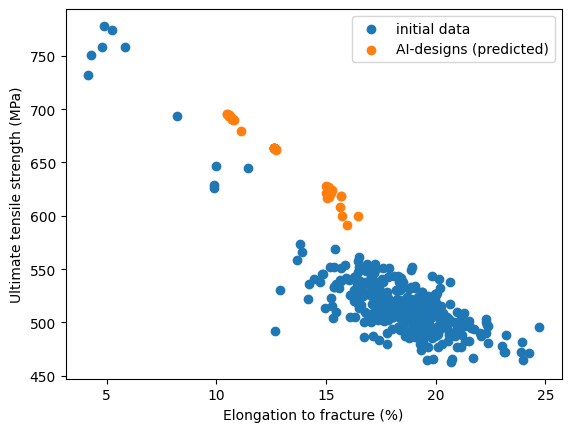

In [16]:
"""Visulization"""
plt.figure()
plt.scatter(y2,y1,label='initial data')
plt.scatter(sample_Ef,sample_UTS,label='AI-designs (predicted)')
plt.xlabel('Elongation to fracture (%)')
plt.ylabel('Ultimate tensile strength (MPa)')
plt.legend()

"""Save best samples"""
def save_excel(samples,sample_UTS,sample_Ef,param_space,path):
    df_pred = pd.DataFrame(np.concatenate((samples.round(5),
                                            sample_UTS.reshape(-1,1),
                                            sample_Ef.reshape(-1,1),
                                            ),axis=1))

    df_pred.columns= [key for key, value in param_space.items()] + ['pred TS','pred EL']
    df_pred.to_excel(path+f'/top_samples.xlsx')

save_excel(sample_pf_top_c,sample_UTS,sample_Ef,param_space,path2)


In [17]:



################################ End of Part IV ################################




################################################################################

---------------------------------------------------------------------------- That's all folks ! ----------------------------------------------------------------------------


################################################################################